In [1]:
pwd

'/workspace'

In [2]:
import os
print("Current working directory:", os.getcwd())


Current working directory: /workspace


In [3]:
import os
import sys

#  Set the working directory to the folder containing the top-level ultralytics package
os.chdir("/workspace")  # change to your workspace root where ultralytics folder exists
print("Current working directory:", os.getcwd())


Current working directory: /workspace


In [4]:
#  Add the top-level ultralytics folder to Python path
os.chdir("/workspace/yolo-distiller")
print("Current working directory:", os.getcwd())

Current working directory: /workspace/yolo-distiller


In [5]:
import ultralytics
ultralytics.checks()

Ultralytics 8.3.24 🚀 Python-3.12.3 torch-2.6.0a0+df5bbc09d1.nv24.12 CUDA:0 (NVIDIA H100 80GB HBM3 MIG 3g.40gb, 40320MiB)
Setup complete ✅ (224 CPUs, 2015.6 GB RAM, 665.5/3515.6 GB disk)


In [7]:
from ultralytics import YOLO

import ultralytics
print(ultralytics.__file__)


/workspace/yolo-distiller/ultralytics/__init__.py


In [8]:
from ultralytics.nn import tasks
from ultralytics.models.yolo.model import YOLO

model = YOLO("/workspace/ultralytics/runs/detect/yolov8n_idd_adamw_eiou/weights/best.pt")
model.info()


Model summary: 225 layers, 3,012,993 parameters, 0 gradients


(225, 3012993, 0, 0.0)

In [9]:
from ultralytics.nn import tasks
from ultralytics.models.yolo.model import YOLO

model = YOLO("/workspace/ultralytics/runs/detect/yolov8l_idd_adamw_eiou/weights/best.pt")
model.info()


Model summary: 365 layers, 43,638,321 parameters, 0 gradients


(365, 43638321, 0, 0.0)

In [10]:
import os
print(os.getcwd())


/workspace/yolo-distiller


In [11]:
from ultralytics import YOLO
import time
import torch

# === Load teacher and student models ===
teacher_model = YOLO("/workspace/ultralytics/runs/detect/yolov8l_idd_adamw_eiou/weights/best.pt")
student_model = YOLO("/workspace/ultralytics/runs/detect/yolov8n_idd_adamw_eiou/weights/best.pt")

# === Training parameters ===
dataset_yaml = "/workspace/datasets/IDD_YOLO/idd.yaml"
run_name = "try"
epochs = 1
imgsz = 640
batch_size = 64
workers = 8
device = "cuda:0" if torch.cuda.is_available() else "cpu"
cache_images = "disk"
amp = True  
save_interval = 40
patience = 20

# === Start KD training ===
print("\n=== STARTING KNOWLEDGE DISTILLATION TRAINING ===")
start_time = time.time()

student_model.train(
    data=dataset_yaml,
    teacher=teacher_model,
    distillation_loss="cwd",   # Use CWD for feature map distillation
    epochs=epochs,
    batch=batch_size,
    imgsz=imgsz,
    workers=workers,
    device=device,
    cache=cache_images,
    name=run_name,
    save=True,
    amp=amp,
    patience=patience,
    save_period=save_interval,
    
    # AdamW hyperparameters
    optimizer="AdamW",
    lr0=0.001,                 # base learning rate
    weight_decay=0.0001,       # AdamW-style decay

    # LR scheduling
    cos_lr=True,               # Cosine annealing
    lrf=0.01,                  # final LR factor (LR_min = lr0*lrf)

    # Training augmentations
    augment=True
)

total_time = time.time() - start_time
print(f"\nKD Training completed in {total_time/3600:.2f} hours")



=== STARTING KNOWLEDGE DISTILLATION TRAINING ===
New https://pypi.org/project/ultralytics/8.3.239 available 😃 Update with 'pip install -U ultralytics'
Ultralytics 8.3.24 🚀 Python-3.12.3 torch-2.6.0a0+df5bbc09d1.nv24.12 CUDA:0 (NVIDIA H100 80GB HBM3 MIG 3g.40gb, 40320MiB)
engine/trainer: task=detect, mode=train, model=/workspace/ultralytics/runs/detect/yolov8n_idd_adamw_eiou/weights/best.pt, data=/workspace/datasets/IDD_YOLO/idd.yaml, epochs=1, time=None, patience=20, batch=64, imgsz=640, save=True, save_period=40, cache=disk, device=cuda:0, workers=8, project=None, name=try2, exist_ok=False, pretrained=True, optimizer=AdamW, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=True, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=N

train: Scanning /workspace/datasets/IDD_YOLO/labels/train.cache... 31569 images, 314 backgrounds, 0 corrupt: 100%|██████████| 31569/31569 [00:00<?, ?it/s]

train: /workspace/datasets/IDD_YOLO/images/train/highquality_16k_BLR-2018-06-22-05-05-26_part_45_0001125.jpg: 1 duplicate labels removed
train: /workspace/datasets/IDD_YOLO/images/train/highquality_16k_HYD-2018-06-15_11-55-11_frontNear_left_0004560.jpg: 1 duplicate labels removed


train: 266.9GB disk space required, with 50% safety margin but only 48.9/285.0GB free, not caching images to disk ⚠️


val: Scanning /workspace/datasets/IDD_YOLO/labels/val.cache... 10225 images, 26 backgrounds, 0 corrupt: 100%|██████████| 10225/10225 [00:00<?, ?it/s]

val: /workspace/datasets/IDD_YOLO/images/val/highquality_16k_HYD-2018-08-24_13-02-50_0004247.jpg: 1 duplicate labels removed
val: /workspace/datasets/IDD_YOLO/images/val/highquality_16k_HYD-2018-08-24_13-22-50_0007776.jpg: 1 duplicate labels removed
val: /workspace/datasets/IDD_YOLO/images/val/highquality_16k_HYD-2018-08-24_13-22-50_0008384.jpg: 1 duplicate labels removed


val: 82.4GB disk space required, with 50% safety margin but only 48.9/285.0GB free, not caching images to disk ⚠️
Plotting labels to /workspace/yolo-distiller/runs/detect/try2/labels.jpg... 
optimizer: AdamW(lr=0.001, momentum=0.937) with parameter groups 154 weight(decay=0.0), 168 weight(decay=0.0001), 166 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 640 train, 640 val
Using 8 dataloader workers
Logging results to /workspace/yolo-distiller/runs/detect/try2
Starting training for 1 epochs...

WARNING ⚠️ torch.Tensor inputs should be normalized 0.0-1.0 but max value is 4.8835530281066895. Dividing input by 255.
0: 640x640 (no detections), 5.5ms
Speed: 0.0ms preprocess, 5.5ms inference, 0.8ms postprocess per image at shape (1, 3, 640, 640)

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  0%|          | 0/494 [00:00<?, ?it/s]


0: 640x640 4 cars, 2 trucks, 3.1ms
1: 640x640 2 riders, 4 cars, 1 bus, 2 motorcycles, 1 autorickshaw, 3.1ms
2: 640x640 3 riders, 5 cars, 1 truck, 3 motorcycles, 3 autorickshaws, 3.1ms
3: 640x640 2 riders, 4 cars, 1 truck, 1 bus, 2 motorcycles, 1 autorickshaw, 3.1ms
4: 640x640 2 riders, 4 cars, 1 truck, 1 bus, 4 motorcycles, 3.1ms
5: 640x640 1 car, 3.1ms
6: 640x640 1 car, 3.1ms
7: 640x640 2 persons, 4 riders, 4 cars, 2 buss, 6 motorcycles, 1 autorickshaw, 3.1ms
8: 640x640 1 person, 1 car, 1 motorcycle, 2 animals, 3.1ms
9: 640x640 6 cars, 1 autorickshaw, 3.1ms
10: 640x640 1 person, 3.1ms
11: 640x640 1 rider, 1 motorcycle, 3.1ms
12: 640x640 1 person, 1 car, 1 truck, 3.1ms
13: 640x640 2 persons, 1 rider, 3 motorcycles, 3.1ms
14: 640x640 1 rider, 1 truck, 1 bus, 4 motorcycles, 3.1ms
15: 640x640 1 person, 1 rider, 1 car, 2 motorcycles, 1 autorickshaw, 3.1ms
16: 640x640 1 rider, 3 cars, 2 trucks, 2 motorcycles, 1 autorickshaw, 3.1ms
17: 640x640 2 persons, 2 riders, 1 car, 4 motorcycles, 3.1m

        1/1      14.9G      1.006     0.6186     0.9528        798        640:   0%|          | 1/494 [00:00<05:30,  1.49it/s]


0: 640x640 1 car, 3 buss, 1 motorcycle, 3.1ms
1: 640x640 4 cars, 1 bus, 3.1ms
2: 640x640 1 rider, 8 cars, 3 trucks, 1 bus, 2 motorcycles, 3.1ms
3: 640x640 1 person, 1 rider, 10 cars, 3 trucks, 3 motorcycles, 3.1ms
4: 640x640 3 persons, 3 cars, 1 truck, 1 autorickshaw, 3.1ms
5: 640x640 3 riders, 4 cars, 3 buss, 1 motorcycle, 3.1ms
6: 640x640 3 riders, 3 cars, 2 buss, 3 motorcycles, 1 autorickshaw, 3.1ms
7: 640x640 38 persons, 6 riders, 6 cars, 2 buss, 5 motorcycles, 2 autorickshaws, 3.1ms
8: 640x640 3 persons, 6 riders, 6 cars, 4 trucks, 1 bus, 5 motorcycles, 1 autorickshaw, 3.1ms
9: 640x640 2 riders, 1 car, 3 motorcycles, 1 bicycle, 3.1ms
10: 640x640 1 person, 4 cars, 1 truck, 1 motorcycle, 3.1ms
11: 640x640 2 persons, 4 riders, 5 cars, 3 trucks, 4 buss, 6 motorcycles, 1 autorickshaw, 1 traffic light, 3.1ms
12: 640x640 20 persons, 5 riders, 2 cars, 5 motorcycles, 3 autorickshaws, 3.1ms
13: 640x640 3 cars, 3.1ms
14: 640x640 1 car, 2 trucks, 1 traffic sign, 3.1ms
15: 640x640 1 person, 7

        1/1      14.9G      1.092     0.6317     0.9725       1288        640:   0%|          | 2/494 [00:01<04:36,  1.78it/s]


0: 640x640 2 persons, 3.1ms
1: 640x640 1 rider, 6 cars, 1 motorcycle, 1 autorickshaw, 3.1ms
2: 640x640 1 rider, 5 cars, 3 motorcycles, 1 autorickshaw, 3.1ms
3: 640x640 2 riders, 5 cars, 1 truck, 1 motorcycle, 1 autorickshaw, 2 traffic signs, 3.1ms
4: 640x640 1 person, 1 rider, 6 cars, 5 motorcycles, 1 autorickshaw, 3.1ms
5: 640x640 2 persons, 3 riders, 1 car, 15 motorcycles, 2 autorickshaws, 3.1ms
6: 640x640 2 trucks, 1 traffic sign, 3.1ms
7: 640x640 1 person, 3.1ms
8: 640x640 1 rider, 5 cars, 4 trucks, 3 motorcycles, 1 traffic sign, 3.1ms
9: 640x640 3 persons, 2 riders, 2 cars, 2 trucks, 1 motorcycle, 1 bicycle, 3.1ms
10: 640x640 5 persons, 1 car, 2 trucks, 3 motorcycles, 3.1ms
11: 640x640 4 persons, 6 riders, 2 cars, 7 motorcycles, 2 autorickshaws, 3.1ms
12: 640x640 4 persons, 2 riders, 8 cars, 3 trucks, 2 motorcycles, 3 autorickshaws, 3.1ms
13: 640x640 4 persons, 3 riders, 6 cars, 5 trucks, 3 motorcycles, 2 autorickshaws, 3.1ms
14: 640x640 1 car, 2 trucks, 1 motorcycle, 3.1ms
15: 6

        1/1      14.9G      1.139     0.6465     0.9816       1419        640:   1%|          | 3/494 [00:01<04:23,  1.86it/s]


0: 640x640 4 persons, 22 riders, 29 cars, 3 trucks, 16 motorcycles, 3 autorickshaws, 3.1ms
1: 640x640 2 persons, 4 buss, 3.1ms
2: 640x640 3 persons, 7 riders, 9 cars, 2 trucks, 6 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
3: 640x640 3 persons, 4 riders, 7 cars, 2 trucks, 5 motorcycles, 1 traffic sign, 3.1ms
4: 640x640 2 riders, 5 cars, 2 trucks, 2 motorcycles, 1 traffic sign, 3.1ms
5: 640x640 10 riders, 7 cars, 3 trucks, 6 buss, 8 motorcycles, 3.1ms
6: 640x640 1 person, 2 riders, 1 motorcycle, 3.1ms
7: 640x640 4 riders, 5 cars, 4 buss, 2 motorcycles, 3.1ms
8: 640x640 9 riders, 1 car, 1 truck, 7 motorcycles, 3.1ms
9: 640x640 4 persons, 2 riders, 2 cars, 3 buss, 1 motorcycle, 3.1ms
10: 640x640 3 persons, 2 riders, 8 cars, 1 bus, 1 motorcycle, 1 autorickshaw, 3.1ms
11: 640x640 1 person, 2 riders, 2 cars, 2 buss, 2 motorcycles, 3.1ms
12: 640x640 5 persons, 2 riders, 6 cars, 3 motorcycles, 1 bicycle, 1 traffic sign, 3.1ms
13: 640x640 1 person, 3 riders, 4 cars, 3 trucks, 3 motorcyc

        1/1      14.9G      1.144      0.664     0.9822       1324        640:   1%|          | 4/494 [00:02<04:31,  1.81it/s]


0: 640x640 10 cars, 2 trucks, 3.1ms
1: 640x640 (no detections), 3.1ms
2: 640x640 5 cars, 1 bus, 3.1ms
3: 640x640 1 person, 4 cars, 3 buss, 3.1ms
4: 640x640 1 person, 1 rider, 3 cars, 2 buss, 1 motorcycle, 3.1ms
5: 640x640 2 riders, 2 cars, 1 motorcycle, 3.1ms
6: 640x640 3 cars, 1 truck, 1 bus, 3.1ms
7: 640x640 1 rider, 1 car, 1 truck, 3.1ms
8: 640x640 3 cars, 3.1ms
9: 640x640 1 person, 1 rider, 9 cars, 1 truck, 1 bus, 1 motorcycle, 3.1ms
10: 640x640 1 person, 1 rider, 6 cars, 4 trucks, 2 buss, 1 motorcycle, 3.1ms
11: 640x640 3 persons, 2 riders, 6 cars, 2 trucks, 2 motorcycles, 1 autorickshaw, 3.1ms
12: 640x640 1 rider, 1 animal, 3.1ms
13: 640x640 1 motorcycle, 3.1ms
14: 640x640 5 persons, 2 riders, 6 cars, 2 trucks, 2 buss, 1 motorcycle, 3.1ms
15: 640x640 2 persons, 1 bus, 3.1ms
16: 640x640 4 persons, 1 rider, 1 motorcycle, 3.1ms
17: 640x640 8 persons, 1 rider, 4 cars, 2 motorcycles, 1 autorickshaw, 2 traffic signs, 3.1ms
18: 640x640 4 persons, 1 car, 1 truck, 1 autorickshaw, 1 traff

        1/1      14.9G      1.142     0.6685     0.9854        963        640:   1%|          | 5/494 [00:02<04:09,  1.96it/s]


0: 640x640 3 persons, 2 cars, 15 trucks, 3.1ms
1: 640x640 27 persons, 6 riders, 2 cars, 3 trucks, 1 bus, 5 motorcycles, 4 autorickshaws, 3.1ms
2: 640x640 (no detections), 3.1ms
3: 640x640 15 persons, 1 rider, 2 cars, 6 trucks, 1 motorcycle, 2 autorickshaws, 3.1ms
4: 640x640 20 persons, 3 riders, 1 car, 5 motorcycles, 4 autorickshaws, 3.1ms
5: 640x640 1 car, 1 truck, 3.1ms
6: 640x640 1 car, 3.1ms
7: 640x640 1 person, 1 rider, 1 car, 1 truck, 1 motorcycle, 3.1ms
8: 640x640 4 persons, 1 rider, 2 trucks, 3 motorcycles, 2 autorickshaws, 3.1ms
9: 640x640 2 persons, 3 riders, 3 motorcycles, 1 autorickshaw, 3.1ms
10: 640x640 1 person, 4 riders, 1 truck, 6 motorcycles, 3 autorickshaws, 3.1ms
11: 640x640 15 persons, 3 riders, 3 cars, 8 trucks, 3 motorcycles, 1 autorickshaw, 3.1ms
12: 640x640 38 persons, 3 riders, 6 cars, 1 truck, 8 motorcycles, 3 autorickshaws, 1 traffic sign, 3.1ms
13: 640x640 (no detections), 3.1ms
14: 640x640 10 persons, 3 riders, 1 car, 1 truck, 2 buss, 3 motorcycles, 2 aut

        1/1      14.9G      1.211     0.7024     0.9938       1406        640:   1%|          | 6/494 [00:03<03:58,  2.05it/s]


0: 640x640 1 person, 5 riders, 3 motorcycles, 1 bicycle, 3.1ms
1: 640x640 2 riders, 5 cars, 1 motorcycle, 3.1ms
2: 640x640 1 person, 14 riders, 8 cars, 6 buss, 7 motorcycles, 6 bicycles, 3.1ms
3: 640x640 5 riders, 5 cars, 1 bus, 2 motorcycles, 2 bicycles, 3.1ms
4: 640x640 7 riders, 3 cars, 3 motorcycles, 2 autorickshaws, 3.1ms
5: 640x640 2 persons, 1 rider, 1 truck, 1 motorcycle, 3.1ms
6: 640x640 7 riders, 2 cars, 2 buss, 3 motorcycles, 3 bicycles, 1 autorickshaw, 3.1ms
7: 640x640 1 person, 3 riders, 1 truck, 1 motorcycle, 2 bicycles, 3.1ms
8: 640x640 1 rider, 1 car, 4 trucks, 1 motorcycle, 3.1ms
9: 640x640 5 riders, 6 cars, 3 trucks, 3 buss, 3 motorcycles, 3.1ms
10: 640x640 (no detections), 3.1ms
11: 640x640 1 person, 3 riders, 1 car, 4 motorcycles, 3.1ms
12: 640x640 5 persons, 7 riders, 4 cars, 1 truck, 6 motorcycles, 1 autorickshaw, 3.1ms
13: 640x640 4 motorcycles, 3.1ms
14: 640x640 1 person, 1 rider, 1 car, 1 bus, 1 motorcycle, 3.1ms
15: 640x640 1 rider, 1 car, 1 motorcycle, 1 aut

        1/1      14.9G      1.229     0.7154          1       1416        640:   1%|▏         | 7/494 [00:03<03:51,  2.10it/s]


0: 640x640 2 cars, 1 bus, 3.1ms
1: 640x640 2 persons, 2 riders, 5 cars, 1 bus, 2 motorcycles, 3.1ms
2: 640x640 6 cars, 3 buss, 3.1ms
3: 640x640 1 motorcycle, 3.1ms
4: 640x640 5 riders, 1 car, 5 motorcycles, 3.1ms
5: 640x640 1 person, 9 riders, 5 cars, 3 trucks, 3 buss, 2 motorcycles, 4 animals, 3.1ms
6: 640x640 1 person, 1 rider, 2 cars, 1 truck, 2 motorcycles, 3.1ms
7: 640x640 1 car, 1 autorickshaw, 3.1ms
8: 640x640 1 rider, 2 motorcycles, 3.1ms
9: 640x640 2 persons, 13 riders, 7 cars, 1 bus, 10 motorcycles, 3 autorickshaws, 3.1ms
10: 640x640 2 cars, 1 bus, 1 traffic sign, 3.1ms
11: 640x640 1 person, 3.1ms
12: 640x640 1 rider, 3 cars, 1 bus, 1 motorcycle, 1 autorickshaw, 3.1ms
13: 640x640 1 car, 1 motorcycle, 3.1ms
14: 640x640 1 person, 2 riders, 4 motorcycles, 1 autorickshaw, 3.1ms
15: 640x640 1 bus, 3.1ms
16: 640x640 2 persons, 5 riders, 3 cars, 1 truck, 2 buss, 3 motorcycles, 4 animals, 3.1ms
17: 640x640 1 person, 2 riders, 1 car, 2 motorcycles, 3.1ms
18: 640x640 (no detections), 

        1/1      14.9G      1.248     0.7295      1.002       1209        640:   2%|▏         | 8/494 [00:04<03:45,  2.16it/s]


0: 640x640 (no detections), 3.1ms
1: 640x640 2 persons, 1 truck, 3.1ms
2: 640x640 2 persons, 5 cars, 2 traffic signs, 3.1ms
3: 640x640 1 person, 1 car, 1 bus, 3.1ms
4: 640x640 (no detections), 3.1ms
5: 640x640 2 riders, 8 cars, 2 trucks, 2 buss, 5 motorcycles, 3.1ms
6: 640x640 1 rider, 4 cars, 1 truck, 2 motorcycles, 3 autorickshaws, 3.1ms
7: 640x640 5 persons, 4 riders, 3 cars, 1 bus, 11 motorcycles, 6 autorickshaws, 3.1ms
8: 640x640 7 persons, 8 cars, 2 trucks, 3.1ms
9: 640x640 1 person, 4 riders, 2 cars, 2 trucks, 2 buss, 9 motorcycles, 2 traffic signs, 3.1ms
10: 640x640 1 car, 3.1ms
11: 640x640 1 person, 5 cars, 2 trucks, 1 autorickshaw, 1 traffic sign, 3.1ms
12: 640x640 2 persons, 6 riders, 14 cars, 1 truck, 2 buss, 6 motorcycles, 1 autorickshaw, 3.1ms
13: 640x640 6 riders, 5 cars, 2 motorcycles, 1 bicycle, 1 autorickshaw, 1 traffic sign, 3.1ms
14: 640x640 10 persons, 5 riders, 4 cars, 1 truck, 1 bus, 5 motorcycles, 1 autorickshaw, 2 traffic signs, 3.1ms
15: 640x640 5 persons, 5 

        1/1      14.9G      1.245     0.7333      1.001       1063        640:   2%|▏         | 9/494 [00:04<03:39,  2.21it/s]


0: 640x640 8 persons, 1 rider, 5 cars, 1 truck, 1 bus, 1 motorcycle, 1 bicycle, 4 animals, 3.1ms
1: 640x640 1 person, 1 rider, 1 truck, 1 motorcycle, 3.1ms
2: 640x640 5 persons, 3 cars, 1 bus, 1 motorcycle, 2 autorickshaws, 1 traffic sign, 3.1ms
3: 640x640 4 riders, 4 cars, 2 trucks, 6 motorcycles, 3 autorickshaws, 3.1ms
4: 640x640 1 person, 2 riders, 2 motorcycles, 2 animals, 1 traffic light, 3.1ms
5: 640x640 4 persons, 9 riders, 5 cars, 3 trucks, 5 motorcycles, 1 bicycle, 4 autorickshaws, 1 traffic sign, 3.1ms
6: 640x640 1 person, 3 riders, 1 car, 2 buss, 4 motorcycles, 1 traffic sign, 3.1ms
7: 640x640 3 persons, 3 cars, 1 autorickshaw, 1 traffic sign, 3.1ms
8: 640x640 3 persons, 13 riders, 14 cars, 2 trucks, 1 bus, 13 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
9: 640x640 9 riders, 14 cars, 2 trucks, 4 motorcycles, 2 bicycles, 1 animal, 3.1ms
10: 640x640 4 persons, 4 riders, 1 truck, 5 motorcycles, 1 bicycle, 7 autorickshaws, 2 traffic signs, 3.1ms
11: 640x640 2 persons, 2 

        1/1      14.9G      1.253     0.7367      1.003       1170        640:   2%|▏         | 10/494 [00:04<03:36,  2.23it/s]


0: 640x640 2 persons, 1 traffic sign, 3.1ms
1: 640x640 9 riders, 3 cars, 1 truck, 3 buss, 6 motorcycles, 3 autorickshaws, 1 traffic sign, 3.1ms
2: 640x640 1 person, 1 truck, 1 autorickshaw, 3.1ms
3: 640x640 4 motorcycles, 3.1ms
4: 640x640 13 persons, 5 riders, 1 car, 10 motorcycles, 3.1ms
5: 640x640 1 person, 6 riders, 3 cars, 1 truck, 6 motorcycles, 1 bicycle, 1 autorickshaw, 3 traffic lights, 1 traffic sign, 3.1ms
6: 640x640 1 person, 4 riders, 2 cars, 1 truck, 1 bus, 1 motorcycle, 2 autorickshaws, 3.1ms
7: 640x640 1 rider, 1 truck, 1 bus, 1 motorcycle, 3.1ms
8: 640x640 2 persons, 2 cars, 1 truck, 2 motorcycles, 1 autorickshaw, 3.1ms
9: 640x640 1 person, 1 rider, 3 cars, 1 motorcycle, 2 autorickshaws, 1 traffic sign, 3.1ms
10: 640x640 2 riders, 2 cars, 3 trucks, 2 buss, 1 motorcycle, 1 traffic sign, 3.1ms
11: 640x640 1 rider, 1 motorcycle, 3.1ms
12: 640x640 3 trucks, 3.1ms
13: 640x640 2 cars, 1 autorickshaw, 3.1ms
14: 640x640 2 riders, 8 cars, 4 trucks, 2 buss, 2 motorcycles, 2 auto

        1/1      14.9G      1.255     0.7431      1.007       1045        640:   2%|▏         | 11/494 [00:05<03:34,  2.25it/s]


0: 640x640 1 car, 1 motorcycle, 1 traffic sign, 3.1ms
1: 640x640 2 persons, 2 riders, 3 cars, 2 trucks, 2 buss, 1 motorcycle, 2 autorickshaws, 3.1ms
2: 640x640 7 persons, 2 riders, 2 cars, 1 truck, 2 buss, 3 motorcycles, 3.1ms
3: 640x640 2 persons, 2 motorcycles, 3.1ms
4: 640x640 6 persons, 5 cars, 2 trucks, 3 buss, 1 autorickshaw, 3.1ms
5: 640x640 1 person, 2 riders, 2 cars, 2 buss, 2 motorcycles, 3.1ms
6: 640x640 1 traffic light, 3.1ms
7: 640x640 2 persons, 1 car, 3.1ms
8: 640x640 4 riders, 2 cars, 2 buss, 3 motorcycles, 3.1ms
9: 640x640 2 persons, 1 rider, 3 cars, 1 motorcycle, 3.1ms
10: 640x640 2 persons, 2 cars, 1 motorcycle, 1 autorickshaw, 3.1ms
11: 640x640 1 rider, 1 car, 1 truck, 1 motorcycle, 1 autorickshaw, 3.1ms
12: 640x640 1 truck, 1 bus, 3.1ms
13: 640x640 1 truck, 3.1ms
14: 640x640 3 riders, 4 cars, 2 trucks, 3 buss, 2 motorcycles, 1 traffic sign, 3.1ms
15: 640x640 10 persons, 2 trucks, 3.1ms
16: 640x640 3 persons, 6 riders, 2 cars, 7 motorcycles, 3 autorickshaws, 3.1ms


        1/1      14.9G      1.244     0.7406      1.007        954        640:   2%|▏         | 12/494 [00:05<03:32,  2.26it/s]


0: 640x640 2 riders, 1 car, 2 motorcycles, 3.1ms
1: 640x640 2 persons, 3 riders, 3 cars, 2 buss, 1 traffic sign, 3.1ms
2: 640x640 1 rider, 3 cars, 6 motorcycles, 2 traffic signs, 3.1ms
3: 640x640 5 persons, 3 riders, 5 cars, 6 trucks, 2 motorcycles, 1 autorickshaw, 3.1ms
4: 640x640 1 rider, 1 car, 1 bus, 1 motorcycle, 3.1ms
5: 640x640 1 motorcycle, 3.1ms
6: 640x640 4 persons, 2 riders, 1 car, 6 motorcycles, 3.1ms
7: 640x640 3 persons, 2 cars, 4 trucks, 1 bus, 1 motorcycle, 1 autorickshaw, 3.1ms
8: 640x640 5 persons, 8 riders, 7 cars, 1 bus, 16 motorcycles, 2 autorickshaws, 3.1ms
9: 640x640 1 person, 5 cars, 4 buss, 1 motorcycle, 1 traffic sign, 3.1ms
10: 640x640 1 rider, 1 truck, 4 motorcycles, 5 autorickshaws, 3.1ms
11: 640x640 2 persons, 1 rider, 5 cars, 1 bicycle, 2 autorickshaws, 3.1ms
12: 640x640 12 persons, 6 riders, 3 cars, 1 truck, 2 buss, 5 motorcycles, 1 traffic sign, 3.1ms
13: 640x640 3 trucks, 1 bicycle, 3.1ms
14: 640x640 1 car, 3.1ms
15: 640x640 8 persons, 8 riders, 5 car

        1/1      14.9G      1.252     0.7454      1.008       1298        640:   3%|▎         | 13/494 [00:06<03:32,  2.27it/s]


0: 640x640 6 persons, 2 riders, 1 truck, 2 motorcycles, 3.1ms
1: 640x640 2 riders, 1 car, 1 bus, 2 motorcycles, 1 autorickshaw, 3.1ms
2: 640x640 1 rider, 2 cars, 1 truck, 1 bus, 2 motorcycles, 3.1ms
3: 640x640 1 person, 2 riders, 1 car, 1 bus, 3 motorcycles, 1 autorickshaw, 3.1ms
4: 640x640 2 cars, 1 truck, 3.1ms
5: 640x640 3 riders, 3 motorcycles, 3.1ms
6: 640x640 4 persons, 5 riders, 3 cars, 1 truck, 10 motorcycles, 1 autorickshaw, 2 traffic lights, 3.1ms
7: 640x640 1 person, 1 rider, 2 cars, 2 trucks, 2 buss, 1 motorcycle, 3.1ms
8: 640x640 9 persons, 8 riders, 3 cars, 1 bus, 4 motorcycles, 1 autorickshaw, 3.1ms
9: 640x640 2 persons, 1 rider, 2 trucks, 1 bus, 2 motorcycles, 7 autorickshaws, 5 traffic lights, 2 traffic signs, 3.1ms
10: 640x640 7 persons, 2 riders, 4 cars, 7 trucks, 2 buss, 5 motorcycles, 6 autorickshaws, 3.1ms
11: 640x640 1 person, 1 rider, 1 car, 1 motorcycle, 3.1ms
12: 640x640 4 persons, 8 riders, 12 cars, 2 buss, 1 autorickshaw, 3.1ms
13: 640x640 2 persons, 2 cars

        1/1      14.9G       1.26     0.7512      1.009       1339        640:   3%|▎         | 14/494 [00:06<03:31,  2.27it/s]


0: 640x640 3 persons, 1 rider, 1 truck, 2 motorcycles, 3.1ms
1: 640x640 3 persons, 2 riders, 1 car, 2 buss, 3 motorcycles, 3.1ms
2: 640x640 3 persons, 1 rider, 4 cars, 1 bus, 1 motorcycle, 1 traffic sign, 3.1ms
3: 640x640 2 riders, 1 car, 2 motorcycles, 4 traffic signs, 3.1ms
4: 640x640 2 persons, 5 riders, 9 cars, 1 truck, 8 motorcycles, 1 autorickshaw, 3.1ms
5: 640x640 2 buss, 1 traffic sign, 3.1ms
6: 640x640 2 riders, 2 cars, 2 trucks, 1 bus, 1 motorcycle, 3.1ms
7: 640x640 3 persons, 5 riders, 4 cars, 3 trucks, 6 motorcycles, 1 bicycle, 3 autorickshaws, 3.1ms
8: 640x640 5 persons, 10 riders, 5 cars, 1 bus, 13 motorcycles, 5 autorickshaws, 1 traffic sign, 3.1ms
9: 640x640 3 persons, 8 riders, 10 cars, 2 trucks, 3 buss, 3 motorcycles, 1 bicycle, 2 autorickshaws, 3 traffic lights, 5 traffic signs, 3.1ms
10: 640x640 3 persons, 8 riders, 15 cars, 2 trucks, 4 buss, 7 motorcycles, 5 autorickshaws, 3 traffic lights, 3 traffic signs, 3.1ms
11: 640x640 3 riders, 5 cars, 1 bus, 3 motorcycles,

        1/1      14.9G       1.26       0.75      1.007       1352        640:   3%|▎         | 15/494 [00:07<03:31,  2.26it/s]


0: 640x640 (no detections), 3.1ms
1: 640x640 2 persons, 6 riders, 3 cars, 5 motorcycles, 1 autorickshaw, 3.1ms
2: 640x640 1 rider, 1 car, 1 truck, 2 motorcycles, 5 autorickshaws, 3.1ms
3: 640x640 1 person, 3 riders, 4 motorcycles, 2 bicycles, 3.1ms
4: 640x640 2 persons, 7 riders, 11 cars, 3 trucks, 2 buss, 3 motorcycles, 3.1ms
5: 640x640 6 riders, 2 cars, 1 truck, 2 buss, 3.1ms
6: 640x640 5 persons, 3 riders, 3 cars, 2 trucks, 1 bus, 3 motorcycles, 3 autorickshaws, 1 traffic sign, 3.1ms
7: 640x640 1 motorcycle, 5 autorickshaws, 2 traffic lights, 1 traffic sign, 3.1ms
8: 640x640 3 riders, 2 cars, 1 truck, 1 bus, 3 motorcycles, 1 traffic sign, 3.1ms
9: 640x640 1 person, 3 cars, 1 bus, 3.1ms
10: 640x640 1 rider, 4 cars, 2 motorcycles, 1 animal, 3.1ms
11: 640x640 3 persons, 4 riders, 8 cars, 1 truck, 3 buss, 3 motorcycles, 5 autorickshaws, 3.1ms
12: 640x640 1 person, 3 riders, 1 car, 2 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
13: 640x640 1 car, 1 bus, 3.1ms
14: 640x640 1 person, 1 ri

        1/1      14.9G      1.268     0.7543      1.007       1427        640:   3%|▎         | 16/494 [00:07<03:31,  2.26it/s]


0: 640x640 1 person, 3 riders, 1 car, 5 motorcycles, 1 autorickshaw, 3.1ms
1: 640x640 3 persons, 3.1ms
2: 640x640 1 person, 2 riders, 7 cars, 5 trucks, 2 motorcycles, 1 autorickshaw, 3.1ms
3: 640x640 2 persons, 3 cars, 2 trucks, 1 autorickshaw, 1 traffic sign, 3.1ms
4: 640x640 1 person, 2 riders, 2 cars, 7 trucks, 1 bus, 2 motorcycles, 2 autorickshaws, 3.1ms
5: 640x640 5 persons, 1 rider, 1 bus, 3 motorcycles, 3.1ms
6: 640x640 3 persons, 1 rider, 1 car, 2 motorcycles, 2 autorickshaws, 3.1ms
7: 640x640 1 person, 1 truck, 1 bus, 3 motorcycles, 1 animal, 3.1ms
8: 640x640 2 riders, 1 car, 6 trucks, 1 bus, 5 motorcycles, 2 autorickshaws, 3.1ms
9: 640x640 2 persons, 2 cars, 1 traffic sign, 3.1ms
10: 640x640 2 trucks, 1 bicycle, 3.1ms
11: 640x640 7 riders, 6 cars, 1 bus, 7 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
12: 640x640 1 rider, 12 cars, 1 bus, 3 motorcycles, 1 traffic sign, 3.1ms
13: 640x640 1 person, 3 riders, 1 car, 1 motorcycle, 1 bicycle, 1 autorickshaw, 3.1ms
14: 640x640

        1/1      14.9G      1.262     0.7511      1.006       1278        640:   3%|▎         | 17/494 [00:07<03:31,  2.26it/s]


0: 640x640 4 riders, 2 trucks, 4 motorcycles, 4 autorickshaws, 1 traffic light, 2 traffic signs, 3.1ms
1: 640x640 6 riders, 5 cars, 2 trucks, 4 motorcycles, 4 autorickshaws, 6 traffic signs, 3.1ms
2: 640x640 3 persons, 1 motorcycle, 1 autorickshaw, 3 animals, 3.1ms
3: 640x640 1 rider, 1 motorcycle, 3.1ms
4: 640x640 1 person, 3 riders, 6 cars, 2 trucks, 2 motorcycles, 6 autorickshaws, 2 traffic lights, 3.1ms
5: 640x640 1 person, 3 riders, 2 cars, 2 trucks, 5 motorcycles, 3.1ms
6: 640x640 1 person, 2 riders, 1 car, 2 motorcycles, 1 traffic sign, 3.1ms
7: 640x640 2 persons, 10 riders, 5 trucks, 9 motorcycles, 3.1ms
8: 640x640 6 riders, 2 cars, 1 truck, 2 buss, 4 motorcycles, 5 autorickshaws, 3.1ms
9: 640x640 1 person, 12 riders, 11 cars, 4 trucks, 1 bus, 7 motorcycles, 2 autorickshaws, 3.1ms
10: 640x640 6 persons, 3 riders, 5 cars, 2 motorcycles, 2 autorickshaws, 2 traffic signs, 3.1ms
11: 640x640 2 persons, 4 cars, 1 traffic sign, 3.1ms
12: 640x640 2 persons, 1 truck, 2 motorcycles, 3.1

        1/1      14.9G      1.264     0.7504      1.005       1323        640:   4%|▎         | 18/494 [00:08<03:31,  2.26it/s]


0: 640x640 1 truck, 3.1ms
1: 640x640 2 persons, 6 cars, 6 trucks, 2 motorcycles, 1 bicycle, 2 autorickshaws, 1 traffic sign, 3.1ms
2: 640x640 4 persons, 3 riders, 5 cars, 1 truck, 1 bus, 7 motorcycles, 4 autorickshaws, 3.1ms
3: 640x640 3 persons, 3 riders, 3 cars, 3 motorcycles, 3.1ms
4: 640x640 2 persons, 1 rider, 2 trucks, 1 motorcycle, 3.1ms
5: 640x640 2 persons, 1 rider, 1 car, 2 trucks, 2 motorcycles, 2 autorickshaws, 3.1ms
6: 640x640 3 cars, 4 trucks, 1 autorickshaw, 1 traffic sign, 3.1ms
7: 640x640 5 persons, 5 riders, 11 cars, 1 truck, 2 buss, 4 motorcycles, 1 autorickshaw, 3.1ms
8: 640x640 1 person, 1 truck, 3.1ms
9: 640x640 2 cars, 1 traffic light, 3.1ms
10: 640x640 2 persons, 2 riders, 2 cars, 2 trucks, 3 buss, 2 motorcycles, 3 autorickshaws, 1 traffic sign, 3.1ms
11: 640x640 14 persons, 3 riders, 5 cars, 1 bus, 5 motorcycles, 5 autorickshaws, 2 traffic signs, 3.1ms
12: 640x640 12 persons, 5 cars, 5 trucks, 4 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
13: 640x640 1 

        1/1      14.9G      1.267     0.7521      1.006       1251        640:   4%|▍         | 19/494 [00:08<03:30,  2.26it/s]


0: 640x640 1 person, 3 motorcycles, 1 bicycle, 3.1ms
1: 640x640 1 person, 1 rider, 3 buss, 2 motorcycles, 3.1ms
2: 640x640 2 riders, 3 cars, 1 truck, 2 motorcycles, 3.1ms
3: 640x640 1 rider, 1 bus, 1 motorcycle, 3.1ms
4: 640x640 9 persons, 2 motorcycles, 3.1ms
5: 640x640 2 riders, 1 car, 2 trucks, 6 motorcycles, 1 bicycle, 1 traffic sign, 3.1ms
6: 640x640 1 person, 4 riders, 1 car, 1 truck, 3 autorickshaws, 3.1ms
7: 640x640 1 person, 1 rider, 7 cars, 3 motorcycles, 3.1ms
8: 640x640 2 persons, 2 riders, 1 car, 2 motorcycles, 1 animal, 3.1ms
9: 640x640 2 persons, 9 riders, 2 cars, 4 motorcycles, 4 autorickshaws, 3.1ms
10: 640x640 1 rider, 2 buss, 3 motorcycles, 3.1ms
11: 640x640 1 person, 1 rider, 6 cars, 1 truck, 2 motorcycles, 2 traffic signs, 3.1ms
12: 640x640 2 persons, 7 riders, 8 cars, 2 trucks, 9 motorcycles, 2 autorickshaws, 3.1ms
13: 640x640 7 persons, 1 rider, 2 cars, 2 buss, 2 motorcycles, 1 autorickshaw, 3.1ms
14: 640x640 3 persons, 3 riders, 4 trucks, 2 motorcycles, 3.1ms
1

        1/1      14.9G      1.263     0.7509      1.005       1317        640:   4%|▍         | 20/494 [00:09<03:30,  2.25it/s]


0: 640x640 1 rider, 6 cars, 1 truck, 2 motorcycles, 1 autorickshaw, 3.1ms
1: 640x640 4 cars, 1 bus, 3.1ms
2: 640x640 2 persons, 1 rider, 1 car, 1 motorcycle, 3.1ms
3: 640x640 5 persons, 2 riders, 1 car, 1 truck, 7 motorcycles, 3.1ms
4: 640x640 1 rider, 4 cars, 1 truck, 1 motorcycle, 1 autorickshaw, 3.1ms
5: 640x640 1 car, 1 truck, 1 bus, 3.1ms
6: 640x640 21 persons, 3 riders, 4 cars, 2 trucks, 2 buss, 4 motorcycles, 1 autorickshaw, 3.1ms
7: 640x640 (no detections), 3.1ms
8: 640x640 2 persons, 2 riders, 2 cars, 3 trucks, 1 bus, 1 motorcycle, 1 bicycle, 3.1ms
9: 640x640 4 riders, 9 cars, 3 trucks, 1 bus, 2 motorcycles, 3 autorickshaws, 3.1ms
10: 640x640 2 riders, 4 cars, 3 trucks, 1 bus, 5 motorcycles, 1 autorickshaw, 3.1ms
11: 640x640 3 riders, 1 car, 2 trucks, 2 motorcycles, 3.1ms
12: 640x640 2 persons, 1 rider, 3 cars, 3 motorcycles, 3.1ms
13: 640x640 1 person, 5 cars, 3 trucks, 3.1ms
14: 640x640 5 riders, 4 cars, 10 motorcycles, 2 autorickshaws, 3.1ms
15: 640x640 1 person, 1 car, 1 

        1/1      14.9G      1.264     0.7525      1.006       1079        640:   4%|▍         | 21/494 [00:09<03:28,  2.26it/s]


0: 640x640 4 persons, 7 riders, 4 cars, 2 trucks, 5 motorcycles, 1 bicycle, 1 autorickshaw, 2 traffic lights, 1 traffic sign, 3.1ms
1: 640x640 1 person, 1 car, 3.1ms
2: 640x640 8 riders, 3 cars, 1 truck, 5 motorcycles, 3.1ms
3: 640x640 2 riders, 3 cars, 5 motorcycles, 2 bicycles, 3 autorickshaws, 1 traffic sign, 3.1ms
4: 640x640 2 riders, 4 cars, 4 motorcycles, 4 autorickshaws, 3.1ms
5: 640x640 (no detections), 3.1ms
6: 640x640 1 person, 2 riders, 4 cars, 2 motorcycles, 3.1ms
7: 640x640 4 persons, 3 riders, 6 cars, 1 truck, 1 bus, 4 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
8: 640x640 1 bicycle, 1 traffic sign, 3.1ms
9: 640x640 5 persons, 2 riders, 1 car, 1 truck, 1 bus, 2 motorcycles, 5 autorickshaws, 1 traffic sign, 3.1ms
10: 640x640 4 persons, 1 rider, 1 car, 4 trucks, 3 motorcycles, 1 traffic sign, 3.1ms
11: 640x640 1 rider, 4 cars, 1 truck, 12 motorcycles, 3 autorickshaws, 3.1ms
12: 640x640 1 person, 1 bus, 3.1ms
13: 640x640 1 rider, 2 motorcycles, 3.1ms
14: 640x640 1 p

        1/1      14.9G      1.269     0.7557      1.006       1261        640:   4%|▍         | 22/494 [00:10<03:29,  2.26it/s]


0: 640x640 2 riders, 3 cars, 2 buss, 2 motorcycles, 3.1ms
1: 640x640 1 person, 4 riders, 8 cars, 6 trucks, 5 buss, 4 motorcycles, 3.1ms
2: 640x640 1 rider, 1 car, 1 motorcycle, 2 animals, 3.1ms
3: 640x640 4 riders, 1 truck, 4 motorcycles, 1 traffic sign, 3.1ms
4: 640x640 2 riders, 1 bus, 2 motorcycles, 1 autorickshaw, 3.1ms
5: 640x640 1 person, 2 riders, 1 truck, 2 motorcycles, 3.1ms
6: 640x640 3 persons, 5 riders, 4 cars, 2 trucks, 5 motorcycles, 1 autorickshaw, 3.1ms
7: 640x640 1 rider, 1 motorcycle, 3.1ms
8: 640x640 1 rider, 1 motorcycle, 3.1ms
9: 640x640 1 rider, 3.1ms
10: 640x640 1 rider, 2 cars, 3 trucks, 1 bus, 1 motorcycle, 3.1ms
11: 640x640 3 persons, 5 riders, 3 cars, 1 bus, 7 motorcycles, 3.1ms
12: 640x640 1 person, 3 riders, 1 car, 1 truck, 4 motorcycles, 1 animal, 3.1ms
13: 640x640 2 persons, 11 riders, 2 cars, 1 truck, 3 buss, 11 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
14: 640x640 4 riders, 13 cars, 3 motorcycles, 3 autorickshaws, 3.1ms
15: 640x640 2 riders, 2 cars

        1/1      14.9G      1.268     0.7541      1.006       1267        640:   5%|▍         | 23/494 [00:10<03:27,  2.27it/s]


0: 640x640 5 cars, 1 traffic sign, 3.1ms
1: 640x640 5 persons, 8 riders, 13 cars, 4 buss, 2 motorcycles, 2 autorickshaws, 3.1ms
2: 640x640 2 persons, 5 riders, 6 cars, 2 trucks, 3.1ms
3: 640x640 2 riders, 2 cars, 2 motorcycles, 3.1ms
4: 640x640 1 person, 1 truck, 2 motorcycles, 3.1ms
5: 640x640 (no detections), 3.1ms
6: 640x640 2 cars, 1 bus, 3.1ms
7: 640x640 2 riders, 3 motorcycles, 3.1ms
8: 640x640 2 riders, 1 car, 1 bus, 2 motorcycles, 3.1ms
9: 640x640 1 car, 3 trucks, 1 bicycle, 3.1ms
10: 640x640 3 persons, 4 riders, 8 cars, 2 trucks, 4 motorcycles, 1 traffic sign, 3.1ms
11: 640x640 2 cars, 1 motorcycle, 3.1ms
12: 640x640 2 riders, 4 cars, 4 trucks, 2 buss, 2 motorcycles, 3.1ms
13: 640x640 7 persons, 3 riders, 6 cars, 2 trucks, 5 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
14: 640x640 1 person, 6 riders, 3 cars, 3 trucks, 5 motorcycles, 1 traffic sign, 3.1ms
15: 640x640 2 riders, 2 cars, 1 motorcycle, 3.1ms
16: 640x640 2 persons, 1 car, 1 bus, 4 motorcycles, 2 autorickshaws

        1/1      14.9G      1.272     0.7563      1.006       1137        640:   5%|▍         | 24/494 [00:11<03:26,  2.27it/s]


0: 640x640 1 person, 1 car, 1 bus, 1 motorcycle, 3.1ms
1: 640x640 4 persons, 6 riders, 2 cars, 2 trucks, 2 motorcycles, 1 bicycle, 3 autorickshaws, 3.1ms
2: 640x640 3 persons, 3 cars, 5 motorcycles, 2 autorickshaws, 3.1ms
3: 640x640 1 person, 4 riders, 6 cars, 1 truck, 3 motorcycles, 3.1ms
4: 640x640 4 persons, 10 riders, 2 cars, 2 trucks, 1 bus, 8 motorcycles, 6 autorickshaws, 3.1ms
5: 640x640 2 riders, 3 cars, 1 truck, 1 bus, 4 motorcycles, 1 traffic sign, 3.1ms
6: 640x640 2 riders, 1 car, 1 motorcycle, 1 bicycle, 3.1ms
7: 640x640 7 persons, 2 riders, 1 bus, 4 motorcycles, 3.1ms
8: 640x640 7 persons, 3 motorcycles, 3.1ms
9: 640x640 1 person, 6 riders, 8 cars, 2 trucks, 3 buss, 4 motorcycles, 1 autorickshaw, 3.1ms
10: 640x640 3 persons, 5 riders, 2 cars, 6 trucks, 1 bus, 9 motorcycles, 4 autorickshaws, 3.1ms
11: 640x640 1 person, 4 riders, 3 cars, 1 truck, 1 bus, 6 motorcycles, 1 autorickshaw, 3.1ms
12: 640x640 1 car, 1 truck, 2 buss, 1 motorcycle, 3.1ms
13: 640x640 1 animal, 3.1ms
1

        1/1      14.9G      1.271     0.7572      1.006       1242        640:   5%|▌         | 25/494 [00:11<03:26,  2.27it/s]


0: 640x640 2 persons, 1 rider, 5 cars, 1 truck, 2 buss, 8 motorcycles, 1 traffic sign, 3.1ms
1: 640x640 2 persons, 4 riders, 5 cars, 1 truck, 2 buss, 6 motorcycles, 2 autorickshaws, 2 traffic signs, 3.1ms
2: 640x640 2 riders, 5 cars, 1 truck, 1 motorcycle, 3.1ms
3: 640x640 1 person, 5 riders, 6 motorcycles, 2 animals, 2 traffic lights, 3.1ms
4: 640x640 1 person, 3 riders, 3 cars, 3 buss, 3 motorcycles, 3.1ms
5: 640x640 1 person, 4 riders, 3 cars, 3 trucks, 8 motorcycles, 2 autorickshaws, 3.1ms
6: 640x640 1 truck, 2 traffic signs, 3.1ms
7: 640x640 5 persons, 6 riders, 11 cars, 3 trucks, 10 motorcycles, 3 autorickshaws, 1 traffic light, 1 traffic sign, 3.1ms
8: 640x640 2 persons, 1 truck, 1 motorcycle, 1 bicycle, 3.1ms
9: 640x640 1 person, 5 riders, 3 cars, 3 motorcycles, 4 traffic signs, 3.1ms
10: 640x640 1 person, 1 rider, 2 cars, 1 truck, 1 bus, 1 motorcycle, 3.1ms
11: 640x640 1 person, 3.1ms
12: 640x640 2 riders, 1 car, 2 buss, 1 motorcycle, 3.1ms
13: 640x640 2 persons, 2 riders, 1 

        1/1      14.9G      1.269     0.7553      1.004       1284        640:   5%|▌         | 26/494 [00:11<03:26,  2.27it/s]


0: 640x640 4 riders, 6 cars, 2 buss, 2 motorcycles, 1 autorickshaw, 3.1ms
1: 640x640 3 persons, 2 cars, 3 trucks, 1 motorcycle, 1 autorickshaw, 3.1ms
2: 640x640 11 riders, 3 cars, 2 buss, 7 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
3: 640x640 9 persons, 6 riders, 2 cars, 9 motorcycles, 6 autorickshaws, 3.1ms
4: 640x640 3 persons, 1 car, 1 bus, 1 motorcycle, 1 autorickshaw, 1 traffic sign, 3.1ms
5: 640x640 1 person, 1 rider, 1 bus, 3 motorcycles, 3.1ms
6: 640x640 (no detections), 3.1ms
7: 640x640 1 person, 1 rider, 2 trucks, 1 bus, 1 bicycle, 3.1ms
8: 640x640 2 riders, 12 cars, 3 trucks, 2 buss, 6 motorcycles, 1 autorickshaw, 3.1ms
9: 640x640 1 person, 1 rider, 2 cars, 2 buss, 1 motorcycle, 3.1ms
10: 640x640 2 persons, 1 rider, 2 cars, 1 bus, 1 motorcycle, 1 autorickshaw, 3.1ms
11: 640x640 1 car, 7 trucks, 3.1ms
12: 640x640 2 riders, 1 truck, 2 motorcycles, 3.1ms
13: 640x640 2 riders, 4 cars, 2 motorcycles, 1 autorickshaw, 3.1ms
14: 640x640 3 riders, 8 cars, 3 trucks, 5 buss,

        1/1      14.9G       1.27     0.7553      1.005       1429        640:   5%|▌         | 27/494 [00:12<03:26,  2.27it/s]


0: 640x640 14 persons, 14 riders, 8 cars, 3 trucks, 11 motorcycles, 2 bicycles, 3 autorickshaws, 1 traffic sign, 3.1ms
1: 640x640 3 cars, 3.1ms
2: 640x640 (no detections), 3.1ms
3: 640x640 1 rider, 1 car, 1 bus, 2 motorcycles, 3.1ms
4: 640x640 1 person, 3 riders, 2 cars, 1 truck, 3 motorcycles, 2 autorickshaws, 3.1ms
5: 640x640 3 riders, 2 cars, 2 motorcycles, 1 autorickshaw, 3.1ms
6: 640x640 1 person, 1 rider, 3 cars, 1 truck, 2 motorcycles, 1 autorickshaw, 2 traffic lights, 1 traffic sign, 3.1ms
7: 640x640 1 person, 3 cars, 4 buss, 3.1ms
8: 640x640 1 rider, 1 motorcycle, 3.1ms
9: 640x640 2 cars, 1 bus, 3.1ms
10: 640x640 1 rider, 1 truck, 1 bus, 1 motorcycle, 2 traffic lights, 1 traffic sign, 3.1ms
11: 640x640 (no detections), 3.1ms
12: 640x640 4 persons, 1 rider, 2 cars, 1 truck, 2 motorcycles, 2 autorickshaws, 3.1ms
13: 640x640 6 persons, 3 cars, 3 trucks, 1 bus, 3 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
14: 640x640 3 persons, 7 riders, 4 cars, 1 truck, 5 motorcycles, 3.1ms
1

        1/1      14.9G      1.267     0.7541      1.004       1273        640:   6%|▌         | 28/494 [00:12<03:26,  2.26it/s]


0: 640x640 2 persons, 2 riders, 2 cars, 6 trucks, 3 buss, 3 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
1: 640x640 2 riders, 1 car, 2 trucks, 1 bus, 1 motorcycle, 3.1ms
2: 640x640 1 person, 5 riders, 5 cars, 4 trucks, 1 bus, 2 motorcycles, 1 bicycle, 2 autorickshaws, 3.1ms
3: 640x640 2 cars, 1 truck, 1 bus, 1 motorcycle, 2 autorickshaws, 1 traffic sign, 3.1ms
4: 640x640 6 persons, 3 riders, 10 cars, 1 truck, 1 bus, 2 motorcycles, 4 autorickshaws, 1 traffic light, 1 traffic sign, 3.1ms
5: 640x640 2 motorcycles, 3.1ms
6: 640x640 1 rider, 1 car, 1 truck, 5 motorcycles, 1 autorickshaw, 3.1ms
7: 640x640 1 rider, 1 bus, 1 motorcycle, 3.1ms
8: 640x640 3 persons, 1 rider, 3 cars, 2 trucks, 1 bus, 1 motorcycle, 1 autorickshaw, 3.1ms
9: 640x640 2 persons, 3 riders, 1 car, 2 motorcycles, 3.1ms
10: 640x640 1 person, 4 riders, 4 cars, 5 motorcycles, 1 autorickshaw, 3.1ms
11: 640x640 1 rider, 1 truck, 1 bicycle, 2 autorickshaws, 3.1ms
12: 640x640 1 person, 2 riders, 1 car, 1 truck, 1 bus, 1 

        1/1      14.9G      1.269     0.7556      1.005       1325        640:   6%|▌         | 29/494 [00:13<03:25,  2.26it/s]


0: 640x640 3 cars, 1 truck, 3.1ms
1: 640x640 2 riders, 2 cars, 1 bus, 3.1ms
2: 640x640 11 persons, 9 riders, 19 cars, 2 trucks, 1 bus, 5 motorcycles, 3 autorickshaws, 1 traffic sign, 3.1ms
3: 640x640 2 persons, 5 cars, 2 buss, 1 autorickshaw, 1 traffic sign, 3.1ms
4: 640x640 4 persons, 6 riders, 2 cars, 1 truck, 2 buss, 3 motorcycles, 4 autorickshaws, 3.1ms
5: 640x640 7 persons, 15 riders, 10 cars, 3 trucks, 13 motorcycles, 3 autorickshaws, 3.1ms
6: 640x640 2 riders, 2 cars, 2 motorcycles, 3.1ms
7: 640x640 (no detections), 3.1ms
8: 640x640 10 persons, 10 riders, 4 cars, 4 trucks, 1 bus, 10 motorcycles, 4 autorickshaws, 3.1ms
9: 640x640 1 person, 1 rider, 1 car, 5 motorcycles, 3.1ms
10: 640x640 3 persons, 1 autorickshaw, 3.1ms
11: 640x640 1 person, 2 riders, 1 car, 1 bus, 1 motorcycle, 3.1ms
12: 640x640 3 persons, 2 riders, 4 cars, 3 trucks, 5 motorcycles, 3.1ms
13: 640x640 2 cars, 3.1ms
14: 640x640 1 person, 3 riders, 6 cars, 7 trucks, 2 motorcycles, 4 autorickshaws, 5 traffic lights,

        1/1      14.9G       1.27     0.7558      1.004       1538        640:   6%|▌         | 30/494 [00:13<03:25,  2.25it/s]


0: 640x640 1 person, 4 riders, 11 cars, 1 truck, 2 buss, 6 motorcycles, 3 autorickshaws, 3 traffic lights, 2 traffic signs, 3.1ms
1: 640x640 4 riders, 4 cars, 1 truck, 1 bus, 3 motorcycles, 4 traffic signs, 3.1ms
2: 640x640 3 trucks, 5 buss, 5 autorickshaws, 3.1ms
3: 640x640 3 persons, 1 rider, 3 cars, 2 motorcycles, 1 autorickshaw, 3.1ms
4: 640x640 4 persons, 1 rider, 2 cars, 4 motorcycles, 2 autorickshaws, 3.1ms
5: 640x640 4 persons, 1 car, 1 autorickshaw, 3.1ms
6: 640x640 2 persons, 2 riders, 5 cars, 1 truck, 7 motorcycles, 3.1ms
7: 640x640 3 motorcycles, 1 bicycle, 3.1ms
8: 640x640 3 persons, 5 riders, 8 cars, 6 motorcycles, 2 autorickshaws, 3.1ms
9: 640x640 1 person, 1 bus, 2 motorcycles, 1 autorickshaw, 3.1ms
10: 640x640 2 persons, 3 riders, 1 car, 6 buss, 2 motorcycles, 1 bicycle, 4 autorickshaws, 3.1ms
11: 640x640 2 persons, 3 riders, 5 cars, 6 motorcycles, 3.1ms
12: 640x640 1 person, 1 motorcycle, 1 autorickshaw, 3.1ms
13: 640x640 9 persons, 3 motorcycles, 1 autorickshaw, 3.1

        1/1      14.9G      1.268     0.7545      1.003       1242        640:   6%|▋         | 31/494 [00:14<03:24,  2.27it/s]


0: 640x640 12 persons, 6 riders, 9 motorcycles, 3.1ms
1: 640x640 2 persons, 2 motorcycles, 3.1ms
2: 640x640 4 persons, 7 riders, 5 cars, 13 motorcycles, 1 autorickshaw, 3.1ms
3: 640x640 5 persons, 2 riders, 4 cars, 4 motorcycles, 3.1ms
4: 640x640 2 persons, 2 riders, 4 cars, 2 motorcycles, 2 autorickshaws, 3.1ms
5: 640x640 4 persons, 6 riders, 1 car, 1 motorcycle, 1 bicycle, 3.1ms
6: 640x640 3 riders, 2 cars, 2 trucks, 3 motorcycles, 1 autorickshaw, 3.1ms
7: 640x640 3 persons, 1 rider, 6 cars, 3 motorcycles, 2 autorickshaws, 3.1ms
8: 640x640 1 person, 11 riders, 5 cars, 5 trucks, 1 bus, 8 motorcycles, 3 traffic lights, 3.1ms
9: 640x640 1 person, 1 truck, 1 autorickshaw, 2 traffic signs, 3.1ms
10: 640x640 2 persons, 1 truck, 1 motorcycle, 3.1ms
11: 640x640 2 cars, 2 trucks, 1 bus, 2 motorcycles, 2 autorickshaws, 3.1ms
12: 640x640 1 person, 3 riders, 3 cars, 3 motorcycles, 1 traffic sign, 3.1ms
13: 640x640 1 rider, 2 cars, 2 trucks, 1 motorcycle, 1 autorickshaw, 3.1ms
14: 640x640 1 pers

        1/1      14.9G      1.268     0.7543      1.003       1398        640:   6%|▋         | 32/494 [00:14<03:23,  2.27it/s]


0: 640x640 1 rider, 3 trucks, 1 bus, 1 autorickshaw, 3.1ms
1: 640x640 2 trucks, 3.1ms
2: 640x640 1 rider, 2 cars, 1 truck, 1 motorcycle, 2 autorickshaws, 3.1ms
3: 640x640 2 persons, 1 rider, 1 motorcycle, 3.1ms
4: 640x640 1 person, 2 cars, 1 bus, 3.1ms
5: 640x640 1 person, 2 riders, 1 car, 2 motorcycles, 1 traffic sign, 3.1ms
6: 640x640 3 persons, 2 riders, 10 cars, 1 truck, 1 motorcycle, 1 autorickshaw, 3.1ms
7: 640x640 1 rider, 1 car, 1 motorcycle, 2 autorickshaws, 3.1ms
8: 640x640 1 person, 12 riders, 8 cars, 2 trucks, 6 motorcycles, 2 autorickshaws, 3.1ms
9: 640x640 3 persons, 8 cars, 2 trucks, 1 bus, 1 autorickshaw, 3.1ms
10: 640x640 3 trucks, 1 autorickshaw, 2 traffic signs, 3.1ms
11: 640x640 1 person, 2 cars, 2 motorcycles, 2 traffic signs, 3.1ms
12: 640x640 1 rider, 6 cars, 1 bus, 1 motorcycle, 3.1ms
13: 640x640 5 riders, 5 cars, 1 truck, 1 bus, 3 motorcycles, 1 bicycle, 3.1ms
14: 640x640 4 cars, 5 trucks, 2 motorcycles, 1 autorickshaw, 3.1ms
15: 640x640 3 persons, 4 riders, 4

        1/1      14.9G      1.266      0.755      1.003       1196        640:   7%|▋         | 33/494 [00:15<03:23,  2.27it/s]


0: 640x640 2 persons, 2 riders, 5 cars, 2 buss, 1 motorcycle, 3.1ms
1: 640x640 1 bus, 3.1ms
2: 640x640 14 persons, 7 riders, 7 cars, 3 trucks, 9 motorcycles, 2 autorickshaws, 3.1ms
3: 640x640 1 person, 1 car, 2 buss, 1 motorcycle, 1 autorickshaw, 1 traffic sign, 3.1ms
4: 640x640 4 riders, 2 cars, 1 bus, 2 motorcycles, 3.1ms
5: 640x640 1 person, 3 riders, 3 cars, 2 trucks, 2 buss, 3 motorcycles, 1 autorickshaw, 3.1ms
6: 640x640 6 persons, 1 rider, 1 car, 2 motorcycles, 1 bicycle, 1 autorickshaw, 2 traffic lights, 3.1ms
7: 640x640 5 persons, 1 car, 2 trucks, 1 autorickshaw, 1 animal, 3.1ms
8: 640x640 1 person, 8 riders, 11 cars, 2 trucks, 14 motorcycles, 4 autorickshaws, 1 traffic sign, 3.1ms
9: 640x640 1 person, 4 riders, 3 cars, 1 bus, 5 motorcycles, 3.1ms
10: 640x640 1 person, 1 rider, 4 cars, 5 trucks, 2 buss, 3 motorcycles, 2 autorickshaws, 3 traffic lights, 3.1ms
11: 640x640 4 persons, 1 car, 1 truck, 1 bus, 3.1ms
12: 640x640 5 persons, 3 riders, 9 cars, 1 truck, 6 buss, 3 motorcy

        1/1      14.9G      1.264     0.7544      1.002       1238        640:   7%|▋         | 34/494 [00:15<03:22,  2.27it/s]


0: 640x640 6 persons, 2 riders, 7 cars, 2 buss, 2 motorcycles, 1 bicycle, 1 traffic sign, 3.1ms
1: 640x640 7 persons, 1 car, 3.1ms
2: 640x640 7 persons, 3 riders, 5 cars, 1 truck, 3 buss, 3 motorcycles, 3.1ms
3: 640x640 5 persons, 1 rider, 1 truck, 1 motorcycle, 3.1ms
4: 640x640 1 person, 1 rider, 2 cars, 1 truck, 1 bus, 2 motorcycles, 1 autorickshaw, 3.1ms
5: 640x640 1 rider, 4 trucks, 3 motorcycles, 3.1ms
6: 640x640 3 riders, 6 cars, 3 motorcycles, 2 autorickshaws, 1 traffic light, 3.1ms
7: 640x640 6 persons, 4 riders, 8 cars, 5 trucks, 1 bus, 3 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
8: 640x640 4 riders, 3 cars, 1 bus, 4 motorcycles, 3.1ms
9: 640x640 2 riders, 1 motorcycle, 1 autorickshaw, 3.1ms
10: 640x640 3 persons, 5 riders, 5 cars, 1 truck, 1 bus, 6 motorcycles, 11 autorickshaws, 2 traffic signs, 3.1ms
11: 640x640 2 persons, 5 riders, 7 cars, 3 trucks, 1 bus, 3 motorcycles, 2 autorickshaws, 1 animal, 3.1ms
12: 640x640 3 riders, 4 cars, 1 truck, 1 bus, 2 motorcycles, 

        1/1      14.9G      1.262     0.7535      1.002       1321        640:   7%|▋         | 35/494 [00:15<03:22,  2.27it/s]


0: 640x640 5 riders, 4 cars, 2 trucks, 5 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
1: 640x640 1 person, 2 cars, 2 buss, 3.1ms
2: 640x640 3 persons, 3 riders, 1 car, 7 trucks, 2 buss, 5 motorcycles, 2 autorickshaws, 3.1ms
3: 640x640 1 person, 1 animal, 1 traffic sign, 3.1ms
4: 640x640 5 riders, 1 car, 1 truck, 5 motorcycles, 2 autorickshaws, 3.1ms
5: 640x640 2 persons, 1 rider, 9 cars, 1 truck, 1 motorcycle, 3.1ms
6: 640x640 1 person, 1 rider, 1 car, 1 truck, 2 motorcycles, 3.1ms
7: 640x640 4 riders, 2 motorcycles, 3.1ms
8: 640x640 1 person, 1 rider, 2 motorcycles, 2 traffic lights, 3.1ms
9: 640x640 2 persons, 3 cars, 1 bus, 2 motorcycles, 2 autorickshaws, 3.1ms
10: 640x640 2 persons, 2 cars, 2 trucks, 1 autorickshaw, 1 traffic light, 3.1ms
11: 640x640 3 riders, 4 cars, 1 truck, 1 bus, 3 motorcycles, 2 autorickshaws, 3.1ms
12: 640x640 (no detections), 3.1ms
13: 640x640 2 persons, 5 riders, 9 cars, 1 truck, 1 bus, 6 motorcycles, 3.1ms
14: 640x640 2 persons, 2 cars, 1 bus, 3.1ms

        1/1      14.9G      1.259     0.7523      1.001       1050        640:   7%|▋         | 36/494 [00:16<03:21,  2.28it/s]


0: 640x640 1 car, 2 motorcycles, 3.1ms
1: 640x640 6 persons, 3 riders, 1 truck, 4 motorcycles, 2 traffic signs, 3.1ms
2: 640x640 2 persons, 2 riders, 3 cars, 2 trucks, 2 motorcycles, 3.1ms
3: 640x640 1 truck, 3.1ms
4: 640x640 3 persons, 7 riders, 4 cars, 4 trucks, 2 buss, 14 motorcycles, 3.1ms
5: 640x640 2 persons, 6 riders, 5 cars, 4 motorcycles, 1 autorickshaw, 3.1ms
6: 640x640 9 persons, 3.1ms
7: 640x640 1 person, 2 riders, 2 cars, 4 trucks, 1 motorcycle, 1 bicycle, 3.1ms
8: 640x640 2 persons, 2 riders, 2 cars, 5 motorcycles, 3.1ms
9: 640x640 5 riders, 3 cars, 5 trucks, 3 motorcycles, 2 autorickshaws, 3.1ms
10: 640x640 7 cars, 1 motorcycle, 3.1ms
11: 640x640 1 person, 1 traffic sign, 3.1ms
12: 640x640 3 persons, 1 rider, 1 truck, 2 buss, 1 motorcycle, 2 traffic signs, 3.1ms
13: 640x640 4 riders, 3 cars, 2 trucks, 4 motorcycles, 1 autorickshaw, 3.1ms
14: 640x640 5 persons, 8 riders, 2 cars, 1 truck, 1 bus, 7 motorcycles, 1 autorickshaw, 3.1ms
15: 640x640 1 person, 4 riders, 9 cars, 

        1/1      14.9G      1.258     0.7518      1.001       1257        640:   7%|▋         | 37/494 [00:16<03:21,  2.27it/s]


0: 640x640 2 persons, 4 cars, 1 motorcycle, 1 bicycle, 1 autorickshaw, 1 animal, 3.1ms
1: 640x640 4 riders, 4 cars, 2 trucks, 1 bus, 7 motorcycles, 3.1ms
2: 640x640 2 persons, 3 cars, 1 motorcycle, 1 bicycle, 1 autorickshaw, 3.1ms
3: 640x640 3 riders, 2 cars, 2 motorcycles, 1 autorickshaw, 3.1ms
4: 640x640 2 persons, 3 riders, 4 cars, 4 trucks, 2 buss, 4 motorcycles, 1 bicycle, 2 autorickshaws, 3.1ms
5: 640x640 1 person, 2 riders, 1 bus, 6 motorcycles, 2 autorickshaws, 3.1ms
6: 640x640 5 persons, 4 riders, 8 cars, 1 truck, 1 bus, 4 motorcycles, 4 autorickshaws, 3.1ms
7: 640x640 1 person, 1 rider, 2 cars, 1 motorcycle, 1 autorickshaw, 3.1ms
8: 640x640 2 persons, 4 riders, 4 cars, 1 bus, 6 motorcycles, 5 autorickshaws, 3.1ms
9: 640x640 4 persons, 1 rider, 5 cars, 1 truck, 1 bus, 2 motorcycles, 1 autorickshaw, 2 animals, 3.1ms
10: 640x640 1 person, 4 riders, 8 cars, 4 trucks, 4 buss, 3 motorcycles, 4 autorickshaws, 1 traffic light, 3 traffic signs, 3.1ms
11: 640x640 28 persons, 4 riders,

        1/1      14.9G       1.26     0.7525      1.001       1511        640:   8%|▊         | 38/494 [00:17<03:21,  2.26it/s]


0: 640x640 3 persons, 10 riders, 9 cars, 3 trucks, 1 bus, 12 motorcycles, 9 autorickshaws, 2 traffic signs, 3.1ms
1: 640x640 3 persons, 3 riders, 1 car, 1 bus, 3 motorcycles, 3.1ms
2: 640x640 3 persons, 7 riders, 8 cars, 6 trucks, 15 motorcycles, 4 autorickshaws, 3.1ms
3: 640x640 3 persons, 1 rider, 6 cars, 1 bus, 1 motorcycle, 3 autorickshaws, 3.1ms
4: 640x640 2 persons, 1 rider, 2 cars, 2 trucks, 5 buss, 9 motorcycles, 6 autorickshaws, 3.1ms
5: 640x640 1 bus, 2 autorickshaws, 3.1ms
6: 640x640 11 persons, 2 riders, 3 cars, 5 buss, 1 motorcycle, 1 bicycle, 2 autorickshaws, 2 traffic signs, 3.1ms
7: 640x640 3 riders, 1 car, 2 trucks, 2 motorcycles, 3.1ms
8: 640x640 4 persons, 2 riders, 2 cars, 2 motorcycles, 3.1ms
9: 640x640 2 persons, 3.1ms
10: 640x640 8 riders, 2 cars, 5 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
11: 640x640 2 persons, 2 riders, 1 car, 3 motorcycles, 3.1ms
12: 640x640 1 person, 4 riders, 2 motorcycles, 3.1ms
13: 640x640 2 riders, 6 motorcycles, 3.1ms
14: 640x

        1/1      14.9G      1.259     0.7523      1.001       1205        640:   8%|▊         | 39/494 [00:17<03:21,  2.26it/s]


0: 640x640 1 rider, 3 cars, 1 bus, 3.1ms
1: 640x640 2 persons, 8 riders, 3 cars, 4 motorcycles, 3.1ms
2: 640x640 2 riders, 5 cars, 2 motorcycles, 1 autorickshaw, 3.1ms
3: 640x640 1 person, 5 riders, 3 cars, 1 truck, 6 motorcycles, 1 autorickshaw, 3.1ms
4: 640x640 2 riders, 3 cars, 1 truck, 1 bus, 5 motorcycles, 4 autorickshaws, 3.1ms
5: 640x640 1 person, 4 riders, 3 cars, 1 truck, 14 motorcycles, 3 autorickshaws, 3.1ms
6: 640x640 3 persons, 6 riders, 2 cars, 3 motorcycles, 2 bicycles, 3.1ms
7: 640x640 2 persons, 1 motorcycle, 1 autorickshaw, 3.1ms
8: 640x640 1 person, 6 riders, 4 cars, 1 truck, 1 bus, 5 motorcycles, 1 autorickshaw, 3 traffic signs, 3.1ms
9: 640x640 1 person, 5 riders, 5 cars, 1 truck, 5 motorcycles, 1 autorickshaw, 3.1ms
10: 640x640 1 rider, 2 cars, 1 motorcycle, 3.1ms
11: 640x640 1 person, 1 bus, 1 motorcycle, 3.1ms
12: 640x640 3 persons, 4 riders, 4 cars, 8 motorcycles, 1 traffic light, 3.1ms
13: 640x640 1 person, 1 bus, 1 traffic sign, 3.1ms
14: 640x640 3 persons, 

        1/1      14.9G       1.26     0.7522      1.002       1049        640:   8%|▊         | 40/494 [00:18<03:19,  2.27it/s]


0: 640x640 3 persons, 2 cars, 1 truck, 1 traffic sign, 3.1ms
1: 640x640 (no detections), 3.1ms
2: 640x640 2 persons, 1 rider, 3 cars, 1 truck, 3 motorcycles, 1 bicycle, 1 animal, 3.1ms
3: 640x640 8 persons, 8 riders, 17 cars, 2 trucks, 1 bus, 8 motorcycles, 2 autorickshaws, 3.1ms
4: 640x640 7 riders, 5 cars, 1 bus, 4 motorcycles, 2 autorickshaws, 3 traffic signs, 3.1ms
5: 640x640 4 riders, 1 car, 2 trucks, 3 motorcycles, 3.1ms
6: 640x640 1 rider, 1 car, 1 motorcycle, 3.1ms
7: 640x640 1 person, 2 cars, 2 trucks, 3.1ms
8: 640x640 4 persons, 1 rider, 6 cars, 1 truck, 2 motorcycles, 1 traffic sign, 3.1ms
9: 640x640 2 riders, 3 cars, 3 trucks, 2 buss, 5 motorcycles, 1 autorickshaw, 3.1ms
10: 640x640 4 persons, 8 cars, 3 trucks, 2 buss, 3.1ms
11: 640x640 1 person, 2 riders, 2 cars, 3 motorcycles, 1 bicycle, 3.1ms
12: 640x640 1 person, 4 cars, 4 trucks, 1 bus, 3.1ms
13: 640x640 1 rider, 6 cars, 4 trucks, 3 buss, 1 autorickshaw, 3.1ms
14: 640x640 3 persons, 1 rider, 3 cars, 1 truck, 1 motorcy

        1/1      14.9G       1.26     0.7525      1.002       1168        640:   8%|▊         | 41/494 [00:18<03:19,  2.27it/s]


0: 640x640 2 riders, 4 cars, 2 motorcycles, 1 autorickshaw, 3.1ms
1: 640x640 4 persons, 7 riders, 2 cars, 1 bus, 7 motorcycles, 1 autorickshaw, 3.1ms
2: 640x640 1 person, 1 rider, 1 car, 3 motorcycles, 3.1ms
3: 640x640 5 persons, 2 riders, 3 cars, 3 buss, 5 motorcycles, 1 autorickshaw, 3.1ms
4: 640x640 1 autorickshaw, 3.1ms
5: 640x640 2 persons, 9 riders, 6 cars, 1 truck, 6 buss, 14 motorcycles, 3 autorickshaws, 3.1ms
6: 640x640 1 truck, 3.1ms
7: 640x640 1 person, 3 riders, 3 trucks, 5 motorcycles, 2 autorickshaws, 3 traffic lights, 3.1ms
8: 640x640 2 cars, 2 motorcycles, 2 bicycles, 1 autorickshaw, 3.1ms
9: 640x640 2 persons, 2 cars, 3 trucks, 2 autorickshaws, 3.1ms
10: 640x640 1 car, 3.1ms
11: 640x640 2 riders, 1 car, 1 bus, 6 motorcycles, 3 autorickshaws, 3.1ms
12: 640x640 3 persons, 1 rider, 4 cars, 1 motorcycle, 3 bicycles, 2 autorickshaws, 3.1ms
13: 640x640 1 person, 1 rider, 2 motorcycles, 3.1ms
14: 640x640 7 cars, 3 trucks, 4 buss, 2 motorcycles, 1 autorickshaw, 2 traffic sign

        1/1      14.9G      1.258     0.7521      1.002       1164        640:   9%|▊         | 42/494 [00:18<03:18,  2.28it/s]


0: 640x640 3 cars, 1 bus, 1 motorcycle, 3.1ms
1: 640x640 3 persons, 3 riders, 11 cars, 1 truck, 4 buss, 3 motorcycles, 1 autorickshaw, 3.1ms
2: 640x640 8 persons, 3 cars, 4 autorickshaws, 2 traffic lights, 3.1ms
3: 640x640 21 persons, 5 riders, 4 cars, 1 bus, 3 motorcycles, 3.1ms
4: 640x640 4 riders, 3 cars, 2 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
5: 640x640 18 persons, 6 riders, 1 car, 3 motorcycles, 3.1ms
6: 640x640 1 person, 21 riders, 3 cars, 1 truck, 5 buss, 6 motorcycles, 1 autorickshaw, 3.1ms
7: 640x640 1 rider, 3 cars, 1 bus, 2 motorcycles, 1 autorickshaw, 3.1ms
8: 640x640 1 person, 7 riders, 11 cars, 3 trucks, 10 buss, 5 motorcycles, 3.1ms
9: 640x640 2 riders, 1 car, 1 truck, 1 bus, 2 motorcycles, 1 traffic sign, 3.1ms
10: 640x640 2 riders, 5 cars, 2 buss, 4 motorcycles, 2 autorickshaws, 1 animal, 1 traffic sign, 3.1ms
11: 640x640 2 persons, 3 riders, 1 car, 3 buss, 2 motorcycles, 1 autorickshaw, 1 animal, 1 traffic sign, 3.1ms
12: 640x640 1 person, 1 truck, 3.1

        1/1      14.9G      1.259     0.7517      1.002       1238        640:   9%|▊         | 43/494 [00:19<03:17,  2.29it/s]


0: 640x640 1 person, 1 truck, 3 motorcycles, 1 animal, 3.1ms
1: 640x640 1 person, 2 riders, 1 truck, 3 motorcycles, 1 bicycle, 1 traffic sign, 3.1ms
2: 640x640 3 riders, 6 cars, 1 truck, 2 buss, 5 motorcycles, 1 autorickshaw, 3.1ms
3: 640x640 3 trucks, 1 bus, 3.1ms
4: 640x640 4 cars, 1 bus, 2 traffic signs, 3.1ms
5: 640x640 1 rider, 2 cars, 2 trucks, 2 motorcycles, 3.1ms
6: 640x640 3 persons, 1 truck, 2 motorcycles, 3.1ms
7: 640x640 1 car, 2 buss, 3.1ms
8: 640x640 1 rider, 1 car, 1 truck, 1 motorcycle, 1 autorickshaw, 1 traffic sign, 3.1ms
9: 640x640 1 person, 16 riders, 5 trucks, 14 motorcycles, 1 autorickshaw, 1 traffic light, 3.1ms
10: 640x640 5 persons, 6 riders, 2 cars, 6 motorcycles, 5 autorickshaws, 3.1ms
11: 640x640 6 riders, 8 cars, 3 trucks, 1 bus, 8 motorcycles, 2 bicycles, 3.1ms
12: 640x640 1 person, 2 riders, 1 car, 2 trucks, 5 buss, 2 motorcycles, 1 autorickshaw, 3.1ms
13: 640x640 2 persons, 1 rider, 1 car, 2 buss, 1 motorcycle, 1 autorickshaw, 3.1ms
14: 640x640 24 perso

        1/1      14.9G      1.258      0.751      1.002       1267        640:   9%|▉         | 44/494 [00:19<03:17,  2.28it/s]


0: 640x640 2 riders, 7 cars, 3 motorcycles, 3.1ms
1: 640x640 1 car, 5 trucks, 3.1ms
2: 640x640 3 persons, 1 rider, 3 cars, 1 autorickshaw, 3.1ms
3: 640x640 8 persons, 7 riders, 4 cars, 4 trucks, 8 motorcycles, 3.1ms
4: 640x640 1 person, 1 rider, 1 car, 1 bicycle, 3.1ms
5: 640x640 2 persons, 7 riders, 1 car, 1 truck, 2 buss, 7 motorcycles, 2 autorickshaws, 3.1ms
6: 640x640 1 car, 3.1ms
7: 640x640 1 person, 3 cars, 1 autorickshaw, 3.1ms
8: 640x640 2 persons, 2 riders, 9 cars, 2 trucks, 1 bus, 8 motorcycles, 2 autorickshaws, 3.1ms
9: 640x640 2 persons, 11 riders, 7 cars, 7 motorcycles, 3.1ms
10: 640x640 6 riders, 9 cars, 4 trucks, 3 motorcycles, 1 autorickshaw, 2 traffic lights, 3.1ms
11: 640x640 1 car, 3.1ms
12: 640x640 1 person, 2 cars, 1 traffic sign, 3.1ms
13: 640x640 4 riders, 2 cars, 1 truck, 1 bus, 5 motorcycles, 3.1ms
14: 640x640 5 cars, 2 buss, 3.1ms
15: 640x640 9 persons, 3 cars, 1 truck, 3 buss, 1 autorickshaw, 3.1ms
16: 640x640 8 persons, 4 riders, 2 cars, 1 truck, 4 motorcyc

        1/1      14.9G      1.259      0.751      1.002       1397        640:   9%|▉         | 45/494 [00:20<03:17,  2.27it/s]


0: 640x640 1 person, 2 riders, 1 car, 1 traffic sign, 3.1ms
1: 640x640 1 person, 5 riders, 2 cars, 1 bus, 6 motorcycles, 2 autorickshaws, 2 traffic lights, 3.1ms
2: 640x640 1 person, 1 rider, 2 cars, 2 trucks, 1 autorickshaw, 3.1ms
3: 640x640 4 persons, 5 riders, 2 cars, 1 truck, 1 bus, 2 motorcycles, 1 autorickshaw, 3 traffic signs, 3.1ms
4: 640x640 3 cars, 3 buss, 1 autorickshaw, 2 animals, 3.1ms
5: 640x640 14 persons, 3 riders, 9 cars, 7 motorcycles, 1 bicycle, 5 autorickshaws, 1 traffic sign, 3.1ms
6: 640x640 3 persons, 1 rider, 1 bus, 1 motorcycle, 3.1ms
7: 640x640 5 riders, 3 cars, 1 truck, 3 motorcycles, 3.1ms
8: 640x640 2 cars, 2 buss, 1 traffic sign, 3.1ms
9: 640x640 1 person, 3 riders, 3 motorcycles, 3.1ms
10: 640x640 3 persons, 2 riders, 2 trucks, 1 motorcycle, 1 autorickshaw, 3.1ms
11: 640x640 2 persons, 3 riders, 4 cars, 2 trucks, 1 bus, 2 motorcycles, 2 autorickshaws, 3.1ms
12: 640x640 11 persons, 12 riders, 7 cars, 12 motorcycles, 4 autorickshaws, 4 traffic lights, 2 tr

        1/1      14.9G      1.259     0.7509      1.002       1293        640:   9%|▉         | 46/494 [00:20<03:17,  2.27it/s]


0: 640x640 2 riders, 5 cars, 1 motorcycle, 3.1ms
1: 640x640 4 persons, 6 riders, 5 cars, 2 trucks, 2 buss, 8 motorcycles, 3 autorickshaws, 3.1ms
2: 640x640 4 persons, 3 riders, 4 cars, 3 trucks, 1 bus, 5 motorcycles, 3 autorickshaws, 3 traffic lights, 3.1ms
3: 640x640 2 persons, 3 riders, 1 car, 1 truck, 4 motorcycles, 2 autorickshaws, 3.1ms
4: 640x640 3 persons, 3 riders, 8 cars, 1 autorickshaw, 1 traffic sign, 3.1ms
5: 640x640 5 persons, 3 riders, 1 car, 2 motorcycles, 1 autorickshaw, 3.1ms
6: 640x640 4 riders, 1 truck, 2 motorcycles, 1 autorickshaw, 1 traffic light, 2 traffic signs, 3.1ms
7: 640x640 1 person, 1 rider, 1 car, 3 trucks, 1 bus, 3 motorcycles, 3.1ms
8: 640x640 1 person, 2 trucks, 1 autorickshaw, 3.1ms
9: 640x640 5 persons, 3 riders, 1 car, 1 truck, 1 bus, 1 motorcycle, 3 autorickshaws, 2 traffic signs, 3.1ms
10: 640x640 3 persons, 3 riders, 5 cars, 2 trucks, 2 buss, 5 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
11: 640x640 3 persons, 10 riders, 6 cars, 2 buss, 10 mot

        1/1      14.9G      1.259     0.7506      1.002       1375        640:  10%|▉         | 47/494 [00:21<03:16,  2.27it/s]


0: 640x640 1 person, 1 car, 2 trucks, 1 bus, 1 motorcycle, 1 autorickshaw, 1 traffic light, 3.1ms
1: 640x640 2 persons, 1 rider, 1 truck, 9 autorickshaws, 3.1ms
2: 640x640 13 persons, 19 riders, 5 cars, 4 trucks, 16 motorcycles, 1 autorickshaw, 3 traffic lights, 3.1ms
3: 640x640 2 persons, 2 riders, 6 cars, 6 motorcycles, 3 autorickshaws, 3.1ms
4: 640x640 4 persons, 1 rider, 1 car, 4 motorcycles, 3.1ms
5: 640x640 1 person, 2 riders, 1 truck, 2 motorcycles, 3.1ms
6: 640x640 12 cars, 4 trucks, 2 autorickshaws, 1 traffic sign, 3.1ms
7: 640x640 2 persons, 2 riders, 3 motorcycles, 3.1ms
8: 640x640 8 persons, 12 riders, 6 cars, 2 trucks, 2 buss, 11 motorcycles, 1 bicycle, 3 autorickshaws, 2 traffic signs, 3.1ms
9: 640x640 4 persons, 2 cars, 3.1ms
10: 640x640 2 cars, 6 trucks, 1 bus, 2 autorickshaws, 3.1ms
11: 640x640 1 person, 5 riders, 11 cars, 6 motorcycles, 3.1ms
12: 640x640 2 cars, 2 autorickshaws, 3.1ms
13: 640x640 8 persons, 5 riders, 1 car, 2 trucks, 1 bus, 5 motorcycles, 1 traffic s

        1/1      14.9G       1.26     0.7513      1.003       1518        640:  10%|▉         | 48/494 [00:21<03:16,  2.26it/s]


0: 640x640 5 cars, 1 truck, 3 buss, 2 traffic signs, 3.1ms
1: 640x640 1 person, 1 car, 1 truck, 1 bus, 3.1ms
2: 640x640 5 riders, 1 truck, 1 bus, 4 motorcycles, 1 autorickshaw, 3.1ms
3: 640x640 3 riders, 5 cars, 1 truck, 5 buss, 4 motorcycles, 3.1ms
4: 640x640 1 person, 2 riders, 1 car, 1 motorcycle, 3.1ms
5: 640x640 2 riders, 6 trucks, 4 motorcycles, 5 autorickshaws, 3 traffic lights, 1 traffic sign, 3.1ms
6: 640x640 1 person, 2 cars, 3.1ms
7: 640x640 2 cars, 1 bus, 1 traffic sign, 3.1ms
8: 640x640 1 person, 2 riders, 1 truck, 2 motorcycles, 2 autorickshaws, 3.1ms
9: 640x640 6 riders, 3 cars, 2 trucks, 2 buss, 2 motorcycles, 3.1ms
10: 640x640 1 person, 3 riders, 3 cars, 1 truck, 1 bus, 3 motorcycles, 3.1ms
11: 640x640 2 riders, 3 cars, 2 buss, 2 autorickshaws, 3.1ms
12: 640x640 2 riders, 2 cars, 1 truck, 1 bus, 1 motorcycle, 1 autorickshaw, 3.1ms
13: 640x640 3 persons, 2 riders, 10 cars, 3 trucks, 2 buss, 2 motorcycles, 1 autorickshaw, 3.1ms
14: 640x640 1 person, 2 cars, 2 trucks, 1 

        1/1      14.9G      1.261      0.751      1.003       1297        640:  10%|▉         | 49/494 [00:22<03:16,  2.27it/s]


0: 640x640 5 persons, 16 riders, 15 cars, 2 trucks, 2 buss, 12 motorcycles, 1 autorickshaw, 2 traffic lights, 2 traffic signs, 3.1ms
1: 640x640 1 person, 1 rider, 3 cars, 1 truck, 1 motorcycle, 3.1ms
2: 640x640 3 persons, 3 riders, 2 cars, 8 motorcycles, 6 autorickshaws, 3.1ms
3: 640x640 1 rider, 1 car, 3 trucks, 1 motorcycle, 3.1ms
4: 640x640 1 rider, 2 motorcycles, 1 bicycle, 3.1ms
5: 640x640 5 persons, 3 riders, 1 car, 2 buss, 1 motorcycle, 1 autorickshaw, 3.1ms
6: 640x640 2 persons, 2 riders, 3 cars, 3 motorcycles, 3.1ms
7: 640x640 4 persons, 5 riders, 2 cars, 1 truck, 7 motorcycles, 1 autorickshaw, 3.1ms
8: 640x640 1 rider, 1 car, 1 motorcycle, 3.1ms
9: 640x640 1 person, 3.1ms
10: 640x640 23 persons, 6 riders, 1 car, 3 motorcycles, 3.1ms
11: 640x640 1 person, 2 cars, 1 motorcycle, 3.1ms
12: 640x640 1 person, 3 riders, 1 car, 1 truck, 2 motorcycles, 1 autorickshaw, 3.1ms
13: 640x640 5 riders, 13 cars, 6 trucks, 2 buss, 6 motorcycles, 1 bicycle, 3.1ms
14: 640x640 8 persons, 6 rider

        1/1      14.9G      1.261     0.7505      1.003       1442        640:  10%|█         | 50/494 [00:22<03:15,  2.27it/s]


0: 640x640 2 riders, 3 cars, 2 motorcycles, 2 autorickshaws, 3.1ms
1: 640x640 1 person, 2 motorcycles, 3.1ms
2: 640x640 1 car, 3.1ms
3: 640x640 1 person, 5 riders, 4 cars, 2 trucks, 3 motorcycles, 1 autorickshaw, 2 traffic signs, 3.1ms
4: 640x640 1 rider, 2 trucks, 2 buss, 1 motorcycle, 3.1ms
5: 640x640 8 persons, 3 riders, 11 cars, 3 buss, 9 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
6: 640x640 (no detections), 3.1ms
7: 640x640 2 riders, 5 cars, 1 truck, 1 motorcycle, 1 autorickshaw, 3.1ms
8: 640x640 1 person, 2 riders, 1 car, 2 trucks, 1 motorcycle, 1 bicycle, 1 autorickshaw, 1 traffic sign, 3.1ms
9: 640x640 1 person, 4 riders, 10 cars, 1 truck, 3 motorcycles, 1 bicycle, 3.1ms
10: 640x640 4 persons, 6 riders, 3 cars, 2 trucks, 9 motorcycles, 3 autorickshaws, 3.1ms
11: 640x640 13 persons, 9 riders, 2 cars, 3 trucks, 2 buss, 2 motorcycles, 2 autorickshaws, 1 traffic light, 1 traffic sign, 3.1ms
12: 640x640 3 persons, 2 riders, 4 motorcycles, 1 autorickshaw, 3.1ms
13: 640x640 2

        1/1      14.9G      1.259     0.7493      1.003       1170        640:  10%|█         | 51/494 [00:22<03:14,  2.28it/s]


0: 640x640 2 riders, 7 cars, 1 truck, 2 buss, 4 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
1: 640x640 2 riders, 1 truck, 1 bus, 1 motorcycle, 3.1ms
2: 640x640 6 persons, 5 riders, 4 cars, 1 truck, 2 buss, 10 motorcycles, 2 traffic signs, 3.1ms
3: 640x640 1 person, 1 rider, 1 car, 1 motorcycle, 3.1ms
4: 640x640 1 person, 2 cars, 3.1ms
5: 640x640 4 persons, 2 riders, 10 cars, 2 trucks, 6 motorcycles, 5 autorickshaws, 3.1ms
6: 640x640 2 persons, 2 riders, 8 cars, 2 trucks, 6 motorcycles, 4 autorickshaws, 3.1ms
7: 640x640 3 persons, 6 riders, 3 cars, 1 truck, 1 bus, 5 motorcycles, 3.1ms
8: 640x640 1 person, 2 cars, 1 truck, 3 motorcycles, 3 autorickshaws, 3.1ms
9: 640x640 1 rider, 1 car, 1 motorcycle, 1 traffic sign, 3.1ms
10: 640x640 1 rider, 1 car, 1 truck, 3.1ms
11: 640x640 1 rider, 3 cars, 3 motorcycles, 3.1ms
12: 640x640 3 persons, 1 rider, 4 cars, 3 trucks, 3 buss, 1 motorcycle, 1 traffic sign, 3.1ms
13: 640x640 2 persons, 2 riders, 1 car, 1 bus, 1 motorcycle, 1 bicycle, 1 t

        1/1      14.9G      1.259     0.7487      1.003       1249        640:  11%|█         | 52/494 [00:23<03:14,  2.28it/s]


0: 640x640 2 persons, 2 riders, 6 cars, 2 trucks, 1 motorcycle, 3.1ms
1: 640x640 4 persons, 4 riders, 2 cars, 1 truck, 1 bus, 6 motorcycles, 1 bicycle, 1 autorickshaw, 2 animals, 3.1ms
2: 640x640 3 persons, 6 riders, 2 cars, 1 truck, 7 motorcycles, 3 autorickshaws, 3.1ms
3: 640x640 1 truck, 1 traffic sign, 3.1ms
4: 640x640 2 riders, 1 car, 1 bus, 1 motorcycle, 3.1ms
5: 640x640 3 riders, 2 cars, 3 motorcycles, 4 autorickshaws, 2 traffic signs, 3.1ms
6: 640x640 6 persons, 4 riders, 10 cars, 2 buss, 2 motorcycles, 2 autorickshaws, 3.1ms
7: 640x640 9 persons, 2 riders, 3 cars, 4 motorcycles, 2 traffic signs, 3.1ms
8: 640x640 2 persons, 1 rider, 4 trucks, 2 motorcycles, 1 autorickshaw, 1 animal, 1 traffic sign, 3.1ms
9: 640x640 1 car, 3.1ms
10: 640x640 5 persons, 7 riders, 6 cars, 1 truck, 5 motorcycles, 2 autorickshaws, 2 traffic lights, 1 traffic sign, 3.1ms
11: 640x640 1 person, 4 motorcycles, 1 traffic light, 3.1ms
12: 640x640 1 car, 2 trucks, 1 autorickshaw, 3.1ms
13: 640x640 1 car, 1

        1/1      14.9G      1.258     0.7485      1.003       1268        640:  11%|█         | 53/494 [00:23<03:15,  2.26it/s]


0: 640x640 14 persons, 5 riders, 1 car, 1 truck, 5 motorcycles, 2 autorickshaws, 3.1ms
1: 640x640 2 persons, 1 rider, 3 cars, 1 truck, 2 motorcycles, 1 animal, 1 traffic sign, 3.1ms
2: 640x640 1 rider, 2 trucks, 1 bus, 1 autorickshaw, 3.1ms
3: 640x640 2 persons, 4 cars, 2 buss, 1 motorcycle, 3.1ms
4: 640x640 4 persons, 3 riders, 4 cars, 3 trucks, 2 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
5: 640x640 4 persons, 2 riders, 2 cars, 3 motorcycles, 2 autorickshaws, 3.1ms
6: 640x640 6 persons, 8 riders, 2 cars, 9 motorcycles, 5 autorickshaws, 3.1ms
7: 640x640 1 person, 2 riders, 1 car, 1 truck, 2 bicycles, 3.1ms
8: 640x640 1 rider, 2 cars, 1 truck, 4 buss, 3.1ms
9: 640x640 2 persons, 2 riders, 7 cars, 1 bus, 17 motorcycles, 1 autorickshaw, 3.1ms
10: 640x640 4 persons, 10 riders, 2 cars, 4 trucks, 1 bus, 11 motorcycles, 2 autorickshaws, 3.1ms
11: 640x640 1 car, 3.1ms
12: 640x640 4 persons, 7 riders, 1 car, 3 trucks, 9 motorcycles, 4 autorickshaws, 3.1ms
13: 640x640 1 person, 1 motorcycle

        1/1      14.9G      1.259     0.7493      1.003       1382        640:  11%|█         | 54/494 [00:24<03:14,  2.26it/s]


0: 640x640 2 persons, 2 riders, 3 cars, 4 motorcycles, 5 autorickshaws, 3.1ms
1: 640x640 2 persons, 3 riders, 10 cars, 1 truck, 3 motorcycles, 7 autorickshaws, 3.1ms
2: 640x640 1 rider, 1 bus, 1 motorcycle, 1 autorickshaw, 3.1ms
3: 640x640 2 riders, 3 cars, 1 truck, 1 motorcycle, 1 bicycle, 3.1ms
4: 640x640 1 person, 2 riders, 4 cars, 2 motorcycles, 3.1ms
5: 640x640 2 riders, 1 bus, 2 motorcycles, 3.1ms
6: 640x640 1 motorcycle, 3.1ms
7: 640x640 10 persons, 3 riders, 1 car, 1 truck, 2 motorcycles, 3.1ms
8: 640x640 6 persons, 4 riders, 3 cars, 4 motorcycles, 3.1ms
9: 640x640 1 person, 6 riders, 4 cars, 4 trucks, 1 bus, 14 motorcycles, 3 autorickshaws, 3.1ms
10: 640x640 2 riders, 1 car, 2 motorcycles, 2 autorickshaws, 3.1ms
11: 640x640 3 persons, 1 rider, 1 car, 2 motorcycles, 3.1ms
12: 640x640 3 persons, 2 cars, 1 truck, 1 bus, 1 autorickshaw, 1 traffic sign, 3.1ms
13: 640x640 1 rider, 1 car, 1 bicycle, 3.1ms
14: 640x640 3 persons, 3.1ms
15: 640x640 8 persons, 2 riders, 9 cars, 1 truck,

        1/1      14.9G      1.259      0.749      1.002       1283        640:  11%|█         | 55/494 [00:24<03:13,  2.27it/s]


0: 640x640 2 persons, 4 riders, 7 cars, 1 truck, 1 bus, 2 motorcycles, 2 autorickshaws, 2 traffic signs, 3.1ms
1: 640x640 1 person, 9 riders, 3 cars, 1 truck, 8 motorcycles, 3 autorickshaws, 3.1ms
2: 640x640 4 persons, 2 riders, 4 cars, 9 motorcycles, 2 autorickshaws, 3.1ms
3: 640x640 6 persons, 3 riders, 1 car, 1 truck, 4 motorcycles, 2 autorickshaws, 3.1ms
4: 640x640 1 person, 2 riders, 3 cars, 1 bus, 2 motorcycles, 1 traffic sign, 3.1ms
5: 640x640 1 person, 1 rider, 6 cars, 1 truck, 2 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
6: 640x640 3 riders, 1 truck, 3 motorcycles, 3.1ms
7: 640x640 1 rider, 1 car, 1 motorcycle, 3.1ms
8: 640x640 4 persons, 3 riders, 1 bus, 6 motorcycles, 1 autorickshaw, 3.1ms
9: 640x640 6 persons, 1 rider, 8 cars, 1 truck, 12 motorcycles, 3.1ms
10: 640x640 1 person, 1 car, 1 truck, 3.1ms
11: 640x640 4 persons, 2 riders, 3 cars, 3 motorcycles, 1 autorickshaw, 3.1ms
12: 640x640 1 person, 1 car, 2 trucks, 1 bus, 1 autorickshaw, 4 traffic lights, 3.1ms
13

        1/1      14.9G       1.26     0.7492      1.002       1261        640:  11%|█▏        | 56/494 [00:25<03:13,  2.27it/s]


0: 640x640 5 persons, 2 riders, 1 car, 1 bus, 5 motorcycles, 2 autorickshaws, 1 animal, 3.1ms
1: 640x640 6 persons, 5 riders, 1 bus, 5 motorcycles, 3.1ms
2: 640x640 3 persons, 4 cars, 4 trucks, 2 buss, 1 traffic sign, 3.1ms
3: 640x640 3 riders, 15 cars, 3 trucks, 6 buss, 3 motorcycles, 2 autorickshaws, 3.1ms
4: 640x640 3 persons, 3.1ms
5: 640x640 3 cars, 3.1ms
6: 640x640 1 person, 1 car, 2 trucks, 1 autorickshaw, 3.1ms
7: 640x640 1 person, 1 rider, 1 bus, 1 motorcycle, 3.1ms
8: 640x640 7 persons, 10 riders, 17 cars, 6 trucks, 1 bus, 14 motorcycles, 1 traffic sign, 3.1ms
9: 640x640 4 persons, 1 rider, 6 cars, 2 buss, 2 motorcycles, 1 autorickshaw, 3.1ms
10: 640x640 4 persons, 1 rider, 1 car, 1 bus, 7 motorcycles, 1 autorickshaw, 3.1ms
11: 640x640 2 persons, 1 rider, 3 cars, 5 motorcycles, 3.1ms
12: 640x640 3 persons, 4 riders, 7 cars, 1 truck, 16 motorcycles, 1 bicycle, 3.1ms
13: 640x640 1 person, 4 cars, 1 truck, 1 bus, 1 motorcycle, 1 autorickshaw, 3.1ms
14: 640x640 4 persons, 8 ride

        1/1      14.9G       1.26      0.749      1.002       1662        640:  12%|█▏        | 57/494 [00:25<03:13,  2.26it/s]


0: 640x640 1 person, 3 riders, 3 cars, 2 trucks, 2 motorcycles, 1 autorickshaw, 3.1ms
1: 640x640 3 persons, 10 riders, 6 trucks, 9 motorcycles, 3.1ms
2: 640x640 3 cars, 1 bus, 3.1ms
3: 640x640 3 persons, 1 rider, 2 cars, 1 truck, 5 motorcycles, 4 autorickshaws, 3.1ms
4: 640x640 3 persons, 2 riders, 1 car, 2 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
5: 640x640 4 riders, 1 car, 5 motorcycles, 1 autorickshaw, 3.1ms
6: 640x640 1 person, 4 trucks, 1 motorcycle, 1 autorickshaw, 3.1ms
7: 640x640 3 persons, 5 riders, 3 cars, 2 trucks, 2 buss, 4 motorcycles, 4 traffic signs, 3.1ms
8: 640x640 3 persons, 3.1ms
9: 640x640 1 person, 10 riders, 8 cars, 2 trucks, 2 buss, 13 motorcycles, 1 bicycle, 9 autorickshaws, 3.1ms
10: 640x640 1 person, 2 riders, 1 car, 1 bus, 1 motorcycle, 2 autorickshaws, 3.1ms
11: 640x640 4 cars, 1 truck, 1 bus, 3.1ms
12: 640x640 1 rider, 3 trucks, 1 motorcycle, 3.1ms
13: 640x640 3 riders, 3 cars, 2 trucks, 1 bus, 1 motorcycle, 2 autorickshaws, 2 traffic signs, 3.1

        1/1      14.9G      1.262      0.749      1.002       1641        640:  12%|█▏        | 58/494 [00:26<03:12,  2.26it/s]


0: 640x640 3 persons, 1 rider, 4 cars, 1 truck, 1 motorcycle, 1 autorickshaw, 3.1ms
1: 640x640 6 persons, 4 cars, 4 autorickshaws, 3.1ms
2: 640x640 1 rider, 1 bus, 2 motorcycles, 3.1ms
3: 640x640 2 persons, 8 riders, 8 cars, 3 trucks, 2 buss, 7 motorcycles, 3 autorickshaws, 1 traffic light, 2 traffic signs, 3.1ms
4: 640x640 5 riders, 9 cars, 1 truck, 2 buss, 2 motorcycles, 1 autorickshaw, 3.1ms
5: 640x640 1 person, 4 riders, 1 car, 1 motorcycle, 1 bicycle, 3.1ms
6: 640x640 6 persons, 4 riders, 9 cars, 2 trucks, 7 motorcycles, 2 traffic signs, 3.1ms
7: 640x640 3 riders, 3 cars, 3 motorcycles, 3.1ms
8: 640x640 4 persons, 1 truck, 3.1ms
9: 640x640 2 persons, 1 motorcycle, 3.1ms
10: 640x640 1 person, 5 riders, 1 truck, 1 bus, 5 motorcycles, 2 traffic signs, 3.1ms
11: 640x640 1 person, 1 car, 1 truck, 3.1ms
12: 640x640 3 autorickshaws, 3.1ms
13: 640x640 1 person, 2 riders, 3 cars, 1 bus, 2 motorcycles, 3.1ms
14: 640x640 4 riders, 4 cars, 1 truck, 1 bus, 2 motorcycles, 2 autorickshaws, 3.1m

        1/1      14.9G      1.263      0.749      1.002       1674        640:  12%|█▏        | 59/494 [00:26<03:13,  2.25it/s]


0: 640x640 3 persons, 1 motorcycle, 2 autorickshaws, 3.1ms
1: 640x640 6 persons, 4 riders, 4 cars, 2 trucks, 8 motorcycles, 1 traffic sign, 3.1ms
2: 640x640 3 persons, 8 riders, 10 cars, 5 trucks, 3 buss, 9 motorcycles, 4 autorickshaws, 3.1ms
3: 640x640 1 person, 3.1ms
4: 640x640 4 persons, 5 riders, 3 cars, 1 truck, 5 motorcycles, 4 autorickshaws, 1 traffic sign, 3.1ms
5: 640x640 4 persons, 1 rider, 1 car, 5 trucks, 1 motorcycle, 3.1ms
6: 640x640 1 person, 2 cars, 2 trucks, 3.1ms
7: 640x640 4 riders, 6 cars, 1 truck, 2 buss, 3 motorcycles, 3.1ms
8: 640x640 3 persons, 12 riders, 12 cars, 4 buss, 10 motorcycles, 3 autorickshaws, 3.1ms
9: 640x640 5 cars, 1 motorcycle, 3.1ms
10: 640x640 2 persons, 3 riders, 4 cars, 6 motorcycles, 3.1ms
11: 640x640 5 cars, 1 truck, 2 autorickshaws, 3.1ms
12: 640x640 5 cars, 3 trucks, 3.1ms
13: 640x640 6 persons, 17 riders, 10 cars, 4 motorcycles, 8 autorickshaws, 1 traffic light, 1 traffic sign, 3.1ms
14: 640x640 6 persons, 4 riders, 14 cars, 4 trucks, 3 

        1/1      14.9G      1.262     0.7484      1.002       1477        640:  12%|█▏        | 60/494 [00:26<03:12,  2.26it/s]


0: 640x640 1 rider, 1 car, 3.1ms
1: 640x640 1 car, 3 trucks, 4 autorickshaws, 3.1ms
2: 640x640 4 persons, 3 riders, 4 cars, 3 buss, 1 motorcycle, 3 autorickshaws, 3 traffic lights, 2 traffic signs, 3.1ms
3: 640x640 3 persons, 4 riders, 6 cars, 3 trucks, 6 motorcycles, 4 autorickshaws, 3.1ms
4: 640x640 4 cars, 2 buss, 3.1ms
5: 640x640 1 animal, 3.1ms
6: 640x640 5 persons, 6 riders, 3 cars, 1 truck, 1 bus, 3 motorcycles, 3 autorickshaws, 3.1ms
7: 640x640 1 car, 1 bus, 2 motorcycles, 3.1ms
8: 640x640 1 person, 3 cars, 3.1ms
9: 640x640 5 riders, 1 car, 2 buss, 4 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
10: 640x640 7 riders, 1 car, 4 motorcycles, 3.1ms
11: 640x640 2 riders, 1 car, 1 truck, 1 bus, 2 motorcycles, 3.1ms
12: 640x640 2 autorickshaws, 3.1ms
13: 640x640 4 persons, 4 riders, 2 cars, 1 truck, 1 bus, 6 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
14: 640x640 1 person, 6 riders, 7 cars, 2 trucks, 4 buss, 5 motorcycles, 1 autorickshaw, 2 traffic signs, 3.1ms
15: 640x6

        1/1      14.9G      1.262     0.7479      1.002       1346        640:  12%|█▏        | 61/494 [00:27<03:11,  2.26it/s]


0: 640x640 1 rider, 1 car, 1 traffic sign, 3.1ms
1: 640x640 1 motorcycle, 3.1ms
2: 640x640 2 persons, 5 riders, 6 cars, 2 buss, 6 motorcycles, 2 autorickshaws, 1 traffic light, 1 traffic sign, 3.1ms
3: 640x640 2 persons, 1 motorcycle, 3.1ms
4: 640x640 5 persons, 6 riders, 4 motorcycles, 1 autorickshaw, 2 traffic lights, 1 traffic sign, 3.1ms
5: 640x640 1 person, 4 riders, 5 cars, 1 truck, 1 bus, 16 motorcycles, 4 autorickshaws, 3.1ms
6: 640x640 6 persons, 2 riders, 8 cars, 2 trucks, 1 bus, 4 motorcycles, 1 autorickshaw, 3.1ms
7: 640x640 1 car, 3.1ms
8: 640x640 8 persons, 20 riders, 12 cars, 2 trucks, 23 motorcycles, 7 autorickshaws, 1 traffic sign, 3.1ms
9: 640x640 2 persons, 4 riders, 4 cars, 1 truck, 5 buss, 4 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
10: 640x640 1 car, 1 truck, 3.1ms
11: 640x640 2 persons, 3 riders, 5 cars, 2 trucks, 1 bus, 2 motorcycles, 2 autorickshaws, 1 traffic light, 1 traffic sign, 3.1ms
12: 640x640 1 truck, 7 animals, 3.1ms
13: 640x640 3 persons, 4 

        1/1      14.9G      1.262      0.748      1.003       1348        640:  13%|█▎        | 62/494 [00:27<03:11,  2.25it/s]


0: 640x640 4 persons, 9 riders, 6 cars, 5 trucks, 4 motorcycles, 1 bicycle, 3 autorickshaws, 3.1ms
1: 640x640 2 cars, 1 truck, 1 bus, 1 autorickshaw, 3.1ms
2: 640x640 2 riders, 2 motorcycles, 3.1ms
3: 640x640 2 riders, 2 cars, 2 motorcycles, 3.1ms
4: 640x640 1 person, 8 riders, 1 car, 1 truck, 1 bus, 7 motorcycles, 3 autorickshaws, 3.1ms
5: 640x640 1 person, 5 riders, 4 cars, 5 motorcycles, 3.1ms
6: 640x640 4 riders, 6 cars, 1 truck, 2 motorcycles, 1 autorickshaw, 3.1ms
7: 640x640 3 persons, 4 riders, 1 bus, 5 motorcycles, 1 autorickshaw, 3.1ms
8: 640x640 1 rider, 2 motorcycles, 3.1ms
9: 640x640 7 riders, 3 cars, 6 motorcycles, 1 traffic sign, 3.1ms
10: 640x640 3 persons, 3 riders, 6 cars, 1 bus, 7 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
11: 640x640 5 persons, 6 riders, 4 cars, 1 truck, 5 buss, 3 motorcycles, 3 autorickshaws, 3.1ms
12: 640x640 2 riders, 11 cars, 3 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
13: 640x640 1 person, 5 riders, 2 cars, 2 trucks, 4 motorcyc

        1/1      14.9G      1.262     0.7474      1.003       1115        640:  13%|█▎        | 63/494 [00:28<03:10,  2.26it/s]


0: 640x640 3 persons, 4 riders, 1 car, 1 bus, 5 motorcycles, 1 traffic light, 1 traffic sign, 3.1ms
1: 640x640 1 rider, 4 cars, 1 bus, 1 motorcycle, 3 autorickshaws, 3.1ms
2: 640x640 4 persons, 1 rider, 4 cars, 4 trucks, 1 bus, 2 motorcycles, 2 autorickshaws, 3.1ms
3: 640x640 7 persons, 17 riders, 3 cars, 1 truck, 4 buss, 2 motorcycles, 3.1ms
4: 640x640 2 persons, 3 riders, 8 cars, 6 trucks, 3 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
5: 640x640 3 persons, 8 riders, 1 car, 2 trucks, 9 motorcycles, 7 autorickshaws, 1 animal, 3.1ms
6: 640x640 8 persons, 5 riders, 9 cars, 2 trucks, 5 motorcycles, 1 autorickshaw, 3.1ms
7: 640x640 1 person, 2 traffic lights, 3.1ms
8: 640x640 2 persons, 2 riders, 1 truck, 1 motorcycle, 1 bicycle, 3.1ms
9: 640x640 2 persons, 3 riders, 11 cars, 1 truck, 1 motorcycle, 2 autorickshaws, 3 traffic lights, 3.1ms
10: 640x640 1 person, 6 riders, 7 cars, 2 buss, 6 motorcycles, 1 bicycle, 5 autorickshaws, 1 traffic light, 1 traffic sign, 3.1ms
11: 640x640 6 person

        1/1      14.9G      1.262     0.7475      1.003       1464        640:  13%|█▎        | 64/494 [00:28<03:10,  2.26it/s]


0: 640x640 1 rider, 1 car, 2 trucks, 1 motorcycle, 3.1ms
1: 640x640 3 persons, 2 riders, 1 car, 4 trucks, 7 motorcycles, 1 autorickshaw, 1 traffic light, 1 traffic sign, 3.1ms
2: 640x640 2 persons, 6 motorcycles, 3.1ms
3: 640x640 1 person, 8 riders, 4 cars, 4 trucks, 2 buss, 6 motorcycles, 3.1ms
4: 640x640 1 rider, 3 cars, 2 buss, 2 motorcycles, 3.1ms
5: 640x640 3 persons, 3 riders, 1 truck, 5 motorcycles, 1 traffic sign, 3.1ms
6: 640x640 2 cars, 3.1ms
7: 640x640 1 traffic sign, 3.1ms
8: 640x640 3 persons, 3 riders, 4 motorcycles, 4 autorickshaws, 3.1ms
9: 640x640 1 person, 1 truck, 3.1ms
10: 640x640 5 riders, 9 cars, 3 trucks, 3 buss, 5 motorcycles, 2 autorickshaws, 3.1ms
11: 640x640 2 persons, 1 rider, 1 car, 1 bus, 1 motorcycle, 1 autorickshaw, 3.1ms
12: 640x640 17 persons, 7 riders, 7 cars, 2 trucks, 4 buss, 14 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
13: 640x640 10 persons, 8 riders, 5 cars, 2 trucks, 1 bus, 13 motorcycles, 3.1ms
14: 640x640 1 rider, 2 cars, 1 motorcyc

        1/1      14.9G      1.263     0.7477      1.003       1282        640:  13%|█▎        | 65/494 [00:29<03:09,  2.26it/s]


0: 640x640 2 persons, 2 cars, 4 motorcycles, 3.1ms
1: 640x640 3 persons, 2 riders, 4 cars, 2 trucks, 1 bus, 4 motorcycles, 3 autorickshaws, 3.1ms
2: 640x640 24 persons, 2 riders, 2 cars, 2 trucks, 1 bus, 1 motorcycle, 1 autorickshaw, 3.1ms
3: 640x640 1 rider, 1 car, 1 truck, 3 motorcycles, 2 bicycles, 3.1ms
4: 640x640 1 truck, 3.1ms
5: 640x640 3 riders, 1 car, 1 truck, 3 motorcycles, 1 traffic sign, 3.1ms
6: 640x640 4 riders, 3 cars, 1 truck, 4 motorcycles, 1 autorickshaw, 3.1ms
7: 640x640 3 persons, 14 riders, 11 cars, 2 trucks, 1 bus, 11 motorcycles, 3 autorickshaws, 3.1ms
8: 640x640 6 persons, 3 riders, 2 cars, 1 truck, 5 motorcycles, 1 autorickshaw, 3.1ms
9: 640x640 2 riders, 1 truck, 1 motorcycle, 3.1ms
10: 640x640 3 persons, 2 riders, 3 cars, 1 bus, 2 motorcycles, 3 autorickshaws, 3.1ms
11: 640x640 2 riders, 1 truck, 2 motorcycles, 1 traffic sign, 3.1ms
12: 640x640 1 car, 1 bus, 1 traffic sign, 3.1ms
13: 640x640 2 persons, 4 riders, 1 car, 1 truck, 9 motorcycles, 2 autorickshaws

        1/1      14.9G      1.262     0.7476      1.003       1333        640:  13%|█▎        | 66/494 [00:29<03:08,  2.27it/s]


0: 640x640 2 riders, 4 cars, 3 buss, 1 motorcycle, 2 traffic signs, 3.1ms
1: 640x640 1 person, 3 riders, 2 cars, 1 bus, 3 motorcycles, 1 autorickshaw, 3.1ms
2: 640x640 (no detections), 3.1ms
3: 640x640 2 persons, 5 riders, 6 cars, 1 truck, 3 buss, 15 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
4: 640x640 2 persons, 3 cars, 1 animal, 3.1ms
5: 640x640 2 cars, 3.1ms
6: 640x640 3 persons, 5 cars, 2 trucks, 2 buss, 1 motorcycle, 1 bicycle, 2 autorickshaws, 3.1ms
7: 640x640 2 riders, 2 cars, 1 motorcycle, 3.1ms
8: 640x640 2 persons, 1 car, 3 motorcycles, 1 autorickshaw, 3.1ms
9: 640x640 1 person, 3 riders, 6 cars, 1 bus, 3 motorcycles, 3.1ms
10: 640x640 4 persons, 8 riders, 14 cars, 5 trucks, 2 buss, 6 motorcycles, 3 autorickshaws, 1 traffic sign, 3.1ms
11: 640x640 2 persons, 1 truck, 3.1ms
12: 640x640 4 persons, 8 riders, 2 cars, 1 truck, 1 bus, 6 motorcycles, 1 autorickshaw, 1 animal, 1 traffic sign, 3.1ms
13: 640x640 5 persons, 3 riders, 1 car, 5 motorcycles, 4 autorickshaws, 3.1ms
14:

        1/1      14.9G      1.262      0.747      1.003       1340        640:  14%|█▎        | 67/494 [00:30<03:07,  2.28it/s]


0: 640x640 1 rider, 2 cars, 1 bus, 2 motorcycles, 3.1ms
1: 640x640 1 person, 1 car, 3 motorcycles, 7 bicycles, 3.1ms
2: 640x640 2 persons, 1 car, 3 trucks, 2 autorickshaws, 1 traffic sign, 3.1ms
3: 640x640 7 persons, 1 rider, 3 trucks, 5 motorcycles, 1 bicycle, 3.1ms
4: 640x640 5 persons, 2 riders, 3 cars, 1 truck, 5 motorcycles, 4 autorickshaws, 3.1ms
5: 640x640 2 persons, 2 riders, 2 motorcycles, 1 traffic sign, 3.1ms
6: 640x640 5 persons, 2 riders, 2 trucks, 3 motorcycles, 3.1ms
7: 640x640 3 riders, 6 cars, 1 truck, 2 buss, 3 motorcycles, 3.1ms
8: 640x640 1 rider, 1 motorcycle, 1 autorickshaw, 3.1ms
9: 640x640 3 persons, 8 cars, 2 trucks, 1 bus, 1 motorcycle, 2 autorickshaws, 3.1ms
10: 640x640 24 persons, 1 rider, 1 car, 6 motorcycles, 2 autorickshaws, 3.1ms
11: 640x640 1 person, 1 car, 3.1ms
12: 640x640 1 rider, 3 cars, 2 trucks, 1 motorcycle, 3.1ms
13: 640x640 15 persons, 3 riders, 1 car, 3 motorcycles, 2 autorickshaws, 3.1ms
14: 640x640 6 persons, 1 rider, 1 car, 1 truck, 6 moto

        1/1      14.9G      1.262     0.7468      1.004       1238        640:  14%|█▍        | 68/494 [00:30<03:06,  2.28it/s]


0: 640x640 1 person, 5 cars, 3 trucks, 2 buss, 3.1ms
1: 640x640 12 persons, 3 riders, 2 cars, 2 trucks, 1 bus, 2 motorcycles, 1 traffic sign, 3.1ms
2: 640x640 1 truck, 3.1ms
3: 640x640 3 persons, 1 rider, 2 cars, 1 motorcycle, 3.1ms
4: 640x640 11 cars, 1 autorickshaw, 3.1ms
5: 640x640 2 persons, 2 riders, 1 car, 3 trucks, 1 motorcycle, 3.1ms
6: 640x640 2 persons, 2 riders, 1 car, 2 trucks, 4 motorcycles, 3.1ms
7: 640x640 2 persons, 8 riders, 12 cars, 1 truck, 1 bus, 8 motorcycles, 4 autorickshaws, 3 traffic lights, 3.1ms
8: 640x640 1 person, 4 riders, 3 cars, 1 bus, 6 motorcycles, 2 autorickshaws, 3.1ms
9: 640x640 9 riders, 5 cars, 1 truck, 12 motorcycles, 3.1ms
10: 640x640 4 persons, 4 riders, 5 cars, 9 motorcycles, 2 autorickshaws, 3.1ms
11: 640x640 1 truck, 1 bus, 3.1ms
12: 640x640 1 person, 5 riders, 3 cars, 1 truck, 3 motorcycles, 3 autorickshaws, 3.1ms
13: 640x640 1 person, 2 riders, 8 cars, 1 motorcycle, 3.1ms
14: 640x640 1 person, 5 cars, 3 trucks, 2 autorickshaws, 3.1ms
15: 6

        1/1      14.9G      1.261     0.7463      1.003       1416        640:  14%|█▍        | 69/494 [00:30<03:07,  2.27it/s]


0: 640x640 1 car, 1 motorcycle, 3.1ms
1: 640x640 1 rider, 1 truck, 1 motorcycle, 3.1ms
2: 640x640 7 riders, 5 motorcycles, 1 autorickshaw, 3.1ms
3: 640x640 2 trucks, 5 autorickshaws, 7 traffic lights, 1 traffic sign, 3.1ms
4: 640x640 6 persons, 1 rider, 2 cars, 1 motorcycle, 3.1ms
5: 640x640 1 person, 2 motorcycles, 3.1ms
6: 640x640 4 cars, 1 autorickshaw, 1 traffic sign, 3.1ms
7: 640x640 3 trucks, 1 autorickshaw, 1 traffic sign, 3.1ms
8: 640x640 2 persons, 2 riders, 4 cars, 1 truck, 1 bus, 2 motorcycles, 1 bicycle, 2 autorickshaws, 2 traffic signs, 3.1ms
9: 640x640 8 persons, 9 riders, 6 cars, 2 trucks, 11 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
10: 640x640 1 person, 2 riders, 7 cars, 3 trucks, 2 buss, 1 motorcycle, 1 bicycle, 2 autorickshaws, 3.1ms
11: 640x640 2 persons, 2 cars, 2 trucks, 2 buss, 3.1ms
12: 640x640 1 bus, 3.1ms
13: 640x640 7 persons, 2 motorcycles, 1 autorickshaw, 3.1ms
14: 640x640 2 persons, 1 rider, 4 cars, 1 truck, 1 motorcycle, 3.1ms
15: 640x640 4 persons, 

        1/1      14.9G      1.261     0.7463      1.003       1279        640:  14%|█▍        | 70/494 [00:31<03:07,  2.26it/s]


0: 640x640 4 persons, 5 riders, 3 cars, 2 trucks, 9 motorcycles, 6 autorickshaws, 1 animal, 3.1ms
1: 640x640 1 person, 4 riders, 1 car, 1 truck, 2 motorcycles, 3.1ms
2: 640x640 2 riders, 3 cars, 2 trucks, 3 motorcycles, 1 autorickshaw, 3.1ms
3: 640x640 5 riders, 10 cars, 1 truck, 2 buss, 4 motorcycles, 1 animal, 1 traffic sign, 3.1ms
4: 640x640 1 rider, 3 cars, 1 bus, 1 motorcycle, 2 autorickshaws, 3.1ms
5: 640x640 2 riders, 1 car, 2 motorcycles, 1 bicycle, 1 autorickshaw, 1 traffic sign, 3.1ms
6: 640x640 1 rider, 1 car, 1 truck, 1 motorcycle, 1 bicycle, 3.1ms
7: 640x640 1 person, 1 rider, 2 trucks, 2 motorcycles, 3.1ms
8: 640x640 3 persons, 4 riders, 4 cars, 1 bus, 9 motorcycles, 1 bicycle, 1 traffic sign, 3.1ms
9: 640x640 1 person, 1 rider, 1 bus, 3 motorcycles, 1 traffic sign, 3.1ms
10: 640x640 1 bus, 3.1ms
11: 640x640 1 car, 2 trucks, 3.1ms
12: 640x640 6 riders, 4 cars, 3 trucks, 2 buss, 10 motorcycles, 8 autorickshaws, 3.1ms
13: 640x640 1 person, 1 truck, 3.1ms
14: 640x640 5 pers

        1/1      14.9G       1.26     0.7454      1.003       1055        640:  14%|█▍        | 71/494 [00:31<03:07,  2.26it/s]


0: 640x640 1 person, 1 car, 3 motorcycles, 3 autorickshaws, 5 traffic signs, 3.1ms
1: 640x640 1 person, 2 riders, 1 truck, 2 motorcycles, 1 animal, 3.1ms
2: 640x640 3 persons, 3 cars, 1 bus, 1 autorickshaw, 3.1ms
3: 640x640 1 rider, 1 motorcycle, 3.1ms
4: 640x640 1 car, 3.1ms
5: 640x640 1 person, 2 riders, 2 cars, 2 motorcycles, 3.1ms
6: 640x640 4 persons, 3 riders, 2 cars, 3 trucks, 2 motorcycles, 2 traffic signs, 3.1ms
7: 640x640 4 persons, 5 riders, 6 cars, 2 trucks, 2 motorcycles, 3 autorickshaws, 3.1ms
8: 640x640 1 rider, 1 bus, 2 motorcycles, 3.1ms
9: 640x640 1 person, 1 truck, 2 buss, 2 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
10: 640x640 3 riders, 3 cars, 4 motorcycles, 3.1ms
11: 640x640 3 persons, 1 motorcycle, 3.1ms
12: 640x640 1 person, 1 rider, 2 cars, 1 truck, 3 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
13: 640x640 1 person, 1 rider, 17 cars, 2 trucks, 3 buss, 1 motorcycle, 3 autorickshaws, 1 traffic sign, 3.1ms
14: 640x640 2 riders, 2 cars, 2 trucks, 2

        1/1      14.9G       1.26     0.7462      1.003       1089        640:  15%|█▍        | 72/494 [00:32<03:05,  2.27it/s]


0: 640x640 5 persons, 3 cars, 2 trucks, 1 bus, 3 motorcycles, 2 traffic signs, 3.1ms
1: 640x640 7 persons, 4 riders, 4 cars, 3 trucks, 1 bus, 3 motorcycles, 3 autorickshaws, 3.1ms
2: 640x640 3 persons, 1 rider, 2 cars, 1 truck, 1 bus, 1 motorcycle, 1 bicycle, 1 autorickshaw, 1 animal, 3.1ms
3: 640x640 1 person, 2 riders, 3 cars, 1 truck, 1 motorcycle, 3.1ms
4: 640x640 4 riders, 5 cars, 1 truck, 4 motorcycles, 3.1ms
5: 640x640 2 persons, 3 riders, 6 cars, 4 trucks, 1 bus, 3 motorcycles, 1 autorickshaw, 3.1ms
6: 640x640 3 persons, 3 cars, 1 truck, 3.1ms
7: 640x640 6 persons, 3 riders, 6 cars, 2 buss, 3 motorcycles, 3.1ms
8: 640x640 4 persons, 1 rider, 1 car, 3 motorcycles, 3.1ms
9: 640x640 3 persons, 2 riders, 8 cars, 5 trucks, 1 bus, 6 motorcycles, 1 autorickshaw, 3.1ms
10: 640x640 1 rider, 2 cars, 2 trucks, 1 motorcycle, 3.1ms
11: 640x640 (no detections), 3.1ms
12: 640x640 8 persons, 1 rider, 3 cars, 8 motorcycles, 1 autorickshaw, 1 animal, 3.1ms
13: 640x640 2 riders, 3 cars, 3 trucks

        1/1      14.9G       1.26     0.7464      1.003       1248        640:  15%|█▍        | 73/494 [00:32<03:05,  2.27it/s]


0: 640x640 3 riders, 5 cars, 1 truck, 1 bus, 2 motorcycles, 3.1ms
1: 640x640 1 person, 1 truck, 1 traffic sign, 3.1ms
2: 640x640 2 persons, 3 riders, 2 cars, 1 truck, 1 motorcycle, 3.1ms
3: 640x640 3 persons, 3 riders, 1 car, 3 trucks, 5 motorcycles, 3.1ms
4: 640x640 2 persons, 2 riders, 1 truck, 1 bus, 2 motorcycles, 3.1ms
5: 640x640 2 riders, 3 cars, 2 trucks, 1 bus, 2 motorcycles, 3 autorickshaws, 3.1ms
6: 640x640 2 riders, 1 motorcycle, 3.1ms
7: 640x640 4 persons, 5 riders, 6 cars, 2 trucks, 6 motorcycles, 3 autorickshaws, 1 traffic sign, 3.1ms
8: 640x640 4 persons, 2 riders, 2 cars, 2 trucks, 1 bus, 11 motorcycles, 3.1ms
9: 640x640 17 persons, 7 riders, 2 cars, 3 trucks, 9 motorcycles, 1 traffic light, 1 traffic sign, 3.1ms
10: 640x640 12 persons, 2 riders, 5 cars, 1 bus, 6 motorcycles, 2 autorickshaws, 3 traffic signs, 3.1ms
11: 640x640 1 person, 4 riders, 4 cars, 4 trucks, 3 motorcycles, 1 autorickshaw, 3.1ms
12: 640x640 2 buss, 3.1ms
13: 640x640 2 persons, 4 riders, 8 cars, 2 

        1/1      14.9G       1.26     0.7468      1.003       1254        640:  15%|█▍        | 74/494 [00:33<03:04,  2.27it/s]


0: 640x640 3 cars, 1 truck, 1 bus, 3.1ms
1: 640x640 4 riders, 10 cars, 4 trucks, 3 buss, 2 motorcycles, 3 autorickshaws, 3.1ms
2: 640x640 3 persons, 1 car, 1 motorcycle, 3.1ms
3: 640x640 2 persons, 4 riders, 10 cars, 3 buss, 2 motorcycles, 1 autorickshaw, 3.1ms
4: 640x640 3 cars, 1 motorcycle, 1 autorickshaw, 3.1ms
5: 640x640 3 riders, 2 trucks, 1 bus, 6 motorcycles, 4 autorickshaws, 1 traffic sign, 3.1ms
6: 640x640 2 persons, 1 car, 1 truck, 1 bus, 1 bicycle, 4 autorickshaws, 3.1ms
7: 640x640 5 persons, 3 riders, 4 cars, 1 truck, 5 motorcycles, 3 autorickshaws, 3.1ms
8: 640x640 12 cars, 1 truck, 1 autorickshaw, 3.1ms
9: 640x640 4 persons, 1 rider, 2 buss, 1 bicycle, 1 animal, 3.1ms
10: 640x640 3 riders, 1 car, 2 trucks, 3 motorcycles, 2 traffic signs, 3.1ms
11: 640x640 8 persons, 6 riders, 3 cars, 4 trucks, 6 motorcycles, 1 autorickshaw, 1 traffic light, 2 traffic signs, 3.1ms
12: 640x640 3 persons, 1 rider, 5 cars, 2 trucks, 1 motorcycle, 4 autorickshaws, 3.1ms
13: 640x640 1 person,

        1/1      14.9G      1.259     0.7461      1.003       1155        640:  15%|█▌        | 75/494 [00:33<03:04,  2.28it/s]


0: 640x640 1 person, 1 rider, 1 car, 1 truck, 3 motorcycles, 1 animal, 3.1ms
1: 640x640 7 persons, 1 rider, 1 car, 3 trucks, 1 motorcycle, 3.1ms
2: 640x640 6 persons, 2 riders, 4 cars, 1 bus, 10 motorcycles, 1 autorickshaw, 3.1ms
3: 640x640 4 riders, 2 cars, 4 trucks, 6 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
4: 640x640 6 persons, 6 riders, 4 cars, 12 motorcycles, 3 autorickshaws, 2 traffic signs, 3.1ms
5: 640x640 2 riders, 5 cars, 1 motorcycle, 2 autorickshaws, 3.1ms
6: 640x640 3 riders, 1 car, 8 motorcycles, 3.1ms
7: 640x640 1 rider, 6 cars, 1 motorcycle, 3.1ms
8: 640x640 5 persons, 3 riders, 2 trucks, 3 motorcycles, 4 autorickshaws, 3.1ms
9: 640x640 1 person, 1 car, 3.1ms
10: 640x640 8 persons, 4 cars, 3 trucks, 2 buss, 4 motorcycles, 1 autorickshaw, 3.1ms
11: 640x640 1 rider, 3 trucks, 1 bus, 3 motorcycles, 3.1ms
12: 640x640 3 persons, 3 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
13: 640x640 1 person, 21 riders, 8 cars, 3 trucks, 18 motorcycles, 4 autorickshaws, 3.1ms
14:

        1/1      14.9G      1.259     0.7457      1.003       1451        640:  15%|█▌        | 76/494 [00:33<03:04,  2.27it/s]


0: 640x640 7 persons, 10 riders, 13 cars, 4 trucks, 6 buss, 13 motorcycles, 2 autorickshaws, 3.1ms
1: 640x640 5 riders, 1 car, 1 truck, 4 motorcycles, 1 autorickshaw, 1 animal, 3.1ms
2: 640x640 1 rider, 1 car, 2 motorcycles, 1 autorickshaw, 3.1ms
3: 640x640 4 persons, 2 cars, 1 bus, 2 autorickshaws, 3.1ms
4: 640x640 3 riders, 5 cars, 2 trucks, 4 buss, 4 motorcycles, 1 autorickshaw, 3.1ms
5: 640x640 8 persons, 5 riders, 11 cars, 5 motorcycles, 2 autorickshaws, 3.1ms
6: 640x640 1 person, 2 motorcycles, 3.1ms
7: 640x640 1 person, 2 riders, 7 cars, 4 trucks, 2 buss, 2 motorcycles, 3 autorickshaws, 1 traffic sign, 3.1ms
8: 640x640 5 persons, 12 riders, 11 cars, 2 trucks, 1 bus, 9 motorcycles, 4 autorickshaws, 1 traffic sign, 3.1ms
9: 640x640 2 riders, 8 cars, 1 truck, 4 motorcycles, 1 autorickshaw, 3.1ms
10: 640x640 1 person, 1 rider, 3 trucks, 2 buss, 1 motorcycle, 2 autorickshaws, 3.1ms
11: 640x640 2 persons, 12 riders, 7 cars, 3 trucks, 2 buss, 7 motorcycles, 2 autorickshaws, 1 traffic 

        1/1      14.9G      1.259      0.746      1.003       1371        640:  16%|█▌        | 77/494 [00:34<03:04,  2.26it/s]


0: 640x640 1 person, 1 truck, 3.1ms
1: 640x640 12 persons, 2 cars, 2 trucks, 4 motorcycles, 4 autorickshaws, 1 traffic sign, 3.1ms
2: 640x640 2 persons, 1 rider, 9 cars, 1 bus, 3.1ms
3: 640x640 1 person, 2 riders, 1 car, 1 truck, 2 motorcycles, 1 traffic sign, 3.1ms
4: 640x640 4 riders, 1 truck, 4 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
5: 640x640 2 cars, 3.1ms
6: 640x640 1 person, 9 cars, 1 motorcycle, 3.1ms
7: 640x640 3 persons, 1 rider, 1 car, 3 trucks, 1 traffic light, 1 traffic sign, 3.1ms
8: 640x640 1 rider, 4 cars, 6 motorcycles, 3 autorickshaws, 1 traffic sign, 3.1ms
9: 640x640 1 rider, 1 car, 7 animals, 3.1ms
10: 640x640 4 persons, 1 rider, 8 cars, 2 trucks, 2 buss, 2 motorcycles, 1 traffic sign, 3.1ms
11: 640x640 2 persons, 1 rider, 1 truck, 3 motorcycles, 2 traffic signs, 3.1ms
12: 640x640 2 cars, 2 trucks, 3.1ms
13: 640x640 3 persons, 8 riders, 3 cars, 1 bus, 5 motorcycles, 1 autorickshaw, 3.1ms
14: 640x640 10 persons, 3 riders, 1 car, 2 buss, 8 motorcycles, 1 autori

        1/1      14.9G      1.259     0.7458      1.003       1328        640:  16%|█▌        | 78/494 [00:34<03:03,  2.27it/s]


0: 640x640 9 persons, 1 rider, 6 cars, 2 trucks, 1 motorcycle, 3 autorickshaws, 1 traffic sign, 3.1ms
1: 640x640 5 riders, 2 cars, 2 trucks, 4 motorcycles, 1 traffic light, 3.1ms
2: 640x640 1 person, 2 riders, 1 car, 1 bus, 2 motorcycles, 3.1ms
3: 640x640 2 riders, 4 cars, 2 trucks, 2 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
4: 640x640 1 rider, 1 truck, 2 buss, 3 motorcycles, 2 autorickshaws, 3.1ms
5: 640x640 1 person, 4 riders, 6 cars, 1 truck, 6 motorcycles, 3.1ms
6: 640x640 2 persons, 2 cars, 4 motorcycles, 3.1ms
7: 640x640 2 riders, 1 car, 1 motorcycle, 3.1ms
8: 640x640 2 persons, 4 riders, 5 cars, 2 trucks, 7 motorcycles, 3.1ms
9: 640x640 5 persons, 9 riders, 3 cars, 2 trucks, 13 motorcycles, 4 autorickshaws, 3.1ms
10: 640x640 8 persons, 14 riders, 12 cars, 2 trucks, 3 buss, 4 motorcycles, 18 autorickshaws, 3.1ms
11: 640x640 2 persons, 1 truck, 1 motorcycle, 3.1ms
12: 640x640 1 person, 13 riders, 16 cars, 1 truck, 1 bus, 13 motorcycles, 1 traffic sign, 3.1ms
13: 640x640

        1/1      14.9G      1.259     0.7461      1.003       1259        640:  16%|█▌        | 79/494 [00:35<03:03,  2.27it/s]


0: 640x640 1 person, 2 riders, 4 cars, 3 motorcycles, 3.1ms
1: 640x640 6 persons, 3 riders, 7 cars, 2 trucks, 5 motorcycles, 2 autorickshaws, 3.1ms
2: 640x640 2 persons, 1 rider, 2 cars, 4 motorcycles, 3.1ms
3: 640x640 5 persons, 3 riders, 5 cars, 2 trucks, 1 bus, 4 motorcycles, 6 autorickshaws, 1 traffic sign, 3.1ms
4: 640x640 3 riders, 8 cars, 3 trucks, 3 buss, 3 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
5: 640x640 3 persons, 2 riders, 7 cars, 2 trucks, 1 bus, 2 motorcycles, 1 autorickshaw, 3.1ms
6: 640x640 2 riders, 18 cars, 1 truck, 6 motorcycles, 2 autorickshaws, 3.1ms
7: 640x640 2 persons, 3 riders, 4 cars, 1 truck, 1 motorcycle, 1 autorickshaw, 1 traffic sign, 3.1ms
8: 640x640 1 person, 7 riders, 3 cars, 3 trucks, 5 motorcycles, 3 autorickshaws, 3.1ms
9: 640x640 4 persons, 3 riders, 3 cars, 2 buss, 3 motorcycles, 1 autorickshaw, 3.1ms
10: 640x640 1 person, 4 riders, 1 bus, 3 motorcycles, 1 animal, 3.1ms
11: 640x640 5 riders, 7 cars, 1 truck, 4 motorcycles, 3.1ms
12: 6

        1/1      14.9G      1.259      0.746      1.003       1541        640:  16%|█▌        | 80/494 [00:35<03:02,  2.27it/s]


0: 640x640 4 persons, 16 riders, 4 cars, 1 truck, 1 bus, 11 motorcycles, 4 autorickshaws, 3.1ms
1: 640x640 4 persons, 1 truck, 1 motorcycle, 3.1ms
2: 640x640 1 person, 2 riders, 1 truck, 3 motorcycles, 1 traffic sign, 3.1ms
3: 640x640 4 persons, 2 riders, 1 car, 1 truck, 2 motorcycles, 1 bicycle, 3.1ms
4: 640x640 1 person, 1 rider, 2 cars, 1 motorcycle, 3.1ms
5: 640x640 3 persons, 1 rider, 3 cars, 1 truck, 2 buss, 1 motorcycle, 3.1ms
6: 640x640 2 persons, 2 riders, 2 cars, 1 truck, 1 bus, 6 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
7: 640x640 4 cars, 4 trucks, 3 motorcycles, 1 autorickshaw, 3.1ms
8: 640x640 1 person, 7 riders, 2 cars, 3 trucks, 4 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
9: 640x640 1 animal, 3.1ms
10: 640x640 2 riders, 5 cars, 1 motorcycle, 3.1ms
11: 640x640 2 persons, 3 trucks, 1 bus, 2 motorcycles, 3.1ms
12: 640x640 7 persons, 5 riders, 3 cars, 2 buss, 6 motorcycles, 3 autorickshaws, 3.1ms
13: 640x640 4 persons, 2 riders, 3 cars, 1 truck, 5 motorc

        1/1      14.9G       1.26     0.7464      1.003       1438        640:  16%|█▋        | 81/494 [00:36<03:02,  2.26it/s]


0: 640x640 1 person, 1 rider, 5 cars, 3 motorcycles, 3 autorickshaws, 3.1ms
1: 640x640 5 riders, 4 cars, 5 buss, 4 motorcycles, 3 autorickshaws, 3.1ms
2: 640x640 1 person, 1 rider, 3 cars, 2 motorcycles, 1 autorickshaw, 3.1ms
3: 640x640 1 rider, 1 bus, 1 motorcycle, 3.1ms
4: 640x640 1 motorcycle, 1 animal, 3.1ms
5: 640x640 2 persons, 3 cars, 1 truck, 2 motorcycles, 1 bicycle, 3 autorickshaws, 3.1ms
6: 640x640 11 persons, 4 riders, 1 car, 1 truck, 3 motorcycles, 1 autorickshaw, 3.1ms
7: 640x640 6 persons, 1 rider, 5 cars, 2 trucks, 2 buss, 3 motorcycles, 2 autorickshaws, 3.1ms
8: 640x640 6 cars, 1 bus, 9 motorcycles, 3.1ms
9: 640x640 1 person, 3 riders, 1 car, 5 trucks, 1 bicycle, 1 autorickshaw, 3.1ms
10: 640x640 9 persons, 5 riders, 3 cars, 2 trucks, 6 motorcycles, 2 autorickshaws, 3.1ms
11: 640x640 10 riders, 8 cars, 2 trucks, 1 bus, 6 motorcycles, 3.1ms
12: 640x640 1 rider, 1 car, 1 motorcycle, 1 autorickshaw, 3.1ms
13: 640x640 1 person, 2 cars, 1 truck, 1 autorickshaw, 3.1ms
14: 6

        1/1      14.9G       1.26     0.7461      1.003       1374        640:  17%|█▋        | 82/494 [00:36<03:01,  2.27it/s]


0: 640x640 1 rider, 1 motorcycle, 1 traffic sign, 3.1ms
1: 640x640 1 person, 3 riders, 1 car, 2 trucks, 5 motorcycles, 1 bicycle, 5 autorickshaws, 3.1ms
2: 640x640 2 riders, 5 cars, 1 truck, 2 motorcycles, 3.1ms
3: 640x640 2 persons, 2 riders, 2 cars, 1 truck, 4 motorcycles, 3.1ms
4: 640x640 2 persons, 3.1ms
5: 640x640 (no detections), 3.1ms
6: 640x640 1 person, 2 riders, 1 car, 1 bus, 1 motorcycle, 3.1ms
7: 640x640 5 persons, 1 rider, 1 car, 1 bus, 2 motorcycles, 3 autorickshaws, 1 traffic light, 3.1ms
8: 640x640 12 persons, 5 cars, 12 motorcycles, 3 autorickshaws, 1 animal, 3.1ms
9: 640x640 7 riders, 8 cars, 3 buss, 6 motorcycles, 3 autorickshaws, 3.1ms
10: 640x640 3 persons, 2 riders, 1 truck, 1 bus, 2 motorcycles, 4 autorickshaws, 3.1ms
11: 640x640 6 persons, 1 rider, 3 cars, 3 motorcycles, 3 autorickshaws, 1 traffic sign, 3.1ms
12: 640x640 2 persons, 2 riders, 2 cars, 3 trucks, 5 motorcycles, 1 autorickshaw, 3.1ms
13: 640x640 1 rider, 2 cars, 4 motorcycles, 1 autorickshaw, 3.1ms


        1/1      14.9G      1.259     0.7454      1.003       1261        640:  17%|█▋        | 83/494 [00:37<03:01,  2.26it/s]


0: 640x640 5 persons, 1 car, 2 autorickshaws, 3.1ms
1: 640x640 3 persons, 4 riders, 1 car, 2 trucks, 6 motorcycles, 1 traffic sign, 3.1ms
2: 640x640 1 person, 3 riders, 2 cars, 3 motorcycles, 3.1ms
3: 640x640 3 persons, 1 rider, 2 cars, 2 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
4: 640x640 3 riders, 7 cars, 8 trucks, 3 buss, 5 motorcycles, 2 autorickshaws, 3.1ms
5: 640x640 3 persons, 5 riders, 12 cars, 6 trucks, 1 bus, 7 motorcycles, 3 traffic signs, 3.1ms
6: 640x640 3 persons, 6 riders, 14 cars, 3 trucks, 3 buss, 9 motorcycles, 3 autorickshaws, 3.1ms
7: 640x640 6 persons, 2 riders, 2 cars, 2 trucks, 2 buss, 3 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
8: 640x640 6 persons, 1 rider, 1 truck, 2 motorcycles, 1 autorickshaw, 3.1ms
9: 640x640 1 person, 4 riders, 3 cars, 1 bus, 6 motorcycles, 1 autorickshaw, 3.1ms
10: 640x640 2 riders, 2 motorcycles, 3.1ms
11: 640x640 1 person, 1 rider, 3 cars, 2 trucks, 1 bus, 3 motorcycles, 1 autorickshaw, 1 animal, 3.1ms
12: 640x640 4

        1/1      14.9G      1.258     0.7448      1.002       1457        640:  17%|█▋        | 84/494 [00:37<03:00,  2.27it/s]


0: 640x640 1 person, 5 riders, 2 cars, 2 trucks, 4 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
1: 640x640 1 rider, 2 cars, 1 bicycle, 3.1ms
2: 640x640 1 rider, 1 car, 1 bus, 1 motorcycle, 3 autorickshaws, 3.1ms
3: 640x640 1 person, 1 rider, 2 trucks, 1 bus, 1 motorcycle, 3.1ms
4: 640x640 1 car, 1 traffic light, 3.1ms
5: 640x640 1 truck, 3.1ms
6: 640x640 2 persons, 5 riders, 2 cars, 1 truck, 3 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
7: 640x640 1 rider, 1 truck, 3 motorcycles, 3.1ms
8: 640x640 2 persons, 1 rider, 3 trucks, 1 bus, 3.1ms
9: 640x640 3 riders, 4 cars, 1 truck, 1 bus, 3 motorcycles, 1 autorickshaw, 3.1ms
10: 640x640 3 persons, 1 car, 1 truck, 2 motorcycles, 1 autorickshaw, 1 animal, 1 traffic sign, 3.1ms
11: 640x640 1 car, 3.1ms
12: 640x640 1 person, 2 riders, 2 cars, 4 motorcycles, 1 autorickshaw, 3.1ms
13: 640x640 1 person, 9 riders, 18 cars, 3 trucks, 5 buss, 11 motorcycles, 6 autorickshaws, 4 traffic signs, 3.1ms
14: 640x640 1 person, 2 riders, 4 cars, 2 bus

        1/1      14.9G      1.257     0.7444      1.002       1073        640:  17%|█▋        | 85/494 [00:37<03:00,  2.26it/s]


0: 640x640 2 persons, 1 rider, 1 motorcycle, 3.1ms
1: 640x640 6 riders, 12 cars, 8 trucks, 1 bus, 3 motorcycles, 6 autorickshaws, 3.1ms
2: 640x640 6 persons, 1 rider, 10 cars, 1 truck, 1 bus, 4 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
3: 640x640 4 buss, 4 autorickshaws, 3.1ms
4: 640x640 1 truck, 2 buss, 3.1ms
5: 640x640 3 persons, 3 riders, 1 car, 2 buss, 1 motorcycle, 4 autorickshaws, 1 traffic sign, 3.1ms
6: 640x640 3 riders, 2 cars, 1 bus, 3 motorcycles, 2 traffic signs, 3.1ms
7: 640x640 4 persons, 2 riders, 1 car, 1 truck, 6 motorcycles, 1 traffic sign, 3.1ms
8: 640x640 2 persons, 3 riders, 4 motorcycles, 3.1ms
9: 640x640 1 truck, 1 motorcycle, 1 animal, 3.1ms
10: 640x640 3 persons, 3 riders, 6 cars, 2 trucks, 4 motorcycles, 3.1ms
11: 640x640 2 persons, 5 riders, 5 cars, 2 buss, 2 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
12: 640x640 1 person, 4 cars, 3.1ms
13: 640x640 4 persons, 1 rider, 2 cars, 2 motorcycles, 3 autorickshaws, 3.1ms
14: 640x640 1 person, 3 ride

        1/1      14.9G      1.257     0.7444      1.002       1218        640:  17%|█▋        | 86/494 [00:38<03:00,  2.26it/s]


0: 640x640 6 persons, 1 car, 1 bus, 2 autorickshaws, 2 traffic lights, 3.1ms
1: 640x640 1 truck, 1 motorcycle, 3.1ms
2: 640x640 6 persons, 2 riders, 2 cars, 4 motorcycles, 3.1ms
3: 640x640 1 person, 1 rider, 1 truck, 1 motorcycle, 1 autorickshaw, 3.1ms
4: 640x640 2 cars, 1 bus, 3.1ms
5: 640x640 1 rider, 3 cars, 1 truck, 1 bus, 1 motorcycle, 1 bicycle, 1 autorickshaw, 3.1ms
6: 640x640 4 persons, 3 riders, 1 car, 1 bus, 3 motorcycles, 1 autorickshaw, 3.1ms
7: 640x640 1 person, 1 car, 1 truck, 3.1ms
8: 640x640 1 rider, 1 bicycle, 3.1ms
9: 640x640 1 person, 2 riders, 1 car, 1 truck, 3 motorcycles, 1 traffic sign, 3.1ms
10: 640x640 3 riders, 2 cars, 2 buss, 2 motorcycles, 3.1ms
11: 640x640 2 persons, 1 car, 2 trucks, 3.1ms
12: 640x640 1 person, 4 riders, 3 cars, 1 truck, 1 bus, 4 motorcycles, 3.1ms
13: 640x640 20 persons, 3 riders, 1 car, 5 motorcycles, 3.1ms
14: 640x640 3 persons, 8 riders, 10 cars, 1 truck, 2 buss, 8 motorcycles, 1 bicycle, 2 autorickshaws, 2 traffic signs, 3.1ms
15: 640

        1/1      14.9G      1.256     0.7439      1.002       1178        640:  18%|█▊        | 87/494 [00:38<03:00,  2.26it/s]


0: 640x640 4 persons, 3 riders, 1 car, 2 motorcycles, 3.1ms
1: 640x640 3 persons, 3 riders, 3 cars, 1 truck, 1 bus, 4 motorcycles, 2 autorickshaws, 3.1ms
2: 640x640 1 truck, 3.1ms
3: 640x640 2 buss, 5 animals, 3.1ms
4: 640x640 15 persons, 11 riders, 2 cars, 1 truck, 17 motorcycles, 3.1ms
5: 640x640 1 truck, 3.1ms
6: 640x640 5 persons, 2 riders, 4 cars, 2 trucks, 2 motorcycles, 3 autorickshaws, 1 traffic light, 3.1ms
7: 640x640 3 riders, 3 cars, 1 truck, 4 motorcycles, 3.1ms
8: 640x640 3 persons, 5 riders, 3 cars, 4 trucks, 5 motorcycles, 3 autorickshaws, 3 traffic signs, 3.1ms
9: 640x640 1 person, 3.1ms
10: 640x640 1 person, 2 cars, 4 motorcycles, 3.1ms
11: 640x640 1 person, 1 autorickshaw, 3.1ms
12: 640x640 2 persons, 5 riders, 6 cars, 2 trucks, 9 motorcycles, 3 autorickshaws, 3.1ms
13: 640x640 3 persons, 2 cars, 1 truck, 1 motorcycle, 3 autorickshaws, 1 traffic light, 3.1ms
14: 640x640 1 person, 2 motorcycles, 3.1ms
15: 640x640 1 person, 3 riders, 6 cars, 1 bus, 3 motorcycles, 1 tra

        1/1      14.9G      1.256     0.7435      1.002        976        640:  18%|█▊        | 88/494 [00:39<02:59,  2.27it/s]


0: 640x640 2 persons, 2 riders, 7 cars, 1 truck, 2 buss, 3 motorcycles, 2 autorickshaws, 3.1ms
1: 640x640 1 person, 2 riders, 4 cars, 2 trucks, 3 motorcycles, 3 autorickshaws, 3.1ms
2: 640x640 (no detections), 3.1ms
3: 640x640 4 cars, 2 buss, 1 traffic sign, 3.1ms
4: 640x640 6 persons, 14 riders, 6 cars, 2 trucks, 3 buss, 16 motorcycles, 4 autorickshaws, 3.1ms
5: 640x640 1 person, 3 riders, 1 truck, 3 motorcycles, 2 autorickshaws, 3.1ms
6: 640x640 6 persons, 7 riders, 9 cars, 1 truck, 13 motorcycles, 5 autorickshaws, 3.1ms
7: 640x640 2 persons, 2 riders, 9 cars, 5 buss, 3 motorcycles, 1 autorickshaw, 3.1ms
8: 640x640 4 persons, 4 riders, 4 cars, 1 truck, 5 motorcycles, 3 bicycles, 1 autorickshaw, 3.1ms
9: 640x640 1 car, 1 truck, 2 motorcycles, 1 traffic sign, 3.1ms
10: 640x640 1 rider, 1 bus, 1 motorcycle, 3.1ms
11: 640x640 4 persons, 1 rider, 6 cars, 1 truck, 2 buss, 9 motorcycles, 4 autorickshaws, 3.1ms
12: 640x640 1 person, 3 riders, 3 cars, 2 buss, 3 motorcycles, 3.1ms
13: 640x640

        1/1      14.9G      1.255     0.7433      1.002       1142        640:  18%|█▊        | 89/494 [00:39<02:58,  2.27it/s]


0: 640x640 1 rider, 1 truck, 1 motorcycle, 1 animal, 3.1ms
1: 640x640 3 riders, 2 cars, 3 motorcycles, 3 traffic signs, 3.1ms
2: 640x640 2 persons, 1 rider, 1 car, 1 motorcycle, 1 animal, 1 traffic sign, 3.1ms
3: 640x640 3 riders, 1 car, 2 buss, 3 motorcycles, 3.1ms
4: 640x640 1 car, 2 motorcycles, 3.1ms
5: 640x640 2 persons, 3 riders, 4 cars, 3 motorcycles, 2 traffic signs, 3.1ms
6: 640x640 2 persons, 9 cars, 4 trucks, 4 buss, 1 autorickshaw, 2 traffic lights, 1 traffic sign, 3.1ms
7: 640x640 4 riders, 13 cars, 2 buss, 7 motorcycles, 4 autorickshaws, 3.1ms
8: 640x640 1 person, 2 cars, 1 motorcycle, 3.1ms
9: 640x640 3 riders, 8 cars, 1 truck, 1 bus, 4 motorcycles, 1 bicycle, 3.1ms
10: 640x640 2 cars, 2 trucks, 5 animals, 3.1ms
11: 640x640 1 car, 3.1ms
12: 640x640 1 car, 1 truck, 3.1ms
13: 640x640 1 car, 1 motorcycle, 3.1ms
14: 640x640 2 persons, 3 buss, 3.1ms
15: 640x640 5 persons, 2 riders, 2 cars, 2 trucks, 4 motorcycles, 1 autorickshaw, 3.1ms
16: 640x640 1 bus, 1 animal, 3.1ms
17: 

        1/1      14.9G      1.255     0.7432      1.002       1142        640:  18%|█▊        | 90/494 [00:40<02:57,  2.27it/s]


0: 640x640 8 persons, 2 riders, 3 cars, 3 trucks, 2 buss, 5 motorcycles, 3.1ms
1: 640x640 1 rider, 1 car, 8 motorcycles, 3.1ms
2: 640x640 7 persons, 3 riders, 1 truck, 3 motorcycles, 2 autorickshaws, 3.1ms
3: 640x640 2 cars, 1 autorickshaw, 3.1ms
4: 640x640 2 persons, 2 riders, 2 cars, 1 bus, 8 motorcycles, 2 autorickshaws, 3.1ms
5: 640x640 1 car, 3.1ms
6: 640x640 12 persons, 14 riders, 11 cars, 1 truck, 1 bus, 16 motorcycles, 5 autorickshaws, 3.1ms
7: 640x640 14 persons, 4 riders, 7 cars, 1 truck, 4 motorcycles, 2 autorickshaws, 3.1ms
8: 640x640 3 persons, 1 car, 1 truck, 2 buss, 1 motorcycle, 3.1ms
9: 640x640 1 person, 1 truck, 3 autorickshaws, 3.1ms
10: 640x640 3 persons, 1 rider, 2 cars, 1 truck, 3 motorcycles, 1 traffic sign, 3.1ms
11: 640x640 3 cars, 1 bus, 1 autorickshaw, 1 traffic sign, 3.1ms
12: 640x640 1 person, 1 rider, 3 cars, 2 buss, 4 motorcycles, 3.1ms
13: 640x640 4 cars, 1 autorickshaw, 3 animals, 3.1ms
14: 640x640 2 persons, 3.1ms
15: 640x640 3 riders, 3 cars, 1 truck

        1/1      14.9G      1.255      0.743      1.001       1086        640:  18%|█▊        | 91/494 [00:40<02:57,  2.27it/s]


0: 640x640 (no detections), 3.1ms
1: 640x640 3 persons, 6 riders, 3 cars, 2 buss, 6 motorcycles, 1 autorickshaw, 3.1ms
2: 640x640 4 persons, 4 riders, 1 car, 1 truck, 3 motorcycles, 1 autorickshaw, 3.1ms
3: 640x640 3 persons, 1 rider, 2 cars, 1 bus, 1 motorcycle, 2 autorickshaws, 3.1ms
4: 640x640 2 persons, 1 car, 1 autorickshaw, 3.1ms
5: 640x640 1 rider, 5 cars, 1 truck, 2 buss, 1 motorcycle, 3.1ms
6: 640x640 1 bus, 1 motorcycle, 3.1ms
7: 640x640 5 riders, 9 cars, 1 truck, 2 buss, 8 motorcycles, 7 autorickshaws, 3.1ms
8: 640x640 1 person, 2 riders, 2 cars, 1 truck, 2 buss, 2 motorcycles, 3.1ms
9: 640x640 1 rider, 1 motorcycle, 3.1ms
10: 640x640 1 person, 1 rider, 2 motorcycles, 3.1ms
11: 640x640 3 riders, 6 cars, 1 truck, 1 bus, 4 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
12: 640x640 7 persons, 1 rider, 5 cars, 1 bus, 2 motorcycles, 3.1ms
13: 640x640 1 person, 2 riders, 3 cars, 1 truck, 1 bus, 2 motorcycles, 3.1ms
14: 640x640 2 riders, 1 car, 2 motorcycles, 3.1ms
15: 640x640

        1/1      14.9G      1.255     0.7428      1.001       1250        640:  19%|█▊        | 92/494 [00:41<02:56,  2.27it/s]


0: 640x640 1 person, 4 riders, 5 cars, 2 trucks, 2 motorcycles, 3.1ms
1: 640x640 4 persons, 2 riders, 3 cars, 3 motorcycles, 3 autorickshaws, 3.1ms
2: 640x640 3 persons, 1 car, 1 truck, 1 autorickshaw, 1 traffic sign, 3.1ms
3: 640x640 1 person, 1 rider, 1 car, 1 bicycle, 1 traffic light, 1 traffic sign, 3.1ms
4: 640x640 1 person, 3 riders, 1 truck, 6 motorcycles, 1 autorickshaw, 3.1ms
5: 640x640 1 car, 2 buss, 3.1ms
6: 640x640 10 cars, 1 bus, 2 motorcycles, 3.1ms
7: 640x640 4 persons, 5 riders, 2 cars, 11 motorcycles, 1 bicycle, 2 autorickshaws, 1 traffic sign, 3.1ms
8: 640x640 5 persons, 1 rider, 1 truck, 5 motorcycles, 1 autorickshaw, 3.1ms
9: 640x640 1 rider, 1 bus, 1 bicycle, 3.1ms
10: 640x640 2 buss, 3.1ms
11: 640x640 1 person, 1 rider, 2 cars, 2 trucks, 1 motorcycle, 5 animals, 3.1ms
12: 640x640 2 persons, 1 truck, 1 bus, 3.1ms
13: 640x640 2 riders, 1 car, 2 motorcycles, 3.1ms
14: 640x640 5 persons, 8 riders, 18 cars, 1 truck, 1 bus, 3 motorcycles, 4 autorickshaws, 3.1ms
15: 640

        1/1      14.9G      1.254     0.7422      1.001       1079        640:  19%|█▉        | 93/494 [00:41<02:56,  2.27it/s]


0: 640x640 1 rider, 1 motorcycle, 3.1ms
1: 640x640 2 riders, 4 cars, 3 motorcycles, 3.1ms
2: 640x640 5 riders, 1 car, 4 motorcycles, 2 autorickshaws, 3.1ms
3: 640x640 10 persons, 6 riders, 4 cars, 2 trucks, 5 motorcycles, 2 autorickshaws, 1 animal, 1 traffic sign, 3.1ms
4: 640x640 1 person, 1 rider, 3 motorcycles, 3.1ms
5: 640x640 3 cars, 1 bus, 3.1ms
6: 640x640 7 riders, 10 cars, 2 trucks, 5 buss, 7 motorcycles, 1 traffic sign, 3.1ms
7: 640x640 3 riders, 1 car, 1 bus, 2 motorcycles, 3.1ms
8: 640x640 1 person, 1 rider, 7 cars, 3 trucks, 2 buss, 1 motorcycle, 1 autorickshaw, 3.1ms
9: 640x640 2 persons, 4 riders, 2 cars, 2 buss, 1 motorcycle, 1 traffic sign, 3.1ms
10: 640x640 4 persons, 13 riders, 2 cars, 2 buss, 22 motorcycles, 1 bicycle, 7 autorickshaws, 3.1ms
11: 640x640 16 persons, 8 riders, 3 cars, 1 bus, 8 motorcycles, 2 autorickshaws, 3.1ms
12: 640x640 1 rider, 7 cars, 1 truck, 2 buss, 2 autorickshaws, 3 traffic signs, 3.1ms
13: 640x640 1 rider, 3.1ms
14: 640x640 1 rider, 1 car, 

        1/1      14.9G      1.254     0.7424      1.001       1421        640:  19%|█▉        | 94/494 [00:41<02:56,  2.27it/s]


0: 640x640 5 riders, 1 car, 1 truck, 4 motorcycles, 5 autorickshaws, 1 traffic sign, 3.1ms
1: 640x640 4 persons, 4 riders, 3 cars, 2 trucks, 12 motorcycles, 8 autorickshaws, 3.1ms
2: 640x640 5 riders, 13 cars, 1 truck, 1 bus, 7 motorcycles, 2 autorickshaws, 2 traffic signs, 3.1ms
3: 640x640 8 persons, 10 riders, 16 cars, 1 truck, 15 motorcycles, 5 autorickshaws, 3.1ms
4: 640x640 1 rider, 6 cars, 1 motorcycle, 3.1ms
5: 640x640 8 persons, 10 riders, 2 cars, 5 trucks, 3 motorcycles, 4 autorickshaws, 3.1ms
6: 640x640 1 bus, 3.1ms
7: 640x640 7 persons, 7 riders, 5 cars, 1 truck, 1 bus, 11 motorcycles, 5 autorickshaws, 3.1ms
8: 640x640 1 person, 2 riders, 3 cars, 2 trucks, 2 buss, 3 motorcycles, 2 traffic signs, 3.1ms
9: 640x640 4 persons, 3 riders, 6 cars, 1 truck, 1 bus, 7 motorcycles, 1 bicycle, 1 autorickshaw, 1 traffic sign, 3.1ms
10: 640x640 1 person, 2 riders, 2 buss, 3 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
11: 640x640 1 person, 2 motorcycles, 1 traffic sign, 3.1ms
12: 6

        1/1      14.9G      1.254     0.7423      1.001       1351        640:  19%|█▉        | 95/494 [00:42<02:56,  2.26it/s]


0: 640x640 16 persons, 7 riders, 1 car, 3 trucks, 2 buss, 8 motorcycles, 3.1ms
1: 640x640 4 persons, 11 riders, 12 cars, 6 buss, 13 motorcycles, 3 autorickshaws, 1 animal, 3.1ms
2: 640x640 3 riders, 3 cars, 3 buss, 2 motorcycles, 2 autorickshaws, 3.1ms
3: 640x640 3 persons, 9 riders, 2 trucks, 1 bus, 11 motorcycles, 4 autorickshaws, 3.1ms
4: 640x640 15 persons, 1 rider, 7 cars, 1 bus, 9 motorcycles, 2 bicycles, 3.1ms
5: 640x640 2 persons, 3 riders, 4 cars, 2 trucks, 3 buss, 4 motorcycles, 2 autorickshaws, 3.1ms
6: 640x640 1 person, 2 cars, 2 buss, 4 autorickshaws, 3.1ms
7: 640x640 27 persons, 4 riders, 3 cars, 2 trucks, 5 motorcycles, 3.1ms
8: 640x640 2 riders, 2 trucks, 3 motorcycles, 4 traffic signs, 3.1ms
9: 640x640 2 persons, 1 rider, 7 cars, 2 trucks, 1 bus, 1 bicycle, 2 autorickshaws, 3.1ms
10: 640x640 4 persons, 3 riders, 3 cars, 1 truck, 4 motorcycles, 3.1ms
11: 640x640 1 person, 7 cars, 3.1ms
12: 640x640 1 person, 2 riders, 1 car, 2 buss, 1 motorcycle, 1 autorickshaw, 1 anima

        1/1      14.9G      1.255     0.7432      1.002       1434        640:  19%|█▉        | 96/494 [00:42<02:56,  2.26it/s]


0: 640x640 3 riders, 2 cars, 2 bicycles, 3.1ms
1: 640x640 1 rider, 3 cars, 2 trucks, 1 bus, 4 motorcycles, 1 autorickshaw, 3.1ms
2: 640x640 3 persons, 5 riders, 6 motorcycles, 1 autorickshaw, 1 animal, 1 traffic sign, 3.1ms
3: 640x640 5 persons, 2 cars, 3.1ms
4: 640x640 3 persons, 2 riders, 5 cars, 1 truck, 1 motorcycle, 1 bicycle, 3.1ms
5: 640x640 1 person, 1 rider, 2 motorcycles, 3.1ms
6: 640x640 26 persons, 3 riders, 3 cars, 3 trucks, 2 motorcycles, 1 autorickshaw, 3.1ms
7: 640x640 2 trucks, 3.1ms
8: 640x640 1 rider, 1 car, 1 truck, 1 bus, 2 motorcycles, 3.1ms
9: 640x640 1 person, 3 motorcycles, 1 bicycle, 3.1ms
10: 640x640 3 persons, 1 rider, 3 cars, 4 trucks, 1 bus, 1 autorickshaw, 3.1ms
11: 640x640 1 motorcycle, 1 autorickshaw, 3.1ms
12: 640x640 3 persons, 5 riders, 2 cars, 1 truck, 2 buss, 7 motorcycles, 1 bicycle, 2 autorickshaws, 3.1ms
13: 640x640 1 rider, 2 cars, 1 bus, 2 motorcycles, 3.1ms
14: 640x640 1 person, 1 rider, 3 cars, 1 truck, 6 motorcycles, 3.1ms
15: 640x640 1 pe

        1/1      14.9G      1.254     0.7433      1.001        941        640:  20%|█▉        | 97/494 [00:43<02:54,  2.27it/s]


0: 640x640 1 person, 1 car, 3.1ms
1: 640x640 (no detections), 3.1ms
2: 640x640 4 trucks, 3.1ms
3: 640x640 1 person, 1 rider, 1 truck, 1 motorcycle, 1 animal, 3.1ms
4: 640x640 16 cars, 4 buss, 1 autorickshaw, 2 animals, 3.1ms
5: 640x640 17 persons, 5 riders, 2 trucks, 1 bus, 13 motorcycles, 2 autorickshaws, 3.1ms
6: 640x640 1 person, 1 rider, 5 cars, 1 truck, 1 motorcycle, 3.1ms
7: 640x640 17 riders, 6 motorcycles, 2 autorickshaws, 3 traffic lights, 1 traffic sign, 3.1ms
8: 640x640 1 rider, 1 car, 3.1ms
9: 640x640 1 person, 3 motorcycles, 3.1ms
10: 640x640 7 riders, 2 cars, 3 buss, 7 motorcycles, 2 autorickshaws, 3.1ms
11: 640x640 1 person, 2 riders, 1 car, 2 trucks, 4 motorcycles, 1 autorickshaw, 3.1ms
12: 640x640 2 persons, 2 riders, 2 cars, 3 trucks, 5 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
13: 640x640 6 riders, 4 cars, 2 buss, 4 motorcycles, 1 traffic sign, 3.1ms
14: 640x640 1 person, 1 truck, 3.1ms
15: 640x640 1 person, 8 riders, 2 cars, 2 trucks, 7 motorcycles, 2 auto

        1/1      14.9G      1.254      0.743      1.001       1467        640:  20%|█▉        | 98/494 [00:43<02:54,  2.27it/s]


0: 640x640 1 person, 3.1ms
1: 640x640 1 car, 2 motorcycles, 3.1ms
2: 640x640 2 buss, 3.1ms
3: 640x640 8 persons, 5 riders, 4 cars, 1 truck, 9 motorcycles, 2 autorickshaws, 2 traffic signs, 3.1ms
4: 640x640 4 persons, 2 riders, 4 cars, 1 truck, 14 motorcycles, 3.1ms
5: 640x640 6 persons, 1 rider, 3 cars, 1 truck, 1 bus, 4 motorcycles, 3.1ms
6: 640x640 1 person, 2 riders, 2 motorcycles, 3.1ms
7: 640x640 1 rider, 2 cars, 1 truck, 1 bus, 2 motorcycles, 3.1ms
8: 640x640 3 riders, 6 cars, 1 truck, 1 bus, 3 motorcycles, 3.1ms
9: 640x640 3 persons, 3.1ms
10: 640x640 2 persons, 2 riders, 1 truck, 1 bus, 5 motorcycles, 3.1ms
11: 640x640 1 traffic sign, 3.1ms
12: 640x640 4 persons, 5 riders, 4 cars, 1 bus, 5 motorcycles, 3 autorickshaws, 1 traffic light, 3.1ms
13: 640x640 1 person, 4 riders, 2 cars, 3 motorcycles, 1 autorickshaw, 3.1ms
14: 640x640 2 trucks, 3.1ms
15: 640x640 3 persons, 2 riders, 1 car, 1 truck, 2 motorcycles, 3.1ms
16: 640x640 1 person, 1 truck, 1 bus, 3.1ms
17: 640x640 3 person

        1/1      14.9G      1.254      0.743      1.001       1170        640:  20%|██        | 99/494 [00:44<02:53,  2.28it/s]


0: 640x640 5 riders, 5 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
1: 640x640 1 person, 3 riders, 2 cars, 2 trucks, 1 bus, 2 motorcycles, 1 autorickshaw, 3.1ms
2: 640x640 3 persons, 2 riders, 1 car, 1 truck, 1 motorcycle, 1 autorickshaw, 3.1ms
3: 640x640 2 persons, 1 rider, 4 trucks, 2 buss, 2 motorcycles, 3.1ms
4: 640x640 1 truck, 5 motorcycles, 3.1ms
5: 640x640 1 person, 4 riders, 11 cars, 5 trucks, 2 motorcycles, 2 autorickshaws, 3.1ms
6: 640x640 11 persons, 6 riders, 2 cars, 1 truck, 2 buss, 3 motorcycles, 1 bicycle, 3 autorickshaws, 3 traffic signs, 3.1ms
7: 640x640 1 person, 1 rider, 3 cars, 1 truck, 1 motorcycle, 1 autorickshaw, 1 traffic sign, 3.1ms
8: 640x640 1 person, 3 cars, 1 motorcycle, 2 animals, 3.1ms
9: 640x640 4 persons, 3 riders, 2 cars, 8 trucks, 2 buss, 7 motorcycles, 1 bicycle, 2 autorickshaws, 3.1ms
10: 640x640 1 person, 10 riders, 3 cars, 1 bus, 13 motorcycles, 3 autorickshaws, 2 traffic lights, 3.1ms
11: 640x640 1 person, 2 riders, 2 cars, 1 truck, 3 mo

        1/1      14.9G      1.254     0.7431      1.001       1299        640:  20%|██        | 100/494 [00:44<02:53,  2.27it/s]


0: 640x640 3 persons, 3.1ms
1: 640x640 2 persons, 2 cars, 4 trucks, 5 motorcycles, 2 autorickshaws, 1 traffic light, 1 traffic sign, 3.1ms
2: 640x640 3 persons, 10 riders, 7 cars, 2 trucks, 11 motorcycles, 1 autorickshaw, 3.1ms
3: 640x640 1 rider, 3 cars, 4 trucks, 1 motorcycle, 3.1ms
4: 640x640 5 persons, 8 riders, 14 cars, 1 bus, 2 motorcycles, 5 autorickshaws, 3 traffic lights, 4 traffic signs, 3.1ms
5: 640x640 1 person, 6 riders, 9 cars, 3 trucks, 4 buss, 5 motorcycles, 2 autorickshaws, 1 traffic light, 2 traffic signs, 3.1ms
6: 640x640 3 persons, 2 motorcycles, 1 traffic sign, 3.1ms
7: 640x640 (no detections), 3.1ms
8: 640x640 1 rider, 1 car, 2 trucks, 3 motorcycles, 3.1ms
9: 640x640 1 rider, 6 cars, 1 truck, 1 motorcycle, 3.1ms
10: 640x640 5 persons, 6 riders, 2 cars, 2 buss, 7 motorcycles, 3.1ms
11: 640x640 3 persons, 1 rider, 4 cars, 1 motorcycle, 3.1ms
12: 640x640 1 rider, 5 cars, 1 truck, 1 motorcycle, 3.1ms
13: 640x640 1 car, 1 truck, 3.1ms
14: 640x640 1 rider, 1 motorcycle

        1/1      14.9G      1.253     0.7431      1.001       1589        640:  20%|██        | 101/494 [00:45<02:53,  2.26it/s]


0: 640x640 1 rider, 2 cars, 3.1ms
1: 640x640 5 persons, 7 riders, 12 cars, 6 trucks, 5 buss, 10 motorcycles, 1 traffic light, 1 traffic sign, 3.1ms
2: 640x640 2 persons, 2 riders, 5 cars, 2 motorcycles, 3.1ms
3: 640x640 1 car, 4 traffic signs, 3.1ms
4: 640x640 11 persons, 14 riders, 4 cars, 2 trucks, 7 motorcycles, 6 autorickshaws, 3.1ms
5: 640x640 5 persons, 4 riders, 2 cars, 4 trucks, 4 motorcycles, 2 autorickshaws, 3.1ms
6: 640x640 1 person, 3 cars, 3 trucks, 4 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
7: 640x640 2 riders, 1 car, 3 motorcycles, 1 traffic sign, 3.1ms
8: 640x640 1 person, 1 rider, 3 cars, 2 trucks, 4 motorcycles, 1 traffic sign, 3.1ms
9: 640x640 2 riders, 2 cars, 2 motorcycles, 3.1ms
10: 640x640 2 persons, 1 autorickshaw, 3.1ms
11: 640x640 5 cars, 2 buss, 3 motorcycles, 1 autorickshaw, 3.1ms
12: 640x640 4 persons, 1 rider, 1 truck, 6 motorcycles, 3.1ms
13: 640x640 1 person, 1 rider, 4 cars, 1 bus, 2 motorcycles, 2 autorickshaws, 3.1ms
14: 640x640 1 rider, 1 

        1/1      14.9G      1.253      0.743      1.001       1142        640:  21%|██        | 102/494 [00:45<02:52,  2.27it/s]


0: 640x640 5 persons, 3 riders, 2 cars, 1 truck, 1 bus, 3 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
1: 640x640 2 persons, 9 riders, 2 cars, 3 buss, 8 motorcycles, 5 traffic signs, 3.1ms
2: 640x640 1 rider, 1 bus, 1 motorcycle, 3.1ms
3: 640x640 1 person, 1 rider, 3 motorcycles, 1 autorickshaw, 3.1ms
4: 640x640 9 persons, 5 riders, 1 car, 2 buss, 6 motorcycles, 3 autorickshaws, 3.1ms
5: 640x640 11 persons, 5 riders, 9 cars, 3 trucks, 1 bus, 11 motorcycles, 1 bicycle, 3 autorickshaws, 3.1ms
6: 640x640 5 animals, 3.1ms
7: 640x640 2 persons, 4 riders, 2 trucks, 7 motorcycles, 3.1ms
8: 640x640 2 riders, 3 cars, 2 trucks, 1 motorcycle, 3.1ms
9: 640x640 3 persons, 4 riders, 4 cars, 1 truck, 1 bus, 4 motorcycles, 2 autorickshaws, 3.1ms
10: 640x640 6 persons, 5 riders, 5 cars, 6 trucks, 17 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
11: 640x640 2 cars, 2 trucks, 2 buss, 1 bicycle, 3.1ms
12: 640x640 4 persons, 10 riders, 5 cars, 2 trucks, 1 bus, 15 motorcycles, 2 autorickshaws, 

        1/1      14.9G      1.253     0.7428          1       1350        640:  21%|██        | 103/494 [00:45<02:52,  2.27it/s]


0: 640x640 3 persons, 1 truck, 1 bus, 1 motorcycle, 3.1ms
1: 640x640 1 rider, 1 motorcycle, 3.1ms
2: 640x640 4 persons, 5 riders, 4 motorcycles, 1 autorickshaw, 1 animal, 3.1ms
3: 640x640 3 persons, 5 riders, 1 truck, 5 motorcycles, 2 autorickshaws, 3.1ms
4: 640x640 2 riders, 2 cars, 2 trucks, 5 motorcycles, 3.1ms
5: 640x640 1 motorcycle, 3.1ms
6: 640x640 5 persons, 2 riders, 1 car, 4 trucks, 3 motorcycles, 3 autorickshaws, 3.1ms
7: 640x640 1 person, 6 riders, 3 cars, 1 truck, 2 buss, 3 motorcycles, 3.1ms
8: 640x640 2 persons, 2 cars, 1 motorcycle, 3.1ms
9: 640x640 3 persons, 3 cars, 1 motorcycle, 1 autorickshaw, 1 traffic sign, 3.1ms
10: 640x640 1 person, 1 motorcycle, 3.1ms
11: 640x640 1 rider, 1 car, 1 truck, 2 motorcycles, 3.1ms
12: 640x640 1 person, 1 rider, 2 trucks, 1 motorcycle, 3.1ms
13: 640x640 1 person, 1 car, 1 truck, 1 motorcycle, 1 traffic sign, 3.1ms
14: 640x640 1 rider, 1 truck, 2 motorcycles, 1 autorickshaw, 3.1ms
15: 640x640 1 rider, 3 cars, 1 truck, 1 bus, 4 motorcy

        1/1      14.9G      1.253     0.7428      1.001        979        640:  21%|██        | 104/494 [00:46<02:52,  2.26it/s]


0: 640x640 1 person, 4 riders, 1 car, 2 trucks, 3 motorcycles, 2 autorickshaws, 3.1ms
1: 640x640 1 person, 4 riders, 6 cars, 1 truck, 1 bus, 4 motorcycles, 2 animals, 3.1ms
2: 640x640 1 person, 1 rider, 2 cars, 8 motorcycles, 3.1ms
3: 640x640 11 riders, 3 cars, 1 truck, 1 bus, 4 motorcycles, 1 autorickshaw, 3.1ms
4: 640x640 3 riders, 1 truck, 3 motorcycles, 3.1ms
5: 640x640 12 persons, 5 riders, 6 cars, 1 truck, 2 buss, 5 motorcycles, 2 bicycles, 3 autorickshaws, 3.1ms
6: 640x640 1 person, 1 rider, 2 cars, 1 motorcycle, 3.1ms
7: 640x640 3 riders, 6 cars, 2 buss, 2 motorcycles, 3.1ms
8: 640x640 2 persons, 1 rider, 3 cars, 2 motorcycles, 3.1ms
9: 640x640 2 persons, 10 riders, 1 car, 10 trucks, 2 buss, 9 motorcycles, 5 autorickshaws, 1 traffic light, 3 traffic signs, 3.1ms
10: 640x640 8 riders, 5 cars, 3 trucks, 1 bus, 11 motorcycles, 5 autorickshaws, 1 traffic sign, 3.1ms
11: 640x640 4 persons, 1 rider, 3 cars, 3 motorcycles, 1 autorickshaw, 1 animal, 1 traffic sign, 3.1ms
12: 640x640 1

        1/1      14.9G      1.252     0.7424      1.001        980        640:  21%|██▏       | 105/494 [00:46<02:51,  2.27it/s]


0: 640x640 3 cars, 1 truck, 3.1ms
1: 640x640 7 riders, 3 cars, 2 trucks, 1 bus, 4 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
2: 640x640 1 person, 9 riders, 5 cars, 8 motorcycles, 1 bicycle, 4 autorickshaws, 3.1ms
3: 640x640 4 persons, 4 riders, 1 car, 2 trucks, 1 autorickshaw, 1 animal, 3.1ms
4: 640x640 15 persons, 1 rider, 8 cars, 4 trucks, 1 motorcycle, 1 autorickshaw, 3.1ms
5: 640x640 2 persons, 1 car, 1 truck, 1 motorcycle, 1 autorickshaw, 1 traffic light, 3.1ms
6: 640x640 2 persons, 4 riders, 5 cars, 6 trucks, 3 buss, 1 motorcycle, 4 autorickshaws, 1 animal, 3.1ms
7: 640x640 6 cars, 1 truck, 4 buss, 3.1ms
8: 640x640 4 riders, 2 cars, 2 buss, 3 motorcycles, 3.1ms
9: 640x640 1 rider, 3 trucks, 1 motorcycle, 1 autorickshaw, 1 traffic light, 3.1ms
10: 640x640 1 person, 1 rider, 3 cars, 3 motorcycles, 3.1ms
11: 640x640 3 riders, 12 cars, 1 truck, 2 buss, 2 motorcycles, 3 autorickshaws, 5 traffic signs, 3.1ms
12: 640x640 12 persons, 4 riders, 5 cars, 1 bus, 11 motorcycles, 2 bi

        1/1      14.9G      1.252     0.7423      1.001       1303        640:  21%|██▏       | 106/494 [00:47<02:50,  2.27it/s]


0: 640x640 3 riders, 1 car, 2 motorcycles, 2 traffic signs, 3.1ms
1: 640x640 2 persons, 4 riders, 2 cars, 3 motorcycles, 3.1ms
2: 640x640 6 persons, 1 car, 2 motorcycles, 3.1ms
3: 640x640 5 persons, 1 rider, 6 cars, 5 motorcycles, 3.1ms
4: 640x640 9 persons, 1 rider, 4 cars, 1 truck, 1 bus, 1 bicycle, 3 autorickshaws, 1 animal, 2 traffic lights, 1 traffic sign, 3.1ms
5: 640x640 2 cars, 3 trucks, 7 autorickshaws, 2 traffic lights, 3.1ms
6: 640x640 3 persons, 1 rider, 5 cars, 2 trucks, 2 buss, 6 motorcycles, 2 autorickshaws, 3.1ms
7: 640x640 3 persons, 1 rider, 3 cars, 1 motorcycle, 1 bicycle, 3.1ms
8: 640x640 1 person, 1 motorcycle, 2 autorickshaws, 3.1ms
9: 640x640 9 persons, 9 riders, 9 cars, 5 motorcycles, 3.1ms
10: 640x640 2 riders, 9 cars, 3 buss, 2 motorcycles, 2 autorickshaws, 2 traffic signs, 3.1ms
11: 640x640 1 person, 3.1ms
12: 640x640 1 motorcycle, 3.1ms
13: 640x640 2 persons, 1 rider, 3 cars, 1 truck, 1 motorcycle, 2 autorickshaws, 3.1ms
14: 640x640 5 persons, 21 riders, 2 

        1/1      14.9G      1.253     0.7426      1.001       1213        640:  22%|██▏       | 107/494 [00:47<02:50,  2.28it/s]


0: 640x640 1 car, 1 bus, 3.1ms
1: 640x640 5 persons, 1 rider, 1 truck, 1 motorcycle, 1 animal, 3.1ms
2: 640x640 28 persons, 5 riders, 4 cars, 3 trucks, 5 buss, 8 motorcycles, 3 bicycles, 1 traffic light, 3.1ms
3: 640x640 5 persons, 7 riders, 4 cars, 3 trucks, 1 bus, 16 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
4: 640x640 3 persons, 4 riders, 2 cars, 4 motorcycles, 1 autorickshaw, 3.1ms
5: 640x640 13 persons, 1 rider, 4 motorcycles, 3.1ms
6: 640x640 3 persons, 2 riders, 1 car, 2 motorcycles, 1 bicycle, 1 traffic sign, 3.1ms
7: 640x640 2 persons, 1 truck, 2 motorcycles, 2 autorickshaws, 3.1ms
8: 640x640 4 persons, 3 riders, 12 cars, 3 buss, 4 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
9: 640x640 2 persons, 1 rider, 2 cars, 2 buss, 1 motorcycle, 3.1ms
10: 640x640 1 person, 5 cars, 1 truck, 2 buss, 3.1ms
11: 640x640 2 persons, 5 riders, 4 cars, 1 truck, 1 bus, 4 motorcycles, 1 autorickshaw, 3.1ms
12: 640x640 2 persons, 1 rider, 1 car, 1 bus, 6 motorcycles, 3.1ms
13: 640x6

        1/1      14.9G      1.254     0.7425      1.001       1523        640:  22%|██▏       | 108/494 [00:48<02:50,  2.27it/s]


0: 640x640 1 rider, 11 cars, 1 truck, 1 autorickshaw, 3.1ms
1: 640x640 2 persons, 3 cars, 1 motorcycle, 3.1ms
2: 640x640 1 rider, 6 cars, 1 truck, 2 buss, 1 motorcycle, 1 bicycle, 2 autorickshaws, 1 animal, 3.1ms
3: 640x640 3 riders, 5 cars, 1 truck, 1 bus, 2 motorcycles, 3.1ms
4: 640x640 1 rider, 1 truck, 2 motorcycles, 1 autorickshaw, 3.1ms
5: 640x640 3 riders, 1 car, 1 bus, 1 motorcycle, 3.1ms
6: 640x640 1 car, 3.1ms
7: 640x640 3 persons, 6 riders, 11 cars, 2 trucks, 1 bus, 2 motorcycles, 1 autorickshaw, 2 traffic signs, 3.1ms
8: 640x640 3 persons, 2 autorickshaws, 3.1ms
9: 640x640 2 motorcycles, 3.1ms
10: 640x640 6 persons, 9 riders, 8 cars, 1 truck, 9 motorcycles, 5 autorickshaws, 2 traffic signs, 3.1ms
11: 640x640 1 person, 2 trucks, 3.1ms
12: 640x640 2 persons, 13 riders, 2 cars, 2 trucks, 9 motorcycles, 1 traffic light, 3.1ms
13: 640x640 4 riders, 3 cars, 3 motorcycles, 3.1ms
14: 640x640 1 rider, 3 cars, 3 trucks, 1 motorcycle, 3.1ms
15: 640x640 1 person, 4 cars, 1 bus, 3.1ms


        1/1      14.9G      1.254     0.7429      1.001       1250        640:  22%|██▏       | 109/494 [00:48<02:49,  2.27it/s]


0: 640x640 1 rider, 2 trucks, 2 motorcycles, 3.1ms
1: 640x640 1 person, 2 riders, 2 cars, 6 motorcycles, 7 animals, 3.1ms
2: 640x640 (no detections), 3.1ms
3: 640x640 2 persons, 6 cars, 1 autorickshaw, 1 traffic sign, 3.1ms
4: 640x640 7 persons, 9 riders, 4 cars, 1 bus, 9 motorcycles, 2 autorickshaws, 3.1ms
5: 640x640 3 persons, 3 riders, 3 cars, 1 truck, 14 motorcycles, 1 autorickshaw, 3.1ms
6: 640x640 2 riders, 8 cars, 4 trucks, 4 buss, 1 motorcycle, 3.1ms
7: 640x640 3 cars, 2 trucks, 3.1ms
8: 640x640 1 truck, 3.1ms
9: 640x640 1 person, 1 rider, 5 cars, 1 truck, 3 buss, 3.1ms
10: 640x640 1 person, 1 rider, 5 cars, 2 motorcycles, 3.1ms
11: 640x640 2 riders, 1 car, 1 truck, 2 motorcycles, 1 autorickshaw, 3.1ms
12: 640x640 1 person, 5 cars, 1 truck, 2 buss, 1 traffic sign, 3.1ms
13: 640x640 4 persons, 4 riders, 8 cars, 1 truck, 7 motorcycles, 3.1ms
14: 640x640 2 persons, 3 riders, 6 cars, 3 trucks, 5 motorcycles, 3.1ms
15: 640x640 3 persons, 4 riders, 1 car, 1 truck, 3 motorcycles, 1 b

        1/1      14.9G      1.254     0.7429      1.001       1254        640:  22%|██▏       | 110/494 [00:48<02:49,  2.27it/s]


0: 640x640 2 riders, 3 motorcycles, 3.1ms
1: 640x640 1 rider, 1 bus, 1 motorcycle, 3.1ms
2: 640x640 7 riders, 3 cars, 7 motorcycles, 1 autorickshaw, 4 animals, 3.1ms
3: 640x640 5 riders, 12 cars, 3 trucks, 1 bus, 4 motorcycles, 2 autorickshaws, 3.1ms
4: 640x640 4 traffic signs, 3.1ms
5: 640x640 1 person, 5 riders, 1 bus, 5 motorcycles, 2 autorickshaws, 3.1ms
6: 640x640 (no detections), 3.1ms
7: 640x640 2 persons, 1 rider, 2 cars, 2 motorcycles, 3.1ms
8: 640x640 1 person, 5 riders, 8 cars, 2 trucks, 5 motorcycles, 1 bicycle, 4 autorickshaws, 1 traffic sign, 3.1ms
9: 640x640 1 person, 1 rider, 7 cars, 1 bus, 2 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
10: 640x640 1 person, 4 riders, 1 car, 1 truck, 2 buss, 1 autorickshaw, 3.1ms
11: 640x640 3 riders, 4 cars, 3 buss, 3 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
12: 640x640 1 person, 5 riders, 3 cars, 4 trucks, 1 bus, 2 motorcycles, 3.1ms
13: 640x640 1 bus, 3.1ms
14: 640x640 3 cars, 1 bus, 4 traffic signs, 3.1ms
15: 640x6

        1/1      14.9G      1.254     0.7431      1.002       1195        640:  22%|██▏       | 111/494 [00:49<02:49,  2.26it/s]


0: 640x640 21 persons, 3 riders, 1 car, 5 trucks, 1 bus, 11 motorcycles, 3.1ms
1: 640x640 2 persons, 1 rider, 5 cars, 2 trucks, 1 bus, 1 motorcycle, 2 autorickshaws, 3.1ms
2: 640x640 2 persons, 4 riders, 2 cars, 4 trucks, 2 buss, 3 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
3: 640x640 8 riders, 3 cars, 1 truck, 1 bus, 8 motorcycles, 1 autorickshaw, 1 traffic light, 4 traffic signs, 3.1ms
4: 640x640 1 person, 2 buss, 1 autorickshaw, 3.1ms
5: 640x640 3 riders, 2 cars, 2 motorcycles, 3.1ms
6: 640x640 (no detections), 3.1ms
7: 640x640 1 rider, 1 truck, 1 motorcycle, 3.1ms
8: 640x640 4 persons, 1 rider, 9 cars, 2 motorcycles, 1 autorickshaw, 3.1ms
9: 640x640 3 trucks, 3.1ms
10: 640x640 2 persons, 1 rider, 2 motorcycles, 3.1ms
11: 640x640 2 persons, 1 rider, 3 cars, 1 truck, 2 buss, 1 motorcycle, 3.1ms
12: 640x640 1 person, 3 riders, 1 car, 1 truck, 1 bus, 3 motorcycles, 3 traffic signs, 3.1ms
13: 640x640 2 riders, 6 cars, 1 truck, 3 motorcycles, 9 autorickshaws, 5 traffic lights, 

        1/1      14.9G      1.254     0.7429      1.002       1358        640:  23%|██▎       | 112/494 [00:49<02:48,  2.27it/s]


0: 640x640 1 person, 2 riders, 8 cars, 1 truck, 1 bus, 3 motorcycles, 3 autorickshaws, 3.1ms
1: 640x640 (no detections), 3.1ms
2: 640x640 9 riders, 4 cars, 3 buss, 9 motorcycles, 1 autorickshaw, 3 traffic signs, 3.1ms
3: 640x640 6 persons, 2 riders, 7 cars, 1 truck, 3 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
4: 640x640 3 riders, 7 cars, 3.1ms
5: 640x640 3 persons, 1 rider, 2 cars, 1 truck, 4 motorcycles, 3.1ms
6: 640x640 2 persons, 6 riders, 13 cars, 1 truck, 3 motorcycles, 1 autorickshaw, 3.1ms
7: 640x640 1 person, 1 rider, 4 cars, 3 motorcycles, 3.1ms
8: 640x640 3 riders, 12 cars, 3 motorcycles, 1 autorickshaw, 3.1ms
9: 640x640 2 persons, 4 riders, 1 car, 4 motorcycles, 1 autorickshaw, 3.1ms
10: 640x640 1 person, 5 cars, 3 trucks, 1 bus, 4 motorcycles, 3 autorickshaws, 3.1ms
11: 640x640 1 person, 6 cars, 3 buss, 1 motorcycle, 1 autorickshaw, 3.1ms
12: 640x640 5 persons, 4 riders, 2 cars, 2 buss, 5 motorcycles, 1 bicycle, 3 autorickshaws, 3.1ms
13: 640x640 3 persons, 2 truc

        1/1      14.9G      1.254     0.7429      1.002       1098        640:  23%|██▎       | 113/494 [00:50<02:47,  2.28it/s]


0: 640x640 4 riders, 2 cars, 3 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
1: 640x640 2 persons, 1 rider, 1 car, 3 trucks, 2 autorickshaws, 1 traffic sign, 3.1ms
2: 640x640 1 truck, 2 buss, 1 autorickshaw, 3.1ms
3: 640x640 3 persons, 1 rider, 2 cars, 2 trucks, 1 motorcycle, 3.1ms
4: 640x640 2 persons, 2 cars, 1 truck, 3 autorickshaws, 4 traffic lights, 3 traffic signs, 3.1ms
5: 640x640 5 persons, 4 riders, 2 cars, 2 trucks, 4 buss, 2 motorcycles, 3 autorickshaws, 3.1ms
6: 640x640 3 persons, 2 riders, 4 cars, 8 trucks, 2 motorcycles, 3.1ms
7: 640x640 5 persons, 3 riders, 6 cars, 3 trucks, 2 motorcycles, 5 autorickshaws, 3.1ms
8: 640x640 21 persons, 12 riders, 1 car, 1 truck, 19 motorcycles, 1 autorickshaw, 3.1ms
9: 640x640 3 persons, 4 riders, 4 cars, 1 truck, 11 motorcycles, 1 autorickshaw, 3.1ms
10: 640x640 3 persons, 1 rider, 1 car, 2 motorcycles, 1 autorickshaw, 3.1ms
11: 640x640 2 riders, 4 cars, 2 trucks, 1 motorcycle, 3.1ms
12: 640x640 7 riders, 4 cars, 8 motorcycles, 1 bicycl

        1/1      14.9G      1.254      0.743      1.002       1526        640:  23%|██▎       | 114/494 [00:50<02:47,  2.27it/s]


0: 640x640 3 persons, 26 riders, 8 cars, 2 trucks, 27 motorcycles, 5 autorickshaws, 1 traffic light, 3.1ms
1: 640x640 4 persons, 4 riders, 4 cars, 2 trucks, 9 motorcycles, 3.1ms
2: 640x640 5 persons, 4 riders, 3 cars, 2 buss, 3 motorcycles, 1 traffic sign, 3.1ms
3: 640x640 7 persons, 8 riders, 12 cars, 5 motorcycles, 3.1ms
4: 640x640 3 riders, 2 motorcycles, 3.1ms
5: 640x640 1 person, 3 riders, 1 bus, 2 motorcycles, 3.1ms
6: 640x640 4 persons, 19 riders, 4 cars, 2 trucks, 8 buss, 7 motorcycles, 4 autorickshaws, 3.1ms
7: 640x640 2 persons, 2 motorcycles, 3.1ms
8: 640x640 11 persons, 4 riders, 2 motorcycles, 2 autorickshaws, 3.1ms
9: 640x640 1 rider, 1 truck, 1 motorcycle, 3.1ms
10: 640x640 1 truck, 1 bus, 2 motorcycles, 3.1ms
11: 640x640 1 person, 4 riders, 1 car, 6 motorcycles, 3.1ms
12: 640x640 (no detections), 3.1ms
13: 640x640 1 truck, 3.1ms
14: 640x640 2 persons, 2 riders, 4 cars, 1 motorcycle, 2 autorickshaws, 3 traffic signs, 3.1ms
15: 640x640 5 persons, 3 riders, 15 cars, 1 tru

        1/1      14.9G      1.254     0.7429      1.002       1419        640:  23%|██▎       | 115/494 [00:51<02:46,  2.27it/s]


0: 640x640 3 persons, 2 riders, 3 cars, 2 trucks, 1 motorcycle, 1 bicycle, 2 autorickshaws, 3.1ms
1: 640x640 2 riders, 1 car, 2 motorcycles, 3.1ms
2: 640x640 3 persons, 1 car, 4 motorcycles, 1 autorickshaw, 3.1ms
3: 640x640 1 rider, 1 car, 1 motorcycle, 3.1ms
4: 640x640 1 rider, 5 cars, 2 buss, 1 motorcycle, 3 autorickshaws, 1 traffic light, 1 traffic sign, 3.1ms
5: 640x640 3 persons, 4 riders, 4 motorcycles, 2 animals, 3.1ms
6: 640x640 21 persons, 4 cars, 7 motorcycles, 3 autorickshaws, 3.1ms
7: 640x640 6 persons, 2 riders, 1 truck, 2 motorcycles, 1 bicycle, 2 autorickshaws, 3.1ms
8: 640x640 3 persons, 5 cars, 2 trucks, 4 motorcycles, 3.1ms
9: 640x640 11 persons, 2 riders, 2 cars, 2 trucks, 7 motorcycles, 3.1ms
10: 640x640 8 persons, 7 riders, 13 cars, 5 motorcycles, 1 bicycle, 3 autorickshaws, 7 traffic signs, 3.1ms
11: 640x640 (no detections), 3.1ms
12: 640x640 2 persons, 1 bus, 3.1ms
13: 640x640 2 persons, 5 cars, 1 truck, 2 motorcycles, 3 autorickshaws, 3.1ms
14: 640x640 3 riders

        1/1      14.9G      1.255     0.7436      1.002       1139        640:  23%|██▎       | 116/494 [00:51<02:46,  2.28it/s]


0: 640x640 2 persons, 7 cars, 1 truck, 1 bus, 2 motorcycles, 3.1ms
1: 640x640 1 rider, 1 car, 7 motorcycles, 1 traffic sign, 3.1ms
2: 640x640 1 person, 2 riders, 2 cars, 2 buss, 4 motorcycles, 3.1ms
3: 640x640 2 persons, 7 riders, 3 cars, 2 trucks, 2 buss, 5 motorcycles, 3 autorickshaws, 3.1ms
4: 640x640 2 persons, 4 riders, 6 cars, 2 buss, 3 motorcycles, 4 autorickshaws, 2 traffic signs, 3.1ms
5: 640x640 1 person, 3 riders, 2 cars, 2 buss, 3 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
6: 640x640 3 riders, 1 car, 1 truck, 2 motorcycles, 1 autorickshaw, 3.1ms
7: 640x640 2 persons, 1 car, 2 motorcycles, 3.1ms
8: 640x640 3 persons, 3.1ms
9: 640x640 4 cars, 1 bus, 1 autorickshaw, 1 traffic sign, 3.1ms
10: 640x640 3 riders, 2 cars, 3 trucks, 1 bus, 3 motorcycles, 3.1ms
11: 640x640 2 persons, 1 rider, 2 cars, 1 motorcycle, 2 autorickshaws, 2 traffic signs, 3.1ms
12: 640x640 5 riders, 6 cars, 5 buss, 5 motorcycles, 1 autorickshaw, 3.1ms
13: 640x640 3 persons, 7 riders, 2 cars, 13 moto

        1/1      14.9G      1.255     0.7438      1.002       1440        640:  24%|██▎       | 117/494 [00:52<02:47,  2.26it/s]


0: 640x640 3 persons, 2 riders, 2 motorcycles, 3.1ms
1: 640x640 1 rider, 3 cars, 3 buss, 6 motorcycles, 1 bicycle, 1 autorickshaw, 1 traffic sign, 3.1ms
2: 640x640 3 cars, 1 truck, 1 traffic sign, 3.1ms
3: 640x640 2 cars, 1 traffic sign, 3.1ms
4: 640x640 2 cars, 1 bus, 2 autorickshaws, 3.1ms
5: 640x640 1 person, 2 riders, 2 cars, 1 truck, 2 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
6: 640x640 7 persons, 2 riders, 7 cars, 1 truck, 1 bus, 5 motorcycles, 5 autorickshaws, 3.1ms
7: 640x640 2 riders, 1 car, 1 truck, 5 buss, 2 autorickshaws, 3.1ms
8: 640x640 1 car, 1 traffic sign, 3.1ms
9: 640x640 3 persons, 2 riders, 3 cars, 2 motorcycles, 3.1ms
10: 640x640 2 persons, 2 riders, 18 cars, 2 buss, 3 motorcycles, 2 autorickshaws, 3.1ms
11: 640x640 1 person, 2 riders, 1 car, 1 truck, 1 bus, 3 motorcycles, 1 animal, 3.1ms
12: 640x640 4 riders, 6 cars, 3 trucks, 3 motorcycles, 3 autorickshaws, 1 traffic sign, 3.1ms
13: 640x640 2 persons, 1 rider, 5 cars, 1 truck, 1 bus, 1 motorcycle, 3 au

        1/1      14.9G      1.254     0.7434      1.002       1298        640:  24%|██▍       | 118/494 [00:52<02:46,  2.26it/s]


0: 640x640 1 car, 2 buss, 1 autorickshaw, 1 traffic sign, 3.1ms
1: 640x640 3 riders, 7 cars, 2 motorcycles, 3 animals, 3.1ms
2: 640x640 1 car, 2 motorcycles, 3.1ms
3: 640x640 18 persons, 6 riders, 3 cars, 1 bus, 6 motorcycles, 1 autorickshaw, 3.1ms
4: 640x640 2 persons, 2 riders, 2 cars, 7 motorcycles, 1 autorickshaw, 1 traffic light, 3.1ms
5: 640x640 1 rider, 1 car, 1 bus, 1 motorcycle, 2 autorickshaws, 3.1ms
6: 640x640 2 riders, 7 cars, 1 bus, 2 motorcycles, 6 autorickshaws, 3.1ms
7: 640x640 (no detections), 3.1ms
8: 640x640 1 person, 3 cars, 1 bus, 4 motorcycles, 2 bicycles, 2 autorickshaws, 3.1ms
9: 640x640 4 persons, 2 riders, 1 car, 2 motorcycles, 1 autorickshaw, 3.1ms
10: 640x640 2 riders, 3 cars, 2 trucks, 2 motorcycles, 4 autorickshaws, 1 traffic light, 3.1ms
11: 640x640 4 riders, 4 cars, 2 trucks, 1 bus, 1 motorcycle, 1 autorickshaw, 1 traffic sign, 3.1ms
12: 640x640 4 cars, 3 motorcycles, 1 autorickshaw, 3.1ms
13: 640x640 2 riders, 2 trucks, 3 buss, 3 motorcycles, 1 traffic

        1/1      14.9G      1.254     0.7434      1.002       1287        640:  24%|██▍       | 119/494 [00:52<02:46,  2.25it/s]


0: 640x640 2 riders, 3 cars, 1 truck, 2 buss, 1 motorcycle, 1 autorickshaw, 3.1ms
1: 640x640 3 persons, 1 rider, 1 truck, 1 bus, 2 motorcycles, 1 autorickshaw, 3.1ms
2: 640x640 7 riders, 3 cars, 2 trucks, 6 motorcycles, 3 autorickshaws, 3 traffic lights, 1 traffic sign, 3.1ms
3: 640x640 4 persons, 3 riders, 7 cars, 1 truck, 2 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
4: 640x640 2 cars, 5 motorcycles, 3.1ms
5: 640x640 1 person, 1 truck, 1 bus, 1 motorcycle, 3.1ms
6: 640x640 1 person, 1 rider, 1 car, 1 bus, 8 motorcycles, 5 autorickshaws, 3.1ms
7: 640x640 1 person, 2 riders, 6 cars, 1 truck, 1 motorcycle, 3.1ms
8: 640x640 1 rider, 2 motorcycles, 1 autorickshaw, 3.1ms
9: 640x640 21 persons, 10 riders, 2 cars, 1 truck, 8 motorcycles, 2 autorickshaws, 3.1ms
10: 640x640 2 persons, 3 riders, 3 motorcycles, 1 traffic sign, 3.1ms
11: 640x640 13 persons, 2 riders, 2 cars, 3 trucks, 1 bus, 2 motorcycles, 2 animals, 3.1ms
12: 640x640 1 car, 3.1ms
13: 640x640 4 persons, 1 rider, 1 motorcy

        1/1      14.9G      1.254     0.7436      1.002       1285        640:  24%|██▍       | 120/494 [00:53<02:46,  2.25it/s]


0: 640x640 11 riders, 2 cars, 8 motorcycles, 3 autorickshaws, 1 traffic light, 2 traffic signs, 3.1ms
1: 640x640 3 persons, 2 cars, 8 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
2: 640x640 1 truck, 3 autorickshaws, 3.1ms
3: 640x640 1 person, 6 riders, 10 cars, 4 trucks, 1 bus, 4 motorcycles, 6 autorickshaws, 3.1ms
4: 640x640 2 persons, 1 rider, 1 car, 4 motorcycles, 1 autorickshaw, 2 animals, 3.1ms
5: 640x640 1 person, 13 cars, 7 trucks, 2 buss, 3 motorcycles, 3.1ms
6: 640x640 1 person, 1 truck, 2 buss, 3.1ms
7: 640x640 8 persons, 2 riders, 4 cars, 7 motorcycles, 1 traffic sign, 3.1ms
8: 640x640 2 riders, 3 cars, 1 truck, 2 motorcycles, 3.1ms
9: 640x640 5 riders, 10 cars, 2 trucks, 4 buss, 8 motorcycles, 4 autorickshaws, 3.1ms
10: 640x640 4 riders, 2 cars, 1 truck, 1 bus, 2 motorcycles, 3.1ms
11: 640x640 4 persons, 3 cars, 1 motorcycle, 3.1ms
12: 640x640 2 riders, 3 cars, 1 bus, 1 motorcycle, 1 traffic sign, 3.1ms
13: 640x640 1 person, 1 car, 2 trucks, 3.1ms
14: 640x640 1 perso

        1/1      14.9G      1.254     0.7431      1.001       1268        640:  24%|██▍       | 121/494 [00:53<02:45,  2.26it/s]


0: 640x640 1 rider, 2 cars, 3 buss, 1 motorcycle, 3.1ms
1: 640x640 14 persons, 1 truck, 1 autorickshaw, 1 traffic sign, 3.1ms
2: 640x640 5 persons, 6 riders, 4 cars, 2 trucks, 6 motorcycles, 3 autorickshaws, 3.1ms
3: 640x640 2 persons, 17 riders, 2 cars, 3 trucks, 2 buss, 13 motorcycles, 1 autorickshaw, 4 traffic lights, 3.1ms
4: 640x640 11 persons, 1 rider, 1 car, 3 motorcycles, 1 traffic sign, 3.1ms
5: 640x640 2 persons, 2 riders, 1 car, 4 motorcycles, 3.1ms
6: 640x640 3 riders, 6 cars, 2 buss, 2 motorcycles, 3 autorickshaws, 3.1ms
7: 640x640 2 persons, 1 truck, 1 autorickshaw, 3.1ms
8: 640x640 1 car, 1 motorcycle, 3.1ms
9: 640x640 1 person, 1 rider, 1 bus, 1 motorcycle, 2 autorickshaws, 3.1ms
10: 640x640 1 person, 6 riders, 1 truck, 5 motorcycles, 5 autorickshaws, 2 animals, 1 traffic light, 3.1ms
11: 640x640 2 persons, 4 riders, 4 cars, 11 motorcycles, 2 autorickshaws, 3.1ms
12: 640x640 1 car, 1 truck, 1 traffic light, 1 traffic sign, 3.1ms
13: 640x640 1 car, 1 bus, 3.1ms
14: 640x

        1/1      14.9G      1.254     0.7432      1.002       1165        640:  25%|██▍       | 122/494 [00:54<02:44,  2.26it/s]


0: 640x640 1 animal, 3.1ms
1: 640x640 4 persons, 9 riders, 4 cars, 1 truck, 7 motorcycles, 1 autorickshaw, 3 traffic signs, 3.1ms
2: 640x640 7 persons, 2 riders, 1 car, 3 motorcycles, 3 autorickshaws, 3.1ms
3: 640x640 1 traffic sign, 3.1ms
4: 640x640 3 persons, 2 riders, 3 cars, 3 trucks, 1 motorcycle, 3.1ms
5: 640x640 1 car, 2 buss, 1 traffic sign, 3.1ms
6: 640x640 5 riders, 1 truck, 1 bus, 3 motorcycles, 3.1ms
7: 640x640 9 persons, 6 riders, 2 cars, 4 trucks, 6 motorcycles, 5 autorickshaws, 1 traffic sign, 3.1ms
8: 640x640 3 riders, 4 cars, 2 buss, 7 motorcycles, 2 traffic signs, 3.1ms
9: 640x640 1 person, 4 riders, 5 cars, 4 trucks, 3 motorcycles, 10 traffic signs, 3.1ms
10: 640x640 1 person, 1 rider, 2 cars, 2 trucks, 1 motorcycle, 1 animal, 3.1ms
11: 640x640 2 persons, 1 rider, 5 cars, 3 trucks, 4 motorcycles, 3.1ms
12: 640x640 2 persons, 4 riders, 12 cars, 1 truck, 3 motorcycles, 3.1ms
13: 640x640 2 persons, 1 truck, 1 traffic sign, 3.1ms
14: 640x640 8 persons, 2 riders, 2 cars,

        1/1      14.9G      1.254      0.743      1.002       1345        640:  25%|██▍       | 123/494 [00:54<02:43,  2.27it/s]


0: 640x640 5 persons, 4 riders, 4 cars, 1 truck, 4 motorcycles, 4 autorickshaws, 3.1ms
1: 640x640 1 person, 2 riders, 1 car, 5 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
2: 640x640 4 persons, 1 truck, 1 bus, 3.1ms
3: 640x640 3 riders, 5 cars, 1 truck, 2 buss, 3 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
4: 640x640 1 person, 3 autorickshaws, 3.1ms
5: 640x640 (no detections), 3.1ms
6: 640x640 3 persons, 3 riders, 4 cars, 5 trucks, 4 motorcycles, 5 autorickshaws, 3.1ms
7: 640x640 4 persons, 4 riders, 2 cars, 2 motorcycles, 1 autorickshaw, 2 traffic signs, 3.1ms
8: 640x640 2 riders, 1 car, 1 bus, 3 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
9: 640x640 2 riders, 1 truck, 1 bus, 2 motorcycles, 1 autorickshaw, 3.1ms
10: 640x640 (no detections), 3.1ms
11: 640x640 8 persons, 5 riders, 2 cars, 1 bus, 4 motorcycles, 2 autorickshaws, 2 traffic lights, 1 traffic sign, 3.1ms
12: 640x640 6 persons, 7 cars, 1 truck, 2 buss, 1 motorcycle, 1 bicycle, 6 autorickshaws, 3.1ms
13: 640x6

        1/1      14.9G      1.253     0.7425      1.002       1148        640:  25%|██▌       | 124/494 [00:55<02:43,  2.27it/s]


0: 640x640 1 person, 3 riders, 2 cars, 3 buss, 2 motorcycles, 1 traffic sign, 3.1ms
1: 640x640 3 persons, 1 rider, 5 cars, 2 trucks, 1 motorcycle, 1 traffic sign, 3.1ms
2: 640x640 1 person, 1 car, 3.1ms
3: 640x640 4 riders, 1 bus, 2 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
4: 640x640 1 person, 3.1ms
5: 640x640 3 persons, 2 riders, 1 car, 2 buss, 3 motorcycles, 1 traffic sign, 3.1ms
6: 640x640 1 bus, 3.1ms
7: 640x640 1 rider, 2 cars, 4 buss, 1 motorcycle, 1 traffic sign, 3.1ms
8: 640x640 2 cars, 1 autorickshaw, 3.1ms
9: 640x640 3 riders, 2 cars, 1 truck, 2 motorcycles, 3.1ms
10: 640x640 2 persons, 1 rider, 4 cars, 2 buss, 5 motorcycles, 1 autorickshaw, 3.1ms
11: 640x640 3 persons, 4 riders, 1 car, 1 bus, 5 motorcycles, 3.1ms
12: 640x640 4 persons, 9 riders, 3 cars, 2 trucks, 4 motorcycles, 2 autorickshaws, 3.1ms
13: 640x640 1 car, 2 buss, 2 motorcycles, 3.1ms
14: 640x640 1 person, 5 riders, 2 cars, 1 truck, 4 motorcycles, 3.1ms
15: 640x640 8 persons, 2 riders, 3 cars, 4 motorcycle

        1/1      14.9G      1.253     0.7429      1.002       1262        640:  25%|██▌       | 125/494 [00:55<02:43,  2.26it/s]


0: 640x640 3 persons, 1 rider, 1 bus, 3 motorcycles, 3.1ms
1: 640x640 5 persons, 4 riders, 7 cars, 1 bus, 4 motorcycles, 2 autorickshaws, 2 traffic signs, 3.1ms
2: 640x640 2 persons, 2 riders, 4 cars, 1 truck, 2 motorcycles, 1 traffic sign, 3.1ms
3: 640x640 3 persons, 1 animal, 3.1ms
4: 640x640 6 persons, 4 riders, 3 cars, 7 motorcycles, 3 autorickshaws, 1 traffic sign, 3.1ms
5: 640x640 7 persons, 2 riders, 3 cars, 1 truck, 7 motorcycles, 3.1ms
6: 640x640 1 rider, 11 cars, 1 motorcycle, 3.1ms
7: 640x640 1 rider, 3 cars, 1 truck, 2 buss, 1 motorcycle, 1 autorickshaw, 3.1ms
8: 640x640 4 persons, 3 riders, 2 cars, 1 truck, 5 motorcycles, 3.1ms
9: 640x640 2 cars, 1 bus, 1 autorickshaw, 3.1ms
10: 640x640 1 person, 4 riders, 5 cars, 4 trucks, 1 bus, 4 motorcycles, 5 autorickshaws, 3.1ms
11: 640x640 6 persons, 4 cars, 5 motorcycles, 3.1ms
12: 640x640 1 person, 2 riders, 2 cars, 1 truck, 1 bus, 3 motorcycles, 3 autorickshaws, 3.1ms
13: 640x640 1 person, 3 riders, 5 cars, 4 motorcycles, 3.1ms


        1/1      14.9G      1.253     0.7428      1.002       1248        640:  26%|██▌       | 126/494 [00:56<02:43,  2.25it/s]


0: 640x640 2 cars, 3.1ms
1: 640x640 24 persons, 2 riders, 1 car, 2 trucks, 2 buss, 6 motorcycles, 1 bicycle, 1 animal, 3.1ms
2: 640x640 2 autorickshaws, 3.1ms
3: 640x640 8 persons, 4 riders, 3 cars, 2 trucks, 1 bus, 4 motorcycles, 5 autorickshaws, 3.1ms
4: 640x640 1 person, 1 rider, 1 car, 1 motorcycle, 2 autorickshaws, 3.1ms
5: 640x640 4 persons, 2 riders, 2 cars, 16 motorcycles, 5 autorickshaws, 3.1ms
6: 640x640 1 person, 2 riders, 8 cars, 1 truck, 1 motorcycle, 1 autorickshaw, 3.1ms
7: 640x640 1 person, 3 riders, 1 car, 5 motorcycles, 3.1ms
8: 640x640 4 persons, 8 riders, 1 car, 1 truck, 4 motorcycles, 1 autorickshaw, 3.1ms
9: 640x640 1 person, 3 cars, 1 autorickshaw, 3.1ms
10: 640x640 14 persons, 8 riders, 3 cars, 1 truck, 1 bus, 6 motorcycles, 6 autorickshaws, 3.1ms
11: 640x640 2 cars, 5 buss, 3.1ms
12: 640x640 2 persons, 1 rider, 1 car, 1 truck, 1 bus, 6 motorcycles, 6 autorickshaws, 3.1ms
13: 640x640 8 persons, 5 riders, 1 car, 6 motorcycles, 2 bicycles, 3 autorickshaws, 3.1ms


        1/1      14.9G      1.253     0.7429      1.002       1216        640:  26%|██▌       | 127/494 [00:56<02:42,  2.25it/s]


0: 640x640 2 riders, 1 car, 2 motorcycles, 3.1ms
1: 640x640 (no detections), 3.1ms
2: 640x640 1 rider, 2 cars, 1 truck, 1 motorcycle, 3.1ms
3: 640x640 2 persons, 2 riders, 5 cars, 1 truck, 2 buss, 5 motorcycles, 3.1ms
4: 640x640 1 rider, 1 car, 1 motorcycle, 3.1ms
5: 640x640 2 persons, 4 riders, 6 cars, 1 truck, 2 buss, 4 motorcycles, 3 autorickshaws, 3.1ms
6: 640x640 1 car, 1 bus, 1 autorickshaw, 3.1ms
7: 640x640 4 persons, 1 rider, 1 car, 3 trucks, 2 motorcycles, 3.1ms
8: 640x640 2 riders, 1 car, 1 bus, 2 motorcycles, 1 traffic sign, 3.1ms
9: 640x640 3 riders, 1 car, 1 truck, 1 bus, 3 motorcycles, 3.1ms
10: 640x640 1 person, 6 riders, 4 cars, 1 bus, 9 motorcycles, 1 autorickshaw, 3 traffic signs, 3.1ms
11: 640x640 3 traffic signs, 3.1ms
12: 640x640 4 persons, 5 riders, 1 car, 1 truck, 9 motorcycles, 3 autorickshaws, 3.1ms
13: 640x640 9 persons, 1 truck, 1 motorcycle, 3.1ms
14: 640x640 2 persons, 5 riders, 2 cars, 1 truck, 1 motorcycle, 2 autorickshaws, 3.1ms
15: 640x640 2 trucks, 3.

        1/1      14.9G      1.253     0.7426      1.002       1207        640:  26%|██▌       | 128/494 [00:56<02:42,  2.26it/s]


0: 640x640 1 bus, 2 autorickshaws, 3.1ms
1: 640x640 6 riders, 1 car, 3 trucks, 2 buss, 4 motorcycles, 1 autorickshaw, 3.1ms
2: 640x640 6 riders, 1 car, 2 motorcycles, 3.1ms
3: 640x640 4 riders, 4 cars, 1 bus, 10 motorcycles, 1 autorickshaw, 3.1ms
4: 640x640 6 persons, 3 riders, 3 cars, 3 trucks, 2 buss, 3 motorcycles, 3.1ms
5: 640x640 6 persons, 4 riders, 2 cars, 1 truck, 9 motorcycles, 1 traffic sign, 3.1ms
6: 640x640 1 person, 1 rider, 1 car, 1 truck, 3.1ms
7: 640x640 1 car, 1 truck, 1 bus, 3.1ms
8: 640x640 1 person, 3 riders, 1 car, 3 trucks, 2 motorcycles, 3 autorickshaws, 3.1ms
9: 640x640 3 persons, 1 rider, 8 motorcycles, 1 traffic sign, 3.1ms
10: 640x640 2 persons, 2 riders, 1 motorcycle, 3.1ms
11: 640x640 2 riders, 1 car, 1 truck, 2 motorcycles, 1 autorickshaw, 3.1ms
12: 640x640 2 persons, 1 rider, 2 cars, 2 trucks, 1 motorcycle, 3 autorickshaws, 2 traffic signs, 3.1ms
13: 640x640 2 persons, 8 riders, 4 cars, 2 trucks, 1 bus, 9 motorcycles, 1 autorickshaw, 3.1ms
14: 640x640 1 

        1/1      14.9G      1.252     0.7421      1.002       1044        640:  26%|██▌       | 129/494 [00:57<02:41,  2.26it/s]


0: 640x640 2 persons, 1 rider, 1 bus, 1 motorcycle, 2 traffic signs, 3.1ms
1: 640x640 2 persons, 1 rider, 1 car, 1 truck, 1 bus, 1 motorcycle, 3.1ms
2: 640x640 9 riders, 3 cars, 4 trucks, 2 buss, 6 motorcycles, 1 autorickshaw, 3.1ms
3: 640x640 4 persons, 2 riders, 5 cars, 4 trucks, 3.1ms
4: 640x640 2 riders, 3 cars, 2 buss, 2 motorcycles, 3.1ms
5: 640x640 2 cars, 3 motorcycles, 3.1ms
6: 640x640 1 truck, 1 bus, 3.1ms
7: 640x640 17 persons, 3 riders, 3 cars, 3 buss, 3 motorcycles, 1 traffic sign, 3.1ms
8: 640x640 2 persons, 11 riders, 2 cars, 6 trucks, 8 motorcycles, 5 autorickshaws, 1 traffic light, 3.1ms
9: 640x640 2 cars, 3 buss, 3.1ms
10: 640x640 17 persons, 3 riders, 2 cars, 3 trucks, 2 buss, 9 motorcycles, 1 autorickshaw, 3.1ms
11: 640x640 1 person, 1 rider, 8 cars, 2 trucks, 2 buss, 2 motorcycles, 1 autorickshaw, 3.1ms
12: 640x640 6 persons, 9 riders, 2 buss, 14 motorcycles, 3 autorickshaws, 3.1ms
13: 640x640 2 persons, 2 riders, 1 car, 7 trucks, 2 motorcycles, 1 autorickshaw, 3.

        1/1      14.9G      1.252     0.7421      1.002       1227        640:  26%|██▋       | 130/494 [00:57<02:40,  2.27it/s]


0: 640x640 2 persons, 2 riders, 4 cars, 2 trucks, 3 motorcycles, 1 autorickshaw, 3.1ms
1: 640x640 3 persons, 4 cars, 3 motorcycles, 6 autorickshaws, 3.1ms
2: 640x640 2 persons, 2 riders, 3 cars, 3 trucks, 1 bus, 2 motorcycles, 1 bicycle, 2 animals, 3.1ms
3: 640x640 2 persons, 2 riders, 2 cars, 8 motorcycles, 3.1ms
4: 640x640 1 rider, 1 truck, 2 motorcycles, 1 traffic sign, 3.1ms
5: 640x640 (no detections), 3.1ms
6: 640x640 2 persons, 12 riders, 1 car, 8 motorcycles, 1 autorickshaw, 3 traffic lights, 3.1ms
7: 640x640 3 persons, 4 riders, 2 cars, 1 truck, 2 buss, 3 motorcycles, 1 bicycle, 1 autorickshaw, 1 traffic sign, 3.1ms
8: 640x640 1 person, 6 riders, 8 cars, 1 truck, 4 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
9: 640x640 4 persons, 2 riders, 3 cars, 1 truck, 2 motorcycles, 3.1ms
10: 640x640 3 persons, 2 riders, 2 cars, 3 trucks, 1 bus, 2 motorcycles, 3 autorickshaws, 1 traffic sign, 3.1ms
11: 640x640 1 rider, 2 cars, 2 buss, 3 motorcycles, 1 autorickshaw, 3.1ms
12: 640x6

        1/1      14.9G      1.252      0.742      1.002       1377        640:  27%|██▋       | 131/494 [00:58<02:39,  2.27it/s]


0: 640x640 1 person, 4 riders, 8 cars, 1 truck, 1 bus, 5 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
1: 640x640 11 riders, 12 cars, 1 truck, 4 buss, 9 motorcycles, 2 autorickshaws, 3.1ms
2: 640x640 2 persons, 1 car, 1 autorickshaw, 3.1ms
3: 640x640 1 person, 1 rider, 4 cars, 1 bus, 3 motorcycles, 3.1ms
4: 640x640 1 person, 4 riders, 4 trucks, 8 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
5: 640x640 2 trucks, 2 motorcycles, 2 bicycles, 3.1ms
6: 640x640 5 persons, 19 riders, 1 car, 1 truck, 13 motorcycles, 1 bicycle, 4 autorickshaws, 3.1ms
7: 640x640 2 cars, 1 truck, 3.1ms
8: 640x640 4 riders, 3 cars, 1 bus, 2 motorcycles, 1 autorickshaw, 3.1ms
9: 640x640 3 persons, 1 rider, 1 car, 5 motorcycles, 3.1ms
10: 640x640 2 persons, 4 riders, 2 cars, 4 motorcycles, 3 autorickshaws, 3.1ms
11: 640x640 1 rider, 2 trucks, 1 motorcycle, 1 autorickshaw, 1 traffic sign, 3.1ms
12: 640x640 2 cars, 1 autorickshaw, 3.1ms
13: 640x640 3 riders, 1 car, 2 trucks, 4 motorcycles, 2 autorickshaws, 2 an

        1/1      14.9G      1.252     0.7417      1.002       1011        640:  27%|██▋       | 132/494 [00:58<02:38,  2.28it/s]


0: 640x640 1 person, 2 riders, 4 cars, 1 bus, 1 motorcycle, 8 autorickshaws, 1 animal, 2 traffic lights, 1 traffic sign, 3.1ms
1: 640x640 7 riders, 9 cars, 3 trucks, 5 buss, 7 motorcycles, 1 autorickshaw, 3.1ms
2: 640x640 14 persons, 2 riders, 4 cars, 3 trucks, 7 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
3: 640x640 3 persons, 1 bus, 1 motorcycle, 3.1ms
4: 640x640 1 person, 3 riders, 7 cars, 3 trucks, 1 bus, 3 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
5: 640x640 2 persons, 6 riders, 8 cars, 3 trucks, 1 bus, 8 motorcycles, 1 autorickshaw, 3.1ms
6: 640x640 3 persons, 3 riders, 4 cars, 2 trucks, 1 motorcycle, 3.1ms
7: 640x640 12 persons, 4 riders, 3 cars, 2 trucks, 1 bus, 6 motorcycles, 2 autorickshaws, 3.1ms
8: 640x640 5 persons, 1 rider, 5 motorcycles, 3.1ms
9: 640x640 3 persons, 1 bus, 1 motorcycle, 2 animals, 3.1ms
10: 640x640 6 riders, 1 truck, 2 motorcycles, 3.1ms
11: 640x640 1 person, 2 riders, 1 car, 7 trucks, 1 bus, 3 motorcycles, 2 autorickshaws, 1 traffic lig

        1/1      14.9G      1.252     0.7419      1.002       1617        640:  27%|██▋       | 133/494 [00:59<02:39,  2.27it/s]


0: 640x640 2 persons, 6 riders, 4 cars, 1 truck, 5 motorcycles, 3.1ms
1: 640x640 2 riders, 5 cars, 3 buss, 1 motorcycle, 1 autorickshaw, 3.1ms
2: 640x640 1 person, 7 riders, 12 cars, 2 trucks, 3 buss, 7 motorcycles, 4 autorickshaws, 3.1ms
3: 640x640 1 person, 1 car, 3.1ms
4: 640x640 1 car, 1 truck, 3.1ms
5: 640x640 1 person, 2 buss, 15 motorcycles, 3.1ms
6: 640x640 1 rider, 5 cars, 1 truck, 1 bus, 2 motorcycles, 1 autorickshaw, 3.1ms
7: 640x640 1 person, 4 riders, 23 cars, 1 bus, 4 motorcycles, 2 traffic signs, 3.1ms
8: 640x640 1 truck, 1 bus, 3.1ms
9: 640x640 1 rider, 1 car, 1 motorcycle, 3.1ms
10: 640x640 4 persons, 2 riders, 4 cars, 1 truck, 3 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
11: 640x640 4 persons, 2 riders, 7 cars, 1 truck, 3 motorcycles, 2 autorickshaws, 3.1ms
12: 640x640 1 car, 1 truck, 3.1ms
13: 640x640 1 person, 1 rider, 3 cars, 1 motorcycle, 3.1ms
14: 640x640 7 persons, 4 riders, 7 cars, 1 bus, 7 motorcycles, 3 autorickshaws, 2 traffic signs, 3.1ms
15: 640x6

        1/1      14.9G      1.252     0.7417      1.002       1208        640:  27%|██▋       | 134/494 [00:59<02:38,  2.27it/s]


0: 640x640 19 persons, 2 cars, 5 motorcycles, 3 autorickshaws, 3.1ms
1: 640x640 4 cars, 1 truck, 1 bus, 1 autorickshaw, 3.1ms
2: 640x640 3 persons, 1 truck, 1 motorcycle, 2 animals, 3.1ms
3: 640x640 4 persons, 5 riders, 2 cars, 1 truck, 2 buss, 14 motorcycles, 7 autorickshaws, 3.1ms
4: 640x640 1 rider, 2 buss, 2 autorickshaws, 1 traffic sign, 3.1ms
5: 640x640 11 persons, 3 riders, 2 cars, 2 trucks, 3 motorcycles, 1 autorickshaw, 3 traffic lights, 3.1ms
6: 640x640 1 car, 3 trucks, 2 buss, 5 motorcycles, 3.1ms
7: 640x640 2 riders, 1 bus, 3.1ms
8: 640x640 3 persons, 1 motorcycle, 1 bicycle, 2 autorickshaws, 3.1ms
9: 640x640 2 riders, 3 cars, 1 bus, 2 motorcycles, 2 animals, 3.1ms
10: 640x640 2 riders, 1 motorcycle, 3.1ms
11: 640x640 1 person, 2 riders, 1 car, 4 motorcycles, 1 traffic sign, 3.1ms
12: 640x640 2 cars, 1 autorickshaw, 3.1ms
13: 640x640 1 person, 2 riders, 2 motorcycles, 3.1ms
14: 640x640 1 person, 4 riders, 8 cars, 2 trucks, 2 buss, 3 motorcycles, 2 autorickshaws, 2 traffic 

        1/1      14.9G      1.252     0.7417      1.002       1325        640:  27%|██▋       | 135/494 [01:00<02:38,  2.26it/s]


0: 640x640 2 persons, 5 cars, 4 trucks, 3 buss, 1 motorcycle, 3.1ms
1: 640x640 2 riders, 1 car, 1 truck, 1 motorcycle, 3.1ms
2: 640x640 6 persons, 10 riders, 11 cars, 2 trucks, 1 bus, 10 motorcycles, 5 autorickshaws, 2 traffic signs, 3.1ms
3: 640x640 5 persons, 4 riders, 5 cars, 1 truck, 2 buss, 3 motorcycles, 3 autorickshaws, 1 traffic sign, 3.1ms
4: 640x640 (no detections), 3.1ms
5: 640x640 1 rider, 2 cars, 1 bus, 1 motorcycle, 2 animals, 3.1ms
6: 640x640 3 persons, 1 car, 2 trucks, 1 motorcycle, 2 autorickshaws, 3.1ms
7: 640x640 1 person, 5 riders, 8 cars, 1 truck, 7 motorcycles, 1 autorickshaw, 3.1ms
8: 640x640 2 persons, 1 rider, 5 motorcycles, 2 autorickshaws, 3.1ms
9: 640x640 3 persons, 7 riders, 12 cars, 6 trucks, 3 buss, 17 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
10: 640x640 2 persons, 1 truck, 2 buss, 3.1ms
11: 640x640 1 person, 6 riders, 5 cars, 1 truck, 1 bus, 4 motorcycles, 1 autorickshaw, 3.1ms
12: 640x640 2 persons, 2 riders, 4 cars, 2 trucks, 5 motorcycles, 

        1/1      14.9G      1.251     0.7415      1.002       1091        640:  28%|██▊       | 136/494 [01:00<02:37,  2.27it/s]


0: 640x640 2 persons, 1 motorcycle, 3.1ms
1: 640x640 3 riders, 2 cars, 2 trucks, 2 buss, 2 motorcycles, 3 autorickshaws, 3.1ms
2: 640x640 1 rider, 1 car, 1 motorcycle, 2 autorickshaws, 3.1ms
3: 640x640 5 riders, 8 cars, 1 truck, 1 bus, 3 motorcycles, 1 bicycle, 2 autorickshaws, 3.1ms
4: 640x640 5 persons, 1 rider, 6 cars, 1 truck, 4 autorickshaws, 3.1ms
5: 640x640 2 persons, 1 rider, 2 cars, 1 truck, 1 motorcycle, 2 traffic signs, 3.1ms
6: 640x640 5 riders, 6 cars, 1 truck, 3 buss, 6 motorcycles, 4 autorickshaws, 3.1ms
7: 640x640 1 rider, 2 cars, 1 truck, 1 motorcycle, 3 autorickshaws, 3.1ms
8: 640x640 2 persons, 8 riders, 4 cars, 1 truck, 1 bus, 8 motorcycles, 1 autorickshaw, 1 animal, 2 traffic signs, 3.1ms
9: 640x640 11 riders, 3 cars, 3 trucks, 3 buss, 6 motorcycles, 1 autorickshaw, 3.1ms
10: 640x640 1 rider, 2 cars, 2 buss, 1 motorcycle, 3.1ms
11: 640x640 2 persons, 2 riders, 3 motorcycles, 3.1ms
12: 640x640 4 persons, 16 riders, 9 cars, 2 trucks, 5 buss, 11 motorcycles, 8 autori

        1/1      14.9G      1.251      0.741      1.002       1163        640:  28%|██▊       | 137/494 [01:00<02:37,  2.27it/s]


0: 640x640 3 persons, 1 rider, 4 cars, 3 motorcycles, 1 bicycle, 3.1ms
1: 640x640 2 persons, 1 rider, 8 cars, 1 truck, 1 bus, 5 motorcycles, 3.1ms
2: 640x640 1 person, 4 riders, 2 cars, 1 truck, 1 bus, 5 motorcycles, 3.1ms
3: 640x640 4 persons, 2 trucks, 1 autorickshaw, 1 traffic light, 3.1ms
4: 640x640 1 person, 3.1ms
5: 640x640 7 riders, 6 cars, 1 truck, 1 bus, 6 motorcycles, 1 autorickshaw, 3.1ms
6: 640x640 (no detections), 3.1ms
7: 640x640 1 person, 1 rider, 9 cars, 5 trucks, 3 motorcycles, 1 animal, 3.1ms
8: 640x640 1 car, 1 truck, 1 autorickshaw, 2 traffic signs, 3.1ms
9: 640x640 9 persons, 2 riders, 2 cars, 1 truck, 2 motorcycles, 3.1ms
10: 640x640 3 persons, 6 motorcycles, 3.1ms
11: 640x640 1 person, 1 rider, 2 cars, 1 truck, 1 motorcycle, 3.1ms
12: 640x640 3 persons, 4 riders, 18 cars, 2 motorcycles, 4 autorickshaws, 3.1ms
13: 640x640 5 riders, 3 cars, 1 bus, 7 motorcycles, 2 autorickshaws, 3.1ms
14: 640x640 1 person, 1 rider, 3 cars, 2 buss, 1 motorcycle, 4 autorickshaws, 1 

        1/1      14.9G       1.25     0.7405      1.002       1033        640:  28%|██▊       | 138/494 [01:01<02:36,  2.28it/s]


0: 640x640 2 persons, 9 riders, 4 cars, 3 trucks, 5 buss, 13 motorcycles, 1 autorickshaw, 3.1ms
1: 640x640 5 riders, 6 cars, 1 truck, 4 motorcycles, 4 autorickshaws, 3.1ms
2: 640x640 4 persons, 8 riders, 8 cars, 2 trucks, 3 motorcycles, 3.1ms
3: 640x640 1 car, 1 truck, 3.1ms
4: 640x640 4 persons, 4 riders, 4 cars, 1 truck, 14 motorcycles, 1 bicycle, 3.1ms
5: 640x640 2 persons, 1 car, 3.1ms
6: 640x640 2 persons, 1 car, 2 trucks, 3.1ms
7: 640x640 1 car, 3.1ms
8: 640x640 2 persons, 16 riders, 7 cars, 5 trucks, 4 buss, 19 motorcycles, 1 autorickshaw, 3.1ms
9: 640x640 1 person, 2 riders, 2 cars, 1 truck, 1 bus, 1 motorcycle, 1 autorickshaw, 3.1ms
10: 640x640 14 riders, 10 cars, 3 trucks, 5 buss, 9 motorcycles, 1 bicycle, 2 autorickshaws, 1 traffic sign, 3.1ms
11: 640x640 3 persons, 4 cars, 3 trucks, 2 buss, 4 motorcycles, 3 autorickshaws, 3.1ms
12: 640x640 3 riders, 1 truck, 1 bus, 2 motorcycles, 1 traffic sign, 3.1ms
13: 640x640 3 riders, 1 car, 2 motorcycles, 3 autorickshaws, 1 traffic s

        1/1      14.9G       1.25     0.7402      1.002       1319        640:  28%|██▊       | 139/494 [01:01<02:35,  2.28it/s]


0: 640x640 1 truck, 1 bus, 1 motorcycle, 3.1ms
1: 640x640 4 persons, 2 riders, 3 cars, 2 trucks, 3 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
2: 640x640 2 persons, 1 rider, 1 car, 1 truck, 5 motorcycles, 1 traffic sign, 3.1ms
3: 640x640 1 rider, 4 cars, 3 motorcycles, 2 autorickshaws, 3.1ms
4: 640x640 1 person, 2 autorickshaws, 3.1ms
5: 640x640 1 person, 4 riders, 1 car, 1 truck, 3 buss, 3 motorcycles, 6 autorickshaws, 3.1ms
6: 640x640 2 persons, 2 cars, 1 truck, 1 bus, 1 traffic sign, 3.1ms
7: 640x640 4 persons, 2 riders, 3 cars, 3 trucks, 1 bus, 3 motorcycles, 1 autorickshaw, 3.1ms
8: 640x640 1 person, 1 truck, 1 autorickshaw, 3.1ms
9: 640x640 1 rider, 1 car, 2 buss, 1 motorcycle, 2 traffic lights, 1 traffic sign, 3.1ms
10: 640x640 47 persons, 5 riders, 3 cars, 2 trucks, 1 bus, 5 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
11: 640x640 3 persons, 6 riders, 5 cars, 2 trucks, 5 motorcycles, 2 autorickshaws, 3.1ms
12: 640x640 8 persons, 7 cars, 3 trucks, 11 motorcycles, 1 auto

        1/1      14.9G       1.25     0.7401      1.001       1357        640:  28%|██▊       | 140/494 [01:02<02:36,  2.26it/s]


0: 640x640 1 person, 1 car, 2 motorcycles, 1 autorickshaw, 3 traffic signs, 3.1ms
1: 640x640 5 persons, 3 riders, 5 motorcycles, 1 bicycle, 3 autorickshaws, 3.1ms
2: 640x640 18 riders, 16 cars, 1 truck, 13 buss, 6 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
3: 640x640 (no detections), 3.1ms
4: 640x640 3 persons, 1 truck, 1 traffic sign, 3.1ms
5: 640x640 4 riders, 3 cars, 10 motorcycles, 5 autorickshaws, 3.1ms
6: 640x640 6 riders, 2 cars, 1 truck, 2 motorcycles, 2 autorickshaws, 3.1ms
7: 640x640 17 riders, 8 motorcycles, 2 autorickshaws, 4 traffic lights, 4 traffic signs, 3.1ms
8: 640x640 3 persons, 7 riders, 13 cars, 10 motorcycles, 6 autorickshaws, 1 traffic light, 2 traffic signs, 3.1ms
9: 640x640 1 rider, 2 cars, 3 buss, 4 motorcycles, 3.1ms
10: 640x640 5 persons, 2 riders, 1 car, 2 trucks, 5 motorcycles, 3.1ms
11: 640x640 3 riders, 1 car, 2 trucks, 3 motorcycles, 1 autorickshaw, 3.1ms
12: 640x640 3 persons, 5 riders, 3 cars, 2 trucks, 3 buss, 1 motorcycle, 3 autorickshaws,

        1/1      14.9G       1.25     0.7404      1.001       1240        640:  29%|██▊       | 141/494 [01:02<02:35,  2.27it/s]


0: 640x640 12 persons, 8 riders, 3 cars, 1 truck, 10 motorcycles, 3 autorickshaws, 3.1ms
1: 640x640 1 person, 2 trucks, 2 autorickshaws, 3.1ms
2: 640x640 4 cars, 1 bus, 2 autorickshaws, 3.1ms
3: 640x640 1 person, 2 riders, 1 car, 4 trucks, 5 motorcycles, 4 autorickshaws, 3.1ms
4: 640x640 1 person, 8 cars, 2 trucks, 3 motorcycles, 1 autorickshaw, 3.1ms
5: 640x640 5 persons, 5 riders, 1 car, 6 motorcycles, 4 autorickshaws, 3.1ms
6: 640x640 2 riders, 6 cars, 3 buss, 8 motorcycles, 1 autorickshaw, 3.1ms
7: 640x640 1 rider, 4 cars, 1 motorcycle, 1 autorickshaw, 3.1ms
8: 640x640 2 cars, 1 truck, 2 buss, 1 motorcycle, 3.1ms
9: 640x640 4 cars, 1 bus, 1 autorickshaw, 3.1ms
10: 640x640 3 persons, 4 riders, 8 cars, 3 trucks, 2 buss, 3 motorcycles, 3 autorickshaws, 1 traffic sign, 3.1ms
11: 640x640 1 car, 3.1ms
12: 640x640 2 persons, 8 riders, 3 cars, 1 bus, 9 motorcycles, 3.1ms
13: 640x640 6 persons, 6 riders, 13 cars, 6 trucks, 2 buss, 6 motorcycles, 2 autorickshaws, 1 animal, 1 traffic sign, 3

        1/1      14.9G      1.249     0.7401      1.001       1308        640:  29%|██▊       | 142/494 [01:03<02:35,  2.27it/s]


0: 640x640 5 riders, 12 motorcycles, 2 autorickshaws, 3.1ms
1: 640x640 2 riders, 1 car, 2 motorcycles, 3.1ms
2: 640x640 1 person, 2 riders, 2 cars, 1 truck, 1 motorcycle, 3.1ms
3: 640x640 3 persons, 1 rider, 1 truck, 1 bus, 1 motorcycle, 3.1ms
4: 640x640 5 persons, 13 riders, 3 cars, 4 buss, 5 motorcycles, 2 animals, 3.1ms
5: 640x640 2 persons, 4 riders, 6 cars, 2 trucks, 2 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
6: 640x640 1 person, 1 rider, 2 buss, 3 motorcycles, 2 autorickshaws, 3.1ms
7: 640x640 3 persons, 3.1ms
8: 640x640 4 persons, 8 riders, 6 cars, 4 trucks, 8 motorcycles, 3 autorickshaws, 3.1ms
9: 640x640 6 persons, 6 riders, 7 cars, 3 trucks, 1 bus, 7 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
10: 640x640 1 car, 1 truck, 3.1ms
11: 640x640 16 persons, 3 riders, 5 cars, 6 motorcycles, 2 autorickshaws, 3.1ms
12: 640x640 1 animal, 3.1ms
13: 640x640 1 person, 2 cars, 3 motorcycles, 2 autorickshaws, 3.1ms
14: 640x640 5 persons, 8 riders, 3 cars, 1 truck, 3 buss, 5 moto

        1/1      14.9G       1.25     0.7405      1.001       1200        640:  29%|██▉       | 143/494 [01:03<02:34,  2.27it/s]


0: 640x640 2 persons, 5 riders, 4 cars, 4 motorcycles, 1 autorickshaw, 3.1ms
1: 640x640 2 persons, 2 riders, 1 car, 1 motorcycle, 1 bicycle, 3.1ms
2: 640x640 7 persons, 4 riders, 3 cars, 4 trucks, 7 motorcycles, 1 autorickshaw, 2 traffic signs, 3.1ms
3: 640x640 2 persons, 1 car, 1 truck, 3 buss, 3.1ms
4: 640x640 5 persons, 4 riders, 3 cars, 2 trucks, 1 bus, 5 motorcycles, 4 autorickshaws, 3.1ms
5: 640x640 1 rider, 1 motorcycle, 3.1ms
6: 640x640 (no detections), 3.1ms
7: 640x640 (no detections), 3.1ms
8: 640x640 2 riders, 1 bus, 3 motorcycles, 3.1ms
9: 640x640 3 persons, 5 riders, 5 cars, 2 trucks, 4 motorcycles, 2 autorickshaws, 3.1ms
10: 640x640 3 persons, 4 riders, 13 cars, 3 trucks, 1 bus, 6 motorcycles, 5 autorickshaws, 1 traffic sign, 3.1ms
11: 640x640 8 persons, 1 rider, 3 cars, 2 trucks, 2 buss, 10 motorcycles, 3 autorickshaws, 3.1ms
12: 640x640 2 riders, 4 cars, 2 motorcycles, 3.1ms
13: 640x640 1 bus, 3.1ms
14: 640x640 2 persons, 8 riders, 8 cars, 5 trucks, 8 motorcycles, 1 bi

        1/1      14.9G       1.25     0.7405      1.001       1335        640:  29%|██▉       | 144/494 [01:03<02:34,  2.27it/s]


0: 640x640 1 person, 3 riders, 8 cars, 5 motorcycles, 1 autorickshaw, 3.1ms
1: 640x640 22 persons, 2 riders, 3 cars, 2 trucks, 4 buss, 1 motorcycle, 1 autorickshaw, 2 traffic signs, 3.1ms
2: 640x640 1 rider, 2 buss, 1 bicycle, 3.1ms
3: 640x640 5 persons, 2 riders, 2 cars, 6 motorcycles, 1 autorickshaw, 3 animals, 3.1ms
4: 640x640 7 persons, 3 riders, 4 cars, 1 truck, 3 motorcycles, 3 autorickshaws, 3.1ms
5: 640x640 10 persons, 2 riders, 8 cars, 14 motorcycles, 1 bicycle, 2 autorickshaws, 3.1ms
6: 640x640 1 person, 2 riders, 1 car, 1 truck, 7 motorcycles, 3.1ms
7: 640x640 6 persons, 2 riders, 2 cars, 1 truck, 4 motorcycles, 3.1ms
8: 640x640 2 cars, 3.1ms
9: 640x640 3 persons, 3 riders, 4 cars, 1 truck, 1 bus, 3 motorcycles, 1 autorickshaw, 3.1ms
10: 640x640 1 person, 3.1ms
11: 640x640 2 riders, 1 truck, 1 bus, 2 motorcycles, 1 bicycle, 3.1ms
12: 640x640 2 persons, 1 bus, 3.1ms
13: 640x640 1 person, 1 car, 1 motorcycle, 1 autorickshaw, 3.1ms
14: 640x640 3 trucks, 1 autorickshaw, 3.1ms
1

        1/1      14.9G      1.251     0.7408      1.002       1240        640:  29%|██▉       | 145/494 [01:04<02:33,  2.27it/s]


0: 640x640 2 persons, 2 riders, 4 cars, 2 trucks, 1 bus, 3 motorcycles, 1 autorickshaw, 3.1ms
1: 640x640 6 persons, 3 riders, 1 truck, 1 motorcycle, 1 bicycle, 3.1ms
2: 640x640 (no detections), 3.1ms
3: 640x640 5 persons, 6 cars, 1 motorcycle, 3.1ms
4: 640x640 4 persons, 1 rider, 5 cars, 2 buss, 15 motorcycles, 2 autorickshaws, 2 traffic signs, 3.1ms
5: 640x640 5 persons, 8 riders, 14 cars, 2 trucks, 6 buss, 7 motorcycles, 5 autorickshaws, 1 traffic sign, 3.1ms
6: 640x640 8 riders, 1 bus, 10 motorcycles, 10 autorickshaws, 3.1ms
7: 640x640 1 truck, 3.1ms
8: 640x640 12 riders, 1 truck, 10 motorcycles, 6 autorickshaws, 3.1ms
9: 640x640 4 persons, 4 riders, 6 cars, 1 truck, 3 motorcycles, 1 bicycle, 1 autorickshaw, 1 traffic sign, 3.1ms
10: 640x640 3 persons, 4 riders, 5 cars, 1 truck, 1 bus, 6 motorcycles, 1 autorickshaw, 3.1ms
11: 640x640 1 person, 2 riders, 5 cars, 1 truck, 1 bus, 1 motorcycle, 5 autorickshaws, 1 traffic sign, 3.1ms
12: 640x640 5 persons, 1 rider, 1 car, 3 motorcycles,

        1/1      14.9G      1.251     0.7407      1.002       1434        640:  30%|██▉       | 146/494 [01:04<02:33,  2.27it/s]


0: 640x640 5 persons, 1 rider, 5 cars, 1 motorcycle, 3.1ms
1: 640x640 1 person, 1 car, 1 bus, 1 motorcycle, 1 autorickshaw, 3.1ms
2: 640x640 2 persons, 1 traffic sign, 3.1ms
3: 640x640 2 persons, 1 rider, 1 car, 1 bus, 1 bicycle, 5 autorickshaws, 3.1ms
4: 640x640 2 cars, 3.1ms
5: 640x640 2 persons, 1 car, 4 trucks, 2 motorcycles, 2 autorickshaws, 3.1ms
6: 640x640 2 persons, 2 riders, 1 motorcycle, 1 autorickshaw, 3.1ms
7: 640x640 (no detections), 3.1ms
8: 640x640 3 persons, 1 rider, 9 cars, 6 motorcycles, 2 autorickshaws, 2 traffic signs, 3.1ms
9: 640x640 1 person, 1 rider, 5 cars, 1 truck, 1 bus, 1 motorcycle, 3.1ms
10: 640x640 3 persons, 3 riders, 2 cars, 2 trucks, 1 bus, 2 motorcycles, 1 autorickshaw, 3.1ms
11: 640x640 1 rider, 1 motorcycle, 3.1ms
12: 640x640 1 motorcycle, 1 autorickshaw, 3.1ms
13: 640x640 2 riders, 4 cars, 2 trucks, 4 buss, 2 traffic signs, 3.1ms
14: 640x640 1 person, 3 riders, 1 car, 3 trucks, 9 motorcycles, 4 autorickshaws, 3.1ms
15: 640x640 1 rider, 1 car, 2 tr

        1/1      14.9G       1.25     0.7405      1.001       1114        640:  30%|██▉       | 147/494 [01:05<02:32,  2.28it/s]


0: 640x640 9 persons, 11 riders, 2 cars, 1 truck, 16 motorcycles, 1 bicycle, 10 autorickshaws, 3.1ms
1: 640x640 1 person, 1 rider, 1 car, 1 bus, 2 motorcycles, 1 autorickshaw, 3.1ms
2: 640x640 1 rider, 7 cars, 2 trucks, 1 motorcycle, 1 traffic sign, 3.1ms
3: 640x640 2 cars, 1 bus, 1 autorickshaw, 3.1ms
4: 640x640 1 person, 1 bus, 1 motorcycle, 3.1ms
5: 640x640 3 riders, 3 cars, 1 motorcycle, 3.1ms
6: 640x640 1 rider, 2 cars, 1 bus, 3 motorcycles, 3.1ms
7: 640x640 2 persons, 12 riders, 7 cars, 1 truck, 2 buss, 13 motorcycles, 7 autorickshaws, 1 traffic sign, 3.1ms
8: 640x640 1 person, 1 car, 1 truck, 2 motorcycles, 1 traffic sign, 3.1ms
9: 640x640 1 person, 1 rider, 1 car, 1 truck, 2 motorcycles, 3.1ms
10: 640x640 1 rider, 3 cars, 1 truck, 1 bus, 3 motorcycles, 3.1ms
11: 640x640 1 person, 3 riders, 2 cars, 1 truck, 1 bus, 2 motorcycles, 3.1ms
12: 640x640 1 car, 3.1ms
13: 640x640 8 persons, 3 riders, 1 car, 1 bus, 2 motorcycles, 1 autorickshaw, 2 traffic lights, 1 traffic sign, 3.1ms
14

        1/1      14.9G       1.25     0.7403      1.001       1105        640:  30%|██▉       | 148/494 [01:05<02:32,  2.28it/s]


0: 640x640 1 rider, 1 car, 2 motorcycles, 3.1ms
1: 640x640 3 persons, 6 riders, 6 cars, 10 trucks, 2 buss, 7 motorcycles, 5 autorickshaws, 3.1ms
2: 640x640 6 persons, 2 riders, 8 motorcycles, 3 autorickshaws, 3.1ms
3: 640x640 5 persons, 11 motorcycles, 1 autorickshaw, 3.1ms
4: 640x640 1 person, 4 riders, 2 trucks, 1 bus, 6 motorcycles, 3.1ms
5: 640x640 2 persons, 6 riders, 1 truck, 4 motorcycles, 2 traffic lights, 3 traffic signs, 3.1ms
6: 640x640 4 cars, 1 truck, 2 buss, 3.1ms
7: 640x640 5 riders, 10 cars, 6 trucks, 4 buss, 2 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
8: 640x640 2 persons, 7 riders, 3 cars, 2 trucks, 6 motorcycles, 3 autorickshaws, 3 traffic signs, 3.1ms
9: 640x640 1 person, 1 rider, 7 cars, 2 buss, 3 motorcycles, 1 traffic sign, 3.1ms
10: 640x640 1 person, 4 riders, 4 cars, 1 truck, 6 motorcycles, 1 animal, 3.1ms
11: 640x640 2 persons, 3 riders, 1 car, 2 trucks, 1 bus, 6 motorcycles, 6 autorickshaws, 3.1ms
12: 640x640 1 car, 3.1ms
13: 640x640 1 person, 3 ri

        1/1      14.9G      1.249     0.7402      1.001       1250        640:  30%|███       | 149/494 [01:06<02:31,  2.27it/s]


0: 640x640 3 persons, 9 riders, 13 cars, 2 trucks, 6 buss, 6 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
1: 640x640 5 persons, 1 car, 1 autorickshaw, 3.1ms
2: 640x640 1 person, 1 car, 3.1ms
3: 640x640 4 persons, 1 truck, 3 motorcycles, 3.1ms
4: 640x640 1 person, 2 cars, 3.1ms
5: 640x640 6 persons, 3 riders, 3 cars, 9 motorcycles, 1 bicycle, 2 autorickshaws, 3.1ms
6: 640x640 1 person, 1 rider, 2 cars, 1 truck, 1 motorcycle, 3.1ms
7: 640x640 2 cars, 1 truck, 1 autorickshaw, 2 animals, 3.1ms
8: 640x640 (no detections), 3.1ms
9: 640x640 2 persons, 1 rider, 1 car, 3 trucks, 3.1ms
10: 640x640 4 persons, 4 cars, 3 trucks, 1 bus, 5 motorcycles, 1 traffic sign, 3.1ms
11: 640x640 2 cars, 1 truck, 3.1ms
12: 640x640 2 trucks, 3.1ms
13: 640x640 2 persons, 14 riders, 6 cars, 5 trucks, 20 motorcycles, 3.1ms
14: 640x640 2 persons, 2 riders, 1 car, 1 truck, 2 motorcycles, 3.1ms
15: 640x640 2 riders, 7 cars, 2 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
16: 640x640 7 riders, 8 cars, 2 tru

        1/1      14.9G       1.25     0.7403      1.001       1602        640:  30%|███       | 150/494 [01:06<02:31,  2.27it/s]


0: 640x640 1 rider, 1 autorickshaw, 3.1ms
1: 640x640 6 persons, 3 riders, 12 cars, 1 truck, 2 motorcycles, 3 autorickshaws, 1 traffic sign, 3.1ms
2: 640x640 2 riders, 5 motorcycles, 3.1ms
3: 640x640 5 riders, 7 cars, 3 motorcycles, 1 traffic light, 3.1ms
4: 640x640 1 person, 1 car, 1 motorcycle, 3.1ms
5: 640x640 1 car, 1 truck, 3 buss, 1 autorickshaw, 3.1ms
6: 640x640 3 riders, 1 car, 2 buss, 6 motorcycles, 2 autorickshaws, 3.1ms
7: 640x640 1 person, 2 cars, 2 animals, 3.1ms
8: 640x640 3 persons, 8 riders, 3 cars, 2 trucks, 11 motorcycles, 2 autorickshaws, 3.1ms
9: 640x640 3 persons, 1 rider, 7 motorcycles, 1 autorickshaw, 3.1ms
10: 640x640 8 persons, 1 car, 1 truck, 1 motorcycle, 1 autorickshaw, 3.1ms
11: 640x640 3 persons, 2 trucks, 1 autorickshaw, 3.1ms
12: 640x640 2 riders, 4 cars, 1 truck, 1 motorcycle, 1 traffic sign, 3.1ms
13: 640x640 2 persons, 8 riders, 7 cars, 6 trucks, 2 buss, 7 motorcycles, 4 autorickshaws, 2 traffic lights, 1 traffic sign, 3.1ms
14: 640x640 2 persons, 6 r

        1/1      14.9G       1.25     0.7401      1.001       1414        640:  31%|███       | 151/494 [01:07<02:31,  2.27it/s]


0: 640x640 10 persons, 1 rider, 1 car, 9 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
1: 640x640 3 persons, 1 car, 1 bus, 1 bicycle, 1 traffic sign, 3.1ms
2: 640x640 1 truck, 3.1ms
3: 640x640 1 traffic sign, 3.1ms
4: 640x640 1 person, 1 rider, 9 cars, 1 truck, 4 motorcycles, 5 autorickshaws, 1 traffic sign, 3.1ms
5: 640x640 1 person, 1 car, 1 truck, 2 buss, 3.1ms
6: 640x640 1 person, 5 trucks, 1 autorickshaw, 1 animal, 1 traffic sign, 3.1ms
7: 640x640 1 rider, 1 car, 1 bus, 1 motorcycle, 3.1ms
8: 640x640 8 persons, 5 riders, 11 cars, 3 trucks, 18 motorcycles, 7 autorickshaws, 3.1ms
9: 640x640 2 persons, 9 riders, 3 cars, 13 motorcycles, 5 autorickshaws, 1 traffic light, 4 traffic signs, 3.1ms
10: 640x640 4 persons, 1 rider, 2 cars, 1 motorcycle, 2 autorickshaws, 2 traffic signs, 3.1ms
11: 640x640 1 person, 5 riders, 11 cars, 1 truck, 1 motorcycle, 3 autorickshaws, 3.1ms
12: 640x640 2 persons, 4 riders, 6 cars, 2 trucks, 3 buss, 4 motorcycles, 3.1ms
13: 640x640 1 car, 1 bus, 1 m

        1/1      14.9G       1.25     0.7401      1.001       1141        640:  31%|███       | 152/494 [01:07<02:31,  2.26it/s]


0: 640x640 11 persons, 4 riders, 3 cars, 1 bus, 16 motorcycles, 2 autorickshaws, 3.1ms
1: 640x640 1 person, 1 car, 1 truck, 1 bus, 1 autorickshaw, 3.1ms
2: 640x640 1 person, 9 riders, 11 cars, 1 bus, 8 motorcycles, 1 bicycle, 4 autorickshaws, 1 traffic light, 2 traffic signs, 3.1ms
3: 640x640 3 riders, 7 cars, 1 truck, 1 bus, 1 motorcycle, 1 autorickshaw, 1 traffic sign, 3.1ms
4: 640x640 5 traffic signs, 3.1ms
5: 640x640 1 rider, 1 car, 2 motorcycles, 3.1ms
6: 640x640 2 riders, 1 car, 2 motorcycles, 3.1ms
7: 640x640 1 person, 3 riders, 6 cars, 3 trucks, 8 motorcycles, 3 autorickshaws, 1 traffic light, 2 traffic signs, 3.1ms
8: 640x640 4 persons, 3 riders, 4 cars, 1 bus, 6 motorcycles, 2 autorickshaws, 3.1ms
9: 640x640 2 riders, 2 cars, 2 buss, 1 motorcycle, 3.1ms
10: 640x640 7 riders, 4 cars, 4 trucks, 3 motorcycles, 3 autorickshaws, 3.1ms
11: 640x640 1 person, 3 cars, 2 animals, 2 traffic signs, 3.1ms
12: 640x640 1 rider, 2 cars, 2 buss, 3.1ms
13: 640x640 1 truck, 3 motorcycles, 1 bi

        1/1      14.9G       1.25     0.7399      1.001       1296        640:  31%|███       | 153/494 [01:07<02:30,  2.26it/s]


0: 640x640 (no detections), 3.1ms
1: 640x640 1 person, 3.1ms
2: 640x640 1 person, 2 riders, 4 cars, 1 truck, 3 buss, 2 motorcycles, 3.1ms
3: 640x640 8 persons, 3 riders, 4 cars, 1 truck, 1 bus, 3 motorcycles, 3.1ms
4: 640x640 4 persons, 2 cars, 3 buss, 6 autorickshaws, 1 traffic sign, 3.1ms
5: 640x640 4 riders, 6 cars, 5 motorcycles, 3 autorickshaws, 1 animal, 6 traffic signs, 3.1ms
6: 640x640 9 persons, 3 riders, 4 trucks, 2 buss, 4 motorcycles, 1 bicycle, 3.1ms
7: 640x640 1 person, 1 rider, 2 cars, 4 motorcycles, 1 autorickshaw, 3.1ms
8: 640x640 1 rider, 2 cars, 1 truck, 2 motorcycles, 1 bicycle, 1 autorickshaw, 1 traffic light, 3.1ms
9: 640x640 1 person, 1 car, 3.1ms
10: 640x640 2 cars, 1 truck, 1 motorcycle, 1 autorickshaw, 3.1ms
11: 640x640 2 riders, 1 car, 2 motorcycles, 3.1ms
12: 640x640 1 person, 4 riders, 6 cars, 1 truck, 4 motorcycles, 2 autorickshaws, 3.1ms
13: 640x640 2 persons, 3 riders, 2 cars, 2 trucks, 3 buss, 3 motorcycles, 1 autorickshaw, 3.1ms
14: 640x640 4 persons,

        1/1      14.9G       1.25       0.74      1.001       1068        640:  31%|███       | 154/494 [01:08<02:29,  2.28it/s]


0: 640x640 4 persons, 7 riders, 9 cars, 2 trucks, 3 buss, 7 motorcycles, 4 autorickshaws, 1 traffic sign, 3.1ms
1: 640x640 4 riders, 3 cars, 1 truck, 1 bus, 3 motorcycles, 3.1ms
2: 640x640 4 persons, 1 rider, 3 cars, 1 motorcycle, 2 autorickshaws, 3.1ms
3: 640x640 2 persons, 1 rider, 1 motorcycle, 1 traffic sign, 3.1ms
4: 640x640 1 person, 3 riders, 1 car, 2 motorcycles, 1 autorickshaw, 3.1ms
5: 640x640 8 persons, 2 riders, 2 cars, 3 trucks, 9 motorcycles, 5 autorickshaws, 3.1ms
6: 640x640 1 car, 1 bus, 3.1ms
7: 640x640 3 riders, 2 cars, 3 motorcycles, 3.1ms
8: 640x640 1 person, 1 truck, 2 motorcycles, 1 traffic sign, 3.1ms
9: 640x640 2 persons, 1 rider, 4 cars, 1 truck, 2 buss, 1 motorcycle, 2 traffic signs, 3.1ms
10: 640x640 2 riders, 5 cars, 8 trucks, 2 buss, 2 motorcycles, 4 autorickshaws, 3.1ms
11: 640x640 3 cars, 1 truck, 2 motorcycles, 1 traffic sign, 3.1ms
12: 640x640 3 persons, 4 cars, 3 trucks, 3 buss, 3.1ms
13: 640x640 1 person, 7 riders, 7 cars, 1 truck, 7 buss, 8 motorcyc

        1/1      14.9G      1.249     0.7399      1.001       1251        640:  31%|███▏      | 155/494 [01:08<02:28,  2.28it/s]


0: 640x640 9 persons, 4 riders, 6 cars, 1 truck, 2 buss, 4 motorcycles, 7 autorickshaws, 3.1ms
1: 640x640 1 person, 2 traffic lights, 3.1ms
2: 640x640 3 persons, 8 riders, 3 buss, 6 motorcycles, 2 autorickshaws, 3.1ms
3: 640x640 4 persons, 1 rider, 4 cars, 1 bus, 2 motorcycles, 1 autorickshaw, 3.1ms
4: 640x640 1 person, 5 riders, 22 cars, 5 trucks, 7 buss, 7 motorcycles, 3 autorickshaws, 1 traffic sign, 3.1ms
5: 640x640 8 persons, 6 riders, 9 cars, 4 trucks, 2 buss, 6 motorcycles, 5 autorickshaws, 3.1ms
6: 640x640 2 persons, 1 rider, 1 bus, 1 motorcycle, 1 autorickshaw, 3.1ms
7: 640x640 2 riders, 1 truck, 3 buss, 2 motorcycles, 3.1ms
8: 640x640 1 rider, 2 cars, 3 trucks, 2 motorcycles, 1 autorickshaw, 3.1ms
9: 640x640 2 persons, 6 riders, 5 cars, 2 trucks, 5 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
10: 640x640 1 person, 2 riders, 2 cars, 3 trucks, 4 motorcycles, 1 autorickshaw, 2 traffic signs, 3.1ms
11: 640x640 1 rider, 1 car, 1 motorcycle, 3.1ms
12: 640x640 5 persons, 3 r

        1/1      14.9G       1.25     0.7399      1.001       1488        640:  32%|███▏      | 156/494 [01:09<02:28,  2.27it/s]


0: 640x640 2 persons, 3 riders, 1 car, 4 motorcycles, 2 autorickshaws, 3.1ms
1: 640x640 1 person, 2 riders, 5 motorcycles, 3.1ms
2: 640x640 8 persons, 7 riders, 7 cars, 2 trucks, 5 buss, 6 motorcycles, 1 bicycle, 2 autorickshaws, 2 traffic signs, 3.1ms
3: 640x640 6 persons, 2 riders, 1 car, 3 trucks, 6 motorcycles, 4 autorickshaws, 1 traffic sign, 3.1ms
4: 640x640 4 persons, 4 riders, 11 cars, 4 trucks, 5 buss, 8 motorcycles, 2 bicycles, 4 autorickshaws, 3.1ms
5: 640x640 1 car, 3 motorcycles, 3.1ms
6: 640x640 4 persons, 1 rider, 3 cars, 2 trucks, 3 motorcycles, 3.1ms
7: 640x640 1 truck, 4 motorcycles, 3.1ms
8: 640x640 2 persons, 4 riders, 1 car, 5 motorcycles, 4 autorickshaws, 3.1ms
9: 640x640 2 persons, 9 riders, 14 cars, 3 trucks, 13 motorcycles, 3 autorickshaws, 3 traffic signs, 3.1ms
10: 640x640 4 riders, 3 cars, 5 trucks, 4 motorcycles, 1 autorickshaw, 3.1ms
11: 640x640 2 persons, 1 rider, 3 cars, 1 truck, 2 motorcycles, 1 autorickshaw, 3.1ms
12: 640x640 4 riders, 1 motorcycle, 3

        1/1      14.9G      1.249     0.7397      1.001       1395        640:  32%|███▏      | 157/494 [01:09<02:28,  2.27it/s]


0: 640x640 1 rider, 3 cars, 2 trucks, 2 buss, 1 motorcycle, 3.1ms
1: 640x640 1 rider, 1 truck, 1 motorcycle, 1 traffic sign, 3.1ms
2: 640x640 3 cars, 1 truck, 1 autorickshaw, 3.1ms
3: 640x640 2 persons, 1 rider, 1 car, 1 bus, 2 motorcycles, 3.1ms
4: 640x640 3 persons, 6 riders, 9 cars, 1 truck, 1 bus, 5 motorcycles, 2 autorickshaws, 3.1ms
5: 640x640 2 persons, 1 rider, 6 cars, 2 buss, 3 motorcycles, 1 bicycle, 3.1ms
6: 640x640 1 bus, 4 traffic signs, 3.1ms
7: 640x640 2 riders, 2 cars, 2 buss, 3 motorcycles, 2 autorickshaws, 3.1ms
8: 640x640 3 riders, 2 motorcycles, 1 autorickshaw, 3.1ms
9: 640x640 3 cars, 3 buss, 3.1ms
10: 640x640 5 riders, 5 cars, 2 buss, 5 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
11: 640x640 3 riders, 4 cars, 1 bus, 3 motorcycles, 3.1ms
12: 640x640 2 persons, 5 riders, 5 cars, 3 trucks, 5 motorcycles, 1 bicycle, 5 autorickshaws, 3.1ms
13: 640x640 1 rider, 2 cars, 1 motorcycle, 3.1ms
14: 640x640 6 cars, 3 trucks, 2 autorickshaws, 3.1ms
15: 640x640 1 person,

        1/1      14.9G      1.249     0.7399      1.001       1362        640:  32%|███▏      | 158/494 [01:10<02:28,  2.27it/s]


0: 640x640 7 persons, 22 riders, 7 cars, 6 trucks, 17 motorcycles, 5 autorickshaws, 1 traffic light, 3.1ms
1: 640x640 5 persons, 1 rider, 5 motorcycles, 3.1ms
2: 640x640 1 person, 4 riders, 5 cars, 5 motorcycles, 3.1ms
3: 640x640 3 persons, 2 riders, 4 motorcycles, 7 autorickshaws, 1 traffic light, 3.1ms
4: 640x640 2 riders, 3 cars, 1 truck, 4 motorcycles, 3.1ms
5: 640x640 4 persons, 6 riders, 2 cars, 2 trucks, 14 motorcycles, 3.1ms
6: 640x640 1 person, 1 rider, 3 cars, 1 truck, 1 motorcycle, 3.1ms
7: 640x640 2 persons, 3 riders, 2 cars, 3 buss, 3 motorcycles, 3.1ms
8: 640x640 (no detections), 3.1ms
9: 640x640 1 car, 1 autorickshaw, 3.1ms
10: 640x640 1 car, 1 motorcycle, 1 traffic sign, 3.1ms
11: 640x640 6 persons, 1 car, 3 trucks, 3 motorcycles, 1 autorickshaw, 2 traffic signs, 3.1ms
12: 640x640 1 rider, 1 bus, 3 motorcycles, 3.1ms
13: 640x640 2 cars, 3.1ms
14: 640x640 7 persons, 4 cars, 1 motorcycle, 2 autorickshaws, 3.1ms
15: 640x640 1 person, 3 riders, 13 cars, 3 trucks, 2 buss, 4

        1/1      14.9G      1.249     0.7397      1.001       1286        640:  32%|███▏      | 159/494 [01:10<02:27,  2.26it/s]


0: 640x640 5 cars, 1 truck, 1 motorcycle, 3.1ms
1: 640x640 4 persons, 1 rider, 2 cars, 1 bus, 1 motorcycle, 2 autorickshaws, 3.1ms
2: 640x640 3 persons, 2 riders, 8 cars, 1 bus, 8 motorcycles, 1 traffic sign, 3.1ms
3: 640x640 1 truck, 3.1ms
4: 640x640 2 persons, 6 riders, 4 cars, 6 motorcycles, 3.1ms
5: 640x640 2 persons, 4 riders, 5 cars, 2 trucks, 2 buss, 4 motorcycles, 3.1ms
6: 640x640 2 riders, 1 motorcycle, 2 animals, 1 traffic sign, 3.1ms
7: 640x640 5 persons, 1 rider, 1 car, 2 motorcycles, 3 autorickshaws, 3.1ms
8: 640x640 3 persons, 1 rider, 1 car, 2 motorcycles, 1 autorickshaw, 1 animal, 4 traffic signs, 3.1ms
9: 640x640 2 riders, 2 trucks, 2 motorcycles, 2 autorickshaws, 3.1ms
10: 640x640 2 trucks, 1 motorcycle, 3.1ms
11: 640x640 3 persons, 12 riders, 10 cars, 2 trucks, 1 bus, 11 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
12: 640x640 3 persons, 2 riders, 6 cars, 2 trucks, 9 motorcycles, 2 autorickshaws, 3.1ms
13: 640x640 2 persons, 4 riders, 6 cars, 2 buss, 3 motorcy

        1/1      14.9G      1.249     0.7394      1.001       1139        640:  32%|███▏      | 160/494 [01:11<02:27,  2.27it/s]


0: 640x640 2 persons, 8 riders, 4 cars, 2 buss, 9 motorcycles, 1 autorickshaw, 3.1ms
1: 640x640 4 persons, 1 rider, 2 cars, 1 truck, 1 bus, 3.1ms
2: 640x640 1 rider, 3 cars, 1 bus, 1 motorcycle, 3.1ms
3: 640x640 7 persons, 13 riders, 3 cars, 3 trucks, 9 motorcycles, 4 autorickshaws, 3.1ms
4: 640x640 5 persons, 5 riders, 7 cars, 1 bus, 5 motorcycles, 4 autorickshaws, 3.1ms
5: 640x640 2 trucks, 1 bus, 3.1ms
6: 640x640 1 person, 10 riders, 1 car, 1 truck, 5 motorcycles, 3.1ms
7: 640x640 1 rider, 5 cars, 1 truck, 2 buss, 1 motorcycle, 3.1ms
8: 640x640 5 persons, 9 riders, 5 cars, 2 trucks, 3 buss, 5 motorcycles, 1 bicycle, 3.1ms
9: 640x640 (no detections), 3.1ms
10: 640x640 6 riders, 4 cars, 3 trucks, 2 buss, 6 motorcycles, 1 autorickshaw, 3.1ms
11: 640x640 6 riders, 1 car, 5 trucks, 1 bus, 2 motorcycles, 4 autorickshaws, 3.1ms
12: 640x640 6 persons, 5 riders, 9 cars, 13 motorcycles, 1 autorickshaw, 2 animals, 3.1ms
13: 640x640 13 persons, 9 riders, 6 cars, 1 truck, 10 motorcycles, 3 auto

        1/1      14.9G      1.248      0.739      1.001       1300        640:  33%|███▎      | 161/494 [01:11<02:26,  2.28it/s]


0: 640x640 1 bus, 3.1ms
1: 640x640 2 persons, 1 car, 2 traffic signs, 3.1ms
2: 640x640 1 person, 1 rider, 1 motorcycle, 3.1ms
3: 640x640 1 rider, 6 cars, 2 trucks, 2 motorcycles, 1 autorickshaw, 3.1ms
4: 640x640 2 persons, 3 cars, 3.1ms
5: 640x640 1 rider, 1 motorcycle, 3.1ms
6: 640x640 3 persons, 2 riders, 3 trucks, 2 buss, 3 motorcycles, 2 autorickshaws, 3.1ms
7: 640x640 8 riders, 4 cars, 3.1ms
8: 640x640 2 riders, 1 car, 1 bus, 2 motorcycles, 1 autorickshaw, 3.1ms
9: 640x640 4 persons, 5 riders, 2 cars, 1 truck, 1 bus, 7 motorcycles, 6 autorickshaws, 3.1ms
10: 640x640 3 persons, 3 riders, 1 car, 1 truck, 4 motorcycles, 1 autorickshaw, 3.1ms
11: 640x640 1 rider, 1 bus, 3.1ms
12: 640x640 5 persons, 6 riders, 4 cars, 1 truck, 10 motorcycles, 10 autorickshaws, 3.1ms
13: 640x640 5 persons, 1 truck, 1 motorcycle, 3.1ms
14: 640x640 10 persons, 1 truck, 1 motorcycle, 1 traffic light, 3.1ms
15: 640x640 (no detections), 3.1ms
16: 640x640 5 persons, 5 riders, 6 cars, 1 truck, 9 motorcycles, 2

        1/1      14.9G      1.249     0.7392      1.001       1070        640:  33%|███▎      | 162/494 [01:11<02:25,  2.29it/s]


0: 640x640 2 persons, 4 riders, 1 truck, 1 bus, 4 motorcycles, 3 traffic signs, 3.1ms
1: 640x640 5 persons, 9 riders, 3 cars, 2 trucks, 2 buss, 11 motorcycles, 1 autorickshaw, 3.1ms
2: 640x640 1 person, 4 riders, 7 cars, 4 motorcycles, 1 autorickshaw, 3.1ms
3: 640x640 2 persons, 3.1ms
4: 640x640 5 persons, 1 rider, 1 motorcycle, 3.1ms
5: 640x640 3 persons, 7 riders, 10 cars, 1 truck, 3 buss, 4 motorcycles, 4 autorickshaws, 1 animal, 1 traffic sign, 3.1ms
6: 640x640 6 persons, 1 rider, 1 car, 1 truck, 1 bus, 1 motorcycle, 2 autorickshaws, 1 traffic sign, 3.1ms
7: 640x640 2 persons, 2 riders, 2 cars, 1 truck, 3 motorcycles, 3.1ms
8: 640x640 12 persons, 4 riders, 7 cars, 1 bus, 2 motorcycles, 3 autorickshaws, 3.1ms
9: 640x640 1 car, 1 truck, 3.1ms
10: 640x640 1 person, 1 truck, 2 animals, 3.1ms
11: 640x640 4 cars, 2 buss, 3.1ms
12: 640x640 3 persons, 4 riders, 5 cars, 2 motorcycles, 1 autorickshaw, 3.1ms
13: 640x640 2 persons, 4 riders, 9 cars, 1 truck, 6 buss, 4 motorcycles, 3 autoricks

        1/1      14.9G      1.248     0.7391      1.001       1104        640:  33%|███▎      | 163/494 [01:12<02:24,  2.28it/s]


0: 640x640 1 rider, 1 bus, 5 motorcycles, 2 autorickshaws, 2 traffic lights, 3.1ms
1: 640x640 3 persons, 4 cars, 1 truck, 1 bus, 3 motorcycles, 2 autorickshaws, 2 traffic signs, 3.1ms
2: 640x640 5 cars, 3 trucks, 3.1ms
3: 640x640 1 person, 15 riders, 3 cars, 4 trucks, 2 buss, 4 motorcycles, 1 traffic sign, 3.1ms
4: 640x640 1 person, 2 riders, 1 car, 1 motorcycle, 3.1ms
5: 640x640 2 riders, 1 car, 1 bus, 2 motorcycles, 3 bicycles, 3.1ms
6: 640x640 5 persons, 3 riders, 2 cars, 1 truck, 12 motorcycles, 4 autorickshaws, 3.1ms
7: 640x640 2 riders, 1 truck, 1 bus, 3 motorcycles, 1 traffic sign, 3.1ms
8: 640x640 1 person, 1 car, 1 motorcycle, 3.1ms
9: 640x640 2 riders, 1 car, 3 motorcycles, 1 autorickshaw, 3.1ms
10: 640x640 1 person, 1 rider, 2 cars, 7 motorcycles, 1 bicycle, 3 autorickshaws, 3.1ms
11: 640x640 5 persons, 2 riders, 3 motorcycles, 2 autorickshaws, 3.1ms
12: 640x640 4 cars, 1 bus, 1 autorickshaw, 3.1ms
13: 640x640 1 rider, 2 cars, 1 motorcycle, 2 autorickshaws, 3.1ms
14: 640x64

        1/1      14.9G      1.249     0.7391      1.001       1398        640:  33%|███▎      | 164/494 [01:12<02:25,  2.27it/s]


0: 640x640 3 persons, 2 riders, 1 car, 1 truck, 1 bus, 8 motorcycles, 1 autorickshaw, 3.1ms
1: 640x640 6 cars, 1 truck, 3.1ms
2: 640x640 4 persons, 1 car, 3 motorcycles, 3.1ms
3: 640x640 1 person, 2 riders, 5 cars, 5 trucks, 4 buss, 2 motorcycles, 2 autorickshaws, 3.1ms
4: 640x640 7 persons, 1 rider, 1 motorcycle, 1 autorickshaw, 3.1ms
5: 640x640 1 rider, 4 motorcycles, 2 bicycles, 3.1ms
6: 640x640 3 persons, 5 riders, 7 cars, 3 trucks, 1 bus, 5 motorcycles, 3.1ms
7: 640x640 5 persons, 3 riders, 1 car, 1 truck, 1 bus, 6 motorcycles, 4 autorickshaws, 3.1ms
8: 640x640 2 persons, 6 riders, 1 car, 7 motorcycles, 2 autorickshaws, 3.1ms
9: 640x640 3 riders, 2 cars, 2 trucks, 1 bus, 3 motorcycles, 1 autorickshaw, 3.1ms
10: 640x640 (no detections), 3.1ms
11: 640x640 18 persons, 2 riders, 5 cars, 2 trucks, 3 motorcycles, 2 autorickshaws, 1 animal, 2 traffic signs, 3.1ms
12: 640x640 1 person, 1 rider, 1 car, 4 buss, 1 motorcycle, 3.1ms
13: 640x640 1 rider, 1 car, 6 motorcycles, 3.1ms
14: 640x64

        1/1      14.9G      1.248     0.7389      1.001       1235        640:  33%|███▎      | 165/494 [01:13<02:25,  2.27it/s]


0: 640x640 5 persons, 4 riders, 2 cars, 1 truck, 8 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
1: 640x640 5 persons, 1 rider, 16 cars, 5 trucks, 4 buss, 2 motorcycles, 4 autorickshaws, 3.1ms
2: 640x640 3 riders, 2 cars, 1 truck, 2 motorcycles, 3.1ms
3: 640x640 1 person, 2 riders, 1 car, 1 truck, 1 motorcycle, 3.1ms
4: 640x640 1 rider, 1 truck, 1 motorcycle, 1 traffic sign, 3.1ms
5: 640x640 1 person, 2 cars, 2 motorcycles, 3.1ms
6: 640x640 3 persons, 1 rider, 3 motorcycles, 1 bicycle, 3.1ms
7: 640x640 7 riders, 6 cars, 4 trucks, 2 buss, 5 motorcycles, 2 autorickshaws, 3.1ms
8: 640x640 2 persons, 5 riders, 1 car, 4 motorcycles, 1 bicycle, 2 autorickshaws, 3.1ms
9: 640x640 4 persons, 1 rider, 3 cars, 2 trucks, 5 buss, 1 motorcycle, 3.1ms
10: 640x640 1 person, 1 rider, 16 cars, 2 trucks, 2 buss, 2 motorcycles, 1 autorickshaw, 3.1ms
11: 640x640 8 cars, 3 motorcycles, 3 autorickshaws, 3.1ms
12: 640x640 (no detections), 3.1ms
13: 640x640 8 riders, 11 cars, 2 trucks, 4 buss, 8 motorcycles, 

        1/1      14.9G      1.249      0.739      1.001       1630        640:  34%|███▎      | 166/494 [01:13<02:25,  2.26it/s]


0: 640x640 4 riders, 3 cars, 1 bus, 6 motorcycles, 1 autorickshaw, 3.1ms
1: 640x640 1 person, 3.1ms
2: 640x640 8 persons, 10 riders, 3 cars, 1 truck, 2 buss, 7 motorcycles, 5 autorickshaws, 3.1ms
3: 640x640 6 persons, 2 riders, 3 motorcycles, 4 autorickshaws, 3.1ms
4: 640x640 7 persons, 1 rider, 1 car, 1 truck, 4 motorcycles, 1 autorickshaw, 2 animals, 2 traffic lights, 3.1ms
5: 640x640 6 persons, 1 rider, 1 car, 1 truck, 3 motorcycles, 2 bicycles, 3.1ms
6: 640x640 2 persons, 1 rider, 4 cars, 1 truck, 2 buss, 1 motorcycle, 2 autorickshaws, 3.1ms
7: 640x640 2 cars, 1 truck, 1 bus, 3.1ms
8: 640x640 2 riders, 1 car, 1 truck, 1 bus, 1 motorcycle, 3.1ms
9: 640x640 1 person, 3.1ms
10: 640x640 10 riders, 13 cars, 3 trucks, 2 buss, 5 motorcycles, 4 autorickshaws, 3.1ms
11: 640x640 2 riders, 5 cars, 3 motorcycles, 1 autorickshaw, 3.1ms
12: 640x640 1 person, 2 cars, 9 motorcycles, 1 autorickshaw, 3.1ms
13: 640x640 6 persons, 1 rider, 1 car, 1 truck, 1 motorcycle, 1 autorickshaw, 1 animal, 3.1ms

        1/1      14.9G      1.249     0.7389      1.001       1302        640:  34%|███▍      | 167/494 [01:14<02:24,  2.27it/s]


0: 640x640 1 car, 2 trucks, 2 traffic signs, 3.1ms
1: 640x640 10 persons, 4 riders, 3 cars, 3 trucks, 1 bus, 5 motorcycles, 3 autorickshaws, 3.1ms
2: 640x640 3 persons, 1 car, 1 motorcycle, 1 traffic sign, 3.1ms
3: 640x640 2 persons, 9 cars, 1 truck, 6 buss, 1 motorcycle, 3.1ms
4: 640x640 2 riders, 3 cars, 3 trucks, 1 bus, 3 motorcycles, 3.1ms
5: 640x640 5 persons, 3 riders, 5 cars, 2 trucks, 1 bus, 2 motorcycles, 3.1ms
6: 640x640 4 persons, 1 rider, 4 cars, 5 trucks, 4 motorcycles, 3 autorickshaws, 3.1ms
7: 640x640 1 person, 3 riders, 2 cars, 1 truck, 2 buss, 2 motorcycles, 3.1ms
8: 640x640 9 persons, 4 riders, 5 cars, 4 motorcycles, 1 bicycle, 6 autorickshaws, 3.1ms
9: 640x640 4 persons, 2 riders, 1 car, 1 truck, 2 motorcycles, 5 autorickshaws, 1 traffic sign, 3.1ms
10: 640x640 1 person, 5 riders, 1 car, 7 motorcycles, 3.1ms
11: 640x640 2 cars, 3 trucks, 4 buss, 3.1ms
12: 640x640 2 persons, 2 riders, 1 car, 1 truck, 2 buss, 2 motorcycles, 3.1ms
13: 640x640 4 cars, 2 trucks, 1 bus, 2

        1/1      14.9G      1.248     0.7387      1.001       1139        640:  34%|███▍      | 168/494 [01:14<02:23,  2.28it/s]


0: 640x640 3 persons, 5 riders, 4 cars, 1 truck, 1 bus, 7 motorcycles, 1 autorickshaw, 3.1ms
1: 640x640 2 persons, 2 riders, 1 truck, 2 buss, 1 motorcycle, 1 autorickshaw, 1 animal, 3.1ms
2: 640x640 1 rider, 1 motorcycle, 3.1ms
3: 640x640 1 person, 9 riders, 7 cars, 2 trucks, 2 buss, 8 motorcycles, 12 autorickshaws, 5 traffic lights, 3.1ms
4: 640x640 18 persons, 12 riders, 10 cars, 2 trucks, 6 buss, 13 motorcycles, 2 autorickshaws, 3.1ms
5: 640x640 2 persons, 3 riders, 2 cars, 1 bus, 3 motorcycles, 3.1ms
6: 640x640 10 persons, 4 riders, 4 cars, 3 trucks, 1 bus, 4 motorcycles, 3.1ms
7: 640x640 1 car, 1 bus, 1 autorickshaw, 2 traffic lights, 3.1ms
8: 640x640 1 autorickshaw, 1 animal, 3.1ms
9: 640x640 3 riders, 1 motorcycle, 3.1ms
10: 640x640 3 cars, 1 truck, 1 bus, 4 motorcycles, 2 autorickshaws, 3.1ms
11: 640x640 1 car, 1 truck, 3.1ms
12: 640x640 6 persons, 5 riders, 5 cars, 3 trucks, 2 buss, 5 motorcycles, 1 autorickshaw, 3.1ms
13: 640x640 3 persons, 1 car, 1 truck, 2 buss, 1 motorcyc

        1/1      14.9G      1.249     0.7386      1.001       1478        640:  34%|███▍      | 169/494 [01:14<02:23,  2.27it/s]


0: 640x640 3 riders, 2 cars, 1 truck, 1 bus, 3 motorcycles, 3.1ms
1: 640x640 7 persons, 2 riders, 2 cars, 1 bus, 1 motorcycle, 3.1ms
2: 640x640 1 car, 1 motorcycle, 3.1ms
3: 640x640 2 cars, 3 trucks, 2 buss, 3.1ms
4: 640x640 1 car, 3.1ms
5: 640x640 2 persons, 7 riders, 1 car, 1 bus, 5 motorcycles, 1 bicycle, 5 autorickshaws, 2 traffic signs, 3.1ms
6: 640x640 6 persons, 3 riders, 3 cars, 1 truck, 2 motorcycles, 3.1ms
7: 640x640 3 persons, 3.1ms
8: 640x640 6 persons, 6 riders, 7 cars, 2 trucks, 3 buss, 8 motorcycles, 3 autorickshaws, 3.1ms
9: 640x640 2 riders, 2 cars, 1 autorickshaw, 3.1ms
10: 640x640 7 persons, 3 riders, 2 cars, 1 bus, 4 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
11: 640x640 1 car, 2 trucks, 2 buss, 1 traffic sign, 3.1ms
12: 640x640 1 rider, 1 motorcycle, 3.1ms
13: 640x640 1 rider, 2 cars, 3 trucks, 1 motorcycle, 3.1ms
14: 640x640 2 persons, 2 riders, 1 car, 4 trucks, 1 bus, 2 motorcycles, 3.1ms
15: 640x640 7 persons, 8 riders, 4 cars, 4 trucks, 11 motorcycles,

        1/1      14.9G      1.248     0.7386      1.001       1059        640:  34%|███▍      | 170/494 [01:15<02:21,  2.29it/s]


0: 640x640 2 riders, 1 car, 1 truck, 6 motorcycles, 3 autorickshaws, 3.1ms
1: 640x640 3 riders, 6 cars, 1 truck, 2 buss, 2 motorcycles, 3.1ms
2: 640x640 1 person, 2 cars, 2 motorcycles, 1 bicycle, 1 autorickshaw, 1 animal, 3.1ms
3: 640x640 3 persons, 1 rider, 2 cars, 1 truck, 1 bus, 1 autorickshaw, 3.1ms
4: 640x640 3 persons, 1 rider, 2 trucks, 3 motorcycles, 1 bicycle, 2 autorickshaws, 1 animal, 3.1ms
5: 640x640 2 persons, 1 rider, 6 cars, 3 trucks, 2 buss, 1 motorcycle, 1 autorickshaw, 2 traffic signs, 3.1ms
6: 640x640 1 person, 1 truck, 3.1ms
7: 640x640 10 persons, 2 cars, 1 truck, 3 motorcycles, 1 autorickshaw, 3.1ms
8: 640x640 2 persons, 2 riders, 7 cars, 1 truck, 2 motorcycles, 1 animal, 3.1ms
9: 640x640 2 riders, 1 motorcycle, 3.1ms
10: 640x640 4 persons, 3 riders, 2 cars, 2 trucks, 6 motorcycles, 1 autorickshaw, 3.1ms
11: 640x640 1 car, 1 truck, 3.1ms
12: 640x640 2 riders, 2 cars, 2 trucks, 4 motorcycles, 3.1ms
13: 640x640 1 rider, 4 cars, 1 bus, 6 animals, 3.1ms
14: 640x640 2

        1/1      14.9G      1.248     0.7383      1.001       1090        640:  35%|███▍      | 171/494 [01:15<02:21,  2.29it/s]


0: 640x640 2 riders, 1 car, 1 motorcycle, 3.1ms
1: 640x640 1 car, 1 truck, 1 animal, 3.1ms
2: 640x640 1 person, 6 riders, 2 cars, 3 trucks, 5 motorcycles, 2 autorickshaws, 3.1ms
3: 640x640 1 truck, 1 bus, 3.1ms
4: 640x640 2 cars, 3 bicycles, 3.1ms
5: 640x640 1 person, 1 car, 3.1ms
6: 640x640 2 riders, 1 car, 2 trucks, 1 motorcycle, 3.1ms
7: 640x640 4 riders, 3 cars, 7 motorcycles, 3 autorickshaws, 3.1ms
8: 640x640 3 persons, 1 motorcycle, 3.1ms
9: 640x640 3 persons, 4 riders, 7 cars, 1 truck, 1 bus, 3 motorcycles, 1 autorickshaw, 2 traffic lights, 1 traffic sign, 3.1ms
10: 640x640 12 persons, 5 riders, 4 cars, 1 truck, 1 bus, 6 motorcycles, 2 traffic signs, 3.1ms
11: 640x640 1 person, 1 truck, 1 motorcycle, 3.1ms
12: 640x640 1 person, 1 rider, 4 cars, 2 trucks, 4 motorcycles, 3 autorickshaws, 3.1ms
13: 640x640 4 persons, 2 riders, 1 car, 5 motorcycles, 1 bicycle, 3.1ms
14: 640x640 7 persons, 2 riders, 4 cars, 9 motorcycles, 6 autorickshaws, 3.1ms
15: 640x640 4 persons, 6 riders, 8 car

        1/1      14.9G      1.248     0.7384      1.001       1355        640:  35%|███▍      | 172/494 [01:16<02:21,  2.28it/s]


0: 640x640 21 persons, 16 riders, 3 cars, 1 truck, 11 motorcycles, 1 autorickshaw, 3.1ms
1: 640x640 4 persons, 4 riders, 3 cars, 1 truck, 3 motorcycles, 7 autorickshaws, 3.1ms
2: 640x640 1 rider, 1 truck, 1 motorcycle, 3.1ms
3: 640x640 4 persons, 3 riders, 4 cars, 2 trucks, 6 motorcycles, 1 traffic sign, 3.1ms
4: 640x640 9 riders, 5 cars, 2 trucks, 1 bus, 6 motorcycles, 2 autorickshaws, 3.1ms
5: 640x640 5 riders, 3 cars, 5 trucks, 1 bus, 3 motorcycles, 1 traffic sign, 3.1ms
6: 640x640 1 rider, 1 car, 1 motorcycle, 3.1ms
7: 640x640 5 persons, 1 rider, 1 car, 3 trucks, 1 bus, 3 motorcycles, 3.1ms
8: 640x640 1 person, 4 riders, 4 cars, 1 truck, 3 motorcycles, 3.1ms
9: 640x640 4 cars, 1 bus, 1 motorcycle, 3.1ms
10: 640x640 2 persons, 2 riders, 10 cars, 1 bus, 5 motorcycles, 2 autorickshaws, 3.1ms
11: 640x640 11 persons, 1 rider, 1 car, 1 truck, 2 motorcycles, 5 autorickshaws, 1 animal, 1 traffic sign, 3.1ms
12: 640x640 4 persons, 2 riders, 11 cars, 4 motorcycles, 3.1ms
13: 640x640 1 perso

        1/1      14.9G      1.248     0.7384      1.001       1471        640:  35%|███▌      | 173/494 [01:16<02:21,  2.27it/s]


0: 640x640 2 persons, 1 rider, 1 truck, 3 motorcycles, 1 autorickshaw, 3.1ms
1: 640x640 1 car, 6 trucks, 1 bus, 1 motorcycle, 3.1ms
2: 640x640 1 person, 3.1ms
3: 640x640 6 persons, 3 cars, 4 motorcycles, 1 bicycle, 3.1ms
4: 640x640 1 rider, 4 cars, 1 bus, 1 motorcycle, 3.1ms
5: 640x640 3 riders, 5 cars, 1 truck, 2 motorcycles, 2 autorickshaws, 3.1ms
6: 640x640 2 persons, 1 car, 1 truck, 2 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
7: 640x640 1 car, 3.1ms
8: 640x640 9 persons, 4 riders, 4 cars, 4 trucks, 1 bus, 5 motorcycles, 3.1ms
9: 640x640 2 riders, 1 car, 1 truck, 2 motorcycles, 3.1ms
10: 640x640 4 cars, 1 bus, 3 autorickshaws, 2 traffic signs, 3.1ms
11: 640x640 2 persons, 1 truck, 1 motorcycle, 1 animal, 3.1ms
12: 640x640 11 persons, 2 riders, 1 truck, 2 motorcycles, 1 autorickshaw, 2 traffic lights, 3.1ms
13: 640x640 1 person, 3 motorcycles, 1 autorickshaw, 2 traffic signs, 3.1ms
14: 640x640 4 persons, 5 riders, 1 car, 1 truck, 8 motorcycles, 1 animal, 3.1ms
15: 640x640 7 pers

        1/1      14.9G      1.248     0.7383      1.001       1175        640:  35%|███▌      | 174/494 [01:17<02:21,  2.27it/s]


0: 640x640 3 persons, 2 riders, 2 cars, 1 truck, 2 buss, 2 motorcycles, 3.1ms
1: 640x640 1 person, 1 rider, 1 motorcycle, 3.1ms
2: 640x640 2 persons, 1 car, 1 bicycle, 1 animal, 3.1ms
3: 640x640 1 bus, 3.1ms
4: 640x640 4 persons, 4 riders, 6 motorcycles, 1 autorickshaw, 3.1ms
5: 640x640 1 person, 3 riders, 4 cars, 2 trucks, 2 buss, 2 motorcycles, 3.1ms
6: 640x640 2 persons, 4 riders, 11 cars, 1 truck, 1 bus, 6 motorcycles, 4 autorickshaws, 1 traffic sign, 3.1ms
7: 640x640 1 rider, 2 cars, 1 truck, 2 buss, 5 motorcycles, 3.1ms
8: 640x640 5 persons, 1 animal, 1 traffic sign, 3.1ms
9: 640x640 3 persons, 1 rider, 4 cars, 1 truck, 1 motorcycle, 1 autorickshaw, 3.1ms
10: 640x640 5 persons, 8 riders, 1 car, 1 truck, 4 motorcycles, 3.1ms
11: 640x640 2 persons, 6 riders, 10 cars, 3 trucks, 1 bus, 7 motorcycles, 4 autorickshaws, 1 traffic sign, 3.1ms
12: 640x640 1 person, 2 riders, 5 cars, 1 truck, 1 motorcycle, 1 bicycle, 2 autorickshaws, 1 traffic sign, 3.1ms
13: 640x640 1 person, 2 riders, 3

        1/1      14.9G      1.248     0.7382      1.001       1041        640:  35%|███▌      | 175/494 [01:17<02:20,  2.27it/s]


0: 640x640 3 riders, 6 cars, 1 truck, 1 bus, 3 motorcycles, 1 traffic sign, 3.1ms
1: 640x640 1 person, 1 rider, 3 cars, 2 trucks, 1 bus, 4 motorcycles, 1 bicycle, 3.1ms
2: 640x640 2 persons, 5 riders, 2 cars, 1 truck, 3 buss, 4 motorcycles, 1 bicycle, 1 autorickshaw, 1 traffic sign, 3.1ms
3: 640x640 3 riders, 1 car, 2 trucks, 2 motorcycles, 1 autorickshaw, 1 traffic light, 3.1ms
4: 640x640 1 person, 4 riders, 1 car, 2 trucks, 2 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
5: 640x640 (no detections), 3.1ms
6: 640x640 3 persons, 7 riders, 7 cars, 2 trucks, 4 buss, 10 motorcycles, 1 bicycle, 9 autorickshaws, 3.1ms
7: 640x640 8 persons, 5 riders, 4 cars, 4 trucks, 6 buss, 5 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
8: 640x640 4 persons, 1 rider, 4 cars, 1 truck, 1 motorcycle, 3.1ms
9: 640x640 1 car, 1 traffic sign, 3.1ms
10: 640x640 1 bus, 3.1ms
11: 640x640 1 person, 5 riders, 9 cars, 3 trucks, 2 buss, 6 motorcycles, 5 autorickshaws, 1 traffic light, 3.1ms
12: 640x640 9 r

        1/1      14.9G      1.248     0.7381      1.001       1275        640:  36%|███▌      | 176/494 [01:18<02:20,  2.26it/s]


0: 640x640 2 riders, 1 bus, 3 motorcycles, 3 autorickshaws, 3.1ms
1: 640x640 4 persons, 5 cars, 1 truck, 3 buss, 2 motorcycles, 2 autorickshaws, 3.1ms
2: 640x640 3 persons, 5 riders, 16 cars, 1 truck, 2 buss, 6 motorcycles, 5 autorickshaws, 1 traffic sign, 3.1ms
3: 640x640 2 persons, 9 riders, 5 cars, 1 truck, 4 buss, 9 motorcycles, 4 autorickshaws, 1 traffic light, 3.1ms
4: 640x640 4 riders, 2 cars, 4 trucks, 3 motorcycles, 2 traffic signs, 3.1ms
5: 640x640 8 persons, 16 riders, 12 cars, 4 trucks, 6 buss, 21 motorcycles, 7 autorickshaws, 3 traffic lights, 1 traffic sign, 3.1ms
6: 640x640 7 persons, 4 cars, 5 trucks, 6 buss, 3 autorickshaws, 3.1ms
7: 640x640 6 persons, 11 riders, 4 cars, 4 buss, 19 motorcycles, 1 bicycle, 6 autorickshaws, 1 traffic sign, 3.1ms
8: 640x640 1 person, 1 rider, 8 cars, 3 buss, 1 motorcycle, 3 autorickshaws, 1 traffic sign, 3.1ms
9: 640x640 2 persons, 1 car, 3 motorcycles, 2 traffic signs, 3.1ms
10: 640x640 1 bus, 3.1ms
11: 640x640 2 persons, 9 riders, 4 ca

        1/1      14.9G      1.248     0.7382      1.001       1716        640:  36%|███▌      | 177/494 [01:18<02:20,  2.25it/s]


0: 640x640 3 riders, 4 cars, 1 truck, 1 bus, 3 motorcycles, 1 autorickshaw, 3.1ms
1: 640x640 2 persons, 1 rider, 2 cars, 2 trucks, 1 motorcycle, 3 animals, 3.1ms
2: 640x640 4 persons, 3 riders, 1 car, 1 truck, 1 bus, 1 motorcycle, 1 bicycle, 3.1ms
3: 640x640 6 riders, 2 cars, 5 motorcycles, 2 autorickshaws, 3.1ms
4: 640x640 1 person, 4 cars, 1 animal, 3.1ms
5: 640x640 2 persons, 5 riders, 4 cars, 2 trucks, 10 motorcycles, 3.1ms
6: 640x640 2 persons, 6 riders, 5 cars, 2 buss, 2 motorcycles, 3.1ms
7: 640x640 1 person, 3.1ms
8: 640x640 7 persons, 2 riders, 4 cars, 3 trucks, 1 bus, 6 motorcycles, 1 bicycle, 2 autorickshaws, 3.1ms
9: 640x640 2 cars, 5 motorcycles, 3.1ms
10: 640x640 1 person, 3 riders, 3 cars, 1 truck, 1 bus, 3 motorcycles, 1 autorickshaw, 3.1ms
11: 640x640 1 person, 1 car, 1 motorcycle, 3.1ms
12: 640x640 1 person, 1 rider, 1 car, 1 truck, 2 motorcycles, 3.1ms
13: 640x640 2 riders, 4 cars, 1 truck, 2 buss, 2 motorcycles, 2 autorickshaws, 2 traffic lights, 1 traffic sign, 3.

        1/1      14.9G      1.248     0.7382      1.001       1068        640:  36%|███▌      | 178/494 [01:18<02:19,  2.27it/s]


0: 640x640 2 persons, 1 truck, 1 bus, 1 motorcycle, 1 autorickshaw, 3.1ms
1: 640x640 3 riders, 4 cars, 1 truck, 2 buss, 1 motorcycle, 3.1ms
2: 640x640 6 riders, 4 cars, 4 motorcycles, 3 autorickshaws, 3.1ms
3: 640x640 4 persons, 2 riders, 1 car, 1 bus, 4 motorcycles, 1 bicycle, 3.1ms
4: 640x640 4 persons, 2 riders, 1 car, 1 motorcycle, 2 bicycles, 3.1ms
5: 640x640 3 persons, 7 cars, 1 truck, 3.1ms
6: 640x640 4 persons, 7 riders, 5 cars, 1 truck, 1 bus, 10 motorcycles, 3 autorickshaws, 3.1ms
7: 640x640 1 rider, 1 truck, 1 bicycle, 3.1ms
8: 640x640 1 person, 1 rider, 4 cars, 3 trucks, 1 motorcycle, 1 autorickshaw, 3.1ms
9: 640x640 3 riders, 4 cars, 3 buss, 2 motorcycles, 3.1ms
10: 640x640 2 cars, 3.1ms
11: 640x640 2 persons, 6 riders, 1 car, 1 truck, 5 motorcycles, 3 autorickshaws, 3.1ms
12: 640x640 3 persons, 3 riders, 1 bus, 2 motorcycles, 3.1ms
13: 640x640 4 persons, 4 cars, 3 motorcycles, 3.1ms
14: 640x640 1 person, 3 riders, 4 cars, 3 trucks, 4 motorcycles, 2 autorickshaws, 3.1ms
1

        1/1      14.9G      1.248     0.7382      1.001       1435        640:  36%|███▌      | 179/494 [01:19<02:19,  2.26it/s]


0: 640x640 2 riders, 1 motorcycle, 3.1ms
1: 640x640 1 rider, 1 motorcycle, 1 autorickshaw, 2 traffic signs, 3.1ms
2: 640x640 4 persons, 3 riders, 2 cars, 2 trucks, 2 buss, 1 motorcycle, 1 autorickshaw, 3.1ms
3: 640x640 3 riders, 1 car, 1 truck, 4 motorcycles, 1 autorickshaw, 2 traffic lights, 3.1ms
4: 640x640 1 rider, 1 car, 2 trucks, 1 motorcycle, 4 autorickshaws, 3.1ms
5: 640x640 11 persons, 1 rider, 2 cars, 2 trucks, 2 buss, 8 motorcycles, 5 autorickshaws, 3.1ms
6: 640x640 8 persons, 4 riders, 6 cars, 2 trucks, 2 buss, 4 motorcycles, 1 traffic sign, 3.1ms
7: 640x640 1 bus, 3.1ms
8: 640x640 9 persons, 1 rider, 1 car, 1 motorcycle, 3.1ms
9: 640x640 2 persons, 1 car, 1 motorcycle, 3.1ms
10: 640x640 2 persons, 8 riders, 16 cars, 4 trucks, 4 buss, 10 motorcycles, 2 autorickshaws, 1 traffic light, 3.1ms
11: 640x640 1 truck, 1 autorickshaw, 3.1ms
12: 640x640 1 person, 2 cars, 3 trucks, 2 motorcycles, 1 autorickshaw, 3.1ms
13: 640x640 6 persons, 4 riders, 6 cars, 5 trucks, 2 buss, 6 motorc

        1/1      14.9G      1.248     0.7378      1.001       1539        640:  36%|███▋      | 180/494 [01:19<02:18,  2.26it/s]


0: 640x640 7 persons, 3 riders, 2 cars, 8 motorcycles, 1 autorickshaw, 1 animal, 3.1ms
1: 640x640 4 persons, 6 riders, 15 cars, 2 trucks, 10 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
2: 640x640 1 person, 6 riders, 14 cars, 3 trucks, 13 motorcycles, 3.1ms
3: 640x640 5 riders, 8 cars, 1 truck, 4 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
4: 640x640 1 person, 4 cars, 3 autorickshaws, 1 animal, 1 traffic sign, 3.1ms
5: 640x640 1 person, 3 riders, 4 cars, 1 truck, 2 buss, 2 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
6: 640x640 (no detections), 3.1ms
7: 640x640 1 car, 3.1ms
8: 640x640 1 person, 3 cars, 1 autorickshaw, 3.1ms
9: 640x640 4 riders, 2 motorcycles, 3.1ms
10: 640x640 1 motorcycle, 1 autorickshaw, 3.1ms
11: 640x640 1 person, 2 motorcycles, 3.1ms
12: 640x640 2 persons, 3 cars, 3 motorcycles, 3.1ms
13: 640x640 3 riders, 1 truck, 1 bus, 2 motorcycles, 1 traffic sign, 3.1ms
14: 640x640 1 rider, 3 cars, 1 truck, 1 motorcycle, 3.1ms
15: 640x640 5 riders, 4 cars, 1 tr

        1/1      14.9G      1.248     0.7381      1.001       1452        640:  37%|███▋      | 181/494 [01:20<02:18,  2.25it/s]


0: 640x640 3 persons, 3.1ms
1: 640x640 2 persons, 1 motorcycle, 1 autorickshaw, 3.1ms
2: 640x640 4 riders, 1 car, 4 motorcycles, 4 autorickshaws, 3.1ms
3: 640x640 1 car, 3.1ms
4: 640x640 5 persons, 1 rider, 1 truck, 3 motorcycles, 1 autorickshaw, 3.1ms
5: 640x640 4 riders, 2 cars, 1 truck, 4 motorcycles, 3.1ms
6: 640x640 4 persons, 3 riders, 3 cars, 3 trucks, 7 motorcycles, 3.1ms
7: 640x640 2 persons, 2 cars, 3 trucks, 1 bus, 3 motorcycles, 1 autorickshaw, 3.1ms
8: 640x640 6 persons, 5 riders, 8 cars, 2 trucks, 1 bus, 2 motorcycles, 2 autorickshaws, 2 traffic lights, 1 traffic sign, 3.1ms
9: 640x640 2 cars, 3.1ms
10: 640x640 2 riders, 1 car, 2 trucks, 1 bus, 6 motorcycles, 2 autorickshaws, 3.1ms
11: 640x640 1 person, 17 riders, 3 cars, 4 trucks, 18 motorcycles, 5 autorickshaws, 3.1ms
12: 640x640 1 person, 1 motorcycle, 3.1ms
13: 640x640 1 person, 2 riders, 1 car, 2 motorcycles, 1 autorickshaw, 3.1ms
14: 640x640 20 persons, 9 riders, 5 cars, 3 trucks, 2 buss, 11 motorcycles, 2 autorick

        1/1      14.9G      1.248      0.738      1.001       1218        640:  37%|███▋      | 182/494 [01:20<02:18,  2.26it/s]


0: 640x640 1 person, 1 car, 1 motorcycle, 3.1ms
1: 640x640 3 persons, 2 riders, 7 cars, 2 trucks, 1 bus, 2 motorcycles, 2 autorickshaws, 3.1ms
2: 640x640 4 persons, 2 cars, 3 trucks, 1 motorcycle, 1 bicycle, 2 autorickshaws, 3.1ms
3: 640x640 10 persons, 7 riders, 1 car, 19 motorcycles, 1 autorickshaw, 3.1ms
4: 640x640 (no detections), 3.1ms
5: 640x640 7 persons, 4 riders, 4 cars, 8 motorcycles, 1 autorickshaw, 2 traffic lights, 3.1ms
6: 640x640 2 persons, 2 riders, 1 car, 1 bus, 1 motorcycle, 2 animals, 3.1ms
7: 640x640 11 persons, 6 riders, 3 cars, 3 trucks, 2 buss, 6 motorcycles, 4 autorickshaws, 2 traffic signs, 3.1ms
8: 640x640 1 car, 2 traffic signs, 3.1ms
9: 640x640 1 car, 7 trucks, 1 autorickshaw, 3.1ms
10: 640x640 4 riders, 5 cars, 2 trucks, 5 buss, 4 motorcycles, 5 autorickshaws, 1 traffic sign, 3.1ms
11: 640x640 1 rider, 2 cars, 1 motorcycle, 2 traffic signs, 3.1ms
12: 640x640 2 persons, 2 riders, 1 bus, 1 motorcycle, 3.1ms
13: 640x640 4 persons, 2 riders, 4 cars, 3 trucks, 

        1/1      14.9G      1.248     0.7381      1.001       1155        640:  37%|███▋      | 183/494 [01:21<02:16,  2.27it/s]


0: 640x640 1 car, 1 truck, 3.1ms
1: 640x640 3 riders, 3 cars, 2 trucks, 2 motorcycles, 3 autorickshaws, 3.1ms
2: 640x640 1 person, 4 riders, 1 car, 2 motorcycles, 1 autorickshaw, 3.1ms
3: 640x640 1 person, 5 animals, 3.1ms
4: 640x640 3 riders, 1 truck, 1 bus, 2 motorcycles, 1 autorickshaw, 2 traffic lights, 3.1ms
5: 640x640 1 person, 4 cars, 4 motorcycles, 2 autorickshaws, 3.1ms
6: 640x640 5 riders, 11 cars, 3 trucks, 2 buss, 2 motorcycles, 4 autorickshaws, 1 traffic light, 3.1ms
7: 640x640 1 car, 1 bus, 3.1ms
8: 640x640 2 persons, 2 riders, 2 motorcycles, 3.1ms
9: 640x640 1 person, 3 cars, 3.1ms
10: 640x640 6 cars, 1 truck, 1 traffic sign, 3.1ms
11: 640x640 2 riders, 10 cars, 1 truck, 1 bus, 1 motorcycle, 3 autorickshaws, 1 traffic light, 3.1ms
12: 640x640 1 person, 4 riders, 10 cars, 1 truck, 4 buss, 5 motorcycles, 4 autorickshaws, 3.1ms
13: 640x640 5 persons, 3 riders, 2 cars, 12 motorcycles, 1 bicycle, 2 autorickshaws, 3.1ms
14: 640x640 4 persons, 2 riders, 2 cars, 1 motorcycle, 1

        1/1      14.9G      1.248      0.738      1.001       1339        640:  37%|███▋      | 184/494 [01:21<02:16,  2.27it/s]


0: 640x640 8 persons, 5 riders, 11 cars, 3 trucks, 1 bus, 7 motorcycles, 1 autorickshaw, 3.1ms
1: 640x640 4 riders, 6 cars, 2 trucks, 3 buss, 6 motorcycles, 3 traffic lights, 3.1ms
2: 640x640 4 riders, 3 cars, 5 motorcycles, 2 bicycles, 1 autorickshaw, 3.1ms
3: 640x640 1 autorickshaw, 1 animal, 3.1ms
4: 640x640 1 rider, 1 motorcycle, 3.1ms
5: 640x640 1 person, 14 cars, 1 motorcycle, 3.1ms
6: 640x640 6 persons, 3 riders, 1 truck, 3 motorcycles, 1 autorickshaw, 2 animals, 3.1ms
7: 640x640 1 car, 1 truck, 3.1ms
8: 640x640 4 riders, 5 cars, 1 truck, 1 bus, 4 motorcycles, 2 autorickshaws, 3.1ms
9: 640x640 3 persons, 3 riders, 2 cars, 1 bus, 4 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
10: 640x640 2 cars, 2 trucks, 1 bus, 3 autorickshaws, 2 traffic lights, 1 traffic sign, 3.1ms
11: 640x640 1 person, 3 riders, 1 bus, 3 motorcycles, 3 traffic lights, 3.1ms
12: 640x640 1 person, 1 car, 1 bus, 1 motorcycle, 3.1ms
13: 640x640 3 persons, 6 riders, 9 cars, 2 trucks, 1 bus, 6 motorcycles, 1

        1/1      14.9G      1.248     0.7379      1.001       1253        640:  37%|███▋      | 185/494 [01:22<02:16,  2.26it/s]


0: 640x640 3 persons, 3 riders, 3 cars, 3 buss, 3 motorcycles, 1 bicycle, 3.1ms
1: 640x640 1 person, 1 motorcycle, 3.1ms
2: 640x640 7 persons, 11 riders, 8 cars, 4 trucks, 3 buss, 10 motorcycles, 4 autorickshaws, 1 traffic sign, 3.1ms
3: 640x640 5 persons, 6 riders, 1 truck, 12 motorcycles, 4 autorickshaws, 1 traffic sign, 3.1ms
4: 640x640 1 rider, 6 cars, 2 trucks, 1 bus, 1 motorcycle, 4 autorickshaws, 3.1ms
5: 640x640 3 persons, 1 truck, 1 bicycle, 1 autorickshaw, 3.1ms
6: 640x640 1 person, 5 riders, 1 car, 4 trucks, 3 buss, 11 motorcycles, 3 autorickshaws, 3.1ms
7: 640x640 1 person, 1 rider, 1 car, 1 truck, 2 motorcycles, 3 autorickshaws, 3.1ms
8: 640x640 1 car, 1 bus, 1 motorcycle, 3.1ms
9: 640x640 2 persons, 1 truck, 2 traffic signs, 3.1ms
10: 640x640 4 riders, 7 cars, 2 buss, 6 motorcycles, 3 autorickshaws, 3.1ms
11: 640x640 3 riders, 2 cars, 1 truck, 1 bus, 1 motorcycle, 1 traffic sign, 3.1ms
12: 640x640 2 persons, 1 rider, 1 car, 1 motorcycle, 1 autorickshaw, 3.1ms
13: 640x640

        1/1      14.9G      1.248     0.7377      1.001       1200        640:  38%|███▊      | 186/494 [01:22<02:15,  2.27it/s]


0: 640x640 1 truck, 3.1ms
1: 640x640 2 riders, 2 cars, 2 trucks, 1 bus, 2 motorcycles, 1 autorickshaw, 3.1ms
2: 640x640 1 rider, 1 car, 1 bus, 1 motorcycle, 3.1ms
3: 640x640 1 rider, 1 motorcycle, 3.1ms
4: 640x640 6 persons, 4 riders, 7 cars, 5 motorcycles, 3.1ms
5: 640x640 2 riders, 2 cars, 1 truck, 2 motorcycles, 1 autorickshaw, 3.1ms
6: 640x640 3 riders, 3 cars, 1 bus, 1 motorcycle, 1 autorickshaw, 3.1ms
7: 640x640 1 rider, 1 car, 2 motorcycles, 3.1ms
8: 640x640 3 persons, 10 riders, 2 cars, 1 truck, 3 buss, 6 motorcycles, 2 autorickshaws, 3.1ms
9: 640x640 1 truck, 3.1ms
10: 640x640 1 rider, 1 car, 1 truck, 1 motorcycle, 3.1ms
11: 640x640 1 car, 1 truck, 1 bus, 3.1ms
12: 640x640 3 riders, 2 motorcycles, 3.1ms
13: 640x640 2 persons, 3 riders, 7 cars, 1 truck, 2 buss, 8 motorcycles, 1 autorickshaw, 3.1ms
14: 640x640 (no detections), 3.1ms
15: 640x640 3 riders, 5 cars, 4 trucks, 1 bus, 3 motorcycles, 3.1ms
16: 640x640 1 autorickshaw, 3.1ms
17: 640x640 3 persons, 1 rider, 10 cars, 1 bu

        1/1      14.9G      1.248     0.7376      1.001       1027        640:  38%|███▊      | 187/494 [01:22<02:14,  2.28it/s]


0: 640x640 7 persons, 2 cars, 2 trucks, 1 autorickshaw, 1 animal, 3.1ms
1: 640x640 2 cars, 2 buss, 3.1ms
2: 640x640 1 rider, 3 cars, 1 truck, 4 motorcycles, 5 autorickshaws, 3.1ms
3: 640x640 3 riders, 4 motorcycles, 3.1ms
4: 640x640 8 persons, 5 riders, 6 cars, 1 truck, 1 bus, 10 motorcycles, 4 autorickshaws, 2 traffic lights, 1 traffic sign, 3.1ms
5: 640x640 4 riders, 5 cars, 3 trucks, 6 buss, 1 motorcycle, 1 autorickshaw, 3.1ms
6: 640x640 1 rider, 1 car, 1 motorcycle, 3.1ms
7: 640x640 3 persons, 6 riders, 2 cars, 2 buss, 6 motorcycles, 3.1ms
8: 640x640 3 persons, 8 riders, 4 cars, 3 trucks, 2 buss, 5 motorcycles, 8 autorickshaws, 2 traffic lights, 3 traffic signs, 3.1ms
9: 640x640 5 persons, 1 rider, 2 cars, 1 truck, 3 motorcycles, 2 autorickshaws, 3.1ms
10: 640x640 2 riders, 1 car, 2 buss, 3 motorcycles, 3.1ms
11: 640x640 1 person, 1 car, 3 motorcycles, 2 traffic signs, 3.1ms
12: 640x640 1 rider, 1 car, 1 motorcycle, 1 traffic sign, 3.1ms
13: 640x640 4 persons, 7 riders, 6 cars, 1 

        1/1      14.9G      1.248     0.7375      1.001       1241        640:  38%|███▊      | 188/494 [01:23<02:14,  2.28it/s]


0: 640x640 2 persons, 3.1ms
1: 640x640 1 person, 2 riders, 3 cars, 2 motorcycles, 3.1ms
2: 640x640 2 persons, 1 car, 2 trucks, 2 motorcycles, 3.1ms
3: 640x640 4 persons, 1 car, 3.1ms
4: 640x640 5 persons, 5 riders, 5 cars, 1 truck, 2 buss, 5 motorcycles, 3.1ms
5: 640x640 4 riders, 5 cars, 7 motorcycles, 1 autorickshaw, 3.1ms
6: 640x640 1 person, 4 cars, 2 trucks, 1 bus, 2 motorcycles, 2 autorickshaws, 3.1ms
7: 640x640 1 person, 3.1ms
8: 640x640 (no detections), 3.1ms
9: 640x640 1 truck, 2 motorcycles, 1 bicycle, 1 animal, 3.1ms
10: 640x640 1 rider, 3 cars, 3 trucks, 1 motorcycle, 2 autorickshaws, 3.1ms
11: 640x640 5 riders, 3 cars, 3 trucks, 6 motorcycles, 4 autorickshaws, 3.1ms
12: 640x640 2 persons, 1 truck, 3.1ms
13: 640x640 1 person, 1 rider, 7 cars, 1 truck, 2 buss, 2 motorcycles, 3 autorickshaws, 1 animal, 3.1ms
14: 640x640 5 persons, 1 rider, 4 cars, 1 bus, 3 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
15: 640x640 3 riders, 7 cars, 1 truck, 2 motorcycles, 1 autorickshaw,

        1/1      14.9G      1.248     0.7375      1.001       1613        640:  38%|███▊      | 189/494 [01:23<02:14,  2.27it/s]


0: 640x640 1 person, 2 riders, 5 cars, 2 motorcycles, 1 autorickshaw, 3.1ms
1: 640x640 2 persons, 2 cars, 3 trucks, 1 motorcycle, 1 animal, 3.1ms
2: 640x640 5 persons, 1 rider, 1 car, 2 motorcycles, 3.1ms
3: 640x640 2 persons, 4 riders, 11 cars, 1 bus, 1 motorcycle, 1 traffic sign, 3.1ms
4: 640x640 16 persons, 10 riders, 4 cars, 4 trucks, 16 motorcycles, 2 autorickshaws, 3.1ms
5: 640x640 1 person, 3 riders, 2 cars, 1 truck, 5 motorcycles, 6 autorickshaws, 1 traffic sign, 3.1ms
6: 640x640 6 persons, 9 riders, 7 cars, 1 bus, 5 motorcycles, 1 bicycle, 4 autorickshaws, 3.1ms
7: 640x640 1 person, 8 riders, 6 cars, 4 trucks, 1 bus, 7 motorcycles, 3 autorickshaws, 1 traffic sign, 3.1ms
8: 640x640 1 person, 1 rider, 3 cars, 2 motorcycles, 1 bicycle, 1 autorickshaw, 1 animal, 3.1ms
9: 640x640 2 persons, 1 car, 1 truck, 3.1ms
10: 640x640 1 rider, 2 trucks, 1 motorcycle, 1 autorickshaw, 3.1ms
11: 640x640 1 person, 2 riders, 2 cars, 1 truck, 1 bus, 2 motorcycles, 3.1ms
12: 640x640 2 persons, 7 ri

        1/1      14.9G      1.248     0.7376      1.001       1579        640:  38%|███▊      | 190/494 [01:24<02:14,  2.26it/s]


0: 640x640 1 person, 1 bus, 1 autorickshaw, 2 traffic lights, 3.1ms
1: 640x640 2 persons, 6 riders, 3 cars, 1 truck, 2 buss, 1 motorcycle, 2 autorickshaws, 3.1ms
2: 640x640 2 cars, 1 bus, 2 motorcycles, 1 autorickshaw, 3.1ms
3: 640x640 1 traffic sign, 3.1ms
4: 640x640 1 rider, 6 cars, 2 trucks, 2 motorcycles, 2 autorickshaws, 3.1ms
5: 640x640 2 persons, 1 rider, 3 cars, 2 trucks, 1 bus, 2 motorcycles, 1 autorickshaw, 3.1ms
6: 640x640 3 persons, 3 riders, 6 cars, 2 trucks, 11 motorcycles, 2 autorickshaws, 3.1ms
7: 640x640 2 persons, 3 cars, 1 truck, 5 buss, 7 bicycles, 3.1ms
8: 640x640 1 person, 1 bus, 1 motorcycle, 1 animal, 3.1ms
9: 640x640 1 truck, 3.1ms
10: 640x640 1 person, 5 riders, 8 cars, 1 truck, 1 bus, 4 motorcycles, 2 autorickshaws, 3.1ms
11: 640x640 2 riders, 2 cars, 4 trucks, 2 buss, 1 motorcycle, 1 traffic sign, 3.1ms
12: 640x640 6 persons, 4 riders, 3 cars, 1 truck, 4 buss, 9 motorcycles, 5 autorickshaws, 3.1ms
13: 640x640 3 persons, 6 cars, 2 trucks, 3 buss, 6 motorcycl

        1/1      14.9G      1.248     0.7376      1.001       1446        640:  39%|███▊      | 191/494 [01:24<02:14,  2.26it/s]


0: 640x640 3 persons, 1 rider, 13 cars, 2 motorcycles, 1 animal, 3.1ms
1: 640x640 1 car, 1 truck, 1 autorickshaw, 3.1ms
2: 640x640 7 persons, 4 riders, 2 cars, 9 motorcycles, 1 autorickshaw, 3.1ms
3: 640x640 3 persons, 8 riders, 5 cars, 3 trucks, 7 motorcycles, 1 autorickshaw, 3.1ms
4: 640x640 2 cars, 1 motorcycle, 3.1ms
5: 640x640 9 riders, 6 cars, 2 trucks, 2 buss, 10 motorcycles, 6 autorickshaws, 1 traffic sign, 3.1ms
6: 640x640 7 riders, 5 cars, 3 trucks, 2 buss, 7 motorcycles, 4 autorickshaws, 3.1ms
7: 640x640 3 riders, 6 cars, 1 bus, 3 motorcycles, 3.1ms
8: 640x640 3 riders, 10 cars, 2 buss, 3 motorcycles, 1 autorickshaw, 3.1ms
9: 640x640 6 persons, 1 rider, 3 cars, 1 truck, 1 bus, 1 motorcycle, 3.1ms
10: 640x640 1 person, 6 riders, 5 cars, 2 trucks, 1 bus, 4 motorcycles, 1 bicycle, 2 traffic signs, 3.1ms
11: 640x640 5 cars, 1 truck, 2 animals, 3.1ms
12: 640x640 1 car, 1 bus, 3.1ms
13: 640x640 19 persons, 9 riders, 3 cars, 2 trucks, 1 bus, 9 motorcycles, 1 autorickshaw, 1 traffi

        1/1      14.9G      1.248     0.7376      1.001       1506        640:  39%|███▉      | 192/494 [01:25<02:13,  2.26it/s]


0: 640x640 1 person, 1 rider, 1 bicycle, 1 autorickshaw, 3.1ms
1: 640x640 7 persons, 1 car, 1 truck, 1 motorcycle, 3.1ms
2: 640x640 1 traffic sign, 3.1ms
3: 640x640 12 persons, 3 riders, 2 cars, 1 truck, 3 motorcycles, 5 autorickshaws, 3.1ms
4: 640x640 3 persons, 15 riders, 1 car, 2 trucks, 3 buss, 15 motorcycles, 1 autorickshaw, 3.1ms
5: 640x640 6 persons, 3 riders, 4 cars, 1 truck, 2 motorcycles, 6 autorickshaws, 3 animals, 3.1ms
6: 640x640 3 persons, 8 riders, 5 buss, 4 motorcycles, 3 autorickshaws, 1 traffic sign, 3.1ms
7: 640x640 4 riders, 8 cars, 2 trucks, 2 buss, 4 motorcycles, 7 autorickshaws, 3.1ms
8: 640x640 1 person, 4 riders, 2 cars, 3 trucks, 3 motorcycles, 2 autorickshaws, 3.1ms
9: 640x640 28 persons, 4 riders, 1 truck, 1 bus, 4 motorcycles, 1 autorickshaw, 3.1ms
10: 640x640 8 persons, 1 rider, 1 truck, 1 motorcycle, 3.1ms
11: 640x640 1 person, 1 car, 2 trucks, 1 bus, 1 motorcycle, 1 traffic sign, 3.1ms
12: 640x640 2 persons, 2 cars, 1 bus, 3.1ms
13: 640x640 2 persons, 2

        1/1      14.9G      1.248     0.7378      1.001       1337        640:  39%|███▉      | 193/494 [01:25<02:12,  2.27it/s]


0: 640x640 2 cars, 4 trucks, 1 motorcycle, 2 autorickshaws, 3.1ms
1: 640x640 1 person, 5 riders, 5 cars, 3 trucks, 1 bus, 4 motorcycles, 1 autorickshaw, 3.1ms
2: 640x640 5 persons, 6 riders, 3 cars, 3 trucks, 4 motorcycles, 1 bicycle, 2 autorickshaws, 3.1ms
3: 640x640 1 car, 2 trucks, 3 buss, 4 motorcycles, 1 traffic sign, 3.1ms
4: 640x640 1 car, 1 truck, 1 motorcycle, 1 autorickshaw, 3.1ms
5: 640x640 1 person, 1 rider, 1 car, 5 trucks, 1 bus, 1 motorcycle, 1 autorickshaw, 2 traffic signs, 3.1ms
6: 640x640 1 car, 2 motorcycles, 3.1ms
7: 640x640 2 persons, 1 rider, 2 cars, 1 truck, 1 bus, 1 motorcycle, 3.1ms
8: 640x640 3 persons, 22 riders, 7 cars, 3 trucks, 6 buss, 4 motorcycles, 1 autorickshaw, 2 animals, 1 traffic sign, 3.1ms
9: 640x640 1 person, 3.1ms
10: 640x640 1 person, 6 cars, 1 truck, 2 buss, 3.1ms
11: 640x640 1 person, 3 riders, 2 cars, 1 bus, 4 motorcycles, 3.1ms
12: 640x640 12 persons, 5 riders, 3 cars, 1 truck, 11 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
13: 640x

        1/1      14.9G      1.249     0.7379      1.001       1420        640:  39%|███▉      | 194/494 [01:26<02:12,  2.27it/s]


0: 640x640 3 riders, 4 cars, 2 trucks, 3 motorcycles, 3.1ms
1: 640x640 3 cars, 3 buss, 2 autorickshaws, 3.1ms
2: 640x640 3 persons, 1 rider, 2 cars, 1 motorcycle, 1 traffic light, 1 traffic sign, 3.1ms
3: 640x640 5 persons, 6 riders, 1 car, 3 trucks, 11 motorcycles, 4 autorickshaws, 1 traffic sign, 3.1ms
4: 640x640 3 persons, 6 riders, 7 cars, 1 truck, 1 bus, 5 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
5: 640x640 1 person, 2 riders, 4 cars, 2 motorcycles, 3.1ms
6: 640x640 3 persons, 3.1ms
7: 640x640 1 truck, 3.1ms
8: 640x640 1 person, 3 riders, 1 car, 3 trucks, 2 motorcycles, 1 bicycle, 4 autorickshaws, 3.1ms
9: 640x640 1 person, 1 rider, 1 truck, 1 motorcycle, 3.1ms
10: 640x640 2 riders, 3 cars, 3 trucks, 1 bus, 1 motorcycle, 3 autorickshaws, 3.1ms
11: 640x640 1 person, 4 riders, 4 cars, 12 motorcycles, 1 autorickshaw, 3.1ms
12: 640x640 1 truck, 3.1ms
13: 640x640 3 cars, 1 motorcycle, 1 autorickshaw, 3.1ms
14: 640x640 1 rider, 3 cars, 2 trucks, 1 motorcycle, 1 bicycle, 3.1ms
15: 

        1/1      14.9G      1.248     0.7379      1.001       1109        640:  39%|███▉      | 195/494 [01:26<02:11,  2.27it/s]


0: 640x640 1 rider, 3 cars, 1 motorcycle, 3.1ms
1: 640x640 1 rider, 1 truck, 1 motorcycle, 3.1ms
2: 640x640 3 riders, 2 cars, 3 motorcycles, 2 bicycles, 3.1ms
3: 640x640 4 riders, 9 cars, 1 bus, 4 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
4: 640x640 5 riders, 4 motorcycles, 1 animal, 3.1ms
5: 640x640 1 truck, 3.1ms
6: 640x640 1 person, 4 riders, 1 car, 2 trucks, 3 buss, 4 motorcycles, 3.1ms
7: 640x640 1 rider, 4 cars, 2 trucks, 2 buss, 3.1ms
8: 640x640 1 rider, 4 cars, 2 trucks, 2 motorcycles, 4 autorickshaws, 4 traffic lights, 3.1ms
9: 640x640 1 rider, 1 bus, 1 motorcycle, 3.1ms
10: 640x640 1 person, 2 riders, 1 car, 1 motorcycle, 2 autorickshaws, 3.1ms
11: 640x640 1 rider, 1 bicycle, 3.1ms
12: 640x640 1 car, 1 bus, 3.1ms
13: 640x640 1 rider, 1 car, 1 motorcycle, 3.1ms
14: 640x640 1 car, 1 truck, 1 bus, 2 motorcycles, 1 animal, 3.1ms
15: 640x640 4 persons, 3 riders, 3 cars, 3 trucks, 7 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
16: 640x640 7 persons, 2 riders, 2 cars

        1/1      14.9G      1.248      0.738      1.001       1124        640:  40%|███▉      | 196/494 [01:26<02:11,  2.27it/s]


0: 640x640 2 riders, 3 cars, 1 bus, 3 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
1: 640x640 1 person, 2 riders, 2 cars, 2 trucks, 2 motorcycles, 1 autorickshaw, 3.1ms
2: 640x640 2 persons, 5 riders, 2 cars, 1 truck, 8 motorcycles, 2 bicycles, 3 autorickshaws, 3.1ms
3: 640x640 2 persons, 2 riders, 5 cars, 2 trucks, 1 bus, 5 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
4: 640x640 1 person, 2 riders, 5 cars, 1 truck, 1 motorcycle, 1 autorickshaw, 4 traffic signs, 3.1ms
5: 640x640 2 persons, 1 rider, 5 cars, 2 trucks, 1 bus, 4 motorcycles, 3.1ms
6: 640x640 10 persons, 3 riders, 3 cars, 1 bus, 5 motorcycles, 1 autorickshaw, 3.1ms
7: 640x640 2 persons, 3 riders, 7 cars, 3 trucks, 2 buss, 5 motorcycles, 1 traffic sign, 3.1ms
8: 640x640 1 person, 1 rider, 2 cars, 1 truck, 2 motorcycles, 1 bicycle, 1 animal, 3.1ms
9: 640x640 5 persons, 1 rider, 2 cars, 3.1ms
10: 640x640 3 riders, 3 trucks, 3 motorcycles, 3.1ms
11: 640x640 4 persons, 1 car, 1 motorcycle, 3.1ms
12: 640x640 2 motor

        1/1      14.9G      1.248     0.7382      1.001       1714        640:  40%|███▉      | 197/494 [01:27<02:11,  2.25it/s]


0: 640x640 1 person, 1 car, 2 motorcycles, 3.1ms
1: 640x640 2 cars, 14 motorcycles, 3.1ms
2: 640x640 1 person, 7 riders, 5 cars, 1 truck, 2 buss, 9 motorcycles, 4 autorickshaws, 1 traffic sign, 3.1ms
3: 640x640 1 rider, 1 car, 1 bus, 3.1ms
4: 640x640 2 persons, 3 riders, 1 car, 2 buss, 1 motorcycle, 1 autorickshaw, 1 traffic sign, 3.1ms
5: 640x640 2 motorcycles, 3.1ms
6: 640x640 5 persons, 8 riders, 11 cars, 8 trucks, 3 buss, 9 motorcycles, 5 autorickshaws, 1 traffic sign, 3.1ms
7: 640x640 1 rider, 2 cars, 1 truck, 4 buss, 1 motorcycle, 3 autorickshaws, 1 animal, 1 traffic sign, 3.1ms
8: 640x640 6 persons, 3 riders, 1 car, 1 truck, 2 motorcycles, 1 autorickshaw, 3.1ms
9: 640x640 2 riders, 2 cars, 1 motorcycle, 1 autorickshaw, 3.1ms
10: 640x640 3 riders, 3 cars, 3 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
11: 640x640 2 riders, 1 car, 2 motorcycles, 2 autorickshaws, 3.1ms
12: 640x640 2 persons, 10 riders, 12 cars, 4 trucks, 2 buss, 4 motorcycles, 2 autorickshaws, 3.1ms
13: 640x640 (

        1/1      14.9G      1.249     0.7382      1.001       1595        640:  40%|████      | 198/494 [01:27<02:11,  2.25it/s]


0: 640x640 5 riders, 3 cars, 5 buss, 5 motorcycles, 3.1ms
1: 640x640 3 persons, 3 riders, 3 cars, 4 trucks, 5 motorcycles, 1 autorickshaw, 3.1ms
2: 640x640 2 persons, 4 riders, 6 cars, 1 truck, 4 motorcycles, 1 autorickshaw, 2 traffic signs, 3.1ms
3: 640x640 2 riders, 1 car, 1 truck, 1 motorcycle, 1 autorickshaw, 3.1ms
4: 640x640 7 persons, 1 rider, 3 cars, 2 buss, 9 motorcycles, 1 traffic sign, 3.1ms
5: 640x640 9 persons, 6 riders, 2 cars, 3 trucks, 2 buss, 7 motorcycles, 5 autorickshaws, 3 traffic signs, 3.1ms
6: 640x640 2 riders, 4 cars, 1 truck, 2 motorcycles, 3.1ms
7: 640x640 9 persons, 2 riders, 4 cars, 4 trucks, 12 motorcycles, 6 autorickshaws, 3.1ms
8: 640x640 4 persons, 1 car, 2 trucks, 3 autorickshaws, 3.1ms
9: 640x640 2 persons, 1 rider, 1 car, 1 truck, 1 bus, 3 motorcycles, 3.1ms
10: 640x640 1 rider, 2 cars, 2 trucks, 3 motorcycles, 3 autorickshaws, 3.1ms
11: 640x640 1 person, 4 riders, 4 cars, 1 truck, 4 motorcycles, 3.1ms
12: 640x640 1 person, 6 riders, 1 car, 1 bus, 6 m

        1/1      14.9G      1.249     0.7382      1.001       1309        640:  40%|████      | 199/494 [01:28<02:10,  2.26it/s]


0: 640x640 4 persons, 10 riders, 2 cars, 1 bus, 12 motorcycles, 6 autorickshaws, 2 traffic lights, 3.1ms
1: 640x640 1 person, 7 riders, 4 cars, 1 truck, 1 bus, 3 motorcycles, 4 autorickshaws, 3.1ms
2: 640x640 2 persons, 7 riders, 1 car, 1 truck, 1 bus, 5 motorcycles, 1 autorickshaw, 3.1ms
3: 640x640 5 persons, 3 riders, 5 cars, 1 bus, 4 motorcycles, 4 autorickshaws, 2 traffic signs, 3.1ms
4: 640x640 3 persons, 6 cars, 5 trucks, 4 motorcycles, 3 autorickshaws, 1 traffic sign, 3.1ms
5: 640x640 16 persons, 21 riders, 6 cars, 2 trucks, 1 bus, 16 motorcycles, 7 autorickshaws, 1 traffic sign, 3.1ms
6: 640x640 1 person, 1 rider, 1 car, 1 truck, 1 bus, 2 motorcycles, 1 autorickshaw, 3.1ms
7: 640x640 1 person, 6 riders, 6 cars, 1 truck, 4 motorcycles, 1 autorickshaw, 3.1ms
8: 640x640 1 rider, 5 cars, 2 trucks, 3.1ms
9: 640x640 2 persons, 1 car, 1 traffic sign, 3.1ms
10: 640x640 1 rider, 1 bus, 2 motorcycles, 3.1ms
11: 640x640 6 persons, 1 rider, 4 cars, 4 motorcycles, 2 autorickshaws, 3.1ms
12

        1/1      14.9G      1.249     0.7382      1.001       1166        640:  40%|████      | 200/494 [01:28<02:09,  2.26it/s]


0: 640x640 10 persons, 10 riders, 1 truck, 2 buss, 10 motorcycles, 3 autorickshaws, 3.1ms
1: 640x640 1 person, 1 rider, 1 motorcycle, 3.1ms
2: 640x640 2 persons, 4 riders, 13 cars, 1 truck, 2 buss, 3 motorcycles, 3 autorickshaws, 1 traffic sign, 3.1ms
3: 640x640 2 riders, 1 bus, 3 motorcycles, 3.1ms
4: 640x640 1 rider, 1 truck, 1 motorcycle, 1 autorickshaw, 3.1ms
5: 640x640 2 cars, 3.1ms
6: 640x640 1 person, 1 rider, 1 bus, 1 motorcycle, 3.1ms
7: 640x640 (no detections), 3.1ms
8: 640x640 5 persons, 5 riders, 9 cars, 6 motorcycles, 1 bicycle, 1 autorickshaw, 1 traffic sign, 3.1ms
9: 640x640 6 persons, 4 riders, 2 cars, 1 bus, 1 motorcycle, 2 autorickshaws, 3.1ms
10: 640x640 3 riders, 4 cars, 1 truck, 3 buss, 1 motorcycle, 1 autorickshaw, 3.1ms
11: 640x640 3 persons, 6 riders, 5 trucks, 7 motorcycles, 1 traffic light, 3.1ms
12: 640x640 8 persons, 1 rider, 3 cars, 1 bus, 3 motorcycles, 3.1ms
13: 640x640 1 car, 2 buss, 3.1ms
14: 640x640 1 person, 1 traffic sign, 3.1ms
15: 640x640 1 person

        1/1      14.9G      1.249     0.7382      1.001       1312        640:  41%|████      | 201/494 [01:29<02:09,  2.27it/s]


0: 640x640 1 person, 1 rider, 2 cars, 1 truck, 1 motorcycle, 1 traffic sign, 3.1ms
1: 640x640 3 persons, 2 riders, 2 cars, 3 buss, 5 motorcycles, 2 autorickshaws, 3.1ms
2: 640x640 1 person, 1 truck, 3.1ms
3: 640x640 1 car, 1 autorickshaw, 3.1ms
4: 640x640 1 rider, 1 car, 1 truck, 1 bus, 3 motorcycles, 3.1ms
5: 640x640 (no detections), 3.1ms
6: 640x640 3 riders, 1 truck, 2 motorcycles, 1 autorickshaw, 3.1ms
7: 640x640 1 car, 2 motorcycles, 3.1ms
8: 640x640 5 cars, 1 truck, 1 autorickshaw, 3.1ms
9: 640x640 3 persons, 1 rider, 2 cars, 1 motorcycle, 3.1ms
10: 640x640 3 persons, 3.1ms
11: 640x640 1 person, 6 riders, 1 car, 1 bus, 17 motorcycles, 6 autorickshaws, 3.1ms
12: 640x640 2 persons, 6 riders, 5 cars, 2 buss, 4 motorcycles, 3.1ms
13: 640x640 3 riders, 3 cars, 1 truck, 3 buss, 1 motorcycle, 1 traffic sign, 3.1ms
14: 640x640 24 persons, 3 riders, 3 cars, 5 trucks, 5 motorcycles, 1 autorickshaw, 3.1ms
15: 640x640 6 persons, 3 cars, 2 motorcycles, 3.1ms
16: 640x640 2 persons, 2 riders, 

        1/1      14.9G      1.249     0.7381      1.001       1159        640:  41%|████      | 202/494 [01:29<02:08,  2.28it/s]


0: 640x640 5 persons, 5 riders, 4 cars, 1 truck, 10 motorcycles, 5 autorickshaws, 2 traffic lights, 3 traffic signs, 3.1ms
1: 640x640 6 persons, 10 riders, 4 cars, 1 truck, 3 buss, 6 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
2: 640x640 3 persons, 2 riders, 1 car, 2 trucks, 6 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
3: 640x640 2 persons, 1 truck, 4 motorcycles, 1 bicycle, 2 autorickshaws, 3.1ms
4: 640x640 3 persons, 1 rider, 1 car, 1 truck, 2 motorcycles, 1 traffic sign, 3.1ms
5: 640x640 1 bus, 3.1ms
6: 640x640 8 persons, 10 riders, 1 truck, 13 motorcycles, 3 bicycles, 9 autorickshaws, 3.1ms
7: 640x640 1 truck, 3.1ms
8: 640x640 1 person, 6 riders, 4 cars, 2 trucks, 8 motorcycles, 1 autorickshaw, 3.1ms
9: 640x640 1 person, 1 car, 3.1ms
10: 640x640 1 person, 4 riders, 7 cars, 3 trucks, 2 buss, 3 motorcycles, 1 bicycle, 3 autorickshaws, 2 traffic signs, 3.1ms
11: 640x640 3 persons, 3 riders, 1 car, 3 motorcycles, 3 autorickshaws, 3.1ms
12: 640x640 2 riders, 2 motorcycl

        1/1      14.9G      1.249     0.7383      1.001       1461        640:  41%|████      | 203/494 [01:30<02:11,  2.21it/s]


0: 640x640 3 persons, 6 riders, 3 cars, 1 truck, 2 buss, 3 motorcycles, 2 autorickshaws, 1 animal, 1 traffic sign, 3.1ms
1: 640x640 10 persons, 1 rider, 1 car, 3 motorcycles, 3.1ms
2: 640x640 2 persons, 1 rider, 5 cars, 2 trucks, 1 motorcycle, 1 autorickshaw, 3.1ms
3: 640x640 1 person, 7 cars, 6 motorcycles, 4 autorickshaws, 3.1ms
4: 640x640 9 persons, 12 riders, 6 cars, 8 buss, 3 motorcycles, 1 autorickshaw, 3.1ms
5: 640x640 3 persons, 1 motorcycle, 3.1ms
6: 640x640 5 persons, 5 riders, 6 cars, 6 trucks, 7 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
7: 640x640 4 riders, 4 motorcycles, 3.1ms
8: 640x640 4 persons, 4 riders, 4 cars, 1 truck, 7 motorcycles, 7 autorickshaws, 3.1ms
9: 640x640 1 rider, 1 truck, 3.1ms
10: 640x640 1 person, 1 car, 2 motorcycles, 1 bicycle, 1 autorickshaw, 2 animals, 3.1ms
11: 640x640 1 person, 2 riders, 6 cars, 1 truck, 2 buss, 4 motorcycles, 1 autorickshaw, 3.1ms
12: 640x640 13 persons, 2 riders, 6 motorcycles, 3.1ms
13: 640x640 1 autorickshaw, 2 traffic s

        1/1      14.9G      1.249     0.7382      1.001       1137        640:  41%|████▏     | 204/494 [01:30<02:09,  2.23it/s]


0: 640x640 4 persons, 5 riders, 11 cars, 2 trucks, 1 bus, 5 motorcycles, 1 autorickshaw, 3.1ms
1: 640x640 2 persons, 6 cars, 1 truck, 1 bus, 3.1ms
2: 640x640 4 persons, 4 riders, 10 cars, 1 truck, 4 motorcycles, 3.1ms
3: 640x640 1 rider, 10 cars, 4 trucks, 2 buss, 1 motorcycle, 1 autorickshaw, 1 traffic sign, 3.1ms
4: 640x640 2 persons, 2 riders, 1 truck, 3 buss, 4 motorcycles, 3.1ms
5: 640x640 3 riders, 5 cars, 3 buss, 1 motorcycle, 3.1ms
6: 640x640 7 persons, 1 car, 2 motorcycles, 1 traffic light, 3.1ms
7: 640x640 3 persons, 1 rider, 10 cars, 1 truck, 1 bus, 2 motorcycles, 2 autorickshaws, 2 traffic signs, 3.1ms
8: 640x640 17 persons, 18 riders, 17 cars, 3 trucks, 1 bus, 5 motorcycles, 2 bicycles, 7 autorickshaws, 1 traffic light, 1 traffic sign, 3.1ms
9: 640x640 (no detections), 3.1ms
10: 640x640 2 persons, 7 riders, 6 cars, 1 truck, 7 motorcycles, 3 autorickshaws, 3.1ms
11: 640x640 2 cars, 1 motorcycle, 2 autorickshaws, 35 animals, 3.1ms
12: 640x640 1 car, 4 animals, 3.1ms
13: 640

        1/1      14.9G       1.25     0.7385      1.001       1614        640:  41%|████▏     | 205/494 [01:30<02:09,  2.23it/s]


0: 640x640 3 persons, 5 riders, 2 cars, 8 motorcycles, 2 autorickshaws, 3.1ms
1: 640x640 3 persons, 4 riders, 1 car, 3 trucks, 5 motorcycles, 1 autorickshaw, 3.1ms
2: 640x640 3 trucks, 3.1ms
3: 640x640 2 persons, 1 rider, 2 cars, 2 trucks, 1 motorcycle, 3.1ms
4: 640x640 1 person, 3 cars, 1 bus, 2 traffic signs, 3.1ms
5: 640x640 20 persons, 1 rider, 3 cars, 1 truck, 3 motorcycles, 7 autorickshaws, 3.1ms
6: 640x640 1 person, 3 riders, 2 cars, 1 truck, 1 bus, 6 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
7: 640x640 1 person, 1 rider, 2 cars, 3 trucks, 1 motorcycle, 1 autorickshaw, 3.1ms
8: 640x640 1 person, 2 riders, 1 car, 1 truck, 1 bus, 5 motorcycles, 6 autorickshaws, 3.1ms
9: 640x640 2 persons, 2 riders, 6 cars, 5 trucks, 6 motorcycles, 1 autorickshaw, 3.1ms
10: 640x640 2 persons, 2 riders, 1 car, 2 trucks, 1 motorcycle, 2 autorickshaws, 3.1ms
11: 640x640 10 persons, 1 rider, 1 car, 3 motorcycles, 2 autorickshaws, 2 animals, 3.1ms
12: 640x640 1 person, 1 car, 3 buss, 3.1ms
13:

        1/1      14.9G       1.25     0.7384      1.001       1462        640:  42%|████▏     | 206/494 [01:31<02:09,  2.22it/s]


0: 640x640 5 persons, 3 riders, 3 cars, 3 trucks, 1 bus, 2 motorcycles, 3 autorickshaws, 1 traffic sign, 3.1ms
1: 640x640 5 persons, 2 riders, 2 cars, 3 motorcycles, 3.1ms
2: 640x640 3 persons, 6 riders, 2 cars, 2 buss, 4 motorcycles, 1 bicycle, 2 autorickshaws, 3.1ms
3: 640x640 1 person, 1 rider, 3 cars, 2 trucks, 1 bus, 1 motorcycle, 3.1ms
4: 640x640 2 riders, 1 truck, 2 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
5: 640x640 1 person, 2 motorcycles, 1 animal, 3.1ms
6: 640x640 1 rider, 4 cars, 4 motorcycles, 3.1ms
7: 640x640 9 persons, 5 riders, 1 car, 3 motorcycles, 1 traffic sign, 3.1ms
8: 640x640 1 person, 1 car, 1 motorcycle, 3 animals, 3.1ms
9: 640x640 2 persons, 1 rider, 2 cars, 1 bus, 2 motorcycles, 2 autorickshaws, 1 traffic light, 3.1ms
10: 640x640 2 persons, 2 riders, 7 cars, 2 trucks, 1 motorcycle, 1 autorickshaw, 1 animal, 3.1ms
11: 640x640 2 persons, 1 car, 3 trucks, 2 motorcycles, 3.1ms
12: 640x640 1 person, 1 rider, 1 motorcycle, 3.1ms
13: 640x640 2 riders, 2 ca

        1/1      14.9G      1.249     0.7382      1.001       1020        640:  42%|████▏     | 207/494 [01:31<02:07,  2.24it/s]


0: 640x640 24 persons, 1 rider, 1 car, 4 motorcycles, 3.1ms
1: 640x640 1 person, 8 riders, 7 cars, 1 truck, 4 buss, 5 motorcycles, 1 autorickshaw, 3.1ms
2: 640x640 3 cars, 1 truck, 1 bus, 1 motorcycle, 3.1ms
3: 640x640 1 person, 4 riders, 2 trucks, 1 bus, 4 motorcycles, 4 autorickshaws, 3.1ms
4: 640x640 1 car, 2 autorickshaws, 3.1ms
5: 640x640 5 persons, 1 rider, 1 truck, 1 motorcycle, 3 autorickshaws, 3.1ms
6: 640x640 3 persons, 2 riders, 5 cars, 1 truck, 2 motorcycles, 2 autorickshaws, 3.1ms
7: 640x640 2 persons, 3 riders, 1 car, 1 truck, 5 motorcycles, 5 autorickshaws, 3.1ms
8: 640x640 2 cars, 3.1ms
9: 640x640 1 car, 1 truck, 3.1ms
10: 640x640 5 persons, 6 riders, 1 car, 5 trucks, 3 buss, 5 motorcycles, 3.1ms
11: 640x640 1 rider, 2 trucks, 1 motorcycle, 3.1ms
12: 640x640 4 persons, 5 riders, 7 cars, 6 motorcycles, 1 autorickshaw, 3.1ms
13: 640x640 7 riders, 4 cars, 3 trucks, 6 motorcycles, 3 autorickshaws, 2 traffic signs, 3.1ms
14: 640x640 1 car, 3.1ms
15: 640x640 5 persons, 2 car

        1/1      14.9G      1.249      0.738      1.001       1477        640:  42%|████▏     | 208/494 [01:32<02:06,  2.26it/s]


0: 640x640 1 car, 1 bus, 3.1ms
1: 640x640 3 persons, 10 riders, 4 cars, 1 truck, 5 buss, 11 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
2: 640x640 8 riders, 1 car, 2 trucks, 6 motorcycles, 3.1ms
3: 640x640 1 person, 3.1ms
4: 640x640 2 persons, 1 rider, 1 car, 2 trucks, 11 motorcycles, 3.1ms
5: 640x640 1 person, 3 riders, 9 cars, 3 buss, 3 motorcycles, 3 autorickshaws, 3.1ms
6: 640x640 5 persons, 2 riders, 7 cars, 2 trucks, 3 motorcycles, 4 bicycles, 3.1ms
7: 640x640 2 persons, 3 riders, 2 cars, 3 trucks, 3 motorcycles, 3 autorickshaws, 3.1ms
8: 640x640 1 rider, 2 trucks, 1 bus, 3.1ms
9: 640x640 5 riders, 7 cars, 1 truck, 2 buss, 6 motorcycles, 1 animal, 3.1ms
10: 640x640 18 persons, 3 riders, 9 cars, 2 buss, 6 motorcycles, 3 traffic signs, 3.1ms
11: 640x640 1 person, 1 rider, 4 cars, 1 bus, 5 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
12: 640x640 3 riders, 4 cars, 2 trucks, 2 motorcycles, 1 autorickshaw, 3.1ms
13: 640x640 2 persons, 3 riders, 2 trucks, 4 motorcycles, 3.1ms


        1/1      14.9G      1.249     0.7381      1.001       1603        640:  42%|████▏     | 209/494 [01:32<02:06,  2.26it/s]


0: 640x640 1 person, 1 bus, 3.1ms
1: 640x640 3 persons, 6 autorickshaws, 2 animals, 3.1ms
2: 640x640 5 persons, 4 riders, 1 car, 1 bus, 3 motorcycles, 3.1ms
3: 640x640 1 person, 2 riders, 2 cars, 1 truck, 1 bus, 1 motorcycle, 3.1ms
4: 640x640 1 car, 3.1ms
5: 640x640 2 persons, 2 cars, 1 animal, 3.1ms
6: 640x640 1 person, 1 rider, 2 cars, 2 trucks, 1 motorcycle, 3.1ms
7: 640x640 2 persons, 3 riders, 1 car, 7 motorcycles, 3.1ms
8: 640x640 1 person, 1 car, 3.1ms
9: 640x640 4 persons, 7 riders, 7 cars, 1 truck, 1 bus, 9 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
10: 640x640 1 person, 2 riders, 1 car, 1 truck, 1 motorcycle, 1 autorickshaw, 1 traffic sign, 3.1ms
11: 640x640 1 car, 3.1ms
12: 640x640 1 person, 1 rider, 1 motorcycle, 3.1ms
13: 640x640 1 person, 1 car, 1 motorcycle, 3.1ms
14: 640x640 3 riders, 3 motorcycles, 1 autorickshaw, 3.1ms
15: 640x640 1 person, 1 car, 1 animal, 3.1ms
16: 640x640 (no detections), 3.1ms
17: 640x640 1 person, 1 car, 1 bus, 1 motorcycle, 3.1ms
18: 64

        1/1      14.9G       1.25     0.7382      1.001        874        640:  43%|████▎     | 210/494 [01:33<02:04,  2.28it/s]


0: 640x640 5 persons, 4 riders, 13 cars, 2 trucks, 2 buss, 7 motorcycles, 8 autorickshaws, 3.1ms
1: 640x640 4 persons, 1 rider, 3 cars, 2 trucks, 1 bus, 3 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
2: 640x640 1 rider, 2 cars, 1 bus, 1 motorcycle, 3.1ms
3: 640x640 1 rider, 1 car, 1 truck, 1 motorcycle, 3.1ms
4: 640x640 1 car, 1 truck, 1 motorcycle, 3.1ms
5: 640x640 4 motorcycles, 3.1ms
6: 640x640 2 persons, 1 rider, 8 cars, 3.1ms
7: 640x640 1 rider, 1 car, 1 truck, 1 motorcycle, 3.1ms
8: 640x640 1 person, 5 trucks, 3.1ms
9: 640x640 1 person, 3 riders, 6 cars, 4 motorcycles, 4 autorickshaws, 3.1ms
10: 640x640 5 persons, 1 rider, 1 car, 2 trucks, 2 buss, 6 motorcycles, 3 bicycles, 3.1ms
11: 640x640 2 persons, 1 rider, 1 car, 2 autorickshaws, 3.1ms
12: 640x640 3 persons, 3 riders, 2 cars, 2 trucks, 3 motorcycles, 15 animals, 3.1ms
13: 640x640 9 cars, 2 trucks, 2 buss, 1 autorickshaw, 3.1ms
14: 640x640 2 persons, 4 riders, 3 cars, 4 motorcycles, 4 autorickshaws, 2 traffic lights, 3 traf

        1/1      14.9G      1.249     0.7384      1.001       1289        640:  43%|████▎     | 211/494 [01:33<02:04,  2.27it/s]


0: 640x640 3 persons, 1 car, 2 motorcycles, 1 animal, 3.1ms
1: 640x640 1 rider, 3 cars, 4 buss, 3.1ms
2: 640x640 7 riders, 5 cars, 2 autorickshaws, 1 traffic sign, 3.1ms
3: 640x640 1 rider, 4 cars, 1 bus, 3 motorcycles, 3.1ms
4: 640x640 (no detections), 3.1ms
5: 640x640 3 persons, 1 car, 3 motorcycles, 2 traffic signs, 3.1ms
6: 640x640 1 person, 3 riders, 5 cars, 3 trucks, 1 bus, 7 motorcycles, 3.1ms
7: 640x640 2 persons, 1 car, 3.1ms
8: 640x640 4 persons, 1 rider, 4 cars, 2 motorcycles, 3 autorickshaws, 3.1ms
9: 640x640 6 persons, 3 riders, 6 cars, 2 trucks, 2 motorcycles, 1 autorickshaw, 3.1ms
10: 640x640 5 persons, 8 riders, 1 truck, 5 motorcycles, 2 bicycles, 4 autorickshaws, 3.1ms
11: 640x640 1 rider, 1 truck, 1 motorcycle, 3.1ms
12: 640x640 3 persons, 1 rider, 2 cars, 2 trucks, 1 bus, 1 motorcycle, 3.1ms
13: 640x640 3 persons, 4 riders, 4 cars, 6 trucks, 8 motorcycles, 1 autorickshaw, 3.1ms
14: 640x640 1 traffic sign, 3.1ms
15: 640x640 2 persons, 2 riders, 2 cars, 7 buss, 1 moto

        1/1      14.9G       1.25     0.7385      1.001       1018        640:  43%|████▎     | 212/494 [01:33<02:03,  2.28it/s]


0: 640x640 1 person, 2 riders, 4 cars, 3 trucks, 1 bus, 1 motorcycle, 2 autorickshaws, 3.1ms
1: 640x640 8 riders, 8 cars, 3 trucks, 4 buss, 5 motorcycles, 2 autorickshaws, 3.1ms
2: 640x640 2 cars, 1 bus, 3 autorickshaws, 3.1ms
3: 640x640 8 cars, 4 trucks, 1 motorcycle, 4 autorickshaws, 1 traffic light, 1 traffic sign, 3.1ms
4: 640x640 3 persons, 3 riders, 4 cars, 1 truck, 2 buss, 1 motorcycle, 4 autorickshaws, 3.1ms
5: 640x640 2 persons, 2 riders, 1 car, 1 bus, 2 motorcycles, 3.1ms
6: 640x640 2 persons, 1 rider, 1 car, 4 buss, 1 motorcycle, 3.1ms
7: 640x640 1 rider, 1 motorcycle, 3.1ms
8: 640x640 2 cars, 1 bus, 5 motorcycles, 1 autorickshaw, 1 traffic light, 2 traffic signs, 3.1ms
9: 640x640 1 person, 1 rider, 1 motorcycle, 2 autorickshaws, 3.1ms
10: 640x640 2 persons, 2 cars, 1 autorickshaw, 3.1ms
11: 640x640 2 persons, 8 riders, 13 cars, 2 trucks, 1 bus, 3 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
12: 640x640 11 persons, 2 riders, 1 truck, 3 motorcycles, 2 autorickshaws, 3.

        1/1      14.9G       1.25     0.7387      1.001       1398        640:  43%|████▎     | 213/494 [01:34<02:03,  2.27it/s]


0: 640x640 3 persons, 3 riders, 2 cars, 5 trucks, 3 motorcycles, 3.1ms
1: 640x640 1 person, 1 rider, 1 bicycle, 3.1ms
2: 640x640 2 persons, 1 rider, 5 cars, 2 trucks, 2 buss, 4 motorcycles, 2 autorickshaws, 3.1ms
3: 640x640 6 riders, 7 cars, 1 truck, 3 buss, 4 motorcycles, 3.1ms
4: 640x640 1 person, 1 rider, 1 car, 2 motorcycles, 3.1ms
5: 640x640 1 person, 1 rider, 1 car, 1 motorcycle, 3.1ms
6: 640x640 2 persons, 1 car, 1 motorcycle, 1 autorickshaw, 1 traffic sign, 3.1ms
7: 640x640 6 persons, 2 riders, 4 cars, 1 truck, 4 motorcycles, 4 autorickshaws, 3.1ms
8: 640x640 2 riders, 2 cars, 2 buss, 1 motorcycle, 3.1ms
9: 640x640 1 person, 6 riders, 8 cars, 2 trucks, 1 bus, 3 motorcycles, 1 autorickshaw, 3.1ms
10: 640x640 1 person, 2 riders, 14 cars, 5 buss, 2 motorcycles, 1 bicycle, 3.1ms
11: 640x640 4 persons, 1 truck, 3.1ms
12: 640x640 2 persons, 1 rider, 4 cars, 1 truck, 1 motorcycle, 1 traffic sign, 3.1ms
13: 640x640 3 cars, 1 autorickshaw, 3.1ms
14: 640x640 1 person, 3.1ms
15: 640x640 

        1/1      14.9G       1.25     0.7386      1.001       1367        640:  43%|████▎     | 214/494 [01:34<02:03,  2.27it/s]


0: 640x640 4 cars, 4 trucks, 3 buss, 1 traffic sign, 3.1ms
1: 640x640 2 persons, 2 motorcycles, 1 autorickshaw, 3.1ms
2: 640x640 1 motorcycle, 3.1ms
3: 640x640 4 riders, 3 cars, 4 buss, 2 motorcycles, 3.1ms
4: 640x640 1 person, 1 bus, 3.1ms
5: 640x640 6 cars, 1 bus, 3.1ms
6: 640x640 4 riders, 4 cars, 13 buss, 4 motorcycles, 2 autorickshaws, 3.1ms
7: 640x640 1 person, 5 riders, 3 cars, 10 motorcycles, 2 autorickshaws, 3.1ms
8: 640x640 2 cars, 2 trucks, 5 motorcycles, 1 traffic light, 3.1ms
9: 640x640 1 rider, 2 cars, 1 motorcycle, 1 autorickshaw, 3.1ms
10: 640x640 1 rider, 4 cars, 1 truck, 3 motorcycles, 3 traffic signs, 3.1ms
11: 640x640 1 person, 1 car, 1 motorcycle, 1 autorickshaw, 3 traffic signs, 3.1ms
12: 640x640 4 riders, 1 car, 4 motorcycles, 1 autorickshaw, 3.1ms
13: 640x640 3 persons, 1 rider, 7 cars, 1 truck, 3 buss, 3 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
14: 640x640 4 riders, 6 cars, 1 truck, 3 buss, 5 motorcycles, 1 traffic sign, 3.1ms
15: 640x640 3 persons, 3 rid

        1/1      14.9G       1.25     0.7386      1.001       1066        640:  44%|████▎     | 215/494 [01:35<02:02,  2.28it/s]


0: 640x640 1 car, 1 truck, 3.1ms
1: 640x640 2 riders, 3 motorcycles, 3.1ms
2: 640x640 9 persons, 2 riders, 7 cars, 1 truck, 2 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
3: 640x640 2 riders, 3 cars, 2 motorcycles, 3.1ms
4: 640x640 1 person, 3.1ms
5: 640x640 3 persons, 1 rider, 1 car, 5 motorcycles, 1 traffic sign, 3.1ms
6: 640x640 6 riders, 2 cars, 3 buss, 4 motorcycles, 3.1ms
7: 640x640 5 persons, 1 bus, 3.1ms
8: 640x640 8 persons, 4 riders, 6 cars, 1 truck, 8 motorcycles, 2 autorickshaws, 3.1ms
9: 640x640 7 riders, 4 cars, 2 trucks, 1 bus, 4 motorcycles, 2 autorickshaws, 3.1ms
10: 640x640 2 cars, 2 trucks, 3.1ms
11: 640x640 2 riders, 2 trucks, 2 motorcycles, 1 autorickshaw, 3.1ms
12: 640x640 5 persons, 4 riders, 11 cars, 2 trucks, 14 motorcycles, 1 autorickshaw, 3.1ms
13: 640x640 21 persons, 6 riders, 3 cars, 1 truck, 1 bus, 3 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
14: 640x640 1 person, 2 riders, 3 cars, 1 truck, 1 bus, 2 motorcycles, 3.1ms
15: 640x640 6 persons, 3 ri

        1/1      14.9G       1.25     0.7386      1.001       1309        640:  44%|████▎     | 216/494 [01:35<02:02,  2.26it/s]


0: 640x640 7 riders, 9 cars, 2 trucks, 5 motorcycles, 3 autorickshaws, 3.1ms
1: 640x640 5 persons, 2 riders, 21 cars, 1 truck, 2 motorcycles, 3 autorickshaws, 1 traffic sign, 3.1ms
2: 640x640 3 persons, 4 riders, 7 cars, 1 truck, 2 motorcycles, 2 autorickshaws, 3.1ms
3: 640x640 3 persons, 1 rider, 6 cars, 1 bus, 3 motorcycles, 1 bicycle, 3.1ms
4: 640x640 1 person, 4 riders, 2 cars, 5 trucks, 2 motorcycles, 1 autorickshaw, 3.1ms
5: 640x640 1 person, 1 car, 3.1ms
6: 640x640 2 riders, 7 cars, 2 trucks, 1 bus, 5 motorcycles, 7 autorickshaws, 3.1ms
7: 640x640 2 cars, 1 truck, 5 motorcycles, 3.1ms
8: 640x640 3 persons, 1 rider, 1 car, 1 motorcycle, 1 autorickshaw, 3.1ms
9: 640x640 1 motorcycle, 2 autorickshaws, 3.1ms
10: 640x640 5 riders, 5 cars, 2 trucks, 1 bus, 6 motorcycles, 3 autorickshaws, 3.1ms
11: 640x640 6 persons, 8 riders, 4 cars, 10 motorcycles, 1 bicycle, 2 autorickshaws, 3.1ms
12: 640x640 1 person, 5 cars, 1 truck, 2 motorcycles, 1 autorickshaw, 3.1ms
13: 640x640 6 cars, 2 buss

        1/1      14.9G       1.25     0.7387      1.001       1228        640:  44%|████▍     | 217/494 [01:36<02:02,  2.26it/s]


0: 640x640 1 rider, 2 motorcycles, 3.1ms
1: 640x640 1 truck, 1 traffic sign, 3.1ms
2: 640x640 2 persons, 4 riders, 5 cars, 2 trucks, 1 bus, 5 motorcycles, 1 autorickshaw, 3 animals, 3.1ms
3: 640x640 2 persons, 1 car, 1 truck, 1 autorickshaw, 1 animal, 2 traffic signs, 3.1ms
4: 640x640 3 persons, 5 riders, 8 cars, 6 motorcycles, 3 autorickshaws, 3.1ms
5: 640x640 1 rider, 1 traffic sign, 3.1ms
6: 640x640 1 person, 4 riders, 2 cars, 2 trucks, 1 bus, 2 motorcycles, 2 autorickshaws, 3 traffic signs, 3.1ms
7: 640x640 2 persons, 1 rider, 2 cars, 1 truck, 2 buss, 1 motorcycle, 2 autorickshaws, 3.1ms
8: 640x640 1 person, 3 cars, 2 motorcycles, 1 traffic sign, 3.1ms
9: 640x640 7 riders, 3 cars, 4 trucks, 4 motorcycles, 2 autorickshaws, 3.1ms
10: 640x640 3 persons, 1 rider, 1 car, 6 motorcycles, 3.1ms
11: 640x640 1 person, 4 riders, 2 cars, 3 buss, 1 motorcycle, 3.1ms
12: 640x640 1 rider, 3 trucks, 1 motorcycle, 3.1ms
13: 640x640 6 persons, 3 riders, 6 cars, 2 trucks, 1 bus, 10 motorcycles, 1 au

        1/1      14.9G       1.25     0.7388      1.001       1252        640:  44%|████▍     | 218/494 [01:36<02:01,  2.27it/s]


0: 640x640 3 persons, 7 riders, 6 cars, 2 trucks, 4 buss, 4 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
1: 640x640 1 person, 3 motorcycles, 2 autorickshaws, 3.1ms
2: 640x640 5 persons, 1 rider, 3 cars, 1 bicycle, 1 autorickshaw, 1 traffic sign, 3.1ms
3: 640x640 6 persons, 1 truck, 3 motorcycles, 2 autorickshaws, 3.1ms
4: 640x640 2 cars, 1 motorcycle, 1 autorickshaw, 1 traffic light, 3.1ms
5: 640x640 1 rider, 1 bus, 1 motorcycle, 1 autorickshaw, 3.1ms
6: 640x640 2 persons, 2 riders, 2 cars, 2 buss, 3 motorcycles, 2 autorickshaws, 3.1ms
7: 640x640 2 persons, 2 cars, 1 truck, 1 bus, 4 motorcycles, 1 autorickshaw, 3.1ms
8: 640x640 2 riders, 2 cars, 2 trucks, 2 motorcycles, 3.1ms
9: 640x640 1 person, 3 cars, 3.1ms
10: 640x640 6 persons, 2 riders, 8 cars, 3 trucks, 2 buss, 3 motorcycles, 6 autorickshaws, 3.1ms
11: 640x640 1 person, 3 cars, 1 bus, 1 autorickshaw, 3.1ms
12: 640x640 1 rider, 3 trucks, 1 bus, 1 motorcycle, 3.1ms
13: 640x640 2 persons, 4 cars, 1 bus, 1 autorickshaw, 3.1ms

        1/1      14.9G      1.249     0.7388      1.001       1085        640:  44%|████▍     | 219/494 [01:37<02:00,  2.27it/s]


0: 640x640 1 rider, 1 car, 2 motorcycles, 3.1ms
1: 640x640 (no detections), 3.1ms
2: 640x640 2 persons, 3 riders, 1 truck, 3 motorcycles, 3.1ms
3: 640x640 2 persons, 8 riders, 4 cars, 4 trucks, 8 motorcycles, 3 autorickshaws, 3.1ms
4: 640x640 2 persons, 1 car, 2 trucks, 1 motorcycle, 3.1ms
5: 640x640 1 person, 2 cars, 1 bus, 3.1ms
6: 640x640 1 car, 1 truck, 1 motorcycle, 3.1ms
7: 640x640 3 persons, 12 riders, 13 cars, 1 bus, 7 motorcycles, 5 autorickshaws, 1 traffic light, 3.1ms
8: 640x640 2 persons, 3 riders, 2 cars, 2 trucks, 1 bus, 4 motorcycles, 1 autorickshaw, 3.1ms
9: 640x640 1 person, 1 rider, 4 cars, 1 bus, 1 motorcycle, 5 autorickshaws, 3.1ms
10: 640x640 8 persons, 2 riders, 6 cars, 1 truck, 2 buss, 16 motorcycles, 5 autorickshaws, 3.1ms
11: 640x640 3 persons, 3 riders, 2 cars, 1 bus, 12 motorcycles, 7 autorickshaws, 3.1ms
12: 640x640 1 car, 1 truck, 1 autorickshaw, 3.1ms
13: 640x640 2 persons, 1 rider, 2 cars, 2 trucks, 2 buss, 3 motorcycles, 1 autorickshaw, 3.1ms
14: 640x64

        1/1      14.9G      1.249     0.7388      1.001       1264        640:  45%|████▍     | 220/494 [01:37<02:00,  2.27it/s]


0: 640x640 2 trucks, 3.1ms
1: 640x640 2 riders, 2 cars, 2 buss, 5 motorcycles, 1 autorickshaw, 3.1ms
2: 640x640 1 person, 2 riders, 1 car, 4 trucks, 2 buss, 1 motorcycle, 2 autorickshaws, 3.1ms
3: 640x640 2 persons, 2 riders, 2 cars, 1 truck, 2 motorcycles, 1 traffic sign, 3.1ms
4: 640x640 4 riders, 2 cars, 1 truck, 5 motorcycles, 1 autorickshaw, 2 traffic signs, 3.1ms
5: 640x640 9 persons, 1 rider, 1 car, 1 truck, 2 motorcycles, 3.1ms
6: 640x640 (no detections), 3.1ms
7: 640x640 3 persons, 4 riders, 3 cars, 3 trucks, 3 buss, 2 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
8: 640x640 25 persons, 2 riders, 5 cars, 1 truck, 5 motorcycles, 3.1ms
9: 640x640 10 persons, 5 riders, 2 cars, 1 bus, 6 motorcycles, 2 autorickshaws, 3.1ms
10: 640x640 3 persons, 1 rider, 3 cars, 2 trucks, 2 buss, 1 motorcycle, 2 autorickshaws, 3.1ms
11: 640x640 1 rider, 2 cars, 1 motorcycle, 1 traffic sign, 3.1ms
12: 640x640 1 rider, 3 cars, 1 truck, 1 bus, 6 motorcycles, 2 autorickshaws, 2 traffic signs, 3.1

        1/1      14.9G       1.25     0.7391      1.001       1542        640:  45%|████▍     | 221/494 [01:37<02:00,  2.26it/s]


0: 640x640 4 riders, 3 cars, 1 bus, 2 motorcycles, 3.1ms
1: 640x640 14 persons, 3 riders, 1 truck, 4 motorcycles, 1 traffic sign, 3.1ms
2: 640x640 (no detections), 3.1ms
3: 640x640 6 persons, 6 riders, 4 cars, 2 trucks, 1 bus, 4 motorcycles, 3 autorickshaws, 1 traffic sign, 3.1ms
4: 640x640 1 person, 2 trucks, 1 autorickshaw, 3.1ms
5: 640x640 3 persons, 2 riders, 1 car, 2 motorcycles, 1 traffic sign, 3.1ms
6: 640x640 8 persons, 9 riders, 4 cars, 1 truck, 1 bus, 17 motorcycles, 8 autorickshaws, 3.1ms
7: 640x640 2 persons, 1 truck, 3.1ms
8: 640x640 3 riders, 4 cars, 3 trucks, 4 motorcycles, 3.1ms
9: 640x640 3 persons, 1 rider, 1 truck, 2 motorcycles, 1 autorickshaw, 2 traffic signs, 3.1ms
10: 640x640 5 persons, 1 car, 3 trucks, 4 motorcycles, 3 autorickshaws, 1 traffic sign, 3.1ms
11: 640x640 1 person, 1 rider, 3 cars, 2 trucks, 2 buss, 5 motorcycles, 5 autorickshaws, 1 traffic sign, 3.1ms
12: 640x640 2 persons, 2 trucks, 3.1ms
13: 640x640 6 persons, 8 riders, 1 car, 3 buss, 5 motorcycl

        1/1      14.9G       1.25     0.7394      1.001       1414        640:  45%|████▍     | 222/494 [01:38<02:00,  2.26it/s]


0: 640x640 1 rider, 12 cars, 3 trucks, 3 buss, 1 motorcycle, 1 traffic sign, 3.1ms
1: 640x640 5 cars, 3 trucks, 1 bus, 1 autorickshaw, 1 traffic sign, 3.1ms
2: 640x640 2 persons, 2 riders, 7 cars, 4 trucks, 2 buss, 3 motorcycles, 2 autorickshaws, 3.1ms
3: 640x640 2 persons, 1 rider, 4 cars, 2 motorcycles, 1 autorickshaw, 3.1ms
4: 640x640 2 persons, 5 riders, 5 cars, 7 trucks, 7 motorcycles, 3.1ms
5: 640x640 1 traffic sign, 3.1ms
6: 640x640 1 car, 3.1ms
7: 640x640 10 persons, 5 riders, 3 trucks, 1 bus, 5 motorcycles, 4 autorickshaws, 3.1ms
8: 640x640 1 person, 2 cars, 3 trucks, 1 autorickshaw, 3.1ms
9: 640x640 7 persons, 3 riders, 9 cars, 5 trucks, 1 bus, 10 motorcycles, 6 autorickshaws, 3.1ms
10: 640x640 6 persons, 4 riders, 3 cars, 1 bus, 4 motorcycles, 2 autorickshaws, 3.1ms
11: 640x640 2 persons, 6 riders, 1 truck, 3 buss, 4 motorcycles, 1 bicycle, 3 autorickshaws, 3.1ms
12: 640x640 4 riders, 2 cars, 3 motorcycles, 3 autorickshaws, 3.1ms
13: 640x640 1 rider, 4 cars, 1 bus, 4 motorc

        1/1      14.9G       1.25     0.7395      1.001       1247        640:  45%|████▌     | 223/494 [01:38<01:59,  2.26it/s]


0: 640x640 3 riders, 3 cars, 2 trucks, 2 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
1: 640x640 2 persons, 1 autorickshaw, 3.1ms
2: 640x640 2 persons, 3 riders, 8 cars, 2 trucks, 1 bus, 2 motorcycles, 3.1ms
3: 640x640 5 persons, 11 riders, 1 car, 12 motorcycles, 3 autorickshaws, 3.1ms
4: 640x640 1 person, 3 riders, 11 cars, 2 trucks, 1 bus, 7 motorcycles, 3 autorickshaws, 3.1ms
5: 640x640 8 persons, 7 riders, 1 car, 2 trucks, 5 motorcycles, 1 bicycle, 5 autorickshaws, 3.1ms
6: 640x640 16 persons, 1 rider, 3 cars, 3 trucks, 6 motorcycles, 1 autorickshaw, 3.1ms
7: 640x640 5 persons, 1 rider, 1 autorickshaw, 3.1ms
8: 640x640 1 rider, 3 cars, 1 truck, 3.1ms
9: 640x640 1 person, 5 riders, 2 trucks, 4 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
10: 640x640 10 persons, 18 riders, 5 cars, 1 truck, 15 motorcycles, 7 autorickshaws, 2 traffic lights, 3.1ms
11: 640x640 4 riders, 12 cars, 4 motorcycles, 2 animals, 3.1ms
12: 640x640 4 persons, 7 riders, 8 cars, 5 motorcycles, 5 autor

        1/1      14.9G      1.251     0.7394      1.001       1487        640:  45%|████▌     | 224/494 [01:39<01:59,  2.26it/s]


0: 640x640 3 cars, 1 truck, 1 bus, 1 motorcycle, 3.1ms
1: 640x640 9 riders, 9 cars, 2 trucks, 6 motorcycles, 6 autorickshaws, 3 traffic lights, 3.1ms
2: 640x640 1 truck, 2 buss, 3.1ms
3: 640x640 2 riders, 1 bus, 1 motorcycle, 1 autorickshaw, 1 traffic sign, 3.1ms
4: 640x640 1 rider, 1 motorcycle, 3.1ms
5: 640x640 1 person, 6 riders, 7 cars, 1 bus, 6 motorcycles, 1 traffic sign, 3.1ms
6: 640x640 2 persons, 1 rider, 1 car, 1 bus, 1 motorcycle, 3.1ms
7: 640x640 1 car, 3.1ms
8: 640x640 2 persons, 1 traffic sign, 3.1ms
9: 640x640 6 riders, 19 cars, 5 buss, 2 motorcycles, 2 autorickshaws, 3.1ms
10: 640x640 2 cars, 3.1ms
11: 640x640 2 riders, 1 car, 5 motorcycles, 2 autorickshaws, 3.1ms
12: 640x640 12 persons, 1 rider, 4 cars, 3 trucks, 1 bus, 14 motorcycles, 4 autorickshaws, 3.1ms
13: 640x640 1 person, 1 car, 2 motorcycles, 3.1ms
14: 640x640 4 riders, 4 cars, 1 motorcycle, 3.1ms
15: 640x640 21 persons, 3 riders, 6 cars, 2 trucks, 2 buss, 4 motorcycles, 1 autorickshaw, 3.1ms
16: 640x640 15 p

        1/1      14.9G      1.251     0.7394      1.001       1216        640:  46%|████▌     | 225/494 [01:39<01:58,  2.27it/s]


0: 640x640 1 car, 1 bus, 2 autorickshaws, 1 traffic sign, 3.1ms
1: 640x640 1 rider, 3 motorcycles, 2 animals, 3.1ms
2: 640x640 6 persons, 7 riders, 10 cars, 6 motorcycles, 2 autorickshaws, 2 traffic signs, 3.1ms
3: 640x640 1 person, 4 riders, 3 cars, 1 bus, 5 motorcycles, 1 autorickshaw, 2 animals, 1 traffic sign, 3.1ms
4: 640x640 2 persons, 7 riders, 2 cars, 2 trucks, 1 bus, 9 motorcycles, 5 autorickshaws, 3.1ms
5: 640x640 4 riders, 7 cars, 2 buss, 3 motorcycles, 1 bicycle, 6 autorickshaws, 3.1ms
6: 640x640 6 riders, 2 cars, 4 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
7: 640x640 3 persons, 2 cars, 1 bus, 2 autorickshaws, 3.1ms
8: 640x640 1 person, 1 rider, 1 car, 1 truck, 3.1ms
9: 640x640 2 riders, 2 cars, 1 motorcycle, 1 autorickshaw, 3.1ms
10: 640x640 3 riders, 6 cars, 1 truck, 1 bus, 7 motorcycles, 3.1ms
11: 640x640 1 person, 4 riders, 3 cars, 1 truck, 1 bus, 5 motorcycles, 1 autorickshaw, 3 animals, 1 traffic sign, 3.1ms
12: 640x640 3 cars, 1 truck, 3.1ms
13: 640x640 3 

        1/1      14.9G      1.251     0.7395      1.001       1290        640:  46%|████▌     | 226/494 [01:40<01:58,  2.26it/s]


0: 640x640 (no detections), 3.1ms
1: 640x640 3 persons, 13 riders, 3 cars, 5 trucks, 3 buss, 15 motorcycles, 6 autorickshaws, 3.1ms
2: 640x640 5 persons, 3 riders, 1 car, 2 buss, 4 motorcycles, 1 bicycle, 3.1ms
3: 640x640 1 person, 3 riders, 1 car, 1 truck, 2 buss, 3 motorcycles, 2 bicycles, 5 autorickshaws, 3.1ms
4: 640x640 1 car, 1 traffic sign, 3.1ms
5: 640x640 7 cars, 3 trucks, 1 motorcycle, 3.1ms
6: 640x640 6 riders, 3 cars, 7 motorcycles, 6 autorickshaws, 1 traffic light, 3 traffic signs, 3.1ms
7: 640x640 7 persons, 1 car, 1 bus, 1 motorcycle, 3.1ms
8: 640x640 1 person, 1 traffic sign, 3.1ms
9: 640x640 3 persons, 1 car, 4 trucks, 3 motorcycles, 3.1ms
10: 640x640 4 persons, 2 riders, 2 cars, 4 motorcycles, 3.1ms
11: 640x640 1 person, 2 riders, 1 motorcycle, 1 animal, 3.1ms
12: 640x640 1 person, 2 riders, 1 car, 3 trucks, 2 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
13: 640x640 5 persons, 2 cars, 1 truck, 1 traffic light, 1 traffic sign, 3.1ms
14: 640x640 1 person, 3 motor

        1/1      14.9G      1.251     0.7397      1.001       1229        640:  46%|████▌     | 227/494 [01:40<01:57,  2.27it/s]


0: 640x640 1 rider, 2 cars, 1 bus, 3.1ms
1: 640x640 1 rider, 6 cars, 1 bus, 4 motorcycles, 3 autorickshaws, 1 traffic sign, 3.1ms
2: 640x640 1 car, 3 buss, 3.1ms
3: 640x640 5 persons, 2 riders, 1 car, 1 truck, 2 motorcycles, 1 bicycle, 3.1ms
4: 640x640 5 persons, 3 riders, 2 cars, 4 motorcycles, 1 autorickshaw, 3.1ms
5: 640x640 1 car, 1 autorickshaw, 3.1ms
6: 640x640 4 persons, 1 rider, 1 car, 1 motorcycle, 3.1ms
7: 640x640 4 riders, 3 cars, 5 motorcycles, 1 traffic sign, 3.1ms
8: 640x640 1 person, 1 rider, 3 cars, 3 trucks, 2 motorcycles, 4 autorickshaws, 1 traffic light, 2 traffic signs, 3.1ms
9: 640x640 2 persons, 3 riders, 3 motorcycles, 3.1ms
10: 640x640 1 person, 2 riders, 1 car, 2 motorcycles, 3.1ms
11: 640x640 9 riders, 6 cars, 9 motorcycles, 5 autorickshaws, 3.1ms
12: 640x640 4 persons, 1 motorcycle, 3.1ms
13: 640x640 2 persons, 3 riders, 2 cars, 1 truck, 1 bus, 4 motorcycles, 3 autorickshaws, 3.1ms
14: 640x640 2 riders, 1 car, 1 truck, 2 motorcycles, 3 autorickshaws, 2 traff

        1/1      14.9G       1.25     0.7394          1       1037        640:  46%|████▌     | 228/494 [01:41<01:56,  2.28it/s]


0: 640x640 1 person, 4 cars, 6 motorcycles, 3.1ms
1: 640x640 9 persons, 3 riders, 1 truck, 1 bus, 3 motorcycles, 2 autorickshaws, 2 traffic lights, 3.1ms
2: 640x640 2 riders, 1 car, 8 trucks, 7 motorcycles, 2 traffic signs, 3.1ms
3: 640x640 3 persons, 3.1ms
4: 640x640 6 riders, 5 cars, 3 motorcycles, 1 traffic sign, 3.1ms
5: 640x640 1 bus, 1 autorickshaw, 1 traffic sign, 3.1ms
6: 640x640 1 rider, 2 cars, 2 motorcycles, 3.1ms
7: 640x640 2 riders, 3 buss, 1 motorcycle, 2 traffic lights, 3 traffic signs, 3.1ms
8: 640x640 1 rider, 3 cars, 2 trucks, 1 motorcycle, 1 bicycle, 1 autorickshaw, 3.1ms
9: 640x640 3 riders, 17 cars, 1 truck, 2 motorcycles, 1 autorickshaw, 3.1ms
10: 640x640 14 persons, 2 riders, 10 cars, 1 truck, 2 buss, 5 motorcycles, 2 autorickshaws, 3 traffic signs, 3.1ms
11: 640x640 5 persons, 3 riders, 2 buss, 2 motorcycles, 1 autorickshaw, 1 traffic light, 2 traffic signs, 3.1ms
12: 640x640 1 truck, 3.1ms
13: 640x640 2 riders, 4 cars, 3 trucks, 2 motorcycles, 2 autorickshaws,

        1/1      14.9G       1.25     0.7393          1       1244        640:  46%|████▋     | 229/494 [01:41<01:57,  2.26it/s]


0: 640x640 2 persons, 3 riders, 2 cars, 3 trucks, 1 bus, 5 motorcycles, 3.1ms
1: 640x640 4 persons, 3 riders, 2 cars, 1 bus, 4 motorcycles, 3 autorickshaws, 3.1ms
2: 640x640 4 persons, 2 riders, 1 car, 1 truck, 1 bus, 3 motorcycles, 1 animal, 3.1ms
3: 640x640 2 riders, 3 cars, 1 truck, 2 motorcycles, 3.1ms
4: 640x640 8 persons, 6 riders, 6 cars, 3 trucks, 2 buss, 9 motorcycles, 5 autorickshaws, 3.1ms
5: 640x640 4 persons, 2 riders, 2 cars, 3 motorcycles, 1 autorickshaw, 3.1ms
6: 640x640 1 person, 2 trucks, 3.1ms
7: 640x640 2 persons, 6 riders, 1 truck, 1 bus, 4 motorcycles, 4 autorickshaws, 3.1ms
8: 640x640 2 cars, 1 autorickshaw, 3.1ms
9: 640x640 2 persons, 1 rider, 3 cars, 1 truck, 8 motorcycles, 3.1ms
10: 640x640 1 person, 1 rider, 2 cars, 1 truck, 5 motorcycles, 4 autorickshaws, 3.1ms
11: 640x640 3 persons, 5 riders, 1 car, 1 truck, 6 motorcycles, 3.1ms
12: 640x640 2 riders, 1 bus, 5 motorcycles, 2 bicycles, 3.1ms
13: 640x640 1 person, 1 rider, 3 cars, 2 motorcycles, 3.1ms
14: 640

        1/1      14.9G       1.25     0.7392          1       1255        640:  47%|████▋     | 230/494 [01:41<01:56,  2.27it/s]


0: 640x640 1 person, 1 car, 1 truck, 2 buss, 3.1ms
1: 640x640 2 riders, 2 cars, 1 truck, 2 buss, 2 motorcycles, 1 traffic sign, 3.1ms
2: 640x640 8 persons, 7 riders, 7 cars, 3 trucks, 2 buss, 6 motorcycles, 8 traffic signs, 3.1ms
3: 640x640 2 persons, 4 cars, 2 buss, 1 motorcycle, 3.1ms
4: 640x640 1 rider, 1 car, 1 motorcycle, 1 autorickshaw, 3.1ms
5: 640x640 1 person, 6 riders, 2 cars, 3 buss, 10 motorcycles, 1 autorickshaw, 2 traffic lights, 1 traffic sign, 3.1ms
6: 640x640 3 persons, 2 riders, 1 truck, 1 motorcycle, 2 autorickshaws, 3.1ms
7: 640x640 1 person, 1 rider, 2 cars, 3 motorcycles, 1 bicycle, 3.1ms
8: 640x640 1 person, 1 car, 1 autorickshaw, 3.1ms
9: 640x640 1 rider, 2 cars, 1 truck, 2 autorickshaws, 1 traffic sign, 3.1ms
10: 640x640 12 persons, 9 riders, 10 cars, 1 truck, 13 motorcycles, 1 autorickshaw, 3.1ms
11: 640x640 14 persons, 7 riders, 10 motorcycles, 7 autorickshaws, 3.1ms
12: 640x640 (no detections), 3.1ms
13: 640x640 3 cars, 1 truck, 2 buss, 1 traffic sign, 3.1m

        1/1      14.9G       1.25     0.7393          1       1313        640:  47%|████▋     | 231/494 [01:42<01:56,  2.26it/s]


0: 640x640 1 person, 2 riders, 1 car, 1 truck, 1 bus, 2 motorcycles, 1 traffic sign, 3.1ms
1: 640x640 1 person, 4 riders, 6 cars, 2 trucks, 1 bus, 4 motorcycles, 3.1ms
2: 640x640 1 person, 5 riders, 5 cars, 1 truck, 4 buss, 12 motorcycles, 1 bicycle, 3 autorickshaws, 3.1ms
3: 640x640 1 person, 8 riders, 2 cars, 3 trucks, 2 buss, 7 motorcycles, 3.1ms
4: 640x640 1 person, 4 cars, 1 autorickshaw, 3.1ms
5: 640x640 5 persons, 3.1ms
6: 640x640 1 motorcycle, 1 autorickshaw, 3.1ms
7: 640x640 (no detections), 3.1ms
8: 640x640 14 persons, 9 riders, 1 car, 2 trucks, 15 motorcycles, 1 bicycle, 8 autorickshaws, 1 traffic sign, 3.1ms
9: 640x640 5 persons, 8 riders, 1 car, 11 motorcycles, 1 autorickshaw, 3.1ms
10: 640x640 2 persons, 1 rider, 5 cars, 1 truck, 2 motorcycles, 3.1ms
11: 640x640 2 riders, 2 cars, 2 buss, 1 motorcycle, 3.1ms
12: 640x640 1 rider, 1 car, 1 motorcycle, 3.1ms
13: 640x640 2 cars, 1 bus, 1 motorcycle, 1 autorickshaw, 1 traffic sign, 3.1ms
14: 640x640 8 persons, 6 riders, 4 cars

        1/1      14.9G       1.25     0.7391          1       1188        640:  47%|████▋     | 232/494 [01:42<01:55,  2.27it/s]


0: 640x640 3 persons, 3 riders, 2 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
1: 640x640 3 persons, 2 riders, 4 cars, 1 truck, 2 motorcycles, 1 autorickshaw, 3.1ms
2: 640x640 1 person, 3 riders, 2 cars, 3 trucks, 2 motorcycles, 3.1ms
3: 640x640 2 persons, 6 riders, 4 cars, 1 truck, 1 bus, 5 motorcycles, 1 autorickshaw, 3.1ms
4: 640x640 2 persons, 1 rider, 1 motorcycle, 3.1ms
5: 640x640 2 riders, 1 truck, 2 motorcycles, 1 autorickshaw, 3.1ms
6: 640x640 3 persons, 1 rider, 5 cars, 2 trucks, 1 motorcycle, 1 animal, 1 traffic light, 1 traffic sign, 3.1ms
7: 640x640 2 persons, 2 cars, 2 trucks, 1 autorickshaw, 3.1ms
8: 640x640 4 persons, 6 cars, 3 trucks, 1 bus, 3 autorickshaws, 1 traffic sign, 3.1ms
9: 640x640 1 motorcycle, 1 traffic sign, 3.1ms
10: 640x640 5 persons, 14 riders, 7 cars, 2 trucks, 10 motorcycles, 1 autorickshaw, 1 traffic light, 1 traffic sign, 3.1ms
11: 640x640 2 persons, 5 riders, 10 motorcycles, 2 autorickshaws, 3.1ms
12: 640x640 4 persons, 9 riders, 3 cars, 5 trucks,

        1/1      14.9G       1.25     0.7389          1       1205        640:  47%|████▋     | 233/494 [01:43<01:54,  2.27it/s]


0: 640x640 1 car, 2 traffic signs, 3.1ms
1: 640x640 4 riders, 5 motorcycles, 3.1ms
2: 640x640 3 persons, 13 riders, 15 cars, 6 trucks, 3 buss, 4 motorcycles, 4 autorickshaws, 3.1ms
3: 640x640 3 persons, 8 riders, 10 cars, 4 trucks, 2 buss, 9 motorcycles, 4 autorickshaws, 3.1ms
4: 640x640 3 persons, 3 riders, 8 cars, 8 motorcycles, 1 traffic sign, 3.1ms
5: 640x640 6 persons, 1 rider, 2 motorcycles, 3.1ms
6: 640x640 5 persons, 4 riders, 4 cars, 2 buss, 8 motorcycles, 6 autorickshaws, 3 traffic signs, 3.1ms
7: 640x640 7 persons, 1 rider, 10 cars, 1 truck, 8 motorcycles, 2 autorickshaws, 3.1ms
8: 640x640 6 persons, 4 riders, 3 cars, 7 trucks, 4 motorcycles, 2 autorickshaws, 3.1ms
9: 640x640 1 rider, 2 cars, 1 truck, 1 motorcycle, 3.1ms
10: 640x640 3 persons, 2 cars, 1 motorcycle, 2 autorickshaws, 3 traffic signs, 3.1ms
11: 640x640 1 rider, 1 car, 5 trucks, 3 buss, 1 autorickshaw, 3.1ms
12: 640x640 1 person, 1 rider, 1 motorcycle, 3.1ms
13: 640x640 1 person, 1 car, 1 autorickshaw, 1 traffi

        1/1      14.9G       1.25     0.7389          1       1457        640:  47%|████▋     | 234/494 [01:43<01:54,  2.28it/s]


0: 640x640 3 persons, 4 riders, 5 cars, 1 truck, 2 buss, 4 motorcycles, 8 autorickshaws, 3.1ms
1: 640x640 1 rider, 2 buss, 1 motorcycle, 3.1ms
2: 640x640 3 persons, 1 car, 1 truck, 3 motorcycles, 1 bicycle, 3.1ms
3: 640x640 3 riders, 1 motorcycle, 1 bicycle, 1 animal, 3.1ms
4: 640x640 1 person, 2 riders, 1 car, 1 truck, 2 motorcycles, 3.1ms
5: 640x640 8 persons, 3 riders, 2 cars, 1 truck, 7 motorcycles, 4 autorickshaws, 3.1ms
6: 640x640 1 person, 2 riders, 4 cars, 1 truck, 2 buss, 2 motorcycles, 1 autorickshaw, 3.1ms
7: 640x640 1 car, 1 bus, 1 autorickshaw, 3.1ms
8: 640x640 1 car, 3.1ms
9: 640x640 2 persons, 3 riders, 3 cars, 3 trucks, 1 bus, 5 motorcycles, 2 traffic signs, 3.1ms
10: 640x640 1 autorickshaw, 3.1ms
11: 640x640 1 rider, 1 car, 1 motorcycle, 1 bicycle, 1 autorickshaw, 3.1ms
12: 640x640 1 person, 1 rider, 5 cars, 4 trucks, 1 bus, 3 autorickshaws, 3.1ms
13: 640x640 3 persons, 3.1ms
14: 640x640 2 persons, 15 riders, 4 cars, 3 trucks, 2 buss, 17 motorcycles, 8 autorickshaws, 

        1/1      14.9G       1.25     0.7388          1       1299        640:  48%|████▊     | 235/494 [01:44<01:54,  2.27it/s]


0: 640x640 4 riders, 17 cars, 5 trucks, 1 bus, 4 motorcycles, 3 autorickshaws, 1 traffic sign, 3.1ms
1: 640x640 3 persons, 1 rider, 1 truck, 1 bus, 3 motorcycles, 1 autorickshaw, 3.1ms
2: 640x640 5 persons, 2 riders, 1 car, 2 trucks, 1 bus, 2 motorcycles, 3.1ms
3: 640x640 3 riders, 9 cars, 2 trucks, 2 buss, 3 motorcycles, 2 autorickshaws, 3.1ms
4: 640x640 1 rider, 1 car, 1 truck, 4 motorcycles, 1 autorickshaw, 3.1ms
5: 640x640 2 persons, 4 cars, 3.1ms
6: 640x640 1 person, 2 cars, 1 truck, 1 bus, 1 autorickshaw, 4 traffic lights, 3.1ms
7: 640x640 1 person, 6 riders, 1 car, 1 bus, 4 motorcycles, 4 autorickshaws, 1 animal, 3.1ms
8: 640x640 1 person, 1 rider, 1 truck, 1 autorickshaw, 3.1ms
9: 640x640 1 person, 2 riders, 1 car, 2 motorcycles, 3 autorickshaws, 3.1ms
10: 640x640 1 person, 1 rider, 1 car, 1 truck, 6 buss, 4 motorcycles, 2 autorickshaws, 2 animals, 3.1ms
11: 640x640 1 rider, 1 car, 3 trucks, 3 buss, 2 motorcycles, 2 autorickshaws, 3.1ms
12: 640x640 1 person, 8 riders, 9 cars, 

        1/1      14.9G      1.249     0.7387          1       1026        640:  48%|████▊     | 236/494 [01:44<01:53,  2.28it/s]


0: 640x640 2 trucks, 1 bus, 1 traffic light, 3.1ms
1: 640x640 3 persons, 3 riders, 5 cars, 1 truck, 2 motorcycles, 1 autorickshaw, 3.1ms
2: 640x640 2 persons, 2 riders, 14 cars, 5 trucks, 1 bus, 2 motorcycles, 5 autorickshaws, 1 traffic light, 1 traffic sign, 3.1ms
3: 640x640 9 persons, 1 rider, 1 car, 1 truck, 7 buss, 1 motorcycle, 2 autorickshaws, 3.1ms
4: 640x640 1 rider, 3 cars, 1 truck, 1 motorcycle, 1 autorickshaw, 3.1ms
5: 640x640 1 rider, 2 cars, 3 trucks, 1 bus, 1 autorickshaw, 1 traffic light, 3.1ms
6: 640x640 3 persons, 9 riders, 7 cars, 4 trucks, 3 buss, 6 motorcycles, 4 autorickshaws, 1 traffic sign, 3.1ms
7: 640x640 1 person, 4 cars, 3 trucks, 1 bus, 3.1ms
8: 640x640 1 person, 4 riders, 1 car, 2 trucks, 1 bus, 5 motorcycles, 3.1ms
9: 640x640 11 persons, 5 riders, 4 cars, 1 truck, 1 bus, 11 motorcycles, 5 autorickshaws, 1 traffic sign, 3.1ms
10: 640x640 5 persons, 3 riders, 7 cars, 7 motorcycles, 1 autorickshaw, 2 animals, 3.1ms
11: 640x640 5 riders, 3 cars, 2 trucks, 5 m

        1/1      14.9G       1.25     0.7388      1.001       1532        640:  48%|████▊     | 237/494 [01:45<01:53,  2.27it/s]


0: 640x640 1 person, 1 rider, 4 cars, 1 truck, 2 buss, 1 motorcycle, 3.1ms
1: 640x640 1 person, 5 trucks, 1 motorcycle, 1 autorickshaw, 3.1ms
2: 640x640 1 person, 1 rider, 1 car, 1 motorcycle, 3.1ms
3: 640x640 1 person, 5 riders, 6 cars, 2 trucks, 2 buss, 10 motorcycles, 2 autorickshaws, 3.1ms
4: 640x640 1 person, 4 riders, 3 motorcycles, 2 autorickshaws, 3.1ms
5: 640x640 15 persons, 8 riders, 6 cars, 7 trucks, 1 bus, 5 motorcycles, 6 autorickshaws, 3.1ms
6: 640x640 2 riders, 4 cars, 1 truck, 1 bus, 3 motorcycles, 1 autorickshaw, 3.1ms
7: 640x640 2 riders, 1 bus, 2 motorcycles, 3 autorickshaws, 1 traffic light, 3.1ms
8: 640x640 5 riders, 3 cars, 1 truck, 2 buss, 10 motorcycles, 3 autorickshaws, 3.1ms
9: 640x640 2 cars, 1 truck, 1 motorcycle, 3.1ms
10: 640x640 4 persons, 1 rider, 1 car, 5 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
11: 640x640 1 person, 5 riders, 5 cars, 1 truck, 1 bus, 4 motorcycles, 2 autorickshaws, 3.1ms
12: 640x640 2 persons, 2 riders, 3 cars, 12 motorcycles

        1/1      14.9G       1.25     0.7388      1.001       1475        640:  48%|████▊     | 238/494 [01:45<01:53,  2.26it/s]


0: 640x640 2 riders, 2 cars, 1 motorcycle, 3.1ms
1: 640x640 8 persons, 2 riders, 1 car, 2 trucks, 4 motorcycles, 1 autorickshaw, 3.1ms
2: 640x640 14 persons, 4 riders, 2 cars, 3 trucks, 1 bus, 4 motorcycles, 1 animal, 3.1ms
3: 640x640 2 persons, 2 cars, 3 trucks, 3.1ms
4: 640x640 1 rider, 3 cars, 1 truck, 1 motorcycle, 3 traffic signs, 3.1ms
5: 640x640 3 persons, 1 car, 2 buss, 1 traffic sign, 3.1ms
6: 640x640 3 persons, 1 rider, 2 trucks, 1 motorcycle, 1 autorickshaw, 3.1ms
7: 640x640 3 persons, 11 riders, 1 truck, 10 motorcycles, 3 autorickshaws, 1 traffic light, 1 traffic sign, 3.1ms
8: 640x640 3 persons, 2 riders, 5 cars, 3 buss, 3 motorcycles, 7 autorickshaws, 3.1ms
9: 640x640 (no detections), 3.1ms
10: 640x640 7 persons, 4 riders, 3 cars, 1 bus, 3 motorcycles, 3 autorickshaws, 1 traffic light, 3.1ms
11: 640x640 6 persons, 2 riders, 4 cars, 2 trucks, 2 buss, 3 motorcycles, 3.1ms
12: 640x640 1 truck, 2 autorickshaws, 3.1ms
13: 640x640 1 person, 1 motorcycle, 3.1ms
14: 640x640 9 pe

        1/1      14.9G       1.25      0.739      1.001       1327        640:  48%|████▊     | 239/494 [01:45<01:52,  2.26it/s]


0: 640x640 6 riders, 1 car, 3 trucks, 3 buss, 4 motorcycles, 1 autorickshaw, 2 traffic lights, 3.1ms
1: 640x640 4 persons, 1 rider, 1 bus, 2 motorcycles, 1 bicycle, 2 autorickshaws, 3.1ms
2: 640x640 3 persons, 3 cars, 1 truck, 2 motorcycles, 3.1ms
3: 640x640 6 persons, 10 riders, 2 cars, 4 trucks, 3 buss, 12 motorcycles, 3 autorickshaws, 3.1ms
4: 640x640 6 persons, 3 cars, 4 buss, 2 motorcycles, 5 autorickshaws, 3.1ms
5: 640x640 6 persons, 10 riders, 10 cars, 3 trucks, 1 bus, 15 motorcycles, 2 autorickshaws, 3.1ms
6: 640x640 1 person, 1 rider, 2 cars, 1 bus, 1 motorcycle, 3.1ms
7: 640x640 2 trucks, 3.1ms
8: 640x640 1 truck, 1 bus, 1 traffic sign, 3.1ms
9: 640x640 1 rider, 1 car, 2 motorcycles, 3.1ms
10: 640x640 7 riders, 2 cars, 2 trucks, 3 buss, 7 motorcycles, 3.1ms
11: 640x640 1 rider, 1 truck, 3 buss, 1 motorcycle, 3.1ms
12: 640x640 1 person, 13 riders, 5 cars, 2 trucks, 2 buss, 7 motorcycles, 2 autorickshaws, 3.1ms
13: 640x640 1 person, 3 cars, 3 trucks, 1 motorcycle, 1 autoricksh

        1/1      14.9G       1.25     0.7387      1.001       1479        640:  49%|████▊     | 240/494 [01:46<01:52,  2.25it/s]


0: 640x640 9 persons, 7 riders, 6 cars, 1 bus, 7 motorcycles, 6 autorickshaws, 1 animal, 3.1ms
1: 640x640 4 riders, 3 cars, 2 trucks, 4 motorcycles, 3.1ms
2: 640x640 1 person, 1 bus, 2 motorcycles, 3.1ms
3: 640x640 (no detections), 3.1ms
4: 640x640 2 riders, 2 motorcycles, 3.1ms
5: 640x640 2 persons, 3 trucks, 2 autorickshaws, 3.1ms
6: 640x640 4 persons, 7 riders, 3 cars, 1 bus, 10 motorcycles, 2 autorickshaws, 3.1ms
7: 640x640 1 person, 1 car, 1 truck, 3.1ms
8: 640x640 1 person, 5 riders, 2 cars, 1 bus, 5 motorcycles, 2 autorickshaws, 3.1ms
9: 640x640 1 person, 6 riders, 5 cars, 4 trucks, 7 motorcycles, 3 autorickshaws, 1 traffic sign, 3.1ms
10: 640x640 5 persons, 5 riders, 3 cars, 1 truck, 1 bus, 2 motorcycles, 1 bicycle, 2 autorickshaws, 3.1ms
11: 640x640 4 riders, 4 motorcycles, 1 animal, 3.1ms
12: 640x640 1 person, 3 riders, 6 cars, 3 buss, 4 motorcycles, 3.1ms
13: 640x640 1 person, 3.1ms
14: 640x640 3 persons, 1 truck, 3 autorickshaws, 1 animal, 3.1ms
15: 640x640 2 riders, 2 car

        1/1      14.9G       1.25     0.7387      1.001       1312        640:  49%|████▉     | 241/494 [01:46<01:52,  2.25it/s]


0: 640x640 1 person, 3 buss, 1 animal, 3.1ms
1: 640x640 3 riders, 1 truck, 2 motorcycles, 3.1ms
2: 640x640 5 persons, 2 riders, 1 bus, 2 motorcycles, 1 bicycle, 3.1ms
3: 640x640 1 car, 1 truck, 3.1ms
4: 640x640 1 truck, 1 motorcycle, 3.1ms
5: 640x640 1 person, 3.1ms
6: 640x640 1 rider, 6 cars, 2 buss, 1 motorcycle, 3.1ms
7: 640x640 4 persons, 1 rider, 3 cars, 1 truck, 3.1ms
8: 640x640 3 persons, 6 riders, 6 cars, 1 motorcycle, 2 autorickshaws, 3.1ms
9: 640x640 10 riders, 1 car, 1 truck, 1 bus, 9 motorcycles, 4 autorickshaws, 2 traffic signs, 3.1ms
10: 640x640 3 persons, 7 riders, 5 cars, 6 motorcycles, 3.1ms
11: 640x640 1 person, 5 riders, 1 car, 2 motorcycles, 3.1ms
12: 640x640 1 car, 1 motorcycle, 3.1ms
13: 640x640 1 person, 1 rider, 2 cars, 2 motorcycles, 3.1ms
14: 640x640 1 truck, 3 motorcycles, 1 animal, 3.1ms
15: 640x640 2 persons, 8 riders, 2 cars, 2 trucks, 2 buss, 3 motorcycles, 3 autorickshaws, 2 traffic lights, 1 traffic sign, 3.1ms
16: 640x640 9 persons, 8 riders, 2 cars, 

        1/1      14.9G       1.25     0.7388      1.001       1102        640:  49%|████▉     | 242/494 [01:47<01:51,  2.26it/s]


0: 640x640 7 riders, 5 cars, 3 trucks, 4 buss, 8 motorcycles, 2 autorickshaws, 1 traffic light, 1 traffic sign, 3.1ms
1: 640x640 3 riders, 5 cars, 2 trucks, 1 motorcycle, 1 bicycle, 3.1ms
2: 640x640 1 person, 1 bus, 3.1ms
3: 640x640 1 car, 1 truck, 3.1ms
4: 640x640 2 persons, 3.1ms
5: 640x640 4 persons, 4 riders, 1 car, 1 truck, 2 buss, 4 motorcycles, 2 autorickshaws, 3.1ms
6: 640x640 1 person, 1 rider, 2 cars, 4 motorcycles, 3.1ms
7: 640x640 1 person, 2 animals, 1 traffic sign, 3.1ms
8: 640x640 (no detections), 3.1ms
9: 640x640 1 rider, 1 truck, 1 motorcycle, 1 bicycle, 3.1ms
10: 640x640 2 persons, 1 rider, 3 cars, 1 truck, 1 motorcycle, 3.1ms
11: 640x640 3 persons, 3.1ms
12: 640x640 2 persons, 6 riders, 3 trucks, 3 motorcycles, 1 autorickshaw, 3.1ms
13: 640x640 1 rider, 1 bus, 1 motorcycle, 3.1ms
14: 640x640 6 riders, 2 cars, 6 trucks, 6 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
15: 640x640 1 person, 1 rider, 4 cars, 1 truck, 1 motorcycle, 8 autorickshaws, 3.1ms
16: 640x640

        1/1      14.9G       1.25     0.7388      1.001       1002        640:  49%|████▉     | 243/494 [01:47<01:50,  2.28it/s]


0: 640x640 1 car, 3.1ms
1: 640x640 5 riders, 2 trucks, 5 motorcycles, 3.1ms
2: 640x640 1 rider, 1 bus, 2 motorcycles, 3.1ms
3: 640x640 1 person, 3.1ms
4: 640x640 1 person, 1 rider, 1 car, 1 motorcycle, 3.1ms
5: 640x640 1 rider, 1 car, 2 trucks, 1 motorcycle, 3.1ms
6: 640x640 1 traffic sign, 3.1ms
7: 640x640 3 persons, 3 riders, 2 trucks, 5 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
8: 640x640 4 persons, 8 riders, 6 cars, 2 trucks, 2 buss, 7 motorcycles, 4 autorickshaws, 3.1ms
9: 640x640 2 cars, 7 trucks, 3.1ms
10: 640x640 1 rider, 3 motorcycles, 1 traffic sign, 3.1ms
11: 640x640 1 person, 3 riders, 4 cars, 4 trucks, 5 motorcycles, 3.1ms
12: 640x640 4 persons, 2 riders, 2 cars, 2 trucks, 5 motorcycles, 1 autorickshaw, 3.1ms
13: 640x640 1 person, 1 autorickshaw, 1 animal, 3.1ms
14: 640x640 2 persons, 3 riders, 7 cars, 2 buss, 3 motorcycles, 3.1ms
15: 640x640 1 person, 2 riders, 2 cars, 1 bus, 3 motorcycles, 3.1ms
16: 640x640 1 car, 1 autorickshaw, 3.1ms
17: 640x640 1 car, 3.1ms
18: 6

        1/1      14.9G       1.25     0.7388      1.001       1247        640:  49%|████▉     | 244/494 [01:48<01:49,  2.28it/s]


0: 640x640 6 persons, 11 cars, 1 bus, 1 autorickshaw, 3.1ms
1: 640x640 1 person, 1 rider, 2 cars, 1 truck, 2 motorcycles, 1 animal, 3.1ms
2: 640x640 1 rider, 1 car, 1 truck, 1 bus, 1 autorickshaw, 3.1ms
3: 640x640 2 persons, 1 rider, 1 car, 1 bus, 1 motorcycle, 1 autorickshaw, 3.1ms
4: 640x640 3 persons, 9 riders, 7 cars, 1 truck, 3 buss, 7 motorcycles, 4 autorickshaws, 3.1ms
5: 640x640 5 persons, 1 motorcycle, 3.1ms
6: 640x640 8 riders, 2 cars, 9 trucks, 1 bus, 7 motorcycles, 3.1ms
7: 640x640 2 persons, 2 cars, 1 autorickshaw, 3.1ms
8: 640x640 3 persons, 1 car, 3.1ms
9: 640x640 2 riders, 1 truck, 2 motorcycles, 2 autorickshaws, 3.1ms
10: 640x640 1 person, 1 rider, 2 cars, 1 truck, 2 motorcycles, 1 autorickshaw, 3.1ms
11: 640x640 2 cars, 1 motorcycle, 3.1ms
12: 640x640 2 riders, 2 cars, 1 truck, 1 motorcycle, 1 autorickshaw, 3.1ms
13: 640x640 2 persons, 1 rider, 1 car, 1 truck, 3 motorcycles, 1 animal, 3.1ms
14: 640x640 1 rider, 1 truck, 3 motorcycles, 3.1ms
15: 640x640 2 riders, 5 ca

        1/1      14.9G       1.25     0.7389      1.001       1206        640:  50%|████▉     | 245/494 [01:48<01:49,  2.28it/s]


0: 640x640 1 bicycle, 3.1ms
1: 640x640 3 persons, 3 cars, 3 trucks, 1 motorcycle, 2 autorickshaws, 3.1ms
2: 640x640 2 persons, 1 rider, 5 cars, 2 buss, 1 motorcycle, 2 autorickshaws, 3.1ms
3: 640x640 10 persons, 6 riders, 14 cars, 2 trucks, 3 buss, 12 motorcycles, 7 autorickshaws, 3.1ms
4: 640x640 1 truck, 4 motorcycles, 3.1ms
5: 640x640 3 riders, 2 cars, 4 motorcycles, 1 animal, 1 traffic sign, 3.1ms
6: 640x640 2 persons, 3 riders, 1 car, 2 trucks, 3 motorcycles, 3.1ms
7: 640x640 1 person, 5 cars, 1 truck, 2 buss, 6 autorickshaws, 2 traffic lights, 4 traffic signs, 3.1ms
8: 640x640 3 persons, 7 riders, 2 trucks, 5 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
9: 640x640 3 persons, 2 riders, 13 cars, 11 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
10: 640x640 2 persons, 8 riders, 5 cars, 1 truck, 6 motorcycles, 2 autorickshaws, 3.1ms
11: 640x640 9 persons, 1 rider, 15 cars, 2 buss, 9 motorcycles, 3.1ms
12: 640x640 2 riders, 3 motorcycles, 3.1ms
13: 640x640 3 riders, 2 cars

        1/1      14.9G       1.25      0.739      1.001       1263        640:  50%|████▉     | 246/494 [01:48<01:49,  2.28it/s]


0: 640x640 2 persons, 1 rider, 1 car, 3.1ms
1: 640x640 1 rider, 1 car, 1 bus, 1 motorcycle, 3.1ms
2: 640x640 2 riders, 2 cars, 3 trucks, 2 buss, 2 motorcycles, 3.1ms
3: 640x640 3 riders, 1 truck, 2 motorcycles, 1 animal, 3.1ms
4: 640x640 5 riders, 7 cars, 2 trucks, 3 buss, 4 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
5: 640x640 3 persons, 6 riders, 5 cars, 4 trucks, 3 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
6: 640x640 1 person, 4 riders, 6 cars, 7 motorcycles, 2 autorickshaws, 3.1ms
7: 640x640 1 car, 1 bus, 2 autorickshaws, 5 traffic lights, 1 traffic sign, 3.1ms
8: 640x640 2 persons, 5 cars, 2 trucks, 3.1ms
9: 640x640 1 person, 1 rider, 6 cars, 4 buss, 2 motorcycles, 3.1ms
10: 640x640 6 persons, 3 cars, 1 truck, 2 autorickshaws, 3.1ms
11: 640x640 1 truck, 3.1ms
12: 640x640 3 riders, 1 car, 2 trucks, 1 bus, 1 motorcycle, 4 autorickshaws, 3.1ms
13: 640x640 1 person, 1 motorcycle, 1 traffic sign, 3.1ms
14: 640x640 4 persons, 4 riders, 10 cars, 2 trucks, 5 buss, 8 motorcycl

        1/1      14.9G       1.25     0.7389      1.001       1162        640:  50%|█████     | 247/494 [01:49<01:48,  2.27it/s]


0: 640x640 4 persons, 12 riders, 13 motorcycles, 3 autorickshaws, 3.1ms
1: 640x640 3 persons, 2 riders, 3 trucks, 3 motorcycles, 3.1ms
2: 640x640 (no detections), 3.1ms
3: 640x640 3 persons, 4 riders, 1 truck, 2 buss, 5 motorcycles, 1 autorickshaw, 3.1ms
4: 640x640 2 persons, 4 riders, 3 cars, 4 motorcycles, 2 autorickshaws, 3.1ms
5: 640x640 1 rider, 5 cars, 1 truck, 2 buss, 1 motorcycle, 1 traffic sign, 3.1ms
6: 640x640 1 person, 7 riders, 4 cars, 1 truck, 5 buss, 8 motorcycles, 1 autorickshaw, 1 traffic light, 3.1ms
7: 640x640 6 persons, 1 rider, 3 motorcycles, 3.1ms
8: 640x640 1 rider, 1 car, 1 truck, 1 bus, 1 motorcycle, 3.1ms
9: 640x640 4 persons, 6 riders, 9 cars, 6 trucks, 2 buss, 9 motorcycles, 2 autorickshaws, 3.1ms
10: 640x640 4 riders, 6 cars, 2 trucks, 2 buss, 3 motorcycles, 1 autorickshaw, 2 traffic signs, 3.1ms
11: 640x640 2 riders, 2 trucks, 3 buss, 1 motorcycle, 3.1ms
12: 640x640 11 persons, 7 riders, 2 cars, 1 truck, 1 bus, 4 motorcycles, 4 autorickshaws, 3.1ms
13: 64

        1/1      14.9G       1.25     0.7388      1.001       1284        640:  50%|█████     | 248/494 [01:49<01:48,  2.27it/s]


0: 640x640 2 persons, 3 riders, 5 cars, 2 buss, 2 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
1: 640x640 1 person, 1 car, 4 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
2: 640x640 2 riders, 3 cars, 1 bus, 3 motorcycles, 3.1ms
3: 640x640 1 person, 3 cars, 3.1ms
4: 640x640 1 person, 1 car, 1 truck, 1 traffic sign, 3.1ms
5: 640x640 2 persons, 8 riders, 2 cars, 1 truck, 2 motorcycles, 1 autorickshaw, 1 traffic light, 3.1ms
6: 640x640 1 person, 2 riders, 1 car, 5 motorcycles, 2 autorickshaws, 3.1ms
7: 640x640 2 persons, 1 truck, 5 motorcycles, 3 autorickshaws, 3.1ms
8: 640x640 7 persons, 2 riders, 1 car, 2 trucks, 1 bus, 2 motorcycles, 3.1ms
9: 640x640 1 person, 3 riders, 1 car, 8 motorcycles, 3.1ms
10: 640x640 2 persons, 3 riders, 3 cars, 2 buss, 3 motorcycles, 3.1ms
11: 640x640 3 persons, 3 riders, 1 car, 1 truck, 3 motorcycles, 1 autorickshaw, 3.1ms
12: 640x640 12 persons, 11 riders, 4 cars, 4 trucks, 1 bus, 18 motorcycles, 6 autorickshaws, 3 traffic lights, 1 traffic sign, 3.1m

        1/1      14.9G       1.25     0.7389      1.001       1338        640:  50%|█████     | 249/494 [01:50<01:48,  2.27it/s]


0: 640x640 9 persons, 14 riders, 10 cars, 1 truck, 2 buss, 21 motorcycles, 3 autorickshaws, 1 traffic light, 2 traffic signs, 3.1ms
1: 640x640 2 persons, 1 rider, 1 car, 1 truck, 1 motorcycle, 1 autorickshaw, 2 traffic lights, 3.1ms
2: 640x640 11 persons, 1 rider, 8 motorcycles, 3.1ms
3: 640x640 6 persons, 6 riders, 3 cars, 1 truck, 12 motorcycles, 4 autorickshaws, 3.1ms
4: 640x640 9 persons, 3 riders, 2 cars, 2 buss, 3 motorcycles, 1 bicycle, 3 autorickshaws, 3 traffic signs, 3.1ms
5: 640x640 5 riders, 5 cars, 2 trucks, 1 bus, 4 motorcycles, 3.1ms
6: 640x640 3 persons, 3 riders, 1 car, 5 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
7: 640x640 7 cars, 3 trucks, 6 autorickshaws, 2 traffic lights, 3.1ms
8: 640x640 1 person, 1 car, 3.1ms
9: 640x640 3 persons, 1 car, 2 trucks, 1 motorcycle, 1 autorickshaw, 1 traffic sign, 3.1ms
10: 640x640 5 persons, 7 riders, 4 cars, 5 trucks, 1 bus, 5 motorcycles, 1 bicycle, 2 autorickshaws, 1 traffic sign, 3.1ms
11: 640x640 1 person, 1 rider, 1 car, 2

        1/1      14.9G       1.25     0.7389      1.001       1569        640:  51%|█████     | 250/494 [01:50<01:47,  2.27it/s]


0: 640x640 2 riders, 2 motorcycles, 1 traffic sign, 3.1ms
1: 640x640 1 person, 3 riders, 1 car, 3 buss, 3 motorcycles, 4 autorickshaws, 1 animal, 1 traffic sign, 3.1ms
2: 640x640 2 persons, 1 bus, 3.1ms
3: 640x640 2 cars, 3.1ms
4: 640x640 1 car, 3.1ms
5: 640x640 2 riders, 1 car, 2 buss, 1 motorcycle, 3.1ms
6: 640x640 1 bus, 1 autorickshaw, 3.1ms
7: 640x640 1 car, 1 truck, 1 motorcycle, 3.1ms
8: 640x640 1 rider, 7 cars, 1 truck, 1 bus, 1 autorickshaw, 3.1ms
9: 640x640 5 persons, 2 riders, 1 car, 1 truck, 1 bus, 2 motorcycles, 2 bicycles, 3.1ms
10: 640x640 2 persons, 1 rider, 5 cars, 1 truck, 6 motorcycles, 3.1ms
11: 640x640 4 persons, 4 riders, 7 cars, 1 truck, 5 motorcycles, 2 autorickshaws, 3.1ms
12: 640x640 2 persons, 2 animals, 3.1ms
13: 640x640 1 person, 1 car, 2 motorcycles, 1 autorickshaw, 3.1ms
14: 640x640 1 person, 7 riders, 6 cars, 1 truck, 10 motorcycles, 4 autorickshaws, 1 traffic sign, 3.1ms
15: 640x640 1 car, 1 truck, 1 motorcycle, 1 animal, 3.1ms
16: 640x640 1 car, 1 bus

        1/1      14.9G       1.25      0.739      1.001        985        640:  51%|█████     | 251/494 [01:51<01:47,  2.27it/s]


0: 640x640 1 person, 3 cars, 1 truck, 1 motorcycle, 1 autorickshaw, 3.1ms
1: 640x640 1 person, 1 car, 3.1ms
2: 640x640 2 persons, 3.1ms
3: 640x640 1 truck, 2 animals, 1 traffic sign, 3.1ms
4: 640x640 3 riders, 1 car, 3.1ms
5: 640x640 3 riders, 3 cars, 1 truck, 2 motorcycles, 1 autorickshaw, 3.1ms
6: 640x640 1 rider, 1 motorcycle, 3.1ms
7: 640x640 1 rider, 1 motorcycle, 3.1ms
8: 640x640 2 riders, 2 buss, 1 motorcycle, 3.1ms
9: 640x640 5 persons, 1 rider, 1 car, 3 motorcycles, 1 bicycle, 3.1ms
10: 640x640 1 person, 2 riders, 2 cars, 1 truck, 3 buss, 4 motorcycles, 4 autorickshaws, 3.1ms
11: 640x640 4 persons, 2 riders, 4 cars, 2 trucks, 9 motorcycles, 4 autorickshaws, 3.1ms
12: 640x640 1 person, 16 riders, 1 car, 1 truck, 1 bus, 10 motorcycles, 2 autorickshaws, 3 traffic lights, 1 traffic sign, 3.1ms
13: 640x640 5 riders, 2 trucks, 1 bus, 5 motorcycles, 1 autorickshaw, 3.1ms
14: 640x640 1 car, 1 autorickshaw, 3.1ms
15: 640x640 1 car, 1 truck, 1 motorcycle, 3.1ms
16: 640x640 1 rider, 10 

        1/1      14.9G       1.25     0.7389      1.001       1107        640:  51%|█████     | 252/494 [01:51<01:46,  2.28it/s]


0: 640x640 2 persons, 1 autorickshaw, 3.1ms
1: 640x640 2 riders, 3 cars, 4 buss, 2 motorcycles, 1 traffic sign, 3.1ms
2: 640x640 1 bus, 1 motorcycle, 3.1ms
3: 640x640 2 persons, 2 cars, 1 truck, 1 autorickshaw, 1 animal, 3.1ms
4: 640x640 1 person, 1 rider, 11 cars, 1 motorcycle, 3.1ms
5: 640x640 1 person, 2 cars, 2 motorcycles, 3.1ms
6: 640x640 2 persons, 1 truck, 3.1ms
7: 640x640 13 persons, 2 riders, 3 cars, 4 trucks, 1 bus, 4 motorcycles, 4 autorickshaws, 2 traffic signs, 3.1ms
8: 640x640 3 persons, 8 riders, 1 truck, 9 motorcycles, 6 autorickshaws, 3.1ms
9: 640x640 4 riders, 5 cars, 1 truck, 3 buss, 4 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
10: 640x640 2 persons, 4 riders, 4 cars, 4 trucks, 5 motorcycles, 3.1ms
11: 640x640 10 persons, 1 rider, 2 trucks, 1 motorcycle, 3.1ms
12: 640x640 2 persons, 8 cars, 1 truck, 1 autorickshaw, 3.1ms
13: 640x640 2 persons, 1 rider, 2 cars, 1 truck, 1 motorcycle, 2 autorickshaws, 3.1ms
14: 640x640 2 persons, 4 riders, 8 cars, 4 trucks, 4

        1/1      14.9G       1.25     0.7389      1.001       1241        640:  51%|█████     | 253/494 [01:52<01:45,  2.27it/s]


0: 640x640 5 persons, 1 bus, 1 bicycle, 3.1ms
1: 640x640 3 riders, 1 car, 2 motorcycles, 1 bicycle, 3.1ms
2: 640x640 2 riders, 2 cars, 2 trucks, 1 autorickshaw, 3.1ms
3: 640x640 1 person, 3 riders, 1 car, 3 motorcycles, 3.1ms
4: 640x640 1 rider, 8 cars, 1 truck, 1 bus, 3.1ms
5: 640x640 3 persons, 4 riders, 5 cars, 1 truck, 2 buss, 5 motorcycles, 1 autorickshaw, 3 traffic signs, 3.1ms
6: 640x640 2 persons, 4 riders, 3 trucks, 3 motorcycles, 3.1ms
7: 640x640 3 riders, 1 truck, 2 motorcycles, 1 bicycle, 4 animals, 3.1ms
8: 640x640 15 persons, 2 cars, 1 truck, 2 motorcycles, 3.1ms
9: 640x640 3 persons, 2 riders, 2 cars, 2 motorcycles, 3.1ms
10: 640x640 3 riders, 4 cars, 2 motorcycles, 3.1ms
11: 640x640 1 person, 2 riders, 2 cars, 1 truck, 2 motorcycles, 1 autorickshaw, 3.1ms
12: 640x640 1 truck, 3.1ms
13: 640x640 2 cars, 2 motorcycles, 5 animals, 3.1ms
14: 640x640 1 truck, 1 bus, 3.1ms
15: 640x640 2 persons, 3 riders, 2 trucks, 1 motorcycle, 3.1ms
16: 640x640 2 cars, 1 truck, 3.1ms
17: 64

        1/1      14.9G       1.25     0.7388      1.001       1112        640:  51%|█████▏    | 254/494 [01:52<01:45,  2.28it/s]


0: 640x640 2 cars, 1 truck, 3 buss, 2 motorcycles, 1 autorickshaw, 3.1ms
1: 640x640 2 persons, 3 riders, 13 cars, 2 buss, 5 motorcycles, 2 autorickshaws, 2 traffic signs, 3.1ms
2: 640x640 1 person, 9 riders, 5 cars, 2 trucks, 1 bus, 8 motorcycles, 1 autorickshaw, 3.1ms
3: 640x640 2 persons, 5 riders, 8 cars, 2 trucks, 2 buss, 7 motorcycles, 1 bicycle, 3 autorickshaws, 3.1ms
4: 640x640 (no detections), 3.1ms
5: 640x640 4 persons, 2 riders, 3 cars, 2 trucks, 2 buss, 2 motorcycles, 2 autorickshaws, 3.1ms
6: 640x640 2 persons, 6 riders, 2 cars, 1 bus, 8 motorcycles, 2 autorickshaws, 2 traffic lights, 3.1ms
7: 640x640 1 person, 4 riders, 3 cars, 2 trucks, 1 bus, 5 motorcycles, 4 autorickshaws, 3.1ms
8: 640x640 4 persons, 1 rider, 6 cars, 1 motorcycle, 2 autorickshaws, 2 traffic signs, 3.1ms
9: 640x640 1 person, 3 riders, 3 cars, 2 trucks, 1 bus, 1 motorcycle, 2 autorickshaws, 1 traffic light, 3.1ms
10: 640x640 4 persons, 1 car, 2 motorcycles, 1 traffic sign, 3.1ms
11: 640x640 4 riders, 3 c

        1/1      14.9G       1.25     0.7387      1.001       1174        640:  52%|█████▏    | 255/494 [01:52<01:44,  2.28it/s]


0: 640x640 5 persons, 17 riders, 10 cars, 4 trucks, 2 buss, 27 motorcycles, 9 autorickshaws, 1 traffic light, 1 traffic sign, 3.1ms
1: 640x640 1 person, 7 riders, 7 cars, 1 truck, 5 motorcycles, 5 autorickshaws, 3.1ms
2: 640x640 1 rider, 3.1ms
3: 640x640 1 truck, 1 bicycle, 3.1ms
4: 640x640 2 persons, 1 car, 3.1ms
5: 640x640 1 person, 2 cars, 3 trucks, 3.1ms
6: 640x640 1 car, 3.1ms
7: 640x640 17 persons, 5 riders, 11 cars, 3 buss, 5 motorcycles, 1 bicycle, 3 autorickshaws, 2 traffic signs, 3.1ms
8: 640x640 2 riders, 1 car, 6 motorcycles, 1 animal, 3 traffic lights, 3.1ms
9: 640x640 5 persons, 4 riders, 4 cars, 2 trucks, 1 bus, 4 motorcycles, 3.1ms
10: 640x640 1 rider, 3 cars, 1 motorcycle, 3.1ms
11: 640x640 6 persons, 2 riders, 2 buss, 6 motorcycles, 3.1ms
12: 640x640 9 persons, 1 rider, 1 truck, 1 motorcycle, 1 traffic sign, 3.1ms
13: 640x640 1 car, 3.1ms
14: 640x640 1 rider, 2 cars, 1 truck, 2 autorickshaws, 3.1ms
15: 640x640 2 persons, 1 car, 3 trucks, 1 autorickshaw, 3.1ms
16: 640

        1/1      14.9G       1.25     0.7387      1.001       1428        640:  52%|█████▏    | 256/494 [01:53<01:44,  2.27it/s]


0: 640x640 1 bus, 3.1ms
1: 640x640 2 persons, 5 riders, 5 cars, 3 trucks, 2 buss, 6 motorcycles, 1 bicycle, 2 autorickshaws, 1 traffic sign, 3.1ms
2: 640x640 2 persons, 2 cars, 1 traffic sign, 3.1ms
3: 640x640 3 persons, 3.1ms
4: 640x640 1 car, 3.1ms
5: 640x640 1 rider, 1 car, 1 motorcycle, 3.1ms
6: 640x640 2 riders, 1 car, 1 motorcycle, 3.1ms
7: 640x640 2 persons, 3 riders, 5 cars, 2 trucks, 5 motorcycles, 3.1ms
8: 640x640 1 person, 2 riders, 2 motorcycles, 3.1ms
9: 640x640 3 riders, 1 car, 1 truck, 4 motorcycles, 3.1ms
10: 640x640 4 persons, 5 riders, 5 cars, 1 truck, 1 bus, 5 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
11: 640x640 3 persons, 3 riders, 10 cars, 1 truck, 6 motorcycles, 1 bicycle, 5 autorickshaws, 3.1ms
12: 640x640 1 rider, 4 cars, 1 truck, 2 buss, 2 motorcycles, 2 autorickshaws, 2 traffic signs, 3.1ms
13: 640x640 2 persons, 4 riders, 4 cars, 2 trucks, 5 motorcycles, 1 autorickshaw, 3.1ms
14: 640x640 9 persons, 4 riders, 1 car, 7 trucks, 1 motorcycle, 3.1ms
15

        1/1      14.9G       1.25     0.7386      1.001       1215        640:  52%|█████▏    | 257/494 [01:53<01:43,  2.28it/s]


0: 640x640 1 person, 3 riders, 4 cars, 1 truck, 3 motorcycles, 1 autorickshaw, 3.1ms
1: 640x640 3 persons, 1 rider, 1 bus, 1 motorcycle, 9 autorickshaws, 3.1ms
2: 640x640 4 riders, 2 buss, 6 motorcycles, 1 traffic light, 3.1ms
3: 640x640 2 riders, 1 truck, 7 motorcycles, 3.1ms
4: 640x640 4 persons, 5 riders, 10 cars, 1 truck, 1 bus, 5 motorcycles, 2 autorickshaws, 3.1ms
5: 640x640 4 persons, 2 riders, 1 car, 3 motorcycles, 3.1ms
6: 640x640 2 persons, 6 riders, 10 cars, 1 bus, 6 motorcycles, 4 autorickshaws, 1 traffic sign, 3.1ms
7: 640x640 1 person, 2 riders, 1 bus, 3 motorcycles, 3.1ms
8: 640x640 9 persons, 4 riders, 4 cars, 1 truck, 1 bus, 12 motorcycles, 3 traffic signs, 3.1ms
9: 640x640 2 riders, 6 cars, 2 trucks, 1 motorcycle, 3.1ms
10: 640x640 2 persons, 4 riders, 2 cars, 1 truck, 7 buss, 1 motorcycle, 2 autorickshaws, 3.1ms
11: 640x640 7 persons, 5 riders, 5 cars, 2 motorcycles, 1 autorickshaw, 3.1ms
12: 640x640 5 persons, 4 riders, 2 cars, 4 trucks, 2 buss, 4 motorcycles, 3.1m

        1/1      14.9G       1.25     0.7387      1.001       1277        640:  52%|█████▏    | 258/494 [01:54<01:43,  2.28it/s]


0: 640x640 1 rider, 2 cars, 1 bus, 1 motorcycle, 3.1ms
1: 640x640 1 rider, 1 motorcycle, 1 autorickshaw, 3.1ms
2: 640x640 2 persons, 4 trucks, 3.1ms
3: 640x640 1 person, 2 motorcycles, 3.1ms
4: 640x640 7 riders, 9 cars, 4 trucks, 5 buss, 4 motorcycles, 1 autorickshaw, 3 traffic signs, 3.1ms
5: 640x640 1 car, 1 motorcycle, 1 traffic sign, 3.1ms
6: 640x640 1 rider, 3.1ms
7: 640x640 6 persons, 2 riders, 2 cars, 1 bus, 3 motorcycles, 3 autorickshaws, 3.1ms
8: 640x640 2 persons, 3 riders, 6 cars, 2 trucks, 7 motorcycles, 3.1ms
9: 640x640 (no detections), 3.1ms
10: 640x640 1 bus, 3.1ms
11: 640x640 2 persons, 7 riders, 8 cars, 3 trucks, 4 buss, 11 motorcycles, 2 autorickshaws, 2 traffic lights, 1 traffic sign, 3.1ms
12: 640x640 4 persons, 4 riders, 6 cars, 8 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
13: 640x640 1 car, 3 trucks, 1 bus, 1 motorcycle, 1 bicycle, 1 traffic sign, 3.1ms
14: 640x640 5 persons, 9 riders, 3 cars, 9 motorcycles, 3.1ms
15: 640x640 8 persons, 12 riders, 5 cars,

        1/1      14.9G       1.25     0.7387      1.001       1176        640:  52%|█████▏    | 259/494 [01:54<01:42,  2.29it/s]


0: 640x640 3 persons, 3 riders, 4 cars, 7 motorcycles, 4 autorickshaws, 1 traffic sign, 3.1ms
1: 640x640 3 riders, 2 cars, 1 motorcycle, 3.1ms
2: 640x640 2 persons, 9 riders, 1 truck, 8 motorcycles, 3 autorickshaws, 1 traffic light, 2 traffic signs, 3.1ms
3: 640x640 2 persons, 1 rider, 4 cars, 1 truck, 1 bus, 1 motorcycle, 1 autorickshaw, 7 animals, 3.1ms
4: 640x640 4 persons, 6 riders, 1 car, 5 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
5: 640x640 1 person, 3.1ms
6: 640x640 2 persons, 1 rider, 1 motorcycle, 3.1ms
7: 640x640 1 person, 1 rider, 1 car, 2 trucks, 1 motorcycle, 2 autorickshaws, 1 traffic light, 3.1ms
8: 640x640 5 persons, 3 riders, 4 cars, 2 trucks, 3 buss, 4 motorcycles, 2 autorickshaws, 4 traffic lights, 3.1ms
9: 640x640 10 riders, 13 cars, 1 truck, 2 buss, 8 motorcycles, 5 autorickshaws, 3.1ms
10: 640x640 1 bus, 3.1ms
11: 640x640 1 person, 2 riders, 4 cars, 3 trucks, 6 motorcycles, 4 autorickshaws, 3.1ms
12: 640x640 13 persons, 8 riders, 1 car, 8 motorcycles, 1

        1/1      14.9G       1.25     0.7386      1.001       1118        640:  53%|█████▎    | 260/494 [01:55<01:42,  2.29it/s]


0: 640x640 1 person, 2 riders, 8 cars, 1 truck, 1 bus, 3 motorcycles, 1 autorickshaw, 3.1ms
1: 640x640 1 person, 10 riders, 2 trucks, 9 motorcycles, 4 autorickshaws, 3.1ms
2: 640x640 7 persons, 17 riders, 4 cars, 1 truck, 4 buss, 4 motorcycles, 1 bicycle, 2 animals, 1 traffic sign, 3.1ms
3: 640x640 3 riders, 2 cars, 1 truck, 1 bus, 3 motorcycles, 2 autorickshaws, 3.1ms
4: 640x640 2 persons, 8 riders, 11 cars, 1 truck, 2 buss, 9 motorcycles, 4 autorickshaws, 1 traffic sign, 3.1ms
5: 640x640 2 persons, 1 rider, 3 cars, 3 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
6: 640x640 2 cars, 2 buss, 1 motorcycle, 3.1ms
7: 640x640 8 persons, 4 riders, 3 cars, 1 truck, 16 motorcycles, 1 autorickshaw, 3.1ms
8: 640x640 1 person, 3 riders, 1 car, 1 truck, 4 motorcycles, 6 autorickshaws, 3.1ms
9: 640x640 4 persons, 3 riders, 3 cars, 1 truck, 1 bus, 1 motorcycle, 1 bicycle, 3 autorickshaws, 3.1ms
10: 640x640 3 persons, 1 rider, 4 cars, 2 motorcycles, 3.1ms
11: 640x640 1 person, 1 rider, 1 car, 1

        1/1      14.9G       1.25     0.7386      1.001       1157        640:  53%|█████▎    | 261/494 [01:55<01:42,  2.26it/s]


0: 640x640 3 persons, 2 cars, 3 trucks, 1 motorcycle, 3.1ms
1: 640x640 1 person, 1 rider, 1 car, 2 motorcycles, 3.1ms
2: 640x640 1 bus, 2 motorcycles, 3.1ms
3: 640x640 3 persons, 2 cars, 2 traffic signs, 3.1ms
4: 640x640 1 rider, 1 bus, 1 traffic sign, 3.1ms
5: 640x640 4 riders, 1 truck, 2 buss, 5 motorcycles, 1 animal, 3.1ms
6: 640x640 3 persons, 3 riders, 4 cars, 4 trucks, 1 bus, 6 motorcycles, 1 autorickshaw, 3.1ms
7: 640x640 1 person, 2 cars, 1 autorickshaw, 1 animal, 3.1ms
8: 640x640 5 persons, 4 riders, 8 cars, 1 bus, 6 motorcycles, 3.1ms
9: 640x640 7 persons, 12 riders, 1 truck, 1 bus, 7 motorcycles, 4 autorickshaws, 1 traffic sign, 3.1ms
10: 640x640 2 persons, 2 riders, 1 truck, 4 motorcycles, 2 autorickshaws, 3.1ms
11: 640x640 5 persons, 1 rider, 1 car, 2 trucks, 1 motorcycle, 1 autorickshaw, 3.1ms
12: 640x640 1 bus, 3.1ms
13: 640x640 4 persons, 4 riders, 2 cars, 1 truck, 2 buss, 4 motorcycles, 1 bicycle, 1 autorickshaw, 1 traffic light, 3.1ms
14: 640x640 4 riders, 1 truck, 1

        1/1      14.9G       1.25     0.7385      1.001       1121        640:  53%|█████▎    | 262/494 [01:56<01:42,  2.27it/s]


0: 640x640 3 persons, 2 riders, 3 motorcycles, 3.1ms
1: 640x640 1 person, 4 riders, 4 cars, 9 motorcycles, 2 autorickshaws, 3.1ms
2: 640x640 1 truck, 2 buss, 5 autorickshaws, 6 traffic lights, 1 traffic sign, 3.1ms
3: 640x640 2 persons, 7 riders, 5 cars, 2 trucks, 3 buss, 5 motorcycles, 1 autorickshaw, 3.1ms
4: 640x640 2 riders, 1 car, 3 trucks, 3 motorcycles, 1 bicycle, 3.1ms
5: 640x640 4 persons, 6 cars, 1 truck, 1 bus, 2 motorcycles, 1 autorickshaw, 3.1ms
6: 640x640 1 person, 2 cars, 3 motorcycles, 2 bicycles, 1 autorickshaw, 3.1ms
7: 640x640 3 persons, 6 riders, 6 cars, 2 buss, 7 motorcycles, 3 autorickshaws, 3.1ms
8: 640x640 1 person, 2 riders, 4 cars, 1 motorcycle, 1 autorickshaw, 3.1ms
9: 640x640 3 persons, 4 riders, 1 car, 6 trucks, 3 motorcycles, 1 autorickshaw, 3.1ms
10: 640x640 13 persons, 5 riders, 2 cars, 1 truck, 7 motorcycles, 3.1ms
11: 640x640 10 persons, 3 riders, 2 cars, 3 motorcycles, 2 autorickshaws, 3.1ms
12: 640x640 3 cars, 1 autorickshaw, 3.1ms
13: 640x640 6 per

        1/1      14.9G       1.25     0.7384      1.001       1339        640:  53%|█████▎    | 263/494 [01:56<01:42,  2.26it/s]


0: 640x640 1 person, 1 car, 2 trucks, 3.1ms
1: 640x640 2 motorcycles, 1 bicycle, 3.1ms
2: 640x640 2 persons, 9 riders, 5 cars, 9 trucks, 4 buss, 7 motorcycles, 1 autorickshaw, 3.1ms
3: 640x640 1 rider, 1 car, 2 buss, 4 motorcycles, 3.1ms
4: 640x640 1 person, 3.1ms
5: 640x640 3 persons, 3 riders, 1 car, 2 trucks, 1 bus, 4 motorcycles, 2 autorickshaws, 3.1ms
6: 640x640 3 persons, 1 rider, 1 car, 2 trucks, 1 traffic sign, 3.1ms
7: 640x640 2 riders, 1 bus, 2 motorcycles, 3.1ms
8: 640x640 1 person, 1 rider, 1 truck, 3 motorcycles, 3 autorickshaws, 1 traffic sign, 3.1ms
9: 640x640 1 car, 2 trucks, 1 bus, 1 motorcycle, 3.1ms
10: 640x640 2 motorcycles, 1 traffic sign, 3.1ms
11: 640x640 (no detections), 3.1ms
12: 640x640 2 riders, 12 cars, 1 truck, 3 motorcycles, 1 autorickshaw, 3.1ms
13: 640x640 3 persons, 3 riders, 3 cars, 1 bus, 4 motorcycles, 1 autorickshaw, 3.1ms
14: 640x640 4 persons, 2 riders, 3 cars, 1 truck, 4 motorcycles, 1 bicycle, 3.1ms
15: 640x640 3 persons, 1 rider, 7 cars, 1 tru

        1/1      14.9G       1.25     0.7384      1.001       1300        640:  53%|█████▎    | 264/494 [01:56<01:41,  2.27it/s]


0: 640x640 5 persons, 1 rider, 3 cars, 1 truck, 1 bus, 4 motorcycles, 3.1ms
1: 640x640 3 persons, 1 rider, 4 cars, 3 trucks, 2 buss, 1 motorcycle, 1 autorickshaw, 3.1ms
2: 640x640 3 trucks, 3.1ms
3: 640x640 3 persons, 2 riders, 6 cars, 2 trucks, 1 bus, 1 motorcycle, 4 autorickshaws, 3.1ms
4: 640x640 2 persons, 1 rider, 3 cars, 2 trucks, 1 bus, 1 motorcycle, 2 autorickshaws, 3.1ms
5: 640x640 2 traffic signs, 3.1ms
6: 640x640 4 persons, 1 rider, 5 cars, 1 truck, 1 bus, 7 motorcycles, 3.1ms
7: 640x640 4 riders, 6 cars, 3 trucks, 1 bus, 4 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
8: 640x640 4 animals, 3.1ms
9: 640x640 2 riders, 2 cars, 2 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
10: 640x640 3 persons, 2 autorickshaws, 1 traffic sign, 3.1ms
11: 640x640 1 rider, 1 truck, 1 motorcycle, 1 autorickshaw, 2 traffic signs, 3.1ms
12: 640x640 3 persons, 4 riders, 7 cars, 3 trucks, 8 motorcycles, 1 autorickshaw, 3.1ms
13: 640x640 1 rider, 1 car, 1 bus, 2 motorcycles, 3.1ms
14: 640

        1/1      14.9G       1.25     0.7382      1.001       1151        640:  54%|█████▎    | 265/494 [01:57<01:41,  2.27it/s]


0: 640x640 1 person, 3 riders, 2 cars, 3 trucks, 1 bus, 3 motorcycles, 6 autorickshaws, 1 traffic sign, 3.1ms
1: 640x640 1 car, 3.1ms
2: 640x640 1 rider, 1 motorcycle, 2 traffic signs, 3.1ms
3: 640x640 1 rider, 1 car, 1 bus, 1 motorcycle, 1 autorickshaw, 1 traffic sign, 3.1ms
4: 640x640 2 persons, 1 rider, 1 truck, 4 motorcycles, 1 autorickshaw, 3.1ms
5: 640x640 1 rider, 2 cars, 1 truck, 3 buss, 3.1ms
6: 640x640 10 persons, 14 riders, 3 cars, 2 trucks, 1 bus, 17 motorcycles, 2 autorickshaws, 3.1ms
7: 640x640 1 rider, 1 motorcycle, 1 traffic sign, 3.1ms
8: 640x640 6 persons, 4 riders, 4 cars, 5 trucks, 2 buss, 4 motorcycles, 3.1ms
9: 640x640 2 riders, 1 car, 3 motorcycles, 3.1ms
10: 640x640 1 person, 1 rider, 2 buss, 3 motorcycles, 3.1ms
11: 640x640 4 riders, 2 cars, 3 trucks, 2 motorcycles, 3.1ms
12: 640x640 2 persons, 3 riders, 2 cars, 1 truck, 4 motorcycles, 7 traffic signs, 3.1ms
13: 640x640 5 persons, 1 car, 1 motorcycle, 3.1ms
14: 640x640 1 car, 4 motorcycles, 3.1ms
15: 640x640 1

        1/1      14.9G       1.25     0.7382      1.001       1402        640:  54%|█████▍    | 266/494 [01:57<01:40,  2.27it/s]


0: 640x640 5 persons, 3 riders, 4 cars, 2 buss, 3 motorcycles, 5 autorickshaws, 1 animal, 3.1ms
1: 640x640 1 car, 1 motorcycle, 3.1ms
2: 640x640 1 person, 2 riders, 2 cars, 2 trucks, 2 motorcycles, 1 autorickshaw, 3.1ms
3: 640x640 2 persons, 3 riders, 4 motorcycles, 3.1ms
4: 640x640 3 trucks, 1 motorcycle, 3.1ms
5: 640x640 5 persons, 5 riders, 5 cars, 2 trucks, 7 motorcycles, 1 autorickshaw, 2 traffic lights, 2 traffic signs, 3.1ms
6: 640x640 2 cars, 1 truck, 2 autorickshaws, 3.1ms
7: 640x640 5 riders, 1 car, 1 truck, 9 motorcycles, 8 autorickshaws, 3.1ms
8: 640x640 11 persons, 1 rider, 3 cars, 1 truck, 2 buss, 1 motorcycle, 3.1ms
9: 640x640 5 persons, 3 riders, 3 cars, 1 truck, 2 motorcycles, 1 autorickshaw, 3.1ms
10: 640x640 9 persons, 3 riders, 1 car, 1 bus, 2 motorcycles, 3.1ms
11: 640x640 (no detections), 3.1ms
12: 640x640 2 persons, 11 riders, 7 cars, 4 trucks, 1 bus, 12 motorcycles, 1 autorickshaw, 3.1ms
13: 640x640 1 rider, 3 cars, 1 truck, 1 motorcycle, 2 autorickshaws, 3.1ms

        1/1      14.9G       1.25     0.7381      1.001       1254        640:  54%|█████▍    | 267/494 [01:58<01:39,  2.28it/s]


0: 640x640 1 person, 2 riders, 3 trucks, 4 motorcycles, 2 autorickshaws, 3.1ms
1: 640x640 1 person, 8 cars, 1 truck, 3 buss, 2 motorcycles, 3.1ms
2: 640x640 1 person, 1 car, 3 trucks, 3.1ms
3: 640x640 2 persons, 6 riders, 3 cars, 3 trucks, 8 motorcycles, 1 autorickshaw, 3.1ms
4: 640x640 1 person, 2 riders, 4 cars, 2 buss, 2 motorcycles, 1 autorickshaw, 3.1ms
5: 640x640 2 persons, 2 riders, 7 cars, 2 trucks, 2 motorcycles, 3.1ms
6: 640x640 3 riders, 4 cars, 1 truck, 3 buss, 6 motorcycles, 2 traffic signs, 3.1ms
7: 640x640 1 person, 2 riders, 2 cars, 4 motorcycles, 3.1ms
8: 640x640 1 rider, 1 car, 1 motorcycle, 1 autorickshaw, 2 animals, 3.1ms
9: 640x640 1 motorcycle, 3.1ms
10: 640x640 3 persons, 6 riders, 9 cars, 4 trucks, 7 buss, 9 motorcycles, 8 autorickshaws, 1 traffic light, 3.1ms
11: 640x640 2 persons, 11 riders, 1 truck, 1 bus, 9 motorcycles, 5 autorickshaws, 3.1ms
12: 640x640 12 persons, 6 riders, 7 cars, 4 trucks, 1 bus, 6 motorcycles, 4 autorickshaws, 3.1ms
13: 640x640 1 perso

        1/1      14.9G       1.25     0.7382      1.001       1225        640:  54%|█████▍    | 268/494 [01:58<01:59,  1.89it/s]


0: 640x640 2 riders, 1 motorcycle, 3.1ms
1: 640x640 7 persons, 3 riders, 1 bus, 2 motorcycles, 1 autorickshaw, 3.1ms
2: 640x640 13 persons, 2 riders, 2 cars, 1 truck, 5 motorcycles, 3.1ms
3: 640x640 9 persons, 8 riders, 4 cars, 2 trucks, 11 motorcycles, 3 bicycles, 2 autorickshaws, 3.1ms
4: 640x640 3 motorcycles, 3.1ms
5: 640x640 9 persons, 3 riders, 1 car, 5 trucks, 3 buss, 6 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
6: 640x640 26 persons, 4 riders, 11 cars, 6 motorcycles, 3.1ms
7: 640x640 1 car, 1 truck, 3.1ms
8: 640x640 16 persons, 3 riders, 5 cars, 3 trucks, 4 motorcycles, 3 autorickshaws, 3.1ms
9: 640x640 1 person, 1 car, 2 trucks, 2 autorickshaws, 3.1ms
10: 640x640 1 person, 1 car, 1 motorcycle, 1 bicycle, 3.1ms
11: 640x640 9 persons, 4 riders, 3 cars, 1 truck, 1 bus, 9 motorcycles, 13 autorickshaws, 1 traffic sign, 3.1ms
12: 640x640 1 person, 1 motorcycle, 3.1ms
13: 640x640 3 cars, 2 buss, 1 motorcycle, 3.1ms
14: 640x640 1 car, 3.1ms
15: 640x640 2 persons, 4 riders, 1

        1/1      14.9G       1.25     0.7383      1.001       1476        640:  54%|█████▍    | 269/494 [01:59<01:53,  1.98it/s]


0: 640x640 3 persons, 2 motorcycles, 3.1ms
1: 640x640 2 persons, 5 riders, 12 cars, 3 trucks, 8 motorcycles, 1 autorickshaw, 1 traffic light, 2 traffic signs, 3.1ms
2: 640x640 1 rider, 4 trucks, 1 motorcycle, 3.1ms
3: 640x640 2 riders, 2 motorcycles, 3.1ms
4: 640x640 2 persons, 3.1ms
5: 640x640 4 persons, 6 riders, 5 cars, 1 truck, 14 motorcycles, 3 autorickshaws, 1 traffic sign, 3.1ms
6: 640x640 7 cars, 3.1ms
7: 640x640 1 car, 1 bus, 3.1ms
8: 640x640 4 persons, 6 riders, 1 car, 1 truck, 1 bus, 12 motorcycles, 1 autorickshaw, 3.1ms
9: 640x640 1 rider, 1 car, 1 motorcycle, 3.1ms
10: 640x640 1 person, 1 rider, 2 cars, 2 motorcycles, 1 traffic sign, 3.1ms
11: 640x640 3 persons, 7 riders, 4 cars, 2 trucks, 1 bus, 1 motorcycle, 1 autorickshaw, 1 traffic sign, 3.1ms
12: 640x640 4 persons, 3 riders, 4 cars, 3 trucks, 1 bus, 2 motorcycles, 2 animals, 3.1ms
13: 640x640 1 rider, 1 car, 1 motorcycle, 3.1ms
14: 640x640 9 persons, 1 rider, 2 cars, 2 trucks, 1 bus, 2 motorcycles, 1 autorickshaw, 3.

        1/1      14.9G       1.25     0.7382      1.001       1400        640:  55%|█████▍    | 270/494 [01:59<01:48,  2.06it/s]


0: 640x640 (no detections), 3.1ms
1: 640x640 26 persons, 1 rider, 2 cars, 1 truck, 4 motorcycles, 3 autorickshaws, 3.1ms
2: 640x640 2 persons, 8 riders, 7 cars, 1 truck, 15 motorcycles, 6 autorickshaws, 3.1ms
3: 640x640 1 person, 2 riders, 3 cars, 1 truck, 1 bus, 2 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
4: 640x640 3 persons, 2 riders, 2 buss, 8 motorcycles, 2 autorickshaws, 3.1ms
5: 640x640 2 riders, 4 cars, 2 motorcycles, 3.1ms
6: 640x640 1 person, 2 cars, 2 buss, 1 motorcycle, 1 traffic sign, 3.1ms
7: 640x640 1 rider, 2 cars, 1 bus, 4 motorcycles, 3.1ms
8: 640x640 4 riders, 5 cars, 2 trucks, 3 buss, 5 motorcycles, 3.1ms
9: 640x640 4 persons, 2 motorcycles, 3.1ms
10: 640x640 1 person, 1 rider, 1 motorcycle, 3.1ms
11: 640x640 1 rider, 5 cars, 2 trucks, 2 motorcycles, 2 autorickshaws, 2 traffic signs, 3.1ms
12: 640x640 1 rider, 7 cars, 2 trucks, 1 motorcycle, 4 traffic signs, 3.1ms
13: 640x640 5 riders, 1 car, 1 truck, 1 bus, 8 motorcycles, 3 autorickshaws, 3.1ms
14: 640x64

        1/1      14.9G       1.25     0.7383      1.001       1271        640:  55%|█████▍    | 271/494 [02:00<01:45,  2.12it/s]


0: 640x640 5 riders, 4 cars, 3 buss, 5 motorcycles, 3 autorickshaws, 3.1ms
1: 640x640 4 persons, 3 riders, 7 cars, 2 motorcycles, 2 autorickshaws, 3.1ms
2: 640x640 2 persons, 3 cars, 2 trucks, 1 traffic sign, 3.1ms
3: 640x640 5 persons, 1 truck, 3.1ms
4: 640x640 5 persons, 7 riders, 1 car, 1 truck, 1 bus, 8 motorcycles, 2 autorickshaws, 1 traffic light, 3.1ms
5: 640x640 1 person, 10 riders, 2 trucks, 6 motorcycles, 4 autorickshaws, 3.1ms
6: 640x640 5 persons, 11 riders, 2 cars, 1 truck, 7 motorcycles, 5 autorickshaws, 3.1ms
7: 640x640 1 rider, 1 car, 1 truck, 1 motorcycle, 1 autorickshaw, 1 animal, 3.1ms
8: 640x640 2 persons, 8 riders, 10 cars, 1 truck, 7 motorcycles, 2 autorickshaws, 3.1ms
9: 640x640 1 car, 2 trucks, 3.1ms
10: 640x640 5 persons, 3 riders, 3 cars, 3 motorcycles, 2 autorickshaws, 3.1ms
11: 640x640 2 riders, 2 cars, 2 motorcycles, 3.1ms
12: 640x640 4 persons, 10 riders, 11 cars, 5 trucks, 8 motorcycles, 8 autorickshaws, 1 traffic light, 3.1ms
13: 640x640 2 persons, 1 ri

        1/1      14.9G       1.25     0.7383      1.001       1363        640:  55%|█████▌    | 272/494 [02:00<01:42,  2.16it/s]


0: 640x640 7 riders, 4 cars, 1 truck, 2 buss, 8 motorcycles, 2 autorickshaws, 3.1ms
1: 640x640 1 person, 7 riders, 9 cars, 4 trucks, 3 buss, 4 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
2: 640x640 2 persons, 1 rider, 2 cars, 1 truck, 1 motorcycle, 1 autorickshaw, 3.1ms
3: 640x640 (no detections), 3.1ms
4: 640x640 2 persons, 3 riders, 4 cars, 4 trucks, 3 buss, 6 motorcycles, 1 autorickshaw, 3.1ms
5: 640x640 1 car, 1 truck, 3.1ms
6: 640x640 1 animal, 3.1ms
7: 640x640 8 persons, 15 riders, 9 cars, 3 trucks, 1 bus, 12 motorcycles, 1 bicycle, 3 autorickshaws, 1 traffic sign, 3.1ms
8: 640x640 3 persons, 5 riders, 1 car, 3 trucks, 1 bus, 1 motorcycle, 1 autorickshaw, 3.1ms
9: 640x640 1 person, 4 riders, 8 cars, 1 bus, 3 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
10: 640x640 3 persons, 2 riders, 1 car, 2 motorcycles, 2 autorickshaws, 2 traffic signs, 3.1ms
11: 640x640 2 riders, 3 cars, 1 truck, 1 bus, 6 motorcycles, 2 autorickshaws, 3.1ms
12: 640x640 1 person, 5 riders, 4 car

        1/1      14.9G       1.25     0.7381      1.001       1391        640:  55%|█████▌    | 273/494 [02:01<01:40,  2.19it/s]


0: 640x640 2 trucks, 3.1ms
1: 640x640 2 riders, 1 bus, 2 motorcycles, 1 autorickshaw, 3.1ms
2: 640x640 3 persons, 7 riders, 8 cars, 3 trucks, 7 motorcycles, 1 autorickshaw, 3.1ms
3: 640x640 2 persons, 1 animal, 1 traffic sign, 3.1ms
4: 640x640 4 persons, 8 riders, 3 cars, 3 trucks, 1 bus, 6 motorcycles, 1 traffic sign, 3.1ms
5: 640x640 6 persons, 2 riders, 3 motorcycles, 3.1ms
6: 640x640 4 persons, 1 truck, 1 motorcycle, 1 traffic sign, 3.1ms
7: 640x640 13 persons, 7 riders, 3 trucks, 1 bus, 3 motorcycles, 3 autorickshaws, 3.1ms
8: 640x640 8 persons, 9 riders, 5 cars, 4 buss, 8 motorcycles, 4 autorickshaws, 3.1ms
9: 640x640 2 cars, 3.1ms
10: 640x640 5 persons, 5 riders, 5 cars, 2 trucks, 2 buss, 5 motorcycles, 1 traffic sign, 3.1ms
11: 640x640 10 persons, 8 riders, 2 cars, 2 trucks, 4 buss, 8 motorcycles, 3 autorickshaws, 3.1ms
12: 640x640 (no detections), 3.1ms
13: 640x640 1 bus, 3.1ms
14: 640x640 2 persons, 1 rider, 1 car, 1 motorcycle, 2 autorickshaws, 3.1ms
15: 640x640 1 person, 3

        1/1      14.9G       1.25     0.7382      1.001       1270        640:  55%|█████▌    | 274/494 [02:01<01:39,  2.21it/s]


0: 640x640 1 person, 1 rider, 1 truck, 1 bus, 1 motorcycle, 1 autorickshaw, 3.1ms
1: 640x640 4 persons, 14 riders, 1 car, 1 truck, 9 motorcycles, 5 autorickshaws, 3.1ms
2: 640x640 3 cars, 1 bus, 1 motorcycle, 2 autorickshaws, 3.1ms
3: 640x640 15 persons, 3 riders, 5 cars, 5 motorcycles, 3.1ms
4: 640x640 3 persons, 3 cars, 3.1ms
5: 640x640 12 persons, 1 rider, 4 cars, 6 trucks, 9 motorcycles, 3 autorickshaws, 1 traffic light, 2 traffic signs, 3.1ms
6: 640x640 1 person, 13 riders, 6 cars, 4 trucks, 9 motorcycles, 4 autorickshaws, 3.1ms
7: 640x640 2 cars, 1 autorickshaw, 3.1ms
8: 640x640 1 bus, 3.1ms
9: 640x640 5 persons, 5 riders, 1 bus, 3 motorcycles, 3.1ms
10: 640x640 1 rider, 3 cars, 2 trucks, 1 motorcycle, 3.1ms
11: 640x640 4 persons, 4 cars, 1 truck, 2 buss, 1 autorickshaw, 1 traffic sign, 3.1ms
12: 640x640 2 cars, 2 buss, 3.1ms
13: 640x640 2 persons, 1 car, 2 motorcycles, 3.1ms
14: 640x640 1 rider, 1 car, 3 buss, 2 motorcycles, 2 autorickshaws, 3.1ms
15: 640x640 13 persons, 5 ride

        1/1      14.9G       1.25     0.7381      1.001       1164        640:  56%|█████▌    | 275/494 [02:02<01:38,  2.23it/s]


0: 640x640 7 persons, 2 cars, 2 buss, 3.1ms
1: 640x640 7 persons, 4 riders, 1 car, 4 trucks, 2 buss, 5 motorcycles, 1 autorickshaw, 3.1ms
2: 640x640 6 persons, 1 rider, 4 cars, 4 motorcycles, 1 bicycle, 1 autorickshaw, 1 traffic sign, 3.1ms
3: 640x640 3 cars, 1 bus, 3.1ms
4: 640x640 3 trucks, 1 autorickshaw, 1 traffic sign, 3.1ms
5: 640x640 9 persons, 7 riders, 5 cars, 2 motorcycles, 3.1ms
6: 640x640 1 person, 2 cars, 1 truck, 2 motorcycles, 1 autorickshaw, 3.1ms
7: 640x640 7 persons, 3 riders, 9 cars, 2 trucks, 1 motorcycle, 2 autorickshaws, 3.1ms
8: 640x640 1 truck, 1 bus, 1 traffic sign, 3.1ms
9: 640x640 14 persons, 4 riders, 14 cars, 6 motorcycles, 3 autorickshaws, 2 traffic lights, 1 traffic sign, 3.1ms
10: 640x640 3 persons, 4 riders, 8 cars, 8 buss, 3 motorcycles, 1 traffic sign, 3.1ms
11: 640x640 3 persons, 1 bus, 2 motorcycles, 3.1ms
12: 640x640 1 person, 2 riders, 3 cars, 4 motorcycles, 1 bicycle, 3.1ms
13: 640x640 3 persons, 3 riders, 4 cars, 1 truck, 7 motorcycles, 3.1ms
1

        1/1      14.9G       1.25     0.7382      1.001       1608        640:  56%|█████▌    | 276/494 [02:02<01:37,  2.24it/s]


0: 640x640 2 persons, 3 riders, 3 cars, 1 truck, 1 bus, 3 motorcycles, 3 autorickshaws, 3.1ms
1: 640x640 1 person, 2 trucks, 2 motorcycles, 1 traffic light, 3.1ms
2: 640x640 7 persons, 1 car, 1 truck, 1 bus, 2 motorcycles, 3.1ms
3: 640x640 1 rider, 1 car, 1 truck, 1 traffic sign, 3.1ms
4: 640x640 3 persons, 5 riders, 6 cars, 6 trucks, 4 buss, 4 motorcycles, 4 autorickshaws, 1 traffic sign, 3.1ms
5: 640x640 2 persons, 2 riders, 5 cars, 3 trucks, 2 motorcycles, 3 autorickshaws, 1 traffic sign, 3.1ms
6: 640x640 1 person, 2 riders, 2 cars, 8 trucks, 2 motorcycles, 1 traffic sign, 3.1ms
7: 640x640 2 persons, 1 rider, 3 cars, 1 truck, 5 motorcycles, 3.1ms
8: 640x640 (no detections), 3.1ms
9: 640x640 1 person, 3.1ms
10: 640x640 2 cars, 1 truck, 3 buss, 1 autorickshaw, 1 traffic sign, 3.1ms
11: 640x640 1 rider, 4 cars, 1 motorcycle, 3.1ms
12: 640x640 3 cars, 1 bus, 3 autorickshaws, 3.1ms
13: 640x640 1 rider, 1 car, 3.1ms
14: 640x640 1 truck, 1 autorickshaw, 3.1ms
15: 640x640 5 persons, 5 ride

        1/1      14.9G       1.25     0.7381      1.001       1068        640:  56%|█████▌    | 277/494 [02:02<01:36,  2.25it/s]


0: 640x640 2 persons, 1 rider, 5 cars, 2 motorcycles, 3 autorickshaws, 3.1ms
1: 640x640 18 persons, 7 riders, 2 cars, 1 bus, 4 motorcycles, 1 bicycle, 1 autorickshaw, 3 traffic lights, 3.1ms
2: 640x640 1 rider, 2 cars, 2 buss, 1 motorcycle, 3.1ms
3: 640x640 1 bus, 3.1ms
4: 640x640 7 riders, 7 cars, 8 trucks, 6 motorcycles, 3.1ms
5: 640x640 3 persons, 1 rider, 1 car, 4 trucks, 2 motorcycles, 3.1ms
6: 640x640 (no detections), 3.1ms
7: 640x640 4 persons, 4 riders, 4 cars, 3 trucks, 2 motorcycles, 3.1ms
8: 640x640 2 persons, 6 riders, 16 cars, 1 bus, 3 motorcycles, 3.1ms
9: 640x640 3 cars, 1 bus, 3.1ms
10: 640x640 1 car, 1 truck, 1 bus, 1 traffic sign, 3.1ms
11: 640x640 1 person, 1 car, 3 motorcycles, 3 traffic signs, 3.1ms
12: 640x640 1 person, 1 truck, 2 motorcycles, 3.1ms
13: 640x640 4 persons, 5 riders, 10 cars, 2 buss, 5 motorcycles, 2 traffic signs, 3.1ms
14: 640x640 3 persons, 1 rider, 4 cars, 6 motorcycles, 3 autorickshaws, 1 traffic sign, 3.1ms
15: 640x640 2 persons, 2 riders, 2 

        1/1      14.9G       1.25     0.7381      1.001       1417        640:  56%|█████▋    | 278/494 [02:03<01:35,  2.25it/s]


0: 640x640 2 persons, 6 riders, 5 cars, 2 trucks, 9 motorcycles, 3.1ms
1: 640x640 4 riders, 1 car, 2 trucks, 1 bus, 4 motorcycles, 5 autorickshaws, 3 traffic signs, 3.1ms
2: 640x640 14 persons, 9 riders, 2 cars, 3 trucks, 1 bus, 4 motorcycles, 2 autorickshaws, 3.1ms
3: 640x640 3 persons, 1 rider, 4 motorcycles, 3 autorickshaws, 2 traffic signs, 3.1ms
4: 640x640 2 persons, 3 riders, 2 cars, 6 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
5: 640x640 6 persons, 2 riders, 9 cars, 7 motorcycles, 7 autorickshaws, 3.1ms
6: 640x640 1 rider, 1 motorcycle, 3.1ms
7: 640x640 2 persons, 2 riders, 9 cars, 3 trucks, 1 bus, 3 motorcycles, 3.1ms
8: 640x640 3 persons, 2 riders, 1 car, 1 bus, 5 motorcycles, 1 bicycle, 3.1ms
9: 640x640 (no detections), 3.1ms
10: 640x640 9 persons, 4 riders, 2 cars, 1 truck, 1 bus, 8 motorcycles, 4 autorickshaws, 3.1ms
11: 640x640 4 riders, 7 cars, 1 truck, 3 motorcycles, 7 autorickshaws, 3.1ms
12: 640x640 1 person, 7 riders, 9 cars, 3 trucks, 7 buss, 6 motorcycles, 3 aut

        1/1      14.9G       1.25     0.7379      1.001       1121        640:  56%|█████▋    | 279/494 [02:03<01:34,  2.27it/s]


0: 640x640 1 person, 3 riders, 5 cars, 2 trucks, 4 motorcycles, 3.1ms
1: 640x640 4 riders, 1 truck, 3 motorcycles, 2 autorickshaws, 3.1ms
2: 640x640 1 rider, 1 motorcycle, 3.1ms
3: 640x640 2 persons, 4 riders, 1 truck, 2 motorcycles, 1 autorickshaw, 3.1ms
4: 640x640 2 persons, 1 rider, 1 truck, 2 bicycles, 3.1ms
5: 640x640 1 rider, 3 cars, 2 motorcycles, 3.1ms
6: 640x640 1 car, 1 truck, 3.1ms
7: 640x640 6 persons, 3 riders, 2 cars, 1 bus, 10 motorcycles, 3 autorickshaws, 1 animal, 3.1ms
8: 640x640 3 persons, 9 riders, 5 cars, 3 buss, 10 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
9: 640x640 3 riders, 6 cars, 1 truck, 9 motorcycles, 1 autorickshaw, 3.1ms
10: 640x640 3 persons, 6 riders, 5 cars, 5 trucks, 1 bus, 7 motorcycles, 6 autorickshaws, 3.1ms
11: 640x640 2 riders, 2 motorcycles, 1 autorickshaw, 3.1ms
12: 640x640 6 persons, 4 riders, 6 cars, 1 bus, 7 motorcycles, 1 autorickshaw, 2 traffic lights, 3.1ms
13: 640x640 1 rider, 1 bus, 1 motorcycle, 3.1ms
14: 640x640 3 riders, 8 

        1/1      14.9G       1.25      0.738      1.001       1422        640:  57%|█████▋    | 280/494 [02:04<01:34,  2.27it/s]


0: 640x640 9 persons, 3 riders, 8 cars, 4 trucks, 5 buss, 15 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
1: 640x640 1 person, 1 rider, 7 cars, 2 trucks, 2 buss, 3 motorcycles, 5 traffic signs, 3.1ms
2: 640x640 2 persons, 3 riders, 5 cars, 3 trucks, 1 bus, 4 motorcycles, 3.1ms
3: 640x640 1 person, 4 riders, 1 motorcycle, 3.1ms
4: 640x640 1 person, 7 riders, 4 cars, 4 trucks, 7 buss, 4 motorcycles, 1 autorickshaw, 3.1ms
5: 640x640 2 persons, 1 rider, 2 cars, 1 bus, 1 motorcycle, 1 autorickshaw, 3.1ms
6: 640x640 2 riders, 2 cars, 2 buss, 1 motorcycle, 1 bicycle, 3.1ms
7: 640x640 2 cars, 1 truck, 1 bus, 3.1ms
8: 640x640 1 person, 1 car, 2 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
9: 640x640 1 rider, 2 buss, 1 motorcycle, 3.1ms
10: 640x640 3 persons, 2 riders, 5 cars, 2 trucks, 5 buss, 2 motorcycles, 3.1ms
11: 640x640 2 persons, 1 rider, 1 truck, 1 bus, 1 motorcycle, 3.1ms
12: 640x640 2 persons, 1 truck, 3.1ms
13: 640x640 3 riders, 8 cars, 3 trucks, 4 buss, 1 motorcycle, 

        1/1      14.9G       1.25      0.738      1.001       1241        640:  57%|█████▋    | 281/494 [02:04<01:33,  2.27it/s]


0: 640x640 1 person, 4 riders, 4 cars, 1 truck, 2 buss, 6 motorcycles, 3 autorickshaws, 3.1ms
1: 640x640 1 person, 3.1ms
2: 640x640 2 riders, 3 cars, 2 buss, 4 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
3: 640x640 5 riders, 12 cars, 1 truck, 4 motorcycles, 2 autorickshaws, 3.1ms
4: 640x640 4 persons, 2 riders, 5 cars, 1 truck, 1 bus, 1 motorcycle, 1 autorickshaw, 1 traffic sign, 3.1ms
5: 640x640 2 cars, 2 trucks, 4 autorickshaws, 3.1ms
6: 640x640 7 cars, 1 truck, 5 buss, 2 autorickshaws, 3.1ms
7: 640x640 3 persons, 5 riders, 2 cars, 1 bus, 6 motorcycles, 2 bicycles, 3 autorickshaws, 2 animals, 3.1ms
8: 640x640 4 persons, 2 riders, 2 cars, 3 trucks, 4 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
9: 640x640 1 person, 1 motorcycle, 3.1ms
10: 640x640 1 person, 2 cars, 1 autorickshaw, 3.1ms
11: 640x640 1 person, 1 car, 2 trucks, 2 buss, 3.1ms
12: 640x640 1 person, 1 autorickshaw, 3.1ms
13: 640x640 1 person, 1 truck, 1 autorickshaw, 3.1ms
14: 640x640 3 persons, 7 riders, 11 cars, 

        1/1      14.9G       1.25      0.738      1.001       1402        640:  57%|█████▋    | 282/494 [02:05<01:33,  2.27it/s]


0: 640x640 4 persons, 3 riders, 7 cars, 1 truck, 9 motorcycles, 8 autorickshaws, 1 traffic sign, 3.1ms
1: 640x640 3 persons, 7 riders, 4 cars, 6 motorcycles, 5 autorickshaws, 3.1ms
2: 640x640 2 persons, 4 riders, 6 cars, 3 trucks, 6 motorcycles, 1 bicycle, 2 autorickshaws, 2 traffic lights, 3.1ms
3: 640x640 3 cars, 1 bus, 1 motorcycle, 5 traffic signs, 3.1ms
4: 640x640 5 persons, 6 riders, 4 cars, 2 trucks, 4 motorcycles, 2 autorickshaws, 2 traffic signs, 3.1ms
5: 640x640 2 riders, 1 truck, 2 motorcycles, 1 traffic sign, 3.1ms
6: 640x640 4 riders, 3 cars, 1 truck, 1 bus, 5 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
7: 640x640 5 persons, 4 cars, 1 truck, 1 motorcycle, 3.1ms
8: 640x640 15 persons, 3 riders, 3 cars, 6 motorcycles, 1 autorickshaw, 3.1ms
9: 640x640 1 rider, 1 motorcycle, 1 traffic sign, 3.1ms
10: 640x640 9 riders, 3 cars, 2 trucks, 2 buss, 5 motorcycles, 3 autorickshaws, 3.1ms
11: 640x640 2 riders, 3 cars, 1 truck, 1 bus, 2 motorcycles, 1 autorickshaw, 3.1ms
12: 6

        1/1      14.9G       1.25     0.7379      1.001       1222        640:  57%|█████▋    | 283/494 [02:05<01:32,  2.27it/s]


0: 640x640 4 riders, 4 cars, 4 motorcycles, 1 autorickshaw, 3.1ms
1: 640x640 2 persons, 3.1ms
2: 640x640 5 persons, 1 rider, 1 motorcycle, 3.1ms
3: 640x640 1 person, 1 truck, 3.1ms
4: 640x640 1 truck, 1 bus, 1 motorcycle, 3.1ms
5: 640x640 1 traffic sign, 3.1ms
6: 640x640 2 persons, 1 rider, 1 motorcycle, 1 bicycle, 1 traffic sign, 3.1ms
7: 640x640 6 persons, 1 rider, 1 bus, 5 motorcycles, 1 traffic sign, 3.1ms
8: 640x640 2 cars, 2 trucks, 3 buss, 1 traffic sign, 3.1ms
9: 640x640 5 cars, 3 trucks, 2 buss, 1 traffic sign, 3.1ms
10: 640x640 1 person, 3 cars, 1 bus, 1 traffic sign, 3.1ms
11: 640x640 4 persons, 3 riders, 1 car, 1 truck, 4 motorcycles, 1 autorickshaw, 1 animal, 1 traffic sign, 3.1ms
12: 640x640 1 person, 1 car, 3.1ms
13: 640x640 4 persons, 20 riders, 11 cars, 2 trucks, 4 buss, 11 motorcycles, 5 autorickshaws, 1 traffic sign, 3.1ms
14: 640x640 2 cars, 2 trucks, 1 motorcycle, 3 traffic signs, 3.1ms
15: 640x640 1 bus, 4 motorcycles, 3.1ms
16: 640x640 2 trucks, 5 motorcycles, 2

        1/1      14.9G       1.25     0.7378      1.001       1162        640:  57%|█████▋    | 284/494 [02:06<01:32,  2.27it/s]


0: 640x640 2 riders, 1 motorcycle, 3.1ms
1: 640x640 1 person, 8 riders, 5 cars, 2 trucks, 5 buss, 9 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
2: 640x640 3 persons, 3 riders, 3 cars, 2 trucks, 6 motorcycles, 2 autorickshaws, 3.1ms
3: 640x640 3 persons, 4 riders, 3 cars, 8 motorcycles, 3.1ms
4: 640x640 6 persons, 1 rider, 4 cars, 2 trucks, 5 buss, 2 motorcycles, 4 autorickshaws, 2 traffic signs, 3.1ms
5: 640x640 3 riders, 3 cars, 1 truck, 1 motorcycle, 1 autorickshaw, 3.1ms
6: 640x640 1 person, 5 riders, 5 cars, 1 truck, 8 motorcycles, 1 autorickshaw, 2 traffic signs, 3.1ms
7: 640x640 1 person, 3 riders, 5 cars, 2 trucks, 2 motorcycles, 4 animals, 3.1ms
8: 640x640 3 riders, 1 car, 3 trucks, 1 bus, 5 motorcycles, 3.1ms
9: 640x640 4 persons, 3 riders, 3 cars, 3 trucks, 2 buss, 5 motorcycles, 3.1ms
10: 640x640 6 riders, 4 cars, 2 trucks, 5 motorcycles, 3.1ms
11: 640x640 1 person, 1 rider, 1 motorcycle, 3.1ms
12: 640x640 4 persons, 2 riders, 1 bus, 5 motorcycles, 1 animal, 3.1ms
1

        1/1      14.9G       1.25     0.7378      1.001       1461        640:  58%|█████▊    | 285/494 [02:06<01:32,  2.26it/s]


0: 640x640 3 persons, 1 rider, 7 cars, 1 truck, 6 motorcycles, 3.1ms
1: 640x640 1 person, 3 cars, 2 buss, 1 autorickshaw, 3.1ms
2: 640x640 2 persons, 1 rider, 5 cars, 1 truck, 3 motorcycles, 3.1ms
3: 640x640 6 riders, 2 cars, 6 motorcycles, 3.1ms
4: 640x640 10 persons, 7 riders, 7 cars, 2 trucks, 21 motorcycles, 1 traffic sign, 3.1ms
5: 640x640 1 rider, 2 cars, 1 motorcycle, 1 autorickshaw, 3.1ms
6: 640x640 1 truck, 1 bus, 1 traffic sign, 3.1ms
7: 640x640 2 riders, 1 car, 3 motorcycles, 1 animal, 3.1ms
8: 640x640 1 person, 3 cars, 2 trucks, 1 motorcycle, 3.1ms
9: 640x640 1 person, 1 car, 2 motorcycles, 3.1ms
10: 640x640 4 persons, 1 rider, 1 car, 1 motorcycle, 1 autorickshaw, 3.1ms
11: 640x640 1 person, 2 riders, 1 truck, 1 motorcycle, 6 autorickshaws, 7 traffic lights, 1 traffic sign, 3.1ms
12: 640x640 2 riders, 2 cars, 1 truck, 1 bus, 1 motorcycle, 2 autorickshaws, 3.1ms
13: 640x640 2 motorcycles, 3.1ms
14: 640x640 1 person, 1 rider, 1 car, 3 motorcycles, 1 bicycle, 1 animal, 3.1ms


        1/1      14.9G       1.25     0.7378      1.001       1140        640:  58%|█████▊    | 286/494 [02:06<01:32,  2.26it/s]


0: 640x640 2 riders, 4 cars, 3 buss, 3 motorcycles, 1 autorickshaw, 3.1ms
1: 640x640 1 car, 1 animal, 3.1ms
2: 640x640 3 persons, 1 car, 1 truck, 2 buss, 1 animal, 1 traffic sign, 3.1ms
3: 640x640 1 person, 1 truck, 1 motorcycle, 3.1ms
4: 640x640 1 person, 6 cars, 1 motorcycle, 4 autorickshaws, 3.1ms
5: 640x640 2 cars, 1 motorcycle, 1 autorickshaw, 1 traffic sign, 3.1ms
6: 640x640 (no detections), 3.1ms
7: 640x640 2 persons, 5 riders, 3 cars, 7 motorcycles, 1 autorickshaw, 3.1ms
8: 640x640 7 persons, 4 riders, 7 cars, 1 truck, 4 motorcycles, 3.1ms
9: 640x640 4 autorickshaws, 3.1ms
10: 640x640 3 persons, 12 riders, 7 cars, 2 trucks, 2 buss, 11 motorcycles, 4 autorickshaws, 1 traffic light, 3.1ms
11: 640x640 1 person, 3 cars, 1 autorickshaw, 3.1ms
12: 640x640 1 car, 1 truck, 1 animal, 3.1ms
13: 640x640 10 persons, 8 riders, 1 car, 1 truck, 22 motorcycles, 2 autorickshaws, 3.1ms
14: 640x640 3 persons, 2 riders, 6 cars, 1 truck, 1 bus, 1 motorcycle, 1 autorickshaw, 3.1ms
15: 640x640 (no d

        1/1      14.9G       1.25     0.7378      1.001       1058        640:  58%|█████▊    | 287/494 [02:07<01:31,  2.27it/s]


0: 640x640 10 riders, 4 cars, 8 motorcycles, 2 autorickshaws, 3.1ms
1: 640x640 7 persons, 8 riders, 5 cars, 1 truck, 1 bus, 10 motorcycles, 11 autorickshaws, 3.1ms
2: 640x640 2 trucks, 3 traffic signs, 3.1ms
3: 640x640 1 rider, 3 cars, 1 truck, 1 motorcycle, 3.1ms
4: 640x640 7 riders, 7 cars, 6 trucks, 3 buss, 2 motorcycles, 3 autorickshaws, 3.1ms
5: 640x640 4 persons, 1 rider, 2 cars, 1 truck, 1 bus, 1 motorcycle, 2 traffic signs, 3.1ms
6: 640x640 1 car, 3.1ms
7: 640x640 1 person, 2 riders, 3 cars, 3 motorcycles, 1 autorickshaw, 1 animal, 3.1ms
8: 640x640 8 persons, 6 riders, 3 cars, 11 motorcycles, 1 bicycle, 2 autorickshaws, 3.1ms
9: 640x640 4 persons, 6 riders, 7 cars, 2 trucks, 1 bus, 14 motorcycles, 1 autorickshaw, 3.1ms
10: 640x640 2 persons, 7 riders, 3 cars, 1 truck, 5 motorcycles, 1 autorickshaw, 3.1ms
11: 640x640 1 person, 2 riders, 2 cars, 2 trucks, 2 motorcycles, 1 traffic sign, 3.1ms
12: 640x640 1 car, 1 bus, 2 motorcycles, 3.1ms
13: 640x640 3 persons, 5 riders, 10 cars,

        1/1      14.9G       1.25     0.7378      1.001       1188        640:  58%|█████▊    | 288/494 [02:07<01:30,  2.27it/s]


0: 640x640 1 person, 1 rider, 2 cars, 1 truck, 1 bus, 2 motorcycles, 3.1ms
1: 640x640 1 person, 1 rider, 5 cars, 1 truck, 1 motorcycle, 4 autorickshaws, 3.1ms
2: 640x640 4 persons, 2 cars, 1 autorickshaw, 2 traffic signs, 3.1ms
3: 640x640 1 rider, 3 cars, 1 motorcycle, 2 animals, 3.1ms
4: 640x640 2 persons, 2 cars, 2 autorickshaws, 3.1ms
5: 640x640 8 persons, 2 riders, 1 truck, 7 motorcycles, 3 autorickshaws, 3.1ms
6: 640x640 1 person, 4 riders, 3 cars, 1 bus, 4 motorcycles, 3 autorickshaws, 3.1ms
7: 640x640 1 rider, 8 cars, 3 trucks, 1 motorcycle, 3.1ms
8: 640x640 1 person, 4 riders, 2 cars, 1 bus, 3 motorcycles, 1 bicycle, 3.1ms
9: 640x640 1 person, 3.1ms
10: 640x640 1 rider, 2 cars, 1 motorcycle, 3.1ms
11: 640x640 1 person, 1 rider, 2 cars, 3 buss, 2 motorcycles, 3.1ms
12: 640x640 3 persons, 3 riders, 9 cars, 1 truck, 1 bus, 5 motorcycles, 4 autorickshaws, 3.1ms
13: 640x640 1 bus, 3.1ms
14: 640x640 2 persons, 6 riders, 6 cars, 1 truck, 4 motorcycles, 2 autorickshaws, 2 traffic ligh

        1/1      14.9G       1.25     0.7379      1.001       1119        640:  59%|█████▊    | 289/494 [02:08<01:30,  2.28it/s]


0: 640x640 1 person, 8 riders, 3 cars, 1 truck, 2 buss, 8 motorcycles, 2 autorickshaws, 3.1ms
1: 640x640 2 trucks, 1 bus, 2 autorickshaws, 1 traffic sign, 3.1ms
2: 640x640 2 persons, 2 trucks, 2 motorcycles, 3 autorickshaws, 3.1ms
3: 640x640 1 person, 1 car, 3.1ms
4: 640x640 2 cars, 2 buss, 3.1ms
5: 640x640 1 rider, 1 car, 1 truck, 1 motorcycle, 1 autorickshaw, 3.1ms
6: 640x640 1 person, 1 rider, 1 car, 2 motorcycles, 2 autorickshaws, 3.1ms
7: 640x640 1 person, 4 riders, 5 cars, 1 truck, 1 bus, 7 motorcycles, 3 autorickshaws, 3.1ms
8: 640x640 2 trucks, 1 bus, 1 bicycle, 3.1ms
9: 640x640 6 persons, 10 riders, 9 cars, 2 trucks, 4 buss, 6 motorcycles, 1 bicycle, 9 autorickshaws, 1 traffic sign, 3.1ms
10: 640x640 1 rider, 1 car, 1 truck, 3.1ms
11: 640x640 1 rider, 6 cars, 2 motorcycles, 3.1ms
12: 640x640 4 persons, 1 rider, 3 motorcycles, 3.1ms
13: 640x640 1 person, 2 cars, 1 bus, 3.1ms
14: 640x640 3 persons, 1 rider, 1 truck, 1 motorcycle, 1 autorickshaw, 3.1ms
15: 640x640 5 persons, 3 r

        1/1      14.9G       1.25     0.7379      1.001       1213        640:  59%|█████▊    | 290/494 [02:08<01:29,  2.27it/s]


0: 640x640 4 persons, 1 rider, 3 cars, 1 truck, 2 buss, 1 motorcycle, 2 autorickshaws, 1 traffic sign, 3.1ms
1: 640x640 1 person, 3 riders, 5 cars, 1 bus, 2 motorcycles, 1 autorickshaw, 3.1ms
2: 640x640 9 persons, 16 riders, 18 cars, 4 trucks, 2 buss, 20 motorcycles, 1 autorickshaw, 3.1ms
3: 640x640 1 rider, 3 cars, 1 truck, 1 motorcycle, 3.1ms
4: 640x640 1 person, 1 rider, 4 cars, 3 motorcycles, 1 autorickshaw, 1 animal, 3.1ms
5: 640x640 1 person, 4 riders, 3 cars, 1 motorcycle, 1 autorickshaw, 1 traffic sign, 3.1ms
6: 640x640 7 persons, 6 riders, 4 cars, 1 truck, 3 buss, 5 motorcycles, 1 bicycle, 4 autorickshaws, 3.1ms
7: 640x640 2 persons, 5 riders, 1 car, 1 truck, 1 bus, 8 motorcycles, 4 autorickshaws, 3.1ms
8: 640x640 2 persons, 5 riders, 2 cars, 2 trucks, 1 bus, 4 motorcycles, 2 autorickshaws, 3.1ms
9: 640x640 1 bus, 1 traffic sign, 3.1ms
10: 640x640 2 riders, 1 car, 2 motorcycles, 1 traffic sign, 3.1ms
11: 640x640 2 persons, 1 rider, 2 cars, 1 bus, 1 motorcycle, 1 autorickshaw,

        1/1      14.9G      1.249     0.7378      1.001       1443        640:  59%|█████▉    | 291/494 [02:09<01:30,  2.25it/s]


0: 640x640 1 truck, 1 motorcycle, 1 autorickshaw, 3.1ms
1: 640x640 3 trucks, 1 bicycle, 3.1ms
2: 640x640 3 persons, 9 riders, 4 cars, 4 trucks, 5 buss, 9 motorcycles, 4 autorickshaws, 3.1ms
3: 640x640 1 person, 2 riders, 5 trucks, 5 motorcycles, 1 autorickshaw, 3.1ms
4: 640x640 1 car, 1 motorcycle, 3.1ms
5: 640x640 2 riders, 1 car, 1 autorickshaw, 3.1ms
6: 640x640 5 persons, 5 riders, 3 cars, 1 truck, 3 buss, 1 motorcycle, 1 autorickshaw, 3.1ms
7: 640x640 1 person, 6 riders, 12 cars, 1 truck, 3 buss, 3 motorcycles, 3.1ms
8: 640x640 1 car, 1 motorcycle, 3.1ms
9: 640x640 2 riders, 2 cars, 1 bus, 1 motorcycle, 3.1ms
10: 640x640 6 persons, 9 riders, 7 cars, 4 trucks, 3 buss, 8 motorcycles, 1 bicycle, 6 autorickshaws, 3 traffic lights, 3.1ms
11: 640x640 1 rider, 1 car, 2 trucks, 2 buss, 1 motorcycle, 1 traffic sign, 3.1ms
12: 640x640 1 car, 1 truck, 1 motorcycle, 1 traffic sign, 3.1ms
13: 640x640 2 persons, 3 cars, 2 autorickshaws, 3.1ms
14: 640x640 2 riders, 1 car, 1 truck, 17 motorcycles

        1/1      14.9G      1.249     0.7377      1.001       1430        640:  59%|█████▉    | 292/494 [02:09<01:29,  2.26it/s]


0: 640x640 2 persons, 2 cars, 1 truck, 3 buss, 2 motorcycles, 3.1ms
1: 640x640 6 persons, 5 riders, 13 cars, 3 trucks, 5 buss, 5 motorcycles, 5 autorickshaws, 3 traffic signs, 3.1ms
2: 640x640 5 persons, 1 autorickshaw, 3.1ms
3: 640x640 2 persons, 2 cars, 1 autorickshaw, 3.1ms
4: 640x640 3 persons, 4 riders, 2 cars, 5 motorcycles, 1 autorickshaw, 3.1ms
5: 640x640 2 persons, 3 autorickshaws, 2 traffic lights, 3.1ms
6: 640x640 1 rider, 3 cars, 3 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
7: 640x640 9 persons, 5 riders, 6 cars, 8 trucks, 7 buss, 6 motorcycles, 4 autorickshaws, 1 animal, 1 traffic light, 1 traffic sign, 3.1ms
8: 640x640 5 persons, 3 cars, 3.1ms
9: 640x640 2 persons, 2 riders, 6 cars, 5 trucks, 7 motorcycles, 2 autorickshaws, 3.1ms
10: 640x640 6 persons, 3 riders, 17 cars, 1 truck, 10 motorcycles, 4 autorickshaws, 3.1ms
11: 640x640 1 car, 1 bus, 3.1ms
12: 640x640 1 person, 1 car, 1 bus, 3.1ms
13: 640x640 1 truck, 1 bus, 1 autorickshaw, 3.1ms
14: 640x640 1 animal, 

        1/1      14.9G       1.25     0.7377      1.001       1267        640:  59%|█████▉    | 293/494 [02:09<01:28,  2.26it/s]


0: 640x640 4 riders, 1 car, 1 bus, 5 motorcycles, 3.1ms
1: 640x640 1 rider, 2 cars, 1 bus, 1 motorcycle, 2 traffic signs, 3.1ms
2: 640x640 7 persons, 3 riders, 2 cars, 1 truck, 7 motorcycles, 2 autorickshaws, 3.1ms
3: 640x640 1 person, 2 riders, 3 cars, 1 bus, 1 motorcycle, 2 autorickshaws, 3.1ms
4: 640x640 5 persons, 6 riders, 6 cars, 2 trucks, 1 bus, 6 motorcycles, 2 autorickshaws, 3.1ms
5: 640x640 1 car, 3 buss, 3.1ms
6: 640x640 9 persons, 1 rider, 3 motorcycles, 3.1ms
7: 640x640 2 cars, 1 autorickshaw, 3.1ms
8: 640x640 1 bus, 3.1ms
9: 640x640 8 persons, 11 riders, 10 cars, 1 truck, 4 buss, 11 motorcycles, 2 autorickshaws, 4 traffic signs, 3.1ms
10: 640x640 3 riders, 3 motorcycles, 3.1ms
11: 640x640 (no detections), 3.1ms
12: 640x640 5 persons, 3 riders, 4 cars, 2 trucks, 2 buss, 5 motorcycles, 2 autorickshaws, 3.1ms
13: 640x640 1 rider, 2 cars, 1 motorcycle, 3.1ms
14: 640x640 1 rider, 6 cars, 2 trucks, 2 motorcycles, 2 autorickshaws, 3.1ms
15: 640x640 2 persons, 5 riders, 1 truck,

        1/1      14.9G       1.25     0.7377      1.001       1455        640:  60%|█████▉    | 294/494 [02:10<01:28,  2.26it/s]


0: 640x640 2 persons, 2 riders, 2 cars, 1 bus, 1 motorcycle, 1 bicycle, 1 autorickshaw, 3.1ms
1: 640x640 1 person, 4 riders, 3 cars, 1 bus, 7 motorcycles, 1 traffic sign, 3.1ms
2: 640x640 17 persons, 4 riders, 3 cars, 1 truck, 17 motorcycles, 1 bicycle, 5 autorickshaws, 1 traffic sign, 3.1ms
3: 640x640 (no detections), 3.1ms
4: 640x640 3 cars, 2 trucks, 2 motorcycles, 2 traffic signs, 3.1ms
5: 640x640 3 persons, 1 car, 1 motorcycle, 3.1ms
6: 640x640 4 cars, 3.1ms
7: 640x640 2 persons, 2 cars, 1 bus, 2 motorcycles, 1 autorickshaw, 3.1ms
8: 640x640 2 persons, 3.1ms
9: 640x640 4 persons, 2 riders, 2 cars, 3 trucks, 2 buss, 4 motorcycles, 1 autorickshaw, 3.1ms
10: 640x640 4 cars, 1 bus, 2 autorickshaws, 3.1ms
11: 640x640 2 persons, 2 riders, 1 car, 1 motorcycle, 2 animals, 3.1ms
12: 640x640 (no detections), 3.1ms
13: 640x640 (no detections), 3.1ms
14: 640x640 2 cars, 2 buss, 3.1ms
15: 640x640 8 persons, 3 riders, 1 car, 1 truck, 1 motorcycle, 3.1ms
16: 640x640 1 rider, 1 car, 2 buss, 1 mo

        1/1      14.9G      1.249     0.7377      1.001       1245        640:  60%|█████▉    | 295/494 [02:10<01:27,  2.26it/s]


0: 640x640 4 persons, 6 riders, 1 car, 1 truck, 3 motorcycles, 3.1ms
1: 640x640 1 rider, 1 motorcycle, 3.1ms
2: 640x640 2 persons, 1 car, 2 motorcycles, 3.1ms
3: 640x640 17 persons, 6 riders, 10 cars, 3 trucks, 1 bus, 10 motorcycles, 3 autorickshaws, 2 traffic signs, 3.1ms
4: 640x640 3 persons, 3 riders, 3 motorcycles, 3.1ms
5: 640x640 2 riders, 1 motorcycle, 3.1ms
6: 640x640 1 person, 5 cars, 4 trucks, 3 buss, 3.1ms
7: 640x640 6 riders, 3 cars, 1 bus, 5 motorcycles, 1 autorickshaw, 3.1ms
8: 640x640 6 riders, 4 cars, 3 trucks, 4 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
9: 640x640 2 persons, 2 riders, 9 cars, 6 trucks, 4 motorcycles, 3.1ms
10: 640x640 2 riders, 5 cars, 1 truck, 2 motorcycles, 3.1ms
11: 640x640 4 persons, 9 riders, 9 cars, 2 trucks, 2 buss, 9 motorcycles, 4 autorickshaws, 3.1ms
12: 640x640 3 persons, 4 riders, 10 cars, 1 truck, 7 motorcycles, 3.1ms
13: 640x640 (no detections), 3.1ms
14: 640x640 2 cars, 1 truck, 3.1ms
15: 640x640 6 riders, 3 cars, 1 truck, 1 bus, 3 

        1/1      14.9G       1.25     0.7377      1.001       1350        640:  60%|█████▉    | 296/494 [02:11<01:27,  2.26it/s]


0: 640x640 3 persons, 3 riders, 3 cars, 1 truck, 1 bus, 11 motorcycles, 4 autorickshaws, 3.1ms
1: 640x640 1 car, 1 traffic sign, 3.1ms
2: 640x640 2 cars, 1 bus, 2 motorcycles, 3.1ms
3: 640x640 1 person, 1 rider, 4 cars, 1 truck, 1 bus, 3 motorcycles, 3.1ms
4: 640x640 6 persons, 11 riders, 4 cars, 1 truck, 13 motorcycles, 2 autorickshaws, 3.1ms
5: 640x640 7 persons, 4 riders, 3 cars, 1 truck, 2 buss, 10 motorcycles, 1 traffic sign, 3.1ms
6: 640x640 3 persons, 2 riders, 3 cars, 4 motorcycles, 2 autorickshaws, 1 animal, 3.1ms
7: 640x640 5 riders, 4 cars, 2 trucks, 2 buss, 7 motorcycles, 3 autorickshaws, 1 traffic sign, 3.1ms
8: 640x640 2 persons, 2 cars, 1 bus, 2 traffic signs, 3.1ms
9: 640x640 10 persons, 2 riders, 6 cars, 1 truck, 1 bus, 8 motorcycles, 3.1ms
10: 640x640 1 person, 1 rider, 4 cars, 1 truck, 2 buss, 3 motorcycles, 1 animal, 3.1ms
11: 640x640 1 rider, 2 cars, 2 motorcycles, 1 autorickshaw, 3.1ms
12: 640x640 5 persons, 2 cars, 1 truck, 4 motorcycles, 1 autorickshaw, 3.1ms
1

        1/1      14.9G       1.25     0.7378      1.001       1316        640:  60%|██████    | 297/494 [02:11<01:27,  2.25it/s]


0: 640x640 1 car, 3.1ms
1: 640x640 1 person, 2 riders, 1 car, 1 truck, 1 motorcycle, 1 bicycle, 2 animals, 3.1ms
2: 640x640 3 persons, 2 riders, 5 cars, 1 truck, 3 motorcycles, 3.1ms
3: 640x640 4 persons, 8 riders, 4 cars, 2 trucks, 6 motorcycles, 2 autorickshaws, 3.1ms
4: 640x640 1 person, 1 autorickshaw, 3.1ms
5: 640x640 4 persons, 6 riders, 4 cars, 4 trucks, 2 motorcycles, 3 autorickshaws, 3.1ms
6: 640x640 2 persons, 2 cars, 1 truck, 2 autorickshaws, 3.1ms
7: 640x640 4 persons, 8 riders, 3 cars, 2 trucks, 2 buss, 7 motorcycles, 4 autorickshaws, 1 traffic sign, 3.1ms
8: 640x640 7 persons, 11 riders, 12 cars, 4 trucks, 4 buss, 17 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
9: 640x640 4 persons, 9 riders, 1 car, 10 motorcycles, 3 autorickshaws, 3.1ms
10: 640x640 5 persons, 2 trucks, 2 traffic signs, 3.1ms
11: 640x640 3 riders, 5 cars, 6 trucks, 2 buss, 12 motorcycles, 1 animal, 3.1ms
12: 640x640 8 persons, 4 riders, 1 car, 4 trucks, 6 motorcycles, 2 bicycles, 2 autorickshaws, 

        1/1      14.9G       1.25     0.7379      1.001       1342        640:  60%|██████    | 298/494 [02:12<01:26,  2.26it/s]


0: 640x640 3 riders, 1 motorcycle, 1 bicycle, 3.1ms
1: 640x640 5 riders, 4 motorcycles, 1 autorickshaw, 3.1ms
2: 640x640 1 person, 1 rider, 14 cars, 8 buss, 2 motorcycles, 3 autorickshaws, 3.1ms
3: 640x640 (no detections), 3.1ms
4: 640x640 1 person, 1 rider, 2 cars, 1 truck, 1 motorcycle, 2 autorickshaws, 3.1ms
5: 640x640 4 persons, 8 riders, 10 cars, 5 motorcycles, 4 autorickshaws, 1 animal, 3.1ms
6: 640x640 1 person, 1 car, 2 trucks, 1 bus, 1 traffic sign, 3.1ms
7: 640x640 8 persons, 2 riders, 6 cars, 1 truck, 2 motorcycles, 2 autorickshaws, 1 animal, 3.1ms
8: 640x640 1 motorcycle, 5 bicycles, 3.1ms
9: 640x640 1 person, 2 riders, 1 truck, 2 buss, 2 motorcycles, 4 autorickshaws, 3.1ms
10: 640x640 2 persons, 2 cars, 1 truck, 1 autorickshaw, 3.1ms
11: 640x640 (no detections), 3.1ms
12: 640x640 3 riders, 2 cars, 2 trucks, 2 buss, 6 motorcycles, 3 autorickshaws, 3.1ms
13: 640x640 3 persons, 10 riders, 2 cars, 6 trucks, 8 motorcycles, 4 autorickshaws, 1 animal, 3.1ms
14: 640x640 1 rider, 

        1/1      14.9G       1.25     0.7378      1.001       1223        640:  61%|██████    | 299/494 [02:12<01:25,  2.27it/s]


0: 640x640 2 persons, 4 motorcycles, 3.1ms
1: 640x640 7 riders, 15 cars, 3 trucks, 6 buss, 4 motorcycles, 2 autorickshaws, 3.1ms
2: 640x640 (no detections), 3.1ms
3: 640x640 4 riders, 1 motorcycle, 3.1ms
4: 640x640 2 persons, 8 cars, 1 truck, 1 bus, 1 bicycle, 3.1ms
5: 640x640 2 persons, 1 car, 1 traffic sign, 3.1ms
6: 640x640 3 riders, 2 cars, 4 trucks, 1 motorcycle, 1 autorickshaw, 3.1ms
7: 640x640 9 riders, 8 cars, 2 trucks, 8 motorcycles, 1 autorickshaw, 3.1ms
8: 640x640 2 persons, 2 riders, 6 cars, 3 trucks, 1 bus, 5 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
9: 640x640 1 person, 5 riders, 11 cars, 6 buss, 8 motorcycles, 1 autorickshaw, 2 traffic lights, 3 traffic signs, 3.1ms
10: 640x640 1 rider, 1 truck, 1 motorcycle, 1 traffic sign, 3.1ms
11: 640x640 (no detections), 3.1ms
12: 640x640 5 riders, 14 motorcycles, 1 autorickshaw, 3.1ms
13: 640x640 3 persons, 9 riders, 7 cars, 1 truck, 2 buss, 11 motorcycles, 4 autorickshaws, 3.1ms
14: 640x640 6 persons, 10 riders, 6 cars, 3 tru

        1/1      14.9G       1.25      0.738      1.001       1558        640:  61%|██████    | 300/494 [02:13<01:25,  2.27it/s]


0: 640x640 2 riders, 1 car, 1 truck, 3 buss, 1 motorcycle, 1 autorickshaw, 3.1ms
1: 640x640 3 persons, 1 motorcycle, 1 autorickshaw, 3.1ms
2: 640x640 2 persons, 7 riders, 1 car, 1 truck, 8 motorcycles, 5 autorickshaws, 3.1ms
3: 640x640 1 person, 1 rider, 6 cars, 2 motorcycles, 3.1ms
4: 640x640 2 persons, 8 riders, 9 cars, 2 trucks, 8 motorcycles, 7 autorickshaws, 5 traffic signs, 3.1ms
5: 640x640 1 rider, 1 truck, 1 motorcycle, 3.1ms
6: 640x640 8 riders, 6 cars, 1 truck, 1 bus, 9 motorcycles, 1 autorickshaw, 3.1ms
7: 640x640 1 person, 1 car, 1 truck, 3.1ms
8: 640x640 4 persons, 5 riders, 11 cars, 1 truck, 3 buss, 3 motorcycles, 1 bicycle, 3 autorickshaws, 2 traffic lights, 2 traffic signs, 3.1ms
9: 640x640 6 riders, 1 car, 1 truck, 4 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
10: 640x640 2 trucks, 3 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
11: 640x640 2 persons, 3 riders, 1 car, 2 trucks, 4 motorcycles, 2 autorickshaws, 1 animal, 1 traffic sign, 3.1ms
12: 640x640 2 person

        1/1      14.9G       1.25     0.7379      1.001       1223        640:  61%|██████    | 301/494 [02:13<01:25,  2.26it/s]


0: 640x640 4 riders, 15 cars, 1 bus, 4 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
1: 640x640 6 riders, 6 cars, 4 trucks, 5 motorcycles, 1 autorickshaw, 3.1ms
2: 640x640 3 riders, 5 cars, 4 buss, 2 motorcycles, 1 traffic sign, 3.1ms
3: 640x640 4 persons, 5 riders, 7 cars, 3 trucks, 1 bus, 6 motorcycles, 7 autorickshaws, 3.1ms
4: 640x640 1 rider, 1 bus, 3.1ms
5: 640x640 1 person, 1 rider, 3 cars, 1 truck, 2 buss, 2 motorcycles, 1 autorickshaw, 1 animal, 3.1ms
6: 640x640 2 persons, 5 riders, 1 car, 5 motorcycles, 8 autorickshaws, 3 traffic signs, 3.1ms
7: 640x640 4 riders, 3 cars, 1 truck, 4 motorcycles, 1 traffic sign, 3.1ms
8: 640x640 2 persons, 3 riders, 5 cars, 1 truck, 2 buss, 3 motorcycles, 1 autorickshaw, 3.1ms
9: 640x640 3 riders, 7 cars, 1 truck, 1 bus, 3 motorcycles, 3.1ms
10: 640x640 2 persons, 1 rider, 1 bus, 2 motorcycles, 1 autorickshaw, 3.1ms
11: 640x640 2 persons, 3 riders, 2 motorcycles, 1 traffic sign, 3.1ms
12: 640x640 2 motorcycles, 1 autorickshaw, 3.1ms
13: 6

        1/1      14.9G       1.25     0.7379      1.001       1381        640:  61%|██████    | 302/494 [02:13<01:24,  2.26it/s]


0: 640x640 1 person, 5 cars, 2 trucks, 1 motorcycle, 1 autorickshaw, 3.1ms
1: 640x640 1 person, 6 cars, 2 trucks, 1 motorcycle, 2 autorickshaws, 3.1ms
2: 640x640 2 persons, 1 rider, 4 cars, 8 motorcycles, 4 autorickshaws, 3.1ms
3: 640x640 1 person, 1 car, 3.1ms
4: 640x640 1 person, 1 rider, 3 cars, 1 truck, 3 motorcycles, 3.1ms
5: 640x640 (no detections), 3.1ms
6: 640x640 1 car, 2 trucks, 1 autorickshaw, 3.1ms
7: 640x640 2 cars, 2 buss, 3.1ms
8: 640x640 4 persons, 3 cars, 2 trucks, 3 buss, 1 motorcycle, 3.1ms
9: 640x640 6 persons, 3 riders, 3 cars, 2 trucks, 1 bus, 8 motorcycles, 6 autorickshaws, 2 traffic signs, 3.1ms
10: 640x640 10 persons, 6 riders, 5 cars, 4 trucks, 6 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
11: 640x640 2 cars, 2 trucks, 3 buss, 2 animals, 1 traffic sign, 3.1ms
12: 640x640 2 persons, 3 cars, 1 bus, 2 traffic signs, 3.1ms
13: 640x640 1 rider, 1 car, 1 bus, 1 bicycle, 3.1ms
14: 640x640 2 cars, 1 truck, 1 autorickshaw, 3.1ms
15: 640x640 4 riders, 4 cars, 1 

        1/1      14.9G       1.25     0.7378      1.001       1305        640:  61%|██████▏   | 303/494 [02:14<01:24,  2.26it/s]


0: 640x640 4 persons, 2 riders, 4 motorcycles, 1 animal, 3.1ms
1: 640x640 4 persons, 1 rider, 3 cars, 4 trucks, 2 buss, 4 motorcycles, 1 autorickshaw, 3.1ms
2: 640x640 2 cars, 4 trucks, 3.1ms
3: 640x640 4 persons, 4 riders, 10 cars, 3 trucks, 1 bus, 8 motorcycles, 6 autorickshaws, 3.1ms
4: 640x640 5 persons, 1 rider, 2 cars, 5 trucks, 1 motorcycle, 3.1ms
5: 640x640 5 persons, 1 motorcycle, 3.1ms
6: 640x640 4 riders, 2 cars, 3 trucks, 2 buss, 1 motorcycle, 1 autorickshaw, 1 traffic light, 3.1ms
7: 640x640 1 bus, 3.1ms
8: 640x640 3 persons, 1 rider, 6 cars, 5 trucks, 1 motorcycle, 3.1ms
9: 640x640 2 persons, 2 riders, 1 car, 2 motorcycles, 3.1ms
10: 640x640 2 buss, 1 motorcycle, 3.1ms
11: 640x640 1 rider, 2 cars, 2 buss, 1 motorcycle, 3.1ms
12: 640x640 1 person, 5 cars, 2 trucks, 1 autorickshaw, 2 traffic signs, 3.1ms
13: 640x640 1 car, 1 truck, 1 bus, 1 motorcycle, 3.1ms
14: 640x640 6 persons, 2 cars, 2 traffic signs, 3.1ms
15: 640x640 1 person, 3 riders, 7 cars, 2 trucks, 1 bus, 7 mot

        1/1      14.9G       1.25     0.7377      1.001       1283        640:  62%|██████▏   | 304/494 [02:14<01:23,  2.27it/s]


0: 640x640 3 riders, 3 motorcycles, 3.1ms
1: 640x640 1 car, 1 truck, 3.1ms
2: 640x640 4 riders, 3 cars, 4 trucks, 1 bus, 3 motorcycles, 5 autorickshaws, 3.1ms
3: 640x640 1 truck, 2 buss, 2 motorcycles, 3.1ms
4: 640x640 4 cars, 2 trucks, 1 traffic sign, 3.1ms
5: 640x640 3 persons, 1 car, 3.1ms
6: 640x640 7 persons, 12 riders, 1 truck, 6 motorcycles, 6 autorickshaws, 3.1ms
7: 640x640 1 truck, 3.1ms
8: 640x640 1 person, 5 cars, 1 truck, 2 buss, 1 motorcycle, 1 autorickshaw, 3.1ms
9: 640x640 6 persons, 9 riders, 4 cars, 2 trucks, 1 bus, 7 motorcycles, 3 autorickshaws, 1 traffic sign, 3.1ms
10: 640x640 3 persons, 8 riders, 11 cars, 4 buss, 10 motorcycles, 1 bicycle, 7 autorickshaws, 3.1ms
11: 640x640 1 person, 2 riders, 3 cars, 1 truck, 1 motorcycle, 3.1ms
12: 640x640 1 car, 1 truck, 5 motorcycles, 3.1ms
13: 640x640 3 persons, 5 riders, 4 cars, 2 trucks, 2 buss, 3 motorcycles, 3 autorickshaws, 2 traffic signs, 3.1ms
14: 640x640 7 persons, 9 riders, 5 cars, 2 trucks, 2 buss, 12 motorcycles,

        1/1      14.9G       1.25     0.7376      1.001       1277        640:  62%|██████▏   | 305/494 [02:15<01:23,  2.27it/s]


0: 640x640 1 person, 8 cars, 1 bus, 3.1ms
1: 640x640 3 persons, 7 riders, 2 cars, 5 trucks, 9 motorcycles, 3 autorickshaws, 3.1ms
2: 640x640 2 persons, 1 rider, 1 car, 1 motorcycle, 3.1ms
3: 640x640 2 persons, 2 cars, 2 motorcycles, 1 autorickshaw, 3.1ms
4: 640x640 1 person, 2 riders, 6 cars, 5 trucks, 2 buss, 2 motorcycles, 1 traffic sign, 3.1ms
5: 640x640 1 rider, 2 cars, 2 buss, 2 motorcycles, 1 autorickshaw, 3 animals, 1 traffic sign, 3.1ms
6: 640x640 1 rider, 2 cars, 1 truck, 1 motorcycle, 3.1ms
7: 640x640 3 persons, 2 riders, 5 cars, 1 truck, 3 buss, 2 motorcycles, 3 autorickshaws, 3.1ms
8: 640x640 12 persons, 1 rider, 1 car, 1 truck, 1 bus, 7 motorcycles, 1 autorickshaw, 3.1ms
9: 640x640 2 persons, 3.1ms
10: 640x640 1 car, 3.1ms
11: 640x640 4 riders, 1 car, 4 motorcycles, 1 autorickshaw, 3.1ms
12: 640x640 2 persons, 1 truck, 3.1ms
13: 640x640 2 persons, 1 rider, 4 cars, 1 truck, 2 motorcycles, 1 autorickshaw, 3.1ms
14: 640x640 1 person, 5 riders, 2 cars, 3 motorcycles, 1 animal

        1/1      14.9G       1.25     0.7376      1.001       1264        640:  62%|██████▏   | 306/494 [02:15<01:22,  2.27it/s]


0: 640x640 3 persons, 9 riders, 3 cars, 1 truck, 5 motorcycles, 5 autorickshaws, 3.1ms
1: 640x640 4 riders, 6 cars, 1 truck, 2 buss, 6 motorcycles, 1 autorickshaw, 3.1ms
2: 640x640 2 riders, 2 cars, 1 truck, 2 motorcycles, 1 autorickshaw, 3.1ms
3: 640x640 4 persons, 3 riders, 10 motorcycles, 1 autorickshaw, 1 animal, 3.1ms
4: 640x640 1 rider, 2 cars, 1 motorcycle, 1 autorickshaw, 3.1ms
5: 640x640 6 persons, 6 riders, 2 cars, 2 buss, 11 motorcycles, 3.1ms
6: 640x640 4 persons, 4 riders, 11 cars, 3 trucks, 11 motorcycles, 1 autorickshaw, 3.1ms
7: 640x640 5 persons, 6 riders, 4 cars, 1 truck, 8 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
8: 640x640 6 riders, 2 cars, 1 truck, 2 buss, 5 motorcycles, 2 autorickshaws, 3.1ms
9: 640x640 3 riders, 3 cars, 2 buss, 3 motorcycles, 3.1ms
10: 640x640 2 persons, 4 riders, 3 cars, 1 truck, 2 buss, 4 motorcycles, 2 autorickshaws, 3.1ms
11: 640x640 22 persons, 11 riders, 7 cars, 3 trucks, 10 motorcycles, 1 autorickshaw, 3.1ms
12: 640x640 5 persons, 3 

        1/1      14.9G       1.25     0.7375      1.001       1554        640:  62%|██████▏   | 307/494 [02:16<01:22,  2.26it/s]


0: 640x640 3 persons, 9 riders, 6 cars, 4 trucks, 8 motorcycles, 3 autorickshaws, 1 traffic light, 3.1ms
1: 640x640 2 riders, 2 motorcycles, 3.1ms
2: 640x640 1 person, 6 cars, 1 bus, 3.1ms
3: 640x640 4 riders, 5 cars, 2 trucks, 1 bus, 3 motorcycles, 1 traffic sign, 3.1ms
4: 640x640 3 riders, 1 car, 2 motorcycles, 3.1ms
5: 640x640 1 rider, 3 motorcycles, 2 autorickshaws, 3.1ms
6: 640x640 8 persons, 1 car, 1 truck, 1 motorcycle, 1 autorickshaw, 1 traffic sign, 3.1ms
7: 640x640 2 motorcycles, 1 traffic sign, 3.1ms
8: 640x640 2 persons, 1 car, 1 truck, 3.1ms
9: 640x640 4 persons, 1 car, 1 truck, 1 bus, 1 autorickshaw, 3.1ms
10: 640x640 2 persons, 1 rider, 2 cars, 2 buss, 1 motorcycle, 1 animal, 3.1ms
11: 640x640 4 persons, 1 rider, 4 cars, 2 trucks, 2 motorcycles, 1 autorickshaw, 2 traffic signs, 3.1ms
12: 640x640 1 car, 1 motorcycle, 3.1ms
13: 640x640 5 cars, 1 bus, 3.1ms
14: 640x640 1 person, 1 truck, 1 motorcycle, 1 bicycle, 3.1ms
15: 640x640 2 persons, 5 riders, 7 cars, 3 trucks, 5 bu

        1/1      14.9G       1.25     0.7378      1.001       1213        640:  62%|██████▏   | 308/494 [02:16<01:22,  2.26it/s]


0: 640x640 1 person, 2 riders, 5 cars, 1 motorcycle, 2 autorickshaws, 3.1ms
1: 640x640 1 person, 5 riders, 7 cars, 5 motorcycles, 1 autorickshaw, 3.1ms
2: 640x640 1 rider, 1 motorcycle, 3.1ms
3: 640x640 17 persons, 8 riders, 9 cars, 3 buss, 11 motorcycles, 1 bicycle, 3 autorickshaws, 1 animal, 1 traffic sign, 3.1ms
4: 640x640 1 traffic sign, 3.1ms
5: 640x640 1 person, 2 riders, 4 cars, 1 motorcycle, 1 autorickshaw, 3.1ms
6: 640x640 5 riders, 1 bus, 3 motorcycles, 3.1ms
7: 640x640 1 person, 3 riders, 3 cars, 1 truck, 5 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
8: 640x640 1 person, 4 riders, 1 car, 1 truck, 2 motorcycles, 3.1ms
9: 640x640 2 cars, 1 truck, 1 bus, 3.1ms
10: 640x640 6 persons, 4 cars, 1 truck, 1 autorickshaw, 1 traffic sign, 3.1ms
11: 640x640 1 rider, 3 cars, 1 truck, 3 motorcycles, 3.1ms
12: 640x640 1 car, 1 motorcycle, 3.1ms
13: 640x640 2 riders, 11 cars, 2 trucks, 2 motorcycles, 4 autorickshaws, 1 animal, 3.1ms
14: 640x640 6 persons, 8 riders, 2 cars, 2 trucks,

        1/1      14.9G       1.25     0.7378      1.001       1307        640:  63%|██████▎   | 309/494 [02:17<01:22,  2.25it/s]


0: 640x640 2 persons, 1 rider, 2 buss, 1 motorcycle, 1 autorickshaw, 3.1ms
1: 640x640 5 persons, 4 cars, 2 buss, 1 motorcycle, 2 autorickshaws, 1 animal, 3.1ms
2: 640x640 3 persons, 1 rider, 1 truck, 4 motorcycles, 3.1ms
3: 640x640 6 riders, 7 cars, 4 trucks, 2 buss, 5 motorcycles, 2 traffic signs, 3.1ms
4: 640x640 1 person, 6 riders, 5 cars, 2 trucks, 2 buss, 6 motorcycles, 8 autorickshaws, 1 traffic sign, 3.1ms
5: 640x640 1 rider, 2 cars, 1 truck, 1 motorcycle, 3.1ms
6: 640x640 2 persons, 3.1ms
7: 640x640 2 persons, 3 riders, 4 cars, 1 truck, 4 motorcycles, 1 autorickshaw, 3.1ms
8: 640x640 7 persons, 3 riders, 4 cars, 2 trucks, 2 buss, 2 motorcycles, 3.1ms
9: 640x640 4 persons, 4 riders, 6 cars, 3 trucks, 6 motorcycles, 2 autorickshaws, 4 animals, 3.1ms
10: 640x640 1 rider, 1 car, 1 motorcycle, 3.1ms
11: 640x640 2 persons, 7 riders, 2 cars, 1 bus, 6 motorcycles, 9 autorickshaws, 3 traffic signs, 3.1ms
12: 640x640 2 riders, 1 car, 4 motorcycles, 1 animal, 3.1ms
13: 640x640 2 persons,

        1/1      14.9G       1.25     0.7376      1.001       1294        640:  63%|██████▎   | 310/494 [02:17<01:21,  2.26it/s]


0: 640x640 3 riders, 5 cars, 2 trucks, 1 bus, 2 motorcycles, 7 autorickshaws, 3.1ms
1: 640x640 1 person, 1 rider, 2 cars, 2 trucks, 2 motorcycles, 3.1ms
2: 640x640 1 person, 2 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
3: 640x640 2 cars, 1 truck, 4 buss, 1 motorcycle, 3.1ms
4: 640x640 3 persons, 6 riders, 8 cars, 6 trucks, 2 buss, 6 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
5: 640x640 1 person, 2 riders, 4 cars, 3 buss, 1 motorcycle, 3.1ms
6: 640x640 1 person, 4 riders, 1 car, 4 motorcycles, 3.1ms
7: 640x640 2 riders, 3 cars, 3 trucks, 4 buss, 2 motorcycles, 3.1ms
8: 640x640 6 persons, 2 riders, 1 car, 2 trucks, 2 motorcycles, 2 autorickshaws, 3.1ms
9: 640x640 1 rider, 2 motorcycles, 1 autorickshaw, 3.1ms
10: 640x640 3 persons, 5 riders, 9 cars, 9 trucks, 2 buss, 4 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
11: 640x640 2 persons, 1 car, 1 truck, 2 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
12: 640x640 5 riders, 1 car, 3 motorcycles, 1 bicycle, 3.1ms
13: 640

        1/1      14.9G       1.25     0.7376      1.001       1256        640:  63%|██████▎   | 311/494 [02:17<01:20,  2.27it/s]


0: 640x640 6 persons, 6 riders, 2 cars, 1 truck, 1 bus, 6 motorcycles, 5 autorickshaws, 3.1ms
1: 640x640 2 persons, 6 riders, 2 cars, 3 trucks, 1 bus, 10 motorcycles, 4 autorickshaws, 3.1ms
2: 640x640 2 cars, 2 trucks, 1 autorickshaw, 3.1ms
3: 640x640 2 riders, 2 motorcycles, 3.1ms
4: 640x640 2 cars, 3 autorickshaws, 3.1ms
5: 640x640 3 persons, 3 riders, 8 cars, 2 trucks, 1 bus, 4 motorcycles, 1 bicycle, 2 autorickshaws, 3.1ms
6: 640x640 1 person, 3 riders, 10 cars, 3 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
7: 640x640 1 person, 1 car, 1 motorcycle, 3 autorickshaws, 3.1ms
8: 640x640 3 persons, 2 riders, 2 cars, 2 motorcycles, 3 autorickshaws, 1 traffic sign, 3.1ms
9: 640x640 1 person, 1 rider, 1 car, 1 motorcycle, 1 animal, 3.1ms
10: 640x640 8 persons, 5 riders, 10 cars, 3 trucks, 11 motorcycles, 1 bicycle, 3 autorickshaws, 3.1ms
11: 640x640 1 person, 2 cars, 1 truck, 3.1ms
12: 640x640 4 riders, 7 cars, 3 motorcycles, 3.1ms
13: 640x640 6 cars, 1 truck, 5 buss, 2 motorcycles

        1/1      14.9G       1.25     0.7376      1.001       1278        640:  63%|██████▎   | 312/494 [02:18<01:20,  2.27it/s]


0: 640x640 3 riders, 4 cars, 5 buss, 5 motorcycles, 1 traffic sign, 3.1ms
1: 640x640 13 persons, 12 riders, 16 cars, 2 trucks, 16 motorcycles, 2 autorickshaws, 3.1ms
2: 640x640 18 persons, 8 riders, 5 cars, 8 motorcycles, 2 autorickshaws, 3.1ms
3: 640x640 4 persons, 1 rider, 5 cars, 1 truck, 6 motorcycles, 2 autorickshaws, 3.1ms
4: 640x640 6 persons, 2 riders, 1 truck, 4 motorcycles, 2 autorickshaws, 3 traffic signs, 3.1ms
5: 640x640 1 rider, 1 car, 1 truck, 1 motorcycle, 1 bicycle, 1 autorickshaw, 3.1ms
6: 640x640 8 persons, 3 riders, 1 truck, 3 buss, 3 motorcycles, 3.1ms
7: 640x640 1 rider, 1 truck, 1 motorcycle, 3.1ms
8: 640x640 1 person, 1 truck, 1 bus, 3.1ms
9: 640x640 1 person, 2 riders, 1 car, 1 motorcycle, 3.1ms
10: 640x640 3 riders, 2 cars, 2 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
11: 640x640 1 car, 3.1ms
12: 640x640 3 persons, 1 car, 1 truck, 1 bus, 1 motorcycle, 6 autorickshaws, 3.1ms
13: 640x640 2 persons, 2 riders, 2 cars, 4 motorcycles, 4 autorickshaws, 3.1m

        1/1      14.9G       1.25     0.7375      1.001       1326        640:  63%|██████▎   | 313/494 [02:18<01:20,  2.26it/s]


0: 640x640 2 riders, 2 motorcycles, 3.1ms
1: 640x640 4 cars, 4 motorcycles, 3.1ms
2: 640x640 1 person, 3 riders, 3 cars, 1 truck, 1 bus, 1 motorcycle, 2 traffic signs, 3.1ms
3: 640x640 7 persons, 9 riders, 5 cars, 1 truck, 9 motorcycles, 5 autorickshaws, 3.1ms
4: 640x640 12 persons, 4 riders, 13 cars, 3 trucks, 2 buss, 8 motorcycles, 2 autorickshaws, 2 traffic signs, 3.1ms
5: 640x640 4 persons, 4 riders, 3 cars, 7 motorcycles, 6 autorickshaws, 3.1ms
6: 640x640 3 persons, 4 riders, 1 car, 4 motorcycles, 2 animals, 3.1ms
7: 640x640 1 rider, 1 motorcycle, 1 traffic sign, 3.1ms
8: 640x640 6 persons, 1 rider, 3 cars, 2 trucks, 1 bus, 1 motorcycle, 3.1ms
9: 640x640 1 person, 2 riders, 4 motorcycles, 3.1ms
10: 640x640 4 cars, 1 motorcycle, 1 autorickshaw, 1 animal, 3.1ms
11: 640x640 1 rider, 1 motorcycle, 3.1ms
12: 640x640 1 bus, 3.1ms
13: 640x640 2 persons, 2 cars, 2 buss, 3.1ms
14: 640x640 1 person, 7 cars, 1 bus, 3.1ms
15: 640x640 1 person, 1 car, 2 buss, 1 motorcycle, 1 autorickshaw, 1 t

        1/1      14.9G       1.25     0.7375      1.001       1366        640:  64%|██████▎   | 314/494 [02:19<01:19,  2.27it/s]


0: 640x640 4 persons, 1 car, 1 truck, 2 motorcycles, 1 traffic sign, 3.1ms
1: 640x640 1 truck, 1 motorcycle, 3.1ms
2: 640x640 1 rider, 2 trucks, 4 motorcycles, 1 autorickshaw, 3.1ms
3: 640x640 1 person, 1 rider, 2 cars, 1 bus, 2 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
4: 640x640 2 cars, 2 motorcycles, 3.1ms
5: 640x640 3 persons, 1 car, 1 traffic sign, 3.1ms
6: 640x640 1 person, 3 riders, 3 cars, 1 truck, 1 bus, 10 motorcycles, 1 autorickshaw, 2 traffic signs, 3.1ms
7: 640x640 2 persons, 1 rider, 8 cars, 3 motorcycles, 3.1ms
8: 640x640 4 persons, 1 rider, 1 bus, 11 motorcycles, 1 autorickshaw, 1 animal, 3.1ms
9: 640x640 1 car, 9 animals, 3.1ms
10: 640x640 1 rider, 1 car, 1 bus, 3.1ms
11: 640x640 16 persons, 2 riders, 2 cars, 3 motorcycles, 1 bicycle, 1 traffic sign, 3.1ms
12: 640x640 1 person, 2 cars, 1 bus, 3.1ms
13: 640x640 5 persons, 1 rider, 2 motorcycles, 1 bicycle, 3.1ms
14: 640x640 1 person, 5 riders, 6 cars, 3 trucks, 2 buss, 4 motorcycles, 1 bicycle, 3.1ms
15: 640x

        1/1      14.9G       1.25     0.7375      1.001       1387        640:  64%|██████▍   | 315/494 [02:19<01:19,  2.25it/s]


0: 640x640 2 persons, 1 rider, 3 buss, 1 motorcycle, 1 autorickshaw, 3.1ms
1: 640x640 1 person, 5 riders, 13 cars, 5 trucks, 6 buss, 6 motorcycles, 2 autorickshaws, 1 traffic light, 3 traffic signs, 3.1ms
2: 640x640 11 persons, 2 trucks, 2 motorcycles, 3.1ms
3: 640x640 2 riders, 1 car, 1 motorcycle, 2 autorickshaws, 1 traffic sign, 3.1ms
4: 640x640 3 persons, 4 riders, 2 cars, 1 truck, 1 bus, 5 motorcycles, 1 bicycle, 2 autorickshaws, 3.1ms
5: 640x640 1 rider, 8 cars, 3 buss, 1 motorcycle, 3.1ms
6: 640x640 8 persons, 6 riders, 2 cars, 2 trucks, 2 buss, 7 motorcycles, 2 autorickshaws, 3.1ms
7: 640x640 1 person, 2 riders, 11 cars, 2 trucks, 4 buss, 3.1ms
8: 640x640 3 riders, 1 car, 3 trucks, 2 motorcycles, 3.1ms
9: 640x640 4 persons, 1 car, 2 trucks, 2 motorcycles, 3.1ms
10: 640x640 2 riders, 2 cars, 1 truck, 3 buss, 2 motorcycles, 3.1ms
11: 640x640 2 persons, 1 motorcycle, 3.1ms
12: 640x640 4 persons, 2 riders, 1 car, 1 truck, 1 bus, 1 motorcycle, 3.1ms
13: 640x640 4 persons, 3 riders,

        1/1      14.9G       1.25     0.7375      1.001       1540        640:  64%|██████▍   | 316/494 [02:20<01:19,  2.25it/s]


0: 640x640 2 persons, 3 riders, 9 cars, 6 trucks, 2 buss, 1 motorcycle, 1 traffic sign, 3.1ms
1: 640x640 6 persons, 1 motorcycle, 3.1ms
2: 640x640 2 persons, 1 rider, 1 car, 1 motorcycle, 2 autorickshaws, 3.1ms
3: 640x640 1 person, 1 rider, 1 car, 1 truck, 1 motorcycle, 3.1ms
4: 640x640 3 persons, 1 car, 2 trucks, 2 motorcycles, 2 autorickshaws, 3.1ms
5: 640x640 1 rider, 1 motorcycle, 3.1ms
6: 640x640 5 persons, 3 riders, 1 car, 7 motorcycles, 2 autorickshaws, 1 animal, 3.1ms
7: 640x640 3 riders, 4 cars, 1 truck, 2 buss, 4 motorcycles, 1 autorickshaw, 3.1ms
8: 640x640 1 autorickshaw, 3.1ms
9: 640x640 11 persons, 2 riders, 1 bus, 8 motorcycles, 1 autorickshaw, 3.1ms
10: 640x640 5 persons, 1 rider, 5 cars, 1 truck, 2 motorcycles, 1 autorickshaw, 3.1ms
11: 640x640 1 person, 2 riders, 3 cars, 1 bus, 2 motorcycles, 3 autorickshaws, 3.1ms
12: 640x640 5 persons, 2 riders, 2 cars, 2 trucks, 1 bus, 1 motorcycle, 1 bicycle, 3.1ms
13: 640x640 1 rider, 1 motorcycle, 3.1ms
14: 640x640 4 persons, 6

        1/1      14.9G       1.25     0.7375      1.001       1260        640:  64%|██████▍   | 317/494 [02:20<01:18,  2.26it/s]


0: 640x640 3 persons, 16 riders, 1 car, 2 trucks, 16 motorcycles, 4 autorickshaws, 3.1ms
1: 640x640 11 persons, 2 riders, 3 cars, 1 truck, 2 motorcycles, 4 autorickshaws, 2 traffic signs, 3.1ms
2: 640x640 1 rider, 1 car, 1 motorcycle, 2 traffic signs, 3.1ms
3: 640x640 3 cars, 3 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
4: 640x640 1 car, 1 truck, 3.1ms
5: 640x640 2 persons, 3 riders, 4 cars, 10 motorcycles, 1 bicycle, 1 autorickshaw, 1 traffic sign, 3.1ms
6: 640x640 1 animal, 3.1ms
7: 640x640 2 persons, 15 motorcycles, 3.1ms
8: 640x640 3 persons, 2 cars, 1 bus, 1 traffic sign, 3.1ms
9: 640x640 1 person, 3 riders, 9 cars, 1 truck, 4 buss, 6 motorcycles, 5 autorickshaws, 12 traffic signs, 3.1ms
10: 640x640 2 persons, 3 riders, 2 cars, 1 truck, 11 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
11: 640x640 3 persons, 7 riders, 5 cars, 4 trucks, 10 motorcycles, 4 autorickshaws, 3.1ms
12: 640x640 3 riders, 1 car, 2 motorcycles, 1 autorickshaw, 3.1ms
13: 640x640 7 riders, 3 cars,

        1/1      14.9G       1.25     0.7376      1.001       1470        640:  64%|██████▍   | 318/494 [02:21<01:17,  2.26it/s]


0: 640x640 (no detections), 3.1ms
1: 640x640 1 rider, 1 car, 1 motorcycle, 3.1ms
2: 640x640 10 persons, 6 riders, 5 cars, 12 motorcycles, 3.1ms
3: 640x640 3 cars, 1 traffic sign, 3.1ms
4: 640x640 1 car, 2 buss, 1 traffic sign, 3.1ms
5: 640x640 1 rider, 4 motorcycles, 3.1ms
6: 640x640 4 persons, 2 motorcycles, 3 traffic signs, 3.1ms
7: 640x640 (no detections), 3.1ms
8: 640x640 1 person, 2 riders, 9 cars, 2 trucks, 2 motorcycles, 5 autorickshaws, 3.1ms
9: 640x640 2 riders, 7 cars, 5 trucks, 4 motorcycles, 1 bicycle, 3.1ms
10: 640x640 3 persons, 4 riders, 2 cars, 2 trucks, 1 bus, 4 motorcycles, 2 traffic signs, 3.1ms
11: 640x640 3 riders, 8 cars, 1 truck, 1 bus, 2 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
12: 640x640 3 riders, 1 car, 2 trucks, 1 bus, 2 motorcycles, 1 bicycle, 2 autorickshaws, 3.1ms
13: 640x640 1 person, 4 riders, 7 cars, 2 trucks, 1 bus, 2 motorcycles, 1 traffic sign, 3.1ms
14: 640x640 2 cars, 1 truck, 2 buss, 1 autorickshaw, 1 traffic sign, 3.1ms
15: 640x640 1 

        1/1      14.9G       1.25     0.7375      1.001       1096        640:  65%|██████▍   | 319/494 [02:21<01:17,  2.26it/s]


0: 640x640 5 persons, 2 riders, 1 motorcycle, 1 autorickshaw, 2 animals, 3.1ms
1: 640x640 1 person, 1 car, 1 motorcycle, 3.1ms
2: 640x640 3 persons, 2 riders, 3 motorcycles, 1 autorickshaw, 3.1ms
3: 640x640 1 person, 1 car, 3.1ms
4: 640x640 1 person, 7 riders, 7 cars, 1 truck, 2 buss, 7 motorcycles, 1 bicycle, 7 autorickshaws, 1 traffic sign, 3.1ms
5: 640x640 3 persons, 1 car, 1 motorcycle, 3 autorickshaws, 3.1ms
6: 640x640 2 riders, 3 cars, 2 buss, 1 motorcycle, 3.1ms
7: 640x640 5 riders, 1 car, 4 motorcycles, 3.1ms
8: 640x640 1 rider, 2 cars, 1 bus, 2 motorcycles, 3.1ms
9: 640x640 1 person, 4 riders, 4 cars, 2 trucks, 6 motorcycles, 1 bicycle, 3.1ms
10: 640x640 2 riders, 1 car, 2 motorcycles, 1 animal, 3.1ms
11: 640x640 5 persons, 2 riders, 1 car, 2 buss, 6 motorcycles, 1 bicycle, 1 autorickshaw, 1 traffic sign, 3.1ms
12: 640x640 3 persons, 4 riders, 9 cars, 4 motorcycles, 2 bicycles, 6 autorickshaws, 1 traffic sign, 3.1ms
13: 640x640 3 persons, 3 riders, 4 cars, 1 truck, 1 bus, 5 m

        1/1      14.9G       1.25     0.7375      1.001       1263        640:  65%|██████▍   | 320/494 [02:21<01:16,  2.26it/s]


0: 640x640 6 persons, 1 rider, 9 cars, 8 trucks, 2 motorcycles, 3.1ms
1: 640x640 2 persons, 2 cars, 1 autorickshaw, 3.1ms
2: 640x640 2 persons, 4 riders, 2 cars, 1 bus, 4 motorcycles, 2 autorickshaws, 3.1ms
3: 640x640 8 persons, 8 riders, 3 cars, 3 trucks, 2 buss, 7 motorcycles, 5 autorickshaws, 1 traffic light, 1 traffic sign, 3.1ms
4: 640x640 1 car, 3.1ms
5: 640x640 1 person, 1 car, 2 traffic signs, 3.1ms
6: 640x640 13 persons, 6 riders, 8 cars, 2 trucks, 2 buss, 17 motorcycles, 5 autorickshaws, 4 traffic signs, 3.1ms
7: 640x640 5 persons, 3 riders, 2 cars, 2 trucks, 1 bus, 5 motorcycles, 3 autorickshaws, 3.1ms
8: 640x640 1 person, 1 car, 3 buss, 1 motorcycle, 3.1ms
9: 640x640 2 riders, 2 cars, 2 motorcycles, 2 autorickshaws, 2 traffic signs, 3.1ms
10: 640x640 2 persons, 3 riders, 4 cars, 1 truck, 4 buss, 4 motorcycles, 4 autorickshaws, 2 traffic signs, 3.1ms
11: 640x640 2 riders, 2 cars, 2 buss, 2 motorcycles, 2 traffic signs, 3.1ms
12: 640x640 3 persons, 3 cars, 3 trucks, 3.1ms
13

        1/1      14.9G       1.25     0.7375      1.001       1431        640:  65%|██████▍   | 321/494 [02:22<01:16,  2.26it/s]


0: 640x640 1 rider, 1 bus, 1 motorcycle, 3.1ms
1: 640x640 2 persons, 6 riders, 1 car, 1 truck, 1 motorcycle, 2 autorickshaws, 3.1ms
2: 640x640 1 person, 2 riders, 1 truck, 2 motorcycles, 3.1ms
3: 640x640 3 riders, 2 cars, 3 trucks, 1 bus, 6 motorcycles, 2 autorickshaws, 2 traffic signs, 3.1ms
4: 640x640 4 persons, 4 riders, 1 car, 1 truck, 2 buss, 4 motorcycles, 1 traffic sign, 3.1ms
5: 640x640 3 persons, 5 riders, 5 cars, 1 truck, 3 motorcycles, 1 animal, 3.1ms
6: 640x640 1 person, 2 riders, 1 car, 1 truck, 1 motorcycle, 2 traffic signs, 3.1ms
7: 640x640 3 persons, 1 rider, 3 cars, 3 trucks, 3 buss, 2 motorcycles, 1 autorickshaw, 3.1ms
8: 640x640 11 persons, 8 riders, 7 cars, 2 trucks, 2 buss, 7 motorcycles, 3 autorickshaws, 3.1ms
9: 640x640 4 persons, 4 riders, 6 cars, 2 trucks, 2 motorcycles, 2 autorickshaws, 3.1ms
10: 640x640 2 persons, 1 rider, 3 trucks, 1 motorcycle, 3.1ms
11: 640x640 2 riders, 6 cars, 1 autorickshaw, 3.1ms
12: 640x640 6 persons, 8 riders, 3 cars, 1 truck, 9 mot

        1/1      14.9G       1.25     0.7375      1.001       1244        640:  65%|██████▌   | 322/494 [02:22<01:15,  2.27it/s]


0: 640x640 1 person, 3 riders, 2 cars, 1 truck, 2 buss, 5 motorcycles, 1 bicycle, 1 traffic sign, 3.1ms
1: 640x640 3 persons, 1 car, 1 truck, 3 motorcycles, 1 autorickshaw, 3.1ms
2: 640x640 1 rider, 2 trucks, 1 bicycle, 3.1ms
3: 640x640 4 persons, 3 cars, 3 buss, 1 motorcycle, 2 traffic signs, 3.1ms
4: 640x640 (no detections), 3.1ms
5: 640x640 2 riders, 1 car, 1 motorcycle, 3.1ms
6: 640x640 3 persons, 4 riders, 1 car, 1 bus, 3 motorcycles, 3.1ms
7: 640x640 1 person, 2 trucks, 1 bus, 3.1ms
8: 640x640 4 persons, 6 riders, 3 cars, 1 truck, 1 bus, 5 motorcycles, 1 autorickshaw, 2 traffic signs, 3.1ms
9: 640x640 5 persons, 11 riders, 3 cars, 1 truck, 2 buss, 8 motorcycles, 4 autorickshaws, 3.1ms
10: 640x640 3 persons, 1 rider, 3 cars, 1 truck, 3 motorcycles, 1 traffic sign, 3.1ms
11: 640x640 1 rider, 1 car, 2 trucks, 1 motorcycle, 3.1ms
12: 640x640 1 truck, 3.1ms
13: 640x640 19 riders, 8 cars, 5 buss, 7 motorcycles, 1 autorickshaw, 3.1ms
14: 640x640 3 persons, 2 riders, 4 cars, 5 buss, 2 m

        1/1      14.9G       1.25     0.7374      1.001       1200        640:  65%|██████▌   | 323/494 [02:23<01:15,  2.28it/s]


0: 640x640 1 rider, 1 car, 1 bus, 2 motorcycles, 3.1ms
1: 640x640 1 truck, 3.1ms
2: 640x640 3 persons, 1 car, 1 motorcycle, 1 bicycle, 3.1ms
3: 640x640 1 person, 6 riders, 1 car, 1 truck, 5 motorcycles, 2 autorickshaws, 3.1ms
4: 640x640 3 cars, 1 animal, 3.1ms
5: 640x640 7 persons, 4 riders, 2 cars, 2 trucks, 17 motorcycles, 3.1ms
6: 640x640 4 persons, 6 riders, 4 cars, 2 trucks, 9 motorcycles, 3.1ms
7: 640x640 1 car, 1 truck, 2 motorcycles, 3.1ms
8: 640x640 1 truck, 2 motorcycles, 3.1ms
9: 640x640 1 person, 3.1ms
10: 640x640 2 riders, 2 motorcycles, 3.1ms
11: 640x640 1 person, 1 rider, 1 car, 1 truck, 4 motorcycles, 1 autorickshaw, 3.1ms
12: 640x640 1 person, 3 riders, 1 bus, 3 motorcycles, 3.1ms
13: 640x640 1 person, 1 rider, 1 car, 1 bus, 2 motorcycles, 3.1ms
14: 640x640 3 persons, 3 riders, 7 cars, 1 truck, 1 bus, 4 motorcycles, 1 autorickshaw, 3.1ms
15: 640x640 7 persons, 6 riders, 6 cars, 1 truck, 13 motorcycles, 1 bicycle, 2 autorickshaws, 2 traffic signs, 3.1ms
16: 640x640 4 p

        1/1      14.9G       1.25     0.7374      1.001       1281        640:  66%|██████▌   | 324/494 [02:23<01:14,  2.28it/s]


0: 640x640 2 riders, 16 cars, 2 trucks, 8 buss, 1 motorcycle, 3 autorickshaws, 2 traffic signs, 3.1ms
1: 640x640 1 person, 3 riders, 4 cars, 1 truck, 3 motorcycles, 3.1ms
2: 640x640 1 car, 3 animals, 3.1ms
3: 640x640 8 persons, 1 rider, 1 car, 1 truck, 8 motorcycles, 3.1ms
4: 640x640 1 rider, 1 car, 1 motorcycle, 3.1ms
5: 640x640 2 persons, 4 riders, 6 cars, 5 motorcycles, 3 autorickshaws, 3.1ms
6: 640x640 4 persons, 1 rider, 2 motorcycles, 2 autorickshaws, 3.1ms
7: 640x640 5 persons, 1 truck, 1 bus, 2 motorcycles, 3.1ms
8: 640x640 2 persons, 7 riders, 4 cars, 2 trucks, 7 motorcycles, 1 autorickshaw, 3.1ms
9: 640x640 4 persons, 2 riders, 6 cars, 1 truck, 1 bus, 11 motorcycles, 2 autorickshaws, 3.1ms
10: 640x640 2 persons, 7 riders, 9 cars, 3 trucks, 3 buss, 10 motorcycles, 1 autorickshaw, 3.1ms
11: 640x640 1 rider, 1 car, 1 truck, 3 motorcycles, 3.1ms
12: 640x640 2 persons, 5 riders, 6 cars, 1 truck, 5 motorcycles, 3 autorickshaws, 2 traffic signs, 3.1ms
13: 640x640 3 persons, 6 rider

        1/1      14.9G       1.25     0.7372      1.001       1300        640:  66%|██████▌   | 325/494 [02:24<01:14,  2.27it/s]


0: 640x640 1 rider, 1 car, 3 motorcycles, 3.1ms
1: 640x640 2 cars, 1 truck, 3.1ms
2: 640x640 2 cars, 2 autorickshaws, 3.1ms
3: 640x640 1 person, 2 cars, 1 motorcycle, 4 autorickshaws, 3.1ms
4: 640x640 1 person, 1 rider, 9 cars, 6 buss, 3 motorcycles, 1 traffic light, 3 traffic signs, 3.1ms
5: 640x640 1 person, 8 riders, 2 cars, 3 trucks, 1 bus, 5 motorcycles, 3 autorickshaws, 3.1ms
6: 640x640 3 cars, 1 bus, 3.1ms
7: 640x640 2 persons, 1 rider, 1 bus, 1 motorcycle, 1 autorickshaw, 1 traffic light, 3.1ms
8: 640x640 2 persons, 2 riders, 3 cars, 2 trucks, 1 bus, 2 motorcycles, 1 autorickshaw, 3.1ms
9: 640x640 2 cars, 1 truck, 1 bus, 3.1ms
10: 640x640 1 person, 3 riders, 2 cars, 1 truck, 3 motorcycles, 3 autorickshaws, 3.1ms
11: 640x640 1 person, 3 riders, 1 car, 2 trucks, 4 motorcycles, 3.1ms
12: 640x640 10 persons, 3 riders, 5 cars, 3 motorcycles, 2 autorickshaws, 3.1ms
13: 640x640 5 persons, 2 riders, 4 cars, 1 truck, 2 motorcycles, 3.1ms
14: 640x640 1 person, 2 riders, 1 truck, 6 motor

        1/1      14.9G       1.25     0.7371      1.001       1182        640:  66%|██████▌   | 326/494 [02:24<01:14,  2.27it/s]


0: 640x640 3 riders, 7 cars, 1 bus, 2 motorcycles, 3.1ms
1: 640x640 7 riders, 3 cars, 6 motorcycles, 3.1ms
2: 640x640 1 person, 1 rider, 1 car, 1 motorcycle, 1 traffic sign, 3.1ms
3: 640x640 1 person, 4 riders, 5 cars, 2 trucks, 1 bus, 5 motorcycles, 3.1ms
4: 640x640 1 person, 3 cars, 3 motorcycles, 5 autorickshaws, 3.1ms
5: 640x640 4 riders, 2 cars, 4 motorcycles, 3.1ms
6: 640x640 3 riders, 6 cars, 2 trucks, 3 buss, 2 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
7: 640x640 2 persons, 4 riders, 10 cars, 2 buss, 8 motorcycles, 8 autorickshaws, 1 traffic sign, 3.1ms
8: 640x640 3 riders, 2 cars, 2 motorcycles, 3 traffic signs, 3.1ms
9: 640x640 3 persons, 1 motorcycle, 3.1ms
10: 640x640 1 car, 1 truck, 1 bus, 1 traffic sign, 3.1ms
11: 640x640 1 person, 1 bus, 3.1ms
12: 640x640 2 persons, 4 riders, 2 cars, 3 buss, 7 motorcycles, 6 autorickshaws, 3.1ms
13: 640x640 14 persons, 3 riders, 5 cars, 3 buss, 2 motorcycles, 5 autorickshaws, 1 traffic light, 2 traffic signs, 3.1ms
14: 640x640

        1/1      14.9G       1.25      0.737      1.001       1409        640:  66%|██████▌   | 327/494 [02:24<01:13,  2.27it/s]


0: 640x640 1 person, 4 riders, 13 cars, 2 trucks, 3 buss, 7 motorcycles, 8 autorickshaws, 2 traffic signs, 3.1ms
1: 640x640 1 person, 5 riders, 3 cars, 1 truck, 3 buss, 3 motorcycles, 3.1ms
2: 640x640 1 truck, 3.1ms
3: 640x640 1 person, 3 cars, 5 trucks, 3 buss, 1 motorcycle, 1 autorickshaw, 1 traffic sign, 3.1ms
4: 640x640 5 riders, 2 cars, 6 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
5: 640x640 5 riders, 8 cars, 4 trucks, 3 buss, 3 motorcycles, 2 autorickshaws, 1 traffic light, 1 traffic sign, 3.1ms
6: 640x640 3 persons, 1 car, 2 trucks, 1 motorcycle, 1 animal, 3.1ms
7: 640x640 1 animal, 3.1ms
8: 640x640 1 person, 1 rider, 13 cars, 3 buss, 2 motorcycles, 3.1ms
9: 640x640 7 persons, 2 riders, 5 cars, 2 buss, 4 motorcycles, 1 autorickshaw, 2 traffic signs, 3.1ms
10: 640x640 2 riders, 1 car, 2 motorcycles, 3.1ms
11: 640x640 3 persons, 5 riders, 5 cars, 2 buss, 4 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
12: 640x640 1 person, 8 cars, 3 trucks, 2 buss, 1 bicycle, 1 autoricks

        1/1      14.9G       1.25     0.7369      1.001       1366        640:  66%|██████▋   | 328/494 [02:25<01:13,  2.26it/s]


0: 640x640 4 persons, 8 riders, 5 cars, 3 trucks, 17 motorcycles, 1 autorickshaw, 3.1ms
1: 640x640 1 person, 7 riders, 10 cars, 1 motorcycle, 4 autorickshaws, 3.1ms
2: 640x640 4 riders, 6 cars, 1 truck, 4 buss, 4 motorcycles, 3 autorickshaws, 3.1ms
3: 640x640 5 riders, 1 truck, 4 motorcycles, 3.1ms
4: 640x640 5 persons, 1 car, 1 truck, 2 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
5: 640x640 3 persons, 2 riders, 7 cars, 3 trucks, 1 bus, 8 motorcycles, 3.1ms
6: 640x640 1 person, 1 car, 1 autorickshaw, 3.1ms
7: 640x640 2 persons, 3 riders, 8 cars, 1 truck, 2 buss, 6 motorcycles, 3 autorickshaws, 2 traffic lights, 3 traffic signs, 3.1ms
8: 640x640 4 riders, 7 cars, 4 trucks, 2 buss, 4 motorcycles, 4 autorickshaws, 1 animal, 3.1ms
9: 640x640 7 persons, 10 riders, 6 cars, 1 truck, 10 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
10: 640x640 2 riders, 1 car, 1 truck, 1 bus, 2 motorcycles, 3.1ms
11: 640x640 1 person, 2 riders, 7 motorcycles, 1 autorickshaw, 3.1ms
12: 640x640 2 cars, 

        1/1      14.9G      1.249     0.7367      1.001       1454        640:  67%|██████▋   | 329/494 [02:25<01:13,  2.25it/s]


0: 640x640 5 persons, 1 rider, 6 cars, 2 trucks, 1 bus, 1 motorcycle, 3.1ms
1: 640x640 1 person, 2 cars, 1 truck, 1 bus, 1 autorickshaw, 3.1ms
2: 640x640 1 rider, 1 car, 1 truck, 1 motorcycle, 3.1ms
3: 640x640 2 persons, 12 riders, 4 trucks, 13 motorcycles, 1 animal, 3.1ms
4: 640x640 1 rider, 1 car, 1 motorcycle, 1 animal, 3.1ms
5: 640x640 2 persons, 5 riders, 2 trucks, 11 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
6: 640x640 2 persons, 11 riders, 3 cars, 5 trucks, 1 bus, 8 motorcycles, 3.1ms
7: 640x640 4 persons, 8 riders, 3 cars, 2 trucks, 7 motorcycles, 1 autorickshaw, 1 animal, 1 traffic sign, 3.1ms
8: 640x640 3 riders, 8 cars, 4 trucks, 5 motorcycles, 1 bicycle, 1 traffic sign, 3.1ms
9: 640x640 2 riders, 2 cars, 2 trucks, 1 bus, 2 motorcycles, 1 traffic sign, 3.1ms
10: 640x640 5 persons, 3 riders, 5 cars, 1 truck, 12 motorcycles, 8 autorickshaws, 2 traffic signs, 3.1ms
11: 640x640 6 persons, 7 riders, 2 trucks, 8 motorcycles, 3.1ms
12: 640x640 7 persons, 1 truck, 6 motor

        1/1      14.9G       1.25     0.7368      1.001       1426        640:  67%|██████▋   | 330/494 [02:26<01:12,  2.25it/s]


0: 640x640 4 persons, 2 riders, 4 cars, 1 truck, 10 motorcycles, 2 traffic signs, 3.1ms
1: 640x640 2 riders, 1 motorcycle, 3.1ms
2: 640x640 2 persons, 6 riders, 5 motorcycles, 1 traffic sign, 3.1ms
3: 640x640 1 rider, 1 motorcycle, 3.1ms
4: 640x640 3 persons, 2 riders, 1 truck, 2 motorcycles, 1 animal, 3.1ms
5: 640x640 3 persons, 2 cars, 3.1ms
6: 640x640 3 persons, 8 riders, 12 cars, 1 truck, 9 motorcycles, 3.1ms
7: 640x640 2 persons, 1 rider, 1 car, 1 motorcycle, 1 autorickshaw, 1 animal, 3.1ms
8: 640x640 3 persons, 6 riders, 6 cars, 4 trucks, 7 buss, 11 motorcycles, 1 bicycle, 7 autorickshaws, 1 traffic sign, 3.1ms
9: 640x640 7 persons, 12 riders, 4 cars, 3 trucks, 2 buss, 15 motorcycles, 8 autorickshaws, 3.1ms
10: 640x640 1 rider, 4 cars, 2 trucks, 2 buss, 5 motorcycles, 1 autorickshaw, 3.1ms
11: 640x640 3 persons, 1 rider, 2 cars, 3 trucks, 2 buss, 5 motorcycles, 1 bicycle, 4 autorickshaws, 3.1ms
12: 640x640 3 persons, 1 truck, 3.1ms
13: 640x640 1 person, 2 riders, 2 cars, 1 motor

        1/1      14.9G       1.25     0.7369      1.001       1596        640:  67%|██████▋   | 331/494 [02:26<01:12,  2.25it/s]


0: 640x640 1 car, 4 trucks, 1 autorickshaw, 3.1ms
1: 640x640 2 persons, 1 rider, 1 truck, 1 bus, 1 motorcycle, 3.1ms
2: 640x640 1 rider, 1 motorcycle, 3.1ms
3: 640x640 5 cars, 1 bus, 3.1ms
4: 640x640 1 truck, 1 motorcycle, 3.1ms
5: 640x640 6 riders, 3 cars, 1 truck, 3 buss, 4 motorcycles, 2 autorickshaws, 3.1ms
6: 640x640 2 riders, 3 cars, 1 truck, 1 motorcycle, 1 autorickshaw, 3.1ms
7: 640x640 2 persons, 11 riders, 4 cars, 1 truck, 3 buss, 12 motorcycles, 7 autorickshaws, 3.1ms
8: 640x640 8 persons, 5 riders, 3 cars, 6 motorcycles, 2 autorickshaws, 1 traffic light, 3 traffic signs, 3.1ms
9: 640x640 3 cars, 1 motorcycle, 3.1ms
10: 640x640 6 persons, 4 riders, 3 cars, 1 truck, 2 buss, 7 motorcycles, 4 autorickshaws, 3.1ms
11: 640x640 1 truck, 1 motorcycle, 1 autorickshaw, 3.1ms
12: 640x640 1 autorickshaw, 3.1ms
13: 640x640 2 persons, 4 riders, 3 cars, 6 trucks, 1 bus, 4 motorcycles, 3 autorickshaws, 3.1ms
14: 640x640 21 persons, 1 rider, 5 cars, 3 trucks, 2 buss, 2 motorcycles, 3.1ms
1

        1/1      14.9G       1.25     0.7367      1.001       1150        640:  67%|██████▋   | 332/494 [02:27<01:11,  2.26it/s]


0: 640x640 3 persons, 12 riders, 8 cars, 2 buss, 10 motorcycles, 7 autorickshaws, 1 traffic sign, 3.1ms
1: 640x640 3 persons, 7 riders, 7 cars, 5 trucks, 2 buss, 7 motorcycles, 3 autorickshaws, 3.1ms
2: 640x640 1 person, 1 rider, 1 car, 1 bus, 1 motorcycle, 3.1ms
3: 640x640 1 person, 3 riders, 2 cars, 9 motorcycles, 3.1ms
4: 640x640 3 riders, 3 cars, 1 truck, 1 bus, 3 motorcycles, 1 traffic sign, 3.1ms
5: 640x640 3 riders, 5 cars, 1 bus, 3 motorcycles, 1 autorickshaw, 3.1ms
6: 640x640 3 persons, 6 riders, 1 car, 3 trucks, 4 motorcycles, 1 bicycle, 2 traffic lights, 3.1ms
7: 640x640 1 rider, 2 cars, 2 trucks, 1 bus, 2 motorcycles, 3.1ms
8: 640x640 11 persons, 5 riders, 2 cars, 1 bus, 7 motorcycles, 6 autorickshaws, 1 traffic light, 1 traffic sign, 3.1ms
9: 640x640 1 person, 2 riders, 2 cars, 1 truck, 7 motorcycles, 3.1ms
10: 640x640 7 persons, 4 riders, 7 cars, 4 trucks, 1 bus, 4 motorcycles, 3.1ms
11: 640x640 2 persons, 4 riders, 1 car, 1 truck, 1 bus, 3 motorcycles, 1 bicycle, 1 traf

        1/1      14.9G       1.25     0.7366      1.001       1273        640:  67%|██████▋   | 333/494 [02:27<01:11,  2.25it/s]


0: 640x640 4 persons, 3 riders, 1 car, 1 truck, 6 motorcycles, 3.1ms
1: 640x640 4 persons, 1 rider, 2 cars, 1 truck, 3.1ms
2: 640x640 3 persons, 2 buss, 1 bicycle, 1 traffic sign, 3.1ms
3: 640x640 5 persons, 1 truck, 3.1ms
4: 640x640 1 person, 3 riders, 4 cars, 2 trucks, 5 motorcycles, 3.1ms
5: 640x640 1 person, 1 rider, 2 motorcycles, 1 autorickshaw, 3.1ms
6: 640x640 10 persons, 4 riders, 3 cars, 5 trucks, 13 motorcycles, 7 autorickshaws, 3.1ms
7: 640x640 7 persons, 5 riders, 9 motorcycles, 1 bicycle, 6 autorickshaws, 1 animal, 3.1ms
8: 640x640 1 person, 2 riders, 1 car, 1 truck, 1 bus, 3 motorcycles, 1 traffic sign, 3.1ms
9: 640x640 4 cars, 2 buss, 4 motorcycles, 1 traffic sign, 3.1ms
10: 640x640 2 persons, 1 rider, 4 cars, 1 bus, 2 motorcycles, 1 autorickshaw, 3.1ms
11: 640x640 1 rider, 2 cars, 1 truck, 2 motorcycles, 3.1ms
12: 640x640 4 persons, 1 car, 1 motorcycle, 1 autorickshaw, 3.1ms
13: 640x640 3 animals, 3.1ms
14: 640x640 1 person, 1 motorcycle, 1 autorickshaw, 3.1ms
15: 640

        1/1      14.9G      1.249     0.7365      1.001        999        640:  68%|██████▊   | 334/494 [02:28<01:10,  2.26it/s]


0: 640x640 1 person, 2 cars, 1 truck, 1 bus, 1 motorcycle, 1 autorickshaw, 3.1ms
1: 640x640 1 rider, 4 cars, 1 truck, 14 motorcycles, 3.1ms
2: 640x640 2 riders, 1 truck, 3 motorcycles, 3.1ms
3: 640x640 1 rider, 5 cars, 2 trucks, 2 buss, 1 motorcycle, 3.1ms
4: 640x640 4 persons, 2 riders, 5 cars, 1 motorcycle, 1 traffic sign, 3.1ms
5: 640x640 2 cars, 1 truck, 2 autorickshaws, 3.1ms
6: 640x640 1 person, 6 riders, 2 cars, 6 motorcycles, 1 autorickshaw, 3.1ms
7: 640x640 2 riders, 6 cars, 2 trucks, 1 bus, 4 motorcycles, 1 autorickshaw, 3.1ms
8: 640x640 11 persons, 11 riders, 3 cars, 1 truck, 4 buss, 10 motorcycles, 3 autorickshaws, 2 traffic lights, 2 traffic signs, 3.1ms
9: 640x640 5 persons, 2 riders, 1 car, 2 trucks, 3 buss, 2 motorcycles, 1 autorickshaw, 3.1ms
10: 640x640 2 riders, 6 cars, 3 trucks, 5 buss, 3 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
11: 640x640 3 persons, 3 riders, 1 car, 1 bus, 2 motorcycles, 2 traffic lights, 1 traffic sign, 3.1ms
12: 640x640 2 riders, 1 b

        1/1      14.9G      1.249     0.7364      1.001       1386        640:  68%|██████▊   | 335/494 [02:28<01:10,  2.26it/s]


0: 640x640 17 persons, 3 cars, 3 trucks, 6 motorcycles, 3.1ms
1: 640x640 25 persons, 3 riders, 6 cars, 2 buss, 2 motorcycles, 2 autorickshaws, 3.1ms
2: 640x640 6 persons, 1 rider, 6 cars, 1 truck, 2 buss, 4 motorcycles, 3.1ms
3: 640x640 1 person, 1 rider, 4 cars, 1 bus, 2 motorcycles, 1 traffic sign, 3.1ms
4: 640x640 4 persons, 1 car, 1 bus, 1 motorcycle, 3.1ms
5: 640x640 2 cars, 3.1ms
6: 640x640 1 rider, 4 cars, 2 trucks, 1 motorcycle, 1 autorickshaw, 3.1ms
7: 640x640 11 persons, 3 riders, 3 cars, 1 truck, 2 motorcycles, 1 autorickshaw, 3.1ms
8: 640x640 1 person, 1 rider, 8 cars, 1 motorcycle, 2 autorickshaws, 1 traffic sign, 3.1ms
9: 640x640 2 cars, 1 truck, 3.1ms
10: 640x640 3 persons, 3.1ms
11: 640x640 3 persons, 1 rider, 2 cars, 2 trucks, 3 buss, 1 motorcycle, 3.1ms
12: 640x640 1 person, 3 riders, 2 cars, 1 bus, 3.1ms
13: 640x640 3 persons, 5 riders, 2 cars, 1 truck, 7 motorcycles, 1 animal, 3.1ms
14: 640x640 1 rider, 1 car, 1 truck, 1 motorcycle, 3.1ms
15: 640x640 3 persons, 3 r

        1/1      14.9G      1.249     0.7363      1.001       1254        640:  68%|██████▊   | 336/494 [02:28<01:10,  2.25it/s]


0: 640x640 3 persons, 1 car, 1 bus, 1 motorcycle, 1 animal, 3.1ms
1: 640x640 1 person, 3.1ms
2: 640x640 2 persons, 1 rider, 1 car, 1 truck, 1 bus, 2 motorcycles, 1 animal, 3.1ms
3: 640x640 5 riders, 5 cars, 3 trucks, 4 buss, 7 motorcycles, 1 autorickshaw, 3.1ms
4: 640x640 11 riders, 2 cars, 1 truck, 1 bus, 9 motorcycles, 1 autorickshaw, 3.1ms
5: 640x640 1 person, 1 rider, 2 motorcycles, 3.1ms
6: 640x640 3 riders, 6 motorcycles, 1 autorickshaw, 3.1ms
7: 640x640 4 persons, 5 riders, 4 cars, 1 truck, 1 bus, 9 motorcycles, 1 bicycle, 3.1ms
8: 640x640 2 persons, 4 riders, 9 cars, 1 truck, 2 buss, 3 motorcycles, 1 autorickshaw, 3.1ms
9: 640x640 7 persons, 14 riders, 2 cars, 1 truck, 4 buss, 3 motorcycles, 3.1ms
10: 640x640 5 persons, 5 riders, 12 cars, 2 trucks, 3 buss, 8 motorcycles, 1 bicycle, 2 autorickshaws, 1 traffic light, 3.1ms
11: 640x640 4 persons, 4 riders, 7 cars, 1 truck, 1 bus, 4 motorcycles, 4 autorickshaws, 2 traffic signs, 3.1ms
12: 640x640 1 person, 1 rider, 3 cars, 1 truck

        1/1      14.9G      1.249     0.7363      1.001       1521        640:  68%|██████▊   | 337/494 [02:29<01:09,  2.25it/s]


0: 640x640 1 rider, 1 truck, 1 motorcycle, 3.1ms
1: 640x640 4 persons, 2 riders, 6 cars, 2 trucks, 2 motorcycles, 3.1ms
2: 640x640 10 persons, 4 riders, 2 cars, 2 trucks, 1 bus, 7 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
3: 640x640 2 cars, 1 motorcycle, 3.1ms
4: 640x640 4 persons, 1 car, 1 truck, 1 bus, 3 motorcycles, 3.1ms
5: 640x640 2 trucks, 3.1ms
6: 640x640 2 persons, 5 riders, 4 cars, 1 truck, 1 bus, 4 motorcycles, 3 autorickshaws, 3.1ms
7: 640x640 1 person, 10 riders, 8 cars, 3 trucks, 4 buss, 3 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
8: 640x640 1 car, 1 traffic sign, 3.1ms
9: 640x640 3 riders, 1 car, 3 trucks, 3 motorcycles, 1 traffic sign, 3.1ms
10: 640x640 2 persons, 3 riders, 4 cars, 3 motorcycles, 1 animal, 3.1ms
11: 640x640 1 person, 1 car, 3.1ms
12: 640x640 1 person, 4 riders, 1 car, 2 trucks, 1 bus, 3 motorcycles, 3 autorickshaws, 3.1ms
13: 640x640 5 riders, 5 cars, 1 truck, 3 buss, 3 motorcycles, 1 autorickshaw, 4 animals, 1 traffic sign, 3.1ms
14

        1/1      14.9G       1.25     0.7364      1.001       1383        640:  68%|██████▊   | 338/494 [02:29<01:09,  2.25it/s]


0: 640x640 1 person, 3 riders, 3 cars, 1 truck, 2 motorcycles, 1 autorickshaw, 2 traffic lights, 3.1ms
1: 640x640 7 cars, 1 motorcycle, 10 autorickshaws, 3 traffic signs, 3.1ms
2: 640x640 11 persons, 1 bus, 6 motorcycles, 3 autorickshaws, 3 traffic signs, 3.1ms
3: 640x640 1 car, 3.1ms
4: 640x640 1 truck, 1 motorcycle, 1 traffic sign, 3.1ms
5: 640x640 2 cars, 3.1ms
6: 640x640 4 riders, 5 cars, 1 truck, 1 bus, 5 motorcycles, 1 bicycle, 3 autorickshaws, 3.1ms
7: 640x640 2 persons, 4 cars, 1 truck, 2 buss, 3.1ms
8: 640x640 1 person, 1 car, 1 truck, 2 buss, 1 animal, 3.1ms
9: 640x640 1 person, 6 riders, 4 cars, 5 motorcycles, 3 autorickshaws, 3.1ms
10: 640x640 1 rider, 1 car, 6 motorcycles, 3.1ms
11: 640x640 2 riders, 2 motorcycles, 3.1ms
12: 640x640 5 persons, 2 cars, 1 truck, 2 motorcycles, 1 autorickshaw, 1 animal, 3.1ms
13: 640x640 4 persons, 8 riders, 3 cars, 2 trucks, 1 bus, 16 motorcycles, 5 autorickshaws, 3.1ms
14: 640x640 2 cars, 1 truck, 3.1ms
15: 640x640 2 persons, 1 rider, 1 ca

        1/1      14.9G       1.25     0.7365      1.001       1062        640:  69%|██████▊   | 339/494 [02:30<01:08,  2.26it/s]


0: 640x640 2 persons, 9 riders, 6 cars, 1 truck, 2 buss, 5 motorcycles, 3 animals, 3.1ms
1: 640x640 1 person, 3 riders, 4 cars, 2 buss, 4 motorcycles, 3.1ms
2: 640x640 1 person, 1 rider, 9 cars, 4 motorcycles, 1 autorickshaw, 3.1ms
3: 640x640 3 riders, 3 cars, 4 motorcycles, 3.1ms
4: 640x640 5 riders, 4 cars, 1 truck, 5 motorcycles, 3.1ms
5: 640x640 1 person, 5 riders, 4 cars, 3 buss, 4 motorcycles, 1 autorickshaw, 3.1ms
6: 640x640 1 rider, 1 car, 1 motorcycle, 3.1ms
7: 640x640 3 persons, 2 riders, 3 cars, 2 motorcycles, 1 traffic sign, 3.1ms
8: 640x640 1 rider, 1 motorcycle, 3.1ms
9: 640x640 2 persons, 2 riders, 6 cars, 2 trucks, 2 buss, 3 motorcycles, 1 bicycle, 2 autorickshaws, 3.1ms
10: 640x640 3 riders, 2 cars, 1 truck, 5 motorcycles, 2 autorickshaws, 3.1ms
11: 640x640 3 persons, 1 car, 1 bus, 3 motorcycles, 3.1ms
12: 640x640 2 riders, 9 cars, 1 truck, 1 bus, 2 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
13: 640x640 1 person, 1 rider, 1 car, 1 motorcycle, 3.1ms
14: 640x64

        1/1      14.9G       1.25     0.7364      1.001       1484        640:  69%|██████▉   | 340/494 [02:30<01:08,  2.26it/s]


0: 640x640 1 person, 2 riders, 2 cars, 1 truck, 1 bus, 1 motorcycle, 2 autorickshaws, 1 traffic sign, 3.1ms
1: 640x640 1 truck, 3.1ms
2: 640x640 3 persons, 1 car, 7 motorcycles, 1 autorickshaw, 3.1ms
3: 640x640 14 persons, 8 riders, 14 cars, 2 trucks, 1 bus, 7 motorcycles, 2 autorickshaws, 3.1ms
4: 640x640 2 riders, 2 cars, 2 trucks, 2 motorcycles, 1 traffic sign, 3.1ms
5: 640x640 2 persons, 2 cars, 1 motorcycle, 3.1ms
6: 640x640 1 rider, 2 trucks, 3.1ms
7: 640x640 1 person, 1 truck, 3.1ms
8: 640x640 13 persons, 2 cars, 1 bus, 1 motorcycle, 3.1ms
9: 640x640 1 person, 2 riders, 2 cars, 2 trucks, 3 motorcycles, 3 autorickshaws, 3.1ms
10: 640x640 1 person, 6 riders, 12 cars, 2 trucks, 2 buss, 4 motorcycles, 1 autorickshaw, 3.1ms
11: 640x640 1 person, 5 riders, 1 car, 2 motorcycles, 1 traffic sign, 3.1ms
12: 640x640 3 persons, 4 riders, 1 car, 3 trucks, 6 motorcycles, 1 bicycle, 3 autorickshaws, 2 traffic signs, 3.1ms
13: 640x640 (no detections), 3.1ms
14: 640x640 2 persons, 1 bus, 1 anim

        1/1      14.9G       1.25     0.7365      1.001       1491        640:  69%|██████▉   | 341/494 [02:31<01:08,  2.25it/s]


0: 640x640 1 rider, 2 cars, 2 trucks, 1 motorcycle, 3.1ms
1: 640x640 19 persons, 1 car, 1 truck, 1 bus, 2 motorcycles, 1 traffic sign, 3.1ms
2: 640x640 1 truck, 3.1ms
3: 640x640 3 cars, 1 bus, 1 animal, 3.1ms
4: 640x640 2 persons, 2 riders, 8 cars, 4 trucks, 4 motorcycles, 2 autorickshaws, 3.1ms
5: 640x640 1 person, 28 riders, 1 car, 1 truck, 7 buss, 13 motorcycles, 3 autorickshaws, 1 animal, 3.1ms
6: 640x640 5 persons, 2 riders, 1 car, 2 motorcycles, 3 traffic signs, 3.1ms
7: 640x640 1 person, 3 riders, 11 cars, 3 trucks, 1 bus, 4 motorcycles, 1 autorickshaw, 3.1ms
8: 640x640 1 person, 1 autorickshaw, 3.1ms
9: 640x640 3 riders, 3 cars, 5 motorcycles, 1 bicycle, 2 autorickshaws, 3.1ms
10: 640x640 1 person, 8 riders, 6 cars, 3 trucks, 8 motorcycles, 7 autorickshaws, 1 traffic sign, 3.1ms
11: 640x640 4 riders, 2 cars, 1 truck, 2 buss, 2 motorcycles, 3.1ms
12: 640x640 2 persons, 1 traffic sign, 3.1ms
13: 640x640 2 persons, 1 rider, 5 cars, 1 truck, 2 motorcycles, 3.1ms
14: 640x640 1 pers

        1/1      14.9G      1.249     0.7363      1.001       1043        640:  69%|██████▉   | 342/494 [02:31<01:07,  2.26it/s]


0: 640x640 1 person, 2 cars, 1 bus, 3.1ms
1: 640x640 2 riders, 7 cars, 1 motorcycle, 3.1ms
2: 640x640 2 riders, 1 car, 2 buss, 1 motorcycle, 1 autorickshaw, 1 traffic sign, 3.1ms
3: 640x640 1 person, 1 car, 1 motorcycle, 1 traffic sign, 3.1ms
4: 640x640 24 persons, 2 bicycles, 3.1ms
5: 640x640 1 truck, 3.1ms
6: 640x640 9 riders, 4 cars, 1 truck, 4 motorcycles, 1 autorickshaw, 3.1ms
7: 640x640 2 persons, 2 riders, 2 buss, 4 motorcycles, 6 autorickshaws, 3.1ms
8: 640x640 5 riders, 14 cars, 2 trucks, 4 motorcycles, 4 autorickshaws, 3.1ms
9: 640x640 1 rider, 2 cars, 1 truck, 1 motorcycle, 3.1ms
10: 640x640 2 cars, 1 bus, 1 bicycle, 3.1ms
11: 640x640 5 riders, 7 cars, 3 motorcycles, 1 autorickshaw, 2 traffic lights, 3.1ms
12: 640x640 7 persons, 2 riders, 1 car, 1 truck, 2 motorcycles, 3.1ms
13: 640x640 7 persons, 8 riders, 1 car, 1 truck, 1 bus, 13 motorcycles, 3 autorickshaws, 2 traffic signs, 3.1ms
14: 640x640 1 car, 2 motorcycles, 3 autorickshaws, 3.1ms
15: 640x640 3 persons, 13 riders,

        1/1      14.9G      1.249     0.7362      1.001       1301        640:  69%|██████▉   | 343/494 [02:32<01:06,  2.26it/s]


0: 640x640 1 person, 22 riders, 2 cars, 1 truck, 14 motorcycles, 10 autorickshaws, 2 traffic lights, 3 traffic signs, 3.1ms
1: 640x640 4 cars, 3.1ms
2: 640x640 1 person, 1 autorickshaw, 3.1ms
3: 640x640 13 persons, 9 riders, 3 cars, 2 trucks, 12 motorcycles, 1 autorickshaw, 3.1ms
4: 640x640 1 person, 9 riders, 3 trucks, 7 motorcycles, 6 autorickshaws, 3.1ms
5: 640x640 1 rider, 3 cars, 3 motorcycles, 1 autorickshaw, 3.1ms
6: 640x640 1 bus, 3.1ms
7: 640x640 1 person, 8 riders, 1 car, 1 truck, 3 buss, 9 motorcycles, 3 autorickshaws, 1 traffic light, 3.1ms
8: 640x640 6 riders, 5 cars, 4 trucks, 6 motorcycles, 1 bicycle, 1 traffic light, 5 traffic signs, 3.1ms
9: 640x640 1 car, 3.1ms
10: 640x640 2 persons, 1 motorcycle, 3.1ms
11: 640x640 1 rider, 4 motorcycles, 3.1ms
12: 640x640 1 bus, 3.1ms
13: 640x640 1 car, 1 truck, 3.1ms
14: 640x640 1 person, 8 riders, 22 cars, 4 trucks, 4 buss, 5 motorcycles, 1 bicycle, 5 autorickshaws, 3.1ms
15: 640x640 4 riders, 1 car, 3 motorcycles, 3.1ms
16: 640x6

        1/1      14.9G      1.249     0.7362      1.001       1384        640:  70%|██████▉   | 344/494 [02:32<01:06,  2.26it/s]


0: 640x640 1 person, 1 traffic sign, 3.1ms
1: 640x640 4 cars, 2 buss, 3.1ms
2: 640x640 6 persons, 4 riders, 8 cars, 5 motorcycles, 1 autorickshaw, 3.1ms
3: 640x640 2 persons, 7 riders, 4 cars, 3 trucks, 4 motorcycles, 7 autorickshaws, 3.1ms
4: 640x640 2 persons, 4 riders, 11 cars, 2 trucks, 1 bus, 9 motorcycles, 2 autorickshaws, 3.1ms
5: 640x640 2 persons, 6 riders, 6 cars, 1 bus, 8 motorcycles, 3 autorickshaws, 3.1ms
6: 640x640 7 persons, 3 riders, 4 cars, 3 trucks, 11 motorcycles, 1 autorickshaw, 3.1ms
7: 640x640 2 persons, 3 riders, 5 cars, 1 bus, 7 motorcycles, 7 autorickshaws, 1 traffic sign, 3.1ms
8: 640x640 1 person, 4 riders, 13 cars, 2 buss, 2 motorcycles, 3.1ms
9: 640x640 7 persons, 1 rider, 3 cars, 1 motorcycle, 1 autorickshaw, 3.1ms
10: 640x640 2 persons, 2 cars, 1 autorickshaw, 3.1ms
11: 640x640 1 truck, 3.1ms
12: 640x640 6 persons, 3 riders, 6 cars, 1 truck, 1 bus, 3 motorcycles, 3.1ms
13: 640x640 1 person, 2 riders, 1 car, 3 trucks, 2 motorcycles, 1 autorickshaw, 3.1ms


        1/1      14.9G       1.25     0.7362      1.001       1643        640:  70%|██████▉   | 345/494 [02:32<01:05,  2.26it/s]


0: 640x640 2 cars, 1 bus, 1 autorickshaw, 3.1ms
1: 640x640 1 rider, 4 motorcycles, 1 traffic sign, 3.1ms
2: 640x640 1 person, 3 riders, 1 motorcycle, 3.1ms
3: 640x640 7 persons, 11 riders, 1 car, 1 truck, 11 motorcycles, 2 autorickshaws, 3.1ms
4: 640x640 4 persons, 7 riders, 4 cars, 2 trucks, 1 bus, 8 motorcycles, 3 autorickshaws, 3.1ms
5: 640x640 4 persons, 3 cars, 1 truck, 1 bus, 4 motorcycles, 1 autorickshaw, 3.1ms
6: 640x640 3 riders, 1 car, 3 motorcycles, 2 autorickshaws, 3.1ms
7: 640x640 1 person, 1 car, 2 trucks, 3 buss, 2 autorickshaws, 3.1ms
8: 640x640 1 person, 1 rider, 4 cars, 1 truck, 2 motorcycles, 3.1ms
9: 640x640 8 riders, 4 cars, 4 trucks, 4 buss, 6 motorcycles, 3 autorickshaws, 3.1ms
10: 640x640 1 person, 2 riders, 1 car, 1 motorcycle, 3.1ms
11: 640x640 3 riders, 1 car, 2 motorcycles, 3.1ms
12: 640x640 1 person, 14 riders, 8 cars, 4 trucks, 1 bus, 18 motorcycles, 4 autorickshaws, 1 traffic light, 1 traffic sign, 3.1ms
13: 640x640 1 person, 1 rider, 1 truck, 1 motorcyc

        1/1      14.9G      1.249      0.736      1.001       1288        640:  70%|███████   | 346/494 [02:33<01:05,  2.26it/s]


0: 640x640 1 person, 1 rider, 3 cars, 3 trucks, 1 bus, 1 motorcycle, 2 traffic signs, 3.1ms
1: 640x640 3 riders, 3 cars, 2 trucks, 3 motorcycles, 8 autorickshaws, 3.1ms
2: 640x640 5 persons, 4 riders, 2 cars, 2 buss, 3 motorcycles, 3.1ms
3: 640x640 3 persons, 6 riders, 2 cars, 5 motorcycles, 2 autorickshaws, 1 traffic light, 3.1ms
4: 640x640 1 truck, 3.1ms
5: 640x640 4 persons, 1 rider, 3 cars, 1 truck, 2 buss, 2 motorcycles, 1 traffic sign, 3.1ms
6: 640x640 3 persons, 12 riders, 10 cars, 1 truck, 7 motorcycles, 7 autorickshaws, 4 traffic lights, 1 traffic sign, 3.1ms
7: 640x640 16 persons, 4 riders, 12 cars, 2 trucks, 1 bus, 7 motorcycles, 2 autorickshaws, 3.1ms
8: 640x640 1 person, 3 cars, 1 bus, 8 motorcycles, 1 bicycle, 3.1ms
9: 640x640 1 person, 2 riders, 1 car, 4 motorcycles, 3.1ms
10: 640x640 1 car, 2 buss, 1 motorcycle, 3.1ms
11: 640x640 2 persons, 2 riders, 1 car, 2 motorcycles, 1 traffic sign, 3.1ms
12: 640x640 3 persons, 1 rider, 7 motorcycles, 3.1ms
13: 640x640 1 person, 7

        1/1      14.9G      1.249     0.7361      1.001       1231        640:  70%|███████   | 347/494 [02:33<01:04,  2.26it/s]


0: 640x640 2 persons, 1 truck, 1 motorcycle, 3.1ms
1: 640x640 1 person, 1 rider, 1 car, 2 buss, 1 motorcycle, 3.1ms
2: 640x640 5 persons, 3 riders, 8 cars, 2 trucks, 2 buss, 6 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
3: 640x640 5 riders, 6 cars, 1 truck, 4 motorcycles, 1 autorickshaw, 3.1ms
4: 640x640 3 cars, 1 truck, 2 motorcycles, 3.1ms
5: 640x640 1 rider, 1 car, 1 motorcycle, 2 bicycles, 1 animal, 3.1ms
6: 640x640 1 truck, 3.1ms
7: 640x640 4 persons, 6 riders, 4 cars, 2 trucks, 4 motorcycles, 3.1ms
8: 640x640 (no detections), 3.1ms
9: 640x640 4 persons, 1 rider, 1 car, 2 trucks, 1 bus, 3 motorcycles, 1 traffic sign, 3.1ms
10: 640x640 5 riders, 4 cars, 2 buss, 1 motorcycle, 3 autorickshaws, 3 traffic lights, 1 traffic sign, 3.1ms
11: 640x640 2 persons, 2 cars, 1 bus, 3.1ms
12: 640x640 2 riders, 9 cars, 4 buss, 3 motorcycles, 1 autorickshaw, 3.1ms
13: 640x640 14 persons, 11 riders, 6 cars, 1 truck, 1 bus, 5 motorcycles, 5 autorickshaws, 1 traffic sign, 3.1ms
14: 640x640 1 rider,

        1/1      14.9G      1.249     0.7361      1.001       1668        640:  70%|███████   | 348/494 [02:34<01:04,  2.25it/s]


0: 640x640 1 person, 1 rider, 1 car, 2 trucks, 1 motorcycle, 3.1ms
1: 640x640 3 persons, 4 cars, 1 bus, 4 motorcycles, 3.1ms
2: 640x640 1 person, 5 riders, 2 cars, 4 motorcycles, 1 autorickshaw, 3.1ms
3: 640x640 12 persons, 2 riders, 9 motorcycles, 1 autorickshaw, 3.1ms
4: 640x640 2 persons, 1 car, 1 bus, 3 motorcycles, 1 autorickshaw, 3.1ms
5: 640x640 1 person, 4 riders, 7 cars, 3 buss, 4 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
6: 640x640 4 persons, 5 riders, 7 cars, 2 trucks, 2 buss, 3 motorcycles, 2 autorickshaws, 3.1ms
7: 640x640 4 persons, 1 car, 1 motorcycle, 3.1ms
8: 640x640 3 trucks, 1 autorickshaw, 1 traffic light, 3.1ms
9: 640x640 1 person, 2 riders, 9 cars, 2 trucks, 2 buss, 5 motorcycles, 1 traffic sign, 3.1ms
10: 640x640 9 persons, 6 riders, 6 cars, 2 trucks, 1 bus, 4 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
11: 640x640 2 riders, 4 cars, 1 truck, 2 motorcycles, 3.1ms
12: 640x640 2 persons, 5 riders, 6 cars, 4 buss, 3 motorcycles, 3 autorickshaws, 2 t

        1/1      14.9G      1.249     0.7361      1.001       1321        640:  71%|███████   | 349/494 [02:34<01:04,  2.24it/s]


0: 640x640 1 traffic sign, 3.1ms
1: 640x640 2 riders, 4 cars, 1 motorcycle, 2 autorickshaws, 3 traffic lights, 1 traffic sign, 3.1ms
2: 640x640 2 persons, 2 riders, 8 cars, 5 motorcycles, 3 autorickshaws, 3.1ms
3: 640x640 1 rider, 1 truck, 1 bicycle, 3.1ms
4: 640x640 1 rider, 1 car, 1 bus, 7 motorcycles, 1 autorickshaw, 3.1ms
5: 640x640 1 person, 2 riders, 9 cars, 1 truck, 2 buss, 1 motorcycle, 2 autorickshaws, 1 traffic sign, 3.1ms
6: 640x640 7 riders, 6 cars, 2 trucks, 1 bus, 8 motorcycles, 1 traffic sign, 3.1ms
7: 640x640 1 person, 3 riders, 1 truck, 2 motorcycles, 3.1ms
8: 640x640 2 riders, 1 car, 1 bus, 6 motorcycles, 3.1ms
9: 640x640 1 rider, 4 cars, 1 truck, 2 motorcycles, 3.1ms
10: 640x640 1 rider, 1 motorcycle, 3.1ms
11: 640x640 4 persons, 1 rider, 1 car, 3 buss, 3 motorcycles, 3.1ms
12: 640x640 (no detections), 3.1ms
13: 640x640 1 traffic sign, 3.1ms
14: 640x640 2 riders, 2 cars, 4 motorcycles, 1 autorickshaw, 3.1ms
15: 640x640 7 persons, 2 riders, 2 cars, 14 motorcycles, 1 

        1/1      14.9G       1.25     0.7361      1.001        861        640:  71%|███████   | 350/494 [02:35<01:03,  2.26it/s]


0: 640x640 3 persons, 4 riders, 8 cars, 4 motorcycles, 3.1ms
1: 640x640 7 persons, 2 motorcycles, 3.1ms
2: 640x640 1 car, 1 truck, 3.1ms
3: 640x640 7 persons, 8 riders, 2 cars, 4 buss, 9 motorcycles, 1 autorickshaw, 2 traffic lights, 1 traffic sign, 3.1ms
4: 640x640 1 rider, 5 motorcycles, 3.1ms
5: 640x640 1 rider, 3 cars, 1 motorcycle, 3.1ms
6: 640x640 1 rider, 2 cars, 1 truck, 2 motorcycles, 1 autorickshaw, 3.1ms
7: 640x640 2 riders, 1 car, 3 motorcycles, 3.1ms
8: 640x640 2 riders, 1 bus, 2 motorcycles, 3.1ms
9: 640x640 3 persons, 1 motorcycle, 3.1ms
10: 640x640 6 riders, 4 cars, 1 truck, 6 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
11: 640x640 1 rider, 1 motorcycle, 3.1ms
12: 640x640 2 riders, 3 cars, 2 trucks, 4 buss, 2 motorcycles, 3.1ms
13: 640x640 1 person, 7 riders, 4 cars, 1 truck, 1 bus, 4 motorcycles, 3.1ms
14: 640x640 3 cars, 2 trucks, 2 buss, 1 motorcycle, 1 autorickshaw, 3.1ms
15: 640x640 9 persons, 6 riders, 7 cars, 3 trucks, 3 buss, 11 motorcycles, 2 autorickshaws, 

        1/1      14.9G      1.249     0.7361      1.001       1116        640:  71%|███████   | 351/494 [02:35<01:03,  2.26it/s]


0: 640x640 25 persons, 3 riders, 2 trucks, 1 motorcycle, 3.1ms
1: 640x640 16 persons, 9 riders, 6 cars, 4 trucks, 6 motorcycles, 5 autorickshaws, 1 traffic sign, 3.1ms
2: 640x640 1 rider, 2 cars, 2 trucks, 1 bus, 1 motorcycle, 3.1ms
3: 640x640 3 riders, 2 buss, 2 motorcycles, 1 traffic sign, 3.1ms
4: 640x640 7 persons, 4 cars, 1 autorickshaw, 3.1ms
5: 640x640 2 riders, 5 trucks, 12 motorcycles, 2 autorickshaws, 3.1ms
6: 640x640 1 person, 15 riders, 4 cars, 4 buss, 17 motorcycles, 1 bicycle, 3.1ms
7: 640x640 1 rider, 1 motorcycle, 3.1ms
8: 640x640 3 persons, 2 cars, 4 trucks, 2 buss, 1 motorcycle, 1 autorickshaw, 3.1ms
9: 640x640 1 person, 9 riders, 8 cars, 11 motorcycles, 2 autorickshaws, 3.1ms
10: 640x640 13 persons, 3 cars, 1 truck, 2 autorickshaws, 3.1ms
11: 640x640 1 person, 2 cars, 1 truck, 1 autorickshaw, 1 animal, 3.1ms
12: 640x640 3 persons, 8 riders, 2 cars, 3 trucks, 10 motorcycles, 1 bicycle, 6 autorickshaws, 3.1ms
13: 640x640 2 persons, 5 riders, 4 cars, 1 truck, 5 motorcy

        1/1      14.9G       1.25     0.7361      1.001       1386        640:  71%|███████▏  | 352/494 [02:36<01:03,  2.25it/s]


0: 640x640 5 persons, 5 riders, 6 cars, 2 trucks, 12 motorcycles, 6 autorickshaws, 1 traffic sign, 3.1ms
1: 640x640 24 persons, 7 riders, 5 cars, 2 trucks, 1 bus, 9 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
2: 640x640 5 trucks, 1 motorcycle, 3 animals, 1 traffic sign, 3.1ms
3: 640x640 2 persons, 3 riders, 1 car, 13 motorcycles, 1 bicycle, 3.1ms
4: 640x640 1 person, 1 car, 1 truck, 1 motorcycle, 3.1ms
5: 640x640 1 rider, 1 motorcycle, 3.1ms
6: 640x640 4 persons, 3 riders, 8 cars, 1 truck, 1 bus, 1 motorcycle, 1 autorickshaw, 3.1ms
7: 640x640 3 persons, 1 car, 1 autorickshaw, 1 traffic light, 3.1ms
8: 640x640 2 persons, 5 riders, 2 cars, 2 trucks, 1 bus, 4 motorcycles, 4 autorickshaws, 1 traffic light, 3.1ms
9: 640x640 3 persons, 1 car, 1 truck, 1 autorickshaw, 3.1ms
10: 640x640 9 riders, 4 cars, 2 trucks, 5 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
11: 640x640 2 persons, 3 riders, 4 cars, 2 trucks, 3 motorcycles, 2 autorickshaws, 3.1ms
12: 640x640 2 cars, 2 trucks, 1 auto

        1/1      14.9G      1.249      0.736      1.001       1345        640:  71%|███████▏  | 353/494 [02:36<01:02,  2.26it/s]


0: 640x640 3 riders, 2 cars, 2 trucks, 5 motorcycles, 3.1ms
1: 640x640 3 riders, 5 cars, 1 truck, 5 motorcycles, 3.1ms
2: 640x640 2 riders, 1 truck, 1 motorcycle, 3.1ms
3: 640x640 3 persons, 1 rider, 2 cars, 3 trucks, 1 motorcycle, 1 autorickshaw, 3.1ms
4: 640x640 1 car, 1 truck, 3.1ms
5: 640x640 3 riders, 2 trucks, 1 motorcycle, 3.1ms
6: 640x640 1 person, 1 rider, 2 motorcycles, 1 traffic sign, 3.1ms
7: 640x640 1 traffic sign, 3.1ms
8: 640x640 1 car, 1 motorcycle, 3.1ms
9: 640x640 1 rider, 1 motorcycle, 3.1ms
10: 640x640 2 riders, 3 cars, 2 buss, 1 motorcycle, 3.1ms
11: 640x640 7 persons, 9 riders, 17 cars, 4 trucks, 3 buss, 12 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
12: 640x640 5 persons, 6 riders, 2 cars, 1 truck, 7 motorcycles, 1 bicycle, 4 autorickshaws, 3.1ms
13: 640x640 4 persons, 1 bus, 1 motorcycle, 3 autorickshaws, 3.1ms
14: 640x640 2 persons, 3 riders, 1 car, 1 truck, 2 motorcycles, 3.1ms
15: 640x640 2 trucks, 1 animal, 2 traffic signs, 3.1ms
16: 640x640 4 rider

        1/1      14.9G      1.249     0.7359      1.001       1168        640:  72%|███████▏  | 354/494 [02:36<01:01,  2.26it/s]


0: 640x640 3 persons, 3.1ms
1: 640x640 1 car, 3.1ms
2: 640x640 4 riders, 6 cars, 2 motorcycles, 1 autorickshaw, 3.1ms
3: 640x640 4 persons, 2 riders, 6 cars, 1 motorcycle, 3.1ms
4: 640x640 1 motorcycle, 3.1ms
5: 640x640 1 person, 1 car, 1 truck, 2 animals, 3.1ms
6: 640x640 4 persons, 7 riders, 14 cars, 2 trucks, 2 buss, 7 motorcycles, 1 bicycle, 4 autorickshaws, 1 traffic light, 3 traffic signs, 3.1ms
7: 640x640 3 persons, 2 riders, 2 cars, 2 trucks, 1 bus, 1 motorcycle, 1 autorickshaw, 3.1ms
8: 640x640 1 rider, 4 cars, 1 truck, 1 motorcycle, 2 autorickshaws, 3.1ms
9: 640x640 3 persons, 1 rider, 6 cars, 1 truck, 2 motorcycles, 3.1ms
10: 640x640 1 rider, 2 trucks, 2 motorcycles, 3.1ms
11: 640x640 2 persons, 7 riders, 10 cars, 4 buss, 1 motorcycle, 3 autorickshaws, 3.1ms
12: 640x640 3 cars, 2 motorcycles, 3.1ms
13: 640x640 1 bus, 3.1ms
14: 640x640 2 persons, 3 riders, 1 car, 5 trucks, 2 buss, 3 motorcycles, 1 autorickshaw, 3.1ms
15: 640x640 10 persons, 12 riders, 8 cars, 2 trucks, 18 mo

        1/1      14.9G      1.249     0.7358      1.001       1243        640:  72%|███████▏  | 355/494 [02:37<01:01,  2.26it/s]


0: 640x640 10 persons, 11 riders, 13 cars, 4 trucks, 2 buss, 15 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
1: 640x640 15 persons, 3 riders, 1 motorcycle, 3.1ms
2: 640x640 1 person, 1 rider, 1 car, 4 trucks, 1 motorcycle, 2 autorickshaws, 3.1ms
3: 640x640 1 person, 2 cars, 1 truck, 1 motorcycle, 1 autorickshaw, 3.1ms
4: 640x640 4 riders, 2 cars, 1 truck, 3 motorcycles, 3.1ms
5: 640x640 4 persons, 1 rider, 1 car, 1 truck, 1 motorcycle, 1 autorickshaw, 3.1ms
6: 640x640 4 persons, 8 riders, 8 cars, 3 buss, 6 motorcycles, 2 autorickshaws, 3.1ms
7: 640x640 5 persons, 3 riders, 4 cars, 1 truck, 5 motorcycles, 2 autorickshaws, 3.1ms
8: 640x640 16 persons, 3 riders, 2 motorcycles, 1 autorickshaw, 3.1ms
9: 640x640 1 car, 1 motorcycle, 1 autorickshaw, 3.1ms
10: 640x640 2 persons, 1 rider, 2 cars, 1 motorcycle, 2 animals, 3.1ms
11: 640x640 4 persons, 2 riders, 5 cars, 1 truck, 8 motorcycles, 1 autorickshaw, 3.1ms
12: 640x640 4 riders, 1 truck, 4 motorcycles, 2 autorickshaws, 1 traffic si

        1/1      14.9G      1.249     0.7359      1.001       1478        640:  72%|███████▏  | 356/494 [02:37<01:01,  2.25it/s]


0: 640x640 1 bus, 3.1ms
1: 640x640 3 persons, 17 riders, 20 cars, 10 buss, 11 motorcycles, 3 autorickshaws, 2 traffic signs, 3.1ms
2: 640x640 7 cars, 1 truck, 2 buss, 1 autorickshaw, 2 traffic signs, 3.1ms
3: 640x640 3 persons, 1 car, 1 motorcycle, 1 bicycle, 2 autorickshaws, 3.1ms
4: 640x640 1 person, 2 riders, 1 car, 3 motorcycles, 3.1ms
5: 640x640 6 riders, 1 car, 6 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
6: 640x640 1 person, 1 car, 1 motorcycle, 1 autorickshaw, 3 traffic signs, 3.1ms
7: 640x640 13 persons, 3 riders, 3 cars, 1 truck, 1 bus, 5 motorcycles, 3.1ms
8: 640x640 1 person, 3 riders, 11 cars, 1 truck, 3 motorcycles, 1 autorickshaw, 1 animal, 3.1ms
9: 640x640 1 person, 1 car, 1 motorcycle, 3.1ms
10: 640x640 2 persons, 2 riders, 2 motorcycles, 1 autorickshaw, 3.1ms
11: 640x640 6 persons, 4 cars, 1 autorickshaw, 3.1ms
12: 640x640 1 person, 2 cars, 1 bus, 1 autorickshaw, 3.1ms
13: 640x640 3 riders, 4 motorcycles, 1 traffic sign, 3.1ms
14: 640x640 1 car, 1 traffic li

        1/1      14.9G       1.25     0.7358      1.001       1268        640:  72%|███████▏  | 357/494 [02:38<01:00,  2.25it/s]


0: 640x640 1 person, 4 trucks, 1 bus, 1 motorcycle, 3.1ms
1: 640x640 2 persons, 2 riders, 1 car, 1 motorcycle, 1 bicycle, 3.1ms
2: 640x640 1 person, 6 riders, 3 cars, 1 truck, 2 buss, 4 motorcycles, 1 autorickshaw, 2 traffic lights, 3 traffic signs, 3.1ms
3: 640x640 4 persons, 3 riders, 3 cars, 2 trucks, 2 buss, 4 motorcycles, 3 autorickshaws, 3.1ms
4: 640x640 3 riders, 1 car, 3 motorcycles, 4 autorickshaws, 3.1ms
5: 640x640 4 persons, 3 cars, 3.1ms
6: 640x640 1 person, 5 riders, 7 cars, 1 bus, 6 motorcycles, 1 traffic sign, 3.1ms
7: 640x640 4 riders, 2 cars, 3 trucks, 5 motorcycles, 1 autorickshaw, 1 traffic light, 2 traffic signs, 3.1ms
8: 640x640 1 bus, 3.1ms
9: 640x640 11 persons, 1 car, 1 motorcycle, 4 autorickshaws, 3.1ms
10: 640x640 6 persons, 3.1ms
11: 640x640 7 riders, 8 cars, 1 truck, 2 buss, 2 motorcycles, 1 traffic sign, 3.1ms
12: 640x640 6 riders, 2 trucks, 7 motorcycles, 3 autorickshaws, 3.1ms
13: 640x640 1 person, 4 riders, 1 truck, 3 motorcycles, 1 autorickshaw, 3.1ms


        1/1      14.9G      1.249     0.7359      1.001       1413        640:  72%|███████▏  | 358/494 [02:38<01:00,  2.24it/s]


0: 640x640 3 riders, 3 cars, 1 truck, 1 bus, 1 motorcycle, 1 autorickshaw, 3.1ms
1: 640x640 1 person, 2 riders, 4 cars, 2 buss, 2 motorcycles, 1 traffic sign, 3.1ms
2: 640x640 3 persons, 1 motorcycle, 3.1ms
3: 640x640 1 car, 1 truck, 2 buss, 3.1ms
4: 640x640 3 persons, 11 riders, 13 cars, 1 truck, 5 buss, 8 motorcycles, 1 bicycle, 1 autorickshaw, 2 traffic signs, 3.1ms
5: 640x640 3 persons, 3 riders, 2 cars, 4 trucks, 2 buss, 3 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
6: 640x640 3 persons, 3 motorcycles, 3.1ms
7: 640x640 9 persons, 11 riders, 7 cars, 4 trucks, 1 bus, 11 motorcycles, 3 autorickshaws, 3.1ms
8: 640x640 27 persons, 1 rider, 2 cars, 5 trucks, 2 motorcycles, 1 autorickshaw, 1 traffic light, 3.1ms
9: 640x640 37 persons, 3 riders, 2 cars, 1 truck, 1 bus, 3 motorcycles, 1 bicycle, 3.1ms
10: 640x640 2 riders, 3 cars, 1 bus, 2 motorcycles, 2 traffic signs, 3.1ms
11: 640x640 1 person, 5 riders, 4 cars, 1 truck, 1 bus, 3 motorcycles, 5 autorickshaws, 3.1ms
12: 640x640 2 

        1/1      14.9G      1.249     0.7359      1.001       1378        640:  73%|███████▎  | 359/494 [02:39<01:00,  2.24it/s]


0: 640x640 1 rider, 1 car, 4 trucks, 1 motorcycle, 2 autorickshaws, 1 traffic light, 1 traffic sign, 3.1ms
1: 640x640 3 cars, 3.1ms
2: 640x640 1 person, 1 rider, 1 motorcycle, 1 traffic light, 1 traffic sign, 3.1ms
3: 640x640 2 persons, 2 cars, 3 trucks, 2 buss, 1 autorickshaw, 3.1ms
4: 640x640 1 rider, 4 cars, 2 buss, 1 motorcycle, 2 autorickshaws, 3.1ms
5: 640x640 2 persons, 5 riders, 5 trucks, 4 motorcycles, 3.1ms
6: 640x640 1 person, 4 riders, 3 cars, 1 truck, 5 motorcycles, 2 autorickshaws, 3.1ms
7: 640x640 2 trucks, 3 motorcycles, 1 autorickshaw, 3.1ms
8: 640x640 6 persons, 2 riders, 1 car, 2 trucks, 1 motorcycle, 1 autorickshaw, 3.1ms
9: 640x640 (no detections), 3.1ms
10: 640x640 1 person, 1 rider, 6 cars, 2 trucks, 1 motorcycle, 3.1ms
11: 640x640 3 persons, 1 rider, 5 cars, 4 motorcycles, 3.1ms
12: 640x640 7 persons, 5 riders, 3 cars, 4 motorcycles, 1 autorickshaw, 3.1ms
13: 640x640 6 persons, 3 riders, 5 cars, 5 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
14: 640x640 3 pers

        1/1      14.9G      1.249     0.7358      1.001       1283        640:  73%|███████▎  | 360/494 [02:39<00:59,  2.26it/s]


0: 640x640 2 persons, 6 riders, 6 cars, 2 trucks, 6 motorcycles, 1 bicycle, 2 autorickshaws, 2 traffic lights, 1 traffic sign, 3.1ms
1: 640x640 4 persons, 1 rider, 1 car, 1 bus, 1 motorcycle, 3 autorickshaws, 3.1ms
2: 640x640 1 person, 4 riders, 3 cars, 1 motorcycle, 2 autorickshaws, 3.1ms
3: 640x640 1 person, 2 riders, 7 cars, 3 trucks, 1 bus, 3 motorcycles, 4 autorickshaws, 2 traffic signs, 3.1ms
4: 640x640 1 person, 6 riders, 5 cars, 1 truck, 6 motorcycles, 5 autorickshaws, 3 traffic lights, 3.1ms
5: 640x640 1 person, 4 riders, 8 cars, 2 trucks, 2 buss, 2 motorcycles, 1 autorickshaw, 3.1ms
6: 640x640 1 person, 2 riders, 1 car, 1 truck, 1 bus, 3 motorcycles, 4 traffic lights, 1 traffic sign, 3.1ms
7: 640x640 4 riders, 3 cars, 1 truck, 3 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
8: 640x640 4 persons, 1 rider, 2 cars, 1 truck, 1 bus, 1 motorcycle, 2 autorickshaws, 3.1ms
9: 640x640 3 persons, 3 riders, 9 cars, 2 trucks, 3 buss, 3 motorcycles, 3 autorickshaws, 3.1ms
10: 640x64

        1/1      14.9G      1.249     0.7357      1.001       1464        640:  73%|███████▎  | 361/494 [02:40<00:58,  2.26it/s]


0: 640x640 2 riders, 4 cars, 3 motorcycles, 3 autorickshaws, 2 traffic lights, 3.1ms
1: 640x640 4 persons, 3 riders, 1 car, 3 trucks, 1 bus, 7 motorcycles, 4 autorickshaws, 3.1ms
2: 640x640 5 persons, 3 riders, 2 cars, 4 trucks, 8 motorcycles, 5 autorickshaws, 3.1ms
3: 640x640 6 riders, 4 cars, 4 trucks, 1 bus, 4 motorcycles, 7 animals, 3.1ms
4: 640x640 3 persons, 4 riders, 4 cars, 4 motorcycles, 2 autorickshaws, 3.1ms
5: 640x640 3 persons, 6 riders, 4 cars, 6 motorcycles, 1 autorickshaw, 3 traffic signs, 3.1ms
6: 640x640 3 persons, 1 rider, 3 cars, 2 buss, 1 traffic sign, 3.1ms
7: 640x640 6 persons, 1 rider, 2 cars, 1 truck, 1 bus, 2 motorcycles, 3.1ms
8: 640x640 7 riders, 4 cars, 1 truck, 4 motorcycles, 6 autorickshaws, 1 traffic sign, 3.1ms
9: 640x640 1 person, 9 riders, 3 cars, 6 motorcycles, 1 bicycle, 2 autorickshaws, 3.1ms
10: 640x640 1 person, 5 riders, 8 cars, 5 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
11: 640x640 2 persons, 1 car, 1 bus, 1 motorcycle, 2 autoricksh

        1/1      14.9G      1.249     0.7357      1.001       1104        640:  73%|███████▎  | 362/494 [02:40<00:58,  2.27it/s]


0: 640x640 9 riders, 5 cars, 4 buss, 6 motorcycles, 1 autorickshaw, 3.1ms
1: 640x640 1 rider, 3 trucks, 2 motorcycles, 1 autorickshaw, 3.1ms
2: 640x640 4 persons, 6 riders, 4 cars, 1 truck, 1 bus, 7 motorcycles, 1 autorickshaw, 3.1ms
3: 640x640 24 persons, 4 riders, 6 cars, 1 truck, 3 motorcycles, 9 autorickshaws, 5 traffic signs, 3.1ms
4: 640x640 2 persons, 3 riders, 4 cars, 1 truck, 13 motorcycles, 1 animal, 2 traffic signs, 3.1ms
5: 640x640 1 person, 1 truck, 4 motorcycles, 3.1ms
6: 640x640 1 car, 3.1ms
7: 640x640 1 rider, 1 truck, 2 animals, 3.1ms
8: 640x640 1 person, 1 car, 1 truck, 1 animal, 3.1ms
9: 640x640 1 rider, 3 cars, 3 motorcycles, 3 autorickshaws, 2 traffic signs, 3.1ms
10: 640x640 5 persons, 1 rider, 1 car, 2 trucks, 1 bus, 1 motorcycle, 3.1ms
11: 640x640 1 person, 3 cars, 2 trucks, 1 motorcycle, 2 animals, 3.1ms
12: 640x640 2 riders, 1 car, 2 motorcycles, 1 traffic sign, 3.1ms
13: 640x640 1 person, 3 riders, 2 cars, 1 bus, 2 motorcycles, 1 bicycle, 3 autorickshaws, 3.

        1/1      14.9G       1.25     0.7358      1.001       1260        640:  73%|███████▎  | 363/494 [02:40<00:57,  2.27it/s]


0: 640x640 3 persons, 1 truck, 7 motorcycles, 2 autorickshaws, 3.1ms
1: 640x640 1 person, 1 rider, 2 cars, 1 truck, 2 motorcycles, 1 autorickshaw, 3.1ms
2: 640x640 1 rider, 1 bus, 1 motorcycle, 3.1ms
3: 640x640 2 persons, 3.1ms
4: 640x640 1 truck, 1 motorcycle, 3.1ms
5: 640x640 1 person, 2 motorcycles, 1 autorickshaw, 3.1ms
6: 640x640 1 person, 2 cars, 3 motorcycles, 1 autorickshaw, 3.1ms
7: 640x640 1 truck, 2 motorcycles, 3.1ms
8: 640x640 12 persons, 1 rider, 2 cars, 1 truck, 1 bus, 3 motorcycles, 3.1ms
9: 640x640 3 riders, 1 truck, 3 motorcycles, 3.1ms
10: 640x640 1 bus, 1 motorcycle, 1 traffic sign, 3.1ms
11: 640x640 1 person, 2 riders, 3 cars, 2 trucks, 3 motorcycles, 3.1ms
12: 640x640 2 riders, 2 cars, 1 truck, 2 motorcycles, 3.1ms
13: 640x640 1 traffic sign, 3.1ms
14: 640x640 1 person, 2 cars, 3 motorcycles, 1 autorickshaw, 2 traffic signs, 3.1ms
15: 640x640 3 persons, 1 rider, 3 cars, 2 trucks, 1 motorcycle, 3.1ms
16: 640x640 2 persons, 2 riders, 5 cars, 2 motorcycles, 3.1ms
17

        1/1      14.9G      1.249     0.7357      1.001       1211        640:  74%|███████▎  | 364/494 [02:41<00:57,  2.26it/s]


0: 640x640 1 person, 6 riders, 4 cars, 2 trucks, 2 buss, 3 motorcycles, 5 autorickshaws, 1 traffic light, 3.1ms
1: 640x640 2 persons, 1 rider, 3 cars, 2 motorcycles, 1 autorickshaw, 1 animal, 1 traffic sign, 3.1ms
2: 640x640 1 rider, 1 truck, 3 motorcycles, 3.1ms
3: 640x640 1 car, 3.1ms
4: 640x640 2 persons, 1 rider, 7 cars, 8 motorcycles, 2 autorickshaws, 2 traffic signs, 3.1ms
5: 640x640 4 persons, 2 riders, 2 cars, 1 truck, 2 buss, 7 motorcycles, 1 bicycle, 2 traffic signs, 3.1ms
6: 640x640 1 person, 1 motorcycle, 1 autorickshaw, 3.1ms
7: 640x640 1 person, 7 cars, 2 buss, 1 motorcycle, 3.1ms
8: 640x640 6 persons, 3 cars, 1 truck, 3.1ms
9: 640x640 5 persons, 3 riders, 2 cars, 1 truck, 7 motorcycles, 4 autorickshaws, 1 traffic sign, 3.1ms
10: 640x640 1 person, 1 truck, 1 motorcycle, 1 animal, 1 traffic sign, 3.1ms
11: 640x640 5 persons, 6 riders, 2 trucks, 2 buss, 7 motorcycles, 1 autorickshaw, 1 animal, 3.1ms
12: 640x640 2 persons, 1 truck, 2 motorcycles, 3.1ms
13: 640x640 2 riders,

        1/1      14.9G      1.249     0.7357      1.001       1299        640:  74%|███████▍  | 365/494 [02:41<00:56,  2.27it/s]


0: 640x640 2 persons, 1 car, 1 traffic sign, 3.1ms
1: 640x640 8 persons, 6 riders, 3 cars, 1 truck, 6 motorcycles, 8 autorickshaws, 3 traffic lights, 3.1ms
2: 640x640 14 persons, 3 riders, 1 car, 2 trucks, 1 bus, 6 motorcycles, 2 autorickshaws, 3.1ms
3: 640x640 3 riders, 2 cars, 1 truck, 4 buss, 9 motorcycles, 2 autorickshaws, 3.1ms
4: 640x640 2 trucks, 3.1ms
5: 640x640 3 persons, 2 motorcycles, 3.1ms
6: 640x640 4 cars, 3.1ms
7: 640x640 1 car, 2 trucks, 3 autorickshaws, 3.1ms
8: 640x640 2 persons, 2 riders, 2 cars, 3 trucks, 2 buss, 2 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
9: 640x640 2 persons, 4 riders, 5 cars, 3 trucks, 4 motorcycles, 3.1ms
10: 640x640 3 persons, 2 cars, 1 truck, 3.1ms
11: 640x640 3 cars, 1 autorickshaw, 3.1ms
12: 640x640 2 persons, 1 bus, 5 motorcycles, 3.1ms
13: 640x640 2 persons, 2 riders, 1 car, 1 bus, 1 motorcycle, 1 autorickshaw, 1 animal, 3.1ms
14: 640x640 1 bus, 3.1ms
15: 640x640 14 persons, 4 riders, 1 car, 1 bus, 3 motorcycles, 2 autorickshaws

        1/1      14.9G      1.249     0.7357      1.001       1184        640:  74%|███████▍  | 366/494 [02:42<00:56,  2.27it/s]


0: 640x640 5 persons, 2 riders, 5 cars, 1 bus, 7 motorcycles, 6 autorickshaws, 3.1ms
1: 640x640 7 persons, 4 cars, 1 truck, 2 buss, 11 motorcycles, 3.1ms
2: 640x640 1 person, 4 riders, 3 cars, 2 trucks, 1 bus, 5 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
3: 640x640 8 persons, 1 car, 2 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
4: 640x640 1 person, 1 car, 2 trucks, 1 traffic sign, 3.1ms
5: 640x640 (no detections), 3.1ms
6: 640x640 1 rider, 2 cars, 2 buss, 2 motorcycles, 3.1ms
7: 640x640 2 persons, 4 riders, 7 cars, 1 truck, 1 bus, 3 motorcycles, 1 bicycle, 3 autorickshaws, 3.1ms
8: 640x640 4 persons, 4 riders, 2 cars, 1 truck, 7 motorcycles, 4 autorickshaws, 2 traffic lights, 2 traffic signs, 3.1ms
9: 640x640 1 car, 1 bus, 3.1ms
10: 640x640 1 person, 9 riders, 10 cars, 4 trucks, 1 bus, 6 motorcycles, 1 bicycle, 3 autorickshaws, 3.1ms
11: 640x640 3 riders, 2 cars, 1 truck, 1 bus, 2 motorcycles, 1 autorickshaw, 3.1ms
12: 640x640 3 persons, 1 rider, 2 cars, 2 trucks, 1 aut

        1/1      14.9G      1.249     0.7356      1.001       1480        640:  74%|███████▍  | 367/494 [02:42<00:56,  2.26it/s]


0: 640x640 5 persons, 5 riders, 3 cars, 7 motorcycles, 3 autorickshaws, 1 traffic sign, 3.1ms
1: 640x640 4 cars, 1 motorcycle, 3.1ms
2: 640x640 1 rider, 1 car, 1 truck, 3 motorcycles, 3.1ms
3: 640x640 1 person, 1 rider, 1 truck, 1 motorcycle, 1 autorickshaw, 3.1ms
4: 640x640 9 persons, 2 riders, 2 cars, 3 trucks, 1 motorcycle, 3 autorickshaws, 1 traffic sign, 3.1ms
5: 640x640 9 riders, 4 cars, 1 truck, 1 bus, 7 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
6: 640x640 4 persons, 5 cars, 3.1ms
7: 640x640 4 riders, 1 car, 1 truck, 4 motorcycles, 2 autorickshaws, 3.1ms
8: 640x640 13 persons, 1 rider, 4 cars, 1 truck, 5 motorcycles, 1 bicycle, 3.1ms
9: 640x640 1 person, 3 riders, 11 motorcycles, 2 autorickshaws, 3.1ms
10: 640x640 1 person, 3 riders, 5 cars, 1 truck, 2 motorcycles, 6 autorickshaws, 3 traffic signs, 3.1ms
11: 640x640 3 riders, 3 cars, 3 motorcycles, 3.1ms
12: 640x640 2 persons, 2 riders, 3 trucks, 1 animal, 3.1ms
13: 640x640 2 riders, 1 bus, 1 motorcycle, 1 autorickshaw

        1/1      14.9G      1.249     0.7355      1.001       1343        640:  74%|███████▍  | 368/494 [02:43<00:55,  2.26it/s]


0: 640x640 1 person, 5 cars, 1 bus, 3.1ms
1: 640x640 27 persons, 5 riders, 7 cars, 1 truck, 10 motorcycles, 2 bicycles, 2 traffic signs, 3.1ms
2: 640x640 1 person, 1 rider, 2 cars, 3 trucks, 1 motorcycle, 3.1ms
3: 640x640 1 rider, 1 truck, 1 bus, 1 motorcycle, 3.1ms
4: 640x640 1 person, 8 riders, 7 cars, 1 bus, 1 motorcycle, 2 autorickshaws, 3.1ms
5: 640x640 1 person, 3 riders, 8 cars, 2 trucks, 3 buss, 15 motorcycles, 3.1ms
6: 640x640 4 persons, 2 riders, 7 cars, 1 truck, 3 buss, 8 motorcycles, 2 autorickshaws, 3.1ms
7: 640x640 1 truck, 2 motorcycles, 3.1ms
8: 640x640 1 person, 4 motorcycles, 1 autorickshaw, 3.1ms
9: 640x640 2 riders, 2 motorcycles, 3.1ms
10: 640x640 4 persons, 3 riders, 1 car, 5 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
11: 640x640 7 riders, 5 cars, 1 truck, 1 bus, 10 motorcycles, 3 autorickshaws, 3.1ms
12: 640x640 1 person, 3 trucks, 3 motorcycles, 2 autorickshaws, 3.1ms
13: 640x640 1 person, 1 car, 1 truck, 1 bus, 3.1ms
14: 640x640 2 trucks, 2 motorcycles

        1/1      14.9G      1.249     0.7355      1.001       1207        640:  75%|███████▍  | 369/494 [02:43<00:55,  2.27it/s]


0: 640x640 1 rider, 2 cars, 1 truck, 3 motorcycles, 3.1ms
1: 640x640 5 persons, 4 riders, 3 cars, 6 motorcycles, 3.1ms
2: 640x640 2 persons, 3 riders, 2 cars, 2 trucks, 2 buss, 2 motorcycles, 2 autorickshaws, 3.1ms
3: 640x640 6 persons, 3 riders, 1 car, 1 bus, 3 motorcycles, 1 autorickshaw, 3.1ms
4: 640x640 2 persons, 2 cars, 1 autorickshaw, 3.1ms
5: 640x640 1 rider, 1 car, 1 truck, 3.1ms
6: 640x640 3 riders, 3 cars, 3 motorcycles, 3.1ms
7: 640x640 3 riders, 2 cars, 5 motorcycles, 2 autorickshaws, 3.1ms
8: 640x640 1 truck, 3.1ms
9: 640x640 1 person, 2 riders, 1 truck, 1 bus, 2 motorcycles, 2 autorickshaws, 3.1ms
10: 640x640 2 cars, 1 truck, 1 autorickshaw, 3.1ms
11: 640x640 21 persons, 4 cars, 4 motorcycles, 1 autorickshaw, 3.1ms
12: 640x640 4 cars, 2 animals, 3.1ms
13: 640x640 1 person, 5 riders, 4 cars, 1 truck, 3 motorcycles, 3.1ms
14: 640x640 6 persons, 4 riders, 5 cars, 1 truck, 4 motorcycles, 3 traffic signs, 3.1ms
15: 640x640 1 person, 2 riders, 4 cars, 1 bus, 2 motorcycles, 1 

        1/1      14.9G      1.249     0.7356      1.001       1333        640:  75%|███████▍  | 370/494 [02:44<00:54,  2.28it/s]


0: 640x640 1 person, 2 riders, 1 truck, 1 motorcycle, 1 autorickshaw, 3.1ms
1: 640x640 8 persons, 5 riders, 2 cars, 2 trucks, 6 motorcycles, 1 traffic light, 3.1ms
2: 640x640 3 persons, 1 rider, 3 cars, 1 motorcycle, 1 autorickshaw, 4 animals, 1 traffic sign, 3.1ms
3: 640x640 6 persons, 1 rider, 2 cars, 1 bus, 1 motorcycle, 1 bicycle, 3.1ms
4: 640x640 1 person, 2 riders, 2 cars, 3 motorcycles, 3.1ms
5: 640x640 1 rider, 1 truck, 4 motorcycles, 3.1ms
6: 640x640 1 rider, 1 motorcycle, 3.1ms
7: 640x640 4 riders, 3 cars, 2 trucks, 1 bus, 11 motorcycles, 1 traffic sign, 3.1ms
8: 640x640 9 persons, 3 riders, 1 car, 1 bus, 5 motorcycles, 1 traffic sign, 3.1ms
9: 640x640 14 persons, 10 riders, 6 cars, 5 trucks, 3 buss, 11 motorcycles, 4 autorickshaws, 3.1ms
10: 640x640 9 persons, 1 car, 9 motorcycles, 1 traffic sign, 3.1ms
11: 640x640 2 persons, 15 riders, 10 cars, 3 trucks, 2 buss, 12 motorcycles, 5 autorickshaws, 1 traffic sign, 3.1ms
12: 640x640 3 persons, 4 riders, 3 cars, 2 trucks, 4 moto

        1/1      14.9G      1.249     0.7356      1.001       1582        640:  75%|███████▌  | 371/494 [02:44<00:54,  2.27it/s]


0: 640x640 4 persons, 1 car, 1 motorcycle, 3.1ms
1: 640x640 21 riders, 15 cars, 5 trucks, 5 buss, 18 motorcycles, 4 autorickshaws, 3.1ms
2: 640x640 2 persons, 2 riders, 6 cars, 6 motorcycles, 1 autorickshaw, 3.1ms
3: 640x640 9 persons, 2 riders, 5 cars, 1 truck, 1 bus, 3 motorcycles, 1 animal, 3.1ms
4: 640x640 4 persons, 5 riders, 2 buss, 6 motorcycles, 1 bicycle, 1 traffic sign, 3.1ms
5: 640x640 4 riders, 3 cars, 4 motorcycles, 3.1ms
6: 640x640 3 riders, 6 cars, 2 trucks, 5 motorcycles, 3.1ms
7: 640x640 2 persons, 3 riders, 1 car, 2 trucks, 3 motorcycles, 1 autorickshaw, 3.1ms
8: 640x640 1 person, 5 riders, 6 cars, 3 trucks, 2 buss, 6 motorcycles, 3 autorickshaws, 3.1ms
9: 640x640 4 persons, 1 car, 1 truck, 1 motorcycle, 3.1ms
10: 640x640 1 autorickshaw, 3.1ms
11: 640x640 3 persons, 1 rider, 6 cars, 4 buss, 3 motorcycles, 1 autorickshaw, 3.1ms
12: 640x640 7 persons, 2 riders, 10 cars, 8 motorcycles, 3.1ms
13: 640x640 1 person, 1 rider, 3 cars, 1 truck, 2 motorcycles, 3.1ms
14: 640x64

        1/1      14.9G      1.249     0.7357      1.001       1099        640:  75%|███████▌  | 372/494 [02:44<00:53,  2.27it/s]


0: 640x640 3 persons, 7 riders, 6 cars, 5 buss, 6 motorcycles, 1 bicycle, 2 autorickshaws, 3.1ms
1: 640x640 1 person, 3 riders, 2 cars, 2 trucks, 6 motorcycles, 4 autorickshaws, 1 traffic sign, 3.1ms
2: 640x640 1 person, 1 car, 1 bus, 1 motorcycle, 3.1ms
3: 640x640 1 truck, 3.1ms
4: 640x640 7 riders, 1 car, 2 buss, 9 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
5: 640x640 2 cars, 1 motorcycle, 3.1ms
6: 640x640 2 persons, 1 rider, 7 cars, 1 truck, 1 motorcycle, 2 autorickshaws, 3.1ms
7: 640x640 1 car, 1 motorcycle, 1 autorickshaw, 3.1ms
8: 640x640 6 persons, 3 riders, 7 cars, 1 truck, 1 bus, 12 motorcycles, 1 autorickshaw, 3.1ms
9: 640x640 4 persons, 2 riders, 7 cars, 3 trucks, 3 buss, 2 motorcycles, 2 autorickshaws, 1 animal, 3.1ms
10: 640x640 3 cars, 1 autorickshaw, 3.1ms
11: 640x640 2 riders, 6 cars, 1 bus, 4 motorcycles, 2 autorickshaws, 1 animal, 3.1ms
12: 640x640 1 rider, 6 cars, 1 truck, 1 motorcycle, 3.1ms
13: 640x640 3 persons, 2 riders, 1 car, 2 motorcycles, 1 traffic s

        1/1      14.9G       1.25     0.7357      1.001       1479        640:  76%|███████▌  | 373/494 [02:45<00:53,  2.25it/s]


0: 640x640 2 persons, 1 rider, 4 motorcycles, 1 bicycle, 3.1ms
1: 640x640 4 persons, 8 riders, 5 cars, 3 trucks, 8 motorcycles, 4 autorickshaws, 3.1ms
2: 640x640 1 person, 2 riders, 5 cars, 1 truck, 2 motorcycles, 3.1ms
3: 640x640 1 person, 1 rider, 15 cars, 1 truck, 9 buss, 1 motorcycle, 2 autorickshaws, 1 traffic light, 4 traffic signs, 3.1ms
4: 640x640 2 persons, 4 riders, 3 motorcycles, 3.1ms
5: 640x640 4 persons, 11 riders, 2 cars, 3 buss, 10 motorcycles, 5 autorickshaws, 1 traffic sign, 3.1ms
6: 640x640 2 persons, 4 riders, 1 bus, 6 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
7: 640x640 3 cars, 1 bus, 4 motorcycles, 3.1ms
8: 640x640 1 person, 3 riders, 2 cars, 1 bus, 2 motorcycles, 3.1ms
9: 640x640 2 persons, 6 cars, 1 bus, 7 motorcycles, 1 autorickshaw, 3.1ms
10: 640x640 5 persons, 6 riders, 3 cars, 4 motorcycles, 3 autorickshaws, 3.1ms
11: 640x640 1 rider, 1 car, 1 motorcycle, 3.1ms
12: 640x640 1 person, 1 car, 1 truck, 1 traffic sign, 3.1ms
13: 640x640 2 cars, 1 autori

        1/1      14.9G       1.25     0.7357      1.001       1140        640:  76%|███████▌  | 374/494 [02:45<00:53,  2.26it/s]


0: 640x640 2 persons, 4 riders, 3 buss, 4 motorcycles, 1 autorickshaw, 3.1ms
1: 640x640 6 persons, 8 riders, 9 cars, 1 truck, 1 bus, 7 motorcycles, 3 autorickshaws, 3.1ms
2: 640x640 2 riders, 2 cars, 2 motorcycles, 3.1ms
3: 640x640 2 riders, 4 trucks, 3 buss, 2 motorcycles, 1 bicycle, 3.1ms
4: 640x640 2 persons, 1 bus, 1 autorickshaw, 3.1ms
5: 640x640 6 persons, 2 cars, 1 truck, 2 motorcycles, 3.1ms
6: 640x640 1 truck, 3.1ms
7: 640x640 1 person, 3 riders, 3 cars, 1 truck, 6 motorcycles, 1 bicycle, 2 autorickshaws, 3 animals, 3.1ms
8: 640x640 3 persons, 1 motorcycle, 1 autorickshaw, 3.1ms
9: 640x640 1 person, 2 riders, 3 cars, 7 motorcycles, 2 traffic signs, 3.1ms
10: 640x640 3 persons, 2 motorcycles, 3.1ms
11: 640x640 3 riders, 2 motorcycles, 3.1ms
12: 640x640 1 car, 3.1ms
13: 640x640 19 persons, 4 riders, 4 cars, 2 trucks, 1 motorcycle, 1 autorickshaw, 1 traffic sign, 3.1ms
14: 640x640 2 cars, 3.1ms
15: 640x640 3 persons, 6 riders, 4 cars, 1 truck, 5 motorcycles, 3.1ms
16: 640x640 17

        1/1      14.9G       1.25     0.7358      1.001       1251        640:  76%|███████▌  | 375/494 [02:46<00:52,  2.26it/s]


0: 640x640 3 persons, 2 riders, 3 cars, 3 trucks, 5 motorcycles, 1 traffic sign, 3.1ms
1: 640x640 3 persons, 1 car, 7 motorcycles, 3.1ms
2: 640x640 1 car, 1 truck, 1 bus, 3.1ms
3: 640x640 9 persons, 3 riders, 2 cars, 1 bus, 2 motorcycles, 3.1ms
4: 640x640 3 persons, 1 rider, 1 truck, 2 motorcycles, 1 animal, 3.1ms
5: 640x640 2 cars, 2 buss, 1 animal, 3.1ms
6: 640x640 2 persons, 1 rider, 10 motorcycles, 3.1ms
7: 640x640 7 persons, 3 riders, 2 cars, 1 bus, 2 motorcycles, 1 animal, 3.1ms
8: 640x640 2 persons, 1 car, 1 truck, 1 traffic sign, 3.1ms
9: 640x640 5 persons, 7 riders, 4 cars, 5 trucks, 1 bus, 10 motorcycles, 4 autorickshaws, 3.1ms
10: 640x640 2 persons, 1 car, 3 trucks, 1 autorickshaw, 1 traffic sign, 3.1ms
11: 640x640 5 persons, 2 riders, 3 cars, 1 truck, 3 motorcycles, 1 bicycle, 3.1ms
12: 640x640 1 person, 5 riders, 4 cars, 5 motorcycles, 5 autorickshaws, 3.1ms
13: 640x640 5 persons, 3 riders, 3 cars, 3 trucks, 2 buss, 5 motorcycles, 3.1ms
14: 640x640 12 persons, 1 rider, 3 

        1/1      14.9G       1.25     0.7358      1.001       1113        640:  76%|███████▌  | 376/494 [02:46<00:52,  2.26it/s]


0: 640x640 1 person, 3 riders, 3 cars, 1 truck, 1 bus, 4 motorcycles, 1 autorickshaw, 2 traffic lights, 3.1ms
1: 640x640 3 cars, 2 buss, 3.1ms
2: 640x640 2 persons, 1 rider, 2 cars, 2 trucks, 2 buss, 1 motorcycle, 1 traffic sign, 3.1ms
3: 640x640 1 person, 5 riders, 1 car, 2 trucks, 1 bus, 4 motorcycles, 1 bicycle, 6 autorickshaws, 3.1ms
4: 640x640 1 person, 4 riders, 3 cars, 1 bus, 6 motorcycles, 3 autorickshaws, 1 traffic light, 3.1ms
5: 640x640 6 persons, 4 riders, 3 cars, 3 trucks, 3 buss, 10 motorcycles, 1 autorickshaw, 1 traffic light, 3.1ms
6: 640x640 1 rider, 1 car, 1 motorcycle, 2 autorickshaws, 3.1ms
7: 640x640 4 persons, 3 riders, 3 cars, 2 trucks, 6 motorcycles, 2 autorickshaws, 1 animal, 3.1ms
8: 640x640 3 persons, 4 riders, 1 car, 2 trucks, 4 motorcycles, 1 bicycle, 3.1ms
9: 640x640 5 persons, 1 rider, 10 cars, 1 bus, 2 motorcycles, 4 autorickshaws, 1 traffic sign, 3.1ms
10: 640x640 1 person, 2 cars, 2 trucks, 3.1ms
11: 640x640 1 person, 1 rider, 6 cars, 1 truck, 2 buss,

        1/1      14.9G      1.249     0.7357      1.001       1193        640:  76%|███████▋  | 377/494 [02:47<00:51,  2.26it/s]


0: 640x640 1 person, 6 riders, 7 cars, 2 trucks, 1 bus, 10 motorcycles, 3.1ms
1: 640x640 7 persons, 1 rider, 5 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
2: 640x640 1 person, 4 riders, 7 cars, 1 truck, 2 motorcycles, 3 autorickshaws, 3.1ms
3: 640x640 2 persons, 1 rider, 2 cars, 1 truck, 2 motorcycles, 3.1ms
4: 640x640 3 riders, 3 cars, 3 motorcycles, 1 autorickshaw, 3.1ms
5: 640x640 3 persons, 6 riders, 7 cars, 1 truck, 5 motorcycles, 2 autorickshaws, 3.1ms
6: 640x640 1 person, 1 rider, 1 car, 1 truck, 1 bicycle, 3.1ms
7: 640x640 1 car, 1 truck, 3.1ms
8: 640x640 16 persons, 1 rider, 6 cars, 2 trucks, 1 bus, 2 motorcycles, 2 autorickshaws, 3.1ms
9: 640x640 1 rider, 1 truck, 1 motorcycle, 3.1ms
10: 640x640 2 persons, 1 rider, 2 cars, 2 buss, 1 motorcycle, 1 autorickshaw, 3.1ms
11: 640x640 1 car, 3.1ms
12: 640x640 4 persons, 5 riders, 1 car, 2 trucks, 11 motorcycles, 1 bicycle, 5 autorickshaws, 3.1ms
13: 640x640 2 persons, 3.1ms
14: 640x640 5 riders, 3 cars, 3 motorcycles, 3.1ms


        1/1      14.9G       1.25     0.7358      1.001       1217        640:  77%|███████▋  | 378/494 [02:47<00:50,  2.28it/s]


0: 640x640 4 persons, 13 riders, 10 cars, 6 trucks, 3 buss, 7 motorcycles, 5 autorickshaws, 4 animals, 3.1ms
1: 640x640 1 person, 11 riders, 13 cars, 2 trucks, 21 motorcycles, 1 autorickshaw, 2 traffic signs, 3.1ms
2: 640x640 (no detections), 3.1ms
3: 640x640 4 riders, 1 bus, 2 motorcycles, 3.1ms
4: 640x640 1 rider, 1 motorcycle, 3.1ms
5: 640x640 1 bus, 3.1ms
6: 640x640 1 car, 3.1ms
7: 640x640 1 rider, 1 car, 5 motorcycles, 1 autorickshaw, 3.1ms
8: 640x640 6 persons, 4 riders, 3 cars, 13 motorcycles, 3 autorickshaws, 3.1ms
9: 640x640 1 rider, 4 cars, 2 trucks, 2 buss, 1 motorcycle, 3.1ms
10: 640x640 2 persons, 7 riders, 10 cars, 2 trucks, 4 motorcycles, 4 autorickshaws, 3.1ms
11: 640x640 4 riders, 4 trucks, 4 motorcycles, 1 autorickshaw, 3.1ms
12: 640x640 1 rider, 3 cars, 3 motorcycles, 2 animals, 1 traffic sign, 3.1ms
13: 640x640 1 rider, 1 motorcycle, 3.1ms
14: 640x640 1 person, 3 riders, 2 cars, 1 truck, 1 bus, 6 motorcycles, 3.1ms
15: 640x640 (no detections), 3.1ms
16: 640x640 2 p

        1/1      14.9G       1.25     0.7358      1.001       1335        640:  77%|███████▋  | 379/494 [02:48<00:50,  2.28it/s]


0: 640x640 1 person, 3 riders, 1 car, 2 buss, 4 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
1: 640x640 1 truck, 2 traffic signs, 3.1ms
2: 640x640 5 persons, 1 car, 1 motorcycle, 3.1ms
3: 640x640 6 persons, 1 rider, 1 car, 1 motorcycle, 3.1ms
4: 640x640 5 persons, 2 riders, 7 cars, 1 bus, 3 motorcycles, 3.1ms
5: 640x640 1 person, 1 truck, 2 motorcycles, 1 bicycle, 3.1ms
6: 640x640 1 person, 7 riders, 1 car, 2 trucks, 5 motorcycles, 1 autorickshaw, 3.1ms
7: 640x640 1 person, 3.1ms
8: 640x640 22 persons, 2 riders, 3 cars, 3 motorcycles, 3.1ms
9: 640x640 1 rider, 4 trucks, 1 bus, 1 motorcycle, 3.1ms
10: 640x640 19 riders, 9 cars, 5 buss, 6 motorcycles, 2 autorickshaws, 3.1ms
11: 640x640 9 persons, 1 car, 1 truck, 1 bus, 1 animal, 3.1ms
12: 640x640 2 riders, 2 cars, 3 motorcycles, 3.1ms
13: 640x640 5 cars, 3.1ms
14: 640x640 2 persons, 3 cars, 1 truck, 3.1ms
15: 640x640 1 car, 3.1ms
16: 640x640 11 persons, 7 riders, 5 cars, 1 truck, 1 bus, 11 motorcycles, 1 bicycle, 1 autorickshaw, 

        1/1      14.9G       1.25     0.7358      1.001       1366        640:  77%|███████▋  | 380/494 [02:48<00:50,  2.27it/s]


0: 640x640 3 persons, 2 riders, 9 cars, 1 truck, 1 motorcycle, 2 autorickshaws, 1 animal, 3.1ms
1: 640x640 3 persons, 1 rider, 6 cars, 1 truck, 2 motorcycles, 1 autorickshaw, 3.1ms
2: 640x640 2 persons, 1 rider, 6 cars, 2 motorcycles, 1 autorickshaw, 3.1ms
3: 640x640 1 rider, 1 car, 1 truck, 1 motorcycle, 3.1ms
4: 640x640 1 rider, 1 truck, 3 motorcycles, 3.1ms
5: 640x640 3 persons, 2 riders, 1 truck, 4 motorcycles, 3 traffic signs, 3.1ms
6: 640x640 12 persons, 7 riders, 4 cars, 2 trucks, 12 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
7: 640x640 14 persons, 1 rider, 11 cars, 1 truck, 6 buss, 1 motorcycle, 1 autorickshaw, 1 traffic sign, 3.1ms
8: 640x640 2 cars, 3 trucks, 3 buss, 3.1ms
9: 640x640 3 persons, 6 riders, 3 cars, 4 trucks, 10 motorcycles, 3 autorickshaws, 3.1ms
10: 640x640 2 persons, 3 riders, 3 cars, 1 truck, 4 motorcycles, 3 autorickshaws, 3.1ms
11: 640x640 2 riders, 2 motorcycles, 1 autorickshaw, 3.1ms
12: 640x640 2 motorcycles, 3.1ms
13: 640x640 7 persons, 3 ride

        1/1      14.9G       1.25     0.7358      1.001       1268        640:  77%|███████▋  | 381/494 [02:48<00:49,  2.27it/s]


0: 640x640 1 person, 1 rider, 2 trucks, 1 motorcycle, 3.1ms
1: 640x640 1 rider, 4 cars, 1 bus, 3 motorcycles, 1 autorickshaw, 2 traffic signs, 3.1ms
2: 640x640 2 persons, 2 trucks, 3.1ms
3: 640x640 1 person, 8 riders, 5 cars, 2 trucks, 5 motorcycles, 3.1ms
4: 640x640 4 persons, 8 riders, 4 cars, 1 bus, 8 motorcycles, 2 autorickshaws, 2 traffic signs, 3.1ms
5: 640x640 1 person, 3 cars, 3 trucks, 1 motorcycle, 3.1ms
6: 640x640 6 persons, 1 rider, 4 cars, 1 truck, 2 buss, 1 motorcycle, 4 autorickshaws, 3.1ms
7: 640x640 5 persons, 3 riders, 3 cars, 4 motorcycles, 1 traffic sign, 3.1ms
8: 640x640 2 persons, 1 car, 3 trucks, 2 buss, 1 autorickshaw, 3.1ms
9: 640x640 1 person, 7 riders, 6 cars, 4 buss, 7 motorcycles, 7 autorickshaws, 3.1ms
10: 640x640 5 persons, 4 riders, 5 cars, 1 truck, 4 buss, 18 motorcycles, 1 traffic sign, 3.1ms
11: 640x640 7 persons, 4 riders, 4 cars, 1 truck, 6 motorcycles, 3 autorickshaws, 3.1ms
12: 640x640 5 riders, 5 cars, 1 truck, 1 bus, 1 motorcycle, 3.1ms
13: 640

        1/1      14.9G       1.25     0.7358      1.001       1521        640:  77%|███████▋  | 382/494 [02:49<00:49,  2.26it/s]


0: 640x640 1 person, 5 riders, 6 cars, 1 truck, 3 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
1: 640x640 (no detections), 3.1ms
2: 640x640 1 person, 8 riders, 22 cars, 1 truck, 1 bus, 10 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
3: 640x640 (no detections), 3.1ms
4: 640x640 1 car, 2 traffic signs, 3.1ms
5: 640x640 1 person, 5 riders, 1 car, 1 truck, 4 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
6: 640x640 7 persons, 9 riders, 12 motorcycles, 4 autorickshaws, 3.1ms
7: 640x640 9 persons, 4 riders, 2 cars, 1 truck, 2 buss, 3 motorcycles, 2 autorickshaws, 3.1ms
8: 640x640 2 riders, 1 truck, 4 motorcycles, 3.1ms
9: 640x640 8 persons, 6 riders, 3 cars, 1 truck, 1 bus, 13 motorcycles, 1 bicycle, 2 autorickshaws, 3.1ms
10: 640x640 3 persons, 1 rider, 5 cars, 2 trucks, 1 motorcycle, 3.1ms
11: 640x640 7 persons, 7 riders, 5 cars, 2 trucks, 14 motorcycles, 3 autorickshaws, 3.1ms
12: 640x640 3 persons, 1 rider, 1 bus, 2 motorcycles, 1 bicycle, 1 autorickshaw, 2 traffic sign

        1/1      14.9G       1.25     0.7359      1.001       1594        640:  78%|███████▊  | 383/494 [02:49<00:49,  2.26it/s]


0: 640x640 1 person, 2 riders, 4 cars, 1 truck, 1 motorcycle, 1 bicycle, 3.1ms
1: 640x640 1 person, 1 rider, 2 trucks, 1 motorcycle, 1 autorickshaw, 3.1ms
2: 640x640 1 person, 3 riders, 1 bus, 3 motorcycles, 2 autorickshaws, 3.1ms
3: 640x640 1 car, 1 motorcycle, 3.1ms
4: 640x640 17 persons, 3 riders, 5 cars, 3 trucks, 1 motorcycle, 1 bicycle, 2 autorickshaws, 3.1ms
5: 640x640 5 persons, 4 riders, 1 car, 1 truck, 3 motorcycles, 3 autorickshaws, 3.1ms
6: 640x640 1 rider, 5 cars, 1 truck, 1 bus, 1 motorcycle, 1 autorickshaw, 3.1ms
7: 640x640 3 persons, 4 cars, 2 trucks, 5 autorickshaws, 3.1ms
8: 640x640 3 persons, 1 rider, 3 cars, 1 truck, 3 buss, 11 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
9: 640x640 4 persons, 1 rider, 1 car, 2 motorcycles, 3.1ms
10: 640x640 1 person, 1 rider, 6 cars, 2 trucks, 1 motorcycle, 3.1ms
11: 640x640 5 persons, 3 riders, 4 cars, 3 trucks, 12 motorcycles, 1 autorickshaw, 3.1ms
12: 640x640 1 car, 1 truck, 1 bus, 6 motorcycles, 3.1ms
13: 640x640 2 perso

        1/1      14.9G       1.25     0.7358      1.001       1129        640:  78%|███████▊  | 384/494 [02:50<00:48,  2.26it/s]


0: 640x640 6 persons, 5 riders, 5 cars, 1 truck, 1 bus, 10 motorcycles, 4 autorickshaws, 1 animal, 3.1ms
1: 640x640 3 cars, 2 trucks, 1 traffic sign, 3.1ms
2: 640x640 3 persons, 1 rider, 2 cars, 2 trucks, 4 motorcycles, 3.1ms
3: 640x640 2 persons, 5 riders, 4 cars, 1 truck, 1 bus, 4 motorcycles, 3.1ms
4: 640x640 1 rider, 1 truck, 3.1ms
5: 640x640 1 person, 19 riders, 3 cars, 2 trucks, 4 buss, 10 motorcycles, 2 autorickshaws, 1 traffic light, 3 traffic signs, 3.1ms
6: 640x640 2 persons, 7 riders, 2 trucks, 7 motorcycles, 3.1ms
7: 640x640 1 rider, 6 cars, 4 trucks, 2 buss, 1 motorcycle, 1 autorickshaw, 3.1ms
8: 640x640 2 riders, 9 cars, 1 truck, 4 buss, 1 motorcycle, 2 autorickshaws, 1 traffic sign, 3.1ms
9: 640x640 1 rider, 1 car, 1 motorcycle, 3.1ms
10: 640x640 2 persons, 7 riders, 1 car, 1 truck, 15 motorcycles, 1 bicycle, 3.1ms
11: 640x640 2 persons, 1 rider, 4 cars, 1 truck, 1 motorcycle, 3.1ms
12: 640x640 1 rider, 5 cars, 2 buss, 1 motorcycle, 3 traffic lights, 3.1ms
13: 640x640 6

        1/1      14.9G       1.25     0.7357      1.001       1310        640:  78%|███████▊  | 385/494 [02:50<00:48,  2.27it/s]


0: 640x640 2 persons, 5 riders, 3 cars, 3 trucks, 3 motorcycles, 2 autorickshaws, 3.1ms
1: 640x640 1 car, 1 traffic sign, 3.1ms
2: 640x640 1 motorcycle, 3.1ms
3: 640x640 1 rider, 2 motorcycles, 3.1ms
4: 640x640 4 riders, 2 cars, 1 truck, 4 motorcycles, 1 autorickshaw, 3.1ms
5: 640x640 6 persons, 1 rider, 1 car, 1 bus, 5 motorcycles, 3.1ms
6: 640x640 6 riders, 10 cars, 2 trucks, 5 buss, 4 motorcycles, 3 autorickshaws, 1 traffic sign, 3.1ms
7: 640x640 4 riders, 1 car, 1 truck, 3 motorcycles, 1 autorickshaw, 4 traffic signs, 3.1ms
8: 640x640 1 person, 2 cars, 3 trucks, 2 motorcycles, 3.1ms
9: 640x640 1 person, 21 riders, 1 car, 4 trucks, 19 motorcycles, 2 traffic lights, 3.1ms
10: 640x640 4 persons, 9 cars, 1 truck, 1 autorickshaw, 1 traffic sign, 3.1ms
11: 640x640 6 persons, 4 riders, 1 bus, 2 motorcycles, 3.1ms
12: 640x640 1 person, 1 rider, 2 cars, 1 motorcycle, 3.1ms
13: 640x640 1 person, 5 riders, 3 cars, 6 trucks, 5 motorcycles, 3.1ms
14: 640x640 1 person, 3 riders, 2 cars, 1 truck

        1/1      14.9G       1.25     0.7359      1.001       1404        640:  78%|███████▊  | 386/494 [02:51<00:47,  2.27it/s]


0: 640x640 2 persons, 4 riders, 5 cars, 2 trucks, 1 bus, 4 motorcycles, 3.1ms
1: 640x640 1 rider, 3 cars, 1 truck, 1 motorcycle, 3.1ms
2: 640x640 3 persons, 6 riders, 4 cars, 2 trucks, 2 buss, 7 motorcycles, 1 autorickshaw, 3.1ms
3: 640x640 1 rider, 4 cars, 1 truck, 1 motorcycle, 4 animals, 3.1ms
4: 640x640 2 riders, 1 truck, 2 motorcycles, 3.1ms
5: 640x640 1 person, 3 riders, 1 truck, 3 motorcycles, 3.1ms
6: 640x640 3 persons, 1 car, 1 truck, 3.1ms
7: 640x640 4 riders, 1 car, 1 truck, 1 bus, 5 motorcycles, 2 autorickshaws, 3.1ms
8: 640x640 2 persons, 4 riders, 1 car, 2 buss, 2 motorcycles, 3.1ms
9: 640x640 3 persons, 1 rider, 1 car, 3 trucks, 1 bus, 1 bicycle, 1 autorickshaw, 1 traffic sign, 3.1ms
10: 640x640 15 persons, 3 riders, 6 cars, 3 trucks, 12 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
11: 640x640 5 riders, 5 cars, 2 trucks, 9 motorcycles, 3 autorickshaws, 1 traffic sign, 3.1ms
12: 640x640 1 person, 3 riders, 4 cars, 2 trucks, 2 motorcycles, 1 autorickshaw, 3.1ms
13: 640x6

        1/1      14.9G       1.25     0.7359      1.001       1628        640:  78%|███████▊  | 387/494 [02:51<00:47,  2.27it/s]


0: 640x640 1 person, 1 rider, 2 cars, 5 trucks, 2 buss, 3.1ms
1: 640x640 5 persons, 2 riders, 4 cars, 1 truck, 1 motorcycle, 1 autorickshaw, 3.1ms
2: 640x640 2 persons, 2 riders, 6 cars, 4 trucks, 1 bus, 2 motorcycles, 1 traffic sign, 3.1ms
3: 640x640 1 person, 1 rider, 2 cars, 1 truck, 1 bus, 1 motorcycle, 1 autorickshaw, 3.1ms
4: 640x640 2 persons, 9 riders, 3 cars, 9 motorcycles, 1 autorickshaw, 2 traffic lights, 3.1ms
5: 640x640 1 person, 4 riders, 3 cars, 3 trucks, 2 motorcycles, 1 autorickshaw, 3.1ms
6: 640x640 1 rider, 2 cars, 1 truck, 2 motorcycles, 1 traffic sign, 3.1ms
7: 640x640 1 person, 2 riders, 4 cars, 2 trucks, 1 bus, 5 motorcycles, 1 traffic sign, 3.1ms
8: 640x640 1 person, 2 riders, 2 cars, 2 trucks, 1 motorcycle, 1 traffic sign, 3.1ms
9: 640x640 1 person, 1 rider, 3 cars, 4 trucks, 1 bus, 1 motorcycle, 1 autorickshaw, 3.1ms
10: 640x640 6 persons, 2 cars, 2 trucks, 1 motorcycle, 2 autorickshaws, 1 traffic sign, 3.1ms
11: 640x640 2 persons, 1 car, 1 truck, 1 motorcycl

        1/1      14.9G       1.25     0.7358      1.001       1244        640:  79%|███████▊  | 388/494 [02:51<00:46,  2.27it/s]


0: 640x640 1 rider, 1 car, 1 bus, 2 motorcycles, 3.1ms
1: 640x640 2 persons, 7 riders, 5 cars, 2 trucks, 1 bus, 5 motorcycles, 1 autorickshaw, 3.1ms
2: 640x640 2 persons, 5 riders, 4 cars, 4 trucks, 2 buss, 6 motorcycles, 3 autorickshaws, 2 traffic signs, 3.1ms
3: 640x640 13 persons, 8 riders, 5 cars, 3 trucks, 2 buss, 10 motorcycles, 3.1ms
4: 640x640 3 persons, 3 cars, 3.1ms
5: 640x640 2 persons, 5 riders, 4 cars, 4 trucks, 1 bus, 5 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
6: 640x640 3 persons, 4 riders, 4 cars, 1 truck, 3 motorcycles, 2 autorickshaws, 3.1ms
7: 640x640 3 riders, 1 car, 2 trucks, 2 motorcycles, 3.1ms
8: 640x640 2 persons, 1 rider, 1 car, 1 truck, 2 motorcycles, 3.1ms
9: 640x640 1 person, 1 rider, 1 motorcycle, 1 autorickshaw, 3.1ms
10: 640x640 3 persons, 7 riders, 2 cars, 2 buss, 7 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
11: 640x640 2 persons, 1 rider, 1 truck, 5 motorcycles, 3 autorickshaws, 3.1ms
12: 640x640 4 riders, 2 cars, 1 traffic sign, 3.

        1/1      14.9G       1.25     0.7359      1.001       1251        640:  79%|███████▊  | 389/494 [02:52<00:46,  2.27it/s]


0: 640x640 1 car, 1 truck, 3.1ms
1: 640x640 5 persons, 2 cars, 2 motorcycles, 3.1ms
2: 640x640 2 persons, 1 car, 3 trucks, 2 traffic signs, 3.1ms
3: 640x640 5 riders, 6 cars, 2 trucks, 4 motorcycles, 3 autorickshaws, 3.1ms
4: 640x640 2 cars, 1 bus, 3.1ms
5: 640x640 3 persons, 3 cars, 2 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
6: 640x640 2 persons, 8 riders, 7 motorcycles, 3.1ms
7: 640x640 4 persons, 1 rider, 1 bus, 1 motorcycle, 1 autorickshaw, 3.1ms
8: 640x640 2 trucks, 1 motorcycle, 3.1ms
9: 640x640 1 person, 2 riders, 2 cars, 2 motorcycles, 3.1ms
10: 640x640 3 persons, 1 rider, 4 cars, 1 bus, 5 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
11: 640x640 5 persons, 9 riders, 12 cars, 2 buss, 4 motorcycles, 6 autorickshaws, 3.1ms
12: 640x640 2 persons, 10 riders, 2 cars, 9 motorcycles, 3 autorickshaws, 1 traffic light, 3.1ms
13: 640x640 1 rider, 4 cars, 1 truck, 2 motorcycles, 3.1ms
14: 640x640 4 cars, 3 trucks, 1 motorcycle, 1 autorickshaw, 1 traffic sign, 3.1ms
15: 640x640 

        1/1      14.9G       1.25     0.7359      1.001       1336        640:  79%|███████▉  | 390/494 [02:52<00:45,  2.26it/s]


0: 640x640 4 riders, 7 cars, 1 truck, 3 motorcycles, 1 animal, 1 traffic sign, 3.1ms
1: 640x640 1 rider, 1 car, 1 bus, 1 motorcycle, 1 autorickshaw, 3.1ms
2: 640x640 4 riders, 2 buss, 4 motorcycles, 3.1ms
3: 640x640 5 persons, 6 riders, 7 cars, 2 trucks, 2 buss, 8 motorcycles, 3.1ms
4: 640x640 2 riders, 5 cars, 1 truck, 5 motorcycles, 2 autorickshaws, 1 traffic light, 3.1ms
5: 640x640 1 person, 9 riders, 2 cars, 1 truck, 1 bus, 9 motorcycles, 1 traffic sign, 3.1ms
6: 640x640 1 person, 2 riders, 9 cars, 1 truck, 2 buss, 3 motorcycles, 3.1ms
7: 640x640 5 persons, 6 riders, 9 cars, 2 trucks, 1 bus, 9 motorcycles, 3.1ms
8: 640x640 4 persons, 1 rider, 1 bicycle, 3.1ms
9: 640x640 7 persons, 2 cars, 2 buss, 1 traffic light, 1 traffic sign, 3.1ms
10: 640x640 1 rider, 6 cars, 1 truck, 1 bus, 1 motorcycle, 3.1ms
11: 640x640 10 persons, 3 riders, 5 cars, 1 truck, 8 motorcycles, 4 autorickshaws, 3.1ms
12: 640x640 4 persons, 5 riders, 3 cars, 9 motorcycles, 3.1ms
13: 640x640 3 persons, 1 rider, 1 

        1/1      14.9G       1.25      0.736      1.001       1314        640:  79%|███████▉  | 391/494 [02:53<00:45,  2.26it/s]


0: 640x640 3 persons, 2 riders, 2 cars, 4 trucks, 5 motorcycles, 3 autorickshaws, 4 traffic signs, 3.1ms
1: 640x640 5 persons, 2 riders, 4 cars, 1 truck, 2 buss, 3 motorcycles, 1 autorickshaw, 3.1ms
2: 640x640 4 persons, 6 riders, 1 car, 8 motorcycles, 2 autorickshaws, 1 animal, 1 traffic sign, 3.1ms
3: 640x640 2 persons, 1 rider, 1 car, 2 buss, 2 motorcycles, 3.1ms
4: 640x640 2 persons, 3.1ms
5: 640x640 2 persons, 1 rider, 1 motorcycle, 3.1ms
6: 640x640 3 riders, 3 cars, 1 bus, 3 motorcycles, 3.1ms
7: 640x640 2 cars, 3.1ms
8: 640x640 9 persons, 4 riders, 3 cars, 7 motorcycles, 2 bicycles, 2 autorickshaws, 3.1ms
9: 640x640 6 persons, 2 riders, 4 cars, 1 bus, 2 motorcycles, 1 autorickshaw, 3.1ms
10: 640x640 1 rider, 2 trucks, 1 bus, 1 motorcycle, 3.1ms
11: 640x640 2 cars, 2 trucks, 2 autorickshaws, 3.1ms
12: 640x640 2 persons, 1 car, 2 trucks, 3.1ms
13: 640x640 8 persons, 10 riders, 3 cars, 1 truck, 11 motorcycles, 1 bicycle, 4 autorickshaws, 3.1ms
14: 640x640 5 persons, 3 riders, 7 ca

        1/1      14.9G      1.251      0.736      1.002       1506        640:  79%|███████▉  | 392/494 [02:53<00:45,  2.26it/s]


0: 640x640 4 persons, 3 riders, 8 cars, 1 bus, 2 motorcycles, 5 autorickshaws, 3.1ms
1: 640x640 1 person, 8 riders, 12 cars, 1 truck, 2 buss, 4 motorcycles, 3.1ms
2: 640x640 2 riders, 3 cars, 1 truck, 3 motorcycles, 1 traffic light, 1 traffic sign, 3.1ms
3: 640x640 5 persons, 4 riders, 4 cars, 1 truck, 1 bus, 5 motorcycles, 3 autorickshaws, 3.1ms
4: 640x640 6 riders, 1 car, 4 motorcycles, 1 autorickshaw, 3.1ms
5: 640x640 1 person, 1 rider, 6 motorcycles, 3 autorickshaws, 1 traffic light, 3.1ms
6: 640x640 4 persons, 1 car, 1 bus, 1 autorickshaw, 1 animal, 3.1ms
7: 640x640 5 persons, 6 riders, 5 cars, 2 buss, 7 motorcycles, 4 autorickshaws, 1 traffic sign, 3.1ms
8: 640x640 2 trucks, 1 bus, 3.1ms
9: 640x640 1 rider, 1 car, 1 truck, 1 motorcycle, 3.1ms
10: 640x640 1 person, 2 riders, 3 cars, 2 buss, 2 motorcycles, 3.1ms
11: 640x640 4 persons, 1 rider, 5 cars, 2 trucks, 4 motorcycles, 3.1ms
12: 640x640 1 rider, 1 motorcycle, 3.1ms
13: 640x640 1 person, 5 riders, 2 cars, 2 trucks, 2 buss, 5

        1/1      14.9G      1.251     0.7361      1.002       1245        640:  80%|███████▉  | 393/494 [02:54<00:44,  2.26it/s]


0: 640x640 2 persons, 1 rider, 1 car, 1 truck, 2 motorcycles, 2 autorickshaws, 3.1ms
1: 640x640 2 persons, 11 riders, 4 cars, 11 motorcycles, 3.1ms
2: 640x640 2 persons, 1 rider, 2 buss, 3 motorcycles, 3 autorickshaws, 1 animal, 3.1ms
3: 640x640 13 persons, 4 riders, 5 cars, 2 trucks, 2 motorcycles, 3.1ms
4: 640x640 2 riders, 2 cars, 1 truck, 2 buss, 3 motorcycles, 2 autorickshaws, 3.1ms
5: 640x640 1 person, 6 cars, 1 bus, 3.1ms
6: 640x640 2 riders, 2 cars, 2 trucks, 1 motorcycle, 3.1ms
7: 640x640 1 person, 4 riders, 2 cars, 2 trucks, 7 motorcycles, 1 bicycle, 3.1ms
8: 640x640 1 rider, 1 car, 2 trucks, 2 motorcycles, 3.1ms
9: 640x640 4 persons, 1 truck, 3.1ms
10: 640x640 2 persons, 5 riders, 7 cars, 1 truck, 1 bus, 9 motorcycles, 4 autorickshaws, 3.1ms
11: 640x640 1 person, 1 bus, 3.1ms
12: 640x640 1 person, 8 riders, 7 cars, 17 motorcycles, 4 autorickshaws, 3.1ms
13: 640x640 1 rider, 2 cars, 3 buss, 1 motorcycle, 2 traffic lights, 3.1ms
14: 640x640 6 persons, 2 riders, 3 cars, 4 truc

        1/1      14.9G      1.251     0.7362      1.002       1110        640:  80%|███████▉  | 394/494 [02:54<00:44,  2.27it/s]


0: 640x640 2 riders, 1 car, 2 motorcycles, 3.1ms
1: 640x640 2 riders, 2 cars, 6 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
2: 640x640 1 person, 5 riders, 6 cars, 11 motorcycles, 1 bicycle, 1 animal, 3.1ms
3: 640x640 4 persons, 2 riders, 6 cars, 1 truck, 2 motorcycles, 1 autorickshaw, 3.1ms
4: 640x640 1 person, 4 riders, 3 cars, 1 bus, 7 motorcycles, 3.1ms
5: 640x640 1 person, 1 rider, 1 motorcycle, 1 bicycle, 3.1ms
6: 640x640 4 persons, 4 riders, 1 car, 1 truck, 2 motorcycles, 3.1ms
7: 640x640 25 persons, 5 riders, 2 cars, 1 truck, 4 motorcycles, 3.1ms
8: 640x640 4 persons, 3 riders, 3 cars, 9 motorcycles, 2 autorickshaws, 3.1ms
9: 640x640 16 persons, 3 riders, 2 cars, 1 truck, 6 motorcycles, 3 autorickshaws, 3.1ms
10: 640x640 2 persons, 1 rider, 2 trucks, 2 motorcycles, 3.1ms
11: 640x640 1 person, 2 riders, 1 car, 3.1ms
12: 640x640 3 cars, 1 truck, 1 bus, 3.1ms
13: 640x640 2 riders, 7 cars, 3 motorcycles, 1 autorickshaw, 3.1ms
14: 640x640 1 car, 3.1ms
15: 640x640 2 persons, 6

        1/1      14.9G      1.251     0.7361      1.002       1353        640:  80%|███████▉  | 395/494 [02:55<00:43,  2.28it/s]


0: 640x640 1 rider, 7 cars, 3 buss, 3 motorcycles, 2 animals, 3.1ms
1: 640x640 5 riders, 10 cars, 7 trucks, 2 buss, 4 motorcycles, 4 autorickshaws, 3.1ms
2: 640x640 2 persons, 1 motorcycle, 3.1ms
3: 640x640 1 rider, 2 cars, 1 motorcycle, 1 traffic sign, 3.1ms
4: 640x640 2 persons, 3 riders, 3 cars, 1 truck, 1 bus, 5 motorcycles, 1 autorickshaw, 3.1ms
5: 640x640 3 persons, 5 cars, 2 trucks, 1 autorickshaw, 3.1ms
6: 640x640 1 person, 1 motorcycle, 1 autorickshaw, 3.1ms
7: 640x640 3 riders, 10 cars, 1 truck, 2 buss, 2 motorcycles, 2 autorickshaws, 3.1ms
8: 640x640 3 riders, 3 cars, 1 bus, 1 motorcycle, 1 autorickshaw, 3.1ms
9: 640x640 4 persons, 10 riders, 3 cars, 1 truck, 8 motorcycles, 1 autorickshaw, 3.1ms
10: 640x640 7 cars, 1 truck, 2 motorcycles, 2 autorickshaws, 3.1ms
11: 640x640 2 persons, 2 riders, 1 car, 2 motorcycles, 3.1ms
12: 640x640 1 truck, 1 autorickshaw, 3.1ms
13: 640x640 3 persons, 10 riders, 5 cars, 1 truck, 2 buss, 10 motorcycles, 4 autorickshaws, 1 animal, 3.1ms
14: 

        1/1      14.9G      1.251     0.7361      1.002       1234        640:  80%|████████  | 396/494 [02:55<00:43,  2.27it/s]


0: 640x640 1 person, 2 riders, 3 cars, 1 motorcycle, 3.1ms
1: 640x640 5 persons, 1 rider, 1 motorcycle, 3.1ms
2: 640x640 1 person, 6 cars, 4 buss, 1 autorickshaw, 2 animals, 1 traffic sign, 3.1ms
3: 640x640 3 persons, 7 riders, 1 car, 10 motorcycles, 3 autorickshaws, 3.1ms
4: 640x640 2 persons, 7 riders, 1 truck, 1 bus, 1 motorcycle, 2 autorickshaws, 3.1ms
5: 640x640 1 car, 3.1ms
6: 640x640 1 person, 2 riders, 4 cars, 1 truck, 2 motorcycles, 3.1ms
7: 640x640 14 persons, 7 riders, 1 car, 12 motorcycles, 2 autorickshaws, 3.1ms
8: 640x640 4 persons, 4 riders, 8 cars, 3 trucks, 3 buss, 1 motorcycle, 2 autorickshaws, 3.1ms
9: 640x640 4 persons, 3 riders, 7 cars, 1 truck, 3 motorcycles, 1 autorickshaw, 3.1ms
10: 640x640 6 persons, 2 riders, 7 cars, 3 trucks, 2 motorcycles, 3 autorickshaws, 3.1ms
11: 640x640 1 person, 1 truck, 1 motorcycle, 3.1ms
12: 640x640 3 persons, 1 rider, 1 car, 2 buss, 5 motorcycles, 5 autorickshaws, 3.1ms
13: 640x640 2 motorcycles, 1 bicycle, 3.1ms
14: 640x640 1 pers

        1/1      14.9G      1.251     0.7361      1.002       1329        640:  80%|████████  | 397/494 [02:55<00:42,  2.26it/s]


0: 640x640 3 persons, 5 riders, 19 cars, 5 motorcycles, 2 bicycles, 1 autorickshaw, 1 traffic light, 3.1ms
1: 640x640 1 bus, 3.1ms
2: 640x640 2 persons, 3 riders, 3 cars, 2 motorcycles, 3.1ms
3: 640x640 4 riders, 10 cars, 10 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
4: 640x640 7 persons, 2 riders, 1 car, 1 truck, 1 bus, 1 motorcycle, 1 traffic sign, 3.1ms
5: 640x640 8 persons, 4 riders, 1 car, 6 motorcycles, 2 autorickshaws, 3.1ms
6: 640x640 2 riders, 3 motorcycles, 3.1ms
7: 640x640 4 riders, 1 car, 2 trucks, 3 motorcycles, 1 autorickshaw, 3.1ms
8: 640x640 4 cars, 3.1ms
9: 640x640 3 persons, 1 rider, 1 car, 1 motorcycle, 5 autorickshaws, 3.1ms
10: 640x640 1 person, 4 riders, 3 cars, 1 truck, 4 motorcycles, 2 autorickshaws, 3.1ms
11: 640x640 5 autorickshaws, 3.1ms
12: 640x640 2 persons, 25 riders, 5 cars, 3 trucks, 11 buss, 8 motorcycles, 1 autorickshaw, 3.1ms
13: 640x640 3 persons, 1 bus, 1 autorickshaw, 1 animal, 3.1ms
14: 640x640 1 person, 1 rider, 3 cars, 1 bus, 1 motorcyc

        1/1      14.9G      1.251     0.7362      1.002       1363        640:  81%|████████  | 398/494 [02:56<00:42,  2.26it/s]


0: 640x640 1 person, 1 car, 6 animals, 3.1ms
1: 640x640 3 persons, 1 rider, 4 cars, 1 truck, 3 motorcycles, 2 autorickshaws, 2 traffic signs, 3.1ms
2: 640x640 1 car, 1 bus, 2 motorcycles, 1 bicycle, 3.1ms
3: 640x640 5 cars, 1 animal, 3.1ms
4: 640x640 6 riders, 1 car, 1 bus, 1 motorcycle, 3.1ms
5: 640x640 2 persons, 6 riders, 15 cars, 3 trucks, 1 bus, 6 motorcycles, 7 autorickshaws, 1 traffic sign, 3.1ms
6: 640x640 3 persons, 7 riders, 6 cars, 2 trucks, 5 motorcycles, 5 autorickshaws, 3.1ms
7: 640x640 1 truck, 3.1ms
8: 640x640 27 persons, 1 car, 1 truck, 1 motorcycle, 2 bicycles, 3.1ms
9: 640x640 15 persons, 3 riders, 7 cars, 4 motorcycles, 3 autorickshaws, 3.1ms
10: 640x640 1 traffic sign, 3.1ms
11: 640x640 1 person, 3 riders, 1 car, 3 trucks, 6 motorcycles, 1 autorickshaw, 3.1ms
12: 640x640 2 persons, 2 riders, 1 car, 1 bus, 1 motorcycle, 3.1ms
13: 640x640 5 riders, 5 cars, 4 buss, 2 motorcycles, 5 autorickshaws, 3.1ms
14: 640x640 10 riders, 6 cars, 1 bus, 11 motorcycles, 1 autoricks

        1/1      14.9G      1.251     0.7363      1.002       1254        640:  81%|████████  | 399/494 [02:56<00:41,  2.27it/s]


0: 640x640 2 persons, 4 cars, 1 truck, 1 motorcycle, 3.1ms
1: 640x640 4 persons, 5 riders, 4 cars, 1 truck, 1 bus, 4 motorcycles, 5 autorickshaws, 3 traffic lights, 3.1ms
2: 640x640 13 riders, 3 cars, 8 motorcycles, 2 autorickshaws, 2 traffic lights, 3.1ms
3: 640x640 6 persons, 1 rider, 3 cars, 1 truck, 3 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
4: 640x640 1 person, 3.1ms
5: 640x640 3 riders, 2 motorcycles, 3.1ms
6: 640x640 2 riders, 4 cars, 2 buss, 2 motorcycles, 3.1ms
7: 640x640 1 person, 6 riders, 6 cars, 2 trucks, 1 bus, 4 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
8: 640x640 2 trucks, 1 motorcycle, 1 autorickshaw, 3.1ms
9: 640x640 3 riders, 2 cars, 3 trucks, 3 motorcycles, 3.1ms
10: 640x640 2 persons, 2 riders, 6 cars, 1 truck, 1 motorcycle, 1 autorickshaw, 1 traffic sign, 3.1ms
11: 640x640 1 person, 3 cars, 1 truck, 1 bus, 2 motorcycles, 1 autorickshaw, 3.1ms
12: 640x640 10 persons, 4 riders, 4 cars, 5 trucks, 8 motorcycles, 3 autorickshaws, 3.1ms
13: 640x640 3 pers

        1/1      14.9G      1.251     0.7363      1.002       1312        640:  81%|████████  | 400/494 [02:57<00:41,  2.27it/s]


0: 640x640 1 person, 6 riders, 2 cars, 3 motorcycles, 2 autorickshaws, 3.1ms
1: 640x640 10 persons, 4 riders, 7 cars, 2 trucks, 5 motorcycles, 3.1ms
2: 640x640 3 persons, 1 rider, 1 car, 1 truck, 1 bus, 1 motorcycle, 1 traffic sign, 3.1ms
3: 640x640 1 car, 1 autorickshaw, 1 traffic light, 2 traffic signs, 3.1ms
4: 640x640 1 person, 1 car, 2 trucks, 3 motorcycles, 2 autorickshaws, 3.1ms
5: 640x640 5 persons, 2 riders, 3 cars, 3 motorcycles, 2 autorickshaws, 3.1ms
6: 640x640 5 persons, 6 riders, 9 cars, 5 motorcycles, 1 autorickshaw, 2 traffic signs, 3.1ms
7: 640x640 2 persons, 4 cars, 1 truck, 1 motorcycle, 1 autorickshaw, 3.1ms
8: 640x640 2 riders, 3 cars, 6 trucks, 1 bus, 2 motorcycles, 1 autorickshaw, 2 traffic signs, 3.1ms
9: 640x640 10 riders, 3 cars, 2 trucks, 6 motorcycles, 3.1ms
10: 640x640 1 person, 12 riders, 1 car, 2 buss, 11 motorcycles, 2 autorickshaws, 3.1ms
11: 640x640 1 person, 1 rider, 3 cars, 5 trucks, 3.1ms
12: 640x640 2 riders, 4 cars, 2 motorcycles, 2 autorickshaws

        1/1      14.9G      1.251     0.7363      1.002       1366        640:  81%|████████  | 401/494 [02:57<00:41,  2.27it/s]


0: 640x640 4 persons, 1 rider, 1 motorcycle, 3.1ms
1: 640x640 2 persons, 1 car, 1 motorcycle, 2 bicycles, 3.1ms
2: 640x640 1 person, 1 rider, 1 motorcycle, 2 autorickshaws, 1 traffic sign, 3.1ms
3: 640x640 2 persons, 3 riders, 4 cars, 4 motorcycles, 1 autorickshaw, 1 animal, 3.1ms
4: 640x640 1 person, 1 rider, 2 cars, 3 motorcycles, 1 autorickshaw, 3.1ms
5: 640x640 1 rider, 1 motorcycle, 3.1ms
6: 640x640 2 riders, 2 motorcycles, 1 bicycle, 4 animals, 3.1ms
7: 640x640 5 persons, 10 riders, 14 cars, 4 trucks, 4 buss, 6 motorcycles, 1 autorickshaw, 3.1ms
8: 640x640 2 cars, 3.1ms
9: 640x640 2 persons, 1 rider, 2 cars, 1 truck, 2 motorcycles, 1 traffic sign, 3.1ms
10: 640x640 1 rider, 2 buss, 1 motorcycle, 3.1ms
11: 640x640 1 person, 3.1ms
12: 640x640 2 persons, 1 truck, 1 motorcycle, 1 autorickshaw, 3.1ms
13: 640x640 3 persons, 2 cars, 3 trucks, 1 motorcycle, 3.1ms
14: 640x640 17 persons, 6 riders, 13 cars, 2 trucks, 1 bus, 7 motorcycles, 3.1ms
15: 640x640 16 persons, 8 riders, 9 cars, 3 

        1/1      14.9G      1.251     0.7363      1.002       1347        640:  81%|████████▏ | 402/494 [02:58<00:40,  2.27it/s]


0: 640x640 3 persons, 8 riders, 4 cars, 1 truck, 2 buss, 11 motorcycles, 1 autorickshaw, 3.1ms
1: 640x640 2 cars, 3.1ms
2: 640x640 1 person, 7 cars, 4 trucks, 2 buss, 1 autorickshaw, 3.1ms
3: 640x640 1 car, 6 autorickshaws, 2 traffic lights, 1 traffic sign, 3.1ms
4: 640x640 2 riders, 3 cars, 1 truck, 3 motorcycles, 1 autorickshaw, 3.1ms
5: 640x640 7 persons, 4 riders, 8 cars, 3 trucks, 4 buss, 16 motorcycles, 7 autorickshaws, 3.1ms
6: 640x640 4 persons, 6 riders, 5 cars, 3 trucks, 1 bus, 9 motorcycles, 1 autorickshaw, 3.1ms
7: 640x640 1 rider, 1 motorcycle, 3.1ms
8: 640x640 4 persons, 3 riders, 5 cars, 1 truck, 3 motorcycles, 1 autorickshaw, 3.1ms
9: 640x640 1 person, 6 cars, 3.1ms
10: 640x640 3 persons, 1 rider, 12 cars, 2 trucks, 7 motorcycles, 1 autorickshaw, 5 traffic signs, 3.1ms
11: 640x640 1 person, 5 riders, 3 cars, 4 motorcycles, 1 autorickshaw, 3.1ms
12: 640x640 (no detections), 3.1ms
13: 640x640 3 persons, 5 riders, 4 cars, 2 trucks, 3 buss, 7 motorcycles, 2 autorickshaws, 

        1/1      14.9G      1.251     0.7364      1.002       1723        640:  82%|████████▏ | 403/494 [02:58<00:40,  2.26it/s]


0: 640x640 3 riders, 3 cars, 5 trucks, 6 motorcycles, 3.1ms
1: 640x640 8 persons, 8 riders, 1 car, 2 trucks, 1 bus, 14 motorcycles, 2 autorickshaws, 3.1ms
2: 640x640 3 persons, 4 riders, 2 cars, 1 bus, 7 motorcycles, 6 autorickshaws, 3.1ms
3: 640x640 5 persons, 4 cars, 1 truck, 1 bus, 1 bicycle, 1 autorickshaw, 3.1ms
4: 640x640 1 person, 5 riders, 7 cars, 3 trucks, 5 motorcycles, 1 bicycle, 6 autorickshaws, 1 traffic light, 3.1ms
5: 640x640 1 person, 7 riders, 13 cars, 3 trucks, 3 buss, 10 motorcycles, 5 autorickshaws, 3.1ms
6: 640x640 2 riders, 1 car, 1 motorcycle, 1 traffic sign, 3.1ms
7: 640x640 25 persons, 6 riders, 1 car, 1 truck, 5 motorcycles, 1 autorickshaw, 3.1ms
8: 640x640 2 persons, 3.1ms
9: 640x640 1 bus, 3.1ms
10: 640x640 1 person, 2 motorcycles, 3.1ms
11: 640x640 1 rider, 1 motorcycle, 1 bicycle, 4 animals, 3.1ms
12: 640x640 1 bus, 3.1ms
13: 640x640 2 persons, 2 riders, 4 motorcycles, 3.1ms
14: 640x640 1 rider, 1 car, 2 trucks, 3.1ms
15: 640x640 6 persons, 12 riders, 2 c

        1/1      14.9G      1.251     0.7364      1.002       1351        640:  82%|████████▏ | 404/494 [02:59<00:39,  2.27it/s]


0: 640x640 1 person, 1 motorcycle, 3.1ms
1: 640x640 2 trucks, 3.1ms
2: 640x640 1 rider, 1 motorcycle, 1 autorickshaw, 3.1ms
3: 640x640 6 persons, 4 riders, 4 cars, 3 trucks, 1 bus, 3 motorcycles, 4 autorickshaws, 3.1ms
4: 640x640 3 persons, 2 riders, 1 car, 1 truck, 2 motorcycles, 2 autorickshaws, 3.1ms
5: 640x640 2 persons, 6 riders, 5 cars, 4 trucks, 3 buss, 1 motorcycle, 4 autorickshaws, 1 traffic sign, 3.1ms
6: 640x640 1 rider, 1 motorcycle, 3.1ms
7: 640x640 2 persons, 1 rider, 1 car, 3 motorcycles, 1 bicycle, 1 autorickshaw, 1 traffic sign, 3.1ms
8: 640x640 4 cars, 1 truck, 3.1ms
9: 640x640 1 person, 2 riders, 4 cars, 6 motorcycles, 1 bicycle, 6 autorickshaws, 3.1ms
10: 640x640 1 rider, 1 truck, 1 autorickshaw, 3.1ms
11: 640x640 3 persons, 1 rider, 2 cars, 3 trucks, 1 bus, 1 autorickshaw, 2 animals, 1 traffic sign, 3.1ms
12: 640x640 2 persons, 7 riders, 12 cars, 3 trucks, 5 motorcycles, 2 autorickshaws, 1 animal, 1 traffic light, 1 traffic sign, 3.1ms
13: 640x640 3 persons, 7 rid

        1/1      14.9G      1.251     0.7365      1.002       1180        640:  82%|████████▏ | 405/494 [02:59<00:39,  2.27it/s]


0: 640x640 10 persons, 12 riders, 7 cars, 3 trucks, 2 buss, 3 motorcycles, 4 autorickshaws, 2 traffic lights, 3.1ms
1: 640x640 1 rider, 1 car, 2 motorcycles, 1 autorickshaw, 3.1ms
2: 640x640 2 persons, 9 riders, 2 cars, 4 motorcycles, 1 bicycle, 3 autorickshaws, 3.1ms
3: 640x640 1 rider, 3 cars, 1 motorcycle, 3.1ms
4: 640x640 2 persons, 3 riders, 8 cars, 2 trucks, 3 motorcycles, 3.1ms
5: 640x640 4 persons, 2 riders, 4 cars, 4 motorcycles, 3.1ms
6: 640x640 19 persons, 2 riders, 3 cars, 5 motorcycles, 3.1ms
7: 640x640 5 persons, 1 car, 1 bicycle, 3.1ms
8: 640x640 8 persons, 1 rider, 2 motorcycles, 3.1ms
9: 640x640 2 trucks, 3.1ms
10: 640x640 5 riders, 2 buss, 4 motorcycles, 3.1ms
11: 640x640 2 persons, 1 rider, 4 cars, 1 bus, 5 motorcycles, 1 autorickshaw, 3.1ms
12: 640x640 2 trucks, 4 motorcycles, 3.1ms
13: 640x640 2 persons, 3 riders, 12 cars, 1 truck, 5 motorcycles, 3 autorickshaws, 3.1ms
14: 640x640 2 persons, 7 riders, 6 cars, 1 truck, 2 buss, 13 motorcycles, 7 autorickshaws, 3.1ms

        1/1      14.9G      1.251     0.7365      1.002       1688        640:  82%|████████▏ | 406/494 [02:59<00:39,  2.24it/s]


0: 640x640 7 persons, 5 riders, 3 cars, 5 motorcycles, 1 autorickshaw, 3.1ms
1: 640x640 4 riders, 5 cars, 2 trucks, 3 buss, 2 motorcycles, 1 autorickshaw, 3.1ms
2: 640x640 5 persons, 6 riders, 9 cars, 1 truck, 8 motorcycles, 3 autorickshaws, 3.1ms
3: 640x640 7 persons, 1 rider, 3 cars, 2 trucks, 1 bus, 1 motorcycle, 1 traffic sign, 3.1ms
4: 640x640 1 person, 2 riders, 2 cars, 2 buss, 4 motorcycles, 1 bicycle, 2 animals, 3.1ms
5: 640x640 4 persons, 11 riders, 2 cars, 1 truck, 2 buss, 5 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
6: 640x640 4 riders, 1 car, 2 trucks, 3 motorcycles, 2 autorickshaws, 2 traffic signs, 3.1ms
7: 640x640 3 persons, 2 riders, 8 cars, 2 buss, 2 motorcycles, 1 autorickshaw, 2 traffic signs, 3.1ms
8: 640x640 10 persons, 13 riders, 3 cars, 13 motorcycles, 1 autorickshaw, 3.1ms
9: 640x640 2 riders, 2 trucks, 2 motorcycles, 3.1ms
10: 640x640 2 cars, 2 motorcycles, 2 animals, 3.1ms
11: 640x640 2 persons, 1 car, 1 motorcycle, 3.1ms
12: 640x640 3 persons, 5 rid

        1/1      14.9G      1.251     0.7365      1.002       1603        640:  82%|████████▏ | 407/494 [03:00<00:38,  2.25it/s]


0: 640x640 1 rider, 1 car, 2 motorcycles, 1 traffic sign, 3.1ms
1: 640x640 9 persons, 2 riders, 4 cars, 3 motorcycles, 4 autorickshaws, 3.1ms
2: 640x640 4 persons, 5 riders, 4 cars, 1 bus, 5 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
3: 640x640 3 persons, 3 riders, 2 cars, 4 trucks, 1 bus, 9 motorcycles, 1 bicycle, 1 autorickshaw, 1 animal, 1 traffic sign, 3.1ms
4: 640x640 2 persons, 6 riders, 3 cars, 6 motorcycles, 2 autorickshaws, 3.1ms
5: 640x640 1 car, 1 bus, 3.1ms
6: 640x640 1 person, 1 rider, 4 cars, 1 truck, 3 buss, 2 motorcycles, 1 autorickshaw, 3.1ms
7: 640x640 1 person, 1 rider, 1 bus, 1 motorcycle, 3.1ms
8: 640x640 3 riders, 1 car, 4 motorcycles, 3 autorickshaws, 1 animal, 1 traffic sign, 3.1ms
9: 640x640 2 persons, 1 car, 1 animal, 3.1ms
10: 640x640 1 rider, 2 motorcycles, 3.1ms
11: 640x640 5 persons, 1 rider, 1 car, 2 trucks, 1 motorcycle, 1 autorickshaw, 3.1ms
12: 640x640 2 persons, 2 riders, 5 cars, 5 trucks, 1 motorcycle, 2 autorickshaws, 3.1ms
13: 640x640 1 pe

        1/1      14.9G      1.251     0.7364      1.002       1274        640:  83%|████████▎ | 408/494 [03:00<00:38,  2.25it/s]


0: 640x640 5 persons, 8 riders, 9 cars, 2 trucks, 3 motorcycles, 1 bicycle, 2 autorickshaws, 3.1ms
1: 640x640 3 persons, 1 rider, 2 cars, 2 motorcycles, 3.1ms
2: 640x640 3 riders, 10 cars, 1 truck, 2 buss, 2 motorcycles, 3 autorickshaws, 2 traffic lights, 3.1ms
3: 640x640 27 persons, 4 riders, 4 cars, 9 motorcycles, 2 autorickshaws, 3.1ms
4: 640x640 1 car, 1 truck, 2 buss, 3.1ms
5: 640x640 1 person, 3 riders, 1 car, 2 trucks, 2 buss, 4 motorcycles, 3.1ms
6: 640x640 1 person, 1 car, 2 trucks, 1 bus, 3.1ms
7: 640x640 1 rider, 1 truck, 1 bus, 1 motorcycle, 3.1ms
8: 640x640 21 persons, 6 riders, 2 cars, 2 trucks, 18 motorcycles, 1 bicycle, 6 autorickshaws, 3.1ms
9: 640x640 4 riders, 2 cars, 2 trucks, 2 buss, 5 motorcycles, 5 autorickshaws, 3.1ms
10: 640x640 1 rider, 1 bus, 1 motorcycle, 3.1ms
11: 640x640 2 cars, 1 truck, 1 traffic sign, 3.1ms
12: 640x640 8 persons, 3 riders, 4 cars, 1 truck, 1 bus, 8 motorcycles, 1 autorickshaw, 2 traffic lights, 3.1ms
13: 640x640 1 person, 2 riders, 5 ca

        1/1      14.9G      1.251     0.7363      1.002       1215        640:  83%|████████▎ | 409/494 [03:01<00:37,  2.25it/s]


0: 640x640 2 cars, 3.1ms
1: 640x640 4 cars, 1 truck, 1 bus, 3.1ms
2: 640x640 4 persons, 2 riders, 3 cars, 5 motorcycles, 1 bicycle, 2 autorickshaws, 3.1ms
3: 640x640 3 persons, 6 riders, 5 cars, 1 truck, 2 buss, 7 motorcycles, 2 autorickshaws, 3 traffic lights, 1 traffic sign, 3.1ms
4: 640x640 2 riders, 2 cars, 5 trucks, 2 buss, 4 motorcycles, 3.1ms
5: 640x640 6 persons, 1 car, 1 motorcycle, 1 autorickshaw, 1 traffic sign, 3.1ms
6: 640x640 2 motorcycles, 3.1ms
7: 640x640 1 person, 2 riders, 4 cars, 2 buss, 3 motorcycles, 2 autorickshaws, 3.1ms
8: 640x640 5 persons, 1 rider, 2 cars, 4 trucks, 2 motorcycles, 3.1ms
9: 640x640 5 persons, 5 riders, 2 cars, 1 bus, 6 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
10: 640x640 3 persons, 4 riders, 6 cars, 1 truck, 2 buss, 8 motorcycles, 2 animals, 3.1ms
11: 640x640 3 persons, 3.1ms
12: 640x640 6 persons, 21 riders, 14 cars, 5 trucks, 4 buss, 8 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
13: 640x640 1 rider, 1 car, 2 trucks, 1 motor

        1/1      14.9G      1.251     0.7363      1.002       1104        640:  83%|████████▎ | 410/494 [03:01<00:37,  2.26it/s]


0: 640x640 1 car, 3.1ms
1: 640x640 4 persons, 1 car, 2 trucks, 4 motorcycles, 2 autorickshaws, 3.1ms
2: 640x640 3 riders, 2 cars, 2 motorcycles, 1 bicycle, 2 animals, 3.1ms
3: 640x640 5 riders, 3 cars, 1 truck, 2 buss, 6 motorcycles, 2 bicycles, 1 animal, 3.1ms
4: 640x640 5 persons, 8 riders, 4 cars, 3 trucks, 9 motorcycles, 5 autorickshaws, 2 traffic signs, 3.1ms
5: 640x640 1 person, 5 riders, 7 cars, 3 trucks, 8 motorcycles, 5 autorickshaws, 1 traffic sign, 3.1ms
6: 640x640 7 riders, 5 cars, 2 trucks, 1 bus, 9 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
7: 640x640 3 buss, 3.1ms
8: 640x640 1 person, 1 car, 2 trucks, 2 motorcycles, 3.1ms
9: 640x640 3 persons, 3 cars, 1 bus, 5 autorickshaws, 3.1ms
10: 640x640 5 persons, 6 riders, 4 cars, 2 trucks, 1 bus, 7 motorcycles, 4 autorickshaws, 3.1ms
11: 640x640 2 riders, 1 car, 3 motorcycles, 2 autorickshaws, 1 traffic light, 3.1ms
12: 640x640 4 persons, 4 riders, 4 cars, 1 truck, 1 motorcycle, 1 bicycle, 3.1ms
13: 640x640 1 bus, 1 mot

        1/1      14.9G      1.251     0.7362      1.002       1274        640:  83%|████████▎ | 411/494 [03:02<00:36,  2.27it/s]


0: 640x640 2 persons, 5 riders, 6 cars, 2 trucks, 6 motorcycles, 1 autorickshaw, 3.1ms
1: 640x640 7 persons, 6 riders, 8 motorcycles, 1 bicycle, 6 autorickshaws, 3.1ms
2: 640x640 2 persons, 1 rider, 3 cars, 3 motorcycles, 1 autorickshaw, 1 animal, 1 traffic sign, 3.1ms
3: 640x640 3 animals, 3.1ms
4: 640x640 3 persons, 2 cars, 1 truck, 3 motorcycles, 1 autorickshaw, 3.1ms
5: 640x640 1 person, 2 riders, 3 cars, 1 truck, 2 buss, 1 motorcycle, 3.1ms
6: 640x640 5 persons, 2 trucks, 2 motorcycles, 1 autorickshaw, 3.1ms
7: 640x640 2 persons, 2 riders, 2 cars, 1 truck, 1 bus, 1 motorcycle, 3.1ms
8: 640x640 13 persons, 4 riders, 1 car, 10 motorcycles, 2 bicycles, 3 autorickshaws, 3.1ms
9: 640x640 2 persons, 4 riders, 1 motorcycle, 3.1ms
10: 640x640 23 persons, 4 riders, 5 cars, 1 truck, 1 bus, 3 motorcycles, 1 autorickshaw, 3.1ms
11: 640x640 3 riders, 1 car, 1 truck, 2 motorcycles, 3.1ms
12: 640x640 4 persons, 2 riders, 1 car, 3 motorcycles, 3.1ms
13: 640x640 8 riders, 8 cars, 1 truck, 1 bus, 

        1/1      14.9G      1.251     0.7363      1.002       1123        640:  83%|████████▎ | 412/494 [03:02<00:36,  2.27it/s]


0: 640x640 11 persons, 2 cars, 1 truck, 3.1ms
1: 640x640 2 persons, 2 riders, 4 cars, 1 bus, 1 motorcycle, 1 traffic sign, 3.1ms
2: 640x640 5 cars, 2 buss, 3.1ms
3: 640x640 2 persons, 2 cars, 1 truck, 3.1ms
4: 640x640 6 riders, 5 cars, 3 buss, 6 motorcycles, 3.1ms
5: 640x640 2 persons, 9 riders, 9 cars, 1 truck, 11 motorcycles, 5 autorickshaws, 1 traffic sign, 3.1ms
6: 640x640 3 persons, 3 riders, 4 cars, 8 motorcycles, 3 autorickshaws, 3.1ms
7: 640x640 7 riders, 5 cars, 1 truck, 1 bus, 5 motorcycles, 2 autorickshaws, 3.1ms
8: 640x640 2 cars, 4 motorcycles, 1 bicycle, 3.1ms
9: 640x640 5 persons, 1 truck, 3.1ms
10: 640x640 3 persons, 5 riders, 2 cars, 1 bus, 10 motorcycles, 3 autorickshaws, 3.1ms
11: 640x640 (no detections), 3.1ms
12: 640x640 2 riders, 7 cars, 1 motorcycle, 1 autorickshaw, 3.1ms
13: 640x640 3 persons, 2 riders, 2 cars, 1 truck, 1 bus, 2 motorcycles, 1 autorickshaw, 3.1ms
14: 640x640 1 rider, 2 cars, 1 truck, 1 motorcycle, 1 autorickshaw, 3.1ms
15: 640x640 5 persons, 4 

        1/1      14.9G      1.251     0.7363      1.002       1115        640:  84%|████████▎ | 413/494 [03:03<00:35,  2.28it/s]


0: 640x640 1 person, 8 riders, 1 bus, 4 motorcycles, 1 autorickshaw, 1 animal, 3.1ms
1: 640x640 1 truck, 4 buss, 2 motorcycles, 2 bicycles, 1 autorickshaw, 3.1ms
2: 640x640 3 riders, 6 cars, 2 motorcycles, 1 autorickshaw, 3.1ms
3: 640x640 4 persons, 1 rider, 6 cars, 2 trucks, 3 autorickshaws, 3.1ms
4: 640x640 2 persons, 3 motorcycles, 3.1ms
5: 640x640 1 person, 2 riders, 2 cars, 1 truck, 7 motorcycles, 3 autorickshaws, 3.1ms
6: 640x640 2 riders, 3 cars, 1 truck, 7 motorcycles, 1 autorickshaw, 3.1ms
7: 640x640 2 persons, 1 car, 2 trucks, 1 bus, 2 motorcycles, 3 autorickshaws, 3.1ms
8: 640x640 1 animal, 3.1ms
9: 640x640 2 autorickshaws, 3 traffic signs, 3.1ms
10: 640x640 1 person, 7 riders, 1 bus, 4 motorcycles, 7 autorickshaws, 3.1ms
11: 640x640 2 persons, 5 riders, 3 cars, 4 trucks, 14 motorcycles, 6 autorickshaws, 3.1ms
12: 640x640 2 persons, 3.1ms
13: 640x640 3 persons, 1 rider, 4 cars, 1 bus, 1 motorcycle, 3.1ms
14: 640x640 9 persons, 4 riders, 9 cars, 1 bus, 9 motorcycles, 3 autor

        1/1      14.9G      1.251     0.7363      1.002       1432        640:  84%|████████▍ | 414/494 [03:03<00:35,  2.27it/s]


0: 640x640 12 persons, 1 car, 1 truck, 1 motorcycle, 2 traffic signs, 3.1ms
1: 640x640 6 persons, 6 riders, 1 car, 5 trucks, 7 motorcycles, 4 autorickshaws, 3 animals, 3.1ms
2: 640x640 6 persons, 2 riders, 6 cars, 1 truck, 1 bus, 3 motorcycles, 2 autorickshaws, 3.1ms
3: 640x640 1 person, 24 riders, 5 cars, 3 buss, 11 motorcycles, 7 autorickshaws, 1 traffic sign, 3.1ms
4: 640x640 11 persons, 10 riders, 2 cars, 2 trucks, 1 bus, 8 motorcycles, 3.1ms
5: 640x640 8 riders, 1 car, 1 truck, 13 motorcycles, 2 autorickshaws, 3.1ms
6: 640x640 18 persons, 1 rider, 2 cars, 4 trucks, 1 bus, 2 motorcycles, 2 autorickshaws, 3.1ms
7: 640x640 1 person, 9 riders, 1 car, 14 motorcycles, 2 autorickshaws, 3.1ms
8: 640x640 4 riders, 3 cars, 3 trucks, 1 bus, 5 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
9: 640x640 (no detections), 3.1ms
10: 640x640 1 person, 2 riders, 6 cars, 5 trucks, 4 motorcycles, 3 autorickshaws, 3.1ms
11: 640x640 4 persons, 1 rider, 1 car, 1 truck, 1 bus, 1 motorcycle, 3.1ms
12:

        1/1      14.9G      1.251     0.7365      1.002       1793        640:  84%|████████▍ | 415/494 [03:03<00:34,  2.28it/s]


0: 640x640 4 persons, 8 riders, 9 cars, 2 trucks, 1 bus, 11 motorcycles, 1 traffic sign, 3.1ms
1: 640x640 4 riders, 3 cars, 1 truck, 1 bus, 2 motorcycles, 1 autorickshaw, 3.1ms
2: 640x640 14 persons, 5 riders, 2 cars, 3 trucks, 10 motorcycles, 1 autorickshaw, 3.1ms
3: 640x640 10 persons, 11 riders, 6 cars, 9 motorcycles, 4 autorickshaws, 1 traffic sign, 3.1ms
4: 640x640 1 person, 2 riders, 1 motorcycle, 1 traffic sign, 3.1ms
5: 640x640 7 persons, 6 cars, 3 motorcycles, 2 bicycles, 1 autorickshaw, 3.1ms
6: 640x640 1 person, 3.1ms
7: 640x640 5 persons, 5 riders, 2 cars, 2 trucks, 1 bus, 6 motorcycles, 1 autorickshaw, 3.1ms
8: 640x640 1 person, 1 car, 1 truck, 1 motorcycle, 4 animals, 3.1ms
9: 640x640 2 riders, 3 cars, 2 trucks, 1 bus, 2 motorcycles, 3.1ms
10: 640x640 1 rider, 1 motorcycle, 1 autorickshaw, 3.1ms
11: 640x640 7 persons, 1 rider, 1 truck, 1 motorcycle, 3.1ms
12: 640x640 1 person, 3.1ms
13: 640x640 2 persons, 2 riders, 4 cars, 3 trucks, 1 motorcycle, 1 autorickshaw, 2 animal

        1/1      14.9G      1.251     0.7365      1.002       1149        640:  84%|████████▍ | 416/494 [03:04<00:34,  2.28it/s]


0: 640x640 1 rider, 1 bus, 1 motorcycle, 3.1ms
1: 640x640 4 persons, 3 riders, 1 car, 3 buss, 2 motorcycles, 1 autorickshaw, 1 traffic light, 1 traffic sign, 3.1ms
2: 640x640 3 persons, 2 riders, 8 cars, 4 trucks, 2 motorcycles, 1 autorickshaw, 3.1ms
3: 640x640 5 persons, 5 riders, 2 trucks, 8 motorcycles, 1 bicycle, 2 autorickshaws, 1 animal, 3.1ms
4: 640x640 7 persons, 2 riders, 3 cars, 1 bus, 10 motorcycles, 3 autorickshaws, 3.1ms
5: 640x640 2 cars, 2 motorcycles, 3.1ms
6: 640x640 3 persons, 1 car, 2 trucks, 3.1ms
7: 640x640 3 cars, 8 trucks, 1 bus, 1 autorickshaw, 1 traffic sign, 3.1ms
8: 640x640 1 rider, 2 cars, 2 buss, 2 motorcycles, 1 autorickshaw, 3.1ms
9: 640x640 1 person, 1 rider, 1 car, 6 motorcycles, 4 autorickshaws, 3.1ms
10: 640x640 5 riders, 2 cars, 5 motorcycles, 2 autorickshaws, 3.1ms
11: 640x640 1 rider, 3 cars, 1 truck, 1 bicycle, 3.1ms
12: 640x640 1 rider, 4 cars, 1 truck, 1 motorcycle, 1 traffic sign, 3.1ms
13: 640x640 1 rider, 3 cars, 4 motorcycles, 1 autoricksha

        1/1      14.9G      1.251     0.7365      1.002       1340        640:  84%|████████▍ | 417/494 [03:04<00:33,  2.28it/s]


0: 640x640 7 cars, 1 bus, 1 motorcycle, 2 autorickshaws, 3.1ms
1: 640x640 3 riders, 1 car, 1 truck, 2 motorcycles, 3.1ms
2: 640x640 4 persons, 2 cars, 1 truck, 1 bus, 1 autorickshaw, 3.1ms
3: 640x640 2 persons, 3 cars, 3.1ms
4: 640x640 3 persons, 2 riders, 3 cars, 1 truck, 2 motorcycles, 1 autorickshaw, 3 animals, 1 traffic sign, 3.1ms
5: 640x640 2 riders, 5 cars, 3 trucks, 1 bus, 2 motorcycles, 2 autorickshaws, 3.1ms
6: 640x640 1 person, 1 rider, 6 cars, 1 truck, 7 motorcycles, 1 autorickshaw, 3.1ms
7: 640x640 2 persons, 1 car, 3.1ms
8: 640x640 10 persons, 3 riders, 9 cars, 1 truck, 12 motorcycles, 3.1ms
9: 640x640 1 person, 1 truck, 2 motorcycles, 1 autorickshaw, 3.1ms
10: 640x640 1 rider, 2 cars, 1 truck, 1 bus, 4 motorcycles, 3.1ms
11: 640x640 1 person, 5 riders, 6 cars, 3 trucks, 5 buss, 1 autorickshaw, 3.1ms
12: 640x640 1 rider, 2 motorcycles, 3.1ms
13: 640x640 15 persons, 2 riders, 3 motorcycles, 1 autorickshaw, 3.1ms
14: 640x640 (no detections), 3.1ms
15: 640x640 1 car, 3.1ms


        1/1      14.9G      1.251     0.7366      1.002       1299        640:  85%|████████▍ | 418/494 [03:05<00:33,  2.28it/s]


0: 640x640 1 person, 1 rider, 7 cars, 2 trucks, 2 buss, 1 motorcycle, 3.1ms
1: 640x640 1 car, 2 buss, 2 autorickshaws, 3.1ms
2: 640x640 5 persons, 4 riders, 3 cars, 1 truck, 8 motorcycles, 3 autorickshaws, 1 traffic sign, 3.1ms
3: 640x640 1 truck, 2 buss, 3.1ms
4: 640x640 3 persons, 2 riders, 2 cars, 2 trucks, 2 buss, 9 motorcycles, 2 autorickshaws, 3.1ms
5: 640x640 1 person, 4 riders, 2 cars, 6 trucks, 2 motorcycles, 1 autorickshaw, 3.1ms
6: 640x640 2 persons, 13 riders, 3 cars, 3 trucks, 4 buss, 7 motorcycles, 1 autorickshaw, 3.1ms
7: 640x640 7 persons, 6 riders, 14 cars, 6 buss, 12 motorcycles, 6 autorickshaws, 1 traffic sign, 3.1ms
8: 640x640 4 riders, 2 cars, 2 buss, 4 motorcycles, 1 traffic sign, 3.1ms
9: 640x640 2 riders, 2 cars, 1 truck, 1 bus, 2 motorcycles, 1 autorickshaw, 1 animal, 1 traffic sign, 3.1ms
10: 640x640 5 persons, 1 rider, 1 car, 3 trucks, 10 motorcycles, 3 autorickshaws, 1 animal, 3.1ms
11: 640x640 3 persons, 11 riders, 2 cars, 1 truck, 2 buss, 6 motorcycles, 1

        1/1      14.9G      1.251     0.7366      1.002       1523        640:  85%|████████▍ | 419/494 [03:05<00:33,  2.27it/s]


0: 640x640 1 rider, 2 cars, 1 motorcycle, 3.1ms
1: 640x640 3 persons, 1 rider, 3 cars, 1 truck, 4 buss, 2 motorcycles, 1 autorickshaw, 3.1ms
2: 640x640 3 persons, 2 cars, 1 truck, 2 motorcycles, 1 bicycle, 3.1ms
3: 640x640 2 persons, 3 riders, 4 cars, 3 trucks, 3 motorcycles, 3.1ms
4: 640x640 2 persons, 7 riders, 1 car, 5 motorcycles, 1 bicycle, 1 traffic sign, 3.1ms
5: 640x640 6 persons, 4 riders, 1 car, 6 motorcycles, 3.1ms
6: 640x640 9 persons, 5 riders, 7 cars, 1 truck, 1 bus, 5 motorcycles, 3 autorickshaws, 1 traffic light, 3.1ms
7: 640x640 1 car, 1 truck, 1 motorcycle, 3.1ms
8: 640x640 2 cars, 1 bus, 3.1ms
9: 640x640 2 riders, 2 cars, 1 truck, 1 motorcycle, 1 autorickshaw, 3.1ms
10: 640x640 6 cars, 3 trucks, 3.1ms
11: 640x640 6 riders, 11 cars, 1 truck, 5 motorcycles, 4 autorickshaws, 3.1ms
12: 640x640 2 riders, 3 cars, 3 trucks, 3 buss, 1 motorcycle, 3.1ms
13: 640x640 11 persons, 16 riders, 4 cars, 2 trucks, 4 buss, 7 motorcycles, 3 animals, 3.1ms
14: 640x640 4 cars, 1 bus, 3 t

        1/1      14.9G      1.252     0.7367      1.002       1366        640:  85%|████████▌ | 420/494 [03:06<00:32,  2.26it/s]


0: 640x640 1 person, 1 rider, 2 motorcycles, 3.1ms
1: 640x640 2 persons, 1 car, 1 truck, 2 motorcycles, 1 autorickshaw, 3.1ms
2: 640x640 3 riders, 1 car, 1 truck, 1 bus, 2 motorcycles, 3.1ms
3: 640x640 1 person, 2 riders, 2 cars, 2 motorcycles, 1 animal, 1 traffic sign, 3.1ms
4: 640x640 5 persons, 3 riders, 3 cars, 2 trucks, 6 motorcycles, 9 autorickshaws, 2 traffic lights, 1 traffic sign, 3.1ms
5: 640x640 1 motorcycle, 3.1ms
6: 640x640 3 persons, 1 rider, 3 cars, 3 motorcycles, 3.1ms
7: 640x640 8 persons, 1 rider, 2 cars, 2 trucks, 1 motorcycle, 3 autorickshaws, 1 traffic sign, 3.1ms
8: 640x640 1 person, 3 cars, 1 truck, 2 autorickshaws, 3.1ms
9: 640x640 1 person, 1 rider, 3 cars, 3 motorcycles, 3.1ms
10: 640x640 4 riders, 3 cars, 2 trucks, 4 motorcycles, 2 autorickshaws, 3.1ms
11: 640x640 9 riders, 17 cars, 6 trucks, 1 bus, 6 motorcycles, 1 traffic sign, 3.1ms
12: 640x640 2 riders, 4 cars, 2 buss, 1 motorcycle, 3.1ms
13: 640x640 2 motorcycles, 3.1ms
14: 640x640 1 rider, 2 trucks, 1 

        1/1      14.9G      1.251     0.7366      1.002       1018        640:  85%|████████▌ | 421/494 [03:06<00:32,  2.26it/s]


0: 640x640 1 car, 2 buss, 3.1ms
1: 640x640 1 person, 3 riders, 2 cars, 2 motorcycles, 3.1ms
2: 640x640 6 persons, 3 riders, 16 cars, 1 truck, 1 bus, 1 motorcycle, 1 autorickshaw, 1 animal, 1 traffic sign, 3.1ms
3: 640x640 4 persons, 8 riders, 3 cars, 1 truck, 6 motorcycles, 1 autorickshaw, 2 traffic signs, 3.1ms
4: 640x640 2 riders, 3 cars, 1 truck, 1 bus, 2 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
5: 640x640 3 persons, 3 riders, 6 cars, 1 truck, 3 buss, 2 motorcycles, 3 autorickshaws, 2 traffic signs, 3.1ms
6: 640x640 1 rider, 2 cars, 2 motorcycles, 3.1ms
7: 640x640 1 rider, 1 motorcycle, 3.1ms
8: 640x640 2 persons, 1 rider, 7 cars, 6 trucks, 1 motorcycle, 1 autorickshaw, 3.1ms
9: 640x640 1 person, 2 riders, 2 cars, 2 trucks, 1 motorcycle, 2 traffic signs, 3.1ms
10: 640x640 1 person, 2 riders, 2 cars, 1 motorcycle, 3.1ms
11: 640x640 2 persons, 4 riders, 1 car, 1 truck, 1 bus, 3 motorcycles, 2 autorickshaws, 3.1ms
12: 640x640 1 person, 3 riders, 3 cars, 1 bus, 1 motorcycle, 

        1/1      14.9G      1.251     0.7366      1.002       1253        640:  85%|████████▌ | 422/494 [03:06<00:31,  2.26it/s]


0: 640x640 2 persons, 9 riders, 10 cars, 5 trucks, 3 buss, 9 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
1: 640x640 1 person, 1 rider, 2 cars, 3 buss, 3.1ms
2: 640x640 4 cars, 1 motorcycle, 3 traffic signs, 3.1ms
3: 640x640 1 rider, 2 trucks, 1 motorcycle, 1 traffic light, 1 traffic sign, 3.1ms
4: 640x640 1 truck, 2 buss, 3.1ms
5: 640x640 1 person, 4 riders, 4 cars, 4 trucks, 4 motorcycles, 3 autorickshaws, 3.1ms
6: 640x640 1 person, 1 truck, 2 autorickshaws, 3.1ms
7: 640x640 1 car, 1 truck, 3.1ms
8: 640x640 4 motorcycles, 3.1ms
9: 640x640 1 person, 1 rider, 2 motorcycles, 3.1ms
10: 640x640 3 riders, 4 cars, 1 truck, 3 buss, 2 motorcycles, 4 autorickshaws, 3.1ms
11: 640x640 (no detections), 3.1ms
12: 640x640 7 persons, 4 motorcycles, 1 autorickshaw, 3.1ms
13: 640x640 5 persons, 1 rider, 7 cars, 2 trucks, 2 buss, 2 motorcycles, 1 autorickshaw, 3 traffic signs, 3.1ms
14: 640x640 1 person, 1 animal, 3.1ms
15: 640x640 2 riders, 1 truck, 1 motorcycle, 3.1ms
16: 640x640 3 persons, 1 

        1/1      14.9G      1.251     0.7365      1.002       1160        640:  86%|████████▌ | 423/494 [03:07<00:31,  2.27it/s]


0: 640x640 1 person, 10 riders, 12 cars, 8 buss, 6 motorcycles, 1 bicycle, 3 autorickshaws, 1 traffic sign, 3.1ms
1: 640x640 5 persons, 11 riders, 2 cars, 4 trucks, 14 motorcycles, 2 autorickshaws, 1 traffic light, 1 traffic sign, 3.1ms
2: 640x640 1 person, 3 riders, 7 cars, 2 trucks, 1 bus, 4 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
3: 640x640 1 person, 1 rider, 5 cars, 1 truck, 1 bus, 2 motorcycles, 1 autorickshaw, 3.1ms
4: 640x640 2 persons, 12 riders, 10 cars, 1 bus, 4 motorcycles, 3 autorickshaws, 2 traffic lights, 3.1ms
5: 640x640 1 rider, 1 car, 1 truck, 1 bus, 1 motorcycle, 1 traffic sign, 3.1ms
6: 640x640 4 persons, 1 rider, 9 cars, 1 truck, 1 bus, 3.1ms
7: 640x640 2 persons, 2 riders, 5 cars, 3 trucks, 1 bus, 2 motorcycles, 1 autorickshaw, 3.1ms
8: 640x640 3 riders, 3 cars, 1 animal, 3.1ms
9: 640x640 7 persons, 8 riders, 1 car, 2 trucks, 1 bus, 6 motorcycles, 1 bicycle, 2 autorickshaws, 3.1ms
10: 640x640 2 riders, 2 trucks, 2 motorcycles, 1 animal, 1 traffic sign,

        1/1      14.9G      1.251     0.7365      1.002       1426        640:  86%|████████▌ | 424/494 [03:07<00:30,  2.26it/s]


0: 640x640 3 riders, 2 cars, 3 motorcycles, 1 autorickshaw, 3.1ms
1: 640x640 1 rider, 1 motorcycle, 3.1ms
2: 640x640 2 persons, 2 riders, 6 cars, 1 bus, 1 motorcycle, 3 autorickshaws, 3.1ms
3: 640x640 2 persons, 1 rider, 2 cars, 1 truck, 1 motorcycle, 3 autorickshaws, 3.1ms
4: 640x640 1 car, 2 trucks, 3.1ms
5: 640x640 7 persons, 4 riders, 10 cars, 7 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
6: 640x640 8 persons, 4 riders, 12 cars, 1 bus, 4 motorcycles, 3 autorickshaws, 3.1ms
7: 640x640 2 persons, 9 riders, 11 cars, 8 motorcycles, 4 autorickshaws, 3.1ms
8: 640x640 6 persons, 7 riders, 15 cars, 1 truck, 6 buss, 7 motorcycles, 5 autorickshaws, 1 traffic sign, 3.1ms
9: 640x640 2 persons, 9 riders, 15 cars, 7 trucks, 2 buss, 6 motorcycles, 5 autorickshaws, 3.1ms
10: 640x640 1 person, 3 riders, 2 cars, 1 truck, 2 motorcycles, 1 autorickshaw, 3.1ms
11: 640x640 3 riders, 2 cars, 6 trucks, 1 motorcycle, 2 traffic signs, 3.1ms
12: 640x640 5 persons, 1 rider, 4 cars, 3 trucks, 1 bus, 1 bicyc

        1/1      14.9G      1.251     0.7365      1.002       1355        640:  86%|████████▌ | 425/494 [03:08<00:30,  2.25it/s]


0: 640x640 1 bus, 3.1ms
1: 640x640 4 persons, 4 riders, 3 cars, 8 motorcycles, 3.1ms
2: 640x640 2 persons, 1 car, 1 truck, 1 motorcycle, 1 bicycle, 2 autorickshaws, 3.1ms
3: 640x640 1 traffic sign, 3.1ms
4: 640x640 2 persons, 2 riders, 1 car, 1 bus, 2 motorcycles, 1 autorickshaw, 2 animals, 3.1ms
5: 640x640 2 persons, 7 riders, 3 cars, 7 motorcycles, 5 autorickshaws, 3.1ms
6: 640x640 1 person, 4 riders, 13 cars, 2 buss, 4 motorcycles, 2 autorickshaws, 3.1ms
7: 640x640 14 persons, 3 riders, 4 cars, 3 trucks, 6 motorcycles, 2 autorickshaws, 3.1ms
8: 640x640 2 trucks, 3.1ms
9: 640x640 3 persons, 5 riders, 3 cars, 5 motorcycles, 1 traffic sign, 3.1ms
10: 640x640 16 persons, 7 riders, 7 cars, 2 trucks, 3 buss, 14 motorcycles, 1 traffic sign, 3.1ms
11: 640x640 1 person, 4 cars, 1 bus, 6 autorickshaws, 3 traffic signs, 3.1ms
12: 640x640 4 persons, 4 riders, 3 cars, 5 trucks, 5 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
13: 640x640 3 cars, 2 buss, 1 motorcycle, 1 autorickshaw, 3.1ms
1

        1/1      14.9G      1.251     0.7367      1.002       1369        640:  86%|████████▌ | 426/494 [03:08<00:30,  2.26it/s]


0: 640x640 3 persons, 11 riders, 6 cars, 1 truck, 4 buss, 14 motorcycles, 10 autorickshaws, 1 traffic sign, 3.1ms
1: 640x640 1 person, 1 truck, 3.1ms
2: 640x640 3 persons, 1 car, 1 motorcycle, 5 autorickshaws, 2 traffic lights, 1 traffic sign, 3.1ms
3: 640x640 1 bus, 1 motorcycle, 3 autorickshaws, 3.1ms
4: 640x640 4 persons, 2 riders, 1 car, 3 buss, 1 motorcycle, 1 autorickshaw, 3.1ms
5: 640x640 2 cars, 3.1ms
6: 640x640 5 persons, 4 riders, 7 cars, 4 trucks, 6 motorcycles, 3 autorickshaws, 3.1ms
7: 640x640 1 person, 9 riders, 3 cars, 2 trucks, 9 motorcycles, 3 autorickshaws, 3 traffic lights, 2 traffic signs, 3.1ms
8: 640x640 4 persons, 4 riders, 8 cars, 1 truck, 5 buss, 3 motorcycles, 2 autorickshaws, 3 animals, 3.1ms
9: 640x640 1 rider, 1 car, 1 truck, 2 motorcycles, 3.1ms
10: 640x640 4 riders, 2 cars, 6 motorcycles, 2 autorickshaws, 3.1ms
11: 640x640 3 persons, 7 riders, 1 car, 6 motorcycles, 1 autorickshaw, 3.1ms
12: 640x640 2 cars, 1 truck, 1 bus, 1 motorcycle, 1 autorickshaw, 3.

        1/1      14.9G      1.251     0.7366      1.002       1438        640:  86%|████████▋ | 427/494 [03:09<00:29,  2.25it/s]


0: 640x640 4 persons, 3 riders, 2 trucks, 7 motorcycles, 1 autorickshaw, 3.1ms
1: 640x640 3 persons, 2 riders, 4 motorcycles, 3.1ms
2: 640x640 8 persons, 2 riders, 3 cars, 1 truck, 1 motorcycle, 1 traffic sign, 3.1ms
3: 640x640 6 persons, 1 rider, 2 cars, 1 truck, 1 motorcycle, 3.1ms
4: 640x640 1 person, 5 cars, 1 motorcycle, 1 autorickshaw, 3.1ms
5: 640x640 1 rider, 2 cars, 3 motorcycles, 3.1ms
6: 640x640 5 cars, 3.1ms
7: 640x640 2 persons, 5 riders, 2 cars, 1 truck, 4 motorcycles, 1 autorickshaw, 3.1ms
8: 640x640 1 person, 6 riders, 8 cars, 1 truck, 1 bus, 3 motorcycles, 3 autorickshaws, 3.1ms
9: 640x640 2 persons, 3.1ms
10: 640x640 1 truck, 2 buss, 3.1ms
11: 640x640 2 cars, 1 motorcycle, 2 autorickshaws, 2 animals, 3.1ms
12: 640x640 3 persons, 1 rider, 3.1ms
13: 640x640 1 car, 3.1ms
14: 640x640 1 car, 2 buss, 1 autorickshaw, 3.1ms
15: 640x640 1 person, 1 car, 3.1ms
16: 640x640 2 persons, 6 riders, 9 cars, 1 truck, 1 bus, 4 motorcycles, 3 autorickshaws, 3.1ms
17: 640x640 1 rider, 5 

        1/1      14.9G      1.251     0.7366      1.002       1189        640:  87%|████████▋ | 428/494 [03:09<00:29,  2.26it/s]


0: 640x640 3 persons, 2 riders, 1 car, 1 truck, 1 motorcycle, 1 autorickshaw, 1 traffic sign, 3.1ms
1: 640x640 1 rider, 6 cars, 1 bus, 1 motorcycle, 3.1ms
2: 640x640 5 persons, 1 rider, 1 car, 1 truck, 2 motorcycles, 3 autorickshaws, 3.1ms
3: 640x640 3 persons, 2 riders, 2 cars, 2 trucks, 1 bus, 3 motorcycles, 4 autorickshaws, 1 traffic sign, 3.1ms
4: 640x640 1 person, 1 car, 1 autorickshaw, 1 animal, 3.1ms
5: 640x640 4 riders, 3 cars, 2 trucks, 1 bus, 2 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
6: 640x640 1 truck, 3.1ms
7: 640x640 3 persons, 2 riders, 7 cars, 2 trucks, 2 buss, 6 motorcycles, 2 autorickshaws, 3.1ms
8: 640x640 1 person, 3 riders, 4 motorcycles, 1 traffic sign, 3.1ms
9: 640x640 6 persons, 1 rider, 2 cars, 2 trucks, 2 motorcycles, 1 autorickshaw, 3.1ms
10: 640x640 3 riders, 6 cars, 1 truck, 3 buss, 3 motorcycles, 3 animals, 3.1ms
11: 640x640 7 riders, 10 cars, 2 trucks, 4 motorcycles, 3 autorickshaws, 3.1ms
12: 640x640 1 person, 5 riders, 3 cars, 1 bus, 1 motorcycle,

        1/1      14.9G      1.251     0.7365      1.002       1151        640:  87%|████████▋ | 429/494 [03:10<00:28,  2.25it/s]


0: 640x640 (no detections), 3.1ms
1: 640x640 1 car, 1 autorickshaw, 3.1ms
2: 640x640 13 persons, 14 riders, 10 cars, 2 trucks, 2 buss, 3 motorcycles, 5 autorickshaws, 2 traffic signs, 3.1ms
3: 640x640 11 riders, 13 cars, 4 motorcycles, 3.1ms
4: 640x640 1 bus, 3.1ms
5: 640x640 5 persons, 9 riders, 1 car, 5 motorcycles, 2 traffic signs, 3.1ms
6: 640x640 6 persons, 12 riders, 12 cars, 4 trucks, 2 buss, 12 motorcycles, 1 bicycle, 8 autorickshaws, 3.1ms
7: 640x640 2 persons, 2 riders, 1 car, 3 motorcycles, 3.1ms
8: 640x640 1 rider, 1 car, 1 motorcycle, 1 animal, 3.1ms
9: 640x640 3 cars, 1 truck, 2 autorickshaws, 3.1ms
10: 640x640 3 persons, 2 riders, 3 cars, 6 motorcycles, 1 autorickshaw, 3.1ms
11: 640x640 2 cars, 3 trucks, 2 autorickshaws, 3.1ms
12: 640x640 1 person, 1 rider, 11 cars, 1 truck, 3 motorcycles, 3.1ms
13: 640x640 1 truck, 1 autorickshaw, 3.1ms
14: 640x640 1 person, 1 rider, 5 cars, 1 truck, 1 motorcycle, 2 autorickshaws, 1 traffic sign, 3.1ms
15: 640x640 2 riders, 3 cars, 2 t

        1/1      14.9G      1.251     0.7366      1.002       1356        640:  87%|████████▋ | 430/494 [03:10<00:28,  2.25it/s]


0: 640x640 2 riders, 2 motorcycles, 2 autorickshaws, 3.1ms
1: 640x640 9 persons, 5 riders, 6 cars, 5 motorcycles, 1 bicycle, 3 autorickshaws, 3.1ms
2: 640x640 5 persons, 1 car, 2 trucks, 2 motorcycles, 3.1ms
3: 640x640 5 persons, 4 riders, 1 car, 1 truck, 5 motorcycles, 1 bicycle, 3 autorickshaws, 3.1ms
4: 640x640 16 persons, 6 riders, 2 cars, 2 trucks, 5 motorcycles, 2 bicycles, 2 autorickshaws, 3.1ms
5: 640x640 26 persons, 7 riders, 8 cars, 2 trucks, 2 buss, 15 motorcycles, 5 autorickshaws, 3.1ms
6: 640x640 1 person, 1 rider, 4 cars, 1 truck, 3 motorcycles, 1 animal, 3.1ms
7: 640x640 6 persons, 4 riders, 15 cars, 2 trucks, 2 buss, 4 motorcycles, 2 autorickshaws, 2 traffic signs, 3.1ms
8: 640x640 1 person, 1 car, 3 motorcycles, 3.1ms
9: 640x640 1 person, 7 riders, 5 cars, 4 trucks, 2 buss, 5 motorcycles, 1 autorickshaw, 3.1ms
10: 640x640 1 rider, 1 car, 1 motorcycle, 2 autorickshaws, 3.1ms
11: 640x640 1 car, 1 truck, 2 buss, 1 autorickshaw, 3.1ms
12: 640x640 4 riders, 4 cars, 2 truck

        1/1      14.9G      1.251     0.7367      1.002       1519        640:  87%|████████▋ | 431/494 [03:10<00:28,  2.25it/s]


0: 640x640 1 rider, 1 motorcycle, 1 autorickshaw, 2 traffic signs, 3.1ms
1: 640x640 4 persons, 15 cars, 2 trucks, 1 bus, 1 autorickshaw, 2 traffic signs, 3.1ms
2: 640x640 5 persons, 1 rider, 1 car, 3 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
3: 640x640 2 persons, 1 rider, 1 truck, 1 bus, 2 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
4: 640x640 2 persons, 2 riders, 1 car, 2 buss, 2 motorcycles, 3.1ms
5: 640x640 3 persons, 3 riders, 1 car, 1 truck, 2 buss, 3 motorcycles, 2 animals, 3.1ms
6: 640x640 1 person, 5 autorickshaws, 3.1ms
7: 640x640 (no detections), 3.1ms
8: 640x640 2 persons, 4 riders, 1 car, 1 truck, 3 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
9: 640x640 1 animal, 3.1ms
10: 640x640 4 riders, 4 cars, 5 trucks, 2 buss, 2 motorcycles, 2 autorickshaws, 3.1ms
11: 640x640 1 person, 2 cars, 1 truck, 2 motorcycles, 1 autorickshaw, 3.1ms
12: 640x640 3 riders, 10 cars, 3 trucks, 6 motorcycles, 1 autorickshaw, 3.1ms
13: 640x640 1 rider, 5 cars, 2 trucks, 1 bus

        1/1      14.9G      1.251     0.7367      1.002       1142        640:  87%|████████▋ | 432/494 [03:11<00:27,  2.25it/s]


0: 640x640 3 persons, 6 riders, 9 cars, 2 trucks, 3 buss, 6 motorcycles, 5 autorickshaws, 2 traffic signs, 3.1ms
1: 640x640 3 persons, 2 riders, 7 cars, 3 trucks, 3 motorcycles, 3 autorickshaws, 3.1ms
2: 640x640 10 riders, 1 car, 1 truck, 2 buss, 7 motorcycles, 3.1ms
3: 640x640 2 persons, 4 riders, 3 cars, 2 trucks, 2 buss, 7 motorcycles, 1 autorickshaw, 3.1ms
4: 640x640 6 persons, 2 cars, 1 bus, 3.1ms
5: 640x640 24 persons, 3 riders, 4 cars, 7 trucks, 1 bus, 6 motorcycles, 3 autorickshaws, 3.1ms
6: 640x640 7 persons, 1 rider, 1 truck, 6 motorcycles, 1 traffic sign, 3.1ms
7: 640x640 2 persons, 2 riders, 7 cars, 8 motorcycles, 1 bicycle, 1 animal, 3.1ms
8: 640x640 2 persons, 6 cars, 1 bus, 2 motorcycles, 3.1ms
9: 640x640 1 person, 1 rider, 3 cars, 3 trucks, 1 bus, 1 motorcycle, 4 autorickshaws, 3.1ms
10: 640x640 1 person, 1 truck, 1 motorcycle, 3.1ms
11: 640x640 3 cars, 2 trucks, 1 motorcycle, 1 autorickshaw, 1 animal, 3.1ms
12: 640x640 19 persons, 2 riders, 2 cars, 2 trucks, 1 motorcy

        1/1      14.9G      1.252     0.7367      1.002       1446        640:  88%|████████▊ | 433/494 [03:11<00:27,  2.25it/s]


0: 640x640 2 persons, 5 riders, 2 cars, 1 bus, 5 motorcycles, 5 autorickshaws, 3.1ms
1: 640x640 5 persons, 2 cars, 1 bus, 1 motorcycle, 3.1ms
2: 640x640 3 persons, 7 riders, 5 cars, 1 bus, 8 motorcycles, 4 autorickshaws, 3.1ms
3: 640x640 (no detections), 3.1ms
4: 640x640 1 person, 8 riders, 7 cars, 1 truck, 2 buss, 8 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
5: 640x640 2 riders, 2 cars, 4 motorcycles, 1 autorickshaw, 3.1ms
6: 640x640 6 persons, 2 riders, 4 cars, 1 bus, 2 motorcycles, 1 autorickshaw, 3.1ms
7: 640x640 2 persons, 5 riders, 6 cars, 1 truck, 4 buss, 4 motorcycles, 4 autorickshaws, 3.1ms
8: 640x640 1 person, 3 cars, 1 truck, 1 bus, 3.1ms
9: 640x640 5 riders, 6 cars, 5 trucks, 5 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
10: 640x640 2 persons, 2 riders, 1 car, 1 truck, 1 autorickshaw, 3.1ms
11: 640x640 1 person, 1 bus, 1 motorcycle, 3.1ms
12: 640x640 8 riders, 4 cars, 1 truck, 3 buss, 8 motorcycles, 3.1ms
13: 640x640 1 person, 2 riders, 1 truck, 1 motorcyc

        1/1      14.9G      1.252     0.7367      1.002       1432        640:  88%|████████▊ | 434/494 [03:12<00:26,  2.25it/s]


0: 640x640 (no detections), 3.1ms
1: 640x640 1 rider, 3 cars, 3 motorcycles, 3.1ms
2: 640x640 1 rider, 3 cars, 1 truck, 1 bus, 2 motorcycles, 3.1ms
3: 640x640 1 person, 1 rider, 1 truck, 1 bus, 1 motorcycle, 1 bicycle, 3.1ms
4: 640x640 1 rider, 4 cars, 1 motorcycle, 1 traffic sign, 3.1ms
5: 640x640 1 person, 2 riders, 6 cars, 2 motorcycles, 3.1ms
6: 640x640 1 rider, 8 cars, 1 truck, 1 bus, 4 motorcycles, 1 autorickshaw, 2 traffic signs, 3.1ms
7: 640x640 3 riders, 2 cars, 1 truck, 1 bus, 3 motorcycles, 2 autorickshaws, 3.1ms
8: 640x640 3 persons, 11 riders, 4 cars, 2 trucks, 12 motorcycles, 4 autorickshaws, 3.1ms
9: 640x640 1 person, 2 riders, 4 cars, 3 trucks, 3 motorcycles, 6 autorickshaws, 3.1ms
10: 640x640 2 cars, 1 bus, 3.1ms
11: 640x640 2 persons, 5 riders, 3 cars, 4 trucks, 2 buss, 5 motorcycles, 3.1ms
12: 640x640 2 persons, 1 rider, 10 cars, 5 trucks, 1 bus, 2 motorcycles, 1 autorickshaw, 3.1ms
13: 640x640 4 persons, 1 rider, 2 motorcycles, 3.1ms
14: 640x640 2 persons, 3 riders

        1/1      14.9G      1.252     0.7367      1.002       1239        640:  88%|████████▊ | 435/494 [03:12<00:26,  2.25it/s]


0: 640x640 6 riders, 5 cars, 3 trucks, 4 buss, 6 motorcycles, 4 autorickshaws, 3 traffic signs, 3.1ms
1: 640x640 1 rider, 1 car, 2 motorcycles, 1 traffic sign, 3.1ms
2: 640x640 (no detections), 3.1ms
3: 640x640 3 persons, 2 cars, 1 motorcycle, 1 bicycle, 1 autorickshaw, 1 animal, 3.1ms
4: 640x640 9 persons, 10 riders, 4 cars, 1 truck, 2 buss, 4 motorcycles, 4 autorickshaws, 3.1ms
5: 640x640 1 person, 1 rider, 2 cars, 1 bus, 4 autorickshaws, 1 animal, 3.1ms
6: 640x640 1 rider, 2 trucks, 2 motorcycles, 3.1ms
7: 640x640 2 persons, 1 car, 2 buss, 1 motorcycle, 3.1ms
8: 640x640 1 motorcycle, 2 animals, 3.1ms
9: 640x640 2 persons, 2 riders, 2 trucks, 2 motorcycles, 3.1ms
10: 640x640 5 persons, 1 car, 1 truck, 1 bus, 1 autorickshaw, 3.1ms
11: 640x640 3 persons, 2 riders, 1 car, 2 motorcycles, 1 animal, 3.1ms
12: 640x640 2 persons, 2 riders, 6 cars, 5 autorickshaws, 3.1ms
13: 640x640 1 person, 1 truck, 1 autorickshaw, 3.1ms
14: 640x640 2 riders, 1 car, 3 motorcycles, 1 autorickshaw, 1 traffic

        1/1      14.9G      1.252     0.7367      1.002       1300        640:  88%|████████▊ | 436/494 [03:13<00:25,  2.25it/s]


0: 640x640 8 persons, 3 riders, 1 car, 3 trucks, 15 motorcycles, 10 autorickshaws, 3.1ms
1: 640x640 1 rider, 2 cars, 1 bus, 2 motorcycles, 3.1ms
2: 640x640 1 rider, 1 car, 2 trucks, 1 bus, 2 motorcycles, 3.1ms
3: 640x640 4 persons, 1 rider, 2 cars, 3 trucks, 3 motorcycles, 2 autorickshaws, 3 traffic signs, 3.1ms
4: 640x640 2 riders, 2 motorcycles, 3.1ms
5: 640x640 3 persons, 1 motorcycle, 2 autorickshaws, 3.1ms
6: 640x640 3 riders, 2 cars, 1 truck, 3 buss, 3 motorcycles, 3.1ms
7: 640x640 16 persons, 10 riders, 6 cars, 1 truck, 1 bus, 12 motorcycles, 6 autorickshaws, 3.1ms
8: 640x640 8 persons, 9 riders, 7 cars, 1 truck, 2 buss, 9 motorcycles, 3 autorickshaws, 3.1ms
9: 640x640 3 persons, 5 riders, 1 car, 2 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
10: 640x640 1 person, 1 rider, 1 motorcycle, 1 autorickshaw, 3.1ms
11: 640x640 2 persons, 1 rider, 2 cars, 1 motorcycle, 3 autorickshaws, 1 traffic light, 3.1ms
12: 640x640 2 cars, 3.1ms
13: 640x640 1 car, 1 motorcycle, 3.1ms
14: 64

        1/1      14.9G      1.252     0.7368      1.002       1290        640:  88%|████████▊ | 437/494 [03:13<00:25,  2.25it/s]


0: 640x640 4 riders, 2 cars, 1 bus, 3 motorcycles, 3.1ms
1: 640x640 8 persons, 5 riders, 3 cars, 2 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
2: 640x640 6 riders, 10 cars, 1 truck, 1 motorcycle, 1 bicycle, 3 autorickshaws, 1 traffic light, 1 traffic sign, 3.1ms
3: 640x640 6 riders, 1 car, 1 truck, 7 motorcycles, 1 autorickshaw, 3.1ms
4: 640x640 5 persons, 27 riders, 9 cars, 7 buss, 9 motorcycles, 1 autorickshaw, 2 animals, 1 traffic sign, 3.1ms
5: 640x640 8 persons, 4 cars, 9 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
6: 640x640 1 rider, 1 car, 4 trucks, 2 bicycles, 3.1ms
7: 640x640 2 persons, 5 riders, 5 cars, 1 truck, 6 motorcycles, 3.1ms
8: 640x640 1 rider, 6 cars, 1 truck, 1 bus, 1 motorcycle, 1 autorickshaw, 3.1ms
9: 640x640 4 persons, 5 riders, 1 bus, 6 motorcycles, 3.1ms
10: 640x640 8 persons, 4 riders, 3 cars, 1 truck, 14 motorcycles, 1 traffic sign, 3.1ms
11: 640x640 1 car, 1 truck, 2 motorcycles, 1 traffic sign, 3.1ms
12: 640x640 1 person, 3.1ms
13: 640x640 6 riders, 9

        1/1      14.9G      1.252     0.7368      1.002       1272        640:  89%|████████▊ | 438/494 [03:14<00:24,  2.26it/s]


0: 640x640 1 person, 9 riders, 5 cars, 4 trucks, 10 motorcycles, 2 autorickshaws, 3.1ms
1: 640x640 1 person, 2 riders, 1 car, 1 bus, 2 motorcycles, 3.1ms
2: 640x640 1 rider, 2 motorcycles, 3.1ms
3: 640x640 3 persons, 1 rider, 2 cars, 2 motorcycles, 3.1ms
4: 640x640 2 persons, 2 motorcycles, 3.1ms
5: 640x640 1 person, 1 rider, 5 cars, 1 truck, 3 buss, 1 motorcycle, 1 autorickshaw, 1 traffic sign, 3.1ms
6: 640x640 8 persons, 4 riders, 4 cars, 1 truck, 6 motorcycles, 1 autorickshaw, 3.1ms
7: 640x640 4 persons, 3 riders, 1 car, 1 truck, 7 motorcycles, 7 autorickshaws, 3.1ms
8: 640x640 3 persons, 8 riders, 7 cars, 3 trucks, 4 buss, 15 motorcycles, 4 autorickshaws, 3.1ms
9: 640x640 2 riders, 7 cars, 1 truck, 1 bus, 2 motorcycles, 1 traffic sign, 3.1ms
10: 640x640 1 person, 1 rider, 1 car, 1 truck, 1 motorcycle, 1 traffic sign, 3.1ms
11: 640x640 2 persons, 6 riders, 7 cars, 1 truck, 5 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
12: 640x640 1 person, 5 riders, 3 cars, 3 trucks, 5 motor

        1/1      14.9G      1.252     0.7368      1.002       1549        640:  89%|████████▉ | 439/494 [03:14<00:24,  2.26it/s]


0: 640x640 1 rider, 2 trucks, 3.1ms
1: 640x640 6 riders, 8 cars, 1 truck, 5 buss, 7 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
2: 640x640 1 person, 13 riders, 3 cars, 1 truck, 11 motorcycles, 2 autorickshaws, 4 traffic lights, 1 traffic sign, 3.1ms
3: 640x640 2 riders, 7 cars, 3 buss, 4 motorcycles, 2 autorickshaws, 3 animals, 1 traffic sign, 3.1ms
4: 640x640 2 riders, 3 trucks, 4 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
5: 640x640 3 persons, 6 riders, 3 cars, 2 trucks, 3 buss, 5 motorcycles, 7 autorickshaws, 3.1ms
6: 640x640 2 persons, 5 riders, 1 truck, 1 bus, 8 motorcycles, 1 traffic sign, 3.1ms
7: 640x640 6 riders, 6 cars, 6 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
8: 640x640 1 person, 1 rider, 1 motorcycle, 3.1ms
9: 640x640 1 rider, 1 motorcycle, 3.1ms
10: 640x640 6 persons, 4 riders, 7 cars, 4 trucks, 1 bus, 4 motorcycles, 2 bicycles, 2 autorickshaws, 3.1ms
11: 640x640 3 persons, 3 riders, 7 cars, 2 motorcycles, 3 autorickshaws, 2 traffic signs, 3.1ms

        1/1      14.9G      1.252     0.7368      1.002       1210        640:  89%|████████▉ | 440/494 [03:14<00:23,  2.27it/s]


0: 640x640 17 persons, 2 riders, 11 cars, 2 trucks, 1 bus, 6 motorcycles, 1 autorickshaw, 3.1ms
1: 640x640 1 person, 1 rider, 1 car, 1 truck, 1 bus, 1 motorcycle, 1 traffic sign, 3.1ms
2: 640x640 4 riders, 7 cars, 3 motorcycles, 1 traffic light, 3.1ms
3: 640x640 1 rider, 3 cars, 2 trucks, 1 bus, 2 motorcycles, 3.1ms
4: 640x640 2 cars, 3.1ms
5: 640x640 1 car, 1 motorcycle, 3.1ms
6: 640x640 1 rider, 1 motorcycle, 3.1ms
7: 640x640 4 persons, 1 rider, 4 cars, 1 bus, 3 motorcycles, 3.1ms
8: 640x640 4 persons, 2 riders, 3 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
9: 640x640 2 persons, 9 riders, 6 cars, 1 truck, 1 bus, 10 motorcycles, 4 autorickshaws, 4 traffic lights, 4 traffic signs, 3.1ms
10: 640x640 1 person, 2 riders, 5 cars, 3 trucks, 1 bus, 2 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
11: 640x640 6 riders, 4 motorcycles, 2 autorickshaws, 3.1ms
12: 640x640 1 person, 4 riders, 6 cars, 3 trucks, 8 motorcycles, 2 autorickshaws, 2 traffic signs, 3.1ms
13: 640x640 2 person

        1/1      14.9G      1.252     0.7368      1.002       1320        640:  89%|████████▉ | 441/494 [03:15<00:23,  2.27it/s]


0: 640x640 1 person, 3 cars, 2 trucks, 3.1ms
1: 640x640 3 persons, 4 riders, 5 cars, 3 trucks, 3 buss, 1 motorcycle, 1 autorickshaw, 3.1ms
2: 640x640 2 persons, 2 riders, 1 car, 2 trucks, 1 motorcycle, 3.1ms
3: 640x640 1 car, 1 bus, 1 motorcycle, 3.1ms
4: 640x640 5 persons, 2 riders, 3 cars, 2 trucks, 1 bus, 1 motorcycle, 2 autorickshaws, 1 traffic light, 3.1ms
5: 640x640 4 riders, 4 cars, 2 motorcycles, 2 autorickshaws, 3.1ms
6: 640x640 1 truck, 1 motorcycle, 1 bicycle, 3.1ms
7: 640x640 6 persons, 4 riders, 3 cars, 1 truck, 3 buss, 4 motorcycles, 4 autorickshaws, 1 traffic sign, 3.1ms
8: 640x640 1 bus, 2 animals, 3.1ms
9: 640x640 15 persons, 10 riders, 4 cars, 2 trucks, 1 bus, 11 motorcycles, 3 autorickshaws, 3.1ms
10: 640x640 2 persons, 2 cars, 1 bus, 7 motorcycles, 3.1ms
11: 640x640 1 person, 1 truck, 3.1ms
12: 640x640 2 riders, 1 car, 2 motorcycles, 1 autorickshaw, 3.1ms
13: 640x640 1 truck, 3.1ms
14: 640x640 1 person, 4 riders, 3 buss, 6 motorcycles, 4 autorickshaws, 3.1ms
15: 64

        1/1      14.9G      1.252     0.7369      1.002       1350        640:  89%|████████▉ | 442/494 [03:15<00:23,  2.25it/s]


0: 640x640 1 car, 3.1ms
1: 640x640 2 riders, 1 car, 1 bus, 3 motorcycles, 1 traffic sign, 3.1ms
2: 640x640 2 persons, 9 riders, 3 cars, 10 motorcycles, 7 autorickshaws, 3.1ms
3: 640x640 1 person, 1 car, 1 animal, 3.1ms
4: 640x640 1 person, 8 riders, 6 cars, 1 truck, 1 bus, 8 motorcycles, 1 autorickshaw, 3.1ms
5: 640x640 14 persons, 9 riders, 4 cars, 1 truck, 18 motorcycles, 1 bicycle, 3 autorickshaws, 1 animal, 3.1ms
6: 640x640 3 trucks, 1 autorickshaw, 1 traffic sign, 3.1ms
7: 640x640 3 persons, 7 riders, 9 cars, 3 buss, 4 motorcycles, 1 autorickshaw, 3.1ms
8: 640x640 6 persons, 3 riders, 1 motorcycle, 1 autorickshaw, 3.1ms
9: 640x640 1 rider, 2 motorcycles, 1 autorickshaw, 3.1ms
10: 640x640 2 cars, 1 bus, 1 autorickshaw, 3.1ms
11: 640x640 5 persons, 1 truck, 3.1ms
12: 640x640 6 persons, 4 riders, 5 cars, 1 truck, 1 bus, 6 motorcycles, 1 bicycle, 2 autorickshaws, 3.1ms
13: 640x640 3 persons, 4 riders, 1 bus, 8 motorcycles, 3 autorickshaws, 3.1ms
14: 640x640 3 persons, 14 riders, 11 c

        1/1      14.9G      1.252     0.7369      1.002       1228        640:  90%|████████▉ | 443/494 [03:16<00:22,  2.26it/s]


0: 640x640 7 persons, 1 rider, 6 cars, 2 motorcycles, 1 autorickshaw, 3.1ms
1: 640x640 33 persons, 9 riders, 6 cars, 8 motorcycles, 4 autorickshaws, 3.1ms
2: 640x640 4 cars, 3.1ms
3: 640x640 1 truck, 3.1ms
4: 640x640 1 person, 3 riders, 3 cars, 5 trucks, 5 buss, 2 motorcycles, 1 autorickshaw, 3.1ms
5: 640x640 2 riders, 8 motorcycles, 3.1ms
6: 640x640 4 persons, 4 riders, 2 cars, 1 truck, 2 buss, 3 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
7: 640x640 5 persons, 3 riders, 7 cars, 3 trucks, 2 motorcycles, 4 autorickshaws, 1 traffic sign, 3.1ms
8: 640x640 2 autorickshaws, 3.1ms
9: 640x640 6 persons, 1 rider, 2 cars, 2 trucks, 1 bus, 2 motorcycles, 1 autorickshaw, 1 animal, 1 traffic light, 1 traffic sign, 3.1ms
10: 640x640 8 persons, 2 riders, 2 cars, 6 motorcycles, 1 autorickshaw, 3.1ms
11: 640x640 1 truck, 1 traffic sign, 3.1ms
12: 640x640 2 persons, 1 rider, 1 car, 1 truck, 4 motorcycles, 3.1ms
13: 640x640 1 rider, 1 car, 1 truck, 1 motorcycle, 1 traffic sign, 3.1ms
14: 640x640 7 r

        1/1      14.9G      1.252      0.737      1.002       1205        640:  90%|████████▉ | 444/494 [03:16<00:22,  2.26it/s]


0: 640x640 4 persons, 12 riders, 2 cars, 2 trucks, 5 motorcycles, 1 bicycle, 1 traffic sign, 3.1ms
1: 640x640 3 persons, 1 rider, 2 cars, 1 truck, 4 buss, 2 motorcycles, 1 autorickshaw, 1 traffic light, 3.1ms
2: 640x640 2 riders, 10 cars, 4 motorcycles, 1 autorickshaw, 3.1ms
3: 640x640 2 persons, 8 riders, 4 cars, 2 trucks, 1 bus, 12 motorcycles, 4 autorickshaws, 3.1ms
4: 640x640 8 persons, 9 riders, 8 cars, 3 trucks, 11 motorcycles, 9 autorickshaws, 1 traffic sign, 3.1ms
5: 640x640 2 riders, 2 cars, 2 trucks, 4 motorcycles, 2 animals, 1 traffic sign, 3.1ms
6: 640x640 2 cars, 3.1ms
7: 640x640 1 rider, 4 cars, 2 buss, 1 motorcycle, 3.1ms
8: 640x640 4 persons, 1 rider, 1 car, 1 bus, 2 motorcycles, 1 autorickshaw, 3.1ms
9: 640x640 1 person, 1 rider, 2 buss, 1 motorcycle, 3.1ms
10: 640x640 2 persons, 5 riders, 1 car, 2 trucks, 3 motorcycles, 1 autorickshaw, 3.1ms
11: 640x640 4 persons, 9 riders, 4 cars, 2 trucks, 1 bus, 10 motorcycles, 9 autorickshaws, 1 animal, 3.1ms
12: 640x640 6 person

        1/1      14.9G      1.252     0.7371      1.002       1694        640:  90%|█████████ | 445/494 [03:17<00:21,  2.25it/s]


0: 640x640 3 riders, 2 cars, 1 truck, 2 motorcycles, 1 autorickshaw, 3 animals, 1 traffic sign, 3.1ms
1: 640x640 1 person, 2 riders, 6 cars, 1 truck, 1 bus, 1 motorcycle, 1 autorickshaw, 2 traffic signs, 3.1ms
2: 640x640 1 rider, 4 cars, 1 motorcycle, 1 traffic sign, 3.1ms
3: 640x640 1 person, 2 riders, 2 cars, 1 truck, 3 motorcycles, 1 autorickshaw, 3.1ms
4: 640x640 11 riders, 1 car, 1 truck, 9 motorcycles, 3 autorickshaws, 3.1ms
5: 640x640 1 person, 3 cars, 2 trucks, 7 buss, 1 traffic sign, 3.1ms
6: 640x640 7 persons, 5 riders, 3 cars, 1 truck, 2 buss, 15 motorcycles, 1 autorickshaw, 3.1ms
7: 640x640 2 persons, 18 riders, 1 car, 1 truck, 1 bus, 8 motorcycles, 2 autorickshaws, 5 traffic lights, 4 traffic signs, 3.1ms
8: 640x640 1 rider, 1 motorcycle, 3.1ms
9: 640x640 1 bus, 2 traffic signs, 3.1ms
10: 640x640 3 cars, 1 truck, 3.1ms
11: 640x640 2 riders, 1 truck, 2 motorcycles, 3.1ms
12: 640x640 3 persons, 3 riders, 3 cars, 4 trucks, 1 bus, 4 motorcycles, 1 autorickshaw, 3.1ms
13: 640x

        1/1      14.9G      1.252     0.7369      1.002       1395        640:  90%|█████████ | 446/494 [03:17<00:21,  2.25it/s]


0: 640x640 3 persons, 4 riders, 1 car, 6 motorcycles, 8 autorickshaws, 3.1ms
1: 640x640 1 person, 2 riders, 2 cars, 2 motorcycles, 3.1ms
2: 640x640 17 persons, 4 riders, 3 cars, 1 bus, 8 motorcycles, 9 autorickshaws, 1 traffic sign, 3.1ms
3: 640x640 1 person, 1 animal, 3.1ms
4: 640x640 8 persons, 9 riders, 2 cars, 3 trucks, 1 bus, 12 motorcycles, 6 autorickshaws, 3.1ms
5: 640x640 8 persons, 2 riders, 1 truck, 10 motorcycles, 10 autorickshaws, 3.1ms
6: 640x640 1 car, 1 truck, 1 motorcycle, 1 autorickshaw, 3.1ms
7: 640x640 2 cars, 1 bus, 3.1ms
8: 640x640 4 persons, 5 riders, 4 cars, 2 trucks, 1 bus, 8 motorcycles, 1 autorickshaw, 2 traffic signs, 3.1ms
9: 640x640 1 person, 4 riders, 1 car, 2 trucks, 1 bus, 3 motorcycles, 1 traffic sign, 3.1ms
10: 640x640 1 person, 2 riders, 4 cars, 1 truck, 1 autorickshaw, 2 traffic signs, 3.1ms
11: 640x640 1 car, 2 trucks, 1 motorcycle, 3.1ms
12: 640x640 18 persons, 4 cars, 2 trucks, 2 buss, 3 autorickshaws, 1 animal, 1 traffic sign, 3.1ms
13: 640x640 

        1/1      14.9G      1.252     0.7369      1.002       1266        640:  90%|█████████ | 447/494 [03:18<00:20,  2.26it/s]


0: 640x640 8 riders, 6 cars, 5 trucks, 5 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
1: 640x640 1 car, 1 bus, 3.1ms
2: 640x640 2 riders, 1 car, 2 motorcycles, 3.1ms
3: 640x640 2 riders, 1 car, 2 motorcycles, 4 autorickshaws, 3.1ms
4: 640x640 9 persons, 19 riders, 5 cars, 1 truck, 3 buss, 8 motorcycles, 5 autorickshaws, 3.1ms
5: 640x640 2 persons, 5 riders, 2 motorcycles, 3.1ms
6: 640x640 1 person, 4 riders, 5 cars, 1 bus, 7 motorcycles, 3.1ms
7: 640x640 1 person, 1 rider, 1 car, 1 motorcycle, 3.1ms
8: 640x640 1 person, 6 riders, 2 cars, 1 truck, 2 buss, 3 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
9: 640x640 3 riders, 4 cars, 2 trucks, 1 motorcycle, 1 autorickshaw, 3.1ms
10: 640x640 3 cars, 3.1ms
11: 640x640 1 person, 5 riders, 6 cars, 1 truck, 3 buss, 7 motorcycles, 1 autorickshaw, 5 traffic signs, 3.1ms
12: 640x640 1 rider, 2 cars, 1 bicycle, 3.1ms
13: 640x640 2 cars, 1 truck, 1 motorcycle, 3.1ms
14: 640x640 20 persons, 5 riders, 4 cars, 2 trucks, 1 bus, 3 motorcycle

        1/1      14.9G      1.252      0.737      1.002       1347        640:  91%|█████████ | 448/494 [03:18<00:20,  2.25it/s]


0: 640x640 1 person, 2 riders, 3 cars, 2 motorcycles, 3.1ms
1: 640x640 2 persons, 2 cars, 1 truck, 3.1ms
2: 640x640 20 persons, 10 riders, 1 car, 3 trucks, 13 motorcycles, 1 bicycle, 1 autorickshaw, 1 animal, 3.1ms
3: 640x640 2 persons, 2 riders, 2 cars, 1 truck, 3 motorcycles, 3.1ms
4: 640x640 3 buss, 3.1ms
5: 640x640 2 persons, 9 riders, 6 cars, 4 trucks, 8 motorcycles, 3 autorickshaws, 3.1ms
6: 640x640 3 riders, 6 cars, 1 truck, 2 motorcycles, 2 animals, 3.1ms
7: 640x640 2 trucks, 1 bus, 3.1ms
8: 640x640 4 persons, 4 riders, 5 cars, 2 trucks, 1 bus, 10 motorcycles, 3 autorickshaws, 2 animals, 3.1ms
9: 640x640 5 riders, 3 cars, 2 trucks, 2 buss, 1 motorcycle, 3.1ms
10: 640x640 2 persons, 1 rider, 1 truck, 1 motorcycle, 3 animals, 3.1ms
11: 640x640 4 persons, 11 riders, 4 cars, 1 truck, 6 buss, 10 motorcycles, 4 autorickshaws, 3.1ms
12: 640x640 1 person, 16 riders, 8 cars, 4 trucks, 3 buss, 12 motorcycles, 1 autorickshaw, 3.1ms
13: 640x640 12 persons, 1 rider, 6 cars, 1 bus, 2 motorc

        1/1      14.9G      1.252     0.7369      1.002       1396        640:  91%|█████████ | 449/494 [03:18<00:20,  2.25it/s]


0: 640x640 1 person, 5 riders, 4 cars, 1 truck, 1 bus, 1 motorcycle, 2 autorickshaws, 3.1ms
1: 640x640 2 persons, 2 riders, 1 truck, 1 motorcycle, 1 autorickshaw, 1 traffic sign, 3.1ms
2: 640x640 1 person, 4 cars, 1 truck, 1 autorickshaw, 3.1ms
3: 640x640 2 persons, 1 rider, 3 cars, 3 trucks, 2 motorcycles, 3.1ms
4: 640x640 1 person, 1 bus, 3.1ms
5: 640x640 2 persons, 3 riders, 2 cars, 1 bus, 2 motorcycles, 1 traffic sign, 3.1ms
6: 640x640 4 persons, 8 riders, 14 cars, 4 trucks, 4 buss, 3 motorcycles, 3 autorickshaws, 3.1ms
7: 640x640 1 person, 3 riders, 2 cars, 3.1ms
8: 640x640 4 persons, 4 riders, 4 cars, 11 motorcycles, 3 autorickshaws, 1 animal, 3.1ms
9: 640x640 3 persons, 3 riders, 4 cars, 1 bus, 3 motorcycles, 2 traffic signs, 3.1ms
10: 640x640 6 riders, 3 cars, 3 trucks, 4 motorcycles, 2 autorickshaws, 1 traffic light, 1 traffic sign, 3.1ms
11: 640x640 1 person, 2 buss, 3.1ms
12: 640x640 1 person, 1 car, 3.1ms
13: 640x640 2 riders, 2 trucks, 2 motorcycles, 1 bicycle, 3.1ms
14: 

        1/1      14.9G      1.252     0.7369      1.002       1225        640:  91%|█████████ | 450/494 [03:19<00:19,  2.25it/s]


0: 640x640 1 person, 15 riders, 14 cars, 3 trucks, 11 motorcycles, 4 autorickshaws, 1 traffic sign, 3.1ms
1: 640x640 1 rider, 1 car, 1 motorcycle, 3.1ms
2: 640x640 1 person, 2 riders, 7 cars, 2 buss, 1 motorcycle, 3.1ms
3: 640x640 4 riders, 1 car, 3 motorcycles, 1 traffic sign, 3.1ms
4: 640x640 (no detections), 3.1ms
5: 640x640 2 persons, 3 riders, 5 cars, 1 truck, 1 bus, 5 motorcycles, 2 autorickshaws, 3 traffic signs, 3.1ms
6: 640x640 2 persons, 2 trucks, 3.1ms
7: 640x640 1 person, 5 riders, 16 cars, 3 trucks, 24 motorcycles, 5 autorickshaws, 3.1ms
8: 640x640 7 persons, 6 riders, 1 car, 1 truck, 13 motorcycles, 3.1ms
9: 640x640 3 persons, 6 riders, 1 car, 1 bus, 3 motorcycles, 1 animal, 3.1ms
10: 640x640 3 persons, 6 riders, 2 cars, 1 truck, 3 motorcycles, 3.1ms
11: 640x640 4 persons, 9 riders, 5 cars, 5 trucks, 2 buss, 9 motorcycles, 1 bicycle, 2 autorickshaws, 2 traffic signs, 3.1ms
12: 640x640 1 rider, 2 cars, 1 truck, 1 motorcycle, 1 autorickshaw, 3.1ms
13: 640x640 1 person, 1 c

        1/1      14.9G      1.252     0.7369      1.002       1189        640:  91%|█████████▏| 451/494 [03:19<00:19,  2.26it/s]


0: 640x640 2 persons, 2 riders, 1 car, 1 truck, 3 motorcycles, 2 autorickshaws, 3.1ms
1: 640x640 1 person, 5 riders, 5 cars, 2 trucks, 2 buss, 5 motorcycles, 3 autorickshaws, 3.1ms
2: 640x640 5 persons, 3 riders, 4 motorcycles, 1 autorickshaw, 3 animals, 3.1ms
3: 640x640 3 cars, 1 bus, 2 motorcycles, 1 autorickshaw, 3.1ms
4: 640x640 2 riders, 1 car, 1 truck, 2 motorcycles, 3.1ms
5: 640x640 5 persons, 1 rider, 1 truck, 1 bus, 1 motorcycle, 3 autorickshaws, 3.1ms
6: 640x640 1 person, 1 motorcycle, 3.1ms
7: 640x640 1 rider, 4 cars, 3 buss, 1 motorcycle, 1 autorickshaw, 3 traffic signs, 3.1ms
8: 640x640 1 person, 5 riders, 2 cars, 1 truck, 6 motorcycles, 4 autorickshaws, 3.1ms
9: 640x640 1 person, 3.1ms
10: 640x640 4 persons, 2 riders, 4 cars, 3 motorcycles, 1 autorickshaw, 3.1ms
11: 640x640 1 person, 4 riders, 7 cars, 5 trucks, 1 bus, 8 motorcycles, 1 traffic light, 1 traffic sign, 3.1ms
12: 640x640 2 riders, 5 cars, 1 truck, 3 buss, 1 motorcycle, 2 autorickshaws, 3.1ms
13: 640x640 5 per

        1/1      14.9G      1.252     0.7369      1.002       1358        640:  91%|█████████▏| 452/494 [03:20<00:18,  2.25it/s]


0: 640x640 1 car, 2 trucks, 3.1ms
1: 640x640 4 persons, 1 rider, 2 cars, 2 motorcycles, 4 autorickshaws, 3.1ms
2: 640x640 3 riders, 1 car, 2 trucks, 3 motorcycles, 3.1ms
3: 640x640 4 persons, 6 riders, 5 cars, 1 truck, 9 motorcycles, 1 autorickshaw, 3.1ms
4: 640x640 1 person, 1 truck, 3.1ms
5: 640x640 1 person, 1 rider, 1 car, 1 bus, 1 motorcycle, 1 autorickshaw, 2 traffic signs, 3.1ms
6: 640x640 2 persons, 1 rider, 1 motorcycle, 3.1ms
7: 640x640 4 persons, 3 riders, 1 car, 2 trucks, 4 buss, 2 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
8: 640x640 3 riders, 4 cars, 1 truck, 6 motorcycles, 3.1ms
9: 640x640 5 persons, 2 riders, 2 cars, 1 truck, 1 bus, 2 motorcycles, 1 bicycle, 3.1ms
10: 640x640 2 persons, 1 car, 2 trucks, 7 motorcycles, 1 autorickshaw, 3.1ms
11: 640x640 1 person, 1 bus, 3.1ms
12: 640x640 4 persons, 1 rider, 1 truck, 4 motorcycles, 3.1ms
13: 640x640 3 persons, 4 riders, 3 cars, 1 truck, 6 motorcycles, 1 traffic sign, 3.1ms
14: 640x640 2 persons, 3 riders, 5 cars,

        1/1      14.9G      1.252     0.7369      1.002       1231        640:  92%|█████████▏| 453/494 [03:20<00:18,  2.26it/s]


0: 640x640 14 persons, 8 cars, 2 trucks, 2 motorcycles, 3 autorickshaws, 3.1ms
1: 640x640 2 riders, 1 truck, 2 motorcycles, 3.1ms
2: 640x640 7 riders, 7 cars, 2 trucks, 6 motorcycles, 1 autorickshaw, 2 traffic signs, 3.1ms
3: 640x640 4 riders, 4 cars, 2 trucks, 5 motorcycles, 1 autorickshaw, 1 animal, 1 traffic sign, 3.1ms
4: 640x640 2 buss, 3.1ms
5: 640x640 4 riders, 14 cars, 1 truck, 3 buss, 5 motorcycles, 3 autorickshaws, 2 traffic signs, 3.1ms
6: 640x640 12 persons, 4 riders, 6 cars, 1 bus, 13 motorcycles, 2 traffic signs, 3.1ms
7: 640x640 7 persons, 1 car, 2 motorcycles, 3.1ms
8: 640x640 1 person, 1 rider, 5 cars, 1 motorcycle, 2 autorickshaws, 3.1ms
9: 640x640 2 riders, 1 car, 1 motorcycle, 1 bicycle, 1 autorickshaw, 3.1ms
10: 640x640 2 persons, 2 riders, 2 cars, 1 truck, 2 motorcycles, 1 animal, 3.1ms
11: 640x640 2 riders, 2 cars, 5 trucks, 2 buss, 2 motorcycles, 2 autorickshaws, 1 traffic light, 1 traffic sign, 3.1ms
12: 640x640 1 person, 3 riders, 1 car, 2 motorcycles, 3.1ms


        1/1      14.9G      1.252     0.7369      1.002       1306        640:  92%|█████████▏| 454/494 [03:21<00:17,  2.26it/s]


0: 640x640 7 persons, 2 riders, 5 cars, 1 truck, 2 buss, 2 motorcycles, 1 autorickshaw, 3.1ms
1: 640x640 4 riders, 3 cars, 4 trucks, 3 motorcycles, 4 autorickshaws, 1 animal, 3.1ms
2: 640x640 1 rider, 4 cars, 1 truck, 1 bus, 7 motorcycles, 3.1ms
3: 640x640 2 persons, 7 riders, 3 cars, 1 bus, 5 motorcycles, 1 autorickshaw, 3 traffic signs, 3.1ms
4: 640x640 6 persons, 7 riders, 7 cars, 2 trucks, 8 motorcycles, 5 autorickshaws, 1 traffic sign, 3.1ms
5: 640x640 5 persons, 11 riders, 3 cars, 1 truck, 4 buss, 15 motorcycles, 8 autorickshaws, 2 traffic signs, 3.1ms
6: 640x640 1 rider, 5 cars, 1 motorcycle, 1 autorickshaw, 3.1ms
7: 640x640 3 riders, 1 truck, 2 motorcycles, 3.1ms
8: 640x640 3 persons, 4 riders, 3 cars, 3 trucks, 1 bus, 5 motorcycles, 3.1ms
9: 640x640 2 persons, 2 riders, 6 cars, 2 trucks, 3 motorcycles, 1 autorickshaw, 3.1ms
10: 640x640 1 person, 2 riders, 2 motorcycles, 1 autorickshaw, 1 animal, 3.1ms
11: 640x640 4 persons, 10 riders, 2 cars, 6 trucks, 8 motorcycles, 8 autori

        1/1      14.9G      1.252     0.7369      1.002       1308        640:  92%|█████████▏| 455/494 [03:21<00:17,  2.26it/s]


0: 640x640 (no detections), 3.1ms
1: 640x640 2 riders, 4 cars, 3 buss, 2 motorcycles, 3.1ms
2: 640x640 1 rider, 2 cars, 5 trucks, 1 bus, 1 motorcycle, 1 bicycle, 2 autorickshaws, 3.1ms
3: 640x640 2 persons, 4 riders, 4 cars, 6 motorcycles, 1 autorickshaw, 3.1ms
4: 640x640 2 riders, 1 bus, 2 motorcycles, 3.1ms
5: 640x640 1 car, 1 truck, 3.1ms
6: 640x640 1 person, 2 riders, 1 truck, 2 motorcycles, 1 autorickshaw, 3.1ms
7: 640x640 13 persons, 5 riders, 2 cars, 1 truck, 8 motorcycles, 3 autorickshaws, 1 animal, 3.1ms
8: 640x640 1 person, 3 riders, 1 car, 3 motorcycles, 3.1ms
9: 640x640 1 person, 6 riders, 6 cars, 1 truck, 9 motorcycles, 2 autorickshaws, 3.1ms
10: 640x640 2 riders, 3 cars, 1 motorcycle, 4 autorickshaws, 3.1ms
11: 640x640 5 persons, 6 riders, 2 cars, 1 truck, 7 motorcycles, 1 autorickshaw, 3.1ms
12: 640x640 2 persons, 2 traffic signs, 3.1ms
13: 640x640 4 persons, 15 riders, 11 cars, 5 trucks, 9 motorcycles, 7 autorickshaws, 3 traffic signs, 3.1ms
14: 640x640 2 riders, 2 mot

        1/1      14.9G      1.252     0.7369      1.002       1346        640:  92%|█████████▏| 456/494 [03:22<00:16,  2.26it/s]


0: 640x640 2 riders, 1 car, 1 truck, 1 motorcycle, 3.1ms
1: 640x640 5 persons, 2 riders, 3 cars, 1 bus, 3 motorcycles, 3.1ms
2: 640x640 4 persons, 11 cars, 2 trucks, 1 bus, 1 motorcycle, 3.1ms
3: 640x640 (no detections), 3.1ms
4: 640x640 1 bus, 3.1ms
5: 640x640 2 persons, 1 car, 1 bus, 7 motorcycles, 1 bicycle, 3.1ms
6: 640x640 5 persons, 8 riders, 10 cars, 1 truck, 1 bus, 11 motorcycles, 1 autorickshaw, 2 traffic signs, 3.1ms
7: 640x640 6 riders, 3 cars, 3 trucks, 4 motorcycles, 5 autorickshaws, 4 traffic lights, 3.1ms
8: 640x640 1 person, 1 car, 1 truck, 1 animal, 3.1ms
9: 640x640 2 cars, 1 bus, 3.1ms
10: 640x640 3 persons, 7 riders, 1 car, 1 bus, 5 motorcycles, 1 autorickshaw, 3.1ms
11: 640x640 (no detections), 3.1ms
12: 640x640 2 riders, 4 cars, 2 trucks, 3 motorcycles, 3.1ms
13: 640x640 6 persons, 2 riders, 1 car, 2 trucks, 8 motorcycles, 1 bicycle, 7 autorickshaws, 3.1ms
14: 640x640 2 traffic signs, 3.1ms
15: 640x640 (no detections), 3.1ms
16: 640x640 1 autorickshaw, 3.1ms
17: 6

        1/1      14.9G      1.252      0.737      1.002       1432        640:  93%|█████████▎| 457/494 [03:22<00:16,  2.26it/s]


0: 640x640 5 persons, 4 riders, 2 cars, 2 motorcycles, 3.1ms
1: 640x640 19 persons, 3 riders, 1 car, 1 truck, 8 motorcycles, 1 autorickshaw, 3.1ms
2: 640x640 1 rider, 1 motorcycle, 3.1ms
3: 640x640 4 persons, 1 rider, 2 cars, 4 trucks, 1 motorcycle, 2 autorickshaws, 3.1ms
4: 640x640 3 riders, 3 cars, 1 bus, 3 motorcycles, 3.1ms
5: 640x640 1 rider, 2 motorcycles, 3.1ms
6: 640x640 3 persons, 4 riders, 3 cars, 1 truck, 2 buss, 4 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
7: 640x640 1 person, 1 car, 2 motorcycles, 3.1ms
8: 640x640 1 person, 3 riders, 3 cars, 1 truck, 3 motorcycles, 3.1ms
9: 640x640 1 person, 5 cars, 2 trucks, 3 buss, 2 motorcycles, 3 autorickshaws, 3.1ms
10: 640x640 2 persons, 8 riders, 21 cars, 1 truck, 11 motorcycles, 1 traffic sign, 3.1ms
11: 640x640 1 person, 4 riders, 7 cars, 3 trucks, 5 buss, 4 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
12: 640x640 1 person, 13 riders, 3 cars, 2 trucks, 1 bus, 6 motorcycles, 2 autorickshaws, 2 traffic lights, 3.1ms


        1/1      14.9G      1.252     0.7369      1.002       1146        640:  93%|█████████▎| 458/494 [03:22<00:15,  2.27it/s]


0: 640x640 6 cars, 1 motorcycle, 1 autorickshaw, 1 traffic sign, 3.1ms
1: 640x640 7 persons, 8 riders, 1 car, 3 trucks, 2 buss, 6 motorcycles, 1 bicycle, 5 autorickshaws, 1 traffic sign, 3.1ms
2: 640x640 1 person, 3 trucks, 4 autorickshaws, 3.1ms
3: 640x640 2 persons, 3.1ms
4: 640x640 3 cars, 2 trucks, 2 buss, 1 motorcycle, 1 autorickshaw, 2 traffic signs, 3.1ms
5: 640x640 1 person, 1 rider, 1 motorcycle, 3.1ms
6: 640x640 2 persons, 2 riders, 2 trucks, 2 motorcycles, 3.1ms
7: 640x640 2 persons, 2 cars, 1 truck, 1 bus, 2 autorickshaws, 1 traffic sign, 3.1ms
8: 640x640 1 person, 6 riders, 9 cars, 4 trucks, 9 motorcycles, 2 autorickshaws, 4 animals, 3.1ms
9: 640x640 1 traffic sign, 3.1ms
10: 640x640 5 riders, 4 cars, 1 bus, 4 motorcycles, 1 traffic light, 1 traffic sign, 3.1ms
11: 640x640 2 persons, 4 riders, 16 cars, 4 trucks, 4 buss, 6 motorcycles, 5 autorickshaws, 3.1ms
12: 640x640 5 persons, 9 riders, 1 truck, 13 motorcycles, 1 bicycle, 2 autorickshaws, 3.1ms
13: 640x640 1 bus, 3.1ms

        1/1      14.9G      1.252      0.737      1.002       1330        640:  93%|█████████▎| 459/494 [03:23<00:15,  2.27it/s]


0: 640x640 6 riders, 9 cars, 2 trucks, 1 bus, 5 motorcycles, 2 autorickshaws, 3.1ms
1: 640x640 1 person, 1 truck, 1 bus, 2 motorcycles, 3.1ms
2: 640x640 6 persons, 6 riders, 1 car, 1 truck, 9 motorcycles, 1 autorickshaw, 3.1ms
3: 640x640 1 person, 1 rider, 3 cars, 1 bus, 1 motorcycle, 3.1ms
4: 640x640 6 persons, 5 riders, 7 cars, 6 motorcycles, 1 autorickshaw, 2 animals, 4 traffic signs, 3.1ms
5: 640x640 1 person, 3 riders, 3 cars, 1 truck, 1 bus, 2 motorcycles, 2 bicycles, 2 autorickshaws, 3.1ms
6: 640x640 1 car, 1 truck, 3.1ms
7: 640x640 (no detections), 3.1ms
8: 640x640 25 persons, 8 riders, 3 cars, 9 motorcycles, 2 autorickshaws, 3.1ms
9: 640x640 1 car, 1 truck, 2 animals, 3.1ms
10: 640x640 3 persons, 4 riders, 2 cars, 5 trucks, 1 bus, 5 motorcycles, 1 autorickshaw, 3.1ms
11: 640x640 2 persons, 1 rider, 6 trucks, 1 autorickshaw, 2 traffic signs, 3.1ms
12: 640x640 4 persons, 10 riders, 5 cars, 1 truck, 1 bus, 25 motorcycles, 1 bicycle, 5 autorickshaws, 3.1ms
13: 640x640 20 persons,

        1/1      14.9G      1.252     0.7371      1.002       1363        640:  93%|█████████▎| 460/494 [03:23<00:14,  2.27it/s]


0: 640x640 2 riders, 6 cars, 2 motorcycles, 3.1ms
1: 640x640 2 cars, 1 truck, 2 autorickshaws, 3.1ms
2: 640x640 2 persons, 1 rider, 1 motorcycle, 3.1ms
3: 640x640 3 persons, 13 riders, 1 car, 2 trucks, 11 motorcycles, 8 autorickshaws, 3.1ms
4: 640x640 2 riders, 1 car, 1 truck, 2 motorcycles, 2 autorickshaws, 3.1ms
5: 640x640 1 person, 1 truck, 3 buss, 3.1ms
6: 640x640 9 persons, 1 rider, 4 cars, 6 motorcycles, 1 bicycle, 5 autorickshaws, 3 traffic signs, 3.1ms
7: 640x640 5 persons, 11 riders, 9 cars, 3 trucks, 2 buss, 16 motorcycles, 8 autorickshaws, 3.1ms
8: 640x640 1 person, 3 riders, 2 cars, 3 motorcycles, 1 traffic sign, 3.1ms
9: 640x640 3 riders, 1 car, 3 buss, 2 motorcycles, 3.1ms
10: 640x640 4 cars, 1 truck, 2 buss, 3.1ms
11: 640x640 1 rider, 10 cars, 2 trucks, 1 motorcycle, 2 autorickshaws, 3.1ms
12: 640x640 15 persons, 3 riders, 1 car, 1 truck, 3 motorcycles, 3 autorickshaws, 1 animal, 2 traffic signs, 3.1ms
13: 640x640 1 car, 1 bus, 3.1ms
14: 640x640 16 persons, 5 riders, 2 

        1/1      14.9G      1.252      0.737      1.002       1443        640:  93%|█████████▎| 461/494 [03:24<00:14,  2.26it/s]


0: 640x640 3 riders, 4 cars, 4 trucks, 4 motorcycles, 4 autorickshaws, 1 animal, 1 traffic sign, 3.1ms
1: 640x640 6 cars, 2 trucks, 4 buss, 1 autorickshaw, 1 traffic sign, 3.1ms
2: 640x640 1 rider, 1 car, 1 motorcycle, 3.1ms
3: 640x640 3 persons, 12 riders, 3 cars, 1 truck, 1 bus, 17 motorcycles, 3 autorickshaws, 3.1ms
4: 640x640 5 riders, 7 cars, 2 trucks, 1 bicycle, 2 autorickshaws, 2 traffic signs, 3.1ms
5: 640x640 1 person, 7 riders, 3 cars, 1 truck, 3 motorcycles, 1 traffic sign, 3.1ms
6: 640x640 3 persons, 4 riders, 3 cars, 3 trucks, 2 buss, 4 motorcycles, 1 bicycle, 3.1ms
7: 640x640 2 persons, 2 riders, 2 cars, 12 motorcycles, 1 bicycle, 3.1ms
8: 640x640 6 riders, 3 cars, 1 truck, 5 motorcycles, 3 autorickshaws, 1 traffic sign, 3.1ms
9: 640x640 1 animal, 3.1ms
10: 640x640 5 persons, 4 riders, 12 cars, 1 truck, 6 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
11: 640x640 (no detections), 3.1ms
12: 640x640 1 person, 2 riders, 4 cars, 1 bus, 6 motorcycles, 1 bicycle, 4 autori

        1/1      14.9G      1.252      0.737      1.002       1561        640:  94%|█████████▎| 462/494 [03:24<00:14,  2.26it/s]


0: 640x640 6 persons, 12 riders, 8 cars, 2 trucks, 2 buss, 10 motorcycles, 2 autorickshaws, 3.1ms
1: 640x640 1 person, 5 cars, 2 motorcycles, 8 autorickshaws, 3.1ms
2: 640x640 2 persons, 1 rider, 1 motorcycle, 1 bicycle, 3.1ms
3: 640x640 1 person, 7 riders, 4 cars, 1 truck, 1 bus, 5 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
4: 640x640 2 persons, 7 riders, 6 cars, 10 motorcycles, 3 autorickshaws, 3 traffic signs, 3.1ms
5: 640x640 2 persons, 4 cars, 4 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
6: 640x640 1 person, 1 rider, 5 cars, 1 motorcycle, 3.1ms
7: 640x640 2 persons, 1 rider, 1 car, 1 truck, 2 buss, 3.1ms
8: 640x640 1 truck, 3.1ms
9: 640x640 1 car, 1 autorickshaw, 3.1ms
10: 640x640 3 cars, 3.1ms
11: 640x640 4 persons, 3 riders, 3 cars, 3 trucks, 6 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
12: 640x640 1 person, 1 rider, 1 car, 1 bus, 1 motorcycle, 2 autorickshaws, 3.1ms
13: 640x640 1 car, 1 truck, 3.1ms
14: 640x640 4 persons, 3.1ms
15: 640x640 3 riders, 1 car,

        1/1      14.9G      1.252      0.737      1.002       1051        640:  94%|█████████▎| 463/494 [03:25<00:13,  2.26it/s]


0: 640x640 4 riders, 6 cars, 1 truck, 2 motorcycles, 3 autorickshaws, 3.1ms
1: 640x640 4 persons, 5 riders, 5 cars, 1 truck, 3 buss, 4 motorcycles, 1 autorickshaw, 3.1ms
2: 640x640 1 person, 1 rider, 3.1ms
3: 640x640 2 riders, 2 cars, 3 motorcycles, 3.1ms
4: 640x640 3 riders, 2 cars, 2 buss, 2 motorcycles, 4 autorickshaws, 1 traffic sign, 3.1ms
5: 640x640 5 cars, 2 trucks, 1 bus, 1 autorickshaw, 3.1ms
6: 640x640 11 persons, 7 riders, 4 cars, 7 motorcycles, 4 autorickshaws, 3.1ms
7: 640x640 1 person, 2 riders, 5 cars, 2 motorcycles, 1 traffic sign, 3.1ms
8: 640x640 4 persons, 7 riders, 5 cars, 5 trucks, 9 motorcycles, 4 autorickshaws, 2 traffic lights, 3 traffic signs, 3.1ms
9: 640x640 4 persons, 1 rider, 15 cars, 2 trucks, 4 buss, 2 motorcycles, 2 autorickshaws, 3.1ms
10: 640x640 3 persons, 2 riders, 7 cars, 3 trucks, 5 buss, 2 motorcycles, 2 autorickshaws, 2 traffic signs, 3.1ms
11: 640x640 4 riders, 10 cars, 1 bus, 4 motorcycles, 3 autorickshaws, 1 traffic sign, 3.1ms
12: 640x640 17

        1/1      14.9G      1.252      0.737      1.002       1315        640:  94%|█████████▍| 464/494 [03:25<00:13,  2.26it/s]


0: 640x640 8 persons, 4 riders, 5 cars, 4 motorcycles, 3 autorickshaws, 1 traffic light, 1 traffic sign, 3.1ms
1: 640x640 2 persons, 1 rider, 1 car, 2 motorcycles, 3.1ms
2: 640x640 1 person, 5 riders, 6 cars, 4 trucks, 1 bus, 4 motorcycles, 5 autorickshaws, 3.1ms
3: 640x640 4 persons, 1 car, 3 trucks, 3.1ms
4: 640x640 2 persons, 3 riders, 2 cars, 3 motorcycles, 3.1ms
5: 640x640 3 persons, 11 riders, 4 cars, 2 buss, 8 motorcycles, 2 autorickshaws, 3.1ms
6: 640x640 (no detections), 3.1ms
7: 640x640 2 riders, 1 car, 1 bus, 1 motorcycle, 3.1ms
8: 640x640 5 persons, 1 car, 1 motorcycle, 6 autorickshaws, 3.1ms
9: 640x640 2 persons, 5 riders, 5 cars, 1 truck, 3 buss, 12 motorcycles, 4 autorickshaws, 3.1ms
10: 640x640 6 persons, 1 rider, 1 truck, 1 motorcycle, 3 autorickshaws, 3.1ms
11: 640x640 3 persons, 2 trucks, 1 bus, 1 motorcycle, 1 traffic sign, 3.1ms
12: 640x640 1 rider, 2 cars, 1 motorcycle, 3.1ms
13: 640x640 4 persons, 3 riders, 2 trucks, 3 motorcycles, 3.1ms
14: 640x640 2 persons, 3

        1/1      14.9G      1.252      0.737      1.002       1400        640:  94%|█████████▍| 465/494 [03:26<00:12,  2.27it/s]


0: 640x640 5 persons, 9 riders, 5 cars, 2 trucks, 2 buss, 13 motorcycles, 2 autorickshaws, 1 traffic light, 3.1ms
1: 640x640 2 riders, 1 car, 1 bus, 2 bicycles, 3.1ms
2: 640x640 1 rider, 1 truck, 1 bus, 2 autorickshaws, 5 animals, 3.1ms
3: 640x640 1 person, 1 car, 1 motorcycle, 1 autorickshaw, 3.1ms
4: 640x640 1 person, 3 riders, 1 car, 1 truck, 2 buss, 4 motorcycles, 3 autorickshaws, 3.1ms
5: 640x640 2 riders, 4 cars, 1 truck, 1 motorcycle, 3.1ms
6: 640x640 1 person, 2 cars, 3.1ms
7: 640x640 1 rider, 6 cars, 2 trucks, 1 bicycle, 1 autorickshaw, 3.1ms
8: 640x640 3 persons, 2 riders, 3 cars, 1 truck, 5 motorcycles, 2 bicycles, 3.1ms
9: 640x640 1 car, 7 motorcycles, 1 bicycle, 3.1ms
10: 640x640 16 persons, 5 cars, 4 motorcycles, 3.1ms
11: 640x640 1 person, 2 riders, 7 cars, 1 bus, 7 motorcycles, 2 autorickshaws, 3.1ms
12: 640x640 2 riders, 1 car, 1 motorcycle, 3.1ms
13: 640x640 1 rider, 1 car, 2 trucks, 2 motorcycles, 3.1ms
14: 640x640 4 cars, 1 bus, 1 motorcycle, 1 autorickshaw, 1 traf

        1/1      14.9G      1.252      0.737      1.002       1190        640:  94%|█████████▍| 466/494 [03:26<00:12,  2.26it/s]


0: 640x640 3 persons, 1 rider, 9 cars, 5 trucks, 1 bus, 3 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
1: 640x640 3 riders, 5 cars, 2 trucks, 3 motorcycles, 2 autorickshaws, 3.1ms
2: 640x640 1 traffic sign, 3.1ms
3: 640x640 2 persons, 1 rider, 1 car, 3 motorcycles, 3.1ms
4: 640x640 13 cars, 6 trucks, 3 motorcycles, 1 bicycle, 3 autorickshaws, 3.1ms
5: 640x640 7 persons, 1 rider, 5 cars, 1 bus, 2 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
6: 640x640 13 persons, 2 riders, 6 cars, 1 truck, 2 buss, 9 motorcycles, 7 autorickshaws, 2 traffic signs, 3.1ms
7: 640x640 3 persons, 6 riders, 6 cars, 1 truck, 4 buss, 8 motorcycles, 3 autorickshaws, 1 traffic sign, 3.1ms
8: 640x640 2 cars, 1 motorcycle, 3 traffic signs, 3.1ms
9: 640x640 1 rider, 2 cars, 1 autorickshaw, 3.1ms
10: 640x640 2 persons, 1 rider, 1 motorcycle, 3.1ms
11: 640x640 3 persons, 1 rider, 1 car, 1 bus, 1 motorcycle, 3.1ms
12: 640x640 1 person, 9 riders, 16 cars, 1 truck, 17 motorcycles, 3 autorickshaws, 3.1ms
13: 64

        1/1      14.9G      1.252      0.737      1.002       1551        640:  95%|█████████▍| 467/494 [03:26<00:11,  2.27it/s]


0: 640x640 1 rider, 4 cars, 4 trucks, 3 motorcycles, 3.1ms
1: 640x640 1 person, 2 cars, 1 traffic sign, 3.1ms
2: 640x640 2 riders, 11 cars, 1 truck, 8 buss, 1 autorickshaw, 1 traffic light, 5 traffic signs, 3.1ms
3: 640x640 1 person, 1 rider, 1 truck, 1 bicycle, 3.1ms
4: 640x640 (no detections), 3.1ms
5: 640x640 1 traffic sign, 3.1ms
6: 640x640 7 persons, 6 riders, 4 cars, 1 truck, 11 motorcycles, 1 bicycle, 2 autorickshaws, 3.1ms
7: 640x640 7 persons, 3 riders, 2 cars, 5 motorcycles, 3.1ms
8: 640x640 27 persons, 6 riders, 5 cars, 1 truck, 2 buss, 9 motorcycles, 1 bicycle, 8 autorickshaws, 2 traffic signs, 3.1ms
9: 640x640 2 riders, 3 cars, 1 truck, 2 motorcycles, 3.1ms
10: 640x640 4 persons, 1 rider, 1 car, 1 bus, 1 motorcycle, 3.1ms
11: 640x640 17 persons, 5 riders, 2 cars, 2 trucks, 4 buss, 5 motorcycles, 6 autorickshaws, 1 traffic sign, 3.1ms
12: 640x640 3 persons, 1 rider, 2 cars, 2 trucks, 1 motorcycle, 1 autorickshaw, 3.1ms
13: 640x640 1 person, 1 rider, 1 truck, 1 bus, 2 motor

        1/1      14.9G      1.253     0.7371      1.002       1479        640:  95%|█████████▍| 468/494 [03:27<00:11,  2.26it/s]


0: 640x640 2 riders, 4 cars, 1 truck, 2 buss, 2 motorcycles, 1 bicycle, 3 traffic signs, 3.1ms
1: 640x640 2 persons, 2 riders, 1 car, 1 truck, 1 bus, 1 motorcycle, 1 traffic light, 1 traffic sign, 3.1ms
2: 640x640 2 cars, 3 trucks, 1 motorcycle, 3.1ms
3: 640x640 3 persons, 3 riders, 3 cars, 2 trucks, 5 autorickshaws, 3.1ms
4: 640x640 17 persons, 1 car, 2 trucks, 1 motorcycle, 3.1ms
5: 640x640 4 persons, 8 riders, 3 cars, 1 truck, 3 buss, 9 motorcycles, 1 autorickshaw, 3.1ms
6: 640x640 1 bicycle, 1 traffic sign, 3.1ms
7: 640x640 4 persons, 2 cars, 3 buss, 6 motorcycles, 2 traffic signs, 3.1ms
8: 640x640 1 car, 2 trucks, 2 motorcycles, 1 traffic sign, 3.1ms
9: 640x640 1 person, 1 bus, 3.1ms
10: 640x640 1 rider, 8 cars, 1 truck, 1 bus, 1 motorcycle, 1 autorickshaw, 3.1ms
11: 640x640 2 riders, 7 cars, 1 truck, 1 bus, 2 motorcycles, 3.1ms
12: 640x640 1 rider, 6 cars, 1 truck, 5 motorcycles, 1 autorickshaw, 2 traffic signs, 3.1ms
13: 640x640 2 persons, 2 riders, 1 truck, 2 motorcycles, 1 an

        1/1      14.9G      1.252     0.7371      1.002       1021        640:  95%|█████████▍| 469/494 [03:27<00:11,  2.26it/s]


0: 640x640 2 riders, 7 cars, 2 trucks, 1 bus, 6 motorcycles, 5 autorickshaws, 3 traffic lights, 1 traffic sign, 3.1ms
1: 640x640 8 persons, 3 riders, 3 cars, 1 truck, 1 motorcycle, 2 autorickshaws, 3.1ms
2: 640x640 1 rider, 2 trucks, 1 bus, 1 motorcycle, 1 bicycle, 1 autorickshaw, 3.1ms
3: 640x640 1 person, 1 truck, 3.1ms
4: 640x640 1 rider, 1 motorcycle, 3.1ms
5: 640x640 1 person, 1 rider, 4 cars, 2 motorcycles, 1 traffic sign, 3.1ms
6: 640x640 2 cars, 1 truck, 3.1ms
7: 640x640 3 persons, 3 riders, 3 motorcycles, 2 autorickshaws, 2 animals, 3.1ms
8: 640x640 5 persons, 4 riders, 1 car, 2 motorcycles, 3.1ms
9: 640x640 2 persons, 3 riders, 4 cars, 2 trucks, 4 motorcycles, 1 autorickshaw, 3.1ms
10: 640x640 4 riders, 4 cars, 4 trucks, 2 motorcycles, 1 autorickshaw, 3.1ms
11: 640x640 1 rider, 4 cars, 1 truck, 1 motorcycle, 1 autorickshaw, 3.1ms
12: 640x640 2 persons, 1 rider, 2 cars, 1 truck, 1 motorcycle, 3.1ms
13: 640x640 2 persons, 4 riders, 1 car, 1 bus, 3 motorcycles, 3.1ms
14: 640x64

        1/1      14.9G      1.252     0.7371      1.003       1171        640:  95%|█████████▌| 470/494 [03:28<00:10,  2.26it/s]


0: 640x640 3 persons, 2 riders, 3 motorcycles, 1 autorickshaw, 3.1ms
1: 640x640 2 cars, 3.1ms
2: 640x640 8 persons, 2 riders, 7 cars, 1 truck, 2 buss, 1 motorcycle, 1 autorickshaw, 3.1ms
3: 640x640 2 animals, 2 traffic signs, 3.1ms
4: 640x640 2 cars, 3.1ms
5: 640x640 1 truck, 1 motorcycle, 3.1ms
6: 640x640 2 persons, 5 cars, 1 animal, 3.1ms
7: 640x640 2 riders, 2 cars, 2 motorcycles, 3.1ms
8: 640x640 1 person, 2 riders, 1 car, 2 motorcycles, 1 autorickshaw, 3.1ms
9: 640x640 9 cars, 3 trucks, 4 autorickshaws, 1 animal, 1 traffic sign, 3.1ms
10: 640x640 4 persons, 1 car, 5 motorcycles, 1 autorickshaw, 3.1ms
11: 640x640 2 persons, 1 rider, 2 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
12: 640x640 2 persons, 1 rider, 5 cars, 1 motorcycle, 4 autorickshaws, 3.1ms
13: 640x640 18 persons, 2 riders, 3 cars, 1 truck, 6 motorcycles, 3.1ms
14: 640x640 (no detections), 3.1ms
15: 640x640 1 person, 3 riders, 9 cars, 4 trucks, 4 motorcycles, 2 autorickshaws, 3.1ms
16: 640x640 1 person, 6 ride

        1/1      14.9G      1.252     0.7371      1.003       1150        640:  95%|█████████▌| 471/494 [03:28<00:10,  2.27it/s]


0: 640x640 7 riders, 4 cars, 5 trucks, 2 buss, 9 motorcycles, 10 autorickshaws, 1 traffic sign, 3.1ms
1: 640x640 1 person, 2 riders, 2 cars, 2 trucks, 3 motorcycles, 3.1ms
2: 640x640 1 person, 2 cars, 1 truck, 1 motorcycle, 3.1ms
3: 640x640 3 cars, 1 truck, 1 motorcycle, 1 autorickshaw, 3.1ms
4: 640x640 2 persons, 1 rider, 5 cars, 1 truck, 5 buss, 1 motorcycle, 3.1ms
5: 640x640 2 riders, 2 cars, 1 truck, 5 motorcycles, 5 autorickshaws, 1 traffic sign, 3.1ms
6: 640x640 4 cars, 1 truck, 1 autorickshaw, 3.1ms
7: 640x640 3 persons, 2 riders, 2 cars, 14 motorcycles, 4 autorickshaws, 3.1ms
8: 640x640 1 rider, 1 car, 1 motorcycle, 3.1ms
9: 640x640 1 animal, 3.1ms
10: 640x640 1 rider, 2 cars, 1 bus, 2 motorcycles, 3.1ms
11: 640x640 1 truck, 3.1ms
12: 640x640 4 riders, 4 cars, 1 bus, 5 motorcycles, 3.1ms
13: 640x640 1 rider, 2 cars, 3 trucks, 1 bus, 3.1ms
14: 640x640 3 riders, 3 cars, 5 trucks, 4 motorcycles, 1 autorickshaw, 3.1ms
15: 640x640 4 persons, 1 rider, 3 cars, 1 truck, 4 motorcycles,

        1/1      14.9G      1.252     0.7371      1.003       1280        640:  96%|█████████▌| 472/494 [03:29<00:09,  2.26it/s]


0: 640x640 1 person, 1 bus, 3.1ms
1: 640x640 7 persons, 1 rider, 1 car, 1 truck, 5 motorcycles, 1 autorickshaw, 3.1ms
2: 640x640 3 persons, 3.1ms
3: 640x640 4 persons, 1 rider, 2 cars, 1 bus, 9 motorcycles, 3.1ms
4: 640x640 4 riders, 3 cars, 2 trucks, 3 buss, 2 motorcycles, 3.1ms
5: 640x640 2 persons, 5 riders, 8 cars, 2 trucks, 5 motorcycles, 4 autorickshaws, 1 traffic sign, 3.1ms
6: 640x640 1 rider, 1 car, 3 trucks, 1 motorcycle, 3.1ms
7: 640x640 9 persons, 4 riders, 2 cars, 2 trucks, 1 bus, 4 motorcycles, 1 bicycle, 3.1ms
8: 640x640 1 person, 7 riders, 7 motorcycles, 5 autorickshaws, 3.1ms
9: 640x640 1 car, 3.1ms
10: 640x640 1 rider, 1 motorcycle, 1 animal, 3.1ms
11: 640x640 2 riders, 4 cars, 1 bus, 1 motorcycle, 1 autorickshaw, 1 traffic sign, 3.1ms
12: 640x640 1 person, 1 rider, 2 motorcycles, 3.1ms
13: 640x640 6 persons, 3 cars, 2 trucks, 1 bus, 6 motorcycles, 5 autorickshaws, 3.1ms
14: 640x640 8 persons, 6 riders, 1 car, 2 buss, 10 motorcycles, 3 autorickshaws, 1 traffic sign, 

        1/1      14.9G      1.252     0.7371      1.003       1427        640:  96%|█████████▌| 473/494 [03:29<00:09,  2.26it/s]


0: 640x640 6 riders, 6 cars, 5 motorcycles, 1 bicycle, 3.1ms
1: 640x640 4 persons, 2 cars, 5 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
2: 640x640 2 persons, 1 rider, 1 truck, 2 buss, 2 motorcycles, 2 autorickshaws, 3.1ms
3: 640x640 1 person, 6 riders, 3 trucks, 5 motorcycles, 3.1ms
4: 640x640 1 car, 3.1ms
5: 640x640 2 persons, 2 riders, 9 cars, 1 truck, 3 buss, 3 motorcycles, 1 animal, 3.1ms
6: 640x640 3 cars, 5 trucks, 3.1ms
7: 640x640 2 persons, 1 truck, 2 animals, 3.1ms
8: 640x640 1 motorcycle, 3.1ms
9: 640x640 1 person, 5 cars, 3 trucks, 4 motorcycles, 3 autorickshaws, 1 animal, 3.1ms
10: 640x640 3 persons, 3 riders, 3 cars, 1 truck, 3 buss, 2 motorcycles, 7 autorickshaws, 3.1ms
11: 640x640 11 riders, 11 cars, 5 trucks, 3 buss, 9 motorcycles, 5 autorickshaws, 3.1ms
12: 640x640 2 riders, 1 car, 4 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
13: 640x640 4 riders, 1 car, 4 motorcycles, 3.1ms
14: 640x640 2 persons, 3 riders, 4 cars, 2 trucks, 1 bus, 3 motorcycles, 2 a

        1/1      14.9G      1.252     0.7372      1.003       1283        640:  96%|█████████▌| 474/494 [03:30<00:08,  2.27it/s]


0: 640x640 6 riders, 3 cars, 1 truck, 1 bus, 7 motorcycles, 1 autorickshaw, 3.1ms
1: 640x640 6 persons, 1 rider, 7 cars, 1 truck, 2 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
2: 640x640 12 persons, 6 riders, 9 cars, 2 trucks, 2 buss, 11 motorcycles, 5 autorickshaws, 3.1ms
3: 640x640 4 persons, 4 riders, 11 cars, 2 buss, 16 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
4: 640x640 1 rider, 1 car, 1 truck, 2 buss, 3 motorcycles, 3 animals, 3.1ms
5: 640x640 5 persons, 8 riders, 5 cars, 3 trucks, 2 buss, 7 motorcycles, 1 autorickshaw, 2 traffic signs, 3.1ms
6: 640x640 10 persons, 1 rider, 5 cars, 2 buss, 3 motorcycles, 4 autorickshaws, 3.1ms
7: 640x640 6 persons, 16 riders, 8 cars, 1 truck, 4 buss, 14 motorcycles, 5 autorickshaws, 3.1ms
8: 640x640 (no detections), 3.1ms
9: 640x640 3 persons, 5 cars, 2 trucks, 3 motorcycles, 3.1ms
10: 640x640 1 person, 3 riders, 2 cars, 9 motorcycles, 3.1ms
11: 640x640 1 person, 4 riders, 2 cars, 1 truck, 7 motorcycles, 2 autorickshaws, 3.1ms


        1/1      14.9G      1.253     0.7372      1.003       1546        640:  96%|█████████▌| 475/494 [03:30<00:08,  2.27it/s]


0: 640x640 1 person, 3 riders, 1 truck, 1 bus, 3 motorcycles, 3.1ms
1: 640x640 6 persons, 6 riders, 5 cars, 2 buss, 5 motorcycles, 2 autorickshaws, 4 traffic lights, 3.1ms
2: 640x640 3 riders, 6 cars, 1 truck, 12 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
3: 640x640 3 persons, 3 riders, 2 cars, 2 trucks, 3 motorcycles, 3.1ms
4: 640x640 2 riders, 2 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
5: 640x640 1 car, 1 truck, 3.1ms
6: 640x640 33 persons, 4 riders, 4 cars, 1 truck, 14 motorcycles, 1 autorickshaw, 3.1ms
7: 640x640 2 riders, 2 cars, 2 buss, 2 motorcycles, 3.1ms
8: 640x640 1 rider, 1 car, 1 motorcycle, 3.1ms
9: 640x640 1 person, 2 riders, 1 car, 1 truck, 1 motorcycle, 1 bicycle, 3.1ms
10: 640x640 3 persons, 4 riders, 4 cars, 6 trucks, 2 buss, 5 motorcycles, 1 autorickshaw, 3.1ms
11: 640x640 6 persons, 1 rider, 18 cars, 3 trucks, 3 buss, 1 motorcycle, 1 autorickshaw, 3.1ms
12: 640x640 1 truck, 3.1ms
13: 640x640 2 riders, 1 car, 3 buss, 3 motorcycles, 3 autorickshaws,

        1/1      14.9G      1.253     0.7373      1.003       1247        640:  96%|█████████▋| 476/494 [03:30<00:07,  2.26it/s]


0: 640x640 1 person, 3 riders, 1 truck, 6 motorcycles, 2 bicycles, 3.1ms
1: 640x640 3 riders, 1 car, 2 trucks, 4 motorcycles, 1 bicycle, 3.1ms
2: 640x640 3 riders, 7 cars, 2 buss, 2 motorcycles, 1 bicycle, 7 autorickshaws, 1 animal, 1 traffic light, 1 traffic sign, 3.1ms
3: 640x640 1 person, 1 rider, 4 cars, 1 truck, 1 bus, 1 motorcycle, 2 autorickshaws, 1 traffic sign, 3.1ms
4: 640x640 11 persons, 10 riders, 6 cars, 2 buss, 12 motorcycles, 6 autorickshaws, 3 traffic signs, 3.1ms
5: 640x640 5 riders, 4 cars, 1 bus, 3 motorcycles, 3.1ms
6: 640x640 7 persons, 2 riders, 9 cars, 2 buss, 1 motorcycle, 2 autorickshaws, 1 traffic sign, 3.1ms
7: 640x640 1 person, 1 car, 3 trucks, 1 motorcycle, 3.1ms
8: 640x640 2 persons, 1 rider, 3 cars, 1 truck, 3 motorcycles, 1 autorickshaw, 3.1ms
9: 640x640 9 persons, 5 riders, 5 cars, 2 trucks, 4 motorcycles, 1 bicycle, 3 autorickshaws, 3.1ms
10: 640x640 1 rider, 1 bus, 1 bicycle, 3.1ms
11: 640x640 4 cars, 1 autorickshaw, 1 traffic sign, 3.1ms
12: 640x640

        1/1      14.9G      1.253     0.7374      1.003       1363        640:  97%|█████████▋| 477/494 [03:31<00:07,  2.26it/s]


0: 640x640 5 persons, 1 rider, 10 cars, 1 truck, 4 buss, 6 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
1: 640x640 1 car, 2 buss, 1 traffic sign, 3.1ms
2: 640x640 5 cars, 2 trucks, 4 buss, 1 autorickshaw, 3.1ms
3: 640x640 2 riders, 1 car, 1 truck, 2 motorcycles, 1 autorickshaw, 3.1ms
4: 640x640 3 persons, 2 riders, 5 cars, 3 motorcycles, 1 bicycle, 1 traffic sign, 3.1ms
5: 640x640 1 rider, 7 cars, 3 trucks, 2 buss, 1 motorcycle, 1 autorickshaw, 3.1ms
6: 640x640 1 person, 1 rider, 4 cars, 2 trucks, 2 motorcycles, 3.1ms
7: 640x640 14 persons, 6 riders, 2 cars, 1 truck, 2 buss, 13 motorcycles, 4 autorickshaws, 3.1ms
8: 640x640 1 rider, 1 car, 1 truck, 1 motorcycle, 1 bicycle, 3.1ms
9: 640x640 4 persons, 9 riders, 1 car, 2 buss, 13 motorcycles, 1 autorickshaw, 3.1ms
10: 640x640 1 person, 5 riders, 5 cars, 1 truck, 1 motorcycle, 2 autorickshaws, 1 traffic sign, 3.1ms
11: 640x640 2 persons, 1 rider, 1 car, 1 motorcycle, 1 autorickshaw, 1 animal, 1 traffic sign, 3.1ms
12: 640x640 4 riders, 

        1/1      14.9G      1.253     0.7373      1.003       1304        640:  97%|█████████▋| 478/494 [03:31<00:07,  2.26it/s]


0: 640x640 3 persons, 2 riders, 2 cars, 2 trucks, 5 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
1: 640x640 4 cars, 1 bus, 3 autorickshaws, 3.1ms
2: 640x640 14 persons, 4 riders, 1 car, 1 bus, 6 motorcycles, 2 traffic signs, 3.1ms
3: 640x640 7 persons, 1 bus, 2 motorcycles, 3.1ms
4: 640x640 2 persons, 2 motorcycles, 3.1ms
5: 640x640 1 person, 7 riders, 6 cars, 2 trucks, 7 motorcycles, 3 autorickshaws, 1 traffic sign, 3.1ms
6: 640x640 4 riders, 3 cars, 3 trucks, 3 buss, 2 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
7: 640x640 1 person, 6 riders, 3 cars, 7 motorcycles, 3.1ms
8: 640x640 30 persons, 3 riders, 7 cars, 3 trucks, 2 buss, 6 motorcycles, 1 autorickshaw, 3.1ms
9: 640x640 1 person, 2 riders, 4 cars, 1 truck, 4 motorcycles, 2 autorickshaws, 2 traffic signs, 3.1ms
10: 640x640 2 persons, 2 riders, 8 cars, 5 trucks, 2 motorcycles, 6 autorickshaws, 3.1ms
11: 640x640 2 persons, 2 riders, 1 truck, 5 motorcycles, 3.1ms
12: 640x640 1 rider, 1 car, 1 truck, 1 bus, 1 bicycle, 1 aut

        1/1      14.9G      1.253     0.7374      1.003       1402        640:  97%|█████████▋| 479/494 [03:32<00:06,  2.26it/s]


0: 640x640 1 rider, 2 cars, 1 motorcycle, 3.1ms
1: 640x640 19 persons, 4 riders, 1 car, 1 bus, 8 motorcycles, 1 autorickshaw, 3.1ms
2: 640x640 2 persons, 1 car, 1 truck, 2 motorcycles, 1 animal, 3.1ms
3: 640x640 1 rider, 3 cars, 2 motorcycles, 3.1ms
4: 640x640 4 persons, 1 car, 1 truck, 3.1ms
5: 640x640 2 riders, 1 car, 1 motorcycle, 1 autorickshaw, 1 traffic sign, 3.1ms
6: 640x640 2 cars, 1 motorcycle, 3.1ms
7: 640x640 2 riders, 6 cars, 1 truck, 1 bus, 2 motorcycles, 3.1ms
8: 640x640 32 persons, 2 riders, 6 cars, 6 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
9: 640x640 1 person, 3 riders, 1 car, 1 bus, 3 motorcycles, 1 traffic sign, 3.1ms
10: 640x640 8 persons, 7 riders, 6 cars, 6 trucks, 3 buss, 7 motorcycles, 6 autorickshaws, 1 traffic sign, 3.1ms
11: 640x640 1 person, 3.1ms
12: 640x640 (no detections), 3.1ms
13: 640x640 3 persons, 1 rider, 5 cars, 1 bus, 4 motorcycles, 3.1ms
14: 640x640 2 cars, 1 autorickshaw, 3.1ms
15: 640x640 1 person, 1 rider, 1 car, 1 motorcycle, 1 autoricks

        1/1      14.9G      1.253     0.7375      1.003       1132        640:  97%|█████████▋| 480/494 [03:32<00:06,  2.27it/s]


0: 640x640 1 car, 1 motorcycle, 3.1ms
1: 640x640 3 riders, 1 car, 1 bus, 4 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
2: 640x640 4 persons, 5 cars, 1 motorcycle, 2 traffic lights, 1 traffic sign, 3.1ms
3: 640x640 5 persons, 2 riders, 6 cars, 3 buss, 1 motorcycle, 3 autorickshaws, 3.1ms
4: 640x640 1 person, 1 bus, 3.1ms
5: 640x640 2 persons, 1 rider, 2 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
6: 640x640 3 persons, 1 car, 2 motorcycles, 2 autorickshaws, 3.1ms
7: 640x640 4 riders, 9 cars, 1 truck, 2 buss, 3 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
8: 640x640 3 persons, 1 car, 1 autorickshaw, 3.1ms
9: 640x640 1 person, 2 cars, 6 trucks, 1 bus, 4 motorcycles, 1 bicycle, 3.1ms
10: 640x640 1 person, 1 car, 2 trucks, 1 bus, 2 motorcycles, 1 autorickshaw, 3.1ms
11: 640x640 2 cars, 1 traffic sign, 3.1ms
12: 640x640 1 person, 8 riders, 1 car, 5 trucks, 7 motorcycles, 1 animal, 3.1ms
13: 640x640 5 persons, 4 riders, 1 truck, 3 motorcycles, 1 autorickshaw, 3.1ms
14: 640x640 7 per

        1/1      14.9G      1.253     0.7375      1.003        824        640:  97%|█████████▋| 481/494 [03:33<00:05,  2.28it/s]


0: 640x640 8 persons, 2 riders, 4 cars, 2 trucks, 1 bus, 10 motorcycles, 1 autorickshaw, 3.1ms
1: 640x640 4 persons, 1 car, 1 bus, 1 autorickshaw, 1 traffic sign, 3.1ms
2: 640x640 7 persons, 3 riders, 1 car, 1 bus, 2 motorcycles, 1 autorickshaw, 3.1ms
3: 640x640 2 riders, 5 cars, 1 bus, 5 motorcycles, 1 traffic sign, 3.1ms
4: 640x640 3 cars, 3 trucks, 2 autorickshaws, 3.1ms
5: 640x640 2 trucks, 3.1ms
6: 640x640 1 person, 5 riders, 5 cars, 8 trucks, 9 motorcycles, 2 autorickshaws, 3.1ms
7: 640x640 1 person, 8 riders, 10 cars, 2 buss, 4 motorcycles, 3.1ms
8: 640x640 10 persons, 12 riders, 6 cars, 2 trucks, 1 bus, 12 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
9: 640x640 6 persons, 2 riders, 5 cars, 2 trucks, 2 buss, 5 motorcycles, 3.1ms
10: 640x640 4 persons, 2 riders, 1 car, 2 trucks, 3 motorcycles, 1 autorickshaw, 3.1ms
11: 640x640 5 riders, 1 car, 2 trucks, 4 motorcycles, 1 autorickshaw, 3.1ms
12: 640x640 6 persons, 6 riders, 6 cars, 1 truck, 2 buss, 8 motorcycles, 2 autorickshaws,

        1/1      14.9G      1.253     0.7375      1.003       1287        640:  98%|█████████▊| 482/494 [03:33<00:05,  2.28it/s]


0: 640x640 3 persons, 7 riders, 14 cars, 1 truck, 3 buss, 4 motorcycles, 4 autorickshaws, 1 traffic sign, 3.1ms
1: 640x640 3 persons, 5 riders, 5 cars, 4 trucks, 1 bus, 3 motorcycles, 1 autorickshaw, 2 traffic signs, 3.1ms
2: 640x640 2 persons, 5 riders, 1 car, 8 motorcycles, 1 bicycle, 2 autorickshaws, 3.1ms
3: 640x640 6 persons, 1 rider, 2 cars, 1 motorcycle, 3.1ms
4: 640x640 2 persons, 2 riders, 3 cars, 1 truck, 1 bus, 2 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
5: 640x640 5 persons, 9 riders, 7 cars, 3 trucks, 4 buss, 7 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
6: 640x640 1 person, 1 rider, 6 cars, 1 bus, 3 motorcycles, 1 autorickshaw, 2 traffic lights, 3.1ms
7: 640x640 2 persons, 1 rider, 5 cars, 4 trucks, 2 buss, 5 motorcycles, 6 autorickshaws, 3.1ms
8: 640x640 1 car, 1 truck, 3.1ms
9: 640x640 2 persons, 4 riders, 2 cars, 7 motorcycles, 3 autorickshaws, 1 traffic sign, 3.1ms
10: 640x640 1 rider, 2 cars, 2 trucks, 1 motorcycle, 3.1ms
11: 640x640 4 persons, 1 r

        1/1      14.9G      1.253     0.7375      1.003       1293        640:  98%|█████████▊| 483/494 [03:33<00:04,  2.27it/s]


0: 640x640 2 riders, 2 cars, 1 motorcycle, 3.1ms
1: 640x640 2 riders, 3 cars, 1 truck, 2 buss, 2 motorcycles, 3.1ms
2: 640x640 2 persons, 1 car, 3 autorickshaws, 4 traffic signs, 3.1ms
3: 640x640 1 rider, 1 bus, 1 motorcycle, 1 traffic sign, 3.1ms
4: 640x640 5 persons, 2 riders, 1 car, 3 trucks, 4 buss, 1 motorcycle, 3.1ms
5: 640x640 2 persons, 2 riders, 4 cars, 2 motorcycles, 1 autorickshaw, 2 animals, 3.1ms
6: 640x640 2 riders, 2 cars, 2 motorcycles, 3.1ms
7: 640x640 (no detections), 3.1ms
8: 640x640 2 persons, 2 riders, 1 motorcycle, 3.1ms
9: 640x640 2 persons, 1 rider, 2 cars, 2 trucks, 1 bicycle, 3.1ms
10: 640x640 2 cars, 1 motorcycle, 1 traffic sign, 3.1ms
11: 640x640 6 persons, 5 riders, 5 cars, 3 trucks, 2 buss, 3 motorcycles, 4 autorickshaws, 3.1ms
12: 640x640 1 rider, 2 cars, 1 truck, 3.1ms
13: 640x640 1 person, 2 riders, 3 cars, 1 motorcycle, 3.1ms
14: 640x640 2 riders, 1 car, 1 truck, 4 motorcycles, 1 autorickshaw, 3.1ms
15: 640x640 4 persons, 4 riders, 5 cars, 3 trucks, 1

        1/1      14.9G      1.253     0.7375      1.003       1112        640:  98%|█████████▊| 484/494 [03:34<00:04,  2.28it/s]


0: 640x640 4 persons, 10 riders, 3 cars, 2 trucks, 7 motorcycles, 3 autorickshaws, 3.1ms
1: 640x640 1 rider, 5 cars, 1 truck, 2 buss, 2 motorcycles, 3.1ms
2: 640x640 1 car, 2 trucks, 3.1ms
3: 640x640 1 person, 1 rider, 1 motorcycle, 3.1ms
4: 640x640 1 rider, 1 truck, 1 bus, 1 motorcycle, 4 autorickshaws, 3.1ms
5: 640x640 15 persons, 5 riders, 4 cars, 3 trucks, 3 buss, 4 motorcycles, 1 bicycle, 2 traffic signs, 3.1ms
6: 640x640 2 persons, 2 riders, 4 cars, 4 trucks, 3 buss, 2 motorcycles, 1 autorickshaw, 1 traffic light, 1 traffic sign, 3.1ms
7: 640x640 5 persons, 6 cars, 7 motorcycles, 1 traffic sign, 3.1ms
8: 640x640 7 persons, 3 riders, 1 car, 5 motorcycles, 1 autorickshaw, 3.1ms
9: 640x640 12 persons, 5 riders, 1 car, 1 truck, 1 bus, 4 motorcycles, 3.1ms
10: 640x640 2 persons, 1 rider, 1 motorcycle, 1 autorickshaw, 1 animal, 3.1ms
11: 640x640 21 persons, 13 riders, 1 truck, 2 buss, 12 motorcycles, 2 traffic lights, 4 traffic signs, 3.1ms
12: 640x640 8 persons, 1 rider, 8 cars, 3 mo

        1/1      14.9G      1.253     0.7376      1.003       1431        640:  98%|█████████▊| 485/494 [03:34<00:03,  2.27it/s]


0: 640x640 1 rider, 1 car, 1 motorcycle, 3.1ms
1: 640x640 1 motorcycle, 3.1ms
2: 640x640 1 person, 2 riders, 10 cars, 2 motorcycles, 5 traffic signs, 3.1ms
3: 640x640 1 rider, 3 cars, 2 autorickshaws, 2 traffic signs, 3.1ms
4: 640x640 3 cars, 1 truck, 2 motorcycles, 1 traffic sign, 3.1ms
5: 640x640 3 persons, 3 cars, 2 trucks, 3 autorickshaws, 1 traffic sign, 3.1ms
6: 640x640 8 persons, 6 riders, 3 cars, 2 trucks, 12 motorcycles, 4 autorickshaws, 3.1ms
7: 640x640 32 persons, 5 riders, 3 trucks, 10 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
8: 640x640 1 traffic sign, 3.1ms
9: 640x640 11 persons, 16 riders, 3 cars, 11 motorcycles, 2 autorickshaws, 3.1ms
10: 640x640 3 cars, 1 truck, 3.1ms
11: 640x640 4 persons, 1 car, 1 truck, 1 autorickshaw, 3.1ms
12: 640x640 1 truck, 1 motorcycle, 3.1ms
13: 640x640 2 riders, 4 cars, 5 trucks, 2 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
14: 640x640 1 rider, 1 car, 1 truck, 1 motorcycle, 1 autorickshaw, 3.1ms
15: 640x640 2 persons, 1 truck, 3

        1/1      14.9G      1.253     0.7377      1.003       1202        640:  98%|█████████▊| 486/494 [03:35<00:03,  2.27it/s]


0: 640x640 2 persons, 1 rider, 5 cars, 1 bus, 4 motorcycles, 3.1ms
1: 640x640 28 persons, 2 riders, 9 cars, 1 truck, 1 bus, 5 motorcycles, 1 autorickshaw, 2 traffic signs, 3.1ms
2: 640x640 1 bus, 7 autorickshaws, 1 traffic light, 1 traffic sign, 3.1ms
3: 640x640 7 persons, 16 riders, 15 cars, 3 trucks, 2 buss, 9 motorcycles, 7 autorickshaws, 3.1ms
4: 640x640 2 riders, 4 cars, 1 truck, 3 buss, 1 motorcycle, 3.1ms
5: 640x640 24 persons, 7 riders, 3 cars, 1 truck, 5 motorcycles, 3.1ms
6: 640x640 2 riders, 1 car, 1 truck, 1 bus, 2 motorcycles, 2 autorickshaws, 2 traffic lights, 3.1ms
7: 640x640 1 person, 2 riders, 4 cars, 9 trucks, 3 buss, 2 motorcycles, 2 autorickshaws, 2 traffic signs, 3.1ms
8: 640x640 1 person, 2 riders, 2 cars, 1 truck, 1 bus, 2 motorcycles, 1 autorickshaw, 3 traffic signs, 3.1ms
9: 640x640 1 bus, 3.1ms
10: 640x640 1 person, 10 riders, 5 cars, 1 truck, 6 motorcycles, 1 bicycle, 2 autorickshaws, 5 traffic signs, 3.1ms
11: 640x640 1 rider, 2 cars, 1 truck, 1 bus, 1 moto

        1/1      14.9G      1.253     0.7377      1.003       1405        640:  99%|█████████▊| 487/494 [03:35<00:03,  2.26it/s]


0: 640x640 1 person, 3.1ms
1: 640x640 3 persons, 1 rider, 1 car, 2 trucks, 1 bus, 3.1ms
2: 640x640 1 rider, 2 cars, 1 truck, 2 motorcycles, 3.1ms
3: 640x640 1 person, 9 riders, 10 cars, 1 truck, 4 buss, 6 motorcycles, 4 autorickshaws, 3.1ms
4: 640x640 27 persons, 6 riders, 4 cars, 2 trucks, 1 bus, 6 motorcycles, 2 autorickshaws, 3.1ms
5: 640x640 1 person, 2 cars, 2 motorcycles, 1 autorickshaw, 3.1ms
6: 640x640 4 cars, 3.1ms
7: 640x640 1 car, 1 truck, 3.1ms
8: 640x640 6 persons, 11 riders, 7 cars, 2 trucks, 13 motorcycles, 7 autorickshaws, 1 traffic light, 3.1ms
9: 640x640 2 persons, 1 car, 1 bus, 3.1ms
10: 640x640 (no detections), 3.1ms
11: 640x640 1 person, 1 rider, 1 car, 1 bus, 1 motorcycle, 3.1ms
12: 640x640 1 car, 1 truck, 3 motorcycles, 3.1ms
13: 640x640 2 persons, 2 riders, 16 cars, 3 trucks, 11 motorcycles, 1 autorickshaw, 3.1ms
14: 640x640 7 persons, 9 riders, 2 cars, 3 trucks, 1 bus, 8 motorcycles, 3.1ms
15: 640x640 2 persons, 9 riders, 8 cars, 3 buss, 7 motorcycles, 1 bicyc

        1/1      14.9G      1.253     0.7377      1.003       1136        640:  99%|█████████▉| 488/494 [03:36<00:02,  2.27it/s]


0: 640x640 2 persons, 1 rider, 3 cars, 5 trucks, 1 bus, 1 motorcycle, 1 traffic sign, 3.1ms
1: 640x640 3 persons, 1 rider, 1 truck, 3 motorcycles, 3 autorickshaws, 3.1ms
2: 640x640 2 persons, 1 rider, 3 cars, 1 truck, 1 motorcycle, 1 autorickshaw, 1 traffic sign, 3.1ms
3: 640x640 1 person, 1 car, 1 truck, 1 motorcycle, 3.1ms
4: 640x640 3 persons, 1 car, 1 motorcycle, 3.1ms
5: 640x640 4 persons, 8 riders, 1 car, 4 trucks, 10 motorcycles, 3.1ms
6: 640x640 7 persons, 3 riders, 7 cars, 1 truck, 3 buss, 3 motorcycles, 1 autorickshaw, 3.1ms
7: 640x640 4 cars, 1 truck, 1 motorcycle, 3.1ms
8: 640x640 2 persons, 1 rider, 1 car, 1 bus, 1 motorcycle, 3 traffic signs, 3.1ms
9: 640x640 4 persons, 6 riders, 5 cars, 5 trucks, 1 bus, 7 motorcycles, 5 autorickshaws, 1 traffic sign, 3.1ms
10: 640x640 6 persons, 2 riders, 4 cars, 6 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
11: 640x640 2 persons, 2 riders, 6 cars, 1 truck, 5 motorcycles, 3.1ms
12: 640x640 2 persons, 1 rider, 1 truck, 1 bus, 1 m

        1/1      14.9G      1.253     0.7377      1.003       1184        640:  99%|█████████▉| 489/494 [03:36<00:02,  2.27it/s]


0: 640x640 1 rider, 2 cars, 3.1ms
1: 640x640 1 rider, 1 bus, 1 bicycle, 3.1ms
2: 640x640 3 riders, 6 cars, 1 bus, 2 motorcycles, 1 bicycle, 2 autorickshaws, 3.1ms
3: 640x640 1 person, 2 cars, 1 traffic sign, 3.1ms
4: 640x640 1 rider, 3 trucks, 3.1ms
5: 640x640 8 persons, 5 riders, 3 cars, 9 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
6: 640x640 5 riders, 1 car, 3 trucks, 3 buss, 3 motorcycles, 1 animal, 3.1ms
7: 640x640 3 persons, 6 riders, 6 motorcycles, 1 animal, 3.1ms
8: 640x640 3 persons, 2 riders, 2 cars, 1 truck, 1 bus, 1 motorcycle, 1 autorickshaw, 3.1ms
9: 640x640 1 person, 1 truck, 1 autorickshaw, 3.1ms
10: 640x640 2 cars, 4 trucks, 1 bus, 1 motorcycle, 1 autorickshaw, 1 traffic sign, 3.1ms
11: 640x640 6 riders, 1 car, 1 truck, 12 motorcycles, 1 bicycle, 2 autorickshaws, 3.1ms
12: 640x640 4 riders, 3 cars, 1 truck, 4 motorcycles, 3.1ms
13: 640x640 4 persons, 1 motorcycle, 1 bicycle, 3.1ms
14: 640x640 5 persons, 3 riders, 2 cars, 2 buss, 8 motorcycles, 1 bicycle, 3.1ms
15: 6

        1/1      14.9G      1.253     0.7376      1.003       1126        640:  99%|█████████▉| 490/494 [03:37<00:01,  2.28it/s]


0: 640x640 2 riders, 8 cars, 1 truck, 3 buss, 2 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
1: 640x640 4 cars, 2 buss, 4 animals, 3.1ms
2: 640x640 1 rider, 5 cars, 2 trucks, 3 buss, 1 motorcycle, 1 autorickshaw, 1 traffic sign, 3.1ms
3: 640x640 1 person, 4 riders, 2 cars, 2 buss, 5 motorcycles, 4 autorickshaws, 3.1ms
4: 640x640 3 riders, 2 buss, 4 motorcycles, 3.1ms
5: 640x640 7 persons, 4 riders, 14 cars, 2 trucks, 2 buss, 4 motorcycles, 3 autorickshaws, 1 traffic sign, 3.1ms
6: 640x640 3 persons, 2 riders, 8 cars, 2 trucks, 1 bus, 3 motorcycles, 1 autorickshaw, 3.1ms
7: 640x640 (no detections), 3.1ms
8: 640x640 4 riders, 3 cars, 3 buss, 3 motorcycles, 1 autorickshaw, 3.1ms
9: 640x640 1 rider, 3 cars, 1 truck, 2 buss, 2 motorcycles, 2 autorickshaws, 3.1ms
10: 640x640 1 person, 2 riders, 1 car, 1 truck, 1 bus, 2 motorcycles, 3.1ms
11: 640x640 1 rider, 3 cars, 3 trucks, 1 bus, 1 autorickshaw, 3.1ms
12: 640x640 1 person, 2 riders, 1 truck, 3 motorcycles, 3.1ms
13: 640x640 3 perso

        1/1      14.9G      1.252     0.7375      1.002       1119        640:  99%|█████████▉| 491/494 [03:37<00:01,  2.28it/s]


0: 640x640 1 person, 6 riders, 17 cars, 4 buss, 5 motorcycles, 4 autorickshaws, 2 traffic signs, 3.1ms
1: 640x640 1 person, 3 riders, 1 car, 12 motorcycles, 2 autorickshaws, 3.1ms
2: 640x640 9 persons, 9 riders, 6 cars, 2 trucks, 7 motorcycles, 3.1ms
3: 640x640 1 person, 1 rider, 1 car, 2 motorcycles, 3.1ms
4: 640x640 3 persons, 7 riders, 3 cars, 1 truck, 6 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
5: 640x640 2 riders, 1 motorcycle, 1 traffic light, 1 traffic sign, 3.1ms
6: 640x640 2 riders, 1 car, 1 bus, 8 motorcycles, 3.1ms
7: 640x640 1 bus, 1 autorickshaw, 6 traffic lights, 1 traffic sign, 3.1ms
8: 640x640 2 persons, 1 car, 1 bus, 3.1ms
9: 640x640 1 person, 4 riders, 6 cars, 2 buss, 5 motorcycles, 1 autorickshaw, 3.1ms
10: 640x640 1 motorcycle, 2 autorickshaws, 1 traffic light, 3.1ms
11: 640x640 7 riders, 5 cars, 3 trucks, 4 buss, 8 motorcycles, 2 bicycles, 4 autorickshaws, 2 traffic signs, 3.1ms
12: 640x640 1 person, 1 rider, 1 car, 1 truck, 1 bus, 2 motorcycles, 1 traffic sig

        1/1      14.9G      1.252     0.7375      1.002       1319        640: 100%|█████████▉| 492/494 [03:37<00:00,  2.28it/s]


0: 640x640 4 cars, 2 trucks, 1 bus, 3.1ms
1: 640x640 4 cars, 1 truck, 3.1ms
2: 640x640 1 car, 5 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
3: 640x640 1 rider, 2 cars, 1 truck, 1 motorcycle, 2 autorickshaws, 3.1ms
4: 640x640 1 rider, 2 cars, 1 truck, 1 bus, 2 motorcycles, 3.1ms
5: 640x640 2 persons, 4 riders, 8 cars, 3 trucks, 1 bus, 4 motorcycles, 3.1ms
6: 640x640 9 persons, 3 riders, 3 cars, 3 trucks, 1 bus, 4 motorcycles, 1 bicycle, 2 autorickshaws, 1 animal, 3.1ms
7: 640x640 2 cars, 2 trucks, 1 bus, 3.1ms
8: 640x640 1 car, 3 trucks, 3.1ms
9: 640x640 2 riders, 2 trucks, 3 motorcycles, 3.1ms
10: 640x640 4 riders, 5 cars, 2 motorcycles, 1 bicycle, 2 animals, 3.1ms
11: 640x640 1 car, 3.1ms
12: 640x640 1 person, 3 riders, 3 cars, 1 truck, 1 bus, 5 motorcycles, 1 traffic light, 3.1ms
13: 640x640 4 persons, 1 car, 1 truck, 3.1ms
14: 640x640 1 person, 2 riders, 1 car, 1 bus, 2 motorcycles, 3.1ms
15: 640x640 6 persons, 5 riders, 8 cars, 1 bus, 5 motorcycles, 2 autorickshaws, 3.1ms
1

        1/1      14.9G      1.253     0.7376      1.003       1346        640: 100%|█████████▉| 493/494 [03:38<00:00,  2.27it/s]


0: 640x640 2 cars, 2 animals, 3.4ms
1: 640x640 3 persons, 1 car, 3.4ms
2: 640x640 2 persons, 2 trucks, 1 motorcycle, 3.4ms
3: 640x640 16 persons, 4 riders, 13 cars, 1 truck, 3 motorcycles, 5 autorickshaws, 1 animal, 2 traffic signs, 3.4ms
4: 640x640 1 rider, 1 car, 3.4ms
5: 640x640 1 rider, 5 cars, 1 bus, 2 motorcycles, 3.4ms
6: 640x640 3 persons, 2 riders, 3 cars, 1 truck, 1 bus, 3 motorcycles, 5 autorickshaws, 3.4ms
7: 640x640 1 person, 1 rider, 2 cars, 1 truck, 2 motorcycles, 1 traffic sign, 3.4ms
8: 640x640 5 riders, 1 car, 1 truck, 2 buss, 6 motorcycles, 1 bicycle, 1 traffic light, 2 traffic signs, 3.4ms
9: 640x640 2 persons, 6 riders, 4 cars, 1 truck, 6 motorcycles, 1 autorickshaw, 3.4ms
10: 640x640 4 cars, 3 trucks, 1 bus, 2 autorickshaws, 3.4ms
11: 640x640 2 persons, 4 riders, 2 trucks, 6 motorcycles, 1 autorickshaw, 3.4ms
12: 640x640 24 persons, 6 riders, 9 motorcycles, 3.4ms
13: 640x640 2 riders, 12 cars, 1 bus, 3 motorcycles, 1 bicycle, 1 autorickshaw, 3.4ms
14: 640x640 1 p



                Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 80/80 [00:26<00:00,  2.99it/s]

                   all      10225     119936      0.629      0.355      0.394      0.252

1 epochs completed in 0.070 hours.
Optimizer stripped from /workspace/yolo-distiller/runs/detect/try2/weights/last.pt, 6.2MB
Optimizer stripped from /workspace/yolo-distiller/runs/detect/try2/weights/best.pt, 6.2MB

Validating /workspace/yolo-distiller/runs/detect/try2/weights/best.pt...
Ultralytics 8.3.24 🚀 Python-3.12.3 torch-2.6.0a0+df5bbc09d1.nv24.12 CUDA:0 (NVIDIA H100 80GB HBM3 MIG 3g.40gb, 40320MiB)
Model summary (fused): 168 layers, 3,007,793 parameters, 0 gradients, 8.1 GFLOPs



                Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 80/80 [00:31<00:00,  2.55it/s]

                   all      10225     119936      0.611      0.351      0.387       0.25
                person       5047      18078      0.737      0.317      0.401      0.223
                 rider       6130      24517      0.665      0.431      0.475      0.272
                   car       6592      24843      0.648      0.549      0.582      0.407
                 truck       3933       7077      0.602      0.476      0.512      0.358
                   bus       2803       4915      0.654      0.567      0.593      0.459
            motorcycle       7149      25489      0.727      0.521      0.571      0.334
               bicycle        484        569       0.65     0.0949      0.153     0.0892
          autorickshaw       3411       7782      0.804       0.51        0.6      0.428
                animal        398       1460      0.265      0.114     0.0917     0.0504
         traffic light        410        919      0.495     0.0707     0.0813     0.0366
          traffic sig

In [12]:
from ultralytics import YOLO
import time
import torch

# === Load teacher and student models ===
teacher_model = YOLO("/workspace/ultralytics/runs/detect/yolov8l_idd_adamw_eiou/weights/best.pt")
student_model = YOLO("/workspace/ultralytics/runs/detect/yolov8n_idd_adamw_eiou/weights/best.pt")

# === Training parameters ===
dataset_yaml = "/workspace/datasets/IDD_YOLO/idd.yaml"
run_name = "v8neiouadamwfromv8leiouadamw_ciouadamw_kdidd"
epochs = 150
imgsz = 640
batch_size = 64
workers = 8
device = "cuda:0" if torch.cuda.is_available() else "cpu"
cache_images = "disk"
amp = True  
save_interval = 40
patience = 20

# === Start KD training ===
print("\n=== STARTING KNOWLEDGE DISTILLATION TRAINING ===")
start_time = time.time()

student_model.train(
    data=dataset_yaml,
    teacher=teacher_model,
    distillation_loss="cwd",   # Use CWD for feature map distillation
    epochs=epochs,
    batch=batch_size,
    imgsz=imgsz,
    workers=workers,
    device=device,
    cache=cache_images,
    name=run_name,
    save=True,
    amp=amp,
    patience=patience,
    save_period=save_interval,

    # AdamW hyperparameters
    optimizer="AdamW",
    lr0=0.001,                 # base learning rate
    weight_decay=0.0001,       # AdamW-style decay

    # LR scheduling
    cos_lr=True,               # Cosine annealing
    lrf=0.01,                  # final LR factor (LR_min = lr0*lrf)

    # Training augmentations
    augment=True
)

total_time = time.time() - start_time
print(f"\nKD Training completed in {total_time/3600:.2f} hours")



=== STARTING KNOWLEDGE DISTILLATION TRAINING ===
New https://pypi.org/project/ultralytics/8.3.240 available 😃 Update with 'pip install -U ultralytics'
Ultralytics 8.3.24 🚀 Python-3.12.3 torch-2.6.0a0+df5bbc09d1.nv24.12 CUDA:0 (NVIDIA H100 80GB HBM3 MIG 3g.40gb, 40320MiB)
engine/trainer: task=detect, mode=train, model=/workspace/ultralytics/runs/detect/yolov8n_idd_adamw_eiou/weights/best.pt, data=/workspace/datasets/IDD_YOLO/idd.yaml, epochs=150, time=None, patience=20, batch=64, imgsz=640, save=True, save_period=40, cache=disk, device=cuda:0, workers=8, project=None, name=v8neiouadamwfromv8leiouadamw_ciouadamw_kdidd, exist_ok=False, pretrained=True, optimizer=AdamW, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=True, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, h

train: Scanning /workspace/datasets/IDD_YOLO/labels/train.cache... 31569 images, 314 backgrounds, 0 corrupt: 100%|██████████| 31569/31569 [00:00<?, ?it/s]

train: /workspace/datasets/IDD_YOLO/images/train/highquality_16k_BLR-2018-06-22-05-05-26_part_45_0001125.jpg: 1 duplicate labels removed
train: /workspace/datasets/IDD_YOLO/images/train/highquality_16k_HYD-2018-06-15_11-55-11_frontNear_left_0004560.jpg: 1 duplicate labels removed


train: 266.9GB disk space required, with 50% safety margin but only 47.3/285.0GB free, not caching images to disk ⚠️


val: Scanning /workspace/datasets/IDD_YOLO/labels/val.cache... 10225 images, 26 backgrounds, 0 corrupt: 100%|██████████| 10225/10225 [00:00<?, ?it/s]

val: /workspace/datasets/IDD_YOLO/images/val/highquality_16k_HYD-2018-08-24_13-02-50_0004247.jpg: 1 duplicate labels removed
val: /workspace/datasets/IDD_YOLO/images/val/highquality_16k_HYD-2018-08-24_13-22-50_0007776.jpg: 1 duplicate labels removed
val: /workspace/datasets/IDD_YOLO/images/val/highquality_16k_HYD-2018-08-24_13-22-50_0008384.jpg: 1 duplicate labels removed


val: 82.4GB disk space required, with 50% safety margin but only 47.3/285.0GB free, not caching images to disk ⚠️
Plotting labels to /workspace/yolo-distiller/runs/detect/v8neiouadamwfromv8leiouadamw_ciouadamw_kdidd/labels.jpg... 
optimizer: AdamW(lr=0.001, momentum=0.937) with parameter groups 154 weight(decay=0.0), 168 weight(decay=0.0001), 166 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 640 train, 640 val
Using 8 dataloader workers
Logging results to /workspace/yolo-distiller/runs/detect/v8neiouadamwfromv8leiouadamw_ciouadamw_kdidd
Starting training for 150 epochs...

WARNING ⚠️ torch.Tensor inputs should be normalized 0.0-1.0 but max value is 4.8835530281066895. Dividing input by 255.
0: 640x640 (no detections), 5.8ms
Speed: 0.0ms preprocess, 5.8ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  0%|          | 0/494 [00:00<?, ?it/s]


0: 640x640 4 cars, 2 trucks, 3.1ms
1: 640x640 2 riders, 4 cars, 1 bus, 2 motorcycles, 1 autorickshaw, 3.1ms
2: 640x640 3 riders, 5 cars, 1 truck, 3 motorcycles, 3 autorickshaws, 3.1ms
3: 640x640 2 riders, 4 cars, 1 truck, 1 bus, 2 motorcycles, 1 autorickshaw, 3.1ms
4: 640x640 2 riders, 4 cars, 1 truck, 1 bus, 4 motorcycles, 3.1ms
5: 640x640 1 car, 3.1ms
6: 640x640 1 car, 3.1ms
7: 640x640 2 persons, 4 riders, 4 cars, 2 buss, 6 motorcycles, 1 autorickshaw, 3.1ms
8: 640x640 1 person, 1 car, 1 motorcycle, 2 animals, 3.1ms
9: 640x640 6 cars, 1 autorickshaw, 3.1ms
10: 640x640 1 person, 3.1ms
11: 640x640 1 rider, 1 motorcycle, 3.1ms
12: 640x640 1 person, 1 car, 1 truck, 3.1ms
13: 640x640 2 persons, 1 rider, 3 motorcycles, 3.1ms
14: 640x640 1 rider, 1 truck, 1 bus, 4 motorcycles, 3.1ms
15: 640x640 1 person, 1 rider, 1 car, 2 motorcycles, 1 autorickshaw, 3.1ms
16: 640x640 1 rider, 3 cars, 2 trucks, 2 motorcycles, 1 autorickshaw, 3.1ms
17: 640x640 2 persons, 2 riders, 1 car, 4 motorcycles, 3.1m

      1/150      21.4G     0.9019     0.6186     0.9528        798        640:   0%|          | 1/494 [00:00<03:36,  2.28it/s]


0: 640x640 1 car, 3 buss, 1 motorcycle, 3.1ms
1: 640x640 4 cars, 1 bus, 3.1ms
2: 640x640 1 rider, 8 cars, 3 trucks, 1 bus, 2 motorcycles, 3.1ms
3: 640x640 1 person, 1 rider, 10 cars, 3 trucks, 3 motorcycles, 3.1ms
4: 640x640 3 persons, 3 cars, 1 truck, 1 autorickshaw, 3.1ms
5: 640x640 3 riders, 4 cars, 3 buss, 1 motorcycle, 3.1ms
6: 640x640 3 riders, 3 cars, 2 buss, 3 motorcycles, 1 autorickshaw, 3.1ms
7: 640x640 38 persons, 6 riders, 6 cars, 2 buss, 5 motorcycles, 2 autorickshaws, 3.1ms
8: 640x640 3 persons, 6 riders, 6 cars, 4 trucks, 1 bus, 5 motorcycles, 1 autorickshaw, 3.1ms
9: 640x640 2 riders, 1 car, 3 motorcycles, 1 bicycle, 3.1ms
10: 640x640 1 person, 4 cars, 1 truck, 1 motorcycle, 3.1ms
11: 640x640 2 persons, 4 riders, 5 cars, 3 trucks, 4 buss, 6 motorcycles, 1 autorickshaw, 1 traffic light, 3.1ms
12: 640x640 20 persons, 5 riders, 2 cars, 5 motorcycles, 3 autorickshaws, 3.1ms
13: 640x640 3 cars, 3.1ms
14: 640x640 1 car, 2 trucks, 1 traffic sign, 3.1ms
15: 640x640 1 person, 7

      1/150      21.4G     0.9773     0.6317     0.9725       1288        640:   0%|          | 2/494 [00:00<03:54,  2.09it/s]


0: 640x640 2 persons, 3.1ms
1: 640x640 1 rider, 6 cars, 1 motorcycle, 1 autorickshaw, 3.1ms
2: 640x640 1 rider, 5 cars, 3 motorcycles, 1 autorickshaw, 3.1ms
3: 640x640 2 riders, 5 cars, 1 truck, 1 motorcycle, 1 autorickshaw, 2 traffic signs, 3.1ms
4: 640x640 1 person, 1 rider, 6 cars, 5 motorcycles, 1 autorickshaw, 3.1ms
5: 640x640 2 persons, 3 riders, 1 car, 15 motorcycles, 2 autorickshaws, 3.1ms
6: 640x640 2 trucks, 1 traffic sign, 3.1ms
7: 640x640 1 person, 3.1ms
8: 640x640 1 rider, 5 cars, 4 trucks, 3 motorcycles, 1 traffic sign, 3.1ms
9: 640x640 3 persons, 2 riders, 2 cars, 2 trucks, 1 motorcycle, 1 bicycle, 3.1ms
10: 640x640 5 persons, 1 car, 2 trucks, 3 motorcycles, 3.1ms
11: 640x640 4 persons, 6 riders, 2 cars, 7 motorcycles, 2 autorickshaws, 3.1ms
12: 640x640 4 persons, 2 riders, 8 cars, 3 trucks, 2 motorcycles, 3 autorickshaws, 3.1ms
13: 640x640 4 persons, 3 riders, 6 cars, 5 trucks, 3 motorcycles, 2 autorickshaws, 3.1ms
14: 640x640 1 car, 2 trucks, 1 motorcycle, 3.1ms
15: 6

      1/150      21.4G      1.017     0.6465     0.9816       1419        640:   1%|          | 3/494 [00:01<03:57,  2.07it/s]


0: 640x640 4 persons, 22 riders, 29 cars, 3 trucks, 16 motorcycles, 3 autorickshaws, 3.1ms
1: 640x640 2 persons, 4 buss, 3.1ms
2: 640x640 3 persons, 7 riders, 9 cars, 2 trucks, 6 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
3: 640x640 3 persons, 4 riders, 7 cars, 2 trucks, 5 motorcycles, 1 traffic sign, 3.1ms
4: 640x640 2 riders, 5 cars, 2 trucks, 2 motorcycles, 1 traffic sign, 3.1ms
5: 640x640 10 riders, 7 cars, 3 trucks, 6 buss, 8 motorcycles, 3.1ms
6: 640x640 1 person, 2 riders, 1 motorcycle, 3.1ms
7: 640x640 4 riders, 5 cars, 4 buss, 2 motorcycles, 3.1ms
8: 640x640 9 riders, 1 car, 1 truck, 7 motorcycles, 3.1ms
9: 640x640 4 persons, 2 riders, 2 cars, 3 buss, 1 motorcycle, 3.1ms
10: 640x640 3 persons, 2 riders, 8 cars, 1 bus, 1 motorcycle, 1 autorickshaw, 3.1ms
11: 640x640 1 person, 2 riders, 2 cars, 2 buss, 2 motorcycles, 3.1ms
12: 640x640 5 persons, 2 riders, 6 cars, 3 motorcycles, 1 bicycle, 1 traffic sign, 3.1ms
13: 640x640 1 person, 3 riders, 4 cars, 3 trucks, 3 motorcyc

      1/150      21.4G       1.02      0.664     0.9822       1324        640:   1%|          | 4/494 [00:01<04:04,  2.01it/s]


0: 640x640 10 cars, 2 trucks, 3.1ms
1: 640x640 (no detections), 3.1ms
2: 640x640 5 cars, 1 bus, 3.1ms
3: 640x640 1 person, 4 cars, 3 buss, 3.1ms
4: 640x640 1 person, 1 rider, 3 cars, 2 buss, 1 motorcycle, 3.1ms
5: 640x640 2 riders, 2 cars, 1 motorcycle, 3.1ms
6: 640x640 3 cars, 1 truck, 1 bus, 3.1ms
7: 640x640 1 rider, 1 car, 1 truck, 3.1ms
8: 640x640 3 cars, 3.1ms
9: 640x640 1 person, 1 rider, 9 cars, 1 truck, 1 bus, 1 motorcycle, 3.1ms
10: 640x640 1 person, 1 rider, 6 cars, 4 trucks, 2 buss, 1 motorcycle, 3.1ms
11: 640x640 3 persons, 2 riders, 6 cars, 2 trucks, 2 motorcycles, 1 autorickshaw, 3.1ms
12: 640x640 1 rider, 1 animal, 3.1ms
13: 640x640 1 motorcycle, 3.1ms
14: 640x640 5 persons, 2 riders, 6 cars, 2 trucks, 2 buss, 1 motorcycle, 3.1ms
15: 640x640 2 persons, 1 bus, 3.1ms
16: 640x640 4 persons, 1 rider, 1 motorcycle, 3.1ms
17: 640x640 8 persons, 1 rider, 4 cars, 2 motorcycles, 1 autorickshaw, 2 traffic signs, 3.1ms
18: 640x640 4 persons, 1 car, 1 truck, 1 autorickshaw, 1 traff

      1/150      21.4G      1.019     0.6685     0.9851        963        640:   1%|          | 5/494 [00:02<03:52,  2.11it/s]


0: 640x640 3 persons, 2 cars, 15 trucks, 3.1ms
1: 640x640 27 persons, 6 riders, 2 cars, 3 trucks, 1 bus, 5 motorcycles, 4 autorickshaws, 3.1ms
2: 640x640 (no detections), 3.1ms
3: 640x640 15 persons, 1 rider, 2 cars, 6 trucks, 1 motorcycle, 2 autorickshaws, 3.1ms
4: 640x640 20 persons, 3 riders, 1 car, 5 motorcycles, 4 autorickshaws, 3.1ms
5: 640x640 1 car, 1 truck, 3.1ms
6: 640x640 1 car, 3.1ms
7: 640x640 1 person, 1 rider, 1 car, 1 truck, 1 motorcycle, 3.1ms
8: 640x640 4 persons, 1 rider, 2 trucks, 3 motorcycles, 2 autorickshaws, 3.1ms
9: 640x640 2 persons, 3 riders, 3 motorcycles, 1 autorickshaw, 3.1ms
10: 640x640 1 person, 4 riders, 1 truck, 6 motorcycles, 3 autorickshaws, 3.1ms
11: 640x640 15 persons, 3 riders, 3 cars, 8 trucks, 3 motorcycles, 1 autorickshaw, 3.1ms
12: 640x640 38 persons, 3 riders, 6 cars, 1 truck, 8 motorcycles, 3 autorickshaws, 1 traffic sign, 3.1ms
13: 640x640 (no detections), 3.1ms
14: 640x640 10 persons, 3 riders, 1 car, 1 truck, 2 buss, 3 motorcycles, 2 aut

      1/150      21.4G      1.073     0.7035     0.9941       1406        640:   1%|          | 6/494 [00:02<03:46,  2.15it/s]


0: 640x640 1 person, 5 riders, 3 motorcycles, 1 bicycle, 3.1ms
1: 640x640 2 riders, 5 cars, 1 motorcycle, 3.1ms
2: 640x640 1 person, 14 riders, 8 cars, 6 buss, 7 motorcycles, 6 bicycles, 3.1ms
3: 640x640 5 riders, 5 cars, 1 bus, 2 motorcycles, 2 bicycles, 3.1ms
4: 640x640 7 riders, 3 cars, 3 motorcycles, 2 autorickshaws, 3.1ms
5: 640x640 2 persons, 1 rider, 1 truck, 1 motorcycle, 3.1ms
6: 640x640 7 riders, 2 cars, 2 buss, 3 motorcycles, 3 bicycles, 1 autorickshaw, 3.1ms
7: 640x640 1 person, 3 riders, 1 truck, 1 motorcycle, 2 bicycles, 3.1ms
8: 640x640 1 rider, 1 car, 4 trucks, 1 motorcycle, 3.1ms
9: 640x640 5 riders, 6 cars, 3 trucks, 3 buss, 3 motorcycles, 3.1ms
10: 640x640 (no detections), 3.1ms
11: 640x640 1 person, 3 riders, 1 car, 4 motorcycles, 3.1ms
12: 640x640 5 persons, 7 riders, 4 cars, 1 truck, 6 motorcycles, 1 autorickshaw, 3.1ms
13: 640x640 4 motorcycles, 3.1ms
14: 640x640 1 person, 1 rider, 1 car, 1 bus, 1 motorcycle, 3.1ms
15: 640x640 1 rider, 1 car, 1 motorcycle, 1 aut

      1/150      21.4G      1.084     0.7176      1.001       1416        640:   1%|▏         | 7/494 [00:03<03:43,  2.18it/s]


0: 640x640 2 cars, 1 bus, 3.1ms
1: 640x640 2 persons, 2 riders, 5 cars, 1 bus, 2 motorcycles, 3.1ms
2: 640x640 6 cars, 3 buss, 3.1ms
3: 640x640 1 motorcycle, 3.1ms
4: 640x640 5 riders, 1 car, 5 motorcycles, 3.1ms
5: 640x640 1 person, 9 riders, 5 cars, 3 trucks, 3 buss, 2 motorcycles, 4 animals, 3.1ms
6: 640x640 1 person, 1 rider, 2 cars, 1 truck, 2 motorcycles, 3.1ms
7: 640x640 1 car, 1 autorickshaw, 3.1ms
8: 640x640 1 rider, 2 motorcycles, 3.1ms
9: 640x640 2 persons, 13 riders, 7 cars, 1 bus, 10 motorcycles, 3 autorickshaws, 3.1ms
10: 640x640 2 cars, 1 bus, 1 traffic sign, 3.1ms
11: 640x640 1 person, 3.1ms
12: 640x640 1 rider, 3 cars, 1 bus, 1 motorcycle, 1 autorickshaw, 3.1ms
13: 640x640 1 car, 1 motorcycle, 3.1ms
14: 640x640 1 person, 2 riders, 4 motorcycles, 1 autorickshaw, 3.1ms
15: 640x640 1 bus, 3.1ms
16: 640x640 2 persons, 5 riders, 3 cars, 1 truck, 2 buss, 3 motorcycles, 4 animals, 3.1ms
17: 640x640 1 person, 2 riders, 1 car, 2 motorcycles, 3.1ms
18: 640x640 (no detections), 

      1/150      21.4G      1.105     0.7343      1.004       1209        640:   2%|▏         | 8/494 [00:03<03:41,  2.19it/s]


0: 640x640 (no detections), 3.1ms
1: 640x640 2 persons, 1 truck, 3.1ms
2: 640x640 2 persons, 5 cars, 2 traffic signs, 3.1ms
3: 640x640 1 person, 1 car, 1 bus, 3.1ms
4: 640x640 (no detections), 3.1ms
5: 640x640 2 riders, 8 cars, 2 trucks, 2 buss, 5 motorcycles, 3.1ms
6: 640x640 1 rider, 4 cars, 1 truck, 2 motorcycles, 3 autorickshaws, 3.1ms
7: 640x640 5 persons, 4 riders, 3 cars, 1 bus, 11 motorcycles, 6 autorickshaws, 3.1ms
8: 640x640 7 persons, 8 cars, 2 trucks, 3.1ms
9: 640x640 1 person, 4 riders, 2 cars, 2 trucks, 2 buss, 9 motorcycles, 2 traffic signs, 3.1ms
10: 640x640 1 car, 3.1ms
11: 640x640 1 person, 5 cars, 2 trucks, 1 autorickshaw, 1 traffic sign, 3.1ms
12: 640x640 2 persons, 6 riders, 14 cars, 1 truck, 2 buss, 6 motorcycles, 1 autorickshaw, 3.1ms
13: 640x640 6 riders, 5 cars, 2 motorcycles, 1 bicycle, 1 autorickshaw, 1 traffic sign, 3.1ms
14: 640x640 10 persons, 5 riders, 4 cars, 1 truck, 1 bus, 5 motorcycles, 1 autorickshaw, 2 traffic signs, 3.1ms
15: 640x640 5 persons, 5 

      1/150      21.4G      1.102     0.7396      1.004       1063        640:   2%|▏         | 9/494 [00:04<03:39,  2.21it/s]


0: 640x640 8 persons, 1 rider, 5 cars, 1 truck, 1 bus, 1 motorcycle, 1 bicycle, 4 animals, 3.1ms
1: 640x640 1 person, 1 rider, 1 truck, 1 motorcycle, 3.1ms
2: 640x640 5 persons, 3 cars, 1 bus, 1 motorcycle, 2 autorickshaws, 1 traffic sign, 3.1ms
3: 640x640 4 riders, 4 cars, 2 trucks, 6 motorcycles, 3 autorickshaws, 3.1ms
4: 640x640 1 person, 2 riders, 2 motorcycles, 2 animals, 1 traffic light, 3.1ms
5: 640x640 4 persons, 9 riders, 5 cars, 3 trucks, 5 motorcycles, 1 bicycle, 4 autorickshaws, 1 traffic sign, 3.1ms
6: 640x640 1 person, 3 riders, 1 car, 2 buss, 4 motorcycles, 1 traffic sign, 3.1ms
7: 640x640 3 persons, 3 cars, 1 autorickshaw, 1 traffic sign, 3.1ms
8: 640x640 3 persons, 13 riders, 14 cars, 2 trucks, 1 bus, 13 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
9: 640x640 9 riders, 14 cars, 2 trucks, 4 motorcycles, 2 bicycles, 1 animal, 3.1ms
10: 640x640 4 persons, 4 riders, 1 truck, 5 motorcycles, 1 bicycle, 7 autorickshaws, 2 traffic signs, 3.1ms
11: 640x640 2 persons, 2 

      1/150      21.4G      1.108     0.7423      1.005       1170        640:   2%|▏         | 10/494 [00:04<03:38,  2.21it/s]


0: 640x640 2 persons, 1 traffic sign, 3.1ms
1: 640x640 9 riders, 3 cars, 1 truck, 3 buss, 6 motorcycles, 3 autorickshaws, 1 traffic sign, 3.1ms
2: 640x640 1 person, 1 truck, 1 autorickshaw, 3.1ms
3: 640x640 4 motorcycles, 3.1ms
4: 640x640 13 persons, 5 riders, 1 car, 10 motorcycles, 3.1ms
5: 640x640 1 person, 6 riders, 3 cars, 1 truck, 6 motorcycles, 1 bicycle, 1 autorickshaw, 3 traffic lights, 1 traffic sign, 3.1ms
6: 640x640 1 person, 4 riders, 2 cars, 1 truck, 1 bus, 1 motorcycle, 2 autorickshaws, 3.1ms
7: 640x640 1 rider, 1 truck, 1 bus, 1 motorcycle, 3.1ms
8: 640x640 2 persons, 2 cars, 1 truck, 2 motorcycles, 1 autorickshaw, 3.1ms
9: 640x640 1 person, 1 rider, 3 cars, 1 motorcycle, 2 autorickshaws, 1 traffic sign, 3.1ms
10: 640x640 2 riders, 2 cars, 3 trucks, 2 buss, 1 motorcycle, 1 traffic sign, 3.1ms
11: 640x640 1 rider, 1 motorcycle, 3.1ms
12: 640x640 3 trucks, 3.1ms
13: 640x640 2 cars, 1 autorickshaw, 3.1ms
14: 640x640 2 riders, 8 cars, 4 trucks, 2 buss, 2 motorcycles, 2 auto

      1/150      21.4G      1.109     0.7463      1.008       1045        640:   2%|▏         | 11/494 [00:05<03:39,  2.20it/s]


0: 640x640 1 car, 1 motorcycle, 1 traffic sign, 3.1ms
1: 640x640 2 persons, 2 riders, 3 cars, 2 trucks, 2 buss, 1 motorcycle, 2 autorickshaws, 3.1ms
2: 640x640 7 persons, 2 riders, 2 cars, 1 truck, 2 buss, 3 motorcycles, 3.1ms
3: 640x640 2 persons, 2 motorcycles, 3.1ms
4: 640x640 6 persons, 5 cars, 2 trucks, 3 buss, 1 autorickshaw, 3.1ms
5: 640x640 1 person, 2 riders, 2 cars, 2 buss, 2 motorcycles, 3.1ms
6: 640x640 1 traffic light, 3.1ms
7: 640x640 2 persons, 1 car, 3.1ms
8: 640x640 4 riders, 2 cars, 2 buss, 3 motorcycles, 3.1ms
9: 640x640 2 persons, 1 rider, 3 cars, 1 motorcycle, 3.1ms
10: 640x640 2 persons, 2 cars, 1 motorcycle, 1 autorickshaw, 3.1ms
11: 640x640 1 rider, 1 car, 1 truck, 1 motorcycle, 1 autorickshaw, 3.1ms
12: 640x640 1 truck, 1 bus, 3.1ms
13: 640x640 1 truck, 3.1ms
14: 640x640 3 riders, 4 cars, 2 trucks, 3 buss, 2 motorcycles, 1 traffic sign, 3.1ms
15: 640x640 10 persons, 2 trucks, 3.1ms
16: 640x640 3 persons, 6 riders, 2 cars, 7 motorcycles, 3 autorickshaws, 3.1ms


      1/150      21.4G        1.1     0.7441      1.008        954        640:   2%|▏         | 12/494 [00:05<03:40,  2.19it/s]


0: 640x640 2 riders, 1 car, 2 motorcycles, 3.1ms
1: 640x640 2 persons, 3 riders, 3 cars, 2 buss, 1 traffic sign, 3.1ms
2: 640x640 1 rider, 3 cars, 6 motorcycles, 2 traffic signs, 3.1ms
3: 640x640 5 persons, 3 riders, 5 cars, 6 trucks, 2 motorcycles, 1 autorickshaw, 3.1ms
4: 640x640 1 rider, 1 car, 1 bus, 1 motorcycle, 3.1ms
5: 640x640 1 motorcycle, 3.1ms
6: 640x640 4 persons, 2 riders, 1 car, 6 motorcycles, 3.1ms
7: 640x640 3 persons, 2 cars, 4 trucks, 1 bus, 1 motorcycle, 1 autorickshaw, 3.1ms
8: 640x640 5 persons, 8 riders, 7 cars, 1 bus, 16 motorcycles, 2 autorickshaws, 3.1ms
9: 640x640 1 person, 5 cars, 4 buss, 1 motorcycle, 1 traffic sign, 3.1ms
10: 640x640 1 rider, 1 truck, 4 motorcycles, 5 autorickshaws, 3.1ms
11: 640x640 2 persons, 1 rider, 5 cars, 1 bicycle, 2 autorickshaws, 3.1ms
12: 640x640 12 persons, 6 riders, 3 cars, 1 truck, 2 buss, 5 motorcycles, 1 traffic sign, 3.1ms
13: 640x640 3 trucks, 1 bicycle, 3.1ms
14: 640x640 1 car, 3.1ms
15: 640x640 8 persons, 8 riders, 5 car

      1/150      21.4G      1.106     0.7485       1.01       1298        640:   3%|▎         | 13/494 [00:05<03:37,  2.21it/s]


0: 640x640 6 persons, 2 riders, 1 truck, 2 motorcycles, 3.1ms
1: 640x640 2 riders, 1 car, 1 bus, 2 motorcycles, 1 autorickshaw, 3.1ms
2: 640x640 1 rider, 2 cars, 1 truck, 1 bus, 2 motorcycles, 3.1ms
3: 640x640 1 person, 2 riders, 1 car, 1 bus, 3 motorcycles, 1 autorickshaw, 3.1ms
4: 640x640 2 cars, 1 truck, 3.1ms
5: 640x640 3 riders, 3 motorcycles, 3.1ms
6: 640x640 4 persons, 5 riders, 3 cars, 1 truck, 10 motorcycles, 1 autorickshaw, 2 traffic lights, 3.1ms
7: 640x640 1 person, 1 rider, 2 cars, 2 trucks, 2 buss, 1 motorcycle, 3.1ms
8: 640x640 9 persons, 8 riders, 3 cars, 1 bus, 4 motorcycles, 1 autorickshaw, 3.1ms
9: 640x640 2 persons, 1 rider, 2 trucks, 1 bus, 2 motorcycles, 7 autorickshaws, 5 traffic lights, 2 traffic signs, 3.1ms
10: 640x640 7 persons, 2 riders, 4 cars, 7 trucks, 2 buss, 5 motorcycles, 6 autorickshaws, 3.1ms
11: 640x640 1 person, 1 rider, 1 car, 1 motorcycle, 3.1ms
12: 640x640 4 persons, 8 riders, 12 cars, 2 buss, 1 autorickshaw, 3.1ms
13: 640x640 2 persons, 2 cars

      1/150      21.4G      1.112     0.7535       1.01       1339        640:   3%|▎         | 14/494 [00:06<03:36,  2.22it/s]


0: 640x640 3 persons, 1 rider, 1 truck, 2 motorcycles, 3.1ms
1: 640x640 3 persons, 2 riders, 1 car, 2 buss, 3 motorcycles, 3.1ms
2: 640x640 3 persons, 1 rider, 4 cars, 1 bus, 1 motorcycle, 1 traffic sign, 3.1ms
3: 640x640 2 riders, 1 car, 2 motorcycles, 4 traffic signs, 3.1ms
4: 640x640 2 persons, 5 riders, 9 cars, 1 truck, 8 motorcycles, 1 autorickshaw, 3.1ms
5: 640x640 2 buss, 1 traffic sign, 3.1ms
6: 640x640 2 riders, 2 cars, 2 trucks, 1 bus, 1 motorcycle, 3.1ms
7: 640x640 3 persons, 5 riders, 4 cars, 3 trucks, 6 motorcycles, 1 bicycle, 3 autorickshaws, 3.1ms
8: 640x640 5 persons, 10 riders, 5 cars, 1 bus, 13 motorcycles, 5 autorickshaws, 1 traffic sign, 3.1ms
9: 640x640 3 persons, 8 riders, 10 cars, 2 trucks, 3 buss, 3 motorcycles, 1 bicycle, 2 autorickshaws, 3 traffic lights, 5 traffic signs, 3.1ms
10: 640x640 3 persons, 8 riders, 15 cars, 2 trucks, 4 buss, 7 motorcycles, 5 autorickshaws, 3 traffic lights, 3 traffic signs, 3.1ms
11: 640x640 3 riders, 5 cars, 1 bus, 3 motorcycles,

      1/150      21.4G      1.113     0.7528      1.008       1352        640:   3%|▎         | 15/494 [00:06<03:35,  2.23it/s]


0: 640x640 (no detections), 3.1ms
1: 640x640 2 persons, 6 riders, 3 cars, 5 motorcycles, 1 autorickshaw, 3.1ms
2: 640x640 1 rider, 1 car, 1 truck, 2 motorcycles, 5 autorickshaws, 3.1ms
3: 640x640 1 person, 3 riders, 4 motorcycles, 2 bicycles, 3.1ms
4: 640x640 2 persons, 7 riders, 11 cars, 3 trucks, 2 buss, 3 motorcycles, 3.1ms
5: 640x640 6 riders, 2 cars, 1 truck, 2 buss, 3.1ms
6: 640x640 5 persons, 3 riders, 3 cars, 2 trucks, 1 bus, 3 motorcycles, 3 autorickshaws, 1 traffic sign, 3.1ms
7: 640x640 1 motorcycle, 5 autorickshaws, 2 traffic lights, 1 traffic sign, 3.1ms
8: 640x640 3 riders, 2 cars, 1 truck, 1 bus, 3 motorcycles, 1 traffic sign, 3.1ms
9: 640x640 1 person, 3 cars, 1 bus, 3.1ms
10: 640x640 1 rider, 4 cars, 2 motorcycles, 1 animal, 3.1ms
11: 640x640 3 persons, 4 riders, 8 cars, 1 truck, 3 buss, 3 motorcycles, 5 autorickshaws, 3.1ms
12: 640x640 1 person, 3 riders, 1 car, 2 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
13: 640x640 1 car, 1 bus, 3.1ms
14: 640x640 1 person, 1 ri

      1/150      21.4G      1.119     0.7571      1.008       1427        640:   3%|▎         | 16/494 [00:07<03:34,  2.23it/s]


0: 640x640 1 person, 3 riders, 1 car, 5 motorcycles, 1 autorickshaw, 3.1ms
1: 640x640 3 persons, 3.1ms
2: 640x640 1 person, 2 riders, 7 cars, 5 trucks, 2 motorcycles, 1 autorickshaw, 3.1ms
3: 640x640 2 persons, 3 cars, 2 trucks, 1 autorickshaw, 1 traffic sign, 3.1ms
4: 640x640 1 person, 2 riders, 2 cars, 7 trucks, 1 bus, 2 motorcycles, 2 autorickshaws, 3.1ms
5: 640x640 5 persons, 1 rider, 1 bus, 3 motorcycles, 3.1ms
6: 640x640 3 persons, 1 rider, 1 car, 2 motorcycles, 2 autorickshaws, 3.1ms
7: 640x640 1 person, 1 truck, 1 bus, 3 motorcycles, 1 animal, 3.1ms
8: 640x640 2 riders, 1 car, 6 trucks, 1 bus, 5 motorcycles, 2 autorickshaws, 3.1ms
9: 640x640 2 persons, 2 cars, 1 traffic sign, 3.1ms
10: 640x640 2 trucks, 1 bicycle, 3.1ms
11: 640x640 7 riders, 6 cars, 1 bus, 7 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
12: 640x640 1 rider, 12 cars, 1 bus, 3 motorcycles, 1 traffic sign, 3.1ms
13: 640x640 1 person, 3 riders, 1 car, 1 motorcycle, 1 bicycle, 1 autorickshaw, 3.1ms
14: 640x640

      1/150      21.4G      1.114     0.7528      1.006       1278        640:   3%|▎         | 17/494 [00:07<03:37,  2.19it/s]


0: 640x640 4 riders, 2 trucks, 4 motorcycles, 4 autorickshaws, 1 traffic light, 2 traffic signs, 3.1ms
1: 640x640 6 riders, 5 cars, 2 trucks, 4 motorcycles, 4 autorickshaws, 6 traffic signs, 3.1ms
2: 640x640 3 persons, 1 motorcycle, 1 autorickshaw, 3 animals, 3.1ms
3: 640x640 1 rider, 1 motorcycle, 3.1ms
4: 640x640 1 person, 3 riders, 6 cars, 2 trucks, 2 motorcycles, 6 autorickshaws, 2 traffic lights, 3.1ms
5: 640x640 1 person, 3 riders, 2 cars, 2 trucks, 5 motorcycles, 3.1ms
6: 640x640 1 person, 2 riders, 1 car, 2 motorcycles, 1 traffic sign, 3.1ms
7: 640x640 2 persons, 10 riders, 5 trucks, 9 motorcycles, 3.1ms
8: 640x640 6 riders, 2 cars, 1 truck, 2 buss, 4 motorcycles, 5 autorickshaws, 3.1ms
9: 640x640 1 person, 12 riders, 11 cars, 4 trucks, 1 bus, 7 motorcycles, 2 autorickshaws, 3.1ms
10: 640x640 6 persons, 3 riders, 5 cars, 2 motorcycles, 2 autorickshaws, 2 traffic signs, 3.1ms
11: 640x640 2 persons, 4 cars, 1 traffic sign, 3.1ms
12: 640x640 2 persons, 1 truck, 2 motorcycles, 3.1

      1/150      21.4G      1.115     0.7508      1.005       1323        640:   4%|▎         | 18/494 [00:08<03:38,  2.18it/s]


0: 640x640 1 truck, 3.1ms
1: 640x640 2 persons, 6 cars, 6 trucks, 2 motorcycles, 1 bicycle, 2 autorickshaws, 1 traffic sign, 3.1ms
2: 640x640 4 persons, 3 riders, 5 cars, 1 truck, 1 bus, 7 motorcycles, 4 autorickshaws, 3.1ms
3: 640x640 3 persons, 3 riders, 3 cars, 3 motorcycles, 3.1ms
4: 640x640 2 persons, 1 rider, 2 trucks, 1 motorcycle, 3.1ms
5: 640x640 2 persons, 1 rider, 1 car, 2 trucks, 2 motorcycles, 2 autorickshaws, 3.1ms
6: 640x640 3 cars, 4 trucks, 1 autorickshaw, 1 traffic sign, 3.1ms
7: 640x640 5 persons, 5 riders, 11 cars, 1 truck, 2 buss, 4 motorcycles, 1 autorickshaw, 3.1ms
8: 640x640 1 person, 1 truck, 3.1ms
9: 640x640 2 cars, 1 traffic light, 3.1ms
10: 640x640 2 persons, 2 riders, 2 cars, 2 trucks, 3 buss, 2 motorcycles, 3 autorickshaws, 1 traffic sign, 3.1ms
11: 640x640 14 persons, 3 riders, 5 cars, 1 bus, 5 motorcycles, 5 autorickshaws, 2 traffic signs, 3.1ms
12: 640x640 12 persons, 5 cars, 5 trucks, 4 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
13: 640x640 1 

      1/150      21.4G      1.117     0.7521      1.005       1251        640:   4%|▍         | 19/494 [00:08<03:38,  2.17it/s]


0: 640x640 1 person, 3 motorcycles, 1 bicycle, 3.1ms
1: 640x640 1 person, 1 rider, 3 buss, 2 motorcycles, 3.1ms
2: 640x640 2 riders, 3 cars, 1 truck, 2 motorcycles, 3.1ms
3: 640x640 1 rider, 1 bus, 1 motorcycle, 3.1ms
4: 640x640 9 persons, 2 motorcycles, 3.1ms
5: 640x640 2 riders, 1 car, 2 trucks, 6 motorcycles, 1 bicycle, 1 traffic sign, 3.1ms
6: 640x640 1 person, 4 riders, 1 car, 1 truck, 3 autorickshaws, 3.1ms
7: 640x640 1 person, 1 rider, 7 cars, 3 motorcycles, 3.1ms
8: 640x640 2 persons, 2 riders, 1 car, 2 motorcycles, 1 animal, 3.1ms
9: 640x640 2 persons, 9 riders, 2 cars, 4 motorcycles, 4 autorickshaws, 3.1ms
10: 640x640 1 rider, 2 buss, 3 motorcycles, 3.1ms
11: 640x640 1 person, 1 rider, 6 cars, 1 truck, 2 motorcycles, 2 traffic signs, 3.1ms
12: 640x640 2 persons, 7 riders, 8 cars, 2 trucks, 9 motorcycles, 2 autorickshaws, 3.1ms
13: 640x640 7 persons, 1 rider, 2 cars, 2 buss, 2 motorcycles, 1 autorickshaw, 3.1ms
14: 640x640 3 persons, 3 riders, 4 trucks, 2 motorcycles, 3.1ms
1

      1/150      21.4G      1.113     0.7515      1.004       1317        640:   4%|▍         | 20/494 [00:09<03:37,  2.18it/s]


0: 640x640 1 rider, 6 cars, 1 truck, 2 motorcycles, 1 autorickshaw, 3.1ms
1: 640x640 4 cars, 1 bus, 3.1ms
2: 640x640 2 persons, 1 rider, 1 car, 1 motorcycle, 3.1ms
3: 640x640 5 persons, 2 riders, 1 car, 1 truck, 7 motorcycles, 3.1ms
4: 640x640 1 rider, 4 cars, 1 truck, 1 motorcycle, 1 autorickshaw, 3.1ms
5: 640x640 1 car, 1 truck, 1 bus, 3.1ms
6: 640x640 21 persons, 3 riders, 4 cars, 2 trucks, 2 buss, 4 motorcycles, 1 autorickshaw, 3.1ms
7: 640x640 (no detections), 3.1ms
8: 640x640 2 persons, 2 riders, 2 cars, 3 trucks, 1 bus, 1 motorcycle, 1 bicycle, 3.1ms
9: 640x640 4 riders, 9 cars, 3 trucks, 1 bus, 2 motorcycles, 3 autorickshaws, 3.1ms
10: 640x640 2 riders, 4 cars, 3 trucks, 1 bus, 5 motorcycles, 1 autorickshaw, 3.1ms
11: 640x640 3 riders, 1 car, 2 trucks, 2 motorcycles, 3.1ms
12: 640x640 2 persons, 1 rider, 3 cars, 3 motorcycles, 3.1ms
13: 640x640 1 person, 5 cars, 3 trucks, 3.1ms
14: 640x640 5 riders, 4 cars, 10 motorcycles, 2 autorickshaws, 3.1ms
15: 640x640 1 person, 1 car, 1 

      1/150      21.4G      1.114     0.7525      1.005       1079        640:   4%|▍         | 21/494 [00:09<03:35,  2.20it/s]


0: 640x640 4 persons, 7 riders, 4 cars, 2 trucks, 5 motorcycles, 1 bicycle, 1 autorickshaw, 2 traffic lights, 1 traffic sign, 3.1ms
1: 640x640 1 person, 1 car, 3.1ms
2: 640x640 8 riders, 3 cars, 1 truck, 5 motorcycles, 3.1ms
3: 640x640 2 riders, 3 cars, 5 motorcycles, 2 bicycles, 3 autorickshaws, 1 traffic sign, 3.1ms
4: 640x640 2 riders, 4 cars, 4 motorcycles, 4 autorickshaws, 3.1ms
5: 640x640 (no detections), 3.1ms
6: 640x640 1 person, 2 riders, 4 cars, 2 motorcycles, 3.1ms
7: 640x640 4 persons, 3 riders, 6 cars, 1 truck, 1 bus, 4 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
8: 640x640 1 bicycle, 1 traffic sign, 3.1ms
9: 640x640 5 persons, 2 riders, 1 car, 1 truck, 1 bus, 2 motorcycles, 5 autorickshaws, 1 traffic sign, 3.1ms
10: 640x640 4 persons, 1 rider, 1 car, 4 trucks, 3 motorcycles, 1 traffic sign, 3.1ms
11: 640x640 1 rider, 4 cars, 1 truck, 12 motorcycles, 3 autorickshaws, 3.1ms
12: 640x640 1 person, 1 bus, 3.1ms
13: 640x640 1 rider, 2 motorcycles, 3.1ms
14: 640x640 1 p

      1/150      21.4G      1.118     0.7552      1.006       1261        640:   4%|▍         | 22/494 [00:10<03:33,  2.21it/s]


0: 640x640 2 riders, 3 cars, 2 buss, 2 motorcycles, 3.1ms
1: 640x640 1 person, 4 riders, 8 cars, 6 trucks, 5 buss, 4 motorcycles, 3.1ms
2: 640x640 1 rider, 1 car, 1 motorcycle, 2 animals, 3.1ms
3: 640x640 4 riders, 1 truck, 4 motorcycles, 1 traffic sign, 3.1ms
4: 640x640 2 riders, 1 bus, 2 motorcycles, 1 autorickshaw, 3.1ms
5: 640x640 1 person, 2 riders, 1 truck, 2 motorcycles, 3.1ms
6: 640x640 3 persons, 5 riders, 4 cars, 2 trucks, 5 motorcycles, 1 autorickshaw, 3.1ms
7: 640x640 1 rider, 1 motorcycle, 3.1ms
8: 640x640 1 rider, 1 motorcycle, 3.1ms
9: 640x640 1 rider, 3.1ms
10: 640x640 1 rider, 2 cars, 3 trucks, 1 bus, 1 motorcycle, 3.1ms
11: 640x640 3 persons, 5 riders, 3 cars, 1 bus, 7 motorcycles, 3.1ms
12: 640x640 1 person, 3 riders, 1 car, 1 truck, 4 motorcycles, 1 animal, 3.1ms
13: 640x640 2 persons, 11 riders, 2 cars, 1 truck, 3 buss, 11 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
14: 640x640 4 riders, 13 cars, 3 motorcycles, 3 autorickshaws, 3.1ms
15: 640x640 2 riders, 2 cars

      1/150      21.4G      1.117     0.7532      1.005       1267        640:   5%|▍         | 23/494 [00:10<03:31,  2.22it/s]


0: 640x640 5 cars, 1 traffic sign, 3.1ms
1: 640x640 5 persons, 8 riders, 13 cars, 4 buss, 2 motorcycles, 2 autorickshaws, 3.1ms
2: 640x640 2 persons, 5 riders, 6 cars, 2 trucks, 3.1ms
3: 640x640 2 riders, 2 cars, 2 motorcycles, 3.1ms
4: 640x640 1 person, 1 truck, 2 motorcycles, 3.1ms
5: 640x640 (no detections), 3.1ms
6: 640x640 2 cars, 1 bus, 3.1ms
7: 640x640 2 riders, 3 motorcycles, 3.1ms
8: 640x640 2 riders, 1 car, 1 bus, 2 motorcycles, 3.1ms
9: 640x640 1 car, 3 trucks, 1 bicycle, 3.1ms
10: 640x640 3 persons, 4 riders, 8 cars, 2 trucks, 4 motorcycles, 1 traffic sign, 3.1ms
11: 640x640 2 cars, 1 motorcycle, 3.1ms
12: 640x640 2 riders, 4 cars, 4 trucks, 2 buss, 2 motorcycles, 3.1ms
13: 640x640 7 persons, 3 riders, 6 cars, 2 trucks, 5 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
14: 640x640 1 person, 6 riders, 3 cars, 3 trucks, 5 motorcycles, 1 traffic sign, 3.1ms
15: 640x640 2 riders, 2 cars, 1 motorcycle, 3.1ms
16: 640x640 2 persons, 1 car, 1 bus, 4 motorcycles, 2 autorickshaws

      1/150      21.4G       1.12      0.755      1.005       1137        640:   5%|▍         | 24/494 [00:10<03:30,  2.23it/s]


0: 640x640 1 person, 1 car, 1 bus, 1 motorcycle, 3.1ms
1: 640x640 4 persons, 6 riders, 2 cars, 2 trucks, 2 motorcycles, 1 bicycle, 3 autorickshaws, 3.1ms
2: 640x640 3 persons, 3 cars, 5 motorcycles, 2 autorickshaws, 3.1ms
3: 640x640 1 person, 4 riders, 6 cars, 1 truck, 3 motorcycles, 3.1ms
4: 640x640 4 persons, 10 riders, 2 cars, 2 trucks, 1 bus, 8 motorcycles, 6 autorickshaws, 3.1ms
5: 640x640 2 riders, 3 cars, 1 truck, 1 bus, 4 motorcycles, 1 traffic sign, 3.1ms
6: 640x640 2 riders, 1 car, 1 motorcycle, 1 bicycle, 3.1ms
7: 640x640 7 persons, 2 riders, 1 bus, 4 motorcycles, 3.1ms
8: 640x640 7 persons, 3 motorcycles, 3.1ms
9: 640x640 1 person, 6 riders, 8 cars, 2 trucks, 3 buss, 4 motorcycles, 1 autorickshaw, 3.1ms
10: 640x640 3 persons, 5 riders, 2 cars, 6 trucks, 1 bus, 9 motorcycles, 4 autorickshaws, 3.1ms
11: 640x640 1 person, 4 riders, 3 cars, 1 truck, 1 bus, 6 motorcycles, 1 autorickshaw, 3.1ms
12: 640x640 1 car, 1 truck, 2 buss, 1 motorcycle, 3.1ms
13: 640x640 1 animal, 3.1ms
1

      1/150      21.4G      1.118     0.7553      1.005       1242        640:   5%|▌         | 25/494 [00:11<03:32,  2.21it/s]


0: 640x640 2 persons, 1 rider, 5 cars, 1 truck, 2 buss, 8 motorcycles, 1 traffic sign, 3.1ms
1: 640x640 2 persons, 4 riders, 5 cars, 1 truck, 2 buss, 6 motorcycles, 2 autorickshaws, 2 traffic signs, 3.1ms
2: 640x640 2 riders, 5 cars, 1 truck, 1 motorcycle, 3.1ms
3: 640x640 1 person, 5 riders, 6 motorcycles, 2 animals, 2 traffic lights, 3.1ms
4: 640x640 1 person, 3 riders, 3 cars, 3 buss, 3 motorcycles, 3.1ms
5: 640x640 1 person, 4 riders, 3 cars, 3 trucks, 8 motorcycles, 2 autorickshaws, 3.1ms
6: 640x640 1 truck, 2 traffic signs, 3.1ms
7: 640x640 5 persons, 6 riders, 11 cars, 3 trucks, 10 motorcycles, 3 autorickshaws, 1 traffic light, 1 traffic sign, 3.1ms
8: 640x640 2 persons, 1 truck, 1 motorcycle, 1 bicycle, 3.1ms
9: 640x640 1 person, 5 riders, 3 cars, 3 motorcycles, 4 traffic signs, 3.1ms
10: 640x640 1 person, 1 rider, 2 cars, 1 truck, 1 bus, 1 motorcycle, 3.1ms
11: 640x640 1 person, 3.1ms
12: 640x640 2 riders, 1 car, 2 buss, 1 motorcycle, 3.1ms
13: 640x640 2 persons, 2 riders, 1 

      1/150      21.4G      1.116     0.7534      1.003       1284        640:   5%|▌         | 26/494 [00:11<03:32,  2.21it/s]


0: 640x640 4 riders, 6 cars, 2 buss, 2 motorcycles, 1 autorickshaw, 3.1ms
1: 640x640 3 persons, 2 cars, 3 trucks, 1 motorcycle, 1 autorickshaw, 3.1ms
2: 640x640 11 riders, 3 cars, 2 buss, 7 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
3: 640x640 9 persons, 6 riders, 2 cars, 9 motorcycles, 6 autorickshaws, 3.1ms
4: 640x640 3 persons, 1 car, 1 bus, 1 motorcycle, 1 autorickshaw, 1 traffic sign, 3.1ms
5: 640x640 1 person, 1 rider, 1 bus, 3 motorcycles, 3.1ms
6: 640x640 (no detections), 3.1ms
7: 640x640 1 person, 1 rider, 2 trucks, 1 bus, 1 bicycle, 3.1ms
8: 640x640 2 riders, 12 cars, 3 trucks, 2 buss, 6 motorcycles, 1 autorickshaw, 3.1ms
9: 640x640 1 person, 1 rider, 2 cars, 2 buss, 1 motorcycle, 3.1ms
10: 640x640 2 persons, 1 rider, 2 cars, 1 bus, 1 motorcycle, 1 autorickshaw, 3.1ms
11: 640x640 1 car, 7 trucks, 3.1ms
12: 640x640 2 riders, 1 truck, 2 motorcycles, 3.1ms
13: 640x640 2 riders, 4 cars, 2 motorcycles, 1 autorickshaw, 3.1ms
14: 640x640 3 riders, 8 cars, 3 trucks, 5 buss,

      1/150      21.4G      1.118      0.753      1.004       1429        640:   5%|▌         | 27/494 [00:12<03:31,  2.21it/s]


0: 640x640 14 persons, 14 riders, 8 cars, 3 trucks, 11 motorcycles, 2 bicycles, 3 autorickshaws, 1 traffic sign, 3.1ms
1: 640x640 3 cars, 3.1ms
2: 640x640 (no detections), 3.1ms
3: 640x640 1 rider, 1 car, 1 bus, 2 motorcycles, 3.1ms
4: 640x640 1 person, 3 riders, 2 cars, 1 truck, 3 motorcycles, 2 autorickshaws, 3.1ms
5: 640x640 3 riders, 2 cars, 2 motorcycles, 1 autorickshaw, 3.1ms
6: 640x640 1 person, 1 rider, 3 cars, 1 truck, 2 motorcycles, 1 autorickshaw, 2 traffic lights, 1 traffic sign, 3.1ms
7: 640x640 1 person, 3 cars, 4 buss, 3.1ms
8: 640x640 1 rider, 1 motorcycle, 3.1ms
9: 640x640 2 cars, 1 bus, 3.1ms
10: 640x640 1 rider, 1 truck, 1 bus, 1 motorcycle, 2 traffic lights, 1 traffic sign, 3.1ms
11: 640x640 (no detections), 3.1ms
12: 640x640 4 persons, 1 rider, 2 cars, 1 truck, 2 motorcycles, 2 autorickshaws, 3.1ms
13: 640x640 6 persons, 3 cars, 3 trucks, 1 bus, 3 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
14: 640x640 3 persons, 7 riders, 4 cars, 1 truck, 5 motorcycles, 3.1ms
1

      1/150      21.4G      1.115     0.7519      1.003       1273        640:   6%|▌         | 28/494 [00:12<03:30,  2.21it/s]


0: 640x640 2 persons, 2 riders, 2 cars, 6 trucks, 3 buss, 3 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
1: 640x640 2 riders, 1 car, 2 trucks, 1 bus, 1 motorcycle, 3.1ms
2: 640x640 1 person, 5 riders, 5 cars, 4 trucks, 1 bus, 2 motorcycles, 1 bicycle, 2 autorickshaws, 3.1ms
3: 640x640 2 cars, 1 truck, 1 bus, 1 motorcycle, 2 autorickshaws, 1 traffic sign, 3.1ms
4: 640x640 6 persons, 3 riders, 10 cars, 1 truck, 1 bus, 2 motorcycles, 4 autorickshaws, 1 traffic light, 1 traffic sign, 3.1ms
5: 640x640 2 motorcycles, 3.1ms
6: 640x640 1 rider, 1 car, 1 truck, 5 motorcycles, 1 autorickshaw, 3.1ms
7: 640x640 1 rider, 1 bus, 1 motorcycle, 3.1ms
8: 640x640 3 persons, 1 rider, 3 cars, 2 trucks, 1 bus, 1 motorcycle, 1 autorickshaw, 3.1ms
9: 640x640 2 persons, 3 riders, 1 car, 2 motorcycles, 3.1ms
10: 640x640 1 person, 4 riders, 4 cars, 5 motorcycles, 1 autorickshaw, 3.1ms
11: 640x640 1 rider, 1 truck, 1 bicycle, 2 autorickshaws, 3.1ms
12: 640x640 1 person, 2 riders, 1 car, 1 truck, 1 bus, 1 

      1/150      21.4G      1.117     0.7535      1.004       1325        640:   6%|▌         | 29/494 [00:13<03:29,  2.22it/s]


0: 640x640 3 cars, 1 truck, 3.1ms
1: 640x640 2 riders, 2 cars, 1 bus, 3.1ms
2: 640x640 11 persons, 9 riders, 19 cars, 2 trucks, 1 bus, 5 motorcycles, 3 autorickshaws, 1 traffic sign, 3.1ms
3: 640x640 2 persons, 5 cars, 2 buss, 1 autorickshaw, 1 traffic sign, 3.1ms
4: 640x640 4 persons, 6 riders, 2 cars, 1 truck, 2 buss, 3 motorcycles, 4 autorickshaws, 3.1ms
5: 640x640 7 persons, 15 riders, 10 cars, 3 trucks, 13 motorcycles, 3 autorickshaws, 3.1ms
6: 640x640 2 riders, 2 cars, 2 motorcycles, 3.1ms
7: 640x640 (no detections), 3.1ms
8: 640x640 10 persons, 10 riders, 4 cars, 4 trucks, 1 bus, 10 motorcycles, 4 autorickshaws, 3.1ms
9: 640x640 1 person, 1 rider, 1 car, 5 motorcycles, 3.1ms
10: 640x640 3 persons, 1 autorickshaw, 3.1ms
11: 640x640 1 person, 2 riders, 1 car, 1 bus, 1 motorcycle, 3.1ms
12: 640x640 3 persons, 2 riders, 4 cars, 3 trucks, 5 motorcycles, 3.1ms
13: 640x640 2 cars, 3.1ms
14: 640x640 1 person, 3 riders, 6 cars, 7 trucks, 2 motorcycles, 4 autorickshaws, 5 traffic lights,

      1/150      21.4G      1.118     0.7539      1.003       1538        640:   6%|▌         | 30/494 [00:13<03:28,  2.23it/s]


0: 640x640 1 person, 4 riders, 11 cars, 1 truck, 2 buss, 6 motorcycles, 3 autorickshaws, 3 traffic lights, 2 traffic signs, 3.1ms
1: 640x640 4 riders, 4 cars, 1 truck, 1 bus, 3 motorcycles, 4 traffic signs, 3.1ms
2: 640x640 3 trucks, 5 buss, 5 autorickshaws, 3.1ms
3: 640x640 3 persons, 1 rider, 3 cars, 2 motorcycles, 1 autorickshaw, 3.1ms
4: 640x640 4 persons, 1 rider, 2 cars, 4 motorcycles, 2 autorickshaws, 3.1ms
5: 640x640 4 persons, 1 car, 1 autorickshaw, 3.1ms
6: 640x640 2 persons, 2 riders, 5 cars, 1 truck, 7 motorcycles, 3.1ms
7: 640x640 3 motorcycles, 1 bicycle, 3.1ms
8: 640x640 3 persons, 5 riders, 8 cars, 6 motorcycles, 2 autorickshaws, 3.1ms
9: 640x640 1 person, 1 bus, 2 motorcycles, 1 autorickshaw, 3.1ms
10: 640x640 2 persons, 3 riders, 1 car, 6 buss, 2 motorcycles, 1 bicycle, 4 autorickshaws, 3.1ms
11: 640x640 2 persons, 3 riders, 5 cars, 6 motorcycles, 3.1ms
12: 640x640 1 person, 1 motorcycle, 1 autorickshaw, 3.1ms
13: 640x640 9 persons, 3 motorcycles, 1 autorickshaw, 3.1

      1/150      21.4G      1.117     0.7527      1.002       1242        640:   6%|▋         | 31/494 [00:14<03:26,  2.24it/s]


0: 640x640 12 persons, 6 riders, 9 motorcycles, 3.1ms
1: 640x640 2 persons, 2 motorcycles, 3.1ms
2: 640x640 4 persons, 7 riders, 5 cars, 13 motorcycles, 1 autorickshaw, 3.1ms
3: 640x640 5 persons, 2 riders, 4 cars, 4 motorcycles, 3.1ms
4: 640x640 2 persons, 2 riders, 4 cars, 2 motorcycles, 2 autorickshaws, 3.1ms
5: 640x640 4 persons, 6 riders, 1 car, 1 motorcycle, 1 bicycle, 3.1ms
6: 640x640 3 riders, 2 cars, 2 trucks, 3 motorcycles, 1 autorickshaw, 3.1ms
7: 640x640 3 persons, 1 rider, 6 cars, 3 motorcycles, 2 autorickshaws, 3.1ms
8: 640x640 1 person, 11 riders, 5 cars, 5 trucks, 1 bus, 8 motorcycles, 3 traffic lights, 3.1ms
9: 640x640 1 person, 1 truck, 1 autorickshaw, 2 traffic signs, 3.1ms
10: 640x640 2 persons, 1 truck, 1 motorcycle, 3.1ms
11: 640x640 2 cars, 2 trucks, 1 bus, 2 motorcycles, 2 autorickshaws, 3.1ms
12: 640x640 1 person, 3 riders, 3 cars, 3 motorcycles, 1 traffic sign, 3.1ms
13: 640x640 1 rider, 2 cars, 2 trucks, 1 motorcycle, 1 autorickshaw, 3.1ms
14: 640x640 1 pers

      1/150      21.4G      1.117     0.7525      1.003       1398        640:   6%|▋         | 32/494 [00:14<03:25,  2.25it/s]


0: 640x640 1 rider, 3 trucks, 1 bus, 1 autorickshaw, 3.1ms
1: 640x640 2 trucks, 3.1ms
2: 640x640 1 rider, 2 cars, 1 truck, 1 motorcycle, 2 autorickshaws, 3.1ms
3: 640x640 2 persons, 1 rider, 1 motorcycle, 3.1ms
4: 640x640 1 person, 2 cars, 1 bus, 3.1ms
5: 640x640 1 person, 2 riders, 1 car, 2 motorcycles, 1 traffic sign, 3.1ms
6: 640x640 3 persons, 2 riders, 10 cars, 1 truck, 1 motorcycle, 1 autorickshaw, 3.1ms
7: 640x640 1 rider, 1 car, 1 motorcycle, 2 autorickshaws, 3.1ms
8: 640x640 1 person, 12 riders, 8 cars, 2 trucks, 6 motorcycles, 2 autorickshaws, 3.1ms
9: 640x640 3 persons, 8 cars, 2 trucks, 1 bus, 1 autorickshaw, 3.1ms
10: 640x640 3 trucks, 1 autorickshaw, 2 traffic signs, 3.1ms
11: 640x640 1 person, 2 cars, 2 motorcycles, 2 traffic signs, 3.1ms
12: 640x640 1 rider, 6 cars, 1 bus, 1 motorcycle, 3.1ms
13: 640x640 5 riders, 5 cars, 1 truck, 1 bus, 3 motorcycles, 1 bicycle, 3.1ms
14: 640x640 4 cars, 5 trucks, 2 motorcycles, 1 autorickshaw, 3.1ms
15: 640x640 3 persons, 4 riders, 4

      1/150      21.4G      1.115      0.753      1.002       1196        640:   7%|▋         | 33/494 [00:15<03:25,  2.24it/s]


0: 640x640 2 persons, 2 riders, 5 cars, 2 buss, 1 motorcycle, 3.1ms
1: 640x640 1 bus, 3.1ms
2: 640x640 14 persons, 7 riders, 7 cars, 3 trucks, 9 motorcycles, 2 autorickshaws, 3.1ms
3: 640x640 1 person, 1 car, 2 buss, 1 motorcycle, 1 autorickshaw, 1 traffic sign, 3.1ms
4: 640x640 4 riders, 2 cars, 1 bus, 2 motorcycles, 3.1ms
5: 640x640 1 person, 3 riders, 3 cars, 2 trucks, 2 buss, 3 motorcycles, 1 autorickshaw, 3.1ms
6: 640x640 6 persons, 1 rider, 1 car, 2 motorcycles, 1 bicycle, 1 autorickshaw, 2 traffic lights, 3.1ms
7: 640x640 5 persons, 1 car, 2 trucks, 1 autorickshaw, 1 animal, 3.1ms
8: 640x640 1 person, 8 riders, 11 cars, 2 trucks, 14 motorcycles, 4 autorickshaws, 1 traffic sign, 3.1ms
9: 640x640 1 person, 4 riders, 3 cars, 1 bus, 5 motorcycles, 3.1ms
10: 640x640 1 person, 1 rider, 4 cars, 5 trucks, 2 buss, 3 motorcycles, 2 autorickshaws, 3 traffic lights, 3.1ms
11: 640x640 4 persons, 1 car, 1 truck, 1 bus, 3.1ms
12: 640x640 5 persons, 3 riders, 9 cars, 1 truck, 6 buss, 3 motorcy

      1/150      21.4G      1.113     0.7523      1.001       1238        640:   7%|▋         | 34/494 [00:15<03:25,  2.24it/s]


0: 640x640 6 persons, 2 riders, 7 cars, 2 buss, 2 motorcycles, 1 bicycle, 1 traffic sign, 3.1ms
1: 640x640 7 persons, 1 car, 3.1ms
2: 640x640 7 persons, 3 riders, 5 cars, 1 truck, 3 buss, 3 motorcycles, 3.1ms
3: 640x640 5 persons, 1 rider, 1 truck, 1 motorcycle, 3.1ms
4: 640x640 1 person, 1 rider, 2 cars, 1 truck, 1 bus, 2 motorcycles, 1 autorickshaw, 3.1ms
5: 640x640 1 rider, 4 trucks, 3 motorcycles, 3.1ms
6: 640x640 3 riders, 6 cars, 3 motorcycles, 2 autorickshaws, 1 traffic light, 3.1ms
7: 640x640 6 persons, 4 riders, 8 cars, 5 trucks, 1 bus, 3 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
8: 640x640 4 riders, 3 cars, 1 bus, 4 motorcycles, 3.1ms
9: 640x640 2 riders, 1 motorcycle, 1 autorickshaw, 3.1ms
10: 640x640 3 persons, 5 riders, 5 cars, 1 truck, 1 bus, 6 motorcycles, 11 autorickshaws, 2 traffic signs, 3.1ms
11: 640x640 2 persons, 5 riders, 7 cars, 3 trucks, 1 bus, 3 motorcycles, 2 autorickshaws, 1 animal, 3.1ms
12: 640x640 3 riders, 4 cars, 1 truck, 1 bus, 2 motorcycles, 

      1/150      21.4G      1.112     0.7517      1.001       1321        640:   7%|▋         | 35/494 [00:15<03:25,  2.24it/s]


0: 640x640 5 riders, 4 cars, 2 trucks, 5 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
1: 640x640 1 person, 2 cars, 2 buss, 3.1ms
2: 640x640 3 persons, 3 riders, 1 car, 7 trucks, 2 buss, 5 motorcycles, 2 autorickshaws, 3.1ms
3: 640x640 1 person, 1 animal, 1 traffic sign, 3.1ms
4: 640x640 5 riders, 1 car, 1 truck, 5 motorcycles, 2 autorickshaws, 3.1ms
5: 640x640 2 persons, 1 rider, 9 cars, 1 truck, 1 motorcycle, 3.1ms
6: 640x640 1 person, 1 rider, 1 car, 1 truck, 2 motorcycles, 3.1ms
7: 640x640 4 riders, 2 motorcycles, 3.1ms
8: 640x640 1 person, 1 rider, 2 motorcycles, 2 traffic lights, 3.1ms
9: 640x640 2 persons, 3 cars, 1 bus, 2 motorcycles, 2 autorickshaws, 3.1ms
10: 640x640 2 persons, 2 cars, 2 trucks, 1 autorickshaw, 1 traffic light, 3.1ms
11: 640x640 3 riders, 4 cars, 1 truck, 1 bus, 3 motorcycles, 2 autorickshaws, 3.1ms
12: 640x640 (no detections), 3.1ms
13: 640x640 2 persons, 5 riders, 9 cars, 1 truck, 1 bus, 6 motorcycles, 3.1ms
14: 640x640 2 persons, 2 cars, 1 bus, 3.1ms

      1/150      21.4G       1.11      0.751          1       1050        640:   7%|▋         | 36/494 [00:16<03:23,  2.25it/s]


0: 640x640 1 car, 2 motorcycles, 3.1ms
1: 640x640 6 persons, 3 riders, 1 truck, 4 motorcycles, 2 traffic signs, 3.1ms
2: 640x640 2 persons, 2 riders, 3 cars, 2 trucks, 2 motorcycles, 3.1ms
3: 640x640 1 truck, 3.1ms
4: 640x640 3 persons, 7 riders, 4 cars, 4 trucks, 2 buss, 14 motorcycles, 3.1ms
5: 640x640 2 persons, 6 riders, 5 cars, 4 motorcycles, 1 autorickshaw, 3.1ms
6: 640x640 9 persons, 3.1ms
7: 640x640 1 person, 2 riders, 2 cars, 4 trucks, 1 motorcycle, 1 bicycle, 3.1ms
8: 640x640 2 persons, 2 riders, 2 cars, 5 motorcycles, 3.1ms
9: 640x640 5 riders, 3 cars, 5 trucks, 3 motorcycles, 2 autorickshaws, 3.1ms
10: 640x640 7 cars, 1 motorcycle, 3.1ms
11: 640x640 1 person, 1 traffic sign, 3.1ms
12: 640x640 3 persons, 1 rider, 1 truck, 2 buss, 1 motorcycle, 2 traffic signs, 3.1ms
13: 640x640 4 riders, 3 cars, 2 trucks, 4 motorcycles, 1 autorickshaw, 3.1ms
14: 640x640 5 persons, 8 riders, 2 cars, 1 truck, 1 bus, 7 motorcycles, 1 autorickshaw, 3.1ms
15: 640x640 1 person, 4 riders, 9 cars, 

      1/150      21.4G      1.109     0.7506          1       1257        640:   7%|▋         | 37/494 [00:16<03:23,  2.25it/s]


0: 640x640 2 persons, 4 cars, 1 motorcycle, 1 bicycle, 1 autorickshaw, 1 animal, 3.1ms
1: 640x640 4 riders, 4 cars, 2 trucks, 1 bus, 7 motorcycles, 3.1ms
2: 640x640 2 persons, 3 cars, 1 motorcycle, 1 bicycle, 1 autorickshaw, 3.1ms
3: 640x640 3 riders, 2 cars, 2 motorcycles, 1 autorickshaw, 3.1ms
4: 640x640 2 persons, 3 riders, 4 cars, 4 trucks, 2 buss, 4 motorcycles, 1 bicycle, 2 autorickshaws, 3.1ms
5: 640x640 1 person, 2 riders, 1 bus, 6 motorcycles, 2 autorickshaws, 3.1ms
6: 640x640 5 persons, 4 riders, 8 cars, 1 truck, 1 bus, 4 motorcycles, 4 autorickshaws, 3.1ms
7: 640x640 1 person, 1 rider, 2 cars, 1 motorcycle, 1 autorickshaw, 3.1ms
8: 640x640 2 persons, 4 riders, 4 cars, 1 bus, 6 motorcycles, 5 autorickshaws, 3.1ms
9: 640x640 4 persons, 1 rider, 5 cars, 1 truck, 1 bus, 2 motorcycles, 1 autorickshaw, 2 animals, 3.1ms
10: 640x640 1 person, 4 riders, 8 cars, 4 trucks, 4 buss, 3 motorcycles, 4 autorickshaws, 1 traffic light, 3 traffic signs, 3.1ms
11: 640x640 28 persons, 4 riders,

      1/150      21.4G       1.11     0.7507      1.001       1511        640:   8%|▊         | 38/494 [00:17<03:23,  2.24it/s]


0: 640x640 3 persons, 10 riders, 9 cars, 3 trucks, 1 bus, 12 motorcycles, 9 autorickshaws, 2 traffic signs, 3.1ms
1: 640x640 3 persons, 3 riders, 1 car, 1 bus, 3 motorcycles, 3.1ms
2: 640x640 3 persons, 7 riders, 8 cars, 6 trucks, 15 motorcycles, 4 autorickshaws, 3.1ms
3: 640x640 3 persons, 1 rider, 6 cars, 1 bus, 1 motorcycle, 3 autorickshaws, 3.1ms
4: 640x640 2 persons, 1 rider, 2 cars, 2 trucks, 5 buss, 9 motorcycles, 6 autorickshaws, 3.1ms
5: 640x640 1 bus, 2 autorickshaws, 3.1ms
6: 640x640 11 persons, 2 riders, 3 cars, 5 buss, 1 motorcycle, 1 bicycle, 2 autorickshaws, 2 traffic signs, 3.1ms
7: 640x640 3 riders, 1 car, 2 trucks, 2 motorcycles, 3.1ms
8: 640x640 4 persons, 2 riders, 2 cars, 2 motorcycles, 3.1ms
9: 640x640 2 persons, 3.1ms
10: 640x640 8 riders, 2 cars, 5 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
11: 640x640 2 persons, 2 riders, 1 car, 3 motorcycles, 3.1ms
12: 640x640 1 person, 4 riders, 2 motorcycles, 3.1ms
13: 640x640 2 riders, 6 motorcycles, 3.1ms
14: 640x

      1/150      21.4G       1.11     0.7506          1       1205        640:   8%|▊         | 39/494 [00:17<03:22,  2.25it/s]


0: 640x640 1 rider, 3 cars, 1 bus, 3.1ms
1: 640x640 2 persons, 8 riders, 3 cars, 4 motorcycles, 3.1ms
2: 640x640 2 riders, 5 cars, 2 motorcycles, 1 autorickshaw, 3.1ms
3: 640x640 1 person, 5 riders, 3 cars, 1 truck, 6 motorcycles, 1 autorickshaw, 3.1ms
4: 640x640 2 riders, 3 cars, 1 truck, 1 bus, 5 motorcycles, 4 autorickshaws, 3.1ms
5: 640x640 1 person, 4 riders, 3 cars, 1 truck, 14 motorcycles, 3 autorickshaws, 3.1ms
6: 640x640 3 persons, 6 riders, 2 cars, 3 motorcycles, 2 bicycles, 3.1ms
7: 640x640 2 persons, 1 motorcycle, 1 autorickshaw, 3.1ms
8: 640x640 1 person, 6 riders, 4 cars, 1 truck, 1 bus, 5 motorcycles, 1 autorickshaw, 3 traffic signs, 3.1ms
9: 640x640 1 person, 5 riders, 5 cars, 1 truck, 5 motorcycles, 1 autorickshaw, 3.1ms
10: 640x640 1 rider, 2 cars, 1 motorcycle, 3.1ms
11: 640x640 1 person, 1 bus, 1 motorcycle, 3.1ms
12: 640x640 3 persons, 4 riders, 4 cars, 8 motorcycles, 1 traffic light, 3.1ms
13: 640x640 1 person, 1 bus, 1 traffic sign, 3.1ms
14: 640x640 3 persons, 

      1/150      21.4G       1.11     0.7503      1.001       1049        640:   8%|▊         | 40/494 [00:18<03:21,  2.26it/s]


0: 640x640 3 persons, 2 cars, 1 truck, 1 traffic sign, 3.1ms
1: 640x640 (no detections), 3.1ms
2: 640x640 2 persons, 1 rider, 3 cars, 1 truck, 3 motorcycles, 1 bicycle, 1 animal, 3.1ms
3: 640x640 8 persons, 8 riders, 17 cars, 2 trucks, 1 bus, 8 motorcycles, 2 autorickshaws, 3.1ms
4: 640x640 7 riders, 5 cars, 1 bus, 4 motorcycles, 2 autorickshaws, 3 traffic signs, 3.1ms
5: 640x640 4 riders, 1 car, 2 trucks, 3 motorcycles, 3.1ms
6: 640x640 1 rider, 1 car, 1 motorcycle, 3.1ms
7: 640x640 1 person, 2 cars, 2 trucks, 3.1ms
8: 640x640 4 persons, 1 rider, 6 cars, 1 truck, 2 motorcycles, 1 traffic sign, 3.1ms
9: 640x640 2 riders, 3 cars, 3 trucks, 2 buss, 5 motorcycles, 1 autorickshaw, 3.1ms
10: 640x640 4 persons, 8 cars, 3 trucks, 2 buss, 3.1ms
11: 640x640 1 person, 2 riders, 2 cars, 3 motorcycles, 1 bicycle, 3.1ms
12: 640x640 1 person, 4 cars, 4 trucks, 1 bus, 3.1ms
13: 640x640 1 rider, 6 cars, 4 trucks, 3 buss, 1 autorickshaw, 3.1ms
14: 640x640 3 persons, 1 rider, 3 cars, 1 truck, 1 motorcy

      1/150      21.4G      1.111     0.7509      1.001       1168        640:   8%|▊         | 41/494 [00:18<03:20,  2.26it/s]


0: 640x640 2 riders, 4 cars, 2 motorcycles, 1 autorickshaw, 3.1ms
1: 640x640 4 persons, 7 riders, 2 cars, 1 bus, 7 motorcycles, 1 autorickshaw, 3.1ms
2: 640x640 1 person, 1 rider, 1 car, 3 motorcycles, 3.1ms
3: 640x640 5 persons, 2 riders, 3 cars, 3 buss, 5 motorcycles, 1 autorickshaw, 3.1ms
4: 640x640 1 autorickshaw, 3.1ms
5: 640x640 2 persons, 9 riders, 6 cars, 1 truck, 6 buss, 14 motorcycles, 3 autorickshaws, 3.1ms
6: 640x640 1 truck, 3.1ms
7: 640x640 1 person, 3 riders, 3 trucks, 5 motorcycles, 2 autorickshaws, 3 traffic lights, 3.1ms
8: 640x640 2 cars, 2 motorcycles, 2 bicycles, 1 autorickshaw, 3.1ms
9: 640x640 2 persons, 2 cars, 3 trucks, 2 autorickshaws, 3.1ms
10: 640x640 1 car, 3.1ms
11: 640x640 2 riders, 1 car, 1 bus, 6 motorcycles, 3 autorickshaws, 3.1ms
12: 640x640 3 persons, 1 rider, 4 cars, 1 motorcycle, 3 bicycles, 2 autorickshaws, 3.1ms
13: 640x640 1 person, 1 rider, 2 motorcycles, 3.1ms
14: 640x640 7 cars, 3 trucks, 4 buss, 2 motorcycles, 1 autorickshaw, 2 traffic sign

      1/150      21.4G       1.11     0.7505      1.001       1164        640:   9%|▊         | 42/494 [00:19<03:20,  2.25it/s]


0: 640x640 3 cars, 1 bus, 1 motorcycle, 3.1ms
1: 640x640 3 persons, 3 riders, 11 cars, 1 truck, 4 buss, 3 motorcycles, 1 autorickshaw, 3.1ms
2: 640x640 8 persons, 3 cars, 4 autorickshaws, 2 traffic lights, 3.1ms
3: 640x640 21 persons, 5 riders, 4 cars, 1 bus, 3 motorcycles, 3.1ms
4: 640x640 4 riders, 3 cars, 2 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
5: 640x640 18 persons, 6 riders, 1 car, 3 motorcycles, 3.1ms
6: 640x640 1 person, 21 riders, 3 cars, 1 truck, 5 buss, 6 motorcycles, 1 autorickshaw, 3.1ms
7: 640x640 1 rider, 3 cars, 1 bus, 2 motorcycles, 1 autorickshaw, 3.1ms
8: 640x640 1 person, 7 riders, 11 cars, 3 trucks, 10 buss, 5 motorcycles, 3.1ms
9: 640x640 2 riders, 1 car, 1 truck, 1 bus, 2 motorcycles, 1 traffic sign, 3.1ms
10: 640x640 2 riders, 5 cars, 2 buss, 4 motorcycles, 2 autorickshaws, 1 animal, 1 traffic sign, 3.1ms
11: 640x640 2 persons, 3 riders, 1 car, 3 buss, 2 motorcycles, 1 autorickshaw, 1 animal, 1 traffic sign, 3.1ms
12: 640x640 1 person, 1 truck, 3.1

      1/150      21.4G       1.11     0.7502      1.001       1238        640:   9%|▊         | 43/494 [00:19<03:19,  2.26it/s]


0: 640x640 1 person, 1 truck, 3 motorcycles, 1 animal, 3.1ms
1: 640x640 1 person, 2 riders, 1 truck, 3 motorcycles, 1 bicycle, 1 traffic sign, 3.1ms
2: 640x640 3 riders, 6 cars, 1 truck, 2 buss, 5 motorcycles, 1 autorickshaw, 3.1ms
3: 640x640 3 trucks, 1 bus, 3.1ms
4: 640x640 4 cars, 1 bus, 2 traffic signs, 3.1ms
5: 640x640 1 rider, 2 cars, 2 trucks, 2 motorcycles, 3.1ms
6: 640x640 3 persons, 1 truck, 2 motorcycles, 3.1ms
7: 640x640 1 car, 2 buss, 3.1ms
8: 640x640 1 rider, 1 car, 1 truck, 1 motorcycle, 1 autorickshaw, 1 traffic sign, 3.1ms
9: 640x640 1 person, 16 riders, 5 trucks, 14 motorcycles, 1 autorickshaw, 1 traffic light, 3.1ms
10: 640x640 5 persons, 6 riders, 2 cars, 6 motorcycles, 5 autorickshaws, 3.1ms
11: 640x640 6 riders, 8 cars, 3 trucks, 1 bus, 8 motorcycles, 2 bicycles, 3.1ms
12: 640x640 1 person, 2 riders, 1 car, 2 trucks, 5 buss, 2 motorcycles, 1 autorickshaw, 3.1ms
13: 640x640 2 persons, 1 rider, 1 car, 2 buss, 1 motorcycle, 1 autorickshaw, 3.1ms
14: 640x640 24 perso

      1/150      21.4G       1.11     0.7494      1.002       1267        640:   9%|▉         | 44/494 [00:19<03:19,  2.25it/s]


0: 640x640 2 riders, 7 cars, 3 motorcycles, 3.1ms
1: 640x640 1 car, 5 trucks, 3.1ms
2: 640x640 3 persons, 1 rider, 3 cars, 1 autorickshaw, 3.1ms
3: 640x640 8 persons, 7 riders, 4 cars, 4 trucks, 8 motorcycles, 3.1ms
4: 640x640 1 person, 1 rider, 1 car, 1 bicycle, 3.1ms
5: 640x640 2 persons, 7 riders, 1 car, 1 truck, 2 buss, 7 motorcycles, 2 autorickshaws, 3.1ms
6: 640x640 1 car, 3.1ms
7: 640x640 1 person, 3 cars, 1 autorickshaw, 3.1ms
8: 640x640 2 persons, 2 riders, 9 cars, 2 trucks, 1 bus, 8 motorcycles, 2 autorickshaws, 3.1ms
9: 640x640 2 persons, 11 riders, 7 cars, 7 motorcycles, 3.1ms
10: 640x640 6 riders, 9 cars, 4 trucks, 3 motorcycles, 1 autorickshaw, 2 traffic lights, 3.1ms
11: 640x640 1 car, 3.1ms
12: 640x640 1 person, 2 cars, 1 traffic sign, 3.1ms
13: 640x640 4 riders, 2 cars, 1 truck, 1 bus, 5 motorcycles, 3.1ms
14: 640x640 5 cars, 2 buss, 3.1ms
15: 640x640 9 persons, 3 cars, 1 truck, 3 buss, 1 autorickshaw, 3.1ms
16: 640x640 8 persons, 4 riders, 2 cars, 1 truck, 4 motorcyc

      1/150      21.4G      1.111     0.7497      1.002       1397        640:   9%|▉         | 45/494 [00:20<03:19,  2.25it/s]


0: 640x640 1 person, 2 riders, 1 car, 1 traffic sign, 3.1ms
1: 640x640 1 person, 5 riders, 2 cars, 1 bus, 6 motorcycles, 2 autorickshaws, 2 traffic lights, 3.1ms
2: 640x640 1 person, 1 rider, 2 cars, 2 trucks, 1 autorickshaw, 3.1ms
3: 640x640 4 persons, 5 riders, 2 cars, 1 truck, 1 bus, 2 motorcycles, 1 autorickshaw, 3 traffic signs, 3.1ms
4: 640x640 3 cars, 3 buss, 1 autorickshaw, 2 animals, 3.1ms
5: 640x640 14 persons, 3 riders, 9 cars, 7 motorcycles, 1 bicycle, 5 autorickshaws, 1 traffic sign, 3.1ms
6: 640x640 3 persons, 1 rider, 1 bus, 1 motorcycle, 3.1ms
7: 640x640 5 riders, 3 cars, 1 truck, 3 motorcycles, 3.1ms
8: 640x640 2 cars, 2 buss, 1 traffic sign, 3.1ms
9: 640x640 1 person, 3 riders, 3 motorcycles, 3.1ms
10: 640x640 3 persons, 2 riders, 2 trucks, 1 motorcycle, 1 autorickshaw, 3.1ms
11: 640x640 2 persons, 3 riders, 4 cars, 2 trucks, 1 bus, 2 motorcycles, 2 autorickshaws, 3.1ms
12: 640x640 11 persons, 12 riders, 7 cars, 12 motorcycles, 4 autorickshaws, 4 traffic lights, 2 tr

      1/150      21.4G      1.111     0.7494      1.002       1293        640:   9%|▉         | 46/494 [00:20<03:18,  2.25it/s]


0: 640x640 2 riders, 5 cars, 1 motorcycle, 3.1ms
1: 640x640 4 persons, 6 riders, 5 cars, 2 trucks, 2 buss, 8 motorcycles, 3 autorickshaws, 3.1ms
2: 640x640 4 persons, 3 riders, 4 cars, 3 trucks, 1 bus, 5 motorcycles, 3 autorickshaws, 3 traffic lights, 3.1ms
3: 640x640 2 persons, 3 riders, 1 car, 1 truck, 4 motorcycles, 2 autorickshaws, 3.1ms
4: 640x640 3 persons, 3 riders, 8 cars, 1 autorickshaw, 1 traffic sign, 3.1ms
5: 640x640 5 persons, 3 riders, 1 car, 2 motorcycles, 1 autorickshaw, 3.1ms
6: 640x640 4 riders, 1 truck, 2 motorcycles, 1 autorickshaw, 1 traffic light, 2 traffic signs, 3.1ms
7: 640x640 1 person, 1 rider, 1 car, 3 trucks, 1 bus, 3 motorcycles, 3.1ms
8: 640x640 1 person, 2 trucks, 1 autorickshaw, 3.1ms
9: 640x640 5 persons, 3 riders, 1 car, 1 truck, 1 bus, 1 motorcycle, 3 autorickshaws, 2 traffic signs, 3.1ms
10: 640x640 3 persons, 3 riders, 5 cars, 2 trucks, 2 buss, 5 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
11: 640x640 3 persons, 10 riders, 6 cars, 2 buss, 10 mot

      1/150      21.4G      1.111     0.7494      1.002       1375        640:  10%|▉         | 47/494 [00:21<03:18,  2.26it/s]


0: 640x640 1 person, 1 car, 2 trucks, 1 bus, 1 motorcycle, 1 autorickshaw, 1 traffic light, 3.1ms
1: 640x640 2 persons, 1 rider, 1 truck, 9 autorickshaws, 3.1ms
2: 640x640 13 persons, 19 riders, 5 cars, 4 trucks, 16 motorcycles, 1 autorickshaw, 3 traffic lights, 3.1ms
3: 640x640 2 persons, 2 riders, 6 cars, 6 motorcycles, 3 autorickshaws, 3.1ms
4: 640x640 4 persons, 1 rider, 1 car, 4 motorcycles, 3.1ms
5: 640x640 1 person, 2 riders, 1 truck, 2 motorcycles, 3.1ms
6: 640x640 12 cars, 4 trucks, 2 autorickshaws, 1 traffic sign, 3.1ms
7: 640x640 2 persons, 2 riders, 3 motorcycles, 3.1ms
8: 640x640 8 persons, 12 riders, 6 cars, 2 trucks, 2 buss, 11 motorcycles, 1 bicycle, 3 autorickshaws, 2 traffic signs, 3.1ms
9: 640x640 4 persons, 2 cars, 3.1ms
10: 640x640 2 cars, 6 trucks, 1 bus, 2 autorickshaws, 3.1ms
11: 640x640 1 person, 5 riders, 11 cars, 6 motorcycles, 3.1ms
12: 640x640 2 cars, 2 autorickshaws, 3.1ms
13: 640x640 8 persons, 5 riders, 1 car, 2 trucks, 1 bus, 5 motorcycles, 1 traffic s

      1/150      21.4G      1.112     0.7502      1.002       1518        640:  10%|▉         | 48/494 [00:21<03:18,  2.25it/s]


0: 640x640 5 cars, 1 truck, 3 buss, 2 traffic signs, 3.1ms
1: 640x640 1 person, 1 car, 1 truck, 1 bus, 3.1ms
2: 640x640 5 riders, 1 truck, 1 bus, 4 motorcycles, 1 autorickshaw, 3.1ms
3: 640x640 3 riders, 5 cars, 1 truck, 5 buss, 4 motorcycles, 3.1ms
4: 640x640 1 person, 2 riders, 1 car, 1 motorcycle, 3.1ms
5: 640x640 2 riders, 6 trucks, 4 motorcycles, 5 autorickshaws, 3 traffic lights, 1 traffic sign, 3.1ms
6: 640x640 1 person, 2 cars, 3.1ms
7: 640x640 2 cars, 1 bus, 1 traffic sign, 3.1ms
8: 640x640 1 person, 2 riders, 1 truck, 2 motorcycles, 2 autorickshaws, 3.1ms
9: 640x640 6 riders, 3 cars, 2 trucks, 2 buss, 2 motorcycles, 3.1ms
10: 640x640 1 person, 3 riders, 3 cars, 1 truck, 1 bus, 3 motorcycles, 3.1ms
11: 640x640 2 riders, 3 cars, 2 buss, 2 autorickshaws, 3.1ms
12: 640x640 2 riders, 2 cars, 1 truck, 1 bus, 1 motorcycle, 1 autorickshaw, 3.1ms
13: 640x640 3 persons, 2 riders, 10 cars, 3 trucks, 2 buss, 2 motorcycles, 1 autorickshaw, 3.1ms
14: 640x640 1 person, 2 cars, 2 trucks, 1 

      1/150      21.4G      1.113       0.75      1.003       1297        640:  10%|▉         | 49/494 [00:22<03:17,  2.25it/s]


0: 640x640 5 persons, 16 riders, 15 cars, 2 trucks, 2 buss, 12 motorcycles, 1 autorickshaw, 2 traffic lights, 2 traffic signs, 3.1ms
1: 640x640 1 person, 1 rider, 3 cars, 1 truck, 1 motorcycle, 3.1ms
2: 640x640 3 persons, 3 riders, 2 cars, 8 motorcycles, 6 autorickshaws, 3.1ms
3: 640x640 1 rider, 1 car, 3 trucks, 1 motorcycle, 3.1ms
4: 640x640 1 rider, 2 motorcycles, 1 bicycle, 3.1ms
5: 640x640 5 persons, 3 riders, 1 car, 2 buss, 1 motorcycle, 1 autorickshaw, 3.1ms
6: 640x640 2 persons, 2 riders, 3 cars, 3 motorcycles, 3.1ms
7: 640x640 4 persons, 5 riders, 2 cars, 1 truck, 7 motorcycles, 1 autorickshaw, 3.1ms
8: 640x640 1 rider, 1 car, 1 motorcycle, 3.1ms
9: 640x640 1 person, 3.1ms
10: 640x640 23 persons, 6 riders, 1 car, 3 motorcycles, 3.1ms
11: 640x640 1 person, 2 cars, 1 motorcycle, 3.1ms
12: 640x640 1 person, 3 riders, 1 car, 1 truck, 2 motorcycles, 1 autorickshaw, 3.1ms
13: 640x640 5 riders, 13 cars, 6 trucks, 2 buss, 6 motorcycles, 1 bicycle, 3.1ms
14: 640x640 8 persons, 6 rider

      1/150      21.4G      1.112     0.7496      1.003       1442        640:  10%|█         | 50/494 [00:22<03:17,  2.24it/s]


0: 640x640 2 riders, 3 cars, 2 motorcycles, 2 autorickshaws, 3.1ms
1: 640x640 1 person, 2 motorcycles, 3.1ms
2: 640x640 1 car, 3.1ms
3: 640x640 1 person, 5 riders, 4 cars, 2 trucks, 3 motorcycles, 1 autorickshaw, 2 traffic signs, 3.1ms
4: 640x640 1 rider, 2 trucks, 2 buss, 1 motorcycle, 3.1ms
5: 640x640 8 persons, 3 riders, 11 cars, 3 buss, 9 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
6: 640x640 (no detections), 3.1ms
7: 640x640 2 riders, 5 cars, 1 truck, 1 motorcycle, 1 autorickshaw, 3.1ms
8: 640x640 1 person, 2 riders, 1 car, 2 trucks, 1 motorcycle, 1 bicycle, 1 autorickshaw, 1 traffic sign, 3.1ms
9: 640x640 1 person, 4 riders, 10 cars, 1 truck, 3 motorcycles, 1 bicycle, 3.1ms
10: 640x640 4 persons, 6 riders, 3 cars, 2 trucks, 9 motorcycles, 3 autorickshaws, 3.1ms
11: 640x640 13 persons, 9 riders, 2 cars, 3 trucks, 2 buss, 2 motorcycles, 2 autorickshaws, 1 traffic light, 1 traffic sign, 3.1ms
12: 640x640 3 persons, 2 riders, 4 motorcycles, 1 autorickshaw, 3.1ms
13: 640x640 2

      1/150      21.4G      1.112     0.7483      1.003       1170        640:  10%|█         | 51/494 [00:23<03:16,  2.25it/s]


0: 640x640 2 riders, 7 cars, 1 truck, 2 buss, 4 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
1: 640x640 2 riders, 1 truck, 1 bus, 1 motorcycle, 3.1ms
2: 640x640 6 persons, 5 riders, 4 cars, 1 truck, 2 buss, 10 motorcycles, 2 traffic signs, 3.1ms
3: 640x640 1 person, 1 rider, 1 car, 1 motorcycle, 3.1ms
4: 640x640 1 person, 2 cars, 3.1ms
5: 640x640 4 persons, 2 riders, 10 cars, 2 trucks, 6 motorcycles, 5 autorickshaws, 3.1ms
6: 640x640 2 persons, 2 riders, 8 cars, 2 trucks, 6 motorcycles, 4 autorickshaws, 3.1ms
7: 640x640 3 persons, 6 riders, 3 cars, 1 truck, 1 bus, 5 motorcycles, 3.1ms
8: 640x640 1 person, 2 cars, 1 truck, 3 motorcycles, 3 autorickshaws, 3.1ms
9: 640x640 1 rider, 1 car, 1 motorcycle, 1 traffic sign, 3.1ms
10: 640x640 1 rider, 1 car, 1 truck, 3.1ms
11: 640x640 1 rider, 3 cars, 3 motorcycles, 3.1ms
12: 640x640 3 persons, 1 rider, 4 cars, 3 trucks, 3 buss, 1 motorcycle, 1 traffic sign, 3.1ms
13: 640x640 2 persons, 2 riders, 1 car, 1 bus, 1 motorcycle, 1 bicycle, 1 t

      1/150      21.4G      1.111     0.7478      1.003       1249        640:  11%|█         | 52/494 [00:23<03:15,  2.26it/s]


0: 640x640 2 persons, 2 riders, 6 cars, 2 trucks, 1 motorcycle, 3.1ms
1: 640x640 4 persons, 4 riders, 2 cars, 1 truck, 1 bus, 6 motorcycles, 1 bicycle, 1 autorickshaw, 2 animals, 3.1ms
2: 640x640 3 persons, 6 riders, 2 cars, 1 truck, 7 motorcycles, 3 autorickshaws, 3.1ms
3: 640x640 1 truck, 1 traffic sign, 3.1ms
4: 640x640 2 riders, 1 car, 1 bus, 1 motorcycle, 3.1ms
5: 640x640 3 riders, 2 cars, 3 motorcycles, 4 autorickshaws, 2 traffic signs, 3.1ms
6: 640x640 6 persons, 4 riders, 10 cars, 2 buss, 2 motorcycles, 2 autorickshaws, 3.1ms
7: 640x640 9 persons, 2 riders, 3 cars, 4 motorcycles, 2 traffic signs, 3.1ms
8: 640x640 2 persons, 1 rider, 4 trucks, 2 motorcycles, 1 autorickshaw, 1 animal, 1 traffic sign, 3.1ms
9: 640x640 1 car, 3.1ms
10: 640x640 5 persons, 7 riders, 6 cars, 1 truck, 5 motorcycles, 2 autorickshaws, 2 traffic lights, 1 traffic sign, 3.1ms
11: 640x640 1 person, 4 motorcycles, 1 traffic light, 3.1ms
12: 640x640 1 car, 2 trucks, 1 autorickshaw, 3.1ms
13: 640x640 1 car, 1

      1/150      21.4G      1.111     0.7476      1.003       1268        640:  11%|█         | 53/494 [00:23<03:15,  2.25it/s]


0: 640x640 14 persons, 5 riders, 1 car, 1 truck, 5 motorcycles, 2 autorickshaws, 3.1ms
1: 640x640 2 persons, 1 rider, 3 cars, 1 truck, 2 motorcycles, 1 animal, 1 traffic sign, 3.1ms
2: 640x640 1 rider, 2 trucks, 1 bus, 1 autorickshaw, 3.1ms
3: 640x640 2 persons, 4 cars, 2 buss, 1 motorcycle, 3.1ms
4: 640x640 4 persons, 3 riders, 4 cars, 3 trucks, 2 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
5: 640x640 4 persons, 2 riders, 2 cars, 3 motorcycles, 2 autorickshaws, 3.1ms
6: 640x640 6 persons, 8 riders, 2 cars, 9 motorcycles, 5 autorickshaws, 3.1ms
7: 640x640 1 person, 2 riders, 1 car, 1 truck, 2 bicycles, 3.1ms
8: 640x640 1 rider, 2 cars, 1 truck, 4 buss, 3.1ms
9: 640x640 2 persons, 2 riders, 7 cars, 1 bus, 17 motorcycles, 1 autorickshaw, 3.1ms
10: 640x640 4 persons, 10 riders, 2 cars, 4 trucks, 1 bus, 11 motorcycles, 2 autorickshaws, 3.1ms
11: 640x640 1 car, 3.1ms
12: 640x640 4 persons, 7 riders, 1 car, 3 trucks, 9 motorcycles, 4 autorickshaws, 3.1ms
13: 640x640 1 person, 1 motorcycle

      1/150      21.4G      1.112     0.7486      1.003       1382        640:  11%|█         | 54/494 [00:24<03:14,  2.26it/s]


0: 640x640 2 persons, 2 riders, 3 cars, 4 motorcycles, 5 autorickshaws, 3.1ms
1: 640x640 2 persons, 3 riders, 10 cars, 1 truck, 3 motorcycles, 7 autorickshaws, 3.1ms
2: 640x640 1 rider, 1 bus, 1 motorcycle, 1 autorickshaw, 3.1ms
3: 640x640 2 riders, 3 cars, 1 truck, 1 motorcycle, 1 bicycle, 3.1ms
4: 640x640 1 person, 2 riders, 4 cars, 2 motorcycles, 3.1ms
5: 640x640 2 riders, 1 bus, 2 motorcycles, 3.1ms
6: 640x640 1 motorcycle, 3.1ms
7: 640x640 10 persons, 3 riders, 1 car, 1 truck, 2 motorcycles, 3.1ms
8: 640x640 6 persons, 4 riders, 3 cars, 4 motorcycles, 3.1ms
9: 640x640 1 person, 6 riders, 4 cars, 4 trucks, 1 bus, 14 motorcycles, 3 autorickshaws, 3.1ms
10: 640x640 2 riders, 1 car, 2 motorcycles, 2 autorickshaws, 3.1ms
11: 640x640 3 persons, 1 rider, 1 car, 2 motorcycles, 3.1ms
12: 640x640 3 persons, 2 cars, 1 truck, 1 bus, 1 autorickshaw, 1 traffic sign, 3.1ms
13: 640x640 1 rider, 1 car, 1 bicycle, 3.1ms
14: 640x640 3 persons, 3.1ms
15: 640x640 8 persons, 2 riders, 9 cars, 1 truck,

      1/150      21.4G      1.112     0.7483      1.002       1283        640:  11%|█         | 55/494 [00:24<03:14,  2.26it/s]


0: 640x640 2 persons, 4 riders, 7 cars, 1 truck, 1 bus, 2 motorcycles, 2 autorickshaws, 2 traffic signs, 3.1ms
1: 640x640 1 person, 9 riders, 3 cars, 1 truck, 8 motorcycles, 3 autorickshaws, 3.1ms
2: 640x640 4 persons, 2 riders, 4 cars, 9 motorcycles, 2 autorickshaws, 3.1ms
3: 640x640 6 persons, 3 riders, 1 car, 1 truck, 4 motorcycles, 2 autorickshaws, 3.1ms
4: 640x640 1 person, 2 riders, 3 cars, 1 bus, 2 motorcycles, 1 traffic sign, 3.1ms
5: 640x640 1 person, 1 rider, 6 cars, 1 truck, 2 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
6: 640x640 3 riders, 1 truck, 3 motorcycles, 3.1ms
7: 640x640 1 rider, 1 car, 1 motorcycle, 3.1ms
8: 640x640 4 persons, 3 riders, 1 bus, 6 motorcycles, 1 autorickshaw, 3.1ms
9: 640x640 6 persons, 1 rider, 8 cars, 1 truck, 12 motorcycles, 3.1ms
10: 640x640 1 person, 1 car, 1 truck, 3.1ms
11: 640x640 4 persons, 2 riders, 3 cars, 3 motorcycles, 1 autorickshaw, 3.1ms
12: 640x640 1 person, 1 car, 2 trucks, 1 bus, 1 autorickshaw, 4 traffic lights, 3.1ms
13

      1/150      21.4G      1.113     0.7486      1.002       1261        640:  11%|█▏        | 56/494 [00:25<03:13,  2.26it/s]


0: 640x640 5 persons, 2 riders, 1 car, 1 bus, 5 motorcycles, 2 autorickshaws, 1 animal, 3.1ms
1: 640x640 6 persons, 5 riders, 1 bus, 5 motorcycles, 3.1ms
2: 640x640 3 persons, 4 cars, 4 trucks, 2 buss, 1 traffic sign, 3.1ms
3: 640x640 3 riders, 15 cars, 3 trucks, 6 buss, 3 motorcycles, 2 autorickshaws, 3.1ms
4: 640x640 3 persons, 3.1ms
5: 640x640 3 cars, 3.1ms
6: 640x640 1 person, 1 car, 2 trucks, 1 autorickshaw, 3.1ms
7: 640x640 1 person, 1 rider, 1 bus, 1 motorcycle, 3.1ms
8: 640x640 7 persons, 10 riders, 17 cars, 6 trucks, 1 bus, 14 motorcycles, 1 traffic sign, 3.1ms
9: 640x640 4 persons, 1 rider, 6 cars, 2 buss, 2 motorcycles, 1 autorickshaw, 3.1ms
10: 640x640 4 persons, 1 rider, 1 car, 1 bus, 7 motorcycles, 1 autorickshaw, 3.1ms
11: 640x640 2 persons, 1 rider, 3 cars, 5 motorcycles, 3.1ms
12: 640x640 3 persons, 4 riders, 7 cars, 1 truck, 16 motorcycles, 1 bicycle, 3.1ms
13: 640x640 1 person, 4 cars, 1 truck, 1 bus, 1 motorcycle, 1 autorickshaw, 3.1ms
14: 640x640 4 persons, 8 ride

      1/150      21.4G      1.113     0.7484      1.002       1662        640:  12%|█▏        | 57/494 [00:25<03:14,  2.25it/s]


0: 640x640 1 person, 3 riders, 3 cars, 2 trucks, 2 motorcycles, 1 autorickshaw, 3.1ms
1: 640x640 3 persons, 10 riders, 6 trucks, 9 motorcycles, 3.1ms
2: 640x640 3 cars, 1 bus, 3.1ms
3: 640x640 3 persons, 1 rider, 2 cars, 1 truck, 5 motorcycles, 4 autorickshaws, 3.1ms
4: 640x640 3 persons, 2 riders, 1 car, 2 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
5: 640x640 4 riders, 1 car, 5 motorcycles, 1 autorickshaw, 3.1ms
6: 640x640 1 person, 4 trucks, 1 motorcycle, 1 autorickshaw, 3.1ms
7: 640x640 3 persons, 5 riders, 3 cars, 2 trucks, 2 buss, 4 motorcycles, 4 traffic signs, 3.1ms
8: 640x640 3 persons, 3.1ms
9: 640x640 1 person, 10 riders, 8 cars, 2 trucks, 2 buss, 13 motorcycles, 1 bicycle, 9 autorickshaws, 3.1ms
10: 640x640 1 person, 2 riders, 1 car, 1 bus, 1 motorcycle, 2 autorickshaws, 3.1ms
11: 640x640 4 cars, 1 truck, 1 bus, 3.1ms
12: 640x640 1 rider, 3 trucks, 1 motorcycle, 3.1ms
13: 640x640 3 riders, 3 cars, 2 trucks, 1 bus, 1 motorcycle, 2 autorickshaws, 2 traffic signs, 3.1

      1/150      21.4G      1.115     0.7484      1.002       1641        640:  12%|█▏        | 58/494 [00:26<03:14,  2.24it/s]


0: 640x640 3 persons, 1 rider, 4 cars, 1 truck, 1 motorcycle, 1 autorickshaw, 3.1ms
1: 640x640 6 persons, 4 cars, 4 autorickshaws, 3.1ms
2: 640x640 1 rider, 1 bus, 2 motorcycles, 3.1ms
3: 640x640 2 persons, 8 riders, 8 cars, 3 trucks, 2 buss, 7 motorcycles, 3 autorickshaws, 1 traffic light, 2 traffic signs, 3.1ms
4: 640x640 5 riders, 9 cars, 1 truck, 2 buss, 2 motorcycles, 1 autorickshaw, 3.1ms
5: 640x640 1 person, 4 riders, 1 car, 1 motorcycle, 1 bicycle, 3.1ms
6: 640x640 6 persons, 4 riders, 9 cars, 2 trucks, 7 motorcycles, 2 traffic signs, 3.1ms
7: 640x640 3 riders, 3 cars, 3 motorcycles, 3.1ms
8: 640x640 4 persons, 1 truck, 3.1ms
9: 640x640 2 persons, 1 motorcycle, 3.1ms
10: 640x640 1 person, 5 riders, 1 truck, 1 bus, 5 motorcycles, 2 traffic signs, 3.1ms
11: 640x640 1 person, 1 car, 1 truck, 3.1ms
12: 640x640 3 autorickshaws, 3.1ms
13: 640x640 1 person, 2 riders, 3 cars, 1 bus, 2 motorcycles, 3.1ms
14: 640x640 4 riders, 4 cars, 1 truck, 1 bus, 2 motorcycles, 2 autorickshaws, 3.1m

      1/150      21.4G      1.115      0.748      1.002       1674        640:  12%|█▏        | 59/494 [00:26<03:15,  2.23it/s]


0: 640x640 3 persons, 1 motorcycle, 2 autorickshaws, 3.1ms
1: 640x640 6 persons, 4 riders, 4 cars, 2 trucks, 8 motorcycles, 1 traffic sign, 3.1ms
2: 640x640 3 persons, 8 riders, 10 cars, 5 trucks, 3 buss, 9 motorcycles, 4 autorickshaws, 3.1ms
3: 640x640 1 person, 3.1ms
4: 640x640 4 persons, 5 riders, 3 cars, 1 truck, 5 motorcycles, 4 autorickshaws, 1 traffic sign, 3.1ms
5: 640x640 4 persons, 1 rider, 1 car, 5 trucks, 1 motorcycle, 3.1ms
6: 640x640 1 person, 2 cars, 2 trucks, 3.1ms
7: 640x640 4 riders, 6 cars, 1 truck, 2 buss, 3 motorcycles, 3.1ms
8: 640x640 3 persons, 12 riders, 12 cars, 4 buss, 10 motorcycles, 3 autorickshaws, 3.1ms
9: 640x640 5 cars, 1 motorcycle, 3.1ms
10: 640x640 2 persons, 3 riders, 4 cars, 6 motorcycles, 3.1ms
11: 640x640 5 cars, 1 truck, 2 autorickshaws, 3.1ms
12: 640x640 5 cars, 3 trucks, 3.1ms
13: 640x640 6 persons, 17 riders, 10 cars, 4 motorcycles, 8 autorickshaws, 1 traffic light, 1 traffic sign, 3.1ms
14: 640x640 6 persons, 4 riders, 14 cars, 4 trucks, 3 

      1/150      21.4G      1.114     0.7472      1.002       1477        640:  12%|█▏        | 60/494 [00:27<03:14,  2.23it/s]


0: 640x640 1 rider, 1 car, 3.1ms
1: 640x640 1 car, 3 trucks, 4 autorickshaws, 3.1ms
2: 640x640 4 persons, 3 riders, 4 cars, 3 buss, 1 motorcycle, 3 autorickshaws, 3 traffic lights, 2 traffic signs, 3.1ms
3: 640x640 3 persons, 4 riders, 6 cars, 3 trucks, 6 motorcycles, 4 autorickshaws, 3.1ms
4: 640x640 4 cars, 2 buss, 3.1ms
5: 640x640 1 animal, 3.1ms
6: 640x640 5 persons, 6 riders, 3 cars, 1 truck, 1 bus, 3 motorcycles, 3 autorickshaws, 3.1ms
7: 640x640 1 car, 1 bus, 2 motorcycles, 3.1ms
8: 640x640 1 person, 3 cars, 3.1ms
9: 640x640 5 riders, 1 car, 2 buss, 4 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
10: 640x640 7 riders, 1 car, 4 motorcycles, 3.1ms
11: 640x640 2 riders, 1 car, 1 truck, 1 bus, 2 motorcycles, 3.1ms
12: 640x640 2 autorickshaws, 3.1ms
13: 640x640 4 persons, 4 riders, 2 cars, 1 truck, 1 bus, 6 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
14: 640x640 1 person, 6 riders, 7 cars, 2 trucks, 4 buss, 5 motorcycles, 1 autorickshaw, 2 traffic signs, 3.1ms
15: 640x6

      1/150      21.4G      1.114     0.7468      1.002       1346        640:  12%|█▏        | 61/494 [00:27<03:12,  2.24it/s]


0: 640x640 1 rider, 1 car, 1 traffic sign, 3.1ms
1: 640x640 1 motorcycle, 3.1ms
2: 640x640 2 persons, 5 riders, 6 cars, 2 buss, 6 motorcycles, 2 autorickshaws, 1 traffic light, 1 traffic sign, 3.1ms
3: 640x640 2 persons, 1 motorcycle, 3.1ms
4: 640x640 5 persons, 6 riders, 4 motorcycles, 1 autorickshaw, 2 traffic lights, 1 traffic sign, 3.1ms
5: 640x640 1 person, 4 riders, 5 cars, 1 truck, 1 bus, 16 motorcycles, 4 autorickshaws, 3.1ms
6: 640x640 6 persons, 2 riders, 8 cars, 2 trucks, 1 bus, 4 motorcycles, 1 autorickshaw, 3.1ms
7: 640x640 1 car, 3.1ms
8: 640x640 8 persons, 20 riders, 12 cars, 2 trucks, 23 motorcycles, 7 autorickshaws, 1 traffic sign, 3.1ms
9: 640x640 2 persons, 4 riders, 4 cars, 1 truck, 5 buss, 4 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
10: 640x640 1 car, 1 truck, 3.1ms
11: 640x640 2 persons, 3 riders, 5 cars, 2 trucks, 1 bus, 2 motorcycles, 2 autorickshaws, 1 traffic light, 1 traffic sign, 3.1ms
12: 640x640 1 truck, 7 animals, 3.1ms
13: 640x640 3 persons, 4 

      1/150      21.4G      1.114     0.7469      1.003       1348        640:  13%|█▎        | 62/494 [00:27<03:13,  2.24it/s]


0: 640x640 4 persons, 9 riders, 6 cars, 5 trucks, 4 motorcycles, 1 bicycle, 3 autorickshaws, 3.1ms
1: 640x640 2 cars, 1 truck, 1 bus, 1 autorickshaw, 3.1ms
2: 640x640 2 riders, 2 motorcycles, 3.1ms
3: 640x640 2 riders, 2 cars, 2 motorcycles, 3.1ms
4: 640x640 1 person, 8 riders, 1 car, 1 truck, 1 bus, 7 motorcycles, 3 autorickshaws, 3.1ms
5: 640x640 1 person, 5 riders, 4 cars, 5 motorcycles, 3.1ms
6: 640x640 4 riders, 6 cars, 1 truck, 2 motorcycles, 1 autorickshaw, 3.1ms
7: 640x640 3 persons, 4 riders, 1 bus, 5 motorcycles, 1 autorickshaw, 3.1ms
8: 640x640 1 rider, 2 motorcycles, 3.1ms
9: 640x640 7 riders, 3 cars, 6 motorcycles, 1 traffic sign, 3.1ms
10: 640x640 3 persons, 3 riders, 6 cars, 1 bus, 7 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
11: 640x640 5 persons, 6 riders, 4 cars, 1 truck, 5 buss, 3 motorcycles, 3 autorickshaws, 3.1ms
12: 640x640 2 riders, 11 cars, 3 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
13: 640x640 1 person, 5 riders, 2 cars, 2 trucks, 4 motorcyc

      1/150      21.4G      1.114     0.7462      1.003       1115        640:  13%|█▎        | 63/494 [00:28<03:11,  2.25it/s]


0: 640x640 3 persons, 4 riders, 1 car, 1 bus, 5 motorcycles, 1 traffic light, 1 traffic sign, 3.1ms
1: 640x640 1 rider, 4 cars, 1 bus, 1 motorcycle, 3 autorickshaws, 3.1ms
2: 640x640 4 persons, 1 rider, 4 cars, 4 trucks, 1 bus, 2 motorcycles, 2 autorickshaws, 3.1ms
3: 640x640 7 persons, 17 riders, 3 cars, 1 truck, 4 buss, 2 motorcycles, 3.1ms
4: 640x640 2 persons, 3 riders, 8 cars, 6 trucks, 3 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
5: 640x640 3 persons, 8 riders, 1 car, 2 trucks, 9 motorcycles, 7 autorickshaws, 1 animal, 3.1ms
6: 640x640 8 persons, 5 riders, 9 cars, 2 trucks, 5 motorcycles, 1 autorickshaw, 3.1ms
7: 640x640 1 person, 2 traffic lights, 3.1ms
8: 640x640 2 persons, 2 riders, 1 truck, 1 motorcycle, 1 bicycle, 3.1ms
9: 640x640 2 persons, 3 riders, 11 cars, 1 truck, 1 motorcycle, 2 autorickshaws, 3 traffic lights, 3.1ms
10: 640x640 1 person, 6 riders, 7 cars, 2 buss, 6 motorcycles, 1 bicycle, 5 autorickshaws, 1 traffic light, 1 traffic sign, 3.1ms
11: 640x640 6 person

      1/150      21.4G      1.114     0.7462      1.003       1464        640:  13%|█▎        | 64/494 [00:28<03:11,  2.24it/s]


0: 640x640 1 rider, 1 car, 2 trucks, 1 motorcycle, 3.1ms
1: 640x640 3 persons, 2 riders, 1 car, 4 trucks, 7 motorcycles, 1 autorickshaw, 1 traffic light, 1 traffic sign, 3.1ms
2: 640x640 2 persons, 6 motorcycles, 3.1ms
3: 640x640 1 person, 8 riders, 4 cars, 4 trucks, 2 buss, 6 motorcycles, 3.1ms
4: 640x640 1 rider, 3 cars, 2 buss, 2 motorcycles, 3.1ms
5: 640x640 3 persons, 3 riders, 1 truck, 5 motorcycles, 1 traffic sign, 3.1ms
6: 640x640 2 cars, 3.1ms
7: 640x640 1 traffic sign, 3.1ms
8: 640x640 3 persons, 3 riders, 4 motorcycles, 4 autorickshaws, 3.1ms
9: 640x640 1 person, 1 truck, 3.1ms
10: 640x640 5 riders, 9 cars, 3 trucks, 3 buss, 5 motorcycles, 2 autorickshaws, 3.1ms
11: 640x640 2 persons, 1 rider, 1 car, 1 bus, 1 motorcycle, 1 autorickshaw, 3.1ms
12: 640x640 17 persons, 7 riders, 7 cars, 2 trucks, 4 buss, 14 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
13: 640x640 10 persons, 8 riders, 5 cars, 2 trucks, 1 bus, 13 motorcycles, 3.1ms
14: 640x640 1 rider, 2 cars, 1 motorcyc

      1/150      21.4G      1.114     0.7462      1.003       1282        640:  13%|█▎        | 65/494 [00:29<03:11,  2.24it/s]


0: 640x640 2 persons, 2 cars, 4 motorcycles, 3.1ms
1: 640x640 3 persons, 2 riders, 4 cars, 2 trucks, 1 bus, 4 motorcycles, 3 autorickshaws, 3.1ms
2: 640x640 24 persons, 2 riders, 2 cars, 2 trucks, 1 bus, 1 motorcycle, 1 autorickshaw, 3.1ms
3: 640x640 1 rider, 1 car, 1 truck, 3 motorcycles, 2 bicycles, 3.1ms
4: 640x640 1 truck, 3.1ms
5: 640x640 3 riders, 1 car, 1 truck, 3 motorcycles, 1 traffic sign, 3.1ms
6: 640x640 4 riders, 3 cars, 1 truck, 4 motorcycles, 1 autorickshaw, 3.1ms
7: 640x640 3 persons, 14 riders, 11 cars, 2 trucks, 1 bus, 11 motorcycles, 3 autorickshaws, 3.1ms
8: 640x640 6 persons, 3 riders, 2 cars, 1 truck, 5 motorcycles, 1 autorickshaw, 3.1ms
9: 640x640 2 riders, 1 truck, 1 motorcycle, 3.1ms
10: 640x640 3 persons, 2 riders, 3 cars, 1 bus, 2 motorcycles, 3 autorickshaws, 3.1ms
11: 640x640 2 riders, 1 truck, 2 motorcycles, 1 traffic sign, 3.1ms
12: 640x640 1 car, 1 bus, 1 traffic sign, 3.1ms
13: 640x640 2 persons, 4 riders, 1 car, 1 truck, 9 motorcycles, 2 autorickshaws

      1/150      21.4G      1.114      0.746      1.003       1333        640:  13%|█▎        | 66/494 [00:29<03:11,  2.24it/s]


0: 640x640 2 riders, 4 cars, 3 buss, 1 motorcycle, 2 traffic signs, 3.1ms
1: 640x640 1 person, 3 riders, 2 cars, 1 bus, 3 motorcycles, 1 autorickshaw, 3.1ms
2: 640x640 (no detections), 3.1ms
3: 640x640 2 persons, 5 riders, 6 cars, 1 truck, 3 buss, 15 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
4: 640x640 2 persons, 3 cars, 1 animal, 3.1ms
5: 640x640 2 cars, 3.1ms
6: 640x640 3 persons, 5 cars, 2 trucks, 2 buss, 1 motorcycle, 1 bicycle, 2 autorickshaws, 3.1ms
7: 640x640 2 riders, 2 cars, 1 motorcycle, 3.1ms
8: 640x640 2 persons, 1 car, 3 motorcycles, 1 autorickshaw, 3.1ms
9: 640x640 1 person, 3 riders, 6 cars, 1 bus, 3 motorcycles, 3.1ms
10: 640x640 4 persons, 8 riders, 14 cars, 5 trucks, 2 buss, 6 motorcycles, 3 autorickshaws, 1 traffic sign, 3.1ms
11: 640x640 2 persons, 1 truck, 3.1ms
12: 640x640 4 persons, 8 riders, 2 cars, 1 truck, 1 bus, 6 motorcycles, 1 autorickshaw, 1 animal, 1 traffic sign, 3.1ms
13: 640x640 5 persons, 3 riders, 1 car, 5 motorcycles, 4 autorickshaws, 3.1ms
14:

      1/150      21.4G      1.114     0.7455      1.003       1340        640:  14%|█▎        | 67/494 [00:30<03:10,  2.24it/s]


0: 640x640 1 rider, 2 cars, 1 bus, 2 motorcycles, 3.1ms
1: 640x640 1 person, 1 car, 3 motorcycles, 7 bicycles, 3.1ms
2: 640x640 2 persons, 1 car, 3 trucks, 2 autorickshaws, 1 traffic sign, 3.1ms
3: 640x640 7 persons, 1 rider, 3 trucks, 5 motorcycles, 1 bicycle, 3.1ms
4: 640x640 5 persons, 2 riders, 3 cars, 1 truck, 5 motorcycles, 4 autorickshaws, 3.1ms
5: 640x640 2 persons, 2 riders, 2 motorcycles, 1 traffic sign, 3.1ms
6: 640x640 5 persons, 2 riders, 2 trucks, 3 motorcycles, 3.1ms
7: 640x640 3 riders, 6 cars, 1 truck, 2 buss, 3 motorcycles, 3.1ms
8: 640x640 1 rider, 1 motorcycle, 1 autorickshaw, 3.1ms
9: 640x640 3 persons, 8 cars, 2 trucks, 1 bus, 1 motorcycle, 2 autorickshaws, 3.1ms
10: 640x640 24 persons, 1 rider, 1 car, 6 motorcycles, 2 autorickshaws, 3.1ms
11: 640x640 1 person, 1 car, 3.1ms
12: 640x640 1 rider, 3 cars, 2 trucks, 1 motorcycle, 3.1ms
13: 640x640 15 persons, 3 riders, 1 car, 3 motorcycles, 2 autorickshaws, 3.1ms
14: 640x640 6 persons, 1 rider, 1 car, 1 truck, 6 moto

      1/150      21.4G      1.114     0.7453      1.003       1238        640:  14%|█▍        | 68/494 [00:30<03:09,  2.25it/s]


0: 640x640 1 person, 5 cars, 3 trucks, 2 buss, 3.1ms
1: 640x640 12 persons, 3 riders, 2 cars, 2 trucks, 1 bus, 2 motorcycles, 1 traffic sign, 3.1ms
2: 640x640 1 truck, 3.1ms
3: 640x640 3 persons, 1 rider, 2 cars, 1 motorcycle, 3.1ms
4: 640x640 11 cars, 1 autorickshaw, 3.1ms
5: 640x640 2 persons, 2 riders, 1 car, 3 trucks, 1 motorcycle, 3.1ms
6: 640x640 2 persons, 2 riders, 1 car, 2 trucks, 4 motorcycles, 3.1ms
7: 640x640 2 persons, 8 riders, 12 cars, 1 truck, 1 bus, 8 motorcycles, 4 autorickshaws, 3 traffic lights, 3.1ms
8: 640x640 1 person, 4 riders, 3 cars, 1 bus, 6 motorcycles, 2 autorickshaws, 3.1ms
9: 640x640 9 riders, 5 cars, 1 truck, 12 motorcycles, 3.1ms
10: 640x640 4 persons, 4 riders, 5 cars, 9 motorcycles, 2 autorickshaws, 3.1ms
11: 640x640 1 truck, 1 bus, 3.1ms
12: 640x640 1 person, 5 riders, 3 cars, 1 truck, 3 motorcycles, 3 autorickshaws, 3.1ms
13: 640x640 1 person, 2 riders, 8 cars, 1 motorcycle, 3.1ms
14: 640x640 1 person, 5 cars, 3 trucks, 2 autorickshaws, 3.1ms
15: 6

      1/150      21.4G      1.113     0.7449      1.003       1416        640:  14%|█▍        | 69/494 [00:31<03:09,  2.25it/s]


0: 640x640 1 car, 1 motorcycle, 3.1ms
1: 640x640 1 rider, 1 truck, 1 motorcycle, 3.1ms
2: 640x640 7 riders, 5 motorcycles, 1 autorickshaw, 3.1ms
3: 640x640 2 trucks, 5 autorickshaws, 7 traffic lights, 1 traffic sign, 3.1ms
4: 640x640 6 persons, 1 rider, 2 cars, 1 motorcycle, 3.1ms
5: 640x640 1 person, 2 motorcycles, 3.1ms
6: 640x640 4 cars, 1 autorickshaw, 1 traffic sign, 3.1ms
7: 640x640 3 trucks, 1 autorickshaw, 1 traffic sign, 3.1ms
8: 640x640 2 persons, 2 riders, 4 cars, 1 truck, 1 bus, 2 motorcycles, 1 bicycle, 2 autorickshaws, 2 traffic signs, 3.1ms
9: 640x640 8 persons, 9 riders, 6 cars, 2 trucks, 11 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
10: 640x640 1 person, 2 riders, 7 cars, 3 trucks, 2 buss, 1 motorcycle, 1 bicycle, 2 autorickshaws, 3.1ms
11: 640x640 2 persons, 2 cars, 2 trucks, 2 buss, 3.1ms
12: 640x640 1 bus, 3.1ms
13: 640x640 7 persons, 2 motorcycles, 1 autorickshaw, 3.1ms
14: 640x640 2 persons, 1 rider, 4 cars, 1 truck, 1 motorcycle, 3.1ms
15: 640x640 4 persons, 

      1/150      21.4G      1.113     0.7449      1.003       1279        640:  14%|█▍        | 70/494 [00:31<03:08,  2.25it/s]


0: 640x640 4 persons, 5 riders, 3 cars, 2 trucks, 9 motorcycles, 6 autorickshaws, 1 animal, 3.1ms
1: 640x640 1 person, 4 riders, 1 car, 1 truck, 2 motorcycles, 3.1ms
2: 640x640 2 riders, 3 cars, 2 trucks, 3 motorcycles, 1 autorickshaw, 3.1ms
3: 640x640 5 riders, 10 cars, 1 truck, 2 buss, 4 motorcycles, 1 animal, 1 traffic sign, 3.1ms
4: 640x640 1 rider, 3 cars, 1 bus, 1 motorcycle, 2 autorickshaws, 3.1ms
5: 640x640 2 riders, 1 car, 2 motorcycles, 1 bicycle, 1 autorickshaw, 1 traffic sign, 3.1ms
6: 640x640 1 rider, 1 car, 1 truck, 1 motorcycle, 1 bicycle, 3.1ms
7: 640x640 1 person, 1 rider, 2 trucks, 2 motorcycles, 3.1ms
8: 640x640 3 persons, 4 riders, 4 cars, 1 bus, 9 motorcycles, 1 bicycle, 1 traffic sign, 3.1ms
9: 640x640 1 person, 1 rider, 1 bus, 3 motorcycles, 1 traffic sign, 3.1ms
10: 640x640 1 bus, 3.1ms
11: 640x640 1 car, 2 trucks, 3.1ms
12: 640x640 6 riders, 4 cars, 3 trucks, 2 buss, 10 motorcycles, 8 autorickshaws, 3.1ms
13: 640x640 1 person, 1 truck, 3.1ms
14: 640x640 5 pers

      1/150      21.4G      1.112      0.744      1.003       1055        640:  14%|█▍        | 71/494 [00:31<03:08,  2.25it/s]


0: 640x640 1 person, 1 car, 3 motorcycles, 3 autorickshaws, 5 traffic signs, 3.1ms
1: 640x640 1 person, 2 riders, 1 truck, 2 motorcycles, 1 animal, 3.1ms
2: 640x640 3 persons, 3 cars, 1 bus, 1 autorickshaw, 3.1ms
3: 640x640 1 rider, 1 motorcycle, 3.1ms
4: 640x640 1 car, 3.1ms
5: 640x640 1 person, 2 riders, 2 cars, 2 motorcycles, 3.1ms
6: 640x640 4 persons, 3 riders, 2 cars, 3 trucks, 2 motorcycles, 2 traffic signs, 3.1ms
7: 640x640 4 persons, 5 riders, 6 cars, 2 trucks, 2 motorcycles, 3 autorickshaws, 3.1ms
8: 640x640 1 rider, 1 bus, 2 motorcycles, 3.1ms
9: 640x640 1 person, 1 truck, 2 buss, 2 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
10: 640x640 3 riders, 3 cars, 4 motorcycles, 3.1ms
11: 640x640 3 persons, 1 motorcycle, 3.1ms
12: 640x640 1 person, 1 rider, 2 cars, 1 truck, 3 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
13: 640x640 1 person, 1 rider, 17 cars, 2 trucks, 3 buss, 1 motorcycle, 3 autorickshaws, 1 traffic sign, 3.1ms
14: 640x640 2 riders, 2 cars, 2 trucks, 2

      1/150      21.4G      1.112     0.7449      1.003       1089        640:  15%|█▍        | 72/494 [00:32<03:07,  2.26it/s]


0: 640x640 5 persons, 3 cars, 2 trucks, 1 bus, 3 motorcycles, 2 traffic signs, 3.1ms
1: 640x640 7 persons, 4 riders, 4 cars, 3 trucks, 1 bus, 3 motorcycles, 3 autorickshaws, 3.1ms
2: 640x640 3 persons, 1 rider, 2 cars, 1 truck, 1 bus, 1 motorcycle, 1 bicycle, 1 autorickshaw, 1 animal, 3.1ms
3: 640x640 1 person, 2 riders, 3 cars, 1 truck, 1 motorcycle, 3.1ms
4: 640x640 4 riders, 5 cars, 1 truck, 4 motorcycles, 3.1ms
5: 640x640 2 persons, 3 riders, 6 cars, 4 trucks, 1 bus, 3 motorcycles, 1 autorickshaw, 3.1ms
6: 640x640 3 persons, 3 cars, 1 truck, 3.1ms
7: 640x640 6 persons, 3 riders, 6 cars, 2 buss, 3 motorcycles, 3.1ms
8: 640x640 4 persons, 1 rider, 1 car, 3 motorcycles, 3.1ms
9: 640x640 3 persons, 2 riders, 8 cars, 5 trucks, 1 bus, 6 motorcycles, 1 autorickshaw, 3.1ms
10: 640x640 1 rider, 2 cars, 2 trucks, 1 motorcycle, 3.1ms
11: 640x640 (no detections), 3.1ms
12: 640x640 8 persons, 1 rider, 3 cars, 8 motorcycles, 1 autorickshaw, 1 animal, 3.1ms
13: 640x640 2 riders, 3 cars, 3 trucks

      1/150      21.4G      1.113      0.745      1.003       1248        640:  15%|█▍        | 73/494 [00:32<03:07,  2.25it/s]


0: 640x640 3 riders, 5 cars, 1 truck, 1 bus, 2 motorcycles, 3.1ms
1: 640x640 1 person, 1 truck, 1 traffic sign, 3.1ms
2: 640x640 2 persons, 3 riders, 2 cars, 1 truck, 1 motorcycle, 3.1ms
3: 640x640 3 persons, 3 riders, 1 car, 3 trucks, 5 motorcycles, 3.1ms
4: 640x640 2 persons, 2 riders, 1 truck, 1 bus, 2 motorcycles, 3.1ms
5: 640x640 2 riders, 3 cars, 2 trucks, 1 bus, 2 motorcycles, 3 autorickshaws, 3.1ms
6: 640x640 2 riders, 1 motorcycle, 3.1ms
7: 640x640 4 persons, 5 riders, 6 cars, 2 trucks, 6 motorcycles, 3 autorickshaws, 1 traffic sign, 3.1ms
8: 640x640 4 persons, 2 riders, 2 cars, 2 trucks, 1 bus, 11 motorcycles, 3.1ms
9: 640x640 17 persons, 7 riders, 2 cars, 3 trucks, 9 motorcycles, 1 traffic light, 1 traffic sign, 3.1ms
10: 640x640 12 persons, 2 riders, 5 cars, 1 bus, 6 motorcycles, 2 autorickshaws, 3 traffic signs, 3.1ms
11: 640x640 1 person, 4 riders, 4 cars, 4 trucks, 3 motorcycles, 1 autorickshaw, 3.1ms
12: 640x640 2 buss, 3.1ms
13: 640x640 2 persons, 4 riders, 8 cars, 2 

      1/150      21.4G      1.112     0.7453      1.003       1254        640:  15%|█▍        | 74/494 [00:33<03:06,  2.25it/s]


0: 640x640 3 cars, 1 truck, 1 bus, 3.1ms
1: 640x640 4 riders, 10 cars, 4 trucks, 3 buss, 2 motorcycles, 3 autorickshaws, 3.1ms
2: 640x640 3 persons, 1 car, 1 motorcycle, 3.1ms
3: 640x640 2 persons, 4 riders, 10 cars, 3 buss, 2 motorcycles, 1 autorickshaw, 3.1ms
4: 640x640 3 cars, 1 motorcycle, 1 autorickshaw, 3.1ms
5: 640x640 3 riders, 2 trucks, 1 bus, 6 motorcycles, 4 autorickshaws, 1 traffic sign, 3.1ms
6: 640x640 2 persons, 1 car, 1 truck, 1 bus, 1 bicycle, 4 autorickshaws, 3.1ms
7: 640x640 5 persons, 3 riders, 4 cars, 1 truck, 5 motorcycles, 3 autorickshaws, 3.1ms
8: 640x640 12 cars, 1 truck, 1 autorickshaw, 3.1ms
9: 640x640 4 persons, 1 rider, 2 buss, 1 bicycle, 1 animal, 3.1ms
10: 640x640 3 riders, 1 car, 2 trucks, 3 motorcycles, 2 traffic signs, 3.1ms
11: 640x640 8 persons, 6 riders, 3 cars, 4 trucks, 6 motorcycles, 1 autorickshaw, 1 traffic light, 2 traffic signs, 3.1ms
12: 640x640 3 persons, 1 rider, 5 cars, 2 trucks, 1 motorcycle, 4 autorickshaws, 3.1ms
13: 640x640 1 person,

      1/150      21.4G      1.112     0.7444      1.003       1155        640:  15%|█▌        | 75/494 [00:33<03:06,  2.25it/s]


0: 640x640 1 person, 1 rider, 1 car, 1 truck, 3 motorcycles, 1 animal, 3.1ms
1: 640x640 7 persons, 1 rider, 1 car, 3 trucks, 1 motorcycle, 3.1ms
2: 640x640 6 persons, 2 riders, 4 cars, 1 bus, 10 motorcycles, 1 autorickshaw, 3.1ms
3: 640x640 4 riders, 2 cars, 4 trucks, 6 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
4: 640x640 6 persons, 6 riders, 4 cars, 12 motorcycles, 3 autorickshaws, 2 traffic signs, 3.1ms
5: 640x640 2 riders, 5 cars, 1 motorcycle, 2 autorickshaws, 3.1ms
6: 640x640 3 riders, 1 car, 8 motorcycles, 3.1ms
7: 640x640 1 rider, 6 cars, 1 motorcycle, 3.1ms
8: 640x640 5 persons, 3 riders, 2 trucks, 3 motorcycles, 4 autorickshaws, 3.1ms
9: 640x640 1 person, 1 car, 3.1ms
10: 640x640 8 persons, 4 cars, 3 trucks, 2 buss, 4 motorcycles, 1 autorickshaw, 3.1ms
11: 640x640 1 rider, 3 trucks, 1 bus, 3 motorcycles, 3.1ms
12: 640x640 3 persons, 3 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
13: 640x640 1 person, 21 riders, 8 cars, 3 trucks, 18 motorcycles, 4 autorickshaws, 3.1ms
14:

      1/150      21.4G      1.111      0.744      1.003       1451        640:  15%|█▌        | 76/494 [00:34<03:06,  2.24it/s]


0: 640x640 7 persons, 10 riders, 13 cars, 4 trucks, 6 buss, 13 motorcycles, 2 autorickshaws, 3.1ms
1: 640x640 5 riders, 1 car, 1 truck, 4 motorcycles, 1 autorickshaw, 1 animal, 3.1ms
2: 640x640 1 rider, 1 car, 2 motorcycles, 1 autorickshaw, 3.1ms
3: 640x640 4 persons, 2 cars, 1 bus, 2 autorickshaws, 3.1ms
4: 640x640 3 riders, 5 cars, 2 trucks, 4 buss, 4 motorcycles, 1 autorickshaw, 3.1ms
5: 640x640 8 persons, 5 riders, 11 cars, 5 motorcycles, 2 autorickshaws, 3.1ms
6: 640x640 1 person, 2 motorcycles, 3.1ms
7: 640x640 1 person, 2 riders, 7 cars, 4 trucks, 2 buss, 2 motorcycles, 3 autorickshaws, 1 traffic sign, 3.1ms
8: 640x640 5 persons, 12 riders, 11 cars, 2 trucks, 1 bus, 9 motorcycles, 4 autorickshaws, 1 traffic sign, 3.1ms
9: 640x640 2 riders, 8 cars, 1 truck, 4 motorcycles, 1 autorickshaw, 3.1ms
10: 640x640 1 person, 1 rider, 3 trucks, 2 buss, 1 motorcycle, 2 autorickshaws, 3.1ms
11: 640x640 2 persons, 12 riders, 7 cars, 3 trucks, 2 buss, 7 motorcycles, 2 autorickshaws, 1 traffic 

      1/150      21.4G      1.112     0.7445      1.002       1371        640:  16%|█▌        | 77/494 [00:34<03:05,  2.24it/s]


0: 640x640 1 person, 1 truck, 3.1ms
1: 640x640 12 persons, 2 cars, 2 trucks, 4 motorcycles, 4 autorickshaws, 1 traffic sign, 3.1ms
2: 640x640 2 persons, 1 rider, 9 cars, 1 bus, 3.1ms
3: 640x640 1 person, 2 riders, 1 car, 1 truck, 2 motorcycles, 1 traffic sign, 3.1ms
4: 640x640 4 riders, 1 truck, 4 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
5: 640x640 2 cars, 3.1ms
6: 640x640 1 person, 9 cars, 1 motorcycle, 3.1ms
7: 640x640 3 persons, 1 rider, 1 car, 3 trucks, 1 traffic light, 1 traffic sign, 3.1ms
8: 640x640 1 rider, 4 cars, 6 motorcycles, 3 autorickshaws, 1 traffic sign, 3.1ms
9: 640x640 1 rider, 1 car, 7 animals, 3.1ms
10: 640x640 4 persons, 1 rider, 8 cars, 2 trucks, 2 buss, 2 motorcycles, 1 traffic sign, 3.1ms
11: 640x640 2 persons, 1 rider, 1 truck, 3 motorcycles, 2 traffic signs, 3.1ms
12: 640x640 2 cars, 2 trucks, 3.1ms
13: 640x640 3 persons, 8 riders, 3 cars, 1 bus, 5 motorcycles, 1 autorickshaw, 3.1ms
14: 640x640 10 persons, 3 riders, 1 car, 2 buss, 8 motorcycles, 1 autori

      1/150      21.4G      1.112     0.7444      1.002       1328        640:  16%|█▌        | 78/494 [00:35<03:04,  2.25it/s]


0: 640x640 9 persons, 1 rider, 6 cars, 2 trucks, 1 motorcycle, 3 autorickshaws, 1 traffic sign, 3.1ms
1: 640x640 5 riders, 2 cars, 2 trucks, 4 motorcycles, 1 traffic light, 3.1ms
2: 640x640 1 person, 2 riders, 1 car, 1 bus, 2 motorcycles, 3.1ms
3: 640x640 2 riders, 4 cars, 2 trucks, 2 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
4: 640x640 1 rider, 1 truck, 2 buss, 3 motorcycles, 2 autorickshaws, 3.1ms
5: 640x640 1 person, 4 riders, 6 cars, 1 truck, 6 motorcycles, 3.1ms
6: 640x640 2 persons, 2 cars, 4 motorcycles, 3.1ms
7: 640x640 2 riders, 1 car, 1 motorcycle, 3.1ms
8: 640x640 2 persons, 4 riders, 5 cars, 2 trucks, 7 motorcycles, 3.1ms
9: 640x640 5 persons, 9 riders, 3 cars, 2 trucks, 13 motorcycles, 4 autorickshaws, 3.1ms
10: 640x640 8 persons, 14 riders, 12 cars, 2 trucks, 3 buss, 4 motorcycles, 18 autorickshaws, 3.1ms
11: 640x640 2 persons, 1 truck, 1 motorcycle, 3.1ms
12: 640x640 1 person, 13 riders, 16 cars, 1 truck, 1 bus, 13 motorcycles, 1 traffic sign, 3.1ms
13: 640x640

      1/150      21.4G      1.112     0.7446      1.002       1259        640:  16%|█▌        | 79/494 [00:35<03:04,  2.25it/s]


0: 640x640 1 person, 2 riders, 4 cars, 3 motorcycles, 3.1ms
1: 640x640 6 persons, 3 riders, 7 cars, 2 trucks, 5 motorcycles, 2 autorickshaws, 3.1ms
2: 640x640 2 persons, 1 rider, 2 cars, 4 motorcycles, 3.1ms
3: 640x640 5 persons, 3 riders, 5 cars, 2 trucks, 1 bus, 4 motorcycles, 6 autorickshaws, 1 traffic sign, 3.1ms
4: 640x640 3 riders, 8 cars, 3 trucks, 3 buss, 3 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
5: 640x640 3 persons, 2 riders, 7 cars, 2 trucks, 1 bus, 2 motorcycles, 1 autorickshaw, 3.1ms
6: 640x640 2 riders, 18 cars, 1 truck, 6 motorcycles, 2 autorickshaws, 3.1ms
7: 640x640 2 persons, 3 riders, 4 cars, 1 truck, 1 motorcycle, 1 autorickshaw, 1 traffic sign, 3.1ms
8: 640x640 1 person, 7 riders, 3 cars, 3 trucks, 5 motorcycles, 3 autorickshaws, 3.1ms
9: 640x640 4 persons, 3 riders, 3 cars, 2 buss, 3 motorcycles, 1 autorickshaw, 3.1ms
10: 640x640 1 person, 4 riders, 1 bus, 3 motorcycles, 1 animal, 3.1ms
11: 640x640 5 riders, 7 cars, 1 truck, 4 motorcycles, 3.1ms
12: 6

      1/150      21.4G      1.112     0.7445      1.002       1541        640:  16%|█▌        | 80/494 [00:35<03:04,  2.24it/s]


0: 640x640 4 persons, 16 riders, 4 cars, 1 truck, 1 bus, 11 motorcycles, 4 autorickshaws, 3.1ms
1: 640x640 4 persons, 1 truck, 1 motorcycle, 3.1ms
2: 640x640 1 person, 2 riders, 1 truck, 3 motorcycles, 1 traffic sign, 3.1ms
3: 640x640 4 persons, 2 riders, 1 car, 1 truck, 2 motorcycles, 1 bicycle, 3.1ms
4: 640x640 1 person, 1 rider, 2 cars, 1 motorcycle, 3.1ms
5: 640x640 3 persons, 1 rider, 3 cars, 1 truck, 2 buss, 1 motorcycle, 3.1ms
6: 640x640 2 persons, 2 riders, 2 cars, 1 truck, 1 bus, 6 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
7: 640x640 4 cars, 4 trucks, 3 motorcycles, 1 autorickshaw, 3.1ms
8: 640x640 1 person, 7 riders, 2 cars, 3 trucks, 4 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
9: 640x640 1 animal, 3.1ms
10: 640x640 2 riders, 5 cars, 1 motorcycle, 3.1ms
11: 640x640 2 persons, 3 trucks, 1 bus, 2 motorcycles, 3.1ms
12: 640x640 7 persons, 5 riders, 3 cars, 2 buss, 6 motorcycles, 3 autorickshaws, 3.1ms
13: 640x640 4 persons, 2 riders, 3 cars, 1 truck, 5 motorc

      1/150      21.4G      1.113     0.7449      1.003       1438        640:  16%|█▋        | 81/494 [00:36<03:04,  2.23it/s]


0: 640x640 1 person, 1 rider, 5 cars, 3 motorcycles, 3 autorickshaws, 3.1ms
1: 640x640 5 riders, 4 cars, 5 buss, 4 motorcycles, 3 autorickshaws, 3.1ms
2: 640x640 1 person, 1 rider, 3 cars, 2 motorcycles, 1 autorickshaw, 3.1ms
3: 640x640 1 rider, 1 bus, 1 motorcycle, 3.1ms
4: 640x640 1 motorcycle, 1 animal, 3.1ms
5: 640x640 2 persons, 3 cars, 1 truck, 2 motorcycles, 1 bicycle, 3 autorickshaws, 3.1ms
6: 640x640 11 persons, 4 riders, 1 car, 1 truck, 3 motorcycles, 1 autorickshaw, 3.1ms
7: 640x640 6 persons, 1 rider, 5 cars, 2 trucks, 2 buss, 3 motorcycles, 2 autorickshaws, 3.1ms
8: 640x640 6 cars, 1 bus, 9 motorcycles, 3.1ms
9: 640x640 1 person, 3 riders, 1 car, 5 trucks, 1 bicycle, 1 autorickshaw, 3.1ms
10: 640x640 9 persons, 5 riders, 3 cars, 2 trucks, 6 motorcycles, 2 autorickshaws, 3.1ms
11: 640x640 10 riders, 8 cars, 2 trucks, 1 bus, 6 motorcycles, 3.1ms
12: 640x640 1 rider, 1 car, 1 motorcycle, 1 autorickshaw, 3.1ms
13: 640x640 1 person, 2 cars, 1 truck, 1 autorickshaw, 3.1ms
14: 6

      1/150      21.4G      1.113     0.7446      1.003       1374        640:  17%|█▋        | 82/494 [00:36<03:04,  2.24it/s]


0: 640x640 1 rider, 1 motorcycle, 1 traffic sign, 3.1ms
1: 640x640 1 person, 3 riders, 1 car, 2 trucks, 5 motorcycles, 1 bicycle, 5 autorickshaws, 3.1ms
2: 640x640 2 riders, 5 cars, 1 truck, 2 motorcycles, 3.1ms
3: 640x640 2 persons, 2 riders, 2 cars, 1 truck, 4 motorcycles, 3.1ms
4: 640x640 2 persons, 3.1ms
5: 640x640 (no detections), 3.1ms
6: 640x640 1 person, 2 riders, 1 car, 1 bus, 1 motorcycle, 3.1ms
7: 640x640 5 persons, 1 rider, 1 car, 1 bus, 2 motorcycles, 3 autorickshaws, 1 traffic light, 3.1ms
8: 640x640 12 persons, 5 cars, 12 motorcycles, 3 autorickshaws, 1 animal, 3.1ms
9: 640x640 7 riders, 8 cars, 3 buss, 6 motorcycles, 3 autorickshaws, 3.1ms
10: 640x640 3 persons, 2 riders, 1 truck, 1 bus, 2 motorcycles, 4 autorickshaws, 3.1ms
11: 640x640 6 persons, 1 rider, 3 cars, 3 motorcycles, 3 autorickshaws, 1 traffic sign, 3.1ms
12: 640x640 2 persons, 2 riders, 2 cars, 3 trucks, 5 motorcycles, 1 autorickshaw, 3.1ms
13: 640x640 1 rider, 2 cars, 4 motorcycles, 1 autorickshaw, 3.1ms


      1/150      21.4G      1.112      0.744      1.003       1261        640:  17%|█▋        | 83/494 [00:37<03:03,  2.24it/s]


0: 640x640 5 persons, 1 car, 2 autorickshaws, 3.1ms
1: 640x640 3 persons, 4 riders, 1 car, 2 trucks, 6 motorcycles, 1 traffic sign, 3.1ms
2: 640x640 1 person, 3 riders, 2 cars, 3 motorcycles, 3.1ms
3: 640x640 3 persons, 1 rider, 2 cars, 2 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
4: 640x640 3 riders, 7 cars, 8 trucks, 3 buss, 5 motorcycles, 2 autorickshaws, 3.1ms
5: 640x640 3 persons, 5 riders, 12 cars, 6 trucks, 1 bus, 7 motorcycles, 3 traffic signs, 3.1ms
6: 640x640 3 persons, 6 riders, 14 cars, 3 trucks, 3 buss, 9 motorcycles, 3 autorickshaws, 3.1ms
7: 640x640 6 persons, 2 riders, 2 cars, 2 trucks, 2 buss, 3 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
8: 640x640 6 persons, 1 rider, 1 truck, 2 motorcycles, 1 autorickshaw, 3.1ms
9: 640x640 1 person, 4 riders, 3 cars, 1 bus, 6 motorcycles, 1 autorickshaw, 3.1ms
10: 640x640 2 riders, 2 motorcycles, 3.1ms
11: 640x640 1 person, 1 rider, 3 cars, 2 trucks, 1 bus, 3 motorcycles, 1 autorickshaw, 1 animal, 3.1ms
12: 640x640 4

      1/150      21.4G      1.112     0.7434      1.002       1457        640:  17%|█▋        | 84/494 [00:37<03:02,  2.24it/s]


0: 640x640 1 person, 5 riders, 2 cars, 2 trucks, 4 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
1: 640x640 1 rider, 2 cars, 1 bicycle, 3.1ms
2: 640x640 1 rider, 1 car, 1 bus, 1 motorcycle, 3 autorickshaws, 3.1ms
3: 640x640 1 person, 1 rider, 2 trucks, 1 bus, 1 motorcycle, 3.1ms
4: 640x640 1 car, 1 traffic light, 3.1ms
5: 640x640 1 truck, 3.1ms
6: 640x640 2 persons, 5 riders, 2 cars, 1 truck, 3 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
7: 640x640 1 rider, 1 truck, 3 motorcycles, 3.1ms
8: 640x640 2 persons, 1 rider, 3 trucks, 1 bus, 3.1ms
9: 640x640 3 riders, 4 cars, 1 truck, 1 bus, 3 motorcycles, 1 autorickshaw, 3.1ms
10: 640x640 3 persons, 1 car, 1 truck, 2 motorcycles, 1 autorickshaw, 1 animal, 1 traffic sign, 3.1ms
11: 640x640 1 car, 3.1ms
12: 640x640 1 person, 2 riders, 2 cars, 4 motorcycles, 1 autorickshaw, 3.1ms
13: 640x640 1 person, 9 riders, 18 cars, 3 trucks, 5 buss, 11 motorcycles, 6 autorickshaws, 4 traffic signs, 3.1ms
14: 640x640 1 person, 2 riders, 4 cars, 2 bus

      1/150      21.4G      1.111     0.7432      1.002       1073        640:  17%|█▋        | 85/494 [00:38<03:02,  2.24it/s]


0: 640x640 2 persons, 1 rider, 1 motorcycle, 3.1ms
1: 640x640 6 riders, 12 cars, 8 trucks, 1 bus, 3 motorcycles, 6 autorickshaws, 3.1ms
2: 640x640 6 persons, 1 rider, 10 cars, 1 truck, 1 bus, 4 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
3: 640x640 4 buss, 4 autorickshaws, 3.1ms
4: 640x640 1 truck, 2 buss, 3.1ms
5: 640x640 3 persons, 3 riders, 1 car, 2 buss, 1 motorcycle, 4 autorickshaws, 1 traffic sign, 3.1ms
6: 640x640 3 riders, 2 cars, 1 bus, 3 motorcycles, 2 traffic signs, 3.1ms
7: 640x640 4 persons, 2 riders, 1 car, 1 truck, 6 motorcycles, 1 traffic sign, 3.1ms
8: 640x640 2 persons, 3 riders, 4 motorcycles, 3.1ms
9: 640x640 1 truck, 1 motorcycle, 1 animal, 3.1ms
10: 640x640 3 persons, 3 riders, 6 cars, 2 trucks, 4 motorcycles, 3.1ms
11: 640x640 2 persons, 5 riders, 5 cars, 2 buss, 2 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
12: 640x640 1 person, 4 cars, 3.1ms
13: 640x640 4 persons, 1 rider, 2 cars, 2 motorcycles, 3 autorickshaws, 3.1ms
14: 640x640 1 person, 3 ride

      1/150      21.4G      1.111     0.7432      1.002       1218        640:  17%|█▋        | 86/494 [00:38<03:00,  2.26it/s]


0: 640x640 6 persons, 1 car, 1 bus, 2 autorickshaws, 2 traffic lights, 3.1ms
1: 640x640 1 truck, 1 motorcycle, 3.1ms
2: 640x640 6 persons, 2 riders, 2 cars, 4 motorcycles, 3.1ms
3: 640x640 1 person, 1 rider, 1 truck, 1 motorcycle, 1 autorickshaw, 3.1ms
4: 640x640 2 cars, 1 bus, 3.1ms
5: 640x640 1 rider, 3 cars, 1 truck, 1 bus, 1 motorcycle, 1 bicycle, 1 autorickshaw, 3.1ms
6: 640x640 4 persons, 3 riders, 1 car, 1 bus, 3 motorcycles, 1 autorickshaw, 3.1ms
7: 640x640 1 person, 1 car, 1 truck, 3.1ms
8: 640x640 1 rider, 1 bicycle, 3.1ms
9: 640x640 1 person, 2 riders, 1 car, 1 truck, 3 motorcycles, 1 traffic sign, 3.1ms
10: 640x640 3 riders, 2 cars, 2 buss, 2 motorcycles, 3.1ms
11: 640x640 2 persons, 1 car, 2 trucks, 3.1ms
12: 640x640 1 person, 4 riders, 3 cars, 1 truck, 1 bus, 4 motorcycles, 3.1ms
13: 640x640 20 persons, 3 riders, 1 car, 5 motorcycles, 3.1ms
14: 640x640 3 persons, 8 riders, 10 cars, 1 truck, 2 buss, 8 motorcycles, 1 bicycle, 2 autorickshaws, 2 traffic signs, 3.1ms
15: 640

      1/150      21.4G      1.111     0.7428      1.002       1178        640:  18%|█▊        | 87/494 [00:39<03:00,  2.26it/s]


0: 640x640 4 persons, 3 riders, 1 car, 2 motorcycles, 3.1ms
1: 640x640 3 persons, 3 riders, 3 cars, 1 truck, 1 bus, 4 motorcycles, 2 autorickshaws, 3.1ms
2: 640x640 1 truck, 3.1ms
3: 640x640 2 buss, 5 animals, 3.1ms
4: 640x640 15 persons, 11 riders, 2 cars, 1 truck, 17 motorcycles, 3.1ms
5: 640x640 1 truck, 3.1ms
6: 640x640 5 persons, 2 riders, 4 cars, 2 trucks, 2 motorcycles, 3 autorickshaws, 1 traffic light, 3.1ms
7: 640x640 3 riders, 3 cars, 1 truck, 4 motorcycles, 3.1ms
8: 640x640 3 persons, 5 riders, 3 cars, 4 trucks, 5 motorcycles, 3 autorickshaws, 3 traffic signs, 3.1ms
9: 640x640 1 person, 3.1ms
10: 640x640 1 person, 2 cars, 4 motorcycles, 3.1ms
11: 640x640 1 person, 1 autorickshaw, 3.1ms
12: 640x640 2 persons, 5 riders, 6 cars, 2 trucks, 9 motorcycles, 3 autorickshaws, 3.1ms
13: 640x640 3 persons, 2 cars, 1 truck, 1 motorcycle, 3 autorickshaws, 1 traffic light, 3.1ms
14: 640x640 1 person, 2 motorcycles, 3.1ms
15: 640x640 1 person, 3 riders, 6 cars, 1 bus, 3 motorcycles, 1 tra

      1/150      21.4G       1.11     0.7424      1.002        976        640:  18%|█▊        | 88/494 [00:39<02:59,  2.26it/s]


0: 640x640 2 persons, 2 riders, 7 cars, 1 truck, 2 buss, 3 motorcycles, 2 autorickshaws, 3.1ms
1: 640x640 1 person, 2 riders, 4 cars, 2 trucks, 3 motorcycles, 3 autorickshaws, 3.1ms
2: 640x640 (no detections), 3.1ms
3: 640x640 4 cars, 2 buss, 1 traffic sign, 3.1ms
4: 640x640 6 persons, 14 riders, 6 cars, 2 trucks, 3 buss, 16 motorcycles, 4 autorickshaws, 3.1ms
5: 640x640 1 person, 3 riders, 1 truck, 3 motorcycles, 2 autorickshaws, 3.1ms
6: 640x640 6 persons, 7 riders, 9 cars, 1 truck, 13 motorcycles, 5 autorickshaws, 3.1ms
7: 640x640 2 persons, 2 riders, 9 cars, 5 buss, 3 motorcycles, 1 autorickshaw, 3.1ms
8: 640x640 4 persons, 4 riders, 4 cars, 1 truck, 5 motorcycles, 3 bicycles, 1 autorickshaw, 3.1ms
9: 640x640 1 car, 1 truck, 2 motorcycles, 1 traffic sign, 3.1ms
10: 640x640 1 rider, 1 bus, 1 motorcycle, 3.1ms
11: 640x640 4 persons, 1 rider, 6 cars, 1 truck, 2 buss, 9 motorcycles, 4 autorickshaws, 3.1ms
12: 640x640 1 person, 3 riders, 3 cars, 2 buss, 3 motorcycles, 3.1ms
13: 640x640

      1/150      21.4G       1.11     0.7421      1.002       1142        640:  18%|█▊        | 89/494 [00:39<02:59,  2.26it/s]


0: 640x640 1 rider, 1 truck, 1 motorcycle, 1 animal, 3.1ms
1: 640x640 3 riders, 2 cars, 3 motorcycles, 3 traffic signs, 3.1ms
2: 640x640 2 persons, 1 rider, 1 car, 1 motorcycle, 1 animal, 1 traffic sign, 3.1ms
3: 640x640 3 riders, 1 car, 2 buss, 3 motorcycles, 3.1ms
4: 640x640 1 car, 2 motorcycles, 3.1ms
5: 640x640 2 persons, 3 riders, 4 cars, 3 motorcycles, 2 traffic signs, 3.1ms
6: 640x640 2 persons, 9 cars, 4 trucks, 4 buss, 1 autorickshaw, 2 traffic lights, 1 traffic sign, 3.1ms
7: 640x640 4 riders, 13 cars, 2 buss, 7 motorcycles, 4 autorickshaws, 3.1ms
8: 640x640 1 person, 2 cars, 1 motorcycle, 3.1ms
9: 640x640 3 riders, 8 cars, 1 truck, 1 bus, 4 motorcycles, 1 bicycle, 3.1ms
10: 640x640 2 cars, 2 trucks, 5 animals, 3.1ms
11: 640x640 1 car, 3.1ms
12: 640x640 1 car, 1 truck, 3.1ms
13: 640x640 1 car, 1 motorcycle, 3.1ms
14: 640x640 2 persons, 3 buss, 3.1ms
15: 640x640 5 persons, 2 riders, 2 cars, 2 trucks, 4 motorcycles, 1 autorickshaw, 3.1ms
16: 640x640 1 bus, 1 animal, 3.1ms
17: 

      1/150      21.4G       1.11     0.7423      1.001       1142        640:  18%|█▊        | 90/494 [00:40<02:58,  2.26it/s]


0: 640x640 8 persons, 2 riders, 3 cars, 3 trucks, 2 buss, 5 motorcycles, 3.1ms
1: 640x640 1 rider, 1 car, 8 motorcycles, 3.1ms
2: 640x640 7 persons, 3 riders, 1 truck, 3 motorcycles, 2 autorickshaws, 3.1ms
3: 640x640 2 cars, 1 autorickshaw, 3.1ms
4: 640x640 2 persons, 2 riders, 2 cars, 1 bus, 8 motorcycles, 2 autorickshaws, 3.1ms
5: 640x640 1 car, 3.1ms
6: 640x640 12 persons, 14 riders, 11 cars, 1 truck, 1 bus, 16 motorcycles, 5 autorickshaws, 3.1ms
7: 640x640 14 persons, 4 riders, 7 cars, 1 truck, 4 motorcycles, 2 autorickshaws, 3.1ms
8: 640x640 3 persons, 1 car, 1 truck, 2 buss, 1 motorcycle, 3.1ms
9: 640x640 1 person, 1 truck, 3 autorickshaws, 3.1ms
10: 640x640 3 persons, 1 rider, 2 cars, 1 truck, 3 motorcycles, 1 traffic sign, 3.1ms
11: 640x640 3 cars, 1 bus, 1 autorickshaw, 1 traffic sign, 3.1ms
12: 640x640 1 person, 1 rider, 3 cars, 2 buss, 4 motorcycles, 3.1ms
13: 640x640 4 cars, 1 autorickshaw, 3 animals, 3.1ms
14: 640x640 2 persons, 3.1ms
15: 640x640 3 riders, 3 cars, 1 truck

      1/150      21.4G       1.11     0.7421      1.001       1086        640:  18%|█▊        | 91/494 [00:40<02:58,  2.25it/s]


0: 640x640 (no detections), 3.1ms
1: 640x640 3 persons, 6 riders, 3 cars, 2 buss, 6 motorcycles, 1 autorickshaw, 3.1ms
2: 640x640 4 persons, 4 riders, 1 car, 1 truck, 3 motorcycles, 1 autorickshaw, 3.1ms
3: 640x640 3 persons, 1 rider, 2 cars, 1 bus, 1 motorcycle, 2 autorickshaws, 3.1ms
4: 640x640 2 persons, 1 car, 1 autorickshaw, 3.1ms
5: 640x640 1 rider, 5 cars, 1 truck, 2 buss, 1 motorcycle, 3.1ms
6: 640x640 1 bus, 1 motorcycle, 3.1ms
7: 640x640 5 riders, 9 cars, 1 truck, 2 buss, 8 motorcycles, 7 autorickshaws, 3.1ms
8: 640x640 1 person, 2 riders, 2 cars, 1 truck, 2 buss, 2 motorcycles, 3.1ms
9: 640x640 1 rider, 1 motorcycle, 3.1ms
10: 640x640 1 person, 1 rider, 2 motorcycles, 3.1ms
11: 640x640 3 riders, 6 cars, 1 truck, 1 bus, 4 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
12: 640x640 7 persons, 1 rider, 5 cars, 1 bus, 2 motorcycles, 3.1ms
13: 640x640 1 person, 2 riders, 3 cars, 1 truck, 1 bus, 2 motorcycles, 3.1ms
14: 640x640 2 riders, 1 car, 2 motorcycles, 3.1ms
15: 640x640

      1/150      21.4G       1.11     0.7419      1.001       1250        640:  19%|█▊        | 92/494 [00:41<02:58,  2.25it/s]


0: 640x640 1 person, 4 riders, 5 cars, 2 trucks, 2 motorcycles, 3.1ms
1: 640x640 4 persons, 2 riders, 3 cars, 3 motorcycles, 3 autorickshaws, 3.1ms
2: 640x640 3 persons, 1 car, 1 truck, 1 autorickshaw, 1 traffic sign, 3.1ms
3: 640x640 1 person, 1 rider, 1 car, 1 bicycle, 1 traffic light, 1 traffic sign, 3.1ms
4: 640x640 1 person, 3 riders, 1 truck, 6 motorcycles, 1 autorickshaw, 3.1ms
5: 640x640 1 car, 2 buss, 3.1ms
6: 640x640 10 cars, 1 bus, 2 motorcycles, 3.1ms
7: 640x640 4 persons, 5 riders, 2 cars, 11 motorcycles, 1 bicycle, 2 autorickshaws, 1 traffic sign, 3.1ms
8: 640x640 5 persons, 1 rider, 1 truck, 5 motorcycles, 1 autorickshaw, 3.1ms
9: 640x640 1 rider, 1 bus, 1 bicycle, 3.1ms
10: 640x640 2 buss, 3.1ms
11: 640x640 1 person, 1 rider, 2 cars, 2 trucks, 1 motorcycle, 5 animals, 3.1ms
12: 640x640 2 persons, 1 truck, 1 bus, 3.1ms
13: 640x640 2 riders, 1 car, 2 motorcycles, 3.1ms
14: 640x640 5 persons, 8 riders, 18 cars, 1 truck, 1 bus, 3 motorcycles, 4 autorickshaws, 3.1ms
15: 640

      1/150      21.4G      1.109     0.7413      1.001       1079        640:  19%|█▉        | 93/494 [00:41<02:57,  2.26it/s]


0: 640x640 1 rider, 1 motorcycle, 3.1ms
1: 640x640 2 riders, 4 cars, 3 motorcycles, 3.1ms
2: 640x640 5 riders, 1 car, 4 motorcycles, 2 autorickshaws, 3.1ms
3: 640x640 10 persons, 6 riders, 4 cars, 2 trucks, 5 motorcycles, 2 autorickshaws, 1 animal, 1 traffic sign, 3.1ms
4: 640x640 1 person, 1 rider, 3 motorcycles, 3.1ms
5: 640x640 3 cars, 1 bus, 3.1ms
6: 640x640 7 riders, 10 cars, 2 trucks, 5 buss, 7 motorcycles, 1 traffic sign, 3.1ms
7: 640x640 3 riders, 1 car, 1 bus, 2 motorcycles, 3.1ms
8: 640x640 1 person, 1 rider, 7 cars, 3 trucks, 2 buss, 1 motorcycle, 1 autorickshaw, 3.1ms
9: 640x640 2 persons, 4 riders, 2 cars, 2 buss, 1 motorcycle, 1 traffic sign, 3.1ms
10: 640x640 4 persons, 13 riders, 2 cars, 2 buss, 22 motorcycles, 1 bicycle, 7 autorickshaws, 3.1ms
11: 640x640 16 persons, 8 riders, 3 cars, 1 bus, 8 motorcycles, 2 autorickshaws, 3.1ms
12: 640x640 1 rider, 7 cars, 1 truck, 2 buss, 2 autorickshaws, 3 traffic signs, 3.1ms
13: 640x640 1 rider, 3.1ms
14: 640x640 1 rider, 1 car, 

      1/150      21.4G      1.109     0.7413      1.001       1421        640:  19%|█▉        | 94/494 [00:42<02:56,  2.26it/s]


0: 640x640 5 riders, 1 car, 1 truck, 4 motorcycles, 5 autorickshaws, 1 traffic sign, 3.1ms
1: 640x640 4 persons, 4 riders, 3 cars, 2 trucks, 12 motorcycles, 8 autorickshaws, 3.1ms
2: 640x640 5 riders, 13 cars, 1 truck, 1 bus, 7 motorcycles, 2 autorickshaws, 2 traffic signs, 3.1ms
3: 640x640 8 persons, 10 riders, 16 cars, 1 truck, 15 motorcycles, 5 autorickshaws, 3.1ms
4: 640x640 1 rider, 6 cars, 1 motorcycle, 3.1ms
5: 640x640 8 persons, 10 riders, 2 cars, 5 trucks, 3 motorcycles, 4 autorickshaws, 3.1ms
6: 640x640 1 bus, 3.1ms
7: 640x640 7 persons, 7 riders, 5 cars, 1 truck, 1 bus, 11 motorcycles, 5 autorickshaws, 3.1ms
8: 640x640 1 person, 2 riders, 3 cars, 2 trucks, 2 buss, 3 motorcycles, 2 traffic signs, 3.1ms
9: 640x640 4 persons, 3 riders, 6 cars, 1 truck, 1 bus, 7 motorcycles, 1 bicycle, 1 autorickshaw, 1 traffic sign, 3.1ms
10: 640x640 1 person, 2 riders, 2 buss, 3 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
11: 640x640 1 person, 2 motorcycles, 1 traffic sign, 3.1ms
12: 6

      1/150      21.4G      1.109     0.7411      1.001       1351        640:  19%|█▉        | 95/494 [00:42<02:57,  2.25it/s]


0: 640x640 16 persons, 7 riders, 1 car, 3 trucks, 2 buss, 8 motorcycles, 3.1ms
1: 640x640 4 persons, 11 riders, 12 cars, 6 buss, 13 motorcycles, 3 autorickshaws, 1 animal, 3.1ms
2: 640x640 3 riders, 3 cars, 3 buss, 2 motorcycles, 2 autorickshaws, 3.1ms
3: 640x640 3 persons, 9 riders, 2 trucks, 1 bus, 11 motorcycles, 4 autorickshaws, 3.1ms
4: 640x640 15 persons, 1 rider, 7 cars, 1 bus, 9 motorcycles, 2 bicycles, 3.1ms
5: 640x640 2 persons, 3 riders, 4 cars, 2 trucks, 3 buss, 4 motorcycles, 2 autorickshaws, 3.1ms
6: 640x640 1 person, 2 cars, 2 buss, 4 autorickshaws, 3.1ms
7: 640x640 27 persons, 4 riders, 3 cars, 2 trucks, 5 motorcycles, 3.1ms
8: 640x640 2 riders, 2 trucks, 3 motorcycles, 4 traffic signs, 3.1ms
9: 640x640 2 persons, 1 rider, 7 cars, 2 trucks, 1 bus, 1 bicycle, 2 autorickshaws, 3.1ms
10: 640x640 4 persons, 3 riders, 3 cars, 1 truck, 4 motorcycles, 3.1ms
11: 640x640 1 person, 7 cars, 3.1ms
12: 640x640 1 person, 2 riders, 1 car, 2 buss, 1 motorcycle, 1 autorickshaw, 1 anima

      1/150      21.4G       1.11      0.742      1.001       1434        640:  19%|█▉        | 96/494 [00:43<02:57,  2.24it/s]


0: 640x640 3 riders, 2 cars, 2 bicycles, 3.1ms
1: 640x640 1 rider, 3 cars, 2 trucks, 1 bus, 4 motorcycles, 1 autorickshaw, 3.1ms
2: 640x640 3 persons, 5 riders, 6 motorcycles, 1 autorickshaw, 1 animal, 1 traffic sign, 3.1ms
3: 640x640 5 persons, 2 cars, 3.1ms
4: 640x640 3 persons, 2 riders, 5 cars, 1 truck, 1 motorcycle, 1 bicycle, 3.1ms
5: 640x640 1 person, 1 rider, 2 motorcycles, 3.1ms
6: 640x640 26 persons, 3 riders, 3 cars, 3 trucks, 2 motorcycles, 1 autorickshaw, 3.1ms
7: 640x640 2 trucks, 3.1ms
8: 640x640 1 rider, 1 car, 1 truck, 1 bus, 2 motorcycles, 3.1ms
9: 640x640 1 person, 3 motorcycles, 1 bicycle, 3.1ms
10: 640x640 3 persons, 1 rider, 3 cars, 4 trucks, 1 bus, 1 autorickshaw, 3.1ms
11: 640x640 1 motorcycle, 1 autorickshaw, 3.1ms
12: 640x640 3 persons, 5 riders, 2 cars, 1 truck, 2 buss, 7 motorcycles, 1 bicycle, 2 autorickshaws, 3.1ms
13: 640x640 1 rider, 2 cars, 1 bus, 2 motorcycles, 3.1ms
14: 640x640 1 person, 1 rider, 3 cars, 1 truck, 6 motorcycles, 3.1ms
15: 640x640 1 pe

      1/150      21.4G      1.109     0.7422      1.001        941        640:  20%|█▉        | 97/494 [00:43<02:56,  2.25it/s]


0: 640x640 1 person, 1 car, 3.1ms
1: 640x640 (no detections), 3.1ms
2: 640x640 4 trucks, 3.1ms
3: 640x640 1 person, 1 rider, 1 truck, 1 motorcycle, 1 animal, 3.1ms
4: 640x640 16 cars, 4 buss, 1 autorickshaw, 2 animals, 3.1ms
5: 640x640 17 persons, 5 riders, 2 trucks, 1 bus, 13 motorcycles, 2 autorickshaws, 3.1ms
6: 640x640 1 person, 1 rider, 5 cars, 1 truck, 1 motorcycle, 3.1ms
7: 640x640 17 riders, 6 motorcycles, 2 autorickshaws, 3 traffic lights, 1 traffic sign, 3.1ms
8: 640x640 1 rider, 1 car, 3.1ms
9: 640x640 1 person, 3 motorcycles, 3.1ms
10: 640x640 7 riders, 2 cars, 3 buss, 7 motorcycles, 2 autorickshaws, 3.1ms
11: 640x640 1 person, 2 riders, 1 car, 2 trucks, 4 motorcycles, 1 autorickshaw, 3.1ms
12: 640x640 2 persons, 2 riders, 2 cars, 3 trucks, 5 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
13: 640x640 6 riders, 4 cars, 2 buss, 4 motorcycles, 1 traffic sign, 3.1ms
14: 640x640 1 person, 1 truck, 3.1ms
15: 640x640 1 person, 8 riders, 2 cars, 2 trucks, 7 motorcycles, 2 auto

      1/150      21.4G      1.109     0.7419      1.001       1467        640:  20%|█▉        | 98/494 [00:43<02:56,  2.24it/s]


0: 640x640 1 person, 3.1ms
1: 640x640 1 car, 2 motorcycles, 3.1ms
2: 640x640 2 buss, 3.1ms
3: 640x640 8 persons, 5 riders, 4 cars, 1 truck, 9 motorcycles, 2 autorickshaws, 2 traffic signs, 3.1ms
4: 640x640 4 persons, 2 riders, 4 cars, 1 truck, 14 motorcycles, 3.1ms
5: 640x640 6 persons, 1 rider, 3 cars, 1 truck, 1 bus, 4 motorcycles, 3.1ms
6: 640x640 1 person, 2 riders, 2 motorcycles, 3.1ms
7: 640x640 1 rider, 2 cars, 1 truck, 1 bus, 2 motorcycles, 3.1ms
8: 640x640 3 riders, 6 cars, 1 truck, 1 bus, 3 motorcycles, 3.1ms
9: 640x640 3 persons, 3.1ms
10: 640x640 2 persons, 2 riders, 1 truck, 1 bus, 5 motorcycles, 3.1ms
11: 640x640 1 traffic sign, 3.1ms
12: 640x640 4 persons, 5 riders, 4 cars, 1 bus, 5 motorcycles, 3 autorickshaws, 1 traffic light, 3.1ms
13: 640x640 1 person, 4 riders, 2 cars, 3 motorcycles, 1 autorickshaw, 3.1ms
14: 640x640 2 trucks, 3.1ms
15: 640x640 3 persons, 2 riders, 1 car, 1 truck, 2 motorcycles, 3.1ms
16: 640x640 1 person, 1 truck, 1 bus, 3.1ms
17: 640x640 3 person

      1/150      21.4G      1.109     0.7419      1.001       1170        640:  20%|██        | 99/494 [00:44<02:55,  2.25it/s]


0: 640x640 5 riders, 5 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
1: 640x640 1 person, 3 riders, 2 cars, 2 trucks, 1 bus, 2 motorcycles, 1 autorickshaw, 3.1ms
2: 640x640 3 persons, 2 riders, 1 car, 1 truck, 1 motorcycle, 1 autorickshaw, 3.1ms
3: 640x640 2 persons, 1 rider, 4 trucks, 2 buss, 2 motorcycles, 3.1ms
4: 640x640 1 truck, 5 motorcycles, 3.1ms
5: 640x640 1 person, 4 riders, 11 cars, 5 trucks, 2 motorcycles, 2 autorickshaws, 3.1ms
6: 640x640 11 persons, 6 riders, 2 cars, 1 truck, 2 buss, 3 motorcycles, 1 bicycle, 3 autorickshaws, 3 traffic signs, 3.1ms
7: 640x640 1 person, 1 rider, 3 cars, 1 truck, 1 motorcycle, 1 autorickshaw, 1 traffic sign, 3.1ms
8: 640x640 1 person, 3 cars, 1 motorcycle, 2 animals, 3.1ms
9: 640x640 4 persons, 3 riders, 2 cars, 8 trucks, 2 buss, 7 motorcycles, 1 bicycle, 2 autorickshaws, 3.1ms
10: 640x640 1 person, 10 riders, 3 cars, 1 bus, 13 motorcycles, 3 autorickshaws, 2 traffic lights, 3.1ms
11: 640x640 1 person, 2 riders, 2 cars, 1 truck, 3 mo

      1/150      21.4G      1.109      0.742      1.001       1299        640:  20%|██        | 100/494 [00:44<02:55,  2.25it/s]


0: 640x640 3 persons, 3.1ms
1: 640x640 2 persons, 2 cars, 4 trucks, 5 motorcycles, 2 autorickshaws, 1 traffic light, 1 traffic sign, 3.1ms
2: 640x640 3 persons, 10 riders, 7 cars, 2 trucks, 11 motorcycles, 1 autorickshaw, 3.1ms
3: 640x640 1 rider, 3 cars, 4 trucks, 1 motorcycle, 3.1ms
4: 640x640 5 persons, 8 riders, 14 cars, 1 bus, 2 motorcycles, 5 autorickshaws, 3 traffic lights, 4 traffic signs, 3.1ms
5: 640x640 1 person, 6 riders, 9 cars, 3 trucks, 4 buss, 5 motorcycles, 2 autorickshaws, 1 traffic light, 2 traffic signs, 3.1ms
6: 640x640 3 persons, 2 motorcycles, 1 traffic sign, 3.1ms
7: 640x640 (no detections), 3.1ms
8: 640x640 1 rider, 1 car, 2 trucks, 3 motorcycles, 3.1ms
9: 640x640 1 rider, 6 cars, 1 truck, 1 motorcycle, 3.1ms
10: 640x640 5 persons, 6 riders, 2 cars, 2 buss, 7 motorcycles, 3.1ms
11: 640x640 3 persons, 1 rider, 4 cars, 1 motorcycle, 3.1ms
12: 640x640 1 rider, 5 cars, 1 truck, 1 motorcycle, 3.1ms
13: 640x640 1 car, 1 truck, 3.1ms
14: 640x640 1 rider, 1 motorcycle

      1/150      21.4G      1.108      0.742      1.001       1589        640:  20%|██        | 101/494 [00:45<02:55,  2.23it/s]


0: 640x640 1 rider, 2 cars, 3.1ms
1: 640x640 5 persons, 7 riders, 12 cars, 6 trucks, 5 buss, 10 motorcycles, 1 traffic light, 1 traffic sign, 3.1ms
2: 640x640 2 persons, 2 riders, 5 cars, 2 motorcycles, 3.1ms
3: 640x640 1 car, 4 traffic signs, 3.1ms
4: 640x640 11 persons, 14 riders, 4 cars, 2 trucks, 7 motorcycles, 6 autorickshaws, 3.1ms
5: 640x640 5 persons, 4 riders, 2 cars, 4 trucks, 4 motorcycles, 2 autorickshaws, 3.1ms
6: 640x640 1 person, 3 cars, 3 trucks, 4 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
7: 640x640 2 riders, 1 car, 3 motorcycles, 1 traffic sign, 3.1ms
8: 640x640 1 person, 1 rider, 3 cars, 2 trucks, 4 motorcycles, 1 traffic sign, 3.1ms
9: 640x640 2 riders, 2 cars, 2 motorcycles, 3.1ms
10: 640x640 2 persons, 1 autorickshaw, 3.1ms
11: 640x640 5 cars, 2 buss, 3 motorcycles, 1 autorickshaw, 3.1ms
12: 640x640 4 persons, 1 rider, 1 truck, 6 motorcycles, 3.1ms
13: 640x640 1 person, 1 rider, 4 cars, 1 bus, 2 motorcycles, 2 autorickshaws, 3.1ms
14: 640x640 1 rider, 1 

      1/150      21.4G      1.108     0.7419      1.001       1142        640:  21%|██        | 102/494 [00:45<02:54,  2.25it/s]


0: 640x640 5 persons, 3 riders, 2 cars, 1 truck, 1 bus, 3 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
1: 640x640 2 persons, 9 riders, 2 cars, 3 buss, 8 motorcycles, 5 traffic signs, 3.1ms
2: 640x640 1 rider, 1 bus, 1 motorcycle, 3.1ms
3: 640x640 1 person, 1 rider, 3 motorcycles, 1 autorickshaw, 3.1ms
4: 640x640 9 persons, 5 riders, 1 car, 2 buss, 6 motorcycles, 3 autorickshaws, 3.1ms
5: 640x640 11 persons, 5 riders, 9 cars, 3 trucks, 1 bus, 11 motorcycles, 1 bicycle, 3 autorickshaws, 3.1ms
6: 640x640 5 animals, 3.1ms
7: 640x640 2 persons, 4 riders, 2 trucks, 7 motorcycles, 3.1ms
8: 640x640 2 riders, 3 cars, 2 trucks, 1 motorcycle, 3.1ms
9: 640x640 3 persons, 4 riders, 4 cars, 1 truck, 1 bus, 4 motorcycles, 2 autorickshaws, 3.1ms
10: 640x640 6 persons, 5 riders, 5 cars, 6 trucks, 17 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
11: 640x640 2 cars, 2 trucks, 2 buss, 1 bicycle, 3.1ms
12: 640x640 4 persons, 10 riders, 5 cars, 2 trucks, 1 bus, 15 motorcycles, 2 autorickshaws, 

      1/150      21.4G      1.108     0.7416      1.001       1350        640:  21%|██        | 103/494 [00:46<02:53,  2.25it/s]


0: 640x640 3 persons, 1 truck, 1 bus, 1 motorcycle, 3.1ms
1: 640x640 1 rider, 1 motorcycle, 3.1ms
2: 640x640 4 persons, 5 riders, 4 motorcycles, 1 autorickshaw, 1 animal, 3.1ms
3: 640x640 3 persons, 5 riders, 1 truck, 5 motorcycles, 2 autorickshaws, 3.1ms
4: 640x640 2 riders, 2 cars, 2 trucks, 5 motorcycles, 3.1ms
5: 640x640 1 motorcycle, 3.1ms
6: 640x640 5 persons, 2 riders, 1 car, 4 trucks, 3 motorcycles, 3 autorickshaws, 3.1ms
7: 640x640 1 person, 6 riders, 3 cars, 1 truck, 2 buss, 3 motorcycles, 3.1ms
8: 640x640 2 persons, 2 cars, 1 motorcycle, 3.1ms
9: 640x640 3 persons, 3 cars, 1 motorcycle, 1 autorickshaw, 1 traffic sign, 3.1ms
10: 640x640 1 person, 1 motorcycle, 3.1ms
11: 640x640 1 rider, 1 car, 1 truck, 2 motorcycles, 3.1ms
12: 640x640 1 person, 1 rider, 2 trucks, 1 motorcycle, 3.1ms
13: 640x640 1 person, 1 car, 1 truck, 1 motorcycle, 1 traffic sign, 3.1ms
14: 640x640 1 rider, 1 truck, 2 motorcycles, 1 autorickshaw, 3.1ms
15: 640x640 1 rider, 3 cars, 1 truck, 1 bus, 4 motorcy

      1/150      21.4G      1.108     0.7418      1.001        979        640:  21%|██        | 104/494 [00:46<02:53,  2.25it/s]


0: 640x640 1 person, 4 riders, 1 car, 2 trucks, 3 motorcycles, 2 autorickshaws, 3.1ms
1: 640x640 1 person, 4 riders, 6 cars, 1 truck, 1 bus, 4 motorcycles, 2 animals, 3.1ms
2: 640x640 1 person, 1 rider, 2 cars, 8 motorcycles, 3.1ms
3: 640x640 11 riders, 3 cars, 1 truck, 1 bus, 4 motorcycles, 1 autorickshaw, 3.1ms
4: 640x640 3 riders, 1 truck, 3 motorcycles, 3.1ms
5: 640x640 12 persons, 5 riders, 6 cars, 1 truck, 2 buss, 5 motorcycles, 2 bicycles, 3 autorickshaws, 3.1ms
6: 640x640 1 person, 1 rider, 2 cars, 1 motorcycle, 3.1ms
7: 640x640 3 riders, 6 cars, 2 buss, 2 motorcycles, 3.1ms
8: 640x640 2 persons, 1 rider, 3 cars, 2 motorcycles, 3.1ms
9: 640x640 2 persons, 10 riders, 1 car, 10 trucks, 2 buss, 9 motorcycles, 5 autorickshaws, 1 traffic light, 3 traffic signs, 3.1ms
10: 640x640 8 riders, 5 cars, 3 trucks, 1 bus, 11 motorcycles, 5 autorickshaws, 1 traffic sign, 3.1ms
11: 640x640 4 persons, 1 rider, 3 cars, 3 motorcycles, 1 autorickshaw, 1 animal, 1 traffic sign, 3.1ms
12: 640x640 1

      1/150      21.4G      1.108     0.7415      1.001        980        640:  21%|██▏       | 105/494 [00:47<02:52,  2.25it/s]


0: 640x640 3 cars, 1 truck, 3.1ms
1: 640x640 7 riders, 3 cars, 2 trucks, 1 bus, 4 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
2: 640x640 1 person, 9 riders, 5 cars, 8 motorcycles, 1 bicycle, 4 autorickshaws, 3.1ms
3: 640x640 4 persons, 4 riders, 1 car, 2 trucks, 1 autorickshaw, 1 animal, 3.1ms
4: 640x640 15 persons, 1 rider, 8 cars, 4 trucks, 1 motorcycle, 1 autorickshaw, 3.1ms
5: 640x640 2 persons, 1 car, 1 truck, 1 motorcycle, 1 autorickshaw, 1 traffic light, 3.1ms
6: 640x640 2 persons, 4 riders, 5 cars, 6 trucks, 3 buss, 1 motorcycle, 4 autorickshaws, 1 animal, 3.1ms
7: 640x640 6 cars, 1 truck, 4 buss, 3.1ms
8: 640x640 4 riders, 2 cars, 2 buss, 3 motorcycles, 3.1ms
9: 640x640 1 rider, 3 trucks, 1 motorcycle, 1 autorickshaw, 1 traffic light, 3.1ms
10: 640x640 1 person, 1 rider, 3 cars, 3 motorcycles, 3.1ms
11: 640x640 3 riders, 12 cars, 1 truck, 2 buss, 2 motorcycles, 3 autorickshaws, 5 traffic signs, 3.1ms
12: 640x640 12 persons, 4 riders, 5 cars, 1 bus, 11 motorcycles, 2 bi

      1/150      21.4G      1.108     0.7413      1.001       1303        640:  21%|██▏       | 106/494 [00:47<02:52,  2.25it/s]


0: 640x640 3 riders, 1 car, 2 motorcycles, 2 traffic signs, 3.1ms
1: 640x640 2 persons, 4 riders, 2 cars, 3 motorcycles, 3.1ms
2: 640x640 6 persons, 1 car, 2 motorcycles, 3.1ms
3: 640x640 5 persons, 1 rider, 6 cars, 5 motorcycles, 3.1ms
4: 640x640 9 persons, 1 rider, 4 cars, 1 truck, 1 bus, 1 bicycle, 3 autorickshaws, 1 animal, 2 traffic lights, 1 traffic sign, 3.1ms
5: 640x640 2 cars, 3 trucks, 7 autorickshaws, 2 traffic lights, 3.1ms
6: 640x640 3 persons, 1 rider, 5 cars, 2 trucks, 2 buss, 6 motorcycles, 2 autorickshaws, 3.1ms
7: 640x640 3 persons, 1 rider, 3 cars, 1 motorcycle, 1 bicycle, 3.1ms
8: 640x640 1 person, 1 motorcycle, 2 autorickshaws, 3.1ms
9: 640x640 9 persons, 9 riders, 9 cars, 5 motorcycles, 3.1ms
10: 640x640 2 riders, 9 cars, 3 buss, 2 motorcycles, 2 autorickshaws, 2 traffic signs, 3.1ms
11: 640x640 1 person, 3.1ms
12: 640x640 1 motorcycle, 3.1ms
13: 640x640 2 persons, 1 rider, 3 cars, 1 truck, 1 motorcycle, 2 autorickshaws, 3.1ms
14: 640x640 5 persons, 21 riders, 2 

      1/150      21.4G      1.108     0.7417      1.001       1213        640:  22%|██▏       | 107/494 [00:47<02:52,  2.25it/s]


0: 640x640 1 car, 1 bus, 3.1ms
1: 640x640 5 persons, 1 rider, 1 truck, 1 motorcycle, 1 animal, 3.1ms
2: 640x640 28 persons, 5 riders, 4 cars, 3 trucks, 5 buss, 8 motorcycles, 3 bicycles, 1 traffic light, 3.1ms
3: 640x640 5 persons, 7 riders, 4 cars, 3 trucks, 1 bus, 16 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
4: 640x640 3 persons, 4 riders, 2 cars, 4 motorcycles, 1 autorickshaw, 3.1ms
5: 640x640 13 persons, 1 rider, 4 motorcycles, 3.1ms
6: 640x640 3 persons, 2 riders, 1 car, 2 motorcycles, 1 bicycle, 1 traffic sign, 3.1ms
7: 640x640 2 persons, 1 truck, 2 motorcycles, 2 autorickshaws, 3.1ms
8: 640x640 4 persons, 3 riders, 12 cars, 3 buss, 4 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
9: 640x640 2 persons, 1 rider, 2 cars, 2 buss, 1 motorcycle, 3.1ms
10: 640x640 1 person, 5 cars, 1 truck, 2 buss, 3.1ms
11: 640x640 2 persons, 5 riders, 4 cars, 1 truck, 1 bus, 4 motorcycles, 1 autorickshaw, 3.1ms
12: 640x640 2 persons, 1 rider, 1 car, 1 bus, 6 motorcycles, 3.1ms
13: 640x6

      1/150      21.4G      1.109     0.7415      1.001       1523        640:  22%|██▏       | 108/494 [00:48<02:52,  2.24it/s]


0: 640x640 1 rider, 11 cars, 1 truck, 1 autorickshaw, 3.1ms
1: 640x640 2 persons, 3 cars, 1 motorcycle, 3.1ms
2: 640x640 1 rider, 6 cars, 1 truck, 2 buss, 1 motorcycle, 1 bicycle, 2 autorickshaws, 1 animal, 3.1ms
3: 640x640 3 riders, 5 cars, 1 truck, 1 bus, 2 motorcycles, 3.1ms
4: 640x640 1 rider, 1 truck, 2 motorcycles, 1 autorickshaw, 3.1ms
5: 640x640 3 riders, 1 car, 1 bus, 1 motorcycle, 3.1ms
6: 640x640 1 car, 3.1ms
7: 640x640 3 persons, 6 riders, 11 cars, 2 trucks, 1 bus, 2 motorcycles, 1 autorickshaw, 2 traffic signs, 3.1ms
8: 640x640 3 persons, 2 autorickshaws, 3.1ms
9: 640x640 2 motorcycles, 3.1ms
10: 640x640 6 persons, 9 riders, 8 cars, 1 truck, 9 motorcycles, 5 autorickshaws, 2 traffic signs, 3.1ms
11: 640x640 1 person, 2 trucks, 3.1ms
12: 640x640 2 persons, 13 riders, 2 cars, 2 trucks, 9 motorcycles, 1 traffic light, 3.1ms
13: 640x640 4 riders, 3 cars, 3 motorcycles, 3.1ms
14: 640x640 1 rider, 3 cars, 3 trucks, 1 motorcycle, 3.1ms
15: 640x640 1 person, 4 cars, 1 bus, 3.1ms


      1/150      21.4G      1.109     0.7419      1.001       1250        640:  22%|██▏       | 109/494 [00:48<02:51,  2.25it/s]


0: 640x640 1 rider, 2 trucks, 2 motorcycles, 3.1ms
1: 640x640 1 person, 2 riders, 2 cars, 6 motorcycles, 7 animals, 3.1ms
2: 640x640 (no detections), 3.1ms
3: 640x640 2 persons, 6 cars, 1 autorickshaw, 1 traffic sign, 3.1ms
4: 640x640 7 persons, 9 riders, 4 cars, 1 bus, 9 motorcycles, 2 autorickshaws, 3.1ms
5: 640x640 3 persons, 3 riders, 3 cars, 1 truck, 14 motorcycles, 1 autorickshaw, 3.1ms
6: 640x640 2 riders, 8 cars, 4 trucks, 4 buss, 1 motorcycle, 3.1ms
7: 640x640 3 cars, 2 trucks, 3.1ms
8: 640x640 1 truck, 3.1ms
9: 640x640 1 person, 1 rider, 5 cars, 1 truck, 3 buss, 3.1ms
10: 640x640 1 person, 1 rider, 5 cars, 2 motorcycles, 3.1ms
11: 640x640 2 riders, 1 car, 1 truck, 2 motorcycles, 1 autorickshaw, 3.1ms
12: 640x640 1 person, 5 cars, 1 truck, 2 buss, 1 traffic sign, 3.1ms
13: 640x640 4 persons, 4 riders, 8 cars, 1 truck, 7 motorcycles, 3.1ms
14: 640x640 2 persons, 3 riders, 6 cars, 3 trucks, 5 motorcycles, 3.1ms
15: 640x640 3 persons, 4 riders, 1 car, 1 truck, 3 motorcycles, 1 b

      1/150      21.4G      1.109     0.7418      1.001       1254        640:  22%|██▏       | 110/494 [00:49<02:50,  2.26it/s]


0: 640x640 2 riders, 3 motorcycles, 3.1ms
1: 640x640 1 rider, 1 bus, 1 motorcycle, 3.1ms
2: 640x640 7 riders, 3 cars, 7 motorcycles, 1 autorickshaw, 4 animals, 3.1ms
3: 640x640 5 riders, 12 cars, 3 trucks, 1 bus, 4 motorcycles, 2 autorickshaws, 3.1ms
4: 640x640 4 traffic signs, 3.1ms
5: 640x640 1 person, 5 riders, 1 bus, 5 motorcycles, 2 autorickshaws, 3.1ms
6: 640x640 (no detections), 3.1ms
7: 640x640 2 persons, 1 rider, 2 cars, 2 motorcycles, 3.1ms
8: 640x640 1 person, 5 riders, 8 cars, 2 trucks, 5 motorcycles, 1 bicycle, 4 autorickshaws, 1 traffic sign, 3.1ms
9: 640x640 1 person, 1 rider, 7 cars, 1 bus, 2 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
10: 640x640 1 person, 4 riders, 1 car, 1 truck, 2 buss, 1 autorickshaw, 3.1ms
11: 640x640 3 riders, 4 cars, 3 buss, 3 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
12: 640x640 1 person, 5 riders, 3 cars, 4 trucks, 1 bus, 2 motorcycles, 3.1ms
13: 640x640 1 bus, 3.1ms
14: 640x640 3 cars, 1 bus, 4 traffic signs, 3.1ms
15: 640x6

      1/150      21.4G      1.109      0.742      1.002       1195        640:  22%|██▏       | 111/494 [00:49<02:54,  2.19it/s]


0: 640x640 21 persons, 3 riders, 1 car, 5 trucks, 1 bus, 11 motorcycles, 3.1ms
1: 640x640 2 persons, 1 rider, 5 cars, 2 trucks, 1 bus, 1 motorcycle, 2 autorickshaws, 3.1ms
2: 640x640 2 persons, 4 riders, 2 cars, 4 trucks, 2 buss, 3 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
3: 640x640 8 riders, 3 cars, 1 truck, 1 bus, 8 motorcycles, 1 autorickshaw, 1 traffic light, 4 traffic signs, 3.1ms
4: 640x640 1 person, 2 buss, 1 autorickshaw, 3.1ms
5: 640x640 3 riders, 2 cars, 2 motorcycles, 3.1ms
6: 640x640 (no detections), 3.1ms
7: 640x640 1 rider, 1 truck, 1 motorcycle, 3.1ms
8: 640x640 4 persons, 1 rider, 9 cars, 2 motorcycles, 1 autorickshaw, 3.1ms
9: 640x640 3 trucks, 3.1ms
10: 640x640 2 persons, 1 rider, 2 motorcycles, 3.1ms
11: 640x640 2 persons, 1 rider, 3 cars, 1 truck, 2 buss, 1 motorcycle, 3.1ms
12: 640x640 1 person, 3 riders, 1 car, 1 truck, 1 bus, 3 motorcycles, 3 traffic signs, 3.1ms
13: 640x640 2 riders, 6 cars, 1 truck, 3 motorcycles, 9 autorickshaws, 5 traffic lights, 

      1/150      21.4G      1.109     0.7417      1.001       1358        640:  23%|██▎       | 112/494 [00:50<02:53,  2.21it/s]


0: 640x640 1 person, 2 riders, 8 cars, 1 truck, 1 bus, 3 motorcycles, 3 autorickshaws, 3.1ms
1: 640x640 (no detections), 3.1ms
2: 640x640 9 riders, 4 cars, 3 buss, 9 motorcycles, 1 autorickshaw, 3 traffic signs, 3.1ms
3: 640x640 6 persons, 2 riders, 7 cars, 1 truck, 3 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
4: 640x640 3 riders, 7 cars, 3.1ms
5: 640x640 3 persons, 1 rider, 2 cars, 1 truck, 4 motorcycles, 3.1ms
6: 640x640 2 persons, 6 riders, 13 cars, 1 truck, 3 motorcycles, 1 autorickshaw, 3.1ms
7: 640x640 1 person, 1 rider, 4 cars, 3 motorcycles, 3.1ms
8: 640x640 3 riders, 12 cars, 3 motorcycles, 1 autorickshaw, 3.1ms
9: 640x640 2 persons, 4 riders, 1 car, 4 motorcycles, 1 autorickshaw, 3.1ms
10: 640x640 1 person, 5 cars, 3 trucks, 1 bus, 4 motorcycles, 3 autorickshaws, 3.1ms
11: 640x640 1 person, 6 cars, 3 buss, 1 motorcycle, 1 autorickshaw, 3.1ms
12: 640x640 5 persons, 4 riders, 2 cars, 2 buss, 5 motorcycles, 1 bicycle, 3 autorickshaws, 3.1ms
13: 640x640 3 persons, 2 truc

      1/150      21.4G      1.109     0.7417      1.002       1098        640:  23%|██▎       | 113/494 [00:50<02:51,  2.22it/s]


0: 640x640 4 riders, 2 cars, 3 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
1: 640x640 2 persons, 1 rider, 1 car, 3 trucks, 2 autorickshaws, 1 traffic sign, 3.1ms
2: 640x640 1 truck, 2 buss, 1 autorickshaw, 3.1ms
3: 640x640 3 persons, 1 rider, 2 cars, 2 trucks, 1 motorcycle, 3.1ms
4: 640x640 2 persons, 2 cars, 1 truck, 3 autorickshaws, 4 traffic lights, 3 traffic signs, 3.1ms
5: 640x640 5 persons, 4 riders, 2 cars, 2 trucks, 4 buss, 2 motorcycles, 3 autorickshaws, 3.1ms
6: 640x640 3 persons, 2 riders, 4 cars, 8 trucks, 2 motorcycles, 3.1ms
7: 640x640 5 persons, 3 riders, 6 cars, 3 trucks, 2 motorcycles, 5 autorickshaws, 3.1ms
8: 640x640 21 persons, 12 riders, 1 car, 1 truck, 19 motorcycles, 1 autorickshaw, 3.1ms
9: 640x640 3 persons, 4 riders, 4 cars, 1 truck, 11 motorcycles, 1 autorickshaw, 3.1ms
10: 640x640 3 persons, 1 rider, 1 car, 2 motorcycles, 1 autorickshaw, 3.1ms
11: 640x640 2 riders, 4 cars, 2 trucks, 1 motorcycle, 3.1ms
12: 640x640 7 riders, 4 cars, 8 motorcycles, 1 bicycl

      1/150      21.4G      1.109     0.7418      1.002       1526        640:  23%|██▎       | 114/494 [00:51<02:51,  2.21it/s]


0: 640x640 3 persons, 26 riders, 8 cars, 2 trucks, 27 motorcycles, 5 autorickshaws, 1 traffic light, 3.1ms
1: 640x640 4 persons, 4 riders, 4 cars, 2 trucks, 9 motorcycles, 3.1ms
2: 640x640 5 persons, 4 riders, 3 cars, 2 buss, 3 motorcycles, 1 traffic sign, 3.1ms
3: 640x640 7 persons, 8 riders, 12 cars, 5 motorcycles, 3.1ms
4: 640x640 3 riders, 2 motorcycles, 3.1ms
5: 640x640 1 person, 3 riders, 1 bus, 2 motorcycles, 3.1ms
6: 640x640 4 persons, 19 riders, 4 cars, 2 trucks, 8 buss, 7 motorcycles, 4 autorickshaws, 3.1ms
7: 640x640 2 persons, 2 motorcycles, 3.1ms
8: 640x640 11 persons, 4 riders, 2 motorcycles, 2 autorickshaws, 3.1ms
9: 640x640 1 rider, 1 truck, 1 motorcycle, 3.1ms
10: 640x640 1 truck, 1 bus, 2 motorcycles, 3.1ms
11: 640x640 1 person, 4 riders, 1 car, 6 motorcycles, 3.1ms
12: 640x640 (no detections), 3.1ms
13: 640x640 1 truck, 3.1ms
14: 640x640 2 persons, 2 riders, 4 cars, 1 motorcycle, 2 autorickshaws, 3 traffic signs, 3.1ms
15: 640x640 5 persons, 3 riders, 15 cars, 1 tru

      1/150      21.4G      1.109     0.7417      1.001       1419        640:  23%|██▎       | 115/494 [00:51<02:50,  2.22it/s]


0: 640x640 3 persons, 2 riders, 3 cars, 2 trucks, 1 motorcycle, 1 bicycle, 2 autorickshaws, 3.1ms
1: 640x640 2 riders, 1 car, 2 motorcycles, 3.1ms
2: 640x640 3 persons, 1 car, 4 motorcycles, 1 autorickshaw, 3.1ms
3: 640x640 1 rider, 1 car, 1 motorcycle, 3.1ms
4: 640x640 1 rider, 5 cars, 2 buss, 1 motorcycle, 3 autorickshaws, 1 traffic light, 1 traffic sign, 3.1ms
5: 640x640 3 persons, 4 riders, 4 motorcycles, 2 animals, 3.1ms
6: 640x640 21 persons, 4 cars, 7 motorcycles, 3 autorickshaws, 3.1ms
7: 640x640 6 persons, 2 riders, 1 truck, 2 motorcycles, 1 bicycle, 2 autorickshaws, 3.1ms
8: 640x640 3 persons, 5 cars, 2 trucks, 4 motorcycles, 3.1ms
9: 640x640 11 persons, 2 riders, 2 cars, 2 trucks, 7 motorcycles, 3.1ms
10: 640x640 8 persons, 7 riders, 13 cars, 5 motorcycles, 1 bicycle, 3 autorickshaws, 7 traffic signs, 3.1ms
11: 640x640 (no detections), 3.1ms
12: 640x640 2 persons, 1 bus, 3.1ms
13: 640x640 2 persons, 5 cars, 1 truck, 2 motorcycles, 3 autorickshaws, 3.1ms
14: 640x640 3 riders

      1/150      21.4G       1.11     0.7424      1.002       1139        640:  23%|██▎       | 116/494 [00:51<02:49,  2.23it/s]


0: 640x640 2 persons, 7 cars, 1 truck, 1 bus, 2 motorcycles, 3.1ms
1: 640x640 1 rider, 1 car, 7 motorcycles, 1 traffic sign, 3.1ms
2: 640x640 1 person, 2 riders, 2 cars, 2 buss, 4 motorcycles, 3.1ms
3: 640x640 2 persons, 7 riders, 3 cars, 2 trucks, 2 buss, 5 motorcycles, 3 autorickshaws, 3.1ms
4: 640x640 2 persons, 4 riders, 6 cars, 2 buss, 3 motorcycles, 4 autorickshaws, 2 traffic signs, 3.1ms
5: 640x640 1 person, 3 riders, 2 cars, 2 buss, 3 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
6: 640x640 3 riders, 1 car, 1 truck, 2 motorcycles, 1 autorickshaw, 3.1ms
7: 640x640 2 persons, 1 car, 2 motorcycles, 3.1ms
8: 640x640 3 persons, 3.1ms
9: 640x640 4 cars, 1 bus, 1 autorickshaw, 1 traffic sign, 3.1ms
10: 640x640 3 riders, 2 cars, 3 trucks, 1 bus, 3 motorcycles, 3.1ms
11: 640x640 2 persons, 1 rider, 2 cars, 1 motorcycle, 2 autorickshaws, 2 traffic signs, 3.1ms
12: 640x640 5 riders, 6 cars, 5 buss, 5 motorcycles, 1 autorickshaw, 3.1ms
13: 640x640 3 persons, 7 riders, 2 cars, 13 moto

      1/150      21.4G       1.11     0.7426      1.002       1440        640:  24%|██▎       | 117/494 [00:52<02:48,  2.23it/s]


0: 640x640 3 persons, 2 riders, 2 motorcycles, 3.1ms
1: 640x640 1 rider, 3 cars, 3 buss, 6 motorcycles, 1 bicycle, 1 autorickshaw, 1 traffic sign, 3.1ms
2: 640x640 3 cars, 1 truck, 1 traffic sign, 3.1ms
3: 640x640 2 cars, 1 traffic sign, 3.1ms
4: 640x640 2 cars, 1 bus, 2 autorickshaws, 3.1ms
5: 640x640 1 person, 2 riders, 2 cars, 1 truck, 2 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
6: 640x640 7 persons, 2 riders, 7 cars, 1 truck, 1 bus, 5 motorcycles, 5 autorickshaws, 3.1ms
7: 640x640 2 riders, 1 car, 1 truck, 5 buss, 2 autorickshaws, 3.1ms
8: 640x640 1 car, 1 traffic sign, 3.1ms
9: 640x640 3 persons, 2 riders, 3 cars, 2 motorcycles, 3.1ms
10: 640x640 2 persons, 2 riders, 18 cars, 2 buss, 3 motorcycles, 2 autorickshaws, 3.1ms
11: 640x640 1 person, 2 riders, 1 car, 1 truck, 1 bus, 3 motorcycles, 1 animal, 3.1ms
12: 640x640 4 riders, 6 cars, 3 trucks, 3 motorcycles, 3 autorickshaws, 1 traffic sign, 3.1ms
13: 640x640 2 persons, 1 rider, 5 cars, 1 truck, 1 bus, 1 motorcycle, 3 au

      1/150      21.4G      1.109     0.7422      1.002       1298        640:  24%|██▍       | 118/494 [00:52<02:47,  2.25it/s]


0: 640x640 1 car, 2 buss, 1 autorickshaw, 1 traffic sign, 3.1ms
1: 640x640 3 riders, 7 cars, 2 motorcycles, 3 animals, 3.1ms
2: 640x640 1 car, 2 motorcycles, 3.1ms
3: 640x640 18 persons, 6 riders, 3 cars, 1 bus, 6 motorcycles, 1 autorickshaw, 3.1ms
4: 640x640 2 persons, 2 riders, 2 cars, 7 motorcycles, 1 autorickshaw, 1 traffic light, 3.1ms
5: 640x640 1 rider, 1 car, 1 bus, 1 motorcycle, 2 autorickshaws, 3.1ms
6: 640x640 2 riders, 7 cars, 1 bus, 2 motorcycles, 6 autorickshaws, 3.1ms
7: 640x640 (no detections), 3.1ms
8: 640x640 1 person, 3 cars, 1 bus, 4 motorcycles, 2 bicycles, 2 autorickshaws, 3.1ms
9: 640x640 4 persons, 2 riders, 1 car, 2 motorcycles, 1 autorickshaw, 3.1ms
10: 640x640 2 riders, 3 cars, 2 trucks, 2 motorcycles, 4 autorickshaws, 1 traffic light, 3.1ms
11: 640x640 4 riders, 4 cars, 2 trucks, 1 bus, 1 motorcycle, 1 autorickshaw, 1 traffic sign, 3.1ms
12: 640x640 4 cars, 3 motorcycles, 1 autorickshaw, 3.1ms
13: 640x640 2 riders, 2 trucks, 3 buss, 3 motorcycles, 1 traffic

      1/150      21.4G      1.109     0.7421      1.001       1287        640:  24%|██▍       | 119/494 [00:53<02:47,  2.24it/s]


0: 640x640 2 riders, 3 cars, 1 truck, 2 buss, 1 motorcycle, 1 autorickshaw, 3.1ms
1: 640x640 3 persons, 1 rider, 1 truck, 1 bus, 2 motorcycles, 1 autorickshaw, 3.1ms
2: 640x640 7 riders, 3 cars, 2 trucks, 6 motorcycles, 3 autorickshaws, 3 traffic lights, 1 traffic sign, 3.1ms
3: 640x640 4 persons, 3 riders, 7 cars, 1 truck, 2 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
4: 640x640 2 cars, 5 motorcycles, 3.1ms
5: 640x640 1 person, 1 truck, 1 bus, 1 motorcycle, 3.1ms
6: 640x640 1 person, 1 rider, 1 car, 1 bus, 8 motorcycles, 5 autorickshaws, 3.1ms
7: 640x640 1 person, 2 riders, 6 cars, 1 truck, 1 motorcycle, 3.1ms
8: 640x640 1 rider, 2 motorcycles, 1 autorickshaw, 3.1ms
9: 640x640 21 persons, 10 riders, 2 cars, 1 truck, 8 motorcycles, 2 autorickshaws, 3.1ms
10: 640x640 2 persons, 3 riders, 3 motorcycles, 1 traffic sign, 3.1ms
11: 640x640 13 persons, 2 riders, 2 cars, 3 trucks, 1 bus, 2 motorcycles, 2 animals, 3.1ms
12: 640x640 1 car, 3.1ms
13: 640x640 4 persons, 1 rider, 1 motorcy

      1/150      21.4G      1.109     0.7424      1.002       1285        640:  24%|██▍       | 120/494 [00:53<02:47,  2.24it/s]


0: 640x640 11 riders, 2 cars, 8 motorcycles, 3 autorickshaws, 1 traffic light, 2 traffic signs, 3.1ms
1: 640x640 3 persons, 2 cars, 8 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
2: 640x640 1 truck, 3 autorickshaws, 3.1ms
3: 640x640 1 person, 6 riders, 10 cars, 4 trucks, 1 bus, 4 motorcycles, 6 autorickshaws, 3.1ms
4: 640x640 2 persons, 1 rider, 1 car, 4 motorcycles, 1 autorickshaw, 2 animals, 3.1ms
5: 640x640 1 person, 13 cars, 7 trucks, 2 buss, 3 motorcycles, 3.1ms
6: 640x640 1 person, 1 truck, 2 buss, 3.1ms
7: 640x640 8 persons, 2 riders, 4 cars, 7 motorcycles, 1 traffic sign, 3.1ms
8: 640x640 2 riders, 3 cars, 1 truck, 2 motorcycles, 3.1ms
9: 640x640 5 riders, 10 cars, 2 trucks, 4 buss, 8 motorcycles, 4 autorickshaws, 3.1ms
10: 640x640 4 riders, 2 cars, 1 truck, 1 bus, 2 motorcycles, 3.1ms
11: 640x640 4 persons, 3 cars, 1 motorcycle, 3.1ms
12: 640x640 2 riders, 3 cars, 1 bus, 1 motorcycle, 1 traffic sign, 3.1ms
13: 640x640 1 person, 1 car, 2 trucks, 3.1ms
14: 640x640 1 perso

      1/150      21.4G      1.109     0.7419      1.001       1268        640:  24%|██▍       | 121/494 [00:54<02:46,  2.24it/s]


0: 640x640 1 rider, 2 cars, 3 buss, 1 motorcycle, 3.1ms
1: 640x640 14 persons, 1 truck, 1 autorickshaw, 1 traffic sign, 3.1ms
2: 640x640 5 persons, 6 riders, 4 cars, 2 trucks, 6 motorcycles, 3 autorickshaws, 3.1ms
3: 640x640 2 persons, 17 riders, 2 cars, 3 trucks, 2 buss, 13 motorcycles, 1 autorickshaw, 4 traffic lights, 3.1ms
4: 640x640 11 persons, 1 rider, 1 car, 3 motorcycles, 1 traffic sign, 3.1ms
5: 640x640 2 persons, 2 riders, 1 car, 4 motorcycles, 3.1ms
6: 640x640 3 riders, 6 cars, 2 buss, 2 motorcycles, 3 autorickshaws, 3.1ms
7: 640x640 2 persons, 1 truck, 1 autorickshaw, 3.1ms
8: 640x640 1 car, 1 motorcycle, 3.1ms
9: 640x640 1 person, 1 rider, 1 bus, 1 motorcycle, 2 autorickshaws, 3.1ms
10: 640x640 1 person, 6 riders, 1 truck, 5 motorcycles, 5 autorickshaws, 2 animals, 1 traffic light, 3.1ms
11: 640x640 2 persons, 4 riders, 4 cars, 11 motorcycles, 2 autorickshaws, 3.1ms
12: 640x640 1 car, 1 truck, 1 traffic light, 1 traffic sign, 3.1ms
13: 640x640 1 car, 1 bus, 3.1ms
14: 640x

      1/150      21.4G      1.109     0.7419      1.001       1165        640:  25%|██▍       | 122/494 [00:54<02:45,  2.24it/s]


0: 640x640 1 animal, 3.1ms
1: 640x640 4 persons, 9 riders, 4 cars, 1 truck, 7 motorcycles, 1 autorickshaw, 3 traffic signs, 3.1ms
2: 640x640 7 persons, 2 riders, 1 car, 3 motorcycles, 3 autorickshaws, 3.1ms
3: 640x640 1 traffic sign, 3.1ms
4: 640x640 3 persons, 2 riders, 3 cars, 3 trucks, 1 motorcycle, 3.1ms
5: 640x640 1 car, 2 buss, 1 traffic sign, 3.1ms
6: 640x640 5 riders, 1 truck, 1 bus, 3 motorcycles, 3.1ms
7: 640x640 9 persons, 6 riders, 2 cars, 4 trucks, 6 motorcycles, 5 autorickshaws, 1 traffic sign, 3.1ms
8: 640x640 3 riders, 4 cars, 2 buss, 7 motorcycles, 2 traffic signs, 3.1ms
9: 640x640 1 person, 4 riders, 5 cars, 4 trucks, 3 motorcycles, 10 traffic signs, 3.1ms
10: 640x640 1 person, 1 rider, 2 cars, 2 trucks, 1 motorcycle, 1 animal, 3.1ms
11: 640x640 2 persons, 1 rider, 5 cars, 3 trucks, 4 motorcycles, 3.1ms
12: 640x640 2 persons, 4 riders, 12 cars, 1 truck, 3 motorcycles, 3.1ms
13: 640x640 2 persons, 1 truck, 1 traffic sign, 3.1ms
14: 640x640 8 persons, 2 riders, 2 cars,

      1/150      21.4G      1.109     0.7418      1.001       1345        640:  25%|██▍       | 123/494 [00:55<02:45,  2.24it/s]


0: 640x640 5 persons, 4 riders, 4 cars, 1 truck, 4 motorcycles, 4 autorickshaws, 3.1ms
1: 640x640 1 person, 2 riders, 1 car, 5 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
2: 640x640 4 persons, 1 truck, 1 bus, 3.1ms
3: 640x640 3 riders, 5 cars, 1 truck, 2 buss, 3 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
4: 640x640 1 person, 3 autorickshaws, 3.1ms
5: 640x640 (no detections), 3.1ms
6: 640x640 3 persons, 3 riders, 4 cars, 5 trucks, 4 motorcycles, 5 autorickshaws, 3.1ms
7: 640x640 4 persons, 4 riders, 2 cars, 2 motorcycles, 1 autorickshaw, 2 traffic signs, 3.1ms
8: 640x640 2 riders, 1 car, 1 bus, 3 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
9: 640x640 2 riders, 1 truck, 1 bus, 2 motorcycles, 1 autorickshaw, 3.1ms
10: 640x640 (no detections), 3.1ms
11: 640x640 8 persons, 5 riders, 2 cars, 1 bus, 4 motorcycles, 2 autorickshaws, 2 traffic lights, 1 traffic sign, 3.1ms
12: 640x640 6 persons, 7 cars, 1 truck, 2 buss, 1 motorcycle, 1 bicycle, 6 autorickshaws, 3.1ms
13: 640x6

      1/150      21.4G      1.109     0.7413      1.001       1148        640:  25%|██▌       | 124/494 [00:55<02:44,  2.25it/s]


0: 640x640 1 person, 3 riders, 2 cars, 3 buss, 2 motorcycles, 1 traffic sign, 3.1ms
1: 640x640 3 persons, 1 rider, 5 cars, 2 trucks, 1 motorcycle, 1 traffic sign, 3.1ms
2: 640x640 1 person, 1 car, 3.1ms
3: 640x640 4 riders, 1 bus, 2 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
4: 640x640 1 person, 3.1ms
5: 640x640 3 persons, 2 riders, 1 car, 2 buss, 3 motorcycles, 1 traffic sign, 3.1ms
6: 640x640 1 bus, 3.1ms
7: 640x640 1 rider, 2 cars, 4 buss, 1 motorcycle, 1 traffic sign, 3.1ms
8: 640x640 2 cars, 1 autorickshaw, 3.1ms
9: 640x640 3 riders, 2 cars, 1 truck, 2 motorcycles, 3.1ms
10: 640x640 2 persons, 1 rider, 4 cars, 2 buss, 5 motorcycles, 1 autorickshaw, 3.1ms
11: 640x640 3 persons, 4 riders, 1 car, 1 bus, 5 motorcycles, 3.1ms
12: 640x640 4 persons, 9 riders, 3 cars, 2 trucks, 4 motorcycles, 2 autorickshaws, 3.1ms
13: 640x640 1 car, 2 buss, 2 motorcycles, 3.1ms
14: 640x640 1 person, 5 riders, 2 cars, 1 truck, 4 motorcycles, 3.1ms
15: 640x640 8 persons, 2 riders, 3 cars, 4 motorcycle

      1/150      21.4G      1.109     0.7416      1.002       1262        640:  25%|██▌       | 125/494 [00:55<02:44,  2.24it/s]


0: 640x640 3 persons, 1 rider, 1 bus, 3 motorcycles, 3.1ms
1: 640x640 5 persons, 4 riders, 7 cars, 1 bus, 4 motorcycles, 2 autorickshaws, 2 traffic signs, 3.1ms
2: 640x640 2 persons, 2 riders, 4 cars, 1 truck, 2 motorcycles, 1 traffic sign, 3.1ms
3: 640x640 3 persons, 1 animal, 3.1ms
4: 640x640 6 persons, 4 riders, 3 cars, 7 motorcycles, 3 autorickshaws, 1 traffic sign, 3.1ms
5: 640x640 7 persons, 2 riders, 3 cars, 1 truck, 7 motorcycles, 3.1ms
6: 640x640 1 rider, 11 cars, 1 motorcycle, 3.1ms
7: 640x640 1 rider, 3 cars, 1 truck, 2 buss, 1 motorcycle, 1 autorickshaw, 3.1ms
8: 640x640 4 persons, 3 riders, 2 cars, 1 truck, 5 motorcycles, 3.1ms
9: 640x640 2 cars, 1 bus, 1 autorickshaw, 3.1ms
10: 640x640 1 person, 4 riders, 5 cars, 4 trucks, 1 bus, 4 motorcycles, 5 autorickshaws, 3.1ms
11: 640x640 6 persons, 4 cars, 5 motorcycles, 3.1ms
12: 640x640 1 person, 2 riders, 2 cars, 1 truck, 1 bus, 3 motorcycles, 3 autorickshaws, 3.1ms
13: 640x640 1 person, 3 riders, 5 cars, 4 motorcycles, 3.1ms


      1/150      21.4G      1.108     0.7416      1.001       1248        640:  26%|██▌       | 126/494 [00:56<02:43,  2.25it/s]


0: 640x640 2 cars, 3.1ms
1: 640x640 24 persons, 2 riders, 1 car, 2 trucks, 2 buss, 6 motorcycles, 1 bicycle, 1 animal, 3.1ms
2: 640x640 2 autorickshaws, 3.1ms
3: 640x640 8 persons, 4 riders, 3 cars, 2 trucks, 1 bus, 4 motorcycles, 5 autorickshaws, 3.1ms
4: 640x640 1 person, 1 rider, 1 car, 1 motorcycle, 2 autorickshaws, 3.1ms
5: 640x640 4 persons, 2 riders, 2 cars, 16 motorcycles, 5 autorickshaws, 3.1ms
6: 640x640 1 person, 2 riders, 8 cars, 1 truck, 1 motorcycle, 1 autorickshaw, 3.1ms
7: 640x640 1 person, 3 riders, 1 car, 5 motorcycles, 3.1ms
8: 640x640 4 persons, 8 riders, 1 car, 1 truck, 4 motorcycles, 1 autorickshaw, 3.1ms
9: 640x640 1 person, 3 cars, 1 autorickshaw, 3.1ms
10: 640x640 14 persons, 8 riders, 3 cars, 1 truck, 1 bus, 6 motorcycles, 6 autorickshaws, 3.1ms
11: 640x640 2 cars, 5 buss, 3.1ms
12: 640x640 2 persons, 1 rider, 1 car, 1 truck, 1 bus, 6 motorcycles, 6 autorickshaws, 3.1ms
13: 640x640 8 persons, 5 riders, 1 car, 6 motorcycles, 2 bicycles, 3 autorickshaws, 3.1ms


      1/150      21.4G      1.109     0.7416      1.001       1216        640:  26%|██▌       | 127/494 [00:56<02:42,  2.25it/s]


0: 640x640 2 riders, 1 car, 2 motorcycles, 3.1ms
1: 640x640 (no detections), 3.1ms
2: 640x640 1 rider, 2 cars, 1 truck, 1 motorcycle, 3.1ms
3: 640x640 2 persons, 2 riders, 5 cars, 1 truck, 2 buss, 5 motorcycles, 3.1ms
4: 640x640 1 rider, 1 car, 1 motorcycle, 3.1ms
5: 640x640 2 persons, 4 riders, 6 cars, 1 truck, 2 buss, 4 motorcycles, 3 autorickshaws, 3.1ms
6: 640x640 1 car, 1 bus, 1 autorickshaw, 3.1ms
7: 640x640 4 persons, 1 rider, 1 car, 3 trucks, 2 motorcycles, 3.1ms
8: 640x640 2 riders, 1 car, 1 bus, 2 motorcycles, 1 traffic sign, 3.1ms
9: 640x640 3 riders, 1 car, 1 truck, 1 bus, 3 motorcycles, 3.1ms
10: 640x640 1 person, 6 riders, 4 cars, 1 bus, 9 motorcycles, 1 autorickshaw, 3 traffic signs, 3.1ms
11: 640x640 3 traffic signs, 3.1ms
12: 640x640 4 persons, 5 riders, 1 car, 1 truck, 9 motorcycles, 3 autorickshaws, 3.1ms
13: 640x640 9 persons, 1 truck, 1 motorcycle, 3.1ms
14: 640x640 2 persons, 5 riders, 2 cars, 1 truck, 1 motorcycle, 2 autorickshaws, 3.1ms
15: 640x640 2 trucks, 3.

      1/150      21.4G      1.108     0.7413      1.002       1207        640:  26%|██▌       | 128/494 [00:57<02:42,  2.25it/s]


0: 640x640 1 bus, 2 autorickshaws, 3.1ms
1: 640x640 6 riders, 1 car, 3 trucks, 2 buss, 4 motorcycles, 1 autorickshaw, 3.1ms
2: 640x640 6 riders, 1 car, 2 motorcycles, 3.1ms
3: 640x640 4 riders, 4 cars, 1 bus, 10 motorcycles, 1 autorickshaw, 3.1ms
4: 640x640 6 persons, 3 riders, 3 cars, 3 trucks, 2 buss, 3 motorcycles, 3.1ms
5: 640x640 6 persons, 4 riders, 2 cars, 1 truck, 9 motorcycles, 1 traffic sign, 3.1ms
6: 640x640 1 person, 1 rider, 1 car, 1 truck, 3.1ms
7: 640x640 1 car, 1 truck, 1 bus, 3.1ms
8: 640x640 1 person, 3 riders, 1 car, 3 trucks, 2 motorcycles, 3 autorickshaws, 3.1ms
9: 640x640 3 persons, 1 rider, 8 motorcycles, 1 traffic sign, 3.1ms
10: 640x640 2 persons, 2 riders, 1 motorcycle, 3.1ms
11: 640x640 2 riders, 1 car, 1 truck, 2 motorcycles, 1 autorickshaw, 3.1ms
12: 640x640 2 persons, 1 rider, 2 cars, 2 trucks, 1 motorcycle, 3 autorickshaws, 2 traffic signs, 3.1ms
13: 640x640 2 persons, 8 riders, 4 cars, 2 trucks, 1 bus, 9 motorcycles, 1 autorickshaw, 3.1ms
14: 640x640 1 

      1/150      21.4G      1.108     0.7409      1.002       1044        640:  26%|██▌       | 129/494 [00:57<02:42,  2.25it/s]


0: 640x640 2 persons, 1 rider, 1 bus, 1 motorcycle, 2 traffic signs, 3.1ms
1: 640x640 2 persons, 1 rider, 1 car, 1 truck, 1 bus, 1 motorcycle, 3.1ms
2: 640x640 9 riders, 3 cars, 4 trucks, 2 buss, 6 motorcycles, 1 autorickshaw, 3.1ms
3: 640x640 4 persons, 2 riders, 5 cars, 4 trucks, 3.1ms
4: 640x640 2 riders, 3 cars, 2 buss, 2 motorcycles, 3.1ms
5: 640x640 2 cars, 3 motorcycles, 3.1ms
6: 640x640 1 truck, 1 bus, 3.1ms
7: 640x640 17 persons, 3 riders, 3 cars, 3 buss, 3 motorcycles, 1 traffic sign, 3.1ms
8: 640x640 2 persons, 11 riders, 2 cars, 6 trucks, 8 motorcycles, 5 autorickshaws, 1 traffic light, 3.1ms
9: 640x640 2 cars, 3 buss, 3.1ms
10: 640x640 17 persons, 3 riders, 2 cars, 3 trucks, 2 buss, 9 motorcycles, 1 autorickshaw, 3.1ms
11: 640x640 1 person, 1 rider, 8 cars, 2 trucks, 2 buss, 2 motorcycles, 1 autorickshaw, 3.1ms
12: 640x640 6 persons, 9 riders, 2 buss, 14 motorcycles, 3 autorickshaws, 3.1ms
13: 640x640 2 persons, 2 riders, 1 car, 7 trucks, 2 motorcycles, 1 autorickshaw, 3.

      1/150      21.4G      1.108     0.7409      1.002       1227        640:  26%|██▋       | 130/494 [00:58<02:41,  2.25it/s]


0: 640x640 2 persons, 2 riders, 4 cars, 2 trucks, 3 motorcycles, 1 autorickshaw, 3.1ms
1: 640x640 3 persons, 4 cars, 3 motorcycles, 6 autorickshaws, 3.1ms
2: 640x640 2 persons, 2 riders, 3 cars, 3 trucks, 1 bus, 2 motorcycles, 1 bicycle, 2 animals, 3.1ms
3: 640x640 2 persons, 2 riders, 2 cars, 8 motorcycles, 3.1ms
4: 640x640 1 rider, 1 truck, 2 motorcycles, 1 traffic sign, 3.1ms
5: 640x640 (no detections), 3.1ms
6: 640x640 2 persons, 12 riders, 1 car, 8 motorcycles, 1 autorickshaw, 3 traffic lights, 3.1ms
7: 640x640 3 persons, 4 riders, 2 cars, 1 truck, 2 buss, 3 motorcycles, 1 bicycle, 1 autorickshaw, 1 traffic sign, 3.1ms
8: 640x640 1 person, 6 riders, 8 cars, 1 truck, 4 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
9: 640x640 4 persons, 2 riders, 3 cars, 1 truck, 2 motorcycles, 3.1ms
10: 640x640 3 persons, 2 riders, 2 cars, 3 trucks, 1 bus, 2 motorcycles, 3 autorickshaws, 1 traffic sign, 3.1ms
11: 640x640 1 rider, 2 cars, 2 buss, 3 motorcycles, 1 autorickshaw, 3.1ms
12: 640x6

      1/150      21.4G      1.108     0.7409      1.002       1377        640:  27%|██▋       | 131/494 [00:58<02:41,  2.25it/s]


0: 640x640 1 person, 4 riders, 8 cars, 1 truck, 1 bus, 5 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
1: 640x640 11 riders, 12 cars, 1 truck, 4 buss, 9 motorcycles, 2 autorickshaws, 3.1ms
2: 640x640 2 persons, 1 car, 1 autorickshaw, 3.1ms
3: 640x640 1 person, 1 rider, 4 cars, 1 bus, 3 motorcycles, 3.1ms
4: 640x640 1 person, 4 riders, 4 trucks, 8 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
5: 640x640 2 trucks, 2 motorcycles, 2 bicycles, 3.1ms
6: 640x640 5 persons, 19 riders, 1 car, 1 truck, 13 motorcycles, 1 bicycle, 4 autorickshaws, 3.1ms
7: 640x640 2 cars, 1 truck, 3.1ms
8: 640x640 4 riders, 3 cars, 1 bus, 2 motorcycles, 1 autorickshaw, 3.1ms
9: 640x640 3 persons, 1 rider, 1 car, 5 motorcycles, 3.1ms
10: 640x640 2 persons, 4 riders, 2 cars, 4 motorcycles, 3 autorickshaws, 3.1ms
11: 640x640 1 rider, 2 trucks, 1 motorcycle, 1 autorickshaw, 1 traffic sign, 3.1ms
12: 640x640 2 cars, 1 autorickshaw, 3.1ms
13: 640x640 3 riders, 1 car, 2 trucks, 4 motorcycles, 2 autorickshaws, 2 an

      1/150      21.4G      1.107     0.7408      1.002       1011        640:  27%|██▋       | 132/494 [00:59<02:40,  2.25it/s]


0: 640x640 1 person, 2 riders, 4 cars, 1 bus, 1 motorcycle, 8 autorickshaws, 1 animal, 2 traffic lights, 1 traffic sign, 3.1ms
1: 640x640 7 riders, 9 cars, 3 trucks, 5 buss, 7 motorcycles, 1 autorickshaw, 3.1ms
2: 640x640 14 persons, 2 riders, 4 cars, 3 trucks, 7 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
3: 640x640 3 persons, 1 bus, 1 motorcycle, 3.1ms
4: 640x640 1 person, 3 riders, 7 cars, 3 trucks, 1 bus, 3 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
5: 640x640 2 persons, 6 riders, 8 cars, 3 trucks, 1 bus, 8 motorcycles, 1 autorickshaw, 3.1ms
6: 640x640 3 persons, 3 riders, 4 cars, 2 trucks, 1 motorcycle, 3.1ms
7: 640x640 12 persons, 4 riders, 3 cars, 2 trucks, 1 bus, 6 motorcycles, 2 autorickshaws, 3.1ms
8: 640x640 5 persons, 1 rider, 5 motorcycles, 3.1ms
9: 640x640 3 persons, 1 bus, 1 motorcycle, 2 animals, 3.1ms
10: 640x640 6 riders, 1 truck, 2 motorcycles, 3.1ms
11: 640x640 1 person, 2 riders, 1 car, 7 trucks, 1 bus, 3 motorcycles, 2 autorickshaws, 1 traffic lig

      1/150      21.4G      1.108     0.7409      1.002       1617        640:  27%|██▋       | 133/494 [00:59<02:40,  2.26it/s]


0: 640x640 2 persons, 6 riders, 4 cars, 1 truck, 5 motorcycles, 3.1ms
1: 640x640 2 riders, 5 cars, 3 buss, 1 motorcycle, 1 autorickshaw, 3.1ms
2: 640x640 1 person, 7 riders, 12 cars, 2 trucks, 3 buss, 7 motorcycles, 4 autorickshaws, 3.1ms
3: 640x640 1 person, 1 car, 3.1ms
4: 640x640 1 car, 1 truck, 3.1ms
5: 640x640 1 person, 2 buss, 15 motorcycles, 3.1ms
6: 640x640 1 rider, 5 cars, 1 truck, 1 bus, 2 motorcycles, 1 autorickshaw, 3.1ms
7: 640x640 1 person, 4 riders, 23 cars, 1 bus, 4 motorcycles, 2 traffic signs, 3.1ms
8: 640x640 1 truck, 1 bus, 3.1ms
9: 640x640 1 rider, 1 car, 1 motorcycle, 3.1ms
10: 640x640 4 persons, 2 riders, 4 cars, 1 truck, 3 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
11: 640x640 4 persons, 2 riders, 7 cars, 1 truck, 3 motorcycles, 2 autorickshaws, 3.1ms
12: 640x640 1 car, 1 truck, 3.1ms
13: 640x640 1 person, 1 rider, 3 cars, 1 motorcycle, 3.1ms
14: 640x640 7 persons, 4 riders, 7 cars, 1 bus, 7 motorcycles, 3 autorickshaws, 2 traffic signs, 3.1ms
15: 640x6

      1/150      21.4G      1.108     0.7407      1.002       1208        640:  27%|██▋       | 134/494 [00:59<02:39,  2.25it/s]


0: 640x640 19 persons, 2 cars, 5 motorcycles, 3 autorickshaws, 3.1ms
1: 640x640 4 cars, 1 truck, 1 bus, 1 autorickshaw, 3.1ms
2: 640x640 3 persons, 1 truck, 1 motorcycle, 2 animals, 3.1ms
3: 640x640 4 persons, 5 riders, 2 cars, 1 truck, 2 buss, 14 motorcycles, 7 autorickshaws, 3.1ms
4: 640x640 1 rider, 2 buss, 2 autorickshaws, 1 traffic sign, 3.1ms
5: 640x640 11 persons, 3 riders, 2 cars, 2 trucks, 3 motorcycles, 1 autorickshaw, 3 traffic lights, 3.1ms
6: 640x640 1 car, 3 trucks, 2 buss, 5 motorcycles, 3.1ms
7: 640x640 2 riders, 1 bus, 3.1ms
8: 640x640 3 persons, 1 motorcycle, 1 bicycle, 2 autorickshaws, 3.1ms
9: 640x640 2 riders, 3 cars, 1 bus, 2 motorcycles, 2 animals, 3.1ms
10: 640x640 2 riders, 1 motorcycle, 3.1ms
11: 640x640 1 person, 2 riders, 1 car, 4 motorcycles, 1 traffic sign, 3.1ms
12: 640x640 2 cars, 1 autorickshaw, 3.1ms
13: 640x640 1 person, 2 riders, 2 motorcycles, 3.1ms
14: 640x640 1 person, 4 riders, 8 cars, 2 trucks, 2 buss, 3 motorcycles, 2 autorickshaws, 2 traffic 

      1/150      21.4G      1.108     0.7407      1.002       1325        640:  27%|██▋       | 135/494 [01:00<02:39,  2.25it/s]


0: 640x640 2 persons, 5 cars, 4 trucks, 3 buss, 1 motorcycle, 3.1ms
1: 640x640 2 riders, 1 car, 1 truck, 1 motorcycle, 3.1ms
2: 640x640 6 persons, 10 riders, 11 cars, 2 trucks, 1 bus, 10 motorcycles, 5 autorickshaws, 2 traffic signs, 3.1ms
3: 640x640 5 persons, 4 riders, 5 cars, 1 truck, 2 buss, 3 motorcycles, 3 autorickshaws, 1 traffic sign, 3.1ms
4: 640x640 (no detections), 3.1ms
5: 640x640 1 rider, 2 cars, 1 bus, 1 motorcycle, 2 animals, 3.1ms
6: 640x640 3 persons, 1 car, 2 trucks, 1 motorcycle, 2 autorickshaws, 3.1ms
7: 640x640 1 person, 5 riders, 8 cars, 1 truck, 7 motorcycles, 1 autorickshaw, 3.1ms
8: 640x640 2 persons, 1 rider, 5 motorcycles, 2 autorickshaws, 3.1ms
9: 640x640 3 persons, 7 riders, 12 cars, 6 trucks, 3 buss, 17 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
10: 640x640 2 persons, 1 truck, 2 buss, 3.1ms
11: 640x640 1 person, 6 riders, 5 cars, 1 truck, 1 bus, 4 motorcycles, 1 autorickshaw, 3.1ms
12: 640x640 2 persons, 2 riders, 4 cars, 2 trucks, 5 motorcycles, 

      1/150      21.4G      1.107     0.7405      1.001       1091        640:  28%|██▊       | 136/494 [01:00<02:38,  2.25it/s]


0: 640x640 2 persons, 1 motorcycle, 3.1ms
1: 640x640 3 riders, 2 cars, 2 trucks, 2 buss, 2 motorcycles, 3 autorickshaws, 3.1ms
2: 640x640 1 rider, 1 car, 1 motorcycle, 2 autorickshaws, 3.1ms
3: 640x640 5 riders, 8 cars, 1 truck, 1 bus, 3 motorcycles, 1 bicycle, 2 autorickshaws, 3.1ms
4: 640x640 5 persons, 1 rider, 6 cars, 1 truck, 4 autorickshaws, 3.1ms
5: 640x640 2 persons, 1 rider, 2 cars, 1 truck, 1 motorcycle, 2 traffic signs, 3.1ms
6: 640x640 5 riders, 6 cars, 1 truck, 3 buss, 6 motorcycles, 4 autorickshaws, 3.1ms
7: 640x640 1 rider, 2 cars, 1 truck, 1 motorcycle, 3 autorickshaws, 3.1ms
8: 640x640 2 persons, 8 riders, 4 cars, 1 truck, 1 bus, 8 motorcycles, 1 autorickshaw, 1 animal, 2 traffic signs, 3.1ms
9: 640x640 11 riders, 3 cars, 3 trucks, 3 buss, 6 motorcycles, 1 autorickshaw, 3.1ms
10: 640x640 1 rider, 2 cars, 2 buss, 1 motorcycle, 3.1ms
11: 640x640 2 persons, 2 riders, 3 motorcycles, 3.1ms
12: 640x640 4 persons, 16 riders, 9 cars, 2 trucks, 5 buss, 11 motorcycles, 8 autori

      1/150      21.4G      1.107       0.74      1.001       1163        640:  28%|██▊       | 137/494 [01:01<02:38,  2.25it/s]


0: 640x640 3 persons, 1 rider, 4 cars, 3 motorcycles, 1 bicycle, 3.1ms
1: 640x640 2 persons, 1 rider, 8 cars, 1 truck, 1 bus, 5 motorcycles, 3.1ms
2: 640x640 1 person, 4 riders, 2 cars, 1 truck, 1 bus, 5 motorcycles, 3.1ms
3: 640x640 4 persons, 2 trucks, 1 autorickshaw, 1 traffic light, 3.1ms
4: 640x640 1 person, 3.1ms
5: 640x640 7 riders, 6 cars, 1 truck, 1 bus, 6 motorcycles, 1 autorickshaw, 3.1ms
6: 640x640 (no detections), 3.1ms
7: 640x640 1 person, 1 rider, 9 cars, 5 trucks, 3 motorcycles, 1 animal, 3.1ms
8: 640x640 1 car, 1 truck, 1 autorickshaw, 2 traffic signs, 3.1ms
9: 640x640 9 persons, 2 riders, 2 cars, 1 truck, 2 motorcycles, 3.1ms
10: 640x640 3 persons, 6 motorcycles, 3.1ms
11: 640x640 1 person, 1 rider, 2 cars, 1 truck, 1 motorcycle, 3.1ms
12: 640x640 3 persons, 4 riders, 18 cars, 2 motorcycles, 4 autorickshaws, 3.1ms
13: 640x640 5 riders, 3 cars, 1 bus, 7 motorcycles, 2 autorickshaws, 3.1ms
14: 640x640 1 person, 1 rider, 3 cars, 2 buss, 1 motorcycle, 4 autorickshaws, 1 

      1/150      21.4G      1.106     0.7395      1.001       1033        640:  28%|██▊       | 138/494 [01:01<02:38,  2.25it/s]


0: 640x640 2 persons, 9 riders, 4 cars, 3 trucks, 5 buss, 13 motorcycles, 1 autorickshaw, 3.1ms
1: 640x640 5 riders, 6 cars, 1 truck, 4 motorcycles, 4 autorickshaws, 3.1ms
2: 640x640 4 persons, 8 riders, 8 cars, 2 trucks, 3 motorcycles, 3.1ms
3: 640x640 1 car, 1 truck, 3.1ms
4: 640x640 4 persons, 4 riders, 4 cars, 1 truck, 14 motorcycles, 1 bicycle, 3.1ms
5: 640x640 2 persons, 1 car, 3.1ms
6: 640x640 2 persons, 1 car, 2 trucks, 3.1ms
7: 640x640 1 car, 3.1ms
8: 640x640 2 persons, 16 riders, 7 cars, 5 trucks, 4 buss, 19 motorcycles, 1 autorickshaw, 3.1ms
9: 640x640 1 person, 2 riders, 2 cars, 1 truck, 1 bus, 1 motorcycle, 1 autorickshaw, 3.1ms
10: 640x640 14 riders, 10 cars, 3 trucks, 5 buss, 9 motorcycles, 1 bicycle, 2 autorickshaws, 1 traffic sign, 3.1ms
11: 640x640 3 persons, 4 cars, 3 trucks, 2 buss, 4 motorcycles, 3 autorickshaws, 3.1ms
12: 640x640 3 riders, 1 truck, 1 bus, 2 motorcycles, 1 traffic sign, 3.1ms
13: 640x640 3 riders, 1 car, 2 motorcycles, 3 autorickshaws, 1 traffic s

      1/150      21.4G      1.106     0.7393      1.001       1319        640:  28%|██▊       | 139/494 [01:02<02:37,  2.25it/s]


0: 640x640 1 truck, 1 bus, 1 motorcycle, 3.1ms
1: 640x640 4 persons, 2 riders, 3 cars, 2 trucks, 3 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
2: 640x640 2 persons, 1 rider, 1 car, 1 truck, 5 motorcycles, 1 traffic sign, 3.1ms
3: 640x640 1 rider, 4 cars, 3 motorcycles, 2 autorickshaws, 3.1ms
4: 640x640 1 person, 2 autorickshaws, 3.1ms
5: 640x640 1 person, 4 riders, 1 car, 1 truck, 3 buss, 3 motorcycles, 6 autorickshaws, 3.1ms
6: 640x640 2 persons, 2 cars, 1 truck, 1 bus, 1 traffic sign, 3.1ms
7: 640x640 4 persons, 2 riders, 3 cars, 3 trucks, 1 bus, 3 motorcycles, 1 autorickshaw, 3.1ms
8: 640x640 1 person, 1 truck, 1 autorickshaw, 3.1ms
9: 640x640 1 rider, 1 car, 2 buss, 1 motorcycle, 2 traffic lights, 1 traffic sign, 3.1ms
10: 640x640 47 persons, 5 riders, 3 cars, 2 trucks, 1 bus, 5 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
11: 640x640 3 persons, 6 riders, 5 cars, 2 trucks, 5 motorcycles, 2 autorickshaws, 3.1ms
12: 640x640 8 persons, 7 cars, 3 trucks, 11 motorcycles, 1 auto

      1/150      21.4G      1.106     0.7391      1.001       1357        640:  28%|██▊       | 140/494 [01:02<02:37,  2.24it/s]


0: 640x640 1 person, 1 car, 2 motorcycles, 1 autorickshaw, 3 traffic signs, 3.1ms
1: 640x640 5 persons, 3 riders, 5 motorcycles, 1 bicycle, 3 autorickshaws, 3.1ms
2: 640x640 18 riders, 16 cars, 1 truck, 13 buss, 6 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
3: 640x640 (no detections), 3.1ms
4: 640x640 3 persons, 1 truck, 1 traffic sign, 3.1ms
5: 640x640 4 riders, 3 cars, 10 motorcycles, 5 autorickshaws, 3.1ms
6: 640x640 6 riders, 2 cars, 1 truck, 2 motorcycles, 2 autorickshaws, 3.1ms
7: 640x640 17 riders, 8 motorcycles, 2 autorickshaws, 4 traffic lights, 4 traffic signs, 3.1ms
8: 640x640 3 persons, 7 riders, 13 cars, 10 motorcycles, 6 autorickshaws, 1 traffic light, 2 traffic signs, 3.1ms
9: 640x640 1 rider, 2 cars, 3 buss, 4 motorcycles, 3.1ms
10: 640x640 5 persons, 2 riders, 1 car, 2 trucks, 5 motorcycles, 3.1ms
11: 640x640 3 riders, 1 car, 2 trucks, 3 motorcycles, 1 autorickshaw, 3.1ms
12: 640x640 3 persons, 5 riders, 3 cars, 2 trucks, 3 buss, 1 motorcycle, 3 autorickshaws,

      1/150      21.4G      1.106     0.7394      1.001       1240        640:  29%|██▊       | 141/494 [01:03<02:36,  2.25it/s]


0: 640x640 12 persons, 8 riders, 3 cars, 1 truck, 10 motorcycles, 3 autorickshaws, 3.1ms
1: 640x640 1 person, 2 trucks, 2 autorickshaws, 3.1ms
2: 640x640 4 cars, 1 bus, 2 autorickshaws, 3.1ms
3: 640x640 1 person, 2 riders, 1 car, 4 trucks, 5 motorcycles, 4 autorickshaws, 3.1ms
4: 640x640 1 person, 8 cars, 2 trucks, 3 motorcycles, 1 autorickshaw, 3.1ms
5: 640x640 5 persons, 5 riders, 1 car, 6 motorcycles, 4 autorickshaws, 3.1ms
6: 640x640 2 riders, 6 cars, 3 buss, 8 motorcycles, 1 autorickshaw, 3.1ms
7: 640x640 1 rider, 4 cars, 1 motorcycle, 1 autorickshaw, 3.1ms
8: 640x640 2 cars, 1 truck, 2 buss, 1 motorcycle, 3.1ms
9: 640x640 4 cars, 1 bus, 1 autorickshaw, 3.1ms
10: 640x640 3 persons, 4 riders, 8 cars, 3 trucks, 2 buss, 3 motorcycles, 3 autorickshaws, 1 traffic sign, 3.1ms
11: 640x640 1 car, 3.1ms
12: 640x640 2 persons, 8 riders, 3 cars, 1 bus, 9 motorcycles, 3.1ms
13: 640x640 6 persons, 6 riders, 13 cars, 6 trucks, 2 buss, 6 motorcycles, 2 autorickshaws, 1 animal, 1 traffic sign, 3

      1/150      21.4G      1.106      0.739      1.001       1308        640:  29%|██▊       | 142/494 [01:03<02:35,  2.26it/s]


0: 640x640 5 riders, 12 motorcycles, 2 autorickshaws, 3.1ms
1: 640x640 2 riders, 1 car, 2 motorcycles, 3.1ms
2: 640x640 1 person, 2 riders, 2 cars, 1 truck, 1 motorcycle, 3.1ms
3: 640x640 3 persons, 1 rider, 1 truck, 1 bus, 1 motorcycle, 3.1ms
4: 640x640 5 persons, 13 riders, 3 cars, 4 buss, 5 motorcycles, 2 animals, 3.1ms
5: 640x640 2 persons, 4 riders, 6 cars, 2 trucks, 2 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
6: 640x640 1 person, 1 rider, 2 buss, 3 motorcycles, 2 autorickshaws, 3.1ms
7: 640x640 3 persons, 3.1ms
8: 640x640 4 persons, 8 riders, 6 cars, 4 trucks, 8 motorcycles, 3 autorickshaws, 3.1ms
9: 640x640 6 persons, 6 riders, 7 cars, 3 trucks, 1 bus, 7 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
10: 640x640 1 car, 1 truck, 3.1ms
11: 640x640 16 persons, 3 riders, 5 cars, 6 motorcycles, 2 autorickshaws, 3.1ms
12: 640x640 1 animal, 3.1ms
13: 640x640 1 person, 2 cars, 3 motorcycles, 2 autorickshaws, 3.1ms
14: 640x640 5 persons, 8 riders, 3 cars, 1 truck, 3 buss, 5 moto

      1/150      21.4G      1.106     0.7394      1.001       1200        640:  29%|██▉       | 143/494 [01:03<02:35,  2.26it/s]


0: 640x640 2 persons, 5 riders, 4 cars, 4 motorcycles, 1 autorickshaw, 3.1ms
1: 640x640 2 persons, 2 riders, 1 car, 1 motorcycle, 1 bicycle, 3.1ms
2: 640x640 7 persons, 4 riders, 3 cars, 4 trucks, 7 motorcycles, 1 autorickshaw, 2 traffic signs, 3.1ms
3: 640x640 2 persons, 1 car, 1 truck, 3 buss, 3.1ms
4: 640x640 5 persons, 4 riders, 3 cars, 2 trucks, 1 bus, 5 motorcycles, 4 autorickshaws, 3.1ms
5: 640x640 1 rider, 1 motorcycle, 3.1ms
6: 640x640 (no detections), 3.1ms
7: 640x640 (no detections), 3.1ms
8: 640x640 2 riders, 1 bus, 3 motorcycles, 3.1ms
9: 640x640 3 persons, 5 riders, 5 cars, 2 trucks, 4 motorcycles, 2 autorickshaws, 3.1ms
10: 640x640 3 persons, 4 riders, 13 cars, 3 trucks, 1 bus, 6 motorcycles, 5 autorickshaws, 1 traffic sign, 3.1ms
11: 640x640 8 persons, 1 rider, 3 cars, 2 trucks, 2 buss, 10 motorcycles, 3 autorickshaws, 3.1ms
12: 640x640 2 riders, 4 cars, 2 motorcycles, 3.1ms
13: 640x640 1 bus, 3.1ms
14: 640x640 2 persons, 8 riders, 8 cars, 5 trucks, 8 motorcycles, 1 bi

      1/150      21.4G      1.106     0.7394      1.001       1335        640:  29%|██▉       | 144/494 [01:04<02:34,  2.26it/s]


0: 640x640 1 person, 3 riders, 8 cars, 5 motorcycles, 1 autorickshaw, 3.1ms
1: 640x640 22 persons, 2 riders, 3 cars, 2 trucks, 4 buss, 1 motorcycle, 1 autorickshaw, 2 traffic signs, 3.1ms
2: 640x640 1 rider, 2 buss, 1 bicycle, 3.1ms
3: 640x640 5 persons, 2 riders, 2 cars, 6 motorcycles, 1 autorickshaw, 3 animals, 3.1ms
4: 640x640 7 persons, 3 riders, 4 cars, 1 truck, 3 motorcycles, 3 autorickshaws, 3.1ms
5: 640x640 10 persons, 2 riders, 8 cars, 14 motorcycles, 1 bicycle, 2 autorickshaws, 3.1ms
6: 640x640 1 person, 2 riders, 1 car, 1 truck, 7 motorcycles, 3.1ms
7: 640x640 6 persons, 2 riders, 2 cars, 1 truck, 4 motorcycles, 3.1ms
8: 640x640 2 cars, 3.1ms
9: 640x640 3 persons, 3 riders, 4 cars, 1 truck, 1 bus, 3 motorcycles, 1 autorickshaw, 3.1ms
10: 640x640 1 person, 3.1ms
11: 640x640 2 riders, 1 truck, 1 bus, 2 motorcycles, 1 bicycle, 3.1ms
12: 640x640 2 persons, 1 bus, 3.1ms
13: 640x640 1 person, 1 car, 1 motorcycle, 1 autorickshaw, 3.1ms
14: 640x640 3 trucks, 1 autorickshaw, 3.1ms
1

      1/150      21.4G      1.107     0.7397      1.001       1240        640:  29%|██▉       | 145/494 [01:04<02:34,  2.26it/s]


0: 640x640 2 persons, 2 riders, 4 cars, 2 trucks, 1 bus, 3 motorcycles, 1 autorickshaw, 3.1ms
1: 640x640 6 persons, 3 riders, 1 truck, 1 motorcycle, 1 bicycle, 3.1ms
2: 640x640 (no detections), 3.1ms
3: 640x640 5 persons, 6 cars, 1 motorcycle, 3.1ms
4: 640x640 4 persons, 1 rider, 5 cars, 2 buss, 15 motorcycles, 2 autorickshaws, 2 traffic signs, 3.1ms
5: 640x640 5 persons, 8 riders, 14 cars, 2 trucks, 6 buss, 7 motorcycles, 5 autorickshaws, 1 traffic sign, 3.1ms
6: 640x640 8 riders, 1 bus, 10 motorcycles, 10 autorickshaws, 3.1ms
7: 640x640 1 truck, 3.1ms
8: 640x640 12 riders, 1 truck, 10 motorcycles, 6 autorickshaws, 3.1ms
9: 640x640 4 persons, 4 riders, 6 cars, 1 truck, 3 motorcycles, 1 bicycle, 1 autorickshaw, 1 traffic sign, 3.1ms
10: 640x640 3 persons, 4 riders, 5 cars, 1 truck, 1 bus, 6 motorcycles, 1 autorickshaw, 3.1ms
11: 640x640 1 person, 2 riders, 5 cars, 1 truck, 1 bus, 1 motorcycle, 5 autorickshaws, 1 traffic sign, 3.1ms
12: 640x640 5 persons, 1 rider, 1 car, 3 motorcycles,

      1/150      21.4G      1.107     0.7396      1.001       1434        640:  30%|██▉       | 146/494 [01:05<02:34,  2.25it/s]


0: 640x640 5 persons, 1 rider, 5 cars, 1 motorcycle, 3.1ms
1: 640x640 1 person, 1 car, 1 bus, 1 motorcycle, 1 autorickshaw, 3.1ms
2: 640x640 2 persons, 1 traffic sign, 3.1ms
3: 640x640 2 persons, 1 rider, 1 car, 1 bus, 1 bicycle, 5 autorickshaws, 3.1ms
4: 640x640 2 cars, 3.1ms
5: 640x640 2 persons, 1 car, 4 trucks, 2 motorcycles, 2 autorickshaws, 3.1ms
6: 640x640 2 persons, 2 riders, 1 motorcycle, 1 autorickshaw, 3.1ms
7: 640x640 (no detections), 3.1ms
8: 640x640 3 persons, 1 rider, 9 cars, 6 motorcycles, 2 autorickshaws, 2 traffic signs, 3.1ms
9: 640x640 1 person, 1 rider, 5 cars, 1 truck, 1 bus, 1 motorcycle, 3.1ms
10: 640x640 3 persons, 3 riders, 2 cars, 2 trucks, 1 bus, 2 motorcycles, 1 autorickshaw, 3.1ms
11: 640x640 1 rider, 1 motorcycle, 3.1ms
12: 640x640 1 motorcycle, 1 autorickshaw, 3.1ms
13: 640x640 2 riders, 4 cars, 2 trucks, 4 buss, 2 traffic signs, 3.1ms
14: 640x640 1 person, 3 riders, 1 car, 3 trucks, 9 motorcycles, 4 autorickshaws, 3.1ms
15: 640x640 1 rider, 1 car, 2 tr

      1/150      21.4G      1.106     0.7394      1.001       1114        640:  30%|██▉       | 147/494 [01:05<02:33,  2.25it/s]


0: 640x640 9 persons, 11 riders, 2 cars, 1 truck, 16 motorcycles, 1 bicycle, 10 autorickshaws, 3.1ms
1: 640x640 1 person, 1 rider, 1 car, 1 bus, 2 motorcycles, 1 autorickshaw, 3.1ms
2: 640x640 1 rider, 7 cars, 2 trucks, 1 motorcycle, 1 traffic sign, 3.1ms
3: 640x640 2 cars, 1 bus, 1 autorickshaw, 3.1ms
4: 640x640 1 person, 1 bus, 1 motorcycle, 3.1ms
5: 640x640 3 riders, 3 cars, 1 motorcycle, 3.1ms
6: 640x640 1 rider, 2 cars, 1 bus, 3 motorcycles, 3.1ms
7: 640x640 2 persons, 12 riders, 7 cars, 1 truck, 2 buss, 13 motorcycles, 7 autorickshaws, 1 traffic sign, 3.1ms
8: 640x640 1 person, 1 car, 1 truck, 2 motorcycles, 1 traffic sign, 3.1ms
9: 640x640 1 person, 1 rider, 1 car, 1 truck, 2 motorcycles, 3.1ms
10: 640x640 1 rider, 3 cars, 1 truck, 1 bus, 3 motorcycles, 3.1ms
11: 640x640 1 person, 3 riders, 2 cars, 1 truck, 1 bus, 2 motorcycles, 3.1ms
12: 640x640 1 car, 3.1ms
13: 640x640 8 persons, 3 riders, 1 car, 1 bus, 2 motorcycles, 1 autorickshaw, 2 traffic lights, 1 traffic sign, 3.1ms
14

      1/150      21.4G      1.106     0.7392      1.001       1105        640:  30%|██▉       | 148/494 [01:06<02:33,  2.25it/s]


0: 640x640 1 rider, 1 car, 2 motorcycles, 3.1ms
1: 640x640 3 persons, 6 riders, 6 cars, 10 trucks, 2 buss, 7 motorcycles, 5 autorickshaws, 3.1ms
2: 640x640 6 persons, 2 riders, 8 motorcycles, 3 autorickshaws, 3.1ms
3: 640x640 5 persons, 11 motorcycles, 1 autorickshaw, 3.1ms
4: 640x640 1 person, 4 riders, 2 trucks, 1 bus, 6 motorcycles, 3.1ms
5: 640x640 2 persons, 6 riders, 1 truck, 4 motorcycles, 2 traffic lights, 3 traffic signs, 3.1ms
6: 640x640 4 cars, 1 truck, 2 buss, 3.1ms
7: 640x640 5 riders, 10 cars, 6 trucks, 4 buss, 2 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
8: 640x640 2 persons, 7 riders, 3 cars, 2 trucks, 6 motorcycles, 3 autorickshaws, 3 traffic signs, 3.1ms
9: 640x640 1 person, 1 rider, 7 cars, 2 buss, 3 motorcycles, 1 traffic sign, 3.1ms
10: 640x640 1 person, 4 riders, 4 cars, 1 truck, 6 motorcycles, 1 animal, 3.1ms
11: 640x640 2 persons, 3 riders, 1 car, 2 trucks, 1 bus, 6 motorcycles, 6 autorickshaws, 3.1ms
12: 640x640 1 car, 3.1ms
13: 640x640 1 person, 3 ri

      1/150      21.4G      1.106     0.7391      1.001       1250        640:  30%|███       | 149/494 [01:06<02:32,  2.26it/s]


0: 640x640 3 persons, 9 riders, 13 cars, 2 trucks, 6 buss, 6 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
1: 640x640 5 persons, 1 car, 1 autorickshaw, 3.1ms
2: 640x640 1 person, 1 car, 3.1ms
3: 640x640 4 persons, 1 truck, 3 motorcycles, 3.1ms
4: 640x640 1 person, 2 cars, 3.1ms
5: 640x640 6 persons, 3 riders, 3 cars, 9 motorcycles, 1 bicycle, 2 autorickshaws, 3.1ms
6: 640x640 1 person, 1 rider, 2 cars, 1 truck, 1 motorcycle, 3.1ms
7: 640x640 2 cars, 1 truck, 1 autorickshaw, 2 animals, 3.1ms
8: 640x640 (no detections), 3.1ms
9: 640x640 2 persons, 1 rider, 1 car, 3 trucks, 3.1ms
10: 640x640 4 persons, 4 cars, 3 trucks, 1 bus, 5 motorcycles, 1 traffic sign, 3.1ms
11: 640x640 2 cars, 1 truck, 3.1ms
12: 640x640 2 trucks, 3.1ms
13: 640x640 2 persons, 14 riders, 6 cars, 5 trucks, 20 motorcycles, 3.1ms
14: 640x640 2 persons, 2 riders, 1 car, 1 truck, 2 motorcycles, 3.1ms
15: 640x640 2 riders, 7 cars, 2 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
16: 640x640 7 riders, 8 cars, 2 tru

      1/150      21.4G      1.106     0.7391      1.001       1602        640:  30%|███       | 150/494 [01:07<02:32,  2.26it/s]


0: 640x640 1 rider, 1 autorickshaw, 3.1ms
1: 640x640 6 persons, 3 riders, 12 cars, 1 truck, 2 motorcycles, 3 autorickshaws, 1 traffic sign, 3.1ms
2: 640x640 2 riders, 5 motorcycles, 3.1ms
3: 640x640 5 riders, 7 cars, 3 motorcycles, 1 traffic light, 3.1ms
4: 640x640 1 person, 1 car, 1 motorcycle, 3.1ms
5: 640x640 1 car, 1 truck, 3 buss, 1 autorickshaw, 3.1ms
6: 640x640 3 riders, 1 car, 2 buss, 6 motorcycles, 2 autorickshaws, 3.1ms
7: 640x640 1 person, 2 cars, 2 animals, 3.1ms
8: 640x640 3 persons, 8 riders, 3 cars, 2 trucks, 11 motorcycles, 2 autorickshaws, 3.1ms
9: 640x640 3 persons, 1 rider, 7 motorcycles, 1 autorickshaw, 3.1ms
10: 640x640 8 persons, 1 car, 1 truck, 1 motorcycle, 1 autorickshaw, 3.1ms
11: 640x640 3 persons, 2 trucks, 1 autorickshaw, 3.1ms
12: 640x640 2 riders, 4 cars, 1 truck, 1 motorcycle, 1 traffic sign, 3.1ms
13: 640x640 2 persons, 8 riders, 7 cars, 6 trucks, 2 buss, 7 motorcycles, 4 autorickshaws, 2 traffic lights, 1 traffic sign, 3.1ms
14: 640x640 2 persons, 6 r

      1/150      21.4G      1.106      0.739      1.001       1414        640:  31%|███       | 151/494 [01:07<02:31,  2.26it/s]


0: 640x640 10 persons, 1 rider, 1 car, 9 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
1: 640x640 3 persons, 1 car, 1 bus, 1 bicycle, 1 traffic sign, 3.1ms
2: 640x640 1 truck, 3.1ms
3: 640x640 1 traffic sign, 3.1ms
4: 640x640 1 person, 1 rider, 9 cars, 1 truck, 4 motorcycles, 5 autorickshaws, 1 traffic sign, 3.1ms
5: 640x640 1 person, 1 car, 1 truck, 2 buss, 3.1ms
6: 640x640 1 person, 5 trucks, 1 autorickshaw, 1 animal, 1 traffic sign, 3.1ms
7: 640x640 1 rider, 1 car, 1 bus, 1 motorcycle, 3.1ms
8: 640x640 8 persons, 5 riders, 11 cars, 3 trucks, 18 motorcycles, 7 autorickshaws, 3.1ms
9: 640x640 2 persons, 9 riders, 3 cars, 13 motorcycles, 5 autorickshaws, 1 traffic light, 4 traffic signs, 3.1ms
10: 640x640 4 persons, 1 rider, 2 cars, 1 motorcycle, 2 autorickshaws, 2 traffic signs, 3.1ms
11: 640x640 1 person, 5 riders, 11 cars, 1 truck, 1 motorcycle, 3 autorickshaws, 3.1ms
12: 640x640 2 persons, 4 riders, 6 cars, 2 trucks, 3 buss, 4 motorcycles, 3.1ms
13: 640x640 1 car, 1 bus, 1 m

      1/150      21.4G      1.106     0.7389      1.001       1141        640:  31%|███       | 152/494 [01:07<02:31,  2.25it/s]


0: 640x640 11 persons, 4 riders, 3 cars, 1 bus, 16 motorcycles, 2 autorickshaws, 3.1ms
1: 640x640 1 person, 1 car, 1 truck, 1 bus, 1 autorickshaw, 3.1ms
2: 640x640 1 person, 9 riders, 11 cars, 1 bus, 8 motorcycles, 1 bicycle, 4 autorickshaws, 1 traffic light, 2 traffic signs, 3.1ms
3: 640x640 3 riders, 7 cars, 1 truck, 1 bus, 1 motorcycle, 1 autorickshaw, 1 traffic sign, 3.1ms
4: 640x640 5 traffic signs, 3.1ms
5: 640x640 1 rider, 1 car, 2 motorcycles, 3.1ms
6: 640x640 2 riders, 1 car, 2 motorcycles, 3.1ms
7: 640x640 1 person, 3 riders, 6 cars, 3 trucks, 8 motorcycles, 3 autorickshaws, 1 traffic light, 2 traffic signs, 3.1ms
8: 640x640 4 persons, 3 riders, 4 cars, 1 bus, 6 motorcycles, 2 autorickshaws, 3.1ms
9: 640x640 2 riders, 2 cars, 2 buss, 1 motorcycle, 3.1ms
10: 640x640 7 riders, 4 cars, 4 trucks, 3 motorcycles, 3 autorickshaws, 3.1ms
11: 640x640 1 person, 3 cars, 2 animals, 2 traffic signs, 3.1ms
12: 640x640 1 rider, 2 cars, 2 buss, 3.1ms
13: 640x640 1 truck, 3 motorcycles, 1 bi

      1/150      21.4G      1.106     0.7387      1.001       1296        640:  31%|███       | 153/494 [01:08<02:31,  2.24it/s]


0: 640x640 (no detections), 3.1ms
1: 640x640 1 person, 3.1ms
2: 640x640 1 person, 2 riders, 4 cars, 1 truck, 3 buss, 2 motorcycles, 3.1ms
3: 640x640 8 persons, 3 riders, 4 cars, 1 truck, 1 bus, 3 motorcycles, 3.1ms
4: 640x640 4 persons, 2 cars, 3 buss, 6 autorickshaws, 1 traffic sign, 3.1ms
5: 640x640 4 riders, 6 cars, 5 motorcycles, 3 autorickshaws, 1 animal, 6 traffic signs, 3.1ms
6: 640x640 9 persons, 3 riders, 4 trucks, 2 buss, 4 motorcycles, 1 bicycle, 3.1ms
7: 640x640 1 person, 1 rider, 2 cars, 4 motorcycles, 1 autorickshaw, 3.1ms
8: 640x640 1 rider, 2 cars, 1 truck, 2 motorcycles, 1 bicycle, 1 autorickshaw, 1 traffic light, 3.1ms
9: 640x640 1 person, 1 car, 3.1ms
10: 640x640 2 cars, 1 truck, 1 motorcycle, 1 autorickshaw, 3.1ms
11: 640x640 2 riders, 1 car, 2 motorcycles, 3.1ms
12: 640x640 1 person, 4 riders, 6 cars, 1 truck, 4 motorcycles, 2 autorickshaws, 3.1ms
13: 640x640 2 persons, 3 riders, 2 cars, 2 trucks, 3 buss, 3 motorcycles, 1 autorickshaw, 3.1ms
14: 640x640 4 persons,

      1/150      21.4G      1.106     0.7389      1.001       1068        640:  31%|███       | 154/494 [01:08<02:30,  2.26it/s]


0: 640x640 4 persons, 7 riders, 9 cars, 2 trucks, 3 buss, 7 motorcycles, 4 autorickshaws, 1 traffic sign, 3.1ms
1: 640x640 4 riders, 3 cars, 1 truck, 1 bus, 3 motorcycles, 3.1ms
2: 640x640 4 persons, 1 rider, 3 cars, 1 motorcycle, 2 autorickshaws, 3.1ms
3: 640x640 2 persons, 1 rider, 1 motorcycle, 1 traffic sign, 3.1ms
4: 640x640 1 person, 3 riders, 1 car, 2 motorcycles, 1 autorickshaw, 3.1ms
5: 640x640 8 persons, 2 riders, 2 cars, 3 trucks, 9 motorcycles, 5 autorickshaws, 3.1ms
6: 640x640 1 car, 1 bus, 3.1ms
7: 640x640 3 riders, 2 cars, 3 motorcycles, 3.1ms
8: 640x640 1 person, 1 truck, 2 motorcycles, 1 traffic sign, 3.1ms
9: 640x640 2 persons, 1 rider, 4 cars, 1 truck, 2 buss, 1 motorcycle, 2 traffic signs, 3.1ms
10: 640x640 2 riders, 5 cars, 8 trucks, 2 buss, 2 motorcycles, 4 autorickshaws, 3.1ms
11: 640x640 3 cars, 1 truck, 2 motorcycles, 1 traffic sign, 3.1ms
12: 640x640 3 persons, 4 cars, 3 trucks, 3 buss, 3.1ms
13: 640x640 1 person, 7 riders, 7 cars, 1 truck, 7 buss, 8 motorcyc

      1/150      21.4G      1.106     0.7387      1.001       1251        640:  31%|███▏      | 155/494 [01:09<02:30,  2.25it/s]


0: 640x640 9 persons, 4 riders, 6 cars, 1 truck, 2 buss, 4 motorcycles, 7 autorickshaws, 3.1ms
1: 640x640 1 person, 2 traffic lights, 3.1ms
2: 640x640 3 persons, 8 riders, 3 buss, 6 motorcycles, 2 autorickshaws, 3.1ms
3: 640x640 4 persons, 1 rider, 4 cars, 1 bus, 2 motorcycles, 1 autorickshaw, 3.1ms
4: 640x640 1 person, 5 riders, 22 cars, 5 trucks, 7 buss, 7 motorcycles, 3 autorickshaws, 1 traffic sign, 3.1ms
5: 640x640 8 persons, 6 riders, 9 cars, 4 trucks, 2 buss, 6 motorcycles, 5 autorickshaws, 3.1ms
6: 640x640 2 persons, 1 rider, 1 bus, 1 motorcycle, 1 autorickshaw, 3.1ms
7: 640x640 2 riders, 1 truck, 3 buss, 2 motorcycles, 3.1ms
8: 640x640 1 rider, 2 cars, 3 trucks, 2 motorcycles, 1 autorickshaw, 3.1ms
9: 640x640 2 persons, 6 riders, 5 cars, 2 trucks, 5 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
10: 640x640 1 person, 2 riders, 2 cars, 3 trucks, 4 motorcycles, 1 autorickshaw, 2 traffic signs, 3.1ms
11: 640x640 1 rider, 1 car, 1 motorcycle, 3.1ms
12: 640x640 5 persons, 3 r

      1/150      21.4G      1.106     0.7388      1.001       1488        640:  32%|███▏      | 156/494 [01:09<02:30,  2.24it/s]


0: 640x640 2 persons, 3 riders, 1 car, 4 motorcycles, 2 autorickshaws, 3.1ms
1: 640x640 1 person, 2 riders, 5 motorcycles, 3.1ms
2: 640x640 8 persons, 7 riders, 7 cars, 2 trucks, 5 buss, 6 motorcycles, 1 bicycle, 2 autorickshaws, 2 traffic signs, 3.1ms
3: 640x640 6 persons, 2 riders, 1 car, 3 trucks, 6 motorcycles, 4 autorickshaws, 1 traffic sign, 3.1ms
4: 640x640 4 persons, 4 riders, 11 cars, 4 trucks, 5 buss, 8 motorcycles, 2 bicycles, 4 autorickshaws, 3.1ms
5: 640x640 1 car, 3 motorcycles, 3.1ms
6: 640x640 4 persons, 1 rider, 3 cars, 2 trucks, 3 motorcycles, 3.1ms
7: 640x640 1 truck, 4 motorcycles, 3.1ms
8: 640x640 2 persons, 4 riders, 1 car, 5 motorcycles, 4 autorickshaws, 3.1ms
9: 640x640 2 persons, 9 riders, 14 cars, 3 trucks, 13 motorcycles, 3 autorickshaws, 3 traffic signs, 3.1ms
10: 640x640 4 riders, 3 cars, 5 trucks, 4 motorcycles, 1 autorickshaw, 3.1ms
11: 640x640 2 persons, 1 rider, 3 cars, 1 truck, 2 motorcycles, 1 autorickshaw, 3.1ms
12: 640x640 4 riders, 1 motorcycle, 3

      1/150      21.4G      1.106     0.7386          1       1395        640:  32%|███▏      | 157/494 [01:10<02:30,  2.25it/s]


0: 640x640 1 rider, 3 cars, 2 trucks, 2 buss, 1 motorcycle, 3.1ms
1: 640x640 1 rider, 1 truck, 1 motorcycle, 1 traffic sign, 3.1ms
2: 640x640 3 cars, 1 truck, 1 autorickshaw, 3.1ms
3: 640x640 2 persons, 1 rider, 1 car, 1 bus, 2 motorcycles, 3.1ms
4: 640x640 3 persons, 6 riders, 9 cars, 1 truck, 1 bus, 5 motorcycles, 2 autorickshaws, 3.1ms
5: 640x640 2 persons, 1 rider, 6 cars, 2 buss, 3 motorcycles, 1 bicycle, 3.1ms
6: 640x640 1 bus, 4 traffic signs, 3.1ms
7: 640x640 2 riders, 2 cars, 2 buss, 3 motorcycles, 2 autorickshaws, 3.1ms
8: 640x640 3 riders, 2 motorcycles, 1 autorickshaw, 3.1ms
9: 640x640 3 cars, 3 buss, 3.1ms
10: 640x640 5 riders, 5 cars, 2 buss, 5 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
11: 640x640 3 riders, 4 cars, 1 bus, 3 motorcycles, 3.1ms
12: 640x640 2 persons, 5 riders, 5 cars, 3 trucks, 5 motorcycles, 1 bicycle, 5 autorickshaws, 3.1ms
13: 640x640 1 rider, 2 cars, 1 motorcycle, 3.1ms
14: 640x640 6 cars, 3 trucks, 2 autorickshaws, 3.1ms
15: 640x640 1 person,

      1/150      21.4G      1.106     0.7387      1.001       1362        640:  32%|███▏      | 158/494 [01:10<02:29,  2.25it/s]


0: 640x640 7 persons, 22 riders, 7 cars, 6 trucks, 17 motorcycles, 5 autorickshaws, 1 traffic light, 3.1ms
1: 640x640 5 persons, 1 rider, 5 motorcycles, 3.1ms
2: 640x640 1 person, 4 riders, 5 cars, 5 motorcycles, 3.1ms
3: 640x640 3 persons, 2 riders, 4 motorcycles, 7 autorickshaws, 1 traffic light, 3.1ms
4: 640x640 2 riders, 3 cars, 1 truck, 4 motorcycles, 3.1ms
5: 640x640 4 persons, 6 riders, 2 cars, 2 trucks, 14 motorcycles, 3.1ms
6: 640x640 1 person, 1 rider, 3 cars, 1 truck, 1 motorcycle, 3.1ms
7: 640x640 2 persons, 3 riders, 2 cars, 3 buss, 3 motorcycles, 3.1ms
8: 640x640 (no detections), 3.1ms
9: 640x640 1 car, 1 autorickshaw, 3.1ms
10: 640x640 1 car, 1 motorcycle, 1 traffic sign, 3.1ms
11: 640x640 6 persons, 1 car, 3 trucks, 3 motorcycles, 1 autorickshaw, 2 traffic signs, 3.1ms
12: 640x640 1 rider, 1 bus, 3 motorcycles, 3.1ms
13: 640x640 2 cars, 3.1ms
14: 640x640 7 persons, 4 cars, 1 motorcycle, 2 autorickshaws, 3.1ms
15: 640x640 1 person, 3 riders, 13 cars, 3 trucks, 2 buss, 4

      1/150      21.4G      1.106     0.7386      1.001       1286        640:  32%|███▏      | 159/494 [01:11<02:28,  2.25it/s]


0: 640x640 5 cars, 1 truck, 1 motorcycle, 3.1ms
1: 640x640 4 persons, 1 rider, 2 cars, 1 bus, 1 motorcycle, 2 autorickshaws, 3.1ms
2: 640x640 3 persons, 2 riders, 8 cars, 1 bus, 8 motorcycles, 1 traffic sign, 3.1ms
3: 640x640 1 truck, 3.1ms
4: 640x640 2 persons, 6 riders, 4 cars, 6 motorcycles, 3.1ms
5: 640x640 2 persons, 4 riders, 5 cars, 2 trucks, 2 buss, 4 motorcycles, 3.1ms
6: 640x640 2 riders, 1 motorcycle, 2 animals, 1 traffic sign, 3.1ms
7: 640x640 5 persons, 1 rider, 1 car, 2 motorcycles, 3 autorickshaws, 3.1ms
8: 640x640 3 persons, 1 rider, 1 car, 2 motorcycles, 1 autorickshaw, 1 animal, 4 traffic signs, 3.1ms
9: 640x640 2 riders, 2 trucks, 2 motorcycles, 2 autorickshaws, 3.1ms
10: 640x640 2 trucks, 1 motorcycle, 3.1ms
11: 640x640 3 persons, 12 riders, 10 cars, 2 trucks, 1 bus, 11 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
12: 640x640 3 persons, 2 riders, 6 cars, 2 trucks, 9 motorcycles, 2 autorickshaws, 3.1ms
13: 640x640 2 persons, 4 riders, 6 cars, 2 buss, 3 motorcy

      1/150      21.4G      1.105     0.7382          1       1139        640:  32%|███▏      | 160/494 [01:11<02:28,  2.26it/s]


0: 640x640 2 persons, 8 riders, 4 cars, 2 buss, 9 motorcycles, 1 autorickshaw, 3.1ms
1: 640x640 4 persons, 1 rider, 2 cars, 1 truck, 1 bus, 3.1ms
2: 640x640 1 rider, 3 cars, 1 bus, 1 motorcycle, 3.1ms
3: 640x640 7 persons, 13 riders, 3 cars, 3 trucks, 9 motorcycles, 4 autorickshaws, 3.1ms
4: 640x640 5 persons, 5 riders, 7 cars, 1 bus, 5 motorcycles, 4 autorickshaws, 3.1ms
5: 640x640 2 trucks, 1 bus, 3.1ms
6: 640x640 1 person, 10 riders, 1 car, 1 truck, 5 motorcycles, 3.1ms
7: 640x640 1 rider, 5 cars, 1 truck, 2 buss, 1 motorcycle, 3.1ms
8: 640x640 5 persons, 9 riders, 5 cars, 2 trucks, 3 buss, 5 motorcycles, 1 bicycle, 3.1ms
9: 640x640 (no detections), 3.1ms
10: 640x640 6 riders, 4 cars, 3 trucks, 2 buss, 6 motorcycles, 1 autorickshaw, 3.1ms
11: 640x640 6 riders, 1 car, 5 trucks, 1 bus, 2 motorcycles, 4 autorickshaws, 3.1ms
12: 640x640 6 persons, 5 riders, 9 cars, 13 motorcycles, 1 autorickshaw, 2 animals, 3.1ms
13: 640x640 13 persons, 9 riders, 6 cars, 1 truck, 10 motorcycles, 3 auto

      1/150      21.4G      1.105     0.7379          1       1300        640:  33%|███▎      | 161/494 [01:11<02:27,  2.26it/s]


0: 640x640 1 bus, 3.1ms
1: 640x640 2 persons, 1 car, 2 traffic signs, 3.1ms
2: 640x640 1 person, 1 rider, 1 motorcycle, 3.1ms
3: 640x640 1 rider, 6 cars, 2 trucks, 2 motorcycles, 1 autorickshaw, 3.1ms
4: 640x640 2 persons, 3 cars, 3.1ms
5: 640x640 1 rider, 1 motorcycle, 3.1ms
6: 640x640 3 persons, 2 riders, 3 trucks, 2 buss, 3 motorcycles, 2 autorickshaws, 3.1ms
7: 640x640 8 riders, 4 cars, 3.1ms
8: 640x640 2 riders, 1 car, 1 bus, 2 motorcycles, 1 autorickshaw, 3.1ms
9: 640x640 4 persons, 5 riders, 2 cars, 1 truck, 1 bus, 7 motorcycles, 6 autorickshaws, 3.1ms
10: 640x640 3 persons, 3 riders, 1 car, 1 truck, 4 motorcycles, 1 autorickshaw, 3.1ms
11: 640x640 1 rider, 1 bus, 3.1ms
12: 640x640 5 persons, 6 riders, 4 cars, 1 truck, 10 motorcycles, 10 autorickshaws, 3.1ms
13: 640x640 5 persons, 1 truck, 1 motorcycle, 3.1ms
14: 640x640 10 persons, 1 truck, 1 motorcycle, 1 traffic light, 3.1ms
15: 640x640 (no detections), 3.1ms
16: 640x640 5 persons, 5 riders, 6 cars, 1 truck, 9 motorcycles, 2

      1/150      21.4G      1.105      0.738          1       1070        640:  33%|███▎      | 162/494 [01:12<02:27,  2.26it/s]


0: 640x640 2 persons, 4 riders, 1 truck, 1 bus, 4 motorcycles, 3 traffic signs, 3.1ms
1: 640x640 5 persons, 9 riders, 3 cars, 2 trucks, 2 buss, 11 motorcycles, 1 autorickshaw, 3.1ms
2: 640x640 1 person, 4 riders, 7 cars, 4 motorcycles, 1 autorickshaw, 3.1ms
3: 640x640 2 persons, 3.1ms
4: 640x640 5 persons, 1 rider, 1 motorcycle, 3.1ms
5: 640x640 3 persons, 7 riders, 10 cars, 1 truck, 3 buss, 4 motorcycles, 4 autorickshaws, 1 animal, 1 traffic sign, 3.1ms
6: 640x640 6 persons, 1 rider, 1 car, 1 truck, 1 bus, 1 motorcycle, 2 autorickshaws, 1 traffic sign, 3.1ms
7: 640x640 2 persons, 2 riders, 2 cars, 1 truck, 3 motorcycles, 3.1ms
8: 640x640 12 persons, 4 riders, 7 cars, 1 bus, 2 motorcycles, 3 autorickshaws, 3.1ms
9: 640x640 1 car, 1 truck, 3.1ms
10: 640x640 1 person, 1 truck, 2 animals, 3.1ms
11: 640x640 4 cars, 2 buss, 3.1ms
12: 640x640 3 persons, 4 riders, 5 cars, 2 motorcycles, 1 autorickshaw, 3.1ms
13: 640x640 2 persons, 4 riders, 9 cars, 1 truck, 6 buss, 4 motorcycles, 3 autoricks

      1/150      21.4G      1.105      0.738          1       1104        640:  33%|███▎      | 163/494 [01:12<02:26,  2.25it/s]


0: 640x640 1 rider, 1 bus, 5 motorcycles, 2 autorickshaws, 2 traffic lights, 3.1ms
1: 640x640 3 persons, 4 cars, 1 truck, 1 bus, 3 motorcycles, 2 autorickshaws, 2 traffic signs, 3.1ms
2: 640x640 5 cars, 3 trucks, 3.1ms
3: 640x640 1 person, 15 riders, 3 cars, 4 trucks, 2 buss, 4 motorcycles, 1 traffic sign, 3.1ms
4: 640x640 1 person, 2 riders, 1 car, 1 motorcycle, 3.1ms
5: 640x640 2 riders, 1 car, 1 bus, 2 motorcycles, 3 bicycles, 3.1ms
6: 640x640 5 persons, 3 riders, 2 cars, 1 truck, 12 motorcycles, 4 autorickshaws, 3.1ms
7: 640x640 2 riders, 1 truck, 1 bus, 3 motorcycles, 1 traffic sign, 3.1ms
8: 640x640 1 person, 1 car, 1 motorcycle, 3.1ms
9: 640x640 2 riders, 1 car, 3 motorcycles, 1 autorickshaw, 3.1ms
10: 640x640 1 person, 1 rider, 2 cars, 7 motorcycles, 1 bicycle, 3 autorickshaws, 3.1ms
11: 640x640 5 persons, 2 riders, 3 motorcycles, 2 autorickshaws, 3.1ms
12: 640x640 4 cars, 1 bus, 1 autorickshaw, 3.1ms
13: 640x640 1 rider, 2 cars, 1 motorcycle, 2 autorickshaws, 3.1ms
14: 640x64

      1/150      21.4G      1.105      0.738      1.001       1398        640:  33%|███▎      | 164/494 [01:13<02:27,  2.24it/s]


0: 640x640 3 persons, 2 riders, 1 car, 1 truck, 1 bus, 8 motorcycles, 1 autorickshaw, 3.1ms
1: 640x640 6 cars, 1 truck, 3.1ms
2: 640x640 4 persons, 1 car, 3 motorcycles, 3.1ms
3: 640x640 1 person, 2 riders, 5 cars, 5 trucks, 4 buss, 2 motorcycles, 2 autorickshaws, 3.1ms
4: 640x640 7 persons, 1 rider, 1 motorcycle, 1 autorickshaw, 3.1ms
5: 640x640 1 rider, 4 motorcycles, 2 bicycles, 3.1ms
6: 640x640 3 persons, 5 riders, 7 cars, 3 trucks, 1 bus, 5 motorcycles, 3.1ms
7: 640x640 5 persons, 3 riders, 1 car, 1 truck, 1 bus, 6 motorcycles, 4 autorickshaws, 3.1ms
8: 640x640 2 persons, 6 riders, 1 car, 7 motorcycles, 2 autorickshaws, 3.1ms
9: 640x640 3 riders, 2 cars, 2 trucks, 1 bus, 3 motorcycles, 1 autorickshaw, 3.1ms
10: 640x640 (no detections), 3.1ms
11: 640x640 18 persons, 2 riders, 5 cars, 2 trucks, 3 motorcycles, 2 autorickshaws, 1 animal, 2 traffic signs, 3.1ms
12: 640x640 1 person, 1 rider, 1 car, 4 buss, 1 motorcycle, 3.1ms
13: 640x640 1 rider, 1 car, 6 motorcycles, 3.1ms
14: 640x64

      1/150      21.4G      1.105     0.7378          1       1235        640:  33%|███▎      | 165/494 [01:13<02:26,  2.25it/s]


0: 640x640 5 persons, 4 riders, 2 cars, 1 truck, 8 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
1: 640x640 5 persons, 1 rider, 16 cars, 5 trucks, 4 buss, 2 motorcycles, 4 autorickshaws, 3.1ms
2: 640x640 3 riders, 2 cars, 1 truck, 2 motorcycles, 3.1ms
3: 640x640 1 person, 2 riders, 1 car, 1 truck, 1 motorcycle, 3.1ms
4: 640x640 1 rider, 1 truck, 1 motorcycle, 1 traffic sign, 3.1ms
5: 640x640 1 person, 2 cars, 2 motorcycles, 3.1ms
6: 640x640 3 persons, 1 rider, 3 motorcycles, 1 bicycle, 3.1ms
7: 640x640 7 riders, 6 cars, 4 trucks, 2 buss, 5 motorcycles, 2 autorickshaws, 3.1ms
8: 640x640 2 persons, 5 riders, 1 car, 4 motorcycles, 1 bicycle, 2 autorickshaws, 3.1ms
9: 640x640 4 persons, 1 rider, 3 cars, 2 trucks, 5 buss, 1 motorcycle, 3.1ms
10: 640x640 1 person, 1 rider, 16 cars, 2 trucks, 2 buss, 2 motorcycles, 1 autorickshaw, 3.1ms
11: 640x640 8 cars, 3 motorcycles, 3 autorickshaws, 3.1ms
12: 640x640 (no detections), 3.1ms
13: 640x640 8 riders, 11 cars, 2 trucks, 4 buss, 8 motorcycles, 

      1/150      21.4G      1.106     0.7378      1.001       1630        640:  34%|███▎      | 166/494 [01:14<02:25,  2.25it/s]


0: 640x640 4 riders, 3 cars, 1 bus, 6 motorcycles, 1 autorickshaw, 3.1ms
1: 640x640 1 person, 3.1ms
2: 640x640 8 persons, 10 riders, 3 cars, 1 truck, 2 buss, 7 motorcycles, 5 autorickshaws, 3.1ms
3: 640x640 6 persons, 2 riders, 3 motorcycles, 4 autorickshaws, 3.1ms
4: 640x640 7 persons, 1 rider, 1 car, 1 truck, 4 motorcycles, 1 autorickshaw, 2 animals, 2 traffic lights, 3.1ms
5: 640x640 6 persons, 1 rider, 1 car, 1 truck, 3 motorcycles, 2 bicycles, 3.1ms
6: 640x640 2 persons, 1 rider, 4 cars, 1 truck, 2 buss, 1 motorcycle, 2 autorickshaws, 3.1ms
7: 640x640 2 cars, 1 truck, 1 bus, 3.1ms
8: 640x640 2 riders, 1 car, 1 truck, 1 bus, 1 motorcycle, 3.1ms
9: 640x640 1 person, 3.1ms
10: 640x640 10 riders, 13 cars, 3 trucks, 2 buss, 5 motorcycles, 4 autorickshaws, 3.1ms
11: 640x640 2 riders, 5 cars, 3 motorcycles, 1 autorickshaw, 3.1ms
12: 640x640 1 person, 2 cars, 9 motorcycles, 1 autorickshaw, 3.1ms
13: 640x640 6 persons, 1 rider, 1 car, 1 truck, 1 motorcycle, 1 autorickshaw, 1 animal, 3.1ms

      1/150      21.4G      1.106     0.7377      1.001       1302        640:  34%|███▍      | 167/494 [01:14<02:25,  2.25it/s]


0: 640x640 1 car, 2 trucks, 2 traffic signs, 3.1ms
1: 640x640 10 persons, 4 riders, 3 cars, 3 trucks, 1 bus, 5 motorcycles, 3 autorickshaws, 3.1ms
2: 640x640 3 persons, 1 car, 1 motorcycle, 1 traffic sign, 3.1ms
3: 640x640 2 persons, 9 cars, 1 truck, 6 buss, 1 motorcycle, 3.1ms
4: 640x640 2 riders, 3 cars, 3 trucks, 1 bus, 3 motorcycles, 3.1ms
5: 640x640 5 persons, 3 riders, 5 cars, 2 trucks, 1 bus, 2 motorcycles, 3.1ms
6: 640x640 4 persons, 1 rider, 4 cars, 5 trucks, 4 motorcycles, 3 autorickshaws, 3.1ms
7: 640x640 1 person, 3 riders, 2 cars, 1 truck, 2 buss, 2 motorcycles, 3.1ms
8: 640x640 9 persons, 4 riders, 5 cars, 4 motorcycles, 1 bicycle, 6 autorickshaws, 3.1ms
9: 640x640 4 persons, 2 riders, 1 car, 1 truck, 2 motorcycles, 5 autorickshaws, 1 traffic sign, 3.1ms
10: 640x640 1 person, 5 riders, 1 car, 7 motorcycles, 3.1ms
11: 640x640 2 cars, 3 trucks, 4 buss, 3.1ms
12: 640x640 2 persons, 2 riders, 1 car, 1 truck, 2 buss, 2 motorcycles, 3.1ms
13: 640x640 4 cars, 2 trucks, 1 bus, 2

      1/150      21.4G      1.105     0.7375          1       1139        640:  34%|███▍      | 168/494 [01:15<02:24,  2.26it/s]


0: 640x640 3 persons, 5 riders, 4 cars, 1 truck, 1 bus, 7 motorcycles, 1 autorickshaw, 3.1ms
1: 640x640 2 persons, 2 riders, 1 truck, 2 buss, 1 motorcycle, 1 autorickshaw, 1 animal, 3.1ms
2: 640x640 1 rider, 1 motorcycle, 3.1ms
3: 640x640 1 person, 9 riders, 7 cars, 2 trucks, 2 buss, 8 motorcycles, 12 autorickshaws, 5 traffic lights, 3.1ms
4: 640x640 18 persons, 12 riders, 10 cars, 2 trucks, 6 buss, 13 motorcycles, 2 autorickshaws, 3.1ms
5: 640x640 2 persons, 3 riders, 2 cars, 1 bus, 3 motorcycles, 3.1ms
6: 640x640 10 persons, 4 riders, 4 cars, 3 trucks, 1 bus, 4 motorcycles, 3.1ms
7: 640x640 1 car, 1 bus, 1 autorickshaw, 2 traffic lights, 3.1ms
8: 640x640 1 autorickshaw, 1 animal, 3.1ms
9: 640x640 3 riders, 1 motorcycle, 3.1ms
10: 640x640 3 cars, 1 truck, 1 bus, 4 motorcycles, 2 autorickshaws, 3.1ms
11: 640x640 1 car, 1 truck, 3.1ms
12: 640x640 6 persons, 5 riders, 5 cars, 3 trucks, 2 buss, 5 motorcycles, 1 autorickshaw, 3.1ms
13: 640x640 3 persons, 1 car, 1 truck, 2 buss, 1 motorcyc

      1/150      21.4G      1.106     0.7375          1       1478        640:  34%|███▍      | 169/494 [01:15<02:24,  2.25it/s]


0: 640x640 3 riders, 2 cars, 1 truck, 1 bus, 3 motorcycles, 3.1ms
1: 640x640 7 persons, 2 riders, 2 cars, 1 bus, 1 motorcycle, 3.1ms
2: 640x640 1 car, 1 motorcycle, 3.1ms
3: 640x640 2 cars, 3 trucks, 2 buss, 3.1ms
4: 640x640 1 car, 3.1ms
5: 640x640 2 persons, 7 riders, 1 car, 1 bus, 5 motorcycles, 1 bicycle, 5 autorickshaws, 2 traffic signs, 3.1ms
6: 640x640 6 persons, 3 riders, 3 cars, 1 truck, 2 motorcycles, 3.1ms
7: 640x640 3 persons, 3.1ms
8: 640x640 6 persons, 6 riders, 7 cars, 2 trucks, 3 buss, 8 motorcycles, 3 autorickshaws, 3.1ms
9: 640x640 2 riders, 2 cars, 1 autorickshaw, 3.1ms
10: 640x640 7 persons, 3 riders, 2 cars, 1 bus, 4 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
11: 640x640 1 car, 2 trucks, 2 buss, 1 traffic sign, 3.1ms
12: 640x640 1 rider, 1 motorcycle, 3.1ms
13: 640x640 1 rider, 2 cars, 3 trucks, 1 motorcycle, 3.1ms
14: 640x640 2 persons, 2 riders, 1 car, 4 trucks, 1 bus, 2 motorcycles, 3.1ms
15: 640x640 7 persons, 8 riders, 4 cars, 4 trucks, 11 motorcycles,

      1/150      21.4G      1.105     0.7375          1       1059        640:  34%|███▍      | 170/494 [01:15<02:23,  2.26it/s]


0: 640x640 2 riders, 1 car, 1 truck, 6 motorcycles, 3 autorickshaws, 3.1ms
1: 640x640 3 riders, 6 cars, 1 truck, 2 buss, 2 motorcycles, 3.1ms
2: 640x640 1 person, 2 cars, 2 motorcycles, 1 bicycle, 1 autorickshaw, 1 animal, 3.1ms
3: 640x640 3 persons, 1 rider, 2 cars, 1 truck, 1 bus, 1 autorickshaw, 3.1ms
4: 640x640 3 persons, 1 rider, 2 trucks, 3 motorcycles, 1 bicycle, 2 autorickshaws, 1 animal, 3.1ms
5: 640x640 2 persons, 1 rider, 6 cars, 3 trucks, 2 buss, 1 motorcycle, 1 autorickshaw, 2 traffic signs, 3.1ms
6: 640x640 1 person, 1 truck, 3.1ms
7: 640x640 10 persons, 2 cars, 1 truck, 3 motorcycles, 1 autorickshaw, 3.1ms
8: 640x640 2 persons, 2 riders, 7 cars, 1 truck, 2 motorcycles, 1 animal, 3.1ms
9: 640x640 2 riders, 1 motorcycle, 3.1ms
10: 640x640 4 persons, 3 riders, 2 cars, 2 trucks, 6 motorcycles, 1 autorickshaw, 3.1ms
11: 640x640 1 car, 1 truck, 3.1ms
12: 640x640 2 riders, 2 cars, 2 trucks, 4 motorcycles, 3.1ms
13: 640x640 1 rider, 4 cars, 1 bus, 6 animals, 3.1ms
14: 640x640 2

      1/150      21.4G      1.105     0.7373          1       1090        640:  35%|███▍      | 171/494 [01:16<02:23,  2.26it/s]


0: 640x640 2 riders, 1 car, 1 motorcycle, 3.1ms
1: 640x640 1 car, 1 truck, 1 animal, 3.1ms
2: 640x640 1 person, 6 riders, 2 cars, 3 trucks, 5 motorcycles, 2 autorickshaws, 3.1ms
3: 640x640 1 truck, 1 bus, 3.1ms
4: 640x640 2 cars, 3 bicycles, 3.1ms
5: 640x640 1 person, 1 car, 3.1ms
6: 640x640 2 riders, 1 car, 2 trucks, 1 motorcycle, 3.1ms
7: 640x640 4 riders, 3 cars, 7 motorcycles, 3 autorickshaws, 3.1ms
8: 640x640 3 persons, 1 motorcycle, 3.1ms
9: 640x640 3 persons, 4 riders, 7 cars, 1 truck, 1 bus, 3 motorcycles, 1 autorickshaw, 2 traffic lights, 1 traffic sign, 3.1ms
10: 640x640 12 persons, 5 riders, 4 cars, 1 truck, 1 bus, 6 motorcycles, 2 traffic signs, 3.1ms
11: 640x640 1 person, 1 truck, 1 motorcycle, 3.1ms
12: 640x640 1 person, 1 rider, 4 cars, 2 trucks, 4 motorcycles, 3 autorickshaws, 3.1ms
13: 640x640 4 persons, 2 riders, 1 car, 5 motorcycles, 1 bicycle, 3.1ms
14: 640x640 7 persons, 2 riders, 4 cars, 9 motorcycles, 6 autorickshaws, 3.1ms
15: 640x640 4 persons, 6 riders, 8 car

      1/150      21.4G      1.105     0.7374          1       1355        640:  35%|███▍      | 172/494 [01:16<02:22,  2.25it/s]


0: 640x640 21 persons, 16 riders, 3 cars, 1 truck, 11 motorcycles, 1 autorickshaw, 3.1ms
1: 640x640 4 persons, 4 riders, 3 cars, 1 truck, 3 motorcycles, 7 autorickshaws, 3.1ms
2: 640x640 1 rider, 1 truck, 1 motorcycle, 3.1ms
3: 640x640 4 persons, 3 riders, 4 cars, 2 trucks, 6 motorcycles, 1 traffic sign, 3.1ms
4: 640x640 9 riders, 5 cars, 2 trucks, 1 bus, 6 motorcycles, 2 autorickshaws, 3.1ms
5: 640x640 5 riders, 3 cars, 5 trucks, 1 bus, 3 motorcycles, 1 traffic sign, 3.1ms
6: 640x640 1 rider, 1 car, 1 motorcycle, 3.1ms
7: 640x640 5 persons, 1 rider, 1 car, 3 trucks, 1 bus, 3 motorcycles, 3.1ms
8: 640x640 1 person, 4 riders, 4 cars, 1 truck, 3 motorcycles, 3.1ms
9: 640x640 4 cars, 1 bus, 1 motorcycle, 3.1ms
10: 640x640 2 persons, 2 riders, 10 cars, 1 bus, 5 motorcycles, 2 autorickshaws, 3.1ms
11: 640x640 11 persons, 1 rider, 1 car, 1 truck, 2 motorcycles, 5 autorickshaws, 1 animal, 1 traffic sign, 3.1ms
12: 640x640 4 persons, 2 riders, 11 cars, 4 motorcycles, 3.1ms
13: 640x640 1 perso

      1/150      21.4G      1.105     0.7374          1       1471        640:  35%|███▌      | 173/494 [01:17<02:22,  2.25it/s]


0: 640x640 2 persons, 1 rider, 1 truck, 3 motorcycles, 1 autorickshaw, 3.1ms
1: 640x640 1 car, 6 trucks, 1 bus, 1 motorcycle, 3.1ms
2: 640x640 1 person, 3.1ms
3: 640x640 6 persons, 3 cars, 4 motorcycles, 1 bicycle, 3.1ms
4: 640x640 1 rider, 4 cars, 1 bus, 1 motorcycle, 3.1ms
5: 640x640 3 riders, 5 cars, 1 truck, 2 motorcycles, 2 autorickshaws, 3.1ms
6: 640x640 2 persons, 1 car, 1 truck, 2 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
7: 640x640 1 car, 3.1ms
8: 640x640 9 persons, 4 riders, 4 cars, 4 trucks, 1 bus, 5 motorcycles, 3.1ms
9: 640x640 2 riders, 1 car, 1 truck, 2 motorcycles, 3.1ms
10: 640x640 4 cars, 1 bus, 3 autorickshaws, 2 traffic signs, 3.1ms
11: 640x640 2 persons, 1 truck, 1 motorcycle, 1 animal, 3.1ms
12: 640x640 11 persons, 2 riders, 1 truck, 2 motorcycles, 1 autorickshaw, 2 traffic lights, 3.1ms
13: 640x640 1 person, 3 motorcycles, 1 autorickshaw, 2 traffic signs, 3.1ms
14: 640x640 4 persons, 5 riders, 1 car, 1 truck, 8 motorcycles, 1 animal, 3.1ms
15: 640x640 7 pers

      1/150      21.4G      1.105     0.7372          1       1175        640:  35%|███▌      | 174/494 [01:17<02:21,  2.26it/s]


0: 640x640 3 persons, 2 riders, 2 cars, 1 truck, 2 buss, 2 motorcycles, 3.1ms
1: 640x640 1 person, 1 rider, 1 motorcycle, 3.1ms
2: 640x640 2 persons, 1 car, 1 bicycle, 1 animal, 3.1ms
3: 640x640 1 bus, 3.1ms
4: 640x640 4 persons, 4 riders, 6 motorcycles, 1 autorickshaw, 3.1ms
5: 640x640 1 person, 3 riders, 4 cars, 2 trucks, 2 buss, 2 motorcycles, 3.1ms
6: 640x640 2 persons, 4 riders, 11 cars, 1 truck, 1 bus, 6 motorcycles, 4 autorickshaws, 1 traffic sign, 3.1ms
7: 640x640 1 rider, 2 cars, 1 truck, 2 buss, 5 motorcycles, 3.1ms
8: 640x640 5 persons, 1 animal, 1 traffic sign, 3.1ms
9: 640x640 3 persons, 1 rider, 4 cars, 1 truck, 1 motorcycle, 1 autorickshaw, 3.1ms
10: 640x640 5 persons, 8 riders, 1 car, 1 truck, 4 motorcycles, 3.1ms
11: 640x640 2 persons, 6 riders, 10 cars, 3 trucks, 1 bus, 7 motorcycles, 4 autorickshaws, 1 traffic sign, 3.1ms
12: 640x640 1 person, 2 riders, 5 cars, 1 truck, 1 motorcycle, 1 bicycle, 2 autorickshaws, 1 traffic sign, 3.1ms
13: 640x640 1 person, 2 riders, 3

      1/150      21.4G      1.105     0.7371          1       1041        640:  35%|███▌      | 175/494 [01:18<02:20,  2.26it/s]


0: 640x640 3 riders, 6 cars, 1 truck, 1 bus, 3 motorcycles, 1 traffic sign, 3.1ms
1: 640x640 1 person, 1 rider, 3 cars, 2 trucks, 1 bus, 4 motorcycles, 1 bicycle, 3.1ms
2: 640x640 2 persons, 5 riders, 2 cars, 1 truck, 3 buss, 4 motorcycles, 1 bicycle, 1 autorickshaw, 1 traffic sign, 3.1ms
3: 640x640 3 riders, 1 car, 2 trucks, 2 motorcycles, 1 autorickshaw, 1 traffic light, 3.1ms
4: 640x640 1 person, 4 riders, 1 car, 2 trucks, 2 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
5: 640x640 (no detections), 3.1ms
6: 640x640 3 persons, 7 riders, 7 cars, 2 trucks, 4 buss, 10 motorcycles, 1 bicycle, 9 autorickshaws, 3.1ms
7: 640x640 8 persons, 5 riders, 4 cars, 4 trucks, 6 buss, 5 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
8: 640x640 4 persons, 1 rider, 4 cars, 1 truck, 1 motorcycle, 3.1ms
9: 640x640 1 car, 1 traffic sign, 3.1ms
10: 640x640 1 bus, 3.1ms
11: 640x640 1 person, 5 riders, 9 cars, 3 trucks, 2 buss, 6 motorcycles, 5 autorickshaws, 1 traffic light, 3.1ms
12: 640x640 9 r

      1/150      21.4G      1.105      0.737          1       1275        640:  36%|███▌      | 176/494 [01:18<02:21,  2.25it/s]


0: 640x640 2 riders, 1 bus, 3 motorcycles, 3 autorickshaws, 3.1ms
1: 640x640 4 persons, 5 cars, 1 truck, 3 buss, 2 motorcycles, 2 autorickshaws, 3.1ms
2: 640x640 3 persons, 5 riders, 16 cars, 1 truck, 2 buss, 6 motorcycles, 5 autorickshaws, 1 traffic sign, 3.1ms
3: 640x640 2 persons, 9 riders, 5 cars, 1 truck, 4 buss, 9 motorcycles, 4 autorickshaws, 1 traffic light, 3.1ms
4: 640x640 4 riders, 2 cars, 4 trucks, 3 motorcycles, 2 traffic signs, 3.1ms
5: 640x640 8 persons, 16 riders, 12 cars, 4 trucks, 6 buss, 21 motorcycles, 7 autorickshaws, 3 traffic lights, 1 traffic sign, 3.1ms
6: 640x640 7 persons, 4 cars, 5 trucks, 6 buss, 3 autorickshaws, 3.1ms
7: 640x640 6 persons, 11 riders, 4 cars, 4 buss, 19 motorcycles, 1 bicycle, 6 autorickshaws, 1 traffic sign, 3.1ms
8: 640x640 1 person, 1 rider, 8 cars, 3 buss, 1 motorcycle, 3 autorickshaws, 1 traffic sign, 3.1ms
9: 640x640 2 persons, 1 car, 3 motorcycles, 2 traffic signs, 3.1ms
10: 640x640 1 bus, 3.1ms
11: 640x640 2 persons, 9 riders, 4 ca

      1/150      21.4G      1.105     0.7371      1.001       1716        640:  36%|███▌      | 177/494 [01:19<02:21,  2.24it/s]


0: 640x640 3 riders, 4 cars, 1 truck, 1 bus, 3 motorcycles, 1 autorickshaw, 3.1ms
1: 640x640 2 persons, 1 rider, 2 cars, 2 trucks, 1 motorcycle, 3 animals, 3.1ms
2: 640x640 4 persons, 3 riders, 1 car, 1 truck, 1 bus, 1 motorcycle, 1 bicycle, 3.1ms
3: 640x640 6 riders, 2 cars, 5 motorcycles, 2 autorickshaws, 3.1ms
4: 640x640 1 person, 4 cars, 1 animal, 3.1ms
5: 640x640 2 persons, 5 riders, 4 cars, 2 trucks, 10 motorcycles, 3.1ms
6: 640x640 2 persons, 6 riders, 5 cars, 2 buss, 2 motorcycles, 3.1ms
7: 640x640 1 person, 3.1ms
8: 640x640 7 persons, 2 riders, 4 cars, 3 trucks, 1 bus, 6 motorcycles, 1 bicycle, 2 autorickshaws, 3.1ms
9: 640x640 2 cars, 5 motorcycles, 3.1ms
10: 640x640 1 person, 3 riders, 3 cars, 1 truck, 1 bus, 3 motorcycles, 1 autorickshaw, 3.1ms
11: 640x640 1 person, 1 car, 1 motorcycle, 3.1ms
12: 640x640 1 person, 1 rider, 1 car, 1 truck, 2 motorcycles, 3.1ms
13: 640x640 2 riders, 4 cars, 1 truck, 2 buss, 2 motorcycles, 2 autorickshaws, 2 traffic lights, 1 traffic sign, 3.

      1/150      21.4G      1.106     0.7372      1.001       1068        640:  36%|███▌      | 178/494 [01:19<02:20,  2.25it/s]


0: 640x640 2 persons, 1 truck, 1 bus, 1 motorcycle, 1 autorickshaw, 3.1ms
1: 640x640 3 riders, 4 cars, 1 truck, 2 buss, 1 motorcycle, 3.1ms
2: 640x640 6 riders, 4 cars, 4 motorcycles, 3 autorickshaws, 3.1ms
3: 640x640 4 persons, 2 riders, 1 car, 1 bus, 4 motorcycles, 1 bicycle, 3.1ms
4: 640x640 4 persons, 2 riders, 1 car, 1 motorcycle, 2 bicycles, 3.1ms
5: 640x640 3 persons, 7 cars, 1 truck, 3.1ms
6: 640x640 4 persons, 7 riders, 5 cars, 1 truck, 1 bus, 10 motorcycles, 3 autorickshaws, 3.1ms
7: 640x640 1 rider, 1 truck, 1 bicycle, 3.1ms
8: 640x640 1 person, 1 rider, 4 cars, 3 trucks, 1 motorcycle, 1 autorickshaw, 3.1ms
9: 640x640 3 riders, 4 cars, 3 buss, 2 motorcycles, 3.1ms
10: 640x640 2 cars, 3.1ms
11: 640x640 2 persons, 6 riders, 1 car, 1 truck, 5 motorcycles, 3 autorickshaws, 3.1ms
12: 640x640 3 persons, 3 riders, 1 bus, 2 motorcycles, 3.1ms
13: 640x640 4 persons, 4 cars, 3 motorcycles, 3.1ms
14: 640x640 1 person, 3 riders, 4 cars, 3 trucks, 4 motorcycles, 2 autorickshaws, 3.1ms
1

      1/150      21.4G      1.106     0.7372      1.001       1435        640:  36%|███▌      | 179/494 [01:19<02:20,  2.23it/s]


0: 640x640 2 riders, 1 motorcycle, 3.1ms
1: 640x640 1 rider, 1 motorcycle, 1 autorickshaw, 2 traffic signs, 3.1ms
2: 640x640 4 persons, 3 riders, 2 cars, 2 trucks, 2 buss, 1 motorcycle, 1 autorickshaw, 3.1ms
3: 640x640 3 riders, 1 car, 1 truck, 4 motorcycles, 1 autorickshaw, 2 traffic lights, 3.1ms
4: 640x640 1 rider, 1 car, 2 trucks, 1 motorcycle, 4 autorickshaws, 3.1ms
5: 640x640 11 persons, 1 rider, 2 cars, 2 trucks, 2 buss, 8 motorcycles, 5 autorickshaws, 3.1ms
6: 640x640 8 persons, 4 riders, 6 cars, 2 trucks, 2 buss, 4 motorcycles, 1 traffic sign, 3.1ms
7: 640x640 1 bus, 3.1ms
8: 640x640 9 persons, 1 rider, 1 car, 1 motorcycle, 3.1ms
9: 640x640 2 persons, 1 car, 1 motorcycle, 3.1ms
10: 640x640 2 persons, 8 riders, 16 cars, 4 trucks, 4 buss, 10 motorcycles, 2 autorickshaws, 1 traffic light, 3.1ms
11: 640x640 1 truck, 1 autorickshaw, 3.1ms
12: 640x640 1 person, 2 cars, 3 trucks, 2 motorcycles, 1 autorickshaw, 3.1ms
13: 640x640 6 persons, 4 riders, 6 cars, 5 trucks, 2 buss, 6 motorc

      1/150      21.4G      1.105     0.7369      1.001       1539        640:  36%|███▋      | 180/494 [01:20<02:20,  2.24it/s]


0: 640x640 7 persons, 3 riders, 2 cars, 8 motorcycles, 1 autorickshaw, 1 animal, 3.1ms
1: 640x640 4 persons, 6 riders, 15 cars, 2 trucks, 10 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
2: 640x640 1 person, 6 riders, 14 cars, 3 trucks, 13 motorcycles, 3.1ms
3: 640x640 5 riders, 8 cars, 1 truck, 4 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
4: 640x640 1 person, 4 cars, 3 autorickshaws, 1 animal, 1 traffic sign, 3.1ms
5: 640x640 1 person, 3 riders, 4 cars, 1 truck, 2 buss, 2 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
6: 640x640 (no detections), 3.1ms
7: 640x640 1 car, 3.1ms
8: 640x640 1 person, 3 cars, 1 autorickshaw, 3.1ms
9: 640x640 4 riders, 2 motorcycles, 3.1ms
10: 640x640 1 motorcycle, 1 autorickshaw, 3.1ms
11: 640x640 1 person, 2 motorcycles, 3.1ms
12: 640x640 2 persons, 3 cars, 3 motorcycles, 3.1ms
13: 640x640 3 riders, 1 truck, 1 bus, 2 motorcycles, 1 traffic sign, 3.1ms
14: 640x640 1 rider, 3 cars, 1 truck, 1 motorcycle, 3.1ms
15: 640x640 5 riders, 4 cars, 1 tr

      1/150      21.4G      1.106      0.737      1.001       1452        640:  37%|███▋      | 181/494 [01:20<02:19,  2.24it/s]


0: 640x640 3 persons, 3.1ms
1: 640x640 2 persons, 1 motorcycle, 1 autorickshaw, 3.1ms
2: 640x640 4 riders, 1 car, 4 motorcycles, 4 autorickshaws, 3.1ms
3: 640x640 1 car, 3.1ms
4: 640x640 5 persons, 1 rider, 1 truck, 3 motorcycles, 1 autorickshaw, 3.1ms
5: 640x640 4 riders, 2 cars, 1 truck, 4 motorcycles, 3.1ms
6: 640x640 4 persons, 3 riders, 3 cars, 3 trucks, 7 motorcycles, 3.1ms
7: 640x640 2 persons, 2 cars, 3 trucks, 1 bus, 3 motorcycles, 1 autorickshaw, 3.1ms
8: 640x640 6 persons, 5 riders, 8 cars, 2 trucks, 1 bus, 2 motorcycles, 2 autorickshaws, 2 traffic lights, 1 traffic sign, 3.1ms
9: 640x640 2 cars, 3.1ms
10: 640x640 2 riders, 1 car, 2 trucks, 1 bus, 6 motorcycles, 2 autorickshaws, 3.1ms
11: 640x640 1 person, 17 riders, 3 cars, 4 trucks, 18 motorcycles, 5 autorickshaws, 3.1ms
12: 640x640 1 person, 1 motorcycle, 3.1ms
13: 640x640 1 person, 2 riders, 1 car, 2 motorcycles, 1 autorickshaw, 3.1ms
14: 640x640 20 persons, 9 riders, 5 cars, 3 trucks, 2 buss, 11 motorcycles, 2 autorick

      1/150      21.4G      1.106      0.737      1.001       1218        640:  37%|███▋      | 182/494 [01:21<02:18,  2.25it/s]


0: 640x640 1 person, 1 car, 1 motorcycle, 3.1ms
1: 640x640 3 persons, 2 riders, 7 cars, 2 trucks, 1 bus, 2 motorcycles, 2 autorickshaws, 3.1ms
2: 640x640 4 persons, 2 cars, 3 trucks, 1 motorcycle, 1 bicycle, 2 autorickshaws, 3.1ms
3: 640x640 10 persons, 7 riders, 1 car, 19 motorcycles, 1 autorickshaw, 3.1ms
4: 640x640 (no detections), 3.1ms
5: 640x640 7 persons, 4 riders, 4 cars, 8 motorcycles, 1 autorickshaw, 2 traffic lights, 3.1ms
6: 640x640 2 persons, 2 riders, 1 car, 1 bus, 1 motorcycle, 2 animals, 3.1ms
7: 640x640 11 persons, 6 riders, 3 cars, 3 trucks, 2 buss, 6 motorcycles, 4 autorickshaws, 2 traffic signs, 3.1ms
8: 640x640 1 car, 2 traffic signs, 3.1ms
9: 640x640 1 car, 7 trucks, 1 autorickshaw, 3.1ms
10: 640x640 4 riders, 5 cars, 2 trucks, 5 buss, 4 motorcycles, 5 autorickshaws, 1 traffic sign, 3.1ms
11: 640x640 1 rider, 2 cars, 1 motorcycle, 2 traffic signs, 3.1ms
12: 640x640 2 persons, 2 riders, 1 bus, 1 motorcycle, 3.1ms
13: 640x640 4 persons, 2 riders, 4 cars, 3 trucks, 

      1/150      21.4G      1.106      0.737      1.001       1155        640:  37%|███▋      | 183/494 [01:21<02:17,  2.26it/s]


0: 640x640 1 car, 1 truck, 3.1ms
1: 640x640 3 riders, 3 cars, 2 trucks, 2 motorcycles, 3 autorickshaws, 3.1ms
2: 640x640 1 person, 4 riders, 1 car, 2 motorcycles, 1 autorickshaw, 3.1ms
3: 640x640 1 person, 5 animals, 3.1ms
4: 640x640 3 riders, 1 truck, 1 bus, 2 motorcycles, 1 autorickshaw, 2 traffic lights, 3.1ms
5: 640x640 1 person, 4 cars, 4 motorcycles, 2 autorickshaws, 3.1ms
6: 640x640 5 riders, 11 cars, 3 trucks, 2 buss, 2 motorcycles, 4 autorickshaws, 1 traffic light, 3.1ms
7: 640x640 1 car, 1 bus, 3.1ms
8: 640x640 2 persons, 2 riders, 2 motorcycles, 3.1ms
9: 640x640 1 person, 3 cars, 3.1ms
10: 640x640 6 cars, 1 truck, 1 traffic sign, 3.1ms
11: 640x640 2 riders, 10 cars, 1 truck, 1 bus, 1 motorcycle, 3 autorickshaws, 1 traffic light, 3.1ms
12: 640x640 1 person, 4 riders, 10 cars, 1 truck, 4 buss, 5 motorcycles, 4 autorickshaws, 3.1ms
13: 640x640 5 persons, 3 riders, 2 cars, 12 motorcycles, 1 bicycle, 2 autorickshaws, 3.1ms
14: 640x640 4 persons, 2 riders, 2 cars, 1 motorcycle, 1

      1/150      21.4G      1.106     0.7369      1.001       1339        640:  37%|███▋      | 184/494 [01:22<02:17,  2.26it/s]


0: 640x640 8 persons, 5 riders, 11 cars, 3 trucks, 1 bus, 7 motorcycles, 1 autorickshaw, 3.1ms
1: 640x640 4 riders, 6 cars, 2 trucks, 3 buss, 6 motorcycles, 3 traffic lights, 3.1ms
2: 640x640 4 riders, 3 cars, 5 motorcycles, 2 bicycles, 1 autorickshaw, 3.1ms
3: 640x640 1 autorickshaw, 1 animal, 3.1ms
4: 640x640 1 rider, 1 motorcycle, 3.1ms
5: 640x640 1 person, 14 cars, 1 motorcycle, 3.1ms
6: 640x640 6 persons, 3 riders, 1 truck, 3 motorcycles, 1 autorickshaw, 2 animals, 3.1ms
7: 640x640 1 car, 1 truck, 3.1ms
8: 640x640 4 riders, 5 cars, 1 truck, 1 bus, 4 motorcycles, 2 autorickshaws, 3.1ms
9: 640x640 3 persons, 3 riders, 2 cars, 1 bus, 4 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
10: 640x640 2 cars, 2 trucks, 1 bus, 3 autorickshaws, 2 traffic lights, 1 traffic sign, 3.1ms
11: 640x640 1 person, 3 riders, 1 bus, 3 motorcycles, 3 traffic lights, 3.1ms
12: 640x640 1 person, 1 car, 1 bus, 1 motorcycle, 3.1ms
13: 640x640 3 persons, 6 riders, 9 cars, 2 trucks, 1 bus, 6 motorcycles, 1

      1/150      21.4G      1.106     0.7368      1.001       1253        640:  37%|███▋      | 185/494 [01:22<02:17,  2.25it/s]


0: 640x640 3 persons, 3 riders, 3 cars, 3 buss, 3 motorcycles, 1 bicycle, 3.1ms
1: 640x640 1 person, 1 motorcycle, 3.1ms
2: 640x640 7 persons, 11 riders, 8 cars, 4 trucks, 3 buss, 10 motorcycles, 4 autorickshaws, 1 traffic sign, 3.1ms
3: 640x640 5 persons, 6 riders, 1 truck, 12 motorcycles, 4 autorickshaws, 1 traffic sign, 3.1ms
4: 640x640 1 rider, 6 cars, 2 trucks, 1 bus, 1 motorcycle, 4 autorickshaws, 3.1ms
5: 640x640 3 persons, 1 truck, 1 bicycle, 1 autorickshaw, 3.1ms
6: 640x640 1 person, 5 riders, 1 car, 4 trucks, 3 buss, 11 motorcycles, 3 autorickshaws, 3.1ms
7: 640x640 1 person, 1 rider, 1 car, 1 truck, 2 motorcycles, 3 autorickshaws, 3.1ms
8: 640x640 1 car, 1 bus, 1 motorcycle, 3.1ms
9: 640x640 2 persons, 1 truck, 2 traffic signs, 3.1ms
10: 640x640 4 riders, 7 cars, 2 buss, 6 motorcycles, 3 autorickshaws, 3.1ms
11: 640x640 3 riders, 2 cars, 1 truck, 1 bus, 1 motorcycle, 1 traffic sign, 3.1ms
12: 640x640 2 persons, 1 rider, 1 car, 1 motorcycle, 1 autorickshaw, 3.1ms
13: 640x640

      1/150      21.4G      1.105     0.7366          1       1200        640:  38%|███▊      | 186/494 [01:23<02:16,  2.25it/s]


0: 640x640 1 truck, 3.1ms
1: 640x640 2 riders, 2 cars, 2 trucks, 1 bus, 2 motorcycles, 1 autorickshaw, 3.1ms
2: 640x640 1 rider, 1 car, 1 bus, 1 motorcycle, 3.1ms
3: 640x640 1 rider, 1 motorcycle, 3.1ms
4: 640x640 6 persons, 4 riders, 7 cars, 5 motorcycles, 3.1ms
5: 640x640 2 riders, 2 cars, 1 truck, 2 motorcycles, 1 autorickshaw, 3.1ms
6: 640x640 3 riders, 3 cars, 1 bus, 1 motorcycle, 1 autorickshaw, 3.1ms
7: 640x640 1 rider, 1 car, 2 motorcycles, 3.1ms
8: 640x640 3 persons, 10 riders, 2 cars, 1 truck, 3 buss, 6 motorcycles, 2 autorickshaws, 3.1ms
9: 640x640 1 truck, 3.1ms
10: 640x640 1 rider, 1 car, 1 truck, 1 motorcycle, 3.1ms
11: 640x640 1 car, 1 truck, 1 bus, 3.1ms
12: 640x640 3 riders, 2 motorcycles, 3.1ms
13: 640x640 2 persons, 3 riders, 7 cars, 1 truck, 2 buss, 8 motorcycles, 1 autorickshaw, 3.1ms
14: 640x640 (no detections), 3.1ms
15: 640x640 3 riders, 5 cars, 4 trucks, 1 bus, 3 motorcycles, 3.1ms
16: 640x640 1 autorickshaw, 3.1ms
17: 640x640 3 persons, 1 rider, 10 cars, 1 bu

      1/150      21.4G      1.105     0.7365          1       1027        640:  38%|███▊      | 187/494 [01:23<02:16,  2.25it/s]


0: 640x640 7 persons, 2 cars, 2 trucks, 1 autorickshaw, 1 animal, 3.1ms
1: 640x640 2 cars, 2 buss, 3.1ms
2: 640x640 1 rider, 3 cars, 1 truck, 4 motorcycles, 5 autorickshaws, 3.1ms
3: 640x640 3 riders, 4 motorcycles, 3.1ms
4: 640x640 8 persons, 5 riders, 6 cars, 1 truck, 1 bus, 10 motorcycles, 4 autorickshaws, 2 traffic lights, 1 traffic sign, 3.1ms
5: 640x640 4 riders, 5 cars, 3 trucks, 6 buss, 1 motorcycle, 1 autorickshaw, 3.1ms
6: 640x640 1 rider, 1 car, 1 motorcycle, 3.1ms
7: 640x640 3 persons, 6 riders, 2 cars, 2 buss, 6 motorcycles, 3.1ms
8: 640x640 3 persons, 8 riders, 4 cars, 3 trucks, 2 buss, 5 motorcycles, 8 autorickshaws, 2 traffic lights, 3 traffic signs, 3.1ms
9: 640x640 5 persons, 1 rider, 2 cars, 1 truck, 3 motorcycles, 2 autorickshaws, 3.1ms
10: 640x640 2 riders, 1 car, 2 buss, 3 motorcycles, 3.1ms
11: 640x640 1 person, 1 car, 3 motorcycles, 2 traffic signs, 3.1ms
12: 640x640 1 rider, 1 car, 1 motorcycle, 1 traffic sign, 3.1ms
13: 640x640 4 persons, 7 riders, 6 cars, 1 

      1/150      21.4G      1.105     0.7365          1       1241        640:  38%|███▊      | 188/494 [01:23<02:16,  2.25it/s]


0: 640x640 2 persons, 3.1ms
1: 640x640 1 person, 2 riders, 3 cars, 2 motorcycles, 3.1ms
2: 640x640 2 persons, 1 car, 2 trucks, 2 motorcycles, 3.1ms
3: 640x640 4 persons, 1 car, 3.1ms
4: 640x640 5 persons, 5 riders, 5 cars, 1 truck, 2 buss, 5 motorcycles, 3.1ms
5: 640x640 4 riders, 5 cars, 7 motorcycles, 1 autorickshaw, 3.1ms
6: 640x640 1 person, 4 cars, 2 trucks, 1 bus, 2 motorcycles, 2 autorickshaws, 3.1ms
7: 640x640 1 person, 3.1ms
8: 640x640 (no detections), 3.1ms
9: 640x640 1 truck, 2 motorcycles, 1 bicycle, 1 animal, 3.1ms
10: 640x640 1 rider, 3 cars, 3 trucks, 1 motorcycle, 2 autorickshaws, 3.1ms
11: 640x640 5 riders, 3 cars, 3 trucks, 6 motorcycles, 4 autorickshaws, 3.1ms
12: 640x640 2 persons, 1 truck, 3.1ms
13: 640x640 1 person, 1 rider, 7 cars, 1 truck, 2 buss, 2 motorcycles, 3 autorickshaws, 1 animal, 3.1ms
14: 640x640 5 persons, 1 rider, 4 cars, 1 bus, 3 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
15: 640x640 3 riders, 7 cars, 1 truck, 2 motorcycles, 1 autorickshaw,

      1/150      21.4G      1.105     0.7365          1       1613        640:  38%|███▊      | 189/494 [01:24<02:15,  2.25it/s]


0: 640x640 1 person, 2 riders, 5 cars, 2 motorcycles, 1 autorickshaw, 3.1ms
1: 640x640 2 persons, 2 cars, 3 trucks, 1 motorcycle, 1 animal, 3.1ms
2: 640x640 5 persons, 1 rider, 1 car, 2 motorcycles, 3.1ms
3: 640x640 2 persons, 4 riders, 11 cars, 1 bus, 1 motorcycle, 1 traffic sign, 3.1ms
4: 640x640 16 persons, 10 riders, 4 cars, 4 trucks, 16 motorcycles, 2 autorickshaws, 3.1ms
5: 640x640 1 person, 3 riders, 2 cars, 1 truck, 5 motorcycles, 6 autorickshaws, 1 traffic sign, 3.1ms
6: 640x640 6 persons, 9 riders, 7 cars, 1 bus, 5 motorcycles, 1 bicycle, 4 autorickshaws, 3.1ms
7: 640x640 1 person, 8 riders, 6 cars, 4 trucks, 1 bus, 7 motorcycles, 3 autorickshaws, 1 traffic sign, 3.1ms
8: 640x640 1 person, 1 rider, 3 cars, 2 motorcycles, 1 bicycle, 1 autorickshaw, 1 animal, 3.1ms
9: 640x640 2 persons, 1 car, 1 truck, 3.1ms
10: 640x640 1 rider, 2 trucks, 1 motorcycle, 1 autorickshaw, 3.1ms
11: 640x640 1 person, 2 riders, 2 cars, 1 truck, 1 bus, 2 motorcycles, 3.1ms
12: 640x640 2 persons, 7 ri

      1/150      21.4G      1.105     0.7365          1       1579        640:  38%|███▊      | 190/494 [01:24<02:15,  2.25it/s]


0: 640x640 1 person, 1 bus, 1 autorickshaw, 2 traffic lights, 3.1ms
1: 640x640 2 persons, 6 riders, 3 cars, 1 truck, 2 buss, 1 motorcycle, 2 autorickshaws, 3.1ms
2: 640x640 2 cars, 1 bus, 2 motorcycles, 1 autorickshaw, 3.1ms
3: 640x640 1 traffic sign, 3.1ms
4: 640x640 1 rider, 6 cars, 2 trucks, 2 motorcycles, 2 autorickshaws, 3.1ms
5: 640x640 2 persons, 1 rider, 3 cars, 2 trucks, 1 bus, 2 motorcycles, 1 autorickshaw, 3.1ms
6: 640x640 3 persons, 3 riders, 6 cars, 2 trucks, 11 motorcycles, 2 autorickshaws, 3.1ms
7: 640x640 2 persons, 3 cars, 1 truck, 5 buss, 7 bicycles, 3.1ms
8: 640x640 1 person, 1 bus, 1 motorcycle, 1 animal, 3.1ms
9: 640x640 1 truck, 3.1ms
10: 640x640 1 person, 5 riders, 8 cars, 1 truck, 1 bus, 4 motorcycles, 2 autorickshaws, 3.1ms
11: 640x640 2 riders, 2 cars, 4 trucks, 2 buss, 1 motorcycle, 1 traffic sign, 3.1ms
12: 640x640 6 persons, 4 riders, 3 cars, 1 truck, 4 buss, 9 motorcycles, 5 autorickshaws, 3.1ms
13: 640x640 3 persons, 6 cars, 2 trucks, 3 buss, 6 motorcycl

      1/150      21.4G      1.105     0.7365          1       1446        640:  39%|███▊      | 191/494 [01:25<02:14,  2.25it/s]


0: 640x640 3 persons, 1 rider, 13 cars, 2 motorcycles, 1 animal, 3.1ms
1: 640x640 1 car, 1 truck, 1 autorickshaw, 3.1ms
2: 640x640 7 persons, 4 riders, 2 cars, 9 motorcycles, 1 autorickshaw, 3.1ms
3: 640x640 3 persons, 8 riders, 5 cars, 3 trucks, 7 motorcycles, 1 autorickshaw, 3.1ms
4: 640x640 2 cars, 1 motorcycle, 3.1ms
5: 640x640 9 riders, 6 cars, 2 trucks, 2 buss, 10 motorcycles, 6 autorickshaws, 1 traffic sign, 3.1ms
6: 640x640 7 riders, 5 cars, 3 trucks, 2 buss, 7 motorcycles, 4 autorickshaws, 3.1ms
7: 640x640 3 riders, 6 cars, 1 bus, 3 motorcycles, 3.1ms
8: 640x640 3 riders, 10 cars, 2 buss, 3 motorcycles, 1 autorickshaw, 3.1ms
9: 640x640 6 persons, 1 rider, 3 cars, 1 truck, 1 bus, 1 motorcycle, 3.1ms
10: 640x640 1 person, 6 riders, 5 cars, 2 trucks, 1 bus, 4 motorcycles, 1 bicycle, 2 traffic signs, 3.1ms
11: 640x640 5 cars, 1 truck, 2 animals, 3.1ms
12: 640x640 1 car, 1 bus, 3.1ms
13: 640x640 19 persons, 9 riders, 3 cars, 2 trucks, 1 bus, 9 motorcycles, 1 autorickshaw, 1 traffi

      1/150      21.4G      1.105     0.7365          1       1506        640:  39%|███▉      | 192/494 [01:25<02:13,  2.25it/s]


0: 640x640 1 person, 1 rider, 1 bicycle, 1 autorickshaw, 3.1ms
1: 640x640 7 persons, 1 car, 1 truck, 1 motorcycle, 3.1ms
2: 640x640 1 traffic sign, 3.1ms
3: 640x640 12 persons, 3 riders, 2 cars, 1 truck, 3 motorcycles, 5 autorickshaws, 3.1ms
4: 640x640 3 persons, 15 riders, 1 car, 2 trucks, 3 buss, 15 motorcycles, 1 autorickshaw, 3.1ms
5: 640x640 6 persons, 3 riders, 4 cars, 1 truck, 2 motorcycles, 6 autorickshaws, 3 animals, 3.1ms
6: 640x640 3 persons, 8 riders, 5 buss, 4 motorcycles, 3 autorickshaws, 1 traffic sign, 3.1ms
7: 640x640 4 riders, 8 cars, 2 trucks, 2 buss, 4 motorcycles, 7 autorickshaws, 3.1ms
8: 640x640 1 person, 4 riders, 2 cars, 3 trucks, 3 motorcycles, 2 autorickshaws, 3.1ms
9: 640x640 28 persons, 4 riders, 1 truck, 1 bus, 4 motorcycles, 1 autorickshaw, 3.1ms
10: 640x640 8 persons, 1 rider, 1 truck, 1 motorcycle, 3.1ms
11: 640x640 1 person, 1 car, 2 trucks, 1 bus, 1 motorcycle, 1 traffic sign, 3.1ms
12: 640x640 2 persons, 2 cars, 1 bus, 3.1ms
13: 640x640 2 persons, 2

      1/150      21.4G      1.106     0.7367          1       1337        640:  39%|███▉      | 193/494 [01:26<02:13,  2.25it/s]


0: 640x640 2 cars, 4 trucks, 1 motorcycle, 2 autorickshaws, 3.1ms
1: 640x640 1 person, 5 riders, 5 cars, 3 trucks, 1 bus, 4 motorcycles, 1 autorickshaw, 3.1ms
2: 640x640 5 persons, 6 riders, 3 cars, 3 trucks, 4 motorcycles, 1 bicycle, 2 autorickshaws, 3.1ms
3: 640x640 1 car, 2 trucks, 3 buss, 4 motorcycles, 1 traffic sign, 3.1ms
4: 640x640 1 car, 1 truck, 1 motorcycle, 1 autorickshaw, 3.1ms
5: 640x640 1 person, 1 rider, 1 car, 5 trucks, 1 bus, 1 motorcycle, 1 autorickshaw, 2 traffic signs, 3.1ms
6: 640x640 1 car, 2 motorcycles, 3.1ms
7: 640x640 2 persons, 1 rider, 2 cars, 1 truck, 1 bus, 1 motorcycle, 3.1ms
8: 640x640 3 persons, 22 riders, 7 cars, 3 trucks, 6 buss, 4 motorcycles, 1 autorickshaw, 2 animals, 1 traffic sign, 3.1ms
9: 640x640 1 person, 3.1ms
10: 640x640 1 person, 6 cars, 1 truck, 2 buss, 3.1ms
11: 640x640 1 person, 3 riders, 2 cars, 1 bus, 4 motorcycles, 3.1ms
12: 640x640 12 persons, 5 riders, 3 cars, 1 truck, 11 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
13: 640x

      1/150      21.4G      1.106     0.7368          1       1420        640:  39%|███▉      | 194/494 [01:26<02:13,  2.25it/s]


0: 640x640 3 riders, 4 cars, 2 trucks, 3 motorcycles, 3.1ms
1: 640x640 3 cars, 3 buss, 2 autorickshaws, 3.1ms
2: 640x640 3 persons, 1 rider, 2 cars, 1 motorcycle, 1 traffic light, 1 traffic sign, 3.1ms
3: 640x640 5 persons, 6 riders, 1 car, 3 trucks, 11 motorcycles, 4 autorickshaws, 1 traffic sign, 3.1ms
4: 640x640 3 persons, 6 riders, 7 cars, 1 truck, 1 bus, 5 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
5: 640x640 1 person, 2 riders, 4 cars, 2 motorcycles, 3.1ms
6: 640x640 3 persons, 3.1ms
7: 640x640 1 truck, 3.1ms
8: 640x640 1 person, 3 riders, 1 car, 3 trucks, 2 motorcycles, 1 bicycle, 4 autorickshaws, 3.1ms
9: 640x640 1 person, 1 rider, 1 truck, 1 motorcycle, 3.1ms
10: 640x640 2 riders, 3 cars, 3 trucks, 1 bus, 1 motorcycle, 3 autorickshaws, 3.1ms
11: 640x640 1 person, 4 riders, 4 cars, 12 motorcycles, 1 autorickshaw, 3.1ms
12: 640x640 1 truck, 3.1ms
13: 640x640 3 cars, 1 motorcycle, 1 autorickshaw, 3.1ms
14: 640x640 1 rider, 3 cars, 2 trucks, 1 motorcycle, 1 bicycle, 3.1ms
15: 

      1/150      21.4G      1.106     0.7369          1       1109        640:  39%|███▉      | 195/494 [01:27<02:13,  2.25it/s]


0: 640x640 1 rider, 3 cars, 1 motorcycle, 3.1ms
1: 640x640 1 rider, 1 truck, 1 motorcycle, 3.1ms
2: 640x640 3 riders, 2 cars, 3 motorcycles, 2 bicycles, 3.1ms
3: 640x640 4 riders, 9 cars, 1 bus, 4 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
4: 640x640 5 riders, 4 motorcycles, 1 animal, 3.1ms
5: 640x640 1 truck, 3.1ms
6: 640x640 1 person, 4 riders, 1 car, 2 trucks, 3 buss, 4 motorcycles, 3.1ms
7: 640x640 1 rider, 4 cars, 2 trucks, 2 buss, 3.1ms
8: 640x640 1 rider, 4 cars, 2 trucks, 2 motorcycles, 4 autorickshaws, 4 traffic lights, 3.1ms
9: 640x640 1 rider, 1 bus, 1 motorcycle, 3.1ms
10: 640x640 1 person, 2 riders, 1 car, 1 motorcycle, 2 autorickshaws, 3.1ms
11: 640x640 1 rider, 1 bicycle, 3.1ms
12: 640x640 1 car, 1 bus, 3.1ms
13: 640x640 1 rider, 1 car, 1 motorcycle, 3.1ms
14: 640x640 1 car, 1 truck, 1 bus, 2 motorcycles, 1 animal, 3.1ms
15: 640x640 4 persons, 3 riders, 3 cars, 3 trucks, 7 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
16: 640x640 7 persons, 2 riders, 2 cars

      1/150      21.4G      1.106     0.7369          1       1124        640:  40%|███▉      | 196/494 [01:27<02:12,  2.25it/s]


0: 640x640 2 riders, 3 cars, 1 bus, 3 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
1: 640x640 1 person, 2 riders, 2 cars, 2 trucks, 2 motorcycles, 1 autorickshaw, 3.1ms
2: 640x640 2 persons, 5 riders, 2 cars, 1 truck, 8 motorcycles, 2 bicycles, 3 autorickshaws, 3.1ms
3: 640x640 2 persons, 2 riders, 5 cars, 2 trucks, 1 bus, 5 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
4: 640x640 1 person, 2 riders, 5 cars, 1 truck, 1 motorcycle, 1 autorickshaw, 4 traffic signs, 3.1ms
5: 640x640 2 persons, 1 rider, 5 cars, 2 trucks, 1 bus, 4 motorcycles, 3.1ms
6: 640x640 10 persons, 3 riders, 3 cars, 1 bus, 5 motorcycles, 1 autorickshaw, 3.1ms
7: 640x640 2 persons, 3 riders, 7 cars, 3 trucks, 2 buss, 5 motorcycles, 1 traffic sign, 3.1ms
8: 640x640 1 person, 1 rider, 2 cars, 1 truck, 2 motorcycles, 1 bicycle, 1 animal, 3.1ms
9: 640x640 5 persons, 1 rider, 2 cars, 3.1ms
10: 640x640 3 riders, 3 trucks, 3 motorcycles, 3.1ms
11: 640x640 4 persons, 1 car, 1 motorcycle, 3.1ms
12: 640x640 2 motor

      1/150      21.4G      1.106     0.7371          1       1714        640:  40%|███▉      | 197/494 [01:27<02:12,  2.24it/s]


0: 640x640 1 person, 1 car, 2 motorcycles, 3.1ms
1: 640x640 2 cars, 14 motorcycles, 3.1ms
2: 640x640 1 person, 7 riders, 5 cars, 1 truck, 2 buss, 9 motorcycles, 4 autorickshaws, 1 traffic sign, 3.1ms
3: 640x640 1 rider, 1 car, 1 bus, 3.1ms
4: 640x640 2 persons, 3 riders, 1 car, 2 buss, 1 motorcycle, 1 autorickshaw, 1 traffic sign, 3.1ms
5: 640x640 2 motorcycles, 3.1ms
6: 640x640 5 persons, 8 riders, 11 cars, 8 trucks, 3 buss, 9 motorcycles, 5 autorickshaws, 1 traffic sign, 3.1ms
7: 640x640 1 rider, 2 cars, 1 truck, 4 buss, 1 motorcycle, 3 autorickshaws, 1 animal, 1 traffic sign, 3.1ms
8: 640x640 6 persons, 3 riders, 1 car, 1 truck, 2 motorcycles, 1 autorickshaw, 3.1ms
9: 640x640 2 riders, 2 cars, 1 motorcycle, 1 autorickshaw, 3.1ms
10: 640x640 3 riders, 3 cars, 3 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
11: 640x640 2 riders, 1 car, 2 motorcycles, 2 autorickshaws, 3.1ms
12: 640x640 2 persons, 10 riders, 12 cars, 4 trucks, 2 buss, 4 motorcycles, 2 autorickshaws, 3.1ms
13: 640x640 (

      1/150      21.4G      1.106     0.7372          1       1595        640:  40%|████      | 198/494 [01:28<02:11,  2.25it/s]


0: 640x640 5 riders, 3 cars, 5 buss, 5 motorcycles, 3.1ms
1: 640x640 3 persons, 3 riders, 3 cars, 4 trucks, 5 motorcycles, 1 autorickshaw, 3.1ms
2: 640x640 2 persons, 4 riders, 6 cars, 1 truck, 4 motorcycles, 1 autorickshaw, 2 traffic signs, 3.1ms
3: 640x640 2 riders, 1 car, 1 truck, 1 motorcycle, 1 autorickshaw, 3.1ms
4: 640x640 7 persons, 1 rider, 3 cars, 2 buss, 9 motorcycles, 1 traffic sign, 3.1ms
5: 640x640 9 persons, 6 riders, 2 cars, 3 trucks, 2 buss, 7 motorcycles, 5 autorickshaws, 3 traffic signs, 3.1ms
6: 640x640 2 riders, 4 cars, 1 truck, 2 motorcycles, 3.1ms
7: 640x640 9 persons, 2 riders, 4 cars, 4 trucks, 12 motorcycles, 6 autorickshaws, 3.1ms
8: 640x640 4 persons, 1 car, 2 trucks, 3 autorickshaws, 3.1ms
9: 640x640 2 persons, 1 rider, 1 car, 1 truck, 1 bus, 3 motorcycles, 3.1ms
10: 640x640 1 rider, 2 cars, 2 trucks, 3 motorcycles, 3 autorickshaws, 3.1ms
11: 640x640 1 person, 4 riders, 4 cars, 1 truck, 4 motorcycles, 3.1ms
12: 640x640 1 person, 6 riders, 1 car, 1 bus, 6 m

      1/150      21.4G      1.107     0.7372          1       1309        640:  40%|████      | 199/494 [01:28<02:10,  2.25it/s]


0: 640x640 4 persons, 10 riders, 2 cars, 1 bus, 12 motorcycles, 6 autorickshaws, 2 traffic lights, 3.1ms
1: 640x640 1 person, 7 riders, 4 cars, 1 truck, 1 bus, 3 motorcycles, 4 autorickshaws, 3.1ms
2: 640x640 2 persons, 7 riders, 1 car, 1 truck, 1 bus, 5 motorcycles, 1 autorickshaw, 3.1ms
3: 640x640 5 persons, 3 riders, 5 cars, 1 bus, 4 motorcycles, 4 autorickshaws, 2 traffic signs, 3.1ms
4: 640x640 3 persons, 6 cars, 5 trucks, 4 motorcycles, 3 autorickshaws, 1 traffic sign, 3.1ms
5: 640x640 16 persons, 21 riders, 6 cars, 2 trucks, 1 bus, 16 motorcycles, 7 autorickshaws, 1 traffic sign, 3.1ms
6: 640x640 1 person, 1 rider, 1 car, 1 truck, 1 bus, 2 motorcycles, 1 autorickshaw, 3.1ms
7: 640x640 1 person, 6 riders, 6 cars, 1 truck, 4 motorcycles, 1 autorickshaw, 3.1ms
8: 640x640 1 rider, 5 cars, 2 trucks, 3.1ms
9: 640x640 2 persons, 1 car, 1 traffic sign, 3.1ms
10: 640x640 1 rider, 1 bus, 2 motorcycles, 3.1ms
11: 640x640 6 persons, 1 rider, 4 cars, 4 motorcycles, 2 autorickshaws, 3.1ms
12

      1/150      21.4G      1.106     0.7371          1       1166        640:  40%|████      | 200/494 [01:29<02:10,  2.25it/s]


0: 640x640 10 persons, 10 riders, 1 truck, 2 buss, 10 motorcycles, 3 autorickshaws, 3.1ms
1: 640x640 1 person, 1 rider, 1 motorcycle, 3.1ms
2: 640x640 2 persons, 4 riders, 13 cars, 1 truck, 2 buss, 3 motorcycles, 3 autorickshaws, 1 traffic sign, 3.1ms
3: 640x640 2 riders, 1 bus, 3 motorcycles, 3.1ms
4: 640x640 1 rider, 1 truck, 1 motorcycle, 1 autorickshaw, 3.1ms
5: 640x640 2 cars, 3.1ms
6: 640x640 1 person, 1 rider, 1 bus, 1 motorcycle, 3.1ms
7: 640x640 (no detections), 3.1ms
8: 640x640 5 persons, 5 riders, 9 cars, 6 motorcycles, 1 bicycle, 1 autorickshaw, 1 traffic sign, 3.1ms
9: 640x640 6 persons, 4 riders, 2 cars, 1 bus, 1 motorcycle, 2 autorickshaws, 3.1ms
10: 640x640 3 riders, 4 cars, 1 truck, 3 buss, 1 motorcycle, 1 autorickshaw, 3.1ms
11: 640x640 3 persons, 6 riders, 5 trucks, 7 motorcycles, 1 traffic light, 3.1ms
12: 640x640 8 persons, 1 rider, 3 cars, 1 bus, 3 motorcycles, 3.1ms
13: 640x640 1 car, 2 buss, 3.1ms
14: 640x640 1 person, 1 traffic sign, 3.1ms
15: 640x640 1 person

      1/150      21.4G      1.107     0.7371          1       1312        640:  41%|████      | 201/494 [01:29<02:10,  2.25it/s]


0: 640x640 1 person, 1 rider, 2 cars, 1 truck, 1 motorcycle, 1 traffic sign, 3.1ms
1: 640x640 3 persons, 2 riders, 2 cars, 3 buss, 5 motorcycles, 2 autorickshaws, 3.1ms
2: 640x640 1 person, 1 truck, 3.1ms
3: 640x640 1 car, 1 autorickshaw, 3.1ms
4: 640x640 1 rider, 1 car, 1 truck, 1 bus, 3 motorcycles, 3.1ms
5: 640x640 (no detections), 3.1ms
6: 640x640 3 riders, 1 truck, 2 motorcycles, 1 autorickshaw, 3.1ms
7: 640x640 1 car, 2 motorcycles, 3.1ms
8: 640x640 5 cars, 1 truck, 1 autorickshaw, 3.1ms
9: 640x640 3 persons, 1 rider, 2 cars, 1 motorcycle, 3.1ms
10: 640x640 3 persons, 3.1ms
11: 640x640 1 person, 6 riders, 1 car, 1 bus, 17 motorcycles, 6 autorickshaws, 3.1ms
12: 640x640 2 persons, 6 riders, 5 cars, 2 buss, 4 motorcycles, 3.1ms
13: 640x640 3 riders, 3 cars, 1 truck, 3 buss, 1 motorcycle, 1 traffic sign, 3.1ms
14: 640x640 24 persons, 3 riders, 3 cars, 5 trucks, 5 motorcycles, 1 autorickshaw, 3.1ms
15: 640x640 6 persons, 3 cars, 2 motorcycles, 3.1ms
16: 640x640 2 persons, 2 riders, 

      1/150      21.4G      1.107     0.7372          1       1159        640:  41%|████      | 202/494 [01:30<02:10,  2.24it/s]


0: 640x640 5 persons, 5 riders, 4 cars, 1 truck, 10 motorcycles, 5 autorickshaws, 2 traffic lights, 3 traffic signs, 3.1ms
1: 640x640 6 persons, 10 riders, 4 cars, 1 truck, 3 buss, 6 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
2: 640x640 3 persons, 2 riders, 1 car, 2 trucks, 6 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
3: 640x640 2 persons, 1 truck, 4 motorcycles, 1 bicycle, 2 autorickshaws, 3.1ms
4: 640x640 3 persons, 1 rider, 1 car, 1 truck, 2 motorcycles, 1 traffic sign, 3.1ms
5: 640x640 1 bus, 3.1ms
6: 640x640 8 persons, 10 riders, 1 truck, 13 motorcycles, 3 bicycles, 9 autorickshaws, 3.1ms
7: 640x640 1 truck, 3.1ms
8: 640x640 1 person, 6 riders, 4 cars, 2 trucks, 8 motorcycles, 1 autorickshaw, 3.1ms
9: 640x640 1 person, 1 car, 3.1ms
10: 640x640 1 person, 4 riders, 7 cars, 3 trucks, 2 buss, 3 motorcycles, 1 bicycle, 3 autorickshaws, 2 traffic signs, 3.1ms
11: 640x640 3 persons, 3 riders, 1 car, 3 motorcycles, 3 autorickshaws, 3.1ms
12: 640x640 2 riders, 2 motorcycl

      1/150      21.4G      1.107     0.7373      1.001       1461        640:  41%|████      | 203/494 [01:30<02:10,  2.23it/s]


0: 640x640 3 persons, 6 riders, 3 cars, 1 truck, 2 buss, 3 motorcycles, 2 autorickshaws, 1 animal, 1 traffic sign, 3.1ms
1: 640x640 10 persons, 1 rider, 1 car, 3 motorcycles, 3.1ms
2: 640x640 2 persons, 1 rider, 5 cars, 2 trucks, 1 motorcycle, 1 autorickshaw, 3.1ms
3: 640x640 1 person, 7 cars, 6 motorcycles, 4 autorickshaws, 3.1ms
4: 640x640 9 persons, 12 riders, 6 cars, 8 buss, 3 motorcycles, 1 autorickshaw, 3.1ms
5: 640x640 3 persons, 1 motorcycle, 3.1ms
6: 640x640 5 persons, 5 riders, 6 cars, 6 trucks, 7 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
7: 640x640 4 riders, 4 motorcycles, 3.1ms
8: 640x640 4 persons, 4 riders, 4 cars, 1 truck, 7 motorcycles, 7 autorickshaws, 3.1ms
9: 640x640 1 rider, 1 truck, 3.1ms
10: 640x640 1 person, 1 car, 2 motorcycles, 1 bicycle, 1 autorickshaw, 2 animals, 3.1ms
11: 640x640 1 person, 2 riders, 6 cars, 1 truck, 2 buss, 4 motorcycles, 1 autorickshaw, 3.1ms
12: 640x640 13 persons, 2 riders, 6 motorcycles, 3.1ms
13: 640x640 1 autorickshaw, 2 traffic s

      1/150      21.4G      1.107     0.7372          1       1137        640:  41%|████▏     | 204/494 [01:31<02:09,  2.24it/s]


0: 640x640 4 persons, 5 riders, 11 cars, 2 trucks, 1 bus, 5 motorcycles, 1 autorickshaw, 3.1ms
1: 640x640 2 persons, 6 cars, 1 truck, 1 bus, 3.1ms
2: 640x640 4 persons, 4 riders, 10 cars, 1 truck, 4 motorcycles, 3.1ms
3: 640x640 1 rider, 10 cars, 4 trucks, 2 buss, 1 motorcycle, 1 autorickshaw, 1 traffic sign, 3.1ms
4: 640x640 2 persons, 2 riders, 1 truck, 3 buss, 4 motorcycles, 3.1ms
5: 640x640 3 riders, 5 cars, 3 buss, 1 motorcycle, 3.1ms
6: 640x640 7 persons, 1 car, 2 motorcycles, 1 traffic light, 3.1ms
7: 640x640 3 persons, 1 rider, 10 cars, 1 truck, 1 bus, 2 motorcycles, 2 autorickshaws, 2 traffic signs, 3.1ms
8: 640x640 17 persons, 18 riders, 17 cars, 3 trucks, 1 bus, 5 motorcycles, 2 bicycles, 7 autorickshaws, 1 traffic light, 1 traffic sign, 3.1ms
9: 640x640 (no detections), 3.1ms
10: 640x640 2 persons, 7 riders, 6 cars, 1 truck, 7 motorcycles, 3 autorickshaws, 3.1ms
11: 640x640 2 cars, 1 motorcycle, 2 autorickshaws, 35 animals, 3.1ms
12: 640x640 1 car, 4 animals, 3.1ms
13: 640

      1/150      21.4G      1.107     0.7375      1.001       1614        640:  41%|████▏     | 205/494 [01:31<02:09,  2.23it/s]


0: 640x640 3 persons, 5 riders, 2 cars, 8 motorcycles, 2 autorickshaws, 3.1ms
1: 640x640 3 persons, 4 riders, 1 car, 3 trucks, 5 motorcycles, 1 autorickshaw, 3.1ms
2: 640x640 3 trucks, 3.1ms
3: 640x640 2 persons, 1 rider, 2 cars, 2 trucks, 1 motorcycle, 3.1ms
4: 640x640 1 person, 3 cars, 1 bus, 2 traffic signs, 3.1ms
5: 640x640 20 persons, 1 rider, 3 cars, 1 truck, 3 motorcycles, 7 autorickshaws, 3.1ms
6: 640x640 1 person, 3 riders, 2 cars, 1 truck, 1 bus, 6 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
7: 640x640 1 person, 1 rider, 2 cars, 3 trucks, 1 motorcycle, 1 autorickshaw, 3.1ms
8: 640x640 1 person, 2 riders, 1 car, 1 truck, 1 bus, 5 motorcycles, 6 autorickshaws, 3.1ms
9: 640x640 2 persons, 2 riders, 6 cars, 5 trucks, 6 motorcycles, 1 autorickshaw, 3.1ms
10: 640x640 2 persons, 2 riders, 1 car, 2 trucks, 1 motorcycle, 2 autorickshaws, 3.1ms
11: 640x640 10 persons, 1 rider, 1 car, 3 motorcycles, 2 autorickshaws, 2 animals, 3.1ms
12: 640x640 1 person, 1 car, 3 buss, 3.1ms
13:

      1/150      21.4G      1.107     0.7373      1.001       1462        640:  42%|████▏     | 206/494 [01:31<02:09,  2.23it/s]


0: 640x640 5 persons, 3 riders, 3 cars, 3 trucks, 1 bus, 2 motorcycles, 3 autorickshaws, 1 traffic sign, 3.1ms
1: 640x640 5 persons, 2 riders, 2 cars, 3 motorcycles, 3.1ms
2: 640x640 3 persons, 6 riders, 2 cars, 2 buss, 4 motorcycles, 1 bicycle, 2 autorickshaws, 3.1ms
3: 640x640 1 person, 1 rider, 3 cars, 2 trucks, 1 bus, 1 motorcycle, 3.1ms
4: 640x640 2 riders, 1 truck, 2 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
5: 640x640 1 person, 2 motorcycles, 1 animal, 3.1ms
6: 640x640 1 rider, 4 cars, 4 motorcycles, 3.1ms
7: 640x640 9 persons, 5 riders, 1 car, 3 motorcycles, 1 traffic sign, 3.1ms
8: 640x640 1 person, 1 car, 1 motorcycle, 3 animals, 3.1ms
9: 640x640 2 persons, 1 rider, 2 cars, 1 bus, 2 motorcycles, 2 autorickshaws, 1 traffic light, 3.1ms
10: 640x640 2 persons, 2 riders, 7 cars, 2 trucks, 1 motorcycle, 1 autorickshaw, 1 animal, 3.1ms
11: 640x640 2 persons, 1 car, 3 trucks, 2 motorcycles, 3.1ms
12: 640x640 1 person, 1 rider, 1 motorcycle, 3.1ms
13: 640x640 2 riders, 2 ca

      1/150      21.4G      1.107     0.7371      1.001       1020        640:  42%|████▏     | 207/494 [01:32<02:07,  2.25it/s]


0: 640x640 24 persons, 1 rider, 1 car, 4 motorcycles, 3.1ms
1: 640x640 1 person, 8 riders, 7 cars, 1 truck, 4 buss, 5 motorcycles, 1 autorickshaw, 3.1ms
2: 640x640 3 cars, 1 truck, 1 bus, 1 motorcycle, 3.1ms
3: 640x640 1 person, 4 riders, 2 trucks, 1 bus, 4 motorcycles, 4 autorickshaws, 3.1ms
4: 640x640 1 car, 2 autorickshaws, 3.1ms
5: 640x640 5 persons, 1 rider, 1 truck, 1 motorcycle, 3 autorickshaws, 3.1ms
6: 640x640 3 persons, 2 riders, 5 cars, 1 truck, 2 motorcycles, 2 autorickshaws, 3.1ms
7: 640x640 2 persons, 3 riders, 1 car, 1 truck, 5 motorcycles, 5 autorickshaws, 3.1ms
8: 640x640 2 cars, 3.1ms
9: 640x640 1 car, 1 truck, 3.1ms
10: 640x640 5 persons, 6 riders, 1 car, 5 trucks, 3 buss, 5 motorcycles, 3.1ms
11: 640x640 1 rider, 2 trucks, 1 motorcycle, 3.1ms
12: 640x640 4 persons, 5 riders, 7 cars, 6 motorcycles, 1 autorickshaw, 3.1ms
13: 640x640 7 riders, 4 cars, 3 trucks, 6 motorcycles, 3 autorickshaws, 2 traffic signs, 3.1ms
14: 640x640 1 car, 3.1ms
15: 640x640 5 persons, 2 car

      1/150      21.4G      1.107      0.737      1.001       1477        640:  42%|████▏     | 208/494 [01:32<02:07,  2.25it/s]


0: 640x640 1 car, 1 bus, 3.1ms
1: 640x640 3 persons, 10 riders, 4 cars, 1 truck, 5 buss, 11 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
2: 640x640 8 riders, 1 car, 2 trucks, 6 motorcycles, 3.1ms
3: 640x640 1 person, 3.1ms
4: 640x640 2 persons, 1 rider, 1 car, 2 trucks, 11 motorcycles, 3.1ms
5: 640x640 1 person, 3 riders, 9 cars, 3 buss, 3 motorcycles, 3 autorickshaws, 3.1ms
6: 640x640 5 persons, 2 riders, 7 cars, 2 trucks, 3 motorcycles, 4 bicycles, 3.1ms
7: 640x640 2 persons, 3 riders, 2 cars, 3 trucks, 3 motorcycles, 3 autorickshaws, 3.1ms
8: 640x640 1 rider, 2 trucks, 1 bus, 3.1ms
9: 640x640 5 riders, 7 cars, 1 truck, 2 buss, 6 motorcycles, 1 animal, 3.1ms
10: 640x640 18 persons, 3 riders, 9 cars, 2 buss, 6 motorcycles, 3 traffic signs, 3.1ms
11: 640x640 1 person, 1 rider, 4 cars, 1 bus, 5 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
12: 640x640 3 riders, 4 cars, 2 trucks, 2 motorcycles, 1 autorickshaw, 3.1ms
13: 640x640 2 persons, 3 riders, 2 trucks, 4 motorcycles, 3.1ms


      1/150      21.4G      1.107     0.7371      1.001       1603        640:  42%|████▏     | 209/494 [01:33<02:06,  2.25it/s]


0: 640x640 1 person, 1 bus, 3.1ms
1: 640x640 3 persons, 6 autorickshaws, 2 animals, 3.1ms
2: 640x640 5 persons, 4 riders, 1 car, 1 bus, 3 motorcycles, 3.1ms
3: 640x640 1 person, 2 riders, 2 cars, 1 truck, 1 bus, 1 motorcycle, 3.1ms
4: 640x640 1 car, 3.1ms
5: 640x640 2 persons, 2 cars, 1 animal, 3.1ms
6: 640x640 1 person, 1 rider, 2 cars, 2 trucks, 1 motorcycle, 3.1ms
7: 640x640 2 persons, 3 riders, 1 car, 7 motorcycles, 3.1ms
8: 640x640 1 person, 1 car, 3.1ms
9: 640x640 4 persons, 7 riders, 7 cars, 1 truck, 1 bus, 9 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
10: 640x640 1 person, 2 riders, 1 car, 1 truck, 1 motorcycle, 1 autorickshaw, 1 traffic sign, 3.1ms
11: 640x640 1 car, 3.1ms
12: 640x640 1 person, 1 rider, 1 motorcycle, 3.1ms
13: 640x640 1 person, 1 car, 1 motorcycle, 3.1ms
14: 640x640 3 riders, 3 motorcycles, 1 autorickshaw, 3.1ms
15: 640x640 1 person, 1 car, 1 animal, 3.1ms
16: 640x640 (no detections), 3.1ms
17: 640x640 1 person, 1 car, 1 bus, 1 motorcycle, 3.1ms
18: 64

      1/150      21.4G      1.107     0.7371      1.001        874        640:  43%|████▎     | 210/494 [01:33<02:05,  2.26it/s]


0: 640x640 5 persons, 4 riders, 13 cars, 2 trucks, 2 buss, 7 motorcycles, 8 autorickshaws, 3.1ms
1: 640x640 4 persons, 1 rider, 3 cars, 2 trucks, 1 bus, 3 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
2: 640x640 1 rider, 2 cars, 1 bus, 1 motorcycle, 3.1ms
3: 640x640 1 rider, 1 car, 1 truck, 1 motorcycle, 3.1ms
4: 640x640 1 car, 1 truck, 1 motorcycle, 3.1ms
5: 640x640 4 motorcycles, 3.1ms
6: 640x640 2 persons, 1 rider, 8 cars, 3.1ms
7: 640x640 1 rider, 1 car, 1 truck, 1 motorcycle, 3.1ms
8: 640x640 1 person, 5 trucks, 3.1ms
9: 640x640 1 person, 3 riders, 6 cars, 4 motorcycles, 4 autorickshaws, 3.1ms
10: 640x640 5 persons, 1 rider, 1 car, 2 trucks, 2 buss, 6 motorcycles, 3 bicycles, 3.1ms
11: 640x640 2 persons, 1 rider, 1 car, 2 autorickshaws, 3.1ms
12: 640x640 3 persons, 3 riders, 2 cars, 2 trucks, 3 motorcycles, 15 animals, 3.1ms
13: 640x640 9 cars, 2 trucks, 2 buss, 1 autorickshaw, 3.1ms
14: 640x640 2 persons, 4 riders, 3 cars, 4 motorcycles, 4 autorickshaws, 2 traffic lights, 3 traf

      1/150      21.4G      1.107     0.7373      1.001       1289        640:  43%|████▎     | 211/494 [01:34<02:06,  2.24it/s]


0: 640x640 3 persons, 1 car, 2 motorcycles, 1 animal, 3.1ms
1: 640x640 1 rider, 3 cars, 4 buss, 3.1ms
2: 640x640 7 riders, 5 cars, 2 autorickshaws, 1 traffic sign, 3.1ms
3: 640x640 1 rider, 4 cars, 1 bus, 3 motorcycles, 3.1ms
4: 640x640 (no detections), 3.1ms
5: 640x640 3 persons, 1 car, 3 motorcycles, 2 traffic signs, 3.1ms
6: 640x640 1 person, 3 riders, 5 cars, 3 trucks, 1 bus, 7 motorcycles, 3.1ms
7: 640x640 2 persons, 1 car, 3.1ms
8: 640x640 4 persons, 1 rider, 4 cars, 2 motorcycles, 3 autorickshaws, 3.1ms
9: 640x640 6 persons, 3 riders, 6 cars, 2 trucks, 2 motorcycles, 1 autorickshaw, 3.1ms
10: 640x640 5 persons, 8 riders, 1 truck, 5 motorcycles, 2 bicycles, 4 autorickshaws, 3.1ms
11: 640x640 1 rider, 1 truck, 1 motorcycle, 3.1ms
12: 640x640 3 persons, 1 rider, 2 cars, 2 trucks, 1 bus, 1 motorcycle, 3.1ms
13: 640x640 3 persons, 4 riders, 4 cars, 6 trucks, 8 motorcycles, 1 autorickshaw, 3.1ms
14: 640x640 1 traffic sign, 3.1ms
15: 640x640 2 persons, 2 riders, 2 cars, 7 buss, 1 moto

      1/150      21.4G      1.107     0.7375      1.001       1018        640:  43%|████▎     | 212/494 [01:34<02:05,  2.25it/s]


0: 640x640 1 person, 2 riders, 4 cars, 3 trucks, 1 bus, 1 motorcycle, 2 autorickshaws, 3.1ms
1: 640x640 8 riders, 8 cars, 3 trucks, 4 buss, 5 motorcycles, 2 autorickshaws, 3.1ms
2: 640x640 2 cars, 1 bus, 3 autorickshaws, 3.1ms
3: 640x640 8 cars, 4 trucks, 1 motorcycle, 4 autorickshaws, 1 traffic light, 1 traffic sign, 3.1ms
4: 640x640 3 persons, 3 riders, 4 cars, 1 truck, 2 buss, 1 motorcycle, 4 autorickshaws, 3.1ms
5: 640x640 2 persons, 2 riders, 1 car, 1 bus, 2 motorcycles, 3.1ms
6: 640x640 2 persons, 1 rider, 1 car, 4 buss, 1 motorcycle, 3.1ms
7: 640x640 1 rider, 1 motorcycle, 3.1ms
8: 640x640 2 cars, 1 bus, 5 motorcycles, 1 autorickshaw, 1 traffic light, 2 traffic signs, 3.1ms
9: 640x640 1 person, 1 rider, 1 motorcycle, 2 autorickshaws, 3.1ms
10: 640x640 2 persons, 2 cars, 1 autorickshaw, 3.1ms
11: 640x640 2 persons, 8 riders, 13 cars, 2 trucks, 1 bus, 3 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
12: 640x640 11 persons, 2 riders, 1 truck, 3 motorcycles, 2 autorickshaws, 3.

      1/150      21.4G      1.108     0.7377      1.001       1398        640:  43%|████▎     | 213/494 [01:35<02:04,  2.25it/s]


0: 640x640 3 persons, 3 riders, 2 cars, 5 trucks, 3 motorcycles, 3.1ms
1: 640x640 1 person, 1 rider, 1 bicycle, 3.1ms
2: 640x640 2 persons, 1 rider, 5 cars, 2 trucks, 2 buss, 4 motorcycles, 2 autorickshaws, 3.1ms
3: 640x640 6 riders, 7 cars, 1 truck, 3 buss, 4 motorcycles, 3.1ms
4: 640x640 1 person, 1 rider, 1 car, 2 motorcycles, 3.1ms
5: 640x640 1 person, 1 rider, 1 car, 1 motorcycle, 3.1ms
6: 640x640 2 persons, 1 car, 1 motorcycle, 1 autorickshaw, 1 traffic sign, 3.1ms
7: 640x640 6 persons, 2 riders, 4 cars, 1 truck, 4 motorcycles, 4 autorickshaws, 3.1ms
8: 640x640 2 riders, 2 cars, 2 buss, 1 motorcycle, 3.1ms
9: 640x640 1 person, 6 riders, 8 cars, 2 trucks, 1 bus, 3 motorcycles, 1 autorickshaw, 3.1ms
10: 640x640 1 person, 2 riders, 14 cars, 5 buss, 2 motorcycles, 1 bicycle, 3.1ms
11: 640x640 4 persons, 1 truck, 3.1ms
12: 640x640 2 persons, 1 rider, 4 cars, 1 truck, 1 motorcycle, 1 traffic sign, 3.1ms
13: 640x640 3 cars, 1 autorickshaw, 3.1ms
14: 640x640 1 person, 3.1ms
15: 640x640 

      1/150      21.4G      1.108     0.7375      1.001       1367        640:  43%|████▎     | 214/494 [01:35<02:04,  2.25it/s]


0: 640x640 4 cars, 4 trucks, 3 buss, 1 traffic sign, 3.1ms
1: 640x640 2 persons, 2 motorcycles, 1 autorickshaw, 3.1ms
2: 640x640 1 motorcycle, 3.1ms
3: 640x640 4 riders, 3 cars, 4 buss, 2 motorcycles, 3.1ms
4: 640x640 1 person, 1 bus, 3.1ms
5: 640x640 6 cars, 1 bus, 3.1ms
6: 640x640 4 riders, 4 cars, 13 buss, 4 motorcycles, 2 autorickshaws, 3.1ms
7: 640x640 1 person, 5 riders, 3 cars, 10 motorcycles, 2 autorickshaws, 3.1ms
8: 640x640 2 cars, 2 trucks, 5 motorcycles, 1 traffic light, 3.1ms
9: 640x640 1 rider, 2 cars, 1 motorcycle, 1 autorickshaw, 3.1ms
10: 640x640 1 rider, 4 cars, 1 truck, 3 motorcycles, 3 traffic signs, 3.1ms
11: 640x640 1 person, 1 car, 1 motorcycle, 1 autorickshaw, 3 traffic signs, 3.1ms
12: 640x640 4 riders, 1 car, 4 motorcycles, 1 autorickshaw, 3.1ms
13: 640x640 3 persons, 1 rider, 7 cars, 1 truck, 3 buss, 3 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
14: 640x640 4 riders, 6 cars, 1 truck, 3 buss, 5 motorcycles, 1 traffic sign, 3.1ms
15: 640x640 3 persons, 3 rid

      1/150      21.4G      1.108     0.7375      1.001       1066        640:  44%|████▎     | 215/494 [01:35<02:03,  2.26it/s]


0: 640x640 1 car, 1 truck, 3.1ms
1: 640x640 2 riders, 3 motorcycles, 3.1ms
2: 640x640 9 persons, 2 riders, 7 cars, 1 truck, 2 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
3: 640x640 2 riders, 3 cars, 2 motorcycles, 3.1ms
4: 640x640 1 person, 3.1ms
5: 640x640 3 persons, 1 rider, 1 car, 5 motorcycles, 1 traffic sign, 3.1ms
6: 640x640 6 riders, 2 cars, 3 buss, 4 motorcycles, 3.1ms
7: 640x640 5 persons, 1 bus, 3.1ms
8: 640x640 8 persons, 4 riders, 6 cars, 1 truck, 8 motorcycles, 2 autorickshaws, 3.1ms
9: 640x640 7 riders, 4 cars, 2 trucks, 1 bus, 4 motorcycles, 2 autorickshaws, 3.1ms
10: 640x640 2 cars, 2 trucks, 3.1ms
11: 640x640 2 riders, 2 trucks, 2 motorcycles, 1 autorickshaw, 3.1ms
12: 640x640 5 persons, 4 riders, 11 cars, 2 trucks, 14 motorcycles, 1 autorickshaw, 3.1ms
13: 640x640 21 persons, 6 riders, 3 cars, 1 truck, 1 bus, 3 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
14: 640x640 1 person, 2 riders, 3 cars, 1 truck, 1 bus, 2 motorcycles, 3.1ms
15: 640x640 6 persons, 3 ri

      1/150      21.4G      1.108     0.7374      1.001       1309        640:  44%|████▎     | 216/494 [01:36<02:03,  2.25it/s]


0: 640x640 7 riders, 9 cars, 2 trucks, 5 motorcycles, 3 autorickshaws, 3.1ms
1: 640x640 5 persons, 2 riders, 21 cars, 1 truck, 2 motorcycles, 3 autorickshaws, 1 traffic sign, 3.1ms
2: 640x640 3 persons, 4 riders, 7 cars, 1 truck, 2 motorcycles, 2 autorickshaws, 3.1ms
3: 640x640 3 persons, 1 rider, 6 cars, 1 bus, 3 motorcycles, 1 bicycle, 3.1ms
4: 640x640 1 person, 4 riders, 2 cars, 5 trucks, 2 motorcycles, 1 autorickshaw, 3.1ms
5: 640x640 1 person, 1 car, 3.1ms
6: 640x640 2 riders, 7 cars, 2 trucks, 1 bus, 5 motorcycles, 7 autorickshaws, 3.1ms
7: 640x640 2 cars, 1 truck, 5 motorcycles, 3.1ms
8: 640x640 3 persons, 1 rider, 1 car, 1 motorcycle, 1 autorickshaw, 3.1ms
9: 640x640 1 motorcycle, 2 autorickshaws, 3.1ms
10: 640x640 5 riders, 5 cars, 2 trucks, 1 bus, 6 motorcycles, 3 autorickshaws, 3.1ms
11: 640x640 6 persons, 8 riders, 4 cars, 10 motorcycles, 1 bicycle, 2 autorickshaws, 3.1ms
12: 640x640 1 person, 5 cars, 1 truck, 2 motorcycles, 1 autorickshaw, 3.1ms
13: 640x640 6 cars, 2 buss

      1/150      21.4G      1.108     0.7375      1.001       1228        640:  44%|████▍     | 217/494 [01:36<02:03,  2.25it/s]


0: 640x640 1 rider, 2 motorcycles, 3.1ms
1: 640x640 1 truck, 1 traffic sign, 3.1ms
2: 640x640 2 persons, 4 riders, 5 cars, 2 trucks, 1 bus, 5 motorcycles, 1 autorickshaw, 3 animals, 3.1ms
3: 640x640 2 persons, 1 car, 1 truck, 1 autorickshaw, 1 animal, 2 traffic signs, 3.1ms
4: 640x640 3 persons, 5 riders, 8 cars, 6 motorcycles, 3 autorickshaws, 3.1ms
5: 640x640 1 rider, 1 traffic sign, 3.1ms
6: 640x640 1 person, 4 riders, 2 cars, 2 trucks, 1 bus, 2 motorcycles, 2 autorickshaws, 3 traffic signs, 3.1ms
7: 640x640 2 persons, 1 rider, 2 cars, 1 truck, 2 buss, 1 motorcycle, 2 autorickshaws, 3.1ms
8: 640x640 1 person, 3 cars, 2 motorcycles, 1 traffic sign, 3.1ms
9: 640x640 7 riders, 3 cars, 4 trucks, 4 motorcycles, 2 autorickshaws, 3.1ms
10: 640x640 3 persons, 1 rider, 1 car, 6 motorcycles, 3.1ms
11: 640x640 1 person, 4 riders, 2 cars, 3 buss, 1 motorcycle, 3.1ms
12: 640x640 1 rider, 3 trucks, 1 motorcycle, 3.1ms
13: 640x640 6 persons, 3 riders, 6 cars, 2 trucks, 1 bus, 10 motorcycles, 1 au

      1/150      21.4G      1.108     0.7376      1.001       1252        640:  44%|████▍     | 218/494 [01:37<02:02,  2.26it/s]


0: 640x640 3 persons, 7 riders, 6 cars, 2 trucks, 4 buss, 4 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
1: 640x640 1 person, 3 motorcycles, 2 autorickshaws, 3.1ms
2: 640x640 5 persons, 1 rider, 3 cars, 1 bicycle, 1 autorickshaw, 1 traffic sign, 3.1ms
3: 640x640 6 persons, 1 truck, 3 motorcycles, 2 autorickshaws, 3.1ms
4: 640x640 2 cars, 1 motorcycle, 1 autorickshaw, 1 traffic light, 3.1ms
5: 640x640 1 rider, 1 bus, 1 motorcycle, 1 autorickshaw, 3.1ms
6: 640x640 2 persons, 2 riders, 2 cars, 2 buss, 3 motorcycles, 2 autorickshaws, 3.1ms
7: 640x640 2 persons, 2 cars, 1 truck, 1 bus, 4 motorcycles, 1 autorickshaw, 3.1ms
8: 640x640 2 riders, 2 cars, 2 trucks, 2 motorcycles, 3.1ms
9: 640x640 1 person, 3 cars, 3.1ms
10: 640x640 6 persons, 2 riders, 8 cars, 3 trucks, 2 buss, 3 motorcycles, 6 autorickshaws, 3.1ms
11: 640x640 1 person, 3 cars, 1 bus, 1 autorickshaw, 3.1ms
12: 640x640 1 rider, 3 trucks, 1 bus, 1 motorcycle, 3.1ms
13: 640x640 2 persons, 4 cars, 1 bus, 1 autorickshaw, 3.1ms

      1/150      21.4G      1.107     0.7375      1.001       1085        640:  44%|████▍     | 219/494 [01:37<02:02,  2.25it/s]


0: 640x640 1 rider, 1 car, 2 motorcycles, 3.1ms
1: 640x640 (no detections), 3.1ms
2: 640x640 2 persons, 3 riders, 1 truck, 3 motorcycles, 3.1ms
3: 640x640 2 persons, 8 riders, 4 cars, 4 trucks, 8 motorcycles, 3 autorickshaws, 3.1ms
4: 640x640 2 persons, 1 car, 2 trucks, 1 motorcycle, 3.1ms
5: 640x640 1 person, 2 cars, 1 bus, 3.1ms
6: 640x640 1 car, 1 truck, 1 motorcycle, 3.1ms
7: 640x640 3 persons, 12 riders, 13 cars, 1 bus, 7 motorcycles, 5 autorickshaws, 1 traffic light, 3.1ms
8: 640x640 2 persons, 3 riders, 2 cars, 2 trucks, 1 bus, 4 motorcycles, 1 autorickshaw, 3.1ms
9: 640x640 1 person, 1 rider, 4 cars, 1 bus, 1 motorcycle, 5 autorickshaws, 3.1ms
10: 640x640 8 persons, 2 riders, 6 cars, 1 truck, 2 buss, 16 motorcycles, 5 autorickshaws, 3.1ms
11: 640x640 3 persons, 3 riders, 2 cars, 1 bus, 12 motorcycles, 7 autorickshaws, 3.1ms
12: 640x640 1 car, 1 truck, 1 autorickshaw, 3.1ms
13: 640x640 2 persons, 1 rider, 2 cars, 2 trucks, 2 buss, 3 motorcycles, 1 autorickshaw, 3.1ms
14: 640x64

      1/150      21.4G      1.107     0.7375      1.001       1264        640:  45%|████▍     | 220/494 [01:38<02:01,  2.25it/s]


0: 640x640 2 trucks, 3.1ms
1: 640x640 2 riders, 2 cars, 2 buss, 5 motorcycles, 1 autorickshaw, 3.1ms
2: 640x640 1 person, 2 riders, 1 car, 4 trucks, 2 buss, 1 motorcycle, 2 autorickshaws, 3.1ms
3: 640x640 2 persons, 2 riders, 2 cars, 1 truck, 2 motorcycles, 1 traffic sign, 3.1ms
4: 640x640 4 riders, 2 cars, 1 truck, 5 motorcycles, 1 autorickshaw, 2 traffic signs, 3.1ms
5: 640x640 9 persons, 1 rider, 1 car, 1 truck, 2 motorcycles, 3.1ms
6: 640x640 (no detections), 3.1ms
7: 640x640 3 persons, 4 riders, 3 cars, 3 trucks, 3 buss, 2 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
8: 640x640 25 persons, 2 riders, 5 cars, 1 truck, 5 motorcycles, 3.1ms
9: 640x640 10 persons, 5 riders, 2 cars, 1 bus, 6 motorcycles, 2 autorickshaws, 3.1ms
10: 640x640 3 persons, 1 rider, 3 cars, 2 trucks, 2 buss, 1 motorcycle, 2 autorickshaws, 3.1ms
11: 640x640 1 rider, 2 cars, 1 motorcycle, 1 traffic sign, 3.1ms
12: 640x640 1 rider, 3 cars, 1 truck, 1 bus, 6 motorcycles, 2 autorickshaws, 2 traffic signs, 3.1

      1/150      21.4G      1.107     0.7377      1.001       1542        640:  45%|████▍     | 221/494 [01:38<02:01,  2.25it/s]


0: 640x640 4 riders, 3 cars, 1 bus, 2 motorcycles, 3.1ms
1: 640x640 14 persons, 3 riders, 1 truck, 4 motorcycles, 1 traffic sign, 3.1ms
2: 640x640 (no detections), 3.1ms
3: 640x640 6 persons, 6 riders, 4 cars, 2 trucks, 1 bus, 4 motorcycles, 3 autorickshaws, 1 traffic sign, 3.1ms
4: 640x640 1 person, 2 trucks, 1 autorickshaw, 3.1ms
5: 640x640 3 persons, 2 riders, 1 car, 2 motorcycles, 1 traffic sign, 3.1ms
6: 640x640 8 persons, 9 riders, 4 cars, 1 truck, 1 bus, 17 motorcycles, 8 autorickshaws, 3.1ms
7: 640x640 2 persons, 1 truck, 3.1ms
8: 640x640 3 riders, 4 cars, 3 trucks, 4 motorcycles, 3.1ms
9: 640x640 3 persons, 1 rider, 1 truck, 2 motorcycles, 1 autorickshaw, 2 traffic signs, 3.1ms
10: 640x640 5 persons, 1 car, 3 trucks, 4 motorcycles, 3 autorickshaws, 1 traffic sign, 3.1ms
11: 640x640 1 person, 1 rider, 3 cars, 2 trucks, 2 buss, 5 motorcycles, 5 autorickshaws, 1 traffic sign, 3.1ms
12: 640x640 2 persons, 2 trucks, 3.1ms
13: 640x640 6 persons, 8 riders, 1 car, 3 buss, 5 motorcycl

      1/150      21.4G      1.108      0.738      1.001       1414        640:  45%|████▍     | 222/494 [01:39<02:00,  2.25it/s]


0: 640x640 1 rider, 12 cars, 3 trucks, 3 buss, 1 motorcycle, 1 traffic sign, 3.1ms
1: 640x640 5 cars, 3 trucks, 1 bus, 1 autorickshaw, 1 traffic sign, 3.1ms
2: 640x640 2 persons, 2 riders, 7 cars, 4 trucks, 2 buss, 3 motorcycles, 2 autorickshaws, 3.1ms
3: 640x640 2 persons, 1 rider, 4 cars, 2 motorcycles, 1 autorickshaw, 3.1ms
4: 640x640 2 persons, 5 riders, 5 cars, 7 trucks, 7 motorcycles, 3.1ms
5: 640x640 1 traffic sign, 3.1ms
6: 640x640 1 car, 3.1ms
7: 640x640 10 persons, 5 riders, 3 trucks, 1 bus, 5 motorcycles, 4 autorickshaws, 3.1ms
8: 640x640 1 person, 2 cars, 3 trucks, 1 autorickshaw, 3.1ms
9: 640x640 7 persons, 3 riders, 9 cars, 5 trucks, 1 bus, 10 motorcycles, 6 autorickshaws, 3.1ms
10: 640x640 6 persons, 4 riders, 3 cars, 1 bus, 4 motorcycles, 2 autorickshaws, 3.1ms
11: 640x640 2 persons, 6 riders, 1 truck, 3 buss, 4 motorcycles, 1 bicycle, 3 autorickshaws, 3.1ms
12: 640x640 4 riders, 2 cars, 3 motorcycles, 3 autorickshaws, 3.1ms
13: 640x640 1 rider, 4 cars, 1 bus, 4 motorc

      1/150      21.4G      1.108      0.738      1.001       1247        640:  45%|████▌     | 223/494 [01:39<02:00,  2.26it/s]


0: 640x640 3 riders, 3 cars, 2 trucks, 2 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
1: 640x640 2 persons, 1 autorickshaw, 3.1ms
2: 640x640 2 persons, 3 riders, 8 cars, 2 trucks, 1 bus, 2 motorcycles, 3.1ms
3: 640x640 5 persons, 11 riders, 1 car, 12 motorcycles, 3 autorickshaws, 3.1ms
4: 640x640 1 person, 3 riders, 11 cars, 2 trucks, 1 bus, 7 motorcycles, 3 autorickshaws, 3.1ms
5: 640x640 8 persons, 7 riders, 1 car, 2 trucks, 5 motorcycles, 1 bicycle, 5 autorickshaws, 3.1ms
6: 640x640 16 persons, 1 rider, 3 cars, 3 trucks, 6 motorcycles, 1 autorickshaw, 3.1ms
7: 640x640 5 persons, 1 rider, 1 autorickshaw, 3.1ms
8: 640x640 1 rider, 3 cars, 1 truck, 3.1ms
9: 640x640 1 person, 5 riders, 2 trucks, 4 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
10: 640x640 10 persons, 18 riders, 5 cars, 1 truck, 15 motorcycles, 7 autorickshaws, 2 traffic lights, 3.1ms
11: 640x640 4 riders, 12 cars, 4 motorcycles, 2 animals, 3.1ms
12: 640x640 4 persons, 7 riders, 8 cars, 5 motorcycles, 5 autor

      1/150      21.4G      1.108     0.7379      1.001       1487        640:  45%|████▌     | 224/494 [01:39<01:59,  2.25it/s]


0: 640x640 3 cars, 1 truck, 1 bus, 1 motorcycle, 3.1ms
1: 640x640 9 riders, 9 cars, 2 trucks, 6 motorcycles, 6 autorickshaws, 3 traffic lights, 3.1ms
2: 640x640 1 truck, 2 buss, 3.1ms
3: 640x640 2 riders, 1 bus, 1 motorcycle, 1 autorickshaw, 1 traffic sign, 3.1ms
4: 640x640 1 rider, 1 motorcycle, 3.1ms
5: 640x640 1 person, 6 riders, 7 cars, 1 bus, 6 motorcycles, 1 traffic sign, 3.1ms
6: 640x640 2 persons, 1 rider, 1 car, 1 bus, 1 motorcycle, 3.1ms
7: 640x640 1 car, 3.1ms
8: 640x640 2 persons, 1 traffic sign, 3.1ms
9: 640x640 6 riders, 19 cars, 5 buss, 2 motorcycles, 2 autorickshaws, 3.1ms
10: 640x640 2 cars, 3.1ms
11: 640x640 2 riders, 1 car, 5 motorcycles, 2 autorickshaws, 3.1ms
12: 640x640 12 persons, 1 rider, 4 cars, 3 trucks, 1 bus, 14 motorcycles, 4 autorickshaws, 3.1ms
13: 640x640 1 person, 1 car, 2 motorcycles, 3.1ms
14: 640x640 4 riders, 4 cars, 1 motorcycle, 3.1ms
15: 640x640 21 persons, 3 riders, 6 cars, 2 trucks, 2 buss, 4 motorcycles, 1 autorickshaw, 3.1ms
16: 640x640 15 p

      1/150      21.4G      1.108     0.7379      1.001       1216        640:  46%|████▌     | 225/494 [01:40<01:59,  2.25it/s]


0: 640x640 1 car, 1 bus, 2 autorickshaws, 1 traffic sign, 3.1ms
1: 640x640 1 rider, 3 motorcycles, 2 animals, 3.1ms
2: 640x640 6 persons, 7 riders, 10 cars, 6 motorcycles, 2 autorickshaws, 2 traffic signs, 3.1ms
3: 640x640 1 person, 4 riders, 3 cars, 1 bus, 5 motorcycles, 1 autorickshaw, 2 animals, 1 traffic sign, 3.1ms
4: 640x640 2 persons, 7 riders, 2 cars, 2 trucks, 1 bus, 9 motorcycles, 5 autorickshaws, 3.1ms
5: 640x640 4 riders, 7 cars, 2 buss, 3 motorcycles, 1 bicycle, 6 autorickshaws, 3.1ms
6: 640x640 6 riders, 2 cars, 4 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
7: 640x640 3 persons, 2 cars, 1 bus, 2 autorickshaws, 3.1ms
8: 640x640 1 person, 1 rider, 1 car, 1 truck, 3.1ms
9: 640x640 2 riders, 2 cars, 1 motorcycle, 1 autorickshaw, 3.1ms
10: 640x640 3 riders, 6 cars, 1 truck, 1 bus, 7 motorcycles, 3.1ms
11: 640x640 1 person, 4 riders, 3 cars, 1 truck, 1 bus, 5 motorcycles, 1 autorickshaw, 3 animals, 1 traffic sign, 3.1ms
12: 640x640 3 cars, 1 truck, 3.1ms
13: 640x640 3 

      1/150      21.4G      1.108     0.7381      1.001       1290        640:  46%|████▌     | 226/494 [01:40<01:59,  2.25it/s]


0: 640x640 (no detections), 3.1ms
1: 640x640 3 persons, 13 riders, 3 cars, 5 trucks, 3 buss, 15 motorcycles, 6 autorickshaws, 3.1ms
2: 640x640 5 persons, 3 riders, 1 car, 2 buss, 4 motorcycles, 1 bicycle, 3.1ms
3: 640x640 1 person, 3 riders, 1 car, 1 truck, 2 buss, 3 motorcycles, 2 bicycles, 5 autorickshaws, 3.1ms
4: 640x640 1 car, 1 traffic sign, 3.1ms
5: 640x640 7 cars, 3 trucks, 1 motorcycle, 3.1ms
6: 640x640 6 riders, 3 cars, 7 motorcycles, 6 autorickshaws, 1 traffic light, 3 traffic signs, 3.1ms
7: 640x640 7 persons, 1 car, 1 bus, 1 motorcycle, 3.1ms
8: 640x640 1 person, 1 traffic sign, 3.1ms
9: 640x640 3 persons, 1 car, 4 trucks, 3 motorcycles, 3.1ms
10: 640x640 4 persons, 2 riders, 2 cars, 4 motorcycles, 3.1ms
11: 640x640 1 person, 2 riders, 1 motorcycle, 1 animal, 3.1ms
12: 640x640 1 person, 2 riders, 1 car, 3 trucks, 2 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
13: 640x640 5 persons, 2 cars, 1 truck, 1 traffic light, 1 traffic sign, 3.1ms
14: 640x640 1 person, 3 motor

      1/150      21.4G      1.108     0.7383          1       1229        640:  46%|████▌     | 227/494 [01:41<01:58,  2.25it/s]


0: 640x640 1 rider, 2 cars, 1 bus, 3.1ms
1: 640x640 1 rider, 6 cars, 1 bus, 4 motorcycles, 3 autorickshaws, 1 traffic sign, 3.1ms
2: 640x640 1 car, 3 buss, 3.1ms
3: 640x640 5 persons, 2 riders, 1 car, 1 truck, 2 motorcycles, 1 bicycle, 3.1ms
4: 640x640 5 persons, 3 riders, 2 cars, 4 motorcycles, 1 autorickshaw, 3.1ms
5: 640x640 1 car, 1 autorickshaw, 3.1ms
6: 640x640 4 persons, 1 rider, 1 car, 1 motorcycle, 3.1ms
7: 640x640 4 riders, 3 cars, 5 motorcycles, 1 traffic sign, 3.1ms
8: 640x640 1 person, 1 rider, 3 cars, 3 trucks, 2 motorcycles, 4 autorickshaws, 1 traffic light, 2 traffic signs, 3.1ms
9: 640x640 2 persons, 3 riders, 3 motorcycles, 3.1ms
10: 640x640 1 person, 2 riders, 1 car, 2 motorcycles, 3.1ms
11: 640x640 9 riders, 6 cars, 9 motorcycles, 5 autorickshaws, 3.1ms
12: 640x640 4 persons, 1 motorcycle, 3.1ms
13: 640x640 2 persons, 3 riders, 2 cars, 1 truck, 1 bus, 4 motorcycles, 3 autorickshaws, 3.1ms
14: 640x640 2 riders, 1 car, 1 truck, 2 motorcycles, 3 autorickshaws, 2 traff

      1/150      21.4G      1.108     0.7381          1       1037        640:  46%|████▌     | 228/494 [01:41<01:57,  2.26it/s]


0: 640x640 1 person, 4 cars, 6 motorcycles, 3.1ms
1: 640x640 9 persons, 3 riders, 1 truck, 1 bus, 3 motorcycles, 2 autorickshaws, 2 traffic lights, 3.1ms
2: 640x640 2 riders, 1 car, 8 trucks, 7 motorcycles, 2 traffic signs, 3.1ms
3: 640x640 3 persons, 3.1ms
4: 640x640 6 riders, 5 cars, 3 motorcycles, 1 traffic sign, 3.1ms
5: 640x640 1 bus, 1 autorickshaw, 1 traffic sign, 3.1ms
6: 640x640 1 rider, 2 cars, 2 motorcycles, 3.1ms
7: 640x640 2 riders, 3 buss, 1 motorcycle, 2 traffic lights, 3 traffic signs, 3.1ms
8: 640x640 1 rider, 3 cars, 2 trucks, 1 motorcycle, 1 bicycle, 1 autorickshaw, 3.1ms
9: 640x640 3 riders, 17 cars, 1 truck, 2 motorcycles, 1 autorickshaw, 3.1ms
10: 640x640 14 persons, 2 riders, 10 cars, 1 truck, 2 buss, 5 motorcycles, 2 autorickshaws, 3 traffic signs, 3.1ms
11: 640x640 5 persons, 3 riders, 2 buss, 2 motorcycles, 1 autorickshaw, 1 traffic light, 2 traffic signs, 3.1ms
12: 640x640 1 truck, 3.1ms
13: 640x640 2 riders, 4 cars, 3 trucks, 2 motorcycles, 2 autorickshaws,

      1/150      21.4G      1.108      0.738          1       1244        640:  46%|████▋     | 229/494 [01:42<01:58,  2.24it/s]


0: 640x640 2 persons, 3 riders, 2 cars, 3 trucks, 1 bus, 5 motorcycles, 3.1ms
1: 640x640 4 persons, 3 riders, 2 cars, 1 bus, 4 motorcycles, 3 autorickshaws, 3.1ms
2: 640x640 4 persons, 2 riders, 1 car, 1 truck, 1 bus, 3 motorcycles, 1 animal, 3.1ms
3: 640x640 2 riders, 3 cars, 1 truck, 2 motorcycles, 3.1ms
4: 640x640 8 persons, 6 riders, 6 cars, 3 trucks, 2 buss, 9 motorcycles, 5 autorickshaws, 3.1ms
5: 640x640 4 persons, 2 riders, 2 cars, 3 motorcycles, 1 autorickshaw, 3.1ms
6: 640x640 1 person, 2 trucks, 3.1ms
7: 640x640 2 persons, 6 riders, 1 truck, 1 bus, 4 motorcycles, 4 autorickshaws, 3.1ms
8: 640x640 2 cars, 1 autorickshaw, 3.1ms
9: 640x640 2 persons, 1 rider, 3 cars, 1 truck, 8 motorcycles, 3.1ms
10: 640x640 1 person, 1 rider, 2 cars, 1 truck, 5 motorcycles, 4 autorickshaws, 3.1ms
11: 640x640 3 persons, 5 riders, 1 car, 1 truck, 6 motorcycles, 3.1ms
12: 640x640 2 riders, 1 bus, 5 motorcycles, 2 bicycles, 3.1ms
13: 640x640 1 person, 1 rider, 3 cars, 2 motorcycles, 3.1ms
14: 640

      1/150      21.4G      1.108     0.7379          1       1255        640:  47%|████▋     | 230/494 [01:42<01:57,  2.25it/s]


0: 640x640 1 person, 1 car, 1 truck, 2 buss, 3.1ms
1: 640x640 2 riders, 2 cars, 1 truck, 2 buss, 2 motorcycles, 1 traffic sign, 3.1ms
2: 640x640 8 persons, 7 riders, 7 cars, 3 trucks, 2 buss, 6 motorcycles, 8 traffic signs, 3.1ms
3: 640x640 2 persons, 4 cars, 2 buss, 1 motorcycle, 3.1ms
4: 640x640 1 rider, 1 car, 1 motorcycle, 1 autorickshaw, 3.1ms
5: 640x640 1 person, 6 riders, 2 cars, 3 buss, 10 motorcycles, 1 autorickshaw, 2 traffic lights, 1 traffic sign, 3.1ms
6: 640x640 3 persons, 2 riders, 1 truck, 1 motorcycle, 2 autorickshaws, 3.1ms
7: 640x640 1 person, 1 rider, 2 cars, 3 motorcycles, 1 bicycle, 3.1ms
8: 640x640 1 person, 1 car, 1 autorickshaw, 3.1ms
9: 640x640 1 rider, 2 cars, 1 truck, 2 autorickshaws, 1 traffic sign, 3.1ms
10: 640x640 12 persons, 9 riders, 10 cars, 1 truck, 13 motorcycles, 1 autorickshaw, 3.1ms
11: 640x640 14 persons, 7 riders, 10 motorcycles, 7 autorickshaws, 3.1ms
12: 640x640 (no detections), 3.1ms
13: 640x640 3 cars, 1 truck, 2 buss, 1 traffic sign, 3.1m

      1/150      21.4G      1.108      0.738          1       1313        640:  47%|████▋     | 231/494 [01:43<01:56,  2.26it/s]


0: 640x640 1 person, 2 riders, 1 car, 1 truck, 1 bus, 2 motorcycles, 1 traffic sign, 3.1ms
1: 640x640 1 person, 4 riders, 6 cars, 2 trucks, 1 bus, 4 motorcycles, 3.1ms
2: 640x640 1 person, 5 riders, 5 cars, 1 truck, 4 buss, 12 motorcycles, 1 bicycle, 3 autorickshaws, 3.1ms
3: 640x640 1 person, 8 riders, 2 cars, 3 trucks, 2 buss, 7 motorcycles, 3.1ms
4: 640x640 1 person, 4 cars, 1 autorickshaw, 3.1ms
5: 640x640 5 persons, 3.1ms
6: 640x640 1 motorcycle, 1 autorickshaw, 3.1ms
7: 640x640 (no detections), 3.1ms
8: 640x640 14 persons, 9 riders, 1 car, 2 trucks, 15 motorcycles, 1 bicycle, 8 autorickshaws, 1 traffic sign, 3.1ms
9: 640x640 5 persons, 8 riders, 1 car, 11 motorcycles, 1 autorickshaw, 3.1ms
10: 640x640 2 persons, 1 rider, 5 cars, 1 truck, 2 motorcycles, 3.1ms
11: 640x640 2 riders, 2 cars, 2 buss, 1 motorcycle, 3.1ms
12: 640x640 1 rider, 1 car, 1 motorcycle, 3.1ms
13: 640x640 2 cars, 1 bus, 1 motorcycle, 1 autorickshaw, 1 traffic sign, 3.1ms
14: 640x640 8 persons, 6 riders, 4 cars

      1/150      21.4G      1.108     0.7377          1       1188        640:  47%|████▋     | 232/494 [01:43<01:56,  2.25it/s]


0: 640x640 3 persons, 3 riders, 2 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
1: 640x640 3 persons, 2 riders, 4 cars, 1 truck, 2 motorcycles, 1 autorickshaw, 3.1ms
2: 640x640 1 person, 3 riders, 2 cars, 3 trucks, 2 motorcycles, 3.1ms
3: 640x640 2 persons, 6 riders, 4 cars, 1 truck, 1 bus, 5 motorcycles, 1 autorickshaw, 3.1ms
4: 640x640 2 persons, 1 rider, 1 motorcycle, 3.1ms
5: 640x640 2 riders, 1 truck, 2 motorcycles, 1 autorickshaw, 3.1ms
6: 640x640 3 persons, 1 rider, 5 cars, 2 trucks, 1 motorcycle, 1 animal, 1 traffic light, 1 traffic sign, 3.1ms
7: 640x640 2 persons, 2 cars, 2 trucks, 1 autorickshaw, 3.1ms
8: 640x640 4 persons, 6 cars, 3 trucks, 1 bus, 3 autorickshaws, 1 traffic sign, 3.1ms
9: 640x640 1 motorcycle, 1 traffic sign, 3.1ms
10: 640x640 5 persons, 14 riders, 7 cars, 2 trucks, 10 motorcycles, 1 autorickshaw, 1 traffic light, 1 traffic sign, 3.1ms
11: 640x640 2 persons, 5 riders, 10 motorcycles, 2 autorickshaws, 3.1ms
12: 640x640 4 persons, 9 riders, 3 cars, 5 trucks,

      1/150      21.4G      1.107     0.7375          1       1205        640:  47%|████▋     | 233/494 [01:43<01:56,  2.25it/s]


0: 640x640 1 car, 2 traffic signs, 3.1ms
1: 640x640 4 riders, 5 motorcycles, 3.1ms
2: 640x640 3 persons, 13 riders, 15 cars, 6 trucks, 3 buss, 4 motorcycles, 4 autorickshaws, 3.1ms
3: 640x640 3 persons, 8 riders, 10 cars, 4 trucks, 2 buss, 9 motorcycles, 4 autorickshaws, 3.1ms
4: 640x640 3 persons, 3 riders, 8 cars, 8 motorcycles, 1 traffic sign, 3.1ms
5: 640x640 6 persons, 1 rider, 2 motorcycles, 3.1ms
6: 640x640 5 persons, 4 riders, 4 cars, 2 buss, 8 motorcycles, 6 autorickshaws, 3 traffic signs, 3.1ms
7: 640x640 7 persons, 1 rider, 10 cars, 1 truck, 8 motorcycles, 2 autorickshaws, 3.1ms
8: 640x640 6 persons, 4 riders, 3 cars, 7 trucks, 4 motorcycles, 2 autorickshaws, 3.1ms
9: 640x640 1 rider, 2 cars, 1 truck, 1 motorcycle, 3.1ms
10: 640x640 3 persons, 2 cars, 1 motorcycle, 2 autorickshaws, 3 traffic signs, 3.1ms
11: 640x640 1 rider, 1 car, 5 trucks, 3 buss, 1 autorickshaw, 3.1ms
12: 640x640 1 person, 1 rider, 1 motorcycle, 3.1ms
13: 640x640 1 person, 1 car, 1 autorickshaw, 1 traffi

      1/150      21.4G      1.108     0.7375          1       1457        640:  47%|████▋     | 234/494 [01:44<01:55,  2.25it/s]


0: 640x640 3 persons, 4 riders, 5 cars, 1 truck, 2 buss, 4 motorcycles, 8 autorickshaws, 3.1ms
1: 640x640 1 rider, 2 buss, 1 motorcycle, 3.1ms
2: 640x640 3 persons, 1 car, 1 truck, 3 motorcycles, 1 bicycle, 3.1ms
3: 640x640 3 riders, 1 motorcycle, 1 bicycle, 1 animal, 3.1ms
4: 640x640 1 person, 2 riders, 1 car, 1 truck, 2 motorcycles, 3.1ms
5: 640x640 8 persons, 3 riders, 2 cars, 1 truck, 7 motorcycles, 4 autorickshaws, 3.1ms
6: 640x640 1 person, 2 riders, 4 cars, 1 truck, 2 buss, 2 motorcycles, 1 autorickshaw, 3.1ms
7: 640x640 1 car, 1 bus, 1 autorickshaw, 3.1ms
8: 640x640 1 car, 3.1ms
9: 640x640 2 persons, 3 riders, 3 cars, 3 trucks, 1 bus, 5 motorcycles, 2 traffic signs, 3.1ms
10: 640x640 1 autorickshaw, 3.1ms
11: 640x640 1 rider, 1 car, 1 motorcycle, 1 bicycle, 1 autorickshaw, 3.1ms
12: 640x640 1 person, 1 rider, 5 cars, 4 trucks, 1 bus, 3 autorickshaws, 3.1ms
13: 640x640 3 persons, 3.1ms
14: 640x640 2 persons, 15 riders, 4 cars, 3 trucks, 2 buss, 17 motorcycles, 8 autorickshaws, 

      1/150      21.4G      1.107     0.7374          1       1299        640:  48%|████▊     | 235/494 [01:44<01:56,  2.23it/s]


0: 640x640 4 riders, 17 cars, 5 trucks, 1 bus, 4 motorcycles, 3 autorickshaws, 1 traffic sign, 3.1ms
1: 640x640 3 persons, 1 rider, 1 truck, 1 bus, 3 motorcycles, 1 autorickshaw, 3.1ms
2: 640x640 5 persons, 2 riders, 1 car, 2 trucks, 1 bus, 2 motorcycles, 3.1ms
3: 640x640 3 riders, 9 cars, 2 trucks, 2 buss, 3 motorcycles, 2 autorickshaws, 3.1ms
4: 640x640 1 rider, 1 car, 1 truck, 4 motorcycles, 1 autorickshaw, 3.1ms
5: 640x640 2 persons, 4 cars, 3.1ms
6: 640x640 1 person, 2 cars, 1 truck, 1 bus, 1 autorickshaw, 4 traffic lights, 3.1ms
7: 640x640 1 person, 6 riders, 1 car, 1 bus, 4 motorcycles, 4 autorickshaws, 1 animal, 3.1ms
8: 640x640 1 person, 1 rider, 1 truck, 1 autorickshaw, 3.1ms
9: 640x640 1 person, 2 riders, 1 car, 2 motorcycles, 3 autorickshaws, 3.1ms
10: 640x640 1 person, 1 rider, 1 car, 1 truck, 6 buss, 4 motorcycles, 2 autorickshaws, 2 animals, 3.1ms
11: 640x640 1 rider, 1 car, 3 trucks, 3 buss, 2 motorcycles, 2 autorickshaws, 3.1ms
12: 640x640 1 person, 8 riders, 9 cars, 

      1/150      21.4G      1.107     0.7373          1       1026        640:  48%|████▊     | 236/494 [01:45<01:55,  2.24it/s]


0: 640x640 2 trucks, 1 bus, 1 traffic light, 3.1ms
1: 640x640 3 persons, 3 riders, 5 cars, 1 truck, 2 motorcycles, 1 autorickshaw, 3.1ms
2: 640x640 2 persons, 2 riders, 14 cars, 5 trucks, 1 bus, 2 motorcycles, 5 autorickshaws, 1 traffic light, 1 traffic sign, 3.1ms
3: 640x640 9 persons, 1 rider, 1 car, 1 truck, 7 buss, 1 motorcycle, 2 autorickshaws, 3.1ms
4: 640x640 1 rider, 3 cars, 1 truck, 1 motorcycle, 1 autorickshaw, 3.1ms
5: 640x640 1 rider, 2 cars, 3 trucks, 1 bus, 1 autorickshaw, 1 traffic light, 3.1ms
6: 640x640 3 persons, 9 riders, 7 cars, 4 trucks, 3 buss, 6 motorcycles, 4 autorickshaws, 1 traffic sign, 3.1ms
7: 640x640 1 person, 4 cars, 3 trucks, 1 bus, 3.1ms
8: 640x640 1 person, 4 riders, 1 car, 2 trucks, 1 bus, 5 motorcycles, 3.1ms
9: 640x640 11 persons, 5 riders, 4 cars, 1 truck, 1 bus, 11 motorcycles, 5 autorickshaws, 1 traffic sign, 3.1ms
10: 640x640 5 persons, 3 riders, 7 cars, 7 motorcycles, 1 autorickshaw, 2 animals, 3.1ms
11: 640x640 5 riders, 3 cars, 2 trucks, 5 m

      1/150      21.4G      1.107     0.7375          1       1532        640:  48%|████▊     | 237/494 [01:45<01:54,  2.24it/s]


0: 640x640 1 person, 1 rider, 4 cars, 1 truck, 2 buss, 1 motorcycle, 3.1ms
1: 640x640 1 person, 5 trucks, 1 motorcycle, 1 autorickshaw, 3.1ms
2: 640x640 1 person, 1 rider, 1 car, 1 motorcycle, 3.1ms
3: 640x640 1 person, 5 riders, 6 cars, 2 trucks, 2 buss, 10 motorcycles, 2 autorickshaws, 3.1ms
4: 640x640 1 person, 4 riders, 3 motorcycles, 2 autorickshaws, 3.1ms
5: 640x640 15 persons, 8 riders, 6 cars, 7 trucks, 1 bus, 5 motorcycles, 6 autorickshaws, 3.1ms
6: 640x640 2 riders, 4 cars, 1 truck, 1 bus, 3 motorcycles, 1 autorickshaw, 3.1ms
7: 640x640 2 riders, 1 bus, 2 motorcycles, 3 autorickshaws, 1 traffic light, 3.1ms
8: 640x640 5 riders, 3 cars, 1 truck, 2 buss, 10 motorcycles, 3 autorickshaws, 3.1ms
9: 640x640 2 cars, 1 truck, 1 motorcycle, 3.1ms
10: 640x640 4 persons, 1 rider, 1 car, 5 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
11: 640x640 1 person, 5 riders, 5 cars, 1 truck, 1 bus, 4 motorcycles, 2 autorickshaws, 3.1ms
12: 640x640 2 persons, 2 riders, 3 cars, 12 motorcycles

      1/150      21.4G      1.107     0.7374          1       1475        640:  48%|████▊     | 238/494 [01:46<01:54,  2.23it/s]


0: 640x640 2 riders, 2 cars, 1 motorcycle, 3.1ms
1: 640x640 8 persons, 2 riders, 1 car, 2 trucks, 4 motorcycles, 1 autorickshaw, 3.1ms
2: 640x640 14 persons, 4 riders, 2 cars, 3 trucks, 1 bus, 4 motorcycles, 1 animal, 3.1ms
3: 640x640 2 persons, 2 cars, 3 trucks, 3.1ms
4: 640x640 1 rider, 3 cars, 1 truck, 1 motorcycle, 3 traffic signs, 3.1ms
5: 640x640 3 persons, 1 car, 2 buss, 1 traffic sign, 3.1ms
6: 640x640 3 persons, 1 rider, 2 trucks, 1 motorcycle, 1 autorickshaw, 3.1ms
7: 640x640 3 persons, 11 riders, 1 truck, 10 motorcycles, 3 autorickshaws, 1 traffic light, 1 traffic sign, 3.1ms
8: 640x640 3 persons, 2 riders, 5 cars, 3 buss, 3 motorcycles, 7 autorickshaws, 3.1ms
9: 640x640 (no detections), 3.1ms
10: 640x640 7 persons, 4 riders, 3 cars, 1 bus, 3 motorcycles, 3 autorickshaws, 1 traffic light, 3.1ms
11: 640x640 6 persons, 2 riders, 4 cars, 2 trucks, 2 buss, 3 motorcycles, 3.1ms
12: 640x640 1 truck, 2 autorickshaws, 3.1ms
13: 640x640 1 person, 1 motorcycle, 3.1ms
14: 640x640 9 pe

      1/150      21.4G      1.107     0.7376          1       1327        640:  48%|████▊     | 239/494 [01:46<01:53,  2.25it/s]


0: 640x640 6 riders, 1 car, 3 trucks, 3 buss, 4 motorcycles, 1 autorickshaw, 2 traffic lights, 3.1ms
1: 640x640 4 persons, 1 rider, 1 bus, 2 motorcycles, 1 bicycle, 2 autorickshaws, 3.1ms
2: 640x640 3 persons, 3 cars, 1 truck, 2 motorcycles, 3.1ms
3: 640x640 6 persons, 10 riders, 2 cars, 4 trucks, 3 buss, 12 motorcycles, 3 autorickshaws, 3.1ms
4: 640x640 6 persons, 3 cars, 4 buss, 2 motorcycles, 5 autorickshaws, 3.1ms
5: 640x640 6 persons, 10 riders, 10 cars, 3 trucks, 1 bus, 15 motorcycles, 2 autorickshaws, 3.1ms
6: 640x640 1 person, 1 rider, 2 cars, 1 bus, 1 motorcycle, 3.1ms
7: 640x640 2 trucks, 3.1ms
8: 640x640 1 truck, 1 bus, 1 traffic sign, 3.1ms
9: 640x640 1 rider, 1 car, 2 motorcycles, 3.1ms
10: 640x640 7 riders, 2 cars, 2 trucks, 3 buss, 7 motorcycles, 3.1ms
11: 640x640 1 rider, 1 truck, 3 buss, 1 motorcycle, 3.1ms
12: 640x640 1 person, 13 riders, 5 cars, 2 trucks, 2 buss, 7 motorcycles, 2 autorickshaws, 3.1ms
13: 640x640 1 person, 3 cars, 3 trucks, 1 motorcycle, 1 autoricksh

      1/150      21.4G      1.107     0.7374          1       1479        640:  49%|████▊     | 240/494 [01:47<01:53,  2.23it/s]


0: 640x640 9 persons, 7 riders, 6 cars, 1 bus, 7 motorcycles, 6 autorickshaws, 1 animal, 3.1ms
1: 640x640 4 riders, 3 cars, 2 trucks, 4 motorcycles, 3.1ms
2: 640x640 1 person, 1 bus, 2 motorcycles, 3.1ms
3: 640x640 (no detections), 3.1ms
4: 640x640 2 riders, 2 motorcycles, 3.1ms
5: 640x640 2 persons, 3 trucks, 2 autorickshaws, 3.1ms
6: 640x640 4 persons, 7 riders, 3 cars, 1 bus, 10 motorcycles, 2 autorickshaws, 3.1ms
7: 640x640 1 person, 1 car, 1 truck, 3.1ms
8: 640x640 1 person, 5 riders, 2 cars, 1 bus, 5 motorcycles, 2 autorickshaws, 3.1ms
9: 640x640 1 person, 6 riders, 5 cars, 4 trucks, 7 motorcycles, 3 autorickshaws, 1 traffic sign, 3.1ms
10: 640x640 5 persons, 5 riders, 3 cars, 1 truck, 1 bus, 2 motorcycles, 1 bicycle, 2 autorickshaws, 3.1ms
11: 640x640 4 riders, 4 motorcycles, 1 animal, 3.1ms
12: 640x640 1 person, 3 riders, 6 cars, 3 buss, 4 motorcycles, 3.1ms
13: 640x640 1 person, 3.1ms
14: 640x640 3 persons, 1 truck, 3 autorickshaws, 1 animal, 3.1ms
15: 640x640 2 riders, 2 car

      1/150      21.4G      1.108     0.7373          1       1312        640:  49%|████▉     | 241/494 [01:47<01:53,  2.23it/s]


0: 640x640 1 person, 3 buss, 1 animal, 3.1ms
1: 640x640 3 riders, 1 truck, 2 motorcycles, 3.1ms
2: 640x640 5 persons, 2 riders, 1 bus, 2 motorcycles, 1 bicycle, 3.1ms
3: 640x640 1 car, 1 truck, 3.1ms
4: 640x640 1 truck, 1 motorcycle, 3.1ms
5: 640x640 1 person, 3.1ms
6: 640x640 1 rider, 6 cars, 2 buss, 1 motorcycle, 3.1ms
7: 640x640 4 persons, 1 rider, 3 cars, 1 truck, 3.1ms
8: 640x640 3 persons, 6 riders, 6 cars, 1 motorcycle, 2 autorickshaws, 3.1ms
9: 640x640 10 riders, 1 car, 1 truck, 1 bus, 9 motorcycles, 4 autorickshaws, 2 traffic signs, 3.1ms
10: 640x640 3 persons, 7 riders, 5 cars, 6 motorcycles, 3.1ms
11: 640x640 1 person, 5 riders, 1 car, 2 motorcycles, 3.1ms
12: 640x640 1 car, 1 motorcycle, 3.1ms
13: 640x640 1 person, 1 rider, 2 cars, 2 motorcycles, 3.1ms
14: 640x640 1 truck, 3 motorcycles, 1 animal, 3.1ms
15: 640x640 2 persons, 8 riders, 2 cars, 2 trucks, 2 buss, 3 motorcycles, 3 autorickshaws, 2 traffic lights, 1 traffic sign, 3.1ms
16: 640x640 9 persons, 8 riders, 2 cars, 

      1/150      21.4G      1.108     0.7374      1.001       1102        640:  49%|████▉     | 242/494 [01:47<01:52,  2.24it/s]


0: 640x640 7 riders, 5 cars, 3 trucks, 4 buss, 8 motorcycles, 2 autorickshaws, 1 traffic light, 1 traffic sign, 3.1ms
1: 640x640 3 riders, 5 cars, 2 trucks, 1 motorcycle, 1 bicycle, 3.1ms
2: 640x640 1 person, 1 bus, 3.1ms
3: 640x640 1 car, 1 truck, 3.1ms
4: 640x640 2 persons, 3.1ms
5: 640x640 4 persons, 4 riders, 1 car, 1 truck, 2 buss, 4 motorcycles, 2 autorickshaws, 3.1ms
6: 640x640 1 person, 1 rider, 2 cars, 4 motorcycles, 3.1ms
7: 640x640 1 person, 2 animals, 1 traffic sign, 3.1ms
8: 640x640 (no detections), 3.1ms
9: 640x640 1 rider, 1 truck, 1 motorcycle, 1 bicycle, 3.1ms
10: 640x640 2 persons, 1 rider, 3 cars, 1 truck, 1 motorcycle, 3.1ms
11: 640x640 3 persons, 3.1ms
12: 640x640 2 persons, 6 riders, 3 trucks, 3 motorcycles, 1 autorickshaw, 3.1ms
13: 640x640 1 rider, 1 bus, 1 motorcycle, 3.1ms
14: 640x640 6 riders, 2 cars, 6 trucks, 6 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
15: 640x640 1 person, 1 rider, 4 cars, 1 truck, 1 motorcycle, 8 autorickshaws, 3.1ms
16: 640x640

      1/150      21.4G      1.108     0.7374      1.001       1002        640:  49%|████▉     | 243/494 [01:48<01:51,  2.25it/s]


0: 640x640 1 car, 3.1ms
1: 640x640 5 riders, 2 trucks, 5 motorcycles, 3.1ms
2: 640x640 1 rider, 1 bus, 2 motorcycles, 3.1ms
3: 640x640 1 person, 3.1ms
4: 640x640 1 person, 1 rider, 1 car, 1 motorcycle, 3.1ms
5: 640x640 1 rider, 1 car, 2 trucks, 1 motorcycle, 3.1ms
6: 640x640 1 traffic sign, 3.1ms
7: 640x640 3 persons, 3 riders, 2 trucks, 5 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
8: 640x640 4 persons, 8 riders, 6 cars, 2 trucks, 2 buss, 7 motorcycles, 4 autorickshaws, 3.1ms
9: 640x640 2 cars, 7 trucks, 3.1ms
10: 640x640 1 rider, 3 motorcycles, 1 traffic sign, 3.1ms
11: 640x640 1 person, 3 riders, 4 cars, 4 trucks, 5 motorcycles, 3.1ms
12: 640x640 4 persons, 2 riders, 2 cars, 2 trucks, 5 motorcycles, 1 autorickshaw, 3.1ms
13: 640x640 1 person, 1 autorickshaw, 1 animal, 3.1ms
14: 640x640 2 persons, 3 riders, 7 cars, 2 buss, 3 motorcycles, 3.1ms
15: 640x640 1 person, 2 riders, 2 cars, 1 bus, 3 motorcycles, 3.1ms
16: 640x640 1 car, 1 autorickshaw, 3.1ms
17: 640x640 1 car, 3.1ms
18: 6

      1/150      21.4G      1.108     0.7374      1.001       1247        640:  49%|████▉     | 244/494 [01:48<01:51,  2.25it/s]


0: 640x640 6 persons, 11 cars, 1 bus, 1 autorickshaw, 3.1ms
1: 640x640 1 person, 1 rider, 2 cars, 1 truck, 2 motorcycles, 1 animal, 3.1ms
2: 640x640 1 rider, 1 car, 1 truck, 1 bus, 1 autorickshaw, 3.1ms
3: 640x640 2 persons, 1 rider, 1 car, 1 bus, 1 motorcycle, 1 autorickshaw, 3.1ms
4: 640x640 3 persons, 9 riders, 7 cars, 1 truck, 3 buss, 7 motorcycles, 4 autorickshaws, 3.1ms
5: 640x640 5 persons, 1 motorcycle, 3.1ms
6: 640x640 8 riders, 2 cars, 9 trucks, 1 bus, 7 motorcycles, 3.1ms
7: 640x640 2 persons, 2 cars, 1 autorickshaw, 3.1ms
8: 640x640 3 persons, 1 car, 3.1ms
9: 640x640 2 riders, 1 truck, 2 motorcycles, 2 autorickshaws, 3.1ms
10: 640x640 1 person, 1 rider, 2 cars, 1 truck, 2 motorcycles, 1 autorickshaw, 3.1ms
11: 640x640 2 cars, 1 motorcycle, 3.1ms
12: 640x640 2 riders, 2 cars, 1 truck, 1 motorcycle, 1 autorickshaw, 3.1ms
13: 640x640 2 persons, 1 rider, 1 car, 1 truck, 3 motorcycles, 1 animal, 3.1ms
14: 640x640 1 rider, 1 truck, 3 motorcycles, 3.1ms
15: 640x640 2 riders, 5 ca

      1/150      21.4G      1.108     0.7375      1.001       1206        640:  50%|████▉     | 245/494 [01:49<01:50,  2.26it/s]


0: 640x640 1 bicycle, 3.1ms
1: 640x640 3 persons, 3 cars, 3 trucks, 1 motorcycle, 2 autorickshaws, 3.1ms
2: 640x640 2 persons, 1 rider, 5 cars, 2 buss, 1 motorcycle, 2 autorickshaws, 3.1ms
3: 640x640 10 persons, 6 riders, 14 cars, 2 trucks, 3 buss, 12 motorcycles, 7 autorickshaws, 3.1ms
4: 640x640 1 truck, 4 motorcycles, 3.1ms
5: 640x640 3 riders, 2 cars, 4 motorcycles, 1 animal, 1 traffic sign, 3.1ms
6: 640x640 2 persons, 3 riders, 1 car, 2 trucks, 3 motorcycles, 3.1ms
7: 640x640 1 person, 5 cars, 1 truck, 2 buss, 6 autorickshaws, 2 traffic lights, 4 traffic signs, 3.1ms
8: 640x640 3 persons, 7 riders, 2 trucks, 5 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
9: 640x640 3 persons, 2 riders, 13 cars, 11 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
10: 640x640 2 persons, 8 riders, 5 cars, 1 truck, 6 motorcycles, 2 autorickshaws, 3.1ms
11: 640x640 9 persons, 1 rider, 15 cars, 2 buss, 9 motorcycles, 3.1ms
12: 640x640 2 riders, 3 motorcycles, 3.1ms
13: 640x640 3 riders, 2 cars

      1/150      21.4G      1.108     0.7376      1.001       1263        640:  50%|████▉     | 246/494 [01:49<01:49,  2.26it/s]


0: 640x640 2 persons, 1 rider, 1 car, 3.1ms
1: 640x640 1 rider, 1 car, 1 bus, 1 motorcycle, 3.1ms
2: 640x640 2 riders, 2 cars, 3 trucks, 2 buss, 2 motorcycles, 3.1ms
3: 640x640 3 riders, 1 truck, 2 motorcycles, 1 animal, 3.1ms
4: 640x640 5 riders, 7 cars, 2 trucks, 3 buss, 4 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
5: 640x640 3 persons, 6 riders, 5 cars, 4 trucks, 3 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
6: 640x640 1 person, 4 riders, 6 cars, 7 motorcycles, 2 autorickshaws, 3.1ms
7: 640x640 1 car, 1 bus, 2 autorickshaws, 5 traffic lights, 1 traffic sign, 3.1ms
8: 640x640 2 persons, 5 cars, 2 trucks, 3.1ms
9: 640x640 1 person, 1 rider, 6 cars, 4 buss, 2 motorcycles, 3.1ms
10: 640x640 6 persons, 3 cars, 1 truck, 2 autorickshaws, 3.1ms
11: 640x640 1 truck, 3.1ms
12: 640x640 3 riders, 1 car, 2 trucks, 1 bus, 1 motorcycle, 4 autorickshaws, 3.1ms
13: 640x640 1 person, 1 motorcycle, 1 traffic sign, 3.1ms
14: 640x640 4 persons, 4 riders, 10 cars, 2 trucks, 5 buss, 8 motorcycl

      1/150      21.4G      1.108     0.7375      1.001       1162        640:  50%|█████     | 247/494 [01:50<01:49,  2.26it/s]


0: 640x640 4 persons, 12 riders, 13 motorcycles, 3 autorickshaws, 3.1ms
1: 640x640 3 persons, 2 riders, 3 trucks, 3 motorcycles, 3.1ms
2: 640x640 (no detections), 3.1ms
3: 640x640 3 persons, 4 riders, 1 truck, 2 buss, 5 motorcycles, 1 autorickshaw, 3.1ms
4: 640x640 2 persons, 4 riders, 3 cars, 4 motorcycles, 2 autorickshaws, 3.1ms
5: 640x640 1 rider, 5 cars, 1 truck, 2 buss, 1 motorcycle, 1 traffic sign, 3.1ms
6: 640x640 1 person, 7 riders, 4 cars, 1 truck, 5 buss, 8 motorcycles, 1 autorickshaw, 1 traffic light, 3.1ms
7: 640x640 6 persons, 1 rider, 3 motorcycles, 3.1ms
8: 640x640 1 rider, 1 car, 1 truck, 1 bus, 1 motorcycle, 3.1ms
9: 640x640 4 persons, 6 riders, 9 cars, 6 trucks, 2 buss, 9 motorcycles, 2 autorickshaws, 3.1ms
10: 640x640 4 riders, 6 cars, 2 trucks, 2 buss, 3 motorcycles, 1 autorickshaw, 2 traffic signs, 3.1ms
11: 640x640 2 riders, 2 trucks, 3 buss, 1 motorcycle, 3.1ms
12: 640x640 11 persons, 7 riders, 2 cars, 1 truck, 1 bus, 4 motorcycles, 4 autorickshaws, 3.1ms
13: 64

      1/150      21.4G      1.107     0.7374      1.001       1284        640:  50%|█████     | 248/494 [01:50<01:49,  2.26it/s]


0: 640x640 2 persons, 3 riders, 5 cars, 2 buss, 2 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
1: 640x640 1 person, 1 car, 4 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
2: 640x640 2 riders, 3 cars, 1 bus, 3 motorcycles, 3.1ms
3: 640x640 1 person, 3 cars, 3.1ms
4: 640x640 1 person, 1 car, 1 truck, 1 traffic sign, 3.1ms
5: 640x640 2 persons, 8 riders, 2 cars, 1 truck, 2 motorcycles, 1 autorickshaw, 1 traffic light, 3.1ms
6: 640x640 1 person, 2 riders, 1 car, 5 motorcycles, 2 autorickshaws, 3.1ms
7: 640x640 2 persons, 1 truck, 5 motorcycles, 3 autorickshaws, 3.1ms
8: 640x640 7 persons, 2 riders, 1 car, 2 trucks, 1 bus, 2 motorcycles, 3.1ms
9: 640x640 1 person, 3 riders, 1 car, 8 motorcycles, 3.1ms
10: 640x640 2 persons, 3 riders, 3 cars, 2 buss, 3 motorcycles, 3.1ms
11: 640x640 3 persons, 3 riders, 1 car, 1 truck, 3 motorcycles, 1 autorickshaw, 3.1ms
12: 640x640 12 persons, 11 riders, 4 cars, 4 trucks, 1 bus, 18 motorcycles, 6 autorickshaws, 3 traffic lights, 1 traffic sign, 3.1m

      1/150      21.4G      1.107     0.7375      1.001       1338        640:  50%|█████     | 249/494 [01:51<01:48,  2.25it/s]


0: 640x640 9 persons, 14 riders, 10 cars, 1 truck, 2 buss, 21 motorcycles, 3 autorickshaws, 1 traffic light, 2 traffic signs, 3.1ms
1: 640x640 2 persons, 1 rider, 1 car, 1 truck, 1 motorcycle, 1 autorickshaw, 2 traffic lights, 3.1ms
2: 640x640 11 persons, 1 rider, 8 motorcycles, 3.1ms
3: 640x640 6 persons, 6 riders, 3 cars, 1 truck, 12 motorcycles, 4 autorickshaws, 3.1ms
4: 640x640 9 persons, 3 riders, 2 cars, 2 buss, 3 motorcycles, 1 bicycle, 3 autorickshaws, 3 traffic signs, 3.1ms
5: 640x640 5 riders, 5 cars, 2 trucks, 1 bus, 4 motorcycles, 3.1ms
6: 640x640 3 persons, 3 riders, 1 car, 5 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
7: 640x640 7 cars, 3 trucks, 6 autorickshaws, 2 traffic lights, 3.1ms
8: 640x640 1 person, 1 car, 3.1ms
9: 640x640 3 persons, 1 car, 2 trucks, 1 motorcycle, 1 autorickshaw, 1 traffic sign, 3.1ms
10: 640x640 5 persons, 7 riders, 4 cars, 5 trucks, 1 bus, 5 motorcycles, 1 bicycle, 2 autorickshaws, 1 traffic sign, 3.1ms
11: 640x640 1 person, 1 rider, 1 car, 2

      1/150      21.4G      1.108     0.7374      1.001       1569        640:  51%|█████     | 250/494 [01:51<01:48,  2.24it/s]


0: 640x640 2 riders, 2 motorcycles, 1 traffic sign, 3.1ms
1: 640x640 1 person, 3 riders, 1 car, 3 buss, 3 motorcycles, 4 autorickshaws, 1 animal, 1 traffic sign, 3.1ms
2: 640x640 2 persons, 1 bus, 3.1ms
3: 640x640 2 cars, 3.1ms
4: 640x640 1 car, 3.1ms
5: 640x640 2 riders, 1 car, 2 buss, 1 motorcycle, 3.1ms
6: 640x640 1 bus, 1 autorickshaw, 3.1ms
7: 640x640 1 car, 1 truck, 1 motorcycle, 3.1ms
8: 640x640 1 rider, 7 cars, 1 truck, 1 bus, 1 autorickshaw, 3.1ms
9: 640x640 5 persons, 2 riders, 1 car, 1 truck, 1 bus, 2 motorcycles, 2 bicycles, 3.1ms
10: 640x640 2 persons, 1 rider, 5 cars, 1 truck, 6 motorcycles, 3.1ms
11: 640x640 4 persons, 4 riders, 7 cars, 1 truck, 5 motorcycles, 2 autorickshaws, 3.1ms
12: 640x640 2 persons, 2 animals, 3.1ms
13: 640x640 1 person, 1 car, 2 motorcycles, 1 autorickshaw, 3.1ms
14: 640x640 1 person, 7 riders, 6 cars, 1 truck, 10 motorcycles, 4 autorickshaws, 1 traffic sign, 3.1ms
15: 640x640 1 car, 1 truck, 1 motorcycle, 1 animal, 3.1ms
16: 640x640 1 car, 1 bus

      1/150      21.4G      1.108     0.7376      1.001        985        640:  51%|█████     | 251/494 [01:51<01:48,  2.24it/s]


0: 640x640 1 person, 3 cars, 1 truck, 1 motorcycle, 1 autorickshaw, 3.1ms
1: 640x640 1 person, 1 car, 3.1ms
2: 640x640 2 persons, 3.1ms
3: 640x640 1 truck, 2 animals, 1 traffic sign, 3.1ms
4: 640x640 3 riders, 1 car, 3.1ms
5: 640x640 3 riders, 3 cars, 1 truck, 2 motorcycles, 1 autorickshaw, 3.1ms
6: 640x640 1 rider, 1 motorcycle, 3.1ms
7: 640x640 1 rider, 1 motorcycle, 3.1ms
8: 640x640 2 riders, 2 buss, 1 motorcycle, 3.1ms
9: 640x640 5 persons, 1 rider, 1 car, 3 motorcycles, 1 bicycle, 3.1ms
10: 640x640 1 person, 2 riders, 2 cars, 1 truck, 3 buss, 4 motorcycles, 4 autorickshaws, 3.1ms
11: 640x640 4 persons, 2 riders, 4 cars, 2 trucks, 9 motorcycles, 4 autorickshaws, 3.1ms
12: 640x640 1 person, 16 riders, 1 car, 1 truck, 1 bus, 10 motorcycles, 2 autorickshaws, 3 traffic lights, 1 traffic sign, 3.1ms
13: 640x640 5 riders, 2 trucks, 1 bus, 5 motorcycles, 1 autorickshaw, 3.1ms
14: 640x640 1 car, 1 autorickshaw, 3.1ms
15: 640x640 1 car, 1 truck, 1 motorcycle, 3.1ms
16: 640x640 1 rider, 10 

      1/150      21.4G      1.108     0.7375      1.001       1107        640:  51%|█████     | 252/494 [01:52<01:47,  2.25it/s]


0: 640x640 2 persons, 1 autorickshaw, 3.1ms
1: 640x640 2 riders, 3 cars, 4 buss, 2 motorcycles, 1 traffic sign, 3.1ms
2: 640x640 1 bus, 1 motorcycle, 3.1ms
3: 640x640 2 persons, 2 cars, 1 truck, 1 autorickshaw, 1 animal, 3.1ms
4: 640x640 1 person, 1 rider, 11 cars, 1 motorcycle, 3.1ms
5: 640x640 1 person, 2 cars, 2 motorcycles, 3.1ms
6: 640x640 2 persons, 1 truck, 3.1ms
7: 640x640 13 persons, 2 riders, 3 cars, 4 trucks, 1 bus, 4 motorcycles, 4 autorickshaws, 2 traffic signs, 3.1ms
8: 640x640 3 persons, 8 riders, 1 truck, 9 motorcycles, 6 autorickshaws, 3.1ms
9: 640x640 4 riders, 5 cars, 1 truck, 3 buss, 4 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
10: 640x640 2 persons, 4 riders, 4 cars, 4 trucks, 5 motorcycles, 3.1ms
11: 640x640 10 persons, 1 rider, 2 trucks, 1 motorcycle, 3.1ms
12: 640x640 2 persons, 8 cars, 1 truck, 1 autorickshaw, 3.1ms
13: 640x640 2 persons, 1 rider, 2 cars, 1 truck, 1 motorcycle, 2 autorickshaws, 3.1ms
14: 640x640 2 persons, 4 riders, 8 cars, 4 trucks, 4

      1/150      21.4G      1.108     0.7375      1.001       1241        640:  51%|█████     | 253/494 [01:52<01:46,  2.26it/s]


0: 640x640 5 persons, 1 bus, 1 bicycle, 3.1ms
1: 640x640 3 riders, 1 car, 2 motorcycles, 1 bicycle, 3.1ms
2: 640x640 2 riders, 2 cars, 2 trucks, 1 autorickshaw, 3.1ms
3: 640x640 1 person, 3 riders, 1 car, 3 motorcycles, 3.1ms
4: 640x640 1 rider, 8 cars, 1 truck, 1 bus, 3.1ms
5: 640x640 3 persons, 4 riders, 5 cars, 1 truck, 2 buss, 5 motorcycles, 1 autorickshaw, 3 traffic signs, 3.1ms
6: 640x640 2 persons, 4 riders, 3 trucks, 3 motorcycles, 3.1ms
7: 640x640 3 riders, 1 truck, 2 motorcycles, 1 bicycle, 4 animals, 3.1ms
8: 640x640 15 persons, 2 cars, 1 truck, 2 motorcycles, 3.1ms
9: 640x640 3 persons, 2 riders, 2 cars, 2 motorcycles, 3.1ms
10: 640x640 3 riders, 4 cars, 2 motorcycles, 3.1ms
11: 640x640 1 person, 2 riders, 2 cars, 1 truck, 2 motorcycles, 1 autorickshaw, 3.1ms
12: 640x640 1 truck, 3.1ms
13: 640x640 2 cars, 2 motorcycles, 5 animals, 3.1ms
14: 640x640 1 truck, 1 bus, 3.1ms
15: 640x640 2 persons, 3 riders, 2 trucks, 1 motorcycle, 3.1ms
16: 640x640 2 cars, 1 truck, 3.1ms
17: 64

      1/150      21.4G      1.107     0.7374      1.001       1112        640:  51%|█████▏    | 254/494 [01:53<01:46,  2.26it/s]


0: 640x640 2 cars, 1 truck, 3 buss, 2 motorcycles, 1 autorickshaw, 3.1ms
1: 640x640 2 persons, 3 riders, 13 cars, 2 buss, 5 motorcycles, 2 autorickshaws, 2 traffic signs, 3.1ms
2: 640x640 1 person, 9 riders, 5 cars, 2 trucks, 1 bus, 8 motorcycles, 1 autorickshaw, 3.1ms
3: 640x640 2 persons, 5 riders, 8 cars, 2 trucks, 2 buss, 7 motorcycles, 1 bicycle, 3 autorickshaws, 3.1ms
4: 640x640 (no detections), 3.1ms
5: 640x640 4 persons, 2 riders, 3 cars, 2 trucks, 2 buss, 2 motorcycles, 2 autorickshaws, 3.1ms
6: 640x640 2 persons, 6 riders, 2 cars, 1 bus, 8 motorcycles, 2 autorickshaws, 2 traffic lights, 3.1ms
7: 640x640 1 person, 4 riders, 3 cars, 2 trucks, 1 bus, 5 motorcycles, 4 autorickshaws, 3.1ms
8: 640x640 4 persons, 1 rider, 6 cars, 1 motorcycle, 2 autorickshaws, 2 traffic signs, 3.1ms
9: 640x640 1 person, 3 riders, 3 cars, 2 trucks, 1 bus, 1 motorcycle, 2 autorickshaws, 1 traffic light, 3.1ms
10: 640x640 4 persons, 1 car, 2 motorcycles, 1 traffic sign, 3.1ms
11: 640x640 4 riders, 3 c

      1/150      21.4G      1.107     0.7373      1.001       1174        640:  52%|█████▏    | 255/494 [01:53<01:45,  2.26it/s]


0: 640x640 5 persons, 17 riders, 10 cars, 4 trucks, 2 buss, 27 motorcycles, 9 autorickshaws, 1 traffic light, 1 traffic sign, 3.1ms
1: 640x640 1 person, 7 riders, 7 cars, 1 truck, 5 motorcycles, 5 autorickshaws, 3.1ms
2: 640x640 1 rider, 3.1ms
3: 640x640 1 truck, 1 bicycle, 3.1ms
4: 640x640 2 persons, 1 car, 3.1ms
5: 640x640 1 person, 2 cars, 3 trucks, 3.1ms
6: 640x640 1 car, 3.1ms
7: 640x640 17 persons, 5 riders, 11 cars, 3 buss, 5 motorcycles, 1 bicycle, 3 autorickshaws, 2 traffic signs, 3.1ms
8: 640x640 2 riders, 1 car, 6 motorcycles, 1 animal, 3 traffic lights, 3.1ms
9: 640x640 5 persons, 4 riders, 4 cars, 2 trucks, 1 bus, 4 motorcycles, 3.1ms
10: 640x640 1 rider, 3 cars, 1 motorcycle, 3.1ms
11: 640x640 6 persons, 2 riders, 2 buss, 6 motorcycles, 3.1ms
12: 640x640 9 persons, 1 rider, 1 truck, 1 motorcycle, 1 traffic sign, 3.1ms
13: 640x640 1 car, 3.1ms
14: 640x640 1 rider, 2 cars, 1 truck, 2 autorickshaws, 3.1ms
15: 640x640 2 persons, 1 car, 3 trucks, 1 autorickshaw, 3.1ms
16: 640

      1/150      21.4G      1.108     0.7373      1.001       1428        640:  52%|█████▏    | 256/494 [01:54<01:45,  2.25it/s]


0: 640x640 1 bus, 3.1ms
1: 640x640 2 persons, 5 riders, 5 cars, 3 trucks, 2 buss, 6 motorcycles, 1 bicycle, 2 autorickshaws, 1 traffic sign, 3.1ms
2: 640x640 2 persons, 2 cars, 1 traffic sign, 3.1ms
3: 640x640 3 persons, 3.1ms
4: 640x640 1 car, 3.1ms
5: 640x640 1 rider, 1 car, 1 motorcycle, 3.1ms
6: 640x640 2 riders, 1 car, 1 motorcycle, 3.1ms
7: 640x640 2 persons, 3 riders, 5 cars, 2 trucks, 5 motorcycles, 3.1ms
8: 640x640 1 person, 2 riders, 2 motorcycles, 3.1ms
9: 640x640 3 riders, 1 car, 1 truck, 4 motorcycles, 3.1ms
10: 640x640 4 persons, 5 riders, 5 cars, 1 truck, 1 bus, 5 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
11: 640x640 3 persons, 3 riders, 10 cars, 1 truck, 6 motorcycles, 1 bicycle, 5 autorickshaws, 3.1ms
12: 640x640 1 rider, 4 cars, 1 truck, 2 buss, 2 motorcycles, 2 autorickshaws, 2 traffic signs, 3.1ms
13: 640x640 2 persons, 4 riders, 4 cars, 2 trucks, 5 motorcycles, 1 autorickshaw, 3.1ms
14: 640x640 9 persons, 4 riders, 1 car, 7 trucks, 1 motorcycle, 3.1ms
15

      1/150      21.4G      1.108     0.7373      1.001       1215        640:  52%|█████▏    | 257/494 [01:54<01:45,  2.26it/s]


0: 640x640 1 person, 3 riders, 4 cars, 1 truck, 3 motorcycles, 1 autorickshaw, 3.1ms
1: 640x640 3 persons, 1 rider, 1 bus, 1 motorcycle, 9 autorickshaws, 3.1ms
2: 640x640 4 riders, 2 buss, 6 motorcycles, 1 traffic light, 3.1ms
3: 640x640 2 riders, 1 truck, 7 motorcycles, 3.1ms
4: 640x640 4 persons, 5 riders, 10 cars, 1 truck, 1 bus, 5 motorcycles, 2 autorickshaws, 3.1ms
5: 640x640 4 persons, 2 riders, 1 car, 3 motorcycles, 3.1ms
6: 640x640 2 persons, 6 riders, 10 cars, 1 bus, 6 motorcycles, 4 autorickshaws, 1 traffic sign, 3.1ms
7: 640x640 1 person, 2 riders, 1 bus, 3 motorcycles, 3.1ms
8: 640x640 9 persons, 4 riders, 4 cars, 1 truck, 1 bus, 12 motorcycles, 3 traffic signs, 3.1ms
9: 640x640 2 riders, 6 cars, 2 trucks, 1 motorcycle, 3.1ms
10: 640x640 2 persons, 4 riders, 2 cars, 1 truck, 7 buss, 1 motorcycle, 2 autorickshaws, 3.1ms
11: 640x640 7 persons, 5 riders, 5 cars, 2 motorcycles, 1 autorickshaw, 3.1ms
12: 640x640 5 persons, 4 riders, 2 cars, 4 trucks, 2 buss, 4 motorcycles, 3.1m

      1/150      21.4G      1.108     0.7373      1.001       1277        640:  52%|█████▏    | 258/494 [01:55<01:44,  2.25it/s]


0: 640x640 1 rider, 2 cars, 1 bus, 1 motorcycle, 3.1ms
1: 640x640 1 rider, 1 motorcycle, 1 autorickshaw, 3.1ms
2: 640x640 2 persons, 4 trucks, 3.1ms
3: 640x640 1 person, 2 motorcycles, 3.1ms
4: 640x640 7 riders, 9 cars, 4 trucks, 5 buss, 4 motorcycles, 1 autorickshaw, 3 traffic signs, 3.1ms
5: 640x640 1 car, 1 motorcycle, 1 traffic sign, 3.1ms
6: 640x640 1 rider, 3.1ms
7: 640x640 6 persons, 2 riders, 2 cars, 1 bus, 3 motorcycles, 3 autorickshaws, 3.1ms
8: 640x640 2 persons, 3 riders, 6 cars, 2 trucks, 7 motorcycles, 3.1ms
9: 640x640 (no detections), 3.1ms
10: 640x640 1 bus, 3.1ms
11: 640x640 2 persons, 7 riders, 8 cars, 3 trucks, 4 buss, 11 motorcycles, 2 autorickshaws, 2 traffic lights, 1 traffic sign, 3.1ms
12: 640x640 4 persons, 4 riders, 6 cars, 8 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
13: 640x640 1 car, 3 trucks, 1 bus, 1 motorcycle, 1 bicycle, 1 traffic sign, 3.1ms
14: 640x640 5 persons, 9 riders, 3 cars, 9 motorcycles, 3.1ms
15: 640x640 8 persons, 12 riders, 5 cars,

      1/150      21.4G      1.108     0.7372      1.001       1176        640:  52%|█████▏    | 259/494 [01:55<01:44,  2.26it/s]


0: 640x640 3 persons, 3 riders, 4 cars, 7 motorcycles, 4 autorickshaws, 1 traffic sign, 3.1ms
1: 640x640 3 riders, 2 cars, 1 motorcycle, 3.1ms
2: 640x640 2 persons, 9 riders, 1 truck, 8 motorcycles, 3 autorickshaws, 1 traffic light, 2 traffic signs, 3.1ms
3: 640x640 2 persons, 1 rider, 4 cars, 1 truck, 1 bus, 1 motorcycle, 1 autorickshaw, 7 animals, 3.1ms
4: 640x640 4 persons, 6 riders, 1 car, 5 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
5: 640x640 1 person, 3.1ms
6: 640x640 2 persons, 1 rider, 1 motorcycle, 3.1ms
7: 640x640 1 person, 1 rider, 1 car, 2 trucks, 1 motorcycle, 2 autorickshaws, 1 traffic light, 3.1ms
8: 640x640 5 persons, 3 riders, 4 cars, 2 trucks, 3 buss, 4 motorcycles, 2 autorickshaws, 4 traffic lights, 3.1ms
9: 640x640 10 riders, 13 cars, 1 truck, 2 buss, 8 motorcycles, 5 autorickshaws, 3.1ms
10: 640x640 1 bus, 3.1ms
11: 640x640 1 person, 2 riders, 4 cars, 3 trucks, 6 motorcycles, 4 autorickshaws, 3.1ms
12: 640x640 13 persons, 8 riders, 1 car, 8 motorcycles, 1

      1/150      21.4G      1.108     0.7372      1.001       1118        640:  53%|█████▎    | 260/494 [01:55<01:43,  2.26it/s]


0: 640x640 1 person, 2 riders, 8 cars, 1 truck, 1 bus, 3 motorcycles, 1 autorickshaw, 3.1ms
1: 640x640 1 person, 10 riders, 2 trucks, 9 motorcycles, 4 autorickshaws, 3.1ms
2: 640x640 7 persons, 17 riders, 4 cars, 1 truck, 4 buss, 4 motorcycles, 1 bicycle, 2 animals, 1 traffic sign, 3.1ms
3: 640x640 3 riders, 2 cars, 1 truck, 1 bus, 3 motorcycles, 2 autorickshaws, 3.1ms
4: 640x640 2 persons, 8 riders, 11 cars, 1 truck, 2 buss, 9 motorcycles, 4 autorickshaws, 1 traffic sign, 3.1ms
5: 640x640 2 persons, 1 rider, 3 cars, 3 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
6: 640x640 2 cars, 2 buss, 1 motorcycle, 3.1ms
7: 640x640 8 persons, 4 riders, 3 cars, 1 truck, 16 motorcycles, 1 autorickshaw, 3.1ms
8: 640x640 1 person, 3 riders, 1 car, 1 truck, 4 motorcycles, 6 autorickshaws, 3.1ms
9: 640x640 4 persons, 3 riders, 3 cars, 1 truck, 1 bus, 1 motorcycle, 1 bicycle, 3 autorickshaws, 3.1ms
10: 640x640 3 persons, 1 rider, 4 cars, 2 motorcycles, 3.1ms
11: 640x640 1 person, 1 rider, 1 car, 1

      1/150      21.4G      1.108     0.7372      1.001       1157        640:  53%|█████▎    | 261/494 [01:56<01:43,  2.26it/s]


0: 640x640 3 persons, 2 cars, 3 trucks, 1 motorcycle, 3.1ms
1: 640x640 1 person, 1 rider, 1 car, 2 motorcycles, 3.1ms
2: 640x640 1 bus, 2 motorcycles, 3.1ms
3: 640x640 3 persons, 2 cars, 2 traffic signs, 3.1ms
4: 640x640 1 rider, 1 bus, 1 traffic sign, 3.1ms
5: 640x640 4 riders, 1 truck, 2 buss, 5 motorcycles, 1 animal, 3.1ms
6: 640x640 3 persons, 3 riders, 4 cars, 4 trucks, 1 bus, 6 motorcycles, 1 autorickshaw, 3.1ms
7: 640x640 1 person, 2 cars, 1 autorickshaw, 1 animal, 3.1ms
8: 640x640 5 persons, 4 riders, 8 cars, 1 bus, 6 motorcycles, 3.1ms
9: 640x640 7 persons, 12 riders, 1 truck, 1 bus, 7 motorcycles, 4 autorickshaws, 1 traffic sign, 3.1ms
10: 640x640 2 persons, 2 riders, 1 truck, 4 motorcycles, 2 autorickshaws, 3.1ms
11: 640x640 5 persons, 1 rider, 1 car, 2 trucks, 1 motorcycle, 1 autorickshaw, 3.1ms
12: 640x640 1 bus, 3.1ms
13: 640x640 4 persons, 4 riders, 2 cars, 1 truck, 2 buss, 4 motorcycles, 1 bicycle, 1 autorickshaw, 1 traffic light, 3.1ms
14: 640x640 4 riders, 1 truck, 1

      1/150      21.4G      1.108     0.7371      1.001       1121        640:  53%|█████▎    | 262/494 [01:56<01:42,  2.26it/s]


0: 640x640 3 persons, 2 riders, 3 motorcycles, 3.1ms
1: 640x640 1 person, 4 riders, 4 cars, 9 motorcycles, 2 autorickshaws, 3.1ms
2: 640x640 1 truck, 2 buss, 5 autorickshaws, 6 traffic lights, 1 traffic sign, 3.1ms
3: 640x640 2 persons, 7 riders, 5 cars, 2 trucks, 3 buss, 5 motorcycles, 1 autorickshaw, 3.1ms
4: 640x640 2 riders, 1 car, 3 trucks, 3 motorcycles, 1 bicycle, 3.1ms
5: 640x640 4 persons, 6 cars, 1 truck, 1 bus, 2 motorcycles, 1 autorickshaw, 3.1ms
6: 640x640 1 person, 2 cars, 3 motorcycles, 2 bicycles, 1 autorickshaw, 3.1ms
7: 640x640 3 persons, 6 riders, 6 cars, 2 buss, 7 motorcycles, 3 autorickshaws, 3.1ms
8: 640x640 1 person, 2 riders, 4 cars, 1 motorcycle, 1 autorickshaw, 3.1ms
9: 640x640 3 persons, 4 riders, 1 car, 6 trucks, 3 motorcycles, 1 autorickshaw, 3.1ms
10: 640x640 13 persons, 5 riders, 2 cars, 1 truck, 7 motorcycles, 3.1ms
11: 640x640 10 persons, 3 riders, 2 cars, 3 motorcycles, 2 autorickshaws, 3.1ms
12: 640x640 3 cars, 1 autorickshaw, 3.1ms
13: 640x640 6 per

      1/150      21.4G      1.108      0.737      1.001       1339        640:  53%|█████▎    | 263/494 [01:57<01:42,  2.26it/s]


0: 640x640 1 person, 1 car, 2 trucks, 3.1ms
1: 640x640 2 motorcycles, 1 bicycle, 3.1ms
2: 640x640 2 persons, 9 riders, 5 cars, 9 trucks, 4 buss, 7 motorcycles, 1 autorickshaw, 3.1ms
3: 640x640 1 rider, 1 car, 2 buss, 4 motorcycles, 3.1ms
4: 640x640 1 person, 3.1ms
5: 640x640 3 persons, 3 riders, 1 car, 2 trucks, 1 bus, 4 motorcycles, 2 autorickshaws, 3.1ms
6: 640x640 3 persons, 1 rider, 1 car, 2 trucks, 1 traffic sign, 3.1ms
7: 640x640 2 riders, 1 bus, 2 motorcycles, 3.1ms
8: 640x640 1 person, 1 rider, 1 truck, 3 motorcycles, 3 autorickshaws, 1 traffic sign, 3.1ms
9: 640x640 1 car, 2 trucks, 1 bus, 1 motorcycle, 3.1ms
10: 640x640 2 motorcycles, 1 traffic sign, 3.1ms
11: 640x640 (no detections), 3.1ms
12: 640x640 2 riders, 12 cars, 1 truck, 3 motorcycles, 1 autorickshaw, 3.1ms
13: 640x640 3 persons, 3 riders, 3 cars, 1 bus, 4 motorcycles, 1 autorickshaw, 3.1ms
14: 640x640 4 persons, 2 riders, 3 cars, 1 truck, 4 motorcycles, 1 bicycle, 3.1ms
15: 640x640 3 persons, 1 rider, 7 cars, 1 tru

      1/150      21.4G      1.108      0.737      1.001       1300        640:  53%|█████▎    | 264/494 [01:57<01:41,  2.26it/s]


0: 640x640 5 persons, 1 rider, 3 cars, 1 truck, 1 bus, 4 motorcycles, 3.1ms
1: 640x640 3 persons, 1 rider, 4 cars, 3 trucks, 2 buss, 1 motorcycle, 1 autorickshaw, 3.1ms
2: 640x640 3 trucks, 3.1ms
3: 640x640 3 persons, 2 riders, 6 cars, 2 trucks, 1 bus, 1 motorcycle, 4 autorickshaws, 3.1ms
4: 640x640 2 persons, 1 rider, 3 cars, 2 trucks, 1 bus, 1 motorcycle, 2 autorickshaws, 3.1ms
5: 640x640 2 traffic signs, 3.1ms
6: 640x640 4 persons, 1 rider, 5 cars, 1 truck, 1 bus, 7 motorcycles, 3.1ms
7: 640x640 4 riders, 6 cars, 3 trucks, 1 bus, 4 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
8: 640x640 4 animals, 3.1ms
9: 640x640 2 riders, 2 cars, 2 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
10: 640x640 3 persons, 2 autorickshaws, 1 traffic sign, 3.1ms
11: 640x640 1 rider, 1 truck, 1 motorcycle, 1 autorickshaw, 2 traffic signs, 3.1ms
12: 640x640 3 persons, 4 riders, 7 cars, 3 trucks, 8 motorcycles, 1 autorickshaw, 3.1ms
13: 640x640 1 rider, 1 car, 1 bus, 2 motorcycles, 3.1ms
14: 640

      1/150      21.4G      1.107     0.7368      1.001       1151        640:  54%|█████▎    | 265/494 [01:58<01:41,  2.25it/s]


0: 640x640 1 person, 3 riders, 2 cars, 3 trucks, 1 bus, 3 motorcycles, 6 autorickshaws, 1 traffic sign, 3.1ms
1: 640x640 1 car, 3.1ms
2: 640x640 1 rider, 1 motorcycle, 2 traffic signs, 3.1ms
3: 640x640 1 rider, 1 car, 1 bus, 1 motorcycle, 1 autorickshaw, 1 traffic sign, 3.1ms
4: 640x640 2 persons, 1 rider, 1 truck, 4 motorcycles, 1 autorickshaw, 3.1ms
5: 640x640 1 rider, 2 cars, 1 truck, 3 buss, 3.1ms
6: 640x640 10 persons, 14 riders, 3 cars, 2 trucks, 1 bus, 17 motorcycles, 2 autorickshaws, 3.1ms
7: 640x640 1 rider, 1 motorcycle, 1 traffic sign, 3.1ms
8: 640x640 6 persons, 4 riders, 4 cars, 5 trucks, 2 buss, 4 motorcycles, 3.1ms
9: 640x640 2 riders, 1 car, 3 motorcycles, 3.1ms
10: 640x640 1 person, 1 rider, 2 buss, 3 motorcycles, 3.1ms
11: 640x640 4 riders, 2 cars, 3 trucks, 2 motorcycles, 3.1ms
12: 640x640 2 persons, 3 riders, 2 cars, 1 truck, 4 motorcycles, 7 traffic signs, 3.1ms
13: 640x640 5 persons, 1 car, 1 motorcycle, 3.1ms
14: 640x640 1 car, 4 motorcycles, 3.1ms
15: 640x640 1

      1/150      21.4G      1.108     0.7369      1.001       1402        640:  54%|█████▍    | 266/494 [01:58<01:41,  2.25it/s]


0: 640x640 5 persons, 3 riders, 4 cars, 2 buss, 3 motorcycles, 5 autorickshaws, 1 animal, 3.1ms
1: 640x640 1 car, 1 motorcycle, 3.1ms
2: 640x640 1 person, 2 riders, 2 cars, 2 trucks, 2 motorcycles, 1 autorickshaw, 3.1ms
3: 640x640 2 persons, 3 riders, 4 motorcycles, 3.1ms
4: 640x640 3 trucks, 1 motorcycle, 3.1ms
5: 640x640 5 persons, 5 riders, 5 cars, 2 trucks, 7 motorcycles, 1 autorickshaw, 2 traffic lights, 2 traffic signs, 3.1ms
6: 640x640 2 cars, 1 truck, 2 autorickshaws, 3.1ms
7: 640x640 5 riders, 1 car, 1 truck, 9 motorcycles, 8 autorickshaws, 3.1ms
8: 640x640 11 persons, 1 rider, 3 cars, 1 truck, 2 buss, 1 motorcycle, 3.1ms
9: 640x640 5 persons, 3 riders, 3 cars, 1 truck, 2 motorcycles, 1 autorickshaw, 3.1ms
10: 640x640 9 persons, 3 riders, 1 car, 1 bus, 2 motorcycles, 3.1ms
11: 640x640 (no detections), 3.1ms
12: 640x640 2 persons, 11 riders, 7 cars, 4 trucks, 1 bus, 12 motorcycles, 1 autorickshaw, 3.1ms
13: 640x640 1 rider, 3 cars, 1 truck, 1 motorcycle, 2 autorickshaws, 3.1ms

      1/150      21.4G      1.108     0.7368      1.001       1254        640:  54%|█████▍    | 267/494 [01:59<01:40,  2.25it/s]


0: 640x640 1 person, 2 riders, 3 trucks, 4 motorcycles, 2 autorickshaws, 3.1ms
1: 640x640 1 person, 8 cars, 1 truck, 3 buss, 2 motorcycles, 3.1ms
2: 640x640 1 person, 1 car, 3 trucks, 3.1ms
3: 640x640 2 persons, 6 riders, 3 cars, 3 trucks, 8 motorcycles, 1 autorickshaw, 3.1ms
4: 640x640 1 person, 2 riders, 4 cars, 2 buss, 2 motorcycles, 1 autorickshaw, 3.1ms
5: 640x640 2 persons, 2 riders, 7 cars, 2 trucks, 2 motorcycles, 3.1ms
6: 640x640 3 riders, 4 cars, 1 truck, 3 buss, 6 motorcycles, 2 traffic signs, 3.1ms
7: 640x640 1 person, 2 riders, 2 cars, 4 motorcycles, 3.1ms
8: 640x640 1 rider, 1 car, 1 motorcycle, 1 autorickshaw, 2 animals, 3.1ms
9: 640x640 1 motorcycle, 3.1ms
10: 640x640 3 persons, 6 riders, 9 cars, 4 trucks, 7 buss, 9 motorcycles, 8 autorickshaws, 1 traffic light, 3.1ms
11: 640x640 2 persons, 11 riders, 1 truck, 1 bus, 9 motorcycles, 5 autorickshaws, 3.1ms
12: 640x640 12 persons, 6 riders, 7 cars, 4 trucks, 1 bus, 6 motorcycles, 4 autorickshaws, 3.1ms
13: 640x640 1 perso

      1/150      21.4G      1.107     0.7369      1.001       1225        640:  54%|█████▍    | 268/494 [01:59<01:40,  2.25it/s]


0: 640x640 2 riders, 1 motorcycle, 3.1ms
1: 640x640 7 persons, 3 riders, 1 bus, 2 motorcycles, 1 autorickshaw, 3.1ms
2: 640x640 13 persons, 2 riders, 2 cars, 1 truck, 5 motorcycles, 3.1ms
3: 640x640 9 persons, 8 riders, 4 cars, 2 trucks, 11 motorcycles, 3 bicycles, 2 autorickshaws, 3.1ms
4: 640x640 3 motorcycles, 3.1ms
5: 640x640 9 persons, 3 riders, 1 car, 5 trucks, 3 buss, 6 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
6: 640x640 26 persons, 4 riders, 11 cars, 6 motorcycles, 3.1ms
7: 640x640 1 car, 1 truck, 3.1ms
8: 640x640 16 persons, 3 riders, 5 cars, 3 trucks, 4 motorcycles, 3 autorickshaws, 3.1ms
9: 640x640 1 person, 1 car, 2 trucks, 2 autorickshaws, 3.1ms
10: 640x640 1 person, 1 car, 1 motorcycle, 1 bicycle, 3.1ms
11: 640x640 9 persons, 4 riders, 3 cars, 1 truck, 1 bus, 9 motorcycles, 13 autorickshaws, 1 traffic sign, 3.1ms
12: 640x640 1 person, 1 motorcycle, 3.1ms
13: 640x640 3 cars, 2 buss, 1 motorcycle, 3.1ms
14: 640x640 1 car, 3.1ms
15: 640x640 2 persons, 4 riders, 1

      1/150      21.4G      1.108      0.737      1.001       1476        640:  54%|█████▍    | 269/494 [01:59<01:39,  2.26it/s]


0: 640x640 3 persons, 2 motorcycles, 3.1ms
1: 640x640 2 persons, 5 riders, 12 cars, 3 trucks, 8 motorcycles, 1 autorickshaw, 1 traffic light, 2 traffic signs, 3.1ms
2: 640x640 1 rider, 4 trucks, 1 motorcycle, 3.1ms
3: 640x640 2 riders, 2 motorcycles, 3.1ms
4: 640x640 2 persons, 3.1ms
5: 640x640 4 persons, 6 riders, 5 cars, 1 truck, 14 motorcycles, 3 autorickshaws, 1 traffic sign, 3.1ms
6: 640x640 7 cars, 3.1ms
7: 640x640 1 car, 1 bus, 3.1ms
8: 640x640 4 persons, 6 riders, 1 car, 1 truck, 1 bus, 12 motorcycles, 1 autorickshaw, 3.1ms
9: 640x640 1 rider, 1 car, 1 motorcycle, 3.1ms
10: 640x640 1 person, 1 rider, 2 cars, 2 motorcycles, 1 traffic sign, 3.1ms
11: 640x640 3 persons, 7 riders, 4 cars, 2 trucks, 1 bus, 1 motorcycle, 1 autorickshaw, 1 traffic sign, 3.1ms
12: 640x640 4 persons, 3 riders, 4 cars, 3 trucks, 1 bus, 2 motorcycles, 2 animals, 3.1ms
13: 640x640 1 rider, 1 car, 1 motorcycle, 3.1ms
14: 640x640 9 persons, 1 rider, 2 cars, 2 trucks, 1 bus, 2 motorcycles, 1 autorickshaw, 3.

      1/150      21.4G      1.108     0.7369      1.001       1400        640:  55%|█████▍    | 270/494 [02:00<01:39,  2.26it/s]


0: 640x640 (no detections), 3.1ms
1: 640x640 26 persons, 1 rider, 2 cars, 1 truck, 4 motorcycles, 3 autorickshaws, 3.1ms
2: 640x640 2 persons, 8 riders, 7 cars, 1 truck, 15 motorcycles, 6 autorickshaws, 3.1ms
3: 640x640 1 person, 2 riders, 3 cars, 1 truck, 1 bus, 2 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
4: 640x640 3 persons, 2 riders, 2 buss, 8 motorcycles, 2 autorickshaws, 3.1ms
5: 640x640 2 riders, 4 cars, 2 motorcycles, 3.1ms
6: 640x640 1 person, 2 cars, 2 buss, 1 motorcycle, 1 traffic sign, 3.1ms
7: 640x640 1 rider, 2 cars, 1 bus, 4 motorcycles, 3.1ms
8: 640x640 4 riders, 5 cars, 2 trucks, 3 buss, 5 motorcycles, 3.1ms
9: 640x640 4 persons, 2 motorcycles, 3.1ms
10: 640x640 1 person, 1 rider, 1 motorcycle, 3.1ms
11: 640x640 1 rider, 5 cars, 2 trucks, 2 motorcycles, 2 autorickshaws, 2 traffic signs, 3.1ms
12: 640x640 1 rider, 7 cars, 2 trucks, 1 motorcycle, 4 traffic signs, 3.1ms
13: 640x640 5 riders, 1 car, 1 truck, 1 bus, 8 motorcycles, 3 autorickshaws, 3.1ms
14: 640x64

      1/150      21.4G      1.108      0.737      1.001       1271        640:  55%|█████▍    | 271/494 [02:00<01:38,  2.26it/s]


0: 640x640 5 riders, 4 cars, 3 buss, 5 motorcycles, 3 autorickshaws, 3.1ms
1: 640x640 4 persons, 3 riders, 7 cars, 2 motorcycles, 2 autorickshaws, 3.1ms
2: 640x640 2 persons, 3 cars, 2 trucks, 1 traffic sign, 3.1ms
3: 640x640 5 persons, 1 truck, 3.1ms
4: 640x640 5 persons, 7 riders, 1 car, 1 truck, 1 bus, 8 motorcycles, 2 autorickshaws, 1 traffic light, 3.1ms
5: 640x640 1 person, 10 riders, 2 trucks, 6 motorcycles, 4 autorickshaws, 3.1ms
6: 640x640 5 persons, 11 riders, 2 cars, 1 truck, 7 motorcycles, 5 autorickshaws, 3.1ms
7: 640x640 1 rider, 1 car, 1 truck, 1 motorcycle, 1 autorickshaw, 1 animal, 3.1ms
8: 640x640 2 persons, 8 riders, 10 cars, 1 truck, 7 motorcycles, 2 autorickshaws, 3.1ms
9: 640x640 1 car, 2 trucks, 3.1ms
10: 640x640 5 persons, 3 riders, 3 cars, 3 motorcycles, 2 autorickshaws, 3.1ms
11: 640x640 2 riders, 2 cars, 2 motorcycles, 3.1ms
12: 640x640 4 persons, 10 riders, 11 cars, 5 trucks, 8 motorcycles, 8 autorickshaws, 1 traffic light, 3.1ms
13: 640x640 2 persons, 1 ri

      1/150      21.4G      1.108      0.737      1.001       1363        640:  55%|█████▌    | 272/494 [02:01<01:38,  2.25it/s]


0: 640x640 7 riders, 4 cars, 1 truck, 2 buss, 8 motorcycles, 2 autorickshaws, 3.1ms
1: 640x640 1 person, 7 riders, 9 cars, 4 trucks, 3 buss, 4 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
2: 640x640 2 persons, 1 rider, 2 cars, 1 truck, 1 motorcycle, 1 autorickshaw, 3.1ms
3: 640x640 (no detections), 3.1ms
4: 640x640 2 persons, 3 riders, 4 cars, 4 trucks, 3 buss, 6 motorcycles, 1 autorickshaw, 3.1ms
5: 640x640 1 car, 1 truck, 3.1ms
6: 640x640 1 animal, 3.1ms
7: 640x640 8 persons, 15 riders, 9 cars, 3 trucks, 1 bus, 12 motorcycles, 1 bicycle, 3 autorickshaws, 1 traffic sign, 3.1ms
8: 640x640 3 persons, 5 riders, 1 car, 3 trucks, 1 bus, 1 motorcycle, 1 autorickshaw, 3.1ms
9: 640x640 1 person, 4 riders, 8 cars, 1 bus, 3 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
10: 640x640 3 persons, 2 riders, 1 car, 2 motorcycles, 2 autorickshaws, 2 traffic signs, 3.1ms
11: 640x640 2 riders, 3 cars, 1 truck, 1 bus, 6 motorcycles, 2 autorickshaws, 3.1ms
12: 640x640 1 person, 5 riders, 4 car

      1/150      21.4G      1.108     0.7368      1.001       1391        640:  55%|█████▌    | 273/494 [02:01<01:38,  2.25it/s]


0: 640x640 2 trucks, 3.1ms
1: 640x640 2 riders, 1 bus, 2 motorcycles, 1 autorickshaw, 3.1ms
2: 640x640 3 persons, 7 riders, 8 cars, 3 trucks, 7 motorcycles, 1 autorickshaw, 3.1ms
3: 640x640 2 persons, 1 animal, 1 traffic sign, 3.1ms
4: 640x640 4 persons, 8 riders, 3 cars, 3 trucks, 1 bus, 6 motorcycles, 1 traffic sign, 3.1ms
5: 640x640 6 persons, 2 riders, 3 motorcycles, 3.1ms
6: 640x640 4 persons, 1 truck, 1 motorcycle, 1 traffic sign, 3.1ms
7: 640x640 13 persons, 7 riders, 3 trucks, 1 bus, 3 motorcycles, 3 autorickshaws, 3.1ms
8: 640x640 8 persons, 9 riders, 5 cars, 4 buss, 8 motorcycles, 4 autorickshaws, 3.1ms
9: 640x640 2 cars, 3.1ms
10: 640x640 5 persons, 5 riders, 5 cars, 2 trucks, 2 buss, 5 motorcycles, 1 traffic sign, 3.1ms
11: 640x640 10 persons, 8 riders, 2 cars, 2 trucks, 4 buss, 8 motorcycles, 3 autorickshaws, 3.1ms
12: 640x640 (no detections), 3.1ms
13: 640x640 1 bus, 3.1ms
14: 640x640 2 persons, 1 rider, 1 car, 1 motorcycle, 2 autorickshaws, 3.1ms
15: 640x640 1 person, 3

      1/150      21.4G      1.108     0.7369      1.001       1270        640:  55%|█████▌    | 274/494 [02:02<01:38,  2.24it/s]


0: 640x640 1 person, 1 rider, 1 truck, 1 bus, 1 motorcycle, 1 autorickshaw, 3.1ms
1: 640x640 4 persons, 14 riders, 1 car, 1 truck, 9 motorcycles, 5 autorickshaws, 3.1ms
2: 640x640 3 cars, 1 bus, 1 motorcycle, 2 autorickshaws, 3.1ms
3: 640x640 15 persons, 3 riders, 5 cars, 5 motorcycles, 3.1ms
4: 640x640 3 persons, 3 cars, 3.1ms
5: 640x640 12 persons, 1 rider, 4 cars, 6 trucks, 9 motorcycles, 3 autorickshaws, 1 traffic light, 2 traffic signs, 3.1ms
6: 640x640 1 person, 13 riders, 6 cars, 4 trucks, 9 motorcycles, 4 autorickshaws, 3.1ms
7: 640x640 2 cars, 1 autorickshaw, 3.1ms
8: 640x640 1 bus, 3.1ms
9: 640x640 5 persons, 5 riders, 1 bus, 3 motorcycles, 3.1ms
10: 640x640 1 rider, 3 cars, 2 trucks, 1 motorcycle, 3.1ms
11: 640x640 4 persons, 4 cars, 1 truck, 2 buss, 1 autorickshaw, 1 traffic sign, 3.1ms
12: 640x640 2 cars, 2 buss, 3.1ms
13: 640x640 2 persons, 1 car, 2 motorcycles, 3.1ms
14: 640x640 1 rider, 1 car, 3 buss, 2 motorcycles, 2 autorickshaws, 3.1ms
15: 640x640 13 persons, 5 ride

      1/150      21.4G      1.108     0.7369      1.001       1164        640:  56%|█████▌    | 275/494 [02:02<01:37,  2.25it/s]


0: 640x640 7 persons, 2 cars, 2 buss, 3.1ms
1: 640x640 7 persons, 4 riders, 1 car, 4 trucks, 2 buss, 5 motorcycles, 1 autorickshaw, 3.1ms
2: 640x640 6 persons, 1 rider, 4 cars, 4 motorcycles, 1 bicycle, 1 autorickshaw, 1 traffic sign, 3.1ms
3: 640x640 3 cars, 1 bus, 3.1ms
4: 640x640 3 trucks, 1 autorickshaw, 1 traffic sign, 3.1ms
5: 640x640 9 persons, 7 riders, 5 cars, 2 motorcycles, 3.1ms
6: 640x640 1 person, 2 cars, 1 truck, 2 motorcycles, 1 autorickshaw, 3.1ms
7: 640x640 7 persons, 3 riders, 9 cars, 2 trucks, 1 motorcycle, 2 autorickshaws, 3.1ms
8: 640x640 1 truck, 1 bus, 1 traffic sign, 3.1ms
9: 640x640 14 persons, 4 riders, 14 cars, 6 motorcycles, 3 autorickshaws, 2 traffic lights, 1 traffic sign, 3.1ms
10: 640x640 3 persons, 4 riders, 8 cars, 8 buss, 3 motorcycles, 1 traffic sign, 3.1ms
11: 640x640 3 persons, 1 bus, 2 motorcycles, 3.1ms
12: 640x640 1 person, 2 riders, 3 cars, 4 motorcycles, 1 bicycle, 3.1ms
13: 640x640 3 persons, 3 riders, 4 cars, 1 truck, 7 motorcycles, 3.1ms
1

      1/150      21.4G      1.108     0.7369      1.001       1608        640:  56%|█████▌    | 276/494 [02:03<01:37,  2.24it/s]


0: 640x640 2 persons, 3 riders, 3 cars, 1 truck, 1 bus, 3 motorcycles, 3 autorickshaws, 3.1ms
1: 640x640 1 person, 2 trucks, 2 motorcycles, 1 traffic light, 3.1ms
2: 640x640 7 persons, 1 car, 1 truck, 1 bus, 2 motorcycles, 3.1ms
3: 640x640 1 rider, 1 car, 1 truck, 1 traffic sign, 3.1ms
4: 640x640 3 persons, 5 riders, 6 cars, 6 trucks, 4 buss, 4 motorcycles, 4 autorickshaws, 1 traffic sign, 3.1ms
5: 640x640 2 persons, 2 riders, 5 cars, 3 trucks, 2 motorcycles, 3 autorickshaws, 1 traffic sign, 3.1ms
6: 640x640 1 person, 2 riders, 2 cars, 8 trucks, 2 motorcycles, 1 traffic sign, 3.1ms
7: 640x640 2 persons, 1 rider, 3 cars, 1 truck, 5 motorcycles, 3.1ms
8: 640x640 (no detections), 3.1ms
9: 640x640 1 person, 3.1ms
10: 640x640 2 cars, 1 truck, 3 buss, 1 autorickshaw, 1 traffic sign, 3.1ms
11: 640x640 1 rider, 4 cars, 1 motorcycle, 3.1ms
12: 640x640 3 cars, 1 bus, 3 autorickshaws, 3.1ms
13: 640x640 1 rider, 1 car, 3.1ms
14: 640x640 1 truck, 1 autorickshaw, 3.1ms
15: 640x640 5 persons, 5 ride

      1/150      21.4G      1.108     0.7368      1.001       1068        640:  56%|█████▌    | 277/494 [02:03<01:36,  2.26it/s]


0: 640x640 2 persons, 1 rider, 5 cars, 2 motorcycles, 3 autorickshaws, 3.1ms
1: 640x640 18 persons, 7 riders, 2 cars, 1 bus, 4 motorcycles, 1 bicycle, 1 autorickshaw, 3 traffic lights, 3.1ms
2: 640x640 1 rider, 2 cars, 2 buss, 1 motorcycle, 3.1ms
3: 640x640 1 bus, 3.1ms
4: 640x640 7 riders, 7 cars, 8 trucks, 6 motorcycles, 3.1ms
5: 640x640 3 persons, 1 rider, 1 car, 4 trucks, 2 motorcycles, 3.1ms
6: 640x640 (no detections), 3.1ms
7: 640x640 4 persons, 4 riders, 4 cars, 3 trucks, 2 motorcycles, 3.1ms
8: 640x640 2 persons, 6 riders, 16 cars, 1 bus, 3 motorcycles, 3.1ms
9: 640x640 3 cars, 1 bus, 3.1ms
10: 640x640 1 car, 1 truck, 1 bus, 1 traffic sign, 3.1ms
11: 640x640 1 person, 1 car, 3 motorcycles, 3 traffic signs, 3.1ms
12: 640x640 1 person, 1 truck, 2 motorcycles, 3.1ms
13: 640x640 4 persons, 5 riders, 10 cars, 2 buss, 5 motorcycles, 2 traffic signs, 3.1ms
14: 640x640 3 persons, 1 rider, 4 cars, 6 motorcycles, 3 autorickshaws, 1 traffic sign, 3.1ms
15: 640x640 2 persons, 2 riders, 2 

      1/150      21.4G      1.108     0.7368      1.001       1417        640:  56%|█████▋    | 278/494 [02:03<01:35,  2.26it/s]


0: 640x640 2 persons, 6 riders, 5 cars, 2 trucks, 9 motorcycles, 3.1ms
1: 640x640 4 riders, 1 car, 2 trucks, 1 bus, 4 motorcycles, 5 autorickshaws, 3 traffic signs, 3.1ms
2: 640x640 14 persons, 9 riders, 2 cars, 3 trucks, 1 bus, 4 motorcycles, 2 autorickshaws, 3.1ms
3: 640x640 3 persons, 1 rider, 4 motorcycles, 3 autorickshaws, 2 traffic signs, 3.1ms
4: 640x640 2 persons, 3 riders, 2 cars, 6 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
5: 640x640 6 persons, 2 riders, 9 cars, 7 motorcycles, 7 autorickshaws, 3.1ms
6: 640x640 1 rider, 1 motorcycle, 3.1ms
7: 640x640 2 persons, 2 riders, 9 cars, 3 trucks, 1 bus, 3 motorcycles, 3.1ms
8: 640x640 3 persons, 2 riders, 1 car, 1 bus, 5 motorcycles, 1 bicycle, 3.1ms
9: 640x640 (no detections), 3.1ms
10: 640x640 9 persons, 4 riders, 2 cars, 1 truck, 1 bus, 8 motorcycles, 4 autorickshaws, 3.1ms
11: 640x640 4 riders, 7 cars, 1 truck, 3 motorcycles, 7 autorickshaws, 3.1ms
12: 640x640 1 person, 7 riders, 9 cars, 3 trucks, 7 buss, 6 motorcycles, 3 aut

      1/150      21.4G      1.108     0.7367      1.001       1121        640:  56%|█████▋    | 279/494 [02:04<01:34,  2.27it/s]


0: 640x640 1 person, 3 riders, 5 cars, 2 trucks, 4 motorcycles, 3.1ms
1: 640x640 4 riders, 1 truck, 3 motorcycles, 2 autorickshaws, 3.1ms
2: 640x640 1 rider, 1 motorcycle, 3.1ms
3: 640x640 2 persons, 4 riders, 1 truck, 2 motorcycles, 1 autorickshaw, 3.1ms
4: 640x640 2 persons, 1 rider, 1 truck, 2 bicycles, 3.1ms
5: 640x640 1 rider, 3 cars, 2 motorcycles, 3.1ms
6: 640x640 1 car, 1 truck, 3.1ms
7: 640x640 6 persons, 3 riders, 2 cars, 1 bus, 10 motorcycles, 3 autorickshaws, 1 animal, 3.1ms
8: 640x640 3 persons, 9 riders, 5 cars, 3 buss, 10 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
9: 640x640 3 riders, 6 cars, 1 truck, 9 motorcycles, 1 autorickshaw, 3.1ms
10: 640x640 3 persons, 6 riders, 5 cars, 5 trucks, 1 bus, 7 motorcycles, 6 autorickshaws, 3.1ms
11: 640x640 2 riders, 2 motorcycles, 1 autorickshaw, 3.1ms
12: 640x640 6 persons, 4 riders, 6 cars, 1 bus, 7 motorcycles, 1 autorickshaw, 2 traffic lights, 3.1ms
13: 640x640 1 rider, 1 bus, 1 motorcycle, 3.1ms
14: 640x640 3 riders, 8 

      1/150      21.4G      1.108     0.7368      1.001       1422        640:  57%|█████▋    | 280/494 [02:04<01:34,  2.26it/s]


0: 640x640 9 persons, 3 riders, 8 cars, 4 trucks, 5 buss, 15 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
1: 640x640 1 person, 1 rider, 7 cars, 2 trucks, 2 buss, 3 motorcycles, 5 traffic signs, 3.1ms
2: 640x640 2 persons, 3 riders, 5 cars, 3 trucks, 1 bus, 4 motorcycles, 3.1ms
3: 640x640 1 person, 4 riders, 1 motorcycle, 3.1ms
4: 640x640 1 person, 7 riders, 4 cars, 4 trucks, 7 buss, 4 motorcycles, 1 autorickshaw, 3.1ms
5: 640x640 2 persons, 1 rider, 2 cars, 1 bus, 1 motorcycle, 1 autorickshaw, 3.1ms
6: 640x640 2 riders, 2 cars, 2 buss, 1 motorcycle, 1 bicycle, 3.1ms
7: 640x640 2 cars, 1 truck, 1 bus, 3.1ms
8: 640x640 1 person, 1 car, 2 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
9: 640x640 1 rider, 2 buss, 1 motorcycle, 3.1ms
10: 640x640 3 persons, 2 riders, 5 cars, 2 trucks, 5 buss, 2 motorcycles, 3.1ms
11: 640x640 2 persons, 1 rider, 1 truck, 1 bus, 1 motorcycle, 3.1ms
12: 640x640 2 persons, 1 truck, 3.1ms
13: 640x640 3 riders, 8 cars, 3 trucks, 4 buss, 1 motorcycle, 

      1/150      21.4G      1.108     0.7368      1.001       1241        640:  57%|█████▋    | 281/494 [02:05<01:34,  2.25it/s]


0: 640x640 1 person, 4 riders, 4 cars, 1 truck, 2 buss, 6 motorcycles, 3 autorickshaws, 3.1ms
1: 640x640 1 person, 3.1ms
2: 640x640 2 riders, 3 cars, 2 buss, 4 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
3: 640x640 5 riders, 12 cars, 1 truck, 4 motorcycles, 2 autorickshaws, 3.1ms
4: 640x640 4 persons, 2 riders, 5 cars, 1 truck, 1 bus, 1 motorcycle, 1 autorickshaw, 1 traffic sign, 3.1ms
5: 640x640 2 cars, 2 trucks, 4 autorickshaws, 3.1ms
6: 640x640 7 cars, 1 truck, 5 buss, 2 autorickshaws, 3.1ms
7: 640x640 3 persons, 5 riders, 2 cars, 1 bus, 6 motorcycles, 2 bicycles, 3 autorickshaws, 2 animals, 3.1ms
8: 640x640 4 persons, 2 riders, 2 cars, 3 trucks, 4 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
9: 640x640 1 person, 1 motorcycle, 3.1ms
10: 640x640 1 person, 2 cars, 1 autorickshaw, 3.1ms
11: 640x640 1 person, 1 car, 2 trucks, 2 buss, 3.1ms
12: 640x640 1 person, 1 autorickshaw, 3.1ms
13: 640x640 1 person, 1 truck, 1 autorickshaw, 3.1ms
14: 640x640 3 persons, 7 riders, 11 cars, 

      1/150      21.4G      1.108     0.7368      1.001       1402        640:  57%|█████▋    | 282/494 [02:05<01:34,  2.24it/s]


0: 640x640 4 persons, 3 riders, 7 cars, 1 truck, 9 motorcycles, 8 autorickshaws, 1 traffic sign, 3.1ms
1: 640x640 3 persons, 7 riders, 4 cars, 6 motorcycles, 5 autorickshaws, 3.1ms
2: 640x640 2 persons, 4 riders, 6 cars, 3 trucks, 6 motorcycles, 1 bicycle, 2 autorickshaws, 2 traffic lights, 3.1ms
3: 640x640 3 cars, 1 bus, 1 motorcycle, 5 traffic signs, 3.1ms
4: 640x640 5 persons, 6 riders, 4 cars, 2 trucks, 4 motorcycles, 2 autorickshaws, 2 traffic signs, 3.1ms
5: 640x640 2 riders, 1 truck, 2 motorcycles, 1 traffic sign, 3.1ms
6: 640x640 4 riders, 3 cars, 1 truck, 1 bus, 5 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
7: 640x640 5 persons, 4 cars, 1 truck, 1 motorcycle, 3.1ms
8: 640x640 15 persons, 3 riders, 3 cars, 6 motorcycles, 1 autorickshaw, 3.1ms
9: 640x640 1 rider, 1 motorcycle, 1 traffic sign, 3.1ms
10: 640x640 9 riders, 3 cars, 2 trucks, 2 buss, 5 motorcycles, 3 autorickshaws, 3.1ms
11: 640x640 2 riders, 3 cars, 1 truck, 1 bus, 2 motorcycles, 1 autorickshaw, 3.1ms
12: 6

      1/150      21.4G      1.108     0.7367      1.001       1222        640:  57%|█████▋    | 283/494 [02:06<01:34,  2.24it/s]


0: 640x640 4 riders, 4 cars, 4 motorcycles, 1 autorickshaw, 3.1ms
1: 640x640 2 persons, 3.1ms
2: 640x640 5 persons, 1 rider, 1 motorcycle, 3.1ms
3: 640x640 1 person, 1 truck, 3.1ms
4: 640x640 1 truck, 1 bus, 1 motorcycle, 3.1ms
5: 640x640 1 traffic sign, 3.1ms
6: 640x640 2 persons, 1 rider, 1 motorcycle, 1 bicycle, 1 traffic sign, 3.1ms
7: 640x640 6 persons, 1 rider, 1 bus, 5 motorcycles, 1 traffic sign, 3.1ms
8: 640x640 2 cars, 2 trucks, 3 buss, 1 traffic sign, 3.1ms
9: 640x640 5 cars, 3 trucks, 2 buss, 1 traffic sign, 3.1ms
10: 640x640 1 person, 3 cars, 1 bus, 1 traffic sign, 3.1ms
11: 640x640 4 persons, 3 riders, 1 car, 1 truck, 4 motorcycles, 1 autorickshaw, 1 animal, 1 traffic sign, 3.1ms
12: 640x640 1 person, 1 car, 3.1ms
13: 640x640 4 persons, 20 riders, 11 cars, 2 trucks, 4 buss, 11 motorcycles, 5 autorickshaws, 1 traffic sign, 3.1ms
14: 640x640 2 cars, 2 trucks, 1 motorcycle, 3 traffic signs, 3.1ms
15: 640x640 1 bus, 4 motorcycles, 3.1ms
16: 640x640 2 trucks, 5 motorcycles, 2

      1/150      21.4G      1.108     0.7366      1.001       1162        640:  57%|█████▋    | 284/494 [02:06<01:33,  2.24it/s]


0: 640x640 2 riders, 1 motorcycle, 3.1ms
1: 640x640 1 person, 8 riders, 5 cars, 2 trucks, 5 buss, 9 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
2: 640x640 3 persons, 3 riders, 3 cars, 2 trucks, 6 motorcycles, 2 autorickshaws, 3.1ms
3: 640x640 3 persons, 4 riders, 3 cars, 8 motorcycles, 3.1ms
4: 640x640 6 persons, 1 rider, 4 cars, 2 trucks, 5 buss, 2 motorcycles, 4 autorickshaws, 2 traffic signs, 3.1ms
5: 640x640 3 riders, 3 cars, 1 truck, 1 motorcycle, 1 autorickshaw, 3.1ms
6: 640x640 1 person, 5 riders, 5 cars, 1 truck, 8 motorcycles, 1 autorickshaw, 2 traffic signs, 3.1ms
7: 640x640 1 person, 3 riders, 5 cars, 2 trucks, 2 motorcycles, 4 animals, 3.1ms
8: 640x640 3 riders, 1 car, 3 trucks, 1 bus, 5 motorcycles, 3.1ms
9: 640x640 4 persons, 3 riders, 3 cars, 3 trucks, 2 buss, 5 motorcycles, 3.1ms
10: 640x640 6 riders, 4 cars, 2 trucks, 5 motorcycles, 3.1ms
11: 640x640 1 person, 1 rider, 1 motorcycle, 3.1ms
12: 640x640 4 persons, 2 riders, 1 bus, 5 motorcycles, 1 animal, 3.1ms
1

      1/150      21.4G      1.108     0.7366      1.001       1461        640:  58%|█████▊    | 285/494 [02:07<01:33,  2.24it/s]


0: 640x640 3 persons, 1 rider, 7 cars, 1 truck, 6 motorcycles, 3.1ms
1: 640x640 1 person, 3 cars, 2 buss, 1 autorickshaw, 3.1ms
2: 640x640 2 persons, 1 rider, 5 cars, 1 truck, 3 motorcycles, 3.1ms
3: 640x640 6 riders, 2 cars, 6 motorcycles, 3.1ms
4: 640x640 10 persons, 7 riders, 7 cars, 2 trucks, 21 motorcycles, 1 traffic sign, 3.1ms
5: 640x640 1 rider, 2 cars, 1 motorcycle, 1 autorickshaw, 3.1ms
6: 640x640 1 truck, 1 bus, 1 traffic sign, 3.1ms
7: 640x640 2 riders, 1 car, 3 motorcycles, 1 animal, 3.1ms
8: 640x640 1 person, 3 cars, 2 trucks, 1 motorcycle, 3.1ms
9: 640x640 1 person, 1 car, 2 motorcycles, 3.1ms
10: 640x640 4 persons, 1 rider, 1 car, 1 motorcycle, 1 autorickshaw, 3.1ms
11: 640x640 1 person, 2 riders, 1 truck, 1 motorcycle, 6 autorickshaws, 7 traffic lights, 1 traffic sign, 3.1ms
12: 640x640 2 riders, 2 cars, 1 truck, 1 bus, 1 motorcycle, 2 autorickshaws, 3.1ms
13: 640x640 2 motorcycles, 3.1ms
14: 640x640 1 person, 1 rider, 1 car, 3 motorcycles, 1 bicycle, 1 animal, 3.1ms


      1/150      21.4G      1.108     0.7367      1.001       1140        640:  58%|█████▊    | 286/494 [02:07<01:32,  2.25it/s]


0: 640x640 2 riders, 4 cars, 3 buss, 3 motorcycles, 1 autorickshaw, 3.1ms
1: 640x640 1 car, 1 animal, 3.1ms
2: 640x640 3 persons, 1 car, 1 truck, 2 buss, 1 animal, 1 traffic sign, 3.1ms
3: 640x640 1 person, 1 truck, 1 motorcycle, 3.1ms
4: 640x640 1 person, 6 cars, 1 motorcycle, 4 autorickshaws, 3.1ms
5: 640x640 2 cars, 1 motorcycle, 1 autorickshaw, 1 traffic sign, 3.1ms
6: 640x640 (no detections), 3.1ms
7: 640x640 2 persons, 5 riders, 3 cars, 7 motorcycles, 1 autorickshaw, 3.1ms
8: 640x640 7 persons, 4 riders, 7 cars, 1 truck, 4 motorcycles, 3.1ms
9: 640x640 4 autorickshaws, 3.1ms
10: 640x640 3 persons, 12 riders, 7 cars, 2 trucks, 2 buss, 11 motorcycles, 4 autorickshaws, 1 traffic light, 3.1ms
11: 640x640 1 person, 3 cars, 1 autorickshaw, 3.1ms
12: 640x640 1 car, 1 truck, 1 animal, 3.1ms
13: 640x640 10 persons, 8 riders, 1 car, 1 truck, 22 motorcycles, 2 autorickshaws, 3.1ms
14: 640x640 3 persons, 2 riders, 6 cars, 1 truck, 1 bus, 1 motorcycle, 1 autorickshaw, 3.1ms
15: 640x640 (no d

      1/150      21.4G      1.108     0.7367      1.001       1058        640:  58%|█████▊    | 287/494 [02:07<01:31,  2.26it/s]


0: 640x640 10 riders, 4 cars, 8 motorcycles, 2 autorickshaws, 3.1ms
1: 640x640 7 persons, 8 riders, 5 cars, 1 truck, 1 bus, 10 motorcycles, 11 autorickshaws, 3.1ms
2: 640x640 2 trucks, 3 traffic signs, 3.1ms
3: 640x640 1 rider, 3 cars, 1 truck, 1 motorcycle, 3.1ms
4: 640x640 7 riders, 7 cars, 6 trucks, 3 buss, 2 motorcycles, 3 autorickshaws, 3.1ms
5: 640x640 4 persons, 1 rider, 2 cars, 1 truck, 1 bus, 1 motorcycle, 2 traffic signs, 3.1ms
6: 640x640 1 car, 3.1ms
7: 640x640 1 person, 2 riders, 3 cars, 3 motorcycles, 1 autorickshaw, 1 animal, 3.1ms
8: 640x640 8 persons, 6 riders, 3 cars, 11 motorcycles, 1 bicycle, 2 autorickshaws, 3.1ms
9: 640x640 4 persons, 6 riders, 7 cars, 2 trucks, 1 bus, 14 motorcycles, 1 autorickshaw, 3.1ms
10: 640x640 2 persons, 7 riders, 3 cars, 1 truck, 5 motorcycles, 1 autorickshaw, 3.1ms
11: 640x640 1 person, 2 riders, 2 cars, 2 trucks, 2 motorcycles, 1 traffic sign, 3.1ms
12: 640x640 1 car, 1 bus, 2 motorcycles, 3.1ms
13: 640x640 3 persons, 5 riders, 10 cars,

      1/150      21.4G      1.108     0.7367      1.001       1188        640:  58%|█████▊    | 288/494 [02:08<01:31,  2.25it/s]


0: 640x640 1 person, 1 rider, 2 cars, 1 truck, 1 bus, 2 motorcycles, 3.1ms
1: 640x640 1 person, 1 rider, 5 cars, 1 truck, 1 motorcycle, 4 autorickshaws, 3.1ms
2: 640x640 4 persons, 2 cars, 1 autorickshaw, 2 traffic signs, 3.1ms
3: 640x640 1 rider, 3 cars, 1 motorcycle, 2 animals, 3.1ms
4: 640x640 2 persons, 2 cars, 2 autorickshaws, 3.1ms
5: 640x640 8 persons, 2 riders, 1 truck, 7 motorcycles, 3 autorickshaws, 3.1ms
6: 640x640 1 person, 4 riders, 3 cars, 1 bus, 4 motorcycles, 3 autorickshaws, 3.1ms
7: 640x640 1 rider, 8 cars, 3 trucks, 1 motorcycle, 3.1ms
8: 640x640 1 person, 4 riders, 2 cars, 1 bus, 3 motorcycles, 1 bicycle, 3.1ms
9: 640x640 1 person, 3.1ms
10: 640x640 1 rider, 2 cars, 1 motorcycle, 3.1ms
11: 640x640 1 person, 1 rider, 2 cars, 3 buss, 2 motorcycles, 3.1ms
12: 640x640 3 persons, 3 riders, 9 cars, 1 truck, 1 bus, 5 motorcycles, 4 autorickshaws, 3.1ms
13: 640x640 1 bus, 3.1ms
14: 640x640 2 persons, 6 riders, 6 cars, 1 truck, 4 motorcycles, 2 autorickshaws, 2 traffic ligh

      1/150      21.4G      1.108     0.7368      1.001       1119        640:  59%|█████▊    | 289/494 [02:08<01:31,  2.25it/s]


0: 640x640 1 person, 8 riders, 3 cars, 1 truck, 2 buss, 8 motorcycles, 2 autorickshaws, 3.1ms
1: 640x640 2 trucks, 1 bus, 2 autorickshaws, 1 traffic sign, 3.1ms
2: 640x640 2 persons, 2 trucks, 2 motorcycles, 3 autorickshaws, 3.1ms
3: 640x640 1 person, 1 car, 3.1ms
4: 640x640 2 cars, 2 buss, 3.1ms
5: 640x640 1 rider, 1 car, 1 truck, 1 motorcycle, 1 autorickshaw, 3.1ms
6: 640x640 1 person, 1 rider, 1 car, 2 motorcycles, 2 autorickshaws, 3.1ms
7: 640x640 1 person, 4 riders, 5 cars, 1 truck, 1 bus, 7 motorcycles, 3 autorickshaws, 3.1ms
8: 640x640 2 trucks, 1 bus, 1 bicycle, 3.1ms
9: 640x640 6 persons, 10 riders, 9 cars, 2 trucks, 4 buss, 6 motorcycles, 1 bicycle, 9 autorickshaws, 1 traffic sign, 3.1ms
10: 640x640 1 rider, 1 car, 1 truck, 3.1ms
11: 640x640 1 rider, 6 cars, 2 motorcycles, 3.1ms
12: 640x640 4 persons, 1 rider, 3 motorcycles, 3.1ms
13: 640x640 1 person, 2 cars, 1 bus, 3.1ms
14: 640x640 3 persons, 1 rider, 1 truck, 1 motorcycle, 1 autorickshaw, 3.1ms
15: 640x640 5 persons, 3 r

      1/150      21.4G      1.108     0.7368      1.001       1213        640:  59%|█████▊    | 290/494 [02:09<01:30,  2.24it/s]


0: 640x640 4 persons, 1 rider, 3 cars, 1 truck, 2 buss, 1 motorcycle, 2 autorickshaws, 1 traffic sign, 3.1ms
1: 640x640 1 person, 3 riders, 5 cars, 1 bus, 2 motorcycles, 1 autorickshaw, 3.1ms
2: 640x640 9 persons, 16 riders, 18 cars, 4 trucks, 2 buss, 20 motorcycles, 1 autorickshaw, 3.1ms
3: 640x640 1 rider, 3 cars, 1 truck, 1 motorcycle, 3.1ms
4: 640x640 1 person, 1 rider, 4 cars, 3 motorcycles, 1 autorickshaw, 1 animal, 3.1ms
5: 640x640 1 person, 4 riders, 3 cars, 1 motorcycle, 1 autorickshaw, 1 traffic sign, 3.1ms
6: 640x640 7 persons, 6 riders, 4 cars, 1 truck, 3 buss, 5 motorcycles, 1 bicycle, 4 autorickshaws, 3.1ms
7: 640x640 2 persons, 5 riders, 1 car, 1 truck, 1 bus, 8 motorcycles, 4 autorickshaws, 3.1ms
8: 640x640 2 persons, 5 riders, 2 cars, 2 trucks, 1 bus, 4 motorcycles, 2 autorickshaws, 3.1ms
9: 640x640 1 bus, 1 traffic sign, 3.1ms
10: 640x640 2 riders, 1 car, 2 motorcycles, 1 traffic sign, 3.1ms
11: 640x640 2 persons, 1 rider, 2 cars, 1 bus, 1 motorcycle, 1 autorickshaw,

      1/150      21.4G      1.108     0.7367      1.001       1443        640:  59%|█████▉    | 291/494 [02:09<01:31,  2.22it/s]


0: 640x640 1 truck, 1 motorcycle, 1 autorickshaw, 3.1ms
1: 640x640 3 trucks, 1 bicycle, 3.1ms
2: 640x640 3 persons, 9 riders, 4 cars, 4 trucks, 5 buss, 9 motorcycles, 4 autorickshaws, 3.1ms
3: 640x640 1 person, 2 riders, 5 trucks, 5 motorcycles, 1 autorickshaw, 3.1ms
4: 640x640 1 car, 1 motorcycle, 3.1ms
5: 640x640 2 riders, 1 car, 1 autorickshaw, 3.1ms
6: 640x640 5 persons, 5 riders, 3 cars, 1 truck, 3 buss, 1 motorcycle, 1 autorickshaw, 3.1ms
7: 640x640 1 person, 6 riders, 12 cars, 1 truck, 3 buss, 3 motorcycles, 3.1ms
8: 640x640 1 car, 1 motorcycle, 3.1ms
9: 640x640 2 riders, 2 cars, 1 bus, 1 motorcycle, 3.1ms
10: 640x640 6 persons, 9 riders, 7 cars, 4 trucks, 3 buss, 8 motorcycles, 1 bicycle, 6 autorickshaws, 3 traffic lights, 3.1ms
11: 640x640 1 rider, 1 car, 2 trucks, 2 buss, 1 motorcycle, 1 traffic sign, 3.1ms
12: 640x640 1 car, 1 truck, 1 motorcycle, 1 traffic sign, 3.1ms
13: 640x640 2 persons, 3 cars, 2 autorickshaws, 3.1ms
14: 640x640 2 riders, 1 car, 1 truck, 17 motorcycles

      1/150      21.4G      1.107     0.7366      1.001       1430        640:  59%|█████▉    | 292/494 [02:10<01:30,  2.23it/s]


0: 640x640 2 persons, 2 cars, 1 truck, 3 buss, 2 motorcycles, 3.1ms
1: 640x640 6 persons, 5 riders, 13 cars, 3 trucks, 5 buss, 5 motorcycles, 5 autorickshaws, 3 traffic signs, 3.1ms
2: 640x640 5 persons, 1 autorickshaw, 3.1ms
3: 640x640 2 persons, 2 cars, 1 autorickshaw, 3.1ms
4: 640x640 3 persons, 4 riders, 2 cars, 5 motorcycles, 1 autorickshaw, 3.1ms
5: 640x640 2 persons, 3 autorickshaws, 2 traffic lights, 3.1ms
6: 640x640 1 rider, 3 cars, 3 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
7: 640x640 9 persons, 5 riders, 6 cars, 8 trucks, 7 buss, 6 motorcycles, 4 autorickshaws, 1 animal, 1 traffic light, 1 traffic sign, 3.1ms
8: 640x640 5 persons, 3 cars, 3.1ms
9: 640x640 2 persons, 2 riders, 6 cars, 5 trucks, 7 motorcycles, 2 autorickshaws, 3.1ms
10: 640x640 6 persons, 3 riders, 17 cars, 1 truck, 10 motorcycles, 4 autorickshaws, 3.1ms
11: 640x640 1 car, 1 bus, 3.1ms
12: 640x640 1 person, 1 car, 1 bus, 3.1ms
13: 640x640 1 truck, 1 bus, 1 autorickshaw, 3.1ms
14: 640x640 1 animal, 

      1/150      21.4G      1.108     0.7367      1.001       1267        640:  59%|█████▉    | 293/494 [02:10<01:29,  2.24it/s]


0: 640x640 4 riders, 1 car, 1 bus, 5 motorcycles, 3.1ms
1: 640x640 1 rider, 2 cars, 1 bus, 1 motorcycle, 2 traffic signs, 3.1ms
2: 640x640 7 persons, 3 riders, 2 cars, 1 truck, 7 motorcycles, 2 autorickshaws, 3.1ms
3: 640x640 1 person, 2 riders, 3 cars, 1 bus, 1 motorcycle, 2 autorickshaws, 3.1ms
4: 640x640 5 persons, 6 riders, 6 cars, 2 trucks, 1 bus, 6 motorcycles, 2 autorickshaws, 3.1ms
5: 640x640 1 car, 3 buss, 3.1ms
6: 640x640 9 persons, 1 rider, 3 motorcycles, 3.1ms
7: 640x640 2 cars, 1 autorickshaw, 3.1ms
8: 640x640 1 bus, 3.1ms
9: 640x640 8 persons, 11 riders, 10 cars, 1 truck, 4 buss, 11 motorcycles, 2 autorickshaws, 4 traffic signs, 3.1ms
10: 640x640 3 riders, 3 motorcycles, 3.1ms
11: 640x640 (no detections), 3.1ms
12: 640x640 5 persons, 3 riders, 4 cars, 2 trucks, 2 buss, 5 motorcycles, 2 autorickshaws, 3.1ms
13: 640x640 1 rider, 2 cars, 1 motorcycle, 3.1ms
14: 640x640 1 rider, 6 cars, 2 trucks, 2 motorcycles, 2 autorickshaws, 3.1ms
15: 640x640 2 persons, 5 riders, 1 truck,

      1/150      21.4G      1.108     0.7367      1.001       1455        640:  60%|█████▉    | 294/494 [02:11<01:28,  2.25it/s]


0: 640x640 2 persons, 2 riders, 2 cars, 1 bus, 1 motorcycle, 1 bicycle, 1 autorickshaw, 3.1ms
1: 640x640 1 person, 4 riders, 3 cars, 1 bus, 7 motorcycles, 1 traffic sign, 3.1ms
2: 640x640 17 persons, 4 riders, 3 cars, 1 truck, 17 motorcycles, 1 bicycle, 5 autorickshaws, 1 traffic sign, 3.1ms
3: 640x640 (no detections), 3.1ms
4: 640x640 3 cars, 2 trucks, 2 motorcycles, 2 traffic signs, 3.1ms
5: 640x640 3 persons, 1 car, 1 motorcycle, 3.1ms
6: 640x640 4 cars, 3.1ms
7: 640x640 2 persons, 2 cars, 1 bus, 2 motorcycles, 1 autorickshaw, 3.1ms
8: 640x640 2 persons, 3.1ms
9: 640x640 4 persons, 2 riders, 2 cars, 3 trucks, 2 buss, 4 motorcycles, 1 autorickshaw, 3.1ms
10: 640x640 4 cars, 1 bus, 2 autorickshaws, 3.1ms
11: 640x640 2 persons, 2 riders, 1 car, 1 motorcycle, 2 animals, 3.1ms
12: 640x640 (no detections), 3.1ms
13: 640x640 (no detections), 3.1ms
14: 640x640 2 cars, 2 buss, 3.1ms
15: 640x640 8 persons, 3 riders, 1 car, 1 truck, 1 motorcycle, 3.1ms
16: 640x640 1 rider, 1 car, 2 buss, 1 mo

      1/150      21.4G      1.108     0.7366      1.001       1245        640:  60%|█████▉    | 295/494 [02:11<01:28,  2.25it/s]


0: 640x640 4 persons, 6 riders, 1 car, 1 truck, 3 motorcycles, 3.1ms
1: 640x640 1 rider, 1 motorcycle, 3.1ms
2: 640x640 2 persons, 1 car, 2 motorcycles, 3.1ms
3: 640x640 17 persons, 6 riders, 10 cars, 3 trucks, 1 bus, 10 motorcycles, 3 autorickshaws, 2 traffic signs, 3.1ms
4: 640x640 3 persons, 3 riders, 3 motorcycles, 3.1ms
5: 640x640 2 riders, 1 motorcycle, 3.1ms
6: 640x640 1 person, 5 cars, 4 trucks, 3 buss, 3.1ms
7: 640x640 6 riders, 3 cars, 1 bus, 5 motorcycles, 1 autorickshaw, 3.1ms
8: 640x640 6 riders, 4 cars, 3 trucks, 4 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
9: 640x640 2 persons, 2 riders, 9 cars, 6 trucks, 4 motorcycles, 3.1ms
10: 640x640 2 riders, 5 cars, 1 truck, 2 motorcycles, 3.1ms
11: 640x640 4 persons, 9 riders, 9 cars, 2 trucks, 2 buss, 9 motorcycles, 4 autorickshaws, 3.1ms
12: 640x640 3 persons, 4 riders, 10 cars, 1 truck, 7 motorcycles, 3.1ms
13: 640x640 (no detections), 3.1ms
14: 640x640 2 cars, 1 truck, 3.1ms
15: 640x640 6 riders, 3 cars, 1 truck, 1 bus, 3 

      1/150      21.4G      1.108     0.7366      1.001       1350        640:  60%|█████▉    | 296/494 [02:11<01:28,  2.25it/s]


0: 640x640 3 persons, 3 riders, 3 cars, 1 truck, 1 bus, 11 motorcycles, 4 autorickshaws, 3.1ms
1: 640x640 1 car, 1 traffic sign, 3.1ms
2: 640x640 2 cars, 1 bus, 2 motorcycles, 3.1ms
3: 640x640 1 person, 1 rider, 4 cars, 1 truck, 1 bus, 3 motorcycles, 3.1ms
4: 640x640 6 persons, 11 riders, 4 cars, 1 truck, 13 motorcycles, 2 autorickshaws, 3.1ms
5: 640x640 7 persons, 4 riders, 3 cars, 1 truck, 2 buss, 10 motorcycles, 1 traffic sign, 3.1ms
6: 640x640 3 persons, 2 riders, 3 cars, 4 motorcycles, 2 autorickshaws, 1 animal, 3.1ms
7: 640x640 5 riders, 4 cars, 2 trucks, 2 buss, 7 motorcycles, 3 autorickshaws, 1 traffic sign, 3.1ms
8: 640x640 2 persons, 2 cars, 1 bus, 2 traffic signs, 3.1ms
9: 640x640 10 persons, 2 riders, 6 cars, 1 truck, 1 bus, 8 motorcycles, 3.1ms
10: 640x640 1 person, 1 rider, 4 cars, 1 truck, 2 buss, 3 motorcycles, 1 animal, 3.1ms
11: 640x640 1 rider, 2 cars, 2 motorcycles, 1 autorickshaw, 3.1ms
12: 640x640 5 persons, 2 cars, 1 truck, 4 motorcycles, 1 autorickshaw, 3.1ms
1

      1/150      21.4G      1.108     0.7367      1.001       1316        640:  60%|██████    | 297/494 [02:12<01:28,  2.24it/s]


0: 640x640 1 car, 3.1ms
1: 640x640 1 person, 2 riders, 1 car, 1 truck, 1 motorcycle, 1 bicycle, 2 animals, 3.1ms
2: 640x640 3 persons, 2 riders, 5 cars, 1 truck, 3 motorcycles, 3.1ms
3: 640x640 4 persons, 8 riders, 4 cars, 2 trucks, 6 motorcycles, 2 autorickshaws, 3.1ms
4: 640x640 1 person, 1 autorickshaw, 3.1ms
5: 640x640 4 persons, 6 riders, 4 cars, 4 trucks, 2 motorcycles, 3 autorickshaws, 3.1ms
6: 640x640 2 persons, 2 cars, 1 truck, 2 autorickshaws, 3.1ms
7: 640x640 4 persons, 8 riders, 3 cars, 2 trucks, 2 buss, 7 motorcycles, 4 autorickshaws, 1 traffic sign, 3.1ms
8: 640x640 7 persons, 11 riders, 12 cars, 4 trucks, 4 buss, 17 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
9: 640x640 4 persons, 9 riders, 1 car, 10 motorcycles, 3 autorickshaws, 3.1ms
10: 640x640 5 persons, 2 trucks, 2 traffic signs, 3.1ms
11: 640x640 3 riders, 5 cars, 6 trucks, 2 buss, 12 motorcycles, 1 animal, 3.1ms
12: 640x640 8 persons, 4 riders, 1 car, 4 trucks, 6 motorcycles, 2 bicycles, 2 autorickshaws, 

      1/150      21.4G      1.108     0.7368      1.001       1342        640:  60%|██████    | 298/494 [02:12<01:27,  2.23it/s]


0: 640x640 3 riders, 1 motorcycle, 1 bicycle, 3.1ms
1: 640x640 5 riders, 4 motorcycles, 1 autorickshaw, 3.1ms
2: 640x640 1 person, 1 rider, 14 cars, 8 buss, 2 motorcycles, 3 autorickshaws, 3.1ms
3: 640x640 (no detections), 3.1ms
4: 640x640 1 person, 1 rider, 2 cars, 1 truck, 1 motorcycle, 2 autorickshaws, 3.1ms
5: 640x640 4 persons, 8 riders, 10 cars, 5 motorcycles, 4 autorickshaws, 1 animal, 3.1ms
6: 640x640 1 person, 1 car, 2 trucks, 1 bus, 1 traffic sign, 3.1ms
7: 640x640 8 persons, 2 riders, 6 cars, 1 truck, 2 motorcycles, 2 autorickshaws, 1 animal, 3.1ms
8: 640x640 1 motorcycle, 5 bicycles, 3.1ms
9: 640x640 1 person, 2 riders, 1 truck, 2 buss, 2 motorcycles, 4 autorickshaws, 3.1ms
10: 640x640 2 persons, 2 cars, 1 truck, 1 autorickshaw, 3.1ms
11: 640x640 (no detections), 3.1ms
12: 640x640 3 riders, 2 cars, 2 trucks, 2 buss, 6 motorcycles, 3 autorickshaws, 3.1ms
13: 640x640 3 persons, 10 riders, 2 cars, 6 trucks, 8 motorcycles, 4 autorickshaws, 1 animal, 3.1ms
14: 640x640 1 rider, 

      1/150      21.4G      1.108     0.7368      1.001       1223        640:  61%|██████    | 299/494 [02:13<01:27,  2.24it/s]


0: 640x640 2 persons, 4 motorcycles, 3.1ms
1: 640x640 7 riders, 15 cars, 3 trucks, 6 buss, 4 motorcycles, 2 autorickshaws, 3.1ms
2: 640x640 (no detections), 3.1ms
3: 640x640 4 riders, 1 motorcycle, 3.1ms
4: 640x640 2 persons, 8 cars, 1 truck, 1 bus, 1 bicycle, 3.1ms
5: 640x640 2 persons, 1 car, 1 traffic sign, 3.1ms
6: 640x640 3 riders, 2 cars, 4 trucks, 1 motorcycle, 1 autorickshaw, 3.1ms
7: 640x640 9 riders, 8 cars, 2 trucks, 8 motorcycles, 1 autorickshaw, 3.1ms
8: 640x640 2 persons, 2 riders, 6 cars, 3 trucks, 1 bus, 5 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
9: 640x640 1 person, 5 riders, 11 cars, 6 buss, 8 motorcycles, 1 autorickshaw, 2 traffic lights, 3 traffic signs, 3.1ms
10: 640x640 1 rider, 1 truck, 1 motorcycle, 1 traffic sign, 3.1ms
11: 640x640 (no detections), 3.1ms
12: 640x640 5 riders, 14 motorcycles, 1 autorickshaw, 3.1ms
13: 640x640 3 persons, 9 riders, 7 cars, 1 truck, 2 buss, 11 motorcycles, 4 autorickshaws, 3.1ms
14: 640x640 6 persons, 10 riders, 6 cars, 3 tru

      1/150      21.4G      1.108     0.7369      1.001       1558        640:  61%|██████    | 300/494 [02:13<01:26,  2.24it/s]


0: 640x640 2 riders, 1 car, 1 truck, 3 buss, 1 motorcycle, 1 autorickshaw, 3.1ms
1: 640x640 3 persons, 1 motorcycle, 1 autorickshaw, 3.1ms
2: 640x640 2 persons, 7 riders, 1 car, 1 truck, 8 motorcycles, 5 autorickshaws, 3.1ms
3: 640x640 1 person, 1 rider, 6 cars, 2 motorcycles, 3.1ms
4: 640x640 2 persons, 8 riders, 9 cars, 2 trucks, 8 motorcycles, 7 autorickshaws, 5 traffic signs, 3.1ms
5: 640x640 1 rider, 1 truck, 1 motorcycle, 3.1ms
6: 640x640 8 riders, 6 cars, 1 truck, 1 bus, 9 motorcycles, 1 autorickshaw, 3.1ms
7: 640x640 1 person, 1 car, 1 truck, 3.1ms
8: 640x640 4 persons, 5 riders, 11 cars, 1 truck, 3 buss, 3 motorcycles, 1 bicycle, 3 autorickshaws, 2 traffic lights, 2 traffic signs, 3.1ms
9: 640x640 6 riders, 1 car, 1 truck, 4 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
10: 640x640 2 trucks, 3 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
11: 640x640 2 persons, 3 riders, 1 car, 2 trucks, 4 motorcycles, 2 autorickshaws, 1 animal, 1 traffic sign, 3.1ms
12: 640x640 2 person

      1/150      21.4G      1.108     0.7369      1.001       1223        640:  61%|██████    | 301/494 [02:14<01:26,  2.24it/s]


0: 640x640 4 riders, 15 cars, 1 bus, 4 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
1: 640x640 6 riders, 6 cars, 4 trucks, 5 motorcycles, 1 autorickshaw, 3.1ms
2: 640x640 3 riders, 5 cars, 4 buss, 2 motorcycles, 1 traffic sign, 3.1ms
3: 640x640 4 persons, 5 riders, 7 cars, 3 trucks, 1 bus, 6 motorcycles, 7 autorickshaws, 3.1ms
4: 640x640 1 rider, 1 bus, 3.1ms
5: 640x640 1 person, 1 rider, 3 cars, 1 truck, 2 buss, 2 motorcycles, 1 autorickshaw, 1 animal, 3.1ms
6: 640x640 2 persons, 5 riders, 1 car, 5 motorcycles, 8 autorickshaws, 3 traffic signs, 3.1ms
7: 640x640 4 riders, 3 cars, 1 truck, 4 motorcycles, 1 traffic sign, 3.1ms
8: 640x640 2 persons, 3 riders, 5 cars, 1 truck, 2 buss, 3 motorcycles, 1 autorickshaw, 3.1ms
9: 640x640 3 riders, 7 cars, 1 truck, 1 bus, 3 motorcycles, 3.1ms
10: 640x640 2 persons, 1 rider, 1 bus, 2 motorcycles, 1 autorickshaw, 3.1ms
11: 640x640 2 persons, 3 riders, 2 motorcycles, 1 traffic sign, 3.1ms
12: 640x640 2 motorcycles, 1 autorickshaw, 3.1ms
13: 6

      1/150      21.4G      1.108     0.7369      1.001       1381        640:  61%|██████    | 302/494 [02:14<01:25,  2.25it/s]


0: 640x640 1 person, 5 cars, 2 trucks, 1 motorcycle, 1 autorickshaw, 3.1ms
1: 640x640 1 person, 6 cars, 2 trucks, 1 motorcycle, 2 autorickshaws, 3.1ms
2: 640x640 2 persons, 1 rider, 4 cars, 8 motorcycles, 4 autorickshaws, 3.1ms
3: 640x640 1 person, 1 car, 3.1ms
4: 640x640 1 person, 1 rider, 3 cars, 1 truck, 3 motorcycles, 3.1ms
5: 640x640 (no detections), 3.1ms
6: 640x640 1 car, 2 trucks, 1 autorickshaw, 3.1ms
7: 640x640 2 cars, 2 buss, 3.1ms
8: 640x640 4 persons, 3 cars, 2 trucks, 3 buss, 1 motorcycle, 3.1ms
9: 640x640 6 persons, 3 riders, 3 cars, 2 trucks, 1 bus, 8 motorcycles, 6 autorickshaws, 2 traffic signs, 3.1ms
10: 640x640 10 persons, 6 riders, 5 cars, 4 trucks, 6 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
11: 640x640 2 cars, 2 trucks, 3 buss, 2 animals, 1 traffic sign, 3.1ms
12: 640x640 2 persons, 3 cars, 1 bus, 2 traffic signs, 3.1ms
13: 640x640 1 rider, 1 car, 1 bus, 1 bicycle, 3.1ms
14: 640x640 2 cars, 1 truck, 1 autorickshaw, 3.1ms
15: 640x640 4 riders, 4 cars, 1 

      1/150      21.4G      1.108     0.7368      1.001       1305        640:  61%|██████▏   | 303/494 [02:15<01:24,  2.25it/s]


0: 640x640 4 persons, 2 riders, 4 motorcycles, 1 animal, 3.1ms
1: 640x640 4 persons, 1 rider, 3 cars, 4 trucks, 2 buss, 4 motorcycles, 1 autorickshaw, 3.1ms
2: 640x640 2 cars, 4 trucks, 3.1ms
3: 640x640 4 persons, 4 riders, 10 cars, 3 trucks, 1 bus, 8 motorcycles, 6 autorickshaws, 3.1ms
4: 640x640 5 persons, 1 rider, 2 cars, 5 trucks, 1 motorcycle, 3.1ms
5: 640x640 5 persons, 1 motorcycle, 3.1ms
6: 640x640 4 riders, 2 cars, 3 trucks, 2 buss, 1 motorcycle, 1 autorickshaw, 1 traffic light, 3.1ms
7: 640x640 1 bus, 3.1ms
8: 640x640 3 persons, 1 rider, 6 cars, 5 trucks, 1 motorcycle, 3.1ms
9: 640x640 2 persons, 2 riders, 1 car, 2 motorcycles, 3.1ms
10: 640x640 2 buss, 1 motorcycle, 3.1ms
11: 640x640 1 rider, 2 cars, 2 buss, 1 motorcycle, 3.1ms
12: 640x640 1 person, 5 cars, 2 trucks, 1 autorickshaw, 2 traffic signs, 3.1ms
13: 640x640 1 car, 1 truck, 1 bus, 1 motorcycle, 3.1ms
14: 640x640 6 persons, 2 cars, 2 traffic signs, 3.1ms
15: 640x640 1 person, 3 riders, 7 cars, 2 trucks, 1 bus, 7 mot

      1/150      21.4G      1.108     0.7367      1.001       1283        640:  62%|██████▏   | 304/494 [02:15<01:24,  2.25it/s]


0: 640x640 3 riders, 3 motorcycles, 3.1ms
1: 640x640 1 car, 1 truck, 3.1ms
2: 640x640 4 riders, 3 cars, 4 trucks, 1 bus, 3 motorcycles, 5 autorickshaws, 3.1ms
3: 640x640 1 truck, 2 buss, 2 motorcycles, 3.1ms
4: 640x640 4 cars, 2 trucks, 1 traffic sign, 3.1ms
5: 640x640 3 persons, 1 car, 3.1ms
6: 640x640 7 persons, 12 riders, 1 truck, 6 motorcycles, 6 autorickshaws, 3.1ms
7: 640x640 1 truck, 3.1ms
8: 640x640 1 person, 5 cars, 1 truck, 2 buss, 1 motorcycle, 1 autorickshaw, 3.1ms
9: 640x640 6 persons, 9 riders, 4 cars, 2 trucks, 1 bus, 7 motorcycles, 3 autorickshaws, 1 traffic sign, 3.1ms
10: 640x640 3 persons, 8 riders, 11 cars, 4 buss, 10 motorcycles, 1 bicycle, 7 autorickshaws, 3.1ms
11: 640x640 1 person, 2 riders, 3 cars, 1 truck, 1 motorcycle, 3.1ms
12: 640x640 1 car, 1 truck, 5 motorcycles, 3.1ms
13: 640x640 3 persons, 5 riders, 4 cars, 2 trucks, 2 buss, 3 motorcycles, 3 autorickshaws, 2 traffic signs, 3.1ms
14: 640x640 7 persons, 9 riders, 5 cars, 2 trucks, 2 buss, 12 motorcycles,

      1/150      21.4G      1.108     0.7366      1.001       1277        640:  62%|██████▏   | 305/494 [02:15<01:24,  2.25it/s]


0: 640x640 1 person, 8 cars, 1 bus, 3.1ms
1: 640x640 3 persons, 7 riders, 2 cars, 5 trucks, 9 motorcycles, 3 autorickshaws, 3.1ms
2: 640x640 2 persons, 1 rider, 1 car, 1 motorcycle, 3.1ms
3: 640x640 2 persons, 2 cars, 2 motorcycles, 1 autorickshaw, 3.1ms
4: 640x640 1 person, 2 riders, 6 cars, 5 trucks, 2 buss, 2 motorcycles, 1 traffic sign, 3.1ms
5: 640x640 1 rider, 2 cars, 2 buss, 2 motorcycles, 1 autorickshaw, 3 animals, 1 traffic sign, 3.1ms
6: 640x640 1 rider, 2 cars, 1 truck, 1 motorcycle, 3.1ms
7: 640x640 3 persons, 2 riders, 5 cars, 1 truck, 3 buss, 2 motorcycles, 3 autorickshaws, 3.1ms
8: 640x640 12 persons, 1 rider, 1 car, 1 truck, 1 bus, 7 motorcycles, 1 autorickshaw, 3.1ms
9: 640x640 2 persons, 3.1ms
10: 640x640 1 car, 3.1ms
11: 640x640 4 riders, 1 car, 4 motorcycles, 1 autorickshaw, 3.1ms
12: 640x640 2 persons, 1 truck, 3.1ms
13: 640x640 2 persons, 1 rider, 4 cars, 1 truck, 2 motorcycles, 1 autorickshaw, 3.1ms
14: 640x640 1 person, 5 riders, 2 cars, 3 motorcycles, 1 animal

      1/150      21.4G      1.108     0.7367      1.001       1264        640:  62%|██████▏   | 306/494 [02:16<01:23,  2.24it/s]


0: 640x640 3 persons, 9 riders, 3 cars, 1 truck, 5 motorcycles, 5 autorickshaws, 3.1ms
1: 640x640 4 riders, 6 cars, 1 truck, 2 buss, 6 motorcycles, 1 autorickshaw, 3.1ms
2: 640x640 2 riders, 2 cars, 1 truck, 2 motorcycles, 1 autorickshaw, 3.1ms
3: 640x640 4 persons, 3 riders, 10 motorcycles, 1 autorickshaw, 1 animal, 3.1ms
4: 640x640 1 rider, 2 cars, 1 motorcycle, 1 autorickshaw, 3.1ms
5: 640x640 6 persons, 6 riders, 2 cars, 2 buss, 11 motorcycles, 3.1ms
6: 640x640 4 persons, 4 riders, 11 cars, 3 trucks, 11 motorcycles, 1 autorickshaw, 3.1ms
7: 640x640 5 persons, 6 riders, 4 cars, 1 truck, 8 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
8: 640x640 6 riders, 2 cars, 1 truck, 2 buss, 5 motorcycles, 2 autorickshaws, 3.1ms
9: 640x640 3 riders, 3 cars, 2 buss, 3 motorcycles, 3.1ms
10: 640x640 2 persons, 4 riders, 3 cars, 1 truck, 2 buss, 4 motorcycles, 2 autorickshaws, 3.1ms
11: 640x640 22 persons, 11 riders, 7 cars, 3 trucks, 10 motorcycles, 1 autorickshaw, 3.1ms
12: 640x640 5 persons, 3 

      1/150      21.4G      1.108     0.7366      1.001       1554        640:  62%|██████▏   | 307/494 [02:16<01:23,  2.23it/s]


0: 640x640 3 persons, 9 riders, 6 cars, 4 trucks, 8 motorcycles, 3 autorickshaws, 1 traffic light, 3.1ms
1: 640x640 2 riders, 2 motorcycles, 3.1ms
2: 640x640 1 person, 6 cars, 1 bus, 3.1ms
3: 640x640 4 riders, 5 cars, 2 trucks, 1 bus, 3 motorcycles, 1 traffic sign, 3.1ms
4: 640x640 3 riders, 1 car, 2 motorcycles, 3.1ms
5: 640x640 1 rider, 3 motorcycles, 2 autorickshaws, 3.1ms
6: 640x640 8 persons, 1 car, 1 truck, 1 motorcycle, 1 autorickshaw, 1 traffic sign, 3.1ms
7: 640x640 2 motorcycles, 1 traffic sign, 3.1ms
8: 640x640 2 persons, 1 car, 1 truck, 3.1ms
9: 640x640 4 persons, 1 car, 1 truck, 1 bus, 1 autorickshaw, 3.1ms
10: 640x640 2 persons, 1 rider, 2 cars, 2 buss, 1 motorcycle, 1 animal, 3.1ms
11: 640x640 4 persons, 1 rider, 4 cars, 2 trucks, 2 motorcycles, 1 autorickshaw, 2 traffic signs, 3.1ms
12: 640x640 1 car, 1 motorcycle, 3.1ms
13: 640x640 5 cars, 1 bus, 3.1ms
14: 640x640 1 person, 1 truck, 1 motorcycle, 1 bicycle, 3.1ms
15: 640x640 2 persons, 5 riders, 7 cars, 3 trucks, 5 bu

      1/150      21.4G      1.108     0.7368      1.001       1213        640:  62%|██████▏   | 308/494 [02:17<01:23,  2.24it/s]


0: 640x640 1 person, 2 riders, 5 cars, 1 motorcycle, 2 autorickshaws, 3.1ms
1: 640x640 1 person, 5 riders, 7 cars, 5 motorcycles, 1 autorickshaw, 3.1ms
2: 640x640 1 rider, 1 motorcycle, 3.1ms
3: 640x640 17 persons, 8 riders, 9 cars, 3 buss, 11 motorcycles, 1 bicycle, 3 autorickshaws, 1 animal, 1 traffic sign, 3.1ms
4: 640x640 1 traffic sign, 3.1ms
5: 640x640 1 person, 2 riders, 4 cars, 1 motorcycle, 1 autorickshaw, 3.1ms
6: 640x640 5 riders, 1 bus, 3 motorcycles, 3.1ms
7: 640x640 1 person, 3 riders, 3 cars, 1 truck, 5 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
8: 640x640 1 person, 4 riders, 1 car, 1 truck, 2 motorcycles, 3.1ms
9: 640x640 2 cars, 1 truck, 1 bus, 3.1ms
10: 640x640 6 persons, 4 cars, 1 truck, 1 autorickshaw, 1 traffic sign, 3.1ms
11: 640x640 1 rider, 3 cars, 1 truck, 3 motorcycles, 3.1ms
12: 640x640 1 car, 1 motorcycle, 3.1ms
13: 640x640 2 riders, 11 cars, 2 trucks, 2 motorcycles, 4 autorickshaws, 1 animal, 3.1ms
14: 640x640 6 persons, 8 riders, 2 cars, 2 trucks,

      1/150      21.4G      1.108     0.7368      1.001       1307        640:  63%|██████▎   | 309/494 [02:17<01:22,  2.23it/s]


0: 640x640 2 persons, 1 rider, 2 buss, 1 motorcycle, 1 autorickshaw, 3.1ms
1: 640x640 5 persons, 4 cars, 2 buss, 1 motorcycle, 2 autorickshaws, 1 animal, 3.1ms
2: 640x640 3 persons, 1 rider, 1 truck, 4 motorcycles, 3.1ms
3: 640x640 6 riders, 7 cars, 4 trucks, 2 buss, 5 motorcycles, 2 traffic signs, 3.1ms
4: 640x640 1 person, 6 riders, 5 cars, 2 trucks, 2 buss, 6 motorcycles, 8 autorickshaws, 1 traffic sign, 3.1ms
5: 640x640 1 rider, 2 cars, 1 truck, 1 motorcycle, 3.1ms
6: 640x640 2 persons, 3.1ms
7: 640x640 2 persons, 3 riders, 4 cars, 1 truck, 4 motorcycles, 1 autorickshaw, 3.1ms
8: 640x640 7 persons, 3 riders, 4 cars, 2 trucks, 2 buss, 2 motorcycles, 3.1ms
9: 640x640 4 persons, 4 riders, 6 cars, 3 trucks, 6 motorcycles, 2 autorickshaws, 4 animals, 3.1ms
10: 640x640 1 rider, 1 car, 1 motorcycle, 3.1ms
11: 640x640 2 persons, 7 riders, 2 cars, 1 bus, 6 motorcycles, 9 autorickshaws, 3 traffic signs, 3.1ms
12: 640x640 2 riders, 1 car, 4 motorcycles, 1 animal, 3.1ms
13: 640x640 2 persons,

      1/150      21.4G      1.108     0.7366      1.001       1294        640:  63%|██████▎   | 310/494 [02:18<01:21,  2.25it/s]


0: 640x640 3 riders, 5 cars, 2 trucks, 1 bus, 2 motorcycles, 7 autorickshaws, 3.1ms
1: 640x640 1 person, 1 rider, 2 cars, 2 trucks, 2 motorcycles, 3.1ms
2: 640x640 1 person, 2 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
3: 640x640 2 cars, 1 truck, 4 buss, 1 motorcycle, 3.1ms
4: 640x640 3 persons, 6 riders, 8 cars, 6 trucks, 2 buss, 6 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
5: 640x640 1 person, 2 riders, 4 cars, 3 buss, 1 motorcycle, 3.1ms
6: 640x640 1 person, 4 riders, 1 car, 4 motorcycles, 3.1ms
7: 640x640 2 riders, 3 cars, 3 trucks, 4 buss, 2 motorcycles, 3.1ms
8: 640x640 6 persons, 2 riders, 1 car, 2 trucks, 2 motorcycles, 2 autorickshaws, 3.1ms
9: 640x640 1 rider, 2 motorcycles, 1 autorickshaw, 3.1ms
10: 640x640 3 persons, 5 riders, 9 cars, 9 trucks, 2 buss, 4 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
11: 640x640 2 persons, 1 car, 1 truck, 2 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
12: 640x640 5 riders, 1 car, 3 motorcycles, 1 bicycle, 3.1ms
13: 640

      1/150      21.4G      1.108     0.7366      1.001       1256        640:  63%|██████▎   | 311/494 [02:18<01:21,  2.25it/s]


0: 640x640 6 persons, 6 riders, 2 cars, 1 truck, 1 bus, 6 motorcycles, 5 autorickshaws, 3.1ms
1: 640x640 2 persons, 6 riders, 2 cars, 3 trucks, 1 bus, 10 motorcycles, 4 autorickshaws, 3.1ms
2: 640x640 2 cars, 2 trucks, 1 autorickshaw, 3.1ms
3: 640x640 2 riders, 2 motorcycles, 3.1ms
4: 640x640 2 cars, 3 autorickshaws, 3.1ms
5: 640x640 3 persons, 3 riders, 8 cars, 2 trucks, 1 bus, 4 motorcycles, 1 bicycle, 2 autorickshaws, 3.1ms
6: 640x640 1 person, 3 riders, 10 cars, 3 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
7: 640x640 1 person, 1 car, 1 motorcycle, 3 autorickshaws, 3.1ms
8: 640x640 3 persons, 2 riders, 2 cars, 2 motorcycles, 3 autorickshaws, 1 traffic sign, 3.1ms
9: 640x640 1 person, 1 rider, 1 car, 1 motorcycle, 1 animal, 3.1ms
10: 640x640 8 persons, 5 riders, 10 cars, 3 trucks, 11 motorcycles, 1 bicycle, 3 autorickshaws, 3.1ms
11: 640x640 1 person, 2 cars, 1 truck, 3.1ms
12: 640x640 4 riders, 7 cars, 3 motorcycles, 3.1ms
13: 640x640 6 cars, 1 truck, 5 buss, 2 motorcycles

      1/150      21.4G      1.108     0.7366      1.001       1278        640:  63%|██████▎   | 312/494 [02:19<01:20,  2.25it/s]


0: 640x640 3 riders, 4 cars, 5 buss, 5 motorcycles, 1 traffic sign, 3.1ms
1: 640x640 13 persons, 12 riders, 16 cars, 2 trucks, 16 motorcycles, 2 autorickshaws, 3.1ms
2: 640x640 18 persons, 8 riders, 5 cars, 8 motorcycles, 2 autorickshaws, 3.1ms
3: 640x640 4 persons, 1 rider, 5 cars, 1 truck, 6 motorcycles, 2 autorickshaws, 3.1ms
4: 640x640 6 persons, 2 riders, 1 truck, 4 motorcycles, 2 autorickshaws, 3 traffic signs, 3.1ms
5: 640x640 1 rider, 1 car, 1 truck, 1 motorcycle, 1 bicycle, 1 autorickshaw, 3.1ms
6: 640x640 8 persons, 3 riders, 1 truck, 3 buss, 3 motorcycles, 3.1ms
7: 640x640 1 rider, 1 truck, 1 motorcycle, 3.1ms
8: 640x640 1 person, 1 truck, 1 bus, 3.1ms
9: 640x640 1 person, 2 riders, 1 car, 1 motorcycle, 3.1ms
10: 640x640 3 riders, 2 cars, 2 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
11: 640x640 1 car, 3.1ms
12: 640x640 3 persons, 1 car, 1 truck, 1 bus, 1 motorcycle, 6 autorickshaws, 3.1ms
13: 640x640 2 persons, 2 riders, 2 cars, 4 motorcycles, 4 autorickshaws, 3.1m

      1/150      21.4G      1.108     0.7365      1.001       1326        640:  63%|██████▎   | 313/494 [02:19<01:20,  2.24it/s]


0: 640x640 2 riders, 2 motorcycles, 3.1ms
1: 640x640 4 cars, 4 motorcycles, 3.1ms
2: 640x640 1 person, 3 riders, 3 cars, 1 truck, 1 bus, 1 motorcycle, 2 traffic signs, 3.1ms
3: 640x640 7 persons, 9 riders, 5 cars, 1 truck, 9 motorcycles, 5 autorickshaws, 3.1ms
4: 640x640 12 persons, 4 riders, 13 cars, 3 trucks, 2 buss, 8 motorcycles, 2 autorickshaws, 2 traffic signs, 3.1ms
5: 640x640 4 persons, 4 riders, 3 cars, 7 motorcycles, 6 autorickshaws, 3.1ms
6: 640x640 3 persons, 4 riders, 1 car, 4 motorcycles, 2 animals, 3.1ms
7: 640x640 1 rider, 1 motorcycle, 1 traffic sign, 3.1ms
8: 640x640 6 persons, 1 rider, 3 cars, 2 trucks, 1 bus, 1 motorcycle, 3.1ms
9: 640x640 1 person, 2 riders, 4 motorcycles, 3.1ms
10: 640x640 4 cars, 1 motorcycle, 1 autorickshaw, 1 animal, 3.1ms
11: 640x640 1 rider, 1 motorcycle, 3.1ms
12: 640x640 1 bus, 3.1ms
13: 640x640 2 persons, 2 cars, 2 buss, 3.1ms
14: 640x640 1 person, 7 cars, 1 bus, 3.1ms
15: 640x640 1 person, 1 car, 2 buss, 1 motorcycle, 1 autorickshaw, 1 t

      1/150      21.4G      1.108     0.7365      1.001       1366        640:  64%|██████▎   | 314/494 [02:20<01:20,  2.24it/s]


0: 640x640 4 persons, 1 car, 1 truck, 2 motorcycles, 1 traffic sign, 3.1ms
1: 640x640 1 truck, 1 motorcycle, 3.1ms
2: 640x640 1 rider, 2 trucks, 4 motorcycles, 1 autorickshaw, 3.1ms
3: 640x640 1 person, 1 rider, 2 cars, 1 bus, 2 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
4: 640x640 2 cars, 2 motorcycles, 3.1ms
5: 640x640 3 persons, 1 car, 1 traffic sign, 3.1ms
6: 640x640 1 person, 3 riders, 3 cars, 1 truck, 1 bus, 10 motorcycles, 1 autorickshaw, 2 traffic signs, 3.1ms
7: 640x640 2 persons, 1 rider, 8 cars, 3 motorcycles, 3.1ms
8: 640x640 4 persons, 1 rider, 1 bus, 11 motorcycles, 1 autorickshaw, 1 animal, 3.1ms
9: 640x640 1 car, 9 animals, 3.1ms
10: 640x640 1 rider, 1 car, 1 bus, 3.1ms
11: 640x640 16 persons, 2 riders, 2 cars, 3 motorcycles, 1 bicycle, 1 traffic sign, 3.1ms
12: 640x640 1 person, 2 cars, 1 bus, 3.1ms
13: 640x640 5 persons, 1 rider, 2 motorcycles, 1 bicycle, 3.1ms
14: 640x640 1 person, 5 riders, 6 cars, 3 trucks, 2 buss, 4 motorcycles, 1 bicycle, 3.1ms
15: 640x

      1/150      21.4G      1.108     0.7365      1.001       1387        640:  64%|██████▍   | 315/494 [02:20<01:20,  2.22it/s]


0: 640x640 2 persons, 1 rider, 3 buss, 1 motorcycle, 1 autorickshaw, 3.1ms
1: 640x640 1 person, 5 riders, 13 cars, 5 trucks, 6 buss, 6 motorcycles, 2 autorickshaws, 1 traffic light, 3 traffic signs, 3.1ms
2: 640x640 11 persons, 2 trucks, 2 motorcycles, 3.1ms
3: 640x640 2 riders, 1 car, 1 motorcycle, 2 autorickshaws, 1 traffic sign, 3.1ms
4: 640x640 3 persons, 4 riders, 2 cars, 1 truck, 1 bus, 5 motorcycles, 1 bicycle, 2 autorickshaws, 3.1ms
5: 640x640 1 rider, 8 cars, 3 buss, 1 motorcycle, 3.1ms
6: 640x640 8 persons, 6 riders, 2 cars, 2 trucks, 2 buss, 7 motorcycles, 2 autorickshaws, 3.1ms
7: 640x640 1 person, 2 riders, 11 cars, 2 trucks, 4 buss, 3.1ms
8: 640x640 3 riders, 1 car, 3 trucks, 2 motorcycles, 3.1ms
9: 640x640 4 persons, 1 car, 2 trucks, 2 motorcycles, 3.1ms
10: 640x640 2 riders, 2 cars, 1 truck, 3 buss, 2 motorcycles, 3.1ms
11: 640x640 2 persons, 1 motorcycle, 3.1ms
12: 640x640 4 persons, 2 riders, 1 car, 1 truck, 1 bus, 1 motorcycle, 3.1ms
13: 640x640 4 persons, 3 riders,

      1/150      21.4G      1.108     0.7365      1.001       1540        640:  64%|██████▍   | 316/494 [02:20<01:19,  2.23it/s]


0: 640x640 2 persons, 3 riders, 9 cars, 6 trucks, 2 buss, 1 motorcycle, 1 traffic sign, 3.1ms
1: 640x640 6 persons, 1 motorcycle, 3.1ms
2: 640x640 2 persons, 1 rider, 1 car, 1 motorcycle, 2 autorickshaws, 3.1ms
3: 640x640 1 person, 1 rider, 1 car, 1 truck, 1 motorcycle, 3.1ms
4: 640x640 3 persons, 1 car, 2 trucks, 2 motorcycles, 2 autorickshaws, 3.1ms
5: 640x640 1 rider, 1 motorcycle, 3.1ms
6: 640x640 5 persons, 3 riders, 1 car, 7 motorcycles, 2 autorickshaws, 1 animal, 3.1ms
7: 640x640 3 riders, 4 cars, 1 truck, 2 buss, 4 motorcycles, 1 autorickshaw, 3.1ms
8: 640x640 1 autorickshaw, 3.1ms
9: 640x640 11 persons, 2 riders, 1 bus, 8 motorcycles, 1 autorickshaw, 3.1ms
10: 640x640 5 persons, 1 rider, 5 cars, 1 truck, 2 motorcycles, 1 autorickshaw, 3.1ms
11: 640x640 1 person, 2 riders, 3 cars, 1 bus, 2 motorcycles, 3 autorickshaws, 3.1ms
12: 640x640 5 persons, 2 riders, 2 cars, 2 trucks, 1 bus, 1 motorcycle, 1 bicycle, 3.1ms
13: 640x640 1 rider, 1 motorcycle, 3.1ms
14: 640x640 4 persons, 6

      1/150      21.4G      1.108     0.7366      1.001       1260        640:  64%|██████▍   | 317/494 [02:21<01:18,  2.24it/s]


0: 640x640 3 persons, 16 riders, 1 car, 2 trucks, 16 motorcycles, 4 autorickshaws, 3.1ms
1: 640x640 11 persons, 2 riders, 3 cars, 1 truck, 2 motorcycles, 4 autorickshaws, 2 traffic signs, 3.1ms
2: 640x640 1 rider, 1 car, 1 motorcycle, 2 traffic signs, 3.1ms
3: 640x640 3 cars, 3 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
4: 640x640 1 car, 1 truck, 3.1ms
5: 640x640 2 persons, 3 riders, 4 cars, 10 motorcycles, 1 bicycle, 1 autorickshaw, 1 traffic sign, 3.1ms
6: 640x640 1 animal, 3.1ms
7: 640x640 2 persons, 15 motorcycles, 3.1ms
8: 640x640 3 persons, 2 cars, 1 bus, 1 traffic sign, 3.1ms
9: 640x640 1 person, 3 riders, 9 cars, 1 truck, 4 buss, 6 motorcycles, 5 autorickshaws, 12 traffic signs, 3.1ms
10: 640x640 2 persons, 3 riders, 2 cars, 1 truck, 11 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
11: 640x640 3 persons, 7 riders, 5 cars, 4 trucks, 10 motorcycles, 4 autorickshaws, 3.1ms
12: 640x640 3 riders, 1 car, 2 motorcycles, 1 autorickshaw, 3.1ms
13: 640x640 7 riders, 3 cars,

      1/150      21.4G      1.108     0.7366      1.001       1470        640:  64%|██████▍   | 318/494 [02:21<01:18,  2.25it/s]


0: 640x640 (no detections), 3.1ms
1: 640x640 1 rider, 1 car, 1 motorcycle, 3.1ms
2: 640x640 10 persons, 6 riders, 5 cars, 12 motorcycles, 3.1ms
3: 640x640 3 cars, 1 traffic sign, 3.1ms
4: 640x640 1 car, 2 buss, 1 traffic sign, 3.1ms
5: 640x640 1 rider, 4 motorcycles, 3.1ms
6: 640x640 4 persons, 2 motorcycles, 3 traffic signs, 3.1ms
7: 640x640 (no detections), 3.1ms
8: 640x640 1 person, 2 riders, 9 cars, 2 trucks, 2 motorcycles, 5 autorickshaws, 3.1ms
9: 640x640 2 riders, 7 cars, 5 trucks, 4 motorcycles, 1 bicycle, 3.1ms
10: 640x640 3 persons, 4 riders, 2 cars, 2 trucks, 1 bus, 4 motorcycles, 2 traffic signs, 3.1ms
11: 640x640 3 riders, 8 cars, 1 truck, 1 bus, 2 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
12: 640x640 3 riders, 1 car, 2 trucks, 1 bus, 2 motorcycles, 1 bicycle, 2 autorickshaws, 3.1ms
13: 640x640 1 person, 4 riders, 7 cars, 2 trucks, 1 bus, 2 motorcycles, 1 traffic sign, 3.1ms
14: 640x640 2 cars, 1 truck, 2 buss, 1 autorickshaw, 1 traffic sign, 3.1ms
15: 640x640 1 

      1/150      21.4G      1.108     0.7366      1.001       1096        640:  65%|██████▍   | 319/494 [02:22<01:17,  2.25it/s]


0: 640x640 5 persons, 2 riders, 1 motorcycle, 1 autorickshaw, 2 animals, 3.1ms
1: 640x640 1 person, 1 car, 1 motorcycle, 3.1ms
2: 640x640 3 persons, 2 riders, 3 motorcycles, 1 autorickshaw, 3.1ms
3: 640x640 1 person, 1 car, 3.1ms
4: 640x640 1 person, 7 riders, 7 cars, 1 truck, 2 buss, 7 motorcycles, 1 bicycle, 7 autorickshaws, 1 traffic sign, 3.1ms
5: 640x640 3 persons, 1 car, 1 motorcycle, 3 autorickshaws, 3.1ms
6: 640x640 2 riders, 3 cars, 2 buss, 1 motorcycle, 3.1ms
7: 640x640 5 riders, 1 car, 4 motorcycles, 3.1ms
8: 640x640 1 rider, 2 cars, 1 bus, 2 motorcycles, 3.1ms
9: 640x640 1 person, 4 riders, 4 cars, 2 trucks, 6 motorcycles, 1 bicycle, 3.1ms
10: 640x640 2 riders, 1 car, 2 motorcycles, 1 animal, 3.1ms
11: 640x640 5 persons, 2 riders, 1 car, 2 buss, 6 motorcycles, 1 bicycle, 1 autorickshaw, 1 traffic sign, 3.1ms
12: 640x640 3 persons, 4 riders, 9 cars, 4 motorcycles, 2 bicycles, 6 autorickshaws, 1 traffic sign, 3.1ms
13: 640x640 3 persons, 3 riders, 4 cars, 1 truck, 1 bus, 5 m

      1/150      21.4G      1.108     0.7365      1.001       1263        640:  65%|██████▍   | 320/494 [02:22<01:17,  2.25it/s]


0: 640x640 6 persons, 1 rider, 9 cars, 8 trucks, 2 motorcycles, 3.1ms
1: 640x640 2 persons, 2 cars, 1 autorickshaw, 3.1ms
2: 640x640 2 persons, 4 riders, 2 cars, 1 bus, 4 motorcycles, 2 autorickshaws, 3.1ms
3: 640x640 8 persons, 8 riders, 3 cars, 3 trucks, 2 buss, 7 motorcycles, 5 autorickshaws, 1 traffic light, 1 traffic sign, 3.1ms
4: 640x640 1 car, 3.1ms
5: 640x640 1 person, 1 car, 2 traffic signs, 3.1ms
6: 640x640 13 persons, 6 riders, 8 cars, 2 trucks, 2 buss, 17 motorcycles, 5 autorickshaws, 4 traffic signs, 3.1ms
7: 640x640 5 persons, 3 riders, 2 cars, 2 trucks, 1 bus, 5 motorcycles, 3 autorickshaws, 3.1ms
8: 640x640 1 person, 1 car, 3 buss, 1 motorcycle, 3.1ms
9: 640x640 2 riders, 2 cars, 2 motorcycles, 2 autorickshaws, 2 traffic signs, 3.1ms
10: 640x640 2 persons, 3 riders, 4 cars, 1 truck, 4 buss, 4 motorcycles, 4 autorickshaws, 2 traffic signs, 3.1ms
11: 640x640 2 riders, 2 cars, 2 buss, 2 motorcycles, 2 traffic signs, 3.1ms
12: 640x640 3 persons, 3 cars, 3 trucks, 3.1ms
13

      1/150      21.4G      1.108     0.7365      1.001       1431        640:  65%|██████▍   | 321/494 [02:23<01:17,  2.24it/s]


0: 640x640 1 rider, 1 bus, 1 motorcycle, 3.1ms
1: 640x640 2 persons, 6 riders, 1 car, 1 truck, 1 motorcycle, 2 autorickshaws, 3.1ms
2: 640x640 1 person, 2 riders, 1 truck, 2 motorcycles, 3.1ms
3: 640x640 3 riders, 2 cars, 3 trucks, 1 bus, 6 motorcycles, 2 autorickshaws, 2 traffic signs, 3.1ms
4: 640x640 4 persons, 4 riders, 1 car, 1 truck, 2 buss, 4 motorcycles, 1 traffic sign, 3.1ms
5: 640x640 3 persons, 5 riders, 5 cars, 1 truck, 3 motorcycles, 1 animal, 3.1ms
6: 640x640 1 person, 2 riders, 1 car, 1 truck, 1 motorcycle, 2 traffic signs, 3.1ms
7: 640x640 3 persons, 1 rider, 3 cars, 3 trucks, 3 buss, 2 motorcycles, 1 autorickshaw, 3.1ms
8: 640x640 11 persons, 8 riders, 7 cars, 2 trucks, 2 buss, 7 motorcycles, 3 autorickshaws, 3.1ms
9: 640x640 4 persons, 4 riders, 6 cars, 2 trucks, 2 motorcycles, 2 autorickshaws, 3.1ms
10: 640x640 2 persons, 1 rider, 3 trucks, 1 motorcycle, 3.1ms
11: 640x640 2 riders, 6 cars, 1 autorickshaw, 3.1ms
12: 640x640 6 persons, 8 riders, 3 cars, 1 truck, 9 mot

      1/150      21.4G      1.108     0.7365      1.001       1244        640:  65%|██████▌   | 322/494 [02:23<01:16,  2.24it/s]


0: 640x640 1 person, 3 riders, 2 cars, 1 truck, 2 buss, 5 motorcycles, 1 bicycle, 1 traffic sign, 3.1ms
1: 640x640 3 persons, 1 car, 1 truck, 3 motorcycles, 1 autorickshaw, 3.1ms
2: 640x640 1 rider, 2 trucks, 1 bicycle, 3.1ms
3: 640x640 4 persons, 3 cars, 3 buss, 1 motorcycle, 2 traffic signs, 3.1ms
4: 640x640 (no detections), 3.1ms
5: 640x640 2 riders, 1 car, 1 motorcycle, 3.1ms
6: 640x640 3 persons, 4 riders, 1 car, 1 bus, 3 motorcycles, 3.1ms
7: 640x640 1 person, 2 trucks, 1 bus, 3.1ms
8: 640x640 4 persons, 6 riders, 3 cars, 1 truck, 1 bus, 5 motorcycles, 1 autorickshaw, 2 traffic signs, 3.1ms
9: 640x640 5 persons, 11 riders, 3 cars, 1 truck, 2 buss, 8 motorcycles, 4 autorickshaws, 3.1ms
10: 640x640 3 persons, 1 rider, 3 cars, 1 truck, 3 motorcycles, 1 traffic sign, 3.1ms
11: 640x640 1 rider, 1 car, 2 trucks, 1 motorcycle, 3.1ms
12: 640x640 1 truck, 3.1ms
13: 640x640 19 riders, 8 cars, 5 buss, 7 motorcycles, 1 autorickshaw, 3.1ms
14: 640x640 3 persons, 2 riders, 4 cars, 5 buss, 2 m

      1/150      21.4G      1.108     0.7365      1.001       1200        640:  65%|██████▌   | 323/494 [02:24<01:16,  2.23it/s]


0: 640x640 1 rider, 1 car, 1 bus, 2 motorcycles, 3.1ms
1: 640x640 1 truck, 3.1ms
2: 640x640 3 persons, 1 car, 1 motorcycle, 1 bicycle, 3.1ms
3: 640x640 1 person, 6 riders, 1 car, 1 truck, 5 motorcycles, 2 autorickshaws, 3.1ms
4: 640x640 3 cars, 1 animal, 3.1ms
5: 640x640 7 persons, 4 riders, 2 cars, 2 trucks, 17 motorcycles, 3.1ms
6: 640x640 4 persons, 6 riders, 4 cars, 2 trucks, 9 motorcycles, 3.1ms
7: 640x640 1 car, 1 truck, 2 motorcycles, 3.1ms
8: 640x640 1 truck, 2 motorcycles, 3.1ms
9: 640x640 1 person, 3.1ms
10: 640x640 2 riders, 2 motorcycles, 3.1ms
11: 640x640 1 person, 1 rider, 1 car, 1 truck, 4 motorcycles, 1 autorickshaw, 3.1ms
12: 640x640 1 person, 3 riders, 1 bus, 3 motorcycles, 3.1ms
13: 640x640 1 person, 1 rider, 1 car, 1 bus, 2 motorcycles, 3.1ms
14: 640x640 3 persons, 3 riders, 7 cars, 1 truck, 1 bus, 4 motorcycles, 1 autorickshaw, 3.1ms
15: 640x640 7 persons, 6 riders, 6 cars, 1 truck, 13 motorcycles, 1 bicycle, 2 autorickshaws, 2 traffic signs, 3.1ms
16: 640x640 4 p

      1/150      21.4G      1.108     0.7365      1.001       1281        640:  66%|██████▌   | 324/494 [02:24<01:15,  2.24it/s]


0: 640x640 2 riders, 16 cars, 2 trucks, 8 buss, 1 motorcycle, 3 autorickshaws, 2 traffic signs, 3.1ms
1: 640x640 1 person, 3 riders, 4 cars, 1 truck, 3 motorcycles, 3.1ms
2: 640x640 1 car, 3 animals, 3.1ms
3: 640x640 8 persons, 1 rider, 1 car, 1 truck, 8 motorcycles, 3.1ms
4: 640x640 1 rider, 1 car, 1 motorcycle, 3.1ms
5: 640x640 2 persons, 4 riders, 6 cars, 5 motorcycles, 3 autorickshaws, 3.1ms
6: 640x640 4 persons, 1 rider, 2 motorcycles, 2 autorickshaws, 3.1ms
7: 640x640 5 persons, 1 truck, 1 bus, 2 motorcycles, 3.1ms
8: 640x640 2 persons, 7 riders, 4 cars, 2 trucks, 7 motorcycles, 1 autorickshaw, 3.1ms
9: 640x640 4 persons, 2 riders, 6 cars, 1 truck, 1 bus, 11 motorcycles, 2 autorickshaws, 3.1ms
10: 640x640 2 persons, 7 riders, 9 cars, 3 trucks, 3 buss, 10 motorcycles, 1 autorickshaw, 3.1ms
11: 640x640 1 rider, 1 car, 1 truck, 3 motorcycles, 3.1ms
12: 640x640 2 persons, 5 riders, 6 cars, 1 truck, 5 motorcycles, 3 autorickshaws, 2 traffic signs, 3.1ms
13: 640x640 3 persons, 6 rider

      1/150      21.4G      1.108     0.7363      1.001       1300        640:  66%|██████▌   | 325/494 [02:24<01:15,  2.25it/s]


0: 640x640 1 rider, 1 car, 3 motorcycles, 3.1ms
1: 640x640 2 cars, 1 truck, 3.1ms
2: 640x640 2 cars, 2 autorickshaws, 3.1ms
3: 640x640 1 person, 2 cars, 1 motorcycle, 4 autorickshaws, 3.1ms
4: 640x640 1 person, 1 rider, 9 cars, 6 buss, 3 motorcycles, 1 traffic light, 3 traffic signs, 3.1ms
5: 640x640 1 person, 8 riders, 2 cars, 3 trucks, 1 bus, 5 motorcycles, 3 autorickshaws, 3.1ms
6: 640x640 3 cars, 1 bus, 3.1ms
7: 640x640 2 persons, 1 rider, 1 bus, 1 motorcycle, 1 autorickshaw, 1 traffic light, 3.1ms
8: 640x640 2 persons, 2 riders, 3 cars, 2 trucks, 1 bus, 2 motorcycles, 1 autorickshaw, 3.1ms
9: 640x640 2 cars, 1 truck, 1 bus, 3.1ms
10: 640x640 1 person, 3 riders, 2 cars, 1 truck, 3 motorcycles, 3 autorickshaws, 3.1ms
11: 640x640 1 person, 3 riders, 1 car, 2 trucks, 4 motorcycles, 3.1ms
12: 640x640 10 persons, 3 riders, 5 cars, 3 motorcycles, 2 autorickshaws, 3.1ms
13: 640x640 5 persons, 2 riders, 4 cars, 1 truck, 2 motorcycles, 3.1ms
14: 640x640 1 person, 2 riders, 1 truck, 6 motor

      1/150      21.4G      1.108     0.7363      1.001       1182        640:  66%|██████▌   | 326/494 [02:25<01:14,  2.25it/s]


0: 640x640 3 riders, 7 cars, 1 bus, 2 motorcycles, 3.1ms
1: 640x640 7 riders, 3 cars, 6 motorcycles, 3.1ms
2: 640x640 1 person, 1 rider, 1 car, 1 motorcycle, 1 traffic sign, 3.1ms
3: 640x640 1 person, 4 riders, 5 cars, 2 trucks, 1 bus, 5 motorcycles, 3.1ms
4: 640x640 1 person, 3 cars, 3 motorcycles, 5 autorickshaws, 3.1ms
5: 640x640 4 riders, 2 cars, 4 motorcycles, 3.1ms
6: 640x640 3 riders, 6 cars, 2 trucks, 3 buss, 2 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
7: 640x640 2 persons, 4 riders, 10 cars, 2 buss, 8 motorcycles, 8 autorickshaws, 1 traffic sign, 3.1ms
8: 640x640 3 riders, 2 cars, 2 motorcycles, 3 traffic signs, 3.1ms
9: 640x640 3 persons, 1 motorcycle, 3.1ms
10: 640x640 1 car, 1 truck, 1 bus, 1 traffic sign, 3.1ms
11: 640x640 1 person, 1 bus, 3.1ms
12: 640x640 2 persons, 4 riders, 2 cars, 3 buss, 7 motorcycles, 6 autorickshaws, 3.1ms
13: 640x640 14 persons, 3 riders, 5 cars, 3 buss, 2 motorcycles, 5 autorickshaws, 1 traffic light, 2 traffic signs, 3.1ms
14: 640x640

      1/150      21.4G      1.108     0.7361      1.001       1409        640:  66%|██████▌   | 327/494 [02:25<01:14,  2.25it/s]


0: 640x640 1 person, 4 riders, 13 cars, 2 trucks, 3 buss, 7 motorcycles, 8 autorickshaws, 2 traffic signs, 3.1ms
1: 640x640 1 person, 5 riders, 3 cars, 1 truck, 3 buss, 3 motorcycles, 3.1ms
2: 640x640 1 truck, 3.1ms
3: 640x640 1 person, 3 cars, 5 trucks, 3 buss, 1 motorcycle, 1 autorickshaw, 1 traffic sign, 3.1ms
4: 640x640 5 riders, 2 cars, 6 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
5: 640x640 5 riders, 8 cars, 4 trucks, 3 buss, 3 motorcycles, 2 autorickshaws, 1 traffic light, 1 traffic sign, 3.1ms
6: 640x640 3 persons, 1 car, 2 trucks, 1 motorcycle, 1 animal, 3.1ms
7: 640x640 1 animal, 3.1ms
8: 640x640 1 person, 1 rider, 13 cars, 3 buss, 2 motorcycles, 3.1ms
9: 640x640 7 persons, 2 riders, 5 cars, 2 buss, 4 motorcycles, 1 autorickshaw, 2 traffic signs, 3.1ms
10: 640x640 2 riders, 1 car, 2 motorcycles, 3.1ms
11: 640x640 3 persons, 5 riders, 5 cars, 2 buss, 4 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
12: 640x640 1 person, 8 cars, 3 trucks, 2 buss, 1 bicycle, 1 autoricks

      1/150      21.4G      1.108      0.736      1.001       1366        640:  66%|██████▋   | 328/494 [02:26<01:13,  2.24it/s]


0: 640x640 4 persons, 8 riders, 5 cars, 3 trucks, 17 motorcycles, 1 autorickshaw, 3.1ms
1: 640x640 1 person, 7 riders, 10 cars, 1 motorcycle, 4 autorickshaws, 3.1ms
2: 640x640 4 riders, 6 cars, 1 truck, 4 buss, 4 motorcycles, 3 autorickshaws, 3.1ms
3: 640x640 5 riders, 1 truck, 4 motorcycles, 3.1ms
4: 640x640 5 persons, 1 car, 1 truck, 2 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
5: 640x640 3 persons, 2 riders, 7 cars, 3 trucks, 1 bus, 8 motorcycles, 3.1ms
6: 640x640 1 person, 1 car, 1 autorickshaw, 3.1ms
7: 640x640 2 persons, 3 riders, 8 cars, 1 truck, 2 buss, 6 motorcycles, 3 autorickshaws, 2 traffic lights, 3 traffic signs, 3.1ms
8: 640x640 4 riders, 7 cars, 4 trucks, 2 buss, 4 motorcycles, 4 autorickshaws, 1 animal, 3.1ms
9: 640x640 7 persons, 10 riders, 6 cars, 1 truck, 10 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
10: 640x640 2 riders, 1 car, 1 truck, 1 bus, 2 motorcycles, 3.1ms
11: 640x640 1 person, 2 riders, 7 motorcycles, 1 autorickshaw, 3.1ms
12: 640x640 2 cars, 

      1/150      21.4G      1.108     0.7358      1.001       1454        640:  67%|██████▋   | 329/494 [02:26<01:13,  2.24it/s]


0: 640x640 5 persons, 1 rider, 6 cars, 2 trucks, 1 bus, 1 motorcycle, 3.1ms
1: 640x640 1 person, 2 cars, 1 truck, 1 bus, 1 autorickshaw, 3.1ms
2: 640x640 1 rider, 1 car, 1 truck, 1 motorcycle, 3.1ms
3: 640x640 2 persons, 12 riders, 4 trucks, 13 motorcycles, 1 animal, 3.1ms
4: 640x640 1 rider, 1 car, 1 motorcycle, 1 animal, 3.1ms
5: 640x640 2 persons, 5 riders, 2 trucks, 11 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
6: 640x640 2 persons, 11 riders, 3 cars, 5 trucks, 1 bus, 8 motorcycles, 3.1ms
7: 640x640 4 persons, 8 riders, 3 cars, 2 trucks, 7 motorcycles, 1 autorickshaw, 1 animal, 1 traffic sign, 3.1ms
8: 640x640 3 riders, 8 cars, 4 trucks, 5 motorcycles, 1 bicycle, 1 traffic sign, 3.1ms
9: 640x640 2 riders, 2 cars, 2 trucks, 1 bus, 2 motorcycles, 1 traffic sign, 3.1ms
10: 640x640 5 persons, 3 riders, 5 cars, 1 truck, 12 motorcycles, 8 autorickshaws, 2 traffic signs, 3.1ms
11: 640x640 6 persons, 7 riders, 2 trucks, 8 motorcycles, 3.1ms
12: 640x640 7 persons, 1 truck, 6 motor

      1/150      21.4G      1.108     0.7359      1.001       1426        640:  67%|██████▋   | 330/494 [02:27<01:13,  2.24it/s]


0: 640x640 4 persons, 2 riders, 4 cars, 1 truck, 10 motorcycles, 2 traffic signs, 3.1ms
1: 640x640 2 riders, 1 motorcycle, 3.1ms
2: 640x640 2 persons, 6 riders, 5 motorcycles, 1 traffic sign, 3.1ms
3: 640x640 1 rider, 1 motorcycle, 3.1ms
4: 640x640 3 persons, 2 riders, 1 truck, 2 motorcycles, 1 animal, 3.1ms
5: 640x640 3 persons, 2 cars, 3.1ms
6: 640x640 3 persons, 8 riders, 12 cars, 1 truck, 9 motorcycles, 3.1ms
7: 640x640 2 persons, 1 rider, 1 car, 1 motorcycle, 1 autorickshaw, 1 animal, 3.1ms
8: 640x640 3 persons, 6 riders, 6 cars, 4 trucks, 7 buss, 11 motorcycles, 1 bicycle, 7 autorickshaws, 1 traffic sign, 3.1ms
9: 640x640 7 persons, 12 riders, 4 cars, 3 trucks, 2 buss, 15 motorcycles, 8 autorickshaws, 3.1ms
10: 640x640 1 rider, 4 cars, 2 trucks, 2 buss, 5 motorcycles, 1 autorickshaw, 3.1ms
11: 640x640 3 persons, 1 rider, 2 cars, 3 trucks, 2 buss, 5 motorcycles, 1 bicycle, 4 autorickshaws, 3.1ms
12: 640x640 3 persons, 1 truck, 3.1ms
13: 640x640 1 person, 2 riders, 2 cars, 1 motor

      1/150      21.4G      1.108     0.7359      1.001       1596        640:  67%|██████▋   | 331/494 [02:27<01:13,  2.23it/s]


0: 640x640 1 car, 4 trucks, 1 autorickshaw, 3.1ms
1: 640x640 2 persons, 1 rider, 1 truck, 1 bus, 1 motorcycle, 3.1ms
2: 640x640 1 rider, 1 motorcycle, 3.1ms
3: 640x640 5 cars, 1 bus, 3.1ms
4: 640x640 1 truck, 1 motorcycle, 3.1ms
5: 640x640 6 riders, 3 cars, 1 truck, 3 buss, 4 motorcycles, 2 autorickshaws, 3.1ms
6: 640x640 2 riders, 3 cars, 1 truck, 1 motorcycle, 1 autorickshaw, 3.1ms
7: 640x640 2 persons, 11 riders, 4 cars, 1 truck, 3 buss, 12 motorcycles, 7 autorickshaws, 3.1ms
8: 640x640 8 persons, 5 riders, 3 cars, 6 motorcycles, 2 autorickshaws, 1 traffic light, 3 traffic signs, 3.1ms
9: 640x640 3 cars, 1 motorcycle, 3.1ms
10: 640x640 6 persons, 4 riders, 3 cars, 1 truck, 2 buss, 7 motorcycles, 4 autorickshaws, 3.1ms
11: 640x640 1 truck, 1 motorcycle, 1 autorickshaw, 3.1ms
12: 640x640 1 autorickshaw, 3.1ms
13: 640x640 2 persons, 4 riders, 3 cars, 6 trucks, 1 bus, 4 motorcycles, 3 autorickshaws, 3.1ms
14: 640x640 21 persons, 1 rider, 5 cars, 3 trucks, 2 buss, 2 motorcycles, 3.1ms
1

      1/150      21.4G      1.108     0.7359      1.001       1150        640:  67%|██████▋   | 332/494 [02:28<01:12,  2.24it/s]


0: 640x640 3 persons, 12 riders, 8 cars, 2 buss, 10 motorcycles, 7 autorickshaws, 1 traffic sign, 3.1ms
1: 640x640 3 persons, 7 riders, 7 cars, 5 trucks, 2 buss, 7 motorcycles, 3 autorickshaws, 3.1ms
2: 640x640 1 person, 1 rider, 1 car, 1 bus, 1 motorcycle, 3.1ms
3: 640x640 1 person, 3 riders, 2 cars, 9 motorcycles, 3.1ms
4: 640x640 3 riders, 3 cars, 1 truck, 1 bus, 3 motorcycles, 1 traffic sign, 3.1ms
5: 640x640 3 riders, 5 cars, 1 bus, 3 motorcycles, 1 autorickshaw, 3.1ms
6: 640x640 3 persons, 6 riders, 1 car, 3 trucks, 4 motorcycles, 1 bicycle, 2 traffic lights, 3.1ms
7: 640x640 1 rider, 2 cars, 2 trucks, 1 bus, 2 motorcycles, 3.1ms
8: 640x640 11 persons, 5 riders, 2 cars, 1 bus, 7 motorcycles, 6 autorickshaws, 1 traffic light, 1 traffic sign, 3.1ms
9: 640x640 1 person, 2 riders, 2 cars, 1 truck, 7 motorcycles, 3.1ms
10: 640x640 7 persons, 4 riders, 7 cars, 4 trucks, 1 bus, 4 motorcycles, 3.1ms
11: 640x640 2 persons, 4 riders, 1 car, 1 truck, 1 bus, 3 motorcycles, 1 bicycle, 1 traf

      1/150      21.4G      1.108     0.7358      1.001       1273        640:  67%|██████▋   | 333/494 [02:28<01:11,  2.24it/s]


0: 640x640 4 persons, 3 riders, 1 car, 1 truck, 6 motorcycles, 3.1ms
1: 640x640 4 persons, 1 rider, 2 cars, 1 truck, 3.1ms
2: 640x640 3 persons, 2 buss, 1 bicycle, 1 traffic sign, 3.1ms
3: 640x640 5 persons, 1 truck, 3.1ms
4: 640x640 1 person, 3 riders, 4 cars, 2 trucks, 5 motorcycles, 3.1ms
5: 640x640 1 person, 1 rider, 2 motorcycles, 1 autorickshaw, 3.1ms
6: 640x640 10 persons, 4 riders, 3 cars, 5 trucks, 13 motorcycles, 7 autorickshaws, 3.1ms
7: 640x640 7 persons, 5 riders, 9 motorcycles, 1 bicycle, 6 autorickshaws, 1 animal, 3.1ms
8: 640x640 1 person, 2 riders, 1 car, 1 truck, 1 bus, 3 motorcycles, 1 traffic sign, 3.1ms
9: 640x640 4 cars, 2 buss, 4 motorcycles, 1 traffic sign, 3.1ms
10: 640x640 2 persons, 1 rider, 4 cars, 1 bus, 2 motorcycles, 1 autorickshaw, 3.1ms
11: 640x640 1 rider, 2 cars, 1 truck, 2 motorcycles, 3.1ms
12: 640x640 4 persons, 1 car, 1 motorcycle, 1 autorickshaw, 3.1ms
13: 640x640 3 animals, 3.1ms
14: 640x640 1 person, 1 motorcycle, 1 autorickshaw, 3.1ms
15: 640

      1/150      21.4G      1.107     0.7357      1.001        999        640:  68%|██████▊   | 334/494 [02:28<01:10,  2.26it/s]


0: 640x640 1 person, 2 cars, 1 truck, 1 bus, 1 motorcycle, 1 autorickshaw, 3.1ms
1: 640x640 1 rider, 4 cars, 1 truck, 14 motorcycles, 3.1ms
2: 640x640 2 riders, 1 truck, 3 motorcycles, 3.1ms
3: 640x640 1 rider, 5 cars, 2 trucks, 2 buss, 1 motorcycle, 3.1ms
4: 640x640 4 persons, 2 riders, 5 cars, 1 motorcycle, 1 traffic sign, 3.1ms
5: 640x640 2 cars, 1 truck, 2 autorickshaws, 3.1ms
6: 640x640 1 person, 6 riders, 2 cars, 6 motorcycles, 1 autorickshaw, 3.1ms
7: 640x640 2 riders, 6 cars, 2 trucks, 1 bus, 4 motorcycles, 1 autorickshaw, 3.1ms
8: 640x640 11 persons, 11 riders, 3 cars, 1 truck, 4 buss, 10 motorcycles, 3 autorickshaws, 2 traffic lights, 2 traffic signs, 3.1ms
9: 640x640 5 persons, 2 riders, 1 car, 2 trucks, 3 buss, 2 motorcycles, 1 autorickshaw, 3.1ms
10: 640x640 2 riders, 6 cars, 3 trucks, 5 buss, 3 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
11: 640x640 3 persons, 3 riders, 1 car, 1 bus, 2 motorcycles, 2 traffic lights, 1 traffic sign, 3.1ms
12: 640x640 2 riders, 1 b

      1/150      21.4G      1.107     0.7355      1.001       1386        640:  68%|██████▊   | 335/494 [02:29<01:10,  2.25it/s]


0: 640x640 17 persons, 3 cars, 3 trucks, 6 motorcycles, 3.1ms
1: 640x640 25 persons, 3 riders, 6 cars, 2 buss, 2 motorcycles, 2 autorickshaws, 3.1ms
2: 640x640 6 persons, 1 rider, 6 cars, 1 truck, 2 buss, 4 motorcycles, 3.1ms
3: 640x640 1 person, 1 rider, 4 cars, 1 bus, 2 motorcycles, 1 traffic sign, 3.1ms
4: 640x640 4 persons, 1 car, 1 bus, 1 motorcycle, 3.1ms
5: 640x640 2 cars, 3.1ms
6: 640x640 1 rider, 4 cars, 2 trucks, 1 motorcycle, 1 autorickshaw, 3.1ms
7: 640x640 11 persons, 3 riders, 3 cars, 1 truck, 2 motorcycles, 1 autorickshaw, 3.1ms
8: 640x640 1 person, 1 rider, 8 cars, 1 motorcycle, 2 autorickshaws, 1 traffic sign, 3.1ms
9: 640x640 2 cars, 1 truck, 3.1ms
10: 640x640 3 persons, 3.1ms
11: 640x640 3 persons, 1 rider, 2 cars, 2 trucks, 3 buss, 1 motorcycle, 3.1ms
12: 640x640 1 person, 3 riders, 2 cars, 1 bus, 3.1ms
13: 640x640 3 persons, 5 riders, 2 cars, 1 truck, 7 motorcycles, 1 animal, 3.1ms
14: 640x640 1 rider, 1 car, 1 truck, 1 motorcycle, 3.1ms
15: 640x640 3 persons, 3 r

      1/150      21.4G      1.108     0.7355      1.001       1254        640:  68%|██████▊   | 336/494 [02:29<01:10,  2.25it/s]


0: 640x640 3 persons, 1 car, 1 bus, 1 motorcycle, 1 animal, 3.1ms
1: 640x640 1 person, 3.1ms
2: 640x640 2 persons, 1 rider, 1 car, 1 truck, 1 bus, 2 motorcycles, 1 animal, 3.1ms
3: 640x640 5 riders, 5 cars, 3 trucks, 4 buss, 7 motorcycles, 1 autorickshaw, 3.1ms
4: 640x640 11 riders, 2 cars, 1 truck, 1 bus, 9 motorcycles, 1 autorickshaw, 3.1ms
5: 640x640 1 person, 1 rider, 2 motorcycles, 3.1ms
6: 640x640 3 riders, 6 motorcycles, 1 autorickshaw, 3.1ms
7: 640x640 4 persons, 5 riders, 4 cars, 1 truck, 1 bus, 9 motorcycles, 1 bicycle, 3.1ms
8: 640x640 2 persons, 4 riders, 9 cars, 1 truck, 2 buss, 3 motorcycles, 1 autorickshaw, 3.1ms
9: 640x640 7 persons, 14 riders, 2 cars, 1 truck, 4 buss, 3 motorcycles, 3.1ms
10: 640x640 5 persons, 5 riders, 12 cars, 2 trucks, 3 buss, 8 motorcycles, 1 bicycle, 2 autorickshaws, 1 traffic light, 3.1ms
11: 640x640 4 persons, 4 riders, 7 cars, 1 truck, 1 bus, 4 motorcycles, 4 autorickshaws, 2 traffic signs, 3.1ms
12: 640x640 1 person, 1 rider, 3 cars, 1 truck

      1/150      21.4G      1.108     0.7355      1.001       1521        640:  68%|██████▊   | 337/494 [02:30<01:10,  2.23it/s]


0: 640x640 1 rider, 1 truck, 1 motorcycle, 3.1ms
1: 640x640 4 persons, 2 riders, 6 cars, 2 trucks, 2 motorcycles, 3.1ms
2: 640x640 10 persons, 4 riders, 2 cars, 2 trucks, 1 bus, 7 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
3: 640x640 2 cars, 1 motorcycle, 3.1ms
4: 640x640 4 persons, 1 car, 1 truck, 1 bus, 3 motorcycles, 3.1ms
5: 640x640 2 trucks, 3.1ms
6: 640x640 2 persons, 5 riders, 4 cars, 1 truck, 1 bus, 4 motorcycles, 3 autorickshaws, 3.1ms
7: 640x640 1 person, 10 riders, 8 cars, 3 trucks, 4 buss, 3 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
8: 640x640 1 car, 1 traffic sign, 3.1ms
9: 640x640 3 riders, 1 car, 3 trucks, 3 motorcycles, 1 traffic sign, 3.1ms
10: 640x640 2 persons, 3 riders, 4 cars, 3 motorcycles, 1 animal, 3.1ms
11: 640x640 1 person, 1 car, 3.1ms
12: 640x640 1 person, 4 riders, 1 car, 2 trucks, 1 bus, 3 motorcycles, 3 autorickshaws, 3.1ms
13: 640x640 5 riders, 5 cars, 1 truck, 3 buss, 3 motorcycles, 1 autorickshaw, 4 animals, 1 traffic sign, 3.1ms
14

      1/150      21.4G      1.108     0.7355      1.001       1383        640:  68%|██████▊   | 338/494 [02:30<01:10,  2.22it/s]


0: 640x640 1 person, 3 riders, 3 cars, 1 truck, 2 motorcycles, 1 autorickshaw, 2 traffic lights, 3.1ms
1: 640x640 7 cars, 1 motorcycle, 10 autorickshaws, 3 traffic signs, 3.1ms
2: 640x640 11 persons, 1 bus, 6 motorcycles, 3 autorickshaws, 3 traffic signs, 3.1ms
3: 640x640 1 car, 3.1ms
4: 640x640 1 truck, 1 motorcycle, 1 traffic sign, 3.1ms
5: 640x640 2 cars, 3.1ms
6: 640x640 4 riders, 5 cars, 1 truck, 1 bus, 5 motorcycles, 1 bicycle, 3 autorickshaws, 3.1ms
7: 640x640 2 persons, 4 cars, 1 truck, 2 buss, 3.1ms
8: 640x640 1 person, 1 car, 1 truck, 2 buss, 1 animal, 3.1ms
9: 640x640 1 person, 6 riders, 4 cars, 5 motorcycles, 3 autorickshaws, 3.1ms
10: 640x640 1 rider, 1 car, 6 motorcycles, 3.1ms
11: 640x640 2 riders, 2 motorcycles, 3.1ms
12: 640x640 5 persons, 2 cars, 1 truck, 2 motorcycles, 1 autorickshaw, 1 animal, 3.1ms
13: 640x640 4 persons, 8 riders, 3 cars, 2 trucks, 1 bus, 16 motorcycles, 5 autorickshaws, 3.1ms
14: 640x640 2 cars, 1 truck, 3.1ms
15: 640x640 2 persons, 1 rider, 1 ca

      1/150      21.4G      1.108     0.7356      1.001       1062        640:  69%|██████▊   | 339/494 [02:31<01:09,  2.23it/s]


0: 640x640 2 persons, 9 riders, 6 cars, 1 truck, 2 buss, 5 motorcycles, 3 animals, 3.1ms
1: 640x640 1 person, 3 riders, 4 cars, 2 buss, 4 motorcycles, 3.1ms
2: 640x640 1 person, 1 rider, 9 cars, 4 motorcycles, 1 autorickshaw, 3.1ms
3: 640x640 3 riders, 3 cars, 4 motorcycles, 3.1ms
4: 640x640 5 riders, 4 cars, 1 truck, 5 motorcycles, 3.1ms
5: 640x640 1 person, 5 riders, 4 cars, 3 buss, 4 motorcycles, 1 autorickshaw, 3.1ms
6: 640x640 1 rider, 1 car, 1 motorcycle, 3.1ms
7: 640x640 3 persons, 2 riders, 3 cars, 2 motorcycles, 1 traffic sign, 3.1ms
8: 640x640 1 rider, 1 motorcycle, 3.1ms
9: 640x640 2 persons, 2 riders, 6 cars, 2 trucks, 2 buss, 3 motorcycles, 1 bicycle, 2 autorickshaws, 3.1ms
10: 640x640 3 riders, 2 cars, 1 truck, 5 motorcycles, 2 autorickshaws, 3.1ms
11: 640x640 3 persons, 1 car, 1 bus, 3 motorcycles, 3.1ms
12: 640x640 2 riders, 9 cars, 1 truck, 1 bus, 2 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
13: 640x640 1 person, 1 rider, 1 car, 1 motorcycle, 3.1ms
14: 640x64

      1/150      21.4G      1.108     0.7355      1.001       1484        640:  69%|██████▉   | 340/494 [02:31<01:08,  2.24it/s]


0: 640x640 1 person, 2 riders, 2 cars, 1 truck, 1 bus, 1 motorcycle, 2 autorickshaws, 1 traffic sign, 3.1ms
1: 640x640 1 truck, 3.1ms
2: 640x640 3 persons, 1 car, 7 motorcycles, 1 autorickshaw, 3.1ms
3: 640x640 14 persons, 8 riders, 14 cars, 2 trucks, 1 bus, 7 motorcycles, 2 autorickshaws, 3.1ms
4: 640x640 2 riders, 2 cars, 2 trucks, 2 motorcycles, 1 traffic sign, 3.1ms
5: 640x640 2 persons, 2 cars, 1 motorcycle, 3.1ms
6: 640x640 1 rider, 2 trucks, 3.1ms
7: 640x640 1 person, 1 truck, 3.1ms
8: 640x640 13 persons, 2 cars, 1 bus, 1 motorcycle, 3.1ms
9: 640x640 1 person, 2 riders, 2 cars, 2 trucks, 3 motorcycles, 3 autorickshaws, 3.1ms
10: 640x640 1 person, 6 riders, 12 cars, 2 trucks, 2 buss, 4 motorcycles, 1 autorickshaw, 3.1ms
11: 640x640 1 person, 5 riders, 1 car, 2 motorcycles, 1 traffic sign, 3.1ms
12: 640x640 3 persons, 4 riders, 1 car, 3 trucks, 6 motorcycles, 1 bicycle, 3 autorickshaws, 2 traffic signs, 3.1ms
13: 640x640 (no detections), 3.1ms
14: 640x640 2 persons, 1 bus, 1 anim

      1/150      21.4G      1.108     0.7355      1.001       1491        640:  69%|██████▉   | 341/494 [02:32<01:08,  2.24it/s]


0: 640x640 1 rider, 2 cars, 2 trucks, 1 motorcycle, 3.1ms
1: 640x640 19 persons, 1 car, 1 truck, 1 bus, 2 motorcycles, 1 traffic sign, 3.1ms
2: 640x640 1 truck, 3.1ms
3: 640x640 3 cars, 1 bus, 1 animal, 3.1ms
4: 640x640 2 persons, 2 riders, 8 cars, 4 trucks, 4 motorcycles, 2 autorickshaws, 3.1ms
5: 640x640 1 person, 28 riders, 1 car, 1 truck, 7 buss, 13 motorcycles, 3 autorickshaws, 1 animal, 3.1ms
6: 640x640 5 persons, 2 riders, 1 car, 2 motorcycles, 3 traffic signs, 3.1ms
7: 640x640 1 person, 3 riders, 11 cars, 3 trucks, 1 bus, 4 motorcycles, 1 autorickshaw, 3.1ms
8: 640x640 1 person, 1 autorickshaw, 3.1ms
9: 640x640 3 riders, 3 cars, 5 motorcycles, 1 bicycle, 2 autorickshaws, 3.1ms
10: 640x640 1 person, 8 riders, 6 cars, 3 trucks, 8 motorcycles, 7 autorickshaws, 1 traffic sign, 3.1ms
11: 640x640 4 riders, 2 cars, 1 truck, 2 buss, 2 motorcycles, 3.1ms
12: 640x640 2 persons, 1 traffic sign, 3.1ms
13: 640x640 2 persons, 1 rider, 5 cars, 1 truck, 2 motorcycles, 3.1ms
14: 640x640 1 pers

      1/150      21.4G      1.108     0.7353      1.001       1043        640:  69%|██████▉   | 342/494 [02:32<01:07,  2.25it/s]


0: 640x640 1 person, 2 cars, 1 bus, 3.1ms
1: 640x640 2 riders, 7 cars, 1 motorcycle, 3.1ms
2: 640x640 2 riders, 1 car, 2 buss, 1 motorcycle, 1 autorickshaw, 1 traffic sign, 3.1ms
3: 640x640 1 person, 1 car, 1 motorcycle, 1 traffic sign, 3.1ms
4: 640x640 24 persons, 2 bicycles, 3.1ms
5: 640x640 1 truck, 3.1ms
6: 640x640 9 riders, 4 cars, 1 truck, 4 motorcycles, 1 autorickshaw, 3.1ms
7: 640x640 2 persons, 2 riders, 2 buss, 4 motorcycles, 6 autorickshaws, 3.1ms
8: 640x640 5 riders, 14 cars, 2 trucks, 4 motorcycles, 4 autorickshaws, 3.1ms
9: 640x640 1 rider, 2 cars, 1 truck, 1 motorcycle, 3.1ms
10: 640x640 2 cars, 1 bus, 1 bicycle, 3.1ms
11: 640x640 5 riders, 7 cars, 3 motorcycles, 1 autorickshaw, 2 traffic lights, 3.1ms
12: 640x640 7 persons, 2 riders, 1 car, 1 truck, 2 motorcycles, 3.1ms
13: 640x640 7 persons, 8 riders, 1 car, 1 truck, 1 bus, 13 motorcycles, 3 autorickshaws, 2 traffic signs, 3.1ms
14: 640x640 1 car, 2 motorcycles, 3 autorickshaws, 3.1ms
15: 640x640 3 persons, 13 riders,

      1/150      21.4G      1.107     0.7352      1.001       1301        640:  69%|██████▉   | 343/494 [02:32<01:06,  2.26it/s]


0: 640x640 1 person, 22 riders, 2 cars, 1 truck, 14 motorcycles, 10 autorickshaws, 2 traffic lights, 3 traffic signs, 3.1ms
1: 640x640 4 cars, 3.1ms
2: 640x640 1 person, 1 autorickshaw, 3.1ms
3: 640x640 13 persons, 9 riders, 3 cars, 2 trucks, 12 motorcycles, 1 autorickshaw, 3.1ms
4: 640x640 1 person, 9 riders, 3 trucks, 7 motorcycles, 6 autorickshaws, 3.1ms
5: 640x640 1 rider, 3 cars, 3 motorcycles, 1 autorickshaw, 3.1ms
6: 640x640 1 bus, 3.1ms
7: 640x640 1 person, 8 riders, 1 car, 1 truck, 3 buss, 9 motorcycles, 3 autorickshaws, 1 traffic light, 3.1ms
8: 640x640 6 riders, 5 cars, 4 trucks, 6 motorcycles, 1 bicycle, 1 traffic light, 5 traffic signs, 3.1ms
9: 640x640 1 car, 3.1ms
10: 640x640 2 persons, 1 motorcycle, 3.1ms
11: 640x640 1 rider, 4 motorcycles, 3.1ms
12: 640x640 1 bus, 3.1ms
13: 640x640 1 car, 1 truck, 3.1ms
14: 640x640 1 person, 8 riders, 22 cars, 4 trucks, 4 buss, 5 motorcycles, 1 bicycle, 5 autorickshaws, 3.1ms
15: 640x640 4 riders, 1 car, 3 motorcycles, 3.1ms
16: 640x6

      1/150      21.4G      1.108     0.7352      1.001       1384        640:  70%|██████▉   | 344/494 [02:33<01:06,  2.25it/s]


0: 640x640 1 person, 1 traffic sign, 3.1ms
1: 640x640 4 cars, 2 buss, 3.1ms
2: 640x640 6 persons, 4 riders, 8 cars, 5 motorcycles, 1 autorickshaw, 3.1ms
3: 640x640 2 persons, 7 riders, 4 cars, 3 trucks, 4 motorcycles, 7 autorickshaws, 3.1ms
4: 640x640 2 persons, 4 riders, 11 cars, 2 trucks, 1 bus, 9 motorcycles, 2 autorickshaws, 3.1ms
5: 640x640 2 persons, 6 riders, 6 cars, 1 bus, 8 motorcycles, 3 autorickshaws, 3.1ms
6: 640x640 7 persons, 3 riders, 4 cars, 3 trucks, 11 motorcycles, 1 autorickshaw, 3.1ms
7: 640x640 2 persons, 3 riders, 5 cars, 1 bus, 7 motorcycles, 7 autorickshaws, 1 traffic sign, 3.1ms
8: 640x640 1 person, 4 riders, 13 cars, 2 buss, 2 motorcycles, 3.1ms
9: 640x640 7 persons, 1 rider, 3 cars, 1 motorcycle, 1 autorickshaw, 3.1ms
10: 640x640 2 persons, 2 cars, 1 autorickshaw, 3.1ms
11: 640x640 1 truck, 3.1ms
12: 640x640 6 persons, 3 riders, 6 cars, 1 truck, 1 bus, 3 motorcycles, 3.1ms
13: 640x640 1 person, 2 riders, 1 car, 3 trucks, 2 motorcycles, 1 autorickshaw, 3.1ms


      1/150      21.4G      1.108     0.7352      1.001       1643        640:  70%|██████▉   | 345/494 [02:33<01:06,  2.25it/s]


0: 640x640 2 cars, 1 bus, 1 autorickshaw, 3.1ms
1: 640x640 1 rider, 4 motorcycles, 1 traffic sign, 3.1ms
2: 640x640 1 person, 3 riders, 1 motorcycle, 3.1ms
3: 640x640 7 persons, 11 riders, 1 car, 1 truck, 11 motorcycles, 2 autorickshaws, 3.1ms
4: 640x640 4 persons, 7 riders, 4 cars, 2 trucks, 1 bus, 8 motorcycles, 3 autorickshaws, 3.1ms
5: 640x640 4 persons, 3 cars, 1 truck, 1 bus, 4 motorcycles, 1 autorickshaw, 3.1ms
6: 640x640 3 riders, 1 car, 3 motorcycles, 2 autorickshaws, 3.1ms
7: 640x640 1 person, 1 car, 2 trucks, 3 buss, 2 autorickshaws, 3.1ms
8: 640x640 1 person, 1 rider, 4 cars, 1 truck, 2 motorcycles, 3.1ms
9: 640x640 8 riders, 4 cars, 4 trucks, 4 buss, 6 motorcycles, 3 autorickshaws, 3.1ms
10: 640x640 1 person, 2 riders, 1 car, 1 motorcycle, 3.1ms
11: 640x640 3 riders, 1 car, 2 motorcycles, 3.1ms
12: 640x640 1 person, 14 riders, 8 cars, 4 trucks, 1 bus, 18 motorcycles, 4 autorickshaws, 1 traffic light, 1 traffic sign, 3.1ms
13: 640x640 1 person, 1 rider, 1 truck, 1 motorcyc

      1/150      21.4G      1.108      0.735      1.001       1288        640:  70%|███████   | 346/494 [02:34<01:06,  2.24it/s]


0: 640x640 1 person, 1 rider, 3 cars, 3 trucks, 1 bus, 1 motorcycle, 2 traffic signs, 3.1ms
1: 640x640 3 riders, 3 cars, 2 trucks, 3 motorcycles, 8 autorickshaws, 3.1ms
2: 640x640 5 persons, 4 riders, 2 cars, 2 buss, 3 motorcycles, 3.1ms
3: 640x640 3 persons, 6 riders, 2 cars, 5 motorcycles, 2 autorickshaws, 1 traffic light, 3.1ms
4: 640x640 1 truck, 3.1ms
5: 640x640 4 persons, 1 rider, 3 cars, 1 truck, 2 buss, 2 motorcycles, 1 traffic sign, 3.1ms
6: 640x640 3 persons, 12 riders, 10 cars, 1 truck, 7 motorcycles, 7 autorickshaws, 4 traffic lights, 1 traffic sign, 3.1ms
7: 640x640 16 persons, 4 riders, 12 cars, 2 trucks, 1 bus, 7 motorcycles, 2 autorickshaws, 3.1ms
8: 640x640 1 person, 3 cars, 1 bus, 8 motorcycles, 1 bicycle, 3.1ms
9: 640x640 1 person, 2 riders, 1 car, 4 motorcycles, 3.1ms
10: 640x640 1 car, 2 buss, 1 motorcycle, 3.1ms
11: 640x640 2 persons, 2 riders, 1 car, 2 motorcycles, 1 traffic sign, 3.1ms
12: 640x640 3 persons, 1 rider, 7 motorcycles, 3.1ms
13: 640x640 1 person, 7

      1/150      21.4G      1.108     0.7351      1.001       1231        640:  70%|███████   | 347/494 [02:34<01:05,  2.24it/s]


0: 640x640 2 persons, 1 truck, 1 motorcycle, 3.1ms
1: 640x640 1 person, 1 rider, 1 car, 2 buss, 1 motorcycle, 3.1ms
2: 640x640 5 persons, 3 riders, 8 cars, 2 trucks, 2 buss, 6 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
3: 640x640 5 riders, 6 cars, 1 truck, 4 motorcycles, 1 autorickshaw, 3.1ms
4: 640x640 3 cars, 1 truck, 2 motorcycles, 3.1ms
5: 640x640 1 rider, 1 car, 1 motorcycle, 2 bicycles, 1 animal, 3.1ms
6: 640x640 1 truck, 3.1ms
7: 640x640 4 persons, 6 riders, 4 cars, 2 trucks, 4 motorcycles, 3.1ms
8: 640x640 (no detections), 3.1ms
9: 640x640 4 persons, 1 rider, 1 car, 2 trucks, 1 bus, 3 motorcycles, 1 traffic sign, 3.1ms
10: 640x640 5 riders, 4 cars, 2 buss, 1 motorcycle, 3 autorickshaws, 3 traffic lights, 1 traffic sign, 3.1ms
11: 640x640 2 persons, 2 cars, 1 bus, 3.1ms
12: 640x640 2 riders, 9 cars, 4 buss, 3 motorcycles, 1 autorickshaw, 3.1ms
13: 640x640 14 persons, 11 riders, 6 cars, 1 truck, 1 bus, 5 motorcycles, 5 autorickshaws, 1 traffic sign, 3.1ms
14: 640x640 1 rider,

      1/150      21.4G      1.108     0.7351      1.001       1668        640:  70%|███████   | 348/494 [02:35<01:05,  2.21it/s]


0: 640x640 1 person, 1 rider, 1 car, 2 trucks, 1 motorcycle, 3.1ms
1: 640x640 3 persons, 4 cars, 1 bus, 4 motorcycles, 3.1ms
2: 640x640 1 person, 5 riders, 2 cars, 4 motorcycles, 1 autorickshaw, 3.1ms
3: 640x640 12 persons, 2 riders, 9 motorcycles, 1 autorickshaw, 3.1ms
4: 640x640 2 persons, 1 car, 1 bus, 3 motorcycles, 1 autorickshaw, 3.1ms
5: 640x640 1 person, 4 riders, 7 cars, 3 buss, 4 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
6: 640x640 4 persons, 5 riders, 7 cars, 2 trucks, 2 buss, 3 motorcycles, 2 autorickshaws, 3.1ms
7: 640x640 4 persons, 1 car, 1 motorcycle, 3.1ms
8: 640x640 3 trucks, 1 autorickshaw, 1 traffic light, 3.1ms
9: 640x640 1 person, 2 riders, 9 cars, 2 trucks, 2 buss, 5 motorcycles, 1 traffic sign, 3.1ms
10: 640x640 9 persons, 6 riders, 6 cars, 2 trucks, 1 bus, 4 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
11: 640x640 2 riders, 4 cars, 1 truck, 2 motorcycles, 3.1ms
12: 640x640 2 persons, 5 riders, 6 cars, 4 buss, 3 motorcycles, 3 autorickshaws, 2 t

      1/150      21.4G      1.108     0.7351      1.001       1321        640:  71%|███████   | 349/494 [02:35<01:05,  2.23it/s]


0: 640x640 1 traffic sign, 3.1ms
1: 640x640 2 riders, 4 cars, 1 motorcycle, 2 autorickshaws, 3 traffic lights, 1 traffic sign, 3.1ms
2: 640x640 2 persons, 2 riders, 8 cars, 5 motorcycles, 3 autorickshaws, 3.1ms
3: 640x640 1 rider, 1 truck, 1 bicycle, 3.1ms
4: 640x640 1 rider, 1 car, 1 bus, 7 motorcycles, 1 autorickshaw, 3.1ms
5: 640x640 1 person, 2 riders, 9 cars, 1 truck, 2 buss, 1 motorcycle, 2 autorickshaws, 1 traffic sign, 3.1ms
6: 640x640 7 riders, 6 cars, 2 trucks, 1 bus, 8 motorcycles, 1 traffic sign, 3.1ms
7: 640x640 1 person, 3 riders, 1 truck, 2 motorcycles, 3.1ms
8: 640x640 2 riders, 1 car, 1 bus, 6 motorcycles, 3.1ms
9: 640x640 1 rider, 4 cars, 1 truck, 2 motorcycles, 3.1ms
10: 640x640 1 rider, 1 motorcycle, 3.1ms
11: 640x640 4 persons, 1 rider, 1 car, 3 buss, 3 motorcycles, 3.1ms
12: 640x640 (no detections), 3.1ms
13: 640x640 1 traffic sign, 3.1ms
14: 640x640 2 riders, 2 cars, 4 motorcycles, 1 autorickshaw, 3.1ms
15: 640x640 7 persons, 2 riders, 2 cars, 14 motorcycles, 1 

      1/150      21.4G      1.108     0.7351      1.001        861        640:  71%|███████   | 350/494 [02:36<01:03,  2.26it/s]


0: 640x640 3 persons, 4 riders, 8 cars, 4 motorcycles, 3.1ms
1: 640x640 7 persons, 2 motorcycles, 3.1ms
2: 640x640 1 car, 1 truck, 3.1ms
3: 640x640 7 persons, 8 riders, 2 cars, 4 buss, 9 motorcycles, 1 autorickshaw, 2 traffic lights, 1 traffic sign, 3.1ms
4: 640x640 1 rider, 5 motorcycles, 3.1ms
5: 640x640 1 rider, 3 cars, 1 motorcycle, 3.1ms
6: 640x640 1 rider, 2 cars, 1 truck, 2 motorcycles, 1 autorickshaw, 3.1ms
7: 640x640 2 riders, 1 car, 3 motorcycles, 3.1ms
8: 640x640 2 riders, 1 bus, 2 motorcycles, 3.1ms
9: 640x640 3 persons, 1 motorcycle, 3.1ms
10: 640x640 6 riders, 4 cars, 1 truck, 6 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
11: 640x640 1 rider, 1 motorcycle, 3.1ms
12: 640x640 2 riders, 3 cars, 2 trucks, 4 buss, 2 motorcycles, 3.1ms
13: 640x640 1 person, 7 riders, 4 cars, 1 truck, 1 bus, 4 motorcycles, 3.1ms
14: 640x640 3 cars, 2 trucks, 2 buss, 1 motorcycle, 1 autorickshaw, 3.1ms
15: 640x640 9 persons, 6 riders, 7 cars, 3 trucks, 3 buss, 11 motorcycles, 2 autorickshaws, 

      1/150      21.4G      1.108     0.7351      1.001       1116        640:  71%|███████   | 351/494 [02:36<01:03,  2.26it/s]


0: 640x640 25 persons, 3 riders, 2 trucks, 1 motorcycle, 3.1ms
1: 640x640 16 persons, 9 riders, 6 cars, 4 trucks, 6 motorcycles, 5 autorickshaws, 1 traffic sign, 3.1ms
2: 640x640 1 rider, 2 cars, 2 trucks, 1 bus, 1 motorcycle, 3.1ms
3: 640x640 3 riders, 2 buss, 2 motorcycles, 1 traffic sign, 3.1ms
4: 640x640 7 persons, 4 cars, 1 autorickshaw, 3.1ms
5: 640x640 2 riders, 5 trucks, 12 motorcycles, 2 autorickshaws, 3.1ms
6: 640x640 1 person, 15 riders, 4 cars, 4 buss, 17 motorcycles, 1 bicycle, 3.1ms
7: 640x640 1 rider, 1 motorcycle, 3.1ms
8: 640x640 3 persons, 2 cars, 4 trucks, 2 buss, 1 motorcycle, 1 autorickshaw, 3.1ms
9: 640x640 1 person, 9 riders, 8 cars, 11 motorcycles, 2 autorickshaws, 3.1ms
10: 640x640 13 persons, 3 cars, 1 truck, 2 autorickshaws, 3.1ms
11: 640x640 1 person, 2 cars, 1 truck, 1 autorickshaw, 1 animal, 3.1ms
12: 640x640 3 persons, 8 riders, 2 cars, 3 trucks, 10 motorcycles, 1 bicycle, 6 autorickshaws, 3.1ms
13: 640x640 2 persons, 5 riders, 4 cars, 1 truck, 5 motorcy

      1/150      21.4G      1.108      0.735      1.001       1386        640:  71%|███████▏  | 352/494 [02:36<01:03,  2.25it/s]


0: 640x640 5 persons, 5 riders, 6 cars, 2 trucks, 12 motorcycles, 6 autorickshaws, 1 traffic sign, 3.1ms
1: 640x640 24 persons, 7 riders, 5 cars, 2 trucks, 1 bus, 9 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
2: 640x640 5 trucks, 1 motorcycle, 3 animals, 1 traffic sign, 3.1ms
3: 640x640 2 persons, 3 riders, 1 car, 13 motorcycles, 1 bicycle, 3.1ms
4: 640x640 1 person, 1 car, 1 truck, 1 motorcycle, 3.1ms
5: 640x640 1 rider, 1 motorcycle, 3.1ms
6: 640x640 4 persons, 3 riders, 8 cars, 1 truck, 1 bus, 1 motorcycle, 1 autorickshaw, 3.1ms
7: 640x640 3 persons, 1 car, 1 autorickshaw, 1 traffic light, 3.1ms
8: 640x640 2 persons, 5 riders, 2 cars, 2 trucks, 1 bus, 4 motorcycles, 4 autorickshaws, 1 traffic light, 3.1ms
9: 640x640 3 persons, 1 car, 1 truck, 1 autorickshaw, 3.1ms
10: 640x640 9 riders, 4 cars, 2 trucks, 5 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
11: 640x640 2 persons, 3 riders, 4 cars, 2 trucks, 3 motorcycles, 2 autorickshaws, 3.1ms
12: 640x640 2 cars, 2 trucks, 1 auto

      1/150      21.4G      1.108      0.735      1.001       1345        640:  71%|███████▏  | 353/494 [02:37<01:02,  2.25it/s]


0: 640x640 3 riders, 2 cars, 2 trucks, 5 motorcycles, 3.1ms
1: 640x640 3 riders, 5 cars, 1 truck, 5 motorcycles, 3.1ms
2: 640x640 2 riders, 1 truck, 1 motorcycle, 3.1ms
3: 640x640 3 persons, 1 rider, 2 cars, 3 trucks, 1 motorcycle, 1 autorickshaw, 3.1ms
4: 640x640 1 car, 1 truck, 3.1ms
5: 640x640 3 riders, 2 trucks, 1 motorcycle, 3.1ms
6: 640x640 1 person, 1 rider, 2 motorcycles, 1 traffic sign, 3.1ms
7: 640x640 1 traffic sign, 3.1ms
8: 640x640 1 car, 1 motorcycle, 3.1ms
9: 640x640 1 rider, 1 motorcycle, 3.1ms
10: 640x640 2 riders, 3 cars, 2 buss, 1 motorcycle, 3.1ms
11: 640x640 7 persons, 9 riders, 17 cars, 4 trucks, 3 buss, 12 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
12: 640x640 5 persons, 6 riders, 2 cars, 1 truck, 7 motorcycles, 1 bicycle, 4 autorickshaws, 3.1ms
13: 640x640 4 persons, 1 bus, 1 motorcycle, 3 autorickshaws, 3.1ms
14: 640x640 2 persons, 3 riders, 1 car, 1 truck, 2 motorcycles, 3.1ms
15: 640x640 2 trucks, 1 animal, 2 traffic signs, 3.1ms
16: 640x640 4 rider

      1/150      21.4G      1.108     0.7349      1.001       1168        640:  72%|███████▏  | 354/494 [02:37<01:02,  2.24it/s]


0: 640x640 3 persons, 3.1ms
1: 640x640 1 car, 3.1ms
2: 640x640 4 riders, 6 cars, 2 motorcycles, 1 autorickshaw, 3.1ms
3: 640x640 4 persons, 2 riders, 6 cars, 1 motorcycle, 3.1ms
4: 640x640 1 motorcycle, 3.1ms
5: 640x640 1 person, 1 car, 1 truck, 2 animals, 3.1ms
6: 640x640 4 persons, 7 riders, 14 cars, 2 trucks, 2 buss, 7 motorcycles, 1 bicycle, 4 autorickshaws, 1 traffic light, 3 traffic signs, 3.1ms
7: 640x640 3 persons, 2 riders, 2 cars, 2 trucks, 1 bus, 1 motorcycle, 1 autorickshaw, 3.1ms
8: 640x640 1 rider, 4 cars, 1 truck, 1 motorcycle, 2 autorickshaws, 3.1ms
9: 640x640 3 persons, 1 rider, 6 cars, 1 truck, 2 motorcycles, 3.1ms
10: 640x640 1 rider, 2 trucks, 2 motorcycles, 3.1ms
11: 640x640 2 persons, 7 riders, 10 cars, 4 buss, 1 motorcycle, 3 autorickshaws, 3.1ms
12: 640x640 3 cars, 2 motorcycles, 3.1ms
13: 640x640 1 bus, 3.1ms
14: 640x640 2 persons, 3 riders, 1 car, 5 trucks, 2 buss, 3 motorcycles, 1 autorickshaw, 3.1ms
15: 640x640 10 persons, 12 riders, 8 cars, 2 trucks, 18 mo

      1/150      21.4G      1.108     0.7348      1.001       1243        640:  72%|███████▏  | 355/494 [02:38<01:02,  2.24it/s]


0: 640x640 10 persons, 11 riders, 13 cars, 4 trucks, 2 buss, 15 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
1: 640x640 15 persons, 3 riders, 1 motorcycle, 3.1ms
2: 640x640 1 person, 1 rider, 1 car, 4 trucks, 1 motorcycle, 2 autorickshaws, 3.1ms
3: 640x640 1 person, 2 cars, 1 truck, 1 motorcycle, 1 autorickshaw, 3.1ms
4: 640x640 4 riders, 2 cars, 1 truck, 3 motorcycles, 3.1ms
5: 640x640 4 persons, 1 rider, 1 car, 1 truck, 1 motorcycle, 1 autorickshaw, 3.1ms
6: 640x640 4 persons, 8 riders, 8 cars, 3 buss, 6 motorcycles, 2 autorickshaws, 3.1ms
7: 640x640 5 persons, 3 riders, 4 cars, 1 truck, 5 motorcycles, 2 autorickshaws, 3.1ms
8: 640x640 16 persons, 3 riders, 2 motorcycles, 1 autorickshaw, 3.1ms
9: 640x640 1 car, 1 motorcycle, 1 autorickshaw, 3.1ms
10: 640x640 2 persons, 1 rider, 2 cars, 1 motorcycle, 2 animals, 3.1ms
11: 640x640 4 persons, 2 riders, 5 cars, 1 truck, 8 motorcycles, 1 autorickshaw, 3.1ms
12: 640x640 4 riders, 1 truck, 4 motorcycles, 2 autorickshaws, 1 traffic si

      1/150      21.4G      1.108     0.7348      1.001       1478        640:  72%|███████▏  | 356/494 [02:38<01:01,  2.23it/s]


0: 640x640 1 bus, 3.1ms
1: 640x640 3 persons, 17 riders, 20 cars, 10 buss, 11 motorcycles, 3 autorickshaws, 2 traffic signs, 3.1ms
2: 640x640 7 cars, 1 truck, 2 buss, 1 autorickshaw, 2 traffic signs, 3.1ms
3: 640x640 3 persons, 1 car, 1 motorcycle, 1 bicycle, 2 autorickshaws, 3.1ms
4: 640x640 1 person, 2 riders, 1 car, 3 motorcycles, 3.1ms
5: 640x640 6 riders, 1 car, 6 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
6: 640x640 1 person, 1 car, 1 motorcycle, 1 autorickshaw, 3 traffic signs, 3.1ms
7: 640x640 13 persons, 3 riders, 3 cars, 1 truck, 1 bus, 5 motorcycles, 3.1ms
8: 640x640 1 person, 3 riders, 11 cars, 1 truck, 3 motorcycles, 1 autorickshaw, 1 animal, 3.1ms
9: 640x640 1 person, 1 car, 1 motorcycle, 3.1ms
10: 640x640 2 persons, 2 riders, 2 motorcycles, 1 autorickshaw, 3.1ms
11: 640x640 6 persons, 4 cars, 1 autorickshaw, 3.1ms
12: 640x640 1 person, 2 cars, 1 bus, 1 autorickshaw, 3.1ms
13: 640x640 3 riders, 4 motorcycles, 1 traffic sign, 3.1ms
14: 640x640 1 car, 1 traffic li

      1/150      21.4G      1.108     0.7348      1.001       1268        640:  72%|███████▏  | 357/494 [02:39<01:01,  2.24it/s]


0: 640x640 1 person, 4 trucks, 1 bus, 1 motorcycle, 3.1ms
1: 640x640 2 persons, 2 riders, 1 car, 1 motorcycle, 1 bicycle, 3.1ms
2: 640x640 1 person, 6 riders, 3 cars, 1 truck, 2 buss, 4 motorcycles, 1 autorickshaw, 2 traffic lights, 3 traffic signs, 3.1ms
3: 640x640 4 persons, 3 riders, 3 cars, 2 trucks, 2 buss, 4 motorcycles, 3 autorickshaws, 3.1ms
4: 640x640 3 riders, 1 car, 3 motorcycles, 4 autorickshaws, 3.1ms
5: 640x640 4 persons, 3 cars, 3.1ms
6: 640x640 1 person, 5 riders, 7 cars, 1 bus, 6 motorcycles, 1 traffic sign, 3.1ms
7: 640x640 4 riders, 2 cars, 3 trucks, 5 motorcycles, 1 autorickshaw, 1 traffic light, 2 traffic signs, 3.1ms
8: 640x640 1 bus, 3.1ms
9: 640x640 11 persons, 1 car, 1 motorcycle, 4 autorickshaws, 3.1ms
10: 640x640 6 persons, 3.1ms
11: 640x640 7 riders, 8 cars, 1 truck, 2 buss, 2 motorcycles, 1 traffic sign, 3.1ms
12: 640x640 6 riders, 2 trucks, 7 motorcycles, 3 autorickshaws, 3.1ms
13: 640x640 1 person, 4 riders, 1 truck, 3 motorcycles, 1 autorickshaw, 3.1ms


      1/150      21.4G      1.108     0.7348      1.001       1413        640:  72%|███████▏  | 358/494 [02:39<01:00,  2.25it/s]


0: 640x640 3 riders, 3 cars, 1 truck, 1 bus, 1 motorcycle, 1 autorickshaw, 3.1ms
1: 640x640 1 person, 2 riders, 4 cars, 2 buss, 2 motorcycles, 1 traffic sign, 3.1ms
2: 640x640 3 persons, 1 motorcycle, 3.1ms
3: 640x640 1 car, 1 truck, 2 buss, 3.1ms
4: 640x640 3 persons, 11 riders, 13 cars, 1 truck, 5 buss, 8 motorcycles, 1 bicycle, 1 autorickshaw, 2 traffic signs, 3.1ms
5: 640x640 3 persons, 3 riders, 2 cars, 4 trucks, 2 buss, 3 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
6: 640x640 3 persons, 3 motorcycles, 3.1ms
7: 640x640 9 persons, 11 riders, 7 cars, 4 trucks, 1 bus, 11 motorcycles, 3 autorickshaws, 3.1ms
8: 640x640 27 persons, 1 rider, 2 cars, 5 trucks, 2 motorcycles, 1 autorickshaw, 1 traffic light, 3.1ms
9: 640x640 37 persons, 3 riders, 2 cars, 1 truck, 1 bus, 3 motorcycles, 1 bicycle, 3.1ms
10: 640x640 2 riders, 3 cars, 1 bus, 2 motorcycles, 2 traffic signs, 3.1ms
11: 640x640 1 person, 5 riders, 4 cars, 1 truck, 1 bus, 3 motorcycles, 5 autorickshaws, 3.1ms
12: 640x640 2 

      1/150      21.4G      1.108     0.7348      1.001       1378        640:  73%|███████▎  | 359/494 [02:40<01:00,  2.24it/s]


0: 640x640 1 rider, 1 car, 4 trucks, 1 motorcycle, 2 autorickshaws, 1 traffic light, 1 traffic sign, 3.1ms
1: 640x640 3 cars, 3.1ms
2: 640x640 1 person, 1 rider, 1 motorcycle, 1 traffic light, 1 traffic sign, 3.1ms
3: 640x640 2 persons, 2 cars, 3 trucks, 2 buss, 1 autorickshaw, 3.1ms
4: 640x640 1 rider, 4 cars, 2 buss, 1 motorcycle, 2 autorickshaws, 3.1ms
5: 640x640 2 persons, 5 riders, 5 trucks, 4 motorcycles, 3.1ms
6: 640x640 1 person, 4 riders, 3 cars, 1 truck, 5 motorcycles, 2 autorickshaws, 3.1ms
7: 640x640 2 trucks, 3 motorcycles, 1 autorickshaw, 3.1ms
8: 640x640 6 persons, 2 riders, 1 car, 2 trucks, 1 motorcycle, 1 autorickshaw, 3.1ms
9: 640x640 (no detections), 3.1ms
10: 640x640 1 person, 1 rider, 6 cars, 2 trucks, 1 motorcycle, 3.1ms
11: 640x640 3 persons, 1 rider, 5 cars, 4 motorcycles, 3.1ms
12: 640x640 7 persons, 5 riders, 3 cars, 4 motorcycles, 1 autorickshaw, 3.1ms
13: 640x640 6 persons, 3 riders, 5 cars, 5 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
14: 640x640 3 pers

      1/150      21.4G      1.108     0.7347      1.001       1283        640:  73%|███████▎  | 360/494 [02:40<00:59,  2.25it/s]


0: 640x640 2 persons, 6 riders, 6 cars, 2 trucks, 6 motorcycles, 1 bicycle, 2 autorickshaws, 2 traffic lights, 1 traffic sign, 3.1ms
1: 640x640 4 persons, 1 rider, 1 car, 1 bus, 1 motorcycle, 3 autorickshaws, 3.1ms
2: 640x640 1 person, 4 riders, 3 cars, 1 motorcycle, 2 autorickshaws, 3.1ms
3: 640x640 1 person, 2 riders, 7 cars, 3 trucks, 1 bus, 3 motorcycles, 4 autorickshaws, 2 traffic signs, 3.1ms
4: 640x640 1 person, 6 riders, 5 cars, 1 truck, 6 motorcycles, 5 autorickshaws, 3 traffic lights, 3.1ms
5: 640x640 1 person, 4 riders, 8 cars, 2 trucks, 2 buss, 2 motorcycles, 1 autorickshaw, 3.1ms
6: 640x640 1 person, 2 riders, 1 car, 1 truck, 1 bus, 3 motorcycles, 4 traffic lights, 1 traffic sign, 3.1ms
7: 640x640 4 riders, 3 cars, 1 truck, 3 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
8: 640x640 4 persons, 1 rider, 2 cars, 1 truck, 1 bus, 1 motorcycle, 2 autorickshaws, 3.1ms
9: 640x640 3 persons, 3 riders, 9 cars, 2 trucks, 3 buss, 3 motorcycles, 3 autorickshaws, 3.1ms
10: 640x64

      1/150      21.4G      1.108     0.7347      1.001       1464        640:  73%|███████▎  | 361/494 [02:40<00:59,  2.25it/s]


0: 640x640 2 riders, 4 cars, 3 motorcycles, 3 autorickshaws, 2 traffic lights, 3.1ms
1: 640x640 4 persons, 3 riders, 1 car, 3 trucks, 1 bus, 7 motorcycles, 4 autorickshaws, 3.1ms
2: 640x640 5 persons, 3 riders, 2 cars, 4 trucks, 8 motorcycles, 5 autorickshaws, 3.1ms
3: 640x640 6 riders, 4 cars, 4 trucks, 1 bus, 4 motorcycles, 7 animals, 3.1ms
4: 640x640 3 persons, 4 riders, 4 cars, 4 motorcycles, 2 autorickshaws, 3.1ms
5: 640x640 3 persons, 6 riders, 4 cars, 6 motorcycles, 1 autorickshaw, 3 traffic signs, 3.1ms
6: 640x640 3 persons, 1 rider, 3 cars, 2 buss, 1 traffic sign, 3.1ms
7: 640x640 6 persons, 1 rider, 2 cars, 1 truck, 1 bus, 2 motorcycles, 3.1ms
8: 640x640 7 riders, 4 cars, 1 truck, 4 motorcycles, 6 autorickshaws, 1 traffic sign, 3.1ms
9: 640x640 1 person, 9 riders, 3 cars, 6 motorcycles, 1 bicycle, 2 autorickshaws, 3.1ms
10: 640x640 1 person, 5 riders, 8 cars, 5 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
11: 640x640 2 persons, 1 car, 1 bus, 1 motorcycle, 2 autoricksh

      1/150      21.4G      1.108     0.7346      1.001       1104        640:  73%|███████▎  | 362/494 [02:41<00:58,  2.25it/s]


0: 640x640 9 riders, 5 cars, 4 buss, 6 motorcycles, 1 autorickshaw, 3.1ms
1: 640x640 1 rider, 3 trucks, 2 motorcycles, 1 autorickshaw, 3.1ms
2: 640x640 4 persons, 6 riders, 4 cars, 1 truck, 1 bus, 7 motorcycles, 1 autorickshaw, 3.1ms
3: 640x640 24 persons, 4 riders, 6 cars, 1 truck, 3 motorcycles, 9 autorickshaws, 5 traffic signs, 3.1ms
4: 640x640 2 persons, 3 riders, 4 cars, 1 truck, 13 motorcycles, 1 animal, 2 traffic signs, 3.1ms
5: 640x640 1 person, 1 truck, 4 motorcycles, 3.1ms
6: 640x640 1 car, 3.1ms
7: 640x640 1 rider, 1 truck, 2 animals, 3.1ms
8: 640x640 1 person, 1 car, 1 truck, 1 animal, 3.1ms
9: 640x640 1 rider, 3 cars, 3 motorcycles, 3 autorickshaws, 2 traffic signs, 3.1ms
10: 640x640 5 persons, 1 rider, 1 car, 2 trucks, 1 bus, 1 motorcycle, 3.1ms
11: 640x640 1 person, 3 cars, 2 trucks, 1 motorcycle, 2 animals, 3.1ms
12: 640x640 2 riders, 1 car, 2 motorcycles, 1 traffic sign, 3.1ms
13: 640x640 1 person, 3 riders, 2 cars, 1 bus, 2 motorcycles, 1 bicycle, 3 autorickshaws, 3.

      1/150      21.4G      1.108     0.7348      1.001       1260        640:  73%|███████▎  | 363/494 [02:41<00:58,  2.24it/s]


0: 640x640 3 persons, 1 truck, 7 motorcycles, 2 autorickshaws, 3.1ms
1: 640x640 1 person, 1 rider, 2 cars, 1 truck, 2 motorcycles, 1 autorickshaw, 3.1ms
2: 640x640 1 rider, 1 bus, 1 motorcycle, 3.1ms
3: 640x640 2 persons, 3.1ms
4: 640x640 1 truck, 1 motorcycle, 3.1ms
5: 640x640 1 person, 2 motorcycles, 1 autorickshaw, 3.1ms
6: 640x640 1 person, 2 cars, 3 motorcycles, 1 autorickshaw, 3.1ms
7: 640x640 1 truck, 2 motorcycles, 3.1ms
8: 640x640 12 persons, 1 rider, 2 cars, 1 truck, 1 bus, 3 motorcycles, 3.1ms
9: 640x640 3 riders, 1 truck, 3 motorcycles, 3.1ms
10: 640x640 1 bus, 1 motorcycle, 1 traffic sign, 3.1ms
11: 640x640 1 person, 2 riders, 3 cars, 2 trucks, 3 motorcycles, 3.1ms
12: 640x640 2 riders, 2 cars, 1 truck, 2 motorcycles, 3.1ms
13: 640x640 1 traffic sign, 3.1ms
14: 640x640 1 person, 2 cars, 3 motorcycles, 1 autorickshaw, 2 traffic signs, 3.1ms
15: 640x640 3 persons, 1 rider, 3 cars, 2 trucks, 1 motorcycle, 3.1ms
16: 640x640 2 persons, 2 riders, 5 cars, 2 motorcycles, 3.1ms
17

      1/150      21.4G      1.108     0.7347      1.001       1211        640:  74%|███████▎  | 364/494 [02:42<00:57,  2.25it/s]


0: 640x640 1 person, 6 riders, 4 cars, 2 trucks, 2 buss, 3 motorcycles, 5 autorickshaws, 1 traffic light, 3.1ms
1: 640x640 2 persons, 1 rider, 3 cars, 2 motorcycles, 1 autorickshaw, 1 animal, 1 traffic sign, 3.1ms
2: 640x640 1 rider, 1 truck, 3 motorcycles, 3.1ms
3: 640x640 1 car, 3.1ms
4: 640x640 2 persons, 1 rider, 7 cars, 8 motorcycles, 2 autorickshaws, 2 traffic signs, 3.1ms
5: 640x640 4 persons, 2 riders, 2 cars, 1 truck, 2 buss, 7 motorcycles, 1 bicycle, 2 traffic signs, 3.1ms
6: 640x640 1 person, 1 motorcycle, 1 autorickshaw, 3.1ms
7: 640x640 1 person, 7 cars, 2 buss, 1 motorcycle, 3.1ms
8: 640x640 6 persons, 3 cars, 1 truck, 3.1ms
9: 640x640 5 persons, 3 riders, 2 cars, 1 truck, 7 motorcycles, 4 autorickshaws, 1 traffic sign, 3.1ms
10: 640x640 1 person, 1 truck, 1 motorcycle, 1 animal, 1 traffic sign, 3.1ms
11: 640x640 5 persons, 6 riders, 2 trucks, 2 buss, 7 motorcycles, 1 autorickshaw, 1 animal, 3.1ms
12: 640x640 2 persons, 1 truck, 2 motorcycles, 3.1ms
13: 640x640 2 riders,

      1/150      21.4G      1.108     0.7346      1.001       1299        640:  74%|███████▍  | 365/494 [02:42<00:57,  2.25it/s]


0: 640x640 2 persons, 1 car, 1 traffic sign, 3.1ms
1: 640x640 8 persons, 6 riders, 3 cars, 1 truck, 6 motorcycles, 8 autorickshaws, 3 traffic lights, 3.1ms
2: 640x640 14 persons, 3 riders, 1 car, 2 trucks, 1 bus, 6 motorcycles, 2 autorickshaws, 3.1ms
3: 640x640 3 riders, 2 cars, 1 truck, 4 buss, 9 motorcycles, 2 autorickshaws, 3.1ms
4: 640x640 2 trucks, 3.1ms
5: 640x640 3 persons, 2 motorcycles, 3.1ms
6: 640x640 4 cars, 3.1ms
7: 640x640 1 car, 2 trucks, 3 autorickshaws, 3.1ms
8: 640x640 2 persons, 2 riders, 2 cars, 3 trucks, 2 buss, 2 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
9: 640x640 2 persons, 4 riders, 5 cars, 3 trucks, 4 motorcycles, 3.1ms
10: 640x640 3 persons, 2 cars, 1 truck, 3.1ms
11: 640x640 3 cars, 1 autorickshaw, 3.1ms
12: 640x640 2 persons, 1 bus, 5 motorcycles, 3.1ms
13: 640x640 2 persons, 2 riders, 1 car, 1 bus, 1 motorcycle, 1 autorickshaw, 1 animal, 3.1ms
14: 640x640 1 bus, 3.1ms
15: 640x640 14 persons, 4 riders, 1 car, 1 bus, 3 motorcycles, 2 autorickshaws

      1/150      21.4G      1.108     0.7347      1.001       1184        640:  74%|███████▍  | 366/494 [02:43<00:56,  2.26it/s]


0: 640x640 5 persons, 2 riders, 5 cars, 1 bus, 7 motorcycles, 6 autorickshaws, 3.1ms
1: 640x640 7 persons, 4 cars, 1 truck, 2 buss, 11 motorcycles, 3.1ms
2: 640x640 1 person, 4 riders, 3 cars, 2 trucks, 1 bus, 5 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
3: 640x640 8 persons, 1 car, 2 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
4: 640x640 1 person, 1 car, 2 trucks, 1 traffic sign, 3.1ms
5: 640x640 (no detections), 3.1ms
6: 640x640 1 rider, 2 cars, 2 buss, 2 motorcycles, 3.1ms
7: 640x640 2 persons, 4 riders, 7 cars, 1 truck, 1 bus, 3 motorcycles, 1 bicycle, 3 autorickshaws, 3.1ms
8: 640x640 4 persons, 4 riders, 2 cars, 1 truck, 7 motorcycles, 4 autorickshaws, 2 traffic lights, 2 traffic signs, 3.1ms
9: 640x640 1 car, 1 bus, 3.1ms
10: 640x640 1 person, 9 riders, 10 cars, 4 trucks, 1 bus, 6 motorcycles, 1 bicycle, 3 autorickshaws, 3.1ms
11: 640x640 3 riders, 2 cars, 1 truck, 1 bus, 2 motorcycles, 1 autorickshaw, 3.1ms
12: 640x640 3 persons, 1 rider, 2 cars, 2 trucks, 1 aut

      1/150      21.4G      1.108     0.7346      1.001       1480        640:  74%|███████▍  | 367/494 [02:43<00:56,  2.25it/s]


0: 640x640 5 persons, 5 riders, 3 cars, 7 motorcycles, 3 autorickshaws, 1 traffic sign, 3.1ms
1: 640x640 4 cars, 1 motorcycle, 3.1ms
2: 640x640 1 rider, 1 car, 1 truck, 3 motorcycles, 3.1ms
3: 640x640 1 person, 1 rider, 1 truck, 1 motorcycle, 1 autorickshaw, 3.1ms
4: 640x640 9 persons, 2 riders, 2 cars, 3 trucks, 1 motorcycle, 3 autorickshaws, 1 traffic sign, 3.1ms
5: 640x640 9 riders, 4 cars, 1 truck, 1 bus, 7 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
6: 640x640 4 persons, 5 cars, 3.1ms
7: 640x640 4 riders, 1 car, 1 truck, 4 motorcycles, 2 autorickshaws, 3.1ms
8: 640x640 13 persons, 1 rider, 4 cars, 1 truck, 5 motorcycles, 1 bicycle, 3.1ms
9: 640x640 1 person, 3 riders, 11 motorcycles, 2 autorickshaws, 3.1ms
10: 640x640 1 person, 3 riders, 5 cars, 1 truck, 2 motorcycles, 6 autorickshaws, 3 traffic signs, 3.1ms
11: 640x640 3 riders, 3 cars, 3 motorcycles, 3.1ms
12: 640x640 2 persons, 2 riders, 3 trucks, 1 animal, 3.1ms
13: 640x640 2 riders, 1 bus, 1 motorcycle, 1 autorickshaw

      1/150      21.4G      1.108     0.7345      1.001       1343        640:  74%|███████▍  | 368/494 [02:44<00:56,  2.24it/s]


0: 640x640 1 person, 5 cars, 1 bus, 3.1ms
1: 640x640 27 persons, 5 riders, 7 cars, 1 truck, 10 motorcycles, 2 bicycles, 2 traffic signs, 3.1ms
2: 640x640 1 person, 1 rider, 2 cars, 3 trucks, 1 motorcycle, 3.1ms
3: 640x640 1 rider, 1 truck, 1 bus, 1 motorcycle, 3.1ms
4: 640x640 1 person, 8 riders, 7 cars, 1 bus, 1 motorcycle, 2 autorickshaws, 3.1ms
5: 640x640 1 person, 3 riders, 8 cars, 2 trucks, 3 buss, 15 motorcycles, 3.1ms
6: 640x640 4 persons, 2 riders, 7 cars, 1 truck, 3 buss, 8 motorcycles, 2 autorickshaws, 3.1ms
7: 640x640 1 truck, 2 motorcycles, 3.1ms
8: 640x640 1 person, 4 motorcycles, 1 autorickshaw, 3.1ms
9: 640x640 2 riders, 2 motorcycles, 3.1ms
10: 640x640 4 persons, 3 riders, 1 car, 5 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
11: 640x640 7 riders, 5 cars, 1 truck, 1 bus, 10 motorcycles, 3 autorickshaws, 3.1ms
12: 640x640 1 person, 3 trucks, 3 motorcycles, 2 autorickshaws, 3.1ms
13: 640x640 1 person, 1 car, 1 truck, 1 bus, 3.1ms
14: 640x640 2 trucks, 2 motorcycles

      1/150      21.4G      1.108     0.7345      1.001       1207        640:  75%|███████▍  | 369/494 [02:44<00:55,  2.25it/s]


0: 640x640 1 rider, 2 cars, 1 truck, 3 motorcycles, 3.1ms
1: 640x640 5 persons, 4 riders, 3 cars, 6 motorcycles, 3.1ms
2: 640x640 2 persons, 3 riders, 2 cars, 2 trucks, 2 buss, 2 motorcycles, 2 autorickshaws, 3.1ms
3: 640x640 6 persons, 3 riders, 1 car, 1 bus, 3 motorcycles, 1 autorickshaw, 3.1ms
4: 640x640 2 persons, 2 cars, 1 autorickshaw, 3.1ms
5: 640x640 1 rider, 1 car, 1 truck, 3.1ms
6: 640x640 3 riders, 3 cars, 3 motorcycles, 3.1ms
7: 640x640 3 riders, 2 cars, 5 motorcycles, 2 autorickshaws, 3.1ms
8: 640x640 1 truck, 3.1ms
9: 640x640 1 person, 2 riders, 1 truck, 1 bus, 2 motorcycles, 2 autorickshaws, 3.1ms
10: 640x640 2 cars, 1 truck, 1 autorickshaw, 3.1ms
11: 640x640 21 persons, 4 cars, 4 motorcycles, 1 autorickshaw, 3.1ms
12: 640x640 4 cars, 2 animals, 3.1ms
13: 640x640 1 person, 5 riders, 4 cars, 1 truck, 3 motorcycles, 3.1ms
14: 640x640 6 persons, 4 riders, 5 cars, 1 truck, 4 motorcycles, 3 traffic signs, 3.1ms
15: 640x640 1 person, 2 riders, 4 cars, 1 bus, 2 motorcycles, 1 

      1/150      21.4G      1.107     0.7345      1.001       1333        640:  75%|███████▍  | 370/494 [02:44<00:55,  2.24it/s]


0: 640x640 1 person, 2 riders, 1 truck, 1 motorcycle, 1 autorickshaw, 3.1ms
1: 640x640 8 persons, 5 riders, 2 cars, 2 trucks, 6 motorcycles, 1 traffic light, 3.1ms
2: 640x640 3 persons, 1 rider, 3 cars, 1 motorcycle, 1 autorickshaw, 4 animals, 1 traffic sign, 3.1ms
3: 640x640 6 persons, 1 rider, 2 cars, 1 bus, 1 motorcycle, 1 bicycle, 3.1ms
4: 640x640 1 person, 2 riders, 2 cars, 3 motorcycles, 3.1ms
5: 640x640 1 rider, 1 truck, 4 motorcycles, 3.1ms
6: 640x640 1 rider, 1 motorcycle, 3.1ms
7: 640x640 4 riders, 3 cars, 2 trucks, 1 bus, 11 motorcycles, 1 traffic sign, 3.1ms
8: 640x640 9 persons, 3 riders, 1 car, 1 bus, 5 motorcycles, 1 traffic sign, 3.1ms
9: 640x640 14 persons, 10 riders, 6 cars, 5 trucks, 3 buss, 11 motorcycles, 4 autorickshaws, 3.1ms
10: 640x640 9 persons, 1 car, 9 motorcycles, 1 traffic sign, 3.1ms
11: 640x640 2 persons, 15 riders, 10 cars, 3 trucks, 2 buss, 12 motorcycles, 5 autorickshaws, 1 traffic sign, 3.1ms
12: 640x640 3 persons, 4 riders, 3 cars, 2 trucks, 4 moto

      1/150      21.4G      1.108     0.7346      1.001       1582        640:  75%|███████▌  | 371/494 [02:45<00:55,  2.23it/s]


0: 640x640 4 persons, 1 car, 1 motorcycle, 3.1ms
1: 640x640 21 riders, 15 cars, 5 trucks, 5 buss, 18 motorcycles, 4 autorickshaws, 3.1ms
2: 640x640 2 persons, 2 riders, 6 cars, 6 motorcycles, 1 autorickshaw, 3.1ms
3: 640x640 9 persons, 2 riders, 5 cars, 1 truck, 1 bus, 3 motorcycles, 1 animal, 3.1ms
4: 640x640 4 persons, 5 riders, 2 buss, 6 motorcycles, 1 bicycle, 1 traffic sign, 3.1ms
5: 640x640 4 riders, 3 cars, 4 motorcycles, 3.1ms
6: 640x640 3 riders, 6 cars, 2 trucks, 5 motorcycles, 3.1ms
7: 640x640 2 persons, 3 riders, 1 car, 2 trucks, 3 motorcycles, 1 autorickshaw, 3.1ms
8: 640x640 1 person, 5 riders, 6 cars, 3 trucks, 2 buss, 6 motorcycles, 3 autorickshaws, 3.1ms
9: 640x640 4 persons, 1 car, 1 truck, 1 motorcycle, 3.1ms
10: 640x640 1 autorickshaw, 3.1ms
11: 640x640 3 persons, 1 rider, 6 cars, 4 buss, 3 motorcycles, 1 autorickshaw, 3.1ms
12: 640x640 7 persons, 2 riders, 10 cars, 8 motorcycles, 3.1ms
13: 640x640 1 person, 1 rider, 3 cars, 1 truck, 2 motorcycles, 3.1ms
14: 640x64

      1/150      21.4G      1.108     0.7347      1.001       1099        640:  75%|███████▌  | 372/494 [02:45<00:54,  2.24it/s]


0: 640x640 3 persons, 7 riders, 6 cars, 5 buss, 6 motorcycles, 1 bicycle, 2 autorickshaws, 3.1ms
1: 640x640 1 person, 3 riders, 2 cars, 2 trucks, 6 motorcycles, 4 autorickshaws, 1 traffic sign, 3.1ms
2: 640x640 1 person, 1 car, 1 bus, 1 motorcycle, 3.1ms
3: 640x640 1 truck, 3.1ms
4: 640x640 7 riders, 1 car, 2 buss, 9 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
5: 640x640 2 cars, 1 motorcycle, 3.1ms
6: 640x640 2 persons, 1 rider, 7 cars, 1 truck, 1 motorcycle, 2 autorickshaws, 3.1ms
7: 640x640 1 car, 1 motorcycle, 1 autorickshaw, 3.1ms
8: 640x640 6 persons, 3 riders, 7 cars, 1 truck, 1 bus, 12 motorcycles, 1 autorickshaw, 3.1ms
9: 640x640 4 persons, 2 riders, 7 cars, 3 trucks, 3 buss, 2 motorcycles, 2 autorickshaws, 1 animal, 3.1ms
10: 640x640 3 cars, 1 autorickshaw, 3.1ms
11: 640x640 2 riders, 6 cars, 1 bus, 4 motorcycles, 2 autorickshaws, 1 animal, 3.1ms
12: 640x640 1 rider, 6 cars, 1 truck, 1 motorcycle, 3.1ms
13: 640x640 3 persons, 2 riders, 1 car, 2 motorcycles, 1 traffic s

      1/150      21.4G      1.108     0.7347      1.001       1479        640:  76%|███████▌  | 373/494 [02:46<00:54,  2.24it/s]


0: 640x640 2 persons, 1 rider, 4 motorcycles, 1 bicycle, 3.1ms
1: 640x640 4 persons, 8 riders, 5 cars, 3 trucks, 8 motorcycles, 4 autorickshaws, 3.1ms
2: 640x640 1 person, 2 riders, 5 cars, 1 truck, 2 motorcycles, 3.1ms
3: 640x640 1 person, 1 rider, 15 cars, 1 truck, 9 buss, 1 motorcycle, 2 autorickshaws, 1 traffic light, 4 traffic signs, 3.1ms
4: 640x640 2 persons, 4 riders, 3 motorcycles, 3.1ms
5: 640x640 4 persons, 11 riders, 2 cars, 3 buss, 10 motorcycles, 5 autorickshaws, 1 traffic sign, 3.1ms
6: 640x640 2 persons, 4 riders, 1 bus, 6 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
7: 640x640 3 cars, 1 bus, 4 motorcycles, 3.1ms
8: 640x640 1 person, 3 riders, 2 cars, 1 bus, 2 motorcycles, 3.1ms
9: 640x640 2 persons, 6 cars, 1 bus, 7 motorcycles, 1 autorickshaw, 3.1ms
10: 640x640 5 persons, 6 riders, 3 cars, 4 motorcycles, 3 autorickshaws, 3.1ms
11: 640x640 1 rider, 1 car, 1 motorcycle, 3.1ms
12: 640x640 1 person, 1 car, 1 truck, 1 traffic sign, 3.1ms
13: 640x640 2 cars, 1 autori

      1/150      21.4G      1.108     0.7348      1.001       1140        640:  76%|███████▌  | 374/494 [02:46<00:53,  2.25it/s]


0: 640x640 2 persons, 4 riders, 3 buss, 4 motorcycles, 1 autorickshaw, 3.1ms
1: 640x640 6 persons, 8 riders, 9 cars, 1 truck, 1 bus, 7 motorcycles, 3 autorickshaws, 3.1ms
2: 640x640 2 riders, 2 cars, 2 motorcycles, 3.1ms
3: 640x640 2 riders, 4 trucks, 3 buss, 2 motorcycles, 1 bicycle, 3.1ms
4: 640x640 2 persons, 1 bus, 1 autorickshaw, 3.1ms
5: 640x640 6 persons, 2 cars, 1 truck, 2 motorcycles, 3.1ms
6: 640x640 1 truck, 3.1ms
7: 640x640 1 person, 3 riders, 3 cars, 1 truck, 6 motorcycles, 1 bicycle, 2 autorickshaws, 3 animals, 3.1ms
8: 640x640 3 persons, 1 motorcycle, 1 autorickshaw, 3.1ms
9: 640x640 1 person, 2 riders, 3 cars, 7 motorcycles, 2 traffic signs, 3.1ms
10: 640x640 3 persons, 2 motorcycles, 3.1ms
11: 640x640 3 riders, 2 motorcycles, 3.1ms
12: 640x640 1 car, 3.1ms
13: 640x640 19 persons, 4 riders, 4 cars, 2 trucks, 1 motorcycle, 1 autorickshaw, 1 traffic sign, 3.1ms
14: 640x640 2 cars, 3.1ms
15: 640x640 3 persons, 6 riders, 4 cars, 1 truck, 5 motorcycles, 3.1ms
16: 640x640 17

      1/150      21.4G      1.108     0.7348      1.001       1251        640:  76%|███████▌  | 375/494 [02:47<00:53,  2.24it/s]


0: 640x640 3 persons, 2 riders, 3 cars, 3 trucks, 5 motorcycles, 1 traffic sign, 3.1ms
1: 640x640 3 persons, 1 car, 7 motorcycles, 3.1ms
2: 640x640 1 car, 1 truck, 1 bus, 3.1ms
3: 640x640 9 persons, 3 riders, 2 cars, 1 bus, 2 motorcycles, 3.1ms
4: 640x640 3 persons, 1 rider, 1 truck, 2 motorcycles, 1 animal, 3.1ms
5: 640x640 2 cars, 2 buss, 1 animal, 3.1ms
6: 640x640 2 persons, 1 rider, 10 motorcycles, 3.1ms
7: 640x640 7 persons, 3 riders, 2 cars, 1 bus, 2 motorcycles, 1 animal, 3.1ms
8: 640x640 2 persons, 1 car, 1 truck, 1 traffic sign, 3.1ms
9: 640x640 5 persons, 7 riders, 4 cars, 5 trucks, 1 bus, 10 motorcycles, 4 autorickshaws, 3.1ms
10: 640x640 2 persons, 1 car, 3 trucks, 1 autorickshaw, 1 traffic sign, 3.1ms
11: 640x640 5 persons, 2 riders, 3 cars, 1 truck, 3 motorcycles, 1 bicycle, 3.1ms
12: 640x640 1 person, 5 riders, 4 cars, 5 motorcycles, 5 autorickshaws, 3.1ms
13: 640x640 5 persons, 3 riders, 3 cars, 3 trucks, 2 buss, 5 motorcycles, 3.1ms
14: 640x640 12 persons, 1 rider, 3 

      1/150      21.4G      1.108     0.7348      1.001       1113        640:  76%|███████▌  | 376/494 [02:47<00:52,  2.24it/s]


0: 640x640 1 person, 3 riders, 3 cars, 1 truck, 1 bus, 4 motorcycles, 1 autorickshaw, 2 traffic lights, 3.1ms
1: 640x640 3 cars, 2 buss, 3.1ms
2: 640x640 2 persons, 1 rider, 2 cars, 2 trucks, 2 buss, 1 motorcycle, 1 traffic sign, 3.1ms
3: 640x640 1 person, 5 riders, 1 car, 2 trucks, 1 bus, 4 motorcycles, 1 bicycle, 6 autorickshaws, 3.1ms
4: 640x640 1 person, 4 riders, 3 cars, 1 bus, 6 motorcycles, 3 autorickshaws, 1 traffic light, 3.1ms
5: 640x640 6 persons, 4 riders, 3 cars, 3 trucks, 3 buss, 10 motorcycles, 1 autorickshaw, 1 traffic light, 3.1ms
6: 640x640 1 rider, 1 car, 1 motorcycle, 2 autorickshaws, 3.1ms
7: 640x640 4 persons, 3 riders, 3 cars, 2 trucks, 6 motorcycles, 2 autorickshaws, 1 animal, 3.1ms
8: 640x640 3 persons, 4 riders, 1 car, 2 trucks, 4 motorcycles, 1 bicycle, 3.1ms
9: 640x640 5 persons, 1 rider, 10 cars, 1 bus, 2 motorcycles, 4 autorickshaws, 1 traffic sign, 3.1ms
10: 640x640 1 person, 2 cars, 2 trucks, 3.1ms
11: 640x640 1 person, 1 rider, 6 cars, 1 truck, 2 buss,

      1/150      21.4G      1.108     0.7348      1.001       1193        640:  76%|███████▋  | 377/494 [02:48<00:52,  2.24it/s]


0: 640x640 1 person, 6 riders, 7 cars, 2 trucks, 1 bus, 10 motorcycles, 3.1ms
1: 640x640 7 persons, 1 rider, 5 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
2: 640x640 1 person, 4 riders, 7 cars, 1 truck, 2 motorcycles, 3 autorickshaws, 3.1ms
3: 640x640 2 persons, 1 rider, 2 cars, 1 truck, 2 motorcycles, 3.1ms
4: 640x640 3 riders, 3 cars, 3 motorcycles, 1 autorickshaw, 3.1ms
5: 640x640 3 persons, 6 riders, 7 cars, 1 truck, 5 motorcycles, 2 autorickshaws, 3.1ms
6: 640x640 1 person, 1 rider, 1 car, 1 truck, 1 bicycle, 3.1ms
7: 640x640 1 car, 1 truck, 3.1ms
8: 640x640 16 persons, 1 rider, 6 cars, 2 trucks, 1 bus, 2 motorcycles, 2 autorickshaws, 3.1ms
9: 640x640 1 rider, 1 truck, 1 motorcycle, 3.1ms
10: 640x640 2 persons, 1 rider, 2 cars, 2 buss, 1 motorcycle, 1 autorickshaw, 3.1ms
11: 640x640 1 car, 3.1ms
12: 640x640 4 persons, 5 riders, 1 car, 2 trucks, 11 motorcycles, 1 bicycle, 5 autorickshaws, 3.1ms
13: 640x640 2 persons, 3.1ms
14: 640x640 5 riders, 3 cars, 3 motorcycles, 3.1ms


      1/150      21.4G      1.108     0.7348      1.001       1217        640:  77%|███████▋  | 378/494 [02:48<00:51,  2.25it/s]


0: 640x640 4 persons, 13 riders, 10 cars, 6 trucks, 3 buss, 7 motorcycles, 5 autorickshaws, 4 animals, 3.1ms
1: 640x640 1 person, 11 riders, 13 cars, 2 trucks, 21 motorcycles, 1 autorickshaw, 2 traffic signs, 3.1ms
2: 640x640 (no detections), 3.1ms
3: 640x640 4 riders, 1 bus, 2 motorcycles, 3.1ms
4: 640x640 1 rider, 1 motorcycle, 3.1ms
5: 640x640 1 bus, 3.1ms
6: 640x640 1 car, 3.1ms
7: 640x640 1 rider, 1 car, 5 motorcycles, 1 autorickshaw, 3.1ms
8: 640x640 6 persons, 4 riders, 3 cars, 13 motorcycles, 3 autorickshaws, 3.1ms
9: 640x640 1 rider, 4 cars, 2 trucks, 2 buss, 1 motorcycle, 3.1ms
10: 640x640 2 persons, 7 riders, 10 cars, 2 trucks, 4 motorcycles, 4 autorickshaws, 3.1ms
11: 640x640 4 riders, 4 trucks, 4 motorcycles, 1 autorickshaw, 3.1ms
12: 640x640 1 rider, 3 cars, 3 motorcycles, 2 animals, 1 traffic sign, 3.1ms
13: 640x640 1 rider, 1 motorcycle, 3.1ms
14: 640x640 1 person, 3 riders, 2 cars, 1 truck, 1 bus, 6 motorcycles, 3.1ms
15: 640x640 (no detections), 3.1ms
16: 640x640 2 p

      1/150      21.4G      1.108     0.7348      1.001       1335        640:  77%|███████▋  | 379/494 [02:48<00:51,  2.25it/s]


0: 640x640 1 person, 3 riders, 1 car, 2 buss, 4 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
1: 640x640 1 truck, 2 traffic signs, 3.1ms
2: 640x640 5 persons, 1 car, 1 motorcycle, 3.1ms
3: 640x640 6 persons, 1 rider, 1 car, 1 motorcycle, 3.1ms
4: 640x640 5 persons, 2 riders, 7 cars, 1 bus, 3 motorcycles, 3.1ms
5: 640x640 1 person, 1 truck, 2 motorcycles, 1 bicycle, 3.1ms
6: 640x640 1 person, 7 riders, 1 car, 2 trucks, 5 motorcycles, 1 autorickshaw, 3.1ms
7: 640x640 1 person, 3.1ms
8: 640x640 22 persons, 2 riders, 3 cars, 3 motorcycles, 3.1ms
9: 640x640 1 rider, 4 trucks, 1 bus, 1 motorcycle, 3.1ms
10: 640x640 19 riders, 9 cars, 5 buss, 6 motorcycles, 2 autorickshaws, 3.1ms
11: 640x640 9 persons, 1 car, 1 truck, 1 bus, 1 animal, 3.1ms
12: 640x640 2 riders, 2 cars, 3 motorcycles, 3.1ms
13: 640x640 5 cars, 3.1ms
14: 640x640 2 persons, 3 cars, 1 truck, 3.1ms
15: 640x640 1 car, 3.1ms
16: 640x640 11 persons, 7 riders, 5 cars, 1 truck, 1 bus, 11 motorcycles, 1 bicycle, 1 autorickshaw, 

      1/150      21.4G      1.108     0.7349      1.001       1366        640:  77%|███████▋  | 380/494 [02:49<00:50,  2.24it/s]


0: 640x640 3 persons, 2 riders, 9 cars, 1 truck, 1 motorcycle, 2 autorickshaws, 1 animal, 3.1ms
1: 640x640 3 persons, 1 rider, 6 cars, 1 truck, 2 motorcycles, 1 autorickshaw, 3.1ms
2: 640x640 2 persons, 1 rider, 6 cars, 2 motorcycles, 1 autorickshaw, 3.1ms
3: 640x640 1 rider, 1 car, 1 truck, 1 motorcycle, 3.1ms
4: 640x640 1 rider, 1 truck, 3 motorcycles, 3.1ms
5: 640x640 3 persons, 2 riders, 1 truck, 4 motorcycles, 3 traffic signs, 3.1ms
6: 640x640 12 persons, 7 riders, 4 cars, 2 trucks, 12 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
7: 640x640 14 persons, 1 rider, 11 cars, 1 truck, 6 buss, 1 motorcycle, 1 autorickshaw, 1 traffic sign, 3.1ms
8: 640x640 2 cars, 3 trucks, 3 buss, 3.1ms
9: 640x640 3 persons, 6 riders, 3 cars, 4 trucks, 10 motorcycles, 3 autorickshaws, 3.1ms
10: 640x640 2 persons, 3 riders, 3 cars, 1 truck, 4 motorcycles, 3 autorickshaws, 3.1ms
11: 640x640 2 riders, 2 motorcycles, 1 autorickshaw, 3.1ms
12: 640x640 2 motorcycles, 3.1ms
13: 640x640 7 persons, 3 ride

      1/150      21.4G      1.108     0.7349      1.001       1268        640:  77%|███████▋  | 381/494 [02:49<00:50,  2.25it/s]


0: 640x640 1 person, 1 rider, 2 trucks, 1 motorcycle, 3.1ms
1: 640x640 1 rider, 4 cars, 1 bus, 3 motorcycles, 1 autorickshaw, 2 traffic signs, 3.1ms
2: 640x640 2 persons, 2 trucks, 3.1ms
3: 640x640 1 person, 8 riders, 5 cars, 2 trucks, 5 motorcycles, 3.1ms
4: 640x640 4 persons, 8 riders, 4 cars, 1 bus, 8 motorcycles, 2 autorickshaws, 2 traffic signs, 3.1ms
5: 640x640 1 person, 3 cars, 3 trucks, 1 motorcycle, 3.1ms
6: 640x640 6 persons, 1 rider, 4 cars, 1 truck, 2 buss, 1 motorcycle, 4 autorickshaws, 3.1ms
7: 640x640 5 persons, 3 riders, 3 cars, 4 motorcycles, 1 traffic sign, 3.1ms
8: 640x640 2 persons, 1 car, 3 trucks, 2 buss, 1 autorickshaw, 3.1ms
9: 640x640 1 person, 7 riders, 6 cars, 4 buss, 7 motorcycles, 7 autorickshaws, 3.1ms
10: 640x640 5 persons, 4 riders, 5 cars, 1 truck, 4 buss, 18 motorcycles, 1 traffic sign, 3.1ms
11: 640x640 7 persons, 4 riders, 4 cars, 1 truck, 6 motorcycles, 3 autorickshaws, 3.1ms
12: 640x640 5 riders, 5 cars, 1 truck, 1 bus, 1 motorcycle, 3.1ms
13: 640

      1/150      21.4G      1.108     0.7349      1.001       1521        640:  77%|███████▋  | 382/494 [02:50<00:49,  2.25it/s]


0: 640x640 1 person, 5 riders, 6 cars, 1 truck, 3 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
1: 640x640 (no detections), 3.1ms
2: 640x640 1 person, 8 riders, 22 cars, 1 truck, 1 bus, 10 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
3: 640x640 (no detections), 3.1ms
4: 640x640 1 car, 2 traffic signs, 3.1ms
5: 640x640 1 person, 5 riders, 1 car, 1 truck, 4 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
6: 640x640 7 persons, 9 riders, 12 motorcycles, 4 autorickshaws, 3.1ms
7: 640x640 9 persons, 4 riders, 2 cars, 1 truck, 2 buss, 3 motorcycles, 2 autorickshaws, 3.1ms
8: 640x640 2 riders, 1 truck, 4 motorcycles, 3.1ms
9: 640x640 8 persons, 6 riders, 3 cars, 1 truck, 1 bus, 13 motorcycles, 1 bicycle, 2 autorickshaws, 3.1ms
10: 640x640 3 persons, 1 rider, 5 cars, 2 trucks, 1 motorcycle, 3.1ms
11: 640x640 7 persons, 7 riders, 5 cars, 2 trucks, 14 motorcycles, 3 autorickshaws, 3.1ms
12: 640x640 3 persons, 1 rider, 1 bus, 2 motorcycles, 1 bicycle, 1 autorickshaw, 2 traffic sign

      1/150      21.4G      1.108      0.735      1.001       1594        640:  78%|███████▊  | 383/494 [02:50<00:49,  2.25it/s]


0: 640x640 1 person, 2 riders, 4 cars, 1 truck, 1 motorcycle, 1 bicycle, 3.1ms
1: 640x640 1 person, 1 rider, 2 trucks, 1 motorcycle, 1 autorickshaw, 3.1ms
2: 640x640 1 person, 3 riders, 1 bus, 3 motorcycles, 2 autorickshaws, 3.1ms
3: 640x640 1 car, 1 motorcycle, 3.1ms
4: 640x640 17 persons, 3 riders, 5 cars, 3 trucks, 1 motorcycle, 1 bicycle, 2 autorickshaws, 3.1ms
5: 640x640 5 persons, 4 riders, 1 car, 1 truck, 3 motorcycles, 3 autorickshaws, 3.1ms
6: 640x640 1 rider, 5 cars, 1 truck, 1 bus, 1 motorcycle, 1 autorickshaw, 3.1ms
7: 640x640 3 persons, 4 cars, 2 trucks, 5 autorickshaws, 3.1ms
8: 640x640 3 persons, 1 rider, 3 cars, 1 truck, 3 buss, 11 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
9: 640x640 4 persons, 1 rider, 1 car, 2 motorcycles, 3.1ms
10: 640x640 1 person, 1 rider, 6 cars, 2 trucks, 1 motorcycle, 3.1ms
11: 640x640 5 persons, 3 riders, 4 cars, 3 trucks, 12 motorcycles, 1 autorickshaw, 3.1ms
12: 640x640 1 car, 1 truck, 1 bus, 6 motorcycles, 3.1ms
13: 640x640 2 perso

      1/150      21.4G      1.108      0.735      1.001       1129        640:  78%|███████▊  | 384/494 [02:51<00:48,  2.25it/s]


0: 640x640 6 persons, 5 riders, 5 cars, 1 truck, 1 bus, 10 motorcycles, 4 autorickshaws, 1 animal, 3.1ms
1: 640x640 3 cars, 2 trucks, 1 traffic sign, 3.1ms
2: 640x640 3 persons, 1 rider, 2 cars, 2 trucks, 4 motorcycles, 3.1ms
3: 640x640 2 persons, 5 riders, 4 cars, 1 truck, 1 bus, 4 motorcycles, 3.1ms
4: 640x640 1 rider, 1 truck, 3.1ms
5: 640x640 1 person, 19 riders, 3 cars, 2 trucks, 4 buss, 10 motorcycles, 2 autorickshaws, 1 traffic light, 3 traffic signs, 3.1ms
6: 640x640 2 persons, 7 riders, 2 trucks, 7 motorcycles, 3.1ms
7: 640x640 1 rider, 6 cars, 4 trucks, 2 buss, 1 motorcycle, 1 autorickshaw, 3.1ms
8: 640x640 2 riders, 9 cars, 1 truck, 4 buss, 1 motorcycle, 2 autorickshaws, 1 traffic sign, 3.1ms
9: 640x640 1 rider, 1 car, 1 motorcycle, 3.1ms
10: 640x640 2 persons, 7 riders, 1 car, 1 truck, 15 motorcycles, 1 bicycle, 3.1ms
11: 640x640 2 persons, 1 rider, 4 cars, 1 truck, 1 motorcycle, 3.1ms
12: 640x640 1 rider, 5 cars, 2 buss, 1 motorcycle, 3 traffic lights, 3.1ms
13: 640x640 6

      1/150      21.4G      1.108     0.7349      1.001       1310        640:  78%|███████▊  | 385/494 [02:51<00:48,  2.25it/s]


0: 640x640 2 persons, 5 riders, 3 cars, 3 trucks, 3 motorcycles, 2 autorickshaws, 3.1ms
1: 640x640 1 car, 1 traffic sign, 3.1ms
2: 640x640 1 motorcycle, 3.1ms
3: 640x640 1 rider, 2 motorcycles, 3.1ms
4: 640x640 4 riders, 2 cars, 1 truck, 4 motorcycles, 1 autorickshaw, 3.1ms
5: 640x640 6 persons, 1 rider, 1 car, 1 bus, 5 motorcycles, 3.1ms
6: 640x640 6 riders, 10 cars, 2 trucks, 5 buss, 4 motorcycles, 3 autorickshaws, 1 traffic sign, 3.1ms
7: 640x640 4 riders, 1 car, 1 truck, 3 motorcycles, 1 autorickshaw, 4 traffic signs, 3.1ms
8: 640x640 1 person, 2 cars, 3 trucks, 2 motorcycles, 3.1ms
9: 640x640 1 person, 21 riders, 1 car, 4 trucks, 19 motorcycles, 2 traffic lights, 3.1ms
10: 640x640 4 persons, 9 cars, 1 truck, 1 autorickshaw, 1 traffic sign, 3.1ms
11: 640x640 6 persons, 4 riders, 1 bus, 2 motorcycles, 3.1ms
12: 640x640 1 person, 1 rider, 2 cars, 1 motorcycle, 3.1ms
13: 640x640 1 person, 5 riders, 3 cars, 6 trucks, 5 motorcycles, 3.1ms
14: 640x640 1 person, 3 riders, 2 cars, 1 truck

      1/150      21.4G      1.108      0.735      1.001       1404        640:  78%|███████▊  | 386/494 [02:52<00:48,  2.25it/s]


0: 640x640 2 persons, 4 riders, 5 cars, 2 trucks, 1 bus, 4 motorcycles, 3.1ms
1: 640x640 1 rider, 3 cars, 1 truck, 1 motorcycle, 3.1ms
2: 640x640 3 persons, 6 riders, 4 cars, 2 trucks, 2 buss, 7 motorcycles, 1 autorickshaw, 3.1ms
3: 640x640 1 rider, 4 cars, 1 truck, 1 motorcycle, 4 animals, 3.1ms
4: 640x640 2 riders, 1 truck, 2 motorcycles, 3.1ms
5: 640x640 1 person, 3 riders, 1 truck, 3 motorcycles, 3.1ms
6: 640x640 3 persons, 1 car, 1 truck, 3.1ms
7: 640x640 4 riders, 1 car, 1 truck, 1 bus, 5 motorcycles, 2 autorickshaws, 3.1ms
8: 640x640 2 persons, 4 riders, 1 car, 2 buss, 2 motorcycles, 3.1ms
9: 640x640 3 persons, 1 rider, 1 car, 3 trucks, 1 bus, 1 bicycle, 1 autorickshaw, 1 traffic sign, 3.1ms
10: 640x640 15 persons, 3 riders, 6 cars, 3 trucks, 12 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
11: 640x640 5 riders, 5 cars, 2 trucks, 9 motorcycles, 3 autorickshaws, 1 traffic sign, 3.1ms
12: 640x640 1 person, 3 riders, 4 cars, 2 trucks, 2 motorcycles, 1 autorickshaw, 3.1ms
13: 640x6

      1/150      21.4G      1.108      0.735      1.001       1628        640:  78%|███████▊  | 387/494 [02:52<00:47,  2.24it/s]


0: 640x640 1 person, 1 rider, 2 cars, 5 trucks, 2 buss, 3.1ms
1: 640x640 5 persons, 2 riders, 4 cars, 1 truck, 1 motorcycle, 1 autorickshaw, 3.1ms
2: 640x640 2 persons, 2 riders, 6 cars, 4 trucks, 1 bus, 2 motorcycles, 1 traffic sign, 3.1ms
3: 640x640 1 person, 1 rider, 2 cars, 1 truck, 1 bus, 1 motorcycle, 1 autorickshaw, 3.1ms
4: 640x640 2 persons, 9 riders, 3 cars, 9 motorcycles, 1 autorickshaw, 2 traffic lights, 3.1ms
5: 640x640 1 person, 4 riders, 3 cars, 3 trucks, 2 motorcycles, 1 autorickshaw, 3.1ms
6: 640x640 1 rider, 2 cars, 1 truck, 2 motorcycles, 1 traffic sign, 3.1ms
7: 640x640 1 person, 2 riders, 4 cars, 2 trucks, 1 bus, 5 motorcycles, 1 traffic sign, 3.1ms
8: 640x640 1 person, 2 riders, 2 cars, 2 trucks, 1 motorcycle, 1 traffic sign, 3.1ms
9: 640x640 1 person, 1 rider, 3 cars, 4 trucks, 1 bus, 1 motorcycle, 1 autorickshaw, 3.1ms
10: 640x640 6 persons, 2 cars, 2 trucks, 1 motorcycle, 2 autorickshaws, 1 traffic sign, 3.1ms
11: 640x640 2 persons, 1 car, 1 truck, 1 motorcycl

      1/150      21.4G      1.108      0.735      1.001       1244        640:  79%|███████▊  | 388/494 [02:52<00:47,  2.25it/s]


0: 640x640 1 rider, 1 car, 1 bus, 2 motorcycles, 3.1ms
1: 640x640 2 persons, 7 riders, 5 cars, 2 trucks, 1 bus, 5 motorcycles, 1 autorickshaw, 3.1ms
2: 640x640 2 persons, 5 riders, 4 cars, 4 trucks, 2 buss, 6 motorcycles, 3 autorickshaws, 2 traffic signs, 3.1ms
3: 640x640 13 persons, 8 riders, 5 cars, 3 trucks, 2 buss, 10 motorcycles, 3.1ms
4: 640x640 3 persons, 3 cars, 3.1ms
5: 640x640 2 persons, 5 riders, 4 cars, 4 trucks, 1 bus, 5 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
6: 640x640 3 persons, 4 riders, 4 cars, 1 truck, 3 motorcycles, 2 autorickshaws, 3.1ms
7: 640x640 3 riders, 1 car, 2 trucks, 2 motorcycles, 3.1ms
8: 640x640 2 persons, 1 rider, 1 car, 1 truck, 2 motorcycles, 3.1ms
9: 640x640 1 person, 1 rider, 1 motorcycle, 1 autorickshaw, 3.1ms
10: 640x640 3 persons, 7 riders, 2 cars, 2 buss, 7 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
11: 640x640 2 persons, 1 rider, 1 truck, 5 motorcycles, 3 autorickshaws, 3.1ms
12: 640x640 4 riders, 2 cars, 1 traffic sign, 3.

      1/150      21.4G      1.108      0.735      1.002       1251        640:  79%|███████▊  | 389/494 [02:53<00:46,  2.25it/s]


0: 640x640 1 car, 1 truck, 3.1ms
1: 640x640 5 persons, 2 cars, 2 motorcycles, 3.1ms
2: 640x640 2 persons, 1 car, 3 trucks, 2 traffic signs, 3.1ms
3: 640x640 5 riders, 6 cars, 2 trucks, 4 motorcycles, 3 autorickshaws, 3.1ms
4: 640x640 2 cars, 1 bus, 3.1ms
5: 640x640 3 persons, 3 cars, 2 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
6: 640x640 2 persons, 8 riders, 7 motorcycles, 3.1ms
7: 640x640 4 persons, 1 rider, 1 bus, 1 motorcycle, 1 autorickshaw, 3.1ms
8: 640x640 2 trucks, 1 motorcycle, 3.1ms
9: 640x640 1 person, 2 riders, 2 cars, 2 motorcycles, 3.1ms
10: 640x640 3 persons, 1 rider, 4 cars, 1 bus, 5 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
11: 640x640 5 persons, 9 riders, 12 cars, 2 buss, 4 motorcycles, 6 autorickshaws, 3.1ms
12: 640x640 2 persons, 10 riders, 2 cars, 9 motorcycles, 3 autorickshaws, 1 traffic light, 3.1ms
13: 640x640 1 rider, 4 cars, 1 truck, 2 motorcycles, 3.1ms
14: 640x640 4 cars, 3 trucks, 1 motorcycle, 1 autorickshaw, 1 traffic sign, 3.1ms
15: 640x640 

      1/150      21.4G      1.109      0.735      1.002       1336        640:  79%|███████▉  | 390/494 [02:53<00:46,  2.25it/s]


0: 640x640 4 riders, 7 cars, 1 truck, 3 motorcycles, 1 animal, 1 traffic sign, 3.1ms
1: 640x640 1 rider, 1 car, 1 bus, 1 motorcycle, 1 autorickshaw, 3.1ms
2: 640x640 4 riders, 2 buss, 4 motorcycles, 3.1ms
3: 640x640 5 persons, 6 riders, 7 cars, 2 trucks, 2 buss, 8 motorcycles, 3.1ms
4: 640x640 2 riders, 5 cars, 1 truck, 5 motorcycles, 2 autorickshaws, 1 traffic light, 3.1ms
5: 640x640 1 person, 9 riders, 2 cars, 1 truck, 1 bus, 9 motorcycles, 1 traffic sign, 3.1ms
6: 640x640 1 person, 2 riders, 9 cars, 1 truck, 2 buss, 3 motorcycles, 3.1ms
7: 640x640 5 persons, 6 riders, 9 cars, 2 trucks, 1 bus, 9 motorcycles, 3.1ms
8: 640x640 4 persons, 1 rider, 1 bicycle, 3.1ms
9: 640x640 7 persons, 2 cars, 2 buss, 1 traffic light, 1 traffic sign, 3.1ms
10: 640x640 1 rider, 6 cars, 1 truck, 1 bus, 1 motorcycle, 3.1ms
11: 640x640 10 persons, 3 riders, 5 cars, 1 truck, 8 motorcycles, 4 autorickshaws, 3.1ms
12: 640x640 4 persons, 5 riders, 3 cars, 9 motorcycles, 3.1ms
13: 640x640 3 persons, 1 rider, 1 

      1/150      21.4G      1.109     0.7351      1.002       1314        640:  79%|███████▉  | 391/494 [02:54<00:45,  2.25it/s]


0: 640x640 3 persons, 2 riders, 2 cars, 4 trucks, 5 motorcycles, 3 autorickshaws, 4 traffic signs, 3.1ms
1: 640x640 5 persons, 2 riders, 4 cars, 1 truck, 2 buss, 3 motorcycles, 1 autorickshaw, 3.1ms
2: 640x640 4 persons, 6 riders, 1 car, 8 motorcycles, 2 autorickshaws, 1 animal, 1 traffic sign, 3.1ms
3: 640x640 2 persons, 1 rider, 1 car, 2 buss, 2 motorcycles, 3.1ms
4: 640x640 2 persons, 3.1ms
5: 640x640 2 persons, 1 rider, 1 motorcycle, 3.1ms
6: 640x640 3 riders, 3 cars, 1 bus, 3 motorcycles, 3.1ms
7: 640x640 2 cars, 3.1ms
8: 640x640 9 persons, 4 riders, 3 cars, 7 motorcycles, 2 bicycles, 2 autorickshaws, 3.1ms
9: 640x640 6 persons, 2 riders, 4 cars, 1 bus, 2 motorcycles, 1 autorickshaw, 3.1ms
10: 640x640 1 rider, 2 trucks, 1 bus, 1 motorcycle, 3.1ms
11: 640x640 2 cars, 2 trucks, 2 autorickshaws, 3.1ms
12: 640x640 2 persons, 1 car, 2 trucks, 3.1ms
13: 640x640 8 persons, 10 riders, 3 cars, 1 truck, 11 motorcycles, 1 bicycle, 4 autorickshaws, 3.1ms
14: 640x640 5 persons, 3 riders, 7 ca

      1/150      21.4G      1.109     0.7351      1.002       1506        640:  79%|███████▉  | 392/494 [02:54<00:45,  2.24it/s]


0: 640x640 4 persons, 3 riders, 8 cars, 1 bus, 2 motorcycles, 5 autorickshaws, 3.1ms
1: 640x640 1 person, 8 riders, 12 cars, 1 truck, 2 buss, 4 motorcycles, 3.1ms
2: 640x640 2 riders, 3 cars, 1 truck, 3 motorcycles, 1 traffic light, 1 traffic sign, 3.1ms
3: 640x640 5 persons, 4 riders, 4 cars, 1 truck, 1 bus, 5 motorcycles, 3 autorickshaws, 3.1ms
4: 640x640 6 riders, 1 car, 4 motorcycles, 1 autorickshaw, 3.1ms
5: 640x640 1 person, 1 rider, 6 motorcycles, 3 autorickshaws, 1 traffic light, 3.1ms
6: 640x640 4 persons, 1 car, 1 bus, 1 autorickshaw, 1 animal, 3.1ms
7: 640x640 5 persons, 6 riders, 5 cars, 2 buss, 7 motorcycles, 4 autorickshaws, 1 traffic sign, 3.1ms
8: 640x640 2 trucks, 1 bus, 3.1ms
9: 640x640 1 rider, 1 car, 1 truck, 1 motorcycle, 3.1ms
10: 640x640 1 person, 2 riders, 3 cars, 2 buss, 2 motorcycles, 3.1ms
11: 640x640 4 persons, 1 rider, 5 cars, 2 trucks, 4 motorcycles, 3.1ms
12: 640x640 1 rider, 1 motorcycle, 3.1ms
13: 640x640 1 person, 5 riders, 2 cars, 2 trucks, 2 buss, 5

      1/150      21.4G      1.109     0.7352      1.002       1245        640:  80%|███████▉  | 393/494 [02:55<00:45,  2.24it/s]


0: 640x640 2 persons, 1 rider, 1 car, 1 truck, 2 motorcycles, 2 autorickshaws, 3.1ms
1: 640x640 2 persons, 11 riders, 4 cars, 11 motorcycles, 3.1ms
2: 640x640 2 persons, 1 rider, 2 buss, 3 motorcycles, 3 autorickshaws, 1 animal, 3.1ms
3: 640x640 13 persons, 4 riders, 5 cars, 2 trucks, 2 motorcycles, 3.1ms
4: 640x640 2 riders, 2 cars, 1 truck, 2 buss, 3 motorcycles, 2 autorickshaws, 3.1ms
5: 640x640 1 person, 6 cars, 1 bus, 3.1ms
6: 640x640 2 riders, 2 cars, 2 trucks, 1 motorcycle, 3.1ms
7: 640x640 1 person, 4 riders, 2 cars, 2 trucks, 7 motorcycles, 1 bicycle, 3.1ms
8: 640x640 1 rider, 1 car, 2 trucks, 2 motorcycles, 3.1ms
9: 640x640 4 persons, 1 truck, 3.1ms
10: 640x640 2 persons, 5 riders, 7 cars, 1 truck, 1 bus, 9 motorcycles, 4 autorickshaws, 3.1ms
11: 640x640 1 person, 1 bus, 3.1ms
12: 640x640 1 person, 8 riders, 7 cars, 17 motorcycles, 4 autorickshaws, 3.1ms
13: 640x640 1 rider, 2 cars, 3 buss, 1 motorcycle, 2 traffic lights, 3.1ms
14: 640x640 6 persons, 2 riders, 3 cars, 4 truc

      1/150      21.4G      1.109     0.7353      1.002       1110        640:  80%|███████▉  | 394/494 [02:55<00:44,  2.24it/s]


0: 640x640 2 riders, 1 car, 2 motorcycles, 3.1ms
1: 640x640 2 riders, 2 cars, 6 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
2: 640x640 1 person, 5 riders, 6 cars, 11 motorcycles, 1 bicycle, 1 animal, 3.1ms
3: 640x640 4 persons, 2 riders, 6 cars, 1 truck, 2 motorcycles, 1 autorickshaw, 3.1ms
4: 640x640 1 person, 4 riders, 3 cars, 1 bus, 7 motorcycles, 3.1ms
5: 640x640 1 person, 1 rider, 1 motorcycle, 1 bicycle, 3.1ms
6: 640x640 4 persons, 4 riders, 1 car, 1 truck, 2 motorcycles, 3.1ms
7: 640x640 25 persons, 5 riders, 2 cars, 1 truck, 4 motorcycles, 3.1ms
8: 640x640 4 persons, 3 riders, 3 cars, 9 motorcycles, 2 autorickshaws, 3.1ms
9: 640x640 16 persons, 3 riders, 2 cars, 1 truck, 6 motorcycles, 3 autorickshaws, 3.1ms
10: 640x640 2 persons, 1 rider, 2 trucks, 2 motorcycles, 3.1ms
11: 640x640 1 person, 2 riders, 1 car, 3.1ms
12: 640x640 3 cars, 1 truck, 1 bus, 3.1ms
13: 640x640 2 riders, 7 cars, 3 motorcycles, 1 autorickshaw, 3.1ms
14: 640x640 1 car, 3.1ms
15: 640x640 2 persons, 6

      1/150      21.4G      1.109     0.7353      1.002       1353        640:  80%|███████▉  | 395/494 [02:56<00:44,  2.25it/s]


0: 640x640 1 rider, 7 cars, 3 buss, 3 motorcycles, 2 animals, 3.1ms
1: 640x640 5 riders, 10 cars, 7 trucks, 2 buss, 4 motorcycles, 4 autorickshaws, 3.1ms
2: 640x640 2 persons, 1 motorcycle, 3.1ms
3: 640x640 1 rider, 2 cars, 1 motorcycle, 1 traffic sign, 3.1ms
4: 640x640 2 persons, 3 riders, 3 cars, 1 truck, 1 bus, 5 motorcycles, 1 autorickshaw, 3.1ms
5: 640x640 3 persons, 5 cars, 2 trucks, 1 autorickshaw, 3.1ms
6: 640x640 1 person, 1 motorcycle, 1 autorickshaw, 3.1ms
7: 640x640 3 riders, 10 cars, 1 truck, 2 buss, 2 motorcycles, 2 autorickshaws, 3.1ms
8: 640x640 3 riders, 3 cars, 1 bus, 1 motorcycle, 1 autorickshaw, 3.1ms
9: 640x640 4 persons, 10 riders, 3 cars, 1 truck, 8 motorcycles, 1 autorickshaw, 3.1ms
10: 640x640 7 cars, 1 truck, 2 motorcycles, 2 autorickshaws, 3.1ms
11: 640x640 2 persons, 2 riders, 1 car, 2 motorcycles, 3.1ms
12: 640x640 1 truck, 1 autorickshaw, 3.1ms
13: 640x640 3 persons, 10 riders, 5 cars, 1 truck, 2 buss, 10 motorcycles, 4 autorickshaws, 1 animal, 3.1ms
14: 

      1/150      21.4G      1.109     0.7353      1.002       1234        640:  80%|████████  | 396/494 [02:56<00:43,  2.24it/s]


0: 640x640 1 person, 2 riders, 3 cars, 1 motorcycle, 3.1ms
1: 640x640 5 persons, 1 rider, 1 motorcycle, 3.1ms
2: 640x640 1 person, 6 cars, 4 buss, 1 autorickshaw, 2 animals, 1 traffic sign, 3.1ms
3: 640x640 3 persons, 7 riders, 1 car, 10 motorcycles, 3 autorickshaws, 3.1ms
4: 640x640 2 persons, 7 riders, 1 truck, 1 bus, 1 motorcycle, 2 autorickshaws, 3.1ms
5: 640x640 1 car, 3.1ms
6: 640x640 1 person, 2 riders, 4 cars, 1 truck, 2 motorcycles, 3.1ms
7: 640x640 14 persons, 7 riders, 1 car, 12 motorcycles, 2 autorickshaws, 3.1ms
8: 640x640 4 persons, 4 riders, 8 cars, 3 trucks, 3 buss, 1 motorcycle, 2 autorickshaws, 3.1ms
9: 640x640 4 persons, 3 riders, 7 cars, 1 truck, 3 motorcycles, 1 autorickshaw, 3.1ms
10: 640x640 6 persons, 2 riders, 7 cars, 3 trucks, 2 motorcycles, 3 autorickshaws, 3.1ms
11: 640x640 1 person, 1 truck, 1 motorcycle, 3.1ms
12: 640x640 3 persons, 1 rider, 1 car, 2 buss, 5 motorcycles, 5 autorickshaws, 3.1ms
13: 640x640 2 motorcycles, 1 bicycle, 3.1ms
14: 640x640 1 pers

      1/150      21.4G      1.109     0.7353      1.002       1329        640:  80%|████████  | 397/494 [02:56<00:43,  2.25it/s]


0: 640x640 3 persons, 5 riders, 19 cars, 5 motorcycles, 2 bicycles, 1 autorickshaw, 1 traffic light, 3.1ms
1: 640x640 1 bus, 3.1ms
2: 640x640 2 persons, 3 riders, 3 cars, 2 motorcycles, 3.1ms
3: 640x640 4 riders, 10 cars, 10 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
4: 640x640 7 persons, 2 riders, 1 car, 1 truck, 1 bus, 1 motorcycle, 1 traffic sign, 3.1ms
5: 640x640 8 persons, 4 riders, 1 car, 6 motorcycles, 2 autorickshaws, 3.1ms
6: 640x640 2 riders, 3 motorcycles, 3.1ms
7: 640x640 4 riders, 1 car, 2 trucks, 3 motorcycles, 1 autorickshaw, 3.1ms
8: 640x640 4 cars, 3.1ms
9: 640x640 3 persons, 1 rider, 1 car, 1 motorcycle, 5 autorickshaws, 3.1ms
10: 640x640 1 person, 4 riders, 3 cars, 1 truck, 4 motorcycles, 2 autorickshaws, 3.1ms
11: 640x640 5 autorickshaws, 3.1ms
12: 640x640 2 persons, 25 riders, 5 cars, 3 trucks, 11 buss, 8 motorcycles, 1 autorickshaw, 3.1ms
13: 640x640 3 persons, 1 bus, 1 autorickshaw, 1 animal, 3.1ms
14: 640x640 1 person, 1 rider, 3 cars, 1 bus, 1 motorcyc

      1/150      21.4G      1.109     0.7354      1.002       1363        640:  81%|████████  | 398/494 [02:57<00:42,  2.26it/s]


0: 640x640 1 person, 1 car, 6 animals, 3.1ms
1: 640x640 3 persons, 1 rider, 4 cars, 1 truck, 3 motorcycles, 2 autorickshaws, 2 traffic signs, 3.1ms
2: 640x640 1 car, 1 bus, 2 motorcycles, 1 bicycle, 3.1ms
3: 640x640 5 cars, 1 animal, 3.1ms
4: 640x640 6 riders, 1 car, 1 bus, 1 motorcycle, 3.1ms
5: 640x640 2 persons, 6 riders, 15 cars, 3 trucks, 1 bus, 6 motorcycles, 7 autorickshaws, 1 traffic sign, 3.1ms
6: 640x640 3 persons, 7 riders, 6 cars, 2 trucks, 5 motorcycles, 5 autorickshaws, 3.1ms
7: 640x640 1 truck, 3.1ms
8: 640x640 27 persons, 1 car, 1 truck, 1 motorcycle, 2 bicycles, 3.1ms
9: 640x640 15 persons, 3 riders, 7 cars, 4 motorcycles, 3 autorickshaws, 3.1ms
10: 640x640 1 traffic sign, 3.1ms
11: 640x640 1 person, 3 riders, 1 car, 3 trucks, 6 motorcycles, 1 autorickshaw, 3.1ms
12: 640x640 2 persons, 2 riders, 1 car, 1 bus, 1 motorcycle, 3.1ms
13: 640x640 5 riders, 5 cars, 4 buss, 2 motorcycles, 5 autorickshaws, 3.1ms
14: 640x640 10 riders, 6 cars, 1 bus, 11 motorcycles, 1 autoricks

      1/150      21.4G      1.109     0.7355      1.002       1254        640:  81%|████████  | 399/494 [02:57<00:41,  2.26it/s]


0: 640x640 2 persons, 4 cars, 1 truck, 1 motorcycle, 3.1ms
1: 640x640 4 persons, 5 riders, 4 cars, 1 truck, 1 bus, 4 motorcycles, 5 autorickshaws, 3 traffic lights, 3.1ms
2: 640x640 13 riders, 3 cars, 8 motorcycles, 2 autorickshaws, 2 traffic lights, 3.1ms
3: 640x640 6 persons, 1 rider, 3 cars, 1 truck, 3 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
4: 640x640 1 person, 3.1ms
5: 640x640 3 riders, 2 motorcycles, 3.1ms
6: 640x640 2 riders, 4 cars, 2 buss, 2 motorcycles, 3.1ms
7: 640x640 1 person, 6 riders, 6 cars, 2 trucks, 1 bus, 4 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
8: 640x640 2 trucks, 1 motorcycle, 1 autorickshaw, 3.1ms
9: 640x640 3 riders, 2 cars, 3 trucks, 3 motorcycles, 3.1ms
10: 640x640 2 persons, 2 riders, 6 cars, 1 truck, 1 motorcycle, 1 autorickshaw, 1 traffic sign, 3.1ms
11: 640x640 1 person, 3 cars, 1 truck, 1 bus, 2 motorcycles, 1 autorickshaw, 3.1ms
12: 640x640 10 persons, 4 riders, 4 cars, 5 trucks, 8 motorcycles, 3 autorickshaws, 3.1ms
13: 640x640 3 pers

      1/150      21.4G      1.109     0.7355      1.002       1312        640:  81%|████████  | 400/494 [02:58<00:41,  2.26it/s]


0: 640x640 1 person, 6 riders, 2 cars, 3 motorcycles, 2 autorickshaws, 3.1ms
1: 640x640 10 persons, 4 riders, 7 cars, 2 trucks, 5 motorcycles, 3.1ms
2: 640x640 3 persons, 1 rider, 1 car, 1 truck, 1 bus, 1 motorcycle, 1 traffic sign, 3.1ms
3: 640x640 1 car, 1 autorickshaw, 1 traffic light, 2 traffic signs, 3.1ms
4: 640x640 1 person, 1 car, 2 trucks, 3 motorcycles, 2 autorickshaws, 3.1ms
5: 640x640 5 persons, 2 riders, 3 cars, 3 motorcycles, 2 autorickshaws, 3.1ms
6: 640x640 5 persons, 6 riders, 9 cars, 5 motorcycles, 1 autorickshaw, 2 traffic signs, 3.1ms
7: 640x640 2 persons, 4 cars, 1 truck, 1 motorcycle, 1 autorickshaw, 3.1ms
8: 640x640 2 riders, 3 cars, 6 trucks, 1 bus, 2 motorcycles, 1 autorickshaw, 2 traffic signs, 3.1ms
9: 640x640 10 riders, 3 cars, 2 trucks, 6 motorcycles, 3.1ms
10: 640x640 1 person, 12 riders, 1 car, 2 buss, 11 motorcycles, 2 autorickshaws, 3.1ms
11: 640x640 1 person, 1 rider, 3 cars, 5 trucks, 3.1ms
12: 640x640 2 riders, 4 cars, 2 motorcycles, 2 autorickshaws

      1/150      21.4G      1.109     0.7355      1.002       1366        640:  81%|████████  | 401/494 [02:58<00:41,  2.25it/s]


0: 640x640 4 persons, 1 rider, 1 motorcycle, 3.1ms
1: 640x640 2 persons, 1 car, 1 motorcycle, 2 bicycles, 3.1ms
2: 640x640 1 person, 1 rider, 1 motorcycle, 2 autorickshaws, 1 traffic sign, 3.1ms
3: 640x640 2 persons, 3 riders, 4 cars, 4 motorcycles, 1 autorickshaw, 1 animal, 3.1ms
4: 640x640 1 person, 1 rider, 2 cars, 3 motorcycles, 1 autorickshaw, 3.1ms
5: 640x640 1 rider, 1 motorcycle, 3.1ms
6: 640x640 2 riders, 2 motorcycles, 1 bicycle, 4 animals, 3.1ms
7: 640x640 5 persons, 10 riders, 14 cars, 4 trucks, 4 buss, 6 motorcycles, 1 autorickshaw, 3.1ms
8: 640x640 2 cars, 3.1ms
9: 640x640 2 persons, 1 rider, 2 cars, 1 truck, 2 motorcycles, 1 traffic sign, 3.1ms
10: 640x640 1 rider, 2 buss, 1 motorcycle, 3.1ms
11: 640x640 1 person, 3.1ms
12: 640x640 2 persons, 1 truck, 1 motorcycle, 1 autorickshaw, 3.1ms
13: 640x640 3 persons, 2 cars, 3 trucks, 1 motorcycle, 3.1ms
14: 640x640 17 persons, 6 riders, 13 cars, 2 trucks, 1 bus, 7 motorcycles, 3.1ms
15: 640x640 16 persons, 8 riders, 9 cars, 3 

      1/150      21.4G      1.109     0.7355      1.002       1347        640:  81%|████████▏ | 402/494 [02:59<00:41,  2.24it/s]


0: 640x640 3 persons, 8 riders, 4 cars, 1 truck, 2 buss, 11 motorcycles, 1 autorickshaw, 3.1ms
1: 640x640 2 cars, 3.1ms
2: 640x640 1 person, 7 cars, 4 trucks, 2 buss, 1 autorickshaw, 3.1ms
3: 640x640 1 car, 6 autorickshaws, 2 traffic lights, 1 traffic sign, 3.1ms
4: 640x640 2 riders, 3 cars, 1 truck, 3 motorcycles, 1 autorickshaw, 3.1ms
5: 640x640 7 persons, 4 riders, 8 cars, 3 trucks, 4 buss, 16 motorcycles, 7 autorickshaws, 3.1ms
6: 640x640 4 persons, 6 riders, 5 cars, 3 trucks, 1 bus, 9 motorcycles, 1 autorickshaw, 3.1ms
7: 640x640 1 rider, 1 motorcycle, 3.1ms
8: 640x640 4 persons, 3 riders, 5 cars, 1 truck, 3 motorcycles, 1 autorickshaw, 3.1ms
9: 640x640 1 person, 6 cars, 3.1ms
10: 640x640 3 persons, 1 rider, 12 cars, 2 trucks, 7 motorcycles, 1 autorickshaw, 5 traffic signs, 3.1ms
11: 640x640 1 person, 5 riders, 3 cars, 4 motorcycles, 1 autorickshaw, 3.1ms
12: 640x640 (no detections), 3.1ms
13: 640x640 3 persons, 5 riders, 4 cars, 2 trucks, 3 buss, 7 motorcycles, 2 autorickshaws, 

      1/150      21.4G      1.109     0.7356      1.002       1723        640:  82%|████████▏ | 403/494 [02:59<00:40,  2.23it/s]


0: 640x640 3 riders, 3 cars, 5 trucks, 6 motorcycles, 3.1ms
1: 640x640 8 persons, 8 riders, 1 car, 2 trucks, 1 bus, 14 motorcycles, 2 autorickshaws, 3.1ms
2: 640x640 3 persons, 4 riders, 2 cars, 1 bus, 7 motorcycles, 6 autorickshaws, 3.1ms
3: 640x640 5 persons, 4 cars, 1 truck, 1 bus, 1 bicycle, 1 autorickshaw, 3.1ms
4: 640x640 1 person, 5 riders, 7 cars, 3 trucks, 5 motorcycles, 1 bicycle, 6 autorickshaws, 1 traffic light, 3.1ms
5: 640x640 1 person, 7 riders, 13 cars, 3 trucks, 3 buss, 10 motorcycles, 5 autorickshaws, 3.1ms
6: 640x640 2 riders, 1 car, 1 motorcycle, 1 traffic sign, 3.1ms
7: 640x640 25 persons, 6 riders, 1 car, 1 truck, 5 motorcycles, 1 autorickshaw, 3.1ms
8: 640x640 2 persons, 3.1ms
9: 640x640 1 bus, 3.1ms
10: 640x640 1 person, 2 motorcycles, 3.1ms
11: 640x640 1 rider, 1 motorcycle, 1 bicycle, 4 animals, 3.1ms
12: 640x640 1 bus, 3.1ms
13: 640x640 2 persons, 2 riders, 4 motorcycles, 3.1ms
14: 640x640 1 rider, 1 car, 2 trucks, 3.1ms
15: 640x640 6 persons, 12 riders, 2 c

      1/150      21.4G      1.109     0.7357      1.002       1351        640:  82%|████████▏ | 404/494 [03:00<00:40,  2.24it/s]


0: 640x640 1 person, 1 motorcycle, 3.1ms
1: 640x640 2 trucks, 3.1ms
2: 640x640 1 rider, 1 motorcycle, 1 autorickshaw, 3.1ms
3: 640x640 6 persons, 4 riders, 4 cars, 3 trucks, 1 bus, 3 motorcycles, 4 autorickshaws, 3.1ms
4: 640x640 3 persons, 2 riders, 1 car, 1 truck, 2 motorcycles, 2 autorickshaws, 3.1ms
5: 640x640 2 persons, 6 riders, 5 cars, 4 trucks, 3 buss, 1 motorcycle, 4 autorickshaws, 1 traffic sign, 3.1ms
6: 640x640 1 rider, 1 motorcycle, 3.1ms
7: 640x640 2 persons, 1 rider, 1 car, 3 motorcycles, 1 bicycle, 1 autorickshaw, 1 traffic sign, 3.1ms
8: 640x640 4 cars, 1 truck, 3.1ms
9: 640x640 1 person, 2 riders, 4 cars, 6 motorcycles, 1 bicycle, 6 autorickshaws, 3.1ms
10: 640x640 1 rider, 1 truck, 1 autorickshaw, 3.1ms
11: 640x640 3 persons, 1 rider, 2 cars, 3 trucks, 1 bus, 1 autorickshaw, 2 animals, 1 traffic sign, 3.1ms
12: 640x640 2 persons, 7 riders, 12 cars, 3 trucks, 5 motorcycles, 2 autorickshaws, 1 animal, 1 traffic light, 1 traffic sign, 3.1ms
13: 640x640 3 persons, 7 rid

      1/150      21.4G      1.109     0.7357      1.002       1180        640:  82%|████████▏ | 405/494 [03:00<00:39,  2.25it/s]


0: 640x640 10 persons, 12 riders, 7 cars, 3 trucks, 2 buss, 3 motorcycles, 4 autorickshaws, 2 traffic lights, 3.1ms
1: 640x640 1 rider, 1 car, 2 motorcycles, 1 autorickshaw, 3.1ms
2: 640x640 2 persons, 9 riders, 2 cars, 4 motorcycles, 1 bicycle, 3 autorickshaws, 3.1ms
3: 640x640 1 rider, 3 cars, 1 motorcycle, 3.1ms
4: 640x640 2 persons, 3 riders, 8 cars, 2 trucks, 3 motorcycles, 3.1ms
5: 640x640 4 persons, 2 riders, 4 cars, 4 motorcycles, 3.1ms
6: 640x640 19 persons, 2 riders, 3 cars, 5 motorcycles, 3.1ms
7: 640x640 5 persons, 1 car, 1 bicycle, 3.1ms
8: 640x640 8 persons, 1 rider, 2 motorcycles, 3.1ms
9: 640x640 2 trucks, 3.1ms
10: 640x640 5 riders, 2 buss, 4 motorcycles, 3.1ms
11: 640x640 2 persons, 1 rider, 4 cars, 1 bus, 5 motorcycles, 1 autorickshaw, 3.1ms
12: 640x640 2 trucks, 4 motorcycles, 3.1ms
13: 640x640 2 persons, 3 riders, 12 cars, 1 truck, 5 motorcycles, 3 autorickshaws, 3.1ms
14: 640x640 2 persons, 7 riders, 6 cars, 1 truck, 2 buss, 13 motorcycles, 7 autorickshaws, 3.1ms

      1/150      21.4G      1.109     0.7357      1.002       1688        640:  82%|████████▏ | 406/494 [03:01<00:39,  2.23it/s]


0: 640x640 7 persons, 5 riders, 3 cars, 5 motorcycles, 1 autorickshaw, 3.1ms
1: 640x640 4 riders, 5 cars, 2 trucks, 3 buss, 2 motorcycles, 1 autorickshaw, 3.1ms
2: 640x640 5 persons, 6 riders, 9 cars, 1 truck, 8 motorcycles, 3 autorickshaws, 3.1ms
3: 640x640 7 persons, 1 rider, 3 cars, 2 trucks, 1 bus, 1 motorcycle, 1 traffic sign, 3.1ms
4: 640x640 1 person, 2 riders, 2 cars, 2 buss, 4 motorcycles, 1 bicycle, 2 animals, 3.1ms
5: 640x640 4 persons, 11 riders, 2 cars, 1 truck, 2 buss, 5 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
6: 640x640 4 riders, 1 car, 2 trucks, 3 motorcycles, 2 autorickshaws, 2 traffic signs, 3.1ms
7: 640x640 3 persons, 2 riders, 8 cars, 2 buss, 2 motorcycles, 1 autorickshaw, 2 traffic signs, 3.1ms
8: 640x640 10 persons, 13 riders, 3 cars, 13 motorcycles, 1 autorickshaw, 3.1ms
9: 640x640 2 riders, 2 trucks, 2 motorcycles, 3.1ms
10: 640x640 2 cars, 2 motorcycles, 2 animals, 3.1ms
11: 640x640 2 persons, 1 car, 1 motorcycle, 3.1ms
12: 640x640 3 persons, 5 rid

      1/150      21.4G      1.109     0.7358      1.002       1603        640:  82%|████████▏ | 407/494 [03:01<00:39,  2.23it/s]


0: 640x640 1 rider, 1 car, 2 motorcycles, 1 traffic sign, 3.1ms
1: 640x640 9 persons, 2 riders, 4 cars, 3 motorcycles, 4 autorickshaws, 3.1ms
2: 640x640 4 persons, 5 riders, 4 cars, 1 bus, 5 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
3: 640x640 3 persons, 3 riders, 2 cars, 4 trucks, 1 bus, 9 motorcycles, 1 bicycle, 1 autorickshaw, 1 animal, 1 traffic sign, 3.1ms
4: 640x640 2 persons, 6 riders, 3 cars, 6 motorcycles, 2 autorickshaws, 3.1ms
5: 640x640 1 car, 1 bus, 3.1ms
6: 640x640 1 person, 1 rider, 4 cars, 1 truck, 3 buss, 2 motorcycles, 1 autorickshaw, 3.1ms
7: 640x640 1 person, 1 rider, 1 bus, 1 motorcycle, 3.1ms
8: 640x640 3 riders, 1 car, 4 motorcycles, 3 autorickshaws, 1 animal, 1 traffic sign, 3.1ms
9: 640x640 2 persons, 1 car, 1 animal, 3.1ms
10: 640x640 1 rider, 2 motorcycles, 3.1ms
11: 640x640 5 persons, 1 rider, 1 car, 2 trucks, 1 motorcycle, 1 autorickshaw, 3.1ms
12: 640x640 2 persons, 2 riders, 5 cars, 5 trucks, 1 motorcycle, 2 autorickshaws, 3.1ms
13: 640x640 1 pe

      1/150      21.4G      1.109     0.7357      1.002       1274        640:  83%|████████▎ | 408/494 [03:01<00:38,  2.23it/s]


0: 640x640 5 persons, 8 riders, 9 cars, 2 trucks, 3 motorcycles, 1 bicycle, 2 autorickshaws, 3.1ms
1: 640x640 3 persons, 1 rider, 2 cars, 2 motorcycles, 3.1ms
2: 640x640 3 riders, 10 cars, 1 truck, 2 buss, 2 motorcycles, 3 autorickshaws, 2 traffic lights, 3.1ms
3: 640x640 27 persons, 4 riders, 4 cars, 9 motorcycles, 2 autorickshaws, 3.1ms
4: 640x640 1 car, 1 truck, 2 buss, 3.1ms
5: 640x640 1 person, 3 riders, 1 car, 2 trucks, 2 buss, 4 motorcycles, 3.1ms
6: 640x640 1 person, 1 car, 2 trucks, 1 bus, 3.1ms
7: 640x640 1 rider, 1 truck, 1 bus, 1 motorcycle, 3.1ms
8: 640x640 21 persons, 6 riders, 2 cars, 2 trucks, 18 motorcycles, 1 bicycle, 6 autorickshaws, 3.1ms
9: 640x640 4 riders, 2 cars, 2 trucks, 2 buss, 5 motorcycles, 5 autorickshaws, 3.1ms
10: 640x640 1 rider, 1 bus, 1 motorcycle, 3.1ms
11: 640x640 2 cars, 1 truck, 1 traffic sign, 3.1ms
12: 640x640 8 persons, 3 riders, 4 cars, 1 truck, 1 bus, 8 motorcycles, 1 autorickshaw, 2 traffic lights, 3.1ms
13: 640x640 1 person, 2 riders, 5 ca

      1/150      21.4G      1.109     0.7356      1.002       1215        640:  83%|████████▎ | 409/494 [03:02<00:38,  2.23it/s]


0: 640x640 2 cars, 3.1ms
1: 640x640 4 cars, 1 truck, 1 bus, 3.1ms
2: 640x640 4 persons, 2 riders, 3 cars, 5 motorcycles, 1 bicycle, 2 autorickshaws, 3.1ms
3: 640x640 3 persons, 6 riders, 5 cars, 1 truck, 2 buss, 7 motorcycles, 2 autorickshaws, 3 traffic lights, 1 traffic sign, 3.1ms
4: 640x640 2 riders, 2 cars, 5 trucks, 2 buss, 4 motorcycles, 3.1ms
5: 640x640 6 persons, 1 car, 1 motorcycle, 1 autorickshaw, 1 traffic sign, 3.1ms
6: 640x640 2 motorcycles, 3.1ms
7: 640x640 1 person, 2 riders, 4 cars, 2 buss, 3 motorcycles, 2 autorickshaws, 3.1ms
8: 640x640 5 persons, 1 rider, 2 cars, 4 trucks, 2 motorcycles, 3.1ms
9: 640x640 5 persons, 5 riders, 2 cars, 1 bus, 6 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
10: 640x640 3 persons, 4 riders, 6 cars, 1 truck, 2 buss, 8 motorcycles, 2 animals, 3.1ms
11: 640x640 3 persons, 3.1ms
12: 640x640 6 persons, 21 riders, 14 cars, 5 trucks, 4 buss, 8 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
13: 640x640 1 rider, 1 car, 2 trucks, 1 motor

      1/150      21.4G      1.109     0.7356      1.002       1104        640:  83%|████████▎ | 410/494 [03:02<00:37,  2.23it/s]


0: 640x640 1 car, 3.1ms
1: 640x640 4 persons, 1 car, 2 trucks, 4 motorcycles, 2 autorickshaws, 3.1ms
2: 640x640 3 riders, 2 cars, 2 motorcycles, 1 bicycle, 2 animals, 3.1ms
3: 640x640 5 riders, 3 cars, 1 truck, 2 buss, 6 motorcycles, 2 bicycles, 1 animal, 3.1ms
4: 640x640 5 persons, 8 riders, 4 cars, 3 trucks, 9 motorcycles, 5 autorickshaws, 2 traffic signs, 3.1ms
5: 640x640 1 person, 5 riders, 7 cars, 3 trucks, 8 motorcycles, 5 autorickshaws, 1 traffic sign, 3.1ms
6: 640x640 7 riders, 5 cars, 2 trucks, 1 bus, 9 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
7: 640x640 3 buss, 3.1ms
8: 640x640 1 person, 1 car, 2 trucks, 2 motorcycles, 3.1ms
9: 640x640 3 persons, 3 cars, 1 bus, 5 autorickshaws, 3.1ms
10: 640x640 5 persons, 6 riders, 4 cars, 2 trucks, 1 bus, 7 motorcycles, 4 autorickshaws, 3.1ms
11: 640x640 2 riders, 1 car, 3 motorcycles, 2 autorickshaws, 1 traffic light, 3.1ms
12: 640x640 4 persons, 4 riders, 4 cars, 1 truck, 1 motorcycle, 1 bicycle, 3.1ms
13: 640x640 1 bus, 1 mot

      1/150      21.4G      1.109     0.7355      1.002       1274        640:  83%|████████▎ | 411/494 [03:03<00:37,  2.24it/s]


0: 640x640 2 persons, 5 riders, 6 cars, 2 trucks, 6 motorcycles, 1 autorickshaw, 3.1ms
1: 640x640 7 persons, 6 riders, 8 motorcycles, 1 bicycle, 6 autorickshaws, 3.1ms
2: 640x640 2 persons, 1 rider, 3 cars, 3 motorcycles, 1 autorickshaw, 1 animal, 1 traffic sign, 3.1ms
3: 640x640 3 animals, 3.1ms
4: 640x640 3 persons, 2 cars, 1 truck, 3 motorcycles, 1 autorickshaw, 3.1ms
5: 640x640 1 person, 2 riders, 3 cars, 1 truck, 2 buss, 1 motorcycle, 3.1ms
6: 640x640 5 persons, 2 trucks, 2 motorcycles, 1 autorickshaw, 3.1ms
7: 640x640 2 persons, 2 riders, 2 cars, 1 truck, 1 bus, 1 motorcycle, 3.1ms
8: 640x640 13 persons, 4 riders, 1 car, 10 motorcycles, 2 bicycles, 3 autorickshaws, 3.1ms
9: 640x640 2 persons, 4 riders, 1 motorcycle, 3.1ms
10: 640x640 23 persons, 4 riders, 5 cars, 1 truck, 1 bus, 3 motorcycles, 1 autorickshaw, 3.1ms
11: 640x640 3 riders, 1 car, 1 truck, 2 motorcycles, 3.1ms
12: 640x640 4 persons, 2 riders, 1 car, 3 motorcycles, 3.1ms
13: 640x640 8 riders, 8 cars, 1 truck, 1 bus, 

      1/150      21.4G      1.109     0.7356      1.002       1123        640:  83%|████████▎ | 412/494 [03:03<00:36,  2.24it/s]


0: 640x640 11 persons, 2 cars, 1 truck, 3.1ms
1: 640x640 2 persons, 2 riders, 4 cars, 1 bus, 1 motorcycle, 1 traffic sign, 3.1ms
2: 640x640 5 cars, 2 buss, 3.1ms
3: 640x640 2 persons, 2 cars, 1 truck, 3.1ms
4: 640x640 6 riders, 5 cars, 3 buss, 6 motorcycles, 3.1ms
5: 640x640 2 persons, 9 riders, 9 cars, 1 truck, 11 motorcycles, 5 autorickshaws, 1 traffic sign, 3.1ms
6: 640x640 3 persons, 3 riders, 4 cars, 8 motorcycles, 3 autorickshaws, 3.1ms
7: 640x640 7 riders, 5 cars, 1 truck, 1 bus, 5 motorcycles, 2 autorickshaws, 3.1ms
8: 640x640 2 cars, 4 motorcycles, 1 bicycle, 3.1ms
9: 640x640 5 persons, 1 truck, 3.1ms
10: 640x640 3 persons, 5 riders, 2 cars, 1 bus, 10 motorcycles, 3 autorickshaws, 3.1ms
11: 640x640 (no detections), 3.1ms
12: 640x640 2 riders, 7 cars, 1 motorcycle, 1 autorickshaw, 3.1ms
13: 640x640 3 persons, 2 riders, 2 cars, 1 truck, 1 bus, 2 motorcycles, 1 autorickshaw, 3.1ms
14: 640x640 1 rider, 2 cars, 1 truck, 1 motorcycle, 1 autorickshaw, 3.1ms
15: 640x640 5 persons, 4 

      1/150      21.4G      1.109     0.7356      1.002       1115        640:  84%|████████▎ | 413/494 [03:04<00:35,  2.25it/s]


0: 640x640 1 person, 8 riders, 1 bus, 4 motorcycles, 1 autorickshaw, 1 animal, 3.1ms
1: 640x640 1 truck, 4 buss, 2 motorcycles, 2 bicycles, 1 autorickshaw, 3.1ms
2: 640x640 3 riders, 6 cars, 2 motorcycles, 1 autorickshaw, 3.1ms
3: 640x640 4 persons, 1 rider, 6 cars, 2 trucks, 3 autorickshaws, 3.1ms
4: 640x640 2 persons, 3 motorcycles, 3.1ms
5: 640x640 1 person, 2 riders, 2 cars, 1 truck, 7 motorcycles, 3 autorickshaws, 3.1ms
6: 640x640 2 riders, 3 cars, 1 truck, 7 motorcycles, 1 autorickshaw, 3.1ms
7: 640x640 2 persons, 1 car, 2 trucks, 1 bus, 2 motorcycles, 3 autorickshaws, 3.1ms
8: 640x640 1 animal, 3.1ms
9: 640x640 2 autorickshaws, 3 traffic signs, 3.1ms
10: 640x640 1 person, 7 riders, 1 bus, 4 motorcycles, 7 autorickshaws, 3.1ms
11: 640x640 2 persons, 5 riders, 3 cars, 4 trucks, 14 motorcycles, 6 autorickshaws, 3.1ms
12: 640x640 2 persons, 3.1ms
13: 640x640 3 persons, 1 rider, 4 cars, 1 bus, 1 motorcycle, 3.1ms
14: 640x640 9 persons, 4 riders, 9 cars, 1 bus, 9 motorcycles, 3 autor

      1/150      21.4G      1.109     0.7356      1.002       1432        640:  84%|████████▍ | 414/494 [03:04<00:35,  2.25it/s]


0: 640x640 12 persons, 1 car, 1 truck, 1 motorcycle, 2 traffic signs, 3.1ms
1: 640x640 6 persons, 6 riders, 1 car, 5 trucks, 7 motorcycles, 4 autorickshaws, 3 animals, 3.1ms
2: 640x640 6 persons, 2 riders, 6 cars, 1 truck, 1 bus, 3 motorcycles, 2 autorickshaws, 3.1ms
3: 640x640 1 person, 24 riders, 5 cars, 3 buss, 11 motorcycles, 7 autorickshaws, 1 traffic sign, 3.1ms
4: 640x640 11 persons, 10 riders, 2 cars, 2 trucks, 1 bus, 8 motorcycles, 3.1ms
5: 640x640 8 riders, 1 car, 1 truck, 13 motorcycles, 2 autorickshaws, 3.1ms
6: 640x640 18 persons, 1 rider, 2 cars, 4 trucks, 1 bus, 2 motorcycles, 2 autorickshaws, 3.1ms
7: 640x640 1 person, 9 riders, 1 car, 14 motorcycles, 2 autorickshaws, 3.1ms
8: 640x640 4 riders, 3 cars, 3 trucks, 1 bus, 5 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
9: 640x640 (no detections), 3.1ms
10: 640x640 1 person, 2 riders, 6 cars, 5 trucks, 4 motorcycles, 3 autorickshaws, 3.1ms
11: 640x640 4 persons, 1 rider, 1 car, 1 truck, 1 bus, 1 motorcycle, 3.1ms
12:

      1/150      21.4G       1.11     0.7357      1.002       1793        640:  84%|████████▍ | 415/494 [03:05<00:35,  2.25it/s]


0: 640x640 4 persons, 8 riders, 9 cars, 2 trucks, 1 bus, 11 motorcycles, 1 traffic sign, 3.1ms
1: 640x640 4 riders, 3 cars, 1 truck, 1 bus, 2 motorcycles, 1 autorickshaw, 3.1ms
2: 640x640 14 persons, 5 riders, 2 cars, 3 trucks, 10 motorcycles, 1 autorickshaw, 3.1ms
3: 640x640 10 persons, 11 riders, 6 cars, 9 motorcycles, 4 autorickshaws, 1 traffic sign, 3.1ms
4: 640x640 1 person, 2 riders, 1 motorcycle, 1 traffic sign, 3.1ms
5: 640x640 7 persons, 6 cars, 3 motorcycles, 2 bicycles, 1 autorickshaw, 3.1ms
6: 640x640 1 person, 3.1ms
7: 640x640 5 persons, 5 riders, 2 cars, 2 trucks, 1 bus, 6 motorcycles, 1 autorickshaw, 3.1ms
8: 640x640 1 person, 1 car, 1 truck, 1 motorcycle, 4 animals, 3.1ms
9: 640x640 2 riders, 3 cars, 2 trucks, 1 bus, 2 motorcycles, 3.1ms
10: 640x640 1 rider, 1 motorcycle, 1 autorickshaw, 3.1ms
11: 640x640 7 persons, 1 rider, 1 truck, 1 motorcycle, 3.1ms
12: 640x640 1 person, 3.1ms
13: 640x640 2 persons, 2 riders, 4 cars, 3 trucks, 1 motorcycle, 1 autorickshaw, 2 animal

      1/150      21.4G       1.11     0.7358      1.002       1149        640:  84%|████████▍ | 416/494 [03:05<00:34,  2.25it/s]


0: 640x640 1 rider, 1 bus, 1 motorcycle, 3.1ms
1: 640x640 4 persons, 3 riders, 1 car, 3 buss, 2 motorcycles, 1 autorickshaw, 1 traffic light, 1 traffic sign, 3.1ms
2: 640x640 3 persons, 2 riders, 8 cars, 4 trucks, 2 motorcycles, 1 autorickshaw, 3.1ms
3: 640x640 5 persons, 5 riders, 2 trucks, 8 motorcycles, 1 bicycle, 2 autorickshaws, 1 animal, 3.1ms
4: 640x640 7 persons, 2 riders, 3 cars, 1 bus, 10 motorcycles, 3 autorickshaws, 3.1ms
5: 640x640 2 cars, 2 motorcycles, 3.1ms
6: 640x640 3 persons, 1 car, 2 trucks, 3.1ms
7: 640x640 3 cars, 8 trucks, 1 bus, 1 autorickshaw, 1 traffic sign, 3.1ms
8: 640x640 1 rider, 2 cars, 2 buss, 2 motorcycles, 1 autorickshaw, 3.1ms
9: 640x640 1 person, 1 rider, 1 car, 6 motorcycles, 4 autorickshaws, 3.1ms
10: 640x640 5 riders, 2 cars, 5 motorcycles, 2 autorickshaws, 3.1ms
11: 640x640 1 rider, 3 cars, 1 truck, 1 bicycle, 3.1ms
12: 640x640 1 rider, 4 cars, 1 truck, 1 motorcycle, 1 traffic sign, 3.1ms
13: 640x640 1 rider, 3 cars, 4 motorcycles, 1 autoricksha

      1/150      21.4G       1.11     0.7358      1.002       1340        640:  84%|████████▍ | 417/494 [03:05<00:34,  2.24it/s]


0: 640x640 7 cars, 1 bus, 1 motorcycle, 2 autorickshaws, 3.1ms
1: 640x640 3 riders, 1 car, 1 truck, 2 motorcycles, 3.1ms
2: 640x640 4 persons, 2 cars, 1 truck, 1 bus, 1 autorickshaw, 3.1ms
3: 640x640 2 persons, 3 cars, 3.1ms
4: 640x640 3 persons, 2 riders, 3 cars, 1 truck, 2 motorcycles, 1 autorickshaw, 3 animals, 1 traffic sign, 3.1ms
5: 640x640 2 riders, 5 cars, 3 trucks, 1 bus, 2 motorcycles, 2 autorickshaws, 3.1ms
6: 640x640 1 person, 1 rider, 6 cars, 1 truck, 7 motorcycles, 1 autorickshaw, 3.1ms
7: 640x640 2 persons, 1 car, 3.1ms
8: 640x640 10 persons, 3 riders, 9 cars, 1 truck, 12 motorcycles, 3.1ms
9: 640x640 1 person, 1 truck, 2 motorcycles, 1 autorickshaw, 3.1ms
10: 640x640 1 rider, 2 cars, 1 truck, 1 bus, 4 motorcycles, 3.1ms
11: 640x640 1 person, 5 riders, 6 cars, 3 trucks, 5 buss, 1 autorickshaw, 3.1ms
12: 640x640 1 rider, 2 motorcycles, 3.1ms
13: 640x640 15 persons, 2 riders, 3 motorcycles, 1 autorickshaw, 3.1ms
14: 640x640 (no detections), 3.1ms
15: 640x640 1 car, 3.1ms


      1/150      21.4G       1.11     0.7359      1.002       1299        640:  85%|████████▍ | 418/494 [03:06<00:33,  2.24it/s]


0: 640x640 1 person, 1 rider, 7 cars, 2 trucks, 2 buss, 1 motorcycle, 3.1ms
1: 640x640 1 car, 2 buss, 2 autorickshaws, 3.1ms
2: 640x640 5 persons, 4 riders, 3 cars, 1 truck, 8 motorcycles, 3 autorickshaws, 1 traffic sign, 3.1ms
3: 640x640 1 truck, 2 buss, 3.1ms
4: 640x640 3 persons, 2 riders, 2 cars, 2 trucks, 2 buss, 9 motorcycles, 2 autorickshaws, 3.1ms
5: 640x640 1 person, 4 riders, 2 cars, 6 trucks, 2 motorcycles, 1 autorickshaw, 3.1ms
6: 640x640 2 persons, 13 riders, 3 cars, 3 trucks, 4 buss, 7 motorcycles, 1 autorickshaw, 3.1ms
7: 640x640 7 persons, 6 riders, 14 cars, 6 buss, 12 motorcycles, 6 autorickshaws, 1 traffic sign, 3.1ms
8: 640x640 4 riders, 2 cars, 2 buss, 4 motorcycles, 1 traffic sign, 3.1ms
9: 640x640 2 riders, 2 cars, 1 truck, 1 bus, 2 motorcycles, 1 autorickshaw, 1 animal, 1 traffic sign, 3.1ms
10: 640x640 5 persons, 1 rider, 1 car, 3 trucks, 10 motorcycles, 3 autorickshaws, 1 animal, 3.1ms
11: 640x640 3 persons, 11 riders, 2 cars, 1 truck, 2 buss, 6 motorcycles, 1

      1/150      21.4G       1.11     0.7359      1.002       1523        640:  85%|████████▍ | 419/494 [03:06<00:33,  2.24it/s]


0: 640x640 1 rider, 2 cars, 1 motorcycle, 3.1ms
1: 640x640 3 persons, 1 rider, 3 cars, 1 truck, 4 buss, 2 motorcycles, 1 autorickshaw, 3.1ms
2: 640x640 3 persons, 2 cars, 1 truck, 2 motorcycles, 1 bicycle, 3.1ms
3: 640x640 2 persons, 3 riders, 4 cars, 3 trucks, 3 motorcycles, 3.1ms
4: 640x640 2 persons, 7 riders, 1 car, 5 motorcycles, 1 bicycle, 1 traffic sign, 3.1ms
5: 640x640 6 persons, 4 riders, 1 car, 6 motorcycles, 3.1ms
6: 640x640 9 persons, 5 riders, 7 cars, 1 truck, 1 bus, 5 motorcycles, 3 autorickshaws, 1 traffic light, 3.1ms
7: 640x640 1 car, 1 truck, 1 motorcycle, 3.1ms
8: 640x640 2 cars, 1 bus, 3.1ms
9: 640x640 2 riders, 2 cars, 1 truck, 1 motorcycle, 1 autorickshaw, 3.1ms
10: 640x640 6 cars, 3 trucks, 3.1ms
11: 640x640 6 riders, 11 cars, 1 truck, 5 motorcycles, 4 autorickshaws, 3.1ms
12: 640x640 2 riders, 3 cars, 3 trucks, 3 buss, 1 motorcycle, 3.1ms
13: 640x640 11 persons, 16 riders, 4 cars, 2 trucks, 4 buss, 7 motorcycles, 3 animals, 3.1ms
14: 640x640 4 cars, 1 bus, 3 t

      1/150      21.4G       1.11     0.7359      1.002       1366        640:  85%|████████▌ | 420/494 [03:07<00:33,  2.24it/s]


0: 640x640 1 person, 1 rider, 2 motorcycles, 3.1ms
1: 640x640 2 persons, 1 car, 1 truck, 2 motorcycles, 1 autorickshaw, 3.1ms
2: 640x640 3 riders, 1 car, 1 truck, 1 bus, 2 motorcycles, 3.1ms
3: 640x640 1 person, 2 riders, 2 cars, 2 motorcycles, 1 animal, 1 traffic sign, 3.1ms
4: 640x640 5 persons, 3 riders, 3 cars, 2 trucks, 6 motorcycles, 9 autorickshaws, 2 traffic lights, 1 traffic sign, 3.1ms
5: 640x640 1 motorcycle, 3.1ms
6: 640x640 3 persons, 1 rider, 3 cars, 3 motorcycles, 3.1ms
7: 640x640 8 persons, 1 rider, 2 cars, 2 trucks, 1 motorcycle, 3 autorickshaws, 1 traffic sign, 3.1ms
8: 640x640 1 person, 3 cars, 1 truck, 2 autorickshaws, 3.1ms
9: 640x640 1 person, 1 rider, 3 cars, 3 motorcycles, 3.1ms
10: 640x640 4 riders, 3 cars, 2 trucks, 4 motorcycles, 2 autorickshaws, 3.1ms
11: 640x640 9 riders, 17 cars, 6 trucks, 1 bus, 6 motorcycles, 1 traffic sign, 3.1ms
12: 640x640 2 riders, 4 cars, 2 buss, 1 motorcycle, 3.1ms
13: 640x640 2 motorcycles, 3.1ms
14: 640x640 1 rider, 2 trucks, 1 

      1/150      21.4G       1.11     0.7358      1.002       1018        640:  85%|████████▌ | 421/494 [03:07<00:32,  2.24it/s]


0: 640x640 1 car, 2 buss, 3.1ms
1: 640x640 1 person, 3 riders, 2 cars, 2 motorcycles, 3.1ms
2: 640x640 6 persons, 3 riders, 16 cars, 1 truck, 1 bus, 1 motorcycle, 1 autorickshaw, 1 animal, 1 traffic sign, 3.1ms
3: 640x640 4 persons, 8 riders, 3 cars, 1 truck, 6 motorcycles, 1 autorickshaw, 2 traffic signs, 3.1ms
4: 640x640 2 riders, 3 cars, 1 truck, 1 bus, 2 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
5: 640x640 3 persons, 3 riders, 6 cars, 1 truck, 3 buss, 2 motorcycles, 3 autorickshaws, 2 traffic signs, 3.1ms
6: 640x640 1 rider, 2 cars, 2 motorcycles, 3.1ms
7: 640x640 1 rider, 1 motorcycle, 3.1ms
8: 640x640 2 persons, 1 rider, 7 cars, 6 trucks, 1 motorcycle, 1 autorickshaw, 3.1ms
9: 640x640 1 person, 2 riders, 2 cars, 2 trucks, 1 motorcycle, 2 traffic signs, 3.1ms
10: 640x640 1 person, 2 riders, 2 cars, 1 motorcycle, 3.1ms
11: 640x640 2 persons, 4 riders, 1 car, 1 truck, 1 bus, 3 motorcycles, 2 autorickshaws, 3.1ms
12: 640x640 1 person, 3 riders, 3 cars, 1 bus, 1 motorcycle, 

      1/150      21.4G       1.11     0.7358      1.002       1253        640:  85%|████████▌ | 422/494 [03:08<00:31,  2.25it/s]


0: 640x640 2 persons, 9 riders, 10 cars, 5 trucks, 3 buss, 9 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
1: 640x640 1 person, 1 rider, 2 cars, 3 buss, 3.1ms
2: 640x640 4 cars, 1 motorcycle, 3 traffic signs, 3.1ms
3: 640x640 1 rider, 2 trucks, 1 motorcycle, 1 traffic light, 1 traffic sign, 3.1ms
4: 640x640 1 truck, 2 buss, 3.1ms
5: 640x640 1 person, 4 riders, 4 cars, 4 trucks, 4 motorcycles, 3 autorickshaws, 3.1ms
6: 640x640 1 person, 1 truck, 2 autorickshaws, 3.1ms
7: 640x640 1 car, 1 truck, 3.1ms
8: 640x640 4 motorcycles, 3.1ms
9: 640x640 1 person, 1 rider, 2 motorcycles, 3.1ms
10: 640x640 3 riders, 4 cars, 1 truck, 3 buss, 2 motorcycles, 4 autorickshaws, 3.1ms
11: 640x640 (no detections), 3.1ms
12: 640x640 7 persons, 4 motorcycles, 1 autorickshaw, 3.1ms
13: 640x640 5 persons, 1 rider, 7 cars, 2 trucks, 2 buss, 2 motorcycles, 1 autorickshaw, 3 traffic signs, 3.1ms
14: 640x640 1 person, 1 animal, 3.1ms
15: 640x640 2 riders, 1 truck, 1 motorcycle, 3.1ms
16: 640x640 3 persons, 1 

      1/150      21.4G       1.11     0.7357      1.002       1160        640:  86%|████████▌ | 423/494 [03:08<00:31,  2.26it/s]


0: 640x640 1 person, 10 riders, 12 cars, 8 buss, 6 motorcycles, 1 bicycle, 3 autorickshaws, 1 traffic sign, 3.1ms
1: 640x640 5 persons, 11 riders, 2 cars, 4 trucks, 14 motorcycles, 2 autorickshaws, 1 traffic light, 1 traffic sign, 3.1ms
2: 640x640 1 person, 3 riders, 7 cars, 2 trucks, 1 bus, 4 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
3: 640x640 1 person, 1 rider, 5 cars, 1 truck, 1 bus, 2 motorcycles, 1 autorickshaw, 3.1ms
4: 640x640 2 persons, 12 riders, 10 cars, 1 bus, 4 motorcycles, 3 autorickshaws, 2 traffic lights, 3.1ms
5: 640x640 1 rider, 1 car, 1 truck, 1 bus, 1 motorcycle, 1 traffic sign, 3.1ms
6: 640x640 4 persons, 1 rider, 9 cars, 1 truck, 1 bus, 3.1ms
7: 640x640 2 persons, 2 riders, 5 cars, 3 trucks, 1 bus, 2 motorcycles, 1 autorickshaw, 3.1ms
8: 640x640 3 riders, 3 cars, 1 animal, 3.1ms
9: 640x640 7 persons, 8 riders, 1 car, 2 trucks, 1 bus, 6 motorcycles, 1 bicycle, 2 autorickshaws, 3.1ms
10: 640x640 2 riders, 2 trucks, 2 motorcycles, 1 animal, 1 traffic sign,

      1/150      21.4G       1.11     0.7357      1.002       1426        640:  86%|████████▌ | 424/494 [03:09<00:31,  2.25it/s]


0: 640x640 3 riders, 2 cars, 3 motorcycles, 1 autorickshaw, 3.1ms
1: 640x640 1 rider, 1 motorcycle, 3.1ms
2: 640x640 2 persons, 2 riders, 6 cars, 1 bus, 1 motorcycle, 3 autorickshaws, 3.1ms
3: 640x640 2 persons, 1 rider, 2 cars, 1 truck, 1 motorcycle, 3 autorickshaws, 3.1ms
4: 640x640 1 car, 2 trucks, 3.1ms
5: 640x640 7 persons, 4 riders, 10 cars, 7 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
6: 640x640 8 persons, 4 riders, 12 cars, 1 bus, 4 motorcycles, 3 autorickshaws, 3.1ms
7: 640x640 2 persons, 9 riders, 11 cars, 8 motorcycles, 4 autorickshaws, 3.1ms
8: 640x640 6 persons, 7 riders, 15 cars, 1 truck, 6 buss, 7 motorcycles, 5 autorickshaws, 1 traffic sign, 3.1ms
9: 640x640 2 persons, 9 riders, 15 cars, 7 trucks, 2 buss, 6 motorcycles, 5 autorickshaws, 3.1ms
10: 640x640 1 person, 3 riders, 2 cars, 1 truck, 2 motorcycles, 1 autorickshaw, 3.1ms
11: 640x640 3 riders, 2 cars, 6 trucks, 1 motorcycle, 2 traffic signs, 3.1ms
12: 640x640 5 persons, 1 rider, 4 cars, 3 trucks, 1 bus, 1 bicyc

      1/150      21.4G       1.11     0.7358      1.002       1355        640:  86%|████████▌ | 425/494 [03:09<00:30,  2.23it/s]


0: 640x640 1 bus, 3.1ms
1: 640x640 4 persons, 4 riders, 3 cars, 8 motorcycles, 3.1ms
2: 640x640 2 persons, 1 car, 1 truck, 1 motorcycle, 1 bicycle, 2 autorickshaws, 3.1ms
3: 640x640 1 traffic sign, 3.1ms
4: 640x640 2 persons, 2 riders, 1 car, 1 bus, 2 motorcycles, 1 autorickshaw, 2 animals, 3.1ms
5: 640x640 2 persons, 7 riders, 3 cars, 7 motorcycles, 5 autorickshaws, 3.1ms
6: 640x640 1 person, 4 riders, 13 cars, 2 buss, 4 motorcycles, 2 autorickshaws, 3.1ms
7: 640x640 14 persons, 3 riders, 4 cars, 3 trucks, 6 motorcycles, 2 autorickshaws, 3.1ms
8: 640x640 2 trucks, 3.1ms
9: 640x640 3 persons, 5 riders, 3 cars, 5 motorcycles, 1 traffic sign, 3.1ms
10: 640x640 16 persons, 7 riders, 7 cars, 2 trucks, 3 buss, 14 motorcycles, 1 traffic sign, 3.1ms
11: 640x640 1 person, 4 cars, 1 bus, 6 autorickshaws, 3 traffic signs, 3.1ms
12: 640x640 4 persons, 4 riders, 3 cars, 5 trucks, 5 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
13: 640x640 3 cars, 2 buss, 1 motorcycle, 1 autorickshaw, 3.1ms
1

      1/150      21.4G       1.11     0.7359      1.002       1369        640:  86%|████████▌ | 426/494 [03:09<00:30,  2.23it/s]


0: 640x640 3 persons, 11 riders, 6 cars, 1 truck, 4 buss, 14 motorcycles, 10 autorickshaws, 1 traffic sign, 3.1ms
1: 640x640 1 person, 1 truck, 3.1ms
2: 640x640 3 persons, 1 car, 1 motorcycle, 5 autorickshaws, 2 traffic lights, 1 traffic sign, 3.1ms
3: 640x640 1 bus, 1 motorcycle, 3 autorickshaws, 3.1ms
4: 640x640 4 persons, 2 riders, 1 car, 3 buss, 1 motorcycle, 1 autorickshaw, 3.1ms
5: 640x640 2 cars, 3.1ms
6: 640x640 5 persons, 4 riders, 7 cars, 4 trucks, 6 motorcycles, 3 autorickshaws, 3.1ms
7: 640x640 1 person, 9 riders, 3 cars, 2 trucks, 9 motorcycles, 3 autorickshaws, 3 traffic lights, 2 traffic signs, 3.1ms
8: 640x640 4 persons, 4 riders, 8 cars, 1 truck, 5 buss, 3 motorcycles, 2 autorickshaws, 3 animals, 3.1ms
9: 640x640 1 rider, 1 car, 1 truck, 2 motorcycles, 3.1ms
10: 640x640 4 riders, 2 cars, 6 motorcycles, 2 autorickshaws, 3.1ms
11: 640x640 3 persons, 7 riders, 1 car, 6 motorcycles, 1 autorickshaw, 3.1ms
12: 640x640 2 cars, 1 truck, 1 bus, 1 motorcycle, 1 autorickshaw, 3.

      1/150      21.4G       1.11     0.7358      1.002       1438        640:  86%|████████▋ | 427/494 [03:10<00:30,  2.22it/s]


0: 640x640 4 persons, 3 riders, 2 trucks, 7 motorcycles, 1 autorickshaw, 3.1ms
1: 640x640 3 persons, 2 riders, 4 motorcycles, 3.1ms
2: 640x640 8 persons, 2 riders, 3 cars, 1 truck, 1 motorcycle, 1 traffic sign, 3.1ms
3: 640x640 6 persons, 1 rider, 2 cars, 1 truck, 1 motorcycle, 3.1ms
4: 640x640 1 person, 5 cars, 1 motorcycle, 1 autorickshaw, 3.1ms
5: 640x640 1 rider, 2 cars, 3 motorcycles, 3.1ms
6: 640x640 5 cars, 3.1ms
7: 640x640 2 persons, 5 riders, 2 cars, 1 truck, 4 motorcycles, 1 autorickshaw, 3.1ms
8: 640x640 1 person, 6 riders, 8 cars, 1 truck, 1 bus, 3 motorcycles, 3 autorickshaws, 3.1ms
9: 640x640 2 persons, 3.1ms
10: 640x640 1 truck, 2 buss, 3.1ms
11: 640x640 2 cars, 1 motorcycle, 2 autorickshaws, 2 animals, 3.1ms
12: 640x640 3 persons, 1 rider, 3.1ms
13: 640x640 1 car, 3.1ms
14: 640x640 1 car, 2 buss, 1 autorickshaw, 3.1ms
15: 640x640 1 person, 1 car, 3.1ms
16: 640x640 2 persons, 6 riders, 9 cars, 1 truck, 1 bus, 4 motorcycles, 3 autorickshaws, 3.1ms
17: 640x640 1 rider, 5 

      1/150      21.4G      1.109     0.7358      1.002       1189        640:  87%|████████▋ | 428/494 [03:10<00:29,  2.24it/s]


0: 640x640 3 persons, 2 riders, 1 car, 1 truck, 1 motorcycle, 1 autorickshaw, 1 traffic sign, 3.1ms
1: 640x640 1 rider, 6 cars, 1 bus, 1 motorcycle, 3.1ms
2: 640x640 5 persons, 1 rider, 1 car, 1 truck, 2 motorcycles, 3 autorickshaws, 3.1ms
3: 640x640 3 persons, 2 riders, 2 cars, 2 trucks, 1 bus, 3 motorcycles, 4 autorickshaws, 1 traffic sign, 3.1ms
4: 640x640 1 person, 1 car, 1 autorickshaw, 1 animal, 3.1ms
5: 640x640 4 riders, 3 cars, 2 trucks, 1 bus, 2 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
6: 640x640 1 truck, 3.1ms
7: 640x640 3 persons, 2 riders, 7 cars, 2 trucks, 2 buss, 6 motorcycles, 2 autorickshaws, 3.1ms
8: 640x640 1 person, 3 riders, 4 motorcycles, 1 traffic sign, 3.1ms
9: 640x640 6 persons, 1 rider, 2 cars, 2 trucks, 2 motorcycles, 1 autorickshaw, 3.1ms
10: 640x640 3 riders, 6 cars, 1 truck, 3 buss, 3 motorcycles, 3 animals, 3.1ms
11: 640x640 7 riders, 10 cars, 2 trucks, 4 motorcycles, 3 autorickshaws, 3.1ms
12: 640x640 1 person, 5 riders, 3 cars, 1 bus, 1 motorcycle,

      1/150      21.4G      1.109     0.7357      1.002       1151        640:  87%|████████▋ | 429/494 [03:11<00:28,  2.25it/s]


0: 640x640 (no detections), 3.1ms
1: 640x640 1 car, 1 autorickshaw, 3.1ms
2: 640x640 13 persons, 14 riders, 10 cars, 2 trucks, 2 buss, 3 motorcycles, 5 autorickshaws, 2 traffic signs, 3.1ms
3: 640x640 11 riders, 13 cars, 4 motorcycles, 3.1ms
4: 640x640 1 bus, 3.1ms
5: 640x640 5 persons, 9 riders, 1 car, 5 motorcycles, 2 traffic signs, 3.1ms
6: 640x640 6 persons, 12 riders, 12 cars, 4 trucks, 2 buss, 12 motorcycles, 1 bicycle, 8 autorickshaws, 3.1ms
7: 640x640 2 persons, 2 riders, 1 car, 3 motorcycles, 3.1ms
8: 640x640 1 rider, 1 car, 1 motorcycle, 1 animal, 3.1ms
9: 640x640 3 cars, 1 truck, 2 autorickshaws, 3.1ms
10: 640x640 3 persons, 2 riders, 3 cars, 6 motorcycles, 1 autorickshaw, 3.1ms
11: 640x640 2 cars, 3 trucks, 2 autorickshaws, 3.1ms
12: 640x640 1 person, 1 rider, 11 cars, 1 truck, 3 motorcycles, 3.1ms
13: 640x640 1 truck, 1 autorickshaw, 3.1ms
14: 640x640 1 person, 1 rider, 5 cars, 1 truck, 1 motorcycle, 2 autorickshaws, 1 traffic sign, 3.1ms
15: 640x640 2 riders, 3 cars, 2 t

      1/150      21.4G       1.11     0.7358      1.002       1356        640:  87%|████████▋ | 430/494 [03:11<00:28,  2.25it/s]


0: 640x640 2 riders, 2 motorcycles, 2 autorickshaws, 3.1ms
1: 640x640 9 persons, 5 riders, 6 cars, 5 motorcycles, 1 bicycle, 3 autorickshaws, 3.1ms
2: 640x640 5 persons, 1 car, 2 trucks, 2 motorcycles, 3.1ms
3: 640x640 5 persons, 4 riders, 1 car, 1 truck, 5 motorcycles, 1 bicycle, 3 autorickshaws, 3.1ms
4: 640x640 16 persons, 6 riders, 2 cars, 2 trucks, 5 motorcycles, 2 bicycles, 2 autorickshaws, 3.1ms
5: 640x640 26 persons, 7 riders, 8 cars, 2 trucks, 2 buss, 15 motorcycles, 5 autorickshaws, 3.1ms
6: 640x640 1 person, 1 rider, 4 cars, 1 truck, 3 motorcycles, 1 animal, 3.1ms
7: 640x640 6 persons, 4 riders, 15 cars, 2 trucks, 2 buss, 4 motorcycles, 2 autorickshaws, 2 traffic signs, 3.1ms
8: 640x640 1 person, 1 car, 3 motorcycles, 3.1ms
9: 640x640 1 person, 7 riders, 5 cars, 4 trucks, 2 buss, 5 motorcycles, 1 autorickshaw, 3.1ms
10: 640x640 1 rider, 1 car, 1 motorcycle, 2 autorickshaws, 3.1ms
11: 640x640 1 car, 1 truck, 2 buss, 1 autorickshaw, 3.1ms
12: 640x640 4 riders, 4 cars, 2 truck

      1/150      21.4G       1.11     0.7358      1.002       1519        640:  87%|████████▋ | 431/494 [03:12<00:28,  2.24it/s]


0: 640x640 1 rider, 1 motorcycle, 1 autorickshaw, 2 traffic signs, 3.1ms
1: 640x640 4 persons, 15 cars, 2 trucks, 1 bus, 1 autorickshaw, 2 traffic signs, 3.1ms
2: 640x640 5 persons, 1 rider, 1 car, 3 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
3: 640x640 2 persons, 1 rider, 1 truck, 1 bus, 2 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
4: 640x640 2 persons, 2 riders, 1 car, 2 buss, 2 motorcycles, 3.1ms
5: 640x640 3 persons, 3 riders, 1 car, 1 truck, 2 buss, 3 motorcycles, 2 animals, 3.1ms
6: 640x640 1 person, 5 autorickshaws, 3.1ms
7: 640x640 (no detections), 3.1ms
8: 640x640 2 persons, 4 riders, 1 car, 1 truck, 3 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
9: 640x640 1 animal, 3.1ms
10: 640x640 4 riders, 4 cars, 5 trucks, 2 buss, 2 motorcycles, 2 autorickshaws, 3.1ms
11: 640x640 1 person, 2 cars, 1 truck, 2 motorcycles, 1 autorickshaw, 3.1ms
12: 640x640 3 riders, 10 cars, 3 trucks, 6 motorcycles, 1 autorickshaw, 3.1ms
13: 640x640 1 rider, 5 cars, 2 trucks, 1 bus

      1/150      21.4G       1.11     0.7359      1.002       1142        640:  87%|████████▋ | 432/494 [03:12<00:27,  2.24it/s]


0: 640x640 3 persons, 6 riders, 9 cars, 2 trucks, 3 buss, 6 motorcycles, 5 autorickshaws, 2 traffic signs, 3.1ms
1: 640x640 3 persons, 2 riders, 7 cars, 3 trucks, 3 motorcycles, 3 autorickshaws, 3.1ms
2: 640x640 10 riders, 1 car, 1 truck, 2 buss, 7 motorcycles, 3.1ms
3: 640x640 2 persons, 4 riders, 3 cars, 2 trucks, 2 buss, 7 motorcycles, 1 autorickshaw, 3.1ms
4: 640x640 6 persons, 2 cars, 1 bus, 3.1ms
5: 640x640 24 persons, 3 riders, 4 cars, 7 trucks, 1 bus, 6 motorcycles, 3 autorickshaws, 3.1ms
6: 640x640 7 persons, 1 rider, 1 truck, 6 motorcycles, 1 traffic sign, 3.1ms
7: 640x640 2 persons, 2 riders, 7 cars, 8 motorcycles, 1 bicycle, 1 animal, 3.1ms
8: 640x640 2 persons, 6 cars, 1 bus, 2 motorcycles, 3.1ms
9: 640x640 1 person, 1 rider, 3 cars, 3 trucks, 1 bus, 1 motorcycle, 4 autorickshaws, 3.1ms
10: 640x640 1 person, 1 truck, 1 motorcycle, 3.1ms
11: 640x640 3 cars, 2 trucks, 1 motorcycle, 1 autorickshaw, 1 animal, 3.1ms
12: 640x640 19 persons, 2 riders, 2 cars, 2 trucks, 1 motorcy

      1/150      21.4G       1.11     0.7359      1.003       1446        640:  88%|████████▊ | 433/494 [03:13<00:27,  2.24it/s]


0: 640x640 2 persons, 5 riders, 2 cars, 1 bus, 5 motorcycles, 5 autorickshaws, 3.1ms
1: 640x640 5 persons, 2 cars, 1 bus, 1 motorcycle, 3.1ms
2: 640x640 3 persons, 7 riders, 5 cars, 1 bus, 8 motorcycles, 4 autorickshaws, 3.1ms
3: 640x640 (no detections), 3.1ms
4: 640x640 1 person, 8 riders, 7 cars, 1 truck, 2 buss, 8 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
5: 640x640 2 riders, 2 cars, 4 motorcycles, 1 autorickshaw, 3.1ms
6: 640x640 6 persons, 2 riders, 4 cars, 1 bus, 2 motorcycles, 1 autorickshaw, 3.1ms
7: 640x640 2 persons, 5 riders, 6 cars, 1 truck, 4 buss, 4 motorcycles, 4 autorickshaws, 3.1ms
8: 640x640 1 person, 3 cars, 1 truck, 1 bus, 3.1ms
9: 640x640 5 riders, 6 cars, 5 trucks, 5 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
10: 640x640 2 persons, 2 riders, 1 car, 1 truck, 1 autorickshaw, 3.1ms
11: 640x640 1 person, 1 bus, 1 motorcycle, 3.1ms
12: 640x640 8 riders, 4 cars, 1 truck, 3 buss, 8 motorcycles, 3.1ms
13: 640x640 1 person, 2 riders, 1 truck, 1 motorcyc

      1/150      21.4G       1.11     0.7359      1.003       1432        640:  88%|████████▊ | 434/494 [03:13<00:26,  2.23it/s]


0: 640x640 (no detections), 3.1ms
1: 640x640 1 rider, 3 cars, 3 motorcycles, 3.1ms
2: 640x640 1 rider, 3 cars, 1 truck, 1 bus, 2 motorcycles, 3.1ms
3: 640x640 1 person, 1 rider, 1 truck, 1 bus, 1 motorcycle, 1 bicycle, 3.1ms
4: 640x640 1 rider, 4 cars, 1 motorcycle, 1 traffic sign, 3.1ms
5: 640x640 1 person, 2 riders, 6 cars, 2 motorcycles, 3.1ms
6: 640x640 1 rider, 8 cars, 1 truck, 1 bus, 4 motorcycles, 1 autorickshaw, 2 traffic signs, 3.1ms
7: 640x640 3 riders, 2 cars, 1 truck, 1 bus, 3 motorcycles, 2 autorickshaws, 3.1ms
8: 640x640 3 persons, 11 riders, 4 cars, 2 trucks, 12 motorcycles, 4 autorickshaws, 3.1ms
9: 640x640 1 person, 2 riders, 4 cars, 3 trucks, 3 motorcycles, 6 autorickshaws, 3.1ms
10: 640x640 2 cars, 1 bus, 3.1ms
11: 640x640 2 persons, 5 riders, 3 cars, 4 trucks, 2 buss, 5 motorcycles, 3.1ms
12: 640x640 2 persons, 1 rider, 10 cars, 5 trucks, 1 bus, 2 motorcycles, 1 autorickshaw, 3.1ms
13: 640x640 4 persons, 1 rider, 2 motorcycles, 3.1ms
14: 640x640 2 persons, 3 riders

      1/150      21.4G       1.11     0.7358      1.002       1239        640:  88%|████████▊ | 435/494 [03:13<00:26,  2.22it/s]


0: 640x640 6 riders, 5 cars, 3 trucks, 4 buss, 6 motorcycles, 4 autorickshaws, 3 traffic signs, 3.1ms
1: 640x640 1 rider, 1 car, 2 motorcycles, 1 traffic sign, 3.1ms
2: 640x640 (no detections), 3.1ms
3: 640x640 3 persons, 2 cars, 1 motorcycle, 1 bicycle, 1 autorickshaw, 1 animal, 3.1ms
4: 640x640 9 persons, 10 riders, 4 cars, 1 truck, 2 buss, 4 motorcycles, 4 autorickshaws, 3.1ms
5: 640x640 1 person, 1 rider, 2 cars, 1 bus, 4 autorickshaws, 1 animal, 3.1ms
6: 640x640 1 rider, 2 trucks, 2 motorcycles, 3.1ms
7: 640x640 2 persons, 1 car, 2 buss, 1 motorcycle, 3.1ms
8: 640x640 1 motorcycle, 2 animals, 3.1ms
9: 640x640 2 persons, 2 riders, 2 trucks, 2 motorcycles, 3.1ms
10: 640x640 5 persons, 1 car, 1 truck, 1 bus, 1 autorickshaw, 3.1ms
11: 640x640 3 persons, 2 riders, 1 car, 2 motorcycles, 1 animal, 3.1ms
12: 640x640 2 persons, 2 riders, 6 cars, 5 autorickshaws, 3.1ms
13: 640x640 1 person, 1 truck, 1 autorickshaw, 3.1ms
14: 640x640 2 riders, 1 car, 3 motorcycles, 1 autorickshaw, 1 traffic

      1/150      21.4G       1.11     0.7358      1.002       1300        640:  88%|████████▊ | 436/494 [03:14<00:26,  2.22it/s]


0: 640x640 8 persons, 3 riders, 1 car, 3 trucks, 15 motorcycles, 10 autorickshaws, 3.1ms
1: 640x640 1 rider, 2 cars, 1 bus, 2 motorcycles, 3.1ms
2: 640x640 1 rider, 1 car, 2 trucks, 1 bus, 2 motorcycles, 3.1ms
3: 640x640 4 persons, 1 rider, 2 cars, 3 trucks, 3 motorcycles, 2 autorickshaws, 3 traffic signs, 3.1ms
4: 640x640 2 riders, 2 motorcycles, 3.1ms
5: 640x640 3 persons, 1 motorcycle, 2 autorickshaws, 3.1ms
6: 640x640 3 riders, 2 cars, 1 truck, 3 buss, 3 motorcycles, 3.1ms
7: 640x640 16 persons, 10 riders, 6 cars, 1 truck, 1 bus, 12 motorcycles, 6 autorickshaws, 3.1ms
8: 640x640 8 persons, 9 riders, 7 cars, 1 truck, 2 buss, 9 motorcycles, 3 autorickshaws, 3.1ms
9: 640x640 3 persons, 5 riders, 1 car, 2 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
10: 640x640 1 person, 1 rider, 1 motorcycle, 1 autorickshaw, 3.1ms
11: 640x640 2 persons, 1 rider, 2 cars, 1 motorcycle, 3 autorickshaws, 1 traffic light, 3.1ms
12: 640x640 2 cars, 3.1ms
13: 640x640 1 car, 1 motorcycle, 3.1ms
14: 64

      1/150      21.4G       1.11      0.736      1.003       1290        640:  88%|████████▊ | 437/494 [03:14<00:25,  2.22it/s]


0: 640x640 4 riders, 2 cars, 1 bus, 3 motorcycles, 3.1ms
1: 640x640 8 persons, 5 riders, 3 cars, 2 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
2: 640x640 6 riders, 10 cars, 1 truck, 1 motorcycle, 1 bicycle, 3 autorickshaws, 1 traffic light, 1 traffic sign, 3.1ms
3: 640x640 6 riders, 1 car, 1 truck, 7 motorcycles, 1 autorickshaw, 3.1ms
4: 640x640 5 persons, 27 riders, 9 cars, 7 buss, 9 motorcycles, 1 autorickshaw, 2 animals, 1 traffic sign, 3.1ms
5: 640x640 8 persons, 4 cars, 9 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
6: 640x640 1 rider, 1 car, 4 trucks, 2 bicycles, 3.1ms
7: 640x640 2 persons, 5 riders, 5 cars, 1 truck, 6 motorcycles, 3.1ms
8: 640x640 1 rider, 6 cars, 1 truck, 1 bus, 1 motorcycle, 1 autorickshaw, 3.1ms
9: 640x640 4 persons, 5 riders, 1 bus, 6 motorcycles, 3.1ms
10: 640x640 8 persons, 4 riders, 3 cars, 1 truck, 14 motorcycles, 1 traffic sign, 3.1ms
11: 640x640 1 car, 1 truck, 2 motorcycles, 1 traffic sign, 3.1ms
12: 640x640 1 person, 3.1ms
13: 640x640 6 riders, 9

      1/150      21.4G       1.11      0.736      1.003       1272        640:  89%|████████▊ | 438/494 [03:15<00:25,  2.24it/s]


0: 640x640 1 person, 9 riders, 5 cars, 4 trucks, 10 motorcycles, 2 autorickshaws, 3.1ms
1: 640x640 1 person, 2 riders, 1 car, 1 bus, 2 motorcycles, 3.1ms
2: 640x640 1 rider, 2 motorcycles, 3.1ms
3: 640x640 3 persons, 1 rider, 2 cars, 2 motorcycles, 3.1ms
4: 640x640 2 persons, 2 motorcycles, 3.1ms
5: 640x640 1 person, 1 rider, 5 cars, 1 truck, 3 buss, 1 motorcycle, 1 autorickshaw, 1 traffic sign, 3.1ms
6: 640x640 8 persons, 4 riders, 4 cars, 1 truck, 6 motorcycles, 1 autorickshaw, 3.1ms
7: 640x640 4 persons, 3 riders, 1 car, 1 truck, 7 motorcycles, 7 autorickshaws, 3.1ms
8: 640x640 3 persons, 8 riders, 7 cars, 3 trucks, 4 buss, 15 motorcycles, 4 autorickshaws, 3.1ms
9: 640x640 2 riders, 7 cars, 1 truck, 1 bus, 2 motorcycles, 1 traffic sign, 3.1ms
10: 640x640 1 person, 1 rider, 1 car, 1 truck, 1 motorcycle, 1 traffic sign, 3.1ms
11: 640x640 2 persons, 6 riders, 7 cars, 1 truck, 5 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
12: 640x640 1 person, 5 riders, 3 cars, 3 trucks, 5 motor

      1/150      21.4G       1.11      0.736      1.003       1549        640:  89%|████████▉ | 439/494 [03:15<00:24,  2.24it/s]


0: 640x640 1 rider, 2 trucks, 3.1ms
1: 640x640 6 riders, 8 cars, 1 truck, 5 buss, 7 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
2: 640x640 1 person, 13 riders, 3 cars, 1 truck, 11 motorcycles, 2 autorickshaws, 4 traffic lights, 1 traffic sign, 3.1ms
3: 640x640 2 riders, 7 cars, 3 buss, 4 motorcycles, 2 autorickshaws, 3 animals, 1 traffic sign, 3.1ms
4: 640x640 2 riders, 3 trucks, 4 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
5: 640x640 3 persons, 6 riders, 3 cars, 2 trucks, 3 buss, 5 motorcycles, 7 autorickshaws, 3.1ms
6: 640x640 2 persons, 5 riders, 1 truck, 1 bus, 8 motorcycles, 1 traffic sign, 3.1ms
7: 640x640 6 riders, 6 cars, 6 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
8: 640x640 1 person, 1 rider, 1 motorcycle, 3.1ms
9: 640x640 1 rider, 1 motorcycle, 3.1ms
10: 640x640 6 persons, 4 riders, 7 cars, 4 trucks, 1 bus, 4 motorcycles, 2 bicycles, 2 autorickshaws, 3.1ms
11: 640x640 3 persons, 3 riders, 7 cars, 2 motorcycles, 3 autorickshaws, 2 traffic signs, 3.1ms

      1/150      21.4G       1.11     0.7359      1.003       1210        640:  89%|████████▉ | 440/494 [03:16<00:24,  2.25it/s]


0: 640x640 17 persons, 2 riders, 11 cars, 2 trucks, 1 bus, 6 motorcycles, 1 autorickshaw, 3.1ms
1: 640x640 1 person, 1 rider, 1 car, 1 truck, 1 bus, 1 motorcycle, 1 traffic sign, 3.1ms
2: 640x640 4 riders, 7 cars, 3 motorcycles, 1 traffic light, 3.1ms
3: 640x640 1 rider, 3 cars, 2 trucks, 1 bus, 2 motorcycles, 3.1ms
4: 640x640 2 cars, 3.1ms
5: 640x640 1 car, 1 motorcycle, 3.1ms
6: 640x640 1 rider, 1 motorcycle, 3.1ms
7: 640x640 4 persons, 1 rider, 4 cars, 1 bus, 3 motorcycles, 3.1ms
8: 640x640 4 persons, 2 riders, 3 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
9: 640x640 2 persons, 9 riders, 6 cars, 1 truck, 1 bus, 10 motorcycles, 4 autorickshaws, 4 traffic lights, 4 traffic signs, 3.1ms
10: 640x640 1 person, 2 riders, 5 cars, 3 trucks, 1 bus, 2 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
11: 640x640 6 riders, 4 motorcycles, 2 autorickshaws, 3.1ms
12: 640x640 1 person, 4 riders, 6 cars, 3 trucks, 8 motorcycles, 2 autorickshaws, 2 traffic signs, 3.1ms
13: 640x640 2 person

      1/150      21.4G       1.11     0.7359      1.003       1320        640:  89%|████████▉ | 441/494 [03:16<00:23,  2.25it/s]


0: 640x640 1 person, 3 cars, 2 trucks, 3.1ms
1: 640x640 3 persons, 4 riders, 5 cars, 3 trucks, 3 buss, 1 motorcycle, 1 autorickshaw, 3.1ms
2: 640x640 2 persons, 2 riders, 1 car, 2 trucks, 1 motorcycle, 3.1ms
3: 640x640 1 car, 1 bus, 1 motorcycle, 3.1ms
4: 640x640 5 persons, 2 riders, 3 cars, 2 trucks, 1 bus, 1 motorcycle, 2 autorickshaws, 1 traffic light, 3.1ms
5: 640x640 4 riders, 4 cars, 2 motorcycles, 2 autorickshaws, 3.1ms
6: 640x640 1 truck, 1 motorcycle, 1 bicycle, 3.1ms
7: 640x640 6 persons, 4 riders, 3 cars, 1 truck, 3 buss, 4 motorcycles, 4 autorickshaws, 1 traffic sign, 3.1ms
8: 640x640 1 bus, 2 animals, 3.1ms
9: 640x640 15 persons, 10 riders, 4 cars, 2 trucks, 1 bus, 11 motorcycles, 3 autorickshaws, 3.1ms
10: 640x640 2 persons, 2 cars, 1 bus, 7 motorcycles, 3.1ms
11: 640x640 1 person, 1 truck, 3.1ms
12: 640x640 2 riders, 1 car, 2 motorcycles, 1 autorickshaw, 3.1ms
13: 640x640 1 truck, 3.1ms
14: 640x640 1 person, 4 riders, 3 buss, 6 motorcycles, 4 autorickshaws, 3.1ms
15: 64

      1/150      21.4G       1.11      0.736      1.003       1350        640:  89%|████████▉ | 442/494 [03:17<00:23,  2.23it/s]


0: 640x640 1 car, 3.1ms
1: 640x640 2 riders, 1 car, 1 bus, 3 motorcycles, 1 traffic sign, 3.1ms
2: 640x640 2 persons, 9 riders, 3 cars, 10 motorcycles, 7 autorickshaws, 3.1ms
3: 640x640 1 person, 1 car, 1 animal, 3.1ms
4: 640x640 1 person, 8 riders, 6 cars, 1 truck, 1 bus, 8 motorcycles, 1 autorickshaw, 3.1ms
5: 640x640 14 persons, 9 riders, 4 cars, 1 truck, 18 motorcycles, 1 bicycle, 3 autorickshaws, 1 animal, 3.1ms
6: 640x640 3 trucks, 1 autorickshaw, 1 traffic sign, 3.1ms
7: 640x640 3 persons, 7 riders, 9 cars, 3 buss, 4 motorcycles, 1 autorickshaw, 3.1ms
8: 640x640 6 persons, 3 riders, 1 motorcycle, 1 autorickshaw, 3.1ms
9: 640x640 1 rider, 2 motorcycles, 1 autorickshaw, 3.1ms
10: 640x640 2 cars, 1 bus, 1 autorickshaw, 3.1ms
11: 640x640 5 persons, 1 truck, 3.1ms
12: 640x640 6 persons, 4 riders, 5 cars, 1 truck, 1 bus, 6 motorcycles, 1 bicycle, 2 autorickshaws, 3.1ms
13: 640x640 3 persons, 4 riders, 1 bus, 8 motorcycles, 3 autorickshaws, 3.1ms
14: 640x640 3 persons, 14 riders, 11 c

      1/150      21.4G       1.11     0.7361      1.003       1228        640:  90%|████████▉ | 443/494 [03:17<00:22,  2.23it/s]


0: 640x640 7 persons, 1 rider, 6 cars, 2 motorcycles, 1 autorickshaw, 3.1ms
1: 640x640 33 persons, 9 riders, 6 cars, 8 motorcycles, 4 autorickshaws, 3.1ms
2: 640x640 4 cars, 3.1ms
3: 640x640 1 truck, 3.1ms
4: 640x640 1 person, 3 riders, 3 cars, 5 trucks, 5 buss, 2 motorcycles, 1 autorickshaw, 3.1ms
5: 640x640 2 riders, 8 motorcycles, 3.1ms
6: 640x640 4 persons, 4 riders, 2 cars, 1 truck, 2 buss, 3 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
7: 640x640 5 persons, 3 riders, 7 cars, 3 trucks, 2 motorcycles, 4 autorickshaws, 1 traffic sign, 3.1ms
8: 640x640 2 autorickshaws, 3.1ms
9: 640x640 6 persons, 1 rider, 2 cars, 2 trucks, 1 bus, 2 motorcycles, 1 autorickshaw, 1 animal, 1 traffic light, 1 traffic sign, 3.1ms
10: 640x640 8 persons, 2 riders, 2 cars, 6 motorcycles, 1 autorickshaw, 3.1ms
11: 640x640 1 truck, 1 traffic sign, 3.1ms
12: 640x640 2 persons, 1 rider, 1 car, 1 truck, 4 motorcycles, 3.1ms
13: 640x640 1 rider, 1 car, 1 truck, 1 motorcycle, 1 traffic sign, 3.1ms
14: 640x640 7 r

      1/150      21.4G       1.11     0.7362      1.003       1205        640:  90%|████████▉ | 444/494 [03:17<00:22,  2.23it/s]


0: 640x640 4 persons, 12 riders, 2 cars, 2 trucks, 5 motorcycles, 1 bicycle, 1 traffic sign, 3.1ms
1: 640x640 3 persons, 1 rider, 2 cars, 1 truck, 4 buss, 2 motorcycles, 1 autorickshaw, 1 traffic light, 3.1ms
2: 640x640 2 riders, 10 cars, 4 motorcycles, 1 autorickshaw, 3.1ms
3: 640x640 2 persons, 8 riders, 4 cars, 2 trucks, 1 bus, 12 motorcycles, 4 autorickshaws, 3.1ms
4: 640x640 8 persons, 9 riders, 8 cars, 3 trucks, 11 motorcycles, 9 autorickshaws, 1 traffic sign, 3.1ms
5: 640x640 2 riders, 2 cars, 2 trucks, 4 motorcycles, 2 animals, 1 traffic sign, 3.1ms
6: 640x640 2 cars, 3.1ms
7: 640x640 1 rider, 4 cars, 2 buss, 1 motorcycle, 3.1ms
8: 640x640 4 persons, 1 rider, 1 car, 1 bus, 2 motorcycles, 1 autorickshaw, 3.1ms
9: 640x640 1 person, 1 rider, 2 buss, 1 motorcycle, 3.1ms
10: 640x640 2 persons, 5 riders, 1 car, 2 trucks, 3 motorcycles, 1 autorickshaw, 3.1ms
11: 640x640 4 persons, 9 riders, 4 cars, 2 trucks, 1 bus, 10 motorcycles, 9 autorickshaws, 1 animal, 3.1ms
12: 640x640 6 person

      1/150      21.4G       1.11     0.7362      1.003       1694        640:  90%|█████████ | 445/494 [03:18<00:21,  2.23it/s]


0: 640x640 3 riders, 2 cars, 1 truck, 2 motorcycles, 1 autorickshaw, 3 animals, 1 traffic sign, 3.1ms
1: 640x640 1 person, 2 riders, 6 cars, 1 truck, 1 bus, 1 motorcycle, 1 autorickshaw, 2 traffic signs, 3.1ms
2: 640x640 1 rider, 4 cars, 1 motorcycle, 1 traffic sign, 3.1ms
3: 640x640 1 person, 2 riders, 2 cars, 1 truck, 3 motorcycles, 1 autorickshaw, 3.1ms
4: 640x640 11 riders, 1 car, 1 truck, 9 motorcycles, 3 autorickshaws, 3.1ms
5: 640x640 1 person, 3 cars, 2 trucks, 7 buss, 1 traffic sign, 3.1ms
6: 640x640 7 persons, 5 riders, 3 cars, 1 truck, 2 buss, 15 motorcycles, 1 autorickshaw, 3.1ms
7: 640x640 2 persons, 18 riders, 1 car, 1 truck, 1 bus, 8 motorcycles, 2 autorickshaws, 5 traffic lights, 4 traffic signs, 3.1ms
8: 640x640 1 rider, 1 motorcycle, 3.1ms
9: 640x640 1 bus, 2 traffic signs, 3.1ms
10: 640x640 3 cars, 1 truck, 3.1ms
11: 640x640 2 riders, 1 truck, 2 motorcycles, 3.1ms
12: 640x640 3 persons, 3 riders, 3 cars, 4 trucks, 1 bus, 4 motorcycles, 1 autorickshaw, 3.1ms
13: 640x

      1/150      21.4G       1.11     0.7361      1.003       1395        640:  90%|█████████ | 446/494 [03:18<00:21,  2.24it/s]


0: 640x640 3 persons, 4 riders, 1 car, 6 motorcycles, 8 autorickshaws, 3.1ms
1: 640x640 1 person, 2 riders, 2 cars, 2 motorcycles, 3.1ms
2: 640x640 17 persons, 4 riders, 3 cars, 1 bus, 8 motorcycles, 9 autorickshaws, 1 traffic sign, 3.1ms
3: 640x640 1 person, 1 animal, 3.1ms
4: 640x640 8 persons, 9 riders, 2 cars, 3 trucks, 1 bus, 12 motorcycles, 6 autorickshaws, 3.1ms
5: 640x640 8 persons, 2 riders, 1 truck, 10 motorcycles, 10 autorickshaws, 3.1ms
6: 640x640 1 car, 1 truck, 1 motorcycle, 1 autorickshaw, 3.1ms
7: 640x640 2 cars, 1 bus, 3.1ms
8: 640x640 4 persons, 5 riders, 4 cars, 2 trucks, 1 bus, 8 motorcycles, 1 autorickshaw, 2 traffic signs, 3.1ms
9: 640x640 1 person, 4 riders, 1 car, 2 trucks, 1 bus, 3 motorcycles, 1 traffic sign, 3.1ms
10: 640x640 1 person, 2 riders, 4 cars, 1 truck, 1 autorickshaw, 2 traffic signs, 3.1ms
11: 640x640 1 car, 2 trucks, 1 motorcycle, 3.1ms
12: 640x640 18 persons, 4 cars, 2 trucks, 2 buss, 3 autorickshaws, 1 animal, 1 traffic sign, 3.1ms
13: 640x640 

      1/150      21.4G       1.11     0.7361      1.003       1266        640:  90%|█████████ | 447/494 [03:19<00:20,  2.25it/s]


0: 640x640 8 riders, 6 cars, 5 trucks, 5 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
1: 640x640 1 car, 1 bus, 3.1ms
2: 640x640 2 riders, 1 car, 2 motorcycles, 3.1ms
3: 640x640 2 riders, 1 car, 2 motorcycles, 4 autorickshaws, 3.1ms
4: 640x640 9 persons, 19 riders, 5 cars, 1 truck, 3 buss, 8 motorcycles, 5 autorickshaws, 3.1ms
5: 640x640 2 persons, 5 riders, 2 motorcycles, 3.1ms
6: 640x640 1 person, 4 riders, 5 cars, 1 bus, 7 motorcycles, 3.1ms
7: 640x640 1 person, 1 rider, 1 car, 1 motorcycle, 3.1ms
8: 640x640 1 person, 6 riders, 2 cars, 1 truck, 2 buss, 3 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
9: 640x640 3 riders, 4 cars, 2 trucks, 1 motorcycle, 1 autorickshaw, 3.1ms
10: 640x640 3 cars, 3.1ms
11: 640x640 1 person, 5 riders, 6 cars, 1 truck, 3 buss, 7 motorcycles, 1 autorickshaw, 5 traffic signs, 3.1ms
12: 640x640 1 rider, 2 cars, 1 bicycle, 3.1ms
13: 640x640 2 cars, 1 truck, 1 motorcycle, 3.1ms
14: 640x640 20 persons, 5 riders, 4 cars, 2 trucks, 1 bus, 3 motorcycle

      1/150      21.4G       1.11     0.7361      1.003       1347        640:  91%|█████████ | 448/494 [03:19<00:20,  2.23it/s]


0: 640x640 1 person, 2 riders, 3 cars, 2 motorcycles, 3.1ms
1: 640x640 2 persons, 2 cars, 1 truck, 3.1ms
2: 640x640 20 persons, 10 riders, 1 car, 3 trucks, 13 motorcycles, 1 bicycle, 1 autorickshaw, 1 animal, 3.1ms
3: 640x640 2 persons, 2 riders, 2 cars, 1 truck, 3 motorcycles, 3.1ms
4: 640x640 3 buss, 3.1ms
5: 640x640 2 persons, 9 riders, 6 cars, 4 trucks, 8 motorcycles, 3 autorickshaws, 3.1ms
6: 640x640 3 riders, 6 cars, 1 truck, 2 motorcycles, 2 animals, 3.1ms
7: 640x640 2 trucks, 1 bus, 3.1ms
8: 640x640 4 persons, 4 riders, 5 cars, 2 trucks, 1 bus, 10 motorcycles, 3 autorickshaws, 2 animals, 3.1ms
9: 640x640 5 riders, 3 cars, 2 trucks, 2 buss, 1 motorcycle, 3.1ms
10: 640x640 2 persons, 1 rider, 1 truck, 1 motorcycle, 3 animals, 3.1ms
11: 640x640 4 persons, 11 riders, 4 cars, 1 truck, 6 buss, 10 motorcycles, 4 autorickshaws, 3.1ms
12: 640x640 1 person, 16 riders, 8 cars, 4 trucks, 3 buss, 12 motorcycles, 1 autorickshaw, 3.1ms
13: 640x640 12 persons, 1 rider, 6 cars, 1 bus, 2 motorc

      1/150      21.4G       1.11      0.736      1.003       1396        640:  91%|█████████ | 449/494 [03:20<00:20,  2.23it/s]


0: 640x640 1 person, 5 riders, 4 cars, 1 truck, 1 bus, 1 motorcycle, 2 autorickshaws, 3.1ms
1: 640x640 2 persons, 2 riders, 1 truck, 1 motorcycle, 1 autorickshaw, 1 traffic sign, 3.1ms
2: 640x640 1 person, 4 cars, 1 truck, 1 autorickshaw, 3.1ms
3: 640x640 2 persons, 1 rider, 3 cars, 3 trucks, 2 motorcycles, 3.1ms
4: 640x640 1 person, 1 bus, 3.1ms
5: 640x640 2 persons, 3 riders, 2 cars, 1 bus, 2 motorcycles, 1 traffic sign, 3.1ms
6: 640x640 4 persons, 8 riders, 14 cars, 4 trucks, 4 buss, 3 motorcycles, 3 autorickshaws, 3.1ms
7: 640x640 1 person, 3 riders, 2 cars, 3.1ms
8: 640x640 4 persons, 4 riders, 4 cars, 11 motorcycles, 3 autorickshaws, 1 animal, 3.1ms
9: 640x640 3 persons, 3 riders, 4 cars, 1 bus, 3 motorcycles, 2 traffic signs, 3.1ms
10: 640x640 6 riders, 3 cars, 3 trucks, 4 motorcycles, 2 autorickshaws, 1 traffic light, 1 traffic sign, 3.1ms
11: 640x640 1 person, 2 buss, 3.1ms
12: 640x640 1 person, 1 car, 3.1ms
13: 640x640 2 riders, 2 trucks, 2 motorcycles, 1 bicycle, 3.1ms
14: 

      1/150      21.4G       1.11      0.736      1.003       1225        640:  91%|█████████ | 450/494 [03:20<00:19,  2.23it/s]


0: 640x640 1 person, 15 riders, 14 cars, 3 trucks, 11 motorcycles, 4 autorickshaws, 1 traffic sign, 3.1ms
1: 640x640 1 rider, 1 car, 1 motorcycle, 3.1ms
2: 640x640 1 person, 2 riders, 7 cars, 2 buss, 1 motorcycle, 3.1ms
3: 640x640 4 riders, 1 car, 3 motorcycles, 1 traffic sign, 3.1ms
4: 640x640 (no detections), 3.1ms
5: 640x640 2 persons, 3 riders, 5 cars, 1 truck, 1 bus, 5 motorcycles, 2 autorickshaws, 3 traffic signs, 3.1ms
6: 640x640 2 persons, 2 trucks, 3.1ms
7: 640x640 1 person, 5 riders, 16 cars, 3 trucks, 24 motorcycles, 5 autorickshaws, 3.1ms
8: 640x640 7 persons, 6 riders, 1 car, 1 truck, 13 motorcycles, 3.1ms
9: 640x640 3 persons, 6 riders, 1 car, 1 bus, 3 motorcycles, 1 animal, 3.1ms
10: 640x640 3 persons, 6 riders, 2 cars, 1 truck, 3 motorcycles, 3.1ms
11: 640x640 4 persons, 9 riders, 5 cars, 5 trucks, 2 buss, 9 motorcycles, 1 bicycle, 2 autorickshaws, 2 traffic signs, 3.1ms
12: 640x640 1 rider, 2 cars, 1 truck, 1 motorcycle, 1 autorickshaw, 3.1ms
13: 640x640 1 person, 1 c

      1/150      21.4G       1.11      0.736      1.003       1189        640:  91%|█████████▏| 451/494 [03:21<00:19,  2.23it/s]


0: 640x640 2 persons, 2 riders, 1 car, 1 truck, 3 motorcycles, 2 autorickshaws, 3.1ms
1: 640x640 1 person, 5 riders, 5 cars, 2 trucks, 2 buss, 5 motorcycles, 3 autorickshaws, 3.1ms
2: 640x640 5 persons, 3 riders, 4 motorcycles, 1 autorickshaw, 3 animals, 3.1ms
3: 640x640 3 cars, 1 bus, 2 motorcycles, 1 autorickshaw, 3.1ms
4: 640x640 2 riders, 1 car, 1 truck, 2 motorcycles, 3.1ms
5: 640x640 5 persons, 1 rider, 1 truck, 1 bus, 1 motorcycle, 3 autorickshaws, 3.1ms
6: 640x640 1 person, 1 motorcycle, 3.1ms
7: 640x640 1 rider, 4 cars, 3 buss, 1 motorcycle, 1 autorickshaw, 3 traffic signs, 3.1ms
8: 640x640 1 person, 5 riders, 2 cars, 1 truck, 6 motorcycles, 4 autorickshaws, 3.1ms
9: 640x640 1 person, 3.1ms
10: 640x640 4 persons, 2 riders, 4 cars, 3 motorcycles, 1 autorickshaw, 3.1ms
11: 640x640 1 person, 4 riders, 7 cars, 5 trucks, 1 bus, 8 motorcycles, 1 traffic light, 1 traffic sign, 3.1ms
12: 640x640 2 riders, 5 cars, 1 truck, 3 buss, 1 motorcycle, 2 autorickshaws, 3.1ms
13: 640x640 5 per

      1/150      21.4G       1.11      0.736      1.003       1358        640:  91%|█████████▏| 452/494 [03:21<00:18,  2.23it/s]


0: 640x640 1 car, 2 trucks, 3.1ms
1: 640x640 4 persons, 1 rider, 2 cars, 2 motorcycles, 4 autorickshaws, 3.1ms
2: 640x640 3 riders, 1 car, 2 trucks, 3 motorcycles, 3.1ms
3: 640x640 4 persons, 6 riders, 5 cars, 1 truck, 9 motorcycles, 1 autorickshaw, 3.1ms
4: 640x640 1 person, 1 truck, 3.1ms
5: 640x640 1 person, 1 rider, 1 car, 1 bus, 1 motorcycle, 1 autorickshaw, 2 traffic signs, 3.1ms
6: 640x640 2 persons, 1 rider, 1 motorcycle, 3.1ms
7: 640x640 4 persons, 3 riders, 1 car, 2 trucks, 4 buss, 2 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
8: 640x640 3 riders, 4 cars, 1 truck, 6 motorcycles, 3.1ms
9: 640x640 5 persons, 2 riders, 2 cars, 1 truck, 1 bus, 2 motorcycles, 1 bicycle, 3.1ms
10: 640x640 2 persons, 1 car, 2 trucks, 7 motorcycles, 1 autorickshaw, 3.1ms
11: 640x640 1 person, 1 bus, 3.1ms
12: 640x640 4 persons, 1 rider, 1 truck, 4 motorcycles, 3.1ms
13: 640x640 3 persons, 4 riders, 3 cars, 1 truck, 6 motorcycles, 1 traffic sign, 3.1ms
14: 640x640 2 persons, 3 riders, 5 cars,

      1/150      21.4G       1.11      0.736      1.003       1231        640:  92%|█████████▏| 453/494 [03:22<00:18,  2.24it/s]


0: 640x640 14 persons, 8 cars, 2 trucks, 2 motorcycles, 3 autorickshaws, 3.1ms
1: 640x640 2 riders, 1 truck, 2 motorcycles, 3.1ms
2: 640x640 7 riders, 7 cars, 2 trucks, 6 motorcycles, 1 autorickshaw, 2 traffic signs, 3.1ms
3: 640x640 4 riders, 4 cars, 2 trucks, 5 motorcycles, 1 autorickshaw, 1 animal, 1 traffic sign, 3.1ms
4: 640x640 2 buss, 3.1ms
5: 640x640 4 riders, 14 cars, 1 truck, 3 buss, 5 motorcycles, 3 autorickshaws, 2 traffic signs, 3.1ms
6: 640x640 12 persons, 4 riders, 6 cars, 1 bus, 13 motorcycles, 2 traffic signs, 3.1ms
7: 640x640 7 persons, 1 car, 2 motorcycles, 3.1ms
8: 640x640 1 person, 1 rider, 5 cars, 1 motorcycle, 2 autorickshaws, 3.1ms
9: 640x640 2 riders, 1 car, 1 motorcycle, 1 bicycle, 1 autorickshaw, 3.1ms
10: 640x640 2 persons, 2 riders, 2 cars, 1 truck, 2 motorcycles, 1 animal, 3.1ms
11: 640x640 2 riders, 2 cars, 5 trucks, 2 buss, 2 motorcycles, 2 autorickshaws, 1 traffic light, 1 traffic sign, 3.1ms
12: 640x640 1 person, 3 riders, 1 car, 2 motorcycles, 3.1ms


      1/150      21.4G       1.11     0.7359      1.003       1306        640:  92%|█████████▏| 454/494 [03:22<00:17,  2.25it/s]


0: 640x640 7 persons, 2 riders, 5 cars, 1 truck, 2 buss, 2 motorcycles, 1 autorickshaw, 3.1ms
1: 640x640 4 riders, 3 cars, 4 trucks, 3 motorcycles, 4 autorickshaws, 1 animal, 3.1ms
2: 640x640 1 rider, 4 cars, 1 truck, 1 bus, 7 motorcycles, 3.1ms
3: 640x640 2 persons, 7 riders, 3 cars, 1 bus, 5 motorcycles, 1 autorickshaw, 3 traffic signs, 3.1ms
4: 640x640 6 persons, 7 riders, 7 cars, 2 trucks, 8 motorcycles, 5 autorickshaws, 1 traffic sign, 3.1ms
5: 640x640 5 persons, 11 riders, 3 cars, 1 truck, 4 buss, 15 motorcycles, 8 autorickshaws, 2 traffic signs, 3.1ms
6: 640x640 1 rider, 5 cars, 1 motorcycle, 1 autorickshaw, 3.1ms
7: 640x640 3 riders, 1 truck, 2 motorcycles, 3.1ms
8: 640x640 3 persons, 4 riders, 3 cars, 3 trucks, 1 bus, 5 motorcycles, 3.1ms
9: 640x640 2 persons, 2 riders, 6 cars, 2 trucks, 3 motorcycles, 1 autorickshaw, 3.1ms
10: 640x640 1 person, 2 riders, 2 motorcycles, 1 autorickshaw, 1 animal, 3.1ms
11: 640x640 4 persons, 10 riders, 2 cars, 6 trucks, 8 motorcycles, 8 autori

      1/150      21.4G       1.11     0.7359      1.003       1308        640:  92%|█████████▏| 455/494 [03:22<00:17,  2.25it/s]


0: 640x640 (no detections), 3.1ms
1: 640x640 2 riders, 4 cars, 3 buss, 2 motorcycles, 3.1ms
2: 640x640 1 rider, 2 cars, 5 trucks, 1 bus, 1 motorcycle, 1 bicycle, 2 autorickshaws, 3.1ms
3: 640x640 2 persons, 4 riders, 4 cars, 6 motorcycles, 1 autorickshaw, 3.1ms
4: 640x640 2 riders, 1 bus, 2 motorcycles, 3.1ms
5: 640x640 1 car, 1 truck, 3.1ms
6: 640x640 1 person, 2 riders, 1 truck, 2 motorcycles, 1 autorickshaw, 3.1ms
7: 640x640 13 persons, 5 riders, 2 cars, 1 truck, 8 motorcycles, 3 autorickshaws, 1 animal, 3.1ms
8: 640x640 1 person, 3 riders, 1 car, 3 motorcycles, 3.1ms
9: 640x640 1 person, 6 riders, 6 cars, 1 truck, 9 motorcycles, 2 autorickshaws, 3.1ms
10: 640x640 2 riders, 3 cars, 1 motorcycle, 4 autorickshaws, 3.1ms
11: 640x640 5 persons, 6 riders, 2 cars, 1 truck, 7 motorcycles, 1 autorickshaw, 3.1ms
12: 640x640 2 persons, 2 traffic signs, 3.1ms
13: 640x640 4 persons, 15 riders, 11 cars, 5 trucks, 9 motorcycles, 7 autorickshaws, 3 traffic signs, 3.1ms
14: 640x640 2 riders, 2 mot

      1/150      21.4G       1.11      0.736      1.003       1346        640:  92%|█████████▏| 456/494 [03:23<00:16,  2.25it/s]


0: 640x640 2 riders, 1 car, 1 truck, 1 motorcycle, 3.1ms
1: 640x640 5 persons, 2 riders, 3 cars, 1 bus, 3 motorcycles, 3.1ms
2: 640x640 4 persons, 11 cars, 2 trucks, 1 bus, 1 motorcycle, 3.1ms
3: 640x640 (no detections), 3.1ms
4: 640x640 1 bus, 3.1ms
5: 640x640 2 persons, 1 car, 1 bus, 7 motorcycles, 1 bicycle, 3.1ms
6: 640x640 5 persons, 8 riders, 10 cars, 1 truck, 1 bus, 11 motorcycles, 1 autorickshaw, 2 traffic signs, 3.1ms
7: 640x640 6 riders, 3 cars, 3 trucks, 4 motorcycles, 5 autorickshaws, 4 traffic lights, 3.1ms
8: 640x640 1 person, 1 car, 1 truck, 1 animal, 3.1ms
9: 640x640 2 cars, 1 bus, 3.1ms
10: 640x640 3 persons, 7 riders, 1 car, 1 bus, 5 motorcycles, 1 autorickshaw, 3.1ms
11: 640x640 (no detections), 3.1ms
12: 640x640 2 riders, 4 cars, 2 trucks, 3 motorcycles, 3.1ms
13: 640x640 6 persons, 2 riders, 1 car, 2 trucks, 8 motorcycles, 1 bicycle, 7 autorickshaws, 3.1ms
14: 640x640 2 traffic signs, 3.1ms
15: 640x640 (no detections), 3.1ms
16: 640x640 1 autorickshaw, 3.1ms
17: 6

      1/150      21.4G       1.11      0.736      1.003       1432        640:  93%|█████████▎| 457/494 [03:23<00:16,  2.24it/s]


0: 640x640 5 persons, 4 riders, 2 cars, 2 motorcycles, 3.1ms
1: 640x640 19 persons, 3 riders, 1 car, 1 truck, 8 motorcycles, 1 autorickshaw, 3.1ms
2: 640x640 1 rider, 1 motorcycle, 3.1ms
3: 640x640 4 persons, 1 rider, 2 cars, 4 trucks, 1 motorcycle, 2 autorickshaws, 3.1ms
4: 640x640 3 riders, 3 cars, 1 bus, 3 motorcycles, 3.1ms
5: 640x640 1 rider, 2 motorcycles, 3.1ms
6: 640x640 3 persons, 4 riders, 3 cars, 1 truck, 2 buss, 4 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
7: 640x640 1 person, 1 car, 2 motorcycles, 3.1ms
8: 640x640 1 person, 3 riders, 3 cars, 1 truck, 3 motorcycles, 3.1ms
9: 640x640 1 person, 5 cars, 2 trucks, 3 buss, 2 motorcycles, 3 autorickshaws, 3.1ms
10: 640x640 2 persons, 8 riders, 21 cars, 1 truck, 11 motorcycles, 1 traffic sign, 3.1ms
11: 640x640 1 person, 4 riders, 7 cars, 3 trucks, 5 buss, 4 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
12: 640x640 1 person, 13 riders, 3 cars, 2 trucks, 1 bus, 6 motorcycles, 2 autorickshaws, 2 traffic lights, 3.1ms


      1/150      21.4G       1.11     0.7359      1.003       1146        640:  93%|█████████▎| 458/494 [03:24<00:16,  2.24it/s]


0: 640x640 6 cars, 1 motorcycle, 1 autorickshaw, 1 traffic sign, 3.1ms
1: 640x640 7 persons, 8 riders, 1 car, 3 trucks, 2 buss, 6 motorcycles, 1 bicycle, 5 autorickshaws, 1 traffic sign, 3.1ms
2: 640x640 1 person, 3 trucks, 4 autorickshaws, 3.1ms
3: 640x640 2 persons, 3.1ms
4: 640x640 3 cars, 2 trucks, 2 buss, 1 motorcycle, 1 autorickshaw, 2 traffic signs, 3.1ms
5: 640x640 1 person, 1 rider, 1 motorcycle, 3.1ms
6: 640x640 2 persons, 2 riders, 2 trucks, 2 motorcycles, 3.1ms
7: 640x640 2 persons, 2 cars, 1 truck, 1 bus, 2 autorickshaws, 1 traffic sign, 3.1ms
8: 640x640 1 person, 6 riders, 9 cars, 4 trucks, 9 motorcycles, 2 autorickshaws, 4 animals, 3.1ms
9: 640x640 1 traffic sign, 3.1ms
10: 640x640 5 riders, 4 cars, 1 bus, 4 motorcycles, 1 traffic light, 1 traffic sign, 3.1ms
11: 640x640 2 persons, 4 riders, 16 cars, 4 trucks, 4 buss, 6 motorcycles, 5 autorickshaws, 3.1ms
12: 640x640 5 persons, 9 riders, 1 truck, 13 motorcycles, 1 bicycle, 2 autorickshaws, 3.1ms
13: 640x640 1 bus, 3.1ms

      1/150      21.4G       1.11      0.736      1.003       1330        640:  93%|█████████▎| 459/494 [03:24<00:15,  2.25it/s]


0: 640x640 6 riders, 9 cars, 2 trucks, 1 bus, 5 motorcycles, 2 autorickshaws, 3.1ms
1: 640x640 1 person, 1 truck, 1 bus, 2 motorcycles, 3.1ms
2: 640x640 6 persons, 6 riders, 1 car, 1 truck, 9 motorcycles, 1 autorickshaw, 3.1ms
3: 640x640 1 person, 1 rider, 3 cars, 1 bus, 1 motorcycle, 3.1ms
4: 640x640 6 persons, 5 riders, 7 cars, 6 motorcycles, 1 autorickshaw, 2 animals, 4 traffic signs, 3.1ms
5: 640x640 1 person, 3 riders, 3 cars, 1 truck, 1 bus, 2 motorcycles, 2 bicycles, 2 autorickshaws, 3.1ms
6: 640x640 1 car, 1 truck, 3.1ms
7: 640x640 (no detections), 3.1ms
8: 640x640 25 persons, 8 riders, 3 cars, 9 motorcycles, 2 autorickshaws, 3.1ms
9: 640x640 1 car, 1 truck, 2 animals, 3.1ms
10: 640x640 3 persons, 4 riders, 2 cars, 5 trucks, 1 bus, 5 motorcycles, 1 autorickshaw, 3.1ms
11: 640x640 2 persons, 1 rider, 6 trucks, 1 autorickshaw, 2 traffic signs, 3.1ms
12: 640x640 4 persons, 10 riders, 5 cars, 1 truck, 1 bus, 25 motorcycles, 1 bicycle, 5 autorickshaws, 3.1ms
13: 640x640 20 persons,

      1/150      21.4G       1.11     0.7361      1.003       1363        640:  93%|█████████▎| 460/494 [03:25<00:15,  2.25it/s]


0: 640x640 2 riders, 6 cars, 2 motorcycles, 3.1ms
1: 640x640 2 cars, 1 truck, 2 autorickshaws, 3.1ms
2: 640x640 2 persons, 1 rider, 1 motorcycle, 3.1ms
3: 640x640 3 persons, 13 riders, 1 car, 2 trucks, 11 motorcycles, 8 autorickshaws, 3.1ms
4: 640x640 2 riders, 1 car, 1 truck, 2 motorcycles, 2 autorickshaws, 3.1ms
5: 640x640 1 person, 1 truck, 3 buss, 3.1ms
6: 640x640 9 persons, 1 rider, 4 cars, 6 motorcycles, 1 bicycle, 5 autorickshaws, 3 traffic signs, 3.1ms
7: 640x640 5 persons, 11 riders, 9 cars, 3 trucks, 2 buss, 16 motorcycles, 8 autorickshaws, 3.1ms
8: 640x640 1 person, 3 riders, 2 cars, 3 motorcycles, 1 traffic sign, 3.1ms
9: 640x640 3 riders, 1 car, 3 buss, 2 motorcycles, 3.1ms
10: 640x640 4 cars, 1 truck, 2 buss, 3.1ms
11: 640x640 1 rider, 10 cars, 2 trucks, 1 motorcycle, 2 autorickshaws, 3.1ms
12: 640x640 15 persons, 3 riders, 1 car, 1 truck, 3 motorcycles, 3 autorickshaws, 1 animal, 2 traffic signs, 3.1ms
13: 640x640 1 car, 1 bus, 3.1ms
14: 640x640 16 persons, 5 riders, 2 

      1/150      21.4G       1.11     0.7361      1.003       1443        640:  93%|█████████▎| 461/494 [03:25<00:14,  2.25it/s]


0: 640x640 3 riders, 4 cars, 4 trucks, 4 motorcycles, 4 autorickshaws, 1 animal, 1 traffic sign, 3.1ms
1: 640x640 6 cars, 2 trucks, 4 buss, 1 autorickshaw, 1 traffic sign, 3.1ms
2: 640x640 1 rider, 1 car, 1 motorcycle, 3.1ms
3: 640x640 3 persons, 12 riders, 3 cars, 1 truck, 1 bus, 17 motorcycles, 3 autorickshaws, 3.1ms
4: 640x640 5 riders, 7 cars, 2 trucks, 1 bicycle, 2 autorickshaws, 2 traffic signs, 3.1ms
5: 640x640 1 person, 7 riders, 3 cars, 1 truck, 3 motorcycles, 1 traffic sign, 3.1ms
6: 640x640 3 persons, 4 riders, 3 cars, 3 trucks, 2 buss, 4 motorcycles, 1 bicycle, 3.1ms
7: 640x640 2 persons, 2 riders, 2 cars, 12 motorcycles, 1 bicycle, 3.1ms
8: 640x640 6 riders, 3 cars, 1 truck, 5 motorcycles, 3 autorickshaws, 1 traffic sign, 3.1ms
9: 640x640 1 animal, 3.1ms
10: 640x640 5 persons, 4 riders, 12 cars, 1 truck, 6 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
11: 640x640 (no detections), 3.1ms
12: 640x640 1 person, 2 riders, 4 cars, 1 bus, 6 motorcycles, 1 bicycle, 4 autori

      1/150      21.4G       1.11      0.736      1.003       1561        640:  94%|█████████▎| 462/494 [03:26<00:14,  2.25it/s]


0: 640x640 6 persons, 12 riders, 8 cars, 2 trucks, 2 buss, 10 motorcycles, 2 autorickshaws, 3.1ms
1: 640x640 1 person, 5 cars, 2 motorcycles, 8 autorickshaws, 3.1ms
2: 640x640 2 persons, 1 rider, 1 motorcycle, 1 bicycle, 3.1ms
3: 640x640 1 person, 7 riders, 4 cars, 1 truck, 1 bus, 5 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
4: 640x640 2 persons, 7 riders, 6 cars, 10 motorcycles, 3 autorickshaws, 3 traffic signs, 3.1ms
5: 640x640 2 persons, 4 cars, 4 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
6: 640x640 1 person, 1 rider, 5 cars, 1 motorcycle, 3.1ms
7: 640x640 2 persons, 1 rider, 1 car, 1 truck, 2 buss, 3.1ms
8: 640x640 1 truck, 3.1ms
9: 640x640 1 car, 1 autorickshaw, 3.1ms
10: 640x640 3 cars, 3.1ms
11: 640x640 4 persons, 3 riders, 3 cars, 3 trucks, 6 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
12: 640x640 1 person, 1 rider, 1 car, 1 bus, 1 motorcycle, 2 autorickshaws, 3.1ms
13: 640x640 1 car, 1 truck, 3.1ms
14: 640x640 4 persons, 3.1ms
15: 640x640 3 riders, 1 car,

      1/150      21.4G       1.11      0.736      1.003       1051        640:  94%|█████████▎| 463/494 [03:26<00:13,  2.26it/s]


0: 640x640 4 riders, 6 cars, 1 truck, 2 motorcycles, 3 autorickshaws, 3.1ms
1: 640x640 4 persons, 5 riders, 5 cars, 1 truck, 3 buss, 4 motorcycles, 1 autorickshaw, 3.1ms
2: 640x640 1 person, 1 rider, 3.1ms
3: 640x640 2 riders, 2 cars, 3 motorcycles, 3.1ms
4: 640x640 3 riders, 2 cars, 2 buss, 2 motorcycles, 4 autorickshaws, 1 traffic sign, 3.1ms
5: 640x640 5 cars, 2 trucks, 1 bus, 1 autorickshaw, 3.1ms
6: 640x640 11 persons, 7 riders, 4 cars, 7 motorcycles, 4 autorickshaws, 3.1ms
7: 640x640 1 person, 2 riders, 5 cars, 2 motorcycles, 1 traffic sign, 3.1ms
8: 640x640 4 persons, 7 riders, 5 cars, 5 trucks, 9 motorcycles, 4 autorickshaws, 2 traffic lights, 3 traffic signs, 3.1ms
9: 640x640 4 persons, 1 rider, 15 cars, 2 trucks, 4 buss, 2 motorcycles, 2 autorickshaws, 3.1ms
10: 640x640 3 persons, 2 riders, 7 cars, 3 trucks, 5 buss, 2 motorcycles, 2 autorickshaws, 2 traffic signs, 3.1ms
11: 640x640 4 riders, 10 cars, 1 bus, 4 motorcycles, 3 autorickshaws, 1 traffic sign, 3.1ms
12: 640x640 17

      1/150      21.4G       1.11      0.736      1.003       1315        640:  94%|█████████▍| 464/494 [03:26<00:13,  2.25it/s]


0: 640x640 8 persons, 4 riders, 5 cars, 4 motorcycles, 3 autorickshaws, 1 traffic light, 1 traffic sign, 3.1ms
1: 640x640 2 persons, 1 rider, 1 car, 2 motorcycles, 3.1ms
2: 640x640 1 person, 5 riders, 6 cars, 4 trucks, 1 bus, 4 motorcycles, 5 autorickshaws, 3.1ms
3: 640x640 4 persons, 1 car, 3 trucks, 3.1ms
4: 640x640 2 persons, 3 riders, 2 cars, 3 motorcycles, 3.1ms
5: 640x640 3 persons, 11 riders, 4 cars, 2 buss, 8 motorcycles, 2 autorickshaws, 3.1ms
6: 640x640 (no detections), 3.1ms
7: 640x640 2 riders, 1 car, 1 bus, 1 motorcycle, 3.1ms
8: 640x640 5 persons, 1 car, 1 motorcycle, 6 autorickshaws, 3.1ms
9: 640x640 2 persons, 5 riders, 5 cars, 1 truck, 3 buss, 12 motorcycles, 4 autorickshaws, 3.1ms
10: 640x640 6 persons, 1 rider, 1 truck, 1 motorcycle, 3 autorickshaws, 3.1ms
11: 640x640 3 persons, 2 trucks, 1 bus, 1 motorcycle, 1 traffic sign, 3.1ms
12: 640x640 1 rider, 2 cars, 1 motorcycle, 3.1ms
13: 640x640 4 persons, 3 riders, 2 trucks, 3 motorcycles, 3.1ms
14: 640x640 2 persons, 3

      1/150      21.4G       1.11      0.736      1.003       1400        640:  94%|█████████▍| 465/494 [03:27<00:12,  2.25it/s]


0: 640x640 5 persons, 9 riders, 5 cars, 2 trucks, 2 buss, 13 motorcycles, 2 autorickshaws, 1 traffic light, 3.1ms
1: 640x640 2 riders, 1 car, 1 bus, 2 bicycles, 3.1ms
2: 640x640 1 rider, 1 truck, 1 bus, 2 autorickshaws, 5 animals, 3.1ms
3: 640x640 1 person, 1 car, 1 motorcycle, 1 autorickshaw, 3.1ms
4: 640x640 1 person, 3 riders, 1 car, 1 truck, 2 buss, 4 motorcycles, 3 autorickshaws, 3.1ms
5: 640x640 2 riders, 4 cars, 1 truck, 1 motorcycle, 3.1ms
6: 640x640 1 person, 2 cars, 3.1ms
7: 640x640 1 rider, 6 cars, 2 trucks, 1 bicycle, 1 autorickshaw, 3.1ms
8: 640x640 3 persons, 2 riders, 3 cars, 1 truck, 5 motorcycles, 2 bicycles, 3.1ms
9: 640x640 1 car, 7 motorcycles, 1 bicycle, 3.1ms
10: 640x640 16 persons, 5 cars, 4 motorcycles, 3.1ms
11: 640x640 1 person, 2 riders, 7 cars, 1 bus, 7 motorcycles, 2 autorickshaws, 3.1ms
12: 640x640 2 riders, 1 car, 1 motorcycle, 3.1ms
13: 640x640 1 rider, 1 car, 2 trucks, 2 motorcycles, 3.1ms
14: 640x640 4 cars, 1 bus, 1 motorcycle, 1 autorickshaw, 1 traf

      1/150      21.4G       1.11     0.7359      1.003       1190        640:  94%|█████████▍| 466/494 [03:27<00:12,  2.25it/s]


0: 640x640 3 persons, 1 rider, 9 cars, 5 trucks, 1 bus, 3 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
1: 640x640 3 riders, 5 cars, 2 trucks, 3 motorcycles, 2 autorickshaws, 3.1ms
2: 640x640 1 traffic sign, 3.1ms
3: 640x640 2 persons, 1 rider, 1 car, 3 motorcycles, 3.1ms
4: 640x640 13 cars, 6 trucks, 3 motorcycles, 1 bicycle, 3 autorickshaws, 3.1ms
5: 640x640 7 persons, 1 rider, 5 cars, 1 bus, 2 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
6: 640x640 13 persons, 2 riders, 6 cars, 1 truck, 2 buss, 9 motorcycles, 7 autorickshaws, 2 traffic signs, 3.1ms
7: 640x640 3 persons, 6 riders, 6 cars, 1 truck, 4 buss, 8 motorcycles, 3 autorickshaws, 1 traffic sign, 3.1ms
8: 640x640 2 cars, 1 motorcycle, 3 traffic signs, 3.1ms
9: 640x640 1 rider, 2 cars, 1 autorickshaw, 3.1ms
10: 640x640 2 persons, 1 rider, 1 motorcycle, 3.1ms
11: 640x640 3 persons, 1 rider, 1 car, 1 bus, 1 motorcycle, 3.1ms
12: 640x640 1 person, 9 riders, 16 cars, 1 truck, 17 motorcycles, 3 autorickshaws, 3.1ms
13: 64

      1/150      21.4G       1.11      0.736      1.003       1551        640:  95%|█████████▍| 467/494 [03:28<00:12,  2.24it/s]


0: 640x640 1 rider, 4 cars, 4 trucks, 3 motorcycles, 3.1ms
1: 640x640 1 person, 2 cars, 1 traffic sign, 3.1ms
2: 640x640 2 riders, 11 cars, 1 truck, 8 buss, 1 autorickshaw, 1 traffic light, 5 traffic signs, 3.1ms
3: 640x640 1 person, 1 rider, 1 truck, 1 bicycle, 3.1ms
4: 640x640 (no detections), 3.1ms
5: 640x640 1 traffic sign, 3.1ms
6: 640x640 7 persons, 6 riders, 4 cars, 1 truck, 11 motorcycles, 1 bicycle, 2 autorickshaws, 3.1ms
7: 640x640 7 persons, 3 riders, 2 cars, 5 motorcycles, 3.1ms
8: 640x640 27 persons, 6 riders, 5 cars, 1 truck, 2 buss, 9 motorcycles, 1 bicycle, 8 autorickshaws, 2 traffic signs, 3.1ms
9: 640x640 2 riders, 3 cars, 1 truck, 2 motorcycles, 3.1ms
10: 640x640 4 persons, 1 rider, 1 car, 1 bus, 1 motorcycle, 3.1ms
11: 640x640 17 persons, 5 riders, 2 cars, 2 trucks, 4 buss, 5 motorcycles, 6 autorickshaws, 1 traffic sign, 3.1ms
12: 640x640 3 persons, 1 rider, 2 cars, 2 trucks, 1 motorcycle, 1 autorickshaw, 3.1ms
13: 640x640 1 person, 1 rider, 1 truck, 1 bus, 2 motor

      1/150      21.4G      1.111      0.736      1.003       1479        640:  95%|█████████▍| 468/494 [03:28<00:11,  2.24it/s]


0: 640x640 2 riders, 4 cars, 1 truck, 2 buss, 2 motorcycles, 1 bicycle, 3 traffic signs, 3.1ms
1: 640x640 2 persons, 2 riders, 1 car, 1 truck, 1 bus, 1 motorcycle, 1 traffic light, 1 traffic sign, 3.1ms
2: 640x640 2 cars, 3 trucks, 1 motorcycle, 3.1ms
3: 640x640 3 persons, 3 riders, 3 cars, 2 trucks, 5 autorickshaws, 3.1ms
4: 640x640 17 persons, 1 car, 2 trucks, 1 motorcycle, 3.1ms
5: 640x640 4 persons, 8 riders, 3 cars, 1 truck, 3 buss, 9 motorcycles, 1 autorickshaw, 3.1ms
6: 640x640 1 bicycle, 1 traffic sign, 3.1ms
7: 640x640 4 persons, 2 cars, 3 buss, 6 motorcycles, 2 traffic signs, 3.1ms
8: 640x640 1 car, 2 trucks, 2 motorcycles, 1 traffic sign, 3.1ms
9: 640x640 1 person, 1 bus, 3.1ms
10: 640x640 1 rider, 8 cars, 1 truck, 1 bus, 1 motorcycle, 1 autorickshaw, 3.1ms
11: 640x640 2 riders, 7 cars, 1 truck, 1 bus, 2 motorcycles, 3.1ms
12: 640x640 1 rider, 6 cars, 1 truck, 5 motorcycles, 1 autorickshaw, 2 traffic signs, 3.1ms
13: 640x640 2 persons, 2 riders, 1 truck, 2 motorcycles, 1 an

      1/150      21.4G       1.11      0.736      1.003       1021        640:  95%|█████████▍| 469/494 [03:29<00:11,  2.25it/s]


0: 640x640 2 riders, 7 cars, 2 trucks, 1 bus, 6 motorcycles, 5 autorickshaws, 3 traffic lights, 1 traffic sign, 3.1ms
1: 640x640 8 persons, 3 riders, 3 cars, 1 truck, 1 motorcycle, 2 autorickshaws, 3.1ms
2: 640x640 1 rider, 2 trucks, 1 bus, 1 motorcycle, 1 bicycle, 1 autorickshaw, 3.1ms
3: 640x640 1 person, 1 truck, 3.1ms
4: 640x640 1 rider, 1 motorcycle, 3.1ms
5: 640x640 1 person, 1 rider, 4 cars, 2 motorcycles, 1 traffic sign, 3.1ms
6: 640x640 2 cars, 1 truck, 3.1ms
7: 640x640 3 persons, 3 riders, 3 motorcycles, 2 autorickshaws, 2 animals, 3.1ms
8: 640x640 5 persons, 4 riders, 1 car, 2 motorcycles, 3.1ms
9: 640x640 2 persons, 3 riders, 4 cars, 2 trucks, 4 motorcycles, 1 autorickshaw, 3.1ms
10: 640x640 4 riders, 4 cars, 4 trucks, 2 motorcycles, 1 autorickshaw, 3.1ms
11: 640x640 1 rider, 4 cars, 1 truck, 1 motorcycle, 1 autorickshaw, 3.1ms
12: 640x640 2 persons, 1 rider, 2 cars, 1 truck, 1 motorcycle, 3.1ms
13: 640x640 2 persons, 4 riders, 1 car, 1 bus, 3 motorcycles, 3.1ms
14: 640x64

      1/150      21.4G       1.11      0.736      1.003       1171        640:  95%|█████████▌| 470/494 [03:29<00:10,  2.25it/s]


0: 640x640 3 persons, 2 riders, 3 motorcycles, 1 autorickshaw, 3.1ms
1: 640x640 2 cars, 3.1ms
2: 640x640 8 persons, 2 riders, 7 cars, 1 truck, 2 buss, 1 motorcycle, 1 autorickshaw, 3.1ms
3: 640x640 2 animals, 2 traffic signs, 3.1ms
4: 640x640 2 cars, 3.1ms
5: 640x640 1 truck, 1 motorcycle, 3.1ms
6: 640x640 2 persons, 5 cars, 1 animal, 3.1ms
7: 640x640 2 riders, 2 cars, 2 motorcycles, 3.1ms
8: 640x640 1 person, 2 riders, 1 car, 2 motorcycles, 1 autorickshaw, 3.1ms
9: 640x640 9 cars, 3 trucks, 4 autorickshaws, 1 animal, 1 traffic sign, 3.1ms
10: 640x640 4 persons, 1 car, 5 motorcycles, 1 autorickshaw, 3.1ms
11: 640x640 2 persons, 1 rider, 2 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
12: 640x640 2 persons, 1 rider, 5 cars, 1 motorcycle, 4 autorickshaws, 3.1ms
13: 640x640 18 persons, 2 riders, 3 cars, 1 truck, 6 motorcycles, 3.1ms
14: 640x640 (no detections), 3.1ms
15: 640x640 1 person, 3 riders, 9 cars, 4 trucks, 4 motorcycles, 2 autorickshaws, 3.1ms
16: 640x640 1 person, 6 ride

      1/150      21.4G       1.11      0.736      1.003       1150        640:  95%|█████████▌| 471/494 [03:30<00:10,  2.25it/s]


0: 640x640 7 riders, 4 cars, 5 trucks, 2 buss, 9 motorcycles, 10 autorickshaws, 1 traffic sign, 3.1ms
1: 640x640 1 person, 2 riders, 2 cars, 2 trucks, 3 motorcycles, 3.1ms
2: 640x640 1 person, 2 cars, 1 truck, 1 motorcycle, 3.1ms
3: 640x640 3 cars, 1 truck, 1 motorcycle, 1 autorickshaw, 3.1ms
4: 640x640 2 persons, 1 rider, 5 cars, 1 truck, 5 buss, 1 motorcycle, 3.1ms
5: 640x640 2 riders, 2 cars, 1 truck, 5 motorcycles, 5 autorickshaws, 1 traffic sign, 3.1ms
6: 640x640 4 cars, 1 truck, 1 autorickshaw, 3.1ms
7: 640x640 3 persons, 2 riders, 2 cars, 14 motorcycles, 4 autorickshaws, 3.1ms
8: 640x640 1 rider, 1 car, 1 motorcycle, 3.1ms
9: 640x640 1 animal, 3.1ms
10: 640x640 1 rider, 2 cars, 1 bus, 2 motorcycles, 3.1ms
11: 640x640 1 truck, 3.1ms
12: 640x640 4 riders, 4 cars, 1 bus, 5 motorcycles, 3.1ms
13: 640x640 1 rider, 2 cars, 3 trucks, 1 bus, 3.1ms
14: 640x640 3 riders, 3 cars, 5 trucks, 4 motorcycles, 1 autorickshaw, 3.1ms
15: 640x640 4 persons, 1 rider, 3 cars, 1 truck, 4 motorcycles,

      1/150      21.4G       1.11      0.736      1.003       1280        640:  96%|█████████▌| 472/494 [03:30<00:09,  2.25it/s]


0: 640x640 1 person, 1 bus, 3.1ms
1: 640x640 7 persons, 1 rider, 1 car, 1 truck, 5 motorcycles, 1 autorickshaw, 3.1ms
2: 640x640 3 persons, 3.1ms
3: 640x640 4 persons, 1 rider, 2 cars, 1 bus, 9 motorcycles, 3.1ms
4: 640x640 4 riders, 3 cars, 2 trucks, 3 buss, 2 motorcycles, 3.1ms
5: 640x640 2 persons, 5 riders, 8 cars, 2 trucks, 5 motorcycles, 4 autorickshaws, 1 traffic sign, 3.1ms
6: 640x640 1 rider, 1 car, 3 trucks, 1 motorcycle, 3.1ms
7: 640x640 9 persons, 4 riders, 2 cars, 2 trucks, 1 bus, 4 motorcycles, 1 bicycle, 3.1ms
8: 640x640 1 person, 7 riders, 7 motorcycles, 5 autorickshaws, 3.1ms
9: 640x640 1 car, 3.1ms
10: 640x640 1 rider, 1 motorcycle, 1 animal, 3.1ms
11: 640x640 2 riders, 4 cars, 1 bus, 1 motorcycle, 1 autorickshaw, 1 traffic sign, 3.1ms
12: 640x640 1 person, 1 rider, 2 motorcycles, 3.1ms
13: 640x640 6 persons, 3 cars, 2 trucks, 1 bus, 6 motorcycles, 5 autorickshaws, 3.1ms
14: 640x640 8 persons, 6 riders, 1 car, 2 buss, 10 motorcycles, 3 autorickshaws, 1 traffic sign, 

      1/150      21.4G       1.11      0.736      1.003       1427        640:  96%|█████████▌| 473/494 [03:30<00:09,  2.24it/s]


0: 640x640 6 riders, 6 cars, 5 motorcycles, 1 bicycle, 3.1ms
1: 640x640 4 persons, 2 cars, 5 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
2: 640x640 2 persons, 1 rider, 1 truck, 2 buss, 2 motorcycles, 2 autorickshaws, 3.1ms
3: 640x640 1 person, 6 riders, 3 trucks, 5 motorcycles, 3.1ms
4: 640x640 1 car, 3.1ms
5: 640x640 2 persons, 2 riders, 9 cars, 1 truck, 3 buss, 3 motorcycles, 1 animal, 3.1ms
6: 640x640 3 cars, 5 trucks, 3.1ms
7: 640x640 2 persons, 1 truck, 2 animals, 3.1ms
8: 640x640 1 motorcycle, 3.1ms
9: 640x640 1 person, 5 cars, 3 trucks, 4 motorcycles, 3 autorickshaws, 1 animal, 3.1ms
10: 640x640 3 persons, 3 riders, 3 cars, 1 truck, 3 buss, 2 motorcycles, 7 autorickshaws, 3.1ms
11: 640x640 11 riders, 11 cars, 5 trucks, 3 buss, 9 motorcycles, 5 autorickshaws, 3.1ms
12: 640x640 2 riders, 1 car, 4 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
13: 640x640 4 riders, 1 car, 4 motorcycles, 3.1ms
14: 640x640 2 persons, 3 riders, 4 cars, 2 trucks, 1 bus, 3 motorcycles, 2 a

      1/150      21.4G       1.11     0.7361      1.003       1283        640:  96%|█████████▌| 474/494 [03:31<00:08,  2.24it/s]


0: 640x640 6 riders, 3 cars, 1 truck, 1 bus, 7 motorcycles, 1 autorickshaw, 3.1ms
1: 640x640 6 persons, 1 rider, 7 cars, 1 truck, 2 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
2: 640x640 12 persons, 6 riders, 9 cars, 2 trucks, 2 buss, 11 motorcycles, 5 autorickshaws, 3.1ms
3: 640x640 4 persons, 4 riders, 11 cars, 2 buss, 16 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
4: 640x640 1 rider, 1 car, 1 truck, 2 buss, 3 motorcycles, 3 animals, 3.1ms
5: 640x640 5 persons, 8 riders, 5 cars, 3 trucks, 2 buss, 7 motorcycles, 1 autorickshaw, 2 traffic signs, 3.1ms
6: 640x640 10 persons, 1 rider, 5 cars, 2 buss, 3 motorcycles, 4 autorickshaws, 3.1ms
7: 640x640 6 persons, 16 riders, 8 cars, 1 truck, 4 buss, 14 motorcycles, 5 autorickshaws, 3.1ms
8: 640x640 (no detections), 3.1ms
9: 640x640 3 persons, 5 cars, 2 trucks, 3 motorcycles, 3.1ms
10: 640x640 1 person, 3 riders, 2 cars, 9 motorcycles, 3.1ms
11: 640x640 1 person, 4 riders, 2 cars, 1 truck, 7 motorcycles, 2 autorickshaws, 3.1ms


      1/150      21.4G       1.11     0.7361      1.003       1546        640:  96%|█████████▌| 475/494 [03:31<00:08,  2.23it/s]


0: 640x640 1 person, 3 riders, 1 truck, 1 bus, 3 motorcycles, 3.1ms
1: 640x640 6 persons, 6 riders, 5 cars, 2 buss, 5 motorcycles, 2 autorickshaws, 4 traffic lights, 3.1ms
2: 640x640 3 riders, 6 cars, 1 truck, 12 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
3: 640x640 3 persons, 3 riders, 2 cars, 2 trucks, 3 motorcycles, 3.1ms
4: 640x640 2 riders, 2 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
5: 640x640 1 car, 1 truck, 3.1ms
6: 640x640 33 persons, 4 riders, 4 cars, 1 truck, 14 motorcycles, 1 autorickshaw, 3.1ms
7: 640x640 2 riders, 2 cars, 2 buss, 2 motorcycles, 3.1ms
8: 640x640 1 rider, 1 car, 1 motorcycle, 3.1ms
9: 640x640 1 person, 2 riders, 1 car, 1 truck, 1 motorcycle, 1 bicycle, 3.1ms
10: 640x640 3 persons, 4 riders, 4 cars, 6 trucks, 2 buss, 5 motorcycles, 1 autorickshaw, 3.1ms
11: 640x640 6 persons, 1 rider, 18 cars, 3 trucks, 3 buss, 1 motorcycle, 1 autorickshaw, 3.1ms
12: 640x640 1 truck, 3.1ms
13: 640x640 2 riders, 1 car, 3 buss, 3 motorcycles, 3 autorickshaws,

      1/150      21.4G      1.111     0.7362      1.003       1247        640:  96%|█████████▋| 476/494 [03:32<00:08,  2.23it/s]


0: 640x640 1 person, 3 riders, 1 truck, 6 motorcycles, 2 bicycles, 3.1ms
1: 640x640 3 riders, 1 car, 2 trucks, 4 motorcycles, 1 bicycle, 3.1ms
2: 640x640 3 riders, 7 cars, 2 buss, 2 motorcycles, 1 bicycle, 7 autorickshaws, 1 animal, 1 traffic light, 1 traffic sign, 3.1ms
3: 640x640 1 person, 1 rider, 4 cars, 1 truck, 1 bus, 1 motorcycle, 2 autorickshaws, 1 traffic sign, 3.1ms
4: 640x640 11 persons, 10 riders, 6 cars, 2 buss, 12 motorcycles, 6 autorickshaws, 3 traffic signs, 3.1ms
5: 640x640 5 riders, 4 cars, 1 bus, 3 motorcycles, 3.1ms
6: 640x640 7 persons, 2 riders, 9 cars, 2 buss, 1 motorcycle, 2 autorickshaws, 1 traffic sign, 3.1ms
7: 640x640 1 person, 1 car, 3 trucks, 1 motorcycle, 3.1ms
8: 640x640 2 persons, 1 rider, 3 cars, 1 truck, 3 motorcycles, 1 autorickshaw, 3.1ms
9: 640x640 9 persons, 5 riders, 5 cars, 2 trucks, 4 motorcycles, 1 bicycle, 3 autorickshaws, 3.1ms
10: 640x640 1 rider, 1 bus, 1 bicycle, 3.1ms
11: 640x640 4 cars, 1 autorickshaw, 1 traffic sign, 3.1ms
12: 640x640

      1/150      21.4G      1.111     0.7362      1.003       1363        640:  97%|█████████▋| 477/494 [03:32<00:07,  2.24it/s]


0: 640x640 5 persons, 1 rider, 10 cars, 1 truck, 4 buss, 6 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
1: 640x640 1 car, 2 buss, 1 traffic sign, 3.1ms
2: 640x640 5 cars, 2 trucks, 4 buss, 1 autorickshaw, 3.1ms
3: 640x640 2 riders, 1 car, 1 truck, 2 motorcycles, 1 autorickshaw, 3.1ms
4: 640x640 3 persons, 2 riders, 5 cars, 3 motorcycles, 1 bicycle, 1 traffic sign, 3.1ms
5: 640x640 1 rider, 7 cars, 3 trucks, 2 buss, 1 motorcycle, 1 autorickshaw, 3.1ms
6: 640x640 1 person, 1 rider, 4 cars, 2 trucks, 2 motorcycles, 3.1ms
7: 640x640 14 persons, 6 riders, 2 cars, 1 truck, 2 buss, 13 motorcycles, 4 autorickshaws, 3.1ms
8: 640x640 1 rider, 1 car, 1 truck, 1 motorcycle, 1 bicycle, 3.1ms
9: 640x640 4 persons, 9 riders, 1 car, 2 buss, 13 motorcycles, 1 autorickshaw, 3.1ms
10: 640x640 1 person, 5 riders, 5 cars, 1 truck, 1 motorcycle, 2 autorickshaws, 1 traffic sign, 3.1ms
11: 640x640 2 persons, 1 rider, 1 car, 1 motorcycle, 1 autorickshaw, 1 animal, 1 traffic sign, 3.1ms
12: 640x640 4 riders, 

      1/150      21.4G      1.111     0.7362      1.003       1304        640:  97%|█████████▋| 478/494 [03:33<00:07,  2.25it/s]


0: 640x640 3 persons, 2 riders, 2 cars, 2 trucks, 5 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
1: 640x640 4 cars, 1 bus, 3 autorickshaws, 3.1ms
2: 640x640 14 persons, 4 riders, 1 car, 1 bus, 6 motorcycles, 2 traffic signs, 3.1ms
3: 640x640 7 persons, 1 bus, 2 motorcycles, 3.1ms
4: 640x640 2 persons, 2 motorcycles, 3.1ms
5: 640x640 1 person, 7 riders, 6 cars, 2 trucks, 7 motorcycles, 3 autorickshaws, 1 traffic sign, 3.1ms
6: 640x640 4 riders, 3 cars, 3 trucks, 3 buss, 2 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
7: 640x640 1 person, 6 riders, 3 cars, 7 motorcycles, 3.1ms
8: 640x640 30 persons, 3 riders, 7 cars, 3 trucks, 2 buss, 6 motorcycles, 1 autorickshaw, 3.1ms
9: 640x640 1 person, 2 riders, 4 cars, 1 truck, 4 motorcycles, 2 autorickshaws, 2 traffic signs, 3.1ms
10: 640x640 2 persons, 2 riders, 8 cars, 5 trucks, 2 motorcycles, 6 autorickshaws, 3.1ms
11: 640x640 2 persons, 2 riders, 1 truck, 5 motorcycles, 3.1ms
12: 640x640 1 rider, 1 car, 1 truck, 1 bus, 1 bicycle, 1 aut

      1/150      21.4G      1.111     0.7363      1.003       1402        640:  97%|█████████▋| 479/494 [03:33<00:06,  2.25it/s]


0: 640x640 1 rider, 2 cars, 1 motorcycle, 3.1ms
1: 640x640 19 persons, 4 riders, 1 car, 1 bus, 8 motorcycles, 1 autorickshaw, 3.1ms
2: 640x640 2 persons, 1 car, 1 truck, 2 motorcycles, 1 animal, 3.1ms
3: 640x640 1 rider, 3 cars, 2 motorcycles, 3.1ms
4: 640x640 4 persons, 1 car, 1 truck, 3.1ms
5: 640x640 2 riders, 1 car, 1 motorcycle, 1 autorickshaw, 1 traffic sign, 3.1ms
6: 640x640 2 cars, 1 motorcycle, 3.1ms
7: 640x640 2 riders, 6 cars, 1 truck, 1 bus, 2 motorcycles, 3.1ms
8: 640x640 32 persons, 2 riders, 6 cars, 6 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
9: 640x640 1 person, 3 riders, 1 car, 1 bus, 3 motorcycles, 1 traffic sign, 3.1ms
10: 640x640 8 persons, 7 riders, 6 cars, 6 trucks, 3 buss, 7 motorcycles, 6 autorickshaws, 1 traffic sign, 3.1ms
11: 640x640 1 person, 3.1ms
12: 640x640 (no detections), 3.1ms
13: 640x640 3 persons, 1 rider, 5 cars, 1 bus, 4 motorcycles, 3.1ms
14: 640x640 2 cars, 1 autorickshaw, 3.1ms
15: 640x640 1 person, 1 rider, 1 car, 1 motorcycle, 1 autoricks

      1/150      21.4G      1.111     0.7364      1.003       1132        640:  97%|█████████▋| 480/494 [03:34<00:06,  2.25it/s]


0: 640x640 1 car, 1 motorcycle, 3.1ms
1: 640x640 3 riders, 1 car, 1 bus, 4 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
2: 640x640 4 persons, 5 cars, 1 motorcycle, 2 traffic lights, 1 traffic sign, 3.1ms
3: 640x640 5 persons, 2 riders, 6 cars, 3 buss, 1 motorcycle, 3 autorickshaws, 3.1ms
4: 640x640 1 person, 1 bus, 3.1ms
5: 640x640 2 persons, 1 rider, 2 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
6: 640x640 3 persons, 1 car, 2 motorcycles, 2 autorickshaws, 3.1ms
7: 640x640 4 riders, 9 cars, 1 truck, 2 buss, 3 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
8: 640x640 3 persons, 1 car, 1 autorickshaw, 3.1ms
9: 640x640 1 person, 2 cars, 6 trucks, 1 bus, 4 motorcycles, 1 bicycle, 3.1ms
10: 640x640 1 person, 1 car, 2 trucks, 1 bus, 2 motorcycles, 1 autorickshaw, 3.1ms
11: 640x640 2 cars, 1 traffic sign, 3.1ms
12: 640x640 1 person, 8 riders, 1 car, 5 trucks, 7 motorcycles, 1 animal, 3.1ms
13: 640x640 5 persons, 4 riders, 1 truck, 3 motorcycles, 1 autorickshaw, 3.1ms
14: 640x640 7 per

      1/150      21.4G      1.111     0.7364      1.003        824        640:  97%|█████████▋| 481/494 [03:34<00:05,  2.26it/s]


0: 640x640 8 persons, 2 riders, 4 cars, 2 trucks, 1 bus, 10 motorcycles, 1 autorickshaw, 3.1ms
1: 640x640 4 persons, 1 car, 1 bus, 1 autorickshaw, 1 traffic sign, 3.1ms
2: 640x640 7 persons, 3 riders, 1 car, 1 bus, 2 motorcycles, 1 autorickshaw, 3.1ms
3: 640x640 2 riders, 5 cars, 1 bus, 5 motorcycles, 1 traffic sign, 3.1ms
4: 640x640 3 cars, 3 trucks, 2 autorickshaws, 3.1ms
5: 640x640 2 trucks, 3.1ms
6: 640x640 1 person, 5 riders, 5 cars, 8 trucks, 9 motorcycles, 2 autorickshaws, 3.1ms
7: 640x640 1 person, 8 riders, 10 cars, 2 buss, 4 motorcycles, 3.1ms
8: 640x640 10 persons, 12 riders, 6 cars, 2 trucks, 1 bus, 12 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
9: 640x640 6 persons, 2 riders, 5 cars, 2 trucks, 2 buss, 5 motorcycles, 3.1ms
10: 640x640 4 persons, 2 riders, 1 car, 2 trucks, 3 motorcycles, 1 autorickshaw, 3.1ms
11: 640x640 5 riders, 1 car, 2 trucks, 4 motorcycles, 1 autorickshaw, 3.1ms
12: 640x640 6 persons, 6 riders, 6 cars, 1 truck, 2 buss, 8 motorcycles, 2 autorickshaws,

      1/150      21.4G      1.111     0.7364      1.003       1287        640:  98%|█████████▊| 482/494 [03:34<00:05,  2.24it/s]


0: 640x640 3 persons, 7 riders, 14 cars, 1 truck, 3 buss, 4 motorcycles, 4 autorickshaws, 1 traffic sign, 3.1ms
1: 640x640 3 persons, 5 riders, 5 cars, 4 trucks, 1 bus, 3 motorcycles, 1 autorickshaw, 2 traffic signs, 3.1ms
2: 640x640 2 persons, 5 riders, 1 car, 8 motorcycles, 1 bicycle, 2 autorickshaws, 3.1ms
3: 640x640 6 persons, 1 rider, 2 cars, 1 motorcycle, 3.1ms
4: 640x640 2 persons, 2 riders, 3 cars, 1 truck, 1 bus, 2 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
5: 640x640 5 persons, 9 riders, 7 cars, 3 trucks, 4 buss, 7 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
6: 640x640 1 person, 1 rider, 6 cars, 1 bus, 3 motorcycles, 1 autorickshaw, 2 traffic lights, 3.1ms
7: 640x640 2 persons, 1 rider, 5 cars, 4 trucks, 2 buss, 5 motorcycles, 6 autorickshaws, 3.1ms
8: 640x640 1 car, 1 truck, 3.1ms
9: 640x640 2 persons, 4 riders, 2 cars, 7 motorcycles, 3 autorickshaws, 1 traffic sign, 3.1ms
10: 640x640 1 rider, 2 cars, 2 trucks, 1 motorcycle, 3.1ms
11: 640x640 4 persons, 1 r

      1/150      21.4G      1.111     0.7364      1.003       1293        640:  98%|█████████▊| 483/494 [03:35<00:04,  2.24it/s]


0: 640x640 2 riders, 2 cars, 1 motorcycle, 3.1ms
1: 640x640 2 riders, 3 cars, 1 truck, 2 buss, 2 motorcycles, 3.1ms
2: 640x640 2 persons, 1 car, 3 autorickshaws, 4 traffic signs, 3.1ms
3: 640x640 1 rider, 1 bus, 1 motorcycle, 1 traffic sign, 3.1ms
4: 640x640 5 persons, 2 riders, 1 car, 3 trucks, 4 buss, 1 motorcycle, 3.1ms
5: 640x640 2 persons, 2 riders, 4 cars, 2 motorcycles, 1 autorickshaw, 2 animals, 3.1ms
6: 640x640 2 riders, 2 cars, 2 motorcycles, 3.1ms
7: 640x640 (no detections), 3.1ms
8: 640x640 2 persons, 2 riders, 1 motorcycle, 3.1ms
9: 640x640 2 persons, 1 rider, 2 cars, 2 trucks, 1 bicycle, 3.1ms
10: 640x640 2 cars, 1 motorcycle, 1 traffic sign, 3.1ms
11: 640x640 6 persons, 5 riders, 5 cars, 3 trucks, 2 buss, 3 motorcycles, 4 autorickshaws, 3.1ms
12: 640x640 1 rider, 2 cars, 1 truck, 3.1ms
13: 640x640 1 person, 2 riders, 3 cars, 1 motorcycle, 3.1ms
14: 640x640 2 riders, 1 car, 1 truck, 4 motorcycles, 1 autorickshaw, 3.1ms
15: 640x640 4 persons, 4 riders, 5 cars, 3 trucks, 1

      1/150      21.4G      1.111     0.7364      1.003       1112        640:  98%|█████████▊| 484/494 [03:35<00:04,  2.25it/s]


0: 640x640 4 persons, 10 riders, 3 cars, 2 trucks, 7 motorcycles, 3 autorickshaws, 3.1ms
1: 640x640 1 rider, 5 cars, 1 truck, 2 buss, 2 motorcycles, 3.1ms
2: 640x640 1 car, 2 trucks, 3.1ms
3: 640x640 1 person, 1 rider, 1 motorcycle, 3.1ms
4: 640x640 1 rider, 1 truck, 1 bus, 1 motorcycle, 4 autorickshaws, 3.1ms
5: 640x640 15 persons, 5 riders, 4 cars, 3 trucks, 3 buss, 4 motorcycles, 1 bicycle, 2 traffic signs, 3.1ms
6: 640x640 2 persons, 2 riders, 4 cars, 4 trucks, 3 buss, 2 motorcycles, 1 autorickshaw, 1 traffic light, 1 traffic sign, 3.1ms
7: 640x640 5 persons, 6 cars, 7 motorcycles, 1 traffic sign, 3.1ms
8: 640x640 7 persons, 3 riders, 1 car, 5 motorcycles, 1 autorickshaw, 3.1ms
9: 640x640 12 persons, 5 riders, 1 car, 1 truck, 1 bus, 4 motorcycles, 3.1ms
10: 640x640 2 persons, 1 rider, 1 motorcycle, 1 autorickshaw, 1 animal, 3.1ms
11: 640x640 21 persons, 13 riders, 1 truck, 2 buss, 12 motorcycles, 2 traffic lights, 4 traffic signs, 3.1ms
12: 640x640 8 persons, 1 rider, 8 cars, 3 mo

      1/150      21.4G      1.111     0.7364      1.003       1431        640:  98%|█████████▊| 485/494 [03:36<00:03,  2.25it/s]


0: 640x640 1 rider, 1 car, 1 motorcycle, 3.1ms
1: 640x640 1 motorcycle, 3.1ms
2: 640x640 1 person, 2 riders, 10 cars, 2 motorcycles, 5 traffic signs, 3.1ms
3: 640x640 1 rider, 3 cars, 2 autorickshaws, 2 traffic signs, 3.1ms
4: 640x640 3 cars, 1 truck, 2 motorcycles, 1 traffic sign, 3.1ms
5: 640x640 3 persons, 3 cars, 2 trucks, 3 autorickshaws, 1 traffic sign, 3.1ms
6: 640x640 8 persons, 6 riders, 3 cars, 2 trucks, 12 motorcycles, 4 autorickshaws, 3.1ms
7: 640x640 32 persons, 5 riders, 3 trucks, 10 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
8: 640x640 1 traffic sign, 3.1ms
9: 640x640 11 persons, 16 riders, 3 cars, 11 motorcycles, 2 autorickshaws, 3.1ms
10: 640x640 3 cars, 1 truck, 3.1ms
11: 640x640 4 persons, 1 car, 1 truck, 1 autorickshaw, 3.1ms
12: 640x640 1 truck, 1 motorcycle, 3.1ms
13: 640x640 2 riders, 4 cars, 5 trucks, 2 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
14: 640x640 1 rider, 1 car, 1 truck, 1 motorcycle, 1 autorickshaw, 3.1ms
15: 640x640 2 persons, 1 truck, 3

      1/150      21.4G      1.111     0.7365      1.003       1202        640:  98%|█████████▊| 486/494 [03:36<00:03,  2.26it/s]


0: 640x640 2 persons, 1 rider, 5 cars, 1 bus, 4 motorcycles, 3.1ms
1: 640x640 28 persons, 2 riders, 9 cars, 1 truck, 1 bus, 5 motorcycles, 1 autorickshaw, 2 traffic signs, 3.1ms
2: 640x640 1 bus, 7 autorickshaws, 1 traffic light, 1 traffic sign, 3.1ms
3: 640x640 7 persons, 16 riders, 15 cars, 3 trucks, 2 buss, 9 motorcycles, 7 autorickshaws, 3.1ms
4: 640x640 2 riders, 4 cars, 1 truck, 3 buss, 1 motorcycle, 3.1ms
5: 640x640 24 persons, 7 riders, 3 cars, 1 truck, 5 motorcycles, 3.1ms
6: 640x640 2 riders, 1 car, 1 truck, 1 bus, 2 motorcycles, 2 autorickshaws, 2 traffic lights, 3.1ms
7: 640x640 1 person, 2 riders, 4 cars, 9 trucks, 3 buss, 2 motorcycles, 2 autorickshaws, 2 traffic signs, 3.1ms
8: 640x640 1 person, 2 riders, 2 cars, 1 truck, 1 bus, 2 motorcycles, 1 autorickshaw, 3 traffic signs, 3.1ms
9: 640x640 1 bus, 3.1ms
10: 640x640 1 person, 10 riders, 5 cars, 1 truck, 6 motorcycles, 1 bicycle, 2 autorickshaws, 5 traffic signs, 3.1ms
11: 640x640 1 rider, 2 cars, 1 truck, 1 bus, 1 moto

      1/150      21.4G      1.111     0.7365      1.003       1405        640:  99%|█████████▊| 487/494 [03:37<00:03,  2.25it/s]


0: 640x640 1 person, 3.1ms
1: 640x640 3 persons, 1 rider, 1 car, 2 trucks, 1 bus, 3.1ms
2: 640x640 1 rider, 2 cars, 1 truck, 2 motorcycles, 3.1ms
3: 640x640 1 person, 9 riders, 10 cars, 1 truck, 4 buss, 6 motorcycles, 4 autorickshaws, 3.1ms
4: 640x640 27 persons, 6 riders, 4 cars, 2 trucks, 1 bus, 6 motorcycles, 2 autorickshaws, 3.1ms
5: 640x640 1 person, 2 cars, 2 motorcycles, 1 autorickshaw, 3.1ms
6: 640x640 4 cars, 3.1ms
7: 640x640 1 car, 1 truck, 3.1ms
8: 640x640 6 persons, 11 riders, 7 cars, 2 trucks, 13 motorcycles, 7 autorickshaws, 1 traffic light, 3.1ms
9: 640x640 2 persons, 1 car, 1 bus, 3.1ms
10: 640x640 (no detections), 3.1ms
11: 640x640 1 person, 1 rider, 1 car, 1 bus, 1 motorcycle, 3.1ms
12: 640x640 1 car, 1 truck, 3 motorcycles, 3.1ms
13: 640x640 2 persons, 2 riders, 16 cars, 3 trucks, 11 motorcycles, 1 autorickshaw, 3.1ms
14: 640x640 7 persons, 9 riders, 2 cars, 3 trucks, 1 bus, 8 motorcycles, 3.1ms
15: 640x640 2 persons, 9 riders, 8 cars, 3 buss, 7 motorcycles, 1 bicyc

      1/150      21.4G      1.111     0.7365      1.003       1136        640:  99%|█████████▉| 488/494 [03:37<00:02,  2.26it/s]


0: 640x640 2 persons, 1 rider, 3 cars, 5 trucks, 1 bus, 1 motorcycle, 1 traffic sign, 3.1ms
1: 640x640 3 persons, 1 rider, 1 truck, 3 motorcycles, 3 autorickshaws, 3.1ms
2: 640x640 2 persons, 1 rider, 3 cars, 1 truck, 1 motorcycle, 1 autorickshaw, 1 traffic sign, 3.1ms
3: 640x640 1 person, 1 car, 1 truck, 1 motorcycle, 3.1ms
4: 640x640 3 persons, 1 car, 1 motorcycle, 3.1ms
5: 640x640 4 persons, 8 riders, 1 car, 4 trucks, 10 motorcycles, 3.1ms
6: 640x640 7 persons, 3 riders, 7 cars, 1 truck, 3 buss, 3 motorcycles, 1 autorickshaw, 3.1ms
7: 640x640 4 cars, 1 truck, 1 motorcycle, 3.1ms
8: 640x640 2 persons, 1 rider, 1 car, 1 bus, 1 motorcycle, 3 traffic signs, 3.1ms
9: 640x640 4 persons, 6 riders, 5 cars, 5 trucks, 1 bus, 7 motorcycles, 5 autorickshaws, 1 traffic sign, 3.1ms
10: 640x640 6 persons, 2 riders, 4 cars, 6 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
11: 640x640 2 persons, 2 riders, 6 cars, 1 truck, 5 motorcycles, 3.1ms
12: 640x640 2 persons, 1 rider, 1 truck, 1 bus, 1 m

      1/150      21.4G      1.111     0.7365      1.003       1184        640:  99%|█████████▉| 489/494 [03:38<00:02,  2.26it/s]


0: 640x640 1 rider, 2 cars, 3.1ms
1: 640x640 1 rider, 1 bus, 1 bicycle, 3.1ms
2: 640x640 3 riders, 6 cars, 1 bus, 2 motorcycles, 1 bicycle, 2 autorickshaws, 3.1ms
3: 640x640 1 person, 2 cars, 1 traffic sign, 3.1ms
4: 640x640 1 rider, 3 trucks, 3.1ms
5: 640x640 8 persons, 5 riders, 3 cars, 9 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
6: 640x640 5 riders, 1 car, 3 trucks, 3 buss, 3 motorcycles, 1 animal, 3.1ms
7: 640x640 3 persons, 6 riders, 6 motorcycles, 1 animal, 3.1ms
8: 640x640 3 persons, 2 riders, 2 cars, 1 truck, 1 bus, 1 motorcycle, 1 autorickshaw, 3.1ms
9: 640x640 1 person, 1 truck, 1 autorickshaw, 3.1ms
10: 640x640 2 cars, 4 trucks, 1 bus, 1 motorcycle, 1 autorickshaw, 1 traffic sign, 3.1ms
11: 640x640 6 riders, 1 car, 1 truck, 12 motorcycles, 1 bicycle, 2 autorickshaws, 3.1ms
12: 640x640 4 riders, 3 cars, 1 truck, 4 motorcycles, 3.1ms
13: 640x640 4 persons, 1 motorcycle, 1 bicycle, 3.1ms
14: 640x640 5 persons, 3 riders, 2 cars, 2 buss, 8 motorcycles, 1 bicycle, 3.1ms
15: 6

      1/150      21.4G       1.11     0.7364      1.003       1126        640:  99%|█████████▉| 490/494 [03:38<00:01,  2.25it/s]


0: 640x640 2 riders, 8 cars, 1 truck, 3 buss, 2 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
1: 640x640 4 cars, 2 buss, 4 animals, 3.1ms
2: 640x640 1 rider, 5 cars, 2 trucks, 3 buss, 1 motorcycle, 1 autorickshaw, 1 traffic sign, 3.1ms
3: 640x640 1 person, 4 riders, 2 cars, 2 buss, 5 motorcycles, 4 autorickshaws, 3.1ms
4: 640x640 3 riders, 2 buss, 4 motorcycles, 3.1ms
5: 640x640 7 persons, 4 riders, 14 cars, 2 trucks, 2 buss, 4 motorcycles, 3 autorickshaws, 1 traffic sign, 3.1ms
6: 640x640 3 persons, 2 riders, 8 cars, 2 trucks, 1 bus, 3 motorcycles, 1 autorickshaw, 3.1ms
7: 640x640 (no detections), 3.1ms
8: 640x640 4 riders, 3 cars, 3 buss, 3 motorcycles, 1 autorickshaw, 3.1ms
9: 640x640 1 rider, 3 cars, 1 truck, 2 buss, 2 motorcycles, 2 autorickshaws, 3.1ms
10: 640x640 1 person, 2 riders, 1 car, 1 truck, 1 bus, 2 motorcycles, 3.1ms
11: 640x640 1 rider, 3 cars, 3 trucks, 1 bus, 1 autorickshaw, 3.1ms
12: 640x640 1 person, 2 riders, 1 truck, 3 motorcycles, 3.1ms
13: 640x640 3 perso

      1/150      21.4G       1.11     0.7363      1.003       1119        640:  99%|█████████▉| 491/494 [03:38<00:01,  2.26it/s]


0: 640x640 1 person, 6 riders, 17 cars, 4 buss, 5 motorcycles, 4 autorickshaws, 2 traffic signs, 3.1ms
1: 640x640 1 person, 3 riders, 1 car, 12 motorcycles, 2 autorickshaws, 3.1ms
2: 640x640 9 persons, 9 riders, 6 cars, 2 trucks, 7 motorcycles, 3.1ms
3: 640x640 1 person, 1 rider, 1 car, 2 motorcycles, 3.1ms
4: 640x640 3 persons, 7 riders, 3 cars, 1 truck, 6 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
5: 640x640 2 riders, 1 motorcycle, 1 traffic light, 1 traffic sign, 3.1ms
6: 640x640 2 riders, 1 car, 1 bus, 8 motorcycles, 3.1ms
7: 640x640 1 bus, 1 autorickshaw, 6 traffic lights, 1 traffic sign, 3.1ms
8: 640x640 2 persons, 1 car, 1 bus, 3.1ms
9: 640x640 1 person, 4 riders, 6 cars, 2 buss, 5 motorcycles, 1 autorickshaw, 3.1ms
10: 640x640 1 motorcycle, 2 autorickshaws, 1 traffic light, 3.1ms
11: 640x640 7 riders, 5 cars, 3 trucks, 4 buss, 8 motorcycles, 2 bicycles, 4 autorickshaws, 2 traffic signs, 3.1ms
12: 640x640 1 person, 1 rider, 1 car, 1 truck, 1 bus, 2 motorcycles, 1 traffic sig

      1/150      21.4G       1.11     0.7363      1.003       1319        640: 100%|█████████▉| 492/494 [03:39<00:00,  2.25it/s]


0: 640x640 4 cars, 2 trucks, 1 bus, 3.1ms
1: 640x640 4 cars, 1 truck, 3.1ms
2: 640x640 1 car, 5 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
3: 640x640 1 rider, 2 cars, 1 truck, 1 motorcycle, 2 autorickshaws, 3.1ms
4: 640x640 1 rider, 2 cars, 1 truck, 1 bus, 2 motorcycles, 3.1ms
5: 640x640 2 persons, 4 riders, 8 cars, 3 trucks, 1 bus, 4 motorcycles, 3.1ms
6: 640x640 9 persons, 3 riders, 3 cars, 3 trucks, 1 bus, 4 motorcycles, 1 bicycle, 2 autorickshaws, 1 animal, 3.1ms
7: 640x640 2 cars, 2 trucks, 1 bus, 3.1ms
8: 640x640 1 car, 3 trucks, 3.1ms
9: 640x640 2 riders, 2 trucks, 3 motorcycles, 3.1ms
10: 640x640 4 riders, 5 cars, 2 motorcycles, 1 bicycle, 2 animals, 3.1ms
11: 640x640 1 car, 3.1ms
12: 640x640 1 person, 3 riders, 3 cars, 1 truck, 1 bus, 5 motorcycles, 1 traffic light, 3.1ms
13: 640x640 4 persons, 1 car, 1 truck, 3.1ms
14: 640x640 1 person, 2 riders, 1 car, 1 bus, 2 motorcycles, 3.1ms
15: 640x640 6 persons, 5 riders, 8 cars, 1 bus, 5 motorcycles, 2 autorickshaws, 3.1ms
1

      1/150      21.4G       1.11     0.7364      1.003       1346        640: 100%|█████████▉| 493/494 [03:39<00:00,  2.25it/s]


0: 640x640 2 cars, 2 animals, 3.3ms
1: 640x640 3 persons, 1 car, 3.3ms
2: 640x640 2 persons, 2 trucks, 1 motorcycle, 3.3ms
3: 640x640 16 persons, 4 riders, 13 cars, 1 truck, 3 motorcycles, 5 autorickshaws, 1 animal, 2 traffic signs, 3.3ms
4: 640x640 1 rider, 1 car, 3.3ms
5: 640x640 1 rider, 5 cars, 1 bus, 2 motorcycles, 3.3ms
6: 640x640 3 persons, 2 riders, 3 cars, 1 truck, 1 bus, 3 motorcycles, 5 autorickshaws, 3.3ms
7: 640x640 1 person, 1 rider, 2 cars, 1 truck, 2 motorcycles, 1 traffic sign, 3.3ms
8: 640x640 5 riders, 1 car, 1 truck, 2 buss, 6 motorcycles, 1 bicycle, 1 traffic light, 2 traffic signs, 3.3ms
9: 640x640 2 persons, 6 riders, 4 cars, 1 truck, 6 motorcycles, 1 autorickshaw, 3.3ms
10: 640x640 4 cars, 3 trucks, 1 bus, 2 autorickshaws, 3.3ms
11: 640x640 2 persons, 4 riders, 2 trucks, 6 motorcycles, 1 autorickshaw, 3.3ms
12: 640x640 24 persons, 6 riders, 9 motorcycles, 3.3ms
13: 640x640 2 riders, 12 cars, 1 bus, 3 motorcycles, 1 bicycle, 1 autorickshaw, 3.3ms
14: 640x640 1 p



                Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 80/80 [00:17<00:00,  4.55it/s]

                   all      10225     119936      0.641      0.368      0.407      0.259

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  0%|          | 0/494 [00:00<?, ?it/s]


0: 640x640 5 riders, 1 car, 1 truck, 4 motorcycles, 3.2ms
1: 640x640 5 persons, 5 riders, 9 cars, 3 trucks, 1 bus, 6 motorcycles, 1 traffic sign, 3.2ms
2: 640x640 1 person, 3.2ms
3: 640x640 2 persons, 4 cars, 2 trucks, 1 bus, 2 motorcycles, 3.2ms
4: 640x640 2 persons, 1 rider, 4 cars, 1 truck, 5 motorcycles, 1 autorickshaw, 1 traffic sign, 3.2ms
5: 640x640 1 rider, 4 cars, 2 trucks, 2 motorcycles, 3 autorickshaws, 3.2ms
6: 640x640 2 cars, 2 trucks, 1 bus, 1 autorickshaw, 2 animals, 3.2ms
7: 640x640 3 persons, 11 riders, 3 cars, 2 trucks, 9 motorcycles, 1 autorickshaw, 3.2ms
8: 640x640 3 persons, 7 riders, 8 cars, 3 buss, 3 motorcycles, 3 autorickshaws, 3 animals, 3.2ms
9: 640x640 11 persons, 4 riders, 3 cars, 5 motorcycles, 1 bicycle, 3.2ms
10: 640x640 5 riders, 2 cars, 2 trucks, 4 motorcycles, 1 autorickshaw, 3.2ms
11: 640x640 1 person, 2 animals, 3.2ms
12: 640x640 4 persons, 10 riders, 1 car, 2 buss, 10 motorcycles, 3 autorickshaws, 2 animals, 3.2ms
13: 640x640 4 riders, 9 cars, 2 m

      2/150        16G      1.114     0.7029     0.9752       1496        640:   0%|          | 1/494 [00:00<04:58,  1.65it/s]


0: 640x640 1 car, 1 motorcycle, 3.1ms
1: 640x640 1 person, 5 riders, 5 cars, 1 truck, 1 bus, 7 motorcycles, 3 autorickshaws, 3.1ms
2: 640x640 1 rider, 1 truck, 1 motorcycle, 3.1ms
3: 640x640 5 riders, 5 cars, 2 trucks, 2 buss, 2 motorcycles, 1 traffic sign, 3.1ms
4: 640x640 1 person, 1 rider, 2 cars, 1 motorcycle, 3.1ms
5: 640x640 3 riders, 1 car, 2 motorcycles, 3.1ms
6: 640x640 4 persons, 5 riders, 8 cars, 3 trucks, 3 buss, 4 motorcycles, 1 bicycle, 1 autorickshaw, 1 traffic sign, 3.1ms
7: 640x640 6 riders, 12 cars, 11 trucks, 4 buss, 5 motorcycles, 5 autorickshaws, 3.1ms
8: 640x640 3 persons, 3 riders, 3 motorcycles, 1 autorickshaw, 3.1ms
9: 640x640 6 persons, 8 riders, 15 cars, 8 motorcycles, 3 autorickshaws, 3.1ms
10: 640x640 3 motorcycles, 1 bicycle, 3.1ms
11: 640x640 2 persons, 6 cars, 1 motorcycle, 3.1ms
12: 640x640 2 persons, 3 riders, 4 cars, 2 motorcycles, 3.1ms
13: 640x640 1 person, 2 cars, 2 trucks, 2 buss, 3.1ms
14: 640x640 2 riders, 1 truck, 2 motorcycles, 3.1ms
15: 640x

      2/150        16G      1.093     0.7088     0.9803       1219        640:   0%|          | 2/494 [00:01<04:12,  1.95it/s]


0: 640x640 2 persons, 2 cars, 5 motorcycles, 3.1ms
1: 640x640 3 riders, 5 cars, 2 trucks, 3 motorcycles, 1 autorickshaw, 3.1ms
2: 640x640 1 person, 1 rider, 4 cars, 1 bus, 10 motorcycles, 3.1ms
3: 640x640 1 person, 2 riders, 1 motorcycle, 3.1ms
4: 640x640 1 car, 3.1ms
5: 640x640 3 riders, 2 trucks, 2 buss, 7 motorcycles, 2 autorickshaws, 3.1ms
6: 640x640 4 persons, 2 riders, 1 car, 2 motorcycles, 1 traffic sign, 3.1ms
7: 640x640 3 riders, 6 cars, 1 truck, 2 motorcycles, 2 autorickshaws, 3.1ms
8: 640x640 1 person, 3 riders, 6 cars, 1 truck, 14 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
9: 640x640 2 riders, 2 cars, 1 truck, 2 motorcycles, 3.1ms
10: 640x640 1 person, 3.1ms
11: 640x640 2 riders, 5 cars, 1 motorcycle, 1 autorickshaw, 3.1ms
12: 640x640 1 person, 2 riders, 1 truck, 4 motorcycles, 3.1ms
13: 640x640 1 rider, 2 cars, 2 buss, 3 motorcycles, 3.1ms
14: 640x640 1 person, 3 riders, 4 cars, 1 truck, 2 motorcycles, 1 autorickshaw, 3 traffic lights, 3.1ms
15: 640x640 1 car, 3 t

      2/150        16G      1.086     0.7179     0.9789       1154        640:   1%|          | 3/494 [00:01<03:57,  2.07it/s]


0: 640x640 1 car, 3.1ms
1: 640x640 1 person, 4 cars, 1 bus, 3 motorcycles, 3.1ms
2: 640x640 3 cars, 1 motorcycle, 3.1ms
3: 640x640 3 persons, 2 riders, 2 cars, 2 motorcycles, 3.1ms
4: 640x640 1 person, 1 rider, 6 cars, 3 trucks, 1 bus, 1 motorcycle, 3.1ms
5: 640x640 2 riders, 1 motorcycle, 1 autorickshaw, 3.1ms
6: 640x640 1 person, 3.1ms
7: 640x640 1 person, 1 rider, 1 car, 1 motorcycle, 1 traffic light, 3.1ms
8: 640x640 1 rider, 4 cars, 1 truck, 3.1ms
9: 640x640 4 persons, 5 riders, 3 cars, 2 trucks, 2 buss, 5 motorcycles, 2 autorickshaws, 1 traffic light, 3.1ms
10: 640x640 4 persons, 2 riders, 1 car, 2 buss, 1 motorcycle, 1 traffic sign, 3.1ms
11: 640x640 3 persons, 3 riders, 5 cars, 1 truck, 4 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
12: 640x640 1 person, 2 riders, 4 cars, 2 trucks, 2 buss, 7 motorcycles, 1 bicycle, 3.1ms
13: 640x640 3 cars, 2 traffic signs, 3.1ms
14: 640x640 2 persons, 2 riders, 6 cars, 1 truck, 1 bus, 1 autorickshaw, 3.1ms
15: 640x640 9 persons, 12 ride

      2/150        16G      1.079     0.7143     0.9813       1016        640:   1%|          | 4/494 [00:01<03:48,  2.15it/s]


0: 640x640 2 riders, 5 cars, 3 trucks, 4 buss, 2 motorcycles, 3.1ms
1: 640x640 2 persons, 4 riders, 6 cars, 1 bus, 3 motorcycles, 3.1ms
2: 640x640 1 car, 2 motorcycles, 3.1ms
3: 640x640 1 truck, 1 motorcycle, 3.1ms
4: 640x640 1 car, 1 autorickshaw, 3.1ms
5: 640x640 1 person, 5 riders, 4 cars, 2 trucks, 1 bus, 10 motorcycles, 3.1ms
6: 640x640 2 riders, 2 trucks, 1 autorickshaw, 3.1ms
7: 640x640 1 rider, 1 bus, 4 motorcycles, 1 bicycle, 3.1ms
8: 640x640 5 persons, 2 riders, 1 car, 1 truck, 1 bus, 6 motorcycles, 3 autorickshaws, 3.1ms
9: 640x640 3 cars, 1 truck, 1 bus, 3 autorickshaws, 3.1ms
10: 640x640 5 persons, 2 riders, 2 cars, 4 motorcycles, 1 autorickshaw, 3 animals, 3.1ms
11: 640x640 1 car, 1 bus, 1 autorickshaw, 3.1ms
12: 640x640 1 motorcycle, 4 autorickshaws, 3.1ms
13: 640x640 1 rider, 1 car, 1 motorcycle, 1 bicycle, 3.1ms
14: 640x640 1 person, 5 cars, 3 buss, 2 autorickshaws, 1 traffic sign, 3.1ms
15: 640x640 6 cars, 3.1ms
16: 640x640 1 person, 5 riders, 6 cars, 4 motorcycles, 

      2/150        16G      1.079      0.718     0.9796       1202        640:   1%|          | 5/494 [00:02<03:44,  2.18it/s]


0: 640x640 1 car, 1 bus, 3.1ms
1: 640x640 2 cars, 2 trucks, 1 motorcycle, 2 autorickshaws, 3.1ms
2: 640x640 1 person, 2 cars, 1 bus, 1 motorcycle, 1 bicycle, 1 autorickshaw, 2 traffic signs, 3.1ms
3: 640x640 2 persons, 13 riders, 10 cars, 1 truck, 1 bus, 13 motorcycles, 7 autorickshaws, 4 traffic signs, 3.1ms
4: 640x640 13 persons, 5 riders, 1 truck, 12 motorcycles, 3 autorickshaws, 3.1ms
5: 640x640 5 persons, 1 car, 4 motorcycles, 1 autorickshaw, 3.1ms
6: 640x640 6 persons, 3 riders, 5 cars, 7 motorcycles, 3 autorickshaws, 3.1ms
7: 640x640 1 person, 1 rider, 1 motorcycle, 3.1ms
8: 640x640 2 riders, 5 cars, 2 trucks, 1 bus, 4 motorcycles, 3.1ms
9: 640x640 2 riders, 2 motorcycles, 1 traffic sign, 3.1ms
10: 640x640 4 cars, 2 trucks, 3 motorcycles, 1 autorickshaw, 3.1ms
11: 640x640 2 buss, 10 motorcycles, 3.1ms
12: 640x640 2 persons, 2 riders, 9 cars, 1 truck, 2 buss, 4 motorcycles, 1 traffic sign, 3.1ms
13: 640x640 2 riders, 3 cars, 3 motorcycles, 3.1ms
14: 640x640 1 person, 2 riders, 1

      2/150        16G      1.088     0.7244     0.9794       1293        640:   1%|          | 6/494 [00:02<03:41,  2.20it/s]


0: 640x640 2 persons, 1 rider, 4 cars, 1 truck, 4 buss, 1 motorcycle, 1 bicycle, 1 autorickshaw, 3.1ms
1: 640x640 4 persons, 1 rider, 7 cars, 2 trucks, 1 bus, 3 motorcycles, 3 autorickshaws, 1 traffic sign, 3.1ms
2: 640x640 3 persons, 7 riders, 2 cars, 2 trucks, 10 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
3: 640x640 4 trucks, 1 bus, 1 autorickshaw, 1 traffic sign, 3.1ms
4: 640x640 1 car, 5 trucks, 2 buss, 1 autorickshaw, 3.1ms
5: 640x640 2 persons, 1 rider, 1 truck, 1 bicycle, 3.1ms
6: 640x640 1 person, 2 riders, 5 cars, 1 truck, 1 bus, 3 motorcycles, 2 autorickshaws, 2 traffic signs, 3.1ms
7: 640x640 2 persons, 4 riders, 8 motorcycles, 1 bicycle, 5 autorickshaws, 3.1ms
8: 640x640 2 persons, 1 rider, 2 motorcycles, 3 animals, 3.1ms
9: 640x640 1 person, 7 riders, 5 motorcycles, 3 traffic lights, 3.1ms
10: 640x640 6 persons, 36 riders, 5 cars, 7 buss, 8 motorcycles, 2 autorickshaws, 2 animals, 1 traffic light, 3.1ms
11: 640x640 3 persons, 2 riders, 1 car, 1 motorcycle, 1 traff

      2/150        16G      1.099     0.7335     0.9854       1561        640:   1%|▏         | 7/494 [00:03<03:40,  2.20it/s]


0: 640x640 3 persons, 1 rider, 1 motorcycle, 3.1ms
1: 640x640 1 person, 1 rider, 1 bus, 1 motorcycle, 2 autorickshaws, 3.1ms
2: 640x640 1 traffic sign, 3.1ms
3: 640x640 11 persons, 7 riders, 5 cars, 1 bus, 18 motorcycles, 2 autorickshaws, 3.1ms
4: 640x640 3 persons, 2 riders, 4 cars, 1 truck, 1 bus, 3 motorcycles, 1 autorickshaw, 1 animal, 3.1ms
5: 640x640 4 cars, 1 truck, 1 bus, 2 motorcycles, 2 autorickshaws, 3.1ms
6: 640x640 1 person, 2 cars, 2 trucks, 1 bicycle, 3.1ms
7: 640x640 4 riders, 1 car, 4 motorcycles, 3.1ms
8: 640x640 1 rider, 3 cars, 2 motorcycles, 1 animal, 3.1ms
9: 640x640 5 persons, 6 riders, 1 car, 6 motorcycles, 1 bicycle, 3 autorickshaws, 3.1ms
10: 640x640 1 car, 3 trucks, 3.1ms
11: 640x640 1 person, 1 rider, 2 cars, 1 bus, 2 motorcycles, 1 autorickshaw, 3.1ms
12: 640x640 1 rider, 3 cars, 4 trucks, 3 buss, 2 motorcycles, 3.1ms
13: 640x640 1 person, 3 riders, 4 cars, 1 truck, 3 motorcycles, 1 autorickshaw, 3.1ms
14: 640x640 2 persons, 2 riders, 9 cars, 2 trucks, 2 m

      2/150        16G      1.095     0.7338     0.9841       1109        640:   2%|▏         | 8/494 [00:03<03:39,  2.22it/s]


0: 640x640 1 person, 3 riders, 1 bus, 2 motorcycles, 1 bicycle, 3.1ms
1: 640x640 3 persons, 7 riders, 4 cars, 2 trucks, 3 buss, 6 motorcycles, 3 autorickshaws, 1 traffic sign, 3.1ms
2: 640x640 2 riders, 1 motorcycle, 1 autorickshaw, 3.1ms
3: 640x640 3 riders, 3 cars, 2 buss, 3 motorcycles, 2 autorickshaws, 5 animals, 3.1ms
4: 640x640 4 cars, 3 trucks, 2 buss, 2 autorickshaws, 3.1ms
5: 640x640 3 persons, 1 rider, 2 motorcycles, 3.1ms
6: 640x640 1 truck, 3 buss, 1 autorickshaw, 3.1ms
7: 640x640 12 persons, 3 riders, 2 cars, 2 trucks, 1 motorcycle, 3.1ms
8: 640x640 5 riders, 4 cars, 6 trucks, 4 motorcycles, 6 autorickshaws, 1 traffic light, 3.1ms
9: 640x640 5 persons, 8 riders, 11 cars, 1 truck, 4 buss, 7 motorcycles, 4 autorickshaws, 3.1ms
10: 640x640 1 car, 1 motorcycle, 3.1ms
11: 640x640 1 rider, 3 trucks, 1 motorcycle, 1 autorickshaw, 3.1ms
12: 640x640 3 persons, 3 riders, 3 cars, 3 trucks, 6 motorcycles, 2 autorickshaws, 3.1ms
13: 640x640 2 persons, 5 riders, 2 cars, 1 bus, 5 motorc

      2/150        16G      1.093     0.7336     0.9866       1014        640:   2%|▏         | 9/494 [00:04<03:37,  2.23it/s]


0: 640x640 6 persons, 2 riders, 4 cars, 2 trucks, 6 motorcycles, 3 autorickshaws, 3.1ms
1: 640x640 (no detections), 3.1ms
2: 640x640 2 persons, 23 riders, 2 cars, 3 buss, 7 motorcycles, 1 autorickshaw, 3.1ms
3: 640x640 4 persons, 2 riders, 4 cars, 2 trucks, 1 bus, 5 motorcycles, 7 autorickshaws, 3.1ms
4: 640x640 5 persons, 3 riders, 4 cars, 1 bus, 7 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
5: 640x640 1 truck, 1 motorcycle, 3.1ms
6: 640x640 5 riders, 5 cars, 2 trucks, 2 buss, 6 motorcycles, 3.1ms
7: 640x640 6 persons, 2 cars, 1 motorcycle, 1 autorickshaw, 3.1ms
8: 640x640 1 car, 1 bus, 1 motorcycle, 3.1ms
9: 640x640 5 riders, 1 car, 6 motorcycles, 1 autorickshaw, 1 traffic light, 1 traffic sign, 3.1ms
10: 640x640 4 riders, 5 cars, 2 trucks, 2 motorcycles, 4 autorickshaws, 1 traffic light, 3.1ms
11: 640x640 4 riders, 4 cars, 1 truck, 6 motorcycles, 2 traffic lights, 3.1ms
12: 640x640 1 person, 2 riders, 2 cars, 1 motorcycle, 1 autorickshaw, 3.1ms
13: 640x640 1 person, 1 rider,

      2/150        16G      1.089       0.73     0.9862       1339        640:   2%|▏         | 10/494 [00:04<03:35,  2.24it/s]


0: 640x640 2 persons, 1 rider, 1 car, 1 bus, 1 motorcycle, 3.1ms
1: 640x640 6 riders, 7 cars, 5 motorcycles, 1 autorickshaw, 3.1ms
2: 640x640 8 riders, 3 cars, 1 truck, 3 motorcycles, 3.1ms
3: 640x640 6 persons, 1 rider, 3 cars, 2 trucks, 7 motorcycles, 3.1ms
4: 640x640 (no detections), 3.1ms
5: 640x640 2 riders, 3 motorcycles, 3.1ms
6: 640x640 1 person, 11 riders, 2 cars, 2 trucks, 2 buss, 4 motorcycles, 5 autorickshaws, 2 animals, 3.1ms
7: 640x640 2 riders, 5 cars, 3 buss, 1 motorcycle, 1 bicycle, 3.1ms
8: 640x640 4 persons, 12 riders, 1 car, 1 truck, 2 buss, 12 motorcycles, 4 animals, 3.1ms
9: 640x640 3 persons, 2 motorcycles, 1 autorickshaw, 3.1ms
10: 640x640 1 rider, 1 car, 1 bicycle, 1 autorickshaw, 3.1ms
11: 640x640 7 persons, 7 riders, 2 cars, 1 truck, 9 motorcycles, 8 autorickshaws, 3.1ms
12: 640x640 1 truck, 1 motorcycle, 3.1ms
13: 640x640 2 riders, 9 cars, 1 truck, 3 motorcycles, 1 animal, 3.1ms
14: 640x640 2 persons, 1 rider, 3 cars, 4 trucks, 2 buss, 4 motorcycles, 1 auto

      2/150        16G      1.094      0.734     0.9875       1393        640:   2%|▏         | 11/494 [00:05<03:35,  2.24it/s]


0: 640x640 2 persons, 3 riders, 6 motorcycles, 1 bicycle, 3.1ms
1: 640x640 8 persons, 6 riders, 13 cars, 1 truck, 1 bus, 5 motorcycles, 1 autorickshaw, 3.1ms
2: 640x640 1 person, 1 car, 3.1ms
3: 640x640 3 persons, 2 riders, 4 cars, 1 truck, 1 bus, 2 motorcycles, 2 autorickshaws, 3.1ms
4: 640x640 2 persons, 1 rider, 3 cars, 2 motorcycles, 1 autorickshaw, 3.1ms
5: 640x640 1 person, 3 riders, 3 cars, 7 trucks, 1 bus, 4 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
6: 640x640 5 persons, 7 riders, 4 cars, 16 motorcycles, 2 autorickshaws, 3.1ms
7: 640x640 3 persons, 2 riders, 1 car, 2 motorcycles, 3 autorickshaws, 3.1ms
8: 640x640 2 riders, 2 cars, 1 bicycle, 3.1ms
9: 640x640 2 cars, 1 bus, 3.1ms
10: 640x640 1 person, 8 riders, 17 cars, 2 trucks, 2 buss, 7 motorcycles, 5 autorickshaws, 3 traffic signs, 3.1ms
11: 640x640 1 person, 2 riders, 5 cars, 1 truck, 2 motorcycles, 3.1ms
12: 640x640 2 persons, 2 riders, 4 cars, 3 buss, 7 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
13: 640x640 

      2/150        16G      1.099      0.739     0.9891       1282        640:   2%|▏         | 12/494 [00:05<03:34,  2.24it/s]


0: 640x640 1 person, 1 motorcycle, 1 bicycle, 3.1ms
1: 640x640 2 persons, 2 riders, 5 cars, 1 truck, 5 motorcycles, 1 autorickshaw, 3.1ms
2: 640x640 8 persons, 9 riders, 7 cars, 7 trucks, 5 buss, 8 motorcycles, 3 autorickshaws, 1 traffic light, 1 traffic sign, 3.1ms
3: 640x640 1 person, 1 truck, 3.1ms
4: 640x640 2 cars, 1 truck, 1 bus, 3.1ms
5: 640x640 2 persons, 1 rider, 1 motorcycle, 1 autorickshaw, 3.1ms
6: 640x640 20 persons, 3 riders, 1 car, 2 trucks, 5 motorcycles, 1 bicycle, 3.1ms
7: 640x640 1 person, 5 riders, 4 cars, 4 motorcycles, 1 autorickshaw, 3.1ms
8: 640x640 2 persons, 6 riders, 4 cars, 3 trucks, 1 bus, 8 motorcycles, 2 autorickshaws, 2 traffic lights, 3 traffic signs, 3.1ms
9: 640x640 2 persons, 7 riders, 5 motorcycles, 2 autorickshaws, 2 traffic signs, 3.1ms
10: 640x640 5 persons, 3 riders, 5 motorcycles, 1 animal, 3.1ms
11: 640x640 1 rider, 11 cars, 3 trucks, 3 buss, 3 autorickshaws, 3.1ms
12: 640x640 2 cars, 2 trucks, 3 buss, 3.1ms
13: 640x640 4 riders, 4 cars, 4 mo

      2/150        16G      1.096     0.7367       0.99       1136        640:   3%|▎         | 13/494 [00:05<03:33,  2.25it/s]


0: 640x640 (no detections), 3.1ms
1: 640x640 1 person, 16 riders, 2 cars, 2 trucks, 15 motorcycles, 1 autorickshaw, 1 traffic light, 2 traffic signs, 3.1ms
2: 640x640 2 persons, 8 riders, 4 cars, 1 bus, 7 motorcycles, 7 autorickshaws, 1 traffic sign, 3.1ms
3: 640x640 3 riders, 2 cars, 2 motorcycles, 1 bicycle, 1 traffic sign, 3.1ms
4: 640x640 5 persons, 6 riders, 6 cars, 1 truck, 1 bus, 7 motorcycles, 3.1ms
5: 640x640 2 persons, 2 cars, 1 truck, 1 bus, 1 traffic sign, 3.1ms
6: 640x640 (no detections), 3.1ms
7: 640x640 2 riders, 5 cars, 1 autorickshaw, 3.1ms
8: 640x640 1 person, 4 cars, 1 bus, 3.1ms
9: 640x640 1 person, 2 riders, 6 cars, 2 trucks, 1 bus, 4 motorcycles, 1 traffic light, 3.1ms
10: 640x640 2 persons, 3 riders, 13 cars, 3 trucks, 3 motorcycles, 1 bicycle, 2 autorickshaws, 3.1ms
11: 640x640 2 riders, 1 motorcycle, 3.1ms
12: 640x640 1 rider, 2 trucks, 4 motorcycles, 1 bicycle, 3.1ms
13: 640x640 4 persons, 16 riders, 1 car, 6 motorcycles, 3 autorickshaws, 3 traffic lights, 2 

      2/150        16G      1.096     0.7347     0.9895       1385        640:   3%|▎         | 14/494 [00:06<03:33,  2.25it/s]


0: 640x640 2 persons, 2 riders, 1 car, 3 motorcycles, 3.1ms
1: 640x640 3 riders, 1 car, 1 bus, 2 motorcycles, 3.1ms
2: 640x640 3 cars, 1 truck, 1 bus, 1 bicycle, 3.1ms
3: 640x640 3 persons, 1 rider, 1 bus, 4 motorcycles, 3.1ms
4: 640x640 2 persons, 8 riders, 6 cars, 10 motorcycles, 1 autorickshaw, 2 traffic lights, 3.1ms
5: 640x640 5 persons, 3 riders, 1 bus, 3 motorcycles, 1 traffic sign, 3.1ms
6: 640x640 18 persons, 6 riders, 1 car, 2 trucks, 6 motorcycles, 3.1ms
7: 640x640 4 riders, 7 cars, 5 trucks, 2 buss, 4 motorcycles, 4 autorickshaws, 2 traffic signs, 3.1ms
8: 640x640 2 riders, 2 cars, 1 truck, 1 motorcycle, 1 autorickshaw, 3.1ms
9: 640x640 3 persons, 6 riders, 4 cars, 2 buss, 10 motorcycles, 3.1ms
10: 640x640 3 persons, 2 riders, 4 cars, 4 trucks, 8 motorcycles, 1 bicycle, 2 autorickshaws, 3.1ms
11: 640x640 3 persons, 6 riders, 6 cars, 1 truck, 5 motorcycles, 2 autorickshaws, 1 traffic light, 3.1ms
12: 640x640 1 car, 3.1ms
13: 640x640 1 person, 2 riders, 1 car, 2 motorcycles,

      2/150        16G      1.102     0.7377     0.9916       1216        640:   3%|▎         | 15/494 [00:06<03:33,  2.24it/s]


0: 640x640 4 persons, 7 riders, 8 cars, 2 trucks, 5 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
1: 640x640 2 persons, 1 car, 1 truck, 4 buss, 1 motorcycle, 1 traffic sign, 3.1ms
2: 640x640 1 rider, 1 car, 3.1ms
3: 640x640 1 rider, 4 cars, 1 bus, 1 motorcycle, 3.1ms
4: 640x640 2 cars, 1 motorcycle, 1 autorickshaw, 3.1ms
5: 640x640 3 persons, 7 riders, 10 cars, 1 truck, 2 buss, 5 motorcycles, 5 autorickshaws, 3 traffic signs, 3.1ms
6: 640x640 2 persons, 1 rider, 1 car, 4 trucks, 1 bus, 1 motorcycle, 3.1ms
7: 640x640 1 person, 1 rider, 2 buss, 1 motorcycle, 1 bicycle, 1 autorickshaw, 3.1ms
8: 640x640 23 persons, 5 riders, 5 cars, 4 trucks, 2 buss, 3 motorcycles, 1 bicycle, 1 autorickshaw, 2 traffic signs, 3.1ms
9: 640x640 1 person, 6 riders, 2 cars, 1 truck, 3 motorcycles, 1 bicycle, 4 autorickshaws, 3.1ms
10: 640x640 3 riders, 3 cars, 2 buss, 15 motorcycles, 3.1ms
11: 640x640 3 riders, 2 cars, 1 truck, 2 motorcycles, 1 autorickshaw, 3.1ms
12: 640x640 2 persons, 3.1ms
13: 640x640 

      2/150        16G      1.104     0.7366     0.9915       1537        640:   3%|▎         | 16/494 [00:07<03:34,  2.23it/s]


0: 640x640 2 persons, 3 riders, 2 cars, 1 truck, 1 motorcycle, 1 autorickshaw, 3.1ms
1: 640x640 21 persons, 7 riders, 4 cars, 4 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
2: 640x640 2 persons, 5 riders, 3 cars, 3 trucks, 4 motorcycles, 3 autorickshaws, 3.1ms
3: 640x640 3 cars, 1 bus, 3.1ms
4: 640x640 (no detections), 3.1ms
5: 640x640 1 car, 1 truck, 1 autorickshaw, 3.1ms
6: 640x640 1 person, 3 riders, 2 cars, 2 motorcycles, 1 bicycle, 3.1ms
7: 640x640 22 persons, 9 riders, 6 cars, 1 truck, 6 motorcycles, 3.1ms
8: 640x640 2 persons, 3 riders, 1 car, 2 motorcycles, 4 autorickshaws, 3.1ms
9: 640x640 1 person, 3.1ms
10: 640x640 2 persons, 4 cars, 1 truck, 3 motorcycles, 1 autorickshaw, 3.1ms
11: 640x640 1 rider, 3.1ms
12: 640x640 1 rider, 4 cars, 2 trucks, 3 traffic signs, 3.1ms
13: 640x640 7 riders, 5 cars, 1 truck, 1 bus, 6 motorcycles, 1 traffic sign, 3.1ms
14: 640x640 1 bus, 3.1ms
15: 640x640 8 riders, 8 cars, 2 trucks, 1 bus, 14 motorcycles, 1 bicycle, 4 autorickshaws, 1 tra

      2/150        16G        1.1     0.7351     0.9906        984        640:   3%|▎         | 17/494 [00:07<03:32,  2.24it/s]


0: 640x640 1 rider, 7 cars, 7 trucks, 1 motorcycle, 1 autorickshaw, 3.1ms
1: 640x640 1 person, 2 riders, 1 car, 2 trucks, 1 bus, 3 motorcycles, 1 autorickshaw, 3.1ms
2: 640x640 6 persons, 4 riders, 2 cars, 2 motorcycles, 1 bicycle, 6 autorickshaws, 1 animal, 3.1ms
3: 640x640 1 car, 1 truck, 2 autorickshaws, 3.1ms
4: 640x640 3 persons, 2 riders, 3 cars, 3.1ms
5: 640x640 1 person, 4 riders, 3 cars, 1 truck, 2 buss, 10 motorcycles, 4 autorickshaws, 3.1ms
6: 640x640 2 persons, 4 riders, 7 cars, 3 motorcycles, 1 autorickshaw, 3.1ms
7: 640x640 1 truck, 1 motorcycle, 1 autorickshaw, 3.1ms
8: 640x640 4 riders, 7 cars, 2 trucks, 7 motorcycles, 2 autorickshaws, 3.1ms
9: 640x640 4 riders, 3 cars, 3 trucks, 3 motorcycles, 1 autorickshaw, 3.1ms
10: 640x640 2 persons, 5 cars, 1 bus, 2 motorcycles, 3.1ms
11: 640x640 1 car, 1 bus, 3.1ms
12: 640x640 3 persons, 2 riders, 6 cars, 1 truck, 4 motorcycles, 3 autorickshaws, 3.1ms
13: 640x640 1 rider, 1 car, 1 bus, 1 motorcycle, 3.1ms
14: 640x640 1 rider, 1 

      2/150        16G        1.1     0.7358     0.9895       1389        640:   4%|▎         | 18/494 [00:08<03:32,  2.24it/s]


0: 640x640 3 persons, 4 motorcycles, 1 animal, 3.1ms
1: 640x640 1 rider, 1 bus, 1 motorcycle, 3.1ms
2: 640x640 5 persons, 6 riders, 6 cars, 6 motorcycles, 4 autorickshaws, 3.1ms
3: 640x640 3 riders, 7 cars, 1 truck, 3 motorcycles, 1 traffic sign, 3.1ms
4: 640x640 3 persons, 4 riders, 4 cars, 2 trucks, 1 bus, 4 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
5: 640x640 4 persons, 4 riders, 1 car, 1 truck, 1 bus, 4 motorcycles, 3 autorickshaws, 3.1ms
6: 640x640 2 persons, 2 riders, 1 car, 5 motorcycles, 1 bicycle, 1 traffic sign, 3.1ms
7: 640x640 1 car, 3.1ms
8: 640x640 1 car, 1 bus, 3.1ms
9: 640x640 1 person, 1 rider, 3 cars, 1 bus, 4 motorcycles, 3.1ms
10: 640x640 3 persons, 1 rider, 2 cars, 2 trucks, 2 motorcycles, 3.1ms
11: 640x640 3 persons, 2 riders, 4 cars, 1 truck, 4 motorcycles, 1 traffic sign, 3.1ms
12: 640x640 1 car, 3.1ms
13: 640x640 3 persons, 1 rider, 6 cars, 1 truck, 7 motorcycles, 4 autorickshaws, 3.1ms
14: 640x640 5 riders, 3 cars, 3 trucks, 3 buss, 5 motorcycles, 3

      2/150        16G        1.1     0.7343     0.9906       1023        640:   4%|▍         | 19/494 [00:08<03:31,  2.25it/s]


0: 640x640 2 riders, 2 cars, 2 buss, 1 motorcycle, 3.1ms
1: 640x640 3 persons, 4 riders, 11 cars, 1 truck, 3 buss, 7 motorcycles, 2 autorickshaws, 3.1ms
2: 640x640 1 rider, 4 cars, 2 trucks, 6 buss, 1 motorcycle, 6 autorickshaws, 3.1ms
3: 640x640 19 persons, 1 rider, 3 cars, 6 trucks, 1 bus, 4 motorcycles, 4 autorickshaws, 3.1ms
4: 640x640 1 person, 2 riders, 1 truck, 4 motorcycles, 1 autorickshaw, 3.1ms
5: 640x640 1 car, 1 truck, 2 buss, 5 motorcycles, 2 autorickshaws, 3.1ms
6: 640x640 23 persons, 17 riders, 4 cars, 5 trucks, 16 motorcycles, 3 autorickshaws, 2 traffic signs, 3.1ms
7: 640x640 3 persons, 8 riders, 6 cars, 1 truck, 2 buss, 14 motorcycles, 4 autorickshaws, 3.1ms
8: 640x640 2 persons, 3 riders, 7 cars, 1 bus, 3 motorcycles, 1 autorickshaw, 3.1ms
9: 640x640 2 persons, 1 car, 1 motorcycle, 3.1ms
10: 640x640 2 persons, 1 autorickshaw, 3.1ms
11: 640x640 2 riders, 3 cars, 2 trucks, 2 motorcycles, 1 autorickshaw, 3.1ms
12: 640x640 2 persons, 2 trucks, 1 motorcycle, 3 autoricksh

      2/150        16G      1.101     0.7334      0.991       1491        640:   4%|▍         | 20/494 [00:09<03:31,  2.24it/s]


0: 640x640 3 persons, 2 riders, 1 car, 2 trucks, 4 motorcycles, 1 bicycle, 1 traffic sign, 3.1ms
1: 640x640 5 persons, 9 riders, 1 car, 3 trucks, 12 motorcycles, 1 autorickshaw, 3.1ms
2: 640x640 1 person, 2 riders, 1 car, 2 trucks, 1 bus, 2 motorcycles, 1 animal, 3.1ms
3: 640x640 1 person, 1 rider, 2 cars, 1 truck, 4 motorcycles, 1 animal, 1 traffic sign, 3.1ms
4: 640x640 2 riders, 2 motorcycles, 3.1ms
5: 640x640 1 person, 1 rider, 1 car, 2 trucks, 2 buss, 2 motorcycles, 1 bicycle, 1 traffic sign, 3.1ms
6: 640x640 1 person, 1 car, 1 truck, 1 bus, 3.1ms
7: 640x640 5 persons, 7 riders, 9 cars, 1 truck, 2 buss, 6 motorcycles, 1 traffic sign, 3.1ms
8: 640x640 3 riders, 3 cars, 1 truck, 2 buss, 2 motorcycles, 1 autorickshaw, 3.1ms
9: 640x640 1 rider, 3 cars, 1 truck, 1 bus, 1 motorcycle, 1 autorickshaw, 3.1ms
10: 640x640 7 persons, 1 rider, 2 cars, 1 bus, 1 motorcycle, 3.1ms
11: 640x640 2 persons, 4 riders, 3 cars, 3 trucks, 2 buss, 4 motorcycles, 1 autorickshaw, 3.1ms
12: 640x640 1 person

      2/150        16G      1.099     0.7324     0.9912       1224        640:   4%|▍         | 21/494 [00:09<03:30,  2.24it/s]


0: 640x640 2 riders, 2 cars, 1 truck, 2 motorcycles, 3.1ms
1: 640x640 1 rider, 6 cars, 2 trucks, 3 buss, 7 motorcycles, 2 autorickshaws, 2 animals, 1 traffic sign, 3.1ms
2: 640x640 3 cars, 2 trucks, 2 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
3: 640x640 6 riders, 8 cars, 1 truck, 2 motorcycles, 1 autorickshaw, 3.1ms
4: 640x640 2 persons, 2 cars, 2 motorcycles, 1 autorickshaw, 1 animal, 3.1ms
5: 640x640 1 person, 1 rider, 2 cars, 1 motorcycle, 1 autorickshaw, 1 traffic sign, 3.1ms
6: 640x640 2 persons, 2 riders, 1 car, 1 truck, 3 motorcycles, 3.1ms
7: 640x640 8 persons, 4 riders, 3 cars, 2 buss, 1 motorcycle, 1 animal, 1 traffic sign, 3.1ms
8: 640x640 7 persons, 8 riders, 6 cars, 3 buss, 5 motorcycles, 6 autorickshaws, 3.1ms
9: 640x640 3 persons, 6 riders, 7 cars, 2 trucks, 4 buss, 7 motorcycles, 4 autorickshaws, 3.1ms
10: 640x640 2 persons, 3 trucks, 1 autorickshaw, 3.1ms
11: 640x640 3 persons, 3 riders, 5 cars, 1 truck, 1 bus, 3 motorcycles, 3 autorickshaws, 2 traffic signs,

      2/150        16G      1.095     0.7295     0.9904       1106        640:   4%|▍         | 22/494 [00:09<03:29,  2.25it/s]


0: 640x640 1 person, 1 bus, 3.1ms
1: 640x640 2 persons, 2 riders, 2 motorcycles, 1 autorickshaw, 3.1ms
2: 640x640 16 persons, 2 riders, 4 cars, 3 trucks, 1 bus, 4 motorcycles, 2 autorickshaws, 3.1ms
3: 640x640 8 persons, 5 riders, 1 truck, 1 bus, 5 motorcycles, 1 animal, 3.1ms
4: 640x640 19 persons, 4 riders, 8 cars, 1 bus, 2 motorcycles, 1 autorickshaw, 3.1ms
5: 640x640 6 persons, 1 truck, 2 bicycles, 3.1ms
6: 640x640 6 persons, 8 riders, 8 cars, 1 truck, 1 bus, 6 motorcycles, 1 autorickshaw, 2 traffic signs, 3.1ms
7: 640x640 5 riders, 10 cars, 4 trucks, 1 bus, 8 motorcycles, 5 autorickshaws, 3.1ms
8: 640x640 1 person, 1 rider, 1 car, 1 motorcycle, 1 traffic sign, 3.1ms
9: 640x640 3 persons, 1 rider, 1 car, 2 buss, 1 motorcycle, 3.1ms
10: 640x640 1 rider, 3.1ms
11: 640x640 4 riders, 5 motorcycles, 2 traffic lights, 4 traffic signs, 3.1ms
12: 640x640 1 person, 3 motorcycles, 3.1ms
13: 640x640 6 persons, 2 riders, 2 cars, 1 motorcycle, 2 autorickshaws, 3.1ms
14: 640x640 1 person, 1 rid

      2/150        16G      1.096     0.7304     0.9903       1412        640:   5%|▍         | 23/494 [00:10<03:30,  2.24it/s]


0: 640x640 1 car, 3.1ms
1: 640x640 2 riders, 2 cars, 2 buss, 1 motorcycle, 3.1ms
2: 640x640 1 rider, 1 car, 2 motorcycles, 3.1ms
3: 640x640 2 persons, 4 cars, 3 trucks, 1 bus, 1 motorcycle, 1 bicycle, 1 autorickshaw, 1 traffic sign, 3.1ms
4: 640x640 3 riders, 1 car, 3 motorcycles, 3.1ms
5: 640x640 1 person, 5 cars, 1 truck, 1 traffic sign, 3.1ms
6: 640x640 3 trucks, 3.1ms
7: 640x640 1 rider, 4 cars, 1 motorcycle, 1 autorickshaw, 3.1ms
8: 640x640 5 persons, 8 riders, 9 cars, 5 trucks, 2 buss, 4 motorcycles, 3.1ms
9: 640x640 1 rider, 1 car, 2 motorcycles, 3.1ms
10: 640x640 2 persons, 3 riders, 6 cars, 1 motorcycle, 1 autorickshaw, 3.1ms
11: 640x640 4 persons, 2 riders, 2 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
12: 640x640 6 persons, 8 riders, 2 cars, 3 trucks, 8 motorcycles, 7 autorickshaws, 2 traffic signs, 3.1ms
13: 640x640 2 persons, 2 riders, 1 car, 2 trucks, 3 motorcycles, 1 autorickshaw, 3.1ms
14: 640x640 18 persons, 6 riders, 8 cars, 1 truck, 1 bus, 12 motorcycles, 3 a

      2/150        16G      1.096     0.7304     0.9894       1252        640:   5%|▍         | 24/494 [00:10<03:30,  2.24it/s]


0: 640x640 5 persons, 1 rider, 6 cars, 1 bus, 1 motorcycle, 3.1ms
1: 640x640 2 persons, 3.1ms
2: 640x640 11 persons, 7 riders, 4 cars, 2 trucks, 2 motorcycles, 1 autorickshaw, 3.1ms
3: 640x640 2 persons, 2 riders, 1 car, 2 buss, 2 motorcycles, 1 autorickshaw, 2 animals, 1 traffic sign, 3.1ms
4: 640x640 1 rider, 1 motorcycle, 3.1ms
5: 640x640 8 riders, 4 cars, 1 truck, 2 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
6: 640x640 1 person, 5 riders, 3 cars, 5 trucks, 2 buss, 3 motorcycles, 3.1ms
7: 640x640 12 persons, 3 riders, 1 car, 1 bus, 8 motorcycles, 1 autorickshaw, 2 traffic signs, 3.1ms
8: 640x640 4 persons, 6 riders, 5 cars, 1 truck, 8 motorcycles, 1 autorickshaw, 3.1ms
9: 640x640 3 riders, 3 cars, 1 motorcycle, 3.1ms
10: 640x640 1 person, 1 rider, 1 car, 1 truck, 4 motorcycles, 1 bicycle, 2 animals, 3.1ms
11: 640x640 3 persons, 15 animals, 3.1ms
12: 640x640 1 rider, 1 car, 1 truck, 1 motorcycle, 3.1ms
13: 640x640 20 persons, 2 riders, 2 trucks, 1 bus, 5 motorcycles, 2 autor

      2/150        16G      1.098     0.7303     0.9908       1008        640:   5%|▌         | 25/494 [00:11<03:29,  2.24it/s]


0: 640x640 5 persons, 1 traffic sign, 3.1ms
1: 640x640 1 rider, 1 motorcycle, 1 autorickshaw, 3.1ms
2: 640x640 2 riders, 1 car, 2 trucks, 2 motorcycles, 3.1ms
3: 640x640 5 persons, 2 riders, 6 cars, 4 trucks, 2 buss, 1 motorcycle, 2 autorickshaws, 1 traffic light, 3.1ms
4: 640x640 2 persons, 23 riders, 4 cars, 1 truck, 1 bus, 16 motorcycles, 1 bicycle, 3 autorickshaws, 3 traffic lights, 5 traffic signs, 3.1ms
5: 640x640 1 person, 1 rider, 4 cars, 1 truck, 3.1ms
6: 640x640 1 person, 3 riders, 4 cars, 5 motorcycles, 1 autorickshaw, 3.1ms
7: 640x640 2 riders, 3 cars, 2 buss, 2 motorcycles, 1 autorickshaw, 3.1ms
8: 640x640 5 persons, 4 riders, 2 cars, 2 motorcycles, 1 autorickshaw, 3.1ms
9: 640x640 4 riders, 8 cars, 2 trucks, 1 bus, 3 motorcycles, 4 autorickshaws, 3.1ms
10: 640x640 3 trucks, 1 bus, 2 animals, 1 traffic light, 1 traffic sign, 3.1ms
11: 640x640 1 car, 3.1ms
12: 640x640 2 cars, 3.1ms
13: 640x640 2 cars, 1 motorcycle, 3.1ms
14: 640x640 7 persons, 5 riders, 4 cars, 2 trucks, 3

      2/150        16G      1.097     0.7281     0.9907       1220        640:   5%|▌         | 26/494 [00:11<03:28,  2.25it/s]


0: 640x640 5 persons, 5 riders, 1 truck, 2 motorcycles, 3.1ms
1: 640x640 3 riders, 2 cars, 3 buss, 3 motorcycles, 1 autorickshaw, 3.1ms
2: 640x640 2 persons, 2 riders, 3 trucks, 2 motorcycles, 3.1ms
3: 640x640 5 persons, 1 car, 3 trucks, 1 motorcycle, 3 autorickshaws, 1 animal, 1 traffic sign, 3.1ms
4: 640x640 2 persons, 3 riders, 2 cars, 1 truck, 1 bus, 5 motorcycles, 1 autorickshaw, 3.1ms
5: 640x640 2 riders, 2 cars, 1 truck, 3 motorcycles, 3.1ms
6: 640x640 7 persons, 4 riders, 6 cars, 2 trucks, 10 motorcycles, 2 autorickshaws, 1 animal, 3 traffic lights, 3.1ms
7: 640x640 1 rider, 1 car, 1 truck, 3 motorcycles, 1 autorickshaw, 3.1ms
8: 640x640 1 person, 2 riders, 1 car, 1 truck, 1 motorcycle, 2 autorickshaws, 3.1ms
9: 640x640 2 persons, 7 riders, 6 cars, 4 trucks, 5 buss, 4 motorcycles, 2 autorickshaws, 3.1ms
10: 640x640 2 persons, 3 riders, 1 truck, 3 motorcycles, 1 autorickshaw, 3.1ms
11: 640x640 6 persons, 1 rider, 5 cars, 4 trucks, 4 buss, 2 motorcycles, 3.1ms
12: 640x640 10 per

      2/150        16G      1.099     0.7289     0.9908       1421        640:   5%|▌         | 27/494 [00:12<03:27,  2.25it/s]


0: 640x640 4 persons, 3 riders, 7 cars, 3 trucks, 5 motorcycles, 3 autorickshaws, 1 traffic sign, 3.1ms
1: 640x640 1 person, 4 cars, 1 traffic sign, 3.1ms
2: 640x640 3 persons, 2 cars, 1 truck, 2 motorcycles, 3.1ms
3: 640x640 4 persons, 6 riders, 5 cars, 1 truck, 1 bus, 7 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
4: 640x640 4 persons, 3 riders, 2 cars, 1 truck, 2 buss, 4 motorcycles, 3 autorickshaws, 3.1ms
5: 640x640 1 truck, 1 motorcycle, 3.1ms
6: 640x640 4 persons, 3 riders, 3 cars, 1 truck, 2 buss, 6 motorcycles, 3.1ms
7: 640x640 1 rider, 1 motorcycle, 3.1ms
8: 640x640 2 riders, 1 car, 3.1ms
9: 640x640 5 riders, 2 cars, 2 trucks, 3 buss, 3 motorcycles, 3.1ms
10: 640x640 4 persons, 3 cars, 5 motorcycles, 1 autorickshaw, 3.1ms
11: 640x640 2 riders, 2 cars, 2 trucks, 3.1ms
12: 640x640 1 person, 5 autorickshaws, 3.1ms
13: 640x640 1 person, 1 rider, 7 cars, 2 trucks, 4 motorcycles, 3 autorickshaws, 3.1ms
14: 640x640 13 persons, 11 riders, 3 cars, 3 trucks, 7 motorcycles, 3.1ms


      2/150        16G      1.099     0.7277     0.9915       1330        640:   6%|▌         | 28/494 [00:12<03:26,  2.26it/s]


0: 640x640 1 person, 7 riders, 1 car, 5 trucks, 1 bus, 6 motorcycles, 3.1ms
1: 640x640 2 cars, 1 truck, 1 motorcycle, 3.1ms
2: 640x640 2 riders, 1 truck, 1 motorcycle, 3.1ms
3: 640x640 1 car, 1 autorickshaw, 3.1ms
4: 640x640 6 persons, 11 riders, 1 car, 10 motorcycles, 1 bicycle, 4 autorickshaws, 3.1ms
5: 640x640 4 persons, 3 riders, 2 cars, 2 trucks, 2 motorcycles, 1 autorickshaw, 3.1ms
6: 640x640 18 persons, 3 riders, 6 motorcycles, 3.1ms
7: 640x640 1 person, 1 autorickshaw, 1 traffic light, 3.1ms
8: 640x640 21 persons, 4 cars, 1 truck, 3 motorcycles, 1 animal, 3.1ms
9: 640x640 5 persons, 1 car, 1 truck, 3.1ms
10: 640x640 7 persons, 5 riders, 3 cars, 1 truck, 4 motorcycles, 2 autorickshaws, 2 traffic signs, 3.1ms
11: 640x640 3 riders, 2 cars, 3 trucks, 4 motorcycles, 1 bicycle, 3.1ms
12: 640x640 3 riders, 6 cars, 2 trucks, 1 motorcycle, 3.1ms
13: 640x640 1 animal, 3.1ms
14: 640x640 3 persons, 3 cars, 2 trucks, 8 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
15: 640x640 19 persons, 4

      2/150        16G        1.1     0.7286     0.9924       1332        640:   6%|▌         | 29/494 [00:13<03:27,  2.25it/s]


0: 640x640 4 persons, 6 riders, 2 cars, 9 trucks, 1 bus, 6 motorcycles, 1 bicycle, 4 autorickshaws, 3.1ms
1: 640x640 4 riders, 5 cars, 2 trucks, 3 motorcycles, 3.1ms
2: 640x640 1 person, 4 riders, 7 cars, 1 truck, 5 motorcycles, 3 autorickshaws, 3.1ms
3: 640x640 3 persons, 1 car, 3 motorcycles, 1 autorickshaw, 3.1ms
4: 640x640 2 riders, 1 motorcycle, 3.1ms
5: 640x640 2 cars, 2 buss, 3.1ms
6: 640x640 2 persons, 6 riders, 3 cars, 2 buss, 6 motorcycles, 1 bicycle, 3 autorickshaws, 3.1ms
7: 640x640 2 riders, 1 car, 1 bus, 6 motorcycles, 2 autorickshaws, 3.1ms
8: 640x640 1 person, 4 riders, 1 car, 4 motorcycles, 1 traffic sign, 3.1ms
9: 640x640 1 person, 1 rider, 1 truck, 1 motorcycle, 3.1ms
10: 640x640 1 rider, 2 cars, 1 bus, 1 motorcycle, 3.1ms
11: 640x640 1 person, 16 riders, 2 cars, 2 trucks, 3 buss, 14 motorcycles, 1 traffic light, 3.1ms
12: 640x640 2 persons, 2 motorcycles, 4 autorickshaws, 1 traffic sign, 3.1ms
13: 640x640 12 persons, 8 riders, 7 cars, 8 trucks, 1 bus, 6 motorcycles

      2/150        16G      1.101     0.7291      0.994       1362        640:   6%|▌         | 30/494 [00:13<03:26,  2.24it/s]


0: 640x640 5 persons, 5 riders, 1 car, 12 motorcycles, 1 bicycle, 3.1ms
1: 640x640 1 person, 3.1ms
2: 640x640 8 riders, 8 cars, 1 bus, 7 motorcycles, 2 autorickshaws, 2 animals, 1 traffic sign, 3.1ms
3: 640x640 1 person, 1 rider, 1 car, 4 trucks, 1 motorcycle, 1 autorickshaw, 1 traffic sign, 3.1ms
4: 640x640 3 persons, 1 rider, 1 car, 1 truck, 1 motorcycle, 3.1ms
5: 640x640 2 persons, 1 rider, 3 motorcycles, 1 animal, 3.1ms
6: 640x640 4 riders, 2 cars, 2 buss, 3 motorcycles, 3.1ms
7: 640x640 2 persons, 1 rider, 1 car, 1 truck, 1 motorcycle, 1 autorickshaw, 1 traffic sign, 3.1ms
8: 640x640 1 person, 2 riders, 2 cars, 2 trucks, 1 bus, 2 motorcycles, 7 autorickshaws, 2 traffic signs, 3.1ms
9: 640x640 13 persons, 10 riders, 5 cars, 10 motorcycles, 9 autorickshaws, 1 traffic sign, 3.1ms
10: 640x640 1 person, 2 riders, 5 cars, 1 truck, 1 bus, 2 motorcycles, 3.1ms
11: 640x640 1 person, 5 riders, 12 cars, 4 trucks, 4 buss, 2 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
12: 640x640 3 per

      2/150        16G        1.1     0.7287     0.9942       1389        640:   6%|▋         | 31/494 [00:13<03:26,  2.24it/s]


0: 640x640 1 person, 1 autorickshaw, 1 animal, 3.1ms
1: 640x640 6 riders, 4 cars, 3 buss, 3 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
2: 640x640 12 persons, 7 riders, 2 cars, 2 trucks, 12 motorcycles, 1 autorickshaw, 3.1ms
3: 640x640 2 persons, 2 riders, 2 cars, 1 motorcycle, 1 bicycle, 1 autorickshaw, 3.1ms
4: 640x640 1 car, 3.1ms
5: 640x640 1 person, 1 truck, 1 bus, 2 motorcycles, 1 animal, 3.1ms
6: 640x640 1 person, 3 riders, 5 cars, 1 truck, 1 bus, 3 motorcycles, 2 autorickshaws, 3.1ms
7: 640x640 (no detections), 3.1ms
8: 640x640 1 person, 2 cars, 1 truck, 1 motorcycle, 1 autorickshaw, 3.1ms
9: 640x640 (no detections), 3.1ms
10: 640x640 7 riders, 3 cars, 1 bus, 6 motorcycles, 3.1ms
11: 640x640 8 persons, 2 riders, 9 cars, 1 truck, 5 motorcycles, 3 autorickshaws, 3.1ms
12: 640x640 2 persons, 1 car, 2 buss, 3.1ms
13: 640x640 2 persons, 2 cars, 2 buss, 3.1ms
14: 640x640 1 motorcycle, 1 autorickshaw, 3.1ms
15: 640x640 2 riders, 7 cars, 1 truck, 2 motorcycles, 3.1ms
16: 640x64

      2/150        16G      1.101     0.7295     0.9944       1148        640:   6%|▋         | 32/494 [00:14<03:25,  2.25it/s]


0: 640x640 3 persons, 1 rider, 1 car, 1 bus, 1 autorickshaw, 3.1ms
1: 640x640 2 persons, 6 riders, 6 cars, 1 bus, 6 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
2: 640x640 1 person, 4 riders, 4 motorcycles, 1 autorickshaw, 3.1ms
3: 640x640 1 car, 1 motorcycle, 3.1ms
4: 640x640 4 persons, 2 riders, 7 cars, 3 buss, 3 motorcycles, 2 autorickshaws, 2 traffic signs, 3.1ms
5: 640x640 1 car, 1 bus, 1 autorickshaw, 1 traffic sign, 3.1ms
6: 640x640 1 car, 1 bus, 3.1ms
7: 640x640 1 person, 1 rider, 3 cars, 3 motorcycles, 1 autorickshaw, 3.1ms
8: 640x640 1 person, 4 riders, 1 car, 3 motorcycles, 2 bicycles, 1 autorickshaw, 3 traffic signs, 3.1ms
9: 640x640 1 person, 1 rider, 1 motorcycle, 3.1ms
10: 640x640 1 person, 5 riders, 19 cars, 1 truck, 2 buss, 13 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
11: 640x640 1 person, 3 riders, 2 cars, 3 motorcycles, 2 autorickshaws, 3.1ms
12: 640x640 3 persons, 4 riders, 2 cars, 3 trucks, 5 motorcycles, 2 autorickshaws, 3.1ms
13: 640x640 3 riders, 1 ca

      2/150        16G      1.102     0.7295     0.9947       1112        640:   7%|▋         | 33/494 [00:14<03:26,  2.24it/s]


0: 640x640 1 person, 2 riders, 1 truck, 2 motorcycles, 3.1ms
1: 640x640 2 cars, 1 bus, 3.1ms
2: 640x640 1 rider, 2 motorcycles, 3.1ms
3: 640x640 1 person, 2 riders, 2 trucks, 3 motorcycles, 1 traffic sign, 3.1ms
4: 640x640 1 person, 2 cars, 5 trucks, 1 bus, 1 autorickshaw, 1 animal, 3.1ms
5: 640x640 1 car, 3.1ms
6: 640x640 1 person, 3.1ms
7: 640x640 1 person, 3 riders, 8 cars, 1 bus, 3 motorcycles, 3.1ms
8: 640x640 7 persons, 7 riders, 6 cars, 1 truck, 2 buss, 8 motorcycles, 3.1ms
9: 640x640 4 persons, 2 riders, 6 cars, 2 buss, 3 motorcycles, 1 traffic sign, 3.1ms
10: 640x640 2 persons, 3 riders, 6 cars, 1 truck, 1 bus, 3 motorcycles, 1 traffic sign, 3.1ms
11: 640x640 1 person, 5 riders, 6 cars, 3 motorcycles, 1 autorickshaw, 3.1ms
12: 640x640 2 riders, 2 cars, 2 motorcycles, 3.1ms
13: 640x640 3 persons, 2 riders, 4 cars, 1 motorcycle, 2 traffic lights, 1 traffic sign, 3.1ms
14: 640x640 1 person, 1 rider, 1 car, 3 trucks, 1 bus, 1 bicycle, 5 traffic signs, 3.1ms
15: 640x640 2 persons,

      2/150        16G      1.102     0.7304     0.9944       1068        640:   7%|▋         | 34/494 [00:15<03:24,  2.25it/s]


0: 640x640 17 riders, 7 cars, 1 truck, 1 bus, 13 motorcycles, 1 bicycle, 2 autorickshaws, 5 traffic lights, 3.1ms
1: 640x640 5 persons, 1 rider, 2 cars, 1 truck, 3 buss, 7 motorcycles, 3.1ms
2: 640x640 4 persons, 1 rider, 2 cars, 3 motorcycles, 2 autorickshaws, 3.1ms
3: 640x640 4 persons, 4 riders, 3 cars, 11 motorcycles, 1 animal, 3.1ms
4: 640x640 1 rider, 1 autorickshaw, 3.1ms
5: 640x640 1 person, 1 rider, 1 car, 1 bus, 5 motorcycles, 1 autorickshaw, 3.1ms
6: 640x640 3 persons, 1 bus, 1 bicycle, 2 animals, 3.1ms
7: 640x640 6 cars, 2 motorcycles, 2 autorickshaws, 3.1ms
8: 640x640 2 riders, 1 car, 3.1ms
9: 640x640 9 persons, 1 rider, 6 cars, 2 trucks, 3 buss, 1 motorcycle, 3.1ms
10: 640x640 1 car, 1 motorcycle, 3.1ms
11: 640x640 2 riders, 4 cars, 2 motorcycles, 1 autorickshaw, 3.1ms
12: 640x640 1 rider, 4 cars, 5 motorcycles, 2 bicycles, 1 traffic sign, 3.1ms
13: 640x640 3 persons, 8 riders, 5 cars, 5 trucks, 9 motorcycles, 2 autorickshaws, 3.1ms
14: 640x640 1 person, 2 riders, 1 truc

      2/150        16G      1.102     0.7308     0.9942       1152        640:   7%|▋         | 35/494 [00:15<03:23,  2.25it/s]


0: 640x640 2 cars, 1 truck, 1 autorickshaw, 3.1ms
1: 640x640 6 persons, 5 riders, 3 cars, 2 trucks, 15 motorcycles, 3 autorickshaws, 3.1ms
2: 640x640 1 person, 6 riders, 3 cars, 1 truck, 2 buss, 4 motorcycles, 3.1ms
3: 640x640 3 persons, 3 motorcycles, 3.1ms
4: 640x640 3 persons, 1 truck, 3.1ms
5: 640x640 12 persons, 7 riders, 3 cars, 10 motorcycles, 2 autorickshaws, 3.1ms
6: 640x640 1 car, 2 trucks, 1 motorcycle, 3.1ms
7: 640x640 2 riders, 1 car, 1 truck, 5 motorcycles, 1 autorickshaw, 3.1ms
8: 640x640 7 persons, 2 riders, 1 car, 1 truck, 3 motorcycles, 3.1ms
9: 640x640 1 car, 3.1ms
10: 640x640 1 rider, 1 truck, 2 motorcycles, 3.1ms
11: 640x640 2 persons, 1 rider, 5 cars, 2 trucks, 1 bus, 1 motorcycle, 3.1ms
12: 640x640 1 rider, 1 car, 1 motorcycle, 3.1ms
13: 640x640 2 trucks, 3.1ms
14: 640x640 4 riders, 2 cars, 3 buss, 1 motorcycle, 3.1ms
15: 640x640 1 person, 1 rider, 1 motorcycle, 3.1ms
16: 640x640 1 rider, 4 cars, 4 trucks, 3 buss, 1 motorcycle, 2 autorickshaws, 3.1ms
17: 640x640

      2/150        16G      1.103     0.7311     0.9946       1176        640:   7%|▋         | 36/494 [00:16<03:22,  2.26it/s]


0: 640x640 2 cars, 2 trucks, 2 buss, 3 animals, 3.1ms
1: 640x640 2 persons, 2 riders, 4 cars, 1 truck, 1 bus, 6 motorcycles, 2 autorickshaws, 1 traffic light, 3.1ms
2: 640x640 1 person, 8 riders, 4 cars, 1 truck, 1 bus, 4 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
3: 640x640 1 rider, 1 car, 1 bus, 2 motorcycles, 3.1ms
4: 640x640 9 persons, 17 riders, 1 car, 1 truck, 3 buss, 18 motorcycles, 4 autorickshaws, 3.1ms
5: 640x640 (no detections), 3.1ms
6: 640x640 4 persons, 2 riders, 2 cars, 1 truck, 1 bus, 4 motorcycles, 1 autorickshaw, 3.1ms
7: 640x640 1 person, 1 rider, 2 cars, 1 truck, 5 motorcycles, 1 autorickshaw, 3.1ms
8: 640x640 1 rider, 2 cars, 2 buss, 2 motorcycles, 1 traffic sign, 3.1ms
9: 640x640 2 riders, 1 truck, 3 motorcycles, 3.1ms
10: 640x640 3 persons, 4 riders, 1 car, 1 truck, 9 motorcycles, 3.1ms
11: 640x640 5 persons, 5 riders, 2 cars, 2 trucks, 1 bus, 6 motorcycles, 1 bicycle, 3.1ms
12: 640x640 1 person, 6 riders, 6 cars, 2 trucks, 3 buss, 4 motorcycles, 5 autor

      2/150        16G      1.102     0.7311     0.9948       1164        640:   7%|▋         | 37/494 [00:16<03:22,  2.26it/s]


0: 640x640 2 persons, 1 rider, 1 motorcycle, 3 autorickshaws, 3.1ms
1: 640x640 2 persons, 1 rider, 1 car, 4 trucks, 1 motorcycle, 2 autorickshaws, 3.1ms
2: 640x640 4 persons, 1 rider, 5 cars, 1 bus, 2 motorcycles, 3.1ms
3: 640x640 1 person, 1 truck, 3.1ms
4: 640x640 1 person, 2 riders, 2 cars, 1 truck, 4 motorcycles, 3.1ms
5: 640x640 4 persons, 4 cars, 1 truck, 3.1ms
6: 640x640 1 rider, 3 motorcycles, 1 bicycle, 1 animal, 3.1ms
7: 640x640 6 persons, 9 riders, 1 car, 13 motorcycles, 3.1ms
8: 640x640 3 riders, 1 car, 1 truck, 1 bus, 1 motorcycle, 1 bicycle, 3.1ms
9: 640x640 1 person, 5 riders, 6 cars, 4 buss, 3 motorcycles, 3.1ms
10: 640x640 4 riders, 8 cars, 1 truck, 4 motorcycles, 1 autorickshaw, 3.1ms
11: 640x640 1 person, 2 riders, 4 cars, 4 motorcycles, 1 autorickshaw, 2 animals, 3.1ms
12: 640x640 9 persons, 4 riders, 11 cars, 2 trucks, 16 motorcycles, 3.1ms
13: 640x640 1 person, 5 riders, 8 cars, 1 truck, 1 bus, 3 motorcycles, 2 autorickshaws, 3.1ms
14: 640x640 1 bus, 3.1ms
15: 64

      2/150        16G      1.103     0.7316     0.9948       1495        640:   8%|▊         | 38/494 [00:17<03:22,  2.25it/s]


0: 640x640 2 persons, 2 riders, 4 cars, 2 trucks, 3 motorcycles, 1 autorickshaw, 3.1ms
1: 640x640 1 person, 2 riders, 2 cars, 4 trucks, 1 bus, 6 motorcycles, 3.1ms
2: 640x640 1 motorcycle, 3.1ms
3: 640x640 1 motorcycle, 3.1ms
4: 640x640 3 riders, 6 cars, 1 bus, 5 motorcycles, 2 autorickshaws, 2 traffic signs, 3.1ms
5: 640x640 13 persons, 3 riders, 4 cars, 2 trucks, 1 bus, 2 autorickshaws, 3.1ms
6: 640x640 2 riders, 5 cars, 2 trucks, 2 motorcycles, 3.1ms
7: 640x640 2 riders, 1 bus, 2 motorcycles, 1 bicycle, 3.1ms
8: 640x640 2 persons, 8 riders, 6 cars, 1 motorcycle, 1 autorickshaw, 2 traffic signs, 3.1ms
9: 640x640 5 riders, 1 car, 5 motorcycles, 2 autorickshaws, 3.1ms
10: 640x640 2 persons, 2 riders, 11 cars, 2 trucks, 3 motorcycles, 4 autorickshaws, 1 traffic sign, 3.1ms
11: 640x640 1 rider, 1 motorcycle, 3.1ms
12: 640x640 10 persons, 1 car, 3 trucks, 1 motorcycle, 7 autorickshaws, 1 traffic sign, 3.1ms
13: 640x640 4 riders, 4 cars, 3 motorcycles, 3.1ms
14: 640x640 10 persons, 6 ride

      2/150        16G      1.102     0.7311     0.9946       1349        640:   8%|▊         | 39/494 [00:17<03:22,  2.25it/s]


0: 640x640 7 persons, 3 riders, 5 cars, 1 truck, 3 motorcycles, 1 traffic sign, 3.1ms
1: 640x640 5 persons, 8 riders, 4 cars, 1 truck, 1 bus, 4 motorcycles, 1 autorickshaw, 3.1ms
2: 640x640 3 persons, 2 riders, 3 cars, 1 truck, 1 bus, 5 motorcycles, 1 traffic sign, 3.1ms
3: 640x640 2 persons, 2 riders, 2 cars, 3 trucks, 3 motorcycles, 1 traffic sign, 3.1ms
4: 640x640 8 persons, 2 motorcycles, 3.1ms
5: 640x640 3 persons, 8 riders, 8 cars, 2 trucks, 1 bus, 9 motorcycles, 4 autorickshaws, 3.1ms
6: 640x640 10 persons, 3 riders, 1 bus, 5 motorcycles, 4 animals, 3.1ms
7: 640x640 6 persons, 1 rider, 1 truck, 2 motorcycles, 1 autorickshaw, 1 animal, 3.1ms
8: 640x640 1 person, 3 riders, 8 cars, 3 trucks, 2 motorcycles, 1 autorickshaw, 3.1ms
9: 640x640 13 persons, 1 car, 1 truck, 2 motorcycles, 1 autorickshaw, 3.1ms
10: 640x640 12 persons, 10 riders, 5 cars, 2 buss, 18 motorcycles, 5 autorickshaws, 2 animals, 3.1ms
11: 640x640 2 persons, 1 truck, 1 autorickshaw, 1 traffic sign, 3.1ms
12: 640x64

      2/150        16G      1.103     0.7314     0.9947       1735        640:   8%|▊         | 40/494 [00:17<03:23,  2.23it/s]


0: 640x640 1 person, 4 riders, 4 cars, 3 trucks, 3 buss, 3 motorcycles, 2 autorickshaws, 3.1ms
1: 640x640 2 persons, 1 car, 1 truck, 1 bus, 1 traffic light, 3.1ms
2: 640x640 2 persons, 8 riders, 5 motorcycles, 1 bicycle, 3.1ms
3: 640x640 4 persons, 3 riders, 7 cars, 1 bus, 3 motorcycles, 3 autorickshaws, 2 animals, 3.1ms
4: 640x640 3 cars, 1 truck, 1 motorcycle, 1 bicycle, 2 autorickshaws, 3.1ms
5: 640x640 1 person, 5 riders, 1 car, 3 motorcycles, 1 bicycle, 3.1ms
6: 640x640 4 persons, 3.1ms
7: 640x640 1 person, 10 animals, 3.1ms
8: 640x640 3 persons, 2 riders, 2 cars, 1 truck, 2 buss, 10 motorcycles, 2 bicycles, 3.1ms
9: 640x640 3 riders, 1 motorcycle, 1 bicycle, 2 autorickshaws, 3.1ms
10: 640x640 6 persons, 1 car, 1 truck, 3.1ms
11: 640x640 3 persons, 7 riders, 2 cars, 1 truck, 2 buss, 9 motorcycles, 3.1ms
12: 640x640 3 riders, 7 cars, 1 truck, 4 motorcycles, 1 autorickshaw, 3.1ms
13: 640x640 4 persons, 5 riders, 1 car, 3 buss, 3 motorcycles, 1 bicycle, 3.1ms
14: 640x640 3 persons, 

      2/150        16G      1.104     0.7308     0.9946       1294        640:   8%|▊         | 41/494 [00:18<03:23,  2.23it/s]


0: 640x640 7 persons, 3 riders, 3 cars, 3 trucks, 1 bus, 8 motorcycles, 1 animal, 3.1ms
1: 640x640 3 cars, 1 truck, 3.1ms
2: 640x640 4 persons, 1 rider, 2 cars, 2 buss, 1 motorcycle, 3.1ms
3: 640x640 1 person, 5 riders, 7 cars, 6 trucks, 4 motorcycles, 1 bicycle, 1 autorickshaw, 1 traffic sign, 3.1ms
4: 640x640 2 cars, 1 bus, 3.1ms
5: 640x640 6 persons, 3 riders, 8 cars, 2 trucks, 1 bus, 4 motorcycles, 5 autorickshaws, 3.1ms
6: 640x640 4 persons, 4 riders, 4 cars, 4 trucks, 2 buss, 10 motorcycles, 1 autorickshaw, 3.1ms
7: 640x640 1 motorcycle, 3.1ms
8: 640x640 5 riders, 6 cars, 1 truck, 3 motorcycles, 1 autorickshaw, 3.1ms
9: 640x640 3 riders, 4 cars, 7 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
10: 640x640 1 car, 1 bus, 3.1ms
11: 640x640 3 persons, 12 riders, 10 cars, 2 trucks, 3 buss, 10 motorcycles, 6 autorickshaws, 3.1ms
12: 640x640 4 cars, 2 buss, 2 motorcycles, 3.1ms
13: 640x640 1 person, 3 riders, 3 cars, 2 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
14: 640x64

      2/150        16G      1.102       0.73     0.9945       1201        640:   9%|▊         | 42/494 [00:18<03:22,  2.23it/s]


0: 640x640 2 cars, 2 buss, 3.1ms
1: 640x640 17 persons, 3 cars, 1 truck, 1 motorcycle, 3.1ms
2: 640x640 10 persons, 3 riders, 3 cars, 1 truck, 3 buss, 4 motorcycles, 3.1ms
3: 640x640 2 persons, 1 rider, 1 motorcycle, 3.1ms
4: 640x640 1 person, 3 riders, 5 cars, 6 motorcycles, 1 bicycle, 2 autorickshaws, 3.1ms
5: 640x640 1 person, 3 cars, 1 truck, 1 bus, 2 autorickshaws, 3.1ms
6: 640x640 4 persons, 2 riders, 13 cars, 7 buss, 1 motorcycle, 3 autorickshaws, 2 traffic signs, 3.1ms
7: 640x640 3 persons, 1 car, 1 truck, 1 motorcycle, 3.1ms
8: 640x640 1 rider, 1 motorcycle, 1 autorickshaw, 3.1ms
9: 640x640 2 persons, 2 riders, 4 cars, 1 truck, 3 buss, 3 motorcycles, 1 autorickshaw, 3.1ms
10: 640x640 1 person, 2 cars, 3.1ms
11: 640x640 1 person, 3 riders, 4 cars, 1 bus, 3 motorcycles, 4 autorickshaws, 3.1ms
12: 640x640 2 persons, 5 riders, 9 cars, 1 truck, 15 motorcycles, 3.1ms
13: 640x640 1 person, 2 cars, 3 trucks, 1 motorcycle, 3.1ms
14: 640x640 5 persons, 4 riders, 2 cars, 4 motorcycles, 

      2/150        16G      1.103     0.7303      0.995       1275        640:   9%|▊         | 43/494 [00:19<03:21,  2.24it/s]


0: 640x640 3 riders, 5 cars, 1 truck, 4 motorcycles, 1 autorickshaw, 3.1ms
1: 640x640 3 riders, 1 car, 1 truck, 3 motorcycles, 3.1ms
2: 640x640 1 person, 10 riders, 4 cars, 1 truck, 2 buss, 6 motorcycles, 3.1ms
3: 640x640 9 persons, 1 rider, 7 cars, 5 buss, 1 motorcycle, 2 autorickshaws, 3.1ms
4: 640x640 3 riders, 3 cars, 1 truck, 4 motorcycles, 1 traffic sign, 3.1ms
5: 640x640 5 persons, 1 rider, 2 trucks, 1 bus, 2 motorcycles, 3.1ms
6: 640x640 11 persons, 3 riders, 1 truck, 8 motorcycles, 1 animal, 3.1ms
7: 640x640 1 person, 3 cars, 1 truck, 1 bus, 3.1ms
8: 640x640 10 riders, 5 cars, 3 trucks, 3 buss, 7 motorcycles, 5 autorickshaws, 1 traffic light, 3.1ms
9: 640x640 1 rider, 1 motorcycle, 3.1ms
10: 640x640 2 persons, 6 cars, 2 trucks, 2 buss, 1 motorcycle, 1 traffic sign, 3.1ms
11: 640x640 1 truck, 3.1ms
12: 640x640 6 riders, 2 cars, 1 truck, 4 buss, 3 motorcycles, 2 traffic signs, 3.1ms
13: 640x640 1 person, 4 riders, 4 cars, 2 trucks, 4 buss, 1 motorcycle, 1 bicycle, 1 autoricksha

      2/150        16G      1.101     0.7301     0.9947       1100        640:   9%|▉         | 44/494 [00:19<03:20,  2.25it/s]


0: 640x640 3 cars, 3 trucks, 3.1ms
1: 640x640 5 persons, 3 riders, 3 cars, 2 trucks, 6 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
2: 640x640 1 person, 4 riders, 5 cars, 6 trucks, 4 motorcycles, 8 animals, 3.1ms
3: 640x640 1 rider, 5 trucks, 2 buss, 3.1ms
4: 640x640 5 persons, 1 rider, 1 motorcycle, 1 bicycle, 2 animals, 3.1ms
5: 640x640 6 cars, 2 buss, 3.1ms
6: 640x640 3 persons, 2 cars, 2 traffic signs, 3.1ms
7: 640x640 (no detections), 3.1ms
8: 640x640 2 persons, 2 motorcycles, 1 animal, 2 traffic signs, 3.1ms
9: 640x640 4 persons, 4 riders, 5 trucks, 6 motorcycles, 2 traffic lights, 3.1ms
10: 640x640 4 riders, 7 cars, 3 buss, 2 motorcycles, 2 autorickshaws, 3.1ms
11: 640x640 9 persons, 3 riders, 4 cars, 1 truck, 2 motorcycles, 3.1ms
12: 640x640 1 rider, 2 cars, 1 truck, 3 buss, 1 motorcycle, 2 autorickshaws, 1 traffic sign, 3.1ms
13: 640x640 1 rider, 3 cars, 1 truck, 1 bus, 3 motorcycles, 1 autorickshaw, 3.1ms
14: 640x640 3 persons, 4 riders, 4 cars, 2 trucks, 7 motorcycles, 1 b

      2/150        16G      1.101     0.7305      0.995       1001        640:   9%|▉         | 45/494 [00:20<03:19,  2.25it/s]


0: 640x640 1 person, 1 truck, 2 buss, 1 traffic light, 3.1ms
1: 640x640 1 car, 1 truck, 3.1ms
2: 640x640 3 persons, 12 riders, 3 cars, 1 bus, 10 motorcycles, 6 autorickshaws, 3.1ms
3: 640x640 1 car, 3.1ms
4: 640x640 1 person, 1 rider, 3.1ms
5: 640x640 3 riders, 2 trucks, 1 bus, 4 motorcycles, 1 bicycle, 1 traffic sign, 3.1ms
6: 640x640 1 rider, 3 cars, 1 truck, 2 motorcycles, 1 traffic sign, 3.1ms
7: 640x640 3 persons, 8 cars, 3 motorcycles, 3 autorickshaws, 3.1ms
8: 640x640 3 persons, 2 riders, 1 car, 4 motorcycles, 3.1ms
9: 640x640 1 rider, 4 cars, 2 trucks, 3 motorcycles, 3 autorickshaws, 3.1ms
10: 640x640 2 persons, 3 riders, 3 cars, 2 trucks, 1 bus, 3 motorcycles, 4 autorickshaws, 1 traffic sign, 3.1ms
11: 640x640 3 persons, 3 riders, 2 cars, 3 motorcycles, 3.1ms
12: 640x640 4 persons, 3 riders, 3 cars, 1 truck, 3 motorcycles, 2 autorickshaws, 3.1ms
13: 640x640 1 person, 3.1ms
14: 640x640 1 car, 3 motorcycles, 3.1ms
15: 640x640 1 rider, 1 motorcycle, 1 animal, 3.1ms
16: 640x640 5

      2/150        16G      1.101       0.73     0.9948       1218        640:   9%|▉         | 46/494 [00:20<03:18,  2.26it/s]


0: 640x640 2 riders, 1 car, 1 bus, 1 motorcycle, 3.1ms
1: 640x640 1 rider, 1 motorcycle, 3.1ms
2: 640x640 9 persons, 5 riders, 9 cars, 2 buss, 3 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
3: 640x640 2 persons, 2 riders, 4 cars, 1 truck, 8 motorcycles, 3.1ms
4: 640x640 1 person, 2 trucks, 1 traffic sign, 3.1ms
5: 640x640 8 persons, 5 riders, 4 cars, 3 trucks, 5 motorcycles, 3 autorickshaws, 2 traffic signs, 3.1ms
6: 640x640 1 motorcycle, 1 animal, 3.1ms
7: 640x640 1 rider, 1 car, 1 truck, 1 motorcycle, 1 autorickshaw, 1 traffic sign, 3.1ms
8: 640x640 4 persons, 1 car, 2 trucks, 2 traffic signs, 3.1ms
9: 640x640 3 persons, 1 car, 2 motorcycles, 3.1ms
10: 640x640 4 persons, 3 riders, 1 truck, 4 motorcycles, 3.1ms
11: 640x640 2 persons, 2 riders, 9 cars, 1 truck, 1 bus, 1 motorcycle, 1 autorickshaw, 3.1ms
12: 640x640 5 cars, 3 trucks, 1 bus, 1 autorickshaw, 3.1ms
13: 640x640 3 riders, 2 cars, 1 bus, 2 motorcycles, 2 autorickshaws, 3.1ms
14: 640x640 4 riders, 5 cars, 3 motorcycles,

      2/150        16G      1.101     0.7299     0.9942       1144        640:  10%|▉         | 47/494 [00:21<03:17,  2.26it/s]


0: 640x640 4 persons, 1 car, 2 motorcycles, 1 animal, 3.1ms
1: 640x640 2 persons, 2 cars, 1 truck, 1 bus, 1 traffic sign, 3.1ms
2: 640x640 3 persons, 4 riders, 2 cars, 2 trucks, 7 motorcycles, 1 autorickshaw, 3.1ms
3: 640x640 4 persons, 5 riders, 1 truck, 1 bus, 12 motorcycles, 3.1ms
4: 640x640 1 rider, 1 motorcycle, 3.1ms
5: 640x640 4 persons, 4 riders, 3 cars, 2 buss, 3 motorcycles, 1 autorickshaw, 3.1ms
6: 640x640 1 person, 1 rider, 3 cars, 2 buss, 1 motorcycle, 1 traffic sign, 3.1ms
7: 640x640 1 person, 3 riders, 4 motorcycles, 3.1ms
8: 640x640 1 bus, 3.1ms
9: 640x640 3 persons, 3 riders, 2 cars, 2 motorcycles, 1 bicycle, 2 autorickshaws, 3.1ms
10: 640x640 3 persons, 1 rider, 1 car, 1 motorcycle, 1 autorickshaw, 2 traffic signs, 3.1ms
11: 640x640 1 car, 1 truck, 3 buss, 3.1ms
12: 640x640 14 persons, 4 riders, 3 cars, 1 bus, 7 motorcycles, 3.1ms
13: 640x640 2 persons, 6 riders, 3 cars, 3 trucks, 10 motorcycles, 2 autorickshaws, 3.1ms
14: 640x640 3 persons, 2 riders, 1 car, 1 truck,

      2/150        16G      1.101     0.7299     0.9941       1142        640:  10%|▉         | 48/494 [00:21<03:17,  2.26it/s]


0: 640x640 2 persons, 2 riders, 1 truck, 1 motorcycle, 3.1ms
1: 640x640 1 rider, 3 cars, 1 motorcycle, 1 autorickshaw, 3.1ms
2: 640x640 1 car, 3.1ms
3: 640x640 3 persons, 1 rider, 3 cars, 2 buss, 2 motorcycles, 3.1ms
4: 640x640 (no detections), 3.1ms
5: 640x640 1 rider, 1 motorcycle, 3.1ms
6: 640x640 6 riders, 4 cars, 1 bus, 8 motorcycles, 3.1ms
7: 640x640 2 riders, 2 motorcycles, 3.1ms
8: 640x640 2 persons, 3 riders, 3 cars, 3 motorcycles, 3.1ms
9: 640x640 6 persons, 4 riders, 9 motorcycles, 3.1ms
10: 640x640 1 person, 4 riders, 7 cars, 1 truck, 1 bus, 5 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
11: 640x640 4 persons, 6 riders, 6 cars, 1 truck, 7 motorcycles, 2 autorickshaws, 2 traffic signs, 3.1ms
12: 640x640 5 persons, 4 riders, 10 cars, 2 trucks, 1 bus, 4 motorcycles, 2 bicycles, 1 traffic sign, 3.1ms
13: 640x640 6 persons, 5 riders, 3 cars, 1 bus, 5 motorcycles, 1 traffic sign, 3.1ms
14: 640x640 1 person, 6 riders, 7 cars, 7 motorcycles, 3.1ms
15: 640x640 3 riders, 3 car

      2/150        16G      1.101     0.7294     0.9935       1450        640:  10%|▉         | 49/494 [00:21<03:17,  2.25it/s]


0: 640x640 24 persons, 12 riders, 6 cars, 2 trucks, 8 motorcycles, 1 autorickshaw, 3.1ms
1: 640x640 24 persons, 9 riders, 1 truck, 9 motorcycles, 3 autorickshaws, 3.1ms
2: 640x640 2 persons, 1 car, 1 truck, 2 buss, 1 autorickshaw, 3.1ms
3: 640x640 2 persons, 2 riders, 5 cars, 3 trucks, 7 motorcycles, 1 autorickshaw, 1 traffic light, 1 traffic sign, 3.1ms
4: 640x640 5 riders, 8 cars, 1 truck, 4 buss, 3 motorcycles, 4 autorickshaws, 3.1ms
5: 640x640 2 riders, 1 car, 1 motorcycle, 2 autorickshaws, 3.1ms
6: 640x640 1 car, 3.1ms
7: 640x640 1 person, 5 riders, 4 cars, 2 trucks, 1 motorcycle, 1 traffic sign, 3.1ms
8: 640x640 1 person, 3 riders, 3 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
9: 640x640 6 persons, 4 cars, 2 trucks, 4 motorcycles, 1 autorickshaw, 2 traffic lights, 1 traffic sign, 3.1ms
10: 640x640 3 cars, 2 trucks, 1 motorcycle, 3.1ms
11: 640x640 11 persons, 6 riders, 2 cars, 1 truck, 8 motorcycles, 1 autorickshaw, 1 animal, 3.1ms
12: 640x640 1 person, 14 riders, 1 car, 

      2/150        16G      1.101     0.7293     0.9937       1404        640:  10%|█         | 50/494 [00:22<03:17,  2.25it/s]


0: 640x640 2 persons, 1 rider, 1 car, 2 trucks, 1 traffic sign, 3.1ms
1: 640x640 7 persons, 2 riders, 4 cars, 3 trucks, 3 buss, 8 motorcycles, 2 autorickshaws, 3.1ms
2: 640x640 10 riders, 5 cars, 1 truck, 7 motorcycles, 1 bicycle, 2 autorickshaws, 3.1ms
3: 640x640 2 persons, 3 riders, 7 cars, 1 truck, 3 buss, 3 motorcycles, 1 autorickshaw, 3.1ms
4: 640x640 1 rider, 2 cars, 1 bus, 1 motorcycle, 3.1ms
5: 640x640 2 persons, 1 rider, 3 cars, 2 motorcycles, 3.1ms
6: 640x640 4 persons, 6 riders, 3 cars, 2 trucks, 7 motorcycles, 2 autorickshaws, 2 animals, 3.1ms
7: 640x640 2 persons, 5 riders, 4 cars, 1 truck, 4 motorcycles, 2 autorickshaws, 3.1ms
8: 640x640 3 persons, 1 rider, 2 cars, 5 motorcycles, 1 autorickshaw, 3.1ms
9: 640x640 4 persons, 2 riders, 6 cars, 1 truck, 7 motorcycles, 4 autorickshaws, 1 traffic sign, 3.1ms
10: 640x640 4 persons, 1 rider, 7 cars, 4 buss, 15 motorcycles, 3 autorickshaws, 3.1ms
11: 640x640 10 persons, 6 riders, 2 cars, 4 trucks, 11 motorcycles, 2 autorickshaws,

      2/150        16G      1.102     0.7299     0.9939       1351        640:  10%|█         | 51/494 [00:22<03:16,  2.25it/s]


0: 640x640 3 persons, 5 riders, 3 cars, 3 trucks, 4 motorcycles, 1 autorickshaw, 3.1ms
1: 640x640 2 persons, 2 cars, 1 truck, 2 motorcycles, 3.1ms
2: 640x640 1 truck, 2 buss, 3.1ms
3: 640x640 1 person, 1 rider, 3 cars, 1 bus, 5 motorcycles, 3.1ms
4: 640x640 4 persons, 6 riders, 1 car, 2 trucks, 4 motorcycles, 3 autorickshaws, 2 animals, 3.1ms
5: 640x640 1 rider, 3 cars, 2 buss, 5 motorcycles, 1 autorickshaw, 3.1ms
6: 640x640 1 person, 3 riders, 6 cars, 1 truck, 2 motorcycles, 1 autorickshaw, 3.1ms
7: 640x640 2 trucks, 3.1ms
8: 640x640 3 persons, 4 cars, 1 truck, 1 bus, 1 autorickshaw, 3.1ms
9: 640x640 4 persons, 6 riders, 5 cars, 4 trucks, 2 buss, 5 motorcycles, 2 autorickshaws, 1 animal, 3.1ms
10: 640x640 4 persons, 2 riders, 2 cars, 4 motorcycles, 1 autorickshaw, 3.1ms
11: 640x640 1 truck, 1 traffic sign, 3.1ms
12: 640x640 6 persons, 9 riders, 3 cars, 2 buss, 17 motorcycles, 3.1ms
13: 640x640 4 riders, 5 cars, 3 motorcycles, 1 bicycle, 2 autorickshaws, 3.1ms
14: 640x640 2 cars, 1 tr

      2/150        16G      1.103     0.7303     0.9943       1389        640:  11%|█         | 52/494 [00:23<03:16,  2.25it/s]


0: 640x640 10 persons, 1 rider, 2 cars, 1 truck, 8 motorcycles, 2 autorickshaws, 8 traffic signs, 3.1ms
1: 640x640 4 persons, 1 rider, 3 cars, 1 truck, 2 buss, 3 motorcycles, 3.1ms
2: 640x640 4 riders, 3 cars, 4 trucks, 2 buss, 4 motorcycles, 1 autorickshaw, 1 traffic light, 1 traffic sign, 3.1ms
3: 640x640 2 cars, 1 truck, 1 bicycle, 3.1ms
4: 640x640 2 riders, 3 cars, 3 trucks, 2 motorcycles, 2 animals, 3.1ms
5: 640x640 9 cars, 2 trucks, 3 buss, 1 autorickshaw, 3.1ms
6: 640x640 3 persons, 2 riders, 2 cars, 2 trucks, 1 bus, 2 motorcycles, 2 autorickshaws, 3.1ms
7: 640x640 1 person, 3 riders, 5 cars, 1 truck, 1 bus, 5 motorcycles, 1 animal, 3.1ms
8: 640x640 6 persons, 4 riders, 5 cars, 4 buss, 3 motorcycles, 1 autorickshaw, 3.1ms
9: 640x640 5 persons, 8 riders, 5 cars, 1 truck, 2 buss, 8 motorcycles, 1 traffic light, 3 traffic signs, 3.1ms
10: 640x640 1 rider, 1 truck, 2 motorcycles, 1 traffic sign, 3.1ms
11: 640x640 2 persons, 7 riders, 5 cars, 7 motorcycles, 1 bicycle, 4 autorickshaw

      2/150        16G      1.103     0.7301      0.994       1488        640:  11%|█         | 53/494 [00:23<03:16,  2.24it/s]


0: 640x640 1 rider, 1 car, 1 motorcycle, 3.1ms
1: 640x640 1 person, 3 riders, 4 cars, 1 bus, 6 motorcycles, 3 autorickshaws, 3.1ms
2: 640x640 4 persons, 3.1ms
3: 640x640 1 rider, 1 bus, 2 motorcycles, 3.1ms
4: 640x640 9 persons, 7 riders, 2 cars, 3 trucks, 9 motorcycles, 4 autorickshaws, 1 traffic sign, 3.1ms
5: 640x640 8 persons, 9 riders, 5 cars, 3 trucks, 8 motorcycles, 6 autorickshaws, 3.1ms
6: 640x640 2 persons, 1 rider, 1 bicycle, 3.1ms
7: 640x640 2 persons, 8 cars, 1 bus, 3 autorickshaws, 3.1ms
8: 640x640 1 person, 3 riders, 1 car, 3 buss, 2 motorcycles, 1 traffic sign, 3.1ms
9: 640x640 14 persons, 3 riders, 4 cars, 6 trucks, 1 bus, 10 motorcycles, 1 bicycle, 4 autorickshaws, 1 animal, 3.1ms
10: 640x640 3 persons, 5 riders, 1 car, 1 truck, 9 motorcycles, 4 autorickshaws, 3.1ms
11: 640x640 (no detections), 3.1ms
12: 640x640 5 persons, 4 riders, 1 car, 2 trucks, 8 motorcycles, 1 autorickshaw, 3.1ms
13: 640x640 1 rider, 1 motorcycle, 3.1ms
14: 640x640 10 persons, 3 riders, 4 cars,

      2/150        16G      1.102       0.73     0.9944       1144        640:  11%|█         | 54/494 [00:24<03:15,  2.25it/s]


0: 640x640 3 cars, 1 truck, 1 motorcycle, 1 autorickshaw, 3.1ms
1: 640x640 2 persons, 1 motorcycle, 1 bicycle, 1 traffic sign, 3.1ms
2: 640x640 1 car, 3.1ms
3: 640x640 3 cars, 1 bus, 1 motorcycle, 2 autorickshaws, 3.1ms
4: 640x640 1 person, 3 cars, 3.1ms
5: 640x640 5 persons, 4 cars, 8 motorcycles, 3.1ms
6: 640x640 1 rider, 5 cars, 3 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
7: 640x640 2 persons, 1 rider, 1 truck, 7 motorcycles, 1 traffic sign, 3.1ms
8: 640x640 3 trucks, 2 autorickshaws, 3.1ms
9: 640x640 3 riders, 7 cars, 4 trucks, 1 bus, 2 motorcycles, 3 autorickshaws, 1 traffic light, 5 traffic signs, 3.1ms
10: 640x640 2 persons, 3 riders, 4 cars, 2 trucks, 2 autorickshaws, 1 traffic light, 3.1ms
11: 640x640 8 persons, 7 riders, 4 cars, 2 trucks, 8 motorcycles, 4 autorickshaws, 1 traffic light, 2 traffic signs, 3.1ms
12: 640x640 1 person, 4 riders, 2 cars, 1 truck, 1 bus, 6 motorcycles, 1 autorickshaw, 2 traffic signs, 3.1ms
13: 640x640 2 riders, 2 cars, 1 truck, 1 bus, 2 motorc

      2/150        16G      1.102     0.7293     0.9944       1253        640:  11%|█         | 55/494 [00:24<03:18,  2.21it/s]


0: 640x640 1 motorcycle, 3.1ms
1: 640x640 2 cars, 1 truck, 1 bus, 3.1ms
2: 640x640 7 persons, 5 riders, 15 cars, 4 buss, 6 motorcycles, 3 autorickshaws, 2 traffic signs, 3.1ms
3: 640x640 1 car, 3.1ms
4: 640x640 1 person, 5 cars, 4 trucks, 4 buss, 2 motorcycles, 2 autorickshaws, 3.1ms
5: 640x640 4 persons, 3 cars, 3.1ms
6: 640x640 2 motorcycles, 3.1ms
7: 640x640 2 cars, 1 truck, 3.1ms
8: 640x640 2 persons, 5 riders, 9 cars, 3 trucks, 1 bus, 4 motorcycles, 1 autorickshaw, 3.1ms
9: 640x640 (no detections), 3.1ms
10: 640x640 4 persons, 3 cars, 3 motorcycles, 1 bicycle, 3.1ms
11: 640x640 2 persons, 2 trucks, 1 animal, 3.1ms
12: 640x640 2 persons, 3 riders, 3 cars, 8 motorcycles, 3 autorickshaws, 3.1ms
13: 640x640 3 persons, 7 riders, 6 cars, 2 trucks, 8 motorcycles, 3 autorickshaws, 3.1ms
14: 640x640 2 persons, 1 car, 1 bus, 1 motorcycle, 1 autorickshaw, 1 traffic sign, 3.1ms
15: 640x640 4 riders, 1 truck, 4 motorcycles, 3.1ms
16: 640x640 1 person, 1 rider, 1 truck, 1 bus, 2 motorcycles, 1

      2/150        16G      1.102     0.7292     0.9942       1279        640:  11%|█▏        | 56/494 [00:25<03:17,  2.22it/s]


0: 640x640 1 person, 3 riders, 4 cars, 3 motorcycles, 10 autorickshaws, 3.1ms
1: 640x640 2 riders, 2 cars, 3 motorcycles, 4 autorickshaws, 1 traffic sign, 3.1ms
2: 640x640 3 persons, 3 riders, 2 cars, 3 motorcycles, 3.1ms
3: 640x640 1 person, 3 riders, 10 cars, 4 trucks, 2 buss, 2 motorcycles, 1 autorickshaw, 3.1ms
4: 640x640 3 persons, 17 riders, 10 cars, 1 truck, 8 motorcycles, 5 autorickshaws, 1 animal, 3.1ms
5: 640x640 1 person, 2 riders, 1 car, 1 motorcycle, 1 autorickshaw, 3.1ms
6: 640x640 1 motorcycle, 3.1ms
7: 640x640 3 riders, 4 cars, 3 trucks, 2 motorcycles, 5 traffic signs, 3.1ms
8: 640x640 1 rider, 1 car, 1 autorickshaw, 3.1ms
9: 640x640 2 riders, 3.1ms
10: 640x640 2 cars, 1 truck, 1 bus, 3.1ms
11: 640x640 1 person, 8 riders, 10 cars, 1 truck, 1 bus, 7 motorcycles, 1 autorickshaw, 3.1ms
12: 640x640 1 car, 1 truck, 2 buss, 3.1ms
13: 640x640 10 persons, 9 cars, 3 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
14: 640x640 13 persons, 4 riders, 3 cars, 1 bus, 14 motorcycles, 2 

      2/150        16G      1.104     0.7296     0.9945       1297        640:  12%|█▏        | 57/494 [00:25<03:15,  2.23it/s]


0: 640x640 (no detections), 3.1ms
1: 640x640 2 riders, 2 cars, 2 buss, 1 motorcycle, 3.1ms
2: 640x640 4 riders, 2 cars, 1 truck, 1 autorickshaw, 3 traffic lights, 1 traffic sign, 3.1ms
3: 640x640 4 persons, 1 rider, 6 cars, 1 motorcycle, 1 traffic sign, 3.1ms
4: 640x640 5 persons, 3 riders, 3 cars, 1 truck, 2 buss, 3 motorcycles, 3.1ms
5: 640x640 1 bus, 3.1ms
6: 640x640 2 persons, 4 riders, 8 motorcycles, 3.1ms
7: 640x640 4 persons, 1 bus, 1 traffic sign, 3.1ms
8: 640x640 3 persons, 2 riders, 3 cars, 1 truck, 2 buss, 2 motorcycles, 2 autorickshaws, 3.1ms
9: 640x640 4 persons, 1 truck, 2 buss, 3.1ms
10: 640x640 1 person, 4 cars, 2 motorcycles, 3.1ms
11: 640x640 1 person, 3 riders, 2 cars, 1 truck, 1 bus, 3 motorcycles, 1 autorickshaw, 3.1ms
12: 640x640 1 rider, 2 buss, 2 motorcycles, 3.1ms
13: 640x640 2 riders, 2 cars, 2 buss, 1 motorcycle, 3.1ms
14: 640x640 1 person, 11 riders, 5 cars, 1 truck, 1 bus, 8 motorcycles, 1 autorickshaw, 3.1ms
15: 640x640 2 persons, 1 car, 1 motorcycle, 1 t

      2/150        16G      1.103      0.729     0.9947       1324        640:  12%|█▏        | 58/494 [00:26<03:14,  2.24it/s]


0: 640x640 13 persons, 2 riders, 6 cars, 1 bus, 2 motorcycles, 4 autorickshaws, 3.1ms
1: 640x640 2 riders, 2 cars, 2 trucks, 1 bus, 3 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
2: 640x640 1 rider, 1 car, 1 truck, 1 bus, 1 motorcycle, 3.1ms
3: 640x640 1 bus, 3.1ms
4: 640x640 4 riders, 9 cars, 1 truck, 3 motorcycles, 2 traffic lights, 3.1ms
5: 640x640 4 persons, 7 riders, 4 cars, 5 trucks, 5 motorcycles, 4 autorickshaws, 3.1ms
6: 640x640 3 riders, 2 cars, 1 truck, 1 bus, 3 motorcycles, 1 autorickshaw, 3.1ms
7: 640x640 3 riders, 3 cars, 5 motorcycles, 1 autorickshaw, 3.1ms
8: 640x640 1 person, 4 riders, 1 car, 1 truck, 2 motorcycles, 3.1ms
9: 640x640 9 riders, 1 car, 2 buss, 11 motorcycles, 2 autorickshaws, 3.1ms
10: 640x640 1 person, 3.1ms
11: 640x640 10 persons, 3 riders, 3 buss, 4 motorcycles, 5 autorickshaws, 3.1ms
12: 640x640 9 persons, 3 riders, 9 cars, 6 trucks, 4 motorcycles, 1 bicycle, 4 autorickshaws, 3.1ms
13: 640x640 1 person, 2 riders, 1 motorcycle, 1 autorickshaw, 3

      2/150        16G      1.103      0.729     0.9948       1090        640:  12%|█▏        | 59/494 [00:26<03:13,  2.25it/s]


0: 640x640 3 persons, 9 riders, 4 cars, 8 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
1: 640x640 1 rider, 2 cars, 1 truck, 1 motorcycle, 3.1ms
2: 640x640 1 rider, 1 car, 2 trucks, 2 motorcycles, 1 autorickshaw, 3.1ms
3: 640x640 3 riders, 1 car, 3 trucks, 2 motorcycles, 2 autorickshaws, 2 traffic lights, 3.1ms
4: 640x640 1 truck, 1 animal, 3.1ms
5: 640x640 11 persons, 6 riders, 1 car, 1 truck, 2 buss, 7 motorcycles, 1 traffic sign, 3.1ms
6: 640x640 2 trucks, 3.1ms
7: 640x640 4 persons, 8 riders, 1 car, 2 trucks, 1 bus, 3 motorcycles, 4 autorickshaws, 1 traffic sign, 3.1ms
8: 640x640 7 riders, 6 cars, 3 buss, 5 motorcycles, 3.1ms
9: 640x640 4 persons, 1 car, 2 trucks, 3 motorcycles, 3.1ms
10: 640x640 1 person, 1 car, 1 truck, 1 motorcycle, 1 autorickshaw, 3.1ms
11: 640x640 6 cars, 3.1ms
12: 640x640 1 rider, 1 car, 1 bus, 3.1ms
13: 640x640 1 person, 2 cars, 2 buss, 1 autorickshaw, 3.1ms
14: 640x640 4 riders, 2 motorcycles, 1 autorickshaw, 3.1ms
15: 640x640 6 persons, 3 riders, 1 car, 4

      2/150        16G      1.103     0.7291     0.9951       1285        640:  12%|█▏        | 60/494 [00:26<03:12,  2.26it/s]


0: 640x640 (no detections), 3.1ms
1: 640x640 5 riders, 4 cars, 1 truck, 6 motorcycles, 3.1ms
2: 640x640 (no detections), 3.1ms
3: 640x640 1 rider, 1 truck, 1 bicycle, 3.1ms
4: 640x640 11 persons, 3 riders, 2 cars, 2 trucks, 3 motorcycles, 1 autorickshaw, 3.1ms
5: 640x640 1 rider, 2 trucks, 1 motorcycle, 3.1ms
6: 640x640 1 rider, 1 car, 2 buss, 1 motorcycle, 3.1ms
7: 640x640 3 persons, 2 riders, 2 cars, 6 motorcycles, 1 autorickshaw, 3.1ms
8: 640x640 6 persons, 2 riders, 11 cars, 3 motorcycles, 3.1ms
9: 640x640 1 truck, 3.1ms
10: 640x640 1 person, 3 riders, 3 cars, 4 trucks, 2 buss, 4 motorcycles, 6 autorickshaws, 3.1ms
11: 640x640 1 person, 10 riders, 4 cars, 3 buss, 9 motorcycles, 1 autorickshaw, 3.1ms
12: 640x640 1 rider, 3 cars, 1 motorcycle, 3.1ms
13: 640x640 2 persons, 2 cars, 4 motorcycles, 1 autorickshaw, 3.1ms
14: 640x640 1 car, 1 truck, 3.1ms
15: 640x640 1 rider, 1 car, 5 trucks, 1 bus, 1 motorcycle, 1 autorickshaw, 3.1ms
16: 640x640 3 persons, 5 riders, 2 cars, 2 trucks, 3 b

      2/150        16G      1.101     0.7286     0.9949       1093        640:  12%|█▏        | 61/494 [00:27<03:11,  2.27it/s]


0: 640x640 3 persons, 2 riders, 2 cars, 2 trucks, 2 buss, 4 motorcycles, 2 autorickshaws, 2 traffic signs, 3.1ms
1: 640x640 2 persons, 2 cars, 2 motorcycles, 3.1ms
2: 640x640 4 riders, 1 truck, 2 motorcycles, 4 autorickshaws, 3.1ms
3: 640x640 1 car, 1 truck, 1 motorcycle, 3.1ms
4: 640x640 1 person, 1 rider, 4 cars, 1 motorcycle, 2 traffic signs, 3.1ms
5: 640x640 5 cars, 1 truck, 1 bus, 3.1ms
6: 640x640 5 riders, 10 cars, 3 trucks, 4 motorcycles, 2 autorickshaws, 3.1ms
7: 640x640 2 persons, 9 riders, 8 trucks, 1 bus, 9 motorcycles, 2 autorickshaws, 3.1ms
8: 640x640 1 rider, 2 cars, 1 bus, 1 autorickshaw, 3.1ms
9: 640x640 1 bus, 3.1ms
10: 640x640 10 persons, 3 riders, 1 car, 1 bus, 2 motorcycles, 1 animal, 3.1ms
11: 640x640 2 cars, 2 trucks, 3.1ms
12: 640x640 2 riders, 3 cars, 2 motorcycles, 1 autorickshaw, 3.1ms
13: 640x640 4 persons, 4 riders, 5 cars, 4 trucks, 8 motorcycles, 1 bicycle, 3.1ms
14: 640x640 4 riders, 12 cars, 3 trucks, 2 buss, 10 motorcycles, 2 autorickshaws, 1 traffic s

      2/150        16G      1.101     0.7283     0.9949       1317        640:  13%|█▎        | 62/494 [00:27<03:10,  2.26it/s]


0: 640x640 1 person, 2 riders, 1 car, 5 trucks, 2 motorcycles, 1 autorickshaw, 3.1ms
1: 640x640 2 persons, 3 riders, 5 cars, 1 truck, 3 motorcycles, 1 traffic sign, 3.1ms
2: 640x640 2 persons, 9 riders, 6 cars, 3 trucks, 1 bus, 12 motorcycles, 2 bicycles, 10 autorickshaws, 3.1ms
3: 640x640 2 riders, 2 cars, 4 motorcycles, 1 bicycle, 3.1ms
4: 640x640 3 persons, 3 riders, 1 truck, 8 motorcycles, 2 autorickshaws, 3.1ms
5: 640x640 12 persons, 8 riders, 10 cars, 1 truck, 2 buss, 6 motorcycles, 2 autorickshaws, 3.1ms
6: 640x640 5 persons, 3 riders, 7 cars, 8 motorcycles, 1 bicycle, 2 autorickshaws, 3.1ms
7: 640x640 1 person, 1 rider, 2 cars, 1 truck, 1 bus, 3 motorcycles, 1 autorickshaw, 3.1ms
8: 640x640 2 riders, 3 cars, 1 truck, 3 motorcycles, 1 bicycle, 1 autorickshaw, 2 traffic lights, 3.1ms
9: 640x640 3 persons, 3 riders, 2 cars, 2 motorcycles, 5 autorickshaws, 3.1ms
10: 640x640 1 person, 25 riders, 5 cars, 1 truck, 1 bus, 20 motorcycles, 4 autorickshaws, 1 traffic sign, 3.1ms
11: 640x

      2/150        16G      1.101     0.7284     0.9951       1142        640:  13%|█▎        | 63/494 [00:28<03:10,  2.26it/s]


0: 640x640 1 car, 2 traffic signs, 3.1ms
1: 640x640 1 person, 1 rider, 2 motorcycles, 3.1ms
2: 640x640 2 trucks, 1 traffic sign, 3.1ms
3: 640x640 5 persons, 8 riders, 12 cars, 3 trucks, 4 buss, 14 motorcycles, 11 autorickshaws, 3.1ms
4: 640x640 6 persons, 7 riders, 2 cars, 2 trucks, 7 motorcycles, 4 autorickshaws, 3.1ms
5: 640x640 (no detections), 3.1ms
6: 640x640 2 persons, 3 riders, 1 car, 1 truck, 5 motorcycles, 1 animal, 1 traffic sign, 3.1ms
7: 640x640 3 persons, 3 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
8: 640x640 1 person, 2 riders, 2 cars, 6 trucks, 1 bus, 1 motorcycle, 2 autorickshaws, 3.1ms
9: 640x640 2 riders, 2 cars, 1 truck, 1 bus, 3 motorcycles, 3.1ms
10: 640x640 (no detections), 3.1ms
11: 640x640 9 persons, 5 riders, 7 cars, 6 motorcycles, 2 autorickshaws, 3.1ms
12: 640x640 3 persons, 7 riders, 7 cars, 1 truck, 1 bus, 10 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
13: 640x640 2 persons, 3 riders, 1 car, 1 truck, 1 motorcycle, 1 bicycle, 3.1ms
14: 640x640 2 

      2/150        16G      1.101     0.7283      0.995       1360        640:  13%|█▎        | 64/494 [00:28<03:12,  2.23it/s]


0: 640x640 1 car, 2 buss, 1 traffic sign, 3.1ms
1: 640x640 1 person, 3 cars, 1 truck, 1 bus, 1 motorcycle, 3.1ms
2: 640x640 4 persons, 1 rider, 1 bus, 1 motorcycle, 3.1ms
3: 640x640 5 persons, 5 riders, 2 cars, 2 trucks, 1 bus, 5 motorcycles, 4 autorickshaws, 3.1ms
4: 640x640 2 persons, 5 cars, 1 motorcycle, 2 autorickshaws, 3.1ms
5: 640x640 1 rider, 3 cars, 2 motorcycles, 1 autorickshaw, 3.1ms
6: 640x640 3 trucks, 3.1ms
7: 640x640 4 persons, 4 riders, 9 cars, 2 trucks, 5 motorcycles, 1 bicycle, 1 autorickshaw, 1 traffic sign, 3.1ms
8: 640x640 2 persons, 2 cars, 2 buss, 1 traffic sign, 3.1ms
9: 640x640 3 persons, 5 riders, 2 cars, 5 motorcycles, 3.1ms
10: 640x640 3 persons, 4 riders, 3 cars, 1 bus, 7 motorcycles, 8 autorickshaws, 3.1ms
11: 640x640 2 riders, 4 cars, 3 buss, 4 motorcycles, 1 autorickshaw, 3.1ms
12: 640x640 2 persons, 2 riders, 2 cars, 1 motorcycle, 1 autorickshaw, 3.1ms
13: 640x640 3 persons, 3 riders, 4 cars, 3 trucks, 1 bus, 3 motorcycles, 3 autorickshaws, 3.1ms
14: 6

      2/150        16G      1.102     0.7288     0.9947       1228        640:  13%|█▎        | 65/494 [00:29<03:11,  2.24it/s]


0: 640x640 3 persons, 4 riders, 10 cars, 2 buss, 3 motorcycles, 1 autorickshaw, 2 traffic signs, 3.1ms
1: 640x640 2 riders, 8 cars, 5 trucks, 4 buss, 2 motorcycles, 2 autorickshaws, 3.1ms
2: 640x640 6 persons, 3 riders, 1 car, 1 truck, 4 motorcycles, 2 autorickshaws, 3.1ms
3: 640x640 1 person, 2 riders, 1 car, 2 motorcycles, 1 traffic sign, 3.1ms
4: 640x640 1 person, 5 riders, 8 cars, 3 trucks, 2 buss, 3 motorcycles, 3 autorickshaws, 2 traffic signs, 3.1ms
5: 640x640 1 person, 1 truck, 1 autorickshaw, 3.1ms
6: 640x640 3 cars, 1 truck, 2 buss, 3.1ms
7: 640x640 1 bicycle, 1 traffic sign, 3.1ms
8: 640x640 5 persons, 11 riders, 3 cars, 1 truck, 15 motorcycles, 4 autorickshaws, 1 traffic sign, 3.1ms
9: 640x640 3 riders, 1 car, 1 motorcycle, 1 bicycle, 3.1ms
10: 640x640 1 bus, 3.1ms
11: 640x640 2 persons, 7 riders, 1 truck, 9 motorcycles, 3 autorickshaws, 1 traffic light, 1 traffic sign, 3.1ms
12: 640x640 1 rider, 2 cars, 1 truck, 3 motorcycles, 2 bicycles, 1 autorickshaw, 4 traffic signs, 

      2/150        16G      1.102     0.7286     0.9945       1071        640:  13%|█▎        | 66/494 [00:29<03:11,  2.23it/s]


0: 640x640 6 persons, 2 motorcycles, 3.1ms
1: 640x640 4 persons, 6 riders, 10 cars, 1 truck, 4 motorcycles, 3.1ms
2: 640x640 1 traffic sign, 3.1ms
3: 640x640 1 bus, 1 animal, 3.1ms
4: 640x640 2 riders, 3 cars, 1 truck, 2 buss, 1 motorcycle, 3.1ms
5: 640x640 7 persons, 8 riders, 4 cars, 1 truck, 1 bus, 4 motorcycles, 4 autorickshaws, 3.1ms
6: 640x640 2 riders, 1 car, 1 truck, 2 motorcycles, 3.1ms
7: 640x640 1 person, 6 cars, 3 trucks, 1 bus, 3.1ms
8: 640x640 6 persons, 2 riders, 2 cars, 3 trucks, 1 bus, 7 motorcycles, 1 bicycle, 3.1ms
9: 640x640 4 persons, 1 car, 1 truck, 3 motorcycles, 3.1ms
10: 640x640 3 riders, 1 car, 1 truck, 1 bus, 3 motorcycles, 2 autorickshaws, 3.1ms
11: 640x640 2 persons, 2 riders, 3 cars, 1 truck, 1 bus, 4 motorcycles, 1 autorickshaw, 3.1ms
12: 640x640 3 persons, 2 riders, 2 cars, 5 motorcycles, 2 autorickshaws, 3.1ms
13: 640x640 3 persons, 2 riders, 1 car, 4 trucks, 1 motorcycle, 3.1ms
14: 640x640 7 persons, 3 cars, 3.1ms
15: 640x640 1 person, 1 rider, 2 cars

      2/150        16G      1.102     0.7286     0.9948       1126        640:  14%|█▎        | 67/494 [00:30<03:10,  2.24it/s]


0: 640x640 3 riders, 1 car, 1 truck, 4 motorcycles, 3.1ms
1: 640x640 3 riders, 4 cars, 1 truck, 3 motorcycles, 1 traffic sign, 3.1ms
2: 640x640 6 persons, 20 riders, 1 car, 3 trucks, 2 buss, 20 motorcycles, 4 autorickshaws, 3.1ms
3: 640x640 1 person, 2 riders, 2 cars, 1 bus, 3 motorcycles, 1 traffic sign, 3.1ms
4: 640x640 2 persons, 5 riders, 1 car, 8 motorcycles, 2 autorickshaws, 3.1ms
5: 640x640 4 riders, 3 cars, 1 bus, 4 motorcycles, 1 autorickshaw, 3.1ms
6: 640x640 8 persons, 12 riders, 9 cars, 2 trucks, 1 bus, 13 motorcycles, 6 autorickshaws, 3.1ms
7: 640x640 2 persons, 5 riders, 3 cars, 1 bus, 3 motorcycles, 2 autorickshaws, 3.1ms
8: 640x640 1 person, 1 rider, 1 motorcycle, 3.1ms
9: 640x640 1 person, 1 rider, 1 motorcycle, 3.1ms
10: 640x640 4 persons, 1 rider, 2 cars, 1 truck, 1 bus, 2 motorcycles, 2 autorickshaws, 3.1ms
11: 640x640 1 person, 3.1ms
12: 640x640 4 persons, 3.1ms
13: 640x640 1 person, 1 rider, 7 cars, 1 truck, 2 motorcycles, 2 autorickshaws, 3.1ms
14: 640x640 4 per

      2/150        16G      1.103     0.7288     0.9947       1432        640:  14%|█▍        | 68/494 [00:30<03:10,  2.23it/s]


0: 640x640 7 cars, 2 buss, 3.1ms
1: 640x640 2 persons, 9 riders, 5 cars, 3 trucks, 1 bus, 10 motorcycles, 8 autorickshaws, 1 traffic sign, 3.1ms
2: 640x640 9 persons, 3 riders, 4 cars, 2 trucks, 2 motorcycles, 3.1ms
3: 640x640 4 persons, 2 riders, 1 bus, 4 motorcycles, 3.1ms
4: 640x640 5 persons, 2 riders, 6 cars, 1 truck, 8 motorcycles, 1 autorickshaw, 2 traffic signs, 3.1ms
5: 640x640 1 person, 8 riders, 8 cars, 3 trucks, 1 bus, 8 motorcycles, 4 autorickshaws, 1 animal, 4 traffic signs, 3.1ms
6: 640x640 4 cars, 1 truck, 1 bus, 4 motorcycles, 1 autorickshaw, 3.1ms
7: 640x640 3 persons, 5 riders, 10 cars, 1 bus, 7 motorcycles, 4 autorickshaws, 1 traffic sign, 3.1ms
8: 640x640 3 persons, 2 riders, 3 cars, 7 motorcycles, 4 autorickshaws, 3.1ms
9: 640x640 1 bus, 2 traffic signs, 3.1ms
10: 640x640 1 rider, 3 trucks, 4 motorcycles, 1 bicycle, 2 traffic signs, 3.1ms
11: 640x640 1 person, 2 cars, 1 traffic light, 3.1ms
12: 640x640 1 rider, 2 cars, 2 buss, 1 motorcycle, 1 traffic sign, 3.1ms


      2/150        16G      1.102     0.7294      0.995       1195        640:  14%|█▍        | 69/494 [00:30<03:09,  2.24it/s]


0: 640x640 2 riders, 4 cars, 1 truck, 2 motorcycles, 3.1ms
1: 640x640 3 persons, 7 riders, 1 car, 2 trucks, 8 motorcycles, 3 autorickshaws, 3.1ms
2: 640x640 1 rider, 1 car, 1 truck, 1 motorcycle, 3.1ms
3: 640x640 3 persons, 4 riders, 9 cars, 18 motorcycles, 1 autorickshaw, 3.1ms
4: 640x640 2 persons, 3 cars, 1 motorcycle, 1 autorickshaw, 3.1ms
5: 640x640 1 person, 1 rider, 9 cars, 2 trucks, 1 bus, 2 motorcycles, 6 autorickshaws, 4 traffic lights, 3.1ms
6: 640x640 4 persons, 2 riders, 6 cars, 3 motorcycles, 1 autorickshaw, 3.1ms
7: 640x640 2 persons, 5 riders, 4 cars, 1 truck, 3 motorcycles, 4 autorickshaws, 1 traffic sign, 3.1ms
8: 640x640 1 person, 6 riders, 10 cars, 6 motorcycles, 1 autorickshaw, 3.1ms
9: 640x640 2 riders, 3 cars, 2 trucks, 3 buss, 2 motorcycles, 1 autorickshaw, 3.1ms
10: 640x640 5 riders, 3 cars, 4 motorcycles, 3.1ms
11: 640x640 1 rider, 2 cars, 1 motorcycle, 3.1ms
12: 640x640 1 car, 1 bus, 1 motorcycle, 1 bicycle, 3.1ms
13: 640x640 4 persons, 2 riders, 3 cars, 3 t

      2/150        16G      1.102     0.7293     0.9952       1084        640:  14%|█▍        | 70/494 [00:31<03:08,  2.25it/s]


0: 640x640 13 persons, 6 riders, 11 cars, 4 buss, 2 motorcycles, 3 autorickshaws, 1 traffic sign, 3.1ms
1: 640x640 3 persons, 1 car, 1 motorcycle, 1 autorickshaw, 3.1ms
2: 640x640 2 riders, 1 motorcycle, 3.1ms
3: 640x640 3 persons, 1 rider, 3 cars, 2 motorcycles, 3.1ms
4: 640x640 10 riders, 12 cars, 8 trucks, 2 buss, 5 motorcycles, 3 autorickshaws, 3.1ms
5: 640x640 1 person, 4 riders, 1 car, 3 trucks, 1 bus, 4 motorcycles, 4 bicycles, 3.1ms
6: 640x640 1 person, 1 rider, 3 trucks, 2 motorcycles, 1 traffic sign, 3.1ms
7: 640x640 3 persons, 1 rider, 1 car, 1 motorcycle, 3.1ms
8: 640x640 2 persons, 1 car, 6 motorcycles, 3.1ms
9: 640x640 3 riders, 1 car, 4 motorcycles, 3 autorickshaws, 2 traffic lights, 3.1ms
10: 640x640 2 riders, 3 trucks, 2 motorcycles, 1 autorickshaw, 3.1ms
11: 640x640 5 riders, 13 cars, 6 trucks, 3 buss, 2 motorcycles, 1 bicycle, 4 autorickshaws, 2 traffic lights, 3.1ms
12: 640x640 1 rider, 1 car, 1 truck, 2 motorcycles, 3.1ms
13: 640x640 1 person, 1 rider, 3 motorcycl

      2/150        16G      1.101     0.7289     0.9953       1103        640:  14%|█▍        | 71/494 [00:31<03:07,  2.26it/s]


0: 640x640 1 person, 2 cars, 1 truck, 2 buss, 1 motorcycle, 1 autorickshaw, 3.1ms
1: 640x640 1 rider, 2 cars, 3.1ms
2: 640x640 8 persons, 5 riders, 3 cars, 8 motorcycles, 5 autorickshaws, 3.1ms
3: 640x640 2 persons, 3 riders, 5 cars, 1 truck, 1 bus, 3 autorickshaws, 1 traffic sign, 3.1ms
4: 640x640 3 persons, 2 riders, 3 cars, 1 truck, 3 buss, 1 motorcycle, 3.1ms
5: 640x640 1 person, 3 riders, 7 cars, 1 bus, 6 motorcycles, 3.1ms
6: 640x640 2 riders, 5 cars, 1 motorcycle, 1 autorickshaw, 3.1ms
7: 640x640 5 persons, 3 riders, 3 cars, 4 motorcycles, 1 autorickshaw, 3.1ms
8: 640x640 1 person, 5 riders, 6 cars, 1 truck, 1 bus, 8 motorcycles, 2 autorickshaws, 3.1ms
9: 640x640 1 car, 1 truck, 3.1ms
10: 640x640 1 person, 2 motorcycles, 3.1ms
11: 640x640 2 riders, 1 car, 2 buss, 3 motorcycles, 4 autorickshaws, 2 traffic signs, 3.1ms
12: 640x640 2 persons, 1 rider, 9 motorcycles, 5 autorickshaws, 3.1ms
13: 640x640 3 persons, 2 cars, 1 bus, 1 motorcycle, 3.1ms
14: 640x640 1 person, 1 rider, 1 ca

      2/150        16G      1.101     0.7286     0.9955       1217        640:  15%|█▍        | 72/494 [00:32<03:07,  2.25it/s]


0: 640x640 2 persons, 3 riders, 1 truck, 2 buss, 3 motorcycles, 3.1ms
1: 640x640 4 riders, 5 cars, 1 truck, 5 motorcycles, 1 traffic sign, 3.1ms
2: 640x640 1 rider, 4 cars, 1 motorcycle, 2 traffic signs, 3.1ms
3: 640x640 2 persons, 2 riders, 9 cars, 4 trucks, 1 motorcycle, 8 autorickshaws, 3.1ms
4: 640x640 1 truck, 1 motorcycle, 3.1ms
5: 640x640 6 riders, 1 car, 1 bus, 6 motorcycles, 2 autorickshaws, 3.1ms
6: 640x640 1 car, 1 motorcycle, 3.1ms
7: 640x640 1 car, 3.1ms
8: 640x640 2 persons, 2 riders, 6 cars, 1 truck, 2 buss, 2 motorcycles, 1 autorickshaw, 3.1ms
9: 640x640 2 riders, 1 motorcycle, 3.1ms
10: 640x640 3 persons, 4 riders, 1 car, 1 bus, 3 motorcycles, 3.1ms
11: 640x640 4 riders, 9 cars, 2 trucks, 2 buss, 5 motorcycles, 4 autorickshaws, 3 traffic signs, 3.1ms
12: 640x640 5 persons, 1 rider, 5 cars, 3 trucks, 3 motorcycles, 2 bicycles, 1 animal, 3.1ms
13: 640x640 4 persons, 4 riders, 9 cars, 4 trucks, 1 bus, 1 motorcycle, 1 autorickshaw, 1 traffic light, 1 traffic sign, 3.1ms
1

      2/150        16G      1.102     0.7289     0.9956       1377        640:  15%|█▍        | 73/494 [00:32<03:08,  2.23it/s]


0: 640x640 2 riders, 4 cars, 2 buss, 1 motorcycle, 3.1ms
1: 640x640 1 person, 1 rider, 1 car, 2 trucks, 2 autorickshaws, 3.1ms
2: 640x640 2 persons, 1 rider, 2 cars, 1 motorcycle, 1 autorickshaw, 3.1ms
3: 640x640 1 person, 2 cars, 1 autorickshaw, 3.1ms
4: 640x640 1 rider, 2 cars, 2 motorcycles, 1 autorickshaw, 3.1ms
5: 640x640 3 persons, 7 riders, 9 cars, 2 trucks, 1 bus, 18 motorcycles, 3.1ms
6: 640x640 1 rider, 1 motorcycle, 3.1ms
7: 640x640 2 riders, 2 cars, 1 bus, 3 motorcycles, 1 bicycle, 3.1ms
8: 640x640 8 persons, 16 riders, 7 cars, 1 truck, 14 motorcycles, 3 autorickshaws, 2 traffic lights, 3.1ms
9: 640x640 5 riders, 4 cars, 3 trucks, 5 motorcycles, 3.1ms
10: 640x640 5 persons, 3 riders, 3 cars, 1 truck, 4 motorcycles, 6 autorickshaws, 1 traffic sign, 3.1ms
11: 640x640 1 person, 2 cars, 3 trucks, 1 autorickshaw, 3.1ms
12: 640x640 3 riders, 3 cars, 2 motorcycles, 1 autorickshaw, 2 traffic lights, 3.1ms
13: 640x640 4 persons, 3.1ms
14: 640x640 1 bus, 3.1ms
15: 640x640 1 motorcyc

      2/150        16G      1.101     0.7284     0.9955       1347        640:  15%|█▍        | 74/494 [00:33<03:07,  2.24it/s]


0: 640x640 (no detections), 3.1ms
1: 640x640 3 riders, 5 cars, 1 motorcycle, 1 bicycle, 3.1ms
2: 640x640 1 rider, 3 cars, 1 truck, 1 bus, 1 autorickshaw, 3.1ms
3: 640x640 (no detections), 3.1ms
4: 640x640 1 person, 7 cars, 6 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
5: 640x640 2 buss, 1 motorcycle, 3.1ms
6: 640x640 1 person, 1 rider, 1 car, 1 motorcycle, 3.1ms
7: 640x640 2 motorcycles, 3.1ms
8: 640x640 2 buss, 1 motorcycle, 3.1ms
9: 640x640 1 person, 4 buss, 2 motorcycles, 4 autorickshaws, 3.1ms
10: 640x640 1 autorickshaw, 3.1ms
11: 640x640 1 bus, 1 autorickshaw, 1 animal, 3.1ms
12: 640x640 4 riders, 4 motorcycles, 3.1ms
13: 640x640 5 persons, 3 riders, 2 cars, 3 trucks, 1 motorcycle, 3.1ms
14: 640x640 2 persons, 1 rider, 1 car, 1 bus, 1 motorcycle, 1 autorickshaw, 3.1ms
15: 640x640 2 persons, 1 truck, 2 autorickshaws, 1 traffic sign, 3.1ms
16: 640x640 3 riders, 4 cars, 6 trucks, 5 motorcycles, 2 autorickshaws, 3.1ms
17: 640x640 1 person, 2 cars, 1 bus, 1 motorcycle, 3.1ms
1

      2/150        16G      1.101     0.7283     0.9958       1027        640:  15%|█▌        | 75/494 [00:33<03:07,  2.23it/s]


0: 640x640 13 persons, 5 riders, 4 cars, 2 trucks, 1 bus, 11 motorcycles, 3.1ms
1: 640x640 1 person, 1 rider, 4 motorcycles, 1 animal, 3.1ms
2: 640x640 7 persons, 1 car, 1 autorickshaw, 1 animal, 3 traffic signs, 3.1ms
3: 640x640 9 persons, 5 riders, 7 cars, 1 truck, 2 buss, 4 motorcycles, 5 autorickshaws, 1 traffic sign, 3.1ms
4: 640x640 1 rider, 2 cars, 1 bus, 2 motorcycles, 3 autorickshaws, 1 traffic sign, 3.1ms
5: 640x640 3 cars, 3 trucks, 1 motorcycle, 2 autorickshaws, 3.1ms
6: 640x640 4 persons, 2 cars, 2 motorcycles, 1 autorickshaw, 1 animal, 3.1ms
7: 640x640 6 riders, 13 cars, 1 truck, 1 bus, 5 motorcycles, 3 autorickshaws, 3.1ms
8: 640x640 3 cars, 4 trucks, 1 autorickshaw, 3.1ms
9: 640x640 1 person, 3.1ms
10: 640x640 2 persons, 2 riders, 2 cars, 3 trucks, 2 motorcycles, 1 autorickshaw, 3.1ms
11: 640x640 3 persons, 7 riders, 10 cars, 3 trucks, 2 buss, 7 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
12: 640x640 3 persons, 1 car, 2 motorcycles, 3.1ms
13: 640x640 3 persons,

      2/150        16G      1.101     0.7282     0.9957       1658        640:  15%|█▌        | 76/494 [00:34<03:07,  2.23it/s]


0: 640x640 5 riders, 3 cars, 2 trucks, 3 buss, 5 motorcycles, 3 autorickshaws, 3.1ms
1: 640x640 4 riders, 3 cars, 2 buss, 4 motorcycles, 3.1ms
2: 640x640 2 persons, 2 riders, 3 cars, 2 motorcycles, 6 autorickshaws, 3.1ms
3: 640x640 1 car, 2 trucks, 1 motorcycle, 3.1ms
4: 640x640 6 persons, 10 riders, 3 cars, 2 trucks, 5 motorcycles, 3 autorickshaws, 3.1ms
5: 640x640 3 motorcycles, 1 bicycle, 3.1ms
6: 640x640 3 riders, 1 truck, 2 motorcycles, 3.1ms
7: 640x640 2 persons, 1 rider, 1 car, 1 truck, 2 buss, 2 motorcycles, 1 autorickshaw, 3.1ms
8: 640x640 4 persons, 10 riders, 3 cars, 4 trucks, 1 bus, 15 motorcycles, 3.1ms
9: 640x640 6 persons, 3 riders, 4 cars, 3 motorcycles, 1 bicycle, 3.1ms
10: 640x640 1 animal, 3.1ms
11: 640x640 4 persons, 4 cars, 1 bus, 2 motorcycles, 3.1ms
12: 640x640 1 person, 4 riders, 3 cars, 1 truck, 1 bus, 4 motorcycles, 2 autorickshaws, 3.1ms
13: 640x640 1 rider, 12 cars, 1 truck, 4 buss, 1 traffic sign, 3.1ms
14: 640x640 1 bus, 3.1ms
15: 640x640 2 persons, 4 rid

      2/150        16G      1.101     0.7279     0.9957       1434        640:  16%|█▌        | 77/494 [00:34<03:06,  2.24it/s]


0: 640x640 4 riders, 7 cars, 2 trucks, 1 bus, 6 motorcycles, 3 autorickshaws, 1 traffic sign, 3.1ms
1: 640x640 1 person, 3.1ms
2: 640x640 3 persons, 1 rider, 1 bus, 1 bicycle, 3.1ms
3: 640x640 8 persons, 2 riders, 6 cars, 4 motorcycles, 5 autorickshaws, 1 traffic sign, 3.1ms
4: 640x640 4 persons, 1 rider, 3 cars, 1 autorickshaw, 3.1ms
5: 640x640 4 persons, 5 riders, 8 cars, 3 buss, 18 motorcycles, 3.1ms
6: 640x640 1 person, 2 riders, 2 buss, 3 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
7: 640x640 1 rider, 4 cars, 1 truck, 2 buss, 1 motorcycle, 3.1ms
8: 640x640 2 persons, 3 riders, 4 cars, 2 buss, 2 motorcycles, 2 autorickshaws, 2 traffic signs, 3.1ms
9: 640x640 2 persons, 1 rider, 6 cars, 3 trucks, 2 buss, 1 bicycle, 3 autorickshaws, 1 traffic sign, 3.1ms
10: 640x640 2 persons, 3.1ms
11: 640x640 4 persons, 2 riders, 1 car, 2 motorcycles, 3.1ms
12: 640x640 3 persons, 3 cars, 1 truck, 1 bus, 3 autorickshaws, 3.1ms
13: 640x640 2 persons, 3 riders, 12 cars, 2 trucks, 1 bus, 12 mot

      2/150        16G        1.1     0.7278     0.9955       1328        640:  16%|█▌        | 78/494 [00:34<03:07,  2.22it/s]


0: 640x640 3 persons, 5 riders, 1 truck, 4 motorcycles, 3.1ms
1: 640x640 5 persons, 2 riders, 3 cars, 1 truck, 1 bus, 4 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
2: 640x640 3 riders, 5 cars, 2 trucks, 3 buss, 3 motorcycles, 1 autorickshaw, 3.1ms
3: 640x640 9 persons, 1 bus, 15 motorcycles, 2 autorickshaws, 3.1ms
4: 640x640 3 riders, 3 cars, 3 motorcycles, 1 autorickshaw, 3.1ms
5: 640x640 9 persons, 1 rider, 12 cars, 1 truck, 2 buss, 4 motorcycles, 1 bicycle, 2 autorickshaws, 1 traffic light, 3.1ms
6: 640x640 6 persons, 2 riders, 2 cars, 1 truck, 4 motorcycles, 1 bicycle, 2 autorickshaws, 1 traffic sign, 3.1ms
7: 640x640 5 persons, 2 riders, 4 cars, 4 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
8: 640x640 5 persons, 2 riders, 1 car, 1 truck, 1 bus, 5 motorcycles, 1 traffic sign, 3.1ms
9: 640x640 4 persons, 10 riders, 9 cars, 2 buss, 9 motorcycles, 2 autorickshaws, 3.1ms
10: 640x640 2 riders, 1 truck, 2 buss, 1 motorcycle, 3.1ms
11: 640x640 2 riders, 1 car, 3 buss, 3 mot

      2/150        16G        1.1     0.7277     0.9954       1628        640:  16%|█▌        | 79/494 [00:35<03:07,  2.21it/s]


0: 640x640 6 persons, 2 cars, 1 truck, 3 motorcycles, 3.1ms
1: 640x640 2 persons, 8 riders, 7 cars, 2 trucks, 3 buss, 9 motorcycles, 3.1ms
2: 640x640 5 riders, 2 cars, 1 bus, 7 motorcycles, 1 autorickshaw, 3.1ms
3: 640x640 1 person, 2 cars, 1 bus, 3.1ms
4: 640x640 2 persons, 1 rider, 1 motorcycle, 3.1ms
5: 640x640 1 person, 1 car, 3.1ms
6: 640x640 2 riders, 2 cars, 3 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
7: 640x640 1 person, 3 riders, 2 cars, 1 truck, 1 bus, 3 motorcycles, 3.1ms
8: 640x640 1 person, 4 riders, 3 trucks, 1 bus, 1 motorcycle, 3.1ms
9: 640x640 1 person, 6 riders, 8 cars, 2 motorcycles, 3.1ms
10: 640x640 12 persons, 4 riders, 4 cars, 3 buss, 8 motorcycles, 3.1ms
11: 640x640 3 riders, 1 car, 1 bus, 3 motorcycles, 3.1ms
12: 640x640 1 person, 2 riders, 1 car, 1 truck, 2 motorcycles, 3.1ms
13: 640x640 4 persons, 5 riders, 1 car, 5 motorcycles, 3.1ms
14: 640x640 1 person, 1 rider, 1 car, 1 truck, 1 bus, 2 motorcycles, 2 autorickshaws, 3.1ms
15: 640x640 2 riders, 1

      2/150        16G      1.099     0.7273     0.9952       1278        640:  16%|█▌        | 80/494 [00:35<03:06,  2.22it/s]


0: 640x640 2 riders, 2 cars, 1 bus, 2 motorcycles, 3.1ms
1: 640x640 6 persons, 11 riders, 4 cars, 1 truck, 2 buss, 11 motorcycles, 2 autorickshaws, 2 animals, 1 traffic sign, 3.1ms
2: 640x640 1 person, 7 riders, 6 cars, 3 trucks, 4 buss, 5 motorcycles, 2 autorickshaws, 3.1ms
3: 640x640 1 person, 2 trucks, 3.1ms
4: 640x640 4 persons, 2 riders, 6 cars, 1 truck, 3 buss, 7 motorcycles, 2 autorickshaws, 2 traffic signs, 3.1ms
5: 640x640 1 person, 1 car, 3.1ms
6: 640x640 1 car, 3.1ms
7: 640x640 5 persons, 6 riders, 3 cars, 1 truck, 7 motorcycles, 7 autorickshaws, 1 animal, 3.1ms
8: 640x640 6 persons, 1 truck, 1 bus, 1 traffic sign, 3.1ms
9: 640x640 2 persons, 3 riders, 2 cars, 1 bus, 2 motorcycles, 1 traffic light, 3.1ms
10: 640x640 1 rider, 1 motorcycle, 3.1ms
11: 640x640 13 persons, 6 riders, 4 cars, 1 truck, 6 motorcycles, 1 bicycle, 1 autorickshaw, 1 traffic sign, 3.1ms
12: 640x640 2 persons, 1 motorcycle, 3.1ms
13: 640x640 8 persons, 4 riders, 4 cars, 1 truck, 1 bus, 6 motorcycles, 1 a

      2/150        16G        1.1     0.7275     0.9954       1505        640:  16%|█▋        | 81/494 [00:36<03:06,  2.21it/s]


0: 640x640 2 riders, 3 cars, 1 bus, 1 motorcycle, 3.1ms
1: 640x640 2 persons, 2 riders, 7 cars, 3 motorcycles, 4 autorickshaws, 1 traffic sign, 3.1ms
2: 640x640 1 rider, 2 cars, 2 trucks, 3 buss, 1 motorcycle, 8 traffic signs, 3.1ms
3: 640x640 4 persons, 21 riders, 8 cars, 2 trucks, 4 buss, 9 motorcycles, 4 autorickshaws, 2 traffic signs, 3.1ms
4: 640x640 1 person, 1 car, 3.1ms
5: 640x640 2 persons, 2 riders, 3 cars, 2 trucks, 5 buss, 1 motorcycle, 1 bicycle, 3.1ms
6: 640x640 31 persons, 1 car, 6 motorcycles, 3 autorickshaws, 3.1ms
7: 640x640 3 persons, 2 riders, 2 cars, 2 buss, 4 motorcycles, 1 autorickshaw, 3.1ms
8: 640x640 1 person, 3 riders, 4 cars, 1 bus, 1 motorcycle, 1 traffic sign, 3.1ms
9: 640x640 4 persons, 5 riders, 3 cars, 2 trucks, 1 bus, 5 motorcycles, 2 autorickshaws, 3.1ms
10: 640x640 1 person, 4 riders, 6 cars, 1 bus, 3 motorcycles, 2 autorickshaws, 3.1ms
11: 640x640 1 person, 3 riders, 5 cars, 1 truck, 4 motorcycles, 1 autorickshaw, 3.1ms
12: 640x640 1 person, 3 ride

      2/150        16G        1.1     0.7275     0.9953       1336        640:  17%|█▋        | 82/494 [00:36<03:05,  2.22it/s]


0: 640x640 1 person, 1 rider, 1 car, 1 truck, 2 motorcycles, 3.1ms
1: 640x640 3 riders, 6 cars, 5 trucks, 5 buss, 4 motorcycles, 5 autorickshaws, 3.1ms
2: 640x640 1 person, 2 riders, 1 car, 1 truck, 1 bus, 2 motorcycles, 8 autorickshaws, 3.1ms
3: 640x640 2 riders, 1 car, 1 truck, 1 motorcycle, 3.1ms
4: 640x640 3 persons, 1 rider, 2 cars, 2 trucks, 2 buss, 1 motorcycle, 3.1ms
5: 640x640 1 rider, 1 car, 2 trucks, 1 motorcycle, 3.1ms
6: 640x640 1 person, 6 riders, 4 cars, 4 motorcycles, 1 autorickshaw, 3.1ms
7: 640x640 1 car, 1 truck, 1 bus, 3.1ms
8: 640x640 3 trucks, 1 autorickshaw, 1 traffic sign, 3.1ms
9: 640x640 1 rider, 3 cars, 2 buss, 2 motorcycles, 3.1ms
10: 640x640 5 persons, 3 riders, 2 cars, 1 bus, 3 motorcycles, 1 autorickshaw, 3.1ms
11: 640x640 3 persons, 7 riders, 6 cars, 2 trucks, 7 motorcycles, 1 bicycle, 5 autorickshaws, 3.1ms
12: 640x640 1 rider, 1 car, 1 bus, 1 motorcycle, 2 traffic signs, 3.1ms
13: 640x640 1 autorickshaw, 3.1ms
14: 640x640 1 autorickshaw, 3.1ms
15: 640

      2/150        16G      1.099     0.7272     0.9951       1022        640:  17%|█▋        | 83/494 [00:37<03:03,  2.23it/s]


0: 640x640 3 persons, 2 cars, 1 truck, 1 motorcycle, 1 autorickshaw, 3.1ms
1: 640x640 10 persons, 10 riders, 1 car, 15 motorcycles, 1 autorickshaw, 3.1ms
2: 640x640 1 person, 2 riders, 1 motorcycle, 1 autorickshaw, 3.1ms
3: 640x640 3 riders, 1 truck, 2 buss, 3 motorcycles, 1 traffic sign, 3.1ms
4: 640x640 7 persons, 4 riders, 2 cars, 1 truck, 11 motorcycles, 4 autorickshaws, 3.1ms
5: 640x640 1 person, 6 riders, 2 cars, 7 trucks, 2 buss, 14 motorcycles, 11 autorickshaws, 3.1ms
6: 640x640 1 rider, 1 car, 1 truck, 1 motorcycle, 3.1ms
7: 640x640 1 person, 3.1ms
8: 640x640 1 person, 2 riders, 4 cars, 1 bus, 2 motorcycles, 3.1ms
9: 640x640 1 autorickshaw, 3.1ms
10: 640x640 1 rider, 1 motorcycle, 3.1ms
11: 640x640 5 persons, 1 car, 1 motorcycle, 3.1ms
12: 640x640 8 riders, 1 car, 4 trucks, 2 buss, 5 motorcycles, 3.1ms
13: 640x640 4 riders, 1 car, 1 truck, 4 motorcycles, 1 autorickshaw, 3.1ms
14: 640x640 6 persons, 1 rider, 1 car, 3.1ms
15: 640x640 5 persons, 5 riders, 4 cars, 4 motorcycles, 

      2/150        16G        1.1     0.7274     0.9953       1372        640:  17%|█▋        | 84/494 [00:37<03:03,  2.24it/s]


0: 640x640 2 persons, 3.1ms
1: 640x640 7 persons, 10 riders, 2 trucks, 11 motorcycles, 2 bicycles, 7 autorickshaws, 3.1ms
2: 640x640 4 persons, 2 riders, 3 cars, 3 trucks, 3 buss, 4 motorcycles, 1 autorickshaw, 3.1ms
3: 640x640 2 persons, 3 riders, 2 motorcycles, 1 animal, 3.1ms
4: 640x640 2 persons, 2 cars, 2 motorcycles, 1 traffic sign, 3.1ms
5: 640x640 1 car, 2 trucks, 2 motorcycles, 3.1ms
6: 640x640 4 cars, 1 bus, 3.1ms
7: 640x640 2 persons, 1 car, 1 truck, 1 bus, 3.1ms
8: 640x640 5 persons, 2 trucks, 3 motorcycles, 1 autorickshaw, 3.1ms
9: 640x640 4 persons, 4 cars, 1 bus, 4 autorickshaws, 3.1ms
10: 640x640 1 person, 3.1ms
11: 640x640 10 persons, 7 riders, 6 cars, 6 trucks, 1 bus, 3 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
12: 640x640 1 person, 3.1ms
13: 640x640 2 persons, 5 riders, 6 cars, 2 trucks, 5 motorcycles, 1 autorickshaw, 3.1ms
14: 640x640 2 riders, 8 cars, 1 truck, 2 buss, 4 motorcycles, 2 autorickshaws, 3.1ms
15: 640x640 2 riders, 1 car, 2 motorcycles, 2 tra

      2/150        16G        1.1     0.7273     0.9953       1402        640:  17%|█▋        | 85/494 [00:38<03:02,  2.24it/s]


0: 640x640 3 cars, 2 buss, 1 motorcycle, 1 traffic sign, 3.1ms
1: 640x640 1 rider, 4 cars, 4 trucks, 2 buss, 2 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
2: 640x640 1 person, 5 riders, 3 cars, 2 trucks, 6 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
3: 640x640 11 persons, 2 riders, 2 cars, 1 bus, 5 motorcycles, 1 autorickshaw, 3.1ms
4: 640x640 1 person, 5 riders, 5 cars, 8 motorcycles, 1 traffic sign, 3.1ms
5: 640x640 1 person, 1 rider, 1 truck, 1 bicycle, 3.1ms
6: 640x640 2 riders, 4 cars, 1 truck, 1 motorcycle, 3.1ms
7: 640x640 2 persons, 9 riders, 9 cars, 3 trucks, 1 bus, 8 motorcycles, 5 autorickshaws, 1 traffic sign, 3.1ms
8: 640x640 3 persons, 4 riders, 3 cars, 2 trucks, 1 bus, 5 motorcycles, 3 autorickshaws, 1 traffic light, 1 traffic sign, 3.1ms
9: 640x640 4 riders, 2 cars, 5 motorcycles, 1 traffic light, 3.1ms
10: 640x640 2 riders, 1 car, 2 motorcycles, 3.1ms
11: 640x640 1 person, 1 rider, 1 motorcycle, 3.1ms
12: 640x640 3 persons, 5 riders, 4 motorcycles, 1 a

      2/150        16G      1.099     0.7267     0.9955       1254        640:  17%|█▋        | 86/494 [00:38<03:01,  2.24it/s]


0: 640x640 3 riders, 4 cars, 6 trucks, 4 motorcycles, 1 autorickshaw, 3.1ms
1: 640x640 1 person, 6 riders, 6 cars, 3 trucks, 1 bus, 3 motorcycles, 1 bicycle, 1 traffic sign, 3.1ms
2: 640x640 10 persons, 3 riders, 3 cars, 8 motorcycles, 1 autorickshaw, 4 traffic signs, 3.1ms
3: 640x640 2 persons, 1 rider, 3 cars, 2 trucks, 1 bus, 1 motorcycle, 1 bicycle, 1 animal, 1 traffic sign, 3.1ms
4: 640x640 4 motorcycles, 3.1ms
5: 640x640 2 persons, 4 riders, 4 cars, 5 motorcycles, 1 autorickshaw, 3.1ms
6: 640x640 1 rider, 1 truck, 1 motorcycle, 3.1ms
7: 640x640 4 persons, 1 rider, 2 cars, 1 truck, 3 motorcycles, 3.1ms
8: 640x640 2 riders, 4 motorcycles, 3.1ms
9: 640x640 1 person, 1 rider, 2 cars, 2 trucks, 1 motorcycle, 3.1ms
10: 640x640 1 person, 1 traffic sign, 3.1ms
11: 640x640 2 persons, 5 riders, 5 cars, 2 trucks, 4 buss, 6 motorcycles, 9 autorickshaws, 1 traffic sign, 3.1ms
12: 640x640 11 persons, 4 riders, 6 cars, 1 truck, 1 bus, 4 motorcycles, 5 autorickshaws, 1 traffic sign, 3.1ms
13: 6

      2/150        16G      1.099     0.7268     0.9955       1381        640:  18%|█▊        | 87/494 [00:38<03:01,  2.24it/s]


0: 640x640 4 persons, 18 riders, 6 cars, 3 trucks, 3 buss, 14 motorcycles, 2 autorickshaws, 3.1ms
1: 640x640 1 person, 1 rider, 4 cars, 4 trucks, 11 motorcycles, 1 autorickshaw, 3.1ms
2: 640x640 1 person, 1 car, 3 motorcycles, 3.1ms
3: 640x640 6 persons, 5 riders, 4 cars, 1 truck, 8 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
4: 640x640 2 persons, 4 riders, 9 cars, 3 trucks, 4 motorcycles, 1 animal, 2 traffic signs, 3.1ms
5: 640x640 2 persons, 2 riders, 1 truck, 1 motorcycle, 1 animal, 1 traffic sign, 3.1ms
6: 640x640 1 person, 3.1ms
7: 640x640 4 persons, 3 cars, 1 motorcycle, 1 bicycle, 1 autorickshaw, 3.1ms
8: 640x640 21 persons, 6 riders, 2 buss, 7 motorcycles, 2 traffic lights, 3.1ms
9: 640x640 2 cars, 1 autorickshaw, 3.1ms
10: 640x640 6 persons, 2 riders, 4 cars, 1 truck, 1 bus, 8 motorcycles, 2 bicycles, 2 autorickshaws, 1 traffic sign, 3.1ms
11: 640x640 9 persons, 4 cars, 3 trucks, 1 animal, 3.1ms
12: 640x640 2 riders, 3 cars, 1 motorcycle, 1 autorickshaw, 2 traffic sign

      2/150        16G        1.1     0.7269     0.9954       1448        640:  18%|█▊        | 88/494 [00:39<03:01,  2.23it/s]


0: 640x640 1 rider, 4 cars, 1 truck, 2 buss, 3.1ms
1: 640x640 5 persons, 1 rider, 2 motorcycles, 1 autorickshaw, 3.1ms
2: 640x640 2 persons, 2 riders, 2 cars, 1 bus, 5 motorcycles, 1 animal, 3.1ms
3: 640x640 (no detections), 3.1ms
4: 640x640 5 persons, 3 riders, 4 cars, 3 trucks, 7 motorcycles, 1 autorickshaw, 3.1ms
5: 640x640 2 persons, 12 riders, 6 cars, 3 trucks, 7 motorcycles, 2 autorickshaws, 3.1ms
6: 640x640 5 persons, 5 riders, 6 cars, 1 truck, 2 buss, 10 motorcycles, 2 autorickshaws, 3.1ms
7: 640x640 1 person, 4 riders, 6 motorcycles, 1 bicycle, 1 autorickshaw, 1 traffic sign, 3.1ms
8: 640x640 6 persons, 3 riders, 5 cars, 1 bus, 8 motorcycles, 6 autorickshaws, 1 traffic light, 1 traffic sign, 3.1ms
9: 640x640 12 persons, 10 riders, 6 cars, 1 truck, 11 motorcycles, 4 autorickshaws, 3.1ms
10: 640x640 1 truck, 3.1ms
11: 640x640 3 persons, 4 riders, 1 car, 4 trucks, 9 motorcycles, 3 autorickshaws, 1 traffic light, 3 traffic signs, 3.1ms
12: 640x640 3 persons, 6 riders, 2 cars, 1 t

      2/150        16G        1.1     0.7271     0.9955       1491        640:  18%|█▊        | 89/494 [00:39<03:02,  2.22it/s]


0: 640x640 4 persons, 2 buss, 3 motorcycles, 3.1ms
1: 640x640 1 person, 3 riders, 3 cars, 1 truck, 2 motorcycles, 3.1ms
2: 640x640 2 persons, 1 truck, 3.1ms
3: 640x640 2 persons, 1 rider, 3 cars, 1 motorcycle, 3.1ms
4: 640x640 2 persons, 3 riders, 8 cars, 1 bus, 3 motorcycles, 6 autorickshaws, 1 traffic sign, 3.1ms
5: 640x640 2 persons, 4 riders, 1 car, 2 buss, 4 motorcycles, 3 autorickshaws, 3.1ms
6: 640x640 1 person, 3 riders, 3 cars, 5 trucks, 2 buss, 3 motorcycles, 3.1ms
7: 640x640 5 riders, 7 cars, 5 motorcycles, 3 autorickshaws, 3.1ms
8: 640x640 (no detections), 3.1ms
9: 640x640 4 persons, 4 riders, 2 cars, 1 truck, 4 motorcycles, 6 autorickshaws, 3.1ms
10: 640x640 2 persons, 4 riders, 1 car, 7 motorcycles, 6 autorickshaws, 3.1ms
11: 640x640 2 persons, 1 rider, 4 cars, 1 animal, 3.1ms
12: 640x640 1 person, 2 riders, 3 cars, 1 truck, 3 buss, 1 motorcycle, 3.1ms
13: 640x640 1 rider, 6 cars, 2 trucks, 2 motorcycles, 3.1ms
14: 640x640 17 persons, 2 riders, 2 cars, 1 truck, 4 motorcy

      2/150        16G        1.1     0.7271     0.9956       1240        640:  18%|█▊        | 90/494 [00:40<03:01,  2.23it/s]


0: 640x640 8 riders, 1 car, 1 truck, 1 bus, 5 motorcycles, 2 autorickshaws, 3.1ms
1: 640x640 3 persons, 2 riders, 3 motorcycles, 1 traffic sign, 3.1ms
2: 640x640 2 cars, 1 truck, 7 motorcycles, 3.1ms
3: 640x640 1 rider, 3 cars, 1 truck, 1 motorcycle, 2 traffic signs, 3.1ms
4: 640x640 2 riders, 1 car, 1 truck, 1 motorcycle, 3 animals, 3.1ms
5: 640x640 2 riders, 2 cars, 2 trucks, 1 bus, 1 motorcycle, 3.1ms
6: 640x640 2 trucks, 1 bus, 1 motorcycle, 3.1ms
7: 640x640 1 person, 4 riders, 7 cars, 2 trucks, 2 motorcycles, 3.1ms
8: 640x640 1 person, 7 riders, 4 cars, 4 trucks, 12 motorcycles, 2 autorickshaws, 2 traffic signs, 3.1ms
9: 640x640 2 riders, 9 cars, 2 trucks, 1 bus, 2 motorcycles, 1 bicycle, 3.1ms
10: 640x640 2 persons, 2 motorcycles, 1 autorickshaw, 3.1ms
11: 640x640 3 persons, 4 riders, 8 cars, 1 truck, 2 buss, 5 motorcycles, 2 autorickshaws, 3.1ms
12: 640x640 1 rider, 2 trucks, 1 bus, 1 motorcycle, 1 autorickshaw, 3.1ms
13: 640x640 (no detections), 3.1ms
14: 640x640 2 riders, 1 c

      2/150        16G        1.1     0.7273     0.9957       1105        640:  18%|█▊        | 91/494 [00:40<02:59,  2.24it/s]


0: 640x640 1 person, 1 truck, 1 bus, 3 motorcycles, 3.1ms
1: 640x640 5 riders, 1 car, 1 truck, 3 buss, 4 motorcycles, 2 autorickshaws, 3.1ms
2: 640x640 1 car, 1 truck, 1 bus, 2 autorickshaws, 3.1ms
3: 640x640 4 riders, 1 car, 1 bus, 3 motorcycles, 3.1ms
4: 640x640 2 persons, 1 car, 1 motorcycle, 1 autorickshaw, 3.1ms
5: 640x640 1 rider, 8 cars, 3 trucks, 5 buss, 1 autorickshaw, 3.1ms
6: 640x640 7 persons, 13 riders, 8 cars, 2 buss, 13 motorcycles, 6 autorickshaws, 3 traffic lights, 1 traffic sign, 3.1ms
7: 640x640 3 persons, 3 riders, 7 cars, 1 truck, 1 bus, 4 motorcycles, 3.1ms
8: 640x640 1 person, 8 riders, 5 cars, 1 truck, 12 motorcycles, 2 autorickshaws, 3.1ms
9: 640x640 1 person, 1 car, 2 buss, 1 autorickshaw, 1 animal, 3.1ms
10: 640x640 8 persons, 4 cars, 1 truck, 1 bus, 2 motorcycles, 3.1ms
11: 640x640 7 persons, 8 riders, 12 cars, 4 trucks, 3 buss, 10 motorcycles, 3 autorickshaws, 3.1ms
12: 640x640 1 person, 2 riders, 4 cars, 1 truck, 2 motorcycles, 1 autorickshaw, 2 traffic s

      2/150        16G        1.1     0.7271     0.9958       1556        640:  19%|█▊        | 92/494 [00:41<02:59,  2.23it/s]


0: 640x640 6 persons, 4 riders, 6 cars, 1 truck, 4 buss, 3 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
1: 640x640 2 persons, 2 motorcycles, 3.1ms
2: 640x640 1 person, 3 motorcycles, 3.1ms
3: 640x640 1 person, 1 car, 3.1ms
4: 640x640 5 persons, 2 riders, 4 cars, 1 truck, 1 bus, 1 motorcycle, 2 autorickshaws, 1 traffic sign, 3.1ms
5: 640x640 2 cars, 2 buss, 4 autorickshaws, 3.1ms
6: 640x640 1 car, 3.1ms
7: 640x640 4 persons, 5 riders, 4 cars, 4 motorcycles, 1 bicycle, 1 traffic sign, 3.1ms
8: 640x640 1 rider, 3 cars, 2 trucks, 2 buss, 1 motorcycle, 6 traffic signs, 3.1ms
9: 640x640 2 riders, 1 motorcycle, 2 traffic signs, 3.1ms
10: 640x640 3 persons, 6 riders, 2 cars, 1 truck, 6 motorcycles, 2 autorickshaws, 3.1ms
11: 640x640 2 riders, 4 cars, 1 truck, 2 buss, 2 motorcycles, 1 bicycle, 2 animals, 3.1ms
12: 640x640 1 person, 2 riders, 1 car, 2 buss, 3 traffic lights, 1 traffic sign, 3.1ms
13: 640x640 1 person, 10 riders, 17 cars, 1 truck, 6 buss, 9 motorcycles, 1 bicycle, 2 autor

      2/150        16G        1.1     0.7274     0.9958        997        640:  19%|█▉        | 93/494 [00:41<02:59,  2.23it/s]


0: 640x640 3 riders, 7 cars, 2 trucks, 1 bus, 3 motorcycles, 1 autorickshaw, 3 traffic signs, 3.1ms
1: 640x640 2 persons, 6 riders, 8 cars, 1 truck, 2 buss, 6 motorcycles, 3.1ms
2: 640x640 2 cars, 1 bus, 1 autorickshaw, 3.1ms
3: 640x640 1 rider, 1 car, 1 motorcycle, 3.1ms
4: 640x640 5 riders, 2 cars, 4 motorcycles, 3.1ms
5: 640x640 2 persons, 1 rider, 1 car, 1 truck, 3 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
6: 640x640 1 motorcycle, 1 autorickshaw, 1 animal, 3.1ms
7: 640x640 1 car, 1 truck, 1 bus, 3.1ms
8: 640x640 3 persons, 2 riders, 1 car, 5 trucks, 3 motorcycles, 1 bicycle, 2 autorickshaws, 3.1ms
9: 640x640 4 cars, 2 buss, 3.1ms
10: 640x640 2 persons, 2 riders, 3 cars, 2 buss, 1 motorcycle, 3.1ms
11: 640x640 1 person, 1 rider, 1 bus, 1 motorcycle, 1 autorickshaw, 3.1ms
12: 640x640 1 person, 2 riders, 3 cars, 1 truck, 3 motorcycles, 1 autorickshaw, 3.1ms
13: 640x640 1 rider, 2 cars, 4 trucks, 3 buss, 1 motorcycle, 3.1ms
14: 640x640 1 traffic sign, 3.1ms
15: 640x640 13 per

      2/150        16G        1.1     0.7275     0.9957       1604        640:  19%|█▉        | 94/494 [00:42<02:59,  2.23it/s]


0: 640x640 11 persons, 14 motorcycles, 1 autorickshaw, 3.1ms
1: 640x640 13 persons, 4 riders, 4 cars, 5 trucks, 1 bus, 6 motorcycles, 1 traffic sign, 3.1ms
2: 640x640 1 rider, 3 cars, 3 trucks, 1 autorickshaw, 2 traffic signs, 3.1ms
3: 640x640 3 persons, 1 bus, 3.1ms
4: 640x640 3 persons, 2 riders, 1 car, 1 bus, 3 motorcycles, 1 autorickshaw, 3.1ms
5: 640x640 2 persons, 1 rider, 2 cars, 1 motorcycle, 3.1ms
6: 640x640 1 person, 3 cars, 1 motorcycle, 4 autorickshaws, 1 animal, 3.1ms
7: 640x640 2 persons, 1 truck, 3.1ms
8: 640x640 3 persons, 4 riders, 4 cars, 1 truck, 11 motorcycles, 1 autorickshaw, 3.1ms
9: 640x640 1 person, 1 rider, 3 trucks, 1 bus, 3 motorcycles, 1 autorickshaw, 3.1ms
10: 640x640 2 persons, 3.1ms
11: 640x640 3 persons, 2 riders, 10 cars, 10 trucks, 5 buss, 5 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
12: 640x640 6 persons, 3 riders, 3 cars, 6 motorcycles, 1 bicycle, 3.1ms
13: 640x640 1 person, 2 trucks, 1 motorcycle, 3.1ms
14: 640x640 4 riders, 2 motorcycles,

      2/150        16G        1.1     0.7276     0.9958       1587        640:  19%|█▉        | 95/494 [00:42<03:00,  2.22it/s]


0: 640x640 2 riders, 2 cars, 2 buss, 2 motorcycles, 3.1ms
1: 640x640 2 persons, 2 riders, 2 cars, 7 motorcycles, 1 autorickshaw, 3.1ms
2: 640x640 3 persons, 2 riders, 1 car, 1 truck, 2 motorcycles, 1 bicycle, 1 traffic sign, 3.1ms
3: 640x640 9 cars, 1 motorcycle, 2 traffic signs, 3.1ms
4: 640x640 3 persons, 6 riders, 9 cars, 3 trucks, 5 buss, 5 motorcycles, 4 autorickshaws, 3 traffic signs, 3.1ms
5: 640x640 3 persons, 1 truck, 1 animal, 3.1ms
6: 640x640 4 cars, 5 motorcycles, 1 traffic sign, 3.1ms
7: 640x640 3 persons, 7 riders, 1 car, 1 truck, 2 buss, 6 motorcycles, 2 traffic lights, 3.1ms
8: 640x640 8 riders, 5 cars, 5 trucks, 3 buss, 7 motorcycles, 1 traffic sign, 3.1ms
9: 640x640 5 buss, 4 motorcycles, 1 animal, 3.1ms
10: 640x640 3 persons, 5 riders, 1 car, 4 motorcycles, 3.1ms
11: 640x640 (no detections), 3.1ms
12: 640x640 1 person, 3.1ms
13: 640x640 1 person, 2 riders, 3 cars, 2 buss, 1 motorcycle, 3.1ms
14: 640x640 5 cars, 2 trucks, 3 motorcycles, 1 autorickshaw, 1 traffic sign

      2/150        16G      1.101      0.728     0.9961       1205        640:  19%|█▉        | 96/494 [00:43<02:59,  2.22it/s]


0: 640x640 1 rider, 4 cars, 4 trucks, 2 buss, 1 motorcycle, 1 autorickshaw, 1 traffic sign, 3.1ms
1: 640x640 3 persons, 1 rider, 1 car, 1 truck, 2 buss, 2 motorcycles, 3.1ms
2: 640x640 6 persons, 2 cars, 2 trucks, 4 motorcycles, 3.1ms
3: 640x640 2 riders, 3 cars, 2 trucks, 2 motorcycles, 2 bicycles, 3.1ms
4: 640x640 5 riders, 4 cars, 2 trucks, 5 buss, 4 motorcycles, 2 autorickshaws, 1 animal, 3.1ms
5: 640x640 1 person, 3 riders, 1 car, 1 truck, 3 buss, 3 motorcycles, 2 autorickshaws, 3.1ms
6: 640x640 2 persons, 1 rider, 3 cars, 2 trucks, 4 motorcycles, 1 bicycle, 3.1ms
7: 640x640 2 motorcycles, 3.1ms
8: 640x640 4 persons, 16 riders, 11 cars, 6 trucks, 9 buss, 14 motorcycles, 4 autorickshaws, 2 traffic signs, 3.1ms
9: 640x640 1 truck, 3.1ms
10: 640x640 10 persons, 9 riders, 3 cars, 1 bus, 6 motorcycles, 2 autorickshaws, 3.1ms
11: 640x640 1 rider, 1 car, 3 motorcycles, 3.1ms
12: 640x640 1 rider, 2 cars, 3 trucks, 2 motorcycles, 1 autorickshaw, 1 animal, 1 traffic light, 1 traffic sign, 

      2/150        16G      1.102     0.7282     0.9964       1443        640:  20%|█▉        | 97/494 [00:43<02:59,  2.22it/s]


0: 640x640 2 riders, 6 cars, 1 truck, 1 bus, 4 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
1: 640x640 2 persons, 5 riders, 7 cars, 1 truck, 4 motorcycles, 1 autorickshaw, 3.1ms
2: 640x640 1 person, 1 rider, 2 cars, 1 bus, 1 autorickshaw, 1 traffic sign, 3.1ms
3: 640x640 1 person, 3 riders, 4 cars, 1 motorcycle, 3.1ms
4: 640x640 2 riders, 1 bus, 2 motorcycles, 3.1ms
5: 640x640 3 cars, 2 trucks, 1 traffic sign, 3.1ms
6: 640x640 2 riders, 7 cars, 4 trucks, 1 bus, 2 motorcycles, 1 autorickshaw, 3.1ms
7: 640x640 1 car, 3.1ms
8: 640x640 2 cars, 3 buss, 3.1ms
9: 640x640 1 person, 4 cars, 1 truck, 1 motorcycle, 3.1ms
10: 640x640 5 persons, 5 riders, 1 car, 1 truck, 2 buss, 6 motorcycles, 2 autorickshaws, 3.1ms
11: 640x640 (no detections), 3.1ms
12: 640x640 1 person, 1 rider, 2 cars, 2 trucks, 2 buss, 1 autorickshaw, 3.1ms
13: 640x640 1 rider, 1 bus, 1 motorcycle, 3.1ms
14: 640x640 1 person, 1 car, 1 bus, 2 autorickshaws, 1 traffic sign, 3.1ms
15: 640x640 2 riders, 1 car, 1 bus, 1 motor

      2/150        16G      1.102     0.7282     0.9962       1271        640:  20%|█▉        | 98/494 [00:43<02:58,  2.22it/s]


0: 640x640 1 bus, 1 motorcycle, 1 traffic light, 3.1ms
1: 640x640 3 riders, 3 cars, 1 truck, 3 buss, 2 motorcycles, 3.1ms
2: 640x640 2 persons, 3 riders, 3 cars, 2 trucks, 3 buss, 4 motorcycles, 3.1ms
3: 640x640 1 person, 3 riders, 1 car, 1 truck, 12 motorcycles, 1 autorickshaw, 3.1ms
4: 640x640 1 car, 3.1ms
5: 640x640 4 persons, 4 riders, 4 cars, 4 buss, 6 motorcycles, 3.1ms
6: 640x640 2 riders, 2 cars, 5 trucks, 2 motorcycles, 3.1ms
7: 640x640 3 riders, 3 cars, 2 trucks, 8 motorcycles, 4 autorickshaws, 1 traffic sign, 3.1ms
8: 640x640 1 car, 4 buss, 3.1ms
9: 640x640 6 persons, 4 riders, 2 cars, 3 trucks, 2 buss, 8 motorcycles, 4 autorickshaws, 1 traffic sign, 3.1ms
10: 640x640 1 car, 1 motorcycle, 3.1ms
11: 640x640 1 person, 1 truck, 3.1ms
12: 640x640 6 riders, 5 cars, 7 trucks, 4 motorcycles, 3 autorickshaws, 3.1ms
13: 640x640 2 persons, 3.1ms
14: 640x640 2 cars, 1 truck, 3.1ms
15: 640x640 4 persons, 2 riders, 2 cars, 7 motorcycles, 1 autorickshaw, 3.1ms
16: 640x640 1 car, 1 bus, 3

      2/150        16G      1.102     0.7282     0.9961       1298        640:  20%|██        | 99/494 [00:44<02:57,  2.23it/s]


0: 640x640 2 persons, 2 trucks, 2 motorcycles, 3.1ms
1: 640x640 2 persons, 6 cars, 2 buss, 9 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
2: 640x640 10 persons, 3 riders, 5 cars, 15 motorcycles, 4 autorickshaws, 3.1ms
3: 640x640 2 persons, 2 riders, 2 cars, 4 trucks, 3 motorcycles, 2 autorickshaws, 3.1ms
4: 640x640 1 person, 2 riders, 1 car, 1 truck, 1 motorcycle, 1 traffic sign, 3.1ms
5: 640x640 1 person, 1 rider, 1 car, 1 truck, 1 bus, 3 motorcycles, 1 autorickshaw, 3.1ms
6: 640x640 1 person, 10 riders, 11 cars, 3 buss, 7 motorcycles, 5 autorickshaws, 3.1ms
7: 640x640 3 persons, 5 riders, 5 cars, 2 trucks, 3 buss, 6 motorcycles, 2 autorickshaws, 3.1ms
8: 640x640 16 riders, 5 cars, 7 motorcycles, 2 autorickshaws, 1 traffic light, 3.1ms
9: 640x640 1 traffic sign, 3.1ms
10: 640x640 1 person, 1 rider, 2 cars, 1 motorcycle, 3.1ms
11: 640x640 1 person, 1 car, 1 truck, 1 motorcycle, 3.1ms
12: 640x640 4 cars, 1 truck, 2 buss, 3.1ms
13: 640x640 1 rider, 3 cars, 2 trucks, 4 buss, 1 mot

      2/150        16G      1.102     0.7281     0.9962       1602        640:  20%|██        | 100/494 [00:44<02:58,  2.20it/s]


0: 640x640 2 persons, 2 riders, 5 motorcycles, 1 bicycle, 2 autorickshaws, 3.1ms
1: 640x640 1 person, 1 rider, 5 cars, 1 truck, 1 bus, 2 motorcycles, 3.1ms
2: 640x640 4 riders, 3 cars, 4 motorcycles, 1 autorickshaw, 3.1ms
3: 640x640 1 rider, 1 motorcycle, 3.1ms
4: 640x640 2 riders, 2 cars, 4 trucks, 2 buss, 3 motorcycles, 3.1ms
5: 640x640 4 riders, 2 cars, 1 bus, 8 motorcycles, 1 autorickshaw, 3.1ms
6: 640x640 4 cars, 1 truck, 1 bus, 1 autorickshaw, 3.1ms
7: 640x640 2 persons, 1 car, 2 trucks, 3.1ms
8: 640x640 7 persons, 1 rider, 4 cars, 1 bus, 1 motorcycle, 3.1ms
9: 640x640 7 persons, 5 riders, 4 cars, 1 truck, 4 motorcycles, 2 autorickshaws, 3.1ms
10: 640x640 1 person, 1 rider, 3 cars, 3 trucks, 1 bus, 1 motorcycle, 1 autorickshaw, 3.1ms
11: 640x640 2 persons, 1 rider, 9 motorcycles, 3.1ms
12: 640x640 1 person, 1 rider, 3 motorcycles, 2 traffic lights, 3.1ms
13: 640x640 5 riders, 8 cars, 5 motorcycles, 3.1ms
14: 640x640 1 person, 1 car, 1 truck, 1 bus, 1 motorcycle, 3.1ms
15: 640x64

      2/150        16G      1.102      0.728     0.9963       1022        640:  20%|██        | 101/494 [00:45<02:57,  2.22it/s]


0: 640x640 3 persons, 1 rider, 3 cars, 2 trucks, 3 motorcycles, 3.1ms
1: 640x640 2 cars, 1 traffic sign, 3.1ms
2: 640x640 (no detections), 3.1ms
3: 640x640 1 person, 1 rider, 1 car, 4 trucks, 1 motorcycle, 1 autorickshaw, 3.1ms
4: 640x640 8 persons, 6 riders, 8 cars, 1 truck, 1 bus, 4 motorcycles, 3.1ms
5: 640x640 3 persons, 7 riders, 1 car, 1 truck, 1 bus, 4 motorcycles, 3.1ms
6: 640x640 4 persons, 2 riders, 1 car, 1 truck, 3 motorcycles, 5 autorickshaws, 1 traffic light, 3.1ms
7: 640x640 2 persons, 1 car, 1 truck, 1 bus, 3.1ms
8: 640x640 1 rider, 1 car, 1 truck, 1 motorcycle, 3.1ms
9: 640x640 8 persons, 3 riders, 6 cars, 1 truck, 7 motorcycles, 6 autorickshaws, 2 traffic lights, 3.1ms
10: 640x640 16 riders, 1 car, 8 trucks, 1 bus, 10 motorcycles, 8 autorickshaws, 3.1ms
11: 640x640 1 rider, 2 cars, 1 bus, 2 motorcycles, 2 autorickshaws, 3.1ms
12: 640x640 8 riders, 6 cars, 6 motorcycles, 3.1ms
13: 640x640 1 person, 4 animals, 3.1ms
14: 640x640 1 rider, 2 trucks, 1 motorcycle, 2 traffi

      2/150        16G      1.102     0.7277     0.9963       1371        640:  21%|██        | 102/494 [00:45<02:57,  2.21it/s]


0: 640x640 1 person, 8 riders, 1 car, 1 truck, 9 motorcycles, 1 bicycle, 6 autorickshaws, 3.1ms
1: 640x640 2 persons, 7 riders, 10 cars, 2 buss, 5 motorcycles, 5 autorickshaws, 3.1ms
2: 640x640 2 riders, 2 cars, 3 motorcycles, 3.1ms
3: 640x640 2 cars, 2 trucks, 2 autorickshaws, 3.1ms
4: 640x640 2 persons, 5 riders, 1 car, 1 truck, 9 motorcycles, 1 bicycle, 3.1ms
5: 640x640 2 buss, 3.1ms
6: 640x640 1 car, 2 trucks, 1 motorcycle, 3.1ms
7: 640x640 9 riders, 17 cars, 4 trucks, 6 buss, 11 motorcycles, 8 autorickshaws, 1 traffic light, 1 traffic sign, 3.1ms
8: 640x640 2 cars, 1 bus, 2 autorickshaws, 3.1ms
9: 640x640 1 person, 2 riders, 5 cars, 1 bus, 2 motorcycles, 1 traffic sign, 3.1ms
10: 640x640 4 persons, 5 riders, 1 truck, 1 motorcycle, 3 autorickshaws, 3.1ms
11: 640x640 2 persons, 7 riders, 10 cars, 2 trucks, 9 motorcycles, 3 autorickshaws, 3.1ms
12: 640x640 3 persons, 5 riders, 12 cars, 3 trucks, 4 motorcycles, 3 autorickshaws, 3.1ms
13: 640x640 4 persons, 1 rider, 2 cars, 1 bus, 1 m

      2/150        16G      1.102      0.728     0.9963       1491        640:  21%|██        | 103/494 [00:46<02:57,  2.21it/s]


0: 640x640 3 persons, 3 riders, 2 cars, 1 motorcycle, 1 traffic sign, 3.1ms
1: 640x640 2 persons, 3.1ms
2: 640x640 1 person, 6 riders, 2 cars, 1 truck, 1 bus, 9 motorcycles, 2 autorickshaws, 3.1ms
3: 640x640 2 persons, 5 riders, 1 car, 5 trucks, 5 motorcycles, 3.1ms
4: 640x640 5 persons, 2 riders, 5 cars, 2 trucks, 1 bus, 11 motorcycles, 4 autorickshaws, 3.1ms
5: 640x640 3 persons, 3 motorcycles, 2 traffic signs, 3.1ms
6: 640x640 5 persons, 13 riders, 4 cars, 2 trucks, 17 motorcycles, 3 autorickshaws, 3.1ms
7: 640x640 1 person, 1 truck, 1 traffic sign, 3.1ms
8: 640x640 3 persons, 4 riders, 1 car, 1 truck, 1 bus, 2 motorcycles, 1 animal, 3.1ms
9: 640x640 5 persons, 2 riders, 3 cars, 1 truck, 3 buss, 2 motorcycles, 1 autorickshaw, 3.1ms
10: 640x640 (no detections), 3.1ms
11: 640x640 2 riders, 2 motorcycles, 3.1ms
12: 640x640 2 persons, 2 riders, 13 cars, 1 truck, 6 buss, 2 motorcycles, 2 autorickshaws, 3.1ms
13: 640x640 13 persons, 8 riders, 5 cars, 2 trucks, 6 motorcycles, 1 autoricksh

      2/150        16G      1.102     0.7283     0.9963       1342        640:  21%|██        | 104/494 [00:46<02:56,  2.21it/s]


0: 640x640 3 motorcycles, 1 traffic sign, 3.1ms
1: 640x640 1 person, 2 riders, 3 motorcycles, 3 autorickshaws, 3.1ms
2: 640x640 1 rider, 1 car, 1 truck, 2 motorcycles, 1 animal, 3.1ms
3: 640x640 1 motorcycle, 3.1ms
4: 640x640 2 trucks, 3.1ms
5: 640x640 8 persons, 7 riders, 4 cars, 13 motorcycles, 3.1ms
6: 640x640 3 persons, 2 riders, 1 car, 1 bus, 6 motorcycles, 3.1ms
7: 640x640 1 person, 1 traffic sign, 3.1ms
8: 640x640 1 rider, 2 cars, 1 motorcycle, 3.1ms
9: 640x640 (no detections), 3.1ms
10: 640x640 4 persons, 7 riders, 3 cars, 2 trucks, 14 motorcycles, 4 autorickshaws, 3.1ms
11: 640x640 6 persons, 3 riders, 7 cars, 1 truck, 2 buss, 3 motorcycles, 1 autorickshaw, 3.1ms
12: 640x640 1 rider, 2 buss, 3 motorcycles, 3.1ms
13: 640x640 1 person, 4 riders, 4 cars, 4 motorcycles, 1 bicycle, 2 autorickshaws, 3.1ms
14: 640x640 1 car, 3 autorickshaws, 2 traffic lights, 3.1ms
15: 640x640 2 persons, 6 riders, 5 cars, 1 truck, 4 motorcycles, 1 autorickshaw, 1 traffic light, 3.1ms
16: 640x640 1 p

      2/150        16G      1.102     0.7288     0.9964       1138        640:  21%|██▏       | 105/494 [00:47<02:55,  2.22it/s]


0: 640x640 5 persons, 5 riders, 6 cars, 4 trucks, 11 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
1: 640x640 8 persons, 2 riders, 4 cars, 4 motorcycles, 2 autorickshaws, 3.1ms
2: 640x640 1 person, 8 riders, 5 cars, 1 truck, 5 motorcycles, 3.1ms
3: 640x640 2 persons, 1 rider, 3 cars, 1 truck, 1 motorcycle, 3.1ms
4: 640x640 2 trucks, 1 bus, 1 autorickshaw, 3.1ms
5: 640x640 3 persons, 2 riders, 2 motorcycles, 4 autorickshaws, 3.1ms
6: 640x640 5 persons, 6 riders, 8 cars, 5 trucks, 16 motorcycles, 5 autorickshaws, 3.1ms
7: 640x640 1 person, 7 riders, 8 cars, 5 buss, 6 motorcycles, 2 autorickshaws, 3.1ms
8: 640x640 3 persons, 1 rider, 4 cars, 1 truck, 1 bus, 3 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
9: 640x640 1 rider, 8 cars, 1 truck, 1 bus, 1 motorcycle, 1 autorickshaw, 3.1ms
10: 640x640 7 riders, 3 cars, 3 trucks, 4 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
11: 640x640 1 car, 1 truck, 1 motorcycle, 1 traffic sign, 3.1ms
12: 640x640 1 car, 3 buss, 3.1ms
13: 640

      2/150        16G      1.102     0.7286     0.9965       1068        640:  21%|██▏       | 106/494 [00:47<02:53,  2.23it/s]


0: 640x640 2 riders, 12 cars, 1 bus, 7 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
1: 640x640 1 person, 7 riders, 5 cars, 1 truck, 11 motorcycles, 1 autorickshaw, 3.1ms
2: 640x640 3 persons, 5 riders, 13 cars, 2 trucks, 2 buss, 3 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
3: 640x640 4 riders, 7 cars, 2 trucks, 2 motorcycles, 1 bicycle, 2 autorickshaws, 1 traffic sign, 3.1ms
4: 640x640 2 trucks, 1 motorcycle, 3.1ms
5: 640x640 7 riders, 2 cars, 5 motorcycles, 1 autorickshaw, 3.1ms
6: 640x640 4 persons, 4 riders, 2 cars, 3 trucks, 6 motorcycles, 3 autorickshaws, 1 traffic sign, 3.1ms
7: 640x640 2 persons, 3 cars, 4 motorcycles, 3.1ms
8: 640x640 1 rider, 2 cars, 1 motorcycle, 3.1ms
9: 640x640 2 riders, 2 cars, 2 trucks, 3 motorcycles, 3.1ms
10: 640x640 4 persons, 7 riders, 11 cars, 2 trucks, 8 motorcycles, 4 autorickshaws, 3.1ms
11: 640x640 1 rider, 1 car, 2 trucks, 2 motorcycles, 3.1ms
12: 640x640 7 riders, 1 car, 1 truck, 9 motorcycles, 5 autorickshaws, 3.1ms
13: 640x640

      2/150        16G      1.102     0.7285     0.9965       1348        640:  22%|██▏       | 107/494 [00:47<02:53,  2.23it/s]


0: 640x640 2 persons, 3 riders, 2 cars, 3 motorcycles, 3.1ms
1: 640x640 1 person, 2 riders, 3 cars, 2 trucks, 1 bus, 2 motorcycles, 1 traffic light, 1 traffic sign, 3.1ms
2: 640x640 1 person, 30 riders, 2 cars, 5 buss, 7 motorcycles, 1 autorickshaw, 5 animals, 3.1ms
3: 640x640 4 persons, 5 riders, 2 cars, 2 trucks, 8 motorcycles, 3 autorickshaws, 1 traffic sign, 3.1ms
4: 640x640 1 truck, 3.1ms
5: 640x640 7 riders, 6 cars, 1 truck, 4 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
6: 640x640 3 persons, 19 riders, 7 cars, 2 trucks, 2 buss, 6 motorcycles, 2 autorickshaws, 3.1ms
7: 640x640 4 persons, 2 riders, 2 cars, 3 trucks, 2 buss, 3 motorcycles, 3.1ms
8: 640x640 1 person, 3 riders, 2 cars, 1 bus, 3 motorcycles, 1 bicycle, 3.1ms
9: 640x640 3 persons, 3 riders, 3 cars, 4 trucks, 1 bus, 3 motorcycles, 1 autorickshaw, 1 traffic light, 3.1ms
10: 640x640 (no detections), 3.1ms
11: 640x640 1 person, 1 animal, 3.1ms
12: 640x640 2 riders, 5 cars, 2 buss, 5 motorcycles, 1 autorickshaw, 1 tr

      2/150        16G      1.102     0.7283     0.9966       1458        640:  22%|██▏       | 108/494 [00:48<02:52,  2.24it/s]


0: 640x640 3 persons, 3 cars, 1 motorcycle, 3.1ms
1: 640x640 4 riders, 3 cars, 2 buss, 3 motorcycles, 2 autorickshaws, 1 traffic light, 1 traffic sign, 3.1ms
2: 640x640 1 person, 1 rider, 1 car, 2 trucks, 1 bus, 1 motorcycle, 1 autorickshaw, 3.1ms
3: 640x640 2 persons, 1 rider, 3 cars, 1 truck, 5 motorcycles, 3.1ms
4: 640x640 12 persons, 2 riders, 10 cars, 3 trucks, 2 buss, 2 motorcycles, 2 autorickshaws, 3.1ms
5: 640x640 1 person, 2 riders, 1 car, 2 motorcycles, 1 autorickshaw, 3.1ms
6: 640x640 5 riders, 4 cars, 4 trucks, 4 motorcycles, 1 autorickshaw, 1 traffic light, 2 traffic signs, 3.1ms
7: 640x640 9 persons, 5 riders, 1 car, 4 motorcycles, 3.1ms
8: 640x640 8 persons, 11 riders, 10 cars, 5 trucks, 3 buss, 14 motorcycles, 5 autorickshaws, 3.1ms
9: 640x640 2 persons, 7 cars, 4 trucks, 1 bus, 2 motorcycles, 3 autorickshaws, 3.1ms
10: 640x640 2 persons, 5 riders, 1 car, 3 trucks, 1 motorcycle, 1 autorickshaw, 3.1ms
11: 640x640 5 persons, 4 cars, 5 buss, 1 motorcycle, 3.1ms
12: 640x64

      2/150        16G      1.102     0.7284     0.9967       1491        640:  22%|██▏       | 109/494 [00:48<02:53,  2.22it/s]


0: 640x640 1 rider, 5 cars, 2 buss, 3.1ms
1: 640x640 9 persons, 4 riders, 7 cars, 6 trucks, 1 bus, 13 motorcycles, 4 autorickshaws, 3.1ms
2: 640x640 7 riders, 2 cars, 1 truck, 1 bus, 9 motorcycles, 3.1ms
3: 640x640 4 persons, 2 riders, 7 cars, 1 truck, 1 bus, 2 motorcycles, 3.1ms
4: 640x640 9 persons, 9 riders, 1 truck, 9 motorcycles, 6 autorickshaws, 3.1ms
5: 640x640 1 rider, 2 cars, 1 truck, 2 buss, 1 motorcycle, 1 autorickshaw, 2 animals, 3.1ms
6: 640x640 5 persons, 2 riders, 1 car, 2 trucks, 6 motorcycles, 3 autorickshaws, 2 traffic signs, 3.1ms
7: 640x640 6 persons, 1 truck, 1 bus, 1 autorickshaw, 3.1ms
8: 640x640 1 person, 4 riders, 2 cars, 2 buss, 4 motorcycles, 3.1ms
9: 640x640 1 person, 3 riders, 3 cars, 3 trucks, 5 motorcycles, 3.1ms
10: 640x640 7 persons, 3 riders, 7 cars, 2 buss, 14 motorcycles, 1 bicycle, 2 autorickshaws, 1 traffic sign, 3.1ms
11: 640x640 1 car, 2 trucks, 1 autorickshaw, 3.1ms
12: 640x640 3 persons, 1 rider, 3 cars, 1 truck, 3.1ms
13: 640x640 1 person, 3 

      2/150        16G      1.102     0.7282     0.9967       1333        640:  22%|██▏       | 110/494 [00:49<02:52,  2.22it/s]


0: 640x640 3 persons, 3 cars, 1 truck, 1 bus, 5 autorickshaws, 3.1ms
1: 640x640 2 persons, 2 riders, 1 truck, 1 bus, 3 motorcycles, 2 traffic signs, 3.1ms
2: 640x640 1 person, 1 rider, 8 cars, 1 truck, 1 bus, 3 motorcycles, 3 autorickshaws, 3.1ms
3: 640x640 1 rider, 6 motorcycles, 3.1ms
4: 640x640 1 person, 1 car, 2 buss, 3.1ms
5: 640x640 3 persons, 4 riders, 4 cars, 1 truck, 7 motorcycles, 1 bicycle, 3.1ms
6: 640x640 1 car, 2 motorcycles, 3.1ms
7: 640x640 5 persons, 7 riders, 1 truck, 1 bus, 2 autorickshaws, 3.1ms
8: 640x640 1 rider, 3 trucks, 1 motorcycle, 3.1ms
9: 640x640 3 persons, 2 riders, 5 cars, 2 trucks, 7 motorcycles, 1 bicycle, 1 autorickshaw, 1 animal, 3.1ms
10: 640x640 4 persons, 6 riders, 16 cars, 2 trucks, 3 buss, 9 motorcycles, 1 bicycle, 2 autorickshaws, 1 traffic sign, 3.1ms
11: 640x640 13 persons, 8 cars, 1 truck, 1 bus, 4 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
12: 640x640 2 persons, 4 riders, 3 cars, 1 truck, 6 motorcycles, 3.1ms
13: 640x640 2 persons, 

      2/150        16G      1.102     0.7283     0.9967       1353        640:  22%|██▏       | 111/494 [00:49<02:52,  2.22it/s]


0: 640x640 2 riders, 1 car, 2 trucks, 2 buss, 1 motorcycle, 3.1ms
1: 640x640 9 persons, 1 rider, 2 cars, 2 trucks, 2 motorcycles, 3.1ms
2: 640x640 3 riders, 4 cars, 2 trucks, 2 buss, 3 motorcycles, 1 autorickshaw, 1 traffic light, 1 traffic sign, 3.1ms
3: 640x640 3 persons, 2 riders, 5 cars, 1 truck, 1 bus, 2 motorcycles, 5 autorickshaws, 3.1ms
4: 640x640 5 persons, 5 riders, 4 cars, 2 buss, 4 motorcycles, 1 bicycle, 4 autorickshaws, 3.1ms
5: 640x640 3 riders, 1 car, 2 trucks, 2 buss, 3 motorcycles, 1 autorickshaw, 3.1ms
6: 640x640 3 persons, 5 riders, 5 cars, 2 trucks, 1 bus, 13 motorcycles, 5 autorickshaws, 1 traffic sign, 3.1ms
7: 640x640 1 rider, 1 motorcycle, 1 autorickshaw, 3.1ms
8: 640x640 3 riders, 2 cars, 2 trucks, 1 bus, 2 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
9: 640x640 2 persons, 4 riders, 2 cars, 1 bus, 2 motorcycles, 1 bicycle, 2 autorickshaws, 1 traffic light, 3.1ms
10: 640x640 1 car, 3 buss, 3.1ms
11: 640x640 6 persons, 2 riders, 6 cars, 1 truck, 1 bus, 3 

      2/150        16G      1.102     0.7284     0.9966       1395        640:  23%|██▎       | 112/494 [00:50<02:52,  2.22it/s]


0: 640x640 3 persons, 9 riders, 4 cars, 6 motorcycles, 3 autorickshaws, 1 traffic sign, 3.1ms
1: 640x640 3 persons, 4 riders, 4 cars, 2 trucks, 2 buss, 4 motorcycles, 2 autorickshaws, 3.1ms
2: 640x640 1 bus, 3.1ms
3: 640x640 3 persons, 1 rider, 1 truck, 1 motorcycle, 3 autorickshaws, 1 traffic sign, 3.1ms
4: 640x640 1 person, 2 riders, 7 cars, 2 trucks, 2 motorcycles, 3.1ms
5: 640x640 1 person, 1 rider, 2 cars, 4 motorcycles, 3.1ms
6: 640x640 4 persons, 1 rider, 4 cars, 2 trucks, 2 buss, 2 motorcycles, 1 bicycle, 3.1ms
7: 640x640 5 riders, 1 car, 2 motorcycles, 3.1ms
8: 640x640 2 cars, 2 trucks, 1 autorickshaw, 3.1ms
9: 640x640 6 persons, 10 riders, 2 cars, 2 trucks, 17 motorcycles, 4 autorickshaws, 3.1ms
10: 640x640 5 persons, 3 riders, 2 cars, 3 motorcycles, 1 autorickshaw, 3.1ms
11: 640x640 1 person, 3 riders, 1 car, 4 motorcycles, 2 animals, 2 traffic signs, 3.1ms
12: 640x640 1 person, 3 motorcycles, 1 traffic sign, 3.1ms
13: 640x640 1 rider, 1 car, 2 trucks, 2 motorcycles, 3.1ms


      2/150        16G      1.102     0.7284     0.9966       1267        640:  23%|██▎       | 113/494 [00:50<02:51,  2.22it/s]


0: 640x640 4 riders, 4 cars, 2 trucks, 2 buss, 6 motorcycles, 3.1ms
1: 640x640 2 persons, 8 riders, 8 cars, 4 buss, 7 motorcycles, 1 traffic sign, 3.1ms
2: 640x640 5 persons, 3 riders, 3 motorcycles, 4 autorickshaws, 3.1ms
3: 640x640 1 rider, 3 cars, 1 bus, 1 motorcycle, 3.1ms
4: 640x640 2 cars, 2 trucks, 1 bus, 3.1ms
5: 640x640 1 truck, 3.1ms
6: 640x640 3 persons, 5 riders, 9 cars, 1 truck, 5 motorcycles, 1 autorickshaw, 3.1ms
7: 640x640 7 persons, 3 riders, 3 cars, 2 buss, 17 motorcycles, 4 autorickshaws, 1 traffic sign, 3.1ms
8: 640x640 1 rider, 1 truck, 3 motorcycles, 1 autorickshaw, 1 animal, 1 traffic sign, 3.1ms
9: 640x640 2 persons, 1 truck, 3.1ms
10: 640x640 8 persons, 5 riders, 8 cars, 2 trucks, 2 buss, 10 motorcycles, 2 animals, 3.1ms
11: 640x640 3 persons, 1 bus, 3.1ms
12: 640x640 3 persons, 7 riders, 2 cars, 1 truck, 11 motorcycles, 3.1ms
13: 640x640 7 persons, 2 cars, 3.1ms
14: 640x640 5 persons, 1 car, 1 truck, 2 motorcycles, 3.1ms
15: 640x640 2 persons, 7 riders, 2 bus

      2/150        16G      1.102     0.7284     0.9969       1161        640:  23%|██▎       | 114/494 [00:51<02:50,  2.23it/s]


0: 640x640 1 person, 2 riders, 2 motorcycles, 3.1ms
1: 640x640 3 persons, 1 rider, 4 cars, 3 trucks, 5 motorcycles, 1 traffic sign, 3.1ms
2: 640x640 1 car, 3.1ms
3: 640x640 3 persons, 2 riders, 1 car, 2 motorcycles, 2 traffic signs, 3.1ms
4: 640x640 2 persons, 4 riders, 1 car, 3 trucks, 2 buss, 4 motorcycles, 2 autorickshaws, 3.1ms
5: 640x640 7 persons, 1 car, 1 bus, 8 motorcycles, 1 autorickshaw, 3.1ms
6: 640x640 1 person, 4 riders, 9 cars, 3 buss, 3 motorcycles, 2 animals, 3 traffic lights, 2 traffic signs, 3.1ms
7: 640x640 3 riders, 1 truck, 1 motorcycle, 1 bicycle, 1 autorickshaw, 3.1ms
8: 640x640 6 persons, 1 rider, 3 cars, 4 trucks, 2 buss, 2 motorcycles, 4 autorickshaws, 1 traffic sign, 3.1ms
9: 640x640 3 riders, 1 truck, 3 motorcycles, 3.1ms
10: 640x640 3 persons, 6 riders, 4 cars, 2 buss, 8 motorcycles, 5 autorickshaws, 1 traffic sign, 3.1ms
11: 640x640 2 persons, 1 rider, 1 truck, 1 bus, 1 motorcycle, 3.1ms
12: 640x640 1 car, 1 bus, 2 autorickshaws, 3.1ms
13: 640x640 2 perso

      2/150        16G      1.103     0.7288     0.9973       1392        640:  23%|██▎       | 115/494 [00:51<02:49,  2.24it/s]


0: 640x640 2 persons, 9 riders, 6 cars, 1 truck, 2 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
1: 640x640 7 riders, 2 cars, 1 bus, 7 motorcycles, 2 autorickshaws, 3.1ms
2: 640x640 4 persons, 2 riders, 1 car, 3 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
3: 640x640 2 riders, 5 cars, 3 trucks, 2 autorickshaws, 3.1ms
4: 640x640 3 persons, 1 rider, 5 cars, 3 trucks, 2 motorcycles, 1 autorickshaw, 3.1ms
5: 640x640 15 persons, 2 riders, 5 cars, 1 truck, 2 buss, 3 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
6: 640x640 3 persons, 6 riders, 7 cars, 4 trucks, 2 buss, 8 motorcycles, 3.1ms
7: 640x640 3 persons, 1 rider, 7 cars, 1 bus, 1 motorcycle, 1 autorickshaw, 1 traffic sign, 3.1ms
8: 640x640 7 riders, 1 car, 4 trucks, 2 buss, 8 motorcycles, 1 autorickshaw, 3.1ms
9: 640x640 1 person, 13 cars, 1 motorcycle, 1 animal, 3.1ms
10: 640x640 4 persons, 1 rider, 3 cars, 1 motorcycle, 1 autorickshaw, 2 animals, 3.1ms
11: 640x640 1 person, 1 bus, 3.1ms
12: 640x640 3 persons, 2 riders, 1

      2/150        16G      1.103     0.7288     0.9974       1500        640:  23%|██▎       | 116/494 [00:51<02:48,  2.24it/s]


0: 640x640 6 persons, 2 riders, 4 cars, 6 motorcycles, 1 autorickshaw, 3.1ms
1: 640x640 3 persons, 4 riders, 8 cars, 1 truck, 5 buss, 5 motorcycles, 6 autorickshaws, 3.1ms
2: 640x640 5 persons, 7 riders, 4 cars, 3 trucks, 3 buss, 10 motorcycles, 3 autorickshaws, 3.1ms
3: 640x640 6 persons, 2 riders, 4 cars, 1 truck, 2 motorcycles, 3.1ms
4: 640x640 1 rider, 7 cars, 2 trucks, 2 buss, 1 motorcycle, 1 traffic sign, 3.1ms
5: 640x640 8 persons, 7 riders, 2 cars, 14 motorcycles, 3.1ms
6: 640x640 2 persons, 4 riders, 8 cars, 3 trucks, 1 bus, 4 motorcycles, 2 autorickshaws, 3.1ms
7: 640x640 3 persons, 5 riders, 11 cars, 5 trucks, 10 motorcycles, 2 autorickshaws, 3.1ms
8: 640x640 1 car, 1 truck, 3.1ms
9: 640x640 2 riders, 1 bus, 2 motorcycles, 3.1ms
10: 640x640 3 persons, 4 cars, 1 autorickshaw, 3.1ms
11: 640x640 2 persons, 3 riders, 4 cars, 1 truck, 8 motorcycles, 3.1ms
12: 640x640 1 person, 3 riders, 5 cars, 2 trucks, 1 bus, 2 motorcycles, 2 autorickshaws, 3.1ms
13: 640x640 4 persons, 1 rider

      2/150        16G      1.103     0.7287     0.9973       1287        640:  24%|██▎       | 117/494 [00:52<02:48,  2.24it/s]


0: 640x640 2 persons, 20 riders, 3 cars, 3 buss, 9 motorcycles, 1 autorickshaw, 4 animals, 3.1ms
1: 640x640 2 cars, 3.1ms
2: 640x640 7 persons, 4 riders, 1 car, 1 truck, 3 motorcycles, 1 autorickshaw, 3.1ms
3: 640x640 1 rider, 1 car, 1 motorcycle, 3.1ms
4: 640x640 1 person, 11 riders, 2 cars, 4 trucks, 1 bus, 6 motorcycles, 1 autorickshaw, 3.1ms
5: 640x640 (no detections), 3.1ms
6: 640x640 5 riders, 5 cars, 2 trucks, 7 motorcycles, 3.1ms
7: 640x640 1 car, 1 truck, 1 bus, 2 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
8: 640x640 4 persons, 1 rider, 1 bus, 1 motorcycle, 4 autorickshaws, 3.1ms
9: 640x640 2 persons, 1 truck, 3.1ms
10: 640x640 5 persons, 7 riders, 3 cars, 2 trucks, 2 buss, 7 motorcycles, 3 autorickshaws, 3.1ms
11: 640x640 1 person, 3 cars, 8 buss, 3.1ms
12: 640x640 2 riders, 6 cars, 2 buss, 4 motorcycles, 2 autorickshaws, 3.1ms
13: 640x640 2 riders, 1 truck, 2 motorcycles, 1 autorickshaw, 3.1ms
14: 640x640 1 person, 3.1ms
15: 640x640 3 cars, 2 trucks, 2 buss, 1 motor

      2/150        16G      1.103     0.7286     0.9976       1099        640:  24%|██▍       | 118/494 [00:52<02:47,  2.24it/s]


0: 640x640 1 truck, 2 buss, 3.1ms
1: 640x640 2 riders, 5 motorcycles, 3.1ms
2: 640x640 2 persons, 2 riders, 5 cars, 1 truck, 3 motorcycles, 6 autorickshaws, 3.1ms
3: 640x640 2 persons, 2 riders, 1 car, 1 truck, 1 motorcycle, 1 autorickshaw, 3.1ms
4: 640x640 1 person, 20 riders, 1 truck, 16 motorcycles, 1 autorickshaw, 3.1ms
5: 640x640 11 riders, 7 cars, 3 trucks, 3 buss, 8 motorcycles, 4 autorickshaws, 3.1ms
6: 640x640 1 car, 1 truck, 3.1ms
7: 640x640 2 persons, 1 truck, 3 motorcycles, 3.1ms
8: 640x640 4 persons, 1 rider, 5 cars, 1 bus, 1 motorcycle, 5 autorickshaws, 3.1ms
9: 640x640 24 persons, 2 cars, 1 motorcycle, 8 autorickshaws, 3.1ms
10: 640x640 1 motorcycle, 2 animals, 3.1ms
11: 640x640 4 persons, 4 cars, 2 trucks, 2 buss, 3.1ms
12: 640x640 2 riders, 1 car, 7 motorcycles, 3.1ms
13: 640x640 1 person, 1 rider, 2 cars, 3 motorcycles, 1 autorickshaw, 2 traffic signs, 3.1ms
14: 640x640 1 person, 8 riders, 2 trucks, 9 motorcycles, 2 autorickshaws, 1 traffic light, 3.1ms
15: 640x640 1

      2/150        16G      1.103      0.729     0.9979       1143        640:  24%|██▍       | 119/494 [00:53<02:47,  2.24it/s]


0: 640x640 1 rider, 3 cars, 1 motorcycle, 3.1ms
1: 640x640 2 persons, 8 riders, 2 cars, 4 trucks, 1 bus, 5 motorcycles, 1 autorickshaw, 2 traffic signs, 3.1ms
2: 640x640 3 persons, 3 riders, 5 cars, 2 trucks, 5 motorcycles, 1 bicycle, 1 autorickshaw, 1 traffic sign, 3.1ms
3: 640x640 5 persons, 1 bus, 3.1ms
4: 640x640 1 person, 3.1ms
5: 640x640 2 trucks, 3.1ms
6: 640x640 2 persons, 6 motorcycles, 3.1ms
7: 640x640 2 persons, 4 riders, 1 car, 2 trucks, 3 motorcycles, 1 autorickshaw, 1 animal, 3.1ms
8: 640x640 4 persons, 7 riders, 7 cars, 2 trucks, 5 buss, 8 motorcycles, 3 autorickshaws, 3.1ms
9: 640x640 1 car, 1 motorcycle, 1 traffic sign, 3.1ms
10: 640x640 3 riders, 3 cars, 1 truck, 1 bus, 7 motorcycles, 3 autorickshaws, 3.1ms
11: 640x640 3 riders, 3 cars, 3 trucks, 3 buss, 2 autorickshaws, 1 traffic light, 3.1ms
12: 640x640 7 persons, 6 riders, 5 cars, 1 bus, 4 motorcycles, 1 bicycle, 3.1ms
13: 640x640 5 persons, 4 riders, 1 truck, 5 motorcycles, 2 autorickshaws, 1 animal, 3.1ms
14: 64

      2/150        16G      1.103     0.7293      0.998       1472        640:  24%|██▍       | 120/494 [00:53<02:47,  2.24it/s]


0: 640x640 7 persons, 5 riders, 3 cars, 1 truck, 5 motorcycles, 5 autorickshaws, 1 traffic sign, 3.1ms
1: 640x640 3 persons, 3 riders, 3 cars, 2 trucks, 4 motorcycles, 3.1ms
2: 640x640 3 persons, 1 rider, 4 cars, 2 motorcycles, 1 autorickshaw, 3.1ms
3: 640x640 4 persons, 1 rider, 2 cars, 1 bus, 2 motorcycles, 3.1ms
4: 640x640 3 riders, 3 cars, 1 truck, 2 motorcycles, 2 autorickshaws, 1 traffic light, 1 traffic sign, 3.1ms
5: 640x640 4 persons, 1 car, 1 bus, 1 traffic sign, 3.1ms
6: 640x640 1 person, 3 riders, 4 motorcycles, 6 autorickshaws, 1 traffic light, 1 traffic sign, 3.1ms
7: 640x640 11 persons, 5 riders, 4 cars, 2 buss, 8 motorcycles, 1 autorickshaw, 3.1ms
8: 640x640 8 persons, 7 riders, 11 cars, 2 trucks, 12 motorcycles, 4 autorickshaws, 3.1ms
9: 640x640 1 person, 4 riders, 8 cars, 4 trucks, 4 buss, 3 motorcycles, 3.1ms
10: 640x640 30 persons, 11 riders, 11 cars, 13 motorcycles, 3.1ms
11: 640x640 1 person, 4 riders, 2 trucks, 5 motorcycles, 3 autorickshaws, 3.1ms
12: 640x640 2

      2/150        16G      1.104     0.7295     0.9981       1482        640:  24%|██▍       | 121/494 [00:54<02:47,  2.23it/s]


0: 640x640 5 persons, 1 truck, 1 motorcycle, 4 autorickshaws, 3.1ms
1: 640x640 4 persons, 1 rider, 10 cars, 2 trucks, 9 buss, 8 motorcycles, 1 autorickshaw, 3.1ms
2: 640x640 1 person, 1 car, 3.1ms
3: 640x640 6 persons, 13 riders, 8 cars, 1 truck, 2 buss, 16 motorcycles, 10 autorickshaws, 3.1ms
4: 640x640 2 riders, 1 bus, 2 motorcycles, 1 autorickshaw, 3.1ms
5: 640x640 1 rider, 1 truck, 1 bus, 1 motorcycle, 3.1ms
6: 640x640 1 car, 2 buss, 1 autorickshaw, 3.1ms
7: 640x640 1 rider, 2 cars, 1 truck, 2 motorcycles, 3.1ms
8: 640x640 1 person, 3 cars, 1 truck, 2 buss, 3.1ms
9: 640x640 1 rider, 1 truck, 1 bus, 1 motorcycle, 3.1ms
10: 640x640 1 rider, 1 truck, 1 motorcycle, 3.1ms
11: 640x640 5 persons, 1 rider, 3 cars, 4 trucks, 2 motorcycles, 3.1ms
12: 640x640 2 persons, 9 riders, 5 cars, 2 trucks, 3 buss, 4 motorcycles, 2 autorickshaws, 3.1ms
13: 640x640 4 persons, 10 riders, 4 cars, 1 truck, 10 motorcycles, 1 autorickshaw, 3.1ms
14: 640x640 1 car, 1 truck, 1 bus, 2 autorickshaws, 3.1ms
15: 

      2/150        16G      1.104     0.7297     0.9981       1288        640:  25%|██▍       | 122/494 [00:54<02:46,  2.24it/s]


0: 640x640 (no detections), 3.1ms
1: 640x640 1 person, 4 riders, 2 cars, 1 truck, 2 motorcycles, 3.1ms
2: 640x640 2 persons, 1 truck, 1 autorickshaw, 3.1ms
3: 640x640 1 rider, 2 cars, 1 truck, 1 motorcycle, 3.1ms
4: 640x640 11 persons, 5 riders, 9 cars, 1 truck, 11 motorcycles, 3 autorickshaws, 1 traffic sign, 3.1ms
5: 640x640 7 persons, 7 riders, 10 cars, 1 bus, 6 motorcycles, 4 autorickshaws, 2 traffic lights, 2 traffic signs, 3.1ms
6: 640x640 (no detections), 3.1ms
7: 640x640 1 rider, 1 motorcycle, 3.1ms
8: 640x640 2 cars, 3.1ms
9: 640x640 8 persons, 7 cars, 2 trucks, 1 bus, 3 motorcycles, 3.1ms
10: 640x640 (no detections), 3.1ms
11: 640x640 2 riders, 8 cars, 5 motorcycles, 3 autorickshaws, 1 traffic sign, 3.1ms
12: 640x640 2 persons, 1 autorickshaw, 3.1ms
13: 640x640 3 riders, 2 cars, 1 bus, 5 motorcycles, 3.1ms
14: 640x640 1 person, 2 riders, 3 cars, 2 trucks, 2 motorcycles, 1 autorickshaw, 3.1ms
15: 640x640 6 riders, 11 cars, 3 buss, 3 motorcycles, 5 autorickshaws, 3.1ms
16: 640

      2/150        16G      1.104     0.7295     0.9981       1023        640:  25%|██▍       | 123/494 [00:55<02:44,  2.25it/s]


0: 640x640 4 riders, 1 car, 3 buss, 3 motorcycles, 3.1ms
1: 640x640 2 cars, 3.1ms
2: 640x640 1 rider, 1 car, 4 trucks, 1 bicycle, 2 traffic signs, 3.1ms
3: 640x640 5 cars, 1 bus, 3.1ms
4: 640x640 3 riders, 2 cars, 1 truck, 1 bus, 3 motorcycles, 3.1ms
5: 640x640 5 persons, 5 riders, 3 cars, 3 trucks, 2 buss, 6 motorcycles, 1 autorickshaw, 3.1ms
6: 640x640 5 riders, 1 car, 1 truck, 3 motorcycles, 3.1ms
7: 640x640 5 persons, 8 riders, 4 trucks, 5 motorcycles, 2 autorickshaws, 3.1ms
8: 640x640 8 persons, 3 riders, 2 cars, 1 truck, 2 buss, 5 motorcycles, 1 bicycle, 2 autorickshaws, 3.1ms
9: 640x640 1 person, 1 rider, 1 car, 1 truck, 2 motorcycles, 3.1ms
10: 640x640 4 persons, 6 riders, 8 motorcycles, 5 autorickshaws, 3.1ms
11: 640x640 1 bus, 3.1ms
12: 640x640 8 persons, 1 rider, 2 cars, 2 trucks, 1 bus, 5 motorcycles, 2 autorickshaws, 3.1ms
13: 640x640 1 person, 1 car, 1 bicycle, 3.1ms
14: 640x640 1 car, 1 bus, 3 motorcycles, 3.1ms
15: 640x640 2 riders, 4 cars, 2 trucks, 6 motorcycles, 3.1

      2/150        16G      1.104     0.7297     0.9982       1561        640:  25%|██▌       | 124/494 [00:55<02:45,  2.24it/s]


0: 640x640 7 persons, 1 car, 7 motorcycles, 1 autorickshaw, 1 animal, 3.1ms
1: 640x640 1 rider, 1 truck, 1 motorcycle, 3.1ms
2: 640x640 1 person, 2 riders, 1 truck, 3 motorcycles, 3.1ms
3: 640x640 1 person, 2 riders, 1 motorcycle, 1 animal, 3.1ms
4: 640x640 1 person, 6 riders, 4 cars, 2 trucks, 4 motorcycles, 1 autorickshaw, 2 animals, 3.1ms
5: 640x640 28 persons, 4 riders, 3 cars, 1 truck, 4 buss, 15 motorcycles, 3.1ms
6: 640x640 2 persons, 1 motorcycle, 1 traffic sign, 3.1ms
7: 640x640 2 riders, 1 truck, 3 motorcycles, 1 bicycle, 3.1ms
8: 640x640 6 persons, 8 riders, 2 cars, 8 motorcycles, 4 autorickshaws, 2 traffic lights, 3.1ms
9: 640x640 4 persons, 1 car, 2 buss, 1 autorickshaw, 3.1ms
10: 640x640 1 person, 5 riders, 8 cars, 1 bus, 6 motorcycles, 7 autorickshaws, 1 traffic sign, 3.1ms
11: 640x640 3 riders, 1 car, 3 motorcycles, 1 traffic sign, 3.1ms
12: 640x640 20 persons, 6 riders, 3 cars, 2 trucks, 2 buss, 11 motorcycles, 3 autorickshaws, 3.1ms
13: 640x640 1 bus, 3.1ms
14: 640x6

      2/150        16G      1.105     0.7301     0.9982       1371        640:  25%|██▌       | 125/494 [00:56<02:44,  2.24it/s]


0: 640x640 2 riders, 5 cars, 1 truck, 2 motorcycles, 3.1ms
1: 640x640 1 traffic sign, 3.1ms
2: 640x640 1 rider, 3 cars, 1 bus, 1 motorcycle, 3.1ms
3: 640x640 2 persons, 2 riders, 1 truck, 3 motorcycles, 3.1ms
4: 640x640 1 autorickshaw, 3.1ms
5: 640x640 1 person, 1 rider, 2 cars, 1 autorickshaw, 1 traffic sign, 3.1ms
6: 640x640 11 persons, 5 riders, 2 trucks, 1 bus, 5 motorcycles, 3.1ms
7: 640x640 4 riders, 1 truck, 3 motorcycles, 1 traffic sign, 3.1ms
8: 640x640 2 persons, 2 riders, 4 cars, 3 trucks, 2 motorcycles, 1 autorickshaw, 3.1ms
9: 640x640 4 riders, 7 cars, 3 trucks, 3 buss, 3 motorcycles, 1 traffic sign, 3.1ms
10: 640x640 3 riders, 1 car, 2 trucks, 5 motorcycles, 3.1ms
11: 640x640 1 rider, 6 motorcycles, 4 autorickshaws, 3.1ms
12: 640x640 2 persons, 1 rider, 5 cars, 6 motorcycles, 1 autorickshaw, 3.1ms
13: 640x640 1 person, 2 riders, 1 car, 2 motorcycles, 1 traffic light, 3.1ms
14: 640x640 4 persons, 7 riders, 5 cars, 4 trucks, 1 bus, 3 motorcycles, 4 autorickshaws, 3.1ms
15:

      2/150        16G      1.105     0.7301     0.9983       1044        640:  26%|██▌       | 126/494 [00:56<02:43,  2.26it/s]


0: 640x640 1 car, 2 trucks, 1 bus, 1 motorcycle, 1 animal, 3.1ms
1: 640x640 1 person, 2 riders, 1 car, 1 motorcycle, 1 traffic sign, 3.1ms
2: 640x640 3 persons, 1 car, 2 buss, 3.1ms
3: 640x640 12 riders, 9 cars, 3 trucks, 7 motorcycles, 3 autorickshaws, 3 traffic signs, 3.1ms
4: 640x640 2 cars, 1 truck, 1 motorcycle, 3.1ms
5: 640x640 4 persons, 2 riders, 1 car, 4 trucks, 2 motorcycles, 2 autorickshaws, 1 traffic light, 2 traffic signs, 3.1ms
6: 640x640 1 person, 1 rider, 2 trucks, 3.1ms
7: 640x640 2 riders, 2 motorcycles, 3.1ms
8: 640x640 3 riders, 4 cars, 3 trucks, 5 motorcycles, 3.1ms
9: 640x640 1 rider, 3 motorcycles, 1 bicycle, 3.1ms
10: 640x640 2 riders, 2 cars, 3 trucks, 1 motorcycle, 3.1ms
11: 640x640 1 bus, 3.1ms
12: 640x640 1 person, 2 riders, 10 cars, 4 trucks, 2 motorcycles, 3.1ms
13: 640x640 6 persons, 1 rider, 7 cars, 4 trucks, 5 buss, 4 motorcycles, 1 autorickshaw, 3.1ms
14: 640x640 6 persons, 2 riders, 1 motorcycle, 3.1ms
15: 640x640 1 rider, 5 cars, 3 trucks, 2 buss, 2

      2/150        16G      1.105       0.73     0.9982       1307        640:  26%|██▌       | 127/494 [00:56<02:42,  2.25it/s]


0: 640x640 2 persons, 2 riders, 1 truck, 2 motorcycles, 3.1ms
1: 640x640 3 persons, 11 riders, 22 cars, 1 truck, 2 buss, 11 motorcycles, 5 autorickshaws, 3.1ms
2: 640x640 1 rider, 2 cars, 1 autorickshaw, 3.1ms
3: 640x640 7 persons, 12 riders, 3 cars, 7 trucks, 2 buss, 6 motorcycles, 4 autorickshaws, 1 traffic light, 1 traffic sign, 3.1ms
4: 640x640 2 riders, 3 cars, 1 bus, 1 motorcycle, 1 autorickshaw, 1 traffic sign, 3.1ms
5: 640x640 (no detections), 3.1ms
6: 640x640 2 persons, 1 rider, 1 car, 1 truck, 2 motorcycles, 3 autorickshaws, 3.1ms
7: 640x640 2 persons, 7 riders, 1 car, 5 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
8: 640x640 1 person, 1 rider, 6 cars, 1 bus, 1 motorcycle, 1 traffic sign, 3.1ms
9: 640x640 4 persons, 1 rider, 7 cars, 3 trucks, 4 motorcycles, 6 autorickshaws, 3.1ms
10: 640x640 12 persons, 11 riders, 10 cars, 1 bus, 10 motorcycles, 3 autorickshaws, 3.1ms
11: 640x640 4 persons, 4 riders, 2 cars, 2 trucks, 1 bus, 4 motorcycles, 2 autorickshaws, 3.1ms
12: 64

      2/150        16G      1.105     0.7301     0.9982       1281        640:  26%|██▌       | 128/494 [00:57<02:42,  2.25it/s]


0: 640x640 1 person, 3.1ms
1: 640x640 12 persons, 5 riders, 5 cars, 3 trucks, 7 motorcycles, 4 autorickshaws, 3.1ms
2: 640x640 1 person, 3 cars, 1 motorcycle, 3.1ms
3: 640x640 5 persons, 1 rider, 1 car, 1 truck, 1 bus, 3 motorcycles, 3.1ms
4: 640x640 2 persons, 3 riders, 3 cars, 3 buss, 3 motorcycles, 1 autorickshaw, 3.1ms
5: 640x640 1 person, 1 rider, 7 cars, 1 motorcycle, 3 autorickshaws, 3.1ms
6: 640x640 5 persons, 2 riders, 2 cars, 1 motorcycle, 3.1ms
7: 640x640 6 persons, 4 motorcycles, 1 autorickshaw, 3.1ms
8: 640x640 3 riders, 1 car, 1 truck, 3 motorcycles, 3.1ms
9: 640x640 6 persons, 1 rider, 4 cars, 5 trucks, 1 motorcycle, 3.1ms
10: 640x640 1 person, 2 cars, 2 autorickshaws, 3.1ms
11: 640x640 15 persons, 1 car, 4 motorcycles, 1 traffic sign, 3.1ms
12: 640x640 11 persons, 3 riders, 2 cars, 1 bus, 5 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
13: 640x640 4 persons, 4 riders, 3 cars, 2 buss, 5 motorcycles, 2 autorickshaws, 2 traffic signs, 3.1ms
14: 640x640 10 persons, 1

      2/150        16G      1.105     0.7302     0.9984       1165        640:  26%|██▌       | 129/494 [00:57<02:42,  2.25it/s]


0: 640x640 1 bus, 1 traffic sign, 3.1ms
1: 640x640 1 person, 5 cars, 1 truck, 1 bus, 2 motorcycles, 1 autorickshaw, 3.1ms
2: 640x640 2 persons, 4 riders, 2 cars, 1 truck, 2 buss, 14 motorcycles, 1 bicycle, 6 autorickshaws, 3.1ms
3: 640x640 2 persons, 1 rider, 2 cars, 1 animal, 3.1ms
4: 640x640 6 persons, 2 riders, 3 motorcycles, 1 traffic sign, 3.1ms
5: 640x640 4 persons, 4 riders, 2 cars, 1 bus, 7 motorcycles, 3 traffic signs, 3.1ms
6: 640x640 1 rider, 1 motorcycle, 1 autorickshaw, 3.1ms
7: 640x640 1 rider, 1 car, 1 bicycle, 1 autorickshaw, 3.1ms
8: 640x640 2 persons, 1 rider, 3 cars, 2 trucks, 4 motorcycles, 1 traffic sign, 3.1ms
9: 640x640 1 car, 3.1ms
10: 640x640 2 riders, 15 cars, 3 trucks, 1 bus, 5 motorcycles, 3.1ms
11: 640x640 8 persons, 7 riders, 11 cars, 1 truck, 1 bus, 10 motorcycles, 4 autorickshaws, 3.1ms
12: 640x640 10 persons, 3 cars, 1 motorcycle, 3.1ms
13: 640x640 5 riders, 3 cars, 1 bus, 4 motorcycles, 1 bicycle, 3.1ms
14: 640x640 1 rider, 6 cars, 3 trucks, 1 motorcy

      2/150        16G      1.105     0.7298     0.9983       1404        640:  26%|██▋       | 130/494 [00:58<02:41,  2.25it/s]


0: 640x640 3 persons, 21 riders, 6 cars, 3 trucks, 1 bus, 22 motorcycles, 6 autorickshaws, 4 traffic lights, 4 traffic signs, 3.1ms
1: 640x640 1 person, 1 car, 1 truck, 1 bus, 3.1ms
2: 640x640 8 persons, 1 rider, 1 car, 12 motorcycles, 1 autorickshaw, 3.1ms
3: 640x640 1 person, 1 rider, 1 car, 1 truck, 3 motorcycles, 3.1ms
4: 640x640 1 truck, 3.1ms
5: 640x640 1 person, 1 rider, 1 car, 1 bus, 3.1ms
6: 640x640 2 persons, 3 riders, 3 motorcycles, 2 autorickshaws, 3.1ms
7: 640x640 6 riders, 9 cars, 1 truck, 1 bus, 12 motorcycles, 1 bicycle, 6 autorickshaws, 3.1ms
8: 640x640 30 persons, 3 riders, 5 cars, 2 trucks, 3 motorcycles, 3.1ms
9: 640x640 4 riders, 3 cars, 3 trucks, 2 buss, 3 motorcycles, 1 autorickshaw, 3.1ms
10: 640x640 2 riders, 1 car, 2 motorcycles, 1 traffic sign, 3.1ms
11: 640x640 1 bus, 3.1ms
12: 640x640 8 persons, 7 riders, 7 cars, 6 trucks, 9 motorcycles, 4 autorickshaws, 3 traffic signs, 3.1ms
13: 640x640 6 riders, 4 cars, 3 trucks, 1 bus, 7 motorcycles, 1 autorickshaw, 1 

      2/150        16G      1.105     0.7297     0.9984       1520        640:  27%|██▋       | 131/494 [00:58<02:42,  2.23it/s]


0: 640x640 6 riders, 6 cars, 3 trucks, 2 motorcycles, 1 autorickshaw, 3.1ms
1: 640x640 3 cars, 1 truck, 1 motorcycle, 2 autorickshaws, 3.1ms
2: 640x640 2 riders, 6 cars, 6 motorcycles, 3.1ms
3: 640x640 5 persons, 3 cars, 1 autorickshaw, 1 traffic sign, 3.1ms
4: 640x640 2 cars, 1 bus, 1 motorcycle, 1 animal, 1 traffic sign, 3.1ms
5: 640x640 2 persons, 9 riders, 14 cars, 7 trucks, 3 buss, 7 motorcycles, 3 autorickshaws, 6 traffic signs, 3.1ms
6: 640x640 3 persons, 1 rider, 3 cars, 4 motorcycles, 2 autorickshaws, 3.1ms
7: 640x640 2 cars, 1 truck, 3.1ms
8: 640x640 1 truck, 3.1ms
9: 640x640 3 persons, 1 rider, 1 car, 1 truck, 3 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
10: 640x640 3 persons, 9 riders, 2 trucks, 1 bus, 7 motorcycles, 2 autorickshaws, 3 traffic lights, 3.1ms
11: 640x640 1 car, 3.1ms
12: 640x640 2 persons, 4 trucks, 1 bicycle, 3.1ms
13: 640x640 1 motorcycle, 3.1ms
14: 640x640 2 persons, 8 riders, 18 cars, 1 truck, 6 buss, 7 motorcycles, 1 autorickshaw, 3.1ms
15: 640

      2/150        16G      1.104     0.7294     0.9983       1290        640:  27%|██▋       | 132/494 [00:59<02:41,  2.24it/s]


0: 640x640 2 persons, 1 rider, 4 cars, 2 trucks, 4 buss, 1 motorcycle, 3.1ms
1: 640x640 4 persons, 1 car, 3.1ms
2: 640x640 5 persons, 3 riders, 1 car, 4 motorcycles, 3 autorickshaws, 3.1ms
3: 640x640 2 persons, 5 riders, 5 cars, 8 motorcycles, 1 bicycle, 3 autorickshaws, 3.1ms
4: 640x640 2 riders, 1 car, 1 bus, 1 motorcycle, 3.1ms
5: 640x640 7 persons, 2 riders, 2 motorcycles, 9 autorickshaws, 3.1ms
6: 640x640 2 persons, 5 cars, 1 truck, 1 bus, 2 motorcycles, 1 autorickshaw, 3.1ms
7: 640x640 8 persons, 2 riders, 1 car, 1 truck, 1 bus, 2 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
8: 640x640 8 cars, 2 trucks, 1 autorickshaw, 1 traffic sign, 3.1ms
9: 640x640 3 riders, 1 car, 1 bus, 1 motorcycle, 3.1ms
10: 640x640 1 person, 2 riders, 1 car, 1 truck, 4 motorcycles, 1 autorickshaw, 2 traffic signs, 3.1ms
11: 640x640 5 persons, 7 riders, 9 cars, 5 trucks, 9 motorcycles, 3 autorickshaws, 1 animal, 3.1ms
12: 640x640 2 cars, 2 trucks, 1 bus, 3.1ms
13: 640x640 3 persons, 2 riders, 2 car

      2/150        16G      1.104     0.7293     0.9983       1139        640:  27%|██▋       | 133/494 [00:59<02:42,  2.23it/s]


0: 640x640 2 persons, 1 rider, 6 cars, 2 trucks, 3 buss, 1 motorcycle, 2 autorickshaws, 3.1ms
1: 640x640 2 persons, 1 traffic sign, 3.1ms
2: 640x640 8 persons, 6 riders, 1 car, 2 trucks, 4 motorcycles, 6 autorickshaws, 1 traffic sign, 3.1ms
3: 640x640 1 car, 1 traffic sign, 3.1ms
4: 640x640 2 persons, 1 rider, 2 trucks, 2 motorcycles, 3.1ms
5: 640x640 2 riders, 6 cars, 1 truck, 1 motorcycle, 1 traffic light, 2 traffic signs, 3.1ms
6: 640x640 1 person, 7 riders, 2 cars, 2 trucks, 13 motorcycles, 1 autorickshaw, 3.1ms
7: 640x640 3 persons, 2 riders, 2 cars, 1 truck, 1 bus, 4 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
8: 640x640 5 cars, 3.1ms
9: 640x640 2 persons, 1 car, 1 truck, 1 motorcycle, 3.1ms
10: 640x640 1 truck, 1 motorcycle, 3.1ms
11: 640x640 2 persons, 7 riders, 1 car, 1 bus, 6 motorcycles, 1 autorickshaw, 2 traffic signs, 3.1ms
12: 640x640 5 persons, 1 rider, 2 cars, 1 motorcycle, 2 autorickshaws, 3.1ms
13: 640x640 4 persons, 2 riders, 2 cars, 1 truck, 1 bus, 1 motorc

      2/150        16G      1.104      0.729     0.9983       1276        640:  27%|██▋       | 134/494 [01:00<02:41,  2.23it/s]


0: 640x640 5 persons, 2 motorcycles, 1 autorickshaw, 3.1ms
1: 640x640 1 car, 3.1ms
2: 640x640 1 person, 5 riders, 3 cars, 1 truck, 1 bus, 3 motorcycles, 3.1ms
3: 640x640 7 persons, 2 riders, 1 bus, 7 motorcycles, 3.1ms
4: 640x640 1 car, 3.1ms
5: 640x640 2 trucks, 1 bus, 3.1ms
6: 640x640 6 persons, 1 rider, 1 bus, 2 motorcycles, 3.1ms
7: 640x640 4 cars, 1 bus, 3 motorcycles, 3.1ms
8: 640x640 1 rider, 3 cars, 4 trucks, 1 bus, 1 motorcycle, 3 autorickshaws, 3.1ms
9: 640x640 10 persons, 3 riders, 3 cars, 1 bus, 4 motorcycles, 1 autorickshaw, 3 traffic signs, 3.1ms
10: 640x640 1 bus, 2 motorcycles, 3.1ms
11: 640x640 13 persons, 8 riders, 2 cars, 4 trucks, 1 bus, 11 motorcycles, 3 autorickshaws, 5 animals, 2 traffic signs, 3.1ms
12: 640x640 7 persons, 3 riders, 1 car, 5 trucks, 1 motorcycle, 1 bicycle, 3.1ms
13: 640x640 1 person, 17 riders, 3 cars, 2 trucks, 6 motorcycles, 8 autorickshaws, 3.1ms
14: 640x640 5 riders, 2 cars, 4 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
15: 640x640 1

      2/150        16G      1.104     0.7289     0.9984       1517        640:  27%|██▋       | 135/494 [01:00<02:41,  2.23it/s]


0: 640x640 3 riders, 2 cars, 5 trucks, 1 bus, 1 motorcycle, 1 traffic sign, 3.1ms
1: 640x640 1 person, 4 riders, 8 cars, 2 trucks, 2 buss, 8 motorcycles, 1 autorickshaw, 3.1ms
2: 640x640 (no detections), 3.1ms
3: 640x640 10 persons, 13 riders, 5 trucks, 14 motorcycles, 3 autorickshaws, 3.1ms
4: 640x640 5 cars, 6 animals, 3.1ms
5: 640x640 6 persons, 9 riders, 12 cars, 1 bus, 9 motorcycles, 7 autorickshaws, 1 traffic sign, 3.1ms
6: 640x640 2 cars, 1 truck, 1 motorcycle, 1 autorickshaw, 3 traffic signs, 3.1ms
7: 640x640 1 person, 1 rider, 1 truck, 1 bicycle, 2 animals, 3.1ms
8: 640x640 5 persons, 4 riders, 4 cars, 1 truck, 2 buss, 3 motorcycles, 3 autorickshaws, 3.1ms
9: 640x640 3 persons, 1 car, 1 truck, 1 bus, 3.1ms
10: 640x640 2 persons, 1 car, 2 buss, 3.1ms
11: 640x640 1 rider, 1 motorcycle, 3.1ms
12: 640x640 1 person, 7 riders, 11 cars, 2 trucks, 3 buss, 5 motorcycles, 6 autorickshaws, 1 traffic sign, 3.1ms
13: 640x640 4 riders, 3 trucks, 4 motorcycles, 1 traffic light, 3.1ms
14: 64

      2/150        16G      1.104     0.7291     0.9984       1709        640:  28%|██▊       | 136/494 [01:00<02:41,  2.22it/s]


0: 640x640 5 persons, 3 riders, 4 cars, 2 trucks, 5 motorcycles, 2 autorickshaws, 3.1ms
1: 640x640 1 rider, 5 cars, 1 truck, 1 bus, 1 motorcycle, 1 autorickshaw, 1 traffic sign, 3.1ms
2: 640x640 1 person, 4 riders, 2 trucks, 2 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
3: 640x640 6 riders, 2 cars, 1 truck, 3 motorcycles, 6 autorickshaws, 2 traffic lights, 2 traffic signs, 3.1ms
4: 640x640 7 persons, 2 riders, 5 cars, 2 trucks, 1 bus, 3 motorcycles, 2 autorickshaws, 3.1ms
5: 640x640 2 riders, 3 cars, 2 motorcycles, 3.1ms
6: 640x640 1 person, 1 rider, 1 bicycle, 1 autorickshaw, 3.1ms
7: 640x640 1 rider, 1 motorcycle, 3.1ms
8: 640x640 2 persons, 1 rider, 4 cars, 2 motorcycles, 1 autorickshaw, 3.1ms
9: 640x640 2 riders, 8 cars, 2 trucks, 3 buss, 1 motorcycle, 2 autorickshaws, 3.1ms
10: 640x640 1 truck, 3.1ms
11: 640x640 12 persons, 4 riders, 5 cars, 3 trucks, 8 motorcycles, 2 autorickshaws, 3.1ms
12: 640x640 3 cars, 2 buss, 1 traffic sign, 3.1ms
13: 640x640 3 cars, 2 motorcycles, 

      2/150        16G      1.104     0.7287     0.9984       1064        640:  28%|██▊       | 137/494 [01:01<02:40,  2.23it/s]


0: 640x640 1 rider, 1 truck, 1 motorcycle, 3.1ms
1: 640x640 (no detections), 3.1ms
2: 640x640 1 person, 3 riders, 1 bus, 7 motorcycles, 1 autorickshaw, 3.1ms
3: 640x640 3 persons, 5 riders, 10 cars, 4 trucks, 4 motorcycles, 3 autorickshaws, 3.1ms
4: 640x640 2 persons, 3 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
5: 640x640 1 rider, 1 car, 3.1ms
6: 640x640 7 riders, 4 cars, 1 truck, 2 buss, 6 motorcycles, 1 autorickshaw, 3.1ms
7: 640x640 1 motorcycle, 1 autorickshaw, 3.1ms
8: 640x640 3 riders, 1 car, 1 truck, 4 motorcycles, 1 traffic sign, 3.1ms
9: 640x640 1 person, 5 riders, 1 car, 2 trucks, 4 motorcycles, 3.1ms
10: 640x640 2 persons, 2 trucks, 3 motorcycles, 1 bicycle, 3.1ms
11: 640x640 3 riders, 2 cars, 4 motorcycles, 1 traffic sign, 3.1ms
12: 640x640 4 riders, 8 cars, 1 bus, 3 motorcycles, 1 autorickshaw, 3.1ms
13: 640x640 6 riders, 5 cars, 6 motorcycles, 1 autorickshaw, 3.1ms
14: 640x640 1 truck, 3.1ms
15: 640x640 2 riders, 3 cars, 1 bus, 2 motorcycles, 3.1ms
16: 640x640 

      2/150        16G      1.104     0.7284     0.9985       1196        640:  28%|██▊       | 138/494 [01:01<02:39,  2.24it/s]


0: 640x640 1 rider, 1 motorcycle, 3.1ms
1: 640x640 2 riders, 2 cars, 2 trucks, 1 bus, 3 motorcycles, 3.1ms
2: 640x640 8 riders, 2 cars, 1 truck, 4 motorcycles, 1 autorickshaw, 3.1ms
3: 640x640 3 persons, 8 riders, 2 cars, 5 trucks, 2 buss, 11 motorcycles, 3.1ms
4: 640x640 2 persons, 1 rider, 2 cars, 1 truck, 3 motorcycles, 1 autorickshaw, 3.1ms
5: 640x640 3 persons, 3 riders, 1 car, 5 motorcycles, 3.1ms
6: 640x640 4 persons, 4 cars, 3 trucks, 8 motorcycles, 3.1ms
7: 640x640 1 person, 2 cars, 3.1ms
8: 640x640 1 rider, 1 car, 1 truck, 1 motorcycle, 4 animals, 2 traffic signs, 3.1ms
9: 640x640 3 cars, 1 truck, 1 bus, 3.1ms
10: 640x640 1 rider, 8 cars, 1 truck, 1 bus, 6 motorcycles, 2 autorickshaws, 3.1ms
11: 640x640 10 riders, 8 cars, 2 trucks, 4 buss, 5 motorcycles, 4 autorickshaws, 1 traffic light, 1 traffic sign, 3.1ms
12: 640x640 3 persons, 4 riders, 2 cars, 4 motorcycles, 5 autorickshaws, 3.1ms
13: 640x640 1 person, 2 cars, 3 trucks, 1 animal, 3.1ms
14: 640x640 4 persons, 3 riders, 

      2/150        16G      1.104     0.7284     0.9985       1449        640:  28%|██▊       | 139/494 [01:02<02:38,  2.24it/s]


0: 640x640 5 persons, 3 riders, 3 cars, 1 truck, 4 buss, 4 motorcycles, 2 bicycles, 1 autorickshaw, 3.1ms
1: 640x640 1 person, 1 truck, 1 motorcycle, 3.1ms
2: 640x640 1 motorcycle, 2 animals, 3.1ms
3: 640x640 3 cars, 4 trucks, 2 motorcycles, 2 autorickshaws, 3 traffic signs, 3.1ms
4: 640x640 1 truck, 3.1ms
5: 640x640 1 person, 1 rider, 5 cars, 1 truck, 3 motorcycles, 3.1ms
6: 640x640 (no detections), 3.1ms
7: 640x640 2 riders, 8 cars, 1 motorcycle, 2 autorickshaws, 1 traffic sign, 3.1ms
8: 640x640 1 person, 1 rider, 1 truck, 1 bus, 1 motorcycle, 3.1ms
9: 640x640 5 persons, 9 riders, 6 cars, 1 truck, 6 motorcycles, 1 bicycle, 4 autorickshaws, 1 traffic sign, 3.1ms
10: 640x640 (no detections), 3.1ms
11: 640x640 1 truck, 3.1ms
12: 640x640 1 person, 3 riders, 4 cars, 1 bus, 3 motorcycles, 3 autorickshaws, 3.1ms
13: 640x640 2 riders, 4 cars, 2 trucks, 2 motorcycles, 1 autorickshaw, 3.1ms
14: 640x640 2 riders, 1 car, 1 truck, 1 motorcycle, 1 autorickshaw, 1 traffic sign, 3.1ms
15: 640x640 4

      2/150        16G      1.104     0.7286     0.9986       1063        640:  28%|██▊       | 140/494 [01:02<02:36,  2.26it/s]


0: 640x640 5 riders, 2 cars, 1 bus, 7 motorcycles, 3 autorickshaws, 3.1ms
1: 640x640 4 persons, 4 riders, 4 cars, 2 trucks, 5 motorcycles, 3 autorickshaws, 3.1ms
2: 640x640 6 persons, 6 riders, 2 cars, 5 motorcycles, 2 autorickshaws, 3.1ms
3: 640x640 10 persons, 4 riders, 5 cars, 1 truck, 15 motorcycles, 1 traffic sign, 3.1ms
4: 640x640 1 person, 2 riders, 3 cars, 2 buss, 2 motorcycles, 1 autorickshaw, 3.1ms
5: 640x640 2 persons, 5 riders, 2 cars, 1 bus, 6 motorcycles, 3.1ms
6: 640x640 2 persons, 7 riders, 3 cars, 2 trucks, 1 bus, 7 motorcycles, 4 autorickshaws, 3 traffic lights, 2 traffic signs, 3.1ms
7: 640x640 2 persons, 2 riders, 3 cars, 1 truck, 2 motorcycles, 1 autorickshaw, 3.1ms
8: 640x640 1 car, 2 trucks, 1 autorickshaw, 1 traffic sign, 3.1ms
9: 640x640 5 persons, 3 riders, 4 motorcycles, 3 autorickshaws, 3.1ms
10: 640x640 3 persons, 3 cars, 1 truck, 3 motorcycles, 1 autorickshaw, 3.1ms
11: 640x640 5 persons, 3 riders, 1 car, 2 motorcycles, 6 autorickshaws, 3.1ms
12: 640x640 

      2/150        16G      1.104     0.7286     0.9986       1314        640:  29%|██▊       | 141/494 [01:03<02:37,  2.25it/s]


0: 640x640 1 rider, 4 cars, 2 trucks, 1 motorcycle, 1 animal, 3.1ms
1: 640x640 5 persons, 3 riders, 2 cars, 3 trucks, 1 motorcycle, 1 autorickshaw, 3.1ms
2: 640x640 3 riders, 1 motorcycle, 3.1ms
3: 640x640 1 traffic sign, 3.1ms
4: 640x640 1 person, 1 rider, 1 truck, 3 buss, 2 motorcycles, 3.1ms
5: 640x640 1 rider, 1 truck, 2 motorcycles, 3.1ms
6: 640x640 1 person, 2 riders, 1 car, 1 truck, 1 bus, 3 motorcycles, 1 bicycle, 5 autorickshaws, 3.1ms
7: 640x640 1 car, 2 trucks, 1 autorickshaw, 3.1ms
8: 640x640 1 rider, 2 cars, 1 truck, 2 motorcycles, 1 autorickshaw, 3.1ms
9: 640x640 6 persons, 1 rider, 4 cars, 5 motorcycles, 3 autorickshaws, 3.1ms
10: 640x640 1 person, 2 riders, 2 cars, 1 bus, 6 motorcycles, 1 bicycle, 3.1ms
11: 640x640 1 truck, 3.1ms
12: 640x640 3 persons, 1 rider, 2 cars, 1 truck, 6 motorcycles, 1 traffic sign, 3.1ms
13: 640x640 1 person, 3 riders, 3 cars, 2 trucks, 3 motorcycles, 2 autorickshaws, 3.1ms
14: 640x640 1 rider, 2 cars, 2 trucks, 3 motorcycles, 1 autorickshaw,

      2/150        16G      1.103     0.7285     0.9987        974        640:  29%|██▊       | 142/494 [01:03<02:35,  2.26it/s]


0: 640x640 2 riders, 2 motorcycles, 3.1ms
1: 640x640 4 persons, 3.1ms
2: 640x640 1 rider, 1 motorcycle, 1 animal, 3.1ms
3: 640x640 1 person, 3.1ms
4: 640x640 3 persons, 1 bus, 1 motorcycle, 3.1ms
5: 640x640 1 rider, 1 motorcycle, 1 traffic sign, 3.1ms
6: 640x640 4 persons, 8 riders, 2 trucks, 1 bus, 6 motorcycles, 2 autorickshaws, 3.1ms
7: 640x640 7 persons, 4 cars, 1 truck, 1 bus, 1 autorickshaw, 3.1ms
8: 640x640 3 persons, 1 car, 2 trucks, 2 autorickshaws, 3.1ms
9: 640x640 2 persons, 1 car, 2 autorickshaws, 3.1ms
10: 640x640 5 persons, 4 riders, 1 car, 8 motorcycles, 6 autorickshaws, 3.1ms
11: 640x640 2 persons, 1 motorcycle, 3.1ms
12: 640x640 1 person, 1 bus, 1 autorickshaw, 3.1ms
13: 640x640 3 riders, 1 car, 3 motorcycles, 3.1ms
14: 640x640 4 persons, 3 cars, 2 motorcycles, 3.1ms
15: 640x640 2 riders, 1 truck, 2 motorcycles, 1 traffic sign, 3.1ms
16: 640x640 8 persons, 2 trucks, 1 motorcycle, 3 autorickshaws, 3.1ms
17: 640x640 1 rider, 6 cars, 1 truck, 1 bus, 1 motorcycle, 3.1ms
1

      2/150        16G      1.104     0.7288     0.9989       1158        640:  29%|██▉       | 143/494 [01:04<02:36,  2.25it/s]


0: 640x640 2 persons, 1 car, 2 motorcycles, 3.1ms
1: 640x640 4 riders, 5 cars, 2 trucks, 2 buss, 12 motorcycles, 1 autorickshaw, 3.1ms
2: 640x640 5 persons, 2 riders, 4 cars, 1 truck, 1 bus, 3 motorcycles, 2 autorickshaws, 3.1ms
3: 640x640 3 persons, 4 riders, 14 cars, 2 trucks, 9 buss, 3 motorcycles, 5 autorickshaws, 3.1ms
4: 640x640 6 persons, 2 riders, 3 cars, 1 truck, 15 motorcycles, 1 autorickshaw, 2 traffic signs, 3.1ms
5: 640x640 2 persons, 27 riders, 2 cars, 6 buss, 9 motorcycles, 2 autorickshaws, 3.1ms
6: 640x640 3 persons, 1 rider, 1 car, 2 motorcycles, 3.1ms
7: 640x640 12 riders, 6 cars, 3 trucks, 1 bus, 11 motorcycles, 3 autorickshaws, 1 traffic sign, 3.1ms
8: 640x640 4 riders, 3 cars, 1 truck, 4 motorcycles, 1 bicycle, 3.1ms
9: 640x640 4 riders, 4 cars, 1 truck, 1 bus, 2 motorcycles, 3 autorickshaws, 3.1ms
10: 640x640 5 persons, 1 car, 1 bus, 3.1ms
11: 640x640 7 cars, 3.1ms
12: 640x640 1 rider, 2 trucks, 2 motorcycles, 2 animals, 3.1ms
13: 640x640 3 cars, 3.1ms
14: 640x64

      2/150        16G      1.104     0.7291     0.9991       1708        640:  29%|██▉       | 144/494 [01:04<02:36,  2.24it/s]


0: 640x640 3 riders, 3 cars, 5 motorcycles, 1 autorickshaw, 3.1ms
1: 640x640 2 persons, 9 riders, 3 trucks, 11 motorcycles, 2 autorickshaws, 3.1ms
2: 640x640 2 riders, 1 truck, 5 autorickshaws, 1 traffic light, 1 traffic sign, 3.1ms
3: 640x640 2 persons, 1 rider, 2 cars, 1 truck, 2 buss, 1 motorcycle, 1 autorickshaw, 3.1ms
4: 640x640 1 car, 1 autorickshaw, 3.1ms
5: 640x640 4 riders, 3 cars, 1 bus, 3 motorcycles, 3.1ms
6: 640x640 8 persons, 1 rider, 2 cars, 2 trucks, 2 motorcycles, 1 autorickshaw, 3.1ms
7: 640x640 4 persons, 4 riders, 5 cars, 3 trucks, 1 bus, 3 motorcycles, 1 bicycle, 6 autorickshaws, 3 traffic lights, 3.1ms
8: 640x640 5 persons, 6 riders, 8 cars, 4 trucks, 1 bus, 6 motorcycles, 1 bicycle, 3 autorickshaws, 3.1ms
9: 640x640 1 autorickshaw, 3.1ms
10: 640x640 6 persons, 3 riders, 6 cars, 2 motorcycles, 1 autorickshaw, 3.1ms
11: 640x640 4 persons, 4 riders, 16 cars, 1 truck, 4 buss, 3 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
12: 640x640 9 persons, 1 rider, 3 cars

      2/150        16G      1.105     0.7293     0.9992       1612        640:  29%|██▉       | 145/494 [01:04<02:37,  2.22it/s]


0: 640x640 5 riders, 1 car, 3 trucks, 4 buss, 6 motorcycles, 3.1ms
1: 640x640 1 person, 4 riders, 7 cars, 1 bus, 4 motorcycles, 2 autorickshaws, 3.1ms
2: 640x640 1 person, 2 riders, 2 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
3: 640x640 2 persons, 6 riders, 5 cars, 1 truck, 1 bus, 5 motorcycles, 1 bicycle, 2 traffic signs, 3.1ms
4: 640x640 1 bus, 2 motorcycles, 1 autorickshaw, 3.1ms
5: 640x640 2 persons, 1 rider, 1 car, 2 motorcycles, 1 bicycle, 3.1ms
6: 640x640 6 persons, 5 riders, 4 cars, 3 motorcycles, 1 autorickshaw, 3.1ms
7: 640x640 3 persons, 4 riders, 7 cars, 5 trucks, 5 motorcycles, 2 traffic signs, 3.1ms
8: 640x640 3 riders, 2 motorcycles, 1 bicycle, 3 autorickshaws, 3.1ms
9: 640x640 1 person, 2 cars, 2 buss, 1 autorickshaw, 3.1ms
10: 640x640 1 rider, 1 bus, 1 autorickshaw, 3.1ms
11: 640x640 1 car, 3.1ms
12: 640x640 4 riders, 8 cars, 1 truck, 4 buss, 3 motorcycles, 1 autorickshaw, 3 traffic signs, 3.1ms
13: 640x640 1 rider, 1 motorcycle, 3.1ms
14: 640x640 5 persons, 

      2/150        16G      1.105     0.7291     0.9993       1151        640:  30%|██▉       | 146/494 [01:05<02:36,  2.22it/s]


0: 640x640 5 persons, 1 rider, 2 cars, 2 trucks, 2 motorcycles, 1 autorickshaw, 3.1ms
1: 640x640 1 person, 5 cars, 1 truck, 2 autorickshaws, 3.1ms
2: 640x640 2 riders, 5 cars, 1 autorickshaw, 3.1ms
3: 640x640 3 riders, 2 cars, 6 motorcycles, 2 autorickshaws, 3.1ms
4: 640x640 1 person, 1 rider, 5 cars, 3 motorcycles, 3.1ms
5: 640x640 5 cars, 1 bus, 3.1ms
6: 640x640 2 riders, 1 car, 3 motorcycles, 2 animals, 3.1ms
7: 640x640 2 persons, 1 rider, 1 car, 1 truck, 1 motorcycle, 1 traffic sign, 3.1ms
8: 640x640 8 persons, 7 riders, 7 cars, 2 trucks, 1 bus, 15 motorcycles, 5 autorickshaws, 3.1ms
9: 640x640 1 person, 5 riders, 11 cars, 2 trucks, 5 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
10: 640x640 2 riders, 1 car, 2 motorcycles, 3.1ms
11: 640x640 7 persons, 5 riders, 2 cars, 2 trucks, 18 motorcycles, 2 autorickshaws, 3.1ms
12: 640x640 (no detections), 3.1ms
13: 640x640 2 riders, 1 car, 1 bus, 2 motorcycles, 3.1ms
14: 640x640 1 person, 1 rider, 1 car, 2 buss, 1 motorcycle, 3.1ms
15

      2/150        16G      1.105     0.7289     0.9993       1359        640:  30%|██▉       | 147/494 [01:05<02:36,  2.22it/s]


0: 640x640 3 persons, 3.1ms
1: 640x640 5 persons, 2 riders, 3 cars, 1 truck, 1 bus, 1 motorcycle, 1 autorickshaw, 1 traffic sign, 3.1ms
2: 640x640 3 persons, 2 riders, 1 truck, 2 motorcycles, 3.1ms
3: 640x640 1 person, 3 riders, 3 cars, 3 buss, 5 motorcycles, 3.1ms
4: 640x640 2 persons, 1 rider, 1 motorcycle, 1 traffic sign, 3.1ms
5: 640x640 1 car, 1 bus, 3.1ms
6: 640x640 3 riders, 5 cars, 1 bus, 3 motorcycles, 2 autorickshaws, 3.1ms
7: 640x640 1 person, 2 riders, 6 cars, 2 buss, 3 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
8: 640x640 2 persons, 1 rider, 2 cars, 2 trucks, 3 buss, 1 motorcycle, 2 autorickshaws, 3.1ms
9: 640x640 1 person, 14 riders, 6 cars, 1 truck, 11 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
10: 640x640 6 persons, 3 riders, 6 cars, 1 bus, 3 motorcycles, 1 autorickshaw, 3.1ms
11: 640x640 2 persons, 3 riders, 2 cars, 4 motorcycles, 1 autorickshaw, 1 traffic light, 3.1ms
12: 640x640 (no detections), 3.1ms
13: 640x640 3 persons, 1 truck, 3.1ms
14: 640x64

      2/150        16G      1.105     0.7289     0.9995       1223        640:  30%|██▉       | 148/494 [01:06<02:35,  2.23it/s]


0: 640x640 1 rider, 1 motorcycle, 3.1ms
1: 640x640 2 persons, 1 car, 1 autorickshaw, 3.1ms
2: 640x640 1 car, 2 buss, 1 animal, 3.1ms
3: 640x640 1 person, 1 car, 3.1ms
4: 640x640 2 cars, 2 buss, 1 motorcycle, 3.1ms
5: 640x640 1 car, 1 bus, 1 traffic sign, 3.1ms
6: 640x640 1 rider, 3 cars, 1 motorcycle, 3.1ms
7: 640x640 2 persons, 2 riders, 14 cars, 2 trucks, 4 buss, 1 traffic sign, 3.1ms
8: 640x640 4 cars, 1 truck, 1 bus, 3.1ms
9: 640x640 1 person, 3 riders, 9 cars, 3 trucks, 3 buss, 5 motorcycles, 1 bicycle, 6 autorickshaws, 3.1ms
10: 640x640 3 riders, 3 cars, 1 bus, 4 motorcycles, 1 autorickshaw, 3.1ms
11: 640x640 3 riders, 5 cars, 1 truck, 2 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
12: 640x640 1 car, 1 truck, 3 buss, 1 autorickshaw, 3.1ms
13: 640x640 4 cars, 1 autorickshaw, 3.1ms
14: 640x640 3 persons, 4 riders, 7 cars, 2 trucks, 1 bus, 7 motorcycles, 6 autorickshaws, 2 traffic signs, 3.1ms
15: 640x640 2 persons, 4 riders, 4 cars, 1 truck, 1 bus, 5 motorcycles, 2 autorick

      2/150        16G      1.105      0.729     0.9995       1296        640:  30%|███       | 149/494 [01:06<02:34,  2.24it/s]


0: 640x640 2 riders, 6 cars, 2 trucks, 3 buss, 2 motorcycles, 3.1ms
1: 640x640 3 riders, 4 cars, 3 trucks, 3 motorcycles, 1 autorickshaw, 3.1ms
2: 640x640 1 person, 1 truck, 3.1ms
3: 640x640 1 rider, 1 motorcycle, 3.1ms
4: 640x640 2 persons, 1 car, 1 motorcycle, 1 animal, 3.1ms
5: 640x640 3 persons, 4 riders, 3 cars, 1 truck, 6 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
6: 640x640 2 persons, 1 car, 1 truck, 1 motorcycle, 3.1ms
7: 640x640 2 persons, 1 rider, 11 cars, 2 buss, 1 autorickshaw, 3.1ms
8: 640x640 1 person, 6 riders, 5 cars, 5 trucks, 3 buss, 4 motorcycles, 5 autorickshaws, 1 traffic sign, 3.1ms
9: 640x640 1 car, 3.1ms
10: 640x640 5 persons, 12 riders, 5 cars, 7 trucks, 3 buss, 11 motorcycles, 2 autorickshaws, 2 traffic signs, 3.1ms
11: 640x640 7 persons, 3 riders, 2 cars, 1 truck, 4 motorcycles, 3 autorickshaws, 3.1ms
12: 640x640 1 car, 1 truck, 3.1ms
13: 640x640 1 person, 9 riders, 14 cars, 2 trucks, 4 buss, 7 motorcycles, 5 autorickshaws, 2 traffic signs, 3.1ms
14: 640x

      2/150        16G      1.105     0.7288     0.9993       1424        640:  30%|███       | 150/494 [01:07<02:33,  2.24it/s]


0: 640x640 2 buss, 3 motorcycles, 3.1ms
1: 640x640 1 car, 1 autorickshaw, 3.1ms
2: 640x640 2 cars, 2 buss, 1 traffic sign, 3.1ms
3: 640x640 4 riders, 9 cars, 2 trucks, 5 buss, 4 motorcycles, 2 autorickshaws, 2 traffic lights, 1 traffic sign, 3.1ms
4: 640x640 1 person, 2 cars, 1 truck, 2 buss, 1 motorcycle, 1 autorickshaw, 2 traffic signs, 3.1ms
5: 640x640 1 rider, 3 cars, 2 buss, 1 autorickshaw, 3.1ms
6: 640x640 1 person, 7 riders, 3 cars, 1 truck, 7 motorcycles, 1 bicycle, 4 autorickshaws, 3.1ms
7: 640x640 1 rider, 1 car, 3 motorcycles, 1 autorickshaw, 3.1ms
8: 640x640 2 cars, 3.1ms
9: 640x640 1 person, 9 riders, 4 cars, 1 truck, 3 buss, 11 motorcycles, 3.1ms
10: 640x640 3 persons, 7 riders, 3 cars, 3 trucks, 1 bus, 5 motorcycles, 1 bicycle, 3.1ms
11: 640x640 17 persons, 5 riders, 3 cars, 7 motorcycles, 2 autorickshaws, 3.1ms
12: 640x640 1 person, 1 rider, 4 cars, 1 truck, 3 motorcycles, 3 autorickshaws, 3.1ms
13: 640x640 8 persons, 6 riders, 5 cars, 4 motorcycles, 4 autorickshaws, 1

      2/150        16G      1.105     0.7288     0.9993       1367        640:  31%|███       | 151/494 [01:07<02:33,  2.24it/s]


0: 640x640 3 persons, 1 rider, 1 car, 1 motorcycle, 1 autorickshaw, 3.1ms
1: 640x640 1 person, 1 rider, 2 trucks, 1 bus, 1 motorcycle, 3.1ms
2: 640x640 1 person, 4 riders, 2 motorcycles, 1 traffic sign, 3.1ms
3: 640x640 3 persons, 2 cars, 2 motorcycles, 3.1ms
4: 640x640 1 car, 1 truck, 3.1ms
5: 640x640 2 persons, 1 truck, 3.1ms
6: 640x640 3 persons, 6 riders, 1 car, 1 truck, 1 bus, 3 motorcycles, 1 bicycle, 3 autorickshaws, 3.1ms
7: 640x640 1 person, 1 rider, 1 car, 1 motorcycle, 2 autorickshaws, 3.1ms
8: 640x640 1 person, 8 riders, 12 cars, 3 trucks, 1 bus, 6 motorcycles, 1 bicycle, 3.1ms
9: 640x640 1 person, 10 riders, 8 cars, 2 trucks, 1 bus, 6 motorcycles, 3 autorickshaws, 3.1ms
10: 640x640 1 person, 2 riders, 5 cars, 1 motorcycle, 1 autorickshaw, 3.1ms
11: 640x640 2 persons, 16 riders, 2 cars, 14 motorcycles, 2 autorickshaws, 3 traffic lights, 1 traffic sign, 3.1ms
12: 640x640 3 persons, 3 riders, 1 car, 2 trucks, 1 bus, 5 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
13: 6

      2/150        16G      1.105      0.729     0.9993       1138        640:  31%|███       | 152/494 [01:08<02:33,  2.23it/s]


0: 640x640 2 persons, 1 truck, 3.1ms
1: 640x640 2 riders, 9 cars, 1 motorcycle, 3.1ms
2: 640x640 11 persons, 9 riders, 12 cars, 10 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
3: 640x640 1 person, 1 car, 2 motorcycles, 3.1ms
4: 640x640 3 riders, 4 cars, 2 trucks, 1 bus, 3 motorcycles, 1 traffic light, 1 traffic sign, 3.1ms
5: 640x640 6 persons, 5 riders, 7 cars, 4 trucks, 3 buss, 6 motorcycles, 7 traffic signs, 3.1ms
6: 640x640 1 truck, 3.1ms
7: 640x640 2 cars, 1 truck, 1 traffic sign, 3.1ms
8: 640x640 3 trucks, 2 autorickshaws, 1 traffic light, 1 traffic sign, 3.1ms
9: 640x640 3 persons, 2 riders, 4 trucks, 3 motorcycles, 2 autorickshaws, 3.1ms
10: 640x640 1 rider, 3 cars, 1 truck, 2 buss, 1 motorcycle, 4 autorickshaws, 1 traffic light, 3.1ms
11: 640x640 7 riders, 4 cars, 1 motorcycle, 2 autorickshaws, 3.1ms
12: 640x640 6 persons, 2 riders, 3 motorcycles, 1 autorickshaw, 4 traffic lights, 1 traffic sign, 3.1ms
13: 640x640 1 car, 1 motorcycle, 3.1ms
14: 640x640 4 persons, 1 tru

      2/150        16G      1.104     0.7288     0.9993       1137        640:  31%|███       | 153/494 [01:08<02:32,  2.24it/s]


0: 640x640 4 persons, 9 riders, 4 cars, 2 buss, 9 motorcycles, 3 autorickshaws, 1 traffic sign, 3.1ms
1: 640x640 6 riders, 3 cars, 2 trucks, 1 bus, 4 motorcycles, 1 bicycle, 1 animal, 3.1ms
2: 640x640 1 rider, 2 cars, 1 motorcycle, 1 autorickshaw, 3.1ms
3: 640x640 1 rider, 3 cars, 2 motorcycles, 3.1ms
4: 640x640 4 riders, 6 cars, 1 truck, 6 motorcycles, 1 autorickshaw, 3.1ms
5: 640x640 2 persons, 6 riders, 5 cars, 2 buss, 5 motorcycles, 1 autorickshaw, 2 traffic signs, 3.1ms
6: 640x640 2 persons, 3 riders, 1 car, 1 bus, 1 autorickshaw, 3.1ms
7: 640x640 5 riders, 2 cars, 2 trucks, 2 buss, 7 motorcycles, 4 autorickshaws, 1 traffic sign, 3.1ms
8: 640x640 4 riders, 2 cars, 6 motorcycles, 2 autorickshaws, 1 animal, 1 traffic sign, 3.1ms
9: 640x640 2 riders, 4 cars, 2 buss, 1 motorcycle, 3.1ms
10: 640x640 2 cars, 3.1ms
11: 640x640 7 persons, 9 riders, 9 cars, 2 trucks, 6 motorcycles, 7 autorickshaws, 3.1ms
12: 640x640 1 person, 8 riders, 1 car, 1 truck, 5 motorcycles, 1 autorickshaw, 1 traf

      2/150        16G      1.105     0.7291     0.9993       1250        640:  31%|███       | 154/494 [01:08<02:31,  2.25it/s]


0: 640x640 2 trucks, 1 bus, 3.1ms
1: 640x640 1 person, 7 riders, 11 cars, 4 buss, 9 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
2: 640x640 1 rider, 1 car, 3 motorcycles, 3.1ms
3: 640x640 2 persons, 1 rider, 3 cars, 3 motorcycles, 3.1ms
4: 640x640 2 persons, 3 riders, 1 truck, 4 motorcycles, 5 autorickshaws, 3.1ms
5: 640x640 1 car, 1 truck, 3.1ms
6: 640x640 3 persons, 1 rider, 2 trucks, 3 motorcycles, 1 autorickshaw, 3.1ms
7: 640x640 2 cars, 3.1ms
8: 640x640 7 riders, 2 cars, 2 buss, 1 bicycle, 1 autorickshaw, 3.1ms
9: 640x640 1 motorcycle, 2 autorickshaws, 1 traffic sign, 3.1ms
10: 640x640 17 persons, 6 riders, 2 cars, 1 bus, 3 motorcycles, 3 autorickshaws, 3.1ms
11: 640x640 2 persons, 2 riders, 2 cars, 2 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
12: 640x640 1 rider, 4 cars, 2 buss, 1 motorcycle, 1 traffic light, 3.1ms
13: 640x640 1 person, 2 riders, 1 car, 5 motorcycles, 3.1ms
14: 640x640 1 rider, 3 cars, 1 bus, 1 bicycle, 3.1ms
15: 640x640 12 persons, 4 riders, 5 c

      2/150        16G      1.105     0.7296     0.9995       1362        640:  31%|███▏      | 155/494 [01:09<02:30,  2.25it/s]


0: 640x640 2 persons, 1 rider, 12 cars, 3 trucks, 1 motorcycle, 5 autorickshaws, 3.1ms
1: 640x640 4 riders, 2 cars, 1 truck, 1 bus, 4 motorcycles, 3.1ms
2: 640x640 3 persons, 9 riders, 2 cars, 3 trucks, 1 bus, 7 motorcycles, 2 autorickshaws, 3.1ms
3: 640x640 2 riders, 1 car, 1 truck, 3 motorcycles, 3.1ms
4: 640x640 5 persons, 7 riders, 10 cars, 2 trucks, 3 buss, 10 motorcycles, 3 autorickshaws, 1 animal, 3.1ms
5: 640x640 3 persons, 1 rider, 1 motorcycle, 3.1ms
6: 640x640 1 rider, 1 motorcycle, 3.1ms
7: 640x640 1 person, 4 cars, 1 autorickshaw, 3.1ms
8: 640x640 1 car, 3 buss, 3.1ms
9: 640x640 7 persons, 1 rider, 3 cars, 1 bus, 1 motorcycle, 2 traffic signs, 3.1ms
10: 640x640 8 persons, 1 rider, 2 motorcycles, 3.1ms
11: 640x640 1 person, 11 riders, 3 cars, 6 trucks, 4 buss, 9 motorcycles, 1 bicycle, 1 autorickshaw, 1 traffic light, 3.1ms
12: 640x640 1 person, 5 riders, 3 cars, 3 trucks, 13 motorcycles, 3 autorickshaws, 3.1ms
13: 640x640 15 persons, 6 riders, 4 cars, 1 truck, 11 motorcyc

      2/150        16G      1.106     0.7297     0.9995       1465        640:  32%|███▏      | 156/494 [01:09<02:30,  2.25it/s]


0: 640x640 1 person, 8 riders, 2 cars, 2 trucks, 6 motorcycles, 1 autorickshaw, 2 traffic signs, 3.1ms
1: 640x640 3 persons, 5 riders, 3 cars, 2 buss, 5 motorcycles, 3.1ms
2: 640x640 4 trucks, 2 buss, 1 autorickshaw, 3.1ms
3: 640x640 1 person, 1 rider, 6 cars, 2 trucks, 1 motorcycle, 1 autorickshaw, 3.1ms
4: 640x640 15 persons, 3 riders, 10 cars, 3 trucks, 5 buss, 3 motorcycles, 1 bicycle, 2 autorickshaws, 3.1ms
5: 640x640 1 person, 3 cars, 3 motorcycles, 3.1ms
6: 640x640 1 person, 2 riders, 4 trucks, 3 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
7: 640x640 5 persons, 12 riders, 6 cars, 3 trucks, 1 bus, 16 motorcycles, 10 autorickshaws, 3.1ms
8: 640x640 2 persons, 7 riders, 9 cars, 3 trucks, 2 buss, 6 motorcycles, 2 autorickshaws, 3.1ms
9: 640x640 6 persons, 4 riders, 4 cars, 4 trucks, 1 bus, 5 motorcycles, 1 autorickshaw, 3.1ms
10: 640x640 2 persons, 2 riders, 9 cars, 7 trucks, 1 motorcycle, 3.1ms
11: 640x640 2 persons, 1 rider, 5 cars, 2 buss, 3 motorcycles, 1 autorickshaw, 3

      2/150        16G      1.106       0.73     0.9996       1474        640:  32%|███▏      | 157/494 [01:10<02:30,  2.24it/s]


0: 640x640 1 person, 4 riders, 2 trucks, 3 motorcycles, 1 animal, 1 traffic sign, 3.1ms
1: 640x640 2 persons, 6 riders, 2 cars, 1 bus, 9 motorcycles, 1 bicycle, 2 autorickshaws, 3.1ms
2: 640x640 3 riders, 3 cars, 1 truck, 3 motorcycles, 1 autorickshaw, 3.1ms
3: 640x640 1 rider, 1 truck, 1 motorcycle, 1 traffic sign, 3.1ms
4: 640x640 1 person, 4 riders, 2 cars, 1 truck, 3 buss, 2 motorcycles, 1 bicycle, 6 traffic signs, 3.1ms
5: 640x640 3 persons, 9 riders, 4 trucks, 2 buss, 7 motorcycles, 8 autorickshaws, 1 traffic sign, 3.1ms
6: 640x640 1 rider, 4 cars, 1 truck, 1 bus, 1 motorcycle, 3.1ms
7: 640x640 2 persons, 2 cars, 1 bus, 2 motorcycles, 2 autorickshaws, 3 traffic signs, 3.1ms
8: 640x640 3 riders, 5 cars, 1 bus, 3 motorcycles, 1 bicycle, 2 autorickshaws, 3.1ms
9: 640x640 2 persons, 1 car, 3 motorcycles, 1 traffic sign, 3.1ms
10: 640x640 4 persons, 5 cars, 1 truck, 1 bus, 3 motorcycles, 1 traffic sign, 3.1ms
11: 640x640 5 cars, 1 traffic light, 2 traffic signs, 3.1ms
12: 640x640 1 p

      2/150        16G      1.106     0.7299     0.9997       1271        640:  32%|███▏      | 158/494 [01:10<02:29,  2.24it/s]


0: 640x640 1 person, 4 cars, 2 buss, 3.1ms
1: 640x640 1 rider, 6 cars, 2 trucks, 3.1ms
2: 640x640 1 truck, 3.1ms
3: 640x640 1 person, 1 rider, 4 cars, 2 trucks, 3 motorcycles, 2 autorickshaws, 2 traffic lights, 1 traffic sign, 3.1ms
4: 640x640 1 rider, 1 car, 3 trucks, 1 motorcycle, 1 traffic light, 3.1ms
5: 640x640 1 person, 1 rider, 1 car, 2 trucks, 2 motorcycles, 3.1ms
6: 640x640 19 persons, 7 riders, 5 cars, 1 truck, 1 bus, 8 motorcycles, 3 autorickshaws, 2 traffic signs, 3.1ms
7: 640x640 2 persons, 3 riders, 1 truck, 2 motorcycles, 3.1ms
8: 640x640 1 rider, 1 motorcycle, 3.1ms
9: 640x640 6 riders, 1 bus, 5 motorcycles, 1 traffic light, 3.1ms
10: 640x640 1 person, 2 riders, 3 cars, 1 truck, 2 motorcycles, 3.1ms
11: 640x640 2 persons, 2 riders, 6 cars, 4 trucks, 2 buss, 3 motorcycles, 3.1ms
12: 640x640 17 persons, 3 riders, 3 cars, 2 trucks, 6 motorcycles, 5 autorickshaws, 1 traffic sign, 3.1ms
13: 640x640 4 persons, 6 riders, 7 cars, 1 truck, 1 bus, 6 motorcycles, 3 autorickshaws,

      2/150        16G      1.106     0.7302     0.9997       1288        640:  32%|███▏      | 159/494 [01:11<02:29,  2.24it/s]


0: 640x640 1 rider, 1 motorcycle, 3.1ms
1: 640x640 1 person, 3 riders, 1 car, 3 trucks, 3 buss, 2 motorcycles, 3.1ms
2: 640x640 2 persons, 1 rider, 3 trucks, 1 motorcycle, 3.1ms
3: 640x640 1 animal, 3.1ms
4: 640x640 3 persons, 3 riders, 2 cars, 2 buss, 4 motorcycles, 1 bicycle, 3.1ms
5: 640x640 2 persons, 2 riders, 1 car, 1 bus, 4 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
6: 640x640 1 person, 6 riders, 3 cars, 1 truck, 1 bus, 4 motorcycles, 3.1ms
7: 640x640 2 persons, 1 rider, 4 cars, 1 truck, 2 buss, 2 motorcycles, 1 autorickshaw, 3.1ms
8: 640x640 1 person, 1 rider, 1 car, 2 buss, 2 motorcycles, 1 bicycle, 3.1ms
9: 640x640 2 cars, 3.1ms
10: 640x640 1 person, 5 riders, 1 car, 1 truck, 5 motorcycles, 3.1ms
11: 640x640 1 motorcycle, 1 autorickshaw, 3.1ms
12: 640x640 5 persons, 4 riders, 3 cars, 1 truck, 6 motorcycles, 3 autorickshaws, 5 traffic signs, 3.1ms
13: 640x640 2 cars, 3.1ms
14: 640x640 2 persons, 1 rider, 4 motorcycles, 1 bicycle, 1 traffic light, 2 traffic signs, 3.1m

      2/150        16G      1.106     0.7303     0.9996       1219        640:  32%|███▏      | 160/494 [01:11<02:28,  2.24it/s]


0: 640x640 1 person, 2 riders, 1 car, 1 motorcycle, 3.1ms
1: 640x640 2 trucks, 1 traffic sign, 3.1ms
2: 640x640 10 persons, 19 riders, 15 cars, 4 trucks, 5 motorcycles, 4 autorickshaws, 2 traffic lights, 2 traffic signs, 3.1ms
3: 640x640 1 person, 1 truck, 3 motorcycles, 3.1ms
4: 640x640 1 person, 1 car, 1 bus, 2 motorcycles, 2 autorickshaws, 6 traffic signs, 3.1ms
5: 640x640 4 riders, 6 cars, 1 truck, 2 buss, 2 autorickshaws, 3.1ms
6: 640x640 5 persons, 10 riders, 7 cars, 1 truck, 1 bus, 8 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
7: 640x640 1 person, 1 rider, 1 car, 2 trucks, 2 motorcycles, 3.1ms
8: 640x640 5 riders, 3 motorcycles, 3.1ms
9: 640x640 1 person, 2 riders, 2 cars, 3 trucks, 4 motorcycles, 1 autorickshaw, 1 traffic light, 2 traffic signs, 3.1ms
10: 640x640 13 persons, 7 riders, 4 cars, 4 trucks, 1 bus, 6 motorcycles, 1 autorickshaw, 3.1ms
11: 640x640 12 persons, 10 riders, 3 cars, 1 truck, 4 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
12: 640x640 1 person, 1 ri

      2/150        16G      1.106     0.7303     0.9997       1420        640:  33%|███▎      | 161/494 [01:12<02:29,  2.23it/s]


0: 640x640 1 person, 3 cars, 2 animals, 1 traffic sign, 3.1ms
1: 640x640 5 cars, 3 trucks, 1 bus, 3.1ms
2: 640x640 2 persons, 3 riders, 1 car, 4 trucks, 4 motorcycles, 4 autorickshaws, 3.1ms
3: 640x640 1 person, 4 riders, 2 cars, 2 trucks, 2 buss, 3 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
4: 640x640 (no detections), 3.1ms
5: 640x640 1 car, 3.1ms
6: 640x640 8 persons, 4 riders, 7 cars, 1 truck, 4 buss, 5 motorcycles, 1 traffic sign, 3.1ms
7: 640x640 11 persons, 11 riders, 9 cars, 11 motorcycles, 4 autorickshaws, 2 traffic lights, 3.1ms
8: 640x640 2 persons, 3 trucks, 3 motorcycles, 3.1ms
9: 640x640 7 riders, 3 cars, 2 trucks, 12 buss, 4 motorcycles, 1 bicycle, 2 autorickshaws, 3.1ms
10: 640x640 1 rider, 3 cars, 1 bus, 1 motorcycle, 3.1ms
11: 640x640 1 person, 3 riders, 1 car, 3 motorcycles, 4 autorickshaws, 3.1ms
12: 640x640 1 truck, 3.1ms
13: 640x640 3 riders, 3 cars, 1 truck, 2 buss, 3 motorcycles, 1 autorickshaw, 3.1ms
14: 640x640 2 riders, 3 cars, 2 motorcycles, 3.1ms
15: 640

      2/150        16G      1.106       0.73     0.9996       1326        640:  33%|███▎      | 162/494 [01:12<02:28,  2.23it/s]


0: 640x640 1 person, 1 rider, 3 motorcycles, 2 animals, 3.1ms
1: 640x640 6 persons, 1 car, 1 truck, 1 motorcycle, 3.1ms
2: 640x640 10 riders, 11 cars, 2 buss, 8 motorcycles, 3.1ms
3: 640x640 5 persons, 3 cars, 1 truck, 1 motorcycle, 3.1ms
4: 640x640 3 persons, 4 riders, 2 cars, 1 truck, 8 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
5: 640x640 1 rider, 1 car, 3.1ms
6: 640x640 2 riders, 2 cars, 2 motorcycles, 3.1ms
7: 640x640 5 riders, 2 cars, 3 motorcycles, 3.1ms
8: 640x640 2 riders, 3 cars, 1 motorcycle, 1 autorickshaw, 3.1ms
9: 640x640 2 persons, 7 riders, 7 cars, 1 truck, 2 buss, 6 motorcycles, 5 autorickshaws, 3.1ms
10: 640x640 1 truck, 1 motorcycle, 2 traffic signs, 3.1ms
11: 640x640 4 persons, 4 riders, 1 car, 3 trucks, 7 motorcycles, 3 autorickshaws, 2 traffic lights, 3 traffic signs, 3.1ms
12: 640x640 1 car, 3.1ms
13: 640x640 1 person, 9 cars, 1 truck, 4 buss, 1 motorcycle, 1 traffic sign, 3.1ms
14: 640x640 1 rider, 1 motorcycle, 3.1ms
15: 640x640 1 car, 1 bus, 3.1ms
16:

      2/150        16G      1.106     0.7301     0.9999       1211        640:  33%|███▎      | 163/494 [01:12<02:28,  2.23it/s]


0: 640x640 15 persons, 1 rider, 6 cars, 1 truck, 2 buss, 1 motorcycle, 2 autorickshaws, 3.1ms
1: 640x640 1 car, 3 autorickshaws, 3.1ms
2: 640x640 1 motorcycle, 3.1ms
3: 640x640 5 persons, 20 riders, 2 cars, 5 trucks, 1 bus, 13 motorcycles, 2 traffic lights, 3.1ms
4: 640x640 2 riders, 6 cars, 1 truck, 3 buss, 2 autorickshaws, 1 traffic sign, 3.1ms
5: 640x640 3 persons, 4 riders, 7 cars, 3 trucks, 2 buss, 3 motorcycles, 5 autorickshaws, 1 traffic sign, 3.1ms
6: 640x640 4 persons, 4 riders, 5 cars, 5 trucks, 1 bus, 3 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
7: 640x640 1 rider, 1 car, 1 truck, 1 bus, 1 motorcycle, 1 autorickshaw, 3.1ms
8: 640x640 5 persons, 3 riders, 5 cars, 3 trucks, 1 bus, 4 motorcycles, 4 autorickshaws, 1 traffic sign, 3.1ms
9: 640x640 1 person, 8 riders, 3 cars, 2 trucks, 2 buss, 6 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
10: 640x640 2 persons, 1 rider, 3 cars, 1 motorcycle, 2 autorickshaws, 3.1ms
11: 640x640 2 persons, 1 rider, 1 truck, 1 motorcyc

      2/150        16G      1.106     0.7299     0.9998       1425        640:  33%|███▎      | 164/494 [01:13<02:28,  2.22it/s]


0: 640x640 2 cars, 1 bus, 3 motorcycles, 3.1ms
1: 640x640 1 person, 24 riders, 4 cars, 1 truck, 1 bus, 31 motorcycles, 9 autorickshaws, 2 traffic signs, 3.1ms
2: 640x640 1 person, 1 rider, 4 cars, 1 truck, 3.1ms
3: 640x640 4 riders, 2 cars, 1 truck, 1 bus, 4 motorcycles, 2 autorickshaws, 3.1ms
4: 640x640 10 persons, 4 riders, 6 cars, 2 motorcycles, 1 bicycle, 2 autorickshaws, 2 traffic lights, 3.1ms
5: 640x640 28 persons, 7 riders, 7 cars, 2 trucks, 7 motorcycles, 3 autorickshaws, 3.1ms
6: 640x640 1 person, 3 riders, 8 cars, 1 truck, 1 motorcycle, 1 autorickshaw, 3.1ms
7: 640x640 1 bus, 3.1ms
8: 640x640 6 persons, 2 riders, 2 motorcycles, 1 autorickshaw, 3.1ms
9: 640x640 3 riders, 2 cars, 2 trucks, 7 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
10: 640x640 10 persons, 1 rider, 1 car, 1 truck, 3 buss, 1 motorcycle, 3.1ms
11: 640x640 1 motorcycle, 3.1ms
12: 640x640 2 riders, 3 cars, 1 bus, 1 motorcycle, 1 traffic sign, 3.1ms
13: 640x640 4 persons, 4 riders, 2 trucks, 2 buss, 3 mot

      2/150        16G      1.106     0.7301          1       1300        640:  33%|███▎      | 165/494 [01:13<02:27,  2.23it/s]


0: 640x640 1 person, 2 cars, 1 bus, 1 motorcycle, 3.1ms
1: 640x640 3 persons, 2 cars, 3 trucks, 1 bus, 6 motorcycles, 3 autorickshaws, 3.1ms
2: 640x640 1 person, 1 rider, 1 car, 1 motorcycle, 2 autorickshaws, 1 traffic sign, 3.1ms
3: 640x640 3 persons, 3 riders, 4 cars, 1 truck, 2 buss, 3 motorcycles, 3.1ms
4: 640x640 3 persons, 1 car, 3.1ms
5: 640x640 4 persons, 2 riders, 2 cars, 1 traffic light, 3.1ms
6: 640x640 1 person, 4 riders, 1 car, 1 truck, 11 motorcycles, 3 autorickshaws, 3.1ms
7: 640x640 2 riders, 3.1ms
8: 640x640 2 persons, 7 riders, 1 car, 3 trucks, 1 bus, 17 motorcycles, 6 autorickshaws, 3.1ms
9: 640x640 3 persons, 2 riders, 1 car, 6 motorcycles, 3.1ms
10: 640x640 1 person, 2 cars, 3.1ms
11: 640x640 2 persons, 4 riders, 2 cars, 1 truck, 4 motorcycles, 1 bicycle, 1 traffic light, 4 traffic signs, 3.1ms
12: 640x640 2 persons, 2 riders, 2 motorcycles, 3.1ms
13: 640x640 1 rider, 2 cars, 1 truck, 1 motorcycle, 1 traffic sign, 3.1ms
14: 640x640 3 persons, 3 cars, 3.1ms
15: 640

      2/150        16G      1.106     0.7302          1       1156        640:  34%|███▎      | 166/494 [01:14<02:26,  2.23it/s]


0: 640x640 2 persons, 6 riders, 7 cars, 2 trucks, 9 motorcycles, 3 autorickshaws, 1 traffic sign, 3.1ms
1: 640x640 1 rider, 1 truck, 1 motorcycle, 1 bicycle, 1 autorickshaw, 3.1ms
2: 640x640 1 rider, 2 cars, 9 motorcycles, 3.1ms
3: 640x640 3 riders, 2 cars, 4 motorcycles, 1 bicycle, 3.1ms
4: 640x640 5 persons, 3 riders, 4 cars, 1 truck, 1 bus, 9 motorcycles, 4 autorickshaws, 3.1ms
5: 640x640 1 rider, 3 cars, 1 truck, 6 motorcycles, 3.1ms
6: 640x640 5 persons, 3 riders, 2 cars, 1 bus, 6 motorcycles, 2 autorickshaws, 3.1ms
7: 640x640 4 persons, 2 cars, 1 truck, 1 motorcycle, 1 autorickshaw, 3.1ms
8: 640x640 5 persons, 1 rider, 4 cars, 2 trucks, 6 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
9: 640x640 2 riders, 1 car, 1 bus, 1 motorcycle, 3.1ms
10: 640x640 1 car, 1 motorcycle, 1 traffic sign, 3.1ms
11: 640x640 2 persons, 4 riders, 1 car, 1 bus, 3 motorcycles, 1 autorickshaw, 3.1ms
12: 640x640 4 persons, 2 riders, 1 motorcycle, 1 autorickshaw, 3.1ms
13: 640x640 2 persons, 3 riders,

      2/150        16G      1.106     0.7302          1       1285        640:  34%|███▍      | 167/494 [01:14<02:26,  2.23it/s]


0: 640x640 1 rider, 1 motorcycle, 2 autorickshaws, 3.1ms
1: 640x640 1 person, 4 riders, 4 cars, 10 motorcycles, 1 bicycle, 5 autorickshaws, 2 animals, 2 traffic signs, 3.1ms
2: 640x640 6 persons, 2 riders, 7 cars, 2 trucks, 3 buss, 12 motorcycles, 1 autorickshaw, 2 traffic signs, 3.1ms
3: 640x640 1 rider, 8 cars, 1 truck, 1 bus, 1 motorcycle, 1 autorickshaw, 3.1ms
4: 640x640 1 person, 1 rider, 2 cars, 2 trucks, 2 motorcycles, 3.1ms
5: 640x640 4 persons, 2 riders, 1 car, 3 motorcycles, 5 autorickshaws, 3.1ms
6: 640x640 1 person, 2 cars, 2 trucks, 1 autorickshaw, 3.1ms
7: 640x640 (no detections), 3.1ms
8: 640x640 7 persons, 2 riders, 4 cars, 1 truck, 3 motorcycles, 3 autorickshaws, 1 traffic sign, 3.1ms
9: 640x640 1 person, 3 trucks, 1 motorcycle, 1 autorickshaw, 3.1ms
10: 640x640 2 persons, 1 rider, 2 cars, 3 buss, 1 motorcycle, 3.1ms
11: 640x640 4 persons, 4 riders, 3 cars, 1 truck, 1 bus, 5 motorcycles, 1 autorickshaw, 3.1ms
12: 640x640 3 persons, 4 riders, 3 cars, 7 trucks, 3 motorc

      2/150        16G      1.106     0.7302          1       1556        640:  34%|███▍      | 168/494 [01:15<02:27,  2.21it/s]


0: 640x640 2 persons, 6 riders, 1 car, 3 trucks, 1 bus, 4 motorcycles, 3 autorickshaws, 3.1ms
1: 640x640 2 persons, 8 riders, 3 cars, 2 buss, 9 motorcycles, 3.1ms
2: 640x640 2 riders, 3 cars, 5 motorcycles, 3.1ms
3: 640x640 1 person, 1 car, 1 truck, 3.1ms
4: 640x640 4 persons, 7 riders, 5 cars, 1 truck, 2 buss, 7 motorcycles, 4 autorickshaws, 3.1ms
5: 640x640 8 persons, 6 riders, 8 cars, 1 truck, 3 buss, 7 motorcycles, 1 autorickshaw, 3.1ms
6: 640x640 1 person, 1 rider, 1 car, 1 truck, 3 buss, 12 motorcycles, 1 traffic sign, 3.1ms
7: 640x640 1 person, 3 traffic signs, 3.1ms
8: 640x640 2 persons, 3 cars, 2 motorcycles, 1 bicycle, 3 autorickshaws, 3.1ms
9: 640x640 4 riders, 3 cars, 2 trucks, 1 bus, 8 motorcycles, 3.1ms
10: 640x640 10 persons, 4 riders, 1 car, 1 truck, 1 bus, 6 motorcycles, 3.1ms
11: 640x640 1 truck, 1 motorcycle, 1 bicycle, 3.1ms
12: 640x640 2 persons, 1 rider, 3 cars, 2 buss, 1 motorcycle, 1 autorickshaw, 3.1ms
13: 640x640 1 person, 3 cars, 1 motorcycle, 3 traffic ligh

      2/150        16G      1.106     0.7299          1       1454        640:  34%|███▍      | 169/494 [01:15<02:26,  2.21it/s]


0: 640x640 1 car, 1 bus, 3.1ms
1: 640x640 1 person, 1 car, 1 truck, 1 bicycle, 3.1ms
2: 640x640 3 persons, 2 autorickshaws, 3.1ms
3: 640x640 1 person, 1 rider, 3 cars, 3 trucks, 1 motorcycle, 3.1ms
4: 640x640 4 riders, 1 car, 1 truck, 3 motorcycles, 3.1ms
5: 640x640 1 truck, 3.1ms
6: 640x640 2 persons, 2 riders, 4 cars, 2 trucks, 1 motorcycle, 1 bicycle, 1 autorickshaw, 3.1ms
7: 640x640 1 person, 3 riders, 8 cars, 2 trucks, 2 motorcycles, 1 autorickshaw, 3.1ms
8: 640x640 1 person, 7 riders, 6 cars, 2 trucks, 3 buss, 5 motorcycles, 2 autorickshaws, 3.1ms
9: 640x640 2 persons, 1 autorickshaw, 3.1ms
10: 640x640 1 person, 7 riders, 1 car, 2 trucks, 4 motorcycles, 3 autorickshaws, 3.1ms
11: 640x640 1 rider, 1 car, 1 truck, 1 motorcycle, 1 bicycle, 3.1ms
12: 640x640 1 person, 7 riders, 7 cars, 11 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
13: 640x640 3 riders, 4 cars, 1 truck, 4 motorcycles, 3.1ms
14: 640x640 3 persons, 2 riders, 1 car, 2 motorcycles, 2 autorickshaws, 3.1ms
15: 640x640 1

      2/150        16G      1.106     0.7299          1       1425        640:  34%|███▍      | 170/494 [01:16<02:25,  2.23it/s]


0: 640x640 8 persons, 6 riders, 7 cars, 7 motorcycles, 3 autorickshaws, 3.1ms
1: 640x640 3 persons, 2 riders, 3 cars, 2 trucks, 2 motorcycles, 1 autorickshaw, 3.1ms
2: 640x640 8 persons, 2 cars, 2 trucks, 1 autorickshaw, 3.1ms
3: 640x640 1 person, 9 riders, 2 cars, 3 trucks, 3 buss, 11 motorcycles, 1 bicycle, 2 autorickshaws, 3.1ms
4: 640x640 1 person, 5 riders, 4 cars, 1 truck, 1 bus, 7 motorcycles, 3 autorickshaws, 1 traffic light, 3.1ms
5: 640x640 5 persons, 1 rider, 3 cars, 7 trucks, 5 motorcycles, 1 autorickshaw, 3.1ms
6: 640x640 1 car, 3.1ms
7: 640x640 2 cars, 3.1ms
8: 640x640 8 persons, 5 riders, 1 truck, 9 motorcycles, 4 autorickshaws, 3 traffic lights, 1 traffic sign, 3.1ms
9: 640x640 1 person, 4 riders, 1 car, 6 trucks, 1 bus, 5 motorcycles, 3.1ms
10: 640x640 2 persons, 1 motorcycle, 3.1ms
11: 640x640 1 truck, 3.1ms
12: 640x640 7 persons, 3.1ms
13: 640x640 1 person, 2 riders, 4 trucks, 1 motorcycle, 3.1ms
14: 640x640 2 persons, 12 riders, 13 cars, 6 trucks, 2 buss, 6 motorcy

      2/150        16G      1.106     0.7299          1       1143        640:  35%|███▍      | 171/494 [01:16<02:24,  2.24it/s]


0: 640x640 4 persons, 4 riders, 2 cars, 2 trucks, 2 buss, 5 motorcycles, 1 autorickshaw, 2 traffic lights, 3.1ms
1: 640x640 6 persons, 4 riders, 7 cars, 1 truck, 8 motorcycles, 2 autorickshaws, 3.1ms
2: 640x640 2 persons, 3 riders, 3 trucks, 2 motorcycles, 3 autorickshaws, 3.1ms
3: 640x640 1 person, 2 riders, 4 cars, 1 truck, 3 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
4: 640x640 1 rider, 6 cars, 2 trucks, 6 autorickshaws, 3.1ms
5: 640x640 3 persons, 3 cars, 3 motorcycles, 2 autorickshaws, 3.1ms
6: 640x640 4 cars, 2 trucks, 2 buss, 3.1ms
7: 640x640 1 person, 2 riders, 3 cars, 1 truck, 1 bus, 2 motorcycles, 2 autorickshaws, 3.1ms
8: 640x640 7 persons, 1 rider, 1 car, 1 bus, 1 motorcycle, 1 autorickshaw, 3.1ms
9: 640x640 3 persons, 12 riders, 7 cars, 1 bus, 5 motorcycles, 1 autorickshaw, 3.1ms
10: 640x640 2 persons, 8 riders, 8 cars, 5 trucks, 1 bus, 3 motorcycles, 1 bicycle, 3 autorickshaws, 1 traffic sign, 3.1ms
11: 640x640 2 cars, 3.1ms
12: 640x640 6 riders, 2 cars, 4 trucks

      2/150        16G      1.106     0.7299          1       1541        640:  35%|███▍      | 172/494 [01:17<02:23,  2.24it/s]


0: 640x640 2 persons, 1 rider, 2 cars, 1 truck, 1 motorcycle, 3.1ms
1: 640x640 1 person, 3 riders, 2 cars, 1 truck, 6 motorcycles, 1 autorickshaw, 3.1ms
2: 640x640 1 person, 5 riders, 4 cars, 3 trucks, 8 motorcycles, 1 autorickshaw, 3.1ms
3: 640x640 5 riders, 1 car, 5 motorcycles, 3.1ms
4: 640x640 3 persons, 1 truck, 1 autorickshaw, 3.1ms
5: 640x640 1 person, 1 rider, 2 cars, 1 truck, 1 bus, 1 motorcycle, 3.1ms
6: 640x640 1 person, 1 rider, 6 cars, 1 truck, 1 bus, 1 motorcycle, 1 autorickshaw, 2 traffic signs, 3.1ms
7: 640x640 1 person, 3 riders, 5 cars, 1 truck, 1 bus, 8 motorcycles, 1 autorickshaw, 3.1ms
8: 640x640 (no detections), 3.1ms
9: 640x640 2 riders, 1 car, 1 bus, 3 motorcycles, 3.1ms
10: 640x640 1 person, 3.1ms
11: 640x640 1 rider, 1 car, 1 bus, 1 motorcycle, 3.1ms
12: 640x640 2 riders, 2 cars, 2 buss, 2 motorcycles, 3.1ms
13: 640x640 5 riders, 6 cars, 4 trucks, 3 buss, 6 motorcycles, 2 autorickshaws, 3.1ms
14: 640x640 5 animals, 3.1ms
15: 640x640 3 persons, 4 cars, 2 truck

      2/150        16G      1.106     0.7299          1       1096        640:  35%|███▌      | 173/494 [01:17<02:22,  2.25it/s]


0: 640x640 1 person, 2 riders, 2 trucks, 2 motorcycles, 1 bicycle, 3.1ms
1: 640x640 2 persons, 1 rider, 2 cars, 16 motorcycles, 3.1ms
2: 640x640 1 person, 5 riders, 9 cars, 2 motorcycles, 3 autorickshaws, 1 traffic sign, 3.1ms
3: 640x640 4 persons, 2 riders, 7 cars, 2 buss, 1 motorcycle, 1 autorickshaw, 3.1ms
4: 640x640 2 persons, 3 riders, 7 cars, 3 trucks, 1 bus, 4 motorcycles, 1 autorickshaw, 3.1ms
5: 640x640 1 car, 3.1ms
6: 640x640 3 persons, 1 rider, 4 cars, 1 truck, 2 buss, 1 motorcycle, 3 autorickshaws, 2 traffic signs, 3.1ms
7: 640x640 2 persons, 9 riders, 3 cars, 2 trucks, 2 buss, 5 motorcycles, 3.1ms
8: 640x640 8 persons, 2 riders, 10 cars, 1 truck, 3 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
9: 640x640 1 bus, 3.1ms
10: 640x640 2 cars, 3.1ms
11: 640x640 3 riders, 4 cars, 3.1ms
12: 640x640 2 persons, 1 rider, 5 cars, 3 trucks, 1 bus, 1 motorcycle, 3.1ms
13: 640x640 2 persons, 7 riders, 4 cars, 3 trucks, 1 bus, 9 motorcycles, 1 autorickshaw, 3.1ms
14: 640x640 2 person

      2/150        16G      1.106     0.7298          1       1301        640:  35%|███▌      | 174/494 [01:17<02:22,  2.25it/s]


0: 640x640 1 person, 1 rider, 1 motorcycle, 1 bicycle, 3.1ms
1: 640x640 1 motorcycle, 3.1ms
2: 640x640 1 person, 1 car, 1 truck, 3.1ms
3: 640x640 2 riders, 1 bus, 2 motorcycles, 3.1ms
4: 640x640 5 riders, 1 car, 1 truck, 3 buss, 5 motorcycles, 1 autorickshaw, 3.1ms
5: 640x640 3 persons, 1 rider, 1 bus, 1 motorcycle, 3.1ms
6: 640x640 2 persons, 4 riders, 2 trucks, 1 bus, 2 motorcycles, 1 traffic sign, 3.1ms
7: 640x640 1 person, 6 riders, 2 cars, 1 truck, 5 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
8: 640x640 7 riders, 1 car, 1 truck, 1 bus, 6 motorcycles, 3 autorickshaws, 1 traffic sign, 3.1ms
9: 640x640 3 persons, 1 car, 1 motorcycle, 3.1ms
10: 640x640 5 persons, 3 riders, 4 motorcycles, 1 autorickshaw, 3 traffic signs, 3.1ms
11: 640x640 2 buss, 1 motorcycle, 3.1ms
12: 640x640 3 riders, 1 truck, 3 motorcycles, 3.1ms
13: 640x640 2 persons, 3 riders, 5 cars, 2 trucks, 2 motorcycles, 2 autorickshaws, 3.1ms
14: 640x640 2 persons, 1 car, 9 motorcycles, 3.1ms
15: 640x640 2 persons,

      2/150        16G      1.106     0.7296          1       1549        640:  35%|███▌      | 175/494 [01:18<02:22,  2.24it/s]


0: 640x640 1 bus, 3.1ms
1: 640x640 8 persons, 4 riders, 1 car, 1 truck, 1 bus, 6 motorcycles, 2 autorickshaws, 3.1ms
2: 640x640 2 riders, 6 cars, 2 buss, 1 motorcycle, 2 autorickshaws, 3.1ms
3: 640x640 1 car, 1 animal, 1 traffic sign, 3.1ms
4: 640x640 4 riders, 1 car, 3 trucks, 1 bus, 6 motorcycles, 2 autorickshaws, 3.1ms
5: 640x640 6 persons, 3 riders, 9 cars, 3 motorcycles, 1 autorickshaw, 2 traffic signs, 3.1ms
6: 640x640 2 persons, 3 riders, 1 car, 1 truck, 1 bus, 3 motorcycles, 1 autorickshaw, 2 traffic signs, 3.1ms
7: 640x640 7 persons, 8 riders, 1 car, 1 truck, 13 motorcycles, 3 autorickshaws, 1 traffic sign, 3.1ms
8: 640x640 (no detections), 3.1ms
9: 640x640 2 cars, 1 bus, 1 autorickshaw, 3 traffic signs, 3.1ms
10: 640x640 6 persons, 5 riders, 15 cars, 3 trucks, 1 bus, 5 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
11: 640x640 2 riders, 1 truck, 1 bus, 2 motorcycles, 3.1ms
12: 640x640 5 persons, 4 riders, 14 cars, 2 trucks, 1 bus, 5 motorcycles, 1 autorickshaw, 3.1ms
13

      2/150        16G      1.106     0.7295          1       1261        640:  36%|███▌      | 176/494 [01:18<02:21,  2.25it/s]


0: 640x640 3 persons, 5 riders, 17 cars, 1 truck, 1 bus, 3 motorcycles, 4 autorickshaws, 3.1ms
1: 640x640 2 persons, 14 riders, 2 cars, 8 motorcycles, 2 autorickshaws, 5 traffic lights, 3 traffic signs, 3.1ms
2: 640x640 3 persons, 1 truck, 1 motorcycle, 10 autorickshaws, 3.1ms
3: 640x640 1 truck, 3.1ms
4: 640x640 1 car, 7 animals, 3.1ms
5: 640x640 2 persons, 1 motorcycle, 3.1ms
6: 640x640 6 persons, 1 car, 3 trucks, 1 bus, 1 autorickshaw, 3.1ms
7: 640x640 2 riders, 2 motorcycles, 3.1ms
8: 640x640 2 persons, 2 riders, 6 cars, 1 truck, 6 motorcycles, 2 traffic signs, 3.1ms
9: 640x640 2 riders, 2 cars, 1 truck, 1 motorcycle, 1 autorickshaw, 3.1ms
10: 640x640 3 persons, 3 riders, 2 motorcycles, 1 autorickshaw, 3.1ms
11: 640x640 2 persons, 2 riders, 2 cars, 3 motorcycles, 3.1ms
12: 640x640 7 persons, 6 riders, 3 cars, 2 trucks, 2 buss, 15 motorcycles, 1 bicycle, 3.1ms
13: 640x640 2 persons, 7 riders, 3 cars, 2 trucks, 3 buss, 11 motorcycles, 2 autorickshaws, 2 traffic lights, 3.1ms
14: 640

      2/150        16G      1.106     0.7293          1       1471        640:  36%|███▌      | 177/494 [01:19<02:21,  2.24it/s]


0: 640x640 1 person, 2 riders, 2 trucks, 2 motorcycles, 5 autorickshaws, 3.1ms
1: 640x640 1 person, 6 cars, 1 motorcycle, 1 traffic sign, 3.1ms
2: 640x640 2 riders, 1 truck, 1 motorcycle, 1 traffic sign, 3.1ms
3: 640x640 5 cars, 1 truck, 1 bicycle, 3.1ms
4: 640x640 1 rider, 1 bus, 3 motorcycles, 2 bicycles, 1 animal, 3.1ms
5: 640x640 3 persons, 5 cars, 3 trucks, 1 motorcycle, 3.1ms
6: 640x640 1 person, 6 riders, 7 cars, 2 trucks, 5 motorcycles, 1 bicycle, 2 autorickshaws, 3.1ms
7: 640x640 5 persons, 6 riders, 2 cars, 1 bus, 10 motorcycles, 4 autorickshaws, 1 traffic sign, 3.1ms
8: 640x640 5 riders, 3 cars, 1 truck, 3 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
9: 640x640 1 person, 3.1ms
10: 640x640 3 riders, 1 car, 4 motorcycles, 3.1ms
11: 640x640 3 persons, 3 riders, 4 cars, 1 truck, 3 motorcycles, 1 autorickshaw, 2 traffic signs, 3.1ms
12: 640x640 14 persons, 7 riders, 12 cars, 1 truck, 2 buss, 7 motorcycles, 2 autorickshaws, 1 animal, 1 traffic sign, 3.1ms
13: 640x640 12 per

      2/150        16G      1.106     0.7292          1       1440        640:  36%|███▌      | 178/494 [01:19<02:20,  2.24it/s]


0: 640x640 3 persons, 3 riders, 7 cars, 2 motorcycles, 2 autorickshaws, 2 traffic signs, 3.1ms
1: 640x640 4 riders, 6 cars, 2 trucks, 1 bus, 2 motorcycles, 4 autorickshaws, 1 traffic light, 3.1ms
2: 640x640 2 riders, 3 cars, 1 motorcycle, 1 autorickshaw, 3.1ms
3: 640x640 2 persons, 4 riders, 1 car, 4 motorcycles, 1 animal, 3.1ms
4: 640x640 1 rider, 3 cars, 1 truck, 2 motorcycles, 1 bicycle, 3.1ms
5: 640x640 5 persons, 17 riders, 4 cars, 2 trucks, 20 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
6: 640x640 2 persons, 1 car, 1 bus, 1 autorickshaw, 1 traffic sign, 3.1ms
7: 640x640 2 persons, 3 riders, 2 cars, 3 buss, 2 motorcycles, 3.1ms
8: 640x640 1 person, 2 riders, 1 car, 2 motorcycles, 1 autorickshaw, 3.1ms
9: 640x640 4 persons, 1 rider, 7 cars, 1 truck, 2 buss, 1 motorcycle, 2 autorickshaws, 3.1ms
10: 640x640 3 persons, 4 riders, 4 cars, 2 motorcycles, 1 bicycle, 3 autorickshaws, 3.1ms
11: 640x640 11 persons, 2 riders, 2 cars, 12 motorcycles, 3.1ms
12: 640x640 1 truck, 3.1ms
1

      2/150        16G      1.106     0.7292          1       1436        640:  36%|███▌      | 179/494 [01:20<02:21,  2.23it/s]


0: 640x640 2 motorcycles, 3.1ms
1: 640x640 2 riders, 5 cars, 1 truck, 1 bus, 1 motorcycle, 3.1ms
2: 640x640 2 persons, 1 rider, 1 car, 1 motorcycle, 3.1ms
3: 640x640 6 persons, 5 riders, 7 cars, 1 truck, 4 motorcycles, 1 autorickshaw, 2 traffic signs, 3.1ms
4: 640x640 1 person, 4 riders, 1 car, 1 bus, 3 motorcycles, 3.1ms
5: 640x640 1 person, 1 rider, 4 cars, 3 buss, 1 motorcycle, 3.1ms
6: 640x640 2 persons, 1 rider, 2 cars, 2 buss, 2 motorcycles, 1 autorickshaw, 3.1ms
7: 640x640 1 person, 5 riders, 10 cars, 2 trucks, 2 buss, 3 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
8: 640x640 16 persons, 9 riders, 4 cars, 1 truck, 1 bus, 14 motorcycles, 4 autorickshaws, 1 traffic sign, 3.1ms
9: 640x640 2 persons, 6 riders, 7 cars, 2 trucks, 1 bus, 8 motorcycles, 3 autorickshaws, 3.1ms
10: 640x640 1 person, 5 cars, 3 buss, 3.1ms
11: 640x640 2 persons, 13 riders, 7 cars, 16 motorcycles, 1 bicycle, 5 autorickshaws, 3.1ms
12: 640x640 2 riders, 1 truck, 1 bus, 1 motorcycle, 2 autorickshaws, 3

      2/150        16G      1.106     0.7293      1.001       1193        640:  36%|███▋      | 180/494 [01:20<02:20,  2.24it/s]


0: 640x640 5 persons, 12 riders, 2 cars, 2 trucks, 7 motorcycles, 1 bicycle, 4 autorickshaws, 3.1ms
1: 640x640 2 riders, 1 car, 1 bus, 2 motorcycles, 2 bicycles, 3.1ms
2: 640x640 2 persons, 2 riders, 2 cars, 1 truck, 5 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
3: 640x640 1 rider, 1 car, 1 truck, 3 motorcycles, 3.1ms
4: 640x640 3 persons, 3 riders, 6 cars, 4 buss, 2 motorcycles, 2 autorickshaws, 2 animals, 1 traffic sign, 3.1ms
5: 640x640 3 riders, 3 cars, 2 motorcycles, 2 autorickshaws, 3.1ms
6: 640x640 1 rider, 1 truck, 1 bus, 3 motorcycles, 2 autorickshaws, 2 traffic lights, 3.1ms
7: 640x640 (no detections), 3.1ms
8: 640x640 3 persons, 3 riders, 4 cars, 3 trucks, 5 motorcycles, 2 autorickshaws, 3.1ms
9: 640x640 2 persons, 5 riders, 8 cars, 1 truck, 1 bus, 9 motorcycles, 8 autorickshaws, 3.1ms
10: 640x640 3 trucks, 1 autorickshaw, 1 traffic sign, 3.1ms
11: 640x640 7 persons, 3 riders, 2 cars, 3 trucks, 7 motorcycles, 4 autorickshaws, 3.1ms
12: 640x640 3 persons, 4 riders, 3 

      2/150        16G      1.106     0.7295      1.001       1488        640:  37%|███▋      | 181/494 [01:21<02:19,  2.24it/s]


0: 640x640 2 persons, 1 rider, 5 cars, 1 truck, 2 motorcycles, 3 autorickshaws, 1 traffic light, 2 traffic signs, 3.1ms
1: 640x640 1 person, 1 rider, 4 cars, 1 truck, 1 motorcycle, 5 autorickshaws, 5 traffic lights, 3.1ms
2: 640x640 1 person, 2 riders, 2 cars, 1 truck, 4 motorcycles, 3.1ms
3: 640x640 4 persons, 4 riders, 8 cars, 1 truck, 3 motorcycles, 1 bicycle, 5 autorickshaws, 2 traffic signs, 3.1ms
4: 640x640 3 cars, 3.1ms
5: 640x640 5 persons, 5 riders, 2 cars, 1 truck, 1 bus, 8 motorcycles, 2 bicycles, 3.1ms
6: 640x640 1 rider, 3 cars, 2 trucks, 2 motorcycles, 3 autorickshaws, 3.1ms
7: 640x640 2 riders, 8 cars, 1 truck, 1 bus, 1 motorcycle, 1 autorickshaw, 3.1ms
8: 640x640 5 persons, 4 riders, 2 cars, 1 truck, 6 motorcycles, 2 traffic lights, 5 traffic signs, 3.1ms
9: 640x640 1 person, 1 rider, 1 bus, 1 motorcycle, 3.1ms
10: 640x640 3 riders, 3 cars, 1 truck, 3 motorcycles, 1 autorickshaw, 2 traffic signs, 3.1ms
11: 640x640 3 persons, 1 car, 1 motorcycle, 1 autorickshaw, 1 traff

      2/150        16G      1.106     0.7295      1.001       1351        640:  37%|███▋      | 182/494 [01:21<02:19,  2.24it/s]


0: 640x640 1 rider, 1 car, 2 motorcycles, 2 autorickshaws, 3.1ms
1: 640x640 2 riders, 2 motorcycles, 3.1ms
2: 640x640 1 person, 2 riders, 2 cars, 1 motorcycle, 3 autorickshaws, 3.1ms
3: 640x640 11 persons, 3 riders, 2 cars, 2 motorcycles, 3.1ms
4: 640x640 3 persons, 6 riders, 1 car, 1 truck, 6 motorcycles, 1 autorickshaw, 3.1ms
5: 640x640 1 person, 2 cars, 2 trucks, 1 autorickshaw, 3.1ms
6: 640x640 2 persons, 6 riders, 2 cars, 1 truck, 7 motorcycles, 1 autorickshaw, 3.1ms
7: 640x640 7 persons, 1 rider, 3 trucks, 1 bus, 1 motorcycle, 3.1ms
8: 640x640 4 persons, 2 riders, 8 motorcycles, 3.1ms
9: 640x640 2 riders, 1 truck, 1 bus, 3 motorcycles, 3.1ms
10: 640x640 1 rider, 3.1ms
11: 640x640 1 person, 3 riders, 12 cars, 2 trucks, 2 motorcycles, 2 autorickshaws, 3.1ms
12: 640x640 1 truck, 6 animals, 3.1ms
13: 640x640 3 persons, 3 riders, 7 cars, 9 motorcycles, 3.1ms
14: 640x640 5 persons, 1 car, 4 trucks, 1 bus, 3 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
15: 640x640 5 persons, 11 r

      2/150        16G      1.106     0.7296      1.001       1273        640:  37%|███▋      | 183/494 [01:21<02:18,  2.25it/s]


0: 640x640 2 cars, 1 bus, 3.1ms
1: 640x640 5 persons, 5 riders, 3 cars, 2 trucks, 1 bus, 1 motorcycle, 1 bicycle, 3.1ms
2: 640x640 6 persons, 2 riders, 2 cars, 1 truck, 2 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
3: 640x640 2 persons, 2 riders, 1 car, 1 traffic sign, 3.1ms
4: 640x640 4 persons, 4 riders, 9 cars, 1 truck, 1 bus, 3 motorcycles, 1 autorickshaw, 3.1ms
5: 640x640 3 persons, 2 riders, 5 cars, 2 trucks, 1 motorcycle, 3.1ms
6: 640x640 1 person, 1 rider, 2 cars, 1 truck, 1 motorcycle, 4 autorickshaws, 2 traffic signs, 3.1ms
7: 640x640 2 persons, 5 riders, 10 cars, 1 bus, 3 motorcycles, 6 autorickshaws, 3.1ms
8: 640x640 1 person, 1 rider, 1 car, 1 motorcycle, 1 autorickshaw, 3.1ms
9: 640x640 8 persons, 5 riders, 8 cars, 1 truck, 1 bus, 9 motorcycles, 4 autorickshaws, 3 traffic lights, 2 traffic signs, 3.1ms
10: 640x640 2 persons, 1 rider, 1 car, 4 trucks, 2 motorcycles, 1 autorickshaw, 1 traffic light, 2 traffic signs, 3.1ms
11: 640x640 1 person, 5 riders, 4 cars, 2 au

      2/150        16G      1.106     0.7294      1.001       1199        640:  37%|███▋      | 184/494 [01:22<02:17,  2.25it/s]


0: 640x640 3 persons, 9 riders, 4 cars, 3 trucks, 7 motorcycles, 3 autorickshaws, 3.1ms
1: 640x640 14 persons, 7 riders, 5 cars, 5 motorcycles, 3.1ms
2: 640x640 1 person, 2 riders, 4 cars, 1 bus, 1 motorcycle, 3.1ms
3: 640x640 1 person, 2 riders, 2 cars, 3 buss, 2 motorcycles, 1 autorickshaw, 3.1ms
4: 640x640 1 bus, 3.1ms
5: 640x640 (no detections), 3.1ms
6: 640x640 2 persons, 2 cars, 4 trucks, 2 buss, 1 motorcycle, 3.1ms
7: 640x640 6 persons, 3 riders, 1 car, 2 motorcycles, 2 autorickshaws, 3.1ms
8: 640x640 3 trucks, 1 motorcycle, 1 bicycle, 1 traffic light, 3.1ms
9: 640x640 2 persons, 12 riders, 5 cars, 2 motorcycles, 1 autorickshaw, 1 traffic light, 3 traffic signs, 3.1ms
10: 640x640 2 cars, 1 autorickshaw, 1 traffic sign, 3.1ms
11: 640x640 1 person, 2 riders, 3 cars, 1 truck, 1 motorcycle, 3.1ms
12: 640x640 1 rider, 2 cars, 1 truck, 1 motorcycle, 1 autorickshaw, 3.1ms
13: 640x640 12 persons, 10 riders, 3 cars, 3 trucks, 9 motorcycles, 1 autorickshaw, 3.1ms
14: 640x640 11 riders, 5

      2/150        16G      1.106     0.7294      1.001       1277        640:  37%|███▋      | 185/494 [01:22<02:17,  2.25it/s]


0: 640x640 7 riders, 2 cars, 1 truck, 7 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
1: 640x640 1 rider, 6 cars, 2 buss, 1 motorcycle, 1 autorickshaw, 3.1ms
2: 640x640 2 persons, 4 riders, 5 cars, 3 buss, 4 motorcycles, 1 bicycle, 2 traffic signs, 3.1ms
3: 640x640 4 persons, 1 car, 1 truck, 1 autorickshaw, 3.1ms
4: 640x640 1 person, 1 car, 2 motorcycles, 2 traffic signs, 3.1ms
5: 640x640 3 persons, 3 riders, 1 car, 2 trucks, 6 motorcycles, 2 autorickshaws, 1 animal, 1 traffic sign, 3.1ms
6: 640x640 1 car, 1 motorcycle, 3.1ms
7: 640x640 1 person, 4 riders, 8 cars, 4 motorcycles, 3.1ms
8: 640x640 1 person, 1 rider, 1 truck, 2 motorcycles, 1 autorickshaw, 3.1ms
9: 640x640 3 persons, 6 riders, 4 cars, 1 truck, 1 bus, 10 motorcycles, 1 autorickshaw, 1 animal, 3.1ms
10: 640x640 3 riders, 2 cars, 1 truck, 3 motorcycles, 2 autorickshaws, 3.1ms
11: 640x640 3 persons, 6 riders, 13 cars, 1 truck, 10 motorcycles, 1 bicycle, 3.1ms
12: 640x640 15 persons, 7 cars, 2 motorcycles, 3.1ms
13: 640

      2/150        16G      1.106     0.7295      1.001       1398        640:  38%|███▊      | 186/494 [01:23<02:16,  2.25it/s]


0: 640x640 4 riders, 10 cars, 1 bus, 3 motorcycles, 1 autorickshaw, 3.1ms
1: 640x640 4 persons, 6 riders, 12 cars, 2 trucks, 2 buss, 3 motorcycles, 5 autorickshaws, 1 traffic sign, 3.1ms
2: 640x640 2 persons, 2 trucks, 1 animal, 3.1ms
3: 640x640 5 persons, 2 riders, 11 cars, 1 truck, 2 motorcycles, 2 autorickshaws, 3.1ms
4: 640x640 5 persons, 2 cars, 6 motorcycles, 6 autorickshaws, 1 traffic light, 3.1ms
5: 640x640 1 person, 1 rider, 2 cars, 3.1ms
6: 640x640 2 persons, 1 car, 1 truck, 1 autorickshaw, 3.1ms
7: 640x640 3 cars, 2 trucks, 2 buss, 1 motorcycle, 1 autorickshaw, 2 traffic signs, 3.1ms
8: 640x640 1 person, 3 cars, 3 trucks, 1 bus, 1 motorcycle, 1 autorickshaw, 3.1ms
9: 640x640 1 car, 2 trucks, 1 autorickshaw, 1 traffic light, 3.1ms
10: 640x640 1 rider, 2 buss, 1 motorcycle, 3.1ms
11: 640x640 1 person, 2 riders, 3 cars, 1 truck, 2 motorcycles, 3.1ms
12: 640x640 2 persons, 10 riders, 5 cars, 1 truck, 7 motorcycles, 5 autorickshaws, 2 traffic lights, 4 traffic signs, 3.1ms
13: 6

      2/150        16G      1.106     0.7294      1.001       1443        640:  38%|███▊      | 187/494 [01:23<02:16,  2.24it/s]


0: 640x640 4 persons, 1 rider, 2 cars, 1 truck, 2 buss, 1 motorcycle, 2 autorickshaws, 3.1ms
1: 640x640 1 person, 1 rider, 1 bus, 7 motorcycles, 2 bicycles, 1 traffic sign, 3.1ms
2: 640x640 2 persons, 3 riders, 7 cars, 3 buss, 1 motorcycle, 1 autorickshaw, 7 animals, 3.1ms
3: 640x640 1 person, 2 riders, 2 cars, 1 truck, 9 motorcycles, 4 autorickshaws, 3.1ms
4: 640x640 3 persons, 3 riders, 4 cars, 4 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
5: 640x640 1 person, 1 rider, 4 motorcycles, 3.1ms
6: 640x640 1 truck, 3.1ms
7: 640x640 14 persons, 2 cars, 2 trucks, 3.1ms
8: 640x640 1 rider, 1 car, 1 truck, 2 bicycles, 3.1ms
9: 640x640 2 persons, 14 riders, 2 cars, 7 trucks, 2 buss, 9 motorcycles, 5 autorickshaws, 1 traffic sign, 3.1ms
10: 640x640 3 persons, 6 riders, 16 cars, 3 trucks, 2 buss, 3 motorcycles, 5 autorickshaws, 3.1ms
11: 640x640 7 persons, 5 riders, 7 cars, 2 trucks, 2 buss, 5 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
12: 640x640 1 person, 4 riders, 1 bus, 2 mot

      2/150        16G      1.106     0.7294      1.001       1303        640:  38%|███▊      | 188/494 [01:24<02:16,  2.24it/s]


0: 640x640 1 truck, 3.1ms
1: 640x640 9 persons, 7 riders, 18 cars, 4 buss, 2 motorcycles, 4 autorickshaws, 3 traffic signs, 3.1ms
2: 640x640 1 person, 1 car, 1 bus, 3.1ms
3: 640x640 1 person, 2 riders, 2 cars, 1 bus, 6 motorcycles, 3 autorickshaws, 3.1ms
4: 640x640 1 car, 3.1ms
5: 640x640 2 persons, 3 riders, 1 car, 1 truck, 1 motorcycle, 1 bicycle, 3 animals, 3.1ms
6: 640x640 4 riders, 1 truck, 3 motorcycles, 2 traffic lights, 1 traffic sign, 3.1ms
7: 640x640 1 person, 3 riders, 2 cars, 3 motorcycles, 1 traffic sign, 3.1ms
8: 640x640 1 rider, 2 cars, 2 buss, 1 motorcycle, 1 autorickshaw, 1 traffic sign, 3.1ms
9: 640x640 1 person, 3 riders, 2 cars, 5 trucks, 4 motorcycles, 1 autorickshaw, 3.1ms
10: 640x640 2 riders, 3 motorcycles, 1 autorickshaw, 3.1ms
11: 640x640 1 person, 3 riders, 3 cars, 3 trucks, 3 buss, 1 motorcycle, 1 autorickshaw, 3.1ms
12: 640x640 1 person, 8 riders, 1 bus, 5 motorcycles, 3 autorickshaws, 3.1ms
13: 640x640 1 person, 2 riders, 5 cars, 1 truck, 4 buss, 2 motorc

      2/150        16G      1.106     0.7293      1.001       1386        640:  38%|███▊      | 189/494 [01:24<02:16,  2.24it/s]


0: 640x640 15 persons, 3 riders, 2 cars, 2 trucks, 6 motorcycles, 3 autorickshaws, 3.1ms
1: 640x640 2 persons, 4 riders, 3 cars, 2 buss, 2 motorcycles, 1 traffic sign, 3.1ms
2: 640x640 4 persons, 4 riders, 1 car, 1 truck, 5 motorcycles, 1 traffic sign, 3.1ms
3: 640x640 1 person, 1 rider, 3 cars, 1 bus, 4 motorcycles, 3.1ms
4: 640x640 2 cars, 1 truck, 2 buss, 1 motorcycle, 3.1ms
5: 640x640 1 person, 14 riders, 6 cars, 1 truck, 4 buss, 14 motorcycles, 1 traffic sign, 3.1ms
6: 640x640 18 persons, 7 riders, 6 cars, 2 trucks, 6 motorcycles, 1 autorickshaw, 3.1ms
7: 640x640 2 riders, 1 car, 2 motorcycles, 1 autorickshaw, 2 traffic signs, 3.1ms
8: 640x640 7 persons, 6 riders, 2 cars, 1 bus, 13 motorcycles, 2 bicycles, 5 autorickshaws, 3.1ms
9: 640x640 4 persons, 4 riders, 5 cars, 1 bus, 5 motorcycles, 2 autorickshaws, 3.1ms
10: 640x640 1 person, 3 riders, 2 cars, 2 motorcycles, 1 autorickshaw, 3.1ms
11: 640x640 4 persons, 3 riders, 8 cars, 2 trucks, 1 bus, 4 motorcycles, 8 autorickshaws, 2 t

      2/150        16G      1.106     0.7291      1.001       1084        640:  38%|███▊      | 190/494 [01:25<02:15,  2.25it/s]


0: 640x640 3 trucks, 1 autorickshaw, 1 traffic light, 1 traffic sign, 3.1ms
1: 640x640 2 persons, 5 riders, 9 cars, 5 trucks, 3 buss, 3 motorcycles, 2 traffic signs, 3.1ms
2: 640x640 2 persons, 3 riders, 2 cars, 2 trucks, 2 buss, 3 motorcycles, 2 autorickshaws, 3.1ms
3: 640x640 9 persons, 1 rider, 10 cars, 3 trucks, 1 bus, 7 motorcycles, 2 traffic signs, 3.1ms
4: 640x640 1 bus, 3.1ms
5: 640x640 2 persons, 6 riders, 2 cars, 5 trucks, 11 motorcycles, 3 autorickshaws, 1 traffic light, 1 traffic sign, 3.1ms
6: 640x640 (no detections), 3.1ms
7: 640x640 3 persons, 3.1ms
8: 640x640 1 rider, 1 car, 1 bus, 1 motorcycle, 3.1ms
9: 640x640 1 rider, 1 motorcycle, 3.1ms
10: 640x640 1 person, 13 riders, 7 cars, 2 trucks, 2 buss, 6 motorcycles, 1 bicycle, 2 autorickshaws, 1 traffic light, 1 traffic sign, 3.1ms
11: 640x640 4 persons, 1 rider, 4 cars, 1 truck, 4 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
12: 640x640 1 person, 3 riders, 3 cars, 3 motorcycles, 1 autorickshaw, 3.1ms
13: 640x640 6 perso

      2/150        16G      1.106     0.7291      1.001       1176        640:  39%|███▊      | 191/494 [01:25<02:14,  2.25it/s]


0: 640x640 1 rider, 2 cars, 3 trucks, 2 motorcycles, 3.1ms
1: 640x640 2 persons, 3 riders, 2 cars, 4 motorcycles, 3.1ms
2: 640x640 1 person, 2 riders, 1 car, 1 bus, 2 motorcycles, 3.1ms
3: 640x640 1 person, 6 riders, 1 car, 2 trucks, 6 motorcycles, 2 autorickshaws, 3.1ms
4: 640x640 4 persons, 2 riders, 4 cars, 1 truck, 10 motorcycles, 2 autorickshaws, 3.1ms
5: 640x640 7 riders, 9 cars, 3 trucks, 1 bus, 16 motorcycles, 2 autorickshaws, 3.1ms
6: 640x640 (no detections), 3.1ms
7: 640x640 1 rider, 2 cars, 1 truck, 1 motorcycle, 1 autorickshaw, 1 traffic sign, 3.1ms
8: 640x640 2 persons, 5 riders, 3 cars, 4 trucks, 1 bus, 4 motorcycles, 2 autorickshaws, 3.1ms
9: 640x640 4 persons, 2 riders, 2 cars, 1 truck, 5 motorcycles, 6 autorickshaws, 3.1ms
10: 640x640 2 cars, 3.1ms
11: 640x640 6 persons, 6 riders, 2 cars, 2 trucks, 6 motorcycles, 1 autorickshaw, 3.1ms
12: 640x640 1 person, 1 car, 1 truck, 1 bus, 3.1ms
13: 640x640 2 persons, 1 truck, 1 motorcycle, 3.1ms
14: 640x640 1 person, 1 rider, 3

      2/150        16G      1.106     0.7292      1.001        982        640:  39%|███▉      | 192/494 [01:25<02:14,  2.25it/s]


0: 640x640 1 rider, 8 cars, 1 motorcycle, 3.1ms
1: 640x640 1 rider, 3 cars, 2 trucks, 1 bus, 1 motorcycle, 3.1ms
2: 640x640 4 persons, 2 riders, 1 truck, 3 buss, 4 motorcycles, 1 animal, 3.1ms
3: 640x640 4 persons, 3 riders, 1 car, 1 truck, 3 motorcycles, 1 autorickshaw, 3.1ms
4: 640x640 1 rider, 4 cars, 4 motorcycles, 3.1ms
5: 640x640 1 rider, 1 truck, 1 bus, 1 motorcycle, 3.1ms
6: 640x640 9 persons, 6 riders, 1 car, 2 trucks, 6 motorcycles, 3.1ms
7: 640x640 1 person, 2 riders, 1 bus, 2 motorcycles, 1 autorickshaw, 3.1ms
8: 640x640 2 persons, 3 riders, 2 trucks, 7 motorcycles, 3 autorickshaws, 3.1ms
9: 640x640 2 cars, 1 traffic sign, 3.1ms
10: 640x640 1 car, 2 buss, 3.1ms
11: 640x640 1 rider, 1 motorcycle, 3.1ms
12: 640x640 1 person, 1 rider, 5 cars, 1 truck, 2 motorcycles, 1 autorickshaw, 4 traffic signs, 3.1ms
13: 640x640 14 persons, 14 riders, 3 cars, 2 trucks, 1 bus, 18 motorcycles, 6 autorickshaws, 2 traffic signs, 3.1ms
14: 640x640 (no detections), 3.1ms
15: 640x640 7 persons, 

      2/150        16G      1.106     0.7291      1.001       1395        640:  39%|███▉      | 193/494 [01:26<02:14,  2.24it/s]


0: 640x640 3 persons, 1 rider, 1 truck, 3 motorcycles, 1 animal, 3.1ms
1: 640x640 (no detections), 3.1ms
2: 640x640 1 car, 2 motorcycles, 3.1ms
3: 640x640 1 person, 2 cars, 2 animals, 3.1ms
4: 640x640 3 persons, 1 car, 4 trucks, 2 autorickshaws, 3.1ms
5: 640x640 4 persons, 7 riders, 1 car, 7 motorcycles, 7 autorickshaws, 3.1ms
6: 640x640 2 persons, 2 riders, 3 cars, 3 motorcycles, 3.1ms
7: 640x640 3 riders, 2 trucks, 1 motorcycle, 1 animal, 3.1ms
8: 640x640 1 person, 3 cars, 1 bus, 1 motorcycle, 1 autorickshaw, 3.1ms
9: 640x640 1 person, 5 riders, 3 cars, 1 truck, 4 motorcycles, 1 autorickshaw, 3.1ms
10: 640x640 4 persons, 1 car, 1 motorcycle, 1 traffic sign, 3.1ms
11: 640x640 1 person, 3 riders, 4 motorcycles, 3.1ms
12: 640x640 2 riders, 1 car, 4 trucks, 9 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
13: 640x640 2 persons, 4 cars, 1 motorcycle, 1 autorickshaw, 3.1ms
14: 640x640 5 riders, 1 car, 2 trucks, 5 motorcycles, 3.1ms
15: 640x640 1 bus, 1 autorickshaw, 3.1ms
16: 640x640 (no d

      2/150        16G      1.106     0.7292      1.001       1150        640:  39%|███▉      | 194/494 [01:26<02:13,  2.24it/s]


0: 640x640 5 persons, 4 riders, 1 car, 2 trucks, 11 motorcycles, 3 autorickshaws, 1 traffic sign, 3.1ms
1: 640x640 4 persons, 1 truck, 3.1ms
2: 640x640 10 persons, 3 riders, 4 cars, 3 trucks, 4 motorcycles, 4 autorickshaws, 3.1ms
3: 640x640 3 persons, 2 cars, 5 motorcycles, 1 autorickshaw, 3.1ms
4: 640x640 2 persons, 1 rider, 2 trucks, 3.1ms
5: 640x640 5 persons, 2 riders, 1 car, 1 truck, 2 buss, 4 motorcycles, 1 autorickshaw, 3.1ms
6: 640x640 6 persons, 5 riders, 2 cars, 2 trucks, 8 motorcycles, 2 autorickshaws, 3.1ms
7: 640x640 1 person, 7 riders, 3 cars, 3 buss, 6 motorcycles, 2 autorickshaws, 3.1ms
8: 640x640 2 persons, 1 rider, 1 car, 3 buss, 3 motorcycles, 1 autorickshaw, 3.1ms
9: 640x640 2 persons, 1 rider, 4 cars, 2 trucks, 4 motorcycles, 1 traffic sign, 3.1ms
10: 640x640 4 riders, 1 car, 2 trucks, 2 motorcycles, 1 autorickshaw, 3.1ms
11: 640x640 1 person, 7 riders, 8 cars, 1 truck, 4 motorcycles, 1 animal, 3.1ms
12: 640x640 2 persons, 5 riders, 3 cars, 4 trucks, 2 buss, 4 mot

      2/150        16G      1.106      0.729      1.001       1242        640:  39%|███▉      | 195/494 [01:27<02:12,  2.25it/s]


0: 640x640 1 person, 10 riders, 9 cars, 1 truck, 1 bus, 4 motorcycles, 3.1ms
1: 640x640 2 persons, 1 rider, 2 cars, 2 trucks, 1 bicycle, 2 autorickshaws, 1 traffic sign, 3.1ms
2: 640x640 4 riders, 1 car, 2 trucks, 11 motorcycles, 6 autorickshaws, 3.1ms
3: 640x640 6 persons, 1 rider, 9 cars, 1 truck, 2 motorcycles, 2 autorickshaws, 3.1ms
4: 640x640 5 riders, 6 cars, 5 trucks, 2 buss, 7 motorcycles, 3 autorickshaws, 3.1ms
5: 640x640 1 person, 2 riders, 4 cars, 1 truck, 7 buss, 3 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
6: 640x640 7 persons, 8 riders, 4 cars, 17 motorcycles, 3.1ms
7: 640x640 1 rider, 1 truck, 2 motorcycles, 3.1ms
8: 640x640 1 person, 2 riders, 4 cars, 1 bus, 1 motorcycle, 3.1ms
9: 640x640 2 persons, 3 riders, 11 cars, 1 truck, 4 buss, 2 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
10: 640x640 2 riders, 3 cars, 2 trucks, 1 motorcycle, 3.1ms
11: 640x640 5 persons, 5 cars, 1 truck, 1 bus, 4 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
12: 640x640 1 p

      2/150        16G      1.106     0.7289      1.001       1324        640:  40%|███▉      | 196/494 [01:27<02:13,  2.24it/s]


0: 640x640 1 person, 1 rider, 1 motorcycle, 2 autorickshaws, 1 traffic sign, 3.1ms
1: 640x640 2 riders, 2 cars, 2 trucks, 1 bus, 2 motorcycles, 1 traffic sign, 3.1ms
2: 640x640 7 persons, 8 riders, 14 cars, 2 trucks, 13 motorcycles, 1 autorickshaw, 3.1ms
3: 640x640 1 person, 2 riders, 2 cars, 2 trucks, 2 buss, 1 motorcycle, 1 traffic sign, 3.1ms
4: 640x640 6 cars, 2 motorcycles, 1 autorickshaw, 3.1ms
5: 640x640 4 persons, 4 riders, 4 cars, 1 truck, 2 buss, 4 motorcycles, 3.1ms
6: 640x640 1 person, 3.1ms
7: 640x640 1 person, 2 trucks, 1 motorcycle, 1 autorickshaw, 1 traffic sign, 3.1ms
8: 640x640 5 persons, 4 riders, 1 car, 1 bus, 6 motorcycles, 1 autorickshaw, 3.1ms
9: 640x640 3 cars, 1 motorcycle, 1 autorickshaw, 1 animal, 3.1ms
10: 640x640 1 person, 1 truck, 1 bus, 1 autorickshaw, 3.1ms
11: 640x640 1 person, 5 riders, 8 cars, 1 bicycle, 1 autorickshaw, 3.1ms
12: 640x640 2 trucks, 1 motorcycle, 1 autorickshaw, 3.1ms
13: 640x640 4 persons, 15 riders, 8 cars, 11 motorcycles, 4 autorick

      2/150        16G      1.106      0.729      1.001       1321        640:  40%|███▉      | 197/494 [01:28<02:12,  2.24it/s]


0: 640x640 2 riders, 2 cars, 2 motorcycles, 2 autorickshaws, 3.1ms
1: 640x640 1 rider, 2 cars, 3 trucks, 1 bus, 1 motorcycle, 3.1ms
2: 640x640 3 riders, 1 car, 4 motorcycles, 3.1ms
3: 640x640 1 person, 10 riders, 3 cars, 10 motorcycles, 2 autorickshaws, 3.1ms
4: 640x640 4 persons, 1 truck, 1 motorcycle, 2 animals, 3.1ms
5: 640x640 8 motorcycles, 1 animal, 3.1ms
6: 640x640 1 rider, 1 car, 1 motorcycle, 1 autorickshaw, 3.1ms
7: 640x640 3 persons, 1 rider, 9 cars, 4 trucks, 4 buss, 1 motorcycle, 3 autorickshaws, 1 traffic sign, 3.1ms
8: 640x640 2 riders, 5 cars, 2 trucks, 2 motorcycles, 3.1ms
9: 640x640 (no detections), 3.1ms
10: 640x640 4 cars, 1 autorickshaw, 3 traffic signs, 3.1ms
11: 640x640 1 car, 1 motorcycle, 3 traffic signs, 3.1ms
12: 640x640 4 riders, 1 bus, 2 motorcycles, 1 traffic sign, 3.1ms
13: 640x640 2 persons, 2 cars, 1 truck, 1 motorcycle, 3.1ms
14: 640x640 1 person, 2 cars, 1 truck, 2 autorickshaws, 3.1ms
15: 640x640 3 cars, 3.1ms
16: 640x640 1 rider, 1 motorcycle, 3.1m

      2/150        16G      1.106     0.7291      1.001       1131        640:  40%|████      | 198/494 [01:28<02:12,  2.24it/s]


0: 640x640 3 persons, 5 riders, 2 cars, 2 buss, 7 motorcycles, 1 bicycle, 3 autorickshaws, 3.1ms
1: 640x640 7 persons, 4 riders, 6 cars, 2 trucks, 4 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
2: 640x640 2 persons, 1 rider, 4 cars, 2 trucks, 1 bus, 6 motorcycles, 3.1ms
3: 640x640 2 persons, 4 riders, 4 cars, 1 bus, 5 motorcycles, 3.1ms
4: 640x640 1 rider, 1 car, 2 buss, 1 motorcycle, 3.1ms
5: 640x640 1 motorcycle, 3.1ms
6: 640x640 3 persons, 4 riders, 2 cars, 1 truck, 4 motorcycles, 1 autorickshaw, 3.1ms
7: 640x640 1 person, 5 riders, 10 cars, 1 truck, 1 motorcycle, 3.1ms
8: 640x640 1 person, 2 riders, 2 cars, 6 motorcycles, 1 autorickshaw, 3.1ms
9: 640x640 3 persons, 3 riders, 4 cars, 2 trucks, 4 motorcycles, 2 autorickshaws, 3.1ms
10: 640x640 4 persons, 4 riders, 4 cars, 2 trucks, 2 buss, 7 motorcycles, 3 autorickshaws, 3.1ms
11: 640x640 3 persons, 1 car, 4 trucks, 1 bus, 1 motorcycle, 2 autorickshaws, 3.1ms
12: 640x640 6 persons, 12 riders, 6 cars, 4 trucks, 1 bus, 9 motorc

      2/150        16G      1.106      0.729      1.001       1248        640:  40%|████      | 199/494 [01:29<02:12,  2.23it/s]


0: 640x640 1 rider, 5 cars, 1 bus, 1 motorcycle, 3.1ms
1: 640x640 1 person, 9 riders, 6 cars, 4 trucks, 3 buss, 7 motorcycles, 1 autorickshaw, 1 traffic light, 3.1ms
2: 640x640 1 person, 5 riders, 7 cars, 3 trucks, 3 buss, 6 motorcycles, 1 traffic light, 3.1ms
3: 640x640 2 persons, 1 rider, 3.1ms
4: 640x640 17 persons, 9 riders, 1 bus, 5 motorcycles, 1 autorickshaw, 3.1ms
5: 640x640 3 persons, 2 riders, 2 cars, 1 truck, 3 motorcycles, 4 bicycles, 3 autorickshaws, 2 traffic signs, 3.1ms
6: 640x640 2 persons, 2 riders, 2 cars, 3 motorcycles, 3.1ms
7: 640x640 2 persons, 1 rider, 1 car, 1 truck, 1 motorcycle, 3.1ms
8: 640x640 3 persons, 6 riders, 3 cars, 1 truck, 1 bus, 6 motorcycles, 1 autorickshaw, 3.1ms
9: 640x640 3 persons, 2 riders, 5 cars, 2 trucks, 2 buss, 4 motorcycles, 1 autorickshaw, 3.1ms
10: 640x640 2 persons, 7 riders, 4 cars, 8 motorcycles, 4 autorickshaws, 1 traffic sign, 3.1ms
11: 640x640 2 cars, 2 motorcycles, 2 autorickshaws, 3.1ms
12: 640x640 2 riders, 2 cars, 1 truck, 

      2/150        16G      1.106     0.7291      1.001       1637        640:  40%|████      | 200/494 [01:29<02:12,  2.22it/s]


0: 640x640 9 persons, 8 riders, 1 car, 4 trucks, 1 bus, 7 motorcycles, 5 autorickshaws, 3.1ms
1: 640x640 1 person, 1 truck, 2 buss, 3.1ms
2: 640x640 4 persons, 5 riders, 7 cars, 2 trucks, 1 bus, 8 motorcycles, 1 autorickshaw, 1 traffic light, 3.1ms
3: 640x640 5 riders, 3 cars, 4 motorcycles, 3.1ms
4: 640x640 2 animals, 3.1ms
5: 640x640 1 rider, 1 car, 2 trucks, 3 motorcycles, 3 autorickshaws, 3.1ms
6: 640x640 6 persons, 2 riders, 1 car, 1 truck, 3 buss, 2 bicycles, 2 autorickshaws, 1 traffic sign, 3.1ms
7: 640x640 2 persons, 1 rider, 2 cars, 4 motorcycles, 3.1ms
8: 640x640 1 rider, 2 cars, 1 truck, 1 bus, 2 motorcycles, 3.1ms
9: 640x640 1 car, 2 trucks, 1 bus, 2 motorcycles, 1 bicycle, 3.1ms
10: 640x640 2 persons, 1 truck, 3.1ms
11: 640x640 1 rider, 1 car, 1 motorcycle, 3.1ms
12: 640x640 1 person, 1 car, 1 motorcycle, 3.1ms
13: 640x640 3 persons, 1 car, 1 truck, 3.1ms
14: 640x640 1 truck, 3.1ms
15: 640x640 6 persons, 13 riders, 5 cars, 1 truck, 3 motorcycles, 1 autorickshaw, 1 traffic

      2/150        16G      1.106     0.7291      1.001       1324        640:  41%|████      | 201/494 [01:29<02:11,  2.22it/s]


0: 640x640 19 persons, 3 riders, 2 cars, 5 motorcycles, 3.1ms
1: 640x640 3 persons, 1 rider, 1 motorcycle, 1 traffic sign, 3.1ms
2: 640x640 5 cars, 2 trucks, 2 buss, 1 autorickshaw, 1 traffic sign, 3.1ms
3: 640x640 1 car, 1 autorickshaw, 3.1ms
4: 640x640 2 riders, 2 cars, 1 truck, 2 buss, 1 motorcycle, 3.1ms
5: 640x640 4 riders, 2 cars, 4 motorcycles, 3.1ms
6: 640x640 1 person, 4 cars, 2 trucks, 1 autorickshaw, 3.1ms
7: 640x640 4 riders, 1 car, 2 trucks, 4 motorcycles, 1 traffic sign, 3.1ms
8: 640x640 2 persons, 1 rider, 3 motorcycles, 2 autorickshaws, 3.1ms
9: 640x640 1 car, 1 bus, 3.1ms
10: 640x640 2 persons, 1 rider, 6 cars, 1 truck, 2 motorcycles, 1 autorickshaw, 3.1ms
11: 640x640 1 rider, 2 cars, 2 trucks, 1 motorcycle, 3.1ms
12: 640x640 3 persons, 4 riders, 4 cars, 3 motorcycles, 2 autorickshaws, 3.1ms
13: 640x640 8 riders, 9 cars, 4 trucks, 1 bus, 5 motorcycles, 3 autorickshaws, 3.1ms
14: 640x640 1 car, 1 autorickshaw, 3.1ms
15: 640x640 1 person, 1 rider, 2 cars, 1 motorcycle, 

      2/150        16G      1.106     0.7291      1.001       1229        640:  41%|████      | 202/494 [01:30<02:10,  2.23it/s]


0: 640x640 1 rider, 7 cars, 3 trucks, 2 buss, 1 motorcycle, 1 autorickshaw, 1 traffic light, 1 traffic sign, 3.1ms
1: 640x640 2 persons, 8 riders, 4 cars, 1 truck, 9 motorcycles, 1 bicycle, 6 autorickshaws, 1 traffic sign, 3.1ms
2: 640x640 2 riders, 1 car, 3.1ms
3: 640x640 2 persons, 1 rider, 3 cars, 1 truck, 2 buss, 1 motorcycle, 1 traffic sign, 3.1ms
4: 640x640 1 car, 3.1ms
5: 640x640 1 rider, 1 car, 1 motorcycle, 1 autorickshaw, 3.1ms
6: 640x640 2 riders, 2 cars, 1 truck, 2 motorcycles, 4 autorickshaws, 3.1ms
7: 640x640 3 persons, 1 rider, 1 car, 1 bus, 1 motorcycle, 3.1ms
8: 640x640 1 person, 2 riders, 3 motorcycles, 3.1ms
9: 640x640 4 riders, 2 cars, 2 motorcycles, 3.1ms
10: 640x640 1 car, 4 traffic signs, 3.1ms
11: 640x640 1 bus, 3.1ms
12: 640x640 2 trucks, 1 motorcycle, 3.1ms
13: 640x640 6 cars, 4 buss, 3.1ms
14: 640x640 1 rider, 3 cars, 3 motorcycles, 3 autorickshaws, 5 animals, 2 traffic signs, 3.1ms
15: 640x640 1 person, 3 cars, 1 motorcycle, 1 autorickshaw, 1 traffic sign, 

      2/150        16G      1.105     0.7291      1.001        968        640:  41%|████      | 203/494 [01:30<02:09,  2.24it/s]


0: 640x640 2 persons, 7 riders, 3 cars, 5 buss, 7 motorcycles, 2 autorickshaws, 3.1ms
1: 640x640 2 riders, 3 cars, 1 truck, 2 motorcycles, 1 autorickshaw, 3.1ms
2: 640x640 2 trucks, 3.1ms
3: 640x640 1 rider, 1 car, 2 trucks, 1 bus, 1 motorcycle, 1 autorickshaw, 3.1ms
4: 640x640 1 rider, 1 motorcycle, 1 autorickshaw, 3.1ms
5: 640x640 3 persons, 30 riders, 6 cars, 6 trucks, 9 buss, 9 motorcycles, 7 autorickshaws, 3.1ms
6: 640x640 1 bus, 1 autorickshaw, 3.1ms
7: 640x640 8 persons, 4 cars, 1 truck, 1 bus, 1 motorcycle, 2 autorickshaws, 3.1ms
8: 640x640 (no detections), 3.1ms
9: 640x640 1 rider, 5 cars, 1 motorcycle, 3.1ms
10: 640x640 2 persons, 4 riders, 5 cars, 1 truck, 2 buss, 6 motorcycles, 1 autorickshaw, 3.1ms
11: 640x640 4 riders, 5 motorcycles, 1 autorickshaw, 3.1ms
12: 640x640 1 person, 3 riders, 3 cars, 2 buss, 5 motorcycles, 1 traffic sign, 3.1ms
13: 640x640 2 persons, 6 riders, 9 cars, 1 truck, 7 motorcycles, 2 autorickshaws, 3.1ms
14: 640x640 2 persons, 2 riders, 2 cars, 1 tru

      2/150        16G      1.105     0.7289      1.001       1135        640:  41%|████▏     | 204/494 [01:31<02:09,  2.24it/s]


0: 640x640 1 person, 9 riders, 3 cars, 1 bus, 6 motorcycles, 2 autorickshaws, 3.1ms
1: 640x640 2 trucks, 1 autorickshaw, 1 traffic light, 3.1ms
2: 640x640 1 car, 1 motorcycle, 1 animal, 3.1ms
3: 640x640 6 riders, 7 cars, 5 trucks, 8 motorcycles, 2 autorickshaws, 3.1ms
4: 640x640 1 person, 1 rider, 4 cars, 3 buss, 1 motorcycle, 1 autorickshaw, 1 traffic sign, 3.1ms
5: 640x640 1 person, 3 trucks, 1 bus, 2 autorickshaws, 3.1ms
6: 640x640 2 persons, 5 riders, 7 cars, 3 trucks, 2 buss, 6 motorcycles, 1 autorickshaw, 1 animal, 3.1ms
7: 640x640 1 person, 4 riders, 5 cars, 1 truck, 1 bus, 6 motorcycles, 1 autorickshaw, 3.1ms
8: 640x640 5 persons, 7 riders, 4 cars, 1 truck, 8 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
9: 640x640 1 person, 3 riders, 7 cars, 2 trucks, 1 bus, 2 motorcycles, 1 autorickshaw, 3.1ms
10: 640x640 1 person, 9 riders, 5 cars, 1 truck, 2 buss, 7 motorcycles, 4 autorickshaws, 3.1ms
11: 640x640 1 person, 2 riders, 2 cars, 2 trucks, 1 autorickshaw, 1 traffic sign, 3.

      2/150        16G      1.105     0.7288      1.001       1377        640:  41%|████▏     | 205/494 [01:31<02:08,  2.25it/s]


0: 640x640 1 bus, 3.1ms
1: 640x640 10 persons, 3 riders, 12 cars, 1 bus, 12 motorcycles, 3 autorickshaws, 3.1ms
2: 640x640 3 cars, 2 buss, 1 autorickshaw, 1 traffic sign, 3.1ms
3: 640x640 4 riders, 3 cars, 4 motorcycles, 1 autorickshaw, 3.1ms
4: 640x640 2 persons, 3.1ms
5: 640x640 5 persons, 4 riders, 1 car, 1 truck, 7 motorcycles, 3.1ms
6: 640x640 8 riders, 1 car, 2 buss, 6 motorcycles, 3.1ms
7: 640x640 2 buss, 3.1ms
8: 640x640 4 riders, 1 bus, 3 motorcycles, 1 bicycle, 3.1ms
9: 640x640 (no detections), 3.1ms
10: 640x640 6 cars, 1 bus, 3.1ms
11: 640x640 2 persons, 1 rider, 2 cars, 1 truck, 1 motorcycle, 3.1ms
12: 640x640 3 persons, 3 riders, 2 trucks, 1 bus, 3 motorcycles, 3.1ms
13: 640x640 9 persons, 2 riders, 4 cars, 3 trucks, 3 buss, 4 motorcycles, 3 autorickshaws, 1 traffic sign, 3.1ms
14: 640x640 1 person, 4 cars, 3 buss, 3.1ms
15: 640x640 5 riders, 3 cars, 1 truck, 2 buss, 3 motorcycles, 2 autorickshaws, 1 animal, 1 traffic sign, 3.1ms
16: 640x640 3 persons, 2 motorcycles, 3.1m

      2/150        16G      1.105      0.729      1.001       1126        640:  42%|████▏     | 206/494 [01:32<02:07,  2.26it/s]


0: 640x640 1 person, 1 car, 1 truck, 2 motorcycles, 1 animal, 1 traffic sign, 3.1ms
1: 640x640 2 riders, 2 cars, 2 motorcycles, 1 autorickshaw, 3.1ms
2: 640x640 6 persons, 4 riders, 8 cars, 1 truck, 6 motorcycles, 2 autorickshaws, 3.1ms
3: 640x640 2 persons, 2 riders, 3 cars, 1 bus, 4 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
4: 640x640 1 rider, 2 motorcycles, 3.1ms
5: 640x640 5 persons, 1 rider, 3 cars, 3 buss, 1 motorcycle, 2 traffic signs, 3.1ms
6: 640x640 1 car, 2 buss, 3.1ms
7: 640x640 5 riders, 4 cars, 2 trucks, 3 buss, 5 motorcycles, 3.1ms
8: 640x640 1 truck, 3.1ms
9: 640x640 1 rider, 1 motorcycle, 3.1ms
10: 640x640 1 person, 1 rider, 3 cars, 1 truck, 2 motorcycles, 1 autorickshaw, 3 traffic lights, 1 traffic sign, 3.1ms
11: 640x640 1 person, 4 riders, 3 cars, 2 trucks, 7 motorcycles, 1 bicycle, 6 autorickshaws, 1 traffic sign, 3.1ms
12: 640x640 3 persons, 1 truck, 1 motorcycle, 3.1ms
13: 640x640 1 person, 5 riders, 4 cars, 1 truck, 2 buss, 3 motorcycles, 1 autorickshaw, 3.

      2/150        16G      1.105      0.729      1.001       1308        640:  42%|████▏     | 207/494 [01:32<02:07,  2.26it/s]


0: 640x640 2 persons, 2 riders, 1 car, 2 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
1: 640x640 1 rider, 2 cars, 1 motorcycle, 2 autorickshaws, 1 traffic sign, 3.1ms
2: 640x640 2 persons, 2 riders, 2 cars, 1 truck, 1 bus, 11 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
3: 640x640 6 persons, 5 riders, 7 cars, 3 trucks, 2 buss, 9 motorcycles, 1 autorickshaw, 3.1ms
4: 640x640 5 riders, 2 cars, 1 truck, 1 bus, 5 motorcycles, 3.1ms
5: 640x640 1 bus, 3.1ms
6: 640x640 1 truck, 1 animal, 3.1ms
7: 640x640 4 riders, 1 car, 2 trucks, 4 motorcycles, 3.1ms
8: 640x640 2 persons, 1 car, 1 autorickshaw, 3.1ms
9: 640x640 4 riders, 6 cars, 1 truck, 2 buss, 5 motorcycles, 1 autorickshaw, 3.1ms
10: 640x640 4 motorcycles, 3.1ms
11: 640x640 1 person, 16 riders, 12 cars, 1 truck, 12 motorcycles, 2 autorickshaws, 2 traffic lights, 3.1ms
12: 640x640 2 cars, 2 buss, 12 animals, 3.1ms
13: 640x640 4 riders, 1 car, 2 trucks, 4 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
14: 640x640 3 cars, 

      2/150        16G      1.105     0.7291      1.001       1321        640:  42%|████▏     | 208/494 [01:33<02:08,  2.23it/s]


0: 640x640 4 riders, 3 motorcycles, 3.1ms
1: 640x640 1 rider, 4 cars, 1 truck, 1 bus, 1 bicycle, 3.1ms
2: 640x640 2 riders, 11 cars, 1 truck, 1 bus, 2 motorcycles, 1 autorickshaw, 2 traffic signs, 3.1ms
3: 640x640 1 person, 3 cars, 2 motorcycles, 3.1ms
4: 640x640 1 rider, 1 car, 1 motorcycle, 3.1ms
5: 640x640 1 bus, 3.1ms
6: 640x640 1 person, 1 bus, 1 motorcycle, 3.1ms
7: 640x640 1 rider, 1 car, 1 motorcycle, 1 autorickshaw, 3.1ms
8: 640x640 3 persons, 16 riders, 14 cars, 4 trucks, 2 buss, 8 motorcycles, 6 autorickshaws, 2 traffic signs, 3.1ms
9: 640x640 1 person, 1 truck, 1 bus, 1 autorickshaw, 3.1ms
10: 640x640 8 persons, 3 riders, 2 cars, 1 truck, 2 motorcycles, 5 autorickshaws, 3.1ms
11: 640x640 1 person, 1 car, 1 bus, 3.1ms
12: 640x640 4 riders, 3 cars, 5 motorcycles, 3.1ms
13: 640x640 4 riders, 1 truck, 1 bus, 5 motorcycles, 4 autorickshaws, 3.1ms
14: 640x640 2 persons, 2 riders, 6 cars, 1 bus, 3 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
15: 640x640 2 buss, 1 motorcycle, 3.1

      2/150        16G      1.105     0.7291      1.001       1568        640:  42%|████▏     | 209/494 [01:33<02:08,  2.21it/s]


0: 640x640 (no detections), 3.1ms
1: 640x640 4 persons, 3 riders, 2 trucks, 4 motorcycles, 3.1ms
2: 640x640 2 riders, 3 cars, 3 trucks, 2 buss, 2 motorcycles, 3.1ms
3: 640x640 1 rider, 2 cars, 1 bus, 2 motorcycles, 3.1ms
4: 640x640 2 cars, 1 truck, 1 motorcycle, 3.1ms
5: 640x640 1 person, 4 riders, 1 car, 1 truck, 4 motorcycles, 2 animals, 3.1ms
6: 640x640 7 buss, 3.1ms
7: 640x640 2 persons, 7 riders, 7 cars, 3 trucks, 1 bus, 5 motorcycles, 4 autorickshaws, 3.1ms
8: 640x640 3 cars, 4 trucks, 1 bus, 3.1ms
9: 640x640 1 person, 1 rider, 6 cars, 1 truck, 1 motorcycle, 2 autorickshaws, 1 traffic light, 1 traffic sign, 3.1ms
10: 640x640 4 persons, 1 rider, 4 cars, 1 bus, 3 motorcycles, 3.1ms
11: 640x640 2 persons, 2 riders, 2 cars, 1 motorcycle, 1 autorickshaw, 3.1ms
12: 640x640 1 rider, 1 car, 1 motorcycle, 3.1ms
13: 640x640 14 persons, 2 riders, 4 cars, 1 truck, 3 motorcycles, 1 autorickshaw, 3.1ms
14: 640x640 10 persons, 4 riders, 1 car, 7 motorcycles, 1 autorickshaw, 3.1ms
15: 640x640 1

      2/150        16G      1.105     0.7291      1.001       1282        640:  43%|████▎     | 210/494 [01:33<02:07,  2.22it/s]


0: 640x640 3 persons, 7 riders, 10 cars, 6 trucks, 3 buss, 7 motorcycles, 10 autorickshaws, 1 traffic light, 4 traffic signs, 3.1ms
1: 640x640 1 rider, 1 car, 1 truck, 3 motorcycles, 3.1ms
2: 640x640 2 persons, 1 rider, 3 cars, 1 truck, 1 bus, 1 motorcycle, 1 autorickshaw, 3.1ms
3: 640x640 6 persons, 4 riders, 3 cars, 2 motorcycles, 1 autorickshaw, 1 animal, 3.1ms
4: 640x640 1 person, 3 trucks, 1 autorickshaw, 1 traffic light, 1 traffic sign, 3.1ms
5: 640x640 1 person, 1 rider, 4 cars, 1 truck, 3.1ms
6: 640x640 1 person, 4 riders, 7 cars, 1 bus, 6 motorcycles, 3.1ms
7: 640x640 2 persons, 1 car, 1 bus, 1 motorcycle, 1 autorickshaw, 1 traffic sign, 3.1ms
8: 640x640 23 persons, 5 riders, 6 cars, 2 trucks, 1 bus, 5 motorcycles, 1 bicycle, 3.1ms
9: 640x640 1 person, 5 riders, 5 motorcycles, 1 autorickshaw, 3.1ms
10: 640x640 2 persons, 4 riders, 1 car, 1 truck, 3 motorcycles, 2 traffic lights, 2 traffic signs, 3.1ms
11: 640x640 2 persons, 4 riders, 5 cars, 2 trucks, 1 bus, 4 motorcycles, 3 

      2/150        16G      1.105     0.7293      1.001       1429        640:  43%|████▎     | 211/494 [01:34<02:07,  2.22it/s]


0: 640x640 1 rider, 1 car, 1 truck, 1 bus, 1 motorcycle, 3.1ms
1: 640x640 4 persons, 1 truck, 2 buss, 1 motorcycle, 3.1ms
2: 640x640 16 persons, 13 riders, 4 cars, 6 trucks, 1 bus, 9 motorcycles, 6 autorickshaws, 3.1ms
3: 640x640 3 persons, 3 riders, 1 car, 5 motorcycles, 3.1ms
4: 640x640 1 rider, 3 cars, 1 motorcycle, 3.1ms
5: 640x640 1 rider, 6 cars, 2 trucks, 2 buss, 2 autorickshaws, 3.1ms
6: 640x640 3 persons, 1 car, 1 motorcycle, 2 autorickshaws, 3.1ms
7: 640x640 3 persons, 1 rider, 5 cars, 2 trucks, 2 motorcycles, 3 autorickshaws, 3.1ms
8: 640x640 1 car, 3 motorcycles, 1 bicycle, 3.1ms
9: 640x640 1 person, 2 cars, 2 trucks, 1 bus, 3.1ms
10: 640x640 3 persons, 3 riders, 1 car, 5 motorcycles, 1 traffic sign, 3.1ms
11: 640x640 2 persons, 2 riders, 3 cars, 2 trucks, 1 bus, 2 motorcycles, 5 autorickshaws, 5 traffic lights, 1 traffic sign, 3.1ms
12: 640x640 1 bus, 3.1ms
13: 640x640 3 persons, 1 bus, 1 motorcycle, 3.1ms
14: 640x640 5 persons, 1 rider, 3 cars, 1 truck, 2 buss, 2 autoric

      2/150        16G      1.105     0.7294      1.001       1338        640:  43%|████▎     | 212/494 [01:34<02:08,  2.20it/s]


0: 640x640 4 persons, 6 riders, 4 cars, 3 trucks, 5 motorcycles, 1 autorickshaw, 3.1ms
1: 640x640 4 riders, 8 cars, 1 truck, 1 bus, 5 motorcycles, 7 autorickshaws, 2 traffic signs, 3.1ms
2: 640x640 2 persons, 1 truck, 6 motorcycles, 3.1ms
3: 640x640 4 persons, 1 rider, 3 cars, 1 truck, 3 motorcycles, 2 autorickshaws, 3.1ms
4: 640x640 3 persons, 3.1ms
5: 640x640 1 person, 4 cars, 2 trucks, 1 motorcycle, 1 autorickshaw, 3.1ms
6: 640x640 4 persons, 5 cars, 1 truck, 1 autorickshaw, 3.1ms
7: 640x640 4 persons, 5 riders, 4 cars, 3 buss, 8 motorcycles, 1 autorickshaw, 3.1ms
8: 640x640 20 persons, 1 rider, 4 cars, 2 trucks, 1 bus, 2 motorcycles, 2 autorickshaws, 3 traffic signs, 3.1ms
9: 640x640 4 persons, 11 riders, 2 cars, 1 truck, 5 motorcycles, 8 autorickshaws, 3.1ms
10: 640x640 4 riders, 2 cars, 1 truck, 3 motorcycles, 1 autorickshaw, 3.1ms
11: 640x640 6 cars, 1 truck, 1 motorcycle, 1 animal, 1 traffic sign, 3.1ms
12: 640x640 2 riders, 2 cars, 1 bus, 2 motorcycles, 1 traffic sign, 3.1ms


      2/150        16G      1.105     0.7294      1.001       1180        640:  43%|████▎     | 213/494 [01:35<02:06,  2.21it/s]


0: 640x640 10 persons, 2 riders, 1 car, 5 motorcycles, 2 autorickshaws, 2 traffic signs, 3.1ms
1: 640x640 1 person, 2 cars, 1 truck, 3.1ms
2: 640x640 2 persons, 4 riders, 1 car, 1 bus, 7 motorcycles, 1 traffic sign, 3.1ms
3: 640x640 18 riders, 4 cars, 2 trucks, 2 buss, 14 motorcycles, 2 traffic lights, 2 traffic signs, 3.1ms
4: 640x640 1 person, 2 cars, 1 truck, 2 motorcycles, 1 traffic sign, 3.1ms
5: 640x640 1 person, 11 riders, 9 cars, 4 trucks, 7 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
6: 640x640 12 persons, 11 riders, 9 cars, 4 trucks, 8 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
7: 640x640 1 person, 2 riders, 1 motorcycle, 3.1ms
8: 640x640 1 car, 1 truck, 1 autorickshaw, 3.1ms
9: 640x640 8 riders, 2 cars, 2 trucks, 2 buss, 5 motorcycles, 3 autorickshaws, 1 traffic sign, 3.1ms
10: 640x640 2 persons, 8 riders, 5 cars, 1 truck, 6 motorcycles, 1 autorickshaw, 3.1ms
11: 640x640 3 persons, 5 riders, 5 cars, 1 bus, 7 motorcycles, 1 autorickshaw, 2 traffic signs, 3.1ms
12: 

      2/150        16G      1.105     0.7294      1.001       1226        640:  43%|████▎     | 214/494 [01:35<02:05,  2.23it/s]


0: 640x640 1 person, 1 rider, 4 cars, 1 truck, 1 motorcycle, 3.1ms
1: 640x640 5 persons, 1 rider, 3 trucks, 1 bus, 1 motorcycle, 2 autorickshaws, 3.1ms
2: 640x640 1 rider, 2 cars, 1 truck, 1 motorcycle, 1 autorickshaw, 1 traffic sign, 3.1ms
3: 640x640 2 persons, 3 riders, 3 cars, 1 truck, 2 motorcycles, 1 traffic sign, 3.1ms
4: 640x640 2 persons, 4 riders, 2 cars, 2 buss, 5 motorcycles, 1 autorickshaw, 3.1ms
5: 640x640 1 person, 6 riders, 9 cars, 7 trucks, 3 buss, 6 motorcycles, 1 autorickshaw, 3.1ms
6: 640x640 4 cars, 1 truck, 3 buss, 3.1ms
7: 640x640 3 persons, 12 riders, 4 cars, 1 truck, 1 bus, 18 motorcycles, 7 autorickshaws, 3.1ms
8: 640x640 3 persons, 3 cars, 2 motorcycles, 4 autorickshaws, 3.1ms
9: 640x640 11 persons, 6 riders, 1 car, 3 buss, 12 motorcycles, 2 autorickshaws, 3.1ms
10: 640x640 7 persons, 5 riders, 2 cars, 1 truck, 1 bus, 6 motorcycles, 2 autorickshaws, 3.1ms
11: 640x640 1 person, 1 truck, 1 motorcycle, 3.1ms
12: 640x640 18 persons, 15 riders, 6 cars, 3 buss, 19 

      2/150        16G      1.105     0.7296      1.001       1726        640:  44%|████▎     | 215/494 [01:36<02:06,  2.21it/s]


0: 640x640 2 riders, 3 cars, 1 bus, 2 motorcycles, 3.1ms
1: 640x640 1 person, 3 riders, 3 cars, 3 trucks, 6 motorcycles, 1 animal, 3.1ms
2: 640x640 5 persons, 2 riders, 1 car, 4 motorcycles, 2 autorickshaws, 6 traffic signs, 3.1ms
3: 640x640 3 persons, 5 riders, 1 car, 3 trucks, 1 bus, 4 motorcycles, 3 autorickshaws, 1 animal, 3.1ms
4: 640x640 5 persons, 2 riders, 4 cars, 7 motorcycles, 1 autorickshaw, 3.1ms
5: 640x640 7 persons, 3 riders, 3 cars, 2 trucks, 2 buss, 5 motorcycles, 1 bicycle, 5 autorickshaws, 1 animal, 3 traffic lights, 2 traffic signs, 3.1ms
6: 640x640 2 riders, 1 truck, 1 traffic sign, 3.1ms
7: 640x640 4 riders, 11 cars, 2 trucks, 1 bus, 7 motorcycles, 3.1ms
8: 640x640 3 persons, 1 rider, 1 car, 1 motorcycle, 3.1ms
9: 640x640 1 person, 5 riders, 4 cars, 1 truck, 8 motorcycles, 1 autorickshaw, 3.1ms
10: 640x640 1 person, 12 riders, 5 cars, 2 buss, 9 motorcycles, 3 autorickshaws, 3 traffic lights, 2 traffic signs, 3.1ms
11: 640x640 3 persons, 1 rider, 2 cars, 1 truck, 1

      2/150        16G      1.105     0.7297      1.001       1310        640:  44%|████▎     | 216/494 [01:36<02:05,  2.22it/s]


0: 640x640 9 riders, 4 cars, 4 trucks, 8 motorcycles, 1 autorickshaw, 1 traffic light, 1 traffic sign, 3.1ms
1: 640x640 1 person, 4 riders, 8 cars, 2 buss, 7 motorcycles, 3.1ms
2: 640x640 1 car, 1 bus, 1 motorcycle, 3.1ms
3: 640x640 2 persons, 9 riders, 4 cars, 1 truck, 6 motorcycles, 3.1ms
4: 640x640 1 person, 8 riders, 1 car, 4 trucks, 9 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
5: 640x640 2 persons, 2 cars, 1 bus, 2 motorcycles, 1 autorickshaw, 3.1ms
6: 640x640 5 persons, 1 rider, 2 buss, 2 motorcycles, 1 autorickshaw, 3.1ms
7: 640x640 1 rider, 4 cars, 2 trucks, 4 motorcycles, 3.1ms
8: 640x640 5 persons, 3.1ms
9: 640x640 3 persons, 4 riders, 1 motorcycle, 1 bicycle, 1 autorickshaw, 3.1ms
10: 640x640 6 persons, 4 riders, 4 cars, 7 motorcycles, 1 autorickshaw, 1 animal, 2 traffic signs, 3.1ms
11: 640x640 3 persons, 1 rider, 1 truck, 1 bus, 4 motorcycles, 1 animal, 3.1ms
12: 640x640 6 persons, 6 riders, 8 cars, 4 trucks, 7 buss, 19 motorcycles, 2 autorickshaws, 3.1ms
13: 640x

      2/150        16G      1.106       0.73      1.001       1359        640:  44%|████▍     | 217/494 [01:37<02:04,  2.22it/s]


0: 640x640 1 person, 1 car, 1 autorickshaw, 3.1ms
1: 640x640 2 persons, 1 rider, 5 cars, 2 trucks, 2 motorcycles, 2 animals, 3.1ms
2: 640x640 10 persons, 2 riders, 2 cars, 1 truck, 1 motorcycle, 1 autorickshaw, 3.1ms
3: 640x640 8 persons, 2 cars, 10 trucks, 1 bus, 1 autorickshaw, 3.1ms
4: 640x640 1 motorcycle, 3.1ms
5: 640x640 6 persons, 7 riders, 7 cars, 2 buss, 8 motorcycles, 6 autorickshaws, 1 animal, 1 traffic sign, 3.1ms
6: 640x640 1 person, 5 riders, 24 cars, 1 truck, 1 bus, 4 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
7: 640x640 16 persons, 9 riders, 2 cars, 4 trucks, 1 bus, 11 motorcycles, 3 autorickshaws, 3 traffic lights, 2 traffic signs, 3.1ms
8: 640x640 2 persons, 1 car, 1 truck, 2 buss, 1 motorcycle, 2 traffic signs, 3.1ms
9: 640x640 1 person, 1 motorcycle, 3.1ms
10: 640x640 6 persons, 12 riders, 3 cars, 1 truck, 1 bus, 20 motorcycles, 5 autorickshaws, 3.1ms
11: 640x640 6 riders, 3 cars, 1 truck, 6 motorcycles, 2 autorickshaws, 3.1ms
12: 640x640 1 motorcycle, 3.1

      2/150        16G      1.106     0.7299      1.001       1520        640:  44%|████▍     | 218/494 [01:37<02:03,  2.23it/s]


0: 640x640 1 rider, 1 car, 2 trucks, 3.1ms
1: 640x640 2 riders, 2 motorcycles, 1 autorickshaw, 3.1ms
2: 640x640 2 persons, 2 cars, 3.1ms
3: 640x640 5 persons, 6 riders, 1 car, 4 motorcycles, 1 bicycle, 3 autorickshaws, 3.1ms
4: 640x640 4 persons, 1 rider, 4 cars, 3 trucks, 1 bus, 2 bicycles, 3.1ms
5: 640x640 1 person, 8 riders, 2 cars, 1 truck, 7 motorcycles, 3 autorickshaws, 3.1ms
6: 640x640 4 riders, 3 cars, 7 trucks, 3 buss, 7 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
7: 640x640 7 persons, 2 riders, 6 cars, 1 truck, 2 buss, 6 motorcycles, 2 autorickshaws, 3.1ms
8: 640x640 4 riders, 3 cars, 2 buss, 4 motorcycles, 3.1ms
9: 640x640 3 persons, 3 riders, 6 cars, 2 trucks, 3 buss, 5 motorcycles, 3.1ms
10: 640x640 2 riders, 2 cars, 1 truck, 2 buss, 2 motorcycles, 1 autorickshaw, 3.1ms
11: 640x640 3 persons, 2 riders, 4 cars, 4 trucks, 1 bus, 3 motorcycles, 4 autorickshaws, 1 traffic sign, 3.1ms
12: 640x640 3 trucks, 3.1ms
13: 640x640 1 truck, 3.1ms
14: 640x640 2 persons, 1 rider

      2/150        16G      1.106       0.73      1.001       1369        640:  44%|████▍     | 219/494 [01:38<02:02,  2.24it/s]


0: 640x640 1 truck, 3.1ms
1: 640x640 2 persons, 1 rider, 7 cars, 2 trucks, 3 buss, 5 motorcycles, 1 autorickshaw, 3.1ms
2: 640x640 2 persons, 1 rider, 1 car, 1 truck, 1 motorcycle, 3.1ms
3: 640x640 2 riders, 1 motorcycle, 3.1ms
4: 640x640 1 rider, 10 cars, 4 trucks, 1 motorcycle, 1 traffic light, 2 traffic signs, 3.1ms
5: 640x640 7 cars, 2 trucks, 1 traffic sign, 3.1ms
6: 640x640 1 person, 5 riders, 1 truck, 3 motorcycles, 3 autorickshaws, 3.1ms
7: 640x640 1 person, 2 riders, 5 cars, 1 truck, 3 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
8: 640x640 1 car, 3.1ms
9: 640x640 2 riders, 4 cars, 2 trucks, 2 buss, 1 motorcycle, 1 autorickshaw, 3.1ms
10: 640x640 2 buss, 3.1ms
11: 640x640 11 persons, 9 riders, 2 cars, 2 trucks, 6 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
12: 640x640 4 riders, 17 cars, 2 trucks, 4 buss, 6 motorcycles, 1 traffic light, 3 traffic signs, 3.1ms
13: 640x640 4 persons, 7 riders, 1 bus, 9 motorcycles, 2 autorickshaws, 1 animal, 3.1ms
14: 640x640 13 persons

      2/150        16G      1.106       0.73      1.001       1533        640:  45%|████▍     | 220/494 [01:38<02:02,  2.24it/s]


0: 640x640 9 persons, 3 riders, 1 car, 1 truck, 3 motorcycles, 1 autorickshaw, 1 animal, 3.1ms
1: 640x640 3 persons, 2 cars, 1 truck, 1 motorcycle, 1 animal, 2 traffic signs, 3.1ms
2: 640x640 4 cars, 1 bus, 3.1ms
3: 640x640 4 riders, 1 car, 6 motorcycles, 1 autorickshaw, 3.1ms
4: 640x640 2 persons, 3 riders, 3 cars, 4 motorcycles, 1 autorickshaw, 3.1ms
5: 640x640 1 person, 3 riders, 3 cars, 2 trucks, 1 bus, 2 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
6: 640x640 2 persons, 1 rider, 4 cars, 2 trucks, 2 buss, 3 motorcycles, 3.1ms
7: 640x640 1 person, 3 riders, 1 car, 1 truck, 1 motorcycle, 1 traffic sign, 3.1ms
8: 640x640 1 animal, 3.1ms
9: 640x640 5 riders, 4 cars, 2 trucks, 4 motorcycles, 4 autorickshaws, 3 animals, 3.1ms
10: 640x640 2 riders, 1 truck, 1 bus, 2 motorcycles, 3.1ms
11: 640x640 2 trucks, 1 traffic sign, 3.1ms
12: 640x640 4 persons, 3 riders, 5 cars, 1 truck, 2 motorcycles, 1 autorickshaw, 3.1ms
13: 640x640 1 rider, 1 bus, 1 motorcycle, 1 bicycle, 3.1ms
14: 640x64

      2/150        16G      1.106     0.7301      1.001       1123        640:  45%|████▍     | 221/494 [01:38<02:01,  2.24it/s]


0: 640x640 1 person, 1 rider, 3 cars, 2 trucks, 2 buss, 1 motorcycle, 1 autorickshaw, 3.1ms
1: 640x640 2 persons, 4 riders, 3 cars, 3 trucks, 1 bus, 5 motorcycles, 3 autorickshaws, 3.1ms
2: 640x640 2 persons, 3 riders, 1 car, 2 motorcycles, 1 traffic sign, 3.1ms
3: 640x640 6 persons, 8 riders, 2 cars, 2 trucks, 14 motorcycles, 7 autorickshaws, 3.1ms
4: 640x640 3 persons, 1 rider, 1 car, 4 motorcycles, 1 traffic sign, 3.1ms
5: 640x640 (no detections), 3.1ms
6: 640x640 1 person, 3.1ms
7: 640x640 1 person, 3.1ms
8: 640x640 2 persons, 1 car, 1 truck, 1 motorcycle, 3.1ms
9: 640x640 4 persons, 4 riders, 2 cars, 1 truck, 6 motorcycles, 3.1ms
10: 640x640 1 rider, 6 cars, 1 truck, 3 buss, 7 motorcycles, 1 autorickshaw, 3.1ms
11: 640x640 1 person, 1 rider, 4 motorcycles, 3.1ms
12: 640x640 4 persons, 5 riders, 5 cars, 1 bus, 7 motorcycles, 2 autorickshaws, 3.1ms
13: 640x640 2 persons, 7 cars, 2 trucks, 1 autorickshaw, 1 traffic sign, 3.1ms
14: 640x640 1 rider, 1 car, 1 motorcycle, 3.1ms
15: 640x

      2/150        16G      1.106     0.7301      1.001        955        640:  45%|████▍     | 222/494 [01:39<02:00,  2.26it/s]


0: 640x640 5 persons, 2 riders, 2 cars, 10 motorcycles, 1 bicycle, 7 autorickshaws, 3.1ms
1: 640x640 2 persons, 1 car, 1 traffic sign, 3.1ms
2: 640x640 11 persons, 10 riders, 6 cars, 4 trucks, 5 buss, 11 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
3: 640x640 1 rider, 1 car, 2 trucks, 1 motorcycle, 1 animal, 3.1ms
4: 640x640 7 persons, 4 riders, 1 car, 2 trucks, 13 motorcycles, 3.1ms
5: 640x640 6 persons, 5 riders, 4 cars, 3 trucks, 1 motorcycle, 3 autorickshaws, 3.1ms
6: 640x640 1 car, 3.1ms
7: 640x640 3 persons, 9 riders, 7 cars, 1 truck, 2 buss, 6 motorcycles, 2 autorickshaws, 1 animal, 3.1ms
8: 640x640 9 persons, 5 riders, 8 cars, 3 trucks, 2 buss, 7 motorcycles, 1 bicycle, 5 autorickshaws, 1 traffic sign, 3.1ms
9: 640x640 2 persons, 2 cars, 1 truck, 1 motorcycle, 3 autorickshaws, 3.1ms
10: 640x640 1 person, 1 rider, 2 cars, 3 trucks, 2 buss, 2 motorcycles, 2 autorickshaws, 2 traffic signs, 3.1ms
11: 640x640 6 riders, 4 cars, 3 trucks, 1 bus, 3 motorcycles, 5 autorickshaws,

      2/150        16G      1.106     0.7302      1.001       1139        640:  45%|████▌     | 223/494 [01:39<01:59,  2.26it/s]


0: 640x640 2 persons, 4 riders, 10 cars, 3 motorcycles, 2 autorickshaws, 3.1ms
1: 640x640 5 persons, 1 rider, 1 bus, 2 motorcycles, 3 autorickshaws, 1 traffic sign, 3.1ms
2: 640x640 1 car, 1 motorcycle, 1 autorickshaw, 3.1ms
3: 640x640 3 persons, 10 riders, 14 cars, 2 trucks, 1 bus, 12 motorcycles, 2 traffic signs, 3.1ms
4: 640x640 2 riders, 1 car, 1 truck, 1 bus, 2 motorcycles, 3.1ms
5: 640x640 1 rider, 2 trucks, 1 motorcycle, 4 animals, 3.1ms
6: 640x640 7 persons, 3 riders, 12 cars, 3 trucks, 1 bus, 3 motorcycles, 1 autorickshaw, 3.1ms
7: 640x640 6 persons, 4 riders, 6 cars, 15 motorcycles, 7 autorickshaws, 1 traffic sign, 3.1ms
8: 640x640 20 persons, 5 riders, 2 cars, 5 trucks, 1 bus, 5 motorcycles, 1 autorickshaw, 3.1ms
9: 640x640 3 riders, 1 motorcycle, 2 autorickshaws, 3.1ms
10: 640x640 2 riders, 1 bus, 1 motorcycle, 3.1ms
11: 640x640 1 person, 1 car, 1 truck, 3 animals, 3.1ms
12: 640x640 1 person, 6 riders, 5 cars, 3 trucks, 9 motorcycles, 3.1ms
13: 640x640 2 persons, 2 riders,

      2/150        16G      1.106     0.7302      1.001       1592        640:  45%|████▌     | 224/494 [01:40<01:59,  2.25it/s]


0: 640x640 2 traffic signs, 3.1ms
1: 640x640 11 persons, 4 riders, 1 car, 2 trucks, 1 bus, 5 motorcycles, 2 bicycles, 5 autorickshaws, 1 traffic sign, 3.1ms
2: 640x640 1 truck, 3 motorcycles, 4 autorickshaws, 3.1ms
3: 640x640 1 truck, 3.1ms
4: 640x640 1 rider, 1 car, 3 motorcycles, 1 autorickshaw, 3.1ms
5: 640x640 3 riders, 6 cars, 2 buss, 3 motorcycles, 1 traffic sign, 3.1ms
6: 640x640 5 riders, 5 cars, 2 trucks, 5 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
7: 640x640 2 persons, 4 riders, 1 car, 2 trucks, 1 bus, 4 motorcycles, 2 autorickshaws, 3.1ms
8: 640x640 1 car, 1 motorcycle, 2 traffic signs, 3.1ms
9: 640x640 11 persons, 8 riders, 9 cars, 2 trucks, 4 buss, 7 motorcycles, 4 autorickshaws, 1 traffic light, 3.1ms
10: 640x640 2 riders, 1 car, 2 motorcycles, 3.1ms
11: 640x640 1 person, 5 riders, 1 truck, 3 motorcycles, 1 autorickshaw, 3 traffic lights, 3.1ms
12: 640x640 14 persons, 13 riders, 1 car, 1 truck, 1 bus, 10 motorcycles, 3.1ms
13: 640x640 4 persons, 4 riders, 4 cars, 1 t

      2/150        16G      1.107     0.7303      1.001       1601        640:  46%|████▌     | 225/494 [01:40<01:59,  2.24it/s]


0: 640x640 1 rider, 1 car, 1 motorcycle, 3.1ms
1: 640x640 1 person, 1 rider, 1 car, 2 buss, 1 motorcycle, 3.1ms
2: 640x640 2 persons, 3 riders, 12 cars, 1 truck, 4 buss, 2 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
3: 640x640 5 persons, 1 rider, 3 trucks, 1 motorcycle, 1 bicycle, 1 autorickshaw, 4 traffic signs, 3.1ms
4: 640x640 2 persons, 1 rider, 3 cars, 2 buss, 3 motorcycles, 3.1ms
5: 640x640 5 persons, 2 riders, 3 cars, 2 buss, 1 autorickshaw, 3.1ms
6: 640x640 1 person, 1 car, 1 truck, 1 motorcycle, 3.1ms
7: 640x640 6 persons, 8 riders, 5 cars, 3 trucks, 1 bus, 7 motorcycles, 10 autorickshaws, 1 traffic sign, 3.1ms
8: 640x640 1 rider, 1 car, 1 truck, 2 motorcycles, 1 bicycle, 3.1ms
9: 640x640 4 persons, 2 riders, 9 cars, 1 truck, 7 buss, 2 motorcycles, 3 autorickshaws, 2 traffic signs, 3.1ms
10: 640x640 4 riders, 3 cars, 1 truck, 4 motorcycles, 1 autorickshaw, 3.1ms
11: 640x640 4 persons, 5 riders, 9 cars, 2 trucks, 1 bus, 6 motorcycles, 3 autorickshaws, 1 traffic sign, 3.

      2/150        16G      1.107     0.7304      1.001       1517        640:  46%|████▌     | 226/494 [01:41<01:59,  2.25it/s]


0: 640x640 1 person, 1 rider, 1 truck, 1 motorcycle, 3.1ms
1: 640x640 2 persons, 1 rider, 1 truck, 1 bus, 1 motorcycle, 3.1ms
2: 640x640 1 bus, 3.1ms
3: 640x640 1 rider, 2 cars, 1 truck, 1 bus, 1 motorcycle, 1 autorickshaw, 3.1ms
4: 640x640 1 truck, 3.1ms
5: 640x640 12 persons, 1 rider, 2 cars, 1 motorcycle, 2 autorickshaws, 3.1ms
6: 640x640 2 persons, 3 riders, 3 cars, 2 motorcycles, 3.1ms
7: 640x640 1 person, 1 rider, 2 cars, 1 bus, 4 motorcycles, 3.1ms
8: 640x640 2 persons, 2 riders, 2 cars, 1 bus, 4 motorcycles, 1 autorickshaw, 3.1ms
9: 640x640 3 persons, 2 cars, 1 truck, 1 autorickshaw, 3.1ms
10: 640x640 7 riders, 8 cars, 5 motorcycles, 1 bicycle, 3 autorickshaws, 3.1ms
11: 640x640 2 cars, 2 trucks, 1 bus, 1 autorickshaw, 3.1ms
12: 640x640 6 cars, 1 truck, 3 buss, 3.1ms
13: 640x640 4 persons, 10 riders, 2 cars, 2 trucks, 3 buss, 8 motorcycles, 4 autorickshaws, 1 traffic light, 3.1ms
14: 640x640 1 person, 3 cars, 4 trucks, 4 autorickshaws, 3.1ms
15: 640x640 10 riders, 2 cars, 2 tr

      2/150        16G      1.106     0.7303      1.001       1107        640:  46%|████▌     | 227/494 [01:41<01:59,  2.24it/s]


0: 640x640 2 persons, 4 riders, 2 trucks, 3 motorcycles, 1 autorickshaw, 3.1ms
1: 640x640 2 persons, 11 riders, 6 cars, 1 truck, 8 motorcycles, 1 bicycle, 5 autorickshaws, 1 traffic light, 4 traffic signs, 3.1ms
2: 640x640 9 persons, 2 trucks, 1 motorcycle, 3.1ms
3: 640x640 4 persons, 1 truck, 1 motorcycle, 3.1ms
4: 640x640 2 cars, 1 truck, 2 motorcycles, 1 autorickshaw, 3.1ms
5: 640x640 2 persons, 1 car, 1 truck, 1 traffic sign, 3.1ms
6: 640x640 1 car, 1 bus, 3.1ms
7: 640x640 1 person, 5 riders, 10 cars, 4 trucks, 10 motorcycles, 3 autorickshaws, 3.1ms
8: 640x640 1 person, 1 car, 3.1ms
9: 640x640 3 cars, 1 autorickshaw, 3.1ms
10: 640x640 7 riders, 12 cars, 2 trucks, 2 buss, 3 motorcycles, 3 autorickshaws, 3.1ms
11: 640x640 5 riders, 1 car, 4 motorcycles, 1 traffic sign, 3.1ms
12: 640x640 6 persons, 5 riders, 6 cars, 3 motorcycles, 1 bicycle, 2 autorickshaws, 3.1ms
13: 640x640 4 cars, 2 motorcycles, 3.1ms
14: 640x640 1 person, 6 riders, 5 cars, 2 trucks, 3 motorcycles, 1 bicycle, 3 au

      2/150        16G      1.107     0.7304      1.001       1511        640:  46%|████▌     | 228/494 [01:42<01:58,  2.24it/s]


0: 640x640 12 persons, 4 riders, 3 cars, 1 bus, 3 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
1: 640x640 3 persons, 2 riders, 1 car, 1 bus, 1 motorcycle, 2 autorickshaws, 3.1ms
2: 640x640 4 riders, 5 cars, 4 motorcycles, 1 autorickshaw, 2 traffic signs, 3.1ms
3: 640x640 (no detections), 3.1ms
4: 640x640 4 cars, 1 autorickshaw, 3.1ms
5: 640x640 2 persons, 6 riders, 3 cars, 1 truck, 7 motorcycles, 2 autorickshaws, 3 traffic lights, 1 traffic sign, 3.1ms
6: 640x640 4 persons, 4 riders, 1 car, 2 trucks, 5 motorcycles, 1 autorickshaw, 3.1ms
7: 640x640 1 rider, 1 motorcycle, 3.1ms
8: 640x640 1 rider, 7 cars, 1 truck, 1 motorcycle, 1 autorickshaw, 3.1ms
9: 640x640 2 persons, 2 cars, 2 motorcycles, 2 autorickshaws, 3.1ms
10: 640x640 1 person, 2 trucks, 1 autorickshaw, 3.1ms
11: 640x640 3 persons, 7 riders, 5 cars, 1 truck, 6 motorcycles, 2 autorickshaws, 3.1ms
12: 640x640 9 persons, 3 riders, 1 car, 1 truck, 2 motorcycles, 1 animal, 3.1ms
13: 640x640 3 persons, 4 riders, 3 cars, 3 truc

      2/150        16G      1.107     0.7303      1.001       1243        640:  46%|████▋     | 229/494 [01:42<01:57,  2.25it/s]


0: 640x640 3 persons, 2 riders, 2 cars, 2 trucks, 1 bus, 2 motorcycles, 1 autorickshaw, 3.1ms
1: 640x640 1 person, 3 riders, 1 car, 6 motorcycles, 4 autorickshaws, 3.1ms
2: 640x640 2 persons, 3.1ms
3: 640x640 2 persons, 8 riders, 4 cars, 6 trucks, 2 buss, 5 motorcycles, 1 autorickshaw, 3.1ms
4: 640x640 3 riders, 6 cars, 1 truck, 3 motorcycles, 3 autorickshaws, 3.1ms
5: 640x640 2 persons, 8 riders, 9 cars, 3 trucks, 1 bus, 4 motorcycles, 3 autorickshaws, 3.1ms
6: 640x640 1 car, 1 truck, 1 motorcycle, 3.1ms
7: 640x640 6 persons, 4 riders, 7 cars, 3 trucks, 4 buss, 6 motorcycles, 2 autorickshaws, 4 traffic signs, 3.1ms
8: 640x640 1 person, 1 rider, 1 truck, 5 motorcycles, 1 autorickshaw, 3.1ms
9: 640x640 2 persons, 11 riders, 7 cars, 4 trucks, 2 buss, 9 motorcycles, 3 autorickshaws, 3.1ms
10: 640x640 2 persons, 3 riders, 8 cars, 3 trucks, 1 bus, 3 motorcycles, 1 traffic sign, 3.1ms
11: 640x640 3 persons, 3 riders, 5 cars, 1 bus, 4 motorcycles, 3 autorickshaws, 1 traffic sign, 3.1ms
12: 6

      2/150        16G      1.106     0.7304      1.001       1275        640:  47%|████▋     | 230/494 [01:42<01:57,  2.25it/s]


0: 640x640 2 riders, 2 cars, 5 motorcycles, 3.1ms
1: 640x640 1 person, 2 riders, 4 cars, 1 truck, 5 motorcycles, 3.1ms
2: 640x640 12 persons, 7 riders, 1 truck, 8 motorcycles, 2 autorickshaws, 3.1ms
3: 640x640 3 persons, 4 riders, 3 cars, 1 truck, 2 buss, 7 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
4: 640x640 6 persons, 3 riders, 1 car, 1 truck, 1 motorcycle, 2 autorickshaws, 3.1ms
5: 640x640 1 person, 1 traffic sign, 3.1ms
6: 640x640 1 person, 9 riders, 4 cars, 2 trucks, 2 buss, 10 motorcycles, 14 autorickshaws, 3.1ms
7: 640x640 6 persons, 1 rider, 2 motorcycles, 2 autorickshaws, 3.1ms
8: 640x640 2 riders, 1 car, 1 truck, 2 motorcycles, 4 autorickshaws, 3.1ms
9: 640x640 2 persons, 1 rider, 1 truck, 2 motorcycles, 3.1ms
10: 640x640 4 riders, 5 cars, 2 trucks, 2 buss, 6 motorcycles, 3.1ms
11: 640x640 5 persons, 7 riders, 3 cars, 2 trucks, 3 motorcycles, 1 bicycle, 3 autorickshaws, 2 traffic lights, 3.1ms
12: 640x640 1 car, 1 bus, 3.1ms
13: 640x640 1 person, 2 riders, 1 car, 1 motor

      2/150        16G      1.107     0.7306      1.001       1000        640:  47%|████▋     | 231/494 [01:43<01:56,  2.25it/s]


0: 640x640 1 person, 1 traffic sign, 3.1ms
1: 640x640 3 persons, 1 rider, 3 cars, 6 trucks, 1 bus, 1 motorcycle, 1 autorickshaw, 1 traffic sign, 3.1ms
2: 640x640 2 persons, 4 riders, 3 cars, 1 truck, 6 motorcycles, 1 autorickshaw, 3.1ms
3: 640x640 1 rider, 5 cars, 3 buss, 1 motorcycle, 1 autorickshaw, 4 traffic signs, 3.1ms
4: 640x640 2 cars, 1 bus, 3.1ms
5: 640x640 9 persons, 1 rider, 4 cars, 2 buss, 4 motorcycles, 2 traffic lights, 3.1ms
6: 640x640 1 car, 1 bus, 1 traffic sign, 3.1ms
7: 640x640 13 persons, 12 riders, 8 cars, 4 trucks, 5 buss, 13 motorcycles, 1 autorickshaw, 3.1ms
8: 640x640 1 person, 4 riders, 6 cars, 1 bus, 12 motorcycles, 4 autorickshaws, 1 traffic sign, 3.1ms
9: 640x640 3 persons, 4 riders, 6 cars, 2 trucks, 4 motorcycles, 4 autorickshaws, 3.1ms
10: 640x640 1 person, 8 riders, 6 cars, 2 trucks, 1 bus, 6 motorcycles, 3.1ms
11: 640x640 5 persons, 5 riders, 1 truck, 13 motorcycles, 2 autorickshaws, 3.1ms
12: 640x640 1 person, 1 truck, 1 bus, 2 motorcycles, 1 bicycle

      2/150        16G      1.106     0.7304      1.001       1342        640:  47%|████▋     | 232/494 [01:43<01:56,  2.25it/s]


0: 640x640 2 riders, 4 cars, 1 bus, 3 motorcycles, 1 autorickshaw, 3.1ms
1: 640x640 2 riders, 5 cars, 4 motorcycles, 1 autorickshaw, 3.1ms
2: 640x640 3 riders, 3 motorcycles, 1 traffic sign, 3.1ms
3: 640x640 6 persons, 1 rider, 1 motorcycle, 1 autorickshaw, 3.1ms
4: 640x640 2 riders, 3 motorcycles, 1 autorickshaw, 3.1ms
5: 640x640 2 persons, 6 riders, 5 cars, 2 buss, 7 motorcycles, 1 autorickshaw, 3.1ms
6: 640x640 1 rider, 1 motorcycle, 3.1ms
7: 640x640 2 riders, 1 car, 3 trucks, 2 motorcycles, 3.1ms
8: 640x640 7 persons, 5 riders, 10 cars, 1 truck, 1 bus, 2 motorcycles, 3 autorickshaws, 1 traffic sign, 3.1ms
9: 640x640 (no detections), 3.1ms
10: 640x640 1 rider, 2 cars, 1 truck, 1 bus, 1 motorcycle, 1 autorickshaw, 3.1ms
11: 640x640 2 persons, 2 riders, 2 cars, 2 buss, 6 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
12: 640x640 3 animals, 3.1ms
13: 640x640 (no detections), 3.1ms
14: 640x640 8 riders, 12 cars, 1 truck, 3 buss, 10 motorcycles, 1 traffic sign, 3.1ms
15: 640x640 2 

      2/150        16G      1.106     0.7303      1.001       1230        640:  47%|████▋     | 233/494 [01:44<01:56,  2.25it/s]


0: 640x640 2 riders, 1 bus, 2 motorcycles, 3.1ms
1: 640x640 8 persons, 2 riders, 3 motorcycles, 4 animals, 3.1ms
2: 640x640 2 riders, 6 cars, 1 truck, 6 buss, 2 motorcycles, 1 traffic sign, 3.1ms
3: 640x640 1 rider, 1 car, 1 motorcycle, 3.1ms
4: 640x640 1 rider, 1 motorcycle, 3.1ms
5: 640x640 9 persons, 5 riders, 1 car, 1 truck, 12 motorcycles, 5 autorickshaws, 3.1ms
6: 640x640 1 rider, 7 cars, 1 motorcycle, 1 bicycle, 1 autorickshaw, 3.1ms
7: 640x640 5 buss, 1 motorcycle, 4 autorickshaws, 1 animal, 3.1ms
8: 640x640 2 persons, 2 cars, 1 motorcycle, 1 traffic sign, 3.1ms
9: 640x640 2 persons, 3 riders, 2 cars, 1 truck, 5 motorcycles, 1 autorickshaw, 3.1ms
10: 640x640 1 person, 2 cars, 2 buss, 3.1ms
11: 640x640 1 car, 4 trucks, 1 bus, 3.1ms
12: 640x640 10 persons, 5 riders, 3 cars, 8 motorcycles, 2 traffic lights, 3.1ms
13: 640x640 3 persons, 3 riders, 6 cars, 1 bus, 2 motorcycles, 3 autorickshaws, 1 traffic light, 3.1ms
14: 640x640 3 riders, 3 cars, 1 truck, 5 buss, 1 motorcycle, 3.1ms

      2/150        16G      1.106     0.7303      1.001       1258        640:  47%|████▋     | 234/494 [01:44<01:56,  2.23it/s]


0: 640x640 1 person, 7 riders, 2 cars, 5 motorcycles, 7 autorickshaws, 3.1ms
1: 640x640 4 persons, 6 riders, 2 cars, 2 trucks, 2 buss, 5 motorcycles, 3.1ms
2: 640x640 2 persons, 2 cars, 1 truck, 2 autorickshaws, 1 traffic sign, 3.1ms
3: 640x640 1 person, 2 cars, 1 motorcycle, 3.1ms
4: 640x640 2 riders, 5 cars, 2 trucks, 2 buss, 1 autorickshaw, 3.1ms
5: 640x640 1 bus, 3.1ms
6: 640x640 3 riders, 2 cars, 1 bus, 3 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
7: 640x640 4 persons, 3 riders, 1 car, 1 truck, 1 motorcycle, 3.1ms
8: 640x640 2 persons, 2 riders, 1 truck, 2 motorcycles, 3.1ms
9: 640x640 1 person, 2 riders, 2 cars, 2 motorcycles, 1 autorickshaw, 3.1ms
10: 640x640 (no detections), 3.1ms
11: 640x640 19 persons, 5 riders, 5 cars, 1 truck, 5 motorcycles, 3.1ms
12: 640x640 3 persons, 1 rider, 9 cars, 2 trucks, 4 motorcycles, 1 autorickshaw, 2 animals, 2 traffic signs, 3.1ms
13: 640x640 7 persons, 1 rider, 3 cars, 1 truck, 3 motorcycles, 1 autorickshaw, 3.1ms
14: 640x640 (no det

      2/150        16G      1.106     0.7303      1.001       1370        640:  48%|████▊     | 235/494 [01:45<01:55,  2.24it/s]


0: 640x640 3 riders, 3 cars, 1 truck, 4 motorcycles, 2 autorickshaws, 3.1ms
1: 640x640 3 persons, 2 riders, 6 cars, 2 trucks, 3 buss, 2 motorcycles, 2 autorickshaws, 1 animal, 3.1ms
2: 640x640 1 person, 3 riders, 4 cars, 3 trucks, 5 motorcycles, 3.1ms
3: 640x640 1 person, 4 riders, 6 cars, 2 trucks, 2 buss, 6 motorcycles, 1 autorickshaw, 3.1ms
4: 640x640 1 car, 3.1ms
5: 640x640 4 persons, 6 riders, 9 cars, 2 trucks, 12 motorcycles, 1 autorickshaw, 1 animal, 3.1ms
6: 640x640 1 truck, 3 buss, 3.1ms
7: 640x640 10 riders, 7 cars, 1 truck, 1 bus, 12 motorcycles, 8 autorickshaws, 3.1ms
8: 640x640 2 riders, 6 cars, 3 trucks, 2 buss, 2 motorcycles, 3.1ms
9: 640x640 1 rider, 1 truck, 3.1ms
10: 640x640 2 persons, 1 rider, 1 motorcycle, 3.1ms
11: 640x640 1 person, 4 riders, 6 cars, 6 motorcycles, 1 autorickshaw, 3.1ms
12: 640x640 2 persons, 7 riders, 5 cars, 1 truck, 2 buss, 6 motorcycles, 1 traffic sign, 3.1ms
13: 640x640 6 riders, 5 cars, 2 trucks, 3 buss, 8 motorcycles, 1 autorickshaw, 2 anim

      2/150        16G      1.106     0.7303      1.001       1329        640:  48%|████▊     | 236/494 [01:45<01:55,  2.24it/s]


0: 640x640 3 riders, 1 car, 1 bus, 2 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
1: 640x640 14 riders, 7 cars, 2 buss, 5 motorcycles, 3.1ms
2: 640x640 1 person, 3.1ms
3: 640x640 1 car, 1 truck, 1 autorickshaw, 2 traffic signs, 3.1ms
4: 640x640 3 persons, 4 riders, 1 truck, 4 motorcycles, 5 autorickshaws, 2 traffic signs, 3.1ms
5: 640x640 2 persons, 2 riders, 2 cars, 3 motorcycles, 2 autorickshaws, 2 traffic signs, 3.1ms
6: 640x640 2 cars, 3.1ms
7: 640x640 (no detections), 3.1ms
8: 640x640 2 persons, 8 riders, 11 cars, 15 motorcycles, 2 autorickshaws, 3.1ms
9: 640x640 5 riders, 1 car, 1 bicycle, 3.1ms
10: 640x640 1 person, 2 riders, 1 truck, 3 motorcycles, 3.1ms
11: 640x640 7 persons, 6 riders, 2 cars, 9 motorcycles, 3 autorickshaws, 1 animal, 3.1ms
12: 640x640 1 car, 1 bus, 1 traffic sign, 3.1ms
13: 640x640 1 person, 1 motorcycle, 1 traffic sign, 3.1ms
14: 640x640 1 person, 3 trucks, 3.1ms
15: 640x640 1 person, 1 rider, 1 bus, 5 motorcycles, 2 autorickshaws, 3.1ms
16: 640x640 3

      2/150        16G      1.106     0.7303      1.001       1283        640:  48%|████▊     | 237/494 [01:46<01:54,  2.24it/s]


0: 640x640 1 rider, 3 buss, 1 motorcycle, 3.1ms
1: 640x640 8 riders, 8 cars, 2 trucks, 3 motorcycles, 2 autorickshaws, 3.1ms
2: 640x640 (no detections), 3.1ms
3: 640x640 2 riders, 5 cars, 1 truck, 3 buss, 2 motorcycles, 3.1ms
4: 640x640 2 persons, 1 rider, 1 truck, 2 motorcycles, 1 traffic sign, 3.1ms
5: 640x640 6 persons, 1 bus, 1 animal, 3.1ms
6: 640x640 2 persons, 2 riders, 2 cars, 1 truck, 2 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
7: 640x640 2 persons, 2 riders, 3 cars, 3 motorcycles, 1 autorickshaw, 3.1ms
8: 640x640 2 persons, 2 cars, 1 bus, 3.1ms
9: 640x640 1 car, 1 truck, 2 buss, 1 motorcycle, 3.1ms
10: 640x640 8 persons, 4 riders, 3 cars, 16 motorcycles, 3 autorickshaws, 3.1ms
11: 640x640 7 persons, 11 riders, 4 cars, 1 truck, 11 motorcycles, 4 autorickshaws, 3.1ms
12: 640x640 1 person, 2 riders, 3 motorcycles, 1 bicycle, 1 traffic sign, 3.1ms
13: 640x640 2 persons, 10 riders, 6 cars, 3 trucks, 1 bus, 7 motorcycles, 1 autorickshaw, 3 traffic signs, 3.1ms
14: 640x64

      2/150        16G      1.106     0.7301      1.001       1325        640:  48%|████▊     | 238/494 [01:46<01:54,  2.24it/s]


0: 640x640 5 persons, 5 riders, 16 cars, 3 trucks, 1 bus, 3 motorcycles, 2 autorickshaws, 3.1ms
1: 640x640 6 persons, 8 riders, 6 cars, 1 truck, 1 bus, 9 motorcycles, 4 autorickshaws, 1 traffic sign, 3.1ms
2: 640x640 3 persons, 12 riders, 5 cars, 5 trucks, 10 motorcycles, 1 autorickshaw, 3.1ms
3: 640x640 9 riders, 3 cars, 1 truck, 15 motorcycles, 1 bicycle, 3 autorickshaws, 3.1ms
4: 640x640 1 person, 5 riders, 5 cars, 1 truck, 2 buss, 4 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
5: 640x640 1 car, 1 truck, 1 motorcycle, 3.1ms
6: 640x640 1 car, 2 trucks, 1 bus, 1 autorickshaw, 3.1ms
7: 640x640 4 persons, 2 autorickshaws, 3.1ms
8: 640x640 1 person, 1 rider, 1 car, 1 truck, 2 buss, 1 motorcycle, 3.1ms
9: 640x640 1 rider, 1 car, 5 motorcycles, 1 animal, 3.1ms
10: 640x640 4 persons, 1 rider, 3 motorcycles, 3.1ms
11: 640x640 1 car, 3.1ms
12: 640x640 1 person, 1 rider, 3 cars, 4 trucks, 2 motorcycles, 2 autorickshaws, 3.1ms
13: 640x640 3 persons, 1 car, 6 motorcycles, 3.1ms
14: 640x6

      2/150        16G      1.106     0.7301      1.001       1364        640:  48%|████▊     | 239/494 [01:46<01:54,  2.23it/s]


0: 640x640 5 riders, 4 cars, 1 bus, 3 motorcycles, 1 autorickshaw, 3.1ms
1: 640x640 2 persons, 11 riders, 6 cars, 5 trucks, 8 motorcycles, 1 autorickshaw, 2 traffic lights, 2 traffic signs, 3.1ms
2: 640x640 2 cars, 2 trucks, 3.1ms
3: 640x640 1 rider, 3 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
4: 640x640 2 persons, 1 rider, 1 car, 1 motorcycle, 3.1ms
5: 640x640 8 persons, 10 riders, 6 cars, 1 truck, 1 bus, 8 motorcycles, 4 autorickshaws, 3.1ms
6: 640x640 1 rider, 1 motorcycle, 1 animal, 3.1ms
7: 640x640 1 person, 6 riders, 3 cars, 2 trucks, 8 motorcycles, 3 autorickshaws, 3.1ms
8: 640x640 2 cars, 1 traffic sign, 3.1ms
9: 640x640 5 persons, 4 riders, 2 cars, 2 trucks, 2 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
10: 640x640 1 rider, 6 cars, 1 bus, 1 traffic sign, 3.1ms
11: 640x640 3 riders, 2 cars, 5 motorcycles, 3 autorickshaws, 3 traffic signs, 3.1ms
12: 640x640 1 person, 6 riders, 10 cars, 3 motorcycles, 2 autorickshaws, 3.1ms
13: 640x640 1 rider, 1 car, 1 truck, 1 

      2/150        16G      1.106     0.7303      1.001       1070        640:  49%|████▊     | 240/494 [01:47<01:53,  2.24it/s]


0: 640x640 1 rider, 8 cars, 2 trucks, 1 bus, 6 motorcycles, 2 autorickshaws, 3.1ms
1: 640x640 6 riders, 4 cars, 6 motorcycles, 1 autorickshaw, 3.1ms
2: 640x640 1 rider, 1 bus, 1 autorickshaw, 3.1ms
3: 640x640 (no detections), 3.1ms
4: 640x640 1 person, 2 cars, 2 buss, 3.1ms
5: 640x640 10 persons, 15 riders, 2 cars, 12 motorcycles, 6 autorickshaws, 3.1ms
6: 640x640 2 persons, 1 rider, 4 motorcycles, 1 animal, 1 traffic sign, 3.1ms
7: 640x640 4 persons, 4 riders, 4 cars, 2 trucks, 1 bus, 5 motorcycles, 2 autorickshaws, 3.1ms
8: 640x640 3 persons, 3.1ms
9: 640x640 23 persons, 7 riders, 2 cars, 2 trucks, 8 motorcycles, 7 autorickshaws, 3.1ms
10: 640x640 1 person, 1 rider, 2 motorcycles, 3.1ms
11: 640x640 1 person, 3 riders, 4 cars, 6 motorcycles, 1 traffic sign, 3.1ms
12: 640x640 1 person, 1 rider, 1 car, 1 truck, 5 motorcycles, 2 autorickshaws, 3.1ms
13: 640x640 1 rider, 2 cars, 1 truck, 2 motorcycles, 2 autorickshaws, 3.1ms
14: 640x640 1 person, 5 riders, 8 cars, 3 trucks, 1 bus, 3 moto

      2/150        16G      1.106     0.7303      1.001       1225        640:  49%|████▉     | 241/494 [01:47<01:52,  2.25it/s]


0: 640x640 1 person, 5 cars, 1 truck, 2 motorcycles, 1 traffic sign, 3.1ms
1: 640x640 2 persons, 1 rider, 2 cars, 1 bus, 2 motorcycles, 3.1ms
2: 640x640 2 cars, 1 bus, 2 motorcycles, 2 autorickshaws, 3.1ms
3: 640x640 10 persons, 2 riders, 7 cars, 3 trucks, 1 bus, 9 motorcycles, 5 autorickshaws, 2 traffic lights, 2 traffic signs, 3.1ms
4: 640x640 1 person, 1 rider, 2 cars, 1 motorcycle, 3.1ms
5: 640x640 3 cars, 3 trucks, 2 buss, 1 motorcycle, 3.1ms
6: 640x640 1 person, 7 riders, 10 cars, 6 buss, 4 autorickshaws, 2 traffic signs, 3.1ms
7: 640x640 11 persons, 15 riders, 3 cars, 3 trucks, 12 motorcycles, 4 autorickshaws, 3.1ms
8: 640x640 1 rider, 8 cars, 1 truck, 1 motorcycle, 1 autorickshaw, 1 traffic sign, 3.1ms
9: 640x640 6 cars, 1 truck, 1 motorcycle, 1 autorickshaw, 3.1ms
10: 640x640 20 persons, 4 riders, 2 cars, 2 trucks, 2 buss, 7 motorcycles, 4 autorickshaws, 1 animal, 3.1ms
11: 640x640 2 persons, 1 rider, 7 cars, 1 truck, 2 buss, 5 motorcycles, 3.1ms
12: 640x640 9 riders, 4 cars,

      2/150        16G      1.106     0.7303      1.001       1643        640:  49%|████▉     | 242/494 [01:48<01:52,  2.23it/s]


0: 640x640 1 person, 2 riders, 6 cars, 5 motorcycles, 1 autorickshaw, 3.1ms
1: 640x640 1 person, 8 riders, 3 cars, 2 trucks, 1 bus, 11 motorcycles, 4 autorickshaws, 3.1ms
2: 640x640 1 person, 1 bicycle, 1 autorickshaw, 1 traffic light, 3.1ms
3: 640x640 1 person, 1 rider, 2 motorcycles, 3.1ms
4: 640x640 1 person, 4 riders, 5 cars, 1 truck, 1 bus, 3 motorcycles, 1 autorickshaw, 3.1ms
5: 640x640 7 persons, 12 riders, 5 cars, 3 trucks, 2 buss, 8 motorcycles, 3 autorickshaws, 1 animal, 3.1ms
6: 640x640 3 persons, 1 rider, 5 cars, 3 buss, 2 motorcycles, 1 autorickshaw, 2 traffic signs, 3.1ms
7: 640x640 3 persons, 2 riders, 1 motorcycle, 3.1ms
8: 640x640 1 person, 1 autorickshaw, 3.1ms
9: 640x640 1 rider, 3 motorcycles, 2 traffic signs, 3.1ms
10: 640x640 2 persons, 5 cars, 1 truck, 1 motorcycle, 1 autorickshaw, 3.1ms
11: 640x640 1 rider, 1 truck, 3 buss, 1 motorcycle, 2 autorickshaws, 1 traffic sign, 3.1ms
12: 640x640 1 person, 2 cars, 1 truck, 1 autorickshaw, 1 animal, 3.1ms
13: 640x640 8 p

      2/150        16G      1.106     0.7304      1.001       1110        640:  49%|████▉     | 243/494 [01:48<01:52,  2.23it/s]


0: 640x640 2 persons, 2 riders, 1 car, 2 trucks, 2 motorcycles, 1 autorickshaw, 3.1ms
1: 640x640 4 persons, 3 riders, 5 cars, 1 bus, 3 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
2: 640x640 3 persons, 3 riders, 4 cars, 2 trucks, 2 buss, 1 motorcycle, 3.1ms
3: 640x640 3 persons, 10 riders, 2 cars, 1 truck, 7 motorcycles, 1 bicycle, 1 autorickshaw, 1 traffic sign, 3.1ms
4: 640x640 2 riders, 4 cars, 3 buss, 3 motorcycles, 1 bicycle, 1 autorickshaw, 8 traffic signs, 3.1ms
5: 640x640 4 riders, 9 cars, 1 truck, 3 buss, 4 motorcycles, 4 autorickshaws, 3.1ms
6: 640x640 3 persons, 3 riders, 4 cars, 1 truck, 5 motorcycles, 2 autorickshaws, 3.1ms
7: 640x640 3 persons, 8 cars, 2 buss, 1 motorcycle, 2 autorickshaws, 3.1ms
8: 640x640 1 autorickshaw, 3.1ms
9: 640x640 1 rider, 2 cars, 3 motorcycles, 3.1ms
10: 640x640 2 persons, 3 riders, 9 cars, 1 truck, 1 bus, 3 motorcycles, 1 autorickshaw, 3.1ms
11: 640x640 3 persons, 1 rider, 4 cars, 1 motorcycle, 2 animals, 3.1ms
12: 640x640 2 riders, 4 ca

      2/150        16G      1.106     0.7301      1.001        978        640:  49%|████▉     | 244/494 [01:49<01:51,  2.24it/s]


0: 640x640 1 person, 1 rider, 1 motorcycle, 3.1ms
1: 640x640 1 rider, 1 bus, 1 motorcycle, 1 traffic light, 3.1ms
2: 640x640 2 cars, 1 truck, 1 motorcycle, 3.1ms
3: 640x640 2 persons, 2 riders, 2 cars, 1 motorcycle, 2 autorickshaws, 3.1ms
4: 640x640 2 persons, 13 riders, 8 cars, 2 trucks, 5 motorcycles, 5 autorickshaws, 2 traffic lights, 3 traffic signs, 3.1ms
5: 640x640 12 persons, 4 riders, 9 cars, 1 truck, 6 motorcycles, 3.1ms
6: 640x640 4 persons, 6 riders, 17 cars, 1 truck, 7 buss, 1 motorcycle, 4 autorickshaws, 2 traffic signs, 3.1ms
7: 640x640 1 person, 1 bus, 3.1ms
8: 640x640 6 persons, 5 riders, 13 cars, 2 trucks, 4 buss, 9 motorcycles, 3 autorickshaws, 3.1ms
9: 640x640 2 autorickshaws, 3.1ms
10: 640x640 8 riders, 4 cars, 3 trucks, 1 bus, 6 motorcycles, 4 autorickshaws, 3.1ms
11: 640x640 2 persons, 2 motorcycles, 1 traffic sign, 3.1ms
12: 640x640 2 trucks, 1 bus, 3.1ms
13: 640x640 8 persons, 4 riders, 1 bus, 5 motorcycles, 1 autorickshaw, 3.1ms
14: 640x640 4 riders, 3 cars, 5

      2/150        16G      1.106     0.7302      1.001       1450        640:  50%|████▉     | 245/494 [01:49<01:51,  2.24it/s]


0: 640x640 8 persons, 2 riders, 4 cars, 1 truck, 2 buss, 1 motorcycle, 3.1ms
1: 640x640 4 riders, 14 cars, 4 trucks, 2 buss, 5 motorcycles, 2 autorickshaws, 3.1ms
2: 640x640 2 persons, 3 riders, 3 cars, 13 motorcycles, 3.1ms
3: 640x640 2 persons, 1 rider, 3 cars, 1 motorcycle, 1 autorickshaw, 3.1ms
4: 640x640 1 rider, 1 car, 2 motorcycles, 3.1ms
5: 640x640 1 person, 6 cars, 5 trucks, 7 motorcycles, 1 bicycle, 2 autorickshaws, 3.1ms
6: 640x640 4 persons, 7 riders, 15 cars, 3 trucks, 3 buss, 8 motorcycles, 3 autorickshaws, 2 traffic signs, 3.1ms
7: 640x640 4 cars, 1 truck, 3 buss, 1 motorcycle, 3.1ms
8: 640x640 1 person, 4 riders, 6 cars, 5 trucks, 1 bus, 6 motorcycles, 2 autorickshaws, 3.1ms
9: 640x640 5 persons, 1 rider, 2 motorcycles, 3.1ms
10: 640x640 1 person, 1 rider, 7 cars, 2 trucks, 1 bus, 1 motorcycle, 3.1ms
11: 640x640 4 cars, 2 motorcycles, 3.1ms
12: 640x640 3 riders, 8 cars, 2 trucks, 2 buss, 3 motorcycles, 3.1ms
13: 640x640 1 person, 3 riders, 1 truck, 8 motorcycles, 3 aut

      2/150        16G      1.106     0.7301      1.001       1205        640:  50%|████▉     | 246/494 [01:50<01:50,  2.24it/s]


0: 640x640 1 bus, 3.1ms
1: 640x640 2 persons, 5 riders, 4 cars, 4 trucks, 1 bus, 5 motorcycles, 1 traffic sign, 3.1ms
2: 640x640 1 car, 3.1ms
3: 640x640 3 persons, 4 riders, 7 cars, 1 truck, 3 motorcycles, 3.1ms
4: 640x640 3 persons, 4 riders, 1 truck, 3 autorickshaws, 3 traffic lights, 3.1ms
5: 640x640 1 person, 10 riders, 2 cars, 1 truck, 1 bus, 14 motorcycles, 1 bicycle, 2 autorickshaws, 2 traffic lights, 3.1ms
6: 640x640 9 persons, 4 riders, 4 cars, 6 motorcycles, 2 autorickshaws, 2 traffic signs, 3.1ms
7: 640x640 1 car, 1 traffic sign, 3.1ms
8: 640x640 5 riders, 18 cars, 1 truck, 2 buss, 3 motorcycles, 2 autorickshaws, 2 traffic lights, 3.1ms
9: 640x640 3 persons, 1 rider, 2 cars, 1 bus, 2 motorcycles, 4 autorickshaws, 3.1ms
10: 640x640 1 person, 8 riders, 2 cars, 1 truck, 15 motorcycles, 1 bicycle, 6 autorickshaws, 3.1ms
11: 640x640 2 persons, 1 rider, 4 motorcycles, 3.1ms
12: 640x640 8 persons, 1 car, 4 buss, 3.1ms
13: 640x640 2 cars, 1 traffic sign, 3.1ms
14: 640x640 4 persons

      2/150        16G      1.106     0.7301      1.001       1256        640:  50%|█████     | 247/494 [01:50<01:51,  2.22it/s]


0: 640x640 1 person, 8 riders, 4 cars, 1 bus, 1 bicycle, 2 autorickshaws, 3.1ms
1: 640x640 1 rider, 1 car, 1 truck, 2 buss, 1 motorcycle, 3.1ms
2: 640x640 1 rider, 1 motorcycle, 1 autorickshaw, 1 traffic sign, 3.1ms
3: 640x640 (no detections), 3.1ms
4: 640x640 2 persons, 1 rider, 5 cars, 2 trucks, 3 motorcycles, 2 animals, 3.1ms
5: 640x640 4 persons, 1 rider, 1 motorcycle, 3.1ms
6: 640x640 8 persons, 4 riders, 3 cars, 1 bus, 6 motorcycles, 1 autorickshaw, 3.1ms
7: 640x640 3 persons, 8 riders, 13 cars, 2 trucks, 5 buss, 6 motorcycles, 1 autorickshaw, 3.1ms
8: 640x640 3 persons, 1 rider, 10 cars, 1 truck, 1 bus, 3 motorcycles, 1 autorickshaw, 3.1ms
9: 640x640 8 persons, 4 riders, 1 car, 3 trucks, 9 motorcycles, 1 autorickshaw, 3.1ms
10: 640x640 7 riders, 8 cars, 1 truck, 5 buss, 5 motorcycles, 1 autorickshaw, 3.1ms
11: 640x640 1 motorcycle, 3.1ms
12: 640x640 1 person, 1 rider, 1 car, 1 motorcycle, 3.1ms
13: 640x640 2 persons, 5 riders, 7 cars, 1 truck, 3 buss, 7 motorcycles, 5 autoricks

      2/150        16G      1.106     0.7302      1.001       1342        640:  50%|█████     | 248/494 [01:50<01:50,  2.22it/s]


0: 640x640 1 person, 3 riders, 7 cars, 3 trucks, 2 motorcycles, 3 autorickshaws, 1 animal, 1 traffic sign, 3.1ms
1: 640x640 1 person, 2 riders, 7 cars, 3 trucks, 1 bus, 2 motorcycles, 2 autorickshaws, 5 animals, 3.1ms
2: 640x640 17 persons, 11 riders, 6 cars, 2 trucks, 1 bus, 7 motorcycles, 1 bicycle, 4 autorickshaws, 3.1ms
3: 640x640 6 persons, 5 riders, 2 cars, 1 truck, 6 motorcycles, 2 autorickshaws, 3.1ms
4: 640x640 5 persons, 2 riders, 7 cars, 2 buss, 7 motorcycles, 3.1ms
5: 640x640 1 car, 1 truck, 1 autorickshaw, 1 traffic light, 3.1ms
6: 640x640 1 person, 6 riders, 2 cars, 2 trucks, 1 bus, 5 motorcycles, 2 autorickshaws, 3.1ms
7: 640x640 1 rider, 2 cars, 1 truck, 2 buss, 3.1ms
8: 640x640 1 truck, 3.1ms
9: 640x640 5 persons, 6 riders, 6 cars, 2 buss, 4 motorcycles, 6 autorickshaws, 3.1ms
10: 640x640 2 persons, 5 riders, 13 cars, 7 trucks, 2 buss, 7 motorcycles, 1 autorickshaw, 5 traffic signs, 3.1ms
11: 640x640 2 persons, 1 car, 1 truck, 3.1ms
12: 640x640 3 persons, 7 riders, 6 

      2/150        16G      1.106     0.7303      1.001       1382        640:  50%|█████     | 249/494 [01:51<01:49,  2.23it/s]


0: 640x640 6 persons, 15 riders, 13 cars, 2 trucks, 18 motorcycles, 8 autorickshaws, 2 traffic lights, 1 traffic sign, 3.1ms
1: 640x640 4 riders, 7 cars, 5 trucks, 2 buss, 1 motorcycle, 4 autorickshaws, 3.1ms
2: 640x640 5 persons, 13 riders, 7 cars, 6 trucks, 13 motorcycles, 4 autorickshaws, 2 animals, 3.1ms
3: 640x640 2 persons, 2 riders, 2 cars, 1 truck, 2 motorcycles, 4 autorickshaws, 1 animal, 3.1ms
4: 640x640 8 persons, 4 riders, 3 cars, 9 motorcycles, 1 bicycle, 3.1ms
5: 640x640 2 trucks, 1 motorcycle, 1 autorickshaw, 3.1ms
6: 640x640 4 persons, 4 riders, 7 cars, 1 truck, 1 bus, 3 motorcycles, 5 autorickshaws, 3.1ms
7: 640x640 3 persons, 1 truck, 1 autorickshaw, 3.1ms
8: 640x640 3 riders, 2 cars, 4 trucks, 4 motorcycles, 1 traffic light, 3.1ms
9: 640x640 2 riders, 1 car, 3 trucks, 2 motorcycles, 3 autorickshaws, 3.1ms
10: 640x640 1 rider, 3 buss, 1 motorcycle, 3.1ms
11: 640x640 2 riders, 2 cars, 2 buss, 1 motorcycle, 3.1ms
12: 640x640 2 persons, 1 rider, 1 car, 1 bus, 1 bicycle,

      2/150        16G      1.106     0.7303      1.001       1718        640:  51%|█████     | 250/494 [01:51<01:49,  2.23it/s]


0: 640x640 4 cars, 1 autorickshaw, 3.1ms
1: 640x640 4 riders, 2 cars, 3 motorcycles, 3.1ms
2: 640x640 7 persons, 1 car, 2 buss, 1 motorcycle, 3.1ms
3: 640x640 5 persons, 9 riders, 3 cars, 2 trucks, 1 bus, 14 motorcycles, 6 autorickshaws, 1 traffic sign, 3.1ms
4: 640x640 1 car, 3.1ms
5: 640x640 1 person, 6 riders, 6 cars, 1 truck, 1 bus, 3 motorcycles, 5 autorickshaws, 1 traffic light, 3.1ms
6: 640x640 2 persons, 4 riders, 3 cars, 1 truck, 1 bus, 5 motorcycles, 2 autorickshaws, 3.1ms
7: 640x640 1 person, 1 bicycle, 2 autorickshaws, 1 traffic sign, 3.1ms
8: 640x640 (no detections), 3.1ms
9: 640x640 3 persons, 5 cars, 6 trucks, 4 motorcycles, 3 autorickshaws, 3.1ms
10: 640x640 4 persons, 5 riders, 8 cars, 4 motorcycles, 4 autorickshaws, 3.1ms
11: 640x640 2 persons, 2 riders, 1 truck, 4 motorcycles, 3.1ms
12: 640x640 3 cars, 1 truck, 3 buss, 1 motorcycle, 1 traffic sign, 3.1ms
13: 640x640 1 person, 1 rider, 2 cars, 3 motorcycles, 3.1ms
14: 640x640 1 rider, 1 truck, 2 motorcycles, 1 traffi

      2/150        16G      1.106     0.7304      1.001       1231        640:  51%|█████     | 251/494 [01:52<01:48,  2.24it/s]


0: 640x640 1 car, 1 truck, 1 bus, 1 autorickshaw, 1 traffic light, 3.1ms
1: 640x640 5 riders, 2 cars, 1 truck, 4 buss, 2 motorcycles, 3 autorickshaws, 1 traffic sign, 3.1ms
2: 640x640 4 riders, 4 cars, 2 trucks, 1 motorcycle, 2 autorickshaws, 3.1ms
3: 640x640 1 person, 1 rider, 1 car, 4 trucks, 3 motorcycles, 1 autorickshaw, 1 traffic light, 2 traffic signs, 3.1ms
4: 640x640 3 persons, 5 riders, 6 cars, 5 motorcycles, 1 autorickshaw, 3.1ms
5: 640x640 3 riders, 3 cars, 2 motorcycles, 1 autorickshaw, 3.1ms
6: 640x640 2 persons, 3 trucks, 1 motorcycle, 3.1ms
7: 640x640 3 persons, 9 riders, 4 cars, 2 buss, 8 motorcycles, 2 bicycles, 3.1ms
8: 640x640 3 persons, 5 riders, 6 cars, 2 trucks, 2 buss, 9 motorcycles, 3.1ms
9: 640x640 2 cars, 2 trucks, 3.1ms
10: 640x640 1 person, 6 riders, 3 cars, 1 bus, 7 motorcycles, 3 autorickshaws, 3.1ms
11: 640x640 3 persons, 5 riders, 9 cars, 3 trucks, 3 buss, 5 motorcycles, 1 autorickshaw, 2 traffic signs, 3.1ms
12: 640x640 1 person, 1 car, 3.1ms
13: 640x6

      2/150        16G      1.106     0.7302      1.001       1151        640:  51%|█████     | 252/494 [01:52<01:47,  2.24it/s]


0: 640x640 4 persons, 2 riders, 5 cars, 1 truck, 3 buss, 1 motorcycle, 3.1ms
1: 640x640 1 person, 1 car, 3.1ms
2: 640x640 4 persons, 2 riders, 1 car, 5 trucks, 1 motorcycle, 1 autorickshaw, 3.1ms
3: 640x640 2 persons, 20 riders, 3 cars, 7 trucks, 2 buss, 20 motorcycles, 2 traffic lights, 1 traffic sign, 3.1ms
4: 640x640 2 trucks, 1 motorcycle, 3.1ms
5: 640x640 7 cars, 2 buss, 3.1ms
6: 640x640 3 persons, 5 riders, 3 cars, 3 buss, 4 motorcycles, 3 autorickshaws, 2 traffic signs, 3.1ms
7: 640x640 2 riders, 1 car, 2 motorcycles, 1 autorickshaw, 3.1ms
8: 640x640 1 person, 4 cars, 1 truck, 1 bus, 2 motorcycles, 2 autorickshaws, 3.1ms
9: 640x640 2 persons, 1 motorcycle, 1 autorickshaw, 1 traffic sign, 3.1ms
10: 640x640 1 person, 3 riders, 5 cars, 1 truck, 2 buss, 3 motorcycles, 3 autorickshaws, 2 traffic signs, 3.1ms
11: 640x640 5 persons, 3 riders, 5 cars, 2 trucks, 3 motorcycles, 3.1ms
12: 640x640 2 riders, 2 cars, 3 buss, 3 motorcycles, 1 autorickshaw, 3.1ms
13: 640x640 2 cars, 1 truck, 3

      2/150        16G      1.106     0.7301      1.001       1532        640:  51%|█████     | 253/494 [01:53<01:48,  2.23it/s]


0: 640x640 1 person, 2 riders, 1 car, 3 trucks, 2 motorcycles, 1 autorickshaw, 3.1ms
1: 640x640 1 person, 1 bus, 3.1ms
2: 640x640 1 person, 2 riders, 1 car, 1 bus, 1 motorcycle, 3.1ms
3: 640x640 2 persons, 10 riders, 1 truck, 4 motorcycles, 1 autorickshaw, 2 traffic signs, 3.1ms
4: 640x640 2 persons, 2 riders, 1 car, 1 truck, 2 motorcycles, 3.1ms
5: 640x640 6 persons, 3 cars, 2 buss, 3.1ms
6: 640x640 1 person, 2 riders, 3 cars, 2 trucks, 1 motorcycle, 2 autorickshaws, 1 traffic sign, 3.1ms
7: 640x640 1 bus, 3.1ms
8: 640x640 2 persons, 10 cars, 1 truck, 1 bus, 2 motorcycles, 3.1ms
9: 640x640 2 persons, 2 riders, 2 cars, 2 motorcycles, 3.1ms
10: 640x640 4 persons, 5 riders, 10 cars, 1 bus, 1 motorcycle, 1 bicycle, 1 autorickshaw, 3.1ms
11: 640x640 1 person, 2 riders, 2 cars, 1 truck, 3 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
12: 640x640 2 persons, 6 riders, 1 car, 1 truck, 2 buss, 4 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
13: 640x640 1 rider, 1 car, 1 truck, 1 mot

      2/150        16G      1.106     0.7302      1.001       1503        640:  51%|█████▏    | 254/494 [01:53<01:48,  2.22it/s]


0: 640x640 6 persons, 1 rider, 3 cars, 9 motorcycles, 1 bicycle, 8 autorickshaws, 3.1ms
1: 640x640 2 cars, 1 truck, 3.1ms
2: 640x640 1 rider, 1 truck, 1 motorcycle, 1 traffic sign, 3.1ms
3: 640x640 1 person, 1 car, 1 motorcycle, 3.1ms
4: 640x640 3 persons, 3 riders, 2 cars, 3 motorcycles, 2 autorickshaws, 3.1ms
5: 640x640 10 persons, 2 riders, 4 cars, 1 truck, 6 motorcycles, 3 autorickshaws, 1 traffic sign, 3.1ms
6: 640x640 4 persons, 4 riders, 2 cars, 1 bus, 4 motorcycles, 4 autorickshaws, 3.1ms
7: 640x640 4 cars, 2 trucks, 1 autorickshaw, 3.1ms
8: 640x640 2 persons, 1 autorickshaw, 3.1ms
9: 640x640 1 person, 1 rider, 2 trucks, 1 bus, 1 motorcycle, 3.1ms
10: 640x640 3 riders, 5 cars, 1 truck, 1 motorcycle, 1 autorickshaw, 1 traffic sign, 3.1ms
11: 640x640 3 trucks, 1 motorcycle, 1 autorickshaw, 3.1ms
12: 640x640 8 riders, 1 car, 1 truck, 7 motorcycles, 1 bicycle, 3 autorickshaws, 1 traffic light, 1 traffic sign, 3.1ms
13: 640x640 2 persons, 1 bus, 3.1ms
14: 640x640 2 persons, 1 truck

      2/150        16G      1.106     0.7302      1.001       1066        640:  52%|█████▏    | 255/494 [01:54<01:47,  2.23it/s]


0: 640x640 1 rider, 7 cars, 5 trucks, 2 buss, 1 motorcycle, 1 traffic sign, 3.1ms
1: 640x640 5 persons, 4 riders, 6 cars, 1 truck, 1 bus, 6 motorcycles, 3 autorickshaws, 1 traffic sign, 3.1ms
2: 640x640 14 persons, 11 riders, 5 cars, 3 trucks, 1 bus, 13 motorcycles, 5 autorickshaws, 2 traffic signs, 3.1ms
3: 640x640 (no detections), 3.1ms
4: 640x640 1 person, 5 riders, 6 cars, 2 trucks, 5 motorcycles, 2 bicycles, 1 autorickshaw, 3.1ms
5: 640x640 1 person, 3 riders, 7 cars, 3 trucks, 2 motorcycles, 1 autorickshaw, 3.1ms
6: 640x640 4 persons, 3 riders, 2 cars, 1 truck, 9 motorcycles, 1 bicycle, 4 autorickshaws, 1 animal, 3.1ms
7: 640x640 1 rider, 7 cars, 1 bus, 1 animal, 3.1ms
8: 640x640 4 persons, 1 rider, 1 car, 1 truck, 3.1ms
9: 640x640 1 person, 3 riders, 1 car, 3 motorcycles, 1 traffic sign, 3.1ms
10: 640x640 2 riders, 2 cars, 1 truck, 4 buss, 1 motorcycle, 3.1ms
11: 640x640 2 persons, 1 rider, 1 car, 2 trucks, 1 bus, 4 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
12: 640x640

      2/150        16G      1.106     0.7303      1.001       1171        640:  52%|█████▏    | 256/494 [01:54<01:46,  2.23it/s]


0: 640x640 1 person, 1 rider, 1 car, 3 buss, 1 motorcycle, 3 traffic signs, 3.1ms
1: 640x640 1 person, 5 riders, 7 cars, 1 truck, 2 buss, 1 motorcycle, 3 autorickshaws, 3.1ms
2: 640x640 2 persons, 6 cars, 2 motorcycles, 1 animal, 1 traffic sign, 3.1ms
3: 640x640 (no detections), 3.1ms
4: 640x640 4 persons, 2 riders, 2 cars, 1 truck, 2 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
5: 640x640 4 persons, 2 riders, 3 cars, 1 motorcycle, 2 autorickshaws, 3.1ms
6: 640x640 12 persons, 2 riders, 6 cars, 1 truck, 1 bus, 3 motorcycles, 4 autorickshaws, 3.1ms
7: 640x640 3 persons, 4 trucks, 2 buss, 1 motorcycle, 1 autorickshaw, 1 traffic sign, 3.1ms
8: 640x640 3 cars, 1 traffic sign, 3.1ms
9: 640x640 1 person, 2 cars, 1 traffic sign, 3.1ms
10: 640x640 2 trucks, 1 bus, 3.1ms
11: 640x640 2 persons, 4 riders, 4 cars, 2 trucks, 4 motorcycles, 1 autorickshaw, 3.1ms
12: 640x640 1 person, 1 rider, 5 cars, 2 trucks, 3 buss, 1 motorcycle, 2 autorickshaws, 3.1ms
13: 640x640 1 car, 3.1ms
14: 640x640 (no de

      2/150        16G      1.106     0.7305      1.001       1352        640:  52%|█████▏    | 257/494 [01:55<01:46,  2.22it/s]


0: 640x640 3 cars, 3 trucks, 4 autorickshaws, 3.1ms
1: 640x640 2 persons, 1 rider, 4 cars, 1 motorcycle, 1 autorickshaw, 1 traffic sign, 3.1ms
2: 640x640 1 person, 6 riders, 5 cars, 11 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
3: 640x640 1 person, 2 riders, 9 cars, 3 motorcycles, 3 autorickshaws, 3.1ms
4: 640x640 19 persons, 5 riders, 10 cars, 2 trucks, 15 motorcycles, 4 autorickshaws, 1 traffic sign, 3.1ms
5: 640x640 2 persons, 4 riders, 3 cars, 1 truck, 5 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
6: 640x640 2 persons, 2 riders, 3 cars, 1 truck, 1 bus, 1 motorcycle, 1 bicycle, 3.1ms
7: 640x640 6 persons, 7 riders, 1 car, 1 truck, 23 motorcycles, 9 autorickshaws, 3.1ms
8: 640x640 1 person, 1 rider, 3 motorcycles, 3 traffic lights, 3.1ms
9: 640x640 1 truck, 1 autorickshaw, 1 traffic sign, 3.1ms
10: 640x640 5 persons, 1 autorickshaw, 3.1ms
11: 640x640 4 riders, 2 cars, 2 buss, 2 motorcycles, 2 autorickshaws, 3.1ms
12: 640x640 2 persons, 1 car, 6 motorcycles, 1 bicycle, 3.1ms
13:

      2/150        16G      1.106     0.7305      1.001       1338        640:  52%|█████▏    | 258/494 [01:55<01:45,  2.23it/s]


0: 640x640 4 riders, 1 car, 1 bus, 8 motorcycles, 2 autorickshaws, 3.1ms
1: 640x640 2 persons, 1 rider, 4 cars, 3 trucks, 1 bus, 1 autorickshaw, 1 traffic light, 1 traffic sign, 3.1ms
2: 640x640 1 rider, 1 car, 1 truck, 1 motorcycle, 3.1ms
3: 640x640 4 persons, 4 riders, 9 cars, 2 trucks, 3 buss, 4 motorcycles, 3 autorickshaws, 1 traffic sign, 3.1ms
4: 640x640 7 persons, 3 riders, 5 cars, 1 truck, 2 buss, 4 motorcycles, 3.1ms
5: 640x640 5 riders, 6 cars, 2 buss, 4 motorcycles, 1 autorickshaw, 3.1ms
6: 640x640 1 rider, 9 cars, 2 motorcycles, 1 autorickshaw, 3.1ms
7: 640x640 11 persons, 10 riders, 1 car, 6 motorcycles, 1 autorickshaw, 3.1ms
8: 640x640 1 person, 2 trucks, 3.1ms
9: 640x640 7 persons, 1 rider, 6 cars, 14 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
10: 640x640 2 persons, 1 rider, 1 car, 1 autorickshaw, 3.1ms
11: 640x640 1 person, 4 riders, 4 cars, 11 motorcycles, 1 autorickshaw, 3.1ms
12: 640x640 6 persons, 3 riders, 16 cars, 1 truck, 3 buss, 6 motorcycles, 2 autorickshaw

      2/150        16G      1.106     0.7306      1.001       1497        640:  52%|█████▏    | 259/494 [01:55<01:45,  2.23it/s]


0: 640x640 3 riders, 2 cars, 1 truck, 2 buss, 3 motorcycles, 1 autorickshaw, 3.1ms
1: 640x640 4 riders, 3 cars, 1 truck, 5 motorcycles, 5 autorickshaws, 7 traffic lights, 3.1ms
2: 640x640 1 person, 4 riders, 2 cars, 1 truck, 8 motorcycles, 4 bicycles, 3.1ms
3: 640x640 3 persons, 4 cars, 1 truck, 6 motorcycles, 3.1ms
4: 640x640 1 motorcycle, 1 autorickshaw, 3.1ms
5: 640x640 1 person, 3.1ms
6: 640x640 3 persons, 3 riders, 3 cars, 3 motorcycles, 3.1ms
7: 640x640 3 persons, 15 riders, 10 cars, 3 trucks, 3 buss, 11 motorcycles, 6 autorickshaws, 3.1ms
8: 640x640 6 riders, 3 cars, 3 trucks, 2 buss, 2 motorcycles, 3.1ms
9: 640x640 3 riders, 1 car, 1 truck, 1 bus, 2 motorcycles, 1 traffic sign, 3.1ms
10: 640x640 3 riders, 4 cars, 2 buss, 3 motorcycles, 1 autorickshaw, 3.1ms
11: 640x640 2 persons, 3 riders, 7 cars, 3 motorcycles, 1 autorickshaw, 3 traffic signs, 3.1ms
12: 640x640 5 persons, 6 riders, 7 cars, 2 trucks, 1 bus, 9 motorcycles, 3.1ms
13: 640x640 2 persons, 3 riders, 3 trucks, 3 moto

      2/150        16G      1.106     0.7306      1.001       1238        640:  53%|█████▎    | 260/494 [01:56<01:44,  2.24it/s]


0: 640x640 2 persons, 3 riders, 3 cars, 1 truck, 1 bus, 3 motorcycles, 1 autorickshaw, 3.1ms
1: 640x640 5 persons, 1 rider, 1 truck, 1 bus, 2 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
2: 640x640 2 riders, 9 cars, 1 truck, 2 buss, 1 motorcycle, 5 autorickshaws, 1 traffic light, 1 traffic sign, 3.1ms
3: 640x640 1 person, 2 riders, 5 cars, 2 trucks, 3 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
4: 640x640 1 person, 1 rider, 1 car, 1 motorcycle, 3.1ms
5: 640x640 1 person, 2 riders, 4 cars, 1 truck, 4 motorcycles, 3.1ms
6: 640x640 1 car, 3.1ms
7: 640x640 3 persons, 5 riders, 6 cars, 1 truck, 2 motorcycles, 4 autorickshaws, 3.1ms
8: 640x640 5 riders, 3 cars, 1 bus, 3 motorcycles, 3.1ms
9: 640x640 1 person, 2 riders, 1 motorcycle, 3.1ms
10: 640x640 1 rider, 3 cars, 1 truck, 1 motorcycle, 3.1ms
11: 640x640 2 persons, 1 car, 1 bus, 3.1ms
12: 640x640 3 persons, 3 riders, 1 car, 2 trucks, 11 motorcycles, 1 bicycle, 3 autorickshaws, 3.1ms
13: 640x640 5 persons, 6 riders, 3 cars, 3

      2/150        16G      1.106     0.7307      1.001       1592        640:  53%|█████▎    | 261/494 [01:56<01:43,  2.24it/s]


0: 640x640 1 car, 2 trucks, 3.1ms
1: 640x640 (no detections), 3.1ms
2: 640x640 2 persons, 1 motorcycle, 3.1ms
3: 640x640 1 person, 5 cars, 3 motorcycles, 1 autorickshaw, 3.1ms
4: 640x640 2 persons, 3 riders, 5 cars, 4 trucks, 1 bus, 3 motorcycles, 1 autorickshaw, 1 traffic light, 3.1ms
5: 640x640 1 traffic sign, 3.1ms
6: 640x640 6 riders, 3 cars, 3 trucks, 5 motorcycles, 3 autorickshaws, 3.1ms
7: 640x640 1 rider, 1 car, 1 motorcycle, 3.1ms
8: 640x640 2 persons, 2 riders, 2 cars, 3 buss, 2 motorcycles, 2 autorickshaws, 3.1ms
9: 640x640 3 persons, 6 riders, 5 cars, 2 trucks, 15 motorcycles, 3.1ms
10: 640x640 6 persons, 1 rider, 3 cars, 2 trucks, 1 bus, 2 motorcycles, 2 autorickshaws, 3.1ms
11: 640x640 2 riders, 4 cars, 1 bus, 5 motorcycles, 3.1ms
12: 640x640 4 persons, 3 riders, 3 cars, 3 trucks, 1 bus, 3 motorcycles, 2 autorickshaws, 3.1ms
13: 640x640 7 persons, 4 riders, 4 cars, 1 truck, 2 buss, 3 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
14: 640x640 1 person, 2 trucks, 3.1ms

      2/150        16G      1.106     0.7308      1.001       1183        640:  53%|█████▎    | 262/494 [01:57<01:43,  2.24it/s]


0: 640x640 2 persons, 3 riders, 2 cars, 3 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
1: 640x640 4 riders, 10 cars, 1 truck, 2 buss, 5 motorcycles, 1 bicycle, 2 autorickshaws, 4 traffic lights, 1 traffic sign, 3.1ms
2: 640x640 3 persons, 2 riders, 3 motorcycles, 3.1ms
3: 640x640 2 persons, 1 autorickshaw, 3.1ms
4: 640x640 2 buss, 1 motorcycle, 3.1ms
5: 640x640 2 persons, 3.1ms
6: 640x640 1 person, 3.1ms
7: 640x640 3 persons, 2 riders, 1 truck, 2 buss, 3 motorcycles, 1 autorickshaw, 3.1ms
8: 640x640 2 persons, 4 riders, 2 cars, 1 bus, 5 motorcycles, 3.1ms
9: 640x640 2 persons, 8 riders, 13 cars, 2 trucks, 2 buss, 4 motorcycles, 3.1ms
10: 640x640 3 persons, 1 autorickshaw, 3.1ms
11: 640x640 3 persons, 14 riders, 3 cars, 3 buss, 14 motorcycles, 4 autorickshaws, 1 traffic light, 3.1ms
12: 640x640 2 cars, 3.1ms
13: 640x640 5 riders, 2 cars, 4 motorcycles, 2 autorickshaws, 3.1ms
14: 640x640 3 persons, 2 riders, 1 car, 1 motorcycle, 1 autorickshaw, 2 animals, 3.1ms
15: 640x640 2 riders, 1 

      2/150        16G      1.107      0.731      1.001       1235        640:  53%|█████▎    | 263/494 [01:57<01:43,  2.24it/s]


0: 640x640 1 person, 4 riders, 3 cars, 2 buss, 8 motorcycles, 1 autorickshaw, 1 animal, 4 traffic signs, 3.1ms
1: 640x640 2 riders, 1 car, 2 motorcycles, 3.1ms
2: 640x640 2 riders, 10 cars, 3 trucks, 3 buss, 4 motorcycles, 3.1ms
3: 640x640 5 persons, 1 rider, 7 cars, 1 bus, 1 autorickshaw, 3.1ms
4: 640x640 6 persons, 7 riders, 10 cars, 5 motorcycles, 5 autorickshaws, 1 traffic sign, 3.1ms
5: 640x640 2 cars, 1 bus, 1 autorickshaw, 3.1ms
6: 640x640 8 persons, 7 riders, 8 cars, 3 trucks, 2 buss, 7 motorcycles, 3 autorickshaws, 1 traffic sign, 3.1ms
7: 640x640 2 cars, 1 truck, 1 animal, 3.1ms
8: 640x640 5 persons, 5 riders, 8 cars, 6 trucks, 9 motorcycles, 3 autorickshaws, 2 traffic lights, 3.1ms
9: 640x640 3 persons, 1 rider, 1 car, 1 bus, 1 motorcycle, 1 autorickshaw, 1 traffic sign, 3.1ms
10: 640x640 3 persons, 1 rider, 3 cars, 1 truck, 1 bus, 1 motorcycle, 3.1ms
11: 640x640 8 persons, 3 riders, 10 cars, 9 trucks, 3 buss, 4 motorcycles, 2 autorickshaws, 3.1ms
12: 640x640 3 riders, 1 tr

      2/150        16G      1.107      0.731      1.001       1569        640:  53%|█████▎    | 264/494 [01:58<01:44,  2.21it/s]


0: 640x640 2 persons, 2 riders, 4 motorcycles, 2 autorickshaws, 3.1ms
1: 640x640 2 riders, 1 car, 3 trucks, 1 motorcycle, 3.1ms
2: 640x640 1 person, 3 riders, 1 truck, 3 motorcycles, 2 autorickshaws, 2 traffic signs, 3.1ms
3: 640x640 1 person, 2 riders, 3 cars, 1 motorcycle, 1 traffic sign, 3.1ms
4: 640x640 7 persons, 3 riders, 3 cars, 4 trucks, 2 buss, 5 motorcycles, 3.1ms
5: 640x640 1 rider, 2 cars, 1 bus, 3.1ms
6: 640x640 1 motorcycle, 1 autorickshaw, 9 animals, 3.1ms
7: 640x640 1 traffic sign, 3.1ms
8: 640x640 5 cars, 1 truck, 2 buss, 1 motorcycle, 3.1ms
9: 640x640 1 person, 1 motorcycle, 3.1ms
10: 640x640 1 rider, 6 cars, 1 truck, 4 buss, 1 motorcycle, 1 autorickshaw, 3.1ms
11: 640x640 3 persons, 5 riders, 6 cars, 10 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
12: 640x640 6 riders, 4 cars, 1 truck, 3 motorcycles, 1 bicycle, 3.1ms
13: 640x640 1 rider, 2 cars, 1 autorickshaw, 3.1ms
14: 640x640 1 rider, 2 cars, 3.1ms
15: 640x640 5 persons, 5 riders, 3 cars, 6 motorcycles, 2 autori

      2/150        16G      1.107      0.731      1.001       1154        640:  54%|█████▎    | 265/494 [01:58<01:43,  2.22it/s]


0: 640x640 2 persons, 4 motorcycles, 3.1ms
1: 640x640 1 rider, 5 motorcycles, 1 bicycle, 1 traffic sign, 3.1ms
2: 640x640 25 persons, 2 riders, 1 car, 1 bus, 2 motorcycles, 2 autorickshaws, 3.1ms
3: 640x640 1 person, 9 riders, 6 cars, 2 trucks, 1 bus, 6 motorcycles, 1 autorickshaw, 3.1ms
4: 640x640 4 riders, 6 cars, 2 trucks, 2 buss, 6 motorcycles, 3 autorickshaws, 3 traffic signs, 3.1ms
5: 640x640 6 persons, 5 riders, 14 cars, 4 trucks, 7 buss, 4 motorcycles, 6 autorickshaws, 3.1ms
6: 640x640 1 rider, 3 motorcycles, 1 autorickshaw, 1 animal, 2 traffic lights, 3.1ms
7: 640x640 4 riders, 1 car, 2 buss, 2 motorcycles, 1 autorickshaw, 3.1ms
8: 640x640 1 person, 1 autorickshaw, 1 traffic sign, 3.1ms
9: 640x640 2 riders, 1 motorcycle, 3.1ms
10: 640x640 1 person, 5 riders, 1 car, 2 trucks, 1 bus, 5 motorcycles, 4 autorickshaws, 3.1ms
11: 640x640 1 person, 3 riders, 2 cars, 2 trucks, 8 motorcycles, 3.1ms
12: 640x640 5 riders, 2 cars, 1 truck, 4 motorcycles, 3.1ms
13: 640x640 3 persons, 1 car

      2/150        16G      1.107      0.731      1.001       1335        640:  54%|█████▍    | 266/494 [01:59<01:42,  2.23it/s]


0: 640x640 1 person, 2 riders, 4 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
1: 640x640 6 persons, 9 riders, 7 cars, 2 trucks, 3 buss, 4 motorcycles, 2 autorickshaws, 3.1ms
2: 640x640 1 person, 1 rider, 1 car, 1 bus, 2 motorcycles, 3.1ms
3: 640x640 1 person, 4 riders, 4 cars, 3 trucks, 1 motorcycle, 1 autorickshaw, 3.1ms
4: 640x640 2 riders, 2 cars, 1 truck, 1 bus, 2 motorcycles, 1 animal, 3.1ms
5: 640x640 1 person, 9 riders, 5 cars, 1 truck, 6 motorcycles, 1 bicycle, 3 autorickshaws, 1 traffic light, 1 traffic sign, 3.1ms
6: 640x640 10 persons, 11 riders, 1 car, 2 trucks, 15 motorcycles, 1 bicycle, 6 autorickshaws, 3.1ms
7: 640x640 1 rider, 1 motorcycle, 3.1ms
8: 640x640 1 rider, 3 cars, 1 bus, 1 motorcycle, 3.1ms
9: 640x640 11 persons, 4 riders, 7 cars, 3 trucks, 3 motorcycles, 5 autorickshaws, 1 traffic light, 3.1ms
10: 640x640 4 persons, 1 car, 1 autorickshaw, 1 animal, 1 traffic sign, 3.1ms
11: 640x640 1 rider, 1 motorcycle, 3.1ms
12: 640x640 3 cars, 1 autorickshaw, 3.1ms
13: 6

      2/150        16G      1.107     0.7311      1.001       1268        640:  54%|█████▍    | 267/494 [01:59<01:41,  2.23it/s]


0: 640x640 1 person, 3 riders, 2 cars, 1 truck, 3 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
1: 640x640 3 persons, 2 riders, 5 cars, 6 motorcycles, 1 autorickshaw, 3.1ms
2: 640x640 1 car, 3 trucks, 2 buss, 2 motorcycles, 3.1ms
3: 640x640 3 cars, 4 buss, 3.1ms
4: 640x640 1 rider, 1 bus, 1 motorcycle, 3.1ms
5: 640x640 1 person, 2 riders, 2 cars, 2 motorcycles, 3 traffic lights, 3.1ms
6: 640x640 5 persons, 1 rider, 1 truck, 1 bus, 7 motorcycles, 1 traffic sign, 3.1ms
7: 640x640 1 person, 2 riders, 8 cars, 1 truck, 3 buss, 5 motorcycles, 2 autorickshaws, 3.1ms
8: 640x640 8 persons, 2 riders, 4 cars, 1 motorcycle, 2 autorickshaws, 3.1ms
9: 640x640 1 rider, 1 truck, 1 motorcycle, 1 bicycle, 3.1ms
10: 640x640 9 persons, 1 car, 2 trucks, 1 bus, 1 motorcycle, 4 autorickshaws, 1 traffic sign, 3.1ms
11: 640x640 4 persons, 5 riders, 11 cars, 3 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
12: 640x640 2 persons, 2 riders, 5 cars, 1 truck, 6 motorcycles, 2 autorickshaws, 3.1ms
13: 640

      2/150        16G      1.107      0.731      1.001       1341        640:  54%|█████▍    | 268/494 [01:59<01:41,  2.22it/s]


0: 640x640 2 persons, 12 riders, 1 car, 2 buss, 10 motorcycles, 1 autorickshaw, 3 traffic lights, 3.1ms
1: 640x640 1 person, 12 riders, 5 cars, 1 truck, 5 buss, 8 motorcycles, 1 bicycle, 4 autorickshaws, 1 traffic sign, 3.1ms
2: 640x640 3 persons, 3 riders, 2 trucks, 1 bus, 2 motorcycles, 2 autorickshaws, 1 animal, 3.1ms
3: 640x640 3 persons, 5 riders, 13 cars, 10 trucks, 5 buss, 7 motorcycles, 2 autorickshaws, 3.1ms
4: 640x640 2 persons, 7 riders, 14 cars, 3 buss, 7 motorcycles, 2 animals, 1 traffic light, 1 traffic sign, 3.1ms
5: 640x640 4 persons, 2 riders, 7 cars, 1 truck, 2 motorcycles, 1 autorickshaw, 2 traffic signs, 3.1ms
6: 640x640 5 persons, 2 riders, 1 car, 1 motorcycle, 3.1ms
7: 640x640 6 persons, 5 riders, 3 cars, 1 truck, 2 buss, 6 motorcycles, 2 autorickshaws, 3.1ms
8: 640x640 2 persons, 4 riders, 3 cars, 2 trucks, 4 motorcycles, 2 autorickshaws, 3.1ms
9: 640x640 3 persons, 2 riders, 4 cars, 2 trucks, 2 motorcycles, 1 bicycle, 2 autorickshaws, 2 traffic signs, 3.1ms
10:

      2/150        16G      1.107      0.731      1.001       1486        640:  54%|█████▍    | 269/494 [02:00<01:40,  2.23it/s]


0: 640x640 1 car, 2 trucks, 1 autorickshaw, 3.1ms
1: 640x640 2 persons, 4 riders, 9 cars, 3 buss, 4 motorcycles, 1 traffic sign, 3.1ms
2: 640x640 3 persons, 11 riders, 6 cars, 4 buss, 9 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
3: 640x640 3 persons, 2 riders, 9 cars, 3 trucks, 4 motorcycles, 4 autorickshaws, 3.1ms
4: 640x640 2 riders, 1 car, 1 motorcycle, 3.1ms
5: 640x640 2 persons, 2 riders, 10 cars, 3 trucks, 6 motorcycles, 2 autorickshaws, 3.1ms
6: 640x640 2 persons, 7 cars, 1 bus, 4 motorcycles, 3.1ms
7: 640x640 3 persons, 3.1ms
8: 640x640 3 persons, 6 riders, 9 cars, 1 bus, 6 motorcycles, 3 autorickshaws, 3.1ms
9: 640x640 4 persons, 2 riders, 5 cars, 3 trucks, 1 bus, 1 motorcycle, 3 autorickshaws, 3.1ms
10: 640x640 14 persons, 4 riders, 12 cars, 4 trucks, 3 buss, 8 motorcycles, 2 traffic signs, 3.1ms
11: 640x640 4 cars, 3.1ms
12: 640x640 1 rider, 1 motorcycle, 3.1ms
13: 640x640 2 cars, 1 truck, 1 bus, 1 motorcycle, 1 traffic sign, 3.1ms
14: 640x640 4 persons, 6 riders, 2 cars

      2/150        16G      1.107     0.7309      1.001       1461        640:  55%|█████▍    | 270/494 [02:00<01:40,  2.24it/s]


0: 640x640 2 persons, 4 riders, 5 cars, 2 motorcycles, 3.1ms
1: 640x640 2 cars, 2 trucks, 1 bus, 3.1ms
2: 640x640 1 rider, 3 cars, 1 truck, 1 motorcycle, 3.1ms
3: 640x640 1 rider, 3 trucks, 1 motorcycle, 1 autorickshaw, 1 traffic sign, 3.1ms
4: 640x640 2 persons, 1 rider, 1 car, 1 motorcycle, 3 autorickshaws, 3.1ms
5: 640x640 1 rider, 1 car, 4 trucks, 3 buss, 1 motorcycle, 3.1ms
6: 640x640 1 animal, 3.1ms
7: 640x640 2 riders, 1 car, 1 truck, 2 buss, 2 motorcycles, 1 traffic sign, 3.1ms
8: 640x640 4 persons, 7 riders, 6 cars, 1 truck, 1 bus, 8 motorcycles, 6 autorickshaws, 3.1ms
9: 640x640 2 persons, 9 riders, 3 cars, 2 trucks, 14 motorcycles, 3 autorickshaws, 3.1ms
10: 640x640 1 rider, 5 cars, 1 truck, 1 bus, 1 motorcycle, 1 autorickshaw, 1 traffic sign, 3.1ms
11: 640x640 5 riders, 2 cars, 5 trucks, 1 bus, 4 motorcycles, 2 autorickshaws, 3.1ms
12: 640x640 (no detections), 3.1ms
13: 640x640 1 rider, 2 cars, 3.1ms
14: 640x640 1 rider, 2 buss, 1 motorcycle, 1 autorickshaw, 3 animals, 3.1

      2/150        16G      1.107     0.7309      1.001       1247        640:  55%|█████▍    | 271/494 [02:01<01:40,  2.22it/s]


0: 640x640 5 persons, 2 cars, 1 traffic sign, 3.1ms
1: 640x640 5 persons, 3 cars, 2 buss, 3.1ms
2: 640x640 6 persons, 2 riders, 4 cars, 2 motorcycles, 1 traffic sign, 3.1ms
3: 640x640 7 persons, 4 riders, 6 cars, 2 trucks, 5 motorcycles, 1 bicycle, 1 autorickshaw, 1 animal, 3.1ms
4: 640x640 3 persons, 2 riders, 14 cars, 5 buss, 1 motorcycle, 2 autorickshaws, 1 traffic sign, 3.1ms
5: 640x640 1 rider, 4 cars, 6 trucks, 1 bus, 1 motorcycle, 3.1ms
6: 640x640 1 person, 1 rider, 1 car, 3 trucks, 1 bus, 2 motorcycles, 3.1ms
7: 640x640 3 persons, 6 riders, 4 cars, 5 trucks, 2 buss, 9 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
8: 640x640 1 person, 1 rider, 3 cars, 2 trucks, 1 motorcycle, 1 autorickshaw, 3.1ms
9: 640x640 2 persons, 14 riders, 1 car, 7 motorcycles, 3 traffic lights, 1 traffic sign, 3.1ms
10: 640x640 15 persons, 6 riders, 4 cars, 1 bus, 12 motorcycles, 1 bicycle, 2 autorickshaws, 3.1ms
11: 640x640 2 persons, 2 riders, 2 cars, 1 truck, 2 motorcycles, 3 autorickshaws, 3.1ms

      2/150        16G      1.107     0.7307      1.001       1192        640:  55%|█████▌    | 272/494 [02:01<01:39,  2.22it/s]


0: 640x640 1 person, 2 cars, 1 motorcycle, 1 autorickshaw, 3.1ms
1: 640x640 2 persons, 2 riders, 1 motorcycle, 1 autorickshaw, 3 traffic signs, 3.1ms
2: 640x640 19 persons, 6 riders, 2 cars, 1 truck, 2 motorcycles, 3.1ms
3: 640x640 5 persons, 7 riders, 6 cars, 2 trucks, 8 motorcycles, 3 autorickshaws, 3.1ms
4: 640x640 2 persons, 4 riders, 6 cars, 1 truck, 2 buss, 4 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
5: 640x640 4 riders, 1 car, 1 truck, 3 motorcycles, 3.1ms
6: 640x640 5 persons, 11 riders, 6 cars, 2 trucks, 4 buss, 6 motorcycles, 1 autorickshaw, 2 traffic lights, 2 traffic signs, 3.1ms
7: 640x640 3 persons, 4 riders, 5 cars, 2 trucks, 1 bus, 3 motorcycles, 3.1ms
8: 640x640 2 persons, 9 riders, 7 cars, 2 trucks, 1 bus, 14 motorcycles, 1 autorickshaw, 3.1ms
9: 640x640 2 persons, 3 riders, 1 truck, 4 motorcycles, 1 traffic sign, 3.1ms
10: 640x640 1 person, 2 riders, 7 cars, 2 motorcycles, 1 traffic sign, 3.1ms
11: 640x640 7 persons, 4 riders, 5 cars, 7 motorcycles, 3 auto

      2/150        16G      1.107     0.7308      1.001       1316        640:  55%|█████▌    | 273/494 [02:02<01:39,  2.22it/s]


0: 640x640 (no detections), 3.1ms
1: 640x640 1 car, 2 trucks, 3.1ms
2: 640x640 1 traffic sign, 3.1ms
3: 640x640 3 riders, 2 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
4: 640x640 2 persons, 1 rider, 2 cars, 2 trucks, 1 bus, 2 motorcycles, 3.1ms
5: 640x640 1 person, 5 riders, 9 cars, 2 trucks, 2 buss, 6 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
6: 640x640 3 persons, 1 motorcycle, 1 bicycle, 3.1ms
7: 640x640 2 persons, 4 riders, 5 cars, 3 trucks, 3 buss, 4 motorcycles, 1 autorickshaw, 4 traffic lights, 3.1ms
8: 640x640 3 persons, 3 riders, 4 cars, 1 truck, 5 motorcycles, 4 autorickshaws, 3.1ms
9: 640x640 1 autorickshaw, 3.1ms
10: 640x640 1 rider, 5 cars, 3 trucks, 1 bus, 1 motorcycle, 1 bicycle, 1 autorickshaw, 3.1ms
11: 640x640 2 persons, 2 riders, 4 cars, 2 buss, 4 motorcycles, 4 autorickshaws, 4 traffic lights, 2 traffic signs, 3.1ms
12: 640x640 23 persons, 3 riders, 4 cars, 2 buss, 5 motorcycles, 1 bicycle, 2 autorickshaws, 3.1ms
13: 640x640 1 rider, 6 cars, 4 trucks, 1 b

      2/150        16G      1.106     0.7306      1.001       1111        640:  55%|█████▌    | 274/494 [02:02<01:38,  2.24it/s]


0: 640x640 1 rider, 3 cars, 2 trucks, 2 motorcycles, 2 autorickshaws, 3.1ms
1: 640x640 1 truck, 1 autorickshaw, 3.1ms
2: 640x640 2 persons, 3 riders, 4 cars, 3 trucks, 1 bus, 3 motorcycles, 2 autorickshaws, 3.1ms
3: 640x640 3 persons, 1 rider, 1 car, 1 truck, 1 bus, 8 motorcycles, 1 autorickshaw, 2 traffic signs, 3.1ms
4: 640x640 1 person, 1 rider, 1 car, 1 truck, 1 motorcycle, 3.1ms
5: 640x640 1 person, 1 rider, 1 car, 1 bus, 1 motorcycle, 3.1ms
6: 640x640 1 person, 1 truck, 3.1ms
7: 640x640 2 persons, 1 rider, 4 cars, 1 truck, 2 motorcycles, 3 autorickshaws, 2 animals, 3.1ms
8: 640x640 3 trucks, 1 motorcycle, 1 animal, 3.1ms
9: 640x640 2 persons, 1 rider, 1 truck, 1 bus, 6 motorcycles, 3.1ms
10: 640x640 2 persons, 3 riders, 8 cars, 1 bus, 4 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
11: 640x640 1 car, 1 truck, 2 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
12: 640x640 2 persons, 3 riders, 3 cars, 1 bus, 8 motorcycles, 2 autorickshaws, 3.1ms
13: 640x640 1 rider, 3 cars, 1 tr

      2/150        16G      1.106     0.7306      1.001       1129        640:  56%|█████▌    | 275/494 [02:03<01:37,  2.24it/s]


0: 640x640 2 persons, 9 riders, 10 cars, 4 trucks, 7 motorcycles, 2 autorickshaws, 3.1ms
1: 640x640 1 person, 1 rider, 5 cars, 5 trucks, 2 buss, 3 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
2: 640x640 1 rider, 1 motorcycle, 3.1ms
3: 640x640 5 cars, 1 bus, 2 motorcycles, 2 traffic signs, 3.1ms
4: 640x640 3 persons, 1 rider, 8 cars, 2 buss, 1 motorcycle, 5 autorickshaws, 3.1ms
5: 640x640 1 truck, 3.1ms
6: 640x640 1 rider, 1 car, 1 motorcycle, 1 autorickshaw, 3.1ms
7: 640x640 8 persons, 2 riders, 1 car, 2 buss, 3 motorcycles, 2 autorickshaws, 3.1ms
8: 640x640 20 riders, 1 car, 6 trucks, 16 motorcycles, 2 traffic lights, 3.1ms
9: 640x640 1 person, 1 truck, 3.1ms
10: 640x640 5 persons, 2 riders, 3 cars, 5 trucks, 3 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
11: 640x640 1 rider, 1 motorcycle, 3.1ms
12: 640x640 1 person, 1 rider, 10 cars, 3 trucks, 1 bus, 3 motorcycles, 3.1ms
13: 640x640 2 persons, 3 riders, 7 cars, 3 trucks, 1 bus, 2 motorcycles, 7 autorickshaws, 3.1ms
14: 640x6

      2/150        16G      1.106     0.7305      1.001       1107        640:  56%|█████▌    | 276/494 [02:03<01:36,  2.25it/s]


0: 640x640 4 persons, 8 riders, 4 cars, 2 trucks, 2 buss, 8 motorcycles, 6 autorickshaws, 3.1ms
1: 640x640 1 person, 2 riders, 2 cars, 2 trucks, 2 buss, 1 motorcycle, 2 autorickshaws, 4 traffic lights, 3.1ms
2: 640x640 1 truck, 1 traffic sign, 3.1ms
3: 640x640 2 persons, 1 rider, 8 cars, 2 trucks, 2 motorcycles, 4 autorickshaws, 3.1ms
4: 640x640 2 riders, 1 car, 2 buss, 2 motorcycles, 1 autorickshaw, 3.1ms
5: 640x640 1 rider, 1 bus, 1 motorcycle, 3.1ms
6: 640x640 1 truck, 1 bus, 3.1ms
7: 640x640 6 persons, 6 riders, 2 cars, 2 trucks, 1 bus, 4 motorcycles, 2 autorickshaws, 1 traffic light, 2 traffic signs, 3.1ms
8: 640x640 1 rider, 3 cars, 1 truck, 1 motorcycle, 1 traffic sign, 3.1ms
9: 640x640 3 persons, 2 riders, 2 cars, 1 truck, 3 motorcycles, 1 bicycle, 3.1ms
10: 640x640 2 persons, 2 riders, 2 motorcycles, 2 traffic signs, 3.1ms
11: 640x640 17 persons, 17 riders, 3 buss, 12 motorcycles, 1 bicycle, 4 autorickshaws, 1 traffic light, 1 traffic sign, 3.1ms
12: 640x640 3 trucks, 1 motor

      2/150        16G      1.106     0.7304      1.001       1127        640:  56%|█████▌    | 277/494 [02:03<01:36,  2.25it/s]


0: 640x640 7 persons, 5 riders, 5 cars, 2 trucks, 9 motorcycles, 3 autorickshaws, 1 traffic sign, 3.1ms
1: 640x640 3 persons, 1 rider, 2 cars, 3 buss, 1 motorcycle, 2 autorickshaws, 1 traffic sign, 3.1ms
2: 640x640 2 persons, 2 riders, 5 cars, 1 truck, 2 motorcycles, 3.1ms
3: 640x640 4 riders, 2 cars, 1 truck, 3 motorcycles, 1 autorickshaw, 3.1ms
4: 640x640 2 persons, 9 riders, 11 cars, 2 trucks, 1 bus, 5 motorcycles, 1 traffic sign, 3.1ms
5: 640x640 1 person, 1 rider, 4 cars, 1 truck, 1 motorcycle, 1 traffic sign, 3.1ms
6: 640x640 26 persons, 2 riders, 2 cars, 8 trucks, 1 autorickshaw, 3.1ms
7: 640x640 5 persons, 5 riders, 1 car, 3 trucks, 4 motorcycles, 3 autorickshaws, 1 traffic light, 1 traffic sign, 3.1ms
8: 640x640 5 persons, 16 riders, 5 cars, 4 trucks, 4 buss, 19 motorcycles, 5 autorickshaws, 3.1ms
9: 640x640 1 rider, 1 car, 1 truck, 2 motorcycles, 2 autorickshaws, 3.1ms
10: 640x640 2 persons, 7 riders, 11 cars, 3 buss, 8 motorcycles, 3 autorickshaws, 1 animal, 3.1ms
11: 640x6

      2/150        16G      1.106     0.7305      1.001       1340        640:  56%|█████▋    | 278/494 [02:04<01:36,  2.25it/s]


0: 640x640 1 person, 3.1ms
1: 640x640 2 cars, 2 trucks, 1 motorcycle, 1 autorickshaw, 3.1ms
2: 640x640 2 persons, 4 riders, 2 cars, 2 trucks, 1 bus, 5 motorcycles, 3 autorickshaws, 1 traffic sign, 3.1ms
3: 640x640 1 person, 5 riders, 2 cars, 1 truck, 1 bus, 6 motorcycles, 1 bicycle, 1 traffic sign, 3.1ms
4: 640x640 1 rider, 4 cars, 1 bus, 1 motorcycle, 3.1ms
5: 640x640 4 persons, 6 riders, 3 cars, 2 trucks, 2 buss, 8 motorcycles, 3.1ms
6: 640x640 1 person, 4 riders, 10 cars, 1 truck, 3 motorcycles, 4 autorickshaws, 3.1ms
7: 640x640 1 person, 2 riders, 3 cars, 3 motorcycles, 1 autorickshaw, 3.1ms
8: 640x640 3 persons, 1 rider, 2 cars, 3 trucks, 4 motorcycles, 1 bicycle, 2 autorickshaws, 3.1ms
9: 640x640 3 persons, 3 riders, 4 cars, 3 trucks, 1 bus, 8 motorcycles, 1 autorickshaw, 3.1ms
10: 640x640 4 persons, 6 riders, 11 cars, 1 truck, 1 bus, 6 motorcycles, 3.1ms
11: 640x640 8 persons, 5 riders, 3 cars, 5 trucks, 3 buss, 4 motorcycles, 3 autorickshaws, 3.1ms
12: 640x640 29 persons, 1 au

      2/150        16G      1.106     0.7306      1.001       1466        640:  56%|█████▋    | 279/494 [02:04<01:37,  2.22it/s]


0: 640x640 4 persons, 1 motorcycle, 3.1ms
1: 640x640 1 rider, 1 car, 1 motorcycle, 3.1ms
2: 640x640 4 persons, 5 riders, 3 cars, 2 trucks, 6 motorcycles, 3.1ms
3: 640x640 1 car, 3.1ms
4: 640x640 3 persons, 1 rider, 1 truck, 1 bus, 2 motorcycles, 1 autorickshaw, 3.1ms
5: 640x640 5 riders, 1 car, 3 motorcycles, 3.1ms
6: 640x640 1 rider, 1 motorcycle, 3.1ms
7: 640x640 2 persons, 2 cars, 3 trucks, 1 bus, 1 motorcycle, 2 autorickshaws, 3.1ms
8: 640x640 1 rider, 2 cars, 2 trucks, 1 bus, 2 motorcycles, 3.1ms
9: 640x640 1 person, 1 rider, 1 motorcycle, 3.1ms
10: 640x640 19 persons, 7 riders, 2 cars, 6 motorcycles, 3.1ms
11: 640x640 2 riders, 6 cars, 2 trucks, 2 motorcycles, 1 traffic sign, 3.1ms
12: 640x640 16 persons, 1 rider, 2 cars, 2 trucks, 2 motorcycles, 1 bicycle, 5 animals, 3.1ms
13: 640x640 4 persons, 2 riders, 1 car, 3 motorcycles, 3 autorickshaws, 2 traffic lights, 3.1ms
14: 640x640 1 person, 1 rider, 2 cars, 1 truck, 2 buss, 1 motorcycle, 3.1ms
15: 640x640 5 riders, 5 cars, 2 truc

      2/150        16G      1.107     0.7307      1.001       1187        640:  57%|█████▋    | 280/494 [02:05<01:36,  2.23it/s]


0: 640x640 3 persons, 2 cars, 5 motorcycles, 1 autorickshaw, 1 animal, 2 traffic signs, 3.1ms
1: 640x640 2 persons, 4 riders, 1 car, 1 truck, 4 motorcycles, 3.1ms
2: 640x640 1 person, 1 rider, 4 cars, 1 motorcycle, 3.1ms
3: 640x640 1 car, 3.1ms
4: 640x640 1 rider, 1 motorcycle, 3.1ms
5: 640x640 1 person, 1 car, 2 motorcycles, 3 bicycles, 3.1ms
6: 640x640 2 persons, 1 car, 1 motorcycle, 1 bicycle, 3.1ms
7: 640x640 2 persons, 6 riders, 3 cars, 1 truck, 4 motorcycles, 3.1ms
8: 640x640 1 person, 6 riders, 3 cars, 5 motorcycles, 1 bicycle, 3.1ms
9: 640x640 4 persons, 11 riders, 14 cars, 1 truck, 6 buss, 6 motorcycles, 3 autorickshaws, 2 traffic signs, 3.1ms
10: 640x640 1 person, 1 truck, 3.1ms
11: 640x640 3 cars, 1 truck, 1 motorcycle, 1 autorickshaw, 3.1ms
12: 640x640 1 rider, 3.1ms
13: 640x640 2 persons, 3 riders, 1 car, 3 motorcycles, 3 autorickshaws, 3.1ms
14: 640x640 5 cars, 2 buss, 3.1ms
15: 640x640 3 trucks, 1 bus, 1 motorcycle, 1 autorickshaw, 1 traffic light, 3.1ms
16: 640x640 5 p

      2/150        16G      1.107     0.7308      1.001       1083        640:  57%|█████▋    | 281/494 [02:05<01:35,  2.23it/s]


0: 640x640 1 traffic sign, 3.1ms
1: 640x640 3 riders, 2 cars, 3 motorcycles, 3.1ms
2: 640x640 3 cars, 1 truck, 3 buss, 1 traffic sign, 3.1ms
3: 640x640 3 persons, 1 rider, 6 cars, 3 trucks, 2 buss, 1 motorcycle, 3.1ms
4: 640x640 2 persons, 2 trucks, 1 motorcycle, 1 bicycle, 1 animal, 3.1ms
5: 640x640 4 riders, 3 cars, 6 motorcycles, 3.1ms
6: 640x640 2 persons, 1 rider, 3 motorcycles, 1 autorickshaw, 3.1ms
7: 640x640 1 car, 1 traffic light, 3.1ms
8: 640x640 2 persons, 2 riders, 7 cars, 1 truck, 1 bus, 5 motorcycles, 3.1ms
9: 640x640 1 person, 12 riders, 7 cars, 3 trucks, 2 buss, 10 motorcycles, 6 autorickshaws, 2 traffic lights, 3.1ms
10: 640x640 4 riders, 3 cars, 1 truck, 4 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
11: 640x640 5 persons, 1 rider, 2 cars, 4 motorcycles, 1 traffic light, 3.1ms
12: 640x640 1 person, 8 riders, 12 cars, 2 trucks, 1 bus, 7 motorcycles, 3 autorickshaws, 1 traffic sign, 3.1ms
13: 640x640 3 riders, 3 motorcycles, 1 autorickshaw, 3.1ms
14: 640x640 1 p

      2/150        16G      1.106     0.7307      1.001        938        640:  57%|█████▋    | 282/494 [02:06<01:34,  2.25it/s]


0: 640x640 1 person, 1 rider, 1 car, 5 motorcycles, 1 autorickshaw, 3.1ms
1: 640x640 4 riders, 7 cars, 3 motorcycles, 1 autorickshaw, 1 traffic light, 3.1ms
2: 640x640 2 riders, 7 cars, 1 truck, 1 motorcycle, 3.1ms
3: 640x640 1 person, 1 rider, 1 car, 4 motorcycles, 1 autorickshaw, 3.1ms
4: 640x640 3 persons, 4 riders, 9 cars, 2 trucks, 1 bus, 2 motorcycles, 1 autorickshaw, 2 traffic signs, 3.1ms
5: 640x640 1 person, 1 truck, 4 motorcycles, 3.1ms
6: 640x640 5 persons, 1 rider, 1 car, 3 trucks, 3 motorcycles, 1 autorickshaw, 3.1ms
7: 640x640 1 bus, 3.1ms
8: 640x640 7 persons, 3 riders, 2 cars, 7 motorcycles, 5 autorickshaws, 3.1ms
9: 640x640 2 persons, 4 riders, 8 cars, 2 trucks, 1 bus, 7 motorcycles, 2 autorickshaws, 3.1ms
10: 640x640 1 person, 1 rider, 4 cars, 2 trucks, 2 buss, 2 motorcycles, 3.1ms
11: 640x640 1 traffic sign, 3.1ms
12: 640x640 1 rider, 1 truck, 1 bus, 3 motorcycles, 1 autorickshaw, 3.1ms
13: 640x640 1 person, 1 motorcycle, 1 bicycle, 3.1ms
14: 640x640 1 person, 1 mot

      2/150        16G      1.106     0.7307      1.001       1010        640:  57%|█████▋    | 283/494 [02:06<01:33,  2.25it/s]


0: 640x640 2 riders, 5 cars, 2 trucks, 2 buss, 5 motorcycles, 2 autorickshaws, 3.1ms
1: 640x640 5 persons, 1 car, 1 truck, 1 autorickshaw, 3.1ms
2: 640x640 5 persons, 1 rider, 6 cars, 1 truck, 4 motorcycles, 2 autorickshaws, 3.1ms
3: 640x640 4 riders, 14 cars, 2 trucks, 2 buss, 9 motorcycles, 3.1ms
4: 640x640 1 car, 1 autorickshaw, 3.1ms
5: 640x640 1 car, 3 trucks, 1 animal, 3.1ms
6: 640x640 1 person, 3.1ms
7: 640x640 3 persons, 4 cars, 1 autorickshaw, 3.1ms
8: 640x640 21 persons, 4 cars, 2 trucks, 2 autorickshaws, 3.1ms
9: 640x640 2 riders, 11 cars, 1 truck, 3 buss, 3 motorcycles, 4 autorickshaws, 1 traffic sign, 3.1ms
10: 640x640 1 person, 1 car, 1 bus, 1 motorcycle, 6 traffic signs, 3.1ms
11: 640x640 1 bus, 3.1ms
12: 640x640 4 persons, 5 riders, 13 cars, 4 trucks, 1 bus, 9 motorcycles, 1 autorickshaw, 3.1ms
13: 640x640 1 person, 4 riders, 3 cars, 6 motorcycles, 4 autorickshaws, 1 traffic sign, 3.1ms
14: 640x640 1 car, 1 bus, 3.1ms
15: 640x640 1 person, 3 cars, 1 bus, 3.1ms
16: 640x

      2/150        16G      1.106     0.7306      1.001       1267        640:  57%|█████▋    | 284/494 [02:07<01:33,  2.25it/s]


0: 640x640 4 persons, 5 riders, 11 cars, 1 truck, 1 bus, 5 motorcycles, 3 autorickshaws, 3.1ms
1: 640x640 3 riders, 2 cars, 1 bus, 1 motorcycle, 1 autorickshaw, 3.1ms
2: 640x640 5 persons, 4 riders, 2 cars, 1 bus, 9 motorcycles, 2 autorickshaws, 3 traffic signs, 3.1ms
3: 640x640 8 persons, 8 riders, 5 cars, 10 motorcycles, 2 autorickshaws, 3.1ms
4: 640x640 4 riders, 8 cars, 6 motorcycles, 3.1ms
5: 640x640 2 persons, 14 riders, 4 cars, 6 trucks, 4 buss, 12 motorcycles, 2 autorickshaws, 4 traffic lights, 1 traffic sign, 3.1ms
6: 640x640 1 person, 3 riders, 4 cars, 1 truck, 2 buss, 7 motorcycles, 7 autorickshaws, 3.1ms
7: 640x640 1 person, 2 riders, 1 car, 1 bus, 2 motorcycles, 2 traffic signs, 3.1ms
8: 640x640 6 persons, 2 riders, 2 cars, 1 truck, 2 motorcycles, 3 autorickshaws, 3.1ms
9: 640x640 1 rider, 1 car, 1 truck, 1 motorcycle, 1 autorickshaw, 3.1ms
10: 640x640 5 riders, 3 cars, 1 truck, 2 buss, 6 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
11: 640x640 5 riders, 2 cars, 4 

      2/150        16G      1.106     0.7307      1.001       1423        640:  58%|█████▊    | 285/494 [02:07<01:32,  2.25it/s]


0: 640x640 2 persons, 3 riders, 5 cars, 1 truck, 3 motorcycles, 1 bicycle, 3.1ms
1: 640x640 2 riders, 2 cars, 1 motorcycle, 1 bicycle, 1 autorickshaw, 3.1ms
2: 640x640 4 riders, 3 cars, 1 motorcycle, 1 autorickshaw, 3.1ms
3: 640x640 3 persons, 4 riders, 3 cars, 8 motorcycles, 4 autorickshaws, 3.1ms
4: 640x640 2 riders, 5 cars, 5 trucks, 10 motorcycles, 3.1ms
5: 640x640 6 persons, 2 riders, 7 cars, 1 truck, 2 buss, 1 motorcycle, 3 animals, 1 traffic sign, 3.1ms
6: 640x640 7 riders, 5 cars, 5 trucks, 7 motorcycles, 1 autorickshaw, 3 traffic lights, 5 traffic signs, 3.1ms
7: 640x640 1 rider, 1 bus, 1 motorcycle, 3.1ms
8: 640x640 2 persons, 1 rider, 1 bus, 1 motorcycle, 1 autorickshaw, 3.1ms
9: 640x640 1 person, 1 rider, 2 cars, 1 bus, 1 motorcycle, 1 traffic sign, 3.1ms
10: 640x640 1 person, 5 riders, 3 cars, 1 truck, 3 motorcycles, 3 autorickshaws, 3.1ms
11: 640x640 1 rider, 1 car, 1 truck, 2 buss, 1 motorcycle, 3.1ms
12: 640x640 1 person, 1 traffic light, 3.1ms
13: 640x640 4 persons, 1

      2/150        16G      1.106     0.7307      1.001       1411        640:  58%|█████▊    | 286/494 [02:07<01:32,  2.25it/s]


0: 640x640 7 persons, 3 riders, 2 cars, 1 truck, 1 bus, 1 motorcycle, 4 autorickshaws, 1 traffic sign, 3.1ms
1: 640x640 9 persons, 4 riders, 4 cars, 1 bus, 4 motorcycles, 1 bicycle, 2 autorickshaws, 2 traffic signs, 3.1ms
2: 640x640 (no detections), 3.1ms
3: 640x640 15 persons, 7 riders, 2 cars, 1 truck, 8 motorcycles, 2 autorickshaws, 3.1ms
4: 640x640 3 persons, 1 rider, 2 cars, 1 bus, 5 motorcycles, 1 bicycle, 4 autorickshaws, 3.1ms
5: 640x640 2 persons, 3 riders, 6 cars, 5 trucks, 4 motorcycles, 1 traffic sign, 3.1ms
6: 640x640 1 person, 1 rider, 4 cars, 1 truck, 2 motorcycles, 1 bicycle, 3.1ms
7: 640x640 2 riders, 3 cars, 1 truck, 2 motorcycles, 3.1ms
8: 640x640 1 person, 3 riders, 1 car, 1 truck, 4 motorcycles, 1 bicycle, 1 autorickshaw, 2 traffic signs, 3.1ms
9: 640x640 5 riders, 4 motorcycles, 3.1ms
10: 640x640 1 motorcycle, 3.1ms
11: 640x640 4 persons, 7 riders, 1 car, 2 trucks, 3 buss, 6 motorcycles, 3.1ms
12: 640x640 3 persons, 1 rider, 1 car, 1 motorcycle, 1 autorickshaw, 3

      2/150        16G      1.106     0.7306      1.001       1291        640:  58%|█████▊    | 287/494 [02:08<01:32,  2.24it/s]


0: 640x640 1 rider, 2 cars, 3 trucks, 1 bus, 1 motorcycle, 1 autorickshaw, 3.1ms
1: 640x640 1 rider, 1 car, 1 motorcycle, 3.1ms
2: 640x640 1 person, 1 truck, 1 motorcycle, 3.1ms
3: 640x640 2 persons, 4 cars, 3 buss, 2 motorcycles, 4 autorickshaws, 1 traffic sign, 3.1ms
4: 640x640 1 person, 6 riders, 1 car, 2 buss, 6 motorcycles, 2 autorickshaws, 3.1ms
5: 640x640 1 person, 1 rider, 3 cars, 2 trucks, 1 motorcycle, 3.1ms
6: 640x640 1 person, 1 car, 1 bus, 3.1ms
7: 640x640 7 persons, 13 riders, 9 cars, 2 trucks, 18 motorcycles, 3 autorickshaws, 3.1ms
8: 640x640 1 person, 2 cars, 3 trucks, 1 bicycle, 1 autorickshaw, 3.1ms
9: 640x640 1 person, 4 riders, 1 car, 3 motorcycles, 1 autorickshaw, 3.1ms
10: 640x640 4 persons, 4 riders, 4 cars, 2 trucks, 7 motorcycles, 2 autorickshaws, 4 traffic signs, 3.1ms
11: 640x640 1 rider, 4 cars, 1 motorcycle, 3.1ms
12: 640x640 3 persons, 2 riders, 1 car, 1 truck, 2 motorcycles, 3.1ms
13: 640x640 3 persons, 1 rider, 3 cars, 2 motorcycles, 3.1ms
14: 640x640 1

      2/150        16G      1.106     0.7307      1.001       1295        640:  58%|█████▊    | 288/494 [02:08<01:32,  2.24it/s]


0: 640x640 4 persons, 1 rider, 3 cars, 1 truck, 1 motorcycle, 3.1ms
1: 640x640 2 cars, 3.1ms
2: 640x640 (no detections), 3.1ms
3: 640x640 7 persons, 1 rider, 4 cars, 1 truck, 1 bus, 2 motorcycles, 3 autorickshaws, 3.1ms
4: 640x640 1 rider, 2 cars, 1 truck, 1 motorcycle, 1 autorickshaw, 2 traffic signs, 3.1ms
5: 640x640 2 trucks, 1 bus, 1 autorickshaw, 1 traffic sign, 3.1ms
6: 640x640 3 persons, 1 rider, 1 motorcycle, 3.1ms
7: 640x640 1 person, 2 cars, 1 truck, 3.1ms
8: 640x640 4 persons, 1 rider, 2 cars, 3 buss, 1 motorcycle, 3.1ms
9: 640x640 1 rider, 3 cars, 1 truck, 1 bus, 1 motorcycle, 1 traffic sign, 3.1ms
10: 640x640 1 rider, 5 cars, 2 buss, 2 motorcycles, 1 animal, 3.1ms
11: 640x640 2 persons, 2 riders, 3 cars, 1 truck, 3 motorcycles, 3.1ms
12: 640x640 4 riders, 2 cars, 1 truck, 3 motorcycles, 1 traffic light, 2 traffic signs, 3.1ms
13: 640x640 2 persons, 9 cars, 1 truck, 5 motorcycles, 2 autorickshaws, 3.1ms
14: 640x640 2 persons, 3 riders, 9 cars, 1 truck, 3 buss, 3 motorcycle

      2/150        16G      1.106     0.7307      1.001       1401        640:  59%|█████▊    | 289/494 [02:09<01:31,  2.23it/s]


0: 640x640 3 trucks, 1 autorickshaw, 3.1ms
1: 640x640 1 person, 1 rider, 1 car, 2 buss, 1 motorcycle, 3.1ms
2: 640x640 40 persons, 1 car, 1 bus, 1 bicycle, 3.1ms
3: 640x640 5 persons, 8 riders, 2 cars, 1 truck, 1 bus, 9 motorcycles, 3 autorickshaws, 1 traffic sign, 3.1ms
4: 640x640 1 person, 1 motorcycle, 3.1ms
5: 640x640 1 person, 3 riders, 8 cars, 1 bus, 4 motorcycles, 1 autorickshaw, 3.1ms
6: 640x640 5 persons, 5 riders, 2 cars, 1 truck, 9 motorcycles, 2 autorickshaws, 2 traffic signs, 3.1ms
7: 640x640 1 person, 8 riders, 4 cars, 1 truck, 2 buss, 12 motorcycles, 10 autorickshaws, 3.1ms
8: 640x640 2 persons, 8 riders, 1 car, 3 buss, 5 motorcycles, 3.1ms
9: 640x640 3 persons, 2 motorcycles, 3.1ms
10: 640x640 1 bus, 3.1ms
11: 640x640 1 bus, 3.1ms
12: 640x640 1 rider, 7 cars, 1 truck, 3.1ms
13: 640x640 11 persons, 2 riders, 3 cars, 8 motorcycles, 2 autorickshaws, 3.1ms
14: 640x640 4 persons, 2 riders, 2 cars, 1 truck, 1 motorcycle, 2 autorickshaws, 3.1ms
15: 640x640 1 car, 1 autoricksh

      2/150        16G      1.106     0.7307      1.001       1368        640:  59%|█████▊    | 290/494 [02:09<01:30,  2.24it/s]


0: 640x640 (no detections), 3.1ms
1: 640x640 1 car, 1 truck, 1 bus, 3.1ms
2: 640x640 2 riders, 6 cars, 2 trucks, 3 motorcycles, 2 autorickshaws, 3.1ms
3: 640x640 4 persons, 5 riders, 4 cars, 7 trucks, 3 buss, 4 motorcycles, 6 autorickshaws, 1 animal, 3.1ms
4: 640x640 7 riders, 5 cars, 2 trucks, 1 bus, 6 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
5: 640x640 1 rider, 2 cars, 1 bus, 1 motorcycle, 3.1ms
6: 640x640 3 persons, 2 riders, 7 cars, 4 motorcycles, 2 autorickshaws, 3.1ms
7: 640x640 7 persons, 2 riders, 4 trucks, 4 motorcycles, 5 autorickshaws, 3.1ms
8: 640x640 4 persons, 2 riders, 6 cars, 4 trucks, 1 bus, 4 motorcycles, 3 autorickshaws, 1 traffic sign, 3.1ms
9: 640x640 3 persons, 4 riders, 8 cars, 3 trucks, 1 bus, 7 motorcycles, 2 autorickshaws, 3.1ms
10: 640x640 2 persons, 1 bus, 1 autorickshaw, 3.1ms
11: 640x640 2 persons, 2 cars, 3.1ms
12: 640x640 3 persons, 2 cars, 2 trucks, 1 motorcycle, 1 traffic sign, 3.1ms
13: 640x640 2 persons, 1 truck, 2 motorcycles, 3.1ms
14: 

      2/150        16G      1.106     0.7308      1.001       1207        640:  59%|█████▉    | 291/494 [02:10<01:30,  2.25it/s]


0: 640x640 1 person, 7 riders, 5 cars, 2 trucks, 7 motorcycles, 3 autorickshaws, 3.1ms
1: 640x640 1 rider, 4 cars, 2 buss, 1 motorcycle, 1 autorickshaw, 3.1ms
2: 640x640 5 riders, 4 cars, 3 trucks, 2 motorcycles, 4 autorickshaws, 3.1ms
3: 640x640 1 car, 2 trucks, 1 bus, 3.1ms
4: 640x640 2 persons, 3 cars, 2 motorcycles, 1 autorickshaw, 3.1ms
5: 640x640 3 persons, 3 riders, 1 car, 3 motorcycles, 3 autorickshaws, 3.1ms
6: 640x640 1 animal, 1 traffic sign, 3.1ms
7: 640x640 2 cars, 4 trucks, 1 autorickshaw, 3.1ms
8: 640x640 3 persons, 5 riders, 2 cars, 1 truck, 3 buss, 5 motorcycles, 1 bicycle, 3.1ms
9: 640x640 1 rider, 3 cars, 3.1ms
10: 640x640 3 riders, 2 cars, 1 truck, 1 bus, 3 motorcycles, 3.1ms
11: 640x640 2 riders, 8 cars, 1 truck, 4 motorcycles, 3 autorickshaws, 3.1ms
12: 640x640 1 person, 1 truck, 3.1ms
13: 640x640 3 riders, 1 car, 1 bus, 6 motorcycles, 3 autorickshaws, 3.1ms
14: 640x640 12 persons, 1 rider, 1 truck, 1 autorickshaw, 1 animal, 2 traffic signs, 3.1ms
15: 640x640 1 p

      2/150        16G      1.106     0.7308      1.001       1464        640:  59%|█████▉    | 292/494 [02:10<01:29,  2.25it/s]


0: 640x640 1 car, 3.1ms
1: 640x640 1 rider, 1 motorcycle, 3.1ms
2: 640x640 1 rider, 1 car, 1 truck, 1 bus, 3.1ms
3: 640x640 2 riders, 1 car, 2 trucks, 1 motorcycle, 3.1ms
4: 640x640 4 persons, 1 car, 1 motorcycle, 2 traffic signs, 3.1ms
5: 640x640 3 riders, 3 cars, 5 trucks, 3 buss, 3 motorcycles, 2 traffic signs, 3.1ms
6: 640x640 3 persons, 4 riders, 5 cars, 4 trucks, 2 buss, 5 motorcycles, 3.1ms
7: 640x640 5 persons, 17 riders, 11 cars, 5 trucks, 9 motorcycles, 1 bicycle, 4 autorickshaws, 2 traffic signs, 3.1ms
8: 640x640 1 person, 2 riders, 2 motorcycles, 3.1ms
9: 640x640 2 persons, 5 riders, 3 cars, 1 truck, 2 buss, 1 motorcycle, 1 autorickshaw, 1 traffic light, 2 traffic signs, 3.1ms
10: 640x640 3 persons, 10 riders, 13 cars, 4 trucks, 3 buss, 17 motorcycles, 6 autorickshaws, 3.1ms
11: 640x640 9 riders, 7 cars, 5 trucks, 1 bus, 7 motorcycles, 1 autorickshaw, 3.1ms
12: 640x640 3 persons, 4 cars, 1 truck, 4 motorcycles, 1 bicycle, 1 traffic sign, 3.1ms
13: 640x640 6 riders, 3 cars,

      2/150        16G      1.107     0.7309      1.001       1410        640:  59%|█████▉    | 293/494 [02:11<01:29,  2.24it/s]


0: 640x640 2 riders, 1 car, 1 truck, 1 motorcycle, 1 autorickshaw, 3.1ms
1: 640x640 4 persons, 7 riders, 6 cars, 1 truck, 2 buss, 3 motorcycles, 3.1ms
2: 640x640 1 person, 13 riders, 4 cars, 9 trucks, 1 bus, 12 motorcycles, 6 autorickshaws, 3.1ms
3: 640x640 7 persons, 4 motorcycles, 1 bicycle, 3.1ms
4: 640x640 4 persons, 1 rider, 5 motorcycles, 1 traffic sign, 3.1ms
5: 640x640 2 persons, 6 riders, 2 cars, 1 bus, 6 motorcycles, 3.1ms
6: 640x640 3 riders, 1 car, 4 motorcycles, 3.1ms
7: 640x640 1 person, 3 riders, 3 cars, 3 trucks, 7 motorcycles, 5 autorickshaws, 1 traffic sign, 3.1ms
8: 640x640 2 cars, 1 truck, 1 traffic sign, 3.1ms
9: 640x640 1 rider, 4 cars, 1 truck, 1 bus, 2 motorcycles, 3.1ms
10: 640x640 5 persons, 1 rider, 6 cars, 1 truck, 2 buss, 6 motorcycles, 4 autorickshaws, 1 traffic sign, 3.1ms
11: 640x640 3 persons, 1 rider, 2 motorcycles, 1 autorickshaw, 3.1ms
12: 640x640 1 rider, 6 cars, 1 bus, 1 motorcycle, 1 autorickshaw, 3.1ms
13: 640x640 1 person, 8 riders, 3 cars, 2 t

      2/150        16G      1.107     0.7308      1.001       1467        640:  60%|█████▉    | 294/494 [02:11<01:29,  2.24it/s]


0: 640x640 3 persons, 1 rider, 1 car, 2 trucks, 1 bus, 1 motorcycle, 1 autorickshaw, 3.1ms
1: 640x640 3 persons, 2 riders, 5 cars, 4 motorcycles, 3.1ms
2: 640x640 1 rider, 2 cars, 1 truck, 2 buss, 1 motorcycle, 3.1ms
3: 640x640 3 cars, 2 trucks, 1 bus, 3.1ms
4: 640x640 1 rider, 1 car, 1 bus, 1 motorcycle, 3.1ms
5: 640x640 6 persons, 2 riders, 12 cars, 3 trucks, 1 bus, 6 motorcycles, 3 autorickshaws, 1 traffic sign, 3.1ms
6: 640x640 23 persons, 3 riders, 4 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
7: 640x640 1 rider, 3 cars, 2 trucks, 2 buss, 3.1ms
8: 640x640 4 persons, 1 rider, 8 cars, 1 truck, 6 motorcycles, 1 autorickshaw, 3.1ms
9: 640x640 1 person, 1 rider, 14 cars, 1 truck, 2 motorcycles, 3.1ms
10: 640x640 5 persons, 4 riders, 1 car, 6 motorcycles, 6 autorickshaws, 3.1ms
11: 640x640 5 persons, 1 rider, 4 cars, 3 trucks, 1 bus, 1 motorcycle, 3.1ms
12: 640x640 5 persons, 12 riders, 7 cars, 2 trucks, 1 bus, 13 motorcycles, 6 autorickshaws, 3.1ms
13: 640x640 1 car, 2 motorcy

      2/150        16G      1.107     0.7309      1.001       1504        640:  60%|█████▉    | 295/494 [02:11<01:29,  2.23it/s]


0: 640x640 8 cars, 3 trucks, 2 buss, 1 traffic light, 3.1ms
1: 640x640 6 persons, 5 riders, 5 cars, 1 truck, 7 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
2: 640x640 6 persons, 5 riders, 7 cars, 2 buss, 11 motorcycles, 3 autorickshaws, 1 traffic sign, 3.1ms
3: 640x640 5 persons, 2 cars, 1 truck, 1 bus, 5 motorcycles, 3.1ms
4: 640x640 4 persons, 2 riders, 9 cars, 2 buss, 2 motorcycles, 3.1ms
5: 640x640 3 persons, 6 riders, 15 motorcycles, 1 bicycle, 5 autorickshaws, 3.1ms
6: 640x640 2 riders, 1 car, 1 truck, 1 motorcycle, 1 autorickshaw, 3.1ms
7: 640x640 (no detections), 3.1ms
8: 640x640 7 persons, 10 riders, 11 cars, 1 truck, 2 buss, 14 motorcycles, 2 autorickshaws, 3.1ms
9: 640x640 1 rider, 1 truck, 4 buss, 2 motorcycles, 1 autorickshaw, 3 animals, 3.1ms
10: 640x640 1 person, 2 riders, 5 cars, 2 trucks, 1 bus, 3 motorcycles, 3.1ms
11: 640x640 2 persons, 8 riders, 1 bus, 10 motorcycles, 6 autorickshaws, 3.1ms
12: 640x640 3 persons, 10 riders, 11 cars, 2 trucks, 2 buss, 10 moto

      2/150        16G      1.107      0.731      1.001       1543        640:  60%|█████▉    | 296/494 [02:12<01:28,  2.23it/s]


0: 640x640 1 rider, 3.1ms
1: 640x640 1 rider, 5 cars, 3 trucks, 1 motorcycle, 2 autorickshaws, 3.1ms
2: 640x640 2 persons, 5 riders, 5 cars, 1 truck, 1 bus, 12 motorcycles, 2 autorickshaws, 1 traffic light, 1 traffic sign, 3.1ms
3: 640x640 9 riders, 6 cars, 2 trucks, 1 bus, 8 motorcycles, 2 autorickshaws, 3.1ms
4: 640x640 4 persons, 9 riders, 4 cars, 2 trucks, 7 motorcycles, 2 bicycles, 4 autorickshaws, 3.1ms
5: 640x640 4 cars, 1 motorcycle, 1 autorickshaw, 3.1ms
6: 640x640 1 person, 2 cars, 3 trucks, 2 buss, 3.1ms
7: 640x640 2 persons, 2 riders, 3 cars, 1 truck, 1 bus, 1 motorcycle, 1 bicycle, 1 autorickshaw, 3.1ms
8: 640x640 5 persons, 5 riders, 5 cars, 7 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
9: 640x640 1 person, 2 riders, 5 cars, 4 trucks, 1 bus, 1 motorcycle, 2 autorickshaws, 1 traffic sign, 3.1ms
10: 640x640 1 person, 1 rider, 1 car, 1 motorcycle, 3 autorickshaws, 3.1ms
11: 640x640 2 persons, 1 rider, 1 car, 2 motorcycles, 1 bicycle, 3 autorickshaws, 3.1ms
12: 640x64

      2/150        16G      1.107     0.7312      1.002       1659        640:  60%|██████    | 297/494 [02:12<01:28,  2.23it/s]


0: 640x640 1 person, 2 riders, 12 cars, 1 bus, 2 motorcycles, 1 autorickshaw, 2 traffic signs, 3.1ms
1: 640x640 1 person, 2 riders, 1 truck, 1 motorcycle, 3.1ms
2: 640x640 1 car, 1 truck, 1 bus, 1 motorcycle, 1 autorickshaw, 3.1ms
3: 640x640 2 persons, 3 riders, 2 cars, 2 trucks, 1 bus, 6 motorcycles, 2 traffic signs, 3.1ms
4: 640x640 11 persons, 3 riders, 5 cars, 6 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
5: 640x640 2 persons, 1 rider, 1 bus, 1 motorcycle, 1 bicycle, 1 traffic sign, 3.1ms
6: 640x640 (no detections), 3.1ms
7: 640x640 1 person, 1 rider, 3 cars, 2 trucks, 2 buss, 2 motorcycles, 2 autorickshaws, 2 traffic lights, 3.1ms
8: 640x640 1 car, 1 truck, 1 autorickshaw, 3.1ms
9: 640x640 7 persons, 15 riders, 4 cars, 3 trucks, 2 buss, 14 motorcycles, 3 autorickshaws, 3.1ms
10: 640x640 1 person, 2 animals, 3.1ms
11: 640x640 3 persons, 1 rider, 2 cars, 1 truck, 1 motorcycle, 2 autorickshaws, 2 traffic lights, 1 traffic sign, 3.1ms
12: 640x640 (no detections), 3.1ms
13: 64

      2/150        16G      1.107     0.7312      1.002       1219        640:  60%|██████    | 298/494 [02:13<01:27,  2.23it/s]


0: 640x640 1 rider, 1 truck, 4 motorcycles, 1 autorickshaw, 3.1ms
1: 640x640 1 rider, 1 truck, 1 motorcycle, 3.1ms
2: 640x640 1 person, 1 rider, 1 car, 2 trucks, 1 bus, 1 motorcycle, 3.1ms
3: 640x640 1 car, 1 bus, 3.1ms
4: 640x640 3 trucks, 1 bus, 3.1ms
5: 640x640 1 person, 2 trucks, 1 bus, 1 motorcycle, 1 autorickshaw, 3.1ms
6: 640x640 1 person, 3.1ms
7: 640x640 1 person, 5 riders, 1 car, 7 motorcycles, 3 autorickshaws, 1 traffic sign, 3.1ms
8: 640x640 1 car, 3.1ms
9: 640x640 1 person, 1 car, 1 truck, 1 autorickshaw, 3.1ms
10: 640x640 1 person, 1 rider, 2 buss, 2 motorcycles, 1 autorickshaw, 2 traffic signs, 3.1ms
11: 640x640 1 person, 1 truck, 1 motorcycle, 3.1ms
12: 640x640 10 persons, 6 riders, 11 cars, 2 trucks, 1 bus, 16 motorcycles, 5 autorickshaws, 2 traffic lights, 3 traffic signs, 3.1ms
13: 640x640 3 persons, 2 riders, 2 cars, 2 trucks, 8 motorcycles, 3.1ms
14: 640x640 (no detections), 3.1ms
15: 640x640 1 person, 1 motorcycle, 3.1ms
16: 640x640 1 person, 4 cars, 3 trucks, 1 

      2/150        16G      1.107     0.7314      1.002       1244        640:  61%|██████    | 299/494 [02:13<01:27,  2.23it/s]


0: 640x640 2 persons, 3 cars, 1 truck, 1 bus, 3.1ms
1: 640x640 1 person, 2 riders, 2 cars, 1 motorcycle, 1 bicycle, 3.1ms
2: 640x640 6 persons, 5 riders, 18 cars, 1 truck, 6 buss, 4 motorcycles, 2 autorickshaws, 2 traffic signs, 3.1ms
3: 640x640 2 persons, 4 riders, 7 cars, 1 truck, 9 motorcycles, 1 autorickshaw, 3.1ms
4: 640x640 9 persons, 10 riders, 1 car, 2 trucks, 15 motorcycles, 6 autorickshaws, 1 traffic sign, 3.1ms
5: 640x640 2 riders, 2 motorcycles, 3.1ms
6: 640x640 1 person, 3 riders, 1 car, 3 motorcycles, 1 traffic sign, 3.1ms
7: 640x640 3 cars, 1 truck, 2 buss, 3.1ms
8: 640x640 1 person, 1 car, 3 animals, 3.1ms
9: 640x640 4 persons, 2 riders, 4 cars, 1 bus, 4 motorcycles, 3.1ms
10: 640x640 3 riders, 5 cars, 2 trucks, 2 buss, 1 motorcycle, 4 autorickshaws, 7 animals, 3.1ms
11: 640x640 7 persons, 9 riders, 18 cars, 2 trucks, 2 buss, 14 motorcycles, 1 bicycle, 4 autorickshaws, 3.1ms
12: 640x640 2 persons, 4 riders, 5 motorcycles, 1 autorickshaw, 3.1ms
13: 640x640 4 trucks, 3.1

      2/150        16G      1.107     0.7314      1.002       1495        640:  61%|██████    | 300/494 [02:14<01:27,  2.23it/s]


0: 640x640 1 bus, 3.1ms
1: 640x640 1 person, 4 riders, 3 cars, 5 motorcycles, 2 autorickshaws, 8 traffic signs, 3.1ms
2: 640x640 1 person, 2 riders, 3 cars, 1 truck, 4 buss, 2 motorcycles, 1 animal, 3.1ms
3: 640x640 4 riders, 8 cars, 1 truck, 3 buss, 7 motorcycles, 2 autorickshaws, 3.1ms
4: 640x640 4 persons, 3 riders, 2 cars, 4 trucks, 4 motorcycles, 7 autorickshaws, 2 traffic lights, 1 traffic sign, 3.1ms
5: 640x640 2 riders, 3 cars, 3 buss, 2 motorcycles, 3.1ms
6: 640x640 1 bus, 1 animal, 3.1ms
7: 640x640 11 persons, 1 rider, 1 car, 2 trucks, 1 bus, 2 motorcycles, 3.1ms
8: 640x640 4 cars, 1 truck, 6 buss, 3.1ms
9: 640x640 7 persons, 3 riders, 3 cars, 1 bus, 4 motorcycles, 3.1ms
10: 640x640 2 cars, 1 autorickshaw, 3.1ms
11: 640x640 2 persons, 5 riders, 2 cars, 5 motorcycles, 3.1ms
12: 640x640 7 persons, 2 riders, 6 cars, 3 trucks, 2 buss, 5 motorcycles, 3 autorickshaws, 2 traffic signs, 3.1ms
13: 640x640 2 riders, 3 cars, 1 truck, 1 bus, 2 motorcycles, 2 autorickshaws, 3.1ms
14: 640

      2/150        16G      1.107     0.7313      1.002        974        640:  61%|██████    | 301/494 [02:14<01:26,  2.24it/s]


0: 640x640 3 riders, 3 cars, 3 trucks, 1 bus, 5 motorcycles, 3.1ms
1: 640x640 4 persons, 1 rider, 1 truck, 6 motorcycles, 1 traffic sign, 3.1ms
2: 640x640 2 cars, 1 bus, 2 animals, 3.1ms
3: 640x640 7 riders, 2 cars, 1 truck, 1 bus, 5 motorcycles, 4 autorickshaws, 2 traffic signs, 3.1ms
4: 640x640 1 rider, 4 cars, 1 truck, 4 buss, 2 motorcycles, 3.1ms
5: 640x640 3 persons, 2 riders, 6 cars, 1 motorcycle, 3.1ms
6: 640x640 18 persons, 3 riders, 2 cars, 2 trucks, 1 motorcycle, 2 autorickshaws, 1 animal, 3.1ms
7: 640x640 2 trucks, 4 autorickshaws, 1 traffic light, 1 traffic sign, 3.1ms
8: 640x640 3 trucks, 3.1ms
9: 640x640 5 persons, 3 riders, 5 cars, 1 bus, 2 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
10: 640x640 2 persons, 1 rider, 2 motorcycles, 3.1ms
11: 640x640 3 riders, 1 car, 1 truck, 2 buss, 2 motorcycles, 2 autorickshaws, 3.1ms
12: 640x640 1 rider, 1 car, 1 truck, 2 buss, 2 motorcycles, 2 autorickshaws, 3.1ms
13: 640x640 1 person, 8 riders, 5 cars, 2 trucks, 2 buss, 9 moto

      2/150        16G      1.107     0.7313      1.002       1076        640:  61%|██████    | 302/494 [02:15<01:25,  2.25it/s]


0: 640x640 1 rider, 1 car, 1 motorcycle, 1 traffic sign, 3.1ms
1: 640x640 3 persons, 2 cars, 1 autorickshaw, 3.1ms
2: 640x640 2 persons, 3 riders, 13 cars, 6 trucks, 3 buss, 3 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
3: 640x640 3 persons, 7 riders, 3 cars, 2 trucks, 8 motorcycles, 2 autorickshaws, 3.1ms
4: 640x640 1 car, 3.1ms
5: 640x640 1 rider, 1 car, 2 motorcycles, 3 animals, 3.1ms
6: 640x640 1 rider, 3 cars, 3 trucks, 2 buss, 4 motorcycles, 3.1ms
7: 640x640 3 riders, 3 cars, 1 truck, 4 motorcycles, 3.1ms
8: 640x640 14 persons, 7 riders, 1 car, 3 trucks, 4 motorcycles, 2 autorickshaws, 3 traffic lights, 1 traffic sign, 3.1ms
9: 640x640 2 riders, 1 truck, 1 motorcycle, 2 autorickshaws, 3.1ms
10: 640x640 4 persons, 8 riders, 12 cars, 4 trucks, 1 bus, 6 motorcycles, 4 autorickshaws, 1 animal, 2 traffic lights, 3.1ms
11: 640x640 10 persons, 6 riders, 3 cars, 1 truck, 1 bus, 8 motorcycles, 1 bicycle, 3.1ms
12: 640x640 1 person, 3 riders, 4 cars, 1 bus, 2 motorcycles, 3.1ms
13: 640x

      2/150        16G      1.107     0.7314      1.002       1364        640:  61%|██████▏   | 303/494 [02:15<01:25,  2.24it/s]


0: 640x640 1 person, 1 car, 1 truck, 1 animal, 3.1ms
1: 640x640 3 persons, 13 riders, 4 cars, 1 truck, 2 buss, 4 motorcycles, 4 animals, 3.1ms
2: 640x640 1 person, 1 rider, 5 cars, 2 trucks, 1 bus, 1 motorcycle, 2 autorickshaws, 3.1ms
3: 640x640 3 riders, 3 cars, 1 motorcycle, 1 autorickshaw, 3.1ms
4: 640x640 1 rider, 1 motorcycle, 3.1ms
5: 640x640 (no detections), 3.1ms
6: 640x640 8 persons, 2 riders, 1 car, 1 truck, 2 buss, 3 motorcycles, 1 autorickshaw, 2 traffic signs, 3.1ms
7: 640x640 2 persons, 3 riders, 7 cars, 5 motorcycles, 3 autorickshaws, 3.1ms
8: 640x640 1 person, 1 autorickshaw, 1 traffic sign, 3.1ms
9: 640x640 1 rider, 10 cars, 1 motorcycle, 2 autorickshaws, 3.1ms
10: 640x640 1 person, 3.1ms
11: 640x640 1 person, 1 rider, 1 car, 1 truck, 1 bus, 1 motorcycle, 3.1ms
12: 640x640 2 cars, 2 trucks, 3 motorcycles, 3.1ms
13: 640x640 3 persons, 2 cars, 1 animal, 3.1ms
14: 640x640 1 person, 1 rider, 3 cars, 1 truck, 4 buss, 3 motorcycles, 3.1ms
15: 640x640 2 persons, 6 riders, 5 

      2/150        16G      1.107     0.7313      1.002       1163        640:  62%|██████▏   | 304/494 [02:16<01:24,  2.24it/s]


0: 640x640 4 riders, 6 cars, 2 trucks, 2 buss, 4 motorcycles, 1 autorickshaw, 3.1ms
1: 640x640 4 persons, 1 rider, 2 cars, 1 truck, 1 bus, 3 motorcycles, 1 autorickshaw, 3.1ms
2: 640x640 1 truck, 6 autorickshaws, 8 traffic lights, 1 traffic sign, 3.1ms
3: 640x640 (no detections), 3.1ms
4: 640x640 3 riders, 2 trucks, 2 motorcycles, 1 autorickshaw, 3.1ms
5: 640x640 7 cars, 1 truck, 1 bus, 2 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
6: 640x640 6 persons, 6 riders, 5 cars, 1 truck, 6 motorcycles, 3.1ms
7: 640x640 1 motorcycle, 3.1ms
8: 640x640 2 persons, 1 rider, 13 cars, 1 truck, 1 bus, 3 motorcycles, 3.1ms
9: 640x640 7 persons, 1 truck, 2 motorcycles, 4 autorickshaws, 1 traffic sign, 3.1ms
10: 640x640 1 person, 6 riders, 11 cars, 4 trucks, 5 buss, 4 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
11: 640x640 2 riders, 1 car, 2 trucks, 2 motorcycles, 3.1ms
12: 640x640 2 persons, 4 cars, 3.1ms
13: 640x640 4 persons, 4 riders, 6 cars, 1 truck, 3 motorcycles, 2 autorickshaws, 3

      2/150        16G      1.107     0.7314      1.002       1377        640:  62%|██████▏   | 305/494 [02:16<01:24,  2.24it/s]


0: 640x640 6 riders, 3 cars, 1 truck, 6 motorcycles, 1 autorickshaw, 3 animals, 3.1ms
1: 640x640 2 persons, 1 rider, 3 cars, 1 truck, 1 bus, 2 motorcycles, 2 animals, 3.1ms
2: 640x640 4 riders, 1 car, 5 motorcycles, 3.1ms
3: 640x640 21 persons, 7 riders, 6 cars, 2 trucks, 9 motorcycles, 4 autorickshaws, 3.1ms
4: 640x640 1 person, 2 cars, 1 bus, 3.1ms
5: 640x640 1 rider, 1 car, 1 truck, 1 motorcycle, 3.1ms
6: 640x640 5 persons, 4 riders, 8 cars, 3 trucks, 2 buss, 2 motorcycles, 3.1ms
7: 640x640 2 autorickshaws, 3.1ms
8: 640x640 9 persons, 5 riders, 6 cars, 7 trucks, 8 motorcycles, 2 autorickshaws, 3.1ms
9: 640x640 1 car, 3.1ms
10: 640x640 4 riders, 2 motorcycles, 3.1ms
11: 640x640 1 rider, 1 car, 3 trucks, 2 buss, 4 motorcycles, 3.1ms
12: 640x640 5 persons, 2 riders, 4 cars, 2 trucks, 7 motorcycles, 1 bicycle, 3 autorickshaws, 1 traffic sign, 3.1ms
13: 640x640 2 persons, 1 rider, 1 car, 1 truck, 1 motorcycle, 1 traffic sign, 3.1ms
14: 640x640 1 person, 4 riders, 4 cars, 1 truck, 1 bus,

      2/150        16G      1.107     0.7313      1.002       1116        640:  62%|██████▏   | 306/494 [02:16<01:23,  2.25it/s]


0: 640x640 1 car, 3.1ms
1: 640x640 (no detections), 3.1ms
2: 640x640 1 person, 1 rider, 7 cars, 1 bus, 1 motorcycle, 3.1ms
3: 640x640 3 riders, 4 cars, 4 autorickshaws, 3.1ms
4: 640x640 4 persons, 10 riders, 3 cars, 3 trucks, 11 motorcycles, 1 autorickshaw, 3.1ms
5: 640x640 10 riders, 16 cars, 2 trucks, 4 buss, 7 motorcycles, 2 autorickshaws, 3.1ms
6: 640x640 3 persons, 6 riders, 4 cars, 1 truck, 3 buss, 4 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
7: 640x640 2 persons, 14 riders, 19 cars, 3 trucks, 7 buss, 9 motorcycles, 4 autorickshaws, 1 traffic light, 3 traffic signs, 3.1ms
8: 640x640 3 persons, 1 truck, 3.1ms
9: 640x640 2 persons, 1 rider, 1 car, 1 truck, 3 motorcycles, 6 autorickshaws, 3.1ms
10: 640x640 2 persons, 1 rider, 2 cars, 1 bus, 1 motorcycle, 1 bicycle, 3.1ms
11: 640x640 2 persons, 2 riders, 4 motorcycles, 3.1ms
12: 640x640 1 person, 1 car, 2 trucks, 2 autorickshaws, 3.1ms
13: 640x640 4 persons, 6 cars, 1 truck, 1 autorickshaw, 3.1ms
14: 640x640 (no detections), 3.1m

      2/150        16G      1.107     0.7314      1.002       1422        640:  62%|██████▏   | 307/494 [02:17<01:23,  2.24it/s]


0: 640x640 8 persons, 12 riders, 1 bus, 18 motorcycles, 4 autorickshaws, 1 traffic light, 3.1ms
1: 640x640 1 person, 5 riders, 1 car, 1 truck, 6 motorcycles, 4 autorickshaws, 2 traffic signs, 3.1ms
2: 640x640 1 person, 4 riders, 2 cars, 8 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
3: 640x640 3 persons, 1 rider, 2 cars, 1 truck, 3 motorcycles, 1 traffic sign, 3.1ms
4: 640x640 1 person, 1 rider, 4 cars, 1 truck, 2 motorcycles, 3.1ms
5: 640x640 2 persons, 3 cars, 2 motorcycles, 1 autorickshaw, 3 traffic signs, 3.1ms
6: 640x640 10 persons, 1 rider, 1 motorcycle, 1 autorickshaw, 1 animal, 3.1ms
7: 640x640 8 riders, 3 cars, 5 trucks, 6 motorcycles, 2 autorickshaws, 3.1ms
8: 640x640 6 persons, 8 riders, 3 cars, 2 trucks, 8 motorcycles, 2 autorickshaws, 3.1ms
9: 640x640 25 persons, 6 riders, 6 cars, 1 truck, 1 bus, 8 motorcycles, 1 traffic sign, 3.1ms
10: 640x640 3 persons, 3 riders, 2 cars, 1 truck, 3 buss, 3 motorcycles, 1 traffic sign, 3.1ms
11: 640x640 4 persons, 6 riders, 9 cars

      2/150        16G      1.107     0.7315      1.002       1512        640:  62%|██████▏   | 308/494 [02:17<01:23,  2.24it/s]


0: 640x640 1 traffic sign, 3.1ms
1: 640x640 4 persons, 4 riders, 9 cars, 4 buss, 4 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
2: 640x640 3 persons, 3 riders, 5 cars, 2 trucks, 3 buss, 2 motorcycles, 5 autorickshaws, 1 traffic sign, 3.1ms
3: 640x640 3 persons, 4 riders, 5 cars, 1 truck, 1 bus, 2 motorcycles, 3 autorickshaws, 3.1ms
4: 640x640 5 persons, 2 autorickshaws, 3.1ms
5: 640x640 1 person, 1 rider, 2 cars, 2 motorcycles, 3.1ms
6: 640x640 5 persons, 1 rider, 9 motorcycles, 1 autorickshaw, 1 animal, 3.1ms
7: 640x640 1 rider, 1 bus, 1 motorcycle, 3.1ms
8: 640x640 (no detections), 3.1ms
9: 640x640 3 persons, 6 riders, 4 cars, 5 trucks, 1 bus, 6 motorcycles, 2 bicycles, 3 autorickshaws, 3.1ms
10: 640x640 2 riders, 1 car, 2 motorcycles, 1 autorickshaw, 3.1ms
11: 640x640 1 animal, 3.1ms
12: 640x640 2 persons, 3 riders, 5 cars, 4 motorcycles, 1 autorickshaw, 3.1ms
13: 640x640 2 persons, 1 car, 1 truck, 2 buss, 1 motorcycle, 1 autorickshaw, 3.1ms
14: 640x640 5 persons, 4 riders, 

      2/150        16G      1.107     0.7314      1.002       1151        640:  63%|██████▎   | 309/494 [02:18<01:22,  2.24it/s]


0: 640x640 1 person, 2 buss, 3.1ms
1: 640x640 10 persons, 4 riders, 2 cars, 1 truck, 10 motorcycles, 6 autorickshaws, 1 traffic sign, 3.1ms
2: 640x640 1 rider, 1 car, 2 motorcycles, 2 traffic signs, 3.1ms
3: 640x640 1 motorcycle, 3.1ms
4: 640x640 3 persons, 1 rider, 2 cars, 1 bicycle, 1 autorickshaw, 1 traffic sign, 3.1ms
5: 640x640 1 car, 1 traffic sign, 3.1ms
6: 640x640 4 persons, 4 riders, 1 truck, 4 motorcycles, 3 autorickshaws, 1 traffic sign, 3.1ms
7: 640x640 4 persons, 1 car, 1 motorcycle, 1 autorickshaw, 3.1ms
8: 640x640 1 autorickshaw, 2 traffic lights, 3.1ms
9: 640x640 1 rider, 1 bus, 3.1ms
10: 640x640 1 person, 1 truck, 3.1ms
11: 640x640 1 person, 3.1ms
12: 640x640 2 persons, 1 rider, 3 cars, 1 motorcycle, 3.1ms
13: 640x640 1 person, 3 cars, 2 motorcycles, 1 traffic sign, 3.1ms
14: 640x640 1 rider, 1 motorcycle, 3.1ms
15: 640x640 12 persons, 7 riders, 4 cars, 6 trucks, 9 motorcycles, 2 bicycles, 3 autorickshaws, 1 traffic light, 3 traffic signs, 3.1ms
16: 640x640 1 person, 

      2/150        16G      1.107     0.7315      1.002       1125        640:  63%|██████▎   | 310/494 [02:18<01:22,  2.24it/s]


0: 640x640 2 cars, 2 trucks, 3.1ms
1: 640x640 13 persons, 4 riders, 5 cars, 6 trucks, 16 motorcycles, 3 autorickshaws, 1 traffic sign, 3.1ms
2: 640x640 (no detections), 3.1ms
3: 640x640 10 riders, 3 cars, 1 truck, 5 buss, 7 motorcycles, 1 bicycle, 1 autorickshaw, 1 traffic light, 3.1ms
4: 640x640 1 person, 2 riders, 2 trucks, 2 motorcycles, 3.1ms
5: 640x640 1 person, 3 riders, 3 cars, 2 trucks, 3 buss, 5 motorcycles, 3.1ms
6: 640x640 1 person, 5 cars, 1 truck, 3.1ms
7: 640x640 3 persons, 3 riders, 3 cars, 2 trucks, 1 bus, 8 motorcycles, 2 autorickshaws, 3.1ms
8: 640x640 1 person, 1 rider, 3 cars, 1 motorcycle, 3.1ms
9: 640x640 8 persons, 6 riders, 2 cars, 1 truck, 1 bus, 11 motorcycles, 2 autorickshaws, 3.1ms
10: 640x640 6 cars, 1 bus, 3.1ms
11: 640x640 6 persons, 3 riders, 4 cars, 2 buss, 2 motorcycles, 2 traffic signs, 3.1ms
12: 640x640 1 person, 4 riders, 2 cars, 2 motorcycles, 1 autorickshaw, 3.1ms
13: 640x640 3 cars, 2 buss, 1 autorickshaw, 3.1ms
14: 640x640 2 cars, 7 trucks, 3.1

      2/150        16G      1.107     0.7314      1.002       1462        640:  63%|██████▎   | 311/494 [02:19<01:21,  2.24it/s]


0: 640x640 1 car, 3 trucks, 1 bus, 5 motorcycles, 3.1ms
1: 640x640 1 person, 1 rider, 1 car, 1 bus, 1 bicycle, 1 autorickshaw, 1 traffic sign, 3.1ms
2: 640x640 5 motorcycles, 1 autorickshaw, 3.1ms
3: 640x640 2 persons, 3.1ms
4: 640x640 4 persons, 5 riders, 4 cars, 6 trucks, 6 buss, 10 motorcycles, 7 autorickshaws, 3.1ms
5: 640x640 4 persons, 3.1ms
6: 640x640 4 persons, 6 riders, 13 cars, 2 trucks, 2 buss, 6 motorcycles, 3 autorickshaws, 3.1ms
7: 640x640 7 persons, 2 riders, 2 cars, 2 motorcycles, 1 bicycle, 3.1ms
8: 640x640 4 cars, 2 trucks, 1 autorickshaw, 3.1ms
9: 640x640 16 riders, 12 cars, 4 trucks, 3 buss, 10 motorcycles, 6 autorickshaws, 1 traffic light, 3.1ms
10: 640x640 1 person, 19 cars, 1 truck, 3 buss, 1 autorickshaw, 1 traffic sign, 3.1ms
11: 640x640 2 trucks, 3.1ms
12: 640x640 5 persons, 1 car, 1 bus, 5 motorcycles, 1 autorickshaw, 3.1ms
13: 640x640 1 car, 3.1ms
14: 640x640 2 riders, 2 cars, 1 truck, 3 motorcycles, 3.1ms
15: 640x640 1 person, 1 rider, 2 motorcycles, 3.1ms

      2/150        16G      1.107     0.7315      1.002       1282        640:  63%|██████▎   | 312/494 [02:19<01:21,  2.24it/s]


0: 640x640 3 persons, 6 riders, 1 car, 2 trucks, 2 buss, 8 motorcycles, 4 autorickshaws, 3.1ms
1: 640x640 1 rider, 1 car, 3 motorcycles, 5 autorickshaws, 3.1ms
2: 640x640 (no detections), 3.1ms
3: 640x640 9 persons, 2 riders, 3 motorcycles, 1 traffic sign, 3.1ms
4: 640x640 3 riders, 8 cars, 6 motorcycles, 1 autorickshaw, 3.1ms
5: 640x640 1 person, 1 car, 1 truck, 1 bus, 1 autorickshaw, 3.1ms
6: 640x640 7 persons, 2 riders, 2 cars, 1 truck, 2 motorcycles, 3 autorickshaws, 3.1ms
7: 640x640 1 car, 1 bus, 1 autorickshaw, 3.1ms
8: 640x640 1 person, 2 riders, 4 cars, 1 truck, 2 motorcycles, 3.1ms
9: 640x640 15 persons, 5 riders, 1 car, 1 truck, 8 motorcycles, 8 autorickshaws, 3.1ms
10: 640x640 1 truck, 2 traffic signs, 3.1ms
11: 640x640 2 riders, 3 trucks, 1 bus, 4 motorcycles, 1 traffic sign, 3.1ms
12: 640x640 5 riders, 2 buss, 3 motorcycles, 3.1ms
13: 640x640 4 persons, 1 rider, 2 cars, 1 truck, 3 motorcycles, 3 autorickshaws, 3.1ms
14: 640x640 1 car, 1 bus, 2 autorickshaws, 3.1ms
15: 640

      2/150        16G      1.107     0.7315      1.002       1311        640:  63%|██████▎   | 313/494 [02:20<01:20,  2.25it/s]


0: 640x640 2 persons, 4 riders, 5 cars, 3 motorcycles, 1 traffic sign, 3.1ms
1: 640x640 6 persons, 1 rider, 1 car, 2 motorcycles, 3.1ms
2: 640x640 5 persons, 1 rider, 1 truck, 1 bus, 1 motorcycle, 3.1ms
3: 640x640 1 person, 3 riders, 1 car, 6 trucks, 5 motorcycles, 3.1ms
4: 640x640 4 riders, 3 cars, 3 trucks, 6 motorcycles, 2 autorickshaws, 3.1ms
5: 640x640 3 persons, 2 riders, 4 cars, 1 motorcycle, 1 autorickshaw, 3.1ms
6: 640x640 6 persons, 2 riders, 2 cars, 5 trucks, 1 bus, 2 motorcycles, 4 autorickshaws, 3.1ms
7: 640x640 2 persons, 4 riders, 5 cars, 3 trucks, 7 motorcycles, 3 autorickshaws, 3.1ms
8: 640x640 1 truck, 1 motorcycle, 1 bicycle, 3.1ms
9: 640x640 13 persons, 14 riders, 8 cars, 4 trucks, 3 motorcycles, 3 autorickshaws, 2 traffic signs, 3.1ms
10: 640x640 5 persons, 5 riders, 1 car, 12 motorcycles, 3 bicycles, 3.1ms
11: 640x640 1 person, 4 cars, 1 truck, 3 buss, 1 autorickshaw, 3.1ms
12: 640x640 3 persons, 10 riders, 6 cars, 2 trucks, 2 buss, 14 motorcycles, 12 autoricksha

      2/150        16G      1.107     0.7315      1.002       1437        640:  64%|██████▎   | 314/494 [02:20<01:20,  2.24it/s]


0: 640x640 4 persons, 2 riders, 1 car, 3 trucks, 1 bus, 5 motorcycles, 1 autorickshaw, 3.1ms
1: 640x640 2 cars, 1 motorcycle, 2 autorickshaws, 3.1ms
2: 640x640 1 person, 7 riders, 5 cars, 1 truck, 5 motorcycles, 1 bicycle, 5 autorickshaws, 3.1ms
3: 640x640 1 rider, 4 cars, 1 bus, 1 motorcycle, 3.1ms
4: 640x640 1 car, 1 truck, 1 bus, 3.1ms
5: 640x640 2 persons, 1 rider, 2 trucks, 3 motorcycles, 1 traffic sign, 3.1ms
6: 640x640 3 trucks, 1 bus, 3.1ms
7: 640x640 3 persons, 5 riders, 3 cars, 3 trucks, 1 bus, 3 motorcycles, 3.1ms
8: 640x640 4 persons, 10 riders, 4 cars, 5 trucks, 2 buss, 11 motorcycles, 9 autorickshaws, 3.1ms
9: 640x640 5 persons, 1 rider, 3 cars, 1 truck, 2 buss, 1 motorcycle, 1 autorickshaw, 3.1ms
10: 640x640 2 persons, 5 riders, 7 cars, 2 motorcycles, 2 autorickshaws, 3.1ms
11: 640x640 3 persons, 2 riders, 2 cars, 1 bus, 1 motorcycle, 1 autorickshaw, 3.1ms
12: 640x640 1 person, 1 car, 2 trucks, 1 motorcycle, 3.1ms
13: 640x640 1 person, 3 riders, 6 cars, 1 bus, 5 motorcy

      2/150        16G      1.107     0.7314      1.002       1327        640:  64%|██████▍   | 315/494 [02:20<01:19,  2.24it/s]


0: 640x640 1 person, 2 riders, 2 cars, 2 trucks, 2 buss, 2 motorcycles, 2 autorickshaws, 3.1ms
1: 640x640 1 car, 3 trucks, 5 motorcycles, 3.1ms
2: 640x640 1 car, 4 trucks, 1 bus, 3 motorcycles, 1 animal, 3.1ms
3: 640x640 2 persons, 2 riders, 2 cars, 4 motorcycles, 1 autorickshaw, 3.1ms
4: 640x640 17 persons, 7 riders, 3 cars, 6 motorcycles, 1 traffic sign, 3.1ms
5: 640x640 2 cars, 1 truck, 3.1ms
6: 640x640 7 riders, 3 cars, 4 trucks, 1 bus, 6 motorcycles, 1 autorickshaw, 3.1ms
7: 640x640 15 persons, 5 riders, 11 cars, 1 truck, 14 motorcycles, 3.1ms
8: 640x640 1 person, 2 riders, 1 car, 3 trucks, 3 motorcycles, 1 autorickshaw, 3.1ms
9: 640x640 4 riders, 3 cars, 1 truck, 6 motorcycles, 1 autorickshaw, 2 traffic signs, 3.1ms
10: 640x640 3 riders, 4 cars, 3 buss, 2 motorcycles, 1 traffic sign, 3.1ms
11: 640x640 1 person, 8 riders, 11 cars, 3 trucks, 5 motorcycles, 2 autorickshaws, 7 animals, 3.1ms
12: 640x640 3 cars, 1 truck, 1 traffic sign, 3.1ms
13: 640x640 1 car, 1 bus, 3.1ms
14: 640x6

      2/150        16G      1.107     0.7315      1.002       1512        640:  64%|██████▍   | 316/494 [02:21<01:19,  2.24it/s]


0: 640x640 1 person, 1 rider, 1 car, 2 motorcycles, 3.1ms
1: 640x640 4 persons, 1 car, 1 truck, 6 motorcycles, 1 autorickshaw, 3.1ms
2: 640x640 1 person, 2 cars, 14 animals, 3.1ms
3: 640x640 3 persons, 1 rider, 4 cars, 1 motorcycle, 1 bicycle, 1 autorickshaw, 1 traffic light, 1 traffic sign, 3.1ms
4: 640x640 1 person, 1 rider, 1 car, 1 truck, 4 motorcycles, 3.1ms
5: 640x640 7 persons, 12 riders, 6 cars, 6 trucks, 10 motorcycles, 5 autorickshaws, 1 traffic sign, 3.1ms
6: 640x640 1 rider, 4 cars, 2 motorcycles, 2 autorickshaws, 3.1ms
7: 640x640 4 persons, 1 truck, 3 motorcycles, 1 autorickshaw, 3.1ms
8: 640x640 4 persons, 3 riders, 6 cars, 1 truck, 7 motorcycles, 3.1ms
9: 640x640 1 person, 2 riders, 4 cars, 2 trucks, 1 bus, 7 motorcycles, 1 autorickshaw, 3.1ms
10: 640x640 2 persons, 12 riders, 6 cars, 1 truck, 2 motorcycles, 4 autorickshaws, 1 animal, 3.1ms
11: 640x640 2 riders, 5 cars, 1 truck, 2 motorcycles, 1 autorickshaw, 1 traffic light, 1 traffic sign, 3.1ms
12: 640x640 1 rider, 2

      2/150        16G      1.107     0.7316      1.002       1642        640:  64%|██████▍   | 317/494 [02:21<01:19,  2.24it/s]


0: 640x640 5 persons, 3 riders, 2 cars, 4 motorcycles, 3.1ms
1: 640x640 1 person, 1 rider, 1 truck, 2 motorcycles, 3.1ms
2: 640x640 1 person, 2 cars, 1 bus, 1 motorcycle, 3.1ms
3: 640x640 2 riders, 1 car, 4 motorcycles, 8 bicycles, 1 autorickshaw, 3.1ms
4: 640x640 2 persons, 2 riders, 1 car, 2 trucks, 5 motorcycles, 1 animal, 3.1ms
5: 640x640 6 persons, 4 riders, 3 cars, 2 trucks, 2 buss, 3 motorcycles, 2 autorickshaws, 3.1ms
6: 640x640 2 persons, 1 motorcycle, 3 traffic signs, 3.1ms
7: 640x640 1 bus, 1 motorcycle, 3.1ms
8: 640x640 3 persons, 2 riders, 4 trucks, 1 motorcycle, 4 autorickshaws, 3.1ms
9: 640x640 1 rider, 1 truck, 3 motorcycles, 3.1ms
10: 640x640 1 rider, 2 cars, 1 motorcycle, 3.1ms
11: 640x640 2 riders, 3 cars, 6 motorcycles, 2 autorickshaws, 1 traffic light, 3.1ms
12: 640x640 3 riders, 5 cars, 1 truck, 1 bus, 3 motorcycles, 1 bicycle, 3.1ms
13: 640x640 3 persons, 2 riders, 1 truck, 3 motorcycles, 3.1ms
14: 640x640 12 persons, 6 riders, 4 cars, 1 truck, 1 bus, 11 motorcy

      2/150        16G      1.107     0.7316      1.002       1102        640:  64%|██████▍   | 318/494 [02:22<01:18,  2.25it/s]


0: 640x640 6 riders, 9 cars, 4 trucks, 2 buss, 4 motorcycles, 3 autorickshaws, 1 traffic sign, 3.1ms
1: 640x640 12 riders, 3 cars, 3 trucks, 3 buss, 8 motorcycles, 3.1ms
2: 640x640 1 person, 3 cars, 2 trucks, 1 bus, 3.1ms
3: 640x640 4 riders, 2 cars, 2 motorcycles, 1 traffic sign, 3.1ms
4: 640x640 3 cars, 1 autorickshaw, 3.1ms
5: 640x640 1 rider, 1 bicycle, 3.1ms
6: 640x640 3 persons, 2 riders, 3 motorcycles, 3.1ms
7: 640x640 8 persons, 2 cars, 1 motorcycle, 3.1ms
8: 640x640 1 person, 3 riders, 1 car, 4 motorcycles, 2 autorickshaws, 3.1ms
9: 640x640 6 persons, 7 riders, 7 cars, 2 trucks, 3 motorcycles, 4 autorickshaws, 3 traffic signs, 3.1ms
10: 640x640 3 trucks, 1 autorickshaw, 1 traffic sign, 3.1ms
11: 640x640 1 car, 2 trucks, 3.1ms
12: 640x640 1 rider, 4 cars, 2 trucks, 1 motorcycle, 1 autorickshaw, 3.1ms
13: 640x640 1 car, 1 truck, 2 traffic signs, 3.1ms
14: 640x640 2 persons, 2 riders, 5 motorcycles, 1 bicycle, 3.1ms
15: 640x640 1 person, 3 riders, 7 cars, 2 trucks, 3 motorcycles

      2/150        16G      1.107     0.7316      1.002       1112        640:  65%|██████▍   | 319/494 [02:22<01:17,  2.25it/s]


0: 640x640 22 persons, 8 riders, 4 cars, 1 truck, 1 bus, 8 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
1: 640x640 2 persons, 12 riders, 5 cars, 3 trucks, 3 buss, 9 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
2: 640x640 6 persons, 6 riders, 6 cars, 1 truck, 1 bus, 7 motorcycles, 2 autorickshaws, 1 traffic light, 1 traffic sign, 3.1ms
3: 640x640 4 persons, 3 riders, 4 cars, 3 trucks, 1 bus, 2 autorickshaws, 3.1ms
4: 640x640 8 persons, 2 riders, 1 car, 12 motorcycles, 4 autorickshaws, 3.1ms
5: 640x640 4 persons, 2 riders, 2 cars, 1 truck, 10 motorcycles, 3.1ms
6: 640x640 1 person, 5 cars, 1 motorcycle, 2 autorickshaws, 3.1ms
7: 640x640 3 persons, 1 car, 3.1ms
8: 640x640 1 person, 1 rider, 1 car, 2 motorcycles, 3.1ms
9: 640x640 2 persons, 3 riders, 4 cars, 4 trucks, 3 motorcycles, 3.1ms
10: 640x640 1 motorcycle, 3.1ms
11: 640x640 1 person, 2 buss, 3 motorcycles, 3.1ms
12: 640x640 2 riders, 2 motorcycles, 3.1ms
13: 640x640 1 person, 10 riders, 5 cars, 2 trucks, 4 motorcycle

      2/150        16G      1.108     0.7317      1.002       1590        640:  65%|██████▍   | 320/494 [02:23<01:17,  2.24it/s]


0: 640x640 1 rider, 1 car, 1 truck, 1 motorcycle, 3.1ms
1: 640x640 7 cars, 2 trucks, 2 buss, 2 traffic signs, 3.1ms
2: 640x640 (no detections), 3.1ms
3: 640x640 2 riders, 2 cars, 2 buss, 2 motorcycles, 3 autorickshaws, 1 traffic sign, 3.1ms
4: 640x640 1 autorickshaw, 3.1ms
5: 640x640 22 persons, 6 riders, 2 cars, 4 motorcycles, 3.1ms
6: 640x640 13 riders, 4 cars, 7 motorcycles, 3.1ms
7: 640x640 3 cars, 3.1ms
8: 640x640 2 persons, 4 riders, 8 cars, 1 truck, 1 bus, 3 motorcycles, 7 autorickshaws, 3.1ms
9: 640x640 1 rider, 1 car, 3 trucks, 1 motorcycle, 2 autorickshaws, 3.1ms
10: 640x640 1 rider, 3 cars, 2 trucks, 1 motorcycle, 3.1ms
11: 640x640 2 persons, 2 riders, 4 cars, 1 bus, 1 motorcycle, 5 autorickshaws, 5 traffic lights, 1 traffic sign, 3.1ms
12: 640x640 3 persons, 2 cars, 1 truck, 6 buss, 4 motorcycles, 2 traffic signs, 3.1ms
13: 640x640 2 persons, 4 riders, 8 cars, 2 buss, 4 motorcycles, 1 autorickshaw, 3.1ms
14: 640x640 3 persons, 1 rider, 1 car, 3 trucks, 8 motorcycles, 8 aut

      2/150        16G      1.108     0.7317      1.002       1303        640:  65%|██████▍   | 321/494 [02:23<01:17,  2.22it/s]


0: 640x640 21 persons, 2 riders, 2 cars, 2 trucks, 2 buss, 3 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
1: 640x640 6 persons, 1 motorcycle, 1 autorickshaw, 3.1ms
2: 640x640 1 rider, 6 cars, 2 trucks, 2 buss, 1 motorcycle, 3.1ms
3: 640x640 1 person, 1 truck, 1 traffic light, 3.1ms
4: 640x640 12 persons, 6 riders, 7 cars, 1 truck, 10 buss, 6 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
5: 640x640 1 rider, 1 truck, 1 bicycle, 3.1ms
6: 640x640 3 persons, 8 riders, 5 cars, 3 trucks, 2 buss, 6 motorcycles, 4 autorickshaws, 3.1ms
7: 640x640 8 persons, 4 riders, 8 cars, 5 trucks, 3 buss, 2 motorcycles, 3 autorickshaws, 1 traffic sign, 3.1ms
8: 640x640 7 persons, 1 rider, 1 truck, 3 motorcycles, 3.1ms
9: 640x640 1 rider, 3 cars, 3 trucks, 1 bus, 4 motorcycles, 1 autorickshaw, 2 traffic signs, 3.1ms
10: 640x640 2 persons, 1 bus, 1 autorickshaw, 3.1ms
11: 640x640 3 riders, 3 cars, 3 motorcycles, 1 bicycle, 2 autorickshaws, 3.1ms
12: 640x640 1 person, 3 cars, 1 motorcycle, 3.1ms
13: 640

      2/150        16G      1.108     0.7318      1.002       1184        640:  65%|██████▌   | 322/494 [02:24<01:17,  2.22it/s]


0: 640x640 1 person, 5 riders, 2 cars, 3 trucks, 8 motorcycles, 5 autorickshaws, 3.1ms
1: 640x640 3 persons, 4 riders, 6 cars, 3 trucks, 1 bus, 7 motorcycles, 3 autorickshaws, 3.1ms
2: 640x640 1 person, 6 riders, 5 cars, 1 truck, 3 buss, 7 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
3: 640x640 6 riders, 1 car, 2 trucks, 1 bus, 7 motorcycles, 3.1ms
4: 640x640 3 riders, 3 cars, 2 motorcycles, 1 traffic sign, 3.1ms
5: 640x640 6 persons, 2 riders, 1 car, 1 truck, 1 bus, 1 motorcycle, 3.1ms
6: 640x640 1 person, 3 motorcycles, 1 autorickshaw, 3.1ms
7: 640x640 1 person, 1 rider, 2 cars, 3 buss, 5 motorcycles, 3.1ms
8: 640x640 1 rider, 1 car, 1 motorcycle, 3.1ms
9: 640x640 1 rider, 2 cars, 2 trucks, 1 motorcycle, 3.1ms
10: 640x640 1 person, 2 riders, 2 motorcycles, 1 autorickshaw, 3.1ms
11: 640x640 1 person, 2 cars, 2 motorcycles, 1 autorickshaw, 3.1ms
12: 640x640 2 persons, 2 riders, 1 car, 1 truck, 1 bus, 2 motorcycles, 3.1ms
13: 640x640 1 rider, 3.1ms
14: 640x640 1 rider, 2 cars, 1 

      2/150        16G      1.108     0.7318      1.002       1184        640:  65%|██████▌   | 323/494 [02:24<01:16,  2.24it/s]


0: 640x640 1 person, 3 riders, 2 cars, 4 trucks, 5 motorcycles, 1 autorickshaw, 1 animal, 3.1ms
1: 640x640 1 person, 9 riders, 18 cars, 1 truck, 1 bus, 11 motorcycles, 3 autorickshaws, 3.1ms
2: 640x640 1 car, 1 bus, 3.1ms
3: 640x640 2 riders, 1 car, 1 traffic sign, 3.1ms
4: 640x640 2 persons, 6 cars, 1 truck, 4 buss, 3.1ms
5: 640x640 1 person, 12 riders, 17 cars, 14 motorcycles, 8 autorickshaws, 3.1ms
6: 640x640 1 person, 2 riders, 3 cars, 1 truck, 3 autorickshaws, 3.1ms
7: 640x640 14 persons, 3 riders, 4 cars, 6 motorcycles, 3.1ms
8: 640x640 1 car, 1 bus, 3.1ms
9: 640x640 1 person, 1 rider, 1 bus, 2 motorcycles, 3.1ms
10: 640x640 1 rider, 1 motorcycle, 3.1ms
11: 640x640 4 riders, 1 bus, 3 motorcycles, 3.1ms
12: 640x640 (no detections), 3.1ms
13: 640x640 2 riders, 4 cars, 4 trucks, 3 motorcycles, 3.1ms
14: 640x640 8 persons, 3 riders, 2 cars, 1 truck, 3 motorcycles, 4 autorickshaws, 3 traffic signs, 3.1ms
15: 640x640 2 persons, 3 riders, 9 cars, 1 truck, 4 motorcycles, 2 autorickshaws

      2/150        16G      1.108     0.7319      1.002       1272        640:  66%|██████▌   | 324/494 [02:24<01:15,  2.24it/s]


0: 640x640 1 person, 6 riders, 1 bus, 5 motorcycles, 3.1ms
1: 640x640 3 persons, 4 riders, 1 car, 2 trucks, 6 motorcycles, 4 autorickshaws, 3.1ms
2: 640x640 2 persons, 4 riders, 5 cars, 5 trucks, 1 bus, 6 motorcycles, 2 autorickshaws, 1 animal, 3.1ms
3: 640x640 3 cars, 3 trucks, 4 buss, 3.1ms
4: 640x640 2 persons, 7 riders, 4 cars, 2 motorcycles, 1 bicycle, 7 autorickshaws, 3 traffic lights, 2 traffic signs, 3.1ms
5: 640x640 4 persons, 11 riders, 2 cars, 6 trucks, 1 bus, 14 motorcycles, 4 autorickshaws, 2 animals, 3.1ms
6: 640x640 2 persons, 2 cars, 1 truck, 3 buss, 2 motorcycles, 1 autorickshaw, 3.1ms
7: 640x640 7 persons, 1 rider, 3 cars, 1 truck, 11 motorcycles, 1 autorickshaw, 3.1ms
8: 640x640 8 cars, 1 truck, 3 buss, 1 autorickshaw, 3.1ms
9: 640x640 3 persons, 4 riders, 5 cars, 1 truck, 1 motorcycle, 1 autorickshaw, 1 traffic light, 1 traffic sign, 3.1ms
10: 640x640 3 persons, 3 riders, 4 cars, 2 buss, 10 motorcycles, 3 autorickshaws, 3.1ms
11: 640x640 5 persons, 12 riders, 3 car

      2/150        16G      1.108     0.7318      1.002       1218        640:  66%|██████▌   | 325/494 [02:25<01:15,  2.24it/s]


0: 640x640 2 persons, 9 riders, 3 cars, 1 truck, 1 bus, 10 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
1: 640x640 1 car, 1 autorickshaw, 3.1ms
2: 640x640 2 persons, 5 riders, 1 motorcycle, 1 bicycle, 3.1ms
3: 640x640 3 persons, 4 riders, 1 car, 3 trucks, 7 motorcycles, 4 autorickshaws, 3.1ms
4: 640x640 12 persons, 4 cars, 1 bus, 1 autorickshaw, 1 traffic sign, 3.1ms
5: 640x640 1 rider, 3 cars, 2 buss, 1 motorcycle, 3.1ms
6: 640x640 1 rider, 1 truck, 1 motorcycle, 3.1ms
7: 640x640 2 persons, 1 rider, 5 cars, 2 buss, 1 motorcycle, 1 autorickshaw, 2 traffic signs, 3.1ms
8: 640x640 3 cars, 1 truck, 2 buss, 3.1ms
9: 640x640 1 rider, 1 motorcycle, 3.1ms
10: 640x640 4 riders, 2 cars, 4 motorcycles, 2 traffic signs, 3.1ms
11: 640x640 1 person, 1 bus, 3.1ms
12: 640x640 1 car, 1 truck, 3.1ms
13: 640x640 (no detections), 3.1ms
14: 640x640 1 rider, 1 car, 3 motorcycles, 1 bicycle, 3.1ms
15: 640x640 3 riders, 1 bus, 3 motorcycles, 3.1ms
16: 640x640 1 person, 2 riders, 6 cars, 2 trucks, 2 mo

      2/150        16G      1.108     0.7318      1.002       1419        640:  66%|██████▌   | 326/494 [02:25<01:15,  2.24it/s]


0: 640x640 1 rider, 1 car, 2 motorcycles, 1 autorickshaw, 3.1ms
1: 640x640 8 riders, 4 cars, 3 trucks, 4 motorcycles, 5 autorickshaws, 3.1ms
2: 640x640 5 persons, 2 riders, 4 cars, 4 trucks, 10 motorcycles, 3 autorickshaws, 3.1ms
3: 640x640 1 rider, 1 car, 2 motorcycles, 1 autorickshaw, 3.1ms
4: 640x640 2 riders, 1 motorcycle, 3.1ms
5: 640x640 1 person, 7 cars, 3 trucks, 3 buss, 1 autorickshaw, 3.1ms
6: 640x640 6 persons, 5 riders, 2 cars, 1 truck, 15 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
7: 640x640 1 person, 1 truck, 3.1ms
8: 640x640 1 truck, 1 bus, 3.1ms
9: 640x640 3 persons, 4 riders, 3 cars, 1 bus, 7 motorcycles, 1 autorickshaw, 1 traffic light, 3 traffic signs, 3.1ms
10: 640x640 1 person, 2 riders, 2 cars, 5 motorcycles, 1 animal, 3.1ms
11: 640x640 5 persons, 3 riders, 1 car, 1 truck, 3 motorcycles, 4 autorickshaws, 3 traffic signs, 3.1ms
12: 640x640 2 persons, 4 riders, 7 cars, 5 trucks, 2 motorcycles, 4 autorickshaws, 3.1ms
13: 640x640 2 riders, 10 cars, 2 trucks, 

      2/150        16G      1.108     0.7319      1.002       1661        640:  66%|██████▌   | 327/494 [02:26<01:14,  2.23it/s]


0: 640x640 15 persons, 1 rider, 1 car, 9 motorcycles, 3.1ms
1: 640x640 6 persons, 6 riders, 4 cars, 2 trucks, 2 buss, 6 motorcycles, 3 autorickshaws, 2 traffic signs, 3.1ms
2: 640x640 3 persons, 8 riders, 16 motorcycles, 4 autorickshaws, 3.1ms
3: 640x640 2 cars, 1 motorcycle, 1 bicycle, 3.1ms
4: 640x640 1 person, 1 rider, 1 motorcycle, 3.1ms
5: 640x640 9 persons, 1 rider, 3 cars, 7 motorcycles, 1 autorickshaw, 3.1ms
6: 640x640 4 persons, 7 riders, 3 trucks, 4 motorcycles, 2 autorickshaws, 2 traffic signs, 3.1ms
7: 640x640 4 riders, 3 cars, 2 trucks, 1 bus, 4 motorcycles, 3.1ms
8: 640x640 1 person, 2 trucks, 3.1ms
9: 640x640 3 persons, 2 riders, 4 cars, 2 trucks, 3 motorcycles, 1 autorickshaw, 3.1ms
10: 640x640 2 persons, 1 rider, 1 car, 1 truck, 2 buss, 1 motorcycle, 1 bicycle, 3.1ms
11: 640x640 1 person, 6 riders, 2 cars, 9 motorcycles, 1 autorickshaw, 3.1ms
12: 640x640 14 persons, 1 car, 7 motorcycles, 1 autorickshaw, 3.1ms
13: 640x640 1 bicycle, 3.1ms
14: 640x640 5 persons, 3 rider

      2/150        16G      1.108      0.732      1.002       1395        640:  66%|██████▋   | 328/494 [02:26<01:14,  2.22it/s]


0: 640x640 7 riders, 1 car, 3 buss, 5 motorcycles, 4 autorickshaws, 2 traffic signs, 3.1ms
1: 640x640 1 person, 7 riders, 5 cars, 1 truck, 3 buss, 9 motorcycles, 8 autorickshaws, 1 traffic light, 3.1ms
2: 640x640 9 persons, 1 rider, 2 cars, 1 truck, 3 buss, 1 motorcycle, 3.1ms
3: 640x640 7 riders, 9 cars, 2 trucks, 6 motorcycles, 2 autorickshaws, 3.1ms
4: 640x640 3 persons, 3 cars, 3 trucks, 4 buss, 3 autorickshaws, 2 traffic signs, 3.1ms
5: 640x640 5 persons, 1 rider, 1 truck, 1 motorcycle, 3.1ms
6: 640x640 4 persons, 4 riders, 3 cars, 1 truck, 8 motorcycles, 3 autorickshaws, 1 traffic sign, 3.1ms
7: 640x640 3 persons, 4 riders, 4 cars, 1 truck, 4 motorcycles, 1 autorickshaw, 2 traffic lights, 2 traffic signs, 3.1ms
8: 640x640 1 rider, 2 trucks, 1 bus, 2 motorcycles, 3 animals, 3.1ms
9: 640x640 2 persons, 16 riders, 13 cars, 7 trucks, 1 bus, 13 motorcycles, 11 autorickshaws, 1 traffic light, 3.1ms
10: 640x640 1 car, 1 truck, 1 autorickshaw, 1 traffic sign, 3.1ms
11: 640x640 5 persons

      2/150        16G      1.108      0.732      1.002       1402        640:  67%|██████▋   | 329/494 [02:27<01:14,  2.22it/s]


0: 640x640 1 person, 3.1ms
1: 640x640 (no detections), 3.1ms
2: 640x640 2 riders, 1 car, 2 motorcycles, 6 animals, 1 traffic sign, 3.1ms
3: 640x640 4 persons, 6 riders, 9 cars, 2 trucks, 2 buss, 1 motorcycle, 3.1ms
4: 640x640 3 persons, 1 car, 1 truck, 3.1ms
5: 640x640 2 riders, 1 car, 3 trucks, 2 motorcycles, 3 autorickshaws, 3.1ms
6: 640x640 (no detections), 3.1ms
7: 640x640 1 person, 2 riders, 1 car, 2 motorcycles, 3.1ms
8: 640x640 1 truck, 3 buss, 1 motorcycle, 2 animals, 3.1ms
9: 640x640 4 persons, 4 riders, 1 car, 5 motorcycles, 1 autorickshaw, 3.1ms
10: 640x640 2 persons, 1 rider, 1 car, 1 truck, 1 motorcycle, 1 autorickshaw, 3.1ms
11: 640x640 3 persons, 2 riders, 5 cars, 6 trucks, 4 buss, 5 motorcycles, 1 autorickshaw, 3.1ms
12: 640x640 1 truck, 3.1ms
13: 640x640 2 riders, 2 cars, 2 buss, 2 motorcycles, 3.1ms
14: 640x640 2 cars, 1 autorickshaw, 3.1ms
15: 640x640 1 person, 5 riders, 2 cars, 1 truck, 2 buss, 4 motorcycles, 8 traffic signs, 3.1ms
16: 640x640 (no detections), 3.1m

      2/150        16G      1.108     0.7321      1.002       1167        640:  67%|██████▋   | 330/494 [02:27<01:13,  2.23it/s]


0: 640x640 2 persons, 1 rider, 1 truck, 1 motorcycle, 3.1ms
1: 640x640 1 person, 2 riders, 5 cars, 6 trucks, 4 motorcycles, 5 autorickshaws, 3.1ms
2: 640x640 1 person, 1 rider, 2 cars, 1 motorcycle, 3.1ms
3: 640x640 1 rider, 1 car, 1 motorcycle, 3.1ms
4: 640x640 10 persons, 8 riders, 3 cars, 1 truck, 1 bus, 11 motorcycles, 2 autorickshaws, 3 traffic signs, 3.1ms
5: 640x640 4 cars, 1 truck, 3 buss, 1 autorickshaw, 3.1ms
6: 640x640 1 rider, 1 car, 1 bus, 1 motorcycle, 1 autorickshaw, 3.1ms
7: 640x640 1 person, 11 riders, 4 cars, 1 truck, 2 buss, 7 motorcycles, 1 autorickshaw, 2 traffic signs, 3.1ms
8: 640x640 2 riders, 5 cars, 1 bus, 2 motorcycles, 4 autorickshaws, 3.1ms
9: 640x640 1 car, 4 motorcycles, 3.1ms
10: 640x640 2 persons, 3 riders, 3 cars, 1 truck, 4 motorcycles, 1 animal, 1 traffic sign, 3.1ms
11: 640x640 1 person, 3 riders, 1 car, 1 truck, 4 motorcycles, 2 autorickshaws, 3.1ms
12: 640x640 6 persons, 6 riders, 2 cars, 1 truck, 5 motorcycles, 1 autorickshaw, 2 traffic signs, 3

      2/150        16G      1.108     0.7322      1.002       1107        640:  67%|██████▋   | 331/494 [02:28<01:12,  2.24it/s]


0: 640x640 8 persons, 7 riders, 3 cars, 1 bus, 13 motorcycles, 1 bicycle, 3 autorickshaws, 1 traffic sign, 3.1ms
1: 640x640 4 persons, 7 riders, 6 cars, 1 truck, 8 motorcycles, 4 autorickshaws, 3.1ms
2: 640x640 3 persons, 6 riders, 8 cars, 2 trucks, 4 buss, 8 motorcycles, 2 autorickshaws, 3.1ms
3: 640x640 1 person, 5 riders, 11 cars, 3 trucks, 2 buss, 6 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
4: 640x640 4 riders, 8 cars, 1 truck, 2 buss, 4 motorcycles, 1 traffic sign, 3.1ms
5: 640x640 1 person, 2 riders, 1 car, 1 motorcycle, 3.1ms
6: 640x640 1 person, 4 cars, 3.1ms
7: 640x640 4 riders, 9 cars, 2 trucks, 5 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
8: 640x640 5 riders, 10 cars, 1 truck, 1 bus, 5 motorcycles, 3 autorickshaws, 3.1ms
9: 640x640 1 person, 3 riders, 12 cars, 2 trucks, 1 bus, 3 motorcycles, 3 autorickshaws, 4 traffic signs, 3.1ms
10: 640x640 1 rider, 4 cars, 1 truck, 1 bus, 2 motorcycles, 1 traffic sign, 3.1ms
11: 640x640 1 bus, 3.1ms
12: 640x640 10 perso

      2/150        16G      1.108     0.7321      1.002       1534        640:  67%|██████▋   | 332/494 [02:28<01:12,  2.24it/s]


0: 640x640 1 rider, 2 cars, 2 buss, 2 motorcycles, 1 bicycle, 3.1ms
1: 640x640 2 persons, 4 riders, 13 cars, 4 trucks, 1 bus, 3 motorcycles, 1 bicycle, 3 autorickshaws, 3.1ms
2: 640x640 1 person, 4 riders, 5 cars, 4 motorcycles, 2 autorickshaws, 3.1ms
3: 640x640 3 persons, 9 riders, 8 cars, 3 trucks, 1 bus, 5 motorcycles, 4 autorickshaws, 1 traffic light, 3.1ms
4: 640x640 1 car, 3.1ms
5: 640x640 1 person, 3 riders, 2 cars, 1 truck, 2 buss, 3 motorcycles, 3.1ms
6: 640x640 5 persons, 2 riders, 2 cars, 4 motorcycles, 2 autorickshaws, 3.1ms
7: 640x640 5 persons, 2 riders, 3 cars, 4 trucks, 4 motorcycles, 3 autorickshaws, 3.1ms
8: 640x640 3 cars, 3.1ms
9: 640x640 2 riders, 7 cars, 1 truck, 3 buss, 2 motorcycles, 3 autorickshaws, 3.1ms
10: 640x640 4 persons, 4 riders, 2 cars, 1 bus, 5 motorcycles, 2 autorickshaws, 3.1ms
11: 640x640 3 persons, 3 riders, 1 car, 2 trucks, 3 motorcycles, 1 traffic sign, 3.1ms
12: 640x640 4 persons, 2 riders, 3 cars, 3 trucks, 4 motorcycles, 2 autorickshaws, 3.1

      2/150        16G      1.108     0.7321      1.002       1254        640:  67%|██████▋   | 333/494 [02:28<01:11,  2.24it/s]


0: 640x640 1 rider, 2 cars, 1 truck, 1 bus, 1 motorcycle, 3 animals, 3.1ms
1: 640x640 2 riders, 4 cars, 3 trucks, 11 motorcycles, 1 autorickshaw, 3.1ms
2: 640x640 1 rider, 1 motorcycle, 3.1ms
3: 640x640 2 riders, 4 cars, 1 bus, 12 motorcycles, 3 autorickshaws, 1 traffic sign, 3.1ms
4: 640x640 2 riders, 2 cars, 1 truck, 1 bus, 2 motorcycles, 1 autorickshaw, 3 traffic signs, 3.1ms
5: 640x640 2 riders, 2 motorcycles, 3.1ms
6: 640x640 3 persons, 4 riders, 1 car, 5 motorcycles, 3.1ms
7: 640x640 5 persons, 3 riders, 1 car, 1 truck, 3 motorcycles, 1 bicycle, 3.1ms
8: 640x640 2 persons, 16 riders, 11 cars, 4 trucks, 3 buss, 14 motorcycles, 3 autorickshaws, 2 traffic signs, 3.1ms
9: 640x640 (no detections), 3.1ms
10: 640x640 1 person, 2 riders, 4 motorcycles, 3.1ms
11: 640x640 2 persons, 4 riders, 6 cars, 1 truck, 1 bus, 3 motorcycles, 3 autorickshaws, 3.1ms
12: 640x640 2 riders, 2 cars, 1 truck, 2 motorcycles, 3.1ms
13: 640x640 12 persons, 5 riders, 3 cars, 4 motorcycles, 3.1ms
14: 640x640 3 

      2/150        16G      1.108      0.732      1.002       1111        640:  68%|██████▊   | 334/494 [02:29<01:11,  2.24it/s]


0: 640x640 1 person, 1 rider, 16 cars, 3 trucks, 10 buss, 1 motorcycle, 2 autorickshaws, 2 traffic signs, 3.1ms
1: 640x640 2 persons, 1 rider, 3 cars, 1 motorcycle, 3.1ms
2: 640x640 5 persons, 2 riders, 7 cars, 2 trucks, 1 bus, 4 motorcycles, 2 bicycles, 4 autorickshaws, 3.1ms
3: 640x640 1 autorickshaw, 3.1ms
4: 640x640 4 riders, 1 car, 4 trucks, 4 motorcycles, 3.1ms
5: 640x640 4 riders, 10 cars, 4 trucks, 1 bus, 2 motorcycles, 3 autorickshaws, 3.1ms
6: 640x640 1 rider, 4 trucks, 3 buss, 3 motorcycles, 3.1ms
7: 640x640 1 rider, 2 cars, 1 motorcycle, 1 autorickshaw, 3.1ms
8: 640x640 8 cars, 1 traffic sign, 3.1ms
9: 640x640 3 persons, 3 riders, 1 car, 2 buss, 5 motorcycles, 5 traffic signs, 3.1ms
10: 640x640 2 cars, 2 buss, 1 autorickshaw, 3.1ms
11: 640x640 3 persons, 3 riders, 6 cars, 2 trucks, 10 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
12: 640x640 16 persons, 10 riders, 4 cars, 1 truck, 4 motorcycles, 1 autorickshaw, 3.1ms
13: 640x640 7 persons, 5 riders, 2 cars, 2 trucks, 

      2/150        16G      1.108     0.7319      1.002       1418        640:  68%|██████▊   | 335/494 [02:29<01:11,  2.23it/s]


0: 640x640 6 persons, 4 riders, 3 cars, 3 trucks, 2 buss, 4 motorcycles, 4 autorickshaws, 3 traffic signs, 3.1ms
1: 640x640 8 persons, 3 riders, 1 truck, 2 motorcycles, 2 autorickshaws, 4 traffic signs, 3.1ms
2: 640x640 2 persons, 2 riders, 3 cars, 1 truck, 1 motorcycle, 3.1ms
3: 640x640 7 persons, 2 riders, 2 cars, 3 buss, 5 motorcycles, 3.1ms
4: 640x640 1 autorickshaw, 2 animals, 8 traffic signs, 3.1ms
5: 640x640 3 riders, 4 cars, 3 trucks, 1 motorcycle, 3.1ms
6: 640x640 1 person, 3 riders, 5 motorcycles, 1 autorickshaw, 3.1ms
7: 640x640 5 persons, 3 riders, 2 cars, 2 trucks, 1 bus, 2 motorcycles, 3.1ms
8: 640x640 1 rider, 1 motorcycle, 3.1ms
9: 640x640 2 buss, 3.1ms
10: 640x640 1 rider, 1 car, 2 trucks, 2 motorcycles, 3.1ms
11: 640x640 2 riders, 1 motorcycle, 3.1ms
12: 640x640 3 persons, 3 cars, 2 motorcycles, 2 autorickshaws, 3.1ms
13: 640x640 10 persons, 3 riders, 8 cars, 1 truck, 2 buss, 2 motorcycles, 1 autorickshaw, 1 traffic light, 1 traffic sign, 3.1ms
14: 640x640 2 persons,

      2/150        16G      1.108     0.7318      1.002       1347        640:  68%|██████▊   | 336/494 [02:30<01:10,  2.23it/s]


0: 640x640 2 persons, 6 cars, 1 bus, 1 motorcycle, 1 autorickshaw, 3.1ms
1: 640x640 19 animals, 3.1ms
2: 640x640 2 riders, 3 cars, 2 motorcycles, 1 autorickshaw, 3.1ms
3: 640x640 1 truck, 1 bus, 3.1ms
4: 640x640 2 trucks, 3.1ms
5: 640x640 2 persons, 2 riders, 3 cars, 4 trucks, 6 motorcycles, 2 autorickshaws, 3.1ms
6: 640x640 3 persons, 3 riders, 4 cars, 5 trucks, 2 motorcycles, 2 autorickshaws, 3.1ms
7: 640x640 7 persons, 1 truck, 1 bus, 3.1ms
8: 640x640 11 persons, 2 riders, 11 cars, 2 trucks, 1 bus, 2 motorcycles, 4 autorickshaws, 1 traffic sign, 3.1ms
9: 640x640 1 autorickshaw, 3.1ms
10: 640x640 2 riders, 1 car, 1 motorcycle, 3.1ms
11: 640x640 4 persons, 1 rider, 5 cars, 2 trucks, 1 bus, 1 motorcycle, 3.1ms
12: 640x640 2 persons, 2 riders, 2 cars, 1 truck, 1 motorcycle, 1 traffic sign, 3.1ms
13: 640x640 (no detections), 3.1ms
14: 640x640 5 persons, 1 rider, 2 buss, 3.1ms
15: 640x640 1 person, 1 car, 1 autorickshaw, 3.1ms
16: 640x640 2 persons, 2 riders, 3 cars, 2 buss, 1 motorcycle

      2/150        16G      1.108     0.7317      1.002       1137        640:  68%|██████▊   | 337/494 [02:30<01:10,  2.24it/s]


0: 640x640 9 persons, 2 riders, 5 cars, 3 trucks, 1 bus, 7 motorcycles, 3.1ms
1: 640x640 2 riders, 2 motorcycles, 3.1ms
2: 640x640 2 persons, 1 bus, 1 autorickshaw, 1 traffic sign, 3.1ms
3: 640x640 1 person, 1 car, 3.1ms
4: 640x640 10 persons, 7 riders, 14 cars, 9 trucks, 1 bus, 4 motorcycles, 6 autorickshaws, 1 traffic sign, 3.1ms
5: 640x640 1 car, 1 motorcycle, 1 autorickshaw, 3.1ms
6: 640x640 3 persons, 8 riders, 3 cars, 3 trucks, 10 motorcycles, 1 autorickshaw, 3.1ms
7: 640x640 3 persons, 1 rider, 1 truck, 2 motorcycles, 3.1ms
8: 640x640 6 persons, 3 riders, 7 cars, 4 trucks, 3 motorcycles, 3 autorickshaws, 3.1ms
9: 640x640 4 persons, 3 riders, 7 cars, 2 trucks, 8 buss, 2 motorcycles, 3 autorickshaws, 2 traffic signs, 3.1ms
10: 640x640 4 riders, 1 car, 4 motorcycles, 1 autorickshaw, 3.1ms
11: 640x640 3 persons, 1 rider, 1 car, 1 bus, 5 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
12: 640x640 1 person, 1 rider, 3 cars, 5 trucks, 2 buss, 3 motorcycles, 2 autorickshaws, 3 traff

      2/150        16G      1.108     0.7319      1.002       1365        640:  68%|██████▊   | 338/494 [02:31<01:09,  2.24it/s]


0: 640x640 1 rider, 6 cars, 3 trucks, 2 buss, 1 motorcycle, 1 autorickshaw, 3.1ms
1: 640x640 2 persons, 1 rider, 5 cars, 1 truck, 1 motorcycle, 2 autorickshaws, 3.1ms
2: 640x640 3 riders, 2 cars, 4 trucks, 4 motorcycles, 3.1ms
3: 640x640 6 riders, 5 cars, 3 buss, 4 motorcycles, 2 autorickshaws, 3.1ms
4: 640x640 1 person, 2 cars, 2 trucks, 1 bus, 2 autorickshaws, 3.1ms
5: 640x640 3 persons, 3 riders, 6 cars, 3 trucks, 1 bus, 3 motorcycles, 2 autorickshaws, 3.1ms
6: 640x640 8 persons, 2 riders, 1 car, 3 trucks, 4 motorcycles, 3 autorickshaws, 5 traffic signs, 3.1ms
7: 640x640 1 car, 3.1ms
8: 640x640 1 rider, 1 car, 1 truck, 1 bus, 1 motorcycle, 3.1ms
9: 640x640 2 riders, 1 bus, 2 motorcycles, 1 traffic sign, 3.1ms
10: 640x640 2 riders, 4 cars, 1 bus, 2 motorcycles, 3.1ms
11: 640x640 9 riders, 6 cars, 1 truck, 1 bus, 7 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
12: 640x640 2 riders, 1 truck, 3.1ms
13: 640x640 3 persons, 1 car, 4 traffic signs, 3.1ms
14: 640x640 (no detections), 

      2/150        16G      1.108     0.7319      1.002       1088        640:  69%|██████▊   | 339/494 [02:31<01:09,  2.23it/s]


0: 640x640 2 persons, 2 cars, 1 traffic sign, 3.1ms
1: 640x640 3 persons, 2 riders, 2 cars, 1 truck, 2 motorcycles, 3.1ms
2: 640x640 3 persons, 1 car, 1 truck, 3 buss, 3.1ms
3: 640x640 11 persons, 6 riders, 13 cars, 1 truck, 1 bus, 6 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
4: 640x640 1 person, 2 riders, 1 car, 4 motorcycles, 1 autorickshaw, 3.1ms
5: 640x640 4 persons, 9 riders, 12 cars, 1 truck, 5 buss, 13 motorcycles, 1 autorickshaw, 2 traffic signs, 3.1ms
6: 640x640 21 persons, 1 rider, 6 cars, 2 trucks, 1 bus, 3 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
7: 640x640 3 persons, 4 cars, 1 bus, 3.1ms
8: 640x640 1 person, 2 cars, 1 truck, 1 bus, 3.1ms
9: 640x640 7 persons, 2 riders, 1 car, 1 truck, 3 motorcycles, 5 autorickshaws, 2 traffic lights, 3.1ms
10: 640x640 1 rider, 1 car, 1 motorcycle, 1 autorickshaw, 3.1ms
11: 640x640 24 persons, 2 riders, 10 cars, 1 truck, 2 buss, 5 motorcycles, 2 traffic signs, 3.1ms
12: 640x640 2 persons, 1 rider, 1 motorcycle, 3.1ms
13: 

      2/150        16G      1.108     0.7321      1.002       1248        640:  69%|██████▉   | 340/494 [02:32<01:08,  2.23it/s]


0: 640x640 1 person, 7 riders, 4 cars, 1 bus, 6 motorcycles, 3.1ms
1: 640x640 3 cars, 1 traffic sign, 3.1ms
2: 640x640 2 persons, 1 bus, 3.1ms
3: 640x640 1 rider, 1 car, 1 truck, 2 motorcycles, 1 autorickshaw, 3.1ms
4: 640x640 2 persons, 1 car, 1 motorcycle, 3 traffic signs, 3.1ms
5: 640x640 1 person, 5 riders, 3 cars, 1 truck, 3 buss, 2 motorcycles, 3.1ms
6: 640x640 2 cars, 1 truck, 1 autorickshaw, 3.1ms
7: 640x640 1 rider, 2 trucks, 1 motorcycle, 3.1ms
8: 640x640 3 riders, 2 cars, 1 truck, 4 motorcycles, 3.1ms
9: 640x640 5 riders, 1 car, 5 trucks, 4 motorcycles, 1 autorickshaw, 4 traffic signs, 3.1ms
10: 640x640 2 persons, 3 riders, 8 cars, 1 truck, 3 motorcycles, 1 autorickshaw, 3.1ms
11: 640x640 1 car, 4 trucks, 1 bus, 1 autorickshaw, 3.1ms
12: 640x640 2 persons, 1 truck, 1 motorcycle, 3.1ms
13: 640x640 3 persons, 4 riders, 2 trucks, 3 motorcycles, 3.1ms
14: 640x640 2 cars, 4 motorcycles, 1 traffic sign, 3.1ms
15: 640x640 1 car, 2 buss, 1 animal, 3.1ms
16: 640x640 1 rider, 1 car, 

      2/150        16G      1.108     0.7321      1.002       1132        640:  69%|██████▉   | 341/494 [02:32<01:08,  2.24it/s]


0: 640x640 1 person, 7 riders, 11 cars, 1 truck, 6 buss, 7 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
1: 640x640 2 riders, 2 cars, 5 buss, 4 motorcycles, 1 autorickshaw, 3.1ms
2: 640x640 1 person, 3.1ms
3: 640x640 3 riders, 3 cars, 3 trucks, 3 buss, 2 motorcycles, 3 autorickshaws, 3 traffic signs, 3.1ms
4: 640x640 2 cars, 2 traffic signs, 3.1ms
5: 640x640 5 persons, 4 riders, 4 cars, 1 truck, 3 buss, 3 motorcycles, 1 bicycle, 1 traffic sign, 3.1ms
6: 640x640 1 person, 5 riders, 14 cars, 1 truck, 2 buss, 6 motorcycles, 3 autorickshaws, 3.1ms
7: 640x640 4 persons, 2 riders, 1 car, 2 trucks, 2 motorcycles, 1 autorickshaw, 3.1ms
8: 640x640 2 persons, 1 rider, 1 car, 3 motorcycles, 1 bicycle, 3.1ms
9: 640x640 1 person, 4 cars, 2 autorickshaws, 3.1ms
10: 640x640 3 riders, 1 truck, 2 motorcycles, 3.1ms
11: 640x640 1 person, 1 rider, 2 cars, 2 trucks, 1 bus, 3 motorcycles, 1 autorickshaw, 2 traffic signs, 3.1ms
12: 640x640 4 cars, 2 trucks, 2 buss, 4 autorickshaws, 1 traffic sign, 3.

      2/150        16G      1.108      0.732      1.002       1093        640:  69%|██████▉   | 342/494 [02:32<01:07,  2.24it/s]


0: 640x640 5 persons, 1 car, 1 truck, 1 bus, 1 motorcycle, 3.1ms
1: 640x640 3 persons, 4 riders, 2 cars, 3 motorcycles, 3.1ms
2: 640x640 1 person, 2 cars, 1 truck, 1 bus, 3.1ms
3: 640x640 14 persons, 9 riders, 6 cars, 2 trucks, 1 bus, 11 motorcycles, 4 autorickshaws, 3.1ms
4: 640x640 2 persons, 3.1ms
5: 640x640 8 persons, 4 riders, 5 cars, 2 trucks, 2 buss, 5 motorcycles, 2 autorickshaws, 2 traffic signs, 3.1ms
6: 640x640 2 trucks, 1 motorcycle, 3.1ms
7: 640x640 3 persons, 3 riders, 1 car, 1 truck, 1 bus, 2 motorcycles, 1 traffic sign, 3.1ms
8: 640x640 1 person, 3 riders, 3 cars, 1 bus, 3 motorcycles, 3.1ms
9: 640x640 2 persons, 2 riders, 4 cars, 4 buss, 2 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
10: 640x640 (no detections), 3.1ms
11: 640x640 2 riders, 6 cars, 1 truck, 1 bus, 2 motorcycles, 2 autorickshaws, 3.1ms
12: 640x640 1 person, 3.1ms
13: 640x640 5 persons, 7 riders, 8 cars, 3 trucks, 8 motorcycles, 1 autorickshaw, 3.1ms
14: 640x640 9 persons, 6 riders, 2 cars, 2 buss,

      2/150        16G      1.108     0.7319      1.002       1369        640:  69%|██████▉   | 343/494 [02:33<01:07,  2.24it/s]


0: 640x640 1 rider, 1 car, 3 trucks, 1 motorcycle, 3.1ms
1: 640x640 2 persons, 1 rider, 1 car, 4 motorcycles, 3.1ms
2: 640x640 1 person, 1 rider, 2 cars, 2 trucks, 2 buss, 1 motorcycle, 3.1ms
3: 640x640 2 persons, 6 riders, 7 cars, 3 trucks, 3 motorcycles, 3 autorickshaws, 3.1ms
4: 640x640 1 person, 7 riders, 2 cars, 2 trucks, 4 motorcycles, 2 autorickshaws, 3.1ms
5: 640x640 4 riders, 5 cars, 2 trucks, 2 buss, 4 motorcycles, 1 traffic sign, 3.1ms
6: 640x640 1 person, 1 rider, 3 cars, 1 motorcycle, 1 autorickshaw, 3.1ms
7: 640x640 1 rider, 1 car, 1 truck, 1 motorcycle, 1 autorickshaw, 3.1ms
8: 640x640 3 riders, 1 truck, 2 buss, 2 motorcycles, 1 autorickshaw, 3.1ms
9: 640x640 4 persons, 3 riders, 2 trucks, 5 motorcycles, 3.1ms
10: 640x640 1 person, 3 riders, 2 cars, 5 trucks, 1 bus, 3 motorcycles, 3 autorickshaws, 3.1ms
11: 640x640 2 riders, 1 motorcycle, 3.1ms
12: 640x640 2 riders, 2 cars, 3 buss, 2 motorcycles, 3.1ms
13: 640x640 1 person, 2 riders, 4 cars, 3 trucks, 2 motorcycles, 3.1

      2/150        16G      1.108     0.7319      1.002       1159        640:  70%|██████▉   | 344/494 [02:33<01:07,  2.24it/s]


0: 640x640 1 person, 1 bus, 6 motorcycles, 1 autorickshaw, 6 traffic lights, 3.1ms
1: 640x640 2 persons, 2 riders, 1 motorcycle, 3.1ms
2: 640x640 3 persons, 1 rider, 5 cars, 2 trucks, 2 buss, 7 motorcycles, 1 autorickshaw, 2 traffic signs, 3.1ms
3: 640x640 1 truck, 1 motorcycle, 2 autorickshaws, 3.1ms
4: 640x640 1 person, 2 riders, 7 cars, 1 truck, 4 buss, 1 motorcycle, 3.1ms
5: 640x640 1 person, 1 car, 1 truck, 1 bus, 1 autorickshaw, 3.1ms
6: 640x640 7 riders, 13 cars, 3 trucks, 7 motorcycles, 2 autorickshaws, 1 animal, 3.1ms
7: 640x640 1 car, 3.1ms
8: 640x640 3 persons, 3 trucks, 3 autorickshaws, 3.1ms
9: 640x640 1 person, 2 riders, 5 cars, 3 trucks, 1 bus, 3 motorcycles, 3 autorickshaws, 3.1ms
10: 640x640 15 persons, 9 riders, 5 cars, 2 trucks, 10 motorcycles, 3.1ms
11: 640x640 1 rider, 6 cars, 2 trucks, 1 motorcycle, 1 autorickshaw, 3.1ms
12: 640x640 1 person, 1 car, 3.1ms
13: 640x640 3 persons, 6 riders, 5 cars, 6 motorcycles, 2 autorickshaws, 4 traffic signs, 3.1ms
14: 640x640 1

      2/150        16G      1.108     0.7319      1.002       1432        640:  70%|██████▉   | 345/494 [02:34<01:06,  2.23it/s]


0: 640x640 1 person, 2 riders, 5 cars, 2 trucks, 1 bus, 3.1ms
1: 640x640 39 persons, 6 riders, 3 cars, 1 bus, 4 autorickshaws, 4 traffic lights, 3 traffic signs, 3.1ms
2: 640x640 3 persons, 4 trucks, 1 bus, 1 motorcycle, 3.1ms
3: 640x640 4 persons, 5 riders, 6 cars, 1 truck, 7 motorcycles, 1 autorickshaw, 3.1ms
4: 640x640 1 person, 1 car, 4 motorcycles, 5 autorickshaws, 1 traffic light, 1 traffic sign, 3.1ms
5: 640x640 1 person, 6 riders, 6 cars, 2 buss, 2 motorcycles, 2 bicycles, 1 autorickshaw, 1 traffic sign, 3.1ms
6: 640x640 3 persons, 3 riders, 1 car, 2 trucks, 1 bus, 3 motorcycles, 3.1ms
7: 640x640 2 persons, 1 rider, 3 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
8: 640x640 (no detections), 3.1ms
9: 640x640 6 persons, 2 riders, 3 cars, 2 buss, 2 motorcycles, 1 autorickshaw, 3.1ms
10: 640x640 1 person, 1 car, 3.1ms
11: 640x640 2 persons, 7 riders, 3 trucks, 1 bus, 13 motorcycles, 6 autorickshaws, 3.1ms
12: 640x640 3 persons, 1 car, 1 motorcycle, 1 animal, 1 traffic sign, 3.1ms


      2/150        16G      1.108     0.7319      1.002       1316        640:  70%|███████   | 346/494 [02:34<01:06,  2.23it/s]


0: 640x640 1 car, 5 trucks, 2 autorickshaws, 1 traffic sign, 3.1ms
1: 640x640 1 truck, 1 autorickshaw, 1 animal, 1 traffic sign, 3.1ms
2: 640x640 4 persons, 7 riders, 6 cars, 1 truck, 5 motorcycles, 4 autorickshaws, 3.1ms
3: 640x640 3 riders, 2 buss, 3 motorcycles, 3.1ms
4: 640x640 9 cars, 1 autorickshaw, 3.1ms
5: 640x640 1 rider, 2 buss, 1 motorcycle, 3.1ms
6: 640x640 7 persons, 7 riders, 5 cars, 2 trucks, 3 buss, 7 motorcycles, 2 autorickshaws, 3.1ms
7: 640x640 2 riders, 2 trucks, 2 buss, 2 motorcycles, 3.1ms
8: 640x640 8 persons, 3 riders, 3 cars, 3 trucks, 3 motorcycles, 3.1ms
9: 640x640 12 persons, 5 riders, 8 cars, 4 trucks, 2 buss, 5 motorcycles, 9 autorickshaws, 2 traffic lights, 1 traffic sign, 3.1ms
10: 640x640 4 persons, 9 riders, 5 cars, 3 trucks, 1 bus, 14 motorcycles, 1 bicycle, 1 autorickshaw, 2 traffic lights, 1 traffic sign, 3.1ms
11: 640x640 1 person, 1 rider, 4 cars, 1 bus, 1 bicycle, 3.1ms
12: 640x640 1 car, 2 trucks, 1 motorcycle, 3.1ms
13: 640x640 1 person, 1 tru

      2/150        16G      1.108     0.7319      1.002       1325        640:  70%|███████   | 347/494 [02:35<01:06,  2.22it/s]


0: 640x640 1 person, 1 rider, 1 truck, 1 bus, 2 motorcycles, 2 autorickshaws, 3.1ms
1: 640x640 1 person, 3 cars, 2 motorcycles, 4 animals, 3.1ms
2: 640x640 2 persons, 3 cars, 1 traffic sign, 3.1ms
3: 640x640 2 persons, 2 riders, 1 motorcycle, 3.1ms
4: 640x640 1 rider, 6 cars, 1 traffic sign, 3.1ms
5: 640x640 3 persons, 5 riders, 3 cars, 1 truck, 5 motorcycles, 1 autorickshaw, 2 traffic lights, 2 traffic signs, 3.1ms
6: 640x640 2 persons, 1 car, 1 truck, 2 buss, 1 motorcycle, 3.1ms
7: 640x640 3 persons, 1 rider, 13 cars, 6 buss, 3 motorcycles, 4 autorickshaws, 2 traffic signs, 3.1ms
8: 640x640 2 riders, 2 cars, 2 buss, 2 motorcycles, 1 autorickshaw, 3.1ms
9: 640x640 1 animal, 3.1ms
10: 640x640 3 riders, 1 car, 1 motorcycle, 3.1ms
11: 640x640 3 persons, 2 cars, 1 truck, 1 motorcycle, 1 autorickshaw, 3.1ms
12: 640x640 3 persons, 1 rider, 1 car, 1 truck, 1 motorcycle, 1 autorickshaw, 2 traffic signs, 3.1ms
13: 640x640 2 cars, 1 truck, 1 bus, 1 motorcycle, 1 traffic sign, 3.1ms
14: 640x640

      2/150        16G      1.108     0.7318      1.002       1072        640:  70%|███████   | 348/494 [02:35<01:05,  2.22it/s]


0: 640x640 3 persons, 1 rider, 1 truck, 1 autorickshaw, 3.1ms
1: 640x640 1 person, 1 rider, 4 cars, 2 buss, 3 motorcycles, 2 autorickshaws, 2 traffic signs, 3.1ms
2: 640x640 4 persons, 1 rider, 5 cars, 1 bus, 1 motorcycle, 3.1ms
3: 640x640 2 persons, 1 rider, 3 trucks, 1 bus, 3 motorcycles, 1 autorickshaw, 3.1ms
4: 640x640 1 rider, 3 cars, 1 truck, 4 motorcycles, 1 animal, 3.1ms
5: 640x640 2 cars, 1 traffic sign, 3.1ms
6: 640x640 2 persons, 2 riders, 2 motorcycles, 3.1ms
7: 640x640 4 persons, 2 riders, 1 car, 1 truck, 1 bus, 3 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
8: 640x640 3 persons, 1 rider, 1 motorcycle, 3.1ms
9: 640x640 6 riders, 4 cars, 2 autorickshaws, 1 traffic sign, 3.1ms
10: 640x640 12 persons, 5 riders, 7 cars, 1 truck, 1 bus, 7 motorcycles, 1 autorickshaw, 3.1ms
11: 640x640 3 persons, 8 riders, 2 trucks, 6 motorcycles, 1 bicycle, 2 autorickshaws, 1 traffic sign, 3.1ms
12: 640x640 3 riders, 1 truck, 1 motorcycle, 3.1ms
13: 640x640 6 persons, 3 riders, 3 cars, 

      2/150        16G      1.108     0.7318      1.002       1472        640:  71%|███████   | 349/494 [02:36<01:05,  2.23it/s]


0: 640x640 1 rider, 1 truck, 2 motorcycles, 3.1ms
1: 640x640 (no detections), 3.1ms
2: 640x640 5 riders, 1 car, 3 trucks, 4 motorcycles, 2 autorickshaws, 3.1ms
3: 640x640 1 person, 3 riders, 1 truck, 3 motorcycles, 1 autorickshaw, 3.1ms
4: 640x640 2 persons, 3 riders, 9 cars, 2 motorcycles, 1 autorickshaw, 3.1ms
5: 640x640 2 persons, 6 riders, 3 cars, 1 bus, 4 motorcycles, 3 autorickshaws, 3.1ms
6: 640x640 2 persons, 6 riders, 10 cars, 2 trucks, 1 bus, 6 motorcycles, 2 autorickshaws, 1 traffic light, 2 traffic signs, 3.1ms
7: 640x640 1 person, 4 riders, 6 cars, 1 bus, 4 motorcycles, 2 autorickshaws, 1 animal, 1 traffic sign, 3.1ms
8: 640x640 1 bus, 3.1ms
9: 640x640 3 persons, 1 car, 1 traffic sign, 3.1ms
10: 640x640 1 person, 3 riders, 1 car, 1 bus, 1 motorcycle, 1 autorickshaw, 3.1ms
11: 640x640 2 persons, 2 cars, 1 motorcycle, 3.1ms
12: 640x640 3 riders, 10 cars, 2 trucks, 2 motorcycles, 3 autorickshaws, 1 traffic sign, 3.1ms
13: 640x640 4 riders, 5 cars, 2 trucks, 3 buss, 6 motorcy

      2/150        16G      1.108     0.7317      1.002       1017        640:  71%|███████   | 350/494 [02:36<01:04,  2.24it/s]


0: 640x640 4 persons, 10 riders, 4 cars, 2 trucks, 1 bus, 1 motorcycle, 4 autorickshaws, 1 traffic light, 3.1ms
1: 640x640 3 riders, 3 cars, 1 bus, 4 motorcycles, 3.1ms
2: 640x640 7 persons, 2 cars, 3 trucks, 5 buss, 5 autorickshaws, 3.1ms
3: 640x640 2 persons, 4 riders, 4 cars, 7 motorcycles, 3.1ms
4: 640x640 1 person, 1 car, 1 traffic sign, 3.1ms
5: 640x640 1 person, 1 rider, 5 cars, 1 bus, 1 autorickshaw, 3.1ms
6: 640x640 1 car, 2 buss, 1 autorickshaw, 3.1ms
7: 640x640 4 persons, 1 rider, 1 bus, 5 motorcycles, 2 autorickshaws, 3.1ms
8: 640x640 6 riders, 2 cars, 9 trucks, 6 motorcycles, 1 autorickshaw, 3.1ms
9: 640x640 1 truck, 3.1ms
10: 640x640 6 riders, 7 cars, 2 trucks, 7 motorcycles, 3 autorickshaws, 3.1ms
11: 640x640 1 truck, 3.1ms
12: 640x640 1 person, 1 truck, 6 motorcycles, 3.1ms
13: 640x640 3 cars, 1 bus, 1 motorcycle, 1 traffic sign, 3.1ms
14: 640x640 2 persons, 1 rider, 1 truck, 1 motorcycle, 3.1ms
15: 640x640 1 person, 8 riders, 3 cars, 2 trucks, 5 motorcycles, 3 autoric

      2/150        16G      1.108     0.7318      1.002       1553        640:  71%|███████   | 351/494 [02:37<01:03,  2.24it/s]


0: 640x640 5 persons, 3 riders, 5 cars, 2 trucks, 4 motorcycles, 1 autorickshaw, 3.1ms
1: 640x640 4 persons, 7 riders, 6 cars, 1 truck, 1 bus, 8 motorcycles, 3 autorickshaws, 3 traffic signs, 3.1ms
2: 640x640 1 person, 2 riders, 3 cars, 2 trucks, 3 buss, 5 motorcycles, 2 autorickshaws, 3.1ms
3: 640x640 9 persons, 4 riders, 2 cars, 2 trucks, 1 bus, 3 motorcycles, 1 traffic sign, 3.1ms
4: 640x640 1 rider, 1 truck, 2 buss, 3.1ms
5: 640x640 8 persons, 3 riders, 3 cars, 4 trucks, 1 bus, 2 motorcycles, 1 autorickshaw, 3.1ms
6: 640x640 1 rider, 8 cars, 6 trucks, 2 buss, 2 motorcycles, 4 autorickshaws, 1 traffic light, 3.1ms
7: 640x640 8 persons, 1 rider, 6 cars, 1 truck, 4 motorcycles, 1 autorickshaw, 3.1ms
8: 640x640 1 person, 3.1ms
9: 640x640 2 persons, 2 riders, 2 cars, 1 truck, 5 motorcycles, 3.1ms
10: 640x640 10 persons, 2 riders, 2 trucks, 3 motorcycles, 3 autorickshaws, 1 traffic sign, 3.1ms
11: 640x640 1 person, 1 bus, 1 autorickshaw, 3.1ms
12: 640x640 5 persons, 5 riders, 2 cars, 1 

      2/150        16G      1.108     0.7317      1.002       1321        640:  71%|███████▏  | 352/494 [02:37<01:03,  2.23it/s]


0: 640x640 2 persons, 2 riders, 1 car, 4 trucks, 4 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
1: 640x640 1 person, 2 cars, 3 buss, 1 traffic sign, 3.1ms
2: 640x640 4 riders, 5 cars, 4 motorcycles, 3.1ms
3: 640x640 1 person, 3 riders, 9 cars, 1 bus, 3 motorcycles, 3 autorickshaws, 1 traffic sign, 3.1ms
4: 640x640 2 cars, 1 bus, 3 motorcycles, 3.1ms
5: 640x640 1 person, 3 trucks, 1 autorickshaw, 3.1ms
6: 640x640 1 person, 4 riders, 1 truck, 6 motorcycles, 3.1ms
7: 640x640 1 rider, 2 trucks, 1 motorcycle, 3.1ms
8: 640x640 1 truck, 3.1ms
9: 640x640 3 persons, 2 riders, 2 cars, 3 motorcycles, 1 autorickshaw, 3.1ms
10: 640x640 1 rider, 1 car, 1 motorcycle, 3.1ms
11: 640x640 1 car, 1 truck, 2 motorcycles, 3.1ms
12: 640x640 5 riders, 1 car, 4 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
13: 640x640 1 person, 1 rider, 5 cars, 1 truck, 1 motorcycle, 1 autorickshaw, 3.1ms
14: 640x640 2 persons, 1 rider, 3 cars, 5 trucks, 2 motorcycles, 3.1ms
15: 640x640 21 persons, 13 riders, 14 c

      2/150        16G      1.108     0.7316      1.002       1224        640:  71%|███████▏  | 353/494 [02:37<01:03,  2.23it/s]


0: 640x640 5 persons, 10 riders, 4 cars, 4 trucks, 2 buss, 12 motorcycles, 2 autorickshaws, 2 traffic lights, 1 traffic sign, 3.1ms
1: 640x640 4 persons, 2 riders, 3 cars, 4 motorcycles, 3.1ms
2: 640x640 1 rider, 10 cars, 3 trucks, 2 buss, 2 motorcycles, 3.1ms
3: 640x640 5 persons, 7 riders, 11 cars, 1 truck, 2 buss, 7 motorcycles, 3 autorickshaws, 3.1ms
4: 640x640 5 persons, 7 riders, 2 cars, 3 buss, 4 motorcycles, 2 bicycles, 2 autorickshaws, 3.1ms
5: 640x640 10 persons, 9 riders, 3 cars, 2 trucks, 9 motorcycles, 1 autorickshaw, 3.1ms
6: 640x640 3 riders, 4 cars, 1 truck, 2 buss, 3 motorcycles, 1 traffic sign, 3.1ms
7: 640x640 6 riders, 3 trucks, 2 buss, 5 motorcycles, 3.1ms
8: 640x640 2 riders, 2 cars, 2 motorcycles, 1 autorickshaw, 3.1ms
9: 640x640 8 persons, 10 riders, 3 trucks, 3 motorcycles, 7 autorickshaws, 3 traffic signs, 3.1ms
10: 640x640 1 car, 1 bus, 1 motorcycle, 1 autorickshaw, 1 traffic light, 3.1ms
11: 640x640 1 person, 4 riders, 5 cars, 2 trucks, 4 motorcycles, 2 aut

      2/150        16G      1.108     0.7318      1.002       1462        640:  72%|███████▏  | 354/494 [02:38<01:02,  2.24it/s]


0: 640x640 1 rider, 1 car, 1 truck, 1 bus, 2 motorcycles, 2 autorickshaws, 3.1ms
1: 640x640 2 persons, 1 rider, 4 cars, 2 trucks, 1 bus, 4 motorcycles, 1 bicycle, 1 autorickshaw, 1 traffic sign, 3.1ms
2: 640x640 2 persons, 2 riders, 2 cars, 1 truck, 2 buss, 4 motorcycles, 3.1ms
3: 640x640 1 person, 1 car, 3.1ms
4: 640x640 2 persons, 2 riders, 2 motorcycles, 1 autorickshaw, 3.1ms
5: 640x640 1 person, 3 riders, 4 cars, 2 trucks, 5 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
6: 640x640 3 persons, 1 rider, 4 cars, 1 bus, 7 motorcycles, 3.1ms
7: 640x640 2 persons, 1 rider, 2 trucks, 1 motorcycle, 3.1ms
8: 640x640 4 persons, 6 riders, 2 cars, 1 truck, 10 motorcycles, 2 autorickshaws, 1 traffic light, 3.1ms
9: 640x640 12 riders, 3 cars, 4 trucks, 5 buss, 17 motorcycles, 3.1ms
10: 640x640 6 persons, 1 rider, 1 car, 1 bus, 4 motorcycles, 2 autorickshaws, 2 traffic signs, 3.1ms
11: 640x640 2 persons, 4 cars, 3 trucks, 1 bus, 3 motorcycles, 5 autorickshaws, 3.1ms
12: 640x640 2 persons, 6

      2/150        16G      1.108     0.7317      1.002       1268        640:  72%|███████▏  | 355/494 [02:38<01:02,  2.24it/s]


0: 640x640 1 person, 3 riders, 5 cars, 1 truck, 6 motorcycles, 3.1ms
1: 640x640 4 riders, 1 car, 3 motorcycles, 3.1ms
2: 640x640 1 person, 1 rider, 1 car, 1 motorcycle, 3.1ms
3: 640x640 1 car, 1 truck, 1 bus, 3.1ms
4: 640x640 8 persons, 2 riders, 8 cars, 2 trucks, 2 motorcycles, 3 autorickshaws, 1 traffic sign, 3.1ms
5: 640x640 3 persons, 1 truck, 1 bus, 3.1ms
6: 640x640 12 persons, 3 riders, 6 motorcycles, 1 autorickshaw, 3.1ms
7: 640x640 17 persons, 3 riders, 6 cars, 1 truck, 2 buss, 5 motorcycles, 3 autorickshaws, 3.1ms
8: 640x640 7 persons, 8 riders, 3 cars, 3 trucks, 10 motorcycles, 4 autorickshaws, 3.1ms
9: 640x640 1 rider, 2 cars, 1 truck, 2 motorcycles, 2 autorickshaws, 3.1ms
10: 640x640 5 persons, 1 rider, 8 cars, 6 trucks, 1 motorcycle, 1 autorickshaw, 3.1ms
11: 640x640 5 persons, 1 rider, 4 cars, 3 trucks, 2 buss, 1 autorickshaw, 1 traffic sign, 3.1ms
12: 640x640 2 persons, 3 riders, 9 cars, 6 buss, 3 motorcycles, 2 autorickshaws, 2 traffic signs, 3.1ms
13: 640x640 1 person

      2/150        16G      1.108     0.7317      1.002       1436        640:  72%|███████▏  | 356/494 [02:39<01:01,  2.23it/s]


0: 640x640 1 person, 3 riders, 7 cars, 3 trucks, 7 motorcycles, 1 autorickshaw, 3.1ms
1: 640x640 2 persons, 4 cars, 1 motorcycle, 3.1ms
2: 640x640 1 rider, 1 motorcycle, 3.1ms
3: 640x640 3 persons, 15 riders, 5 cars, 1 bus, 11 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
4: 640x640 1 person, 5 riders, 3 cars, 3 buss, 5 motorcycles, 3.1ms
5: 640x640 1 person, 1 rider, 1 car, 1 truck, 1 motorcycle, 3 autorickshaws, 3.1ms
6: 640x640 3 riders, 1 car, 2 trucks, 2 motorcycles, 1 autorickshaw, 3.1ms
7: 640x640 2 cars, 5 trucks, 3.1ms
8: 640x640 3 persons, 3 riders, 1 car, 1 truck, 7 motorcycles, 3.1ms
9: 640x640 1 rider, 1 car, 3.1ms
10: 640x640 5 persons, 2 riders, 6 cars, 3 trucks, 16 motorcycles, 1 autorickshaw, 3.1ms
11: 640x640 3 persons, 11 riders, 7 cars, 4 trucks, 2 buss, 10 motorcycles, 3 autorickshaws, 1 traffic sign, 3.1ms
12: 640x640 7 persons, 2 animals, 3.1ms
13: 640x640 2 persons, 5 cars, 2 trucks, 1 bus, 3 motorcycles, 1 traffic sign, 3.1ms
14: 640x640 2 riders, 2 cars

      2/150        16G      1.108     0.7318      1.002       1259        640:  72%|███████▏  | 357/494 [02:39<01:01,  2.24it/s]


0: 640x640 2 persons, 2 motorcycles, 3.1ms
1: 640x640 3 persons, 1 rider, 3 cars, 1 truck, 3 motorcycles, 1 autorickshaw, 3.1ms
2: 640x640 2 motorcycles, 3.1ms
3: 640x640 9 persons, 1 rider, 4 cars, 2 trucks, 1 bus, 4 motorcycles, 5 autorickshaws, 3.1ms
4: 640x640 4 persons, 6 riders, 1 truck, 2 buss, 6 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
5: 640x640 1 bus, 3 animals, 3.1ms
6: 640x640 3 cars, 1 autorickshaw, 1 traffic sign, 3.1ms
7: 640x640 1 person, 6 riders, 1 car, 6 motorcycles, 6 autorickshaws, 3.1ms
8: 640x640 2 riders, 2 cars, 1 truck, 1 bus, 2 motorcycles, 1 autorickshaw, 3.1ms
9: 640x640 10 persons, 24 riders, 12 cars, 2 trucks, 9 buss, 8 motorcycles, 1 autorickshaw, 2 animals, 1 traffic sign, 3.1ms
10: 640x640 5 persons, 1 rider, 1 bicycle, 3.1ms
11: 640x640 1 person, 1 car, 1 motorcycle, 3.1ms
12: 640x640 3 riders, 4 motorcycles, 3.1ms
13: 640x640 1 person, 5 riders, 3 cars, 4 motorcycles, 4 autorickshaws, 3.1ms
14: 640x640 3 persons, 2 riders, 1 car, 1 truck,

      2/150        16G      1.108     0.7318      1.002       1224        640:  72%|███████▏  | 358/494 [02:40<01:00,  2.24it/s]


0: 640x640 7 persons, 5 riders, 9 cars, 2 trucks, 4 buss, 6 motorcycles, 1 traffic sign, 3.1ms
1: 640x640 3 persons, 1 rider, 1 car, 3 buss, 2 motorcycles, 1 autorickshaw, 3.1ms
2: 640x640 2 persons, 1 rider, 3 cars, 2 motorcycles, 3.1ms
3: 640x640 3 persons, 2 cars, 1 bus, 3.1ms
4: 640x640 3 cars, 1 motorcycle, 1 autorickshaw, 3.1ms
5: 640x640 7 persons, 8 riders, 2 trucks, 7 motorcycles, 2 bicycles, 11 autorickshaws, 1 traffic sign, 3.1ms
6: 640x640 4 riders, 2 cars, 1 bus, 3.1ms
7: 640x640 1 rider, 1 bus, 1 motorcycle, 1 traffic sign, 3.1ms
8: 640x640 1 person, 2 riders, 3 cars, 4 trucks, 2 motorcycles, 3.1ms
9: 640x640 1 person, 2 riders, 2 cars, 2 buss, 1 motorcycle, 1 bicycle, 1 traffic sign, 3.1ms
10: 640x640 1 person, 22 riders, 7 cars, 1 truck, 1 bus, 13 motorcycles, 3 autorickshaws, 1 traffic light, 3.1ms
11: 640x640 2 persons, 2 riders, 3 cars, 2 motorcycles, 1 traffic sign, 3.1ms
12: 640x640 1 person, 7 riders, 1 car, 6 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
13

      2/150        16G      1.108     0.7317      1.002       1495        640:  73%|███████▎  | 359/494 [02:40<01:00,  2.23it/s]


0: 640x640 1 person, 1 rider, 1 car, 2 trucks, 10 motorcycles, 5 autorickshaws, 3.1ms
1: 640x640 1 person, 5 riders, 1 truck, 1 bus, 4 motorcycles, 1 autorickshaw, 3.1ms
2: 640x640 2 persons, 1 rider, 3 cars, 4 trucks, 4 motorcycles, 1 traffic sign, 3.1ms
3: 640x640 2 persons, 1 rider, 5 cars, 1 motorcycle, 3.1ms
4: 640x640 8 persons, 1 rider, 5 cars, 1 truck, 1 motorcycle, 1 bicycle, 6 autorickshaws, 3.1ms
5: 640x640 1 animal, 3.1ms
6: 640x640 3 trucks, 1 bus, 1 autorickshaw, 1 traffic sign, 3.1ms
7: 640x640 2 persons, 4 riders, 2 trucks, 9 motorcycles, 2 bicycles, 3 autorickshaws, 3.1ms
8: 640x640 1 truck, 1 motorcycle, 3.1ms
9: 640x640 (no detections), 3.1ms
10: 640x640 11 persons, 5 riders, 7 trucks, 5 motorcycles, 7 autorickshaws, 3.1ms
11: 640x640 8 persons, 4 riders, 2 trucks, 5 motorcycles, 2 autorickshaws, 2 traffic signs, 3.1ms
12: 640x640 3 persons, 9 riders, 8 cars, 4 trucks, 3 buss, 8 motorcycles, 3 autorickshaws, 1 traffic light, 3.1ms
13: 640x640 1 rider, 3 cars, 1 truc

      2/150        16G      1.108     0.7317      1.002       1326        640:  73%|███████▎  | 360/494 [02:41<00:59,  2.24it/s]


0: 640x640 3 persons, 3 riders, 14 cars, 1 truck, 5 motorcycles, 4 autorickshaws, 1 traffic sign, 3.1ms
1: 640x640 3 persons, 3 riders, 2 cars, 3 trucks, 3 motorcycles, 3 autorickshaws, 3.1ms
2: 640x640 6 riders, 7 cars, 1 truck, 4 motorcycles, 1 traffic sign, 3.1ms
3: 640x640 1 person, 3 riders, 10 cars, 8 trucks, 1 bus, 4 motorcycles, 1 autorickshaw, 3.1ms
4: 640x640 3 persons, 4 riders, 1 car, 3 trucks, 4 motorcycles, 3.1ms
5: 640x640 1 person, 6 riders, 2 cars, 2 trucks, 1 bus, 6 motorcycles, 2 autorickshaws, 2 traffic lights, 3.1ms
6: 640x640 5 persons, 1 rider, 7 cars, 2 trucks, 2 buss, 6 motorcycles, 1 traffic sign, 3.1ms
7: 640x640 1 rider, 1 motorcycle, 3.1ms
8: 640x640 18 persons, 1 rider, 1 car, 5 motorcycles, 1 animal, 3.1ms
9: 640x640 1 car, 3.1ms
10: 640x640 2 cars, 2 trucks, 3.1ms
11: 640x640 3 riders, 6 cars, 2 trucks, 1 motorcycle, 2 autorickshaws, 2 traffic signs, 3.1ms
12: 640x640 3 persons, 5 riders, 6 cars, 3 trucks, 2 buss, 4 motorcycles, 1 traffic sign, 3.1ms
13

      2/150        16G      1.108     0.7316      1.002       1325        640:  73%|███████▎  | 361/494 [02:41<00:59,  2.24it/s]


0: 640x640 1 rider, 1 motorcycle, 1 autorickshaw, 3.1ms
1: 640x640 3 persons, 3 riders, 4 cars, 1 truck, 5 motorcycles, 3 autorickshaws, 6 traffic lights, 1 traffic sign, 3.1ms
2: 640x640 5 riders, 3 cars, 2 trucks, 4 motorcycles, 1 bicycle, 3 animals, 1 traffic sign, 3.1ms
3: 640x640 2 trucks, 3.1ms
4: 640x640 5 persons, 1 autorickshaw, 1 traffic sign, 3.1ms
5: 640x640 7 persons, 1 rider, 2 trucks, 1 bus, 1 motorcycle, 4 autorickshaws, 3.1ms
6: 640x640 2 persons, 14 riders, 2 cars, 5 trucks, 11 motorcycles, 9 autorickshaws, 3.1ms
7: 640x640 9 persons, 3 riders, 3 cars, 2 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
8: 640x640 3 persons, 2 riders, 1 car, 1 motorcycle, 3.1ms
9: 640x640 1 bus, 1 traffic sign, 3.1ms
10: 640x640 2 persons, 2 riders, 1 car, 3 motorcycles, 1 traffic sign, 3.1ms
11: 640x640 1 person, 3 motorcycles, 3.1ms
12: 640x640 5 riders, 4 cars, 3 trucks, 2 motorcycles, 3 bicycles, 1 autorickshaw, 3.1ms
13: 640x640 13 persons, 4 riders, 3 cars, 1 truck, 6 motorcyc

      2/150        16G      1.108     0.7317      1.002       1420        640:  73%|███████▎  | 362/494 [02:41<00:59,  2.23it/s]


0: 640x640 1 person, 3 riders, 2 cars, 1 truck, 3 motorcycles, 4 autorickshaws, 1 traffic sign, 3.1ms
1: 640x640 11 persons, 4 riders, 6 motorcycles, 1 autorickshaw, 1 animal, 3.1ms
2: 640x640 3 riders, 9 cars, 1 truck, 1 bus, 1 motorcycle, 1 autorickshaw, 3.1ms
3: 640x640 2 animals, 3.1ms
4: 640x640 1 car, 3.1ms
5: 640x640 5 persons, 1 rider, 2 cars, 1 bus, 10 motorcycles, 2 autorickshaws, 3.1ms
6: 640x640 4 riders, 1 car, 1 truck, 1 bus, 4 motorcycles, 2 autorickshaws, 3.1ms
7: 640x640 3 trucks, 2 buss, 1 autorickshaw, 1 traffic sign, 3.1ms
8: 640x640 7 persons, 7 cars, 2 motorcycles, 1 traffic sign, 3.1ms
9: 640x640 10 persons, 9 riders, 11 cars, 4 trucks, 2 buss, 11 motorcycles, 1 bicycle, 8 autorickshaws, 2 traffic lights, 1 traffic sign, 3.1ms
10: 640x640 2 persons, 6 riders, 6 cars, 4 trucks, 1 bus, 4 motorcycles, 3.1ms
11: 640x640 (no detections), 3.1ms
12: 640x640 2 persons, 1 rider, 2 cars, 1 bus, 3 motorcycles, 3.1ms
13: 640x640 1 person, 7 riders, 5 cars, 3 trucks, 1 bus, 

      2/150        16G      1.109     0.7318      1.002       1214        640:  73%|███████▎  | 363/494 [02:42<00:58,  2.22it/s]


0: 640x640 1 car, 3 trucks, 1 bus, 8 motorcycles, 2 autorickshaws, 3.1ms
1: 640x640 3 persons, 5 riders, 8 cars, 1 truck, 4 buss, 3 motorcycles, 3.1ms
2: 640x640 6 riders, 2 cars, 4 trucks, 1 bus, 4 motorcycles, 2 autorickshaws, 3.1ms
3: 640x640 1 truck, 1 bus, 1 autorickshaw, 3.1ms
4: 640x640 1 person, 4 riders, 6 cars, 5 trucks, 2 buss, 3 motorcycles, 3 autorickshaws, 3.1ms
5: 640x640 6 riders, 4 cars, 1 truck, 3 motorcycles, 3.1ms
6: 640x640 2 riders, 2 cars, 1 truck, 2 motorcycles, 3.1ms
7: 640x640 2 persons, 2 riders, 8 cars, 2 trucks, 8 motorcycles, 1 bicycle, 3.1ms
8: 640x640 3 riders, 1 car, 2 motorcycles, 1 bicycle, 3.1ms
9: 640x640 1 rider, 4 cars, 3 motorcycles, 1 autorickshaw, 3.1ms
10: 640x640 1 person, 5 riders, 3 cars, 1 truck, 2 buss, 4 motorcycles, 3.1ms
11: 640x640 1 bus, 3.1ms
12: 640x640 2 cars, 1 truck, 3.1ms
13: 640x640 5 riders, 4 cars, 1 bus, 5 motorcycles, 3.1ms
14: 640x640 2 persons, 2 cars, 2 traffic signs, 3.1ms
15: 640x640 2 persons, 1 motorcycle, 3.1ms
16

      2/150        16G      1.109     0.7321      1.002        995        640:  74%|███████▎  | 364/494 [02:42<00:58,  2.24it/s]


0: 640x640 7 persons, 1 rider, 2 cars, 4 motorcycles, 1 autorickshaw, 3.1ms
1: 640x640 1 rider, 2 cars, 1 bus, 3 motorcycles, 1 autorickshaw, 3.1ms
2: 640x640 1 rider, 3 motorcycles, 3.1ms
3: 640x640 3 persons, 2 riders, 1 car, 2 trucks, 1 bus, 2 motorcycles, 3.1ms
4: 640x640 6 persons, 2 cars, 4 buss, 3 motorcycles, 2 animals, 3.1ms
5: 640x640 1 car, 3.1ms
6: 640x640 3 persons, 4 riders, 9 cars, 1 truck, 1 bus, 5 motorcycles, 5 autorickshaws, 1 traffic sign, 3.1ms
7: 640x640 2 riders, 3 cars, 3 motorcycles, 3.1ms
8: 640x640 2 riders, 2 cars, 2 buss, 1 motorcycle, 3.1ms
9: 640x640 1 person, 8 riders, 4 cars, 1 bus, 9 motorcycles, 3 autorickshaws, 3.1ms
10: 640x640 1 rider, 4 cars, 2 motorcycles, 3.1ms
11: 640x640 9 persons, 1 rider, 3 cars, 1 truck, 1 bus, 3.1ms
12: 640x640 3 cars, 5 trucks, 3.1ms
13: 640x640 4 riders, 4 cars, 2 trucks, 2 motorcycles, 1 autorickshaw, 3.1ms
14: 640x640 2 riders, 4 cars, 5 trucks, 1 bus, 1 motorcycle, 2 autorickshaws, 3.1ms
15: 640x640 5 persons, 3 ride

      2/150        16G      1.109     0.7322      1.002       1340        640:  74%|███████▍  | 365/494 [02:43<00:57,  2.24it/s]


0: 640x640 1 rider, 3 cars, 1 motorcycle, 5 traffic signs, 3.1ms
1: 640x640 1 person, 3.1ms
2: 640x640 3 riders, 2 cars, 5 motorcycles, 1 autorickshaw, 3.1ms
3: 640x640 4 persons, 1 rider, 5 cars, 1 truck, 10 motorcycles, 1 bicycle, 4 autorickshaws, 1 traffic sign, 3.1ms
4: 640x640 2 persons, 5 riders, 1 car, 3 motorcycles, 1 bicycle, 3.1ms
5: 640x640 5 cars, 1 autorickshaw, 3.1ms
6: 640x640 2 persons, 5 riders, 8 cars, 4 trucks, 4 buss, 9 motorcycles, 2 autorickshaws, 3.1ms
7: 640x640 1 person, 3 riders, 10 cars, 1 truck, 2 motorcycles, 1 autorickshaw, 3.1ms
8: 640x640 2 persons, 1 rider, 2 cars, 1 bus, 1 motorcycle, 3.1ms
9: 640x640 2 riders, 1 car, 1 motorcycle, 3.1ms
10: 640x640 7 persons, 1 rider, 1 motorcycle, 3.1ms
11: 640x640 1 person, 3 cars, 3 buss, 3.1ms
12: 640x640 6 persons, 3 riders, 6 cars, 2 trucks, 3 motorcycles, 1 bicycle, 2 autorickshaws, 3.1ms
13: 640x640 8 persons, 5 riders, 2 trucks, 1 bus, 9 motorcycles, 4 autorickshaws, 3 traffic signs, 3.1ms
14: 640x640 1 pers

      2/150        16G      1.109     0.7321      1.002       1461        640:  74%|███████▍  | 366/494 [02:43<00:57,  2.24it/s]


0: 640x640 1 person, 4 cars, 4 trucks, 2 autorickshaws, 3.1ms
1: 640x640 1 rider, 1 car, 1 truck, 1 bus, 6 motorcycles, 3.1ms
2: 640x640 4 persons, 3.1ms
3: 640x640 1 person, 6 riders, 2 cars, 1 truck, 1 bus, 5 motorcycles, 3 autorickshaws, 3.1ms
4: 640x640 3 persons, 2 riders, 5 cars, 2 trucks, 1 bus, 2 motorcycles, 1 autorickshaw, 3 animals, 2 traffic signs, 3.1ms
5: 640x640 8 persons, 6 riders, 1 bus, 7 motorcycles, 3.1ms
6: 640x640 5 persons, 2 riders, 4 cars, 1 truck, 1 bus, 3 motorcycles, 3.1ms
7: 640x640 11 persons, 2 riders, 2 trucks, 3 motorcycles, 3.1ms
8: 640x640 1 person, 1 motorcycle, 2 autorickshaws, 3.1ms
9: 640x640 10 persons, 8 riders, 17 cars, 3 trucks, 5 buss, 12 motorcycles, 6 autorickshaws, 3 traffic signs, 3.1ms
10: 640x640 20 persons, 3 riders, 6 cars, 2 trucks, 2 buss, 4 motorcycles, 2 bicycles, 3.1ms
11: 640x640 4 cars, 1 bus, 3.1ms
12: 640x640 9 persons, 3 riders, 2 motorcycles, 3.1ms
13: 640x640 3 cars, 4 trucks, 1 bus, 3.1ms
14: 640x640 1 person, 2 motorcyc

      2/150        16G      1.109      0.732      1.002       1316        640:  74%|███████▍  | 367/494 [02:44<00:56,  2.23it/s]


0: 640x640 5 persons, 5 cars, 2 motorcycles, 2 autorickshaws, 3.1ms
1: 640x640 2 persons, 1 car, 3.1ms
2: 640x640 2 persons, 3 riders, 9 cars, 1 truck, 4 motorcycles, 3 autorickshaws, 10 traffic signs, 3.1ms
3: 640x640 1 person, 3 riders, 3 cars, 3 motorcycles, 3.1ms
4: 640x640 2 cars, 3.1ms
5: 640x640 1 autorickshaw, 1 traffic sign, 3.1ms
6: 640x640 1 person, 4 riders, 1 car, 2 buss, 5 motorcycles, 1 autorickshaw, 3.1ms
7: 640x640 4 persons, 6 riders, 10 cars, 6 buss, 4 motorcycles, 1 autorickshaw, 3.1ms
8: 640x640 1 person, 1 rider, 1 car, 2 motorcycles, 1 autorickshaw, 1 animal, 3.1ms
9: 640x640 17 persons, 2 riders, 4 cars, 11 motorcycles, 3 autorickshaws, 1 traffic sign, 3.1ms
10: 640x640 8 persons, 2 riders, 1 car, 2 motorcycles, 3.1ms
11: 640x640 4 riders, 4 motorcycles, 3.1ms
12: 640x640 2 buss, 3.1ms
13: 640x640 2 persons, 1 animal, 3.1ms
14: 640x640 2 persons, 1 rider, 1 car, 2 trucks, 1 bus, 1 autorickshaw, 1 traffic sign, 3.1ms
15: 640x640 1 rider, 3 cars, 3 trucks, 1 moto

      2/150        16G      1.109     0.7321      1.002       1190        640:  74%|███████▍  | 368/494 [02:44<00:56,  2.23it/s]


0: 640x640 5 riders, 4 cars, 1 truck, 3 motorcycles, 1 autorickshaw, 4 traffic signs, 3.1ms
1: 640x640 1 rider, 1 car, 4 motorcycles, 3.1ms
2: 640x640 4 cars, 1 motorcycle, 1 traffic sign, 3.1ms
3: 640x640 3 persons, 1 rider, 1 bus, 2 motorcycles, 3.1ms
4: 640x640 2 persons, 3 riders, 7 cars, 3 buss, 1 motorcycle, 2 animals, 3.1ms
5: 640x640 1 person, 6 riders, 11 cars, 1 truck, 11 motorcycles, 1 autorickshaw, 3.1ms
6: 640x640 1 person, 9 riders, 4 cars, 2 trucks, 1 bus, 6 motorcycles, 2 autorickshaws, 1 traffic light, 3.1ms
7: 640x640 2 riders, 5 cars, 2 trucks, 3 buss, 3 motorcycles, 3.1ms
8: 640x640 1 rider, 1 car, 1 motorcycle, 1 autorickshaw, 3.1ms
9: 640x640 2 persons, 4 cars, 1 truck, 2 buss, 1 motorcycle, 1 autorickshaw, 3.1ms
10: 640x640 1 truck, 3.1ms
11: 640x640 5 riders, 4 cars, 1 bus, 8 motorcycles, 1 autorickshaw, 2 traffic signs, 3.1ms
12: 640x640 1 car, 1 bus, 3.1ms
13: 640x640 2 persons, 6 riders, 6 cars, 7 motorcycles, 1 autorickshaw, 3.1ms
14: 640x640 3 persons, 2 r

      2/150        16G      1.109     0.7321      1.002       1076        640:  75%|███████▍  | 369/494 [02:45<00:55,  2.24it/s]


0: 640x640 2 riders, 2 motorcycles, 3.1ms
1: 640x640 1 person, 1 car, 3.1ms
2: 640x640 5 persons, 1 rider, 9 cars, 6 trucks, 1 bus, 1 motorcycle, 4 autorickshaws, 1 traffic sign, 3.1ms
3: 640x640 5 persons, 1 truck, 17 animals, 3.1ms
4: 640x640 7 persons, 4 riders, 15 cars, 6 motorcycles, 2 autorickshaws, 3.1ms
5: 640x640 1 rider, 1 car, 3 motorcycles, 3.1ms
6: 640x640 2 persons, 2 trucks, 4 motorcycles, 1 traffic sign, 3.1ms
7: 640x640 6 riders, 10 cars, 4 trucks, 1 bus, 8 motorcycles, 4 autorickshaws, 1 traffic sign, 3.1ms
8: 640x640 4 cars, 2 trucks, 1 bus, 3.1ms
9: 640x640 1 truck, 1 autorickshaw, 3.1ms
10: 640x640 4 persons, 1 rider, 8 cars, 2 motorcycles, 3.1ms
11: 640x640 6 persons, 5 riders, 6 cars, 1 truck, 1 bus, 8 motorcycles, 4 autorickshaws, 3.1ms
12: 640x640 3 riders, 1 car, 1 truck, 2 motorcycles, 3.1ms
13: 640x640 9 persons, 15 riders, 12 cars, 6 trucks, 2 buss, 4 motorcycles, 6 autorickshaws, 1 traffic light, 2 traffic signs, 3.1ms
14: 640x640 5 riders, 2 cars, 2 truc

      2/150        16G      1.109     0.7321      1.002       1641        640:  75%|███████▍  | 370/494 [02:45<00:55,  2.23it/s]


0: 640x640 2 persons, 1 rider, 16 cars, 1 truck, 2 motorcycles, 1 autorickshaw, 3.1ms
1: 640x640 6 persons, 1 rider, 4 cars, 3 trucks, 1 bus, 2 autorickshaws, 3.1ms
2: 640x640 3 persons, 4 riders, 2 cars, 1 bus, 15 motorcycles, 7 autorickshaws, 1 traffic sign, 3.1ms
3: 640x640 3 riders, 1 truck, 2 motorcycles, 3.1ms
4: 640x640 1 rider, 5 cars, 1 truck, 1 bus, 1 motorcycle, 2 autorickshaws, 3.1ms
5: 640x640 3 persons, 6 riders, 10 cars, 4 trucks, 2 buss, 8 motorcycles, 1 autorickshaw, 3.1ms
6: 640x640 1 person, 8 riders, 3 cars, 3 trucks, 1 bus, 8 motorcycles, 3.1ms
7: 640x640 8 persons, 5 cars, 1 motorcycle, 1 autorickshaw, 2 animals, 3.1ms
8: 640x640 7 persons, 7 riders, 1 car, 11 motorcycles, 3.1ms
9: 640x640 (no detections), 3.1ms
10: 640x640 1 car, 1 truck, 1 bus, 1 motorcycle, 1 autorickshaw, 3.1ms
11: 640x640 3 persons, 3 riders, 1 bus, 1 bicycle, 1 animal, 3.1ms
12: 640x640 (no detections), 3.1ms
13: 640x640 9 persons, 1 car, 1 animal, 3.1ms
14: 640x640 1 rider, 2 cars, 3 truck

      2/150        16G      1.109     0.7323      1.002       1350        640:  75%|███████▌  | 371/494 [02:45<00:55,  2.23it/s]


0: 640x640 9 persons, 5 riders, 1 car, 6 motorcycles, 3 autorickshaws, 3.1ms
1: 640x640 2 persons, 1 rider, 4 cars, 1 bus, 1 bicycle, 1 autorickshaw, 3.1ms
2: 640x640 7 persons, 2 cars, 1 bus, 1 autorickshaw, 3.1ms
3: 640x640 2 persons, 1 motorcycle, 3.1ms
4: 640x640 3 riders, 1 car, 2 motorcycles, 1 animal, 3 traffic signs, 3.1ms
5: 640x640 9 persons, 3 riders, 2 cars, 1 bus, 3 motorcycles, 4 autorickshaws, 3 traffic signs, 3.1ms
6: 640x640 1 person, 6 cars, 2 buss, 3.1ms
7: 640x640 8 persons, 6 riders, 3 cars, 1 bus, 3 motorcycles, 1 bicycle, 1 autorickshaw, 1 traffic light, 3 traffic signs, 3.1ms
8: 640x640 1 person, 4 riders, 2 cars, 2 buss, 3 motorcycles, 3.1ms
9: 640x640 1 person, 1 rider, 2 cars, 1 truck, 1 bus, 2 motorcycles, 2 autorickshaws, 1 animal, 3.1ms
10: 640x640 1 person, 1 rider, 4 cars, 1 motorcycle, 3.1ms
11: 640x640 8 persons, 2 riders, 9 cars, 1 truck, 3 motorcycles, 4 autorickshaws, 3.1ms
12: 640x640 19 persons, 4 riders, 1 bus, 7 motorcycles, 3.1ms
13: 640x640 4

      2/150        16G      1.109     0.7323      1.002       1236        640:  75%|███████▌  | 372/494 [02:46<00:54,  2.24it/s]


0: 640x640 10 persons, 5 riders, 4 cars, 1 truck, 27 motorcycles, 7 autorickshaws, 3 traffic signs, 3.1ms
1: 640x640 3 riders, 1 bus, 3 motorcycles, 3.1ms
2: 640x640 1 rider, 4 cars, 2 buss, 1 motorcycle, 1 bicycle, 3 animals, 3.1ms
3: 640x640 4 persons, 11 riders, 2 cars, 3 trucks, 3 buss, 8 motorcycles, 4 autorickshaws, 3.1ms
4: 640x640 4 riders, 4 cars, 3 motorcycles, 3.1ms
5: 640x640 (no detections), 3.1ms
6: 640x640 2 persons, 6 motorcycles, 3.1ms
7: 640x640 3 persons, 2 riders, 4 cars, 2 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
8: 640x640 2 cars, 1 traffic sign, 3.1ms
9: 640x640 1 person, 8 riders, 10 cars, 1 truck, 1 bus, 5 motorcycles, 1 autorickshaw, 3.1ms
10: 640x640 6 persons, 2 riders, 3 cars, 3 trucks, 5 motorcycles, 3 autorickshaws, 1 traffic sign, 3.1ms
11: 640x640 7 persons, 1 rider, 4 cars, 2 trucks, 1 bus, 2 motorcycles, 1 autorickshaw, 3.1ms
12: 640x640 1 truck, 1 traffic sign, 3.1ms
13: 640x640 4 persons, 2 riders, 6 cars, 3 motorcycles, 1 autorickshaw, 3.1ms


      2/150        16G      1.109     0.7322      1.002        955        640:  76%|███████▌  | 373/494 [02:46<00:53,  2.25it/s]


0: 640x640 3 riders, 2 cars, 4 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
1: 640x640 (no detections), 3.1ms
2: 640x640 4 persons, 8 riders, 10 cars, 1 truck, 2 buss, 6 motorcycles, 3.1ms
3: 640x640 1 rider, 1 bus, 2 motorcycles, 1 autorickshaw, 3.1ms
4: 640x640 6 persons, 3 riders, 2 cars, 2 trucks, 5 motorcycles, 2 autorickshaws, 3.1ms
5: 640x640 1 bus, 3.1ms
6: 640x640 1 person, 1 rider, 6 cars, 1 truck, 8 motorcycles, 3.1ms
7: 640x640 2 persons, 1 rider, 1 car, 4 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
8: 640x640 2 persons, 1 rider, 3 cars, 6 trucks, 5 buss, 1 motorcycle, 2 autorickshaws, 1 traffic sign, 3.1ms
9: 640x640 1 person, 1 rider, 4 cars, 1 motorcycle, 1 animal, 3.1ms
10: 640x640 5 persons, 7 riders, 10 cars, 8 buss, 4 motorcycles, 2 traffic signs, 3.1ms
11: 640x640 1 person, 1 rider, 2 motorcycles, 3.1ms
12: 640x640 1 rider, 1 motorcycle, 1 autorickshaw, 3.1ms
13: 640x640 2 cars, 3.1ms
14: 640x640 1 person, 3 trucks, 1 bicycle, 3.1ms
15: 640x640 1 ride

      2/150        16G      1.109     0.7323      1.002       1010        640:  76%|███████▌  | 374/494 [02:47<00:53,  2.26it/s]


0: 640x640 2 persons, 6 riders, 7 cars, 1 truck, 2 buss, 4 motorcycles, 1 traffic sign, 3.1ms
1: 640x640 15 persons, 3 riders, 1 truck, 5 motorcycles, 1 autorickshaw, 3.1ms
2: 640x640 1 rider, 2 cars, 1 motorcycle, 3.1ms
3: 640x640 1 person, 1 animal, 3.1ms
4: 640x640 2 persons, 7 riders, 4 cars, 2 trucks, 5 motorcycles, 2 autorickshaws, 3.1ms
5: 640x640 1 rider, 1 truck, 3 motorcycles, 4 autorickshaws, 3.1ms
6: 640x640 1 person, 3 cars, 1 truck, 3.1ms
7: 640x640 1 bus, 3.1ms
8: 640x640 5 persons, 2 riders, 3 cars, 4 trucks, 6 motorcycles, 3.1ms
9: 640x640 5 persons, 4 riders, 2 cars, 5 trucks, 1 bus, 5 motorcycles, 3.1ms
10: 640x640 1 person, 2 riders, 1 car, 4 motorcycles, 1 bicycle, 3 autorickshaws, 3.1ms
11: 640x640 4 persons, 1 car, 6 trucks, 1 bus, 8 motorcycles, 3.1ms
12: 640x640 1 person, 2 riders, 6 cars, 6 motorcycles, 3 autorickshaws, 3.1ms
13: 640x640 5 persons, 1 rider, 2 trucks, 2 motorcycles, 1 autorickshaw, 3.1ms
14: 640x640 1 rider, 2 cars, 2 trucks, 2 motorcycles, 3.

      2/150        16G      1.109     0.7323      1.002       1236        640:  76%|███████▌  | 375/494 [02:47<00:52,  2.25it/s]


0: 640x640 4 persons, 2 riders, 1 truck, 1 motorcycle, 3.1ms
1: 640x640 2 persons, 1 rider, 1 car, 2 trucks, 5 motorcycles, 1 autorickshaw, 3.1ms
2: 640x640 1 person, 3 riders, 3 cars, 1 truck, 1 bus, 4 motorcycles, 2 autorickshaws, 3.1ms
3: 640x640 1 person, 1 rider, 1 car, 2 trucks, 1 motorcycle, 3 autorickshaws, 3.1ms
4: 640x640 1 person, 3 riders, 6 cars, 1 autorickshaw, 3.1ms
5: 640x640 2 riders, 2 cars, 2 motorcycles, 3 animals, 3.1ms
6: 640x640 2 cars, 2 trucks, 3.1ms
7: 640x640 (no detections), 3.1ms
8: 640x640 3 persons, 1 car, 3.1ms
9: 640x640 2 riders, 4 cars, 2 buss, 2 motorcycles, 1 autorickshaw, 3.1ms
10: 640x640 6 persons, 2 riders, 1 car, 3 motorcycles, 3.1ms
11: 640x640 2 riders, 5 cars, 3 trucks, 4 buss, 2 motorcycles, 2 animals, 3.1ms
12: 640x640 2 persons, 4 riders, 3 cars, 1 motorcycle, 3.1ms
13: 640x640 (no detections), 3.1ms
14: 640x640 6 persons, 2 riders, 6 cars, 2 buss, 2 autorickshaws, 3.1ms
15: 640x640 6 riders, 3 cars, 1 bus, 5 motorcycles, 2 autorickshaws

      2/150        16G      1.109     0.7325      1.002       1187        640:  76%|███████▌  | 376/494 [02:48<00:52,  2.25it/s]


0: 640x640 8 persons, 7 riders, 4 cars, 1 truck, 2 buss, 13 motorcycles, 5 autorickshaws, 1 traffic sign, 3.1ms
1: 640x640 3 persons, 1 rider, 8 cars, 4 motorcycles, 2 autorickshaws, 3.1ms
2: 640x640 1 rider, 1 motorcycle, 1 autorickshaw, 3.1ms
3: 640x640 1 person, 9 riders, 5 cars, 2 trucks, 2 buss, 2 motorcycles, 2 autorickshaws, 3.1ms
4: 640x640 1 person, 6 cars, 1 bus, 1 motorcycle, 1 traffic sign, 3.1ms
5: 640x640 9 persons, 5 riders, 1 car, 8 motorcycles, 6 autorickshaws, 3.1ms
6: 640x640 2 persons, 2 riders, 2 cars, 1 truck, 3 motorcycles, 1 bicycle, 7 autorickshaws, 1 traffic sign, 3.1ms
7: 640x640 1 rider, 2 cars, 1 motorcycle, 3.1ms
8: 640x640 4 riders, 2 cars, 2 trucks, 2 buss, 3 motorcycles, 1 traffic sign, 3.1ms
9: 640x640 7 riders, 13 cars, 5 trucks, 4 buss, 7 motorcycles, 5 autorickshaws, 1 traffic light, 2 traffic signs, 3.1ms
10: 640x640 3 persons, 4 riders, 8 cars, 1 truck, 2 buss, 8 motorcycles, 3.1ms
11: 640x640 1 person, 8 riders, 4 cars, 1 bus, 3.1ms
12: 640x640 

      2/150        16G      1.109     0.7325      1.002       1279        640:  76%|███████▋  | 377/494 [02:48<00:52,  2.24it/s]


0: 640x640 1 rider, 1 car, 2 trucks, 4 motorcycles, 3.1ms
1: 640x640 1 person, 9 riders, 5 cars, 2 trucks, 1 bus, 8 motorcycles, 4 autorickshaws, 3.1ms
2: 640x640 7 riders, 6 cars, 1 truck, 4 buss, 4 motorcycles, 1 bicycle, 3 autorickshaws, 1 traffic sign, 3.1ms
3: 640x640 3 riders, 2 cars, 2 trucks, 1 motorcycle, 1 bicycle, 1 traffic sign, 3.1ms
4: 640x640 1 person, 5 riders, 6 cars, 3 trucks, 11 motorcycles, 3 autorickshaws, 1 animal, 1 traffic sign, 3.1ms
5: 640x640 3 persons, 2 riders, 2 cars, 1 truck, 1 bus, 15 motorcycles, 2 autorickshaws, 3.1ms
6: 640x640 2 persons, 1 rider, 3 cars, 1 truck, 1 motorcycle, 1 autorickshaw, 3.1ms
7: 640x640 25 persons, 1 rider, 4 cars, 2 trucks, 1 motorcycle, 2 autorickshaws, 4 traffic signs, 3.1ms
8: 640x640 2 persons, 4 riders, 1 car, 4 motorcycles, 1 bicycle, 3.1ms
9: 640x640 1 person, 2 riders, 5 cars, 6 motorcycles, 3 autorickshaws, 3.1ms
10: 640x640 6 cars, 1 truck, 2 buss, 1 autorickshaw, 1 traffic sign, 3.1ms
11: 640x640 2 persons, 1 rider

      2/150        16G      1.109     0.7325      1.002       1472        640:  77%|███████▋  | 378/494 [02:49<00:51,  2.24it/s]


0: 640x640 2 persons, 2 riders, 2 cars, 6 motorcycles, 1 autorickshaw, 3.1ms
1: 640x640 9 cars, 1 truck, 1 motorcycle, 1 autorickshaw, 3.1ms
2: 640x640 23 persons, 7 riders, 7 cars, 1 truck, 9 motorcycles, 1 autorickshaw, 1 traffic light, 1 traffic sign, 3.1ms
3: 640x640 6 persons, 3 cars, 3 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
4: 640x640 2 persons, 2 riders, 2 cars, 1 truck, 1 bus, 1 motorcycle, 1 bicycle, 3 autorickshaws, 3.1ms
5: 640x640 6 persons, 1 rider, 1 car, 3 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
6: 640x640 2 persons, 1 car, 1 bus, 3 motorcycles, 3.1ms
7: 640x640 12 persons, 4 riders, 5 cars, 4 motorcycles, 3 autorickshaws, 1 traffic sign, 3.1ms
8: 640x640 1 person, 12 riders, 6 cars, 1 truck, 1 bus, 12 motorcycles, 1 bicycle, 3.1ms
9: 640x640 5 persons, 2 motorcycles, 3.1ms
10: 640x640 2 riders, 4 motorcycles, 4 autorickshaws, 3.1ms
11: 640x640 1 truck, 1 bus, 1 motorcycle, 3.1ms
12: 640x640 4 persons, 1 rider, 2 cars, 4 trucks, 1 bus, 1 motorcycle, 4

      2/150        16G      1.109     0.7325      1.002       1081        640:  77%|███████▋  | 379/494 [02:49<00:51,  2.24it/s]


0: 640x640 1 car, 3.1ms
1: 640x640 2 trucks, 1 bus, 3.1ms
2: 640x640 3 riders, 4 cars, 1 bus, 5 motorcycles, 1 bicycle, 3.1ms
3: 640x640 1 car, 1 bus, 3.1ms
4: 640x640 2 riders, 1 truck, 2 motorcycles, 2 autorickshaws, 3.1ms
5: 640x640 8 persons, 8 riders, 6 cars, 3 trucks, 1 bus, 12 motorcycles, 4 autorickshaws, 3 traffic signs, 3.1ms
6: 640x640 1 car, 3.1ms
7: 640x640 2 persons, 1 car, 1 bus, 2 motorcycles, 3.1ms
8: 640x640 4 persons, 11 riders, 9 cars, 1 truck, 1 bus, 8 motorcycles, 1 autorickshaw, 3.1ms
9: 640x640 3 riders, 4 cars, 4 trucks, 1 bus, 5 motorcycles, 1 traffic sign, 3.1ms
10: 640x640 2 persons, 4 riders, 2 cars, 1 bus, 6 motorcycles, 1 autorickshaw, 3.1ms
11: 640x640 5 riders, 1 car, 5 motorcycles, 1 autorickshaw, 3.1ms
12: 640x640 1 person, 1 truck, 2 traffic signs, 3.1ms
13: 640x640 2 persons, 4 riders, 4 cars, 2 trucks, 4 motorcycles, 2 traffic signs, 3.1ms
14: 640x640 1 rider, 2 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
15: 640x640 9 persons, 7 riders, 5 cars,

      2/150        16G      1.109     0.7326      1.002       1418        640:  77%|███████▋  | 380/494 [02:49<00:50,  2.24it/s]


0: 640x640 1 person, 1 rider, 2 cars, 1 truck, 3 motorcycles, 1 autorickshaw, 3.1ms
1: 640x640 3 persons, 3.1ms
2: 640x640 3 persons, 2 riders, 1 car, 4 trucks, 1 bus, 2 motorcycles, 1 autorickshaw, 3.1ms
3: 640x640 1 rider, 2 cars, 2 trucks, 2 buss, 3 motorcycles, 1 traffic sign, 3.1ms
4: 640x640 1 person, 4 riders, 1 truck, 2 buss, 5 motorcycles, 3.1ms
5: 640x640 2 cars, 3 buss, 1 traffic sign, 3.1ms
6: 640x640 5 persons, 4 cars, 1 bus, 2 bicycles, 3.1ms
7: 640x640 4 persons, 5 riders, 5 cars, 1 bus, 3 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
8: 640x640 3 riders, 3 cars, 2 trucks, 1 bus, 2 motorcycles, 1 bicycle, 3 traffic signs, 3.1ms
9: 640x640 3 persons, 2 riders, 2 motorcycles, 1 autorickshaw, 3.1ms
10: 640x640 6 persons, 4 riders, 2 cars, 1 truck, 11 motorcycles, 1 bicycle, 3.1ms
11: 640x640 2 cars, 2 motorcycles, 3.1ms
12: 640x640 7 persons, 4 riders, 4 cars, 2 trucks, 3 buss, 6 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
13: 640x640 1 person, 1 rider, 3 cars,

      2/150        16G      1.109     0.7326      1.002       1365        640:  77%|███████▋  | 381/494 [02:50<00:50,  2.24it/s]


0: 640x640 1 person, 2 cars, 1 truck, 2 buss, 1 traffic sign, 3.1ms
1: 640x640 1 rider, 1 motorcycle, 3.1ms
2: 640x640 1 car, 1 truck, 1 bicycle, 3.1ms
3: 640x640 3 persons, 5 riders, 5 cars, 2 trucks, 2 buss, 4 motorcycles, 1 autorickshaw, 1 traffic light, 2 traffic signs, 3.1ms
4: 640x640 2 cars, 1 truck, 1 bus, 1 motorcycle, 1 autorickshaw, 2 traffic signs, 3.1ms
5: 640x640 1 car, 1 truck, 1 autorickshaw, 3.1ms
6: 640x640 4 riders, 4 cars, 2 motorcycles, 3.1ms
7: 640x640 1 autorickshaw, 3.1ms
8: 640x640 1 rider, 3 cars, 1 truck, 2 buss, 1 motorcycle, 3.1ms
9: 640x640 5 persons, 3 riders, 1 car, 3 trucks, 2 buss, 5 motorcycles, 4 autorickshaws, 3.1ms
10: 640x640 2 riders, 2 cars, 4 motorcycles, 1 autorickshaw, 3.1ms
11: 640x640 2 riders, 1 truck, 2 motorcycles, 3.1ms
12: 640x640 1 rider, 1 car, 1 truck, 1 bus, 1 motorcycle, 3.1ms
13: 640x640 3 persons, 7 riders, 8 cars, 1 truck, 6 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
14: 640x640 1 person, 1 rider, 1 car, 4 motorcycles,

      2/150        16G      1.109     0.7324      1.002       1266        640:  77%|███████▋  | 382/494 [02:50<00:49,  2.24it/s]


0: 640x640 5 persons, 30 riders, 10 cars, 9 buss, 13 motorcycles, 4 autorickshaws, 1 traffic light, 1 traffic sign, 3.1ms
1: 640x640 1 motorcycle, 3.1ms
2: 640x640 2 persons, 3 riders, 9 cars, 1 truck, 2 buss, 1 motorcycle, 3.1ms
3: 640x640 1 person, 2 riders, 4 cars, 3 trucks, 2 buss, 5 motorcycles, 3 autorickshaws, 3.1ms
4: 640x640 2 riders, 3 cars, 1 bus, 3 motorcycles, 5 autorickshaws, 1 traffic sign, 3.1ms
5: 640x640 1 rider, 3 cars, 1 truck, 1 motorcycle, 2 autorickshaws, 1 traffic sign, 3.1ms
6: 640x640 1 rider, 1 truck, 1 bus, 1 motorcycle, 3.1ms
7: 640x640 5 persons, 1 autorickshaw, 3.1ms
8: 640x640 3 persons, 6 riders, 1 truck, 6 motorcycles, 2 autorickshaws, 3.1ms
9: 640x640 1 bus, 3.1ms
10: 640x640 1 person, 1 rider, 3 cars, 1 truck, 4 motorcycles, 3.1ms
11: 640x640 3 riders, 6 cars, 1 truck, 2 buss, 5 motorcycles, 1 autorickshaw, 3.1ms
12: 640x640 1 car, 1 motorcycle, 3.1ms
13: 640x640 1 person, 1 car, 4 motorcycles, 3.1ms
14: 640x640 1 person, 4 animals, 3.1ms
15: 640x64

      2/150        16G      1.109     0.7324      1.002       1355        640:  78%|███████▊  | 383/494 [02:51<00:49,  2.23it/s]


0: 640x640 1 person, 4 riders, 7 cars, 1 truck, 2 buss, 5 motorcycles, 1 autorickshaw, 3 traffic lights, 1 traffic sign, 3.1ms
1: 640x640 7 persons, 6 riders, 3 cars, 2 buss, 5 motorcycles, 2 autorickshaws, 3.1ms
2: 640x640 2 persons, 2 riders, 2 cars, 2 motorcycles, 1 autorickshaw, 3.1ms
3: 640x640 3 riders, 4 cars, 2 trucks, 1 bus, 2 motorcycles, 1 animal, 3.1ms
4: 640x640 8 persons, 7 riders, 3 cars, 3 buss, 6 motorcycles, 2 autorickshaws, 4 traffic lights, 3.1ms
5: 640x640 3 persons, 2 riders, 2 cars, 1 truck, 1 bus, 1 motorcycle, 3.1ms
6: 640x640 1 person, 2 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
7: 640x640 4 riders, 3 cars, 1 truck, 2 buss, 3 motorcycles, 3.1ms
8: 640x640 3 riders, 1 car, 1 motorcycle, 3.1ms
9: 640x640 2 riders, 1 car, 3 trucks, 1 bus, 2 motorcycles, 1 traffic sign, 3.1ms
10: 640x640 2 persons, 6 riders, 1 car, 13 motorcycles, 3.1ms
11: 640x640 7 persons, 5 cars, 2 trucks, 2 buss, 2 autorickshaws, 3.1ms
12: 640x640 1 person, 2 riders, 1 motorcycle, 3

      2/150        16G      1.109     0.7324      1.002       1691        640:  78%|███████▊  | 384/494 [02:51<00:49,  2.20it/s]


0: 640x640 2 persons, 2 riders, 10 trucks, 1 motorcycle, 4 autorickshaws, 3.1ms
1: 640x640 2 cars, 3 trucks, 1 bus, 1 motorcycle, 1 autorickshaw, 2 animals, 3.1ms
2: 640x640 1 person, 1 traffic sign, 3.1ms
3: 640x640 1 person, 4 riders, 10 cars, 1 truck, 3 buss, 2 motorcycles, 1 autorickshaw, 3 animals, 3.1ms
4: 640x640 1 car, 3.1ms
5: 640x640 6 riders, 2 cars, 2 buss, 4 motorcycles, 3.1ms
6: 640x640 1 traffic sign, 3.1ms
7: 640x640 1 person, 1 car, 4 motorcycles, 3.1ms
8: 640x640 3 cars, 1 truck, 3.1ms
9: 640x640 3 persons, 2 riders, 2 cars, 2 buss, 3 motorcycles, 3.1ms
10: 640x640 2 riders, 3 cars, 2 motorcycles, 3.1ms
11: 640x640 3 persons, 5 riders, 1 car, 4 motorcycles, 1 autorickshaw, 3.1ms
12: 640x640 5 persons, 4 riders, 5 cars, 3 buss, 8 motorcycles, 2 autorickshaws, 3.1ms
13: 640x640 1 person, 1 rider, 1 motorcycle, 3.1ms
14: 640x640 2 riders, 3 cars, 2 buss, 1 motorcycle, 3.1ms
15: 640x640 1 truck, 1 bus, 2 animals, 1 traffic sign, 3.1ms
16: 640x640 1 rider, 1 car, 2 trucks

      2/150        16G      1.109     0.7323      1.002       1141        640:  78%|███████▊  | 385/494 [02:52<00:49,  2.22it/s]


0: 640x640 1 person, 3.1ms
1: 640x640 1 person, 1 rider, 1 truck, 4 motorcycles, 1 autorickshaw, 3.1ms
2: 640x640 4 persons, 8 riders, 2 cars, 1 truck, 1 bus, 11 motorcycles, 1 traffic sign, 3.1ms
3: 640x640 1 person, 2 riders, 1 car, 4 trucks, 7 motorcycles, 6 autorickshaws, 1 traffic light, 2 traffic signs, 3.1ms
4: 640x640 2 persons, 7 riders, 2 cars, 2 trucks, 16 motorcycles, 3 autorickshaws, 3.1ms
5: 640x640 4 persons, 4 riders, 5 cars, 1 truck, 3 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
6: 640x640 1 rider, 3 trucks, 1 bus, 2 motorcycles, 3.1ms
7: 640x640 1 person, 2 riders, 6 cars, 10 motorcycles, 1 bicycle, 2 autorickshaws, 1 animal, 1 traffic light, 2 traffic signs, 3.1ms
8: 640x640 1 person, 7 riders, 15 cars, 1 truck, 9 motorcycles, 1 autorickshaw, 3.1ms
9: 640x640 1 person, 1 rider, 2 cars, 2 motorcycles, 2 autorickshaws, 3.1ms
10: 640x640 8 persons, 1 car, 5 motorcycles, 2 bicycles, 3.1ms
11: 640x640 15 persons, 1 rider, 4 cars, 1 truck, 2 motorcycles, 3.1ms
12: 640x6

      2/150        16G      1.109     0.7324      1.002       1338        640:  78%|███████▊  | 386/494 [02:52<00:48,  2.23it/s]


0: 640x640 1 motorcycle, 3.1ms
1: 640x640 4 persons, 1 rider, 1 car, 4 trucks, 2 motorcycles, 1 autorickshaw, 3.1ms
2: 640x640 2 persons, 1 motorcycle, 1 autorickshaw, 3.1ms
3: 640x640 1 rider, 6 cars, 2 buss, 1 motorcycle, 1 animal, 3.1ms
4: 640x640 1 bus, 3.1ms
5: 640x640 1 person, 3 riders, 6 cars, 5 trucks, 1 bus, 1 motorcycle, 1 traffic sign, 3.1ms
6: 640x640 1 rider, 5 cars, 1 bus, 1 autorickshaw, 3.1ms
7: 640x640 7 persons, 3 riders, 9 cars, 2 trucks, 1 bus, 4 motorcycles, 1 autorickshaw, 2 traffic signs, 3.1ms
8: 640x640 5 persons, 2 cars, 2 trucks, 2 autorickshaws, 3.1ms
9: 640x640 3 riders, 1 truck, 2 motorcycles, 1 traffic sign, 3.1ms
10: 640x640 1 person, 6 riders, 1 truck, 4 motorcycles, 3 autorickshaws, 3.1ms
11: 640x640 1 person, 1 car, 4 animals, 3.1ms
12: 640x640 2 persons, 8 riders, 2 cars, 1 truck, 10 motorcycles, 3.1ms
13: 640x640 4 persons, 1 rider, 4 cars, 1 truck, 1 bus, 2 motorcycles, 4 autorickshaws, 1 traffic sign, 3.1ms
14: 640x640 2 persons, 1 rider, 4 cars

      2/150        16G      1.109     0.7324      1.002       1184        640:  78%|███████▊  | 387/494 [02:53<00:48,  2.22it/s]


0: 640x640 4 persons, 2 cars, 1 truck, 2 autorickshaws, 3.1ms
1: 640x640 44 persons, 8 riders, 1 car, 11 motorcycles, 1 autorickshaw, 3.1ms
2: 640x640 1 car, 3.1ms
3: 640x640 1 rider, 3 cars, 2 motorcycles, 3.1ms
4: 640x640 2 persons, 7 riders, 1 car, 4 trucks, 4 buss, 4 motorcycles, 2 autorickshaws, 1 animal, 3.1ms
5: 640x640 2 riders, 7 cars, 2 trucks, 1 bus, 4 motorcycles, 3 autorickshaws, 6 traffic lights, 1 traffic sign, 3.1ms
6: 640x640 5 riders, 3 cars, 1 truck, 11 motorcycles, 5 autorickshaws, 1 traffic sign, 3.1ms
7: 640x640 2 persons, 3 riders, 8 cars, 2 trucks, 1 bus, 3 motorcycles, 3.1ms
8: 640x640 2 buss, 1 motorcycle, 1 autorickshaw, 3.1ms
9: 640x640 4 cars, 1 truck, 1 motorcycle, 1 bicycle, 1 animal, 3.1ms
10: 640x640 3 riders, 5 cars, 1 truck, 3 buss, 6 motorcycles, 2 traffic signs, 3.1ms
11: 640x640 6 persons, 3 riders, 1 car, 1 truck, 4 motorcycles, 3.1ms
12: 640x640 6 persons, 4 riders, 3 cars, 3 motorcycles, 1 autorickshaw, 3.1ms
13: 640x640 2 riders, 3 motorcycles

      2/150        16G      1.109     0.7324      1.002       1591        640:  79%|███████▊  | 388/494 [02:53<00:47,  2.21it/s]


0: 640x640 1 rider, 2 motorcycles, 1 traffic sign, 3.1ms
1: 640x640 2 persons, 4 riders, 5 cars, 3 trucks, 1 bus, 5 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
2: 640x640 2 riders, 1 car, 2 motorcycles, 1 traffic sign, 3.1ms
3: 640x640 1 rider, 2 cars, 1 motorcycle, 2 autorickshaws, 1 traffic sign, 3.1ms
4: 640x640 2 persons, 1 rider, 7 cars, 1 truck, 1 bus, 4 motorcycles, 3.1ms
5: 640x640 6 persons, 1 rider, 2 cars, 17 motorcycles, 2 traffic signs, 3.1ms
6: 640x640 2 riders, 4 cars, 2 buss, 2 motorcycles, 3.1ms
7: 640x640 2 persons, 1 rider, 3 cars, 1 truck, 6 motorcycles, 1 traffic sign, 3.1ms
8: 640x640 2 cars, 2 trucks, 1 bus, 1 autorickshaw, 3.1ms
9: 640x640 10 persons, 4 cars, 1 motorcycle, 1 autorickshaw, 3.1ms
10: 640x640 8 persons, 4 riders, 14 cars, 4 trucks, 5 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
11: 640x640 8 riders, 10 cars, 2 trucks, 2 buss, 5 motorcycles, 3.1ms
12: 640x640 6 persons, 4 riders, 2 trucks, 6 motorcycles, 2 autorickshaws, 3.1ms
13: 640

      2/150        16G      1.109     0.7325      1.002       1284        640:  79%|███████▊  | 389/494 [02:54<00:47,  2.23it/s]


0: 640x640 3 persons, 3 riders, 1 car, 1 truck, 3 buss, 4 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
1: 640x640 1 person, 1 rider, 2 cars, 1 motorcycle, 3.1ms
2: 640x640 (no detections), 3.1ms
3: 640x640 3 persons, 2 riders, 1 car, 2 trucks, 1 autorickshaw, 3.1ms
4: 640x640 2 riders, 1 truck, 3 motorcycles, 1 traffic sign, 3.1ms
5: 640x640 2 persons, 3 riders, 3 cars, 1 truck, 1 bus, 3 motorcycles, 1 autorickshaw, 3.1ms
6: 640x640 4 riders, 5 cars, 4 trucks, 2 buss, 6 motorcycles, 1 animal, 1 traffic sign, 3.1ms
7: 640x640 5 persons, 2 riders, 2 cars, 4 trucks, 1 motorcycle, 1 bicycle, 3.1ms
8: 640x640 2 persons, 2 riders, 1 car, 2 buss, 2 motorcycles, 3.1ms
9: 640x640 1 rider, 2 cars, 2 buss, 1 motorcycle, 3.1ms
10: 640x640 3 persons, 2 riders, 1 car, 2 motorcycles, 3.1ms
11: 640x640 1 car, 1 traffic sign, 3.1ms
12: 640x640 3 persons, 1 car, 1 traffic sign, 3.1ms
13: 640x640 5 cars, 1 autorickshaw, 3.1ms
14: 640x640 3 riders, 3 cars, 11 motorcycles, 1 autorickshaw, 3.1ms
15: 

      2/150        16G      1.109     0.7325      1.002        975        640:  79%|███████▉  | 390/494 [02:54<00:46,  2.24it/s]


0: 640x640 2 persons, 3 riders, 6 cars, 1 truck, 1 bus, 1 motorcycle, 1 autorickshaw, 3.1ms
1: 640x640 10 persons, 3 riders, 2 trucks, 6 motorcycles, 3.1ms
2: 640x640 4 riders, 2 motorcycles, 3 autorickshaws, 3.1ms
3: 640x640 1 truck, 1 autorickshaw, 3.1ms
4: 640x640 1 truck, 3.1ms
5: 640x640 2 riders, 5 cars, 1 truck, 1 bus, 2 motorcycles, 2 autorickshaws, 3.1ms
6: 640x640 1 person, 2 riders, 2 trucks, 7 motorcycles, 2 autorickshaws, 3.1ms
7: 640x640 (no detections), 3.1ms
8: 640x640 2 persons, 1 rider, 2 cars, 1 motorcycle, 1 autorickshaw, 3.1ms
9: 640x640 3 persons, 4 riders, 2 cars, 5 motorcycles, 1 animal, 3.1ms
10: 640x640 1 car, 1 traffic sign, 3.1ms
11: 640x640 4 persons, 2 riders, 6 cars, 2 motorcycles, 3 autorickshaws, 1 traffic sign, 3.1ms
12: 640x640 2 riders, 1 car, 7 motorcycles, 3 autorickshaws, 3.1ms
13: 640x640 2 persons, 2 riders, 1 motorcycle, 3.1ms
14: 640x640 1 person, 2 riders, 5 cars, 1 truck, 2 motorcycles, 2 autorickshaws, 3.1ms
15: 640x640 2 riders, 6 cars, 2

      2/150        16G      1.109     0.7326      1.002       1275        640:  79%|███████▉  | 391/494 [02:54<00:46,  2.24it/s]


0: 640x640 4 persons, 3 riders, 1 car, 2 buss, 6 motorcycles, 3 traffic signs, 3.1ms
1: 640x640 5 persons, 3 riders, 7 cars, 2 trucks, 1 bus, 1 motorcycle, 2 autorickshaws, 3.1ms
2: 640x640 2 persons, 3 riders, 3 cars, 1 bus, 2 motorcycles, 1 autorickshaw, 3.1ms
3: 640x640 3 persons, 2 riders, 4 cars, 8 motorcycles, 4 autorickshaws, 3.1ms
4: 640x640 1 rider, 5 cars, 1 bus, 1 motorcycle, 3.1ms
5: 640x640 1 rider, 2 cars, 2 trucks, 1 bus, 1 motorcycle, 3.1ms
6: 640x640 5 persons, 4 riders, 6 cars, 4 trucks, 2 buss, 8 motorcycles, 9 autorickshaws, 3.1ms
7: 640x640 3 riders, 1 car, 1 truck, 1 motorcycle, 1 bicycle, 1 autorickshaw, 3.1ms
8: 640x640 3 riders, 7 cars, 1 truck, 3 motorcycles, 1 autorickshaw, 3.1ms
9: 640x640 3 persons, 3 riders, 5 cars, 2 trucks, 4 motorcycles, 1 bicycle, 2 autorickshaws, 1 traffic sign, 3.1ms
10: 640x640 2 riders, 2 cars, 1 truck, 2 buss, 4 motorcycles, 1 autorickshaw, 1 animal, 3.1ms
11: 640x640 2 persons, 2 riders, 1 car, 5 trucks, 2 buss, 1 motorcycle, 1 

      2/150        16G      1.109     0.7326      1.002       1312        640:  79%|███████▉  | 392/494 [02:55<00:45,  2.23it/s]


0: 640x640 1 bus, 1 traffic sign, 3.1ms
1: 640x640 2 persons, 1 truck, 2 motorcycles, 2 autorickshaws, 3.1ms
2: 640x640 2 riders, 2 buss, 1 motorcycle, 3.1ms
3: 640x640 (no detections), 3.1ms
4: 640x640 1 rider, 1 motorcycle, 3.1ms
5: 640x640 2 riders, 3 cars, 2 trucks, 1 bus, 2 motorcycles, 3.1ms
6: 640x640 8 riders, 10 cars, 1 truck, 7 buss, 8 motorcycles, 1 autorickshaw, 2 traffic signs, 3.1ms
7: 640x640 1 car, 2 trucks, 1 autorickshaw, 1 traffic sign, 3.1ms
8: 640x640 1 person, 2 riders, 2 cars, 2 trucks, 1 bus, 2 motorcycles, 3 autorickshaws, 3.1ms
9: 640x640 2 persons, 1 rider, 1 motorcycle, 3.1ms
10: 640x640 1 car, 3.1ms
11: 640x640 2 persons, 1 rider, 11 cars, 3 trucks, 3 buss, 1 motorcycle, 4 autorickshaws, 3.1ms
12: 640x640 5 persons, 1 rider, 1 car, 1 truck, 2 buss, 2 motorcycles, 3.1ms
13: 640x640 5 autorickshaws, 1 traffic light, 1 traffic sign, 3.1ms
14: 640x640 2 persons, 3 riders, 10 cars, 3 motorcycles, 2 autorickshaws, 3.1ms
15: 640x640 11 persons, 5 riders, 1 car, 3

      2/150        16G      1.109     0.7327      1.002        997        640:  80%|███████▉  | 393/494 [02:55<00:45,  2.22it/s]


0: 640x640 1 person, 1 rider, 3 cars, 1 truck, 4 motorcycles, 4 autorickshaws, 2 animals, 3.1ms
1: 640x640 3 persons, 2 motorcycles, 3.1ms
2: 640x640 2 cars, 1 truck, 3 buss, 3 autorickshaws, 1 traffic sign, 3.1ms
3: 640x640 1 person, 2 riders, 1 car, 1 truck, 2 motorcycles, 1 traffic light, 1 traffic sign, 3.1ms
4: 640x640 2 cars, 1 truck, 1 bus, 3.1ms
5: 640x640 8 persons, 12 riders, 2 trucks, 7 motorcycles, 6 autorickshaws, 3.1ms
6: 640x640 2 persons, 2 motorcycles, 3.1ms
7: 640x640 7 persons, 6 riders, 10 cars, 2 buss, 12 motorcycles, 6 autorickshaws, 3.1ms
8: 640x640 5 animals, 3.1ms
9: 640x640 1 person, 3.1ms
10: 640x640 3 persons, 1 rider, 1 car, 2 motorcycles, 3.1ms
11: 640x640 11 riders, 1 car, 1 truck, 1 bus, 6 motorcycles, 3.1ms
12: 640x640 2 cars, 2 trucks, 2 buss, 1 motorcycle, 2 animals, 1 traffic sign, 3.1ms
13: 640x640 5 riders, 3 cars, 1 truck, 4 motorcycles, 3 autorickshaws, 3.1ms
14: 640x640 3 persons, 2 riders, 1 car, 4 trucks, 7 motorcycles, 1 autorickshaw, 1 traf

      2/150        16G      1.109     0.7328      1.002       1194        640:  80%|███████▉  | 394/494 [02:56<00:44,  2.23it/s]


0: 640x640 (no detections), 3.1ms
1: 640x640 3 riders, 1 car, 1 truck, 2 buss, 8 motorcycles, 3.1ms
2: 640x640 1 truck, 3.1ms
3: 640x640 2 persons, 2 riders, 1 car, 1 truck, 1 bus, 2 motorcycles, 1 traffic sign, 3.1ms
4: 640x640 3 cars, 1 bus, 3.1ms
5: 640x640 3 persons, 1 rider, 1 car, 1 truck, 4 motorcycles, 3.1ms
6: 640x640 1 rider, 2 cars, 1 bus, 1 bicycle, 1 animal, 1 traffic sign, 3.1ms
7: 640x640 3 trucks, 2 motorcycles, 3.1ms
8: 640x640 2 trucks, 1 autorickshaw, 1 traffic light, 3.1ms
9: 640x640 1 person, 4 riders, 3 cars, 1 truck, 8 motorcycles, 2 autorickshaws, 3.1ms
10: 640x640 4 persons, 4 riders, 3 cars, 1 truck, 5 motorcycles, 2 autorickshaws, 3.1ms
11: 640x640 1 person, 3 riders, 1 car, 1 truck, 1 bus, 5 motorcycles, 4 autorickshaws, 3.1ms
12: 640x640 3 persons, 5 cars, 2 motorcycles, 1 bicycle, 3.1ms
13: 640x640 2 persons, 1 rider, 1 truck, 1 bus, 2 motorcycles, 1 autorickshaw, 3.1ms
14: 640x640 1 motorcycle, 3.1ms
15: 640x640 1 person, 3 riders, 4 cars, 4 motorcycles,

      2/150        16G      1.109     0.7328      1.002        997        640:  80%|███████▉  | 395/494 [02:56<00:44,  2.25it/s]


0: 640x640 3 riders, 2 cars, 6 motorcycles, 3.1ms
1: 640x640 2 cars, 2 trucks, 1 bus, 1 motorcycle, 2 traffic lights, 3 traffic signs, 3.1ms
2: 640x640 7 persons, 7 riders, 8 cars, 1 truck, 2 buss, 14 motorcycles, 3 autorickshaws, 3.1ms
3: 640x640 1 rider, 1 motorcycle, 3.1ms
4: 640x640 4 persons, 4 riders, 4 cars, 3 trucks, 1 bus, 8 motorcycles, 5 autorickshaws, 2 traffic lights, 1 traffic sign, 3.1ms
5: 640x640 5 riders, 5 cars, 1 bus, 11 motorcycles, 3 autorickshaws, 3.1ms
6: 640x640 2 cars, 2 trucks, 1 motorcycle, 3.1ms
7: 640x640 2 riders, 1 truck, 1 bus, 3 motorcycles, 3.1ms
8: 640x640 2 riders, 6 cars, 1 truck, 4 buss, 4 motorcycles, 2 autorickshaws, 3.1ms
9: 640x640 2 cars, 1 bus, 1 animal, 3 traffic signs, 3.1ms
10: 640x640 2 persons, 2 riders, 1 car, 2 bicycles, 3.1ms
11: 640x640 1 person, 3 riders, 3 motorcycles, 3.1ms
12: 640x640 5 persons, 1 rider, 5 cars, 8 motorcycles, 3.1ms
13: 640x640 1 person, 1 rider, 1 car, 2 trucks, 2 motorcycles, 3.1ms
14: 640x640 4 persons, 5 ri

      2/150        16G      1.109     0.7329      1.002       1311        640:  80%|████████  | 396/494 [02:57<00:43,  2.25it/s]


0: 640x640 3 persons, 14 riders, 11 cars, 1 truck, 6 buss, 11 motorcycles, 8 autorickshaws, 3.1ms
1: 640x640 1 person, 2 riders, 2 cars, 1 truck, 2 motorcycles, 3.1ms
2: 640x640 1 person, 2 riders, 3 cars, 1 truck, 2 buss, 4 motorcycles, 1 autorickshaw, 3.1ms
3: 640x640 3 persons, 1 rider, 2 cars, 5 buss, 1 motorcycle, 3.1ms
4: 640x640 5 cars, 2 trucks, 1 bicycle, 3.1ms
5: 640x640 2 persons, 1 rider, 1 car, 10 motorcycles, 3.1ms
6: 640x640 3 riders, 2 cars, 1 truck, 1 bus, 2 motorcycles, 2 traffic signs, 3.1ms
7: 640x640 1 car, 2 traffic signs, 3.1ms
8: 640x640 15 persons, 5 riders, 8 cars, 1 truck, 9 motorcycles, 2 autorickshaws, 3.1ms
9: 640x640 6 riders, 1 car, 1 truck, 3 motorcycles, 3.1ms
10: 640x640 2 persons, 4 riders, 4 cars, 2 trucks, 1 bus, 5 motorcycles, 3 autorickshaws, 3.1ms
11: 640x640 4 riders, 1 car, 1 bus, 3 motorcycles, 1 bicycle, 3.1ms
12: 640x640 3 riders, 10 cars, 2 trucks, 1 bus, 6 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
13: 640x640 6 persons, 4 rider

      2/150        16G      1.109     0.7329      1.002       1457        640:  80%|████████  | 397/494 [02:57<00:43,  2.24it/s]


0: 640x640 1 motorcycle, 3.1ms
1: 640x640 1 person, 4 cars, 2 trucks, 1 bus, 1 motorcycle, 3.1ms
2: 640x640 1 car, 2 buss, 3.1ms
3: 640x640 1 person, 2 riders, 2 cars, 3 motorcycles, 1 autorickshaw, 3.1ms
4: 640x640 4 persons, 1 rider, 8 cars, 5 trucks, 2 buss, 2 motorcycles, 2 autorickshaws, 3.1ms
5: 640x640 1 person, 1 car, 3.1ms
6: 640x640 3 cars, 3 motorcycles, 1 autorickshaw, 3.1ms
7: 640x640 2 persons, 7 riders, 8 cars, 5 trucks, 5 buss, 3 motorcycles, 6 autorickshaws, 2 traffic lights, 3 traffic signs, 3.1ms
8: 640x640 8 persons, 9 riders, 8 cars, 2 trucks, 2 buss, 8 motorcycles, 3 autorickshaws, 3.1ms
9: 640x640 1 bus, 1 motorcycle, 3.1ms
10: 640x640 1 person, 1 autorickshaw, 3.1ms
11: 640x640 1 truck, 1 animal, 3.1ms
12: 640x640 3 persons, 7 riders, 7 cars, 2 trucks, 4 buss, 8 motorcycles, 6 autorickshaws, 3.1ms
13: 640x640 1 person, 1 rider, 4 trucks, 2 buss, 1 autorickshaw, 3.1ms
14: 640x640 2 persons, 2 riders, 5 cars, 2 trucks, 1 bus, 1 motorcycle, 1 bicycle, 2 autoricksh

      2/150        16G      1.109     0.7329      1.002       1069        640:  81%|████████  | 398/494 [02:58<00:42,  2.25it/s]


0: 640x640 2 persons, 1 rider, 5 cars, 1 truck, 1 bus, 2 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
1: 640x640 3 persons, 1 rider, 1 car, 1 truck, 1 motorcycle, 2 autorickshaws, 3.1ms
2: 640x640 5 persons, 5 riders, 3 cars, 2 trucks, 1 bus, 5 motorcycles, 1 traffic sign, 3.1ms
3: 640x640 3 persons, 3 riders, 2 cars, 4 motorcycles, 4 autorickshaws, 3.1ms
4: 640x640 1 person, 2 cars, 2 buss, 3.1ms
5: 640x640 1 person, 5 riders, 1 truck, 6 motorcycles, 3 autorickshaws, 3.1ms
6: 640x640 (no detections), 3.1ms
7: 640x640 2 persons, 1 rider, 1 car, 1 motorcycle, 3.1ms
8: 640x640 3 riders, 2 cars, 2 buss, 3 motorcycles, 4 autorickshaws, 3.1ms
9: 640x640 2 persons, 1 rider, 1 motorcycle, 3.1ms
10: 640x640 2 persons, 27 riders, 10 cars, 2 trucks, 9 buss, 11 motorcycles, 7 autorickshaws, 3.1ms
11: 640x640 5 persons, 2 riders, 8 cars, 1 truck, 1 bus, 12 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
12: 640x640 6 persons, 4 riders, 5 cars, 1 truck, 3 buss, 4 motorcycles, 1 traffic li

      2/150        16G      1.109     0.7327      1.002       1265        640:  81%|████████  | 399/494 [02:58<00:42,  2.24it/s]


0: 640x640 1 truck, 1 animal, 3.1ms
1: 640x640 1 rider, 1 car, 4 trucks, 1 bicycle, 1 autorickshaw, 1 traffic sign, 3.1ms
2: 640x640 1 person, 1 rider, 1 motorcycle, 1 traffic sign, 3.1ms
3: 640x640 20 persons, 1 rider, 2 cars, 3 motorcycles, 2 autorickshaws, 3.1ms
4: 640x640 6 persons, 2 riders, 3 cars, 2 trucks, 2 motorcycles, 1 bicycle, 1 traffic sign, 3.1ms
5: 640x640 2 persons, 1 car, 2 motorcycles, 1 autorickshaw, 3.1ms
6: 640x640 2 persons, 5 riders, 6 cars, 2 trucks, 3 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
7: 640x640 2 persons, 1 rider, 4 cars, 3 trucks, 2 motorcycles, 3.1ms
8: 640x640 1 rider, 2 motorcycles, 3.1ms
9: 640x640 3 persons, 1 rider, 1 bus, 1 motorcycle, 1 autorickshaw, 3.1ms
10: 640x640 3 cars, 2 trucks, 1 bus, 3.1ms
11: 640x640 1 rider, 4 cars, 1 motorcycle, 3.1ms
12: 640x640 4 riders, 11 cars, 1 truck, 2 buss, 1 motorcycle, 1 autorickshaw, 3.1ms
13: 640x640 2 cars, 1 truck, 1 bus, 3.1ms
14: 640x640 1 car, 2 motorcycles, 3.1ms
15: 640x640 3 persons, 

      2/150        16G      1.109     0.7327      1.002       1094        640:  81%|████████  | 400/494 [02:58<00:42,  2.23it/s]


0: 640x640 20 persons, 7 riders, 1 car, 1 truck, 8 motorcycles, 1 autorickshaw, 3.1ms
1: 640x640 3 persons, 2 riders, 5 cars, 5 motorcycles, 1 traffic light, 3.1ms
2: 640x640 4 persons, 5 riders, 1 car, 2 trucks, 4 motorcycles, 3.1ms
3: 640x640 4 riders, 2 cars, 1 truck, 4 motorcycles, 1 animal, 3.1ms
4: 640x640 1 truck, 1 motorcycle, 3.1ms
5: 640x640 5 riders, 4 cars, 1 truck, 4 motorcycles, 1 autorickshaw, 3.1ms
6: 640x640 1 person, 4 riders, 1 car, 1 truck, 7 motorcycles, 1 traffic sign, 3.1ms
7: 640x640 2 persons, 2 riders, 5 cars, 2 trucks, 1 bus, 6 motorcycles, 3.1ms
8: 640x640 3 cars, 1 bus, 3.1ms
9: 640x640 3 persons, 2 riders, 5 cars, 2 trucks, 1 bus, 5 motorcycles, 8 autorickshaws, 3.1ms
10: 640x640 1 rider, 1 car, 2 motorcycles, 1 bicycle, 1 autorickshaw, 1 traffic sign, 3.1ms
11: 640x640 4 persons, 2 riders, 2 cars, 1 truck, 2 motorcycles, 3.1ms
12: 640x640 4 persons, 5 riders, 14 cars, 1 bus, 4 motorcycles, 3.1ms
13: 640x640 4 riders, 1 car, 1 bus, 4 motorcycles, 3.1ms
14

      2/150        16G      1.109     0.7327      1.002       1610        640:  81%|████████  | 401/494 [02:59<00:41,  2.24it/s]


0: 640x640 2 persons, 1 car, 1 truck, 2 motorcycles, 1 traffic sign, 3.1ms
1: 640x640 (no detections), 3.1ms
2: 640x640 2 riders, 3 cars, 1 truck, 1 motorcycle, 1 bicycle, 3.1ms
3: 640x640 1 person, 1 traffic sign, 3.1ms
4: 640x640 1 traffic sign, 3.1ms
5: 640x640 2 riders, 4 cars, 2 motorcycles, 1 autorickshaw, 3.1ms
6: 640x640 1 person, 4 riders, 2 cars, 3 trucks, 2 buss, 4 motorcycles, 3.1ms
7: 640x640 1 person, 2 buss, 1 autorickshaw, 3.1ms
8: 640x640 1 rider, 1 bus, 3 motorcycles, 3.1ms
9: 640x640 3 persons, 2 riders, 1 car, 8 motorcycles, 2 autorickshaws, 3.1ms
10: 640x640 3 riders, 2 cars, 3 motorcycles, 1 animal, 3.1ms
11: 640x640 2 persons, 2 riders, 3 cars, 1 motorcycle, 6 autorickshaws, 3.1ms
12: 640x640 4 persons, 2 riders, 1 car, 2 trucks, 1 motorcycle, 2 autorickshaws, 3.1ms
13: 640x640 3 riders, 5 cars, 6 motorcycles, 1 bicycle, 3 autorickshaws, 3.1ms
14: 640x640 2 persons, 6 cars, 2 trucks, 1 bus, 2 autorickshaws, 1 traffic light, 3.1ms
15: 640x640 3 persons, 1 rider, 

      2/150        16G      1.109     0.7328      1.002       1516        640:  81%|████████▏ | 402/494 [02:59<00:41,  2.24it/s]


0: 640x640 7 persons, 1 truck, 3.1ms
1: 640x640 (no detections), 3.1ms
2: 640x640 3 persons, 1 rider, 2 buss, 4 motorcycles, 2 bicycles, 3.1ms
3: 640x640 3 persons, 3 trucks, 1 bus, 5 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
4: 640x640 1 car, 4 autorickshaws, 3 animals, 3.1ms
5: 640x640 1 person, 6 riders, 2 cars, 1 truck, 5 motorcycles, 3 autorickshaws, 3.1ms
6: 640x640 6 persons, 1 rider, 2 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
7: 640x640 4 persons, 6 riders, 4 cars, 1 truck, 1 bus, 14 motorcycles, 1 bicycle, 2 autorickshaws, 3.1ms
8: 640x640 2 persons, 1 rider, 2 motorcycles, 3.1ms
9: 640x640 7 persons, 1 rider, 1 car, 3 motorcycles, 1 autorickshaw, 3.1ms
10: 640x640 2 persons, 1 motorcycle, 1 animal, 3.1ms
11: 640x640 1 person, 2 riders, 5 cars, 5 trucks, 3 buss, 2 motorcycles, 1 autorickshaw, 3.1ms
12: 640x640 4 persons, 6 riders, 4 cars, 3 buss, 9 motorcycles, 1 autorickshaw, 3.1ms
13: 640x640 1 truck, 3.1ms
14: 640x640 1 truck, 3.1ms
15: 640x640 1 car, 1 auto

      2/150        16G      1.109     0.7328      1.002       1159        640:  82%|████████▏ | 403/494 [03:00<00:40,  2.24it/s]


0: 640x640 2 persons, 5 riders, 8 cars, 3 trucks, 4 buss, 4 motorcycles, 1 bicycle, 1 traffic sign, 3.1ms
1: 640x640 3 persons, 2 trucks, 4 motorcycles, 3.1ms
2: 640x640 1 person, 4 riders, 4 cars, 1 truck, 4 buss, 4 motorcycles, 1 autorickshaw, 2 traffic lights, 3.1ms
3: 640x640 3 persons, 3 riders, 6 cars, 1 motorcycle, 1 bicycle, 3.1ms
4: 640x640 2 persons, 3 cars, 1 truck, 1 bus, 4 motorcycles, 1 traffic sign, 3.1ms
5: 640x640 1 car, 1 autorickshaw, 3.1ms
6: 640x640 2 riders, 4 cars, 1 truck, 1 bus, 5 motorcycles, 2 autorickshaws, 3.1ms
7: 640x640 1 rider, 2 motorcycles, 3.1ms
8: 640x640 6 riders, 9 cars, 1 truck, 5 motorcycles, 1 autorickshaw, 3.1ms
9: 640x640 8 persons, 1 rider, 4 cars, 1 truck, 1 bus, 1 motorcycle, 1 traffic sign, 3.1ms
10: 640x640 1 person, 4 cars, 1 truck, 1 bus, 2 motorcycles, 1 bicycle, 3.1ms
11: 640x640 3 persons, 2 riders, 3 cars, 1 motorcycle, 3.1ms
12: 640x640 1 person, 1 bus, 3.1ms
13: 640x640 3 riders, 3 cars, 1 motorcycle, 1 autorickshaw, 3.1ms
14: 6

      2/150        16G      1.109     0.7329      1.002       1173        640:  82%|████████▏ | 404/494 [03:00<00:40,  2.24it/s]


0: 640x640 3 persons, 5 cars, 1 truck, 3.1ms
1: 640x640 3 persons, 1 rider, 1 car, 1 truck, 2 buss, 2 motorcycles, 3 autorickshaws, 3.1ms
2: 640x640 1 person, 15 riders, 3 cars, 4 trucks, 1 bus, 13 motorcycles, 3 autorickshaws, 3.1ms
3: 640x640 1 rider, 4 cars, 1 bus, 1 autorickshaw, 1 traffic sign, 3.1ms
4: 640x640 2 cars, 2 buss, 1 motorcycle, 3.1ms
5: 640x640 1 car, 1 truck, 2 motorcycles, 3.1ms
6: 640x640 5 riders, 7 cars, 2 trucks, 1 motorcycle, 3 autorickshaws, 3.1ms
7: 640x640 1 person, 1 rider, 3 cars, 1 truck, 2 motorcycles, 4 autorickshaws, 3.1ms
8: 640x640 2 persons, 6 riders, 8 cars, 4 trucks, 7 buss, 7 motorcycles, 2 bicycles, 1 autorickshaw, 1 traffic sign, 3.1ms
9: 640x640 2 persons, 1 rider, 3 cars, 1 truck, 2 motorcycles, 3.1ms
10: 640x640 (no detections), 3.1ms
11: 640x640 4 riders, 6 cars, 1 truck, 2 motorcycles, 1 autorickshaw, 3.1ms
12: 640x640 6 persons, 10 riders, 5 cars, 3 trucks, 1 bus, 15 motorcycles, 3.1ms
13: 640x640 1 truck, 1 motorcycle, 3.1ms
14: 640x640

      2/150        16G      1.109     0.7329      1.002       1126        640:  82%|████████▏ | 405/494 [03:01<00:39,  2.25it/s]


0: 640x640 1 person, 1 car, 3 motorcycles, 3.1ms
1: 640x640 1 person, 1 rider, 1 motorcycle, 5 traffic signs, 3.1ms
2: 640x640 16 persons, 12 cars, 5 motorcycles, 2 autorickshaws, 3 traffic signs, 3.1ms
3: 640x640 5 persons, 4 riders, 8 cars, 4 motorcycles, 3 autorickshaws, 3.1ms
4: 640x640 3 persons, 2 cars, 2 autorickshaws, 3.1ms
5: 640x640 1 person, 1 rider, 5 cars, 2 trucks, 1 motorcycle, 3.1ms
6: 640x640 9 persons, 4 riders, 5 cars, 5 motorcycles, 4 autorickshaws, 1 traffic sign, 3.1ms
7: 640x640 8 persons, 4 riders, 2 cars, 1 truck, 1 bus, 9 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
8: 640x640 1 person, 2 riders, 2 cars, 1 bus, 3 motorcycles, 3.1ms
9: 640x640 1 car, 1 bus, 2 animals, 3.1ms
10: 640x640 1 car, 1 bus, 3.1ms
11: 640x640 1 person, 5 riders, 8 cars, 4 motorcycles, 3.1ms
12: 640x640 1 traffic sign, 3.1ms
13: 640x640 3 persons, 4 riders, 7 cars, 1 truck, 3 buss, 4 motorcycles, 3 autorickshaws, 1 traffic light, 1 traffic sign, 3.1ms
14: 640x640 1 rider, 1 motorcycle,

      2/150        16G      1.109      0.733      1.002       1065        640:  82%|████████▏ | 406/494 [03:01<00:39,  2.25it/s]


0: 640x640 1 person, 5 riders, 1 car, 1 truck, 3 motorcycles, 3.1ms
1: 640x640 3 riders, 3 cars, 2 trucks, 5 motorcycles, 1 autorickshaw, 3.1ms
2: 640x640 4 riders, 1 truck, 2 buss, 3 motorcycles, 1 autorickshaw, 2 traffic signs, 3.1ms
3: 640x640 1 rider, 2 cars, 1 motorcycle, 1 autorickshaw, 3.1ms
4: 640x640 4 persons, 1 rider, 6 cars, 1 truck, 2 motorcycles, 1 autorickshaw, 3.1ms
5: 640x640 2 persons, 13 riders, 4 cars, 2 trucks, 1 bus, 16 motorcycles, 1 bicycle, 5 autorickshaws, 3.1ms
6: 640x640 3 persons, 2 riders, 2 cars, 1 truck, 6 motorcycles, 3.1ms
7: 640x640 3 persons, 4 riders, 1 car, 2 trucks, 9 motorcycles, 1 autorickshaw, 3.1ms
8: 640x640 1 motorcycle, 3.1ms
9: 640x640 2 cars, 1 truck, 3.1ms
10: 640x640 1 person, 4 riders, 5 cars, 2 trucks, 8 motorcycles, 5 autorickshaws, 1 traffic sign, 3.1ms
11: 640x640 2 persons, 1 car, 1 truck, 3.1ms
12: 640x640 3 animals, 3.1ms
13: 640x640 1 person, 5 riders, 2 cars, 5 motorcycles, 3.1ms
14: 640x640 1 rider, 1 bus, 1 motorcycle, 1 tr

      2/150        16G      1.109      0.733      1.002       1459        640:  82%|████████▏ | 407/494 [03:02<00:38,  2.23it/s]


0: 640x640 9 persons, 6 riders, 6 cars, 1 bus, 6 motorcycles, 2 autorickshaws, 3.1ms
1: 640x640 4 persons, 1 rider, 1 car, 1 truck, 2 buss, 1 motorcycle, 3.1ms
2: 640x640 2 persons, 2 cars, 1 motorcycle, 1 autorickshaw, 1 traffic sign, 3.1ms
3: 640x640 2 persons, 3 riders, 4 motorcycles, 2 traffic lights, 3.1ms
4: 640x640 1 bus, 1 autorickshaw, 3.1ms
5: 640x640 3 persons, 1 rider, 2 cars, 3 motorcycles, 6 autorickshaws, 3.1ms
6: 640x640 6 persons, 26 riders, 4 cars, 4 buss, 10 motorcycles, 5 autorickshaws, 1 traffic sign, 3.1ms
7: 640x640 7 persons, 3 cars, 2 trucks, 1 bus, 5 motorcycles, 3.1ms
8: 640x640 2 riders, 1 car, 3 trucks, 2 motorcycles, 3 animals, 3.1ms
9: 640x640 2 persons, 1 rider, 1 car, 1 motorcycle, 1 autorickshaw, 1 animal, 3.1ms
10: 640x640 2 persons, 2 trucks, 3.1ms
11: 640x640 3 persons, 2 cars, 2 motorcycles, 1 bicycle, 3.1ms
12: 640x640 1 person, 2 trucks, 1 bus, 1 motorcycle, 5 autorickshaws, 3.1ms
13: 640x640 2 persons, 1 rider, 7 cars, 1 truck, 1 bus, 4 motorcy

      2/150        16G      1.109     0.7332      1.002       1331        640:  83%|████████▎ | 408/494 [03:02<00:38,  2.23it/s]


0: 640x640 2 persons, 2 riders, 8 cars, 4 trucks, 1 motorcycle, 3.1ms
1: 640x640 2 persons, 4 riders, 14 cars, 5 trucks, 4 buss, 4 motorcycles, 4 autorickshaws, 3.1ms
2: 640x640 1 rider, 6 cars, 2 trucks, 1 motorcycle, 2 autorickshaws, 3.1ms
3: 640x640 2 persons, 13 riders, 8 cars, 3 trucks, 1 bus, 11 motorcycles, 3 bicycles, 3.1ms
4: 640x640 1 person, 1 car, 1 truck, 2 autorickshaws, 1 animal, 3.1ms
5: 640x640 5 riders, 1 car, 2 trucks, 1 bus, 4 motorcycles, 2 traffic signs, 3.1ms
6: 640x640 (no detections), 3.1ms
7: 640x640 1 person, 1 car, 3.1ms
8: 640x640 7 persons, 1 rider, 1 car, 4 motorcycles, 3.1ms
9: 640x640 6 persons, 1 rider, 4 cars, 2 trucks, 1 bus, 3 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
10: 640x640 1 rider, 4 cars, 1 truck, 1 bus, 2 motorcycles, 1 autorickshaw, 3.1ms
11: 640x640 10 riders, 6 cars, 1 bus, 8 motorcycles, 5 autorickshaws, 3.1ms
12: 640x640 1 rider, 3 cars, 3 autorickshaws, 3.1ms
13: 640x640 1 autorickshaw, 3.1ms
14: 640x640 5 persons, 2 riders

      2/150        16G      1.109     0.7331      1.002       1417        640:  83%|████████▎ | 409/494 [03:02<00:38,  2.24it/s]


0: 640x640 1 person, 3 animals, 3.1ms
1: 640x640 1 person, 3 riders, 2 cars, 1 bus, 3 motorcycles, 3 autorickshaws, 3.1ms
2: 640x640 3 riders, 2 cars, 3 buss, 3 motorcycles, 3.1ms
3: 640x640 2 persons, 1 rider, 3 cars, 1 bus, 1 motorcycle, 2 autorickshaws, 3.1ms
4: 640x640 2 persons, 8 riders, 5 cars, 2 trucks, 10 motorcycles, 3 autorickshaws, 3.1ms
5: 640x640 1 rider, 2 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
6: 640x640 11 persons, 2 cars, 1 bus, 1 autorickshaw, 3.1ms
7: 640x640 3 riders, 9 cars, 7 buss, 4 motorcycles, 3.1ms
8: 640x640 5 persons, 1 autorickshaw, 2 traffic signs, 3.1ms
9: 640x640 3 persons, 1 rider, 3 cars, 2 motorcycles, 2 autorickshaws, 3.1ms
10: 640x640 1 rider, 2 cars, 1 truck, 1 bus, 2 motorcycles, 1 animal, 3.1ms
11: 640x640 4 persons, 6 riders, 10 cars, 1 truck, 7 motorcycles, 2 autorickshaws, 3.1ms
12: 640x640 5 persons, 2 riders, 2 cars, 1 truck, 2 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
13: 640x640 10 persons, 2 riders, 7 cars, 1 truck, 3 m

      2/150        16G      1.109     0.7331      1.002       1306        640:  83%|████████▎ | 410/494 [03:03<00:37,  2.23it/s]


0: 640x640 8 persons, 1 rider, 3 trucks, 4 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
1: 640x640 4 persons, 1 rider, 2 cars, 2 trucks, 1 bus, 3.1ms
2: 640x640 3 cars, 3 trucks, 1 bus, 1 autorickshaw, 1 traffic sign, 3.1ms
3: 640x640 3 persons, 1 rider, 6 cars, 1 truck, 2 buss, 1 motorcycle, 2 bicycles, 3 autorickshaws, 3.1ms
4: 640x640 2 riders, 1 motorcycle, 2 autorickshaws, 3.1ms
5: 640x640 3 riders, 1 car, 1 truck, 2 motorcycles, 1 bicycle, 3.1ms
6: 640x640 1 person, 2 cars, 1 bus, 1 autorickshaw, 3.1ms
7: 640x640 1 person, 3 riders, 3 cars, 1 truck, 1 bus, 3 motorcycles, 1 bicycle, 1 animal, 2 traffic signs, 3.1ms
8: 640x640 3 persons, 2 riders, 3 cars, 3 trucks, 2 motorcycles, 3.1ms
9: 640x640 3 persons, 6 riders, 5 cars, 1 bus, 13 motorcycles, 1 bicycle, 1 traffic sign, 3.1ms
10: 640x640 2 riders, 5 cars, 1 truck, 5 buss, 1 motorcycle, 3.1ms
11: 640x640 2 riders, 3 cars, 1 truck, 4 motorcycles, 1 bicycle, 3.1ms
12: 640x640 5 persons, 5 riders, 10 cars, 1 truck, 1 bus, 4

      2/150        16G       1.11     0.7333      1.002       1231        640:  83%|████████▎ | 411/494 [03:03<00:37,  2.23it/s]


0: 640x640 4 persons, 5 riders, 3 cars, 1 truck, 5 motorcycles, 3.1ms
1: 640x640 1 person, 2 cars, 1 truck, 2 motorcycles, 3.1ms
2: 640x640 1 person, 1 car, 1 truck, 2 motorcycles, 1 traffic sign, 3.1ms
3: 640x640 1 car, 1 truck, 3.1ms
4: 640x640 4 persons, 7 riders, 4 cars, 4 trucks, 1 bus, 7 motorcycles, 1 autorickshaw, 3.1ms
5: 640x640 1 rider, 1 car, 1 truck, 2 motorcycles, 3.1ms
6: 640x640 2 riders, 8 cars, 2 trucks, 2 buss, 2 motorcycles, 1 bicycle, 3.1ms
7: 640x640 5 persons, 9 riders, 3 cars, 1 truck, 9 motorcycles, 2 autorickshaws, 3 traffic lights, 2 traffic signs, 3.1ms
8: 640x640 11 riders, 11 cars, 5 trucks, 1 bus, 11 motorcycles, 4 autorickshaws, 3.1ms
9: 640x640 1 person, 2 riders, 11 cars, 2 trucks, 2 buss, 4 motorcycles, 1 autorickshaw, 3.1ms
10: 640x640 2 riders, 1 motorcycle, 3.1ms
11: 640x640 1 person, 3 riders, 3 cars, 1 truck, 3 buss, 2 motorcycles, 3 autorickshaws, 1 traffic sign, 3.1ms
12: 640x640 1 rider, 1 car, 2 trucks, 1 motorcycle, 1 bicycle, 3.1ms
13: 640

      2/150        16G      1.109     0.7332      1.002       1196        640:  83%|████████▎ | 412/494 [03:04<00:36,  2.23it/s]


0: 640x640 6 persons, 13 riders, 6 cars, 2 trucks, 1 bus, 6 motorcycles, 3 autorickshaws, 2 traffic signs, 3.1ms
1: 640x640 2 persons, 5 riders, 5 cars, 2 trucks, 4 motorcycles, 2 autorickshaws, 6 animals, 2 traffic signs, 3.1ms
2: 640x640 6 persons, 5 riders, 14 cars, 1 truck, 7 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
3: 640x640 2 persons, 6 riders, 8 cars, 1 truck, 4 motorcycles, 2 traffic signs, 3.1ms
4: 640x640 1 person, 11 riders, 5 cars, 1 truck, 1 bus, 8 motorcycles, 1 autorickshaw, 3.1ms
5: 640x640 2 persons, 1 rider, 4 motorcycles, 3.1ms
6: 640x640 11 persons, 2 riders, 5 cars, 1 truck, 1 bus, 3 motorcycles, 5 autorickshaws, 3.1ms
7: 640x640 2 persons, 2 riders, 3 cars, 1 bus, 4 motorcycles, 1 autorickshaw, 3.1ms
8: 640x640 4 persons, 3 riders, 2 cars, 1 truck, 9 motorcycles, 3.1ms
9: 640x640 1 person, 1 rider, 3 cars, 1 autorickshaw, 1 traffic sign, 3.1ms
10: 640x640 4 persons, 1 rider, 3 cars, 1 motorcycle, 1 traffic sign, 3.1ms
11: 640x640 3 cars, 1 bus, 2 motor

      2/150        16G       1.11     0.7333      1.002       1176        640:  84%|████████▎ | 413/494 [03:04<00:36,  2.24it/s]


0: 640x640 2 persons, 2 riders, 3 cars, 1 truck, 1 motorcycle, 3 autorickshaws, 3.1ms
1: 640x640 3 persons, 4 riders, 2 cars, 1 bus, 4 motorcycles, 1 autorickshaw, 1 traffic light, 3.1ms
2: 640x640 2 persons, 1 rider, 6 cars, 1 truck, 4 buss, 1 motorcycle, 3 autorickshaws, 1 traffic light, 1 traffic sign, 3.1ms
3: 640x640 6 persons, 1 rider, 2 motorcycles, 3.1ms
4: 640x640 2 persons, 3.1ms
5: 640x640 7 persons, 1 truck, 3.1ms
6: 640x640 1 person, 1 car, 1 autorickshaw, 1 animal, 3.1ms
7: 640x640 6 persons, 3 riders, 6 cars, 1 truck, 7 motorcycles, 3 autorickshaws, 3.1ms
8: 640x640 1 rider, 2 cars, 1 truck, 2 motorcycles, 3.1ms
9: 640x640 3 persons, 4 riders, 5 cars, 4 motorcycles, 3.1ms
10: 640x640 2 riders, 2 cars, 3 buss, 1 motorcycle, 2 traffic signs, 3.1ms
11: 640x640 1 car, 4 motorcycles, 1 bicycle, 3.1ms
12: 640x640 1 person, 3 riders, 2 cars, 1 truck, 1 bus, 3 motorcycles, 1 autorickshaw, 3.1ms
13: 640x640 1 person, 5 cars, 3 motorcycles, 1 autorickshaw, 3.1ms
14: 640x640 1 per

      2/150        16G      1.109     0.7333      1.002       1283        640:  84%|████████▍ | 414/494 [03:05<00:35,  2.24it/s]


0: 640x640 14 persons, 1 rider, 1 car, 6 motorcycles, 3.1ms
1: 640x640 (no detections), 3.1ms
2: 640x640 3 persons, 3 cars, 8 buss, 3.1ms
3: 640x640 6 persons, 2 riders, 1 truck, 3 motorcycles, 1 autorickshaw, 3.1ms
4: 640x640 3 riders, 2 trucks, 4 motorcycles, 3.1ms
5: 640x640 1 rider, 2 motorcycles, 3.1ms
6: 640x640 1 rider, 1 car, 2 buss, 1 motorcycle, 3 autorickshaws, 2 animals, 3.1ms
7: 640x640 2 persons, 6 riders, 2 cars, 2 trucks, 5 motorcycles, 2 autorickshaws, 3.1ms
8: 640x640 10 persons, 1 rider, 8 cars, 2 trucks, 4 buss, 11 motorcycles, 7 autorickshaws, 3.1ms
9: 640x640 3 persons, 4 riders, 2 cars, 2 trucks, 2 buss, 8 motorcycles, 1 autorickshaw, 3.1ms
10: 640x640 2 persons, 9 riders, 5 motorcycles, 1 autorickshaw, 1 traffic light, 3.1ms
11: 640x640 3 persons, 1 rider, 4 cars, 5 motorcycles, 3.1ms
12: 640x640 2 persons, 3.1ms
13: 640x640 3 persons, 7 riders, 3 cars, 1 truck, 1 bus, 3 motorcycles, 1 traffic sign, 3.1ms
14: 640x640 8 persons, 8 riders, 6 cars, 3 buss, 9 motor

      2/150        16G      1.109     0.7332      1.002       1302        640:  84%|████████▍ | 415/494 [03:05<00:35,  2.23it/s]


0: 640x640 3 persons, 2 riders, 3 cars, 1 motorcycle, 1 autorickshaw, 3 traffic signs, 3.1ms
1: 640x640 6 persons, 8 riders, 5 cars, 1 bus, 4 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
2: 640x640 1 car, 1 truck, 1 bicycle, 1 traffic sign, 3.1ms
3: 640x640 2 persons, 4 riders, 2 cars, 3 trucks, 6 motorcycles, 3.1ms
4: 640x640 5 riders, 6 cars, 1 truck, 4 buss, 7 motorcycles, 2 autorickshaws, 1 animal, 1 traffic sign, 3.1ms
5: 640x640 4 cars, 2 motorcycles, 3.1ms
6: 640x640 2 riders, 6 cars, 1 bus, 1 motorcycle, 3.1ms
7: 640x640 6 persons, 4 riders, 4 cars, 1 truck, 7 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
8: 640x640 2 riders, 2 trucks, 1 bus, 1 motorcycle, 3.1ms
9: 640x640 1 rider, 1 car, 2 trucks, 1 bus, 1 motorcycle, 2 traffic signs, 3.1ms
10: 640x640 3 persons, 2 riders, 2 cars, 1 truck, 2 motorcycles, 3.1ms
11: 640x640 5 persons, 5 riders, 1 car, 3 trucks, 3 buss, 8 motorcycles, 3 autorickshaws, 3.1ms
12: 640x640 1 person, 6 riders, 5 cars, 3 buss, 8 motorcycle

      2/150        16G      1.109     0.7334      1.002       1250        640:  84%|████████▍ | 416/494 [03:06<00:34,  2.23it/s]


0: 640x640 1 person, 2 autorickshaws, 3.1ms
1: 640x640 1 person, 7 riders, 2 cars, 1 motorcycle, 1 autorickshaw, 3.1ms
2: 640x640 3 riders, 1 car, 2 motorcycles, 1 traffic sign, 3.1ms
3: 640x640 2 persons, 8 riders, 2 cars, 2 trucks, 1 bus, 8 motorcycles, 3.1ms
4: 640x640 2 persons, 5 riders, 9 cars, 2 trucks, 3 buss, 7 motorcycles, 3.1ms
5: 640x640 1 car, 1 traffic sign, 3.1ms
6: 640x640 1 person, 9 riders, 9 cars, 3 trucks, 2 buss, 9 motorcycles, 3 autorickshaws, 1 traffic light, 1 traffic sign, 3.1ms
7: 640x640 3 persons, 3 riders, 1 car, 1 truck, 1 bus, 2 motorcycles, 3.1ms
8: 640x640 3 persons, 3 riders, 11 cars, 2 buss, 7 motorcycles, 4 autorickshaws, 3.1ms
9: 640x640 3 riders, 1 motorcycle, 3.1ms
10: 640x640 4 persons, 2 riders, 3 cars, 1 truck, 1 motorcycle, 3.1ms
11: 640x640 2 riders, 3 cars, 1 motorcycle, 1 autorickshaw, 1 traffic sign, 3.1ms
12: 640x640 1 rider, 1 motorcycle, 3.1ms
13: 640x640 5 riders, 2 cars, 1 truck, 1 bus, 4 motorcycles, 1 autorickshaw, 3.1ms
14: 640x64

      2/150        16G       1.11     0.7334      1.002       1303        640:  84%|████████▍ | 417/494 [03:06<00:34,  2.23it/s]


0: 640x640 1 person, 3 cars, 1 motorcycle, 2 autorickshaws, 3.1ms
1: 640x640 1 person, 6 riders, 4 cars, 1 truck, 4 motorcycles, 5 autorickshaws, 3.1ms
2: 640x640 4 persons, 10 riders, 4 cars, 2 trucks, 8 motorcycles, 5 autorickshaws, 3.1ms
3: 640x640 1 person, 5 riders, 2 cars, 4 trucks, 4 buss, 6 motorcycles, 4 autorickshaws, 1 traffic sign, 3.1ms
4: 640x640 2 persons, 1 rider, 1 truck, 2 motorcycles, 1 bicycle, 3 animals, 3.1ms
5: 640x640 1 person, 2 riders, 4 cars, 2 trucks, 1 bus, 5 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
6: 640x640 2 persons, 5 riders, 1 car, 1 bus, 4 motorcycles, 1 animal, 3.1ms
7: 640x640 1 rider, 1 truck, 1 bus, 2 motorcycles, 3.1ms
8: 640x640 4 persons, 2 riders, 6 cars, 4 motorcycles, 5 autorickshaws, 1 traffic sign, 3.1ms
9: 640x640 3 persons, 3 riders, 8 cars, 2 buss, 3 motorcycles, 1 traffic sign, 3.1ms
10: 640x640 5 persons, 3 riders, 1 truck, 2 motorcycles, 1 traffic sign, 3.1ms
11: 640x640 2 persons, 6 riders, 1 car, 1 truck, 10 motorcycle

      2/150        16G      1.109     0.7334      1.002       1450        640:  85%|████████▍ | 418/494 [03:07<00:34,  2.22it/s]


0: 640x640 5 persons, 11 riders, 3 cars, 14 motorcycles, 7 autorickshaws, 1 traffic sign, 3.1ms
1: 640x640 4 persons, 3 riders, 2 cars, 2 motorcycles, 2 autorickshaws, 3.1ms
2: 640x640 2 cars, 3 trucks, 1 bus, 2 autorickshaws, 3.1ms
3: 640x640 1 autorickshaw, 3.1ms
4: 640x640 4 persons, 2 buss, 7 motorcycles, 1 autorickshaw, 3.1ms
5: 640x640 1 person, 2 riders, 1 car, 2 trucks, 1 bus, 1 motorcycle, 1 bicycle, 3.1ms
6: 640x640 1 person, 1 rider, 1 car, 1 truck, 2 motorcycles, 1 traffic sign, 3.1ms
7: 640x640 1 person, 2 riders, 1 car, 1 bus, 2 motorcycles, 3.1ms
8: 640x640 3 riders, 6 cars, 1 truck, 2 motorcycles, 3 autorickshaws, 1 traffic sign, 3.1ms
9: 640x640 1 bicycle, 3.1ms
10: 640x640 4 persons, 3 riders, 4 cars, 1 truck, 5 motorcycles, 1 traffic sign, 3.1ms
11: 640x640 3 riders, 2 cars, 5 trucks, 2 motorcycles, 2 autorickshaws, 3.1ms
12: 640x640 2 persons, 6 riders, 3 cars, 6 trucks, 1 bus, 5 motorcycles, 1 autorickshaw, 3.1ms
13: 640x640 1 rider, 1 motorcycle, 1 animal, 3.1ms


      2/150        16G      1.109     0.7335      1.002       1267        640:  85%|████████▍ | 419/494 [03:07<00:33,  2.23it/s]


0: 640x640 2 persons, 16 riders, 5 cars, 4 motorcycles, 1 autorickshaw, 3.1ms
1: 640x640 3 riders, 3 cars, 6 motorcycles, 1 autorickshaw, 4 traffic signs, 3.1ms
2: 640x640 2 riders, 2 motorcycles, 3.1ms
3: 640x640 2 traffic signs, 3.1ms
4: 640x640 3 riders, 4 cars, 2 trucks, 8 motorcycles, 1 autorickshaw, 2 traffic lights, 1 traffic sign, 3.1ms
5: 640x640 3 riders, 2 cars, 3 trucks, 1 bus, 2 motorcycles, 3.1ms
6: 640x640 13 persons, 1 rider, 1 car, 1 truck, 1 motorcycle, 1 traffic sign, 3.1ms
7: 640x640 2 cars, 3.1ms
8: 640x640 1 rider, 4 cars, 1 motorcycle, 3.1ms
9: 640x640 8 persons, 7 riders, 8 cars, 3 trucks, 1 bus, 4 motorcycles, 3.1ms
10: 640x640 3 persons, 3 riders, 3 cars, 1 truck, 13 motorcycles, 3.1ms
11: 640x640 1 person, 1 car, 1 bus, 1 motorcycle, 3.1ms
12: 640x640 1 motorcycle, 3.1ms
13: 640x640 1 person, 3 riders, 4 cars, 2 trucks, 2 buss, 2 motorcycles, 1 autorickshaw, 2 traffic lights, 3.1ms
14: 640x640 6 persons, 4 riders, 2 cars, 6 motorcycles, 5 autorickshaws, 1 tr

      2/150        16G      1.109     0.7335      1.002       1269        640:  85%|████████▌ | 420/494 [03:07<00:33,  2.23it/s]


0: 640x640 3 riders, 2 cars, 1 truck, 1 bus, 3 motorcycles, 2 traffic signs, 3.1ms
1: 640x640 3 cars, 1 truck, 1 autorickshaw, 3.1ms
2: 640x640 2 riders, 1 car, 1 autorickshaw, 3.1ms
3: 640x640 6 persons, 1 rider, 2 cars, 2 trucks, 1 bus, 10 motorcycles, 2 autorickshaws, 3.1ms
4: 640x640 1 person, 2 riders, 1 motorcycle, 1 traffic sign, 3.1ms
5: 640x640 1 person, 1 rider, 9 cars, 2 trucks, 1 bus, 2 autorickshaws, 3.1ms
6: 640x640 1 car, 1 truck, 2 buss, 3.1ms
7: 640x640 5 persons, 5 riders, 1 car, 11 motorcycles, 6 autorickshaws, 3.1ms
8: 640x640 6 persons, 1 car, 1 truck, 6 motorcycles, 3.1ms
9: 640x640 2 persons, 1 rider, 4 motorcycles, 3.1ms
10: 640x640 8 persons, 3 riders, 4 cars, 2 buss, 2 motorcycles, 1 autorickshaw, 1 traffic light, 3.1ms
11: 640x640 8 persons, 2 riders, 1 car, 7 motorcycles, 4 autorickshaws, 3.1ms
12: 640x640 1 car, 1 bus, 3.1ms
13: 640x640 2 persons, 3 riders, 7 cars, 1 bus, 5 motorcycles, 5 autorickshaws, 3.1ms
14: 640x640 3 persons, 4 riders, 4 cars, 2 truc

      2/150        16G      1.109     0.7336      1.002       1192        640:  85%|████████▌ | 421/494 [03:08<00:32,  2.23it/s]


0: 640x640 (no detections), 3.1ms
1: 640x640 1 person, 1 rider, 2 trucks, 1 bus, 2 motorcycles, 1 autorickshaw, 3.1ms
2: 640x640 3 persons, 4 riders, 3 cars, 1 truck, 2 motorcycles, 1 autorickshaw, 3 traffic lights, 3.1ms
3: 640x640 1 rider, 1 car, 1 bus, 3.1ms
4: 640x640 1 rider, 1 car, 1 motorcycle, 1 autorickshaw, 3.1ms
5: 640x640 4 riders, 2 cars, 1 truck, 5 motorcycles, 3.1ms
6: 640x640 6 riders, 3 cars, 1 truck, 5 motorcycles, 3.1ms
7: 640x640 1 bus, 3.1ms
8: 640x640 19 persons, 8 riders, 8 cars, 1 truck, 4 buss, 15 motorcycles, 1 traffic sign, 3.1ms
9: 640x640 2 persons, 1 car, 1 bus, 1 traffic sign, 3.1ms
10: 640x640 3 persons, 6 riders, 1 car, 5 buss, 7 motorcycles, 2 autorickshaws, 3.1ms
11: 640x640 3 riders, 4 cars, 3 buss, 1 motorcycle, 3.1ms
12: 640x640 1 truck, 1 motorcycle, 1 autorickshaw, 3.1ms
13: 640x640 1 person, 1 rider, 1 car, 1 truck, 3 motorcycles, 2 animals, 3.1ms
14: 640x640 1 person, 1 car, 1 truck, 1 bus, 3.1ms
15: 640x640 2 trucks, 3.1ms
16: 640x640 3 cars,

      2/150        16G      1.109     0.7336      1.002        906        640:  85%|████████▌ | 422/494 [03:08<00:32,  2.24it/s]


0: 640x640 2 persons, 6 cars, 1 truck, 1 autorickshaw, 1 animal, 3.1ms
1: 640x640 1 person, 5 riders, 11 cars, 4 motorcycles, 3.1ms
2: 640x640 6 persons, 4 riders, 9 cars, 3 trucks, 1 bus, 4 motorcycles, 3.1ms
3: 640x640 (no detections), 3.1ms
4: 640x640 2 persons, 1 car, 1 truck, 1 animal, 3.1ms
5: 640x640 1 rider, 1 car, 2 trucks, 4 motorcycles, 3.1ms
6: 640x640 1 car, 1 bus, 3.1ms
7: 640x640 1 car, 2 autorickshaws, 3.1ms
8: 640x640 3 persons, 1 car, 1 bus, 1 bicycle, 2 autorickshaws, 3.1ms
9: 640x640 1 motorcycle, 3.1ms
10: 640x640 1 rider, 1 car, 2 buss, 3.1ms
11: 640x640 2 persons, 3 riders, 2 trucks, 8 motorcycles, 1 autorickshaw, 1 animal, 3.1ms
12: 640x640 1 car, 2 autorickshaws, 3.1ms
13: 640x640 6 persons, 1 car, 1 truck, 1 bus, 1 autorickshaw, 1 animal, 3.1ms
14: 640x640 1 person, 6 riders, 9 cars, 8 trucks, 5 motorcycles, 3 autorickshaws, 3.1ms
15: 640x640 2 riders, 4 cars, 1 truck, 2 motorcycles, 3.1ms
16: 640x640 3 persons, 4 riders, 1 car, 1 truck, 6 motorcycles, 1 bicy

      2/150        16G      1.109     0.7336      1.002        977        640:  86%|████████▌ | 423/494 [03:09<00:31,  2.25it/s]


0: 640x640 4 persons, 2 cars, 1 motorcycle, 2 autorickshaws, 3.1ms
1: 640x640 1 person, 6 riders, 13 cars, 2 trucks, 2 buss, 6 motorcycles, 4 autorickshaws, 3.1ms
2: 640x640 3 persons, 9 riders, 4 cars, 1 truck, 2 buss, 6 motorcycles, 3 autorickshaws, 3.1ms
3: 640x640 8 persons, 5 riders, 1 truck, 14 motorcycles, 2 autorickshaws, 3.1ms
4: 640x640 2 persons, 2 cars, 3 trucks, 1 bus, 3.1ms
5: 640x640 4 persons, 5 riders, 5 cars, 2 trucks, 3 buss, 6 motorcycles, 3 autorickshaws, 3.1ms
6: 640x640 3 riders, 3 motorcycles, 4 autorickshaws, 3.1ms
7: 640x640 2 riders, 3 cars, 1 truck, 4 motorcycles, 3.1ms
8: 640x640 3 riders, 2 cars, 3 buss, 2 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
9: 640x640 3 persons, 10 riders, 12 cars, 3 trucks, 9 buss, 8 motorcycles, 4 autorickshaws, 1 traffic sign, 3.1ms
10: 640x640 3 persons, 3 riders, 7 cars, 1 truck, 2 buss, 2 motorcycles, 3.1ms
11: 640x640 1 person, 10 riders, 2 cars, 1 truck, 8 motorcycles, 2 autorickshaws, 3.1ms
12: 640x640 4 persons, 

      2/150        16G      1.109     0.7336      1.002       1317        640:  86%|████████▌ | 424/494 [03:09<00:31,  2.25it/s]


0: 640x640 1 person, 8 riders, 7 cars, 1 truck, 5 motorcycles, 1 autorickshaw, 1 traffic light, 3.1ms
1: 640x640 3 persons, 3 riders, 2 cars, 2 motorcycles, 3.1ms
2: 640x640 1 person, 1 rider, 2 motorcycles, 3.1ms
3: 640x640 4 persons, 3 riders, 6 cars, 14 motorcycles, 4 autorickshaws, 3.1ms
4: 640x640 15 persons, 1 rider, 3 trucks, 1 motorcycle, 3.1ms
5: 640x640 2 riders, 3 cars, 3 buss, 3 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
6: 640x640 1 truck, 3.1ms
7: 640x640 1 person, 2 cars, 3.1ms
8: 640x640 1 person, 2 cars, 1 truck, 1 motorcycle, 3.1ms
9: 640x640 3 riders, 1 car, 1 truck, 3 motorcycles, 3.1ms
10: 640x640 3 cars, 1 truck, 3.1ms
11: 640x640 13 persons, 1 car, 1 truck, 8 motorcycles, 1 autorickshaw, 6 traffic signs, 3.1ms
12: 640x640 1 person, 2 riders, 3 cars, 1 truck, 1 bus, 3 motorcycles, 2 autorickshaws, 3.1ms
13: 640x640 1 person, 3 riders, 11 cars, 3 trucks, 2 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
14: 640x640 3 riders, 3.1ms
15: 640x640 1 rider, 4

      2/150        16G      1.109     0.7336      1.002       1294        640:  86%|████████▌ | 425/494 [03:10<00:30,  2.24it/s]


0: 640x640 2 persons, 3 cars, 1 truck, 3 buss, 3 motorcycles, 3.1ms
1: 640x640 3 persons, 3 riders, 1 car, 3 trucks, 5 motorcycles, 2 autorickshaws, 3.1ms
2: 640x640 1 person, 3 cars, 4 buss, 1 autorickshaw, 2 traffic signs, 3.1ms
3: 640x640 3 riders, 3 cars, 1 truck, 2 buss, 2 motorcycles, 3.1ms
4: 640x640 4 persons, 3 riders, 11 cars, 2 trucks, 5 buss, 6 motorcycles, 4 autorickshaws, 2 traffic signs, 3.1ms
5: 640x640 2 riders, 2 motorcycles, 3.1ms
6: 640x640 4 persons, 2 riders, 2 cars, 2 buss, 2 motorcycles, 3.1ms
7: 640x640 1 person, 3 riders, 5 cars, 4 trucks, 1 bus, 3 motorcycles, 2 autorickshaws, 3 traffic signs, 3.1ms
8: 640x640 1 person, 1 car, 1 truck, 2 autorickshaws, 3.1ms
9: 640x640 4 persons, 1 rider, 1 motorcycle, 1 autorickshaw, 3.1ms
10: 640x640 1 bus, 3.1ms
11: 640x640 2 persons, 7 riders, 7 cars, 5 trucks, 3 buss, 6 motorcycles, 3.1ms
12: 640x640 1 rider, 1 car, 1 motorcycle, 3.1ms
13: 640x640 2 persons, 5 riders, 6 cars, 1 truck, 1 bus, 7 motorcycles, 1 autoricksha

      2/150        16G      1.109     0.7336      1.002       1153        640:  86%|████████▌ | 426/494 [03:10<00:30,  2.25it/s]


0: 640x640 2 persons, 5 riders, 12 cars, 6 motorcycles, 2 autorickshaws, 3.1ms
1: 640x640 3 persons, 2 riders, 1 car, 1 motorcycle, 1 autorickshaw, 3.1ms
2: 640x640 1 car, 3.1ms
3: 640x640 1 person, 3 riders, 1 bus, 5 motorcycles, 1 bicycle, 1 traffic light, 2 traffic signs, 3.1ms
4: 640x640 5 persons, 15 riders, 6 cars, 2 trucks, 1 bus, 7 motorcycles, 2 autorickshaws, 1 traffic light, 3.1ms
5: 640x640 3 riders, 2 cars, 1 bus, 2 motorcycles, 1 autorickshaw, 3.1ms
6: 640x640 1 car, 1 bus, 3.1ms
7: 640x640 10 persons, 4 riders, 2 cars, 7 motorcycles, 3.1ms
8: 640x640 2 riders, 3 cars, 2 trucks, 1 bus, 2 motorcycles, 1 traffic sign, 3.1ms
9: 640x640 2 cars, 1 truck, 3 buss, 1 animal, 3.1ms
10: 640x640 3 persons, 1 rider, 3 motorcycles, 1 traffic sign, 3.1ms
11: 640x640 1 rider, 5 cars, 3 trucks, 4 buss, 1 motorcycle, 3.1ms
12: 640x640 3 persons, 4 cars, 5 trucks, 1 motorcycle, 3.1ms
13: 640x640 7 persons, 5 riders, 11 cars, 5 motorcycles, 1 autorickshaw, 3.1ms
14: 640x640 3 persons, 2 ri

      2/150        16G      1.109     0.7335      1.002       1154        640:  86%|████████▋ | 427/494 [03:11<00:29,  2.24it/s]


0: 640x640 5 persons, 5 riders, 9 cars, 2 trucks, 1 bus, 12 motorcycles, 4 autorickshaws, 3.1ms
1: 640x640 1 rider, 3 cars, 1 motorcycle, 3.1ms
2: 640x640 43 persons, 5 riders, 6 cars, 1 truck, 8 motorcycles, 1 bicycle, 3 autorickshaws, 3.1ms
3: 640x640 4 persons, 1 autorickshaw, 3.1ms
4: 640x640 1 person, 2 riders, 1 car, 1 truck, 1 motorcycle, 1 traffic sign, 3.1ms
5: 640x640 1 person, 1 traffic sign, 3.1ms
6: 640x640 1 person, 1 car, 1 truck, 1 motorcycle, 1 autorickshaw, 3.1ms
7: 640x640 1 person, 3.1ms
8: 640x640 2 riders, 2 cars, 1 bus, 2 motorcycles, 4 autorickshaws, 4 traffic lights, 1 traffic sign, 3.1ms
9: 640x640 1 car, 1 traffic sign, 3.1ms
10: 640x640 12 persons, 11 riders, 4 cars, 1 truck, 13 motorcycles, 1 bicycle, 4 autorickshaws, 3.1ms
11: 640x640 1 person, 2 cars, 1 truck, 1 motorcycle, 3.1ms
12: 640x640 (no detections), 3.1ms
13: 640x640 3 riders, 5 cars, 1 truck, 2 motorcycles, 1 bicycle, 1 autorickshaw, 1 traffic sign, 3.1ms
14: 640x640 1 truck, 3.1ms
15: 640x640 

      2/150        16G       1.11     0.7336      1.002       1520        640:  87%|████████▋ | 428/494 [03:11<00:29,  2.23it/s]


0: 640x640 2 persons, 1 rider, 4 cars, 1 truck, 2 buss, 4 motorcycles, 1 autorickshaw, 3.1ms
1: 640x640 21 persons, 4 riders, 2 cars, 4 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
2: 640x640 1 rider, 4 cars, 1 truck, 4 buss, 1 motorcycle, 3.1ms
3: 640x640 2 persons, 4 riders, 11 cars, 2 trucks, 1 bus, 8 motorcycles, 4 traffic lights, 2 traffic signs, 3.1ms
4: 640x640 3 riders, 3 cars, 3 buss, 2 motorcycles, 1 bicycle, 1 autorickshaw, 1 traffic sign, 3.1ms
5: 640x640 6 persons, 6 riders, 1 bus, 7 motorcycles, 1 autorickshaw, 3.1ms
6: 640x640 2 persons, 4 riders, 2 cars, 2 motorcycles, 3.1ms
7: 640x640 3 riders, 1 car, 2 motorcycles, 3.1ms
8: 640x640 9 persons, 11 riders, 2 cars, 1 truck, 1 bus, 16 motorcycles, 2 autorickshaws, 3.1ms
9: 640x640 7 riders, 3 cars, 1 truck, 3 motorcycles, 3.1ms
10: 640x640 1 person, 4 riders, 7 cars, 2 motorcycles, 2 autorickshaws, 3.1ms
11: 640x640 1 person, 5 cars, 1 truck, 2 buss, 2 autorickshaws, 2 traffic lights, 1 traffic sign, 3.1ms
12: 640x640 2 

      2/150        16G      1.109     0.7335      1.002       1487        640:  87%|████████▋ | 429/494 [03:11<00:29,  2.23it/s]


0: 640x640 1 rider, 5 cars, 4 motorcycles, 3.1ms
1: 640x640 4 persons, 5 riders, 10 cars, 1 truck, 8 buss, 4 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
2: 640x640 4 riders, 5 cars, 1 truck, 13 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
3: 640x640 1 rider, 1 car, 2 trucks, 3 buss, 1 traffic sign, 3.1ms
4: 640x640 2 cars, 1 motorcycle, 1 traffic sign, 3.1ms
5: 640x640 3 persons, 7 riders, 13 cars, 8 buss, 5 motorcycles, 1 traffic sign, 3.1ms
6: 640x640 2 cars, 1 autorickshaw, 1 traffic light, 3.1ms
7: 640x640 1 bus, 2 motorcycles, 3.1ms
8: 640x640 3 persons, 3 riders, 1 car, 1 bus, 4 motorcycles, 3.1ms
9: 640x640 1 rider, 3 cars, 1 truck, 2 motorcycles, 3.1ms
10: 640x640 1 rider, 2 cars, 3 trucks, 1 bus, 3 motorcycles, 1 autorickshaw, 3.1ms
11: 640x640 4 persons, 2 riders, 3 cars, 2 trucks, 3 motorcycles, 3.1ms
12: 640x640 4 persons, 2 riders, 3 cars, 2 trucks, 7 motorcycles, 3 autorickshaws, 3.1ms
13: 640x640 1 person, 7 riders, 4 cars, 3 trucks, 8 motorcycles, 1 bicycl

      2/150        16G      1.109     0.7335      1.002       1168        640:  87%|████████▋ | 430/494 [03:12<00:28,  2.24it/s]


0: 640x640 2 cars, 2 buss, 1 autorickshaw, 3.1ms
1: 640x640 7 persons, 1 rider, 1 truck, 1 bus, 1 motorcycle, 3.1ms
2: 640x640 4 persons, 3 riders, 3 cars, 1 truck, 1 bus, 3 motorcycles, 2 autorickshaws, 3.1ms
3: 640x640 1 person, 8 riders, 10 cars, 3 buss, 3 motorcycles, 1 autorickshaw, 1 animal, 3.1ms
4: 640x640 4 persons, 4 cars, 1 truck, 3.1ms
5: 640x640 1 car, 2 buss, 1 motorcycle, 3.1ms
6: 640x640 1 person, 1 rider, 2 trucks, 2 motorcycles, 1 animal, 3.1ms
7: 640x640 2 persons, 6 riders, 3 cars, 2 trucks, 2 buss, 4 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
8: 640x640 1 rider, 1 motorcycle, 3.1ms
9: 640x640 3 persons, 2 riders, 1 car, 1 truck, 2 buss, 2 motorcycles, 2 autorickshaws, 3.1ms
10: 640x640 1 person, 3 riders, 5 cars, 2 trucks, 3 buss, 7 motorcycles, 1 autorickshaw, 2 traffic signs, 3.1ms
11: 640x640 (no detections), 3.1ms
12: 640x640 1 car, 2 motorcycles, 1 animal, 3.1ms
13: 640x640 1 person, 1 rider, 5 cars, 1 bus, 6 motorcycles, 2 bicycles, 3.1ms
14: 640x640

      2/150        16G      1.109     0.7335      1.002       1114        640:  87%|████████▋ | 431/494 [03:12<00:28,  2.25it/s]


0: 640x640 2 riders, 3 cars, 1 bus, 1 motorcycle, 1 bicycle, 3.1ms
1: 640x640 1 person, 1 rider, 5 cars, 3 trucks, 1 autorickshaw, 3.1ms
2: 640x640 3 persons, 2 riders, 1 truck, 2 motorcycles, 1 autorickshaw, 3.1ms
3: 640x640 7 persons, 3 riders, 4 trucks, 4 motorcycles, 5 autorickshaws, 3.1ms
4: 640x640 5 persons, 8 riders, 1 car, 1 truck, 12 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
5: 640x640 4 persons, 2 riders, 1 car, 1 truck, 1 motorcycle, 1 bicycle, 3.1ms
6: 640x640 1 person, 2 cars, 1 autorickshaw, 1 traffic sign, 3.1ms
7: 640x640 5 persons, 4 riders, 5 cars, 2 buss, 3 motorcycles, 3.1ms
8: 640x640 1 person, 1 rider, 1 truck, 4 motorcycles, 3.1ms
9: 640x640 1 rider, 4 cars, 3 trucks, 1 motorcycle, 1 autorickshaw, 3.1ms
10: 640x640 3 riders, 3 cars, 3 trucks, 5 buss, 3 motorcycles, 3.1ms
11: 640x640 6 persons, 4 riders, 11 cars, 1 bus, 6 motorcycles, 2 autorickshaws, 1 traffic light, 1 traffic sign, 3.1ms
12: 640x640 (no detections), 3.1ms
13: 640x640 6 persons, 1 rid

      2/150        16G      1.109     0.7336      1.002       1352        640:  87%|████████▋ | 432/494 [03:13<00:27,  2.24it/s]


0: 640x640 12 persons, 19 riders, 12 cars, 6 trucks, 14 motorcycles, 2 autorickshaws, 3.1ms
1: 640x640 1 person, 6 riders, 2 cars, 1 bus, 5 motorcycles, 1 traffic sign, 3.1ms
2: 640x640 1 rider, 1 car, 1 motorcycle, 1 autorickshaw, 3.1ms
3: 640x640 1 person, 1 truck, 3.1ms
4: 640x640 2 riders, 4 cars, 2 motorcycles, 1 autorickshaw, 3.1ms
5: 640x640 8 persons, 7 riders, 7 cars, 1 bus, 4 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
6: 640x640 1 rider, 8 cars, 1 bus, 2 motorcycles, 3.1ms
7: 640x640 1 person, 2 riders, 2 cars, 2 trucks, 1 motorcycle, 3.1ms
8: 640x640 1 person, 2 riders, 1 truck, 1 bus, 3 motorcycles, 3.1ms
9: 640x640 3 persons, 5 riders, 5 cars, 2 trucks, 1 bus, 3 motorcycles, 1 bicycle, 4 autorickshaws, 1 traffic sign, 3.1ms
10: 640x640 1 person, 7 riders, 9 cars, 4 motorcycles, 3 autorickshaws, 3.1ms
11: 640x640 1 car, 1 bus, 4 motorcycles, 3.1ms
12: 640x640 1 person, 3 cars, 2 autorickshaws, 3.1ms
13: 640x640 4 riders, 2 buss, 3 motorcycles, 3.1ms
14: 640x640 1 p

      2/150        16G      1.109     0.7335      1.002       1483        640:  88%|████████▊ | 433/494 [03:13<00:27,  2.23it/s]


0: 640x640 (no detections), 3.1ms
1: 640x640 2 persons, 1 rider, 5 cars, 2 trucks, 1 bus, 11 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
2: 640x640 2 trucks, 1 autorickshaw, 1 traffic light, 3.1ms
3: 640x640 1 rider, 1 truck, 1 bus, 1 motorcycle, 3.1ms
4: 640x640 12 persons, 4 riders, 3 cars, 2 trucks, 1 bus, 6 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
5: 640x640 1 car, 5 animals, 3.1ms
6: 640x640 2 persons, 1 rider, 3 cars, 1 motorcycle, 1 bicycle, 3.1ms
7: 640x640 15 riders, 3 cars, 4 buss, 13 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
8: 640x640 11 riders, 1 car, 2 buss, 8 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
9: 640x640 30 persons, 1 rider, 2 cars, 2 trucks, 1 bus, 2 motorcycles, 3 autorickshaws, 3.1ms
10: 640x640 7 riders, 4 cars, 2 trucks, 10 motorcycles, 1 bicycle, 3.1ms
11: 640x640 10 persons, 1 truck, 6 motorcycles, 3.1ms
12: 640x640 1 car, 1 motorcycle, 2 autorickshaws, 3.1ms
13: 640x640 2 persons, 1 rider, 1 motorcycle, 1 autorickshaw

      2/150        16G      1.109     0.7335      1.002       1324        640:  88%|████████▊ | 434/494 [03:14<00:26,  2.23it/s]


0: 640x640 1 person, 6 riders, 9 cars, 3 trucks, 1 bus, 12 motorcycles, 3.1ms
1: 640x640 2 cars, 2 trucks, 2 buss, 1 autorickshaw, 3.1ms
2: 640x640 2 persons, 1 rider, 1 car, 1 bus, 4 motorcycles, 1 bicycle, 3.1ms
3: 640x640 5 riders, 1 car, 3 trucks, 4 motorcycles, 1 traffic sign, 3.1ms
4: 640x640 4 persons, 5 riders, 4 cars, 3 trucks, 3 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
5: 640x640 3 riders, 2 cars, 2 trucks, 1 bus, 9 motorcycles, 4 autorickshaws, 3.1ms
6: 640x640 1 person, 3 riders, 2 cars, 2 buss, 2 motorcycles, 1 autorickshaw, 3.1ms
7: 640x640 17 persons, 9 riders, 5 cars, 1 bus, 6 motorcycles, 2 autorickshaws, 3.1ms
8: 640x640 4 persons, 1 truck, 1 autorickshaw, 3.1ms
9: 640x640 1 person, 1 rider, 1 car, 1 truck, 2 buss, 2 motorcycles, 3.1ms
10: 640x640 1 person, 1 car, 3.1ms
11: 640x640 8 persons, 1 rider, 4 cars, 3 trucks, 1 bus, 3 motorcycles, 4 traffic signs, 3.1ms
12: 640x640 1 person, 3 riders, 5 cars, 13 motorcycles, 2 autorickshaws, 3.1ms
13: 640x640 3 persons

      2/150        16G      1.109     0.7336      1.002       1303        640:  88%|████████▊ | 435/494 [03:14<00:26,  2.22it/s]


0: 640x640 2 trucks, 3.1ms
1: 640x640 1 rider, 9 cars, 1 truck, 1 bus, 1 motorcycle, 3 autorickshaws, 3.1ms
2: 640x640 1 rider, 1 truck, 1 bus, 1 traffic sign, 3.1ms
3: 640x640 3 trucks, 1 motorcycle, 2 autorickshaws, 3.1ms
4: 640x640 2 persons, 1 rider, 3 cars, 3 motorcycles, 3.1ms
5: 640x640 3 persons, 24 riders, 4 cars, 6 trucks, 2 buss, 15 motorcycles, 1 autorickshaw, 4 traffic lights, 2 traffic signs, 3.1ms
6: 640x640 2 persons, 1 rider, 1 car, 1 truck, 1 motorcycle, 3.1ms
7: 640x640 5 persons, 1 rider, 6 cars, 1 truck, 1 bus, 2 motorcycles, 1 traffic sign, 3.1ms
8: 640x640 1 person, 1 rider, 2 cars, 4 buss, 1 motorcycle, 3.1ms
9: 640x640 6 persons, 7 riders, 2 cars, 1 truck, 1 bus, 8 motorcycles, 1 autorickshaw, 3.1ms
10: 640x640 8 riders, 5 cars, 5 trucks, 1 bus, 5 motorcycles, 3 autorickshaws, 1 traffic light, 3.1ms
11: 640x640 6 persons, 1 rider, 3 cars, 1 bus, 2 autorickshaws, 1 animal, 2 traffic signs, 3.1ms
12: 640x640 2 riders, 1 car, 9 motorcycles, 1 autorickshaw, 3.1ms


      2/150        16G      1.109     0.7336      1.002       1225        640:  88%|████████▊ | 436/494 [03:15<00:26,  2.23it/s]


0: 640x640 (no detections), 3.1ms
1: 640x640 2 persons, 10 riders, 4 cars, 1 motorcycle, 1 autorickshaw, 1 traffic light, 3.1ms
2: 640x640 1 person, 3.1ms
3: 640x640 1 truck, 1 motorcycle, 3.1ms
4: 640x640 2 persons, 1 car, 3 trucks, 1 animal, 3.1ms
5: 640x640 3 trucks, 3.1ms
6: 640x640 1 car, 1 truck, 2 motorcycles, 3.1ms
7: 640x640 3 persons, 1 rider, 1 car, 1 motorcycle, 3.1ms
8: 640x640 4 persons, 2 riders, 4 cars, 1 truck, 5 motorcycles, 2 autorickshaws, 1 animal, 3.1ms
9: 640x640 1 rider, 2 cars, 2 motorcycles, 2 traffic signs, 3.1ms
10: 640x640 4 persons, 5 riders, 6 cars, 5 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
11: 640x640 5 cars, 1 motorcycle, 1 autorickshaw, 3.1ms
12: 640x640 2 persons, 1 rider, 3 cars, 4 trucks, 12 motorcycles, 1 autorickshaw, 3.1ms
13: 640x640 3 persons, 4 riders, 5 cars, 1 truck, 2 buss, 5 motorcycles, 2 autorickshaws, 3.1ms
14: 640x640 1 truck, 2 animals, 3.1ms
15: 640x640 1 rider, 1 motorcycle, 3.1ms
16: 640x640 7 persons, 5 riders, 17 cars, 3 t

      2/150        16G       1.11     0.7336      1.002       1297        640:  88%|████████▊ | 437/494 [03:15<00:25,  2.23it/s]


0: 640x640 4 cars, 1 bus, 3.1ms
1: 640x640 2 riders, 2 cars, 1 bus, 1 motorcycle, 1 autorickshaw, 10 animals, 3.1ms
2: 640x640 1 car, 2 buss, 3.1ms
3: 640x640 1 person, 3 riders, 5 motorcycles, 3.1ms
4: 640x640 18 persons, 7 riders, 4 cars, 2 trucks, 8 motorcycles, 4 autorickshaws, 3.1ms
5: 640x640 1 person, 1 rider, 1 truck, 1 motorcycle, 3.1ms
6: 640x640 1 car, 5 motorcycles, 3.1ms
7: 640x640 1 traffic sign, 3.1ms
8: 640x640 9 persons, 3 riders, 1 car, 5 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
9: 640x640 2 riders, 1 car, 1 bus, 7 motorcycles, 2 autorickshaws, 3.1ms
10: 640x640 2 riders, 3 cars, 1 bus, 2 motorcycles, 1 autorickshaw, 3.1ms
11: 640x640 1 rider, 2 cars, 1 bicycle, 3.1ms
12: 640x640 7 persons, 4 riders, 4 cars, 4 buss, 13 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
13: 640x640 1 person, 1 rider, 6 cars, 1 truck, 2 buss, 1 motorcycle, 3 autorickshaws, 1 traffic sign, 3.1ms
14: 640x640 1 person, 2 riders, 1 car, 2 buss, 5 motorcycles, 1 autorickshaw, 3.1

      2/150        16G      1.109     0.7336      1.002       1277        640:  89%|████████▊ | 438/494 [03:15<00:25,  2.22it/s]


0: 640x640 12 persons, 8 riders, 2 cars, 1 truck, 1 bus, 7 motorcycles, 3.1ms
1: 640x640 1 person, 4 riders, 3 cars, 2 trucks, 1 bus, 2 motorcycles, 1 bicycle, 1 autorickshaw, 8 animals, 1 traffic sign, 3.1ms
2: 640x640 3 riders, 9 cars, 2 trucks, 2 buss, 2 motorcycles, 4 autorickshaws, 1 traffic light, 3.1ms
3: 640x640 1 person, 1 motorcycle, 3.1ms
4: 640x640 1 rider, 1 car, 1 motorcycle, 3.1ms
5: 640x640 5 persons, 2 riders, 2 trucks, 2 motorcycles, 4 autorickshaws, 3.1ms
6: 640x640 3 riders, 3 cars, 3 trucks, 1 bus, 1 motorcycle, 1 autorickshaw, 1 animal, 3.1ms
7: 640x640 1 person, 1 rider, 2 cars, 2 motorcycles, 3.1ms
8: 640x640 2 riders, 1 car, 2 buss, 1 motorcycle, 3.1ms
9: 640x640 7 persons, 5 riders, 7 cars, 1 bus, 2 motorcycles, 1 traffic sign, 3.1ms
10: 640x640 5 riders, 2 cars, 1 truck, 6 motorcycles, 3.1ms
11: 640x640 14 persons, 5 riders, 1 truck, 11 motorcycles, 1 traffic sign, 3.1ms
12: 640x640 1 car, 1 truck, 1 motorcycle, 3.1ms
13: 640x640 2 riders, 1 motorcycle, 3.1m

      2/150        16G      1.109     0.7336      1.002       1026        640:  89%|████████▉ | 439/494 [03:16<00:24,  2.23it/s]


0: 640x640 2 riders, 3 cars, 2 trucks, 4 motorcycles, 3.1ms
1: 640x640 2 riders, 1 car, 2 trucks, 2 motorcycles, 3.1ms
2: 640x640 6 persons, 1 truck, 2 buss, 1 autorickshaw, 3.1ms
3: 640x640 6 persons, 2 riders, 12 cars, 7 motorcycles, 3.1ms
4: 640x640 1 car, 1 truck, 3.1ms
5: 640x640 5 persons, 1 motorcycle, 4 animals, 3.1ms
6: 640x640 2 persons, 3 cars, 1 bus, 3.1ms
7: 640x640 3 persons, 2 riders, 6 cars, 3 buss, 2 traffic lights, 1 traffic sign, 3.1ms
8: 640x640 5 persons, 2 riders, 2 motorcycles, 3.1ms
9: 640x640 15 persons, 1 rider, 6 cars, 7 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
10: 640x640 1 rider, 1 motorcycle, 2 traffic signs, 3.1ms
11: 640x640 16 persons, 7 riders, 5 cars, 2 trucks, 12 motorcycles, 2 autorickshaws, 3.1ms
12: 640x640 3 persons, 1 rider, 3 cars, 1 bus, 2 motorcycles, 3 autorickshaws, 3.1ms
13: 640x640 6 persons, 3 riders, 5 cars, 1 truck, 6 motorcycles, 3.1ms
14: 640x640 1 rider, 1 motorcycle, 3.1ms
15: 640x640 1 person, 6 riders, 4 trucks, 4 moto

      2/150        16G       1.11     0.7336      1.003       1268        640:  89%|████████▉ | 440/494 [03:16<00:24,  2.21it/s]


0: 640x640 1 person, 3 riders, 3 cars, 1 truck, 1 motorcycle, 3.1ms
1: 640x640 2 buss, 1 traffic sign, 3.1ms
2: 640x640 5 persons, 4 riders, 1 car, 2 trucks, 2 buss, 1 motorcycle, 2 autorickshaws, 3.1ms
3: 640x640 21 persons, 4 riders, 2 cars, 1 truck, 3 motorcycles, 3.1ms
4: 640x640 1 rider, 2 cars, 1 truck, 2 motorcycles, 3.1ms
5: 640x640 3 persons, 1 rider, 7 cars, 1 truck, 1 bus, 1 motorcycle, 1 autorickshaw, 3.1ms
6: 640x640 5 persons, 3 riders, 10 cars, 2 buss, 10 motorcycles, 3.1ms
7: 640x640 1 person, 4 riders, 5 cars, 2 motorcycles, 1 autorickshaw, 3.1ms
8: 640x640 1 car, 2 trucks, 3.1ms
9: 640x640 3 cars, 2 trucks, 3.1ms
10: 640x640 1 bus, 3.1ms
11: 640x640 39 persons, 9 riders, 4 cars, 1 truck, 5 buss, 4 motorcycles, 2 autorickshaws, 3.1ms
12: 640x640 1 person, 1 rider, 2 cars, 2 motorcycles, 1 autorickshaw, 3.1ms
13: 640x640 6 cars, 8 animals, 3.1ms
14: 640x640 2 persons, 1 truck, 1 bus, 1 autorickshaw, 3.1ms
15: 640x640 3 riders, 4 cars, 1 truck, 11 motorcycles, 2 autoric

      2/150        16G       1.11     0.7337      1.003       1226        640:  89%|████████▉ | 441/494 [03:17<00:24,  2.21it/s]


0: 640x640 1 car, 2 motorcycles, 3.1ms
1: 640x640 2 cars, 2 trucks, 1 autorickshaw, 3.1ms
2: 640x640 10 persons, 3 riders, 5 cars, 1 truck, 1 bus, 4 motorcycles, 7 autorickshaws, 3.1ms
3: 640x640 1 bus, 3.1ms
4: 640x640 4 persons, 2 riders, 3 cars, 6 trucks, 5 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
5: 640x640 2 persons, 2 riders, 5 cars, 8 motorcycles, 2 autorickshaws, 3.1ms
6: 640x640 2 persons, 9 riders, 8 cars, 1 truck, 2 buss, 4 motorcycles, 2 autorickshaws, 3.1ms
7: 640x640 3 persons, 1 rider, 1 car, 1 truck, 1 motorcycle, 3 autorickshaws, 3.1ms
8: 640x640 3 persons, 3 riders, 4 cars, 1 truck, 1 bus, 9 motorcycles, 1 bicycle, 3.1ms
9: 640x640 (no detections), 3.1ms
10: 640x640 2 cars, 1 bus, 1 motorcycle, 3 traffic signs, 3.1ms
11: 640x640 1 rider, 1 car, 1 bus, 2 motorcycles, 3.1ms
12: 640x640 1 truck, 1 autorickshaw, 2 traffic signs, 3.1ms
13: 640x640 3 persons, 3 riders, 6 cars, 2 trucks, 4 motorcycles, 2 autorickshaws, 3.1ms
14: 640x640 2 persons, 1 rider, 1 car, 2 tru

      2/150        16G       1.11     0.7337      1.003       1245        640:  89%|████████▉ | 442/494 [03:17<00:23,  2.22it/s]


0: 640x640 3 riders, 5 cars, 2 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
1: 640x640 1 person, 13 riders, 8 cars, 3 trucks, 3 buss, 10 motorcycles, 3 autorickshaws, 3.1ms
2: 640x640 6 persons, 3 riders, 6 cars, 3 trucks, 1 bus, 5 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
3: 640x640 5 persons, 12 riders, 9 cars, 3 trucks, 1 bus, 7 motorcycles, 5 autorickshaws, 3.1ms
4: 640x640 1 person, 1 car, 4 motorcycles, 1 autorickshaw, 3.1ms
5: 640x640 2 cars, 3.1ms
6: 640x640 13 persons, 6 riders, 3 cars, 1 bus, 6 motorcycles, 2 autorickshaws, 3.1ms
7: 640x640 2 riders, 1 car, 1 motorcycle, 1 autorickshaw, 1 traffic light, 3.1ms
8: 640x640 7 persons, 1 car, 3.1ms
9: 640x640 2 riders, 1 car, 2 trucks, 2 buss, 2 motorcycles, 3.1ms
10: 640x640 1 person, 2 riders, 1 car, 2 trucks, 2 motorcycles, 3.1ms
11: 640x640 1 motorcycle, 3.1ms
12: 640x640 3 persons, 1 rider, 4 cars, 4 buss, 1 motorcycle, 3 autorickshaws, 3.1ms
13: 640x640 3 persons, 2 riders, 1 car, 1 truck, 2 buss, 3 motorcyc

      2/150        16G       1.11     0.7336      1.003       1297        640:  90%|████████▉ | 443/494 [03:18<00:22,  2.23it/s]


0: 640x640 3 riders, 4 cars, 1 truck, 1 bus, 3 motorcycles, 3.1ms
1: 640x640 2 persons, 1 rider, 6 cars, 4 trucks, 2 buss, 1 motorcycle, 1 autorickshaw, 1 traffic sign, 3.1ms
2: 640x640 7 riders, 5 cars, 1 truck, 3 motorcycles, 2 autorickshaws, 3.1ms
3: 640x640 2 persons, 2 riders, 1 bus, 6 motorcycles, 3.1ms
4: 640x640 1 rider, 1 car, 1 truck, 2 motorcycles, 3.1ms
5: 640x640 2 persons, 7 riders, 6 cars, 3 trucks, 1 bus, 13 motorcycles, 1 traffic light, 1 traffic sign, 3.1ms
6: 640x640 1 rider, 1 car, 2 motorcycles, 2 traffic signs, 3.1ms
7: 640x640 1 car, 1 truck, 1 bus, 2 motorcycles, 1 animal, 3.1ms
8: 640x640 3 persons, 7 riders, 1 car, 1 truck, 6 motorcycles, 1 autorickshaw, 2 traffic signs, 3.1ms
9: 640x640 2 riders, 1 car, 3 trucks, 1 motorcycle, 3 autorickshaws, 1 traffic sign, 3.1ms
10: 640x640 2 persons, 13 riders, 1 car, 3 trucks, 14 motorcycles, 3.1ms
11: 640x640 2 persons, 1 rider, 2 cars, 5 motorcycles, 3.1ms
12: 640x640 2 riders, 4 cars, 1 bus, 2 motorcycles, 1 autorick

      2/150        16G       1.11     0.7337      1.002       1447        640:  90%|████████▉ | 444/494 [03:18<00:22,  2.21it/s]


0: 640x640 4 riders, 4 cars, 1 truck, 4 motorcycles, 1 traffic sign, 3.1ms
1: 640x640 1 person, 3 cars, 3 trucks, 4 buss, 1 motorcycle, 3.1ms
2: 640x640 3 persons, 2 riders, 6 cars, 3 trucks, 1 bus, 4 motorcycles, 2 traffic signs, 3.1ms
3: 640x640 2 persons, 8 riders, 11 cars, 1 truck, 2 buss, 8 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
4: 640x640 2 persons, 8 riders, 3 cars, 1 bus, 7 motorcycles, 4 autorickshaws, 3.1ms
5: 640x640 5 persons, 6 riders, 1 car, 2 buss, 8 motorcycles, 1 autorickshaw, 3.1ms
6: 640x640 2 riders, 2 cars, 1 truck, 4 motorcycles, 1 autorickshaw, 3.1ms
7: 640x640 1 person, 3.1ms
8: 640x640 2 persons, 5 riders, 5 cars, 3 trucks, 2 buss, 1 motorcycle, 4 autorickshaws, 3.1ms
9: 640x640 3 persons, 1 rider, 1 car, 1 motorcycle, 1 autorickshaw, 3.1ms
10: 640x640 1 person, 3 cars, 3.1ms
11: 640x640 1 rider, 1 motorcycle, 3.1ms
12: 640x640 1 rider, 2 cars, 1 motorcycle, 1 traffic sign, 3.1ms
13: 640x640 1 person, 1 motorcycle, 3.1ms
14: 640x640 (no detections)

      2/150        16G      1.109     0.7335      1.003       1232        640:  90%|█████████ | 445/494 [03:19<00:22,  2.22it/s]


0: 640x640 3 persons, 1 rider, 2 cars, 2 trucks, 1 bus, 4 motorcycles, 1 bicycle, 4 autorickshaws, 3.1ms
1: 640x640 4 cars, 2 autorickshaws, 3.1ms
2: 640x640 1 car, 4 motorcycles, 1 autorickshaw, 3.1ms
3: 640x640 1 person, 5 riders, 5 cars, 1 truck, 14 motorcycles, 1 autorickshaw, 3 traffic signs, 3.1ms
4: 640x640 1 person, 1 car, 2 buss, 3.1ms
5: 640x640 2 persons, 1 rider, 2 cars, 3.1ms
6: 640x640 5 persons, 6 riders, 13 cars, 4 motorcycles, 3 autorickshaws, 1 traffic sign, 3.1ms
7: 640x640 1 person, 2 trucks, 1 autorickshaw, 1 traffic sign, 3.1ms
8: 640x640 1 person, 2 riders, 5 cars, 1 truck, 3 motorcycles, 6 autorickshaws, 6 traffic lights, 3.1ms
9: 640x640 6 persons, 3 riders, 1 car, 1 bus, 5 motorcycles, 2 bicycles, 1 autorickshaw, 3.1ms
10: 640x640 7 persons, 1 rider, 1 car, 1 truck, 4 motorcycles, 1 autorickshaw, 3.1ms
11: 640x640 4 cars, 3 trucks, 2 motorcycles, 3 autorickshaws, 3.1ms
12: 640x640 1 person, 3 cars, 3 buss, 1 motorcycle, 3.1ms
13: 640x640 6 riders, 4 cars, 2 b

      2/150        16G      1.109     0.7335      1.002       1092        640:  90%|█████████ | 446/494 [03:19<00:21,  2.22it/s]


0: 640x640 1 person, 1 rider, 1 motorcycle, 3.1ms
1: 640x640 3 persons, 1 rider, 2 cars, 5 trucks, 2 motorcycles, 3.1ms
2: 640x640 3 riders, 3 cars, 2 buss, 2 motorcycles, 3.1ms
3: 640x640 3 riders, 2 cars, 1 truck, 1 bus, 2 motorcycles, 1 traffic sign, 3.1ms
4: 640x640 4 persons, 2 riders, 1 car, 3 motorcycles, 3.1ms
5: 640x640 3 riders, 8 cars, 3 trucks, 1 bus, 4 motorcycles, 1 autorickshaw, 3.1ms
6: 640x640 2 persons, 1 rider, 2 cars, 3 trucks, 6 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
7: 640x640 3 persons, 2 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
8: 640x640 4 persons, 11 riders, 10 cars, 8 trucks, 1 bus, 17 motorcycles, 8 autorickshaws, 5 traffic signs, 3.1ms
9: 640x640 (no detections), 3.1ms
10: 640x640 1 person, 2 riders, 4 cars, 1 truck, 3 buss, 5 motorcycles, 3 autorickshaws, 3.1ms
11: 640x640 3 riders, 4 cars, 4 motorcycles, 1 autorickshaw, 3.1ms
12: 640x640 4 cars, 1 truck, 1 bus, 1 motorcycle, 3.1ms
13: 640x640 2 persons, 3 riders, 3 cars, 4 trucks, 3 moto

      2/150        16G      1.109     0.7335      1.002       1212        640:  90%|█████████ | 447/494 [03:20<00:21,  2.21it/s]


0: 640x640 1 car, 3.1ms
1: 640x640 6 persons, 2 riders, 1 car, 2 trucks, 2 motorcycles, 3.1ms
2: 640x640 1 rider, 1 motorcycle, 3.1ms
3: 640x640 7 persons, 4 riders, 12 cars, 1 truck, 5 buss, 4 motorcycles, 2 autorickshaws, 1 traffic light, 2 traffic signs, 3.1ms
4: 640x640 1 person, 1 rider, 3 cars, 2 motorcycles, 3.1ms
5: 640x640 5 persons, 8 riders, 8 cars, 4 buss, 10 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
6: 640x640 1 rider, 3.1ms
7: 640x640 2 persons, 2 riders, 5 motorcycles, 3.1ms
8: 640x640 2 riders, 10 cars, 3 trucks, 2 buss, 3 motorcycles, 1 autorickshaw, 3.1ms
9: 640x640 4 riders, 7 cars, 2 trucks, 5 motorcycles, 1 bicycle, 2 autorickshaws, 3.1ms
10: 640x640 1 rider, 1 motorcycle, 3.1ms
11: 640x640 1 car, 3.1ms
12: 640x640 23 persons, 1 car, 3.1ms
13: 640x640 1 rider, 1 car, 2 trucks, 1 bus, 1 motorcycle, 3.1ms
14: 640x640 1 person, 5 riders, 4 cars, 2 trucks, 1 bus, 5 motorcycles, 1 autorickshaw, 3.1ms
15: 640x640 3 persons, 2 riders, 3 cars, 1 bus, 1 motorcycl

      2/150        16G      1.109     0.7335      1.003       1066        640:  91%|█████████ | 448/494 [03:20<00:20,  2.23it/s]


0: 640x640 1 car, 3 trucks, 3.1ms
1: 640x640 1 rider, 2 cars, 1 motorcycle, 1 traffic sign, 3.1ms
2: 640x640 3 riders, 5 cars, 4 trucks, 1 bus, 3 motorcycles, 2 autorickshaws, 1 traffic light, 2 traffic signs, 3.1ms
3: 640x640 6 persons, 2 riders, 1 car, 1 bus, 3 motorcycles, 1 animal, 3.1ms
4: 640x640 1 rider, 2 cars, 7 buss, 3 motorcycles, 3.1ms
5: 640x640 (no detections), 3.1ms
6: 640x640 9 traffic signs, 3.1ms
7: 640x640 2 persons, 4 riders, 1 bus, 2 motorcycles, 3.1ms
8: 640x640 1 rider, 2 trucks, 1 motorcycle, 2 bicycles, 3.1ms
9: 640x640 8 persons, 7 riders, 12 cars, 2 trucks, 2 buss, 10 motorcycles, 1 bicycle, 1 autorickshaw, 2 traffic signs, 3.1ms
10: 640x640 1 car, 1 bus, 3.1ms
11: 640x640 5 persons, 7 riders, 1 car, 5 trucks, 1 bus, 6 motorcycles, 3 autorickshaws, 3.1ms
12: 640x640 8 persons, 2 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
13: 640x640 1 rider, 1 car, 1 bus, 9 motorcycles, 3.1ms
14: 640x640 2 riders, 3 cars, 3 motorcycles, 3.1ms
15: 640x640 2 persons, 5

      2/150        16G       1.11     0.7335      1.003       1494        640:  91%|█████████ | 449/494 [03:20<00:20,  2.22it/s]


0: 640x640 12 persons, 4 riders, 5 cars, 2 trucks, 1 bus, 4 motorcycles, 7 autorickshaws, 1 traffic sign, 3.1ms
1: 640x640 1 rider, 1 car, 1 motorcycle, 3.1ms
2: 640x640 1 person, 1 rider, 1 car, 1 truck, 2 motorcycles, 3.1ms
3: 640x640 8 persons, 6 riders, 1 car, 1 truck, 8 motorcycles, 3.1ms
4: 640x640 8 persons, 1 rider, 2 cars, 5 motorcycles, 1 autorickshaw, 3.1ms
5: 640x640 4 persons, 2 riders, 3 cars, 1 truck, 1 motorcycle, 3.1ms
6: 640x640 6 persons, 1 motorcycle, 1 autorickshaw, 3.1ms
7: 640x640 3 cars, 3 motorcycles, 3.1ms
8: 640x640 9 persons, 6 riders, 2 buss, 10 motorcycles, 4 autorickshaws, 3.1ms
9: 640x640 1 person, 3 cars, 2 buss, 1 autorickshaw, 3.1ms
10: 640x640 2 persons, 3 trucks, 1 autorickshaw, 1 traffic light, 1 traffic sign, 3.1ms
11: 640x640 3 cars, 1 truck, 1 bus, 3.1ms
12: 640x640 3 persons, 1 rider, 2 cars, 2 trucks, 1 motorcycle, 1 autorickshaw, 3.1ms
13: 640x640 1 car, 1 bus, 3.1ms
14: 640x640 3 riders, 1 car, 3 trucks, 1 bus, 10 motorcycles, 1 autoricksha

      2/150        16G       1.11     0.7335      1.003       1184        640:  91%|█████████ | 450/494 [03:21<00:19,  2.23it/s]


0: 640x640 1 person, 3 riders, 3 cars, 3 motorcycles, 3.1ms
1: 640x640 1 person, 1 rider, 2 cars, 2 trucks, 1 bus, 4 motorcycles, 3 autorickshaws, 1 animal, 2 traffic signs, 3.1ms
2: 640x640 2 persons, 3 riders, 3 cars, 1 truck, 3 buss, 1 motorcycle, 2 autorickshaws, 3.1ms
3: 640x640 1 person, 1 car, 3.1ms
4: 640x640 1 person, 11 riders, 6 cars, 3 trucks, 1 bus, 9 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
5: 640x640 1 person, 1 car, 3 motorcycles, 3.1ms
6: 640x640 4 persons, 1 rider, 1 car, 2 trucks, 4 motorcycles, 3 autorickshaws, 3.1ms
7: 640x640 (no detections), 3.1ms
8: 640x640 2 riders, 1 car, 2 trucks, 1 bus, 3 motorcycles, 2 autorickshaws, 3.1ms
9: 640x640 3 persons, 2 riders, 4 cars, 1 bus, 2 motorcycles, 1 autorickshaw, 3.1ms
10: 640x640 1 person, 2 riders, 1 car, 2 buss, 1 motorcycle, 1 autorickshaw, 3.1ms
11: 640x640 8 persons, 2 riders, 4 cars, 1 truck, 2 motorcycles, 3 autorickshaws, 3.1ms
12: 640x640 1 rider, 1 motorcycle, 3.1ms
13: 640x640 1 rider, 1 truck, 1 

      2/150        16G      1.109     0.7335      1.003       1065        640:  91%|█████████▏| 451/494 [03:21<00:19,  2.23it/s]


0: 640x640 2 persons, 6 motorcycles, 1 autorickshaw, 3.1ms
1: 640x640 1 car, 1 truck, 3.1ms
2: 640x640 1 person, 4 riders, 2 cars, 2 trucks, 1 bus, 3 motorcycles, 2 autorickshaws, 1 traffic light, 1 traffic sign, 3.1ms
3: 640x640 7 cars, 2 buss, 1 autorickshaw, 3.1ms
4: 640x640 2 riders, 1 car, 2 motorcycles, 3.1ms
5: 640x640 1 person, 8 riders, 1 bus, 12 motorcycles, 2 autorickshaws, 3.1ms
6: 640x640 2 trucks, 1 autorickshaw, 1 traffic light, 3.1ms
7: 640x640 2 cars, 3.1ms
8: 640x640 5 persons, 7 riders, 6 cars, 2 trucks, 11 motorcycles, 2 autorickshaws, 3.1ms
9: 640x640 4 persons, 2 riders, 4 cars, 2 trucks, 1 bus, 1 motorcycle, 1 traffic sign, 3.1ms
10: 640x640 1 truck, 3.1ms
11: 640x640 3 persons, 1 rider, 1 car, 1 motorcycle, 1 autorickshaw, 1 traffic sign, 3.1ms
12: 640x640 1 person, 3 riders, 3 cars, 2 trucks, 2 motorcycles, 2 autorickshaws, 3.1ms
13: 640x640 11 persons, 2 riders, 1 car, 2 trucks, 8 motorcycles, 3.1ms
14: 640x640 6 persons, 4 riders, 1 truck, 9 motorcycles, 7 a

      2/150        16G       1.11     0.7335      1.003       1465        640:  91%|█████████▏| 452/494 [03:22<00:18,  2.23it/s]


0: 640x640 3 persons, 2 riders, 1 car, 3 trucks, 3 motorcycles, 3 autorickshaws, 2 traffic lights, 3.1ms
1: 640x640 1 person, 2 riders, 2 motorcycles, 3.1ms
2: 640x640 2 riders, 1 car, 1 motorcycle, 4 autorickshaws, 1 animal, 1 traffic light, 3.1ms
3: 640x640 10 riders, 2 cars, 2 trucks, 7 motorcycles, 1 autorickshaw, 3.1ms
4: 640x640 1 person, 2 riders, 4 cars, 2 trucks, 1 bus, 3 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
5: 640x640 3 cars, 2 trucks, 3.1ms
6: 640x640 7 persons, 1 rider, 3 cars, 1 truck, 1 motorcycle, 3.1ms
7: 640x640 3 persons, 1 rider, 4 cars, 3 buss, 4 motorcycles, 1 autorickshaw, 3.1ms
8: 640x640 3 persons, 8 riders, 9 cars, 2 trucks, 2 buss, 6 motorcycles, 1 bicycle, 1 traffic light, 3.1ms
9: 640x640 1 bus, 3.1ms
10: 640x640 1 motorcycle, 3.1ms
11: 640x640 7 persons, 11 riders, 2 cars, 2 trucks, 14 motorcycles, 4 autorickshaws, 3.1ms
12: 640x640 6 persons, 1 rider, 3 cars, 3 buss, 1 motorcycle, 3.1ms
13: 640x640 1 person, 8 riders, 3 cars, 2 trucks, 5 mot

      2/150        16G       1.11     0.7336      1.003       1404        640:  92%|█████████▏| 453/494 [03:22<00:18,  2.23it/s]


0: 640x640 1 person, 1 rider, 8 cars, 2 buss, 1 motorcycle, 1 bicycle, 1 autorickshaw, 3.1ms
1: 640x640 (no detections), 3.1ms
2: 640x640 6 persons, 1 motorcycle, 1 animal, 3.1ms
3: 640x640 6 riders, 3 cars, 2 trucks, 1 bus, 3 motorcycles, 1 autorickshaw, 3.1ms
4: 640x640 9 persons, 10 riders, 2 cars, 3 trucks, 2 buss, 11 motorcycles, 6 autorickshaws, 1 traffic sign, 3.1ms
5: 640x640 4 persons, 4 cars, 1 truck, 3 buss, 3 motorcycles, 3.1ms
6: 640x640 1 rider, 1 car, 1 bus, 1 motorcycle, 3.1ms
7: 640x640 1 rider, 1 car, 3 motorcycles, 3.1ms
8: 640x640 1 car, 1 truck, 3.1ms
9: 640x640 1 person, 2 cars, 2 buss, 1 motorcycle, 1 traffic sign, 3.1ms
10: 640x640 1 rider, 1 car, 2 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
11: 640x640 2 persons, 2 cars, 1 bus, 1 autorickshaw, 3.1ms
12: 640x640 5 riders, 3 cars, 4 trucks, 1 bus, 7 motorcycles, 1 autorickshaw, 3.1ms
13: 640x640 2 persons, 1 car, 1 truck, 1 autorickshaw, 3.1ms
14: 640x640 2 persons, 1 car, 3.1ms
15: 640x640 3 persons, 7 rider

      2/150        16G       1.11     0.7336      1.003        908        640:  92%|█████████▏| 454/494 [03:23<00:17,  2.22it/s]


0: 640x640 1 person, 4 riders, 1 car, 1 truck, 1 bus, 5 motorcycles, 1 bicycle, 4 autorickshaws, 1 traffic sign, 3.1ms
1: 640x640 2 riders, 3 cars, 2 buss, 3 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
2: 640x640 3 persons, 4 motorcycles, 1 autorickshaw, 3.1ms
3: 640x640 4 persons, 2 cars, 1 bus, 2 bicycles, 3.1ms
4: 640x640 2 riders, 5 cars, 2 buss, 2 motorcycles, 4 autorickshaws, 3.1ms
5: 640x640 5 riders, 9 cars, 4 buss, 2 motorcycles, 1 autorickshaw, 7 animals, 3.1ms
6: 640x640 2 persons, 1 rider, 1 car, 1 motorcycle, 3.1ms
7: 640x640 1 person, 1 car, 1 bus, 3 motorcycles, 1 autorickshaw, 3.1ms
8: 640x640 1 person, 1 rider, 1 truck, 2 motorcycles, 3 animals, 3.1ms
9: 640x640 4 persons, 2 riders, 1 car, 1 bus, 2 motorcycles, 2 autorickshaws, 3.1ms
10: 640x640 10 riders, 6 cars, 7 motorcycles, 2 autorickshaws, 2 animals, 3.1ms
11: 640x640 1 person, 3 riders, 7 cars, 1 truck, 2 buss, 3 motorcycles, 3.1ms
12: 640x640 1 person, 3 riders, 3 cars, 1 truck, 7 motorcycles, 3.1ms
13:

      2/150        16G      1.109     0.7335      1.003       1395        640:  92%|█████████▏| 455/494 [03:23<00:17,  2.21it/s]


0: 640x640 1 rider, 1 motorcycle, 3.1ms
1: 640x640 1 person, 3 riders, 1 car, 1 truck, 2 motorcycles, 3.1ms
2: 640x640 4 persons, 6 riders, 1 truck, 7 motorcycles, 1 autorickshaw, 3.1ms
3: 640x640 27 persons, 4 riders, 2 cars, 1 truck, 7 motorcycles, 1 autorickshaw, 3.1ms
4: 640x640 1 person, 1 rider, 3 cars, 1 truck, 6 motorcycles, 3 bicycles, 1 autorickshaw, 1 traffic sign, 3.1ms
5: 640x640 5 persons, 1 car, 3 trucks, 2 motorcycles, 4 autorickshaws, 2 traffic signs, 3.1ms
6: 640x640 1 truck, 1 bus, 3.1ms
7: 640x640 1 rider, 1 motorcycle, 3.1ms
8: 640x640 2 riders, 2 cars, 1 truck, 3 motorcycles, 3.1ms
9: 640x640 1 person, 1 truck, 3.1ms
10: 640x640 5 persons, 5 riders, 13 cars, 2 trucks, 4 buss, 6 motorcycles, 5 autorickshaws, 3.1ms
11: 640x640 2 persons, 2 riders, 1 car, 1 truck, 1 motorcycle, 2 bicycles, 1 autorickshaw, 3.1ms
12: 640x640 1 truck, 2 autorickshaws, 3.1ms
13: 640x640 3 persons, 8 riders, 1 car, 1 truck, 1 bus, 8 motorcycles, 3 autorickshaws, 1 traffic sign, 3.1ms
14:

      2/150        16G       1.11     0.7335      1.003       1278        640:  92%|█████████▏| 456/494 [03:24<00:17,  2.21it/s]


0: 640x640 1 person, 1 rider, 1 truck, 1 motorcycle, 3.1ms
1: 640x640 2 riders, 2 cars, 1 truck, 1 bus, 1 motorcycle, 1 traffic sign, 3.1ms
2: 640x640 2 persons, 1 rider, 5 cars, 2 buss, 1 motorcycle, 3.1ms
3: 640x640 5 riders, 17 cars, 7 buss, 5 motorcycles, 3.1ms
4: 640x640 3 persons, 30 riders, 8 cars, 8 buss, 11 motorcycles, 1 bicycle, 5 autorickshaws, 3.1ms
5: 640x640 1 person, 1 rider, 6 cars, 2 trucks, 1 motorcycle, 1 autorickshaw, 3.1ms
6: 640x640 5 persons, 2 riders, 6 cars, 1 bus, 3 motorcycles, 2 autorickshaws, 3 traffic signs, 3.1ms
7: 640x640 2 persons, 1 car, 1 truck, 1 motorcycle, 3.1ms
8: 640x640 2 persons, 3 riders, 1 car, 1 truck, 5 motorcycles, 2 traffic signs, 3.1ms
9: 640x640 1 rider, 4 cars, 1 motorcycle, 3.1ms
10: 640x640 3 persons, 2 riders, 1 car, 1 bus, 1 motorcycle, 1 autorickshaw, 3.1ms
11: 640x640 (no detections), 3.1ms
12: 640x640 2 persons, 7 cars, 2 trucks, 6 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
13: 640x640 1 person, 7 riders, 3 cars, 1 bus, 13

      2/150        16G       1.11     0.7335      1.003       1501        640:  93%|█████████▎| 457/494 [03:24<00:16,  2.21it/s]


0: 640x640 1 person, 1 car, 1 truck, 1 traffic sign, 3.1ms
1: 640x640 2 buss, 3.1ms
2: 640x640 5 persons, 5 riders, 7 cars, 1 truck, 3 motorcycles, 2 autorickshaws, 2 traffic signs, 3.1ms
3: 640x640 7 persons, 2 riders, 1 car, 1 truck, 4 motorcycles, 5 autorickshaws, 2 traffic signs, 3.1ms
4: 640x640 1 person, 1 rider, 1 car, 1 truck, 1 bus, 2 motorcycles, 3.1ms
5: 640x640 1 rider, 2 cars, 1 motorcycle, 1 animal, 3.1ms
6: 640x640 2 persons, 4 riders, 6 cars, 3 trucks, 1 bus, 4 motorcycles, 3 autorickshaws, 3.1ms
7: 640x640 3 persons, 3 riders, 3 cars, 1 truck, 6 motorcycles, 1 bicycle, 4 autorickshaws, 3.1ms
8: 640x640 3 persons, 4 riders, 3 cars, 2 trucks, 2 buss, 4 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
9: 640x640 3 persons, 5 riders, 3 cars, 1 bus, 11 motorcycles, 6 autorickshaws, 3.1ms
10: 640x640 2 persons, 3 riders, 2 cars, 1 truck, 1 motorcycle, 1 autorickshaw, 3.1ms
11: 640x640 6 persons, 2 riders, 3 cars, 1 bus, 6 motorcycles, 3.1ms
12: 640x640 2 persons, 1 rider,

      2/150        16G       1.11     0.7335      1.003       1043        640:  93%|█████████▎| 458/494 [03:24<00:16,  2.22it/s]


0: 640x640 4 persons, 1 rider, 1 car, 1 bus, 1 motorcycle, 1 autorickshaw, 3.1ms
1: 640x640 6 persons, 1 rider, 2 cars, 3 trucks, 3 motorcycles, 1 autorickshaw, 3.1ms
2: 640x640 1 person, 1 bicycle, 2 traffic signs, 3.1ms
3: 640x640 1 car, 3.1ms
4: 640x640 4 persons, 1 rider, 1 car, 1 truck, 4 motorcycles, 3.1ms
5: 640x640 3 persons, 4 riders, 14 cars, 1 truck, 4 buss, 4 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
6: 640x640 2 persons, 1 rider, 7 cars, 1 truck, 1 motorcycle, 1 autorickshaw, 1 traffic sign, 3.1ms
7: 640x640 1 rider, 3.1ms
8: 640x640 3 persons, 1 car, 2 buss, 1 motorcycle, 3.1ms
9: 640x640 4 persons, 2 riders, 1 motorcycle, 3.1ms
10: 640x640 5 persons, 1 rider, 2 cars, 1 motorcycle, 1 autorickshaw, 1 traffic light, 2 traffic signs, 3.1ms
11: 640x640 6 riders, 5 cars, 5 trucks, 4 buss, 4 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
12: 640x640 3 persons, 8 riders, 1 truck, 4 motorcycles, 3.1ms
13: 640x640 1 car, 1 truck, 3.1ms
14: 640x640 1 rider, 1 motorcy

      2/150        16G      1.109     0.7334      1.003       1009        640:  93%|█████████▎| 459/494 [03:25<00:15,  2.22it/s]


0: 640x640 1 person, 4 riders, 8 cars, 3 trucks, 5 motorcycles, 1 bicycle, 2 autorickshaws, 3.1ms
1: 640x640 1 person, 2 riders, 5 cars, 2 trucks, 3 buss, 3 motorcycles, 3.1ms
2: 640x640 1 person, 1 rider, 3 cars, 1 truck, 3 motorcycles, 3.1ms
3: 640x640 1 animal, 3.1ms
4: 640x640 1 person, 5 riders, 5 cars, 1 truck, 2 buss, 3 motorcycles, 1 bicycle, 2 autorickshaws, 3.1ms
5: 640x640 1 autorickshaw, 3.1ms
6: 640x640 4 persons, 1 rider, 1 bus, 2 motorcycles, 1 autorickshaw, 3.1ms
7: 640x640 4 riders, 6 cars, 2 buss, 2 motorcycles, 3.1ms
8: 640x640 4 persons, 4 riders, 5 cars, 2 motorcycles, 3 autorickshaws, 3.1ms
9: 640x640 5 persons, 3 riders, 5 cars, 5 motorcycles, 3 autorickshaws, 1 animal, 3.1ms
10: 640x640 5 cars, 1 autorickshaw, 3.1ms
11: 640x640 3 persons, 5 riders, 2 cars, 1 truck, 7 motorcycles, 4 autorickshaws, 1 animal, 3.1ms
12: 640x640 26 persons, 1 rider, 2 cars, 3 trucks, 2 autorickshaws, 1 traffic sign, 3.1ms
13: 640x640 14 persons, 3 riders, 6 cars, 1 truck, 10 motorcy

      2/150        16G       1.11     0.7335      1.003       1398        640:  93%|█████████▎| 460/494 [03:25<00:15,  2.22it/s]


0: 640x640 4 riders, 6 cars, 1 bus, 2 motorcycles, 3.1ms
1: 640x640 2 persons, 5 riders, 3 cars, 3 trucks, 1 bus, 5 motorcycles, 1 autorickshaw, 3.1ms
2: 640x640 3 persons, 1 rider, 6 cars, 2 trucks, 1 bus, 3.1ms
3: 640x640 1 person, 2 trucks, 12 motorcycles, 1 bicycle, 3.1ms
4: 640x640 1 bus, 3.1ms
5: 640x640 4 persons, 1 rider, 2 motorcycles, 3.1ms
6: 640x640 3 persons, 4 riders, 1 car, 4 trucks, 4 motorcycles, 2 autorickshaws, 2 animals, 3.1ms
7: 640x640 1 person, 4 animals, 3.1ms
8: 640x640 2 persons, 8 riders, 3 cars, 1 truck, 2 buss, 8 motorcycles, 7 autorickshaws, 3.1ms
9: 640x640 3 persons, 3 cars, 2 trucks, 2 buss, 4 motorcycles, 1 animal, 3.1ms
10: 640x640 2 persons, 7 riders, 1 truck, 6 motorcycles, 6 autorickshaws, 3.1ms
11: 640x640 5 riders, 1 truck, 5 motorcycles, 3.1ms
12: 640x640 3 riders, 1 car, 3 buss, 1 motorcycle, 1 autorickshaw, 3.1ms
13: 640x640 1 autorickshaw, 3.1ms
14: 640x640 2 cars, 1 motorcycle, 1 autorickshaw, 3 animals, 3.1ms
15: 640x640 10 persons, 3 ride

      2/150        16G       1.11     0.7336      1.003       1168        640:  93%|█████████▎| 461/494 [03:26<00:14,  2.22it/s]


0: 640x640 7 persons, 4 riders, 1 car, 2 trucks, 13 motorcycles, 6 autorickshaws, 3.1ms
1: 640x640 2 cars, 2 trucks, 2 buss, 2 autorickshaws, 3.1ms
2: 640x640 17 persons, 5 riders, 1 car, 3 motorcycles, 1 autorickshaw, 2 animals, 3.1ms
3: 640x640 2 persons, 1 rider, 7 cars, 2 trucks, 3 motorcycles, 1 autorickshaw, 3.1ms
4: 640x640 4 persons, 3 riders, 2 cars, 2 trucks, 1 bus, 7 motorcycles, 1 autorickshaw, 3.1ms
5: 640x640 3 persons, 8 riders, 10 cars, 3 trucks, 7 motorcycles, 3 autorickshaws, 1 traffic light, 3.1ms
6: 640x640 2 cars, 3.1ms
7: 640x640 1 bus, 3.1ms
8: 640x640 1 car, 2 buss, 3.1ms
9: 640x640 2 cars, 3 trucks, 2 buss, 5 autorickshaws, 2 traffic lights, 3.1ms
10: 640x640 9 riders, 10 cars, 1 truck, 6 motorcycles, 1 traffic sign, 3.1ms
11: 640x640 1 person, 4 riders, 3 cars, 5 motorcycles, 3 animals, 3.1ms
12: 640x640 3 riders, 1 car, 1 truck, 1 bus, 2 motorcycles, 3.1ms
13: 640x640 2 persons, 8 riders, 2 motorcycles, 1 bicycle, 1 autorickshaw, 1 traffic sign, 3.1ms
14: 64

      2/150        16G      1.109     0.7335      1.002       1112        640:  94%|█████████▎| 462/494 [03:26<00:14,  2.24it/s]


0: 640x640 2 persons, 4 cars, 1 motorcycle, 2 autorickshaws, 3.1ms
1: 640x640 2 persons, 8 riders, 17 cars, 2 trucks, 9 motorcycles, 5 autorickshaws, 3.1ms
2: 640x640 2 persons, 1 car, 1 traffic sign, 3.1ms
3: 640x640 3 riders, 3 motorcycles, 3.1ms
4: 640x640 3 persons, 1 truck, 2 motorcycles, 1 animal, 3.1ms
5: 640x640 2 persons, 8 cars, 1 truck, 3 buss, 4 motorcycles, 1 autorickshaw, 3.1ms
6: 640x640 2 riders, 6 cars, 1 bus, 7 motorcycles, 3.1ms
7: 640x640 1 person, 2 riders, 4 cars, 1 bus, 2 motorcycles, 1 autorickshaw, 3.1ms
8: 640x640 1 person, 2 riders, 7 cars, 3 buss, 5 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
9: 640x640 1 person, 1 rider, 1 car, 1 truck, 1 motorcycle, 1 animal, 3.1ms
10: 640x640 1 person, 1 rider, 1 car, 1 bus, 1 motorcycle, 3.1ms
11: 640x640 1 person, 5 riders, 4 cars, 3 buss, 8 motorcycles, 3.1ms
12: 640x640 1 person, 3.1ms
13: 640x640 8 persons, 2 riders, 5 motorcycles, 1 autorickshaw, 3.1ms
14: 640x640 1 person, 4 riders, 2 cars, 1 bus, 10 motorc

      2/150        16G      1.109     0.7334      1.002       1170        640:  94%|█████████▎| 463/494 [03:27<00:13,  2.23it/s]


0: 640x640 2 persons, 3 riders, 1 car, 1 truck, 3 motorcycles, 1 traffic sign, 3.1ms
1: 640x640 3 persons, 1 rider, 1 car, 1 truck, 4 motorcycles, 1 autorickshaw, 3.1ms
2: 640x640 2 persons, 3 riders, 2 cars, 3 trucks, 3 motorcycles, 2 autorickshaws, 1 animal, 3.1ms
3: 640x640 3 persons, 1 rider, 6 cars, 1 bus, 1 motorcycle, 2 autorickshaws, 1 traffic sign, 3.1ms
4: 640x640 7 persons, 4 riders, 7 cars, 2 trucks, 1 bus, 4 motorcycles, 5 autorickshaws, 1 traffic sign, 3.1ms
5: 640x640 3 persons, 1 rider, 5 cars, 2 trucks, 2 motorcycles, 1 bicycle, 2 autorickshaws, 3.1ms
6: 640x640 3 riders, 1 car, 1 truck, 5 buss, 3 motorcycles, 3.1ms
7: 640x640 2 persons, 5 riders, 7 cars, 2 buss, 8 motorcycles, 4 autorickshaws, 3.1ms
8: 640x640 1 car, 3.1ms
9: 640x640 1 person, 3 cars, 1 animal, 3.1ms
10: 640x640 1 rider, 2 cars, 1 bicycle, 3.1ms
11: 640x640 20 persons, 9 riders, 8 cars, 1 bus, 11 motorcycles, 3 autorickshaws, 1 traffic sign, 3.1ms
12: 640x640 2 persons, 2 cars, 1 truck, 1 bus, 2 auto

      2/150        16G      1.109     0.7335      1.002       1377        640:  94%|█████████▍| 464/494 [03:27<00:13,  2.22it/s]


0: 640x640 1 rider, 1 motorcycle, 3.1ms
1: 640x640 6 persons, 14 riders, 5 cars, 5 trucks, 10 motorcycles, 5 autorickshaws, 3.1ms
2: 640x640 13 persons, 5 riders, 4 trucks, 21 motorcycles, 2 autorickshaws, 3.1ms
3: 640x640 1 person, 6 riders, 1 car, 1 truck, 2 motorcycles, 1 traffic sign, 3.1ms
4: 640x640 2 persons, 1 rider, 1 motorcycle, 3.1ms
5: 640x640 9 persons, 1 rider, 1 car, 2 motorcycles, 1 bicycle, 3.1ms
6: 640x640 1 person, 2 riders, 5 cars, 2 buss, 3 motorcycles, 1 autorickshaw, 3.1ms
7: 640x640 1 car, 3 traffic signs, 3.1ms
8: 640x640 1 person, 1 rider, 2 cars, 4 motorcycles, 3.1ms
9: 640x640 1 person, 2 riders, 5 cars, 2 buss, 2 motorcycles, 1 autorickshaw, 3.1ms
10: 640x640 1 car, 3 buss, 3.1ms
11: 640x640 1 rider, 1 car, 1 bus, 1 autorickshaw, 3.1ms
12: 640x640 3 persons, 14 riders, 3 cars, 1 truck, 1 bus, 14 motorcycles, 1 bicycle, 4 autorickshaws, 3.1ms
13: 640x640 1 person, 1 car, 3 trucks, 2 motorcycles, 3.1ms
14: 640x640 1 person, 6 riders, 4 cars, 5 motorcycles, 1

      2/150        16G      1.109     0.7335      1.002       1518        640:  94%|█████████▍| 465/494 [03:28<00:13,  2.22it/s]


0: 640x640 1 person, 2 buss, 1 traffic sign, 3.1ms
1: 640x640 4 persons, 1 rider, 2 cars, 1 motorcycle, 2 autorickshaws, 3.1ms
2: 640x640 1 car, 3.1ms
3: 640x640 1 person, 12 riders, 10 cars, 3 trucks, 3 buss, 10 motorcycles, 1 traffic light, 1 traffic sign, 3.1ms
4: 640x640 1 rider, 1 car, 1 motorcycle, 4 traffic signs, 3.1ms
5: 640x640 1 rider, 1 motorcycle, 3.1ms
6: 640x640 6 persons, 4 riders, 2 cars, 4 trucks, 6 motorcycles, 1 bicycle, 3.1ms
7: 640x640 1 person, 1 rider, 1 car, 1 motorcycle, 3.1ms
8: 640x640 1 rider, 3 cars, 1 bus, 2 motorcycles, 1 traffic sign, 3.1ms
9: 640x640 (no detections), 3.1ms
10: 640x640 5 persons, 6 cars, 3 trucks, 4 buss, 3 autorickshaws, 3.1ms
11: 640x640 2 persons, 8 riders, 9 cars, 4 buss, 6 motorcycles, 3 autorickshaws, 1 traffic sign, 3.1ms
12: 640x640 4 persons, 2 riders, 2 trucks, 3 motorcycles, 2 autorickshaws, 3.1ms
13: 640x640 5 riders, 1 truck, 2 motorcycles, 1 bicycle, 3.1ms
14: 640x640 2 persons, 5 riders, 1 car, 1 truck, 8 motorcycles, 4 

      2/150        16G      1.109     0.7334      1.002       1234        640:  94%|█████████▍| 466/494 [03:28<00:12,  2.23it/s]


0: 640x640 1 car, 3.1ms
1: 640x640 1 bus, 3.1ms
2: 640x640 1 person, 2 riders, 2 cars, 1 motorcycle, 3.1ms
3: 640x640 2 persons, 4 riders, 3 cars, 3 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
4: 640x640 7 persons, 1 rider, 1 car, 1 truck, 4 motorcycles, 1 autorickshaw, 1 traffic light, 2 traffic signs, 3.1ms
5: 640x640 3 persons, 3 riders, 5 cars, 4 trucks, 2 buss, 3 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
6: 640x640 13 persons, 7 riders, 4 cars, 3 trucks, 7 motorcycles, 4 autorickshaws, 3.1ms
7: 640x640 (no detections), 3.1ms
8: 640x640 8 riders, 6 cars, 1 truck, 1 bus, 9 motorcycles, 2 autorickshaws, 2 traffic lights, 3 traffic signs, 3.1ms
9: 640x640 6 persons, 1 rider, 2 cars, 1 motorcycle, 2 autorickshaws, 2 animals, 1 traffic sign, 3.1ms
10: 640x640 1 person, 1 car, 1 truck, 1 motorcycle, 3.1ms
11: 640x640 1 rider, 2 cars, 2 motorcycles, 3.1ms
12: 640x640 1 person, 5 riders, 15 cars, 1 truck, 2 buss, 6 motorcycles, 3 autorickshaws, 2 traffic signs, 3.1ms
13: 

      2/150        16G      1.109     0.7334      1.002       1393        640:  95%|█████████▍| 467/494 [03:28<00:12,  2.24it/s]


0: 640x640 2 riders, 5 trucks, 1 bus, 2 motorcycles, 2 autorickshaws, 3.1ms
1: 640x640 9 persons, 2 riders, 5 cars, 3 trucks, 6 buss, 3 motorcycles, 1 traffic light, 3.1ms
2: 640x640 4 persons, 1 rider, 3 cars, 1 truck, 4 motorcycles, 13 autorickshaws, 3.1ms
3: 640x640 1 rider, 4 cars, 1 truck, 3 buss, 1 motorcycle, 3.1ms
4: 640x640 1 motorcycle, 3.1ms
5: 640x640 1 person, 4 riders, 4 cars, 1 truck, 7 motorcycles, 1 animal, 3.1ms
6: 640x640 2 riders, 5 cars, 5 trucks, 5 motorcycles, 3.1ms
7: 640x640 9 riders, 8 cars, 2 buss, 4 motorcycles, 2 autorickshaws, 3.1ms
8: 640x640 2 persons, 1 rider, 2 cars, 2 motorcycles, 1 autorickshaw, 3.1ms
9: 640x640 1 person, 2 riders, 6 cars, 1 motorcycle, 1 autorickshaw, 3.1ms
10: 640x640 2 cars, 2 trucks, 2 buss, 3.1ms
11: 640x640 2 cars, 3 autorickshaws, 3.1ms
12: 640x640 2 riders, 2 trucks, 2 buss, 3 motorcycles, 3.1ms
13: 640x640 2 persons, 2 cars, 1 traffic light, 1 traffic sign, 3.1ms
14: 640x640 7 persons, 2 riders, 4 cars, 2 motorcycles, 2 aut

      2/150        16G      1.109     0.7334      1.002       1126        640:  95%|█████████▍| 468/494 [03:29<00:11,  2.23it/s]


0: 640x640 4 persons, 2 riders, 3 cars, 5 motorcycles, 1 autorickshaw, 4 animals, 1 traffic sign, 3.1ms
1: 640x640 1 rider, 5 cars, 1 truck, 2 buss, 1 motorcycle, 2 autorickshaws, 1 traffic sign, 3.1ms
2: 640x640 10 persons, 2 riders, 3 cars, 6 motorcycles, 2 traffic lights, 3.1ms
3: 640x640 (no detections), 3.1ms
4: 640x640 2 persons, 8 riders, 3 cars, 1 truck, 12 motorcycles, 3.1ms
5: 640x640 1 person, 2 riders, 3 buss, 2 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
6: 640x640 3 persons, 4 riders, 1 bus, 3 motorcycles, 2 autorickshaws, 3.1ms
7: 640x640 (no detections), 3.1ms
8: 640x640 1 bus, 3.1ms
9: 640x640 2 riders, 9 cars, 2 buss, 3 motorcycles, 1 autorickshaw, 6 traffic signs, 3.1ms
10: 640x640 4 persons, 5 riders, 2 cars, 1 truck, 4 motorcycles, 5 autorickshaws, 3.1ms
11: 640x640 4 persons, 7 riders, 5 cars, 1 truck, 7 motorcycles, 6 autorickshaws, 2 traffic signs, 3.1ms
12: 640x640 1 rider, 1 car, 1 bus, 1 motorcycle, 3.1ms
13: 640x640 2 persons, 2 riders, 4 cars, 4 tru

      2/150        16G      1.109     0.7334      1.002       1358        640:  95%|█████████▍| 469/494 [03:29<00:11,  2.21it/s]


0: 640x640 1 person, 1 rider, 5 cars, 2 trucks, 3 motorcycles, 4 autorickshaws, 3.1ms
1: 640x640 13 persons, 6 riders, 2 cars, 1 truck, 6 motorcycles, 2 autorickshaws, 3.1ms
2: 640x640 1 person, 4 riders, 2 cars, 1 truck, 2 buss, 4 motorcycles, 1 autorickshaw, 3.1ms
3: 640x640 5 riders, 3 cars, 3 motorcycles, 3.1ms
4: 640x640 3 cars, 1 bus, 2 motorcycles, 3.1ms
5: 640x640 3 persons, 6 riders, 7 cars, 1 truck, 1 bus, 7 motorcycles, 1 animal, 3.1ms
6: 640x640 2 riders, 3 cars, 1 truck, 1 autorickshaw, 3.1ms
7: 640x640 1 rider, 3 cars, 1 autorickshaw, 1 traffic sign, 3.1ms
8: 640x640 4 cars, 1 bus, 1 motorcycle, 1 autorickshaw, 3.1ms
9: 640x640 6 persons, 1 autorickshaw, 3.1ms
10: 640x640 1 person, 1 rider, 1 car, 1 motorcycle, 4 animals, 3.1ms
11: 640x640 2 persons, 8 riders, 4 cars, 3 trucks, 2 buss, 4 motorcycles, 1 bicycle, 3 autorickshaws, 3.1ms
12: 640x640 1 person, 1 rider, 1 car, 4 buss, 1 motorcycle, 1 autorickshaw, 3.1ms
13: 640x640 2 persons, 3 riders, 5 cars, 1 truck, 9 motor

      2/150        16G      1.109     0.7334      1.002       1106        640:  95%|█████████▌| 470/494 [03:30<00:10,  2.22it/s]


0: 640x640 4 persons, 3 riders, 4 cars, 2 trucks, 1 bus, 6 motorcycles, 1 autorickshaw, 3.1ms
1: 640x640 3 persons, 1 car, 3 autorickshaws, 3.1ms
2: 640x640 1 person, 2 riders, 3 cars, 1 bus, 2 motorcycles, 1 autorickshaw, 2 traffic signs, 3.1ms
3: 640x640 1 rider, 1 car, 1 bus, 1 bicycle, 3.1ms
4: 640x640 1 person, 3 riders, 2 cars, 2 trucks, 2 motorcycles, 1 traffic sign, 3.1ms
5: 640x640 1 person, 2 riders, 2 cars, 1 bus, 2 motorcycles, 1 bicycle, 1 autorickshaw, 1 traffic sign, 3.1ms
6: 640x640 1 rider, 1 motorcycle, 3.1ms
7: 640x640 1 person, 2 riders, 4 cars, 6 motorcycles, 3.1ms
8: 640x640 2 persons, 6 cars, 1 truck, 2 buss, 1 autorickshaw, 2 animals, 3.1ms
9: 640x640 2 riders, 3 motorcycles, 3.1ms
10: 640x640 1 person, 12 riders, 2 cars, 13 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
11: 640x640 5 persons, 3 riders, 13 cars, 3 trucks, 2 buss, 2 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
12: 640x640 3 persons, 5 cars, 1 motorcycle, 3.1ms
13: 640x640 4 persons, 1

      2/150        16G      1.109     0.7334      1.002       1252        640:  95%|█████████▌| 471/494 [03:30<00:10,  2.22it/s]


0: 640x640 1 rider, 1 motorcycle, 3.1ms
1: 640x640 1 person, 1 rider, 4 cars, 1 bus, 1 bicycle, 1 autorickshaw, 3.1ms
2: 640x640 1 traffic sign, 3.1ms
3: 640x640 4 persons, 9 riders, 1 car, 1 truck, 2 buss, 7 motorcycles, 3.1ms
4: 640x640 1 car, 1 truck, 3.1ms
5: 640x640 1 person, 1 rider, 2 cars, 1 bus, 1 motorcycle, 3.1ms
6: 640x640 2 persons, 7 riders, 12 cars, 3 trucks, 9 motorcycles, 3 autorickshaws, 3.1ms
7: 640x640 1 rider, 1 motorcycle, 2 traffic signs, 3.1ms
8: 640x640 1 car, 3.1ms
9: 640x640 4 riders, 7 cars, 1 truck, 2 buss, 1 motorcycle, 4 autorickshaws, 3.1ms
10: 640x640 6 persons, 10 riders, 4 cars, 1 truck, 13 motorcycles, 5 autorickshaws, 1 traffic sign, 3.1ms
11: 640x640 1 car, 1 truck, 2 motorcycles, 3.1ms
12: 640x640 1 person, 3 riders, 6 cars, 3 trucks, 3 motorcycles, 3 traffic signs, 3.1ms
13: 640x640 1 rider, 1 truck, 1 motorcycle, 2 traffic signs, 3.1ms
14: 640x640 2 cars, 1 truck, 2 motorcycles, 1 autorickshaw, 3.1ms
15: 640x640 12 persons, 3 riders, 13 cars, 2

      2/150        16G      1.109     0.7334      1.002       1242        640:  96%|█████████▌| 472/494 [03:31<00:09,  2.22it/s]


0: 640x640 2 persons, 3 riders, 8 cars, 1 truck, 2 motorcycles, 1 bicycle, 1 autorickshaw, 2 animals, 1 traffic sign, 3.1ms
1: 640x640 2 persons, 4 riders, 10 cars, 5 trucks, 1 bus, 8 motorcycles, 1 autorickshaw, 3.1ms
2: 640x640 1 rider, 1 car, 2 buss, 3.1ms
3: 640x640 3 persons, 9 riders, 16 cars, 2 trucks, 1 bus, 8 motorcycles, 5 autorickshaws, 1 animal, 1 traffic light, 3.1ms
4: 640x640 2 riders, 1 car, 5 trucks, 2 motorcycles, 1 autorickshaw, 3.1ms
5: 640x640 5 riders, 4 cars, 2 buss, 5 motorcycles, 1 traffic sign, 3.1ms
6: 640x640 1 bus, 1 motorcycle, 3.1ms
7: 640x640 3 riders, 2 cars, 2 buss, 1 motorcycle, 3.1ms
8: 640x640 10 persons, 14 riders, 4 cars, 2 trucks, 2 buss, 9 motorcycles, 2 traffic signs, 3.1ms
9: 640x640 2 persons, 2 riders, 3 cars, 1 truck, 1 bus, 2 motorcycles, 5 traffic signs, 3.1ms
10: 640x640 1 car, 3.1ms
11: 640x640 6 persons, 5 riders, 6 cars, 1 truck, 4 buss, 6 motorcycles, 1 bicycle, 3.1ms
12: 640x640 2 persons, 7 cars, 1 bus, 3.1ms
13: 640x640 1 person,

      2/150        16G      1.109     0.7334      1.002       1326        640:  96%|█████████▌| 473/494 [03:31<00:09,  2.23it/s]


0: 640x640 4 persons, 2 riders, 7 cars, 1 truck, 1 bus, 3 motorcycles, 3.1ms
1: 640x640 1 person, 3.1ms
2: 640x640 12 riders, 7 cars, 2 trucks, 1 bus, 11 motorcycles, 1 autorickshaw, 2 traffic lights, 3 traffic signs, 3.1ms
3: 640x640 6 persons, 1 rider, 4 cars, 3 trucks, 1 bus, 2 motorcycles, 1 autorickshaw, 3 traffic signs, 3.1ms
4: 640x640 1 person, 1 rider, 3 cars, 1 bus, 1 motorcycle, 1 autorickshaw, 3.1ms
5: 640x640 1 bus, 3.1ms
6: 640x640 1 rider, 1 car, 3 buss, 3 autorickshaws, 1 traffic sign, 3.1ms
7: 640x640 1 person, 2 riders, 1 car, 1 motorcycle, 3.1ms
8: 640x640 5 riders, 4 cars, 1 truck, 4 buss, 4 motorcycles, 3 autorickshaws, 2 traffic signs, 3.1ms
9: 640x640 7 persons, 4 riders, 1 car, 1 truck, 6 motorcycles, 2 autorickshaws, 3.1ms
10: 640x640 2 riders, 1 car, 1 motorcycle, 3.1ms
11: 640x640 4 persons, 4 riders, 1 car, 3 buss, 3 motorcycles, 3 traffic signs, 3.1ms
12: 640x640 6 persons, 2 riders, 3 cars, 2 trucks, 8 motorcycles, 3 autorickshaws, 1 animal, 3.1ms
13: 640

      2/150        16G      1.109     0.7335      1.002       1154        640:  96%|█████████▌| 474/494 [03:32<00:08,  2.23it/s]


0: 640x640 2 persons, 1 rider, 4 cars, 2 trucks, 2 motorcycles, 2 autorickshaws, 3.1ms
1: 640x640 3 persons, 21 riders, 12 cars, 6 trucks, 3 buss, 19 motorcycles, 3 autorickshaws, 4 traffic lights, 3.1ms
2: 640x640 1 autorickshaw, 3.1ms
3: 640x640 1 person, 1 car, 2 trucks, 1 motorcycle, 1 autorickshaw, 3.1ms
4: 640x640 3 persons, 1 motorcycle, 3.1ms
5: 640x640 1 person, 1 rider, 1 car, 2 buss, 1 motorcycle, 1 autorickshaw, 1 traffic sign, 3.1ms
6: 640x640 5 riders, 4 cars, 3 trucks, 1 bus, 4 motorcycles, 4 autorickshaws, 3.1ms
7: 640x640 9 persons, 6 riders, 3 cars, 3 trucks, 5 motorcycles, 4 autorickshaws, 3.1ms
8: 640x640 3 persons, 2 cars, 3.1ms
9: 640x640 4 persons, 7 riders, 12 cars, 5 trucks, 3 buss, 6 motorcycles, 2 autorickshaws, 2 traffic lights, 2 traffic signs, 3.1ms
10: 640x640 4 riders, 2 cars, 1 truck, 2 motorcycles, 3.1ms
11: 640x640 4 persons, 2 riders, 3 cars, 2 trucks, 1 bus, 2 motorcycles, 1 autorickshaw, 3.1ms
12: 640x640 3 cars, 3 trucks, 1 bus, 2 autorickshaws, 

      2/150        16G      1.109     0.7335      1.002       1294        640:  96%|█████████▌| 475/494 [03:32<00:08,  2.22it/s]


0: 640x640 4 riders, 1 car, 2 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
1: 640x640 2 riders, 16 cars, 3 trucks, 2 motorcycles, 1 bicycle, 3.1ms
2: 640x640 1 person, 1 bus, 3.1ms
3: 640x640 1 person, 1 car, 3.1ms
4: 640x640 1 person, 1 rider, 5 cars, 1 bus, 2 motorcycles, 1 traffic sign, 3.1ms
5: 640x640 1 car, 2 buss, 2 motorcycles, 3.1ms
6: 640x640 2 persons, 13 riders, 10 cars, 16 trucks, 7 motorcycles, 6 autorickshaws, 1 traffic sign, 3.1ms
7: 640x640 3 persons, 5 riders, 4 cars, 1 bus, 18 motorcycles, 1 autorickshaw, 3.1ms
8: 640x640 1 person, 2 autorickshaws, 3.1ms
9: 640x640 1 person, 7 riders, 5 cars, 2 trucks, 3 buss, 4 motorcycles, 1 autorickshaw, 1 animal, 3.1ms
10: 640x640 5 persons, 2 riders, 1 car, 3 trucks, 1 bus, 4 motorcycles, 2 autorickshaws, 1 animal, 3.1ms
11: 640x640 8 riders, 3 cars, 1 truck, 1 motorcycle, 3 traffic signs, 3.1ms
12: 640x640 8 persons, 12 riders, 2 cars, 4 trucks, 1 bus, 8 motorcycles, 3 autorickshaws, 3.1ms
13: 640x640 2 riders, 1 car, 4 motor

      2/150        16G      1.109     0.7336      1.002       1426        640:  96%|█████████▋| 476/494 [03:33<00:08,  2.22it/s]


0: 640x640 6 persons, 8 riders, 3 cars, 3 trucks, 1 bus, 17 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
1: 640x640 1 person, 2 riders, 1 car, 2 motorcycles, 2 autorickshaws, 3.1ms
2: 640x640 1 person, 3 riders, 4 trucks, 4 buss, 2 motorcycles, 3.1ms
3: 640x640 1 rider, 1 motorcycle, 3.1ms
4: 640x640 1 car, 1 truck, 1 bus, 1 autorickshaw, 3.1ms
5: 640x640 1 rider, 1 car, 1 truck, 6 motorcycles, 2 autorickshaws, 3.1ms
6: 640x640 9 persons, 1 car, 2 trucks, 6 motorcycles, 1 animal, 3.1ms
7: 640x640 2 persons, 3 riders, 6 cars, 3 motorcycles, 6 autorickshaws, 3.1ms
8: 640x640 1 rider, 1 car, 2 buss, 2 autorickshaws, 1 traffic sign, 3.1ms
9: 640x640 1 car, 2 trucks, 1 motorcycle, 1 autorickshaw, 3.1ms
10: 640x640 1 rider, 1 traffic sign, 3.1ms
11: 640x640 1 person, 2 riders, 1 truck, 1 bus, 2 motorcycles, 3.1ms
12: 640x640 2 cars, 1 truck, 1 autorickshaw, 3.1ms
13: 640x640 2 persons, 3 trucks, 2 buss, 3.1ms
14: 640x640 2 persons, 11 riders, 4 cars, 11 motorcycles, 6 autorickshaws, 1

      2/150        16G      1.109     0.7336      1.002       1059        640:  97%|█████████▋| 477/494 [03:33<00:07,  2.23it/s]


0: 640x640 3 riders, 3 cars, 2 buss, 3 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
1: 640x640 1 car, 2 buss, 3.1ms
2: 640x640 2 persons, 2 riders, 3 motorcycles, 3.1ms
3: 640x640 1 person, 2 riders, 3 cars, 4 motorcycles, 3.1ms
4: 640x640 1 person, 5 riders, 4 cars, 1 truck, 1 bus, 4 motorcycles, 3.1ms
5: 640x640 (no detections), 3.1ms
6: 640x640 7 persons, 2 riders, 6 cars, 4 motorcycles, 5 autorickshaws, 3.1ms
7: 640x640 1 car, 1 truck, 3.1ms
8: 640x640 3 persons, 2 riders, 4 cars, 2 buss, 8 motorcycles, 3.1ms
9: 640x640 2 cars, 2 trucks, 1 bus, 3.1ms
10: 640x640 1 person, 3 riders, 3 cars, 2 buss, 3 motorcycles, 1 traffic light, 3.1ms
11: 640x640 1 person, 3 riders, 3 cars, 2 trucks, 1 bus, 1 autorickshaw, 1 traffic sign, 3.1ms
12: 640x640 2 persons, 2 trucks, 2 buss, 3.1ms
13: 640x640 1 car, 2 trucks, 1 motorcycle, 1 bicycle, 1 autorickshaw, 3.1ms
14: 640x640 2 persons, 1 rider, 1 car, 1 motorcycle, 3.1ms
15: 640x640 1 rider, 1 motorcycle, 3.1ms
16: 640x640 2 persons, 1 rid

      2/150        16G      1.109     0.7335      1.002       1252        640:  97%|█████████▋| 478/494 [03:33<00:07,  2.23it/s]


0: 640x640 1 car, 1 bus, 3.1ms
1: 640x640 2 riders, 2 cars, 1 truck, 1 motorcycle, 1 autorickshaw, 3.1ms
2: 640x640 6 persons, 2 riders, 2 cars, 2 trucks, 3 autorickshaws, 3.1ms
3: 640x640 1 person, 2 motorcycles, 3.1ms
4: 640x640 1 person, 2 riders, 2 cars, 3 trucks, 1 bus, 3 motorcycles, 1 bicycle, 3 autorickshaws, 1 traffic sign, 3.1ms
5: 640x640 2 riders, 5 cars, 2 buss, 3 motorcycles, 3.1ms
6: 640x640 3 riders, 3 motorcycles, 3.1ms
7: 640x640 3 cars, 1 autorickshaw, 3.1ms
8: 640x640 1 person, 3 riders, 3 cars, 1 truck, 1 motorcycle, 3.1ms
9: 640x640 1 person, 1 rider, 6 cars, 1 truck, 2 buss, 3.1ms
10: 640x640 5 persons, 1 rider, 5 cars, 1 truck, 3 buss, 10 motorcycles, 1 autorickshaw, 3.1ms
11: 640x640 2 persons, 10 riders, 5 cars, 3 trucks, 9 motorcycles, 3 autorickshaws, 3.1ms
12: 640x640 2 riders, 2 motorcycles, 3.1ms
13: 640x640 1 person, 5 riders, 2 cars, 1 truck, 2 buss, 2 motorcycles, 3 autorickshaws, 1 traffic light, 3.1ms
14: 640x640 6 persons, 7 riders, 4 cars, 4 motor

      2/150        16G      1.109     0.7336      1.002       1204        640:  97%|█████████▋| 479/494 [03:34<00:06,  2.23it/s]


0: 640x640 1 rider, 1 truck, 2 motorcycles, 3.1ms
1: 640x640 (no detections), 3.1ms
2: 640x640 1 car, 1 truck, 1 motorcycle, 2 animals, 3.1ms
3: 640x640 1 bus, 3.1ms
4: 640x640 (no detections), 3.1ms
5: 640x640 3 riders, 2 cars, 1 motorcycle, 1 autorickshaw, 3.1ms
6: 640x640 1 car, 1 bus, 3.1ms
7: 640x640 1 person, 1 car, 2 autorickshaws, 3.1ms
8: 640x640 1 rider, 1 motorcycle, 1 traffic sign, 3.1ms
9: 640x640 1 person, 3 riders, 1 car, 9 motorcycles, 6 autorickshaws, 3.1ms
10: 640x640 3 riders, 6 cars, 1 truck, 4 buss, 2 motorcycles, 3.1ms
11: 640x640 3 riders, 3 cars, 1 bus, 2 motorcycles, 3.1ms
12: 640x640 8 riders, 3 cars, 7 motorcycles, 3.1ms
13: 640x640 5 persons, 1 rider, 3 cars, 2 motorcycles, 2 autorickshaws, 3.1ms
14: 640x640 3 cars, 1 truck, 3.1ms
15: 640x640 1 motorcycle, 3.1ms
16: 640x640 1 person, 2 cars, 2 trucks, 4 motorcycles, 3.1ms
17: 640x640 5 persons, 3 riders, 2 cars, 4 motorcycles, 3.1ms
18: 640x640 5 persons, 2 riders, 6 cars, 1 truck, 4 motorcycles, 1 autorick

      2/150        16G      1.109     0.7336      1.002       1090        640:  97%|█████████▋| 480/494 [03:34<00:06,  2.22it/s]


0: 640x640 1 person, 2 riders, 4 motorcycles, 1 autorickshaw, 3.1ms
1: 640x640 6 riders, 14 cars, 3 buss, 5 motorcycles, 1 autorickshaw, 3.1ms
2: 640x640 1 rider, 4 cars, 1 truck, 2 buss, 1 autorickshaw, 3.1ms
3: 640x640 1 rider, 7 cars, 1 truck, 1 motorcycle, 1 autorickshaw, 3.1ms
4: 640x640 1 person, 3 motorcycles, 3.1ms
5: 640x640 1 person, 1 rider, 1 car, 1 truck, 2 motorcycles, 3.1ms
6: 640x640 2 persons, 6 riders, 3 cars, 1 truck, 1 bus, 4 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
7: 640x640 1 rider, 1 motorcycle, 1 autorickshaw, 3.1ms
8: 640x640 3 cars, 3.1ms
9: 640x640 6 persons, 2 riders, 3 cars, 1 bus, 7 motorcycles, 1 autorickshaw, 3.1ms
10: 640x640 8 cars, 1 bus, 1 autorickshaw, 1 traffic sign, 3.1ms
11: 640x640 1 person, 2 riders, 8 cars, 1 truck, 5 buss, 2 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
12: 640x640 2 persons, 5 riders, 2 cars, 1 truck, 9 buss, 10 motorcycles, 3.1ms
13: 640x640 1 person, 2 riders, 2 cars, 1 truck, 4 motorcycles, 1 autorickshaw

      2/150        16G      1.109     0.7336      1.002       1225        640:  97%|█████████▋| 481/494 [03:35<00:05,  2.22it/s]


0: 640x640 2 persons, 1 rider, 2 cars, 1 motorcycle, 1 traffic sign, 3.1ms
1: 640x640 2 persons, 1 rider, 1 car, 1 truck, 1 motorcycle, 3.1ms
2: 640x640 3 cars, 1 truck, 2 autorickshaws, 3.1ms
3: 640x640 1 rider, 4 buss, 1 motorcycle, 1 traffic sign, 3.1ms
4: 640x640 1 person, 3 riders, 5 cars, 2 trucks, 3 motorcycles, 2 autorickshaws, 3.1ms
5: 640x640 2 persons, 4 riders, 4 cars, 1 truck, 1 bus, 3 motorcycles, 3.1ms
6: 640x640 (no detections), 3.1ms
7: 640x640 1 person, 3 riders, 1 car, 3 motorcycles, 2 autorickshaws, 1 traffic light, 3.1ms
8: 640x640 1 person, 4 riders, 2 cars, 2 buss, 4 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
9: 640x640 1 rider, 3 cars, 2 trucks, 3 buss, 1 motorcycle, 3.1ms
10: 640x640 2 riders, 4 motorcycles, 2 traffic lights, 3.1ms
11: 640x640 3 riders, 1 car, 1 truck, 1 bus, 1 motorcycle, 1 bicycle, 3.1ms
12: 640x640 (no detections), 3.1ms
13: 640x640 1 person, 3.1ms
14: 640x640 1 person, 2 riders, 1 truck, 1 bus, 2 motorcycles, 3.1ms
15: 640x640 1 pe

      2/150        16G      1.109     0.7336      1.002       1070        640:  98%|█████████▊| 482/494 [03:35<00:05,  2.23it/s]


0: 640x640 1 person, 2 riders, 2 cars, 2 trucks, 2 motorcycles, 2 autorickshaws, 3.1ms
1: 640x640 3 riders, 2 cars, 2 motorcycles, 2 bicycles, 1 autorickshaw, 2 traffic signs, 3.1ms
2: 640x640 1 person, 2 motorcycles, 3.1ms
3: 640x640 4 riders, 3 cars, 1 truck, 13 motorcycles, 2 autorickshaws, 3.1ms
4: 640x640 7 persons, 6 riders, 1 car, 18 motorcycles, 1 autorickshaw, 3.1ms
5: 640x640 2 persons, 1 car, 1 traffic sign, 3.1ms
6: 640x640 3 persons, 2 riders, 1 car, 12 motorcycles, 3.1ms
7: 640x640 1 rider, 1 motorcycle, 3.1ms
8: 640x640 2 buss, 3.1ms
9: 640x640 2 riders, 3.1ms
10: 640x640 1 person, 1 rider, 5 cars, 1 truck, 1 motorcycle, 2 animals, 3.1ms
11: 640x640 2 riders, 4 cars, 1 bus, 1 motorcycle, 1 autorickshaw, 1 traffic sign, 3.1ms
12: 640x640 1 person, 5 riders, 3 cars, 1 truck, 8 motorcycles, 2 autorickshaws, 3.1ms
13: 640x640 3 persons, 2 riders, 6 motorcycles, 3 autorickshaws, 3.1ms
14: 640x640 1 motorcycle, 3.1ms
15: 640x640 2 persons, 4 cars, 1 truck, 3 buss, 1 autoricks

      2/150        16G      1.109     0.7336      1.002       1160        640:  98%|█████████▊| 483/494 [03:36<00:04,  2.22it/s]


0: 640x640 1 person, 3 riders, 14 cars, 1 bus, 4 motorcycles, 1 autorickshaw, 1 animal, 3.1ms
1: 640x640 2 persons, 9 riders, 7 cars, 7 motorcycles, 3 autorickshaws, 3.1ms
2: 640x640 5 persons, 2 riders, 1 car, 3 trucks, 1 motorcycle, 1 bicycle, 3.1ms
3: 640x640 1 person, 3 riders, 4 cars, 3 trucks, 3 buss, 3 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
4: 640x640 1 person, 1 rider, 1 car, 2 trucks, 1 bus, 1 motorcycle, 3 autorickshaws, 1 traffic sign, 3.1ms
5: 640x640 1 person, 3 riders, 3 cars, 1 truck, 1 motorcycle, 7 autorickshaws, 3.1ms
6: 640x640 1 rider, 1 car, 2 buss, 1 motorcycle, 3.1ms
7: 640x640 1 truck, 3.1ms
8: 640x640 1 person, 1 rider, 3 cars, 3 trucks, 1 motorcycle, 3.1ms
9: 640x640 1 person, 6 riders, 6 cars, 4 trucks, 10 motorcycles, 1 bicycle, 5 autorickshaws, 3.1ms
10: 640x640 1 person, 2 riders, 2 cars, 1 bus, 4 motorcycles, 3 autorickshaws, 3.1ms
11: 640x640 2 riders, 2 cars, 1 truck, 1 motorcycle, 3.1ms
12: 640x640 8 persons, 5 riders, 4 cars, 6 motorcycle

      2/150        16G      1.109     0.7335      1.002       1236        640:  98%|█████████▊| 484/494 [03:36<00:04,  2.23it/s]


0: 640x640 8 persons, 5 riders, 2 cars, 11 motorcycles, 1 autorickshaw, 3.1ms
1: 640x640 4 persons, 2 cars, 1 bus, 5 motorcycles, 3 autorickshaws, 3.1ms
2: 640x640 2 cars, 1 motorcycle, 2 autorickshaws, 3.1ms
3: 640x640 6 riders, 2 cars, 1 truck, 2 buss, 5 motorcycles, 1 bicycle, 3 autorickshaws, 1 traffic sign, 3.1ms
4: 640x640 12 persons, 8 riders, 5 cars, 4 trucks, 4 buss, 1 motorcycle, 1 autorickshaw, 3.1ms
5: 640x640 1 person, 1 rider, 2 cars, 3 trucks, 1 bus, 4 motorcycles, 2 autorickshaws, 3.1ms
6: 640x640 2 persons, 2 cars, 3 motorcycles, 2 autorickshaws, 2 animals, 1 traffic sign, 3.1ms
7: 640x640 4 persons, 1 car, 1 truck, 3.1ms
8: 640x640 2 persons, 1 rider, 15 cars, 7 motorcycles, 1 autorickshaw, 3.1ms
9: 640x640 3 riders, 4 cars, 1 bus, 1 motorcycle, 3.1ms
10: 640x640 1 rider, 3 cars, 1 truck, 1 autorickshaw, 3.1ms
11: 640x640 3 persons, 5 riders, 9 cars, 1 truck, 1 bus, 4 motorcycles, 1 autorickshaw, 3.1ms
12: 640x640 1 rider, 2 trucks, 2 motorcycles, 2 autorickshaws, 3.

      2/150        16G      1.109     0.7336      1.002       1202        640:  98%|█████████▊| 485/494 [03:37<00:04,  2.23it/s]


0: 640x640 1 person, 1 truck, 3.1ms
1: 640x640 3 persons, 1 rider, 1 car, 1 truck, 3 motorcycles, 3.1ms
2: 640x640 4 persons, 2 riders, 2 cars, 2 trucks, 3 buss, 1 motorcycle, 2 bicycles, 1 traffic sign, 3.1ms
3: 640x640 2 persons, 5 cars, 1 truck, 1 traffic sign, 3.1ms
4: 640x640 1 person, 4 riders, 2 cars, 1 truck, 1 bus, 5 motorcycles, 3.1ms
5: 640x640 1 rider, 1 car, 1 bus, 1 motorcycle, 3.1ms
6: 640x640 1 person, 1 rider, 1 truck, 1 motorcycle, 1 traffic sign, 3.1ms
7: 640x640 6 persons, 5 riders, 2 cars, 7 motorcycles, 1 autorickshaw, 2 traffic signs, 3.1ms
8: 640x640 4 riders, 2 cars, 1 bus, 3 motorcycles, 2 autorickshaws, 2 traffic signs, 3.1ms
9: 640x640 3 persons, 5 riders, 9 cars, 2 trucks, 10 motorcycles, 3 autorickshaws, 3.1ms
10: 640x640 (no detections), 3.1ms
11: 640x640 2 cars, 1 bus, 1 motorcycle, 3.1ms
12: 640x640 5 persons, 5 riders, 9 cars, 1 truck, 1 bus, 3 motorcycles, 2 autorickshaws, 2 traffic signs, 3.1ms
13: 640x640 9 persons, 3 riders, 4 cars, 4 trucks, 3 bu

      2/150        16G      1.109     0.7336      1.002       1076        640:  98%|█████████▊| 486/494 [03:37<00:03,  2.23it/s]


0: 640x640 1 truck, 1 motorcycle, 3.1ms
1: 640x640 2 persons, 4 riders, 2 cars, 5 trucks, 7 motorcycles, 3.1ms
2: 640x640 4 persons, 1 rider, 1 car, 2 motorcycles, 3.1ms
3: 640x640 1 person, 1 rider, 4 cars, 2 autorickshaws, 3.1ms
4: 640x640 1 person, 1 truck, 1 bus, 3.1ms
5: 640x640 2 persons, 2 riders, 6 cars, 4 trucks, 3 buss, 2 motorcycles, 2 animals, 3.1ms
6: 640x640 1 rider, 8 cars, 3 buss, 2 motorcycles, 1 autorickshaw, 3.1ms
7: 640x640 1 person, 10 riders, 12 cars, 7 trucks, 4 buss, 4 motorcycles, 1 traffic sign, 3.1ms
8: 640x640 4 persons, 8 riders, 18 cars, 2 trucks, 9 buss, 5 motorcycles, 3 autorickshaws, 1 traffic light, 1 traffic sign, 3.1ms
9: 640x640 4 persons, 1 rider, 1 car, 1 truck, 2 motorcycles, 1 traffic sign, 3.1ms
10: 640x640 5 persons, 3 riders, 3 cars, 2 motorcycles, 1 bicycle, 3.1ms
11: 640x640 1 person, 4 riders, 10 cars, 2 trucks, 3 motorcycles, 4 autorickshaws, 3.1ms
12: 640x640 1 truck, 1 autorickshaw, 3.1ms
13: 640x640 6 persons, 4 riders, 8 cars, 1 truc

      2/150        16G      1.109     0.7336      1.002       1417        640:  99%|█████████▊| 487/494 [03:37<00:03,  2.23it/s]


0: 640x640 2 cars, 1 traffic sign, 3.1ms
1: 640x640 4 persons, 7 riders, 11 cars, 3 trucks, 1 bus, 3 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
2: 640x640 2 riders, 1 bus, 1 motorcycle, 1 autorickshaw, 3.1ms
3: 640x640 11 persons, 1 rider, 7 cars, 2 trucks, 2 buss, 1 motorcycle, 2 autorickshaws, 3.1ms
4: 640x640 4 riders, 1 bus, 3 motorcycles, 1 traffic sign, 3.1ms
5: 640x640 3 persons, 1 rider, 1 car, 2 buss, 3 motorcycles, 2 autorickshaws, 3.1ms
6: 640x640 1 person, 1 rider, 4 cars, 3 trucks, 2 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
7: 640x640 3 persons, 6 riders, 2 cars, 2 trucks, 7 motorcycles, 4 autorickshaws, 3.1ms
8: 640x640 6 persons, 4 riders, 6 cars, 11 motorcycles, 3.1ms
9: 640x640 1 person, 2 riders, 5 cars, 3 trucks, 4 motorcycles, 3.1ms
10: 640x640 2 persons, 1 rider, 1 truck, 3 motorcycles, 3.1ms
11: 640x640 3 persons, 7 riders, 3 cars, 3 buss, 9 motorcycles, 2 autorickshaws, 3.1ms
12: 640x640 12 riders, 2 cars, 3 trucks, 8 motorcycles, 1 traffic light, 

      2/150        16G      1.109     0.7335      1.002       1562        640:  99%|█████████▉| 488/494 [03:38<00:02,  2.22it/s]


0: 640x640 6 riders, 3 trucks, 7 motorcycles, 2 autorickshaws, 3.1ms
1: 640x640 1 truck, 1 animal, 3.1ms
2: 640x640 1 rider, 1 car, 3 motorcycles, 3.1ms
3: 640x640 3 persons, 1 rider, 2 buss, 6 motorcycles, 1 autorickshaw, 3.1ms
4: 640x640 2 riders, 4 cars, 3 trucks, 1 bus, 1 traffic sign, 3.1ms
5: 640x640 4 riders, 1 truck, 4 motorcycles, 1 autorickshaw, 3.1ms
6: 640x640 6 persons, 6 riders, 7 cars, 4 trucks, 2 buss, 6 motorcycles, 3.1ms
7: 640x640 4 persons, 5 riders, 7 cars, 6 trucks, 2 buss, 6 motorcycles, 1 autorickshaw, 2 traffic signs, 3.1ms
8: 640x640 1 person, 1 rider, 3 cars, 4 trucks, 1 motorcycle, 1 autorickshaw, 3.1ms
9: 640x640 3 persons, 1 rider, 4 cars, 2 buss, 1 motorcycle, 1 autorickshaw, 3.1ms
10: 640x640 1 rider, 6 cars, 1 motorcycle, 1 autorickshaw, 3.1ms
11: 640x640 5 persons, 4 riders, 8 cars, 1 bus, 8 motorcycles, 2 autorickshaws, 2 traffic signs, 3.1ms
12: 640x640 7 riders, 11 cars, 6 motorcycles, 3.1ms
13: 640x640 5 persons, 5 riders, 4 cars, 4 trucks, 2 buss

      2/150        16G      1.109     0.7335      1.002       1243        640:  99%|█████████▉| 489/494 [03:38<00:02,  2.22it/s]


0: 640x640 1 person, 1 car, 1 bus, 3.1ms
1: 640x640 4 persons, 3 riders, 1 car, 4 motorcycles, 3.1ms
2: 640x640 3 persons, 4 cars, 3 trucks, 3 buss, 2 autorickshaws, 3.1ms
3: 640x640 2 persons, 1 car, 1 motorcycle, 3.1ms
4: 640x640 4 persons, 1 truck, 4 autorickshaws, 3.1ms
5: 640x640 5 persons, 4 riders, 4 cars, 5 motorcycles, 1 traffic sign, 3.1ms
6: 640x640 4 riders, 6 cars, 5 buss, 6 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
7: 640x640 1 person, 3 cars, 1 truck, 1 bicycle, 2 autorickshaws, 3.1ms
8: 640x640 3 persons, 1 rider, 1 truck, 3 buss, 3 motorcycles, 8 autorickshaws, 3.1ms
9: 640x640 5 riders, 3 cars, 1 truck, 1 bus, 2 motorcycles, 1 autorickshaw, 3.1ms
10: 640x640 4 persons, 1 rider, 4 cars, 2 motorcycles, 1 bicycle, 3.1ms
11: 640x640 5 persons, 3 riders, 5 cars, 1 truck, 5 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
12: 640x640 (no detections), 3.1ms
13: 640x640 1 person, 1 truck, 3.1ms
14: 640x640 1 person, 5 riders, 6 cars, 1 truck, 1 bus, 7 motorcycle

      2/150        16G      1.109     0.7335      1.002       1273        640:  99%|█████████▉| 490/494 [03:39<00:01,  2.24it/s]


0: 640x640 1 rider, 1 car, 2 buss, 3.1ms
1: 640x640 5 persons, 4 riders, 4 cars, 3 trucks, 1 bus, 10 motorcycles, 4 autorickshaws, 3.1ms
2: 640x640 1 truck, 2 motorcycles, 3.1ms
3: 640x640 1 bus, 3.1ms
4: 640x640 2 persons, 2 riders, 6 cars, 1 truck, 3 buss, 2 motorcycles, 1 bicycle, 3.1ms
5: 640x640 1 person, 4 riders, 8 cars, 1 truck, 2 buss, 3 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
6: 640x640 1 motorcycle, 3.1ms
7: 640x640 1 car, 2 buss, 3.1ms
8: 640x640 2 persons, 3 riders, 4 cars, 3 trucks, 2 buss, 1 motorcycle, 1 traffic sign, 3.1ms
9: 640x640 6 riders, 2 cars, 5 motorcycles, 1 traffic sign, 3.1ms
10: 640x640 1 person, 1 truck, 1 bus, 3.1ms
11: 640x640 2 cars, 2 motorcycles, 3.1ms
12: 640x640 3 persons, 8 riders, 4 cars, 1 truck, 6 motorcycles, 2 bicycles, 1 autorickshaw, 3.1ms
13: 640x640 4 persons, 2 riders, 17 cars, 4 trucks, 4 buss, 4 motorcycles, 1 autorickshaw, 3.1ms
14: 640x640 12 persons, 3 riders, 15 cars, 4 buss, 1 motorcycle, 1 bicycle, 1 autorickshaw, 1 a

      2/150        16G      1.109     0.7335      1.002       1258        640:  99%|█████████▉| 491/494 [03:39<00:01,  2.24it/s]


0: 640x640 3 riders, 8 cars, 2 trucks, 2 buss, 5 motorcycles, 1 autorickshaw, 2 traffic signs, 3.1ms
1: 640x640 5 persons, 1 bus, 1 traffic sign, 3.1ms
2: 640x640 1 truck, 1 bus, 1 motorcycle, 1 autorickshaw, 3.1ms
3: 640x640 1 person, 7 riders, 1 truck, 13 motorcycles, 3 autorickshaws, 3.1ms
4: 640x640 6 persons, 4 riders, 3 cars, 3 motorcycles, 3.1ms
5: 640x640 3 persons, 3 riders, 3 cars, 2 trucks, 1 autorickshaw, 3.1ms
6: 640x640 3 persons, 2 riders, 7 cars, 1 truck, 4 motorcycles, 1 traffic sign, 3.1ms
7: 640x640 9 persons, 10 riders, 2 cars, 10 trucks, 9 motorcycles, 2 autorickshaws, 3.1ms
8: 640x640 1 person, 4 riders, 1 car, 1 truck, 5 motorcycles, 1 autorickshaw, 3.1ms
9: 640x640 1 person, 1 rider, 1 truck, 2 motorcycles, 3.1ms
10: 640x640 (no detections), 3.1ms
11: 640x640 6 riders, 3 cars, 3 trucks, 3 motorcycles, 5 autorickshaws, 3.1ms
12: 640x640 2 persons, 1 car, 2 motorcycles, 3.1ms
13: 640x640 1 person, 6 cars, 1 autorickshaw, 3.1ms
14: 640x640 1 rider, 1 motorcycle, 3

      2/150        16G      1.109     0.7335      1.002       1205        640: 100%|█████████▉| 492/494 [03:40<00:00,  2.25it/s]


0: 640x640 1 car, 3.1ms
1: 640x640 4 persons, 10 riders, 5 cars, 18 motorcycles, 1 autorickshaw, 3.1ms
2: 640x640 1 car, 2 autorickshaws, 3.1ms
3: 640x640 2 persons, 5 riders, 1 car, 2 trucks, 8 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
4: 640x640 7 riders, 8 cars, 2 trucks, 4 motorcycles, 2 autorickshaws, 3.1ms
5: 640x640 2 persons, 5 cars, 3 trucks, 1 motorcycle, 2 bicycles, 1 autorickshaw, 3.1ms
6: 640x640 2 cars, 1 bus, 1 autorickshaw, 3.1ms
7: 640x640 1 person, 1 rider, 1 truck, 2 motorcycles, 3.1ms
8: 640x640 6 persons, 6 riders, 1 car, 1 truck, 15 motorcycles, 8 autorickshaws, 3.1ms
9: 640x640 1 rider, 3.1ms
10: 640x640 1 person, 3 riders, 8 cars, 2 trucks, 4 motorcycles, 5 autorickshaws, 1 traffic light, 3.1ms
11: 640x640 2 persons, 4 riders, 2 motorcycles, 1 autorickshaw, 2 traffic signs, 3.1ms
12: 640x640 1 person, 3.1ms
13: 640x640 4 persons, 1 rider, 2 cars, 1 bus, 4 motorcycles, 3.1ms
14: 640x640 2 persons, 1 car, 1 bus, 2 bicycles, 3.1ms
15: 640x640 1 person, 2 rider

      2/150        16G      1.109     0.7336      1.002       1259        640: 100%|█████████▉| 493/494 [03:40<00:00,  2.24it/s]


0: 640x640 5 persons, 6 cars, 1 truck, 1 bus, 1 bicycle, 2 autorickshaws, 3.3ms
1: 640x640 2 persons, 6 riders, 9 cars, 7 motorcycles, 1 autorickshaw, 1 traffic sign, 3.3ms
2: 640x640 4 persons, 2 cars, 2 trucks, 1 bus, 1 autorickshaw, 2 traffic signs, 3.3ms
3: 640x640 1 person, 2 riders, 3.3ms
4: 640x640 35 persons, 2 cars, 1 truck, 1 bus, 1 bicycle, 3.3ms
5: 640x640 2 persons, 2 riders, 1 car, 1 truck, 1 bus, 3 motorcycles, 4 autorickshaws, 3.3ms
6: 640x640 1 person, 1 truck, 3.3ms
7: 640x640 1 rider, 1 motorcycle, 1 animal, 3.3ms
8: 640x640 1 person, 2 riders, 9 cars, 3 trucks, 2 buss, 2 motorcycles, 1 traffic sign, 3.3ms
9: 640x640 2 persons, 1 truck, 3 motorcycles, 6 autorickshaws, 3.3ms
10: 640x640 4 persons, 2 motorcycles, 3.3ms
11: 640x640 5 persons, 2 riders, 3 cars, 1 bus, 4 motorcycles, 5 autorickshaws, 1 traffic light, 3.3ms
12: 640x640 5 persons, 5 riders, 5 cars, 1 truck, 4 motorcycles, 1 autorickshaw, 1 traffic sign, 3.3ms
13: 640x640 2 persons, 13 riders, 18 cars, 2 tr



                Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 80/80 [00:17<00:00,  4.47it/s]

                   all      10225     119936      0.639      0.385      0.427      0.273

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  0%|          | 0/494 [00:00<?, ?it/s]


0: 640x640 3 cars, 1 autorickshaw, 2 traffic signs, 3.1ms
1: 640x640 2 riders, 1 car, 2 motorcycles, 1 autorickshaw, 3.1ms
2: 640x640 2 riders, 4 cars, 4 buss, 3 motorcycles, 3.1ms
3: 640x640 2 persons, 2 riders, 9 cars, 2 trucks, 2 motorcycles, 2 autorickshaws, 3.1ms
4: 640x640 4 persons, 3 riders, 3 cars, 5 motorcycles, 1 autorickshaw, 3.1ms
5: 640x640 1 rider, 5 cars, 1 bus, 2 motorcycles, 2 traffic signs, 3.1ms
6: 640x640 2 persons, 8 riders, 4 cars, 12 motorcycles, 2 bicycles, 1 traffic sign, 3.1ms
7: 640x640 3 persons, 4 riders, 2 cars, 1 bus, 4 motorcycles, 1 bicycle, 4 autorickshaws, 3.1ms
8: 640x640 5 persons, 1 rider, 4 cars, 3 trucks, 2 motorcycles, 1 bicycle, 3 autorickshaws, 3.1ms
9: 640x640 1 person, 4 cars, 2 trucks, 2 buss, 1 autorickshaw, 3.1ms
10: 640x640 4 persons, 1 rider, 1 car, 1 bus, 2 motorcycles, 3.1ms
11: 640x640 (no detections), 3.1ms
12: 640x640 2 persons, 1 truck, 1 motorcycle, 3.1ms
13: 640x640 2 riders, 15 cars, 5 buss, 6 motorcycles, 3 autorickshaws, 1 

      3/150      15.9G      1.074     0.7324      1.017       1096        640:   0%|          | 1/494 [00:00<03:37,  2.27it/s]


0: 640x640 1 car, 1 traffic sign, 3.1ms
1: 640x640 6 persons, 5 riders, 10 cars, 2 trucks, 6 motorcycles, 4 bicycles, 1 autorickshaw, 3.1ms
2: 640x640 1 truck, 8 motorcycles, 1 animal, 3.1ms
3: 640x640 1 person, 4 riders, 4 motorcycles, 1 autorickshaw, 3.1ms
4: 640x640 5 persons, 3 riders, 6 cars, 1 truck, 2 buss, 8 motorcycles, 1 autorickshaw, 2 traffic signs, 3.1ms
5: 640x640 1 rider, 3 cars, 1 truck, 1 bus, 1 motorcycle, 3.1ms
6: 640x640 2 cars, 3.1ms
7: 640x640 1 rider, 1 motorcycle, 3.1ms
8: 640x640 5 riders, 4 cars, 5 motorcycles, 2 autorickshaws, 3.1ms
9: 640x640 2 cars, 3 motorcycles, 3.1ms
10: 640x640 3 riders, 2 cars, 1 motorcycle, 3.1ms
11: 640x640 7 persons, 5 riders, 1 car, 4 trucks, 4 motorcycles, 2 bicycles, 7 autorickshaws, 1 traffic sign, 3.1ms
12: 640x640 1 car, 1 autorickshaw, 1 traffic sign, 3.1ms
13: 640x640 2 persons, 7 riders, 4 cars, 1 truck, 11 motorcycles, 8 autorickshaws, 3.1ms
14: 640x640 2 riders, 1 motorcycle, 3.1ms
15: 640x640 2 cars, 1 bus, 1 autoricksh

      3/150      15.9G      1.095     0.7365      1.027       1087        640:   0%|          | 2/494 [00:00<03:36,  2.27it/s]


0: 640x640 4 riders, 1 car, 3 trucks, 3 motorcycles, 3.1ms
1: 640x640 3 persons, 4 riders, 9 cars, 1 truck, 1 bus, 3 motorcycles, 3 autorickshaws, 1 traffic sign, 3.1ms
2: 640x640 2 riders, 3 cars, 3 trucks, 2 buss, 3 motorcycles, 1 autorickshaw, 3.1ms
3: 640x640 1 rider, 3 cars, 2 motorcycles, 2 traffic signs, 3.1ms
4: 640x640 3 riders, 6 cars, 1 truck, 3 motorcycles, 3.1ms
5: 640x640 1 rider, 1 truck, 3.1ms
6: 640x640 3 riders, 1 car, 1 truck, 1 bus, 4 motorcycles, 5 autorickshaws, 2 traffic signs, 3.1ms
7: 640x640 3 riders, 1 truck, 1 bus, 2 motorcycles, 3.1ms
8: 640x640 6 persons, 2 riders, 5 cars, 1 bus, 5 motorcycles, 3.1ms
9: 640x640 5 riders, 11 cars, 1 truck, 5 buss, 2 motorcycles, 1 bicycle, 4 autorickshaws, 3.1ms
10: 640x640 1 person, 9 riders, 15 cars, 1 truck, 1 bus, 5 motorcycles, 1 autorickshaw, 3.1ms
11: 640x640 4 persons, 9 riders, 13 cars, 9 motorcycles, 2 bicycles, 4 autorickshaws, 1 traffic sign, 3.1ms
12: 640x640 2 persons, 1 rider, 4 cars, 3 motorcycles, 3.1ms
13

      3/150      15.9G      1.088     0.7195      1.008       1466        640:   1%|          | 3/494 [00:01<03:38,  2.25it/s]


0: 640x640 3 persons, 1 car, 2 traffic signs, 3.1ms
1: 640x640 1 person, 2 riders, 1 car, 3 motorcycles, 6 autorickshaws, 3.1ms
2: 640x640 2 riders, 5 cars, 1 truck, 7 motorcycles, 1 autorickshaw, 3 animals, 3.1ms
3: 640x640 8 persons, 3.1ms
4: 640x640 1 rider, 3 cars, 2 trucks, 2 buss, 1 motorcycle, 5 autorickshaws, 1 animal, 3 traffic lights, 3.1ms
5: 640x640 3 persons, 1 rider, 4 cars, 1 truck, 4 motorcycles, 1 autorickshaw, 3.1ms
6: 640x640 2 persons, 3 riders, 4 cars, 4 trucks, 4 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
7: 640x640 4 persons, 7 riders, 7 cars, 1 truck, 4 buss, 5 motorcycles, 1 autorickshaw, 3.1ms
8: 640x640 (no detections), 3.1ms
9: 640x640 (no detections), 3.1ms
10: 640x640 13 persons, 4 riders, 8 cars, 2 trucks, 14 motorcycles, 3 autorickshaws, 3.1ms
11: 640x640 5 persons, 6 cars, 2 trucks, 2 buss, 1 autorickshaw, 1 animal, 3.1ms
12: 640x640 2 riders, 1 car, 1 truck, 2 motorcycles, 3.1ms
13: 640x640 2 persons, 2 riders, 14 cars, 2 trucks, 6 buss, 5 autorick

      3/150      15.9G      1.094     0.7189      1.003       1395        640:   1%|          | 4/494 [00:01<03:39,  2.23it/s]


0: 640x640 2 riders, 6 cars, 2 trucks, 2 buss, 3 motorcycles, 3.1ms
1: 640x640 8 persons, 7 riders, 27 cars, 7 buss, 5 motorcycles, 10 autorickshaws, 1 traffic sign, 3.1ms
2: 640x640 3 persons, 1 car, 1 autorickshaw, 3.1ms
3: 640x640 5 persons, 2 riders, 4 cars, 7 motorcycles, 3 autorickshaws, 3.1ms
4: 640x640 1 rider, 3 cars, 2 motorcycles, 4 autorickshaws, 3.1ms
5: 640x640 3 persons, 6 motorcycles, 3.1ms
6: 640x640 6 riders, 19 cars, 3 buss, 5 motorcycles, 3.1ms
7: 640x640 1 person, 1 rider, 6 cars, 1 truck, 3 buss, 1 autorickshaw, 3.1ms
8: 640x640 1 person, 5 riders, 7 cars, 1 bus, 9 motorcycles, 3 autorickshaws, 3.1ms
9: 640x640 4 persons, 4 riders, 1 car, 2 trucks, 1 bus, 7 motorcycles, 2 autorickshaws, 3.1ms
10: 640x640 1 rider, 1 car, 1 motorcycle, 1 bicycle, 3.1ms
11: 640x640 3 persons, 5 riders, 2 cars, 3 trucks, 1 bus, 5 motorcycles, 1 traffic sign, 3.1ms
12: 640x640 2 persons, 8 riders, 11 cars, 1 truck, 3 buss, 6 motorcycles, 3 autorickshaws, 3.1ms
13: 640x640 1 person, 7 

      3/150      15.9G      1.097     0.7221      1.003       1213        640:   1%|          | 5/494 [00:02<03:41,  2.21it/s]


0: 640x640 1 person, 4 cars, 1 truck, 1 bus, 1 motorcycle, 1 bicycle, 2 autorickshaws, 3.1ms
1: 640x640 1 car, 1 truck, 1 autorickshaw, 3.1ms
2: 640x640 5 persons, 5 riders, 3 cars, 2 trucks, 1 bus, 4 motorcycles, 3.1ms
3: 640x640 17 persons, 11 riders, 6 cars, 3 trucks, 1 bus, 6 motorcycles, 7 autorickshaws, 2 traffic lights, 1 traffic sign, 3.1ms
4: 640x640 3 persons, 1 rider, 3 cars, 2 trucks, 4 motorcycles, 3.1ms
5: 640x640 3 riders, 5 cars, 1 truck, 5 motorcycles, 4 autorickshaws, 1 traffic light, 1 traffic sign, 3.1ms
6: 640x640 3 cars, 2 trucks, 1 autorickshaw, 3.1ms
7: 640x640 4 persons, 1 rider, 5 cars, 1 motorcycle, 3 autorickshaws, 3.1ms
8: 640x640 1 truck, 1 bus, 3.1ms
9: 640x640 1 person, 5 trucks, 1 motorcycle, 2 autorickshaws, 1 traffic sign, 3.1ms
10: 640x640 10 persons, 7 riders, 5 cars, 1 truck, 1 bus, 17 motorcycles, 5 autorickshaws, 1 traffic sign, 3.1ms
11: 640x640 4 persons, 4 riders, 8 cars, 1 truck, 2 buss, 5 motorcycles, 1 autorickshaw, 3.1ms
12: 640x640 1 car

      3/150      15.9G        1.1     0.7237      1.002       1257        640:   1%|          | 6/494 [00:02<03:40,  2.21it/s]


0: 640x640 2 persons, 7 riders, 4 cars, 3 trucks, 1 bus, 9 motorcycles, 3 autorickshaws, 3.1ms
1: 640x640 4 persons, 7 riders, 10 cars, 4 trucks, 8 motorcycles, 4 autorickshaws, 1 traffic sign, 3.1ms
2: 640x640 3 persons, 1 rider, 2 cars, 8 motorcycles, 1 bicycle, 2 autorickshaws, 3.1ms
3: 640x640 3 persons, 1 bus, 3.1ms
4: 640x640 2 persons, 1 bicycle, 3.1ms
5: 640x640 6 persons, 1 rider, 2 cars, 1 truck, 1 motorcycle, 3.1ms
6: 640x640 1 rider, 2 motorcycles, 3.1ms
7: 640x640 12 persons, 9 riders, 8 cars, 2 trucks, 12 motorcycles, 4 autorickshaws, 3.1ms
8: 640x640 3 riders, 2 cars, 2 trucks, 2 motorcycles, 1 traffic light, 1 traffic sign, 3.1ms
9: 640x640 12 persons, 4 riders, 1 car, 6 motorcycles, 1 autorickshaw, 3.1ms
10: 640x640 2 persons, 3 riders, 3 cars, 7 motorcycles, 1 autorickshaw, 3.1ms
11: 640x640 6 persons, 10 riders, 4 cars, 8 motorcycles, 1 autorickshaw, 2 traffic lights, 3.1ms
12: 640x640 7 riders, 8 cars, 2 trucks, 1 bus, 5 motorcycles, 2 autorickshaws, 1 traffic sign

      3/150      15.9G      1.117     0.7345      1.004       1365        640:   1%|▏         | 7/494 [00:03<03:38,  2.23it/s]


0: 640x640 (no detections), 3.1ms
1: 640x640 1 rider, 2 trucks, 1 bicycle, 3.1ms
2: 640x640 1 car, 1 motorcycle, 3.1ms
3: 640x640 1 person, 1 rider, 4 cars, 1 truck, 1 motorcycle, 1 autorickshaw, 3.1ms
4: 640x640 (no detections), 3.1ms
5: 640x640 8 persons, 1 rider, 7 cars, 7 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
6: 640x640 1 car, 2 trucks, 2 motorcycles, 3.1ms
7: 640x640 4 persons, 1 rider, 2 cars, 1 truck, 1 motorcycle, 1 autorickshaw, 3.1ms
8: 640x640 1 rider, 2 cars, 1 bus, 2 motorcycles, 3.1ms
9: 640x640 1 person, 2 riders, 4 cars, 3 trucks, 1 bus, 3 motorcycles, 1 autorickshaw, 2 traffic signs, 3.1ms
10: 640x640 1 rider, 3 cars, 3 trucks, 2 motorcycles, 1 autorickshaw, 2 traffic signs, 3.1ms
11: 640x640 1 person, 2 riders, 2 cars, 1 truck, 1 bus, 1 motorcycle, 3.1ms
12: 640x640 1 person, 2 riders, 2 cars, 1 truck, 4 motorcycles, 3.1ms
13: 640x640 2 persons, 11 riders, 2 cars, 1 truck, 13 motorcycles, 3 bicycles, 3 autorickshaws, 3.1ms
14: 640x640 15 persons, 6 ride

      3/150      15.9G      1.114      0.737      1.006       1060        640:   2%|▏         | 8/494 [00:03<03:36,  2.24it/s]


0: 640x640 2 persons, 2 riders, 1 car, 2 trucks, 7 motorcycles, 1 autorickshaw, 3.1ms
1: 640x640 4 riders, 5 motorcycles, 3.1ms
2: 640x640 4 persons, 4 riders, 6 cars, 1 truck, 4 motorcycles, 1 autorickshaw, 3.1ms
3: 640x640 2 persons, 1 car, 1 autorickshaw, 3.1ms
4: 640x640 2 persons, 1 rider, 4 cars, 2 trucks, 1 motorcycle, 1 autorickshaw, 3.1ms
5: 640x640 1 rider, 8 cars, 1 truck, 1 bus, 2 motorcycles, 1 autorickshaw, 3.1ms
6: 640x640 6 persons, 1 rider, 3 cars, 2 trucks, 4 motorcycles, 3 autorickshaws, 3.1ms
7: 640x640 1 rider, 1 bus, 1 motorcycle, 7 autorickshaws, 3.1ms
8: 640x640 1 person, 4 riders, 11 cars, 3 trucks, 5 buss, 4 motorcycles, 3.1ms
9: 640x640 10 riders, 17 cars, 1 truck, 2 buss, 11 motorcycles, 1 bicycle, 2 autorickshaws, 2 traffic signs, 3.1ms
10: 640x640 1 rider, 3 cars, 2 buss, 1 motorcycle, 1 autorickshaw, 3.1ms
11: 640x640 3 riders, 1 car, 1 truck, 2 motorcycles, 2 autorickshaws, 3.1ms
12: 640x640 9 riders, 16 cars, 1 truck, 2 buss, 9 motorcycles, 3.1ms
13: 6

      3/150      15.9G      1.115     0.7336      1.004       1441        640:   2%|▏         | 9/494 [00:04<03:36,  2.24it/s]


0: 640x640 1 truck, 2 motorcycles, 3.1ms
1: 640x640 9 persons, 1 rider, 8 cars, 2 trucks, 1 bus, 7 motorcycles, 1 autorickshaw, 3.1ms
2: 640x640 2 riders, 8 cars, 2 trucks, 4 motorcycles, 3.1ms
3: 640x640 1 rider, 3 cars, 1 truck, 3 buss, 5 autorickshaws, 1 traffic sign, 3.1ms
4: 640x640 2 persons, 2 riders, 7 cars, 1 motorcycle, 3.1ms
5: 640x640 28 persons, 17 riders, 2 cars, 2 trucks, 1 bus, 11 motorcycles, 2 bicycles, 4 autorickshaws, 1 traffic sign, 3.1ms
6: 640x640 2 persons, 4 trucks, 1 autorickshaw, 3.1ms
7: 640x640 4 riders, 1 car, 1 truck, 5 motorcycles, 3.1ms
8: 640x640 1 person, 3 motorcycles, 1 autorickshaw, 3.1ms
9: 640x640 1 person, 1 rider, 5 cars, 1 bus, 2 autorickshaws, 2 traffic signs, 3.1ms
10: 640x640 3 persons, 1 rider, 3 motorcycles, 3.1ms
11: 640x640 4 riders, 5 cars, 6 motorcycles, 6 autorickshaws, 3.1ms
12: 640x640 2 persons, 1 rider, 6 cars, 1 truck, 4 buss, 1 motorcycle, 2 autorickshaws, 3.1ms
13: 640x640 3 persons, 9 cars, 1 truck, 7 buss, 1 motorcycle, 3 a

      3/150      15.9G      1.115     0.7296      1.003       1631        640:   2%|▏         | 10/494 [00:04<03:37,  2.22it/s]


0: 640x640 3 persons, 4 cars, 1 truck, 2 buss, 1 traffic light, 3.1ms
1: 640x640 7 persons, 1 car, 1 truck, 3 motorcycles, 1 traffic sign, 3.1ms
2: 640x640 1 rider, 1 motorcycle, 3.1ms
3: 640x640 1 rider, 1 truck, 7 motorcycles, 2 autorickshaws, 3.1ms
4: 640x640 2 cars, 2 trucks, 1 bus, 2 motorcycles, 1 autorickshaw, 3.1ms
5: 640x640 2 buss, 3.1ms
6: 640x640 1 person, 3 riders, 3 cars, 1 truck, 3 motorcycles, 3.1ms
7: 640x640 1 person, 5 riders, 5 cars, 1 truck, 7 motorcycles, 3.1ms
8: 640x640 3 persons, 6 riders, 11 cars, 1 bus, 6 motorcycles, 3.1ms
9: 640x640 9 riders, 5 cars, 8 trucks, 1 bus, 10 motorcycles, 3 autorickshaws, 3.1ms
10: 640x640 1 rider, 1 motorcycle, 3.1ms
11: 640x640 2 riders, 4 cars, 4 trucks, 2 motorcycles, 1 autorickshaw, 3.1ms
12: 640x640 1 person, 1 car, 2 autorickshaws, 3.1ms
13: 640x640 1 rider, 1 motorcycle, 1 autorickshaw, 3.1ms
14: 640x640 1 person, 4 motorcycles, 3.1ms
15: 640x640 4 riders, 4 cars, 2 trucks, 5 buss, 4 motorcycles, 5 autorickshaws, 3.1ms
1

      3/150      15.9G      1.115     0.7289      1.002       1547        640:   2%|▏         | 11/494 [00:04<03:37,  2.22it/s]


0: 640x640 5 persons, 3 riders, 2 cars, 2 motorcycles, 1 bicycle, 2 autorickshaws, 1 traffic sign, 3.1ms
1: 640x640 2 persons, 2 riders, 2 trucks, 1 bus, 2 motorcycles, 3.1ms
2: 640x640 10 persons, 2 riders, 7 cars, 2 trucks, 1 bus, 3 motorcycles, 3 autorickshaws, 3.1ms
3: 640x640 1 autorickshaw, 2 traffic lights, 3.1ms
4: 640x640 3 trucks, 1 bus, 1 traffic sign, 3.1ms
5: 640x640 1 car, 3.1ms
6: 640x640 13 persons, 2 cars, 1 bus, 6 motorcycles, 3.1ms
7: 640x640 2 persons, 3 cars, 2 trucks, 2 buss, 3 motorcycles, 2 autorickshaws, 3.1ms
8: 640x640 2 persons, 8 riders, 2 cars, 1 bus, 7 motorcycles, 1 autorickshaw, 3.1ms
9: 640x640 2 persons, 2 cars, 1 bus, 1 autorickshaw, 3.1ms
10: 640x640 6 persons, 1 rider, 6 cars, 2 buss, 1 motorcycle, 5 autorickshaws, 1 animal, 2 traffic signs, 3.1ms
11: 640x640 7 persons, 1 rider, 1 car, 1 truck, 3.1ms
12: 640x640 4 persons, 1 rider, 7 cars, 2 motorcycles, 3 autorickshaws, 2 traffic signs, 3.1ms
13: 640x640 2 trucks, 3.1ms
14: 640x640 6 persons, 1 r

      3/150      15.9G      1.115     0.7298     0.9997       1224        640:   2%|▏         | 12/494 [00:05<03:36,  2.23it/s]


0: 640x640 6 persons, 10 riders, 4 cars, 4 trucks, 15 motorcycles, 3 autorickshaws, 3.1ms
1: 640x640 1 car, 1 motorcycle, 3.1ms
2: 640x640 1 car, 2 buss, 5 traffic signs, 3.1ms
3: 640x640 2 persons, 1 rider, 1 car, 1 bus, 1 motorcycle, 3.1ms
4: 640x640 1 person, 5 riders, 1 car, 1 truck, 7 motorcycles, 3.1ms
5: 640x640 3 persons, 1 rider, 1 car, 3 buss, 1 motorcycle, 3.1ms
6: 640x640 4 persons, 8 riders, 9 cars, 2 trucks, 2 buss, 8 motorcycles, 2 autorickshaws, 1 traffic light, 2 traffic signs, 3.1ms
7: 640x640 2 riders, 1 car, 2 trucks, 2 motorcycles, 3.1ms
8: 640x640 1 person, 1 car, 1 autorickshaw, 3.1ms
9: 640x640 6 persons, 3 riders, 5 cars, 1 truck, 2 buss, 3 motorcycles, 1 traffic sign, 3.1ms
10: 640x640 13 persons, 17 riders, 7 cars, 6 trucks, 4 buss, 11 motorcycles, 4 autorickshaws, 2 traffic signs, 3.1ms
11: 640x640 5 persons, 1 rider, 1 car, 1 truck, 1 bus, 3 motorcycles, 2 autorickshaws, 3.1ms
12: 640x640 1 person, 5 riders, 8 cars, 2 trucks, 4 buss, 7 motorcycles, 1 traff

      3/150      15.9G       1.11     0.7288     0.9992       1308        640:   3%|▎         | 13/494 [00:05<03:37,  2.21it/s]


0: 640x640 1 person, 4 cars, 1 truck, 5 motorcycles, 3.1ms
1: 640x640 11 riders, 12 cars, 1 truck, 1 bus, 8 motorcycles, 8 autorickshaws, 1 traffic sign, 3.1ms
2: 640x640 2 persons, 1 car, 1 motorcycle, 3.1ms
3: 640x640 1 rider, 1 bicycle, 3.1ms
4: 640x640 4 persons, 1 car, 3 motorcycles, 3.1ms
5: 640x640 1 rider, 1 car, 4 trucks, 1 motorcycle, 3.1ms
6: 640x640 2 persons, 7 cars, 6 trucks, 3 motorcycles, 2 autorickshaws, 3.1ms
7: 640x640 2 persons, 1 autorickshaw, 1 traffic sign, 3.1ms
8: 640x640 1 rider, 2 cars, 2 trucks, 1 bus, 3 motorcycles, 1 autorickshaw, 1 traffic light, 2 traffic signs, 3.1ms
9: 640x640 1 person, 2 cars, 3.1ms
10: 640x640 2 persons, 1 rider, 6 cars, 1 bus, 2 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
11: 640x640 6 riders, 6 cars, 1 bus, 4 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
12: 640x640 1 person, 1 rider, 1 car, 2 trucks, 2 buss, 1 motorcycle, 3 autorickshaws, 1 traffic sign, 3.1ms
13: 640x640 2 persons, 2 cars, 1 truck, 3 buss, 4 motorc

      3/150      15.9G      1.106     0.7266     0.9986       1442        640:   3%|▎         | 14/494 [00:06<03:36,  2.22it/s]


0: 640x640 4 persons, 4 riders, 2 cars, 1 bus, 4 motorcycles, 2 autorickshaws, 2 traffic signs, 3.1ms
1: 640x640 4 riders, 3 motorcycles, 2 autorickshaws, 3.1ms
2: 640x640 4 persons, 1 car, 3 trucks, 1 traffic sign, 3.1ms
3: 640x640 1 person, 4 riders, 8 cars, 2 buss, 5 motorcycles, 5 autorickshaws, 4 traffic signs, 3.1ms
4: 640x640 3 persons, 1 car, 3 trucks, 3.1ms
5: 640x640 (no detections), 3.1ms
6: 640x640 4 persons, 4 riders, 6 cars, 1 truck, 1 bus, 2 motorcycles, 3.1ms
7: 640x640 2 persons, 1 rider, 6 cars, 1 animal, 3.1ms
8: 640x640 2 riders, 6 cars, 2 motorcycles, 3.1ms
9: 640x640 2 persons, 2 trucks, 1 traffic sign, 3.1ms
10: 640x640 1 car, 1 truck, 1 autorickshaw, 3.1ms
11: 640x640 5 persons, 3 riders, 2 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
12: 640x640 2 persons, 1 rider, 1 car, 2 trucks, 3 motorcycles, 3.1ms
13: 640x640 2 persons, 5 riders, 3 cars, 4 motorcycles, 2 autorickshaws, 3.1ms
14: 640x640 1 person, 1 truck, 2 buss, 1 autorickshaw, 1 traffic sign, 3.1m

      3/150      15.9G      1.107     0.7274     0.9984       1282        640:   3%|▎         | 15/494 [00:06<03:35,  2.23it/s]


0: 640x640 1 person, 4 riders, 4 cars, 2 trucks, 4 motorcycles, 2 autorickshaws, 3.1ms
1: 640x640 1 person, 3 riders, 6 cars, 3 motorcycles, 2 autorickshaws, 2 traffic signs, 3.1ms
2: 640x640 1 bus, 1 motorcycle, 1 autorickshaw, 3.1ms
3: 640x640 3 persons, 1 rider, 3 cars, 1 truck, 1 motorcycle, 3.1ms
4: 640x640 5 persons, 4 riders, 2 cars, 3 trucks, 1 bus, 8 motorcycles, 7 autorickshaws, 3.1ms
5: 640x640 2 riders, 4 cars, 2 buss, 3 motorcycles, 3.1ms
6: 640x640 1 rider, 2 trucks, 1 motorcycle, 3.1ms
7: 640x640 1 person, 2 riders, 1 car, 4 trucks, 3 motorcycles, 1 traffic sign, 3.1ms
8: 640x640 3 riders, 1 car, 2 trucks, 4 motorcycles, 4 autorickshaws, 2 traffic signs, 3.1ms
9: 640x640 3 persons, 2 riders, 2 trucks, 4 motorcycles, 3 autorickshaws, 1 traffic sign, 3.1ms
10: 640x640 3 persons, 5 riders, 1 car, 6 motorcycles, 1 autorickshaw, 3 animals, 3.1ms
11: 640x640 5 persons, 2 riders, 5 cars, 3 trucks, 2 buss, 1 motorcycle, 3.1ms
12: 640x640 1 rider, 1 bus, 1 motorcycle, 3.1ms
13: 

      3/150      15.9G      1.109     0.7278     0.9985       1486        640:   3%|▎         | 16/494 [00:07<03:33,  2.23it/s]


0: 640x640 1 person, 2 riders, 2 cars, 1 truck, 6 motorcycles, 3.1ms
1: 640x640 1 rider, 1 car, 3 buss, 1 motorcycle, 3.1ms
2: 640x640 3 persons, 3 riders, 8 cars, 2 motorcycles, 10 autorickshaws, 3.1ms
3: 640x640 6 persons, 1 rider, 5 cars, 3 trucks, 3 buss, 6 motorcycles, 5 autorickshaws, 1 traffic sign, 3.1ms
4: 640x640 1 rider, 3 cars, 1 motorcycle, 1 animal, 1 traffic sign, 3.1ms
5: 640x640 7 persons, 4 riders, 3 cars, 1 truck, 4 motorcycles, 3 autorickshaws, 3.1ms
6: 640x640 3 riders, 6 cars, 4 buss, 2 motorcycles, 3.1ms
7: 640x640 1 person, 1 car, 1 motorcycle, 1 autorickshaw, 3.1ms
8: 640x640 1 person, 1 rider, 9 cars, 1 bus, 1 motorcycle, 3.1ms
9: 640x640 (no detections), 3.1ms
10: 640x640 2 persons, 1 rider, 2 cars, 3.1ms
11: 640x640 2 persons, 4 riders, 3 cars, 5 trucks, 1 bus, 3 motorcycles, 5 autorickshaws, 3.1ms
12: 640x640 1 animal, 1 traffic sign, 3.1ms
13: 640x640 2 persons, 2 riders, 2 cars, 1 truck, 3 buss, 2 motorcycles, 3.1ms
14: 640x640 1 rider, 2 cars, 2 buss, 1

      3/150      15.9G      1.104     0.7262     0.9983       1059        640:   3%|▎         | 17/494 [00:07<03:32,  2.25it/s]


0: 640x640 1 person, 4 riders, 1 car, 1 bus, 4 motorcycles, 1 autorickshaw, 3.1ms
1: 640x640 5 persons, 9 riders, 1 bus, 9 motorcycles, 3.1ms
2: 640x640 2 persons, 9 riders, 6 cars, 8 motorcycles, 1 autorickshaw, 3.1ms
3: 640x640 1 person, 2 riders, 1 car, 1 truck, 2 motorcycles, 3.1ms
4: 640x640 1 person, 1 motorcycle, 3.1ms
5: 640x640 2 persons, 2 motorcycles, 3.1ms
6: 640x640 5 riders, 2 cars, 6 motorcycles, 3 autorickshaws, 3.1ms
7: 640x640 1 rider, 1 car, 1 truck, 1 bus, 2 motorcycles, 1 autorickshaw, 3.1ms
8: 640x640 2 riders, 10 cars, 2 trucks, 1 bus, 2 motorcycles, 3.1ms
9: 640x640 4 riders, 1 car, 1 truck, 4 motorcycles, 3.1ms
10: 640x640 6 persons, 5 riders, 3 cars, 2 trucks, 2 buss, 7 motorcycles, 2 autorickshaws, 3.1ms
11: 640x640 1 person, 7 cars, 1 autorickshaw, 3.1ms
12: 640x640 1 person, 2 riders, 1 truck, 1 bus, 2 motorcycles, 1 autorickshaw, 3.1ms
13: 640x640 2 persons, 5 riders, 6 cars, 1 bus, 3 motorcycles, 1 bicycle, 2 autorickshaws, 3.1ms
14: 640x640 6 riders, 4 

      3/150      15.9G      1.105     0.7268     0.9992       1049        640:   4%|▎         | 18/494 [00:08<03:31,  2.25it/s]


0: 640x640 2 persons, 1 car, 1 motorcycle, 3.1ms
1: 640x640 11 persons, 2 riders, 5 cars, 2 trucks, 1 bus, 8 motorcycles, 1 autorickshaw, 3.1ms
2: 640x640 5 persons, 3 riders, 3 cars, 1 truck, 2 motorcycles, 1 animal, 3.1ms
3: 640x640 3 riders, 1 car, 1 bus, 3 motorcycles, 1 bicycle, 3.1ms
4: 640x640 5 riders, 5 cars, 1 truck, 4 motorcycles, 1 bicycle, 2 autorickshaws, 3.1ms
5: 640x640 1 autorickshaw, 3.1ms
6: 640x640 2 persons, 4 riders, 2 cars, 1 truck, 1 bus, 4 motorcycles, 1 traffic sign, 3.1ms
7: 640x640 1 person, 1 rider, 3 cars, 1 truck, 3 buss, 2 motorcycles, 1 animal, 1 traffic sign, 3.1ms
8: 640x640 1 rider, 2 motorcycles, 1 traffic sign, 3.1ms
9: 640x640 2 riders, 5 cars, 1 bus, 2 motorcycles, 3.1ms
10: 640x640 3 persons, 9 riders, 4 cars, 2 trucks, 2 buss, 13 motorcycles, 5 autorickshaws, 1 traffic sign, 3.1ms
11: 640x640 5 persons, 1 rider, 4 cars, 1 motorcycle, 1 autorickshaw, 4 animals, 3.1ms
12: 640x640 3 persons, 2 trucks, 3.1ms
13: 640x640 2 persons, 1 truck, 3.1ms
1

      3/150      15.9G      1.104     0.7243     0.9987       1009        640:   4%|▍         | 19/494 [00:08<03:30,  2.26it/s]


0: 640x640 2 persons, 10 riders, 3 cars, 3 trucks, 2 buss, 10 motorcycles, 3.1ms
1: 640x640 2 riders, 6 cars, 1 bus, 3 motorcycles, 3.1ms
2: 640x640 1 rider, 1 car, 4 motorcycles, 3.1ms
3: 640x640 3 riders, 1 car, 4 trucks, 3 motorcycles, 1 autorickshaw, 3.1ms
4: 640x640 2 persons, 6 cars, 5 trucks, 3 buss, 5 autorickshaws, 1 traffic sign, 3.1ms
5: 640x640 1 person, 1 car, 1 truck, 1 motorcycle, 1 autorickshaw, 1 traffic sign, 3.1ms
6: 640x640 1 rider, 1 car, 1 truck, 1 motorcycle, 3.1ms
7: 640x640 1 rider, 1 car, 1 motorcycle, 2 autorickshaws, 3.1ms
8: 640x640 7 cars, 1 autorickshaw, 3.1ms
9: 640x640 5 persons, 1 rider, 6 cars, 1 truck, 1 bus, 2 motorcycles, 4 autorickshaws, 3.1ms
10: 640x640 2 riders, 1 car, 2 trucks, 1 bicycle, 1 animal, 3.1ms
11: 640x640 2 persons, 3 riders, 9 cars, 1 truck, 4 buss, 3 motorcycles, 1 animal, 3.1ms
12: 640x640 1 person, 1 rider, 8 cars, 1 truck, 1 bus, 1 motorcycle, 2 autorickshaws, 4 traffic signs, 3.1ms
13: 640x640 3 persons, 6 riders, 2 cars, 4 t

      3/150      15.9G      1.104     0.7263     0.9995       1143        640:   4%|▍         | 20/494 [00:08<03:29,  2.27it/s]


0: 640x640 3 persons, 1 rider, 14 cars, 1 truck, 4 buss, 1 motorcycle, 1 autorickshaw, 1 traffic sign, 3.1ms
1: 640x640 1 person, 4 riders, 3 cars, 1 truck, 2 buss, 7 motorcycles, 1 bicycle, 3.1ms
2: 640x640 1 rider, 4 cars, 1 bus, 4 motorcycles, 1 autorickshaw, 3.1ms
3: 640x640 1 rider, 3 cars, 1 motorcycle, 3.1ms
4: 640x640 3 persons, 2 riders, 1 car, 1 bus, 6 motorcycles, 3.1ms
5: 640x640 20 persons, 1 rider, 1 car, 2 motorcycles, 1 traffic sign, 3.1ms
6: 640x640 1 person, 9 motorcycles, 3.1ms
7: 640x640 12 persons, 1 rider, 1 bus, 5 motorcycles, 3.1ms
8: 640x640 1 motorcycle, 1 bicycle, 1 traffic sign, 3.1ms
9: 640x640 3 persons, 4 riders, 1 car, 1 truck, 1 bus, 3 motorcycles, 3.1ms
10: 640x640 2 persons, 6 riders, 2 cars, 2 trucks, 2 buss, 3 motorcycles, 3.1ms
11: 640x640 1 rider, 2 motorcycles, 1 traffic sign, 3.1ms
12: 640x640 7 persons, 2 riders, 3 cars, 6 trucks, 1 bus, 3 motorcycles, 2 autorickshaws, 3.1ms
13: 640x640 1 bus, 2 animals, 3.1ms
14: 640x640 5 riders, 1 truck, 5 

      3/150      15.9G      1.105     0.7258     0.9997       1308        640:   4%|▍         | 21/494 [00:09<03:29,  2.26it/s]


0: 640x640 4 riders, 1 truck, 3 motorcycles, 3.1ms
1: 640x640 3 riders, 2 cars, 2 trucks, 1 bus, 1 motorcycle, 1 autorickshaw, 2 traffic signs, 3.1ms
2: 640x640 4 persons, 6 riders, 13 cars, 3 trucks, 2 buss, 6 motorcycles, 3 autorickshaws, 1 traffic light, 3.1ms
3: 640x640 (no detections), 3.1ms
4: 640x640 8 persons, 2 trucks, 2 motorcycles, 3 autorickshaws, 3 traffic signs, 3.1ms
5: 640x640 1 person, 4 motorcycles, 1 traffic sign, 3.1ms
6: 640x640 2 buss, 3.1ms
7: 640x640 3 riders, 2 trucks, 6 motorcycles, 1 autorickshaw, 3.1ms
8: 640x640 1 person, 2 riders, 4 cars, 1 truck, 1 bus, 2 motorcycles, 1 traffic sign, 3.1ms
9: 640x640 3 persons, 3 riders, 2 cars, 4 trucks, 1 bus, 3 motorcycles, 4 autorickshaws, 3.1ms
10: 640x640 3 persons, 1 rider, 1 truck, 3 motorcycles, 1 autorickshaw, 3.1ms
11: 640x640 2 persons, 6 cars, 1 truck, 2 buss, 3.1ms
12: 640x640 3 persons, 1 rider, 4 cars, 2 trucks, 1 traffic sign, 3.1ms
13: 640x640 1 autorickshaw, 3.1ms
14: 640x640 1 person, 1 truck, 1 motor

      3/150      15.9G      1.104     0.7265          1        904        640:   4%|▍         | 22/494 [00:09<03:28,  2.27it/s]


0: 640x640 2 persons, 1 rider, 1 motorcycle, 3.1ms
1: 640x640 2 riders, 1 car, 7 motorcycles, 2 autorickshaws, 3.1ms
2: 640x640 6 persons, 5 riders, 4 cars, 2 buss, 5 motorcycles, 1 bicycle, 5 autorickshaws, 3.1ms
3: 640x640 2 cars, 2 trucks, 1 autorickshaw, 3.1ms
4: 640x640 2 persons, 1 bus, 2 bicycles, 3.1ms
5: 640x640 1 person, 1 rider, 1 motorcycle, 1 autorickshaw, 2 traffic lights, 3.1ms
6: 640x640 4 cars, 1 truck, 3.1ms
7: 640x640 4 persons, 14 riders, 3 cars, 4 trucks, 14 motorcycles, 9 autorickshaws, 2 traffic signs, 3.1ms
8: 640x640 4 riders, 4 cars, 3 trucks, 3 buss, 3 motorcycles, 1 traffic sign, 3.1ms
9: 640x640 2 persons, 1 car, 1 bus, 3.1ms
10: 640x640 5 persons, 3 riders, 2 buss, 4 motorcycles, 1 autorickshaw, 3.1ms
11: 640x640 3 riders, 8 cars, 1 truck, 3 buss, 2 motorcycles, 3.1ms
12: 640x640 3 persons, 4 riders, 1 car, 2 trucks, 3 motorcycles, 2 autorickshaws, 3.1ms
13: 640x640 2 persons, 8 riders, 3 cars, 3 trucks, 2 buss, 9 motorcycles, 3.1ms
14: 640x640 3 persons,

      3/150      15.9G      1.106     0.7271          1       1538        640:   5%|▍         | 23/494 [00:10<03:29,  2.25it/s]


0: 640x640 1 person, 1 car, 1 autorickshaw, 1 traffic sign, 3.1ms
1: 640x640 14 persons, 3 riders, 1 car, 1 truck, 5 motorcycles, 3 autorickshaws, 3.1ms
2: 640x640 6 persons, 6 riders, 14 cars, 1 truck, 5 buss, 5 motorcycles, 4 autorickshaws, 3.1ms
3: 640x640 3 persons, 3 riders, 1 car, 3 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
4: 640x640 2 cars, 1 bus, 3.1ms
5: 640x640 11 persons, 7 riders, 2 cars, 1 truck, 1 bus, 5 motorcycles, 3.1ms
6: 640x640 2 cars, 1 bus, 1 motorcycle, 3.1ms
7: 640x640 4 persons, 6 riders, 4 motorcycles, 2 autorickshaws, 3.1ms
8: 640x640 2 cars, 1 truck, 1 bus, 1 motorcycle, 1 traffic sign, 3.1ms
9: 640x640 4 persons, 1 rider, 6 cars, 1 bus, 1 motorcycle, 3.1ms
10: 640x640 1 rider, 3 cars, 4 motorcycles, 1 autorickshaw, 3.1ms
11: 640x640 3 persons, 22 riders, 3 cars, 5 buss, 8 motorcycles, 2 autorickshaws, 3.1ms
12: 640x640 1 rider, 2 trucks, 1 motorcycle, 3.1ms
13: 640x640 1 person, 1 car, 2 trucks, 3.1ms
14: 640x640 1 person, 4 riders, 8 cars, 1 bus

      3/150      15.9G      1.106     0.7288          1       1312        640:   5%|▍         | 24/494 [00:10<03:29,  2.25it/s]


0: 640x640 1 rider, 1 motorcycle, 3.1ms
1: 640x640 1 person, 1 rider, 9 cars, 4 trucks, 4 buss, 1 motorcycle, 1 traffic sign, 3.1ms
2: 640x640 1 person, 2 riders, 5 cars, 1 truck, 3 motorcycles, 2 autorickshaws, 3.1ms
3: 640x640 2 persons, 8 riders, 5 cars, 1 truck, 1 bus, 9 motorcycles, 3 autorickshaws, 2 traffic signs, 3.1ms
4: 640x640 2 persons, 1 rider, 3 cars, 3 trucks, 4 motorcycles, 3 autorickshaws, 2 animals, 3.1ms
5: 640x640 2 persons, 2 riders, 4 cars, 2 trucks, 2 buss, 1 motorcycle, 3.1ms
6: 640x640 3 persons, 4 riders, 3 cars, 2 trucks, 1 bus, 5 motorcycles, 1 traffic sign, 3.1ms
7: 640x640 1 person, 6 riders, 3 cars, 3 trucks, 5 motorcycles, 3 autorickshaws, 3.1ms
8: 640x640 1 person, 4 riders, 2 cars, 3 trucks, 1 bus, 3 motorcycles, 2 autorickshaws, 3.1ms
9: 640x640 1 rider, 1 bus, 1 motorcycle, 3.1ms
10: 640x640 4 riders, 3 cars, 2 trucks, 6 motorcycles, 9 autorickshaws, 1 traffic light, 1 traffic sign, 3.1ms
11: 640x640 2 riders, 6 cars, 4 trucks, 1 bus, 3 motorcycles,

      3/150      15.9G      1.105     0.7273          1       1569        640:   5%|▌         | 25/494 [00:11<03:29,  2.24it/s]


0: 640x640 1 rider, 1 car, 1 truck, 1 bus, 1 motorcycle, 3.1ms
1: 640x640 5 persons, 2 riders, 3 cars, 2 trucks, 5 buss, 7 motorcycles, 1 bicycle, 3.1ms
2: 640x640 (no detections), 3.1ms
3: 640x640 2 persons, 1 rider, 1 car, 1 motorcycle, 3.1ms
4: 640x640 1 person, 4 riders, 1 car, 3 trucks, 1 bus, 5 motorcycles, 3 autorickshaws, 3.1ms
5: 640x640 1 person, 1 car, 2 motorcycles, 1 autorickshaw, 3.1ms
6: 640x640 1 person, 6 riders, 5 cars, 5 motorcycles, 3.1ms
7: 640x640 1 car, 1 truck, 2 buss, 3.1ms
8: 640x640 3 riders, 2 cars, 2 buss, 1 motorcycle, 3.1ms
9: 640x640 1 autorickshaw, 3.1ms
10: 640x640 9 persons, 7 riders, 7 cars, 4 trucks, 4 buss, 13 motorcycles, 3 autorickshaws, 1 animal, 2 traffic signs, 3.1ms
11: 640x640 1 rider, 1 car, 2 trucks, 1 motorcycle, 1 autorickshaw, 3.1ms
12: 640x640 4 riders, 4 cars, 2 trucks, 4 motorcycles, 3.1ms
13: 640x640 1 rider, 2 cars, 2 buss, 1 motorcycle, 3.1ms
14: 640x640 2 persons, 8 riders, 9 cars, 2 trucks, 3 buss, 7 motorcycles, 1 bicycle, 5 a

      3/150      15.9G      1.104     0.7267          1       1121        640:   5%|▌         | 26/494 [00:11<03:29,  2.24it/s]


0: 640x640 3 riders, 1 truck, 4 motorcycles, 6 autorickshaws, 1 animal, 3.1ms
1: 640x640 (no detections), 3.1ms
2: 640x640 1 rider, 2 cars, 1 motorcycle, 3.1ms
3: 640x640 1 rider, 1 bus, 1 motorcycle, 3.1ms
4: 640x640 5 persons, 1 car, 1 truck, 3 motorcycles, 2 traffic lights, 2 traffic signs, 3.1ms
5: 640x640 4 persons, 2 riders, 4 cars, 1 truck, 2 buss, 3 motorcycles, 5 autorickshaws, 3.1ms
6: 640x640 5 riders, 8 cars, 1 truck, 4 buss, 4 motorcycles, 3 autorickshaws, 3.1ms
7: 640x640 3 persons, 1 rider, 2 trucks, 2 buss, 4 motorcycles, 2 autorickshaws, 3.1ms
8: 640x640 1 person, 6 riders, 5 motorcycles, 3.1ms
9: 640x640 3 persons, 3 riders, 14 cars, 1 truck, 1 bus, 6 motorcycles, 4 autorickshaws, 3.1ms
10: 640x640 1 person, 1 motorcycle, 3.1ms
11: 640x640 5 persons, 3 riders, 11 cars, 1 truck, 5 motorcycles, 2 traffic lights, 3.1ms
12: 640x640 2 persons, 1 rider, 2 buss, 1 motorcycle, 3.1ms
13: 640x640 2 persons, 3 riders, 3 cars, 4 trucks, 2 motorcycles, 1 autorickshaw, 1 traffic s

      3/150      15.9G      1.102     0.7262     0.9996       1213        640:   5%|▌         | 27/494 [00:12<03:28,  2.23it/s]


0: 640x640 1 person, 2 riders, 1 car, 2 bicycles, 3.1ms
1: 640x640 4 persons, 4 cars, 3 motorcycles, 3.1ms
2: 640x640 5 persons, 3 cars, 1 bus, 4 motorcycles, 3.1ms
3: 640x640 3 persons, 1 car, 1 truck, 1 autorickshaw, 3.1ms
4: 640x640 1 rider, 4 cars, 2 motorcycles, 3.1ms
5: 640x640 1 truck, 3.1ms
6: 640x640 1 person, 2 riders, 2 cars, 2 buss, 1 motorcycle, 3.1ms
7: 640x640 12 persons, 3 cars, 2 trucks, 1 bus, 3 autorickshaws, 2 animals, 3.1ms
8: 640x640 1 car, 3.1ms
9: 640x640 1 traffic sign, 3.1ms
10: 640x640 1 rider, 1 truck, 1 motorcycle, 1 animal, 3.1ms
11: 640x640 3 riders, 1 car, 4 motorcycles, 3.1ms
12: 640x640 5 persons, 1 rider, 7 cars, 1 truck, 3 motorcycles, 2 autorickshaws, 3.1ms
13: 640x640 3 persons, 8 riders, 2 cars, 2 trucks, 2 buss, 2 motorcycles, 3 bicycles, 1 traffic sign, 3.1ms
14: 640x640 1 rider, 1 car, 2 trucks, 2 motorcycles, 3.1ms
15: 640x640 15 persons, 5 riders, 3 cars, 5 motorcycles, 1 bicycle, 4 autorickshaws, 3.1ms
16: 640x640 1 person, 1 rider, 5 cars,

      3/150      15.9G      1.102     0.7265      1.001       1128        640:   6%|▌         | 28/494 [00:12<03:27,  2.25it/s]


0: 640x640 2 persons, 1 car, 3 trucks, 2 buss, 8 motorcycles, 3.1ms
1: 640x640 4 persons, 5 cars, 1 truck, 3 buss, 2 motorcycles, 3.1ms
2: 640x640 1 rider, 1 car, 1 truck, 1 bus, 2 motorcycles, 3.1ms
3: 640x640 (no detections), 3.1ms
4: 640x640 4 persons, 4 riders, 1 car, 1 truck, 3 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
5: 640x640 18 persons, 6 riders, 5 cars, 3 trucks, 1 bus, 5 motorcycles, 1 autorickshaw, 3.1ms
6: 640x640 3 riders, 1 truck, 2 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
7: 640x640 3 persons, 2 motorcycles, 1 autorickshaw, 3.1ms
8: 640x640 1 person, 4 riders, 6 cars, 1 truck, 3 buss, 5 autorickshaws, 3.1ms
9: 640x640 6 riders, 7 cars, 9 motorcycles, 3 autorickshaws, 3.1ms
10: 640x640 2 persons, 1 rider, 2 cars, 1 truck, 1 motorcycle, 3.1ms
11: 640x640 3 persons, 3 riders, 2 cars, 1 bus, 5 motorcycles, 3.1ms
12: 640x640 3 cars, 1 motorcycle, 3.1ms
13: 640x640 1 person, 2 riders, 7 cars, 2 trucks, 1 bus, 2 motorcycles, 3.1ms
14: 640x640 4 persons, 16 riders, 3

      3/150      15.9G      1.102     0.7275      1.001       1374        640:   6%|▌         | 29/494 [00:12<03:27,  2.24it/s]


0: 640x640 2 persons, 2 riders, 3 cars, 1 truck, 1 bus, 2 motorcycles, 1 traffic sign, 3.1ms
1: 640x640 5 persons, 1 car, 1 truck, 1 motorcycle, 3.1ms
2: 640x640 4 persons, 1 truck, 1 autorickshaw, 3.1ms
3: 640x640 5 persons, 1 rider, 4 cars, 3 trucks, 4 buss, 1 motorcycle, 3 autorickshaws, 1 traffic light, 1 traffic sign, 3.1ms
4: 640x640 1 rider, 2 cars, 1 motorcycle, 1 autorickshaw, 1 traffic sign, 3.1ms
5: 640x640 1 rider, 1 bus, 2 motorcycles, 1 bicycle, 3.1ms
6: 640x640 3 persons, 1 bus, 3 motorcycles, 10 autorickshaws, 3.1ms
7: 640x640 4 persons, 2 riders, 1 car, 1 truck, 3 motorcycles, 2 traffic signs, 3.1ms
8: 640x640 1 rider, 1 bus, 1 autorickshaw, 1 traffic light, 3.1ms
9: 640x640 5 persons, 2 riders, 4 cars, 4 trucks, 4 motorcycles, 1 bicycle, 2 autorickshaws, 1 traffic sign, 3.1ms
10: 640x640 1 person, 1 car, 1 truck, 1 motorcycle, 1 autorickshaw, 3.1ms
11: 640x640 2 persons, 7 riders, 5 cars, 2 motorcycles, 2 autorickshaws, 3.1ms
12: 640x640 1 person, 2 riders, 6 cars, 3

      3/150      15.9G        1.1     0.7257      1.001        998        640:   6%|▌         | 30/494 [00:13<03:26,  2.25it/s]


0: 640x640 4 persons, 10 riders, 9 cars, 4 trucks, 1 bus, 11 motorcycles, 4 autorickshaws, 3.1ms
1: 640x640 3 persons, 1 truck, 1 motorcycle, 1 traffic sign, 3.1ms
2: 640x640 1 car, 3.1ms
3: 640x640 3 riders, 1 bus, 3 motorcycles, 3.1ms
4: 640x640 2 persons, 3 riders, 3 cars, 2 trucks, 7 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
5: 640x640 2 riders, 2 trucks, 3.1ms
6: 640x640 2 persons, 9 riders, 9 cars, 3 trucks, 2 buss, 12 motorcycles, 3.1ms
7: 640x640 1 motorcycle, 1 autorickshaw, 3.1ms
8: 640x640 3 persons, 4 riders, 4 motorcycles, 3.1ms
9: 640x640 1 rider, 8 cars, 2 trucks, 3 buss, 1 motorcycle, 2 autorickshaws, 2 traffic lights, 2 traffic signs, 3.1ms
10: 640x640 1 rider, 1 car, 3 motorcycles, 3.1ms
11: 640x640 2 riders, 2 motorcycles, 3.1ms
12: 640x640 2 persons, 3 riders, 1 car, 1 truck, 4 motorcycles, 2 bicycles, 3 autorickshaws, 3.1ms
13: 640x640 3 persons, 4 riders, 13 cars, 1 truck, 2 buss, 6 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
14: 640x640 1 rider, 1 car

      3/150      15.9G      1.099     0.7247          1       1002        640:   6%|▋         | 31/494 [00:13<03:25,  2.25it/s]


0: 640x640 6 riders, 2 cars, 1 truck, 3 motorcycles, 3.1ms
1: 640x640 2 cars, 2 trucks, 3.1ms
2: 640x640 3 cars, 1 traffic sign, 3.1ms
3: 640x640 3 persons, 1 rider, 1 truck, 3 motorcycles, 2 autorickshaws, 3.1ms
4: 640x640 3 riders, 2 cars, 3 trucks, 3.1ms
5: 640x640 1 rider, 1 bus, 1 motorcycle, 3.1ms
6: 640x640 1 rider, 2 cars, 3 motorcycles, 3.1ms
7: 640x640 1 person, 1 rider, 3 cars, 2 motorcycles, 3.1ms
8: 640x640 3 persons, 5 riders, 4 cars, 4 trucks, 1 bus, 10 motorcycles, 3 autorickshaws, 3.1ms
9: 640x640 1 person, 2 cars, 1 bus, 1 autorickshaw, 3.1ms
10: 640x640 1 person, 9 riders, 10 cars, 1 bus, 4 motorcycles, 3 autorickshaws, 3.1ms
11: 640x640 1 car, 1 truck, 1 bus, 9 animals, 3.1ms
12: 640x640 1 bus, 3.1ms
13: 640x640 1 person, 2 cars, 1 motorcycle, 50 animals, 3.1ms
14: 640x640 2 riders, 1 car, 1 truck, 1 motorcycle, 1 autorickshaw, 3.1ms
15: 640x640 3 persons, 5 riders, 3 cars, 1 truck, 1 motorcycle, 3.1ms
16: 640x640 1 truck, 3.1ms
17: 640x640 (no detections), 3.1ms
1

      3/150      15.9G        1.1     0.7258      1.001       1189        640:   6%|▋         | 32/494 [00:14<03:25,  2.24it/s]


0: 640x640 5 persons, 5 riders, 1 car, 1 truck, 7 motorcycles, 4 autorickshaws, 1 animal, 3.1ms
1: 640x640 1 person, 2 cars, 3.1ms
2: 640x640 7 persons, 3 trucks, 1 motorcycle, 3 autorickshaws, 3.1ms
3: 640x640 1 person, 1 rider, 5 cars, 2 buss, 1 motorcycle, 3.1ms
4: 640x640 2 cars, 3.1ms
5: 640x640 1 person, 6 riders, 2 cars, 1 truck, 2 buss, 5 motorcycles, 3.1ms
6: 640x640 10 persons, 4 riders, 3 cars, 2 trucks, 3 buss, 14 motorcycles, 2 autorickshaws, 3.1ms
7: 640x640 2 persons, 4 riders, 5 cars, 2 trucks, 1 bus, 5 motorcycles, 1 bicycle, 4 autorickshaws, 3.1ms
8: 640x640 6 persons, 2 riders, 1 car, 5 motorcycles, 1 autorickshaw, 3.1ms
9: 640x640 2 persons, 11 riders, 15 cars, 1 truck, 2 buss, 9 motorcycles, 3 bicycles, 2 autorickshaws, 1 traffic sign, 3.1ms
10: 640x640 1 car, 1 motorcycle, 3.1ms
11: 640x640 1 rider, 5 cars, 1 truck, 1 bus, 1 motorcycle, 1 autorickshaw, 3.1ms
12: 640x640 2 persons, 8 riders, 2 cars, 4 trucks, 10 motorcycles, 3.1ms
13: 640x640 1 rider, 1 car, 1 mot

      3/150      15.9G        1.1      0.726          1       1479        640:   7%|▋         | 33/494 [00:14<03:25,  2.25it/s]


0: 640x640 3 riders, 2 cars, 2 motorcycles, 1 bicycle, 3.1ms
1: 640x640 5 persons, 4 riders, 1 car, 1 truck, 2 motorcycles, 3.1ms
2: 640x640 1 person, 8 riders, 1 truck, 15 motorcycles, 1 autorickshaw, 3.1ms
3: 640x640 1 person, 5 riders, 4 cars, 5 motorcycles, 4 autorickshaws, 3.1ms
4: 640x640 1 rider, 1 motorcycle, 3.1ms
5: 640x640 4 persons, 4 riders, 4 trucks, 3 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
6: 640x640 1 person, 2 cars, 1 bus, 2 motorcycles, 1 traffic sign, 3.1ms
7: 640x640 1 person, 3 riders, 3 cars, 1 bus, 3 motorcycles, 3.1ms
8: 640x640 1 rider, 1 car, 2 motorcycles, 1 traffic sign, 3.1ms
9: 640x640 5 riders, 5 cars, 3 trucks, 4 motorcycles, 2 autorickshaws, 3.1ms
10: 640x640 1 rider, 1 motorcycle, 1 autorickshaw, 3.1ms
11: 640x640 1 person, 1 motorcycle, 3.1ms
12: 640x640 6 persons, 1 rider, 3 cars, 1 truck, 3 buss, 2 motorcycles, 1 autorickshaw, 3.1ms
13: 640x640 13 persons, 15 riders, 7 cars, 2 trucks, 2 buss, 15 motorcycles, 8 autorickshaws, 3.1ms
14: 6

      3/150      15.9G      1.098     0.7252      1.001       1116        640:   7%|▋         | 34/494 [00:15<03:25,  2.24it/s]


0: 640x640 5 persons, 9 riders, 15 cars, 3 trucks, 5 buss, 9 motorcycles, 3 autorickshaws, 1 traffic sign, 3.1ms
1: 640x640 1 rider, 3 cars, 1 motorcycle, 1 autorickshaw, 3.1ms
2: 640x640 5 riders, 3 cars, 1 bus, 3 motorcycles, 1 autorickshaw, 3.1ms
3: 640x640 1 car, 1 truck, 1 motorcycle, 3.1ms
4: 640x640 1 car, 1 truck, 3.1ms
5: 640x640 12 persons, 2 riders, 2 cars, 1 truck, 1 bus, 5 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
6: 640x640 3 persons, 1 rider, 4 cars, 1 truck, 1 bus, 1 motorcycle, 2 animals, 3.1ms
7: 640x640 2 persons, 1 rider, 4 cars, 6 motorcycles, 1 traffic sign, 3.1ms
8: 640x640 4 persons, 6 riders, 6 cars, 2 trucks, 4 motorcycles, 1 autorickshaw, 5 animals, 2 traffic signs, 3.1ms
9: 640x640 2 riders, 1 car, 2 trucks, 1 motorcycle, 3.1ms
10: 640x640 4 cars, 3 trucks, 1 bus, 1 traffic sign, 3.1ms
11: 640x640 3 riders, 1 car, 4 motorcycles, 1 autorickshaw, 3.1ms
12: 640x640 3 persons, 1 rider, 2 cars, 2 trucks, 2 motorcycles, 3.1ms
13: 640x640 1 bus, 3.1ms
14

      3/150      15.9G      1.098     0.7249      1.001        979        640:   7%|▋         | 35/494 [00:15<03:24,  2.24it/s]


0: 640x640 6 persons, 3 riders, 2 cars, 5 trucks, 3 motorcycles, 2 autorickshaws, 3.1ms
1: 640x640 2 riders, 3 cars, 2 buss, 2 motorcycles, 3.1ms
2: 640x640 1 person, 1 animal, 3.1ms
3: 640x640 7 cars, 2 motorcycles, 1 autorickshaw, 3.1ms
4: 640x640 4 cars, 1 truck, 3 buss, 1 traffic sign, 3.1ms
5: 640x640 3 persons, 3.1ms
6: 640x640 2 persons, 1 car, 2 motorcycles, 3.1ms
7: 640x640 2 persons, 5 riders, 5 cars, 1 truck, 4 buss, 2 motorcycles, 1 bicycle, 3 autorickshaws, 1 traffic light, 3 traffic signs, 3.1ms
8: 640x640 3 riders, 1 car, 1 autorickshaw, 3.1ms
9: 640x640 5 cars, 1 bus, 1 autorickshaw, 3.1ms
10: 640x640 9 persons, 15 riders, 9 cars, 5 trucks, 1 bus, 3 motorcycles, 4 autorickshaws, 3 traffic signs, 3.1ms
11: 640x640 1 autorickshaw, 3.1ms
12: 640x640 3 persons, 3 riders, 3 motorcycles, 4 autorickshaws, 3.1ms
13: 640x640 1 truck, 1 bus, 1 animal, 3.1ms
14: 640x640 1 person, 4 riders, 6 cars, 2 trucks, 5 motorcycles, 1 traffic sign, 3.1ms
15: 640x640 8 persons, 1 rider, 1 ca

      3/150      15.9G      1.097     0.7246          1       1076        640:   7%|▋         | 36/494 [00:16<03:24,  2.24it/s]


0: 640x640 1 person, 6 cars, 3 motorcycles, 3.1ms
1: 640x640 3 persons, 1 rider, 1 bus, 1 bicycle, 3.1ms
2: 640x640 1 person, 2 riders, 7 cars, 2 buss, 4 motorcycles, 2 autorickshaws, 3.1ms
3: 640x640 3 riders, 2 cars, 1 bus, 2 motorcycles, 2 bicycles, 1 autorickshaw, 3.1ms
4: 640x640 1 person, 2 motorcycles, 3.1ms
5: 640x640 4 persons, 5 cars, 1 truck, 5 motorcycles, 3.1ms
6: 640x640 2 autorickshaws, 1 animal, 1 traffic light, 3.1ms
7: 640x640 10 persons, 6 riders, 11 cars, 2 trucks, 4 buss, 7 motorcycles, 2 autorickshaws, 3.1ms
8: 640x640 12 motorcycles, 1 autorickshaw, 1 animal, 3.1ms
9: 640x640 6 persons, 2 riders, 12 cars, 1 bus, 2 motorcycles, 1 autorickshaw, 3.1ms
10: 640x640 1 person, 6 riders, 1 car, 1 truck, 3 buss, 7 motorcycles, 1 autorickshaw, 3.1ms
11: 640x640 6 persons, 4 riders, 8 cars, 3 trucks, 1 bus, 4 motorcycles, 2 autorickshaws, 2 traffic signs, 3.1ms
12: 640x640 2 persons, 1 car, 1 truck, 3.1ms
13: 640x640 2 persons, 10 riders, 7 cars, 2 trucks, 1 bus, 7 motorcy

      3/150      15.9G      1.098     0.7256      1.001       1432        640:   7%|▋         | 37/494 [00:16<03:24,  2.24it/s]


0: 640x640 11 persons, 2 riders, 3 cars, 1 motorcycle, 1 traffic sign, 3.1ms
1: 640x640 1 person, 8 riders, 6 cars, 2 buss, 11 motorcycles, 2 traffic lights, 1 traffic sign, 3.1ms
2: 640x640 1 person, 1 car, 1 bus, 1 motorcycle, 3.1ms
3: 640x640 2 persons, 1 rider, 4 cars, 1 truck, 1 bus, 2 autorickshaws, 1 traffic sign, 3.1ms
4: 640x640 7 persons, 8 riders, 6 cars, 6 motorcycles, 1 bicycle, 3 autorickshaws, 3.1ms
5: 640x640 7 riders, 9 cars, 2 trucks, 2 buss, 3 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
6: 640x640 1 rider, 2 buss, 1 motorcycle, 1 autorickshaw, 1 traffic sign, 3.1ms
7: 640x640 9 persons, 2 riders, 13 motorcycles, 2 autorickshaws, 3.1ms
8: 640x640 5 riders, 3 cars, 1 bus, 2 motorcycles, 3.1ms
9: 640x640 1 person, 2 trucks, 1 bus, 1 motorcycle, 1 autorickshaw, 3.1ms
10: 640x640 3 persons, 5 riders, 14 cars, 6 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
11: 640x640 3 persons, 1 rider, 4 cars, 2 trucks, 6 motorcycles, 1 autorickshaw, 3.1ms
12: 640x640 9 per

      3/150      15.9G      1.099     0.7263      1.001       1224        640:   8%|▊         | 38/494 [00:16<03:25,  2.22it/s]


0: 640x640 3 cars, 1 bus, 1 autorickshaw, 3.1ms
1: 640x640 1 person, 5 riders, 6 cars, 3 trucks, 10 motorcycles, 1 bicycle, 2 autorickshaws, 3.1ms
2: 640x640 5 persons, 1 rider, 3 cars, 1 truck, 3 motorcycles, 2 autorickshaws, 3.1ms
3: 640x640 1 person, 1 rider, 3 cars, 1 truck, 2 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
4: 640x640 1 car, 2 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
5: 640x640 3 persons, 4 riders, 5 cars, 1 truck, 1 bus, 4 motorcycles, 2 autorickshaws, 3.1ms
6: 640x640 12 persons, 17 riders, 5 cars, 2 trucks, 1 bus, 12 motorcycles, 6 autorickshaws, 3.1ms
7: 640x640 2 persons, 1 rider, 3 cars, 2 motorcycles, 3.1ms
8: 640x640 1 person, 6 riders, 2 cars, 1 truck, 1 bus, 5 motorcycles, 3 autorickshaws, 3.1ms
9: 640x640 1 car, 2 trucks, 1 bus, 3.1ms
10: 640x640 3 persons, 1 truck, 4 motorcycles, 3.1ms
11: 640x640 6 persons, 1 truck, 3 motorcycles, 3.1ms
12: 640x640 1 person, 3 riders, 3 cars, 2 trucks, 11 motorcycles, 1 autorickshaw, 1 animal, 2 traffic 

      3/150      15.9G      1.099     0.7261      1.001       1189        640:   8%|▊         | 39/494 [00:17<03:24,  2.22it/s]


0: 640x640 2 riders, 2 cars, 2 buss, 1 motorcycle, 3.1ms
1: 640x640 1 car, 1 bus, 1 motorcycle, 3.1ms
2: 640x640 1 rider, 1 motorcycle, 3.1ms
3: 640x640 3 persons, 10 riders, 2 cars, 3 trucks, 8 motorcycles, 4 autorickshaws, 1 traffic sign, 3.1ms
4: 640x640 1 person, 3 riders, 1 car, 3 trucks, 1 bus, 2 motorcycles, 3.1ms
5: 640x640 1 person, 11 riders, 3 cars, 1 truck, 2 buss, 4 motorcycles, 3 autorickshaws, 3.1ms
6: 640x640 1 rider, 2 cars, 2 motorcycles, 3.1ms
7: 640x640 1 truck, 3.1ms
8: 640x640 6 persons, 4 cars, 1 autorickshaw, 2 traffic lights, 3 traffic signs, 3.1ms
9: 640x640 8 persons, 1 rider, 2 cars, 2 motorcycles, 2 autorickshaws, 3.1ms
10: 640x640 1 rider, 1 car, 2 trucks, 1 motorcycle, 1 animal, 1 traffic sign, 3.1ms
11: 640x640 13 persons, 1 rider, 5 cars, 5 motorcycles, 3.1ms
12: 640x640 3 persons, 1 rider, 1 car, 3 buss, 1 motorcycle, 3.1ms
13: 640x640 1 rider, 1 truck, 1 motorcycle, 2 animals, 2 traffic signs, 3.1ms
14: 640x640 1 rider, 1 bus, 1 motorcycle, 3.1ms
15:

      3/150      15.9G      1.099     0.7267      1.001       1212        640:   8%|▊         | 40/494 [00:17<03:25,  2.21it/s]


0: 640x640 4 riders, 1 car, 1 truck, 3 buss, 2 motorcycles, 2 autorickshaws, 3.1ms
1: 640x640 2 persons, 1 car, 1 bus, 1 traffic sign, 3.1ms
2: 640x640 2 riders, 1 car, 2 motorcycles, 1 autorickshaw, 1 traffic light, 3.1ms
3: 640x640 (no detections), 3.1ms
4: 640x640 3 cars, 2 buss, 3.1ms
5: 640x640 1 person, 4 riders, 7 motorcycles, 3.1ms
6: 640x640 4 persons, 1 motorcycle, 3.1ms
7: 640x640 3 riders, 4 cars, 1 truck, 1 bus, 1 motorcycle, 1 autorickshaw, 1 traffic sign, 3.1ms
8: 640x640 2 persons, 1 autorickshaw, 3.1ms
9: 640x640 3 cars, 1 truck, 3.1ms
10: 640x640 1 person, 7 riders, 7 cars, 3 trucks, 6 motorcycles, 3 autorickshaws, 2 traffic signs, 3.1ms
11: 640x640 2 persons, 3 riders, 2 cars, 1 truck, 1 motorcycle, 3 autorickshaws, 3.1ms
12: 640x640 1 rider, 3 trucks, 1 motorcycle, 1 autorickshaw, 3.1ms
13: 640x640 2 persons, 5 riders, 13 cars, 1 truck, 3 motorcycles, 6 autorickshaws, 1 traffic sign, 3.1ms
14: 640x640 2 persons, 8 riders, 1 car, 2 trucks, 1 bus, 12 motorcycles, 1 b

      3/150      15.9G        1.1      0.727      1.001       1250        640:   8%|▊         | 41/494 [00:18<03:24,  2.22it/s]


0: 640x640 2 riders, 1 car, 2 trucks, 2 motorcycles, 3.1ms
1: 640x640 1 rider, 2 cars, 1 motorcycle, 1 autorickshaw, 3.1ms
2: 640x640 4 persons, 1 car, 3 motorcycles, 3.1ms
3: 640x640 6 persons, 4 riders, 11 cars, 3 trucks, 2 buss, 2 motorcycles, 3 autorickshaws, 3.1ms
4: 640x640 1 rider, 1 car, 2 buss, 1 motorcycle, 1 autorickshaw, 3.1ms
5: 640x640 3 persons, 9 riders, 1 car, 8 motorcycles, 6 autorickshaws, 3.1ms
6: 640x640 1 person, 4 riders, 3 cars, 9 motorcycles, 3.1ms
7: 640x640 4 riders, 1 car, 9 motorcycles, 3.1ms
8: 640x640 1 rider, 6 cars, 5 trucks, 2 autorickshaws, 3.1ms
9: 640x640 (no detections), 3.1ms
10: 640x640 3 cars, 1 truck, 1 autorickshaw, 3.1ms
11: 640x640 1 rider, 2 cars, 1 truck, 1 motorcycle, 1 animal, 3.1ms
12: 640x640 1 person, 2 cars, 20 animals, 3.1ms
13: 640x640 2 persons, 17 riders, 1 truck, 14 motorcycles, 1 traffic light, 3.1ms
14: 640x640 2 persons, 1 rider, 1 car, 1 truck, 10 motorcycles, 1 bicycle, 1 autorickshaw, 1 traffic sign, 3.1ms
15: 640x640 4 r

      3/150      15.9G        1.1     0.7274      1.002       1443        640:   9%|▊         | 42/494 [00:18<03:23,  2.22it/s]


0: 640x640 2 persons, 3 riders, 1 car, 3 motorcycles, 1 autorickshaw, 3.1ms
1: 640x640 4 persons, 4 riders, 11 cars, 2 trucks, 3 buss, 4 motorcycles, 1 autorickshaw, 3.1ms
2: 640x640 5 persons, 4 riders, 6 cars, 2 trucks, 7 motorcycles, 1 autorickshaw, 3.1ms
3: 640x640 4 riders, 6 cars, 2 trucks, 2 motorcycles, 2 autorickshaws, 3.1ms
4: 640x640 2 persons, 2 riders, 2 cars, 1 truck, 1 motorcycle, 1 autorickshaw, 3.1ms
5: 640x640 1 traffic sign, 3.1ms
6: 640x640 1 person, 1 car, 1 autorickshaw, 3.1ms
7: 640x640 1 person, 5 cars, 2 motorcycles, 3.1ms
8: 640x640 2 persons, 2 cars, 3.1ms
9: 640x640 21 persons, 3 riders, 2 trucks, 9 motorcycles, 1 autorickshaw, 2 traffic lights, 3 traffic signs, 3.1ms
10: 640x640 2 persons, 1 rider, 1 car, 3 buss, 1 motorcycle, 1 autorickshaw, 2 animals, 3.1ms
11: 640x640 1 person, 1 car, 1 truck, 1 bus, 3.1ms
12: 640x640 7 persons, 2 cars, 4 trucks, 1 motorcycle, 1 autorickshaw, 3.1ms
13: 640x640 3 riders, 4 cars, 2 buss, 1 motorcycle, 3.1ms
14: 640x640 1 

      3/150      15.9G      1.099      0.727      1.001       1083        640:   9%|▊         | 43/494 [00:19<03:22,  2.23it/s]


0: 640x640 1 rider, 4 cars, 1 truck, 1 motorcycle, 1 autorickshaw, 3 traffic signs, 3.1ms
1: 640x640 1 person, 1 rider, 1 truck, 1 motorcycle, 1 autorickshaw, 1 animal, 3.1ms
2: 640x640 1 person, 3 riders, 5 cars, 1 motorcycle, 1 autorickshaw, 3.1ms
3: 640x640 1 rider, 1 truck, 1 motorcycle, 3.1ms
4: 640x640 1 person, 1 car, 1 motorcycle, 3.1ms
5: 640x640 1 person, 1 rider, 5 cars, 2 trucks, 1 bus, 1 motorcycle, 2 autorickshaws, 3.1ms
6: 640x640 8 riders, 3 cars, 1 truck, 5 motorcycles, 3.1ms
7: 640x640 1 rider, 1 car, 1 motorcycle, 3.1ms
8: 640x640 1 person, 3 riders, 3 cars, 1 bus, 5 motorcycles, 3.1ms
9: 640x640 2 persons, 7 riders, 1 car, 2 trucks, 1 bus, 11 motorcycles, 4 autorickshaws, 3.1ms
10: 640x640 4 riders, 3 cars, 2 trucks, 1 bus, 4 motorcycles, 1 traffic sign, 3.1ms
11: 640x640 1 rider, 2 cars, 1 truck, 3 motorcycles, 1 autorickshaw, 2 traffic signs, 3.1ms
12: 640x640 1 car, 1 truck, 4 autorickshaws, 2 traffic lights, 3.1ms
13: 640x640 1 person, 1 rider, 1 car, 3 trucks,

      3/150      15.9G      1.099     0.7271      1.001       1340        640:   9%|▉         | 44/494 [00:19<03:21,  2.23it/s]


0: 640x640 1 truck, 3.1ms
1: 640x640 1 rider, 3 cars, 1 bus, 1 motorcycle, 3.1ms
2: 640x640 3 persons, 1 rider, 1 truck, 2 motorcycles, 3.1ms
3: 640x640 2 riders, 1 car, 1 truck, 1 bus, 2 motorcycles, 1 autorickshaw, 3.1ms
4: 640x640 3 riders, 2 motorcycles, 3.1ms
5: 640x640 2 riders, 1 truck, 1 bus, 1 motorcycle, 1 autorickshaw, 2 traffic signs, 3.1ms
6: 640x640 2 persons, 8 riders, 3 cars, 1 bus, 7 motorcycles, 3 autorickshaws, 1 animal, 1 traffic sign, 3.1ms
7: 640x640 3 persons, 2 riders, 1 car, 2 motorcycles, 3.1ms
8: 640x640 1 motorcycle, 3.1ms
9: 640x640 1 person, 4 riders, 3 cars, 2 buss, 3 motorcycles, 3.1ms
10: 640x640 1 person, 6 riders, 6 cars, 1 truck, 11 motorcycles, 3 autorickshaws, 1 animal, 3.1ms
11: 640x640 1 person, 1 rider, 3 cars, 2 motorcycles, 1 autorickshaw, 3.1ms
12: 640x640 1 person, 5 cars, 5 motorcycles, 3.1ms
13: 640x640 4 persons, 3.1ms
14: 640x640 (no detections), 3.1ms
15: 640x640 5 riders, 1 truck, 4 motorcycles, 2 autorickshaws, 3.1ms
16: 640x640 1 ri

      3/150      15.9G        1.1     0.7276      1.001       1056        640:   9%|▉         | 45/494 [00:20<03:20,  2.24it/s]


0: 640x640 1 rider, 1 car, 3 trucks, 1 motorcycle, 1 autorickshaw, 3.1ms
1: 640x640 4 persons, 18 riders, 8 cars, 2 trucks, 2 buss, 15 motorcycles, 5 autorickshaws, 3.1ms
2: 640x640 1 truck, 3.1ms
3: 640x640 1 rider, 1 motorcycle, 3.1ms
4: 640x640 5 riders, 7 cars, 1 truck, 2 buss, 8 motorcycles, 3.1ms
5: 640x640 1 person, 8 riders, 5 cars, 2 trucks, 6 motorcycles, 3 autorickshaws, 1 traffic sign, 3.1ms
6: 640x640 (no detections), 3.1ms
7: 640x640 2 riders, 2 motorcycles, 3.1ms
8: 640x640 3 persons, 4 cars, 4 trucks, 2 buss, 1 autorickshaw, 3.1ms
9: 640x640 1 person, 2 trucks, 1 motorcycle, 2 bicycles, 3.1ms
10: 640x640 2 riders, 2 cars, 3 trucks, 2 motorcycles, 1 autorickshaw, 3.1ms
11: 640x640 1 person, 2 cars, 3 buss, 3.1ms
12: 640x640 3 persons, 5 trucks, 1 bus, 17 motorcycles, 1 autorickshaw, 3.1ms
13: 640x640 2 riders, 1 car, 1 motorcycle, 3.1ms
14: 640x640 4 riders, 1 truck, 1 bus, 3 motorcycles, 1 autorickshaw, 3.1ms
15: 640x640 1 rider, 1 truck, 1 bus, 1 motorcycle, 1 autoric

      3/150      15.9G      1.099     0.7271      1.001       1299        640:   9%|▉         | 46/494 [00:20<03:19,  2.24it/s]


0: 640x640 3 riders, 4 cars, 2 trucks, 5 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
1: 640x640 1 person, 1 rider, 1 car, 2 buss, 3.1ms
2: 640x640 2 persons, 10 cars, 1 truck, 3 buss, 1 motorcycle, 1 traffic sign, 3.1ms
3: 640x640 1 rider, 1 car, 2 buss, 8 motorcycles, 1 animal, 3.1ms
4: 640x640 5 persons, 2 riders, 3 cars, 1 truck, 1 bus, 1 motorcycle, 3 autorickshaws, 3.1ms
5: 640x640 3 persons, 11 riders, 2 cars, 1 bus, 13 motorcycles, 7 autorickshaws, 3.1ms
6: 640x640 (no detections), 3.1ms
7: 640x640 1 person, 5 riders, 7 cars, 2 buss, 4 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
8: 640x640 6 riders, 5 cars, 1 bus, 6 motorcycles, 3.1ms
9: 640x640 2 persons, 3.1ms
10: 640x640 1 person, 2 riders, 3 cars, 1 truck, 2 motorcycles, 3.1ms
11: 640x640 3 persons, 2 riders, 4 cars, 1 bus, 2 motorcycles, 3.1ms
12: 640x640 1 rider, 3 cars, 1 bus, 1 motorcycle, 1 autorickshaw, 3.1ms
13: 640x640 1 person, 1 rider, 3 cars, 1 truck, 1 motorcycle, 1 autorickshaw, 3.1ms
14: 640x640 

      3/150      15.9G      1.098     0.7273      1.002       1142        640:  10%|▉         | 47/494 [00:21<03:19,  2.24it/s]


0: 640x640 3 persons, 1 rider, 10 cars, 1 truck, 2 motorcycles, 1 bicycle, 2 autorickshaws, 1 traffic sign, 3.1ms
1: 640x640 1 person, 1 rider, 5 motorcycles, 3.1ms
2: 640x640 2 riders, 1 bus, 2 motorcycles, 3.1ms
3: 640x640 2 riders, 3 cars, 1 truck, 1 motorcycle, 2 autorickshaws, 3.1ms
4: 640x640 1 rider, 2 cars, 1 bus, 1 motorcycle, 3.1ms
5: 640x640 2 persons, 2 riders, 11 cars, 6 trucks, 2 buss, 8 motorcycles, 1 animal, 2 traffic signs, 3.1ms
6: 640x640 2 motorcycles, 1 animal, 3.1ms
7: 640x640 3 riders, 1 car, 1 bus, 4 motorcycles, 4 autorickshaws, 3.1ms
8: 640x640 2 persons, 4 riders, 3 cars, 2 trucks, 2 buss, 8 motorcycles, 1 bicycle, 3 autorickshaws, 3.1ms
9: 640x640 1 rider, 5 cars, 1 truck, 1 motorcycle, 2 autorickshaws, 1 traffic sign, 3.1ms
10: 640x640 (no detections), 3.1ms
11: 640x640 10 riders, 5 cars, 2 trucks, 1 bus, 4 motorcycles, 1 autorickshaw, 3.1ms
12: 640x640 1 person, 4 riders, 4 cars, 1 truck, 6 motorcycles, 3 autorickshaws, 3.1ms
13: 640x640 1 person, 2 rider

      3/150      15.9G        1.1     0.7283      1.002       1549        640:  10%|▉         | 48/494 [00:21<03:19,  2.23it/s]


0: 640x640 3 cars, 1 bus, 1 motorcycle, 3.1ms
1: 640x640 1 person, 2 riders, 1 car, 2 motorcycles, 2 traffic signs, 3.1ms
2: 640x640 2 riders, 3 cars, 1 truck, 2 motorcycles, 3 autorickshaws, 1 traffic light, 1 traffic sign, 3.1ms
3: 640x640 (no detections), 3.1ms
4: 640x640 1 rider, 2 cars, 2 trucks, 1 motorcycle, 3.1ms
5: 640x640 4 riders, 8 cars, 2 trucks, 4 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
6: 640x640 1 truck, 1 autorickshaw, 3.1ms
7: 640x640 2 persons, 2 riders, 2 cars, 2 trucks, 5 motorcycles, 2 autorickshaws, 3.1ms
8: 640x640 (no detections), 3.1ms
9: 640x640 2 cars, 1 truck, 2 motorcycles, 1 autorickshaw, 3.1ms
10: 640x640 1 rider, 1 car, 1 truck, 1 motorcycle, 2 traffic signs, 3.1ms
11: 640x640 1 person, 4 cars, 2 trucks, 2 motorcycles, 1 autorickshaw, 3.1ms
12: 640x640 1 rider, 1 car, 2 motorcycles, 3.1ms
13: 640x640 1 person, 2 riders, 3 cars, 2 trucks, 1 bus, 2 motorcycles, 2 autorickshaws, 3.1ms
14: 640x640 3 cars, 1 motorcycle, 1 traffic sign, 3.1ms
15:

      3/150      15.9G        1.1     0.7283      1.001       1109        640:  10%|▉         | 49/494 [00:21<03:19,  2.23it/s]


0: 640x640 2 persons, 2 riders, 4 cars, 4 motorcycles, 1 animal, 3.1ms
1: 640x640 2 riders, 1 car, 1 motorcycle, 3.1ms
2: 640x640 7 persons, 14 riders, 1 car, 1 truck, 20 motorcycles, 1 autorickshaw, 3.1ms
3: 640x640 3 persons, 7 riders, 2 cars, 1 truck, 1 bus, 6 motorcycles, 2 autorickshaws, 2 traffic lights, 3.1ms
4: 640x640 4 persons, 1 rider, 8 cars, 1 truck, 1 bus, 1 motorcycle, 3.1ms
5: 640x640 5 persons, 9 riders, 6 cars, 9 trucks, 3 buss, 10 motorcycles, 5 autorickshaws, 1 traffic sign, 3.1ms
6: 640x640 1 truck, 1 motorcycle, 2 autorickshaws, 1 traffic sign, 3.1ms
7: 640x640 2 trucks, 1 autorickshaw, 1 traffic light, 3.1ms
8: 640x640 2 persons, 3 riders, 1 car, 1 bus, 3 motorcycles, 3.1ms
9: 640x640 5 cars, 5 trucks, 2 buss, 1 autorickshaw, 3.1ms
10: 640x640 2 persons, 3 riders, 2 cars, 2 buss, 3 motorcycles, 3.1ms
11: 640x640 1 person, 3 riders, 10 cars, 3 trucks, 10 buss, 2 motorcycles, 2 autorickshaws, 2 traffic lights, 2 traffic signs, 3.1ms
12: 640x640 1 rider, 1 car, 1 m

      3/150      15.9G        1.1     0.7284      1.001       1517        640:  10%|█         | 50/494 [00:22<03:19,  2.22it/s]


0: 640x640 11 persons, 6 riders, 4 cars, 4 trucks, 1 bus, 3 motorcycles, 1 autorickshaw, 3.1ms
1: 640x640 1 rider, 2 cars, 1 truck, 1 bus, 2 motorcycles, 3.1ms
2: 640x640 6 riders, 6 cars, 1 truck, 1 bus, 4 motorcycles, 3 autorickshaws, 3.1ms
3: 640x640 5 persons, 1 car, 1 bus, 3.1ms
4: 640x640 4 persons, 2 riders, 1 car, 4 motorcycles, 3.1ms
5: 640x640 2 persons, 2 riders, 1 bus, 1 bicycle, 3.1ms
6: 640x640 6 persons, 6 riders, 3 cars, 1 truck, 7 motorcycles, 2 autorickshaws, 3.1ms
7: 640x640 1 person, 2 riders, 6 cars, 5 trucks, 1 bus, 1 motorcycle, 2 autorickshaws, 3.1ms
8: 640x640 2 motorcycles, 3.1ms
9: 640x640 1 person, 1 rider, 6 cars, 1 truck, 3 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
10: 640x640 1 rider, 3 cars, 2 trucks, 1 motorcycle, 1 autorickshaw, 3.1ms
11: 640x640 1 person, 1 rider, 9 cars, 1 bus, 3 motorcycles, 3 autorickshaws, 3.1ms
12: 640x640 1 person, 2 cars, 3 trucks, 1 bus, 7 autorickshaws, 6 traffic lights, 2 traffic signs, 3.1ms
13: 640x640 1 person,

      3/150      15.9G        1.1     0.7289      1.001       1264        640:  10%|█         | 51/494 [00:22<03:20,  2.21it/s]


0: 640x640 10 persons, 4 riders, 2 cars, 1 motorcycle, 1 bicycle, 1 autorickshaw, 3.1ms
1: 640x640 6 persons, 8 riders, 2 cars, 9 trucks, 3 buss, 9 motorcycles, 3 autorickshaws, 3.1ms
2: 640x640 2 persons, 1 rider, 2 cars, 1 truck, 3 buss, 1 motorcycle, 3.1ms
3: 640x640 1 person, 8 riders, 10 cars, 1 truck, 1 bus, 7 motorcycles, 2 autorickshaws, 3.1ms
4: 640x640 6 persons, 8 riders, 10 cars, 11 motorcycles, 5 autorickshaws, 3.1ms
5: 640x640 2 persons, 6 riders, 2 cars, 1 bus, 4 motorcycles, 3.1ms
6: 640x640 (no detections), 3.1ms
7: 640x640 1 person, 5 riders, 10 cars, 3 trucks, 2 buss, 2 motorcycles, 2 autorickshaws, 3.1ms
8: 640x640 1 person, 7 riders, 15 cars, 1 truck, 7 buss, 2 motorcycles, 5 autorickshaws, 2 traffic signs, 3.1ms
9: 640x640 15 persons, 5 riders, 11 cars, 1 truck, 5 buss, 3 motorcycles, 3 autorickshaws, 2 traffic signs, 3.1ms
10: 640x640 1 rider, 1 motorcycle, 3.1ms
11: 640x640 5 persons, 3 cars, 1 bus, 3 motorcycles, 3.1ms
12: 640x640 (no detections), 3.1ms
13: 64

      3/150      15.9G      1.101     0.7289      1.001       1898        640:  11%|█         | 52/494 [00:23<03:20,  2.21it/s]


0: 640x640 4 persons, 3 riders, 6 cars, 3 trucks, 2 buss, 4 motorcycles, 3 autorickshaws, 1 traffic sign, 3.1ms
1: 640x640 5 persons, 8 riders, 2 cars, 1 truck, 1 bus, 8 motorcycles, 1 bicycle, 1 autorickshaw, 1 traffic sign, 3.1ms
2: 640x640 1 car, 3.1ms
3: 640x640 4 persons, 1 rider, 3 cars, 4 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
4: 640x640 1 car, 1 traffic sign, 3.1ms
5: 640x640 7 persons, 7 riders, 4 cars, 6 trucks, 2 buss, 12 motorcycles, 1 autorickshaw, 3.1ms
6: 640x640 4 riders, 1 bus, 3 motorcycles, 1 animal, 1 traffic sign, 3.1ms
7: 640x640 4 riders, 6 cars, 1 truck, 6 motorcycles, 3.1ms
8: 640x640 3 persons, 3.1ms
9: 640x640 2 persons, 1 animal, 3.1ms
10: 640x640 2 persons, 14 riders, 8 cars, 2 trucks, 12 motorcycles, 3 autorickshaws, 1 traffic sign, 3.1ms
11: 640x640 2 riders, 3 motorcycles, 3.1ms
12: 640x640 2 persons, 1 rider, 3 cars, 5 motorcycles, 1 autorickshaw, 3.1ms
13: 640x640 8 persons, 2 riders, 3 cars, 3 buss, 2 motorcycles, 8 autorickshaws, 1 traff

      3/150      15.9G      1.101     0.7296      1.001       1345        640:  11%|█         | 53/494 [00:23<03:18,  2.22it/s]


0: 640x640 1 person, 3 riders, 3 cars, 10 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
1: 640x640 2 riders, 3 cars, 4 motorcycles, 3.1ms
2: 640x640 3 persons, 3 riders, 5 cars, 1 truck, 1 bicycle, 3 autorickshaws, 3 traffic signs, 3.1ms
3: 640x640 1 person, 5 riders, 2 cars, 1 truck, 5 motorcycles, 3 autorickshaws, 3.1ms
4: 640x640 1 motorcycle, 1 traffic sign, 3.1ms
5: 640x640 1 person, 1 bus, 1 animal, 3.1ms
6: 640x640 1 car, 1 autorickshaw, 3.1ms
7: 640x640 1 car, 2 trucks, 1 motorcycle, 3.1ms
8: 640x640 1 person, 1 rider, 4 cars, 2 trucks, 1 motorcycle, 1 autorickshaw, 3.1ms
9: 640x640 3 persons, 1 car, 1 bus, 3.1ms
10: 640x640 1 rider, 2 cars, 2 buss, 1 motorcycle, 3.1ms
11: 640x640 5 cars, 3.1ms
12: 640x640 2 persons, 1 rider, 9 motorcycles, 3.1ms
13: 640x640 1 person, 1 car, 3 motorcycles, 3.1ms
14: 640x640 2 riders, 1 car, 1 truck, 3 motorcycles, 1 bicycle, 2 autorickshaws, 3.1ms
15: 640x640 1 person, 2 cars, 2 trucks, 3.1ms
16: 640x640 8 persons, 1 rider, 8 cars, 4 truc

      3/150      15.9G        1.1     0.7296      1.001       1080        640:  11%|█         | 54/494 [00:24<03:16,  2.24it/s]


0: 640x640 2 persons, 2 riders, 6 cars, 2 trucks, 2 buss, 4 motorcycles, 3.1ms
1: 640x640 5 persons, 21 riders, 7 cars, 1 truck, 16 motorcycles, 3 autorickshaws, 3.1ms
2: 640x640 2 traffic signs, 3.1ms
3: 640x640 14 persons, 9 riders, 3 cars, 1 truck, 1 bus, 14 motorcycles, 4 autorickshaws, 4 traffic signs, 3.1ms
4: 640x640 1 person, 10 riders, 4 cars, 1 bus, 12 motorcycles, 1 traffic sign, 3.1ms
5: 640x640 11 persons, 2 riders, 8 cars, 2 trucks, 5 motorcycles, 1 autorickshaw, 3.1ms
6: 640x640 1 car, 2 trucks, 1 bicycle, 3.1ms
7: 640x640 2 persons, 4 riders, 4 motorcycles, 1 autorickshaw, 3.1ms
8: 640x640 3 cars, 4 buss, 1 motorcycle, 3.1ms
9: 640x640 1 person, 10 riders, 8 cars, 2 trucks, 4 buss, 8 motorcycles, 2 autorickshaws, 3.1ms
10: 640x640 1 car, 1 traffic sign, 3.1ms
11: 640x640 (no detections), 3.1ms
12: 640x640 1 person, 2 cars, 1 bus, 2 motorcycles, 3.1ms
13: 640x640 6 persons, 1 car, 1 truck, 6 motorcycles, 3 autorickshaws, 3.1ms
14: 640x640 2 persons, 1 car, 1 bicycle, 3.

      3/150      15.9G      1.102     0.7309      1.001       1498        640:  11%|█         | 55/494 [00:24<03:16,  2.23it/s]


0: 640x640 2 riders, 9 cars, 2 buss, 2 motorcycles, 3.1ms
1: 640x640 6 persons, 1 rider, 5 motorcycles, 2 autorickshaws, 3.1ms
2: 640x640 1 person, 8 riders, 3 cars, 1 truck, 8 motorcycles, 1 bicycle, 2 autorickshaws, 1 animal, 3.1ms
3: 640x640 3 persons, 1 rider, 3 cars, 2 trucks, 2 motorcycles, 3 autorickshaws, 1 animal, 1 traffic sign, 3.1ms
4: 640x640 2 persons, 1 rider, 2 cars, 2 trucks, 2 buss, 2 motorcycles, 1 autorickshaw, 3.1ms
5: 640x640 1 car, 3 trucks, 3.1ms
6: 640x640 1 person, 1 rider, 4 cars, 1 motorcycle, 1 autorickshaw, 3.1ms
7: 640x640 1 person, 2 riders, 2 cars, 1 truck, 15 motorcycles, 2 autorickshaws, 3.1ms
8: 640x640 1 person, 5 cars, 1 truck, 3.1ms
9: 640x640 3 persons, 2 riders, 1 car, 3 trucks, 1 bus, 2 motorcycles, 2 autorickshaws, 1 traffic light, 1 traffic sign, 3.1ms
10: 640x640 1 rider, 1 car, 3.1ms
11: 640x640 3 persons, 1 bus, 1 motorcycle, 3.1ms
12: 640x640 4 persons, 1 rider, 3 trucks, 1 motorcycle, 3 autorickshaws, 1 traffic light, 1 traffic sign, 3.

      3/150      15.9G      1.101     0.7305      1.001       1299        640:  11%|█▏        | 56/494 [00:25<03:16,  2.23it/s]


0: 640x640 4 riders, 2 cars, 3 motorcycles, 3.1ms
1: 640x640 13 persons, 4 riders, 7 cars, 1 truck, 1 bus, 7 motorcycles, 1 autorickshaw, 2 traffic signs, 3.1ms
2: 640x640 4 persons, 3 riders, 2 cars, 2 trucks, 2 motorcycles, 4 autorickshaws, 1 animal, 3.1ms
3: 640x640 2 riders, 2 cars, 4 trucks, 1 bus, 1 autorickshaw, 1 traffic light, 3.1ms
4: 640x640 (no detections), 3.1ms
5: 640x640 (no detections), 3.1ms
6: 640x640 1 rider, 3 buss, 1 motorcycle, 2 autorickshaws, 1 traffic sign, 3.1ms
7: 640x640 (no detections), 3.1ms
8: 640x640 1 person, 5 riders, 2 cars, 1 truck, 1 bus, 4 motorcycles, 2 traffic signs, 3.1ms
9: 640x640 7 persons, 13 riders, 4 cars, 6 trucks, 6 motorcycles, 1 traffic sign, 3.1ms
10: 640x640 3 persons, 3.1ms
11: 640x640 1 person, 7 riders, 4 cars, 5 motorcycles, 3.1ms
12: 640x640 2 persons, 7 riders, 18 cars, 1 truck, 1 bus, 4 motorcycles, 5 autorickshaws, 3.1ms
13: 640x640 (no detections), 3.1ms
14: 640x640 25 persons, 3 riders, 12 cars, 8 trucks, 1 bus, 9 motorcyc

      3/150      15.9G      1.103     0.7312      1.001       1487        640:  12%|█▏        | 57/494 [00:25<03:15,  2.23it/s]


0: 640x640 1 person, 2 riders, 3 cars, 2 trucks, 1 bus, 4 motorcycles, 1 autorickshaw, 3.1ms
1: 640x640 2 persons, 1 rider, 1 bus, 1 motorcycle, 3 autorickshaws, 3.1ms
2: 640x640 1 person, 2 buss, 4 autorickshaws, 3.1ms
3: 640x640 1 truck, 3.1ms
4: 640x640 9 persons, 5 riders, 5 cars, 1 truck, 2 buss, 9 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
5: 640x640 6 riders, 2 cars, 2 trucks, 8 motorcycles, 1 bicycle, 2 autorickshaws, 1 traffic sign, 3.1ms
6: 640x640 3 persons, 2 riders, 6 cars, 1 bus, 2 motorcycles, 1 autorickshaw, 3.1ms
7: 640x640 3 persons, 2 riders, 11 cars, 1 truck, 12 motorcycles, 1 bicycle, 5 autorickshaws, 3.1ms
8: 640x640 7 persons, 17 riders, 10 cars, 1 truck, 2 buss, 13 motorcycles, 7 autorickshaws, 1 traffic sign, 3.1ms
9: 640x640 (no detections), 3.1ms
10: 640x640 1 person, 7 riders, 12 cars, 6 motorcycles, 1 autorickshaw, 3.1ms
11: 640x640 5 persons, 1 rider, 1 car, 1 motorcycle, 3.1ms
12: 640x640 2 riders, 1 car, 2 trucks, 2 motorcycles, 3 autorickshaws

      3/150      15.9G      1.105     0.7316      1.001       1788        640:  12%|█▏        | 58/494 [00:25<03:16,  2.21it/s]


0: 640x640 14 persons, 7 riders, 2 cars, 6 motorcycles, 1 autorickshaw, 3.1ms
1: 640x640 1 rider, 1 motorcycle, 3.1ms
2: 640x640 2 persons, 7 riders, 6 cars, 6 trucks, 4 buss, 5 motorcycles, 3 autorickshaws, 3.1ms
3: 640x640 5 persons, 3 cars, 3 buss, 1 motorcycle, 1 bicycle, 3 autorickshaws, 1 traffic sign, 3.1ms
4: 640x640 1 rider, 2 cars, 1 motorcycle, 3.1ms
5: 640x640 3 persons, 1 motorcycle, 1 autorickshaw, 3.1ms
6: 640x640 3 riders, 6 cars, 4 motorcycles, 3.1ms
7: 640x640 5 persons, 1 truck, 1 motorcycle, 3.1ms
8: 640x640 1 car, 1 autorickshaw, 3.1ms
9: 640x640 5 persons, 4 riders, 4 cars, 1 bus, 5 motorcycles, 3.1ms
10: 640x640 2 persons, 1 rider, 2 trucks, 1 bus, 2 motorcycles, 3.1ms
11: 640x640 2 riders, 4 cars, 2 motorcycles, 3.1ms
12: 640x640 1 bus, 1 motorcycle, 3.1ms
13: 640x640 1 person, 3 riders, 7 cars, 2 trucks, 2 buss, 4 motorcycles, 3.1ms
14: 640x640 1 person, 1 truck, 4 motorcycles, 1 traffic sign, 3.1ms
15: 640x640 1 rider, 2 cars, 3 trucks, 16 motorcycles, 1 bicy

      3/150      15.9G      1.104     0.7315      1.001       1106        640:  12%|█▏        | 59/494 [00:26<03:15,  2.22it/s]


0: 640x640 1 person, 1 rider, 3 cars, 2 motorcycles, 1 traffic sign, 3.1ms
1: 640x640 2 persons, 2 riders, 2 cars, 2 trucks, 1 bus, 2 motorcycles, 2 animals, 3.1ms
2: 640x640 2 riders, 1 truck, 2 motorcycles, 3.1ms
3: 640x640 5 persons, 2 riders, 3 cars, 1 truck, 4 motorcycles, 3.1ms
4: 640x640 1 rider, 1 bus, 2 motorcycles, 1 animal, 3.1ms
5: 640x640 2 riders, 1 car, 2 trucks, 2 motorcycles, 3.1ms
6: 640x640 2 persons, 16 riders, 1 car, 12 motorcycles, 7 autorickshaws, 1 traffic sign, 3.1ms
7: 640x640 1 person, 2 riders, 3 cars, 2 buss, 3.1ms
8: 640x640 1 motorcycle, 1 autorickshaw, 3.1ms
9: 640x640 3 persons, 1 car, 1 truck, 1 motorcycle, 1 bicycle, 1 autorickshaw, 3.1ms
10: 640x640 2 cars, 3.1ms
11: 640x640 2 persons, 1 rider, 5 cars, 1 truck, 2 motorcycles, 1 traffic sign, 3.1ms
12: 640x640 2 persons, 2 riders, 3 cars, 1 truck, 2 buss, 3 motorcycles, 2 autorickshaws, 3.1ms
13: 640x640 4 persons, 7 riders, 2 cars, 6 trucks, 4 motorcycles, 1 autorickshaw, 3.1ms
14: 640x640 1 car, 1 

      3/150      15.9G      1.103      0.732      1.001       1172        640:  12%|█▏        | 60/494 [00:26<03:14,  2.23it/s]


0: 640x640 7 persons, 11 riders, 4 cars, 17 motorcycles, 3 autorickshaws, 3.1ms
1: 640x640 3 riders, 2 cars, 9 motorcycles, 2 bicycles, 3.1ms
2: 640x640 2 persons, 1 rider, 1 car, 1 truck, 1 motorcycle, 3.1ms
3: 640x640 1 rider, 2 cars, 2 trucks, 1 motorcycle, 3 autorickshaws, 3.1ms
4: 640x640 1 rider, 2 cars, 3 trucks, 1 motorcycle, 3.1ms
5: 640x640 6 persons, 11 riders, 4 cars, 17 motorcycles, 4 autorickshaws, 3.1ms
6: 640x640 1 person, 1 truck, 1 motorcycle, 3.1ms
7: 640x640 1 car, 1 truck, 1 bus, 1 traffic sign, 3.1ms
8: 640x640 1 person, 1 rider, 1 motorcycle, 2 traffic signs, 3.1ms
9: 640x640 7 riders, 1 car, 6 motorcycles, 3.1ms
10: 640x640 3 persons, 14 riders, 5 cars, 3 trucks, 12 motorcycles, 7 autorickshaws, 3.1ms
11: 640x640 1 person, 1 traffic sign, 3.1ms
12: 640x640 3 persons, 2 buss, 1 autorickshaw, 3.1ms
13: 640x640 2 cars, 3.1ms
14: 640x640 1 person, 3 riders, 2 cars, 1 truck, 2 motorcycles, 3.1ms
15: 640x640 3 persons, 2 riders, 1 truck, 2 motorcycles, 3.1ms
16: 640x

      3/150      15.9G      1.104      0.732      1.002       1368        640:  12%|█▏        | 61/494 [00:27<03:14,  2.23it/s]


0: 640x640 4 persons, 1 car, 1 bus, 2 motorcycles, 1 autorickshaw, 3.1ms
1: 640x640 1 person, 5 riders, 6 cars, 2 trucks, 7 motorcycles, 3 autorickshaws, 1 animal, 1 traffic sign, 3.1ms
2: 640x640 7 persons, 9 riders, 1 car, 1 truck, 8 motorcycles, 1 bicycle, 1 autorickshaw, 1 traffic sign, 3.1ms
3: 640x640 1 person, 1 car, 1 motorcycle, 1 bicycle, 1 autorickshaw, 3.1ms
4: 640x640 4 persons, 1 car, 1 motorcycle, 3.1ms
5: 640x640 2 persons, 5 cars, 1 truck, 2 buss, 3 motorcycles, 3 autorickshaws, 1 traffic light, 3.1ms
6: 640x640 1 rider, 2 buss, 4 motorcycles, 3.1ms
7: 640x640 1 person, 6 riders, 9 cars, 3 buss, 6 motorcycles, 1 autorickshaw, 3.1ms
8: 640x640 4 persons, 2 riders, 4 cars, 2 trucks, 3 motorcycles, 1 bicycle, 3 autorickshaws, 3.1ms
9: 640x640 1 rider, 2 cars, 1 truck, 10 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
10: 640x640 3 persons, 5 riders, 3 cars, 2 buss, 10 motorcycles, 4 autorickshaws, 3.1ms
11: 640x640 5 persons, 6 riders, 2 cars, 1 truck, 4 motorcycles, 3 au

      3/150      15.9G      1.103     0.7318      1.001       1250        640:  13%|█▎        | 62/494 [00:27<03:16,  2.20it/s]


0: 640x640 3 persons, 4 cars, 3.1ms
1: 640x640 3 persons, 1 rider, 1 motorcycle, 3.1ms
2: 640x640 1 person, 3 cars, 1 bus, 3.1ms
3: 640x640 4 persons, 2 riders, 2 cars, 1 bus, 4 motorcycles, 1 bicycle, 3 autorickshaws, 3.1ms
4: 640x640 1 person, 1 motorcycle, 3.1ms
5: 640x640 8 persons, 10 riders, 4 cars, 1 truck, 15 motorcycles, 8 autorickshaws, 1 traffic sign, 3.1ms
6: 640x640 6 riders, 7 cars, 1 bus, 5 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
7: 640x640 1 person, 1 rider, 1 car, 1 motorcycle, 1 autorickshaw, 1 animal, 3.1ms
8: 640x640 1 car, 1 truck, 2 autorickshaws, 3.1ms
9: 640x640 5 persons, 1 rider, 2 cars, 4 trucks, 2 buss, 1 motorcycle, 1 autorickshaw, 3 traffic signs, 3.1ms
10: 640x640 1 person, 1 rider, 2 trucks, 2 buss, 1 animal, 3.1ms
11: 640x640 7 persons, 1 car, 1 truck, 4 motorcycles, 2 traffic signs, 3.1ms
12: 640x640 1 rider, 1 car, 1 truck, 2 motorcycles, 1 traffic sign, 3.1ms
13: 640x640 2 cars, 1 motorcycle, 1 autorickshaw, 3.1ms
14: 640x640 7 persons, 5

      3/150      15.9G      1.103     0.7321      1.002       1276        640:  13%|█▎        | 63/494 [00:28<03:15,  2.20it/s]


0: 640x640 1 motorcycle, 1 traffic sign, 3.1ms
1: 640x640 4 persons, 1 rider, 5 cars, 1 truck, 1 bus, 4 motorcycles, 3 autorickshaws, 1 traffic sign, 3.1ms
2: 640x640 5 riders, 6 cars, 2 motorcycles, 1 autorickshaw, 3.1ms
3: 640x640 2 persons, 4 riders, 1 car, 2 trucks, 7 motorcycles, 3.1ms
4: 640x640 2 riders, 3 cars, 2 trucks, 3 motorcycles, 2 autorickshaws, 3.1ms
5: 640x640 2 riders, 2 cars, 3 motorcycles, 3.1ms
6: 640x640 2 cars, 3.1ms
7: 640x640 (no detections), 3.1ms
8: 640x640 5 persons, 7 riders, 7 cars, 1 truck, 5 motorcycles, 3 autorickshaws, 3.1ms
9: 640x640 9 persons, 1 rider, 7 cars, 8 motorcycles, 4 autorickshaws, 3.1ms
10: 640x640 2 riders, 5 cars, 3 trucks, 1 bus, 4 motorcycles, 3.1ms
11: 640x640 3 persons, 4 riders, 6 cars, 2 trucks, 1 bus, 8 motorcycles, 7 autorickshaws, 1 traffic sign, 3.1ms
12: 640x640 1 person, 3 riders, 1 truck, 4 motorcycles, 3.1ms
13: 640x640 1 rider, 1 car, 1 truck, 2 motorcycles, 3.1ms
14: 640x640 2 motorcycles, 6 autorickshaws, 3.1ms
15: 640

      3/150      15.9G      1.102     0.7314      1.001       1315        640:  13%|█▎        | 64/494 [00:28<03:13,  2.22it/s]


0: 640x640 2 persons, 3.1ms
1: 640x640 3 riders, 6 cars, 1 truck, 5 motorcycles, 3 bicycles, 2 autorickshaws, 1 traffic sign, 3.1ms
2: 640x640 2 persons, 2 cars, 3.1ms
3: 640x640 1 person, 2 riders, 8 cars, 2 trucks, 7 motorcycles, 1 autorickshaw, 3.1ms
4: 640x640 1 bicycle, 3.1ms
5: 640x640 1 rider, 1 car, 1 motorcycle, 3.1ms
6: 640x640 5 persons, 7 riders, 13 cars, 8 motorcycles, 1 traffic sign, 3.1ms
7: 640x640 3 persons, 1 car, 1 motorcycle, 3 autorickshaws, 3.1ms
8: 640x640 1 rider, 4 cars, 3 trucks, 1 motorcycle, 1 autorickshaw, 1 traffic light, 3.1ms
9: 640x640 7 persons, 14 riders, 7 cars, 2 trucks, 1 bus, 9 motorcycles, 3 autorickshaws, 1 traffic sign, 3.1ms
10: 640x640 3 persons, 2 riders, 3 cars, 1 truck, 2 buss, 3 motorcycles, 2 autorickshaws, 3.1ms
11: 640x640 5 persons, 1 rider, 1 car, 1 bus, 3 motorcycles, 1 autorickshaw, 3.1ms
12: 640x640 1 person, 4 riders, 6 cars, 4 motorcycles, 3.1ms
13: 640x640 2 persons, 2 riders, 2 cars, 1 truck, 2 buss, 4 motorcycles, 1 bicycle,

      3/150      15.9G      1.103     0.7312      1.001       1529        640:  13%|█▎        | 65/494 [00:29<03:14,  2.20it/s]


0: 640x640 2 persons, 2 buss, 3.1ms
1: 640x640 1 person, 1 rider, 10 cars, 2 trucks, 7 buss, 1 motorcycle, 2 autorickshaws, 3.1ms
2: 640x640 1 car, 3.1ms
3: 640x640 2 riders, 1 car, 1 motorcycle, 3.1ms
4: 640x640 2 persons, 2 riders, 2 cars, 1 truck, 4 motorcycles, 1 traffic sign, 3.1ms
5: 640x640 7 persons, 4 riders, 4 cars, 1 truck, 11 motorcycles, 1 autorickshaw, 3.1ms
6: 640x640 1 rider, 3 cars, 1 bus, 2 motorcycles, 1 autorickshaw, 3.1ms
7: 640x640 4 persons, 2 riders, 4 cars, 1 truck, 4 buss, 1 motorcycle, 4 traffic signs, 3.1ms
8: 640x640 2 riders, 8 cars, 7 motorcycles, 3.1ms
9: 640x640 3 persons, 4 riders, 4 cars, 1 truck, 1 bus, 8 motorcycles, 1 traffic sign, 3.1ms
10: 640x640 2 trucks, 3.1ms
11: 640x640 4 riders, 2 cars, 3 trucks, 1 bus, 4 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
12: 640x640 1 person, 9 riders, 11 cars, 7 trucks, 2 buss, 5 motorcycles, 1 bicycle, 3 autorickshaws, 3.1ms
13: 640x640 3 riders, 1 car, 1 truck, 3 motorcycles, 3 autorickshaws, 1 traffic

      3/150      15.9G      1.103     0.7311      1.001       1429        640:  13%|█▎        | 66/494 [00:29<03:13,  2.21it/s]


0: 640x640 7 persons, 5 riders, 2 cars, 3 trucks, 8 motorcycles, 2 autorickshaws, 3.1ms
1: 640x640 1 car, 1 truck, 1 motorcycle, 3.1ms
2: 640x640 7 persons, 3.1ms
3: 640x640 3 persons, 2 riders, 2 cars, 2 trucks, 5 motorcycles, 6 autorickshaws, 1 traffic sign, 3.1ms
4: 640x640 3 persons, 1 rider, 1 bus, 2 motorcycles, 1 traffic sign, 3.1ms
5: 640x640 1 person, 2 riders, 5 cars, 16 motorcycles, 3 autorickshaws, 3.1ms
6: 640x640 7 persons, 1 rider, 2 cars, 5 motorcycles, 2 bicycles, 3.1ms
7: 640x640 2 cars, 1 motorcycle, 3.1ms
8: 640x640 4 persons, 3 riders, 4 cars, 1 truck, 2 buss, 2 motorcycles, 1 autorickshaw, 3.1ms
9: 640x640 4 cars, 3.1ms
10: 640x640 6 persons, 2 riders, 6 cars, 1 truck, 8 motorcycles, 1 bicycle, 4 autorickshaws, 3.1ms
11: 640x640 1 person, 3.1ms
12: 640x640 1 person, 1 motorcycle, 1 autorickshaw, 3.1ms
13: 640x640 1 car, 4 trucks, 1 motorcycle, 2 autorickshaws, 3.1ms
14: 640x640 1 rider, 1 truck, 1 motorcycle, 2 autorickshaws, 3.1ms
15: 640x640 4 persons, 8 riders

      3/150      15.9G      1.102     0.7303      1.001       1124        640:  14%|█▎        | 67/494 [00:30<03:11,  2.23it/s]


0: 640x640 1 person, 5 riders, 4 cars, 1 truck, 5 motorcycles, 2 animals, 3.1ms
1: 640x640 7 persons, 3 riders, 4 cars, 2 trucks, 5 motorcycles, 4 autorickshaws, 3.1ms
2: 640x640 1 rider, 3 motorcycles, 3.1ms
3: 640x640 1 rider, 7 cars, 1 bus, 1 motorcycle, 4 autorickshaws, 1 animal, 3.1ms
4: 640x640 3 riders, 1 motorcycle, 3.1ms
5: 640x640 2 riders, 1 car, 2 trucks, 2 buss, 4 motorcycles, 2 autorickshaws, 2 traffic lights, 3.1ms
6: 640x640 3 cars, 1 truck, 3.1ms
7: 640x640 2 persons, 1 rider, 4 cars, 1 truck, 1 bus, 1 motorcycle, 1 bicycle, 1 traffic sign, 3.1ms
8: 640x640 1 rider, 1 truck, 2 motorcycles, 4 animals, 3.1ms
9: 640x640 1 person, 1 rider, 3 cars, 2 trucks, 4 motorcycles, 3.1ms
10: 640x640 1 person, 2 riders, 2 cars, 1 bus, 1 motorcycle, 1 autorickshaw, 3 traffic signs, 3.1ms
11: 640x640 1 person, 1 rider, 1 car, 7 motorcycles, 1 autorickshaw, 3.1ms
12: 640x640 1 person, 1 rider, 5 cars, 1 bus, 4 motorcycles, 1 autorickshaw, 3.1ms
13: 640x640 1 rider, 2 cars, 1 truck, 2 m

      3/150      15.9G      1.102     0.7306      1.001       1118        640:  14%|█▍        | 68/494 [00:30<03:10,  2.24it/s]


0: 640x640 4 persons, 4 riders, 2 cars, 1 truck, 3 motorcycles, 3 autorickshaws, 1 traffic sign, 3.1ms
1: 640x640 3 persons, 1 rider, 9 cars, 2 trucks, 1 bus, 2 motorcycles, 3 autorickshaws, 3.1ms
2: 640x640 1 person, 1 car, 1 truck, 2 motorcycles, 3.1ms
3: 640x640 2 persons, 1 rider, 2 cars, 1 bus, 2 motorcycles, 3.1ms
4: 640x640 1 person, 8 riders, 11 cars, 4 trucks, 11 motorcycles, 1 autorickshaw, 3.1ms
5: 640x640 4 persons, 1 rider, 3 cars, 2 buss, 3.1ms
6: 640x640 2 persons, 1 rider, 3 cars, 1 motorcycle, 1 animal, 3.1ms
7: 640x640 1 rider, 1 motorcycle, 1 autorickshaw, 3.1ms
8: 640x640 7 riders, 3 cars, 4 trucks, 3 motorcycles, 5 autorickshaws, 1 traffic sign, 3.1ms
9: 640x640 1 person, 1 car, 1 truck, 2 motorcycles, 3.1ms
10: 640x640 8 persons, 2 riders, 3 cars, 6 motorcycles, 3 autorickshaws, 1 traffic sign, 3.1ms
11: 640x640 1 person, 1 rider, 2 cars, 2 motorcycles, 3.1ms
12: 640x640 1 person, 4 riders, 9 cars, 1 truck, 3 motorcycles, 3 autorickshaws, 3.1ms
13: 640x640 5 pers

      3/150      15.9G      1.103     0.7313      1.002       1185        640:  14%|█▍        | 69/494 [00:30<03:10,  2.23it/s]


0: 640x640 1 rider, 4 cars, 2 buss, 1 bicycle, 3.1ms
1: 640x640 1 rider, 3 motorcycles, 1 animal, 1 traffic sign, 3.1ms
2: 640x640 3 persons, 2 riders, 2 cars, 2 trucks, 5 motorcycles, 2 autorickshaws, 3.1ms
3: 640x640 1 person, 2 riders, 3 cars, 5 motorcycles, 3 autorickshaws, 1 traffic sign, 3.1ms
4: 640x640 1 person, 10 cars, 1 truck, 1 motorcycle, 1 autorickshaw, 1 animal, 3.1ms
5: 640x640 6 persons, 1 rider, 1 car, 1 truck, 2 buss, 4 motorcycles, 3.1ms
6: 640x640 4 riders, 3 motorcycles, 1 bicycle, 3.1ms
7: 640x640 2 persons, 2 riders, 2 cars, 3 trucks, 1 motorcycle, 3.1ms
8: 640x640 5 persons, 5 riders, 3 cars, 2 trucks, 2 buss, 11 motorcycles, 1 animal, 3.1ms
9: 640x640 1 rider, 1 truck, 3.1ms
10: 640x640 3 persons, 3 riders, 9 cars, 1 truck, 2 buss, 14 motorcycles, 6 autorickshaws, 1 traffic sign, 3.1ms
11: 640x640 1 truck, 1 bus, 2 motorcycles, 1 autorickshaw, 3.1ms
12: 640x640 1 rider, 5 cars, 3 buss, 1 motorcycle, 1 autorickshaw, 3.1ms
13: 640x640 2 persons, 3 riders, 3 tru

      3/150      15.9G      1.103     0.7312      1.002       1254        640:  14%|█▍        | 70/494 [00:31<03:09,  2.23it/s]


0: 640x640 5 persons, 8 riders, 3 cars, 1 truck, 7 motorcycles, 3 autorickshaws, 3.1ms
1: 640x640 1 person, 5 riders, 4 motorcycles, 2 autorickshaws, 3.1ms
2: 640x640 1 truck, 3.1ms
3: 640x640 2 persons, 4 riders, 6 cars, 2 buss, 4 motorcycles, 3.1ms
4: 640x640 1 person, 3 riders, 2 cars, 1 truck, 1 bus, 2 motorcycles, 3.1ms
5: 640x640 1 person, 1 autorickshaw, 3.1ms
6: 640x640 1 rider, 3 cars, 1 traffic sign, 3.1ms
7: 640x640 1 person, 1 car, 1 bus, 3.1ms
8: 640x640 3 cars, 2 trucks, 1 bicycle, 3.1ms
9: 640x640 6 persons, 11 riders, 15 cars, 2 trucks, 2 buss, 16 motorcycles, 2 autorickshaws, 3 traffic signs, 3.1ms
10: 640x640 2 persons, 5 riders, 2 cars, 2 buss, 5 motorcycles, 1 bicycle, 3 autorickshaws, 3.1ms
11: 640x640 1 rider, 1 car, 1 motorcycle, 3.1ms
12: 640x640 4 persons, 1 rider, 7 cars, 3 trucks, 1 bus, 2 motorcycles, 3.1ms
13: 640x640 2 persons, 3.1ms
14: 640x640 2 persons, 3 cars, 3.1ms
15: 640x640 5 persons, 4 riders, 1 car, 1 truck, 2 buss, 7 motorcycles, 3.1ms
16: 640x

      3/150      15.9G      1.103     0.7309      1.002       1478        640:  14%|█▍        | 71/494 [00:31<03:09,  2.23it/s]


0: 640x640 1 person, 4 cars, 1 truck, 1 bus, 2 motorcycles, 3.1ms
1: 640x640 2 persons, 1 car, 2 trucks, 3.1ms
2: 640x640 2 persons, 1 rider, 2 cars, 1 motorcycle, 3.1ms
3: 640x640 3 persons, 6 riders, 5 cars, 1 truck, 2 buss, 4 motorcycles, 4 autorickshaws, 3.1ms
4: 640x640 2 persons, 10 riders, 4 cars, 1 truck, 9 motorcycles, 4 bicycles, 4 autorickshaws, 3.1ms
5: 640x640 2 persons, 8 riders, 8 cars, 1 bus, 9 motorcycles, 1 bicycle, 3.1ms
6: 640x640 1 truck, 2 buss, 3.1ms
7: 640x640 1 person, 1 rider, 1 car, 1 motorcycle, 1 autorickshaw, 3.1ms
8: 640x640 4 persons, 5 riders, 1 car, 2 trucks, 1 bus, 9 motorcycles, 1 bicycle, 2 autorickshaws, 3 traffic lights, 2 traffic signs, 3.1ms
9: 640x640 3 persons, 2 riders, 1 car, 2 trucks, 2 buss, 3 motorcycles, 2 autorickshaws, 2 traffic signs, 3.1ms
10: 640x640 1 person, 1 rider, 3 cars, 1 motorcycle, 3.1ms
11: 640x640 2 persons, 2 trucks, 1 autorickshaw, 3 traffic signs, 3.1ms
12: 640x640 2 persons, 1 rider, 11 cars, 1 truck, 6 buss, 3 motor

      3/150      15.9G      1.104     0.7316      1.002       1139        640:  15%|█▍        | 72/494 [00:32<03:08,  2.24it/s]


0: 640x640 6 persons, 2 riders, 2 cars, 2 trucks, 9 motorcycles, 2 autorickshaws, 1 animal, 3.1ms
1: 640x640 4 riders, 3 cars, 4 trucks, 1 bus, 4 motorcycles, 1 traffic sign, 3.1ms
2: 640x640 2 persons, 1 rider, 1 car, 1 truck, 3 buss, 1 motorcycle, 3.1ms
3: 640x640 1 person, 5 riders, 7 cars, 1 truck, 5 buss, 6 motorcycles, 8 autorickshaws, 3.1ms
4: 640x640 10 persons, 2 riders, 7 cars, 2 motorcycles, 1 autorickshaw, 3 traffic signs, 3.1ms
5: 640x640 3 persons, 1 rider, 3 cars, 1 truck, 4 motorcycles, 1 traffic sign, 3.1ms
6: 640x640 2 persons, 5 riders, 1 car, 4 trucks, 1 bus, 8 motorcycles, 3.1ms
7: 640x640 2 riders, 1 motorcycle, 3.1ms
8: 640x640 3 persons, 1 rider, 3 cars, 2 trucks, 3 buss, 2 autorickshaws, 1 animal, 3.1ms
9: 640x640 1 truck, 3.1ms
10: 640x640 3 persons, 4 riders, 6 cars, 7 motorcycles, 5 autorickshaws, 2 traffic lights, 3.1ms
11: 640x640 2 persons, 1 car, 1 truck, 1 autorickshaw, 3.1ms
12: 640x640 1 truck, 1 bus, 1 motorcycle, 1 autorickshaw, 3.1ms
13: 640x640 3

      3/150      15.9G      1.103     0.7312      1.002       1247        640:  15%|█▍        | 73/494 [00:32<03:09,  2.23it/s]


0: 640x640 5 persons, 9 riders, 8 cars, 6 motorcycles, 1 autorickshaw, 3.1ms
1: 640x640 4 persons, 4 riders, 1 car, 3 trucks, 5 motorcycles, 1 bicycle, 2 autorickshaws, 2 animals, 1 traffic light, 1 traffic sign, 3.1ms
2: 640x640 6 persons, 16 riders, 2 cars, 4 trucks, 4 buss, 4 motorcycles, 2 autorickshaws, 2 animals, 3.1ms
3: 640x640 3 persons, 5 riders, 7 cars, 1 truck, 3 motorcycles, 4 autorickshaws, 3.1ms
4: 640x640 2 trucks, 1 motorcycle, 3.1ms
5: 640x640 3 persons, 1 rider, 5 cars, 1 truck, 1 motorcycle, 2 autorickshaws, 3.1ms
6: 640x640 4 persons, 7 riders, 8 cars, 2 trucks, 3 buss, 5 motorcycles, 1 autorickshaw, 3.1ms
7: 640x640 3 persons, 9 riders, 3 cars, 2 trucks, 3 buss, 7 motorcycles, 3.1ms
8: 640x640 2 riders, 1 car, 2 motorcycles, 1 autorickshaw, 2 traffic signs, 3.1ms
9: 640x640 6 persons, 2 riders, 5 cars, 1 truck, 2 buss, 1 motorcycle, 1 autorickshaw, 3.1ms
10: 640x640 3 persons, 1 rider, 5 cars, 11 motorcycles, 2 autorickshaws, 3.1ms
11: 640x640 4 riders, 4 cars, 4

      3/150      15.9G      1.103     0.7306      1.002       1363        640:  15%|█▍        | 74/494 [00:33<03:08,  2.23it/s]


0: 640x640 2 riders, 1 car, 2 motorcycles, 1 autorickshaw, 3.1ms
1: 640x640 1 person, 3.1ms
2: 640x640 1 bus, 3.1ms
3: 640x640 3 trucks, 1 autorickshaw, 1 traffic sign, 3.1ms
4: 640x640 6 persons, 2 riders, 1 car, 1 truck, 3 motorcycles, 3.1ms
5: 640x640 1 rider, 4 cars, 1 bus, 2 motorcycles, 1 autorickshaw, 3.1ms
6: 640x640 2 persons, 8 riders, 7 cars, 2 trucks, 5 motorcycles, 2 autorickshaws, 4 animals, 3.1ms
7: 640x640 1 rider, 1 motorcycle, 3.1ms
8: 640x640 2 persons, 1 rider, 2 cars, 3 trucks, 1 bus, 1 motorcycle, 2 autorickshaws, 3.1ms
9: 640x640 1 person, 1 rider, 1 truck, 1 bus, 1 motorcycle, 3.1ms
10: 640x640 6 cars, 7 trucks, 3.1ms
11: 640x640 1 person, 1 rider, 2 cars, 2 trucks, 1 motorcycle, 1 traffic sign, 3.1ms
12: 640x640 2 persons, 3 riders, 2 cars, 2 trucks, 3 buss, 3 motorcycles, 1 traffic sign, 3.1ms
13: 640x640 1 person, 1 rider, 4 cars, 2 trucks, 1 motorcycle, 1 autorickshaw, 1 traffic sign, 3.1ms
14: 640x640 3 persons, 2 cars, 3 trucks, 1 traffic sign, 3.1ms
15: 

      3/150      15.9G      1.102     0.7301      1.002        891        640:  15%|█▌        | 75/494 [00:33<03:07,  2.24it/s]


0: 640x640 4 persons, 2 riders, 7 cars, 2 motorcycles, 3 autorickshaws, 3.1ms
1: 640x640 3 persons, 6 riders, 2 cars, 1 bus, 7 motorcycles, 1 bicycle, 4 autorickshaws, 3.1ms
2: 640x640 2 riders, 1 truck, 2 motorcycles, 3.1ms
3: 640x640 2 persons, 6 riders, 2 cars, 1 bus, 6 motorcycles, 3 autorickshaws, 3.1ms
4: 640x640 5 riders, 9 cars, 1 truck, 4 buss, 4 motorcycles, 1 bicycle, 1 autorickshaw, 1 traffic sign, 3.1ms
5: 640x640 (no detections), 3.1ms
6: 640x640 1 person, 8 riders, 1 car, 1 truck, 5 buss, 8 motorcycles, 1 autorickshaw, 3.1ms
7: 640x640 4 persons, 3 riders, 1 car, 1 truck, 5 motorcycles, 3.1ms
8: 640x640 2 riders, 8 cars, 5 trucks, 4 motorcycles, 3.1ms
9: 640x640 5 riders, 2 cars, 1 truck, 4 motorcycles, 3.1ms
10: 640x640 2 persons, 2 riders, 4 trucks, 1 bus, 3 motorcycles, 1 autorickshaw, 3.1ms
11: 640x640 4 riders, 9 cars, 1 truck, 3 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
12: 640x640 5 persons, 5 riders, 3 cars, 2 trucks, 5 buss, 6 motorcycles, 3.1ms
13: 64

      3/150      15.9G      1.101     0.7292      1.002       1303        640:  15%|█▌        | 76/494 [00:34<03:06,  2.24it/s]


0: 640x640 2 persons, 3 trucks, 1 bus, 4 motorcycles, 1 autorickshaw, 3.1ms
1: 640x640 2 persons, 1 rider, 11 cars, 4 buss, 1 autorickshaw, 3.1ms
2: 640x640 2 persons, 2 riders, 2 cars, 1 truck, 3 buss, 1 motorcycle, 2 autorickshaws, 1 traffic sign, 3.1ms
3: 640x640 8 persons, 3 riders, 4 cars, 8 motorcycles, 1 autorickshaw, 3.1ms
4: 640x640 2 persons, 7 cars, 3 buss, 1 motorcycle, 3.1ms
5: 640x640 6 persons, 1 rider, 3 cars, 1 truck, 1 motorcycle, 4 autorickshaws, 3.1ms
6: 640x640 4 persons, 2 riders, 11 cars, 1 bus, 2 motorcycles, 2 autorickshaws, 3.1ms
7: 640x640 2 cars, 3.1ms
8: 640x640 5 cars, 1 motorcycle, 3.1ms
9: 640x640 1 car, 1 truck, 3.1ms
10: 640x640 1 rider, 1 motorcycle, 3.1ms
11: 640x640 3 persons, 5 riders, 4 cars, 4 trucks, 1 bus, 8 motorcycles, 3 autorickshaws, 3.1ms
12: 640x640 3 persons, 1 car, 1 bus, 4 motorcycles, 3.1ms
13: 640x640 12 cars, 1 bus, 1 motorcycle, 1 autorickshaw, 3.1ms
14: 640x640 2 persons, 8 riders, 3 cars, 5 trucks, 6 motorcycles, 1 bicycle, 4 au

      3/150      15.9G        1.1     0.7294      1.002       1336        640:  16%|█▌        | 77/494 [00:34<03:06,  2.24it/s]


0: 640x640 2 persons, 5 riders, 10 cars, 5 trucks, 3 motorcycles, 5 autorickshaws, 3.1ms
1: 640x640 2 cars, 2 trucks, 3.1ms
2: 640x640 1 person, 1 bus, 1 motorcycle, 1 bicycle, 1 autorickshaw, 2 traffic signs, 3.1ms
3: 640x640 3 persons, 4 riders, 15 cars, 1 bus, 3 motorcycles, 3 autorickshaws, 3.1ms
4: 640x640 2 persons, 1 bus, 4 motorcycles, 3.1ms
5: 640x640 (no detections), 3.1ms
6: 640x640 2 riders, 1 car, 1 truck, 1 motorcycle, 1 bicycle, 3.1ms
7: 640x640 1 person, 1 rider, 2 cars, 2 motorcycles, 3.1ms
8: 640x640 1 person, 3 riders, 1 car, 2 trucks, 2 motorcycles, 3 autorickshaws, 3.1ms
9: 640x640 5 cars, 1 traffic sign, 3.1ms
10: 640x640 3 persons, 2 riders, 4 cars, 1 truck, 1 bus, 2 motorcycles, 1 autorickshaw, 3.1ms
11: 640x640 1 rider, 3 cars, 1 truck, 4 buss, 1 motorcycle, 1 autorickshaw, 2 animals, 3.1ms
12: 640x640 2 persons, 6 riders, 3 trucks, 12 motorcycles, 2 autorickshaws, 1 animal, 3.1ms
13: 640x640 17 persons, 6 riders, 3 motorcycles, 1 autorickshaw, 3.1ms
14: 640x6

      3/150      15.9G        1.1     0.7295      1.002       1167        640:  16%|█▌        | 78/494 [00:34<03:05,  2.25it/s]


0: 640x640 3 riders, 1 car, 4 motorcycles, 1 traffic sign, 3.1ms
1: 640x640 2 riders, 1 car, 3 motorcycles, 1 autorickshaw, 3.1ms
2: 640x640 1 traffic sign, 3.1ms
3: 640x640 1 person, 2 motorcycles, 1 autorickshaw, 3.1ms
4: 640x640 1 person, 4 riders, 5 cars, 2 trucks, 3 buss, 4 motorcycles, 2 autorickshaws, 2 traffic signs, 3.1ms
5: 640x640 5 persons, 5 riders, 1 car, 6 motorcycles, 3 autorickshaws, 3.1ms
6: 640x640 15 persons, 7 riders, 8 motorcycles, 7 autorickshaws, 3.1ms
7: 640x640 1 person, 1 car, 3 motorcycles, 3.1ms
8: 640x640 1 person, 1 rider, 1 car, 1 motorcycle, 3.1ms
9: 640x640 10 persons, 3 riders, 2 cars, 12 motorcycles, 4 autorickshaws, 3.1ms
10: 640x640 1 person, 1 rider, 1 car, 4 trucks, 2 buss, 1 motorcycle, 3.1ms
11: 640x640 3 persons, 1 rider, 2 trucks, 3.1ms
12: 640x640 (no detections), 3.1ms
13: 640x640 2 persons, 3 riders, 4 cars, 2 motorcycles, 1 autorickshaw, 3.1ms
14: 640x640 9 persons, 4 riders, 4 cars, 4 motorcycles, 3 autorickshaws, 2 traffic signs, 3.1ms

      3/150      15.9G      1.101     0.7295      1.002       1224        640:  16%|█▌        | 79/494 [00:35<03:04,  2.25it/s]


0: 640x640 3 persons, 2 cars, 1 truck, 4 motorcycles, 5 autorickshaws, 3.1ms
1: 640x640 12 persons, 4 riders, 6 buss, 1 traffic sign, 3.1ms
2: 640x640 1 person, 4 riders, 1 truck, 4 motorcycles, 3.1ms
3: 640x640 1 car, 1 truck, 2 buss, 1 traffic light, 2 traffic signs, 3.1ms
4: 640x640 1 car, 2 trucks, 3.1ms
5: 640x640 2 persons, 3 riders, 6 cars, 2 trucks, 7 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
6: 640x640 1 rider, 1 motorcycle, 1 traffic sign, 3.1ms
7: 640x640 8 persons, 4 riders, 3 cars, 6 motorcycles, 3.1ms
8: 640x640 1 rider, 2 cars, 2 trucks, 2 motorcycles, 2 autorickshaws, 3.1ms
9: 640x640 1 car, 1 motorcycle, 3.1ms
10: 640x640 4 riders, 5 motorcycles, 2 traffic signs, 3.1ms
11: 640x640 2 persons, 2 riders, 2 cars, 2 motorcycles, 1 autorickshaw, 3.1ms
12: 640x640 2 persons, 2 riders, 2 motorcycles, 3.1ms
13: 640x640 1 rider, 1 truck, 1 bicycle, 1 autorickshaw, 3.1ms
14: 640x640 2 riders, 2 cars, 1 truck, 3 motorcycles, 1 autorickshaw, 3.1ms
15: 640x640 5 persons, 

      3/150      15.9G      1.102       0.73      1.002       1306        640:  16%|█▌        | 80/494 [00:35<03:04,  2.24it/s]


0: 640x640 (no detections), 3.1ms
1: 640x640 1 person, 1 rider, 2 trucks, 1 motorcycle, 2 autorickshaws, 3.1ms
2: 640x640 2 persons, 4 riders, 3 cars, 4 trucks, 1 bus, 4 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
3: 640x640 4 persons, 5 riders, 12 cars, 1 truck, 14 motorcycles, 3.1ms
4: 640x640 1 person, 1 car, 3.1ms
5: 640x640 1 person, 1 rider, 1 truck, 1 bus, 1 motorcycle, 1 autorickshaw, 3.1ms
6: 640x640 5 persons, 1 rider, 2 cars, 1 truck, 1 bus, 7 motorcycles, 1 traffic sign, 3.1ms
7: 640x640 2 persons, 13 motorcycles, 2 bicycles, 3.1ms
8: 640x640 3 persons, 14 riders, 11 cars, 5 trucks, 2 buss, 6 motorcycles, 5 autorickshaws, 3.1ms
9: 640x640 3 persons, 1 motorcycle, 3.1ms
10: 640x640 1 truck, 3.1ms
11: 640x640 1 person, 2 riders, 3 cars, 2 trucks, 1 bus, 1 motorcycle, 2 autorickshaws, 3.1ms
12: 640x640 1 rider, 3 cars, 2 trucks, 1 bus, 2 motorcycles, 3.1ms
13: 640x640 4 persons, 7 riders, 4 motorcycles, 1 autorickshaw, 3.1ms
14: 640x640 1 person, 2 cars, 1 motorcycle, 3.1ms

      3/150      15.9G      1.102     0.7302      1.002       1414        640:  16%|█▋        | 81/494 [00:36<03:05,  2.23it/s]


0: 640x640 6 persons, 4 riders, 9 cars, 1 truck, 11 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
1: 640x640 1 person, 2 riders, 2 cars, 1 bus, 2 motorcycles, 1 traffic sign, 3.1ms
2: 640x640 2 riders, 1 car, 3 trucks, 3 motorcycles, 6 animals, 3.1ms
3: 640x640 2 persons, 2 riders, 1 car, 1 truck, 8 motorcycles, 1 bicycle, 2 autorickshaws, 3.1ms
4: 640x640 1 person, 2 buss, 1 motorcycle, 3.1ms
5: 640x640 8 persons, 4 riders, 2 cars, 8 motorcycles, 3.1ms
6: 640x640 3 persons, 1 truck, 2 autorickshaws, 1 traffic sign, 3.1ms
7: 640x640 3 persons, 5 riders, 4 cars, 1 truck, 4 motorcycles, 3 autorickshaws, 1 traffic light, 1 traffic sign, 3.1ms
8: 640x640 2 persons, 8 riders, 3 cars, 1 truck, 3 buss, 6 motorcycles, 3.1ms
9: 640x640 2 persons, 4 cars, 1 truck, 1 bus, 1 traffic sign, 3.1ms
10: 640x640 4 riders, 1 car, 1 bus, 9 motorcycles, 1 autorickshaw, 2 traffic signs, 3.1ms
11: 640x640 7 persons, 8 riders, 4 cars, 3 trucks, 14 motorcycles, 1 bicycle, 2 autorickshaws, 3.1ms
12: 640x640 1 

      3/150      15.9G      1.103     0.7302      1.002       1277        640:  17%|█▋        | 82/494 [00:36<03:04,  2.23it/s]


0: 640x640 1 car, 1 bus, 3.1ms
1: 640x640 9 riders, 3 cars, 1 truck, 2 buss, 12 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
2: 640x640 2 persons, 1 rider, 1 car, 2 trucks, 1 bus, 2 motorcycles, 3 traffic signs, 3.1ms
3: 640x640 4 riders, 1 car, 1 truck, 2 buss, 2 motorcycles, 1 autorickshaw, 3.1ms
4: 640x640 1 person, 2 cars, 2 motorcycles, 3.1ms
5: 640x640 4 cars, 1 bus, 1 autorickshaw, 3.1ms
6: 640x640 1 person, 4 riders, 13 cars, 1 truck, 7 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
7: 640x640 2 persons, 4 riders, 4 cars, 1 bus, 4 motorcycles, 1 autorickshaw, 3.1ms
8: 640x640 5 persons, 1 truck, 1 bus, 1 animal, 3.1ms
9: 640x640 4 cars, 1 bus, 1 motorcycle, 3.1ms
10: 640x640 3 persons, 6 riders, 5 cars, 6 motorcycles, 4 autorickshaws, 3.1ms
11: 640x640 1 rider, 1 car, 3.1ms
12: 640x640 4 persons, 2 riders, 3 cars, 2 motorcycles, 1 traffic sign, 3.1ms
13: 640x640 4 persons, 2 riders, 4 cars, 1 bus, 6 motorcycles, 4 autorickshaws, 3.1ms
14: 640x640 4 persons, 9 cars,

      3/150      15.9G      1.103     0.7303      1.002       1234        640:  17%|█▋        | 83/494 [00:37<03:03,  2.23it/s]


0: 640x640 8 persons, 11 riders, 7 cars, 1 truck, 4 buss, 10 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
1: 640x640 1 rider, 2 cars, 1 bus, 3.1ms
2: 640x640 4 persons, 6 cars, 2 buss, 1 motorcycle, 1 autorickshaw, 3.1ms
3: 640x640 1 person, 6 riders, 4 cars, 4 trucks, 1 bus, 5 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
4: 640x640 3 cars, 2 trucks, 1 motorcycle, 1 autorickshaw, 3.1ms
5: 640x640 3 persons, 3 cars, 2 trucks, 1 bus, 1 motorcycle, 2 autorickshaws, 3.1ms
6: 640x640 1 person, 8 riders, 5 cars, 1 bus, 3 motorcycles, 5 autorickshaws, 1 traffic sign, 3.1ms
7: 640x640 1 car, 3 trucks, 3.1ms
8: 640x640 1 person, 5 riders, 6 cars, 4 buss, 3 motorcycles, 3.1ms
9: 640x640 2 persons, 7 riders, 6 cars, 1 bus, 5 motorcycles, 1 bicycle, 3 autorickshaws, 3.1ms
10: 640x640 3 persons, 5 riders, 2 cars, 2 buss, 5 motorcycles, 3.1ms
11: 640x640 1 person, 8 riders, 1 car, 8 motorcycles, 3.1ms
12: 640x640 8 persons, 3 riders, 2 cars, 2 trucks, 8 motorcycles, 1 autorickshaw, 3.1

      3/150      15.9G      1.102       0.73      1.002       1368        640:  17%|█▋        | 84/494 [00:37<03:03,  2.24it/s]


0: 640x640 5 persons, 4 riders, 13 cars, 4 motorcycles, 2 autorickshaws, 3.1ms
1: 640x640 1 person, 7 riders, 7 cars, 1 bus, 5 motorcycles, 1 autorickshaw, 3.1ms
2: 640x640 9 persons, 4 riders, 7 cars, 2 trucks, 2 buss, 13 motorcycles, 2 traffic signs, 3.1ms
3: 640x640 1 person, 1 rider, 4 cars, 1 truck, 6 motorcycles, 1 traffic sign, 3.1ms
4: 640x640 5 riders, 4 cars, 1 truck, 1 bus, 6 motorcycles, 2 autorickshaws, 3.1ms
5: 640x640 1 car, 3.1ms
6: 640x640 2 persons, 1 rider, 1 motorcycle, 2 animals, 3.1ms
7: 640x640 6 persons, 1 rider, 3 cars, 1 truck, 4 motorcycles, 3.1ms
8: 640x640 2 riders, 1 car, 1 bus, 2 motorcycles, 1 traffic sign, 3.1ms
9: 640x640 4 persons, 3 riders, 9 cars, 2 trucks, 7 motorcycles, 3 autorickshaws, 3.1ms
10: 640x640 2 cars, 1 motorcycle, 1 autorickshaw, 3.1ms
11: 640x640 4 persons, 1 rider, 3 cars, 4 motorcycles, 3 autorickshaws, 3.1ms
12: 640x640 4 persons, 2 riders, 4 cars, 10 motorcycles, 1 autorickshaw, 1 animal, 3.1ms
13: 640x640 5 cars, 2 trucks, 3.1ms

      3/150      15.9G      1.103     0.7304      1.002       1445        640:  17%|█▋        | 85/494 [00:38<03:02,  2.24it/s]


0: 640x640 4 cars, 1 truck, 1 bus, 3 autorickshaws, 3.1ms
1: 640x640 2 persons, 3 riders, 5 motorcycles, 3 autorickshaws, 2 traffic signs, 3.1ms
2: 640x640 2 cars, 3.1ms
3: 640x640 5 riders, 3 cars, 1 truck, 1 bus, 3.1ms
4: 640x640 4 cars, 1 truck, 5 buss, 3.1ms
5: 640x640 1 bus, 3.1ms
6: 640x640 3 riders, 3 cars, 4 motorcycles, 1 autorickshaw, 3.1ms
7: 640x640 1 rider, 3 cars, 1 motorcycle, 1 autorickshaw, 3.1ms
8: 640x640 1 person, 1 autorickshaw, 3.1ms
9: 640x640 19 persons, 6 riders, 3 cars, 2 trucks, 9 motorcycles, 6 autorickshaws, 4 traffic signs, 3.1ms
10: 640x640 10 persons, 5 riders, 4 cars, 2 trucks, 7 motorcycles, 3.1ms
11: 640x640 4 persons, 1 rider, 1 car, 1 truck, 4 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
12: 640x640 1 person, 1 rider, 5 cars, 3 trucks, 1 bus, 2 motorcycles, 1 autorickshaw, 2 traffic signs, 3.1ms
13: 640x640 11 persons, 3 riders, 15 cars, 1 truck, 6 motorcycles, 14 autorickshaws, 1 animal, 3 traffic signs, 3.1ms
14: 640x640 3 animals, 3.1ms
1

      3/150      15.9G      1.103     0.7305      1.002       1167        640:  17%|█▋        | 86/494 [00:38<03:02,  2.24it/s]


0: 640x640 5 persons, 1 rider, 1 motorcycle, 3.1ms
1: 640x640 1 car, 1 motorcycle, 3.1ms
2: 640x640 5 persons, 3.1ms
3: 640x640 1 person, 1 rider, 1 truck, 1 bus, 2 motorcycles, 3.1ms
4: 640x640 2 persons, 5 riders, 2 cars, 1 truck, 3 motorcycles, 1 traffic sign, 3.1ms
5: 640x640 5 riders, 2 cars, 3 trucks, 2 buss, 4 motorcycles, 1 traffic light, 3.1ms
6: 640x640 3 persons, 5 riders, 3 cars, 12 motorcycles, 3 autorickshaws, 1 animal, 3.1ms
7: 640x640 2 persons, 1 rider, 1 truck, 1 bus, 1 motorcycle, 1 animal, 3.1ms
8: 640x640 2 persons, 2 riders, 3 cars, 11 motorcycles, 2 autorickshaws, 1 animal, 3.1ms
9: 640x640 1 traffic sign, 3.1ms
10: 640x640 2 persons, 1 autorickshaw, 3.1ms
11: 640x640 3 persons, 8 riders, 1 car, 1 truck, 11 motorcycles, 3 autorickshaws, 3.1ms
12: 640x640 1 person, 5 riders, 2 cars, 4 trucks, 13 motorcycles, 1 bicycle, 4 autorickshaws, 1 traffic light, 2 traffic signs, 3.1ms
13: 640x640 11 persons, 11 riders, 4 cars, 3 trucks, 14 motorcycles, 4 autorickshaws, 3.1

      3/150      15.9G      1.104     0.7307      1.002       1355        640:  18%|█▊        | 87/494 [00:38<03:02,  2.23it/s]


0: 640x640 1 person, 2 riders, 1 car, 2 motorcycles, 3.1ms
1: 640x640 1 rider, 3 cars, 2 trucks, 1 motorcycle, 1 bicycle, 3.1ms
2: 640x640 2 cars, 1 truck, 1 motorcycle, 3.1ms
3: 640x640 3 persons, 6 cars, 1 truck, 1 bus, 2 motorcycles, 7 autorickshaws, 3.1ms
4: 640x640 (no detections), 3.1ms
5: 640x640 12 persons, 4 riders, 1 car, 1 truck, 1 bus, 4 motorcycles, 3.1ms
6: 640x640 6 persons, 3 riders, 8 cars, 2 trucks, 1 bus, 3 motorcycles, 3.1ms
7: 640x640 1 truck, 6 animals, 3.1ms
8: 640x640 3 persons, 6 cars, 1 truck, 3 buss, 1 autorickshaw, 3.1ms
9: 640x640 1 person, 3 cars, 4 trucks, 1 bus, 1 autorickshaw, 3.1ms
10: 640x640 1 person, 2 cars, 1 bus, 3.1ms
11: 640x640 2 persons, 2 riders, 4 cars, 1 truck, 1 bus, 4 motorcycles, 1 traffic sign, 3.1ms
12: 640x640 4 persons, 3 riders, 4 cars, 3 trucks, 4 buss, 4 motorcycles, 5 autorickshaws, 3.1ms
13: 640x640 2 persons, 7 riders, 3 cars, 1 truck, 7 motorcycles, 3 autorickshaws, 3.1ms
14: 640x640 3 persons, 1 rider, 1 bicycle, 3.1ms
15: 6

      3/150      15.9G      1.104     0.7307      1.002       1204        640:  18%|█▊        | 88/494 [00:39<03:01,  2.24it/s]


0: 640x640 2 persons, 2 riders, 4 cars, 2 trucks, 7 motorcycles, 2 autorickshaws, 3.1ms
1: 640x640 3 persons, 3 riders, 5 cars, 1 truck, 1 bus, 7 motorcycles, 1 bicycle, 2 autorickshaws, 1 traffic sign, 3.1ms
2: 640x640 1 rider, 1 car, 1 truck, 3.1ms
3: 640x640 6 persons, 1 rider, 1 car, 7 motorcycles, 1 autorickshaw, 3.1ms
4: 640x640 5 persons, 2 riders, 6 cars, 5 motorcycles, 1 bicycle, 3 autorickshaws, 1 traffic sign, 3.1ms
5: 640x640 2 persons, 5 riders, 6 cars, 1 truck, 1 motorcycle, 1 traffic sign, 3.1ms
6: 640x640 1 person, 1 rider, 2 cars, 1 truck, 2 buss, 2 motorcycles, 1 animal, 3.1ms
7: 640x640 1 person, 2 trucks, 1 bus, 1 autorickshaw, 3.1ms
8: 640x640 2 persons, 1 car, 2 trucks, 1 bus, 1 motorcycle, 3.1ms
9: 640x640 1 car, 1 truck, 1 autorickshaw, 3.1ms
10: 640x640 6 persons, 5 riders, 3 cars, 1 truck, 1 bus, 6 motorcycles, 2 autorickshaws, 3.1ms
11: 640x640 1 motorcycle, 1 traffic sign, 3.1ms
12: 640x640 2 persons, 2 cars, 1 truck, 3.1ms
13: 640x640 1 person, 3 cars, 3.1

      3/150      15.9G      1.104     0.7305      1.002       1109        640:  18%|█▊        | 89/494 [00:39<03:00,  2.24it/s]


0: 640x640 2 riders, 2 cars, 2 motorcycles, 3.1ms
1: 640x640 1 person, 2 riders, 4 cars, 3 trucks, 1 bus, 1 motorcycle, 1 autorickshaw, 1 traffic light, 2 traffic signs, 3.1ms
2: 640x640 3 cars, 3.1ms
3: 640x640 9 persons, 2 riders, 2 cars, 1 truck, 5 motorcycles, 1 autorickshaw, 6 traffic signs, 3.1ms
4: 640x640 3 persons, 1 rider, 3 trucks, 3.1ms
5: 640x640 2 riders, 2 motorcycles, 3.1ms
6: 640x640 6 persons, 3 trucks, 1 bus, 11 motorcycles, 3.1ms
7: 640x640 7 riders, 6 cars, 2 trucks, 7 motorcycles, 1 animal, 1 traffic sign, 3.1ms
8: 640x640 2 persons, 1 rider, 3 cars, 1 truck, 1 motorcycle, 3.1ms
9: 640x640 1 person, 1 car, 1 motorcycle, 1 autorickshaw, 3.1ms
10: 640x640 2 persons, 2 riders, 4 cars, 1 truck, 1 bus, 1 motorcycle, 3.1ms
11: 640x640 7 persons, 4 riders, 6 cars, 1 truck, 11 motorcycles, 2 autorickshaws, 2 traffic signs, 3.1ms
12: 640x640 1 person, 3.1ms
13: 640x640 2 persons, 1 rider, 4 cars, 2 trucks, 1 bus, 1 motorcycle, 4 autorickshaws, 2 animals, 3.1ms
14: 640x640

      3/150      15.9G      1.104     0.7306      1.002       1251        640:  18%|█▊        | 90/494 [00:40<03:00,  2.24it/s]


0: 640x640 3 riders, 4 cars, 1 truck, 1 bus, 7 motorcycles, 1 autorickshaw, 3.1ms
1: 640x640 1 person, 3 riders, 1 car, 5 trucks, 2 motorcycles, 3.1ms
2: 640x640 6 persons, 10 riders, 10 cars, 1 truck, 5 buss, 7 motorcycles, 2 autorickshaws, 1 animal, 3.1ms
3: 640x640 2 riders, 6 cars, 4 motorcycles, 1 animal, 3.1ms
4: 640x640 4 motorcycles, 3.1ms
5: 640x640 2 persons, 1 car, 3.1ms
6: 640x640 20 persons, 2 riders, 1 car, 2 trucks, 8 motorcycles, 3.1ms
7: 640x640 2 riders, 9 cars, 1 bus, 18 motorcycles, 1 bicycle, 3 autorickshaws, 3.1ms
8: 640x640 4 persons, 4 cars, 2 buss, 3.1ms
9: 640x640 5 persons, 6 riders, 5 cars, 3 trucks, 6 motorcycles, 3 autorickshaws, 3 animals, 1 traffic sign, 3.1ms
10: 640x640 1 car, 1 motorcycle, 3.1ms
11: 640x640 2 persons, 1 rider, 3 cars, 2 trucks, 2 buss, 2 motorcycles, 7 autorickshaws, 1 traffic sign, 3.1ms
12: 640x640 1 rider, 1 car, 1 truck, 3 motorcycles, 3.1ms
13: 640x640 1 person, 5 riders, 1 car, 1 truck, 6 motorcycles, 3.1ms
14: 640x640 3 riders

      3/150      15.9G      1.104     0.7305      1.002       1297        640:  18%|█▊        | 91/494 [00:40<02:59,  2.24it/s]


0: 640x640 3 persons, 1 motorcycle, 1 bicycle, 3.1ms
1: 640x640 4 persons, 2 riders, 5 cars, 3 trucks, 1 bus, 2 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
2: 640x640 3 persons, 11 riders, 6 cars, 3 trucks, 2 buss, 7 motorcycles, 3 autorickshaws, 2 traffic lights, 3.1ms
3: 640x640 9 persons, 18 riders, 4 cars, 16 motorcycles, 8 autorickshaws, 1 traffic light, 1 traffic sign, 3.1ms
4: 640x640 1 truck, 2 motorcycles, 3.1ms
5: 640x640 1 car, 2 trucks, 1 motorcycle, 3.1ms
6: 640x640 1 person, 1 rider, 3 cars, 1 truck, 1 bus, 2 motorcycles, 2 traffic signs, 3.1ms
7: 640x640 2 persons, 1 car, 1 traffic sign, 3.1ms
8: 640x640 2 persons, 7 riders, 4 cars, 3 trucks, 1 bus, 8 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
9: 640x640 4 riders, 4 motorcycles, 3.1ms
10: 640x640 2 persons, 3.1ms
11: 640x640 3 persons, 1 rider, 8 cars, 3 trucks, 1 bus, 5 motorcycles, 1 autorickshaw, 3.1ms
12: 640x640 1 car, 3.1ms
13: 640x640 1 rider, 2 cars, 1 truck, 2 motorcycles, 3.1ms
14: 640x640 4 persons,

      3/150      15.9G      1.104     0.7308      1.002       1429        640:  19%|█▊        | 92/494 [00:41<02:59,  2.24it/s]


0: 640x640 11 riders, 10 cars, 5 trucks, 3 buss, 14 motorcycles, 3 autorickshaws, 3.1ms
1: 640x640 3 buss, 3.1ms
2: 640x640 1 person, 7 cars, 1 bus, 3.1ms
3: 640x640 2 persons, 3 riders, 3 cars, 5 motorcycles, 3.1ms
4: 640x640 1 person, 3 riders, 2 cars, 4 trucks, 2 buss, 3 motorcycles, 3.1ms
5: 640x640 1 person, 4 riders, 1 truck, 4 buss, 4 motorcycles, 3 autorickshaws, 3.1ms
6: 640x640 2 persons, 4 riders, 1 truck, 1 motorcycle, 2 autorickshaws, 2 traffic lights, 3.1ms
7: 640x640 1 car, 3.1ms
8: 640x640 1 person, 1 rider, 3 cars, 4 trucks, 2 buss, 1 motorcycle, 9 autorickshaws, 2 traffic lights, 2 traffic signs, 3.1ms
9: 640x640 2 persons, 2 riders, 1 car, 2 motorcycles, 3.1ms
10: 640x640 2 persons, 4 cars, 1 truck, 2 buss, 3.1ms
11: 640x640 2 persons, 1 rider, 4 cars, 1 truck, 2 buss, 1 motorcycle, 3.1ms
12: 640x640 2 riders, 3 motorcycles, 3.1ms
13: 640x640 7 riders, 4 cars, 2 buss, 6 motorcycles, 6 autorickshaws, 1 traffic sign, 3.1ms
14: 640x640 3 persons, 3.1ms
15: 640x640 2 pe

      3/150      15.9G      1.105     0.7312      1.003       1204        640:  19%|█▉        | 93/494 [00:41<02:59,  2.24it/s]


0: 640x640 2 persons, 2 riders, 10 cars, 2 buss, 3 motorcycles, 3 autorickshaws, 3.1ms
1: 640x640 5 persons, 3 riders, 7 cars, 1 truck, 2 buss, 4 motorcycles, 1 autorickshaw, 3.1ms
2: 640x640 3 persons, 4 riders, 2 cars, 1 truck, 5 motorcycles, 3.1ms
3: 640x640 8 persons, 1 rider, 2 cars, 4 trucks, 2 buss, 17 motorcycles, 2 autorickshaws, 3.1ms
4: 640x640 2 riders, 4 cars, 3 motorcycles, 1 autorickshaw, 3.1ms
5: 640x640 5 persons, 8 riders, 10 cars, 7 motorcycles, 7 autorickshaws, 3.1ms
6: 640x640 1 traffic sign, 3.1ms
7: 640x640 2 persons, 4 riders, 4 cars, 5 motorcycles, 2 autorickshaws, 3.1ms
8: 640x640 1 rider, 2 trucks, 3.1ms
9: 640x640 3 persons, 3 riders, 5 cars, 2 buss, 2 motorcycles, 2 animals, 3.1ms
10: 640x640 2 riders, 5 cars, 1 motorcycle, 1 autorickshaw, 3.1ms
11: 640x640 1 person, 2 riders, 3 cars, 1 truck, 11 motorcycles, 1 autorickshaw, 3.1ms
12: 640x640 2 persons, 2 riders, 8 cars, 3 trucks, 5 motorcycles, 6 autorickshaws, 3.1ms
13: 640x640 1 person, 1 rider, 3 cars,

      3/150      15.9G      1.105     0.7313      1.003       1393        640:  19%|█▉        | 94/494 [00:42<02:58,  2.24it/s]


0: 640x640 4 persons, 7 riders, 8 cars, 2 trucks, 1 bus, 8 motorcycles, 1 autorickshaw, 3.1ms
1: 640x640 1 autorickshaw, 3.1ms
2: 640x640 1 bus, 3.1ms
3: 640x640 3 riders, 2 cars, 1 bus, 3.1ms
4: 640x640 1 person, 1 rider, 5 cars, 4 motorcycles, 3.1ms
5: 640x640 1 car, 2 trucks, 1 bicycle, 3.1ms
6: 640x640 7 persons, 3.1ms
7: 640x640 3 persons, 3.1ms
8: 640x640 12 riders, 3 trucks, 10 motorcycles, 3.1ms
9: 640x640 1 person, 1 rider, 1 car, 1 truck, 1 motorcycle, 1 autorickshaw, 3.1ms
10: 640x640 2 riders, 2 motorcycles, 2 autorickshaws, 3.1ms
11: 640x640 3 persons, 1 autorickshaw, 3.1ms
12: 640x640 6 riders, 6 cars, 1 truck, 1 bus, 5 motorcycles, 1 bicycle, 3.1ms
13: 640x640 3 riders, 2 cars, 2 trucks, 6 motorcycles, 1 traffic sign, 3.1ms
14: 640x640 5 persons, 4 riders, 1 car, 4 trucks, 3 motorcycles, 2 bicycles, 3 autorickshaws, 2 traffic signs, 3.1ms
15: 640x640 1 person, 1 rider, 2 cars, 1 truck, 1 bus, 7 motorcycles, 4 autorickshaws, 3.1ms
16: 640x640 1 person, 2 trucks, 1 bicycl

      3/150      15.9G      1.105      0.731      1.003       1321        640:  19%|█▉        | 95/494 [00:42<02:58,  2.24it/s]


0: 640x640 2 persons, 7 riders, 13 cars, 2 trucks, 6 buss, 6 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
1: 640x640 4 persons, 1 rider, 3 motorcycles, 1 animal, 1 traffic sign, 3.1ms
2: 640x640 1 truck, 3.1ms
3: 640x640 14 persons, 2 cars, 1 truck, 3.1ms
4: 640x640 5 persons, 1 rider, 6 cars, 2 trucks, 1 bus, 1 motorcycle, 1 autorickshaw, 3.1ms
5: 640x640 2 riders, 6 cars, 4 trucks, 3 buss, 2 motorcycles, 2 autorickshaws, 3.1ms
6: 640x640 13 persons, 2 trucks, 1 autorickshaw, 3.1ms
7: 640x640 2 persons, 3 cars, 3 trucks, 1 motorcycle, 3.1ms
8: 640x640 19 persons, 2 riders, 4 cars, 1 truck, 2 motorcycles, 1 traffic sign, 3.1ms
9: 640x640 (no detections), 3.1ms
10: 640x640 2 persons, 3 riders, 3 cars, 1 truck, 3 buss, 5 motorcycles, 1 bicycle, 3.1ms
11: 640x640 2 riders, 9 cars, 4 trucks, 2 motorcycles, 2 autorickshaws, 3.1ms
12: 640x640 1 person, 2 riders, 2 cars, 3 trucks, 3 motorcycles, 3.1ms
13: 640x640 1 person, 2 riders, 3 cars, 4 trucks, 3 buss, 4 motorcycles, 1 autorickshaw, 6

      3/150      15.9G      1.105      0.731      1.002       1456        640:  19%|█▉        | 96/494 [00:42<02:57,  2.24it/s]


0: 640x640 7 persons, 12 riders, 12 cars, 5 trucks, 3 buss, 10 motorcycles, 1 autorickshaw, 1 traffic light, 2 traffic signs, 3.1ms
1: 640x640 3 persons, 6 riders, 3 cars, 13 motorcycles, 3 bicycles, 3 autorickshaws, 3.1ms
2: 640x640 6 persons, 1 car, 2 motorcycles, 1 autorickshaw, 3 animals, 3.1ms
3: 640x640 2 riders, 3 trucks, 1 bus, 4 motorcycles, 3.1ms
4: 640x640 1 person, 7 riders, 12 cars, 2 trucks, 3 buss, 7 motorcycles, 3 autorickshaws, 3.1ms
5: 640x640 1 person, 6 riders, 1 car, 2 trucks, 5 motorcycles, 1 bicycle, 3.1ms
6: 640x640 2 persons, 1 car, 3.1ms
7: 640x640 2 cars, 1 truck, 5 motorcycles, 2 autorickshaws, 3.1ms
8: 640x640 5 persons, 4 riders, 5 cars, 1 truck, 2 buss, 4 motorcycles, 1 autorickshaw, 3.1ms
9: 640x640 5 persons, 9 riders, 16 cars, 6 trucks, 1 bus, 6 motorcycles, 2 traffic lights, 3.1ms
10: 640x640 1 person, 1 rider, 3 cars, 1 motorcycle, 3.1ms
11: 640x640 3 persons, 2 riders, 3 cars, 1 truck, 3 motorcycles, 3.1ms
12: 640x640 7 riders, 9 cars, 3 motorcycle

      3/150      15.9G      1.106     0.7312      1.002       1405        640:  20%|█▉        | 97/494 [00:43<02:57,  2.23it/s]


0: 640x640 4 persons, 3 riders, 3 cars, 1 truck, 9 motorcycles, 3 autorickshaws, 3.1ms
1: 640x640 3 persons, 1 rider, 4 cars, 2 trucks, 3 motorcycles, 1 bicycle, 5 autorickshaws, 3.1ms
2: 640x640 3 riders, 1 truck, 1 bus, 1 motorcycle, 1 traffic sign, 3.1ms
3: 640x640 3 persons, 2 riders, 2 cars, 1 bus, 2 motorcycles, 1 bicycle, 1 traffic sign, 3.1ms
4: 640x640 2 persons, 3 riders, 1 car, 4 motorcycles, 1 autorickshaw, 3 traffic signs, 3.1ms
5: 640x640 3 persons, 1 rider, 5 cars, 3 buss, 4 motorcycles, 1 bicycle, 3.1ms
6: 640x640 4 riders, 1 truck, 2 buss, 4 motorcycles, 1 bicycle, 3.1ms
7: 640x640 2 persons, 2 cars, 1 bus, 1 motorcycle, 1 autorickshaw, 3.1ms
8: 640x640 3 riders, 1 car, 2 motorcycles, 3.1ms
9: 640x640 8 persons, 6 riders, 4 cars, 1 truck, 2 buss, 12 motorcycles, 1 autorickshaw, 1 traffic light, 3.1ms
10: 640x640 1 person, 7 riders, 7 cars, 1 truck, 5 motorcycles, 3 autorickshaws, 3.1ms
11: 640x640 9 persons, 7 riders, 2 cars, 1 truck, 7 motorcycles, 3.1ms
12: 640x640 

      3/150      15.9G      1.106     0.7313      1.003       1212        640:  20%|█▉        | 98/494 [00:43<02:57,  2.23it/s]


0: 640x640 2 persons, 2 riders, 3 cars, 2 buss, 3 motorcycles, 3.1ms
1: 640x640 3 persons, 8 riders, 3 cars, 2 trucks, 3 buss, 6 motorcycles, 3.1ms
2: 640x640 7 persons, 2 riders, 3 cars, 1 autorickshaw, 3.1ms
3: 640x640 1 rider, 1 bus, 1 motorcycle, 3.1ms
4: 640x640 3 riders, 4 cars, 1 truck, 1 bus, 20 motorcycles, 7 autorickshaws, 6 traffic signs, 3.1ms
5: 640x640 2 riders, 7 cars, 2 trucks, 1 bus, 1 motorcycle, 3.1ms
6: 640x640 2 riders, 1 truck, 1 bus, 3 motorcycles, 3.1ms
7: 640x640 1 person, 2 riders, 1 car, 2 trucks, 2 buss, 3.1ms
8: 640x640 9 cars, 2 trucks, 1 motorcycle, 1 autorickshaw, 1 traffic sign, 3.1ms
9: 640x640 2 riders, 1 car, 1 truck, 1 bus, 1 motorcycle, 3.1ms
10: 640x640 5 persons, 3 riders, 8 cars, 1 truck, 4 buss, 7 motorcycles, 3.1ms
11: 640x640 2 riders, 5 cars, 2 motorcycles, 1 traffic light, 3.1ms
12: 640x640 1 person, 2 cars, 1 motorcycle, 1 animal, 3.1ms
13: 640x640 2 persons, 3.1ms
14: 640x640 3 persons, 2 cars, 1 truck, 1 bus, 2 autorickshaws, 3.1ms
15: 

      3/150      15.9G      1.106     0.7311      1.002       1207        640:  20%|██        | 99/494 [00:44<02:57,  2.23it/s]


0: 640x640 2 cars, 1 truck, 1 bus, 1 autorickshaw, 3.1ms
1: 640x640 3 persons, 8 riders, 2 cars, 3 trucks, 2 buss, 3 motorcycles, 1 animal, 3.1ms
2: 640x640 2 persons, 2 cars, 1 truck, 1 bus, 3.1ms
3: 640x640 3 persons, 7 riders, 9 cars, 1 truck, 1 bus, 9 motorcycles, 3 autorickshaws, 4 traffic signs, 3.1ms
4: 640x640 2 persons, 5 riders, 3 cars, 3 trucks, 2 buss, 9 motorcycles, 1 autorickshaw, 3.1ms
5: 640x640 1 person, 1 motorcycle, 3.1ms
6: 640x640 3 persons, 8 riders, 3 cars, 2 trucks, 2 buss, 8 motorcycles, 1 autorickshaw, 3.1ms
7: 640x640 2 persons, 1 rider, 1 car, 1 truck, 2 buss, 5 motorcycles, 1 autorickshaw, 3.1ms
8: 640x640 6 persons, 7 riders, 1 car, 2 trucks, 4 motorcycles, 6 autorickshaws, 3.1ms
9: 640x640 6 persons, 2 riders, 1 car, 5 trucks, 1 bus, 1 motorcycle, 8 autorickshaws, 3.1ms
10: 640x640 1 rider, 2 buss, 1 motorcycle, 3.1ms
11: 640x640 1 rider, 1 motorcycle, 3.1ms
12: 640x640 5 persons, 1 bus, 2 motorcycles, 3.1ms
13: 640x640 1 person, 3 riders, 1 car, 1 bus, 

      3/150      15.9G      1.105     0.7309      1.002       1345        640:  20%|██        | 100/494 [00:44<02:57,  2.23it/s]


0: 640x640 5 persons, 2 riders, 4 cars, 1 bus, 1 motorcycle, 5 autorickshaws, 2 traffic lights, 1 traffic sign, 3.1ms
1: 640x640 2 persons, 2 riders, 3 cars, 1 truck, 1 bus, 2 motorcycles, 1 autorickshaw, 3.1ms
2: 640x640 1 person, 4 riders, 2 cars, 1 bus, 4 motorcycles, 1 autorickshaw, 3.1ms
3: 640x640 1 person, 2 cars, 3.1ms
4: 640x640 7 riders, 4 cars, 1 truck, 9 buss, 6 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
5: 640x640 2 persons, 4 riders, 12 cars, 3 trucks, 2 buss, 6 motorcycles, 1 autorickshaw, 3.1ms
6: 640x640 1 person, 3.1ms
7: 640x640 1 rider, 1 car, 2 motorcycles, 3 autorickshaws, 1 traffic sign, 3.1ms
8: 640x640 4 persons, 1 rider, 3 motorcycles, 3.1ms
9: 640x640 1 rider, 3 cars, 2 trucks, 1 motorcycle, 1 autorickshaw, 3.1ms
10: 640x640 2 persons, 1 rider, 1 car, 4 buss, 1 motorcycle, 3.1ms
11: 640x640 1 rider, 4 cars, 2 motorcycles, 3.1ms
12: 640x640 1 person, 6 riders, 5 cars, 1 truck, 1 bus, 11 motorcycles, 3 autorickshaws, 3.1ms
13: 640x640 3 persons, 1 rid

      3/150      15.9G      1.105     0.7311      1.002       1060        640:  20%|██        | 101/494 [00:45<02:55,  2.24it/s]


0: 640x640 2 riders, 7 cars, 3 buss, 2 motorcycles, 1 autorickshaw, 3.1ms
1: 640x640 2 persons, 3 riders, 5 cars, 1 truck, 3 buss, 1 motorcycle, 1 autorickshaw, 2 animals, 3.1ms
2: 640x640 (no detections), 3.1ms
3: 640x640 3 riders, 2 cars, 4 trucks, 2 buss, 3 motorcycles, 2 autorickshaws, 1 traffic light, 1 traffic sign, 3.1ms
4: 640x640 3 riders, 6 cars, 4 trucks, 1 motorcycle, 2 autorickshaws, 2 traffic signs, 3.1ms
5: 640x640 1 person, 7 riders, 4 cars, 1 truck, 7 motorcycles, 2 autorickshaws, 1 animal, 3.1ms
6: 640x640 2 persons, 1 rider, 1 car, 1 truck, 3 buss, 3 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
7: 640x640 6 persons, 4 riders, 5 cars, 1 bus, 8 motorcycles, 3 autorickshaws, 3 traffic signs, 3.1ms
8: 640x640 2 persons, 1 rider, 1 motorcycle, 3.1ms
9: 640x640 3 riders, 2 cars, 1 bus, 2 motorcycles, 1 autorickshaw, 3.1ms
10: 640x640 4 riders, 3 cars, 2 trucks, 9 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
11: 640x640 2 persons, 3 riders, 5 cars, 4 trucks, 4 

      3/150      15.9G      1.106     0.7311      1.002       1333        640:  21%|██        | 102/494 [00:45<02:55,  2.24it/s]


0: 640x640 8 persons, 3 riders, 2 cars, 1 truck, 5 motorcycles, 4 autorickshaws, 2 traffic signs, 3.1ms
1: 640x640 1 person, 2 riders, 1 car, 2 trucks, 2 motorcycles, 3.1ms
2: 640x640 1 person, 17 riders, 2 cars, 9 motorcycles, 1 autorickshaw, 3 traffic lights, 3.1ms
3: 640x640 6 persons, 1 rider, 4 cars, 4 trucks, 2 buss, 2 motorcycles, 5 autorickshaws, 1 traffic sign, 3.1ms
4: 640x640 6 persons, 2 riders, 4 cars, 3 trucks, 4 motorcycles, 1 traffic sign, 3.1ms
5: 640x640 3 riders, 1 car, 3 motorcycles, 1 autorickshaw, 3.1ms
6: 640x640 1 rider, 1 car, 1 bus, 1 motorcycle, 3.1ms
7: 640x640 7 persons, 3 riders, 6 cars, 1 truck, 8 motorcycles, 1 autorickshaw, 3.1ms
8: 640x640 1 rider, 5 cars, 1 motorcycle, 1 autorickshaw, 3.1ms
9: 640x640 2 persons, 4 riders, 3 motorcycles, 1 autorickshaw, 3.1ms
10: 640x640 6 riders, 6 cars, 1 truck, 8 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
11: 640x640 1 person, 5 riders, 7 cars, 3 trucks, 1 bus, 4 motorcycles, 1 autorickshaw, 3.1ms
12: 640x6

      3/150      15.9G      1.105      0.731      1.002       1284        640:  21%|██        | 103/494 [00:46<02:54,  2.24it/s]


0: 640x640 1 person, 2 buss, 1 traffic sign, 3.1ms
1: 640x640 2 persons, 2 riders, 11 cars, 1 bus, 2 motorcycles, 2 autorickshaws, 3.1ms
2: 640x640 1 autorickshaw, 3.1ms
3: 640x640 1 motorcycle, 2 autorickshaws, 3.1ms
4: 640x640 2 riders, 1 car, 1 truck, 1 bus, 2 motorcycles, 3.1ms
5: 640x640 2 persons, 2 cars, 1 truck, 1 bus, 3.1ms
6: 640x640 1 car, 1 truck, 3.1ms
7: 640x640 3 riders, 5 cars, 4 trucks, 1 bus, 5 motorcycles, 3.1ms
8: 640x640 3 riders, 4 cars, 2 motorcycles, 1 autorickshaw, 3.1ms
9: 640x640 12 persons, 2 riders, 10 cars, 4 trucks, 2 buss, 16 motorcycles, 3 autorickshaws, 3 animals, 4 traffic signs, 3.1ms
10: 640x640 2 cars, 3.1ms
11: 640x640 5 persons, 3 riders, 7 cars, 1 truck, 1 bus, 3 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
12: 640x640 11 persons, 1 rider, 4 cars, 7 motorcycles, 4 autorickshaws, 1 traffic sign, 3.1ms
13: 640x640 5 persons, 2 riders, 1 truck, 3 buss, 3 motorcycles, 3.1ms
14: 640x640 2 cars, 1 truck, 1 bus, 9 motorcycles, 2 bicycles, 5 auto

      3/150      15.9G      1.105     0.7308      1.002       1409        640:  21%|██        | 104/494 [00:46<02:54,  2.23it/s]


0: 640x640 2 persons, 2 riders, 6 cars, 2 trucks, 2 buss, 2 motorcycles, 3.1ms
1: 640x640 2 cars, 3 motorcycles, 3.1ms
2: 640x640 3 riders, 3 cars, 2 motorcycles, 3.1ms
3: 640x640 2 riders, 2 cars, 11 motorcycles, 1 autorickshaw, 3.1ms
4: 640x640 7 riders, 5 cars, 1 truck, 8 motorcycles, 1 traffic light, 3.1ms
5: 640x640 1 person, 4 riders, 1 car, 2 trucks, 2 buss, 2 motorcycles, 1 autorickshaw, 3.1ms
6: 640x640 4 persons, 6 riders, 8 cars, 3 trucks, 5 motorcycles, 4 autorickshaws, 1 traffic sign, 3.1ms
7: 640x640 1 person, 2 riders, 4 cars, 1 bus, 4 motorcycles, 3.1ms
8: 640x640 3 persons, 3 riders, 1 car, 1 truck, 2 motorcycles, 1 autorickshaw, 3.1ms
9: 640x640 13 persons, 9 riders, 11 cars, 2 trucks, 11 motorcycles, 2 autorickshaws, 3.1ms
10: 640x640 17 persons, 11 riders, 2 cars, 1 truck, 21 motorcycles, 3 autorickshaws, 3 traffic lights, 1 traffic sign, 3.1ms
11: 640x640 2 persons, 1 rider, 4 cars, 2 buss, 1 motorcycle, 4 autorickshaws, 3.1ms
12: 640x640 3 persons, 4 riders, 3 ca

      3/150      15.9G      1.105     0.7309      1.002       1328        640:  21%|██▏       | 105/494 [00:47<02:54,  2.23it/s]


0: 640x640 2 riders, 1 motorcycle, 3.1ms
1: 640x640 1 car, 1 autorickshaw, 3.1ms
2: 640x640 1 person, 4 riders, 1 motorcycle, 3.1ms
3: 640x640 6 riders, 3 cars, 1 truck, 2 buss, 3 motorcycles, 1 traffic sign, 3.1ms
4: 640x640 5 cars, 2 trucks, 1 bus, 1 motorcycle, 6 autorickshaws, 1 traffic light, 1 traffic sign, 3.1ms
5: 640x640 2 persons, 1 rider, 3 cars, 7 trucks, 2 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
6: 640x640 3 persons, 4 riders, 3 cars, 1 bus, 8 motorcycles, 3 autorickshaws, 1 traffic sign, 3.1ms
7: 640x640 5 riders, 5 cars, 2 trucks, 5 motorcycles, 3.1ms
8: 640x640 2 persons, 7 riders, 1 car, 7 motorcycles, 3.1ms
9: 640x640 7 riders, 14 cars, 2 trucks, 1 bus, 5 motorcycles, 1 autorickshaw, 3.1ms
10: 640x640 1 person, 2 riders, 10 cars, 1 truck, 2 buss, 3 motorcycles, 1 autorickshaw, 3.1ms
11: 640x640 1 person, 4 riders, 4 cars, 1 truck, 1 bus, 3 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
12: 640x640 6 persons, 6 riders, 3 cars, 1 bus, 8 motorcycles, 2 a

      3/150      15.9G      1.106      0.731      1.003       1279        640:  21%|██▏       | 106/494 [00:47<02:53,  2.24it/s]


0: 640x640 3 riders, 1 bus, 1 motorcycle, 3.1ms
1: 640x640 2 persons, 2 buss, 1 motorcycle, 2 autorickshaws, 3.1ms
2: 640x640 1 traffic sign, 3.1ms
3: 640x640 1 person, 2 cars, 1 truck, 3.1ms
4: 640x640 1 person, 6 riders, 9 cars, 2 trucks, 4 buss, 9 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
5: 640x640 1 car, 1 truck, 1 motorcycle, 3.1ms
6: 640x640 1 person, 1 rider, 4 cars, 1 truck, 1 bus, 1 motorcycle, 3.1ms
7: 640x640 1 bus, 3.1ms
8: 640x640 6 persons, 1 rider, 1 car, 1 motorcycle, 1 autorickshaw, 3.1ms
9: 640x640 16 persons, 1 rider, 1 car, 3 buss, 6 motorcycles, 4 autorickshaws, 3.1ms
10: 640x640 7 riders, 4 cars, 11 motorcycles, 1 autorickshaw, 3.1ms
11: 640x640 5 persons, 3 riders, 1 car, 2 trucks, 7 motorcycles, 3.1ms
12: 640x640 5 persons, 4 riders, 4 cars, 1 truck, 4 motorcycles, 1 autorickshaw, 3.1ms
13: 640x640 12 riders, 8 cars, 3 trucks, 1 bus, 10 motorcycles, 5 autorickshaws, 3.1ms
14: 640x640 3 riders, 3 cars, 2 buss, 4 motorcycles, 3.1ms
15: 640x640 1 person

      3/150      15.9G      1.106     0.7311      1.003       1069        640:  22%|██▏       | 107/494 [00:47<02:53,  2.23it/s]


0: 640x640 1 person, 4 cars, 2 trucks, 1 bicycle, 2 autorickshaws, 1 traffic sign, 3.1ms
1: 640x640 (no detections), 3.1ms
2: 640x640 3 riders, 4 cars, 1 truck, 2 buss, 4 motorcycles, 1 autorickshaw, 1 animal, 3.1ms
3: 640x640 1 car, 1 truck, 2 motorcycles, 3.1ms
4: 640x640 1 rider, 4 cars, 5 buss, 1 motorcycle, 1 autorickshaw, 3.1ms
5: 640x640 5 riders, 1 car, 3 trucks, 3 buss, 3 motorcycles, 8 autorickshaws, 2 traffic lights, 1 traffic sign, 3.1ms
6: 640x640 2 persons, 1 rider, 1 motorcycle, 1 autorickshaw, 3.1ms
7: 640x640 2 riders, 7 cars, 3 buss, 1 motorcycle, 3 autorickshaws, 1 animal, 2 traffic signs, 3.1ms
8: 640x640 1 person, 2 riders, 2 cars, 2 trucks, 3 motorcycles, 1 animal, 2 traffic signs, 3.1ms
9: 640x640 11 persons, 5 riders, 2 cars, 1 bus, 10 motorcycles, 2 autorickshaws, 3 traffic signs, 3.1ms
10: 640x640 1 rider, 1 car, 2 trucks, 1 motorcycle, 1 autorickshaw, 3.1ms
11: 640x640 2 persons, 1 traffic sign, 3.1ms
12: 640x640 3 riders, 1 car, 1 truck, 1 motorcycle, 2 aut

      3/150      15.9G      1.105     0.7312      1.003       1172        640:  22%|██▏       | 108/494 [00:48<02:52,  2.23it/s]


0: 640x640 8 persons, 3 riders, 2 cars, 7 motorcycles, 2 autorickshaws, 3.1ms
1: 640x640 3 riders, 1 bus, 1 motorcycle, 1 bicycle, 3.1ms
2: 640x640 1 rider, 1 motorcycle, 1 bicycle, 2 traffic signs, 3.1ms
3: 640x640 11 riders, 10 cars, 1 truck, 1 bus, 11 motorcycles, 3 autorickshaws, 3.1ms
4: 640x640 5 riders, 7 cars, 4 buss, 5 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
5: 640x640 8 riders, 3 cars, 2 trucks, 1 bus, 6 motorcycles, 3 autorickshaws, 3.1ms
6: 640x640 1 person, 2 cars, 3 buss, 2 motorcycles, 3.1ms
7: 640x640 6 cars, 2 trucks, 1 bus, 3 motorcycles, 3.1ms
8: 640x640 5 cars, 1 truck, 1 bus, 3.1ms
9: 640x640 3 cars, 3.1ms
10: 640x640 1 person, 1 rider, 3 cars, 1 bus, 1 motorcycle, 1 autorickshaw, 3.1ms
11: 640x640 4 persons, 2 riders, 2 cars, 2 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
12: 640x640 8 riders, 5 cars, 1 truck, 4 buss, 13 motorcycles, 1 traffic sign, 3.1ms
13: 640x640 5 persons, 3 riders, 4 cars, 4 trucks, 1 bus, 3 motorcycles, 1 bicycle, 2 autor

      3/150      15.9G      1.105     0.7312      1.003       1407        640:  22%|██▏       | 109/494 [00:48<02:53,  2.22it/s]


0: 640x640 3 persons, 2 riders, 5 motorcycles, 3.1ms
1: 640x640 4 persons, 2 cars, 1 motorcycle, 3 autorickshaws, 3.1ms
2: 640x640 5 riders, 12 cars, 5 motorcycles, 6 autorickshaws, 3.1ms
3: 640x640 5 riders, 3 cars, 1 truck, 5 motorcycles, 3 autorickshaws, 3.1ms
4: 640x640 1 person, 3 riders, 1 car, 1 bus, 5 motorcycles, 3.1ms
5: 640x640 4 riders, 9 cars, 2 trucks, 1 motorcycle, 3.1ms
6: 640x640 1 rider, 1 truck, 1 bus, 1 motorcycle, 1 autorickshaw, 1 animal, 2 traffic signs, 3.1ms
7: 640x640 2 riders, 2 cars, 2 buss, 1 motorcycle, 3.1ms
8: 640x640 2 persons, 2 riders, 1 bus, 2 motorcycles, 1 autorickshaw, 3.1ms
9: 640x640 14 persons, 4 riders, 3 cars, 6 trucks, 6 motorcycles, 3.1ms
10: 640x640 2 riders, 1 motorcycle, 3.1ms
11: 640x640 3 buss, 3.1ms
12: 640x640 7 persons, 3 riders, 2 cars, 4 motorcycles, 3.1ms
13: 640x640 1 person, 1 car, 1 bus, 1 traffic sign, 3.1ms
14: 640x640 5 persons, 1 rider, 2 cars, 1 motorcycle, 3.1ms
15: 640x640 2 persons, 1 rider, 1 bus, 1 motorcycle, 2 aut

      3/150      15.9G      1.105     0.7309      1.003       1255        640:  22%|██▏       | 110/494 [00:49<02:52,  2.23it/s]


0: 640x640 1 person, 1 rider, 3 cars, 4 trucks, 1 bus, 1 motorcycle, 2 autorickshaws, 3.1ms
1: 640x640 2 persons, 7 riders, 1 car, 1 bus, 8 motorcycles, 1 autorickshaw, 3.1ms
2: 640x640 3 riders, 4 cars, 2 trucks, 1 motorcycle, 1 autorickshaw, 1 traffic sign, 3.1ms
3: 640x640 4 persons, 3 cars, 2 buss, 3.1ms
4: 640x640 10 riders, 3 cars, 2 buss, 6 motorcycles, 3 autorickshaws, 1 animal, 1 traffic sign, 3.1ms
5: 640x640 3 persons, 7 riders, 9 cars, 2 trucks, 1 bus, 8 motorcycles, 3 autorickshaws, 3.1ms
6: 640x640 4 persons, 24 riders, 7 cars, 1 truck, 6 buss, 8 motorcycles, 3 autorickshaws, 2 animals, 3.1ms
7: 640x640 4 riders, 1 car, 10 motorcycles, 3 autorickshaws, 3.1ms
8: 640x640 3 persons, 3.1ms
9: 640x640 5 persons, 1 rider, 2 cars, 1 truck, 1 motorcycle, 2 traffic signs, 3.1ms
10: 640x640 1 person, 1 rider, 1 motorcycle, 1 traffic light, 3.1ms
11: 640x640 3 persons, 11 riders, 7 cars, 4 trucks, 1 bus, 12 motorcycles, 2 autorickshaws, 3.1ms
12: 640x640 1 truck, 1 bus, 3.1ms
13: 6

      3/150      15.9G      1.105      0.731      1.003       1218        640:  22%|██▏       | 111/494 [00:49<02:51,  2.23it/s]


0: 640x640 (no detections), 3.1ms
1: 640x640 3 cars, 1 truck, 2 buss, 3.1ms
2: 640x640 3 riders, 3 cars, 2 trucks, 1 bus, 2 motorcycles, 1 autorickshaw, 3.1ms
3: 640x640 7 persons, 5 riders, 5 cars, 4 trucks, 2 buss, 4 motorcycles, 1 traffic sign, 3.1ms
4: 640x640 1 person, 1 rider, 1 car, 1 bus, 1 motorcycle, 1 traffic sign, 3.1ms
5: 640x640 5 persons, 2 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
6: 640x640 1 car, 3.1ms
7: 640x640 8 persons, 2 cars, 1 truck, 1 bus, 3.1ms
8: 640x640 3 cars, 4 trucks, 3 autorickshaws, 3.1ms
9: 640x640 1 person, 2 cars, 1 motorcycle, 3.1ms
10: 640x640 3 persons, 9 riders, 3 cars, 1 truck, 2 buss, 9 motorcycles, 1 bicycle, 1 autorickshaw, 3 traffic lights, 1 traffic sign, 3.1ms
11: 640x640 3 buss, 5 motorcycles, 4 autorickshaws, 3.1ms
12: 640x640 2 persons, 1 rider, 3 cars, 2 trucks, 1 bus, 1 motorcycle, 1 animal, 3.1ms
13: 640x640 3 cars, 1 bus, 3.1ms
14: 640x640 2 persons, 1 rider, 2 cars, 5 trucks, 4 motorcycles, 1 bicycle, 5 autorickshaws, 3.1ms
1

      3/150      15.9G      1.105     0.7308      1.003       1121        640:  23%|██▎       | 112/494 [00:50<02:50,  2.24it/s]


0: 640x640 1 person, 2 riders, 1 truck, 2 buss, 2 motorcycles, 1 traffic sign, 3.1ms
1: 640x640 (no detections), 3.1ms
2: 640x640 2 persons, 2 riders, 1 motorcycle, 3.1ms
3: 640x640 4 cars, 1 truck, 3 buss, 3.1ms
4: 640x640 1 rider, 3 cars, 1 bus, 1 motorcycle, 3.1ms
5: 640x640 1 bus, 5 motorcycles, 1 autorickshaw, 3.1ms
6: 640x640 1 person, 1 car, 3.1ms
7: 640x640 (no detections), 3.1ms
8: 640x640 (no detections), 3.1ms
9: 640x640 1 person, 2 riders, 2 cars, 6 trucks, 1 bus, 9 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
10: 640x640 2 persons, 1 rider, 5 cars, 1 bus, 2 motorcycles, 1 autorickshaw, 3.1ms
11: 640x640 1 person, 5 riders, 1 car, 2 trucks, 1 bus, 8 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
12: 640x640 2 persons, 1 rider, 1 car, 3 motorcycles, 1 bicycle, 3.1ms
13: 640x640 2 persons, 1 bus, 2 motorcycles, 3.1ms
14: 640x640 2 riders, 1 car, 1 truck, 2 motorcycles, 2 autorickshaws, 3.1ms
15: 640x640 1 person, 1 rider, 2 motorcycles, 3.1ms
16: 640x640 1 person, 2 rid

      3/150      15.9G      1.104      0.731      1.003       1019        640:  23%|██▎       | 113/494 [00:50<02:50,  2.24it/s]


0: 640x640 2 persons, 5 riders, 6 cars, 5 trucks, 3 motorcycles, 1 bicycle, 1 autorickshaw, 3 traffic signs, 3.1ms
1: 640x640 5 riders, 9 cars, 9 motorcycles, 1 autorickshaw, 3.1ms
2: 640x640 1 bus, 1 autorickshaw, 3.1ms
3: 640x640 1 person, 4 riders, 3 cars, 1 truck, 2 buss, 4 motorcycles, 1 autorickshaw, 1 animal, 3.1ms
4: 640x640 2 trucks, 1 bicycle, 3.1ms
5: 640x640 2 riders, 1 car, 5 trucks, 2 motorcycles, 1 autorickshaw, 1 traffic light, 1 traffic sign, 3.1ms
6: 640x640 2 riders, 1 truck, 2 motorcycles, 1 traffic sign, 3.1ms
7: 640x640 4 cars, 4 buss, 1 motorcycle, 3.1ms
8: 640x640 2 persons, 1 rider, 1 car, 4 trucks, 2 motorcycles, 6 autorickshaws, 1 traffic sign, 3.1ms
9: 640x640 1 person, 1 car, 1 motorcycle, 1 autorickshaw, 3.1ms
10: 640x640 1 car, 2 trucks, 3 autorickshaws, 3.1ms
11: 640x640 1 car, 1 truck, 3.1ms
12: 640x640 10 persons, 8 riders, 6 cars, 2 trucks, 7 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
13: 640x640 4 riders, 5 cars, 1 truck, 1 bus, 3 motorcycl

      3/150      15.9G      1.104     0.7309      1.003       1477        640:  23%|██▎       | 114/494 [00:51<02:50,  2.23it/s]


0: 640x640 2 persons, 1 rider, 2 cars, 2 buss, 1 motorcycle, 3.1ms
1: 640x640 3 persons, 5 cars, 3 motorcycles, 1 autorickshaw, 3.1ms
2: 640x640 1 person, 3 riders, 8 cars, 2 motorcycles, 3 autorickshaws, 3.1ms
3: 640x640 4 riders, 6 cars, 1 truck, 3 motorcycles, 1 autorickshaw, 3.1ms
4: 640x640 1 bus, 3.1ms
5: 640x640 (no detections), 3.1ms
6: 640x640 2 persons, 3 riders, 2 cars, 1 truck, 1 bus, 3 motorcycles, 3.1ms
7: 640x640 1 person, 9 riders, 3 cars, 1 truck, 11 motorcycles, 8 autorickshaws, 2 traffic signs, 3.1ms
8: 640x640 2 persons, 4 riders, 1 truck, 4 motorcycles, 1 autorickshaw, 3.1ms
9: 640x640 1 person, 1 rider, 1 car, 3 motorcycles, 1 traffic sign, 3.1ms
10: 640x640 1 rider, 1 truck, 1 motorcycle, 3.1ms
11: 640x640 2 persons, 1 rider, 2 cars, 3 buss, 7 traffic signs, 3.1ms
12: 640x640 3 riders, 1 truck, 2 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
13: 640x640 1 person, 5 riders, 1 truck, 1 bus, 5 motorcycles, 3.1ms
14: 640x640 9 persons, 1 rider, 1 car, 5 motorc

      3/150      15.9G      1.104     0.7309      1.003       1182        640:  23%|██▎       | 115/494 [00:51<02:49,  2.24it/s]


0: 640x640 1 person, 4 cars, 1 bus, 2 autorickshaws, 2 traffic signs, 3.1ms
1: 640x640 1 person, 9 riders, 1 bus, 9 motorcycles, 1 traffic sign, 3.1ms
2: 640x640 (no detections), 3.1ms
3: 640x640 5 persons, 7 riders, 7 cars, 1 truck, 3 buss, 8 motorcycles, 3 autorickshaws, 1 traffic sign, 3.1ms
4: 640x640 1 rider, 1 car, 1 truck, 3 motorcycles, 2 autorickshaws, 3.1ms
5: 640x640 6 persons, 1 rider, 9 cars, 1 truck, 1 bus, 3 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
6: 640x640 4 persons, 8 riders, 7 cars, 4 trucks, 1 bus, 8 motorcycles, 3 autorickshaws, 3.1ms
7: 640x640 2 buss, 3.1ms
8: 640x640 2 persons, 2 riders, 1 car, 2 motorcycles, 1 autorickshaw, 3.1ms
9: 640x640 6 riders, 6 cars, 1 truck, 2 buss, 4 motorcycles, 1 bicycle, 2 autorickshaws, 1 traffic sign, 3.1ms
10: 640x640 3 persons, 2 riders, 2 cars, 2 motorcycles, 1 traffic sign, 3.1ms
11: 640x640 4 persons, 16 riders, 6 cars, 2 trucks, 4 buss, 12 motorcycles, 8 autorickshaws, 2 traffic lights, 2 traffic signs, 3.1ms
1

      3/150      15.9G      1.104     0.7314      1.003       1135        640:  23%|██▎       | 116/494 [00:51<02:48,  2.24it/s]


0: 640x640 2 cars, 3 trucks, 1 autorickshaw, 3.1ms
1: 640x640 3 riders, 1 car, 5 motorcycles, 3.1ms
2: 640x640 14 persons, 5 riders, 5 cars, 4 buss, 3 motorcycles, 3.1ms
3: 640x640 6 persons, 3 riders, 9 cars, 2 trucks, 1 bus, 7 motorcycles, 2 animals, 3.1ms
4: 640x640 3 persons, 1 rider, 2 cars, 3 buss, 1 autorickshaw, 3.1ms
5: 640x640 1 person, 8 riders, 11 cars, 4 trucks, 3 buss, 7 motorcycles, 5 autorickshaws, 1 traffic sign, 3.1ms
6: 640x640 2 persons, 1 rider, 1 car, 2 autorickshaws, 1 traffic sign, 3.1ms
7: 640x640 2 persons, 6 riders, 8 cars, 1 truck, 5 motorcycles, 2 autorickshaws, 3.1ms
8: 640x640 4 riders, 1 truck, 2 buss, 3 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
9: 640x640 1 car, 3.1ms
10: 640x640 2 cars, 1 autorickshaw, 3.1ms
11: 640x640 1 rider, 1 motorcycle, 4 autorickshaws, 3.1ms
12: 640x640 3 riders, 1 car, 5 motorcycles, 1 autorickshaw, 3.1ms
13: 640x640 1 person, 1 rider, 2 cars, 1 truck, 1 motorcycle, 1 autorickshaw, 3.1ms
14: 640x640 1 rider, 1 car, 1

      3/150      15.9G      1.104     0.7316      1.003       1167        640:  24%|██▎       | 117/494 [00:52<02:48,  2.24it/s]


0: 640x640 1 person, 5 riders, 3 cars, 3 buss, 3 motorcycles, 3.1ms
1: 640x640 3 cars, 1 truck, 3.1ms
2: 640x640 1 car, 3.1ms
3: 640x640 4 persons, 4 riders, 6 cars, 1 truck, 1 bus, 2 motorcycles, 3 autorickshaws, 3.1ms
4: 640x640 1 rider, 1 truck, 1 motorcycle, 3.1ms
5: 640x640 1 person, 5 riders, 5 cars, 2 trucks, 4 motorcycles, 3.1ms
6: 640x640 2 persons, 1 rider, 1 car, 2 buss, 3 motorcycles, 3.1ms
7: 640x640 1 person, 2 riders, 4 cars, 1 truck, 3.1ms
8: 640x640 2 persons, 1 rider, 2 motorcycles, 3.1ms
9: 640x640 6 cars, 1 autorickshaw, 3.1ms
10: 640x640 1 person, 2 cars, 2 motorcycles, 3.1ms
11: 640x640 1 person, 2 cars, 1 bus, 1 motorcycle, 2 traffic lights, 2 traffic signs, 3.1ms
12: 640x640 4 persons, 7 riders, 3 cars, 1 truck, 1 bus, 7 motorcycles, 4 autorickshaws, 3.1ms
13: 640x640 1 car, 2 trucks, 1 autorickshaw, 3.1ms
14: 640x640 3 riders, 4 motorcycles, 3.1ms
15: 640x640 3 persons, 6 riders, 4 cars, 1 truck, 1 bus, 4 motorcycles, 3.1ms
16: 640x640 3 riders, 11 cars, 1 tru

      3/150      15.9G      1.105     0.7319      1.003       1550        640:  24%|██▍       | 118/494 [00:52<02:48,  2.23it/s]


0: 640x640 1 car, 3.1ms
1: 640x640 1 person, 1 rider, 1 car, 1 motorcycle, 1 bicycle, 3.1ms
2: 640x640 4 persons, 9 riders, 5 cars, 1 truck, 2 buss, 10 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
3: 640x640 17 persons, 1 rider, 6 cars, 3 trucks, 6 motorcycles, 2 autorickshaws, 3.1ms
4: 640x640 4 persons, 10 riders, 4 cars, 1 truck, 3 buss, 10 motorcycles, 1 autorickshaw, 3.1ms
5: 640x640 4 persons, 1 car, 6 motorcycles, 3.1ms
6: 640x640 3 persons, 1 motorcycle, 1 autorickshaw, 3.1ms
7: 640x640 2 persons, 1 car, 1 motorcycle, 1 autorickshaw, 3.1ms
8: 640x640 4 persons, 10 riders, 2 cars, 2 trucks, 10 motorcycles, 1 autorickshaw, 3.1ms
9: 640x640 1 rider, 1 motorcycle, 3.1ms
10: 640x640 5 riders, 3 cars, 2 trucks, 1 bus, 2 motorcycles, 2 autorickshaws, 3.1ms
11: 640x640 2 persons, 5 riders, 1 car, 4 trucks, 4 motorcycles, 2 autorickshaws, 3.1ms
12: 640x640 3 cars, 4 trucks, 1 bus, 2 autorickshaws, 2 traffic signs, 3.1ms
13: 640x640 1 person, 3 cars, 1 truck, 1 bus, 3 motorcycles,

      3/150      15.9G      1.106     0.7323      1.003       1317        640:  24%|██▍       | 119/494 [00:53<02:47,  2.23it/s]


0: 640x640 1 motorcycle, 3.1ms
1: 640x640 2 riders, 1 car, 2 buss, 4 motorcycles, 1 autorickshaw, 2 traffic signs, 3.1ms
2: 640x640 11 persons, 4 riders, 1 car, 8 motorcycles, 2 bicycles, 1 autorickshaw, 3.1ms
3: 640x640 1 rider, 1 car, 2 trucks, 1 motorcycle, 1 autorickshaw, 3.1ms
4: 640x640 9 persons, 4 riders, 5 cars, 1 truck, 8 motorcycles, 1 bicycle, 2 autorickshaws, 3.1ms
5: 640x640 10 persons, 3 riders, 1 car, 1 truck, 2 buss, 1 motorcycle, 3.1ms
6: 640x640 1 person, 2 cars, 1 autorickshaw, 1 traffic sign, 3.1ms
7: 640x640 1 person, 4 riders, 4 cars, 2 motorcycles, 3.1ms
8: 640x640 15 persons, 6 riders, 5 cars, 8 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
9: 640x640 4 cars, 3.1ms
10: 640x640 5 riders, 3 cars, 2 trucks, 7 motorcycles, 3.1ms
11: 640x640 5 persons, 3 riders, 10 cars, 1 truck, 2 buss, 2 motorcycles, 2 autorickshaws, 3.1ms
12: 640x640 7 persons, 2 cars, 2 trucks, 8 motorcycles, 3 autorickshaws, 3.1ms
13: 640x640 1 person, 1 car, 1 truck, 1 bus, 1 motorcycle,

      3/150      15.9G      1.105      0.732      1.003       1268        640:  24%|██▍       | 120/494 [00:53<02:47,  2.23it/s]


0: 640x640 3 cars, 1 truck, 3 buss, 4 motorcycles, 1 autorickshaw, 3.1ms
1: 640x640 4 persons, 4 riders, 3 cars, 8 motorcycles, 1 bicycle, 6 autorickshaws, 3.1ms
2: 640x640 3 cars, 1 motorcycle, 2 traffic signs, 3.1ms
3: 640x640 4 persons, 6 riders, 10 cars, 2 trucks, 4 motorcycles, 1 autorickshaw, 3.1ms
4: 640x640 3 persons, 6 riders, 6 cars, 3 trucks, 4 buss, 5 motorcycles, 4 autorickshaws, 1 traffic sign, 3.1ms
5: 640x640 23 persons, 2 riders, 4 cars, 2 trucks, 1 bus, 3 motorcycles, 1 autorickshaw, 3.1ms
6: 640x640 1 person, 1 rider, 2 cars, 1 truck, 1 motorcycle, 3.1ms
7: 640x640 1 car, 1 truck, 3.1ms
8: 640x640 4 persons, 5 riders, 2 cars, 1 truck, 1 bus, 4 motorcycles, 2 autorickshaws, 2 traffic signs, 3.1ms
9: 640x640 2 riders, 3 cars, 1 truck, 1 bus, 2 motorcycles, 3.1ms
10: 640x640 7 persons, 1 rider, 1 motorcycle, 2 autorickshaws, 3.1ms
11: 640x640 1 bus, 3 animals, 3.1ms
12: 640x640 5 persons, 1 rider, 1 car, 3 motorcycles, 3.1ms
13: 640x640 5 persons, 3 riders, 1 car, 7 mo

      3/150      15.9G      1.106     0.7322      1.003       1155        640:  24%|██▍       | 121/494 [00:54<02:47,  2.23it/s]


0: 640x640 1 person, 9 riders, 6 cars, 5 trucks, 3 buss, 5 motorcycles, 1 bicycle, 3 autorickshaws, 1 traffic light, 3.1ms
1: 640x640 1 car, 1 truck, 3 buss, 2 motorcycles, 1 autorickshaw, 3.1ms
2: 640x640 5 persons, 5 riders, 5 cars, 1 truck, 6 motorcycles, 1 traffic sign, 3.1ms
3: 640x640 11 persons, 6 riders, 7 cars, 1 bus, 7 motorcycles, 5 autorickshaws, 1 traffic light, 1 traffic sign, 3.1ms
4: 640x640 1 person, 3 riders, 2 cars, 1 truck, 4 motorcycles, 3.1ms
5: 640x640 3 riders, 1 car, 2 trucks, 3 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
6: 640x640 3 persons, 1 rider, 4 cars, 1 truck, 1 bus, 5 motorcycles, 2 autorickshaws, 3.1ms
7: 640x640 2 persons, 4 riders, 11 cars, 3 motorcycles, 3.1ms
8: 640x640 4 persons, 8 riders, 10 cars, 4 trucks, 2 buss, 6 motorcycles, 4 autorickshaws, 3.1ms
9: 640x640 3 persons, 2 cars, 2 motorcycles, 5 autorickshaws, 3.1ms
10: 640x640 13 persons, 27 riders, 7 cars, 2 trucks, 7 buss, 20 motorcycles, 2 autorickshaws, 3.1ms
11: 640x640 2 rider

      3/150      15.9G      1.106      0.732      1.003       1462        640:  25%|██▍       | 122/494 [00:54<02:47,  2.22it/s]


0: 640x640 7 persons, 4 cars, 2 trucks, 5 buss, 7 motorcycles, 3 traffic signs, 3.1ms
1: 640x640 1 car, 3.1ms
2: 640x640 2 riders, 1 car, 1 motorcycle, 3.1ms
3: 640x640 2 persons, 3 riders, 1 car, 1 truck, 1 bus, 8 motorcycles, 3.1ms
4: 640x640 1 person, 3.1ms
5: 640x640 18 riders, 4 cars, 2 buss, 10 motorcycles, 2 autorickshaws, 2 traffic lights, 1 traffic sign, 3.1ms
6: 640x640 4 persons, 1 car, 3.1ms
7: 640x640 3 riders, 1 car, 1 motorcycle, 1 autorickshaw, 3.1ms
8: 640x640 1 bus, 3.1ms
9: 640x640 1 rider, 1 motorcycle, 1 traffic sign, 3.1ms
10: 640x640 2 persons, 2 cars, 1 truck, 2 buss, 1 motorcycle, 1 animal, 3.1ms
11: 640x640 2 riders, 8 cars, 7 motorcycles, 3.1ms
12: 640x640 3 cars, 1 bus, 3.1ms
13: 640x640 3 cars, 1 bus, 3.1ms
14: 640x640 3 persons, 16 riders, 8 cars, 3 trucks, 3 buss, 10 motorcycles, 4 autorickshaws, 1 traffic sign, 3.1ms
15: 640x640 5 persons, 4 riders, 1 car, 2 trucks, 6 motorcycles, 1 animal, 3.1ms
16: 640x640 14 riders, 2 cars, 17 motorcycles, 6 autorick

      3/150      15.9G      1.105     0.7323      1.003       1112        640:  25%|██▍       | 123/494 [00:55<02:46,  2.23it/s]


0: 640x640 3 riders, 1 car, 1 truck, 1 bus, 2 motorcycles, 3.1ms
1: 640x640 2 persons, 1 rider, 4 cars, 2 trucks, 2 buss, 1 motorcycle, 1 autorickshaw, 1 traffic sign, 3.1ms
2: 640x640 1 person, 3 riders, 1 truck, 1 bus, 3 motorcycles, 2 autorickshaws, 3.1ms
3: 640x640 1 rider, 1 car, 2 buss, 3 motorcycles, 2 autorickshaws, 2 traffic lights, 3.1ms
4: 640x640 2 riders, 1 car, 3 buss, 3.1ms
5: 640x640 2 cars, 3.1ms
6: 640x640 4 riders, 2 cars, 3 trucks, 2 buss, 4 motorcycles, 2 autorickshaws, 1 traffic light, 2 traffic signs, 3.1ms
7: 640x640 1 person, 3 riders, 3 cars, 2 trucks, 3 motorcycles, 3.1ms
8: 640x640 1 traffic sign, 3.1ms
9: 640x640 1 bus, 1 motorcycle, 2 autorickshaws, 3.1ms
10: 640x640 2 persons, 1 truck, 1 bicycle, 3.1ms
11: 640x640 3 persons, 1 motorcycle, 1 autorickshaw, 3.1ms
12: 640x640 1 car, 1 bus, 3.1ms
13: 640x640 (no detections), 3.1ms
14: 640x640 1 person, 2 riders, 1 car, 1 motorcycle, 3.1ms
15: 640x640 1 rider, 1 car, 1 motorcycle, 3.1ms
16: 640x640 1 person, 5

      3/150      15.9G      1.105     0.7324      1.003        971        640:  25%|██▌       | 124/494 [00:55<02:44,  2.24it/s]


0: 640x640 2 riders, 1 truck, 1 bus, 1 motorcycle, 3.1ms
1: 640x640 2 riders, 1 car, 1 bus, 1 motorcycle, 1 autorickshaw, 1 traffic sign, 3.1ms
2: 640x640 2 riders, 6 cars, 3 trucks, 1 bus, 1 motorcycle, 2 animals, 3.1ms
3: 640x640 1 person, 3 riders, 2 cars, 1 truck, 4 motorcycles, 1 autorickshaw, 3.1ms
4: 640x640 1 rider, 4 cars, 1 truck, 1 motorcycle, 1 autorickshaw, 3.1ms
5: 640x640 3 cars, 2 trucks, 3.1ms
6: 640x640 1 rider, 1 car, 2 trucks, 1 motorcycle, 3.1ms
7: 640x640 4 persons, 7 riders, 2 cars, 1 truck, 8 motorcycles, 3 autorickshaws, 3.1ms
8: 640x640 2 riders, 1 car, 2 trucks, 3 motorcycles, 3.1ms
9: 640x640 3 cars, 2 trucks, 1 motorcycle, 1 autorickshaw, 3.1ms
10: 640x640 1 person, 1 rider, 3 trucks, 2 buss, 1 motorcycle, 3.1ms
11: 640x640 1 person, 2 cars, 1 truck, 1 motorcycle, 3.1ms
12: 640x640 3 riders, 2 cars, 1 truck, 1 bus, 2 motorcycles, 1 autorickshaw, 3.1ms
13: 640x640 3 persons, 1 truck, 3 motorcycles, 1 animal, 3.1ms
14: 640x640 19 persons, 3 riders, 9 cars, 1

      3/150      15.9G      1.106     0.7324      1.004       1219        640:  25%|██▌       | 125/494 [00:55<02:45,  2.23it/s]


0: 640x640 6 riders, 2 cars, 7 motorcycles, 3 autorickshaws, 3.1ms
1: 640x640 1 person, 3 riders, 2 motorcycles, 1 autorickshaw, 2 traffic lights, 3.1ms
2: 640x640 1 rider, 1 truck, 1 motorcycle, 3.1ms
3: 640x640 2 persons, 1 car, 2 trucks, 3.1ms
4: 640x640 2 persons, 1 motorcycle, 1 autorickshaw, 3.1ms
5: 640x640 4 persons, 1 rider, 4 cars, 3 motorcycles, 3.1ms
6: 640x640 3 cars, 3 motorcycles, 1 animal, 3.1ms
7: 640x640 1 truck, 2 motorcycles, 1 autorickshaw, 3.1ms
8: 640x640 1 rider, 1 truck, 1 motorcycle, 1 bicycle, 1 autorickshaw, 3.1ms
9: 640x640 9 persons, 5 riders, 7 cars, 3 trucks, 1 bus, 5 motorcycles, 3.1ms
10: 640x640 1 car, 3.1ms
11: 640x640 10 persons, 3 riders, 3 cars, 1 truck, 1 bus, 6 motorcycles, 2 autorickshaws, 3.1ms
12: 640x640 1 person, 6 cars, 2 autorickshaws, 1 traffic sign, 3.1ms
13: 640x640 3 persons, 2 riders, 1 car, 4 trucks, 2 motorcycles, 5 autorickshaws, 3.1ms
14: 640x640 1 car, 1 motorcycle, 1 autorickshaw, 3.1ms
15: 640x640 1 person, 1 car, 3 motorcycl

      3/150      15.9G      1.106     0.7325      1.003       1377        640:  26%|██▌       | 126/494 [00:56<02:45,  2.23it/s]


0: 640x640 1 animal, 2 traffic signs, 3.1ms
1: 640x640 7 persons, 13 riders, 1 car, 2 trucks, 11 motorcycles, 1 autorickshaw, 3.1ms
2: 640x640 1 rider, 2 cars, 1 truck, 2 buss, 1 motorcycle, 3.1ms
3: 640x640 6 riders, 3 cars, 3 buss, 5 motorcycles, 3.1ms
4: 640x640 3 persons, 10 riders, 7 cars, 8 trucks, 4 buss, 20 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
5: 640x640 3 persons, 3 riders, 4 cars, 3 trucks, 7 motorcycles, 1 autorickshaw, 2 traffic signs, 3.1ms
6: 640x640 8 persons, 6 riders, 11 cars, 3 trucks, 1 bus, 6 motorcycles, 4 autorickshaws, 3.1ms
7: 640x640 2 persons, 1 car, 1 truck, 3.1ms
8: 640x640 2 riders, 1 car, 2 motorcycles, 2 traffic signs, 3.1ms
9: 640x640 2 persons, 1 rider, 4 cars, 2 trucks, 1 bus, 1 autorickshaw, 3.1ms
10: 640x640 5 persons, 4 riders, 2 cars, 2 trucks, 6 motorcycles, 2 autorickshaws, 2 traffic signs, 3.1ms
11: 640x640 2 persons, 2 cars, 3 motorcycles, 1 autorickshaw, 3.1ms
12: 640x640 2 riders, 1 motorcycle, 3.1ms
13: 640x640 4 persons, 4 r

      3/150      15.9G      1.105     0.7324      1.003       1331        640:  26%|██▌       | 127/494 [00:56<02:44,  2.22it/s]


0: 640x640 4 riders, 3 cars, 1 bus, 3 motorcycles, 1 autorickshaw, 3.1ms
1: 640x640 1 person, 7 cars, 1 truck, 1 autorickshaw, 3.1ms
2: 640x640 5 persons, 1 rider, 7 cars, 3 trucks, 3 motorcycles, 3 autorickshaws, 3.1ms
3: 640x640 2 riders, 1 car, 1 motorcycle, 3.1ms
4: 640x640 2 persons, 4 riders, 9 cars, 2 trucks, 3 motorcycles, 2 autorickshaws, 3.1ms
5: 640x640 1 rider, 3 trucks, 1 autorickshaw, 3.1ms
6: 640x640 4 persons, 6 riders, 4 cars, 2 trucks, 3 buss, 8 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
7: 640x640 6 persons, 7 riders, 6 cars, 1 truck, 8 motorcycles, 6 autorickshaws, 3.1ms
8: 640x640 1 person, 2 riders, 4 cars, 2 trucks, 1 bus, 3 motorcycles, 1 bicycle, 1 autorickshaw, 1 traffic sign, 3.1ms
9: 640x640 1 truck, 1 traffic sign, 3.1ms
10: 640x640 4 persons, 1 rider, 4 cars, 4 buss, 2 motorcycles, 1 traffic sign, 3.1ms
11: 640x640 2 persons, 2 riders, 7 cars, 1 truck, 2 buss, 2 motorcycles, 2 autorickshaws, 3.1ms
12: 640x640 4 persons, 2 riders, 1 car, 2 trucks,

      3/150      15.9G      1.105     0.7328      1.003       1260        640:  26%|██▌       | 128/494 [00:57<02:44,  2.23it/s]


0: 640x640 5 riders, 10 cars, 2 trucks, 3 buss, 4 motorcycles, 1 autorickshaw, 3.1ms
1: 640x640 3 persons, 5 riders, 1 car, 4 trucks, 1 bus, 6 motorcycles, 4 autorickshaws, 1 traffic sign, 3.1ms
2: 640x640 2 persons, 3 riders, 4 cars, 6 trucks, 3 motorcycles, 3 autorickshaws, 3.1ms
3: 640x640 7 persons, 5 riders, 3 cars, 2 trucks, 1 bus, 7 motorcycles, 1 autorickshaw, 3.1ms
4: 640x640 2 persons, 1 car, 1 truck, 1 motorcycle, 3.1ms
5: 640x640 6 persons, 1 autorickshaw, 3.1ms
6: 640x640 4 persons, 3 riders, 8 cars, 2 trucks, 1 bus, 3 motorcycles, 1 bicycle, 2 autorickshaws, 1 traffic sign, 3.1ms
7: 640x640 1 person, 1 rider, 1 truck, 4 motorcycles, 1 traffic sign, 3.1ms
8: 640x640 3 persons, 4 riders, 2 cars, 9 motorcycles, 3 autorickshaws, 1 traffic sign, 3.1ms
9: 640x640 1 person, 1 rider, 2 trucks, 1 motorcycle, 3 traffic signs, 3.1ms
10: 640x640 4 riders, 7 cars, 3 motorcycles, 3.1ms
11: 640x640 5 persons, 2 riders, 3 cars, 2 trucks, 2 motorcycles, 2 autorickshaws, 1 traffic sign, 3

      3/150      15.9G      1.105     0.7329      1.003       1376        640:  26%|██▌       | 129/494 [00:57<02:44,  2.22it/s]


0: 640x640 5 persons, 7 riders, 7 cars, 4 trucks, 1 bus, 11 motorcycles, 3.1ms
1: 640x640 2 persons, 2 riders, 1 car, 1 truck, 2 motorcycles, 1 traffic sign, 3.1ms
2: 640x640 1 rider, 1 truck, 6 motorcycles, 2 autorickshaws, 3.1ms
3: 640x640 2 persons, 2 cars, 1 motorcycle, 3.1ms
4: 640x640 1 person, 5 riders, 5 cars, 7 motorcycles, 3 autorickshaws, 3.1ms
5: 640x640 2 riders, 1 car, 2 motorcycles, 3.1ms
6: 640x640 4 riders, 5 cars, 4 motorcycles, 1 bicycle, 3 autorickshaws, 3.1ms
7: 640x640 1 person, 2 riders, 3 cars, 2 motorcycles, 3.1ms
8: 640x640 1 rider, 1 bus, 1 motorcycle, 3.1ms
9: 640x640 2 persons, 3 riders, 2 cars, 3 motorcycles, 3.1ms
10: 640x640 5 persons, 2 riders, 1 car, 1 truck, 3 motorcycles, 3.1ms
11: 640x640 1 rider, 6 cars, 3 trucks, 1 motorcycle, 3.1ms
12: 640x640 1 person, 5 riders, 7 cars, 3 trucks, 2 buss, 2 motorcycles, 3.1ms
13: 640x640 1 person, 1 rider, 1 car, 3 trucks, 3 buss, 3 motorcycles, 2 traffic signs, 3.1ms
14: 640x640 (no detections), 3.1ms
15: 640x6

      3/150      15.9G      1.105     0.7332      1.004       1172        640:  26%|██▋       | 130/494 [00:58<02:43,  2.23it/s]


0: 640x640 (no detections), 3.1ms
1: 640x640 4 persons, 7 riders, 6 cars, 2 trucks, 3 buss, 7 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
2: 640x640 1 person, 2 riders, 1 car, 1 truck, 3 motorcycles, 2 bicycles, 1 autorickshaw, 3.1ms
3: 640x640 2 persons, 12 riders, 8 cars, 1 truck, 4 buss, 15 motorcycles, 1 bicycle, 3 autorickshaws, 3.1ms
4: 640x640 1 rider, 4 cars, 1 motorcycle, 1 animal, 1 traffic sign, 3.1ms
5: 640x640 4 cars, 1 autorickshaw, 3.1ms
6: 640x640 2 cars, 2 buss, 1 motorcycle, 1 autorickshaw, 3.1ms
7: 640x640 6 persons, 3 riders, 1 truck, 8 motorcycles, 3.1ms
8: 640x640 4 riders, 3 cars, 1 truck, 4 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
9: 640x640 3 persons, 4 riders, 2 cars, 2 trucks, 2 buss, 5 motorcycles, 1 autorickshaw, 3.1ms
10: 640x640 1 person, 5 cars, 1 truck, 2 autorickshaws, 3.1ms
11: 640x640 3 cars, 1 autorickshaw, 3.1ms
12: 640x640 2 cars, 8 motorcycles, 3 autorickshaws, 3.1ms
13: 640x640 1 person, 2 riders, 2 cars, 3 trucks, 1 bus, 3 motorcyc

      3/150      15.9G      1.105     0.7333      1.004       1380        640:  27%|██▋       | 131/494 [00:58<02:43,  2.23it/s]


0: 640x640 1 person, 7 riders, 3 cars, 1 autorickshaw, 3.1ms
1: 640x640 (no detections), 3.1ms
2: 640x640 6 persons, 1 truck, 4 buss, 3.1ms
3: 640x640 1 rider, 1 car, 1 truck, 2 motorcycles, 1 bicycle, 3.1ms
4: 640x640 2 persons, 3 riders, 3 cars, 2 trucks, 1 bus, 2 motorcycles, 3.1ms
5: 640x640 1 person, 2 riders, 1 car, 1 motorcycle, 1 traffic sign, 3.1ms
6: 640x640 4 persons, 1 rider, 4 cars, 2 buss, 2 motorcycles, 2 autorickshaws, 3 traffic signs, 3.1ms
7: 640x640 2 persons, 9 riders, 1 car, 7 motorcycles, 3.1ms
8: 640x640 1 rider, 1 car, 1 motorcycle, 4 traffic signs, 3.1ms
9: 640x640 2 trucks, 1 motorcycle, 3.1ms
10: 640x640 5 cars, 3 trucks, 2 motorcycles, 3.1ms
11: 640x640 2 persons, 2 cars, 1 motorcycle, 3.1ms
12: 640x640 3 persons, 2 riders, 3 cars, 1 truck, 3.1ms
13: 640x640 5 persons, 4 riders, 4 cars, 10 motorcycles, 3.1ms
14: 640x640 5 riders, 1 truck, 4 motorcycles, 3.1ms
15: 640x640 1 rider, 3 cars, 2 trucks, 3.1ms
16: 640x640 1 rider, 1 bus, 2 motorcycles, 4 autoricks

      3/150      15.9G      1.105     0.7331      1.003        982        640:  27%|██▋       | 132/494 [00:59<02:42,  2.23it/s]


0: 640x640 5 riders, 5 cars, 1 truck, 3 buss, 2 motorcycles, 3 autorickshaws, 1 animal, 2 traffic signs, 3.1ms
1: 640x640 2 riders, 4 cars, 2 trucks, 2 motorcycles, 1 autorickshaw, 3.1ms
2: 640x640 4 persons, 1 motorcycle, 3 autorickshaws, 3.1ms
3: 640x640 24 persons, 2 riders, 9 cars, 4 trucks, 1 bus, 4 motorcycles, 3 autorickshaws, 2 traffic signs, 3.1ms
4: 640x640 3 riders, 10 cars, 3 trucks, 2 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
5: 640x640 2 trucks, 3.1ms
6: 640x640 5 persons, 5 riders, 6 cars, 1 truck, 2 buss, 5 motorcycles, 5 autorickshaws, 3 traffic signs, 3.1ms
7: 640x640 3 persons, 1 rider, 4 cars, 1 truck, 1 motorcycle, 2 animals, 3.1ms
8: 640x640 1 person, 1 motorcycle, 3.1ms
9: 640x640 1 person, 1 rider, 5 motorcycles, 3.1ms
10: 640x640 3 persons, 1 rider, 2 trucks, 1 bus, 1 motorcycle, 2 autorickshaws, 1 traffic sign, 3.1ms
11: 640x640 1 truck, 1 bus, 3.1ms
12: 640x640 1 person, 9 riders, 2 cars, 4 trucks, 2 buss, 8 motorcycles, 1 autorickshaw, 3.1ms
13: 6

      3/150      15.9G      1.105      0.733      1.003       1321        640:  27%|██▋       | 133/494 [00:59<02:42,  2.22it/s]


0: 640x640 1 rider, 1 motorcycle, 2 traffic signs, 3.1ms
1: 640x640 5 persons, 4 riders, 4 cars, 8 trucks, 2 buss, 8 motorcycles, 1 autorickshaw, 3.1ms
2: 640x640 1 rider, 3 motorcycles, 3.1ms
3: 640x640 1 person, 3 riders, 1 truck, 2 motorcycles, 1 traffic sign, 3.1ms
4: 640x640 3 riders, 6 cars, 5 motorcycles, 1 autorickshaw, 3.1ms
5: 640x640 3 persons, 4 riders, 4 motorcycles, 2 autorickshaws, 3.1ms
6: 640x640 1 person, 1 car, 2 buss, 1 motorcycle, 3.1ms
7: 640x640 1 person, 3 cars, 1 bus, 1 autorickshaw, 3.1ms
8: 640x640 1 truck, 3 animals, 3.1ms
9: 640x640 2 riders, 2 cars, 1 motorcycle, 3.1ms
10: 640x640 4 persons, 1 rider, 1 car, 4 motorcycles, 3.1ms
11: 640x640 2 persons, 4 cars, 1 truck, 1 bus, 3.1ms
12: 640x640 2 persons, 2 cars, 1 truck, 1 autorickshaw, 3.1ms
13: 640x640 1 rider, 6 cars, 1 truck, 9 motorcycles, 3.1ms
14: 640x640 2 persons, 5 riders, 1 car, 1 truck, 3 motorcycles, 6 autorickshaws, 3.1ms
15: 640x640 1 person, 1 rider, 3 cars, 1 truck, 1 motorcycle, 1 autorick

      3/150      15.9G      1.105     0.7332      1.003       1179        640:  27%|██▋       | 134/494 [01:00<02:41,  2.22it/s]


0: 640x640 3 persons, 9 riders, 9 cars, 6 trucks, 4 motorcycles, 1 traffic sign, 3.1ms
1: 640x640 1 person, 2 riders, 4 cars, 5 trucks, 6 motorcycles, 1 autorickshaw, 3.1ms
2: 640x640 8 persons, 3 riders, 3 trucks, 7 motorcycles, 7 autorickshaws, 3.1ms
3: 640x640 3 persons, 1 rider, 1 truck, 3 motorcycles, 6 animals, 3.1ms
4: 640x640 1 person, 2 riders, 4 cars, 1 truck, 2 motorcycles, 1 traffic sign, 3.1ms
5: 640x640 1 rider, 1 car, 4 motorcycles, 1 autorickshaw, 2 traffic lights, 3.1ms
6: 640x640 27 persons, 7 riders, 5 cars, 2 trucks, 5 motorcycles, 3.1ms
7: 640x640 2 riders, 2 cars, 1 truck, 3 motorcycles, 3.1ms
8: 640x640 20 persons, 10 riders, 2 cars, 2 trucks, 6 motorcycles, 3.1ms
9: 640x640 2 persons, 2 cars, 2 motorcycles, 1 autorickshaw, 3.1ms
10: 640x640 1 truck, 1 motorcycle, 3.1ms
11: 640x640 3 motorcycles, 3.1ms
12: 640x640 2 persons, 2 riders, 3 cars, 2 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
13: 640x640 4 persons, 3 cars, 2 trucks, 1 bus, 3 motorcycles, 1 aut

      3/150      15.9G      1.105     0.7331      1.003       1259        640:  27%|██▋       | 135/494 [01:00<02:41,  2.23it/s]


0: 640x640 1 rider, 2 motorcycles, 2 autorickshaws, 3.1ms
1: 640x640 2 cars, 1 truck, 1 bus, 1 motorcycle, 3.1ms
2: 640x640 2 riders, 4 cars, 1 motorcycle, 1 traffic sign, 3.1ms
3: 640x640 2 persons, 10 riders, 13 cars, 2 buss, 8 motorcycles, 2 autorickshaws, 3.1ms
4: 640x640 1 truck, 1 bus, 1 motorcycle, 3.1ms
5: 640x640 11 persons, 1 rider, 2 cars, 2 buss, 1 motorcycle, 1 traffic sign, 3.1ms
6: 640x640 2 persons, 7 riders, 7 cars, 4 trucks, 1 bus, 7 motorcycles, 2 autorickshaws, 3.1ms
7: 640x640 3 persons, 5 riders, 12 motorcycles, 4 autorickshaws, 1 traffic sign, 3.1ms
8: 640x640 3 riders, 3 cars, 3 motorcycles, 2 autorickshaws, 3.1ms
9: 640x640 1 person, 4 riders, 4 cars, 4 trucks, 1 bus, 10 motorcycles, 3 autorickshaws, 1 traffic light, 2 traffic signs, 3.1ms
10: 640x640 3 buss, 3.1ms
11: 640x640 2 persons, 1 car, 1 motorcycle, 3.1ms
12: 640x640 1 person, 12 riders, 3 cars, 1 bus, 8 motorcycles, 3 autorickshaws, 1 traffic sign, 3.1ms
13: 640x640 1 motorcycle, 3.1ms
14: 640x640 1 

      3/150      15.9G      1.105     0.7329      1.003       1199        640:  28%|██▊       | 136/494 [01:00<02:39,  2.24it/s]


0: 640x640 6 persons, 3.1ms
1: 640x640 1 rider, 4 cars, 1 motorcycle, 3.1ms
2: 640x640 1 motorcycle, 3.1ms
3: 640x640 4 persons, 1 rider, 2 cars, 1 motorcycle, 1 traffic sign, 3.1ms
4: 640x640 2 riders, 2 cars, 2 motorcycles, 1 autorickshaw, 3.1ms
5: 640x640 1 truck, 3.1ms
6: 640x640 2 persons, 10 riders, 13 motorcycles, 3 autorickshaws, 3.1ms
7: 640x640 4 persons, 2 riders, 1 car, 3 trucks, 1 bus, 4 motorcycles, 3.1ms
8: 640x640 1 person, 6 riders, 2 cars, 2 trucks, 1 bus, 6 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
9: 640x640 1 rider, 1 motorcycle, 1 animal, 3.1ms
10: 640x640 2 riders, 1 car, 1 truck, 1 bus, 3 motorcycles, 3.1ms
11: 640x640 (no detections), 3.1ms
12: 640x640 4 persons, 3.1ms
13: 640x640 2 persons, 3 riders, 6 cars, 2 buss, 3 motorcycles, 3.1ms
14: 640x640 1 car, 3.1ms
15: 640x640 6 riders, 3 cars, 1 truck, 5 buss, 5 motorcycles, 3.1ms
16: 640x640 7 persons, 7 riders, 1 car, 2 trucks, 8 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
17: 640x640 7 persons, 2 riders

      3/150      15.9G      1.105      0.733      1.003       1241        640:  28%|██▊       | 137/494 [01:01<02:39,  2.24it/s]


0: 640x640 2 riders, 1 car, 2 trucks, 1 bus, 1 motorcycle, 3.1ms
1: 640x640 1 person, 3.1ms
2: 640x640 1 car, 1 truck, 2 autorickshaws, 3.1ms
3: 640x640 1 person, 1 rider, 2 cars, 1 truck, 2 motorcycles, 3.1ms
4: 640x640 4 persons, 1 rider, 1 bus, 2 motorcycles, 2 traffic signs, 3.1ms
5: 640x640 7 persons, 3 riders, 5 cars, 2 buss, 2 motorcycles, 2 autorickshaws, 3.1ms
6: 640x640 5 riders, 1 car, 1 truck, 4 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
7: 640x640 3 riders, 2 cars, 1 truck, 1 bus, 1 traffic sign, 3.1ms
8: 640x640 9 persons, 1 truck, 1 bus, 1 motorcycle, 1 autorickshaw, 1 animal, 1 traffic sign, 3.1ms
9: 640x640 4 persons, 4 riders, 7 cars, 3 trucks, 4 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
10: 640x640 1 person, 4 riders, 2 trucks, 4 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
11: 640x640 3 trucks, 3.1ms
12: 640x640 2 riders, 2 cars, 9 motorcycles, 3.1ms
13: 640x640 2 persons, 2 riders, 2 cars, 1 truck, 2 motorcycles, 3.1ms
14: 640x640 2 person

      3/150      15.9G      1.105      0.733      1.003       1207        640:  28%|██▊       | 138/494 [01:01<02:39,  2.24it/s]


0: 640x640 2 riders, 4 cars, 1 truck, 2 motorcycles, 1 autorickshaw, 3.1ms
1: 640x640 1 motorcycle, 3.1ms
2: 640x640 3 persons, 4 riders, 2 cars, 2 trucks, 3 buss, 4 motorcycles, 3.1ms
3: 640x640 2 riders, 1 car, 1 bus, 1 motorcycle, 3.1ms
4: 640x640 2 riders, 3 cars, 2 trucks, 3 buss, 3 motorcycles, 3 autorickshaws, 3.1ms
5: 640x640 2 trucks, 1 bus, 1 autorickshaw, 3.1ms
6: 640x640 4 persons, 3.1ms
7: 640x640 1 person, 7 riders, 7 cars, 2 trucks, 1 bus, 10 motorcycles, 3 autorickshaws, 3.1ms
8: 640x640 1 person, 2 riders, 3 cars, 1 bus, 2 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
9: 640x640 2 riders, 2 motorcycles, 2 traffic signs, 3.1ms
10: 640x640 3 riders, 3 cars, 1 truck, 1 bus, 3 motorcycles, 2 autorickshaws, 3.1ms
11: 640x640 3 cars, 2 trucks, 1 autorickshaw, 3.1ms
12: 640x640 1 rider, 1 car, 1 motorcycle, 3.1ms
13: 640x640 5 persons, 6 riders, 13 cars, 4 buss, 4 motorcycles, 2 autorickshaws, 3.1ms
14: 640x640 1 person, 1 rider, 9 cars, 2 trucks, 8 buss, 2 motorcycles,

      3/150      15.9G      1.105      0.733      1.004       1456        640:  28%|██▊       | 139/494 [01:02<02:39,  2.22it/s]


0: 640x640 1 person, 1 rider, 1 car, 1 truck, 2 motorcycles, 3.1ms
1: 640x640 7 riders, 1 car, 6 trucks, 6 motorcycles, 1 bicycle, 3.1ms
2: 640x640 2 persons, 3 riders, 11 cars, 5 motorcycles, 3.1ms
3: 640x640 1 car, 2 trucks, 1 autorickshaw, 3.1ms
4: 640x640 5 persons, 3 cars, 1 bus, 2 motorcycles, 2 autorickshaws, 3.1ms
5: 640x640 2 persons, 3 trucks, 1 autorickshaw, 1 traffic light, 3.1ms
6: 640x640 4 persons, 1 rider, 2 cars, 3 trucks, 1 motorcycle, 1 autorickshaw, 3.1ms
7: 640x640 2 riders, 4 motorcycles, 3.1ms
8: 640x640 1 person, 2 buss, 1 motorcycle, 3.1ms
9: 640x640 1 person, 2 riders, 2 motorcycles, 3.1ms
10: 640x640 2 persons, 3 riders, 1 car, 2 autorickshaws, 3.1ms
11: 640x640 4 persons, 2 buss, 3.1ms
12: 640x640 2 cars, 1 autorickshaw, 3.1ms
13: 640x640 3 persons, 1 rider, 1 car, 1 truck, 1 bus, 2 motorcycles, 1 bicycle, 3.1ms
14: 640x640 1 person, 1 truck, 1 motorcycle, 1 autorickshaw, 3.1ms
15: 640x640 7 persons, 2 riders, 10 cars, 3 trucks, 6 motorcycles, 3 autoricksha

      3/150      15.9G      1.105     0.7328      1.003       1190        640:  28%|██▊       | 140/494 [01:02<02:39,  2.22it/s]


0: 640x640 (no detections), 3.1ms
1: 640x640 2 persons, 1 rider, 4 cars, 1 truck, 2 motorcycles, 2 animals, 3.1ms
2: 640x640 1 person, 1 car, 1 motorcycle, 3.1ms
3: 640x640 2 persons, 2 riders, 5 cars, 4 trucks, 4 motorcycles, 3.1ms
4: 640x640 3 persons, 2 riders, 6 cars, 11 trucks, 1 bus, 2 motorcycles, 1 traffic sign, 3.1ms
5: 640x640 1 rider, 1 car, 1 motorcycle, 3.1ms
6: 640x640 1 rider, 3 cars, 1 motorcycle, 1 autorickshaw, 3.1ms
7: 640x640 4 persons, 2 riders, 3 cars, 8 motorcycles, 3 autorickshaws, 1 traffic sign, 3.1ms
8: 640x640 2 persons, 1 car, 3.1ms
9: 640x640 4 riders, 8 cars, 1 truck, 1 bus, 5 motorcycles, 6 autorickshaws, 4 traffic signs, 3.1ms
10: 640x640 1 rider, 5 cars, 2 buss, 3 autorickshaws, 1 traffic sign, 3.1ms
11: 640x640 (no detections), 3.1ms
12: 640x640 2 persons, 4 motorcycles, 3.1ms
13: 640x640 2 riders, 8 cars, 2 trucks, 2 buss, 1 motorcycle, 1 traffic sign, 3.1ms
14: 640x640 1 bus, 2 autorickshaws, 3.1ms
15: 640x640 1 rider, 1 motorcycle, 1 bicycle, 4 an

      3/150      15.9G      1.105     0.7329      1.003       1314        640:  29%|██▊       | 141/494 [01:03<02:38,  2.22it/s]


0: 640x640 1 rider, 5 cars, 1 motorcycle, 1 autorickshaw, 3.1ms
1: 640x640 1 person, 1 rider, 1 truck, 1 motorcycle, 3.1ms
2: 640x640 2 persons, 6 riders, 5 cars, 3 trucks, 1 bus, 6 motorcycles, 2 autorickshaws, 3 traffic signs, 3.1ms
3: 640x640 2 persons, 3 riders, 2 cars, 2 trucks, 5 motorcycles, 1 traffic sign, 3.1ms
4: 640x640 3 persons, 7 riders, 1 car, 1 truck, 4 motorcycles, 3.1ms
5: 640x640 4 persons, 1 rider, 2 motorcycles, 7 autorickshaws, 1 traffic sign, 3.1ms
6: 640x640 1 car, 1 motorcycle, 3.1ms
7: 640x640 1 person, 1 motorcycle, 3.1ms
8: 640x640 5 persons, 2 motorcycles, 3.1ms
9: 640x640 3 animals, 3.1ms
10: 640x640 2 riders, 4 cars, 3 motorcycles, 1 autorickshaw, 3.1ms
11: 640x640 1 rider, 1 car, 1 truck, 1 bicycle, 1 autorickshaw, 3.1ms
12: 640x640 1 rider, 3 cars, 2 trucks, 1 motorcycle, 5 autorickshaws, 3.1ms
13: 640x640 1 rider, 2 cars, 1 truck, 3.1ms
14: 640x640 1 person, 2 riders, 4 cars, 1 bus, 1 motorcycle, 3.1ms
15: 640x640 6 persons, 3 riders, 3 cars, 1 truck,

      3/150      15.9G      1.105      0.733      1.004       1088        640:  29%|██▊       | 142/494 [01:03<02:38,  2.22it/s]


0: 640x640 1 rider, 1 motorcycle, 3.1ms
1: 640x640 1 bicycle, 5 animals, 3.1ms
2: 640x640 2 persons, 5 riders, 7 cars, 6 trucks, 1 bus, 5 motorcycles, 3 autorickshaws, 1 traffic light, 3.1ms
3: 640x640 11 persons, 3 riders, 1 car, 1 bus, 6 motorcycles, 1 bicycle, 1 traffic light, 3.1ms
4: 640x640 1 rider, 1 car, 1 truck, 1 bus, 1 motorcycle, 3.1ms
5: 640x640 1 person, 3 riders, 6 cars, 1 bus, 9 motorcycles, 3.1ms
6: 640x640 2 persons, 1 rider, 2 motorcycles, 1 autorickshaw, 3.1ms
7: 640x640 1 person, 10 riders, 7 cars, 1 truck, 1 bus, 12 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
8: 640x640 1 rider, 1 car, 1 motorcycle, 3.1ms
9: 640x640 3 cars, 2 trucks, 1 motorcycle, 1 autorickshaw, 3.1ms
10: 640x640 1 person, 1 truck, 1 motorcycle, 2 autorickshaws, 3.1ms
11: 640x640 4 persons, 1 animal, 1 traffic sign, 3.1ms
12: 640x640 6 persons, 4 riders, 1 car, 6 motorcycles, 2 bicycles, 3.1ms
13: 640x640 17 persons, 2 riders, 7 cars, 1 truck, 3 motorcycles, 1 autorickshaw, 3.1ms
14: 640x

      3/150      15.9G      1.105     0.7328      1.003       1048        640:  29%|██▉       | 143/494 [01:04<02:37,  2.22it/s]


0: 640x640 6 persons, 16 riders, 6 cars, 5 autorickshaws, 1 traffic sign, 3.1ms
1: 640x640 1 person, 2 riders, 2 cars, 1 truck, 2 buss, 3 motorcycles, 5 autorickshaws, 3.1ms
2: 640x640 2 persons, 3 riders, 3 cars, 3 motorcycles, 3.1ms
3: 640x640 8 persons, 1 bus, 4 motorcycles, 3.1ms
4: 640x640 1 truck, 1 motorcycle, 1 bicycle, 3.1ms
5: 640x640 4 riders, 3 cars, 1 truck, 2 buss, 3 motorcycles, 3.1ms
6: 640x640 2 riders, 1 truck, 3 motorcycles, 6 autorickshaws, 3.1ms
7: 640x640 4 persons, 4 riders, 5 cars, 5 motorcycles, 1 autorickshaw, 3.1ms
8: 640x640 26 persons, 1 rider, 1 car, 1 truck, 8 motorcycles, 3.1ms
9: 640x640 1 person, 1 rider, 2 motorcycles, 3.1ms
10: 640x640 1 person, 1 motorcycle, 1 autorickshaw, 3.1ms
11: 640x640 3 persons, 2 riders, 9 cars, 5 trucks, 1 bus, 4 motorcycles, 3.1ms
12: 640x640 2 riders, 1 truck, 1 bus, 1 motorcycle, 3.1ms
13: 640x640 7 persons, 1 rider, 2 cars, 5 trucks, 2 motorcycles, 5 autorickshaws, 1 traffic sign, 3.1ms
14: 640x640 2 riders, 3 motorcyc

      3/150      15.9G      1.105     0.7329      1.004       1278        640:  29%|██▉       | 144/494 [01:04<02:37,  2.23it/s]


0: 640x640 3 riders, 1 car, 1 bus, 2 motorcycles, 3.1ms
1: 640x640 4 persons, 3 riders, 7 cars, 3 trucks, 2 buss, 3 motorcycles, 1 autorickshaw, 3.1ms
2: 640x640 2 persons, 4 riders, 2 cars, 1 truck, 4 motorcycles, 2 autorickshaws, 3.1ms
3: 640x640 1 rider, 4 cars, 2 buss, 2 motorcycles, 3.1ms
4: 640x640 (no detections), 3.1ms
5: 640x640 1 person, 3.1ms
6: 640x640 1 person, 3 cars, 1 autorickshaw, 3.1ms
7: 640x640 1 rider, 3 cars, 1 truck, 2 motorcycles, 1 bicycle, 3.1ms
8: 640x640 1 person, 2 riders, 1 bus, 3.1ms
9: 640x640 2 persons, 5 cars, 1 truck, 3.1ms
10: 640x640 1 rider, 1 motorcycle, 3.1ms
11: 640x640 2 persons, 5 riders, 1 car, 5 motorcycles, 1 autorickshaw, 3.1ms
12: 640x640 (no detections), 3.1ms
13: 640x640 2 riders, 7 cars, 2 trucks, 3 buss, 3 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
14: 640x640 1 person, 2 trucks, 4 buss, 2 motorcycles, 2 traffic signs, 3.1ms
15: 640x640 1 rider, 2 cars, 3.1ms
16: 640x640 2 persons, 2 riders, 12 cars, 1 truck, 3 buss, 1 motor

      3/150      15.9G      1.105     0.7328      1.003       1070        640:  29%|██▉       | 145/494 [01:04<02:36,  2.24it/s]


0: 640x640 10 persons, 1 rider, 3 cars, 1 truck, 1 motorcycle, 1 autorickshaw, 5 animals, 1 traffic sign, 3.1ms
1: 640x640 7 persons, 1 rider, 2 cars, 4 motorcycles, 1 autorickshaw, 3.1ms
2: 640x640 3 persons, 3.1ms
3: 640x640 3 persons, 1 rider, 6 cars, 3 trucks, 6 motorcycles, 4 autorickshaws, 3.1ms
4: 640x640 3 persons, 2 cars, 1 truck, 1 bus, 6 motorcycles, 1 traffic sign, 3.1ms
5: 640x640 3 persons, 2 riders, 1 car, 1 truck, 3 motorcycles, 2 autorickshaws, 3.1ms
6: 640x640 6 persons, 1 rider, 2 cars, 1 truck, 2 motorcycles, 1 autorickshaw, 3.1ms
7: 640x640 1 person, 3 riders, 1 bus, 9 motorcycles, 2 autorickshaws, 5 animals, 3.1ms
8: 640x640 1 rider, 2 cars, 2 trucks, 5 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
9: 640x640 3 riders, 15 cars, 5 trucks, 3 buss, 1 motorcycle, 5 autorickshaws, 3.1ms
10: 640x640 1 person, 2 riders, 1 car, 2 motorcycles, 1 autorickshaw, 3.1ms
11: 640x640 3 persons, 1 autorickshaw, 3.1ms
12: 640x640 7 riders, 16 cars, 3 trucks, 6 buss, 2 motorc

      3/150      15.9G      1.105     0.7329      1.003       1512        640:  30%|██▉       | 146/494 [01:05<02:35,  2.23it/s]


0: 640x640 1 person, 2 riders, 5 cars, 2 trucks, 1 bus, 1 motorcycle, 1 bicycle, 1 traffic sign, 3.1ms
1: 640x640 1 person, 3 riders, 8 cars, 2 trucks, 6 buss, 1 motorcycle, 2 autorickshaws, 1 traffic sign, 3.1ms
2: 640x640 3 riders, 2 cars, 1 motorcycle, 3.1ms
3: 640x640 1 motorcycle, 3.1ms
4: 640x640 1 person, 8 riders, 7 cars, 4 trucks, 6 motorcycles, 8 autorickshaws, 3.1ms
5: 640x640 1 person, 5 riders, 1 car, 4 motorcycles, 3.1ms
6: 640x640 2 persons, 6 riders, 8 cars, 5 trucks, 3 buss, 5 motorcycles, 3 autorickshaws, 3.1ms
7: 640x640 2 riders, 2 cars, 5 trucks, 2 motorcycles, 3 autorickshaws, 3.1ms
8: 640x640 1 rider, 1 motorcycle, 1 traffic sign, 3.1ms
9: 640x640 7 persons, 4 riders, 1 car, 5 trucks, 1 bus, 4 motorcycles, 1 bicycle, 3.1ms
10: 640x640 6 cars, 5 trucks, 1 motorcycle, 1 autorickshaw, 3.1ms
11: 640x640 2 persons, 1 car, 3.1ms
12: 640x640 2 cars, 1 bus, 1 motorcycle, 3.1ms
13: 640x640 8 persons, 2 riders, 8 cars, 4 motorcycles, 2 autorickshaws, 3 traffic signs, 3.1m

      3/150      15.9G      1.105     0.7329      1.003       1403        640:  30%|██▉       | 147/494 [01:05<02:35,  2.23it/s]


0: 640x640 1 person, 2 riders, 8 cars, 3 trucks, 3 buss, 4 motorcycles, 1 animal, 3.1ms
1: 640x640 4 persons, 1 rider, 1 car, 1 truck, 1 bus, 3 motorcycles, 2 bicycles, 2 autorickshaws, 3.1ms
2: 640x640 1 rider, 1 motorcycle, 1 autorickshaw, 3.1ms
3: 640x640 2 persons, 1 rider, 1 car, 1 motorcycle, 1 autorickshaw, 3.1ms
4: 640x640 1 person, 1 rider, 1 truck, 1 motorcycle, 1 traffic sign, 3.1ms
5: 640x640 1 person, 2 riders, 4 cars, 1 truck, 1 bus, 2 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
6: 640x640 1 rider, 7 cars, 4 buss, 3.1ms
7: 640x640 1 person, 1 rider, 2 cars, 1 motorcycle, 3.1ms
8: 640x640 1 rider, 1 car, 2 trucks, 1 motorcycle, 1 autorickshaw, 3.1ms
9: 640x640 10 persons, 1 bus, 8 motorcycles, 2 autorickshaws, 3.1ms
10: 640x640 1 car, 2 motorcycles, 1 autorickshaw, 3.1ms
11: 640x640 1 rider, 1 motorcycle, 3.1ms
12: 640x640 1 person, 3 cars, 3.1ms
13: 640x640 7 persons, 2 riders, 5 cars, 1 truck, 5 motorcycles, 6 autorickshaws, 3.1ms
14: 640x640 6 riders, 6 cars, 1 

      3/150      15.9G      1.106     0.7332      1.003       1640        640:  30%|██▉       | 148/494 [01:06<02:35,  2.22it/s]


0: 640x640 2 persons, 3 riders, 9 cars, 2 trucks, 3 motorcycles, 2 autorickshaws, 3.1ms
1: 640x640 (no detections), 3.1ms
2: 640x640 1 person, 2 cars, 1 motorcycle, 3.1ms
3: 640x640 1 person, 8 riders, 2 cars, 1 truck, 1 bus, 3 motorcycles, 4 autorickshaws, 3.1ms
4: 640x640 1 person, 1 rider, 1 car, 1 truck, 1 bus, 2 motorcycles, 4 autorickshaws, 3.1ms
5: 640x640 2 riders, 1 bus, 1 motorcycle, 3.1ms
6: 640x640 2 persons, 1 rider, 10 cars, 4 buss, 1 motorcycle, 1 autorickshaw, 2 traffic signs, 3.1ms
7: 640x640 4 riders, 2 cars, 1 truck, 1 bus, 4 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
8: 640x640 1 person, 1 car, 2 trucks, 2 motorcycles, 1 animal, 3.1ms
9: 640x640 1 person, 1 rider, 4 cars, 1 motorcycle, 3.1ms
10: 640x640 2 persons, 1 rider, 1 car, 1 truck, 2 buss, 1 motorcycle, 1 autorickshaw, 3.1ms
11: 640x640 (no detections), 3.1ms
12: 640x640 3 persons, 5 riders, 1 car, 3 trucks, 1 bus, 6 motorcycles, 1 bicycle, 3 autorickshaws, 3.1ms
13: 640x640 3 persons, 5 riders, 9 motorcy

      3/150      15.9G      1.106     0.7333      1.003       1430        640:  30%|███       | 149/494 [01:06<02:35,  2.23it/s]


0: 640x640 1 rider, 1 bus, 1 motorcycle, 3.1ms
1: 640x640 6 riders, 4 cars, 2 trucks, 1 bus, 5 motorcycles, 2 autorickshaws, 3.1ms
2: 640x640 1 person, 3 riders, 2 cars, 4 trucks, 4 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
3: 640x640 1 person, 2 cars, 1 truck, 1 motorcycle, 1 bicycle, 1 autorickshaw, 3.1ms
4: 640x640 4 persons, 10 riders, 6 cars, 1 bus, 2 motorcycles, 1 autorickshaw, 3.1ms
5: 640x640 1 person, 2 cars, 1 motorcycle, 3.1ms
6: 640x640 1 rider, 1 motorcycle, 3.1ms
7: 640x640 6 persons, 3 cars, 3 trucks, 3 motorcycles, 3 autorickshaws, 3.1ms
8: 640x640 (no detections), 3.1ms
9: 640x640 1 person, 2 cars, 3.1ms
10: 640x640 3 riders, 4 cars, 1 bus, 2 motorcycles, 3.1ms
11: 640x640 1 person, 2 riders, 4 cars, 3 trucks, 5 motorcycles, 1 autorickshaw, 3.1ms
12: 640x640 1 autorickshaw, 3.1ms
13: 640x640 2 persons, 5 riders, 8 cars, 2 trucks, 9 motorcycles, 4 autorickshaws, 3.1ms
14: 640x640 5 riders, 3 cars, 6 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
15: 640x

      3/150      15.9G      1.106     0.7331      1.003       1634        640:  30%|███       | 150/494 [01:07<02:34,  2.22it/s]


0: 640x640 4 persons, 2 riders, 1 car, 3 motorcycles, 3.1ms
1: 640x640 5 riders, 2 cars, 2 buss, 3 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
2: 640x640 3 riders, 2 cars, 2 motorcycles, 1 bicycle, 3.1ms
3: 640x640 5 persons, 4 riders, 6 cars, 1 truck, 6 motorcycles, 2 autorickshaws, 3.1ms
4: 640x640 3 persons, 1 rider, 2 cars, 2 trucks, 2 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
5: 640x640 6 persons, 2 riders, 1 car, 4 trucks, 7 motorcycles, 3 autorickshaws, 3.1ms
6: 640x640 10 persons, 2 riders, 4 cars, 2 buss, 4 motorcycles, 2 autorickshaws, 3.1ms
7: 640x640 3 riders, 1 car, 4 motorcycles, 3.1ms
8: 640x640 1 person, 1 bus, 1 animal, 3.1ms
9: 640x640 3 persons, 2 cars, 4 motorcycles, 1 autorickshaw, 3.1ms
10: 640x640 16 persons, 7 riders, 6 cars, 2 trucks, 2 buss, 10 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
11: 640x640 1 car, 1 motorcycle, 2 autorickshaws, 3.1ms
12: 640x640 3 persons, 1 rider, 4 cars, 1 truck, 2 motorcycles, 2 traffic signs, 3.1ms
13: 640

      3/150      15.9G      1.106     0.7331      1.003       1372        640:  31%|███       | 151/494 [01:07<02:34,  2.22it/s]


0: 640x640 2 cars, 1 traffic light, 3.1ms
1: 640x640 3 persons, 6 riders, 9 cars, 4 trucks, 5 motorcycles, 4 autorickshaws, 3.1ms
2: 640x640 2 riders, 2 cars, 1 motorcycle, 3.1ms
3: 640x640 14 persons, 5 riders, 1 car, 5 motorcycles, 3.1ms
4: 640x640 3 persons, 4 riders, 4 cars, 1 bus, 6 motorcycles, 3 autorickshaws, 3.1ms
5: 640x640 2 persons, 3 riders, 4 cars, 4 trucks, 9 motorcycles, 8 bicycles, 2 autorickshaws, 3.1ms
6: 640x640 1 person, 2 riders, 4 cars, 4 trucks, 2 buss, 2 motorcycles, 3.1ms
7: 640x640 4 persons, 1 car, 3.1ms
8: 640x640 6 persons, 1 rider, 3 cars, 1 truck, 1 bus, 6 motorcycles, 1 autorickshaw, 3.1ms
9: 640x640 7 persons, 3 riders, 4 cars, 1 truck, 3 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
10: 640x640 2 traffic signs, 3.1ms
11: 640x640 2 persons, 2 cars, 1 traffic sign, 3.1ms
12: 640x640 10 persons, 4 riders, 5 cars, 2 trucks, 1 bus, 5 motorcycles, 9 autorickshaws, 1 traffic light, 3.1ms
13: 640x640 8 persons, 7 riders, 4 cars, 2 trucks, 1 bus, 9 moto

      3/150      15.9G      1.106     0.7332      1.003       1168        640:  31%|███       | 152/494 [01:08<02:33,  2.23it/s]


0: 640x640 4 persons, 3 riders, 1 truck, 1 bus, 5 motorcycles, 3.1ms
1: 640x640 8 riders, 3 cars, 3 trucks, 5 buss, 7 motorcycles, 2 autorickshaws, 3.1ms
2: 640x640 4 persons, 4 riders, 8 cars, 1 truck, 2 buss, 3 motorcycles, 1 bicycle, 3.1ms
3: 640x640 2 persons, 1 car, 2 buss, 2 motorcycles, 1 bicycle, 3.1ms
4: 640x640 1 person, 4 riders, 9 cars, 2 trucks, 5 motorcycles, 3 autorickshaws, 3 traffic signs, 3.1ms
5: 640x640 1 motorcycle, 1 autorickshaw, 1 traffic light, 3.1ms
6: 640x640 7 persons, 6 riders, 10 cars, 1 truck, 6 motorcycles, 4 autorickshaws, 1 traffic light, 3.1ms
7: 640x640 1 person, 8 riders, 7 cars, 6 trucks, 3 buss, 6 motorcycles, 3.1ms
8: 640x640 1 person, 2 autorickshaws, 1 traffic sign, 3.1ms
9: 640x640 1 car, 2 animals, 1 traffic sign, 3.1ms
10: 640x640 3 trucks, 9 motorcycles, 1 autorickshaw, 1 animal, 3.1ms
11: 640x640 2 persons, 1 rider, 6 cars, 1 truck, 1 bus, 1 motorcycle, 3.1ms
12: 640x640 4 persons, 3 riders, 3 cars, 1 truck, 6 buss, 3 motorcycles, 3.1ms
1

      3/150      15.9G      1.106     0.7333      1.003       1320        640:  31%|███       | 153/494 [01:08<02:32,  2.23it/s]


0: 640x640 1 person, 1 car, 1 truck, 3.1ms
1: 640x640 2 cars, 3.1ms
2: 640x640 2 cars, 4 motorcycles, 1 traffic sign, 3.1ms
3: 640x640 1 person, 2 trucks, 1 autorickshaw, 1 traffic light, 3 traffic signs, 3.1ms
4: 640x640 2 riders, 1 motorcycle, 2 autorickshaws, 1 traffic sign, 3.1ms
5: 640x640 1 motorcycle, 3.1ms
6: 640x640 1 person, 2 riders, 5 cars, 1 truck, 2 motorcycles, 1 autorickshaw, 3.1ms
7: 640x640 4 persons, 5 riders, 4 cars, 1 animal, 3.1ms
8: 640x640 1 person, 1 rider, 3 cars, 1 bus, 3 motorcycles, 2 autorickshaws, 3.1ms
9: 640x640 1 car, 1 truck, 3.1ms
10: 640x640 3 persons, 1 truck, 9 motorcycles, 1 bicycle, 1 traffic sign, 3.1ms
11: 640x640 2 cars, 1 truck, 3 buss, 2 traffic signs, 3.1ms
12: 640x640 2 motorcycles, 3.1ms
13: 640x640 1 person, 8 cars, 1 bus, 1 autorickshaw, 1 traffic sign, 3.1ms
14: 640x640 1 rider, 1 motorcycle, 3.1ms
15: 640x640 7 cars, 2 trucks, 1 bus, 2 autorickshaws, 3.1ms
16: 640x640 3 persons, 6 riders, 5 cars, 1 truck, 5 motorcycles, 1 autoricksh

      3/150      15.9G      1.106     0.7334      1.003       1172        640:  31%|███       | 154/494 [01:08<02:32,  2.23it/s]


0: 640x640 4 riders, 3 cars, 1 truck, 3 motorcycles, 3.1ms
1: 640x640 2 persons, 1 rider, 1 car, 1 motorcycle, 1 bicycle, 3.1ms
2: 640x640 3 persons, 6 riders, 1 car, 1 truck, 14 motorcycles, 1 bicycle, 2 autorickshaws, 3.1ms
3: 640x640 2 persons, 1 rider, 3 cars, 1 truck, 2 buss, 1 motorcycle, 2 autorickshaws, 3.1ms
4: 640x640 6 riders, 1 truck, 2 buss, 5 motorcycles, 3.1ms
5: 640x640 1 rider, 1 car, 1 truck, 1 motorcycle, 2 autorickshaws, 3.1ms
6: 640x640 12 persons, 1 truck, 2 buss, 3 animals, 1 traffic sign, 3.1ms
7: 640x640 1 person, 1 rider, 1 car, 1 truck, 1 motorcycle, 3.1ms
8: 640x640 3 persons, 1 car, 1 truck, 2 motorcycles, 3.1ms
9: 640x640 3 riders, 5 cars, 1 truck, 1 bus, 7 motorcycles, 2 autorickshaws, 3.1ms
10: 640x640 1 person, 2 riders, 2 cars, 1 bus, 1 motorcycle, 1 autorickshaw, 3.1ms
11: 640x640 4 cars, 1 truck, 1 motorcycle, 3.1ms
12: 640x640 12 persons, 25 riders, 4 cars, 6 buss, 13 motorcycles, 4 autorickshaws, 3.1ms
13: 640x640 1 person, 5 riders, 11 cars, 5 mo

      3/150      15.9G      1.106      0.733      1.003       1229        640:  31%|███▏      | 155/494 [01:09<02:31,  2.23it/s]


0: 640x640 10 persons, 5 riders, 3 cars, 1 truck, 1 motorcycle, 1 traffic sign, 3.1ms
1: 640x640 1 person, 1 car, 1 bus, 1 motorcycle, 3.1ms
2: 640x640 1 rider, 2 trucks, 1 motorcycle, 1 traffic sign, 3.1ms
3: 640x640 8 persons, 1 rider, 7 cars, 1 truck, 1 bus, 8 motorcycles, 5 autorickshaws, 3.1ms
4: 640x640 10 persons, 1 truck, 3.1ms
5: 640x640 1 person, 1 rider, 5 cars, 3 trucks, 1 motorcycle, 3.1ms
6: 640x640 3 cars, 1 truck, 3 traffic signs, 3.1ms
7: 640x640 1 person, 3 riders, 1 car, 1 truck, 2 motorcycles, 2 autorickshaws, 3.1ms
8: 640x640 4 persons, 9 riders, 7 cars, 4 trucks, 2 buss, 10 motorcycles, 5 autorickshaws, 1 traffic sign, 3.1ms
9: 640x640 2 riders, 1 motorcycle, 1 traffic sign, 3.1ms
10: 640x640 1 person, 2 riders, 1 motorcycle, 3.1ms
11: 640x640 15 persons, 7 riders, 5 cars, 3 trucks, 1 bus, 11 motorcycles, 1 bicycle, 3 autorickshaws, 1 traffic sign, 3.1ms
12: 640x640 8 persons, 8 riders, 4 cars, 2 trucks, 2 buss, 7 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1

      3/150      15.9G      1.106     0.7328      1.003       1429        640:  32%|███▏      | 156/494 [01:09<02:31,  2.23it/s]


0: 640x640 1 rider, 1 motorcycle, 3.1ms
1: 640x640 1 person, 1 rider, 1 car, 1 truck, 3.1ms
2: 640x640 1 rider, 1 truck, 1 motorcycle, 3 autorickshaws, 3.1ms
3: 640x640 3 cars, 1 truck, 1 traffic sign, 3.1ms
4: 640x640 3 persons, 3 cars, 3 trucks, 3 buss, 3 autorickshaws, 3.1ms
5: 640x640 3 riders, 3 cars, 1 motorcycle, 3.1ms
6: 640x640 5 persons, 12 riders, 1 car, 1 truck, 2 buss, 12 motorcycles, 4 autorickshaws, 5 traffic lights, 3 traffic signs, 3.1ms
7: 640x640 1 rider, 2 cars, 7 motorcycles, 1 traffic sign, 3.1ms
8: 640x640 4 persons, 2 riders, 3 cars, 3 trucks, 2 buss, 3 motorcycles, 3.1ms
9: 640x640 1 person, 5 cars, 2 trucks, 1 bus, 5 motorcycles, 2 autorickshaws, 3.1ms
10: 640x640 3 riders, 1 car, 3 buss, 2 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
11: 640x640 1 rider, 6 cars, 1 motorcycle, 1 traffic sign, 3.1ms
12: 640x640 10 persons, 14 riders, 2 cars, 1 truck, 5 buss, 2 motorcycles, 3.1ms
13: 640x640 5 riders, 8 cars, 1 truck, 1 bus, 5 motorcycles, 3.1ms
14: 640x6

      3/150      15.9G      1.106     0.7328      1.003       1393        640:  32%|███▏      | 157/494 [01:10<02:31,  2.23it/s]


0: 640x640 30 persons, 1 rider, 3 cars, 5 motorcycles, 3.1ms
1: 640x640 1 person, 4 riders, 6 cars, 3 trucks, 1 bus, 3 motorcycles, 2 autorickshaws, 3 animals, 1 traffic sign, 3.1ms
2: 640x640 1 rider, 1 car, 1 truck, 3 motorcycles, 1 autorickshaw, 3.1ms
3: 640x640 4 persons, 4 riders, 1 car, 3 motorcycles, 1 autorickshaw, 3.1ms
4: 640x640 5 persons, 2 trucks, 5 motorcycles, 1 autorickshaw, 3.1ms
5: 640x640 4 riders, 12 cars, 2 trucks, 5 motorcycles, 1 autorickshaw, 3.1ms
6: 640x640 3 persons, 3 riders, 2 cars, 6 trucks, 4 motorcycles, 4 autorickshaws, 3.1ms
7: 640x640 3 riders, 5 cars, 3 motorcycles, 1 autorickshaw, 3.1ms
8: 640x640 1 rider, 1 car, 1 bus, 1 bicycle, 1 autorickshaw, 3.1ms
9: 640x640 2 persons, 1 rider, 4 motorcycles, 1 traffic sign, 3.1ms
10: 640x640 1 person, 1 rider, 4 cars, 1 motorcycle, 1 traffic sign, 3.1ms
11: 640x640 1 rider, 7 cars, 1 bus, 2 motorcycles, 1 autorickshaw, 3.1ms
12: 640x640 4 cars, 1 autorickshaw, 3 traffic signs, 3.1ms
13: 640x640 2 persons, 2 r

      3/150      15.9G      1.106     0.7326      1.003       1183        640:  32%|███▏      | 158/494 [01:10<02:30,  2.23it/s]


0: 640x640 4 persons, 3 riders, 4 cars, 2 trucks, 1 bus, 5 motorcycles, 1 traffic sign, 3.1ms
1: 640x640 2 persons, 1 rider, 2 cars, 1 truck, 1 motorcycle, 2 autorickshaws, 1 animal, 3.1ms
2: 640x640 8 persons, 9 riders, 4 cars, 3 trucks, 8 motorcycles, 2 autorickshaws, 3.1ms
3: 640x640 2 persons, 2 cars, 1 truck, 2 motorcycles, 3.1ms
4: 640x640 1 person, 3.1ms
5: 640x640 9 persons, 5 riders, 8 cars, 1 bus, 9 motorcycles, 3 bicycles, 1 autorickshaw, 1 traffic sign, 3.1ms
6: 640x640 4 persons, 1 rider, 6 cars, 2 trucks, 1 bus, 3 motorcycles, 1 autorickshaw, 3.1ms
7: 640x640 3 persons, 3 riders, 2 cars, 2 trucks, 3.1ms
8: 640x640 2 cars, 1 motorcycle, 3.1ms
9: 640x640 3 persons, 2 cars, 3 trucks, 1 autorickshaw, 3.1ms
10: 640x640 10 persons, 1 car, 1 truck, 10 motorcycles, 1 autorickshaw, 3.1ms
11: 640x640 3 persons, 1 traffic sign, 3.1ms
12: 640x640 1 person, 3.1ms
13: 640x640 6 persons, 5 riders, 4 cars, 1 truck, 6 motorcycles, 4 autorickshaws, 3.1ms
14: 640x640 1 person, 3 cars, 3.1m

      3/150      15.9G      1.105     0.7321      1.003       1150        640:  32%|███▏      | 159/494 [01:11<02:29,  2.24it/s]


0: 640x640 3 persons, 7 riders, 3 cars, 4 trucks, 1 bus, 5 motorcycles, 1 autorickshaw, 3 traffic lights, 1 traffic sign, 3.1ms
1: 640x640 1 rider, 1 bus, 1 motorcycle, 1 autorickshaw, 3.1ms
2: 640x640 1 person, 1 rider, 2 cars, 3 motorcycles, 1 autorickshaw, 3.1ms
3: 640x640 4 persons, 6 riders, 1 car, 1 truck, 2 buss, 5 motorcycles, 1 traffic sign, 3.1ms
4: 640x640 2 persons, 4 riders, 10 cars, 3 buss, 3 motorcycles, 1 autorickshaw, 1 animal, 3.1ms
5: 640x640 1 person, 5 riders, 6 cars, 2 trucks, 2 buss, 3 motorcycles, 5 autorickshaws, 3.1ms
6: 640x640 1 car, 1 truck, 1 motorcycle, 1 animal, 3.1ms
7: 640x640 2 riders, 10 cars, 3 trucks, 1 bus, 3 motorcycles, 1 autorickshaw, 3.1ms
8: 640x640 2 riders, 1 car, 1 motorcycle, 3.1ms
9: 640x640 1 person, 4 riders, 3 trucks, 5 motorcycles, 2 autorickshaws, 3.1ms
10: 640x640 3 trucks, 3.1ms
11: 640x640 6 persons, 2 riders, 4 cars, 1 bus, 2 motorcycles, 3.1ms
12: 640x640 1 rider, 3 cars, 1 motorcycle, 3.1ms
13: 640x640 7 persons, 4 riders, 1 

      3/150      15.9G      1.105      0.732      1.003       1256        640:  32%|███▏      | 160/494 [01:11<02:29,  2.24it/s]


0: 640x640 1 rider, 6 cars, 1 motorcycle, 3.1ms
1: 640x640 1 person, 1 car, 3.1ms
2: 640x640 4 persons, 2 riders, 2 cars, 4 trucks, 1 bus, 3 motorcycles, 4 autorickshaws, 3.1ms
3: 640x640 1 rider, 2 cars, 1 bus, 1 motorcycle, 3.1ms
4: 640x640 1 rider, 7 cars, 2 trucks, 3 motorcycles, 3.1ms
5: 640x640 6 persons, 7 riders, 4 cars, 1 truck, 1 bus, 9 motorcycles, 2 bicycles, 3.1ms
6: 640x640 1 person, 3 riders, 5 cars, 3 trucks, 1 bus, 5 motorcycles, 1 autorickshaw, 3.1ms
7: 640x640 5 persons, 2 cars, 2 buss, 1 motorcycle, 2 traffic lights, 1 traffic sign, 3.1ms
8: 640x640 2 persons, 22 riders, 10 cars, 6 buss, 5 motorcycles, 2 autorickshaws, 3.1ms
9: 640x640 2 persons, 2 riders, 1 motorcycle, 3.1ms
10: 640x640 1 person, 3 riders, 3 cars, 1 truck, 1 bus, 3 motorcycles, 2 autorickshaws, 3.1ms
11: 640x640 1 rider, 1 car, 4 motorcycles, 1 bicycle, 3.1ms
12: 640x640 2 persons, 1 rider, 2 cars, 3 trucks, 1 motorcycle, 3.1ms
13: 640x640 3 persons, 2 riders, 4 cars, 1 truck, 2 buss, 2 motorcycle

      3/150      15.9G      1.105     0.7324      1.003       1370        640:  33%|███▎      | 161/494 [01:12<02:29,  2.22it/s]


0: 640x640 1 car, 1 bus, 2 motorcycles, 3.1ms
1: 640x640 1 rider, 6 cars, 1 truck, 1 bus, 1 motorcycle, 1 autorickshaw, 3.1ms
2: 640x640 1 rider, 1 car, 1 truck, 1 bus, 4 motorcycles, 1 autorickshaw, 3.1ms
3: 640x640 1 rider, 2 motorcycles, 1 autorickshaw, 3.1ms
4: 640x640 2 riders, 3 cars, 5 motorcycles, 1 autorickshaw, 3.1ms
5: 640x640 4 persons, 2 riders, 1 truck, 10 motorcycles, 1 autorickshaw, 3.1ms
6: 640x640 3 trucks, 3.1ms
7: 640x640 2 persons, 8 riders, 11 cars, 1 bus, 4 motorcycles, 3 autorickshaws, 3.1ms
8: 640x640 2 persons, 2 cars, 1 bus, 2 traffic signs, 3.1ms
9: 640x640 13 persons, 1 rider, 2 cars, 1 truck, 5 motorcycles, 3.1ms
10: 640x640 2 riders, 8 cars, 1 truck, 2 motorcycles, 2 autorickshaws, 3.1ms
11: 640x640 1 car, 1 motorcycle, 1 animal, 3.1ms
12: 640x640 1 person, 2 riders, 8 cars, 1 autorickshaw, 3.1ms
13: 640x640 2 persons, 3 riders, 2 trucks, 3 motorcycles, 3 traffic signs, 3.1ms
14: 640x640 3 buss, 3.1ms
15: 640x640 1 person, 3 riders, 1 car, 3 trucks, 1 bu

      3/150      15.9G      1.105     0.7324      1.003       1442        640:  33%|███▎      | 162/494 [01:12<02:29,  2.22it/s]


0: 640x640 1 person, 1 rider, 2 trucks, 1 motorcycle, 1 bicycle, 1 autorickshaw, 3.1ms
1: 640x640 9 riders, 1 car, 2 trucks, 1 bus, 6 motorcycles, 2 traffic lights, 3.1ms
2: 640x640 2 trucks, 1 traffic sign, 3.1ms
3: 640x640 1 person, 1 motorcycle, 1 autorickshaw, 3.1ms
4: 640x640 3 persons, 7 riders, 5 motorcycles, 1 traffic sign, 3.1ms
5: 640x640 2 riders, 6 cars, 3 trucks, 2 motorcycles, 1 autorickshaw, 3.1ms
6: 640x640 13 persons, 6 riders, 5 cars, 2 trucks, 2 buss, 4 motorcycles, 2 autorickshaws, 3.1ms
7: 640x640 3 persons, 1 rider, 2 cars, 1 truck, 2 buss, 4 motorcycles, 1 traffic sign, 3.1ms
8: 640x640 1 person, 1 rider, 9 cars, 2 trucks, 3 buss, 1 motorcycle, 3.1ms
9: 640x640 1 rider, 1 bus, 2 motorcycles, 3.1ms
10: 640x640 1 person, 1 truck, 1 bus, 4 motorcycles, 1 bicycle, 6 animals, 3.1ms
11: 640x640 1 person, 1 rider, 1 bus, 2 motorcycles, 3.1ms
12: 640x640 4 persons, 1 rider, 1 motorcycle, 3.1ms
13: 640x640 4 persons, 12 riders, 7 cars, 6 trucks, 1 bus, 6 motorcycles, 2 a

      3/150      15.9G      1.105     0.7322      1.003       1298        640:  33%|███▎      | 163/494 [01:13<02:28,  2.22it/s]


0: 640x640 20 persons, 5 riders, 1 car, 3 motorcycles, 2 autorickshaws, 3.1ms
1: 640x640 3 riders, 1 truck, 4 motorcycles, 3.1ms
2: 640x640 1 rider, 1 truck, 4 motorcycles, 3.1ms
3: 640x640 4 riders, 4 cars, 2 trucks, 2 buss, 6 motorcycles, 3.1ms
4: 640x640 1 person, 2 riders, 5 cars, 3 trucks, 1 bus, 2 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
5: 640x640 4 persons, 1 rider, 1 car, 1 truck, 1 motorcycle, 3.1ms
6: 640x640 2 persons, 2 riders, 4 cars, 1 motorcycle, 1 autorickshaw, 3.1ms
7: 640x640 1 person, 2 riders, 3 cars, 3 buss, 1 motorcycle, 2 autorickshaws, 6 traffic signs, 3.1ms
8: 640x640 1 person, 2 riders, 1 car, 1 truck, 1 bus, 8 motorcycles, 5 autorickshaws, 3.1ms
9: 640x640 3 riders, 6 cars, 4 buss, 3 motorcycles, 3.1ms
10: 640x640 (no detections), 3.1ms
11: 640x640 3 riders, 1 bus, 2 motorcycles, 3.1ms
12: 640x640 3 cars, 1 truck, 2 autorickshaws, 3.1ms
13: 640x640 4 persons, 8 riders, 2 cars, 1 truck, 1 bus, 7 motorcycles, 3 traffic signs, 3.1ms
14: 640x640 3 per

      3/150      15.9G      1.105     0.7322      1.003       1197        640:  33%|███▎      | 164/494 [01:13<02:27,  2.24it/s]


0: 640x640 6 riders, 7 cars, 1 truck, 1 bus, 7 motorcycles, 4 autorickshaws, 3.1ms
1: 640x640 5 riders, 2 cars, 1 truck, 3 motorcycles, 3.1ms
2: 640x640 2 persons, 1 rider, 2 cars, 1 truck, 2 autorickshaws, 1 traffic sign, 3.1ms
3: 640x640 1 car, 3 buss, 1 motorcycle, 1 autorickshaw, 1 traffic sign, 3.1ms
4: 640x640 1 rider, 4 cars, 1 truck, 1 bus, 3 motorcycles, 3.1ms
5: 640x640 1 car, 1 truck, 1 motorcycle, 1 autorickshaw, 1 traffic sign, 3.1ms
6: 640x640 3 persons, 3 riders, 13 cars, 2 trucks, 2 buss, 4 motorcycles, 1 autorickshaw, 3.1ms
7: 640x640 1 person, 1 car, 1 truck, 1 bus, 64 animals, 3.1ms
8: 640x640 3 persons, 1 truck, 1 autorickshaw, 3.1ms
9: 640x640 4 riders, 4 cars, 3 buss, 4 autorickshaws, 3.1ms
10: 640x640 1 person, 3 riders, 3 cars, 3 motorcycles, 3.1ms
11: 640x640 2 persons, 4 riders, 3 cars, 5 trucks, 3 motorcycles, 1 autorickshaw, 1 animal, 3.1ms
12: 640x640 9 persons, 1 rider, 4 cars, 5 motorcycles, 3.1ms
13: 640x640 2 persons, 12 riders, 2 trucks, 8 motorcycles

      3/150      15.9G      1.105     0.7324      1.003       1353        640:  33%|███▎      | 165/494 [01:13<02:28,  2.22it/s]


0: 640x640 1 person, 2 riders, 1 car, 1 truck, 5 motorcycles, 3.1ms
1: 640x640 6 persons, 1 rider, 2 trucks, 1 motorcycle, 3.1ms
2: 640x640 5 persons, 1 rider, 3 cars, 1 truck, 2 buss, 6 motorcycles, 2 autorickshaws, 3.1ms
3: 640x640 8 persons, 4 riders, 2 cars, 2 trucks, 1 bus, 4 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
4: 640x640 2 riders, 2 cars, 2 trucks, 2 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
5: 640x640 2 persons, 4 cars, 1 motorcycle, 3.1ms
6: 640x640 1 rider, 2 cars, 2 trucks, 1 motorcycle, 3.1ms
7: 640x640 3 persons, 1 rider, 3 cars, 4 buss, 6 motorcycles, 2 autorickshaws, 2 traffic signs, 3.1ms
8: 640x640 3 persons, 2 riders, 2 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
9: 640x640 1 person, 1 car, 3.1ms
10: 640x640 2 persons, 1 rider, 2 cars, 1 motorcycle, 3.1ms
11: 640x640 3 persons, 2 riders, 2 cars, 2 trucks, 2 motorcycles, 9 autorickshaws, 3.1ms
12: 640x640 3 persons, 2 riders, 1 car, 4 motorcycles, 1 traffic sign, 3.1ms
13: 640x640 6 persons, 

      3/150      15.9G      1.105     0.7323      1.003       1062        640:  34%|███▎      | 166/494 [01:14<02:27,  2.23it/s]


0: 640x640 1 person, 1 rider, 1 car, 1 motorcycle, 3.1ms
1: 640x640 2 riders, 5 motorcycles, 2 autorickshaws, 3.1ms
2: 640x640 5 persons, 2 riders, 4 cars, 2 motorcycles, 3.1ms
3: 640x640 5 riders, 1 car, 4 trucks, 3 motorcycles, 1 autorickshaw, 3.1ms
4: 640x640 1 rider, 1 car, 1 truck, 2 motorcycles, 3.1ms
5: 640x640 5 persons, 5 riders, 5 cars, 1 truck, 5 motorcycles, 1 autorickshaw, 1 animal, 3.1ms
6: 640x640 1 person, 2 riders, 2 cars, 1 truck, 2 motorcycles, 1 traffic sign, 3.1ms
7: 640x640 5 persons, 3 riders, 3 cars, 1 truck, 7 motorcycles, 1 autorickshaw, 3.1ms
8: 640x640 1 truck, 3.1ms
9: 640x640 9 riders, 8 cars, 8 trucks, 9 motorcycles, 1 bicycle, 15 autorickshaws, 2 traffic lights, 1 traffic sign, 3.1ms
10: 640x640 2 persons, 22 riders, 3 cars, 6 buss, 6 motorcycles, 2 autorickshaws, 2 animals, 3.1ms
11: 640x640 9 persons, 1 rider, 3 cars, 3.1ms
12: 640x640 3 riders, 1 car, 4 motorcycles, 3.1ms
13: 640x640 3 riders, 1 car, 1 truck, 2 buss, 2 motorcycles, 1 bicycle, 3.1ms
1

      3/150      15.9G      1.105     0.7324      1.003       1689        640:  34%|███▍      | 167/494 [01:14<02:27,  2.21it/s]


0: 640x640 1 rider, 2 motorcycles, 3.1ms
1: 640x640 3 persons, 8 riders, 6 cars, 6 trucks, 4 buss, 5 motorcycles, 1 traffic sign, 3.1ms
2: 640x640 6 persons, 28 riders, 19 cars, 3 trucks, 1 bus, 17 motorcycles, 1 bicycle, 4 autorickshaws, 6 traffic lights, 2 traffic signs, 3.1ms
3: 640x640 4 persons, 2 cars, 1 truck, 1 bus, 3.1ms
4: 640x640 2 persons, 1 animal, 3.1ms
5: 640x640 3 persons, 4 riders, 1 car, 2 trucks, 2 buss, 2 motorcycles, 2 autorickshaws, 3.1ms
6: 640x640 1 person, 3 riders, 1 car, 3 motorcycles, 3.1ms
7: 640x640 1 person, 8 autorickshaws, 3.1ms
8: 640x640 3 persons, 9 riders, 5 cars, 1 truck, 1 bus, 2 motorcycles, 1 bicycle, 3 autorickshaws, 3.1ms
9: 640x640 1 car, 1 bus, 1 traffic sign, 3.1ms
10: 640x640 1 person, 2 cars, 3.1ms
11: 640x640 1 rider, 1 car, 2 motorcycles, 3.1ms
12: 640x640 1 rider, 4 cars, 1 motorcycle, 1 autorickshaw, 3.1ms
13: 640x640 3 riders, 5 cars, 2 motorcycles, 2 traffic signs, 3.1ms
14: 640x640 6 riders, 2 cars, 1 truck, 3 motorcycles, 3 autor

      3/150      15.9G      1.105     0.7324      1.003       1183        640:  34%|███▍      | 168/494 [01:15<02:26,  2.22it/s]


0: 640x640 2 persons, 2 riders, 1 car, 2 trucks, 2 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
1: 640x640 4 riders, 3 motorcycles, 3.1ms
2: 640x640 2 persons, 2 riders, 1 truck, 11 motorcycles, 3.1ms
3: 640x640 4 persons, 1 rider, 10 cars, 11 motorcycles, 3 autorickshaws, 3.1ms
4: 640x640 3 persons, 6 riders, 4 cars, 2 trucks, 11 motorcycles, 5 autorickshaws, 3.1ms
5: 640x640 7 riders, 12 cars, 3 trucks, 7 buss, 4 motorcycles, 2 autorickshaws, 1 traffic light, 1 traffic sign, 3.1ms
6: 640x640 4 persons, 3 riders, 6 cars, 1 truck, 8 buss, 2 motorcycles, 3.1ms
7: 640x640 2 persons, 1 motorcycle, 3.1ms
8: 640x640 1 person, 3 riders, 1 car, 1 truck, 3 motorcycles, 1 autorickshaw, 3.1ms
9: 640x640 1 rider, 1 car, 1 bus, 3 motorcycles, 3.1ms
10: 640x640 1 car, 1 bus, 3.1ms
11: 640x640 1 autorickshaw, 3.1ms
12: 640x640 4 persons, 2 cars, 1 truck, 1 autorickshaw, 1 animal, 3.1ms
13: 640x640 2 riders, 1 car, 4 motorcycles, 3.1ms
14: 640x640 1 car, 4 motorcycles, 3.1ms
15: 640x640 1 tru

      3/150      15.9G      1.106     0.7326      1.003       1126        640:  34%|███▍      | 169/494 [01:15<02:26,  2.22it/s]


0: 640x640 2 persons, 3 riders, 7 cars, 2 trucks, 3 buss, 3 motorcycles, 3 autorickshaws, 3.1ms
1: 640x640 1 person, 1 car, 1 truck, 3 buss, 4 motorcycles, 1 bicycle, 3.1ms
2: 640x640 2 cars, 3.1ms
3: 640x640 4 persons, 4 riders, 10 cars, 2 trucks, 3 buss, 9 motorcycles, 2 autorickshaws, 3.1ms
4: 640x640 1 rider, 8 cars, 2 motorcycles, 3.1ms
5: 640x640 1 motorcycle, 3.1ms
6: 640x640 1 person, 4 cars, 1 autorickshaw, 3.1ms
7: 640x640 3 persons, 2 riders, 1 car, 3 trucks, 1 bus, 2 motorcycles, 1 bicycle, 3.1ms
8: 640x640 4 persons, 3 riders, 4 cars, 3 motorcycles, 3.1ms
9: 640x640 1 motorcycle, 3.1ms
10: 640x640 2 persons, 5 riders, 8 cars, 3 motorcycles, 6 autorickshaws, 1 traffic sign, 3.1ms
11: 640x640 10 persons, 8 riders, 10 cars, 1 bus, 5 motorcycles, 4 autorickshaws, 1 traffic sign, 3.1ms
12: 640x640 3 riders, 1 car, 2 trucks, 4 motorcycles, 2 bicycles, 3 autorickshaws, 3.1ms
13: 640x640 1 rider, 1 car, 1 truck, 1 bus, 1 bicycle, 3.1ms
14: 640x640 3 persons, 1 truck, 1 motorcycle

      3/150      15.9G      1.106     0.7326      1.003       1252        640:  34%|███▍      | 170/494 [01:16<02:26,  2.21it/s]


0: 640x640 2 persons, 1 rider, 5 cars, 1 truck, 2 buss, 1 motorcycle, 3.1ms
1: 640x640 3 cars, 1 truck, 1 bus, 1 traffic sign, 3.1ms
2: 640x640 1 person, 4 riders, 6 cars, 4 trucks, 13 motorcycles, 3.1ms
3: 640x640 2 persons, 2 trucks, 3.1ms
4: 640x640 1 person, 5 cars, 2 motorcycles, 1 autorickshaw, 3.1ms
5: 640x640 2 persons, 3 cars, 1 autorickshaw, 3.1ms
6: 640x640 8 persons, 3 riders, 5 cars, 2 trucks, 2 buss, 13 motorcycles, 5 autorickshaws, 3.1ms
7: 640x640 12 persons, 1 rider, 1 motorcycle, 3.1ms
8: 640x640 5 persons, 1 rider, 4 cars, 1 bus, 5 motorcycles, 3 autorickshaws, 3.1ms
9: 640x640 5 persons, 7 riders, 5 cars, 1 bus, 9 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
10: 640x640 1 rider, 2 trucks, 3 motorcycles, 3.1ms
11: 640x640 3 riders, 1 truck, 1 traffic sign, 3.1ms
12: 640x640 2 persons, 1 rider, 2 cars, 1 motorcycle, 3.1ms
13: 640x640 2 persons, 2 riders, 2 cars, 1 truck, 1 bus, 4 motorcycles, 3.1ms
14: 640x640 3 persons, 2 riders, 6 cars, 2 motorcycles, 1 bicy

      3/150      15.9G      1.106     0.7328      1.003       1325        640:  35%|███▍      | 171/494 [01:16<02:25,  2.22it/s]


0: 640x640 1 person, 2 riders, 3 cars, 1 truck, 2 motorcycles, 2 autorickshaws, 3.1ms
1: 640x640 1 person, 1 truck, 3.1ms
2: 640x640 6 persons, 8 riders, 9 cars, 3 trucks, 1 bus, 12 motorcycles, 7 autorickshaws, 3.1ms
3: 640x640 9 persons, 2 riders, 2 cars, 1 truck, 2 motorcycles, 3.1ms
4: 640x640 6 riders, 7 cars, 1 truck, 6 buss, 6 motorcycles, 3 autorickshaws, 2 traffic signs, 3.1ms
5: 640x640 1 rider, 1 car, 3.1ms
6: 640x640 2 persons, 2 cars, 1 bus, 3.1ms
7: 640x640 5 persons, 3.1ms
8: 640x640 4 persons, 3 cars, 4 motorcycles, 3.1ms
9: 640x640 1 rider, 5 cars, 1 truck, 2 motorcycles, 3 autorickshaws, 3.1ms
10: 640x640 2 persons, 3 riders, 2 cars, 1 truck, 6 motorcycles, 2 autorickshaws, 6 traffic signs, 3.1ms
11: 640x640 1 bus, 3.1ms
12: 640x640 6 persons, 2 riders, 2 cars, 1 bus, 1 motorcycle, 1 autorickshaw, 2 traffic lights, 3.1ms
13: 640x640 5 persons, 7 riders, 7 cars, 2 trucks, 9 buss, 15 motorcycles, 9 autorickshaws, 2 traffic signs, 3.1ms
14: 640x640 1 person, 2 riders, 1

      3/150      15.9G      1.106     0.7327      1.003       1442        640:  35%|███▍      | 172/494 [01:17<02:25,  2.22it/s]


0: 640x640 6 persons, 4 riders, 4 cars, 4 trucks, 6 motorcycles, 5 autorickshaws, 1 traffic sign, 3.1ms
1: 640x640 2 riders, 2 motorcycles, 2 autorickshaws, 3.1ms
2: 640x640 1 person, 4 riders, 1 car, 2 buss, 4 motorcycles, 4 autorickshaws, 1 traffic sign, 3.1ms
3: 640x640 3 persons, 1 rider, 3 cars, 2 motorcycles, 3.1ms
4: 640x640 4 riders, 1 car, 1 truck, 1 bus, 2 motorcycles, 3 autorickshaws, 3.1ms
5: 640x640 3 persons, 2 riders, 2 cars, 1 truck, 4 motorcycles, 4 autorickshaws, 3 animals, 3.1ms
6: 640x640 1 car, 1 motorcycle, 3.1ms
7: 640x640 2 persons, 1 car, 1 truck, 1 motorcycle, 1 autorickshaw, 3.1ms
8: 640x640 (no detections), 3.1ms
9: 640x640 9 riders, 20 cars, 10 trucks, 5 buss, 1 motorcycle, 6 autorickshaws, 3.1ms
10: 640x640 5 persons, 1 rider, 1 truck, 1 motorcycle, 3 autorickshaws, 1 traffic sign, 3.1ms
11: 640x640 (no detections), 3.1ms
12: 640x640 1 person, 1 rider, 1 car, 1 truck, 2 motorcycles, 2 autorickshaws, 3.1ms
13: 640x640 2 riders, 2 cars, 1 truck, 4 motorcycl

      3/150      15.9G      1.107     0.7329      1.003       1238        640:  35%|███▌      | 173/494 [01:17<02:24,  2.22it/s]


0: 640x640 1 rider, 2 cars, 2 buss, 1 motorcycle, 1 autorickshaw, 3.1ms
1: 640x640 4 cars, 2 trucks, 1 traffic sign, 3.1ms
2: 640x640 2 persons, 5 riders, 5 cars, 1 truck, 1 bus, 7 motorcycles, 5 autorickshaws, 3 traffic signs, 3.1ms
3: 640x640 2 persons, 2 riders, 2 trucks, 2 buss, 3 motorcycles, 8 autorickshaws, 1 traffic sign, 3.1ms
4: 640x640 2 persons, 11 riders, 8 cars, 5 trucks, 1 bus, 9 motorcycles, 2 autorickshaws, 3.1ms
5: 640x640 9 riders, 8 cars, 4 motorcycles, 3.1ms
6: 640x640 4 persons, 2 cars, 1 motorcycle, 2 autorickshaws, 1 traffic sign, 3.1ms
7: 640x640 6 persons, 2 riders, 5 cars, 4 trucks, 8 buss, 3 motorcycles, 1 autorickshaw, 3.1ms
8: 640x640 1 person, 2 riders, 1 bus, 1 motorcycle, 1 traffic sign, 3.1ms
9: 640x640 1 person, 3 riders, 3 cars, 2 trucks, 3 motorcycles, 3.1ms
10: 640x640 (no detections), 3.1ms
11: 640x640 2 riders, 1 car, 1 motorcycle, 3.1ms
12: 640x640 2 persons, 3 riders, 7 cars, 2 trucks, 1 bus, 3 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1m

      3/150      15.9G      1.106     0.7327      1.003       1301        640:  35%|███▌      | 174/494 [01:17<02:24,  2.22it/s]


0: 640x640 2 persons, 1 rider, 5 motorcycles, 2 autorickshaws, 3.1ms
1: 640x640 5 persons, 4 riders, 6 cars, 5 trucks, 1 bus, 4 motorcycles, 4 autorickshaws, 3.1ms
2: 640x640 34 persons, 8 riders, 1 car, 2 trucks, 11 motorcycles, 1 autorickshaw, 3.1ms
3: 640x640 1 person, 1 car, 2 motorcycles, 3.1ms
4: 640x640 3 persons, 21 riders, 9 cars, 2 trucks, 1 bus, 7 motorcycles, 2 autorickshaws, 2 traffic signs, 3.1ms
5: 640x640 3 riders, 4 cars, 5 trucks, 1 bus, 1 motorcycle, 5 autorickshaws, 2 traffic lights, 3.1ms
6: 640x640 1 traffic sign, 3.1ms
7: 640x640 4 persons, 9 riders, 7 cars, 2 trucks, 6 motorcycles, 1 autorickshaw, 3.1ms
8: 640x640 2 persons, 2 riders, 3 cars, 1 truck, 3 motorcycles, 5 traffic signs, 3.1ms
9: 640x640 14 riders, 3 cars, 2 trucks, 11 motorcycles, 1 traffic sign, 3.1ms
10: 640x640 2 riders, 1 car, 1 motorcycle, 3.1ms
11: 640x640 3 persons, 6 riders, 2 cars, 1 truck, 9 motorcycles, 1 autorickshaw, 3.1ms
12: 640x640 9 persons, 7 cars, 1 truck, 1 bus, 1 autorickshaw, 

      3/150      15.9G      1.107     0.7329      1.003       1729        640:  35%|███▌      | 175/494 [01:18<02:23,  2.22it/s]


0: 640x640 2 riders, 2 cars, 1 motorcycle, 1 autorickshaw, 3.1ms
1: 640x640 1 person, 2 riders, 2 cars, 1 motorcycle, 2 traffic signs, 3.1ms
2: 640x640 14 persons, 4 riders, 5 cars, 2 trucks, 8 motorcycles, 6 autorickshaws, 3.1ms
3: 640x640 1 person, 4 riders, 7 cars, 3 trucks, 1 bus, 6 motorcycles, 3.1ms
4: 640x640 3 buss, 1 motorcycle, 3.1ms
5: 640x640 2 cars, 3.1ms
6: 640x640 1 rider, 1 car, 3 motorcycles, 1 autorickshaw, 3.1ms
7: 640x640 3 persons, 1 truck, 1 autorickshaw, 3.1ms
8: 640x640 1 truck, 3 animals, 3.1ms
9: 640x640 3 riders, 2 cars, 2 buss, 2 motorcycles, 3.1ms
10: 640x640 (no detections), 3.1ms
11: 640x640 12 persons, 3 riders, 1 car, 2 trucks, 2 buss, 13 motorcycles, 6 autorickshaws, 3.1ms
12: 640x640 3 persons, 2 trucks, 3 motorcycles, 1 traffic sign, 3.1ms
13: 640x640 6 persons, 3 riders, 7 cars, 5 trucks, 3 motorcycles, 2 autorickshaws, 2 traffic signs, 3.1ms
14: 640x640 2 riders, 1 car, 1 bus, 2 motorcycles, 1 bicycle, 2 autorickshaws, 2 traffic signs, 3.1ms
15: 6

      3/150      15.9G      1.107     0.7331      1.003       1547        640:  36%|███▌      | 176/494 [01:18<02:23,  2.21it/s]


0: 640x640 5 persons, 1 car, 2 trucks, 1 motorcycle, 3.1ms
1: 640x640 10 persons, 3 riders, 1 car, 9 motorcycles, 4 autorickshaws, 3.1ms
2: 640x640 1 person, 6 riders, 5 cars, 14 motorcycles, 1 bicycle, 4 autorickshaws, 3.1ms
3: 640x640 12 riders, 1 truck, 10 motorcycles, 3.1ms
4: 640x640 3 persons, 2 riders, 2 cars, 1 truck, 2 motorcycles, 1 bicycle, 1 animal, 3.1ms
5: 640x640 1 rider, 3 trucks, 3 motorcycles, 1 autorickshaw, 1 traffic light, 1 traffic sign, 3.1ms
6: 640x640 3 persons, 1 truck, 1 autorickshaw, 3.1ms
7: 640x640 8 persons, 3 riders, 1 car, 2 trucks, 6 motorcycles, 1 autorickshaw, 3.1ms
8: 640x640 16 persons, 4 riders, 2 cars, 2 trucks, 2 buss, 3 motorcycles, 7 autorickshaws, 3.1ms
9: 640x640 5 persons, 1 rider, 6 cars, 1 bus, 5 motorcycles, 3.1ms
10: 640x640 1 rider, 1 bus, 3 motorcycles, 2 autorickshaws, 3.1ms
11: 640x640 4 persons, 2 riders, 1 bicycle, 3.1ms
12: 640x640 3 persons, 4 riders, 1 car, 1 bus, 4 motorcycles, 3.1ms
13: 640x640 4 cars, 2 buss, 3.1ms
14: 640x

      3/150      15.9G      1.107     0.7332      1.003       1103        640:  36%|███▌      | 177/494 [01:19<02:22,  2.23it/s]


0: 640x640 2 persons, 3 riders, 2 cars, 2 motorcycles, 1 bicycle, 3.1ms
1: 640x640 2 persons, 2 riders, 3 cars, 3 trucks, 9 motorcycles, 3.1ms
2: 640x640 3 persons, 1 rider, 5 cars, 2 buss, 1 motorcycle, 4 autorickshaws, 3.1ms
3: 640x640 1 person, 2 riders, 5 motorcycles, 3.1ms
4: 640x640 2 persons, 4 riders, 1 bus, 3 motorcycles, 3.1ms
5: 640x640 3 riders, 1 car, 2 motorcycles, 3.1ms
6: 640x640 3 persons, 5 riders, 2 cars, 1 motorcycle, 1 autorickshaw, 4 animals, 3.1ms
7: 640x640 2 persons, 2 riders, 6 cars, 1 bus, 4 motorcycles, 1 autorickshaw, 3.1ms
8: 640x640 1 person, 6 cars, 1 motorcycle, 3.1ms
9: 640x640 6 persons, 12 riders, 10 cars, 2 trucks, 1 bus, 14 motorcycles, 6 autorickshaws, 3.1ms
10: 640x640 5 persons, 6 riders, 1 car, 8 motorcycles, 4 autorickshaws, 3.1ms
11: 640x640 1 person, 1 rider, 1 car, 1 motorcycle, 3.1ms
12: 640x640 8 persons, 9 riders, 3 cars, 2 trucks, 12 motorcycles, 9 autorickshaws, 1 traffic sign, 3.1ms
13: 640x640 5 persons, 10 riders, 13 cars, 4 trucks

      3/150      15.9G      1.107     0.7331      1.003       1366        640:  36%|███▌      | 178/494 [01:19<02:21,  2.23it/s]


0: 640x640 1 person, 4 riders, 15 cars, 5 trucks, 1 bus, 3 motorcycles, 3 autorickshaws, 1 traffic sign, 3.1ms
1: 640x640 1 rider, 2 cars, 2 motorcycles, 1 traffic light, 3.1ms
2: 640x640 16 persons, 2 riders, 4 motorcycles, 1 autorickshaw, 1 animal, 3.1ms
3: 640x640 1 person, 2 riders, 1 car, 2 motorcycles, 2 autorickshaws, 3.1ms
4: 640x640 5 riders, 6 cars, 1 truck, 1 bus, 5 motorcycles, 2 autorickshaws, 3.1ms
5: 640x640 6 persons, 7 riders, 2 trucks, 1 bus, 8 motorcycles, 3.1ms
6: 640x640 9 persons, 8 riders, 1 car, 3 buss, 7 motorcycles, 5 autorickshaws, 2 traffic signs, 3.1ms
7: 640x640 5 riders, 2 buss, 2 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
8: 640x640 1 person, 8 riders, 2 cars, 1 truck, 5 motorcycles, 3.1ms
9: 640x640 2 persons, 1 rider, 1 car, 1 motorcycle, 2 autorickshaws, 3.1ms
10: 640x640 4 persons, 1 truck, 1 motorcycle, 3.1ms
11: 640x640 2 riders, 2 cars, 1 truck, 1 motorcycle, 3.1ms
12: 640x640 1 person, 9 riders, 11 cars, 1 truck, 2 buss, 5 motorcycles, 1 auto

      3/150      15.9G      1.107      0.733      1.003       1512        640:  36%|███▌      | 179/494 [01:20<02:21,  2.23it/s]


0: 640x640 1 rider, 1 car, 2 trucks, 2 buss, 1 motorcycle, 3.1ms
1: 640x640 1 person, 1 car, 1 bus, 1 motorcycle, 4 autorickshaws, 1 traffic sign, 3.1ms
2: 640x640 1 truck, 3.1ms
3: 640x640 4 persons, 1 rider, 1 car, 8 trucks, 1 bus, 3 motorcycles, 2 autorickshaws, 3.1ms
4: 640x640 1 rider, 1 truck, 1 motorcycle, 3.1ms
5: 640x640 1 rider, 1 car, 1 bus, 2 motorcycles, 3.1ms
6: 640x640 1 motorcycle, 3.1ms
7: 640x640 1 rider, 2 cars, 1 motorcycle, 1 autorickshaw, 1 traffic sign, 3.1ms
8: 640x640 1 person, 3.1ms
9: 640x640 1 motorcycle, 3.1ms
10: 640x640 1 person, 2 riders, 1 bus, 2 motorcycles, 3.1ms
11: 640x640 1 truck, 3.1ms
12: 640x640 11 persons, 1 rider, 3 cars, 3.1ms
13: 640x640 2 persons, 2 riders, 1 truck, 1 motorcycle, 3.1ms
14: 640x640 4 persons, 1 rider, 3 trucks, 2 buss, 1 motorcycle, 1 autorickshaw, 3.1ms
15: 640x640 1 rider, 1 truck, 1 motorcycle, 3.1ms
16: 640x640 2 persons, 1 motorcycle, 3.1ms
17: 640x640 2 persons, 5 riders, 5 cars, 1 truck, 5 buss, 4 motorcycles, 3.1ms


      3/150      15.9G      1.107     0.7329      1.003       1150        640:  36%|███▋      | 180/494 [01:20<02:20,  2.24it/s]


0: 640x640 1 rider, 1 truck, 1 bicycle, 1 animal, 3.1ms
1: 640x640 1 car, 1 truck, 1 animal, 3.1ms
2: 640x640 2 persons, 4 riders, 2 cars, 1 truck, 1 bus, 8 motorcycles, 2 autorickshaws, 2 traffic lights, 3.1ms
3: 640x640 1 person, 2 riders, 1 car, 1 truck, 2 buss, 2 motorcycles, 1 bicycle, 3.1ms
4: 640x640 1 person, 7 riders, 2 cars, 4 trucks, 4 motorcycles, 1 autorickshaw, 3.1ms
5: 640x640 2 persons, 3 riders, 1 car, 1 bus, 2 motorcycles, 3.1ms
6: 640x640 2 persons, 1 rider, 1 car, 1 truck, 1 bus, 1 motorcycle, 3.1ms
7: 640x640 6 persons, 9 riders, 2 cars, 1 truck, 1 bus, 6 motorcycles, 1 traffic sign, 3.1ms
8: 640x640 3 persons, 3.1ms
9: 640x640 5 riders, 3 cars, 1 truck, 3 buss, 4 motorcycles, 1 animal, 1 traffic sign, 3.1ms
10: 640x640 3 persons, 1 rider, 2 cars, 1 truck, 1 bus, 3.1ms
11: 640x640 1 person, 5 riders, 1 car, 6 motorcycles, 3.1ms
12: 640x640 14 persons, 2 riders, 6 cars, 1 truck, 2 buss, 4 motorcycles, 1 autorickshaw, 3.1ms
13: 640x640 2 persons, 3 riders, 3 cars, 6

      3/150      15.9G      1.107      0.733      1.003       1298        640:  37%|███▋      | 181/494 [01:21<02:19,  2.24it/s]


0: 640x640 4 persons, 1 rider, 1 truck, 1 motorcycle, 1 autorickshaw, 5 traffic signs, 3.1ms
1: 640x640 3 riders, 2 cars, 2 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
2: 640x640 1 person, 2 riders, 3 cars, 2 trucks, 1 bus, 1 motorcycle, 1 traffic sign, 3.1ms
3: 640x640 2 cars, 1 bus, 1 motorcycle, 1 autorickshaw, 1 traffic light, 3.1ms
4: 640x640 2 riders, 8 cars, 2 trucks, 1 bus, 2 motorcycles, 3 autorickshaws, 1 traffic sign, 3.1ms
5: 640x640 1 rider, 5 cars, 1 truck, 1 motorcycle, 2 autorickshaws, 3.1ms
6: 640x640 2 persons, 3 riders, 1 car, 1 motorcycle, 2 autorickshaws, 3.1ms
7: 640x640 (no detections), 3.1ms
8: 640x640 1 person, 1 rider, 3 cars, 2 trucks, 1 motorcycle, 1 animal, 1 traffic sign, 3.1ms
9: 640x640 11 riders, 17 cars, 2 trucks, 3 buss, 6 motorcycles, 1 autorickshaw, 3.1ms
10: 640x640 13 persons, 10 riders, 1 car, 1 truck, 9 motorcycles, 1 autorickshaw, 3.1ms
11: 640x640 5 persons, 4 cars, 2 trucks, 4 motorcycles, 1 animal, 3.1ms
12: 640x640 8 persons, 4 rid

      3/150      15.9G      1.107     0.7332      1.003       1407        640:  37%|███▋      | 182/494 [01:21<02:19,  2.24it/s]


0: 640x640 5 persons, 5 riders, 2 cars, 1 truck, 13 motorcycles, 4 autorickshaws, 3.1ms
1: 640x640 6 persons, 2 riders, 1 car, 4 trucks, 5 motorcycles, 2 traffic signs, 3.1ms
2: 640x640 1 person, 11 riders, 3 cars, 2 buss, 8 motorcycles, 3.1ms
3: 640x640 1 person, 1 car, 6 motorcycles, 2 bicycles, 3.1ms
4: 640x640 1 rider, 1 car, 1 bus, 1 motorcycle, 3.1ms
5: 640x640 7 persons, 1 truck, 2 autorickshaws, 2 traffic signs, 3.1ms
6: 640x640 3 riders, 1 car, 1 truck, 6 motorcycles, 2 autorickshaws, 3.1ms
7: 640x640 3 persons, 6 riders, 6 cars, 1 bus, 9 motorcycles, 7 autorickshaws, 1 traffic sign, 3.1ms
8: 640x640 1 car, 1 truck, 1 bicycle, 1 animal, 3.1ms
9: 640x640 (no detections), 3.1ms
10: 640x640 3 persons, 4 riders, 4 cars, 2 trucks, 5 motorcycles, 3 autorickshaws, 3.1ms
11: 640x640 4 persons, 8 riders, 2 cars, 3 trucks, 2 buss, 7 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
12: 640x640 2 persons, 2 trucks, 1 motorcycle, 3.1ms
13: 640x640 5 persons, 5 riders, 4 cars, 3 trucks,

      3/150      15.9G      1.107     0.7334      1.003       1328        640:  37%|███▋      | 183/494 [01:22<02:19,  2.23it/s]


0: 640x640 1 person, 1 car, 1 truck, 3.1ms
1: 640x640 1 autorickshaw, 3.1ms
2: 640x640 (no detections), 3.1ms
3: 640x640 2 persons, 1 car, 1 bus, 3 motorcycles, 3.1ms
4: 640x640 3 riders, 5 cars, 1 truck, 3 motorcycles, 1 autorickshaw, 3.1ms
5: 640x640 4 riders, 5 cars, 1 bus, 5 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
6: 640x640 3 riders, 4 cars, 1 truck, 1 bus, 4 motorcycles, 3.1ms
7: 640x640 3 persons, 1 rider, 3 cars, 1 motorcycle, 3.1ms
8: 640x640 2 persons, 1 rider, 4 motorcycles, 3.1ms
9: 640x640 3 riders, 1 car, 2 trucks, 4 buss, 3 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
10: 640x640 1 person, 7 riders, 11 cars, 1 truck, 8 motorcycles, 3 autorickshaws, 3.1ms
11: 640x640 3 persons, 1 rider, 2 cars, 1 truck, 4 motorcycles, 3.1ms
12: 640x640 1 car, 1 bicycle, 1 traffic sign, 3.1ms
13: 640x640 1 rider, 5 cars, 2 buss, 3 motorcycles, 4 autorickshaws, 3.1ms
14: 640x640 3 persons, 3.1ms
15: 640x640 1 truck, 1 motorcycle, 3.1ms
16: 640x640 5 persons, 3 riders, 2 c

      3/150      15.9G      1.107     0.7331      1.003       1247        640:  37%|███▋      | 184/494 [01:22<02:18,  2.23it/s]


0: 640x640 1 rider, 5 cars, 2 trucks, 3.1ms
1: 640x640 3 riders, 3 cars, 2 trucks, 3 buss, 3 motorcycles, 2 autorickshaws, 6 traffic signs, 3.1ms
2: 640x640 4 persons, 3.1ms
3: 640x640 1 person, 3 riders, 3 cars, 1 bus, 3 motorcycles, 1 traffic sign, 3.1ms
4: 640x640 (no detections), 3.1ms
5: 640x640 1 person, 1 autorickshaw, 1 traffic sign, 3.1ms
6: 640x640 3 persons, 7 riders, 1 truck, 7 motorcycles, 1 autorickshaw, 1 animal, 3.1ms
7: 640x640 3 persons, 1 car, 1 motorcycle, 2 autorickshaws, 3.1ms
8: 640x640 6 persons, 9 riders, 5 cars, 1 truck, 8 motorcycles, 10 autorickshaws, 1 traffic sign, 3.1ms
9: 640x640 1 truck, 1 bus, 3.1ms
10: 640x640 4 riders, 1 car, 4 trucks, 4 motorcycles, 3.1ms
11: 640x640 2 persons, 1 bus, 2 motorcycles, 3.1ms
12: 640x640 1 person, 8 riders, 7 cars, 2 trucks, 3 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
13: 640x640 4 persons, 2 riders, 1 car, 3 trucks, 2 motorcycles, 3.1ms
14: 640x640 5 persons, 4 riders, 7 cars, 1 truck, 4 motorcycles, 3.1ms
1

      3/150      15.9G      1.107     0.7331      1.003       1293        640:  37%|███▋      | 185/494 [01:22<02:19,  2.22it/s]


0: 640x640 1 person, 4 riders, 13 cars, 3 trucks, 1 bus, 3 motorcycles, 3.1ms
1: 640x640 3 buss, 10 animals, 3.1ms
2: 640x640 1 car, 1 bus, 3.1ms
3: 640x640 6 persons, 6 riders, 3 cars, 2 buss, 4 motorcycles, 4 autorickshaws, 6 animals, 3.1ms
4: 640x640 1 person, 3 riders, 7 cars, 1 truck, 2 motorcycles, 5 autorickshaws, 1 traffic sign, 3.1ms
5: 640x640 1 person, 1 rider, 4 cars, 4 motorcycles, 1 traffic sign, 3.1ms
6: 640x640 3 persons, 6 riders, 3 cars, 1 truck, 1 bus, 7 motorcycles, 3 autorickshaws, 3.1ms
7: 640x640 4 persons, 9 riders, 7 cars, 4 trucks, 5 buss, 8 motorcycles, 5 autorickshaws, 1 traffic light, 1 traffic sign, 3.1ms
8: 640x640 1 person, 3 riders, 4 cars, 1 truck, 13 motorcycles, 1 traffic sign, 3.1ms
9: 640x640 1 car, 1 truck, 3.1ms
10: 640x640 7 persons, 2 riders, 4 cars, 1 truck, 1 bus, 11 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
11: 640x640 1 person, 4 riders, 3 cars, 3 trucks, 3 buss, 4 motorcycles, 3.1ms
12: 640x640 2 persons, 12 riders, 5 cars, 4 bus

      3/150      15.9G      1.107     0.7331      1.003       1439        640:  38%|███▊      | 186/494 [01:23<02:19,  2.21it/s]


0: 640x640 2 persons, 1 car, 2 motorcycles, 2 animals, 3.1ms
1: 640x640 2 riders, 8 cars, 3 buss, 2 motorcycles, 1 autorickshaw, 3.1ms
2: 640x640 3 persons, 2 cars, 2 trucks, 3.1ms
3: 640x640 2 persons, 2 riders, 2 motorcycles, 1 autorickshaw, 3.1ms
4: 640x640 2 persons, 3 cars, 1 bus, 2 motorcycles, 3.1ms
5: 640x640 1 person, 1 car, 3.1ms
6: 640x640 8 riders, 9 cars, 3 trucks, 9 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
7: 640x640 1 rider, 1 motorcycle, 3.1ms
8: 640x640 1 person, 1 rider, 3 cars, 1 bus, 7 motorcycles, 2 traffic signs, 3.1ms
9: 640x640 1 truck, 1 autorickshaw, 3.1ms
10: 640x640 1 bus, 1 motorcycle, 1 traffic sign, 3.1ms
11: 640x640 1 car, 1 animal, 3.1ms
12: 640x640 3 persons, 1 motorcycle, 1 autorickshaw, 3.1ms
13: 640x640 (no detections), 3.1ms
14: 640x640 2 persons, 2 riders, 13 cars, 3 motorcycles, 4 autorickshaws, 1 traffic sign, 3.1ms
15: 640x640 21 persons, 7 riders, 9 cars, 5 trucks, 4 buss, 8 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
16: 640

      3/150      15.9G      1.108     0.7332      1.003       1490        640:  38%|███▊      | 187/494 [01:23<02:18,  2.22it/s]


0: 640x640 8 persons, 1 rider, 1 car, 2 buss, 1 motorcycle, 1 autorickshaw, 3.1ms
1: 640x640 3 riders, 3 motorcycles, 3 autorickshaws, 3.1ms
2: 640x640 2 persons, 4 riders, 2 cars, 1 motorcycle, 1 bicycle, 1 autorickshaw, 1 traffic sign, 3.1ms
3: 640x640 2 riders, 6 cars, 3 trucks, 7 buss, 2 motorcycles, 1 autorickshaw, 3.1ms
4: 640x640 3 cars, 2 buss, 3.1ms
5: 640x640 4 persons, 3 riders, 4 motorcycles, 3.1ms
6: 640x640 2 cars, 1 truck, 2 motorcycles, 1 autorickshaw, 3.1ms
7: 640x640 1 rider, 2 cars, 1 motorcycle, 3.1ms
8: 640x640 1 person, 2 motorcycles, 3 animals, 3.1ms
9: 640x640 23 persons, 1 rider, 3 cars, 2 trucks, 2 buss, 3 motorcycles, 1 autorickshaw, 3.1ms
10: 640x640 5 riders, 4 cars, 3 trucks, 6 buss, 2 motorcycles, 3.1ms
11: 640x640 3 persons, 2 riders, 4 cars, 1 bus, 11 motorcycles, 3 autorickshaws, 3.1ms
12: 640x640 4 persons, 1 rider, 3 cars, 1 motorcycle, 3.1ms
13: 640x640 2 riders, 1 car, 1 bus, 1 motorcycle, 1 autorickshaw, 3.1ms
14: 640x640 2 riders, 3 cars, 4 moto

      3/150      15.9G      1.107     0.7332      1.003       1058        640:  38%|███▊      | 188/494 [01:24<02:17,  2.23it/s]


0: 640x640 4 persons, 3 riders, 1 bus, 4 motorcycles, 1 bicycle, 5 autorickshaws, 2 traffic signs, 3.1ms
1: 640x640 1 motorcycle, 3.1ms
2: 640x640 5 persons, 7 riders, 4 cars, 3 trucks, 1 bus, 6 motorcycles, 1 traffic sign, 3.1ms
3: 640x640 14 persons, 2 riders, 2 cars, 1 truck, 1 motorcycle, 3.1ms
4: 640x640 2 persons, 4 motorcycles, 1 traffic sign, 3.1ms
5: 640x640 2 riders, 1 car, 2 motorcycles, 3.1ms
6: 640x640 7 persons, 10 riders, 8 cars, 3 buss, 6 motorcycles, 1 autorickshaw, 3.1ms
7: 640x640 4 persons, 2 riders, 13 cars, 1 truck, 8 motorcycles, 1 autorickshaw, 74 animals, 3.1ms
8: 640x640 5 persons, 1 rider, 2 cars, 2 trucks, 4 motorcycles, 4 autorickshaws, 3 traffic lights, 3 traffic signs, 3.1ms
9: 640x640 21 persons, 9 riders, 3 cars, 3 trucks, 1 bus, 8 motorcycles, 1 autorickshaw, 3.1ms
10: 640x640 6 persons, 12 riders, 2 cars, 3 buss, 8 motorcycles, 1 bicycle, 1 autorickshaw, 1 traffic sign, 3.1ms
11: 640x640 4 persons, 1 rider, 5 cars, 4 motorcycles, 4 autorickshaws, 3.1

      3/150      15.9G      1.107     0.7332      1.003       1449        640:  38%|███▊      | 189/494 [01:24<02:17,  2.22it/s]


0: 640x640 1 rider, 1 car, 3.1ms
1: 640x640 19 persons, 11 riders, 5 cars, 2 trucks, 15 motorcycles, 7 autorickshaws, 3 traffic signs, 3.1ms
2: 640x640 2 persons, 1 rider, 2 cars, 1 bus, 1 motorcycle, 2 bicycles, 1 autorickshaw, 2 animals, 2 traffic signs, 3.1ms
3: 640x640 1 person, 1 car, 1 truck, 1 bus, 3.1ms
4: 640x640 6 riders, 4 cars, 3 buss, 4 motorcycles, 3.1ms
5: 640x640 4 persons, 4 riders, 4 cars, 1 truck, 6 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
6: 640x640 26 persons, 10 riders, 2 cars, 4 trucks, 14 motorcycles, 1 traffic sign, 3.1ms
7: 640x640 1 person, 3 riders, 7 cars, 3 trucks, 2 buss, 2 motorcycles, 1 autorickshaw, 3.1ms
8: 640x640 1 rider, 1 car, 1 truck, 6 motorcycles, 3.1ms
9: 640x640 1 truck, 4 motorcycles, 2 traffic signs, 3.1ms
10: 640x640 1 person, 1 rider, 2 cars, 2 buss, 1 motorcycle, 3.1ms
11: 640x640 3 persons, 4 riders, 3 cars, 1 truck, 3 motorcycles, 2 traffic signs, 3.1ms
12: 640x640 2 riders, 2 cars, 2 trucks, 1 motorcycle, 3.1ms
13: 640x640

      3/150      15.9G      1.108     0.7332      1.003       1224        640:  38%|███▊      | 190/494 [01:25<02:16,  2.23it/s]


0: 640x640 1 person, 6 riders, 2 cars, 1 truck, 1 bus, 4 motorcycles, 4 autorickshaws, 3.1ms
1: 640x640 4 persons, 7 riders, 3 cars, 4 trucks, 1 bus, 8 motorcycles, 1 bicycle, 3 autorickshaws, 2 animals, 1 traffic light, 4 traffic signs, 3.1ms
2: 640x640 3 persons, 7 riders, 7 cars, 1 truck, 7 motorcycles, 3 autorickshaws, 3.1ms
3: 640x640 3 persons, 3 riders, 1 car, 1 truck, 3 motorcycles, 1 autorickshaw, 3.1ms
4: 640x640 7 persons, 14 riders, 4 cars, 2 trucks, 12 motorcycles, 5 autorickshaws, 1 traffic light, 3.1ms
5: 640x640 1 person, 2 cars, 2 trucks, 1 motorcycle, 3.1ms
6: 640x640 2 persons, 2 cars, 2 buss, 1 autorickshaw, 3.1ms
7: 640x640 1 person, 7 riders, 3 cars, 3 trucks, 1 bus, 7 motorcycles, 1 autorickshaw, 3.1ms
8: 640x640 1 person, 1 rider, 1 truck, 1 bus, 1 autorickshaw, 3.1ms
9: 640x640 3 persons, 6 riders, 8 cars, 1 bus, 6 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
10: 640x640 5 riders, 5 cars, 7 trucks, 8 motorcycles, 5 autorickshaws, 1 traffic light, 2 traff

      3/150      15.9G      1.107     0.7331      1.003       1330        640:  39%|███▊      | 191/494 [01:25<02:16,  2.23it/s]


0: 640x640 19 persons, 25 riders, 2 cars, 4 trucks, 16 motorcycles, 1 autorickshaw, 1 traffic light, 3.1ms
1: 640x640 1 truck, 3.1ms
2: 640x640 (no detections), 3.1ms
3: 640x640 1 person, 2 cars, 1 truck, 2 motorcycles, 2 autorickshaws, 3.1ms
4: 640x640 1 person, 2 cars, 3 motorcycles, 3.1ms
5: 640x640 4 riders, 4 cars, 3 trucks, 2 motorcycles, 4 autorickshaws, 3.1ms
6: 640x640 6 cars, 4 trucks, 1 autorickshaw, 3.1ms
7: 640x640 2 persons, 5 riders, 2 cars, 2 buss, 8 motorcycles, 3.1ms
8: 640x640 2 persons, 3 riders, 9 cars, 1 bus, 7 motorcycles, 1 autorickshaw, 3.1ms
9: 640x640 2 riders, 2 motorcycles, 3.1ms
10: 640x640 4 riders, 7 cars, 1 truck, 1 motorcycle, 2 traffic signs, 3.1ms
11: 640x640 1 person, 3 riders, 1 car, 2 trucks, 2 motorcycles, 1 bicycle, 3.1ms
12: 640x640 2 riders, 3 cars, 2 motorcycles, 3.1ms
13: 640x640 1 rider, 2 cars, 1 truck, 1 bus, 2 motorcycles, 4 traffic lights, 1 traffic sign, 3.1ms
14: 640x640 4 persons, 6 riders, 1 car, 1 motorcycle, 3.1ms
15: 640x640 6 p

      3/150      15.9G      1.108     0.7332      1.003       1564        640:  39%|███▉      | 192/494 [01:26<02:15,  2.22it/s]


0: 640x640 3 persons, 12 riders, 4 cars, 2 trucks, 13 motorcycles, 2 autorickshaws, 3.1ms
1: 640x640 4 riders, 2 cars, 3 trucks, 2 motorcycles, 3.1ms
2: 640x640 3 riders, 3 cars, 1 truck, 2 buss, 5 motorcycles, 1 autorickshaw, 3.1ms
3: 640x640 4 persons, 1 car, 1 truck, 1 bus, 3 motorcycles, 1 bicycle, 8 autorickshaws, 6 traffic lights, 1 traffic sign, 3.1ms
4: 640x640 9 persons, 2 riders, 1 car, 2 buss, 3 motorcycles, 3.1ms
5: 640x640 2 persons, 1 rider, 2 cars, 1 motorcycle, 3.1ms
6: 640x640 4 riders, 2 cars, 1 bus, 2 motorcycles, 3.1ms
7: 640x640 10 persons, 9 riders, 2 cars, 12 motorcycles, 3 autorickshaws, 3.1ms
8: 640x640 2 persons, 2 riders, 4 cars, 1 truck, 2 buss, 4 motorcycles, 1 autorickshaw, 3.1ms
9: 640x640 (no detections), 3.1ms
10: 640x640 1 person, 1 truck, 1 bus, 1 motorcycle, 4 bicycles, 3.1ms
11: 640x640 2 riders, 1 car, 1 motorcycle, 3.1ms
12: 640x640 4 persons, 1 rider, 5 cars, 4 trucks, 3 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
13: 640x640 3 persons, 2

      3/150      15.9G      1.108     0.7334      1.003       1085        640:  39%|███▉      | 193/494 [01:26<02:15,  2.23it/s]


0: 640x640 1 person, 1 rider, 2 cars, 6 motorcycles, 1 autorickshaw, 3.1ms
1: 640x640 2 riders, 1 car, 10 motorcycles, 3.1ms
2: 640x640 6 persons, 3 cars, 1 truck, 1 motorcycle, 5 traffic signs, 3.1ms
3: 640x640 3 persons, 3 riders, 2 cars, 2 motorcycles, 3.1ms
4: 640x640 3 persons, 15 riders, 2 cars, 1 truck, 1 bus, 14 motorcycles, 3 autorickshaws, 3.1ms
5: 640x640 8 persons, 5 riders, 7 cars, 9 motorcycles, 4 autorickshaws, 2 traffic lights, 2 traffic signs, 3.1ms
6: 640x640 2 persons, 8 riders, 8 cars, 2 trucks, 7 motorcycles, 3.1ms
7: 640x640 1 person, 5 riders, 1 car, 1 truck, 7 motorcycles, 3 autorickshaws, 1 traffic light, 3.1ms
8: 640x640 2 persons, 5 riders, 1 car, 3 buss, 4 motorcycles, 1 traffic sign, 3.1ms
9: 640x640 2 persons, 2 riders, 11 cars, 1 truck, 3 buss, 3 motorcycles, 3 autorickshaws, 1 animal, 3.1ms
10: 640x640 3 persons, 11 riders, 10 cars, 3 trucks, 13 motorcycles, 4 autorickshaws, 1 traffic sign, 3.1ms
11: 640x640 4 persons, 1 rider, 6 cars, 5 motorcycles, 1 

      3/150      15.9G      1.108     0.7333      1.003       1620        640:  39%|███▉      | 194/494 [01:26<02:14,  2.22it/s]


0: 640x640 2 persons, 3 cars, 5 trucks, 2 motorcycles, 3 autorickshaws, 3.1ms
1: 640x640 1 person, 1 rider, 1 car, 1 bus, 1 autorickshaw, 3.1ms
2: 640x640 5 cars, 1 truck, 1 bus, 1 motorcycle, 1 autorickshaw, 3.1ms
3: 640x640 6 riders, 2 cars, 1 truck, 7 motorcycles, 2 autorickshaws, 2 traffic lights, 2 traffic signs, 3.1ms
4: 640x640 6 riders, 12 cars, 1 truck, 5 motorcycles, 3 autorickshaws, 3.1ms
5: 640x640 5 persons, 2 riders, 3 motorcycles, 1 autorickshaw, 3.1ms
6: 640x640 1 truck, 1 bus, 3.1ms
7: 640x640 1 person, 4 riders, 4 cars, 5 trucks, 1 bus, 5 motorcycles, 1 bicycle, 3.1ms
8: 640x640 1 person, 2 cars, 3.1ms
9: 640x640 1 car, 1 truck, 3.1ms
10: 640x640 6 persons, 7 riders, 2 trucks, 11 motorcycles, 1 bicycle, 4 autorickshaws, 3.1ms
11: 640x640 2 riders, 2 cars, 1 bus, 1 motorcycle, 1 autorickshaw, 3.1ms
12: 640x640 2 persons, 1 rider, 1 car, 5 motorcycles, 1 autorickshaw, 3.1ms
13: 640x640 3 riders, 1 car, 1 truck, 1 bus, 3 motorcycles, 3.1ms
14: 640x640 1 person, 7 riders

      3/150      15.9G      1.108     0.7335      1.003       1339        640:  39%|███▉      | 195/494 [01:27<02:14,  2.22it/s]


0: 640x640 2 riders, 6 cars, 2 motorcycles, 3.1ms
1: 640x640 7 persons, 1 rider, 3 cars, 1 truck, 1 motorcycle, 3.1ms
2: 640x640 2 persons, 2 riders, 4 cars, 1 truck, 3.1ms
3: 640x640 3 cars, 2 buss, 1 autorickshaw, 3.1ms
4: 640x640 2 persons, 3 riders, 6 cars, 1 motorcycle, 1 autorickshaw, 3.1ms
5: 640x640 2 persons, 11 riders, 3 cars, 4 trucks, 2 buss, 6 motorcycles, 1 autorickshaw, 3.1ms
6: 640x640 2 riders, 4 cars, 2 motorcycles, 1 autorickshaw, 3.1ms
7: 640x640 1 rider, 1 car, 1 truck, 5 motorcycles, 3.1ms
8: 640x640 6 persons, 1 car, 1 bus, 1 autorickshaw, 3.1ms
9: 640x640 3 riders, 4 cars, 1 truck, 1 bus, 1 motorcycle, 3.1ms
10: 640x640 1 bus, 3.1ms
11: 640x640 3 riders, 6 cars, 1 bus, 9 motorcycles, 2 autorickshaws, 3.1ms
12: 640x640 3 persons, 1 rider, 2 cars, 2 motorcycles, 1 autorickshaw, 3.1ms
13: 640x640 1 truck, 3.1ms
14: 640x640 1 car, 1 truck, 2 motorcycles, 3.1ms
15: 640x640 1 rider, 2 cars, 2 buss, 2 motorcycles, 1 traffic sign, 3.1ms
16: 640x640 11 persons, 3 riders

      3/150      15.9G      1.108     0.7336      1.003       1335        640:  40%|███▉      | 196/494 [01:27<02:13,  2.23it/s]


0: 640x640 1 person, 1 rider, 5 cars, 2 trucks, 1 bus, 1 motorcycle, 1 autorickshaw, 3.1ms
1: 640x640 1 person, 1 motorcycle, 1 animal, 3.1ms
2: 640x640 1 person, 2 cars, 1 truck, 3.1ms
3: 640x640 4 persons, 3 riders, 1 car, 1 truck, 1 bus, 2 motorcycles, 3 autorickshaws, 3.1ms
4: 640x640 6 persons, 3 riders, 1 car, 1 truck, 1 bus, 3 motorcycles, 3.1ms
5: 640x640 3 riders, 8 cars, 1 bus, 4 motorcycles, 3 autorickshaws, 3.1ms
6: 640x640 1 person, 1 rider, 1 car, 2 motorcycles, 4 autorickshaws, 3.1ms
7: 640x640 1 person, 1 rider, 4 cars, 1 truck, 1 bus, 3 motorcycles, 1 autorickshaw, 3.1ms
8: 640x640 1 rider, 1 motorcycle, 1 traffic sign, 3.1ms
9: 640x640 1 autorickshaw, 3.1ms
10: 640x640 3 persons, 3 cars, 1 truck, 4 buss, 3 motorcycles, 3.1ms
11: 640x640 8 persons, 5 riders, 5 cars, 1 truck, 2 buss, 5 motorcycles, 3 autorickshaws, 1 traffic sign, 3.1ms
12: 640x640 2 persons, 4 riders, 10 cars, 1 truck, 2 motorcycles, 3.1ms
13: 640x640 1 person, 1 rider, 5 cars, 1 motorcycle, 3.1ms
14:

      3/150      15.9G      1.108     0.7337      1.003       1174        640:  40%|███▉      | 197/494 [01:28<02:13,  2.23it/s]


0: 640x640 1 rider, 2 cars, 2 trucks, 1 motorcycle, 1 traffic sign, 3.1ms
1: 640x640 1 rider, 1 motorcycle, 3.1ms
2: 640x640 2 persons, 7 riders, 7 cars, 3 trucks, 1 bus, 7 motorcycles, 3 traffic lights, 3 traffic signs, 3.1ms
3: 640x640 1 person, 5 riders, 7 cars, 4 motorcycles, 2 autorickshaws, 1 animal, 2 traffic signs, 3.1ms
4: 640x640 1 car, 3.1ms
5: 640x640 1 person, 1 truck, 1 bus, 3.1ms
6: 640x640 3 persons, 3 riders, 1 car, 1 truck, 10 motorcycles, 3.1ms
7: 640x640 3 persons, 2 riders, 5 cars, 1 truck, 3 motorcycles, 1 autorickshaw, 3.1ms
8: 640x640 6 persons, 10 riders, 5 cars, 1 truck, 2 buss, 8 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
9: 640x640 7 riders, 2 cars, 3 trucks, 5 motorcycles, 5 autorickshaws, 3.1ms
10: 640x640 2 persons, 2 cars, 1 bus, 2 motorcycles, 1 autorickshaw, 3.1ms
11: 640x640 1 rider, 4 cars, 1 truck, 1 bus, 1 motorcycle, 2 autorickshaws, 3.1ms
12: 640x640 1 bus, 3.1ms
13: 640x640 1 person, 5 riders, 2 cars, 1 bus, 3 motorcycles, 3.1ms
14: 640

      3/150      15.9G      1.108     0.7339      1.003       1171        640:  40%|████      | 198/494 [01:28<02:13,  2.22it/s]


0: 640x640 1 person, 5 riders, 4 cars, 2 trucks, 3 buss, 9 motorcycles, 2 animals, 3.1ms
1: 640x640 4 persons, 9 riders, 5 cars, 10 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
2: 640x640 5 persons, 4 riders, 2 cars, 2 buss, 6 motorcycles, 5 autorickshaws, 1 traffic light, 1 traffic sign, 3.1ms
3: 640x640 1 person, 2 riders, 1 car, 1 truck, 3 motorcycles, 3.1ms
4: 640x640 4 persons, 2 riders, 2 motorcycles, 1 autorickshaw, 3.1ms
5: 640x640 1 person, 2 riders, 3.1ms
6: 640x640 1 person, 1 car, 3 motorcycles, 3.1ms
7: 640x640 4 persons, 1 rider, 4 cars, 1 bus, 1 motorcycle, 3 traffic signs, 3.1ms
8: 640x640 1 person, 7 cars, 2 trucks, 1 bicycle, 3.1ms
9: 640x640 2 persons, 3 riders, 8 cars, 1 truck, 2 buss, 7 motorcycles, 3 autorickshaws, 1 traffic light, 1 traffic sign, 3.1ms
10: 640x640 2 persons, 2 riders, 1 car, 1 truck, 2 motorcycles, 3.1ms
11: 640x640 3 persons, 3 riders, 7 cars, 6 trucks, 2 motorcycles, 3.1ms
12: 640x640 3 persons, 1 rider, 1 car, 1 truck, 3 motorcycles, 1 

      3/150      15.9G      1.109      0.734      1.003       1535        640:  40%|████      | 199/494 [01:29<02:13,  2.21it/s]


0: 640x640 4 riders, 3 cars, 2 trucks, 2 motorcycles, 5 autorickshaws, 3.1ms
1: 640x640 7 persons, 1 rider, 6 cars, 3 motorcycles, 2 autorickshaws, 3.1ms
2: 640x640 1 person, 1 bus, 1 traffic sign, 3.1ms
3: 640x640 3 persons, 4 riders, 2 cars, 2 buss, 2 motorcycles, 1 traffic light, 3.1ms
4: 640x640 6 persons, 7 riders, 14 cars, 4 trucks, 2 buss, 9 motorcycles, 4 autorickshaws, 2 traffic signs, 3.1ms
5: 640x640 3 persons, 2 riders, 5 cars, 6 motorcycles, 3 autorickshaws, 3.1ms
6: 640x640 13 persons, 2 cars, 1 truck, 1 bus, 2 motorcycles, 1 autorickshaw, 3.1ms
7: 640x640 1 person, 1 truck, 1 animal, 3.1ms
8: 640x640 1 car, 1 animal, 3.1ms
9: 640x640 1 car, 3.1ms
10: 640x640 1 person, 1 car, 3.1ms
11: 640x640 6 persons, 12 riders, 6 cars, 1 bus, 3 autorickshaws, 1 traffic light, 3.1ms
12: 640x640 4 persons, 1 rider, 1 truck, 1 bus, 1 motorcycle, 1 animal, 3.1ms
13: 640x640 1 person, 8 riders, 2 cars, 3 trucks, 9 motorcycles, 1 bicycle, 4 autorickshaws, 3.1ms
14: 640x640 2 cars, 2 trucks

      3/150      15.9G      1.109     0.7343      1.003       1369        640:  40%|████      | 200/494 [01:29<02:12,  2.22it/s]


0: 640x640 7 riders, 9 cars, 4 trucks, 1 bus, 9 motorcycles, 4 autorickshaws, 1 traffic light, 1 traffic sign, 3.1ms
1: 640x640 4 persons, 12 riders, 5 cars, 1 truck, 12 motorcycles, 3 autorickshaws, 3.1ms
2: 640x640 9 riders, 9 cars, 3 buss, 4 motorcycles, 3.1ms
3: 640x640 1 person, 4 cars, 1 truck, 1 motorcycle, 4 bicycles, 3.1ms
4: 640x640 1 person, 2 cars, 1 truck, 1 bus, 1 bicycle, 1 traffic sign, 3.1ms
5: 640x640 2 cars, 3.1ms
6: 640x640 3 persons, 3 riders, 3 cars, 2 trucks, 1 bus, 4 motorcycles, 4 autorickshaws, 3.1ms
7: 640x640 4 persons, 2 riders, 13 cars, 5 trucks, 1 bus, 7 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
8: 640x640 3 persons, 6 riders, 3 cars, 1 bus, 5 motorcycles, 14 autorickshaws, 1 traffic sign, 3.1ms
9: 640x640 2 persons, 2 trucks, 1 bus, 1 autorickshaw, 1 traffic sign, 3.1ms
10: 640x640 1 rider, 1 motorcycle, 1 autorickshaw, 3.1ms
11: 640x640 4 persons, 1 rider, 1 truck, 2 motorcycles, 3.1ms
12: 640x640 3 riders, 3 cars, 3 trucks, 1 motorcycle, 2 au

      3/150      15.9G      1.109     0.7341      1.003       1490        640:  41%|████      | 201/494 [01:30<02:11,  2.22it/s]


0: 640x640 8 persons, 6 riders, 17 cars, 14 motorcycles, 2 bicycles, 2 autorickshaws, 3.1ms
1: 640x640 4 riders, 1 car, 1 truck, 1 bus, 3 motorcycles, 3.1ms
2: 640x640 3 persons, 4 riders, 1 car, 2 trucks, 1 motorcycle, 2 autorickshaws, 1 traffic light, 3 traffic signs, 3.1ms
3: 640x640 2 persons, 1 motorcycle, 1 autorickshaw, 3.1ms
4: 640x640 2 persons, 2 cars, 2 trucks, 3.1ms
5: 640x640 5 persons, 3 riders, 5 cars, 1 bus, 1 motorcycle, 1 traffic sign, 3.1ms
6: 640x640 2 riders, 2 cars, 3 buss, 1 motorcycle, 3.1ms
7: 640x640 2 persons, 1 rider, 4 cars, 2 trucks, 1 bus, 2 motorcycles, 1 autorickshaw, 3.1ms
8: 640x640 3 persons, 1 truck, 3.1ms
9: 640x640 4 buss, 3.1ms
10: 640x640 4 persons, 2 riders, 2 cars, 3 motorcycles, 2 traffic signs, 3.1ms
11: 640x640 5 persons, 8 riders, 2 cars, 1 truck, 10 motorcycles, 1 bicycle, 2 autorickshaws, 3.1ms
12: 640x640 4 persons, 4 riders, 2 cars, 1 truck, 2 motorcycles, 7 autorickshaws, 2 traffic lights, 2 traffic signs, 3.1ms
13: 640x640 1 rider, 

      3/150      15.9G      1.109      0.734      1.003       1393        640:  41%|████      | 202/494 [01:30<02:11,  2.23it/s]


0: 640x640 4 persons, 1 rider, 8 cars, 3 trucks, 5 motorcycles, 3 autorickshaws, 2 traffic signs, 3.1ms
1: 640x640 9 persons, 3 cars, 2 trucks, 1 bus, 4 motorcycles, 1 autorickshaw, 3 animals, 3.1ms
2: 640x640 2 riders, 2 cars, 1 truck, 2 buss, 3 motorcycles, 3.1ms
3: 640x640 1 person, 2 riders, 3 cars, 2 trucks, 2 motorcycles, 2 autorickshaws, 3.1ms
4: 640x640 3 persons, 6 riders, 4 cars, 1 truck, 1 bus, 12 motorcycles, 1 autorickshaw, 48 animals, 1 traffic sign, 3.1ms
5: 640x640 20 persons, 2 riders, 6 cars, 2 trucks, 1 bus, 2 motorcycles, 1 autorickshaw, 3.1ms
6: 640x640 2 persons, 1 rider, 5 cars, 2 trucks, 3 motorcycles, 3.1ms
7: 640x640 2 persons, 4 riders, 14 cars, 4 trucks, 2 buss, 5 motorcycles, 3.1ms
8: 640x640 2 persons, 3 riders, 4 cars, 1 truck, 1 bus, 5 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
9: 640x640 1 person, 7 riders, 4 cars, 4 trucks, 6 motorcycles, 1 autorickshaw, 2 traffic lights, 2 traffic signs, 3.1ms
10: 640x640 3 persons, 5 riders, 14 cars, 3 truck

      3/150      15.9G      1.109     0.7342      1.003       1421        640:  41%|████      | 203/494 [01:31<02:11,  2.22it/s]


0: 640x640 10 persons, 3 riders, 3 cars, 1 truck, 7 motorcycles, 2 autorickshaws, 3.1ms
1: 640x640 5 riders, 12 cars, 4 motorcycles, 2 traffic signs, 3.1ms
2: 640x640 6 persons, 1 car, 8 motorcycles, 2 autorickshaws, 3.1ms
3: 640x640 5 riders, 3 cars, 6 motorcycles, 3.1ms
4: 640x640 2 motorcycles, 1 animal, 3.1ms
5: 640x640 1 car, 2 buss, 1 autorickshaw, 1 traffic sign, 3.1ms
6: 640x640 4 persons, 1 rider, 6 cars, 1 truck, 3 buss, 1 motorcycle, 3.1ms
7: 640x640 1 car, 1 truck, 1 motorcycle, 3.1ms
8: 640x640 3 persons, 3 riders, 6 cars, 7 trucks, 8 motorcycles, 1 bicycle, 2 autorickshaws, 3.1ms
9: 640x640 1 rider, 5 motorcycles, 3.1ms
10: 640x640 1 person, 1 car, 1 motorcycle, 2 autorickshaws, 1 traffic sign, 3.1ms
11: 640x640 2 persons, 6 riders, 4 cars, 1 truck, 4 motorcycles, 3 autorickshaws, 2 traffic signs, 3.1ms
12: 640x640 2 persons, 6 riders, 5 cars, 2 trucks, 1 bus, 2 motorcycles, 1 autorickshaw, 3.1ms
13: 640x640 1 person, 4 riders, 4 cars, 1 truck, 5 motorcycles, 3.1ms
14: 6

      3/150      15.9G      1.109     0.7341      1.003       1350        640:  41%|████▏     | 204/494 [01:31<02:10,  2.23it/s]


0: 640x640 1 bus, 3.1ms
1: 640x640 4 persons, 14 riders, 1 car, 1 truck, 2 buss, 14 motorcycles, 6 autorickshaws, 3.1ms
2: 640x640 2 cars, 1 traffic sign, 3.1ms
3: 640x640 1 rider, 1 bus, 1 motorcycle, 3.1ms
4: 640x640 1 bus, 3.1ms
5: 640x640 7 persons, 5 riders, 6 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
6: 640x640 2 cars, 1 bus, 3.1ms
7: 640x640 (no detections), 3.1ms
8: 640x640 2 persons, 2 riders, 3 cars, 1 bus, 1 motorcycle, 1 bicycle, 2 autorickshaws, 3.1ms
9: 640x640 1 autorickshaw, 3.1ms
10: 640x640 11 riders, 5 cars, 2 trucks, 3 buss, 15 motorcycles, 1 traffic sign, 3.1ms
11: 640x640 1 person, 6 riders, 10 cars, 5 trucks, 5 buss, 6 motorcycles, 2 autorickshaws, 3.1ms
12: 640x640 3 persons, 1 rider, 1 car, 2 motorcycles, 1 autorickshaw, 3.1ms
13: 640x640 1 person, 1 rider, 2 cars, 2 motorcycles, 2 autorickshaws, 1 animal, 3.1ms
14: 640x640 2 persons, 2 riders, 3 cars, 1 truck, 1 bus, 2 motorcycles, 1 autorickshaw, 3.1ms
15: 640x640 2 cars, 1 bus, 1 motorcycle, 1 autoricks

      3/150      15.9G      1.109      0.734      1.003       1197        640:  41%|████▏     | 205/494 [01:31<02:09,  2.23it/s]


0: 640x640 2 persons, 3 riders, 6 cars, 1 truck, 2 buss, 2 motorcycles, 2 autorickshaws, 3.1ms
1: 640x640 1 animal, 3.1ms
2: 640x640 3 persons, 2 cars, 1 truck, 1 bus, 2 autorickshaws, 1 traffic light, 1 traffic sign, 3.1ms
3: 640x640 26 persons, 5 riders, 12 cars, 3 trucks, 2 buss, 4 motorcycles, 3.1ms
4: 640x640 10 persons, 1 rider, 3 cars, 10 motorcycles, 1 autorickshaw, 3.1ms
5: 640x640 2 persons, 2 riders, 1 car, 1 truck, 1 bus, 2 motorcycles, 1 bicycle, 3.1ms
6: 640x640 1 rider, 1 car, 3 trucks, 1 motorcycle, 1 traffic sign, 3.1ms
7: 640x640 3 persons, 1 rider, 1 truck, 3 motorcycles, 1 autorickshaw, 3.1ms
8: 640x640 2 persons, 2 riders, 1 motorcycle, 1 bicycle, 1 autorickshaw, 3.1ms
9: 640x640 3 riders, 5 cars, 1 bus, 1 motorcycle, 1 autorickshaw, 3.1ms
10: 640x640 4 traffic signs, 3.1ms
11: 640x640 1 rider, 1 car, 1 bus, 3 motorcycles, 3.1ms
12: 640x640 1 rider, 1 motorcycle, 2 traffic lights, 3.1ms
13: 640x640 2 persons, 1 rider, 2 buss, 1 motorcycle, 3.1ms
14: 640x640 4 cars

      3/150      15.9G      1.109      0.734      1.003       1492        640:  42%|████▏     | 206/494 [01:32<02:09,  2.23it/s]


0: 640x640 1 rider, 4 cars, 3.1ms
1: 640x640 2 persons, 1 rider, 3.1ms
2: 640x640 2 riders, 3 cars, 2 motorcycles, 1 traffic sign, 3.1ms
3: 640x640 6 persons, 1 rider, 2 cars, 1 truck, 2 motorcycles, 2 autorickshaws, 3.1ms
4: 640x640 1 person, 7 riders, 7 cars, 5 motorcycles, 1 autorickshaw, 3.1ms
5: 640x640 6 riders, 10 cars, 4 buss, 4 motorcycles, 1 animal, 3.1ms
6: 640x640 10 cars, 2 trucks, 17 animals, 1 traffic sign, 3.1ms
7: 640x640 3 persons, 1 autorickshaw, 3.1ms
8: 640x640 8 persons, 11 riders, 19 cars, 5 buss, 7 motorcycles, 2 autorickshaws, 2 traffic signs, 3.1ms
9: 640x640 7 persons, 4 riders, 1 truck, 4 motorcycles, 1 traffic sign, 3.1ms
10: 640x640 1 person, 7 riders, 4 cars, 2 trucks, 1 bus, 5 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
11: 640x640 3 persons, 2 riders, 2 cars, 1 truck, 2 motorcycles, 3.1ms
12: 640x640 1 rider, 1 car, 2 motorcycles, 3.1ms
13: 640x640 7 riders, 5 cars, 2 trucks, 5 motorcycles, 3 autorickshaws, 1 traffic sign, 3.1ms
14: 640x640 3 persons

      3/150      15.9G       1.11     0.7341      1.003       1416        640:  42%|████▏     | 207/494 [01:32<02:09,  2.22it/s]


0: 640x640 2 cars, 1 truck, 3.1ms
1: 640x640 3 riders, 1 car, 2 motorcycles, 3.1ms
2: 640x640 1 rider, 1 autorickshaw, 3.1ms
3: 640x640 1 autorickshaw, 3.1ms
4: 640x640 1 car, 3.1ms
5: 640x640 4 persons, 1 rider, 1 car, 1 truck, 1 bus, 1 motorcycle, 2 autorickshaws, 3.1ms
6: 640x640 2 persons, 2 riders, 7 cars, 5 trucks, 1 bus, 2 motorcycles, 1 traffic sign, 3.1ms
7: 640x640 6 persons, 10 riders, 9 cars, 2 trucks, 1 bus, 9 motorcycles, 1 bicycle, 5 autorickshaws, 3.1ms
8: 640x640 2 riders, 1 bus, 1 motorcycle, 2 bicycles, 1 autorickshaw, 3.1ms
9: 640x640 5 persons, 14 riders, 6 cars, 1 truck, 11 motorcycles, 1 autorickshaw, 1 traffic light, 3.1ms
10: 640x640 1 car, 1 truck, 3 motorcycles, 3.1ms
11: 640x640 3 persons, 1 rider, 2 cars, 1 motorcycle, 3.1ms
12: 640x640 4 persons, 1 rider, 2 motorcycles, 3.1ms
13: 640x640 1 truck, 1 bus, 1 autorickshaw, 3.1ms
14: 640x640 2 riders, 1 car, 3 motorcycles, 3.1ms
15: 640x640 1 person, 1 rider, 3 cars, 1 bus, 4 motorcycles, 1 bicycle, 1 autorick

      3/150      15.9G       1.11     0.7343      1.003       1175        640:  42%|████▏     | 208/494 [01:33<02:08,  2.23it/s]


0: 640x640 1 person, 2 riders, 2 cars, 3 trucks, 2 motorcycles, 1 animal, 3.1ms
1: 640x640 1 car, 1 truck, 1 motorcycle, 1 traffic light, 3.1ms
2: 640x640 2 persons, 8 riders, 7 cars, 5 buss, 8 motorcycles, 5 autorickshaws, 1 traffic sign, 3.1ms
3: 640x640 3 riders, 2 cars, 3 trucks, 3 buss, 5 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
4: 640x640 2 cars, 3 trucks, 1 bus, 1 motorcycle, 3.1ms
5: 640x640 4 persons, 5 riders, 1 truck, 1 bus, 7 motorcycles, 7 autorickshaws, 3.1ms
6: 640x640 5 persons, 10 riders, 5 cars, 3 trucks, 9 motorcycles, 3 autorickshaws, 3.1ms
7: 640x640 2 persons, 3 cars, 1 traffic sign, 3.1ms
8: 640x640 4 persons, 3 riders, 4 cars, 2 trucks, 2 buss, 4 motorcycles, 3.1ms
9: 640x640 3 persons, 4 riders, 1 car, 3 motorcycles, 1 autorickshaw, 3.1ms
10: 640x640 3 cars, 1 autorickshaw, 3.1ms
11: 640x640 1 person, 1 rider, 5 cars, 1 truck, 2 motorcycles, 1 autorickshaw, 3.1ms
12: 640x640 1 person, 4 riders, 2 cars, 3 trucks, 4 motorcycles, 1 bicycle, 3.1ms
13: 64

      3/150      15.9G       1.11     0.7344      1.003       1204        640:  42%|████▏     | 209/494 [01:33<02:08,  2.23it/s]


0: 640x640 3 riders, 1 car, 3 motorcycles, 2 autorickshaws, 4 traffic lights, 1 traffic sign, 3.1ms
1: 640x640 1 person, 11 cars, 2 buss, 1 motorcycle, 2 autorickshaws, 3.1ms
2: 640x640 1 car, 1 bus, 3.1ms
3: 640x640 12 persons, 3 riders, 3 cars, 2 trucks, 4 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
4: 640x640 4 persons, 1 rider, 1 car, 1 motorcycle, 1 autorickshaw, 3.1ms
5: 640x640 1 person, 1 rider, 1 truck, 1 motorcycle, 3.1ms
6: 640x640 2 persons, 2 riders, 2 cars, 2 buss, 3 motorcycles, 1 bicycle, 3.1ms
7: 640x640 1 person, 1 rider, 7 cars, 3 trucks, 2 motorcycles, 1 autorickshaw, 3.1ms
8: 640x640 2 persons, 3 riders, 2 cars, 1 bus, 2 motorcycles, 2 autorickshaws, 3.1ms
9: 640x640 2 riders, 3 cars, 5 trucks, 1 bus, 2 motorcycles, 3 traffic signs, 3.1ms
10: 640x640 6 cars, 2 buss, 1 animal, 3.1ms
11: 640x640 2 persons, 4 motorcycles, 3.1ms
12: 640x640 1 person, 2 cars, 3 trucks, 1 motorcycle, 1 autorickshaw, 3.1ms
13: 640x640 3 persons, 1 rider, 6 cars, 2 trucks, 5 motor

      3/150      15.9G       1.11     0.7345      1.003       1433        640:  43%|████▎     | 210/494 [01:34<02:08,  2.21it/s]


0: 640x640 8 persons, 2 cars, 5 motorcycles, 3.1ms
1: 640x640 1 person, 3 cars, 1 truck, 2 buss, 13 motorcycles, 3.1ms
2: 640x640 3 persons, 2 riders, 2 cars, 1 truck, 1 motorcycle, 3.1ms
3: 640x640 2 persons, 2 riders, 10 cars, 3 trucks, 2 buss, 3 motorcycles, 3.1ms
4: 640x640 5 persons, 5 riders, 10 cars, 3 trucks, 7 motorcycles, 2 traffic signs, 3.1ms
5: 640x640 1 person, 2 riders, 1 car, 1 truck, 1 bus, 11 motorcycles, 1 bicycle, 4 autorickshaws, 3.1ms
6: 640x640 4 riders, 5 cars, 1 truck, 2 buss, 2 motorcycles, 3.1ms
7: 640x640 1 truck, 3.1ms
8: 640x640 6 riders, 3 cars, 1 truck, 4 motorcycles, 3.1ms
9: 640x640 1 person, 2 riders, 6 cars, 2 buss, 1 motorcycle, 3.1ms
10: 640x640 1 person, 2 riders, 6 cars, 1 bus, 3 motorcycles, 3.1ms
11: 640x640 4 persons, 4 riders, 1 car, 4 trucks, 5 motorcycles, 3 autorickshaws, 1 traffic sign, 3.1ms
12: 640x640 7 persons, 4 riders, 7 cars, 6 trucks, 1 bus, 9 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
13: 640x640 2 persons, 1 truck, 1 bu

      3/150      15.9G       1.11     0.7346      1.003       1420        640:  43%|████▎     | 211/494 [01:34<02:07,  2.22it/s]


0: 640x640 3 persons, 3 cars, 2 buss, 3.1ms
1: 640x640 2 motorcycles, 3.1ms
2: 640x640 5 persons, 4 riders, 1 truck, 7 motorcycles, 2 autorickshaws, 3.1ms
3: 640x640 (no detections), 3.1ms
4: 640x640 7 persons, 5 riders, 5 cars, 5 trucks, 4 motorcycles, 2 bicycles, 1 autorickshaw, 1 traffic sign, 3.1ms
5: 640x640 8 persons, 3 riders, 1 car, 9 motorcycles, 1 autorickshaw, 3.1ms
6: 640x640 3 riders, 2 trucks, 3 motorcycles, 3.1ms
7: 640x640 1 truck, 3 buss, 1 autorickshaw, 3.1ms
8: 640x640 1 person, 3 riders, 7 motorcycles, 1 autorickshaw, 3.1ms
9: 640x640 6 cars, 2 trucks, 2 autorickshaws, 3.1ms
10: 640x640 6 persons, 5 riders, 12 cars, 5 trucks, 1 bus, 5 motorcycles, 3.1ms
11: 640x640 1 person, 1 rider, 3 cars, 1 truck, 1 motorcycle, 3.1ms
12: 640x640 2 cars, 1 truck, 2 buss, 1 bicycle, 3.1ms
13: 640x640 1 car, 3.1ms
14: 640x640 8 persons, 5 riders, 5 cars, 1 truck, 2 buss, 4 motorcycles, 2 autorickshaws, 3.1ms
15: 640x640 3 persons, 4 riders, 3 cars, 2 trucks, 6 motorcycles, 2 autori

      3/150      15.9G       1.11     0.7346      1.003       1247        640:  43%|████▎     | 212/494 [01:35<02:06,  2.22it/s]


0: 640x640 3 persons, 7 riders, 3 cars, 2 trucks, 7 motorcycles, 1 autorickshaw, 3.1ms
1: 640x640 2 persons, 1 rider, 1 car, 1 motorcycle, 1 autorickshaw, 1 animal, 1 traffic sign, 3.1ms
2: 640x640 3 persons, 5 riders, 3 cars, 1 bus, 5 motorcycles, 3 autorickshaws, 1 traffic light, 3.1ms
3: 640x640 2 riders, 7 cars, 1 truck, 2 buss, 4 motorcycles, 3.1ms
4: 640x640 1 car, 3.1ms
5: 640x640 1 person, 2 riders, 1 motorcycle, 3.1ms
6: 640x640 2 persons, 1 truck, 3.1ms
7: 640x640 1 person, 2 riders, 1 car, 2 motorcycles, 3.1ms
8: 640x640 2 persons, 3 riders, 2 motorcycles, 1 autorickshaw, 3.1ms
9: 640x640 1 person, 1 rider, 2 cars, 3.1ms
10: 640x640 (no detections), 3.1ms
11: 640x640 3 persons, 2 riders, 1 car, 2 buss, 2 motorcycles, 1 bicycle, 3.1ms
12: 640x640 2 riders, 2 cars, 1 truck, 2 buss, 1 motorcycle, 1 traffic sign, 3.1ms
13: 640x640 1 person, 2 buss, 3.1ms
14: 640x640 2 persons, 5 riders, 3 trucks, 3 motorcycles, 5 autorickshaws, 1 traffic light, 1 traffic sign, 3.1ms
15: 640x640

      3/150      15.9G       1.11     0.7347      1.003       1082        640:  43%|████▎     | 213/494 [01:35<02:06,  2.22it/s]


0: 640x640 1 person, 2 riders, 1 car, 2 motorcycles, 3.1ms
1: 640x640 3 persons, 6 riders, 8 cars, 1 truck, 4 buss, 6 motorcycles, 2 autorickshaws, 3.1ms
2: 640x640 1 autorickshaw, 3.1ms
3: 640x640 9 persons, 9 riders, 13 motorcycles, 3 autorickshaws, 3.1ms
4: 640x640 3 cars, 2 trucks, 3.1ms
5: 640x640 1 rider, 2 buss, 4 motorcycles, 1 autorickshaw, 3.1ms
6: 640x640 7 persons, 5 riders, 2 cars, 2 trucks, 3 buss, 3 motorcycles, 3 autorickshaws, 1 traffic sign, 3.1ms
7: 640x640 2 traffic signs, 3.1ms
8: 640x640 5 persons, 2 riders, 4 cars, 12 motorcycles, 2 animals, 1 traffic sign, 3.1ms
9: 640x640 4 persons, 1 rider, 2 cars, 2 motorcycles, 1 autorickshaw, 8 traffic signs, 3.1ms
10: 640x640 2 persons, 2 riders, 1 truck, 2 motorcycles, 3.1ms
11: 640x640 4 persons, 5 cars, 2 buss, 3 motorcycles, 2 autorickshaws, 1 animal, 3.1ms
12: 640x640 5 persons, 5 riders, 1 car, 1 truck, 5 motorcycles, 2 autorickshaws, 3.1ms
13: 640x640 2 riders, 1 car, 2 motorcycles, 3.1ms
14: 640x640 2 persons, 2 r

      3/150      15.9G       1.11     0.7345      1.003       1407        640:  43%|████▎     | 214/494 [01:35<02:05,  2.22it/s]


0: 640x640 8 persons, 5 riders, 2 cars, 2 trucks, 2 buss, 6 motorcycles, 2 bicycles, 3 autorickshaws, 3.1ms
1: 640x640 12 persons, 16 riders, 4 cars, 1 truck, 1 bus, 13 motorcycles, 1 autorickshaw, 3.1ms
2: 640x640 4 riders, 4 trucks, 4 motorcycles, 2 autorickshaws, 3.1ms
3: 640x640 4 persons, 7 riders, 4 cars, 3 motorcycles, 2 autorickshaws, 2 animals, 3.1ms
4: 640x640 2 persons, 8 riders, 5 cars, 1 truck, 3 buss, 6 motorcycles, 1 bicycle, 1 autorickshaw, 1 traffic light, 3.1ms
5: 640x640 4 persons, 1 bus, 1 autorickshaw, 1 animal, 3.1ms
6: 640x640 10 persons, 1 rider, 4 buss, 3 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
7: 640x640 4 riders, 10 cars, 3 buss, 5 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
8: 640x640 3 persons, 5 cars, 2 trucks, 3 motorcycles, 3.1ms
9: 640x640 2 persons, 7 riders, 7 cars, 1 truck, 9 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
10: 640x640 1 autorickshaw, 3.1ms
11: 640x640 2 persons, 1 car, 1 truck, 1 traffic sign, 3.1ms
12: 640x64

      3/150      15.9G      1.111     0.7345      1.003       1545        640:  44%|████▎     | 215/494 [01:36<02:05,  2.22it/s]


0: 640x640 3 persons, 4 riders, 4 cars, 2 trucks, 3 buss, 2 motorcycles, 3 autorickshaws, 1 traffic sign, 3.1ms
1: 640x640 1 rider, 4 cars, 1 truck, 3.1ms
2: 640x640 3 persons, 1 rider, 8 cars, 2 trucks, 1 bus, 4 motorcycles, 4 autorickshaws, 3.1ms
3: 640x640 3 persons, 1 car, 1 animal, 3.1ms
4: 640x640 7 persons, 2 riders, 2 cars, 3 trucks, 3 motorcycles, 3.1ms
5: 640x640 1 car, 1 bus, 1 motorcycle, 3.1ms
6: 640x640 3 riders, 3 cars, 1 bus, 3 motorcycles, 1 autorickshaw, 3.1ms
7: 640x640 2 persons, 7 cars, 1 truck, 1 bus, 4 motorcycles, 3 autorickshaws, 3.1ms
8: 640x640 23 riders, 1 car, 3 trucks, 12 motorcycles, 1 traffic light, 3.1ms
9: 640x640 3 persons, 4 riders, 3 cars, 7 motorcycles, 4 autorickshaws, 3.1ms
10: 640x640 2 persons, 1 rider, 1 car, 1 truck, 1 motorcycle, 3.1ms
11: 640x640 7 persons, 2 riders, 2 cars, 4 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
12: 640x640 3 persons, 1 rider, 7 cars, 3 trucks, 2 motorcycles, 1 autorickshaw, 3.1ms
13: 640x640 1 rider, 1 car, 2 tr

      3/150      15.9G      1.111     0.7346      1.003       1397        640:  44%|████▎     | 216/494 [01:36<02:07,  2.19it/s]


0: 640x640 3 persons, 1 rider, 2 cars, 5 trucks, 4 motorcycles, 3.1ms
1: 640x640 12 persons, 5 riders, 1 car, 7 motorcycles, 1 traffic sign, 3.1ms
2: 640x640 2 persons, 1 rider, 3 cars, 1 truck, 5 motorcycles, 3.1ms
3: 640x640 8 persons, 1 rider, 3 cars, 4 motorcycles, 3.1ms
4: 640x640 4 persons, 6 riders, 5 cars, 5 trucks, 7 motorcycles, 1 autorickshaw, 3.1ms
5: 640x640 2 persons, 1 car, 1 truck, 3 buss, 1 motorcycle, 2 traffic lights, 1 traffic sign, 3.1ms
6: 640x640 4 persons, 2 cars, 1 bus, 1 motorcycle, 2 traffic lights, 1 traffic sign, 3.1ms
7: 640x640 6 persons, 12 riders, 11 cars, 1 truck, 3 buss, 8 motorcycles, 4 autorickshaws, 1 traffic sign, 3.1ms
8: 640x640 1 person, 1 rider, 1 truck, 1 motorcycle, 1 autorickshaw, 3.1ms
9: 640x640 2 persons, 5 cars, 2 trucks, 3 buss, 1 autorickshaw, 3.1ms
10: 640x640 1 person, 16 riders, 2 trucks, 11 motorcycles, 1 traffic light, 3.1ms
11: 640x640 2 persons, 4 riders, 1 car, 4 motorcycles, 5 autorickshaws, 3.1ms
12: 640x640 1 person, 4 car

      3/150      15.9G       1.11     0.7345      1.003       1303        640:  44%|████▍     | 217/494 [01:37<02:06,  2.20it/s]


0: 640x640 1 person, 3 cars, 3.1ms
1: 640x640 1 person, 1 rider, 1 car, 3.1ms
2: 640x640 2 persons, 5 riders, 2 cars, 1 truck, 2 buss, 5 motorcycles, 4 autorickshaws, 1 traffic sign, 3.1ms
3: 640x640 2 persons, 5 riders, 6 cars, 3 motorcycles, 1 autorickshaw, 3.1ms
4: 640x640 2 cars, 2 trucks, 1 animal, 6 traffic signs, 3.1ms
5: 640x640 2 persons, 1 rider, 1 truck, 3 motorcycles, 3 animals, 3.1ms
6: 640x640 5 persons, 11 riders, 7 cars, 2 trucks, 1 bus, 9 motorcycles, 2 autorickshaws, 3.1ms
7: 640x640 21 persons, 6 riders, 1 car, 3 motorcycles, 3.1ms
8: 640x640 2 persons, 1 car, 2 buss, 1 motorcycle, 3.1ms
9: 640x640 1 rider, 2 cars, 7 motorcycles, 1 autorickshaw, 3.1ms
10: 640x640 4 riders, 7 cars, 1 truck, 3 buss, 6 motorcycles, 2 traffic signs, 3.1ms
11: 640x640 4 persons, 2 riders, 1 truck, 6 motorcycles, 1 autorickshaw, 3.1ms
12: 640x640 4 persons, 4 riders, 5 cars, 1 truck, 1 bus, 3 motorcycles, 2 autorickshaws, 2 traffic lights, 3.1ms
13: 640x640 1 rider, 1 motorcycle, 3.1ms
14

      3/150      15.9G      1.111     0.7345      1.003       1406        640:  44%|████▍     | 218/494 [01:37<02:05,  2.20it/s]


0: 640x640 4 persons, 5 riders, 6 cars, 2 buss, 4 motorcycles, 1 bicycle, 4 autorickshaws, 3.1ms
1: 640x640 4 persons, 3 riders, 4 cars, 4 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
2: 640x640 (no detections), 3.1ms
3: 640x640 1 truck, 3.1ms
4: 640x640 2 persons, 3.1ms
5: 640x640 2 persons, 3 riders, 10 cars, 1 truck, 1 bus, 4 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
6: 640x640 2 riders, 1 truck, 1 bus, 1 motorcycle, 5 traffic lights, 3.1ms
7: 640x640 4 persons, 1 car, 3.1ms
8: 640x640 1 rider, 2 cars, 2 buss, 1 motorcycle, 3.1ms
9: 640x640 1 person, 4 riders, 4 cars, 1 truck, 1 bus, 6 motorcycles, 1 autorickshaw, 3.1ms
10: 640x640 1 person, 5 riders, 8 motorcycles, 2 autorickshaws, 3.1ms
11: 640x640 4 motorcycles, 3.1ms
12: 640x640 1 rider, 1 car, 1 bus, 2 motorcycles, 1 traffic light, 3.1ms
13: 640x640 2 traffic signs, 3.1ms
14: 640x640 2 cars, 3.1ms
15: 640x640 2 cars, 3.1ms
16: 640x640 3 persons, 2 cars, 1 truck, 3.1ms
17: 640x640 4 persons, 8 riders, 4 cars, 1 bus, 

      3/150      15.9G      1.111     0.7345      1.003       1009        640:  44%|████▍     | 219/494 [01:38<02:04,  2.22it/s]


0: 640x640 1 rider, 1 car, 1 traffic sign, 3.1ms
1: 640x640 5 persons, 1 rider, 3 cars, 1 bus, 4 motorcycles, 3 autorickshaws, 3.1ms
2: 640x640 5 persons, 5 riders, 5 cars, 1 truck, 12 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
3: 640x640 2 persons, 4 riders, 5 cars, 2 trucks, 7 buss, 4 motorcycles, 1 bicycle, 3 autorickshaws, 2 traffic signs, 3.1ms
4: 640x640 1 motorcycle, 3.1ms
5: 640x640 14 persons, 1 rider, 2 cars, 3 buss, 5 motorcycles, 3 autorickshaws, 3.1ms
6: 640x640 1 person, 6 cars, 1 truck, 1 motorcycle, 1 autorickshaw, 2 traffic signs, 3.1ms
7: 640x640 1 person, 1 car, 1 truck, 1 motorcycle, 3.1ms
8: 640x640 2 persons, 1 rider, 1 motorcycle, 3.1ms
9: 640x640 2 persons, 2 riders, 6 cars, 3 trucks, 8 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
10: 640x640 1 motorcycle, 1 autorickshaw, 3.1ms
11: 640x640 2 persons, 1 rider, 3 cars, 3 trucks, 2 motorcycles, 1 autorickshaw, 3 animals, 3.1ms
12: 640x640 1 rider, 1 motorcycle, 3.1ms
13: 640x640 2 persons, 1 rider,

      3/150      15.9G       1.11     0.7345      1.003       1044        640:  45%|████▍     | 220/494 [01:38<02:02,  2.23it/s]


0: 640x640 4 persons, 1 rider, 1 car, 2 trucks, 2 buss, 3 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
1: 640x640 2 persons, 2 riders, 3 cars, 1 truck, 1 motorcycle, 3.1ms
2: 640x640 4 persons, 1 rider, 3 motorcycles, 3.1ms
3: 640x640 3 cars, 3 motorcycles, 3.1ms
4: 640x640 4 riders, 2 cars, 2 motorcycles, 3.1ms
5: 640x640 3 persons, 12 riders, 7 cars, 1 truck, 3 buss, 11 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
6: 640x640 1 car, 1 motorcycle, 3.1ms
7: 640x640 1 person, 3.1ms
8: 640x640 11 persons, 2 riders, 2 cars, 2 trucks, 7 motorcycles, 1 bicycle, 1 autorickshaw, 1 animal, 3.1ms
9: 640x640 1 person, 2 motorcycles, 3.1ms
10: 640x640 5 persons, 7 motorcycles, 3.1ms
11: 640x640 6 riders, 1 truck, 2 buss, 3 motorcycles, 2 autorickshaws, 3.1ms
12: 640x640 3 persons, 1 rider, 6 cars, 1 truck, 2 buss, 1 motorcycle, 1 autorickshaw, 1 traffic sign, 3.1ms
13: 640x640 4 persons, 1 rider, 2 cars, 1 truck, 2 buss, 2 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
14: 640x640 2 p

      3/150      15.9G      1.111     0.7346      1.003       1433        640:  45%|████▍     | 221/494 [01:39<02:02,  2.23it/s]


0: 640x640 2 riders, 1 car, 2 motorcycles, 2 autorickshaws, 3.1ms
1: 640x640 8 riders, 6 cars, 3 buss, 5 motorcycles, 2 autorickshaws, 3.1ms
2: 640x640 1 rider, 2 cars, 1 motorcycle, 3.1ms
3: 640x640 2 persons, 3 cars, 1 motorcycle, 2 bicycles, 1 traffic sign, 3.1ms
4: 640x640 3 persons, 4 cars, 1 truck, 1 motorcycle, 2 autorickshaws, 3.1ms
5: 640x640 1 person, 2 riders, 1 car, 4 motorcycles, 3.1ms
6: 640x640 6 persons, 6 riders, 3 cars, 5 motorcycles, 4 autorickshaws, 3.1ms
7: 640x640 1 person, 1 car, 2 trucks, 3.1ms
8: 640x640 4 persons, 4 riders, 3 cars, 4 motorcycles, 3.1ms
9: 640x640 2 cars, 1 bus, 3.1ms
10: 640x640 1 car, 1 bus, 1 autorickshaw, 3.1ms
11: 640x640 4 persons, 1 rider, 1 bus, 2 motorcycles, 3.1ms
12: 640x640 1 car, 3.1ms
13: 640x640 3 persons, 1 rider, 6 cars, 8 motorcycles, 2 autorickshaws, 1 animal, 3.1ms
14: 640x640 5 persons, 2 riders, 3 cars, 10 motorcycles, 3.1ms
15: 640x640 3 persons, 5 riders, 2 cars, 8 motorcycles, 1 autorickshaw, 3.1ms
16: 640x640 5 person

      3/150      15.9G      1.111     0.7347      1.003       1137        640:  45%|████▍     | 222/494 [01:39<02:01,  2.24it/s]


0: 640x640 11 persons, 7 riders, 11 cars, 2 trucks, 6 buss, 12 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
1: 640x640 2 persons, 5 riders, 5 cars, 1 truck, 2 buss, 8 motorcycles, 3.1ms
2: 640x640 3 persons, 2 riders, 2 cars, 2 buss, 2 motorcycles, 1 bicycle, 3.1ms
3: 640x640 9 persons, 7 riders, 4 cars, 1 truck, 3 buss, 6 motorcycles, 3.1ms
4: 640x640 2 persons, 2 riders, 2 cars, 1 truck, 2 motorcycles, 2 autorickshaws, 3.1ms
5: 640x640 2 persons, 2 riders, 1 car, 2 trucks, 2 motorcycles, 3.1ms
6: 640x640 2 persons, 1 rider, 4 cars, 3 buss, 1 motorcycle, 3.1ms
7: 640x640 2 riders, 3 cars, 1 truck, 2 motorcycles, 3.1ms
8: 640x640 2 riders, 1 car, 2 motorcycles, 3.1ms
9: 640x640 3 persons, 1 rider, 3 cars, 4 trucks, 1 bus, 2 motorcycles, 1 animal, 3.1ms
10: 640x640 3 riders, 4 cars, 2 trucks, 2 motorcycles, 1 traffic sign, 3.1ms
11: 640x640 3 riders, 8 cars, 3 trucks, 4 buss, 3 motorcycles, 3.1ms
12: 640x640 2 cars, 1 bus, 3.1ms
13: 640x640 9 persons, 6 riders, 3 cars, 1 truck, 

      3/150      15.9G      1.111      0.735      1.003       1517        640:  45%|████▌     | 223/494 [01:40<02:01,  2.23it/s]


0: 640x640 6 riders, 1 car, 1 truck, 9 motorcycles, 3 autorickshaws, 3.1ms
1: 640x640 3 trucks, 3.1ms
2: 640x640 9 persons, 1 rider, 2 cars, 1 truck, 2 motorcycles, 1 traffic light, 3.1ms
3: 640x640 1 rider, 3 cars, 2 buss, 3 motorcycles, 3.1ms
4: 640x640 1 bus, 4 motorcycles, 3.1ms
5: 640x640 1 car, 3 trucks, 3.1ms
6: 640x640 2 riders, 2 cars, 1 truck, 1 bus, 2 motorcycles, 3.1ms
7: 640x640 1 animal, 3.1ms
8: 640x640 1 person, 3 riders, 6 cars, 3 trucks, 6 motorcycles, 1 bicycle, 2 autorickshaws, 3.1ms
9: 640x640 2 persons, 1 rider, 1 car, 2 motorcycles, 3.1ms
10: 640x640 1 car, 1 bus, 1 traffic sign, 3.1ms
11: 640x640 1 rider, 2 cars, 2 motorcycles, 3.1ms
12: 640x640 3 persons, 3 riders, 3 cars, 4 trucks, 4 motorcycles, 3 autorickshaws, 3.1ms
13: 640x640 6 persons, 3 riders, 9 cars, 4 trucks, 2 buss, 4 motorcycles, 1 traffic sign, 3.1ms
14: 640x640 3 persons, 7 riders, 1 car, 2 trucks, 1 bus, 5 motorcycles, 2 autorickshaws, 3.1ms
15: 640x640 4 persons, 1 rider, 2 cars, 3 motorcycles

      3/150      15.9G      1.111     0.7351      1.003       1229        640:  45%|████▌     | 224/494 [01:40<02:00,  2.23it/s]


0: 640x640 1 autorickshaw, 3.1ms
1: 640x640 4 riders, 4 cars, 4 trucks, 3 buss, 2 motorcycles, 1 autorickshaw, 3.1ms
2: 640x640 4 riders, 2 cars, 6 trucks, 3 motorcycles, 1 traffic sign, 3.1ms
3: 640x640 3 persons, 2 riders, 6 cars, 1 truck, 4 buss, 2 autorickshaws, 2 traffic lights, 1 traffic sign, 3.1ms
4: 640x640 1 person, 5 riders, 1 car, 4 motorcycles, 4 autorickshaws, 3.1ms
5: 640x640 1 person, 5 riders, 7 cars, 1 truck, 1 bus, 5 motorcycles, 3.1ms
6: 640x640 1 car, 1 truck, 1 animal, 1 traffic sign, 3.1ms
7: 640x640 2 cars, 1 bus, 3.1ms
8: 640x640 1 person, 1 car, 3.1ms
9: 640x640 1 person, 8 riders, 6 cars, 4 trucks, 1 bus, 7 motorcycles, 3 autorickshaws, 3.1ms
10: 640x640 3 riders, 2 cars, 1 truck, 2 buss, 4 motorcycles, 3.1ms
11: 640x640 2 riders, 1 truck, 2 motorcycles, 3.1ms
12: 640x640 2 cars, 2 autorickshaws, 3.1ms
13: 640x640 1 person, 4 riders, 3 cars, 3 trucks, 5 motorcycles, 3.1ms
14: 640x640 5 persons, 4 cars, 1 truck, 2 motorcycles, 2 autorickshaws, 3.1ms
15: 640x6

      3/150      15.9G      1.111      0.735      1.003       1247        640:  46%|████▌     | 225/494 [01:40<02:00,  2.22it/s]


0: 640x640 2 persons, 1 rider, 3 cars, 3 motorcycles, 3.1ms
1: 640x640 1 person, 8 riders, 16 cars, 5 trucks, 2 buss, 6 motorcycles, 1 bicycle, 3.1ms
2: 640x640 1 person, 1 car, 2 trucks, 1 animal, 3.1ms
3: 640x640 1 rider, 1 car, 6 motorcycles, 1 autorickshaw, 3.1ms
4: 640x640 3 persons, 2 riders, 2 cars, 4 trucks, 1 bus, 5 motorcycles, 4 autorickshaws, 3.1ms
5: 640x640 1 person, 1 car, 1 truck, 5 motorcycles, 3.1ms
6: 640x640 2 persons, 3 riders, 4 cars, 1 truck, 1 bus, 5 motorcycles, 2 autorickshaws, 3.1ms
7: 640x640 1 person, 4 riders, 3 cars, 1 truck, 2 buss, 4 motorcycles, 3.1ms
8: 640x640 1 car, 1 bus, 3.1ms
9: 640x640 2 persons, 2 cars, 2 buss, 1 motorcycle, 1 bicycle, 1 traffic sign, 3.1ms
10: 640x640 2 riders, 4 cars, 2 trucks, 2 buss, 3 motorcycles, 3 autorickshaws, 1 traffic sign, 3.1ms
11: 640x640 3 riders, 1 car, 1 bus, 3 motorcycles, 3.1ms
12: 640x640 1 person, 1 rider, 5 cars, 1 bus, 7 motorcycles, 3.1ms
13: 640x640 6 persons, 7 riders, 3 cars, 2 trucks, 11 motorcycles

      3/150      15.9G      1.111     0.7349      1.003       1320        640:  46%|████▌     | 226/494 [01:41<02:00,  2.22it/s]


0: 640x640 10 riders, 3 cars, 5 trucks, 9 motorcycles, 1 autorickshaw, 3.1ms
1: 640x640 1 person, 2 riders, 1 car, 2 trucks, 3 motorcycles, 1 autorickshaw, 3.1ms
2: 640x640 3 persons, 1 truck, 1 motorcycle, 1 animal, 3.1ms
3: 640x640 2 persons, 4 riders, 2 cars, 1 truck, 2 motorcycles, 2 autorickshaws, 2 traffic signs, 3.1ms
4: 640x640 1 person, 3 riders, 1 car, 2 trucks, 3 buss, 3 motorcycles, 3 autorickshaws, 3 traffic signs, 3.1ms
5: 640x640 5 riders, 5 cars, 3 buss, 3 motorcycles, 1 autorickshaw, 3.1ms
6: 640x640 5 persons, 3 riders, 5 cars, 1 truck, 4 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
7: 640x640 8 riders, 2 cars, 5 trucks, 14 motorcycles, 2 autorickshaws, 3.1ms
8: 640x640 2 trucks, 1 motorcycle, 1 bicycle, 1 autorickshaw, 3.1ms
9: 640x640 6 persons, 7 riders, 13 cars, 2 trucks, 12 motorcycles, 2 bicycles, 3 autorickshaws, 3.1ms
10: 640x640 2 persons, 4 riders, 6 motorcycles, 1 autorickshaw, 3.1ms
11: 640x640 1 person, 1 rider, 1 car, 1 bus, 1 motorcycle, 4 autori

      3/150      15.9G      1.111     0.7347      1.003       1206        640:  46%|████▌     | 227/494 [01:41<01:59,  2.23it/s]


0: 640x640 3 persons, 1 rider, 2 cars, 1 truck, 3 motorcycles, 1 autorickshaw, 3.1ms
1: 640x640 1 person, 3 riders, 2 cars, 2 trucks, 4 motorcycles, 2 autorickshaws, 3.1ms
2: 640x640 1 person, 1 rider, 1 car, 2 trucks, 1 bus, 1 motorcycle, 2 autorickshaws, 3.1ms
3: 640x640 16 persons, 6 riders, 3 cars, 2 trucks, 6 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
4: 640x640 1 rider, 2 cars, 1 bus, 1 motorcycle, 3.1ms
5: 640x640 1 car, 1 traffic sign, 3.1ms
6: 640x640 4 riders, 4 cars, 1 truck, 2 motorcycles, 1 autorickshaw, 3.1ms
7: 640x640 3 persons, 6 riders, 5 cars, 8 motorcycles, 4 autorickshaws, 3.1ms
8: 640x640 7 persons, 4 cars, 2 trucks, 1 motorcycle, 2 autorickshaws, 3.1ms
9: 640x640 1 person, 3 riders, 3 cars, 2 motorcycles, 1 traffic sign, 3.1ms
10: 640x640 6 persons, 8 riders, 5 cars, 9 motorcycles, 1 bicycle, 5 autorickshaws, 1 traffic sign, 3.1ms
11: 640x640 4 persons, 5 riders, 2 cars, 1 truck, 5 motorcycles, 1 autorickshaw, 3.1ms
12: 640x640 3 persons, 3 riders, 4 cars, 14

      3/150      15.9G      1.111     0.7348      1.003       1070        640:  46%|████▌     | 228/494 [01:42<01:59,  2.23it/s]


0: 640x640 3 riders, 3 cars, 1 truck, 1 bus, 5 motorcycles, 1 autorickshaw, 3.1ms
1: 640x640 3 persons, 5 riders, 6 cars, 2 trucks, 2 buss, 6 motorcycles, 3 autorickshaws, 1 traffic sign, 3.1ms
2: 640x640 1 person, 6 riders, 6 cars, 1 truck, 10 motorcycles, 6 autorickshaws, 3.1ms
3: 640x640 2 persons, 3 riders, 6 cars, 2 trucks, 9 motorcycles, 2 autorickshaws, 3.1ms
4: 640x640 3 persons, 1 car, 1 truck, 3.1ms
5: 640x640 8 persons, 3 riders, 3 cars, 1 bus, 3 motorcycles, 3 autorickshaws, 3.1ms
6: 640x640 6 persons, 4 riders, 3 cars, 7 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
7: 640x640 1 rider, 1 truck, 1 bus, 1 motorcycle, 3.1ms
8: 640x640 2 riders, 2 cars, 2 trucks, 3 motorcycles, 3.1ms
9: 640x640 4 persons, 2 riders, 1 car, 3 motorcycles, 1 animal, 3.1ms
10: 640x640 1 person, 1 motorcycle, 5 autorickshaws, 3.1ms
11: 640x640 4 persons, 5 riders, 5 cars, 1 truck, 3 motorcycles, 2 autorickshaws, 3.1ms
12: 640x640 9 persons, 9 riders, 8 cars, 1 bus, 12 motorcycles, 1 autoricks

      3/150      15.9G       1.11     0.7347      1.003       1341        640:  46%|████▋     | 229/494 [01:42<01:58,  2.23it/s]


0: 640x640 23 persons, 4 riders, 3 cars, 1 truck, 3 motorcycles, 1 autorickshaw, 3.1ms
1: 640x640 1 car, 1 truck, 1 motorcycle, 3.1ms
2: 640x640 1 truck, 1 motorcycle, 3.1ms
3: 640x640 1 person, 3 riders, 3 cars, 2 trucks, 2 motorcycles, 4 autorickshaws, 3.1ms
4: 640x640 5 persons, 2 riders, 4 cars, 2 trucks, 1 bus, 5 motorcycles, 2 autorickshaws, 3.1ms
5: 640x640 2 persons, 2 riders, 1 truck, 1 bus, 9 motorcycles, 3 autorickshaws, 3.1ms
6: 640x640 7 persons, 1 rider, 8 cars, 2 trucks, 1 bus, 1 motorcycle, 2 autorickshaws, 3.1ms
7: 640x640 1 motorcycle, 3 traffic signs, 3.1ms
8: 640x640 1 rider, 2 motorcycles, 3.1ms
9: 640x640 1 person, 1 bus, 3.1ms
10: 640x640 (no detections), 3.1ms
11: 640x640 1 person, 1 rider, 3 cars, 2 motorcycles, 3.1ms
12: 640x640 1 person, 4 cars, 4 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
13: 640x640 1 person, 1 rider, 1 car, 3.1ms
14: 640x640 3 persons, 3 riders, 5 cars, 1 truck, 1 bus, 3 motorcycles, 1 autorickshaw, 3.1ms
15: 640x640 6 persons, 1 

      3/150      15.9G      1.111     0.7349      1.003       1073        640:  47%|████▋     | 230/494 [01:43<01:57,  2.24it/s]


0: 640x640 1 rider, 1 truck, 4 motorcycles, 1 autorickshaw, 3.1ms
1: 640x640 3 persons, 3 riders, 6 cars, 1 truck, 3 motorcycles, 3.1ms
2: 640x640 2 persons, 1 rider, 2 cars, 3 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
3: 640x640 2 cars, 1 truck, 3.1ms
4: 640x640 1 truck, 1 autorickshaw, 3.1ms
5: 640x640 1 rider, 3 cars, 1 motorcycle, 3.1ms
6: 640x640 3 persons, 6 riders, 9 cars, 3 buss, 7 motorcycles, 1 bicycle, 2 traffic signs, 3.1ms
7: 640x640 6 persons, 1 car, 3 trucks, 2 buss, 2 bicycles, 2 autorickshaws, 1 traffic sign, 3.1ms
8: 640x640 1 rider, 7 cars, 8 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
9: 640x640 2 persons, 1 rider, 3 trucks, 2 buss, 1 motorcycle, 3.1ms
10: 640x640 3 riders, 1 car, 2 motorcycles, 3.1ms
11: 640x640 4 persons, 1 rider, 3 cars, 1 truck, 3 motorcycles, 1 bicycle, 2 autorickshaws, 3.1ms
12: 640x640 3 persons, 4 riders, 4 motorcycles, 3.1ms
13: 640x640 3 riders, 5 cars, 1 bus, 4 motorcycles, 3 autorickshaws, 3.1ms
14: 640x640 2 persons, 1 rider

      3/150      15.9G      1.111      0.735      1.003       1189        640:  47%|████▋     | 231/494 [01:43<01:57,  2.24it/s]


0: 640x640 4 persons, 5 riders, 7 cars, 2 trucks, 4 buss, 5 motorcycles, 1 traffic sign, 3.1ms
1: 640x640 8 persons, 11 riders, 3 cars, 15 motorcycles, 3 autorickshaws, 3.1ms
2: 640x640 2 persons, 1 car, 1 truck, 3.1ms
3: 640x640 1 person, 1 rider, 1 motorcycle, 1 traffic sign, 3.1ms
4: 640x640 4 persons, 5 riders, 12 cars, 1 truck, 1 bus, 5 motorcycles, 4 autorickshaws, 3.1ms
5: 640x640 1 person, 3 cars, 1 truck, 1 bus, 1 traffic sign, 3.1ms
6: 640x640 5 riders, 1 car, 1 truck, 4 motorcycles, 3.1ms
7: 640x640 3 persons, 1 rider, 2 cars, 2 trucks, 1 motorcycle, 3.1ms
8: 640x640 3 persons, 3 cars, 2 motorcycles, 3.1ms
9: 640x640 1 person, 5 cars, 3.1ms
10: 640x640 2 persons, 12 riders, 14 cars, 3 trucks, 2 buss, 10 motorcycles, 2 autorickshaws, 3.1ms
11: 640x640 2 persons, 3 riders, 1 car, 1 truck, 1 bus, 1 motorcycle, 3.1ms
12: 640x640 2 persons, 3 riders, 3 trucks, 12 motorcycles, 3 autorickshaws, 2 animals, 1 traffic sign, 3.1ms
13: 640x640 4 riders, 4 cars, 3 trucks, 2 motorcycles,

      3/150      15.9G      1.111      0.735      1.003       1478        640:  47%|████▋     | 232/494 [01:44<01:57,  2.23it/s]


0: 640x640 1 person, 1 rider, 10 cars, 5 trucks, 2 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
1: 640x640 1 rider, 2 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
2: 640x640 4 persons, 2 riders, 1 motorcycle, 1 autorickshaw, 3.1ms
3: 640x640 2 persons, 1 rider, 1 car, 1 motorcycle, 1 autorickshaw, 3.1ms
4: 640x640 1 person, 1 rider, 2 cars, 6 trucks, 2 motorcycles, 1 autorickshaw, 3.1ms
5: 640x640 1 car, 2 buss, 1 traffic sign, 3.1ms
6: 640x640 7 persons, 1 rider, 10 cars, 2 trucks, 2 motorcycles, 1 traffic sign, 3.1ms
7: 640x640 5 persons, 8 riders, 2 cars, 3 trucks, 1 bus, 8 motorcycles, 1 bicycle, 3.1ms
8: 640x640 2 traffic signs, 3.1ms
9: 640x640 4 persons, 4 riders, 2 cars, 1 truck, 3 motorcycles, 3 autorickshaws, 3.1ms
10: 640x640 1 person, 5 riders, 4 cars, 1 truck, 1 bus, 13 motorcycles, 3.1ms
11: 640x640 1 person, 2 cars, 2 motorcycles, 3.1ms
12: 640x640 3 riders, 2 trucks, 1 bus, 4 motorcycles, 1 autorickshaw, 3.1ms
13: 640x640 2 persons, 1 rider, 1 car, 1 motorc

      3/150      15.9G      1.111      0.735      1.003       1093        640:  47%|████▋     | 233/494 [01:44<01:56,  2.24it/s]


0: 640x640 4 cars, 1 truck, 2 buss, 2 autorickshaws, 3.1ms
1: 640x640 2 persons, 1 rider, 1 car, 4 motorcycles, 1 autorickshaw, 3.1ms
2: 640x640 3 riders, 1 car, 1 truck, 3 motorcycles, 1 autorickshaw, 3.1ms
3: 640x640 2 riders, 3 cars, 4 trucks, 1 motorcycle, 1 autorickshaw, 1 traffic sign, 3.1ms
4: 640x640 1 person, 3 riders, 9 cars, 4 trucks, 1 bus, 2 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
5: 640x640 2 riders, 3 cars, 3 motorcycles, 3 autorickshaws, 3.1ms
6: 640x640 3 persons, 1 car, 1 truck, 2 buss, 2 motorcycles, 3.1ms
7: 640x640 3 persons, 4 riders, 7 cars, 2 trucks, 3 motorcycles, 3.1ms
8: 640x640 3 riders, 3 cars, 3 trucks, 1 bus, 3 motorcycles, 2 autorickshaws, 3.1ms
9: 640x640 9 persons, 5 riders, 4 cars, 1 truck, 5 motorcycles, 1 autorickshaw, 3.1ms
10: 640x640 1 person, 1 rider, 3 cars, 2 trucks, 3.1ms
11: 640x640 3 persons, 4 riders, 1 car, 3 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
12: 640x640 2 cars, 1 truck, 3.1ms
13: 640x640 3 persons, 2 cars, 3.1ms


      3/150      15.9G      1.111     0.7349      1.003       1386        640:  47%|████▋     | 234/494 [01:44<01:56,  2.23it/s]


0: 640x640 1 person, 1 motorcycle, 3.1ms
1: 640x640 2 persons, 4 riders, 6 cars, 1 bus, 5 motorcycles, 2 autorickshaws, 3 traffic signs, 3.1ms
2: 640x640 2 persons, 4 riders, 1 car, 1 truck, 4 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
3: 640x640 1 person, 4 riders, 9 cars, 3 trucks, 1 bus, 6 motorcycles, 4 autorickshaws, 3.1ms
4: 640x640 3 persons, 1 rider, 5 cars, 2 trucks, 1 bus, 2 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
5: 640x640 2 persons, 1 truck, 1 autorickshaw, 3.1ms
6: 640x640 3 persons, 16 riders, 3 cars, 2 trucks, 4 buss, 13 motorcycles, 8 autorickshaws, 3.1ms
7: 640x640 4 cars, 1 bus, 3.1ms
8: 640x640 1 truck, 3.1ms
9: 640x640 1 person, 1 car, 2 trucks, 1 bus, 1 motorcycle, 4 autorickshaws, 3.1ms
10: 640x640 2 persons, 1 truck, 1 bus, 3.1ms
11: 640x640 5 persons, 4 riders, 3 cars, 2 trucks, 1 bus, 8 motorcycles, 1 autorickshaw, 3.1ms
12: 640x640 7 persons, 2 riders, 2 cars, 2 buss, 3 motorcycles, 3.1ms
13: 640x640 1 car, 1 motorcycle, 3.1ms
14: 640x640

      3/150      15.9G      1.111     0.7349      1.003       1052        640:  48%|████▊     | 235/494 [01:45<01:56,  2.23it/s]


0: 640x640 1 person, 3 riders, 1 car, 2 trucks, 3 motorcycles, 3.1ms
1: 640x640 2 cars, 2 trucks, 3 motorcycles, 1 autorickshaw, 2 animals, 3.1ms
2: 640x640 5 persons, 3 riders, 14 cars, 3 trucks, 3 buss, 3 motorcycles, 1 bicycle, 2 autorickshaws, 3.1ms
3: 640x640 3 persons, 8 riders, 4 cars, 1 truck, 3 motorcycles, 1 autorickshaw, 3.1ms
4: 640x640 2 riders, 3 motorcycles, 3.1ms
5: 640x640 6 persons, 3 riders, 7 cars, 2 trucks, 1 bus, 2 motorcycles, 3 autorickshaws, 3.1ms
6: 640x640 2 persons, 9 cars, 1 motorcycle, 3.1ms
7: 640x640 4 persons, 5 riders, 4 cars, 1 truck, 1 bus, 1 motorcycle, 1 autorickshaw, 3.1ms
8: 640x640 5 riders, 1 car, 2 motorcycles, 3 autorickshaws, 3.1ms
9: 640x640 2 persons, 4 riders, 1 car, 1 truck, 1 bus, 4 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
10: 640x640 1 car, 1 truck, 1 motorcycle, 1 traffic light, 1 traffic sign, 3.1ms
11: 640x640 1 person, 1 car, 1 truck, 3.1ms
12: 640x640 4 persons, 3 riders, 4 cars, 8 trucks, 1 bus, 3 motorcycles, 1 autori

      3/150      15.9G       1.11     0.7349      1.003       1249        640:  48%|████▊     | 236/494 [01:45<01:55,  2.23it/s]


0: 640x640 1 truck, 3.1ms
1: 640x640 1 rider, 2 cars, 1 truck, 1 motorcycle, 3.1ms
2: 640x640 10 riders, 10 cars, 4 trucks, 1 bus, 8 motorcycles, 3 autorickshaws, 1 traffic sign, 3.1ms
3: 640x640 6 persons, 1 rider, 2 cars, 1 truck, 1 bus, 6 motorcycles, 2 autorickshaws, 3.1ms
4: 640x640 2 persons, 1 truck, 1 motorcycle, 1 autorickshaw, 3.1ms
5: 640x640 7 persons, 2 riders, 3 cars, 1 autorickshaw, 3.1ms
6: 640x640 1 rider, 1 car, 1 truck, 2 buss, 1 motorcycle, 1 bicycle, 3.1ms
7: 640x640 4 persons, 5 riders, 2 cars, 7 motorcycles, 1 autorickshaw, 3.1ms
8: 640x640 2 persons, 6 cars, 1 motorcycle, 3.1ms
9: 640x640 3 riders, 2 cars, 1 truck, 1 bus, 3 motorcycles, 3.1ms
10: 640x640 2 persons, 2 riders, 1 car, 2 trucks, 2 motorcycles, 1 traffic sign, 3.1ms
11: 640x640 14 persons, 7 riders, 1 car, 1 truck, 7 motorcycles, 3 autorickshaws, 1 traffic sign, 3.1ms
12: 640x640 5 riders, 1 car, 6 motorcycles, 4 autorickshaws, 3.1ms
13: 640x640 2 persons, 6 riders, 4 cars, 1 truck, 1 bus, 8 motorcy

      3/150      15.9G       1.11      0.735      1.003       1255        640:  48%|████▊     | 237/494 [01:46<01:55,  2.22it/s]


0: 640x640 1 person, 6 riders, 2 cars, 2 buss, 12 motorcycles, 9 autorickshaws, 2 animals, 3.1ms
1: 640x640 3 persons, 2 trucks, 1 autorickshaw, 3.1ms
2: 640x640 3 cars, 4 buss, 3.1ms
3: 640x640 7 persons, 3 riders, 1 car, 1 truck, 8 motorcycles, 1 bicycle, 2 autorickshaws, 1 traffic sign, 3.1ms
4: 640x640 4 riders, 2 cars, 2 trucks, 5 motorcycles, 3 autorickshaws, 3.1ms
5: 640x640 1 person, 4 cars, 3 motorcycles, 2 bicycles, 1 autorickshaw, 3.1ms
6: 640x640 1 person, 5 cars, 3.1ms
7: 640x640 6 persons, 1 rider, 1 car, 4 trucks, 4 motorcycles, 1 traffic sign, 3.1ms
8: 640x640 1 rider, 1 motorcycle, 3.1ms
9: 640x640 8 persons, 5 riders, 2 cars, 2 buss, 8 motorcycles, 2 autorickshaws, 2 traffic signs, 3.1ms
10: 640x640 3 persons, 12 riders, 7 cars, 1 truck, 23 motorcycles, 9 autorickshaws, 3.1ms
11: 640x640 1 person, 5 motorcycles, 3.1ms
12: 640x640 (no detections), 3.1ms
13: 640x640 2 persons, 1 rider, 2 cars, 1 truck, 1 motorcycle, 1 bicycle, 4 autorickshaws, 3.1ms
14: 640x640 12 pers

      3/150      15.9G      1.111     0.7352      1.003       1335        640:  48%|████▊     | 238/494 [01:46<01:55,  2.22it/s]


0: 640x640 1 person, 2 riders, 2 cars, 2 trucks, 2 motorcycles, 3.1ms
1: 640x640 1 person, 5 riders, 1 car, 1 truck, 11 motorcycles, 2 autorickshaws, 3.1ms
2: 640x640 2 riders, 9 cars, 2 trucks, 4 buss, 6 motorcycles, 1 autorickshaw, 3.1ms
3: 640x640 1 person, 1 car, 1 bus, 1 motorcycle, 1 autorickshaw, 1 traffic sign, 3.1ms
4: 640x640 1 bus, 1 bicycle, 3.1ms
5: 640x640 12 persons, 10 riders, 1 car, 2 trucks, 11 motorcycles, 1 autorickshaw, 3.1ms
6: 640x640 5 riders, 5 cars, 1 bus, 4 motorcycles, 3 autorickshaws, 3.1ms
7: 640x640 6 riders, 5 cars, 4 buss, 6 motorcycles, 3.1ms
8: 640x640 2 riders, 1 motorcycle, 1 bicycle, 3.1ms
9: 640x640 12 persons, 2 riders, 1 car, 4 trucks, 1 motorcycle, 1 autorickshaw, 1 traffic light, 1 traffic sign, 3.1ms
10: 640x640 6 persons, 2 cars, 1 truck, 1 motorcycle, 1 autorickshaw, 2 animals, 3.1ms
11: 640x640 6 persons, 3 riders, 7 cars, 1 truck, 1 bus, 6 motorcycles, 1 bicycle, 5 autorickshaws, 1 traffic sign, 3.1ms
12: 640x640 1 person, 2 riders, 1 mo

      3/150      15.9G      1.111     0.7352      1.003       1215        640:  48%|████▊     | 239/494 [01:47<01:54,  2.23it/s]


0: 640x640 (no detections), 3.1ms
1: 640x640 4 persons, 4 riders, 2 cars, 1 truck, 1 bus, 7 motorcycles, 7 autorickshaws, 3.1ms
2: 640x640 1 car, 1 bus, 3.1ms
3: 640x640 2 persons, 4 riders, 6 cars, 1 truck, 5 motorcycles, 1 traffic sign, 3.1ms
4: 640x640 1 person, 6 riders, 3 cars, 3 trucks, 1 bus, 3 motorcycles, 1 animal, 3.1ms
5: 640x640 1 person, 10 riders, 4 cars, 5 motorcycles, 3 autorickshaws, 7 animals, 3.1ms
6: 640x640 1 rider, 3 cars, 1 truck, 2 buss, 1 autorickshaw, 4 traffic signs, 3.1ms
7: 640x640 8 persons, 8 riders, 4 cars, 2 trucks, 19 motorcycles, 4 autorickshaws, 3.1ms
8: 640x640 4 persons, 3 cars, 2 buss, 1 motorcycle, 1 traffic sign, 3.1ms
9: 640x640 1 person, 1 rider, 2 cars, 3 motorcycles, 2 bicycles, 3.1ms
10: 640x640 1 person, 6 cars, 2 trucks, 1 motorcycle, 1 traffic sign, 3.1ms
11: 640x640 2 persons, 4 riders, 6 cars, 1 truck, 1 bus, 9 motorcycles, 1 autorickshaw, 3 traffic signs, 3.1ms
12: 640x640 9 persons, 2 riders, 5 cars, 4 trucks, 5 motorcycles, 2 traff

      3/150      15.9G      1.111     0.7354      1.003       1695        640:  49%|████▊     | 240/494 [01:47<01:54,  2.23it/s]


0: 640x640 1 person, 1 rider, 1 bus, 1 motorcycle, 3.1ms
1: 640x640 1 rider, 1 truck, 1 motorcycle, 1 autorickshaw, 2 traffic signs, 3.1ms
2: 640x640 1 person, 2 riders, 10 cars, 5 trucks, 4 buss, 2 motorcycles, 1 autorickshaw, 3.1ms
3: 640x640 5 persons, 1 rider, 10 cars, 2 trucks, 2 buss, 2 motorcycles, 1 autorickshaw, 3.1ms
4: 640x640 3 persons, 6 cars, 1 truck, 1 bus, 10 motorcycles, 3 autorickshaws, 3.1ms
5: 640x640 4 riders, 2 cars, 2 trucks, 3 motorcycles, 2 autorickshaws, 3.1ms
6: 640x640 1 person, 5 cars, 2 trucks, 1 bus, 2 motorcycles, 3.1ms
7: 640x640 3 persons, 5 riders, 7 cars, 2 buss, 5 motorcycles, 3.1ms
8: 640x640 1 person, 4 riders, 6 cars, 4 motorcycles, 2 bicycles, 3 autorickshaws, 3.1ms
9: 640x640 3 persons, 3 riders, 2 cars, 1 truck, 4 motorcycles, 3.1ms
10: 640x640 5 persons, 1 rider, 1 car, 1 truck, 3 motorcycles, 3.1ms
11: 640x640 1 person, 1 truck, 1 autorickshaw, 3.1ms
12: 640x640 1 person, 1 car, 2 trucks, 3.1ms
13: 640x640 1 rider, 6 cars, 1 truck, 2 buss, 

      3/150      15.9G      1.111     0.7354      1.003       1298        640:  49%|████▉     | 241/494 [01:48<01:53,  2.23it/s]


0: 640x640 1 rider, 1 car, 1 truck, 1 bus, 1 motorcycle, 1 traffic sign, 3.1ms
1: 640x640 2 riders, 4 cars, 1 bus, 3 motorcycles, 3.1ms
2: 640x640 2 autorickshaws, 1 animal, 3.1ms
3: 640x640 1 rider, 4 cars, 1 motorcycle, 1 traffic sign, 3.1ms
4: 640x640 3 persons, 1 rider, 1 car, 4 motorcycles, 3.1ms
5: 640x640 3 persons, 1 rider, 13 cars, 2 trucks, 1 motorcycle, 3.1ms
6: 640x640 1 person, 2 riders, 5 cars, 1 truck, 2 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
7: 640x640 2 persons, 2 riders, 3 cars, 1 truck, 1 bus, 2 motorcycles, 3.1ms
8: 640x640 3 persons, 6 riders, 4 cars, 1 truck, 7 motorcycles, 2 autorickshaws, 3.1ms
9: 640x640 1 person, 1 rider, 1 car, 3 trucks, 1 bus, 1 motorcycle, 1 bicycle, 1 autorickshaw, 3.1ms
10: 640x640 1 person, 7 riders, 3 cars, 1 truck, 6 motorcycles, 1 bicycle, 2 autorickshaws, 2 traffic lights, 3.1ms
11: 640x640 1 car, 1 truck, 1 motorcycle, 1 autorickshaw, 3.1ms
12: 640x640 2 riders, 2 cars, 1 bus, 1 motorcycle, 3.1ms
13: 640x640 10 riders, 

      3/150      15.9G      1.111     0.7352      1.003       1267        640:  49%|████▉     | 242/494 [01:48<01:53,  2.22it/s]


0: 640x640 3 persons, 5 riders, 11 cars, 6 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
1: 640x640 3 persons, 3 riders, 1 bus, 1 motorcycle, 3.1ms
2: 640x640 (no detections), 3.1ms
3: 640x640 3 riders, 2 cars, 1 truck, 2 motorcycles, 3.1ms
4: 640x640 7 persons, 4 riders, 7 cars, 1 truck, 2 buss, 8 motorcycles, 1 autorickshaw, 3.1ms
5: 640x640 3 persons, 10 riders, 8 cars, 2 trucks, 9 motorcycles, 1 autorickshaw, 3.1ms
6: 640x640 3 persons, 5 riders, 2 cars, 6 trucks, 6 motorcycles, 3 autorickshaws, 3.1ms
7: 640x640 16 persons, 2 riders, 4 cars, 1 truck, 1 bus, 3 motorcycles, 2 autorickshaws, 3.1ms
8: 640x640 1 person, 1 rider, 1 bus, 2 motorcycles, 3.1ms
9: 640x640 2 persons, 1 car, 2 trucks, 2 buss, 1 motorcycle, 3.1ms
10: 640x640 2 persons, 2 riders, 2 cars, 1 truck, 7 motorcycles, 3.1ms
11: 640x640 3 persons, 1 rider, 9 cars, 4 trucks, 1 bus, 3 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
12: 640x640 12 persons, 6 riders, 2 cars, 2 trucks, 1 bus, 8 motorcycles, 1 autor

      3/150      15.9G      1.111     0.7353      1.003       1240        640:  49%|████▉     | 243/494 [01:48<01:52,  2.23it/s]


0: 640x640 5 persons, 5 riders, 10 cars, 1 truck, 2 buss, 6 motorcycles, 6 autorickshaws, 1 traffic sign, 3.1ms
1: 640x640 1 person, 2 riders, 9 cars, 2 motorcycles, 1 autorickshaw, 3.1ms
2: 640x640 3 riders, 3 cars, 3 trucks, 1 bus, 2 motorcycles, 1 autorickshaw, 3.1ms
3: 640x640 3 persons, 7 riders, 2 cars, 2 trucks, 7 motorcycles, 1 autorickshaw, 2 animals, 2 traffic signs, 3.1ms
4: 640x640 2 persons, 5 riders, 3 cars, 2 buss, 6 motorcycles, 1 autorickshaw, 3.1ms
5: 640x640 2 persons, 5 riders, 2 cars, 7 motorcycles, 3 autorickshaws, 3.1ms
6: 640x640 2 cars, 1 truck, 3.1ms
7: 640x640 (no detections), 3.1ms
8: 640x640 2 riders, 11 cars, 2 buss, 1 motorcycle, 3.1ms
9: 640x640 2 riders, 1 car, 1 motorcycle, 3.1ms
10: 640x640 1 rider, 1 car, 1 bus, 1 motorcycle, 2 animals, 1 traffic sign, 3.1ms
11: 640x640 (no detections), 3.1ms
12: 640x640 2 cars, 1 truck, 3.1ms
13: 640x640 4 cars, 2 trucks, 2 buss, 3.1ms
14: 640x640 1 truck, 2 buss, 3.1ms
15: 640x640 1 person, 1 car, 1 autorickshaw, 

      3/150      15.9G      1.111      0.735      1.003       1107        640:  49%|████▉     | 244/494 [01:49<01:51,  2.24it/s]


0: 640x640 7 persons, 3 riders, 1 car, 3 trucks, 8 motorcycles, 4 autorickshaws, 3.1ms
1: 640x640 1 bus, 3.1ms
2: 640x640 1 person, 3 riders, 2 cars, 3 motorcycles, 1 autorickshaw, 3.1ms
3: 640x640 2 persons, 4 riders, 2 cars, 1 truck, 2 buss, 2 motorcycles, 3.1ms
4: 640x640 1 car, 1 truck, 1 motorcycle, 1 autorickshaw, 3.1ms
5: 640x640 1 person, 2 riders, 2 cars, 1 motorcycle, 1 bicycle, 3.1ms
6: 640x640 1 rider, 1 truck, 1 motorcycle, 1 autorickshaw, 2 animals, 1 traffic sign, 3.1ms
7: 640x640 (no detections), 3.1ms
8: 640x640 1 person, 9 riders, 11 cars, 4 trucks, 1 bus, 4 motorcycles, 1 autorickshaw, 2 traffic signs, 3.1ms
9: 640x640 3 riders, 1 car, 1 bus, 3 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
10: 640x640 2 persons, 1 bus, 3.1ms
11: 640x640 1 rider, 3 motorcycles, 3.1ms
12: 640x640 5 riders, 4 cars, 1 truck, 5 buss, 6 motorcycles, 3 autorickshaws, 3.1ms
13: 640x640 2 persons, 7 riders, 1 car, 1 bus, 11 motorcycles, 1 autorickshaw, 3.1ms
14: 640x640 9 persons, 2 rid

      3/150      15.9G       1.11      0.735      1.003       1537        640:  50%|████▉     | 245/494 [01:49<01:52,  2.22it/s]


0: 640x640 4 persons, 14 riders, 12 cars, 19 motorcycles, 4 autorickshaws, 1 traffic sign, 3.1ms
1: 640x640 2 cars, 1 truck, 2 buss, 1 traffic sign, 3.1ms
2: 640x640 3 persons, 1 motorcycle, 3.1ms
3: 640x640 4 persons, 2 riders, 1 car, 6 motorcycles, 4 autorickshaws, 3.1ms
4: 640x640 4 persons, 1 rider, 1 car, 1 truck, 1 bus, 1 motorcycle, 1 bicycle, 3.1ms
5: 640x640 1 truck, 3.1ms
6: 640x640 2 trucks, 2 motorcycles, 1 animal, 3.1ms
7: 640x640 3 riders, 1 car, 1 bus, 3 motorcycles, 1 traffic sign, 3.1ms
8: 640x640 1 person, 7 riders, 9 trucks, 1 bus, 5 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
9: 640x640 4 persons, 4 cars, 1 truck, 3 motorcycles, 5 autorickshaws, 3.1ms
10: 640x640 3 persons, 3 riders, 2 cars, 2 trucks, 3 motorcycles, 1 autorickshaw, 3.1ms
11: 640x640 1 person, 2 riders, 4 cars, 2 trucks, 1 bus, 3 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
12: 640x640 3 persons, 1 rider, 3 cars, 1 truck, 1 motorcycle, 3.1ms
13: 640x640 3 persons, 1 car, 2 buss, 1 auto

      3/150      15.9G       1.11     0.7347      1.003       1330        640:  50%|████▉     | 246/494 [01:50<01:51,  2.22it/s]


0: 640x640 1 person, 1 car, 3.1ms
1: 640x640 9 persons, 1 rider, 3 cars, 1 truck, 1 bus, 2 motorcycles, 2 autorickshaws, 3.1ms
2: 640x640 5 persons, 5 riders, 1 car, 1 truck, 8 motorcycles, 1 autorickshaw, 3.1ms
3: 640x640 7 persons, 6 riders, 11 cars, 3 buss, 7 motorcycles, 1 bicycle, 2 autorickshaws, 3.1ms
4: 640x640 2 persons, 3 riders, 4 cars, 3 trucks, 7 motorcycles, 3.1ms
5: 640x640 4 riders, 3 cars, 1 bus, 2 motorcycles, 12 animals, 3.1ms
6: 640x640 2 traffic signs, 3.1ms
7: 640x640 7 persons, 1 car, 5 motorcycles, 3.1ms
8: 640x640 5 persons, 6 riders, 1 car, 2 buss, 6 motorcycles, 2 autorickshaws, 1 animal, 3.1ms
9: 640x640 1 person, 1 rider, 3 buss, 1 motorcycle, 3.1ms
10: 640x640 8 persons, 1 rider, 3 cars, 2 buss, 2 motorcycles, 3.1ms
11: 640x640 3 riders, 1 car, 3 trucks, 2 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
12: 640x640 4 cars, 1 truck, 1 bus, 1 animal, 3.1ms
13: 640x640 2 cars, 2 trucks, 2 buss, 3 motorcycles, 1 bicycle, 3.1ms
14: 640x640 2 persons, 7 ride

      3/150      15.9G       1.11     0.7349      1.003       1246        640:  50%|█████     | 247/494 [01:50<01:51,  2.22it/s]


0: 640x640 2 cars, 3.1ms
1: 640x640 (no detections), 3.1ms
2: 640x640 1 rider, 1 truck, 1 bus, 1 motorcycle, 3.1ms
3: 640x640 7 persons, 1 rider, 1 car, 1 truck, 1 bus, 2 autorickshaws, 3.1ms
4: 640x640 1 animal, 3.1ms
5: 640x640 4 riders, 2 cars, 2 trucks, 3 buss, 3 motorcycles, 3.1ms
6: 640x640 2 persons, 1 motorcycle, 3.1ms
7: 640x640 4 persons, 9 riders, 10 cars, 3 buss, 6 motorcycles, 3 autorickshaws, 3.1ms
8: 640x640 2 persons, 2 riders, 5 cars, 2 trucks, 2 buss, 2 motorcycles, 1 autorickshaw, 2 traffic signs, 3.1ms
9: 640x640 4 persons, 2 motorcycles, 1 autorickshaw, 3.1ms
10: 640x640 1 person, 2 animals, 3.1ms
11: 640x640 2 animals, 1 traffic sign, 3.1ms
12: 640x640 4 persons, 3 riders, 6 cars, 2 trucks, 2 buss, 4 motorcycles, 3.1ms
13: 640x640 2 persons, 1 rider, 5 cars, 2 trucks, 6 motorcycles, 3.1ms
14: 640x640 1 person, 2 riders, 4 cars, 1 bus, 1 motorcycle, 3 autorickshaws, 3.1ms
15: 640x640 1 person, 4 cars, 1 truck, 7 motorcycles, 3.1ms
16: 640x640 4 persons, 2 riders, 

      3/150      15.9G      1.111     0.7351      1.003       1067        640:  50%|█████     | 248/494 [01:51<01:50,  2.23it/s]


0: 640x640 1 person, 2 riders, 4 cars, 2 buss, 3 motorcycles, 1 autorickshaw, 3.1ms
1: 640x640 12 persons, 4 riders, 1 car, 1 truck, 2 buss, 7 motorcycles, 3.1ms
2: 640x640 7 persons, 4 riders, 8 cars, 3 trucks, 6 motorcycles, 4 autorickshaws, 3.1ms
3: 640x640 6 persons, 4 riders, 1 car, 3 trucks, 6 motorcycles, 2 autorickshaws, 3.1ms
4: 640x640 1 rider, 2 motorcycles, 3.1ms
5: 640x640 5 riders, 3 cars, 3 motorcycles, 1 autorickshaw, 3.1ms
6: 640x640 3 cars, 1 bus, 3.1ms
7: 640x640 6 persons, 6 riders, 4 cars, 1 truck, 4 motorcycles, 1 bicycle, 4 autorickshaws, 3.1ms
8: 640x640 3 cars, 1 truck, 2 autorickshaws, 3.1ms
9: 640x640 3 persons, 1 rider, 5 cars, 3 trucks, 2 motorcycles, 3.1ms
10: 640x640 4 persons, 10 riders, 2 cars, 10 motorcycles, 4 autorickshaws, 3.1ms
11: 640x640 5 persons, 6 riders, 6 cars, 7 motorcycles, 4 autorickshaws, 3.1ms
12: 640x640 2 persons, 3 riders, 2 cars, 1 truck, 2 motorcycles, 1 autorickshaw, 3.1ms
13: 640x640 1 rider, 2 cars, 3 buss, 1 motorcycle, 1 anim

      3/150      15.9G      1.111     0.7351      1.003       1136        640:  50%|█████     | 249/494 [01:51<01:49,  2.24it/s]


0: 640x640 2 persons, 4 cars, 1 truck, 4 buss, 3.1ms
1: 640x640 4 persons, 1 rider, 2 cars, 1 truck, 1 autorickshaw, 3.1ms
2: 640x640 6 persons, 3 motorcycles, 3.1ms
3: 640x640 1 person, 2 cars, 2 buss, 2 motorcycles, 3.1ms
4: 640x640 2 persons, 4 riders, 2 cars, 2 buss, 3 motorcycles, 3.1ms
5: 640x640 11 riders, 6 cars, 1 bus, 16 motorcycles, 3 autorickshaws, 3.1ms
6: 640x640 3 riders, 3 cars, 2 buss, 3 motorcycles, 3.1ms
7: 640x640 5 persons, 2 riders, 3 motorcycles, 3.1ms
8: 640x640 2 persons, 2 cars, 1 truck, 2 buss, 1 motorcycle, 1 autorickshaw, 1 traffic sign, 3.1ms
9: 640x640 1 rider, 1 car, 3.1ms
10: 640x640 1 person, 3 riders, 5 cars, 1 truck, 2 buss, 4 motorcycles, 3 autorickshaws, 3.1ms
11: 640x640 6 persons, 1 rider, 1 truck, 1 bus, 7 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
12: 640x640 1 person, 2 riders, 2 cars, 2 motorcycles, 1 traffic sign, 3.1ms
13: 640x640 4 persons, 2 riders, 4 cars, 1 bus, 6 motorcycles, 1 bicycle, 5 autorickshaws, 1 traffic light, 1 traf

      3/150      15.9G       1.11     0.7351      1.003       1138        640:  51%|█████     | 250/494 [01:52<01:49,  2.23it/s]


0: 640x640 5 persons, 5 riders, 4 cars, 1 truck, 9 motorcycles, 4 autorickshaws, 1 traffic sign, 3.1ms
1: 640x640 3 persons, 3 riders, 2 cars, 3 trucks, 2 buss, 17 motorcycles, 1 autorickshaw, 3.1ms
2: 640x640 2 riders, 4 cars, 1 truck, 1 motorcycle, 3.1ms
3: 640x640 6 persons, 1 rider, 1 car, 5 trucks, 1 motorcycle, 3.1ms
4: 640x640 2 persons, 1 rider, 7 cars, 1 motorcycle, 1 autorickshaw, 3.1ms
5: 640x640 3 persons, 3 riders, 1 bus, 3 motorcycles, 3.1ms
6: 640x640 3 persons, 1 rider, 9 cars, 2 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
7: 640x640 3 persons, 6 cars, 2 trucks, 3 motorcycles, 3 autorickshaws, 3.1ms
8: 640x640 2 cars, 2 trucks, 1 motorcycle, 3.1ms
9: 640x640 1 person, 1 car, 1 truck, 3.1ms
10: 640x640 3 persons, 4 riders, 1 car, 1 bus, 7 motorcycles, 4 autorickshaws, 1 traffic sign, 3.1ms
11: 640x640 5 persons, 6 riders, 2 cars, 3 trucks, 1 bus, 6 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
12: 640x640 2 trucks, 1 bicycle, 1 animal, 3.1ms
13: 640x640 1 tr

      3/150      15.9G       1.11     0.7351      1.003       1423        640:  51%|█████     | 251/494 [01:52<01:48,  2.23it/s]


0: 640x640 3 persons, 5 riders, 3 cars, 2 trucks, 1 bus, 5 motorcycles, 2 autorickshaws, 3.1ms
1: 640x640 8 persons, 17 riders, 4 cars, 2 trucks, 15 motorcycles, 1 bicycle, 6 autorickshaws, 1 traffic sign, 3.1ms
2: 640x640 3 persons, 1 rider, 2 trucks, 1 bus, 3 motorcycles, 1 bicycle, 3.1ms
3: 640x640 4 cars, 1 truck, 3 buss, 1 motorcycle, 3.1ms
4: 640x640 2 riders, 5 cars, 1 truck, 2 motorcycles, 1 autorickshaw, 3.1ms
5: 640x640 1 person, 2 riders, 7 cars, 4 motorcycles, 3 autorickshaws, 3.1ms
6: 640x640 (no detections), 3.1ms
7: 640x640 4 persons, 2 riders, 1 car, 6 trucks, 4 motorcycles, 3.1ms
8: 640x640 3 persons, 3 riders, 2 cars, 5 trucks, 6 motorcycles, 1 autorickshaw, 3.1ms
9: 640x640 6 persons, 2 riders, 2 cars, 2 motorcycles, 1 autorickshaw, 2 traffic lights, 3.1ms
10: 640x640 1 person, 3 riders, 1 truck, 2 motorcycles, 1 bicycle, 3.1ms
11: 640x640 1 person, 3 motorcycles, 3.1ms
12: 640x640 3 persons, 5 riders, 5 cars, 1 truck, 1 bus, 5 motorcycles, 2 autorickshaws, 1 traffi

      3/150      15.9G       1.11      0.735      1.003        817        640:  51%|█████     | 252/494 [01:53<01:48,  2.22it/s]


0: 640x640 1 person, 1 rider, 1 car, 1 truck, 2 buss, 1 motorcycle, 1 autorickshaw, 3.1ms
1: 640x640 1 rider, 2 trucks, 3.1ms
2: 640x640 3 persons, 4 animals, 3.1ms
3: 640x640 4 persons, 15 riders, 8 cars, 3 trucks, 20 motorcycles, 5 autorickshaws, 3.1ms
4: 640x640 3 persons, 2 riders, 3 cars, 2 trucks, 4 motorcycles, 3.1ms
5: 640x640 2 persons, 1 car, 3.1ms
6: 640x640 1 rider, 1 car, 1 truck, 1 bus, 1 bicycle, 3.1ms
7: 640x640 2 persons, 1 truck, 1 autorickshaw, 3.1ms
8: 640x640 6 persons, 3 riders, 6 cars, 2 trucks, 1 bus, 2 motorcycles, 3 autorickshaws, 1 traffic sign, 3.1ms
9: 640x640 1 rider, 1 motorcycle, 3.1ms
10: 640x640 4 persons, 7 cars, 2 buss, 1 motorcycle, 1 bicycle, 3.1ms
11: 640x640 1 traffic sign, 3.1ms
12: 640x640 2 riders, 1 car, 1 truck, 2 buss, 2 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
13: 640x640 1 car, 1 truck, 4 buss, 4 motorcycles, 1 autorickshaw, 3.1ms
14: 640x640 4 persons, 2 riders, 3 cars, 1 truck, 3 motorcycles, 2 autorickshaws, 3.1ms
15: 640x6

      3/150      15.9G       1.11      0.735      1.003       1367        640:  51%|█████     | 253/494 [01:53<01:48,  2.22it/s]


0: 640x640 3 persons, 4 riders, 1 car, 2 motorcycles, 3.1ms
1: 640x640 2 persons, 2 riders, 3 motorcycles, 2 bicycles, 3.1ms
2: 640x640 1 person, 3 cars, 2 trucks, 3 buss, 1 autorickshaw, 3.1ms
3: 640x640 1 rider, 1 motorcycle, 3.1ms
4: 640x640 1 rider, 1 motorcycle, 1 autorickshaw, 3.1ms
5: 640x640 2 riders, 1 car, 2 trucks, 1 bus, 1 motorcycle, 2 animals, 3.1ms
6: 640x640 11 persons, 3 trucks, 6 motorcycles, 2 autorickshaws, 3.1ms
7: 640x640 (no detections), 3.1ms
8: 640x640 8 persons, 2 riders, 3 cars, 3 motorcycles, 1 traffic sign, 3.1ms
9: 640x640 6 riders, 3 cars, 1 truck, 9 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
10: 640x640 3 cars, 1 motorcycle, 3.1ms
11: 640x640 17 persons, 11 riders, 15 cars, 1 truck, 2 buss, 12 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
12: 640x640 4 persons, 8 riders, 4 cars, 4 trucks, 1 bus, 9 motorcycles, 2 autorickshaws, 3.1ms
13: 640x640 1 motorcycle, 3.1ms
14: 640x640 1 person, 2 riders, 3 cars, 4 motorcycles, 1 autorickshaw, 3.1ms


      3/150      15.9G       1.11     0.7351      1.003       1109        640:  51%|█████▏    | 254/494 [01:53<01:47,  2.23it/s]


0: 640x640 1 person, 1 rider, 1 bus, 1 motorcycle, 3.1ms
1: 640x640 1 person, 1 car, 4 motorcycles, 1 traffic sign, 3.1ms
2: 640x640 4 persons, 4 riders, 1 car, 4 trucks, 2 buss, 10 motorcycles, 1 autorickshaw, 3.1ms
3: 640x640 1 car, 3.1ms
4: 640x640 4 persons, 2 riders, 4 cars, 2 trucks, 2 buss, 3 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
5: 640x640 1 person, 1 motorcycle, 1 traffic light, 3.1ms
6: 640x640 1 person, 2 riders, 4 cars, 2 trucks, 1 bus, 2 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
7: 640x640 2 trucks, 1 autorickshaw, 1 traffic sign, 3.1ms
8: 640x640 1 person, 3 riders, 2 cars, 2 buss, 10 motorcycles, 2 bicycles, 3.1ms
9: 640x640 2 cars, 2 trucks, 9 motorcycles, 3.1ms
10: 640x640 6 persons, 7 riders, 3 cars, 4 trucks, 1 bus, 10 motorcycles, 2 autorickshaws, 1 traffic light, 1 traffic sign, 3.1ms
11: 640x640 1 person, 1 rider, 6 cars, 2 trucks, 4 buss, 2 autorickshaws, 3.1ms
12: 640x640 3 persons, 5 riders, 4 cars, 2 trucks, 3 buss, 6 motorcycles, 1 bic

      3/150      15.9G       1.11     0.7351      1.003       1390        640:  52%|█████▏    | 255/494 [01:54<01:47,  2.23it/s]


0: 640x640 4 persons, 3 motorcycles, 3.1ms
1: 640x640 1 rider, 1 car, 1 motorcycle, 3.1ms
2: 640x640 2 persons, 1 rider, 2 cars, 1 autorickshaw, 3 traffic signs, 3.1ms
3: 640x640 2 persons, 3 cars, 2 trucks, 2 motorcycles, 3.1ms
4: 640x640 2 persons, 1 rider, 1 motorcycle, 2 autorickshaws, 3.1ms
5: 640x640 3 riders, 6 cars, 1 bus, 2 motorcycles, 1 autorickshaw, 3 traffic signs, 3.1ms
6: 640x640 3 persons, 2 riders, 3 cars, 1 truck, 3 motorcycles, 3.1ms
7: 640x640 1 car, 1 bus, 3.1ms
8: 640x640 11 persons, 8 riders, 13 cars, 2 trucks, 1 bus, 7 motorcycles, 1 autorickshaw, 3.1ms
9: 640x640 3 riders, 2 cars, 1 truck, 1 bus, 2 motorcycles, 2 animals, 3.1ms
10: 640x640 4 persons, 4 riders, 3 trucks, 1 bus, 4 motorcycles, 2 autorickshaws, 3.1ms
11: 640x640 4 persons, 3 cars, 1 truck, 1 motorcycle, 1 bicycle, 1 autorickshaw, 3.1ms
12: 640x640 5 persons, 12 riders, 7 cars, 4 trucks, 6 buss, 10 motorcycles, 4 autorickshaws, 3.1ms
13: 640x640 2 cars, 3.1ms
14: 640x640 2 cars, 1 bus, 2 motorcycl

      3/150      15.9G       1.11     0.7351      1.003       1566        640:  52%|█████▏    | 256/494 [01:54<01:47,  2.22it/s]


0: 640x640 2 riders, 2 cars, 5 trucks, 1 bus, 1 motorcycle, 1 autorickshaw, 2 traffic signs, 3.1ms
1: 640x640 2 riders, 2 motorcycles, 3.1ms
2: 640x640 4 riders, 3 cars, 4 buss, 2 motorcycles, 5 autorickshaws, 1 traffic light, 3.1ms
3: 640x640 1 traffic sign, 3.1ms
4: 640x640 1 person, 9 riders, 6 cars, 5 trucks, 1 bus, 13 motorcycles, 5 autorickshaws, 3.1ms
5: 640x640 4 persons, 8 riders, 8 cars, 5 trucks, 1 bus, 8 motorcycles, 3.1ms
6: 640x640 1 rider, 1 bus, 1 motorcycle, 3.1ms
7: 640x640 2 persons, 11 riders, 4 cars, 1 bus, 10 motorcycles, 2 autorickshaws, 3.1ms
8: 640x640 1 rider, 1 car, 1 motorcycle, 3.1ms
9: 640x640 2 riders, 3 cars, 2 trucks, 1 motorcycle, 3.1ms
10: 640x640 1 car, 1 truck, 1 motorcycle, 3.1ms
11: 640x640 4 persons, 3 riders, 4 cars, 2 trucks, 1 bus, 2 motorcycles, 3.1ms
12: 640x640 3 persons, 1 rider, 1 car, 1 motorcycle, 3.1ms
13: 640x640 16 persons, 1 rider, 1 truck, 5 motorcycles, 3.1ms
14: 640x640 3 riders, 2 cars, 1 motorcycle, 1 autorickshaw, 3.1ms
15: 6

      3/150      15.9G      1.111     0.7353      1.003       1283        640:  52%|█████▏    | 257/494 [01:55<01:46,  2.22it/s]


0: 640x640 2 persons, 3.1ms
1: 640x640 1 rider, 5 cars, 1 truck, 2 motorcycles, 1 autorickshaw, 2 traffic signs, 3.1ms
2: 640x640 2 persons, 1 car, 2 trucks, 1 motorcycle, 3.1ms
3: 640x640 1 person, 11 riders, 6 cars, 3 trucks, 1 bus, 6 motorcycles, 3.1ms
4: 640x640 2 persons, 5 riders, 6 cars, 2 trucks, 6 motorcycles, 1 autorickshaw, 3.1ms
5: 640x640 3 persons, 2 riders, 3 cars, 1 bus, 3 motorcycles, 4 animals, 3.1ms
6: 640x640 1 rider, 2 cars, 3.1ms
7: 640x640 3 persons, 2 riders, 1 car, 1 truck, 3 motorcycles, 3.1ms
8: 640x640 1 rider, 1 car, 1 motorcycle, 1 autorickshaw, 3.1ms
9: 640x640 1 traffic sign, 3.1ms
10: 640x640 1 person, 2 riders, 1 car, 1 truck, 1 bus, 1 motorcycle, 1 bicycle, 3.1ms
11: 640x640 4 persons, 1 truck, 1 bus, 3.1ms
12: 640x640 1 person, 7 riders, 6 cars, 2 trucks, 1 bus, 9 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
13: 640x640 1 person, 2 riders, 2 cars, 1 bus, 3 motorcycles, 3.1ms
14: 640x640 9 persons, 2 riders, 1 car, 2 buss, 3 motorcycles, 3.1ms

      3/150      15.9G      1.111     0.7353      1.003        975        640:  52%|█████▏    | 258/494 [01:55<01:45,  2.23it/s]


0: 640x640 1 car, 3 buss, 3.1ms
1: 640x640 2 persons, 3 cars, 3.1ms
2: 640x640 1 person, 2 riders, 1 car, 3 trucks, 1 motorcycle, 1 autorickshaw, 3.1ms
3: 640x640 6 persons, 2 riders, 3 cars, 3 trucks, 1 bus, 3 motorcycles, 3 autorickshaws, 3.1ms
4: 640x640 1 rider, 1 car, 1 truck, 1 motorcycle, 4 autorickshaws, 3.1ms
5: 640x640 1 person, 1 bus, 2 motorcycles, 1 autorickshaw, 3.1ms
6: 640x640 4 persons, 7 riders, 14 cars, 3 trucks, 2 buss, 4 motorcycles, 8 autorickshaws, 2 traffic signs, 3.1ms
7: 640x640 5 persons, 1 car, 2 buss, 1 autorickshaw, 3.1ms
8: 640x640 13 persons, 3 riders, 4 cars, 10 motorcycles, 5 autorickshaws, 3.1ms
9: 640x640 1 rider, 1 car, 3 trucks, 1 bus, 2 motorcycles, 2 autorickshaws, 3.1ms
10: 640x640 2 riders, 6 cars, 2 trucks, 1 bus, 5 motorcycles, 1 traffic sign, 3.1ms
11: 640x640 2 persons, 1 car, 3 autorickshaws, 3.1ms
12: 640x640 1 person, 1 rider, 1 car, 2 motorcycles, 3.1ms
13: 640x640 2 cars, 25 animals, 3.1ms
14: 640x640 1 car, 2 motorcycles, 1 traffic s

      3/150      15.9G      1.111     0.7354      1.003       1129        640:  52%|█████▏    | 259/494 [01:56<01:44,  2.24it/s]


0: 640x640 1 person, 10 riders, 2 cars, 1 truck, 4 motorcycles, 1 autorickshaw, 3.1ms
1: 640x640 5 persons, 4 riders, 3 cars, 2 buss, 12 motorcycles, 5 autorickshaws, 1 animal, 3.1ms
2: 640x640 1 person, 5 riders, 8 cars, 2 trucks, 2 buss, 1 autorickshaw, 3.1ms
3: 640x640 (no detections), 3.1ms
4: 640x640 3 persons, 2 riders, 1 truck, 2 motorcycles, 3 autorickshaws, 3.1ms
5: 640x640 4 persons, 2 riders, 2 cars, 1 truck, 2 buss, 4 motorcycles, 2 autorickshaws, 4 traffic signs, 3.1ms
6: 640x640 1 car, 3.1ms
7: 640x640 1 person, 3.1ms
8: 640x640 6 persons, 1 car, 3.1ms
9: 640x640 10 riders, 6 cars, 1 bus, 6 motorcycles, 1 autorickshaw, 1 traffic light, 3.1ms
10: 640x640 4 motorcycles, 1 autorickshaw, 3.1ms
11: 640x640 1 person, 3.1ms
12: 640x640 1 person, 4 riders, 1 car, 1 truck, 1 bus, 4 motorcycles, 1 bicycle, 4 autorickshaws, 2 traffic signs, 3.1ms
13: 640x640 1 person, 4 motorcycles, 1 autorickshaw, 1 animal, 3.1ms
14: 640x640 2 persons, 2 trucks, 1 motorcycle, 1 traffic sign, 3.1ms

      3/150      15.9G       1.11     0.7352      1.003       1085        640:  53%|█████▎    | 260/494 [01:56<01:44,  2.24it/s]


0: 640x640 1 person, 2 riders, 3 cars, 3 motorcycles, 2 autorickshaws, 2 traffic signs, 3.1ms
1: 640x640 23 persons, 1 rider, 1 car, 1 motorcycle, 1 autorickshaw, 3.1ms
2: 640x640 1 rider, 3 cars, 2 buss, 6 motorcycles, 5 autorickshaws, 3.1ms
3: 640x640 1 traffic light, 1 traffic sign, 3.1ms
4: 640x640 2 persons, 3 riders, 7 cars, 1 bus, 6 motorcycles, 1 autorickshaw, 3.1ms
5: 640x640 4 persons, 10 riders, 10 cars, 2 trucks, 9 motorcycles, 5 autorickshaws, 2 traffic signs, 3.1ms
6: 640x640 6 persons, 1 motorcycle, 1 autorickshaw, 3.1ms
7: 640x640 1 person, 1 truck, 3.1ms
8: 640x640 1 person, 2 riders, 1 car, 3 motorcycles, 4 autorickshaws, 1 traffic sign, 3.1ms
9: 640x640 5 riders, 4 cars, 1 truck, 2 buss, 3 motorcycles, 1 autorickshaw, 2 traffic signs, 3.1ms
10: 640x640 4 riders, 1 car, 3 motorcycles, 1 autorickshaw, 3.1ms
11: 640x640 3 persons, 3 riders, 2 cars, 1 truck, 4 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
12: 640x640 1 truck, 5 autorickshaws, 5 traffic lights, 1 traffic

      3/150      15.9G       1.11     0.7353      1.003       1303        640:  53%|█████▎    | 261/494 [01:57<01:44,  2.22it/s]


0: 640x640 4 persons, 1 rider, 9 cars, 1 truck, 1 bus, 2 motorcycles, 3.1ms
1: 640x640 4 riders, 1 car, 5 motorcycles, 3.1ms
2: 640x640 4 persons, 4 riders, 2 cars, 1 truck, 3 motorcycles, 2 autorickshaws, 3.1ms
3: 640x640 1 rider, 1 truck, 4 motorcycles, 3.1ms
4: 640x640 1 person, 3 riders, 5 cars, 2 trucks, 1 bus, 5 motorcycles, 3.1ms
5: 640x640 2 persons, 1 rider, 1 truck, 1 traffic sign, 3.1ms
6: 640x640 2 persons, 4 riders, 1 car, 1 truck, 4 motorcycles, 2 autorickshaws, 3.1ms
7: 640x640 2 persons, 3 motorcycles, 3.1ms
8: 640x640 4 persons, 3 riders, 3 cars, 3 trucks, 6 motorcycles, 5 autorickshaws, 3 traffic lights, 3.1ms
9: 640x640 27 persons, 1 rider, 1 car, 1 truck, 1 motorcycle, 3.1ms
10: 640x640 1 person, 3 riders, 2 cars, 1 truck, 3 motorcycles, 3.1ms
11: 640x640 16 persons, 8 riders, 7 cars, 2 trucks, 8 motorcycles, 2 autorickshaws, 3.1ms
12: 640x640 1 person, 3 cars, 1 bus, 1 traffic sign, 3.1ms
13: 640x640 3 persons, 4 riders, 1 truck, 4 motorcycles, 1 autorickshaw, 3.1

      3/150      15.9G       1.11     0.7353      1.003       1290        640:  53%|█████▎    | 262/494 [01:57<01:44,  2.21it/s]


0: 640x640 1 rider, 2 cars, 3 motorcycles, 1 bicycle, 3.1ms
1: 640x640 1 rider, 8 cars, 2 motorcycles, 3.1ms
2: 640x640 2 riders, 1 car, 1 bus, 2 motorcycles, 3.1ms
3: 640x640 2 persons, 3.1ms
4: 640x640 2 riders, 3 cars, 1 truck, 1 motorcycle, 1 traffic sign, 3.1ms
5: 640x640 1 person, 1 rider, 1 motorcycle, 1 traffic sign, 3.1ms
6: 640x640 6 persons, 3 cars, 12 motorcycles, 3 traffic signs, 3.1ms
7: 640x640 1 car, 1 truck, 1 traffic sign, 3.1ms
8: 640x640 2 persons, 1 truck, 3.1ms
9: 640x640 2 persons, 3.1ms
10: 640x640 3 riders, 1 car, 1 truck, 1 bus, 2 motorcycles, 3.1ms
11: 640x640 1 person, 12 riders, 6 cars, 2 buss, 4 motorcycles, 1 traffic sign, 3.1ms
12: 640x640 2 persons, 1 truck, 1 autorickshaw, 3.1ms
13: 640x640 1 person, 3 riders, 1 car, 6 motorcycles, 1 autorickshaw, 1 animal, 3.1ms
14: 640x640 1 truck, 1 bicycle, 3.1ms
15: 640x640 7 cars, 3 trucks, 2 buss, 2 motorcycles, 1 autorickshaw, 5 traffic signs, 3.1ms
16: 640x640 4 persons, 3 cars, 1 truck, 2 motorcycles, 1 auto

      3/150      15.9G      1.111     0.7353      1.003       1169        640:  53%|█████▎    | 263/494 [01:57<01:44,  2.20it/s]


0: 640x640 2 persons, 24 riders, 15 cars, 2 trucks, 5 buss, 6 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
1: 640x640 3 persons, 6 riders, 2 cars, 1 truck, 6 motorcycles, 6 autorickshaws, 3.1ms
2: 640x640 4 persons, 5 riders, 11 cars, 2 trucks, 2 buss, 7 motorcycles, 1 traffic sign, 3.1ms
3: 640x640 4 persons, 5 riders, 1 truck, 5 motorcycles, 3 autorickshaws, 1 traffic light, 1 traffic sign, 3.1ms
4: 640x640 10 riders, 5 cars, 3 trucks, 2 buss, 9 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
5: 640x640 1 rider, 6 cars, 1 animal, 1 traffic sign, 3.1ms
6: 640x640 1 person, 1 animal, 3.1ms
7: 640x640 1 person, 3 riders, 6 cars, 1 truck, 15 motorcycles, 7 autorickshaws, 3 traffic signs, 3.1ms
8: 640x640 7 persons, 6 riders, 8 cars, 1 truck, 2 buss, 7 motorcycles, 4 autorickshaws, 3 traffic signs, 3.1ms
9: 640x640 1 truck, 3.1ms
10: 640x640 2 persons, 1 car, 1 bus, 3.1ms
11: 640x640 6 persons, 2 riders, 5 cars, 1 bus, 1 motorcycle, 1 autorickshaw, 3.1ms
12: 640x640 1 person, 6 

      3/150      15.9G      1.111     0.7355      1.003       1576        640:  53%|█████▎    | 264/494 [01:58<01:44,  2.21it/s]


0: 640x640 2 riders, 3 cars, 1 truck, 3 motorcycles, 3.1ms
1: 640x640 3 persons, 2 riders, 1 motorcycle, 1 traffic sign, 3.1ms
2: 640x640 3 persons, 2 riders, 4 cars, 2 motorcycles, 2 autorickshaws, 3.1ms
3: 640x640 (no detections), 3.1ms
4: 640x640 6 persons, 1 rider, 10 cars, 3 trucks, 2 buss, 4 motorcycles, 1 bicycle, 3 autorickshaws, 2 traffic signs, 3.1ms
5: 640x640 1 person, 2 cars, 5 trucks, 1 bus, 3.1ms
6: 640x640 11 persons, 7 riders, 8 cars, 1 bus, 10 motorcycles, 5 autorickshaws, 3.1ms
7: 640x640 (no detections), 3.1ms
8: 640x640 4 cars, 4 trucks, 1 bus, 3 motorcycles, 1 autorickshaw, 3.1ms
9: 640x640 2 persons, 2 riders, 2 cars, 1 motorcycle, 2 autorickshaws, 3.1ms
10: 640x640 7 riders, 5 cars, 4 trucks, 1 bus, 7 motorcycles, 1 autorickshaw, 3.1ms
11: 640x640 1 person, 6 riders, 12 cars, 1 truck, 1 bus, 2 motorcycles, 3 autorickshaws, 3.1ms
12: 640x640 2 riders, 2 trucks, 2 motorcycles, 1 autorickshaw, 3.1ms
13: 640x640 2 persons, 4 cars, 1 autorickshaw, 1 traffic sign, 3.

      3/150      15.9G      1.111     0.7353      1.003       1341        640:  54%|█████▎    | 265/494 [01:58<01:43,  2.21it/s]


0: 640x640 4 riders, 1 car, 5 motorcycles, 3.1ms
1: 640x640 2 riders, 7 cars, 2 buss, 1 motorcycle, 1 autorickshaw, 3.1ms
2: 640x640 2 persons, 5 riders, 2 cars, 4 trucks, 2 buss, 4 motorcycles, 1 bicycle, 3.1ms
3: 640x640 2 cars, 3.1ms
4: 640x640 2 cars, 3.1ms
5: 640x640 2 persons, 1 rider, 1 car, 1 motorcycle, 3.1ms
6: 640x640 3 persons, 4 riders, 5 cars, 2 trucks, 7 motorcycles, 1 bicycle, 3 autorickshaws, 2 animals, 3.1ms
7: 640x640 2 trucks, 3.1ms
8: 640x640 1 person, 3 riders, 1 car, 3 trucks, 3 motorcycles, 1 autorickshaw, 3.1ms
9: 640x640 1 person, 2 riders, 10 cars, 5 motorcycles, 1 bicycle, 3.1ms
10: 640x640 6 persons, 8 riders, 4 cars, 3 buss, 8 motorcycles, 1 autorickshaw, 3.1ms
11: 640x640 2 persons, 3 riders, 7 cars, 1 bus, 4 motorcycles, 3 autorickshaws, 3.1ms
12: 640x640 2 riders, 4 cars, 1 truck, 2 buss, 2 motorcycles, 1 traffic sign, 3.1ms
13: 640x640 8 persons, 1 rider, 2 cars, 1 truck, 1 motorcycle, 3.1ms
14: 640x640 1 rider, 4 cars, 1 motorcycle, 3.1ms
15: 640x640

      3/150      15.9G      1.111     0.7354      1.003       1238        640:  54%|█████▍    | 266/494 [01:59<01:42,  2.22it/s]


0: 640x640 1 person, 2 cars, 1 truck, 3.1ms
1: 640x640 2 persons, 3.1ms
2: 640x640 3 persons, 7 riders, 3 cars, 1 bus, 8 motorcycles, 3.1ms
3: 640x640 3 persons, 6 riders, 4 cars, 1 truck, 2 buss, 7 motorcycles, 1 bicycle, 2 autorickshaws, 3.1ms
4: 640x640 3 persons, 2 trucks, 2 buss, 1 autorickshaw, 3.1ms
5: 640x640 5 persons, 5 riders, 4 cars, 2 trucks, 1 bus, 8 motorcycles, 2 autorickshaws, 3.1ms
6: 640x640 4 persons, 5 riders, 2 cars, 1 truck, 5 motorcycles, 3.1ms
7: 640x640 1 person, 2 cars, 1 truck, 3 buss, 1 motorcycle, 1 traffic sign, 3.1ms
8: 640x640 15 persons, 7 riders, 1 car, 3 motorcycles, 5 autorickshaws, 3.1ms
9: 640x640 3 persons, 4 riders, 4 cars, 1 truck, 9 motorcycles, 1 bicycle, 2 traffic signs, 3.1ms
10: 640x640 21 persons, 4 riders, 9 cars, 4 trucks, 1 bus, 4 motorcycles, 4 autorickshaws, 3.1ms
11: 640x640 11 persons, 4 riders, 2 cars, 1 truck, 8 motorcycles, 3 autorickshaws, 3.1ms
12: 640x640 2 cars, 3.1ms
13: 640x640 1 rider, 3 cars, 2 buss, 1 autorickshaw, 3.1

      3/150      15.9G      1.111     0.7355      1.003       1360        640:  54%|█████▍    | 267/494 [01:59<01:42,  2.21it/s]


0: 640x640 2 riders, 2 cars, 3 trucks, 2 motorcycles, 1 bicycle, 2 autorickshaws, 1 traffic sign, 3.1ms
1: 640x640 3 persons, 8 riders, 1 truck, 1 bus, 6 motorcycles, 3 autorickshaws, 1 traffic sign, 3.1ms
2: 640x640 3 riders, 1 car, 3 motorcycles, 1 autorickshaw, 2 traffic lights, 3.1ms
3: 640x640 7 persons, 4 riders, 4 cars, 2 trucks, 4 motorcycles, 1 autorickshaw, 3.1ms
4: 640x640 9 persons, 2 trucks, 1 bus, 5 motorcycles, 2 autorickshaws, 3.1ms
5: 640x640 2 persons, 1 rider, 1 car, 1 truck, 5 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
6: 640x640 1 person, 2 riders, 5 cars, 4 trucks, 1 motorcycle, 2 autorickshaws, 3.1ms
7: 640x640 1 person, 2 riders, 1 car, 1 motorcycle, 1 autorickshaw, 3.1ms
8: 640x640 5 persons, 2 cars, 6 trucks, 1 bus, 2 motorcycles, 1 autorickshaw, 2 traffic signs, 3.1ms
9: 640x640 1 car, 1 bus, 3.1ms
10: 640x640 2 persons, 6 riders, 7 cars, 1 truck, 3 motorcycles, 3 autorickshaws, 3.1ms
11: 640x640 1 person, 1 rider, 2 cars, 2 trucks, 1 motorcycle, 3.1

      3/150      15.9G      1.111     0.7355      1.003       1289        640:  54%|█████▍    | 268/494 [02:00<01:42,  2.21it/s]


0: 640x640 25 persons, 9 riders, 5 cars, 1 bus, 6 motorcycles, 1 autorickshaw, 3.1ms
1: 640x640 1 person, 3.1ms
2: 640x640 1 person, 2 traffic signs, 3.1ms
3: 640x640 1 person, 2 riders, 2 motorcycles, 2 traffic lights, 3.1ms
4: 640x640 3 riders, 6 cars, 2 trucks, 3 buss, 5 motorcycles, 3 autorickshaws, 2 traffic signs, 3.1ms
5: 640x640 2 buss, 3.1ms
6: 640x640 3 persons, 3 riders, 10 cars, 3 trucks, 4 buss, 7 motorcycles, 1 traffic light, 2 traffic signs, 3.1ms
7: 640x640 4 persons, 1 rider, 2 cars, 3 motorcycles, 1 bicycle, 3.1ms
8: 640x640 1 person, 3 cars, 1 truck, 2 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
9: 640x640 1 autorickshaw, 3.1ms
10: 640x640 4 persons, 1 rider, 2 cars, 1 truck, 1 bus, 2 motorcycles, 1 traffic sign, 3.1ms
11: 640x640 4 riders, 1 car, 4 motorcycles, 3.1ms
12: 640x640 1 rider, 2 cars, 1 truck, 3 motorcycles, 3.1ms
13: 640x640 1 rider, 1 motorcycle, 3.1ms
14: 640x640 10 persons, 6 riders, 6 motorcycles, 8 animals, 3.1ms
15: 640x640 5 persons, 4 ri

      3/150      15.9G      1.111     0.7355      1.003       1259        640:  54%|█████▍    | 269/494 [02:00<01:41,  2.22it/s]


0: 640x640 (no detections), 3.1ms
1: 640x640 2 persons, 4 riders, 3 cars, 3 motorcycles, 1 bicycle, 1 traffic sign, 3.1ms
2: 640x640 1 person, 1 rider, 4 cars, 1 motorcycle, 1 autorickshaw, 2 traffic signs, 3.1ms
3: 640x640 1 bus, 3.1ms
4: 640x640 1 person, 4 riders, 7 cars, 2 trucks, 2 buss, 3 motorcycles, 1 bicycle, 2 autorickshaws, 3.1ms
5: 640x640 3 riders, 2 cars, 4 motorcycles, 3.1ms
6: 640x640 1 person, 2 riders, 7 cars, 2 motorcycles, 3.1ms
7: 640x640 6 persons, 3 cars, 2 motorcycles, 3.1ms
8: 640x640 1 rider, 2 cars, 1 truck, 1 bus, 3.1ms
9: 640x640 7 persons, 1 rider, 1 car, 3 buss, 3 motorcycles, 3.1ms
10: 640x640 1 person, 3 riders, 1 truck, 3 motorcycles, 3.1ms
11: 640x640 1 rider, 2 cars, 2 trucks, 2 buss, 2 motorcycles, 3.1ms
12: 640x640 18 persons, 6 riders, 4 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
13: 640x640 1 person, 7 riders, 7 cars, 1 truck, 7 motorcycles, 1 traffic sign, 3.1ms
14: 640x640 1 person, 4 riders, 1 car, 2 trucks, 3 motorcycles, 3.1ms
15: 6

      3/150      15.9G      1.111     0.7354      1.003       1153        640:  55%|█████▍    | 270/494 [02:01<01:40,  2.22it/s]


0: 640x640 4 persons, 2 riders, 1 car, 2 trucks, 2 buss, 2 motorcycles, 2 autorickshaws, 3.1ms
1: 640x640 1 car, 2 trucks, 3.1ms
2: 640x640 2 persons, 4 riders, 13 cars, 3 trucks, 1 bus, 4 motorcycles, 3 autorickshaws, 3.1ms
3: 640x640 2 persons, 3 riders, 4 cars, 1 bus, 3 motorcycles, 2 autorickshaws, 3.1ms
4: 640x640 1 person, 1 truck, 4 buss, 1 motorcycle, 4 autorickshaws, 3.1ms
5: 640x640 1 person, 1 rider, 2 trucks, 1 bus, 5 motorcycles, 3.1ms
6: 640x640 5 cars, 1 bus, 3.1ms
7: 640x640 3 persons, 3 riders, 1 car, 2 trucks, 1 bus, 5 motorcycles, 9 autorickshaws, 3.1ms
8: 640x640 3 persons, 15 riders, 3 cars, 11 motorcycles, 2 autorickshaws, 3 traffic lights, 3.1ms
9: 640x640 3 persons, 6 riders, 2 cars, 1 truck, 1 bus, 7 motorcycles, 1 autorickshaw, 3.1ms
10: 640x640 1 person, 2 riders, 4 cars, 1 truck, 1 motorcycle, 1 traffic sign, 3.1ms
11: 640x640 2 persons, 1 rider, 1 car, 1 bus, 3.1ms
12: 640x640 6 riders, 1 car, 1 truck, 3 motorcycles, 3 autorickshaws, 1 traffic light, 3.1ms

      3/150      15.9G      1.111     0.7354      1.003       1167        640:  55%|█████▍    | 271/494 [02:01<01:40,  2.23it/s]


0: 640x640 2 persons, 3 riders, 6 cars, 3 trucks, 1 bus, 4 motorcycles, 1 autorickshaw, 3.1ms
1: 640x640 3 persons, 4 riders, 5 cars, 1 truck, 5 motorcycles, 6 autorickshaws, 1 traffic sign, 3.1ms
2: 640x640 3 persons, 11 riders, 9 cars, 6 trucks, 1 bus, 20 motorcycles, 8 autorickshaws, 3.1ms
3: 640x640 2 persons, 1 car, 2 buss, 3 motorcycles, 1 autorickshaw, 3.1ms
4: 640x640 9 riders, 10 cars, 2 trucks, 2 buss, 8 motorcycles, 2 autorickshaws, 3.1ms
5: 640x640 1 rider, 4 cars, 2 motorcycles, 1 bicycle, 2 autorickshaws, 1 traffic sign, 3.1ms
6: 640x640 5 persons, 1 truck, 1 autorickshaw, 1 animal, 3.1ms
7: 640x640 1 rider, 2 cars, 1 motorcycle, 3.1ms
8: 640x640 (no detections), 3.1ms
9: 640x640 1 person, 2 buss, 3.1ms
10: 640x640 1 person, 4 motorcycles, 1 traffic sign, 3.1ms
11: 640x640 2 cars, 3.1ms
12: 640x640 1 rider, 3 cars, 1 truck, 2 buss, 2 motorcycles, 2 traffic signs, 3.1ms
13: 640x640 6 persons, 2 riders, 4 motorcycles, 2 autorickshaws, 2 traffic signs, 3.1ms
14: 640x640 1 p

      3/150      15.9G      1.111     0.7355      1.003       1509        640:  55%|█████▌    | 272/494 [02:02<01:39,  2.22it/s]


0: 640x640 1 person, 1 motorcycle, 1 bicycle, 3.1ms
1: 640x640 4 riders, 6 cars, 1 motorcycle, 3.1ms
2: 640x640 4 cars, 1 truck, 1 motorcycle, 3.1ms
3: 640x640 2 persons, 1 car, 1 bus, 3.1ms
4: 640x640 1 person, 4 riders, 3 cars, 2 trucks, 4 motorcycles, 1 autorickshaw, 3.1ms
5: 640x640 4 persons, 2 cars, 1 motorcycle, 3.1ms
6: 640x640 1 person, 1 rider, 1 bus, 1 motorcycle, 3.1ms
7: 640x640 2 persons, 7 riders, 5 cars, 3 trucks, 1 bus, 5 motorcycles, 3.1ms
8: 640x640 1 person, 5 riders, 3 cars, 2 buss, 10 motorcycles, 1 autorickshaw, 3.1ms
9: 640x640 7 persons, 5 riders, 10 cars, 2 trucks, 2 buss, 4 motorcycles, 1 autorickshaw, 3.1ms
10: 640x640 2 persons, 2 cars, 2 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
11: 640x640 6 riders, 6 cars, 7 trucks, 2 buss, 8 motorcycles, 2 autorickshaws, 2 traffic signs, 3.1ms
12: 640x640 1 rider, 2 trucks, 1 bus, 2 motorcycles, 3.1ms
13: 640x640 1 rider, 2 cars, 1 truck, 1 bus, 1 motorcycle, 3.1ms
14: 640x640 1 person, 3 cars, 1 autorickshaw,

      3/150      15.9G      1.111     0.7355      1.003       1204        640:  55%|█████▌    | 273/494 [02:02<01:39,  2.23it/s]


0: 640x640 5 riders, 5 cars, 2 buss, 5 motorcycles, 1 autorickshaw, 3.1ms
1: 640x640 4 riders, 8 cars, 3 trucks, 1 bus, 7 motorcycles, 1 autorickshaw, 3 animals, 3 traffic signs, 3.1ms
2: 640x640 4 persons, 3.1ms
3: 640x640 4 persons, 2 riders, 2 cars, 6 trucks, 6 motorcycles, 1 autorickshaw, 1 animal, 2 traffic signs, 3.1ms
4: 640x640 1 rider, 1 car, 1 truck, 3.1ms
5: 640x640 2 persons, 1 motorcycle, 1 autorickshaw, 3 traffic signs, 3.1ms
6: 640x640 5 riders, 3 cars, 1 bus, 6 motorcycles, 3.1ms
7: 640x640 1 person, 2 riders, 1 car, 2 trucks, 2 motorcycles, 1 animal, 3.1ms
8: 640x640 6 persons, 2 riders, 2 cars, 4 motorcycles, 1 autorickshaw, 3.1ms
9: 640x640 4 persons, 4 riders, 1 car, 3 motorcycles, 3.1ms
10: 640x640 2 persons, 3 riders, 11 cars, 1 truck, 7 buss, 3 motorcycles, 1 autorickshaw, 3.1ms
11: 640x640 6 persons, 6 riders, 6 cars, 2 buss, 7 motorcycles, 3 autorickshaws, 3.1ms
12: 640x640 1 person, 4 riders, 1 truck, 5 motorcycles, 1 autorickshaw, 3.1ms
13: 640x640 30 person

      3/150      15.9G      1.111     0.7354      1.003       1142        640:  55%|█████▌    | 274/494 [02:02<01:38,  2.23it/s]


0: 640x640 1 rider, 1 truck, 1 bus, 1 motorcycle, 1 traffic sign, 3.1ms
1: 640x640 2 cars, 3 trucks, 1 autorickshaw, 3.1ms
2: 640x640 3 persons, 6 riders, 1 truck, 15 motorcycles, 6 autorickshaws, 3.1ms
3: 640x640 4 persons, 6 riders, 2 cars, 1 bus, 7 motorcycles, 3.1ms
4: 640x640 1 person, 2 riders, 8 cars, 3 motorcycles, 3.1ms
5: 640x640 1 rider, 1 car, 1 truck, 1 bus, 1 motorcycle, 3.1ms
6: 640x640 1 car, 1 truck, 1 bus, 3.1ms
7: 640x640 1 traffic sign, 3.1ms
8: 640x640 1 person, 1 rider, 3 cars, 1 truck, 1 bus, 1 motorcycle, 2 autorickshaws, 3.1ms
9: 640x640 1 person, 1 rider, 5 cars, 1 motorcycle, 3.1ms
10: 640x640 2 persons, 2 cars, 3.1ms
11: 640x640 2 persons, 2 cars, 1 truck, 1 traffic light, 3.1ms
12: 640x640 2 persons, 2 cars, 1 traffic sign, 3.1ms
13: 640x640 5 persons, 1 car, 1 bus, 1 motorcycle, 1 autorickshaw, 3.1ms
14: 640x640 1 rider, 3 cars, 2 trucks, 1 bus, 1 motorcycle, 3.1ms
15: 640x640 1 rider, 3 cars, 2 trucks, 1 autorickshaw, 3.1ms
16: 640x640 4 persons, 3 rider

      3/150      15.9G       1.11     0.7352      1.003       1071        640:  56%|█████▌    | 275/494 [02:03<01:38,  2.23it/s]


0: 640x640 1 person, 9 riders, 1 car, 1 truck, 7 motorcycles, 7 autorickshaws, 3.1ms
1: 640x640 8 persons, 7 riders, 3 cars, 3 trucks, 6 motorcycles, 2 autorickshaws, 3.1ms
2: 640x640 3 persons, 2 riders, 1 car, 3 motorcycles, 3 autorickshaws, 1 traffic sign, 3.1ms
3: 640x640 1 rider, 1 truck, 1 motorcycle, 2 autorickshaws, 3.1ms
4: 640x640 7 persons, 3 cars, 4 motorcycles, 1 bicycle, 3.1ms
5: 640x640 1 person, 7 riders, 3 cars, 3 trucks, 7 motorcycles, 1 autorickshaw, 3.1ms
6: 640x640 1 person, 2 riders, 10 cars, 1 truck, 1 bus, 5 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
7: 640x640 1 person, 2 riders, 1 car, 2 trucks, 2 motorcycles, 1 traffic sign, 3.1ms
8: 640x640 2 persons, 8 riders, 1 truck, 8 motorcycles, 1 autorickshaw, 3.1ms
9: 640x640 10 riders, 2 cars, 3 motorcycles, 1 autorickshaw, 3.1ms
10: 640x640 2 riders, 1 car, 1 bus, 2 motorcycles, 3.1ms
11: 640x640 5 riders, 3 cars, 5 motorcycles, 1 autorickshaw, 1 animal, 3.1ms
12: 640x640 1 person, 5 riders, 4 motorcycles,

      3/150      15.9G       1.11     0.7353      1.003       1169        640:  56%|█████▌    | 276/494 [02:03<01:37,  2.24it/s]


0: 640x640 4 persons, 5 riders, 2 cars, 1 truck, 7 motorcycles, 1 bicycle, 2 autorickshaws, 3.1ms
1: 640x640 5 riders, 7 cars, 4 trucks, 6 motorcycles, 3.1ms
2: 640x640 3 riders, 1 car, 1 bus, 2 motorcycles, 3.1ms
3: 640x640 1 person, 3 riders, 2 cars, 2 trucks, 4 motorcycles, 1 bicycle, 2 autorickshaws, 3.1ms
4: 640x640 2 cars, 2 buss, 1 motorcycle, 1 bicycle, 1 autorickshaw, 3.1ms
5: 640x640 1 person, 6 riders, 3 cars, 3 buss, 5 motorcycles, 3.1ms
6: 640x640 2 trucks, 3.1ms
7: 640x640 1 truck, 3.1ms
8: 640x640 1 person, 3 riders, 2 trucks, 3 motorcycles, 1 autorickshaw, 3.1ms
9: 640x640 9 persons, 2 riders, 4 cars, 3 trucks, 3 motorcycles, 1 autorickshaw, 3.1ms
10: 640x640 1 person, 2 riders, 5 cars, 1 truck, 2 motorcycles, 3.1ms
11: 640x640 1 person, 1 rider, 4 buss, 1 motorcycle, 3.1ms
12: 640x640 2 riders, 2 motorcycles, 1 animal, 3.1ms
13: 640x640 1 person, 1 rider, 1 car, 1 motorcycle, 3.1ms
14: 640x640 6 riders, 3 cars, 5 motorcycles, 1 traffic sign, 3.1ms
15: 640x640 1 person

      3/150      15.9G       1.11     0.7354      1.003       1461        640:  56%|█████▌    | 277/494 [02:04<01:36,  2.24it/s]


0: 640x640 2 persons, 1 car, 1 truck, 1 bus, 3.1ms
1: 640x640 3 riders, 3 cars, 3 trucks, 2 buss, 1 motorcycle, 1 bicycle, 1 autorickshaw, 3.1ms
2: 640x640 7 riders, 3 cars, 1 truck, 1 bus, 7 motorcycles, 11 autorickshaws, 2 traffic lights, 3 traffic signs, 3.1ms
3: 640x640 2 persons, 8 riders, 8 cars, 1 bus, 8 motorcycles, 1 bicycle, 8 autorickshaws, 3.1ms
4: 640x640 2 persons, 1 rider, 2 cars, 2 motorcycles, 1 bicycle, 1 traffic sign, 3.1ms
5: 640x640 1 rider, 3 cars, 12 buss, 2 motorcycles, 1 animal, 3.1ms
6: 640x640 2 riders, 1 truck, 1 bus, 1 motorcycle, 1 autorickshaw, 3.1ms
7: 640x640 4 persons, 2 motorcycles, 3.1ms
8: 640x640 3 persons, 1 rider, 6 motorcycles, 5 traffic signs, 3.1ms
9: 640x640 2 trucks, 1 motorcycle, 2 autorickshaws, 2 traffic lights, 3.1ms
10: 640x640 5 persons, 1 rider, 3 cars, 1 truck, 1 bus, 5 motorcycles, 1 autorickshaw, 2 traffic signs, 3.1ms
11: 640x640 2 persons, 6 riders, 5 cars, 3 trucks, 1 bus, 5 motorcycles, 2 autorickshaws, 3.1ms
12: 640x640 6 rid

      3/150      15.9G       1.11     0.7354      1.003       1116        640:  56%|█████▋    | 278/494 [02:04<01:36,  2.24it/s]


0: 640x640 1 car, 1 motorcycle, 3.1ms
1: 640x640 5 riders, 5 cars, 1 truck, 7 motorcycles, 3.1ms
2: 640x640 3 persons, 3 riders, 1 car, 4 motorcycles, 1 autorickshaw, 3.1ms
3: 640x640 2 persons, 1 car, 1 motorcycle, 2 autorickshaws, 3.1ms
4: 640x640 4 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
5: 640x640 2 persons, 1 rider, 2 cars, 1 truck, 2 motorcycles, 3.1ms
6: 640x640 3 riders, 1 car, 1 bus, 2 motorcycles, 1 animal, 3.1ms
7: 640x640 3 persons, 1 car, 2 motorcycles, 1 autorickshaw, 3.1ms
8: 640x640 3 riders, 11 cars, 1 truck, 2 buss, 10 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
9: 640x640 6 riders, 3 cars, 5 trucks, 1 bus, 5 motorcycles, 3 autorickshaws, 1 animal, 3.1ms
10: 640x640 1 rider, 2 cars, 1 bus, 1 motorcycle, 3.1ms
11: 640x640 8 persons, 1 rider, 1 car, 1 motorcycle, 4 autorickshaws, 1 animal, 1 traffic sign, 3.1ms
12: 640x640 1 car, 3.1ms
13: 640x640 2 cars, 2 trucks, 1 bus, 1 bicycle, 3.1ms
14: 640x640 1 person, 13 riders, 14 cars, 3 trucks, 2 buss, 6 m

      3/150      15.9G       1.11     0.7353      1.003       1334        640:  56%|█████▋    | 279/494 [02:05<01:36,  2.23it/s]


0: 640x640 2 persons, 2 riders, 5 cars, 1 truck, 3 buss, 3 motorcycles, 3 autorickshaws, 3.1ms
1: 640x640 5 persons, 8 riders, 4 cars, 4 trucks, 2 buss, 9 motorcycles, 5 autorickshaws, 3.1ms
2: 640x640 1 rider, 4 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
3: 640x640 6 persons, 3 riders, 2 trucks, 9 motorcycles, 4 autorickshaws, 3.1ms
4: 640x640 2 persons, 4 cars, 1 truck, 1 bus, 2 motorcycles, 3.1ms
5: 640x640 9 persons, 1 car, 1 bus, 2 motorcycles, 1 autorickshaw, 1 animal, 3.1ms
6: 640x640 2 persons, 1 bicycle, 3.1ms
7: 640x640 3 persons, 2 riders, 9 cars, 3 trucks, 3 buss, 3 motorcycles, 1 traffic light, 3.1ms
8: 640x640 3 persons, 1 rider, 4 cars, 2 trucks, 1 motorcycle, 1 autorickshaw, 3.1ms
9: 640x640 1 person, 1 truck, 1 motorcycle, 1 autorickshaw, 1 traffic sign, 3.1ms
10: 640x640 1 person, 2 trucks, 1 autorickshaw, 3 animals, 3.1ms
11: 640x640 7 persons, 4 riders, 2 cars, 1 truck, 4 motorcycles, 4 autorickshaws, 1 traffic sign, 3.1ms
12: 640x640 18 persons, 3 riders, 

      3/150      15.9G       1.11     0.7354      1.003       1483        640:  57%|█████▋    | 280/494 [02:05<01:35,  2.23it/s]


0: 640x640 3 persons, 2 riders, 3 cars, 5 trucks, 1 motorcycle, 1 traffic sign, 3.1ms
1: 640x640 7 persons, 1 rider, 7 cars, 1 truck, 6 motorcycles, 6 autorickshaws, 3.1ms
2: 640x640 1 rider, 3 cars, 2 trucks, 2 buss, 1 motorcycle, 3.1ms
3: 640x640 7 persons, 2 buss, 4 motorcycles, 1 autorickshaw, 3.1ms
4: 640x640 1 person, 1 rider, 2 cars, 1 motorcycle, 3.1ms
5: 640x640 2 persons, 2 riders, 3 cars, 1 truck, 2 motorcycles, 3.1ms
6: 640x640 1 person, 3 riders, 4 cars, 1 truck, 1 bus, 4 motorcycles, 1 autorickshaw, 2 traffic signs, 3.1ms
7: 640x640 2 persons, 4 riders, 5 cars, 1 truck, 2 buss, 5 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
8: 640x640 7 riders, 6 cars, 2 trucks, 2 buss, 6 motorcycles, 3 autorickshaws, 1 traffic sign, 3.1ms
9: 640x640 3 persons, 2 cars, 1 bus, 3 motorcycles, 1 bicycle, 3.1ms
10: 640x640 1 truck, 3.1ms
11: 640x640 1 person, 1 car, 3.1ms
12: 640x640 1 autorickshaw, 3.1ms
13: 640x640 4 riders, 5 cars, 1 truck, 3 buss, 2 motorcycles, 3 traffic signs, 3.

      3/150      15.9G       1.11     0.7353      1.003       1168        640:  57%|█████▋    | 281/494 [02:06<01:35,  2.23it/s]


0: 640x640 1 bus, 1 motorcycle, 3.1ms
1: 640x640 12 persons, 6 riders, 1 car, 6 motorcycles, 2 autorickshaws, 3.1ms
2: 640x640 3 persons, 4 riders, 3 cars, 3 trucks, 5 motorcycles, 3 autorickshaws, 3.1ms
3: 640x640 2 persons, 2 riders, 4 cars, 1 bus, 6 motorcycles, 1 animal, 3.1ms
4: 640x640 2 riders, 1 truck, 3.1ms
5: 640x640 29 persons, 10 riders, 6 cars, 1 truck, 8 motorcycles, 1 bicycle, 4 autorickshaws, 3.1ms
6: 640x640 1 person, 5 riders, 11 cars, 1 bus, 5 motorcycles, 4 autorickshaws, 3.1ms
7: 640x640 3 persons, 3 cars, 1 truck, 1 autorickshaw, 3.1ms
8: 640x640 3 riders, 8 cars, 1 truck, 7 motorcycles, 1 autorickshaw, 5 traffic signs, 3.1ms
9: 640x640 4 riders, 4 cars, 1 truck, 1 bus, 3 motorcycles, 3.1ms
10: 640x640 1 truck, 3.1ms
11: 640x640 5 persons, 2 riders, 1 car, 1 truck, 3 motorcycles, 3.1ms
12: 640x640 1 rider, 1 motorcycle, 3.1ms
13: 640x640 8 persons, 3 riders, 1 car, 5 motorcycles, 3 autorickshaws, 3.1ms
14: 640x640 1 rider, 2 cars, 1 bus, 1 motorcycle, 3.1ms
15: 6

      3/150      15.9G       1.11     0.7355      1.003       1355        640:  57%|█████▋    | 282/494 [02:06<01:35,  2.22it/s]


0: 640x640 1 bus, 3.1ms
1: 640x640 2 persons, 5 riders, 13 cars, 5 buss, 2 autorickshaws, 3.1ms
2: 640x640 13 persons, 13 riders, 4 cars, 1 truck, 11 motorcycles, 8 autorickshaws, 3 traffic signs, 3.1ms
3: 640x640 (no detections), 3.1ms
4: 640x640 3 persons, 3 riders, 2 cars, 2 trucks, 4 motorcycles, 3.1ms
5: 640x640 3 riders, 10 cars, 2 trucks, 2 buss, 2 motorcycles, 1 autorickshaw, 2 animals, 1 traffic sign, 3.1ms
6: 640x640 1 rider, 2 buss, 1 bicycle, 3.1ms
7: 640x640 1 person, 1 rider, 3 cars, 1 motorcycle, 1 traffic sign, 3.1ms
8: 640x640 1 person, 3 cars, 1 bus, 3.1ms
9: 640x640 (no detections), 3.1ms
10: 640x640 1 person, 5 riders, 10 cars, 1 truck, 1 bus, 6 motorcycles, 1 bicycle, 3 autorickshaws, 2 traffic signs, 3.1ms
11: 640x640 4 persons, 1 rider, 3 cars, 1 truck, 2 motorcycles, 3.1ms
12: 640x640 1 person, 2 riders, 6 cars, 3 trucks, 1 bus, 2 motorcycles, 1 traffic sign, 3.1ms
13: 640x640 2 persons, 2 riders, 9 cars, 1 truck, 1 bus, 2 motorcycles, 1 bicycle, 1 autorickshaw

      3/150      15.9G      1.111     0.7356      1.003       1581        640:  57%|█████▋    | 283/494 [02:06<01:35,  2.22it/s]


0: 640x640 1 person, 1 rider, 2 cars, 1 animal, 3.1ms
1: 640x640 4 cars, 3.1ms
2: 640x640 2 persons, 9 riders, 5 cars, 2 trucks, 2 buss, 8 motorcycles, 1 traffic light, 3.1ms
3: 640x640 1 truck, 3.1ms
4: 640x640 1 person, 4 riders, 9 cars, 2 trucks, 2 motorcycles, 1 autorickshaw, 3.1ms
5: 640x640 2 riders, 1 car, 2 motorcycles, 3.1ms
6: 640x640 (no detections), 3.1ms
7: 640x640 6 riders, 13 cars, 1 truck, 5 buss, 6 motorcycles, 5 autorickshaws, 3.1ms
8: 640x640 1 rider, 1 truck, 1 autorickshaw, 3.1ms
9: 640x640 1 person, 2 riders, 1 car, 2 trucks, 2 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
10: 640x640 2 persons, 1 motorcycle, 3.1ms
11: 640x640 1 car, 3.1ms
12: 640x640 2 persons, 1 rider, 1 truck, 1 motorcycle, 3.1ms
13: 640x640 4 persons, 4 riders, 2 cars, 3 trucks, 2 buss, 7 motorcycles, 6 autorickshaws, 1 traffic sign, 3.1ms
14: 640x640 5 riders, 15 cars, 6 trucks, 1 bus, 6 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
15: 640x640 2 persons, 1 rider, 1 car, 2 trucks, 1 motorcyc

      3/150      15.9G       1.11     0.7355      1.003       1176        640:  57%|█████▋    | 284/494 [02:07<01:34,  2.23it/s]


0: 640x640 1 person, 2 riders, 3 cars, 2 trucks, 6 motorcycles, 2 autorickshaws, 3.1ms
1: 640x640 2 trucks, 2 motorcycles, 1 autorickshaw, 3.1ms
2: 640x640 1 person, 3 cars, 1 motorcycle, 1 bicycle, 1 autorickshaw, 3.1ms
3: 640x640 3 persons, 5 riders, 5 cars, 1 bus, 4 motorcycles, 3.1ms
4: 640x640 16 persons, 1 rider, 5 cars, 6 motorcycles, 1 autorickshaw, 3.1ms
5: 640x640 2 persons, 4 riders, 3 cars, 4 trucks, 1 motorcycle, 1 bicycle, 3 autorickshaws, 3.1ms
6: 640x640 1 rider, 1 motorcycle, 3.1ms
7: 640x640 5 persons, 7 riders, 5 cars, 3 trucks, 9 motorcycles, 1 traffic sign, 3.1ms
8: 640x640 1 person, 2 trucks, 1 bus, 1 autorickshaw, 3.1ms
9: 640x640 1 person, 1 rider, 5 cars, 2 trucks, 2 buss, 3 motorcycles, 1 autorickshaw, 3.1ms
10: 640x640 1 person, 1 rider, 4 cars, 3 motorcycles, 1 autorickshaw, 3.1ms
11: 640x640 1 rider, 1 truck, 3.1ms
12: 640x640 3 persons, 1 rider, 2 cars, 1 truck, 2 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
13: 640x640 4 persons, 6 riders, 8 cars, 

      3/150      15.9G       1.11     0.7356      1.003       1184        640:  58%|█████▊    | 285/494 [02:07<01:33,  2.23it/s]


0: 640x640 4 riders, 3 cars, 2 buss, 1 motorcycle, 1 autorickshaw, 3.1ms
1: 640x640 1 truck, 3.1ms
2: 640x640 (no detections), 3.1ms
3: 640x640 4 riders, 9 cars, 2 trucks, 2 buss, 3 motorcycles, 3.1ms
4: 640x640 10 riders, 6 cars, 3 trucks, 2 buss, 15 motorcycles, 1 autorickshaw, 3.1ms
5: 640x640 2 persons, 1 rider, 4 cars, 1 truck, 1 motorcycle, 3.1ms
6: 640x640 1 person, 1 bus, 3.1ms
7: 640x640 1 rider, 2 trucks, 1 motorcycle, 1 autorickshaw, 3.1ms
8: 640x640 1 person, 1 rider, 2 trucks, 5 motorcycles, 3.1ms
9: 640x640 3 persons, 6 riders, 2 cars, 1 truck, 1 bus, 5 motorcycles, 2 traffic lights, 3.1ms
10: 640x640 4 persons, 1 rider, 2 cars, 1 truck, 2 buss, 2 motorcycles, 1 autorickshaw, 3.1ms
11: 640x640 1 person, 4 riders, 6 cars, 8 motorcycles, 3 autorickshaws, 3.1ms
12: 640x640 (no detections), 3.1ms
13: 640x640 10 riders, 6 cars, 4 trucks, 1 bus, 5 motorcycles, 4 autorickshaws, 3.1ms
14: 640x640 2 persons, 5 riders, 2 cars, 1 bus, 4 motorcycles, 1 autorickshaw, 3.1ms
15: 640x64

      3/150      15.9G       1.11     0.7356      1.003       1344        640:  58%|█████▊    | 286/494 [02:08<01:33,  2.22it/s]


0: 640x640 5 riders, 2 cars, 2 trucks, 2 buss, 5 motorcycles, 3.1ms
1: 640x640 5 persons, 2 buss, 2 autorickshaws, 3.1ms
2: 640x640 7 persons, 1 car, 1 truck, 3.1ms
3: 640x640 6 riders, 11 cars, 2 trucks, 1 bus, 8 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
4: 640x640 3 riders, 3 cars, 2 motorcycles, 3.1ms
5: 640x640 4 persons, 2 riders, 3 cars, 2 trucks, 1 bus, 5 motorcycles, 1 bicycle, 5 autorickshaws, 3.1ms
6: 640x640 7 persons, 3 cars, 1 truck, 4 motorcycles, 1 traffic sign, 3.1ms
7: 640x640 9 persons, 2 cars, 2 trucks, 1 bus, 3 motorcycles, 5 autorickshaws, 1 traffic sign, 3.1ms
8: 640x640 1 truck, 1 motorcycle, 3.1ms
9: 640x640 3 persons, 2 riders, 3 cars, 1 truck, 5 motorcycles, 1 autorickshaw, 3.1ms
10: 640x640 10 persons, 4 riders, 6 cars, 2 trucks, 1 bus, 4 motorcycles, 1 autorickshaw, 3.1ms
11: 640x640 1 person, 7 riders, 10 cars, 4 trucks, 8 motorcycles, 2 autorickshaws, 3.1ms
12: 640x640 1 person, 1 car, 1 truck, 1 motorcycle, 3.1ms
13: 640x640 1 truck, 4 traffic s

      3/150      15.9G       1.11     0.7357      1.003       1344        640:  58%|█████▊    | 287/494 [02:08<01:33,  2.22it/s]


0: 640x640 7 persons, 2 cars, 1 bus, 5 motorcycles, 1 autorickshaw, 1 animal, 3.1ms
1: 640x640 31 persons, 1 car, 1 autorickshaw, 3.1ms
2: 640x640 3 persons, 2 riders, 2 cars, 1 truck, 2 motorcycles, 1 autorickshaw, 3.1ms
3: 640x640 1 person, 7 cars, 1 truck, 3 motorcycles, 3.1ms
4: 640x640 1 person, 15 riders, 1 car, 1 truck, 14 motorcycles, 1 autorickshaw, 3.1ms
5: 640x640 2 riders, 3 cars, 2 motorcycles, 3.1ms
6: 640x640 1 bus, 3.1ms
7: 640x640 4 persons, 8 riders, 9 cars, 3 buss, 7 motorcycles, 1 bicycle, 1 autorickshaw, 1 traffic sign, 3.1ms
8: 640x640 2 cars, 3.1ms
9: 640x640 (no detections), 3.1ms
10: 640x640 2 persons, 1 motorcycle, 3.1ms
11: 640x640 8 persons, 12 riders, 8 cars, 3 trucks, 6 buss, 11 motorcycles, 3 autorickshaws, 3.1ms
12: 640x640 3 cars, 1 bus, 3.1ms
13: 640x640 3 cars, 1 autorickshaw, 3.1ms
14: 640x640 7 persons, 3 riders, 1 car, 1 truck, 4 motorcycles, 1 bicycle, 3 autorickshaws, 3.1ms
15: 640x640 1 person, 3 riders, 1 bus, 5 motorcycles, 3.1ms
16: 640x640 

      3/150      15.9G      1.111     0.7358      1.003       1266        640:  58%|█████▊    | 288/494 [02:09<01:32,  2.23it/s]


0: 640x640 3 riders, 1 car, 5 motorcycles, 3.1ms
1: 640x640 10 persons, 4 riders, 4 cars, 4 trucks, 1 bus, 5 motorcycles, 2 autorickshaws, 3.1ms
2: 640x640 2 cars, 2 buss, 3.1ms
3: 640x640 1 rider, 2 cars, 8 motorcycles, 1 autorickshaw, 3.1ms
4: 640x640 1 person, 1 rider, 1 car, 1 motorcycle, 3.1ms
5: 640x640 5 riders, 1 car, 1 bus, 1 motorcycle, 3.1ms
6: 640x640 1 person, 2 cars, 3 trucks, 1 bus, 3 autorickshaws, 3 traffic signs, 3.1ms
7: 640x640 4 persons, 4 riders, 3 cars, 1 bus, 8 motorcycles, 1 bicycle, 2 autorickshaws, 3.1ms
8: 640x640 2 persons, 1 car, 4 buss, 1 motorcycle, 3 traffic signs, 3.1ms
9: 640x640 8 persons, 1 rider, 1 truck, 10 motorcycles, 2 autorickshaws, 3.1ms
10: 640x640 6 persons, 5 cars, 1 truck, 1 bus, 1 motorcycle, 2 autorickshaws, 2 traffic lights, 1 traffic sign, 3.1ms
11: 640x640 3 persons, 1 rider, 1 car, 1 bicycle, 1 autorickshaw, 3.1ms
12: 640x640 6 persons, 2 riders, 4 cars, 3 buss, 2 motorcycles, 3.1ms
13: 640x640 1 rider, 2 cars, 1 bus, 4 motorcycles

      3/150      15.9G      1.111      0.736      1.003       1407        640:  59%|█████▊    | 289/494 [02:09<01:31,  2.23it/s]


0: 640x640 4 persons, 5 riders, 5 cars, 2 trucks, 1 bus, 6 motorcycles, 3.1ms
1: 640x640 1 person, 8 riders, 8 cars, 2 trucks, 10 motorcycles, 4 autorickshaws, 3.1ms
2: 640x640 7 persons, 4 riders, 2 trucks, 11 motorcycles, 3 autorickshaws, 3.1ms
3: 640x640 1 truck, 3 buss, 3.1ms
4: 640x640 1 person, 3 cars, 1 truck, 1 bus, 1 bicycle, 1 animal, 3.1ms
5: 640x640 1 autorickshaw, 3.1ms
6: 640x640 4 persons, 3 riders, 3 cars, 4 motorcycles, 1 autorickshaw, 3.1ms
7: 640x640 8 persons, 1 rider, 3 cars, 3 buss, 3 motorcycles, 3.1ms
8: 640x640 1 person, 20 riders, 4 cars, 6 buss, 4 motorcycles, 1 autorickshaw, 3.1ms
9: 640x640 3 persons, 4 riders, 15 cars, 2 trucks, 3 motorcycles, 7 autorickshaws, 2 traffic signs, 3.1ms
10: 640x640 3 persons, 2 riders, 7 cars, 2 trucks, 1 bus, 2 motorcycles, 1 traffic sign, 3.1ms
11: 640x640 2 persons, 1 rider, 3 cars, 1 bus, 1 motorcycle, 7 autorickshaws, 3.1ms
12: 640x640 1 rider, 1 car, 2 buss, 2 motorcycles, 3.1ms
13: 640x640 4 persons, 6 riders, 2 cars, 

      3/150      15.9G      1.111     0.7361      1.003       1278        640:  59%|█████▊    | 290/494 [02:10<01:31,  2.22it/s]


0: 640x640 1 person, 2 riders, 4 cars, 5 trucks, 1 motorcycle, 1 autorickshaw, 3.1ms
1: 640x640 (no detections), 3.1ms
2: 640x640 4 cars, 1 truck, 1 animal, 3.1ms
3: 640x640 1 car, 2 trucks, 3.1ms
4: 640x640 2 persons, 3.1ms
5: 640x640 5 riders, 3 cars, 2 buss, 8 motorcycles, 1 autorickshaw, 3.1ms
6: 640x640 4 persons, 4 riders, 1 car, 2 trucks, 7 motorcycles, 4 bicycles, 3 autorickshaws, 3.1ms
7: 640x640 5 persons, 3 cars, 2 buss, 2 motorcycles, 1 autorickshaw, 3.1ms
8: 640x640 2 cars, 1 autorickshaw, 3.1ms
9: 640x640 2 persons, 3 riders, 8 cars, 3 trucks, 1 bus, 6 motorcycles, 3 autorickshaws, 3.1ms
10: 640x640 1 person, 1 rider, 5 cars, 2 motorcycles, 1 autorickshaw, 1 animal, 3.1ms
11: 640x640 1 person, 4 riders, 14 cars, 1 truck, 1 bus, 3.1ms
12: 640x640 1 rider, 1 motorcycle, 3.1ms
13: 640x640 2 cars, 1 autorickshaw, 3.1ms
14: 640x640 1 truck, 3.1ms
15: 640x640 3 persons, 6 riders, 7 cars, 3 trucks, 6 motorcycles, 2 autorickshaws, 3.1ms
16: 640x640 2 riders, 1 bus, 1 motorcycle,

      3/150      15.9G      1.111      0.736      1.003       1059        640:  59%|█████▉    | 291/494 [02:10<01:31,  2.23it/s]


0: 640x640 2 persons, 5 riders, 5 cars, 2 trucks, 2 motorcycles, 2 autorickshaws, 3.1ms
1: 640x640 6 persons, 4 riders, 1 car, 2 buss, 6 motorcycles, 1 bicycle, 2 autorickshaws, 3.1ms
2: 640x640 1 bus, 4 animals, 3.1ms
3: 640x640 2 motorcycles, 3.1ms
4: 640x640 2 persons, 3 riders, 1 car, 2 motorcycles, 3.1ms
5: 640x640 1 person, 5 cars, 4 buss, 3.1ms
6: 640x640 1 person, 3.1ms
7: 640x640 2 riders, 1 truck, 1 bus, 3 motorcycles, 3.1ms
8: 640x640 2 persons, 4 riders, 4 cars, 5 motorcycles, 1 traffic sign, 3.1ms
9: 640x640 1 person, 4 cars, 1 truck, 2 autorickshaws, 3 animals, 3.1ms
10: 640x640 1 person, 1 rider, 1 car, 1 truck, 1 bus, 1 motorcycle, 1 autorickshaw, 3.1ms
11: 640x640 1 car, 3 trucks, 1 motorcycle, 1 autorickshaw, 3.1ms
12: 640x640 (no detections), 3.1ms
13: 640x640 4 riders, 3 cars, 1 truck, 2 buss, 3.1ms
14: 640x640 2 persons, 3 riders, 6 cars, 1 truck, 10 motorcycles, 7 autorickshaws, 3.1ms
15: 640x640 2 persons, 3 riders, 6 cars, 2 trucks, 2 motorcycles, 3 autoricksha

      3/150      15.9G      1.111      0.736      1.003       1158        640:  59%|█████▉    | 292/494 [02:11<01:30,  2.23it/s]


0: 640x640 3 trucks, 3.1ms
1: 640x640 5 persons, 2 riders, 3 cars, 1 truck, 4 motorcycles, 3.1ms
2: 640x640 5 riders, 5 cars, 1 truck, 4 buss, 4 motorcycles, 1 autorickshaw, 1 traffic light, 3.1ms
3: 640x640 1 person, 1 rider, 2 cars, 1 motorcycle, 3.1ms
4: 640x640 2 persons, 14 riders, 8 cars, 4 trucks, 3 buss, 9 motorcycles, 6 autorickshaws, 3.1ms
5: 640x640 1 person, 1 rider, 3 cars, 1 truck, 1 traffic sign, 3.1ms
6: 640x640 3 persons, 3 riders, 7 cars, 2 trucks, 2 buss, 4 motorcycles, 3.1ms
7: 640x640 3 persons, 1 rider, 1 motorcycle, 1 autorickshaw, 3.1ms
8: 640x640 3 persons, 1 car, 1 truck, 1 autorickshaw, 3.1ms
9: 640x640 2 persons, 3 riders, 5 cars, 1 truck, 2 buss, 5 motorcycles, 4 autorickshaws, 1 traffic sign, 3.1ms
10: 640x640 2 persons, 1 car, 2 autorickshaws, 1 traffic sign, 3.1ms
11: 640x640 4 cars, 1 motorcycle, 3 autorickshaws, 1 traffic sign, 3.1ms
12: 640x640 1 car, 1 truck, 2 buss, 2 motorcycles, 1 autorickshaw, 3.1ms
13: 640x640 3 riders, 6 cars, 1 truck, 3 motor

      3/150      15.9G      1.111     0.7361      1.003       1497        640:  59%|█████▉    | 293/494 [02:11<01:30,  2.23it/s]


0: 640x640 6 riders, 7 cars, 5 trucks, 9 motorcycles, 3 autorickshaws, 1 traffic sign, 3.1ms
1: 640x640 1 car, 1 traffic sign, 3.1ms
2: 640x640 2 persons, 8 riders, 3 cars, 3 trucks, 13 motorcycles, 3.1ms
3: 640x640 3 persons, 7 riders, 3 cars, 1 truck, 2 buss, 10 motorcycles, 1 bicycle, 3.1ms
4: 640x640 6 persons, 4 riders, 4 cars, 1 bus, 19 motorcycles, 1 bicycle, 3 autorickshaws, 3.1ms
5: 640x640 1 person, 4 riders, 11 cars, 1 bus, 4 motorcycles, 1 traffic sign, 3.1ms
6: 640x640 1 person, 3 riders, 3 cars, 1 bus, 3 motorcycles, 2 autorickshaws, 3.1ms
7: 640x640 1 bus, 3 animals, 3.1ms
8: 640x640 1 person, 4 riders, 5 cars, 1 bus, 2 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
9: 640x640 3 persons, 6 riders, 6 cars, 3 trucks, 2 buss, 5 motorcycles, 8 autorickshaws, 3.1ms
10: 640x640 1 person, 3 riders, 1 truck, 3 motorcycles, 1 autorickshaw, 1 animal, 3.1ms
11: 640x640 10 persons, 10 riders, 4 cars, 1 truck, 10 motorcycles, 1 bicycle, 7 autorickshaws, 3.1ms
12: 640x640 26 pers

      3/150      15.9G      1.111     0.7363      1.003       1519        640:  60%|█████▉    | 294/494 [02:11<01:29,  2.22it/s]


0: 640x640 2 persons, 1 rider, 8 cars, 2 motorcycles, 1 autorickshaw, 3.1ms
1: 640x640 14 persons, 3 riders, 5 cars, 5 trucks, 6 motorcycles, 5 autorickshaws, 1 traffic sign, 3.1ms
2: 640x640 (no detections), 3.1ms
3: 640x640 1 car, 1 truck, 4 autorickshaws, 1 traffic light, 3.1ms
4: 640x640 4 persons, 2 riders, 4 cars, 2 buss, 8 motorcycles, 2 autorickshaws, 2 animals, 1 traffic sign, 3.1ms
5: 640x640 2 persons, 5 riders, 5 cars, 2 trucks, 2 buss, 5 motorcycles, 1 autorickshaw, 3.1ms
6: 640x640 1 rider, 5 cars, 1 bus, 1 traffic sign, 3.1ms
7: 640x640 1 autorickshaw, 3.1ms
8: 640x640 1 person, 3 riders, 1 car, 2 trucks, 3 motorcycles, 2 autorickshaws, 3.1ms
9: 640x640 2 cars, 1 truck, 1 motorcycle, 5 autorickshaws, 5 traffic lights, 1 traffic sign, 3.1ms
10: 640x640 1 person, 1 rider, 2 cars, 1 motorcycle, 3.1ms
11: 640x640 3 persons, 1 truck, 1 bus, 2 motorcycles, 3.1ms
12: 640x640 1 person, 2 cars, 3.1ms
13: 640x640 2 persons, 1 truck, 3.1ms
14: 640x640 2 persons, 1 rider, 2 cars, 1

      3/150      15.9G      1.111     0.7362      1.003       1222        640:  60%|█████▉    | 295/494 [02:12<01:29,  2.23it/s]


0: 640x640 2 riders, 7 cars, 3 motorcycles, 3.1ms
1: 640x640 20 riders, 4 cars, 1 truck, 1 bus, 15 motorcycles, 3.1ms
2: 640x640 4 persons, 2 riders, 1 car, 1 bus, 2 motorcycles, 2 autorickshaws, 3.1ms
3: 640x640 1 person, 13 riders, 1 car, 10 motorcycles, 3 autorickshaws, 3.1ms
4: 640x640 1 person, 1 motorcycle, 3.1ms
5: 640x640 1 person, 3 cars, 1 truck, 3.1ms
6: 640x640 1 rider, 3 cars, 2 motorcycles, 3.1ms
7: 640x640 18 persons, 2 cars, 3 buss, 2 motorcycles, 1 autorickshaw, 3.1ms
8: 640x640 6 riders, 3 cars, 4 motorcycles, 4 autorickshaws, 3.1ms
9: 640x640 3 persons, 1 rider, 7 cars, 1 truck, 2 motorcycles, 3 autorickshaws, 3.1ms
10: 640x640 3 cars, 1 traffic sign, 3.1ms
11: 640x640 13 riders, 2 cars, 2 trucks, 7 motorcycles, 3.1ms
12: 640x640 10 persons, 1 rider, 7 cars, 2 trucks, 4 motorcycles, 6 autorickshaws, 3 traffic signs, 3.1ms
13: 640x640 17 persons, 5 riders, 2 cars, 7 motorcycles, 5 autorickshaws, 2 traffic lights, 3.1ms
14: 640x640 3 persons, 11 riders, 6 cars, 4 truc

      3/150      15.9G      1.111     0.7363      1.003       1419        640:  60%|█████▉    | 296/494 [02:12<01:28,  2.24it/s]


0: 640x640 10 persons, 1 rider, 4 cars, 1 truck, 6 motorcycles, 1 autorickshaw, 3.1ms
1: 640x640 1 motorcycle, 3.1ms
2: 640x640 1 person, 3 riders, 10 cars, 3 buss, 3 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
3: 640x640 3 persons, 2 riders, 4 cars, 1 bus, 1 motorcycle, 3.1ms
4: 640x640 1 person, 7 riders, 8 cars, 1 bus, 3 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
5: 640x640 8 persons, 8 cars, 2 buss, 1 motorcycle, 5 traffic signs, 3.1ms
6: 640x640 2 persons, 2 riders, 1 car, 1 bus, 3 motorcycles, 3.1ms
7: 640x640 1 car, 1 autorickshaw, 3.1ms
8: 640x640 3 cars, 2 trucks, 2 buss, 1 motorcycle, 3.1ms
9: 640x640 7 persons, 1 bus, 3.1ms
10: 640x640 8 riders, 9 cars, 3 trucks, 8 motorcycles, 1 autorickshaw, 6 animals, 3.1ms
11: 640x640 4 riders, 2 trucks, 2 motorcycles, 3.1ms
12: 640x640 1 person, 1 car, 1 bus, 3.1ms
13: 640x640 2 riders, 1 car, 1 motorcycle, 3.1ms
14: 640x640 12 persons, 3 riders, 5 cars, 4 trucks, 1 bus, 2 motorcycles, 3 autorickshaws, 3.1ms
15: 640x640 

      3/150      15.9G      1.111     0.7362      1.003       1660        640:  60%|██████    | 297/494 [02:13<01:28,  2.22it/s]


0: 640x640 2 persons, 1 truck, 3.1ms
1: 640x640 3 riders, 5 cars, 2 buss, 2 motorcycles, 1 bicycle, 3.1ms
2: 640x640 3 cars, 2 trucks, 2 buss, 1 autorickshaw, 7 animals, 3.1ms
3: 640x640 3 persons, 4 riders, 4 cars, 8 motorcycles, 1 bicycle, 3 autorickshaws, 1 traffic sign, 3.1ms
4: 640x640 4 persons, 1 car, 3 buss, 4 autorickshaws, 1 traffic sign, 3.1ms
5: 640x640 1 person, 2 riders, 4 cars, 1 truck, 1 bus, 1 motorcycle, 1 autorickshaw, 3.1ms
6: 640x640 6 persons, 2 riders, 2 trucks, 1 bus, 8 motorcycles, 1 autorickshaw, 3.1ms
7: 640x640 4 persons, 4 riders, 2 trucks, 5 motorcycles, 1 autorickshaw, 3.1ms
8: 640x640 3 cars, 2 buss, 1 animal, 3.1ms
9: 640x640 (no detections), 3.1ms
10: 640x640 4 persons, 5 riders, 6 cars, 5 trucks, 7 motorcycles, 1 traffic sign, 3.1ms
11: 640x640 2 persons, 3.1ms
12: 640x640 8 persons, 7 riders, 4 cars, 8 motorcycles, 6 autorickshaws, 2 animals, 3.1ms
13: 640x640 4 persons, 11 riders, 6 cars, 1 bus, 9 motorcycles, 3 autorickshaws, 1 traffic light, 2 tr

      3/150      15.9G      1.111      0.736      1.003       1396        640:  60%|██████    | 298/494 [02:13<01:28,  2.22it/s]


0: 640x640 5 persons, 6 riders, 4 cars, 2 trucks, 7 motorcycles, 3.1ms
1: 640x640 5 persons, 2 cars, 1 truck, 1 bus, 2 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
2: 640x640 1 truck, 1 autorickshaw, 3.1ms
3: 640x640 2 persons, 1 car, 1 bus, 1 motorcycle, 1 autorickshaw, 1 traffic sign, 3.1ms
4: 640x640 2 riders, 6 cars, 2 trucks, 2 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
5: 640x640 1 person, 6 riders, 8 cars, 1 truck, 3 buss, 5 motorcycles, 1 bicycle, 1 traffic sign, 3.1ms
6: 640x640 4 persons, 6 riders, 7 motorcycles, 7 autorickshaws, 3.1ms
7: 640x640 4 persons, 3 cars, 3 trucks, 1 autorickshaw, 3.1ms
8: 640x640 1 person, 4 riders, 5 cars, 2 trucks, 3 motorcycles, 1 autorickshaw, 3.1ms
9: 640x640 5 persons, 2 riders, 4 cars, 5 motorcycles, 3.1ms
10: 640x640 2 persons, 6 riders, 4 cars, 3 buss, 14 motorcycles, 1 bicycle, 6 autorickshaws, 3.1ms
11: 640x640 1 person, 3 trucks, 3 motorcycles, 1 bicycle, 3.1ms
12: 640x640 1 rider, 4 cars, 1 truck, 1 motorcycle, 1 traffi

      3/150      15.9G      1.111      0.736      1.003       1369        640:  61%|██████    | 299/494 [02:14<01:28,  2.21it/s]


0: 640x640 1 rider, 1 car, 6 motorcycles, 3.1ms
1: 640x640 1 person, 5 riders, 9 cars, 3 buss, 5 motorcycles, 1 autorickshaw, 3.1ms
2: 640x640 1 rider, 1 car, 4 motorcycles, 3.1ms
3: 640x640 2 persons, 8 riders, 6 cars, 1 truck, 4 buss, 9 motorcycles, 3 autorickshaws, 1 traffic sign, 3.1ms
4: 640x640 1 person, 1 car, 3.1ms
5: 640x640 5 persons, 8 riders, 1 car, 1 truck, 8 motorcycles, 1 bicycle, 4 autorickshaws, 3.1ms
6: 640x640 1 person, 2 riders, 2 motorcycles, 1 autorickshaw, 2 traffic signs, 3.1ms
7: 640x640 1 person, 3 riders, 11 cars, 1 truck, 1 bus, 2 motorcycles, 1 autorickshaw, 3.1ms
8: 640x640 (no detections), 3.1ms
9: 640x640 2 trucks, 3.1ms
10: 640x640 1 car, 1 bus, 1 autorickshaw, 3.1ms
11: 640x640 1 bus, 3.1ms
12: 640x640 1 person, 3.1ms
13: 640x640 3 persons, 3 riders, 6 cars, 1 truck, 5 motorcycles, 1 autorickshaw, 3.1ms
14: 640x640 4 persons, 1 rider, 5 cars, 1 bus, 3 motorcycles, 4 animals, 3.1ms
15: 640x640 2 persons, 6 cars, 1 truck, 1 bus, 3.1ms
16: 640x640 2 pers

      3/150      15.9G      1.111      0.736      1.003       1187        640:  61%|██████    | 300/494 [02:14<01:27,  2.23it/s]


0: 640x640 6 persons, 5 riders, 5 motorcycles, 6 autorickshaws, 3.1ms
1: 640x640 2 persons, 1 car, 2 motorcycles, 2 autorickshaws, 3.1ms
2: 640x640 2 persons, 3 riders, 2 cars, 2 trucks, 1 bus, 6 motorcycles, 1 bicycle, 1 traffic sign, 3.1ms
3: 640x640 1 person, 2 riders, 2 cars, 1 motorcycle, 1 traffic sign, 3.1ms
4: 640x640 1 rider, 3 cars, 1 bus, 1 motorcycle, 1 autorickshaw, 3.1ms
5: 640x640 2 persons, 1 car, 3 buss, 3.1ms
6: 640x640 6 persons, 2 riders, 4 cars, 2 trucks, 2 buss, 2 motorcycles, 1 autorickshaw, 3.1ms
7: 640x640 2 persons, 3 cars, 1 autorickshaw, 3.1ms
8: 640x640 2 persons, 3 riders, 5 cars, 1 truck, 10 motorcycles, 2 autorickshaws, 3.1ms
9: 640x640 1 person, 2 riders, 4 cars, 4 motorcycles, 1 bicycle, 2 autorickshaws, 3.1ms
10: 640x640 3 persons, 3 riders, 2 cars, 5 motorcycles, 1 traffic sign, 3.1ms
11: 640x640 2 persons, 1 car, 1 motorcycle, 3.1ms
12: 640x640 1 rider, 1 car, 1 truck, 1 motorcycle, 1 autorickshaw, 3.1ms
13: 640x640 1 person, 3 riders, 6 cars, 1 tr

      3/150      15.9G      1.111      0.736      1.003       1212        640:  61%|██████    | 301/494 [02:15<01:26,  2.23it/s]


0: 640x640 (no detections), 3.1ms
1: 640x640 2 riders, 1 car, 6 trucks, 1 bus, 7 motorcycles, 1 bicycle, 1 autorickshaw, 5 traffic signs, 3.1ms
2: 640x640 5 persons, 5 riders, 1 car, 6 motorcycles, 2 autorickshaws, 3.1ms
3: 640x640 2 riders, 2 cars, 2 trucks, 1 bus, 1 motorcycle, 2 bicycles, 3.1ms
4: 640x640 2 persons, 6 traffic lights, 3.1ms
5: 640x640 1 rider, 1 car, 1 motorcycle, 1 autorickshaw, 3.1ms
6: 640x640 2 persons, 16 riders, 9 cars, 2 trucks, 21 motorcycles, 3 autorickshaws, 3.1ms
7: 640x640 3 persons, 2 riders, 7 cars, 3 motorcycles, 2 autorickshaws, 3.1ms
8: 640x640 1 person, 2 riders, 1 motorcycle, 3.1ms
9: 640x640 5 persons, 1 rider, 1 car, 2 trucks, 1 bus, 1 bicycle, 2 autorickshaws, 3.1ms
10: 640x640 1 rider, 3 cars, 1 truck, 2 buss, 2 motorcycles, 3.1ms
11: 640x640 4 persons, 5 riders, 5 cars, 2 trucks, 6 motorcycles, 1 autorickshaw, 1 traffic light, 3.1ms
12: 640x640 1 truck, 3.1ms
13: 640x640 1 person, 4 riders, 5 cars, 3 trucks, 6 motorcycles, 3 autorickshaws, 3.

      3/150      15.9G      1.111     0.7359      1.003       1249        640:  61%|██████    | 302/494 [02:15<01:26,  2.23it/s]


0: 640x640 6 persons, 5 riders, 6 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
1: 640x640 (no detections), 3.1ms
2: 640x640 1 car, 2 trucks, 1 bus, 1 autorickshaw, 1 traffic light, 3.1ms
3: 640x640 17 persons, 15 riders, 14 cars, 4 trucks, 4 buss, 10 motorcycles, 2 bicycles, 2 autorickshaws, 1 traffic sign, 3.1ms
4: 640x640 3 persons, 3 riders, 9 cars, 1 truck, 5 motorcycles, 3 autorickshaws, 3.1ms
5: 640x640 1 person, 2 buss, 3.1ms
6: 640x640 1 car, 3.1ms
7: 640x640 2 persons, 1 rider, 4 cars, 1 truck, 2 motorcycles, 1 traffic sign, 3.1ms
8: 640x640 1 person, 3 riders, 4 cars, 1 truck, 3 motorcycles, 3.1ms
9: 640x640 10 riders, 10 cars, 1 truck, 2 buss, 3 motorcycles, 1 autorickshaw, 3.1ms
10: 640x640 1 rider, 1 car, 1 bus, 1 motorcycle, 1 autorickshaw, 1 traffic sign, 3.1ms
11: 640x640 1 animal, 3.1ms
12: 640x640 1 person, 1 car, 1 motorcycle, 3.1ms
13: 640x640 1 person, 1 rider, 5 cars, 1 truck, 2 buss, 3 motorcycles, 1 traffic sign, 3.1ms
14: 640x640 4 persons, 3 riders, 1 

      3/150      15.9G      1.111     0.7358      1.003       1340        640:  61%|██████▏   | 303/494 [02:15<01:26,  2.22it/s]


0: 640x640 1 person, 1 car, 1 autorickshaw, 3.1ms
1: 640x640 4 persons, 3 cars, 1 truck, 3 motorcycles, 3.1ms
2: 640x640 1 person, 11 riders, 13 cars, 1 truck, 3 buss, 5 motorcycles, 1 autorickshaw, 3.1ms
3: 640x640 1 truck, 2 buss, 3.1ms
4: 640x640 4 persons, 1 rider, 4 cars, 2 trucks, 5 motorcycles, 4 autorickshaws, 1 traffic sign, 3.1ms
5: 640x640 2 riders, 4 cars, 4 trucks, 2 motorcycles, 2 autorickshaws, 3.1ms
6: 640x640 3 persons, 1 car, 1 bus, 3.1ms
7: 640x640 2 riders, 5 cars, 1 truck, 2 motorcycles, 1 autorickshaw, 1 animal, 3.1ms
8: 640x640 1 person, 1 bus, 1 motorcycle, 3.1ms
9: 640x640 2 persons, 3 riders, 1 car, 2 trucks, 2 buss, 3 motorcycles, 3.1ms
10: 640x640 4 cars, 1 bus, 6 animals, 3.1ms
11: 640x640 14 persons, 9 riders, 1 truck, 1 bus, 11 motorcycles, 3.1ms
12: 640x640 9 persons, 11 riders, 4 cars, 3 trucks, 2 buss, 9 motorcycles, 3 autorickshaws, 3.1ms
13: 640x640 6 persons, 4 riders, 4 cars, 1 bus, 5 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
14: 640x640 

      3/150      15.9G      1.111     0.7358      1.003       1309        640:  62%|██████▏   | 304/494 [02:16<01:25,  2.22it/s]


0: 640x640 1 car, 2 trucks, 3 motorcycles, 1 bicycle, 3.1ms
1: 640x640 3 riders, 2 cars, 2 buss, 3 motorcycles, 3.1ms
2: 640x640 4 persons, 1 rider, 3 cars, 1 truck, 2 motorcycles, 1 autorickshaw, 3.1ms
3: 640x640 1 rider, 3 cars, 2 trucks, 6 motorcycles, 3.1ms
4: 640x640 17 persons, 3 riders, 8 cars, 8 motorcycles, 2 bicycles, 2 autorickshaws, 1 traffic sign, 3.1ms
5: 640x640 7 persons, 1 car, 3.1ms
6: 640x640 2 persons, 5 cars, 1 bus, 1 autorickshaw, 1 traffic sign, 3.1ms
7: 640x640 1 rider, 7 cars, 3 trucks, 2 buss, 11 motorcycles, 3.1ms
8: 640x640 3 persons, 3 riders, 1 car, 3 motorcycles, 2 traffic signs, 3.1ms
9: 640x640 1 rider, 2 cars, 2 trucks, 1 motorcycle, 3.1ms
10: 640x640 1 rider, 1 car, 1 motorcycle, 3.1ms
11: 640x640 1 rider, 1 motorcycle, 3.1ms
12: 640x640 1 traffic sign, 3.1ms
13: 640x640 4 persons, 2 riders, 7 cars, 5 trucks, 3 buss, 2 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
14: 640x640 1 person, 2 riders, 2 trucks, 1 bus, 1 autorickshaw, 1 traffic sign, 3.1ms


      3/150      15.9G      1.111     0.7359      1.003       1293        640:  62%|██████▏   | 305/494 [02:16<01:24,  2.23it/s]


0: 640x640 2 persons, 1 rider, 2 cars, 1 motorcycle, 3.1ms
1: 640x640 1 car, 1 motorcycle, 3.1ms
2: 640x640 1 person, 3.1ms
3: 640x640 2 riders, 2 cars, 1 bus, 1 traffic light, 3.1ms
4: 640x640 1 rider, 1 car, 3.1ms
5: 640x640 1 rider, 2 cars, 1 bus, 2 motorcycles, 3.1ms
6: 640x640 1 rider, 6 cars, 1 truck, 3 buss, 1 motorcycle, 3.1ms
7: 640x640 1 truck, 3.1ms
8: 640x640 6 persons, 1 rider, 2 cars, 2 trucks, 1 bus, 1 motorcycle, 3.1ms
9: 640x640 2 riders, 6 cars, 1 truck, 3 motorcycles, 2 autorickshaws, 2 traffic signs, 3.1ms
10: 640x640 3 persons, 1 rider, 2 trucks, 4 buss, 2 motorcycles, 3.1ms
11: 640x640 2 persons, 1 rider, 2 cars, 1 truck, 5 motorcycles, 1 autorickshaw, 3.1ms
12: 640x640 3 persons, 2 riders, 6 cars, 2 buss, 2 motorcycles, 4 autorickshaws, 3.1ms
13: 640x640 2 persons, 2 riders, 14 cars, 5 trucks, 5 buss, 2 motorcycles, 2 autorickshaws, 3.1ms
14: 640x640 6 riders, 12 cars, 3 trucks, 2 buss, 6 motorcycles, 3 autorickshaws, 3 traffic lights, 1 traffic sign, 3.1ms
15: 

      3/150      15.9G      1.111     0.7359      1.003       1518        640:  62%|██████▏   | 306/494 [02:17<01:24,  2.23it/s]


0: 640x640 6 persons, 1 autorickshaw, 2 animals, 3.1ms
1: 640x640 1 rider, 3 cars, 5 trucks, 2 buss, 3 motorcycles, 1 autorickshaw, 3.1ms
2: 640x640 6 persons, 6 riders, 1 truck, 1 bus, 4 motorcycles, 1 bicycle, 3.1ms
3: 640x640 1 person, 1 motorcycle, 3.1ms
4: 640x640 1 truck, 3.1ms
5: 640x640 1 person, 3 riders, 5 cars, 2 motorcycles, 3.1ms
6: 640x640 6 persons, 11 riders, 6 cars, 1 truck, 9 motorcycles, 3 autorickshaws, 3.1ms
7: 640x640 2 persons, 4 riders, 3 cars, 2 trucks, 1 bus, 8 motorcycles, 1 bicycle, 3.1ms
8: 640x640 1 person, 7 riders, 4 cars, 1 truck, 4 motorcycles, 3.1ms
9: 640x640 2 persons, 1 rider, 3 cars, 1 truck, 3 autorickshaws, 3.1ms
10: 640x640 1 rider, 1 car, 1 bus, 2 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
11: 640x640 1 person, 3.1ms
12: 640x640 4 persons, 13 riders, 7 cars, 1 truck, 1 bus, 14 motorcycles, 1 traffic sign, 3.1ms
13: 640x640 2 persons, 2 riders, 8 cars, 6 motorcycles, 1 traffic sign, 3.1ms
14: 640x640 3 persons, 1 rider, 1 car, 2 trucks, 1 b

      3/150      15.9G      1.111     0.7359      1.003       1063        640:  62%|██████▏   | 307/494 [02:17<01:23,  2.23it/s]


0: 640x640 5 persons, 2 riders, 1 car, 1 truck, 1 motorcycle, 1 autorickshaw, 3.1ms
1: 640x640 1 person, 1 rider, 2 cars, 3 motorcycles, 1 autorickshaw, 2 traffic signs, 3.1ms
2: 640x640 2 persons, 3 riders, 3 cars, 2 trucks, 1 bus, 1 motorcycle, 1 traffic sign, 3.1ms
3: 640x640 1 person, 2 riders, 3 trucks, 2 motorcycles, 3.1ms
4: 640x640 1 person, 10 riders, 2 cars, 19 motorcycles, 6 autorickshaws, 3.1ms
5: 640x640 4 riders, 1 bus, 1 motorcycle, 1 autorickshaw, 3.1ms
6: 640x640 1 person, 3 riders, 5 cars, 3 trucks, 1 bus, 4 motorcycles, 5 autorickshaws, 3.1ms
7: 640x640 2 persons, 5 riders, 6 cars, 1 bus, 3 motorcycles, 1 autorickshaw, 2 traffic signs, 3.1ms
8: 640x640 3 persons, 1 rider, 2 trucks, 2 motorcycles, 3.1ms
9: 640x640 6 riders, 3 cars, 4 trucks, 3 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
10: 640x640 2 persons, 1 car, 4 trucks, 1 bus, 2 autorickshaws, 3.1ms
11: 640x640 6 persons, 4 riders, 12 cars, 4 motorcycles, 1 traffic sign, 3.1ms
12: 640x640 2 persons, 2 r

      3/150      15.9G      1.111     0.7358      1.003       1251        640:  62%|██████▏   | 308/494 [02:18<01:23,  2.24it/s]


0: 640x640 2 persons, 16 riders, 2 cars, 1 truck, 3 buss, 6 motorcycles, 1 autorickshaw, 2 animals, 3.1ms
1: 640x640 8 persons, 5 riders, 2 cars, 16 motorcycles, 4 autorickshaws, 3.1ms
2: 640x640 10 persons, 2 riders, 2 cars, 4 motorcycles, 2 autorickshaws, 3.1ms
3: 640x640 2 persons, 2 riders, 5 cars, 1 truck, 4 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
4: 640x640 1 bus, 2 animals, 3.1ms
5: 640x640 2 riders, 1 car, 3 trucks, 2 motorcycles, 3.1ms
6: 640x640 (no detections), 3.1ms
7: 640x640 2 riders, 1 car, 1 truck, 2 motorcycles, 1 autorickshaw, 3.1ms
8: 640x640 1 person, 1 rider, 3 cars, 2 buss, 1 motorcycle, 3.1ms
9: 640x640 1 person, 2 riders, 5 motorcycles, 3.1ms
10: 640x640 4 persons, 3 riders, 4 cars, 1 truck, 3 buss, 3 motorcycles, 3.1ms
11: 640x640 1 person, 5 riders, 7 cars, 1 truck, 5 motorcycles, 3.1ms
12: 640x640 3 persons, 4 riders, 9 cars, 6 trucks, 1 bus, 5 motorcycles, 2 autorickshaws, 1 animal, 3.1ms
13: 640x640 3 persons, 2 riders, 5 cars, 1 truck, 2 motorcycles

      3/150      15.9G       1.11     0.7357      1.003       1306        640:  63%|██████▎   | 309/494 [02:18<01:22,  2.23it/s]


0: 640x640 (no detections), 3.1ms
1: 640x640 2 persons, 3 riders, 5 cars, 2 trucks, 2 motorcycles, 4 autorickshaws, 3 traffic signs, 3.1ms
2: 640x640 6 persons, 7 riders, 17 cars, 3 trucks, 8 motorcycles, 2 autorickshaws, 1 traffic light, 1 traffic sign, 3.1ms
3: 640x640 2 persons, 4 riders, 4 cars, 2 trucks, 5 motorcycles, 3.1ms
4: 640x640 2 riders, 2 cars, 1 bus, 3.1ms
5: 640x640 2 riders, 2 cars, 2 trucks, 1 bus, 4 motorcycles, 1 bicycle, 2 autorickshaws, 1 animal, 3.1ms
6: 640x640 2 persons, 4 riders, 4 cars, 3 trucks, 1 bus, 5 motorcycles, 6 autorickshaws, 3.1ms
7: 640x640 2 cars, 1 truck, 2 motorcycles, 11 animals, 3.1ms
8: 640x640 1 person, 5 riders, 1 truck, 4 motorcycles, 1 bicycle, 3 autorickshaws, 3.1ms
9: 640x640 3 riders, 2 cars, 2 trucks, 2 motorcycles, 3.1ms
10: 640x640 2 riders, 1 motorcycle, 3.1ms
11: 640x640 2 persons, 2 riders, 8 cars, 2 trucks, 12 motorcycles, 1 autorickshaw, 3.1ms
12: 640x640 1 rider, 2 trucks, 1 bicycle, 3.1ms
13: 640x640 5 persons, 1 car, 1 moto

      3/150      15.9G      1.111     0.7358      1.003       1350        640:  63%|██████▎   | 310/494 [02:19<01:22,  2.22it/s]


0: 640x640 2 persons, 5 riders, 7 cars, 1 truck, 12 motorcycles, 5 autorickshaws, 3.1ms
1: 640x640 3 persons, 1 rider, 5 cars, 4 trucks, 1 bus, 4 motorcycles, 1 autorickshaw, 3.1ms
2: 640x640 1 rider, 5 cars, 2 trucks, 1 motorcycle, 3.1ms
3: 640x640 3 persons, 2 trucks, 1 bicycle, 3.1ms
4: 640x640 1 car, 1 truck, 4 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
5: 640x640 3 riders, 9 cars, 4 trucks, 1 bus, 2 motorcycles, 2 autorickshaws, 1 animal, 3.1ms
6: 640x640 5 persons, 3 riders, 6 cars, 6 buss, 2 motorcycles, 5 autorickshaws, 3.1ms
7: 640x640 4 riders, 2 cars, 1 truck, 3 buss, 4 motorcycles, 2 autorickshaws, 3.1ms
8: 640x640 9 persons, 11 riders, 3 cars, 3 trucks, 8 motorcycles, 4 autorickshaws, 3.1ms
9: 640x640 1 car, 1 truck, 3.1ms
10: 640x640 1 person, 3.1ms
11: 640x640 1 person, 2 riders, 1 motorcycle, 2 traffic signs, 3.1ms
12: 640x640 1 rider, 1 truck, 1 motorcycle, 3.1ms
13: 640x640 1 person, 1 rider, 2 cars, 1 motorcycle, 3.1ms
14: 640x640 1 rider, 1 motorcycle, 3.1m

      3/150      15.9G       1.11     0.7357      1.003       1464        640:  63%|██████▎   | 311/494 [02:19<01:22,  2.22it/s]


0: 640x640 1 person, 2 riders, 1 car, 2 motorcycles, 3.1ms
1: 640x640 3 riders, 2 cars, 1 truck, 4 motorcycles, 1 autorickshaw, 1 animal, 1 traffic sign, 3.1ms
2: 640x640 3 persons, 5 riders, 6 cars, 2 motorcycles, 1 autorickshaw, 5 traffic signs, 3.1ms
3: 640x640 1 person, 4 riders, 10 cars, 5 trucks, 1 bus, 9 motorcycles, 5 autorickshaws, 3.1ms
4: 640x640 1 person, 2 riders, 1 car, 1 bus, 3 motorcycles, 1 autorickshaw, 1 animal, 3.1ms
5: 640x640 8 persons, 9 riders, 7 cars, 1 truck, 1 bus, 9 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
6: 640x640 3 persons, 16 riders, 6 cars, 1 bus, 6 motorcycles, 1 autorickshaw, 1 traffic light, 3.1ms
7: 640x640 1 car, 3.1ms
8: 640x640 2 persons, 3 riders, 10 cars, 6 motorcycles, 1 autorickshaw, 3.1ms
9: 640x640 7 persons, 3 riders, 4 cars, 1 truck, 1 bus, 1 motorcycle, 1 autorickshaw, 3.1ms
10: 640x640 3 persons, 4 riders, 2 cars, 4 motorcycles, 3.1ms
11: 640x640 1 person, 1 truck, 2 traffic signs, 3.1ms
12: 640x640 1 car, 1 bus, 2 autoricks

      3/150      15.9G       1.11     0.7357      1.003       1432        640:  63%|██████▎   | 312/494 [02:19<01:21,  2.23it/s]


0: 640x640 1 person, 8 riders, 4 cars, 1 truck, 1 bus, 18 motorcycles, 3 autorickshaws, 3.1ms
1: 640x640 1 rider, 2 trucks, 1 motorcycle, 3.1ms
2: 640x640 1 truck, 3.1ms
3: 640x640 1 rider, 1 bus, 5 motorcycles, 3.1ms
4: 640x640 1 person, 1 truck, 2 motorcycles, 3.1ms
5: 640x640 2 cars, 5 trucks, 3 motorcycles, 2 autorickshaws, 3.1ms
6: 640x640 1 person, 2 riders, 4 cars, 1 bus, 3 motorcycles, 3 animals, 3.1ms
7: 640x640 1 person, 1 truck, 3.1ms
8: 640x640 9 persons, 10 riders, 8 cars, 1 truck, 4 buss, 14 motorcycles, 1 bicycle, 2 autorickshaws, 1 traffic sign, 3.1ms
9: 640x640 1 person, 1 rider, 1 truck, 1 motorcycle, 3.1ms
10: 640x640 2 riders, 3 cars, 2 trucks, 1 motorcycle, 2 autorickshaws, 3.1ms
11: 640x640 2 persons, 5 riders, 7 cars, 2 trucks, 1 bus, 7 motorcycles, 1 autorickshaw, 3.1ms
12: 640x640 1 rider, 4 cars, 1 truck, 1 motorcycle, 1 bicycle, 3.1ms
13: 640x640 9 riders, 5 cars, 1 bus, 6 motorcycles, 1 bicycle, 2 autorickshaws, 2 traffic signs, 3.1ms
14: 640x640 1 person, 

      3/150      15.9G       1.11     0.7356      1.003       1365        640:  63%|██████▎   | 313/494 [02:20<01:21,  2.21it/s]


0: 640x640 1 animal, 3.1ms
1: 640x640 10 persons, 4 riders, 10 cars, 1 truck, 1 bus, 4 motorcycles, 2 autorickshaws, 3.1ms
2: 640x640 1 person, 4 riders, 1 car, 4 motorcycles, 3 autorickshaws, 1 animal, 1 traffic sign, 3.1ms
3: 640x640 9 persons, 1 motorcycle, 2 autorickshaws, 3.1ms
4: 640x640 19 persons, 2 cars, 3 motorcycles, 1 autorickshaw, 3.1ms
5: 640x640 1 person, 5 riders, 5 cars, 1 truck, 1 bus, 12 motorcycles, 2 autorickshaws, 3 traffic lights, 3.1ms
6: 640x640 5 persons, 1 rider, 1 car, 2 motorcycles, 1 autorickshaw, 3.1ms
7: 640x640 3 persons, 4 riders, 9 cars, 7 trucks, 3 buss, 4 motorcycles, 4 autorickshaws, 2 traffic signs, 3.1ms
8: 640x640 3 persons, 2 riders, 2 cars, 1 truck, 1 bus, 1 motorcycle, 1 traffic sign, 3.1ms
9: 640x640 1 person, 1 rider, 3 cars, 2 motorcycles, 2 autorickshaws, 3.1ms
10: 640x640 2 riders, 2 cars, 1 truck, 2 motorcycles, 3.1ms
11: 640x640 2 persons, 1 rider, 1 truck, 3 motorcycles, 3.1ms
12: 640x640 25 persons, 2 cars, 4 motorcycles, 2 autorick

      3/150      15.9G       1.11     0.7357      1.003       1178        640:  64%|██████▎   | 314/494 [02:20<01:21,  2.22it/s]


0: 640x640 1 rider, 4 cars, 1 truck, 1 motorcycle, 1 autorickshaw, 3.1ms
1: 640x640 1 person, 3.1ms
2: 640x640 1 rider, 2 cars, 1 motorcycle, 3.1ms
3: 640x640 3 persons, 2 riders, 3 cars, 1 truck, 1 motorcycle, 3.1ms
4: 640x640 2 persons, 2 riders, 1 car, 2 trucks, 4 motorcycles, 3 autorickshaws, 3.1ms
5: 640x640 1 rider, 1 motorcycle, 1 bicycle, 1 autorickshaw, 3.1ms
6: 640x640 1 car, 3 buss, 1 animal, 3.1ms
7: 640x640 2 persons, 1 rider, 6 cars, 2 trucks, 2 buss, 4 motorcycles, 4 autorickshaws, 3.1ms
8: 640x640 4 persons, 5 riders, 9 cars, 4 buss, 1 motorcycle, 1 autorickshaw, 3.1ms
9: 640x640 2 persons, 6 riders, 3 cars, 1 truck, 4 motorcycles, 1 autorickshaw, 3.1ms
10: 640x640 1 person, 2 riders, 7 cars, 3 trucks, 3 buss, 3 motorcycles, 3.1ms
11: 640x640 3 riders, 5 cars, 2 buss, 5 motorcycles, 3.1ms
12: 640x640 3 persons, 1 rider, 7 motorcycles, 3.1ms
13: 640x640 1 truck, 6 motorcycles, 1 autorickshaw, 3.1ms
14: 640x640 22 persons, 1 rider, 11 cars, 2 buss, 2 motorcycles, 2 autor

      3/150      15.9G       1.11     0.7357      1.003       1318        640:  64%|██████▍   | 315/494 [02:21<01:20,  2.23it/s]


0: 640x640 1 person, 2 riders, 2 cars, 2 trucks, 3 motorcycles, 3.1ms
1: 640x640 6 persons, 3 riders, 2 cars, 3 motorcycles, 3.1ms
2: 640x640 1 motorcycle, 1 autorickshaw, 3.1ms
3: 640x640 2 riders, 2 buss, 2 motorcycles, 2 autorickshaws, 3.1ms
4: 640x640 2 riders, 1 car, 1 truck, 1 motorcycle, 3.1ms
5: 640x640 5 riders, 5 trucks, 6 buss, 3 motorcycles, 4 autorickshaws, 3.1ms
6: 640x640 2 persons, 6 riders, 1 car, 3 trucks, 7 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
7: 640x640 13 persons, 1 rider, 1 truck, 11 motorcycles, 1 animal, 3.1ms
8: 640x640 16 persons, 1 rider, 3 cars, 2 trucks, 3 motorcycles, 2 autorickshaws, 3.1ms
9: 640x640 4 persons, 1 rider, 2 cars, 2 trucks, 3 motorcycles, 1 bicycle, 2 autorickshaws, 3.1ms
10: 640x640 3 trucks, 3.1ms
11: 640x640 1 person, 9 riders, 3 cars, 2 buss, 7 motorcycles, 3.1ms
12: 640x640 1 person, 1 rider, 1 motorcycle, 3.1ms
13: 640x640 1 rider, 2 cars, 1 motorcycle, 3.1ms
14: 640x640 1 person, 6 riders, 3 cars, 2 trucks, 1 bus, 7 mot

      3/150      15.9G      1.111     0.7358      1.003       1522        640:  64%|██████▍   | 316/494 [02:21<01:19,  2.23it/s]


0: 640x640 4 persons, 3 cars, 1 autorickshaw, 1 traffic sign, 3.1ms
1: 640x640 6 persons, 2 riders, 5 cars, 1 truck, 1 bus, 6 motorcycles, 3 autorickshaws, 3.1ms
2: 640x640 1 person, 17 riders, 11 cars, 2 trucks, 1 bus, 11 motorcycles, 5 autorickshaws, 1 traffic sign, 3.1ms
3: 640x640 3 persons, 2 riders, 1 car, 2 buss, 5 motorcycles, 2 traffic signs, 3.1ms
4: 640x640 4 riders, 3 cars, 3 buss, 3 motorcycles, 1 autorickshaw, 3.1ms
5: 640x640 1 person, 2 riders, 8 cars, 1 truck, 4 buss, 5 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
6: 640x640 1 car, 1 truck, 3.1ms
7: 640x640 4 persons, 2 riders, 4 cars, 1 truck, 1 bus, 6 motorcycles, 3 autorickshaws, 1 animal, 3.1ms
8: 640x640 2 riders, 4 cars, 1 truck, 2 motorcycles, 1 autorickshaw, 3.1ms
9: 640x640 (no detections), 3.1ms
10: 640x640 2 persons, 1 car, 2 autorickshaws, 3.1ms
11: 640x640 1 person, 1 rider, 1 car, 4 motorcycles, 1 autorickshaw, 3.1ms
12: 640x640 4 persons, 2 riders, 11 cars, 3 buss, 3 motorcycles, 1 autorickshaw, 2

      3/150      15.9G       1.11     0.7357      1.003       1361        640:  64%|██████▍   | 317/494 [02:22<01:19,  2.23it/s]


0: 640x640 4 persons, 5 riders, 4 cars, 3 trucks, 2 buss, 4 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
1: 640x640 2 persons, 18 riders, 15 cars, 2 trucks, 3 buss, 14 motorcycles, 4 autorickshaws, 2 traffic signs, 3.1ms
2: 640x640 1 truck, 1 bus, 3.1ms
3: 640x640 2 persons, 2 riders, 1 car, 1 truck, 2 motorcycles, 1 autorickshaw, 3.1ms
4: 640x640 1 person, 1 rider, 1 car, 1 motorcycle, 3.1ms
5: 640x640 2 persons, 5 riders, 3 cars, 1 truck, 5 motorcycles, 6 autorickshaws, 3.1ms
6: 640x640 3 persons, 1 rider, 3 cars, 2 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
7: 640x640 8 riders, 1 car, 1 truck, 8 motorcycles, 3 traffic lights, 2 traffic signs, 3.1ms
8: 640x640 3 persons, 4 riders, 1 truck, 5 motorcycles, 3 autorickshaws, 3.1ms
9: 640x640 1 person, 1 car, 3.1ms
10: 640x640 7 persons, 5 riders, 6 cars, 1 truck, 2 buss, 6 motorcycles, 1 autorickshaw, 3.1ms
11: 640x640 8 persons, 4 riders, 2 cars, 2 trucks, 8 motorcycles, 2 autorickshaws, 3.1ms
12: 640x640 3 cars, 3.1ms


      3/150      15.9G       1.11     0.7356      1.003       1334        640:  64%|██████▍   | 318/494 [02:22<01:18,  2.24it/s]


0: 640x640 18 persons, 9 riders, 4 cars, 2 trucks, 5 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
1: 640x640 6 riders, 7 cars, 1 bus, 4 motorcycles, 4 autorickshaws, 5 traffic signs, 3.1ms
2: 640x640 1 truck, 1 traffic sign, 3.1ms
3: 640x640 1 rider, 1 motorcycle, 3.1ms
4: 640x640 4 persons, 4 riders, 6 cars, 2 trucks, 6 motorcycles, 1 autorickshaw, 2 traffic signs, 3.1ms
5: 640x640 (no detections), 3.1ms
6: 640x640 4 riders, 1 car, 1 truck, 5 motorcycles, 2 autorickshaws, 3.1ms
7: 640x640 1 person, 1 rider, 2 cars, 2 trucks, 1 motorcycle, 1 autorickshaw, 3.1ms
8: 640x640 (no detections), 3.1ms
9: 640x640 14 persons, 5 riders, 6 cars, 2 trucks, 2 motorcycles, 3 autorickshaws, 1 traffic sign, 3.1ms
10: 640x640 2 persons, 1 rider, 1 car, 1 truck, 1 motorcycle, 3.1ms
11: 640x640 12 persons, 8 riders, 14 cars, 2 trucks, 1 bus, 4 motorcycles, 1 autorickshaw, 4 traffic signs, 3.1ms
12: 640x640 1 truck, 3.1ms
13: 640x640 1 person, 1 rider, 2 cars, 1 truck, 1 bus, 3 motorcycles, 3.1ms
14: 64

      3/150      15.9G      1.111     0.7357      1.003       1481        640:  65%|██████▍   | 319/494 [02:23<01:18,  2.23it/s]


0: 640x640 2 persons, 3.1ms
1: 640x640 1 truck, 1 bus, 3.1ms
2: 640x640 1 person, 1 rider, 3 cars, 6 trucks, 1 bus, 2 motorcycles, 1 autorickshaw, 1 animal, 2 traffic signs, 3.1ms
3: 640x640 2 persons, 1 rider, 4 cars, 4 motorcycles, 3.1ms
4: 640x640 1 rider, 3 cars, 1 truck, 2 motorcycles, 3.1ms
5: 640x640 1 person, 6 riders, 2 cars, 2 trucks, 1 bus, 6 motorcycles, 1 traffic sign, 3.1ms
6: 640x640 3 persons, 2 riders, 2 cars, 1 truck, 1 bus, 4 motorcycles, 1 autorickshaw, 3.1ms
7: 640x640 4 persons, 1 rider, 5 cars, 3 motorcycles, 1 autorickshaw, 3.1ms
8: 640x640 1 truck, 1 bus, 1 animal, 3.1ms
9: 640x640 2 persons, 2 motorcycles, 3.1ms
10: 640x640 7 persons, 5 cars, 2 trucks, 4 motorcycles, 2 autorickshaws, 3.1ms
11: 640x640 1 truck, 3.1ms
12: 640x640 22 persons, 3 riders, 1 car, 1 truck, 1 bus, 4 motorcycles, 1 bicycle, 3.1ms
13: 640x640 2 persons, 2 riders, 1 car, 2 motorcycles, 1 autorickshaw, 1 animal, 3.1ms
14: 640x640 2 persons, 9 riders, 5 cars, 1 truck, 2 buss, 2 motorcycles

      3/150      15.9G      1.111     0.7358      1.003       1108        640:  65%|██████▍   | 320/494 [02:23<01:17,  2.24it/s]


0: 640x640 3 persons, 2 riders, 7 cars, 1 bus, 6 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
1: 640x640 1 traffic sign, 3.1ms
2: 640x640 1 person, 2 cars, 1 traffic sign, 3.1ms
3: 640x640 3 persons, 1 rider, 4 cars, 3.1ms
4: 640x640 5 persons, 4 riders, 2 cars, 1 truck, 4 motorcycles, 3 autorickshaws, 3.1ms
5: 640x640 1 person, 2 riders, 5 cars, 2 trucks, 1 bus, 2 motorcycles, 2 autorickshaws, 4 traffic signs, 3.1ms
6: 640x640 3 persons, 1 rider, 1 car, 2 trucks, 1 bus, 1 motorcycle, 1 traffic sign, 3.1ms
7: 640x640 3 persons, 1 rider, 3 cars, 3 trucks, 1 motorcycle, 2 autorickshaws, 1 traffic sign, 3.1ms
8: 640x640 2 riders, 2 motorcycles, 3.1ms
9: 640x640 1 rider, 1 car, 1 bus, 3.1ms
10: 640x640 1 truck, 1 bus, 3.1ms
11: 640x640 1 person, 5 riders, 3 cars, 1 truck, 2 buss, 9 motorcycles, 1 autorickshaw, 3.1ms
12: 640x640 5 riders, 4 cars, 3 trucks, 1 bus, 3 motorcycles, 1 bicycle, 3.1ms
13: 640x640 2 buss, 3.1ms
14: 640x640 2 persons, 5 riders, 4 cars, 1 bus, 5 motorcycles, 1

      3/150      15.9G      1.111     0.7359      1.003       1204        640:  65%|██████▍   | 321/494 [02:24<01:17,  2.24it/s]


0: 640x640 1 rider, 1 car, 1 truck, 1 bus, 2 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
1: 640x640 2 riders, 4 cars, 2 buss, 1 motorcycle, 1 autorickshaw, 1 traffic sign, 3.1ms
2: 640x640 1 person, 2 cars, 1 animal, 3.1ms
3: 640x640 2 persons, 5 riders, 4 cars, 2 trucks, 3 motorcycles, 3.1ms
4: 640x640 2 motorcycles, 3.1ms
5: 640x640 2 riders, 1 truck, 1 motorcycle, 3.1ms
6: 640x640 (no detections), 3.1ms
7: 640x640 3 riders, 2 cars, 1 truck, 2 buss, 2 motorcycles, 2 autorickshaws, 3.1ms
8: 640x640 2 persons, 1 rider, 1 truck, 3 motorcycles, 3.1ms
9: 640x640 5 persons, 3 riders, 7 cars, 2 buss, 9 motorcycles, 5 autorickshaws, 1 traffic sign, 3.1ms
10: 640x640 1 person, 3 riders, 3 cars, 1 truck, 1 bus, 2 motorcycles, 1 autorickshaw, 3.1ms
11: 640x640 5 persons, 6 riders, 7 cars, 5 motorcycles, 3 autorickshaws, 3.1ms
12: 640x640 3 persons, 2 motorcycles, 1 traffic sign, 3.1ms
13: 640x640 3 persons, 1 rider, 10 cars, 6 buss, 2 motorcycles, 1 autorickshaw, 3.1ms
14: 640x640 1 person, 

      3/150      15.9G      1.111     0.7358      1.003       1226        640:  65%|██████▌   | 322/494 [02:24<01:16,  2.24it/s]


0: 640x640 4 persons, 1 rider, 1 truck, 2 buss, 8 motorcycles, 1 animal, 3.1ms
1: 640x640 1 car, 3 buss, 1 traffic sign, 3.1ms
2: 640x640 1 truck, 1 autorickshaw, 3.1ms
3: 640x640 3 persons, 2 cars, 1 truck, 3.1ms
4: 640x640 2 persons, 1 rider, 2 motorcycles, 1 bicycle, 3.1ms
5: 640x640 10 persons, 5 riders, 15 cars, 5 trucks, 7 buss, 11 motorcycles, 5 autorickshaws, 3.1ms
6: 640x640 1 rider, 1 car, 1 motorcycle, 3.1ms
7: 640x640 3 persons, 6 riders, 5 cars, 2 trucks, 1 bus, 8 motorcycles, 1 autorickshaw, 3.1ms
8: 640x640 1 rider, 11 cars, 4 buss, 3.1ms
9: 640x640 7 persons, 12 riders, 5 cars, 4 trucks, 3 buss, 9 motorcycles, 5 autorickshaws, 3.1ms
10: 640x640 4 persons, 6 riders, 6 cars, 3 trucks, 2 motorcycles, 2 autorickshaws, 3.1ms
11: 640x640 4 motorcycles, 3.1ms
12: 640x640 30 persons, 6 riders, 1 truck, 8 motorcycles, 1 autorickshaw, 3.1ms
13: 640x640 7 cars, 4 trucks, 7 motorcycles, 3.1ms
14: 640x640 2 persons, 8 riders, 3 cars, 3 trucks, 1 bus, 6 motorcycles, 3 autorickshaws,

      3/150      15.9G      1.111     0.7357      1.003       1400        640:  65%|██████▌   | 323/494 [02:24<01:16,  2.24it/s]


0: 640x640 2 persons, 2 cars, 1 bus, 1 motorcycle, 1 autorickshaw, 3.1ms
1: 640x640 3 persons, 6 riders, 7 cars, 1 truck, 1 bus, 9 motorcycles, 1 autorickshaw, 3.1ms
2: 640x640 2 persons, 3 riders, 4 cars, 1 truck, 9 motorcycles, 3.1ms
3: 640x640 3 riders, 2 cars, 2 buss, 1 motorcycle, 3.1ms
4: 640x640 4 persons, 4 riders, 3 cars, 2 trucks, 4 motorcycles, 2 autorickshaws, 3.1ms
5: 640x640 4 persons, 9 riders, 3 cars, 1 truck, 1 bus, 8 motorcycles, 2 traffic signs, 3.1ms
6: 640x640 1 rider, 3 cars, 1 motorcycle, 1 autorickshaw, 3.1ms
7: 640x640 1 person, 1 rider, 5 cars, 2 buss, 2 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
8: 640x640 3 persons, 2 riders, 8 cars, 3 trucks, 3 motorcycles, 1 autorickshaw, 3.1ms
9: 640x640 3 persons, 10 riders, 12 cars, 5 buss, 7 motorcycles, 1 autorickshaw, 1 animal, 3 traffic signs, 3.1ms
10: 640x640 6 riders, 1 car, 5 motorcycles, 1 traffic light, 3.1ms
11: 640x640 2 persons, 1 truck, 2 motorcycles, 1 bicycle, 3.1ms
12: 640x640 3 riders, 4 cars, 1 tr

      3/150      15.9G      1.111     0.7357      1.003       1214        640:  66%|██████▌   | 324/494 [02:25<01:15,  2.24it/s]


0: 640x640 2 persons, 2 riders, 5 trucks, 7 motorcycles, 3 autorickshaws, 1 animal, 3.1ms
1: 640x640 1 person, 1 rider, 1 motorcycle, 3.1ms
2: 640x640 5 persons, 11 riders, 2 cars, 7 trucks, 3 buss, 12 motorcycles, 4 autorickshaws, 3.1ms
3: 640x640 1 person, 8 riders, 4 cars, 1 truck, 9 motorcycles, 3 autorickshaws, 3.1ms
4: 640x640 2 persons, 2 riders, 2 cars, 2 trucks, 1 motorcycle, 1 bicycle, 2 autorickshaws, 3.1ms
5: 640x640 1 person, 2 riders, 2 trucks, 1 bus, 2 motorcycles, 3.1ms
6: 640x640 1 rider, 15 cars, 2 buss, 2 traffic signs, 3.1ms
7: 640x640 1 person, 6 riders, 1 car, 3 trucks, 1 bus, 7 motorcycles, 1 animal, 3.1ms
8: 640x640 3 riders, 1 motorcycle, 2 autorickshaws, 1 traffic light, 3.1ms
9: 640x640 9 riders, 2 cars, 8 motorcycles, 4 autorickshaws, 3.1ms
10: 640x640 1 person, 3 riders, 2 cars, 5 motorcycles, 1 autorickshaw, 2 traffic signs, 3.1ms
11: 640x640 1 person, 5 cars, 1 truck, 3 buss, 3.1ms
12: 640x640 2 persons, 2 cars, 2 trucks, 1 autorickshaw, 3.1ms
13: 640x64

      3/150      15.9G      1.111     0.7358      1.003       1415        640:  66%|██████▌   | 325/494 [02:25<01:15,  2.24it/s]


0: 640x640 6 persons, 1 rider, 2 cars, 3 trucks, 5 motorcycles, 1 autorickshaw, 3.1ms
1: 640x640 1 person, 6 riders, 4 cars, 1 truck, 2 buss, 6 motorcycles, 4 autorickshaws, 1 traffic sign, 3.1ms
2: 640x640 1 car, 3.1ms
3: 640x640 (no detections), 3.1ms
4: 640x640 4 persons, 4 riders, 4 cars, 1 truck, 2 buss, 3 motorcycles, 8 autorickshaws, 3.1ms
5: 640x640 2 persons, 2 riders, 1 car, 2 motorcycles, 3.1ms
6: 640x640 1 person, 1 car, 3.1ms
7: 640x640 1 person, 7 riders, 12 cars, 3 trucks, 1 bus, 6 motorcycles, 1 traffic sign, 3.1ms
8: 640x640 2 persons, 2 riders, 11 cars, 2 trucks, 3 motorcycles, 3 autorickshaws, 3.1ms
9: 640x640 1 truck, 1 bus, 3.1ms
10: 640x640 1 person, 6 riders, 2 cars, 4 motorcycles, 1 bicycle, 5 autorickshaws, 3.1ms
11: 640x640 1 person, 4 riders, 3 cars, 4 trucks, 5 motorcycles, 1 autorickshaw, 3.1ms
12: 640x640 (no detections), 3.1ms
13: 640x640 2 persons, 5 riders, 4 cars, 3 motorcycles, 8 autorickshaws, 3.1ms
14: 640x640 6 persons, 6 riders, 4 cars, 2 trucks,

      3/150      15.9G      1.111     0.7357      1.003       1279        640:  66%|██████▌   | 326/494 [02:26<01:14,  2.24it/s]


0: 640x640 4 cars, 3 motorcycles, 3 traffic signs, 3.1ms
1: 640x640 1 person, 2 riders, 7 cars, 6 motorcycles, 1 animal, 3.1ms
2: 640x640 1 person, 4 riders, 5 cars, 2 trucks, 11 motorcycles, 1 autorickshaw, 3.1ms
3: 640x640 4 persons, 1 rider, 1 car, 1 motorcycle, 1 traffic sign, 3.1ms
4: 640x640 2 persons, 2 riders, 3 cars, 1 bus, 4 motorcycles, 4 autorickshaws, 1 traffic sign, 3.1ms
5: 640x640 1 person, 1 rider, 1 car, 2 trucks, 1 bus, 1 motorcycle, 3.1ms
6: 640x640 2 riders, 4 cars, 2 trucks, 5 motorcycles, 1 traffic sign, 3.1ms
7: 640x640 2 persons, 1 rider, 2 cars, 4 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
8: 640x640 3 persons, 5 riders, 4 cars, 1 truck, 3 motorcycles, 1 traffic sign, 3.1ms
9: 640x640 1 rider, 4 cars, 1 motorcycle, 1 autorickshaw, 3.1ms
10: 640x640 7 persons, 13 riders, 13 cars, 1 truck, 1 bus, 11 motorcycles, 1 autorickshaw, 3.1ms
11: 640x640 8 persons, 3 riders, 3 cars, 7 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
12: 640x640 4 persons, 5 riders,

      3/150      15.9G       1.11     0.7357      1.003       1188        640:  66%|██████▌   | 327/494 [02:26<01:14,  2.24it/s]


0: 640x640 2 persons, 3 cars, 1 truck, 3 motorcycles, 1 autorickshaw, 1 animal, 3.1ms
1: 640x640 11 persons, 3 riders, 7 cars, 3 trucks, 15 motorcycles, 1 autorickshaw, 3.1ms
2: 640x640 1 person, 2 bicycles, 3.1ms
3: 640x640 (no detections), 3.1ms
4: 640x640 2 persons, 1 rider, 4 cars, 1 truck, 1 autorickshaw, 3.1ms
5: 640x640 13 persons, 9 riders, 1 car, 1 truck, 17 motorcycles, 1 bicycle, 5 autorickshaws, 1 animal, 3.1ms
6: 640x640 11 persons, 6 riders, 5 cars, 2 buss, 7 motorcycles, 2 autorickshaws, 3.1ms
7: 640x640 3 riders, 1 motorcycle, 1 bicycle, 3.1ms
8: 640x640 2 persons, 2 riders, 1 bus, 2 motorcycles, 1 autorickshaw, 3.1ms
9: 640x640 1 person, 5 riders, 2 motorcycles, 1 autorickshaw, 3.1ms
10: 640x640 1 rider, 1 car, 2 buss, 2 motorcycles, 3.1ms
11: 640x640 1 person, 4 riders, 2 cars, 1 bus, 1 autorickshaw, 3.1ms
12: 640x640 1 rider, 1 motorcycle, 2 autorickshaws, 1 traffic light, 3.1ms
13: 640x640 1 rider, 1 truck, 3.1ms
14: 640x640 2 riders, 7 cars, 1 truck, 1 bus, 3 moto

      3/150      15.9G       1.11     0.7355      1.003       1156        640:  66%|██████▋   | 328/494 [02:27<01:14,  2.24it/s]


0: 640x640 3 persons, 2 riders, 4 cars, 1 truck, 2 motorcycles, 1 animal, 3.1ms
1: 640x640 4 persons, 3 cars, 2 motorcycles, 2 autorickshaws, 3.1ms
2: 640x640 1 rider, 3 cars, 3 buss, 3 motorcycles, 3.1ms
3: 640x640 1 person, 2 riders, 3 cars, 6 motorcycles, 2 autorickshaws, 3.1ms
4: 640x640 3 riders, 4 cars, 2 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
5: 640x640 3 persons, 11 riders, 9 cars, 1 truck, 13 motorcycles, 1 bicycle, 6 autorickshaws, 1 traffic sign, 3.1ms
6: 640x640 (no detections), 3.1ms
7: 640x640 2 persons, 1 rider, 5 cars, 2 trucks, 12 buss, 1 motorcycle, 2 autorickshaws, 3 traffic signs, 3.1ms
8: 640x640 3 persons, 1 rider, 4 cars, 1 truck, 1 motorcycle, 2 autorickshaws, 3.1ms
9: 640x640 2 cars, 3.1ms
10: 640x640 7 persons, 8 riders, 5 cars, 1 truck, 23 motorcycles, 6 autorickshaws, 3 traffic signs, 3.1ms
11: 640x640 8 persons, 6 riders, 4 cars, 2 buss, 10 motorcycles, 5 autorickshaws, 3.1ms
12: 640x640 16 persons, 3 riders, 4 cars, 1 truck, 6 motorcycles, 2 autori

      3/150      15.9G       1.11     0.7354      1.003       1182        640:  67%|██████▋   | 329/494 [02:27<01:13,  2.24it/s]


0: 640x640 2 riders, 1 car, 3 motorcycles, 1 autorickshaw, 3.1ms
1: 640x640 1 person, 8 riders, 9 cars, 2 trucks, 3 buss, 10 motorcycles, 1 bicycle, 7 autorickshaws, 1 traffic sign, 3.1ms
2: 640x640 1 person, 1 rider, 3 cars, 1 truck, 1 motorcycle, 3.1ms
3: 640x640 6 persons, 1 rider, 3 cars, 1 truck, 4 motorcycles, 1 autorickshaw, 3.1ms
4: 640x640 1 rider, 4 cars, 2 trucks, 1 motorcycle, 3.1ms
5: 640x640 7 persons, 2 riders, 2 cars, 2 trucks, 2 buss, 3 motorcycles, 3.1ms
6: 640x640 2 persons, 2 riders, 1 car, 1 traffic light, 3.1ms
7: 640x640 5 persons, 2 riders, 1 motorcycle, 1 bicycle, 1 autorickshaw, 1 animal, 3.1ms
8: 640x640 1 person, 1 rider, 4 cars, 1 truck, 1 bus, 3 motorcycles, 1 autorickshaw, 3.1ms
9: 640x640 22 persons, 8 riders, 2 cars, 2 trucks, 14 motorcycles, 10 autorickshaws, 3.1ms
10: 640x640 2 persons, 5 riders, 13 cars, 1 truck, 4 buss, 5 motorcycles, 1 autorickshaw, 4 animals, 3.1ms
11: 640x640 4 persons, 4 riders, 1 car, 3 motorcycles, 2 bicycles, 3.1ms
12: 640x6

      3/150      15.9G       1.11     0.7356      1.003       1446        640:  67%|██████▋   | 330/494 [02:28<01:13,  2.23it/s]


0: 640x640 7 persons, 17 riders, 5 cars, 4 trucks, 26 motorcycles, 2 autorickshaws, 1 traffic light, 1 traffic sign, 3.1ms
1: 640x640 16 persons, 2 riders, 16 cars, 2 trucks, 1 bus, 3 motorcycles, 5 autorickshaws, 3.1ms
2: 640x640 6 riders, 2 cars, 1 truck, 2 motorcycles, 3.1ms
3: 640x640 5 persons, 2 riders, 2 cars, 5 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
4: 640x640 1 person, 3 riders, 5 cars, 4 motorcycles, 1 autorickshaw, 2 traffic signs, 3.1ms
5: 640x640 8 persons, 2 riders, 3 cars, 4 motorcycles, 2 autorickshaws, 3.1ms
6: 640x640 3 cars, 2 trucks, 2 buss, 1 motorcycle, 3.1ms
7: 640x640 10 persons, 5 cars, 3.1ms
8: 640x640 8 persons, 5 riders, 1 car, 1 truck, 6 motorcycles, 1 autorickshaw, 3.1ms
9: 640x640 4 persons, 4 riders, 5 cars, 1 truck, 1 motorcycle, 1 autorickshaw, 3.1ms
10: 640x640 5 persons, 5 riders, 5 cars, 2 trucks, 2 buss, 16 motorcycles, 4 autorickshaws, 1 traffic sign, 3.1ms
11: 640x640 3 persons, 5 riders, 1 car, 3 trucks, 5 motorcycles, 3 autorickshaws, 3

      3/150      15.9G       1.11     0.7356      1.003       1475        640:  67%|██████▋   | 331/494 [02:28<01:13,  2.22it/s]


0: 640x640 1 person, 1 truck, 3.1ms
1: 640x640 1 person, 2 riders, 1 car, 1 truck, 2 motorcycles, 3.1ms
2: 640x640 1 rider, 3 cars, 2 trucks, 1 bus, 1 motorcycle, 2 autorickshaws, 3.1ms
3: 640x640 1 rider, 3 cars, 2 buss, 1 motorcycle, 2 autorickshaws, 3.1ms
4: 640x640 1 person, 1 animal, 3.1ms
5: 640x640 3 persons, 4 riders, 6 motorcycles, 1 bicycle, 3.1ms
6: 640x640 27 persons, 2 riders, 4 cars, 2 trucks, 1 bus, 2 motorcycles, 1 autorickshaw, 3.1ms
7: 640x640 2 persons, 4 riders, 4 cars, 4 trucks, 4 motorcycles, 2 autorickshaws, 3.1ms
8: 640x640 1 rider, 3 cars, 3 motorcycles, 2 traffic signs, 3.1ms
9: 640x640 1 person, 2 riders, 1 car, 2 motorcycles, 3.1ms
10: 640x640 2 riders, 1 car, 1 motorcycle, 3.1ms
11: 640x640 1 person, 1 rider, 2 cars, 1 bus, 3 motorcycles, 3.1ms
12: 640x640 3 persons, 1 rider, 7 cars, 3 trucks, 2 buss, 1 motorcycle, 1 traffic sign, 3.1ms
13: 640x640 2 riders, 1 motorcycle, 3.1ms
14: 640x640 1 person, 2 riders, 2 cars, 1 truck, 2 buss, 1 motorcycle, 5 autori

      3/150      15.9G       1.11     0.7356      1.003       1190        640:  67%|██████▋   | 332/494 [02:28<01:13,  2.21it/s]


0: 640x640 5 riders, 2 cars, 5 motorcycles, 1 traffic sign, 3.1ms
1: 640x640 2 riders, 3 cars, 1 truck, 2 buss, 2 motorcycles, 2 autorickshaws, 3.1ms
2: 640x640 1 person, 4 riders, 6 cars, 1 truck, 3 buss, 6 motorcycles, 3.1ms
3: 640x640 1 person, 3.1ms
4: 640x640 3 persons, 2 riders, 2 cars, 1 truck, 3 motorcycles, 1 autorickshaw, 3.1ms
5: 640x640 13 persons, 3 riders, 3 cars, 4 motorcycles, 3 autorickshaws, 3.1ms
6: 640x640 1 person, 2 trucks, 1 bus, 1 autorickshaw, 3.1ms
7: 640x640 1 rider, 1 bus, 1 motorcycle, 4 autorickshaws, 1 traffic sign, 3.1ms
8: 640x640 1 person, 3 cars, 1 truck, 2 buss, 1 motorcycle, 3.1ms
9: 640x640 4 persons, 1 rider, 4 cars, 1 truck, 1 motorcycle, 2 autorickshaws, 3.1ms
10: 640x640 3 persons, 8 riders, 5 cars, 3 trucks, 2 buss, 11 motorcycles, 1 autorickshaw, 3.1ms
11: 640x640 4 persons, 3 riders, 4 cars, 1 bus, 3 motorcycles, 3.1ms
12: 640x640 1 car, 1 truck, 1 bus, 1 motorcycle, 3.1ms
13: 640x640 5 persons, 7 cars, 2 trucks, 1 bus, 1 motorcycle, 1 auto

      3/150      15.9G       1.11     0.7356      1.003       1366        640:  67%|██████▋   | 333/494 [02:29<01:12,  2.21it/s]


0: 640x640 1 person, 2 riders, 5 cars, 1 truck, 4 motorcycles, 1 autorickshaw, 3.1ms
1: 640x640 1 person, 1 rider, 1 truck, 3 motorcycles, 1 animal, 3.1ms
2: 640x640 2 riders, 5 cars, 3 trucks, 3 buss, 6 motorcycles, 6 autorickshaws, 2 traffic lights, 3 traffic signs, 3.1ms
3: 640x640 3 persons, 2 cars, 1 truck, 1 autorickshaw, 3.1ms
4: 640x640 4 persons, 1 traffic sign, 3.1ms
5: 640x640 2 persons, 1 autorickshaw, 3.1ms
6: 640x640 3 persons, 5 riders, 2 cars, 4 trucks, 1 bus, 5 motorcycles, 1 bicycle, 3.1ms
7: 640x640 2 riders, 6 cars, 6 trucks, 4 motorcycles, 3 autorickshaws, 3.1ms
8: 640x640 5 riders, 5 cars, 9 trucks, 2 buss, 8 motorcycles, 3.1ms
9: 640x640 2 persons, 5 riders, 4 cars, 4 trucks, 5 motorcycles, 2 autorickshaws, 3.1ms
10: 640x640 11 persons, 5 riders, 8 cars, 4 trucks, 8 motorcycles, 6 autorickshaws, 1 traffic sign, 3.1ms
11: 640x640 3 cars, 3.1ms
12: 640x640 1 person, 5 trucks, 3.1ms
13: 640x640 1 person, 2 riders, 1 car, 2 motorcycles, 1 autorickshaw, 3.1ms
14: 640

      3/150      15.9G       1.11     0.7357      1.003       1321        640:  68%|██████▊   | 334/494 [02:29<01:11,  2.22it/s]


0: 640x640 6 riders, 3 cars, 6 motorcycles, 6 autorickshaws, 1 traffic sign, 3.1ms
1: 640x640 9 persons, 4 riders, 9 cars, 2 trucks, 13 motorcycles, 2 autorickshaws, 2 traffic signs, 3.1ms
2: 640x640 2 persons, 3 riders, 8 cars, 3 motorcycles, 1 autorickshaw, 3 traffic signs, 3.1ms
3: 640x640 1 person, 1 rider, 3 cars, 2 trucks, 3 motorcycles, 3.1ms
4: 640x640 19 persons, 8 riders, 2 cars, 2 trucks, 2 motorcycles, 3.1ms
5: 640x640 2 riders, 8 cars, 3 trucks, 7 buss, 3 motorcycles, 3.1ms
6: 640x640 1 person, 2 riders, 5 cars, 2 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
7: 640x640 1 car, 9 traffic signs, 3.1ms
8: 640x640 9 persons, 7 riders, 5 cars, 9 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
9: 640x640 1 person, 4 riders, 1 car, 3 motorcycles, 1 autorickshaw, 2 traffic lights, 3.1ms
10: 640x640 4 riders, 8 cars, 1 bus, 1 motorcycle, 1 bicycle, 3.1ms
11: 640x640 3 persons, 3 riders, 3 cars, 3 motorcycles, 3.1ms
12: 640x640 1 truck, 3.1ms
13: 640x640 1 rider, 4 cars, 3 

      3/150      15.9G       1.11     0.7356      1.003       1334        640:  68%|██████▊   | 335/494 [02:30<01:11,  2.23it/s]


0: 640x640 2 persons, 2 riders, 1 car, 2 trucks, 5 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
1: 640x640 10 persons, 6 riders, 2 cars, 3 trucks, 3 buss, 6 motorcycles, 1 autorickshaw, 3.1ms
2: 640x640 1 person, 1 rider, 2 cars, 1 truck, 7 motorcycles, 1 animal, 3.1ms
3: 640x640 2 persons, 3 riders, 4 cars, 1 truck, 5 motorcycles, 2 autorickshaws, 3.1ms
4: 640x640 3 persons, 1 truck, 3.1ms
5: 640x640 1 animal, 3.1ms
6: 640x640 1 person, 4 riders, 6 cars, 2 buss, 7 motorcycles, 4 autorickshaws, 3 traffic signs, 3.1ms
7: 640x640 7 persons, 11 riders, 8 cars, 2 trucks, 4 buss, 9 motorcycles, 8 autorickshaws, 3.1ms
8: 640x640 4 persons, 6 riders, 2 cars, 5 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
9: 640x640 8 persons, 4 riders, 2 trucks, 12 motorcycles, 7 autorickshaws, 3.1ms
10: 640x640 5 persons, 1 rider, 7 cars, 2 trucks, 1 bus, 1 motorcycle, 1 traffic sign, 3.1ms
11: 640x640 2 trucks, 1 bus, 3.1ms
12: 640x640 1 person, 1 rider, 2 trucks, 2 motorcycles, 1 autoricksha

      3/150      15.9G       1.11     0.7357      1.003       1286        640:  68%|██████▊   | 336/494 [02:30<01:10,  2.23it/s]


0: 640x640 4 riders, 10 cars, 4 trucks, 1 bus, 2 motorcycles, 3 autorickshaws, 3.1ms
1: 640x640 1 person, 7 riders, 3 cars, 3 trucks, 2 buss, 6 motorcycles, 1 autorickshaw, 3.1ms
2: 640x640 11 persons, 4 riders, 3 cars, 1 truck, 2 buss, 4 motorcycles, 1 autorickshaw, 3.1ms
3: 640x640 1 traffic light, 1 traffic sign, 3.1ms
4: 640x640 3 riders, 8 cars, 3 trucks, 2 buss, 2 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
5: 640x640 1 person, 1 rider, 1 truck, 3.1ms
6: 640x640 3 persons, 6 riders, 1 bus, 6 motorcycles, 4 autorickshaws, 3.1ms
7: 640x640 2 riders, 1 car, 2 motorcycles, 3.1ms
8: 640x640 1 rider, 1 car, 1 truck, 2 motorcycles, 3.1ms
9: 640x640 1 person, 1 rider, 14 cars, 1 truck, 2 buss, 1 motorcycle, 3.1ms
10: 640x640 3 cars, 1 truck, 1 bus, 2 motorcycles, 1 animal, 3.1ms
11: 640x640 3 persons, 3 riders, 1 truck, 1 bus, 3 motorcycles, 2 autorickshaws, 3.1ms
12: 640x640 1 rider, 2 motorcycles, 3.1ms
13: 640x640 4 persons, 2 riders, 10 cars, 2 trucks, 3 buss, 1 motorcycle, 

      3/150      15.9G      1.111     0.7357      1.003       1494        640:  68%|██████▊   | 337/494 [02:31<01:10,  2.24it/s]


0: 640x640 2 persons, 3 riders, 6 cars, 4 trucks, 1 bus, 2 autorickshaws, 3.1ms
1: 640x640 2 persons, 3 riders, 8 cars, 2 trucks, 2 motorcycles, 5 autorickshaws, 1 traffic sign, 3.1ms
2: 640x640 4 persons, 3 riders, 5 cars, 1 truck, 9 motorcycles, 3 autorickshaws, 3.1ms
3: 640x640 1 person, 2 riders, 6 cars, 2 trucks, 9 motorcycles, 2 autorickshaws, 3.1ms
4: 640x640 4 persons, 2 riders, 5 cars, 1 truck, 4 motorcycles, 8 autorickshaws, 1 traffic sign, 3.1ms
5: 640x640 2 riders, 3 cars, 1 bus, 1 motorcycle, 3.1ms
6: 640x640 2 persons, 2 cars, 1 truck, 2 buss, 4 motorcycles, 1 autorickshaw, 2 traffic signs, 3.1ms
7: 640x640 5 persons, 1 rider, 1 motorcycle, 3.1ms
8: 640x640 1 rider, 1 motorcycle, 3.1ms
9: 640x640 4 riders, 6 motorcycles, 2 traffic signs, 3.1ms
10: 640x640 1 person, 3 riders, 14 cars, 1 bus, 1 motorcycle, 1 autorickshaw, 3.1ms
11: 640x640 2 persons, 7 riders, 4 cars, 9 motorcycles, 2 autorickshaws, 3.1ms
12: 640x640 1 truck, 1 bus, 1 autorickshaw, 3.1ms
13: 640x640 1 pers

      3/150      15.9G       1.11     0.7356      1.003       1217        640:  68%|██████▊   | 338/494 [02:31<01:09,  2.24it/s]


0: 640x640 1 person, 3 riders, 2 cars, 1 bus, 1 motorcycle, 2 bicycles, 3.1ms
1: 640x640 2 persons, 4 riders, 4 cars, 4 trucks, 1 bus, 2 motorcycles, 2 autorickshaws, 3.1ms
2: 640x640 3 cars, 1 motorcycle, 1 traffic sign, 3.1ms
3: 640x640 2 cars, 2 buss, 3 autorickshaws, 3 traffic lights, 3 traffic signs, 3.1ms
4: 640x640 2 persons, 1 rider, 1 car, 2 motorcycles, 1 autorickshaw, 3.1ms
5: 640x640 1 person, 4 cars, 1 truck, 1 bus, 3 motorcycles, 1 autorickshaw, 3.1ms
6: 640x640 1 rider, 4 cars, 1 truck, 1 motorcycle, 3.1ms
7: 640x640 1 person, 1 rider, 1 car, 1 truck, 3 motorcycles, 3.1ms
8: 640x640 1 person, 3 riders, 3 cars, 4 trucks, 2 buss, 2 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
9: 640x640 3 riders, 6 cars, 7 motorcycles, 1 autorickshaw, 3.1ms
10: 640x640 3 persons, 9 riders, 14 cars, 3 trucks, 2 buss, 5 motorcycles, 1 traffic sign, 3.1ms
11: 640x640 1 car, 1 truck, 3 buss, 3.1ms
12: 640x640 3 persons, 7 riders, 2 cars, 1 truck, 7 motorcycles, 1 bicycle, 4 autorickshaw

      3/150      15.9G      1.111     0.7357      1.003       1295        640:  69%|██████▊   | 339/494 [02:32<01:09,  2.23it/s]


0: 640x640 5 persons, 2 riders, 6 cars, 3 buss, 11 motorcycles, 1 autorickshaw, 3.1ms
1: 640x640 1 person, 1 rider, 1 truck, 1 autorickshaw, 3.1ms
2: 640x640 2 cars, 1 bus, 3.1ms
3: 640x640 2 cars, 3.1ms
4: 640x640 2 persons, 1 rider, 2 cars, 1 motorcycle, 3.1ms
5: 640x640 3 persons, 1 truck, 1 bus, 3.1ms
6: 640x640 9 persons, 3 riders, 1 truck, 2 motorcycles, 3.1ms
7: 640x640 2 persons, 4 riders, 1 motorcycle, 3 autorickshaws, 2 traffic lights, 3.1ms
8: 640x640 1 car, 3.1ms
9: 640x640 4 persons, 6 riders, 6 cars, 8 trucks, 6 motorcycles, 2 autorickshaws, 3.1ms
10: 640x640 3 persons, 1 rider, 1 motorcycle, 1 animal, 3.1ms
11: 640x640 11 persons, 2 riders, 1 car, 2 trucks, 3 motorcycles, 1 traffic sign, 3.1ms
12: 640x640 4 persons, 6 riders, 6 cars, 1 truck, 4 buss, 7 motorcycles, 2 autorickshaws, 2 animals, 2 traffic signs, 3.1ms
13: 640x640 2 cars, 1 truck, 3 autorickshaws, 3.1ms
14: 640x640 1 person, 3 riders, 3 trucks, 1 bus, 2 motorcycles, 4 autorickshaws, 3.1ms
15: 640x640 1 pers

      3/150      15.9G      1.111     0.7357      1.003       1402        640:  69%|██████▉   | 340/494 [02:32<01:08,  2.23it/s]


0: 640x640 1 motorcycle, 3.1ms
1: 640x640 1 person, 2 riders, 5 cars, 1 truck, 1 bus, 3 motorcycles, 3.1ms
2: 640x640 1 truck, 5 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
3: 640x640 2 persons, 3 riders, 1 truck, 7 motorcycles, 3 autorickshaws, 3.1ms
4: 640x640 6 persons, 5 riders, 6 cars, 4 trucks, 5 buss, 4 motorcycles, 2 autorickshaws, 3.1ms
5: 640x640 3 cars, 1 truck, 1 bus, 1 traffic sign, 3.1ms
6: 640x640 1 person, 2 motorcycles, 1 autorickshaw, 3.1ms
7: 640x640 2 trucks, 6 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
8: 640x640 1 bus, 3.1ms
9: 640x640 2 persons, 1 rider, 1 car, 1 motorcycle, 3.1ms
10: 640x640 3 persons, 1 truck, 3.1ms
11: 640x640 (no detections), 3.1ms
12: 640x640 1 rider, 3 cars, 2 trucks, 1 motorcycle, 1 traffic sign, 3.1ms
13: 640x640 6 persons, 5 riders, 7 cars, 2 trucks, 3 buss, 8 motorcycles, 1 autorickshaw, 3.1ms
14: 640x640 2 riders, 3 cars, 2 motorcycles, 3.1ms
15: 640x640 1 rider, 3 cars, 2 trucks, 1 bus, 2 motorcycles, 1 autorickshaw, 

      3/150      15.9G       1.11     0.7357      1.003       1205        640:  69%|██████▉   | 341/494 [02:32<01:08,  2.24it/s]


0: 640x640 2 cars, 1 truck, 1 bus, 3.1ms
1: 640x640 3 riders, 13 cars, 2 trucks, 1 bus, 1 motorcycle, 1 autorickshaw, 3.1ms
2: 640x640 1 truck, 3.1ms
3: 640x640 4 persons, 2 riders, 11 cars, 1 truck, 1 bus, 2 motorcycles, 3.1ms
4: 640x640 2 persons, 2 cars, 1 motorcycle, 1 autorickshaw, 1 traffic sign, 3.1ms
5: 640x640 1 truck, 1 motorcycle, 3.1ms
6: 640x640 11 persons, 4 riders, 5 cars, 2 trucks, 2 buss, 1 motorcycle, 4 autorickshaws, 1 traffic sign, 3.1ms
7: 640x640 3 cars, 3.1ms
8: 640x640 1 car, 13 motorcycles, 3.1ms
9: 640x640 2 cars, 1 motorcycle, 3.1ms
10: 640x640 4 persons, 3 riders, 10 cars, 3 trucks, 2 motorcycles, 2 autorickshaws, 3 animals, 2 traffic signs, 3.1ms
11: 640x640 1 rider, 2 trucks, 1 motorcycle, 3.1ms
12: 640x640 2 persons, 4 riders, 11 cars, 4 trucks, 1 bus, 9 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
13: 640x640 2 persons, 1 truck, 1 bus, 1 autorickshaw, 1 traffic sign, 3.1ms
14: 640x640 3 persons, 3 riders, 11 cars, 1 truck, 4 motorcycles, 5 autori

      3/150      15.9G      1.111     0.7358      1.003       1321        640:  69%|██████▉   | 342/494 [02:33<01:08,  2.23it/s]


0: 640x640 4 riders, 2 cars, 4 motorcycles, 5 autorickshaws, 3.1ms
1: 640x640 4 riders, 2 cars, 1 truck, 5 motorcycles, 2 autorickshaws, 3.1ms
2: 640x640 1 person, 3 riders, 9 cars, 3 trucks, 2 buss, 2 motorcycles, 1 autorickshaw, 3.1ms
3: 640x640 1 truck, 1 bus, 3.1ms
4: 640x640 3 riders, 5 cars, 2 motorcycles, 3.1ms
5: 640x640 4 riders, 6 cars, 2 trucks, 3 buss, 5 motorcycles, 1 autorickshaw, 3.1ms
6: 640x640 4 persons, 6 riders, 2 cars, 2 trucks, 1 bus, 11 motorcycles, 4 autorickshaws, 1 traffic sign, 3.1ms
7: 640x640 1 truck, 3.1ms
8: 640x640 2 persons, 3 riders, 2 motorcycles, 3.1ms
9: 640x640 3 persons, 6 riders, 8 cars, 3 trucks, 1 bus, 3 motorcycles, 11 autorickshaws, 1 traffic light, 1 traffic sign, 3.1ms
10: 640x640 3 persons, 1 rider, 6 cars, 3 trucks, 2 buss, 1 motorcycle, 3.1ms
11: 640x640 1 car, 1 bus, 1 traffic sign, 3.1ms
12: 640x640 1 rider, 1 car, 3.1ms
13: 640x640 2 riders, 4 cars, 3 trucks, 5 motorcycles, 3.1ms
14: 640x640 2 riders, 1 car, 1 truck, 1 bus, 4 motorcy

      3/150      15.9G      1.111     0.7359      1.003       1311        640:  69%|██████▉   | 343/494 [02:33<01:07,  2.23it/s]


0: 640x640 4 persons, 5 riders, 2 cars, 1 truck, 3 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
1: 640x640 (no detections), 3.1ms
2: 640x640 1 rider, 5 cars, 1 truck, 1 autorickshaw, 3.1ms
3: 640x640 3 persons, 4 riders, 1 car, 1 truck, 8 motorcycles, 6 autorickshaws, 1 animal, 3.1ms
4: 640x640 4 cars, 2 trucks, 1 bus, 1 autorickshaw, 3.1ms
5: 640x640 1 truck, 2 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
6: 640x640 11 persons, 4 riders, 5 cars, 1 truck, 11 motorcycles, 1 bicycle, 1 traffic sign, 3.1ms
7: 640x640 2 persons, 1 rider, 2 cars, 2 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
8: 640x640 1 person, 2 cars, 2 motorcycles, 1 traffic sign, 3.1ms
9: 640x640 1 person, 1 rider, 1 car, 1 motorcycle, 3.1ms
10: 640x640 27 persons, 10 riders, 1 car, 1 truck, 1 bus, 6 motorcycles, 3.1ms
11: 640x640 3 riders, 2 cars, 1 truck, 1 bus, 3 motorcycles, 1 autorickshaw, 3.1ms
12: 640x640 3 persons, 5 riders, 3 trucks, 2 buss, 7 motorcycles, 1 autorickshaw, 3.1ms
13: 640x640 2 ride

      3/150      15.9G      1.111     0.7359      1.003       1013        640:  70%|██████▉   | 344/494 [02:34<01:06,  2.24it/s]


0: 640x640 1 rider, 1 car, 1 truck, 1 motorcycle, 3.1ms
1: 640x640 1 person, 3 riders, 5 cars, 3 buss, 3.1ms
2: 640x640 6 persons, 11 riders, 4 cars, 1 truck, 25 motorcycles, 5 autorickshaws, 3.1ms
3: 640x640 3 persons, 5 riders, 3 cars, 1 truck, 2 buss, 6 motorcycles, 3.1ms
4: 640x640 3 persons, 2 riders, 1 car, 2 trucks, 10 motorcycles, 1 bicycle, 2 autorickshaws, 3.1ms
5: 640x640 16 persons, 12 riders, 3 cars, 2 trucks, 3 buss, 19 motorcycles, 1 bicycle, 5 autorickshaws, 1 traffic sign, 3.1ms
6: 640x640 1 person, 2 riders, 2 cars, 2 buss, 1 motorcycle, 3.1ms
7: 640x640 5 riders, 5 cars, 2 trucks, 5 motorcycles, 1 bicycle, 3.1ms
8: 640x640 18 persons, 9 riders, 3 cars, 2 trucks, 3 buss, 10 motorcycles, 3 autorickshaws, 3 traffic signs, 3.1ms
9: 640x640 1 person, 5 riders, 7 cars, 3 trucks, 2 buss, 7 motorcycles, 3.1ms
10: 640x640 1 person, 6 riders, 10 cars, 4 trucks, 1 bus, 10 motorcycles, 5 autorickshaws, 1 traffic sign, 3.1ms
11: 640x640 3 riders, 10 cars, 4 trucks, 1 bus, 4 moto

      3/150      15.9G      1.111     0.7359      1.003       1785        640:  70%|██████▉   | 345/494 [02:34<01:07,  2.22it/s]


0: 640x640 2 riders, 6 cars, 1 motorcycle, 3.1ms
1: 640x640 6 persons, 11 riders, 6 cars, 6 trucks, 1 bus, 14 motorcycles, 1 bicycle, 3.1ms
2: 640x640 1 person, 3 riders, 2 cars, 1 truck, 2 buss, 9 motorcycles, 1 bicycle, 3.1ms
3: 640x640 4 persons, 2 riders, 1 bus, 2 motorcycles, 3.1ms
4: 640x640 5 riders, 1 truck, 6 motorcycles, 3.1ms
5: 640x640 1 person, 3 riders, 1 car, 1 truck, 3 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
6: 640x640 12 persons, 2 riders, 4 cars, 6 motorcycles, 3.1ms
7: 640x640 3 persons, 4 riders, 2 cars, 2 trucks, 1 bus, 3 motorcycles, 3.1ms
8: 640x640 1 truck, 2 buss, 1 autorickshaw, 3.1ms
9: 640x640 9 persons, 1 rider, 1 car, 2 motorcycles, 3.1ms
10: 640x640 2 persons, 1 car, 1 truck, 2 motorcycles, 3.1ms
11: 640x640 (no detections), 3.1ms
12: 640x640 2 cars, 1 truck, 2 motorcycles, 3.1ms
13: 640x640 3 persons, 3 cars, 1 bus, 4 motorcycles, 3.1ms
14: 640x640 2 persons, 3 riders, 4 cars, 8 motorcycles, 6 autorickshaws, 3.1ms
15: 640x640 2 persons, 4 rid

      3/150      15.9G      1.111     0.7359      1.003       1289        640:  70%|███████   | 346/494 [02:35<01:06,  2.22it/s]


0: 640x640 3 persons, 3 riders, 5 cars, 1 truck, 1 bus, 3 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
1: 640x640 1 truck, 1 motorcycle, 3.1ms
2: 640x640 1 truck, 2 buss, 1 traffic sign, 3.1ms
3: 640x640 1 person, 3 riders, 1 car, 2 motorcycles, 3.1ms
4: 640x640 2 trucks, 1 autorickshaw, 3.1ms
5: 640x640 6 persons, 1 car, 5 motorcycles, 1 autorickshaw, 3.1ms
6: 640x640 4 riders, 3 cars, 6 trucks, 1 bus, 2 motorcycles, 3 autorickshaws, 3 traffic lights, 3.1ms
7: 640x640 5 persons, 2 riders, 1 car, 1 bus, 2 motorcycles, 1 autorickshaw, 3.1ms
8: 640x640 2 cars, 1 truck, 1 bus, 3.1ms
9: 640x640 1 car, 1 truck, 1 bus, 3.1ms
10: 640x640 3 riders, 6 cars, 1 truck, 5 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
11: 640x640 1 person, 4 riders, 6 cars, 2 trucks, 1 bus, 1 motorcycle, 3 autorickshaws, 2 traffic signs, 3.1ms
12: 640x640 3 cars, 3.1ms
13: 640x640 6 riders, 7 cars, 1 bus, 6 motorcycles, 1 traffic light, 3.1ms
14: 640x640 6 persons, 5 riders, 3 cars, 3 trucks, 4 motorcycl

      3/150      15.9G       1.11     0.7358      1.003       1250        640:  70%|███████   | 347/494 [02:35<01:06,  2.22it/s]


0: 640x640 1 person, 3 riders, 12 cars, 1 truck, 3 motorcycles, 3.1ms
1: 640x640 6 persons, 2 riders, 2 cars, 1 motorcycle, 1 bicycle, 3 autorickshaws, 3.1ms
2: 640x640 1 person, 2 riders, 5 cars, 3 trucks, 1 bus, 1 motorcycle, 2 autorickshaws, 3 traffic signs, 3.1ms
3: 640x640 5 persons, 9 riders, 1 car, 2 trucks, 10 motorcycles, 3 autorickshaws, 3.1ms
4: 640x640 5 riders, 2 cars, 2 trucks, 4 motorcycles, 1 bicycle, 3.1ms
5: 640x640 4 riders, 3 cars, 2 buss, 5 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
6: 640x640 1 person, 3 riders, 10 cars, 3 buss, 3 motorcycles, 3.1ms
7: 640x640 4 persons, 4 riders, 13 cars, 1 truck, 5 motorcycles, 4 autorickshaws, 3.1ms
8: 640x640 4 riders, 2 trucks, 4 motorcycles, 3.1ms
9: 640x640 12 persons, 4 riders, 2 trucks, 11 motorcycles, 5 autorickshaws, 3.1ms
10: 640x640 2 cars, 2 buss, 1 motorcycle, 1 autorickshaw, 3.1ms
11: 640x640 1 person, 3 riders, 7 cars, 1 truck, 6 motorcycles, 5 autorickshaws, 3.1ms
12: 640x640 1 person, 1 rider, 1 truck, 

      3/150      15.9G       1.11     0.7358      1.003       1445        640:  70%|███████   | 348/494 [02:36<01:05,  2.23it/s]


0: 640x640 1 person, 2 riders, 5 cars, 2 trucks, 1 bus, 4 motorcycles, 2 autorickshaws, 3.1ms
1: 640x640 8 persons, 6 riders, 5 cars, 5 motorcycles, 1 traffic sign, 3.1ms
2: 640x640 5 riders, 7 cars, 2 trucks, 3 motorcycles, 2 autorickshaws, 3.1ms
3: 640x640 1 person, 3 riders, 3 buss, 2 motorcycles, 3.1ms
4: 640x640 2 persons, 3 riders, 2 cars, 2 trucks, 4 motorcycles, 1 bicycle, 3.1ms
5: 640x640 1 person, 2 riders, 7 cars, 2 trucks, 4 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
6: 640x640 1 person, 2 motorcycles, 1 autorickshaw, 3.1ms
7: 640x640 2 riders, 5 cars, 2 trucks, 2 motorcycles, 5 autorickshaws, 2 traffic signs, 3.1ms
8: 640x640 3 cars, 3.1ms
9: 640x640 2 persons, 3 riders, 4 cars, 1 bus, 4 motorcycles, 2 autorickshaws, 1 animal, 3.1ms
10: 640x640 1 person, 9 riders, 1 car, 3 trucks, 9 motorcycles, 7 autorickshaws, 3 traffic signs, 3.1ms
11: 640x640 4 persons, 2 riders, 2 cars, 2 trucks, 6 motorcycles, 2 animals, 1 traffic sign, 3.1ms
12: 640x640 2 persons, 3 riders

      3/150      15.9G       1.11     0.7357      1.003       1308        640:  71%|███████   | 349/494 [02:36<01:04,  2.23it/s]


0: 640x640 1 person, 2 riders, 8 cars, 1 truck, 2 motorcycles, 3.1ms
1: 640x640 2 riders, 1 car, 1 bus, 2 motorcycles, 3.1ms
2: 640x640 12 persons, 5 riders, 1 car, 1 truck, 1 bus, 5 motorcycles, 3.1ms
3: 640x640 5 persons, 9 riders, 6 cars, 2 trucks, 8 motorcycles, 1 bicycle, 1 traffic sign, 3.1ms
4: 640x640 4 persons, 2 riders, 2 cars, 2 motorcycles, 3.1ms
5: 640x640 1 person, 3.1ms
6: 640x640 2 persons, 2 riders, 1 car, 1 truck, 2 motorcycles, 1 traffic light, 3.1ms
7: 640x640 4 persons, 3 riders, 1 truck, 3 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
8: 640x640 8 persons, 2 riders, 1 car, 5 trucks, 3 motorcycles, 2 autorickshaws, 3.1ms
9: 640x640 1 person, 4 riders, 1 car, 1 motorcycle, 3.1ms
10: 640x640 22 persons, 2 riders, 4 cars, 2 trucks, 1 autorickshaw, 3.1ms
11: 640x640 2 persons, 1 rider, 1 car, 1 bicycle, 3.1ms
12: 640x640 3 persons, 1 rider, 1 car, 2 trucks, 2 motorcycles, 1 bicycle, 3.1ms
13: 640x640 1 person, 1 car, 3.1ms
14: 640x640 2 persons, 4 cars, 3.1ms
15:

      3/150      15.9G       1.11     0.7357      1.003       1131        640:  71%|███████   | 350/494 [02:37<01:04,  2.23it/s]


0: 640x640 1 person, 8 riders, 4 cars, 5 trucks, 2 buss, 7 motorcycles, 1 autorickshaw, 3.1ms
1: 640x640 5 cars, 3.1ms
2: 640x640 3 persons, 2 riders, 5 cars, 1 truck, 3 motorcycles, 1 autorickshaw, 3.1ms
3: 640x640 6 persons, 2 riders, 3 cars, 4 trucks, 5 motorcycles, 1 animal, 3.1ms
4: 640x640 1 person, 1 car, 1 traffic sign, 3.1ms
5: 640x640 5 persons, 4 riders, 9 cars, 1 truck, 2 buss, 4 motorcycles, 3 autorickshaws, 3 traffic signs, 3.1ms
6: 640x640 (no detections), 3.1ms
7: 640x640 2 persons, 1 truck, 1 motorcycle, 3.1ms
8: 640x640 1 person, 3 cars, 4 motorcycles, 1 bicycle, 3.1ms
9: 640x640 5 persons, 7 riders, 4 cars, 4 trucks, 3 buss, 4 motorcycles, 3.1ms
10: 640x640 3 riders, 5 cars, 2 trucks, 4 motorcycles, 1 traffic sign, 3.1ms
11: 640x640 5 cars, 1 truck, 1 motorcycle, 3.1ms
12: 640x640 1 rider, 3 cars, 3 buss, 1 motorcycle, 3.1ms
13: 640x640 3 riders, 6 cars, 2 buss, 1 autorickshaw, 3.1ms
14: 640x640 2 persons, 1 rider, 1 car, 1 motorcycle, 2 autorickshaws, 3.1ms
15: 640

      3/150      15.9G       1.11     0.7357      1.003       1285        640:  71%|███████   | 351/494 [02:37<01:04,  2.23it/s]


0: 640x640 2 persons, 10 riders, 8 cars, 3 trucks, 4 buss, 7 motorcycles, 4 autorickshaws, 2 traffic signs, 3.1ms
1: 640x640 1 car, 2 trucks, 3.1ms
2: 640x640 3 riders, 7 cars, 1 truck, 4 motorcycles, 1 autorickshaw, 3.1ms
3: 640x640 2 cars, 3.1ms
4: 640x640 3 cars, 1 truck, 1 bus, 1 autorickshaw, 3.1ms
5: 640x640 2 persons, 2 riders, 7 cars, 1 truck, 2 buss, 4 motorcycles, 1 autorickshaw, 3.1ms
6: 640x640 1 person, 7 riders, 4 cars, 1 truck, 2 buss, 7 motorcycles, 3.1ms
7: 640x640 5 persons, 3 riders, 2 buss, 1 motorcycle, 2 autorickshaws, 3.1ms
8: 640x640 1 person, 5 riders, 4 cars, 1 bus, 11 motorcycles, 9 autorickshaws, 3.1ms
9: 640x640 3 motorcycles, 3.1ms
10: 640x640 1 person, 2 riders, 2 cars, 10 motorcycles, 1 traffic sign, 3.1ms
11: 640x640 14 persons, 1 rider, 5 cars, 2 trucks, 6 motorcycles, 3.1ms
12: 640x640 2 riders, 1 car, 1 truck, 2 motorcycles, 3.1ms
13: 640x640 1 person, 3.1ms
14: 640x640 1 person, 4 riders, 2 buss, 3 motorcycles, 1 autorickshaw, 3.1ms
15: 640x640 4 p

      3/150      15.9G       1.11     0.7357      1.003       1227        640:  71%|███████▏  | 352/494 [02:37<01:03,  2.23it/s]


0: 640x640 2 persons, 6 riders, 3 cars, 1 truck, 1 bus, 5 motorcycles, 4 autorickshaws, 1 traffic sign, 3.1ms
1: 640x640 2 persons, 1 rider, 6 cars, 4 trucks, 4 buss, 4 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
2: 640x640 6 persons, 1 rider, 1 bus, 4 motorcycles, 3.1ms
3: 640x640 1 rider, 1 car, 2 trucks, 1 bus, 1 motorcycle, 2 autorickshaws, 3.1ms
4: 640x640 1 person, 2 riders, 6 cars, 1 truck, 1 bus, 1 motorcycle, 4 autorickshaws, 3.1ms
5: 640x640 1 car, 1 truck, 1 bus, 3.1ms
6: 640x640 1 person, 4 riders, 3 cars, 3 trucks, 1 bus, 4 motorcycles, 6 autorickshaws, 6 traffic lights, 1 traffic sign, 3.1ms
7: 640x640 11 persons, 6 cars, 2 trucks, 2 buss, 8 motorcycles, 3 autorickshaws, 3.1ms
8: 640x640 4 persons, 2 riders, 2 cars, 1 bus, 4 motorcycles, 1 autorickshaw, 3 traffic signs, 3.1ms
9: 640x640 5 riders, 2 cars, 7 motorcycles, 1 bicycle, 3.1ms
10: 640x640 1 person, 2 cars, 1 bus, 3.1ms
11: 640x640 1 person, 9 cars, 2 trucks, 3 traffic signs, 3.1ms
12: 640x640 (no detectio

      3/150      15.9G       1.11     0.7356      1.003       1210        640:  71%|███████▏  | 353/494 [02:38<01:03,  2.23it/s]


0: 640x640 1 person, 2 riders, 1 car, 2 trucks, 1 bus, 4 motorcycles, 3 autorickshaws, 3.1ms
1: 640x640 5 persons, 7 riders, 4 cars, 1 truck, 1 bus, 10 motorcycles, 2 autorickshaws, 3.1ms
2: 640x640 13 riders, 6 trucks, 9 motorcycles, 1 autorickshaw, 2 traffic lights, 3.1ms
3: 640x640 1 rider, 2 cars, 1 truck, 1 motorcycle, 3.1ms
4: 640x640 1 person, 2 riders, 2 motorcycles, 3.1ms
5: 640x640 2 persons, 11 riders, 14 cars, 1 bus, 11 motorcycles, 7 autorickshaws, 3.1ms
6: 640x640 1 person, 3 riders, 2 cars, 2 trucks, 2 buss, 3 motorcycles, 1 autorickshaw, 3.1ms
7: 640x640 3 persons, 9 riders, 7 cars, 3 trucks, 4 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
8: 640x640 5 persons, 1 rider, 5 cars, 1 truck, 1 bus, 1 motorcycle, 5 autorickshaws, 3.1ms
9: 640x640 8 persons, 4 riders, 6 cars, 9 motorcycles, 6 autorickshaws, 1 traffic sign, 3.1ms
10: 640x640 8 persons, 5 riders, 7 cars, 1 bus, 14 motorcycles, 6 autorickshaws, 3.1ms
11: 640x640 2 persons, 2 riders, 2 cars, 1 bus, 4 motorcycles,

      3/150      15.9G       1.11     0.7356      1.003       1556        640:  72%|███████▏  | 354/494 [02:38<01:02,  2.23it/s]


0: 640x640 2 persons, 3 riders, 5 cars, 2 buss, 1 motorcycle, 1 autorickshaw, 3.1ms
1: 640x640 3 persons, 1 rider, 5 motorcycles, 1 autorickshaw, 3.1ms
2: 640x640 2 riders, 1 truck, 1 bus, 3 motorcycles, 3.1ms
3: 640x640 20 persons, 5 riders, 3 cars, 1 truck, 4 motorcycles, 2 autorickshaws, 3.1ms
4: 640x640 10 persons, 4 riders, 3 cars, 6 motorcycles, 2 traffic signs, 3.1ms
5: 640x640 1 person, 3 riders, 2 cars, 2 buss, 2 motorcycles, 1 bicycle, 2 autorickshaws, 1 traffic sign, 3.1ms
6: 640x640 1 person, 1 rider, 1 truck, 1 motorcycle, 1 animal, 3.1ms
7: 640x640 2 riders, 11 cars, 3 trucks, 2 buss, 3 motorcycles, 1 autorickshaw, 3.1ms
8: 640x640 1 rider, 2 cars, 1 motorcycle, 3.1ms
9: 640x640 5 persons, 1 rider, 10 cars, 1 truck, 9 motorcycles, 2 autorickshaws, 1 traffic light, 1 traffic sign, 3.1ms
10: 640x640 8 persons, 5 riders, 4 cars, 3 trucks, 1 bus, 2 autorickshaws, 2 animals, 1 traffic light, 2 traffic signs, 3.1ms
11: 640x640 5 riders, 1 car, 1 truck, 9 motorcycles, 3.1ms
12:

      3/150      15.9G       1.11     0.7356      1.003       1360        640:  72%|███████▏  | 355/494 [02:39<01:02,  2.22it/s]


0: 640x640 1 person, 3 cars, 1 bus, 3.1ms
1: 640x640 3 persons, 3.1ms
2: 640x640 1 person, 2 riders, 6 motorcycles, 3.1ms
3: 640x640 (no detections), 3.1ms
4: 640x640 5 persons, 4 riders, 4 cars, 2 trucks, 3 motorcycles, 1 traffic sign, 3.1ms
5: 640x640 1 truck, 3.1ms
6: 640x640 1 person, 1 car, 3.1ms
7: 640x640 1 person, 7 riders, 7 cars, 1 truck, 1 bus, 7 motorcycles, 1 autorickshaw, 1 traffic light, 2 traffic signs, 3.1ms
8: 640x640 10 riders, 6 cars, 1 truck, 2 buss, 10 motorcycles, 3 autorickshaws, 3.1ms
9: 640x640 2 cars, 3.1ms
10: 640x640 2 riders, 3 cars, 1 bus, 3 motorcycles, 3.1ms
11: 640x640 5 persons, 2 riders, 2 cars, 3 trucks, 11 motorcycles, 1 autorickshaw, 3.1ms
12: 640x640 9 riders, 3 cars, 1 truck, 1 bus, 5 motorcycles, 4 autorickshaws, 3 traffic signs, 3.1ms
13: 640x640 1 rider, 1 car, 2 motorcycles, 1 traffic sign, 3.1ms
14: 640x640 1 person, 3 riders, 2 cars, 2 trucks, 1 bus, 2 motorcycles, 2 autorickshaws, 3.1ms
15: 640x640 1 person, 3.1ms
16: 640x640 2 persons, 

      3/150      15.9G       1.11     0.7356      1.003       1428        640:  72%|███████▏  | 356/494 [02:39<01:01,  2.23it/s]


0: 640x640 2 persons, 10 riders, 13 cars, 1 truck, 5 motorcycles, 3 autorickshaws, 5 traffic lights, 1 traffic sign, 3.1ms
1: 640x640 3 persons, 2 riders, 4 cars, 1 motorcycle, 3.1ms
2: 640x640 7 persons, 7 riders, 3 cars, 5 trucks, 8 motorcycles, 3 bicycles, 2 autorickshaws, 3.1ms
3: 640x640 1 person, 1 rider, 4 motorcycles, 3.1ms
4: 640x640 6 riders, 7 cars, 3 trucks, 3 motorcycles, 2 autorickshaws, 3.1ms
5: 640x640 1 person, 1 rider, 2 trucks, 1 bus, 1 motorcycle, 3.1ms
6: 640x640 1 person, 2 riders, 1 car, 2 motorcycles, 3.1ms
7: 640x640 7 persons, 6 riders, 10 cars, 2 trucks, 2 buss, 6 motorcycles, 2 autorickshaws, 3.1ms
8: 640x640 1 rider, 4 cars, 2 motorcycles, 1 bicycle, 2 traffic signs, 3.1ms
9: 640x640 2 persons, 7 riders, 11 cars, 1 bus, 7 motorcycles, 3 autorickshaws, 3.1ms
10: 640x640 2 riders, 2 cars, 1 truck, 1 motorcycle, 1 bicycle, 1 traffic sign, 3.1ms
11: 640x640 1 rider, 1 truck, 1 bicycle, 3.1ms
12: 640x640 5 riders, 11 cars, 1 truck, 4 motorcycles, 2 autorickshaw

      3/150      15.9G       1.11     0.7356      1.003       1441        640:  72%|███████▏  | 357/494 [02:40<01:01,  2.23it/s]


0: 640x640 1 person, 5 riders, 7 cars, 3 trucks, 2 motorcycles, 1 autorickshaw, 3.1ms
1: 640x640 3 persons, 5 riders, 7 cars, 1 truck, 4 buss, 2 motorcycles, 1 autorickshaw, 3.1ms
2: 640x640 4 cars, 2 trucks, 3.1ms
3: 640x640 2 riders, 4 cars, 2 trucks, 3 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
4: 640x640 4 riders, 6 cars, 4 trucks, 5 buss, 4 motorcycles, 1 autorickshaw, 1 animal, 3.1ms
5: 640x640 7 persons, 1 car, 1 truck, 1 autorickshaw, 3.1ms
6: 640x640 2 trucks, 1 bus, 3.1ms
7: 640x640 3 riders, 10 cars, 4 buss, 2 motorcycles, 3 autorickshaws, 1 traffic sign, 3.1ms
8: 640x640 1 rider, 5 cars, 1 motorcycle, 1 autorickshaw, 3.1ms
9: 640x640 8 persons, 2 riders, 5 cars, 1 truck, 1 bus, 2 motorcycles, 1 autorickshaw, 3.1ms
10: 640x640 2 persons, 1 rider, 5 cars, 2 buss, 7 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
11: 640x640 6 riders, 8 cars, 6 motorcycles, 1 autorickshaw, 4 traffic signs, 3.1ms
12: 640x640 2 persons, 3 riders, 8 cars, 1 truck, 1 bus, 1 motorcycle

      3/150      15.9G       1.11     0.7356      1.003       1314        640:  72%|███████▏  | 358/494 [02:40<01:00,  2.23it/s]


0: 640x640 1 person, 1 rider, 1 car, 1 bus, 1 motorcycle, 3 autorickshaws, 3.1ms
1: 640x640 8 persons, 5 riders, 8 cars, 4 trucks, 4 motorcycles, 2 autorickshaws, 3.1ms
2: 640x640 5 riders, 2 cars, 3 trucks, 1 bus, 6 motorcycles, 3 autorickshaws, 3.1ms
3: 640x640 1 person, 2 cars, 1 motorcycle, 3.1ms
4: 640x640 2 persons, 1 rider, 5 cars, 1 truck, 1 motorcycle, 4 autorickshaws, 4 traffic lights, 3.1ms
5: 640x640 5 persons, 2 riders, 1 motorcycle, 1 autorickshaw, 5 traffic lights, 3.1ms
6: 640x640 1 person, 10 riders, 6 cars, 6 trucks, 2 buss, 9 motorcycles, 7 autorickshaws, 3.1ms
7: 640x640 1 person, 7 riders, 6 cars, 5 trucks, 9 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
8: 640x640 1 truck, 3.1ms
9: 640x640 2 persons, 5 riders, 1 car, 3 trucks, 7 buss, 5 motorcycles, 1 autorickshaw, 3.1ms
10: 640x640 4 cars, 2 trucks, 1 bus, 2 motorcycles, 2 traffic signs, 3.1ms
11: 640x640 1 person, 1 animal, 3.1ms
12: 640x640 7 cars, 2 trucks, 2 autorickshaws, 3.1ms
13: 640x640 2 persons, 

      3/150      15.9G       1.11     0.7357      1.003       1201        640:  73%|███████▎  | 359/494 [02:41<01:00,  2.23it/s]


0: 640x640 4 riders, 2 cars, 2 trucks, 2 buss, 2 motorcycles, 1 autorickshaw, 3.1ms
1: 640x640 5 persons, 8 riders, 9 cars, 1 truck, 1 bus, 7 motorcycles, 1 traffic sign, 3.1ms
2: 640x640 1 rider, 6 cars, 2 buss, 1 motorcycle, 3.1ms
3: 640x640 1 person, 1 car, 2 autorickshaws, 3.1ms
4: 640x640 2 persons, 1 car, 1 truck, 2 motorcycles, 3.1ms
5: 640x640 1 rider, 4 cars, 1 truck, 1 bus, 1 autorickshaw, 1 traffic sign, 3.1ms
6: 640x640 1 person, 2 cars, 1 truck, 1 bus, 2 motorcycles, 3 traffic lights, 3.1ms
7: 640x640 2 cars, 1 truck, 1 bus, 3.1ms
8: 640x640 3 persons, 4 riders, 10 cars, 2 trucks, 1 bus, 10 motorcycles, 6 autorickshaws, 2 traffic signs, 3.1ms
9: 640x640 4 persons, 10 riders, 7 cars, 1 truck, 3 buss, 9 motorcycles, 11 autorickshaws, 3.1ms
10: 640x640 3 persons, 2 riders, 1 truck, 2 motorcycles, 3.1ms
11: 640x640 1 person, 1 car, 2 motorcycles, 1 autorickshaw, 3.1ms
12: 640x640 4 riders, 3 cars, 3 motorcycles, 1 bicycle, 3.1ms
13: 640x640 (no detections), 3.1ms
14: 640x640 

      3/150      15.9G       1.11     0.7357      1.003       1365        640:  73%|███████▎  | 360/494 [02:41<01:00,  2.23it/s]


0: 640x640 2 riders, 2 trucks, 1 motorcycle, 2 animals, 3.1ms
1: 640x640 9 persons, 4 riders, 3 cars, 9 trucks, 2 buss, 5 motorcycles, 2 autorickshaws, 3 animals, 3.1ms
2: 640x640 2 persons, 2 riders, 3 cars, 3 motorcycles, 2 bicycles, 1 autorickshaw, 3.1ms
3: 640x640 4 riders, 2 cars, 1 truck, 1 bus, 6 motorcycles, 3.1ms
4: 640x640 1 person, 3.1ms
5: 640x640 7 persons, 8 riders, 3 cars, 2 trucks, 2 buss, 6 motorcycles, 2 autorickshaws, 2 traffic lights, 1 traffic sign, 3.1ms
6: 640x640 2 trucks, 1 motorcycle, 1 autorickshaw, 3.1ms
7: 640x640 3 persons, 5 riders, 11 cars, 4 trucks, 1 bus, 2 motorcycles, 2 autorickshaws, 1 traffic light, 3.1ms
8: 640x640 1 car, 1 truck, 3.1ms
9: 640x640 1 rider, 1 bus, 2 motorcycles, 3.1ms
10: 640x640 7 riders, 6 cars, 2 trucks, 5 buss, 8 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
11: 640x640 1 rider, 6 cars, 2 motorcycles, 1 autorickshaw, 3.1ms
12: 640x640 4 persons, 7 riders, 2 cars, 4 trucks, 1 bus, 7 motorcycles, 3 autorickshaws, 1 traffic

      3/150      15.9G       1.11     0.7356      1.003       1330        640:  73%|███████▎  | 361/494 [02:41<00:59,  2.23it/s]


0: 640x640 3 persons, 3 riders, 9 cars, 4 trucks, 1 bus, 5 motorcycles, 3.1ms
1: 640x640 1 person, 4 riders, 3 cars, 6 motorcycles, 3.1ms
2: 640x640 2 riders, 1 truck, 3 motorcycles, 1 autorickshaw, 3.1ms
3: 640x640 2 cars, 2 trucks, 1 motorcycle, 2 autorickshaws, 3.1ms
4: 640x640 7 persons, 10 riders, 7 cars, 1 bus, 15 motorcycles, 3 autorickshaws, 3.1ms
5: 640x640 1 person, 1 car, 1 motorcycle, 1 bicycle, 3 autorickshaws, 3.1ms
6: 640x640 4 persons, 8 riders, 10 cars, 1 bus, 8 motorcycles, 1 autorickshaw, 3.1ms
7: 640x640 3 persons, 13 riders, 14 cars, 3 trucks, 1 bus, 13 motorcycles, 1 bicycle, 5 autorickshaws, 3.1ms
8: 640x640 5 persons, 2 cars, 1 bus, 4 motorcycles, 5 autorickshaws, 3.1ms
9: 640x640 6 persons, 16 riders, 9 cars, 1 truck, 1 bus, 9 motorcycles, 9 autorickshaws, 2 traffic lights, 2 traffic signs, 3.1ms
10: 640x640 3 persons, 2 riders, 1 car, 3 trucks, 1 motorcycle, 1 autorickshaw, 3.1ms
11: 640x640 1 car, 3.1ms
12: 640x640 3 riders, 3 motorcycles, 2 bicycles, 3.1ms


      3/150      15.9G       1.11     0.7356      1.003       1397        640:  73%|███████▎  | 362/494 [02:42<00:59,  2.23it/s]


0: 640x640 1 rider, 4 cars, 2 trucks, 1 bus, 1 motorcycle, 1 autorickshaw, 3.1ms
1: 640x640 5 persons, 9 riders, 7 cars, 3 buss, 7 motorcycles, 4 autorickshaws, 1 traffic sign, 3.1ms
2: 640x640 (no detections), 3.1ms
3: 640x640 9 persons, 6 riders, 1 car, 8 motorcycles, 1 autorickshaw, 3.1ms
4: 640x640 6 persons, 3 riders, 10 cars, 7 trucks, 11 motorcycles, 1 autorickshaw, 2 traffic lights, 1 traffic sign, 3.1ms
5: 640x640 7 persons, 4 cars, 1 truck, 2 buss, 4 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
6: 640x640 1 person, 1 rider, 1 motorcycle, 3.1ms
7: 640x640 2 persons, 1 car, 1 truck, 1 bus, 1 motorcycle, 3.1ms
8: 640x640 2 persons, 3 riders, 2 motorcycles, 1 animal, 3.1ms
9: 640x640 1 motorcycle, 3.1ms
10: 640x640 4 persons, 2 riders, 3 cars, 1 bus, 7 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
11: 640x640 6 riders, 3 cars, 1 truck, 1 bus, 4 motorcycles, 1 traffic sign, 3.1ms
12: 640x640 1 person, 6 riders, 5 cars, 1 truck, 4 buss, 8 motorcycles, 3.1ms
13: 640x640

      3/150      15.9G       1.11     0.7355      1.003       1268        640:  73%|███████▎  | 363/494 [02:42<00:58,  2.23it/s]


0: 640x640 11 persons, 1 rider, 2 cars, 1 bus, 6 motorcycles, 3.1ms
1: 640x640 6 persons, 1 rider, 1 truck, 1 motorcycle, 2 animals, 3.1ms
2: 640x640 1 person, 9 riders, 1 car, 1 truck, 17 motorcycles, 3.1ms
3: 640x640 2 persons, 1 motorcycle, 3.1ms
4: 640x640 6 persons, 5 riders, 1 car, 1 bus, 1 motorcycle, 1 autorickshaw, 1 traffic sign, 3.1ms
5: 640x640 13 persons, 7 riders, 7 cars, 9 motorcycles, 2 autorickshaws, 1 traffic light, 1 traffic sign, 3.1ms
6: 640x640 1 person, 2 riders, 2 cars, 2 trucks, 1 bus, 4 motorcycles, 3 autorickshaws, 3.1ms
7: 640x640 3 cars, 1 truck, 2 autorickshaws, 3.1ms
8: 640x640 5 persons, 10 riders, 9 cars, 2 trucks, 7 motorcycles, 8 autorickshaws, 2 traffic lights, 3 traffic signs, 3.1ms
9: 640x640 11 persons, 3 riders, 6 cars, 4 motorcycles, 1 bicycle, 1 autorickshaw, 1 traffic sign, 3.1ms
10: 640x640 1 rider, 1 car, 4 motorcycles, 3.1ms
11: 640x640 3 persons, 1 rider, 5 cars, 1 truck, 5 motorcycles, 2 autorickshaws, 3.1ms
12: 640x640 1 person, 2 rider

      3/150      15.9G       1.11     0.7355      1.003       1596        640:  74%|███████▎  | 364/494 [02:43<00:58,  2.24it/s]


0: 640x640 1 person, 1 rider, 2 cars, 1 motorcycle, 2 autorickshaws, 1 traffic sign, 3.1ms
1: 640x640 11 persons, 2 riders, 2 cars, 3 motorcycles, 3.1ms
2: 640x640 2 persons, 3 riders, 7 cars, 1 truck, 2 motorcycles, 2 autorickshaws, 3.1ms
3: 640x640 1 person, 2 autorickshaws, 3.1ms
4: 640x640 2 cars, 2 trucks, 1 autorickshaw, 3.1ms
5: 640x640 1 person, 4 riders, 1 car, 6 motorcycles, 1 traffic sign, 3.1ms
6: 640x640 2 persons, 7 riders, 1 car, 5 motorcycles, 3.1ms
7: 640x640 1 rider, 4 cars, 1 truck, 2 motorcycles, 3.1ms
8: 640x640 2 cars, 3.1ms
9: 640x640 1 person, 2 riders, 9 cars, 2 trucks, 2 buss, 2 motorcycles, 12 autorickshaws, 3.1ms
10: 640x640 4 autorickshaws, 3 traffic lights, 2 traffic signs, 3.1ms
11: 640x640 13 persons, 3 riders, 7 cars, 1 truck, 1 bus, 8 motorcycles, 1 autorickshaw, 3.1ms
12: 640x640 2 persons, 3 riders, 1 car, 1 motorcycle, 3 traffic signs, 3.1ms
13: 640x640 3 persons, 7 riders, 8 cars, 2 trucks, 6 motorcycles, 2 autorickshaws, 2 traffic signs, 3.1ms
14

      3/150      15.9G       1.11     0.7355      1.003       1182        640:  74%|███████▍  | 365/494 [02:43<00:57,  2.23it/s]


0: 640x640 4 persons, 1 rider, 14 cars, 3 trucks, 1 bus, 3 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
1: 640x640 1 person, 1 rider, 2 cars, 1 truck, 1 autorickshaw, 3.1ms
2: 640x640 3 persons, 3 riders, 12 cars, 3 trucks, 3 motorcycles, 3.1ms
3: 640x640 2 persons, 3 riders, 7 cars, 1 truck, 3 motorcycles, 3.1ms
4: 640x640 1 person, 1 rider, 10 cars, 2 trucks, 6 motorcycles, 1 autorickshaw, 3.1ms
5: 640x640 2 riders, 1 car, 1 truck, 2 motorcycles, 1 autorickshaw, 3.1ms
6: 640x640 1 person, 4 riders, 8 cars, 4 trucks, 1 bus, 3 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
7: 640x640 5 persons, 3 riders, 1 car, 4 trucks, 3 motorcycles, 1 autorickshaw, 2 animals, 3.1ms
8: 640x640 1 truck, 1 bus, 1 motorcycle, 1 autorickshaw, 3.1ms
9: 640x640 2 persons, 2 riders, 6 cars, 1 bus, 1 motorcycle, 2 autorickshaws, 3.1ms
10: 640x640 3 persons, 2 riders, 3 cars, 3 trucks, 2 motorcycles, 3 autorickshaws, 1 animal, 3.1ms
11: 640x640 4 cars, 1 truck, 2 buss, 4 autorickshaws, 1 animal, 2 

      3/150      15.9G       1.11     0.7355      1.003       1331        640:  74%|███████▍  | 366/494 [02:44<00:57,  2.22it/s]


0: 640x640 2 persons, 11 riders, 2 cars, 1 truck, 11 motorcycles, 1 autorickshaw, 3.1ms
1: 640x640 9 persons, 1 rider, 5 cars, 4 motorcycles, 1 autorickshaw, 3.1ms
2: 640x640 1 truck, 1 motorcycle, 2 autorickshaws, 3.1ms
3: 640x640 4 persons, 5 riders, 4 cars, 1 truck, 1 bus, 14 motorcycles, 3.1ms
4: 640x640 6 persons, 4 riders, 6 cars, 3 trucks, 5 motorcycles, 4 autorickshaws, 3.1ms
5: 640x640 2 persons, 10 cars, 3 trucks, 2 buss, 1 bicycle, 3.1ms
6: 640x640 2 persons, 2 riders, 2 cars, 1 truck, 2 buss, 2 motorcycles, 3.1ms
7: 640x640 4 persons, 2 riders, 5 cars, 1 motorcycle, 3.1ms
8: 640x640 1 car, 3 trucks, 2 motorcycles, 1 bicycle, 3.1ms
9: 640x640 2 persons, 1 rider, 4 cars, 1 truck, 1 motorcycle, 3.1ms
10: 640x640 35 persons, 2 cars, 4 trucks, 1 bus, 2 motorcycles, 1 autorickshaw, 3.1ms
11: 640x640 1 person, 1 car, 1 truck, 1 motorcycle, 3.1ms
12: 640x640 1 person, 1 rider, 1 car, 1 motorcycle, 1 autorickshaw, 3.1ms
13: 640x640 1 person, 2 riders, 1 truck, 3 motorcycles, 3.1ms


      3/150      15.9G       1.11     0.7354      1.003       1031        640:  74%|███████▍  | 367/494 [02:44<00:57,  2.22it/s]


0: 640x640 4 persons, 2 riders, 3 cars, 2 trucks, 1 bus, 5 motorcycles, 3 autorickshaws, 3.1ms
1: 640x640 1 person, 8 riders, 9 cars, 3 buss, 5 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
2: 640x640 2 persons, 1 rider, 6 cars, 2 trucks, 2 buss, 6 motorcycles, 2 autorickshaws, 3.1ms
3: 640x640 4 persons, 10 riders, 1 car, 1 truck, 3 buss, 11 motorcycles, 2 autorickshaws, 1 traffic light, 2 traffic signs, 3.1ms
4: 640x640 3 persons, 4 riders, 4 trucks, 5 motorcycles, 2 autorickshaws, 3.1ms
5: 640x640 1 person, 3.1ms
6: 640x640 1 rider, 1 car, 1 motorcycle, 3.1ms
7: 640x640 4 persons, 1 rider, 2 cars, 1 motorcycle, 1 autorickshaw, 3.1ms
8: 640x640 1 car, 1 truck, 7 motorcycles, 2 traffic lights, 3.1ms
9: 640x640 1 car, 2 trucks, 1 bus, 3.1ms
10: 640x640 2 trucks, 3.1ms
11: 640x640 18 persons, 11 riders, 1 truck, 9 motorcycles, 3.1ms
12: 640x640 1 rider, 1 truck, 1 bus, 1 motorcycle, 3.1ms
13: 640x640 1 rider, 6 cars, 4 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
14: 640x64

      3/150      15.9G       1.11     0.7354      1.003       1392        640:  74%|███████▍  | 368/494 [02:45<00:56,  2.23it/s]


0: 640x640 5 persons, 3 cars, 1 truck, 2 buss, 2 traffic signs, 3.1ms
1: 640x640 1 person, 1 rider, 5 cars, 2 trucks, 2 buss, 4 motorcycles, 1 autorickshaw, 3.1ms
2: 640x640 6 persons, 6 riders, 4 cars, 1 truck, 6 motorcycles, 3 autorickshaws, 1 traffic sign, 3.1ms
3: 640x640 (no detections), 3.1ms
4: 640x640 9 persons, 2 riders, 1 car, 1 truck, 5 motorcycles, 3.1ms
5: 640x640 1 truck, 1 bus, 3.1ms
6: 640x640 1 car, 2 motorcycles, 1 autorickshaw, 3.1ms
7: 640x640 2 persons, 1 rider, 1 truck, 1 motorcycle, 3.1ms
8: 640x640 9 riders, 9 cars, 5 trucks, 1 bus, 8 motorcycles, 2 autorickshaws, 3.1ms
9: 640x640 12 persons, 11 riders, 2 cars, 1 bus, 16 motorcycles, 4 autorickshaws, 7 animals, 3.1ms
10: 640x640 1 person, 4 riders, 2 cars, 3 trucks, 4 buss, 4 motorcycles, 6 autorickshaws, 2 traffic signs, 3.1ms
11: 640x640 6 riders, 1 bus, 6 motorcycles, 3.1ms
12: 640x640 4 persons, 4 riders, 7 cars, 3 trucks, 4 buss, 12 motorcycles, 4 autorickshaws, 1 traffic light, 1 traffic sign, 3.1ms
13: 6

      3/150      15.9G       1.11     0.7354      1.003       1909        640:  75%|███████▍  | 369/494 [02:45<00:56,  2.22it/s]


0: 640x640 3 persons, 3 riders, 15 cars, 1 truck, 6 buss, 3 motorcycles, 1 autorickshaw, 3.1ms
1: 640x640 1 person, 1 rider, 1 car, 1 bus, 5 motorcycles, 1 bicycle, 3.1ms
2: 640x640 3 persons, 7 riders, 4 cars, 2 trucks, 1 bus, 5 motorcycles, 3 autorickshaws, 3.1ms
3: 640x640 6 persons, 8 riders, 4 cars, 4 trucks, 2 buss, 8 motorcycles, 3 autorickshaws, 3.1ms
4: 640x640 1 person, 1 rider, 4 buss, 1 motorcycle, 1 autorickshaw, 3.1ms
5: 640x640 1 motorcycle, 3.1ms
6: 640x640 2 cars, 1 traffic sign, 3.1ms
7: 640x640 5 persons, 2 riders, 1 car, 5 trucks, 3 motorcycles, 1 autorickshaw, 3.1ms
8: 640x640 2 persons, 3 riders, 4 cars, 4 trucks, 2 motorcycles, 1 bicycle, 3.1ms
9: 640x640 7 persons, 6 riders, 5 cars, 1 truck, 4 buss, 9 motorcycles, 8 autorickshaws, 3.1ms
10: 640x640 12 persons, 4 riders, 3 cars, 1 bus, 18 motorcycles, 3 autorickshaws, 1 traffic sign, 3.1ms
11: 640x640 1 person, 3 cars, 3 trucks, 1 bus, 1 motorcycle, 1 autorickshaw, 2 traffic lights, 3.1ms
12: 640x640 4 persons, 

      3/150      15.9G       1.11     0.7354      1.003       1566        640:  75%|███████▍  | 370/494 [02:46<00:55,  2.22it/s]


0: 640x640 1 rider, 3 cars, 2 motorcycles, 3.1ms
1: 640x640 1 person, 10 riders, 6 cars, 3 trucks, 18 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
2: 640x640 1 person, 6 trucks, 3 motorcycles, 1 autorickshaw, 3.1ms
3: 640x640 3 cars, 1 bus, 1 traffic sign, 3.1ms
4: 640x640 4 persons, 4 riders, 2 cars, 4 motorcycles, 3.1ms
5: 640x640 1 person, 5 riders, 4 cars, 2 trucks, 2 buss, 11 motorcycles, 2 autorickshaws, 1 animal, 3.1ms
6: 640x640 3 riders, 2 trucks, 2 buss, 3 motorcycles, 4 autorickshaws, 3 traffic signs, 3.1ms
7: 640x640 6 persons, 5 riders, 2 cars, 10 motorcycles, 2 autorickshaws, 3.1ms
8: 640x640 6 persons, 1 rider, 1 car, 2 motorcycles, 3.1ms
9: 640x640 1 person, 3 riders, 6 cars, 2 trucks, 1 bus, 3 autorickshaws, 7 animals, 3.1ms
10: 640x640 1 car, 1 truck, 4 motorcycles, 3.1ms
11: 640x640 2 persons, 1 rider, 1 car, 1 motorcycle, 3.1ms
12: 640x640 3 persons, 1 rider, 6 cars, 2 buss, 1 motorcycle, 1 autorickshaw, 3.1ms
13: 640x640 1 rider, 5 cars, 1 truck, 1 bus, 3 m

      3/150      15.9G       1.11     0.7355      1.003       1283        640:  75%|███████▌  | 371/494 [02:46<00:55,  2.23it/s]


0: 640x640 13 persons, 4 riders, 10 cars, 1 truck, 1 bus, 7 motorcycles, 3.1ms
1: 640x640 1 person, 3 riders, 5 cars, 2 trucks, 1 bus, 3 motorcycles, 1 bicycle, 3 autorickshaws, 3.1ms
2: 640x640 1 rider, 4 cars, 1 bus, 3.1ms
3: 640x640 1 rider, 1 bus, 3 motorcycles, 1 autorickshaw, 3.1ms
4: 640x640 2 persons, 6 riders, 5 trucks, 1 bus, 5 motorcycles, 1 autorickshaw, 3.1ms
5: 640x640 (no detections), 3.1ms
6: 640x640 3 persons, 1 rider, 3 cars, 3 motorcycles, 1 autorickshaw, 3.1ms
7: 640x640 2 persons, 3.1ms
8: 640x640 (no detections), 3.1ms
9: 640x640 2 persons, 6 riders, 7 cars, 4 trucks, 9 motorcycles, 1 bicycle, 3 autorickshaws, 3.1ms
10: 640x640 3 persons, 2 riders, 12 cars, 3 buss, 1 motorcycle, 2 autorickshaws, 3.1ms
11: 640x640 1 car, 2 trucks, 3.1ms
12: 640x640 4 cars, 1 truck, 3.1ms
13: 640x640 2 riders, 7 cars, 1 truck, 1 bus, 2 motorcycles, 1 autorickshaw, 3.1ms
14: 640x640 1 person, 2 riders, 2 cars, 1 bus, 2 motorcycles, 2 traffic signs, 3.1ms
15: 640x640 1 person, 6 ride

      3/150      15.9G       1.11     0.7354      1.003       1429        640:  75%|███████▌  | 372/494 [02:46<00:54,  2.22it/s]


0: 640x640 2 persons, 1 rider, 1 motorcycle, 3.1ms
1: 640x640 1 rider, 2 trucks, 1 motorcycle, 3.1ms
2: 640x640 3 persons, 2 riders, 2 cars, 2 trucks, 3 motorcycles, 3 autorickshaws, 3.1ms
3: 640x640 2 persons, 1 rider, 7 cars, 3 trucks, 2 buss, 3 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
4: 640x640 4 persons, 2 riders, 5 cars, 1 truck, 2 motorcycles, 1 traffic sign, 3.1ms
5: 640x640 3 persons, 2 riders, 3 cars, 3 motorcycles, 3.1ms
6: 640x640 1 person, 3 riders, 3 motorcycles, 3.1ms
7: 640x640 (no detections), 3.1ms
8: 640x640 1 person, 1 rider, 1 car, 1 bus, 3.1ms
9: 640x640 1 person, 3 trucks, 1 autorickshaw, 1 traffic sign, 3.1ms
10: 640x640 1 person, 2 riders, 4 cars, 4 trucks, 1 bus, 11 motorcycles, 3.1ms
11: 640x640 1 bus, 1 traffic sign, 3.1ms
12: 640x640 1 person, 3 riders, 3 cars, 2 trucks, 1 bus, 3 motorcycles, 1 autorickshaw, 3.1ms
13: 640x640 2 persons, 2 riders, 1 truck, 2 motorcycles, 1 bicycle, 3 animals, 3.1ms
14: 640x640 2 persons, 6 riders, 3 cars, 5 trucks

      3/150      15.9G       1.11     0.7354      1.003       1226        640:  76%|███████▌  | 373/494 [02:47<00:54,  2.21it/s]


0: 640x640 2 cars, 1 motorcycle, 3.1ms
1: 640x640 2 persons, 2 riders, 1 car, 5 trucks, 1 bus, 2 motorcycles, 2 autorickshaws, 3.1ms
2: 640x640 2 persons, 8 riders, 10 cars, 2 buss, 7 motorcycles, 1 autorickshaw, 3.1ms
3: 640x640 7 persons, 5 riders, 12 cars, 1 truck, 6 buss, 3 autorickshaws, 1 traffic sign, 3.1ms
4: 640x640 2 cars, 2 motorcycles, 1 autorickshaw, 3.1ms
5: 640x640 3 riders, 2 cars, 1 truck, 1 bus, 3 motorcycles, 1 autorickshaw, 3.1ms
6: 640x640 2 riders, 2 cars, 3 motorcycles, 3.1ms
7: 640x640 1 person, 3 riders, 3 cars, 2 trucks, 8 motorcycles, 3.1ms
8: 640x640 8 persons, 2 riders, 1 truck, 5 motorcycles, 1 autorickshaw, 3.1ms
9: 640x640 1 car, 2 trucks, 3.1ms
10: 640x640 15 persons, 1 rider, 2 cars, 1 truck, 3 motorcycles, 3.1ms
11: 640x640 2 persons, 1 car, 1 truck, 1 autorickshaw, 4 traffic signs, 3.1ms
12: 640x640 2 persons, 9 riders, 13 cars, 2 buss, 8 motorcycles, 5 autorickshaws, 1 traffic sign, 3.1ms
13: 640x640 5 persons, 2 riders, 3 cars, 3 trucks, 5 motorcy

      3/150      15.9G       1.11     0.7353      1.003       1341        640:  76%|███████▌  | 374/494 [02:47<00:54,  2.22it/s]


0: 640x640 2 persons, 7 riders, 8 cars, 2 trucks, 7 motorcycles, 2 autorickshaws, 3.1ms
1: 640x640 2 persons, 2 riders, 1 car, 3 motorcycles, 3.1ms
2: 640x640 2 riders, 2 cars, 2 trucks, 3 motorcycles, 3 autorickshaws, 3.1ms
3: 640x640 1 car, 1 truck, 2 buss, 2 motorcycles, 3.1ms
4: 640x640 (no detections), 3.1ms
5: 640x640 2 cars, 2 buss, 1 traffic sign, 3.1ms
6: 640x640 1 bus, 3.1ms
7: 640x640 25 persons, 1 rider, 2 cars, 1 truck, 2 motorcycles, 1 autorickshaw, 3.1ms
8: 640x640 3 cars, 1 bicycle, 1 autorickshaw, 3.1ms
9: 640x640 3 persons, 2 riders, 4 cars, 2 buss, 2 motorcycles, 2 autorickshaws, 3.1ms
10: 640x640 3 riders, 1 car, 1 truck, 4 motorcycles, 5 animals, 3.1ms
11: 640x640 6 persons, 1 car, 3 trucks, 4 motorcycles, 1 bicycle, 5 autorickshaws, 3.1ms
12: 640x640 7 persons, 4 riders, 2 trucks, 1 bus, 8 motorcycles, 5 autorickshaws, 3.1ms
13: 640x640 1 person, 3 riders, 2 cars, 1 truck, 1 bus, 2 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
14: 640x640 2 persons, 2 cars, 

      3/150      15.9G       1.11     0.7352      1.003       1208        640:  76%|███████▌  | 375/494 [02:48<00:53,  2.23it/s]


0: 640x640 1 rider, 5 cars, 2 trucks, 1 motorcycle, 3.1ms
1: 640x640 9 persons, 6 riders, 4 cars, 6 trucks, 7 motorcycles, 2 autorickshaws, 3.1ms
2: 640x640 3 persons, 3 riders, 6 cars, 1 truck, 1 bus, 1 motorcycle, 3 autorickshaws, 3.1ms
3: 640x640 1 person, 1 rider, 1 car, 3.1ms
4: 640x640 5 persons, 1 rider, 1 truck, 1 motorcycle, 1 bicycle, 1 autorickshaw, 3.1ms
5: 640x640 (no detections), 3.1ms
6: 640x640 1 person, 6 riders, 11 cars, 3 trucks, 2 buss, 3 motorcycles, 2 autorickshaws, 3 traffic lights, 4 traffic signs, 3.1ms
7: 640x640 3 riders, 1 car, 1 truck, 5 motorcycles, 5 autorickshaws, 3.1ms
8: 640x640 12 persons, 4 riders, 9 cars, 2 trucks, 3 buss, 8 motorcycles, 3 autorickshaws, 1 traffic sign, 3.1ms
9: 640x640 1 person, 2 cars, 2 buss, 1 autorickshaw, 3.1ms
10: 640x640 2 persons, 4 cars, 2 trucks, 1 motorcycle, 3.1ms
11: 640x640 3 persons, 6 riders, 4 cars, 1 truck, 3 motorcycles, 3 autorickshaws, 3.1ms
12: 640x640 2 persons, 2 cars, 3 trucks, 2 autorickshaws, 2 traffic s

      3/150      15.9G       1.11     0.7352      1.003       1147        640:  76%|███████▌  | 376/494 [02:48<00:52,  2.23it/s]


0: 640x640 3 persons, 3 riders, 5 cars, 1 truck, 2 buss, 2 motorcycles, 2 autorickshaws, 3.1ms
1: 640x640 2 persons, 4 riders, 3 cars, 3 trucks, 5 buss, 5 motorcycles, 5 autorickshaws, 1 traffic sign, 3.1ms
2: 640x640 2 persons, 4 riders, 4 cars, 4 trucks, 2 buss, 6 motorcycles, 3 autorickshaws, 3.1ms
3: 640x640 2 riders, 3 cars, 2 buss, 1 motorcycle, 1 autorickshaw, 3.1ms
4: 640x640 5 persons, 3 riders, 6 cars, 1 truck, 3 motorcycles, 3.1ms
5: 640x640 1 person, 3 riders, 2 cars, 2 trucks, 3 motorcycles, 1 traffic light, 1 traffic sign, 3.1ms
6: 640x640 1 person, 1 rider, 1 bus, 1 motorcycle, 3.1ms
7: 640x640 6 persons, 3 riders, 2 cars, 1 truck, 18 motorcycles, 4 autorickshaws, 1 traffic sign, 3.1ms
8: 640x640 1 motorcycle, 3.1ms
9: 640x640 1 car, 3 motorcycles, 1 autorickshaw, 3.1ms
10: 640x640 2 persons, 3 riders, 2 motorcycles, 3.1ms
11: 640x640 2 persons, 1 rider, 2 cars, 1 bus, 2 motorcycles, 1 autorickshaw, 3.1ms
12: 640x640 5 persons, 5 riders, 4 cars, 1 truck, 2 buss, 6 motor

      3/150      15.9G       1.11     0.7353      1.003       1437        640:  76%|███████▋  | 377/494 [02:49<00:52,  2.23it/s]


0: 640x640 2 persons, 7 riders, 1 car, 2 trucks, 1 bus, 7 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
1: 640x640 4 cars, 2 trucks, 3.1ms
2: 640x640 1 person, 1 motorcycle, 2 autorickshaws, 1 animal, 3.1ms
3: 640x640 1 person, 4 riders, 4 motorcycles, 1 bicycle, 1 animal, 3.1ms
4: 640x640 1 car, 1 motorcycle, 3.1ms
5: 640x640 5 persons, 1 rider, 2 cars, 1 motorcycle, 3.1ms
6: 640x640 1 person, 1 rider, 1 truck, 1 bicycle, 1 autorickshaw, 1 traffic light, 1 traffic sign, 3.1ms
7: 640x640 1 person, 4 motorcycles, 3.1ms
8: 640x640 7 persons, 1 rider, 1 truck, 1 bus, 5 motorcycles, 2 autorickshaws, 3.1ms
9: 640x640 3 persons, 2 riders, 6 cars, 3 trucks, 1 bus, 5 motorcycles, 3 autorickshaws, 3.1ms
10: 640x640 1 person, 5 trucks, 3.1ms
11: 640x640 5 persons, 2 riders, 1 car, 1 bus, 4 motorcycles, 1 autorickshaw, 3.1ms
12: 640x640 22 persons, 1 rider, 7 cars, 3 trucks, 5 motorcycles, 6 autorickshaws, 3 traffic signs, 3.1ms
13: 640x640 2 riders, 1 truck, 4 motorcycles, 3.1ms
14: 640x6

      3/150      15.9G       1.11     0.7353      1.003       1258        640:  77%|███████▋  | 378/494 [02:49<00:51,  2.23it/s]


0: 640x640 16 persons, 12 riders, 6 cars, 6 buss, 1 motorcycle, 2 autorickshaws, 2 traffic signs, 3.1ms
1: 640x640 3 persons, 1 rider, 3 cars, 4 trucks, 4 motorcycles, 2 autorickshaws, 3.1ms
2: 640x640 2 persons, 4 riders, 2 cars, 1 truck, 5 motorcycles, 1 autorickshaw, 3.1ms
3: 640x640 3 persons, 3 riders, 1 truck, 2 motorcycles, 3.1ms
4: 640x640 3 persons, 1 rider, 3 cars, 2 trucks, 1 bus, 3 motorcycles, 2 autorickshaws, 1 traffic light, 3.1ms
5: 640x640 4 riders, 7 cars, 3 trucks, 2 buss, 4 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
6: 640x640 2 persons, 4 riders, 5 cars, 3 trucks, 4 motorcycles, 3.1ms
7: 640x640 2 persons, 3 riders, 1 car, 1 bus, 3.1ms
8: 640x640 8 persons, 3 riders, 1 car, 4 motorcycles, 1 autorickshaw, 3.1ms
9: 640x640 2 trucks, 3 motorcycles, 3.1ms
10: 640x640 5 persons, 2 riders, 3 cars, 1 truck, 3 buss, 5 motorcycles, 2 autorickshaws, 3.1ms
11: 640x640 1 car, 1 bus, 3.1ms
12: 640x640 3 persons, 5 riders, 7 cars, 2 trucks, 3 buss, 9 motorcycles, 1 auto

      3/150      15.9G       1.11     0.7353      1.003       1347        640:  77%|███████▋  | 379/494 [02:50<00:51,  2.24it/s]


0: 640x640 1 person, 2 cars, 2 trucks, 1 motorcycle, 3.1ms
1: 640x640 1 person, 2 riders, 2 buss, 1 motorcycle, 3.1ms
2: 640x640 1 truck, 1 traffic sign, 3.1ms
3: 640x640 3 cars, 1 bus, 3.1ms
4: 640x640 2 riders, 3 cars, 2 motorcycles, 1 autorickshaw, 3.1ms
5: 640x640 1 truck, 1 bus, 3.1ms
6: 640x640 8 riders, 7 cars, 1 truck, 7 motorcycles, 1 traffic sign, 3.1ms
7: 640x640 6 persons, 3 riders, 2 cars, 1 truck, 2 buss, 5 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
8: 640x640 4 persons, 2 riders, 2 cars, 2 buss, 2 motorcycles, 1 autorickshaw, 3.1ms
9: 640x640 1 person, 3 riders, 2 cars, 2 buss, 2 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
10: 640x640 1 person, 1 rider, 3 cars, 1 truck, 1 motorcycle, 1 bicycle, 2 traffic signs, 3.1ms
11: 640x640 1 person, 2 riders, 1 car, 1 bus, 2 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
12: 640x640 2 persons, 1 rider, 2 cars, 1 bus, 2 motorcycles, 2 autorickshaws, 3.1ms
13: 640x640 7 persons, 9 riders, 2 cars, 5 trucks, 17 mot

      3/150      15.9G       1.11     0.7354      1.003       1428        640:  77%|███████▋  | 380/494 [02:50<00:51,  2.23it/s]


0: 640x640 2 persons, 3 riders, 2 motorcycles, 3.1ms
1: 640x640 1 car, 1 truck, 3.1ms
2: 640x640 3 persons, 7 riders, 1 car, 11 motorcycles, 3.1ms
3: 640x640 (no detections), 3.1ms
4: 640x640 3 persons, 7 riders, 10 cars, 7 trucks, 3 buss, 8 motorcycles, 2 autorickshaws, 3.1ms
5: 640x640 2 riders, 2 cars, 1 truck, 1 bus, 3 motorcycles, 1 autorickshaw, 3.1ms
6: 640x640 (no detections), 3.1ms
7: 640x640 1 person, 2 riders, 1 car, 1 truck, 1 motorcycle, 2 autorickshaws, 3.1ms
8: 640x640 1 person, 2 riders, 3 cars, 1 truck, 1 bus, 7 motorcycles, 3 autorickshaws, 1 animal, 3.1ms
9: 640x640 1 rider, 3 cars, 1 motorcycle, 3.1ms
10: 640x640 2 persons, 10 riders, 4 cars, 1 truck, 2 buss, 5 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
11: 640x640 17 persons, 5 riders, 6 cars, 2 trucks, 2 buss, 3 motorcycles, 4 autorickshaws, 3.1ms
12: 640x640 7 persons, 10 riders, 1 car, 11 motorcycles, 3.1ms
13: 640x640 5 persons, 3 motorcycles, 3.1ms
14: 640x640 12 persons, 2 riders, 8 cars, 1 bus, 5 mo

      3/150      15.9G       1.11     0.7354      1.003       1426        640:  77%|███████▋  | 381/494 [02:50<00:50,  2.24it/s]


0: 640x640 1 rider, 8 cars, 3 trucks, 4 buss, 1 motorcycle, 1 traffic sign, 3.1ms
1: 640x640 1 truck, 5 autorickshaws, 12 animals, 4 traffic lights, 1 traffic sign, 3.1ms
2: 640x640 1 rider, 2 cars, 1 truck, 1 motorcycle, 2 autorickshaws, 3.1ms
3: 640x640 2 riders, 2 motorcycles, 3.1ms
4: 640x640 3 riders, 11 cars, 2 trucks, 4 buss, 2 motorcycles, 2 autorickshaws, 3 traffic signs, 3.1ms
5: 640x640 1 car, 3 trucks, 1 motorcycle, 3.1ms
6: 640x640 2 riders, 4 cars, 2 trucks, 2 buss, 6 motorcycles, 4 autorickshaws, 3.1ms
7: 640x640 2 persons, 4 riders, 5 cars, 4 trucks, 3 buss, 3 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
8: 640x640 1 truck, 3.1ms
9: 640x640 1 car, 1 bus, 3.1ms
10: 640x640 1 person, 2 riders, 7 cars, 1 truck, 1 bus, 3 motorcycles, 2 autorickshaws, 3.1ms
11: 640x640 1 person, 7 riders, 11 cars, 4 trucks, 3 buss, 7 motorcycles, 3 autorickshaws, 3.1ms
12: 640x640 3 persons, 3 riders, 7 cars, 3 trucks, 4 buss, 3 motorcycles, 3.1ms
13: 640x640 2 riders, 1 car, 3 trucks

      3/150      15.9G       1.11     0.7353      1.003       1240        640:  77%|███████▋  | 382/494 [02:51<00:49,  2.24it/s]


0: 640x640 1 motorcycle, 1 bicycle, 3.1ms
1: 640x640 2 persons, 1 rider, 1 car, 1 truck, 1 motorcycle, 1 autorickshaw, 3.1ms
2: 640x640 3 persons, 4 riders, 3 cars, 4 motorcycles, 1 autorickshaw, 3.1ms
3: 640x640 4 persons, 3 riders, 2 cars, 1 truck, 3 motorcycles, 3.1ms
4: 640x640 2 persons, 2 riders, 2 trucks, 2 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
5: 640x640 4 persons, 7 riders, 3 cars, 1 truck, 4 motorcycles, 2 autorickshaws, 3.1ms
6: 640x640 4 persons, 1 rider, 6 cars, 3 motorcycles, 2 autorickshaws, 3.1ms
7: 640x640 9 persons, 7 cars, 3.1ms
8: 640x640 1 person, 1 car, 2 buss, 1 traffic sign, 3.1ms
9: 640x640 2 persons, 8 riders, 6 cars, 1 truck, 6 buss, 2 motorcycles, 5 animals, 1 traffic sign, 3.1ms
10: 640x640 6 persons, 5 riders, 3 cars, 7 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
11: 640x640 5 persons, 4 riders, 4 cars, 2 buss, 5 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
12: 640x640 11 persons, 4 riders, 2 cars, 2 trucks, 7 motorcycles, 3.1ms
13: 

      3/150      15.9G       1.11     0.7354      1.003       1215        640:  78%|███████▊  | 383/494 [02:51<00:49,  2.24it/s]


0: 640x640 2 riders, 1 truck, 1 bus, 1 motorcycle, 1 bicycle, 1 autorickshaw, 3.1ms
1: 640x640 2 riders, 1 car, 1 truck, 3 motorcycles, 3.1ms
2: 640x640 4 persons, 2 riders, 6 motorcycles, 1 autorickshaw, 3.1ms
3: 640x640 1 person, 7 riders, 7 cars, 1 truck, 6 motorcycles, 2 autorickshaws, 3.1ms
4: 640x640 1 person, 4 riders, 4 cars, 3 trucks, 5 motorcycles, 2 autorickshaws, 3.1ms
5: 640x640 1 rider, 1 car, 1 motorcycle, 3.1ms
6: 640x640 1 person, 1 car, 3 trucks, 2 buss, 3.1ms
7: 640x640 2 riders, 3 cars, 1 motorcycle, 1 autorickshaw, 3 traffic lights, 3.1ms
8: 640x640 1 person, 3 riders, 3 motorcycles, 1 autorickshaw, 3.1ms
9: 640x640 2 cars, 2 buss, 3.1ms
10: 640x640 1 person, 2 cars, 1 truck, 1 bus, 2 motorcycles, 2 autorickshaws, 3.1ms
11: 640x640 3 persons, 3 riders, 6 cars, 3 trucks, 4 buss, 5 motorcycles, 2 animals, 3.1ms
12: 640x640 1 person, 3.1ms
13: 640x640 1 motorcycle, 1 animal, 3.1ms
14: 640x640 2 cars, 3.1ms
15: 640x640 1 bus, 2 motorcycles, 3.1ms
16: 640x640 7 persons

      3/150      15.9G       1.11     0.7353      1.003        976        640:  78%|███████▊  | 384/494 [02:52<00:49,  2.24it/s]


0: 640x640 3 persons, 3 riders, 4 cars, 1 bus, 7 motorcycles, 1 autorickshaw, 3.1ms
1: 640x640 2 persons, 1 car, 3.1ms
2: 640x640 2 persons, 3 riders, 9 cars, 3 buss, 3 motorcycles, 2 autorickshaws, 3 traffic signs, 3.1ms
3: 640x640 3 riders, 1 car, 3 motorcycles, 3.1ms
4: 640x640 2 persons, 2 trucks, 1 bus, 3 motorcycles, 3.1ms
5: 640x640 1 person, 1 traffic sign, 3.1ms
6: 640x640 1 truck, 1 traffic sign, 3.1ms
7: 640x640 1 rider, 2 cars, 2 motorcycles, 3.1ms
8: 640x640 2 riders, 4 cars, 1 motorcycle, 3.1ms
9: 640x640 3 persons, 3 cars, 2 trucks, 2 motorcycles, 1 autorickshaw, 3.1ms
10: 640x640 1 person, 3 riders, 3 cars, 2 trucks, 5 motorcycles, 5 autorickshaws, 3.1ms
11: 640x640 1 person, 6 riders, 2 cars, 2 trucks, 3 motorcycles, 1 autorickshaw, 3.1ms
12: 640x640 2 persons, 2 riders, 7 cars, 1 truck, 15 motorcycles, 3.1ms
13: 640x640 2 riders, 5 cars, 1 bus, 2 motorcycles, 3 autorickshaws, 1 animal, 3.1ms
14: 640x640 1 person, 2 riders, 5 cars, 1 truck, 3 motorcycles, 1 traffic si

      3/150      15.9G       1.11     0.7354      1.003       1309        640:  78%|███████▊  | 385/494 [02:52<00:48,  2.24it/s]


0: 640x640 4 persons, 5 riders, 1 car, 1 truck, 11 motorcycles, 4 autorickshaws, 3.1ms
1: 640x640 5 persons, 2 riders, 1 bus, 4 motorcycles, 3.1ms
2: 640x640 8 persons, 4 riders, 4 cars, 2 trucks, 3 buss, 9 motorcycles, 1 autorickshaw, 3.1ms
3: 640x640 12 persons, 11 riders, 1 car, 2 trucks, 2 buss, 8 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
4: 640x640 2 persons, 2 riders, 5 cars, 2 trucks, 4 motorcycles, 1 autorickshaw, 3.1ms
5: 640x640 1 person, 2 riders, 1 car, 1 motorcycle, 2 traffic lights, 3.1ms
6: 640x640 4 persons, 2 cars, 1 motorcycle, 3.1ms
7: 640x640 1 car, 1 bus, 3 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
8: 640x640 1 person, 1 rider, 1 car, 1 truck, 1 bus, 1 motorcycle, 1 autorickshaw, 2 animals, 2 traffic lights, 3.1ms
9: 640x640 2 persons, 1 car, 3.1ms
10: 640x640 11 persons, 7 riders, 2 cars, 1 truck, 2 buss, 8 motorcycles, 1 autorickshaw, 3.1ms
11: 640x640 2 cars, 3 buss, 3.1ms
12: 640x640 1 rider, 1 car, 1 motorcycle, 3.1ms
13: 640x640 4 cars, 1 truck

      3/150      15.9G       1.11     0.7354      1.003       1442        640:  78%|███████▊  | 386/494 [02:53<00:48,  2.23it/s]


0: 640x640 5 riders, 1 bus, 3 motorcycles, 4 autorickshaws, 3.1ms
1: 640x640 1 rider, 2 trucks, 1 bus, 1 motorcycle, 1 autorickshaw, 3.1ms
2: 640x640 4 persons, 2 riders, 12 cars, 5 trucks, 1 bus, 2 motorcycles, 2 autorickshaws, 1 traffic light, 1 traffic sign, 3.1ms
3: 640x640 2 riders, 4 cars, 3 trucks, 2 traffic signs, 3.1ms
4: 640x640 11 riders, 1 car, 4 trucks, 1 bus, 10 motorcycles, 9 autorickshaws, 3.1ms
5: 640x640 1 person, 3 riders, 2 cars, 3 motorcycles, 1 autorickshaw, 3.1ms
6: 640x640 4 persons, 5 riders, 2 cars, 2 trucks, 1 bus, 4 motorcycles, 3.1ms
7: 640x640 2 persons, 6 riders, 5 cars, 2 trucks, 5 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
8: 640x640 9 persons, 4 riders, 6 cars, 3 trucks, 10 motorcycles, 1 bicycle, 1 traffic sign, 3.1ms
9: 640x640 2 persons, 1 rider, 4 motorcycles, 3.1ms
10: 640x640 2 riders, 3 cars, 1 truck, 1 bus, 2 motorcycles, 3.1ms
11: 640x640 4 persons, 3 riders, 1 car, 5 trucks, 6 motorcycles, 1 autorickshaw, 3.1ms
12: 640x640 3 riders,

      3/150      15.9G       1.11     0.7354      1.003       1372        640:  78%|███████▊  | 387/494 [02:53<00:47,  2.24it/s]


0: 640x640 1 rider, 1 car, 1 motorcycle, 3.1ms
1: 640x640 1 person, 2 riders, 1 motorcycle, 1 autorickshaw, 3.1ms
2: 640x640 3 riders, 2 cars, 1 bus, 2 motorcycles, 3.1ms
3: 640x640 4 riders, 6 cars, 1 truck, 4 motorcycles, 2 autorickshaws, 3.1ms
4: 640x640 19 riders, 10 cars, 6 trucks, 3 buss, 12 motorcycles, 8 autorickshaws, 3 traffic signs, 3.1ms
5: 640x640 1 rider, 1 motorcycle, 3.1ms
6: 640x640 3 persons, 4 riders, 4 cars, 3 trucks, 1 bus, 8 motorcycles, 2 autorickshaws, 3.1ms
7: 640x640 3 persons, 2 riders, 2 cars, 1 bus, 5 motorcycles, 3.1ms
8: 640x640 4 persons, 8 riders, 6 cars, 6 trucks, 2 buss, 4 motorcycles, 4 autorickshaws, 3.1ms
9: 640x640 3 persons, 1 rider, 1 car, 1 truck, 1 bicycle, 1 autorickshaw, 3.1ms
10: 640x640 2 persons, 5 riders, 7 cars, 2 trucks, 1 bus, 4 motorcycles, 3.1ms
11: 640x640 2 cars, 1 truck, 6 motorcycles, 1 traffic sign, 3.1ms
12: 640x640 1 person, 5 riders, 9 cars, 5 trucks, 1 bus, 6 motorcycles, 3 autorickshaws, 3.1ms
13: 640x640 1 person, 2 buss

      3/150      15.9G       1.11     0.7353      1.003       1306        640:  79%|███████▊  | 388/494 [02:54<00:47,  2.23it/s]


0: 640x640 1 person, 3 riders, 9 cars, 1 bus, 3 motorcycles, 3.1ms
1: 640x640 (no detections), 3.1ms
2: 640x640 1 rider, 1 truck, 1 motorcycle, 1 bicycle, 3.1ms
3: 640x640 10 riders, 5 cars, 1 truck, 3 buss, 7 motorcycles, 2 autorickshaws, 3.1ms
4: 640x640 8 persons, 3 cars, 1 truck, 1 bus, 4 motorcycles, 1 autorickshaw, 3.1ms
5: 640x640 3 persons, 4 riders, 5 cars, 2 trucks, 11 motorcycles, 1 bicycle, 6 autorickshaws, 3.1ms
6: 640x640 2 riders, 3 cars, 1 bus, 3 motorcycles, 3 traffic signs, 3.1ms
7: 640x640 1 person, 1 rider, 1 car, 2 trucks, 2 buss, 8 motorcycles, 1 traffic sign, 3.1ms
8: 640x640 3 riders, 1 bus, 3 motorcycles, 2 autorickshaws, 3.1ms
9: 640x640 2 cars, 3 motorcycles, 3.1ms
10: 640x640 2 persons, 2 riders, 2 cars, 6 trucks, 2 buss, 3 motorcycles, 1 bicycle, 3.1ms
11: 640x640 7 persons, 13 riders, 1 car, 2 trucks, 2 buss, 8 motorcycles, 2 autorickshaws, 3.1ms
12: 640x640 1 rider, 1 motorcycle, 3.1ms
13: 640x640 2 persons, 1 rider, 1 car, 2 buss, 1 motorcycle, 3 animal

      3/150      15.9G       1.11     0.7352      1.003       1213        640:  79%|███████▊  | 389/494 [02:54<00:46,  2.24it/s]


0: 640x640 1 truck, 3 motorcycles, 1 traffic sign, 3.1ms
1: 640x640 5 riders, 9 cars, 1 bus, 2 motorcycles, 1 autorickshaw, 3.1ms
2: 640x640 1 person, 2 riders, 7 cars, 1 truck, 2 motorcycles, 3.1ms
3: 640x640 1 truck, 3.1ms
4: 640x640 11 persons, 4 riders, 5 cars, 4 trucks, 1 bus, 8 motorcycles, 1 autorickshaw, 2 traffic signs, 3.1ms
5: 640x640 3 cars, 1 autorickshaw, 13 animals, 3.1ms
6: 640x640 2 cars, 3.1ms
7: 640x640 1 person, 3.1ms
8: 640x640 1 rider, 1 truck, 1 motorcycle, 3.1ms
9: 640x640 21 persons, 5 riders, 5 cars, 1 bus, 8 motorcycles, 2 autorickshaws, 2 traffic signs, 3.1ms
10: 640x640 1 rider, 1 car, 1 motorcycle, 3.1ms
11: 640x640 1 car, 1 truck, 1 autorickshaw, 3.1ms
12: 640x640 1 person, 1 rider, 1 car, 2 motorcycles, 3.1ms
13: 640x640 2 persons, 5 cars, 3 trucks, 2 motorcycles, 2 bicycles, 2 autorickshaws, 3.1ms
14: 640x640 (no detections), 3.1ms
15: 640x640 4 persons, 2 riders, 2 cars, 5 motorcycles, 3 autorickshaws, 3.1ms
16: 640x640 1 rider, 1 truck, 1 bus, 2 moto

      3/150      15.9G       1.11     0.7352      1.003       1257        640:  79%|███████▉  | 390/494 [02:54<00:46,  2.24it/s]


0: 640x640 1 person, 3 riders, 3 cars, 3 trucks, 1 bus, 2 motorcycles, 1 bicycle, 3.1ms
1: 640x640 1 person, 2 riders, 1 car, 1 truck, 1 bus, 1 motorcycle, 3.1ms
2: 640x640 1 person, 1 rider, 1 car, 1 bus, 2 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
3: 640x640 3 persons, 1 car, 1 bus, 3.1ms
4: 640x640 2 persons, 1 truck, 1 motorcycle, 3.1ms
5: 640x640 1 person, 1 rider, 2 cars, 1 motorcycle, 2 autorickshaws, 3.1ms
6: 640x640 2 persons, 7 riders, 6 cars, 1 truck, 1 bus, 4 motorcycles, 3 autorickshaws, 3.1ms
7: 640x640 1 person, 1 rider, 5 trucks, 1 bus, 1 motorcycle, 3.1ms
8: 640x640 2 cars, 1 bus, 3.1ms
9: 640x640 2 persons, 7 riders, 14 cars, 2 trucks, 4 buss, 4 motorcycles, 3 autorickshaws, 1 traffic light, 2 traffic signs, 3.1ms
10: 640x640 2 persons, 2 cars, 4 motorcycles, 3.1ms
11: 640x640 6 persons, 5 riders, 7 cars, 2 trucks, 5 motorcycles, 2 autorickshaws, 3.1ms
12: 640x640 10 persons, 5 riders, 8 cars, 1 bus, 14 motorcycles, 7 autorickshaws, 1 traffic sign, 3.1ms
13:

      3/150      15.9G       1.11     0.7353      1.003       1646        640:  79%|███████▉  | 391/494 [02:55<00:46,  2.22it/s]


0: 640x640 5 persons, 2 riders, 2 cars, 1 truck, 2 buss, 3 motorcycles, 3 autorickshaws, 3.1ms
1: 640x640 1 car, 1 bus, 3.1ms
2: 640x640 2 cars, 1 truck, 3.1ms
3: 640x640 6 persons, 4 riders, 5 cars, 4 trucks, 4 motorcycles, 3.1ms
4: 640x640 2 persons, 1 motorcycle, 1 animal, 3.1ms
5: 640x640 3 riders, 2 cars, 1 truck, 2 motorcycles, 3.1ms
6: 640x640 4 persons, 1 rider, 1 car, 2 buss, 4 motorcycles, 3.1ms
7: 640x640 5 persons, 4 riders, 5 cars, 3 trucks, 1 bus, 2 motorcycles, 1 bicycle, 3 autorickshaws, 1 traffic sign, 3.1ms
8: 640x640 3 cars, 2 buss, 2 autorickshaws, 3.1ms
9: 640x640 3 trucks, 3.1ms
10: 640x640 1 person, 6 riders, 4 cars, 2 trucks, 3 buss, 10 motorcycles, 1 autorickshaw, 1 traffic light, 1 traffic sign, 3.1ms
11: 640x640 4 riders, 9 cars, 3 buss, 1 motorcycle, 1 autorickshaw, 3.1ms
12: 640x640 3 persons, 1 rider, 5 cars, 1 truck, 2 buss, 1 bicycle, 3 autorickshaws, 3.1ms
13: 640x640 5 persons, 3 riders, 8 cars, 2 trucks, 5 motorcycles, 6 autorickshaws, 1 traffic sign

      3/150      15.9G       1.11     0.7352      1.003       1261        640:  79%|███████▉  | 392/494 [02:55<00:46,  2.22it/s]


0: 640x640 1 car, 3 motorcycles, 1 bicycle, 3.1ms
1: 640x640 10 persons, 5 riders, 1 car, 1 truck, 5 motorcycles, 6 autorickshaws, 3.1ms
2: 640x640 8 persons, 5 riders, 1 car, 2 buss, 5 motorcycles, 2 autorickshaws, 1 traffic light, 2 traffic signs, 3.1ms
3: 640x640 3 persons, 2 traffic signs, 3.1ms
4: 640x640 4 persons, 1 rider, 2 cars, 2 trucks, 3 motorcycles, 3.1ms
5: 640x640 1 person, 2 riders, 2 cars, 2 motorcycles, 1 autorickshaw, 3 animals, 3.1ms
6: 640x640 2 riders, 2 cars, 3 buss, 2 motorcycles, 3.1ms
7: 640x640 1 person, 2 riders, 3 cars, 1 bus, 4 motorcycles, 3.1ms
8: 640x640 3 persons, 1 rider, 3 cars, 3 motorcycles, 1 animal, 1 traffic sign, 3.1ms
9: 640x640 6 persons, 3 riders, 1 car, 14 motorcycles, 4 autorickshaws, 3.1ms
10: 640x640 4 persons, 1 rider, 3 cars, 1 motorcycle, 3.1ms
11: 640x640 2 riders, 2 cars, 2 trucks, 2 buss, 2 motorcycles, 3.1ms
12: 640x640 1 rider, 2 motorcycles, 3.1ms
13: 640x640 15 persons, 2 riders, 1 bus, 4 motorcycles, 1 autorickshaw, 3.1ms
14:

      3/150      15.9G       1.11     0.7352      1.003       1343        640:  80%|███████▉  | 393/494 [02:56<00:45,  2.22it/s]


0: 640x640 8 persons, 3 riders, 5 cars, 4 motorcycles, 6 autorickshaws, 1 traffic sign, 3.1ms
1: 640x640 1 truck, 3.1ms
2: 640x640 3 persons, 7 riders, 3 cars, 3 trucks, 4 buss, 6 motorcycles, 2 autorickshaws, 3.1ms
3: 640x640 1 rider, 6 cars, 1 autorickshaw, 3.1ms
4: 640x640 3 persons, 10 riders, 3 trucks, 2 buss, 8 motorcycles, 4 autorickshaws, 3.1ms
5: 640x640 2 riders, 1 bus, 3 motorcycles, 1 autorickshaw, 3.1ms
6: 640x640 3 persons, 2 cars, 5 trucks, 2 motorcycles, 2 autorickshaws, 3.1ms
7: 640x640 2 riders, 8 cars, 2 trucks, 1 bus, 4 motorcycles, 3.1ms
8: 640x640 5 persons, 2 riders, 5 motorcycles, 3.1ms
9: 640x640 13 persons, 15 riders, 10 cars, 13 motorcycles, 11 autorickshaws, 2 traffic lights, 1 traffic sign, 3.1ms
10: 640x640 2 persons, 1 rider, 2 motorcycles, 1 autorickshaw, 3.1ms
11: 640x640 6 persons, 7 riders, 2 cars, 1 truck, 2 buss, 11 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
12: 640x640 4 riders, 2 cars, 5 motorcycles, 2 autorickshaws, 2 traffic lights, 3.1

      3/150      15.9G       1.11     0.7352      1.003       1357        640:  80%|███████▉  | 394/494 [02:56<00:45,  2.21it/s]


0: 640x640 5 persons, 4 riders, 1 car, 2 trucks, 1 bus, 4 motorcycles, 1 bicycle, 3.1ms
1: 640x640 6 cars, 1 bus, 3.1ms
2: 640x640 3 trucks, 3.1ms
3: 640x640 3 riders, 2 cars, 1 truck, 2 buss, 6 motorcycles, 1 autorickshaw, 3.1ms
4: 640x640 1 motorcycle, 3.1ms
5: 640x640 4 persons, 9 riders, 6 cars, 3 trucks, 4 buss, 11 motorcycles, 1 autorickshaw, 1 animal, 3.1ms
6: 640x640 5 persons, 1 rider, 3 cars, 2 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
7: 640x640 1 person, 1 motorcycle, 3.1ms
8: 640x640 4 persons, 10 riders, 7 cars, 5 trucks, 10 motorcycles, 6 autorickshaws, 3.1ms
9: 640x640 2 persons, 1 truck, 1 bus, 3 motorcycles, 1 autorickshaw, 2 animals, 3.1ms
10: 640x640 2 persons, 2 riders, 3 cars, 1 truck, 2 buss, 2 motorcycles, 6 autorickshaws, 3.1ms
11: 640x640 1 person, 2 cars, 1 bus, 1 motorcycle, 1 animal, 3.1ms
12: 640x640 2 riders, 2 motorcycles, 3.1ms
13: 640x640 3 cars, 2 trucks, 3 motorcycles, 3.1ms
14: 640x640 1 person, 1 bus, 3.1ms
15: 640x640 2 persons, 1 autor

      3/150      15.9G       1.11     0.7352      1.003       1440        640:  80%|███████▉  | 395/494 [02:57<00:44,  2.22it/s]


0: 640x640 2 trucks, 3.1ms
1: 640x640 2 riders, 5 cars, 1 truck, 1 bus, 1 motorcycle, 2 autorickshaws, 3.1ms
2: 640x640 1 person, 1 truck, 3.1ms
3: 640x640 1 person, 3 riders, 4 trucks, 1 bus, 4 motorcycles, 1 autorickshaw, 3.1ms
4: 640x640 (no detections), 3.1ms
5: 640x640 5 persons, 13 riders, 8 cars, 2 trucks, 13 motorcycles, 2 autorickshaws, 3 traffic lights, 3 traffic signs, 3.1ms
6: 640x640 2 persons, 1 animal, 3.1ms
7: 640x640 1 person, 2 riders, 2 trucks, 1 bus, 2 motorcycles, 1 autorickshaw, 3.1ms
8: 640x640 1 rider, 7 cars, 1 truck, 2 motorcycles, 1 traffic sign, 3.1ms
9: 640x640 6 persons, 3 riders, 2 cars, 3 trucks, 1 bus, 6 motorcycles, 3.1ms
10: 640x640 2 riders, 2 cars, 1 truck, 3 buss, 1 motorcycle, 3.1ms
11: 640x640 1 person, 8 riders, 3 cars, 2 trucks, 1 bus, 14 motorcycles, 13 autorickshaws, 1 traffic sign, 3.1ms
12: 640x640 1 car, 1 truck, 3.1ms
13: 640x640 4 persons, 1 rider, 1 car, 1 motorcycle, 1 autorickshaw, 3.1ms
14: 640x640 3 persons, 11 riders, 6 cars, 3 tr

      3/150      15.9G       1.11     0.7352      1.003       1271        640:  80%|████████  | 396/494 [02:57<00:44,  2.22it/s]


0: 640x640 2 persons, 2 cars, 3.1ms
1: 640x640 1 car, 3.1ms
2: 640x640 2 persons, 6 cars, 1 truck, 3.1ms
3: 640x640 6 persons, 6 riders, 5 cars, 15 motorcycles, 1 autorickshaw, 3.1ms
4: 640x640 1 animal, 3.1ms
5: 640x640 1 car, 2 motorcycles, 3.1ms
6: 640x640 1 person, 1 rider, 2 cars, 4 motorcycles, 1 autorickshaw, 3.1ms
7: 640x640 2 riders, 2 cars, 1 bus, 3 motorcycles, 1 traffic sign, 3.1ms
8: 640x640 2 riders, 2 cars, 1 truck, 2 motorcycles, 1 autorickshaw, 2 traffic signs, 3.1ms
9: 640x640 2 persons, 6 riders, 2 cars, 2 trucks, 6 motorcycles, 1 autorickshaw, 3.1ms
10: 640x640 1 person, 2 riders, 3 cars, 1 truck, 3 motorcycles, 1 autorickshaw, 3.1ms
11: 640x640 1 person, 1 rider, 2 cars, 2 motorcycles, 2 autorickshaws, 3.1ms
12: 640x640 1 person, 6 cars, 3 buss, 3 motorcycles, 1 autorickshaw, 3.1ms
13: 640x640 1 person, 3 riders, 4 cars, 1 truck, 2 motorcycles, 2 autorickshaws, 3.1ms
14: 640x640 1 rider, 1 motorcycle, 3.1ms
15: 640x640 9 persons, 6 riders, 2 cars, 1 bus, 19 motorc

      3/150      15.9G       1.11     0.7352      1.003       1228        640:  80%|████████  | 397/494 [02:58<00:43,  2.22it/s]


0: 640x640 2 persons, 9 riders, 5 cars, 1 truck, 1 motorcycle, 4 autorickshaws, 1 animal, 3.1ms
1: 640x640 3 persons, 5 riders, 2 cars, 1 truck, 4 motorcycles, 1 autorickshaw, 3.1ms
2: 640x640 2 persons, 9 riders, 10 cars, 3 trucks, 3 buss, 7 motorcycles, 4 autorickshaws, 1 traffic sign, 3.1ms
3: 640x640 2 persons, 1 car, 1 autorickshaw, 3.1ms
4: 640x640 3 persons, 3 riders, 1 car, 1 bus, 4 motorcycles, 1 bicycle, 4 autorickshaws, 1 traffic sign, 3.1ms
5: 640x640 3 cars, 3.1ms
6: 640x640 1 person, 1 rider, 2 cars, 2 motorcycles, 3.1ms
7: 640x640 4 persons, 1 car, 1 bus, 1 motorcycle, 3.1ms
8: 640x640 5 persons, 6 riders, 16 cars, 1 truck, 1 bus, 4 motorcycles, 4 autorickshaws, 3.1ms
9: 640x640 1 car, 3.1ms
10: 640x640 3 persons, 1 rider, 9 cars, 2 buss, 7 motorcycles, 6 autorickshaws, 3.1ms
11: 640x640 1 person, 5 cars, 1 truck, 1 bus, 3.1ms
12: 640x640 5 persons, 4 riders, 9 cars, 1 truck, 1 bus, 5 motorcycles, 4 autorickshaws, 1 animal, 1 traffic sign, 3.1ms
13: 640x640 1 person, 4 

      3/150      15.9G       1.11     0.7352      1.003       1372        640:  81%|████████  | 398/494 [02:58<00:43,  2.23it/s]


0: 640x640 1 bus, 1 motorcycle, 3.1ms
1: 640x640 8 persons, 1 car, 1 motorcycle, 3.1ms
2: 640x640 4 riders, 1 car, 4 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
3: 640x640 7 cars, 2 trucks, 3 motorcycles, 2 animals, 3.1ms
4: 640x640 5 persons, 1 rider, 3 cars, 1 motorcycle, 2 autorickshaws, 1 traffic sign, 3.1ms
5: 640x640 1 person, 1 rider, 1 car, 1 motorcycle, 3.1ms
6: 640x640 7 persons, 4 riders, 11 cars, 2 trucks, 1 bus, 1 motorcycle, 3 autorickshaws, 1 traffic sign, 3.1ms
7: 640x640 4 persons, 5 cars, 1 motorcycle, 2 traffic lights, 1 traffic sign, 3.1ms
8: 640x640 2 riders, 2 cars, 1 motorcycle, 2 autorickshaws, 3.1ms
9: 640x640 1 car, 3.1ms
10: 640x640 2 persons, 2 cars, 2 trucks, 4 motorcycles, 1 autorickshaw, 3.1ms
11: 640x640 1 rider, 3 motorcycles, 1 autorickshaw, 3.1ms
12: 640x640 1 person, 1 rider, 1 motorcycle, 3.1ms
13: 640x640 1 car, 1 truck, 3.1ms
14: 640x640 5 persons, 1 car, 2 motorcycles, 2 autorickshaws, 3.1ms
15: 640x640 10 riders, 4 cars, 1 bus, 8 motorc

      3/150      15.9G       1.11     0.7353      1.003        987        640:  81%|████████  | 399/494 [02:59<00:42,  2.24it/s]


0: 640x640 4 cars, 1 truck, 3 buss, 3.1ms
1: 640x640 2 persons, 2 cars, 4 motorcycles, 3.1ms
2: 640x640 1 person, 6 riders, 5 cars, 4 trucks, 2 buss, 9 motorcycles, 1 traffic sign, 3.1ms
3: 640x640 1 person, 11 riders, 12 cars, 5 trucks, 3 buss, 8 motorcycles, 3.1ms
4: 640x640 3 persons, 1 rider, 4 cars, 4 motorcycles, 1 autorickshaw, 3.1ms
5: 640x640 5 persons, 3 riders, 1 car, 2 trucks, 7 motorcycles, 1 traffic sign, 3.1ms
6: 640x640 2 persons, 2 riders, 12 cars, 1 truck, 1 bus, 2 motorcycles, 3.1ms
7: 640x640 1 person, 3.1ms
8: 640x640 4 cars, 1 truck, 2 buss, 2 motorcycles, 1 autorickshaw, 3.1ms
9: 640x640 1 rider, 1 truck, 1 motorcycle, 1 bicycle, 3.1ms
10: 640x640 4 persons, 5 riders, 3 cars, 1 truck, 4 motorcycles, 3.1ms
11: 640x640 1 person, 6 riders, 8 cars, 1 truck, 6 buss, 7 motorcycles, 3.1ms
12: 640x640 4 riders, 3 cars, 2 buss, 4 motorcycles, 4 autorickshaws, 2 traffic signs, 3.1ms
13: 640x640 5 persons, 8 riders, 1 car, 3 trucks, 9 motorcycles, 6 autorickshaws, 3.1ms
14

      3/150      15.9G       1.11     0.7352      1.003       1484        640:  81%|████████  | 400/494 [02:59<00:42,  2.23it/s]


0: 640x640 2 persons, 1 rider, 1 car, 4 motorcycles, 1 autorickshaw, 3.1ms
1: 640x640 9 persons, 2 riders, 8 cars, 4 trucks, 1 bus, 3 motorcycles, 2 bicycles, 6 autorickshaws, 1 traffic light, 3 traffic signs, 3.1ms
2: 640x640 14 persons, 16 riders, 7 cars, 4 trucks, 2 buss, 10 motorcycles, 3 autorickshaws, 2 traffic signs, 3.1ms
3: 640x640 3 riders, 4 cars, 5 motorcycles, 3 autorickshaws, 3.1ms
4: 640x640 5 riders, 1 car, 5 motorcycles, 3.1ms
5: 640x640 3 persons, 9 riders, 3 cars, 3 trucks, 4 buss, 9 motorcycles, 4 autorickshaws, 1 traffic sign, 3.1ms
6: 640x640 1 person, 5 riders, 3 cars, 1 truck, 3 buss, 7 motorcycles, 3 autorickshaws, 3.1ms
7: 640x640 4 persons, 7 riders, 9 cars, 3 trucks, 2 buss, 20 motorcycles, 7 autorickshaws, 2 traffic signs, 3.1ms
8: 640x640 17 persons, 9 riders, 1 truck, 8 motorcycles, 3.1ms
9: 640x640 1 person, 3 riders, 5 cars, 1 bus, 2 motorcycles, 1 autorickshaw, 3.1ms
10: 640x640 3 persons, 1 rider, 9 motorcycles, 2 autorickshaws, 3.1ms
11: 640x640 1 r

      3/150      15.9G       1.11     0.7353      1.003       1538        640:  81%|████████  | 401/494 [02:59<00:41,  2.22it/s]


0: 640x640 5 persons, 3 riders, 8 cars, 1 bus, 3 motorcycles, 1 autorickshaw, 3.1ms
1: 640x640 1 person, 4 riders, 2 cars, 7 motorcycles, 1 autorickshaw, 3.1ms
2: 640x640 1 person, 1 bus, 3.1ms
3: 640x640 1 rider, 1 car, 1 motorcycle, 1 autorickshaw, 3.1ms
4: 640x640 2 motorcycles, 1 animal, 2 traffic signs, 3.1ms
5: 640x640 4 riders, 12 motorcycles, 10 autorickshaws, 3.1ms
6: 640x640 1 person, 1 motorcycle, 3.1ms
7: 640x640 1 rider, 2 cars, 2 trucks, 2 buss, 1 motorcycle, 1 autorickshaw, 1 traffic sign, 3.1ms
8: 640x640 3 persons, 5 riders, 3 cars, 2 trucks, 4 motorcycles, 1 traffic sign, 3.1ms
9: 640x640 1 person, 2 riders, 1 car, 1 bus, 2 motorcycles, 1 autorickshaw, 3.1ms
10: 640x640 6 persons, 4 riders, 9 cars, 2 trucks, 1 bus, 3 motorcycles, 3 autorickshaws, 1 traffic sign, 3.1ms
11: 640x640 3 persons, 2 cars, 3.1ms
12: 640x640 1 person, 1 rider, 1 motorcycle, 1 autorickshaw, 3.1ms
13: 640x640 4 persons, 4 riders, 2 cars, 3 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
14: 

      3/150      15.9G      1.111     0.7353      1.003       1014        640:  81%|████████▏ | 402/494 [03:00<00:41,  2.23it/s]


0: 640x640 1 person, 4 riders, 7 cars, 2 trucks, 1 bus, 5 motorcycles, 3 autorickshaws, 1 traffic sign, 3.1ms
1: 640x640 6 persons, 12 riders, 1 car, 3 buss, 3 motorcycles, 2 animals, 3.1ms
2: 640x640 11 persons, 2 riders, 2 cars, 3 trucks, 4 motorcycles, 2 autorickshaws, 3.1ms
3: 640x640 2 cars, 2 motorcycles, 3.1ms
4: 640x640 3 persons, 2 riders, 2 cars, 1 truck, 1 bus, 2 motorcycles, 2 autorickshaws, 3.1ms
5: 640x640 2 riders, 4 cars, 3 trucks, 1 bus, 1 motorcycle, 3.1ms
6: 640x640 2 persons, 2 riders, 3 cars, 1 truck, 3 motorcycles, 1 traffic sign, 3.1ms
7: 640x640 1 person, 1 car, 3.1ms
8: 640x640 6 riders, 5 cars, 3 trucks, 1 bus, 6 motorcycles, 3 autorickshaws, 2 traffic signs, 3.1ms
9: 640x640 4 persons, 1 rider, 4 cars, 1 truck, 3 motorcycles, 1 autorickshaw, 3.1ms
10: 640x640 1 rider, 2 cars, 4 trucks, 1 bus, 1 motorcycle, 1 traffic sign, 3.1ms
11: 640x640 1 rider, 3 cars, 2 trucks, 3 buss, 3 motorcycles, 1 autorickshaw, 3.1ms
12: 640x640 1 person, 8 cars, 1 motorcycle, 3 au

      3/150      15.9G      1.111     0.7354      1.003       1448        640:  82%|████████▏ | 403/494 [03:00<00:40,  2.22it/s]


0: 640x640 1 rider, 1 motorcycle, 3.1ms
1: 640x640 2 persons, 2 riders, 1 car, 1 motorcycle, 1 bicycle, 1 autorickshaw, 3.1ms
2: 640x640 2 cars, 1 autorickshaw, 3.1ms
3: 640x640 2 persons, 1 rider, 5 motorcycles, 1 animal, 1 traffic sign, 3.1ms
4: 640x640 6 persons, 4 riders, 9 cars, 5 motorcycles, 2 autorickshaws, 3.1ms
5: 640x640 1 rider, 1 truck, 1 bus, 2 motorcycles, 3.1ms
6: 640x640 5 persons, 4 motorcycles, 1 bicycle, 3.1ms
7: 640x640 1 rider, 5 cars, 1 truck, 1 motorcycle, 1 autorickshaw, 3.1ms
8: 640x640 2 persons, 2 riders, 3 cars, 2 trucks, 2 motorcycles, 4 autorickshaws, 3.1ms
9: 640x640 4 cars, 2 buss, 3.1ms
10: 640x640 8 persons, 8 riders, 1 car, 6 motorcycles, 1 bicycle, 3.1ms
11: 640x640 4 persons, 1 rider, 5 cars, 14 motorcycles, 1 autorickshaw, 3.1ms
12: 640x640 1 person, 1 truck, 1 motorcycle, 3.1ms
13: 640x640 1 rider, 2 cars, 1 motorcycle, 3.1ms
14: 640x640 2 persons, 8 riders, 11 cars, 5 trucks, 4 buss, 5 motorcycles, 5 autorickshaws, 1 traffic sign, 3.1ms
15: 640

      3/150      15.9G      1.111     0.7354      1.003       1128        640:  82%|████████▏ | 404/494 [03:01<00:40,  2.23it/s]


0: 640x640 2 riders, 4 cars, 1 bus, 2 motorcycles, 1 autorickshaw, 3.1ms
1: 640x640 2 riders, 1 motorcycle, 3.1ms
2: 640x640 2 persons, 2 riders, 1 truck, 4 motorcycles, 3 animals, 3.1ms
3: 640x640 1 person, 1 truck, 3.1ms
4: 640x640 9 persons, 3 riders, 6 cars, 1 truck, 15 motorcycles, 7 bicycles, 3.1ms
5: 640x640 1 rider, 2 buss, 2 motorcycles, 3.1ms
6: 640x640 3 persons, 3 riders, 3 cars, 1 bus, 1 motorcycle, 1 autorickshaw, 3.1ms
7: 640x640 4 persons, 5 riders, 12 cars, 5 trucks, 8 motorcycles, 13 autorickshaws, 3.1ms
8: 640x640 1 person, 1 rider, 1 car, 1 truck, 3 motorcycles, 2 autorickshaws, 1 traffic light, 3.1ms
9: 640x640 1 traffic sign, 3.1ms
10: 640x640 3 persons, 3 riders, 3 cars, 4 trucks, 1 bus, 5 motorcycles, 3 autorickshaws, 3.1ms
11: 640x640 1 person, 7 riders, 7 cars, 5 trucks, 15 motorcycles, 4 autorickshaws, 2 traffic lights, 2 traffic signs, 3.1ms
12: 640x640 1 car, 3.1ms
13: 640x640 1 person, 1 rider, 1 car, 3 motorcycles, 3 autorickshaws, 3.1ms
14: 640x640 5 pe

      3/150      15.9G      1.111     0.7356      1.003       1249        640:  82%|████████▏ | 405/494 [03:01<00:39,  2.23it/s]


0: 640x640 8 persons, 16 riders, 2 cars, 4 trucks, 1 bus, 10 motorcycles, 3 autorickshaws, 3.1ms
1: 640x640 3 persons, 5 riders, 3 cars, 2 trucks, 3 buss, 7 motorcycles, 1 autorickshaw, 3.1ms
2: 640x640 13 persons, 7 riders, 4 cars, 1 truck, 13 motorcycles, 4 autorickshaws, 3.1ms
3: 640x640 2 persons, 2 riders, 5 cars, 3 buss, 3 motorcycles, 3 autorickshaws, 3.1ms
4: 640x640 3 riders, 2 cars, 2 motorcycles, 1 bicycle, 1 traffic sign, 3.1ms
5: 640x640 2 persons, 3 riders, 12 cars, 1 truck, 1 bus, 3 motorcycles, 4 autorickshaws, 1 traffic sign, 3.1ms
6: 640x640 4 persons, 7 riders, 9 cars, 1 bus, 7 motorcycles, 3.1ms
7: 640x640 9 persons, 4 riders, 4 cars, 1 truck, 8 motorcycles, 2 autorickshaws, 3.1ms
8: 640x640 1 person, 2 cars, 1 truck, 2 motorcycles, 1 autorickshaw, 3.1ms
9: 640x640 2 persons, 2 cars, 2 trucks, 1 bus, 3.1ms
10: 640x640 5 persons, 4 riders, 1 truck, 4 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
11: 640x640 2 riders, 4 cars, 1 bus, 1 motorcycle, 2 traffic signs

      3/150      15.9G      1.111     0.7356      1.003       1390        640:  82%|████████▏ | 406/494 [03:02<00:39,  2.23it/s]


0: 640x640 23 persons, 3 riders, 1 car, 3 trucks, 4 motorcycles, 5 autorickshaws, 1 traffic sign, 3.1ms
1: 640x640 5 persons, 5 cars, 1 bus, 4 motorcycles, 1 autorickshaw, 3.1ms
2: 640x640 11 persons, 1 rider, 13 cars, 1 truck, 2 buss, 6 motorcycles, 6 autorickshaws, 3.1ms
3: 640x640 3 persons, 2 cars, 3.1ms
4: 640x640 11 persons, 2 riders, 6 cars, 3 trucks, 1 bus, 5 motorcycles, 4 traffic signs, 3.1ms
5: 640x640 1 rider, 4 cars, 2 trucks, 1 motorcycle, 3.1ms
6: 640x640 1 person, 2 cars, 1 truck, 3 buss, 1 traffic sign, 3.1ms
7: 640x640 6 persons, 3 cars, 1 motorcycle, 1 bicycle, 1 autorickshaw, 2 animals, 3.1ms
8: 640x640 7 persons, 1 rider, 1 car, 1 bus, 5 motorcycles, 3.1ms
9: 640x640 1 rider, 2 trucks, 2 motorcycles, 3.1ms
10: 640x640 5 persons, 2 riders, 9 cars, 3 trucks, 1 bus, 3 motorcycles, 2 autorickshaws, 3.1ms
11: 640x640 1 car, 2 buss, 3.1ms
12: 640x640 2 persons, 1 rider, 3 cars, 1 truck, 1 bus, 21 motorcycles, 3 autorickshaws, 3.1ms
13: 640x640 1 person, 1 car, 1 autoric

      3/150      15.9G      1.111     0.7356      1.003       1783        640:  82%|████████▏ | 407/494 [03:02<00:39,  2.22it/s]


0: 640x640 2 persons, 2 cars, 1 truck, 3 motorcycles, 3.1ms
1: 640x640 1 person, 3 riders, 4 cars, 2 buss, 1 motorcycle, 3.1ms
2: 640x640 1 rider, 1 car, 1 truck, 1 bus, 9 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
3: 640x640 2 persons, 2 cars, 3 buss, 1 autorickshaw, 3.1ms
4: 640x640 3 riders, 3 cars, 9 motorcycles, 1 autorickshaw, 3.1ms
5: 640x640 1 person, 4 riders, 7 cars, 1 truck, 8 motorcycles, 2 autorickshaws, 1 traffic light, 3.1ms
6: 640x640 2 persons, 5 riders, 9 cars, 1 truck, 1 bus, 3 motorcycles, 3.1ms
7: 640x640 3 persons, 2 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
8: 640x640 2 persons, 1 rider, 1 car, 1 motorcycle, 3.1ms
9: 640x640 2 persons, 2 cars, 4 trucks, 3.1ms
10: 640x640 2 trucks, 1 bus, 1 autorickshaw, 3.1ms
11: 640x640 9 persons, 12 riders, 7 cars, 2 trucks, 2 buss, 10 motorcycles, 1 bicycle, 5 autorickshaws, 1 traffic light, 1 traffic sign, 3.1ms
12: 640x640 3 riders, 5 cars, 1 truck, 2 buss, 2 motorcycles, 2 autorickshaws, 3.1ms
13: 640x640 

      3/150      15.9G      1.111     0.7356      1.003       1476        640:  83%|████████▎ | 408/494 [03:03<00:38,  2.21it/s]


0: 640x640 1 person, 2 riders, 3 cars, 2 trucks, 7 buss, 2 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
1: 640x640 1 person, 1 truck, 1 bus, 3.1ms
2: 640x640 33 persons, 3 riders, 6 cars, 1 truck, 9 motorcycles, 1 autorickshaw, 3.1ms
3: 640x640 5 persons, 5 riders, 6 cars, 3 trucks, 7 buss, 5 motorcycles, 1 bicycle, 3 autorickshaws, 3 traffic signs, 3.1ms
4: 640x640 5 riders, 1 car, 6 motorcycles, 1 autorickshaw, 3.1ms
5: 640x640 2 persons, 7 riders, 8 cars, 2 buss, 6 motorcycles, 3.1ms
6: 640x640 4 persons, 1 truck, 1 motorcycle, 3.1ms
7: 640x640 1 person, 2 cars, 4 motorcycles, 3.1ms
8: 640x640 2 riders, 3 cars, 4 trucks, 1 motorcycle, 5 autorickshaws, 3.1ms
9: 640x640 7 persons, 2 riders, 7 cars, 1 truck, 2 motorcycles, 1 autorickshaw, 3.1ms
10: 640x640 14 persons, 5 riders, 3 cars, 2 trucks, 24 motorcycles, 6 autorickshaws, 3.1ms
11: 640x640 4 persons, 3 cars, 2 trucks, 1 bus, 1 motorcycle, 1 autorickshaw, 3.1ms
12: 640x640 1 rider, 1 car, 1 motorcycle, 1 autorickshaw, 3.1ms

      3/150      15.9G      1.111     0.7357      1.003       1542        640:  83%|████████▎ | 409/494 [03:03<00:38,  2.21it/s]


0: 640x640 2 riders, 4 cars, 4 trucks, 9 motorcycles, 1 traffic light, 3.1ms
1: 640x640 13 persons, 4 riders, 5 cars, 1 truck, 2 buss, 14 motorcycles, 3.1ms
2: 640x640 1 rider, 1 truck, 3.1ms
3: 640x640 4 riders, 1 car, 2 trucks, 5 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
4: 640x640 1 rider, 1 motorcycle, 1 animal, 3.1ms
5: 640x640 2 riders, 1 car, 1 motorcycle, 1 autorickshaw, 1 animal, 3.1ms
6: 640x640 1 rider, 1 car, 1 truck, 1 bus, 3.1ms
7: 640x640 1 car, 1 truck, 3.1ms
8: 640x640 1 person, 1 rider, 4 cars, 2 motorcycles, 3.1ms
9: 640x640 1 rider, 1 car, 6 motorcycles, 1 autorickshaw, 3.1ms
10: 640x640 1 rider, 2 motorcycles, 3.1ms
11: 640x640 11 persons, 6 riders, 15 cars, 3 trucks, 1 bus, 6 motorcycles, 5 autorickshaws, 3.1ms
12: 640x640 2 riders, 3 cars, 1 truck, 1 bus, 1 motorcycle, 2 traffic signs, 3.1ms
13: 640x640 1 person, 5 riders, 1 car, 1 truck, 4 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
14: 640x640 7 riders, 3 cars, 7 motorcycles, 5 traffic signs, 

      3/150      15.9G      1.111     0.7356      1.003       1183        640:  83%|████████▎ | 410/494 [03:03<00:38,  2.21it/s]


0: 640x640 5 riders, 3 cars, 7 motorcycles, 3.1ms
1: 640x640 2 persons, 4 riders, 6 cars, 1 truck, 3 motorcycles, 1 autorickshaw, 3.1ms
2: 640x640 1 car, 1 truck, 1 bus, 1 motorcycle, 3.1ms
3: 640x640 1 rider, 6 cars, 3.1ms
4: 640x640 6 persons, 4 riders, 5 cars, 2 trucks, 9 motorcycles, 4 autorickshaws, 1 traffic sign, 3.1ms
5: 640x640 4 persons, 11 riders, 10 cars, 2 trucks, 4 buss, 19 motorcycles, 7 autorickshaws, 3.1ms
6: 640x640 1 motorcycle, 3.1ms
7: 640x640 (no detections), 3.1ms
8: 640x640 2 persons, 2 riders, 2 motorcycles, 1 traffic sign, 3.1ms
9: 640x640 1 traffic sign, 3.1ms
10: 640x640 2 persons, 2 riders, 1 car, 1 motorcycle, 3.1ms
11: 640x640 5 persons, 7 riders, 1 car, 6 trucks, 2 buss, 9 motorcycles, 1 autorickshaw, 3.1ms
12: 640x640 5 persons, 4 cars, 1 truck, 1 bus, 1 motorcycle, 4 autorickshaws, 2 traffic lights, 1 traffic sign, 3.1ms
13: 640x640 3 persons, 1 rider, 1 motorcycle, 3.1ms
14: 640x640 3 cars, 3.1ms
15: 640x640 6 persons, 7 riders, 1 car, 1 truck, 11 mo

      3/150      15.9G      1.111     0.7357      1.003       1311        640:  83%|████████▎ | 411/494 [03:04<00:37,  2.22it/s]


0: 640x640 3 riders, 9 cars, 2 trucks, 1 bus, 2 motorcycles, 3 autorickshaws, 3.1ms
1: 640x640 7 persons, 1 car, 1 bus, 3 traffic signs, 3.1ms
2: 640x640 1 rider, 3 cars, 1 bus, 1 motorcycle, 1 autorickshaw, 3.1ms
3: 640x640 5 riders, 4 trucks, 5 motorcycles, 3.1ms
4: 640x640 5 persons, 3 riders, 9 cars, 3 trucks, 2 buss, 5 motorcycles, 3.1ms
5: 640x640 1 rider, 3 cars, 8 motorcycles, 1 bicycle, 4 autorickshaws, 1 traffic sign, 3.1ms
6: 640x640 1 car, 2 motorcycles, 3.1ms
7: 640x640 1 rider, 3 cars, 1 truck, 5 motorcycles, 3.1ms
8: 640x640 6 persons, 3 riders, 10 cars, 5 trucks, 1 motorcycle, 1 autorickshaw, 3.1ms
9: 640x640 7 persons, 3 riders, 10 cars, 1 truck, 1 bus, 4 motorcycles, 3 autorickshaws, 3.1ms
10: 640x640 5 persons, 4 riders, 4 cars, 2 trucks, 3 buss, 2 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
11: 640x640 (no detections), 3.1ms
12: 640x640 (no detections), 3.1ms
13: 640x640 4 persons, 4 riders, 7 cars, 3 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
14: 

      3/150      15.9G      1.111     0.7357      1.003       1458        640:  83%|████████▎ | 412/494 [03:04<00:37,  2.21it/s]


0: 640x640 2 riders, 2 cars, 1 motorcycle, 1 traffic sign, 3.1ms
1: 640x640 1 rider, 5 cars, 2 trucks, 1 bus, 3 motorcycles, 4 autorickshaws, 3 traffic signs, 3.1ms
2: 640x640 2 persons, 7 riders, 2 cars, 1 truck, 10 motorcycles, 3 autorickshaws, 3.1ms
3: 640x640 1 person, 2 riders, 7 cars, 3 buss, 1 motorcycle, 1 autorickshaw, 3 traffic signs, 3.1ms
4: 640x640 2 persons, 1 rider, 1 motorcycle, 2 animals, 3.1ms
5: 640x640 2 persons, 4 riders, 1 car, 1 truck, 9 motorcycles, 3.1ms
6: 640x640 1 rider, 2 buss, 1 bicycle, 3.1ms
7: 640x640 3 riders, 5 cars, 3 trucks, 1 bus, 4 motorcycles, 1 autorickshaw, 3.1ms
8: 640x640 1 person, 1 rider, 1 motorcycle, 1 traffic sign, 3.1ms
9: 640x640 3 persons, 8 riders, 15 cars, 5 trucks, 1 bus, 5 motorcycles, 5 autorickshaws, 2 traffic signs, 3.1ms
10: 640x640 8 cars, 3.1ms
11: 640x640 3 persons, 1 rider, 2 cars, 2 trucks, 1 motorcycle, 1 animal, 3.1ms
12: 640x640 2 persons, 3.1ms
13: 640x640 2 persons, 3.1ms
14: 640x640 2 persons, 9 riders, 1 car, 3 tr

      3/150      15.9G      1.111     0.7357      1.003       1462        640:  84%|████████▎ | 413/494 [03:05<00:36,  2.21it/s]


0: 640x640 4 riders, 1 truck, 1 bus, 12 motorcycles, 1 autorickshaw, 3.1ms
1: 640x640 1 person, 2 riders, 1 car, 5 motorcycles, 1 autorickshaw, 3.1ms
2: 640x640 1 person, 2 riders, 4 cars, 2 trucks, 4 motorcycles, 3.1ms
3: 640x640 1 rider, 3 cars, 1 truck, 1 motorcycle, 1 autorickshaw, 1 traffic sign, 3.1ms
4: 640x640 1 car, 1 truck, 3.1ms
5: 640x640 (no detections), 3.1ms
6: 640x640 3 persons, 2 motorcycles, 2 autorickshaws, 3.1ms
7: 640x640 2 persons, 2 riders, 5 cars, 3 trucks, 2 buss, 4 motorcycles, 2 autorickshaws, 3.1ms
8: 640x640 2 persons, 3.1ms
9: 640x640 6 persons, 1 rider, 5 cars, 2 motorcycles, 2 autorickshaws, 3.1ms
10: 640x640 3 cars, 3.1ms
11: 640x640 4 persons, 4 riders, 2 cars, 3 trucks, 2 buss, 6 motorcycles, 1 autorickshaw, 3.1ms
12: 640x640 1 person, 5 riders, 1 car, 2 trucks, 1 bus, 4 motorcycles, 1 animal, 3.1ms
13: 640x640 1 person, 4 riders, 4 cars, 5 trucks, 1 motorcycle, 1 autorickshaw, 2 traffic lights, 3.1ms
14: 640x640 1 person, 2 riders, 8 cars, 4 trucks,

      3/150      15.9G      1.111     0.7356      1.003       1218        640:  84%|████████▍ | 414/494 [03:05<00:36,  2.21it/s]


0: 640x640 1 person, 2 riders, 2 cars, 2 bicycles, 5 animals, 1 traffic sign, 3.1ms
1: 640x640 6 persons, 8 riders, 15 cars, 2 trucks, 3 buss, 14 motorcycles, 1 bicycle, 7 autorickshaws, 3.1ms
2: 640x640 1 rider, 1 truck, 1 motorcycle, 3.1ms
3: 640x640 7 persons, 13 riders, 7 cars, 4 buss, 14 motorcycles, 8 autorickshaws, 1 traffic sign, 3.1ms
4: 640x640 8 persons, 1 truck, 16 motorcycles, 3.1ms
5: 640x640 3 persons, 5 riders, 8 cars, 2 buss, 6 motorcycles, 2 autorickshaws, 3.1ms
6: 640x640 2 persons, 1 rider, 6 cars, 1 truck, 1 motorcycle, 3.1ms
7: 640x640 2 riders, 3 cars, 2 motorcycles, 1 bicycle, 3.1ms
8: 640x640 1 rider, 1 motorcycle, 3.1ms
9: 640x640 3 persons, 3 riders, 4 cars, 1 truck, 1 bus, 1 motorcycle, 4 autorickshaws, 3.1ms
10: 640x640 6 persons, 10 riders, 2 cars, 5 trucks, 3 buss, 7 motorcycles, 3.1ms
11: 640x640 1 car, 3.1ms
12: 640x640 2 riders, 3 cars, 1 truck, 2 buss, 2 motorcycles, 1 autorickshaw, 3.1ms
13: 640x640 2 persons, 5 riders, 6 cars, 1 truck, 1 motorcycle

      3/150      15.9G      1.111     0.7356      1.003       1201        640:  84%|████████▍ | 415/494 [03:06<00:35,  2.22it/s]


0: 640x640 5 persons, 2 riders, 3 cars, 2 trucks, 3 motorcycles, 3.1ms
1: 640x640 6 persons, 1 rider, 6 cars, 4 trucks, 4 motorcycles, 2 autorickshaws, 3.1ms
2: 640x640 2 persons, 1 rider, 1 motorcycle, 3.1ms
3: 640x640 13 persons, 2 riders, 5 cars, 2 trucks, 2 buss, 4 motorcycles, 4 autorickshaws, 3.1ms
4: 640x640 7 persons, 5 riders, 6 cars, 5 motorcycles, 1 autorickshaw, 2 traffic signs, 3.1ms
5: 640x640 5 persons, 9 cars, 1 truck, 4 buss, 1 motorcycle, 1 autorickshaw, 3.1ms
6: 640x640 13 persons, 1 rider, 2 trucks, 3 motorcycles, 1 bicycle, 1 autorickshaw, 1 traffic sign, 3.1ms
7: 640x640 2 persons, 2 riders, 6 cars, 2 trucks, 3 buss, 6 motorcycles, 3.1ms
8: 640x640 2 persons, 1 car, 3 motorcycles, 3.1ms
9: 640x640 3 persons, 6 riders, 7 cars, 4 motorcycles, 1 bicycle, 4 autorickshaws, 1 traffic sign, 3.1ms
10: 640x640 (no detections), 3.1ms
11: 640x640 4 riders, 3 cars, 9 motorcycles, 3.1ms
12: 640x640 7 persons, 7 riders, 4 cars, 1 truck, 1 bus, 6 motorcycles, 1 autorickshaw, 2 

      3/150      15.9G      1.111     0.7356      1.003       1375        640:  84%|████████▍ | 416/494 [03:06<00:35,  2.22it/s]


0: 640x640 1 person, 3 riders, 10 cars, 1 bus, 6 motorcycles, 1 bicycle, 2 autorickshaws, 1 traffic sign, 3.1ms
1: 640x640 2 persons, 1 car, 2 autorickshaws, 3.1ms
2: 640x640 13 riders, 3 cars, 4 trucks, 1 bus, 17 motorcycles, 2 autorickshaws, 1 traffic light, 1 traffic sign, 3.1ms
3: 640x640 1 bicycle, 3.1ms
4: 640x640 1 rider, 1 bus, 1 motorcycle, 3.1ms
5: 640x640 2 persons, 1 rider, 1 car, 1 truck, 1 motorcycle, 3.1ms
6: 640x640 1 person, 3 riders, 3 cars, 7 motorcycles, 6 autorickshaws, 1 traffic sign, 3.1ms
7: 640x640 4 persons, 5 riders, 2 cars, 1 truck, 2 buss, 6 motorcycles, 2 traffic lights, 3.1ms
8: 640x640 2 riders, 1 car, 1 truck, 1 motorcycle, 2 autorickshaws, 3.1ms
9: 640x640 4 riders, 7 cars, 4 trucks, 1 bus, 3 motorcycles, 5 autorickshaws, 3.1ms
10: 640x640 1 rider, 1 car, 2 buss, 1 motorcycle, 3.1ms
11: 640x640 8 persons, 3 riders, 6 cars, 4 motorcycles, 2 animals, 3.1ms
12: 640x640 4 persons, 2 riders, 1 car, 3 trucks, 1 bus, 3 motorcycles, 3.1ms
13: 640x640 1 rider,

      3/150      15.9G      1.111     0.7356      1.003       1358        640:  84%|████████▍ | 417/494 [03:07<00:34,  2.22it/s]


0: 640x640 1 rider, 1 car, 2 trucks, 1 motorcycle, 3.1ms
1: 640x640 3 persons, 3 riders, 1 bus, 6 motorcycles, 3.1ms
2: 640x640 1 truck, 1 animal, 3.1ms
3: 640x640 1 rider, 3 cars, 2 buss, 1 motorcycle, 1 traffic sign, 3.1ms
4: 640x640 1 truck, 1 motorcycle, 3.1ms
5: 640x640 3 persons, 6 riders, 5 cars, 1 truck, 11 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
6: 640x640 5 riders, 7 cars, 1 bus, 4 motorcycles, 4 autorickshaws, 3.1ms
7: 640x640 15 persons, 10 riders, 5 cars, 2 trucks, 12 motorcycles, 8 autorickshaws, 3.1ms
8: 640x640 1 car, 3.1ms
9: 640x640 13 persons, 2 riders, 3 cars, 2 buss, 5 motorcycles, 10 autorickshaws, 1 traffic sign, 3.1ms
10: 640x640 1 person, 2 riders, 3 cars, 1 bus, 1 motorcycle, 3 autorickshaws, 3 traffic signs, 3.1ms
11: 640x640 1 person, 2 riders, 2 cars, 1 truck, 3 motorcycles, 2 autorickshaws, 3.1ms
12: 640x640 16 persons, 5 riders, 5 cars, 1 truck, 11 motorcycles, 2 autorickshaws, 3.1ms
13: 640x640 1 person, 1 rider, 2 cars, 1 motorcycle, 2 auto

      3/150      15.9G      1.111     0.7358      1.003       1346        640:  85%|████████▍ | 418/494 [03:07<00:34,  2.23it/s]


0: 640x640 2 persons, 2 cars, 6 motorcycles, 1 autorickshaw, 3.1ms
1: 640x640 1 person, 1 rider, 1 motorcycle, 3.1ms
2: 640x640 6 persons, 2 cars, 2 trucks, 2 buss, 4 motorcycles, 1 autorickshaw, 3.1ms
3: 640x640 1 truck, 3.1ms
4: 640x640 3 persons, 2 riders, 6 cars, 1 bus, 2 motorcycles, 1 traffic sign, 3.1ms
5: 640x640 3 riders, 1 car, 2 motorcycles, 3.1ms
6: 640x640 2 persons, 3 trucks, 3.1ms
7: 640x640 9 cars, 1 motorcycle, 1 autorickshaw, 3.1ms
8: 640x640 5 persons, 5 riders, 4 cars, 2 trucks, 3 motorcycles, 3 autorickshaws, 1 traffic light, 2 traffic signs, 3.1ms
9: 640x640 2 persons, 1 rider, 1 car, 2 trucks, 3.1ms
10: 640x640 1 person, 1 rider, 1 truck, 3 motorcycles, 3.1ms
11: 640x640 2 riders, 1 motorcycle, 1 traffic sign, 3.1ms
12: 640x640 1 person, 3 riders, 2 cars, 1 truck, 3 buss, 2 motorcycles, 1 traffic sign, 3.1ms
13: 640x640 1 person, 18 riders, 9 cars, 1 truck, 4 buss, 7 motorcycles, 1 autorickshaw, 3.1ms
14: 640x640 2 motorcycles, 3.1ms
15: 640x640 1 person, 2 ride

      3/150      15.9G      1.111     0.7358      1.003       1075        640:  85%|████████▍ | 419/494 [03:08<00:33,  2.22it/s]


0: 640x640 6 persons, 1 rider, 1 car, 1 motorcycle, 4 autorickshaws, 3.1ms
1: 640x640 7 persons, 3 riders, 5 cars, 1 truck, 1 bus, 1 motorcycle, 4 autorickshaws, 3.1ms
2: 640x640 2 persons, 2 riders, 6 cars, 2 buss, 2 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
3: 640x640 1 person, 6 riders, 2 cars, 2 buss, 6 motorcycles, 1 autorickshaw, 3.1ms
4: 640x640 2 persons, 1 rider, 2 cars, 1 truck, 1 bus, 2 motorcycles, 1 traffic sign, 3.1ms
5: 640x640 1 person, 2 riders, 1 motorcycle, 1 traffic sign, 3.1ms
6: 640x640 1 person, 11 riders, 3 cars, 7 motorcycles, 2 autorickshaws, 3.1ms
7: 640x640 1 person, 10 riders, 5 cars, 2 trucks, 3 buss, 4 motorcycles, 4 autorickshaws, 3.1ms
8: 640x640 2 persons, 3 riders, 2 cars, 4 trucks, 6 motorcycles, 4 autorickshaws, 3.1ms
9: 640x640 4 cars, 1 autorickshaw, 3.1ms
10: 640x640 4 persons, 1 rider, 2 cars, 1 truck, 2 motorcycles, 3.1ms
11: 640x640 5 persons, 1 rider, 1 car, 1 motorcycle, 1 autorickshaw, 3.1ms
12: 640x640 1 car, 3.1ms
13: 640x640 1 

      3/150      15.9G      1.111     0.7358      1.003       1147        640:  85%|████████▌ | 420/494 [03:08<00:33,  2.23it/s]


0: 640x640 4 persons, 2 riders, 4 cars, 2 trucks, 1 bus, 2 motorcycles, 1 bicycle, 2 autorickshaws, 3.1ms
1: 640x640 9 persons, 3 riders, 2 cars, 3 buss, 2 motorcycles, 1 traffic sign, 3.1ms
2: 640x640 1 motorcycle, 3.1ms
3: 640x640 8 persons, 1 car, 1 motorcycle, 1 bicycle, 3.1ms
4: 640x640 6 persons, 17 riders, 17 cars, 5 trucks, 3 buss, 17 motorcycles, 12 autorickshaws, 12 traffic signs, 3.1ms
5: 640x640 3 persons, 1 rider, 4 cars, 1 truck, 2 motorcycles, 1 autorickshaw, 3.1ms
6: 640x640 1 person, 5 riders, 7 cars, 1 truck, 4 motorcycles, 3.1ms
7: 640x640 4 persons, 4 riders, 3 cars, 2 trucks, 3 motorcycles, 3 autorickshaws, 1 traffic sign, 3.1ms
8: 640x640 4 persons, 9 riders, 5 cars, 2 trucks, 3 buss, 9 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
9: 640x640 1 person, 8 riders, 8 cars, 1 truck, 1 bus, 8 motorcycles, 4 autorickshaws, 3.1ms
10: 640x640 1 person, 10 riders, 1 car, 11 motorcycles, 3 autorickshaws, 3.1ms
11: 640x640 2 persons, 1 truck, 1 bus, 1 motorcycle, 1 bic

      3/150      15.9G      1.111     0.7357      1.003       1218        640:  85%|████████▌ | 421/494 [03:08<00:32,  2.22it/s]


0: 640x640 2 persons, 1 rider, 1 truck, 6 motorcycles, 5 autorickshaws, 3.1ms
1: 640x640 1 motorcycle, 3.1ms
2: 640x640 2 persons, 5 cars, 1 motorcycle, 1 autorickshaw, 3.1ms
3: 640x640 1 person, 3.1ms
4: 640x640 11 persons, 5 riders, 3 cars, 2 trucks, 8 motorcycles, 5 autorickshaws, 3.1ms
5: 640x640 2 persons, 2 cars, 1 truck, 6 motorcycles, 1 autorickshaw, 3.1ms
6: 640x640 2 riders, 1 car, 2 motorcycles, 1 autorickshaw, 3.1ms
7: 640x640 2 riders, 2 cars, 4 trucks, 4 buss, 4 motorcycles, 1 autorickshaw, 3.1ms
8: 640x640 7 persons, 9 riders, 1 car, 3 trucks, 10 motorcycles, 1 bicycle, 7 autorickshaws, 1 traffic sign, 3.1ms
9: 640x640 2 persons, 1 rider, 1 car, 2 trucks, 3 motorcycles, 3.1ms
10: 640x640 4 persons, 1 car, 4 trucks, 2 buss, 1 motorcycle, 2 autorickshaws, 2 traffic signs, 3.1ms
11: 640x640 7 persons, 3 riders, 4 motorcycles, 3.1ms
12: 640x640 1 person, 2 riders, 2 cars, 1 truck, 7 motorcycles, 3.1ms
13: 640x640 1 person, 6 riders, 6 cars, 1 truck, 7 motorcycles, 1 autoric

      3/150      15.9G      1.111     0.7357      1.003       1276        640:  85%|████████▌ | 422/494 [03:09<00:32,  2.22it/s]


0: 640x640 1 person, 2 riders, 6 cars, 1 bus, 8 motorcycles, 1 autorickshaw, 3.1ms
1: 640x640 1 person, 2 cars, 1 bus, 2 autorickshaws, 3.1ms
2: 640x640 1 person, 2 cars, 2 trucks, 1 autorickshaw, 3.1ms
3: 640x640 3 persons, 6 riders, 1 car, 4 motorcycles, 2 traffic signs, 3.1ms
4: 640x640 6 persons, 4 riders, 3 cars, 2 trucks, 8 motorcycles, 2 bicycles, 3.1ms
5: 640x640 1 rider, 1 car, 1 motorcycle, 1 autorickshaw, 3.1ms
6: 640x640 1 car, 2 buss, 3.1ms
7: 640x640 1 person, 5 riders, 3 cars, 1 bus, 6 motorcycles, 5 autorickshaws, 1 traffic light, 3.1ms
8: 640x640 3 persons, 1 rider, 6 cars, 3 motorcycles, 3.1ms
9: 640x640 4 persons, 1 rider, 1 bicycle, 1 traffic sign, 3.1ms
10: 640x640 2 persons, 6 riders, 4 cars, 4 motorcycles, 3 autorickshaws, 2 traffic signs, 3.1ms
11: 640x640 1 rider, 2 cars, 6 motorcycles, 1 autorickshaw, 2 traffic signs, 3.1ms
12: 640x640 1 person, 1 car, 1 motorcycle, 3.1ms
13: 640x640 1 car, 1 bus, 3.1ms
14: 640x640 5 riders, 1 car, 5 motorcycles, 3.1ms
15: 64

      3/150      15.9G      1.111     0.7358      1.003       1491        640:  86%|████████▌ | 423/494 [03:09<00:31,  2.22it/s]


0: 640x640 9 persons, 14 riders, 2 cars, 2 trucks, 1 bus, 22 motorcycles, 1 bicycle, 3 autorickshaws, 3.1ms
1: 640x640 12 persons, 4 riders, 1 car, 5 motorcycles, 2 autorickshaws, 3.1ms
2: 640x640 1 rider, 2 cars, 1 truck, 2 buss, 3.1ms
3: 640x640 1 person, 1 truck, 3.1ms
4: 640x640 3 riders, 9 cars, 1 bus, 6 motorcycles, 1 autorickshaw, 3.1ms
5: 640x640 9 persons, 2 riders, 8 cars, 1 truck, 14 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
6: 640x640 15 persons, 3 riders, 10 cars, 3 trucks, 4 motorcycles, 4 autorickshaws, 3.1ms
7: 640x640 2 cars, 2 trucks, 3.1ms
8: 640x640 1 truck, 2 buss, 2 motorcycles, 3.1ms
9: 640x640 1 person, 3.1ms
10: 640x640 2 persons, 2 riders, 1 car, 3 trucks, 2 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
11: 640x640 1 rider, 1 car, 1 truck, 1 bus, 1 motorcycle, 3.1ms
12: 640x640 1 car, 3.1ms
13: 640x640 2 riders, 1 car, 1 motorcycle, 1 traffic sign, 3.1ms
14: 640x640 1 person, 1 rider, 5 motorcycles, 1 autorickshaw, 3.1ms
15: 640x640 1 rider, 1 c

      3/150      15.9G      1.111     0.7359      1.003       1155        640:  86%|████████▌ | 424/494 [03:10<00:31,  2.23it/s]


0: 640x640 2 cars, 3.1ms
1: 640x640 2 persons, 3 riders, 2 bicycles, 1 traffic light, 3.1ms
2: 640x640 3 persons, 5 riders, 4 cars, 2 buss, 6 motorcycles, 1 autorickshaw, 3.1ms
3: 640x640 6 persons, 6 riders, 2 cars, 2 trucks, 1 bus, 6 motorcycles, 1 autorickshaw, 3.1ms
4: 640x640 2 persons, 2 riders, 7 cars, 1 truck, 7 motorcycles, 4 autorickshaws, 3.1ms
5: 640x640 1 person, 5 cars, 1 truck, 7 motorcycles, 1 autorickshaw, 3.1ms
6: 640x640 (no detections), 3.1ms
7: 640x640 1 rider, 5 cars, 2 buss, 1 motorcycle, 1 animal, 3.1ms
8: 640x640 6 persons, 12 riders, 6 cars, 2 trucks, 2 buss, 5 motorcycles, 2 autorickshaws, 3.1ms
9: 640x640 8 persons, 3 riders, 2 cars, 1 bus, 7 motorcycles, 3 autorickshaws, 1 animal, 3.1ms
10: 640x640 2 riders, 3 cars, 2 buss, 2 motorcycles, 3.1ms
11: 640x640 11 persons, 2 cars, 3 buss, 2 motorcycles, 3.1ms
12: 640x640 1 rider, 1 motorcycle, 1 autorickshaw, 3.1ms
13: 640x640 1 person, 5 riders, 8 cars, 4 buss, 2 motorcycles, 1 autorickshaw, 6 animals, 3.1ms
1

      3/150      15.9G      1.111     0.7358      1.003       1326        640:  86%|████████▌ | 425/494 [03:10<00:30,  2.24it/s]


0: 640x640 1 person, 2 riders, 1 car, 4 trucks, 2 motorcycles, 2 autorickshaws, 3.1ms
1: 640x640 3 persons, 10 riders, 7 cars, 1 truck, 7 motorcycles, 1 traffic sign, 3.1ms
2: 640x640 1 person, 3.1ms
3: 640x640 2 persons, 2 riders, 7 cars, 2 trucks, 7 motorcycles, 3 autorickshaws, 3.1ms
4: 640x640 1 person, 3 cars, 1 truck, 3.1ms
5: 640x640 6 riders, 2 cars, 1 truck, 2 buss, 4 motorcycles, 2 autorickshaws, 1 traffic light, 2 traffic signs, 3.1ms
6: 640x640 2 riders, 5 cars, 1 bus, 1 motorcycle, 2 autorickshaws, 3.1ms
7: 640x640 1 car, 3.1ms
8: 640x640 3 cars, 6 trucks, 2 buss, 1 traffic sign, 3.1ms
9: 640x640 2 persons, 3.1ms
10: 640x640 1 rider, 1 car, 2 trucks, 1 traffic sign, 3.1ms
11: 640x640 6 persons, 2 riders, 8 cars, 5 motorcycles, 3.1ms
12: 640x640 3 riders, 2 cars, 2 trucks, 4 motorcycles, 1 autorickshaw, 3.1ms
13: 640x640 4 persons, 5 riders, 4 cars, 1 truck, 4 motorcycles, 2 autorickshaws, 2 traffic signs, 3.1ms
14: 640x640 4 persons, 4 riders, 1 truck, 1 bus, 6 motorcycle

      3/150      15.9G      1.111     0.7359      1.003       1251        640:  86%|████████▌ | 426/494 [03:11<00:30,  2.24it/s]


0: 640x640 3 persons, 3 riders, 3 cars, 2 trucks, 1 bus, 3 motorcycles, 2 autorickshaws, 1 animal, 3.1ms
1: 640x640 4 persons, 4 riders, 1 truck, 6 motorcycles, 1 autorickshaw, 3.1ms
2: 640x640 6 persons, 3 riders, 9 cars, 1 truck, 2 buss, 10 motorcycles, 1 autorickshaw, 3.1ms
3: 640x640 8 persons, 2 riders, 4 cars, 6 motorcycles, 4 autorickshaws, 3 traffic lights, 3 traffic signs, 3.1ms
4: 640x640 1 person, 1 bus, 11 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
5: 640x640 2 persons, 1 rider, 3 cars, 4 trucks, 1 motorcycle, 3.1ms
6: 640x640 2 persons, 3 riders, 7 cars, 1 truck, 8 motorcycles, 1 traffic sign, 3.1ms
7: 640x640 1 person, 4 cars, 1 motorcycle, 1 autorickshaw, 3.1ms
8: 640x640 6 persons, 3 riders, 3 cars, 1 truck, 2 buss, 1 motorcycle, 2 autorickshaws, 1 traffic sign, 3.1ms
9: 640x640 1 person, 3 cars, 2 buss, 1 motorcycle, 3.1ms
10: 640x640 6 persons, 5 riders, 5 cars, 2 trucks, 5 buss, 3 motorcycles, 2 autorickshaws, 3.1ms
11: 640x640 12 persons, 4 riders, 2 cars, 1 tru

      3/150      15.9G      1.111      0.736      1.003       1476        640:  86%|████████▋ | 427/494 [03:11<00:30,  2.23it/s]


0: 640x640 4 persons, 4 riders, 13 cars, 2 buss, 3 motorcycles, 1 traffic sign, 3.1ms
1: 640x640 1 person, 2 riders, 5 cars, 1 truck, 1 bus, 2 motorcycles, 3 traffic signs, 3.1ms
2: 640x640 1 rider, 4 cars, 2 buss, 2 motorcycles, 3.1ms
3: 640x640 1 rider, 1 motorcycle, 3.1ms
4: 640x640 1 person, 3 riders, 3 cars, 2 trucks, 3 motorcycles, 1 autorickshaw, 3.1ms
5: 640x640 19 persons, 2 riders, 2 cars, 1 bus, 3 motorcycles, 3.1ms
6: 640x640 2 persons, 2 cars, 3.1ms
7: 640x640 1 person, 3.1ms
8: 640x640 1 person, 2 riders, 1 car, 2 motorcycles, 1 traffic sign, 3.1ms
9: 640x640 8 persons, 8 riders, 7 cars, 1 truck, 13 motorcycles, 4 autorickshaws, 3.1ms
10: 640x640 1 truck, 3.1ms
11: 640x640 1 person, 3 riders, 1 car, 2 motorcycles, 1 autorickshaw, 3.1ms
12: 640x640 1 person, 2 riders, 1 car, 2 motorcycles, 1 autorickshaw, 3.1ms
13: 640x640 2 persons, 5 riders, 4 cars, 2 trucks, 1 bus, 9 motorcycles, 3 autorickshaws, 1 traffic sign, 3.1ms
14: 640x640 4 persons, 2 riders, 8 cars, 2 buss, 14

      3/150      15.9G      1.111      0.736      1.003       1187        640:  87%|████████▋ | 428/494 [03:12<00:29,  2.23it/s]


0: 640x640 7 persons, 9 riders, 5 cars, 1 truck, 1 bus, 5 motorcycles, 8 autorickshaws, 3.1ms
1: 640x640 (no detections), 3.1ms
2: 640x640 4 persons, 3 riders, 3 cars, 1 truck, 5 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
3: 640x640 4 persons, 1 rider, 1 motorcycle, 3.1ms
4: 640x640 5 riders, 2 cars, 1 bus, 5 motorcycles, 2 autorickshaws, 3.1ms
5: 640x640 4 motorcycles, 3.1ms
6: 640x640 5 persons, 1 rider, 4 cars, 1 truck, 2 buss, 1 motorcycle, 1 autorickshaw, 1 traffic sign, 3.1ms
7: 640x640 2 persons, 6 riders, 5 cars, 1 truck, 6 motorcycles, 4 autorickshaws, 3.1ms
8: 640x640 3 riders, 1 car, 5 motorcycles, 1 autorickshaw, 1 animal, 1 traffic sign, 3.1ms
9: 640x640 1 autorickshaw, 3.1ms
10: 640x640 2 persons, 9 riders, 2 cars, 5 motorcycles, 3 autorickshaws, 2 traffic lights, 3.1ms
11: 640x640 1 rider, 1 truck, 5 autorickshaws, 2 traffic lights, 1 traffic sign, 3.1ms
12: 640x640 1 person, 5 riders, 1 car, 1 truck, 3 motorcycles, 3.1ms
13: 640x640 3 persons, 3 riders, 2 cars, 3 tr

      3/150      15.9G      1.111      0.736      1.003       1393        640:  87%|████████▋ | 429/494 [03:12<00:29,  2.23it/s]


0: 640x640 5 riders, 4 cars, 3 trucks, 1 bus, 5 motorcycles, 3.1ms
1: 640x640 1 car, 1 truck, 2 buss, 1 autorickshaw, 2 traffic signs, 3.1ms
2: 640x640 3 persons, 3 riders, 1 car, 2 trucks, 8 motorcycles, 5 autorickshaws, 3.1ms
3: 640x640 11 persons, 9 riders, 18 cars, 1 truck, 1 bus, 12 motorcycles, 3 autorickshaws, 3.1ms
4: 640x640 1 person, 6 riders, 6 cars, 5 motorcycles, 3 autorickshaws, 1 traffic sign, 3.1ms
5: 640x640 7 persons, 2 riders, 3 cars, 2 trucks, 1 bus, 2 motorcycles, 2 traffic signs, 3.1ms
6: 640x640 2 persons, 2 riders, 1 car, 4 trucks, 1 autorickshaw, 3.1ms
7: 640x640 2 persons, 1 rider, 1 car, 2 trucks, 1 motorcycle, 3.1ms
8: 640x640 1 person, 1 car, 1 traffic sign, 3.1ms
9: 640x640 1 person, 3 riders, 5 cars, 1 truck, 1 bus, 2 motorcycles, 6 autorickshaws, 3.1ms
10: 640x640 2 persons, 5 riders, 11 cars, 1 bus, 4 motorcycles, 1 autorickshaw, 3.1ms
11: 640x640 2 persons, 2 riders, 3 cars, 4 motorcycles, 1 autorickshaw, 2 animals, 3.1ms
12: 640x640 1 car, 1 truck, 3

      3/150      15.9G      1.112     0.7361      1.003       1210        640:  87%|████████▋ | 430/494 [03:12<00:28,  2.23it/s]


0: 640x640 19 persons, 3 riders, 5 cars, 1 bus, 10 motorcycles, 1 autorickshaw, 3.1ms
1: 640x640 1 person, 5 riders, 3 cars, 4 trucks, 1 bus, 4 motorcycles, 1 bicycle, 3 autorickshaws, 3.1ms
2: 640x640 4 riders, 3 cars, 2 trucks, 3 motorcycles, 3.1ms
3: 640x640 1 person, 1 truck, 2 motorcycles, 1 autorickshaw, 3.1ms
4: 640x640 1 person, 15 riders, 9 cars, 2 trucks, 3 buss, 11 motorcycles, 8 autorickshaws, 3.1ms
5: 640x640 6 persons, 8 riders, 1 car, 2 trucks, 1 bus, 6 motorcycles, 1 autorickshaw, 3.1ms
6: 640x640 8 riders, 4 cars, 1 truck, 7 motorcycles, 2 traffic signs, 3.1ms
7: 640x640 5 riders, 1 car, 4 motorcycles, 3.1ms
8: 640x640 1 person, 3 riders, 6 cars, 1 bus, 3 motorcycles, 3.1ms
9: 640x640 6 persons, 1 rider, 4 cars, 3 motorcycles, 1 bicycle, 1 traffic sign, 3.1ms
10: 640x640 1 person, 5 cars, 1 autorickshaw, 3.1ms
11: 640x640 12 persons, 2 riders, 1 bus, 1 motorcycle, 1 autorickshaw, 1 traffic light, 3.1ms
12: 640x640 1 rider, 2 cars, 1 truck, 1 bus, 1 autorickshaw, 3.1ms

      3/150      15.9G      1.112     0.7362      1.003       1313        640:  87%|████████▋ | 431/494 [03:13<00:28,  2.23it/s]


0: 640x640 4 persons, 5 riders, 4 cars, 1 bus, 3 motorcycles, 1 bicycle, 3.1ms
1: 640x640 31 persons, 4 riders, 13 cars, 2 trucks, 1 motorcycle, 5 autorickshaws, 1 traffic sign, 3.1ms
2: 640x640 1 person, 1 truck, 1 autorickshaw, 3.1ms
3: 640x640 2 cars, 1 truck, 1 motorcycle, 1 autorickshaw, 3.1ms
4: 640x640 7 persons, 3 riders, 1 truck, 1 bus, 3 motorcycles, 1 traffic light, 3.1ms
5: 640x640 9 cars, 1 bus, 3 traffic signs, 3.1ms
6: 640x640 1 truck, 1 autorickshaw, 3.1ms
7: 640x640 1 person, 6 riders, 2 cars, 1 truck, 6 motorcycles, 2 autorickshaws, 1 traffic light, 3.1ms
8: 640x640 4 persons, 1 rider, 1 car, 2 motorcycles, 3.1ms
9: 640x640 1 person, 2 riders, 3 motorcycles, 3.1ms
10: 640x640 2 persons, 2 cars, 1 truck, 1 autorickshaw, 3.1ms
11: 640x640 2 persons, 1 truck, 1 motorcycle, 2 autorickshaws, 3.1ms
12: 640x640 1 person, 4 riders, 6 cars, 4 trucks, 3 buss, 5 motorcycles, 4 autorickshaws, 1 traffic sign, 3.1ms
13: 640x640 1 rider, 1 car, 3.1ms
14: 640x640 1 car, 1 motorcycle

      3/150      15.9G      1.112     0.7363      1.003       1200        640:  87%|████████▋ | 432/494 [03:13<00:27,  2.22it/s]


0: 640x640 3 cars, 5 trucks, 1 autorickshaw, 3.1ms
1: 640x640 3 persons, 3 riders, 1 bus, 3 motorcycles, 3.1ms
2: 640x640 2 riders, 2 buss, 1 motorcycle, 3.1ms
3: 640x640 4 riders, 11 cars, 2 trucks, 4 buss, 3 motorcycles, 3 autorickshaws, 3.1ms
4: 640x640 1 person, 7 riders, 4 cars, 3 trucks, 1 bus, 9 motorcycles, 2 autorickshaws, 3 traffic lights, 1 traffic sign, 3.1ms
5: 640x640 8 persons, 8 riders, 4 cars, 2 trucks, 2 buss, 8 motorcycles, 1 bicycle, 1 autorickshaw, 1 animal, 1 traffic sign, 3.1ms
6: 640x640 2 persons, 1 car, 1 motorcycle, 2 traffic signs, 3.1ms
7: 640x640 4 persons, 8 riders, 8 cars, 4 trucks, 3 buss, 6 motorcycles, 3 autorickshaws, 3.1ms
8: 640x640 2 persons, 4 riders, 9 cars, 3 trucks, 1 bus, 4 motorcycles, 1 autorickshaw, 3.1ms
9: 640x640 (no detections), 3.1ms
10: 640x640 1 person, 2 riders, 2 cars, 2 motorcycles, 1 autorickshaw, 3.1ms
11: 640x640 6 riders, 5 cars, 2 trucks, 1 bus, 5 motorcycles, 2 autorickshaws, 3.1ms
12: 640x640 3 riders, 3 cars, 2 trucks, 1

      3/150      15.9G      1.112     0.7363      1.003       1372        640:  88%|████████▊ | 433/494 [03:14<00:27,  2.22it/s]


0: 640x640 2 riders, 2 cars, 2 motorcycles, 1 autorickshaw, 3.1ms
1: 640x640 1 person, 2 riders, 3 cars, 1 bus, 2 motorcycles, 1 autorickshaw, 3.1ms
2: 640x640 1 person, 1 rider, 2 cars, 1 autorickshaw, 2 animals, 3.1ms
3: 640x640 1 bus, 3.1ms
4: 640x640 2 persons, 1 car, 1 bus, 1 motorcycle, 1 autorickshaw, 3.1ms
5: 640x640 3 persons, 1 rider, 1 car, 1 truck, 2 motorcycles, 1 autorickshaw, 3.1ms
6: 640x640 5 persons, 3 riders, 4 cars, 1 truck, 2 buss, 3 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
7: 640x640 3 persons, 2 riders, 3 cars, 6 motorcycles, 1 autorickshaw, 3.1ms
8: 640x640 1 rider, 3 cars, 2 buss, 1 motorcycle, 1 autorickshaw, 3.1ms
9: 640x640 2 persons, 1 traffic sign, 3.1ms
10: 640x640 2 persons, 2 riders, 5 cars, 2 trucks, 1 motorcycle, 2 autorickshaws, 3.1ms
11: 640x640 1 rider, 2 cars, 2 trucks, 3.1ms
12: 640x640 2 cars, 1 bus, 3.1ms
13: 640x640 1 person, 3.1ms
14: 640x640 1 rider, 5 cars, 4 trucks, 1 bus, 1 motorcycle, 2 autorickshaws, 3.1ms
15: 640x640 (no de

      3/150      15.9G      1.112     0.7363      1.003       1091        640:  88%|████████▊ | 434/494 [03:14<00:26,  2.23it/s]


0: 640x640 1 rider, 1 car, 1 truck, 1 motorcycle, 1 animal, 3.1ms
1: 640x640 2 riders, 2 trucks, 2 motorcycles, 1 autorickshaw, 3.1ms
2: 640x640 2 persons, 8 riders, 3 trucks, 7 motorcycles, 3.1ms
3: 640x640 1 rider, 1 car, 1 motorcycle, 1 autorickshaw, 3.1ms
4: 640x640 5 riders, 4 cars, 5 motorcycles, 3.1ms
5: 640x640 2 persons, 4 cars, 2 trucks, 2 autorickshaws, 3.1ms
6: 640x640 2 persons, 5 riders, 8 cars, 2 trucks, 2 buss, 4 motorcycles, 4 autorickshaws, 3.1ms
7: 640x640 5 persons, 2 riders, 1 car, 1 truck, 3 motorcycles, 1 bicycle, 2 autorickshaws, 3.1ms
8: 640x640 4 riders, 1 car, 1 truck, 3 motorcycles, 5 autorickshaws, 3.1ms
9: 640x640 2 persons, 1 autorickshaw, 1 animal, 3.1ms
10: 640x640 1 person, 1 car, 1 motorcycle, 1 autorickshaw, 3.1ms
11: 640x640 3 persons, 1 truck, 2 buss, 5 motorcycles, 1 autorickshaw, 3 traffic signs, 3.1ms
12: 640x640 7 persons, 2 riders, 2 cars, 1 truck, 2 motorcycles, 1 traffic sign, 3.1ms
13: 640x640 3 riders, 1 car, 3 trucks, 1 bus, 2 motorcycle

      3/150      15.9G      1.112     0.7363      1.003       1339        640:  88%|████████▊ | 435/494 [03:15<00:26,  2.22it/s]


0: 640x640 2 persons, 3 riders, 3 cars, 1 truck, 3 motorcycles, 1 traffic sign, 3.1ms
1: 640x640 1 person, 3 riders, 5 cars, 3 motorcycles, 2 autorickshaws, 3 animals, 3.1ms
2: 640x640 10 persons, 2 riders, 1 truck, 1 motorcycle, 3.1ms
3: 640x640 1 person, 1 motorcycle, 1 animal, 3.1ms
4: 640x640 1 rider, 7 cars, 2 buss, 3 motorcycles, 1 autorickshaw, 3.1ms
5: 640x640 2 trucks, 1 autorickshaw, 3.1ms
6: 640x640 1 person, 4 riders, 1 car, 1 bus, 4 motorcycles, 1 traffic light, 3.1ms
7: 640x640 1 car, 1 truck, 1 bus, 3.1ms
8: 640x640 1 rider, 2 cars, 1 truck, 1 bus, 1 motorcycle, 1 autorickshaw, 3.1ms
9: 640x640 3 persons, 1 rider, 2 cars, 1 motorcycle, 1 traffic sign, 3.1ms
10: 640x640 6 riders, 4 cars, 1 bus, 7 motorcycles, 3 autorickshaws, 1 traffic sign, 3.1ms
11: 640x640 2 persons, 6 riders, 2 cars, 5 motorcycles, 1 bicycle, 3.1ms
12: 640x640 3 persons, 2 riders, 4 cars, 1 truck, 4 motorcycles, 5 autorickshaws, 3.1ms
13: 640x640 2 persons, 4 riders, 1 car, 1 truck, 3 buss, 2 motorcy

      3/150      15.9G      1.112     0.7363      1.003       1155        640:  88%|████████▊ | 436/494 [03:15<00:26,  2.23it/s]


0: 640x640 11 persons, 6 riders, 10 cars, 2 trucks, 3 buss, 6 motorcycles, 4 autorickshaws, 3.1ms
1: 640x640 9 persons, 2 cars, 2 trucks, 3.1ms
2: 640x640 2 riders, 9 cars, 3 trucks, 2 buss, 2 motorcycles, 3.1ms
3: 640x640 3 trucks, 1 bicycle, 1 autorickshaw, 1 traffic sign, 3.1ms
4: 640x640 5 persons, 2 riders, 4 motorcycles, 2 autorickshaws, 3.1ms
5: 640x640 1 person, 2 riders, 2 cars, 2 trucks, 4 buss, 3 motorcycles, 6 autorickshaws, 1 traffic sign, 3.1ms
6: 640x640 1 person, 1 car, 1 truck, 1 bus, 3.1ms
7: 640x640 4 riders, 2 cars, 3 trucks, 1 bus, 4 motorcycles, 5 autorickshaws, 3.1ms
8: 640x640 3 persons, 1 rider, 6 cars, 1 truck, 3 buss, 6 motorcycles, 3 traffic signs, 3.1ms
9: 640x640 1 person, 2 riders, 1 car, 1 truck, 1 bus, 5 motorcycles, 1 autorickshaw, 3.1ms
10: 640x640 1 person, 6 riders, 3 cars, 3 trucks, 2 buss, 4 motorcycles, 3 autorickshaws, 3.1ms
11: 640x640 4 persons, 6 riders, 5 cars, 14 motorcycles, 1 bicycle, 3 autorickshaws, 3.1ms
12: 640x640 2 persons, 5 rider

      3/150      15.9G      1.112     0.7362      1.003       1383        640:  88%|████████▊ | 437/494 [03:16<00:25,  2.23it/s]


0: 640x640 3 riders, 1 car, 2 trucks, 1 motorcycle, 2 autorickshaws, 3.1ms
1: 640x640 4 persons, 1 rider, 1 truck, 7 motorcycles, 3.1ms
2: 640x640 2 cars, 2 motorcycles, 3.1ms
3: 640x640 2 persons, 11 riders, 6 cars, 1 truck, 1 bus, 16 motorcycles, 2 autorickshaws, 3.1ms
4: 640x640 1 rider, 1 car, 1 bus, 1 motorcycle, 3.1ms
5: 640x640 2 riders, 2 cars, 2 autorickshaws, 3.1ms
6: 640x640 2 persons, 2 riders, 4 cars, 1 truck, 9 motorcycles, 3.1ms
7: 640x640 2 persons, 5 riders, 5 cars, 3 trucks, 9 motorcycles, 1 autorickshaw, 3.1ms
8: 640x640 1 rider, 6 cars, 5 trucks, 8 motorcycles, 3.1ms
9: 640x640 1 person, 2 riders, 1 car, 4 trucks, 2 motorcycles, 3.1ms
10: 640x640 1 car, 1 truck, 3.1ms
11: 640x640 2 persons, 2 traffic signs, 3.1ms
12: 640x640 2 riders, 2 cars, 1 motorcycle, 3.1ms
13: 640x640 11 persons, 8 riders, 4 cars, 3 trucks, 11 motorcycles, 4 autorickshaws, 2 traffic signs, 3.1ms
14: 640x640 2 persons, 1 rider, 1 bus, 1 motorcycle, 1 autorickshaw, 3.1ms
15: 640x640 1 car, 2 tr

      3/150      15.9G      1.112     0.7363      1.003       1221        640:  89%|████████▊ | 438/494 [03:16<00:25,  2.23it/s]


0: 640x640 2 riders, 1 car, 1 truck, 2 buss, 3 motorcycles, 3.1ms
1: 640x640 5 persons, 5 riders, 5 cars, 1 truck, 1 bus, 7 motorcycles, 1 autorickshaw, 3.1ms
2: 640x640 1 car, 3.1ms
3: 640x640 6 persons, 3 riders, 2 cars, 1 truck, 1 bus, 2 motorcycles, 3.1ms
4: 640x640 4 persons, 3 riders, 4 cars, 1 bus, 4 motorcycles, 3.1ms
5: 640x640 2 persons, 3 riders, 3 cars, 8 motorcycles, 1 autorickshaw, 3.1ms
6: 640x640 13 persons, 4 riders, 3 cars, 3 trucks, 4 buss, 4 motorcycles, 1 autorickshaw, 3.1ms
7: 640x640 2 riders, 6 cars, 1 bus, 3 motorcycles, 2 traffic signs, 3.1ms
8: 640x640 1 person, 7 riders, 14 cars, 1 truck, 11 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
9: 640x640 5 cars, 1 bus, 1 motorcycle, 1 animal, 3.1ms
10: 640x640 1 person, 1 car, 1 truck, 1 traffic sign, 3.1ms
11: 640x640 5 persons, 3 riders, 4 cars, 1 truck, 3 motorcycles, 1 autorickshaw, 3.1ms
12: 640x640 3 persons, 2 riders, 1 truck, 5 motorcycles, 3.1ms
13: 640x640 3 persons, 2 cars, 1 truck, 1 bus, 1 motorc

      3/150      15.9G      1.112     0.7363      1.003       1298        640:  89%|████████▉ | 439/494 [03:16<00:24,  2.23it/s]


0: 640x640 3 persons, 1 rider, 1 car, 1 motorcycle, 1 autorickshaw, 1 traffic sign, 3.1ms
1: 640x640 2 persons, 3 riders, 1 truck, 2 motorcycles, 2 traffic signs, 3.1ms
2: 640x640 3 persons, 4 riders, 2 cars, 1 truck, 2 motorcycles, 4 autorickshaws, 3.1ms
3: 640x640 7 persons, 2 riders, 2 cars, 1 bus, 1 motorcycle, 1 animal, 3.1ms
4: 640x640 1 person, 2 riders, 3 cars, 1 bus, 2 motorcycles, 3.1ms
5: 640x640 2 persons, 3 riders, 8 cars, 1 bus, 2 motorcycles, 2 autorickshaws, 3.1ms
6: 640x640 5 cars, 3 trucks, 4 buss, 3.1ms
7: 640x640 11 riders, 1 truck, 8 buss, 10 motorcycles, 2 autorickshaws, 4 animals, 3.1ms
8: 640x640 1 rider, 8 cars, 1 truck, 2 buss, 4 motorcycles, 1 autorickshaw, 3.1ms
9: 640x640 6 persons, 1 rider, 4 cars, 3 motorcycles, 1 autorickshaw, 3.1ms
10: 640x640 1 person, 2 riders, 1 motorcycle, 3.1ms
11: 640x640 2 persons, 6 riders, 6 cars, 4 trucks, 9 motorcycles, 2 bicycles, 1 autorickshaw, 3.1ms
12: 640x640 1 person, 3 trucks, 3.1ms
13: 640x640 1 person, 7 riders, 2 

      3/150      15.9G      1.112     0.7364      1.003       1271        640:  89%|████████▉ | 440/494 [03:17<00:24,  2.24it/s]


0: 640x640 2 trucks, 3.1ms
1: 640x640 1 person, 5 riders, 1 car, 5 motorcycles, 3.1ms
2: 640x640 2 persons, 1 rider, 2 cars, 1 motorcycle, 1 autorickshaw, 3 animals, 3.1ms
3: 640x640 10 persons, 1 car, 1 truck, 1 bus, 1 autorickshaw, 3.1ms
4: 640x640 1 rider, 3 cars, 2 buss, 1 motorcycle, 3.1ms
5: 640x640 1 car, 3 trucks, 1 autorickshaw, 1 traffic light, 1 traffic sign, 3.1ms
6: 640x640 3 persons, 2 autorickshaws, 1 traffic sign, 3.1ms
7: 640x640 8 persons, 3 riders, 4 cars, 2 trucks, 8 motorcycles, 6 autorickshaws, 3.1ms
8: 640x640 1 rider, 4 cars, 4 buss, 1 motorcycle, 1 autorickshaw, 3.1ms
9: 640x640 11 persons, 5 riders, 7 cars, 7 trucks, 2 buss, 11 motorcycles, 2 autorickshaws, 3.1ms
10: 640x640 3 persons, 6 riders, 4 cars, 2 trucks, 4 motorcycles, 3.1ms
11: 640x640 5 riders, 5 cars, 3 trucks, 1 bus, 4 motorcycles, 4 autorickshaws, 3.1ms
12: 640x640 2 persons, 3 riders, 1 car, 3 motorcycles, 1 traffic sign, 3.1ms
13: 640x640 1 bus, 3.1ms
14: 640x640 6 persons, 1 rider, 1 car, 4 t

      3/150      15.9G      1.112     0.7364      1.003       1431        640:  89%|████████▉ | 441/494 [03:17<00:23,  2.23it/s]


0: 640x640 3 persons, 3 cars, 3 trucks, 1 bus, 5 motorcycles, 3.1ms
1: 640x640 2 persons, 3 riders, 2 cars, 1 traffic sign, 3.1ms
2: 640x640 1 car, 1 motorcycle, 1 bicycle, 1 autorickshaw, 3.1ms
3: 640x640 1 person, 1 rider, 4 cars, 1 truck, 5 motorcycles, 3.1ms
4: 640x640 1 person, 1 rider, 3 motorcycles, 3.1ms
5: 640x640 1 car, 2 trucks, 1 autorickshaw, 3.1ms
6: 640x640 1 rider, 2 buss, 4 motorcycles, 2 autorickshaws, 3.1ms
7: 640x640 1 car, 1 truck, 3.1ms
8: 640x640 1 rider, 1 car, 2 buss, 1 motorcycle, 3.1ms
9: 640x640 2 persons, 7 riders, 2 cars, 6 motorcycles, 1 traffic sign, 3.1ms
10: 640x640 8 persons, 4 riders, 11 cars, 1 truck, 6 buss, 5 motorcycles, 3 autorickshaws, 2 traffic signs, 3.1ms
11: 640x640 3 persons, 4 riders, 5 cars, 1 truck, 2 buss, 4 motorcycles, 7 autorickshaws, 1 animal, 3.1ms
12: 640x640 19 persons, 6 riders, 1 car, 1 truck, 1 bus, 5 motorcycles, 1 autorickshaw, 3.1ms
13: 640x640 1 person, 2 cars, 1 autorickshaw, 3.1ms
14: 640x640 1 autorickshaw, 3.1ms
15: 

      3/150      15.9G      1.112     0.7364      1.003       1217        640:  89%|████████▉ | 442/494 [03:18<00:23,  2.23it/s]


0: 640x640 1 traffic sign, 3.1ms
1: 640x640 3 trucks, 1 bus, 2 autorickshaws, 3.1ms
2: 640x640 1 person, 1 car, 3.1ms
3: 640x640 1 car, 3.1ms
4: 640x640 2 persons, 1 rider, 1 car, 1 motorcycle, 2 autorickshaws, 3.1ms
5: 640x640 1 person, 3 riders, 2 motorcycles, 2 autorickshaws, 3.1ms
6: 640x640 1 truck, 3.1ms
7: 640x640 1 person, 4 cars, 1 bus, 1 motorcycle, 1 autorickshaw, 3.1ms
8: 640x640 3 persons, 1 car, 1 truck, 3 traffic signs, 3.1ms
9: 640x640 1 truck, 3.1ms
10: 640x640 1 person, 2 riders, 2 cars, 2 trucks, 3 motorcycles, 1 autorickshaw, 3.1ms
11: 640x640 6 riders, 4 cars, 1 truck, 1 bus, 1 motorcycle, 3 autorickshaws, 3.1ms
12: 640x640 1 rider, 2 cars, 1 truck, 2 buss, 1 motorcycle, 3.1ms
13: 640x640 8 persons, 4 riders, 2 cars, 1 truck, 4 motorcycles, 1 autorickshaw, 3.1ms
14: 640x640 1 rider, 3 cars, 1 motorcycle, 1 autorickshaw, 3.1ms
15: 640x640 4 persons, 2 riders, 5 motorcycles, 1 bicycle, 3.1ms
16: 640x640 40 persons, 6 riders, 1 car, 9 motorcycles, 1 autorickshaw, 3.1

      3/150      15.9G      1.112     0.7365      1.003       1149        640:  90%|████████▉ | 443/494 [03:18<00:22,  2.23it/s]


0: 640x640 3 persons, 1 rider, 1 car, 1 bus, 1 motorcycle, 1 autorickshaw, 1 traffic light, 1 traffic sign, 3.1ms
1: 640x640 7 persons, 2 riders, 3 cars, 1 bus, 1 motorcycle, 1 bicycle, 1 autorickshaw, 3.1ms
2: 640x640 1 person, 2 motorcycles, 3.1ms
3: 640x640 1 rider, 5 cars, 4 motorcycles, 3.1ms
4: 640x640 1 person, 2 riders, 3 cars, 1 truck, 2 motorcycles, 1 autorickshaw, 2 traffic signs, 3.1ms
5: 640x640 2 persons, 4 riders, 11 cars, 3 trucks, 2 buss, 5 motorcycles, 3.1ms
6: 640x640 4 riders, 4 motorcycles, 3.1ms
7: 640x640 3 riders, 3 cars, 1 truck, 3 buss, 3 motorcycles, 3.1ms
8: 640x640 3 riders, 1 car, 4 motorcycles, 1 autorickshaw, 3.1ms
9: 640x640 9 persons, 1 rider, 1 car, 3 buss, 4 motorcycles, 1 autorickshaw, 3.1ms
10: 640x640 4 persons, 3 riders, 2 cars, 2 buss, 4 motorcycles, 1 bicycle, 1 animal, 3.1ms
11: 640x640 1 rider, 2 cars, 2 trucks, 1 motorcycle, 1 traffic sign, 3.1ms
12: 640x640 5 persons, 2 riders, 6 cars, 3 trucks, 2 buss, 2 motorcycles, 3 autorickshaws, 3.1m

      3/150      15.9G      1.112     0.7365      1.003       1057        640:  90%|████████▉ | 444/494 [03:19<00:22,  2.24it/s]


0: 640x640 1 rider, 1 car, 2 trucks, 1 motorcycle, 3.1ms
1: 640x640 1 bus, 1 bicycle, 3.1ms
2: 640x640 4 persons, 4 riders, 5 cars, 3 buss, 2 motorcycles, 3.1ms
3: 640x640 2 riders, 1 car, 3.1ms
4: 640x640 2 persons, 2 riders, 2 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
5: 640x640 5 persons, 1 car, 1 autorickshaw, 3.1ms
6: 640x640 5 persons, 9 riders, 1 car, 2 trucks, 1 bus, 7 motorcycles, 3.1ms
7: 640x640 3 persons, 4 riders, 10 cars, 2 buss, 4 motorcycles, 2 autorickshaws, 3.1ms
8: 640x640 2 persons, 3 riders, 13 cars, 1 truck, 3 buss, 4 motorcycles, 3 autorickshaws, 3.1ms
9: 640x640 2 persons, 6 riders, 5 cars, 1 bus, 4 motorcycles, 3.1ms
10: 640x640 2 riders, 3 trucks, 2 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
11: 640x640 6 persons, 7 riders, 13 cars, 5 trucks, 3 buss, 5 motorcycles, 5 autorickshaws, 2 animals, 3.1ms
12: 640x640 10 persons, 1 rider, 8 cars, 1 truck, 2 motorcycles, 3.1ms
13: 640x640 8 persons, 2 riders, 5 trucks, 2 motorcycles, 1 bicycle, 3.1ms

      3/150      15.9G      1.112     0.7365      1.003       1485        640:  90%|█████████ | 445/494 [03:19<00:22,  2.23it/s]


0: 640x640 1 rider, 2 trucks, 2 buss, 1 motorcycle, 3.1ms
1: 640x640 1 person, 4 riders, 1 car, 4 trucks, 5 motorcycles, 3 autorickshaws, 3.1ms
2: 640x640 1 car, 1 bus, 1 autorickshaw, 3 traffic lights, 3.1ms
3: 640x640 2 persons, 1 car, 2 trucks, 4 motorcycles, 3.1ms
4: 640x640 9 persons, 6 riders, 8 cars, 1 truck, 5 motorcycles, 5 autorickshaws, 3.1ms
5: 640x640 12 persons, 6 riders, 4 cars, 1 truck, 1 bus, 13 motorcycles, 7 autorickshaws, 3.1ms
6: 640x640 6 persons, 2 cars, 2 trucks, 1 bus, 4 motorcycles, 3 autorickshaws, 3.1ms
7: 640x640 1 car, 3.1ms
8: 640x640 3 persons, 2 riders, 1 car, 1 bus, 1 motorcycle, 1 autorickshaw, 1 traffic sign, 3.1ms
9: 640x640 5 persons, 1 rider, 1 truck, 1 bus, 1 motorcycle, 3.1ms
10: 640x640 8 persons, 2 riders, 2 cars, 1 bus, 5 motorcycles, 2 traffic lights, 3.1ms
11: 640x640 1 truck, 1 motorcycle, 1 autorickshaw, 3.1ms
12: 640x640 8 persons, 2 riders, 16 cars, 2 trucks, 2 motorcycles, 4 autorickshaws, 3.1ms
13: 640x640 1 person, 3 riders, 3 truck

      3/150      15.9G      1.112     0.7366      1.003       1168        640:  90%|█████████ | 446/494 [03:20<00:21,  2.23it/s]


0: 640x640 1 truck, 2 autorickshaws, 3.1ms
1: 640x640 3 riders, 3 cars, 1 truck, 2 buss, 3 motorcycles, 3.1ms
2: 640x640 3 persons, 3 riders, 1 car, 1 truck, 4 motorcycles, 2 autorickshaws, 3.1ms
3: 640x640 1 person, 3 riders, 6 cars, 1 truck, 6 motorcycles, 3.1ms
4: 640x640 6 persons, 9 riders, 10 cars, 1 truck, 2 buss, 5 motorcycles, 5 autorickshaws, 1 traffic sign, 3.1ms
5: 640x640 4 persons, 1 rider, 1 car, 1 bus, 2 motorcycles, 3.1ms
6: 640x640 3 riders, 5 cars, 3 motorcycles, 3.1ms
7: 640x640 1 bus, 3.1ms
8: 640x640 3 riders, 3 cars, 2 trucks, 1 bus, 3 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
9: 640x640 2 persons, 3 motorcycles, 2 bicycles, 4 animals, 3.1ms
10: 640x640 2 persons, 1 bus, 3.1ms
11: 640x640 2 persons, 1 rider, 2 cars, 2 buss, 1 motorcycle, 1 autorickshaw, 3.1ms
12: 640x640 5 cars, 2 trucks, 1 bus, 1 autorickshaw, 2 traffic signs, 3.1ms
13: 640x640 1 person, 2 riders, 6 cars, 1 motorcycle, 2 autorickshaws, 3.1ms
14: 640x640 2 riders, 2 cars, 2 motorcycles,

      3/150      15.9G      1.112     0.7365      1.003       1308        640:  90%|█████████ | 447/494 [03:20<00:20,  2.24it/s]


0: 640x640 2 persons, 5 riders, 3 cars, 2 buss, 7 motorcycles, 1 bicycle, 4 autorickshaws, 3.1ms
1: 640x640 1 person, 2 riders, 2 cars, 1 motorcycle, 3.1ms
2: 640x640 3 persons, 2 riders, 2 cars, 6 motorcycles, 4 autorickshaws, 3.1ms
3: 640x640 1 car, 1 truck, 1 bus, 1 motorcycle, 3.1ms
4: 640x640 6 riders, 2 cars, 1 truck, 1 bus, 6 motorcycles, 1 autorickshaw, 2 traffic lights, 1 traffic sign, 3.1ms
5: 640x640 2 riders, 5 cars, 2 trucks, 1 bus, 2 motorcycles, 3.1ms
6: 640x640 3 persons, 3 riders, 2 cars, 1 truck, 1 bus, 4 motorcycles, 1 traffic sign, 3.1ms
7: 640x640 3 riders, 2 trucks, 3 motorcycles, 1 autorickshaw, 3.1ms
8: 640x640 2 riders, 5 cars, 6 trucks, 2 buss, 4 motorcycles, 1 autorickshaw, 3.1ms
9: 640x640 4 trucks, 3.1ms
10: 640x640 1 person, 1 rider, 4 cars, 1 truck, 5 motorcycles, 3.1ms
11: 640x640 7 persons, 5 riders, 3 cars, 2 buss, 4 motorcycles, 2 autorickshaws, 2 animals, 3.1ms
12: 640x640 1 person, 3 trucks, 3 motorcycles, 4 animals, 1 traffic sign, 3.1ms
13: 640x6

      3/150      15.9G      1.112     0.7364      1.003       1323        640:  91%|█████████ | 448/494 [03:21<00:20,  2.24it/s]


0: 640x640 1 person, 2 riders, 1 car, 1 bus, 4 motorcycles, 3.1ms
1: 640x640 1 car, 1 truck, 1 bus, 1 motorcycle, 3.1ms
2: 640x640 3 persons, 2 riders, 1 car, 2 motorcycles, 1 bicycle, 3.1ms
3: 640x640 2 persons, 2 motorcycles, 3.1ms
4: 640x640 2 persons, 6 riders, 19 cars, 9 motorcycles, 2 autorickshaws, 3.1ms
5: 640x640 2 riders, 1 truck, 2 motorcycles, 3.1ms
6: 640x640 2 riders, 1 car, 1 motorcycle, 3.1ms
7: 640x640 2 riders, 1 car, 3 motorcycles, 3.1ms
8: 640x640 3 cars, 1 bus, 3.1ms
9: 640x640 1 person, 5 riders, 2 cars, 4 motorcycles, 1 autorickshaw, 3.1ms
10: 640x640 28 persons, 10 riders, 8 cars, 3 trucks, 2 buss, 10 motorcycles, 3.1ms
11: 640x640 7 persons, 1 car, 3 motorcycles, 1 traffic sign, 3.1ms
12: 640x640 1 car, 1 bus, 3.1ms
13: 640x640 6 cars, 2 trucks, 1 bus, 3.1ms
14: 640x640 1 person, 10 riders, 5 cars, 3 motorcycles, 2 autorickshaws, 3.1ms
15: 640x640 9 persons, 4 riders, 3 cars, 5 trucks, 1 bus, 6 motorcycles, 1 autorickshaw, 3.1ms
16: 640x640 6 persons, 2 riders

      3/150      15.9G      1.112     0.7365      1.004       1234        640:  91%|█████████ | 449/494 [03:21<00:20,  2.23it/s]


0: 640x640 3 persons, 2 riders, 2 cars, 4 motorcycles, 3.1ms
1: 640x640 1 rider, 2 cars, 2 trucks, 1 motorcycle, 3.1ms
2: 640x640 5 persons, 1 rider, 1 car, 1 truck, 2 motorcycles, 3.1ms
3: 640x640 2 persons, 1 rider, 1 motorcycle, 3.1ms
4: 640x640 1 person, 3.1ms
5: 640x640 3 persons, 2 riders, 4 cars, 2 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
6: 640x640 1 person, 2 riders, 2 trucks, 2 motorcycles, 1 traffic sign, 3.1ms
7: 640x640 2 persons, 3 riders, 3 cars, 2 trucks, 2 buss, 2 motorcycles, 5 traffic signs, 3.1ms
8: 640x640 2 persons, 3 riders, 2 trucks, 5 motorcycles, 1 autorickshaw, 3.1ms
9: 640x640 1 person, 3 autorickshaws, 3.1ms
10: 640x640 2 persons, 4 cars, 1 motorcycle, 2 autorickshaws, 3.1ms
11: 640x640 2 persons, 1 rider, 1 car, 3.1ms
12: 640x640 2 persons, 4 riders, 1 car, 3 motorcycles, 4 autorickshaws, 1 traffic light, 3.1ms
13: 640x640 4 riders, 9 cars, 3 trucks, 7 motorcycles, 3.1ms
14: 640x640 4 cars, 3 trucks, 1 animal, 3.1ms
15: 640x640 2 persons, 7 ride

      3/150      15.9G      1.112     0.7367      1.004       1314        640:  91%|█████████ | 450/494 [03:21<00:19,  2.22it/s]


0: 640x640 1 autorickshaw, 3.1ms
1: 640x640 4 persons, 1 rider, 6 cars, 1 motorcycle, 3.1ms
2: 640x640 2 trucks, 3.1ms
3: 640x640 7 riders, 5 cars, 1 bus, 6 motorcycles, 1 autorickshaw, 3.1ms
4: 640x640 3 persons, 3 riders, 1 car, 1 motorcycle, 1 bicycle, 3.1ms
5: 640x640 5 persons, 2 cars, 1 motorcycle, 3.1ms
6: 640x640 1 truck, 1 bus, 1 motorcycle, 1 bicycle, 1 autorickshaw, 3.1ms
7: 640x640 2 persons, 1 rider, 4 cars, 1 truck, 1 motorcycle, 4 autorickshaws, 3.1ms
8: 640x640 1 rider, 4 cars, 2 buss, 1 motorcycle, 2 autorickshaws, 3.1ms
9: 640x640 4 persons, 2 riders, 8 cars, 1 truck, 1 bus, 5 motorcycles, 1 autorickshaw, 3.1ms
10: 640x640 3 cars, 2 buss, 3.1ms
11: 640x640 2 persons, 2 riders, 12 cars, 3 trucks, 2 buss, 1 motorcycle, 1 traffic light, 1 traffic sign, 3.1ms
12: 640x640 3 cars, 1 truck, 1 motorcycle, 3.1ms
13: 640x640 6 persons, 8 riders, 5 cars, 10 motorcycles, 4 autorickshaws, 3.1ms
14: 640x640 2 persons, 1 car, 1 truck, 1 motorcycle, 1 autorickshaw, 3.1ms
15: 640x640

      3/150      15.9G      1.112     0.7366      1.004       1248        640:  91%|█████████▏| 451/494 [03:22<00:19,  2.23it/s]


0: 640x640 1 person, 4 riders, 12 cars, 1 truck, 1 bus, 2 motorcycles, 5 autorickshaws, 3.1ms
1: 640x640 3 persons, 8 riders, 14 cars, 1 truck, 5 buss, 15 motorcycles, 10 autorickshaws, 4 traffic lights, 3.1ms
2: 640x640 1 person, 2 riders, 1 bus, 2 motorcycles, 3.1ms
3: 640x640 1 person, 1 truck, 1 bus, 1 motorcycle, 2 autorickshaws, 3.1ms
4: 640x640 11 persons, 5 riders, 2 cars, 2 trucks, 6 buss, 5 motorcycles, 5 autorickshaws, 3.1ms
5: 640x640 2 persons, 1 bus, 1 motorcycle, 3.1ms
6: 640x640 3 persons, 1 rider, 1 car, 1 truck, 3 buss, 1 motorcycle, 3 traffic signs, 3.1ms
7: 640x640 1 rider, 1 bus, 1 motorcycle, 3.1ms
8: 640x640 3 persons, 4 riders, 6 cars, 4 trucks, 2 buss, 5 motorcycles, 2 autorickshaws, 3.1ms
9: 640x640 1 truck, 2 motorcycles, 2 autorickshaws, 3.1ms
10: 640x640 3 persons, 2 cars, 2 buss, 1 motorcycle, 1 autorickshaw, 1 traffic light, 2 traffic signs, 3.1ms
11: 640x640 1 person, 4 cars, 1 truck, 4 motorcycles, 3.1ms
12: 640x640 1 person, 2 riders, 2 cars, 4 trucks

      3/150      15.9G      1.112     0.7366      1.004       1238        640:  91%|█████████▏| 452/494 [03:22<00:18,  2.23it/s]


0: 640x640 2 cars, 1 bus, 3.1ms
1: 640x640 2 persons, 2 riders, 8 cars, 5 motorcycles, 1 autorickshaw, 3.1ms
2: 640x640 1 car, 3.1ms
3: 640x640 3 persons, 4 riders, 5 cars, 1 truck, 10 motorcycles, 3 autorickshaws, 1 traffic sign, 3.1ms
4: 640x640 2 riders, 1 car, 2 buss, 2 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
5: 640x640 2 persons, 11 riders, 12 cars, 5 trucks, 10 motorcycles, 3 autorickshaws, 3.1ms
6: 640x640 9 persons, 4 riders, 6 cars, 2 trucks, 6 motorcycles, 1 bicycle, 4 autorickshaws, 3.1ms
7: 640x640 1 rider, 2 cars, 1 motorcycle, 1 autorickshaw, 3.1ms
8: 640x640 3 persons, 3.1ms
9: 640x640 (no detections), 3.1ms
10: 640x640 3 persons, 2 riders, 2 trucks, 2 buss, 4 motorcycles, 1 bicycle, 3.1ms
11: 640x640 6 riders, 3 cars, 1 truck, 2 buss, 4 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
12: 640x640 1 rider, 6 cars, 2 trucks, 2 motorcycles, 1 autorickshaw, 3.1ms
13: 640x640 2 persons, 1 rider, 2 buss, 1 motorcycle, 3.1ms
14: 640x640 1 person, 10 riders, 12 motorcy

      3/150      15.9G      1.112     0.7366      1.004       1000        640:  92%|█████████▏| 453/494 [03:23<00:18,  2.24it/s]


0: 640x640 1 person, 1 car, 1 bus, 4 motorcycles, 3.1ms
1: 640x640 1 person, 8 riders, 4 cars, 2 trucks, 8 motorcycles, 3.1ms
2: 640x640 3 persons, 1 car, 1 truck, 3.1ms
3: 640x640 1 person, 2 cars, 1 motorcycle, 1 autorickshaw, 3.1ms
4: 640x640 1 bus, 3.1ms
5: 640x640 4 riders, 1 car, 1 truck, 1 motorcycle, 1 bicycle, 3.1ms
6: 640x640 1 person, 3 cars, 3 trucks, 2 buss, 1 autorickshaw, 3.1ms
7: 640x640 4 persons, 1 rider, 2 cars, 1 motorcycle, 3.1ms
8: 640x640 2 persons, 8 riders, 11 cars, 2 trucks, 3 buss, 7 motorcycles, 1 bicycle, 3 autorickshaws, 3.1ms
9: 640x640 4 riders, 2 cars, 1 truck, 5 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
10: 640x640 2 persons, 2 riders, 3 cars, 1 bus, 2 motorcycles, 3.1ms
11: 640x640 2 persons, 1 rider, 2 trucks, 1 bus, 1 motorcycle, 1 autorickshaw, 3.1ms
12: 640x640 3 persons, 1 rider, 2 cars, 2 trucks, 1 bus, 2 motorcycles, 1 autorickshaw, 1 traffic light, 3.1ms
13: 640x640 13 riders, 2 cars, 3 trucks, 8 motorcycles, 2 traffic lights, 3.1ms


      3/150      15.9G      1.112     0.7365      1.004       1028        640:  92%|█████████▏| 454/494 [03:23<00:17,  2.24it/s]


0: 640x640 4 persons, 12 riders, 7 cars, 3 trucks, 1 bus, 16 motorcycles, 8 autorickshaws, 1 traffic sign, 3.1ms
1: 640x640 9 riders, 1 car, 8 motorcycles, 2 autorickshaws, 10 traffic signs, 3.1ms
2: 640x640 2 persons, 2 riders, 1 car, 7 motorcycles, 1 autorickshaw, 3.1ms
3: 640x640 2 persons, 2 riders, 3 cars, 1 motorcycle, 1 autorickshaw, 3.1ms
4: 640x640 10 persons, 5 riders, 13 cars, 3 trucks, 2 buss, 3 motorcycles, 2 traffic signs, 3.1ms
5: 640x640 16 persons, 14 riders, 5 cars, 1 truck, 2 buss, 9 motorcycles, 10 autorickshaws, 3.1ms
6: 640x640 (no detections), 3.1ms
7: 640x640 1 rider, 1 car, 3 trucks, 1 motorcycle, 1 bicycle, 3.1ms
8: 640x640 1 person, 3 riders, 14 cars, 3 trucks, 3 motorcycles, 5 autorickshaws, 3.1ms
9: 640x640 2 persons, 4 motorcycles, 3.1ms
10: 640x640 7 cars, 1 truck, 2 motorcycles, 3.1ms
11: 640x640 3 cars, 3.1ms
12: 640x640 6 riders, 4 cars, 1 bus, 10 motorcycles, 4 autorickshaws, 1 traffic sign, 3.1ms
13: 640x640 2 persons, 4 riders, 3 cars, 2 trucks, 1 

      3/150      15.9G      1.112     0.7365      1.004       1457        640:  92%|█████████▏| 455/494 [03:24<00:17,  2.24it/s]


0: 640x640 2 riders, 2 cars, 3 motorcycles, 3.1ms
1: 640x640 1 person, 1 truck, 3.1ms
2: 640x640 1 truck, 1 autorickshaw, 3.1ms
3: 640x640 1 rider, 3 cars, 1 motorcycle, 1 autorickshaw, 3.1ms
4: 640x640 6 persons, 3 riders, 2 cars, 4 trucks, 7 motorcycles, 2 autorickshaws, 2 traffic signs, 3.1ms
5: 640x640 1 rider, 1 car, 2 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
6: 640x640 1 person, 2 riders, 1 car, 1 truck, 3 motorcycles, 3.1ms
7: 640x640 1 person, 1 rider, 1 car, 4 trucks, 1 bus, 2 motorcycles, 1 autorickshaw, 3.1ms
8: 640x640 27 persons, 17 riders, 5 cars, 1 truck, 6 buss, 17 motorcycles, 1 bicycle, 3.1ms
9: 640x640 3 persons, 5 riders, 8 cars, 6 trucks, 2 buss, 8 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
10: 640x640 1 person, 2 riders, 2 cars, 1 bus, 3 motorcycles, 1 autorickshaw, 3.1ms
11: 640x640 1 person, 3.1ms
12: 640x640 5 persons, 14 riders, 11 cars, 4 trucks, 1 bus, 3 motorcycles, 3 autorickshaws, 5 traffic signs, 3.1ms
13: 640x640 4 persons, 1 rider, 

      3/150      15.9G      1.112     0.7366      1.004       1261        640:  92%|█████████▏| 456/494 [03:24<00:17,  2.23it/s]


0: 640x640 5 persons, 1 rider, 5 cars, 1 truck, 3 motorcycles, 3 autorickshaws, 1 traffic sign, 3.1ms
1: 640x640 2 persons, 9 riders, 1 car, 6 motorcycles, 4 autorickshaws, 2 traffic signs, 3.1ms
2: 640x640 3 persons, 9 riders, 5 cars, 2 trucks, 2 buss, 8 motorcycles, 1 autorickshaw, 3.1ms
3: 640x640 2 riders, 4 cars, 3 trucks, 1 bus, 1 motorcycle, 3 autorickshaws, 1 traffic sign, 3.1ms
4: 640x640 5 persons, 6 riders, 11 cars, 4 buss, 3 motorcycles, 4 autorickshaws, 2 traffic signs, 3.1ms
5: 640x640 1 person, 3 riders, 2 cars, 2 buss, 5 motorcycles, 1 autorickshaw, 3.1ms
6: 640x640 2 persons, 4 riders, 3 cars, 1 truck, 2 buss, 2 motorcycles, 5 autorickshaws, 1 traffic light, 3.1ms
7: 640x640 5 riders, 2 cars, 4 motorcycles, 1 autorickshaw, 3.1ms
8: 640x640 2 persons, 2 riders, 1 car, 1 truck, 1 motorcycle, 3.1ms
9: 640x640 1 person, 7 riders, 13 cars, 7 trucks, 3 buss, 4 motorcycles, 4 autorickshaws, 3.1ms
10: 640x640 11 persons, 1 rider, 3 cars, 2 motorcycles, 1 autorickshaw, 3.1ms
1

      3/150      15.9G      1.112     0.7367      1.004       1389        640:  93%|█████████▎| 457/494 [03:25<00:16,  2.24it/s]


0: 640x640 2 riders, 1 car, 2 motorcycles, 2 autorickshaws, 3.1ms
1: 640x640 2 persons, 3 riders, 2 cars, 1 bus, 3 motorcycles, 3.1ms
2: 640x640 5 cars, 4 trucks, 2 buss, 1 autorickshaw, 3.1ms
3: 640x640 7 persons, 3 riders, 3 cars, 3 trucks, 6 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
4: 640x640 2 persons, 7 cars, 2 trucks, 1 bicycle, 3.1ms
5: 640x640 1 motorcycle, 1 animal, 3.1ms
6: 640x640 4 riders, 2 cars, 3 buss, 2 motorcycles, 3.1ms
7: 640x640 1 truck, 1 autorickshaw, 3.1ms
8: 640x640 1 person, 4 riders, 2 cars, 1 bus, 8 motorcycles, 3 autorickshaws, 3.1ms
9: 640x640 3 riders, 3 cars, 3 motorcycles, 3.1ms
10: 640x640 1 truck, 2 motorcycles, 3 animals, 3.1ms
11: 640x640 2 persons, 8 riders, 3 cars, 2 trucks, 4 buss, 6 motorcycles, 1 autorickshaw, 3.1ms
12: 640x640 3 persons, 1 motorcycle, 3.1ms
13: 640x640 2 persons, 6 riders, 2 cars, 6 motorcycles, 3.1ms
14: 640x640 1 person, 1 rider, 2 cars, 1 bus, 3.1ms
15: 640x640 3 persons, 1 rider, 1 motorcycle, 2 autorickshaws, 1 traff

      3/150      15.9G      1.112     0.7367      1.004       1374        640:  93%|█████████▎| 458/494 [03:25<00:16,  2.23it/s]


0: 640x640 1 rider, 1 bus, 4 motorcycles, 1 bicycle, 1 animal, 3.1ms
1: 640x640 1 rider, 2 cars, 1 truck, 1 motorcycle, 3.1ms
2: 640x640 2 persons, 3 riders, 17 cars, 2 buss, 5 motorcycles, 2 autorickshaws, 3.1ms
3: 640x640 5 persons, 1 car, 2 trucks, 5 motorcycles, 1 animal, 3.1ms
4: 640x640 3 persons, 1 car, 3.1ms
5: 640x640 1 person, 4 riders, 1 car, 1 bus, 3 motorcycles, 2 autorickshaws, 3.1ms
6: 640x640 2 cars, 3.1ms
7: 640x640 11 persons, 1 rider, 2 cars, 4 trucks, 2 buss, 1 motorcycle, 2 autorickshaws, 1 traffic sign, 3.1ms
8: 640x640 2 persons, 1 rider, 6 cars, 1 truck, 1 bus, 3.1ms
9: 640x640 1 person, 1 car, 2 buss, 2 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
10: 640x640 1 rider, 1 bus, 1 motorcycle, 1 autorickshaw, 3.1ms
11: 640x640 1 autorickshaw, 1 traffic sign, 3.1ms
12: 640x640 1 person, 4 riders, 5 cars, 1 truck, 2 buss, 4 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
13: 640x640 3 cars, 2 trucks, 3 autorickshaws, 1 traffic sign, 3.1ms
14: 640x640 1 rider

      3/150      15.9G      1.113     0.7369      1.004       1072        640:  93%|█████████▎| 459/494 [03:25<00:15,  2.24it/s]


0: 640x640 1 person, 3 riders, 1 car, 1 truck, 1 motorcycle, 3.1ms
1: 640x640 2 riders, 3 cars, 2 motorcycles, 3.1ms
2: 640x640 19 persons, 1 rider, 1 car, 1 truck, 2 buss, 3 motorcycles, 3.1ms
3: 640x640 3 persons, 2 riders, 5 cars, 1 truck, 1 motorcycle, 1 bicycle, 3.1ms
4: 640x640 1 rider, 1 car, 1 truck, 1 bus, 1 motorcycle, 5 animals, 3.1ms
5: 640x640 13 riders, 6 cars, 3 trucks, 5 buss, 17 motorcycles, 12 autorickshaws, 3.1ms
6: 640x640 1 car, 1 autorickshaw, 3.1ms
7: 640x640 3 persons, 4 riders, 2 cars, 5 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
8: 640x640 1 rider, 5 cars, 7 motorcycles, 1 autorickshaw, 3.1ms
9: 640x640 3 cars, 1 truck, 1 bus, 1 traffic light, 3.1ms
10: 640x640 2 persons, 4 riders, 1 car, 2 trucks, 8 motorcycles, 1 bicycle, 2 autorickshaws, 1 traffic sign, 3.1ms
11: 640x640 1 person, 3.1ms
12: 640x640 2 riders, 3 cars, 1 truck, 3.1ms
13: 640x640 11 riders, 6 cars, 1 truck, 1 bus, 9 motorcycles, 4 autorickshaws, 1 traffic sign, 3.1ms
14: 640x640 1 pers

      3/150      15.9G      1.113     0.7369      1.004       1584        640:  93%|█████████▎| 460/494 [03:26<00:15,  2.24it/s]


0: 640x640 2 persons, 1 truck, 1 bus, 3.1ms
1: 640x640 1 person, 1 car, 2 trucks, 1 autorickshaw, 3.1ms
2: 640x640 3 persons, 2 riders, 2 cars, 2 trucks, 1 bus, 2 motorcycles, 1 autorickshaw, 3.1ms
3: 640x640 1 person, 4 riders, 3 cars, 1 bus, 4 motorcycles, 3 autorickshaws, 3 traffic signs, 3.1ms
4: 640x640 9 riders, 8 cars, 1 truck, 5 buss, 11 motorcycles, 3.1ms
5: 640x640 2 persons, 4 riders, 6 cars, 4 buss, 2 motorcycles, 1 autorickshaw, 3.1ms
6: 640x640 1 person, 5 riders, 3 cars, 1 bus, 5 motorcycles, 5 autorickshaws, 3.1ms
7: 640x640 (no detections), 3.1ms
8: 640x640 2 riders, 4 cars, 5 trucks, 1 motorcycle, 1 autorickshaw, 1 animal, 3.1ms
9: 640x640 2 persons, 2 trucks, 2 motorcycles, 1 autorickshaw, 3.1ms
10: 640x640 3 persons, 1 car, 1 bus, 3.1ms
11: 640x640 2 persons, 10 cars, 4 autorickshaws, 3.1ms
12: 640x640 5 persons, 5 riders, 1 car, 1 truck, 3 buss, 7 motorcycles, 1 autorickshaw, 3.1ms
13: 640x640 1 person, 1 rider, 1 motorcycle, 3.1ms
14: 640x640 1 person, 1 rider, 2

      3/150      15.9G      1.113      0.737      1.004       1243        640:  93%|█████████▎| 461/494 [03:26<00:14,  2.24it/s]


0: 640x640 7 persons, 2 riders, 2 cars, 1 bus, 1 motorcycle, 1 autorickshaw, 2 animals, 3 traffic lights, 3.1ms
1: 640x640 1 rider, 4 cars, 1 motorcycle, 2 autorickshaws, 1 traffic sign, 3.1ms
2: 640x640 2 persons, 5 riders, 12 cars, 1 autorickshaw, 3.1ms
3: 640x640 3 riders, 3 cars, 1 truck, 2 motorcycles, 3.1ms
4: 640x640 9 persons, 4 riders, 7 cars, 1 truck, 8 motorcycles, 5 autorickshaws, 3.1ms
5: 640x640 1 motorcycle, 3.1ms
6: 640x640 1 person, 1 rider, 1 car, 2 trucks, 1 motorcycle, 1 autorickshaw, 3.1ms
7: 640x640 1 person, 3 riders, 2 motorcycles, 1 bicycle, 3.1ms
8: 640x640 (no detections), 3.1ms
9: 640x640 1 person, 4 riders, 2 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
10: 640x640 3 persons, 8 riders, 2 cars, 2 trucks, 10 motorcycles, 2 autorickshaws, 3.1ms
11: 640x640 4 cars, 4 trucks, 1 autorickshaw, 3.1ms
12: 640x640 1 rider, 1 car, 1 truck, 1 bus, 1 motorcycle, 1 traffic sign, 3.1ms
13: 640x640 2 riders, 4 cars, 1 truck, 5 motorcycles, 2 autorickshaws, 3.1ms
14: 640x

      3/150      15.9G      1.113     0.7371      1.004       1129        640:  94%|█████████▎| 462/494 [03:27<00:14,  2.24it/s]


0: 640x640 1 person, 2 cars, 1 truck, 1 motorcycle, 3.1ms
1: 640x640 2 motorcycles, 1 autorickshaw, 3.1ms
2: 640x640 4 cars, 1 truck, 1 bicycle, 3.1ms
3: 640x640 1 person, 1 rider, 1 motorcycle, 1 traffic sign, 3.1ms
4: 640x640 3 riders, 5 cars, 2 trucks, 7 motorcycles, 5 autorickshaws, 3.1ms
5: 640x640 6 riders, 7 cars, 1 truck, 3 buss, 4 motorcycles, 4 autorickshaws, 3.1ms
6: 640x640 1 rider, 1 car, 1 autorickshaw, 3.1ms
7: 640x640 1 person, 1 rider, 6 cars, 1 truck, 1 bus, 1 motorcycle, 2 autorickshaws, 3.1ms
8: 640x640 5 riders, 4 motorcycles, 1 autorickshaw, 3.1ms
9: 640x640 2 persons, 3 motorcycles, 3.1ms
10: 640x640 2 persons, 1 rider, 2 cars, 2 trucks, 5 motorcycles, 1 autorickshaw, 1 animal, 3.1ms
11: 640x640 4 persons, 3 riders, 4 cars, 1 truck, 1 bus, 3 motorcycles, 4 autorickshaws, 3.1ms
12: 640x640 5 persons, 2 riders, 2 cars, 4 motorcycles, 3 autorickshaws, 1 traffic sign, 3.1ms
13: 640x640 4 riders, 6 cars, 3 trucks, 3 buss, 3 motorcycles, 1 bicycle, 2 autorickshaws, 3.

      3/150      15.9G      1.113     0.7371      1.004       1061        640:  94%|█████████▎| 463/494 [03:27<00:13,  2.24it/s]


0: 640x640 4 riders, 7 cars, 2 motorcycles, 1 autorickshaw, 3.1ms
1: 640x640 1 person, 3 riders, 1 car, 2 trucks, 2 buss, 5 motorcycles, 3.1ms
2: 640x640 3 riders, 8 cars, 2 trucks, 1 motorcycle, 2 autorickshaws, 3.1ms
3: 640x640 1 car, 1 truck, 2 buss, 1 autorickshaw, 3.1ms
4: 640x640 1 person, 5 riders, 6 cars, 1 truck, 5 motorcycles, 2 autorickshaws, 3.1ms
5: 640x640 2 persons, 6 cars, 1 truck, 4 buss, 3.1ms
6: 640x640 3 persons, 3 riders, 4 cars, 1 truck, 3 motorcycles, 1 bicycle, 3.1ms
7: 640x640 4 persons, 1 rider, 4 motorcycles, 3.1ms
8: 640x640 1 person, 3 riders, 2 cars, 3 buss, 1 motorcycle, 3.1ms
9: 640x640 3 animals, 3.1ms
10: 640x640 2 cars, 1 motorcycle, 3 animals, 3.1ms
11: 640x640 2 riders, 4 cars, 4 trucks, 6 autorickshaws, 3.1ms
12: 640x640 6 persons, 1 rider, 6 cars, 1 truck, 2 motorcycles, 6 traffic signs, 3.1ms
13: 640x640 2 cars, 1 motorcycle, 1 autorickshaw, 3.1ms
14: 640x640 1 person, 8 riders, 10 cars, 5 trucks, 8 motorcycles, 3 autorickshaws, 1 traffic sign, 

      3/150      15.9G      1.113     0.7372      1.004       1346        640:  94%|█████████▍| 464/494 [03:28<00:13,  2.24it/s]


0: 640x640 5 riders, 1 truck, 4 motorcycles, 3.1ms
1: 640x640 1 rider, 1 bus, 1 motorcycle, 1 traffic sign, 3.1ms
2: 640x640 1 person, 12 cars, 4 trucks, 2 buss, 4 motorcycles, 1 autorickshaw, 3.1ms
3: 640x640 1 bus, 3.1ms
4: 640x640 8 persons, 4 riders, 12 cars, 4 buss, 11 motorcycles, 1 bicycle, 6 autorickshaws, 2 traffic signs, 3.1ms
5: 640x640 5 persons, 10 riders, 1 car, 1 truck, 6 motorcycles, 2 autorickshaws, 3.1ms
6: 640x640 3 persons, 1 rider, 4 cars, 1 motorcycle, 1 bicycle, 2 autorickshaws, 1 traffic sign, 3.1ms
7: 640x640 3 persons, 5 riders, 8 cars, 1 truck, 4 buss, 7 motorcycles, 1 autorickshaw, 3.1ms
8: 640x640 3 riders, 8 cars, 3 buss, 2 motorcycles, 1 autorickshaw, 1 animal, 3.1ms
9: 640x640 2 cars, 2 trucks, 2 buss, 1 autorickshaw, 3.1ms
10: 640x640 1 person, 5 motorcycles, 3.1ms
11: 640x640 4 animals, 3.1ms
12: 640x640 5 persons, 2 cars, 1 motorcycle, 1 autorickshaw, 3.1ms
13: 640x640 2 persons, 3 riders, 1 car, 1 bus, 1 motorcycle, 3 autorickshaws, 1 traffic sign, 

      3/150      15.9G      1.113     0.7372      1.004       1367        640:  94%|█████████▍| 465/494 [03:28<00:12,  2.24it/s]


0: 640x640 11 persons, 1 rider, 8 cars, 2 trucks, 3 motorcycles, 3 autorickshaws, 3.1ms
1: 640x640 1 car, 2 autorickshaws, 3.1ms
2: 640x640 11 riders, 5 cars, 1 truck, 10 motorcycles, 2 autorickshaws, 1 animal, 1 traffic sign, 3.1ms
3: 640x640 1 car, 3.1ms
4: 640x640 2 persons, 2 cars, 1 truck, 2 autorickshaws, 1 traffic sign, 3.1ms
5: 640x640 1 person, 4 riders, 3 cars, 3 trucks, 1 bus, 6 motorcycles, 2 autorickshaws, 2 traffic lights, 1 traffic sign, 3.1ms
6: 640x640 2 persons, 2 riders, 5 cars, 2 buss, 2 motorcycles, 5 autorickshaws, 3.1ms
7: 640x640 2 persons, 1 rider, 1 motorcycle, 3.1ms
8: 640x640 1 person, 7 riders, 2 cars, 4 trucks, 1 bus, 5 motorcycles, 1 autorickshaw, 2 traffic signs, 3.1ms
9: 640x640 6 riders, 2 cars, 1 truck, 5 motorcycles, 3.1ms
10: 640x640 2 persons, 3 riders, 6 cars, 2 buss, 4 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
11: 640x640 2 persons, 11 riders, 8 cars, 2 trucks, 3 buss, 8 motorcycles, 1 bicycle, 4 autorickshaws, 1 traffic sign, 3.1ms
12:

      3/150      15.9G      1.113     0.7372      1.004       1293        640:  94%|█████████▍| 466/494 [03:29<00:12,  2.23it/s]


0: 640x640 6 persons, 1 rider, 2 cars, 4 trucks, 2 motorcycles, 1 autorickshaw, 1 traffic light, 1 traffic sign, 3.1ms
1: 640x640 1 rider, 3 cars, 3 trucks, 2 motorcycles, 3.1ms
2: 640x640 1 person, 2 riders, 1 car, 2 buss, 2 motorcycles, 1 bicycle, 1 traffic sign, 3.1ms
3: 640x640 13 persons, 1 rider, 9 cars, 1 truck, 1 bus, 1 motorcycle, 2 autorickshaws, 3.1ms
4: 640x640 2 persons, 3 riders, 5 cars, 1 truck, 5 motorcycles, 3 autorickshaws, 3.1ms
5: 640x640 5 persons, 1 rider, 1 car, 1 bus, 1 motorcycle, 1 autorickshaw, 3.1ms
6: 640x640 3 persons, 1 rider, 1 bus, 2 motorcycles, 3.1ms
7: 640x640 2 persons, 1 rider, 7 cars, 3 trucks, 4 buss, 10 motorcycles, 3 traffic signs, 3.1ms
8: 640x640 1 person, 1 rider, 10 cars, 3 trucks, 1 bus, 7 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
9: 640x640 2 cars, 3.1ms
10: 640x640 2 persons, 4 riders, 1 car, 2 trucks, 1 bus, 4 motorcycles, 1 autorickshaw, 3.1ms
11: 640x640 3 trucks, 3.1ms
12: 640x640 3 persons, 4 cars, 1 truck, 2 motorcycles, 

      3/150      15.9G      1.113     0.7372      1.004       1133        640:  95%|█████████▍| 467/494 [03:29<00:12,  2.24it/s]


0: 640x640 1 rider, 1 truck, 1 bus, 1 motorcycle, 3.1ms
1: 640x640 2 cars, 1 truck, 3.1ms
2: 640x640 1 person, 7 cars, 1 motorcycle, 2 autorickshaws, 3.1ms
3: 640x640 3 persons, 7 riders, 12 cars, 6 trucks, 3 buss, 3 motorcycles, 4 autorickshaws, 1 traffic sign, 3.1ms
4: 640x640 3 persons, 1 rider, 1 car, 1 motorcycle, 1 traffic sign, 3.1ms
5: 640x640 4 persons, 5 riders, 5 cars, 3.1ms
6: 640x640 (no detections), 3.1ms
7: 640x640 1 person, 2 riders, 6 cars, 2 trucks, 1 bus, 3 motorcycles, 3.1ms
8: 640x640 3 persons, 3 riders, 3 buss, 10 motorcycles, 3 autorickshaws, 3.1ms
9: 640x640 4 persons, 3.1ms
10: 640x640 1 person, 9 riders, 5 cars, 2 trucks, 1 bus, 8 motorcycles, 3 autorickshaws, 1 traffic sign, 3.1ms
11: 640x640 1 rider, 4 cars, 1 motorcycle, 1 autorickshaw, 3.1ms
12: 640x640 13 persons, 3 riders, 2 cars, 5 trucks, 15 motorcycles, 3 autorickshaws, 3.1ms
13: 640x640 7 persons, 3 riders, 1 car, 1 truck, 4 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
14: 640x640 1 car, 2 buss, 1

      3/150      15.9G      1.113     0.7373      1.004       1033        640:  95%|█████████▍| 468/494 [03:29<00:11,  2.25it/s]


0: 640x640 2 riders, 2 cars, 1 bus, 2 motorcycles, 2 autorickshaws, 3.1ms
1: 640x640 2 persons, 1 rider, 5 cars, 3 motorcycles, 1 bicycle, 3.1ms
2: 640x640 1 person, 1 car, 2 buss, 3.1ms
3: 640x640 2 persons, 7 riders, 10 cars, 3 buss, 10 motorcycles, 1 bicycle, 1 autorickshaw, 1 traffic sign, 3.1ms
4: 640x640 1 person, 1 car, 8 trucks, 1 bus, 2 autorickshaws, 3.1ms
5: 640x640 1 person, 4 riders, 5 cars, 1 truck, 2 motorcycles, 1 bicycle, 2 autorickshaws, 1 traffic sign, 3.1ms
6: 640x640 1 rider, 4 cars, 1 truck, 3 buss, 1 motorcycle, 1 autorickshaw, 3.1ms
7: 640x640 1 person, 3.1ms
8: 640x640 2 cars, 2 buss, 3.1ms
9: 640x640 5 persons, 2 riders, 1 car, 12 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
10: 640x640 5 persons, 4 riders, 5 cars, 3 trucks, 4 buss, 5 motorcycles, 9 autorickshaws, 3.1ms
11: 640x640 1 rider, 2 motorcycles, 3 traffic signs, 3.1ms
12: 640x640 1 car, 1 truck, 5 autorickshaws, 2 traffic lights, 1 traffic sign, 3.1ms
13: 640x640 6 persons, 15 riders, 2 cars, 2 tru

      3/150      15.9G      1.113     0.7374      1.004       1537        640:  95%|█████████▍| 469/494 [03:30<00:11,  2.24it/s]


0: 640x640 3 persons, 5 cars, 1 truck, 1 autorickshaw, 3.1ms
1: 640x640 2 persons, 2 riders, 1 car, 3 motorcycles, 1 autorickshaw, 3.1ms
2: 640x640 1 person, 3 riders, 1 car, 2 trucks, 3 motorcycles, 3.1ms
3: 640x640 1 person, 2 riders, 5 motorcycles, 3.1ms
4: 640x640 4 persons, 4 cars, 1 bus, 4 motorcycles, 3.1ms
5: 640x640 1 person, 5 riders, 12 cars, 3 trucks, 5 buss, 5 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
6: 640x640 2 cars, 1 truck, 3.1ms
7: 640x640 2 riders, 1 car, 1 motorcycle, 3.1ms
8: 640x640 (no detections), 3.1ms
9: 640x640 10 persons, 10 riders, 5 cars, 1 truck, 1 bus, 9 motorcycles, 1 autorickshaw, 3.1ms
10: 640x640 1 rider, 2 cars, 2 trucks, 4 buss, 2 motorcycles, 1 autorickshaw, 3.1ms
11: 640x640 13 persons, 11 riders, 2 cars, 2 trucks, 7 motorcycles, 1 traffic sign, 3.1ms
12: 640x640 6 cars, 2 trucks, 1 bus, 3.1ms
13: 640x640 5 persons, 12 riders, 3 cars, 3 trucks, 2 buss, 5 motorcycles, 3.1ms
14: 640x640 1 person, 1 car, 3.1ms
15: 640x640 3 cars, 2 truck

      3/150      15.9G      1.113     0.7374      1.004       1069        640:  95%|█████████▌| 470/494 [03:30<00:10,  2.24it/s]


0: 640x640 8 persons, 5 riders, 5 cars, 2 trucks, 4 motorcycles, 1 traffic sign, 3.1ms
1: 640x640 1 person, 5 riders, 3 cars, 4 motorcycles, 1 traffic sign, 3.1ms
2: 640x640 1 car, 1 motorcycle, 3.1ms
3: 640x640 1 motorcycle, 3.1ms
4: 640x640 2 persons, 2 animals, 3.1ms
5: 640x640 5 persons, 17 riders, 6 cars, 2 trucks, 23 motorcycles, 2 autorickshaws, 2 traffic signs, 3.1ms
6: 640x640 1 person, 1 motorcycle, 1 animal, 1 traffic sign, 3.1ms
7: 640x640 1 rider, 2 cars, 1 truck, 1 motorcycle, 1 traffic sign, 3.1ms
8: 640x640 5 persons, 11 cars, 1 truck, 2 buss, 8 motorcycles, 1 autorickshaw, 3.1ms
9: 640x640 3 riders, 2 trucks, 1 autorickshaw, 3.1ms
10: 640x640 1 truck, 1 autorickshaw, 3.1ms
11: 640x640 2 persons, 1 rider, 8 cars, 1 truck, 1 bus, 2 motorcycles, 3.1ms
12: 640x640 2 persons, 8 riders, 3 cars, 3 trucks, 10 motorcycles, 2 autorickshaws, 3.1ms
13: 640x640 21 persons, 8 riders, 1 truck, 9 motorcycles, 1 bicycle, 2 traffic signs, 3.1ms
14: 640x640 2 persons, 2 riders, 5 cars, 

      3/150      15.9G      1.113     0.7374      1.004       1196        640:  95%|█████████▌| 471/494 [03:31<00:10,  2.24it/s]


0: 640x640 4 persons, 9 riders, 5 cars, 2 trucks, 1 bus, 10 motorcycles, 5 autorickshaws, 1 traffic sign, 3.1ms
1: 640x640 1 rider, 1 car, 1 truck, 2 buss, 1 motorcycle, 4 autorickshaws, 3.1ms
2: 640x640 1 truck, 3.1ms
3: 640x640 1 person, 1 rider, 5 cars, 1 truck, 1 bus, 1 motorcycle, 3.1ms
4: 640x640 1 bus, 3.1ms
5: 640x640 1 rider, 2 cars, 2 trucks, 1 motorcycle, 3.1ms
6: 640x640 1 person, 6 riders, 8 cars, 3 trucks, 2 buss, 5 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
7: 640x640 2 persons, 3 riders, 1 bicycle, 3.1ms
8: 640x640 7 persons, 6 riders, 2 cars, 8 motorcycles, 1 autorickshaw, 2 animals, 1 traffic sign, 3.1ms
9: 640x640 1 rider, 1 truck, 1 motorcycle, 3.1ms
10: 640x640 1 rider, 3 cars, 1 bus, 3 motorcycles, 2 autorickshaws, 3.1ms
11: 640x640 1 person, 3.1ms
12: 640x640 2 cars, 1 bus, 1 motorcycle, 3.1ms
13: 640x640 2 persons, 7 riders, 4 cars, 2 trucks, 10 motorcycles, 2 autorickshaws, 2 traffic signs, 3.1ms
14: 640x640 (no detections), 3.1ms
15: 640x640 1 rider, 

      3/150      15.9G      1.113     0.7374      1.004       1236        640:  96%|█████████▌| 472/494 [03:31<00:09,  2.24it/s]


0: 640x640 1 person, 4 riders, 3 cars, 1 truck, 2 buss, 4 motorcycles, 3.1ms
1: 640x640 7 persons, 2 riders, 5 cars, 2 trucks, 3 motorcycles, 3 autorickshaws, 3.1ms
2: 640x640 1 person, 1 truck, 3.1ms
3: 640x640 2 riders, 1 car, 1 motorcycle, 3.1ms
4: 640x640 5 persons, 6 riders, 2 cars, 4 trucks, 11 motorcycles, 5 autorickshaws, 1 traffic sign, 3.1ms
5: 640x640 1 person, 1 rider, 1 car, 1 bus, 3 motorcycles, 3.1ms
6: 640x640 2 persons, 7 riders, 5 cars, 1 bus, 9 motorcycles, 4 autorickshaws, 1 traffic sign, 3.1ms
7: 640x640 2 persons, 1 truck, 2 motorcycles, 1 bicycle, 3.1ms
8: 640x640 1 person, 9 riders, 2 cars, 2 buss, 11 motorcycles, 6 autorickshaws, 3.1ms
9: 640x640 1 person, 2 riders, 1 truck, 5 motorcycles, 3 autorickshaws, 1 animal, 3.1ms
10: 640x640 3 riders, 4 cars, 1 bus, 3 motorcycles, 1 traffic sign, 3.1ms
11: 640x640 1 person, 1 car, 1 truck, 3.1ms
12: 640x640 3 persons, 4 riders, 9 cars, 1 bus, 10 motorcycles, 3.1ms
13: 640x640 1 car, 1 bus, 3.1ms
14: 640x640 3 riders, 

      3/150      15.9G      1.113     0.7374      1.004       1048        640:  96%|█████████▌| 473/494 [03:32<00:09,  2.24it/s]


0: 640x640 2 persons, 3 riders, 6 cars, 2 trucks, 1 bus, 3 motorcycles, 3.1ms
1: 640x640 4 persons, 2 riders, 7 cars, 1 truck, 1 bus, 4 motorcycles, 1 traffic light, 1 traffic sign, 3.1ms
2: 640x640 2 persons, 2 riders, 1 car, 2 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
3: 640x640 6 persons, 1 car, 1 motorcycle, 1 autorickshaw, 3.1ms
4: 640x640 1 person, 9 cars, 1 truck, 1 bus, 2 motorcycles, 3.1ms
5: 640x640 1 person, 3 motorcycles, 3.1ms
6: 640x640 3 persons, 3 riders, 7 cars, 3 trucks, 1 bus, 4 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
7: 640x640 3 persons, 2 riders, 1 truck, 1 bus, 1 motorcycle, 3.1ms
8: 640x640 1 person, 2 riders, 4 cars, 2 buss, 2 motorcycles, 5 autorickshaws, 1 traffic sign, 3.1ms
9: 640x640 1 rider, 1 car, 1 bus, 1 motorcycle, 3.1ms
10: 640x640 1 person, 5 riders, 9 cars, 3 trucks, 5 motorcycles, 2 autorickshaws, 3.1ms
11: 640x640 3 riders, 4 cars, 2 buss, 2 motorcycles, 3.1ms
12: 640x640 14 persons, 3 riders, 7 motorcycles, 2 autorickshaws, 3.1m

      3/150      15.9G      1.113     0.7374      1.004       1525        640:  96%|█████████▌| 474/494 [03:32<00:08,  2.24it/s]


0: 640x640 5 persons, 5 riders, 7 cars, 1 truck, 2 motorcycles, 4 autorickshaws, 1 traffic sign, 3.1ms
1: 640x640 2 riders, 2 cars, 2 trucks, 3 motorcycles, 3.1ms
2: 640x640 1 car, 1 truck, 1 autorickshaw, 3.1ms
3: 640x640 5 persons, 4 riders, 3 cars, 1 truck, 2 buss, 4 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
4: 640x640 4 riders, 3 cars, 3 trucks, 4 motorcycles, 4 autorickshaws, 3.1ms
5: 640x640 3 persons, 3 riders, 2 cars, 2 trucks, 2 buss, 5 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
6: 640x640 9 riders, 1 bus, 9 motorcycles, 3.1ms
7: 640x640 1 traffic sign, 3.1ms
8: 640x640 10 persons, 5 riders, 1 car, 1 truck, 8 motorcycles, 2 autorickshaws, 3.1ms
9: 640x640 2 persons, 1 truck, 1 motorcycle, 1 autorickshaw, 3.1ms
10: 640x640 2 persons, 1 rider, 2 cars, 1 truck, 1 motorcycle, 2 autorickshaws, 3.1ms
11: 640x640 5 persons, 2 riders, 5 cars, 8 trucks, 1 motorcycle, 1 autorickshaw, 3.1ms
12: 640x640 1 car, 1 motorcycle, 3.1ms
13: 640x640 3 persons, 1 rider, 4 cars, 1

      3/150      15.9G      1.113     0.7375      1.004       1395        640:  96%|█████████▌| 475/494 [03:33<00:08,  2.23it/s]


0: 640x640 2 riders, 3 cars, 3 motorcycles, 3.1ms
1: 640x640 14 persons, 2 riders, 2 cars, 1 bus, 1 motorcycle, 2 traffic signs, 3.1ms
2: 640x640 10 persons, 4 riders, 5 cars, 2 buss, 10 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
3: 640x640 3 riders, 3 cars, 3 buss, 5 motorcycles, 1 traffic sign, 3.1ms
4: 640x640 1 person, 1 rider, 1 truck, 1 bus, 5 motorcycles, 9 autorickshaws, 3.1ms
5: 640x640 5 persons, 2 riders, 2 cars, 1 truck, 3 motorcycles, 1 autorickshaw, 3.1ms
6: 640x640 2 riders, 3 cars, 1 truck, 1 bus, 1 motorcycle, 1 autorickshaw, 3.1ms
7: 640x640 4 persons, 2 cars, 1 motorcycle, 3.1ms
8: 640x640 5 persons, 1 rider, 1 car, 2 motorcycles, 3.1ms
9: 640x640 10 persons, 3 riders, 6 cars, 5 motorcycles, 1 autorickshaw, 3.1ms
10: 640x640 8 persons, 10 riders, 3 cars, 2 trucks, 2 buss, 12 motorcycles, 1 autorickshaw, 3.1ms
11: 640x640 9 persons, 8 riders, 3 cars, 2 trucks, 1 bus, 11 motorcycles, 4 autorickshaws, 3.1ms
12: 640x640 1 car, 1 bus, 1 traffic sign, 3.1ms
13: 640x640

      3/150      15.9G      1.113     0.7375      1.004       1404        640:  96%|█████████▋| 476/494 [03:33<00:08,  2.24it/s]


0: 640x640 4 riders, 2 cars, 2 trucks, 2 motorcycles, 1 traffic sign, 3.1ms
1: 640x640 2 persons, 1 truck, 1 motorcycle, 3.1ms
2: 640x640 2 persons, 3.1ms
3: 640x640 (no detections), 3.1ms
4: 640x640 2 riders, 1 car, 2 trucks, 2 motorcycles, 1 traffic sign, 3.1ms
5: 640x640 3 persons, 3 riders, 1 car, 1 truck, 8 motorcycles, 4 autorickshaws, 3.1ms
6: 640x640 1 person, 5 cars, 1 bus, 3 motorcycles, 2 autorickshaws, 3.1ms
7: 640x640 6 persons, 3 riders, 10 cars, 2 trucks, 2 motorcycles, 4 autorickshaws, 2 traffic signs, 3.1ms
8: 640x640 1 car, 1 truck, 1 traffic sign, 3.1ms
9: 640x640 1 person, 7 riders, 7 cars, 1 truck, 4 motorcycles, 1 autorickshaw, 1 traffic light, 1 traffic sign, 3.1ms
10: 640x640 2 persons, 3 riders, 4 cars, 2 trucks, 1 bus, 6 motorcycles, 2 autorickshaws, 3.1ms
11: 640x640 3 persons, 5 riders, 4 cars, 1 truck, 1 bus, 8 motorcycles, 1 autorickshaw, 3.1ms
12: 640x640 1 person, 7 riders, 3 cars, 1 truck, 6 motorcycles, 2 autorickshaws, 3 traffic lights, 3.1ms
13: 640

      3/150      15.9G      1.113     0.7376      1.004       1307        640:  97%|█████████▋| 477/494 [03:33<00:07,  2.23it/s]


0: 640x640 2 riders, 2 motorcycles, 1 traffic sign, 3.1ms
1: 640x640 1 person, 4 riders, 1 car, 3 motorcycles, 1 autorickshaw, 3.1ms
2: 640x640 1 person, 1 rider, 7 cars, 1 truck, 2 motorcycles, 1 autorickshaw, 1 traffic light, 1 traffic sign, 3.1ms
3: 640x640 3 persons, 2 riders, 2 cars, 3 trucks, 1 bus, 5 motorcycles, 1 autorickshaw, 3.1ms
4: 640x640 1 rider, 5 cars, 2 motorcycles, 1 autorickshaw, 3.1ms
5: 640x640 1 rider, 2 cars, 2 buss, 1 motorcycle, 1 autorickshaw, 3.1ms
6: 640x640 1 person, 5 riders, 2 cars, 1 truck, 8 motorcycles, 3.1ms
7: 640x640 3 cars, 1 truck, 3.1ms
8: 640x640 2 persons, 1 truck, 3 autorickshaws, 3.1ms
9: 640x640 2 persons, 5 riders, 5 cars, 1 truck, 1 bus, 4 motorcycles, 3.1ms
10: 640x640 5 persons, 11 riders, 2 cars, 3 trucks, 8 motorcycles, 4 autorickshaws, 1 traffic sign, 3.1ms
11: 640x640 (no detections), 3.1ms
12: 640x640 3 riders, 1 car, 2 motorcycles, 4 autorickshaws, 1 traffic sign, 3.1ms
13: 640x640 8 riders, 3 cars, 3 motorcycles, 3.1ms
14: 640x6

      3/150      15.9G      1.113     0.7376      1.004       1061        640:  97%|█████████▋| 478/494 [03:34<00:07,  2.23it/s]


0: 640x640 2 riders, 5 cars, 1 truck, 2 buss, 1 motorcycle, 2 traffic signs, 3.1ms
1: 640x640 1 person, 1 rider, 2 cars, 1 truck, 1 bus, 1 bicycle, 1 autorickshaw, 3.1ms
2: 640x640 2 persons, 3 riders, 5 motorcycles, 2 autorickshaws, 3.1ms
3: 640x640 4 cars, 1 truck, 3.1ms
4: 640x640 2 riders, 1 car, 4 trucks, 2 buss, 2 motorcycles, 3.1ms
5: 640x640 1 person, 3.1ms
6: 640x640 2 cars, 1 truck, 1 motorcycle, 3.1ms
7: 640x640 2 persons, 7 riders, 19 cars, 5 trucks, 2 buss, 5 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
8: 640x640 3 persons, 1 autorickshaw, 3.1ms
9: 640x640 4 persons, 1 rider, 8 cars, 3 trucks, 2 motorcycles, 3.1ms
10: 640x640 2 cars, 1 motorcycle, 3.1ms
11: 640x640 3 persons, 2 riders, 5 cars, 3 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
12: 640x640 22 persons, 2 riders, 2 cars, 5 trucks, 1 bus, 3 motorcycles, 1 autorickshaw, 3.1ms
13: 640x640 6 riders, 8 cars, 2 buss, 3 motorcycles, 2 autorickshaws, 3.1ms
14: 640x640 2 riders, 1 car, 1 truck, 2 buss, 2 motorcy

      3/150      15.9G      1.114     0.7376      1.004       1419        640:  97%|█████████▋| 479/494 [03:34<00:06,  2.23it/s]


0: 640x640 1 person, 1 rider, 5 cars, 5 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
1: 640x640 3 persons, 3 riders, 1 car, 1 truck, 1 bus, 6 motorcycles, 2 autorickshaws, 3.1ms
2: 640x640 5 persons, 1 rider, 1 bus, 1 motorcycle, 3 autorickshaws, 3.1ms
3: 640x640 1 car, 1 truck, 3.1ms
4: 640x640 1 person, 1 bus, 1 autorickshaw, 3.1ms
5: 640x640 1 truck, 1 traffic sign, 3.1ms
6: 640x640 1 person, 1 rider, 1 car, 1 motorcycle, 3.1ms
7: 640x640 4 persons, 6 riders, 4 cars, 2 trucks, 8 motorcycles, 4 autorickshaws, 3.1ms
8: 640x640 1 rider, 2 cars, 2 trucks, 1 motorcycle, 3.1ms
9: 640x640 13 persons, 3 trucks, 3 animals, 1 traffic light, 3.1ms
10: 640x640 1 person, 1 car, 1 motorcycle, 3.1ms
11: 640x640 7 persons, 4 cars, 1 bus, 2 motorcycles, 3 autorickshaws, 3 traffic lights, 2 traffic signs, 3.1ms
12: 640x640 1 person, 1 car, 3.1ms
13: 640x640 1 rider, 1 motorcycle, 3.1ms
14: 640x640 6 riders, 3 cars, 4 trucks, 1 bus, 7 motorcycles, 3 autorickshaws, 3 traffic lights, 1 traffic sign, 3

      3/150      15.9G      1.114     0.7377      1.004       1193        640:  97%|█████████▋| 480/494 [03:35<00:06,  2.23it/s]


0: 640x640 3 persons, 3 riders, 3 cars, 3 trucks, 3 motorcycles, 2 autorickshaws, 1 animal, 1 traffic sign, 3.1ms
1: 640x640 1 truck, 3.1ms
2: 640x640 1 person, 1 car, 2 motorcycles, 3.1ms
3: 640x640 1 rider, 1 truck, 1 bus, 1 motorcycle, 3.1ms
4: 640x640 1 car, 1 truck, 2 motorcycles, 1 animal, 3.1ms
5: 640x640 2 riders, 1 truck, 1 bus, 3 motorcycles, 3.1ms
6: 640x640 2 trucks, 3 motorcycles, 2 bicycles, 1 autorickshaw, 3.1ms
7: 640x640 10 persons, 10 riders, 7 cars, 2 trucks, 5 buss, 17 motorcycles, 6 autorickshaws, 3.1ms
8: 640x640 2 persons, 1 rider, 1 car, 2 trucks, 1 bus, 2 motorcycles, 1 autorickshaw, 3.1ms
9: 640x640 3 persons, 2 riders, 7 cars, 1 truck, 1 bus, 2 motorcycles, 2 autorickshaws, 5 traffic lights, 3.1ms
10: 640x640 1 rider, 1 motorcycle, 3.1ms
11: 640x640 3 trucks, 4 motorcycles, 1 autorickshaw, 1 traffic light, 2 traffic signs, 3.1ms
12: 640x640 12 persons, 8 riders, 2 cars, 1 truck, 7 motorcycles, 1 traffic sign, 3.1ms
13: 640x640 4 riders, 1 car, 2 trucks, 3 mo

      3/150      15.9G      1.114     0.7377      1.004       1237        640:  97%|█████████▋| 481/494 [03:35<00:05,  2.23it/s]


0: 640x640 1 car, 3.1ms
1: 640x640 1 person, 3 riders, 1 car, 4 motorcycles, 1 traffic sign, 3.1ms
2: 640x640 8 riders, 4 cars, 2 trucks, 3 buss, 5 motorcycles, 4 autorickshaws, 2 traffic signs, 3.1ms
3: 640x640 2 persons, 6 riders, 4 cars, 6 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
4: 640x640 3 persons, 1 rider, 5 cars, 5 trucks, 2 motorcycles, 3.1ms
5: 640x640 1 rider, 1 car, 1 truck, 2 motorcycles, 1 bicycle, 3.1ms
6: 640x640 5 riders, 3 cars, 1 truck, 9 motorcycles, 1 bicycle, 3.1ms
7: 640x640 7 persons, 4 cars, 2 trucks, 9 motorcycles, 2 bicycles, 3.1ms
8: 640x640 3 cars, 1 bus, 3.1ms
9: 640x640 2 riders, 3 cars, 2 trucks, 2 motorcycles, 1 traffic sign, 3.1ms
10: 640x640 1 person, 1 car, 1 motorcycle, 1 autorickshaw, 2 traffic signs, 3.1ms
11: 640x640 1 rider, 2 cars, 2 trucks, 3.1ms
12: 640x640 8 persons, 2 riders, 6 cars, 7 motorcycles, 5 autorickshaws, 2 traffic signs, 3.1ms
13: 640x640 2 riders, 1 car, 2 trucks, 2 motorcycles, 3.1ms
14: 640x640 1 rider, 1 bus, 1 mo

      3/150      15.9G      1.114     0.7378      1.004       1316        640:  98%|█████████▊| 482/494 [03:36<00:05,  2.22it/s]


0: 640x640 2 riders, 3 cars, 2 buss, 2 motorcycles, 2 traffic signs, 3.1ms
1: 640x640 1 person, 1 car, 3.1ms
2: 640x640 1 rider, 2 cars, 1 motorcycle, 3.1ms
3: 640x640 1 person, 4 riders, 2 cars, 1 bus, 4 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
4: 640x640 1 rider, 1 truck, 1 bus, 1 motorcycle, 3.1ms
5: 640x640 3 persons, 5 riders, 1 truck, 1 bus, 2 motorcycles, 3.1ms
6: 640x640 13 persons, 7 riders, 10 cars, 1 truck, 1 bus, 9 motorcycles, 1 bicycle, 3 autorickshaws, 1 traffic sign, 3.1ms
7: 640x640 5 persons, 1 rider, 1 car, 5 motorcycles, 1 autorickshaw, 3.1ms
8: 640x640 3 cars, 2 buss, 3 motorcycles, 3.1ms
9: 640x640 1 motorcycle, 3.1ms
10: 640x640 24 persons, 5 riders, 7 cars, 3 trucks, 1 bus, 4 motorcycles, 4 autorickshaws, 3.1ms
11: 640x640 2 persons, 1 rider, 1 car, 6 trucks, 2 autorickshaws, 3.1ms
12: 640x640 3 persons, 2 buss, 1 traffic sign, 3.1ms
13: 640x640 2 riders, 1 car, 4 trucks, 1 motorcycle, 1 autorickshaw, 3.1ms
14: 640x640 1 bicycle, 3.1ms
15: 640x640 2 

      3/150      15.9G      1.114     0.7377      1.004       1436        640:  98%|█████████▊| 483/494 [03:36<00:04,  2.22it/s]


0: 640x640 1 person, 4 riders, 1 car, 5 trucks, 4 buss, 3 motorcycles, 5 autorickshaws, 3.1ms
1: 640x640 2 cars, 3.1ms
2: 640x640 1 person, 4 riders, 2 cars, 3 buss, 4 motorcycles, 1 autorickshaw, 3.1ms
3: 640x640 8 persons, 3 riders, 3 cars, 1 truck, 8 motorcycles, 2 bicycles, 4 autorickshaws, 3.1ms
4: 640x640 1 person, 3.1ms
5: 640x640 4 persons, 4 riders, 1 car, 1 bus, 6 motorcycles, 2 traffic signs, 3.1ms
6: 640x640 4 persons, 1 rider, 1 car, 2 motorcycles, 3.1ms
7: 640x640 2 persons, 7 riders, 5 cars, 3 trucks, 2 buss, 9 motorcycles, 1 traffic sign, 3.1ms
8: 640x640 2 persons, 4 riders, 4 cars, 2 trucks, 1 bus, 5 motorcycles, 1 animal, 1 traffic sign, 3.1ms
9: 640x640 1 rider, 2 cars, 1 bus, 1 motorcycle, 3.1ms
10: 640x640 2 persons, 3 cars, 2 trucks, 1 autorickshaw, 3.1ms
11: 640x640 1 car, 2 trucks, 3 buss, 2 motorcycles, 3.1ms
12: 640x640 8 persons, 5 riders, 4 cars, 3 trucks, 3 buss, 6 motorcycles, 3.1ms
13: 640x640 9 persons, 1 rider, 8 cars, 1 bus, 1 motorcycle, 5 autoricks

      3/150      15.9G      1.114     0.7377      1.004       1515        640:  98%|█████████▊| 484/494 [03:37<00:04,  2.22it/s]


0: 640x640 1 rider, 4 cars, 2 buss, 4 motorcycles, 1 bicycle, 1 animal, 3.1ms
1: 640x640 3 riders, 1 truck, 2 motorcycles, 1 bicycle, 2 autorickshaws, 3.1ms
2: 640x640 1 person, 1 car, 1 truck, 1 autorickshaw, 2 animals, 1 traffic sign, 3.1ms
3: 640x640 3 persons, 2 riders, 4 cars, 1 truck, 4 motorcycles, 1 bicycle, 3.1ms
4: 640x640 4 persons, 3 riders, 1 car, 4 motorcycles, 2 autorickshaws, 3.1ms
5: 640x640 1 person, 5 riders, 7 cars, 2 trucks, 1 bus, 8 motorcycles, 3 autorickshaws, 3.1ms
6: 640x640 2 cars, 3.1ms
7: 640x640 1 person, 4 riders, 3 trucks, 11 motorcycles, 2 autorickshaws, 3.1ms
8: 640x640 2 persons, 3 riders, 4 cars, 3 trucks, 3 motorcycles, 1 bicycle, 2 autorickshaws, 1 traffic light, 3.1ms
9: 640x640 1 person, 1 rider, 1 car, 3 motorcycles, 1 animal, 3.1ms
10: 640x640 1 person, 4 riders, 3 cars, 4 motorcycles, 3 autorickshaws, 2 traffic signs, 3.1ms
11: 640x640 5 persons, 2 motorcycles, 3.1ms
12: 640x640 8 persons, 6 riders, 5 cars, 1 bus, 8 motorcycles, 1 autoricksha

      3/150      15.9G      1.114     0.7378      1.004       1812        640:  98%|█████████▊| 485/494 [03:37<00:04,  2.21it/s]


0: 640x640 1 person, 1 rider, 3 cars, 1 bicycle, 3.1ms
1: 640x640 1 person, 4 riders, 3 cars, 1 bus, 3.1ms
2: 640x640 1 person, 1 car, 1 truck, 1 animal, 3.1ms
3: 640x640 2 persons, 4 riders, 1 car, 2 trucks, 1 bus, 3 motorcycles, 3.1ms
4: 640x640 1 person, 5 riders, 2 cars, 3 motorcycles, 1 bicycle, 1 autorickshaw, 4 traffic signs, 3.1ms
5: 640x640 3 persons, 2 buss, 1 motorcycle, 3 autorickshaws, 3 traffic signs, 3.1ms
6: 640x640 2 persons, 3 riders, 2 cars, 2 trucks, 3 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
7: 640x640 5 persons, 5 riders, 5 cars, 2 trucks, 1 bus, 12 motorcycles, 4 autorickshaws, 3.1ms
8: 640x640 1 person, 1 rider, 1 motorcycle, 3.1ms
9: 640x640 7 persons, 1 rider, 3 cars, 1 truck, 5 motorcycles, 3.1ms
10: 640x640 2 cars, 3.1ms
11: 640x640 9 persons, 7 riders, 1 car, 3 trucks, 7 motorcycles, 3.1ms
12: 640x640 1 person, 1 motorcycle, 3.1ms
13: 640x640 7 persons, 3 riders, 1 car, 4 trucks, 2 buss, 4 motorcycles, 1 autorickshaw, 1 traffic light, 1 traffic 

      3/150      15.9G      1.114     0.7379      1.004       1160        640:  98%|█████████▊| 486/494 [03:38<00:03,  2.22it/s]


0: 640x640 1 rider, 1 car, 1 truck, 3.1ms
1: 640x640 1 person, 5 motorcycles, 1 autorickshaw, 3.1ms
2: 640x640 1 traffic sign, 3.1ms
3: 640x640 2 riders, 3 cars, 1 truck, 1 bus, 2 motorcycles, 3.1ms
4: 640x640 1 person, 1 truck, 1 motorcycle, 3.1ms
5: 640x640 22 persons, 3 riders, 3 cars, 2 trucks, 1 bus, 5 motorcycles, 3.1ms
6: 640x640 2 riders, 3 cars, 1 truck, 3 buss, 2 motorcycles, 1 traffic sign, 3.1ms
7: 640x640 7 persons, 2 riders, 1 car, 6 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
8: 640x640 2 riders, 1 car, 2 buss, 1 motorcycle, 3.1ms
9: 640x640 1 rider, 3 cars, 3.1ms
10: 640x640 4 riders, 2 motorcycles, 3.1ms
11: 640x640 2 persons, 1 rider, 6 cars, 2 buss, 1 motorcycle, 4 traffic signs, 3.1ms
12: 640x640 2 riders, 1 car, 2 motorcycles, 2 autorickshaws, 3.1ms
13: 640x640 2 persons, 6 riders, 7 cars, 1 truck, 2 buss, 15 motorcycles, 4 autorickshaws, 2 traffic signs, 3.1ms
14: 640x640 2 riders, 2 cars, 3 trucks, 3 motorcycles, 1 autorickshaw, 3.1ms
15: 640x640 2 person

      3/150      15.9G      1.114      0.738      1.004       1207        640:  99%|█████████▊| 487/494 [03:38<00:03,  2.22it/s]


0: 640x640 1 person, 1 rider, 1 car, 1 truck, 2 buss, 9 motorcycles, 1 autorickshaw, 4 animals, 3.1ms
1: 640x640 2 persons, 1 rider, 4 cars, 1 truck, 3 buss, 4 motorcycles, 1 autorickshaw, 3.1ms
2: 640x640 5 persons, 3 riders, 1 car, 1 bus, 7 motorcycles, 3.1ms
3: 640x640 1 rider, 3 cars, 1 truck, 6 buss, 1 traffic sign, 3.1ms
4: 640x640 1 person, 1 rider, 5 cars, 1 truck, 2 buss, 3 motorcycles, 1 autorickshaw, 3.1ms
5: 640x640 1 person, 2 riders, 1 car, 2 trucks, 9 motorcycles, 1 bicycle, 3.1ms
6: 640x640 2 persons, 1 rider, 3 motorcycles, 3.1ms
7: 640x640 3 persons, 4 riders, 3 cars, 1 truck, 3 motorcycles, 1 autorickshaw, 4 traffic lights, 3.1ms
8: 640x640 3 persons, 5 riders, 3 cars, 6 trucks, 5 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
9: 640x640 1 car, 2 trucks, 1 motorcycle, 3.1ms
10: 640x640 1 person, 4 riders, 8 cars, 2 buss, 2 autorickshaws, 3.1ms
11: 640x640 1 rider, 1 car, 3.1ms
12: 640x640 3 persons, 6 riders, 1 car, 1 truck, 7 motorcycles, 2 autorickshaws, 2 tr

      3/150      15.9G      1.114      0.738      1.004       1097        640:  99%|█████████▉| 488/494 [03:38<00:02,  2.23it/s]


0: 640x640 1 rider, 1 motorcycle, 3.1ms
1: 640x640 2 riders, 9 cars, 1 truck, 1 bus, 1 autorickshaw, 1 traffic sign, 3.1ms
2: 640x640 1 animal, 3.1ms
3: 640x640 2 persons, 5 riders, 4 cars, 1 truck, 1 motorcycle, 1 bicycle, 1 animal, 3.1ms
4: 640x640 1 person, 8 riders, 1 car, 1 truck, 3 buss, 5 motorcycles, 1 bicycle, 4 autorickshaws, 5 traffic signs, 3.1ms
5: 640x640 2 persons, 12 riders, 5 cars, 8 motorcycles, 2 autorickshaws, 2 traffic signs, 3.1ms
6: 640x640 4 persons, 6 riders, 4 cars, 1 truck, 2 buss, 19 motorcycles, 3 autorickshaws, 3.1ms
7: 640x640 1 person, 3 cars, 2 trucks, 1 bus, 1 autorickshaw, 3.1ms
8: 640x640 4 persons, 1 bus, 1 traffic sign, 3.1ms
9: 640x640 2 riders, 3 cars, 3 motorcycles, 3.1ms
10: 640x640 2 persons, 2 riders, 5 cars, 4 trucks, 2 buss, 7 motorcycles, 5 autorickshaws, 3.1ms
11: 640x640 1 truck, 3.1ms
12: 640x640 2 persons, 11 riders, 7 cars, 1 truck, 10 motorcycles, 1 autorickshaw, 3.1ms
13: 640x640 8 persons, 3 riders, 2 cars, 1 truck, 1 bus, 2 motor

      3/150      15.9G      1.114      0.738      1.004       1418        640:  99%|█████████▉| 489/494 [03:39<00:02,  2.24it/s]


0: 640x640 1 person, 1 rider, 2 cars, 1 motorcycle, 3.1ms
1: 640x640 3 riders, 2 cars, 1 truck, 1 motorcycle, 3.1ms
2: 640x640 1 person, 2 riders, 1 car, 1 bus, 4 motorcycles, 2 autorickshaws, 3.1ms
3: 640x640 3 persons, 3 riders, 5 cars, 6 trucks, 2 buss, 4 motorcycles, 1 autorickshaw, 3 traffic lights, 2 traffic signs, 3.1ms
4: 640x640 5 persons, 12 riders, 4 cars, 1 truck, 10 motorcycles, 3.1ms
5: 640x640 2 persons, 10 riders, 4 cars, 2 trucks, 4 buss, 8 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
6: 640x640 1 car, 1 truck, 1 traffic light, 1 traffic sign, 3.1ms
7: 640x640 4 riders, 1 motorcycle, 1 bicycle, 3.1ms
8: 640x640 3 persons, 1 rider, 2 motorcycles, 3.1ms
9: 640x640 1 car, 3.1ms
10: 640x640 3 persons, 4 riders, 14 cars, 1 truck, 5 buss, 5 motorcycles, 1 autorickshaw, 2 traffic signs, 3.1ms
11: 640x640 1 traffic sign, 3.1ms
12: 640x640 1 person, 1 rider, 4 cars, 1 truck, 5 motorcycles, 3.1ms
13: 640x640 1 car, 1 truck, 2 autorickshaws, 1 traffic sign, 3.1ms
14: 640x6

      3/150      15.9G      1.114      0.738      1.004       1091        640:  99%|█████████▉| 490/494 [03:39<00:01,  2.24it/s]


0: 640x640 1 person, 1 rider, 9 cars, 1 bus, 4 motorcycles, 3.1ms
1: 640x640 5 persons, 2 riders, 3 cars, 3 trucks, 1 bus, 8 motorcycles, 3.1ms
2: 640x640 (no detections), 3.1ms
3: 640x640 1 person, 4 riders, 8 cars, 4 trucks, 9 motorcycles, 1 bicycle, 4 autorickshaws, 1 traffic sign, 3.1ms
4: 640x640 2 persons, 1 car, 1 truck, 2 buss, 3.1ms
5: 640x640 4 persons, 1 rider, 1 motorcycle, 3.1ms
6: 640x640 1 person, 4 riders, 6 cars, 5 motorcycles, 3.1ms
7: 640x640 8 persons, 2 riders, 1 truck, 10 motorcycles, 1 autorickshaw, 3.1ms
8: 640x640 1 person, 3 riders, 5 cars, 1 truck, 6 motorcycles, 3.1ms
9: 640x640 1 car, 1 truck, 3.1ms
10: 640x640 1 person, 1 car, 3.1ms
11: 640x640 2 persons, 4 riders, 9 cars, 2 trucks, 2 buss, 3 motorcycles, 3 autorickshaws, 1 traffic sign, 3.1ms
12: 640x640 7 persons, 6 riders, 9 cars, 4 trucks, 1 bus, 6 motorcycles, 2 autorickshaws, 3.1ms
13: 640x640 2 persons, 1 autorickshaw, 3.1ms
14: 640x640 1 person, 4 riders, 4 cars, 2 trucks, 2 buss, 2 motorcycles, 1

      3/150      15.9G      1.114      0.738      1.004       1213        640:  99%|█████████▉| 491/494 [03:40<00:01,  2.23it/s]


0: 640x640 1 person, 1 rider, 2 cars, 2 motorcycles, 1 traffic sign, 3.1ms
1: 640x640 13 riders, 3 cars, 2 buss, 12 motorcycles, 2 bicycles, 1 traffic light, 3.1ms
2: 640x640 3 persons, 4 riders, 10 cars, 1 bus, 3 motorcycles, 2 bicycles, 1 autorickshaw, 2 traffic lights, 1 traffic sign, 3.1ms
3: 640x640 1 person, 2 riders, 11 cars, 1 truck, 1 motorcycle, 3 autorickshaws, 3.1ms
4: 640x640 16 persons, 3 riders, 3 trucks, 1 motorcycle, 3 autorickshaws, 3.1ms
5: 640x640 5 persons, 5 riders, 1 car, 5 motorcycles, 1 autorickshaw, 3.1ms
6: 640x640 2 motorcycles, 3.1ms
7: 640x640 1 person, 6 riders, 6 cars, 1 truck, 5 buss, 1 motorcycle, 3.1ms
8: 640x640 2 persons, 2 riders, 4 cars, 1 truck, 1 motorcycle, 1 autorickshaw, 3.1ms
9: 640x640 1 car, 1 truck, 3.1ms
10: 640x640 1 rider, 2 cars, 1 motorcycle, 3.1ms
11: 640x640 7 persons, 7 riders, 2 cars, 3 trucks, 1 bus, 5 motorcycles, 5 autorickshaws, 2 traffic signs, 3.1ms
12: 640x640 (no detections), 3.1ms
13: 640x640 13 persons, 4 riders, 1 tru

      3/150      15.9G      1.114      0.738      1.004       1390        640: 100%|█████████▉| 492/494 [03:40<00:00,  2.24it/s]


0: 640x640 1 car, 1 motorcycle, 1 autorickshaw, 3.1ms
1: 640x640 4 persons, 1 rider, 2 cars, 3 trucks, 1 bus, 2 autorickshaws, 1 traffic sign, 3.1ms
2: 640x640 1 rider, 5 cars, 1 truck, 4 buss, 3 motorcycles, 1 traffic sign, 3.1ms
3: 640x640 1 truck, 1 bus, 2 motorcycles, 1 bicycle, 3.1ms
4: 640x640 5 persons, 4 riders, 1 truck, 4 motorcycles, 1 autorickshaw, 3.1ms
5: 640x640 (no detections), 3.1ms
6: 640x640 16 persons, 7 riders, 1 car, 1 truck, 1 bus, 5 motorcycles, 1 autorickshaw, 3.1ms
7: 640x640 3 persons, 12 riders, 8 cars, 3 trucks, 12 motorcycles, 1 autorickshaw, 3 traffic lights, 1 traffic sign, 3.1ms
8: 640x640 5 persons, 4 riders, 1 car, 3 trucks, 5 buss, 4 motorcycles, 1 autorickshaw, 3.1ms
9: 640x640 13 persons, 7 riders, 8 cars, 6 trucks, 1 bus, 11 motorcycles, 8 autorickshaws, 3.1ms
10: 640x640 20 persons, 2 riders, 1 car, 1 truck, 2 motorcycles, 1 traffic sign, 3.1ms
11: 640x640 6 persons, 1 rider, 10 cars, 2 buss, 2 motorcycles, 1 autorickshaw, 3.1ms
12: 640x640 2 rid

      3/150      15.9G      1.114      0.738      1.004       1477        640: 100%|█████████▉| 493/494 [03:41<00:00,  2.23it/s]


0: 640x640 1 bus, 3.3ms
1: 640x640 3 riders, 11 cars, 1 bus, 3 motorcycles, 3.3ms
2: 640x640 1 rider, 3 cars, 2 motorcycles, 1 autorickshaw, 3.3ms
3: 640x640 2 persons, 4 riders, 1 car, 1 truck, 4 motorcycles, 1 autorickshaw, 3.3ms
4: 640x640 1 person, 1 rider, 3 cars, 1 bus, 1 motorcycle, 3.3ms
5: 640x640 2 cars, 1 truck, 3.3ms
6: 640x640 2 persons, 1 rider, 2 cars, 2 buss, 2 motorcycles, 3.3ms
7: 640x640 1 person, 4 riders, 3 cars, 1 truck, 1 bus, 5 motorcycles, 2 autorickshaws, 3.3ms
8: 640x640 1 person, 1 rider, 1 car, 1 truck, 1 bicycle, 3.3ms
9: 640x640 4 riders, 5 cars, 1 truck, 1 bus, 3 motorcycles, 3.3ms
10: 640x640 3 persons, 4 riders, 7 cars, 2 trucks, 3 buss, 3 motorcycles, 3.3ms
11: 640x640 2 motorcycles, 3.3ms
12: 640x640 18 persons, 5 riders, 2 cars, 1 truck, 5 motorcycles, 2 autorickshaws, 3.3ms
13: 640x640 7 riders, 6 cars, 3 buss, 5 motorcycles, 1 autorickshaw, 3.3ms
14: 640x640 2 persons, 7 riders, 7 cars, 4 buss, 7 motorcycles, 6 autorickshaws, 3.3ms
15: 640x640 4 



                Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 80/80 [00:17<00:00,  4.70it/s]

                   all      10225     119936      0.683      0.385      0.431      0.274

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  0%|          | 0/494 [00:00<?, ?it/s]


0: 640x640 5 persons, 3 riders, 3 cars, 4 trucks, 13 motorcycles, 1 autorickshaw, 3.1ms
1: 640x640 1 rider, 1 car, 1 autorickshaw, 2 animals, 3.1ms
2: 640x640 2 persons, 3 riders, 4 cars, 1 truck, 1 bus, 5 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
3: 640x640 4 riders, 4 cars, 2 trucks, 12 motorcycles, 2 autorickshaws, 3.1ms
4: 640x640 10 persons, 3 riders, 2 cars, 1 truck, 1 bus, 5 motorcycles, 2 autorickshaws, 3.1ms
5: 640x640 1 person, 2 cars, 2 trucks, 3.1ms
6: 640x640 4 riders, 2 cars, 1 truck, 1 bus, 2 motorcycles, 1 autorickshaw, 2 traffic signs, 3.1ms
7: 640x640 7 persons, 3 riders, 1 car, 3 buss, 2 motorcycles, 2 autorickshaws, 3.1ms
8: 640x640 3 persons, 3 riders, 4 cars, 1 truck, 3 motorcycles, 3.1ms
9: 640x640 11 persons, 8 riders, 13 cars, 1 bus, 8 motorcycles, 3 autorickshaws, 3.1ms
10: 640x640 1 person, 1 car, 4 motorcycles, 1 traffic sign, 3.1ms
11: 640x640 2 riders, 1 truck, 1 motorcycle, 3.1ms
12: 640x640 1 person, 4 cars, 1 traffic sign, 3.1ms
13: 640x640 1

      4/150      16.4G      1.199     0.7827      1.034       1406        640:   0%|          | 1/494 [00:00<03:41,  2.22it/s]


0: 640x640 3 persons, 1 rider, 13 cars, 1 truck, 1 bus, 5 motorcycles, 2 autorickshaws, 3.1ms
1: 640x640 5 persons, 2 cars, 1 truck, 1 bus, 1 motorcycle, 1 bicycle, 1 autorickshaw, 1 traffic sign, 3.1ms
2: 640x640 3 riders, 3 cars, 1 truck, 3 motorcycles, 1 bicycle, 2 traffic signs, 3.1ms
3: 640x640 11 riders, 3 cars, 5 buss, 7 motorcycles, 1 autorickshaw, 3.1ms
4: 640x640 4 persons, 5 cars, 2 trucks, 1 motorcycle, 2 autorickshaws, 3.1ms
5: 640x640 3 riders, 3 cars, 1 truck, 2 motorcycles, 3.1ms
6: 640x640 6 persons, 2 riders, 6 cars, 1 truck, 1 bus, 2 motorcycles, 3.1ms
7: 640x640 2 persons, 5 riders, 10 cars, 6 trucks, 1 bus, 6 motorcycles, 1 bicycle, 4 autorickshaws, 1 traffic light, 3.1ms
8: 640x640 1 person, 2 riders, 2 motorcycles, 3.1ms
9: 640x640 3 riders, 21 cars, 7 buss, 3 motorcycles, 1 bicycle, 5 autorickshaws, 3.1ms
10: 640x640 7 riders, 4 cars, 2 trucks, 4 buss, 5 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
11: 640x640 1 car, 1 bus, 2 motorcycles, 3.1ms
12: 640x6

      4/150      16.4G      1.148     0.7482      1.012       1347        640:   0%|          | 2/494 [00:00<03:40,  2.24it/s]


0: 640x640 1 rider, 2 cars, 1 truck, 1 motorcycle, 1 autorickshaw, 3.1ms
1: 640x640 3 persons, 13 riders, 2 trucks, 11 motorcycles, 1 traffic light, 3.1ms
2: 640x640 3 persons, 1 rider, 1 car, 1 motorcycle, 4 autorickshaws, 3.1ms
3: 640x640 3 persons, 1 car, 1 bus, 3.1ms
4: 640x640 1 car, 3.1ms
5: 640x640 3 riders, 1 car, 2 motorcycles, 1 autorickshaw, 3.1ms
6: 640x640 2 persons, 1 car, 2 buss, 3.1ms
7: 640x640 1 car, 2 buss, 1 motorcycle, 1 traffic sign, 3.1ms
8: 640x640 4 riders, 1 car, 2 buss, 2 motorcycles, 1 autorickshaw, 3.1ms
9: 640x640 2 persons, 5 riders, 12 cars, 3 motorcycles, 3.1ms
10: 640x640 2 cars, 3.1ms
11: 640x640 6 persons, 1 rider, 5 cars, 1 truck, 1 bus, 1 motorcycle, 3.1ms
12: 640x640 3 riders, 10 motorcycles, 1 autorickshaw, 3.1ms
13: 640x640 6 persons, 2 cars, 1 truck, 3 buss, 3.1ms
14: 640x640 1 person, 3 riders, 8 cars, 2 motorcycles, 1 autorickshaw, 4 traffic signs, 3.1ms
15: 640x640 1 person, 8 riders, 7 cars, 1 truck, 16 motorcycles, 1 bicycle, 2 autoricksh

      4/150      16.4G      1.143     0.7483      1.008       1229        640:   1%|          | 3/494 [00:01<03:38,  2.24it/s]


0: 640x640 2 persons, 3 riders, 1 car, 1 truck, 1 bus, 4 motorcycles, 3 autorickshaws, 3.1ms
1: 640x640 1 rider, 1 car, 1 truck, 1 bus, 3.1ms
2: 640x640 2 persons, 5 riders, 11 cars, 3 trucks, 3 buss, 5 motorcycles, 3 autorickshaws, 3.1ms
3: 640x640 2 persons, 2 riders, 3 cars, 5 motorcycles, 1 autorickshaw, 3.1ms
4: 640x640 6 persons, 6 riders, 4 cars, 4 trucks, 2 buss, 13 motorcycles, 4 autorickshaws, 3.1ms
5: 640x640 1 person, 1 rider, 6 cars, 3 motorcycles, 4 autorickshaws, 1 animal, 3.1ms
6: 640x640 6 persons, 8 riders, 17 cars, 2 trucks, 2 buss, 4 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
7: 640x640 3 persons, 1 car, 2 trucks, 1 motorcycle, 1 autorickshaw, 3.1ms
8: 640x640 4 riders, 5 cars, 2 trucks, 1 bus, 4 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
9: 640x640 3 persons, 2 cars, 3 autorickshaws, 1 animal, 3.1ms
10: 640x640 5 riders, 5 cars, 4 trucks, 1 bus, 8 motorcycles, 1 bicycle, 3 autorickshaws, 1 animal, 1 traffic sign, 3.1ms
11: 640x640 1 rider, 1 moto

      4/150      16.4G      1.135     0.7381      1.006       1527        640:   1%|          | 4/494 [00:01<03:39,  2.24it/s]


0: 640x640 1 person, 2 cars, 3 motorcycles, 2 autorickshaws, 3.1ms
1: 640x640 1 person, 6 riders, 2 cars, 1 bus, 5 motorcycles, 1 autorickshaw, 3.1ms
2: 640x640 2 riders, 2 cars, 1 motorcycle, 3.1ms
3: 640x640 2 persons, 3 cars, 1 truck, 1 bus, 2 traffic signs, 3.1ms
4: 640x640 1 car, 1 bicycle, 3.1ms
5: 640x640 2 persons, 3 riders, 8 cars, 5 motorcycles, 4 autorickshaws, 1 traffic light, 3 traffic signs, 3.1ms
6: 640x640 1 car, 1 motorcycle, 1 autorickshaw, 1 traffic sign, 3.1ms
7: 640x640 2 persons, 2 motorcycles, 3.1ms
8: 640x640 1 rider, 6 cars, 2 trucks, 2 buss, 1 motorcycle, 6 autorickshaws, 1 traffic light, 3.1ms
9: 640x640 1 rider, 6 cars, 1 truck, 3 motorcycles, 3.1ms
10: 640x640 2 persons, 1 truck, 3.1ms
11: 640x640 1 person, 4 riders, 4 motorcycles, 2 autorickshaws, 3.1ms
12: 640x640 1 rider, 4 cars, 1 truck, 1 motorcycle, 3.1ms
13: 640x640 6 persons, 2 riders, 2 cars, 1 truck, 4 motorcycles, 1 autorickshaw, 3.1ms
14: 640x640 14 persons, 3 riders, 2 cars, 4 trucks, 15 motor

      4/150      16.4G      1.137     0.7435      1.007       1407        640:   1%|          | 5/494 [00:02<03:38,  2.24it/s]


0: 640x640 3 persons, 5 riders, 2 cars, 1 bus, 4 motorcycles, 3 autorickshaws, 3.1ms
1: 640x640 4 cars, 3.1ms
2: 640x640 2 riders, 1 car, 3 trucks, 1 motorcycle, 1 bicycle, 3.1ms
3: 640x640 5 persons, 1 rider, 5 cars, 3 buss, 3 motorcycles, 3.1ms
4: 640x640 1 person, 4 riders, 2 cars, 1 bus, 7 motorcycles, 2 autorickshaws, 3.1ms
5: 640x640 12 persons, 5 riders, 1 car, 4 buss, 13 motorcycles, 2 autorickshaws, 3.1ms
6: 640x640 1 person, 8 riders, 3 cars, 4 trucks, 4 motorcycles, 1 bicycle, 5 autorickshaws, 3.1ms
7: 640x640 2 persons, 9 riders, 4 cars, 4 trucks, 11 motorcycles, 1 bicycle, 4 autorickshaws, 3.1ms
8: 640x640 2 persons, 3.1ms
9: 640x640 1 person, 1 rider, 1 car, 1 truck, 1 motorcycle, 1 autorickshaw, 1 traffic light, 1 traffic sign, 3.1ms
10: 640x640 2 persons, 2 riders, 4 cars, 3 motorcycles, 3.1ms
11: 640x640 1 rider, 3 cars, 1 truck, 1 bus, 3 motorcycles, 1 animal, 3.1ms
12: 640x640 1 bus, 3.1ms
13: 640x640 1 rider, 1 car, 2 trucks, 3 motorcycles, 1 autorickshaw, 3.1ms
14

      4/150      16.4G      1.148     0.7483      1.011       1505        640:   1%|          | 6/494 [00:02<03:37,  2.24it/s]


0: 640x640 5 persons, 3 cars, 1 motorcycle, 3.1ms
1: 640x640 4 persons, 2 riders, 2 cars, 1 truck, 2 buss, 2 motorcycles, 1 traffic sign, 3.1ms
2: 640x640 1 car, 3.1ms
3: 640x640 1 person, 10 riders, 11 cars, 3 trucks, 2 buss, 9 motorcycles, 4 autorickshaws, 2 traffic signs, 3.1ms
4: 640x640 2 persons, 3.1ms
5: 640x640 1 person, 9 riders, 2 cars, 4 trucks, 13 motorcycles, 1 bicycle, 4 autorickshaws, 1 traffic sign, 3.1ms
6: 640x640 2 persons, 1 rider, 2 cars, 1 motorcycle, 2 traffic signs, 3.1ms
7: 640x640 6 persons, 2 riders, 1 car, 1 motorcycle, 3 autorickshaws, 3.1ms
8: 640x640 1 person, 3 cars, 1 truck, 4 buss, 1 motorcycle, 1 bicycle, 2 autorickshaws, 3.1ms
9: 640x640 2 persons, 3 riders, 1 truck, 5 motorcycles, 1 autorickshaw, 3.1ms
10: 640x640 2 persons, 4 riders, 1 car, 2 trucks, 11 motorcycles, 5 autorickshaws, 3.1ms
11: 640x640 1 person, 4 cars, 5 motorcycles, 3.1ms
12: 640x640 1 bus, 3.1ms
13: 640x640 2 persons, 1 rider, 1 car, 1 truck, 2 buss, 2 motorcycles, 3.1ms
14: 640x

      4/150      16.4G      1.151     0.7494       1.01       1551        640:   1%|▏         | 7/494 [00:03<03:38,  2.23it/s]


0: 640x640 1 autorickshaw, 3.1ms
1: 640x640 4 persons, 3 riders, 11 cars, 3 trucks, 2 buss, 6 motorcycles, 2 autorickshaws, 3.1ms
2: 640x640 6 cars, 2 trucks, 1 motorcycle, 3.1ms
3: 640x640 1 person, 7 riders, 4 cars, 2 trucks, 1 bus, 7 motorcycles, 2 autorickshaws, 3.1ms
4: 640x640 (no detections), 3.1ms
5: 640x640 4 persons, 4 riders, 10 cars, 1 bus, 6 motorcycles, 2 autorickshaws, 3.1ms
6: 640x640 2 riders, 13 cars, 3 buss, 1 bicycle, 1 autorickshaw, 3.1ms
7: 640x640 1 person, 2 riders, 6 cars, 1 motorcycle, 1 autorickshaw, 3.1ms
8: 640x640 3 persons, 2 riders, 3 cars, 4 motorcycles, 1 animal, 3.1ms
9: 640x640 4 persons, 8 riders, 5 cars, 3 buss, 5 motorcycles, 2 autorickshaws, 3.1ms
10: 640x640 4 riders, 10 cars, 1 truck, 1 bus, 5 motorcycles, 4 traffic signs, 3.1ms
11: 640x640 6 persons, 3 riders, 2 cars, 1 truck, 2 motorcycles, 1 animal, 3.1ms
12: 640x640 1 person, 3 riders, 5 cars, 1 bus, 3 motorcycles, 1 autorickshaw, 3.1ms
13: 640x640 2 persons, 2 riders, 1 car, 2 motorcycles

      4/150      16.4G      1.142     0.7422      1.008       1376        640:   2%|▏         | 8/494 [00:03<03:37,  2.23it/s]


0: 640x640 5 riders, 3 trucks, 1 bus, 6 motorcycles, 3.1ms
1: 640x640 1 person, 2 riders, 2 cars, 1 truck, 1 bus, 2 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
2: 640x640 4 persons, 7 riders, 5 cars, 1 truck, 1 bus, 13 motorcycles, 3 autorickshaws, 3.1ms
3: 640x640 1 person, 1 rider, 1 bus, 1 motorcycle, 1 traffic sign, 3.1ms
4: 640x640 3 persons, 10 cars, 1 truck, 1 bus, 1 motorcycle, 1 autorickshaw, 3.1ms
5: 640x640 1 person, 4 riders, 2 cars, 2 trucks, 2 buss, 5 motorcycles, 3.1ms
6: 640x640 1 person, 4 riders, 10 cars, 6 trucks, 2 buss, 4 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
7: 640x640 1 person, 5 riders, 6 cars, 1 truck, 2 buss, 2 motorcycles, 4 autorickshaws, 2 animals, 2 traffic signs, 3.1ms
8: 640x640 2 persons, 5 riders, 3 cars, 2 buss, 3 motorcycles, 1 bicycle, 3 autorickshaws, 3.1ms
9: 640x640 1 car, 5 motorcycles, 3.1ms
10: 640x640 9 persons, 1 car, 4 buss, 3.1ms
11: 640x640 2 persons, 3 riders, 1 bus, 3 motorcycles, 3.1ms
12: 640x640 3 persons, 8 rid

      4/150      16.4G      1.139     0.7393      1.007       1112        640:   2%|▏         | 9/494 [00:04<03:37,  2.23it/s]


0: 640x640 1 person, 4 riders, 3 cars, 5 motorcycles, 1 bicycle, 2 autorickshaws, 3.1ms
1: 640x640 7 persons, 2 riders, 2 cars, 4 motorcycles, 1 autorickshaw, 3.1ms
2: 640x640 1 person, 2 riders, 4 cars, 1 truck, 1 bus, 1 motorcycle, 1 autorickshaw, 3.1ms
3: 640x640 1 person, 5 riders, 7 cars, 2 trucks, 7 motorcycles, 2 autorickshaws, 1 animal, 3.1ms
4: 640x640 4 cars, 3.1ms
5: 640x640 3 persons, 1 rider, 6 cars, 1 truck, 2 motorcycles, 6 traffic signs, 3.1ms
6: 640x640 4 persons, 3 riders, 5 cars, 1 truck, 4 motorcycles, 3.1ms
7: 640x640 1 person, 5 riders, 3 cars, 4 motorcycles, 1 autorickshaw, 3.1ms
8: 640x640 (no detections), 3.1ms
9: 640x640 7 persons, 5 riders, 6 cars, 1 truck, 1 bus, 10 motorcycles, 2 autorickshaws, 1 animal, 3.1ms
10: 640x640 3 persons, 7 riders, 8 cars, 1 truck, 2 buss, 6 motorcycles, 3 autorickshaws, 3.1ms
11: 640x640 4 cars, 2 buss, 3.1ms
12: 640x640 2 persons, 1 car, 1 truck, 1 motorcycle, 1 bicycle, 3.1ms
13: 640x640 1 person, 4 riders, 2 cars, 4 motorcyc

      4/150      16.4G      1.135      0.739      1.004       1245        640:   2%|▏         | 10/494 [00:04<03:36,  2.24it/s]


0: 640x640 2 trucks, 1 traffic sign, 3.1ms
1: 640x640 6 persons, 10 riders, 1 car, 1 truck, 2 motorcycles, 1 bicycle, 3.1ms
2: 640x640 2 persons, 3 riders, 4 cars, 4 trucks, 1 bus, 3 motorcycles, 1 autorickshaw, 2 animals, 3.1ms
3: 640x640 5 persons, 5 riders, 3 cars, 8 motorcycles, 1 autorickshaw, 3.1ms
4: 640x640 11 persons, 9 riders, 3 cars, 2 trucks, 14 motorcycles, 1 autorickshaw, 3.1ms
5: 640x640 5 cars, 2 buss, 1 bicycle, 1 autorickshaw, 3 traffic signs, 3.1ms
6: 640x640 1 person, 1 rider, 1 motorcycle, 3.1ms
7: 640x640 4 persons, 1 rider, 7 cars, 6 trucks, 1 bus, 9 motorcycles, 2 autorickshaws, 3.1ms
8: 640x640 2 motorcycles, 3.1ms
9: 640x640 1 person, 1 rider, 2 motorcycles, 3.1ms
10: 640x640 (no detections), 3.1ms
11: 640x640 (no detections), 3.1ms
12: 640x640 7 persons, 7 riders, 1 car, 3 trucks, 7 motorcycles, 4 autorickshaws, 1 traffic sign, 3.1ms
13: 640x640 3 riders, 4 cars, 1 truck, 1 bus, 6 motorcycles, 1 bicycle, 3.1ms
14: 640x640 3 persons, 8 motorcycles, 3.1ms
15: 

      4/150      16.4G      1.141     0.7435      1.007       1152        640:   2%|▏         | 11/494 [00:04<03:35,  2.25it/s]


0: 640x640 2 riders, 2 trucks, 2 motorcycles, 1 autorickshaw, 3.1ms
1: 640x640 1 car, 1 truck, 3.1ms
2: 640x640 1 person, 10 riders, 2 cars, 2 buss, 7 motorcycles, 3.1ms
3: 640x640 2 riders, 1 car, 1 truck, 1 motorcycle, 3.1ms
4: 640x640 2 persons, 3 riders, 15 cars, 1 truck, 8 motorcycles, 1 bicycle, 2 autorickshaws, 3.1ms
5: 640x640 1 traffic sign, 3.1ms
6: 640x640 4 persons, 7 riders, 8 cars, 2 trucks, 2 buss, 5 motorcycles, 2 autorickshaws, 2 traffic signs, 3.1ms
7: 640x640 5 persons, 5 cars, 2 trucks, 3.1ms
8: 640x640 3 persons, 2 riders, 2 cars, 1 truck, 1 bus, 1 motorcycle, 1 bicycle, 3.1ms
9: 640x640 1 person, 1 rider, 3 trucks, 1 bus, 1 autorickshaw, 3.1ms
10: 640x640 (no detections), 3.1ms
11: 640x640 1 rider, 4 cars, 2 trucks, 2 motorcycles, 1 traffic sign, 3.1ms
12: 640x640 (no detections), 3.1ms
13: 640x640 1 person, 2 riders, 3 cars, 1 truck, 1 bus, 1 motorcycle, 3.1ms
14: 640x640 2 riders, 15 cars, 1 truck, 1 bus, 2 motorcycles, 1 autorickshaw, 3.1ms
15: 640x640 (no det

      4/150      16.4G      1.139     0.7437      1.007       1317        640:   2%|▏         | 12/494 [00:05<03:34,  2.24it/s]


0: 640x640 1 person, 1 truck, 2 buss, 1 motorcycle, 1 autorickshaw, 2 traffic lights, 3.1ms
1: 640x640 3 persons, 4 riders, 5 cars, 2 trucks, 1 bus, 3 motorcycles, 3 autorickshaws, 2 traffic signs, 3.1ms
2: 640x640 2 cars, 1 motorcycle, 1 autorickshaw, 3.1ms
3: 640x640 1 rider, 1 autorickshaw, 3.1ms
4: 640x640 2 cars, 1 bus, 3.1ms
5: 640x640 2 cars, 3 buss, 3.1ms
6: 640x640 (no detections), 3.1ms
7: 640x640 2 persons, 5 riders, 10 cars, 3 buss, 5 motorcycles, 1 autorickshaw, 3 animals, 3.1ms
8: 640x640 2 persons, 4 riders, 2 trucks, 3 motorcycles, 3.1ms
9: 640x640 2 persons, 5 riders, 12 cars, 3 buss, 16 motorcycles, 1 bicycle, 2 autorickshaws, 3.1ms
10: 640x640 1 person, 15 cars, 2 motorcycles, 4 autorickshaws, 3.1ms
11: 640x640 3 persons, 1 rider, 10 cars, 1 truck, 5 buss, 7 motorcycles, 1 bicycle, 2 autorickshaws, 1 traffic light, 1 traffic sign, 3.1ms
12: 640x640 2 riders, 4 cars, 1 truck, 2 motorcycles, 1 autorickshaw, 3.1ms
13: 640x640 2 riders, 1 car, 1 motorcycle, 3.1ms
14: 64

      4/150      16.4G      1.134     0.7438      1.008        974        640:   3%|▎         | 13/494 [00:05<03:34,  2.24it/s]


0: 640x640 1 person, 2 cars, 1 bus, 3 motorcycles, 1 autorickshaw, 3.1ms
1: 640x640 3 riders, 1 car, 1 truck, 1 motorcycle, 1 bicycle, 3.1ms
2: 640x640 1 person, 1 rider, 1 car, 1 bicycle, 3.1ms
3: 640x640 4 persons, 1 truck, 2 motorcycles, 3.1ms
4: 640x640 3 cars, 1 truck, 1 autorickshaw, 3.1ms
5: 640x640 5 cars, 2 trucks, 1 motorcycle, 2 traffic signs, 3.1ms
6: 640x640 10 persons, 6 riders, 5 cars, 2 trucks, 1 bus, 7 motorcycles, 4 bicycles, 2 autorickshaws, 3.1ms
7: 640x640 1 car, 3.1ms
8: 640x640 7 persons, 1 rider, 1 truck, 1 motorcycle, 2 bicycles, 1 autorickshaw, 3.1ms
9: 640x640 4 cars, 1 bus, 3.1ms
10: 640x640 2 persons, 2 riders, 10 cars, 1 truck, 2 buss, 2 motorcycles, 3.1ms
11: 640x640 2 persons, 2 trucks, 4 motorcycles, 3.1ms
12: 640x640 2 riders, 1 car, 1 truck, 2 motorcycles, 1 autorickshaw, 3.1ms
13: 640x640 2 cars, 4 motorcycles, 3.1ms
14: 640x640 3 persons, 4 cars, 2 trucks, 1 bus, 1 traffic sign, 3.1ms
15: 640x640 1 rider, 5 cars, 3 trucks, 1 bus, 1 motorcycle, 1 bi

      4/150      16.4G      1.134     0.7438      1.008       1254        640:   3%|▎         | 14/494 [00:06<03:35,  2.23it/s]


0: 640x640 2 persons, 2 riders, 2 cars, 2 trucks, 1 motorcycle, 3.1ms
1: 640x640 1 rider, 4 cars, 1 truck, 4 buss, 2 motorcycles, 1 traffic sign, 3.1ms
2: 640x640 3 persons, 2 riders, 2 cars, 2 trucks, 1 motorcycle, 1 animal, 3.1ms
3: 640x640 4 persons, 9 riders, 9 cars, 1 truck, 4 buss, 8 motorcycles, 5 autorickshaws, 1 traffic sign, 3.1ms
4: 640x640 2 persons, 1 rider, 1 car, 1 bus, 3 motorcycles, 1 bicycle, 1 traffic sign, 3.1ms
5: 640x640 1 rider, 1 bus, 1 motorcycle, 3.1ms
6: 640x640 1 person, 4 riders, 1 car, 2 trucks, 5 motorcycles, 1 autorickshaw, 3.1ms
7: 640x640 1 car, 2 trucks, 1 motorcycle, 3 autorickshaws, 2 traffic lights, 3.1ms
8: 640x640 2 persons, 3 riders, 2 motorcycles, 3.1ms
9: 640x640 6 persons, 2 riders, 1 car, 3 trucks, 1 bus, 1 motorcycle, 1 bicycle, 3.1ms
10: 640x640 2 persons, 4 riders, 6 cars, 3 trucks, 8 motorcycles, 1 bicycle, 1 autorickshaw, 1 traffic light, 1 traffic sign, 3.1ms
11: 640x640 2 riders, 3 cars, 1 truck, 1 bus, 3 motorcycles, 1 traffic sign,

      4/150      16.4G      1.135     0.7465      1.009       1526        640:   3%|▎         | 15/494 [00:06<03:34,  2.23it/s]


0: 640x640 (no detections), 3.1ms
1: 640x640 2 riders, 1 car, 1 truck, 1 motorcycle, 2 bicycles, 1 autorickshaw, 3.1ms
2: 640x640 1 motorcycle, 3.1ms
3: 640x640 9 cars, 5 trucks, 1 motorcycle, 2 autorickshaws, 3.1ms
4: 640x640 4 cars, 1 truck, 2 buss, 2 autorickshaws, 3.1ms
5: 640x640 3 persons, 5 riders, 9 cars, 3 trucks, 4 motorcycles, 3 autorickshaws, 3.1ms
6: 640x640 1 rider, 4 cars, 4 trucks, 1 bus, 1 motorcycle, 3.1ms
7: 640x640 3 persons, 1 rider, 2 cars, 1 truck, 3 motorcycles, 3.1ms
8: 640x640 3 persons, 1 truck, 2 buss, 4 motorcycles, 3.1ms
9: 640x640 1 bus, 3 traffic signs, 3.1ms
10: 640x640 1 person, 7 riders, 4 cars, 4 motorcycles, 1 bicycle, 2 autorickshaws, 1 traffic sign, 3.1ms
11: 640x640 4 persons, 1 car, 7 trucks, 2 traffic signs, 3.1ms
12: 640x640 1 motorcycle, 1 bicycle, 3.1ms
13: 640x640 2 cars, 2 trucks, 1 bus, 1 autorickshaw, 3.1ms
14: 640x640 4 persons, 5 riders, 15 cars, 3 buss, 6 motorcycles, 1 autorickshaw, 2 animals, 3.1ms
15: 640x640 1 car, 3.1ms
16: 640x

      4/150      16.4G      1.136     0.7456       1.01       1313        640:   3%|▎         | 16/494 [00:07<03:33,  2.23it/s]


0: 640x640 3 persons, 2 riders, 4 cars, 2 trucks, 1 bus, 1 motorcycle, 5 autorickshaws, 3.1ms
1: 640x640 5 cars, 1 autorickshaw, 3.1ms
2: 640x640 5 persons, 2 riders, 1 bus, 2 motorcycles, 1 traffic sign, 3.1ms
3: 640x640 1 person, 15 riders, 13 cars, 1 truck, 5 motorcycles, 5 autorickshaws, 2 traffic lights, 2 traffic signs, 3.1ms
4: 640x640 2 persons, 1 rider, 1 car, 6 buss, 1 motorcycle, 1 autorickshaw, 3.1ms
5: 640x640 3 persons, 1 rider, 1 car, 1 motorcycle, 2 bicycles, 4 traffic signs, 3.1ms
6: 640x640 3 persons, 2 riders, 4 cars, 1 motorcycle, 3.1ms
7: 640x640 1 rider, 1 car, 2 trucks, 1 bus, 1 motorcycle, 1 autorickshaw, 3.1ms
8: 640x640 1 car, 1 autorickshaw, 3.1ms
9: 640x640 1 person, 5 cars, 6 trucks, 3 motorcycles, 1 autorickshaw, 3.1ms
10: 640x640 2 riders, 2 cars, 2 trucks, 2 motorcycles, 3.1ms
11: 640x640 5 riders, 2 cars, 2 trucks, 8 motorcycles, 1 autorickshaw, 1 animal, 2 traffic signs, 3.1ms
12: 640x640 2 cars, 1 truck, 1 autorickshaw, 3.1ms
13: 640x640 2 persons, 2

      4/150      16.4G      1.134     0.7434       1.01       1207        640:   3%|▎         | 17/494 [00:07<03:33,  2.23it/s]


0: 640x640 4 persons, 5 riders, 10 cars, 1 truck, 2 buss, 4 motorcycles, 2 autorickshaws, 1 traffic light, 3.1ms
1: 640x640 6 persons, 3 riders, 7 cars, 1 bus, 11 motorcycles, 1 bicycle, 1 traffic sign, 3.1ms
2: 640x640 1 motorcycle, 3.1ms
3: 640x640 1 person, 1 rider, 2 cars, 1 bus, 3.1ms
4: 640x640 1 car, 3.1ms
5: 640x640 2 persons, 3 trucks, 1 autorickshaw, 3.1ms
6: 640x640 1 person, 7 riders, 6 cars, 1 truck, 7 motorcycles, 3.1ms
7: 640x640 4 persons, 15 riders, 4 cars, 2 trucks, 17 motorcycles, 4 autorickshaws, 3.1ms
8: 640x640 8 persons, 1 rider, 4 cars, 1 truck, 1 motorcycle, 3.1ms
9: 640x640 1 person, 4 riders, 3 cars, 2 trucks, 8 motorcycles, 3.1ms
10: 640x640 2 persons, 4 riders, 7 cars, 2 trucks, 1 bus, 1 motorcycle, 1 traffic sign, 3.1ms
11: 640x640 2 cars, 2 trucks, 3 buss, 3 motorcycles, 3.1ms
12: 640x640 5 persons, 2 riders, 2 cars, 1 bus, 2 motorcycles, 2 autorickshaws, 3.1ms
13: 640x640 5 persons, 5 cars, 1 bicycle, 2 animals, 3.1ms
14: 640x640 2 persons, 3 riders, 2 

      4/150      16.4G      1.131     0.7407      1.009       1367        640:   4%|▎         | 18/494 [00:08<03:32,  2.24it/s]


0: 640x640 5 persons, 4 riders, 9 cars, 3 trucks, 3 buss, 7 motorcycles, 8 autorickshaws, 3.1ms
1: 640x640 3 riders, 3 cars, 1 truck, 1 motorcycle, 3.1ms
2: 640x640 1 rider, 5 cars, 3 trucks, 1 bus, 1 motorcycle, 2 autorickshaws, 3.1ms
3: 640x640 4 persons, 2 riders, 9 cars, 3 buss, 2 motorcycles, 6 autorickshaws, 1 animal, 3 traffic lights, 2 traffic signs, 3.1ms
4: 640x640 2 persons, 5 cars, 1 bus, 1 motorcycle, 3 autorickshaws, 4 traffic signs, 3.1ms
5: 640x640 3 persons, 1 rider, 4 cars, 2 trucks, 1 bus, 2 motorcycles, 4 autorickshaws, 1 animal, 3.1ms
6: 640x640 5 persons, 2 riders, 3 motorcycles, 2 autorickshaws, 3.1ms
7: 640x640 8 persons, 1 car, 3 trucks, 5 motorcycles, 2 autorickshaws, 3.1ms
8: 640x640 11 persons, 15 riders, 9 cars, 4 trucks, 9 motorcycles, 3.1ms
9: 640x640 1 rider, 1 truck, 3.1ms
10: 640x640 2 riders, 2 cars, 1 bus, 1 animal, 1 traffic sign, 3.1ms
11: 640x640 1 rider, 1 motorcycle, 3.1ms
12: 640x640 1 rider, 1 animal, 3.1ms
13: 640x640 13 persons, 8 riders, 4

      4/150      16.4G      1.125     0.7388      1.008       1118        640:   4%|▍         | 19/494 [00:08<03:31,  2.24it/s]


0: 640x640 2 persons, 6 riders, 9 cars, 4 trucks, 2 buss, 6 motorcycles, 3 autorickshaws, 3.1ms
1: 640x640 1 bus, 3.1ms
2: 640x640 5 persons, 6 riders, 8 cars, 3 trucks, 3 buss, 5 motorcycles, 3 autorickshaws, 3.1ms
3: 640x640 4 persons, 1 rider, 1 car, 2 motorcycles, 3 autorickshaws, 3.1ms
4: 640x640 5 persons, 1 rider, 2 cars, 1 truck, 9 motorcycles, 2 autorickshaws, 3.1ms
5: 640x640 6 persons, 5 riders, 6 cars, 3 trucks, 1 bus, 4 motorcycles, 1 autorickshaw, 1 traffic light, 3.1ms
6: 640x640 2 persons, 1 rider, 1 truck, 1 bus, 1 bicycle, 1 autorickshaw, 1 traffic sign, 3.1ms
7: 640x640 1 person, 3 riders, 3 cars, 2 buss, 1 motorcycle, 3.1ms
8: 640x640 1 motorcycle, 1 autorickshaw, 3.1ms
9: 640x640 4 persons, 9 riders, 4 cars, 3 trucks, 12 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
10: 640x640 1 rider, 7 cars, 3 trucks, 1 bus, 1 motorcycle, 1 autorickshaw, 3.1ms
11: 640x640 1 person, 2 riders, 2 cars, 2 buss, 5 motorcycles, 2 autorickshaws, 3.1ms
12: 640x640 1 person, 1 animal, 1

      4/150      16.4G      1.126     0.7391      1.008       1550        640:   4%|▍         | 20/494 [00:08<03:31,  2.24it/s]


0: 640x640 1 person, 1 rider, 2 motorcycles, 1 autorickshaw, 3.1ms
1: 640x640 2 persons, 1 rider, 4 cars, 1 truck, 1 bus, 1 motorcycle, 3.1ms
2: 640x640 1 rider, 1 traffic sign, 3.1ms
3: 640x640 3 persons, 8 riders, 1 truck, 1 bus, 6 motorcycles, 6 autorickshaws, 3.1ms
4: 640x640 1 autorickshaw, 3.1ms
5: 640x640 4 persons, 2 riders, 1 car, 1 truck, 10 motorcycles, 3.1ms
6: 640x640 12 persons, 4 riders, 2 cars, 6 motorcycles, 2 autorickshaws, 3.1ms
7: 640x640 1 autorickshaw, 2 traffic signs, 3.1ms
8: 640x640 3 trucks, 1 bus, 3.1ms
9: 640x640 7 persons, 2 riders, 1 car, 1 truck, 1 autorickshaw, 3.1ms
10: 640x640 2 persons, 2 riders, 3 cars, 1 truck, 2 buss, 2 motorcycles, 1 autorickshaw, 3.1ms
11: 640x640 4 persons, 4 riders, 11 cars, 5 buss, 7 motorcycles, 3 autorickshaws, 3.1ms
12: 640x640 1 rider, 1 car, 1 truck, 1 motorcycle, 3.1ms
13: 640x640 3 riders, 1 truck, 2 motorcycles, 1 autorickshaw, 2 traffic lights, 3.1ms
14: 640x640 2 persons, 2 riders, 3 cars, 1 truck, 2 motorcycles, 3 

      4/150      16.4G      1.128     0.7387      1.007       1223        640:   4%|▍         | 21/494 [00:09<03:31,  2.24it/s]


0: 640x640 3 riders, 2 cars, 2 trucks, 5 buss, 1 motorcycle, 2 autorickshaws, 1 traffic sign, 3.1ms
1: 640x640 4 motorcycles, 1 traffic sign, 3.1ms
2: 640x640 1 car, 2 trucks, 3.1ms
3: 640x640 1 person, 1 bus, 2 motorcycles, 1 autorickshaw, 3.1ms
4: 640x640 4 cars, 1 motorcycle, 3.1ms
5: 640x640 1 person, 2 riders, 3 cars, 8 motorcycles, 1 autorickshaw, 3 traffic signs, 3.1ms
6: 640x640 1 truck, 1 bus, 3.1ms
7: 640x640 2 persons, 5 cars, 1 truck, 1 bus, 2 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
8: 640x640 8 persons, 4 riders, 17 cars, 2 trucks, 4 buss, 3 motorcycles, 4 autorickshaws, 2 traffic signs, 3.1ms
9: 640x640 4 persons, 9 riders, 6 cars, 1 truck, 2 buss, 4 motorcycles, 4 autorickshaws, 1 traffic sign, 3.1ms
10: 640x640 10 persons, 2 riders, 2 cars, 1 truck, 5 motorcycles, 2 traffic signs, 3.1ms
11: 640x640 1 person, 1 rider, 1 car, 1 truck, 5 motorcycles, 1 autorickshaw, 3.1ms
12: 640x640 10 riders, 7 cars, 2 buss, 6 motorcycles, 1 autorickshaw, 3.1ms
13: 640x640 1 

      4/150      16.4G      1.127     0.7386      1.008       1179        640:   4%|▍         | 22/494 [00:09<03:29,  2.25it/s]


0: 640x640 2 persons, 2 cars, 1 truck, 3.1ms
1: 640x640 1 person, 1 car, 3 motorcycles, 1 autorickshaw, 3.1ms
2: 640x640 5 persons, 2 riders, 1 motorcycle, 1 autorickshaw, 3.1ms
3: 640x640 7 persons, 1 rider, 3 cars, 1 truck, 5 buss, 1 motorcycle, 2 autorickshaws, 1 traffic sign, 3.1ms
4: 640x640 (no detections), 3.1ms
5: 640x640 1 person, 10 riders, 2 cars, 1 truck, 10 motorcycles, 2 bicycles, 1 autorickshaw, 3.1ms
6: 640x640 3 riders, 1 car, 2 motorcycles, 3 traffic signs, 3.1ms
7: 640x640 1 rider, 3 cars, 2 trucks, 2 buss, 1 motorcycle, 3.1ms
8: 640x640 2 persons, 2 cars, 2 trucks, 6 buss, 1 animal, 3.1ms
9: 640x640 1 rider, 2 cars, 1 motorcycle, 3.1ms
10: 640x640 1 person, 3 riders, 10 cars, 3 trucks, 3 buss, 4 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
11: 640x640 1 person, 4 riders, 3 motorcycles, 1 autorickshaw, 2 traffic lights, 2 traffic signs, 3.1ms
12: 640x640 5 persons, 3 cars, 2 trucks, 1 bus, 1 motorcycle, 3.1ms
13: 640x640 1 animal, 3.1ms
14: 640x640 6 persons, 

      4/150      16.4G      1.127     0.7392      1.007       1314        640:   5%|▍         | 23/494 [00:10<03:29,  2.25it/s]


0: 640x640 6 persons, 11 riders, 1 car, 16 motorcycles, 3.1ms
1: 640x640 1 truck, 3.1ms
2: 640x640 5 riders, 6 cars, 2 trucks, 1 bus, 6 motorcycles, 1 traffic sign, 3.1ms
3: 640x640 1 person, 8 riders, 4 cars, 3 buss, 3 motorcycles, 1 bicycle, 1 autorickshaw, 2 traffic lights, 3 traffic signs, 3.1ms
4: 640x640 2 persons, 7 riders, 2 cars, 4 trucks, 1 bus, 6 motorcycles, 1 bicycle, 3.1ms
5: 640x640 12 persons, 9 riders, 8 cars, 2 trucks, 1 bus, 7 motorcycles, 5 autorickshaws, 1 traffic sign, 3.1ms
6: 640x640 2 cars, 1 truck, 3.1ms
7: 640x640 3 persons, 6 riders, 9 cars, 4 trucks, 3 buss, 5 motorcycles, 1 autorickshaw, 3.1ms
8: 640x640 1 person, 2 riders, 6 cars, 1 bus, 2 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
9: 640x640 1 motorcycle, 3.1ms
10: 640x640 1 truck, 3.1ms
11: 640x640 2 persons, 2 riders, 5 cars, 1 truck, 1 bus, 3 motorcycles, 2 autorickshaws, 3.1ms
12: 640x640 1 rider, 1 car, 1 truck, 1 bus, 1 motorcycle, 1 autorickshaw, 3.1ms
13: 640x640 2 persons, 11 cars, 2 t

      4/150      16.4G      1.125     0.7379      1.006       1313        640:   5%|▍         | 24/494 [00:10<03:29,  2.24it/s]


0: 640x640 1 person, 7 riders, 5 cars, 2 autorickshaws, 1 traffic light, 3.1ms
1: 640x640 1 person, 1 rider, 4 motorcycles, 1 autorickshaw, 3.1ms
2: 640x640 2 cars, 1 truck, 2 motorcycles, 3.1ms
3: 640x640 6 persons, 5 riders, 6 cars, 2 buss, 3 motorcycles, 4 autorickshaws, 3.1ms
4: 640x640 2 persons, 1 rider, 3 cars, 3 motorcycles, 3.1ms
5: 640x640 1 person, 2 trucks, 1 motorcycle, 3.1ms
6: 640x640 7 riders, 2 cars, 1 truck, 4 motorcycles, 3.1ms
7: 640x640 1 person, 1 car, 1 truck, 1 motorcycle, 1 autorickshaw, 3.1ms
8: 640x640 3 persons, 1 rider, 6 cars, 2 buss, 1 motorcycle, 3.1ms
9: 640x640 1 person, 1 rider, 3 cars, 1 truck, 1 bus, 2 motorcycles, 3.1ms
10: 640x640 2 riders, 1 truck, 1 bus, 2 motorcycles, 1 autorickshaw, 3.1ms
11: 640x640 1 rider, 2 motorcycles, 3.1ms
12: 640x640 1 person, 2 riders, 5 cars, 3 motorcycles, 3.1ms
13: 640x640 3 riders, 3 cars, 5 motorcycles, 3.1ms
14: 640x640 2 persons, 1 rider, 3 cars, 1 truck, 9 motorcycles, 1 bicycle, 1 autorickshaw, 1 animal, 3.1

      4/150      16.4G      1.124     0.7374      1.007       1135        640:   5%|▌         | 25/494 [00:11<03:28,  2.24it/s]


0: 640x640 1 person, 3 riders, 2 motorcycles, 3.1ms
1: 640x640 1 rider, 2 cars, 1 truck, 1 motorcycle, 3.1ms
2: 640x640 2 persons, 6 riders, 4 cars, 1 truck, 1 bus, 5 motorcycles, 3 autorickshaws, 2 traffic signs, 3.1ms
3: 640x640 1 car, 3.1ms
4: 640x640 1 person, 6 riders, 4 cars, 1 bus, 3 motorcycles, 1 autorickshaw, 3.1ms
5: 640x640 4 persons, 7 riders, 2 cars, 4 trucks, 5 buss, 4 motorcycles, 7 autorickshaws, 1 traffic sign, 3.1ms
6: 640x640 1 car, 1 autorickshaw, 3.1ms
7: 640x640 5 persons, 13 riders, 1 car, 1 truck, 1 bus, 6 motorcycles, 4 autorickshaws, 1 traffic light, 1 traffic sign, 3.1ms
8: 640x640 1 truck, 2 buss, 1 autorickshaw, 1 traffic sign, 3.1ms
9: 640x640 1 car, 1 truck, 3.1ms
10: 640x640 3 persons, 1 rider, 3 cars, 4 trucks, 2 buss, 9 motorcycles, 6 autorickshaws, 1 animal, 1 traffic light, 1 traffic sign, 3.1ms
11: 640x640 2 persons, 1 car, 1 truck, 1 bus, 2 traffic signs, 3.1ms
12: 640x640 4 persons, 5 riders, 6 cars, 2 trucks, 3 buss, 3 motorcycles, 3 autoricksh

      4/150      16.4G      1.122     0.7366      1.005       1129        640:   5%|▌         | 26/494 [00:11<03:28,  2.24it/s]


0: 640x640 4 persons, 4 riders, 5 cars, 5 motorcycles, 3 autorickshaws, 3.1ms
1: 640x640 1 person, 4 riders, 4 cars, 2 trucks, 2 buss, 2 motorcycles, 1 bicycle, 3 autorickshaws, 3.1ms
2: 640x640 1 car, 2 trucks, 1 bus, 1 motorcycle, 1 autorickshaw, 3.1ms
3: 640x640 13 persons, 10 riders, 2 cars, 2 trucks, 8 motorcycles, 3.1ms
4: 640x640 5 persons, 2 trucks, 1 bus, 3.1ms
5: 640x640 1 car, 1 truck, 3 buss, 3.1ms
6: 640x640 3 riders, 4 cars, 4 trucks, 3 motorcycles, 1 autorickshaw, 3.1ms
7: 640x640 3 persons, 1 traffic sign, 3.1ms
8: 640x640 6 persons, 1 rider, 1 car, 1 motorcycle, 4 autorickshaws, 3.1ms
9: 640x640 6 persons, 2 riders, 2 cars, 2 trucks, 1 bus, 4 motorcycles, 1 autorickshaw, 3.1ms
10: 640x640 10 persons, 6 riders, 8 cars, 2 trucks, 22 motorcycles, 3 autorickshaws, 3.1ms
11: 640x640 1 person, 8 riders, 5 cars, 1 truck, 1 bus, 3 motorcycles, 1 autorickshaw, 3.1ms
12: 640x640 1 rider, 4 motorcycles, 3.1ms
13: 640x640 8 persons, 8 riders, 5 cars, 1 truck, 12 motorcycles, 6 au

      4/150      16.4G       1.12      0.736      1.006       1038        640:   5%|▌         | 27/494 [00:12<03:27,  2.25it/s]


0: 640x640 1 person, 1 rider, 1 truck, 1 bus, 1 bicycle, 1 animal, 1 traffic sign, 3.1ms
1: 640x640 1 person, 1 car, 3 autorickshaws, 3.1ms
2: 640x640 3 persons, 5 riders, 5 cars, 1 truck, 4 motorcycles, 1 autorickshaw, 3.1ms
3: 640x640 1 person, 1 rider, 5 motorcycles, 3.1ms
4: 640x640 1 car, 3.1ms
5: 640x640 11 persons, 2 riders, 2 cars, 1 truck, 2 motorcycles, 1 bicycle, 2 traffic signs, 3.1ms
6: 640x640 3 persons, 1 rider, 2 cars, 9 trucks, 1 bus, 3 motorcycles, 1 autorickshaw, 3.1ms
7: 640x640 2 persons, 3 cars, 2 trucks, 3.1ms
8: 640x640 1 car, 3 trucks, 1 autorickshaw, 1 traffic sign, 3.1ms
9: 640x640 2 persons, 1 car, 2 trucks, 2 motorcycles, 3.1ms
10: 640x640 1 rider, 1 car, 1 motorcycle, 3.1ms
11: 640x640 3 riders, 3 cars, 4 trucks, 2 motorcycles, 3.1ms
12: 640x640 2 riders, 1 truck, 2 motorcycles, 1 traffic sign, 3.1ms
13: 640x640 1 person, 6 riders, 3 cars, 5 trucks, 3 motorcycles, 5 autorickshaws, 2 traffic signs, 3.1ms
14: 640x640 1 car, 1 truck, 1 bus, 1 motorcycle, 1 a

      4/150      16.4G      1.119     0.7354      1.006       1248        640:   6%|▌         | 28/494 [00:12<03:27,  2.24it/s]


0: 640x640 1 person, 1 rider, 2 cars, 2 trucks, 1 bus, 1 motorcycle, 2 traffic signs, 3.1ms
1: 640x640 1 person, 1 rider, 4 cars, 2 trucks, 2 buss, 3 motorcycles, 1 autorickshaw, 3.1ms
2: 640x640 5 persons, 4 riders, 1 car, 2 trucks, 1 bus, 6 motorcycles, 3 autorickshaws, 1 animal, 1 traffic sign, 3.1ms
3: 640x640 11 persons, 3 riders, 3 cars, 2 trucks, 5 motorcycles, 1 autorickshaw, 3.1ms
4: 640x640 1 person, 1 motorcycle, 1 animal, 3.1ms
5: 640x640 1 person, 3.1ms
6: 640x640 17 persons, 4 riders, 3 trucks, 1 bus, 9 motorcycles, 3.1ms
7: 640x640 2 riders, 3 cars, 2 trucks, 1 bus, 2 motorcycles, 3 autorickshaws, 2 traffic signs, 3.1ms
8: 640x640 7 persons, 3 riders, 1 car, 3 trucks, 2 buss, 8 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
9: 640x640 1 person, 2 riders, 1 car, 2 motorcycles, 3.1ms
10: 640x640 2 persons, 3.1ms
11: 640x640 4 persons, 1 truck, 1 motorcycle, 3.1ms
12: 640x640 1 person, 1 car, 1 motorcycle, 3.1ms
13: 640x640 1 person, 3 riders, 5 cars, 1 truck, 4 buss,

      4/150      16.4G       1.12     0.7355      1.006       1339        640:   6%|▌         | 29/494 [00:12<03:26,  2.25it/s]


0: 640x640 1 car, 1 truck, 1 bus, 2 motorcycles, 3.1ms
1: 640x640 3 cars, 1 truck, 2 autorickshaws, 3.1ms
2: 640x640 5 persons, 2 riders, 2 cars, 2 trucks, 1 bus, 4 motorcycles, 1 autorickshaw, 1 traffic light, 3.1ms
3: 640x640 6 riders, 3 cars, 1 bus, 2 motorcycles, 1 autorickshaw, 3.1ms
4: 640x640 1 person, 4 cars, 1 truck, 7 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
5: 640x640 (no detections), 3.1ms
6: 640x640 6 persons, 2 riders, 2 cars, 3 trucks, 5 motorcycles, 2 bicycles, 1 autorickshaw, 1 traffic light, 3.1ms
7: 640x640 1 person, 1 truck, 3.1ms
8: 640x640 7 persons, 3 riders, 1 car, 1 truck, 2 buss, 1 bicycle, 1 autorickshaw, 3.1ms
9: 640x640 1 rider, 2 cars, 1 truck, 5 buss, 1 motorcycle, 1 traffic sign, 3.1ms
10: 640x640 3 persons, 1 rider, 1 car, 2 trucks, 6 motorcycles, 3.1ms
11: 640x640 4 riders, 1 car, 3 trucks, 1 bus, 2 motorcycles, 2 autorickshaws, 3.1ms
12: 640x640 1 person, 1 rider, 1 motorcycle, 1 traffic sign, 3.1ms
13: 640x640 3 persons, 3 riders, 2 motorc

      4/150      16.4G      1.122     0.7358      1.006       1573        640:   6%|▌         | 30/494 [00:13<03:26,  2.25it/s]


0: 640x640 5 persons, 2 cars, 1 truck, 2 motorcycles, 2 traffic signs, 3.1ms
1: 640x640 8 persons, 1 truck, 1 bus, 8 motorcycles, 2 traffic signs, 3.1ms
2: 640x640 1 person, 4 riders, 3 cars, 1 bus, 2 motorcycles, 3.1ms
3: 640x640 6 persons, 5 riders, 1 car, 1 truck, 8 motorcycles, 3.1ms
4: 640x640 2 persons, 1 car, 1 autorickshaw, 1 traffic sign, 3.1ms
5: 640x640 (no detections), 3.1ms
6: 640x640 2 persons, 4 riders, 3 cars, 7 motorcycles, 3.1ms
7: 640x640 2 persons, 3.1ms
8: 640x640 1 person, 1 rider, 3 cars, 1 truck, 2 motorcycles, 1 autorickshaw, 1 traffic light, 3.1ms
9: 640x640 2 persons, 4 cars, 3 trucks, 1 bus, 1 motorcycle, 3.1ms
10: 640x640 5 riders, 3 cars, 2 trucks, 4 buss, 2 motorcycles, 4 autorickshaws, 3.1ms
11: 640x640 2 persons, 7 riders, 5 cars, 1 bus, 6 motorcycles, 2 autorickshaws, 1 traffic light, 3.1ms
12: 640x640 20 persons, 7 riders, 12 cars, 5 trucks, 1 bus, 6 motorcycles, 8 autorickshaws, 3.1ms
13: 640x640 2 persons, 6 riders, 3 cars, 1 bus, 5 motorcycles, 2 

      4/150      16.4G      1.121     0.7348      1.006       1216        640:   6%|▋         | 31/494 [00:13<03:26,  2.24it/s]


0: 640x640 2 riders, 7 cars, 1 truck, 3 buss, 15 motorcycles, 1 autorickshaw, 3.1ms
1: 640x640 2 riders, 2 cars, 2 trucks, 1 bus, 2 motorcycles, 1 autorickshaw, 3.1ms
2: 640x640 3 persons, 2 cars, 1 traffic sign, 3.1ms
3: 640x640 6 riders, 9 cars, 4 buss, 3 motorcycles, 3.1ms
4: 640x640 2 persons, 8 riders, 4 cars, 4 trucks, 2 buss, 4 motorcycles, 4 autorickshaws, 3.1ms
5: 640x640 (no detections), 3.1ms
6: 640x640 2 persons, 3 riders, 1 car, 3 motorcycles, 3.1ms
7: 640x640 3 persons, 2 riders, 2 motorcycles, 1 traffic sign, 3.1ms
8: 640x640 2 persons, 8 riders, 2 trucks, 8 motorcycles, 6 autorickshaws, 1 traffic light, 1 traffic sign, 3.1ms
9: 640x640 5 cars, 1 bus, 1 motorcycle, 1 traffic sign, 3.1ms
10: 640x640 4 riders, 13 cars, 2 trucks, 2 buss, 3 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
11: 640x640 1 rider, 4 cars, 1 truck, 9 motorcycles, 1 traffic sign, 3.1ms
12: 640x640 1 person, 3.1ms
13: 640x640 12 persons, 6 riders, 6 cars, 3 trucks, 3 motorcycles, 1 autorickshaw,

      4/150      16.4G      1.122     0.7349      1.006       1351        640:   6%|▋         | 32/494 [00:14<03:26,  2.24it/s]


0: 640x640 2 riders, 1 car, 1 truck, 4 motorcycles, 5 autorickshaws, 3.1ms
1: 640x640 2 persons, 1 rider, 1 car, 1 truck, 3 motorcycles, 1 bicycle, 3.1ms
2: 640x640 2 persons, 7 riders, 1 car, 1 truck, 4 motorcycles, 2 autorickshaws, 1 traffic light, 3.1ms
3: 640x640 2 persons, 5 riders, 8 cars, 1 bus, 1 motorcycle, 1 bicycle, 2 autorickshaws, 2 traffic signs, 3.1ms
4: 640x640 7 persons, 4 riders, 6 cars, 2 trucks, 1 bus, 5 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
5: 640x640 12 persons, 3 riders, 11 cars, 1 truck, 9 motorcycles, 1 autorickshaw, 3.1ms
6: 640x640 3 persons, 3 motorcycles, 1 autorickshaw, 3.1ms
7: 640x640 2 persons, 1 rider, 4 cars, 3 trucks, 1 bus, 1 motorcycle, 1 autorickshaw, 3.1ms
8: 640x640 4 cars, 1 truck, 4 autorickshaws, 3.1ms
9: 640x640 3 persons, 6 riders, 3 cars, 5 trucks, 1 bus, 3 motorcycles, 3 autorickshaws, 3.1ms
10: 640x640 3 persons, 1 rider, 7 cars, 1 truck, 3 autorickshaws, 3.1ms
11: 640x640 1 person, 1 rider, 1 car, 4 motorcycles, 1 bicycle,

      4/150      16.4G       1.12     0.7344      1.005       1314        640:   7%|▋         | 33/494 [00:14<03:26,  2.23it/s]


0: 640x640 1 car, 2 animals, 3.1ms
1: 640x640 10 persons, 5 riders, 5 cars, 2 trucks, 11 motorcycles, 6 autorickshaws, 3.1ms
2: 640x640 5 persons, 4 riders, 3 cars, 1 truck, 6 motorcycles, 1 traffic sign, 3.1ms
3: 640x640 2 persons, 1 car, 1 bus, 3 motorcycles, 3.1ms
4: 640x640 1 person, 2 cars, 3.1ms
5: 640x640 7 persons, 3 riders, 1 car, 2 trucks, 2 buss, 5 motorcycles, 3.1ms
6: 640x640 4 riders, 2 cars, 3 buss, 4 motorcycles, 1 traffic sign, 3.1ms
7: 640x640 (no detections), 3.1ms
8: 640x640 3 persons, 1 rider, 3 buss, 1 motorcycle, 1 autorickshaw, 1 animal, 3.1ms
9: 640x640 1 person, 7 riders, 4 cars, 1 truck, 7 motorcycles, 2 autorickshaws, 3.1ms
10: 640x640 3 riders, 5 cars, 2 motorcycles, 1 autorickshaw, 3.1ms
11: 640x640 (no detections), 3.1ms
12: 640x640 1 person, 2 riders, 2 cars, 1 truck, 5 buss, 1 motorcycle, 1 autorickshaw, 3.1ms
13: 640x640 1 person, 1 rider, 1 truck, 2 motorcycles, 2 autorickshaws, 3.1ms
14: 640x640 2 riders, 3 cars, 1 truck, 2 motorcycles, 3.1ms
15: 64

      4/150      16.4G      1.119     0.7343      1.005       1250        640:   7%|▋         | 34/494 [00:15<03:25,  2.24it/s]


0: 640x640 1 car, 3.1ms
1: 640x640 4 persons, 7 riders, 4 trucks, 3 motorcycles, 3.1ms
2: 640x640 2 persons, 1 rider, 3 cars, 1 bus, 1 motorcycle, 1 traffic sign, 3.1ms
3: 640x640 5 persons, 1 rider, 4 cars, 8 motorcycles, 1 autorickshaw, 3.1ms
4: 640x640 1 person, 2 trucks, 1 autorickshaw, 1 traffic sign, 3.1ms
5: 640x640 1 rider, 1 motorcycle, 3.1ms
6: 640x640 2 riders, 4 cars, 3 trucks, 1 bus, 1 motorcycle, 3.1ms
7: 640x640 4 riders, 3 cars, 1 truck, 1 bus, 3 motorcycles, 1 autorickshaw, 2 traffic signs, 3.1ms
8: 640x640 3 persons, 1 motorcycle, 2 autorickshaws, 3.1ms
9: 640x640 2 persons, 2 riders, 8 cars, 2 trucks, 1 bus, 3 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
10: 640x640 4 persons, 2 riders, 3 cars, 1 truck, 2 buss, 3 motorcycles, 3 autorickshaws, 2 traffic signs, 3.1ms
11: 640x640 1 person, 1 rider, 1 bus, 1 motorcycle, 1 autorickshaw, 3.1ms
12: 640x640 3 persons, 1 rider, 1 car, 1 autorickshaw, 3.1ms
13: 640x640 1 truck, 1 autorickshaw, 3.1ms
14: 640x640 1 person

      4/150      16.4G      1.119     0.7344      1.005       1123        640:   7%|▋         | 35/494 [00:15<03:24,  2.24it/s]


0: 640x640 2 cars, 1 bus, 1 autorickshaw, 2 traffic signs, 3.1ms
1: 640x640 8 persons, 7 riders, 1 car, 1 truck, 13 motorcycles, 1 traffic sign, 3.1ms
2: 640x640 1 person, 6 cars, 1 truck, 1 autorickshaw, 2 animals, 3.1ms
3: 640x640 1 rider, 2 cars, 2 buss, 1 motorcycle, 2 autorickshaws, 1 traffic sign, 3.1ms
4: 640x640 1 rider, 4 cars, 1 truck, 2 buss, 1 motorcycle, 1 autorickshaw, 4 traffic signs, 3.1ms
5: 640x640 2 autorickshaws, 2 traffic signs, 3.1ms
6: 640x640 5 persons, 6 riders, 1 car, 2 trucks, 1 bus, 8 motorcycles, 1 autorickshaw, 2 traffic signs, 3.1ms
7: 640x640 1 rider, 1 car, 1 motorcycle, 3.1ms
8: 640x640 4 persons, 7 riders, 5 cars, 1 bus, 5 motorcycles, 3.1ms
9: 640x640 2 persons, 1 car, 1 bus, 3.1ms
10: 640x640 4 riders, 8 cars, 1 bus, 4 motorcycles, 3 autorickshaws, 1 animal, 3.1ms
11: 640x640 (no detections), 3.1ms
12: 640x640 2 persons, 3 trucks, 1 bus, 1 autorickshaw, 3.1ms
13: 640x640 6 riders, 2 trucks, 1 bus, 2 motorcycles, 3.1ms
14: 640x640 22 persons, 18 rid

      4/150      16.4G      1.118     0.7342      1.005       1461        640:   7%|▋         | 36/494 [00:16<03:24,  2.24it/s]


0: 640x640 2 cars, 1 bus, 2 motorcycles, 3.1ms
1: 640x640 5 persons, 2 riders, 5 cars, 1 bus, 2 motorcycles, 3.1ms
2: 640x640 2 persons, 5 riders, 3 cars, 1 truck, 4 motorcycles, 1 traffic sign, 3.1ms
3: 640x640 2 persons, 4 riders, 2 cars, 1 truck, 1 bus, 5 motorcycles, 3 autorickshaws, 3.1ms
4: 640x640 4 persons, 4 riders, 5 cars, 2 trucks, 5 motorcycles, 1 autorickshaw, 3.1ms
5: 640x640 1 person, 4 riders, 2 cars, 2 trucks, 6 motorcycles, 1 traffic sign, 3.1ms
6: 640x640 1 person, 9 riders, 2 cars, 1 truck, 3 motorcycles, 3 autorickshaws, 1 traffic sign, 3.1ms
7: 640x640 9 persons, 2 riders, 4 cars, 1 truck, 2 motorcycles, 1 bicycle, 3.1ms
8: 640x640 2 riders, 1 car, 1 motorcycle, 3 autorickshaws, 3.1ms
9: 640x640 1 person, 3 riders, 1 car, 5 motorcycles, 1 animal, 3.1ms
10: 640x640 5 persons, 3 riders, 1 car, 5 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
11: 640x640 3 persons, 5 riders, 5 cars, 1 truck, 2 buss, 7 motorcycles, 3.1ms
12: 640x640 1 rider, 9 cars, 1 truck, 3 bu

      4/150      16.4G      1.117     0.7336      1.004       1358        640:   7%|▋         | 37/494 [00:16<03:24,  2.23it/s]


0: 640x640 2 persons, 1 rider, 3 cars, 5 motorcycles, 1 autorickshaw, 3.1ms
1: 640x640 3 persons, 10 cars, 1 truck, 4 motorcycles, 1 autorickshaw, 3.1ms
2: 640x640 4 cars, 2 animals, 3.1ms
3: 640x640 1 person, 1 rider, 4 cars, 2 trucks, 2 buss, 1 motorcycle, 3.1ms
4: 640x640 4 riders, 4 cars, 1 bus, 6 motorcycles, 2 autorickshaws, 2 traffic signs, 3.1ms
5: 640x640 1 car, 3.1ms
6: 640x640 2 riders, 2 cars, 2 buss, 1 motorcycle, 3.1ms
7: 640x640 1 person, 3 riders, 3 cars, 1 truck, 4 motorcycles, 3.1ms
8: 640x640 1 car, 1 truck, 1 bus, 3.1ms
9: 640x640 1 rider, 5 cars, 2 trucks, 1 motorcycle, 1 traffic sign, 3.1ms
10: 640x640 2 riders, 6 cars, 1 truck, 3 buss, 6 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
11: 640x640 2 persons, 2 riders, 2 cars, 8 motorcycles, 3 autorickshaws, 3.1ms
12: 640x640 5 persons, 6 riders, 3 cars, 1 bus, 8 motorcycles, 3 autorickshaws, 3.1ms
13: 640x640 1 rider, 1 car, 2 trucks, 1 bus, 1 motorcycle, 3.1ms
14: 640x640 5 persons, 2 riders, 3 cars, 5 motorc

      4/150      16.4G      1.118     0.7331      1.004       1586        640:   8%|▊         | 38/494 [00:16<03:24,  2.23it/s]


0: 640x640 4 cars, 1 truck, 1 bus, 2 motorcycles, 3.1ms
1: 640x640 1 person, 7 cars, 1 motorcycle, 1 autorickshaw, 3.1ms
2: 640x640 4 animals, 3.1ms
3: 640x640 1 person, 1 bus, 2 motorcycles, 3.1ms
4: 640x640 2 riders, 4 cars, 2 buss, 2 motorcycles, 3.1ms
5: 640x640 1 person, 1 bus, 1 autorickshaw, 3.1ms
6: 640x640 2 riders, 1 car, 1 bus, 3 motorcycles, 2 traffic signs, 3.1ms
7: 640x640 2 riders, 2 cars, 1 truck, 4 motorcycles, 2 autorickshaws, 3.1ms
8: 640x640 2 persons, 3 riders, 4 motorcycles, 1 animal, 3.1ms
9: 640x640 2 riders, 1 motorcycle, 1 autorickshaw, 2 animals, 3.1ms
10: 640x640 2 persons, 5 riders, 3 cars, 3 trucks, 3 motorcycles, 1 bicycle, 1 autorickshaw, 8 animals, 3.1ms
11: 640x640 7 riders, 5 cars, 2 trucks, 10 motorcycles, 2 traffic lights, 2 traffic signs, 3.1ms
12: 640x640 2 cars, 2 trucks, 1 motorcycle, 2 autorickshaws, 3.1ms
13: 640x640 2 persons, 1 rider, 3 cars, 2 buss, 3.1ms
14: 640x640 4 riders, 3 cars, 1 truck, 3 buss, 5 motorcycles, 1 bicycle, 1 autoricksh

      4/150      16.4G      1.117     0.7324      1.004       1108        640:   8%|▊         | 39/494 [00:17<03:23,  2.23it/s]


0: 640x640 1 person, 5 riders, 10 cars, 2 trucks, 5 buss, 4 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
1: 640x640 2 persons, 6 riders, 3 cars, 2 trucks, 1 bus, 2 autorickshaws, 1 animal, 3.1ms
2: 640x640 4 riders, 3 trucks, 4 motorcycles, 3 traffic lights, 3.1ms
3: 640x640 1 rider, 8 cars, 1 truck, 1 bus, 3.1ms
4: 640x640 3 persons, 7 riders, 7 cars, 1 truck, 3 buss, 7 motorcycles, 1 autorickshaw, 2 traffic lights, 1 traffic sign, 3.1ms
5: 640x640 3 persons, 8 riders, 4 cars, 3 trucks, 4 motorcycles, 5 autorickshaws, 3.1ms
6: 640x640 10 persons, 9 riders, 3 cars, 1 bus, 14 motorcycles, 1 autorickshaw, 3.1ms
7: 640x640 8 persons, 7 riders, 2 cars, 20 motorcycles, 7 autorickshaws, 3.1ms
8: 640x640 2 cars, 1 truck, 1 bus, 2 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
9: 640x640 7 persons, 1 car, 1 motorcycle, 1 animal, 3.1ms
10: 640x640 1 person, 2 riders, 1 motorcycle, 2 traffic lights, 1 traffic sign, 3.1ms
11: 640x640 6 persons, 1 rider, 1 car, 1 truck, 3 motorcycles, 

      4/150      16.4G      1.117     0.7329      1.004       1413        640:   8%|▊         | 40/494 [00:17<03:24,  2.22it/s]


0: 640x640 3 persons, 1 truck, 1 motorcycle, 3.1ms
1: 640x640 5 persons, 13 riders, 8 cars, 4 trucks, 1 bus, 8 motorcycles, 2 autorickshaws, 2 traffic signs, 3.1ms
2: 640x640 2 persons, 3 riders, 1 car, 1 truck, 4 motorcycles, 1 autorickshaw, 1 animal, 3.1ms
3: 640x640 6 persons, 2 riders, 4 cars, 1 truck, 1 bus, 5 motorcycles, 1 bicycle, 3.1ms
4: 640x640 2 riders, 2 trucks, 1 motorcycle, 1 animal, 3.1ms
5: 640x640 1 person, 1 rider, 4 cars, 1 truck, 2 motorcycles, 1 autorickshaw, 3.1ms
6: 640x640 2 cars, 1 motorcycle, 3 traffic signs, 3.1ms
7: 640x640 9 persons, 1 rider, 1 truck, 2 motorcycles, 3.1ms
8: 640x640 2 riders, 3 cars, 1 truck, 3 buss, 5 motorcycles, 1 bicycle, 3.1ms
9: 640x640 20 persons, 1 rider, 4 cars, 1 truck, 7 motorcycles, 3.1ms
10: 640x640 2 persons, 2 riders, 5 cars, 2 trucks, 2 buss, 2 motorcycles, 1 autorickshaw, 3 traffic signs, 3.1ms
11: 640x640 2 persons, 3 cars, 3 buss, 1 motorcycle, 3.1ms
12: 640x640 5 persons, 1 car, 1 motorcycle, 3.1ms
13: 640x640 2 riders

      4/150      16.4G      1.119      0.734      1.005       1302        640:   8%|▊         | 41/494 [00:18<03:23,  2.23it/s]


0: 640x640 2 persons, 8 riders, 6 cars, 2 trucks, 3 buss, 9 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
1: 640x640 1 person, 3 riders, 7 cars, 2 trucks, 2 buss, 8 motorcycles, 1 autorickshaw, 3.1ms
2: 640x640 10 persons, 18 riders, 5 cars, 3 buss, 15 motorcycles, 3 autorickshaws, 1 traffic sign, 3.1ms
3: 640x640 1 person, 3 riders, 6 cars, 3 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
4: 640x640 8 cars, 1 bus, 1 traffic sign, 3.1ms
5: 640x640 8 persons, 1 rider, 3 cars, 6 motorcycles, 1 bicycle, 3.1ms
6: 640x640 1 rider, 8 cars, 2 trucks, 2 buss, 2 motorcycles, 1 autorickshaw, 3.1ms
7: 640x640 2 persons, 2 riders, 1 truck, 7 motorcycles, 6 autorickshaws, 3.1ms
8: 640x640 3 riders, 4 cars, 1 truck, 2 motorcycles, 1 traffic sign, 3.1ms
9: 640x640 3 persons, 3 riders, 1 car, 1 truck, 1 bus, 2 motorcycles, 1 traffic sign, 3.1ms
10: 640x640 3 riders, 20 cars, 3 trucks, 1 bus, 2 motorcycles, 3 autorickshaws, 1 traffic light, 3.1ms
11: 640x640 10 persons, 6 cars, 1 bus, 6 moto

      4/150      16.4G      1.119      0.734      1.004       1634        640:   9%|▊         | 42/494 [00:18<03:23,  2.23it/s]


0: 640x640 23 persons, 8 riders, 11 cars, 1 truck, 1 bus, 7 motorcycles, 3 autorickshaws, 1 traffic sign, 3.1ms
1: 640x640 1 person, 1 car, 1 bus, 2 autorickshaws, 3.1ms
2: 640x640 2 persons, 5 riders, 3 cars, 1 truck, 2 buss, 3 motorcycles, 1 autorickshaw, 3.1ms
3: 640x640 1 person, 3 cars, 2 trucks, 3 buss, 3.1ms
4: 640x640 1 rider, 3 buss, 1 motorcycle, 4 autorickshaws, 3.1ms
5: 640x640 2 persons, 3 cars, 2 buss, 1 traffic sign, 3.1ms
6: 640x640 3 riders, 2 cars, 1 truck, 1 motorcycle, 3.1ms
7: 640x640 1 person, 2 riders, 1 car, 1 motorcycle, 1 autorickshaw, 3.1ms
8: 640x640 3 riders, 5 cars, 1 truck, 2 buss, 1 motorcycle, 1 autorickshaw, 2 traffic signs, 3.1ms
9: 640x640 1 person, 3 riders, 2 cars, 1 truck, 2 motorcycles, 1 autorickshaw, 3.1ms
10: 640x640 1 bus, 3.1ms
11: 640x640 1 person, 6 riders, 3 cars, 4 trucks, 2 buss, 6 motorcycles, 1 bicycle, 3 autorickshaws, 3.1ms
12: 640x640 1 rider, 1 car, 5 trucks, 3 buss, 5 motorcycles, 2 autorickshaws, 3.1ms
13: 640x640 2 persons, 1 

      4/150      16.4G      1.119      0.734      1.004       1339        640:   9%|▊         | 43/494 [00:19<03:22,  2.23it/s]


0: 640x640 1 truck, 3.1ms
1: 640x640 1 rider, 14 cars, 4 trucks, 2 buss, 2 motorcycles, 6 autorickshaws, 1 traffic sign, 3.1ms
2: 640x640 1 person, 1 animal, 3.1ms
3: 640x640 5 riders, 5 cars, 2 trucks, 4 motorcycles, 2 traffic lights, 3.1ms
4: 640x640 1 bus, 3.1ms
5: 640x640 6 persons, 4 riders, 5 cars, 1 bus, 3 motorcycles, 1 autorickshaw, 1 traffic light, 1 traffic sign, 3.1ms
6: 640x640 1 person, 1 autorickshaw, 6 animals, 1 traffic sign, 3.1ms
7: 640x640 7 riders, 5 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
8: 640x640 1 person, 4 riders, 11 cars, 6 trucks, 9 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
9: 640x640 1 rider, 4 cars, 1 truck, 1 bus, 1 motorcycle, 2 autorickshaws, 1 traffic sign, 3.1ms
10: 640x640 2 riders, 1 truck, 3 motorcycles, 1 autorickshaw, 3.1ms
11: 640x640 2 persons, 2 riders, 1 truck, 1 motorcycle, 1 bicycle, 1 traffic sign, 3.1ms
12: 640x640 6 persons, 2 riders, 2 cars, 6 motorcycles, 3 autorickshaws, 3.1ms
13: 640x640 1 person, 1 rider, 4 ca

      4/150      16.4G       1.12     0.7339      1.004       1473        640:   9%|▉         | 44/494 [00:19<03:22,  2.22it/s]


0: 640x640 1 person, 2 trucks, 1 motorcycle, 4 autorickshaws, 4 traffic lights, 1 traffic sign, 3.1ms
1: 640x640 3 persons, 6 riders, 9 cars, 2 trucks, 3 motorcycles, 1 autorickshaw, 1 traffic light, 3.1ms
2: 640x640 3 riders, 3 cars, 2 motorcycles, 2 autorickshaws, 3.1ms
3: 640x640 2 persons, 1 truck, 1 bus, 3 autorickshaws, 3.1ms
4: 640x640 1 person, 2 cars, 1 traffic sign, 3.1ms
5: 640x640 2 persons, 2 riders, 7 cars, 1 bus, 4 motorcycles, 3 autorickshaws, 1 traffic sign, 3.1ms
6: 640x640 1 rider, 1 motorcycle, 1 autorickshaw, 3.1ms
7: 640x640 2 trucks, 1 bus, 3 autorickshaws, 2 traffic lights, 3.1ms
8: 640x640 15 persons, 5 riders, 5 cars, 2 trucks, 1 bus, 7 motorcycles, 1 bicycle, 1 autorickshaw, 2 traffic signs, 3.1ms
9: 640x640 1 rider, 1 car, 1 truck, 2 motorcycles, 1 autorickshaw, 3.1ms
10: 640x640 2 riders, 2 cars, 1 truck, 2 motorcycles, 3.1ms
11: 640x640 2 cars, 1 bus, 1 bicycle, 3.1ms
12: 640x640 2 persons, 7 riders, 9 cars, 1 truck, 3 buss, 2 motorcycles, 1 autorickshaw,

      4/150      16.4G       1.12     0.7337      1.004       1233        640:   9%|▉         | 45/494 [00:20<03:22,  2.22it/s]


0: 640x640 2 riders, 2 cars, 1 truck, 2 motorcycles, 2 autorickshaws, 3.1ms
1: 640x640 1 car, 1 motorcycle, 3.1ms
2: 640x640 12 persons, 4 riders, 7 cars, 3 trucks, 4 motorcycles, 2 autorickshaws, 2 traffic lights, 1 traffic sign, 3.1ms
3: 640x640 5 riders, 6 cars, 1 bus, 3 motorcycles, 1 traffic sign, 3.1ms
4: 640x640 15 persons, 3 riders, 2 cars, 1 bus, 3 motorcycles, 17 animals, 3.1ms
5: 640x640 1 rider, 1 car, 3 trucks, 1 motorcycle, 1 autorickshaw, 3.1ms
6: 640x640 8 persons, 4 riders, 3 cars, 5 trucks, 12 motorcycles, 1 bicycle, 5 autorickshaws, 1 traffic sign, 3.1ms
7: 640x640 1 person, 1 rider, 7 cars, 2 trucks, 1 bus, 4 motorcycles, 3 autorickshaws, 3.1ms
8: 640x640 2 cars, 2 traffic signs, 3.1ms
9: 640x640 5 riders, 5 cars, 1 truck, 7 motorcycles, 1 autorickshaw, 3.1ms
10: 640x640 4 riders, 5 cars, 5 motorcycles, 3.1ms
11: 640x640 2 riders, 1 car, 4 motorcycles, 1 traffic sign, 3.1ms
12: 640x640 2 persons, 2 riders, 1 car, 5 motorcycles, 3.1ms
13: 640x640 1 person, 2 riders,

      4/150      16.4G       1.12     0.7343      1.005       1361        640:   9%|▉         | 46/494 [00:20<03:21,  2.23it/s]


0: 640x640 2 riders, 2 cars, 2 buss, 2 motorcycles, 3.1ms
1: 640x640 2 cars, 3 trucks, 3 motorcycles, 1 autorickshaw, 3.1ms
2: 640x640 2 riders, 2 cars, 2 trucks, 1 motorcycle, 5 autorickshaws, 3.1ms
3: 640x640 2 persons, 1 traffic sign, 3.1ms
4: 640x640 13 persons, 1 rider, 1 truck, 1 bus, 1 motorcycle, 3.1ms
5: 640x640 13 persons, 2 riders, 2 cars, 2 trucks, 6 motorcycles, 1 traffic sign, 3.1ms
6: 640x640 2 persons, 2 riders, 2 cars, 1 truck, 1 motorcycle, 1 autorickshaw, 3.1ms
7: 640x640 15 persons, 7 riders, 4 cars, 2 trucks, 11 motorcycles, 6 autorickshaws, 3.1ms
8: 640x640 2 persons, 2 riders, 1 car, 5 trucks, 1 motorcycle, 3.1ms
9: 640x640 5 persons, 7 riders, 4 cars, 6 motorcycles, 3 autorickshaws, 1 traffic sign, 3.1ms
10: 640x640 11 persons, 3.1ms
11: 640x640 2 persons, 4 cars, 1 truck, 1 bus, 3.1ms
12: 640x640 3 persons, 9 riders, 8 cars, 8 motorcycles, 1 bicycle, 5 autorickshaws, 3.1ms
13: 640x640 1 person, 3 cars, 2 trucks, 3 buss, 4 motorcycles, 3.1ms
14: 640x640 1 perso

      4/150      16.4G      1.121      0.735      1.005       1431        640:  10%|▉         | 47/494 [00:21<03:21,  2.22it/s]


0: 640x640 2 persons, 2 riders, 6 cars, 2 motorcycles, 1 autorickshaw, 3.1ms
1: 640x640 2 cars, 3.1ms
2: 640x640 1 rider, 1 truck, 1 autorickshaw, 1 traffic sign, 3.1ms
3: 640x640 2 persons, 1 car, 1 truck, 1 motorcycle, 1 autorickshaw, 3.1ms
4: 640x640 2 riders, 1 truck, 4 motorcycles, 3.1ms
5: 640x640 2 persons, 1 motorcycle, 3.1ms
6: 640x640 4 persons, 1 rider, 2 cars, 1 truck, 1 motorcycle, 1 autorickshaw, 3.1ms
7: 640x640 4 cars, 1 truck, 4 buss, 3.1ms
8: 640x640 1 person, 1 rider, 1 motorcycle, 3.1ms
9: 640x640 1 person, 2 riders, 1 truck, 4 motorcycles, 3.1ms
10: 640x640 2 riders, 2 cars, 1 bus, 2 motorcycles, 2 traffic signs, 3.1ms
11: 640x640 18 persons, 5 cars, 1 truck, 3 buss, 1 motorcycle, 1 autorickshaw, 3 traffic signs, 3.1ms
12: 640x640 1 motorcycle, 3.1ms
13: 640x640 1 person, 2 riders, 4 cars, 1 truck, 4 motorcycles, 2 bicycles, 1 autorickshaw, 3.1ms
14: 640x640 1 person, 1 rider, 1 motorcycle, 2 traffic signs, 3.1ms
15: 640x640 6 persons, 3 riders, 2 cars, 1 bus, 2 m

      4/150      16.4G      1.121     0.7352      1.005       1322        640:  10%|▉         | 48/494 [00:21<03:20,  2.22it/s]


0: 640x640 2 persons, 2 riders, 7 cars, 3 trucks, 1 motorcycle, 5 autorickshaws, 3.1ms
1: 640x640 12 riders, 9 cars, 5 motorcycles, 7 autorickshaws, 1 traffic sign, 3.1ms
2: 640x640 5 persons, 3 riders, 3 cars, 7 motorcycles, 1 autorickshaw, 3.1ms
3: 640x640 11 riders, 15 cars, 3 trucks, 5 buss, 9 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
4: 640x640 1 person, 1 rider, 1 motorcycle, 1 autorickshaw, 3.1ms
5: 640x640 3 cars, 1 bus, 3.1ms
6: 640x640 3 persons, 1 rider, 1 car, 1 bus, 1 motorcycle, 2 autorickshaws, 2 traffic lights, 3.1ms
7: 640x640 2 riders, 3 cars, 5 motorcycles, 3.1ms
8: 640x640 6 persons, 3 riders, 4 cars, 3 buss, 3 motorcycles, 3.1ms
9: 640x640 7 persons, 5 riders, 4 cars, 2 trucks, 9 motorcycles, 2 autorickshaws, 3.1ms
10: 640x640 1 person, 1 rider, 5 cars, 1 truck, 2 buss, 3 motorcycles, 2 autorickshaws, 2 traffic lights, 3.1ms
11: 640x640 3 riders, 1 car, 1 truck, 2 motorcycles, 3.1ms
12: 640x640 1 person, 1 rider, 1 car, 5 motorcycles, 2 autorickshaws, 3.1

      4/150      16.4G      1.121     0.7346      1.005       1302        640:  10%|▉         | 49/494 [00:21<03:19,  2.23it/s]


0: 640x640 6 persons, 6 riders, 9 cars, 1 truck, 2 motorcycles, 3 autorickshaws, 3 traffic lights, 1 traffic sign, 3.1ms
1: 640x640 1 motorcycle, 3.1ms
2: 640x640 5 persons, 4 riders, 17 cars, 3 trucks, 3 buss, 6 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
3: 640x640 2 persons, 1 truck, 1 motorcycle, 3.1ms
4: 640x640 3 persons, 1 motorcycle, 1 autorickshaw, 4 traffic signs, 3.1ms
5: 640x640 2 riders, 2 cars, 1 motorcycle, 2 autorickshaws, 3.1ms
6: 640x640 1 rider, 3.1ms
7: 640x640 2 persons, 6 riders, 1 car, 1 truck, 6 motorcycles, 3.1ms
8: 640x640 1 person, 1 bus, 3.1ms
9: 640x640 6 persons, 3 riders, 4 cars, 1 bus, 14 motorcycles, 2 autorickshaws, 3.1ms
10: 640x640 1 car, 1 truck, 1 bus, 3.1ms
11: 640x640 2 persons, 5 riders, 2 cars, 5 trucks, 5 motorcycles, 2 autorickshaws, 3.1ms
12: 640x640 2 riders, 3 cars, 1 bus, 3 motorcycles, 3.1ms
13: 640x640 3 riders, 12 cars, 2 buss, 3 motorcycles, 2 autorickshaws, 1 animal, 3.1ms
14: 640x640 2 trucks, 1 motorcycle, 3.1ms
15: 640x64

      4/150      16.4G       1.12      0.734      1.005       1220        640:  10%|█         | 50/494 [00:22<03:18,  2.23it/s]


0: 640x640 2 persons, 3 riders, 8 cars, 4 trucks, 2 buss, 5 motorcycles, 3 autorickshaws, 1 traffic sign, 3.1ms
1: 640x640 5 cars, 2 trucks, 1 motorcycle, 1 traffic sign, 3.1ms
2: 640x640 4 riders, 1 car, 1 truck, 6 motorcycles, 3.1ms
3: 640x640 2 cars, 1 truck, 2 buss, 1 traffic sign, 3.1ms
4: 640x640 2 persons, 9 riders, 1 truck, 1 bus, 11 motorcycles, 9 autorickshaws, 1 traffic sign, 3.1ms
5: 640x640 4 persons, 7 riders, 10 cars, 2 trucks, 4 motorcycles, 1 autorickshaw, 3.1ms
6: 640x640 3 persons, 3 riders, 1 car, 4 motorcycles, 1 autorickshaw, 2 animals, 3.1ms
7: 640x640 12 persons, 9 riders, 10 cars, 3 trucks, 1 bus, 9 motorcycles, 4 autorickshaws, 3.1ms
8: 640x640 1 car, 1 motorcycle, 1 autorickshaw, 3.1ms
9: 640x640 1 person, 6 riders, 1 car, 2 trucks, 4 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
10: 640x640 7 persons, 3 trucks, 6 motorcycles, 3.1ms
11: 640x640 4 persons, 1 rider, 4 cars, 1 truck, 1 motorcycle, 1 traffic sign, 3.1ms
12: 640x640 2 persons, 2 riders, 6 ca

      4/150      16.4G      1.119     0.7335      1.005       1318        640:  10%|█         | 51/494 [00:22<03:21,  2.20it/s]


0: 640x640 2 persons, 3 riders, 6 cars, 1 truck, 5 motorcycles, 3 autorickshaws, 3.1ms
1: 640x640 1 car, 3.1ms
2: 640x640 3 persons, 3 riders, 1 car, 2 trucks, 10 motorcycles, 1 bicycle, 3.1ms
3: 640x640 2 riders, 1 car, 2 buss, 1 motorcycle, 3.1ms
4: 640x640 4 riders, 8 cars, 3 trucks, 6 buss, 4 motorcycles, 5 autorickshaws, 3.1ms
5: 640x640 1 person, 5 riders, 1 car, 1 truck, 4 motorcycles, 1 traffic sign, 3.1ms
6: 640x640 2 persons, 5 riders, 1 car, 2 trucks, 8 motorcycles, 1 bicycle, 4 autorickshaws, 1 traffic sign, 3.1ms
7: 640x640 3 persons, 4 riders, 4 motorcycles, 3.1ms
8: 640x640 2 buss, 1 motorcycle, 3.1ms
9: 640x640 1 person, 1 motorcycle, 3 traffic signs, 3.1ms
10: 640x640 1 person, 3 riders, 10 cars, 8 trucks, 2 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
11: 640x640 5 persons, 1 car, 3.1ms
12: 640x640 2 riders, 3 cars, 1 autorickshaw, 1 animal, 2 traffic signs, 3.1ms
13: 640x640 3 persons, 2 riders, 7 cars, 4 motorcycles, 1 autorickshaw, 3.1ms
14: 640x640 2 perso

      4/150      16.4G      1.119     0.7334      1.005       1109        640:  11%|█         | 52/494 [00:23<03:20,  2.21it/s]


0: 640x640 8 cars, 3 trucks, 3.1ms
1: 640x640 1 rider, 1 car, 1 truck, 6 autorickshaws, 4 traffic lights, 1 traffic sign, 3.1ms
2: 640x640 7 persons, 1 car, 1 motorcycle, 1 autorickshaw, 3.1ms
3: 640x640 1 car, 3.1ms
4: 640x640 1 person, 7 riders, 2 cars, 1 truck, 6 motorcycles, 1 autorickshaw, 2 traffic signs, 3.1ms
5: 640x640 4 cars, 1 bus, 1 autorickshaw, 3.1ms
6: 640x640 2 trucks, 3.1ms
7: 640x640 4 riders, 7 cars, 2 trucks, 2 motorcycles, 1 autorickshaw, 3.1ms
8: 640x640 1 person, 1 car, 3 trucks, 3.1ms
9: 640x640 1 rider, 4 cars, 1 bus, 1 motorcycle, 3.1ms
10: 640x640 10 persons, 2 riders, 2 cars, 2 trucks, 1 bus, 6 motorcycles, 2 autorickshaws, 3.1ms
11: 640x640 1 person, 3 cars, 3 trucks, 1 autorickshaw, 3.1ms
12: 640x640 1 car, 3.1ms
13: 640x640 3 riders, 4 cars, 1 truck, 4 motorcycles, 1 bicycle, 3.1ms
14: 640x640 1 person, 1 bus, 1 motorcycle, 1 animal, 3.1ms
15: 640x640 4 persons, 6 riders, 1 car, 6 motorcycles, 6 autorickshaws, 3.1ms
16: 640x640 5 persons, 3 riders, 3 car

      4/150      16.4G       1.12     0.7344      1.005       1328        640:  11%|█         | 53/494 [00:23<03:18,  2.22it/s]


0: 640x640 5 riders, 3 cars, 4 motorcycles, 3.1ms
1: 640x640 1 person, 1 bus, 6 motorcycles, 1 autorickshaw, 3.1ms
2: 640x640 14 persons, 2 riders, 2 trucks, 5 motorcycles, 3 autorickshaws, 3 traffic signs, 3.1ms
3: 640x640 1 car, 1 bus, 1 animal, 3.1ms
4: 640x640 1 rider, 1 car, 2 buss, 1 motorcycle, 3.1ms
5: 640x640 5 persons, 13 riders, 8 cars, 1 truck, 3 buss, 6 motorcycles, 3 autorickshaws, 1 traffic sign, 3.1ms
6: 640x640 1 person, 5 riders, 10 cars, 2 trucks, 3 buss, 9 motorcycles, 3.1ms
7: 640x640 4 persons, 2 riders, 7 cars, 1 truck, 5 motorcycles, 6 autorickshaws, 1 traffic light, 1 traffic sign, 3.1ms
8: 640x640 3 persons, 1 rider, 1 car, 3 trucks, 1 motorcycle, 3.1ms
9: 640x640 6 persons, 6 riders, 3 cars, 1 bus, 6 motorcycles, 5 autorickshaws, 3.1ms
10: 640x640 1 person, 1 rider, 3 cars, 2 trucks, 1 bus, 3 motorcycles, 2 autorickshaws, 3.1ms
11: 640x640 1 person, 10 riders, 5 motorcycles, 3 autorickshaws, 3.1ms
12: 640x640 5 persons, 1 rider, 1 car, 2 trucks, 1 motorcycle

      4/150      16.4G       1.12     0.7348      1.005       1170        640:  11%|█         | 54/494 [00:24<03:17,  2.23it/s]


0: 640x640 1 person, 4 cars, 1 motorcycle, 3.1ms
1: 640x640 2 persons, 2 riders, 1 car, 4 motorcycles, 3 autorickshaws, 3.1ms
2: 640x640 4 persons, 1 car, 3 trucks, 1 motorcycle, 3.1ms
3: 640x640 3 riders, 1 car, 1 bus, 3 motorcycles, 1 traffic sign, 3.1ms
4: 640x640 2 persons, 1 rider, 1 truck, 2 motorcycles, 1 traffic sign, 3.1ms
5: 640x640 13 persons, 1 truck, 1 bus, 4 motorcycles, 1 bicycle, 5 autorickshaws, 1 animal, 3.1ms
6: 640x640 2 riders, 3 cars, 1 truck, 2 motorcycles, 1 autorickshaw, 3.1ms
7: 640x640 2 riders, 2 cars, 2 buss, 2 motorcycles, 1 autorickshaw, 3.1ms
8: 640x640 1 person, 5 riders, 2 cars, 1 truck, 8 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
9: 640x640 3 cars, 3.1ms
10: 640x640 8 persons, 1 rider, 4 cars, 1 bus, 1 motorcycle, 3.1ms
11: 640x640 1 rider, 1 car, 1 truck, 1 motorcycle, 1 autorickshaw, 1 animal, 1 traffic light, 3.1ms
12: 640x640 3 persons, 3 riders, 3 cars, 1 truck, 1 bus, 1 traffic sign, 3.1ms
13: 640x640 2 persons, 6 riders, 3 cars, 6 mo

      4/150      16.4G       1.12     0.7346      1.006       1183        640:  11%|█         | 55/494 [00:24<03:16,  2.23it/s]


0: 640x640 2 persons, 4 riders, 1 car, 16 motorcycles, 5 autorickshaws, 3.1ms
1: 640x640 1 person, 1 truck, 1 bicycle, 3.1ms
2: 640x640 7 persons, 1 rider, 2 cars, 1 motorcycle, 3.1ms
3: 640x640 1 person, 1 car, 3.1ms
4: 640x640 2 persons, 2 riders, 1 car, 1 truck, 4 motorcycles, 3.1ms
5: 640x640 1 person, 2 cars, 3.1ms
6: 640x640 (no detections), 3.1ms
7: 640x640 7 persons, 1 rider, 4 cars, 2 buss, 1 motorcycle, 1 autorickshaw, 3.1ms
8: 640x640 4 persons, 2 cars, 1 truck, 1 bus, 3.1ms
9: 640x640 1 rider, 2 motorcycles, 3.1ms
10: 640x640 2 persons, 4 riders, 1 car, 1 truck, 10 motorcycles, 1 bicycle, 2 traffic lights, 2 traffic signs, 3.1ms
11: 640x640 2 persons, 3 riders, 9 cars, 3 trucks, 1 motorcycle, 3 autorickshaws, 2 traffic signs, 3.1ms
12: 640x640 1 person, 1 car, 3 trucks, 1 motorcycle, 3.1ms
13: 640x640 1 rider, 2 cars, 2 buss, 2 motorcycles, 3.1ms
14: 640x640 9 persons, 12 riders, 3 cars, 1 truck, 11 motorcycles, 3.1ms
15: 640x640 2 persons, 3 riders, 1 car, 5 motorcycles, 

      4/150      16.4G       1.12     0.7358      1.006       1130        640:  11%|█▏        | 56/494 [00:25<03:16,  2.23it/s]


0: 640x640 2 riders, 2 cars, 1 truck, 1 bus, 2 motorcycles, 1 traffic sign, 3.1ms
1: 640x640 2 persons, 6 riders, 1 car, 2 trucks, 2 buss, 13 motorcycles, 3.1ms
2: 640x640 9 persons, 1 car, 1 motorcycle, 3.1ms
3: 640x640 2 persons, 1 car, 1 truck, 2 autorickshaws, 3.1ms
4: 640x640 7 persons, 3 riders, 1 car, 1 bus, 8 motorcycles, 2 autorickshaws, 3.1ms
5: 640x640 4 riders, 1 car, 1 truck, 3 motorcycles, 3.1ms
6: 640x640 2 persons, 2 riders, 1 car, 4 motorcycles, 3.1ms
7: 640x640 2 persons, 1 rider, 3 cars, 1 truck, 5 motorcycles, 3.1ms
8: 640x640 1 car, 1 autorickshaw, 1 traffic sign, 3.1ms
9: 640x640 1 rider, 2 buss, 2 motorcycles, 3.1ms
10: 640x640 2 riders, 2 motorcycles, 1 traffic sign, 3.1ms
11: 640x640 3 persons, 2 riders, 2 cars, 1 truck, 4 motorcycles, 3.1ms
12: 640x640 2 riders, 1 car, 1 truck, 2 motorcycles, 3.1ms
13: 640x640 2 persons, 3 riders, 1 car, 1 bus, 2 motorcycles, 1 autorickshaw, 3.1ms
14: 640x640 1 rider, 4 cars, 2 motorcycles, 3.1ms
15: 640x640 1 rider, 3 cars, 

      4/150      16.4G      1.119     0.7355      1.006       1223        640:  12%|█▏        | 57/494 [00:25<03:15,  2.24it/s]


0: 640x640 11 persons, 16 riders, 5 cars, 13 motorcycles, 1 bicycle, 3 autorickshaws, 3.1ms
1: 640x640 2 persons, 1 truck, 1 traffic sign, 3.1ms
2: 640x640 3 riders, 3 cars, 1 truck, 12 motorcycles, 3 autorickshaws, 3.1ms
3: 640x640 24 persons, 7 riders, 1 car, 5 motorcycles, 1 autorickshaw, 3.1ms
4: 640x640 2 persons, 2 riders, 1 truck, 1 bus, 5 motorcycles, 1 autorickshaw, 3.1ms
5: 640x640 5 persons, 2 riders, 3 trucks, 2 motorcycles, 1 traffic light, 3.1ms
6: 640x640 3 persons, 6 riders, 7 trucks, 1 bus, 8 motorcycles, 4 autorickshaws, 2 animals, 1 traffic sign, 3.1ms
7: 640x640 1 person, 7 riders, 6 cars, 1 truck, 6 motorcycles, 3 autorickshaws, 3.1ms
8: 640x640 2 persons, 5 riders, 6 cars, 2 trucks, 5 motorcycles, 2 autorickshaws, 3.1ms
9: 640x640 2 persons, 5 riders, 8 cars, 1 truck, 1 bus, 6 motorcycles, 2 traffic signs, 3.1ms
10: 640x640 2 persons, 3 riders, 2 motorcycles, 1 autorickshaw, 3.1ms
11: 640x640 1 person, 2 cars, 1 truck, 1 traffic sign, 3.1ms
12: 640x640 1 person, 

      4/150      16.4G      1.119     0.7352      1.006       1475        640:  12%|█▏        | 58/494 [00:25<03:14,  2.24it/s]


0: 640x640 2 cars, 1 truck, 1 bus, 1 motorcycle, 2 autorickshaws, 3.1ms
1: 640x640 1 truck, 1 bus, 3.1ms
2: 640x640 7 persons, 5 riders, 4 cars, 2 trucks, 1 bus, 8 motorcycles, 4 autorickshaws, 3.1ms
3: 640x640 3 riders, 3 cars, 2 trucks, 2 buss, 3 motorcycles, 2 autorickshaws, 3.1ms
4: 640x640 7 cars, 5 trucks, 1 bus, 1 motorcycle, 1 autorickshaw, 3.1ms
5: 640x640 2 persons, 12 riders, 10 cars, 1 truck, 2 buss, 7 motorcycles, 2 autorickshaws, 3.1ms
6: 640x640 2 persons, 7 riders, 4 cars, 1 bus, 6 motorcycles, 2 autorickshaws, 1 traffic light, 3.1ms
7: 640x640 (no detections), 3.1ms
8: 640x640 2 persons, 1 truck, 3 motorcycles, 3.1ms
9: 640x640 3 cars, 1 autorickshaw, 3.1ms
10: 640x640 1 person, 5 riders, 11 cars, 3 trucks, 5 buss, 4 motorcycles, 3 autorickshaws, 2 traffic signs, 3.1ms
11: 640x640 3 riders, 4 cars, 3 buss, 2 motorcycles, 3 autorickshaws, 3.1ms
12: 640x640 1 car, 3.1ms
13: 640x640 2 riders, 1 car, 1 bus, 3 motorcycles, 1 autorickshaw, 3.1ms
14: 640x640 4 persons, 2 rid

      4/150      16.4G       1.12     0.7356      1.006       1529        640:  12%|█▏        | 59/494 [00:26<03:14,  2.24it/s]


0: 640x640 4 persons, 6 riders, 4 cars, 2 trucks, 3 buss, 10 motorcycles, 1 autorickshaw, 3.1ms
1: 640x640 4 persons, 6 riders, 8 cars, 1 truck, 3 buss, 5 motorcycles, 1 autorickshaw, 4 animals, 1 traffic sign, 3.1ms
2: 640x640 (no detections), 3.1ms
3: 640x640 1 rider, 1 car, 3 motorcycles, 3.1ms
4: 640x640 5 persons, 4 riders, 5 motorcycles, 2 autorickshaws, 3.1ms
5: 640x640 1 car, 5 motorcycles, 1 traffic sign, 3.1ms
6: 640x640 1 person, 1 rider, 2 cars, 1 bus, 1 motorcycle, 3.1ms
7: 640x640 2 persons, 1 rider, 1 car, 1 bicycle, 1 animal, 1 traffic sign, 3.1ms
8: 640x640 2 persons, 5 riders, 4 cars, 1 bus, 8 motorcycles, 2 autorickshaws, 3.1ms
9: 640x640 11 persons, 15 riders, 2 cars, 2 trucks, 2 buss, 15 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
10: 640x640 1 person, 4 riders, 4 cars, 1 truck, 1 bus, 5 motorcycles, 2 autorickshaws, 3.1ms
11: 640x640 3 trucks, 1 autorickshaw, 1 animal, 1 traffic light, 2 traffic signs, 3.1ms
12: 640x640 8 persons, 3 riders, 4 cars, 3 trucks, 12

      4/150      16.4G       1.12     0.7359      1.006       1370        640:  12%|█▏        | 60/494 [00:26<03:14,  2.24it/s]


0: 640x640 1 car, 2 buss, 3.1ms
1: 640x640 8 persons, 1 rider, 2 cars, 8 motorcycles, 2 autorickshaws, 3.1ms
2: 640x640 4 persons, 1 rider, 10 cars, 1 bus, 5 motorcycles, 3.1ms
3: 640x640 1 car, 3.1ms
4: 640x640 5 persons, 11 riders, 4 cars, 2 trucks, 11 motorcycles, 2 autorickshaws, 3.1ms
5: 640x640 3 persons, 4 riders, 3 cars, 9 motorcycles, 3 autorickshaws, 1 animal, 3.1ms
6: 640x640 2 persons, 2 riders, 5 cars, 1 truck, 2 buss, 3 motorcycles, 3 traffic signs, 3.1ms
7: 640x640 2 persons, 8 riders, 4 cars, 2 trucks, 1 bus, 6 motorcycles, 1 bicycle, 1 traffic sign, 3.1ms
8: 640x640 2 riders, 11 cars, 4 buss, 1 motorcycle, 2 traffic signs, 3.1ms
9: 640x640 11 persons, 2 riders, 6 cars, 3 trucks, 2 buss, 4 motorcycles, 2 autorickshaws, 3.1ms
10: 640x640 1 rider, 2 cars, 1 bus, 1 motorcycle, 2 autorickshaws, 3.1ms
11: 640x640 1 person, 1 car, 7 trucks, 1 bus, 2 autorickshaws, 3.1ms
12: 640x640 1 person, 7 riders, 1 car, 1 truck, 7 motorcycles, 3 autorickshaws, 1 traffic sign, 3.1ms
13: 

      4/150      16.4G      1.119     0.7354      1.006       1354        640:  12%|█▏        | 61/494 [00:27<03:14,  2.23it/s]


0: 640x640 6 persons, 2 riders, 5 cars, 10 motorcycles, 3 traffic signs, 3.1ms
1: 640x640 5 cars, 2 trucks, 3 motorcycles, 3.1ms
2: 640x640 (no detections), 3.1ms
3: 640x640 4 riders, 2 cars, 1 bus, 3 motorcycles, 3.1ms
4: 640x640 1 person, 3 riders, 1 truck, 5 motorcycles, 1 animal, 3.1ms
5: 640x640 2 riders, 3 cars, 2 motorcycles, 1 traffic sign, 3.1ms
6: 640x640 2 riders, 1 car, 1 truck, 1 autorickshaw, 3.1ms
7: 640x640 1 truck, 1 motorcycle, 1 autorickshaw, 3.1ms
8: 640x640 2 persons, 5 riders, 4 cars, 6 trucks, 3 buss, 5 motorcycles, 6 autorickshaws, 1 traffic sign, 3.1ms
9: 640x640 2 trucks, 1 traffic light, 1 traffic sign, 3.1ms
10: 640x640 1 person, 5 riders, 8 cars, 2 buss, 3 motorcycles, 2 autorickshaws, 3.1ms
11: 640x640 1 person, 5 riders, 5 cars, 5 trucks, 6 motorcycles, 5 autorickshaws, 1 traffic sign, 3.1ms
12: 640x640 2 persons, 5 riders, 1 car, 7 motorcycles, 3.1ms
13: 640x640 3 persons, 1 rider, 2 cars, 1 bus, 2 motorcycles, 1 autorickshaw, 3.1ms
14: 640x640 5 person

      4/150      16.4G      1.119     0.7355      1.006       1221        640:  13%|█▎        | 62/494 [00:27<03:13,  2.23it/s]


0: 640x640 1 rider, 11 cars, 2 trucks, 1 motorcycle, 1 autorickshaw, 1 traffic sign, 3.1ms
1: 640x640 7 persons, 1 rider, 2 cars, 1 bus, 5 motorcycles, 3.1ms
2: 640x640 1 rider, 2 cars, 1 bicycle, 3.1ms
3: 640x640 1 car, 2 trucks, 1 bus, 1 autorickshaw, 3.1ms
4: 640x640 2 persons, 4 riders, 8 cars, 3 trucks, 1 bus, 1 motorcycle, 1 bicycle, 3.1ms
5: 640x640 2 persons, 3 riders, 1 car, 1 truck, 3 buss, 9 motorcycles, 3 autorickshaws, 3.1ms
6: 640x640 3 persons, 6 riders, 6 cars, 7 trucks, 1 bus, 13 motorcycles, 7 autorickshaws, 3.1ms
7: 640x640 2 persons, 1 rider, 1 truck, 3 motorcycles, 1 traffic sign, 3.1ms
8: 640x640 2 riders, 4 cars, 2 buss, 1 motorcycle, 1 autorickshaw, 3.1ms
9: 640x640 2 riders, 1 motorcycle, 3.1ms
10: 640x640 5 riders, 4 cars, 4 trucks, 1 bus, 5 motorcycles, 1 autorickshaw, 1 traffic light, 3.1ms
11: 640x640 2 persons, 1 bus, 3.1ms
12: 640x640 1 rider, 2 cars, 1 motorcycle, 3.1ms
13: 640x640 1 rider, 5 cars, 2 motorcycles, 1 autorickshaw, 3.1ms
14: 640x640 1 ride

      4/150      16.4G      1.119     0.7354      1.006       1061        640:  13%|█▎        | 63/494 [00:28<03:13,  2.23it/s]


0: 640x640 5 persons, 3 riders, 7 cars, 2 trucks, 3 buss, 7 motorcycles, 3.1ms
1: 640x640 2 persons, 2 riders, 1 bus, 2 motorcycles, 3.1ms
2: 640x640 1 person, 2 riders, 9 cars, 1 truck, 1 bus, 1 motorcycle, 1 autorickshaw, 3.1ms
3: 640x640 8 persons, 3 riders, 8 cars, 6 trucks, 2 buss, 7 motorcycles, 1 traffic sign, 3.1ms
4: 640x640 1 rider, 1 truck, 1 bus, 1 motorcycle, 3.1ms
5: 640x640 4 persons, 5 riders, 7 cars, 3 trucks, 6 motorcycles, 7 autorickshaws, 3.1ms
6: 640x640 6 persons, 1 rider, 1 bus, 4 motorcycles, 2 autorickshaws, 3.1ms
7: 640x640 2 cars, 1 truck, 1 traffic sign, 3.1ms
8: 640x640 3 cars, 2 buss, 1 autorickshaw, 3.1ms
9: 640x640 1 person, 1 car, 1 bus, 6 autorickshaws, 3.1ms
10: 640x640 2 traffic signs, 3.1ms
11: 640x640 1 person, 1 rider, 8 cars, 1 truck, 2 buss, 3 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
12: 640x640 5 riders, 1 car, 1 bus, 2 motorcycles, 2 bicycles, 3.1ms
13: 640x640 2 persons, 1 motorcycle, 3.1ms
14: 640x640 1 person, 2 riders, 6 cars, 4 truc

      4/150      16.4G      1.119     0.7352      1.006       1192        640:  13%|█▎        | 64/494 [00:28<03:12,  2.23it/s]


0: 640x640 8 riders, 8 cars, 4 trucks, 1 bus, 6 motorcycles, 4 autorickshaws, 3.1ms
1: 640x640 2 riders, 4 cars, 1 truck, 3 motorcycles, 3.1ms
2: 640x640 1 car, 1 truck, 3.1ms
3: 640x640 1 rider, 2 cars, 5 motorcycles, 2 autorickshaws, 2 traffic signs, 3.1ms
4: 640x640 2 persons, 3 riders, 2 cars, 2 motorcycles, 1 autorickshaw, 3.1ms
5: 640x640 2 persons, 11 riders, 13 cars, 3 trucks, 2 buss, 7 motorcycles, 2 autorickshaws, 1 animal, 3.1ms
6: 640x640 4 cars, 3 buss, 1 traffic sign, 3.1ms
7: 640x640 7 persons, 1 rider, 1 car, 1 truck, 4 motorcycles, 2 traffic signs, 3.1ms
8: 640x640 3 riders, 1 car, 1 bus, 1 motorcycle, 3.1ms
9: 640x640 1 car, 2 motorcycles, 3.1ms
10: 640x640 1 person, 1 rider, 2 cars, 2 trucks, 1 bus, 4 motorcycles, 3.1ms
11: 640x640 (no detections), 3.1ms
12: 640x640 1 rider, 5 cars, 3 motorcycles, 1 autorickshaw, 3.1ms
13: 640x640 3 persons, 3 riders, 1 car, 2 buss, 3 motorcycles, 3.1ms
14: 640x640 4 persons, 2 riders, 8 cars, 3 trucks, 4 motorcycles, 2 autorickshaw

      4/150      16.4G      1.119     0.7359      1.006       1275        640:  13%|█▎        | 65/494 [00:29<03:12,  2.23it/s]


0: 640x640 6 riders, 4 cars, 2 trucks, 3 motorcycles, 2 autorickshaws, 3.1ms
1: 640x640 1 person, 1 animal, 3.1ms
2: 640x640 2 persons, 1 bus, 2 motorcycles, 3.1ms
3: 640x640 8 persons, 3 riders, 5 cars, 2 trucks, 3 buss, 3 motorcycles, 3 autorickshaws, 5 animals, 2 traffic signs, 3.1ms
4: 640x640 5 riders, 4 cars, 1 bus, 4 motorcycles, 3.1ms
5: 640x640 6 persons, 9 riders, 7 cars, 8 trucks, 14 motorcycles, 4 autorickshaws, 3.1ms
6: 640x640 5 cars, 1 truck, 3 buss, 1 traffic sign, 3.1ms
7: 640x640 2 persons, 6 riders, 1 car, 8 motorcycles, 1 bicycle, 6 autorickshaws, 3.1ms
8: 640x640 5 persons, 4 riders, 9 cars, 5 trucks, 4 motorcycles, 5 autorickshaws, 3.1ms
9: 640x640 2 cars, 2 autorickshaws, 3.1ms
10: 640x640 4 riders, 3 motorcycles, 3.1ms
11: 640x640 1 person, 1 truck, 1 animal, 3.1ms
12: 640x640 1 rider, 3 motorcycles, 3.1ms
13: 640x640 1 person, 5 riders, 7 cars, 1 truck, 2 buss, 6 motorcycles, 1 bicycle, 3 autorickshaws, 2 traffic signs, 3.1ms
14: 640x640 1 person, 1 car, 1 mot

      4/150      16.4G      1.119     0.7362      1.006       1233        640:  13%|█▎        | 66/494 [00:29<03:11,  2.23it/s]


0: 640x640 1 person, 1 rider, 1 truck, 3 motorcycles, 1 bicycle, 3.1ms
1: 640x640 2 persons, 1 rider, 2 cars, 5 motorcycles, 3.1ms
2: 640x640 1 person, 1 rider, 1 car, 1 truck, 1 motorcycle, 3.1ms
3: 640x640 1 rider, 3 cars, 1 truck, 4 motorcycles, 3.1ms
4: 640x640 2 riders, 3 cars, 4 trucks, 4 motorcycles, 1 autorickshaw, 3.1ms
5: 640x640 1 person, 3 riders, 12 cars, 3 trucks, 1 bus, 2 motorcycles, 3.1ms
6: 640x640 1 person, 2 riders, 5 cars, 11 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
7: 640x640 3 persons, 5 riders, 2 cars, 5 motorcycles, 1 autorickshaw, 3.1ms
8: 640x640 1 rider, 1 truck, 1 motorcycle, 3.1ms
9: 640x640 3 persons, 3 riders, 3 cars, 8 motorcycles, 2 autorickshaws, 3.1ms
10: 640x640 3 cars, 1 truck, 2 autorickshaws, 3.1ms
11: 640x640 7 persons, 6 cars, 5 buss, 6 motorcycles, 3.1ms
12: 640x640 1 person, 4 riders, 4 cars, 1 truck, 1 bus, 1 motorcycle, 4 autorickshaws, 2 traffic lights, 1 traffic sign, 3.1ms
13: 640x640 1 rider, 2 cars, 1 truck, 1 motorcycle, 3 

      4/150      16.4G      1.119      0.736      1.005       1310        640:  14%|█▎        | 67/494 [00:29<03:11,  2.23it/s]


0: 640x640 1 person, 5 riders, 4 cars, 4 trucks, 3 motorcycles, 3.1ms
1: 640x640 1 person, 1 rider, 1 car, 3 motorcycles, 1 traffic light, 1 traffic sign, 3.1ms
2: 640x640 3 riders, 3 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
3: 640x640 6 persons, 3 cars, 3 motorcycles, 3.1ms
4: 640x640 1 person, 4 cars, 1 truck, 1 autorickshaw, 3.1ms
5: 640x640 1 person, 6 riders, 2 trucks, 1 bus, 4 motorcycles, 1 autorickshaw, 1 animal, 3.1ms
6: 640x640 2 persons, 7 riders, 2 cars, 6 trucks, 1 bus, 5 motorcycles, 1 bicycle, 3.1ms
7: 640x640 3 cars, 1 truck, 2 traffic signs, 3.1ms
8: 640x640 3 cars, 1 bus, 3.1ms
9: 640x640 2 persons, 1 rider, 1 car, 2 trucks, 8 motorcycles, 1 autorickshaw, 3.1ms
10: 640x640 4 persons, 4 riders, 5 cars, 2 trucks, 2 buss, 2 motorcycles, 1 autorickshaw, 1 animal, 3.1ms
11: 640x640 1 rider, 1 traffic sign, 3.1ms
12: 640x640 2 persons, 1 truck, 1 bus, 4 motorcycles, 3.1ms
13: 640x640 3 persons, 4 riders, 1 car, 1 truck, 3 motorcycles, 2 bicycles, 1 autorickshaw,

      4/150      16.4G      1.119     0.7358      1.005       1109        640:  14%|█▍        | 68/494 [00:30<03:10,  2.24it/s]


0: 640x640 3 cars, 3 autorickshaws, 3.1ms
1: 640x640 6 persons, 12 riders, 5 cars, 2 trucks, 3 buss, 8 motorcycles, 4 autorickshaws, 3.1ms
2: 640x640 2 persons, 1 rider, 2 cars, 5 motorcycles, 3.1ms
3: 640x640 3 persons, 5 riders, 8 cars, 1 truck, 2 buss, 5 motorcycles, 1 traffic sign, 3.1ms
4: 640x640 6 persons, 3 cars, 1 truck, 1 bus, 3 motorcycles, 2 autorickshaws, 3.1ms
5: 640x640 2 persons, 2 riders, 7 cars, 2 trucks, 1 bus, 8 motorcycles, 1 bicycle, 1 animal, 3.1ms
6: 640x640 1 person, 4 riders, 3 cars, 1 truck, 3 motorcycles, 1 bicycle, 1 traffic sign, 3.1ms
7: 640x640 2 persons, 1 car, 2 buss, 3.1ms
8: 640x640 1 rider, 1 car, 3.1ms
9: 640x640 3 buss, 3.1ms
10: 640x640 3 persons, 6 riders, 13 cars, 2 trucks, 1 bus, 3 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
11: 640x640 2 persons, 1 rider, 2 cars, 1 bus, 1 motorcycle, 3.1ms
12: 640x640 5 persons, 4 riders, 5 cars, 2 trucks, 9 motorcycles, 2 autorickshaws, 3.1ms
13: 640x640 3 riders, 2 motorcycles, 1 animal, 3.1ms
14: 

      4/150      16.4G      1.119     0.7366      1.005       1482        640:  14%|█▍        | 69/494 [00:30<03:09,  2.24it/s]


0: 640x640 2 persons, 1 rider, 2 cars, 2 buss, 6 motorcycles, 2 autorickshaws, 3.1ms
1: 640x640 5 cars, 3 trucks, 2 buss, 3.1ms
2: 640x640 3 persons, 1 rider, 1 motorcycle, 1 autorickshaw, 3.1ms
3: 640x640 7 riders, 9 cars, 1 bus, 6 motorcycles, 1 autorickshaw, 3.1ms
4: 640x640 1 person, 1 rider, 5 cars, 1 bus, 1 motorcycle, 3.1ms
5: 640x640 3 persons, 7 riders, 3 cars, 1 truck, 2 buss, 6 motorcycles, 1 autorickshaw, 3.1ms
6: 640x640 (no detections), 3.1ms
7: 640x640 1 person, 1 rider, 2 cars, 2 trucks, 1 motorcycle, 5 autorickshaws, 1 traffic sign, 3.1ms
8: 640x640 2 motorcycles, 3.1ms
9: 640x640 1 person, 8 riders, 3 cars, 1 truck, 3 buss, 7 motorcycles, 3.1ms
10: 640x640 4 persons, 4 riders, 2 cars, 3 trucks, 2 buss, 4 motorcycles, 3 autorickshaws, 3.1ms
11: 640x640 9 riders, 3 cars, 1 truck, 3 buss, 8 motorcycles, 3.1ms
12: 640x640 5 persons, 2 riders, 2 cars, 3 motorcycles, 1 autorickshaw, 3.1ms
13: 640x640 3 riders, 5 cars, 1 truck, 2 buss, 3 motorcycles, 1 traffic sign, 3.1ms
1

      4/150      16.4G       1.12     0.7366      1.006       1365        640:  14%|█▍        | 70/494 [00:31<03:09,  2.24it/s]


0: 640x640 1 truck, 2 autorickshaws, 3.1ms
1: 640x640 8 persons, 3 riders, 2 cars, 1 truck, 3 motorcycles, 3.1ms
2: 640x640 1 person, 1 rider, 9 cars, 6 motorcycles, 1 autorickshaw, 3.1ms
3: 640x640 7 persons, 3 riders, 4 cars, 7 motorcycles, 1 autorickshaw, 3.1ms
4: 640x640 1 person, 1 rider, 3 cars, 1 truck, 2 buss, 1 motorcycle, 1 animal, 3.1ms
5: 640x640 7 persons, 3 riders, 5 cars, 1 bus, 4 motorcycles, 3 autorickshaws, 1 animal, 1 traffic sign, 3.1ms
6: 640x640 1 rider, 2 cars, 1 motorcycle, 3.1ms
7: 640x640 1 person, 5 riders, 1 car, 4 motorcycles, 3.1ms
8: 640x640 1 car, 1 traffic sign, 3.1ms
9: 640x640 1 person, 1 rider, 1 car, 1 motorcycle, 3.1ms
10: 640x640 6 persons, 1 rider, 1 car, 2 trucks, 5 motorcycles, 2 autorickshaws, 1 animal, 3.1ms
11: 640x640 1 car, 1 truck, 1 motorcycle, 3.1ms
12: 640x640 4 persons, 5 cars, 1 bus, 4 motorcycles, 1 autorickshaw, 3.1ms
13: 640x640 4 persons, 10 riders, 16 cars, 2 trucks, 5 buss, 9 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms

      4/150      16.4G       1.12     0.7368      1.005       1311        640:  14%|█▍        | 71/494 [00:31<03:08,  2.24it/s]


0: 640x640 3 riders, 1 car, 1 truck, 1 motorcycle, 1 bicycle, 1 autorickshaw, 3.1ms
1: 640x640 5 persons, 5 riders, 3 cars, 1 truck, 2 buss, 2 motorcycles, 1 autorickshaw, 1 traffic light, 3.1ms
2: 640x640 1 motorcycle, 3 animals, 3.1ms
3: 640x640 2 cars, 3.1ms
4: 640x640 1 person, 1 rider, 12 cars, 7 buss, 1 motorcycle, 3 autorickshaws, 3.1ms
5: 640x640 4 riders, 15 cars, 1 truck, 10 buss, 3 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
6: 640x640 1 rider, 4 cars, 1 motorcycle, 3.1ms
7: 640x640 7 persons, 10 riders, 7 cars, 1 truck, 1 bus, 8 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
8: 640x640 1 person, 10 riders, 4 cars, 3 trucks, 1 bus, 11 motorcycles, 5 autorickshaws, 1 traffic sign, 3.1ms
9: 640x640 2 persons, 1 car, 2 motorcycles, 2 autorickshaws, 3.1ms
10: 640x640 1 truck, 3.1ms
11: 640x640 4 persons, 5 riders, 7 cars, 5 trucks, 1 bus, 7 motorcycles, 1 autorickshaw, 3.1ms
12: 640x640 2 persons, 3 riders, 1 car, 3 trucks, 2 buss, 5 motorcycles, 2 autorickshaws, 3.1ms
13

      4/150      16.4G      1.119     0.7372      1.005       1441        640:  15%|█▍        | 72/494 [00:32<03:09,  2.22it/s]


0: 640x640 1 person, 1 rider, 2 trucks, 1 motorcycle, 1 traffic sign, 3.1ms
1: 640x640 1 person, 2 riders, 5 cars, 3 motorcycles, 2 autorickshaws, 3.1ms
2: 640x640 (no detections), 3.1ms
3: 640x640 1 person, 1 truck, 2 motorcycles, 4 autorickshaws, 3.1ms
4: 640x640 1 person, 1 rider, 3 cars, 2 buss, 2 motorcycles, 3.1ms
5: 640x640 6 persons, 1 rider, 6 cars, 2 trucks, 2 buss, 1 motorcycle, 2 traffic lights, 1 traffic sign, 3.1ms
6: 640x640 1 rider, 3 cars, 1 bus, 1 traffic sign, 3.1ms
7: 640x640 6 persons, 2 riders, 3 cars, 1 truck, 2 motorcycles, 1 bicycle, 1 autorickshaw, 2 traffic lights, 1 traffic sign, 3.1ms
8: 640x640 1 person, 1 rider, 3 cars, 3.1ms
9: 640x640 3 persons, 1 car, 2 motorcycles, 3.1ms
10: 640x640 7 persons, 4 riders, 14 cars, 2 trucks, 1 bus, 5 motorcycles, 7 autorickshaws, 2 traffic signs, 3.1ms
11: 640x640 2 persons, 1 rider, 2 cars, 2 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
12: 640x640 1 car, 1 truck, 2 buss, 1 motorcycle, 3.1ms
13: 640x640 3 riders,

      4/150      16.4G      1.119     0.7372      1.005       1157        640:  15%|█▍        | 73/494 [00:32<03:09,  2.22it/s]


0: 640x640 1 rider, 2 buss, 3.1ms
1: 640x640 7 persons, 1 rider, 4 cars, 1 bus, 5 autorickshaws, 2 traffic lights, 1 traffic sign, 3.1ms
2: 640x640 3 persons, 9 riders, 7 cars, 1 bus, 7 motorcycles, 1 autorickshaw, 6 traffic signs, 3.1ms
3: 640x640 3 cars, 1 truck, 2 buss, 1 motorcycle, 2 autorickshaws, 3.1ms
4: 640x640 3 persons, 6 riders, 8 motorcycles, 1 bicycle, 4 autorickshaws, 3.1ms
5: 640x640 3 riders, 1 truck, 2 buss, 3 motorcycles, 3.1ms
6: 640x640 24 persons, 1 rider, 4 cars, 3 motorcycles, 3.1ms
7: 640x640 1 car, 2 motorcycles, 1 traffic sign, 3.1ms
8: 640x640 1 person, 2 riders, 5 cars, 3 trucks, 4 motorcycles, 2 autorickshaws, 3.1ms
9: 640x640 2 persons, 1 rider, 5 motorcycles, 1 animal, 3.1ms
10: 640x640 2 cars, 1 truck, 3.1ms
11: 640x640 1 car, 1 autorickshaw, 2 animals, 3.1ms
12: 640x640 3 persons, 4 riders, 7 cars, 1 motorcycle, 3.1ms
13: 640x640 3 cars, 3.1ms
14: 640x640 2 persons, 3 riders, 11 cars, 1 truck, 1 bus, 1 motorcycle, 1 autorickshaw, 3.1ms
15: 640x640 2 p

      4/150      16.4G      1.119     0.7376      1.006       1282        640:  15%|█▍        | 74/494 [00:33<03:09,  2.21it/s]


0: 640x640 1 person, 3 riders, 3 cars, 2 trucks, 1 bus, 4 motorcycles, 3.1ms
1: 640x640 4 persons, 4 riders, 2 cars, 1 bus, 5 motorcycles, 1 autorickshaw, 3.1ms
2: 640x640 2 riders, 1 car, 1 truck, 2 buss, 7 motorcycles, 3.1ms
3: 640x640 4 riders, 7 cars, 3 trucks, 7 buss, 3 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
4: 640x640 6 persons, 4 riders, 11 cars, 7 trucks, 3 buss, 3 motorcycles, 3 autorickshaws, 2 traffic signs, 3.1ms
5: 640x640 10 persons, 6 riders, 3 cars, 5 motorcycles, 5 autorickshaws, 3.1ms
6: 640x640 1 person, 1 truck, 3.1ms
7: 640x640 1 person, 7 riders, 2 buss, 7 motorcycles, 3 autorickshaws, 1 animal, 3.1ms
8: 640x640 2 persons, 1 truck, 1 traffic light, 1 traffic sign, 3.1ms
9: 640x640 2 persons, 1 rider, 8 cars, 3 trucks, 3 buss, 1 motorcycle, 1 autorickshaw, 3.1ms
10: 640x640 1 person, 9 riders, 7 cars, 1 truck, 6 motorcycles, 2 autorickshaws, 3.1ms
11: 640x640 1 person, 2 riders, 3 cars, 1 truck, 1 bus, 3 motorcycles, 2 autorickshaws, 1 traffic sign, 3.

      4/150      16.4G      1.119     0.7376      1.005       1227        640:  15%|█▌        | 75/494 [00:33<03:09,  2.22it/s]


0: 640x640 1 car, 2 traffic signs, 3.1ms
1: 640x640 15 persons, 6 riders, 4 cars, 1 truck, 6 motorcycles, 3.1ms
2: 640x640 1 person, 3.1ms
3: 640x640 3 persons, 7 riders, 11 cars, 2 trucks, 7 motorcycles, 3.1ms
4: 640x640 5 riders, 2 cars, 3 motorcycles, 3.1ms
5: 640x640 2 persons, 2 cars, 1 motorcycle, 1 traffic sign, 3.1ms
6: 640x640 2 riders, 1 car, 1 truck, 2 motorcycles, 3.1ms
7: 640x640 8 persons, 7 riders, 3 cars, 2 trucks, 3 buss, 7 motorcycles, 1 traffic sign, 3.1ms
8: 640x640 1 bus, 2 motorcycles, 3.1ms
9: 640x640 4 persons, 4 riders, 9 cars, 2 buss, 4 motorcycles, 1 autorickshaw, 3.1ms
10: 640x640 2 riders, 3 cars, 3 trucks, 2 motorcycles, 5 autorickshaws, 3.1ms
11: 640x640 7 persons, 1 rider, 2 cars, 4 motorcycles, 3.1ms
12: 640x640 1 bus, 3.1ms
13: 640x640 3 persons, 9 riders, 9 cars, 1 truck, 5 buss, 11 motorcycles, 1 bicycle, 4 autorickshaws, 1 animal, 1 traffic light, 2 traffic signs, 3.1ms
14: 640x640 4 persons, 2 autorickshaws, 3.1ms
15: 640x640 6 persons, 1 motorcyc

      4/150      16.4G      1.118     0.7375      1.006       1055        640:  15%|█▌        | 76/494 [00:34<03:08,  2.21it/s]


0: 640x640 1 car, 1 bus, 3.1ms
1: 640x640 1 car, 1 traffic sign, 3.1ms
2: 640x640 10 riders, 3 cars, 4 trucks, 11 motorcycles, 3.1ms
3: 640x640 5 persons, 4 riders, 8 cars, 3 trucks, 4 motorcycles, 1 autorickshaw, 1 traffic light, 2 traffic signs, 3.1ms
4: 640x640 2 persons, 3 riders, 4 cars, 1 truck, 8 motorcycles, 1 autorickshaw, 3.1ms
5: 640x640 3 persons, 2 riders, 6 cars, 6 motorcycles, 1 autorickshaw, 3.1ms
6: 640x640 (no detections), 3.1ms
7: 640x640 2 riders, 2 trucks, 3 motorcycles, 3.1ms
8: 640x640 7 persons, 8 riders, 1 car, 1 bus, 11 motorcycles, 6 autorickshaws, 3.1ms
9: 640x640 2 riders, 2 cars, 2 buss, 2 motorcycles, 5 traffic signs, 3.1ms
10: 640x640 1 car, 3.1ms
11: 640x640 2 cars, 1 truck, 3 motorcycles, 3.1ms
12: 640x640 1 car, 1 bus, 3.1ms
13: 640x640 1 rider, 1 motorcycle, 3.1ms
14: 640x640 7 riders, 7 cars, 4 trucks, 2 buss, 7 motorcycles, 4 autorickshaws, 1 traffic light, 3.1ms
15: 640x640 1 person, 1 motorcycle, 1 autorickshaw, 3.1ms
16: 640x640 7 persons, 13 r

      4/150      16.4G      1.119     0.7378      1.005       1460        640:  16%|█▌        | 77/494 [00:34<03:07,  2.22it/s]


0: 640x640 1 rider, 3 cars, 1 truck, 4 buss, 1 motorcycle, 3.1ms
1: 640x640 1 person, 1 rider, 7 cars, 1 truck, 1 bus, 1 motorcycle, 4 autorickshaws, 3.1ms
2: 640x640 3 trucks, 3.1ms
3: 640x640 6 persons, 8 riders, 7 cars, 1 truck, 7 motorcycles, 1 autorickshaw, 3.1ms
4: 640x640 7 persons, 1 rider, 8 cars, 1 bus, 4 motorcycles, 1 bicycle, 3 autorickshaws, 3.1ms
5: 640x640 1 person, 1 rider, 5 cars, 2 trucks, 6 buss, 1 motorcycle, 4 autorickshaws, 3.1ms
6: 640x640 1 person, 2 riders, 1 car, 1 motorcycle, 3.1ms
7: 640x640 2 persons, 2 riders, 4 cars, 1 truck, 1 bus, 1 motorcycle, 1 bicycle, 1 autorickshaw, 2 traffic lights, 3.1ms
8: 640x640 1 traffic light, 3.1ms
9: 640x640 3 motorcycles, 3.1ms
10: 640x640 3 riders, 10 cars, 2 trucks, 1 bus, 4 motorcycles, 2 autorickshaws, 2 traffic signs, 3.1ms
11: 640x640 2 riders, 3 cars, 1 truck, 1 bus, 2 motorcycles, 1 traffic sign, 3.1ms
12: 640x640 1 person, 1 rider, 1 car, 1 truck, 1 bus, 1 motorcycle, 1 autorickshaw, 2 animals, 3.1ms
13: 640x64

      4/150      16.4G      1.119     0.7379      1.005       1552        640:  16%|█▌        | 78/494 [00:34<03:07,  2.22it/s]


0: 640x640 2 persons, 1 rider, 3 cars, 3 motorcycles, 3.1ms
1: 640x640 3 persons, 4 riders, 7 cars, 1 truck, 1 bus, 5 motorcycles, 1 autorickshaw, 3.1ms
2: 640x640 4 persons, 6 riders, 1 car, 1 truck, 2 motorcycles, 1 autorickshaw, 1 animal, 3.1ms
3: 640x640 8 persons, 6 riders, 2 cars, 1 truck, 1 bus, 11 motorcycles, 1 bicycle, 4 autorickshaws, 3.1ms
4: 640x640 1 animal, 3.1ms
5: 640x640 4 persons, 3 cars, 2 trucks, 1 motorcycle, 3.1ms
6: 640x640 1 person, 4 riders, 6 cars, 2 trucks, 9 motorcycles, 3 autorickshaws, 1 traffic sign, 3.1ms
7: 640x640 6 persons, 2 riders, 3 cars, 1 bus, 3 motorcycles, 3.1ms
8: 640x640 1 person, 3 riders, 1 bus, 2 motorcycles, 3.1ms
9: 640x640 3 persons, 1 rider, 1 motorcycle, 1 traffic sign, 3.1ms
10: 640x640 3 persons, 2 riders, 3 cars, 2 motorcycles, 3.1ms
11: 640x640 1 person, 2 riders, 13 cars, 3 trucks, 1 bus, 5 motorcycles, 2 traffic signs, 3.1ms
12: 640x640 6 persons, 1 bus, 1 motorcycle, 2 autorickshaws, 3.1ms
13: 640x640 2 persons, 1 bus, 1 auto

      4/150      16.4G      1.119     0.7382      1.005       1331        640:  16%|█▌        | 79/494 [00:35<03:06,  2.23it/s]


0: 640x640 6 persons, 5 riders, 15 cars, 1 truck, 2 buss, 6 motorcycles, 4 autorickshaws, 3.1ms
1: 640x640 1 person, 1 autorickshaw, 3.1ms
2: 640x640 3 cars, 1 autorickshaw, 3.1ms
3: 640x640 1 person, 3 riders, 6 cars, 5 motorcycles, 1 traffic light, 1 traffic sign, 3.1ms
4: 640x640 2 persons, 3 riders, 16 cars, 2 trucks, 3 motorcycles, 5 autorickshaws, 4 traffic signs, 3.1ms
5: 640x640 8 persons, 10 riders, 1 car, 4 trucks, 2 buss, 8 motorcycles, 1 autorickshaw, 3.1ms
6: 640x640 2 persons, 5 riders, 2 cars, 3 motorcycles, 1 bicycle, 1 autorickshaw, 1 traffic sign, 3.1ms
7: 640x640 7 persons, 7 riders, 3 cars, 2 buss, 10 motorcycles, 6 autorickshaws, 1 traffic sign, 3.1ms
8: 640x640 3 persons, 4 riders, 2 cars, 2 trucks, 5 motorcycles, 3.1ms
9: 640x640 2 persons, 3 riders, 2 cars, 3 trucks, 1 bus, 3 motorcycles, 3.1ms
10: 640x640 3 riders, 3 cars, 1 bus, 4 motorcycles, 2 autorickshaws, 3 traffic lights, 1 traffic sign, 3.1ms
11: 640x640 2 persons, 1 car, 1 motorcycle, 3.1ms
12: 640x64

      4/150      16.4G       1.12     0.7388      1.005       1536        640:  16%|█▌        | 80/494 [00:35<03:06,  2.23it/s]


0: 640x640 5 persons, 3 cars, 1 bus, 1 motorcycle, 1 traffic light, 3.1ms
1: 640x640 3 persons, 7 riders, 2 cars, 1 truck, 14 motorcycles, 7 autorickshaws, 3.1ms
2: 640x640 5 persons, 1 rider, 1 truck, 1 bus, 7 motorcycles, 6 autorickshaws, 3.1ms
3: 640x640 1 truck, 3.1ms
4: 640x640 1 person, 1 rider, 2 motorcycles, 3.1ms
5: 640x640 2 persons, 1 rider, 3 cars, 1 motorcycle, 2 autorickshaws, 3.1ms
6: 640x640 1 person, 5 riders, 8 cars, 4 buss, 4 motorcycles, 5 animals, 3.1ms
7: 640x640 3 riders, 2 motorcycles, 1 traffic sign, 3.1ms
8: 640x640 2 persons, 1 rider, 2 cars, 1 motorcycle, 1 bicycle, 3.1ms
9: 640x640 1 person, 2 riders, 5 cars, 3 trucks, 1 bus, 4 motorcycles, 2 autorickshaws, 3.1ms
10: 640x640 (no detections), 3.1ms
11: 640x640 2 persons, 4 riders, 6 cars, 1 truck, 1 bus, 8 motorcycles, 5 autorickshaws, 2 traffic lights, 1 traffic sign, 3.1ms
12: 640x640 4 persons, 2 riders, 1 car, 3 trucks, 1 motorcycle, 3.1ms
13: 640x640 1 person, 1 rider, 2 cars, 1 truck, 2 buss, 1 motorc

      4/150      16.4G       1.12     0.7385      1.005       1430        640:  16%|█▋        | 81/494 [00:36<03:05,  2.22it/s]


0: 640x640 1 person, 2 riders, 4 cars, 1 truck, 3 buss, 3 motorcycles, 1 autorickshaw, 3.1ms
1: 640x640 1 rider, 3 cars, 1 bicycle, 3.1ms
2: 640x640 (no detections), 3.1ms
3: 640x640 1 person, 4 riders, 1 car, 4 motorcycles, 3.1ms
4: 640x640 3 riders, 2 cars, 3 buss, 2 motorcycles, 3.1ms
5: 640x640 2 persons, 7 riders, 7 cars, 4 trucks, 3 buss, 6 motorcycles, 3.1ms
6: 640x640 1 person, 2 riders, 1 truck, 3 motorcycles, 3.1ms
7: 640x640 1 person, 2 riders, 3 cars, 1 truck, 2 motorcycles, 3.1ms
8: 640x640 2 riders, 2 trucks, 2 motorcycles, 3.1ms
9: 640x640 3 persons, 3 riders, 1 car, 2 trucks, 7 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
10: 640x640 1 person, 1 rider, 4 motorcycles, 1 bicycle, 3.1ms
11: 640x640 3 riders, 2 cars, 3.1ms
12: 640x640 3 persons, 5 riders, 11 cars, 1 bus, 3 motorcycles, 1 autorickshaw, 3.1ms
13: 640x640 1 person, 1 car, 2 buss, 2 motorcycles, 1 autorickshaw, 3 traffic signs, 3.1ms
14: 640x640 4 riders, 1 car, 3 buss, 5 motorcycles, 3.1ms
15: 640x640 4 ride

      4/150      16.4G      1.119     0.7386      1.005       1159        640:  17%|█▋        | 82/494 [00:36<03:04,  2.23it/s]


0: 640x640 3 riders, 4 cars, 2 trucks, 1 bus, 3 motorcycles, 9 autorickshaws, 6 traffic lights, 3.1ms
1: 640x640 7 persons, 2 riders, 3 cars, 1 truck, 12 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
2: 640x640 4 riders, 5 cars, 5 motorcycles, 1 bicycle, 3.1ms
3: 640x640 3 persons, 2 riders, 1 car, 2 motorcycles, 1 traffic sign, 3.1ms
4: 640x640 4 riders, 1 car, 3 motorcycles, 4 autorickshaws, 3.1ms
5: 640x640 1 person, 3 riders, 1 car, 2 trucks, 1 bus, 4 motorcycles, 3 traffic signs, 3.1ms
6: 640x640 6 persons, 2 cars, 3.1ms
7: 640x640 2 cars, 3.1ms
8: 640x640 1 car, 1 bus, 1 traffic light, 3.1ms
9: 640x640 5 cars, 2 trucks, 2 buss, 1 motorcycle, 1 autorickshaw, 1 traffic sign, 3.1ms
10: 640x640 1 car, 2 trucks, 3 buss, 2 motorcycles, 2 animals, 3.1ms
11: 640x640 2 cars, 3 buss, 3.1ms
12: 640x640 5 persons, 5 riders, 3 cars, 1 truck, 4 motorcycles, 4 autorickshaws, 1 traffic sign, 3.1ms
13: 640x640 1 rider, 1 motorcycle, 1 animal, 3 traffic signs, 3.1ms
14: 640x640 2 persons, 1 

      4/150      16.4G      1.119     0.7385      1.005        885        640:  17%|█▋        | 83/494 [00:37<03:03,  2.24it/s]


0: 640x640 2 persons, 2 riders, 4 motorcycles, 1 bicycle, 3.1ms
1: 640x640 5 riders, 4 cars, 4 buss, 4 motorcycles, 1 autorickshaw, 3.1ms
2: 640x640 1 person, 3.1ms
3: 640x640 5 persons, 1 rider, 3 cars, 4 motorcycles, 3.1ms
4: 640x640 3 riders, 1 car, 3 motorcycles, 3.1ms
5: 640x640 3 persons, 5 riders, 5 cars, 1 bus, 4 motorcycles, 1 autorickshaw, 1 animal, 1 traffic light, 2 traffic signs, 3.1ms
6: 640x640 1 truck, 3.1ms
7: 640x640 7 riders, 3 cars, 10 motorcycles, 5 autorickshaws, 1 traffic sign, 3.1ms
8: 640x640 1 rider, 1 motorcycle, 1 autorickshaw, 3 animals, 3.1ms
9: 640x640 5 riders, 11 cars, 1 truck, 6 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
10: 640x640 5 riders, 1 car, 4 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
11: 640x640 2 persons, 1 rider, 1 car, 2 buss, 1 motorcycle, 1 traffic sign, 3.1ms
12: 640x640 1 bus, 3.1ms
13: 640x640 3 cars, 2 trucks, 3.1ms
14: 640x640 1 person, 1 motorcycle, 1 autorickshaw, 3.1ms
15: 640x640 15 persons, 4 riders, 4 cars, 1

      4/150      16.4G      1.119     0.7389      1.005       1212        640:  17%|█▋        | 84/494 [00:37<03:02,  2.24it/s]


0: 640x640 2 persons, 2 riders, 2 cars, 2 trucks, 2 buss, 2 motorcycles, 3.1ms
1: 640x640 1 car, 3.1ms
2: 640x640 3 cars, 3.1ms
3: 640x640 1 rider, 2 cars, 1 motorcycle, 3.1ms
4: 640x640 (no detections), 3.1ms
5: 640x640 5 persons, 4 riders, 6 cars, 4 buss, 7 motorcycles, 1 bicycle, 2 autorickshaws, 3.1ms
6: 640x640 1 car, 3.1ms
7: 640x640 3 persons, 5 riders, 9 cars, 1 truck, 4 buss, 1 motorcycle, 2 autorickshaws, 3.1ms
8: 640x640 3 riders, 3 cars, 1 truck, 3 motorcycles, 3 autorickshaws, 2 traffic signs, 3.1ms
9: 640x640 1 person, 4 cars, 1 autorickshaw, 3.1ms
10: 640x640 1 person, 10 riders, 7 cars, 3 trucks, 1 bus, 7 motorcycles, 4 autorickshaws, 4 traffic lights, 1 traffic sign, 3.1ms
11: 640x640 9 persons, 7 riders, 4 cars, 4 trucks, 3 buss, 7 motorcycles, 4 autorickshaws, 2 traffic lights, 1 traffic sign, 3.1ms
12: 640x640 1 car, 2 trucks, 2 motorcycles, 3.1ms
13: 640x640 12 persons, 1 car, 5 motorcycles, 3.1ms
14: 640x640 4 persons, 1 rider, 3 cars, 1 truck, 1 bus, 4 motorcycl

      4/150      16.4G      1.119     0.7387      1.006       1343        640:  17%|█▋        | 85/494 [00:38<03:02,  2.24it/s]


0: 640x640 2 persons, 1 motorcycle, 3.1ms
1: 640x640 1 rider, 2 cars, 1 truck, 1 bus, 1 motorcycle, 3.1ms
2: 640x640 9 persons, 3 riders, 1 car, 11 motorcycles, 1 autorickshaw, 3.1ms
3: 640x640 1 person, 8 riders, 4 cars, 3 buss, 15 motorcycles, 2 autorickshaws, 1 traffic light, 3.1ms
4: 640x640 1 person, 3.1ms
5: 640x640 11 persons, 5 riders, 2 cars, 2 trucks, 4 motorcycles, 3.1ms
6: 640x640 5 persons, 2 riders, 8 cars, 1 truck, 2 motorcycles, 4 autorickshaws, 3.1ms
7: 640x640 1 motorcycle, 3.1ms
8: 640x640 11 persons, 5 riders, 1 car, 3 trucks, 10 motorcycles, 2 autorickshaws, 3.1ms
9: 640x640 4 persons, 3 riders, 4 cars, 7 trucks, 1 bus, 4 motorcycles, 6 autorickshaws, 3.1ms
10: 640x640 1 person, 3 riders, 1 car, 2 trucks, 3 motorcycles, 1 autorickshaw, 3.1ms
11: 640x640 1 car, 1 truck, 1 motorcycle, 1 autorickshaw, 3.1ms
12: 640x640 1 person, 1 rider, 1 motorcycle, 3.1ms
13: 640x640 7 persons, 1 motorcycle, 1 autorickshaw, 3.1ms
14: 640x640 2 riders, 1 truck, 1 motorcycle, 1 bicyc

      4/150      16.4G      1.119     0.7386      1.005       1121        640:  17%|█▋        | 86/494 [00:38<03:01,  2.25it/s]


0: 640x640 1 person, 6 riders, 5 cars, 2 trucks, 7 motorcycles, 3.1ms
1: 640x640 2 persons, 1 rider, 2 cars, 1 motorcycle, 2 traffic signs, 3.1ms
2: 640x640 1 person, 1 car, 2 trucks, 1 autorickshaw, 3.1ms
3: 640x640 5 persons, 6 riders, 5 cars, 1 truck, 7 motorcycles, 6 autorickshaws, 3.1ms
4: 640x640 2 cars, 1 motorcycle, 3.1ms
5: 640x640 1 rider, 1 motorcycle, 1 traffic sign, 3.1ms
6: 640x640 5 persons, 5 riders, 10 cars, 1 bus, 8 motorcycles, 1 autorickshaw, 3.1ms
7: 640x640 3 riders, 1 truck, 2 motorcycles, 1 autorickshaw, 2 traffic lights, 3.1ms
8: 640x640 1 person, 2 buss, 1 animal, 3.1ms
9: 640x640 6 persons, 1 rider, 4 cars, 1 bus, 1 motorcycle, 4 autorickshaws, 1 traffic sign, 3.1ms
10: 640x640 6 persons, 19 riders, 7 cars, 5 trucks, 1 bus, 11 motorcycles, 3 autorickshaws, 1 traffic light, 3.1ms
11: 640x640 3 persons, 2 riders, 1 car, 5 trucks, 1 bus, 5 motorcycles, 3 autorickshaws, 3.1ms
12: 640x640 1 rider, 2 cars, 1 motorcycle, 2 animals, 3.1ms
13: 640x640 2 persons, 2 ri

      4/150      16.4G      1.119      0.739      1.005       1305        640:  18%|█▊        | 87/494 [00:38<03:01,  2.24it/s]


0: 640x640 1 truck, 1 bus, 3.1ms
1: 640x640 2 persons, 3 riders, 7 cars, 2 motorcycles, 4 autorickshaws, 1 traffic sign, 3.1ms
2: 640x640 8 persons, 6 riders, 6 cars, 1 truck, 6 motorcycles, 8 autorickshaws, 3.1ms
3: 640x640 1 person, 1 rider, 2 cars, 1 truck, 3 motorcycles, 2 traffic signs, 3.1ms
4: 640x640 2 persons, 4 riders, 1 truck, 2 buss, 3 motorcycles, 3.1ms
5: 640x640 6 persons, 1 rider, 13 motorcycles, 1 autorickshaw, 3.1ms
6: 640x640 2 persons, 3 riders, 11 cars, 1 truck, 2 buss, 1 motorcycle, 5 autorickshaws, 3.1ms
7: 640x640 7 persons, 5 riders, 1 car, 2 trucks, 1 bus, 14 motorcycles, 6 autorickshaws, 3 animals, 1 traffic light, 3.1ms
8: 640x640 3 persons, 1 rider, 3 cars, 3 trucks, 5 motorcycles, 1 autorickshaw, 3 animals, 3.1ms
9: 640x640 2 persons, 9 riders, 14 cars, 3 trucks, 3 buss, 8 motorcycles, 1 autorickshaw, 2 traffic lights, 2 traffic signs, 3.1ms
10: 640x640 9 persons, 11 riders, 4 cars, 1 truck, 11 motorcycles, 4 autorickshaws, 3.1ms
11: 640x640 1 person, 1 r

      4/150      16.4G       1.12     0.7392      1.005       1481        640:  18%|█▊        | 88/494 [00:39<03:02,  2.23it/s]


0: 640x640 10 persons, 3 riders, 1 car, 1 truck, 2 motorcycles, 1 autorickshaw, 2 traffic signs, 3.1ms
1: 640x640 1 person, 4 riders, 1 car, 1 truck, 10 motorcycles, 5 autorickshaws, 1 traffic sign, 3.1ms
2: 640x640 1 person, 3 riders, 2 cars, 4 motorcycles, 2 bicycles, 3.1ms
3: 640x640 2 persons, 2 cars, 3.1ms
4: 640x640 2 persons, 1 rider, 5 cars, 1 motorcycle, 1 bicycle, 2 autorickshaws, 4 traffic signs, 3.1ms
5: 640x640 6 riders, 4 cars, 3 trucks, 2 buss, 6 motorcycles, 1 autorickshaw, 3.1ms
6: 640x640 1 person, 1 rider, 3 cars, 1 truck, 1 bus, 3.1ms
7: 640x640 1 car, 1 truck, 1 traffic sign, 3.1ms
8: 640x640 6 persons, 6 riders, 4 cars, 2 trucks, 1 bus, 4 motorcycles, 4 autorickshaws, 2 traffic signs, 3.1ms
9: 640x640 1 person, 3 riders, 2 cars, 2 trucks, 6 motorcycles, 1 autorickshaw, 3.1ms
10: 640x640 5 persons, 2 riders, 3 cars, 1 truck, 2 motorcycles, 2 autorickshaws, 2 traffic signs, 3.1ms
11: 640x640 2 persons, 7 riders, 1 bus, 5 motorcycles, 1 autorickshaw, 4 traffic signs

      4/150      16.4G       1.12      0.739      1.005       1478        640:  18%|█▊        | 89/494 [00:39<03:01,  2.23it/s]


0: 640x640 3 persons, 3 riders, 1 car, 2 trucks, 1 bus, 5 motorcycles, 3.1ms
1: 640x640 2 persons, 1 car, 2 motorcycles, 1 bicycle, 2 autorickshaws, 3.1ms
2: 640x640 6 riders, 2 cars, 3 motorcycles, 1 autorickshaw, 3.1ms
3: 640x640 3 cars, 2 buss, 3.1ms
4: 640x640 8 riders, 5 cars, 6 trucks, 1 bus, 4 motorcycles, 5 autorickshaws, 1 traffic light, 1 traffic sign, 3.1ms
5: 640x640 4 persons, 7 riders, 5 cars, 1 truck, 1 bus, 8 motorcycles, 3.1ms
6: 640x640 1 person, 3 riders, 1 car, 2 motorcycles, 3.1ms
7: 640x640 4 persons, 13 riders, 1 car, 5 trucks, 1 bus, 10 motorcycles, 3 autorickshaws, 1 traffic sign, 3.1ms
8: 640x640 2 persons, 1 rider, 2 cars, 1 bus, 2 motorcycles, 2 autorickshaws, 3.1ms
9: 640x640 1 rider, 1 truck, 2 buss, 3 motorcycles, 1 autorickshaw, 3.1ms
10: 640x640 1 rider, 1 car, 1 motorcycle, 3.1ms
11: 640x640 2 persons, 2 cars, 1 motorcycle, 1 traffic sign, 3.1ms
12: 640x640 4 cars, 1 autorickshaw, 3.1ms
13: 640x640 1 person, 2 riders, 2 cars, 1 motorcycle, 3.1ms
14: 6

      4/150      16.4G       1.12     0.7393      1.005       1333        640:  18%|█▊        | 90/494 [00:40<03:00,  2.24it/s]


0: 640x640 8 persons, 9 riders, 8 cars, 1 truck, 1 bus, 8 motorcycles, 1 autorickshaw, 3.1ms
1: 640x640 3 persons, 3 riders, 2 cars, 2 motorcycles, 2 autorickshaws, 3.1ms
2: 640x640 2 persons, 9 riders, 6 cars, 2 trucks, 1 bus, 11 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
3: 640x640 1 person, 3 buss, 2 motorcycles, 1 animal, 3.1ms
4: 640x640 2 persons, 1 rider, 2 cars, 5 motorcycles, 1 bicycle, 3.1ms
5: 640x640 1 person, 2 riders, 4 cars, 3 trucks, 1 bus, 5 motorcycles, 7 autorickshaws, 2 traffic lights, 3.1ms
6: 640x640 2 persons, 4 riders, 8 cars, 2 trucks, 5 motorcycles, 1 autorickshaw, 3.1ms
7: 640x640 5 riders, 4 cars, 1 truck, 1 bus, 1 autorickshaw, 3.1ms
8: 640x640 1 person, 2 riders, 10 cars, 1 motorcycle, 3.1ms
9: 640x640 6 persons, 1 rider, 1 motorcycle, 3.1ms
10: 640x640 2 persons, 5 riders, 5 cars, 4 trucks, 1 bus, 5 motorcycles, 2 traffic signs, 3.1ms
11: 640x640 1 person, 3 riders, 2 cars, 3 buss, 3 motorcycles, 1 autorickshaw, 3.1ms
12: 640x640 3 cars, 2 buss,

      4/150      16.4G       1.12     0.7394      1.005       1351        640:  18%|█▊        | 91/494 [00:40<03:00,  2.24it/s]


0: 640x640 4 persons, 1 car, 1 truck, 3.1ms
1: 640x640 15 persons, 3 riders, 4 cars, 6 motorcycles, 3 autorickshaws, 3.1ms
2: 640x640 2 riders, 1 truck, 2 motorcycles, 3.1ms
3: 640x640 1 car, 3.1ms
4: 640x640 2 riders, 5 cars, 5 trucks, 2 autorickshaws, 3.1ms
5: 640x640 4 riders, 1 car, 3 motorcycles, 3 autorickshaws, 2 traffic lights, 3.1ms
6: 640x640 2 riders, 3 cars, 2 motorcycles, 3.1ms
7: 640x640 3 riders, 4 cars, 1 truck, 5 buss, 2 motorcycles, 3.1ms
8: 640x640 2 persons, 4 riders, 7 cars, 1 truck, 2 buss, 4 motorcycles, 2 autorickshaws, 3.1ms
9: 640x640 7 riders, 8 cars, 1 truck, 1 bus, 9 motorcycles, 3.1ms
10: 640x640 1 car, 2 trucks, 3.1ms
11: 640x640 4 persons, 2 riders, 4 cars, 1 truck, 8 motorcycles, 5 autorickshaws, 3.1ms
12: 640x640 1 person, 2 cars, 3 trucks, 1 bus, 2 autorickshaws, 3.1ms
13: 640x640 1 person, 2 riders, 3 trucks, 2 motorcycles, 1 animal, 3.1ms
14: 640x640 4 persons, 2 riders, 4 cars, 1 truck, 7 motorcycles, 3.1ms
15: 640x640 7 riders, 3 cars, 2 buss, 2 

      4/150      16.4G       1.12     0.7396      1.005       1267        640:  19%|█▊        | 92/494 [00:41<03:00,  2.23it/s]


0: 640x640 1 person, 1 truck, 2 motorcycles, 3.1ms
1: 640x640 5 persons, 1 car, 3.1ms
2: 640x640 4 persons, 8 riders, 7 cars, 2 trucks, 3 buss, 5 motorcycles, 3 autorickshaws, 3.1ms
3: 640x640 1 person, 1 rider, 2 cars, 1 motorcycle, 3.1ms
4: 640x640 7 riders, 5 cars, 2 trucks, 8 motorcycles, 2 autorickshaws, 1 animal, 2 traffic lights, 2 traffic signs, 3.1ms
5: 640x640 1 rider, 2 cars, 1 motorcycle, 3.1ms
6: 640x640 1 person, 1 car, 2 trucks, 1 motorcycle, 1 traffic sign, 3.1ms
7: 640x640 5 persons, 10 riders, 1 car, 9 motorcycles, 2 autorickshaws, 3.1ms
8: 640x640 1 rider, 1 car, 1 motorcycle, 1 autorickshaw, 3.1ms
9: 640x640 13 persons, 3 riders, 7 cars, 1 truck, 1 bus, 9 motorcycles, 1 bicycle, 5 autorickshaws, 1 traffic sign, 3.1ms
10: 640x640 3 riders, 3 cars, 2 buss, 2 motorcycles, 1 autorickshaw, 3.1ms
11: 640x640 3 riders, 3 motorcycles, 3.1ms
12: 640x640 3 persons, 1 bus, 1 autorickshaw, 2 traffic signs, 3.1ms
13: 640x640 1 person, 2 riders, 3 cars, 2 motorcycles, 1 autorick

      4/150      16.4G       1.12     0.7398      1.005       1129        640:  19%|█▉        | 93/494 [00:41<02:59,  2.23it/s]


0: 640x640 2 persons, 2 riders, 1 car, 7 motorcycles, 6 animals, 3.1ms
1: 640x640 1 person, 1 autorickshaw, 3.1ms
2: 640x640 1 person, 1 rider, 2 cars, 3 motorcycles, 1 autorickshaw, 3.1ms
3: 640x640 1 rider, 1 car, 3.1ms
4: 640x640 1 truck, 1 bus, 3.1ms
5: 640x640 3 persons, 28 riders, 5 cars, 3 trucks, 5 buss, 6 motorcycles, 1 autorickshaw, 1 animal, 3.1ms
6: 640x640 3 persons, 2 riders, 1 car, 1 truck, 1 autorickshaw, 3.1ms
7: 640x640 10 persons, 7 riders, 2 trucks, 9 motorcycles, 1 autorickshaw, 3.1ms
8: 640x640 2 persons, 2 riders, 5 cars, 2 trucks, 1 motorcycle, 5 autorickshaws, 2 traffic lights, 1 traffic sign, 3.1ms
9: 640x640 12 persons, 1 car, 2 motorcycles, 3.1ms
10: 640x640 1 car, 1 bus, 3.1ms
11: 640x640 2 riders, 1 car, 3 trucks, 1 motorcycle, 3.1ms
12: 640x640 3 persons, 2 riders, 6 cars, 1 truck, 2 buss, 3 motorcycles, 3.1ms
13: 640x640 7 riders, 3 cars, 2 buss, 5 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
14: 640x640 5 persons, 1 rider, 4 cars, 2 trucks, 1 bu

      4/150      16.4G       1.12     0.7398      1.005       1273        640:  19%|█▉        | 94/494 [00:42<02:58,  2.24it/s]


0: 640x640 1 bus, 3.1ms
1: 640x640 4 persons, 9 riders, 6 cars, 13 motorcycles, 1 bicycle, 3 autorickshaws, 1 animal, 3.1ms
2: 640x640 4 persons, 7 riders, 3 cars, 1 bus, 3 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
3: 640x640 4 persons, 4 riders, 2 cars, 5 motorcycles, 1 autorickshaw, 3.1ms
4: 640x640 1 person, 1 motorcycle, 3.1ms
5: 640x640 1 person, 1 rider, 1 truck, 1 bus, 1 motorcycle, 1 autorickshaw, 3.1ms
6: 640x640 2 persons, 8 riders, 6 cars, 2 trucks, 2 buss, 12 motorcycles, 3.1ms
7: 640x640 3 persons, 1 rider, 5 cars, 1 truck, 1 bus, 4 motorcycles, 1 autorickshaw, 2 traffic signs, 3.1ms
8: 640x640 4 persons, 1 rider, 4 motorcycles, 1 traffic sign, 3.1ms
9: 640x640 2 buss, 3.1ms
10: 640x640 1 person, 3 riders, 3 cars, 1 truck, 2 buss, 2 motorcycles, 1 autorickshaw, 3.1ms
11: 640x640 4 persons, 6 riders, 7 cars, 1 truck, 3 motorcycles, 2 autorickshaws, 6 animals, 3.1ms
12: 640x640 8 cars, 1 truck, 1 autorickshaw, 3.1ms
13: 640x640 3 cars, 2 trucks, 2 buss, 3.1ms
14: 640x64

      4/150      16.4G      1.121     0.7402      1.005       1315        640:  19%|█▉        | 95/494 [00:42<02:58,  2.24it/s]


0: 640x640 1 car, 1 motorcycle, 3.1ms
1: 640x640 4 persons, 12 riders, 7 cars, 2 trucks, 1 bus, 13 motorcycles, 8 autorickshaws, 3.1ms
2: 640x640 5 cars, 1 truck, 1 autorickshaw, 3.1ms
3: 640x640 3 riders, 1 car, 1 truck, 3 motorcycles, 1 bicycle, 3.1ms
4: 640x640 6 persons, 4 riders, 4 cars, 2 trucks, 6 motorcycles, 2 bicycles, 3 autorickshaws, 1 traffic sign, 3.1ms
5: 640x640 4 persons, 3 riders, 8 cars, 2 trucks, 2 buss, 4 motorcycles, 3.1ms
6: 640x640 1 rider, 3.1ms
7: 640x640 3 persons, 2 riders, 1 car, 1 truck, 1 bus, 1 motorcycle, 2 autorickshaws, 3.1ms
8: 640x640 1 car, 1 bus, 1 traffic sign, 3.1ms
9: 640x640 1 person, 4 riders, 8 cars, 3 buss, 3 motorcycles, 1 autorickshaw, 5 animals, 3.1ms
10: 640x640 1 person, 1 truck, 1 autorickshaw, 3.1ms
11: 640x640 2 persons, 3.1ms
12: 640x640 2 riders, 1 truck, 4 motorcycles, 2 bicycles, 3.1ms
13: 640x640 5 persons, 5 riders, 1 car, 2 buss, 5 motorcycles, 2 autorickshaws, 3.1ms
14: 640x640 5 persons, 1 rider, 1 bus, 1 motorcycle, 3.1ms

      4/150      16.4G      1.121     0.7401      1.005       1386        640:  19%|█▉        | 96/494 [00:42<02:57,  2.24it/s]


0: 640x640 2 riders, 1 car, 2 buss, 1 bicycle, 3.1ms
1: 640x640 29 persons, 1 rider, 5 cars, 2 trucks, 2 buss, 2 motorcycles, 1 bicycle, 3.1ms
2: 640x640 4 persons, 13 cars, 2 trucks, 1 motorcycle, 1 autorickshaw, 1 traffic light, 3.1ms
3: 640x640 1 person, 1 truck, 1 motorcycle, 1 traffic sign, 3.1ms
4: 640x640 8 persons, 8 riders, 2 cars, 1 bus, 6 motorcycles, 3 traffic lights, 3.1ms
5: 640x640 7 persons, 4 riders, 5 cars, 5 motorcycles, 1 bicycle, 1 autorickshaw, 1 traffic light, 3.1ms
6: 640x640 27 persons, 8 riders, 2 cars, 1 truck, 13 motorcycles, 4 autorickshaws, 3.1ms
7: 640x640 2 persons, 7 riders, 3 cars, 3 trucks, 7 motorcycles, 4 autorickshaws, 3 traffic signs, 3.1ms
8: 640x640 2 persons, 5 riders, 11 cars, 1 truck, 1 bus, 10 motorcycles, 1 autorickshaw, 3.1ms
9: 640x640 7 riders, 5 cars, 3 motorcycles, 3.1ms
10: 640x640 4 persons, 3.1ms
11: 640x640 6 persons, 5 riders, 4 cars, 1 bus, 3 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
12: 640x640 1 person, 1 rider, 1 car, 3.1

      4/150      16.4G      1.121     0.7402      1.005       1468        640:  20%|█▉        | 97/494 [00:43<02:58,  2.23it/s]


0: 640x640 4 riders, 2 cars, 3 motorcycles, 3.1ms
1: 640x640 1 truck, 1 bicycle, 3.1ms
2: 640x640 4 cars, 1 truck, 4 buss, 1 motorcycle, 3.1ms
3: 640x640 5 persons, 3 riders, 2 cars, 2 trucks, 1 bus, 6 motorcycles, 1 autorickshaw, 3.1ms
4: 640x640 1 rider, 1 car, 2 trucks, 1 bus, 2 motorcycles, 1 autorickshaw, 3.1ms
5: 640x640 7 persons, 8 riders, 5 cars, 2 trucks, 3 buss, 2 motorcycles, 4 autorickshaws, 3.1ms
6: 640x640 5 persons, 3 riders, 7 cars, 1 truck, 1 bus, 7 motorcycles, 1 autorickshaw, 3.1ms
7: 640x640 1 person, 2 riders, 1 car, 2 motorcycles, 3 autorickshaws, 3.1ms
8: 640x640 2 riders, 4 cars, 3 trucks, 2 buss, 2 motorcycles, 1 autorickshaw, 3.1ms
9: 640x640 7 riders, 3 cars, 2 trucks, 1 bus, 7 motorcycles, 1 autorickshaw, 3.1ms
10: 640x640 3 persons, 7 riders, 9 cars, 1 truck, 3 buss, 7 motorcycles, 2 autorickshaws, 3.1ms
11: 640x640 5 persons, 7 cars, 2 trucks, 2 autorickshaws, 3.1ms
12: 640x640 4 persons, 3 riders, 4 cars, 2 trucks, 1 bus, 1 motorcycle, 2 autorickshaws, 

      4/150      16.4G      1.121       0.74      1.005       1518        640:  20%|█▉        | 98/494 [00:43<02:57,  2.23it/s]


0: 640x640 13 persons, 10 riders, 1 car, 8 motorcycles, 1 autorickshaw, 3.1ms
1: 640x640 3 persons, 2 riders, 2 motorcycles, 3.1ms
2: 640x640 5 persons, 1 rider, 3 trucks, 2 motorcycles, 1 autorickshaw, 3.1ms
3: 640x640 3 riders, 4 cars, 3 motorcycles, 1 autorickshaw, 3.1ms
4: 640x640 1 person, 3 riders, 3 cars, 3 trucks, 1 bus, 3 motorcycles, 1 autorickshaw, 3.1ms
5: 640x640 2 persons, 5 riders, 4 cars, 3 trucks, 5 motorcycles, 4 autorickshaws, 1 traffic sign, 3.1ms
6: 640x640 1 truck, 1 motorcycle, 1 autorickshaw, 3.1ms
7: 640x640 5 persons, 4 riders, 9 cars, 2 trucks, 6 motorcycles, 5 autorickshaws, 1 animal, 1 traffic sign, 3.1ms
8: 640x640 2 persons, 1 rider, 2 cars, 1 truck, 1 bus, 3.1ms
9: 640x640 4 persons, 1 rider, 4 cars, 2 buss, 7 motorcycles, 4 autorickshaws, 1 traffic sign, 3.1ms
10: 640x640 3 riders, 1 car, 1 motorcycle, 3.1ms
11: 640x640 1 person, 2 cars, 1 motorcycle, 1 autorickshaw, 3.1ms
12: 640x640 3 riders, 2 cars, 1 truck, 3 motorcycles, 3.1ms
13: 640x640 3 person

      4/150      16.4G      1.121     0.7402      1.005       1031        640:  20%|██        | 99/494 [00:44<02:56,  2.24it/s]


0: 640x640 2 riders, 1 bus, 2 motorcycles, 3.1ms
1: 640x640 3 persons, 3 riders, 6 cars, 3 trucks, 5 motorcycles, 2 autorickshaws, 3.1ms
2: 640x640 5 persons, 10 riders, 10 cars, 14 motorcycles, 1 bicycle, 3 autorickshaws, 3.1ms
3: 640x640 6 persons, 1 bus, 2 motorcycles, 3.1ms
4: 640x640 2 persons, 4 cars, 3.1ms
5: 640x640 1 person, 1 rider, 2 cars, 2 buss, 1 motorcycle, 3.1ms
6: 640x640 3 buss, 1 autorickshaw, 1 traffic sign, 3.1ms
7: 640x640 4 cars, 1 bus, 3.1ms
8: 640x640 3 persons, 2 riders, 2 cars, 1 truck, 3 motorcycles, 2 autorickshaws, 3.1ms
9: 640x640 3 riders, 1 car, 3 motorcycles, 3.1ms
10: 640x640 1 bus, 2 motorcycles, 3.1ms
11: 640x640 2 persons, 3 riders, 9 cars, 1 truck, 3 buss, 3 motorcycles, 1 traffic sign, 3.1ms
12: 640x640 2 riders, 5 cars, 2 trucks, 2 buss, 2 motorcycles, 3.1ms
13: 640x640 1 person, 3.1ms
14: 640x640 3 cars, 3.1ms
15: 640x640 4 persons, 7 riders, 3 cars, 1 truck, 3 buss, 6 motorcycles, 5 autorickshaws, 3.1ms
16: 640x640 1 person, 2 riders, 2 cars,

      4/150      16.4G      1.121     0.7399      1.005       1128        640:  20%|██        | 100/494 [00:44<02:55,  2.24it/s]


0: 640x640 2 persons, 4 riders, 3 cars, 1 autorickshaw, 1 traffic sign, 3.1ms
1: 640x640 1 person, 3 riders, 3 cars, 4 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
2: 640x640 1 rider, 1 motorcycle, 3.1ms
3: 640x640 1 rider, 1 truck, 1 bus, 3.1ms
4: 640x640 1 animal, 3.1ms
5: 640x640 5 riders, 2 trucks, 1 bus, 2 motorcycles, 1 traffic sign, 3.1ms
6: 640x640 1 car, 3.1ms
7: 640x640 5 persons, 5 riders, 7 cars, 4 trucks, 5 buss, 7 motorcycles, 3 autorickshaws, 3.1ms
8: 640x640 1 rider, 5 cars, 2 trucks, 2 motorcycles, 3.1ms
9: 640x640 1 car, 1 truck, 1 motorcycle, 3.1ms
10: 640x640 10 riders, 5 cars, 1 truck, 1 bus, 8 motorcycles, 7 autorickshaws, 2 traffic lights, 3.1ms
11: 640x640 2 persons, 1 car, 3.1ms
12: 640x640 6 persons, 4 riders, 4 cars, 1 truck, 9 motorcycles, 1 autorickshaw, 3.1ms
13: 640x640 2 persons, 7 cars, 2 trucks, 1 bus, 2 autorickshaws, 3.1ms
14: 640x640 6 persons, 2 riders, 11 cars, 2 motorcycles, 1 autorickshaw, 3.1ms
15: 640x640 2 persons, 1 truck, 1 bus, 1 motorcy

      4/150      16.4G       1.12     0.7397      1.005       1448        640:  20%|██        | 101/494 [00:45<02:55,  2.24it/s]


0: 640x640 5 persons, 3 riders, 3 cars, 7 motorcycles, 1 bicycle, 3.1ms
1: 640x640 1 car, 1 motorcycle, 3.1ms
2: 640x640 1 person, 1 autorickshaw, 1 traffic sign, 3.1ms
3: 640x640 2 riders, 3 cars, 2 trucks, 2 motorcycles, 3.1ms
4: 640x640 2 persons, 3 riders, 1 car, 6 motorcycles, 3 autorickshaws, 3.1ms
5: 640x640 5 persons, 7 riders, 1 car, 1 truck, 15 motorcycles, 2 bicycles, 5 autorickshaws, 3.1ms
6: 640x640 3 riders, 7 motorcycles, 2 autorickshaws, 3.1ms
7: 640x640 3 persons, 8 riders, 2 cars, 5 motorcycles, 1 autorickshaw, 3.1ms
8: 640x640 2 persons, 3 riders, 7 cars, 2 trucks, 1 bus, 2 motorcycles, 1 autorickshaw, 3.1ms
9: 640x640 2 riders, 7 cars, 5 trucks, 1 bus, 5 motorcycles, 1 autorickshaw, 3.1ms
10: 640x640 5 persons, 5 riders, 1 car, 3 trucks, 4 motorcycles, 3 autorickshaws, 1 traffic light, 3.1ms
11: 640x640 1 car, 1 bus, 3.1ms
12: 640x640 4 riders, 3 cars, 4 trucks, 2 buss, 4 motorcycles, 3.1ms
13: 640x640 1 car, 1 bus, 3.1ms
14: 640x640 2 persons, 1 rider, 7 cars, 2 t

      4/150      16.4G      1.121     0.7397      1.005       1451        640:  21%|██        | 102/494 [00:45<02:55,  2.24it/s]


0: 640x640 3 persons, 1 rider, 3 cars, 3 trucks, 1 bus, 1 motorcycle, 1 traffic light, 1 traffic sign, 3.1ms
1: 640x640 3 riders, 1 car, 1 bus, 4 motorcycles, 1 autorickshaw, 2 traffic lights, 1 traffic sign, 3.1ms
2: 640x640 1 truck, 3.1ms
3: 640x640 2 persons, 2 riders, 2 cars, 1 truck, 2 buss, 3 motorcycles, 2 autorickshaws, 1 traffic light, 2 traffic signs, 3.1ms
4: 640x640 23 persons, 4 riders, 4 cars, 1 truck, 1 bus, 5 motorcycles, 1 bicycle, 2 autorickshaws, 1 traffic sign, 3.1ms
5: 640x640 9 persons, 4 riders, 6 cars, 7 trucks, 1 bus, 15 motorcycles, 3 autorickshaws, 2 traffic signs, 3.1ms
6: 640x640 1 truck, 2 autorickshaws, 3.1ms
7: 640x640 1 rider, 1 motorcycle, 3.1ms
8: 640x640 1 truck, 1 motorcycle, 3 animals, 3.1ms
9: 640x640 1 car, 1 bicycle, 3.1ms
10: 640x640 2 persons, 3 cars, 2 motorcycles, 2 autorickshaws, 3.1ms
11: 640x640 9 persons, 3 riders, 2 cars, 9 motorcycles, 1 autorickshaw, 3.1ms
12: 640x640 2 cars, 3.1ms
13: 640x640 1 rider, 1 car, 2 trucks, 1 motorcycle, 

      4/150      16.4G      1.121     0.7401      1.005       1342        640:  21%|██        | 103/494 [00:46<02:54,  2.24it/s]


0: 640x640 2 persons, 2 riders, 3 cars, 2 trucks, 1 bus, 4 motorcycles, 2 autorickshaws, 3.1ms
1: 640x640 1 person, 1 rider, 2 cars, 2 trucks, 4 motorcycles, 2 autorickshaws, 3.1ms
2: 640x640 3 riders, 3 cars, 1 truck, 2 buss, 2 motorcycles, 3.1ms
3: 640x640 5 persons, 4 riders, 3 cars, 2 motorcycles, 2 autorickshaws, 3.1ms
4: 640x640 1 rider, 5 cars, 1 motorcycle, 1 autorickshaw, 3.1ms
5: 640x640 9 riders, 6 cars, 3 trucks, 2 buss, 9 motorcycles, 3 autorickshaws, 3.1ms
6: 640x640 3 persons, 1 car, 3.1ms
7: 640x640 2 persons, 1 car, 1 bus, 3 animals, 3.1ms
8: 640x640 1 person, 3 riders, 1 car, 2 motorcycles, 3.1ms
9: 640x640 1 person, 3 cars, 2 motorcycles, 3.1ms
10: 640x640 4 persons, 2 motorcycles, 2 autorickshaws, 3.1ms
11: 640x640 2 persons, 3 riders, 10 cars, 6 trucks, 3 buss, 2 motorcycles, 5 autorickshaws, 1 traffic sign, 3.1ms
12: 640x640 1 person, 2 riders, 1 car, 1 truck, 2 motorcycles, 3.1ms
13: 640x640 12 persons, 1 rider, 1 car, 1 motorcycle, 1 autorickshaw, 3.1ms
14: 640

      4/150      16.4G      1.122     0.7402      1.006       1451        640:  21%|██        | 104/494 [00:46<02:54,  2.23it/s]


0: 640x640 3 riders, 2 cars, 2 motorcycles, 3.1ms
1: 640x640 1 person, 4 riders, 4 cars, 4 buss, 3 motorcycles, 1 autorickshaw, 3.1ms
2: 640x640 5 riders, 1 car, 1 truck, 5 motorcycles, 2 bicycles, 4 autorickshaws, 3.1ms
3: 640x640 3 persons, 4 riders, 3 motorcycles, 2 autorickshaws, 3.1ms
4: 640x640 1 car, 1 motorcycle, 3.1ms
5: 640x640 1 person, 4 riders, 1 car, 3 motorcycles, 3.1ms
6: 640x640 5 cars, 3.1ms
7: 640x640 2 trucks, 1 motorcycle, 3.1ms
8: 640x640 1 truck, 3.1ms
9: 640x640 2 persons, 1 rider, 3 cars, 2 trucks, 3 motorcycles, 3.1ms
10: 640x640 9 persons, 15 riders, 3 cars, 1 truck, 17 motorcycles, 3 autorickshaws, 3.1ms
11: 640x640 2 persons, 1 bus, 1 motorcycle, 2 traffic signs, 3.1ms
12: 640x640 1 rider, 1 motorcycle, 2 bicycles, 1 traffic sign, 3.1ms
13: 640x640 3 persons, 10 riders, 5 cars, 1 truck, 2 buss, 2 motorcycles, 2 autorickshaws, 1 traffic light, 1 traffic sign, 3.1ms
14: 640x640 1 person, 2 cars, 1 truck, 1 motorcycle, 1 autorickshaw, 3.1ms
15: 640x640 2 pers

      4/150      16.4G      1.122     0.7406      1.006       1345        640:  21%|██▏       | 105/494 [00:47<02:54,  2.23it/s]


0: 640x640 2 trucks, 1 motorcycle, 3.1ms
1: 640x640 1 person, 1 car, 2 trucks, 2 motorcycles, 1 autorickshaw, 3.1ms
2: 640x640 1 rider, 3 cars, 1 truck, 2 buss, 2 motorcycles, 3.1ms
3: 640x640 1 car, 3.1ms
4: 640x640 1 person, 1 rider, 1 car, 2 trucks, 1 bus, 1 motorcycle, 1 autorickshaw, 3.1ms
5: 640x640 1 person, 1 car, 3 motorcycles, 3.1ms
6: 640x640 1 rider, 1 car, 1 bus, 1 motorcycle, 1 autorickshaw, 3.1ms
7: 640x640 1 rider, 1 bus, 1 motorcycle, 3.1ms
8: 640x640 2 riders, 3 cars, 5 motorcycles, 3.1ms
9: 640x640 1 person, 2 riders, 2 cars, 1 truck, 1 bus, 3.1ms
10: 640x640 2 persons, 4 riders, 9 cars, 1 truck, 3 buss, 4 motorcycles, 1 traffic light, 3.1ms
11: 640x640 1 person, 7 riders, 8 cars, 8 motorcycles, 1 autorickshaw, 3.1ms
12: 640x640 1 person, 5 riders, 2 cars, 1 truck, 1 bus, 6 motorcycles, 1 autorickshaw, 3.1ms
13: 640x640 4 persons, 4 cars, 1 truck, 2 autorickshaws, 3.1ms
14: 640x640 1 person, 3 riders, 5 cars, 3 trucks, 2 buss, 3 motorcycles, 4 autorickshaws, 3.1ms
1

      4/150      16.4G      1.122     0.7402      1.006       1089        640:  21%|██▏       | 106/494 [00:47<02:54,  2.23it/s]


0: 640x640 1 person, 1 rider, 1 car, 5 trucks, 1 bus, 2 motorcycles, 1 autorickshaw, 3.1ms
1: 640x640 2 riders, 1 car, 1 truck, 2 buss, 2 motorcycles, 1 bicycle, 2 autorickshaws, 6 traffic signs, 3.1ms
2: 640x640 1 person, 4 riders, 4 cars, 3 trucks, 1 motorcycle, 2 animals, 3.1ms
3: 640x640 16 persons, 12 riders, 13 cars, 2 trucks, 1 bus, 19 motorcycles, 3 autorickshaws, 3.1ms
4: 640x640 4 persons, 2 riders, 2 cars, 2 buss, 2 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
5: 640x640 9 persons, 5 riders, 1 truck, 1 bus, 9 motorcycles, 2 autorickshaws, 3.1ms
6: 640x640 1 person, 4 cars, 2 trucks, 1 bus, 5 motorcycles, 1 autorickshaw, 3.1ms
7: 640x640 3 persons, 10 riders, 1 truck, 4 motorcycles, 1 autorickshaw, 3.1ms
8: 640x640 3 riders, 5 cars, 1 truck, 1 bus, 4 motorcycles, 3.1ms
9: 640x640 (no detections), 3.1ms
10: 640x640 1 person, 1 car, 1 truck, 1 bus, 2 motorcycles, 3.1ms
11: 640x640 1 rider, 4 cars, 3 motorcycles, 3.1ms
12: 640x640 1 car, 1 autorickshaw, 1 traffic sign, 3.

      4/150      16.4G      1.122     0.7405      1.006       1196        640:  22%|██▏       | 107/494 [00:47<02:53,  2.23it/s]


0: 640x640 1 rider, 2 cars, 1 truck, 3.1ms
1: 640x640 1 person, 2 cars, 1 motorcycle, 3.1ms
2: 640x640 2 cars, 3.1ms
3: 640x640 1 rider, 4 cars, 4 motorcycles, 3.1ms
4: 640x640 8 riders, 6 cars, 2 trucks, 5 motorcycles, 2 autorickshaws, 3.1ms
5: 640x640 1 person, 4 riders, 3 trucks, 7 motorcycles, 1 autorickshaw, 1 animal, 3.1ms
6: 640x640 5 cars, 2 autorickshaws, 3.1ms
7: 640x640 16 persons, 4 riders, 8 cars, 1 truck, 4 buss, 2 motorcycles, 1 traffic sign, 3.1ms
8: 640x640 7 persons, 10 riders, 10 cars, 2 buss, 8 motorcycles, 5 autorickshaws, 1 traffic sign, 3.1ms
9: 640x640 (no detections), 3.1ms
10: 640x640 5 riders, 2 cars, 1 truck, 1 bus, 7 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
11: 640x640 1 rider, 2 cars, 3.1ms
12: 640x640 5 trucks, 2 autorickshaws, 1 traffic sign, 3.1ms
13: 640x640 2 cars, 1 traffic sign, 3.1ms
14: 640x640 4 persons, 2 riders, 6 cars, 3 trucks, 2 buss, 4 motorcycles, 1 autorickshaw, 3.1ms
15: 640x640 1 rider, 1 motorcycle, 3.1ms
16: 640x640 2 riders, 1 

      4/150      16.4G      1.122     0.7406      1.006       1053        640:  22%|██▏       | 108/494 [00:48<02:53,  2.23it/s]


0: 640x640 1 rider, 1 truck, 1 motorcycle, 1 autorickshaw, 3.1ms
1: 640x640 1 person, 1 rider, 5 cars, 1 truck, 2 buss, 8 motorcycles, 2 autorickshaws, 3.1ms
2: 640x640 1 rider, 1 car, 1 motorcycle, 3.1ms
3: 640x640 2 persons, 2 riders, 4 cars, 3 trucks, 9 motorcycles, 1 autorickshaw, 3.1ms
4: 640x640 9 persons, 1 rider, 1 truck, 4 motorcycles, 5 autorickshaws, 2 traffic signs, 3.1ms
5: 640x640 5 persons, 11 riders, 8 cars, 4 trucks, 1 bus, 20 motorcycles, 4 autorickshaws, 3.1ms
6: 640x640 5 persons, 1 rider, 1 bus, 2 motorcycles, 1 animal, 3.1ms
7: 640x640 3 persons, 1 car, 2 trucks, 2 motorcycles, 3.1ms
8: 640x640 3 persons, 5 cars, 1 truck, 7 autorickshaws, 3.1ms
9: 640x640 5 riders, 6 cars, 3 motorcycles, 1 bicycle, 3 autorickshaws, 1 traffic sign, 3.1ms
10: 640x640 2 riders, 3 cars, 2 autorickshaws, 3.1ms
11: 640x640 2 cars, 2 motorcycles, 3.1ms
12: 640x640 4 persons, 1 car, 1 bus, 2 motorcycles, 3.1ms
13: 640x640 1 person, 2 riders, 3 cars, 3 trucks, 1 bus, 4 motorcycles, 3.1ms


      4/150      16.4G      1.123     0.7411      1.006       1222        640:  22%|██▏       | 109/494 [00:48<02:52,  2.23it/s]


0: 640x640 1 rider, 1 car, 1 motorcycle, 3.1ms
1: 640x640 5 persons, 1 rider, 2 cars, 1 motorcycle, 3.1ms
2: 640x640 3 riders, 4 motorcycles, 1 autorickshaw, 3.1ms
3: 640x640 3 persons, 6 riders, 6 cars, 1 truck, 1 bus, 6 motorcycles, 5 autorickshaws, 3.1ms
4: 640x640 1 rider, 2 cars, 1 truck, 2 motorcycles, 3.1ms
5: 640x640 5 riders, 6 motorcycles, 2 autorickshaws, 3.1ms
6: 640x640 3 persons, 6 riders, 2 cars, 2 trucks, 3 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
7: 640x640 1 truck, 1 motorcycle, 3.1ms
8: 640x640 6 cars, 1 truck, 2 buss, 3.1ms
9: 640x640 2 riders, 1 car, 2 motorcycles, 3.1ms
10: 640x640 1 person, 2 riders, 7 cars, 2 trucks, 2 motorcycles, 1 autorickshaw, 3.1ms
11: 640x640 2 persons, 6 riders, 3 cars, 3 trucks, 3 motorcycles, 1 traffic sign, 3.1ms
12: 640x640 4 persons, 1 rider, 1 car, 2 motorcycles, 3.1ms
13: 640x640 2 persons, 5 riders, 1 truck, 5 motorcycles, 2 autorickshaws, 3.1ms
14: 640x640 1 person, 10 riders, 5 cars, 3 buss, 8 motorcycles, 3.1ms
15: 6

      4/150      16.4G      1.122     0.7405      1.006       1281        640:  22%|██▏       | 110/494 [00:49<02:51,  2.24it/s]


0: 640x640 2 persons, 4 riders, 5 cars, 2 buss, 1 motorcycle, 1 autorickshaw, 3.1ms
1: 640x640 3 persons, 2 riders, 3 cars, 2 trucks, 2 motorcycles, 5 autorickshaws, 1 traffic sign, 3.1ms
2: 640x640 4 persons, 1 rider, 4 cars, 4 motorcycles, 2 animals, 3.1ms
3: 640x640 1 car, 1 truck, 3.1ms
4: 640x640 1 person, 5 riders, 13 cars, 2 trucks, 4 buss, 4 motorcycles, 4 autorickshaws, 3.1ms
5: 640x640 4 persons, 1 rider, 7 cars, 2 trucks, 4 motorcycles, 2 autorickshaws, 3.1ms
6: 640x640 7 persons, 8 riders, 4 cars, 2 trucks, 11 motorcycles, 1 bicycle, 5 autorickshaws, 3.1ms
7: 640x640 8 persons, 6 riders, 5 cars, 8 trucks, 3 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
8: 640x640 2 persons, 1 rider, 3 cars, 1 motorcycle, 3.1ms
9: 640x640 1 bus, 3.1ms
10: 640x640 1 truck, 2 autorickshaws, 1 traffic sign, 3.1ms
11: 640x640 1 rider, 3 cars, 1 bus, 1 bicycle, 3.1ms
12: 640x640 9 persons, 5 riders, 2 cars, 2 buss, 6 motorcycles, 1 autorickshaw, 3.1ms
13: 640x640 5 persons, 17 riders, 4 trucks, 

      4/150      16.4G      1.122     0.7404      1.006       1179        640:  22%|██▏       | 111/494 [00:49<02:51,  2.24it/s]


0: 640x640 5 persons, 5 riders, 14 cars, 6 trucks, 4 buss, 7 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
1: 640x640 1 bus, 3.1ms
2: 640x640 1 person, 1 rider, 1 car, 5 trucks, 1 bus, 2 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
3: 640x640 5 persons, 1 car, 2 animals, 3.1ms
4: 640x640 5 persons, 1 rider, 1 car, 1 motorcycle, 1 traffic sign, 3.1ms
5: 640x640 4 persons, 1 rider, 1 truck, 1 motorcycle, 1 traffic sign, 3.1ms
6: 640x640 2 persons, 1 rider, 1 car, 3 trucks, 3 motorcycles, 1 autorickshaw, 3.1ms
7: 640x640 2 cars, 2 trucks, 1 bus, 2 motorcycles, 1 autorickshaw, 3.1ms
8: 640x640 2 persons, 4 cars, 1 truck, 7 motorcycles, 3.1ms
9: 640x640 2 persons, 2 riders, 5 cars, 1 truck, 3 motorcycles, 1 bicycle, 1 autorickshaw, 1 traffic sign, 3.1ms
10: 640x640 1 person, 1 motorcycle, 3 autorickshaws, 2 traffic signs, 3.1ms
11: 640x640 6 persons, 4 riders, 8 cars, 1 bus, 5 motorcycles, 3 autorickshaws, 3.1ms
12: 640x640 3 riders, 2 motorcycles, 3.1ms
13: 640x640 1 person, 2 ride

      4/150      16.4G      1.122     0.7403      1.006       1196        640:  23%|██▎       | 112/494 [00:50<02:50,  2.24it/s]


0: 640x640 3 persons, 1 rider, 1 car, 2 trucks, 2 buss, 3 motorcycles, 1 autorickshaw, 3.1ms
1: 640x640 (no detections), 3.1ms
2: 640x640 1 person, 11 riders, 1 car, 7 motorcycles, 2 autorickshaws, 2 traffic lights, 2 traffic signs, 3.1ms
3: 640x640 1 bus, 1 motorcycle, 3.1ms
4: 640x640 3 riders, 2 cars, 1 truck, 6 motorcycles, 1 traffic sign, 3.1ms
5: 640x640 4 persons, 9 riders, 2 cars, 1 truck, 2 buss, 22 motorcycles, 1 bicycle, 6 autorickshaws, 3.1ms
6: 640x640 5 riders, 7 cars, 2 trucks, 1 motorcycle, 1 traffic sign, 3.1ms
7: 640x640 4 persons, 6 riders, 5 cars, 1 truck, 1 bus, 4 motorcycles, 2 autorickshaws, 3.1ms
8: 640x640 1 rider, 5 cars, 1 truck, 1 autorickshaw, 3.1ms
9: 640x640 1 person, 2 riders, 1 car, 2 trucks, 3 motorcycles, 1 bicycle, 1 traffic sign, 3.1ms
10: 640x640 5 persons, 5 riders, 9 motorcycles, 4 autorickshaws, 3.1ms
11: 640x640 4 persons, 4 riders, 6 cars, 1 truck, 1 bus, 3 motorcycles, 1 bicycle, 3.1ms
12: 640x640 1 autorickshaw, 3.1ms
13: 640x640 5 persons,

      4/150      16.4G      1.122       0.74      1.006       1602        640:  23%|██▎       | 113/494 [00:50<02:50,  2.24it/s]


0: 640x640 1 person, 3 riders, 1 car, 3 buss, 2 motorcycles, 1 traffic sign, 3.1ms
1: 640x640 2 riders, 6 cars, 1 truck, 4 motorcycles, 1 autorickshaw, 3.1ms
2: 640x640 1 person, 2 riders, 3 cars, 3 motorcycles, 3.1ms
3: 640x640 2 persons, 10 riders, 7 cars, 6 buss, 9 motorcycles, 2 bicycles, 3.1ms
4: 640x640 3 persons, 4 riders, 4 cars, 3 trucks, 2 buss, 2 motorcycles, 2 autorickshaws, 1 animal, 1 traffic sign, 3.1ms
5: 640x640 1 person, 6 riders, 4 cars, 3 trucks, 7 motorcycles, 2 autorickshaws, 1 animal, 1 traffic sign, 3.1ms
6: 640x640 3 persons, 5 riders, 10 cars, 3 trucks, 2 buss, 5 motorcycles, 5 autorickshaws, 3.1ms
7: 640x640 7 persons, 1 rider, 2 cars, 1 bus, 1 motorcycle, 3.1ms
8: 640x640 3 persons, 10 riders, 11 cars, 10 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
9: 640x640 1 person, 4 riders, 4 trucks, 3 motorcycles, 3.1ms
10: 640x640 1 person, 1 car, 4 trucks, 1 autorickshaw, 3.1ms
11: 640x640 2 riders, 1 car, 1 truck, 1 bus, 1 motorcycle, 2 autorickshaws, 1 tra

      4/150      16.4G      1.121       0.74      1.005       1277        640:  23%|██▎       | 114/494 [00:51<02:49,  2.24it/s]


0: 640x640 1 rider, 1 car, 1 motorcycle, 3.1ms
1: 640x640 1 car, 2 motorcycles, 3.1ms
2: 640x640 3 persons, 2 motorcycles, 3.1ms
3: 640x640 1 person, 2 riders, 4 cars, 1 bus, 3 motorcycles, 1 bicycle, 3.1ms
4: 640x640 4 persons, 2 riders, 3 cars, 9 motorcycles, 2 autorickshaws, 3 traffic signs, 3.1ms
5: 640x640 2 persons, 4 riders, 8 cars, 2 trucks, 2 buss, 12 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
6: 640x640 1 car, 1 truck, 1 bus, 3.1ms
7: 640x640 3 persons, 1 rider, 5 cars, 1 truck, 1 motorcycle, 2 traffic lights, 2 traffic signs, 3.1ms
8: 640x640 7 persons, 6 riders, 15 cars, 1 bus, 11 motorcycles, 1 bicycle, 7 autorickshaws, 3.1ms
9: 640x640 3 riders, 4 cars, 3 trucks, 1 bus, 1 motorcycle, 1 autorickshaw, 3.1ms
10: 640x640 1 rider, 2 cars, 1 bus, 1 motorcycle, 1 autorickshaw, 2 traffic signs, 3.1ms
11: 640x640 3 persons, 4 riders, 2 cars, 4 trucks, 3 buss, 2 motorcycles, 3.1ms
12: 640x640 1 rider, 2 cars, 2 trucks, 1 motorcycle, 3.1ms
13: 640x640 1 rider, 3 cars, 2 tr

      4/150      16.4G      1.121     0.7401      1.005       1365        640:  23%|██▎       | 115/494 [00:51<02:49,  2.23it/s]


0: 640x640 7 riders, 4 cars, 1 truck, 1 bus, 4 motorcycles, 1 traffic light, 3 traffic signs, 3.1ms
1: 640x640 1 person, 4 riders, 5 cars, 3 trucks, 5 motorcycles, 3 autorickshaws, 3.1ms
2: 640x640 1 car, 1 bus, 3.1ms
3: 640x640 8 persons, 13 riders, 1 car, 13 motorcycles, 1 bicycle, 3 autorickshaws, 3.1ms
4: 640x640 1 person, 8 riders, 2 cars, 1 truck, 10 motorcycles, 1 autorickshaw, 3.1ms
5: 640x640 3 persons, 7 riders, 9 cars, 1 truck, 2 buss, 5 motorcycles, 3.1ms
6: 640x640 3 cars, 1 truck, 1 bus, 1 motorcycle, 3.1ms
7: 640x640 3 persons, 1 rider, 4 cars, 1 bus, 3.1ms
8: 640x640 5 persons, 3 riders, 2 cars, 2 buss, 3 motorcycles, 3.1ms
9: 640x640 2 animals, 3.1ms
10: 640x640 7 riders, 4 cars, 2 buss, 3 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
11: 640x640 (no detections), 3.1ms
12: 640x640 1 car, 1 bus, 2 autorickshaws, 3.1ms
13: 640x640 2 cars, 1 animal, 3.1ms
14: 640x640 2 riders, 1 car, 2 trucks, 1 motorcycle, 1 autorickshaw, 3.1ms
15: 640x640 1 person, 4 riders, 4 car

      4/150      16.4G      1.121       0.74      1.005       1466        640:  23%|██▎       | 116/494 [00:51<02:49,  2.23it/s]


0: 640x640 6 persons, 3 riders, 1 car, 6 motorcycles, 2 autorickshaws, 3.1ms
1: 640x640 3 persons, 4 riders, 1 truck, 2 motorcycles, 3.1ms
2: 640x640 2 persons, 4 cars, 2 trucks, 1 bus, 2 motorcycles, 1 autorickshaw, 2 traffic lights, 3.1ms
3: 640x640 3 riders, 1 car, 1 truck, 4 motorcycles, 1 traffic sign, 3.1ms
4: 640x640 3 persons, 6 riders, 1 car, 5 motorcycles, 4 autorickshaws, 3.1ms
5: 640x640 1 person, 1 rider, 13 cars, 6 buss, 2 motorcycles, 3.1ms
6: 640x640 1 person, 2 riders, 3 cars, 5 motorcycles, 1 autorickshaw, 3.1ms
7: 640x640 4 persons, 6 riders, 3 cars, 1 truck, 18 motorcycles, 1 bicycle, 4 autorickshaws, 3.1ms
8: 640x640 1 person, 3 riders, 3 cars, 1 truck, 1 bus, 5 motorcycles, 5 autorickshaws, 1 animal, 3.1ms
9: 640x640 1 rider, 1 motorcycle, 1 animal, 3.1ms
10: 640x640 4 persons, 1 car, 2 trucks, 1 bus, 1 autorickshaw, 1 traffic sign, 3.1ms
11: 640x640 1 bus, 2 motorcycles, 3.1ms
12: 640x640 9 persons, 2 riders, 9 cars, 5 trucks, 2 buss, 7 motorcycles, 1 autoricksh

      4/150      16.4G      1.121     0.7401      1.005       1299        640:  24%|██▎       | 117/494 [00:52<02:49,  2.22it/s]


0: 640x640 3 persons, 2 cars, 1 bus, 2 autorickshaws, 3.1ms
1: 640x640 1 person, 2 riders, 3 cars, 8 motorcycles, 1 autorickshaw, 3.1ms
2: 640x640 1 person, 13 riders, 4 cars, 2 trucks, 3 buss, 18 motorcycles, 6 autorickshaws, 3.1ms
3: 640x640 3 cars, 1 truck, 3 buss, 3 motorcycles, 2 traffic signs, 3.1ms
4: 640x640 1 rider, 1 motorcycle, 3.1ms
5: 640x640 13 persons, 2 riders, 5 cars, 17 motorcycles, 1 autorickshaw, 2 traffic signs, 3.1ms
6: 640x640 3 persons, 1 rider, 1 car, 2 trucks, 2 traffic signs, 3.1ms
7: 640x640 5 persons, 2 riders, 2 cars, 1 bus, 2 motorcycles, 1 animal, 3.1ms
8: 640x640 8 riders, 4 cars, 2 buss, 6 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
9: 640x640 2 persons, 6 riders, 1 car, 1 bus, 10 motorcycles, 2 bicycles, 7 autorickshaws, 3.1ms
10: 640x640 1 rider, 2 cars, 1 bus, 1 bicycle, 3.1ms
11: 640x640 4 persons, 4 riders, 15 cars, 3 trucks, 1 bus, 5 motorcycles, 1 autorickshaw, 3.1ms
12: 640x640 3 persons, 4 riders, 6 cars, 1 bus, 10 motorcycles, 1 autoricksh

      4/150      16.4G      1.121     0.7403      1.005       1482        640:  24%|██▍       | 118/494 [00:52<02:50,  2.20it/s]


0: 640x640 3 riders, 4 cars, 5 trucks, 2 buss, 3 motorcycles, 3 autorickshaws, 3.1ms
1: 640x640 1 rider, 3 cars, 1 truck, 1 bus, 1 motorcycle, 3.1ms
2: 640x640 10 persons, 7 riders, 3 cars, 3 trucks, 1 bus, 8 motorcycles, 5 autorickshaws, 3.1ms
3: 640x640 2 cars, 3.1ms
4: 640x640 3 persons, 5 riders, 3 cars, 2 trucks, 1 bus, 4 motorcycles, 1 traffic sign, 3.1ms
5: 640x640 1 rider, 1 bicycle, 3.1ms
6: 640x640 1 person, 10 riders, 12 cars, 2 trucks, 1 bus, 10 motorcycles, 2 autorickshaws, 3.1ms
7: 640x640 1 person, 4 riders, 11 cars, 2 trucks, 1 bus, 1 motorcycle, 2 autorickshaws, 3.1ms
8: 640x640 1 rider, 2 cars, 1 motorcycle, 3.1ms
9: 640x640 5 persons, 8 riders, 5 cars, 1 motorcycle, 2 autorickshaws, 3.1ms
10: 640x640 4 riders, 5 cars, 1 truck, 2 buss, 4 motorcycles, 3 autorickshaws, 3.1ms
11: 640x640 1 truck, 3.1ms
12: 640x640 1 person, 2 riders, 1 bus, 2 motorcycles, 1 bicycle, 1 animal, 1 traffic sign, 3.1ms
13: 640x640 1 car, 1 truck, 3.1ms
14: 640x640 1 person, 1 truck, 3.1ms
15

      4/150      16.4G      1.121     0.7403      1.005       1402        640:  24%|██▍       | 119/494 [00:53<02:49,  2.21it/s]


0: 640x640 3 persons, 9 riders, 2 trucks, 7 motorcycles, 4 traffic lights, 3.1ms
1: 640x640 2 persons, 1 car, 1 motorcycle, 1 autorickshaw, 1 animal, 3.1ms
2: 640x640 1 person, 3 riders, 4 cars, 1 bus, 3 motorcycles, 1 autorickshaw, 3.1ms
3: 640x640 4 persons, 3 riders, 1 car, 3 trucks, 2 buss, 5 motorcycles, 3.1ms
4: 640x640 1 person, 1 bus, 1 motorcycle, 1 autorickshaw, 1 traffic sign, 3.1ms
5: 640x640 5 persons, 1 rider, 4 cars, 1 motorcycle, 1 bicycle, 1 autorickshaw, 3.1ms
6: 640x640 1 person, 3 cars, 1 motorcycle, 1 autorickshaw, 3.1ms
7: 640x640 4 riders, 3 cars, 5 trucks, 1 bus, 3 motorcycles, 2 autorickshaws, 3.1ms
8: 640x640 6 riders, 4 cars, 2 trucks, 3 buss, 5 motorcycles, 1 autorickshaw, 2 animals, 3.1ms
9: 640x640 7 persons, 11 riders, 12 cars, 7 motorcycles, 2 traffic signs, 3.1ms
10: 640x640 1 rider, 4 cars, 1 bicycle, 3.1ms
11: 640x640 1 rider, 1 car, 1 bicycle, 1 animal, 3.1ms
12: 640x640 3 riders, 7 cars, 2 motorcycles, 2 bicycles, 3.1ms
13: 640x640 1 person, 1 car,

      4/150      16.4G      1.121     0.7405      1.005       1142        640:  24%|██▍       | 120/494 [00:53<02:48,  2.22it/s]


0: 640x640 1 person, 2 riders, 1 truck, 2 motorcycles, 3 autorickshaws, 2 traffic lights, 3.1ms
1: 640x640 1 truck, 1 motorcycle, 3.1ms
2: 640x640 2 persons, 1 rider, 1 motorcycle, 1 autorickshaw, 3.1ms
3: 640x640 1 person, 2 riders, 3 motorcycles, 3.1ms
4: 640x640 3 persons, 1 car, 2 buss, 3.1ms
5: 640x640 2 persons, 11 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
6: 640x640 7 persons, 2 cars, 1 truck, 1 motorcycle, 2 traffic lights, 1 traffic sign, 3.1ms
7: 640x640 7 riders, 4 trucks, 7 motorcycles, 3.1ms
8: 640x640 2 cars, 1 truck, 1 bus, 2 animals, 3.1ms
9: 640x640 2 persons, 1 animal, 3.1ms
10: 640x640 1 person, 3 buss, 1 motorcycle, 1 bicycle, 3 autorickshaws, 3.1ms
11: 640x640 1 person, 4 riders, 2 cars, 1 truck, 6 buss, 3 motorcycles, 1 bicycle, 1 autorickshaw, 1 traffic sign, 3.1ms
12: 640x640 4 persons, 7 riders, 9 cars, 3 trucks, 6 motorcycles, 2 autorickshaws, 1 traffic light, 1 traffic sign, 3.1ms
13: 640x640 1 person, 5 riders, 5 cars, 1 bus, 5 motorcycles, 1 autoricksh

      4/150      16.4G      1.122     0.7405      1.005       1240        640:  24%|██▍       | 121/494 [00:54<02:47,  2.23it/s]


0: 640x640 1 car, 1 bus, 2 motorcycles, 3.1ms
1: 640x640 21 persons, 8 riders, 2 cars, 2 trucks, 8 motorcycles, 1 autorickshaw, 3.1ms
2: 640x640 2 riders, 1 truck, 1 bus, 2 motorcycles, 3.1ms
3: 640x640 4 persons, 1 rider, 6 cars, 1 bus, 3 motorcycles, 3 autorickshaws, 3.1ms
4: 640x640 2 buss, 1 traffic sign, 3.1ms
5: 640x640 1 rider, 6 cars, 2 trucks, 2 buss, 1 motorcycle, 3.1ms
6: 640x640 1 car, 3.1ms
7: 640x640 5 persons, 5 riders, 4 cars, 1 truck, 4 buss, 2 motorcycles, 5 autorickshaws, 3.1ms
8: 640x640 1 rider, 5 cars, 1 truck, 3 buss, 1 motorcycle, 2 autorickshaws, 1 traffic sign, 3.1ms
9: 640x640 1 rider, 2 cars, 1 truck, 1 motorcycle, 1 traffic sign, 3.1ms
10: 640x640 2 cars, 1 bus, 2 motorcycles, 1 bicycle, 3.1ms
11: 640x640 1 person, 3.1ms
12: 640x640 1 rider, 1 motorcycle, 3.1ms
13: 640x640 4 persons, 5 riders, 10 cars, 1 truck, 6 motorcycles, 1 traffic sign, 3.1ms
14: 640x640 1 person, 6 riders, 7 cars, 2 trucks, 8 motorcycles, 3.1ms
15: 640x640 1 person, 1 car, 1 motorcyc

      4/150      16.4G      1.121     0.7402      1.005       1400        640:  25%|██▍       | 122/494 [00:54<02:47,  2.22it/s]


0: 640x640 2 riders, 1 truck, 1 motorcycle, 1 autorickshaw, 3.1ms
1: 640x640 3 persons, 2 riders, 8 cars, 2 trucks, 3 buss, 7 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
2: 640x640 3 riders, 9 cars, 2 buss, 3 motorcycles, 2 autorickshaws, 3.1ms
3: 640x640 3 cars, 3.1ms
4: 640x640 5 riders, 3 cars, 1 truck, 2 motorcycles, 1 autorickshaw, 3.1ms
5: 640x640 (no detections), 3.1ms
6: 640x640 4 persons, 1 rider, 2 cars, 1 truck, 3 motorcycles, 3.1ms
7: 640x640 1 person, 2 riders, 1 car, 2 trucks, 1 bus, 9 motorcycles, 3.1ms
8: 640x640 3 persons, 2 riders, 1 car, 3 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
9: 640x640 2 persons, 2 riders, 2 cars, 3 trucks, 2 motorcycles, 2 autorickshaws, 3.1ms
10: 640x640 1 rider, 5 motorcycles, 3.1ms
11: 640x640 1 rider, 1 motorcycle, 3.1ms
12: 640x640 1 car, 1 bus, 1 motorcycle, 3.1ms
13: 640x640 1 person, 4 riders, 6 cars, 1 truck, 5 motorcycles, 1 bicycle, 3 autorickshaws, 3.1ms
14: 640x640 1 traffic sign, 3.1ms
15: 640x640 2 riders, 1 tru

      4/150      16.4G      1.121     0.7402      1.005       1042        640:  25%|██▍       | 123/494 [00:55<02:46,  2.23it/s]


0: 640x640 1 person, 2 cars, 1 motorcycle, 1 autorickshaw, 3.1ms
1: 640x640 5 riders, 2 cars, 2 trucks, 3 motorcycles, 3.1ms
2: 640x640 2 riders, 4 cars, 3 buss, 2 motorcycles, 1 autorickshaw, 3.1ms
3: 640x640 4 persons, 1 rider, 3 cars, 1 truck, 2 buss, 2 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
4: 640x640 9 persons, 6 riders, 13 cars, 5 trucks, 5 buss, 9 motorcycles, 1 bicycle, 2 autorickshaws, 1 traffic sign, 3.1ms
5: 640x640 1 person, 4 riders, 1 truck, 2 motorcycles, 2 bicycles, 2 animals, 1 traffic sign, 3.1ms
6: 640x640 1 person, 2 cars, 1 traffic sign, 3.1ms
7: 640x640 1 person, 2 riders, 1 truck, 2 buss, 2 motorcycles, 1 traffic sign, 3.1ms
8: 640x640 7 persons, 2 riders, 3 trucks, 1 bus, 4 motorcycles, 3 autorickshaws, 2 traffic lights, 3.1ms
9: 640x640 30 persons, 4 riders, 2 cars, 1 truck, 1 bus, 7 motorcycles, 2 autorickshaws, 3.1ms
10: 640x640 1 car, 1 truck, 3.1ms
11: 640x640 1 rider, 5 motorcycles, 1 bicycle, 3.1ms
12: 640x640 1 person, 3 riders, 3 motorcycle

      4/150      16.4G      1.121     0.7403      1.005       1186        640:  25%|██▌       | 124/494 [00:55<02:45,  2.23it/s]


0: 640x640 1 car, 1 autorickshaw, 3.1ms
1: 640x640 5 riders, 2 cars, 4 trucks, 2 buss, 6 motorcycles, 5 autorickshaws, 1 traffic sign, 3.1ms
2: 640x640 3 cars, 1 motorcycle, 1 autorickshaw, 3 animals, 3.1ms
3: 640x640 6 persons, 5 riders, 2 cars, 1 truck, 6 motorcycles, 1 traffic sign, 3.1ms
4: 640x640 2 persons, 1 rider, 3 cars, 1 truck, 1 motorcycle, 3.1ms
5: 640x640 1 person, 6 riders, 13 cars, 2 trucks, 2 buss, 3 motorcycles, 3 autorickshaws, 1 traffic sign, 3.1ms
6: 640x640 1 person, 2 riders, 2 motorcycles, 3.1ms
7: 640x640 2 riders, 1 car, 5 motorcycles, 3 animals, 3.1ms
8: 640x640 5 persons, 3 riders, 7 cars, 2 trucks, 4 motorcycles, 2 autorickshaws, 3.1ms
9: 640x640 1 person, 1 rider, 1 car, 2 trucks, 1 motorcycle, 3.1ms
10: 640x640 3 persons, 2 riders, 1 motorcycle, 1 bicycle, 1 animal, 3.1ms
11: 640x640 2 persons, 5 riders, 5 cars, 1 truck, 2 buss, 6 motorcycles, 3.1ms
12: 640x640 2 trucks, 1 bicycle, 3.1ms
13: 640x640 1 rider, 1 car, 3 motorcycles, 1 traffic sign, 3.1ms
14

      4/150      16.4G      1.121     0.7407      1.005       1421        640:  25%|██▌       | 125/494 [00:55<02:45,  2.23it/s]


0: 640x640 2 persons, 5 riders, 11 cars, 1 bus, 5 motorcycles, 1 autorickshaw, 3.1ms
1: 640x640 2 persons, 1 rider, 2 buss, 3 motorcycles, 2 animals, 3.1ms
2: 640x640 2 riders, 1 motorcycle, 3.1ms
3: 640x640 4 cars, 2 trucks, 2 buss, 3.1ms
4: 640x640 4 persons, 1 truck, 1 bus, 3.1ms
5: 640x640 17 persons, 4 riders, 4 cars, 2 buss, 8 motorcycles, 2 traffic signs, 3.1ms
6: 640x640 3 persons, 3 riders, 1 truck, 8 motorcycles, 4 autorickshaws, 3.1ms
7: 640x640 3 persons, 5 riders, 6 cars, 1 bus, 12 motorcycles, 5 autorickshaws, 3.1ms
8: 640x640 2 persons, 6 riders, 8 motorcycles, 4 autorickshaws, 3.1ms
9: 640x640 1 person, 1 rider, 4 cars, 1 bus, 1 motorcycle, 2 autorickshaws, 1 traffic sign, 3.1ms
10: 640x640 2 persons, 2 cars, 1 bus, 1 animal, 3.1ms
11: 640x640 2 persons, 2 riders, 2 trucks, 2 motorcycles, 3.1ms
12: 640x640 9 persons, 6 riders, 3 cars, 9 motorcycles, 7 autorickshaws, 3.1ms
13: 640x640 3 cars, 3.1ms
14: 640x640 1 person, 2 riders, 1 car, 1 truck, 5 motorcycles, 3.1ms
15:

      4/150      16.4G      1.121     0.7408      1.005       1277        640:  26%|██▌       | 126/494 [00:56<02:43,  2.24it/s]


0: 640x640 1 person, 1 car, 2 trucks, 1 autorickshaw, 1 traffic sign, 3.1ms
1: 640x640 1 person, 3 riders, 11 cars, 3 trucks, 1 bus, 4 motorcycles, 3.1ms
2: 640x640 1 person, 2 cars, 3.1ms
3: 640x640 4 persons, 3 riders, 2 cars, 3 motorcycles, 2 animals, 3.1ms
4: 640x640 2 cars, 2 trucks, 2 motorcycles, 3 autorickshaws, 3.1ms
5: 640x640 3 cars, 3 autorickshaws, 1 traffic sign, 3.1ms
6: 640x640 4 riders, 3 cars, 3 trucks, 1 motorcycle, 1 bicycle, 3.1ms
7: 640x640 3 persons, 2 riders, 3 cars, 2 trucks, 2 motorcycles, 1 autorickshaw, 3.1ms
8: 640x640 (no detections), 3.1ms
9: 640x640 5 cars, 3 buss, 3 motorcycles, 1 autorickshaw, 3.1ms
10: 640x640 1 bus, 3.1ms
11: 640x640 1 truck, 1 motorcycle, 1 traffic sign, 3.1ms
12: 640x640 2 riders, 1 truck, 1 bus, 3 motorcycles, 1 bicycle, 1 traffic sign, 3.1ms
13: 640x640 1 person, 1 car, 4 trucks, 4 autorickshaws, 3.1ms
14: 640x640 3 persons, 2 riders, 2 cars, 2 trucks, 1 bus, 3 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
15: 640x640 2 pe

      4/150      16.4G      1.121     0.7408      1.005       1093        640:  26%|██▌       | 127/494 [00:56<02:43,  2.25it/s]


0: 640x640 14 persons, 3 motorcycles, 1 autorickshaw, 3.1ms
1: 640x640 1 person, 1 bus, 3.1ms
2: 640x640 1 rider, 3 motorcycles, 1 animal, 3.1ms
3: 640x640 1 bus, 1 motorcycle, 3.1ms
4: 640x640 4 persons, 9 riders, 3 cars, 2 trucks, 8 motorcycles, 2 bicycles, 4 autorickshaws, 1 animal, 2 traffic signs, 3.1ms
5: 640x640 2 riders, 5 cars, 3 trucks, 2 motorcycles, 5 autorickshaws, 3.1ms
6: 640x640 3 persons, 4 riders, 4 cars, 1 truck, 2 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
7: 640x640 2 persons, 1 rider, 2 cars, 1 truck, 2 motorcycles, 1 bicycle, 3.1ms
8: 640x640 2 riders, 1 car, 1 motorcycle, 1 bicycle, 2 traffic signs, 3.1ms
9: 640x640 12 persons, 5 riders, 10 cars, 1 truck, 2 buss, 6 motorcycles, 1 bicycle, 3.1ms
10: 640x640 1 car, 1 truck, 2 buss, 3.1ms
11: 640x640 2 riders, 2 cars, 2 trucks, 2 motorcycles, 3.1ms
12: 640x640 6 riders, 2 trucks, 2 motorcycles, 3.1ms
13: 640x640 2 cars, 2 trucks, 3 motorcycles, 1 animal, 1 traffic light, 3.1ms
14: 640x640 6 persons, 1 car, 3.1m

      4/150      16.4G      1.121     0.7409      1.005       1301        640:  26%|██▌       | 128/494 [00:57<02:43,  2.23it/s]


0: 640x640 2 buss, 1 autorickshaw, 3.1ms
1: 640x640 1 person, 9 riders, 10 cars, 1 truck, 8 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
2: 640x640 1 rider, 4 cars, 1 motorcycle, 3.1ms
3: 640x640 3 persons, 1 motorcycle, 1 bicycle, 3.1ms
4: 640x640 4 persons, 1 rider, 3 cars, 2 trucks, 1 motorcycle, 1 autorickshaw, 3.1ms
5: 640x640 2 persons, 3 riders, 12 cars, 1 truck, 3 buss, 1 motorcycle, 10 autorickshaws, 1 traffic sign, 3.1ms
6: 640x640 1 rider, 1 car, 1 truck, 1 motorcycle, 1 autorickshaw, 3.1ms
7: 640x640 3 riders, 7 cars, 2 trucks, 4 buss, 2 motorcycles, 2 autorickshaws, 3.1ms
8: 640x640 1 car, 3.1ms
9: 640x640 2 trucks, 1 traffic light, 1 traffic sign, 3.1ms
10: 640x640 25 persons, 3 riders, 2 cars, 2 trucks, 2 buss, 3 motorcycles, 2 bicycles, 3.1ms
11: 640x640 1 motorcycle, 3.1ms
12: 640x640 2 persons, 3.1ms
13: 640x640 4 persons, 3 riders, 3 cars, 3 trucks, 5 motorcycles, 2 autorickshaws, 3.1ms
14: 640x640 2 riders, 4 cars, 2 buss, 3 motorcycles, 8 autorickshaws, 3.1m

      4/150      16.4G      1.122     0.7411      1.006       1267        640:  26%|██▌       | 129/494 [00:57<02:43,  2.23it/s]


0: 640x640 4 riders, 4 cars, 4 motorcycles, 2 autorickshaws, 3.1ms
1: 640x640 2 riders, 1 motorcycle, 3.1ms
2: 640x640 4 persons, 2 cars, 1 truck, 3.1ms
3: 640x640 1 car, 1 bus, 1 traffic sign, 3.1ms
4: 640x640 1 person, 2 motorcycles, 3.1ms
5: 640x640 2 persons, 2 riders, 1 car, 1 animal, 1 traffic sign, 3.1ms
6: 640x640 1 person, 4 riders, 1 car, 1 truck, 3.1ms
7: 640x640 1 person, 2 riders, 3 cars, 1 truck, 1 bus, 10 motorcycles, 3.1ms
8: 640x640 1 person, 1 rider, 1 truck, 1 autorickshaw, 3.1ms
9: 640x640 1 person, 1 rider, 4 cars, 4 buss, 1 motorcycle, 3.1ms
10: 640x640 4 cars, 2 motorcycles, 2 autorickshaws, 3.1ms
11: 640x640 (no detections), 3.1ms
12: 640x640 2 cars, 1 truck, 1 bus, 1 motorcycle, 3.1ms
13: 640x640 1 person, 1 car, 1 autorickshaw, 3.1ms
14: 640x640 2 persons, 2 riders, 4 cars, 2 trucks, 1 bus, 3 motorcycles, 2 autorickshaws, 2 traffic lights, 1 traffic sign, 3.1ms
15: 640x640 1 person, 5 riders, 6 cars, 2 trucks, 2 buss, 5 motorcycles, 3 traffic signs, 3.1ms
16:

      4/150      16.4G      1.121     0.7409      1.005       1210        640:  26%|██▋       | 130/494 [00:58<02:43,  2.23it/s]


0: 640x640 1 rider, 1 motorcycle, 3.1ms
1: 640x640 2 persons, 3 cars, 1 truck, 1 motorcycle, 1 bicycle, 2 autorickshaws, 1 traffic sign, 3.1ms
2: 640x640 4 persons, 5 riders, 1 car, 6 motorcycles, 1 autorickshaw, 3.1ms
3: 640x640 8 persons, 2 riders, 2 cars, 8 motorcycles, 3 autorickshaws, 3.1ms
4: 640x640 1 person, 3 riders, 9 cars, 5 trucks, 3 motorcycles, 2 autorickshaws, 3.1ms
5: 640x640 1 person, 7 riders, 9 cars, 2 trucks, 6 motorcycles, 2 autorickshaws, 1 animal, 3.1ms
6: 640x640 5 riders, 2 cars, 1 truck, 1 bus, 7 motorcycles, 1 bicycle, 3.1ms
7: 640x640 2 cars, 2 trucks, 1 bus, 3.1ms
8: 640x640 2 persons, 5 cars, 3 motorcycles, 1 autorickshaw, 3.1ms
9: 640x640 1 person, 3 riders, 8 cars, 2 trucks, 1 bus, 4 motorcycles, 2 autorickshaws, 3.1ms
10: 640x640 2 persons, 1 rider, 1 car, 1 motorcycle, 3.1ms
11: 640x640 1 car, 3.1ms
12: 640x640 3 riders, 1 bus, 2 motorcycles, 3.1ms
13: 640x640 1 person, 2 riders, 3 cars, 1 truck, 1 bus, 2 motorcycles, 3.1ms
14: 640x640 1 person, 6 rid

      4/150      16.4G      1.121     0.7407      1.006       1097        640:  27%|██▋       | 131/494 [00:58<02:43,  2.22it/s]


0: 640x640 1 person, 5 riders, 12 cars, 2 trucks, 2 buss, 5 motorcycles, 5 autorickshaws, 3.1ms
1: 640x640 1 rider, 2 cars, 1 truck, 1 motorcycle, 3.1ms
2: 640x640 1 car, 3.1ms
3: 640x640 3 persons, 5 riders, 8 cars, 2 motorcycles, 1 bicycle, 3.1ms
4: 640x640 1 rider, 2 cars, 2 buss, 1 motorcycle, 2 autorickshaws, 1 traffic sign, 3.1ms
5: 640x640 1 car, 2 trucks, 3.1ms
6: 640x640 1 person, 7 riders, 5 cars, 1 truck, 2 buss, 6 motorcycles, 1 autorickshaw, 1 animal, 3.1ms
7: 640x640 8 riders, 1 car, 1 truck, 1 bus, 7 motorcycles, 8 autorickshaws, 3.1ms
8: 640x640 (no detections), 3.1ms
9: 640x640 2 cars, 1 motorcycle, 3.1ms
10: 640x640 4 persons, 3 riders, 5 cars, 3 trucks, 2 buss, 4 motorcycles, 1 autorickshaw, 3.1ms
11: 640x640 (no detections), 3.1ms
12: 640x640 3 persons, 1 car, 3 trucks, 1 motorcycle, 3.1ms
13: 640x640 3 riders, 3 cars, 2 buss, 1 motorcycle, 1 autorickshaw, 3.1ms
14: 640x640 1 person, 6 riders, 6 cars, 2 trucks, 5 motorcycles, 3 autorickshaws, 2 animals, 1 traffic s

      4/150      16.4G      1.122     0.7406      1.006       1193        640:  27%|██▋       | 132/494 [00:59<02:43,  2.21it/s]


0: 640x640 11 persons, 4 riders, 3 cars, 2 motorcycles, 3 autorickshaws, 3 traffic signs, 3.1ms
1: 640x640 1 rider, 5 cars, 1 bus, 1 motorcycle, 1 autorickshaw, 1 traffic sign, 3.1ms
2: 640x640 1 person, 5 cars, 3 trucks, 1 bicycle, 3.1ms
3: 640x640 1 rider, 2 cars, 1 truck, 2 buss, 1 motorcycle, 1 autorickshaw, 3.1ms
4: 640x640 13 persons, 6 riders, 1 bus, 8 motorcycles, 3.1ms
5: 640x640 7 cars, 2 motorcycles, 1 autorickshaw, 2 animals, 3.1ms
6: 640x640 5 persons, 1 car, 1 bus, 1 motorcycle, 3.1ms
7: 640x640 6 persons, 7 riders, 4 cars, 8 motorcycles, 8 autorickshaws, 3 animals, 1 traffic sign, 3.1ms
8: 640x640 4 cars, 1 truck, 2 buss, 1 motorcycle, 1 autorickshaw, 3.1ms
9: 640x640 3 persons, 1 rider, 1 car, 1 truck, 4 motorcycles, 3.1ms
10: 640x640 4 cars, 1 bus, 3.1ms
11: 640x640 1 rider, 4 cars, 4 motorcycles, 1 traffic sign, 3.1ms
12: 640x640 9 persons, 1 rider, 4 cars, 9 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
13: 640x640 7 riders, 2 cars, 3 trucks, 2 buss, 5 motorcycles, 

      4/150      16.4G      1.122     0.7408      1.006       1216        640:  27%|██▋       | 133/494 [00:59<02:42,  2.22it/s]


0: 640x640 1 truck, 3.1ms
1: 640x640 2 persons, 2 riders, 1 car, 2 trucks, 2 motorcycles, 3.1ms
2: 640x640 2 riders, 1 motorcycle, 3.1ms
3: 640x640 2 persons, 1 rider, 3 cars, 1 motorcycle, 3.1ms
4: 640x640 1 person, 11 riders, 10 cars, 4 trucks, 2 buss, 8 motorcycles, 1 autorickshaw, 2 traffic lights, 3.1ms
5: 640x640 2 riders, 3 cars, 1 truck, 1 bus, 1 bicycle, 1 autorickshaw, 3.1ms
6: 640x640 3 riders, 1 car, 1 bus, 1 motorcycle, 1 bicycle, 3.1ms
7: 640x640 2 riders, 1 car, 3.1ms
8: 640x640 4 cars, 1 autorickshaw, 3.1ms
9: 640x640 1 traffic sign, 3.1ms
10: 640x640 1 person, 5 cars, 2 trucks, 3.1ms
11: 640x640 6 persons, 6 riders, 3 cars, 1 truck, 11 motorcycles, 1 bicycle, 3 autorickshaws, 3.1ms
12: 640x640 4 persons, 3 riders, 1 car, 3 motorcycles, 2 autorickshaws, 3.1ms
13: 640x640 1 person, 4 riders, 1 car, 1 truck, 5 motorcycles, 1 autorickshaw, 3.1ms
14: 640x640 1 rider, 3 cars, 1 bus, 1 motorcycle, 3.1ms
15: 640x640 1 person, 3.1ms
16: 640x640 4 riders, 4 cars, 2 trucks, 1 bu

      4/150      16.4G      1.121     0.7406      1.005       1066        640:  27%|██▋       | 134/494 [01:00<02:41,  2.23it/s]


0: 640x640 1 person, 5 riders, 4 cars, 3 trucks, 10 motorcycles, 2 autorickshaws, 2 traffic signs, 3.1ms
1: 640x640 13 persons, 6 riders, 1 car, 8 motorcycles, 1 autorickshaw, 3.1ms
2: 640x640 2 persons, 2 riders, 3 cars, 3 motorcycles, 3.1ms
3: 640x640 1 person, 4 riders, 1 car, 3 trucks, 1 bus, 3 motorcycles, 1 traffic sign, 3.1ms
4: 640x640 3 riders, 6 cars, 4 trucks, 1 bus, 1 motorcycle, 1 autorickshaw, 3.1ms
5: 640x640 1 bus, 3.1ms
6: 640x640 7 persons, 5 riders, 12 cars, 4 motorcycles, 1 autorickshaw, 3.1ms
7: 640x640 1 person, 1 rider, 1 car, 1 bus, 1 motorcycle, 1 autorickshaw, 1 traffic sign, 3.1ms
8: 640x640 3 persons, 3 riders, 1 car, 1 truck, 2 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
9: 640x640 7 persons, 1 car, 2 trucks, 4 motorcycles, 2 traffic signs, 3.1ms
10: 640x640 2 motorcycles, 3.1ms
11: 640x640 5 persons, 4 riders, 3 cars, 4 motorcycles, 4 autorickshaws, 3.1ms
12: 640x640 3 riders, 5 cars, 2 trucks, 1 bus, 3 motorcycles, 1 traffic sign, 3.1ms
13: 640x64

      4/150      16.4G      1.121     0.7408      1.005       1389        640:  27%|██▋       | 135/494 [01:00<02:41,  2.23it/s]


0: 640x640 2 persons, 5 riders, 9 cars, 2 trucks, 3 buss, 2 motorcycles, 2 autorickshaws, 3.1ms
1: 640x640 25 persons, 4 riders, 1 truck, 1 bus, 4 motorcycles, 9 autorickshaws, 1 traffic sign, 3.1ms
2: 640x640 2 persons, 1 rider, 4 motorcycles, 4 autorickshaws, 3.1ms
3: 640x640 1 bus, 3.1ms
4: 640x640 2 persons, 1 rider, 1 car, 2 motorcycles, 1 autorickshaw, 1 animal, 3.1ms
5: 640x640 1 person, 4 riders, 7 cars, 1 truck, 2 motorcycles, 3.1ms
6: 640x640 1 traffic sign, 3.1ms
7: 640x640 1 rider, 1 motorcycle, 3.1ms
8: 640x640 2 persons, 1 rider, 3 cars, 1 truck, 2 motorcycles, 1 animal, 3.1ms
9: 640x640 3 riders, 3 cars, 1 truck, 3 motorcycles, 1 autorickshaw, 3.1ms
10: 640x640 1 rider, 8 cars, 1 truck, 1 motorcycle, 3.1ms
11: 640x640 1 rider, 2 buss, 1 motorcycle, 3.1ms
12: 640x640 6 persons, 5 cars, 1 truck, 2 motorcycles, 1 autorickshaw, 3.1ms
13: 640x640 5 persons, 2 riders, 6 cars, 4 motorcycles, 3.1ms
14: 640x640 2 persons, 2 riders, 5 cars, 3 trucks, 3 motorcycles, 2 autorickshaw

      4/150      16.4G      1.122      0.741      1.006       1166        640:  28%|██▊       | 136/494 [01:00<02:39,  2.24it/s]


0: 640x640 2 persons, 7 riders, 18 cars, 3 trucks, 1 bus, 4 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
1: 640x640 2 cars, 1 truck, 3.1ms
2: 640x640 1 person, 9 riders, 13 cars, 2 trucks, 4 buss, 13 motorcycles, 12 autorickshaws, 1 animal, 2 traffic signs, 3.1ms
3: 640x640 6 riders, 3 cars, 1 truck, 1 autorickshaw, 3.1ms
4: 640x640 1 person, 1 car, 2 motorcycles, 3.1ms
5: 640x640 3 persons, 4 riders, 1 car, 1 truck, 3 motorcycles, 6 autorickshaws, 6 traffic lights, 1 traffic sign, 3.1ms
6: 640x640 4 riders, 5 cars, 3 trucks, 1 bus, 4 motorcycles, 3 autorickshaws, 1 traffic sign, 3.1ms
7: 640x640 5 riders, 3 cars, 1 truck, 1 bus, 3 motorcycles, 3 autorickshaws, 1 traffic sign, 3.1ms
8: 640x640 3 persons, 1 rider, 1 bus, 4 motorcycles, 3 autorickshaws, 3.1ms
9: 640x640 3 persons, 2 riders, 1 car, 2 motorcycles, 3.1ms
10: 640x640 5 persons, 9 riders, 3 cars, 1 truck, 13 motorcycles, 4 autorickshaws, 2 traffic signs, 3.1ms
11: 640x640 1 person, 2 autorickshaws, 3.1ms
12: 640x640 6 

      4/150      16.4G      1.121     0.7413      1.006       1255        640:  28%|██▊       | 137/494 [01:01<02:39,  2.23it/s]


0: 640x640 1 person, 2 riders, 2 cars, 4 trucks, 5 motorcycles, 3.1ms
1: 640x640 1 person, 3.1ms
2: 640x640 2 persons, 6 riders, 4 cars, 1 truck, 5 motorcycles, 3.1ms
3: 640x640 1 car, 3.1ms
4: 640x640 6 persons, 2 motorcycles, 3.1ms
5: 640x640 6 riders, 3 cars, 1 truck, 3 motorcycles, 1 bicycle, 3.1ms
6: 640x640 3 persons, 1 rider, 1 truck, 1 bus, 1 motorcycle, 2 traffic signs, 3.1ms
7: 640x640 2 persons, 3 riders, 3 cars, 1 truck, 3 buss, 3 motorcycles, 1 traffic sign, 3.1ms
8: 640x640 1 rider, 9 cars, 2 trucks, 3 motorcycles, 3.1ms
9: 640x640 3 persons, 5 riders, 2 cars, 1 truck, 1 bus, 5 motorcycles, 1 autorickshaw, 3.1ms
10: 640x640 3 persons, 10 riders, 6 cars, 4 buss, 8 motorcycles, 8 autorickshaws, 1 traffic sign, 3.1ms
11: 640x640 3 persons, 2 riders, 1 car, 1 truck, 2 motorcycles, 1 traffic light, 1 traffic sign, 3.1ms
12: 640x640 8 persons, 3 riders, 3 motorcycles, 2 animals, 3.1ms
13: 640x640 2 persons, 1 bus, 2 motorcycles, 3.1ms
14: 640x640 1 person, 1 rider, 4 cars, 1 t

      4/150      16.4G      1.121     0.7413      1.006       1269        640:  28%|██▊       | 138/494 [01:01<02:39,  2.23it/s]


0: 640x640 3 cars, 3.1ms
1: 640x640 20 persons, 4 riders, 7 cars, 12 motorcycles, 1 bicycle, 2 autorickshaws, 2 traffic signs, 3.1ms
2: 640x640 6 riders, 10 cars, 4 trucks, 2 buss, 4 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
3: 640x640 2 riders, 1 motorcycle, 1 bicycle, 2 autorickshaws, 1 traffic sign, 3.1ms
4: 640x640 1 person, 5 cars, 3 motorcycles, 3.1ms
5: 640x640 2 persons, 7 riders, 8 cars, 4 trucks, 3 buss, 14 motorcycles, 5 autorickshaws, 1 traffic sign, 3.1ms
6: 640x640 6 persons, 2 riders, 2 cars, 2 motorcycles, 1 animal, 3.1ms
7: 640x640 2 persons, 2 riders, 6 cars, 7 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
8: 640x640 4 persons, 1 car, 1 motorcycle, 1 autorickshaw, 1 traffic sign, 3.1ms
9: 640x640 1 person, 3 riders, 3 cars, 2 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
10: 640x640 1 person, 4 riders, 1 car, 3 trucks, 2 buss, 6 motorcycles, 3 autorickshaws, 3.1ms
11: 640x640 1 rider, 4 cars, 4 trucks, 3.1ms
12: 640x640 4 persons, 3 riders, 1 truck, 6

      4/150      16.4G      1.121     0.7412      1.006       1290        640:  28%|██▊       | 139/494 [01:02<02:38,  2.23it/s]


0: 640x640 1 car, 1 autorickshaw, 2 traffic signs, 3.1ms
1: 640x640 7 persons, 9 riders, 6 cars, 4 trucks, 5 buss, 10 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
2: 640x640 3 motorcycles, 4 traffic signs, 3.1ms
3: 640x640 7 persons, 3 cars, 1 motorcycle, 1 autorickshaw, 3.1ms
4: 640x640 7 persons, 8 cars, 1 bus, 2 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
5: 640x640 9 persons, 3 riders, 1 car, 1 truck, 2 buss, 3.1ms
6: 640x640 4 persons, 1 truck, 3.1ms
7: 640x640 2 riders, 1 car, 1 motorcycle, 3.1ms
8: 640x640 (no detections), 3.1ms
9: 640x640 2 riders, 8 cars, 2 motorcycles, 3.1ms
10: 640x640 7 persons, 3.1ms
11: 640x640 1 person, 5 riders, 2 buss, 4 motorcycles, 3.1ms
12: 640x640 5 persons, 5 riders, 1 car, 3 trucks, 8 motorcycles, 3.1ms
13: 640x640 1 person, 2 riders, 7 cars, 1 truck, 1 bus, 3 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
14: 640x640 1 person, 6 riders, 3 cars, 1 truck, 1 bus, 2 motorcycles, 1 autorickshaw, 3.1ms
15: 640x640 12 persons, 1 tra

      4/150      16.4G      1.121     0.7413      1.006       1184        640:  28%|██▊       | 140/494 [01:02<02:37,  2.24it/s]


0: 640x640 3 cars, 1 truck, 3.1ms
1: 640x640 1 rider, 3 cars, 1 truck, 1 autorickshaw, 2 traffic signs, 3.1ms
2: 640x640 1 person, 2 riders, 9 cars, 2 trucks, 1 bus, 3 motorcycles, 1 animal, 3.1ms
3: 640x640 (no detections), 3.1ms
4: 640x640 5 persons, 2 riders, 1 car, 2 trucks, 2 buss, 1 motorcycle, 3.1ms
5: 640x640 4 riders, 2 cars, 1 truck, 3 motorcycles, 3.1ms
6: 640x640 2 persons, 1 rider, 4 cars, 1 truck, 1 motorcycle, 3.1ms
7: 640x640 3 persons, 3 riders, 2 motorcycles, 1 autorickshaw, 3.1ms
8: 640x640 1 person, 2 riders, 3 cars, 4 trucks, 4 buss, 3 motorcycles, 3 autorickshaws, 3.1ms
9: 640x640 6 persons, 5 riders, 3 cars, 1 truck, 4 motorcycles, 3.1ms
10: 640x640 (no detections), 3.1ms
11: 640x640 1 car, 2 buss, 1 traffic sign, 3.1ms
12: 640x640 3 persons, 1 rider, 1 car, 1 truck, 4 motorcycles, 3.1ms
13: 640x640 4 riders, 1 car, 5 motorcycles, 3.1ms
14: 640x640 22 persons, 1 rider, 3 cars, 2 trucks, 2 motorcycles, 3.1ms
15: 640x640 1 motorcycle, 3.1ms
16: 640x640 3 persons, 

      4/150      16.4G      1.121     0.7411      1.006       1120        640:  29%|██▊       | 141/494 [01:03<02:37,  2.24it/s]


0: 640x640 4 persons, 5 riders, 8 cars, 1 truck, 1 bus, 5 motorcycles, 6 autorickshaws, 1 traffic light, 3.1ms
1: 640x640 3 persons, 4 riders, 2 cars, 1 truck, 1 bus, 9 motorcycles, 1 autorickshaw, 3.1ms
2: 640x640 1 person, 3 riders, 4 cars, 1 truck, 5 motorcycles, 3.1ms
3: 640x640 1 person, 1 bus, 2 motorcycles, 3 autorickshaws, 3.1ms
4: 640x640 1 car, 1 bus, 3.1ms
5: 640x640 1 car, 2 buss, 3.1ms
6: 640x640 1 person, 5 riders, 1 car, 1 bus, 5 motorcycles, 2 autorickshaws, 3.1ms
7: 640x640 2 riders, 4 cars, 2 trucks, 1 bus, 3 motorcycles, 1 animal, 3.1ms
8: 640x640 1 person, 2 riders, 5 cars, 3 trucks, 1 bus, 3 motorcycles, 1 autorickshaw, 3.1ms
9: 640x640 2 riders, 2 cars, 2 buss, 2 motorcycles, 3.1ms
10: 640x640 2 persons, 3 riders, 1 car, 2 trucks, 1 bus, 2 motorcycles, 1 autorickshaw, 3.1ms
11: 640x640 1 person, 4 cars, 1 truck, 1 motorcycle, 1 autorickshaw, 3.1ms
12: 640x640 1 person, 3.1ms
13: 640x640 9 persons, 4 riders, 1 car, 1 truck, 1 bus, 7 motorcycles, 1 autorickshaw, 2 

      4/150      16.4G       1.12     0.7408      1.005       1198        640:  29%|██▊       | 142/494 [01:03<02:36,  2.24it/s]


0: 640x640 3 persons, 2 riders, 6 cars, 3 trucks, 2 buss, 1 motorcycle, 4 autorickshaws, 3.1ms
1: 640x640 1 car, 1 truck, 3.1ms
2: 640x640 2 cars, 3.1ms
3: 640x640 2 persons, 4 riders, 18 cars, 11 motorcycles, 1 autorickshaw, 3.1ms
4: 640x640 1 person, 7 riders, 2 cars, 3 trucks, 1 bus, 7 motorcycles, 3 autorickshaws, 3.1ms
5: 640x640 1 person, 4 riders, 2 cars, 2 trucks, 2 buss, 2 motorcycles, 1 bicycle, 4 animals, 2 traffic signs, 3.1ms
6: 640x640 16 persons, 15 riders, 4 cars, 2 trucks, 1 bus, 6 motorcycles, 1 autorickshaw, 3.1ms
7: 640x640 1 rider, 2 cars, 1 motorcycle, 3.1ms
8: 640x640 5 riders, 13 cars, 4 trucks, 1 bus, 4 motorcycles, 3 autorickshaws, 2 traffic signs, 3.1ms
9: 640x640 3 riders, 4 cars, 1 truck, 2 motorcycles, 2 autorickshaws, 3.1ms
10: 640x640 2 cars, 3.1ms
11: 640x640 3 riders, 1 truck, 2 motorcycles, 1 autorickshaw, 3 animals, 3.1ms
12: 640x640 1 person, 1 autorickshaw, 3.1ms
13: 640x640 1 person, 2 riders, 8 cars, 1 truck, 10 motorcycles, 3.1ms
14: 640x640 4 

      4/150      16.4G      1.121      0.741      1.006       1327        640:  29%|██▉       | 143/494 [01:04<02:37,  2.23it/s]


0: 640x640 14 persons, 4 riders, 1 car, 2 trucks, 6 motorcycles, 3.1ms
1: 640x640 2 cars, 3 buss, 1 traffic sign, 3.1ms
2: 640x640 12 persons, 2 traffic signs, 3.1ms
3: 640x640 5 persons, 2 riders, 4 cars, 1 bus, 3 motorcycles, 1 bicycle, 3.1ms
4: 640x640 1 person, 2 riders, 1 truck, 2 motorcycles, 3.1ms
5: 640x640 8 persons, 1 rider, 1 motorcycle, 1 autorickshaw, 3.1ms
6: 640x640 4 riders, 11 cars, 1 truck, 2 motorcycles, 2 autorickshaws, 3.1ms
7: 640x640 8 persons, 1 rider, 4 cars, 3 motorcycles, 3.1ms
8: 640x640 8 persons, 6 riders, 5 cars, 4 trucks, 1 bus, 3 motorcycles, 3 autorickshaws, 3 traffic signs, 3.1ms
9: 640x640 1 person, 1 rider, 1 car, 4 motorcycles, 1 autorickshaw, 3.1ms
10: 640x640 1 person, 4 cars, 1 motorcycle, 3.1ms
11: 640x640 1 person, 3 riders, 1 car, 1 bus, 2 motorcycles, 1 bicycle, 3.1ms
12: 640x640 1 person, 3 riders, 1 car, 1 motorcycle, 3.1ms
13: 640x640 2 riders, 2 motorcycles, 3.1ms
14: 640x640 2 persons, 1 rider, 4 cars, 1 motorcycle, 1 autorickshaw, 3.1

      4/150      16.4G      1.121     0.7413      1.006       1231        640:  29%|██▉       | 144/494 [01:04<02:36,  2.23it/s]


0: 640x640 2 riders, 3 trucks, 3 motorcycles, 3.1ms
1: 640x640 1 car, 1 truck, 1 bus, 2 traffic signs, 3.1ms
2: 640x640 5 cars, 2 trucks, 2 buss, 1 motorcycle, 3 autorickshaws, 3.1ms
3: 640x640 1 person, 4 riders, 4 cars, 1 truck, 4 motorcycles, 3.1ms
4: 640x640 8 persons, 3 riders, 1 car, 1 bus, 4 motorcycles, 1 bicycle, 1 traffic sign, 3.1ms
5: 640x640 3 persons, 7 riders, 9 cars, 2 trucks, 3 buss, 6 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
6: 640x640 2 riders, 2 motorcycles, 3.1ms
7: 640x640 1 person, 4 riders, 1 car, 6 autorickshaws, 3.1ms
8: 640x640 1 person, 4 riders, 6 cars, 2 trucks, 2 buss, 3 motorcycles, 3 autorickshaws, 2 traffic signs, 3.1ms
9: 640x640 6 persons, 3 riders, 1 bus, 3 motorcycles, 3 autorickshaws, 3.1ms
10: 640x640 5 persons, 1 rider, 1 motorcycle, 2 autorickshaws, 1 traffic sign, 3.1ms
11: 640x640 2 persons, 4 riders, 3 cars, 1 truck, 1 bus, 4 motorcycles, 3 autorickshaws, 1 traffic sign, 3.1ms
12: 640x640 2 persons, 2 riders, 1 truck, 4 buss, 3 mo

      4/150      16.4G      1.121     0.7413      1.006       1293        640:  29%|██▉       | 145/494 [01:04<02:35,  2.24it/s]


0: 640x640 2 persons, 1 rider, 4 cars, 3 trucks, 2 buss, 3 motorcycles, 2 autorickshaws, 3.1ms
1: 640x640 2 cars, 1 truck, 2 motorcycles, 1 autorickshaw, 3.1ms
2: 640x640 1 person, 2 riders, 8 cars, 1 truck, 1 bus, 7 motorcycles, 3 autorickshaws, 3.1ms
3: 640x640 1 rider, 5 cars, 3 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
4: 640x640 6 persons, 3 riders, 10 cars, 4 trucks, 13 motorcycles, 4 traffic lights, 1 traffic sign, 3.1ms
5: 640x640 9 persons, 2 riders, 1 car, 2 motorcycles, 1 autorickshaw, 3.1ms
6: 640x640 1 person, 1 rider, 1 car, 4 motorcycles, 1 bicycle, 1 animal, 3.1ms
7: 640x640 20 persons, 6 riders, 2 trucks, 8 motorcycles, 3.1ms
8: 640x640 2 persons, 4 riders, 2 cars, 1 truck, 2 buss, 7 motorcycles, 2 autorickshaws, 3.1ms
9: 640x640 2 persons, 3 buss, 1 motorcycle, 1 autorickshaw, 1 traffic sign, 3.1ms
10: 640x640 1 person, 1 rider, 6 cars, 1 truck, 2 buss, 3.1ms
11: 640x640 4 persons, 1 rider, 1 truck, 1 motorcycle, 3.1ms
12: 640x640 2 cars, 2 trucks, 2 buss, 1 auto

      4/150      16.4G      1.121     0.7413      1.006       1425        640:  30%|██▉       | 146/494 [01:05<02:35,  2.24it/s]


0: 640x640 4 persons, 4 riders, 3 cars, 13 motorcycles, 5 autorickshaws, 3.1ms
1: 640x640 1 car, 3.1ms
2: 640x640 1 rider, 1 bicycle, 3.1ms
3: 640x640 1 car, 3 trucks, 2 motorcycles, 3.1ms
4: 640x640 (no detections), 3.1ms
5: 640x640 1 rider, 1 bus, 1 motorcycle, 3.1ms
6: 640x640 2 persons, 1 rider, 3 cars, 1 bus, 1 motorcycle, 2 autorickshaws, 3.1ms
7: 640x640 5 persons, 2 buss, 1 autorickshaw, 1 traffic sign, 3.1ms
8: 640x640 1 rider, 2 cars, 2 trucks, 1 motorcycle, 3.1ms
9: 640x640 3 persons, 1 car, 1 autorickshaw, 3.1ms
10: 640x640 5 persons, 3 riders, 8 cars, 2 trucks, 2 buss, 5 motorcycles, 2 bicycles, 1 autorickshaw, 3.1ms
11: 640x640 1 person, 7 riders, 1 bus, 8 motorcycles, 3.1ms
12: 640x640 3 cars, 3.1ms
13: 640x640 1 truck, 1 bus, 3.1ms
14: 640x640 1 person, 4 cars, 1 truck, 3.1ms
15: 640x640 2 riders, 4 cars, 1 truck, 1 bus, 2 motorcycles, 3 autorickshaws, 3.1ms
16: 640x640 2 persons, 4 riders, 2 cars, 2 trucks, 2 buss, 5 motorcycles, 1 traffic sign, 3.1ms
17: 640x640 1 ri

      4/150      16.4G      1.121     0.7414      1.006       1197        640:  30%|██▉       | 147/494 [01:05<02:35,  2.23it/s]


0: 640x640 3 persons, 6 riders, 14 cars, 1 truck, 1 bus, 9 motorcycles, 3.1ms
1: 640x640 5 persons, 3 riders, 3 cars, 2 trucks, 1 autorickshaw, 3.1ms
2: 640x640 1 person, 2 cars, 1 autorickshaw, 1 animal, 3.1ms
3: 640x640 4 persons, 1 rider, 2 cars, 2 buss, 1 motorcycle, 1 autorickshaw, 3.1ms
4: 640x640 (no detections), 3.1ms
5: 640x640 2 persons, 4 riders, 4 cars, 2 buss, 3 motorcycles, 3.1ms
6: 640x640 2 riders, 6 cars, 3 buss, 2 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
7: 640x640 1 person, 1 car, 2 trucks, 2 motorcycles, 3.1ms
8: 640x640 1 person, 2 riders, 3 cars, 1 truck, 1 bus, 1 motorcycle, 3.1ms
9: 640x640 4 riders, 6 cars, 1 bus, 10 motorcycles, 2 autorickshaws, 3.1ms
10: 640x640 6 persons, 19 riders, 3 cars, 2 trucks, 3 buss, 14 motorcycles, 1 bicycle, 3 autorickshaws, 1 traffic sign, 3.1ms
11: 640x640 11 persons, 8 riders, 1 car, 1 truck, 11 motorcycles, 3.1ms
12: 640x640 3 cars, 3.1ms
13: 640x640 1 person, 1 truck, 1 motorcycle, 3.1ms
14: 640x640 1 rider, 7 cars,

      4/150      16.4G      1.121     0.7415      1.005       1305        640:  30%|██▉       | 148/494 [01:06<02:34,  2.23it/s]


0: 640x640 1 person, 3 riders, 5 cars, 6 motorcycles, 1 bicycle, 3 autorickshaws, 3.1ms
1: 640x640 4 riders, 2 trucks, 2 motorcycles, 3.1ms
2: 640x640 4 persons, 2 riders, 1 car, 4 motorcycles, 4 autorickshaws, 3.1ms
3: 640x640 1 rider, 4 cars, 1 bus, 2 motorcycles, 2 animals, 3.1ms
4: 640x640 11 persons, 3 cars, 2 trucks, 5 motorcycles, 3.1ms
5: 640x640 3 persons, 3 riders, 1 car, 1 bus, 5 motorcycles, 2 autorickshaws, 2 traffic signs, 3.1ms
6: 640x640 6 persons, 3.1ms
7: 640x640 1 person, 2 riders, 1 car, 1 truck, 2 motorcycles, 1 traffic sign, 3.1ms
8: 640x640 2 riders, 1 car, 2 motorcycles, 5 autorickshaws, 1 animal, 3.1ms
9: 640x640 2 persons, 1 car, 1 truck, 1 bus, 3.1ms
10: 640x640 6 persons, 5 riders, 1 car, 1 truck, 8 motorcycles, 2 autorickshaws, 3.1ms
11: 640x640 4 persons, 2 riders, 3 cars, 3 motorcycles, 2 autorickshaws, 3.1ms
12: 640x640 1 motorcycle, 1 autorickshaw, 3.1ms
13: 640x640 1 car, 1 motorcycle, 3.1ms
14: 640x640 2 persons, 3 riders, 5 cars, 1 bus, 1 motorcycle

      4/150      16.4G      1.122     0.7419      1.006       1039        640:  30%|███       | 149/494 [01:06<02:34,  2.24it/s]


0: 640x640 2 persons, 6 riders, 1 car, 1 truck, 1 bus, 12 motorcycles, 10 autorickshaws, 3.1ms
1: 640x640 4 riders, 9 cars, 3 trucks, 5 buss, 6 motorcycles, 2 autorickshaws, 3.1ms
2: 640x640 2 persons, 1 rider, 3 cars, 2 buss, 1 motorcycle, 3.1ms
3: 640x640 3 persons, 1 car, 1 bus, 1 bicycle, 1 traffic sign, 3.1ms
4: 640x640 1 car, 3.1ms
5: 640x640 1 rider, 1 car, 2 motorcycles, 3.1ms
6: 640x640 10 persons, 2 riders, 2 cars, 1 motorcycle, 3.1ms
7: 640x640 7 cars, 4 trucks, 1 bus, 1 autorickshaw, 3.1ms
8: 640x640 5 riders, 5 motorcycles, 3.1ms
9: 640x640 1 person, 3 riders, 2 cars, 1 truck, 2 buss, 2 motorcycles, 2 autorickshaws, 3.1ms
10: 640x640 4 persons, 2 riders, 3 cars, 5 motorcycles, 3 autorickshaws, 3.1ms
11: 640x640 1 person, 2 riders, 1 car, 2 trucks, 2 motorcycles, 1 traffic sign, 3.1ms
12: 640x640 4 persons, 9 riders, 6 cars, 7 motorcycles, 3 autorickshaws, 5 traffic lights, 3 traffic signs, 3.1ms
13: 640x640 8 persons, 2 riders, 2 cars, 3 motorcycles, 3.1ms
14: 640x640 1 m

      4/150      16.4G      1.122     0.7419      1.006       1318        640:  30%|███       | 150/494 [01:07<02:34,  2.23it/s]


0: 640x640 2 persons, 2 motorcycles, 3.1ms
1: 640x640 4 persons, 1 car, 2 autorickshaws, 3.1ms
2: 640x640 2 riders, 2 cars, 1 bus, 1 motorcycle, 1 autorickshaw, 3.1ms
3: 640x640 2 riders, 4 cars, 6 buss, 7 motorcycles, 1 autorickshaw, 3.1ms
4: 640x640 2 cars, 3 trucks, 1 bus, 1 autorickshaw, 1 animal, 1 traffic sign, 3.1ms
5: 640x640 2 riders, 1 car, 3 trucks, 1 motorcycle, 3.1ms
6: 640x640 1 person, 2 cars, 1 truck, 1 autorickshaw, 3.1ms
7: 640x640 3 riders, 2 trucks, 5 motorcycles, 2 traffic lights, 3.1ms
8: 640x640 2 persons, 4 riders, 3 cars, 1 truck, 6 motorcycles, 1 autorickshaw, 3.1ms
9: 640x640 14 persons, 5 riders, 1 car, 6 motorcycles, 1 autorickshaw, 3.1ms
10: 640x640 2 riders, 2 cars, 2 trucks, 1 motorcycle, 3.1ms
11: 640x640 1 person, 2 riders, 9 cars, 3 buss, 6 motorcycles, 1 autorickshaw, 3.1ms
12: 640x640 2 persons, 6 riders, 4 cars, 1 bus, 6 motorcycles, 1 autorickshaw, 3.1ms
13: 640x640 6 riders, 2 cars, 2 trucks, 2 buss, 2 motorcycles, 1 bicycle, 3.1ms
14: 640x640 4

      4/150      16.4G      1.122     0.7416      1.006       1306        640:  31%|███       | 151/494 [01:07<02:33,  2.23it/s]


0: 640x640 1 person, 2 riders, 5 cars, 2 buss, 5 motorcycles, 2 autorickshaws, 3.1ms
1: 640x640 1 person, 4 riders, 8 cars, 4 trucks, 1 bus, 4 motorcycles, 3 traffic signs, 3.1ms
2: 640x640 1 person, 8 riders, 6 cars, 5 trucks, 1 bus, 4 motorcycles, 2 autorickshaws, 3 traffic lights, 3.1ms
3: 640x640 2 cars, 1 truck, 3.1ms
4: 640x640 1 car, 1 bus, 3.1ms
5: 640x640 1 person, 1 rider, 10 cars, 3 trucks, 2 buss, 2 motorcycles, 3.1ms
6: 640x640 14 persons, 7 riders, 18 cars, 2 trucks, 7 buss, 5 motorcycles, 5 autorickshaws, 3.1ms
7: 640x640 2 riders, 4 cars, 2 trucks, 2 motorcycles, 3.1ms
8: 640x640 1 rider, 1 bus, 1 motorcycle, 3.1ms
9: 640x640 21 persons, 6 riders, 1 car, 9 motorcycles, 3.1ms
10: 640x640 4 persons, 3.1ms
11: 640x640 8 persons, 1 truck, 1 motorcycle, 3.1ms
12: 640x640 1 person, 15 riders, 12 cars, 1 truck, 1 bus, 7 motorcycles, 4 autorickshaws, 1 traffic sign, 3.1ms
13: 640x640 1 person, 4 riders, 11 cars, 4 trucks, 4 buss, 5 motorcycles, 3 autorickshaws, 1 traffic light

      4/150      16.4G      1.122     0.7415      1.005       1387        640:  31%|███       | 152/494 [01:08<02:33,  2.23it/s]


0: 640x640 1 rider, 1 car, 1 truck, 2 motorcycles, 3.1ms
1: 640x640 3 persons, 1 rider, 1 car, 1 motorcycle, 1 traffic sign, 3.1ms
2: 640x640 3 persons, 15 riders, 14 cars, 1 truck, 1 bus, 9 motorcycles, 1 autorickshaw, 3.1ms
3: 640x640 4 persons, 14 riders, 2 cars, 1 truck, 16 motorcycles, 1 bicycle, 13 autorickshaws, 6 traffic signs, 3.1ms
4: 640x640 11 persons, 4 riders, 4 cars, 1 truck, 2 buss, 3 motorcycles, 1 bicycle, 2 autorickshaws, 3.1ms
5: 640x640 11 riders, 5 cars, 5 buss, 7 motorcycles, 3.1ms
6: 640x640 (no detections), 3.1ms
7: 640x640 3 persons, 4 riders, 7 cars, 1 truck, 11 motorcycles, 5 autorickshaws, 3.1ms
8: 640x640 4 persons, 1 rider, 3 cars, 2 trucks, 1 motorcycle, 1 traffic light, 5 traffic signs, 3.1ms
9: 640x640 1 person, 3 riders, 1 car, 1 bus, 3 motorcycles, 2 autorickshaws, 3.1ms
10: 640x640 2 cars, 3.1ms
11: 640x640 1 truck, 3.1ms
12: 640x640 4 persons, 2 riders, 7 cars, 1 truck, 1 bus, 7 motorcycles, 6 autorickshaws, 2 animals, 3.1ms
13: 640x640 8 persons,

      4/150      16.4G      1.122     0.7417      1.005       1320        640:  31%|███       | 153/494 [01:08<02:33,  2.22it/s]


0: 640x640 1 rider, 1 bicycle, 3.1ms
1: 640x640 5 riders, 6 cars, 2 trucks, 2 buss, 6 motorcycles, 3 autorickshaws, 3.1ms
2: 640x640 2 persons, 4 riders, 1 car, 2 trucks, 3 motorcycles, 3 autorickshaws, 3.1ms
3: 640x640 1 car, 1 truck, 3.1ms
4: 640x640 6 riders, 2 cars, 1 bus, 3 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
5: 640x640 2 persons, 2 riders, 4 cars, 2 trucks, 1 motorcycle, 3.1ms
6: 640x640 2 persons, 3 riders, 4 cars, 6 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
7: 640x640 1 motorcycle, 3.1ms
8: 640x640 1 person, 3 riders, 3 cars, 2 buss, 4 motorcycles, 1 autorickshaw, 3.1ms
9: 640x640 2 persons, 7 riders, 7 cars, 1 truck, 6 motorcycles, 4 autorickshaws, 3.1ms
10: 640x640 2 persons, 6 riders, 4 cars, 3 buss, 4 motorcycles, 2 autorickshaws, 3.1ms
11: 640x640 3 persons, 2 riders, 2 trucks, 1 bus, 3.1ms
12: 640x640 2 riders, 7 cars, 4 buss, 2 motorcycles, 1 autorickshaw, 3.1ms
13: 640x640 3 riders, 2 trucks, 1 motorcycle, 1 traffic sign, 3.1ms
14: 640x640 2 pe

      4/150      16.4G      1.122     0.7415      1.005       1130        640:  31%|███       | 154/494 [01:08<02:32,  2.23it/s]


0: 640x640 (no detections), 3.1ms
1: 640x640 2 persons, 1 rider, 5 cars, 1 truck, 1 bus, 1 motorcycle, 1 traffic sign, 3.1ms
2: 640x640 2 persons, 1 rider, 2 cars, 4 trucks, 1 bus, 1 motorcycle, 2 autorickshaws, 3.1ms
3: 640x640 1 person, 5 cars, 2 traffic signs, 3.1ms
4: 640x640 3 riders, 8 cars, 1 truck, 2 motorcycles, 1 bicycle, 4 autorickshaws, 3 traffic signs, 3.1ms
5: 640x640 1 rider, 1 bicycle, 2 animals, 3.1ms
6: 640x640 4 persons, 5 riders, 11 cars, 2 buss, 7 motorcycles, 3 autorickshaws, 3.1ms
7: 640x640 1 person, 14 riders, 4 cars, 3 buss, 14 motorcycles, 6 autorickshaws, 3.1ms
8: 640x640 (no detections), 3.1ms
9: 640x640 (no detections), 3.1ms
10: 640x640 1 person, 1 rider, 1 truck, 2 motorcycles, 1 autorickshaw, 1 traffic light, 2 traffic signs, 3.1ms
11: 640x640 2 riders, 3 cars, 3 trucks, 1 motorcycle, 3.1ms
12: 640x640 1 rider, 1 motorcycle, 3.1ms
13: 640x640 3 persons, 2 riders, 2 cars, 3 trucks, 3 motorcycles, 3 autorickshaws, 1 traffic sign, 3.1ms
14: 640x640 3 pers

      4/150      16.4G      1.122     0.7415      1.006       1357        640:  31%|███▏      | 155/494 [01:09<02:32,  2.23it/s]


0: 640x640 1 person, 3 riders, 1 car, 8 motorcycles, 1 bicycle, 6 autorickshaws, 3 traffic signs, 3.1ms
1: 640x640 2 cars, 5 trucks, 2 buss, 3.1ms
2: 640x640 3 riders, 2 motorcycles, 2 autorickshaws, 3.1ms
3: 640x640 1 rider, 1 car, 1 truck, 3 motorcycles, 3.1ms
4: 640x640 2 persons, 1 motorcycle, 3.1ms
5: 640x640 2 persons, 1 rider, 1 car, 1 truck, 1 motorcycle, 3.1ms
6: 640x640 1 person, 1 car, 1 truck, 1 autorickshaw, 3.1ms
7: 640x640 1 car, 1 truck, 3 autorickshaws, 3.1ms
8: 640x640 1 person, 5 riders, 3 cars, 1 truck, 7 motorcycles, 2 autorickshaws, 2 traffic signs, 3.1ms
9: 640x640 2 persons, 1 rider, 1 car, 13 motorcycles, 1 autorickshaw, 3.1ms
10: 640x640 2 buss, 3.1ms
11: 640x640 1 person, 5 riders, 2 cars, 1 truck, 9 motorcycles, 8 autorickshaws, 3.1ms
12: 640x640 4 persons, 5 riders, 5 cars, 3 trucks, 3.1ms
13: 640x640 4 riders, 2 cars, 1 truck, 3 motorcycles, 1 autorickshaw, 3.1ms
14: 640x640 1 person, 1 rider, 12 cars, 1 truck, 2 buss, 1 motorcycle, 1 autorickshaw, 1 anim

      4/150      16.4G      1.121     0.7416      1.005       1009        640:  32%|███▏      | 156/494 [01:09<02:31,  2.23it/s]


0: 640x640 1 rider, 5 cars, 3 buss, 1 motorcycle, 4 autorickshaws, 1 traffic sign, 3.1ms
1: 640x640 1 rider, 1 bicycle, 3.1ms
2: 640x640 12 persons, 2 riders, 1 car, 3 trucks, 1 bus, 1 autorickshaw, 1 traffic light, 1 traffic sign, 3.1ms
3: 640x640 5 persons, 2 riders, 2 cars, 1 truck, 5 motorcycles, 1 autorickshaw, 3.1ms
4: 640x640 3 persons, 1 rider, 2 motorcycles, 1 bicycle, 3.1ms
5: 640x640 1 rider, 1 truck, 2 motorcycles, 2 autorickshaws, 3.1ms
6: 640x640 16 persons, 1 rider, 3 cars, 4 motorcycles, 2 autorickshaws, 3.1ms
7: 640x640 2 persons, 9 riders, 2 trucks, 1 bus, 9 motorcycles, 1 autorickshaw, 2 traffic lights, 1 traffic sign, 3.1ms
8: 640x640 1 rider, 1 car, 1 truck, 2 motorcycles, 3.1ms
9: 640x640 3 persons, 2 cars, 3 trucks, 1 motorcycle, 1 autorickshaw, 3.1ms
10: 640x640 1 person, 2 riders, 1 car, 2 buss, 1 motorcycle, 1 autorickshaw, 3.1ms
11: 640x640 2 persons, 1 rider, 2 cars, 2 trucks, 1 bus, 5 motorcycles, 3.1ms
12: 640x640 2 cars, 1 bus, 1 traffic sign, 3.1ms
13: 

      4/150      16.4G      1.122     0.7415      1.005       1300        640:  32%|███▏      | 157/494 [01:10<02:30,  2.23it/s]


0: 640x640 1 person, 1 rider, 2 cars, 2 motorcycles, 3.1ms
1: 640x640 3 riders, 4 cars, 1 truck, 2 motorcycles, 1 autorickshaw, 3.1ms
2: 640x640 1 car, 1 truck, 3.1ms
3: 640x640 11 persons, 4 riders, 3 cars, 3 trucks, 1 bus, 9 motorcycles, 2 traffic signs, 3.1ms
4: 640x640 2 riders, 1 car, 2 trucks, 1 bus, 2 motorcycles, 3.1ms
5: 640x640 4 riders, 4 cars, 1 truck, 4 motorcycles, 1 autorickshaw, 3.1ms
6: 640x640 10 persons, 4 riders, 9 cars, 2 buss, 7 motorcycles, 3.1ms
7: 640x640 1 rider, 2 cars, 3 trucks, 1 bus, 1 motorcycle, 1 autorickshaw, 3.1ms
8: 640x640 1 person, 2 riders, 2 trucks, 3.1ms
9: 640x640 7 persons, 8 riders, 12 cars, 3 trucks, 1 bus, 11 motorcycles, 2 autorickshaws, 2 traffic signs, 3.1ms
10: 640x640 2 persons, 11 riders, 5 cars, 4 trucks, 3 buss, 15 motorcycles, 3 autorickshaws, 3.1ms
11: 640x640 3 persons, 3 riders, 8 cars, 2 trucks, 2 buss, 3 motorcycles, 3.1ms
12: 640x640 2 persons, 2 riders, 6 cars, 1 truck, 4 motorcycles, 1 autorickshaw, 3.1ms
13: 640x640 5 per

      4/150      16.4G      1.121     0.7411      1.005       1233        640:  32%|███▏      | 158/494 [01:10<02:29,  2.24it/s]


0: 640x640 3 persons, 1 autorickshaw, 3.1ms
1: 640x640 3 persons, 4 riders, 2 cars, 1 truck, 4 motorcycles, 3.1ms
2: 640x640 2 persons, 3 riders, 1 truck, 3 motorcycles, 3.1ms
3: 640x640 3 persons, 1 bus, 1 motorcycle, 2 animals, 3.1ms
4: 640x640 2 riders, 3 cars, 2 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
5: 640x640 1 person, 2 riders, 2 cars, 1 truck, 1 bus, 4 motorcycles, 3 autorickshaws, 3.1ms
6: 640x640 (no detections), 3.1ms
7: 640x640 4 persons, 4 riders, 1 car, 1 truck, 5 motorcycles, 5 autorickshaws, 2 traffic signs, 3.1ms
8: 640x640 6 persons, 5 riders, 4 cars, 1 bus, 8 motorcycles, 1 autorickshaw, 3.1ms
9: 640x640 (no detections), 3.1ms
10: 640x640 1 person, 1 car, 3.1ms
11: 640x640 1 rider, 3 cars, 2 motorcycles, 1 traffic sign, 3.1ms
12: 640x640 3 riders, 4 cars, 1 bus, 3 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
13: 640x640 1 truck, 3.1ms
14: 640x640 4 persons, 4 riders, 1 truck, 9 motorcycles, 1 autorickshaw, 1 animal, 3.1ms
15: 640x640 5 persons, 2 

      4/150      16.4G      1.121     0.7409      1.005       1268        640:  32%|███▏      | 159/494 [01:11<02:29,  2.23it/s]


0: 640x640 2 riders, 2 cars, 3 motorcycles, 3.1ms
1: 640x640 2 riders, 5 cars, 4 trucks, 2 motorcycles, 4 autorickshaws, 3.1ms
2: 640x640 7 persons, 4 riders, 3 cars, 3 trucks, 3 buss, 5 motorcycles, 4 traffic signs, 3.1ms
3: 640x640 1 person, 3 trucks, 3.1ms
4: 640x640 3 persons, 1 rider, 3 cars, 1 motorcycle, 3.1ms
5: 640x640 2 persons, 2 trucks, 3.1ms
6: 640x640 3 riders, 2 cars, 2 trucks, 5 motorcycles, 3.1ms
7: 640x640 2 persons, 2 motorcycles, 3.1ms
8: 640x640 6 persons, 1 car, 4 motorcycles, 1 autorickshaw, 3.1ms
9: 640x640 1 rider, 1 motorcycle, 1 autorickshaw, 3.1ms
10: 640x640 1 rider, 1 car, 1 truck, 1 motorcycle, 3.1ms
11: 640x640 2 persons, 2 cars, 3.1ms
12: 640x640 4 persons, 2 riders, 3 cars, 1 truck, 1 motorcycle, 1 animal, 3.1ms
13: 640x640 7 persons, 2 riders, 1 car, 3 motorcycles, 3.1ms
14: 640x640 2 persons, 12 riders, 11 cars, 2 trucks, 13 motorcycles, 4 autorickshaws, 3.1ms
15: 640x640 3 riders, 1 bus, 2 motorcycles, 3.1ms
16: 640x640 1 truck, 1 bus, 3.1ms
17: 64

      4/150      16.4G      1.121      0.741      1.005       1158        640:  32%|███▏      | 160/494 [01:11<02:29,  2.24it/s]


0: 640x640 5 cars, 1 autorickshaw, 3.1ms
1: 640x640 4 persons, 1 rider, 6 cars, 2 trucks, 1 motorcycle, 1 autorickshaw, 1 traffic light, 1 traffic sign, 3.1ms
2: 640x640 2 riders, 1 car, 1 truck, 1 bus, 1 motorcycle, 1 autorickshaw, 3.1ms
3: 640x640 1 bus, 3.1ms
4: 640x640 1 person, 6 riders, 4 cars, 1 truck, 5 motorcycles, 1 autorickshaw, 3.1ms
5: 640x640 2 persons, 1 car, 1 truck, 3 buss, 1 autorickshaw, 3.1ms
6: 640x640 1 person, 6 riders, 1 car, 2 trucks, 6 motorcycles, 3 autorickshaws, 5 traffic signs, 3.1ms
7: 640x640 1 person, 5 riders, 1 car, 5 motorcycles, 1 autorickshaw, 3.1ms
8: 640x640 3 persons, 3 riders, 3 cars, 2 trucks, 1 motorcycle, 1 bicycle, 2 autorickshaws, 3.1ms
9: 640x640 9 persons, 12 riders, 3 cars, 7 trucks, 1 bus, 8 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
10: 640x640 4 persons, 1 car, 1 truck, 1 bus, 2 autorickshaws, 3.1ms
11: 640x640 7 persons, 5 riders, 5 cars, 5 motorcycles, 2 autorickshaws, 3.1ms
12: 640x640 1 rider, 7 cars, 1 motorcycle, 3.1ms

      4/150      16.4G      1.121     0.7411      1.005       1202        640:  33%|███▎      | 161/494 [01:12<02:29,  2.23it/s]


0: 640x640 1 rider, 4 cars, 1 motorcycle, 1 autorickshaw, 3 traffic signs, 3.1ms
1: 640x640 1 person, 2 riders, 1 car, 4 buss, 1 motorcycle, 3 autorickshaws, 1 traffic sign, 3.1ms
2: 640x640 3 persons, 8 cars, 2 buss, 2 motorcycles, 1 autorickshaw, 3.1ms
3: 640x640 4 persons, 13 riders, 1 truck, 1 bus, 6 motorcycles, 1 bicycle, 3 autorickshaws, 1 traffic light, 3.1ms
4: 640x640 1 person, 8 riders, 3 cars, 6 trucks, 1 bus, 6 motorcycles, 1 bicycle, 3.1ms
5: 640x640 1 rider, 1 motorcycle, 1 autorickshaw, 3.1ms
6: 640x640 1 person, 1 rider, 4 cars, 2 buss, 1 motorcycle, 1 traffic sign, 3.1ms
7: 640x640 1 rider, 1 car, 1 truck, 1 motorcycle, 1 autorickshaw, 3.1ms
8: 640x640 2 persons, 3 riders, 5 cars, 1 truck, 3 motorcycles, 2 bicycles, 2 autorickshaws, 3.1ms
9: 640x640 1 rider, 2 cars, 1 truck, 1 bus, 1 motorcycle, 3.1ms
10: 640x640 2 riders, 5 cars, 1 truck, 3 motorcycles, 1 animal, 3.1ms
11: 640x640 3 persons, 1 rider, 2 trucks, 1 bus, 1 motorcycle, 3.1ms
12: 640x640 1 person, 3 rider

      4/150      16.4G       1.12     0.7409      1.005       1226        640:  33%|███▎      | 162/494 [01:12<02:28,  2.23it/s]


0: 640x640 16 persons, 7 riders, 11 cars, 1 truck, 1 bus, 8 motorcycles, 4 autorickshaws, 3.1ms
1: 640x640 1 person, 3 riders, 5 cars, 2 buss, 1 motorcycle, 5 autorickshaws, 3.1ms
2: 640x640 1 animal, 3.1ms
3: 640x640 1 person, 1 rider, 5 cars, 1 truck, 8 buss, 1 motorcycle, 2 autorickshaws, 3 traffic signs, 3.1ms
4: 640x640 2 persons, 1 bus, 1 autorickshaw, 4 animals, 3.1ms
5: 640x640 2 persons, 4 riders, 6 cars, 1 truck, 1 bus, 4 motorcycles, 3.1ms
6: 640x640 2 riders, 3 cars, 2 motorcycles, 3.1ms
7: 640x640 3 persons, 1 rider, 1 car, 2 buss, 1 motorcycle, 1 bicycle, 3.1ms
8: 640x640 1 rider, 4 cars, 1 truck, 1 autorickshaw, 3.1ms
9: 640x640 3 persons, 4 riders, 3 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
10: 640x640 1 bus, 1 motorcycle, 1 autorickshaw, 1 traffic sign, 3.1ms
11: 640x640 8 persons, 2 riders, 5 cars, 2 buss, 4 motorcycles, 2 autorickshaws, 3.1ms
12: 640x640 1 person, 3 cars, 1 truck, 2 motorcycles, 3.1ms
13: 640x640 1 person, 8 riders, 6 cars, 2 trucks, 9 mot

      4/150      16.4G      1.121     0.7411      1.005       1533        640:  33%|███▎      | 163/494 [01:13<02:28,  2.23it/s]


0: 640x640 2 persons, 6 riders, 11 cars, 1 truck, 1 bus, 4 motorcycles, 1 autorickshaw, 3.1ms
1: 640x640 1 person, 1 rider, 3 cars, 2 trucks, 2 motorcycles, 3.1ms
2: 640x640 3 riders, 5 cars, 3 buss, 5 motorcycles, 3.1ms
3: 640x640 4 persons, 3 riders, 1 car, 5 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
4: 640x640 1 person, 2 riders, 1 car, 5 motorcycles, 1 autorickshaw, 3.1ms
5: 640x640 1 person, 2 riders, 1 car, 1 truck, 2 buss, 6 motorcycles, 1 autorickshaw, 3.1ms
6: 640x640 1 person, 1 car, 2 trucks, 1 bus, 3.1ms
7: 640x640 2 persons, 4 riders, 1 car, 1 truck, 1 bus, 6 motorcycles, 1 autorickshaw, 3.1ms
8: 640x640 2 riders, 3 cars, 2 motorcycles, 4 autorickshaws, 3.1ms
9: 640x640 4 persons, 8 riders, 5 cars, 4 trucks, 2 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
10: 640x640 5 persons, 5 riders, 1 car, 1 truck, 2 buss, 5 motorcycles, 1 traffic sign, 3.1ms
11: 640x640 18 persons, 3 riders, 9 motorcycles, 1 autorickshaw, 3.1ms
12: 640x640 4 persons, 10 riders, 4 cars, 1 tr

      4/150      16.4G      1.121     0.7409      1.005       1183        640:  33%|███▎      | 164/494 [01:13<02:27,  2.23it/s]


0: 640x640 3 persons, 4 riders, 1 car, 2 trucks, 6 motorcycles, 3.1ms
1: 640x640 12 persons, 9 riders, 4 cars, 2 trucks, 1 bus, 12 motorcycles, 5 autorickshaws, 1 traffic sign, 3.1ms
2: 640x640 4 riders, 2 cars, 4 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
3: 640x640 1 truck, 3.1ms
4: 640x640 2 riders, 1 truck, 2 motorcycles, 3.1ms
5: 640x640 2 riders, 1 car, 1 truck, 4 motorcycles, 3.1ms
6: 640x640 14 persons, 7 riders, 2 cars, 3 trucks, 9 motorcycles, 4 autorickshaws, 3.1ms
7: 640x640 1 person, 7 riders, 14 cars, 1 truck, 4 buss, 5 motorcycles, 1 autorickshaw, 3.1ms
8: 640x640 7 riders, 4 cars, 1 truck, 5 buss, 6 motorcycles, 4 autorickshaws, 3.1ms
9: 640x640 2 riders, 2 motorcycles, 3.1ms
10: 640x640 3 persons, 5 riders, 6 cars, 1 truck, 5 buss, 4 motorcycles, 1 autorickshaw, 3.1ms
11: 640x640 5 persons, 5 riders, 8 cars, 1 truck, 2 buss, 5 motorcycles, 2 autorickshaws, 3.1ms
12: 640x640 1 autorickshaw, 3.1ms
13: 640x640 7 persons, 2 riders, 1 car, 1 truck, 8 motorcycles, 4

      4/150      16.4G      1.121     0.7409      1.006       1430        640:  33%|███▎      | 165/494 [01:13<02:27,  2.23it/s]


0: 640x640 2 persons, 9 riders, 2 cars, 2 trucks, 1 bus, 7 motorcycles, 3.1ms
1: 640x640 9 persons, 1 rider, 1 car, 3 trucks, 3 buss, 2 motorcycles, 3.1ms
2: 640x640 1 person, 3.1ms
3: 640x640 4 persons, 1 car, 2 animals, 3.1ms
4: 640x640 2 riders, 1 car, 2 motorcycles, 3.1ms
5: 640x640 1 person, 6 riders, 6 cars, 5 trucks, 3 buss, 7 motorcycles, 1 bicycle, 7 autorickshaws, 3.1ms
6: 640x640 4 cars, 1 motorcycle, 1 traffic sign, 3.1ms
7: 640x640 10 riders, 4 cars, 2 trucks, 3 buss, 8 motorcycles, 2 autorickshaws, 3.1ms
8: 640x640 1 person, 1 rider, 2 cars, 1 motorcycle, 3.1ms
9: 640x640 2 persons, 2 cars, 1 bicycle, 3.1ms
10: 640x640 1 rider, 4 cars, 1 bus, 1 motorcycle, 1 autorickshaw, 3.1ms
11: 640x640 2 persons, 5 riders, 6 cars, 1 bus, 5 motorcycles, 2 autorickshaws, 3.1ms
12: 640x640 1 autorickshaw, 3.1ms
13: 640x640 1 bus, 3 traffic signs, 3.1ms
14: 640x640 1 car, 1 traffic sign, 3.1ms
15: 640x640 1 person, 5 riders, 12 cars, 1 truck, 3 buss, 7 motorcycles, 3.1ms
16: 640x640 2 ri

      4/150      16.4G       1.12     0.7408      1.006       1084        640:  34%|███▎      | 166/494 [01:14<02:26,  2.24it/s]


0: 640x640 1 person, 3 riders, 4 cars, 2 buss, 1 motorcycle, 1 autorickshaw, 1 traffic sign, 3.1ms
1: 640x640 2 persons, 1 car, 1 motorcycle, 1 autorickshaw, 3.1ms
2: 640x640 2 persons, 1 car, 1 autorickshaw, 3.1ms
3: 640x640 1 person, 1 rider, 3 cars, 1 truck, 1 motorcycle, 1 animal, 1 traffic sign, 3.1ms
4: 640x640 2 persons, 3 riders, 5 cars, 2 trucks, 1 bus, 3 motorcycles, 1 animal, 3.1ms
5: 640x640 1 person, 7 riders, 4 cars, 1 bus, 7 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
6: 640x640 23 persons, 4 riders, 8 cars, 2 trucks, 1 bus, 5 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
7: 640x640 5 riders, 1 car, 1 truck, 5 motorcycles, 1 traffic sign, 3.1ms
8: 640x640 4 autorickshaws, 3.1ms
9: 640x640 1 person, 4 riders, 4 cars, 1 bus, 5 motorcycles, 2 autorickshaws, 3.1ms
10: 640x640 1 person, 1 rider, 1 car, 2 trucks, 1 bus, 16 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
11: 640x640 1 person, 2 trucks, 2 motorcycles, 3.1ms
12: 640x640 5 riders, 11 cars, 3 trucks, 2 

      4/150      16.4G       1.12     0.7407      1.005       1249        640:  34%|███▍      | 167/494 [01:14<02:26,  2.24it/s]


0: 640x640 3 cars, 1 motorcycle, 1 autorickshaw, 3.1ms
1: 640x640 2 persons, 5 cars, 1 motorcycle, 3.1ms
2: 640x640 (no detections), 3.1ms
3: 640x640 2 persons, 2 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
4: 640x640 1 person, 2 riders, 7 cars, 2 trucks, 2 buss, 2 motorcycles, 3 autorickshaws, 3.1ms
5: 640x640 1 person, 3 cars, 2 buss, 2 motorcycles, 3.1ms
6: 640x640 6 riders, 1 car, 3 trucks, 7 motorcycles, 2 autorickshaws, 1 traffic light, 1 traffic sign, 3.1ms
7: 640x640 4 persons, 2 trucks, 1 bus, 4 motorcycles, 3.1ms
8: 640x640 1 rider, 1 motorcycle, 3.1ms
9: 640x640 3 persons, 2 cars, 1 truck, 3.1ms
10: 640x640 3 persons, 2 riders, 7 cars, 5 motorcycles, 9 autorickshaws, 1 traffic sign, 3.1ms
11: 640x640 2 persons, 3 cars, 2 motorcycles, 3.1ms
12: 640x640 2 riders, 2 trucks, 3 motorcycles, 3.1ms
13: 640x640 5 persons, 7 riders, 5 cars, 3 trucks, 3 buss, 12 motorcycles, 8 autorickshaws, 3.1ms
14: 640x640 1 car, 1 traffic sign, 3.1ms
15: 640x640 1 person, 4 riders, 1 truck, 2 m

      4/150      16.4G       1.12     0.7409      1.005       1331        640:  34%|███▍      | 168/494 [01:15<02:25,  2.24it/s]


0: 640x640 1 car, 3.1ms
1: 640x640 1 rider, 6 cars, 2 buss, 1 motorcycle, 1 autorickshaw, 1 traffic sign, 3.1ms
2: 640x640 1 person, 2 riders, 1 truck, 5 motorcycles, 3 autorickshaws, 3.1ms
3: 640x640 (no detections), 3.1ms
4: 640x640 1 person, 4 riders, 9 cars, 6 motorcycles, 1 autorickshaw, 3.1ms
5: 640x640 17 persons, 4 riders, 2 cars, 4 motorcycles, 3.1ms
6: 640x640 4 persons, 1 rider, 8 cars, 1 bus, 1 motorcycle, 2 autorickshaws, 1 traffic sign, 3.1ms
7: 640x640 2 persons, 7 riders, 5 cars, 3 trucks, 4 motorcycles, 2 autorickshaws, 3.1ms
8: 640x640 5 persons, 2 riders, 8 cars, 2 trucks, 2 buss, 3 motorcycles, 1 autorickshaw, 2 traffic signs, 3.1ms
9: 640x640 2 riders, 4 cars, 2 motorcycles, 3.1ms
10: 640x640 1 person, 9 riders, 19 cars, 4 motorcycles, 4 autorickshaws, 3.1ms
11: 640x640 3 riders, 1 car, 1 bus, 3 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
12: 640x640 1 person, 1 car, 2 buss, 3.1ms
13: 640x640 3 riders, 1 car, 1 truck, 3 motorcycles, 3.1ms
14: 640x640 1 rider, 1 

      4/150      16.4G       1.12      0.741      1.006       1341        640:  34%|███▍      | 169/494 [01:15<02:25,  2.24it/s]


0: 640x640 11 persons, 5 riders, 2 cars, 2 trucks, 8 motorcycles, 3 autorickshaws, 1 traffic sign, 3.1ms
1: 640x640 4 riders, 3 cars, 2 trucks, 2 motorcycles, 1 autorickshaw, 3.1ms
2: 640x640 1 car, 1 bus, 3.1ms
3: 640x640 2 persons, 12 cars, 2 trucks, 1 bus, 4 motorcycles, 2 autorickshaws, 3.1ms
4: 640x640 3 riders, 3 cars, 4 buss, 1 motorcycle, 1 autorickshaw, 1 traffic sign, 3.1ms
5: 640x640 3 persons, 2 cars, 1 truck, 3.1ms
6: 640x640 2 persons, 5 cars, 3.1ms
7: 640x640 2 persons, 2 riders, 4 cars, 2 trucks, 2 motorcycles, 3 autorickshaws, 3.1ms
8: 640x640 4 persons, 4 riders, 6 cars, 4 trucks, 1 bus, 1 motorcycle, 5 autorickshaws, 2 traffic signs, 3.1ms
9: 640x640 6 persons, 2 riders, 5 cars, 1 bus, 3 motorcycles, 3.1ms
10: 640x640 3 persons, 7 riders, 5 cars, 5 trucks, 7 motorcycles, 2 autorickshaws, 3.1ms
11: 640x640 3 cars, 1 truck, 1 motorcycle, 3.1ms
12: 640x640 1 person, 1 rider, 3 cars, 1 bus, 6 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
13: 640x640 1 person, 3.1ms

      4/150      16.4G       1.12      0.741      1.006       1204        640:  34%|███▍      | 170/494 [01:16<02:24,  2.24it/s]


0: 640x640 (no detections), 3.1ms
1: 640x640 5 persons, 2 riders, 6 cars, 4 motorcycles, 1 autorickshaw, 1 traffic light, 1 traffic sign, 3.1ms
2: 640x640 2 traffic signs, 3.1ms
3: 640x640 5 persons, 5 riders, 5 cars, 3 trucks, 4 buss, 4 motorcycles, 5 autorickshaws, 1 traffic sign, 3.1ms
4: 640x640 1 person, 2 riders, 11 cars, 3 trucks, 1 bus, 2 motorcycles, 2 autorickshaws, 3.1ms
5: 640x640 3 persons, 10 riders, 4 cars, 2 buss, 9 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
6: 640x640 8 riders, 5 cars, 1 truck, 12 motorcycles, 7 autorickshaws, 3.1ms
7: 640x640 1 person, 5 riders, 6 cars, 1 truck, 6 motorcycles, 1 autorickshaw, 3.1ms
8: 640x640 1 car, 2 trucks, 2 animals, 3.1ms
9: 640x640 4 riders, 1 car, 3 trucks, 8 motorcycles, 3 autorickshaws, 1 traffic sign, 3.1ms
10: 640x640 1 person, 7 cars, 5 trucks, 3 buss, 2 motorcycles, 1 autorickshaw, 3.1ms
11: 640x640 4 riders, 11 cars, 4 buss, 5 motorcycles, 3.1ms
12: 640x640 5 persons, 2 riders, 1 car, 1 truck, 4 motorcycles, 1 tr

      4/150      16.4G       1.12     0.7409      1.006       1331        640:  35%|███▍      | 171/494 [01:16<02:24,  2.24it/s]


0: 640x640 1 person, 6 riders, 8 cars, 1 motorcycle, 2 autorickshaws, 3.1ms
1: 640x640 3 riders, 1 car, 1 motorcycle, 1 autorickshaw, 3.1ms
2: 640x640 4 persons, 1 rider, 2 cars, 1 motorcycle, 3 autorickshaws, 1 traffic sign, 3.1ms
3: 640x640 7 persons, 6 riders, 2 cars, 6 motorcycles, 1 autorickshaw, 4 traffic lights, 1 traffic sign, 3.1ms
4: 640x640 3 persons, 2 riders, 1 car, 4 motorcycles, 3.1ms
5: 640x640 2 riders, 1 car, 4 motorcycles, 3.1ms
6: 640x640 3 motorcycles, 3.1ms
7: 640x640 7 cars, 1 truck, 3.1ms
8: 640x640 35 persons, 7 riders, 3 cars, 4 trucks, 8 motorcycles, 5 autorickshaws, 1 traffic light, 3.1ms
9: 640x640 5 persons, 5 riders, 4 cars, 9 trucks, 3 motorcycles, 3.1ms
10: 640x640 3 cars, 1 truck, 1 bus, 2 autorickshaws, 3.1ms
11: 640x640 2 cars, 1 bus, 1 motorcycle, 3.1ms
12: 640x640 1 rider, 1 car, 3 trucks, 2 motorcycles, 4 bicycles, 1 autorickshaw, 3.1ms
13: 640x640 2 persons, 3 trucks, 2 buss, 3.1ms
14: 640x640 1 motorcycle, 3.1ms
15: 640x640 2 persons, 3 riders,

      4/150      16.4G       1.12     0.7407      1.006       1207        640:  35%|███▍      | 172/494 [01:17<02:25,  2.22it/s]


0: 640x640 5 persons, 9 riders, 2 cars, 3 trucks, 2 buss, 10 motorcycles, 5 autorickshaws, 3.1ms
1: 640x640 2 persons, 2 riders, 3 cars, 1 bus, 3 motorcycles, 2 traffic signs, 3.1ms
2: 640x640 9 persons, 2 riders, 6 cars, 6 motorcycles, 1 bicycle, 3 autorickshaws, 3.1ms
3: 640x640 6 persons, 1 motorcycle, 1 bicycle, 3.1ms
4: 640x640 3 persons, 9 riders, 6 cars, 6 buss, 8 motorcycles, 6 autorickshaws, 3.1ms
5: 640x640 1 person, 2 riders, 1 car, 3 trucks, 2 buss, 5 motorcycles, 3 autorickshaws, 3.1ms
6: 640x640 13 persons, 1 car, 1 bus, 1 animal, 1 traffic light, 3.1ms
7: 640x640 1 person, 3 riders, 4 motorcycles, 1 traffic light, 1 traffic sign, 3.1ms
8: 640x640 2 riders, 3 cars, 2 trucks, 3 motorcycles, 1 autorickshaw, 1 traffic light, 3.1ms
9: 640x640 1 person, 1 rider, 4 cars, 4 motorcycles, 2 autorickshaws, 3.1ms
10: 640x640 3 motorcycles, 3.1ms
11: 640x640 2 cars, 3.1ms
12: 640x640 7 persons, 7 riders, 1 car, 1 truck, 2 buss, 7 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
1

      4/150      16.4G       1.12     0.7407      1.006       1064        640:  35%|███▌      | 173/494 [01:17<02:24,  2.22it/s]


0: 640x640 2 persons, 11 riders, 12 cars, 1 truck, 6 buss, 6 motorcycles, 1 autorickshaw, 3.1ms
1: 640x640 4 persons, 4 riders, 1 truck, 5 motorcycles, 1 autorickshaw, 3.1ms
2: 640x640 3 persons, 1 car, 1 truck, 1 motorcycle, 1 animal, 3.1ms
3: 640x640 4 persons, 1 rider, 6 cars, 3 trucks, 1 bus, 3 motorcycles, 2 autorickshaws, 3.1ms
4: 640x640 2 persons, 13 riders, 17 cars, 2 trucks, 8 motorcycles, 3 autorickshaws, 3.1ms
5: 640x640 1 rider, 1 truck, 1 motorcycle, 3.1ms
6: 640x640 5 persons, 12 riders, 14 cars, 2 trucks, 1 bus, 6 motorcycles, 1 autorickshaw, 2 traffic lights, 1 traffic sign, 3.1ms
7: 640x640 3 persons, 5 riders, 6 cars, 2 trucks, 3 motorcycles, 3 autorickshaws, 3.1ms
8: 640x640 1 person, 2 riders, 9 cars, 4 motorcycles, 2 autorickshaws, 3.1ms
9: 640x640 3 persons, 1 rider, 6 cars, 1 bus, 1 motorcycle, 1 autorickshaw, 2 traffic lights, 3.1ms
10: 640x640 1 person, 1 truck, 1 motorcycle, 3.1ms
11: 640x640 3 cars, 1 autorickshaw, 3.1ms
12: 640x640 5 persons, 10 riders, 10

      4/150      16.4G       1.12     0.7409      1.006       1312        640:  35%|███▌      | 174/494 [01:17<02:23,  2.22it/s]


0: 640x640 1 person, 3 riders, 3 cars, 2 trucks, 2 buss, 1 motorcycle, 3.1ms
1: 640x640 5 persons, 4 riders, 2 cars, 2 trucks, 4 motorcycles, 1 traffic sign, 3.1ms
2: 640x640 1 rider, 4 cars, 3 motorcycles, 1 autorickshaw, 3.1ms
3: 640x640 2 cars, 1 autorickshaw, 3.1ms
4: 640x640 10 persons, 4 riders, 7 motorcycles, 3.1ms
5: 640x640 6 persons, 4 riders, 3 cars, 1 truck, 6 motorcycles, 3.1ms
6: 640x640 2 buss, 2 animals, 3.1ms
7: 640x640 1 person, 3 cars, 2 trucks, 3 buss, 1 autorickshaw, 3.1ms
8: 640x640 4 persons, 4 riders, 8 cars, 1 truck, 1 bus, 3 motorcycles, 2 autorickshaws, 3.1ms
9: 640x640 2 cars, 1 truck, 3.1ms
10: 640x640 1 person, 6 cars, 1 bus, 3.1ms
11: 640x640 1 rider, 1 autorickshaw, 3.1ms
12: 640x640 1 person, 1 truck, 2 motorcycles, 3.1ms
13: 640x640 1 person, 4 riders, 3 cars, 3 motorcycles, 3.1ms
14: 640x640 4 persons, 8 riders, 4 cars, 4 trucks, 6 motorcycles, 2 bicycles, 3.1ms
15: 640x640 3 persons, 1 car, 3 buss, 5 motorcycles, 1 traffic sign, 3.1ms
16: 640x640 5 

      4/150      16.4G       1.12     0.7409      1.006       1347        640:  35%|███▌      | 175/494 [01:18<02:23,  2.22it/s]


0: 640x640 1 truck, 2 buss, 1 traffic sign, 3.1ms
1: 640x640 (no detections), 3.1ms
2: 640x640 1 person, 3 riders, 2 cars, 2 buss, 3 motorcycles, 1 traffic sign, 3.1ms
3: 640x640 4 riders, 1 car, 2 trucks, 3 buss, 4 motorcycles, 1 traffic sign, 3.1ms
4: 640x640 1 person, 1 rider, 1 car, 2 motorcycles, 1 autorickshaw, 3.1ms
5: 640x640 6 persons, 11 riders, 4 cars, 2 trucks, 10 motorcycles, 4 autorickshaws, 3.1ms
6: 640x640 2 persons, 1 rider, 2 cars, 1 truck, 3 motorcycles, 1 bicycle, 3.1ms
7: 640x640 2 persons, 11 riders, 5 cars, 2 trucks, 11 motorcycles, 3 bicycles, 9 autorickshaws, 3.1ms
8: 640x640 1 person, 5 motorcycles, 3.1ms
9: 640x640 2 riders, 2 cars, 1 motorcycle, 1 autorickshaw, 3.1ms
10: 640x640 1 car, 3.1ms
11: 640x640 1 person, 1 traffic sign, 3.1ms
12: 640x640 2 persons, 1 rider, 3 cars, 2 buss, 4 motorcycles, 3.1ms
13: 640x640 1 person, 3.1ms
14: 640x640 1 rider, 3.1ms
15: 640x640 1 person, 3 riders, 5 cars, 2 trucks, 8 motorcycles, 2 autorickshaws, 3 traffic signs, 3.1

      4/150      16.4G       1.12      0.741      1.006       1145        640:  36%|███▌      | 176/494 [01:18<02:22,  2.23it/s]


0: 640x640 2 persons, 3.1ms
1: 640x640 1 person, 2 riders, 2 cars, 1 bus, 1 motorcycle, 1 bicycle, 3 autorickshaws, 1 traffic sign, 3.1ms
2: 640x640 2 persons, 2 riders, 5 cars, 1 bus, 2 motorcycles, 3.1ms
3: 640x640 1 person, 4 riders, 9 cars, 1 truck, 1 bus, 5 motorcycles, 3.1ms
4: 640x640 1 rider, 1 motorcycle, 3.1ms
5: 640x640 3 riders, 9 cars, 1 truck, 4 buss, 3 motorcycles, 3 autorickshaws, 1 traffic sign, 3.1ms
6: 640x640 2 persons, 3 riders, 9 cars, 1 bus, 5 motorcycles, 1 autorickshaw, 3.1ms
7: 640x640 2 riders, 1 motorcycle, 3.1ms
8: 640x640 20 persons, 10 riders, 7 cars, 1 truck, 16 motorcycles, 5 autorickshaws, 10 traffic signs, 3.1ms
9: 640x640 1 car, 3.1ms
10: 640x640 1 person, 1 autorickshaw, 3.1ms
11: 640x640 3 cars, 3.1ms
12: 640x640 1 person, 2 riders, 2 motorcycles, 1 traffic sign, 3.1ms
13: 640x640 1 person, 4 riders, 1 car, 2 trucks, 3 motorcycles, 1 traffic sign, 3.1ms
14: 640x640 1 person, 4 riders, 5 cars, 3 trucks, 5 motorcycles, 1 autorickshaw, 1 traffic sign

      4/150      16.4G       1.12     0.7412      1.006       1450        640:  36%|███▌      | 177/494 [01:19<02:22,  2.22it/s]


0: 640x640 9 persons, 5 riders, 1 truck, 12 motorcycles, 3 autorickshaws, 1 animal, 3.1ms
1: 640x640 5 riders, 5 cars, 1 truck, 4 buss, 4 motorcycles, 1 bicycle, 3 autorickshaws, 1 traffic sign, 3.1ms
2: 640x640 7 persons, 6 riders, 1 car, 2 trucks, 7 motorcycles, 1 autorickshaw, 3.1ms
3: 640x640 1 person, 1 rider, 3 cars, 3 motorcycles, 2 autorickshaws, 2 animals, 3.1ms
4: 640x640 3 cars, 1 truck, 3.1ms
5: 640x640 3 persons, 1 rider, 3 motorcycles, 1 autorickshaw, 3.1ms
6: 640x640 1 person, 3 riders, 2 motorcycles, 3.1ms
7: 640x640 1 car, 1 truck, 3.1ms
8: 640x640 1 rider, 5 cars, 3 trucks, 1 bicycle, 4 autorickshaws, 3.1ms
9: 640x640 2 persons, 1 rider, 5 cars, 4 trucks, 4 motorcycles, 2 autorickshaws, 1 animal, 3.1ms
10: 640x640 1 rider, 3 cars, 1 truck, 1 bus, 1 motorcycle, 1 bicycle, 3.1ms
11: 640x640 4 persons, 1 rider, 1 car, 3 trucks, 4 motorcycles, 3.1ms
12: 640x640 5 riders, 5 cars, 7 motorcycles, 3.1ms
13: 640x640 1 rider, 3 cars, 3 trucks, 3 motorcycles, 3.1ms
14: 640x640 

      4/150      16.4G       1.12     0.7413      1.006       1305        640:  36%|███▌      | 178/494 [01:19<02:21,  2.23it/s]


0: 640x640 4 riders, 2 cars, 6 trucks, 1 bus, 8 motorcycles, 1 autorickshaw, 2 traffic signs, 3.1ms
1: 640x640 3 riders, 1 truck, 3 motorcycles, 1 traffic sign, 3.1ms
2: 640x640 4 persons, 3 riders, 2 trucks, 2 motorcycles, 1 bicycle, 3 autorickshaws, 3.1ms
3: 640x640 3 riders, 6 cars, 1 bus, 8 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
4: 640x640 3 cars, 2 buss, 3.1ms
5: 640x640 1 person, 2 riders, 6 cars, 4 motorcycles, 3.1ms
6: 640x640 5 riders, 6 cars, 2 trucks, 2 buss, 6 motorcycles, 1 bicycle, 2 autorickshaws, 3.1ms
7: 640x640 2 persons, 4 riders, 2 cars, 2 buss, 3 motorcycles, 1 autorickshaw, 1 animal, 3.1ms
8: 640x640 1 person, 1 car, 4 motorcycles, 3.1ms
9: 640x640 3 persons, 9 riders, 9 cars, 10 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
10: 640x640 2 persons, 2 riders, 3 cars, 2 trucks, 7 motorcycles, 2 autorickshaws, 3.1ms
11: 640x640 1 person, 3 cars, 4 trucks, 1 motorcycle, 4 autorickshaws, 3.1ms
12: 640x640 1 person, 5 riders, 1 car, 1 truck, 1 bus, 4 motorcycles,

      4/150      16.4G       1.12     0.7413      1.006       1141        640:  36%|███▌      | 179/494 [01:20<02:21,  2.22it/s]


0: 640x640 1 car, 1 truck, 1 bus, 1 traffic sign, 3.1ms
1: 640x640 4 persons, 2 riders, 9 cars, 3 trucks, 1 bus, 1 motorcycle, 1 traffic sign, 3.1ms
2: 640x640 4 riders, 11 cars, 1 truck, 2 motorcycles, 1 bicycle, 2 autorickshaws, 1 traffic sign, 3.1ms
3: 640x640 1 person, 1 car, 3.1ms
4: 640x640 (no detections), 3.1ms
5: 640x640 1 person, 3 riders, 8 cars, 1 truck, 4 motorcycles, 2 autorickshaws, 3.1ms
6: 640x640 1 rider, 1 car, 1 truck, 4 motorcycles, 2 traffic signs, 3.1ms
7: 640x640 1 car, 3.1ms
8: 640x640 2 persons, 1 motorcycle, 3.1ms
9: 640x640 21 persons, 9 riders, 5 cars, 3 trucks, 2 buss, 9 motorcycles, 6 autorickshaws, 3.1ms
10: 640x640 1 person, 3.1ms
11: 640x640 1 rider, 5 cars, 1 truck, 1 bus, 2 motorcycles, 3.1ms
12: 640x640 13 persons, 2 riders, 1 car, 2 buss, 1 motorcycle, 1 bicycle, 3.1ms
13: 640x640 1 truck, 1 autorickshaw, 3.1ms
14: 640x640 2 trucks, 1 motorcycle, 3.1ms
15: 640x640 2 persons, 3 riders, 3 cars, 1 truck, 1 bus, 2 motorcycles, 2 autorickshaws, 1 traff

      4/150      16.4G       1.12     0.7412      1.006       1117        640:  36%|███▋      | 180/494 [01:20<02:21,  2.21it/s]


0: 640x640 7 persons, 7 riders, 3 cars, 6 motorcycles, 2 autorickshaws, 2 traffic signs, 3.1ms
1: 640x640 1 person, 1 car, 2 motorcycles, 1 animal, 3.1ms
2: 640x640 3 persons, 2 riders, 9 cars, 1 truck, 4 motorcycles, 2 autorickshaws, 3.1ms
3: 640x640 1 person, 1 rider, 6 cars, 3 trucks, 1 bus, 1 motorcycle, 1 autorickshaw, 3.1ms
4: 640x640 5 riders, 3 cars, 1 truck, 5 motorcycles, 1 autorickshaw, 3.1ms
5: 640x640 4 riders, 3 cars, 3 motorcycles, 1 traffic sign, 3.1ms
6: 640x640 3 persons, 3 riders, 3 motorcycles, 3.1ms
7: 640x640 (no detections), 3.1ms
8: 640x640 4 persons, 1 rider, 1 car, 1 truck, 2 autorickshaws, 3.1ms
9: 640x640 2 riders, 3 cars, 1 truck, 2 buss, 3 motorcycles, 3 autorickshaws, 3.1ms
10: 640x640 2 persons, 11 riders, 7 cars, 5 trucks, 1 bus, 12 motorcycles, 4 autorickshaws, 1 traffic sign, 3.1ms
11: 640x640 5 persons, 1 rider, 1 car, 1 motorcycle, 1 autorickshaw, 3.1ms
12: 640x640 1 person, 4 riders, 8 cars, 4 trucks, 1 bus, 8 motorcycles, 1 autorickshaw, 1 animal

      4/150      16.4G       1.12     0.7412      1.006       1643        640:  37%|███▋      | 181/494 [01:21<02:21,  2.21it/s]


0: 640x640 1 person, 4 riders, 2 cars, 8 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
1: 640x640 5 persons, 1 rider, 7 cars, 1 bus, 1 autorickshaw, 3.1ms
2: 640x640 3 persons, 1 rider, 3 cars, 1 motorcycle, 1 autorickshaw, 3.1ms
3: 640x640 1 person, 1 bus, 3.1ms
4: 640x640 1 car, 1 bus, 1 motorcycle, 3.1ms
5: 640x640 1 person, 3 riders, 2 cars, 1 truck, 5 motorcycles, 10 autorickshaws, 3.1ms
6: 640x640 1 car, 1 truck, 1 autorickshaw, 2 traffic signs, 3.1ms
7: 640x640 3 persons, 7 riders, 2 cars, 3 buss, 1 motorcycle, 2 autorickshaws, 3.1ms
8: 640x640 1 person, 2 riders, 2 cars, 2 trucks, 5 motorcycles, 3.1ms
9: 640x640 3 persons, 5 riders, 7 cars, 4 trucks, 3 buss, 7 motorcycles, 3 autorickshaws, 3.1ms
10: 640x640 1 person, 6 cars, 1 traffic sign, 3.1ms
11: 640x640 2 persons, 3 cars, 1 animal, 3.1ms
12: 640x640 2 persons, 1 rider, 5 buss, 2 motorcycles, 1 autorickshaw, 3.1ms
13: 640x640 4 persons, 2 riders, 1 car, 6 motorcycles, 1 autorickshaw, 3 traffic signs, 3.1ms
14: 640x640 1 pe

      4/150      16.4G       1.12     0.7412      1.006       1284        640:  37%|███▋      | 182/494 [01:21<02:20,  2.23it/s]


0: 640x640 (no detections), 3.1ms
1: 640x640 10 persons, 5 riders, 5 cars, 2 trucks, 11 motorcycles, 1 autorickshaw, 3.1ms
2: 640x640 2 persons, 1 rider, 4 cars, 6 trucks, 1 bus, 2 motorcycles, 3.1ms
3: 640x640 3 riders, 1 car, 2 trucks, 2 motorcycles, 3.1ms
4: 640x640 1 rider, 1 motorcycle, 3.1ms
5: 640x640 9 riders, 7 cars, 4 trucks, 1 bus, 8 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
6: 640x640 1 person, 1 rider, 2 trucks, 1 motorcycle, 3.1ms
7: 640x640 1 person, 2 riders, 2 cars, 1 truck, 3 motorcycles, 1 autorickshaw, 3.1ms
8: 640x640 2 persons, 3 riders, 1 car, 1 truck, 4 motorcycles, 3.1ms
9: 640x640 16 persons, 8 riders, 3 cars, 6 motorcycles, 3 autorickshaws, 3.1ms
10: 640x640 2 persons, 5 cars, 1 truck, 3.1ms
11: 640x640 4 riders, 2 cars, 4 trucks, 1 bus, 3 motorcycles, 2 autorickshaws, 2 traffic signs, 3.1ms
12: 640x640 1 rider, 2 cars, 1 motorcycle, 1 autorickshaw, 3.1ms
13: 640x640 2 persons, 1 rider, 1 car, 2 buss, 1 motorcycle, 2 autorickshaws, 3 traffic signs, 

      4/150      16.4G       1.12     0.7412      1.006       1193        640:  37%|███▋      | 183/494 [01:22<02:19,  2.22it/s]


0: 640x640 2 riders, 1 bus, 2 motorcycles, 3.1ms
1: 640x640 3 persons, 1 rider, 2 cars, 1 truck, 1 autorickshaw, 3.1ms
2: 640x640 1 person, 4 riders, 7 cars, 2 motorcycles, 3.1ms
3: 640x640 2 persons, 5 riders, 4 trucks, 2 motorcycles, 3 autorickshaws, 3.1ms
4: 640x640 6 persons, 8 riders, 4 cars, 2 buss, 10 motorcycles, 1 bicycle, 3.1ms
5: 640x640 3 persons, 3 riders, 3 trucks, 1 bus, 6 motorcycles, 1 traffic sign, 3.1ms
6: 640x640 23 persons, 2 riders, 3 cars, 6 motorcycles, 3.1ms
7: 640x640 2 persons, 2 motorcycles, 1 bicycle, 2 traffic signs, 3.1ms
8: 640x640 2 persons, 1 rider, 3 cars, 12 motorcycles, 3.1ms
9: 640x640 2 riders, 2 cars, 1 motorcycle, 3.1ms
10: 640x640 5 persons, 9 riders, 5 cars, 4 trucks, 1 bus, 5 motorcycles, 1 traffic sign, 3.1ms
11: 640x640 1 person, 3 riders, 16 cars, 1 truck, 6 buss, 5 motorcycles, 1 autorickshaw, 3.1ms
12: 640x640 1 person, 3 cars, 1 bus, 3.1ms
13: 640x640 2 trucks, 2 buss, 3.1ms
14: 640x640 4 persons, 6 riders, 1 truck, 2 motorcycles, 2 au

      4/150      16.4G       1.12     0.7412      1.006       1185        640:  37%|███▋      | 184/494 [01:22<02:19,  2.23it/s]


0: 640x640 3 riders, 1 car, 1 motorcycle, 2 bicycles, 3.1ms
1: 640x640 3 persons, 1 rider, 1 motorcycle, 3.1ms
2: 640x640 2 riders, 1 car, 1 truck, 2 buss, 2 motorcycles, 3.1ms
3: 640x640 4 persons, 2 riders, 1 car, 4 motorcycles, 5 autorickshaws, 3.1ms
4: 640x640 2 persons, 3 riders, 2 trucks, 1 motorcycle, 3.1ms
5: 640x640 6 persons, 2 riders, 2 cars, 1 bus, 4 motorcycles, 1 traffic sign, 3.1ms
6: 640x640 1 person, 5 riders, 4 cars, 1 truck, 1 autorickshaw, 1 traffic light, 1 traffic sign, 3.1ms
7: 640x640 3 cars, 1 truck, 4 buss, 3.1ms
8: 640x640 1 rider, 7 cars, 1 motorcycle, 3.1ms
9: 640x640 3 persons, 7 riders, 7 cars, 10 motorcycles, 7 autorickshaws, 3.1ms
10: 640x640 4 persons, 2 riders, 4 cars, 1 truck, 2 motorcycles, 6 autorickshaws, 3 traffic signs, 3.1ms
11: 640x640 1 person, 2 cars, 4 buss, 2 traffic signs, 3.1ms
12: 640x640 3 persons, 3 motorcycles, 1 traffic light, 3.1ms
13: 640x640 6 cars, 2 trucks, 3 buss, 1 motorcycle, 3.1ms
14: 640x640 6 persons, 7 riders, 3 trucks,

      4/150      16.4G       1.12     0.7413      1.006       1166        640:  37%|███▋      | 185/494 [01:22<02:19,  2.22it/s]


0: 640x640 1 person, 2 cars, 2 motorcycles, 3.1ms
1: 640x640 1 rider, 2 cars, 3 trucks, 1 motorcycle, 1 autorickshaw, 3.1ms
2: 640x640 1 person, 1 car, 9 motorcycles, 1 traffic sign, 3.1ms
3: 640x640 2 riders, 1 truck, 2 motorcycles, 3.1ms
4: 640x640 3 cars, 4 trucks, 1 bus, 3.1ms
5: 640x640 6 persons, 5 riders, 11 cars, 4 buss, 2 motorcycles, 4 autorickshaws, 3.1ms
6: 640x640 1 rider, 2 cars, 2 buss, 1 motorcycle, 1 autorickshaw, 1 traffic sign, 3.1ms
7: 640x640 5 persons, 7 riders, 4 cars, 3 trucks, 3 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
8: 640x640 (no detections), 3.1ms
9: 640x640 3 persons, 1 rider, 3 cars, 2 trucks, 4 motorcycles, 1 autorickshaw, 3.1ms
10: 640x640 1 car, 1 truck, 1 bus, 3.1ms
11: 640x640 3 persons, 7 riders, 15 cars, 3 trucks, 1 bus, 7 motorcycles, 2 autorickshaws, 4 traffic signs, 3.1ms
12: 640x640 1 car, 1 autorickshaw, 3.1ms
13: 640x640 4 persons, 3.1ms
14: 640x640 1 person, 3 cars, 1 bus, 3.1ms
15: 640x640 2 buss, 3.1ms
16: 640x640 2 persons, 2 rider

      4/150      16.4G       1.12     0.7416      1.006       1050        640:  38%|███▊      | 186/494 [01:23<02:18,  2.23it/s]


0: 640x640 2 persons, 5 riders, 2 cars, 2 trucks, 7 motorcycles, 2 autorickshaws, 3.1ms
1: 640x640 1 person, 12 riders, 4 cars, 1 truck, 1 bus, 10 motorcycles, 2 autorickshaws, 3.1ms
2: 640x640 1 rider, 4 cars, 2 trucks, 1 motorcycle, 3.1ms
3: 640x640 3 persons, 15 riders, 7 cars, 1 bus, 11 motorcycles, 2 autorickshaws, 1 traffic light, 1 traffic sign, 3.1ms
4: 640x640 4 persons, 6 riders, 1 truck, 8 motorcycles, 3 autorickshaws, 1 traffic light, 3 traffic signs, 3.1ms
5: 640x640 2 persons, 10 riders, 4 cars, 3 trucks, 1 bus, 7 motorcycles, 6 autorickshaws, 3.1ms
6: 640x640 4 persons, 3 riders, 1 truck, 2 buss, 7 motorcycles, 2 autorickshaws, 3.1ms
7: 640x640 1 person, 2 cars, 1 autorickshaw, 3.1ms
8: 640x640 1 car, 3.1ms
9: 640x640 3 persons, 21 riders, 2 cars, 2 trucks, 23 motorcycles, 7 autorickshaws, 1 traffic sign, 3.1ms
10: 640x640 1 rider, 4 cars, 1 bus, 1 motorcycle, 3.1ms
11: 640x640 3 persons, 2 riders, 2 traffic signs, 3.1ms
12: 640x640 3 persons, 2 cars, 1 motorcycle, 3.1m

      4/150      16.4G       1.12     0.7415      1.006       1324        640:  38%|███▊      | 187/494 [01:23<02:17,  2.23it/s]


0: 640x640 6 riders, 7 cars, 1 truck, 2 buss, 4 motorcycles, 2 autorickshaws, 3.1ms
1: 640x640 6 persons, 2 riders, 2 cars, 2 trucks, 5 motorcycles, 2 autorickshaws, 3.1ms
2: 640x640 11 persons, 9 riders, 2 cars, 1 bus, 18 motorcycles, 3 autorickshaws, 3.1ms
3: 640x640 3 persons, 2 cars, 3.1ms
4: 640x640 1 rider, 1 truck, 1 motorcycle, 3.1ms
5: 640x640 3 persons, 1 car, 3 buss, 3.1ms
6: 640x640 4 riders, 4 motorcycles, 3.1ms
7: 640x640 2 persons, 2 riders, 8 cars, 3 motorcycles, 3 autorickshaws, 3.1ms
8: 640x640 2 riders, 10 cars, 1 truck, 1 bus, 2 motorcycles, 3.1ms
9: 640x640 6 persons, 8 riders, 14 cars, 4 trucks, 1 bus, 9 motorcycles, 2 autorickshaws, 3.1ms
10: 640x640 4 riders, 3 cars, 1 truck, 2 buss, 3 motorcycles, 3.1ms
11: 640x640 5 persons, 3 riders, 10 cars, 1 truck, 5 motorcycles, 3 autorickshaws, 3.1ms
12: 640x640 1 rider, 4 cars, 4 trucks, 3 motorcycles, 1 autorickshaw, 3.1ms
13: 640x640 1 person, 2 cars, 1 traffic sign, 3.1ms
14: 640x640 5 persons, 1 rider, 2 cars, 1 bu

      4/150      16.4G       1.12     0.7417      1.006       1302        640:  38%|███▊      | 188/494 [01:24<02:17,  2.23it/s]


0: 640x640 4 persons, 6 riders, 7 cars, 6 motorcycles, 4 autorickshaws, 3.1ms
1: 640x640 6 persons, 9 riders, 8 cars, 4 trucks, 2 buss, 17 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
2: 640x640 2 cars, 3 traffic signs, 3.1ms
3: 640x640 1 person, 4 cars, 1 truck, 1 autorickshaw, 3.1ms
4: 640x640 1 person, 2 riders, 7 cars, 2 trucks, 2 buss, 4 motorcycles, 3.1ms
5: 640x640 2 persons, 3 riders, 3 cars, 1 motorcycle, 1 autorickshaw, 3.1ms
6: 640x640 2 riders, 4 cars, 1 bus, 2 motorcycles, 1 autorickshaw, 3.1ms
7: 640x640 2 persons, 5 riders, 16 cars, 6 buss, 6 motorcycles, 3 autorickshaws, 2 traffic signs, 3.1ms
8: 640x640 2 cars, 1 truck, 3.1ms
9: 640x640 1 person, 3.1ms
10: 640x640 3 persons, 2 riders, 3 cars, 1 bus, 9 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
11: 640x640 4 persons, 1 car, 1 bus, 1 traffic sign, 3.1ms
12: 640x640 4 cars, 1 truck, 1 bus, 6 autorickshaws, 3.1ms
13: 640x640 2 persons, 9 cars, 1 truck, 1 bus, 2 motorcycles, 2 autorickshaws, 3.1ms
14: 640x640 5 p

      4/150      16.4G       1.12     0.7415      1.006       1222        640:  38%|███▊      | 189/494 [01:24<02:16,  2.23it/s]


0: 640x640 1 rider, 1 truck, 1 motorcycle, 3.1ms
1: 640x640 4 persons, 6 riders, 7 cars, 1 truck, 3 motorcycles, 2 autorickshaws, 3.1ms
2: 640x640 3 riders, 3 cars, 3 trucks, 1 bus, 6 motorcycles, 7 autorickshaws, 3.1ms
3: 640x640 1 car, 3.1ms
4: 640x640 2 persons, 4 riders, 12 cars, 7 trucks, 3 buss, 1 motorcycle, 4 autorickshaws, 1 traffic sign, 3.1ms
5: 640x640 3 persons, 8 riders, 9 cars, 3 trucks, 3 buss, 7 motorcycles, 5 autorickshaws, 1 traffic light, 3.1ms
6: 640x640 1 person, 1 rider, 2 cars, 6 motorcycles, 3.1ms
7: 640x640 1 rider, 1 car, 2 motorcycles, 3.1ms
8: 640x640 1 bus, 3.1ms
9: 640x640 1 rider, 2 cars, 3.1ms
10: 640x640 3 persons, 5 cars, 2 buss, 1 motorcycle, 1 autorickshaw, 1 traffic sign, 3.1ms
11: 640x640 1 person, 3 riders, 7 cars, 1 truck, 7 buss, 1 motorcycle, 3 autorickshaws, 2 traffic lights, 1 traffic sign, 3.1ms
12: 640x640 1 person, 3 riders, 6 cars, 3 motorcycles, 3.1ms
13: 640x640 2 persons, 4 riders, 6 cars, 7 motorcycles, 7 autorickshaws, 5 traffic si

      4/150      16.4G       1.12     0.7414      1.006       1204        640:  38%|███▊      | 190/494 [01:25<02:15,  2.24it/s]


0: 640x640 5 persons, 3 riders, 4 cars, 1 truck, 2 buss, 6 motorcycles, 3 autorickshaws, 1 traffic sign, 3.1ms
1: 640x640 3 persons, 4 riders, 1 car, 1 truck, 4 motorcycles, 1 autorickshaw, 2 traffic lights, 3.1ms
2: 640x640 1 person, 1 rider, 3 cars, 1 truck, 2 motorcycles, 1 autorickshaw, 3.1ms
3: 640x640 4 cars, 1 truck, 2 autorickshaws, 1 traffic light, 1 traffic sign, 3.1ms
4: 640x640 2 persons, 2 riders, 3 cars, 3 trucks, 3 motorcycles, 3.1ms
5: 640x640 2 trucks, 5 motorcycles, 3.1ms
6: 640x640 4 persons, 3 riders, 2 cars, 1 truck, 3 buss, 3 motorcycles, 3.1ms
7: 640x640 1 bus, 3.1ms
8: 640x640 1 rider, 2 trucks, 1 motorcycle, 1 traffic sign, 3.1ms
9: 640x640 1 car, 3.1ms
10: 640x640 1 person, 5 riders, 7 cars, 3 trucks, 8 motorcycles, 3 autorickshaws, 3.1ms
11: 640x640 1 rider, 1 motorcycle, 1 autorickshaw, 2 traffic lights, 2 traffic signs, 3.1ms
12: 640x640 7 persons, 5 riders, 2 cars, 1 truck, 2 motorcycles, 2 autorickshaws, 2 animals, 3.1ms
13: 640x640 2 riders, 1 car, 3 mo

      4/150      16.4G       1.12     0.7418      1.006       1288        640:  39%|███▊      | 191/494 [01:25<02:15,  2.24it/s]


0: 640x640 5 persons, 2 trucks, 4 motorcycles, 2 autorickshaws, 3.1ms
1: 640x640 1 person, 2 riders, 1 car, 7 motorcycles, 2 traffic signs, 3.1ms
2: 640x640 4 persons, 2 riders, 1 car, 1 truck, 1 motorcycle, 1 bicycle, 1 animal, 3.1ms
3: 640x640 3 persons, 2 cars, 1 bus, 7 motorcycles, 3.1ms
4: 640x640 20 persons, 6 riders, 3 cars, 3 trucks, 1 bus, 6 motorcycles, 1 autorickshaw, 3.1ms
5: 640x640 1 person, 2 riders, 1 car, 1 bus, 2 motorcycles, 3.1ms
6: 640x640 2 persons, 3.1ms
7: 640x640 2 persons, 1 rider, 3 cars, 3 trucks, 1 bus, 3.1ms
8: 640x640 1 car, 2 buss, 3.1ms
9: 640x640 1 person, 4 cars, 1 truck, 3.1ms
10: 640x640 5 persons, 1 car, 1 truck, 1 motorcycle, 1 bicycle, 1 autorickshaw, 3.1ms
11: 640x640 2 trucks, 1 traffic sign, 3.1ms
12: 640x640 9 persons, 1 rider, 3 cars, 1 truck, 2 buss, 8 motorcycles, 3.1ms
13: 640x640 1 person, 2 riders, 1 bus, 3 motorcycles, 3.1ms
14: 640x640 1 person, 2 riders, 5 motorcycles, 5 autorickshaws, 3.1ms
15: 640x640 1 rider, 2 motorcycles, 1 bic

      4/150      16.4G       1.12     0.7418      1.006       1387        640:  39%|███▉      | 192/494 [01:26<02:14,  2.24it/s]


0: 640x640 5 persons, 2 cars, 1 motorcycle, 3.1ms
1: 640x640 2 persons, 2 cars, 1 bus, 3.1ms
2: 640x640 1 rider, 9 cars, 4 trucks, 1 motorcycle, 1 autorickshaw, 1 traffic sign, 3.1ms
3: 640x640 1 rider, 1 truck, 1 motorcycle, 3.1ms
4: 640x640 3 persons, 2 riders, 1 bus, 1 motorcycle, 1 bicycle, 3.1ms
5: 640x640 2 persons, 3 riders, 6 cars, 8 motorcycles, 1 autorickshaw, 3.1ms
6: 640x640 2 cars, 3.1ms
7: 640x640 5 cars, 1 autorickshaw, 3.1ms
8: 640x640 2 persons, 2 riders, 1 car, 1 truck, 1 bus, 5 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
9: 640x640 4 persons, 3 riders, 2 cars, 3 trucks, 9 motorcycles, 1 bicycle, 3 autorickshaws, 3.1ms
10: 640x640 1 bus, 3.1ms
11: 640x640 1 motorcycle, 3.1ms
12: 640x640 7 persons, 2 riders, 3 cars, 3 trucks, 1 bus, 9 motorcycles, 2 autorickshaws, 3.1ms
13: 640x640 2 persons, 4 riders, 2 cars, 1 bus, 3 motorcycles, 1 bicycle, 3 autorickshaws, 3.1ms
14: 640x640 2 persons, 4 riders, 2 cars, 1 truck, 7 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1m

      4/150      16.4G       1.12     0.7418      1.006        987        640:  39%|███▉      | 193/494 [01:26<02:14,  2.24it/s]


0: 640x640 1 rider, 2 cars, 1 truck, 1 bus, 1 motorcycle, 3.1ms
1: 640x640 (no detections), 3.1ms
2: 640x640 2 persons, 3 riders, 1 car, 1 truck, 3 motorcycles, 1 autorickshaw, 3.1ms
3: 640x640 10 persons, 5 riders, 4 cars, 1 truck, 3 buss, 10 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
4: 640x640 2 persons, 3 riders, 1 car, 2 motorcycles, 3.1ms
5: 640x640 17 persons, 9 riders, 10 cars, 4 trucks, 1 bus, 6 motorcycles, 6 autorickshaws, 1 traffic light, 1 traffic sign, 3.1ms
6: 640x640 3 persons, 2 riders, 1 car, 1 truck, 1 bus, 1 motorcycle, 1 traffic sign, 3.1ms
7: 640x640 6 cars, 1 truck, 1 bus, 3.1ms
8: 640x640 2 persons, 10 riders, 5 cars, 4 trucks, 5 motorcycles, 1 traffic sign, 3.1ms
9: 640x640 4 persons, 3 riders, 1 car, 1 truck, 4 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
10: 640x640 2 persons, 6 riders, 3 cars, 6 trucks, 8 motorcycles, 3.1ms
11: 640x640 3 persons, 3 cars, 2 trucks, 1 motorcycle, 1 autorickshaw, 3.1ms
12: 640x640 3 persons, 8 riders, 8 cars, 3 truck

      4/150      16.4G       1.12     0.7417      1.006       1506        640:  39%|███▉      | 194/494 [01:26<02:14,  2.23it/s]


0: 640x640 4 persons, 3 riders, 2 cars, 2 trucks, 2 buss, 6 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
1: 640x640 1 rider, 3.1ms
2: 640x640 1 rider, 2 cars, 1 truck, 1 motorcycle, 1 autorickshaw, 1 traffic sign, 3.1ms
3: 640x640 4 persons, 6 riders, 9 cars, 1 truck, 2 buss, 6 motorcycles, 3 autorickshaws, 1 traffic sign, 3.1ms
4: 640x640 4 persons, 6 riders, 2 cars, 1 truck, 9 motorcycles, 7 autorickshaws, 3.1ms
5: 640x640 1 person, 3 cars, 1 motorcycle, 3.1ms
6: 640x640 3 riders, 12 cars, 1 bus, 2 motorcycles, 3 animals, 3.1ms
7: 640x640 1 rider, 3 cars, 1 truck, 4 motorcycles, 2 autorickshaws, 3.1ms
8: 640x640 8 persons, 2 riders, 1 car, 1 truck, 4 motorcycles, 1 bicycle, 1 animal, 1 traffic sign, 3.1ms
9: 640x640 1 person, 1 rider, 4 cars, 2 motorcycles, 3 autorickshaws, 3.1ms
10: 640x640 18 riders, 2 cars, 3 trucks, 17 motorcycles, 1 autorickshaw, 1 traffic light, 3.1ms
11: 640x640 1 person, 1 truck, 2 buss, 3 motorcycles, 2 bicycles, 3.1ms
12: 640x640 1 motorcycle, 1 aut

      4/150      16.4G       1.12     0.7419      1.006       1472        640:  39%|███▉      | 195/494 [01:27<02:13,  2.24it/s]


0: 640x640 1 rider, 2 cars, 2 trucks, 4 motorcycles, 1 autorickshaw, 3.1ms
1: 640x640 1 rider, 2 cars, 1 motorcycle, 3.1ms
2: 640x640 6 persons, 2 cars, 1 motorcycle, 2 autorickshaws, 3.1ms
3: 640x640 1 car, 3.1ms
4: 640x640 1 rider, 1 motorcycle, 3.1ms
5: 640x640 5 persons, 5 riders, 1 car, 3 trucks, 1 bus, 8 motorcycles, 2 bicycles, 2 autorickshaws, 1 traffic sign, 3.1ms
6: 640x640 9 persons, 3 cars, 6 motorcycles, 3 autorickshaws, 3.1ms
7: 640x640 1 person, 1 rider, 3 cars, 1 truck, 2 motorcycles, 3.1ms
8: 640x640 3 persons, 10 riders, 4 cars, 1 truck, 2 buss, 13 motorcycles, 3.1ms
9: 640x640 2 persons, 2 riders, 1 motorcycle, 3.1ms
10: 640x640 3 persons, 4 motorcycles, 2 autorickshaws, 1 animal, 3.1ms
11: 640x640 1 rider, 1 motorcycle, 3.1ms
12: 640x640 2 cars, 1 truck, 6 motorcycles, 3.1ms
13: 640x640 7 riders, 9 cars, 3 motorcycles, 3 autorickshaws, 3.1ms
14: 640x640 3 riders, 2 cars, 4 motorcycles, 1 animal, 3.1ms
15: 640x640 4 persons, 5 riders, 15 cars, 3 buss, 11 motorcycles

      4/150      16.4G       1.12     0.7419      1.005       1621        640:  40%|███▉      | 196/494 [01:27<02:14,  2.22it/s]


0: 640x640 1 rider, 1 car, 1 motorcycle, 5 traffic signs, 3.1ms
1: 640x640 1 rider, 3 cars, 1 bus, 1 motorcycle, 3.1ms
2: 640x640 8 persons, 1 rider, 2 cars, 1 bus, 12 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
3: 640x640 2 persons, 7 riders, 5 cars, 4 buss, 8 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
4: 640x640 4 persons, 1 rider, 5 cars, 1 truck, 3 motorcycles, 1 autorickshaw, 3.1ms
5: 640x640 3 riders, 2 cars, 3 motorcycles, 3.1ms
6: 640x640 6 persons, 4 riders, 7 cars, 1 truck, 6 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
7: 640x640 2 persons, 1 rider, 2 cars, 1 truck, 1 bus, 3 motorcycles, 1 autorickshaw, 3.1ms
8: 640x640 1 person, 3.1ms
9: 640x640 1 car, 3.1ms
10: 640x640 2 persons, 9 riders, 10 cars, 1 truck, 4 buss, 8 motorcycles, 3 autorickshaws, 1 traffic sign, 3.1ms
11: 640x640 7 persons, 8 riders, 5 cars, 4 trucks, 3 buss, 7 motorcycles, 3 autorickshaws, 3.1ms
12: 640x640 2 riders, 3 buss, 4 motorcycles, 3.1ms
13: 640x640 4 riders, 1 car, 4 motorc

      4/150      16.4G       1.12     0.7422      1.006       1540        640:  40%|███▉      | 197/494 [01:28<02:13,  2.22it/s]


0: 640x640 1 bicycle, 3.1ms
1: 640x640 2 persons, 5 cars, 3 buss, 1 traffic sign, 3.1ms
2: 640x640 1 person, 8 riders, 8 cars, 1 truck, 1 bus, 1 motorcycle, 3.1ms
3: 640x640 5 riders, 3 cars, 1 truck, 1 bus, 4 motorcycles, 3.1ms
4: 640x640 3 riders, 1 car, 1 truck, 4 motorcycles, 3.1ms
5: 640x640 2 riders, 1 bus, 1 motorcycle, 3.1ms
6: 640x640 1 bus, 3 motorcycles, 3.1ms
7: 640x640 3 persons, 7 riders, 9 cars, 4 buss, 6 motorcycles, 3 autorickshaws, 1 traffic sign, 3.1ms
8: 640x640 3 persons, 1 car, 3.1ms
9: 640x640 3 persons, 8 riders, 7 cars, 2 trucks, 11 motorcycles, 3 autorickshaws, 3.1ms
10: 640x640 8 persons, 1 car, 4 motorcycles, 1 autorickshaw, 3.1ms
11: 640x640 1 car, 1 traffic sign, 3.1ms
12: 640x640 2 persons, 3.1ms
13: 640x640 2 persons, 1 rider, 2 cars, 1 motorcycle, 3.1ms
14: 640x640 4 persons, 2 riders, 2 cars, 1 bus, 2 motorcycles, 3.1ms
15: 640x640 1 person, 5 riders, 1 car, 3 trucks, 3 buss, 5 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
16: 640x640 2 persons,

      4/150      16.4G       1.12     0.7421      1.006       1212        640:  40%|████      | 198/494 [01:28<02:12,  2.23it/s]


0: 640x640 1 car, 1 truck, 1 bus, 3.1ms
1: 640x640 3 riders, 5 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
2: 640x640 3 cars, 1 bus, 1 autorickshaw, 3.1ms
3: 640x640 6 persons, 5 riders, 8 cars, 5 motorcycles, 3 autorickshaws, 1 traffic light, 2 traffic signs, 3.1ms
4: 640x640 1 truck, 3.1ms
5: 640x640 3 riders, 10 cars, 1 truck, 2 buss, 2 motorcycles, 3.1ms
6: 640x640 1 person, 1 rider, 6 motorcycles, 3.1ms
7: 640x640 1 rider, 3.1ms
8: 640x640 4 persons, 6 riders, 1 truck, 1 bus, 2 motorcycles, 3.1ms
9: 640x640 1 car, 2 buss, 3.1ms
10: 640x640 2 persons, 3 riders, 1 car, 5 motorcycles, 4 autorickshaws, 3.1ms
11: 640x640 2 persons, 3 riders, 2 cars, 1 truck, 3 motorcycles, 3.1ms
12: 640x640 4 persons, 2 riders, 1 car, 1 truck, 5 motorcycles, 3.1ms
13: 640x640 2 riders, 2 cars, 1 truck, 1 motorcycle, 1 bicycle, 1 autorickshaw, 2 traffic lights, 2 traffic signs, 3.1ms
14: 640x640 1 rider, 5 cars, 4 motorcycles, 1 autorickshaw, 3.1ms
15: 640x640 3 persons, 1 rider, 2 buss, 1 motor

      4/150      16.4G       1.12     0.7422      1.006       1287        640:  40%|████      | 199/494 [01:29<02:12,  2.22it/s]


0: 640x640 1 rider, 4 cars, 1 truck, 1 bus, 1 motorcycle, 3.1ms
1: 640x640 1 rider, 1 car, 2 motorcycles, 1 autorickshaw, 2 traffic lights, 3.1ms
2: 640x640 2 persons, 3 riders, 1 truck, 2 buss, 2 motorcycles, 3.1ms
3: 640x640 1 person, 3 riders, 1 truck, 1 bus, 4 motorcycles, 1 autorickshaw, 3.1ms
4: 640x640 3 riders, 1 car, 1 truck, 3 motorcycles, 1 autorickshaw, 3.1ms
5: 640x640 5 cars, 3 trucks, 4 motorcycles, 1 bicycle, 2 autorickshaws, 3.1ms
6: 640x640 (no detections), 3.1ms
7: 640x640 21 persons, 10 riders, 13 cars, 7 trucks, 3 buss, 8 motorcycles, 5 autorickshaws, 3.1ms
8: 640x640 11 persons, 3 riders, 8 cars, 6 trucks, 5 motorcycles, 6 autorickshaws, 3.1ms
9: 640x640 1 rider, 2 cars, 1 motorcycle, 3.1ms
10: 640x640 1 person, 2 riders, 2 cars, 3 trucks, 2 motorcycles, 2 autorickshaws, 3.1ms
11: 640x640 1 car, 1 bus, 3.1ms
12: 640x640 1 person, 3 riders, 1 car, 1 truck, 2 buss, 2 motorcycles, 3.1ms
13: 640x640 3 persons, 2 riders, 6 cars, 2 trucks, 2 buss, 3.1ms
14: 640x640 4 p

      4/150      16.4G      1.121     0.7426      1.006       1190        640:  40%|████      | 200/494 [01:29<02:12,  2.22it/s]


0: 640x640 2 persons, 1 rider, 2 trucks, 4 motorcycles, 1 autorickshaw, 3.1ms
1: 640x640 3 trucks, 2 motorcycles, 1 bicycle, 3.1ms
2: 640x640 2 motorcycles, 3.1ms
3: 640x640 1 rider, 1 car, 1 truck, 1 motorcycle, 1 autorickshaw, 3.1ms
4: 640x640 1 person, 1 truck, 4 motorcycles, 3.1ms
5: 640x640 2 riders, 3 cars, 2 trucks, 4 motorcycles, 3.1ms
6: 640x640 1 car, 1 autorickshaw, 3.1ms
7: 640x640 1 truck, 1 bus, 3.1ms
8: 640x640 3 persons, 1 rider, 4 cars, 1 bus, 1 motorcycle, 3.1ms
9: 640x640 13 persons, 4 riders, 2 cars, 1 truck, 1 bus, 4 motorcycles, 9 autorickshaws, 1 traffic sign, 3.1ms
10: 640x640 2 riders, 3 cars, 4 motorcycles, 3.1ms
11: 640x640 3 persons, 1 bicycle, 3.1ms
12: 640x640 6 persons, 3 riders, 2 cars, 1 bus, 4 motorcycles, 3.1ms
13: 640x640 2 riders, 2 cars, 3 motorcycles, 3.1ms
14: 640x640 2 persons, 3 riders, 4 cars, 1 truck, 4 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
15: 640x640 3 riders, 9 cars, 2 trucks, 4 buss, 1 motorcycle, 3 autorickshaws, 3.1ms
16: 640x6

      4/150      16.4G      1.121     0.7426      1.006       1230        640:  41%|████      | 201/494 [01:30<02:11,  2.22it/s]


0: 640x640 3 persons, 12 riders, 5 cars, 2 buss, 11 motorcycles, 1 autorickshaw, 2 traffic lights, 1 traffic sign, 3.1ms
1: 640x640 3 cars, 1 bus, 1 motorcycle, 3.1ms
2: 640x640 9 persons, 1 rider, 10 cars, 7 motorcycles, 4 autorickshaws, 2 traffic signs, 3.1ms
3: 640x640 3 riders, 3 cars, 3.1ms
4: 640x640 3 riders, 6 cars, 4 trucks, 2 buss, 3 motorcycles, 2 autorickshaws, 2 traffic signs, 3.1ms
5: 640x640 10 persons, 2 riders, 7 motorcycles, 4 autorickshaws, 1 animal, 3.1ms
6: 640x640 7 persons, 3 cars, 6 motorcycles, 4 autorickshaws, 3 traffic signs, 3.1ms
7: 640x640 4 persons, 1 rider, 5 cars, 1 motorcycle, 2 autorickshaws, 2 traffic signs, 3.1ms
8: 640x640 2 riders, 2 cars, 1 motorcycle, 3.1ms
9: 640x640 1 car, 1 traffic sign, 3.1ms
10: 640x640 1 car, 1 truck, 1 animal, 3.1ms
11: 640x640 1 person, 3 riders, 1 car, 1 truck, 1 bus, 2 motorcycles, 3.1ms
12: 640x640 6 persons, 1 car, 6 motorcycles, 2 autorickshaws, 2 traffic signs, 3.1ms
13: 640x640 2 persons, 7 riders, 4 cars, 2 buss

      4/150      16.4G      1.121     0.7425      1.006       1428        640:  41%|████      | 202/494 [01:30<02:11,  2.22it/s]


0: 640x640 2 persons, 1 rider, 8 cars, 2 trucks, 1 autorickshaw, 3.1ms
1: 640x640 2 riders, 2 cars, 1 motorcycle, 1 autorickshaw, 3.1ms
2: 640x640 1 person, 3.1ms
3: 640x640 (no detections), 3.1ms
4: 640x640 2 riders, 6 cars, 4 trucks, 1 motorcycle, 3 autorickshaws, 3.1ms
5: 640x640 11 persons, 2 cars, 2 trucks, 5 motorcycles, 1 animal, 3.1ms
6: 640x640 3 trucks, 1 autorickshaw, 1 traffic light, 1 traffic sign, 3.1ms
7: 640x640 3 cars, 1 autorickshaw, 3.1ms
8: 640x640 3 persons, 8 riders, 16 cars, 5 trucks, 5 motorcycles, 2 autorickshaws, 3.1ms
9: 640x640 3 persons, 7 riders, 3 cars, 1 truck, 1 bus, 7 motorcycles, 2 autorickshaws, 3 traffic lights, 1 traffic sign, 3.1ms
10: 640x640 1 person, 5 cars, 3 trucks, 2 buss, 4 motorcycles, 3 autorickshaws, 2 traffic signs, 3.1ms
11: 640x640 2 trucks, 3.1ms
12: 640x640 3 persons, 3.1ms
13: 640x640 5 persons, 6 riders, 2 cars, 2 trucks, 3 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
14: 640x640 1 person, 1 car, 1 truck, 1 bus, 1 motorcycle, 1 

      4/150      16.4G      1.121     0.7426      1.006       1124        640:  41%|████      | 203/494 [01:30<02:10,  2.23it/s]


0: 640x640 1 person, 8 riders, 2 cars, 8 trucks, 3 motorcycles, 3.1ms
1: 640x640 3 persons, 5 riders, 1 car, 2 trucks, 3 motorcycles, 3.1ms
2: 640x640 3 riders, 1 car, 2 trucks, 2 motorcycles, 1 autorickshaw, 3.1ms
3: 640x640 1 rider, 2 trucks, 1 bus, 1 autorickshaw, 3.1ms
4: 640x640 (no detections), 3.1ms
5: 640x640 2 riders, 1 car, 1 motorcycle, 1 autorickshaw, 3.1ms
6: 640x640 2 riders, 3 cars, 1 truck, 1 bus, 1 motorcycle, 2 autorickshaws, 1 traffic sign, 3.1ms
7: 640x640 10 persons, 9 riders, 4 cars, 3 trucks, 2 buss, 16 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
8: 640x640 3 riders, 1 car, 1 truck, 3 buss, 3 motorcycles, 3.1ms
9: 640x640 14 persons, 1 rider, 5 cars, 2 trucks, 1 motorcycle, 1 traffic sign, 3.1ms
10: 640x640 2 persons, 2 cars, 1 motorcycle, 3.1ms
11: 640x640 7 riders, 7 cars, 5 motorcycles, 1 autorickshaw, 3.1ms
12: 640x640 2 persons, 1 rider, 1 car, 7 motorcycles, 3.1ms
13: 640x640 1 rider, 2 cars, 3 buss, 3.1ms
14: 640x640 4 persons, 3.1ms
15: 640x640 3

      4/150      16.4G       1.12     0.7424      1.006       1220        640:  41%|████▏     | 204/494 [01:31<02:10,  2.22it/s]


0: 640x640 1 car, 2 motorcycles, 3.1ms
1: 640x640 1 car, 3.1ms
2: 640x640 5 persons, 3 riders, 5 cars, 1 bus, 2 motorcycles, 5 autorickshaws, 2 traffic lights, 1 traffic sign, 3.1ms
3: 640x640 3 buss, 1 traffic sign, 3.1ms
4: 640x640 2 trucks, 3.1ms
5: 640x640 3 persons, 1 car, 4 motorcycles, 1 autorickshaw, 3.1ms
6: 640x640 (no detections), 3.1ms
7: 640x640 11 persons, 2 riders, 3 cars, 1 truck, 1 bus, 7 motorcycles, 1 autorickshaw, 3.1ms
8: 640x640 3 persons, 8 riders, 3 cars, 7 motorcycles, 4 autorickshaws, 1 traffic light, 3.1ms
9: 640x640 2 riders, 2 cars, 2 buss, 1 motorcycle, 3.1ms
10: 640x640 2 persons, 1 rider, 4 cars, 1 truck, 4 buss, 1 motorcycle, 1 autorickshaw, 3.1ms
11: 640x640 1 rider, 3 cars, 3 motorcycles, 3.1ms
12: 640x640 3 riders, 1 car, 1 truck, 4 motorcycles, 19 animals, 3.1ms
13: 640x640 1 car, 2 trucks, 3.1ms
14: 640x640 1 rider, 5 cars, 1 bus, 1 motorcycle, 2 autorickshaws, 3.1ms
15: 640x640 1 person, 1 rider, 5 cars, 1 motorcycle, 1 autorickshaw, 3.1ms
16: 64

      4/150      16.4G       1.12     0.7425      1.006       1129        640:  41%|████▏     | 205/494 [01:31<02:09,  2.23it/s]


0: 640x640 1 car, 4 animals, 3.1ms
1: 640x640 5 riders, 6 cars, 1 truck, 2 buss, 3.1ms
2: 640x640 2 persons, 23 riders, 4 cars, 9 trucks, 2 buss, 15 motorcycles, 4 autorickshaws, 1 traffic light, 3.1ms
3: 640x640 2 trucks, 1 motorcycle, 1 autorickshaw, 3.1ms
4: 640x640 1 rider, 1 motorcycle, 3.1ms
5: 640x640 1 person, 1 car, 1 truck, 1 animal, 3.1ms
6: 640x640 1 person, 7 riders, 8 cars, 4 trucks, 1 bus, 3 motorcycles, 2 autorickshaws, 3.1ms
7: 640x640 3 persons, 6 riders, 7 cars, 7 motorcycles, 1 traffic sign, 3.1ms
8: 640x640 4 cars, 2 trucks, 3.1ms
9: 640x640 1 truck, 1 traffic sign, 3.1ms
10: 640x640 (no detections), 3.1ms
11: 640x640 7 persons, 1 rider, 7 cars, 1 truck, 6 motorcycles, 2 autorickshaws, 3.1ms
12: 640x640 5 persons, 2 motorcycles, 1 autorickshaw, 3.1ms
13: 640x640 5 persons, 3 riders, 8 cars, 3 trucks, 2 motorcycles, 3 autorickshaws, 1 traffic sign, 3.1ms
14: 640x640 9 riders, 8 cars, 2 trucks, 13 motorcycles, 7 autorickshaws, 1 traffic sign, 3.1ms
15: 640x640 7 per

      4/150      16.4G       1.12     0.7426      1.006       1354        640:  42%|████▏     | 206/494 [01:32<02:09,  2.22it/s]


0: 640x640 4 persons, 3 riders, 2 cars, 5 motorcycles, 1 bicycle, 3.1ms
1: 640x640 4 riders, 1 car, 1 truck, 2 motorcycles, 1 traffic sign, 3.1ms
2: 640x640 2 riders, 2 cars, 3 trucks, 2 motorcycles, 3.1ms
3: 640x640 7 persons, 2 riders, 1 car, 1 bus, 2 motorcycles, 3.1ms
4: 640x640 6 persons, 1 car, 2 motorcycles, 1 bicycle, 2 autorickshaws, 3.1ms
5: 640x640 6 riders, 14 cars, 3 trucks, 7 motorcycles, 2 autorickshaws, 3.1ms
6: 640x640 1 car, 3 motorcycles, 3.1ms
7: 640x640 3 riders, 5 cars, 2 buss, 5 motorcycles, 1 autorickshaw, 3.1ms
8: 640x640 1 person, 3 riders, 6 cars, 1 truck, 1 bus, 3 motorcycles, 1 autorickshaw, 2 traffic signs, 3.1ms
9: 640x640 1 person, 4 riders, 11 cars, 3 trucks, 3 buss, 12 motorcycles, 4 autorickshaws, 1 traffic sign, 3.1ms
10: 640x640 1 person, 3 cars, 2 trucks, 1 bicycle, 3.1ms
11: 640x640 2 persons, 10 riders, 1 car, 8 motorcycles, 1 bicycle, 4 autorickshaws, 3.1ms
12: 640x640 1 person, 3 cars, 2 autorickshaws, 3.1ms
13: 640x640 2 persons, 2 riders, 8 

      4/150      16.4G       1.12     0.7425      1.005       1138        640:  42%|████▏     | 207/494 [01:32<02:08,  2.23it/s]


0: 640x640 3 persons, 2 riders, 3 cars, 1 truck, 1 motorcycle, 2 traffic signs, 3.1ms
1: 640x640 2 persons, 5 riders, 3 cars, 1 truck, 1 bus, 5 motorcycles, 1 autorickshaw, 3.1ms
2: 640x640 6 persons, 1 rider, 1 bus, 1 animal, 3.1ms
3: 640x640 4 riders, 1 truck, 1 bus, 4 motorcycles, 1 autorickshaw, 3.1ms
4: 640x640 1 rider, 3 cars, 1 motorcycle, 3.1ms
5: 640x640 2 riders, 1 car, 2 motorcycles, 3.1ms
6: 640x640 2 riders, 1 motorcycle, 3.1ms
7: 640x640 6 riders, 7 cars, 3 trucks, 1 bus, 3 motorcycles, 1 autorickshaw, 3.1ms
8: 640x640 8 riders, 2 cars, 1 truck, 10 motorcycles, 2 autorickshaws, 1 animal, 3.1ms
9: 640x640 2 persons, 7 riders, 3 cars, 1 bus, 6 motorcycles, 1 traffic sign, 3.1ms
10: 640x640 1 person, 2 riders, 7 cars, 1 truck, 2 motorcycles, 1 traffic sign, 3.1ms
11: 640x640 2 riders, 2 cars, 1 bus, 2 motorcycles, 1 autorickshaw, 3.1ms
12: 640x640 1 person, 3 riders, 1 car, 19 motorcycles, 1 bicycle, 3.1ms
13: 640x640 3 persons, 4 riders, 3 cars, 1 bus, 5 motorcycles, 5 aut

      4/150      16.4G       1.12     0.7426      1.005       1301        640:  42%|████▏     | 208/494 [01:33<02:08,  2.23it/s]


0: 640x640 2 persons, 1 rider, 1 bus, 1 motorcycle, 2 traffic signs, 3.1ms
1: 640x640 1 person, 1 rider, 2 cars, 2 autorickshaws, 3.1ms
2: 640x640 4 cars, 2 trucks, 1 motorcycle, 1 autorickshaw, 3.1ms
3: 640x640 3 persons, 2 cars, 5 motorcycles, 1 autorickshaw, 3.1ms
4: 640x640 1 rider, 1 truck, 1 bus, 1 motorcycle, 3.1ms
5: 640x640 3 riders, 5 cars, 2 motorcycles, 1 traffic sign, 3.1ms
6: 640x640 2 cars, 3 trucks, 2 buss, 3.1ms
7: 640x640 5 cars, 1 truck, 1 bus, 1 autorickshaw, 3.1ms
8: 640x640 1 rider, 4 cars, 1 truck, 2 motorcycles, 2 traffic signs, 3.1ms
9: 640x640 4 persons, 2 riders, 2 cars, 1 bus, 1 autorickshaw, 1 traffic sign, 3.1ms
10: 640x640 1 person, 3 riders, 4 cars, 1 motorcycle, 3.1ms
11: 640x640 1 person, 2 riders, 1 car, 3 motorcycles, 1 traffic sign, 3.1ms
12: 640x640 1 motorcycle, 1 traffic sign, 3.1ms
13: 640x640 10 persons, 5 riders, 9 cars, 4 trucks, 1 bus, 3 motorcycles, 1 autorickshaw, 3.1ms
14: 640x640 10 persons, 2 riders, 9 cars, 3 trucks, 2 motorcycles, 2 

      4/150      16.4G       1.12     0.7425      1.005       1233        640:  42%|████▏     | 209/494 [01:33<02:08,  2.22it/s]


0: 640x640 (no detections), 3.1ms
1: 640x640 3 persons, 3 riders, 2 cars, 3 trucks, 6 motorcycles, 1 autorickshaw, 3.1ms
2: 640x640 1 rider, 3 cars, 1 motorcycle, 3.1ms
3: 640x640 2 riders, 1 truck, 2 motorcycles, 3.1ms
4: 640x640 (no detections), 3.1ms
5: 640x640 5 persons, 6 riders, 4 cars, 1 truck, 1 bus, 3 motorcycles, 1 autorickshaw, 3.1ms
6: 640x640 1 car, 2 traffic signs, 3.1ms
7: 640x640 6 persons, 3 riders, 2 cars, 2 trucks, 2 motorcycles, 1 bicycle, 1 animal, 1 traffic light, 1 traffic sign, 3.1ms
8: 640x640 2 persons, 11 riders, 17 cars, 5 trucks, 4 buss, 7 motorcycles, 5 autorickshaws, 2 traffic signs, 3.1ms
9: 640x640 3 persons, 9 riders, 1 car, 1 truck, 11 motorcycles, 2 autorickshaws, 3.1ms
10: 640x640 4 cars, 3.1ms
11: 640x640 4 persons, 8 riders, 2 cars, 5 trucks, 2 buss, 7 motorcycles, 2 bicycles, 1 autorickshaw, 3.1ms
12: 640x640 2 persons, 1 rider, 2 trucks, 1 motorcycle, 3.1ms
13: 640x640 3 persons, 1 rider, 4 cars, 2 trucks, 2 motorcycles, 1 autorickshaw, 3.1ms
1

      4/150      16.4G       1.12     0.7426      1.005       1390        640:  43%|████▎     | 210/494 [01:34<02:08,  2.22it/s]


0: 640x640 2 persons, 8 riders, 1 bus, 10 motorcycles, 5 autorickshaws, 3.1ms
1: 640x640 2 riders, 1 car, 2 trucks, 2 buss, 2 motorcycles, 4 autorickshaws, 3.1ms
2: 640x640 1 rider, 1 car, 1 bus, 1 motorcycle, 1 traffic sign, 3.1ms
3: 640x640 2 persons, 5 riders, 8 cars, 2 buss, 3 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
4: 640x640 2 riders, 4 cars, 1 motorcycle, 1 autorickshaw, 3.1ms
5: 640x640 1 person, 1 car, 2 trucks, 1 bus, 3.1ms
6: 640x640 2 persons, 2 riders, 2 buss, 1 bicycle, 3.1ms
7: 640x640 2 persons, 1 rider, 4 cars, 4 trucks, 1 bus, 1 motorcycle, 3.1ms
8: 640x640 5 persons, 4 riders, 6 cars, 3 trucks, 13 motorcycles, 2 autorickshaws, 3.1ms
9: 640x640 6 cars, 1 motorcycle, 1 autorickshaw, 3.1ms
10: 640x640 1 car, 2 trucks, 1 bus, 1 autorickshaw, 3.1ms
11: 640x640 1 rider, 1 car, 4 motorcycles, 3.1ms
12: 640x640 3 persons, 3 riders, 1 car, 2 buss, 2 motorcycles, 3.1ms
13: 640x640 1 person, 2 trucks, 1 motorcycle, 3.1ms
14: 640x640 4 persons, 5 riders, 5 cars, 3 t

      4/150      16.4G       1.12     0.7428      1.005       1288        640:  43%|████▎     | 211/494 [01:34<02:07,  2.22it/s]


0: 640x640 1 car, 1 motorcycle, 1 animal, 3.1ms
1: 640x640 3 persons, 2 riders, 5 cars, 1 truck, 1 bus, 1 motorcycle, 1 autorickshaw, 2 traffic signs, 3.1ms
2: 640x640 2 cars, 3 trucks, 1 bus, 1 traffic sign, 3.1ms
3: 640x640 1 rider, 3 trucks, 1 motorcycle, 1 autorickshaw, 3.1ms
4: 640x640 1 person, 1 rider, 2 motorcycles, 1 autorickshaw, 3.1ms
5: 640x640 1 person, 2 riders, 2 cars, 1 motorcycle, 3.1ms
6: 640x640 2 persons, 3 riders, 3 cars, 6 trucks, 3 motorcycles, 3.1ms
7: 640x640 23 persons, 5 riders, 3 cars, 5 trucks, 11 motorcycles, 2 autorickshaws, 3.1ms
8: 640x640 5 riders, 2 cars, 2 trucks, 1 bus, 7 motorcycles, 1 autorickshaw, 3.1ms
9: 640x640 1 person, 7 riders, 3 cars, 4 motorcycles, 3.1ms
10: 640x640 1 person, 8 riders, 5 cars, 3 buss, 7 motorcycles, 1 autorickshaw, 3.1ms
11: 640x640 3 riders, 3 cars, 3 motorcycles, 3.1ms
12: 640x640 (no detections), 3.1ms
13: 640x640 1 person, 1 car, 1 truck, 1 bus, 3.1ms
14: 640x640 4 persons, 1 rider, 1 car, 1 truck, 1 motorcycle, 3.1m

      4/150      16.4G       1.12     0.7426      1.005       1472        640:  43%|████▎     | 212/494 [01:35<02:07,  2.21it/s]


0: 640x640 1 person, 3 riders, 1 car, 2 trucks, 2 motorcycles, 4 autorickshaws, 1 traffic light, 2 traffic signs, 3.1ms
1: 640x640 2 cars, 3 trucks, 1 bus, 1 motorcycle, 2 autorickshaws, 3.1ms
2: 640x640 2 persons, 3 riders, 1 car, 1 truck, 1 bicycle, 1 animal, 3.1ms
3: 640x640 2 persons, 1 rider, 2 cars, 1 truck, 1 motorcycle, 3 autorickshaws, 3.1ms
4: 640x640 1 car, 3.1ms
5: 640x640 1 rider, 1 bicycle, 1 traffic sign, 3.1ms
6: 640x640 1 truck, 3.1ms
7: 640x640 3 persons, 7 riders, 7 cars, 1 truck, 2 buss, 7 motorcycles, 1 bicycle, 3 autorickshaws, 3.1ms
8: 640x640 1 car, 2 trucks, 2 buss, 1 autorickshaw, 3.1ms
9: 640x640 1 person, 10 riders, 8 cars, 4 trucks, 1 bus, 4 motorcycles, 1 autorickshaw, 2 traffic lights, 1 traffic sign, 3.1ms
10: 640x640 4 persons, 1 rider, 1 car, 1 motorcycle, 3 traffic lights, 3.1ms
11: 640x640 2 persons, 5 riders, 4 cars, 1 truck, 2 buss, 6 motorcycles, 2 autorickshaws, 3.1ms
12: 640x640 4 riders, 2 trucks, 1 bus, 4 motorcycles, 1 traffic sign, 3.1ms
13

      4/150      16.4G       1.12     0.7425      1.005       1286        640:  43%|████▎     | 213/494 [01:35<02:06,  2.22it/s]


0: 640x640 3 persons, 1 rider, 1 car, 1 truck, 5 motorcycles, 3.1ms
1: 640x640 2 persons, 1 bicycle, 3.1ms
2: 640x640 1 person, 1 rider, 4 cars, 2 trucks, 1 motorcycle, 1 bicycle, 1 traffic sign, 3.1ms
3: 640x640 1 rider, 1 car, 1 truck, 1 motorcycle, 3.1ms
4: 640x640 2 persons, 3.1ms
5: 640x640 2 persons, 2 cars, 2 motorcycles, 1 bicycle, 3.1ms
6: 640x640 1 rider, 4 cars, 1 truck, 1 motorcycle, 3.1ms
7: 640x640 2 riders, 4 motorcycles, 3.1ms
8: 640x640 4 persons, 5 riders, 3 cars, 2 trucks, 7 motorcycles, 3.1ms
9: 640x640 1 rider, 1 truck, 1 motorcycle, 3.1ms
10: 640x640 4 riders, 3 cars, 3 trucks, 3 motorcycles, 6 autorickshaws, 3.1ms
11: 640x640 2 persons, 1 rider, 1 motorcycle, 1 bicycle, 3.1ms
12: 640x640 6 persons, 2 riders, 1 car, 1 truck, 2 buss, 2 motorcycles, 1 autorickshaw, 3.1ms
13: 640x640 6 persons, 2 riders, 1 car, 3 motorcycles, 2 traffic signs, 3.1ms
14: 640x640 2 persons, 7 riders, 4 cars, 1 bus, 8 motorcycles, 3 autorickshaws, 3.1ms
15: 640x640 2 persons, 7 cars, 2 

      4/150      16.4G       1.12     0.7425      1.005       1277        640:  43%|████▎     | 214/494 [01:35<02:05,  2.23it/s]


0: 640x640 2 persons, 4 riders, 3 cars, 4 motorcycles, 2 autorickshaws, 3.1ms
1: 640x640 6 persons, 1 rider, 9 cars, 2 buss, 2 motorcycles, 1 bicycle, 2 autorickshaws, 3.1ms
2: 640x640 1 rider, 2 cars, 3 trucks, 1 motorcycle, 1 autorickshaw, 3.1ms
3: 640x640 6 riders, 5 cars, 3 trucks, 3 buss, 4 motorcycles, 1 autorickshaw, 3.1ms
4: 640x640 1 person, 1 rider, 3 cars, 2 motorcycles, 3.1ms
5: 640x640 6 persons, 4 riders, 3 cars, 2 buss, 3 motorcycles, 3.1ms
6: 640x640 2 persons, 1 motorcycle, 3.1ms
7: 640x640 9 persons, 8 riders, 11 motorcycles, 4 autorickshaws, 3.1ms
8: 640x640 (no detections), 3.1ms
9: 640x640 2 persons, 7 riders, 6 cars, 2 buss, 7 motorcycles, 1 autorickshaw, 3.1ms
10: 640x640 3 riders, 3 cars, 1 truck, 1 bus, 4 motorcycles, 1 bicycle, 2 autorickshaws, 3.1ms
11: 640x640 2 riders, 2 cars, 1 truck, 2 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
12: 640x640 1 motorcycle, 3.1ms
13: 640x640 1 motorcycle, 3.1ms
14: 640x640 2 persons, 2 riders, 7 cars, 1 truck, 3 buss

      4/150      16.4G       1.12     0.7424      1.005       1182        640:  44%|████▎     | 215/494 [01:36<02:04,  2.23it/s]


0: 640x640 1 rider, 7 cars, 1 truck, 1 motorcycle, 1 autorickshaw, 3.1ms
1: 640x640 2 persons, 1 motorcycle, 2 autorickshaws, 3.1ms
2: 640x640 1 person, 3 cars, 1 autorickshaw, 3.1ms
3: 640x640 1 rider, 1 car, 1 truck, 3 motorcycles, 3.1ms
4: 640x640 3 persons, 5 riders, 2 cars, 2 buss, 5 motorcycles, 3.1ms
5: 640x640 1 person, 2 riders, 1 car, 3 motorcycles, 1 autorickshaw, 3.1ms
6: 640x640 1 truck, 2 motorcycles, 3.1ms
7: 640x640 1 person, 1 rider, 1 motorcycle, 3.1ms
8: 640x640 2 riders, 3 cars, 1 motorcycle, 3.1ms
9: 640x640 1 person, 5 cars, 2 buss, 1 motorcycle, 1 bicycle, 1 autorickshaw, 3.1ms
10: 640x640 12 riders, 8 cars, 5 trucks, 1 bus, 9 motorcycles, 1 bicycle, 6 autorickshaws, 2 traffic lights, 1 traffic sign, 3.1ms
11: 640x640 1 person, 2 cars, 1 autorickshaw, 3.1ms
12: 640x640 1 person, 3 riders, 7 cars, 1 motorcycle, 3 autorickshaws, 3.1ms
13: 640x640 5 persons, 5 riders, 9 cars, 1 truck, 1 bus, 6 motorcycles, 3 autorickshaws, 3.1ms
14: 640x640 1 person, 1 rider, 1 car

      4/150      16.4G      1.119      0.742      1.005       1146        640:  44%|████▎     | 216/494 [01:36<02:04,  2.24it/s]


0: 640x640 3 persons, 5 riders, 3 cars, 3 trucks, 6 motorcycles, 5 autorickshaws, 1 animal, 3.1ms
1: 640x640 6 persons, 1 motorcycle, 3.1ms
2: 640x640 1 person, 1 rider, 1 car, 1 motorcycle, 3.1ms
3: 640x640 5 persons, 2 riders, 6 cars, 6 trucks, 1 bus, 4 motorcycles, 3 autorickshaws, 3.1ms
4: 640x640 2 persons, 3 riders, 1 car, 2 trucks, 1 motorcycle, 1 autorickshaw, 3.1ms
5: 640x640 4 persons, 6 riders, 17 cars, 2 trucks, 6 buss, 3 motorcycles, 6 autorickshaws, 3.1ms
6: 640x640 5 persons, 5 riders, 5 cars, 2 buss, 7 motorcycles, 1 animal, 3.1ms
7: 640x640 5 cars, 2 buss, 3.1ms
8: 640x640 9 persons, 6 riders, 9 cars, 5 motorcycles, 2 traffic signs, 3.1ms
9: 640x640 3 riders, 1 truck, 2 buss, 2 motorcycles, 3.1ms
10: 640x640 2 persons, 7 riders, 2 cars, 1 bus, 5 motorcycles, 6 autorickshaws, 3.1ms
11: 640x640 2 riders, 2 cars, 1 truck, 2 motorcycles, 3.1ms
12: 640x640 3 riders, 3 cars, 2 trucks, 2 motorcycles, 1 autorickshaw, 3.1ms
13: 640x640 16 persons, 3 riders, 3 motorcycles, 2 au

      4/150      16.4G      1.119     0.7422      1.005       1291        640:  44%|████▍     | 217/494 [01:37<02:03,  2.24it/s]


0: 640x640 1 person, 2 cars, 1 bicycle, 3.1ms
1: 640x640 3 riders, 1 truck, 2 motorcycles, 3.1ms
2: 640x640 3 riders, 4 cars, 6 motorcycles, 3.1ms
3: 640x640 2 persons, 1 autorickshaw, 3.1ms
4: 640x640 1 person, 2 cars, 1 bicycle, 3.1ms
5: 640x640 2 persons, 2 riders, 1 car, 3 buss, 1 motorcycle, 1 bicycle, 1 autorickshaw, 3.1ms
6: 640x640 4 persons, 4 riders, 2 cars, 1 truck, 5 motorcycles, 2 autorickshaws, 3.1ms
7: 640x640 (no detections), 3.1ms
8: 640x640 2 persons, 5 riders, 6 cars, 2 trucks, 6 buss, 5 motorcycles, 4 autorickshaws, 3.1ms
9: 640x640 8 persons, 9 riders, 5 trucks, 13 motorcycles, 2 autorickshaws, 3.1ms
10: 640x640 5 persons, 3 riders, 7 cars, 1 bus, 8 motorcycles, 3.1ms
11: 640x640 2 persons, 1 traffic sign, 3.1ms
12: 640x640 1 person, 1 rider, 2 cars, 3 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
13: 640x640 3 riders, 2 cars, 1 truck, 1 motorcycle, 1 bicycle, 1 autorickshaw, 1 traffic sign, 3.1ms
14: 640x640 1 car, 1 motorcycle, 2 traffic signs, 3.1ms
15: 640x640

      4/150      16.4G      1.119     0.7421      1.005       1371        640:  44%|████▍     | 218/494 [01:37<02:03,  2.23it/s]


0: 640x640 3 persons, 1 rider, 3 cars, 2 motorcycles, 3.1ms
1: 640x640 5 motorcycles, 3.1ms
2: 640x640 6 persons, 9 riders, 23 cars, 8 buss, 8 motorcycles, 3 autorickshaws, 2 traffic signs, 3.1ms
3: 640x640 1 car, 1 truck, 1 bicycle, 2 autorickshaws, 1 animal, 3.1ms
4: 640x640 1 person, 1 rider, 7 cars, 7 motorcycles, 2 autorickshaws, 3.1ms
5: 640x640 2 cars, 2 buss, 3.1ms
6: 640x640 2 persons, 1 rider, 3 cars, 4 motorcycles, 2 autorickshaws, 3.1ms
7: 640x640 1 person, 8 riders, 12 motorcycles, 1 autorickshaw, 3.1ms
8: 640x640 1 rider, 5 cars, 2 trucks, 1 bus, 1 motorcycle, 1 autorickshaw, 3.1ms
9: 640x640 1 person, 1 rider, 3 cars, 4 trucks, 1 bus, 1 autorickshaw, 3.1ms
10: 640x640 6 persons, 8 cars, 2 trucks, 3 buss, 1 motorcycle, 2 bicycles, 3.1ms
11: 640x640 2 cars, 3.1ms
12: 640x640 (no detections), 3.1ms
13: 640x640 1 rider, 3 trucks, 1 bicycle, 1 animal, 3.1ms
14: 640x640 2 persons, 1 rider, 2 cars, 2 trucks, 4 motorcycles, 1 bicycle, 3.1ms
15: 640x640 1 person, 4 riders, 3 car

      4/150      16.4G      1.119     0.7421      1.005       1051        640:  44%|████▍     | 219/494 [01:38<02:03,  2.22it/s]


0: 640x640 5 persons, 2 riders, 4 cars, 3 buss, 3 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
1: 640x640 2 cars, 3.1ms
2: 640x640 6 riders, 6 cars, 1 motorcycle, 3 autorickshaws, 3.1ms
3: 640x640 3 riders, 3 cars, 2 motorcycles, 2 traffic signs, 3.1ms
4: 640x640 4 riders, 4 cars, 2 trucks, 6 buss, 5 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
5: 640x640 1 person, 5 cars, 2 buss, 3.1ms
6: 640x640 1 person, 5 riders, 5 cars, 2 trucks, 7 motorcycles, 1 animal, 3.1ms
7: 640x640 2 persons, 1 rider, 1 car, 5 motorcycles, 1 autorickshaw, 3.1ms
8: 640x640 2 persons, 3 riders, 4 cars, 3 trucks, 1 bus, 2 motorcycles, 3.1ms
9: 640x640 1 person, 1 car, 3.1ms
10: 640x640 3 persons, 9 riders, 4 cars, 3 trucks, 2 buss, 16 motorcycles, 1 autorickshaw, 3.1ms
11: 640x640 1 person, 2 riders, 5 cars, 3 trucks, 3 motorcycles, 3 autorickshaws, 1 traffic sign, 3.1ms
12: 640x640 (no detections), 3.1ms
13: 640x640 1 person, 1 rider, 2 cars, 1 bus, 1 motorcycle, 3.1ms
14: 640x640 5 persons, 9 ri

      4/150      16.4G      1.119     0.7422      1.005       1360        640:  45%|████▍     | 220/494 [01:38<02:03,  2.22it/s]


0: 640x640 8 persons, 4 riders, 2 trucks, 1 bus, 10 motorcycles, 1 bicycle, 3.1ms
1: 640x640 1 person, 1 car, 1 truck, 3.1ms
2: 640x640 2 cars, 1 motorcycle, 3.1ms
3: 640x640 1 person, 5 cars, 3 trucks, 1 autorickshaw, 1 animal, 3.1ms
4: 640x640 1 car, 5 buss, 1 autorickshaw, 1 animal, 3.1ms
5: 640x640 1 person, 2 riders, 2 cars, 2 trucks, 3 motorcycles, 1 autorickshaw, 1 animal, 3.1ms
6: 640x640 (no detections), 3.1ms
7: 640x640 8 persons, 4 riders, 4 cars, 2 trucks, 7 motorcycles, 1 autorickshaw, 3.1ms
8: 640x640 7 persons, 8 riders, 7 cars, 1 truck, 3 buss, 4 motorcycles, 3.1ms
9: 640x640 2 persons, 2 riders, 1 car, 2 motorcycles, 3.1ms
10: 640x640 2 persons, 5 riders, 8 cars, 1 truck, 2 buss, 5 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
11: 640x640 2 riders, 9 cars, 1 truck, 2 motorcycles, 1 autorickshaw, 3.1ms
12: 640x640 2 cars, 3.1ms
13: 640x640 1 rider, 2 cars, 1 motorcycle, 3.1ms
14: 640x640 3 riders, 4 cars, 1 truck, 1 bus, 3 motorcycles, 3.1ms
15: 640x640 6 persons

      4/150      16.4G      1.119     0.7424      1.005       1172        640:  45%|████▍     | 221/494 [01:39<02:02,  2.23it/s]


0: 640x640 1 person, 2 cars, 3.1ms
1: 640x640 2 persons, 3 riders, 2 cars, 1 motorcycle, 1 autorickshaw, 3.1ms
2: 640x640 1 person, 5 riders, 5 cars, 3 trucks, 4 motorcycles, 3.1ms
3: 640x640 3 persons, 1 car, 1 bus, 3.1ms
4: 640x640 1 rider, 2 trucks, 1 motorcycle, 1 autorickshaw, 3.1ms
5: 640x640 2 persons, 1 rider, 3 cars, 2 trucks, 1 bus, 3 motorcycles, 1 animal, 3.1ms
6: 640x640 1 autorickshaw, 3.1ms
7: 640x640 2 persons, 2 riders, 1 bus, 1 motorcycle, 3.1ms
8: 640x640 (no detections), 3.1ms
9: 640x640 4 persons, 1 rider, 1 car, 1 truck, 2 motorcycles, 1 bicycle, 1 autorickshaw, 1 animal, 2 traffic signs, 3.1ms
10: 640x640 2 persons, 2 riders, 7 cars, 2 trucks, 3 buss, 2 motorcycles, 1 bicycle, 1 traffic sign, 3.1ms
11: 640x640 12 persons, 4 riders, 4 cars, 3 trucks, 1 bus, 4 motorcycles, 1 bicycle, 1 animal, 1 traffic light, 3.1ms
12: 640x640 2 persons, 2 riders, 4 cars, 1 truck, 4 motorcycles, 2 autorickshaws, 3.1ms
13: 640x640 2 persons, 9 riders, 20 cars, 4 trucks, 1 bus, 6 m

      4/150      16.4G      1.119     0.7425      1.005       1250        640:  45%|████▍     | 222/494 [01:39<02:01,  2.24it/s]


0: 640x640 1 truck, 3.1ms
1: 640x640 5 persons, 5 riders, 4 cars, 3 trucks, 5 motorcycles, 5 autorickshaws, 3.1ms
2: 640x640 3 persons, 4 riders, 5 cars, 1 truck, 2 buss, 13 motorcycles, 4 autorickshaws, 1 animal, 3.1ms
3: 640x640 4 persons, 12 riders, 9 cars, 6 trucks, 14 motorcycles, 3 autorickshaws, 3.1ms
4: 640x640 4 riders, 2 cars, 2 buss, 3 motorcycles, 2 autorickshaws, 1 traffic light, 1 traffic sign, 3.1ms
5: 640x640 2 persons, 1 rider, 4 cars, 4 buss, 3 motorcycles, 2 autorickshaws, 4 traffic lights, 1 traffic sign, 3.1ms
6: 640x640 4 persons, 2 riders, 2 cars, 2 trucks, 6 motorcycles, 1 bicycle, 4 autorickshaws, 3.1ms
7: 640x640 2 persons, 2 riders, 9 cars, 1 bus, 1 motorcycle, 1 autorickshaw, 3.1ms
8: 640x640 2 motorcycles, 1 autorickshaw, 3.1ms
9: 640x640 4 riders, 7 cars, 2 trucks, 7 motorcycles, 3.1ms
10: 640x640 1 person, 3 riders, 2 cars, 4 motorcycles, 2 autorickshaws, 3.1ms
11: 640x640 4 persons, 7 riders, 4 cars, 3 buss, 5 motorcycles, 3 autorickshaws, 1 animal, 3.1

      4/150      16.4G      1.119     0.7426      1.005       1457        640:  45%|████▌     | 223/494 [01:39<02:01,  2.23it/s]


0: 640x640 9 persons, 1 car, 1 truck, 1 bus, 3.1ms
1: 640x640 1 person, 5 riders, 5 cars, 10 motorcycles, 2 autorickshaws, 3.1ms
2: 640x640 4 persons, 3 riders, 1 car, 3 trucks, 7 motorcycles, 1 bicycle, 3.1ms
3: 640x640 2 persons, 1 rider, 1 car, 2 motorcycles, 1 animal, 3.1ms
4: 640x640 2 riders, 1 motorcycle, 3.1ms
5: 640x640 2 persons, 1 rider, 1 motorcycle, 1 traffic sign, 3.1ms
6: 640x640 2 riders, 1 truck, 1 motorcycle, 3.1ms
7: 640x640 5 persons, 1 rider, 1 car, 3 motorcycles, 3.1ms
8: 640x640 1 person, 2 riders, 2 cars, 1 truck, 1 bus, 2 motorcycles, 1 traffic sign, 3.1ms
9: 640x640 5 persons, 1 rider, 2 cars, 2 trucks, 2 motorcycles, 1 traffic sign, 3.1ms
10: 640x640 2 riders, 3 cars, 1 truck, 1 bus, 2 motorcycles, 3.1ms
11: 640x640 7 persons, 4 riders, 1 car, 5 motorcycles, 3.1ms
12: 640x640 4 persons, 6 riders, 7 cars, 9 motorcycles, 1 bicycle, 2 autorickshaws, 3.1ms
13: 640x640 5 riders, 6 cars, 6 motorcycles, 1 autorickshaw, 3.1ms
14: 640x640 1 person, 4 riders, 12 cars,

      4/150      16.4G      1.119     0.7425      1.005       1269        640:  45%|████▌     | 224/494 [01:40<02:00,  2.24it/s]


0: 640x640 1 traffic sign, 3.1ms
1: 640x640 1 car, 1 truck, 3.1ms
2: 640x640 2 persons, 1 rider, 1 car, 1 truck, 8 motorcycles, 1 bicycle, 3.1ms
3: 640x640 2 persons, 1 car, 1 motorcycle, 3.1ms
4: 640x640 2 persons, 7 riders, 2 cars, 2 trucks, 3 buss, 5 motorcycles, 1 autorickshaw, 3.1ms
5: 640x640 2 riders, 4 cars, 2 buss, 1 motorcycle, 2 autorickshaws, 1 traffic sign, 3.1ms
6: 640x640 3 persons, 2 riders, 3 cars, 2 motorcycles, 3.1ms
7: 640x640 5 riders, 6 cars, 4 motorcycles, 1 autorickshaw, 3.1ms
8: 640x640 3 persons, 3 riders, 10 cars, 1 truck, 4 motorcycles, 3 autorickshaws, 3.1ms
9: 640x640 1 rider, 1 truck, 2 motorcycles, 3.1ms
10: 640x640 7 persons, 1 rider, 2 cars, 7 motorcycles, 2 traffic signs, 3.1ms
11: 640x640 5 persons, 4 riders, 1 car, 1 truck, 3 motorcycles, 1 autorickshaw, 3.1ms
12: 640x640 5 persons, 1 car, 5 trucks, 4 motorcycles, 1 autorickshaw, 3.1ms
13: 640x640 6 persons, 5 riders, 4 cars, 2 trucks, 2 buss, 4 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
14

      4/150      16.4G      1.119     0.7426      1.005       1214        640:  46%|████▌     | 225/494 [01:40<02:00,  2.23it/s]


0: 640x640 2 persons, 1 traffic sign, 3.1ms
1: 640x640 3 riders, 3 cars, 3 motorcycles, 4 autorickshaws, 2 traffic signs, 3.1ms
2: 640x640 3 persons, 3 riders, 7 cars, 5 trucks, 3 motorcycles, 1 autorickshaw, 3.1ms
3: 640x640 4 persons, 2 riders, 9 cars, 4 trucks, 4 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
4: 640x640 3 riders, 5 cars, 1 truck, 7 buss, 2 motorcycles, 3.1ms
5: 640x640 2 persons, 2 riders, 1 bus, 2 motorcycles, 1 bicycle, 1 autorickshaw, 1 traffic sign, 3.1ms
6: 640x640 3 persons, 8 riders, 8 cars, 4 trucks, 15 motorcycles, 3.1ms
7: 640x640 1 person, 1 rider, 3 cars, 2 motorcycles, 3.1ms
8: 640x640 3 persons, 1 rider, 11 cars, 6 buss, 2 motorcycles, 1 autorickshaw, 3.1ms
9: 640x640 4 persons, 7 riders, 2 cars, 3 trucks, 1 bus, 6 motorcycles, 2 autorickshaws, 3.1ms
10: 640x640 2 buss, 1 autorickshaw, 3.1ms
11: 640x640 1 person, 4 riders, 7 cars, 4 trucks, 3 buss, 7 motorcycles, 3 autorickshaws, 2 animals, 3.1ms
12: 640x640 1 person, 6 riders, 8 cars, 4 buss, 6 m

      4/150      16.4G      1.119     0.7425      1.005       1332        640:  46%|████▌     | 226/494 [01:41<02:00,  2.23it/s]


0: 640x640 5 persons, 17 riders, 6 cars, 3 trucks, 14 motorcycles, 1 bicycle, 10 autorickshaws, 3.1ms
1: 640x640 2 persons, 4 riders, 4 cars, 1 truck, 6 motorcycles, 1 bicycle, 3.1ms
2: 640x640 1 person, 16 riders, 7 cars, 3 trucks, 16 motorcycles, 1 bicycle, 9 autorickshaws, 3.1ms
3: 640x640 1 rider, 4 cars, 3 trucks, 1 motorcycle, 3 autorickshaws, 1 traffic light, 1 traffic sign, 3.1ms
4: 640x640 4 persons, 2 riders, 4 cars, 1 bus, 4 motorcycles, 4 autorickshaws, 2 traffic signs, 3.1ms
5: 640x640 4 persons, 2 cars, 3.1ms
6: 640x640 1 person, 5 riders, 3 cars, 3 trucks, 2 buss, 10 motorcycles, 7 autorickshaws, 1 traffic light, 1 traffic sign, 3.1ms
7: 640x640 4 persons, 2 riders, 4 cars, 5 trucks, 4 motorcycles, 1 traffic sign, 3.1ms
8: 640x640 5 persons, 2 riders, 4 cars, 3 motorcycles, 3 autorickshaws, 1 traffic sign, 3.1ms
9: 640x640 2 persons, 7 trucks, 2 motorcycles, 3.1ms
10: 640x640 1 rider, 1 car, 2 buss, 1 motorcycle, 3.1ms
11: 640x640 3 riders, 1 car, 2 motorcycles, 5 autor

      4/150      16.4G      1.119     0.7424      1.005       1659        640:  46%|████▌     | 227/494 [01:41<02:00,  2.22it/s]


0: 640x640 2 persons, 5 riders, 3 cars, 4 motorcycles, 4 traffic signs, 3.1ms
1: 640x640 1 rider, 4 trucks, 1 bus, 1 motorcycle, 3.1ms
2: 640x640 1 person, 1 rider, 2 cars, 6 motorcycles, 1 autorickshaw, 3.1ms
3: 640x640 1 rider, 1 truck, 1 bicycle, 3 autorickshaws, 1 traffic light, 2 traffic signs, 3.1ms
4: 640x640 4 persons, 5 riders, 6 cars, 3 trucks, 1 bus, 3 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
5: 640x640 (no detections), 3.1ms
6: 640x640 2 riders, 6 cars, 2 buss, 2 motorcycles, 3 autorickshaws, 4 traffic lights, 1 traffic sign, 3.1ms
7: 640x640 3 persons, 4 riders, 3 cars, 3 motorcycles, 3.1ms
8: 640x640 6 persons, 5 riders, 2 cars, 2 trucks, 10 motorcycles, 5 autorickshaws, 2 traffic signs, 3.1ms
9: 640x640 2 persons, 8 cars, 1 bus, 3 traffic signs, 3.1ms
10: 640x640 2 persons, 7 riders, 3 cars, 1 truck, 1 bus, 6 motorcycles, 2 traffic lights, 2 traffic signs, 3.1ms
11: 640x640 6 riders, 7 cars, 3 trucks, 6 motorcycles, 3 autorickshaws, 3.1ms
12: 640x640 1 bus, 3

      4/150      16.4G      1.119     0.7423      1.005       1346        640:  46%|████▌     | 228/494 [01:42<02:00,  2.21it/s]


0: 640x640 1 rider, 1 car, 1 bus, 1 motorcycle, 2 autorickshaws, 3.1ms
1: 640x640 1 rider, 3 cars, 1 bicycle, 3.1ms
2: 640x640 1 person, 3 riders, 7 cars, 2 trucks, 1 bus, 4 motorcycles, 3.1ms
3: 640x640 13 persons, 2 riders, 2 cars, 1 truck, 1 bus, 3 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
4: 640x640 1 rider, 4 cars, 2 motorcycles, 3.1ms
5: 640x640 1 bus, 3.1ms
6: 640x640 14 persons, 10 riders, 1 car, 6 motorcycles, 1 autorickshaw, 3.1ms
7: 640x640 (no detections), 3.1ms
8: 640x640 3 cars, 1 truck, 1 motorcycle, 3.1ms
9: 640x640 3 persons, 6 riders, 8 cars, 5 trucks, 1 bus, 3 motorcycles, 1 autorickshaw, 2 traffic lights, 3.1ms
10: 640x640 3 riders, 4 cars, 3 buss, 2 motorcycles, 1 autorickshaw, 3.1ms
11: 640x640 1 bus, 3.1ms
12: 640x640 1 person, 1 rider, 7 trucks, 1 motorcycle, 3 autorickshaws, 3.1ms
13: 640x640 1 person, 1 rider, 1 truck, 1 motorcycle, 3.1ms
14: 640x640 4 persons, 1 rider, 2 cars, 1 truck, 1 motorcycle, 1 autorickshaw, 3.1ms
15: 640x640 3 persons, 6 ri

      4/150      16.4G      1.119      0.742      1.005       1212        640:  46%|████▋     | 229/494 [01:42<01:59,  2.22it/s]


0: 640x640 3 persons, 11 riders, 10 motorcycles, 2 animals, 3 traffic lights, 3 traffic signs, 3.1ms
1: 640x640 2 riders, 5 cars, 2 trucks, 6 motorcycles, 1 autorickshaw, 3.1ms
2: 640x640 2 cars, 2 trucks, 1 motorcycle, 3.1ms
3: 640x640 2 persons, 9 riders, 6 cars, 2 trucks, 8 motorcycles, 1 autorickshaw, 3.1ms
4: 640x640 1 person, 3 riders, 1 car, 2 bicycles, 3.1ms
5: 640x640 4 persons, 1 car, 1 truck, 1 autorickshaw, 3.1ms
6: 640x640 5 persons, 4 riders, 3 cars, 2 trucks, 1 bus, 6 motorcycles, 2 bicycles, 1 autorickshaw, 3.1ms
7: 640x640 1 person, 1 truck, 1 motorcycle, 1 animal, 3.1ms
8: 640x640 1 car, 3 trucks, 2 traffic signs, 3.1ms
9: 640x640 1 rider, 1 bus, 1 motorcycle, 4 autorickshaws, 3.1ms
10: 640x640 6 riders, 7 cars, 4 buss, 5 motorcycles, 2 autorickshaws, 3.1ms
11: 640x640 2 persons, 4 riders, 3 cars, 3 trucks, 1 autorickshaw, 1 traffic sign, 3.1ms
12: 640x640 1 person, 1 rider, 1 motorcycle, 3.1ms
13: 640x640 4 riders, 4 cars, 2 trucks, 1 bus, 1 autorickshaw, 3.1ms
14: 

      4/150      16.4G      1.119      0.742      1.005       1222        640:  47%|████▋     | 230/494 [01:43<01:58,  2.23it/s]


0: 640x640 2 persons, 3 cars, 1 bus, 1 motorcycle, 2 autorickshaws, 1 traffic light, 1 traffic sign, 3.1ms
1: 640x640 1 rider, 7 cars, 3 trucks, 8 motorcycles, 3.1ms
2: 640x640 1 rider, 1 bus, 2 motorcycles, 3.1ms
3: 640x640 6 persons, 3 riders, 1 car, 2 motorcycles, 1 autorickshaw, 3.1ms
4: 640x640 9 persons, 4 cars, 2 trucks, 1 bus, 3.1ms
5: 640x640 2 riders, 2 cars, 2 trucks, 2 buss, 1 motorcycle, 3.1ms
6: 640x640 3 persons, 13 riders, 2 cars, 1 truck, 3 buss, 7 motorcycles, 2 animals, 3.1ms
7: 640x640 1 person, 1 rider, 1 car, 1 truck, 1 traffic sign, 3.1ms
8: 640x640 2 persons, 1 rider, 1 car, 1 truck, 1 bus, 3 motorcycles, 1 autorickshaw, 3.1ms
9: 640x640 2 riders, 5 cars, 4 motorcycles, 3 autorickshaws, 3.1ms
10: 640x640 3 persons, 2 riders, 5 cars, 2 buss, 4 motorcycles, 2 autorickshaws, 3.1ms
11: 640x640 1 person, 1 motorcycle, 3.1ms
12: 640x640 1 rider, 4 cars, 1 truck, 1 motorcycle, 3 animals, 3.1ms
13: 640x640 1 person, 1 rider, 1 car, 1 bicycle, 1 traffic sign, 3.1ms
14: 

      4/150      16.4G      1.119     0.7421      1.005       1355        640:  47%|████▋     | 231/494 [01:43<01:57,  2.23it/s]


0: 640x640 1 rider, 4 cars, 1 bus, 1 motorcycle, 3.1ms
1: 640x640 1 rider, 1 truck, 1 bus, 1 motorcycle, 3.1ms
2: 640x640 1 rider, 2 cars, 1 bus, 1 motorcycle, 3.1ms
3: 640x640 1 rider, 2 buss, 1 motorcycle, 3.1ms
4: 640x640 1 truck, 1 motorcycle, 3.1ms
5: 640x640 1 rider, 5 cars, 1 bicycle, 3.1ms
6: 640x640 1 person, 6 cars, 3.1ms
7: 640x640 2 persons, 1 rider, 3 cars, 2 buss, 1 motorcycle, 3.1ms
8: 640x640 1 person, 3 riders, 3 cars, 3 motorcycles, 3.1ms
9: 640x640 1 rider, 3 cars, 3 trucks, 3 buss, 3 motorcycles, 3.1ms
10: 640x640 1 person, 8 riders, 3 cars, 1 truck, 1 bus, 12 motorcycles, 3 autorickshaws, 3.1ms
11: 640x640 3 trucks, 1 bus, 3.1ms
12: 640x640 1 person, 2 cars, 2 trucks, 2 buss, 3.1ms
13: 640x640 2 persons, 1 rider, 1 truck, 1 bus, 1 motorcycle, 3.1ms
14: 640x640 1 person, 1 truck, 3.1ms
15: 640x640 1 person, 1 car, 2 trucks, 3.1ms
16: 640x640 4 persons, 1 rider, 2 cars, 3 motorcycles, 1 autorickshaw, 3.1ms
17: 640x640 1 person, 1 car, 3.1ms
18: 640x640 1 person, 1 r

      4/150      16.4G      1.119      0.742      1.005       1387        640:  47%|████▋     | 232/494 [01:44<01:58,  2.21it/s]


0: 640x640 1 person, 1 car, 4 trucks, 3.1ms
1: 640x640 8 persons, 10 riders, 3 cars, 3 trucks, 2 buss, 14 motorcycles, 7 autorickshaws, 2 traffic lights, 3 traffic signs, 3.1ms
2: 640x640 5 persons, 1 rider, 1 bus, 3 motorcycles, 1 bicycle, 3.1ms
3: 640x640 1 person, 1 car, 3 trucks, 2 motorcycles, 3.1ms
4: 640x640 3 persons, 4 riders, 4 cars, 3 buss, 5 motorcycles, 3.1ms
5: 640x640 1 person, 3 riders, 1 car, 1 truck, 3 motorcycles, 3.1ms
6: 640x640 1 person, 3 riders, 2 cars, 5 buss, 2 motorcycles, 1 autorickshaw, 3.1ms
7: 640x640 (no detections), 3.1ms
8: 640x640 6 persons, 4 riders, 2 cars, 1 truck, 5 motorcycles, 5 autorickshaws, 3.1ms
9: 640x640 1 person, 1 rider, 1 car, 1 truck, 1 bus, 1 bicycle, 3.1ms
10: 640x640 10 persons, 8 riders, 5 cars, 1 truck, 1 bus, 7 motorcycles, 1 bicycle, 5 autorickshaws, 1 traffic sign, 3.1ms
11: 640x640 3 riders, 3 cars, 2 trucks, 2 buss, 8 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
12: 640x640 4 persons, 4 riders, 1 car, 1 bus, 2 motorcy

      4/150      16.4G      1.119      0.742      1.005       1441        640:  47%|████▋     | 233/494 [01:44<01:57,  2.21it/s]


0: 640x640 2 riders, 2 cars, 1 truck, 2 motorcycles, 1 animal, 3.1ms
1: 640x640 1 car, 2 trucks, 1 bus, 3.1ms
2: 640x640 1 person, 2 cars, 1 autorickshaw, 1 traffic sign, 3.1ms
3: 640x640 2 persons, 12 riders, 5 cars, 2 trucks, 11 motorcycles, 1 bicycle, 5 autorickshaws, 3.1ms
4: 640x640 2 persons, 2 riders, 6 cars, 3 trucks, 5 motorcycles, 1 bicycle, 3 autorickshaws, 3.1ms
5: 640x640 5 persons, 1 rider, 6 cars, 3 motorcycles, 1 traffic sign, 3.1ms
6: 640x640 3 persons, 4 riders, 7 cars, 1 truck, 1 bus, 4 motorcycles, 2 autorickshaws, 3.1ms
7: 640x640 3 riders, 3 cars, 1 truck, 1 bus, 2 motorcycles, 2 autorickshaws, 3.1ms
8: 640x640 2 persons, 4 motorcycles, 3.1ms
9: 640x640 1 person, 7 cars, 2 trucks, 6 autorickshaws, 1 traffic sign, 3.1ms
10: 640x640 2 persons, 4 riders, 7 cars, 1 truck, 3 buss, 8 motorcycles, 4 autorickshaws, 3.1ms
11: 640x640 3 riders, 2 cars, 2 trucks, 3 motorcycles, 3.1ms
12: 640x640 2 persons, 5 riders, 11 cars, 7 motorcycles, 3 autorickshaws, 1 traffic sign, 3

      4/150      16.4G      1.119     0.7422      1.005       1389        640:  47%|████▋     | 234/494 [01:44<01:57,  2.22it/s]


0: 640x640 2 persons, 5 riders, 6 cars, 1 truck, 6 motorcycles, 1 autorickshaw, 3.1ms
1: 640x640 3 motorcycles, 1 traffic sign, 3.1ms
2: 640x640 21 persons, 4 riders, 3 cars, 7 motorcycles, 3 traffic lights, 2 traffic signs, 3.1ms
3: 640x640 3 persons, 1 rider, 1 truck, 1 motorcycle, 3.1ms
4: 640x640 1 rider, 1 car, 1 truck, 3 motorcycles, 3.1ms
5: 640x640 3 persons, 3 cars, 3 trucks, 3.1ms
6: 640x640 3 cars, 1 autorickshaw, 3.1ms
7: 640x640 8 persons, 2 riders, 2 cars, 2 trucks, 1 bus, 5 motorcycles, 6 autorickshaws, 1 traffic sign, 3.1ms
8: 640x640 1 person, 2 riders, 1 bus, 1 motorcycle, 1 bicycle, 1 autorickshaw, 3.1ms
9: 640x640 2 persons, 2 riders, 2 cars, 1 truck, 6 motorcycles, 3.1ms
10: 640x640 4 persons, 3 riders, 1 truck, 2 buss, 7 motorcycles, 1 autorickshaw, 3.1ms
11: 640x640 1 rider, 3 cars, 1 bus, 1 motorcycle, 1 autorickshaw, 3.1ms
12: 640x640 3 persons, 4 cars, 1 truck, 5 motorcycles, 1 bicycle, 3.1ms
13: 640x640 1 autorickshaw, 3.1ms
14: 640x640 11 persons, 4 riders,

      4/150      16.4G      1.119     0.7422      1.005       1403        640:  48%|████▊     | 235/494 [01:45<01:56,  2.22it/s]


0: 640x640 2 persons, 3 riders, 7 cars, 1 truck, 4 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
1: 640x640 8 riders, 2 cars, 2 trucks, 9 motorcycles, 5 autorickshaws, 3.1ms
2: 640x640 3 persons, 4 riders, 1 car, 3 trucks, 1 bus, 5 motorcycles, 3 autorickshaws, 3.1ms
3: 640x640 1 rider, 1 truck, 1 motorcycle, 1 traffic sign, 3.1ms
4: 640x640 3 persons, 4 riders, 2 cars, 1 truck, 3 motorcycles, 3.1ms
5: 640x640 2 persons, 4 riders, 1 car, 2 trucks, 3 motorcycles, 1 autorickshaw, 3.1ms
6: 640x640 16 persons, 5 riders, 1 car, 3 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
7: 640x640 7 persons, 4 riders, 7 cars, 15 motorcycles, 1 autorickshaw, 3.1ms
8: 640x640 4 trucks, 1 autorickshaw, 3.1ms
9: 640x640 1 bus, 3.1ms
10: 640x640 9 persons, 12 riders, 5 cars, 3 trucks, 1 bus, 25 motorcycles, 7 autorickshaws, 3.1ms
11: 640x640 3 persons, 1 rider, 1 car, 1 truck, 2 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
12: 640x640 4 persons, 3 riders, 1 car, 2 buss, 13 motorcycles, 3.1ms
13: 640

      4/150      16.4G      1.119     0.7422      1.005       1506        640:  48%|████▊     | 236/494 [01:45<01:56,  2.22it/s]


0: 640x640 1 person, 3 riders, 1 car, 2 trucks, 8 motorcycles, 2 autorickshaws, 3.1ms
1: 640x640 1 rider, 1 truck, 4 motorcycles, 3.1ms
2: 640x640 3 riders, 1 bus, 1 bicycle, 3.1ms
3: 640x640 8 persons, 4 riders, 2 trucks, 9 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
4: 640x640 2 trucks, 3.1ms
5: 640x640 3 persons, 4 riders, 3 cars, 1 truck, 5 motorcycles, 2 autorickshaws, 3.1ms
6: 640x640 1 car, 2 trucks, 2 autorickshaws, 3.1ms
7: 640x640 (no detections), 3.1ms
8: 640x640 1 person, 8 riders, 1 car, 1 truck, 6 motorcycles, 4 autorickshaws, 1 animal, 1 traffic light, 3.1ms
9: 640x640 3 riders, 4 cars, 1 truck, 3 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
10: 640x640 3 persons, 2 riders, 2 cars, 1 truck, 3.1ms
11: 640x640 3 persons, 3 riders, 1 car, 2 buss, 3 motorcycles, 2 autorickshaws, 3.1ms
12: 640x640 2 riders, 2 cars, 1 truck, 2 motorcycles, 2 autorickshaws, 3.1ms
13: 640x640 5 cars, 1 truck, 6 buss, 1 autorickshaw, 1 traffic sign, 3.1ms
14: 640x640 3 persons, 1 rider,

      4/150      16.4G      1.119     0.7422      1.005       1300        640:  48%|████▊     | 237/494 [01:46<01:55,  2.23it/s]


0: 640x640 1 person, 1 rider, 2 cars, 2 trucks, 1 motorcycle, 1 autorickshaw, 3.1ms
1: 640x640 5 persons, 1 rider, 3 cars, 1 truck, 1 motorcycle, 1 animal, 3.1ms
2: 640x640 1 rider, 1 car, 2 buss, 5 motorcycles, 1 autorickshaw, 3.1ms
3: 640x640 2 cars, 1 truck, 2 buss, 1 motorcycle, 3.1ms
4: 640x640 2 riders, 2 cars, 1 truck, 2 motorcycles, 1 autorickshaw, 3.1ms
5: 640x640 1 car, 1 motorcycle, 3.1ms
6: 640x640 1 person, 5 riders, 7 cars, 2 trucks, 1 bus, 5 motorcycles, 3 autorickshaws, 1 traffic light, 3.1ms
7: 640x640 1 person, 5 riders, 4 cars, 2 trucks, 1 bus, 10 motorcycles, 3 autorickshaws, 3.1ms
8: 640x640 32 persons, 9 riders, 8 cars, 1 truck, 1 bus, 11 motorcycles, 1 traffic sign, 3.1ms
9: 640x640 1 person, 2 riders, 3 cars, 3 motorcycles, 3.1ms
10: 640x640 1 person, 11 riders, 6 cars, 1 truck, 13 motorcycles, 4 autorickshaws, 3.1ms
11: 640x640 4 persons, 1 rider, 3 cars, 3 motorcycles, 1 autorickshaw, 1 traffic light, 1 traffic sign, 3.1ms
12: 640x640 3 persons, 1 rider, 2 mo

      4/150      16.4G       1.12     0.7423      1.005       1376        640:  48%|████▊     | 238/494 [01:46<01:54,  2.24it/s]


0: 640x640 1 rider, 3 cars, 2 buss, 2 motorcycles, 3.1ms
1: 640x640 1 rider, 2 cars, 2 trucks, 1 bus, 1 motorcycle, 3.1ms
2: 640x640 2 persons, 3 riders, 3 cars, 1 truck, 2 buss, 7 motorcycles, 1 autorickshaw, 3.1ms
3: 640x640 1 person, 3 riders, 1 car, 1 bus, 2 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
4: 640x640 14 persons, 5 riders, 1 car, 5 trucks, 1 bus, 17 motorcycles, 1 bicycle, 3.1ms
5: 640x640 1 person, 2 riders, 2 cars, 1 bus, 6 motorcycles, 3.1ms
6: 640x640 1 rider, 2 motorcycles, 1 autorickshaw, 3.1ms
7: 640x640 2 riders, 2 cars, 3 motorcycles, 1 autorickshaw, 3.1ms
8: 640x640 4 persons, 4 cars, 1 truck, 1 bus, 1 traffic light, 3.1ms
9: 640x640 1 person, 7 riders, 12 cars, 3 trucks, 9 motorcycles, 1 bicycle, 5 autorickshaws, 3.1ms
10: 640x640 4 persons, 8 riders, 11 motorcycles, 2 autorickshaws, 3.1ms
11: 640x640 2 persons, 5 riders, 2 cars, 2 buss, 4 motorcycles, 3.1ms
12: 640x640 3 persons, 1 rider, 1 truck, 1 motorcycle, 3.1ms
13: 640x640 3 persons, 1 rider, 2 

      4/150      16.4G       1.12     0.7422      1.005       1462        640:  48%|████▊     | 239/494 [01:47<01:55,  2.22it/s]


0: 640x640 1 person, 1 rider, 1 car, 2 motorcycles, 3.1ms
1: 640x640 2 persons, 2 riders, 13 cars, 5 trucks, 2 buss, 2 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
2: 640x640 2 persons, 2 riders, 1 car, 1 truck, 1 bus, 3 motorcycles, 1 autorickshaw, 3.1ms
3: 640x640 1 person, 2 riders, 2 cars, 1 truck, 2 buss, 1 motorcycle, 3.1ms
4: 640x640 2 persons, 2 cars, 1 bicycle, 3.1ms
5: 640x640 6 riders, 4 cars, 3 trucks, 5 buss, 5 motorcycles, 3.1ms
6: 640x640 5 persons, 6 riders, 4 cars, 2 trucks, 4 motorcycles, 1 bicycle, 2 autorickshaws, 3 animals, 1 traffic light, 3.1ms
7: 640x640 1 person, 3 riders, 9 cars, 1 truck, 6 motorcycles, 3 autorickshaws, 1 animal, 3.1ms
8: 640x640 2 buss, 3.1ms
9: 640x640 3 persons, 4 riders, 4 cars, 1 truck, 2 buss, 13 motorcycles, 3 autorickshaws, 3.1ms
10: 640x640 5 riders, 2 cars, 2 trucks, 1 bus, 4 motorcycles, 2 autorickshaws, 2 traffic signs, 3.1ms
11: 640x640 1 person, 1 rider, 1 motorcycle, 1 autorickshaw, 1 traffic sign, 3.1ms
12: 640x640 2 pe

      4/150      16.4G       1.12     0.7423      1.005       1252        640:  49%|████▊     | 240/494 [01:47<01:54,  2.22it/s]


0: 640x640 1 motorcycle, 3.1ms
1: 640x640 17 persons, 7 riders, 2 trucks, 10 motorcycles, 6 autorickshaws, 2 traffic signs, 3.1ms
2: 640x640 1 person, 3.1ms
3: 640x640 5 persons, 4 riders, 5 cars, 1 truck, 3 motorcycles, 1 bicycle, 1 autorickshaw, 1 traffic sign, 3.1ms
4: 640x640 2 riders, 5 cars, 1 bus, 1 motorcycle, 1 autorickshaw, 2 traffic signs, 3.1ms
5: 640x640 (no detections), 3.1ms
6: 640x640 1 person, 10 riders, 3 trucks, 1 bus, 4 motorcycles, 3 autorickshaws, 3.1ms
7: 640x640 4 persons, 10 riders, 10 cars, 4 trucks, 1 bus, 10 motorcycles, 6 autorickshaws, 1 traffic sign, 3.1ms
8: 640x640 1 bus, 1 traffic sign, 3.1ms
9: 640x640 8 persons, 1 car, 3 trucks, 7 motorcycles, 1 autorickshaw, 3.1ms
10: 640x640 3 riders, 1 car, 2 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
11: 640x640 1 truck, 3.1ms
12: 640x640 3 persons, 2 riders, 1 truck, 2 buss, 1 motorcycle, 1 autorickshaw, 3.1ms
13: 640x640 (no detections), 3.1ms
14: 640x640 7 persons, 1 car, 1 truck, 1 bus, 1 traffic sig

      4/150      16.4G       1.12     0.7424      1.005       1281        640:  49%|████▉     | 241/494 [01:48<01:53,  2.23it/s]


0: 640x640 2 persons, 1 rider, 3 cars, 1 truck, 1 bus, 5 motorcycles, 3.1ms
1: 640x640 1 person, 3 riders, 8 cars, 3 trucks, 1 bus, 2 motorcycles, 1 autorickshaw, 3.1ms
2: 640x640 1 person, 4 riders, 3 trucks, 1 bus, 5 motorcycles, 1 bicycle, 3.1ms
3: 640x640 3 persons, 2 riders, 4 cars, 2 trucks, 1 motorcycle, 1 autorickshaw, 1 animal, 3.1ms
4: 640x640 7 persons, 1 bus, 16 motorcycles, 2 autorickshaws, 3.1ms
5: 640x640 9 persons, 16 riders, 1 car, 1 truck, 2 buss, 11 motorcycles, 3 autorickshaws, 3.1ms
6: 640x640 1 person, 4 riders, 10 cars, 1 bus, 2 motorcycles, 3.1ms
7: 640x640 1 person, 2 riders, 2 cars, 1 truck, 1 bus, 1 motorcycle, 3.1ms
8: 640x640 2 cars, 1 truck, 4 traffic signs, 3.1ms
9: 640x640 4 persons, 2 riders, 4 cars, 2 motorcycles, 1 autorickshaw, 3.1ms
10: 640x640 7 persons, 3 riders, 1 car, 1 truck, 1 bicycle, 3.1ms
11: 640x640 3 persons, 1 bus, 3 motorcycles, 2 autorickshaws, 2 traffic lights, 3.1ms
12: 640x640 3 persons, 3 riders, 6 cars, 1 truck, 3 motorcycles, 5 

      4/150      16.4G       1.12     0.7425      1.005       1488        640:  49%|████▉     | 242/494 [01:48<01:53,  2.23it/s]


0: 640x640 4 persons, 3 riders, 2 cars, 2 trucks, 3 motorcycles, 5 autorickshaws, 3.1ms
1: 640x640 8 persons, 3 riders, 2 cars, 12 motorcycles, 2 autorickshaws, 2 animals, 3.1ms
2: 640x640 1 person, 2 riders, 9 cars, 5 trucks, 3 buss, 3 motorcycles, 2 autorickshaws, 3.1ms
3: 640x640 2 riders, 5 cars, 2 motorcycles, 3.1ms
4: 640x640 2 riders, 4 cars, 1 bus, 1 motorcycle, 1 traffic sign, 3.1ms
5: 640x640 1 person, 1 rider, 5 cars, 2 buss, 2 motorcycles, 5 animals, 3.1ms
6: 640x640 1 person, 2 riders, 2 cars, 1 truck, 2 buss, 1 motorcycle, 2 autorickshaws, 1 traffic sign, 3.1ms
7: 640x640 13 persons, 15 riders, 6 cars, 1 truck, 13 motorcycles, 7 autorickshaws, 3.1ms
8: 640x640 4 riders, 2 cars, 7 motorcycles, 3.1ms
9: 640x640 2 persons, 1 rider, 5 cars, 1 truck, 3.1ms
10: 640x640 2 persons, 5 riders, 9 cars, 1 truck, 7 motorcycles, 4 autorickshaws, 3.1ms
11: 640x640 6 persons, 8 riders, 2 cars, 3 trucks, 3 buss, 19 motorcycles, 3 autorickshaws, 3.1ms
12: 640x640 1 car, 1 truck, 3.1ms
13:

      4/150      16.4G       1.12     0.7423      1.005       1464        640:  49%|████▉     | 243/494 [01:48<01:52,  2.23it/s]


0: 640x640 2 persons, 3 riders, 1 car, 4 motorcycles, 4 autorickshaws, 3.1ms
1: 640x640 1 person, 1 car, 3.1ms
2: 640x640 7 persons, 5 riders, 2 cars, 1 truck, 4 motorcycles, 1 autorickshaw, 3.1ms
3: 640x640 1 car, 3 autorickshaws, 3.1ms
4: 640x640 2 persons, 2 cars, 1 bus, 5 motorcycles, 3.1ms
5: 640x640 5 riders, 9 cars, 2 trucks, 5 motorcycles, 1 autorickshaw, 1 traffic light, 1 traffic sign, 3.1ms
6: 640x640 2 persons, 3 riders, 3 motorcycles, 1 autorickshaw, 3.1ms
7: 640x640 2 persons, 2 riders, 1 motorcycle, 1 autorickshaw, 3.1ms
8: 640x640 1 person, 5 riders, 8 cars, 3 trucks, 3 buss, 4 motorcycles, 3.1ms
9: 640x640 1 truck, 1 bus, 3.1ms
10: 640x640 1 person, 4 motorcycles, 3 animals, 3.1ms
11: 640x640 2 persons, 3 riders, 1 car, 1 motorcycle, 1 autorickshaw, 3.1ms
12: 640x640 5 riders, 2 cars, 3 trucks, 4 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
13: 640x640 4 persons, 2 riders, 1 car, 3 motorcycles, 5 autorickshaws, 3 animals, 3.1ms
14: 640x640 4 persons, 6 motorcycl

      4/150      16.4G       1.12     0.7423      1.005       1208        640:  49%|████▉     | 244/494 [01:49<01:52,  2.23it/s]


0: 640x640 7 riders, 2 cars, 2 trucks, 4 motorcycles, 3.1ms
1: 640x640 1 person, 7 riders, 6 cars, 2 trucks, 4 buss, 9 motorcycles, 3 autorickshaws, 1 traffic light, 1 traffic sign, 3.1ms
2: 640x640 7 motorcycles, 3.1ms
3: 640x640 2 persons, 5 riders, 3 cars, 2 trucks, 1 bus, 7 motorcycles, 2 autorickshaws, 2 traffic signs, 3.1ms
4: 640x640 7 persons, 2 riders, 1 bus, 12 motorcycles, 3.1ms
5: 640x640 3 riders, 4 cars, 11 motorcycles, 3.1ms
6: 640x640 3 trucks, 1 bus, 3.1ms
7: 640x640 1 rider, 1 truck, 2 motorcycles, 3.1ms
8: 640x640 2 persons, 2 riders, 2 cars, 2 motorcycles, 2 autorickshaws, 2 traffic signs, 3.1ms
9: 640x640 4 persons, 12 riders, 12 cars, 2 trucks, 5 buss, 11 motorcycles, 1 autorickshaw, 3.1ms
10: 640x640 2 persons, 1 rider, 1 car, 1 truck, 1 bicycle, 3.1ms
11: 640x640 6 cars, 1 bus, 3.1ms
12: 640x640 1 rider, 5 cars, 3 motorcycles, 2 autorickshaws, 3.1ms
13: 640x640 3 persons, 3 cars, 3.1ms
14: 640x640 2 persons, 4 cars, 1 autorickshaw, 3.1ms
15: 640x640 (no detecti

      4/150      16.4G       1.12     0.7423      1.005       1060        640:  50%|████▉     | 245/494 [01:49<01:51,  2.23it/s]


0: 640x640 1 rider, 2 motorcycles, 3.1ms
1: 640x640 3 riders, 2 cars, 4 motorcycles, 1 autorickshaw, 3.1ms
2: 640x640 2 persons, 2 trucks, 1 bus, 1 animal, 3.1ms
3: 640x640 3 persons, 5 riders, 7 cars, 1 bus, 5 motorcycles, 1 autorickshaw, 3.1ms
4: 640x640 (no detections), 3.1ms
5: 640x640 2 persons, 3 riders, 2 trucks, 4 buss, 1 motorcycle, 1 bicycle, 3.1ms
6: 640x640 2 riders, 1 bicycle, 3.1ms
7: 640x640 1 person, 6 riders, 2 cars, 1 truck, 4 motorcycles, 1 autorickshaw, 3.1ms
8: 640x640 1 person, 2 riders, 2 cars, 1 truck, 4 motorcycles, 3.1ms
9: 640x640 1 person, 2 riders, 2 cars, 3 motorcycles, 2 traffic lights, 3.1ms
10: 640x640 1 car, 1 bus, 3.1ms
11: 640x640 2 persons, 3 riders, 4 cars, 2 trucks, 2 buss, 2 motorcycles, 1 bicycle, 3.1ms
12: 640x640 6 persons, 3 riders, 1 car, 7 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
13: 640x640 1 person, 5 riders, 2 cars, 1 truck, 4 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
14: 640x640 5 persons, 1 rider, 5 cars, 3 trucks

      4/150      16.4G       1.12     0.7422      1.005        980        640:  50%|████▉     | 246/494 [01:50<01:50,  2.24it/s]


0: 640x640 3 riders, 1 car, 1 truck, 2 motorcycles, 1 bicycle, 3.1ms
1: 640x640 11 persons, 1 rider, 3 cars, 3 motorcycles, 3 autorickshaws, 3.1ms
2: 640x640 26 riders, 2 cars, 1 truck, 6 buss, 8 motorcycles, 1 autorickshaw, 3.1ms
3: 640x640 1 person, 1 car, 1 traffic sign, 3.1ms
4: 640x640 4 persons, 6 riders, 5 cars, 6 trucks, 2 buss, 10 motorcycles, 1 bicycle, 8 autorickshaws, 3 traffic lights, 1 traffic sign, 3.1ms
5: 640x640 7 persons, 4 riders, 5 cars, 1 truck, 1 bus, 12 motorcycles, 3 autorickshaws, 3.1ms
6: 640x640 (no detections), 3.1ms
7: 640x640 3 riders, 3 cars, 1 truck, 2 motorcycles, 4 autorickshaws, 3.1ms
8: 640x640 1 rider, 5 cars, 3 trucks, 1 motorcycle, 1 autorickshaw, 1 traffic sign, 3.1ms
9: 640x640 1 rider, 1 car, 4 trucks, 2 buss, 1 motorcycle, 1 autorickshaw, 1 traffic light, 3.1ms
10: 640x640 7 riders, 1 car, 3 motorcycles, 3 autorickshaws, 3.1ms
11: 640x640 4 persons, 4 riders, 1 car, 2 trucks, 3 motorcycles, 2 autorickshaws, 2 traffic signs, 3.1ms
12: 640x640

      4/150      16.4G      1.119     0.7421      1.005       1375        640:  50%|█████     | 247/494 [01:50<01:50,  2.23it/s]


0: 640x640 1 person, 12 riders, 5 cars, 1 truck, 2 buss, 13 motorcycles, 3 autorickshaws, 3.1ms
1: 640x640 1 rider, 2 cars, 1 truck, 1 bus, 1 motorcycle, 3.1ms
2: 640x640 1 person, 1 rider, 1 motorcycle, 3.1ms
3: 640x640 4 persons, 2 motorcycles, 3.1ms
4: 640x640 2 persons, 4 riders, 1 car, 2 trucks, 2 buss, 4 motorcycles, 7 autorickshaws, 3.1ms
5: 640x640 1 bus, 3.1ms
6: 640x640 6 persons, 1 rider, 3 cars, 1 bus, 2 bicycles, 4 autorickshaws, 3.1ms
7: 640x640 4 persons, 2 riders, 2 cars, 1 truck, 3 motorcycles, 6 autorickshaws, 3.1ms
8: 640x640 2 persons, 1 rider, 1 car, 3 motorcycles, 1 autorickshaw, 3 traffic signs, 3.1ms
9: 640x640 1 car, 1 truck, 1 bus, 3.1ms
10: 640x640 13 persons, 4 cars, 2 trucks, 1 bicycle, 3 traffic signs, 3.1ms
11: 640x640 (no detections), 3.1ms
12: 640x640 4 persons, 4 riders, 1 car, 2 trucks, 1 bus, 3 motorcycles, 3 autorickshaws, 1 traffic sign, 3.1ms
13: 640x640 2 persons, 3 riders, 5 cars, 1 truck, 4 buss, 2 motorcycles, 2 autorickshaws, 1 traffic sign,

      4/150      16.4G      1.119     0.7421      1.005       1237        640:  50%|█████     | 248/494 [01:51<01:50,  2.23it/s]


0: 640x640 1 truck, 2 animals, 3.1ms
1: 640x640 2 persons, 3 cars, 1 traffic sign, 3.1ms
2: 640x640 1 person, 2 trucks, 3 buss, 2 motorcycles, 1 autorickshaw, 3.1ms
3: 640x640 3 riders, 2 cars, 2 buss, 3 motorcycles, 3.1ms
4: 640x640 7 persons, 1 traffic sign, 3.1ms
5: 640x640 1 person, 5 riders, 5 cars, 2 trucks, 2 motorcycles, 5 autorickshaws, 3.1ms
6: 640x640 5 persons, 5 cars, 1 truck, 5 motorcycles, 1 autorickshaw, 3.1ms
7: 640x640 4 persons, 2 riders, 5 cars, 3 motorcycles, 2 autorickshaws, 3.1ms
8: 640x640 22 persons, 1 rider, 3 cars, 5 trucks, 1 bus, 1 motorcycle, 1 traffic sign, 3.1ms
9: 640x640 8 persons, 1 rider, 1 car, 1 motorcycle, 1 traffic sign, 3.1ms
10: 640x640 1 rider, 1 bus, 3 motorcycles, 3.1ms
11: 640x640 3 persons, 4 riders, 3 cars, 1 truck, 6 motorcycles, 5 autorickshaws, 2 animals, 3.1ms
12: 640x640 2 riders, 2 cars, 6 buss, 2 motorcycles, 3.1ms
13: 640x640 7 persons, 1 rider, 4 cars, 2 trucks, 1 motorcycle, 1 autorickshaw, 3.1ms
14: 640x640 20 persons, 3 rider

      4/150      16.4G       1.12     0.7424      1.005       1245        640:  50%|█████     | 249/494 [01:51<01:49,  2.23it/s]


0: 640x640 1 truck, 3.1ms
1: 640x640 1 person, 1 car, 1 autorickshaw, 3.1ms
2: 640x640 2 riders, 2 cars, 1 motorcycle, 3.1ms
3: 640x640 5 persons, 4 riders, 2 cars, 4 trucks, 5 motorcycles, 2 bicycles, 2 autorickshaws, 3.1ms
4: 640x640 1 person, 12 riders, 10 cars, 5 trucks, 2 buss, 12 motorcycles, 5 autorickshaws, 1 traffic sign, 3.1ms
5: 640x640 1 person, 1 rider, 3 cars, 1 motorcycle, 3.1ms
6: 640x640 1 person, 3 riders, 2 trucks, 1 bus, 4 motorcycles, 3 autorickshaws, 3.1ms
7: 640x640 4 persons, 1 rider, 7 cars, 2 trucks, 3 buss, 2 motorcycles, 3.1ms
8: 640x640 2 persons, 5 riders, 1 truck, 3 motorcycles, 3.1ms
9: 640x640 2 trucks, 3.1ms
10: 640x640 4 persons, 2 motorcycles, 3.1ms
11: 640x640 5 persons, 2 riders, 9 cars, 2 trucks, 2 buss, 1 motorcycle, 3.1ms
12: 640x640 1 rider, 1 car, 2 motorcycles, 3.1ms
13: 640x640 1 truck, 3.1ms
14: 640x640 (no detections), 3.1ms
15: 640x640 2 riders, 2 cars, 1 motorcycle, 1 bicycle, 3.1ms
16: 640x640 4 riders, 1 car, 1 motorcycle, 3.1ms
17: 6

      4/150      16.4G       1.12     0.7423      1.005       1253        640:  51%|█████     | 250/494 [01:52<01:49,  2.23it/s]


0: 640x640 1 person, 1 rider, 7 cars, 3 trucks, 1 bus, 1 bicycle, 3 autorickshaws, 3.1ms
1: 640x640 3 trucks, 1 autorickshaw, 1 traffic light, 1 traffic sign, 3.1ms
2: 640x640 2 riders, 1 truck, 3 buss, 2 motorcycles, 3.1ms
3: 640x640 (no detections), 3.1ms
4: 640x640 1 person, 1 rider, 3 cars, 2 trucks, 2 motorcycles, 3.1ms
5: 640x640 26 persons, 9 riders, 5 cars, 2 buss, 14 motorcycles, 5 autorickshaws, 2 traffic signs, 3.1ms
6: 640x640 6 persons, 2 riders, 8 cars, 4 trucks, 1 bus, 6 motorcycles, 1 traffic sign, 3.1ms
7: 640x640 4 riders, 16 cars, 1 truck, 3 buss, 2 motorcycles, 2 autorickshaws, 3.1ms
8: 640x640 1 rider, 5 motorcycles, 1 bicycle, 3.1ms
9: 640x640 2 riders, 2 buss, 6 motorcycles, 3.1ms
10: 640x640 3 persons, 1 car, 1 bus, 3 motorcycles, 1 traffic sign, 3.1ms
11: 640x640 2 trucks, 2 buss, 1 autorickshaw, 3.1ms
12: 640x640 2 persons, 2 riders, 4 cars, 4 motorcycles, 3.1ms
13: 640x640 7 persons, 3 riders, 5 cars, 1 truck, 4 motorcycles, 3.1ms
14: 640x640 4 riders, 3 car

      4/150      16.4G      1.119     0.7422      1.005       1199        640:  51%|█████     | 251/494 [01:52<01:49,  2.23it/s]


0: 640x640 1 person, 2 cars, 5 trucks, 3 buss, 1 motorcycle, 1 autorickshaw, 2 traffic signs, 3.1ms
1: 640x640 1 car, 3.1ms
2: 640x640 1 person, 3 cars, 1 bus, 3 motorcycles, 2 autorickshaws, 3.1ms
3: 640x640 3 persons, 5 riders, 3 cars, 2 trucks, 3 buss, 6 motorcycles, 1 autorickshaw, 2 traffic lights, 1 traffic sign, 3.1ms
4: 640x640 1 person, 1 rider, 2 cars, 2 motorcycles, 2 animals, 3.1ms
5: 640x640 2 riders, 5 cars, 1 truck, 1 motorcycle, 1 autorickshaw, 3.1ms
6: 640x640 3 persons, 1 car, 2 buss, 1 traffic sign, 3.1ms
7: 640x640 20 persons, 8 riders, 8 cars, 2 trucks, 2 buss, 7 motorcycles, 2 autorickshaws, 2 traffic signs, 3.1ms
8: 640x640 2 persons, 3 riders, 4 motorcycles, 3 autorickshaws, 3.1ms
9: 640x640 1 rider, 2 cars, 1 truck, 1 motorcycle, 2 animals, 3.1ms
10: 640x640 2 persons, 2 riders, 2 cars, 1 truck, 2 motorcycles, 3.1ms
11: 640x640 4 persons, 1 rider, 2 cars, 2 buss, 1 motorcycle, 4 autorickshaws, 1 animal, 3.1ms
12: 640x640 1 bus, 1 traffic light, 1 traffic sign,

      4/150      16.4G      1.119     0.7423      1.005       1308        640:  51%|█████     | 252/494 [01:52<01:48,  2.23it/s]


0: 640x640 1 person, 7 riders, 4 cars, 8 motorcycles, 1 autorickshaw, 3.1ms
1: 640x640 1 truck, 2 buss, 3.1ms
2: 640x640 1 person, 2 riders, 3 cars, 1 truck, 1 bus, 5 motorcycles, 3.1ms
3: 640x640 1 car, 3.1ms
4: 640x640 1 person, 2 animals, 3.1ms
5: 640x640 8 persons, 5 riders, 1 car, 1 truck, 2 buss, 3 motorcycles, 1 bicycle, 2 autorickshaws, 2 traffic signs, 3.1ms
6: 640x640 4 riders, 4 cars, 3 motorcycles, 3.1ms
7: 640x640 3 persons, 7 riders, 2 cars, 1 truck, 9 motorcycles, 1 autorickshaw, 3.1ms
8: 640x640 3 persons, 4 riders, 1 car, 1 truck, 3 motorcycles, 3.1ms
9: 640x640 1 person, 1 car, 1 truck, 2 motorcycles, 2 autorickshaws, 1 animal, 3.1ms
10: 640x640 2 persons, 2 cars, 3.1ms
11: 640x640 (no detections), 3.1ms
12: 640x640 8 persons, 7 riders, 10 cars, 2 trucks, 1 bus, 6 motorcycles, 3 autorickshaws, 3.1ms
13: 640x640 5 riders, 13 cars, 1 truck, 16 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
14: 640x640 3 trucks, 1 bus, 3.1ms
15: 640x640 1 rider, 3 cars, 1 truck, 1 bus, 3

      4/150      16.4G      1.119     0.7421      1.005       1209        640:  51%|█████     | 253/494 [01:53<01:48,  2.23it/s]


0: 640x640 (no detections), 3.1ms
1: 640x640 1 person, 4 riders, 4 cars, 4 trucks, 4 motorcycles, 4 autorickshaws, 3.1ms
2: 640x640 11 cars, 2 autorickshaws, 3.1ms
3: 640x640 1 person, 1 rider, 1 car, 2 buss, 1 motorcycle, 3.1ms
4: 640x640 1 person, 1 rider, 1 car, 2 trucks, 1 motorcycle, 3.1ms
5: 640x640 1 bicycle, 3.1ms
6: 640x640 3 persons, 1 rider, 8 cars, 1 truck, 1 bus, 5 motorcycles, 6 autorickshaws, 3.1ms
7: 640x640 3 traffic signs, 3.1ms
8: 640x640 4 persons, 6 riders, 10 cars, 1 truck, 4 buss, 4 motorcycles, 1 bicycle, 3 autorickshaws, 1 traffic sign, 3.1ms
9: 640x640 10 persons, 7 riders, 1 truck, 1 bus, 6 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
10: 640x640 2 cars, 1 truck, 1 autorickshaw, 3.1ms
11: 640x640 1 person, 4 riders, 2 cars, 1 bus, 5 motorcycles, 3.1ms
12: 640x640 2 persons, 3.1ms
13: 640x640 1 person, 1 rider, 4 cars, 1 truck, 1 bus, 1 motorcycle, 3.1ms
14: 640x640 8 persons, 7 riders, 3 buss, 7 motorcycles, 1 autorickshaw, 3.1ms
15: 640x640 2 riders, 

      4/150      16.4G      1.119     0.7422      1.005       1408        640:  51%|█████▏    | 254/494 [01:53<01:48,  2.22it/s]


0: 640x640 4 persons, 2 riders, 5 cars, 1 bus, 6 motorcycles, 3.1ms
1: 640x640 1 person, 1 rider, 4 cars, 2 trucks, 3.1ms
2: 640x640 1 truck, 3.1ms
3: 640x640 2 riders, 13 cars, 1 truck, 8 buss, 1 motorcycle, 4 autorickshaws, 3.1ms
4: 640x640 4 riders, 21 cars, 2 buss, 1 motorcycle, 1 autorickshaw, 3.1ms
5: 640x640 3 riders, 4 cars, 2 trucks, 2 buss, 10 motorcycles, 1 autorickshaw, 3.1ms
6: 640x640 2 persons, 2 trucks, 1 bicycle, 3.1ms
7: 640x640 2 persons, 3 riders, 1 car, 2 motorcycles, 3.1ms
8: 640x640 7 persons, 1 truck, 4 motorcycles, 1 traffic sign, 3.1ms
9: 640x640 3 persons, 1 rider, 2 motorcycles, 3.1ms
10: 640x640 7 persons, 4 riders, 1 car, 4 motorcycles, 3.1ms
11: 640x640 2 persons, 3.1ms
12: 640x640 6 persons, 1 rider, 10 cars, 1 bus, 4 motorcycles, 2 autorickshaws, 3.1ms
13: 640x640 3 persons, 5 riders, 5 cars, 2 trucks, 9 motorcycles, 2 autorickshaws, 3.1ms
14: 640x640 2 persons, 1 rider, 4 cars, 1 bus, 4 motorcycles, 4 autorickshaws, 3.1ms
15: 640x640 2 persons, 6 ride

      4/150      16.4G      1.119      0.742      1.005       1311        640:  52%|█████▏    | 255/494 [01:54<01:47,  2.23it/s]


0: 640x640 5 riders, 4 cars, 4 buss, 3 motorcycles, 3.1ms
1: 640x640 5 persons, 2 riders, 5 cars, 1 truck, 2 buss, 1 motorcycle, 1 autorickshaw, 1 animal, 3.1ms
2: 640x640 23 persons, 4 riders, 2 cars, 2 trucks, 2 motorcycles, 1 bicycle, 2 autorickshaws, 3.1ms
3: 640x640 2 persons, 2 riders, 1 car, 2 trucks, 1 motorcycle, 1 traffic sign, 3.1ms
4: 640x640 4 persons, 1 rider, 1 car, 3 trucks, 2 motorcycles, 3 autorickshaws, 3.1ms
5: 640x640 6 persons, 1 car, 1 truck, 3.1ms
6: 640x640 2 cars, 3 trucks, 6 motorcycles, 3.1ms
7: 640x640 4 riders, 2 cars, 1 truck, 3 motorcycles, 2 autorickshaws, 3.1ms
8: 640x640 3 persons, 5 riders, 6 cars, 1 truck, 1 bus, 3 motorcycles, 2 autorickshaws, 2 traffic signs, 3.1ms
9: 640x640 2 persons, 1 rider, 4 cars, 2 trucks, 6 autorickshaws, 3.1ms
10: 640x640 6 persons, 3 riders, 3 cars, 6 motorcycles, 1 autorickshaw, 3.1ms
11: 640x640 2 persons, 6 riders, 3 cars, 10 motorcycles, 5 autorickshaws, 3.1ms
12: 640x640 3 persons, 8 riders, 4 cars, 1 truck, 7 moto

      4/150      16.4G      1.119      0.742      1.005       1624        640:  52%|█████▏    | 256/494 [01:54<01:46,  2.23it/s]


0: 640x640 1 person, 3 riders, 2 cars, 2 trucks, 3.1ms
1: 640x640 2 persons, 1 autorickshaw, 3.1ms
2: 640x640 3 riders, 3 cars, 1 bus, 2 motorcycles, 3.1ms
3: 640x640 1 traffic sign, 3.1ms
4: 640x640 3 persons, 1 rider, 5 motorcycles, 3.1ms
5: 640x640 11 persons, 10 riders, 1 car, 10 motorcycles, 3 autorickshaws, 3.1ms
6: 640x640 2 persons, 1 rider, 2 cars, 1 truck, 1 bus, 1 traffic sign, 3.1ms
7: 640x640 2 persons, 2 riders, 6 cars, 3 motorcycles, 1 autorickshaw, 3.1ms
8: 640x640 1 car, 3 traffic signs, 3.1ms
9: 640x640 3 persons, 5 riders, 2 cars, 1 bus, 7 motorcycles, 2 autorickshaws, 3.1ms
10: 640x640 4 riders, 2 cars, 2 buss, 4 motorcycles, 3.1ms
11: 640x640 13 persons, 2 riders, 6 cars, 4 motorcycles, 1 bicycle, 6 autorickshaws, 3.1ms
12: 640x640 7 persons, 2 cars, 1 bus, 4 motorcycles, 2 autorickshaws, 3.1ms
13: 640x640 1 person, 2 riders, 10 cars, 2 buss, 2 motorcycles, 1 autorickshaw, 3 traffic signs, 3.1ms
14: 640x640 2 persons, 2 riders, 5 motorcycles, 1 bicycle, 1 traffic 

      4/150      16.4G      1.119     0.7422      1.005       1119        640:  52%|█████▏    | 257/494 [01:55<01:46,  2.23it/s]


0: 640x640 1 person, 1 car, 1 bus, 3.1ms
1: 640x640 3 persons, 1 rider, 1 motorcycle, 3.1ms
2: 640x640 1 person, 1 rider, 4 cars, 3 buss, 3.1ms
3: 640x640 3 cars, 3.1ms
4: 640x640 2 riders, 5 cars, 2 buss, 2 motorcycles, 3 autorickshaws, 1 traffic sign, 3.1ms
5: 640x640 1 person, 2 riders, 8 cars, 2 trucks, 1 bus, 3 motorcycles, 3 autorickshaws, 1 traffic sign, 3.1ms
6: 640x640 2 persons, 2 riders, 5 cars, 1 truck, 3 buss, 8 motorcycles, 1 bicycle, 3.1ms
7: 640x640 2 persons, 1 car, 5 motorcycles, 3.1ms
8: 640x640 1 rider, 3 cars, 1 motorcycle, 3 autorickshaws, 3.1ms
9: 640x640 1 rider, 1 car, 3.1ms
10: 640x640 10 persons, 7 riders, 4 cars, 1 truck, 1 bus, 9 motorcycles, 3.1ms
11: 640x640 3 persons, 2 riders, 1 car, 2 trucks, 1 bus, 3 motorcycles, 1 bicycle, 2 autorickshaws, 3.1ms
12: 640x640 8 persons, 4 riders, 6 cars, 1 bus, 3 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
13: 640x640 11 persons, 5 riders, 2 cars, 1 truck, 14 motorcycles, 3 autorickshaws, 1 traffic sign, 3.1ms

      4/150      16.4G      1.119     0.7422      1.005       1413        640:  52%|█████▏    | 258/494 [01:55<01:45,  2.23it/s]


0: 640x640 9 riders, 6 cars, 1 truck, 1 bus, 11 motorcycles, 1 bicycle, 2 autorickshaws, 3.1ms
1: 640x640 20 persons, 6 riders, 2 cars, 1 truck, 1 bus, 5 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
2: 640x640 2 persons, 4 riders, 4 cars, 4 motorcycles, 3 autorickshaws, 3 traffic signs, 3.1ms
3: 640x640 3 persons, 1 rider, 1 car, 3.1ms
4: 640x640 6 persons, 3 riders, 7 cars, 2 buss, 5 motorcycles, 5 autorickshaws, 3.1ms
5: 640x640 11 persons, 7 riders, 1 car, 12 motorcycles, 4 autorickshaws, 3.1ms
6: 640x640 22 persons, 5 riders, 2 cars, 7 motorcycles, 3.1ms
7: 640x640 9 persons, 9 riders, 1 car, 3 trucks, 1 bus, 6 motorcycles, 3 traffic lights, 3.1ms
8: 640x640 3 persons, 4 riders, 9 cars, 6 motorcycles, 1 autorickshaw, 3.1ms
9: 640x640 1 person, 2 riders, 4 motorcycles, 3.1ms
10: 640x640 2 persons, 3.1ms
11: 640x640 15 persons, 2 riders, 4 cars, 2 buss, 6 motorcycles, 4 autorickshaws, 3.1ms
12: 640x640 5 cars, 3 trucks, 3.1ms
13: 640x640 3 riders, 5 cars, 2 trucks, 1 bus, 3 motorcy

      4/150      16.4G      1.119     0.7421      1.005       1385        640:  52%|█████▏    | 259/494 [01:56<01:45,  2.23it/s]


0: 640x640 1 person, 2 cars, 3 trucks, 1 motorcycle, 3.1ms
1: 640x640 2 riders, 3 cars, 2 trucks, 1 bus, 3 motorcycles, 3.1ms
2: 640x640 1 person, 1 rider, 2 cars, 1 truck, 2 buss, 1 motorcycle, 3.1ms
3: 640x640 1 person, 2 riders, 1 car, 1 truck, 1 bus, 4 motorcycles, 1 animal, 3.1ms
4: 640x640 1 person, 6 riders, 4 cars, 2 trucks, 7 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
5: 640x640 4 persons, 9 riders, 7 cars, 4 trucks, 4 buss, 5 motorcycles, 2 traffic signs, 3.1ms
6: 640x640 2 persons, 4 riders, 2 cars, 1 truck, 4 motorcycles, 1 autorickshaw, 3.1ms
7: 640x640 4 riders, 1 car, 1 truck, 2 motorcycles, 2 traffic signs, 3.1ms
8: 640x640 6 persons, 2 riders, 1 car, 2 buss, 10 motorcycles, 1 autorickshaw, 3.1ms
9: 640x640 4 riders, 2 cars, 1 truck, 1 bus, 4 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
10: 640x640 4 persons, 1 bus, 3.1ms
11: 640x640 6 persons, 3 riders, 13 cars, 1 truck, 1 bus, 2 motorcycles, 3.1ms
12: 640x640 1 rider, 1 animal, 3.1ms
13: 640x640 9 persons, 

      4/150      16.4G      1.119      0.742      1.005       1342        640:  53%|█████▎    | 260/494 [01:56<01:44,  2.23it/s]


0: 640x640 5 persons, 3 riders, 3 cars, 3 trucks, 1 bus, 1 motorcycle, 2 animals, 3.1ms
1: 640x640 29 persons, 16 riders, 4 cars, 14 motorcycles, 4 autorickshaws, 3.1ms
2: 640x640 2 persons, 4 riders, 6 cars, 3 buss, 6 motorcycles, 1 autorickshaw, 2 traffic signs, 3.1ms
3: 640x640 2 riders, 1 bus, 1 motorcycle, 1 bicycle, 3.1ms
4: 640x640 1 rider, 2 cars, 4 buss, 2 motorcycles, 1 autorickshaw, 3.1ms
5: 640x640 2 trucks, 3.1ms
6: 640x640 1 person, 10 riders, 18 cars, 8 trucks, 3 buss, 6 motorcycles, 2 autorickshaws, 3.1ms
7: 640x640 2 motorcycles, 1 autorickshaw, 3.1ms
8: 640x640 2 cars, 1 truck, 1 bus, 1 autorickshaw, 3.1ms
9: 640x640 1 autorickshaw, 3.1ms
10: 640x640 2 persons, 1 car, 3.1ms
11: 640x640 2 persons, 1 truck, 1 motorcycle, 3.1ms
12: 640x640 (no detections), 3.1ms
13: 640x640 1 person, 8 riders, 1 truck, 7 motorcycles, 3 autorickshaws, 3 traffic lights, 3.1ms
14: 640x640 2 persons, 1 car, 1 autorickshaw, 1 traffic sign, 3.1ms
15: 640x640 35 persons, 9 riders, 4 cars, 5 tr

      4/150      16.4G      1.119     0.7421      1.005       1118        640:  53%|█████▎    | 261/494 [01:57<01:45,  2.21it/s]


0: 640x640 1 person, 3 riders, 4 cars, 3 trucks, 4 motorcycles, 2 autorickshaws, 3.1ms
1: 640x640 3 cars, 4 trucks, 3 buss, 1 autorickshaw, 2 traffic lights, 3.1ms
2: 640x640 2 riders, 1 car, 2 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
3: 640x640 (no detections), 3.1ms
4: 640x640 2 persons, 2 cars, 1 truck, 1 motorcycle, 3.1ms
5: 640x640 6 persons, 4 cars, 2 trucks, 2 buss, 1 bicycle, 3.1ms
6: 640x640 6 persons, 9 riders, 10 cars, 2 trucks, 3 buss, 9 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
7: 640x640 2 persons, 1 rider, 9 cars, 6 trucks, 1 bus, 1 motorcycle, 3 autorickshaws, 1 traffic sign, 3.1ms
8: 640x640 18 persons, 2 cars, 1 truck, 1 bicycle, 3.1ms
9: 640x640 1 rider, 3 motorcycles, 3.1ms
10: 640x640 8 persons, 8 riders, 5 cars, 3 trucks, 2 buss, 1 motorcycle, 1 bicycle, 3 autorickshaws, 3 traffic signs, 3.1ms
11: 640x640 1 car, 2 motorcycles, 3.1ms
12: 640x640 1 person, 2 riders, 6 cars, 1 truck, 1 bus, 2 motorcycles, 1 autorickshaw, 4 animals, 3.1ms
13: 640x640 4 

      4/150      16.4G      1.119      0.742      1.005       1452        640:  53%|█████▎    | 262/494 [01:57<01:45,  2.21it/s]


0: 640x640 1 rider, 1 car, 1 motorcycle, 3.1ms
1: 640x640 6 persons, 7 riders, 2 cars, 1 truck, 3 buss, 17 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
2: 640x640 7 persons, 1 rider, 3 motorcycles, 3.1ms
3: 640x640 9 persons, 3 riders, 4 cars, 3 trucks, 1 bus, 5 motorcycles, 4 autorickshaws, 3.1ms
4: 640x640 9 persons, 1 rider, 3 cars, 1 truck, 2 motorcycles, 4 autorickshaws, 3.1ms
5: 640x640 1 person, 1 rider, 1 truck, 1 motorcycle, 3.1ms
6: 640x640 6 persons, 2 riders, 4 cars, 2 motorcycles, 2 autorickshaws, 3.1ms
7: 640x640 4 persons, 1 truck, 2 buss, 1 motorcycle, 1 traffic sign, 3.1ms
8: 640x640 3 cars, 1 autorickshaw, 3.1ms
9: 640x640 3 persons, 3 riders, 3 cars, 1 truck, 5 buss, 3 motorcycles, 3 autorickshaws, 3.1ms
10: 640x640 9 persons, 3 cars, 1 truck, 3.1ms
11: 640x640 2 trucks, 1 motorcycle, 3.1ms
12: 640x640 5 persons, 1 car, 2 trucks, 3.1ms
13: 640x640 4 persons, 3 riders, 4 cars, 1 truck, 1 bus, 3 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
14: 640x640 2 riders,

      4/150      16.4G      1.119     0.7421      1.005        983        640:  53%|█████▎    | 263/494 [01:57<01:44,  2.22it/s]


0: 640x640 2 cars, 3.1ms
1: 640x640 1 person, 8 riders, 9 cars, 5 trucks, 8 buss, 8 motorcycles, 3.1ms
2: 640x640 3 persons, 11 cars, 5 buss, 1 motorcycle, 1 autorickshaw, 3.1ms
3: 640x640 (no detections), 3.1ms
4: 640x640 2 cars, 3.1ms
5: 640x640 4 persons, 3 cars, 1 bus, 5 motorcycles, 1 autorickshaw, 3.1ms
6: 640x640 5 persons, 2 riders, 3 cars, 2 motorcycles, 3.1ms
7: 640x640 1 person, 8 riders, 5 cars, 3 trucks, 6 motorcycles, 1 autorickshaw, 3.1ms
8: 640x640 2 riders, 5 cars, 1 truck, 3 buss, 2 motorcycles, 1 traffic sign, 3.1ms
9: 640x640 2 persons, 2 riders, 1 car, 1 truck, 4 buss, 1 motorcycle, 3.1ms
10: 640x640 1 person, 13 riders, 18 cars, 3 trucks, 3 buss, 12 motorcycles, 6 autorickshaws, 1 traffic light, 3.1ms
11: 640x640 6 persons, 3 riders, 3 cars, 3 trucks, 4 buss, 2 motorcycles, 5 autorickshaws, 2 traffic lights, 2 traffic signs, 3.1ms
12: 640x640 1 rider, 5 cars, 1 truck, 2 buss, 3 motorcycles, 1 autorickshaw, 3.1ms
13: 640x640 1 person, 3 riders, 6 cars, 1 truck, 7 

      4/150      16.4G      1.119     0.7421      1.005       1285        640:  53%|█████▎    | 264/494 [01:58<01:43,  2.22it/s]


0: 640x640 8 persons, 8 cars, 1 bus, 1 motorcycle, 4 traffic signs, 3.1ms
1: 640x640 7 riders, 3 cars, 9 motorcycles, 3.1ms
2: 640x640 1 rider, 2 motorcycles, 4 autorickshaws, 3.1ms
3: 640x640 7 cars, 1 truck, 1 bus, 3 autorickshaws, 3.1ms
4: 640x640 2 persons, 6 riders, 2 cars, 1 truck, 6 motorcycles, 5 autorickshaws, 3.1ms
5: 640x640 2 riders, 2 cars, 2 trucks, 1 bus, 2 motorcycles, 1 autorickshaw, 3.1ms
6: 640x640 5 persons, 1 car, 6 motorcycles, 3.1ms
7: 640x640 2 persons, 1 rider, 1 car, 1 truck, 2 motorcycles, 1 autorickshaw, 3.1ms
8: 640x640 1 person, 1 rider, 1 car, 2 motorcycles, 1 autorickshaw, 3.1ms
9: 640x640 1 person, 2 riders, 9 cars, 1 truck, 7 motorcycles, 1 autorickshaw, 3.1ms
10: 640x640 3 persons, 3 riders, 3 motorcycles, 1 autorickshaw, 3.1ms
11: 640x640 1 person, 5 riders, 1 car, 3 trucks, 4 buss, 5 motorcycles, 4 autorickshaws, 3.1ms
12: 640x640 7 persons, 4 riders, 10 cars, 2 buss, 6 motorcycles, 4 autorickshaws, 3.1ms
13: 640x640 30 persons, 3 cars, 3 trucks, 2

      4/150      16.4G      1.119     0.7421      1.005       1173        640:  54%|█████▎    | 265/494 [01:58<01:42,  2.23it/s]


0: 640x640 1 person, 3 cars, 2 autorickshaws, 3.1ms
1: 640x640 2 persons, 1 rider, 4 cars, 4 trucks, 2 motorcycles, 3.1ms
2: 640x640 1 person, 4 riders, 3 cars, 7 motorcycles, 3.1ms
3: 640x640 2 riders, 2 cars, 2 motorcycles, 3.1ms
4: 640x640 14 persons, 2 riders, 6 cars, 3 motorcycles, 3 autorickshaws, 3.1ms
5: 640x640 8 persons, 4 riders, 1 car, 3 motorcycles, 7 autorickshaws, 3 traffic signs, 3.1ms
6: 640x640 5 persons, 1 rider, 2 cars, 1 truck, 1 bus, 5 motorcycles, 2 traffic signs, 3.1ms
7: 640x640 5 persons, 5 riders, 11 cars, 2 trucks, 1 bus, 5 motorcycles, 7 autorickshaws, 3.1ms
8: 640x640 1 rider, 1 motorcycle, 3.1ms
9: 640x640 3 riders, 5 cars, 1 truck, 7 motorcycles, 1 autorickshaw, 3.1ms
10: 640x640 1 rider, 2 cars, 1 truck, 3 motorcycles, 1 autorickshaw, 3.1ms
11: 640x640 3 persons, 8 riders, 5 cars, 1 truck, 1 bus, 8 motorcycles, 3 autorickshaws, 2 traffic lights, 3.1ms
12: 640x640 3 persons, 4 riders, 3 cars, 1 truck, 1 bus, 4 motorcycles, 1 autorickshaw, 1 traffic sign

      4/150      16.4G      1.119      0.742      1.005       1338        640:  54%|█████▍    | 266/494 [01:59<01:42,  2.23it/s]


0: 640x640 18 riders, 3 cars, 1 truck, 5 buss, 3 motorcycles, 2 animals, 3.1ms
1: 640x640 2 persons, 1 rider, 2 cars, 1 truck, 1 motorcycle, 1 bicycle, 3 autorickshaws, 3.1ms
2: 640x640 4 riders, 12 cars, 5 trucks, 1 bus, 6 motorcycles, 2 autorickshaws, 3.1ms
3: 640x640 1 rider, 1 motorcycle, 1 autorickshaw, 3.1ms
4: 640x640 4 riders, 4 cars, 4 trucks, 2 buss, 2 motorcycles, 11 autorickshaws, 7 traffic lights, 3 traffic signs, 3.1ms
5: 640x640 5 persons, 4 riders, 8 cars, 1 truck, 1 bus, 4 motorcycles, 9 autorickshaws, 3.1ms
6: 640x640 4 cars, 1 bus, 2 autorickshaws, 3.1ms
7: 640x640 2 riders, 2 cars, 2 buss, 2 motorcycles, 1 traffic sign, 3.1ms
8: 640x640 4 persons, 4 riders, 9 cars, 4 trucks, 2 buss, 10 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
9: 640x640 26 persons, 5 riders, 1 truck, 11 motorcycles, 3.1ms
10: 640x640 5 persons, 2 trucks, 3.1ms
11: 640x640 1 person, 1 rider, 3 cars, 3 buss, 1 motorcycle, 3.1ms
12: 640x640 3 riders, 15 cars, 2 trucks, 4 motorcycles, 2 auto

      4/150      16.4G      1.119     0.7419      1.005       1462        640:  54%|█████▍    | 267/494 [01:59<01:41,  2.23it/s]


0: 640x640 1 person, 9 riders, 3 cars, 3 trucks, 1 bus, 5 motorcycles, 2 autorickshaws, 1 traffic light, 3.1ms
1: 640x640 3 persons, 1 car, 3 traffic signs, 3.1ms
2: 640x640 (no detections), 3.1ms
3: 640x640 1 rider, 1 car, 1 truck, 1 motorcycle, 1 autorickshaw, 1 traffic sign, 3.1ms
4: 640x640 21 persons, 2 riders, 8 trucks, 16 motorcycles, 2 autorickshaws, 3.1ms
5: 640x640 1 bus, 2 motorcycles, 3.1ms
6: 640x640 1 person, 5 riders, 1 car, 1 truck, 4 motorcycles, 2 autorickshaws, 3.1ms
7: 640x640 5 riders, 6 cars, 4 trucks, 4 buss, 3 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
8: 640x640 2 persons, 5 riders, 4 cars, 3 trucks, 1 bus, 7 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
9: 640x640 (no detections), 3.1ms
10: 640x640 1 person, 8 riders, 12 cars, 1 truck, 1 bus, 6 motorcycles, 6 autorickshaws, 3.1ms
11: 640x640 1 bus, 3.1ms
12: 640x640 2 riders, 10 cars, 1 truck, 1 motorcycle, 3.1ms
13: 640x640 (no detections), 3.1ms
14: 640x640 1 person, 1 rider, 7 cars, 1 bus, 1 

      4/150      16.4G      1.119     0.7419      1.005       1365        640:  54%|█████▍    | 268/494 [02:00<01:41,  2.23it/s]


0: 640x640 2 riders, 5 cars, 5 motorcycles, 3.1ms
1: 640x640 3 riders, 1 car, 1 motorcycle, 3.1ms
2: 640x640 2 persons, 9 riders, 7 cars, 3 trucks, 1 bus, 9 motorcycles, 2 autorickshaws, 3.1ms
3: 640x640 2 riders, 2 cars, 1 truck, 3 motorcycles, 3.1ms
4: 640x640 2 persons, 2 riders, 1 bus, 1 motorcycle, 1 autorickshaw, 1 traffic sign, 3.1ms
5: 640x640 5 persons, 5 riders, 3 cars, 1 truck, 11 motorcycles, 4 autorickshaws, 1 traffic sign, 3.1ms
6: 640x640 2 persons, 1 car, 2 motorcycles, 3.1ms
7: 640x640 1 rider, 1 motorcycle, 3.1ms
8: 640x640 10 persons, 12 riders, 13 cars, 1 truck, 1 bus, 19 motorcycles, 2 autorickshaws, 3 traffic signs, 3.1ms
9: 640x640 1 car, 3 motorcycles, 2 traffic signs, 3.1ms
10: 640x640 2 persons, 2 cars, 2 trucks, 3 motorcycles, 2 animals, 3.1ms
11: 640x640 3 riders, 4 cars, 1 truck, 1 bus, 1 motorcycle, 3.1ms
12: 640x640 1 car, 2 trucks, 3.1ms
13: 640x640 1 rider, 9 cars, 1 truck, 2 buss, 3.1ms
14: 640x640 4 persons, 1 bicycle, 1 autorickshaw, 1 traffic sign,

      4/150      16.4G      1.119     0.7418      1.005       1188        640:  54%|█████▍    | 269/494 [02:00<01:41,  2.22it/s]


0: 640x640 3 persons, 6 riders, 9 cars, 2 trucks, 2 buss, 4 motorcycles, 2 autorickshaws, 2 traffic signs, 3.1ms
1: 640x640 1 car, 1 bus, 3.1ms
2: 640x640 2 persons, 16 riders, 10 cars, 1 truck, 1 bus, 17 motorcycles, 2 bicycles, 9 autorickshaws, 2 traffic signs, 3.1ms
3: 640x640 7 persons, 12 riders, 2 cars, 1 truck, 8 buss, 11 motorcycles, 3.1ms
4: 640x640 2 persons, 4 riders, 3 cars, 2 buss, 4 motorcycles, 3.1ms
5: 640x640 8 cars, 1 truck, 2 buss, 2 motorcycles, 3.1ms
6: 640x640 1 person, 1 rider, 1 car, 1 truck, 1 motorcycle, 3.1ms
7: 640x640 1 person, 3.1ms
8: 640x640 3 riders, 1 truck, 3 motorcycles, 1 bicycle, 3.1ms
9: 640x640 1 car, 1 bus, 3.1ms
10: 640x640 2 riders, 6 cars, 1 bus, 1 motorcycle, 4 autorickshaws, 1 traffic sign, 3.1ms
11: 640x640 5 persons, 2 riders, 1 car, 3 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
12: 640x640 1 motorcycle, 3.1ms
13: 640x640 4 persons, 2 riders, 2 cars, 1 truck, 3 buss, 3 motorcycles, 1 traffic sign, 3.1ms
14: 640x640 1 person, 2 cars, 1 

      4/150      16.4G      1.119     0.7419      1.005       1692        640:  55%|█████▍    | 270/494 [02:01<01:41,  2.21it/s]


0: 640x640 1 person, 1 rider, 1 car, 1 traffic sign, 3.1ms
1: 640x640 2 persons, 3.1ms
2: 640x640 5 persons, 2 cars, 2 trucks, 1 bus, 1 motorcycle, 3.1ms
3: 640x640 3 persons, 4 riders, 3 cars, 3 trucks, 7 motorcycles, 3.1ms
4: 640x640 3 riders, 1 bus, 4 motorcycles, 3.1ms
5: 640x640 1 person, 1 rider, 10 cars, 1 truck, 4 motorcycles, 1 traffic sign, 3.1ms
6: 640x640 2 persons, 3 riders, 4 cars, 1 truck, 2 buss, 2 motorcycles, 1 autorickshaw, 3.1ms
7: 640x640 10 persons, 11 riders, 1 car, 1 truck, 6 motorcycles, 1 bicycle, 6 autorickshaws, 1 traffic sign, 3.1ms
8: 640x640 1 person, 4 riders, 6 cars, 2 motorcycles, 1 autorickshaw, 1 animal, 3.1ms
9: 640x640 3 riders, 2 cars, 1 bus, 3 motorcycles, 1 autorickshaw, 1 animal, 3.1ms
10: 640x640 2 riders, 1 car, 2 motorcycles, 3.1ms
11: 640x640 8 persons, 10 riders, 5 cars, 2 trucks, 1 bus, 10 motorcycles, 3 autorickshaws, 3.1ms
12: 640x640 10 persons, 1 rider, 6 motorcycles, 2 autorickshaws, 1 animal, 3.1ms
13: 640x640 1 rider, 2 cars, 1 mo

      4/150      16.4G      1.119     0.7417      1.005       1310        640:  55%|█████▍    | 271/494 [02:01<01:41,  2.21it/s]


0: 640x640 1 rider, 4 cars, 1 bicycle, 3.1ms
1: 640x640 2 persons, 2 riders, 2 cars, 2 trucks, 1 motorcycle, 3.1ms
2: 640x640 2 persons, 5 riders, 2 cars, 4 trucks, 1 bus, 1 motorcycle, 3 autorickshaws, 1 traffic light, 3.1ms
3: 640x640 1 rider, 1 car, 1 bus, 5 motorcycles, 3.1ms
4: 640x640 3 persons, 2 cars, 1 bus, 1 bicycle, 2 autorickshaws, 3.1ms
5: 640x640 1 person, 1 truck, 3.1ms
6: 640x640 2 riders, 4 motorcycles, 3.1ms
7: 640x640 3 persons, 2 riders, 2 cars, 1 truck, 2 motorcycles, 5 autorickshaws, 1 animal, 3.1ms
8: 640x640 3 persons, 2 riders, 2 trucks, 1 motorcycle, 3.1ms
9: 640x640 1 person, 1 car, 3.1ms
10: 640x640 2 riders, 2 cars, 2 trucks, 5 motorcycles, 2 autorickshaws, 3.1ms
11: 640x640 3 persons, 2 riders, 3 cars, 3 trucks, 3 motorcycles, 1 autorickshaw, 3.1ms
12: 640x640 5 persons, 1 car, 2 trucks, 2 autorickshaws, 3.1ms
13: 640x640 1 person, 1 rider, 1 car, 1 bus, 1 motorcycle, 3.1ms
14: 640x640 6 persons, 5 riders, 3 cars, 2 trucks, 3 motorcycles, 1 autorickshaw, 

      4/150      16.4G      1.119     0.7418      1.005       1261        640:  55%|█████▌    | 272/494 [02:01<01:40,  2.21it/s]


0: 640x640 2 riders, 2 cars, 1 truck, 2 motorcycles, 2 autorickshaws, 3.1ms
1: 640x640 2 persons, 5 riders, 2 cars, 1 truck, 4 motorcycles, 3.1ms
2: 640x640 2 persons, 1 rider, 1 car, 2 trucks, 2 motorcycles, 3.1ms
3: 640x640 7 persons, 2 riders, 2 cars, 1 motorcycle, 3.1ms
4: 640x640 2 persons, 2 riders, 2 cars, 2 motorcycles, 3.1ms
5: 640x640 7 riders, 15 cars, 3 trucks, 1 bus, 3 motorcycles, 1 bicycle, 2 autorickshaws, 3.1ms
6: 640x640 1 car, 3 motorcycles, 3.1ms
7: 640x640 1 person, 2 riders, 1 car, 4 buss, 2 motorcycles, 1 animal, 3.1ms
8: 640x640 5 persons, 1 rider, 2 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
9: 640x640 7 persons, 1 truck, 1 autorickshaw, 3.1ms
10: 640x640 1 person, 1 car, 1 truck, 5 motorcycles, 3.1ms
11: 640x640 1 person, 4 riders, 1 car, 1 truck, 1 bus, 2 motorcycles, 3.1ms
12: 640x640 2 riders, 10 cars, 2 trucks, 4 buss, 1 motorcycle, 2 autorickshaws, 1 traffic sign, 3.1ms
13: 640x640 6 persons, 2 riders, 16 cars, 2 trucks, 4 motorcycles, 5 autorickshaws

      4/150      16.4G      1.119     0.7421      1.006       1364        640:  55%|█████▌    | 273/494 [02:02<01:40,  2.21it/s]


0: 640x640 9 persons, 5 riders, 9 cars, 1 truck, 1 bus, 8 motorcycles, 2 autorickshaws, 3.1ms
1: 640x640 8 riders, 3 cars, 2 trucks, 1 bus, 6 motorcycles, 1 bicycle, 3.1ms
2: 640x640 2 persons, 9 riders, 9 cars, 3 trucks, 8 motorcycles, 1 autorickshaw, 3.1ms
3: 640x640 2 riders, 5 cars, 4 trucks, 4 buss, 3 motorcycles, 1 autorickshaw, 3.1ms
4: 640x640 5 riders, 6 cars, 2 buss, 3 motorcycles, 2 autorickshaws, 3.1ms
5: 640x640 6 riders, 3 cars, 1 truck, 1 bus, 6 motorcycles, 2 autorickshaws, 3.1ms
6: 640x640 2 cars, 3.1ms
7: 640x640 3 riders, 1 car, 3 motorcycles, 3 autorickshaws, 3.1ms
8: 640x640 5 persons, 4 cars, 1 autorickshaw, 3.1ms
9: 640x640 3 riders, 8 cars, 4 trucks, 2 buss, 3 motorcycles, 1 traffic sign, 3.1ms
10: 640x640 1 rider, 1 truck, 1 motorcycle, 2 autorickshaws, 2 traffic lights, 3.1ms
11: 640x640 2 cars, 3 autorickshaws, 3.1ms
12: 640x640 6 persons, 7 riders, 12 cars, 1 truck, 2 buss, 9 motorcycles, 1 bicycle, 3.1ms
13: 640x640 15 persons, 7 riders, 1 car, 3 buss, 9 m

      4/150      16.4G      1.119     0.7421      1.006       1403        640:  55%|█████▌    | 274/494 [02:02<01:39,  2.22it/s]


0: 640x640 1 person, 2 cars, 2 buss, 2 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
1: 640x640 3 persons, 1 rider, 3 cars, 5 trucks, 2 buss, 3 motorcycles, 3 autorickshaws, 1 traffic sign, 3.1ms
2: 640x640 5 riders, 10 cars, 1 truck, 3 buss, 4 motorcycles, 1 autorickshaw, 3.1ms
3: 640x640 3 persons, 2 riders, 6 cars, 2 buss, 4 motorcycles, 3 bicycles, 1 traffic light, 3.1ms
4: 640x640 (no detections), 3.1ms
5: 640x640 3 persons, 2 riders, 2 cars, 2 motorcycles, 1 autorickshaw, 3.1ms
6: 640x640 14 persons, 1 rider, 2 cars, 1 truck, 1 bus, 3 motorcycles, 1 autorickshaw, 3.1ms
7: 640x640 7 persons, 4 riders, 1 car, 3 buss, 5 motorcycles, 1 autorickshaw, 3.1ms
8: 640x640 (no detections), 3.1ms
9: 640x640 5 persons, 4 riders, 6 cars, 2 trucks, 1 bus, 12 motorcycles, 3 autorickshaws, 3.1ms
10: 640x640 2 persons, 2 cars, 3.1ms
11: 640x640 2 persons, 4 riders, 6 cars, 4 motorcycles, 1 traffic light, 3.1ms
12: 640x640 1 rider, 1 car, 1 bus, 1 motorcycle, 1 traffic sign, 3.1ms
13: 640x640 1 ri

      4/150      16.4G      1.119     0.7422      1.006       1240        640:  56%|█████▌    | 275/494 [02:03<01:38,  2.23it/s]


0: 640x640 3 riders, 5 cars, 4 trucks, 1 bus, 2 motorcycles, 2 autorickshaws, 3.1ms
1: 640x640 9 persons, 1 autorickshaw, 3.1ms
2: 640x640 1 person, 5 riders, 5 cars, 1 truck, 2 buss, 4 motorcycles, 3.1ms
3: 640x640 3 persons, 12 riders, 1 car, 1 truck, 16 motorcycles, 5 autorickshaws, 3.1ms
4: 640x640 1 rider, 1 car, 1 bicycle, 3.1ms
5: 640x640 4 riders, 7 cars, 6 trucks, 2 buss, 11 motorcycles, 6 autorickshaws, 3.1ms
6: 640x640 1 car, 1 autorickshaw, 3.1ms
7: 640x640 3 persons, 2 trucks, 1 motorcycle, 1 autorickshaw, 3.1ms
8: 640x640 2 riders, 2 cars, 1 truck, 3 buss, 2 motorcycles, 2 animals, 3.1ms
9: 640x640 2 riders, 1 car, 5 motorcycles, 3.1ms
10: 640x640 1 rider, 7 cars, 2 trucks, 1 motorcycle, 1 traffic sign, 3.1ms
11: 640x640 2 riders, 3 cars, 3 trucks, 3 motorcycles, 2 traffic signs, 3.1ms
12: 640x640 7 persons, 1 truck, 3.1ms
13: 640x640 1 person, 2 cars, 1 truck, 1 bus, 3.1ms
14: 640x640 3 persons, 1 rider, 7 cars, 2 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
15: 640x64

      4/150      16.4G      1.119     0.7422      1.006       1118        640:  56%|█████▌    | 276/494 [02:03<01:37,  2.23it/s]


0: 640x640 1 car, 3.1ms
1: 640x640 5 persons, 2 riders, 3 cars, 2 trucks, 1 bus, 9 motorcycles, 3.1ms
2: 640x640 2 persons, 3 motorcycles, 3.1ms
3: 640x640 1 person, 3 cars, 1 motorcycle, 3 autorickshaws, 3.1ms
4: 640x640 1 rider, 1 motorcycle, 3.1ms
5: 640x640 1 person, 3 riders, 1 truck, 1 motorcycle, 1 autorickshaw, 3.1ms
6: 640x640 2 persons, 6 riders, 8 cars, 2 trucks, 2 buss, 3 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
7: 640x640 29 persons, 3 riders, 2 cars, 1 truck, 3 motorcycles, 1 autorickshaw, 3.1ms
8: 640x640 1 truck, 3.1ms
9: 640x640 3 riders, 3 cars, 1 truck, 1 motorcycle, 3.1ms
10: 640x640 1 person, 6 riders, 7 cars, 2 trucks, 7 motorcycles, 3 autorickshaws, 3.1ms
11: 640x640 3 riders, 2 cars, 3 motorcycles, 3.1ms
12: 640x640 1 rider, 1 car, 1 motorcycle, 3.1ms
13: 640x640 2 riders, 1 car, 2 motorcycles, 3.1ms
14: 640x640 1 person, 2 riders, 1 truck, 1 motorcycle, 2 autorickshaws, 3.1ms
15: 640x640 1 person, 2 riders, 2 cars, 2 motorcycles, 1 bicycle, 2 autorickshaw

      4/150      16.4G      1.119     0.7423      1.006       1146        640:  56%|█████▌    | 277/494 [02:04<01:36,  2.24it/s]


0: 640x640 1 person, 3.1ms
1: 640x640 2 riders, 1 car, 2 motorcycles, 3 autorickshaws, 3.1ms
2: 640x640 1 car, 1 truck, 1 motorcycle, 3.1ms
3: 640x640 1 person, 2 riders, 4 cars, 3 motorcycles, 1 autorickshaw, 3.1ms
4: 640x640 2 persons, 6 riders, 8 cars, 3 trucks, 4 motorcycles, 1 traffic light, 3.1ms
5: 640x640 5 cars, 3.1ms
6: 640x640 1 person, 1 rider, 1 car, 1 motorcycle, 1 autorickshaw, 3.1ms
7: 640x640 1 person, 7 riders, 14 cars, 1 bus, 7 motorcycles, 3.1ms
8: 640x640 10 persons, 5 riders, 4 cars, 1 truck, 5 motorcycles, 1 autorickshaw, 3.1ms
9: 640x640 2 riders, 1 car, 2 buss, 2 motorcycles, 1 autorickshaw, 3.1ms
10: 640x640 2 persons, 1 rider, 1 car, 1 truck, 1 motorcycle, 3.1ms
11: 640x640 5 riders, 9 cars, 5 trucks, 3 buss, 5 motorcycles, 1 traffic sign, 3.1ms
12: 640x640 4 persons, 2 riders, 5 cars, 1 truck, 1 bus, 3 motorcycles, 1 autorickshaw, 3.1ms
13: 640x640 3 persons, 4 riders, 4 cars, 1 bus, 3 motorcycles, 1 autorickshaw, 3.1ms
14: 640x640 3 riders, 9 cars, 1 motor

      4/150      16.4G      1.119     0.7422      1.006       1233        640:  56%|█████▋    | 278/494 [02:04<01:36,  2.23it/s]


0: 640x640 2 cars, 1 truck, 1 bus, 3.1ms
1: 640x640 2 riders, 2 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
2: 640x640 2 persons, 4 riders, 4 cars, 2 buss, 3 motorcycles, 1 animal, 1 traffic sign, 3.1ms
3: 640x640 3 riders, 1 car, 3 motorcycles, 1 autorickshaw, 3.1ms
4: 640x640 7 persons, 7 riders, 7 cars, 5 trucks, 4 motorcycles, 2 autorickshaws, 3.1ms
5: 640x640 1 rider, 4 cars, 3 motorcycles, 3.1ms
6: 640x640 1 bus, 3.1ms
7: 640x640 1 person, 4 riders, 8 cars, 1 truck, 7 motorcycles, 4 autorickshaws, 3.1ms
8: 640x640 3 persons, 1 car, 1 truck, 4 autorickshaws, 1 animal, 4 traffic lights, 1 traffic sign, 3.1ms
9: 640x640 3 persons, 2 riders, 2 cars, 3 trucks, 4 motorcycles, 2 autorickshaws, 2 traffic signs, 3.1ms
10: 640x640 2 persons, 5 riders, 7 cars, 1 truck, 7 motorcycles, 1 autorickshaw, 3.1ms
11: 640x640 6 persons, 1 rider, 8 cars, 1 motorcycle, 1 bicycle, 3.1ms
12: 640x640 1 rider, 2 cars, 2 trucks, 2 motorcycles, 3.1ms
13: 640x640 1 person, 3 riders, 2 cars, 1 truck, 

      4/150      16.4G      1.119     0.7423      1.006       1690        640:  56%|█████▋    | 279/494 [02:05<01:36,  2.23it/s]


0: 640x640 6 riders, 2 cars, 1 truck, 5 motorcycles, 2 autorickshaws, 3.1ms
1: 640x640 1 person, 2 riders, 3 cars, 2 trucks, 1 bus, 1 traffic sign, 3.1ms
2: 640x640 2 riders, 1 car, 1 motorcycle, 3.1ms
3: 640x640 1 rider, 2 buss, 1 motorcycle, 3.1ms
4: 640x640 1 car, 3.1ms
5: 640x640 2 persons, 3 cars, 2 trucks, 4 motorcycles, 3.1ms
6: 640x640 1 person, 2 cars, 1 bus, 3 autorickshaws, 3.1ms
7: 640x640 (no detections), 3.1ms
8: 640x640 3 persons, 1 car, 1 truck, 5 motorcycles, 1 traffic sign, 3.1ms
9: 640x640 3 persons, 4 riders, 6 cars, 2 trucks, 2 buss, 3 motorcycles, 2 autorickshaws, 3.1ms
10: 640x640 3 persons, 2 riders, 6 cars, 2 trucks, 1 bus, 3 motorcycles, 5 autorickshaws, 1 traffic light, 1 traffic sign, 3.1ms
11: 640x640 5 persons, 1 bus, 1 motorcycle, 3.1ms
12: 640x640 1 person, 7 riders, 6 cars, 1 truck, 1 bus, 6 motorcycles, 4 autorickshaws, 1 traffic sign, 3.1ms
13: 640x640 7 persons, 8 riders, 3 cars, 2 trucks, 7 motorcycles, 5 autorickshaws, 3.1ms
14: 640x640 5 persons,

      4/150      16.4G      1.119     0.7424      1.006       1134        640:  57%|█████▋    | 280/494 [02:05<01:35,  2.23it/s]


0: 640x640 1 person, 10 riders, 1 car, 1 bus, 11 motorcycles, 6 autorickshaws, 3.1ms
1: 640x640 1 person, 1 rider, 2 cars, 3.1ms
2: 640x640 4 persons, 1 rider, 4 cars, 5 motorcycles, 1 autorickshaw, 3.1ms
3: 640x640 4 persons, 6 riders, 9 cars, 1 truck, 8 motorcycles, 4 autorickshaws, 1 traffic sign, 3.1ms
4: 640x640 2 riders, 3 cars, 1 truck, 2 buss, 1 motorcycle, 3.1ms
5: 640x640 3 persons, 6 riders, 3 cars, 3 trucks, 9 motorcycles, 3 autorickshaws, 3.1ms
6: 640x640 4 riders, 2 cars, 1 truck, 4 motorcycles, 2 autorickshaws, 3.1ms
7: 640x640 1 person, 3 riders, 2 cars, 1 truck, 2 motorcycles, 1 autorickshaw, 3.1ms
8: 640x640 3 persons, 3 riders, 2 cars, 2 trucks, 1 bus, 1 motorcycle, 1 autorickshaw, 3.1ms
9: 640x640 1 rider, 2 cars, 1 truck, 1 bus, 1 motorcycle, 1 autorickshaw, 2 traffic signs, 3.1ms
10: 640x640 1 person, 2 riders, 6 cars, 1 bus, 1 motorcycle, 3.1ms
11: 640x640 7 persons, 3 riders, 5 cars, 2 trucks, 2 motorcycles, 3 autorickshaws, 3.1ms
12: 640x640 4 persons, 4 rider

      4/150      16.4G      1.119     0.7424      1.006       1433        640:  57%|█████▋    | 281/494 [02:06<01:35,  2.23it/s]


0: 640x640 9 persons, 2 riders, 22 motorcycles, 6 autorickshaws, 3.1ms
1: 640x640 2 persons, 1 car, 1 truck, 3.1ms
2: 640x640 1 person, 3.1ms
3: 640x640 4 riders, 1 car, 3 motorcycles, 3.1ms
4: 640x640 2 riders, 2 cars, 1 truck, 2 motorcycles, 4 autorickshaws, 1 traffic light, 3.1ms
5: 640x640 2 persons, 7 riders, 12 cars, 4 buss, 7 motorcycles, 7 autorickshaws, 1 traffic sign, 3.1ms
6: 640x640 3 persons, 9 riders, 5 cars, 1 truck, 1 bus, 7 motorcycles, 1 autorickshaw, 3.1ms
7: 640x640 2 persons, 4 cars, 1 bus, 4 motorcycles, 2 autorickshaws, 3.1ms
8: 640x640 3 persons, 1 rider, 1 car, 1 truck, 2 motorcycles, 3.1ms
9: 640x640 (no detections), 3.1ms
10: 640x640 1 rider, 2 motorcycles, 3.1ms
11: 640x640 (no detections), 3.1ms
12: 640x640 2 traffic signs, 3.1ms
13: 640x640 1 bus, 2 traffic signs, 3.1ms
14: 640x640 2 persons, 5 riders, 8 cars, 6 motorcycles, 1 autorickshaw, 3.1ms
15: 640x640 5 persons, 4 riders, 3 cars, 1 truck, 2 buss, 4 motorcycles, 3.1ms
16: 640x640 5 riders, 3 cars, 3

      4/150      16.4G      1.119     0.7424      1.006       1290        640:  57%|█████▋    | 282/494 [02:06<01:34,  2.23it/s]


0: 640x640 3 persons, 9 riders, 15 cars, 3 buss, 3 motorcycles, 2 autorickshaws, 3.1ms
1: 640x640 8 persons, 7 riders, 1 car, 1 truck, 6 motorcycles, 3.1ms
2: 640x640 2 persons, 1 rider, 1 car, 1 bus, 3 motorcycles, 3.1ms
3: 640x640 2 persons, 2 motorcycles, 3.1ms
4: 640x640 3 persons, 8 riders, 2 cars, 2 trucks, 9 motorcycles, 1 autorickshaw, 3.1ms
5: 640x640 5 persons, 1 rider, 1 car, 5 motorcycles, 3 bicycles, 2 autorickshaws, 3.1ms
6: 640x640 1 rider, 2 cars, 1 bus, 1 motorcycle, 3.1ms
7: 640x640 6 persons, 3 riders, 16 cars, 2 trucks, 4 buss, 3 motorcycles, 3 autorickshaws, 1 traffic sign, 3.1ms
8: 640x640 3 riders, 7 cars, 1 bus, 3 motorcycles, 4 autorickshaws, 3.1ms
9: 640x640 1 person, 1 rider, 2 cars, 1 motorcycle, 3.1ms
10: 640x640 1 person, 3 riders, 2 cars, 8 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
11: 640x640 1 person, 1 car, 1 truck, 3.1ms
12: 640x640 18 persons, 3 riders, 1 truck, 9 motorcycles, 3.1ms
13: 640x640 1 car, 1 autorickshaw, 3.1ms
14: 640x640 5 per

      4/150      16.4G      1.119     0.7424      1.006       1345        640:  57%|█████▋    | 283/494 [02:06<01:34,  2.23it/s]


0: 640x640 4 persons, 13 riders, 1 car, 13 motorcycles, 1 bicycle, 6 autorickshaws, 1 animal, 3.1ms
1: 640x640 3 persons, 3 cars, 1 truck, 2 motorcycles, 1 autorickshaw, 3.1ms
2: 640x640 1 rider, 1 motorcycle, 3.1ms
3: 640x640 8 persons, 7 riders, 1 car, 3 trucks, 1 bus, 7 motorcycles, 2 autorickshaws, 3.1ms
4: 640x640 2 persons, 3 riders, 5 cars, 3 trucks, 3 motorcycles, 2 autorickshaws, 3.1ms
5: 640x640 1 rider, 1 motorcycle, 3.1ms
6: 640x640 1 person, 4 riders, 2 cars, 1 bus, 3 motorcycles, 3.1ms
7: 640x640 2 riders, 3 cars, 3 buss, 3 motorcycles, 1 autorickshaw, 3.1ms
8: 640x640 25 persons, 7 cars, 4 motorcycles, 1 autorickshaw, 3.1ms
9: 640x640 6 persons, 2 buss, 1 traffic sign, 3.1ms
10: 640x640 1 rider, 1 motorcycle, 1 bicycle, 3.1ms
11: 640x640 2 cars, 2 trucks, 3.1ms
12: 640x640 3 persons, 7 riders, 7 cars, 1 truck, 8 motorcycles, 9 autorickshaws, 3.1ms
13: 640x640 1 person, 3.1ms
14: 640x640 18 persons, 1 rider, 7 cars, 2 trucks, 1 bus, 1 motorcycle, 2 autorickshaws, 3 traff

      4/150      16.4G      1.119     0.7424      1.006       1531        640:  57%|█████▋    | 284/494 [02:07<01:34,  2.22it/s]


0: 640x640 3 persons, 1 rider, 1 car, 2 buss, 3 motorcycles, 1 traffic sign, 3.1ms
1: 640x640 2 persons, 1 rider, 1 motorcycle, 3.1ms
2: 640x640 (no detections), 3.1ms
3: 640x640 3 motorcycles, 3.1ms
4: 640x640 1 rider, 1 motorcycle, 3.1ms
5: 640x640 9 persons, 7 cars, 3.1ms
6: 640x640 9 cars, 1 truck, 1 bus, 3.1ms
7: 640x640 2 persons, 1 rider, 3 motorcycles, 1 autorickshaw, 3.1ms
8: 640x640 1 rider, 4 cars, 4 trucks, 2 autorickshaws, 3.1ms
9: 640x640 3 persons, 7 riders, 6 cars, 2 trucks, 7 motorcycles, 3 autorickshaws, 3.1ms
10: 640x640 5 persons, 3.1ms
11: 640x640 4 persons, 2 motorcycles, 3.1ms
12: 640x640 9 persons, 3 riders, 4 cars, 7 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
13: 640x640 3 persons, 1 rider, 2 motorcycles, 1 autorickshaw, 3.1ms
14: 640x640 3 riders, 1 car, 3 motorcycles, 1 bicycle, 3 autorickshaws, 3.1ms
15: 640x640 6 persons, 5 riders, 9 cars, 5 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
16: 640x640 3 riders, 2 cars, 2 buss, 2 motorcycles, 3.1

      4/150      16.4G      1.119     0.7426      1.006       1167        640:  58%|█████▊    | 285/494 [02:07<01:34,  2.22it/s]


0: 640x640 1 car, 2 traffic signs, 3.1ms
1: 640x640 3 persons, 1 car, 1 motorcycle, 1 animal, 3.1ms
2: 640x640 (no detections), 3.1ms
3: 640x640 1 truck, 1 bus, 1 motorcycle, 3.1ms
4: 640x640 2 persons, 4 riders, 2 cars, 4 motorcycles, 5 autorickshaws, 1 animal, 1 traffic sign, 3.1ms
5: 640x640 2 persons, 1 rider, 10 cars, 1 truck, 1 autorickshaw, 1 traffic sign, 3.1ms
6: 640x640 1 truck, 1 bus, 1 motorcycle, 1 autorickshaw, 3.1ms
7: 640x640 3 cars, 1 bus, 3.1ms
8: 640x640 3 cars, 1 bus, 1 traffic sign, 3.1ms
9: 640x640 3 persons, 1 rider, 2 cars, 2 trucks, 1 motorcycle, 3.1ms
10: 640x640 2 persons, 1 rider, 2 cars, 1 bus, 1 motorcycle, 3.1ms
11: 640x640 2 persons, 6 riders, 6 cars, 4 motorcycles, 2 bicycles, 2 autorickshaws, 2 traffic signs, 3.1ms
12: 640x640 2 persons, 3.1ms
13: 640x640 1 rider, 3 cars, 2 trucks, 2 buss, 1 motorcycle, 3.1ms
14: 640x640 2 persons, 2 riders, 2 trucks, 1 bus, 6 motorcycles, 3.1ms
15: 640x640 1 rider, 1 motorcycle, 1 traffic sign, 3.1ms
16: 640x640 2 pe

      4/150      16.4G      1.119     0.7427      1.006        952        640:  58%|█████▊    | 286/494 [02:08<01:32,  2.24it/s]


0: 640x640 1 person, 5 riders, 5 cars, 1 truck, 6 motorcycles, 7 autorickshaws, 3.1ms
1: 640x640 1 person, 5 riders, 3 cars, 1 truck, 3 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
2: 640x640 3 persons, 4 riders, 4 cars, 4 trucks, 1 bus, 5 motorcycles, 3 autorickshaws, 1 traffic sign, 3.1ms
3: 640x640 1 rider, 5 cars, 3 buss, 1 motorcycle, 3.1ms
4: 640x640 1 person, 6 riders, 4 cars, 5 motorcycles, 1 bicycle, 2 autorickshaws, 2 traffic signs, 3.1ms
5: 640x640 1 person, 5 riders, 10 cars, 1 truck, 5 buss, 5 motorcycles, 5 autorickshaws, 3.1ms
6: 640x640 2 persons, 5 riders, 6 cars, 6 motorcycles, 2 traffic signs, 3.1ms
7: 640x640 2 persons, 1 rider, 2 cars, 1 bus, 1 motorcycle, 2 autorickshaws, 3.1ms
8: 640x640 3 riders, 4 cars, 4 motorcycles, 2 autorickshaws, 3.1ms
9: 640x640 4 cars, 1 bus, 3.1ms
10: 640x640 1 person, 2 riders, 2 cars, 2 buss, 3 motorcycles, 3.1ms
11: 640x640 1 rider, 2 cars, 1 autorickshaw, 3.1ms
12: 640x640 2 riders, 2 cars, 2 trucks, 4 motorcycles, 3.1ms
13: 640x6

      4/150      16.4G      1.119     0.7426      1.006       1588        640:  58%|█████▊    | 287/494 [02:08<01:32,  2.23it/s]


0: 640x640 1 rider, 1 motorcycle, 3 traffic lights, 2 traffic signs, 3.1ms
1: 640x640 1 person, 1 rider, 2 cars, 2 trucks, 1 motorcycle, 3.1ms
2: 640x640 3 persons, 3 riders, 3 trucks, 1 motorcycle, 1 bicycle, 3.1ms
3: 640x640 1 person, 2 riders, 3 cars, 1 truck, 2 buss, 2 motorcycles, 1 autorickshaw, 2 traffic signs, 3.1ms
4: 640x640 1 person, 4 riders, 2 trucks, 3 motorcycles, 3.1ms
5: 640x640 5 persons, 2 riders, 4 cars, 6 trucks, 4 buss, 3 motorcycles, 8 autorickshaws, 3.1ms
6: 640x640 6 persons, 1 rider, 1 bus, 6 motorcycles, 3.1ms
7: 640x640 13 persons, 3 riders, 1 truck, 1 bus, 3 motorcycles, 1 autorickshaw, 3.1ms
8: 640x640 1 person, 3 cars, 1 truck, 3.1ms
9: 640x640 8 persons, 2 riders, 6 cars, 2 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
10: 640x640 1 car, 1 bus, 3.1ms
11: 640x640 3 riders, 8 cars, 3 buss, 3 motorcycles, 2 autorickshaws, 3.1ms
12: 640x640 1 truck, 3.1ms
13: 640x640 8 persons, 7 riders, 5 cars, 1 truck, 13 motorcycles, 4 autorickshaws, 3.1ms
14: 640x

      4/150      16.4G      1.119     0.7425      1.006       1084        640:  58%|█████▊    | 288/494 [02:09<01:31,  2.24it/s]


0: 640x640 1 rider, 1 car, 1 bus, 1 motorcycle, 3.1ms
1: 640x640 5 riders, 2 cars, 5 trucks, 6 motorcycles, 5 autorickshaws, 1 animal, 1 traffic sign, 3.1ms
2: 640x640 4 riders, 3 cars, 4 trucks, 3 buss, 2 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
3: 640x640 2 persons, 7 riders, 2 cars, 4 trucks, 2 buss, 7 motorcycles, 1 animal, 3.1ms
4: 640x640 2 persons, 4 riders, 1 car, 5 motorcycles, 3.1ms
5: 640x640 1 person, 2 trucks, 3 motorcycles, 1 traffic sign, 3.1ms
6: 640x640 2 persons, 1 animal, 3.1ms
7: 640x640 5 persons, 4 riders, 8 cars, 3 trucks, 1 bus, 4 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
8: 640x640 1 person, 9 riders, 4 cars, 1 truck, 20 motorcycles, 1 autorickshaw, 3.1ms
9: 640x640 3 persons, 3 riders, 4 cars, 2 trucks, 12 motorcycles, 1 bicycle, 2 autorickshaws, 4 traffic signs, 3.1ms
10: 640x640 2 persons, 2 riders, 3 cars, 1 truck, 2 buss, 4 motorcycles, 10 bicycles, 1 traffic sign, 3.1ms
11: 640x640 1 person, 1 rider, 1 car, 3 trucks, 1 bus, 4 motorcycl

      4/150      16.4G      1.119     0.7426      1.005       1352        640:  59%|█████▊    | 289/494 [02:09<01:31,  2.23it/s]


0: 640x640 1 rider, 2 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
1: 640x640 6 persons, 2 riders, 1 truck, 1 bus, 2 motorcycles, 3.1ms
2: 640x640 1 person, 1 car, 1 truck, 1 autorickshaw, 1 animal, 3.1ms
3: 640x640 4 persons, 1 truck, 2 buss, 1 autorickshaw, 3.1ms
4: 640x640 4 persons, 2 riders, 3 cars, 3 buss, 3.1ms
5: 640x640 2 persons, 3 riders, 8 cars, 5 trucks, 5 buss, 3 motorcycles, 1 autorickshaw, 3.1ms
6: 640x640 1 person, 2 riders, 3 cars, 5 motorcycles, 3.1ms
7: 640x640 1 person, 2 riders, 4 cars, 1 bus, 2 motorcycles, 2 autorickshaws, 3.1ms
8: 640x640 1 person, 2 trucks, 3.1ms
9: 640x640 10 persons, 5 riders, 3 cars, 1 truck, 4 motorcycles, 7 autorickshaws, 3 traffic signs, 3.1ms
10: 640x640 5 persons, 9 riders, 8 cars, 3 trucks, 1 bus, 9 motorcycles, 3 autorickshaws, 1 traffic light, 3.1ms
11: 640x640 5 persons, 2 riders, 2 cars, 1 truck, 1 bus, 6 motorcycles, 2 autorickshaws, 3.1ms
12: 640x640 1 person, 2 riders, 1 car, 2 trucks, 2 buss, 2 motorcycles, 1 autoricksh

      4/150      16.4G      1.119     0.7427      1.005       1393        640:  59%|█████▊    | 290/494 [02:10<01:31,  2.24it/s]


0: 640x640 8 persons, 1 rider, 6 cars, 3 trucks, 1 bus, 1 bicycle, 3.1ms
1: 640x640 1 person, 2 riders, 5 cars, 1 truck, 1 bus, 11 motorcycles, 2 autorickshaws, 3.1ms
2: 640x640 1 car, 2 buss, 1 traffic sign, 3.1ms
3: 640x640 1 person, 2 riders, 1 car, 1 bus, 2 motorcycles, 3.1ms
4: 640x640 4 persons, 3 riders, 2 cars, 8 motorcycles, 1 bicycle, 2 animals, 1 traffic sign, 3.1ms
5: 640x640 7 persons, 2 riders, 7 cars, 3 trucks, 1 bus, 2 motorcycles, 3.1ms
6: 640x640 9 persons, 9 riders, 7 cars, 3 trucks, 1 bus, 11 motorcycles, 2 autorickshaws, 1 traffic light, 1 traffic sign, 3.1ms
7: 640x640 3 riders, 13 cars, 2 buss, 2 motorcycles, 2 autorickshaws, 3.1ms
8: 640x640 1 car, 1 bus, 1 motorcycle, 3.1ms
9: 640x640 1 rider, 1 car, 1 motorcycle, 3.1ms
10: 640x640 14 persons, 4 riders, 5 cars, 8 motorcycles, 4 autorickshaws, 3.1ms
11: 640x640 3 persons, 4 cars, 3 trucks, 5 motorcycles, 3.1ms
12: 640x640 3 cars, 2 trucks, 1 bus, 1 motorcycle, 3.1ms
13: 640x640 2 persons, 4 riders, 3 cars, 3 tr

      4/150      16.4G      1.119     0.7426      1.005       1436        640:  59%|█████▉    | 291/494 [02:10<01:30,  2.23it/s]


0: 640x640 (no detections), 3.1ms
1: 640x640 2 riders, 2 motorcycles, 3.1ms
2: 640x640 1 traffic sign, 3.1ms
3: 640x640 5 persons, 3 riders, 11 cars, 1 truck, 3 motorcycles, 1 autorickshaw, 3.1ms
4: 640x640 1 car, 1 bus, 3.1ms
5: 640x640 3 riders, 2 cars, 7 trucks, 2 buss, 3 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
6: 640x640 5 riders, 4 cars, 7 motorcycles, 1 traffic sign, 3.1ms
7: 640x640 1 car, 3.1ms
8: 640x640 2 persons, 3 riders, 5 cars, 2 trucks, 4 motorcycles, 1 bicycle, 1 autorickshaw, 1 animal, 3.1ms
9: 640x640 2 persons, 1 car, 1 truck, 3.1ms
10: 640x640 1 bus, 3.1ms
11: 640x640 2 persons, 2 riders, 3 cars, 1 truck, 7 motorcycles, 7 autorickshaws, 3.1ms
12: 640x640 1 rider, 6 cars, 5 trucks, 1 bus, 2 motorcycles, 4 autorickshaws, 1 animal, 3.1ms
13: 640x640 1 autorickshaw, 2 traffic signs, 3.1ms
14: 640x640 2 riders, 7 cars, 4 motorcycles, 2 autorickshaws, 3.1ms
15: 640x640 3 riders, 10 cars, 1 truck, 1 bus, 2 motorcycles, 1 autorickshaw, 2 traffic signs, 3.1ms
16

      4/150      16.4G      1.119     0.7424      1.005       1198        640:  59%|█████▉    | 292/494 [02:10<01:30,  2.23it/s]


0: 640x640 6 persons, 4 riders, 4 cars, 3 trucks, 8 motorcycles, 1 autorickshaw, 3.1ms
1: 640x640 3 persons, 2 riders, 2 cars, 1 truck, 1 motorcycle, 2 traffic signs, 3.1ms
2: 640x640 7 riders, 12 cars, 3 trucks, 1 bus, 6 motorcycles, 3 autorickshaws, 3.1ms
3: 640x640 7 persons, 3 riders, 4 cars, 1 truck, 5 motorcycles, 1 autorickshaw, 3.1ms
4: 640x640 1 person, 3 riders, 6 cars, 5 motorcycles, 2 autorickshaws, 3.1ms
5: 640x640 1 person, 6 riders, 11 cars, 3 trucks, 4 motorcycles, 5 autorickshaws, 3.1ms
6: 640x640 1 truck, 1 bus, 3.1ms
7: 640x640 1 rider, 1 motorcycle, 3.1ms
8: 640x640 8 persons, 2 riders, 2 cars, 1 truck, 3 motorcycles, 5 autorickshaws, 1 traffic sign, 3.1ms
9: 640x640 4 persons, 2 riders, 3 cars, 2 trucks, 5 motorcycles, 4 traffic signs, 3.1ms
10: 640x640 1 person, 6 riders, 4 cars, 1 bus, 7 motorcycles, 1 bicycle, 3.1ms
11: 640x640 3 persons, 2 riders, 6 cars, 1 truck, 2 buss, 2 motorcycles, 3.1ms
12: 640x640 5 riders, 4 cars, 2 buss, 7 motorcycles, 2 autorickshaws

      4/150      16.4G      1.119     0.7424      1.005       1370        640:  59%|█████▉    | 293/494 [02:11<01:29,  2.24it/s]


0: 640x640 2 persons, 5 riders, 4 cars, 1 truck, 2 buss, 4 motorcycles, 3.1ms
1: 640x640 2 persons, 1 car, 3 buss, 3 motorcycles, 1 bicycle, 3.1ms
2: 640x640 1 person, 2 cars, 1 truck, 1 motorcycle, 1 animal, 3.1ms
3: 640x640 1 rider, 5 cars, 1 truck, 1 motorcycle, 1 autorickshaw, 3.1ms
4: 640x640 4 persons, 3 riders, 8 cars, 3 buss, 3 motorcycles, 1 autorickshaw, 3.1ms
5: 640x640 1 person, 1 rider, 1 motorcycle, 3.1ms
6: 640x640 1 person, 1 rider, 2 motorcycles, 3.1ms
7: 640x640 1 person, 3 riders, 5 cars, 2 trucks, 4 motorcycles, 1 animal, 1 traffic sign, 3.1ms
8: 640x640 26 persons, 8 riders, 9 motorcycles, 3.1ms
9: 640x640 1 rider, 1 truck, 1 motorcycle, 1 traffic light, 1 traffic sign, 3.1ms
10: 640x640 1 rider, 6 cars, 3 trucks, 2 buss, 2 motorcycles, 3.1ms
11: 640x640 3 persons, 1 rider, 8 cars, 4 buss, 6 motorcycles, 1 autorickshaw, 3.1ms
12: 640x640 1 person, 2 riders, 1 car, 1 truck, 1 motorcycle, 1 bicycle, 3.1ms
13: 640x640 3 persons, 8 riders, 5 cars, 2 trucks, 3 buss, 7 

      4/150      16.4G      1.119     0.7423      1.005       1268        640:  60%|█████▉    | 294/494 [02:11<01:29,  2.23it/s]


0: 640x640 1 person, 1 rider, 1 car, 1 bus, 1 motorcycle, 1 animal, 3.1ms
1: 640x640 2 riders, 4 cars, 1 truck, 2 motorcycles, 3.1ms
2: 640x640 11 persons, 3 riders, 7 cars, 1 truck, 1 bus, 2 motorcycles, 1 autorickshaw, 3.1ms
3: 640x640 2 persons, 3 riders, 3 cars, 1 truck, 2 motorcycles, 3.1ms
4: 640x640 2 riders, 5 cars, 8 motorcycles, 3 traffic lights, 3.1ms
5: 640x640 2 riders, 5 cars, 2 trucks, 4 buss, 2 motorcycles, 4 autorickshaws, 2 traffic signs, 3.1ms
6: 640x640 2 persons, 6 riders, 2 cars, 1 truck, 1 bus, 6 motorcycles, 1 animal, 3.1ms
7: 640x640 2 persons, 5 riders, 3 cars, 5 trucks, 6 motorcycles, 4 autorickshaws, 3.1ms
8: 640x640 2 persons, 5 riders, 5 cars, 5 buss, 4 motorcycles, 2 autorickshaws, 2 traffic signs, 3.1ms
9: 640x640 4 persons, 1 rider, 1 car, 3 motorcycles, 1 autorickshaw, 3.1ms
10: 640x640 1 autorickshaw, 3.1ms
11: 640x640 4 persons, 2 cars, 4 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
12: 640x640 6 persons, 5 riders, 8 cars, 8 motorcycles, 4 aut

      4/150      16.4G      1.119     0.7423      1.005       1553        640:  60%|█████▉    | 295/494 [02:12<01:29,  2.21it/s]


0: 640x640 1 rider, 3 cars, 1 truck, 1 motorcycle, 2 autorickshaws, 3.1ms
1: 640x640 2 persons, 3 riders, 3 cars, 3 trucks, 2 buss, 5 motorcycles, 3.1ms
2: 640x640 20 persons, 3 riders, 6 cars, 3 trucks, 1 bus, 3 motorcycles, 3 autorickshaws, 1 animal, 3.1ms
3: 640x640 5 riders, 7 cars, 4 trucks, 1 bus, 4 motorcycles, 3.1ms
4: 640x640 2 riders, 2 cars, 1 bus, 2 motorcycles, 3.1ms
5: 640x640 4 persons, 1 rider, 6 cars, 1 truck, 1 bus, 2 motorcycles, 1 bicycle, 1 autorickshaw, 1 traffic light, 2 traffic signs, 3.1ms
6: 640x640 (no detections), 3.1ms
7: 640x640 1 person, 2 riders, 3 cars, 2 motorcycles, 3 traffic signs, 3.1ms
8: 640x640 3 persons, 2 riders, 1 bus, 4 motorcycles, 3.1ms
9: 640x640 1 rider, 2 motorcycles, 3.1ms
10: 640x640 2 cars, 2 trucks, 2 buss, 1 autorickshaw, 3.1ms
11: 640x640 1 person, 2 riders, 3 cars, 6 motorcycles, 3.1ms
12: 640x640 6 persons, 6 riders, 3 cars, 4 trucks, 2 buss, 5 motorcycles, 5 autorickshaws, 3.1ms
13: 640x640 15 persons, 7 riders, 3 cars, 3 truck

      4/150      16.4G      1.119     0.7422      1.005       1307        640:  60%|█████▉    | 296/494 [02:12<01:29,  2.21it/s]


0: 640x640 5 persons, 11 riders, 11 cars, 1 truck, 1 bus, 9 motorcycles, 3 autorickshaws, 3.1ms
1: 640x640 2 persons, 2 riders, 9 cars, 2 trucks, 1 bus, 2 motorcycles, 11 bicycles, 1 autorickshaw, 3.1ms
2: 640x640 1 rider, 2 cars, 1 autorickshaw, 3.1ms
3: 640x640 2 persons, 1 rider, 4 cars, 1 truck, 1 bus, 1 motorcycle, 3 autorickshaws, 2 traffic signs, 3.1ms
4: 640x640 5 persons, 6 riders, 6 cars, 2 trucks, 1 bus, 7 motorcycles, 3.1ms
5: 640x640 2 cars, 2 trucks, 4 animals, 3.1ms
6: 640x640 4 persons, 11 riders, 6 cars, 1 truck, 2 buss, 13 motorcycles, 1 bicycle, 2 autorickshaws, 2 traffic signs, 3.1ms
7: 640x640 1 person, 1 rider, 3 cars, 3 motorcycles, 1 autorickshaw, 3.1ms
8: 640x640 1 person, 5 riders, 9 cars, 6 motorcycles, 1 bicycle, 4 autorickshaws, 3.1ms
9: 640x640 3 persons, 2 riders, 5 cars, 1 bus, 1 motorcycle, 3.1ms
10: 640x640 4 riders, 4 cars, 1 truck, 4 motorcycles, 3.1ms
11: 640x640 4 persons, 1 bicycle, 3.1ms
12: 640x640 1 person, 2 cars, 1 motorcycle, 1 autorickshaw

      4/150      16.4G      1.119     0.7423      1.005       1344        640:  60%|██████    | 297/494 [02:13<01:28,  2.22it/s]


0: 640x640 4 persons, 11 riders, 8 cars, 1 truck, 5 buss, 10 motorcycles, 1 bicycle, 3 autorickshaws, 1 animal, 3.1ms
1: 640x640 2 persons, 2 buss, 3.1ms
2: 640x640 2 persons, 7 riders, 2 cars, 1 truck, 1 bus, 1 motorcycle, 3 autorickshaws, 1 traffic sign, 3.1ms
3: 640x640 2 persons, 9 riders, 4 cars, 4 trucks, 2 buss, 10 motorcycles, 4 autorickshaws, 3.1ms
4: 640x640 2 persons, 7 riders, 6 cars, 4 trucks, 5 motorcycles, 1 autorickshaw, 1 animal, 3.1ms
5: 640x640 2 traffic signs, 3.1ms
6: 640x640 2 cars, 2 buss, 3.1ms
7: 640x640 2 persons, 1 rider, 3 motorcycles, 3.1ms
8: 640x640 3 persons, 1 rider, 2 cars, 2 buss, 8 motorcycles, 3.1ms
9: 640x640 4 persons, 4 riders, 3 cars, 3 trucks, 1 bus, 11 motorcycles, 10 autorickshaws, 1 animal, 2 traffic lights, 1 traffic sign, 3.1ms
10: 640x640 2 persons, 1 rider, 9 cars, 2 trucks, 1 bus, 7 autorickshaws, 3.1ms
11: 640x640 2 persons, 5 riders, 3 cars, 2 trucks, 1 bus, 5 motorcycles, 1 autorickshaw, 3.1ms
12: 640x640 1 person, 3 riders, 7 truck

      4/150      16.4G      1.119     0.7422      1.005       1377        640:  60%|██████    | 298/494 [02:13<01:28,  2.22it/s]


0: 640x640 3 persons, 3.1ms
1: 640x640 3 persons, 6 riders, 1 car, 4 trucks, 1 bus, 8 motorcycles, 3.1ms
2: 640x640 4 persons, 3.1ms
3: 640x640 16 persons, 5 riders, 6 cars, 1 truck, 1 bus, 7 motorcycles, 1 autorickshaw, 3.1ms
4: 640x640 8 persons, 5 riders, 1 bus, 5 motorcycles, 1 traffic sign, 3.1ms
5: 640x640 3 persons, 6 riders, 13 cars, 1 bus, 7 motorcycles, 3 autorickshaws, 1 traffic light, 3.1ms
6: 640x640 1 rider, 1 car, 3 trucks, 1 motorcycle, 3 autorickshaws, 3.1ms
7: 640x640 1 rider, 3 cars, 3 motorcycles, 3.1ms
8: 640x640 1 person, 3 riders, 10 cars, 2 trucks, 2 buss, 2 motorcycles, 1 bicycle, 3 autorickshaws, 3.1ms
9: 640x640 1 person, 3 riders, 1 truck, 1 motorcycle, 3 animals, 3.1ms
10: 640x640 1 rider, 1 car, 2 motorcycles, 3.1ms
11: 640x640 1 rider, 1 car, 1 truck, 1 bus, 3.1ms
12: 640x640 1 traffic sign, 3.1ms
13: 640x640 2 persons, 1 car, 1 autorickshaw, 3 traffic signs, 3.1ms
14: 640x640 2 persons, 4 riders, 1 car, 8 motorcycles, 3.1ms
15: 640x640 5 riders, 2 cars,

      4/150      16.4G      1.119     0.7422      1.005       1445        640:  61%|██████    | 299/494 [02:14<01:27,  2.22it/s]


0: 640x640 2 motorcycles, 1 autorickshaw, 3.1ms
1: 640x640 (no detections), 3.1ms
2: 640x640 2 persons, 1 truck, 4 motorcycles, 3.1ms
3: 640x640 13 persons, 5 riders, 3 cars, 3 buss, 11 motorcycles, 3.1ms
4: 640x640 1 person, 2 cars, 2 trucks, 2 buss, 3 autorickshaws, 1 traffic sign, 3.1ms
5: 640x640 4 cars, 1 bus, 1 motorcycle, 2 autorickshaws, 1 traffic light, 1 traffic sign, 3.1ms
6: 640x640 6 persons, 3 riders, 5 cars, 2 buss, 6 motorcycles, 3.1ms
7: 640x640 1 truck, 2 motorcycles, 1 traffic sign, 3.1ms
8: 640x640 3 riders, 1 car, 1 bus, 4 motorcycles, 6 autorickshaws, 3.1ms
9: 640x640 8 persons, 1 rider, 5 cars, 2 motorcycles, 3.1ms
10: 640x640 1 motorcycle, 1 autorickshaw, 1 animal, 3.1ms
11: 640x640 1 person, 1 car, 4 trucks, 1 bicycle, 3.1ms
12: 640x640 1 person, 2 riders, 1 car, 1 truck, 1 bus, 2 motorcycles, 1 traffic sign, 3.1ms
13: 640x640 3 riders, 2 cars, 4 motorcycles, 1 autorickshaw, 3.1ms
14: 640x640 3 persons, 5 riders, 2 cars, 2 trucks, 1 bus, 16 motorcycles, 1 bicy

      4/150      16.4G      1.119     0.7422      1.005       1329        640:  61%|██████    | 300/494 [02:14<01:27,  2.21it/s]


0: 640x640 1 rider, 2 trucks, 1 motorcycle, 2 autorickshaws, 3.1ms
1: 640x640 3 persons, 2 riders, 1 car, 1 truck, 2 buss, 7 motorcycles, 1 autorickshaw, 3.1ms
2: 640x640 3 persons, 2 riders, 2 cars, 2 buss, 1 motorcycle, 3.1ms
3: 640x640 2 persons, 8 riders, 10 cars, 2 trucks, 1 bus, 3 motorcycles, 2 autorickshaws, 3.1ms
4: 640x640 (no detections), 3.1ms
5: 640x640 1 person, 1 car, 1 autorickshaw, 3.1ms
6: 640x640 1 person, 1 rider, 1 car, 3 motorcycles, 3.1ms
7: 640x640 6 persons, 1 rider, 1 motorcycle, 3.1ms
8: 640x640 3 persons, 2 riders, 2 trucks, 3 motorcycles, 1 bicycle, 1 traffic sign, 3.1ms
9: 640x640 1 car, 3.1ms
10: 640x640 5 riders, 3 cars, 2 trucks, 4 motorcycles, 3.1ms
11: 640x640 5 riders, 1 truck, 5 motorcycles, 1 autorickshaw, 3.1ms
12: 640x640 9 persons, 1 truck, 3.1ms
13: 640x640 1 person, 1 truck, 1 bus, 3.1ms
14: 640x640 1 rider, 3 cars, 1 motorcycle, 1 traffic sign, 3.1ms
15: 640x640 11 persons, 2 riders, 1 car, 1 bus, 1 motorcycle, 1 animal, 3.1ms
16: 640x640 4 

      4/150      16.4G      1.119     0.7422      1.005        992        640:  61%|██████    | 301/494 [02:15<01:26,  2.23it/s]


0: 640x640 4 persons, 4 riders, 3 cars, 2 trucks, 2 buss, 3 motorcycles, 1 bicycle, 5 autorickshaws, 3.1ms
1: 640x640 2 persons, 2 riders, 1 car, 1 bus, 3 motorcycles, 1 traffic sign, 3.1ms
2: 640x640 1 motorcycle, 3.1ms
3: 640x640 9 riders, 4 trucks, 1 bus, 6 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
4: 640x640 (no detections), 3.1ms
5: 640x640 3 persons, 5 riders, 9 cars, 1 bus, 10 motorcycles, 3.1ms
6: 640x640 4 trucks, 1 autorickshaw, 1 traffic sign, 3.1ms
7: 640x640 2 persons, 2 riders, 4 cars, 1 truck, 3 buss, 3 motorcycles, 3 autorickshaws, 3.1ms
8: 640x640 2 persons, 3 riders, 3 cars, 1 bus, 4 motorcycles, 5 autorickshaws, 3.1ms
9: 640x640 1 person, 5 cars, 3 motorcycles, 1 animal, 3.1ms
10: 640x640 4 riders, 6 cars, 3 trucks, 1 bus, 2 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
11: 640x640 4 persons, 21 riders, 5 cars, 3 trucks, 1 bus, 1 motorcycle, 2 autorickshaws, 3 traffic signs, 3.1ms
12: 640x640 (no detections), 3.1ms
13: 640x640 1 person, 1 car, 3.1ms
1

      4/150      16.4G      1.119     0.7421      1.005       1388        640:  61%|██████    | 302/494 [02:15<01:25,  2.24it/s]


0: 640x640 2 persons, 7 riders, 1 car, 2 trucks, 3 buss, 10 motorcycles, 1 autorickshaw, 3.1ms
1: 640x640 (no detections), 3.1ms
2: 640x640 1 person, 2 animals, 1 traffic sign, 3.1ms
3: 640x640 1 person, 3 cars, 1 autorickshaw, 3.1ms
4: 640x640 5 riders, 2 cars, 1 truck, 3 motorcycles, 1 autorickshaw, 3.1ms
5: 640x640 8 persons, 2 riders, 1 car, 5 motorcycles, 3 autorickshaws, 3.1ms
6: 640x640 12 persons, 2 riders, 2 cars, 1 truck, 1 bus, 5 motorcycles, 2 autorickshaws, 3.1ms
7: 640x640 3 persons, 2 riders, 3 cars, 9 motorcycles, 3.1ms
8: 640x640 8 persons, 8 riders, 9 cars, 1 truck, 6 buss, 12 motorcycles, 1 autorickshaw, 3.1ms
9: 640x640 2 persons, 2 riders, 1 car, 2 trucks, 1 bus, 1 motorcycle, 1 autorickshaw, 3.1ms
10: 640x640 1 rider, 2 motorcycles, 3.1ms
11: 640x640 3 persons, 2 trucks, 1 motorcycle, 1 autorickshaw, 3.1ms
12: 640x640 (no detections), 3.1ms
13: 640x640 1 car, 1 animal, 3.1ms
14: 640x640 1 rider, 1 car, 1 bus, 2 motorcycles, 3.1ms
15: 640x640 1 person, 1 rider, 11

      4/150      16.4G      1.119     0.7421      1.005       1370        640:  61%|██████▏   | 303/494 [02:15<01:25,  2.24it/s]


0: 640x640 1 person, 1 rider, 4 cars, 2 trucks, 2 buss, 1 motorcycle, 2 autorickshaws, 3.1ms
1: 640x640 1 person, 1 rider, 2 cars, 1 bus, 1 motorcycle, 2 autorickshaws, 3.1ms
2: 640x640 3 persons, 1 rider, 10 motorcycles, 1 traffic sign, 3.1ms
3: 640x640 1 person, 3 riders, 2 cars, 1 truck, 2 buss, 3 motorcycles, 3.1ms
4: 640x640 (no detections), 3.1ms
5: 640x640 2 motorcycles, 1 autorickshaw, 1 animal, 1 traffic sign, 3.1ms
6: 640x640 1 person, 6 riders, 6 cars, 3 trucks, 2 buss, 7 motorcycles, 2 autorickshaws, 3.1ms
7: 640x640 1 car, 1 truck, 3.1ms
8: 640x640 9 persons, 3 riders, 3 trucks, 2 buss, 2 motorcycles, 2 autorickshaws, 3.1ms
9: 640x640 7 persons, 1 rider, 1 car, 2 trucks, 5 motorcycles, 2 autorickshaws, 3.1ms
10: 640x640 1 rider, 5 cars, 1 truck, 1 bus, 3 autorickshaws, 2 traffic lights, 3.1ms
11: 640x640 1 rider, 1 truck, 3.1ms
12: 640x640 2 riders, 3 cars, 1 truck, 1 motorcycle, 3.1ms
13: 640x640 1 person, 3 cars, 1 truck, 2 buss, 2 traffic signs, 3.1ms
14: 640x640 (no d

      4/150      16.4G      1.119     0.7421      1.005       1188        640:  62%|██████▏   | 304/494 [02:16<01:24,  2.24it/s]


0: 640x640 2 persons, 1 rider, 1 truck, 2 motorcycles, 3.1ms
1: 640x640 6 persons, 16 riders, 11 cars, 2 trucks, 1 bus, 18 motorcycles, 4 autorickshaws, 2 traffic signs, 3.1ms
2: 640x640 1 rider, 2 cars, 1 truck, 3.1ms
3: 640x640 1 person, 2 motorcycles, 3.1ms
4: 640x640 2 persons, 1 truck, 1 bus, 2 autorickshaws, 3.1ms
5: 640x640 7 persons, 4 riders, 4 cars, 2 trucks, 1 bus, 3 motorcycles, 1 traffic sign, 3.1ms
6: 640x640 3 riders, 1 bus, 8 motorcycles, 3.1ms
7: 640x640 5 persons, 2 riders, 3 cars, 4 buss, 9 motorcycles, 3 autorickshaws, 3.1ms
8: 640x640 1 person, 1 rider, 1 car, 1 motorcycle, 1 autorickshaw, 3.1ms
9: 640x640 5 persons, 3 cars, 2 buss, 2 motorcycles, 3.1ms
10: 640x640 6 persons, 1 rider, 5 cars, 5 trucks, 1 bus, 8 motorcycles, 2 autorickshaws, 3.1ms
11: 640x640 1 rider, 1 motorcycle, 3.1ms
12: 640x640 1 car, 1 truck, 3.1ms
13: 640x640 4 riders, 2 cars, 2 trucks, 3 buss, 4 motorcycles, 3.1ms
14: 640x640 3 persons, 2 riders, 5 cars, 4 trucks, 5 motorcycles, 1 autoricks

      4/150      16.4G      1.119     0.7421      1.005       1250        640:  62%|██████▏   | 305/494 [02:16<01:24,  2.23it/s]


0: 640x640 5 riders, 2 cars, 2 trucks, 1 bus, 3 motorcycles, 3.1ms
1: 640x640 3 riders, 1 car, 3 trucks, 2 motorcycles, 2 autorickshaws, 2 traffic signs, 3.1ms
2: 640x640 4 riders, 3 cars, 1 motorcycle, 3.1ms
3: 640x640 1 car, 1 truck, 3.1ms
4: 640x640 1 person, 1 rider, 3 cars, 2 motorcycles, 1 autorickshaw, 3.1ms
5: 640x640 2 persons, 10 riders, 1 car, 2 trucks, 3 buss, 9 motorcycles, 8 autorickshaws, 3.1ms
6: 640x640 1 person, 1 car, 1 truck, 3.1ms
7: 640x640 5 persons, 3 riders, 4 cars, 1 truck, 1 bus, 6 motorcycles, 4 autorickshaws, 3.1ms
8: 640x640 4 persons, 7 riders, 8 cars, 2 trucks, 4 buss, 14 motorcycles, 1 traffic sign, 3.1ms
9: 640x640 7 persons, 8 riders, 4 cars, 1 truck, 2 buss, 7 motorcycles, 3 autorickshaws, 4 traffic signs, 3.1ms
10: 640x640 1 car, 1 truck, 3.1ms
11: 640x640 3 persons, 2 riders, 5 cars, 2 trucks, 5 motorcycles, 1 bicycle, 1 autorickshaw, 1 traffic sign, 3.1ms
12: 640x640 2 riders, 5 cars, 1 truck, 2 motorcycles, 3.1ms
13: 640x640 3 persons, 1 rider, 

      4/150      16.4G      1.119     0.7421      1.005       1405        640:  62%|██████▏   | 306/494 [02:17<01:24,  2.23it/s]


0: 640x640 5 cars, 2 trucks, 1 bus, 2 motorcycles, 2 traffic lights, 4 traffic signs, 3.1ms
1: 640x640 1 truck, 1 traffic sign, 3.1ms
2: 640x640 1 person, 1 car, 3 trucks, 2 motorcycles, 1 autorickshaw, 3.1ms
3: 640x640 1 person, 2 riders, 5 cars, 4 trucks, 2 buss, 2 motorcycles, 3 autorickshaws, 1 traffic sign, 3.1ms
4: 640x640 1 person, 2 trucks, 3.1ms
5: 640x640 (no detections), 3.1ms
6: 640x640 1 person, 1 car, 4 trucks, 3.1ms
7: 640x640 1 person, 2 riders, 3 cars, 2 motorcycles, 1 autorickshaw, 5 traffic signs, 3.1ms
8: 640x640 1 person, 2 riders, 3 cars, 3 motorcycles, 3.1ms
9: 640x640 1 car, 3.1ms
10: 640x640 1 car, 3.1ms
11: 640x640 1 car, 3.1ms
12: 640x640 1 car, 1 bus, 1 autorickshaw, 2 traffic lights, 3.1ms
13: 640x640 1 person, 2 riders, 2 motorcycles, 3.1ms
14: 640x640 1 person, 2 riders, 4 motorcycles, 3.1ms
15: 640x640 8 persons, 1 rider, 1 car, 1 truck, 1 bus, 1 motorcycle, 1 traffic sign, 3.1ms
16: 640x640 5 riders, 1 car, 3 trucks, 1 bus, 7 motorcycles, 3.1ms
17: 640

      4/150      16.4G      1.119      0.742      1.005       1122        640:  62%|██████▏   | 307/494 [02:17<01:23,  2.23it/s]


0: 640x640 1 person, 1 rider, 1 car, 5 trucks, 2 motorcycles, 3.1ms
1: 640x640 3 persons, 3.1ms
2: 640x640 3 persons, 2 riders, 1 car, 5 motorcycles, 2 autorickshaws, 3.1ms
3: 640x640 2 riders, 3 cars, 2 motorcycles, 3.1ms
4: 640x640 6 persons, 4 riders, 15 cars, 2 buss, 6 motorcycles, 3 autorickshaws, 2 traffic signs, 3.1ms
5: 640x640 4 persons, 2 riders, 1 car, 3 motorcycles, 2 autorickshaws, 4 traffic lights, 1 traffic sign, 3.1ms
6: 640x640 1 person, 2 cars, 2 buss, 4 motorcycles, 3.1ms
7: 640x640 7 persons, 3 riders, 7 cars, 2 motorcycles, 1 autorickshaw, 3.1ms
8: 640x640 3 persons, 2 riders, 1 car, 2 trucks, 3 buss, 2 motorcycles, 3.1ms
9: 640x640 6 persons, 2 riders, 4 cars, 2 trucks, 15 motorcycles, 3.1ms
10: 640x640 10 persons, 1 rider, 1 car, 1 motorcycle, 1 autorickshaw, 3.1ms
11: 640x640 2 persons, 2 riders, 2 cars, 3 buss, 1 motorcycle, 2 traffic signs, 3.1ms
12: 640x640 1 person, 5 riders, 9 cars, 2 trucks, 5 buss, 6 motorcycles, 3.1ms
13: 640x640 2 persons, 8 riders, 15

      4/150      16.4G      1.119     0.7421      1.005       1255        640:  62%|██████▏   | 308/494 [02:18<01:23,  2.22it/s]


0: 640x640 3 persons, 1 rider, 1 car, 1 truck, 7 motorcycles, 1 autorickshaw, 1 traffic light, 2 traffic signs, 3.1ms
1: 640x640 4 persons, 1 rider, 2 cars, 6 motorcycles, 3.1ms
2: 640x640 1 car, 1 truck, 2 buss, 3.1ms
3: 640x640 3 persons, 2 motorcycles, 2 autorickshaws, 3.1ms
4: 640x640 3 persons, 5 riders, 1 truck, 1 bus, 7 motorcycles, 4 autorickshaws, 3.1ms
5: 640x640 2 autorickshaws, 3.1ms
6: 640x640 1 person, 3.1ms
7: 640x640 1 person, 1 rider, 3 cars, 1 truck, 1 motorcycle, 3.1ms
8: 640x640 3 persons, 4 riders, 3 cars, 5 motorcycles, 3.1ms
9: 640x640 1 car, 3.1ms
10: 640x640 6 persons, 5 riders, 8 motorcycles, 2 autorickshaws, 3.1ms
11: 640x640 1 person, 1 rider, 4 cars, 1 bus, 1 autorickshaw, 3.1ms
12: 640x640 2 riders, 6 cars, 1 truck, 2 motorcycles, 1 autorickshaw, 3.1ms
13: 640x640 1 rider, 2 trucks, 3.1ms
14: 640x640 1 person, 1 rider, 7 cars, 2 trucks, 1 bus, 1 motorcycle, 3.1ms
15: 640x640 2 trucks, 4 motorcycles, 3.1ms
16: 640x640 3 persons, 1 rider, 2 cars, 1 bicycle,

      4/150      16.4G      1.119      0.742      1.005       1088        640:  63%|██████▎   | 309/494 [02:18<01:23,  2.22it/s]


0: 640x640 3 persons, 1 rider, 2 cars, 1 truck, 1 bus, 2 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
1: 640x640 9 persons, 6 riders, 1 bus, 11 motorcycles, 1 autorickshaw, 3.1ms
2: 640x640 3 persons, 2 buss, 3 animals, 3.1ms
3: 640x640 2 persons, 1 truck, 3.1ms
4: 640x640 2 riders, 7 cars, 2 trucks, 5 buss, 2 motorcycles, 1 autorickshaw, 3.1ms
5: 640x640 7 persons, 6 riders, 6 cars, 2 trucks, 9 motorcycles, 4 autorickshaws, 3.1ms
6: 640x640 1 rider, 1 car, 1 motorcycle, 1 traffic sign, 3.1ms
7: 640x640 1 person, 2 trucks, 2 motorcycles, 3.1ms
8: 640x640 8 persons, 2 riders, 3 cars, 2 trucks, 4 motorcycles, 1 autorickshaw, 3.1ms
9: 640x640 10 persons, 4 riders, 5 cars, 6 trucks, 3 motorcycles, 3 autorickshaws, 1 traffic light, 3.1ms
10: 640x640 5 persons, 3 riders, 2 cars, 1 motorcycle, 1 bicycle, 3.1ms
11: 640x640 6 riders, 5 cars, 2 buss, 3 motorcycles, 3.1ms
12: 640x640 2 persons, 12 riders, 3 trucks, 3 buss, 8 motorcycles, 1 bicycle, 3.1ms
13: 640x640 3 persons, 2 cars, 1 tr

      4/150      16.4G      1.119     0.7418      1.005       1008        640:  63%|██████▎   | 310/494 [02:19<01:22,  2.23it/s]


0: 640x640 5 persons, 2 riders, 2 cars, 2 motorcycles, 1 autorickshaw, 3.1ms
1: 640x640 1 person, 3 riders, 1 truck, 12 motorcycles, 3.1ms
2: 640x640 2 persons, 1 rider, 3 trucks, 1 motorcycle, 1 autorickshaw, 1 animal, 3.1ms
3: 640x640 5 persons, 8 riders, 4 cars, 2 trucks, 8 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
4: 640x640 3 persons, 6 riders, 4 cars, 1 truck, 1 bus, 17 motorcycles, 1 autorickshaw, 3.1ms
5: 640x640 3 persons, 3 riders, 6 cars, 3 motorcycles, 3.1ms
6: 640x640 4 persons, 10 riders, 1 car, 1 truck, 1 bus, 9 motorcycles, 2 bicycles, 2 autorickshaws, 1 traffic sign, 3.1ms
7: 640x640 2 riders, 1 motorcycle, 2 autorickshaws, 1 traffic light, 3.1ms
8: 640x640 3 riders, 7 cars, 1 truck, 3 buss, 3 motorcycles, 3 autorickshaws, 3.1ms
9: 640x640 6 persons, 7 riders, 4 cars, 10 motorcycles, 3.1ms
10: 640x640 1 person, 7 riders, 1 truck, 12 motorcycles, 1 bicycle, 7 autorickshaws, 3.1ms
11: 640x640 3 persons, 14 riders, 3 cars, 12 motorcycles, 3 autorickshaws, 1 tra

      4/150      16.4G      1.119     0.7417      1.005       1524        640:  63%|██████▎   | 311/494 [02:19<01:22,  2.23it/s]


0: 640x640 1 motorcycle, 3.1ms
1: 640x640 1 person, 4 riders, 4 cars, 1 truck, 1 motorcycle, 1 autorickshaw, 3.1ms
2: 640x640 3 persons, 2 riders, 4 cars, 1 truck, 1 bus, 5 motorcycles, 3 autorickshaws, 3.1ms
3: 640x640 3 persons, 3 riders, 1 car, 1 truck, 1 bus, 2 motorcycles, 1 bicycle, 3.1ms
4: 640x640 1 person, 4 riders, 8 cars, 2 trucks, 1 bus, 10 motorcycles, 4 autorickshaws, 1 traffic sign, 3.1ms
5: 640x640 1 person, 2 riders, 4 cars, 1 truck, 4 motorcycles, 1 bicycle, 4 autorickshaws, 5 traffic lights, 3.1ms
6: 640x640 4 persons, 4 riders, 2 cars, 1 truck, 1 bus, 7 motorcycles, 1 autorickshaw, 3.1ms
7: 640x640 2 persons, 1 rider, 3 cars, 1 truck, 2 motorcycles, 1 autorickshaw, 2 traffic signs, 3.1ms
8: 640x640 1 car, 3.1ms
9: 640x640 6 riders, 2 cars, 3 motorcycles, 1 autorickshaw, 3.1ms
10: 640x640 1 truck, 2 autorickshaws, 3.1ms
11: 640x640 1 person, 4 riders, 8 cars, 2 buss, 5 motorcycles, 3.1ms
12: 640x640 5 persons, 1 truck, 3.1ms
13: 640x640 1 person, 1 car, 1 bicycle, 3

      4/150      16.4G      1.119     0.7416      1.005       1265        640:  63%|██████▎   | 312/494 [02:19<01:21,  2.24it/s]


0: 640x640 21 persons, 10 riders, 6 cars, 1 truck, 14 motorcycles, 6 autorickshaws, 3.1ms
1: 640x640 2 persons, 1 rider, 1 car, 1 truck, 11 motorcycles, 1 autorickshaw, 3.1ms
2: 640x640 1 person, 1 rider, 1 car, 3 trucks, 1 motorcycle, 1 autorickshaw, 3.1ms
3: 640x640 1 person, 4 riders, 2 cars, 1 bus, 4 motorcycles, 1 autorickshaw, 3.1ms
4: 640x640 8 persons, 1 car, 1 motorcycle, 1 traffic sign, 3.1ms
5: 640x640 1 rider, 2 motorcycles, 3.1ms
6: 640x640 3 persons, 1 rider, 3 cars, 2 motorcycles, 3.1ms
7: 640x640 1 car, 2 trucks, 1 motorcycle, 3.1ms
8: 640x640 1 rider, 1 bus, 1 motorcycle, 3.1ms
9: 640x640 2 cars, 1 truck, 1 motorcycle, 3.1ms
10: 640x640 1 person, 3.1ms
11: 640x640 1 person, 3 trucks, 1 traffic sign, 3.1ms
12: 640x640 3 persons, 2 riders, 1 bus, 2 motorcycles, 1 traffic sign, 3.1ms
13: 640x640 1 rider, 1 car, 1 motorcycle, 3.1ms
14: 640x640 1 person, 5 riders, 2 cars, 1 truck, 2 buss, 6 motorcycles, 1 autorickshaw, 2 traffic signs, 3.1ms
15: 640x640 6 riders, 1 car, 6 

      4/150      16.4G      1.119     0.7418      1.005       1614        640:  63%|██████▎   | 313/494 [02:20<01:21,  2.22it/s]


0: 640x640 3 persons, 3 riders, 2 trucks, 4 motorcycles, 1 traffic sign, 3.1ms
1: 640x640 1 person, 2 riders, 3 cars, 1 truck, 1 bus, 1 motorcycle, 1 autorickshaw, 2 traffic signs, 3.1ms
2: 640x640 3 cars, 2 autorickshaws, 3.1ms
3: 640x640 2 persons, 2 riders, 3 cars, 3 buss, 1 motorcycle, 3.1ms
4: 640x640 3 persons, 3 riders, 3 cars, 2 trucks, 1 bus, 5 motorcycles, 1 autorickshaw, 3.1ms
5: 640x640 1 person, 3 riders, 3 cars, 3 motorcycles, 1 traffic sign, 3.1ms
6: 640x640 2 cars, 3 buss, 5 motorcycles, 3 autorickshaws, 5 animals, 3.1ms
7: 640x640 6 riders, 3 cars, 2 trucks, 2 buss, 1 animal, 3.1ms
8: 640x640 2 persons, 4 riders, 1 car, 3 trucks, 1 bus, 4 motorcycles, 3 autorickshaws, 3.1ms
9: 640x640 2 persons, 3 riders, 2 cars, 2 trucks, 3 motorcycles, 1 traffic sign, 3.1ms
10: 640x640 2 riders, 2 cars, 4 motorcycles, 1 autorickshaw, 3.1ms
11: 640x640 (no detections), 3.1ms
12: 640x640 (no detections), 3.1ms
13: 640x640 6 persons, 3 riders, 2 cars, 3 motorcycles, 2 autorickshaws, 3.

      4/150      16.4G      1.119     0.7418      1.005       1391        640:  64%|██████▎   | 314/494 [02:20<01:20,  2.22it/s]

IOPub data rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_data_rate_limit`.

Current values:
ServerApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
ServerApp.rate_limit_window=3.0 (secs)

     66/150      16.5G      1.075     0.6884      0.988       1351        640:  95%|█████████▍| 467/494 [03:29<00:12,  2.23it/s]


0: 640x640 2 riders, 3 motorcycles, 1 autorickshaw, 3.1ms
1: 640x640 1 person, 4 riders, 7 cars, 7 motorcycles, 1 autorickshaw, 3.1ms
2: 640x640 2 riders, 3 cars, 2 trucks, 1 bus, 1 motorcycle, 3.1ms
3: 640x640 1 car, 3 trucks, 2 autorickshaws, 3.1ms
4: 640x640 2 persons, 1 car, 1 truck, 2 buss, 3.1ms
5: 640x640 4 trucks, 1 autorickshaw, 1 traffic light, 1 traffic sign, 3.1ms
6: 640x640 1 person, 1 truck, 1 bus, 3.1ms
7: 640x640 2 riders, 2 cars, 1 truck, 1 bus, 2 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
8: 640x640 4 persons, 2 riders, 4 cars, 5 trucks, 5 motorcycles, 1 autorickshaw, 3.1ms
9: 640x640 1 person, 1 car, 1 bus, 1 autorickshaw, 3.1ms
10: 640x640 3 riders, 1 car, 1 bus, 4 motorcycles, 3 autorickshaws, 3.1ms
11: 640x640 2 motorcycles, 3.1ms
12: 640x640 1 truck, 2 traffic signs, 3.1ms
13: 640x640 2 persons, 2 riders, 3 cars, 1 bus, 5 motorcycles, 1 autorickshaw, 3.1ms
14: 640x640 1 person, 2 riders, 3 cars, 3 trucks, 1 bus, 4 motorcycles, 1 bicycle, 1 autorickshaw, 

     66/150      16.5G      1.075     0.6884      0.988       1125        640:  95%|█████████▍| 468/494 [03:29<00:11,  2.24it/s]


0: 640x640 3 persons, 11 riders, 1 car, 5 motorcycles, 2 autorickshaws, 2 traffic lights, 3.1ms
1: 640x640 1 bus, 1 autorickshaw, 19 animals, 3.1ms
2: 640x640 5 riders, 1 car, 1 bus, 3 motorcycles, 3.1ms
3: 640x640 17 persons, 1 rider, 5 cars, 13 motorcycles, 3 autorickshaws, 3.1ms
4: 640x640 2 persons, 3 riders, 2 cars, 1 truck, 2 motorcycles, 3.1ms
5: 640x640 7 persons, 6 riders, 13 cars, 1 bus, 7 motorcycles, 3 autorickshaws, 1 traffic light, 3.1ms
6: 640x640 2 persons, 4 cars, 1 truck, 3.1ms
7: 640x640 1 person, 5 riders, 4 cars, 4 motorcycles, 3.1ms
8: 640x640 6 persons, 1 rider, 3 trucks, 12 motorcycles, 3.1ms
9: 640x640 (no detections), 3.1ms
10: 640x640 4 riders, 4 cars, 11 buss, 4 motorcycles, 3.1ms
11: 640x640 5 persons, 3 riders, 2 cars, 2 trucks, 3 motorcycles, 3 autorickshaws, 3 animals, 3.1ms
12: 640x640 1 person, 2 riders, 3 cars, 3 trucks, 1 motorcycle, 3.1ms
13: 640x640 1 car, 2 buss, 3.1ms
14: 640x640 1 rider, 3 cars, 1 truck, 1 motorcycle, 3.1ms
15: 640x640 1 person

     66/150      16.5G      1.075     0.6883      0.988       1323        640:  95%|█████████▍| 469/494 [03:30<00:11,  2.24it/s]


0: 640x640 2 riders, 2 motorcycles, 3.1ms
1: 640x640 2 persons, 1 car, 1 truck, 2 autorickshaws, 1 animal, 3.1ms
2: 640x640 2 persons, 1 rider, 10 cars, 1 motorcycle, 3.1ms
3: 640x640 1 person, 8 riders, 2 cars, 3 trucks, 1 bus, 7 motorcycles, 3 autorickshaws, 2 traffic signs, 3.1ms
4: 640x640 1 bus, 3.1ms
5: 640x640 1 truck, 1 animal, 3.1ms
6: 640x640 3 riders, 3 cars, 2 trucks, 2 buss, 5 motorcycles, 2 autorickshaws, 3.1ms
7: 640x640 3 riders, 9 cars, 1 truck, 1 bus, 5 motorcycles, 3 autorickshaws, 2 animals, 3.1ms
8: 640x640 1 rider, 2 cars, 1 truck, 1 bus, 1 motorcycle, 1 autorickshaw, 1 traffic sign, 3.1ms
9: 640x640 4 riders, 3 cars, 1 truck, 3 buss, 2 motorcycles, 1 traffic sign, 3.1ms
10: 640x640 1 rider, 6 cars, 1 truck, 1 bus, 1 motorcycle, 3.1ms
11: 640x640 4 cars, 1 truck, 1 motorcycle, 3.1ms
12: 640x640 1 rider, 3 cars, 1 bus, 1 motorcycle, 3.1ms
13: 640x640 2 persons, 3 riders, 4 cars, 1 truck, 1 bus, 5 motorcycles, 1 bicycle, 4 autorickshaws, 3.1ms
14: 640x640 6 cars, 2

     66/150      16.5G      1.075     0.6882     0.9879       1208        640:  95%|█████████▌| 470/494 [03:30<00:10,  2.23it/s]


0: 640x640 1 rider, 1 motorcycle, 3.1ms
1: 640x640 11 persons, 1 rider, 4 cars, 1 truck, 2 buss, 7 motorcycles, 3.1ms
2: 640x640 3 persons, 6 riders, 10 cars, 2 buss, 5 motorcycles, 1 bicycle, 4 autorickshaws, 3.1ms
3: 640x640 3 persons, 1 rider, 2 motorcycles, 1 autorickshaw, 3.1ms
4: 640x640 2 persons, 3 riders, 7 cars, 1 truck, 3 motorcycles, 1 traffic sign, 3.1ms
5: 640x640 1 person, 1 rider, 6 cars, 1 motorcycle, 3.1ms
6: 640x640 3 persons, 3 riders, 2 cars, 1 truck, 1 bus, 3 motorcycles, 1 bicycle, 1 animal, 1 traffic sign, 3.1ms
7: 640x640 1 bus, 3.1ms
8: 640x640 2 persons, 4 riders, 2 cars, 1 truck, 6 motorcycles, 3 autorickshaws, 1 animal, 3.1ms
9: 640x640 8 persons, 1 rider, 4 cars, 2 trucks, 1 bus, 4 motorcycles, 2 autorickshaws, 3.1ms
10: 640x640 1 truck, 3.1ms
11: 640x640 3 cars, 3.1ms
12: 640x640 3 persons, 1 car, 1 motorcycle, 1 bicycle, 3.1ms
13: 640x640 3 persons, 10 riders, 3 cars, 3 buss, 7 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
14: 640x640 4 persons, 1 

     66/150      16.5G      1.075     0.6882      0.988       1079        640:  95%|█████████▌| 471/494 [03:31<00:10,  2.23it/s]


0: 640x640 1 rider, 1 motorcycle, 3.1ms
1: 640x640 1 rider, 5 cars, 2 trucks, 3 buss, 5 motorcycles, 1 traffic sign, 3.1ms
2: 640x640 1 rider, 1 motorcycle, 3.1ms
3: 640x640 1 car, 2 buss, 3.1ms
4: 640x640 5 persons, 3 riders, 1 car, 11 motorcycles, 3.1ms
5: 640x640 1 person, 3 cars, 1 motorcycle, 1 autorickshaw, 1 animal, 3.1ms
6: 640x640 4 persons, 7 riders, 4 cars, 2 trucks, 9 motorcycles, 7 autorickshaws, 1 traffic sign, 3.1ms
7: 640x640 1 person, 7 riders, 2 cars, 6 trucks, 1 bus, 7 motorcycles, 3.1ms
8: 640x640 2 riders, 1 bus, 2 motorcycles, 5 autorickshaws, 1 traffic light, 1 traffic sign, 3.1ms
9: 640x640 1 person, 5 riders, 9 cars, 1 truck, 4 motorcycles, 4 autorickshaws, 2 traffic signs, 3.1ms
10: 640x640 (no detections), 3.1ms
11: 640x640 3 persons, 4 riders, 7 cars, 1 truck, 3 motorcycles, 1 autorickshaw, 3.1ms
12: 640x640 11 persons, 4 riders, 4 cars, 2 trucks, 7 motorcycles, 2 traffic signs, 3.1ms
13: 640x640 2 trucks, 3.1ms
14: 640x640 3 persons, 5 riders, 2 cars, 2 mo

     66/150      16.5G      1.075     0.6882      0.988       1192        640:  96%|█████████▌| 472/494 [03:31<00:09,  2.24it/s]


0: 640x640 14 persons, 5 riders, 1 car, 1 truck, 9 motorcycles, 3.1ms
1: 640x640 1 person, 1 rider, 1 car, 2 trucks, 1 motorcycle, 1 autorickshaw, 3.1ms
2: 640x640 1 person, 3 riders, 1 car, 3 motorcycles, 1 traffic sign, 3.1ms
3: 640x640 4 persons, 7 riders, 7 cars, 5 trucks, 2 buss, 7 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
4: 640x640 1 person, 1 car, 1 autorickshaw, 3.1ms
5: 640x640 6 persons, 3.1ms
6: 640x640 3 persons, 1 rider, 3 motorcycles, 1 autorickshaw, 3.1ms
7: 640x640 5 persons, 3 riders, 4 cars, 1 truck, 5 motorcycles, 4 autorickshaws, 3.1ms
8: 640x640 3 persons, 1 rider, 1 car, 1 truck, 1 bus, 1 bicycle, 3.1ms
9: 640x640 6 persons, 1 rider, 1 truck, 1 motorcycle, 1 bicycle, 3.1ms
10: 640x640 1 person, 1 rider, 6 cars, 1 truck, 1 motorcycle, 1 autorickshaw, 3.1ms
11: 640x640 1 truck, 3.1ms
12: 640x640 3 riders, 4 cars, 2 trucks, 4 motorcycles, 2 autorickshaws, 3.1ms
13: 640x640 1 rider, 1 car, 1 truck, 1 motorcycle, 3.1ms
14: 640x640 2 persons, 3 riders, 7 cars

     66/150      16.5G      1.075     0.6882      0.988       1427        640:  96%|█████████▌| 473/494 [03:32<00:09,  2.24it/s]


0: 640x640 2 riders, 1 bus, 1 motorcycle, 1 traffic sign, 3.1ms
1: 640x640 2 cars, 1 autorickshaw, 3.1ms
2: 640x640 1 truck, 5 motorcycles, 1 bicycle, 3.1ms
3: 640x640 2 persons, 2 riders, 4 cars, 2 buss, 1 motorcycle, 1 traffic sign, 3.1ms
4: 640x640 8 riders, 2 cars, 1 truck, 8 motorcycles, 3.1ms
5: 640x640 2 persons, 4 riders, 8 cars, 3 trucks, 6 motorcycles, 3 autorickshaws, 2 traffic signs, 3.1ms
6: 640x640 1 car, 4 motorcycles, 1 autorickshaw, 3.1ms
7: 640x640 1 rider, 3 cars, 2 trucks, 1 motorcycle, 3.1ms
8: 640x640 3 persons, 1 rider, 4 cars, 5 trucks, 7 motorcycles, 1 bicycle, 2 autorickshaws, 3.1ms
9: 640x640 4 persons, 3 riders, 1 car, 1 truck, 1 bus, 2 motorcycles, 1 autorickshaw, 3.1ms
10: 640x640 1 autorickshaw, 3.1ms
11: 640x640 1 bus, 3 animals, 3.1ms
12: 640x640 4 persons, 2 riders, 2 motorcycles, 1 autorickshaw, 3.1ms
13: 640x640 1 person, 1 rider, 4 cars, 1 bus, 5 motorcycles, 5 autorickshaws, 3.1ms
14: 640x640 1 person, 2 riders, 1 car, 1 motorcycle, 3.1ms
15: 640x

     66/150      16.5G      1.075     0.6881      0.988       1363        640:  96%|█████████▌| 474/494 [03:32<00:08,  2.24it/s]


0: 640x640 1 person, 3.1ms
1: 640x640 3 persons, 4 riders, 2 cars, 1 truck, 1 bus, 3 motorcycles, 1 traffic sign, 3.1ms
2: 640x640 2 persons, 5 riders, 3 cars, 1 truck, 9 motorcycles, 3.1ms
3: 640x640 3 persons, 3 trucks, 1 bus, 2 motorcycles, 1 bicycle, 3.1ms
4: 640x640 1 car, 1 bus, 3.1ms
5: 640x640 4 persons, 1 rider, 3 cars, 5 trucks, 1 motorcycle, 3.1ms
6: 640x640 3 riders, 3 cars, 1 truck, 1 bus, 2 motorcycles, 1 traffic sign, 3.1ms
7: 640x640 7 persons, 2 riders, 15 cars, 1 truck, 7 motorcycles, 1 autorickshaw, 3.1ms
8: 640x640 3 persons, 4 cars, 1 truck, 1 bus, 6 motorcycles, 4 autorickshaws, 3.1ms
9: 640x640 (no detections), 3.1ms
10: 640x640 2 riders, 5 cars, 1 truck, 1 bus, 2 motorcycles, 3 autorickshaws, 3.1ms
11: 640x640 1 person, 2 riders, 3 cars, 3 trucks, 1 bus, 1 motorcycle, 3 autorickshaws, 3.1ms
12: 640x640 3 persons, 2 riders, 3 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
13: 640x640 3 persons, 3 riders, 9 cars, 7 buss, 4 motorcycles, 1 autorickshaw, 1 traffic si

     66/150      16.5G      1.075     0.6882     0.9879       1500        640:  96%|█████████▌| 475/494 [03:33<00:08,  2.23it/s]


0: 640x640 4 riders, 5 cars, 3 buss, 4 motorcycles, 3.1ms
1: 640x640 3 riders, 6 cars, 3 trucks, 1 bus, 3 motorcycles, 4 autorickshaws, 3.1ms
2: 640x640 3 persons, 2 riders, 1 motorcycle, 1 autorickshaw, 1 animal, 3.1ms
3: 640x640 4 persons, 1 rider, 2 trucks, 2 motorcycles, 1 bicycle, 2 autorickshaws, 3.1ms
4: 640x640 3 persons, 3 riders, 6 cars, 1 truck, 1 bus, 4 motorcycles, 6 autorickshaws, 3.1ms
5: 640x640 3 persons, 4 riders, 9 cars, 2 buss, 4 motorcycles, 4 autorickshaws, 3.1ms
6: 640x640 1 person, 2 riders, 3 cars, 2 buss, 3 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
7: 640x640 2 riders, 1 truck, 5 buss, 2 motorcycles, 2 autorickshaws, 3.1ms
8: 640x640 1 person, 2 riders, 2 cars, 1 truck, 1 bus, 3 motorcycles, 2 autorickshaws, 1 traffic light, 3.1ms
9: 640x640 2 riders, 1 car, 1 motorcycle, 1 autorickshaw, 3.1ms
10: 640x640 2 persons, 2 riders, 1 car, 3 buss, 1 motorcycle, 3.1ms
11: 640x640 3 persons, 1 rider, 1 car, 1 truck, 1 bus, 1 motorcycle, 2 autorickshaws, 1 ani

     66/150      16.5G      1.075     0.6881     0.9879       1063        640:  96%|█████████▋| 476/494 [03:33<00:08,  2.24it/s]


0: 640x640 3 cars, 9 trucks, 2 buss, 3 motorcycles, 3.1ms
1: 640x640 5 riders, 2 cars, 1 truck, 3 motorcycles, 3.1ms
2: 640x640 5 persons, 2 riders, 7 cars, 1 truck, 2 buss, 6 motorcycles, 3.1ms
3: 640x640 6 persons, 1 rider, 1 car, 2 motorcycles, 3.1ms
4: 640x640 1 car, 4 motorcycles, 2 autorickshaws, 3.1ms
5: 640x640 1 car, 1 truck, 2 motorcycles, 2 autorickshaws, 3.1ms
6: 640x640 1 truck, 1 traffic sign, 3.1ms
7: 640x640 3 persons, 8 riders, 6 cars, 3 trucks, 6 buss, 6 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
8: 640x640 18 persons, 11 riders, 8 cars, 5 trucks, 24 motorcycles, 4 autorickshaws, 2 traffic lights, 1 traffic sign, 3.1ms
9: 640x640 2 persons, 1 rider, 1 car, 5 motorcycles, 3.1ms
10: 640x640 3 persons, 3 riders, 3 cars, 1 bus, 8 motorcycles, 1 bicycle, 2 autorickshaws, 3.1ms
11: 640x640 7 persons, 3 cars, 3 motorcycles, 1 autorickshaw, 3.1ms
12: 640x640 7 riders, 7 cars, 8 trucks, 1 bus, 10 motorcycles, 3 autorickshaws, 3.1ms
13: 640x640 3 riders, 3 cars, 3 tru

     66/150      16.5G      1.075     0.6882      0.988       1495        640:  97%|█████████▋| 477/494 [03:33<00:07,  2.23it/s]


0: 640x640 3 persons, 5 cars, 2 motorcycles, 3.1ms
1: 640x640 1 person, 7 riders, 4 cars, 5 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
2: 640x640 1 rider, 4 cars, 1 truck, 3 motorcycles, 1 autorickshaw, 3.1ms
3: 640x640 3 trucks, 1 bus, 1 traffic sign, 3.1ms
4: 640x640 2 riders, 2 cars, 2 trucks, 1 motorcycle, 1 bicycle, 3.1ms
5: 640x640 5 riders, 5 cars, 4 trucks, 5 motorcycles, 1 bicycle, 1 autorickshaw, 1 traffic sign, 3.1ms
6: 640x640 3 persons, 4 riders, 8 cars, 2 trucks, 4 buss, 3 motorcycles, 3 autorickshaws, 1 traffic sign, 3.1ms
7: 640x640 1 person, 2 riders, 2 motorcycles, 2 autorickshaws, 3.1ms
8: 640x640 2 cars, 2 trucks, 1 motorcycle, 3.1ms
9: 640x640 3 persons, 2 riders, 1 car, 1 truck, 1 bus, 3 motorcycles, 3.1ms
10: 640x640 1 person, 4 cars, 3 trucks, 1 bus, 1 motorcycle, 3 autorickshaws, 1 traffic sign, 3.1ms
11: 640x640 6 riders, 3 cars, 3 motorcycles, 3.1ms
12: 640x640 1 truck, 1 motorcycle, 3.1ms
13: 640x640 11 persons, 1 rider, 3 cars, 3 trucks, 2 buss, 3 

     66/150      16.5G      1.075     0.6882     0.9879       1188        640:  97%|█████████▋| 478/494 [03:34<00:07,  2.23it/s]


0: 640x640 11 persons, 4 riders, 7 cars, 2 trucks, 1 bus, 3 motorcycles, 3 autorickshaws, 3.1ms
1: 640x640 2 persons, 1 car, 1 autorickshaw, 3.1ms
2: 640x640 1 person, 3 riders, 3 cars, 3 trucks, 6 motorcycles, 1 autorickshaw, 3.1ms
3: 640x640 1 person, 2 riders, 12 cars, 1 truck, 1 bus, 5 motorcycles, 3.1ms
4: 640x640 1 person, 4 riders, 2 cars, 3 motorcycles, 1 autorickshaw, 3.1ms
5: 640x640 17 persons, 9 riders, 2 trucks, 8 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
6: 640x640 3 cars, 2 animals, 3 traffic signs, 3.1ms
7: 640x640 4 riders, 9 cars, 3 motorcycles, 1 autorickshaw, 2 traffic signs, 3.1ms
8: 640x640 2 trucks, 2 buss, 1 autorickshaw, 3.1ms
9: 640x640 2 persons, 1 rider, 2 cars, 1 bus, 3.1ms
10: 640x640 1 rider, 1 car, 1 bus, 1 motorcycle, 4 animals, 3.1ms
11: 640x640 6 persons, 1 rider, 4 cars, 1 bus, 1 motorcycle, 1 autorickshaw, 3.1ms
12: 640x640 2 persons, 11 riders, 4 cars, 3 buss, 8 motorcycles, 2 autorickshaws, 3.1ms
13: 640x640 3 persons, 12 riders, 13 car

     66/150      16.5G      1.075     0.6882      0.988       1234        640:  97%|█████████▋| 479/494 [03:34<00:06,  2.24it/s]


0: 640x640 2 persons, 4 riders, 2 cars, 1 truck, 5 motorcycles, 2 autorickshaws, 3.1ms
1: 640x640 1 person, 3 riders, 5 cars, 1 truck, 4 motorcycles, 1 autorickshaw, 3.1ms
2: 640x640 1 car, 1 bus, 1 autorickshaw, 3.1ms
3: 640x640 6 riders, 4 cars, 4 motorcycles, 3 animals, 3.1ms
4: 640x640 2 persons, 2 riders, 7 cars, 2 trucks, 2 buss, 2 motorcycles, 2 autorickshaws, 3.1ms
5: 640x640 1 person, 1 car, 3.1ms
6: 640x640 1 person, 7 cars, 2 trucks, 1 traffic sign, 3.1ms
7: 640x640 4 persons, 8 riders, 2 cars, 4 trucks, 1 bus, 12 motorcycles, 6 autorickshaws, 3 traffic signs, 3.1ms
8: 640x640 1 person, 1 car, 5 motorcycles, 3.1ms
9: 640x640 2 persons, 1 rider, 2 cars, 1 truck, 1 bus, 2 motorcycles, 1 autorickshaw, 3.1ms
10: 640x640 2 persons, 4 cars, 1 truck, 7 motorcycles, 2 autorickshaws, 3.1ms
11: 640x640 9 cars, 3 trucks, 1 bus, 3 motorcycles, 2 autorickshaws, 1 traffic light, 1 traffic sign, 3.1ms
12: 640x640 1 person, 11 cars, 2 trucks, 3 buss, 1 motorcycle, 3.1ms
13: 640x640 1 perso

     66/150      16.5G      1.075     0.6882      0.988       1547        640:  97%|█████████▋| 480/494 [03:35<00:06,  2.21it/s]


0: 640x640 1 car, 2 autorickshaws, 4 traffic signs, 3.1ms
1: 640x640 2 riders, 2 cars, 3 trucks, 2 motorcycles, 2 autorickshaws, 3.1ms
2: 640x640 1 person, 2 riders, 1 car, 4 trucks, 1 autorickshaw, 3.1ms
3: 640x640 3 riders, 4 cars, 2 buss, 3 motorcycles, 2 bicycles, 3.1ms
4: 640x640 (no detections), 3.1ms
5: 640x640 1 person, 1 rider, 4 cars, 3 trucks, 5 buss, 1 motorcycle, 3.1ms
6: 640x640 2 persons, 1 rider, 1 car, 3 motorcycles, 4 autorickshaws, 3.1ms
7: 640x640 3 persons, 10 riders, 3 cars, 8 motorcycles, 4 autorickshaws, 3.1ms
8: 640x640 1 rider, 1 car, 1 motorcycle, 1 autorickshaw, 3.1ms
9: 640x640 1 person, 1 rider, 1 car, 1 truck, 1 motorcycle, 1 animal, 3.1ms
10: 640x640 1 person, 13 cars, 3 trucks, 2 buss, 2 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
11: 640x640 1 person, 5 riders, 1 car, 3 trucks, 1 bus, 5 motorcycles, 3 autorickshaws, 3.1ms
12: 640x640 6 persons, 3 riders, 1 car, 12 motorcycles, 1 autorickshaw, 3.1ms
13: 640x640 3 persons, 4 riders, 7 cars, 2 tr

     66/150      16.5G      1.075     0.6883      0.988       1377        640:  97%|█████████▋| 481/494 [03:35<00:05,  2.22it/s]


0: 640x640 2 riders, 2 motorcycles, 1 autorickshaw, 3.1ms
1: 640x640 3 persons, 3 riders, 4 cars, 2 trucks, 2 buss, 5 motorcycles, 2 autorickshaws, 3.1ms
2: 640x640 1 person, 2 riders, 4 cars, 1 truck, 1 bus, 4 motorcycles, 7 autorickshaws, 3.1ms
3: 640x640 1 person, 3 riders, 2 cars, 4 trucks, 2 buss, 3 motorcycles, 3.1ms
4: 640x640 4 persons, 1 rider, 1 truck, 2 motorcycles, 2 autorickshaws, 3.1ms
5: 640x640 3 persons, 2 riders, 5 cars, 2 trucks, 4 motorcycles, 1 autorickshaw, 3.1ms
6: 640x640 3 persons, 7 riders, 5 cars, 1 truck, 1 motorcycle, 1 bicycle, 3.1ms
7: 640x640 1 rider, 6 cars, 1 motorcycle, 3.1ms
8: 640x640 1 person, 9 riders, 3 cars, 1 truck, 1 bus, 7 motorcycles, 1 autorickshaw, 1 traffic light, 1 traffic sign, 3.1ms
9: 640x640 (no detections), 3.1ms
10: 640x640 1 person, 2 riders, 2 cars, 1 truck, 1 bus, 4 motorcycles, 3.1ms
11: 640x640 2 persons, 3 riders, 1 car, 3 trucks, 2 motorcycles, 3.1ms
12: 640x640 1 person, 7 riders, 1 car, 2 motorcycles, 3.1ms
13: 640x640 1 

     66/150      16.5G      1.075     0.6883      0.988       1285        640:  98%|█████████▊| 482/494 [03:36<00:05,  2.23it/s]


0: 640x640 2 riders, 7 trucks, 3 motorcycles, 1 autorickshaw, 3.1ms
1: 640x640 18 persons, 1 car, 1 truck, 3 buss, 6 autorickshaws, 3.1ms
2: 640x640 1 rider, 1 truck, 1 bus, 1 motorcycle, 3.1ms
3: 640x640 2 persons, 3 riders, 2 motorcycles, 3.1ms
4: 640x640 2 persons, 2 trucks, 1 motorcycle, 3.1ms
5: 640x640 1 person, 1 rider, 1 car, 1 bus, 3.1ms
6: 640x640 2 cars, 3.1ms
7: 640x640 1 person, 5 riders, 1 car, 1 truck, 6 motorcycles, 1 bicycle, 8 autorickshaws, 3.1ms
8: 640x640 1 person, 1 rider, 1 truck, 1 bus, 1 motorcycle, 3.1ms
9: 640x640 2 persons, 3 riders, 8 cars, 1 truck, 1 bus, 8 motorcycles, 1 autorickshaw, 3.1ms
10: 640x640 2 persons, 2 riders, 14 cars, 1 bus, 5 motorcycles, 3.1ms
11: 640x640 1 bus, 3 motorcycles, 1 traffic sign, 3.1ms
12: 640x640 4 persons, 9 riders, 9 cars, 5 trucks, 5 motorcycles, 1 bicycle, 1 traffic sign, 3.1ms
13: 640x640 1 person, 7 riders, 8 cars, 1 truck, 4 autorickshaws, 1 traffic sign, 3.1ms
14: 640x640 6 persons, 3 riders, 2 cars, 5 trucks, 3 buss

     66/150      16.5G      1.075     0.6883     0.9881       1365        640:  98%|█████████▊| 483/494 [03:36<00:04,  2.22it/s]


0: 640x640 12 persons, 1 rider, 5 cars, 5 motorcycles, 1 autorickshaw, 3.1ms
1: 640x640 3 persons, 5 riders, 11 cars, 1 truck, 6 buss, 4 motorcycles, 1 autorickshaw, 2 animals, 3.1ms
2: 640x640 1 person, 2 riders, 7 cars, 1 bus, 2 motorcycles, 3.1ms
3: 640x640 2 riders, 5 motorcycles, 3 autorickshaws, 2 traffic lights, 3.1ms
4: 640x640 1 car, 7 motorcycles, 3.1ms
5: 640x640 3 riders, 4 cars, 1 bus, 2 motorcycles, 3.1ms
6: 640x640 3 persons, 5 riders, 5 cars, 1 truck, 5 motorcycles, 3 autorickshaws, 3.1ms
7: 640x640 4 riders, 8 cars, 2 trucks, 2 buss, 4 motorcycles, 3.1ms
8: 640x640 5 persons, 4 riders, 1 car, 3 trucks, 1 bus, 2 motorcycles, 1 bicycle, 3.1ms
9: 640x640 3 persons, 5 riders, 2 cars, 1 truck, 6 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
10: 640x640 1 car, 1 traffic sign, 3.1ms
11: 640x640 6 persons, 1 rider, 2 cars, 1 truck, 4 buss, 1 motorcycle, 2 autorickshaws, 3.1ms
12: 640x640 1 person, 3 riders, 4 cars, 2 trucks, 3 motorcycles, 1 autorickshaw, 3.1ms
13: 640x640 4 

     66/150      16.5G      1.075     0.6883     0.9881       1315        640:  98%|█████████▊| 484/494 [03:37<00:04,  2.23it/s]


0: 640x640 3 persons, 4 riders, 3 cars, 2 buss, 3 motorcycles, 1 autorickshaw, 3.1ms
1: 640x640 1 person, 2 riders, 3 motorcycles, 3.1ms
2: 640x640 10 persons, 2 cars, 6 motorcycles, 1 autorickshaw, 3.1ms
3: 640x640 1 person, 3.1ms
4: 640x640 17 persons, 3 riders, 1 car, 2 trucks, 3 motorcycles, 2 autorickshaws, 3.1ms
5: 640x640 5 persons, 6 riders, 2 cars, 7 motorcycles, 1 bicycle, 4 traffic lights, 1 traffic sign, 3.1ms
6: 640x640 1 person, 7 riders, 2 cars, 5 motorcycles, 1 traffic sign, 3.1ms
7: 640x640 3 persons, 1 rider, 2 trucks, 4 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
8: 640x640 (no detections), 3.1ms
9: 640x640 3 persons, 1 rider, 3.1ms
10: 640x640 1 person, 1 rider, 2 cars, 1 bus, 1 motorcycle, 3.1ms
11: 640x640 4 riders, 1 car, 1 bus, 3 motorcycles, 2 autorickshaws, 3.1ms
12: 640x640 2 persons, 1 car, 1 truck, 1 bus, 1 motorcycle, 2 autorickshaws, 3.1ms
13: 640x640 2 persons, 6 riders, 4 cars, 3 buss, 7 motorcycles, 4 autorickshaws, 3.1ms
14: 640x640 2 persons, 2 ri

     66/150      16.5G      1.075     0.6882      0.988       1317        640:  98%|█████████▊| 485/494 [03:37<00:04,  2.23it/s]


0: 640x640 5 persons, 2 riders, 3 cars, 1 motorcycle, 1 bicycle, 1 autorickshaw, 3.1ms
1: 640x640 2 riders, 2 cars, 1 motorcycle, 1 autorickshaw, 3.1ms
2: 640x640 1 person, 3 riders, 4 cars, 1 bus, 3 motorcycles, 2 autorickshaws, 3.1ms
3: 640x640 1 person, 1 rider, 2 cars, 2 buss, 1 motorcycle, 2 autorickshaws, 3.1ms
4: 640x640 7 riders, 3 cars, 1 truck, 2 buss, 8 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
5: 640x640 1 person, 2 riders, 5 cars, 1 truck, 2 buss, 5 motorcycles, 1 autorickshaw, 3.1ms
6: 640x640 20 persons, 11 riders, 8 cars, 1 truck, 2 buss, 8 motorcycles, 1 bicycle, 2 autorickshaws, 1 traffic sign, 3.1ms
7: 640x640 1 car, 1 bus, 2 animals, 3.1ms
8: 640x640 1 person, 3 riders, 3 cars, 1 bus, 3 motorcycles, 1 autorickshaw, 3.1ms
9: 640x640 1 person, 4 riders, 10 cars, 2 buss, 4 motorcycles, 3.1ms
10: 640x640 6 persons, 1 rider, 1 car, 3 motorcycles, 1 bicycle, 1 autorickshaw, 1 animal, 3.1ms
11: 640x640 1 person, 4 cars, 2 trucks, 9 motorcycles, 3.1ms
12: 640x640

     66/150      16.5G      1.075     0.6882      0.988       1235        640:  98%|█████████▊| 486/494 [03:38<00:03,  2.23it/s]


0: 640x640 1 person, 1 truck, 3.1ms
1: 640x640 1 person, 2 riders, 3 cars, 1 truck, 3 motorcycles, 3 autorickshaws, 3.1ms
2: 640x640 3 riders, 2 cars, 1 bus, 2 motorcycles, 3.1ms
3: 640x640 1 person, 3 riders, 1 car, 4 motorcycles, 4 autorickshaws, 1 traffic sign, 3.1ms
4: 640x640 4 persons, 4 riders, 11 cars, 3 trucks, 3 buss, 3 motorcycles, 7 autorickshaws, 4 traffic lights, 2 traffic signs, 3.1ms
5: 640x640 2 riders, 3 cars, 4 trucks, 1 bus, 2 motorcycles, 2 autorickshaws, 3.1ms
6: 640x640 1 person, 1 rider, 2 cars, 1 bus, 1 motorcycle, 1 animal, 3.1ms
7: 640x640 8 riders, 2 cars, 2 buss, 6 motorcycles, 1 animal, 3.1ms
8: 640x640 2 persons, 1 rider, 2 cars, 1 truck, 4 motorcycles, 4 traffic signs, 3.1ms
9: 640x640 8 persons, 10 riders, 7 cars, 2 buss, 4 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
10: 640x640 4 persons, 1 car, 2 trucks, 1 motorcycle, 3.1ms
11: 640x640 5 persons, 2 riders, 5 cars, 2 trucks, 1 motorcycle, 3.1ms
12: 640x640 1 car, 2 trucks, 2 traffic signs, 3.1ms
13:

     66/150      16.5G      1.075     0.6882      0.988       1378        640:  99%|█████████▊| 487/494 [03:38<00:03,  2.23it/s]


0: 640x640 4 riders, 5 cars, 4 trucks, 2 buss, 4 motorcycles, 3 autorickshaws, 3.1ms
1: 640x640 1 car, 3.1ms
2: 640x640 19 persons, 7 riders, 7 cars, 6 motorcycles, 1 autorickshaw, 3.1ms
3: 640x640 7 persons, 3 riders, 3 trucks, 6 motorcycles, 3 autorickshaws, 3.1ms
4: 640x640 2 persons, 3 riders, 3 cars, 1 truck, 1 motorcycle, 1 traffic sign, 3.1ms
5: 640x640 2 riders, 1 truck, 2 motorcycles, 3.1ms
6: 640x640 3 persons, 3 riders, 6 cars, 2 trucks, 3 motorcycles, 1 bicycle, 1 animal, 3.1ms
7: 640x640 1 person, 3.1ms
8: 640x640 1 rider, 1 car, 1 motorcycle, 3.1ms
9: 640x640 6 riders, 4 cars, 1 truck, 4 motorcycles, 1 autorickshaw, 3.1ms
10: 640x640 2 persons, 1 rider, 5 cars, 1 truck, 1 motorcycle, 1 animal, 3.1ms
11: 640x640 7 persons, 12 riders, 1 truck, 10 motorcycles, 3.1ms
12: 640x640 2 persons, 2 riders, 1 bus, 3 motorcycles, 3.1ms
13: 640x640 2 riders, 1 car, 2 trucks, 7 motorcycles, 2 autorickshaws, 3.1ms
14: 640x640 2 riders, 1 motorcycle, 3.1ms
15: 640x640 3 riders, 2 cars, 2

     66/150      16.5G      1.075     0.6882      0.988       1289        640:  99%|█████████▉| 488/494 [03:38<00:02,  2.23it/s]


0: 640x640 4 persons, 4 riders, 3 cars, 2 trucks, 6 motorcycles, 4 autorickshaws, 3.1ms
1: 640x640 1 car, 3.1ms
2: 640x640 5 persons, 4 riders, 6 cars, 1 truck, 2 buss, 7 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
3: 640x640 1 rider, 2 motorcycles, 3.1ms
4: 640x640 3 persons, 3 riders, 4 trucks, 1 bus, 9 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
5: 640x640 9 persons, 1 rider, 3 cars, 3 trucks, 1 bus, 5 motorcycles, 1 autorickshaw, 3.1ms
6: 640x640 1 car, 2 trucks, 1 bus, 3.1ms
7: 640x640 4 riders, 8 cars, 8 motorcycles, 3.1ms
8: 640x640 2 persons, 2 riders, 6 cars, 6 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
9: 640x640 1 person, 1 car, 1 bus, 3.1ms
10: 640x640 2 persons, 1 autorickshaw, 3.1ms
11: 640x640 1 person, 1 car, 1 autorickshaw, 3.1ms
12: 640x640 1 truck, 1 bus, 2 traffic signs, 3.1ms
13: 640x640 1 car, 1 traffic sign, 3.1ms
14: 640x640 22 persons, 6 riders, 6 cars, 2 trucks, 8 motorcycles, 5 autorickshaws, 1 traffic light, 3.1ms
15: 640x640 1 person,

     66/150      16.5G      1.075     0.6883      0.988       1290        640:  99%|█████████▉| 489/494 [03:39<00:02,  2.24it/s]


0: 640x640 3 riders, 2 cars, 2 trucks, 1 bus, 2 motorcycles, 1 bicycle, 3.1ms
1: 640x640 1 truck, 3.1ms
2: 640x640 3 riders, 2 motorcycles, 1 bicycle, 3.1ms
3: 640x640 3 persons, 7 riders, 4 cars, 2 trucks, 1 bus, 6 motorcycles, 1 autorickshaw, 3.1ms
4: 640x640 6 persons, 8 riders, 5 cars, 1 truck, 6 motorcycles, 1 autorickshaw, 3.1ms
5: 640x640 4 riders, 3 motorcycles, 1 autorickshaw, 3.1ms
6: 640x640 5 cars, 2 trucks, 1 motorcycle, 3.1ms
7: 640x640 3 persons, 1 truck, 1 traffic sign, 3.1ms
8: 640x640 4 persons, 11 riders, 5 cars, 3 trucks, 2 buss, 13 motorcycles, 1 autorickshaw, 1 traffic light, 4 traffic signs, 3.1ms
9: 640x640 1 rider, 2 cars, 1 truck, 3.1ms
10: 640x640 2 animals, 3.1ms
11: 640x640 1 rider, 1 truck, 1 bus, 1 motorcycle, 3.1ms
12: 640x640 2 persons, 2 riders, 1 truck, 6 motorcycles, 3.1ms
13: 640x640 3 persons, 3 cars, 6 motorcycles, 3.1ms
14: 640x640 1 person, 1 car, 1 truck, 3.1ms
15: 640x640 5 riders, 7 cars, 1 truck, 1 bus, 1 autorickshaw, 3.1ms
16: 640x640 1 p

     66/150      16.5G      1.075     0.6883      0.988       1081        640:  99%|█████████▉| 490/494 [03:39<00:01,  2.24it/s]


0: 640x640 3 riders, 1 car, 2 trucks, 1 motorcycle, 1 autorickshaw, 3.1ms
1: 640x640 2 persons, 1 motorcycle, 3.1ms
2: 640x640 6 persons, 1 rider, 1 car, 1 motorcycle, 3.1ms
3: 640x640 1 person, 3 cars, 1 truck, 1 bus, 2 autorickshaws, 3.1ms
4: 640x640 9 persons, 6 riders, 12 cars, 2 trucks, 2 buss, 8 motorcycles, 4 autorickshaws, 3.1ms
5: 640x640 5 persons, 4 riders, 4 cars, 3 trucks, 1 bus, 7 motorcycles, 7 autorickshaws, 1 animal, 3.1ms
6: 640x640 2 persons, 3 riders, 3 cars, 2 trucks, 12 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
7: 640x640 4 persons, 2 cars, 3.1ms
8: 640x640 2 persons, 2 riders, 11 cars, 2 trucks, 2 buss, 1 motorcycle, 7 autorickshaws, 1 animal, 3.1ms
9: 640x640 2 riders, 5 cars, 3 trucks, 1 bus, 1 motorcycle, 3.1ms
10: 640x640 6 persons, 5 riders, 14 cars, 1 truck, 5 buss, 4 motorcycles, 3 autorickshaws, 1 traffic light, 3.1ms
11: 640x640 8 persons, 4 riders, 4 cars, 11 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
12: 640x640 1 person, 4 riders, 1 

     66/150      16.5G      1.075     0.6883      0.988       1504        640:  99%|█████████▉| 491/494 [03:40<00:01,  2.23it/s]


0: 640x640 3 riders, 1 truck, 1 motorcycle, 1 bicycle, 1 autorickshaw, 3.1ms
1: 640x640 1 person, 3.1ms
2: 640x640 2 persons, 1 car, 3 motorcycles, 1 autorickshaw, 3.1ms
3: 640x640 2 persons, 2 riders, 3 cars, 1 truck, 3 motorcycles, 3.1ms
4: 640x640 1 rider, 1 car, 1 truck, 1 motorcycle, 3.1ms
5: 640x640 1 bus, 1 animal, 3.1ms
6: 640x640 3 persons, 8 riders, 3 cars, 3 buss, 7 motorcycles, 3 autorickshaws, 3.1ms
7: 640x640 4 riders, 11 cars, 2 trucks, 4 motorcycles, 3.1ms
8: 640x640 1 person, 2 riders, 6 cars, 4 trucks, 7 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
9: 640x640 1 car, 1 motorcycle, 3.1ms
10: 640x640 3 persons, 3 riders, 3 cars, 2 buss, 7 motorcycles, 1 traffic sign, 3.1ms
11: 640x640 1 person, 5 riders, 6 cars, 2 trucks, 3 buss, 3 motorcycles, 3.1ms
12: 640x640 1 car, 1 bus, 3.1ms
13: 640x640 3 riders, 3 motorcycles, 3.1ms
14: 640x640 1 person, 3 riders, 3 cars, 3 trucks, 4 motorcycles, 3 autorickshaws, 1 traffic light, 2 traffic signs, 3.1ms
15: 640x640 1 rider, 1 ca

     66/150      16.5G      1.075     0.6882      0.988       1134        640: 100%|█████████▉| 492/494 [03:40<00:00,  2.23it/s]


0: 640x640 1 truck, 2 motorcycles, 3.1ms
1: 640x640 1 rider, 1 car, 2 trucks, 1 bus, 2 motorcycles, 1 autorickshaw, 3.1ms
2: 640x640 14 persons, 3 riders, 1 car, 5 motorcycles, 1 autorickshaw, 3.1ms
3: 640x640 6 persons, 15 riders, 6 cars, 3 trucks, 2 buss, 17 motorcycles, 3 autorickshaws, 4 traffic lights, 2 traffic signs, 3.1ms
4: 640x640 1 person, 8 riders, 3 cars, 4 motorcycles, 3.1ms
5: 640x640 2 cars, 3.1ms
6: 640x640 5 riders, 1 truck, 5 motorcycles, 4 autorickshaws, 3.1ms
7: 640x640 5 persons, 6 riders, 6 cars, 5 trucks, 2 buss, 14 motorcycles, 2 autorickshaws, 4 traffic lights, 2 traffic signs, 3.1ms
8: 640x640 1 person, 2 riders, 3 motorcycles, 3.1ms
9: 640x640 1 car, 1 bus, 2 motorcycles, 3.1ms
10: 640x640 2 riders, 7 cars, 1 truck, 2 buss, 2 motorcycles, 1 autorickshaw, 3.1ms
11: 640x640 1 car, 1 motorcycle, 3.1ms
12: 640x640 8 persons, 4 riders, 5 cars, 1 bus, 4 motorcycles, 1 autorickshaw, 3.1ms
13: 640x640 7 riders, 7 cars, 3 trucks, 1 bus, 4 motorcycles, 5 autorickshaw

     66/150      16.5G      1.075     0.6882     0.9881       1201        640: 100%|█████████▉| 493/494 [03:41<00:00,  2.23it/s]


0: 640x640 2 riders, 2 cars, 2 motorcycles, 1 autorickshaw, 3.3ms
1: 640x640 7 cars, 1 autorickshaw, 3.3ms
2: 640x640 1 person, 2 riders, 5 cars, 2 trucks, 1 bus, 2 motorcycles, 3.3ms
3: 640x640 8 riders, 7 cars, 1 truck, 5 buss, 5 motorcycles, 6 autorickshaws, 1 traffic sign, 3.3ms
4: 640x640 2 persons, 3 riders, 8 cars, 1 truck, 3 motorcycles, 2 autorickshaws, 3.3ms
5: 640x640 1 rider, 6 cars, 2 motorcycles, 2 autorickshaws, 3.3ms
6: 640x640 8 persons, 9 riders, 7 cars, 1 truck, 1 bus, 5 motorcycles, 3.3ms
7: 640x640 2 persons, 1 rider, 1 truck, 1 motorcycle, 3.3ms
8: 640x640 2 persons, 12 riders, 4 cars, 4 buss, 2 motorcycles, 2 autorickshaws, 3.3ms
9: 640x640 2 persons, 1 rider, 4 cars, 1 truck, 16 motorcycles, 2 bicycles, 3.3ms
10: 640x640 6 persons, 2 riders, 4 cars, 8 motorcycles, 1 bicycle, 3.3ms
11: 640x640 1 person, 1 rider, 2 cars, 4 motorcycles, 1 animal, 3.3ms
12: 640x640 2 persons, 4 riders, 1 car, 2 buss, 8 motorcycles, 6 autorickshaws, 3.3ms
13: 640x640 2 riders, 2 car



                Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 80/80 [00:16<00:00,  4.81it/s]

                   all      10225     119936       0.69      0.411       0.46      0.297

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  0%|          | 0/494 [00:00<?, ?it/s]


0: 640x640 5 persons, 3 riders, 3 cars, 8 motorcycles, 5 autorickshaws, 3.2ms
1: 640x640 1 person, 1 rider, 2 cars, 3 trucks, 2 buss, 2 motorcycles, 3.2ms
2: 640x640 1 person, 5 cars, 1 truck, 1 motorcycle, 2 autorickshaws, 3.2ms
3: 640x640 1 person, 5 riders, 3 cars, 2 trucks, 3 buss, 7 motorcycles, 1 autorickshaw, 3.2ms
4: 640x640 2 persons, 4 riders, 2 cars, 1 truck, 5 motorcycles, 3 autorickshaws, 1 traffic sign, 3.2ms
5: 640x640 2 persons, 2 motorcycles, 1 autorickshaw, 3.2ms
6: 640x640 1 person, 4 riders, 1 car, 7 motorcycles, 3 autorickshaws, 3.2ms
7: 640x640 3 riders, 4 cars, 2 motorcycles, 3.2ms
8: 640x640 1 person, 3 cars, 1 truck, 3 buss, 3.2ms
9: 640x640 2 riders, 1 motorcycle, 3.2ms
10: 640x640 1 person, 1 rider, 1 truck, 1 motorcycle, 3.2ms
11: 640x640 14 persons, 5 riders, 2 cars, 6 motorcycles, 3.2ms
12: 640x640 5 riders, 7 cars, 2 trucks, 6 motorcycles, 3 autorickshaws, 3.2ms
13: 640x640 2 riders, 1 car, 1 motorcycle, 1 autorickshaw, 3.2ms
14: 640x640 2 riders, 1 truc

     67/150      16.2G      1.085     0.6777     0.9923       1140        640:   0%|          | 1/494 [00:00<04:17,  1.92it/s]


0: 640x640 4 persons, 1 truck, 1 bus, 3 autorickshaws, 1 traffic light, 3 traffic signs, 3.1ms
1: 640x640 2 persons, 2 riders, 1 truck, 1 bus, 1 motorcycle, 1 traffic sign, 3.1ms
2: 640x640 1 person, 2 riders, 1 car, 1 truck, 1 motorcycle, 3.1ms
3: 640x640 3 cars, 1 truck, 3 buss, 2 motorcycles, 3.1ms
4: 640x640 1 person, 1 rider, 1 bus, 1 motorcycle, 1 animal, 3.1ms
5: 640x640 1 person, 3 cars, 3.1ms
6: 640x640 1 rider, 1 car, 1 truck, 1 motorcycle, 1 autorickshaw, 3.1ms
7: 640x640 13 persons, 3 riders, 1 car, 5 trucks, 5 motorcycles, 1 autorickshaw, 3.1ms
8: 640x640 1 rider, 2 cars, 1 truck, 1 bus, 1 motorcycle, 1 traffic sign, 3.1ms
9: 640x640 5 persons, 5 riders, 3 cars, 3 trucks, 1 bus, 3 motorcycles, 3.1ms
10: 640x640 4 persons, 1 rider, 2 cars, 4 motorcycles, 3.1ms
11: 640x640 1 truck, 4 buss, 1 motorcycle, 3.1ms
12: 640x640 4 persons, 2 riders, 6 cars, 6 motorcycles, 3.1ms
13: 640x640 1 person, 3 riders, 3 cars, 2 trucks, 3 buss, 3 motorcycles, 3.1ms
14: 640x640 11 persons, 6 

     67/150      16.2G      1.075     0.6814     0.9918       1075        640:   0%|          | 2/494 [00:00<03:55,  2.09it/s]


0: 640x640 3 persons, 11 riders, 2 cars, 14 motorcycles, 6 autorickshaws, 3.1ms
1: 640x640 1 car, 3.1ms
2: 640x640 1 person, 1 rider, 2 cars, 2 buss, 1 motorcycle, 1 autorickshaw, 1 traffic sign, 3.1ms
3: 640x640 3 cars, 3.1ms
4: 640x640 2 riders, 4 cars, 4 trucks, 2 buss, 4 motorcycles, 3.1ms
5: 640x640 4 persons, 5 cars, 2 motorcycles, 3 autorickshaws, 3.1ms
6: 640x640 1 rider, 6 cars, 1 motorcycle, 1 autorickshaw, 3.1ms
7: 640x640 4 persons, 2 riders, 4 cars, 2 motorcycles, 3.1ms
8: 640x640 3 riders, 2 cars, 1 truck, 1 autorickshaw, 3.1ms
9: 640x640 5 persons, 18 riders, 10 cars, 3 trucks, 1 bus, 4 motorcycles, 4 autorickshaws, 2 traffic signs, 3.1ms
10: 640x640 4 persons, 9 riders, 4 cars, 4 trucks, 1 bus, 8 motorcycles, 5 autorickshaws, 1 animal, 3.1ms
11: 640x640 2 persons, 1 car, 2 traffic signs, 3.1ms
12: 640x640 3 persons, 4 cars, 1 traffic sign, 3.1ms
13: 640x640 3 riders, 1 car, 1 truck, 1 bus, 3 motorcycles, 1 bicycle, 3.1ms
14: 640x640 17 persons, 1 rider, 2 cars, 2 motor

     67/150      16.2G      1.092     0.6942     0.9912       1670        640:   1%|          | 3/494 [00:01<03:49,  2.14it/s]


0: 640x640 3 riders, 6 cars, 3 motorcycles, 3.1ms
1: 640x640 16 persons, 4 riders, 5 cars, 2 trucks, 1 bus, 4 motorcycles, 1 autorickshaw, 3.1ms
2: 640x640 27 persons, 9 riders, 5 cars, 4 trucks, 1 bus, 8 motorcycles, 2 autorickshaws, 3.1ms
3: 640x640 4 riders, 4 cars, 1 bus, 3 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
4: 640x640 2 persons, 1 rider, 8 cars, 1 bus, 1 autorickshaw, 3.1ms
5: 640x640 4 persons, 8 riders, 11 cars, 1 truck, 10 motorcycles, 3 autorickshaws, 3.1ms
6: 640x640 8 persons, 9 riders, 3 cars, 1 truck, 9 motorcycles, 2 autorickshaws, 3.1ms
7: 640x640 4 riders, 3 cars, 3 motorcycles, 1 autorickshaw, 3.1ms
8: 640x640 1 rider, 1 car, 1 bus, 2 motorcycles, 3.1ms
9: 640x640 4 persons, 1 rider, 1 car, 2 trucks, 1 bus, 1 motorcycle, 3.1ms
10: 640x640 3 riders, 3 cars, 2 buss, 2 motorcycles, 3.1ms
11: 640x640 4 cars, 1 bus, 1 motorcycle, 3.1ms
12: 640x640 1 rider, 1 motorcycle, 3.1ms
13: 640x640 1 truck, 1 bus, 1 motorcycle, 3.1ms
14: 640x640 2 persons, 2 riders, 4

     67/150      16.2G      1.103     0.6971     0.9974       1419        640:   1%|          | 4/494 [00:01<03:46,  2.16it/s]


0: 640x640 2 riders, 4 cars, 1 motorcycle, 3.1ms
1: 640x640 3 persons, 25 riders, 2 cars, 3 buss, 8 motorcycles, 2 autorickshaws, 3.1ms
2: 640x640 4 riders, 3 cars, 4 buss, 4 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
3: 640x640 3 persons, 2 cars, 1 truck, 3.1ms
4: 640x640 1 person, 2 motorcycles, 3.1ms
5: 640x640 6 autorickshaws, 1 traffic light, 1 traffic sign, 3.1ms
6: 640x640 4 persons, 14 riders, 3 cars, 1 truck, 13 motorcycles, 3.1ms
7: 640x640 5 riders, 5 motorcycles, 3.1ms
8: 640x640 2 persons, 3 riders, 4 cars, 2 trucks, 3 buss, 4 animals, 3.1ms
9: 640x640 1 person, 3.1ms
10: 640x640 2 persons, 3 motorcycles, 3.1ms
11: 640x640 2 persons, 2 cars, 2 animals, 3.1ms
12: 640x640 4 persons, 1 rider, 1 car, 6 trucks, 3 motorcycles, 1 autorickshaw, 3.1ms
13: 640x640 6 persons, 4 riders, 9 cars, 12 motorcycles, 1 autorickshaw, 2 traffic signs, 3.1ms
14: 640x640 1 rider, 3 cars, 1 truck, 1 bus, 2 motorcycles, 1 autorickshaw, 3.1ms
15: 640x640 2 persons, 1 autorickshaw, 3.1ms
1

     67/150      16.2G      1.094      0.691     0.9956       1205        640:   1%|          | 5/494 [00:02<03:44,  2.18it/s]


0: 640x640 8 persons, 1 rider, 1 car, 2 trucks, 1 bus, 8 motorcycles, 3.1ms
1: 640x640 3 riders, 4 cars, 3 trucks, 3 motorcycles, 1 autorickshaw, 3.1ms
2: 640x640 3 cars, 1 bus, 3.1ms
3: 640x640 1 car, 3 trucks, 2 buss, 2 motorcycles, 2 animals, 3.1ms
4: 640x640 5 riders, 1 truck, 2 motorcycles, 1 autorickshaw, 3.1ms
5: 640x640 4 persons, 8 riders, 8 cars, 5 trucks, 10 motorcycles, 2 autorickshaws, 3.1ms
6: 640x640 9 persons, 3 riders, 4 cars, 2 buss, 3 motorcycles, 6 autorickshaws, 3.1ms
7: 640x640 5 persons, 1 rider, 1 car, 8 motorcycles, 5 autorickshaws, 1 animal, 3.1ms
8: 640x640 1 person, 5 riders, 4 cars, 5 motorcycles, 3 autorickshaws, 2 animals, 1 traffic sign, 3.1ms
9: 640x640 3 trucks, 3.1ms
10: 640x640 2 persons, 1 truck, 2 autorickshaws, 2 traffic signs, 3.1ms
11: 640x640 1 rider, 1 car, 1 motorcycle, 3.1ms
12: 640x640 3 persons, 1 traffic sign, 3.1ms
13: 640x640 2 riders, 1 car, 2 trucks, 1 bus, 2 motorcycles, 1 traffic sign, 3.1ms
14: 640x640 1 rider, 1 car, 1 motorcycle

     67/150      16.2G      1.088     0.6889     0.9942       1179        640:   1%|          | 6/494 [00:02<03:41,  2.20it/s]


0: 640x640 2 persons, 1 car, 1 motorcycle, 3.1ms
1: 640x640 3 persons, 13 riders, 15 cars, 2 trucks, 4 buss, 11 motorcycles, 3 autorickshaws, 1 animal, 1 traffic sign, 3.1ms
2: 640x640 5 persons, 3 riders, 4 cars, 1 truck, 4 motorcycles, 3.1ms
3: 640x640 1 rider, 2 motorcycles, 3.1ms
4: 640x640 4 cars, 1 truck, 1 bus, 3.1ms
5: 640x640 3 persons, 2 riders, 6 cars, 1 truck, 3 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
6: 640x640 2 persons, 4 trucks, 2 autorickshaws, 1 traffic sign, 3.1ms
7: 640x640 3 riders, 3 cars, 3 trucks, 6 motorcycles, 5 autorickshaws, 3.1ms
8: 640x640 1 person, 4 riders, 5 cars, 3 buss, 11 motorcycles, 4 autorickshaws, 3.1ms
9: 640x640 2 persons, 2 riders, 4 cars, 1 bus, 6 motorcycles, 3.1ms
10: 640x640 6 cars, 2 trucks, 1 bus, 1 traffic sign, 3.1ms
11: 640x640 3 persons, 6 riders, 7 cars, 14 motorcycles, 5 autorickshaws, 3.1ms
12: 640x640 6 cars, 3.1ms
13: 640x640 2 trucks, 1 autorickshaw, 3.1ms
14: 640x640 1 person, 4 cars, 3 trucks, 1 motorcycle, 1 auto

     67/150      16.2G      1.084     0.6877     0.9892       1568        640:   1%|▏         | 7/494 [00:03<03:41,  2.20it/s]


0: 640x640 4 persons, 4 riders, 2 cars, 2 trucks, 1 bus, 6 motorcycles, 1 autorickshaw, 3.1ms
1: 640x640 1 person, 4 riders, 1 truck, 1 motorcycle, 3.1ms
2: 640x640 2 riders, 5 cars, 3 trucks, 2 motorcycles, 3.1ms
3: 640x640 1 person, 4 riders, 10 cars, 5 trucks, 4 buss, 6 motorcycles, 1 autorickshaw, 5 traffic signs, 3.1ms
4: 640x640 9 persons, 4 riders, 6 cars, 3 trucks, 1 bus, 5 motorcycles, 3.1ms
5: 640x640 1 person, 2 riders, 8 cars, 3 buss, 1 motorcycle, 1 bicycle, 64 animals, 3.1ms
6: 640x640 1 person, 5 motorcycles, 3.1ms
7: 640x640 (no detections), 3.1ms
8: 640x640 2 riders, 3 cars, 2 buss, 2 motorcycles, 3.1ms
9: 640x640 1 person, 1 truck, 1 bus, 1 motorcycle, 1 autorickshaw, 3.1ms
10: 640x640 1 car, 3.1ms
11: 640x640 2 persons, 2 riders, 7 cars, 1 truck, 1 bus, 5 motorcycles, 2 autorickshaws, 3.1ms
12: 640x640 2 persons, 1 rider, 2 motorcycles, 1 autorickshaw, 3.1ms
13: 640x640 1 rider, 4 cars, 4 motorcycles, 3.1ms
14: 640x640 6 persons, 11 riders, 7 cars, 2 trucks, 2 buss,

     67/150      16.2G      1.088     0.6887     0.9879       1563        640:   2%|▏         | 8/494 [00:03<03:39,  2.21it/s]


0: 640x640 1 car, 2 buss, 3.1ms
1: 640x640 1 car, 3 buss, 3.1ms
2: 640x640 1 person, 1 rider, 2 cars, 1 truck, 1 bus, 2 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
3: 640x640 2 persons, 1 rider, 1 car, 1 truck, 1 motorcycle, 1 traffic sign, 3.1ms
4: 640x640 2 cars, 1 truck, 3.1ms
5: 640x640 1 person, 1 rider, 1 car, 2 motorcycles, 1 autorickshaw, 3.1ms
6: 640x640 7 persons, 1 car, 4 motorcycles, 3.1ms
7: 640x640 6 persons, 1 rider, 3 cars, 1 bus, 1 motorcycle, 3.1ms
8: 640x640 2 persons, 2 cars, 2 motorcycles, 1 autorickshaw, 3.1ms
9: 640x640 2 persons, 1 rider, 11 cars, 3 buss, 3 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
10: 640x640 3 persons, 5 riders, 8 cars, 3 trucks, 2 buss, 10 motorcycles, 3 autorickshaws, 3.1ms
11: 640x640 1 bus, 3.1ms
12: 640x640 2 riders, 2 cars, 4 motorcycles, 1 traffic sign, 3.1ms
13: 640x640 3 persons, 3 riders, 4 cars, 5 motorcycles, 3.1ms
14: 640x640 (no detections), 3.1ms
15: 640x640 11 persons, 8 riders, 6 cars, 2 buss, 5 motorcycles, 

     67/150      16.2G      1.092     0.6914     0.9886       1404        640:   2%|▏         | 9/494 [00:04<03:39,  2.21it/s]


0: 640x640 1 person, 3.1ms
1: 640x640 2 persons, 8 cars, 1 truck, 1 autorickshaw, 3.1ms
2: 640x640 (no detections), 3.1ms
3: 640x640 4 persons, 16 riders, 1 car, 2 trucks, 1 bus, 13 motorcycles, 2 bicycles, 2 autorickshaws, 1 animal, 1 traffic sign, 3.1ms
4: 640x640 7 riders, 6 motorcycles, 3.1ms
5: 640x640 1 rider, 2 cars, 1 bus, 3 motorcycles, 3.1ms
6: 640x640 1 person, 2 riders, 1 car, 2 trucks, 2 motorcycles, 1 autorickshaw, 3.1ms
7: 640x640 3 persons, 3 riders, 1 car, 1 bus, 5 motorcycles, 1 autorickshaw, 3.1ms
8: 640x640 2 persons, 3 riders, 4 motorcycles, 3.1ms
9: 640x640 1 person, 6 riders, 3 cars, 7 motorcycles, 3 autorickshaws, 3.1ms
10: 640x640 1 person, 2 cars, 3 trucks, 3.1ms
11: 640x640 3 persons, 3 riders, 1 car, 2 buss, 5 motorcycles, 3.1ms
12: 640x640 1 person, 2 riders, 2 trucks, 5 motorcycles, 3.1ms
13: 640x640 3 persons, 1 rider, 4 motorcycles, 1 bicycle, 3.1ms
14: 640x640 1 person, 5 riders, 10 cars, 1 bus, 6 motorcycles, 2 autorickshaws, 3.1ms
15: 640x640 2 perso

     67/150      16.2G      1.094     0.6941     0.9895       1168        640:   2%|▏         | 10/494 [00:04<03:39,  2.21it/s]


0: 640x640 2 cars, 3 motorcycles, 3.1ms
1: 640x640 1 car, 3.1ms
2: 640x640 5 riders, 3 cars, 4 trucks, 3 buss, 4 motorcycles, 3 autorickshaws, 3.1ms
3: 640x640 1 car, 1 bus, 3.1ms
4: 640x640 5 persons, 3 cars, 1 truck, 1 bus, 3.1ms
5: 640x640 2 persons, 1 rider, 2 cars, 2 motorcycles, 3.1ms
6: 640x640 12 persons, 4 riders, 3 cars, 1 truck, 3 motorcycles, 5 autorickshaws, 3.1ms
7: 640x640 1 car, 3.1ms
8: 640x640 3 riders, 3 cars, 1 truck, 8 motorcycles, 1 animal, 3.1ms
9: 640x640 3 animals, 3.1ms
10: 640x640 1 rider, 6 cars, 2 trucks, 4 motorcycles, 1 autorickshaw, 3.1ms
11: 640x640 1 rider, 2 cars, 1 motorcycle, 3.1ms
12: 640x640 1 person, 1 rider, 6 cars, 1 truck, 1 bus, 2 motorcycles, 1 autorickshaw, 3.1ms
13: 640x640 3 persons, 1 rider, 1 car, 1 truck, 3 motorcycles, 1 autorickshaw, 3.1ms
14: 640x640 5 persons, 4 riders, 6 cars, 2 motorcycles, 5 autorickshaws, 3.1ms
15: 640x640 3 trucks, 1 autorickshaw, 2 animals, 3.1ms
16: 640x640 1 person, 1 car, 1 motorcycle, 3.1ms
17: 640x640 1

     67/150      16.2G      1.097     0.6955     0.9912       1210        640:   2%|▏         | 11/494 [00:05<03:37,  2.22it/s]


0: 640x640 4 persons, 10 riders, 4 cars, 2 trucks, 3 buss, 6 motorcycles, 1 autorickshaw, 3.1ms
1: 640x640 1 person, 1 rider, 1 car, 1 motorcycle, 1 autorickshaw, 1 traffic sign, 3.1ms
2: 640x640 3 persons, 2 riders, 2 cars, 1 truck, 1 bus, 3 motorcycles, 1 autorickshaw, 3.1ms
3: 640x640 12 persons, 3 riders, 1 car, 3 motorcycles, 3.1ms
4: 640x640 1 person, 1 rider, 1 motorcycle, 3.1ms
5: 640x640 2 persons, 2 riders, 1 car, 3 motorcycles, 2 autorickshaws, 3.1ms
6: 640x640 1 person, 2 riders, 8 cars, 2 trucks, 10 motorcycles, 3 autorickshaws, 3.1ms
7: 640x640 2 persons, 3 riders, 1 car, 2 trucks, 1 bus, 3 motorcycles, 3.1ms
8: 640x640 1 car, 1 bicycle, 3.1ms
9: 640x640 1 person, 4 riders, 3 cars, 2 trucks, 4 motorcycles, 1 autorickshaw, 3.1ms
10: 640x640 3 persons, 3 riders, 6 cars, 3 trucks, 2 buss, 8 motorcycles, 2 autorickshaws, 3.1ms
11: 640x640 1 rider, 5 cars, 3 motorcycles, 2 traffic signs, 3.1ms
12: 640x640 1 person, 3 riders, 4 cars, 3 motorcycles, 3.1ms
13: 640x640 5 persons,

     67/150      16.2G      1.099     0.6996     0.9909       1324        640:   2%|▏         | 12/494 [00:05<03:36,  2.23it/s]


0: 640x640 1 rider, 1 car, 2 buss, 1 motorcycle, 2 autorickshaws, 1 traffic sign, 3.1ms
1: 640x640 2 persons, 8 riders, 6 cars, 7 motorcycles, 1 bicycle, 5 autorickshaws, 3.1ms
2: 640x640 2 cars, 1 truck, 1 bicycle, 3.1ms
3: 640x640 1 person, 1 rider, 1 car, 1 truck, 2 buss, 1 motorcycle, 1 autorickshaw, 3.1ms
4: 640x640 3 riders, 3 cars, 1 truck, 2 buss, 5 motorcycles, 3.1ms
5: 640x640 3 persons, 9 riders, 6 cars, 1 truck, 1 bus, 14 motorcycles, 4 autorickshaws, 2 traffic signs, 3.1ms
6: 640x640 3 riders, 7 cars, 1 truck, 1 bus, 5 motorcycles, 1 traffic sign, 3.1ms
7: 640x640 1 person, 3.1ms
8: 640x640 2 cars, 2 trucks, 1 bus, 2 motorcycles, 3.1ms
9: 640x640 1 person, 1 rider, 7 cars, 3 trucks, 1 bus, 1 motorcycle, 1 autorickshaw, 3.1ms
10: 640x640 1 person, 1 autorickshaw, 3.1ms
11: 640x640 2 persons, 3 riders, 4 cars, 1 truck, 1 bus, 5 motorcycles, 3.1ms
12: 640x640 7 persons, 30 riders, 7 cars, 5 buss, 12 motorcycles, 6 autorickshaws, 3.1ms
13: 640x640 9 persons, 1 rider, 3 cars, 

     67/150      16.2G      1.094     0.6967     0.9887       1352        640:   3%|▎         | 13/494 [00:05<03:36,  2.22it/s]


0: 640x640 4 cars, 1 motorcycle, 1 autorickshaw, 1 traffic sign, 3.1ms
1: 640x640 1 person, 3 riders, 10 motorcycles, 2 autorickshaws, 3.1ms
2: 640x640 1 person, 2 riders, 3 cars, 1 motorcycle, 2 autorickshaws, 1 traffic light, 3.1ms
3: 640x640 3 persons, 1 car, 1 truck, 1 bus, 1 traffic sign, 3.1ms
4: 640x640 2 persons, 6 riders, 7 cars, 2 trucks, 3 buss, 19 motorcycles, 6 autorickshaws, 3.1ms
5: 640x640 1 person, 6 riders, 1 car, 1 truck, 3 motorcycles, 2 autorickshaws, 3.1ms
6: 640x640 1 rider, 3 cars, 2 trucks, 5 motorcycles, 2 autorickshaws, 3.1ms
7: 640x640 2 cars, 1 motorcycle, 3.1ms
8: 640x640 2 persons, 1 car, 1 truck, 1 bus, 3.1ms
9: 640x640 3 persons, 5 riders, 5 cars, 2 trucks, 2 buss, 7 motorcycles, 2 autorickshaws, 3 traffic signs, 3.1ms
10: 640x640 1 rider, 5 cars, 1 truck, 2 motorcycles, 3.1ms
11: 640x640 1 person, 2 cars, 1 autorickshaw, 2 animals, 3.1ms
12: 640x640 4 persons, 5 riders, 9 cars, 4 motorcycles, 5 autorickshaws, 3.1ms
13: 640x640 4 riders, 7 cars, 7 truc

     67/150      16.2G      1.092      0.697     0.9873       1271        640:   3%|▎         | 14/494 [00:06<03:35,  2.23it/s]


0: 640x640 3 riders, 1 bus, 2 motorcycles, 1 autorickshaw, 3.1ms
1: 640x640 3 persons, 3 riders, 3 motorcycles, 3.1ms
2: 640x640 1 rider, 1 car, 1 motorcycle, 3.1ms
3: 640x640 4 persons, 1 rider, 1 car, 2 motorcycles, 3.1ms
4: 640x640 1 person, 3 riders, 1 car, 3 trucks, 1 bus, 2 motorcycles, 3.1ms
5: 640x640 14 persons, 4 riders, 4 cars, 1 truck, 1 bus, 4 motorcycles, 1 autorickshaw, 3.1ms
6: 640x640 3 persons, 6 riders, 3 cars, 5 motorcycles, 5 traffic signs, 3.1ms
7: 640x640 5 persons, 13 riders, 4 cars, 4 trucks, 3 buss, 14 motorcycles, 3.1ms
8: 640x640 5 cars, 3.1ms
9: 640x640 4 riders, 3 cars, 1 truck, 1 bus, 3 motorcycles, 1 autorickshaw, 3.1ms
10: 640x640 2 persons, 1 rider, 3 cars, 2 trucks, 2 buss, 2 motorcycles, 2 autorickshaws, 3.1ms
11: 640x640 3 riders, 4 cars, 2 trucks, 5 motorcycles, 3.1ms
12: 640x640 1 person, 3.1ms
13: 640x640 1 person, 2 riders, 3.1ms
14: 640x640 (no detections), 3.1ms
15: 640x640 8 persons, 3 riders, 2 cars, 6 motorcycles, 2 autorickshaws, 3.1ms
16

     67/150      16.2G       1.09     0.6971     0.9871       1312        640:   3%|▎         | 15/494 [00:06<03:34,  2.23it/s]


0: 640x640 1 rider, 1 motorcycle, 3.1ms
1: 640x640 4 persons, 2 riders, 2 cars, 1 truck, 3 motorcycles, 1 animal, 3.1ms
2: 640x640 1 rider, 1 truck, 4 motorcycles, 1 autorickshaw, 3.1ms
3: 640x640 1 rider, 2 cars, 2 trucks, 1 bus, 3.1ms
4: 640x640 1 rider, 1 motorcycle, 3.1ms
5: 640x640 10 persons, 1 rider, 2 buss, 1 motorcycle, 1 traffic sign, 3.1ms
6: 640x640 1 person, 9 cars, 4 trucks, 3 buss, 1 motorcycle, 2 autorickshaws, 1 traffic sign, 3.1ms
7: 640x640 6 riders, 14 cars, 4 trucks, 2 buss, 2 motorcycles, 4 autorickshaws, 2 traffic lights, 2 traffic signs, 3.1ms
8: 640x640 21 persons, 4 riders, 3 cars, 7 motorcycles, 6 autorickshaws, 3.1ms
9: 640x640 8 persons, 2 riders, 2 cars, 2 buss, 4 motorcycles, 3.1ms
10: 640x640 1 car, 3.1ms
11: 640x640 (no detections), 3.1ms
12: 640x640 10 persons, 11 riders, 2 cars, 3 trucks, 1 bus, 10 motorcycles, 1 bicycle, 5 autorickshaws, 1 traffic sign, 3.1ms
13: 640x640 9 persons, 5 riders, 8 cars, 1 truck, 1 bus, 6 motorcycles, 3.1ms
14: 640x640 2

     67/150      16.2G       1.09     0.6962     0.9877       1376        640:   3%|▎         | 16/494 [00:07<03:33,  2.23it/s]


0: 640x640 3 persons, 3.1ms
1: 640x640 1 person, 2 riders, 11 cars, 3 buss, 1 motorcycle, 3.1ms
2: 640x640 1 person, 6 riders, 8 cars, 8 trucks, 4 motorcycles, 1 bicycle, 1 autorickshaw, 4 traffic lights, 3.1ms
3: 640x640 6 persons, 10 riders, 6 cars, 2 buss, 9 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
4: 640x640 2 persons, 7 cars, 2 buss, 5 motorcycles, 1 autorickshaw, 3.1ms
5: 640x640 3 persons, 3 buss, 3.1ms
6: 640x640 19 persons, 3 riders, 5 cars, 1 truck, 5 motorcycles, 2 autorickshaws, 3.1ms
7: 640x640 1 person, 3 trucks, 1 bus, 3.1ms
8: 640x640 1 rider, 2 motorcycles, 3.1ms
9: 640x640 6 persons, 1 car, 5 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
10: 640x640 6 persons, 5 riders, 2 cars, 2 buss, 1 autorickshaw, 3.1ms
11: 640x640 1 motorcycle, 2 autorickshaws, 3.1ms
12: 640x640 2 persons, 1 rider, 2 cars, 2 motorcycles, 3.1ms
13: 640x640 11 persons, 3 riders, 7 cars, 1 truck, 1 bus, 7 autorickshaws, 3.1ms
14: 640x640 1 person, 4 riders, 9 cars, 4 trucks, 1 bus, 3

     67/150      16.2G      1.088     0.6966     0.9862       1648        640:   3%|▎         | 17/494 [00:07<03:33,  2.23it/s]


0: 640x640 6 persons, 5 riders, 4 cars, 5 trucks, 2 buss, 6 motorcycles, 2 bicycles, 5 autorickshaws, 1 traffic light, 3 traffic signs, 3.1ms
1: 640x640 5 persons, 1 rider, 2 trucks, 1 motorcycle, 3.1ms
2: 640x640 2 riders, 1 car, 2 motorcycles, 1 autorickshaw, 3.1ms
3: 640x640 2 riders, 5 cars, 4 buss, 2 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
4: 640x640 1 person, 1 car, 2 buss, 2 motorcycles, 1 bicycle, 1 autorickshaw, 2 traffic signs, 3.1ms
5: 640x640 1 person, 4 riders, 3 cars, 2 trucks, 2 buss, 6 motorcycles, 4 autorickshaws, 1 traffic sign, 3.1ms
6: 640x640 7 riders, 1 car, 2 trucks, 8 motorcycles, 2 autorickshaws, 2 traffic lights, 2 traffic signs, 3.1ms
7: 640x640 1 rider, 2 cars, 1 motorcycle, 2 autorickshaws, 1 traffic light, 3.1ms
8: 640x640 4 riders, 8 cars, 1 truck, 4 buss, 4 motorcycles, 4 autorickshaws, 3.1ms
9: 640x640 1 bus, 4 motorcycles, 3.1ms
10: 640x640 2 cars, 1 truck, 3 buss, 3 motorcycles, 1 traffic sign, 3.1ms
11: 640x640 10 persons, 3 cars, 1 truck

     67/150      16.2G      1.088     0.6988     0.9872       1250        640:   4%|▎         | 18/494 [00:08<03:32,  2.24it/s]


0: 640x640 5 persons, 7 riders, 5 cars, 1 truck, 2 buss, 7 motorcycles, 3 autorickshaws, 3.1ms
1: 640x640 8 persons, 1 car, 2 motorcycles, 3 autorickshaws, 3.1ms
2: 640x640 (no detections), 3.1ms
3: 640x640 3 persons, 7 riders, 1 car, 1 truck, 9 motorcycles, 2 autorickshaws, 3.1ms
4: 640x640 6 persons, 1 motorcycle, 3.1ms
5: 640x640 4 persons, 2 riders, 2 cars, 4 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
6: 640x640 3 persons, 3 riders, 2 motorcycles, 1 autorickshaw, 3.1ms
7: 640x640 7 persons, 2 riders, 1 car, 5 motorcycles, 3 autorickshaws, 3.1ms
8: 640x640 7 persons, 9 riders, 1 truck, 16 motorcycles, 6 autorickshaws, 3.1ms
9: 640x640 2 cars, 2 trucks, 1 motorcycle, 1 autorickshaw, 3.1ms
10: 640x640 1 person, 6 riders, 11 cars, 2 trucks, 5 buss, 6 motorcycles, 5 autorickshaws, 3.1ms
11: 640x640 8 persons, 9 riders, 9 cars, 2 trucks, 18 motorcycles, 10 autorickshaws, 3.1ms
12: 640x640 1 person, 3 riders, 5 cars, 1 truck, 2 motorcycles, 1 autorickshaw, 3.1ms
13: 640x640 4 pe

     67/150      16.2G      1.088      0.697     0.9867       1226        640:   4%|▍         | 19/494 [00:08<03:32,  2.24it/s]


0: 640x640 3 riders, 2 cars, 1 bus, 3 motorcycles, 1 traffic sign, 3.1ms
1: 640x640 4 persons, 3 riders, 1 bus, 2 motorcycles, 1 bicycle, 3.1ms
2: 640x640 5 riders, 2 cars, 1 truck, 1 autorickshaw, 3.1ms
3: 640x640 1 rider, 4 cars, 1 truck, 2 buss, 1 motorcycle, 3.1ms
4: 640x640 7 riders, 5 cars, 1 bus, 11 motorcycles, 1 autorickshaw, 2 animals, 2 traffic signs, 3.1ms
5: 640x640 2 persons, 3 riders, 4 motorcycles, 1 autorickshaw, 1 animal, 3.1ms
6: 640x640 6 riders, 6 motorcycles, 1 autorickshaw, 3.1ms
7: 640x640 5 persons, 3 riders, 8 cars, 1 truck, 4 motorcycles, 1 autorickshaw, 3.1ms
8: 640x640 3 persons, 1 car, 4 motorcycles, 1 autorickshaw, 3.1ms
9: 640x640 1 animal, 3.1ms
10: 640x640 3 riders, 7 cars, 1 truck, 12 motorcycles, 3.1ms
11: 640x640 2 cars, 3 buss, 3.1ms
12: 640x640 4 riders, 1 car, 1 bus, 5 motorcycles, 3.1ms
13: 640x640 1 person, 3 riders, 1 car, 2 trucks, 3 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
14: 640x640 6 riders, 5 cars, 1 truck, 2 motorcycles, 1 autoric

     67/150      16.2G      1.091      0.698     0.9866       1406        640:   4%|▍         | 20/494 [00:09<03:31,  2.24it/s]


0: 640x640 7 persons, 2 riders, 4 motorcycles, 1 autorickshaw, 3.1ms
1: 640x640 1 person, 1 car, 1 bus, 2 autorickshaws, 3.1ms
2: 640x640 2 riders, 2 cars, 1 truck, 1 bus, 2 motorcycles, 1 autorickshaw, 3.1ms
3: 640x640 2 riders, 3 cars, 1 truck, 1 motorcycle, 3.1ms
4: 640x640 3 trucks, 3.1ms
5: 640x640 3 riders, 1 bus, 4 motorcycles, 1 autorickshaw, 3.1ms
6: 640x640 2 persons, 3 riders, 4 cars, 3 trucks, 4 motorcycles, 1 bicycle, 11 autorickshaws, 4 traffic signs, 3.1ms
7: 640x640 2 persons, 4 riders, 2 cars, 5 motorcycles, 1 traffic sign, 3.1ms
8: 640x640 5 riders, 7 cars, 2 trucks, 1 bus, 3 motorcycles, 7 autorickshaws, 1 traffic light, 3.1ms
9: 640x640 1 rider, 1 car, 1 truck, 9 motorcycles, 1 autorickshaw, 3.1ms
10: 640x640 6 persons, 8 riders, 5 cars, 3 trucks, 2 buss, 6 motorcycles, 1 autorickshaw, 1 animal, 3.1ms
11: 640x640 3 persons, 1 car, 3 trucks, 1 traffic sign, 3.1ms
12: 640x640 2 cars, 3 motorcycles, 1 bicycle, 3.1ms
13: 640x640 3 persons, 1 rider, 2 cars, 1 bus, 22 mo

     67/150      16.2G      1.091     0.6987     0.9877       1211        640:   4%|▍         | 21/494 [00:09<03:31,  2.24it/s]


0: 640x640 2 riders, 1 car, 1 bus, 2 motorcycles, 3.1ms
1: 640x640 2 persons, 8 cars, 2 autorickshaws, 3.1ms
2: 640x640 3 persons, 1 rider, 2 cars, 1 truck, 1 bus, 1 autorickshaw, 3.1ms
3: 640x640 1 autorickshaw, 3.1ms
4: 640x640 1 person, 3.1ms
5: 640x640 5 persons, 3 riders, 6 cars, 1 bus, 7 motorcycles, 4 autorickshaws, 3.1ms
6: 640x640 2 cars, 3 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
7: 640x640 2 persons, 1 rider, 4 cars, 7 motorcycles, 3.1ms
8: 640x640 4 persons, 2 riders, 2 cars, 1 truck, 2 motorcycles, 1 autorickshaw, 3.1ms
9: 640x640 2 persons, 1 rider, 13 cars, 2 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
10: 640x640 4 persons, 1 rider, 2 trucks, 8 motorcycles, 3.1ms
11: 640x640 3 persons, 6 riders, 2 cars, 2 trucks, 2 buss, 11 motorcycles, 6 autorickshaws, 3.1ms
12: 640x640 1 person, 1 car, 1 truck, 3.1ms
13: 640x640 1 person, 2 riders, 6 cars, 2 trucks, 2 buss, 6 motorcycles, 1 autorickshaw, 2 traffic lights, 1 traffic sign, 3.1ms
14: 640x640 1 person, 

     67/150      16.2G      1.088     0.6965     0.9871       1167        640:   4%|▍         | 22/494 [00:09<03:32,  2.22it/s]


0: 640x640 3 persons, 2 riders, 2 cars, 1 bus, 1 motorcycle, 2 autorickshaws, 3.1ms
1: 640x640 1 person, 1 rider, 1 truck, 1 motorcycle, 1 traffic sign, 3.1ms
2: 640x640 3 riders, 3 cars, 1 bus, 5 motorcycles, 1 traffic sign, 3.1ms
3: 640x640 4 persons, 5 riders, 16 cars, 3 trucks, 1 bus, 3 motorcycles, 3.1ms
4: 640x640 2 persons, 2 riders, 6 cars, 2 trucks, 10 motorcycles, 1 autorickshaw, 3.1ms
5: 640x640 4 persons, 1 rider, 2 cars, 1 truck, 5 motorcycles, 2 autorickshaws, 1 animal, 3.1ms
6: 640x640 2 riders, 2 cars, 1 bus, 2 motorcycles, 1 bicycle, 3.1ms
7: 640x640 4 persons, 1 rider, 1 truck, 1 motorcycle, 2 autorickshaws, 3.1ms
8: 640x640 1 person, 10 riders, 8 cars, 3 buss, 3 motorcycles, 3 autorickshaws, 3.1ms
9: 640x640 5 persons, 1 car, 4 motorcycles, 3 autorickshaws, 3.1ms
10: 640x640 3 persons, 2 riders, 1 car, 2 motorcycles, 2 autorickshaws, 3.1ms
11: 640x640 3 cars, 5 trucks, 1 bus, 1 autorickshaw, 1 traffic light, 3.1ms
12: 640x640 1 rider, 3 cars, 2 trucks, 5 motorcycles

     67/150      16.2G      1.088     0.6953     0.9859       1241        640:   5%|▍         | 23/494 [00:10<03:31,  2.23it/s]


0: 640x640 5 riders, 6 cars, 6 motorcycles, 3.1ms
1: 640x640 1 person, 1 rider, 5 cars, 2 trucks, 2 buss, 1 motorcycle, 3 autorickshaws, 3.1ms
2: 640x640 1 person, 3 riders, 7 cars, 1 bus, 2 motorcycles, 2 animals, 3.1ms
3: 640x640 2 cars, 1 motorcycle, 1 autorickshaw, 3.1ms
4: 640x640 2 riders, 4 cars, 3 motorcycles, 1 autorickshaw, 3.1ms
5: 640x640 3 riders, 1 car, 1 truck, 2 motorcycles, 3.1ms
6: 640x640 3 persons, 3 riders, 1 car, 2 buss, 1 motorcycle, 1 traffic sign, 3.1ms
7: 640x640 1 person, 1 rider, 1 car, 1 truck, 4 motorcycles, 3.1ms
8: 640x640 2 cars, 1 motorcycle, 3.1ms
9: 640x640 11 persons, 5 riders, 2 cars, 2 trucks, 13 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
10: 640x640 1 car, 1 bus, 1 autorickshaw, 3.1ms
11: 640x640 8 persons, 2 riders, 6 cars, 2 trucks, 1 bus, 2 motorcycles, 2 autorickshaws, 3.1ms
12: 640x640 4 persons, 1 rider, 4 cars, 3 trucks, 1 motorcycle, 1 autorickshaw, 3.1ms
13: 640x640 1 person, 1 rider, 1 car, 1 truck, 1 motorcycle, 3.1ms
14: 640x640 5

     67/150      16.2G      1.087     0.6956     0.9853       1311        640:   5%|▍         | 24/494 [00:10<03:30,  2.23it/s]


0: 640x640 2 persons, 2 riders, 2 trucks, 2 motorcycles, 1 autorickshaw, 3.1ms
1: 640x640 1 rider, 2 cars, 1 motorcycle, 1 autorickshaw, 3.1ms
2: 640x640 5 persons, 8 riders, 1 truck, 7 motorcycles, 2 autorickshaws, 3.1ms
3: 640x640 3 persons, 1 car, 3 trucks, 4 motorcycles, 5 animals, 3.1ms
4: 640x640 6 cars, 1 motorcycle, 3.1ms
5: 640x640 1 rider, 1 motorcycle, 3.1ms
6: 640x640 1 person, 1 rider, 1 car, 3 trucks, 1 bus, 1 motorcycle, 3.1ms
7: 640x640 2 persons, 2 riders, 3 cars, 5 motorcycles, 1 autorickshaw, 3.1ms
8: 640x640 4 persons, 1 rider, 4 cars, 3 trucks, 1 bus, 1 motorcycle, 1 autorickshaw, 1 traffic sign, 3.1ms
9: 640x640 1 person, 7 riders, 1 truck, 2 buss, 9 motorcycles, 3.1ms
10: 640x640 1 person, 3.1ms
11: 640x640 1 person, 1 car, 3.1ms
12: 640x640 1 person, 1 rider, 2 cars, 2 buss, 1 motorcycle, 3.1ms
13: 640x640 1 rider, 1 car, 3 trucks, 1 motorcycle, 1 autorickshaw, 3.1ms
14: 640x640 1 rider, 6 buss, 1 motorcycle, 3.1ms
15: 640x640 10 persons, 9 riders, 3 cars, 9 mo

     67/150      16.2G      1.085     0.6943     0.9853       1384        640:   5%|▌         | 25/494 [00:11<03:32,  2.20it/s]


0: 640x640 3 persons, 3.1ms
1: 640x640 1 rider, 1 motorcycle, 1 traffic sign, 3.1ms
2: 640x640 2 persons, 3 riders, 1 car, 2 trucks, 2 motorcycles, 3.1ms
3: 640x640 8 persons, 2 cars, 1 truck, 11 motorcycles, 3 autorickshaws, 3.1ms
4: 640x640 6 persons, 1 car, 3 trucks, 1 bus, 4 autorickshaws, 1 traffic sign, 3.1ms
5: 640x640 3 riders, 1 car, 1 truck, 1 motorcycle, 3.1ms
6: 640x640 2 persons, 11 riders, 7 cars, 8 motorcycles, 1 bicycle, 5 autorickshaws, 1 traffic sign, 3.1ms
7: 640x640 1 rider, 3 cars, 1 motorcycle, 3.1ms
8: 640x640 13 persons, 11 riders, 5 cars, 2 trucks, 2 buss, 8 motorcycles, 2 bicycles, 2 autorickshaws, 1 animal, 1 traffic sign, 3.1ms
9: 640x640 2 cars, 1 truck, 1 autorickshaw, 3.1ms
10: 640x640 3 riders, 4 cars, 1 truck, 2 buss, 2 motorcycles, 1 autorickshaw, 3.1ms
11: 640x640 1 person, 1 rider, 1 car, 1 motorcycle, 3.1ms
12: 640x640 4 persons, 3 riders, 4 cars, 1 truck, 1 bus, 3 motorcycles, 1 autorickshaw, 1 traffic light, 3.1ms
13: 640x640 3 persons, 2 riders,

     67/150      16.2G      1.085     0.6942     0.9848       1082        640:   5%|▌         | 26/494 [00:11<03:31,  2.22it/s]


0: 640x640 3 persons, 3 riders, 1 car, 1 truck, 2 buss, 1 motorcycle, 2 autorickshaws, 3.1ms
1: 640x640 2 persons, 5 riders, 7 cars, 2 trucks, 6 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
2: 640x640 2 persons, 6 riders, 1 car, 7 motorcycles, 3 autorickshaws, 3.1ms
3: 640x640 1 person, 1 rider, 5 motorcycles, 3.1ms
4: 640x640 1 bus, 3.1ms
5: 640x640 1 person, 2 riders, 1 car, 1 truck, 2 buss, 4 motorcycles, 1 bicycle, 1 autorickshaw, 1 traffic sign, 3.1ms
6: 640x640 1 person, 9 riders, 13 cars, 4 trucks, 3 buss, 9 motorcycles, 1 autorickshaw, 3.1ms
7: 640x640 1 person, 8 riders, 8 cars, 3 trucks, 1 bus, 8 motorcycles, 3.1ms
8: 640x640 1 person, 6 riders, 5 cars, 5 motorcycles, 3.1ms
9: 640x640 1 truck, 1 traffic sign, 3.1ms
10: 640x640 3 persons, 2 riders, 2 cars, 2 trucks, 1 motorcycle, 3.1ms
11: 640x640 7 persons, 13 riders, 8 cars, 6 motorcycles, 3 autorickshaws, 3.1ms
12: 640x640 (no detections), 3.1ms
13: 640x640 1 person, 3 riders, 5 cars, 2 trucks, 7 motorcycles, 3.1ms


     67/150      16.2G      1.086     0.6938     0.9842       1417        640:   5%|▌         | 27/494 [00:12<03:31,  2.21it/s]


0: 640x640 2 riders, 6 cars, 3 trucks, 3 buss, 2 motorcycles, 4 autorickshaws, 3.1ms
1: 640x640 2 riders, 1 car, 4 motorcycles, 3.1ms
2: 640x640 1 person, 1 car, 1 truck, 1 motorcycle, 3.1ms
3: 640x640 2 riders, 1 truck, 3.1ms
4: 640x640 5 persons, 21 riders, 7 cars, 3 trucks, 2 buss, 14 motorcycles, 1 bicycle, 13 autorickshaws, 2 traffic lights, 1 traffic sign, 3.1ms
5: 640x640 5 persons, 6 riders, 11 cars, 2 trucks, 3 buss, 11 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
6: 640x640 1 rider, 1 car, 1 truck, 3.1ms
7: 640x640 3 riders, 1 bus, 1 motorcycle, 2 traffic signs, 3.1ms
8: 640x640 5 persons, 2 riders, 1 car, 2 motorcycles, 1 autorickshaw, 3.1ms
9: 640x640 1 truck, 3 motorcycles, 1 autorickshaw, 3.1ms
10: 640x640 7 persons, 4 riders, 1 car, 1 truck, 3 motorcycles, 2 animals, 3.1ms
11: 640x640 1 rider, 5 cars, 2 trucks, 3 buss, 3 motorcycles, 2 autorickshaws, 3.1ms
12: 640x640 5 persons, 2 riders, 3 motorcycles, 3.1ms
13: 640x640 1 rider, 1 motorcycle, 3.1ms
14: 640x640 1

     67/150      16.2G      1.085     0.6939     0.9835       1452        640:   6%|▌         | 28/494 [00:12<03:30,  2.21it/s]


0: 640x640 5 persons, 4 riders, 3 cars, 2 trucks, 3 buss, 1 motorcycle, 3 autorickshaws, 3.1ms
1: 640x640 2 persons, 10 riders, 3 cars, 2 trucks, 1 bus, 14 motorcycles, 2 autorickshaws, 3.1ms
2: 640x640 1 person, 6 riders, 5 cars, 1 truck, 4 motorcycles, 6 autorickshaws, 3.1ms
3: 640x640 2 persons, 3 riders, 1 car, 1 truck, 4 motorcycles, 1 traffic sign, 3.1ms
4: 640x640 3 persons, 3 riders, 5 cars, 1 truck, 2 buss, 2 motorcycles, 3 traffic signs, 3.1ms
5: 640x640 12 persons, 4 riders, 2 cars, 3 trucks, 1 bus, 15 motorcycles, 3.1ms
6: 640x640 5 riders, 3 cars, 1 truck, 1 bus, 3 motorcycles, 3.1ms
7: 640x640 6 riders, 5 cars, 17 motorcycles, 2 autorickshaws, 3.1ms
8: 640x640 1 person, 4 riders, 1 car, 17 motorcycles, 2 autorickshaws, 2 traffic signs, 3.1ms
9: 640x640 1 person, 2 cars, 1 truck, 1 bus, 1 motorcycle, 1 autorickshaw, 3.1ms
10: 640x640 1 person, 1 rider, 2 cars, 1 truck, 2 buss, 1 motorcycle, 3.1ms
11: 640x640 2 riders, 6 cars, 1 truck, 3 buss, 3 motorcycles, 3.1ms
12: 640x

     67/150      16.2G      1.085     0.6936     0.9832       1477        640:   6%|▌         | 29/494 [00:13<03:30,  2.21it/s]


0: 640x640 2 cars, 2 motorcycles, 3.1ms
1: 640x640 2 persons, 1 rider, 4 cars, 1 truck, 1 bus, 1 motorcycle, 1 autorickshaw, 1 animal, 3.1ms
2: 640x640 6 riders, 1 car, 1 truck, 3 motorcycles, 3 autorickshaws, 3.1ms
3: 640x640 3 persons, 2 cars, 3.1ms
4: 640x640 4 riders, 1 car, 6 trucks, 1 bus, 2 motorcycles, 1 autorickshaw, 2 traffic signs, 3.1ms
5: 640x640 2 persons, 2 riders, 2 cars, 3 motorcycles, 1 autorickshaw, 3.1ms
6: 640x640 1 truck, 3.1ms
7: 640x640 1 rider, 2 cars, 3.1ms
8: 640x640 2 persons, 7 cars, 2 trucks, 1 bus, 5 motorcycles, 3.1ms
9: 640x640 5 persons, 7 riders, 5 cars, 1 truck, 3 buss, 8 motorcycles, 7 autorickshaws, 3.1ms
10: 640x640 3 persons, 4 cars, 1 truck, 3 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
11: 640x640 1 rider, 2 cars, 1 truck, 1 motorcycle, 1 traffic sign, 3.1ms
12: 640x640 1 person, 2 riders, 8 motorcycles, 3.1ms
13: 640x640 2 cars, 1 truck, 12 motorcycles, 1 bicycle, 3.1ms
14: 640x640 1 person, 2 riders, 2 cars, 1 motorcycle, 3.1ms
15: 640x640

     67/150      16.2G      1.083     0.6938     0.9837       1098        640:   6%|▌         | 30/494 [00:13<03:30,  2.21it/s]


0: 640x640 5 persons, 7 riders, 4 cars, 1 truck, 8 motorcycles, 5 autorickshaws, 3.1ms
1: 640x640 1 person, 1 motorcycle, 1 traffic sign, 3.1ms
2: 640x640 1 person, 1 car, 1 motorcycle, 7 animals, 3.1ms
3: 640x640 1 person, 3.1ms
4: 640x640 6 persons, 1 rider, 1 car, 1 bus, 1 motorcycle, 1 animal, 2 traffic signs, 3.1ms
5: 640x640 2 persons, 1 car, 1 motorcycle, 3.1ms
6: 640x640 7 persons, 5 riders, 6 cars, 2 trucks, 2 buss, 4 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
7: 640x640 3 persons, 5 riders, 11 cars, 2 trucks, 5 buss, 4 motorcycles, 1 autorickshaw, 3.1ms
8: 640x640 10 persons, 1 rider, 4 cars, 3 motorcycles, 1 autorickshaw, 3.1ms
9: 640x640 3 persons, 1 rider, 2 cars, 4 trucks, 1 motorcycle, 1 autorickshaw, 1 traffic light, 1 traffic sign, 3.1ms
10: 640x640 6 riders, 1 car, 2 motorcycles, 1 traffic sign, 3.1ms
11: 640x640 3 riders, 1 car, 1 truck, 3.1ms
12: 640x640 1 person, 3 cars, 1 bus, 2 autorickshaws, 2 traffic signs, 3.1ms
13: 640x640 2 trucks, 3.1ms
14: 640x64

     67/150      16.2G      1.084     0.6951     0.9842       1063        640:   6%|▋         | 31/494 [00:14<03:28,  2.22it/s]


0: 640x640 2 persons, 5 riders, 7 cars, 3 trucks, 6 motorcycles, 3 traffic signs, 3.1ms
1: 640x640 1 person, 5 riders, 4 cars, 1 bus, 5 motorcycles, 1 autorickshaw, 3.1ms
2: 640x640 1 rider, 1 car, 1 motorcycle, 3.1ms
3: 640x640 4 persons, 2 riders, 5 cars, 3 trucks, 5 motorcycles, 3 autorickshaws, 3.1ms
4: 640x640 2 riders, 2 cars, 1 bus, 3.1ms
5: 640x640 (no detections), 3.1ms
6: 640x640 13 persons, 5 riders, 2 cars, 1 truck, 11 motorcycles, 2 bicycles, 1 autorickshaw, 1 animal, 3.1ms
7: 640x640 3 persons, 1 rider, 1 car, 1 truck, 4 buss, 1 bicycle, 1 animal, 3.1ms
8: 640x640 3 persons, 3 riders, 2 cars, 3 trucks, 4 motorcycles, 1 bicycle, 1 autorickshaw, 2 traffic signs, 3.1ms
9: 640x640 5 riders, 3 cars, 1 bus, 5 motorcycles, 1 autorickshaw, 3.1ms
10: 640x640 2 cars, 1 motorcycle, 3.1ms
11: 640x640 1 person, 7 riders, 4 cars, 3 trucks, 1 bus, 13 motorcycles, 1 autorickshaw, 3.1ms
12: 640x640 2 persons, 1 rider, 7 cars, 2 trucks, 1 bus, 1 motorcycle, 4 traffic lights, 2 traffic sig

     67/150      16.2G      1.082     0.6946     0.9841       1093        640:   6%|▋         | 32/494 [00:14<03:27,  2.23it/s]


0: 640x640 3 persons, 5 cars, 1 truck, 2 buss, 6 autorickshaws, 3.1ms
1: 640x640 5 persons, 3 riders, 2 cars, 1 truck, 1 bus, 4 motorcycles, 1 autorickshaw, 3.1ms
2: 640x640 14 persons, 7 riders, 6 cars, 1 truck, 3 motorcycles, 1 autorickshaw, 5 animals, 3.1ms
3: 640x640 1 person, 1 rider, 6 cars, 1 truck, 3 motorcycles, 1 autorickshaw, 3.1ms
4: 640x640 1 person, 2 riders, 7 motorcycles, 1 autorickshaw, 3.1ms
5: 640x640 1 car, 1 autorickshaw, 3.1ms
6: 640x640 1 person, 5 riders, 6 cars, 6 trucks, 4 motorcycles, 1 autorickshaw, 3.1ms
7: 640x640 (no detections), 3.1ms
8: 640x640 4 persons, 2 riders, 1 bus, 2 motorcycles, 3.1ms
9: 640x640 1 person, 1 car, 2 motorcycles, 3.1ms
10: 640x640 4 persons, 4 riders, 11 cars, 2 trucks, 6 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
11: 640x640 3 persons, 3 riders, 6 cars, 2 trucks, 2 buss, 5 motorcycles, 6 autorickshaws, 1 traffic light, 3 traffic signs, 3.1ms
12: 640x640 8 persons, 3.1ms
13: 640x640 1 rider, 1 car, 1 truck, 1 motorcycle, 3

     67/150      16.2G      1.082     0.6941     0.9846       1390        640:   7%|▋         | 33/494 [00:14<03:26,  2.23it/s]


0: 640x640 1 car, 3.1ms
1: 640x640 5 persons, 2 riders, 1 car, 1 bus, 2 motorcycles, 1 bicycle, 3.1ms
2: 640x640 13 persons, 2 riders, 1 car, 3 motorcycles, 1 autorickshaw, 3.1ms
3: 640x640 2 riders, 3 cars, 1 bus, 3 motorcycles, 3.1ms
4: 640x640 1 rider, 2 trucks, 8 motorcycles, 3.1ms
5: 640x640 2 persons, 5 riders, 8 cars, 1 bus, 8 motorcycles, 2 autorickshaws, 3.1ms
6: 640x640 1 rider, 4 cars, 2 buss, 1 motorcycle, 1 autorickshaw, 3.1ms
7: 640x640 6 persons, 1 rider, 1 car, 1 bus, 2 motorcycles, 1 traffic sign, 3.1ms
8: 640x640 1 person, 1 rider, 1 car, 1 truck, 1 autorickshaw, 3.1ms
9: 640x640 1 person, 1 rider, 6 cars, 1 truck, 2 buss, 1 motorcycle, 3.1ms
10: 640x640 1 rider, 2 cars, 1 truck, 1 autorickshaw, 3.1ms
11: 640x640 1 car, 3.1ms
12: 640x640 2 persons, 10 riders, 5 cars, 3 buss, 8 motorcycles, 3 autorickshaws, 3.1ms
13: 640x640 1 person, 2 buss, 3.1ms
14: 640x640 5 riders, 4 cars, 2 trucks, 1 bus, 5 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
15: 640x640 12 person

     67/150      16.2G      1.085     0.6963     0.9856       1439        640:   7%|▋         | 34/494 [00:15<03:26,  2.23it/s]


0: 640x640 2 persons, 2 riders, 2 buss, 3 motorcycles, 3.1ms
1: 640x640 (no detections), 3.1ms
2: 640x640 2 persons, 1 rider, 1 car, 1 truck, 3 motorcycles, 1 autorickshaw, 3.1ms
3: 640x640 4 cars, 3.1ms
4: 640x640 1 person, 7 riders, 11 cars, 4 buss, 6 motorcycles, 1 autorickshaw, 1 animal, 1 traffic sign, 3.1ms
5: 640x640 2 persons, 6 riders, 4 cars, 1 bus, 1 autorickshaw, 3.1ms
6: 640x640 11 persons, 3 riders, 7 cars, 4 buss, 6 motorcycles, 1 autorickshaw, 3 traffic signs, 3.1ms
7: 640x640 3 riders, 5 cars, 1 truck, 1 bus, 2 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
8: 640x640 9 persons, 13 riders, 4 cars, 4 trucks, 1 bus, 7 motorcycles, 4 autorickshaws, 2 traffic signs, 3.1ms
9: 640x640 7 persons, 1 rider, 1 car, 3 trucks, 1 bus, 2 motorcycles, 1 bicycle, 2 autorickshaws, 1 animal, 1 traffic sign, 3.1ms
10: 640x640 2 persons, 9 riders, 1 truck, 9 motorcycles, 2 autorickshaws, 3.1ms
11: 640x640 2 persons, 1 rider, 4 cars, 1 truck, 7 motorcycles, 3.1ms
12: 640x640 3 riders, 3 ca

     67/150      16.2G      1.086     0.6961     0.9856       1343        640:   7%|▋         | 35/494 [00:15<03:25,  2.23it/s]


0: 640x640 3 persons, 8 riders, 1 car, 2 trucks, 1 bus, 8 motorcycles, 2 traffic lights, 1 traffic sign, 3.1ms
1: 640x640 3 riders, 11 cars, 1 bus, 5 motorcycles, 1 traffic sign, 3.1ms
2: 640x640 (no detections), 3.1ms
3: 640x640 1 person, 3 riders, 4 cars, 5 trucks, 3 motorcycles, 3.1ms
4: 640x640 2 riders, 2 motorcycles, 3.1ms
5: 640x640 2 riders, 1 car, 1 bus, 2 autorickshaws, 3.1ms
6: 640x640 1 person, 2 animals, 3.1ms
7: 640x640 1 person, 11 riders, 5 cars, 4 trucks, 9 motorcycles, 4 autorickshaws, 3.1ms
8: 640x640 5 persons, 2 cars, 1 bus, 1 autorickshaw, 3.1ms
9: 640x640 1 truck, 3.1ms
10: 640x640 3 persons, 7 riders, 11 cars, 3 trucks, 2 buss, 4 motorcycles, 2 autorickshaws, 3.1ms
11: 640x640 3 persons, 1 truck, 1 autorickshaw, 1 traffic sign, 3.1ms
12: 640x640 3 cars, 1 truck, 1 bus, 2 motorcycles, 1 autorickshaw, 3.1ms
13: 640x640 3 riders, 1 car, 1 truck, 4 motorcycles, 1 autorickshaw, 3.1ms
14: 640x640 1 person, 2 cars, 1 autorickshaw, 3.1ms
15: 640x640 1 car, 3.1ms
16: 64

     67/150      16.2G      1.085     0.6953     0.9852       1209        640:   7%|▋         | 36/494 [00:16<03:25,  2.23it/s]


0: 640x640 1 rider, 1 motorcycle, 1 traffic light, 1 traffic sign, 3.1ms
1: 640x640 31 persons, 4 motorcycles, 3.1ms
2: 640x640 9 persons, 9 riders, 5 cars, 2 trucks, 11 motorcycles, 2 autorickshaws, 3.1ms
3: 640x640 22 persons, 4 riders, 5 cars, 1 truck, 1 bus, 3 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
4: 640x640 1 person, 3 riders, 9 cars, 7 motorcycles, 1 autorickshaw, 3.1ms
5: 640x640 1 person, 3.1ms
6: 640x640 1 person, 2 trucks, 1 bicycle, 1 traffic sign, 3.1ms
7: 640x640 2 riders, 4 cars, 3 trucks, 2 motorcycles, 1 animal, 3.1ms
8: 640x640 1 person, 6 riders, 9 cars, 1 bus, 9 motorcycles, 1 autorickshaw, 3.1ms
9: 640x640 2 persons, 1 car, 1 autorickshaw, 1 traffic sign, 3.1ms
10: 640x640 5 persons, 2 riders, 7 cars, 7 buss, 4 motorcycles, 3.1ms
11: 640x640 2 persons, 1 rider, 6 cars, 5 motorcycles, 3.1ms
12: 640x640 1 bus, 3.1ms
13: 640x640 10 persons, 9 riders, 9 cars, 2 trucks, 1 bus, 11 motorcycles, 1 traffic sign, 3.1ms
14: 640x640 1 rider, 6 cars, 1 truck, 1 bus

     67/150      16.2G      1.085     0.6957     0.9858       1359        640:   7%|▋         | 37/494 [00:16<03:24,  2.24it/s]


0: 640x640 8 persons, 1 car, 3 trucks, 2 motorcycles, 1 traffic sign, 3.1ms
1: 640x640 2 persons, 3 cars, 1 truck, 1 motorcycle, 1 autorickshaw, 3.1ms
2: 640x640 1 person, 2 riders, 4 cars, 1 motorcycle, 3.1ms
3: 640x640 3 persons, 3.1ms
4: 640x640 7 persons, 1 rider, 1 car, 1 truck, 1 bus, 6 motorcycles, 2 autorickshaws, 1 animal, 3.1ms
5: 640x640 1 rider, 1 car, 1 truck, 1 motorcycle, 3.1ms
6: 640x640 5 persons, 3 riders, 4 cars, 1 truck, 1 bus, 2 motorcycles, 1 autorickshaw, 3.1ms
7: 640x640 2 persons, 4 riders, 11 cars, 3 trucks, 3 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
8: 640x640 2 persons, 7 riders, 1 car, 2 trucks, 1 bus, 3 motorcycles, 1 bicycle, 1 traffic sign, 3.1ms
9: 640x640 2 riders, 3 cars, 1 bus, 2 motorcycles, 3.1ms
10: 640x640 1 motorcycle, 1 traffic sign, 3.1ms
11: 640x640 4 persons, 5 riders, 2 cars, 2 trucks, 11 motorcycles, 1 autorickshaw, 3.1ms
12: 640x640 4 persons, 2 riders, 1 car, 1 truck, 2 motorcycles, 1 animal, 3.1ms
13: 640x640 2 persons, 4 car

     67/150      16.2G      1.083      0.695     0.9859       1190        640:   8%|▊         | 38/494 [00:17<03:22,  2.25it/s]


0: 640x640 3 persons, 3 riders, 5 cars, 1 truck, 2 motorcycles, 3 autorickshaws, 3.1ms
1: 640x640 2 persons, 2 riders, 1 car, 1 bus, 6 motorcycles, 3.1ms
2: 640x640 2 persons, 2 riders, 7 cars, 5 trucks, 3 buss, 2 motorcycles, 7 autorickshaws, 1 traffic light, 3.1ms
3: 640x640 4 persons, 10 riders, 13 cars, 4 trucks, 3 buss, 5 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
4: 640x640 2 persons, 6 riders, 2 cars, 4 buss, 8 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
5: 640x640 7 persons, 5 cars, 1 truck, 1 bus, 1 motorcycle, 4 autorickshaws, 2 traffic signs, 3.1ms
6: 640x640 1 person, 5 riders, 6 cars, 3 trucks, 1 motorcycle, 2 autorickshaws, 3.1ms
7: 640x640 2 riders, 1 motorcycle, 3.1ms
8: 640x640 3 persons, 4 cars, 7 trucks, 1 bus, 1 motorcycle, 2 autorickshaws, 3.1ms
9: 640x640 1 rider, 1 car, 4 motorcycles, 3.1ms
10: 640x640 3 persons, 3 cars, 2 buss, 6 motorcycles, 3.1ms
11: 640x640 1 person, 2 riders, 5 cars, 1 truck, 1 motorcycle, 3.1ms
12: 640x640 2 persons, 4 ride

     67/150      16.2G      1.082     0.6943     0.9855       1618        640:   8%|▊         | 39/494 [00:17<03:23,  2.24it/s]


0: 640x640 1 person, 5 cars, 2 motorcycles, 1 traffic sign, 3.1ms
1: 640x640 1 rider, 4 cars, 1 truck, 2 motorcycles, 2 autorickshaws, 3 traffic signs, 3.1ms
2: 640x640 1 person, 2 riders, 7 cars, 1 truck, 3 buss, 2 motorcycles, 1 bicycle, 3.1ms
3: 640x640 1 car, 1 truck, 1 motorcycle, 1 autorickshaw, 3.1ms
4: 640x640 6 cars, 1 truck, 7 buss, 1 autorickshaw, 3.1ms
5: 640x640 1 rider, 1 car, 1 truck, 1 motorcycle, 3.1ms
6: 640x640 3 persons, 1 rider, 5 cars, 2 motorcycles, 3.1ms
7: 640x640 2 riders, 3 motorcycles, 3.1ms
8: 640x640 2 persons, 24 riders, 8 cars, 2 trucks, 8 buss, 8 motorcycles, 1 bicycle, 2 autorickshaws, 1 traffic sign, 3.1ms
9: 640x640 4 persons, 2 riders, 1 car, 7 motorcycles, 4 autorickshaws, 3.1ms
10: 640x640 4 cars, 2 trucks, 1 bus, 1 bicycle, 2 autorickshaws, 3.1ms
11: 640x640 1 person, 1 car, 3.1ms
12: 640x640 1 rider, 2 cars, 2 motorcycles, 3.1ms
13: 640x640 3 persons, 10 cars, 1 bus, 4 motorcycles, 1 bicycle, 1 autorickshaw, 1 traffic sign, 3.1ms
14: 640x640 2 

     67/150      16.2G      1.083     0.6948     0.9854       1457        640:   8%|▊         | 40/494 [00:18<03:23,  2.23it/s]


0: 640x640 9 persons, 1 car, 1 motorcycle, 3.1ms
1: 640x640 2 persons, 12 riders, 9 cars, 2 trucks, 5 buss, 8 motorcycles, 1 bicycle, 7 autorickshaws, 3.1ms
2: 640x640 2 persons, 7 riders, 3 cars, 1 bus, 5 motorcycles, 2 autorickshaws, 3.1ms
3: 640x640 7 persons, 5 riders, 17 cars, 4 trucks, 4 motorcycles, 4 autorickshaws, 1 traffic light, 3.1ms
4: 640x640 22 riders, 3 cars, 5 buss, 9 motorcycles, 1 autorickshaw, 1 animal, 3.1ms
5: 640x640 1 motorcycle, 3.1ms
6: 640x640 2 persons, 26 riders, 2 cars, 8 buss, 7 motorcycles, 1 autorickshaw, 3.1ms
7: 640x640 2 riders, 1 motorcycle, 3.1ms
8: 640x640 1 truck, 3.1ms
9: 640x640 8 persons, 7 riders, 3 cars, 1 bus, 10 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
10: 640x640 4 riders, 10 cars, 1 truck, 1 bus, 7 motorcycles, 2 autorickshaws, 3.1ms
11: 640x640 6 persons, 1 rider, 4 cars, 1 truck, 1 bus, 2 motorcycles, 6 autorickshaws, 3.1ms
12: 640x640 2 persons, 3.1ms
13: 640x640 4 riders, 1 truck, 4 motorcycles, 1 traffic sign, 3.1ms
14: 640x64

     67/150      16.2G      1.083      0.694      0.985       1372        640:   8%|▊         | 41/494 [00:18<03:23,  2.23it/s]


0: 640x640 2 persons, 2 riders, 5 motorcycles, 3.1ms
1: 640x640 6 persons, 3 riders, 4 cars, 2 trucks, 3 buss, 9 motorcycles, 1 bicycle, 1 traffic sign, 3.1ms
2: 640x640 1 car, 1 bus, 2 motorcycles, 2 traffic lights, 3.1ms
3: 640x640 2 riders, 1 motorcycle, 1 traffic sign, 3.1ms
4: 640x640 1 rider, 3 cars, 3 trucks, 2 buss, 3 motorcycles, 3.1ms
5: 640x640 5 persons, 5 riders, 2 trucks, 10 motorcycles, 1 traffic sign, 3.1ms
6: 640x640 4 motorcycles, 3.1ms
7: 640x640 4 persons, 3.1ms
8: 640x640 2 riders, 2 motorcycles, 3.1ms
9: 640x640 4 persons, 1 car, 1 truck, 1 bus, 3.1ms
10: 640x640 1 rider, 3 cars, 3 trucks, 1 bus, 1 motorcycle, 1 traffic sign, 3.1ms
11: 640x640 3 persons, 3 riders, 9 cars, 3 trucks, 1 bus, 6 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
12: 640x640 2 persons, 3 riders, 3 cars, 2 trucks, 1 bus, 2 motorcycles, 1 bicycle, 4 autorickshaws, 3.1ms
13: 640x640 5 persons, 2 riders, 2 cars, 1 bus, 2 motorcycles, 1 traffic sign, 3.1ms
14: 640x640 4 persons, 6 riders, 2

     67/150      16.2G      1.083     0.6948      0.985       1219        640:   9%|▊         | 42/494 [00:18<03:22,  2.23it/s]


0: 640x640 5 persons, 3 cars, 2 motorcycles, 1 autorickshaw, 3.1ms
1: 640x640 3 persons, 4 riders, 9 cars, 2 buss, 1 motorcycle, 3.1ms
2: 640x640 4 riders, 3 cars, 2 buss, 7 motorcycles, 4 autorickshaws, 1 traffic sign, 3.1ms
3: 640x640 2 persons, 2 riders, 2 cars, 2 trucks, 2 motorcycles, 3.1ms
4: 640x640 3 persons, 4 riders, 3 cars, 2 trucks, 3 buss, 10 motorcycles, 1 bicycle, 3 autorickshaws, 1 traffic sign, 3.1ms
5: 640x640 5 riders, 3 cars, 4 motorcycles, 1 autorickshaw, 3.1ms
6: 640x640 2 persons, 5 riders, 9 cars, 3 buss, 9 motorcycles, 3 autorickshaws, 1 traffic sign, 3.1ms
7: 640x640 1 motorcycle, 1 traffic sign, 3.1ms
8: 640x640 2 persons, 5 riders, 1 car, 5 motorcycles, 3.1ms
9: 640x640 9 persons, 3 riders, 8 cars, 1 truck, 1 bus, 4 motorcycles, 4 autorickshaws, 3.1ms
10: 640x640 2 persons, 5 riders, 8 cars, 1 bus, 6 motorcycles, 1 autorickshaw, 3.1ms
11: 640x640 3 riders, 2 cars, 2 trucks, 1 bus, 4 motorcycles, 3.1ms
12: 640x640 1 rider, 1 car, 2 motorcycles, 3.1ms
13: 640

     67/150      16.2G      1.084      0.695     0.9853       1241        640:   9%|▊         | 43/494 [00:19<03:22,  2.23it/s]


0: 640x640 2 riders, 1 bus, 2 motorcycles, 3.1ms
1: 640x640 14 persons, 4 riders, 8 cars, 9 motorcycles, 4 autorickshaws, 1 traffic sign, 3.1ms
2: 640x640 (no detections), 3.1ms
3: 640x640 1 rider, 3 cars, 1 bus, 1 motorcycle, 3 autorickshaws, 3.1ms
4: 640x640 3 persons, 1 rider, 2 cars, 1 truck, 1 bus, 2 motorcycles, 1 autorickshaw, 3.1ms
5: 640x640 1 person, 1 rider, 1 car, 1 truck, 6 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
6: 640x640 3 persons, 1 rider, 6 cars, 2 trucks, 8 motorcycles, 3 autorickshaws, 1 traffic sign, 3.1ms
7: 640x640 3 persons, 16 riders, 5 cars, 2 trucks, 20 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
8: 640x640 2 persons, 2 riders, 1 car, 1 truck, 1 bus, 5 motorcycles, 3.1ms
9: 640x640 2 riders, 1 car, 1 motorcycle, 3.1ms
10: 640x640 1 person, 3 riders, 13 cars, 2 motorcycles, 4 autorickshaws, 3.1ms
11: 640x640 1 person, 7 riders, 2 cars, 2 trucks, 6 motorcycles, 3 autorickshaws, 3.1ms
12: 640x640 1 person, 2 riders, 2 motorcycles, 3.1ms
13: 640x64

     67/150      16.2G      1.084     0.6954     0.9857       1221        640:   9%|▉         | 44/494 [00:19<03:21,  2.23it/s]


0: 640x640 1 person, 1 car, 1 motorcycle, 1 autorickshaw, 3.1ms
1: 640x640 3 persons, 1 motorcycle, 3.1ms
2: 640x640 3 riders, 1 car, 1 truck, 2 motorcycles, 1 animal, 3.1ms
3: 640x640 1 person, 6 cars, 2 trucks, 2 buss, 2 traffic signs, 3.1ms
4: 640x640 2 persons, 1 rider, 3 cars, 3 trucks, 3 autorickshaws, 3.1ms
5: 640x640 9 riders, 4 cars, 2 trucks, 2 buss, 6 motorcycles, 1 bicycle, 1 traffic sign, 3.1ms
6: 640x640 5 cars, 2 trucks, 1 bus, 1 motorcycle, 2 autorickshaws, 1 traffic sign, 3.1ms
7: 640x640 2 riders, 1 car, 4 trucks, 2 buss, 2 motorcycles, 3.1ms
8: 640x640 12 persons, 4 riders, 4 cars, 1 truck, 1 bus, 6 motorcycles, 5 autorickshaws, 3.1ms
9: 640x640 1 person, 1 rider, 1 truck, 1 bus, 1 motorcycle, 1 traffic sign, 3.1ms
10: 640x640 3 persons, 24 riders, 3 cars, 4 buss, 8 motorcycles, 1 autorickshaw, 3.1ms
11: 640x640 2 riders, 1 truck, 1 bus, 3 motorcycles, 1 traffic sign, 3.1ms
12: 640x640 1 rider, 2 cars, 1 motorcycle, 3.1ms
13: 640x640 2 persons, 2 riders, 1 car, 2 bu

     67/150      16.2G      1.084     0.6957     0.9856       1145        640:   9%|▉         | 45/494 [00:20<03:20,  2.24it/s]


0: 640x640 5 persons, 4 riders, 2 cars, 1 truck, 5 buss, 4 motorcycles, 4 autorickshaws, 3.1ms
1: 640x640 1 rider, 1 car, 2 buss, 1 motorcycle, 3 autorickshaws, 1 traffic sign, 3.1ms
2: 640x640 12 persons, 1 rider, 1 car, 2 motorcycles, 1 autorickshaw, 3.1ms
3: 640x640 2 persons, 2 riders, 3 cars, 1 truck, 3 buss, 3 motorcycles, 1 traffic light, 3.1ms
4: 640x640 4 persons, 1 rider, 1 car, 2 motorcycles, 3.1ms
5: 640x640 3 cars, 1 bus, 3 motorcycles, 3.1ms
6: 640x640 4 persons, 3 trucks, 3 motorcycles, 3.1ms
7: 640x640 16 persons, 3 riders, 1 car, 8 motorcycles, 2 animals, 3.1ms
8: 640x640 1 person, 3 cars, 4 trucks, 3 buss, 3.1ms
9: 640x640 1 person, 1 car, 1 truck, 3.1ms
10: 640x640 1 person, 1 car, 1 bicycle, 3.1ms
11: 640x640 7 persons, 5 riders, 2 cars, 4 trucks, 1 bus, 9 motorcycles, 2 autorickshaws, 3.1ms
12: 640x640 1 person, 1 rider, 1 car, 1 bus, 3.1ms
13: 640x640 2 persons, 4 riders, 2 cars, 1 truck, 4 motorcycles, 1 autorickshaw, 2 traffic signs, 3.1ms
14: 640x640 1 car, 1 

     67/150      16.2G      1.085      0.696     0.9854       1512        640:   9%|▉         | 46/494 [00:20<03:20,  2.24it/s]


0: 640x640 (no detections), 3.1ms
1: 640x640 1 person, 1 bus, 3.1ms
2: 640x640 1 person, 1 rider, 1 car, 1 motorcycle, 1 autorickshaw, 3.1ms
3: 640x640 1 car, 1 autorickshaw, 2 traffic lights, 3.1ms
4: 640x640 3 persons, 9 cars, 2 trucks, 1 bus, 1 motorcycle, 9 autorickshaws, 3.1ms
5: 640x640 8 persons, 1 rider, 3 cars, 1 motorcycle, 3.1ms
6: 640x640 2 persons, 7 riders, 1 car, 1 bus, 7 motorcycles, 2 autorickshaws, 3.1ms
7: 640x640 1 person, 2 trucks, 2 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
8: 640x640 1 person, 4 riders, 2 cars, 2 trucks, 8 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
9: 640x640 7 persons, 9 riders, 1 car, 1 truck, 1 bus, 8 motorcycles, 1 autorickshaw, 3.1ms
10: 640x640 13 persons, 5 riders, 4 cars, 2 trucks, 1 bus, 5 motorcycles, 1 autorickshaw, 2 traffic signs, 3.1ms
11: 640x640 1 bus, 3.1ms
12: 640x640 2 riders, 6 cars, 2 buss, 3 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
13: 640x640 6 persons, 3 riders, 3 cars, 1 bus, 9 motorcycles, 2 autori

     67/150      16.2G      1.084     0.6953     0.9855       1300        640:  10%|▉         | 47/494 [00:21<03:19,  2.24it/s]


0: 640x640 3 riders, 1 car, 4 motorcycles, 3.1ms
1: 640x640 7 persons, 7 riders, 1 car, 1 truck, 14 motorcycles, 4 autorickshaws, 3.1ms
2: 640x640 6 persons, 2 riders, 3 cars, 3 motorcycles, 3 autorickshaws, 3.1ms
3: 640x640 4 persons, 10 cars, 1 truck, 1 bus, 1 autorickshaw, 1 traffic sign, 3.1ms
4: 640x640 1 rider, 1 truck, 1 bus, 1 motorcycle, 3.1ms
5: 640x640 1 car, 1 motorcycle, 3.1ms
6: 640x640 6 persons, 1 motorcycle, 3.1ms
7: 640x640 8 persons, 15 riders, 2 cars, 3 trucks, 4 buss, 5 motorcycles, 1 autorickshaw, 2 animals, 3.1ms
8: 640x640 4 persons, 7 riders, 10 cars, 1 truck, 12 motorcycles, 4 autorickshaws, 3.1ms
9: 640x640 2 persons, 1 rider, 2 cars, 1 truck, 1 motorcycle, 3.1ms
10: 640x640 2 persons, 10 riders, 1 car, 8 motorcycles, 3 autorickshaws, 3.1ms
11: 640x640 2 buss, 1 traffic sign, 3.1ms
12: 640x640 1 person, 3 riders, 9 cars, 3 trucks, 2 motorcycles, 4 autorickshaws, 2 traffic signs, 3.1ms
13: 640x640 1 autorickshaw, 3.1ms
14: 640x640 8 cars, 1 truck, 3 buss, 1 a

     67/150      16.2G      1.085     0.6954     0.9857       1403        640:  10%|▉         | 48/494 [00:21<03:19,  2.24it/s]


0: 640x640 4 persons, 4 riders, 14 cars, 2 trucks, 1 bus, 8 motorcycles, 4 autorickshaws, 3.1ms
1: 640x640 1 rider, 2 cars, 1 truck, 1 motorcycle, 3.1ms
2: 640x640 2 trucks, 1 bus, 3.1ms
3: 640x640 5 persons, 5 riders, 1 car, 5 motorcycles, 3 autorickshaws, 3.1ms
4: 640x640 1 car, 1 autorickshaw, 3.1ms
5: 640x640 1 person, 1 car, 1 truck, 1 bus, 2 autorickshaws, 3.1ms
6: 640x640 1 car, 1 traffic sign, 3.1ms
7: 640x640 1 person, 2 riders, 1 bus, 2 motorcycles, 3.1ms
8: 640x640 1 person, 4 riders, 6 cars, 5 motorcycles, 2 autorickshaws, 3.1ms
9: 640x640 1 person, 1 rider, 1 car, 2 trucks, 1 bus, 1 motorcycle, 3.1ms
10: 640x640 4 cars, 2 motorcycles, 1 traffic sign, 3.1ms
11: 640x640 3 persons, 7 riders, 1 car, 2 trucks, 9 motorcycles, 1 bicycle, 2 autorickshaws, 3.1ms
12: 640x640 8 persons, 1 rider, 3 cars, 2 trucks, 2 motorcycles, 1 traffic sign, 3.1ms
13: 640x640 1 person, 7 riders, 4 cars, 1 truck, 1 bus, 3 motorcycles, 3 autorickshaws, 1 traffic sign, 3.1ms
14: 640x640 11 persons, 9

     67/150      16.2G      1.085     0.6951     0.9854       1556        640:  10%|▉         | 49/494 [00:22<03:19,  2.23it/s]


0: 640x640 3 persons, 4 riders, 5 cars, 2 trucks, 2 motorcycles, 2 autorickshaws, 3.1ms
1: 640x640 5 persons, 1 rider, 1 car, 3 trucks, 1 bus, 1 motorcycle, 2 autorickshaws, 3.1ms
2: 640x640 4 persons, 5 riders, 4 cars, 1 truck, 1 bus, 5 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
3: 640x640 6 cars, 1 truck, 3.1ms
4: 640x640 2 persons, 2 riders, 2 cars, 1 truck, 2 motorcycles, 3.1ms
5: 640x640 1 person, 2 riders, 1 car, 1 truck, 4 motorcycles, 2 animals, 2 traffic signs, 3.1ms
6: 640x640 4 persons, 5 riders, 6 cars, 2 trucks, 6 motorcycles, 4 autorickshaws, 1 traffic sign, 3.1ms
7: 640x640 2 trucks, 1 autorickshaw, 1 traffic sign, 3.1ms
8: 640x640 12 persons, 13 riders, 6 cars, 1 truck, 1 bus, 21 motorcycles, 11 autorickshaws, 3.1ms
9: 640x640 2 persons, 4 riders, 5 cars, 1 bus, 3 motorcycles, 3.1ms
10: 640x640 2 persons, 4 riders, 4 cars, 4 trucks, 5 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
11: 640x640 1 motorcycle, 3.1ms
12: 640x640 2 persons, 1 motorcycle, 3.1ms
1

     67/150      16.2G      1.086     0.6953     0.9854       1567        640:  10%|█         | 50/494 [00:22<03:19,  2.23it/s]


0: 640x640 (no detections), 3.1ms
1: 640x640 1 rider, 1 car, 3 trucks, 1 motorcycle, 3 autorickshaws, 1 traffic sign, 3.1ms
2: 640x640 2 persons, 8 riders, 7 cars, 3 trucks, 2 buss, 11 motorcycles, 1 bicycle, 2 autorickshaws, 3.1ms
3: 640x640 1 car, 1 truck, 3.1ms
4: 640x640 1 person, 1 truck, 3.1ms
5: 640x640 4 persons, 2 riders, 1 car, 1 bus, 3 motorcycles, 1 autorickshaw, 3.1ms
6: 640x640 2 riders, 5 cars, 2 trucks, 3 motorcycles, 3.1ms
7: 640x640 4 persons, 1 rider, 3 cars, 1 bus, 1 motorcycle, 3.1ms
8: 640x640 2 riders, 4 cars, 1 truck, 4 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
9: 640x640 2 persons, 2 riders, 9 cars, 5 trucks, 2 buss, 6 motorcycles, 2 autorickshaws, 3.1ms
10: 640x640 1 motorcycle, 3.1ms
11: 640x640 1 person, 9 riders, 9 cars, 2 trucks, 2 buss, 5 motorcycles, 5 autorickshaws, 3.1ms
12: 640x640 1 person, 4 cars, 1 truck, 5 motorcycles, 3.1ms
13: 640x640 3 persons, 1 rider, 8 cars, 5 trucks, 1 bus, 3 motorcycles, 1 autorickshaw, 3.1ms
14: 640x640 2 person

     67/150      16.2G      1.087      0.695     0.9852       1577        640:  10%|█         | 51/494 [00:22<03:19,  2.22it/s]


0: 640x640 1 person, 2 motorcycles, 2 traffic signs, 3.1ms
1: 640x640 1 person, 1 rider, 8 cars, 3 trucks, 2 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
2: 640x640 1 person, 4 riders, 4 cars, 2 trucks, 5 motorcycles, 3 autorickshaws, 2 traffic signs, 3.1ms
3: 640x640 2 persons, 6 riders, 8 cars, 2 trucks, 6 buss, 6 motorcycles, 3 autorickshaws, 1 animal, 1 traffic light, 1 traffic sign, 3.1ms
4: 640x640 2 persons, 3 riders, 6 cars, 5 trucks, 14 motorcycles, 1 autorickshaw, 3.1ms
5: 640x640 6 persons, 8 riders, 3 cars, 1 truck, 1 bus, 17 motorcycles, 1 bicycle, 2 autorickshaws, 3.1ms
6: 640x640 1 person, 3.1ms
7: 640x640 3 persons, 2 riders, 6 cars, 3 trucks, 4 buss, 5 motorcycles, 1 autorickshaw, 3.1ms
8: 640x640 1 truck, 3.1ms
9: 640x640 2 riders, 1 car, 2 motorcycles, 3.1ms
10: 640x640 1 person, 2 riders, 8 cars, 2 trucks, 1 bus, 4 motorcycles, 2 autorickshaws, 3.1ms
11: 640x640 3 persons, 7 riders, 7 cars, 4 trucks, 2 buss, 6 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1m

     67/150      16.2G      1.087     0.6955     0.9853       1269        640:  11%|█         | 52/494 [00:23<03:18,  2.22it/s]


0: 640x640 6 persons, 1 rider, 1 car, 9 motorcycles, 1 autorickshaw, 3.1ms
1: 640x640 (no detections), 3.1ms
2: 640x640 2 riders, 6 cars, 1 truck, 3 motorcycles, 3.1ms
3: 640x640 16 persons, 8 riders, 5 cars, 1 truck, 7 motorcycles, 3.1ms
4: 640x640 7 persons, 9 riders, 7 cars, 6 trucks, 1 bus, 7 motorcycles, 1 autorickshaw, 3 traffic signs, 3.1ms
5: 640x640 2 persons, 1 rider, 4 motorcycles, 2 autorickshaws, 3.1ms
6: 640x640 2 riders, 1 car, 2 motorcycles, 3.1ms
7: 640x640 2 persons, 2 traffic signs, 3.1ms
8: 640x640 24 persons, 7 riders, 5 cars, 9 motorcycles, 3.1ms
9: 640x640 1 person, 4 riders, 3 cars, 3 trucks, 5 motorcycles, 3.1ms
10: 640x640 5 persons, 6 riders, 16 cars, 3 trucks, 1 bus, 8 motorcycles, 1 bicycle, 11 autorickshaws, 3.1ms
11: 640x640 1 rider, 1 car, 1 bus, 1 motorcycle, 3.1ms
12: 640x640 1 person, 5 riders, 1 car, 1 truck, 5 motorcycles, 1 bicycle, 6 autorickshaws, 3.1ms
13: 640x640 1 person, 3 cars, 3.1ms
14: 640x640 2 persons, 1 truck, 1 autorickshaw, 1 traffic

     67/150      16.2G      1.086     0.6949     0.9852       1175        640:  11%|█         | 53/494 [00:23<03:18,  2.23it/s]


0: 640x640 2 trucks, 3.1ms
1: 640x640 6 persons, 5 riders, 2 cars, 7 trucks, 4 motorcycles, 5 autorickshaws, 3 traffic lights, 2 traffic signs, 3.1ms
2: 640x640 5 persons, 2 riders, 3 cars, 3 trucks, 1 bus, 2 motorcycles, 1 traffic sign, 3.1ms
3: 640x640 1 bus, 3.1ms
4: 640x640 1 person, 1 bus, 3.1ms
5: 640x640 6 riders, 5 cars, 3 trucks, 3 buss, 11 motorcycles, 2 autorickshaws, 1 traffic light, 1 traffic sign, 3.1ms
6: 640x640 3 persons, 1 rider, 2 buss, 2 motorcycles, 1 autorickshaw, 3.1ms
7: 640x640 15 persons, 7 riders, 7 cars, 3 trucks, 1 bus, 10 motorcycles, 6 autorickshaws, 1 traffic light, 2 traffic signs, 3.1ms
8: 640x640 7 riders, 3 cars, 2 trucks, 3 buss, 6 motorcycles, 2 bicycles, 3.1ms
9: 640x640 5 persons, 1 car, 2 buss, 1 autorickshaw, 3.1ms
10: 640x640 1 person, 2 cars, 1 truck, 1 bus, 1 motorcycle, 1 autorickshaw, 2 traffic signs, 3.1ms
11: 640x640 2 persons, 3.1ms
12: 640x640 1 person, 4 riders, 3 cars, 1 bus, 1 bicycle, 3.1ms
13: 640x640 2 persons, 1 car, 2 motorcyc

     67/150      16.2G      1.086     0.6946     0.9853       1414        640:  11%|█         | 54/494 [00:24<03:17,  2.22it/s]


0: 640x640 6 persons, 3 cars, 1 autorickshaw, 1 animal, 1 traffic sign, 3.1ms
1: 640x640 1 rider, 1 car, 1 truck, 1 motorcycle, 3.1ms
2: 640x640 1 person, 8 riders, 6 cars, 8 motorcycles, 1 autorickshaw, 3.1ms
3: 640x640 1 rider, 7 cars, 1 truck, 1 motorcycle, 3 autorickshaws, 3.1ms
4: 640x640 1 person, 1 bus, 1 autorickshaw, 3 traffic lights, 3.1ms
5: 640x640 1 rider, 3 cars, 1 motorcycle, 3.1ms
6: 640x640 1 rider, 4 cars, 1 bus, 1 motorcycle, 3.1ms
7: 640x640 1 person, 1 truck, 2 motorcycles, 3.1ms
8: 640x640 4 cars, 3.1ms
9: 640x640 1 person, 1 rider, 2 cars, 2 trucks, 2 buss, 3 motorcycles, 1 autorickshaw, 3.1ms
10: 640x640 1 rider, 1 car, 2 motorcycles, 3.1ms
11: 640x640 5 persons, 8 riders, 11 cars, 2 trucks, 7 motorcycles, 1 autorickshaw, 3.1ms
12: 640x640 1 person, 1 rider, 2 trucks, 2 motorcycles, 1 autorickshaw, 3.1ms
13: 640x640 8 riders, 4 cars, 1 truck, 3 motorcycles, 1 bicycle, 6 autorickshaws, 3.1ms
14: 640x640 3 riders, 5 cars, 3 motorcycles, 1 autorickshaw, 3.1ms
15: 

     67/150      16.2G      1.085     0.6941     0.9851       1244        640:  11%|█         | 55/494 [00:24<03:17,  2.23it/s]


0: 640x640 5 cars, 2 trucks, 3.1ms
1: 640x640 1 car, 1 truck, 3.1ms
2: 640x640 2 persons, 8 riders, 7 cars, 3 trucks, 8 motorcycles, 3 autorickshaws, 3.1ms
3: 640x640 1 person, 5 riders, 5 cars, 2 trucks, 1 bus, 8 motorcycles, 1 autorickshaw, 3.1ms
4: 640x640 5 persons, 6 riders, 4 cars, 5 trucks, 7 motorcycles, 3 autorickshaws, 2 traffic lights, 2 traffic signs, 3.1ms
5: 640x640 4 persons, 7 riders, 11 cars, 5 trucks, 14 motorcycles, 5 autorickshaws, 1 traffic sign, 3.1ms
6: 640x640 6 riders, 1 car, 2 buss, 5 motorcycles, 2 autorickshaws, 3.1ms
7: 640x640 1 rider, 3 cars, 4 motorcycles, 1 autorickshaw, 3.1ms
8: 640x640 3 persons, 4 riders, 6 cars, 2 trucks, 1 bus, 4 motorcycles, 3.1ms
9: 640x640 1 car, 3.1ms
10: 640x640 7 persons, 2 riders, 1 car, 1 truck, 2 motorcycles, 5 autorickshaws, 3 traffic signs, 3.1ms
11: 640x640 1 rider, 1 car, 1 motorcycle, 1 autorickshaw, 2 traffic lights, 3.1ms
12: 640x640 3 trucks, 1 motorcycle, 1 autorickshaw, 1 traffic light, 1 traffic sign, 3.1ms
13:

     67/150      16.2G      1.085     0.6943     0.9851       1416        640:  11%|█▏        | 56/494 [00:25<03:17,  2.21it/s]


0: 640x640 9 persons, 3 riders, 7 cars, 1 truck, 1 bus, 7 motorcycles, 1 autorickshaw, 3.1ms
1: 640x640 2 cars, 1 autorickshaw, 3.1ms
2: 640x640 1 person, 2 riders, 2 cars, 1 truck, 1 motorcycle, 2 autorickshaws, 3.1ms
3: 640x640 9 persons, 4 riders, 1 car, 1 truck, 8 motorcycles, 3 autorickshaws, 2 traffic signs, 3.1ms
4: 640x640 (no detections), 3.1ms
5: 640x640 1 person, 1 rider, 1 car, 1 truck, 1 motorcycle, 3.1ms
6: 640x640 2 persons, 10 riders, 8 cars, 9 trucks, 3 buss, 13 motorcycles, 7 autorickshaws, 3.1ms
7: 640x640 4 persons, 1 truck, 1 motorcycle, 3.1ms
8: 640x640 2 persons, 4 riders, 3 cars, 3 trucks, 2 motorcycles, 3.1ms
9: 640x640 2 persons, 6 cars, 2 trucks, 1 bus, 8 motorcycles, 3 autorickshaws, 3.1ms
10: 640x640 1 person, 3 cars, 1 truck, 1 motorcycle, 2 autorickshaws, 3.1ms
11: 640x640 1 truck, 2 buss, 3.1ms
12: 640x640 6 persons, 3 riders, 1 car, 1 truck, 3 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
13: 640x640 1 person, 1 car, 1 autorickshaw, 4 traffic sig

     67/150      16.2G      1.085     0.6941     0.9848       1453        640:  12%|█▏        | 57/494 [00:25<03:16,  2.22it/s]


0: 640x640 12 persons, 6 riders, 5 cars, 2 trucks, 3 motorcycles, 1 autorickshaw, 3.1ms
1: 640x640 3 persons, 5 riders, 3 motorcycles, 3 autorickshaws, 3.1ms
2: 640x640 5 persons, 6 riders, 4 cars, 2 trucks, 2 buss, 5 motorcycles, 3.1ms
3: 640x640 1 person, 1 truck, 1 motorcycle, 3.1ms
4: 640x640 2 persons, 1 rider, 2 trucks, 2 motorcycles, 1 animal, 3.1ms
5: 640x640 3 persons, 1 rider, 2 cars, 1 truck, 1 bus, 6 motorcycles, 4 autorickshaws, 3.1ms
6: 640x640 1 person, 3.1ms
7: 640x640 1 car, 3.1ms
8: 640x640 5 persons, 1 rider, 3 cars, 1 truck, 1 motorcycle, 2 autorickshaws, 3.1ms
9: 640x640 4 persons, 7 riders, 10 cars, 1 bus, 4 motorcycles, 3.1ms
10: 640x640 3 persons, 1 rider, 7 cars, 1 truck, 1 bus, 10 motorcycles, 3.1ms
11: 640x640 2 cars, 1 truck, 3.1ms
12: 640x640 1 person, 1 car, 1 autorickshaw, 1 animal, 1 traffic sign, 3.1ms
13: 640x640 4 persons, 6 riders, 4 cars, 4 trucks, 1 bus, 6 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
14: 640x640 3 riders, 2 cars, 1 truck, 2 

     67/150      16.2G      1.085     0.6944     0.9848       1275        640:  12%|█▏        | 58/494 [00:26<03:15,  2.23it/s]


0: 640x640 13 persons, 21 riders, 4 cars, 1 truck, 6 buss, 11 motorcycles, 1 autorickshaw, 1 animal, 1 traffic sign, 3.1ms
1: 640x640 2 persons, 1 rider, 1 car, 1 truck, 1 autorickshaw, 3.1ms
2: 640x640 2 riders, 2 cars, 1 truck, 1 motorcycle, 2 bicycles, 1 autorickshaw, 1 traffic sign, 3.1ms
3: 640x640 2 persons, 5 riders, 9 cars, 3 motorcycles, 2 traffic signs, 3.1ms
4: 640x640 1 person, 6 riders, 1 car, 4 motorcycles, 3.1ms
5: 640x640 (no detections), 3.1ms
6: 640x640 (no detections), 3.1ms
7: 640x640 (no detections), 3.1ms
8: 640x640 1 person, 1 car, 3.1ms
9: 640x640 2 persons, 3 riders, 1 car, 5 motorcycles, 11 autorickshaws, 3.1ms
10: 640x640 1 truck, 2 buss, 3.1ms
11: 640x640 2 persons, 4 riders, 3 cars, 3 trucks, 6 motorcycles, 3 autorickshaws, 1 traffic sign, 3.1ms
12: 640x640 1 autorickshaw, 1 traffic sign, 3.1ms
13: 640x640 5 persons, 2 riders, 4 cars, 2 trucks, 1 motorcycle, 1 bicycle, 3.1ms
14: 640x640 14 persons, 1 rider, 2 cars, 1 motorcycle, 1 bicycle, 1 autorickshaw, 

     67/150      16.2G      1.086     0.6944     0.9851       1429        640:  12%|█▏        | 59/494 [00:26<03:14,  2.23it/s]


0: 640x640 1 person, 3.1ms
1: 640x640 1 person, 1 car, 1 truck, 3.1ms
2: 640x640 1 person, 1 rider, 6 cars, 2 trucks, 3 buss, 5 motorcycles, 2 animals, 3.1ms
3: 640x640 5 persons, 2 riders, 5 cars, 2 trucks, 1 bus, 6 motorcycles, 1 autorickshaw, 3.1ms
4: 640x640 (no detections), 3.1ms
5: 640x640 2 persons, 1 rider, 1 car, 1 truck, 2 motorcycles, 1 bicycle, 3.1ms
6: 640x640 3 persons, 10 riders, 6 cars, 2 buss, 5 motorcycles, 3 autorickshaws, 1 traffic light, 1 traffic sign, 3.1ms
7: 640x640 4 persons, 5 riders, 5 cars, 2 motorcycles, 1 bicycle, 3.1ms
8: 640x640 7 riders, 4 cars, 1 bus, 7 motorcycles, 4 autorickshaws, 2 traffic lights, 3.1ms
9: 640x640 1 person, 3 riders, 2 cars, 3 trucks, 3 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
10: 640x640 3 persons, 6 riders, 4 cars, 7 trucks, 8 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
11: 640x640 2 persons, 2 riders, 1 truck, 2 motorcycles, 1 bicycle, 2 traffic lights, 1 traffic sign, 3.1ms
12: 640x640 1 person, 3.1ms
13: 640x

     67/150      16.2G      1.085     0.6942     0.9849       1132        640:  12%|█▏        | 60/494 [00:27<03:14,  2.23it/s]


0: 640x640 2 persons, 2 trucks, 3 autorickshaws, 3.1ms
1: 640x640 7 persons, 3 riders, 1 car, 2 trucks, 18 motorcycles, 1 autorickshaw, 3.1ms
2: 640x640 1 bus, 1 autorickshaw, 1 traffic light, 1 traffic sign, 3.1ms
3: 640x640 2 persons, 2 cars, 3.1ms
4: 640x640 2 riders, 1 car, 2 buss, 3 motorcycles, 3.1ms
5: 640x640 7 persons, 2 autorickshaws, 3.1ms
6: 640x640 1 person, 6 cars, 2 trucks, 3 buss, 1 motorcycle, 3.1ms
7: 640x640 1 person, 5 riders, 12 cars, 4 trucks, 2 buss, 4 motorcycles, 4 autorickshaws, 3.1ms
8: 640x640 7 riders, 1 car, 5 motorcycles, 1 autorickshaw, 3.1ms
9: 640x640 1 person, 1 car, 1 truck, 1 bus, 1 traffic sign, 3.1ms
10: 640x640 3 persons, 2 cars, 1 motorcycle, 3.1ms
11: 640x640 9 riders, 4 cars, 1 truck, 2 buss, 11 motorcycles, 5 autorickshaws, 2 traffic lights, 1 traffic sign, 3.1ms
12: 640x640 3 riders, 2 cars, 1 truck, 2 buss, 6 motorcycles, 1 bicycle, 3.1ms
13: 640x640 3 persons, 5 riders, 12 cars, 2 trucks, 1 bus, 4 motorcycles, 3 autorickshaws, 2 traffic l

     67/150      16.2G      1.085     0.6936     0.9849       1472        640:  12%|█▏        | 61/494 [00:27<03:14,  2.23it/s]


0: 640x640 4 persons, 1 truck, 1 motorcycle, 1 animal, 1 traffic sign, 3.1ms
1: 640x640 1 person, 3 autorickshaws, 1 traffic light, 3.1ms
2: 640x640 4 riders, 6 cars, 3 trucks, 5 motorcycles, 3.1ms
3: 640x640 1 person, 2 riders, 2 cars, 2 motorcycles, 3.1ms
4: 640x640 14 riders, 2 cars, 3 trucks, 8 motorcycles, 4 autorickshaws, 3.1ms
5: 640x640 1 person, 2 cars, 6 motorcycles, 4 autorickshaws, 1 traffic sign, 3.1ms
6: 640x640 2 persons, 6 riders, 7 cars, 2 trucks, 2 buss, 5 motorcycles, 2 autorickshaws, 3.1ms
7: 640x640 4 persons, 4 riders, 1 car, 1 truck, 1 bus, 8 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
8: 640x640 3 riders, 1 car, 4 motorcycles, 2 traffic signs, 3.1ms
9: 640x640 5 persons, 6 riders, 8 cars, 1 bus, 6 motorcycles, 1 bicycle, 2 autorickshaws, 1 traffic light, 2 traffic signs, 3.1ms
10: 640x640 2 persons, 2 riders, 1 car, 1 truck, 4 motorcycles, 1 animal, 3.1ms
11: 640x640 2 persons, 1 rider, 1 bus, 1 autorickshaw, 1 animal, 3.1ms
12: 640x640 2 persons, 5 ride

     67/150      16.2G      1.085     0.6932     0.9851       1069        640:  13%|█▎        | 62/494 [00:27<03:13,  2.23it/s]


0: 640x640 1 person, 1 rider, 2 cars, 3 motorcycles, 1 autorickshaw, 3.1ms
1: 640x640 1 truck, 3.1ms
2: 640x640 2 persons, 1 car, 3.1ms
3: 640x640 6 persons, 7 riders, 7 cars, 3 trucks, 3 buss, 7 motorcycles, 6 autorickshaws, 1 traffic sign, 3.1ms
4: 640x640 3 persons, 2 cars, 1 truck, 2 buss, 2 traffic signs, 3.1ms
5: 640x640 2 riders, 2 cars, 1 truck, 2 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
6: 640x640 1 person, 1 car, 3.1ms
7: 640x640 7 persons, 2 riders, 3 cars, 2 trucks, 5 motorcycles, 2 autorickshaws, 3.1ms
8: 640x640 4 persons, 7 riders, 8 cars, 5 motorcycles, 1 autorickshaw, 3.1ms
9: 640x640 4 persons, 7 riders, 2 trucks, 2 buss, 8 motorcycles, 2 autorickshaws, 3.1ms
10: 640x640 5 persons, 3 riders, 3 cars, 2 trucks, 1 bus, 9 motorcycles, 3.1ms
11: 640x640 2 persons, 2 riders, 7 cars, 1 truck, 1 bus, 6 motorcycles, 1 traffic sign, 3.1ms
12: 640x640 2 persons, 2 riders, 6 cars, 1 truck, 3 motorcycles, 3.1ms
13: 640x640 3 riders, 3 cars, 1 truck, 2 buss, 2 motorcycl

     67/150      16.2G      1.085     0.6938     0.9853       1317        640:  13%|█▎        | 63/494 [00:28<03:12,  2.24it/s]


0: 640x640 4 persons, 1 rider, 1 car, 1 bus, 2 motorcycles, 1 autorickshaw, 3.1ms
1: 640x640 5 persons, 5 riders, 1 truck, 7 motorcycles, 3.1ms
2: 640x640 4 persons, 3 riders, 6 cars, 2 trucks, 2 motorcycles, 1 autorickshaw, 3.1ms
3: 640x640 6 riders, 1 car, 1 truck, 6 motorcycles, 3.1ms
4: 640x640 1 person, 1 car, 1 truck, 1 autorickshaw, 1 traffic sign, 3.1ms
5: 640x640 2 persons, 4 riders, 1 car, 6 motorcycles, 2 autorickshaws, 3.1ms
6: 640x640 1 person, 8 riders, 8 cars, 3 trucks, 13 motorcycles, 3.1ms
7: 640x640 5 persons, 3 riders, 1 car, 1 bus, 4 motorcycles, 3.1ms
8: 640x640 4 riders, 3 motorcycles, 3.1ms
9: 640x640 1 car, 3.1ms
10: 640x640 1 rider, 1 car, 1 motorcycle, 1 autorickshaw, 3.1ms
11: 640x640 2 persons, 1 rider, 2 cars, 2 autorickshaws, 3.1ms
12: 640x640 8 persons, 3 riders, 2 cars, 1 bus, 3 motorcycles, 2 autorickshaws, 3.1ms
13: 640x640 1 rider, 5 cars, 2 trucks, 1 bus, 2 motorcycles, 3.1ms
14: 640x640 1 person, 7 riders, 11 cars, 2 trucks, 1 bus, 4 motorcycles, 2

     67/150      16.2G      1.085     0.6936     0.9851       1425        640:  13%|█▎        | 64/494 [00:28<03:12,  2.24it/s]


0: 640x640 4 persons, 9 riders, 5 cars, 4 trucks, 2 buss, 8 motorcycles, 5 autorickshaws, 3.1ms
1: 640x640 1 car, 1 bus, 1 autorickshaw, 3.1ms
2: 640x640 1 person, 2 riders, 2 cars, 1 truck, 1 bus, 1 motorcycle, 3.1ms
3: 640x640 1 person, 1 rider, 2 cars, 1 bus, 1 motorcycle, 3.1ms
4: 640x640 7 riders, 4 cars, 5 trucks, 2 buss, 6 motorcycles, 1 traffic sign, 3.1ms
5: 640x640 1 rider, 6 cars, 1 bus, 7 motorcycles, 1 autorickshaw, 3.1ms
6: 640x640 6 motorcycles, 3.1ms
7: 640x640 1 person, 1 rider, 4 cars, 2 autorickshaws, 3.1ms
8: 640x640 3 riders, 3 cars, 2 trucks, 2 buss, 5 motorcycles, 4 autorickshaws, 6 animals, 3.1ms
9: 640x640 2 riders, 3 cars, 1 truck, 4 motorcycles, 3.1ms
10: 640x640 4 persons, 9 riders, 3 cars, 2 trucks, 2 buss, 5 motorcycles, 1 autorickshaw, 2 traffic signs, 3.1ms
11: 640x640 2 trucks, 1 autorickshaw, 1 animal, 3.1ms
12: 640x640 3 riders, 3 cars, 3 motorcycles, 3.1ms
13: 640x640 3 persons, 8 riders, 1 car, 1 truck, 8 motorcycles, 1 autorickshaw, 1 animal, 1 tr

     67/150      16.2G      1.085     0.6939     0.9852       1120        640:  13%|█▎        | 65/494 [00:29<03:11,  2.24it/s]


0: 640x640 3 persons, 1 car, 1 motorcycle, 3.1ms
1: 640x640 2 persons, 1 rider, 1 truck, 3 motorcycles, 3.1ms
2: 640x640 2 persons, 7 riders, 5 cars, 1 truck, 5 motorcycles, 2 autorickshaws, 3.1ms
3: 640x640 1 car, 2 trucks, 1 motorcycle, 2 traffic signs, 3.1ms
4: 640x640 3 persons, 5 riders, 4 cars, 1 bus, 3 motorcycles, 2 autorickshaws, 3.1ms
5: 640x640 3 cars, 2 trucks, 2 buss, 1 autorickshaw, 3.1ms
6: 640x640 1 person, 3 cars, 1 bus, 1 motorcycle, 3.1ms
7: 640x640 1 person, 1 motorcycle, 3.1ms
8: 640x640 2 persons, 2 riders, 2 cars, 1 truck, 2 buss, 3 motorcycles, 3.1ms
9: 640x640 1 rider, 2 cars, 2 trucks, 2 motorcycles, 2 traffic signs, 3.1ms
10: 640x640 11 riders, 4 cars, 7 motorcycles, 2 autorickshaws, 1 traffic light, 3.1ms
11: 640x640 9 riders, 1 car, 1 truck, 1 bus, 7 motorcycles, 1 autorickshaw, 3.1ms
12: 640x640 1 car, 3.1ms
13: 640x640 1 rider, 1 motorcycle, 3.1ms
14: 640x640 1 person, 3 riders, 2 cars, 5 motorcycles, 3 autorickshaws, 1 animal, 3.1ms
15: 640x640 2 riders

     67/150      16.2G      1.084      0.694     0.9852       1319        640:  13%|█▎        | 66/494 [00:29<03:11,  2.23it/s]


0: 640x640 3 riders, 3 cars, 4 buss, 2 motorcycles, 3.1ms
1: 640x640 1 person, 1 rider, 2 cars, 5 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
2: 640x640 1 person, 3.1ms
3: 640x640 5 persons, 5 riders, 2 cars, 2 trucks, 1 bus, 4 motorcycles, 3.1ms
4: 640x640 5 riders, 3 cars, 1 truck, 5 motorcycles, 1 bicycle, 2 autorickshaws, 3.1ms
5: 640x640 3 persons, 4 riders, 1 car, 2 trucks, 2 buss, 9 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
6: 640x640 6 cars, 2 trucks, 5 buss, 1 autorickshaw, 3.1ms
7: 640x640 3 riders, 6 cars, 1 truck, 2 motorcycles, 3.1ms
8: 640x640 7 riders, 5 cars, 2 trucks, 2 buss, 4 motorcycles, 1 autorickshaw, 3.1ms
9: 640x640 1 person, 1 rider, 2 cars, 1 bus, 1 motorcycle, 1 autorickshaw, 1 traffic sign, 3.1ms
10: 640x640 2 persons, 8 riders, 10 cars, 5 trucks, 1 bus, 9 motorcycles, 1 autorickshaw, 3.1ms
11: 640x640 3 persons, 2 cars, 2 motorcycles, 3.1ms
12: 640x640 5 persons, 7 riders, 14 cars, 5 trucks, 1 bus, 12 motorcycles, 4 autorickshaws, 3.1ms
13: 640

     67/150      16.2G      1.085     0.6938     0.9852       1607        640:  14%|█▎        | 67/494 [00:30<03:11,  2.23it/s]


0: 640x640 3 persons, 2 riders, 1 car, 1 motorcycle, 4 autorickshaws, 3.1ms
1: 640x640 1 person, 1 rider, 1 car, 2 motorcycles, 3.1ms
2: 640x640 1 person, 2 riders, 5 cars, 4 trucks, 1 bus, 15 motorcycles, 1 bicycle, 2 autorickshaws, 3.1ms
3: 640x640 2 persons, 3.1ms
4: 640x640 4 persons, 5 riders, 4 cars, 2 trucks, 1 bus, 5 motorcycles, 5 autorickshaws, 1 traffic sign, 3.1ms
5: 640x640 1 rider, 1 car, 1 motorcycle, 3.1ms
6: 640x640 3 persons, 5 riders, 1 car, 5 motorcycles, 2 autorickshaws, 3.1ms
7: 640x640 4 persons, 1 rider, 1 car, 2 trucks, 6 motorcycles, 1 autorickshaw, 3.1ms
8: 640x640 1 person, 1 rider, 2 cars, 1 truck, 1 motorcycle, 1 autorickshaw, 3.1ms
9: 640x640 1 autorickshaw, 3.1ms
10: 640x640 4 persons, 11 riders, 1 truck, 11 motorcycles, 7 autorickshaws, 3.1ms
11: 640x640 1 person, 1 rider, 1 car, 2 trucks, 1 bus, 1 motorcycle, 3.1ms
12: 640x640 4 persons, 3 riders, 10 cars, 3 trucks, 1 bus, 8 motorcycles, 2 autorickshaws, 3.1ms
13: 640x640 2 persons, 4 riders, 3 cars, 

     67/150      16.2G      1.085     0.6942     0.9853       1262        640:  14%|█▍        | 68/494 [00:30<03:10,  2.24it/s]


0: 640x640 2 persons, 13 riders, 14 cars, 1 truck, 3 buss, 10 motorcycles, 1 traffic sign, 3.1ms
1: 640x640 11 persons, 4 riders, 2 cars, 11 motorcycles, 2 autorickshaws, 3.1ms
2: 640x640 1 person, 6 riders, 10 cars, 1 truck, 1 bus, 6 motorcycles, 1 autorickshaw, 3.1ms
3: 640x640 1 person, 1 rider, 9 cars, 1 truck, 1 bus, 2 motorcycles, 3.1ms
4: 640x640 5 cars, 1 truck, 3 buss, 1 animal, 3.1ms
5: 640x640 (no detections), 3.1ms
6: 640x640 1 rider, 1 car, 1 truck, 1 motorcycle, 3.1ms
7: 640x640 1 person, 5 riders, 2 cars, 5 buss, 3 motorcycles, 1 autorickshaw, 3.1ms
8: 640x640 5 persons, 4 riders, 7 cars, 1 bus, 3 motorcycles, 1 autorickshaw, 3.1ms
9: 640x640 2 persons, 3 riders, 7 cars, 1 truck, 4 motorcycles, 1 autorickshaw, 3.1ms
10: 640x640 2 persons, 3 riders, 6 cars, 1 truck, 2 buss, 1 motorcycle, 3 autorickshaws, 3.1ms
11: 640x640 2 persons, 3 cars, 3 trucks, 4 motorcycles, 1 autorickshaw, 3.1ms
12: 640x640 3 persons, 4 cars, 4 trucks, 1 motorcycle, 3.1ms
13: 640x640 2 persons, 2

     67/150      16.2G      1.084     0.6934      0.985       1230        640:  14%|█▍        | 69/494 [00:31<03:09,  2.24it/s]


0: 640x640 2 riders, 2 cars, 2 motorcycles, 3.1ms
1: 640x640 3 riders, 1 car, 4 trucks, 2 buss, 3 motorcycles, 2 autorickshaws, 2 traffic signs, 3.1ms
2: 640x640 12 riders, 14 cars, 4 trucks, 1 bus, 8 motorcycles, 1 bicycle, 3.1ms
3: 640x640 3 cars, 1 bus, 1 autorickshaw, 3.1ms
4: 640x640 4 persons, 3 cars, 3 motorcycles, 3.1ms
5: 640x640 10 persons, 2 riders, 1 car, 1 truck, 1 motorcycle, 1 autorickshaw, 2 animals, 3.1ms
6: 640x640 2 persons, 7 riders, 8 cars, 3 trucks, 5 motorcycles, 3 autorickshaws, 1 traffic sign, 3.1ms
7: 640x640 2 persons, 1 car, 1 bus, 3.1ms
8: 640x640 1 person, 2 bicycles, 1 animal, 3.1ms
9: 640x640 2 trucks, 1 bicycle, 3.1ms
10: 640x640 1 person, 1 car, 3 trucks, 1 bicycle, 1 traffic sign, 3.1ms
11: 640x640 1 truck, 3.1ms
12: 640x640 1 bicycle, 3.1ms
13: 640x640 1 person, 5 cars, 2 trucks, 2 autorickshaws, 3.1ms
14: 640x640 1 person, 1 rider, 9 cars, 4 trucks, 2 motorcycles, 2 animals, 3.1ms
15: 640x640 1 person, 4 cars, 3 trucks, 1 bus, 1 autorickshaw, 3.1ms

     67/150      16.2G      1.083     0.6928     0.9849       1154        640:  14%|█▍        | 70/494 [00:31<03:09,  2.24it/s]


0: 640x640 1 bus, 1 animal, 3.1ms
1: 640x640 2 persons, 5 cars, 1 truck, 3.1ms
2: 640x640 4 animals, 3.1ms
3: 640x640 2 riders, 2 cars, 2 motorcycles, 1 bicycle, 3.1ms
4: 640x640 4 persons, 3 motorcycles, 2 autorickshaws, 3 traffic lights, 2 traffic signs, 3.1ms
5: 640x640 1 car, 1 truck, 3.1ms
6: 640x640 2 persons, 2 riders, 4 cars, 1 truck, 1 motorcycle, 1 autorickshaw, 3.1ms
7: 640x640 3 riders, 1 car, 3 motorcycles, 1 autorickshaw, 3.1ms
8: 640x640 (no detections), 3.1ms
9: 640x640 3 persons, 3 cars, 3 trucks, 1 bus, 1 autorickshaw, 2 traffic signs, 3.1ms
10: 640x640 1 person, 2 riders, 4 cars, 3 trucks, 7 motorcycles, 4 autorickshaws, 3.1ms
11: 640x640 1 person, 23 riders, 1 car, 1 truck, 5 buss, 9 motorcycles, 2 autorickshaws, 2 animals, 3.1ms
12: 640x640 10 persons, 6 riders, 6 cars, 5 motorcycles, 2 autorickshaws, 3.1ms
13: 640x640 1 car, 1 motorcycle, 3.1ms
14: 640x640 6 riders, 1 car, 2 trucks, 6 motorcycles, 1 autorickshaw, 3.1ms
15: 640x640 1 person, 2 riders, 1 motorcycle

     67/150      16.2G      1.082      0.693     0.9851       1082        640:  14%|█▍        | 71/494 [00:31<03:08,  2.25it/s]


0: 640x640 2 riders, 1 car, 2 trucks, 1 bicycle, 1 autorickshaw, 3.1ms
1: 640x640 3 riders, 12 cars, 3 trucks, 3 autorickshaws, 1 traffic light, 1 traffic sign, 3.1ms
2: 640x640 1 person, 9 riders, 3 cars, 2 trucks, 8 motorcycles, 3.1ms
3: 640x640 1 rider, 1 car, 1 bus, 1 motorcycle, 3.1ms
4: 640x640 1 truck, 1 bus, 3.1ms
5: 640x640 1 person, 3.1ms
6: 640x640 1 bus, 3.1ms
7: 640x640 3 persons, 2 riders, 3 cars, 1 truck, 6 motorcycles, 1 autorickshaw, 3.1ms
8: 640x640 8 riders, 3 cars, 3 trucks, 12 motorcycles, 3 autorickshaws, 3.1ms
9: 640x640 3 persons, 1 rider, 1 car, 1 truck, 1 motorcycle, 1 autorickshaw, 3.1ms
10: 640x640 2 riders, 4 trucks, 1 animal, 1 traffic sign, 3.1ms
11: 640x640 2 persons, 4 riders, 3 cars, 1 truck, 5 motorcycles, 3.1ms
12: 640x640 1 rider, 1 motorcycle, 1 traffic sign, 3.1ms
13: 640x640 2 persons, 1 rider, 2 motorcycles, 1 autorickshaw, 3.1ms
14: 640x640 2 persons, 5 riders, 9 cars, 1 truck, 6 motorcycles, 3 autorickshaws, 1 traffic sign, 3.1ms
15: 640x640 

     67/150      16.2G      1.082     0.6928      0.985       1184        640:  15%|█▍        | 72/494 [00:32<03:07,  2.25it/s]


0: 640x640 3 persons, 10 riders, 6 cars, 1 truck, 6 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
1: 640x640 3 persons, 4 riders, 4 cars, 1 bus, 3 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
2: 640x640 3 cars, 3.1ms
3: 640x640 9 persons, 3 riders, 2 cars, 4 trucks, 12 motorcycles, 3 autorickshaws, 3.1ms
4: 640x640 4 persons, 3.1ms
5: 640x640 1 rider, 1 car, 2 buss, 3.1ms
6: 640x640 1 rider, 2 trucks, 1 motorcycle, 1 bicycle, 3.1ms
7: 640x640 1 person, 2 riders, 2 cars, 2 motorcycles, 2 autorickshaws, 1 traffic light, 1 traffic sign, 3.1ms
8: 640x640 2 persons, 2 cars, 8 motorcycles, 3.1ms
9: 640x640 3 persons, 3 riders, 10 cars, 2 trucks, 1 bus, 2 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
10: 640x640 3 persons, 4 riders, 9 cars, 3 trucks, 1 bus, 6 motorcycles, 3 animals, 1 traffic sign, 3.1ms
11: 640x640 1 person, 2 cars, 1 motorcycle, 3.1ms
12: 640x640 2 riders, 2 cars, 3 motorcycles, 3.1ms
13: 640x640 1 truck, 3.1ms
14: 640x640 2 cars, 1 traffic sign, 3.1ms
15: 640x

     67/150      16.2G      1.081     0.6922      0.985        979        640:  15%|█▍        | 73/494 [00:32<03:06,  2.25it/s]


0: 640x640 3 persons, 3 cars, 2 motorcycles, 3.1ms
1: 640x640 2 riders, 1 car, 3 trucks, 2 buss, 2 motorcycles, 3.1ms
2: 640x640 2 persons, 2 riders, 3 cars, 1 truck, 3 motorcycles, 1 autorickshaw, 3.1ms
3: 640x640 2 persons, 3 riders, 4 cars, 1 truck, 7 motorcycles, 3.1ms
4: 640x640 2 persons, 1 car, 1 truck, 2 buss, 3.1ms
5: 640x640 1 motorcycle, 3.1ms
6: 640x640 2 riders, 2 buss, 3 motorcycles, 3.1ms
7: 640x640 1 person, 6 riders, 1 bus, 8 motorcycles, 1 bicycle, 1 autorickshaw, 2 traffic signs, 3.1ms
8: 640x640 2 persons, 6 cars, 3 trucks, 3 buss, 1 motorcycle, 1 autorickshaw, 3.1ms
9: 640x640 2 persons, 1 truck, 3 motorcycles, 3.1ms
10: 640x640 4 riders, 2 cars, 1 truck, 6 motorcycles, 2 autorickshaws, 3.1ms
11: 640x640 3 persons, 1 rider, 2 cars, 1 truck, 3.1ms
12: 640x640 2 riders, 3 trucks, 1 bus, 2 motorcycles, 2 autorickshaws, 3.1ms
13: 640x640 1 person, 2 riders, 2 motorcycles, 3.1ms
14: 640x640 9 persons, 7 cars, 2 motorcycles, 1 traffic sign, 3.1ms
15: 640x640 1 person, 1

     67/150      16.2G       1.08     0.6918      0.985       1266        640:  15%|█▍        | 74/494 [00:33<03:06,  2.25it/s]


0: 640x640 8 persons, 9 riders, 2 buss, 8 motorcycles, 3 autorickshaws, 3.1ms
1: 640x640 3 cars, 2 motorcycles, 3.1ms
2: 640x640 3 persons, 2 riders, 5 cars, 1 truck, 4 motorcycles, 1 bicycle, 1 autorickshaw, 1 animal, 3.1ms
3: 640x640 7 persons, 2 riders, 3 cars, 3 trucks, 1 bus, 2 motorcycles, 1 bicycle, 1 autorickshaw, 1 animal, 3.1ms
4: 640x640 1 person, 2 riders, 3 cars, 1 truck, 1 bus, 6 motorcycles, 4 autorickshaws, 3.1ms
5: 640x640 3 trucks, 3.1ms
6: 640x640 2 riders, 4 cars, 2 buss, 2 motorcycles, 3.1ms
7: 640x640 2 riders, 1 car, 2 buss, 1 motorcycle, 3.1ms
8: 640x640 4 persons, 2 riders, 7 cars, 2 trucks, 8 buss, 2 motorcycles, 1 bicycle, 2 autorickshaws, 4 traffic signs, 3.1ms
9: 640x640 1 person, 1 car, 1 traffic light, 1 traffic sign, 3.1ms
10: 640x640 1 person, 1 rider, 4 cars, 1 bus, 1 motorcycle, 1 autorickshaw, 3.1ms
11: 640x640 7 persons, 1 rider, 2 cars, 1 truck, 2 motorcycles, 1 bicycle, 3 autorickshaws, 3.1ms
12: 640x640 1 person, 1 rider, 5 cars, 1 truck, 1 moto

     67/150      16.2G       1.08     0.6914     0.9851       1303        640:  15%|█▌        | 75/494 [00:33<03:06,  2.24it/s]


0: 640x640 2 persons, 4 cars, 9 motorcycles, 2 autorickshaws, 3.1ms
1: 640x640 3 persons, 1 rider, 1 car, 2 trucks, 2 motorcycles, 3.1ms
2: 640x640 3 persons, 3 riders, 2 cars, 2 trucks, 2 motorcycles, 1 animal, 3.1ms
3: 640x640 7 persons, 3 riders, 1 car, 2 motorcycles, 1 bicycle, 4 traffic signs, 3.1ms
4: 640x640 5 cars, 2 buss, 3.1ms
5: 640x640 3 riders, 5 cars, 1 truck, 3 motorcycles, 3.1ms
6: 640x640 3 persons, 11 riders, 4 cars, 1 truck, 5 motorcycles, 3.1ms
7: 640x640 2 persons, 1 rider, 2 cars, 2 motorcycles, 3 animals, 3.1ms
8: 640x640 1 person, 4 cars, 2 trucks, 3.1ms
9: 640x640 1 person, 3 riders, 1 car, 2 trucks, 1 bus, 2 motorcycles, 2 bicycles, 1 animal, 3.1ms
10: 640x640 1 person, 5 riders, 7 cars, 2 trucks, 4 motorcycles, 1 autorickshaw, 3.1ms
11: 640x640 1 person, 2 trucks, 1 bus, 3 motorcycles, 1 traffic sign, 3.1ms
12: 640x640 2 persons, 2 riders, 2 cars, 2 trucks, 2 motorcycles, 1 traffic sign, 3.1ms
13: 640x640 3 riders, 5 cars, 1 truck, 4 motorcycles, 1 autoricks

     67/150      16.2G       1.08     0.6914     0.9851       1264        640:  15%|█▌        | 76/494 [00:34<03:07,  2.23it/s]


0: 640x640 5 persons, 2 riders, 5 cars, 1 truck, 1 bus, 5 motorcycles, 2 traffic signs, 3.1ms
1: 640x640 1 person, 3 riders, 6 cars, 1 truck, 2 buss, 9 motorcycles, 1 autorickshaw, 3.1ms
2: 640x640 3 riders, 6 cars, 3 motorcycles, 1 autorickshaw, 3.1ms
3: 640x640 1 person, 1 car, 14 motorcycles, 3.1ms
4: 640x640 2 persons, 5 riders, 2 cars, 1 bus, 6 motorcycles, 1 bicycle, 8 autorickshaws, 3.1ms
5: 640x640 1 rider, 1 car, 2 trucks, 4 buss, 1 motorcycle, 3.1ms
6: 640x640 3 cars, 1 truck, 1 bus, 1 autorickshaw, 1 traffic sign, 3.1ms
7: 640x640 5 persons, 2 riders, 4 cars, 1 truck, 2 motorcycles, 3.1ms
8: 640x640 2 riders, 2 motorcycles, 3.1ms
9: 640x640 2 persons, 1 rider, 3 cars, 1 truck, 3 buss, 1 motorcycle, 3.1ms
10: 640x640 2 persons, 1 rider, 2 cars, 1 truck, 1 motorcycle, 2 autorickshaws, 1 traffic sign, 3.1ms
11: 640x640 2 cars, 1 truck, 1 motorcycle, 3.1ms
12: 640x640 1 rider, 9 cars, 1 truck, 1 motorcycle, 3 autorickshaws, 3.1ms
13: 640x640 2 persons, 3 riders, 2 cars, 2 motor

     67/150      16.2G      1.079     0.6911     0.9847       1188        640:  16%|█▌        | 77/494 [00:34<03:07,  2.23it/s]


0: 640x640 1 rider, 3 cars, 1 bus, 1 motorcycle, 3.1ms
1: 640x640 1 person, 2 riders, 3 cars, 2 trucks, 1 motorcycle, 1 autorickshaw, 3.1ms
2: 640x640 1 person, 3 riders, 4 cars, 1 truck, 2 buss, 8 motorcycles, 3.1ms
3: 640x640 1 person, 4 riders, 6 cars, 4 buss, 5 motorcycles, 1 autorickshaw, 3.1ms
4: 640x640 5 persons, 1 bus, 1 motorcycle, 1 autorickshaw, 1 traffic sign, 3.1ms
5: 640x640 1 person, 1 rider, 1 truck, 1 motorcycle, 1 traffic sign, 3.1ms
6: 640x640 4 persons, 2 riders, 1 car, 3 trucks, 6 motorcycles, 4 autorickshaws, 3.1ms
7: 640x640 1 rider, 2 motorcycles, 3.1ms
8: 640x640 1 person, 2 riders, 3 cars, 2 motorcycles, 1 autorickshaw, 3.1ms
9: 640x640 1 rider, 1 car, 1 truck, 1 bus, 1 motorcycle, 3.1ms
10: 640x640 6 riders, 4 cars, 4 trucks, 1 bus, 2 motorcycles, 3 autorickshaws, 3 traffic lights, 3.1ms
11: 640x640 1 bus, 3.1ms
12: 640x640 2 cars, 1 truck, 1 autorickshaw, 3.1ms
13: 640x640 2 persons, 5 riders, 7 cars, 2 trucks, 3 buss, 7 motorcycles, 2 autorickshaws, 3.1ms

     67/150      16.2G       1.08      0.692     0.9851       1218        640:  16%|█▌        | 78/494 [00:35<03:06,  2.23it/s]


0: 640x640 2 persons, 2 cars, 2 trucks, 3.1ms
1: 640x640 3 riders, 1 truck, 2 buss, 2 motorcycles, 2 autorickshaws, 3.1ms
2: 640x640 9 persons, 1 rider, 1 motorcycle, 2 autorickshaws, 3.1ms
3: 640x640 1 rider, 3.1ms
4: 640x640 3 riders, 2 cars, 3 motorcycles, 1 bicycle, 3.1ms
5: 640x640 1 traffic sign, 3.1ms
6: 640x640 3 persons, 3 riders, 2 cars, 1 truck, 2 motorcycles, 3.1ms
7: 640x640 1 person, 4 riders, 2 cars, 5 motorcycles, 2 autorickshaws, 3.1ms
8: 640x640 1 person, 1 rider, 5 cars, 1 truck, 8 motorcycles, 1 bicycle, 1 autorickshaw, 1 animal, 3.1ms
9: 640x640 2 persons, 12 riders, 1 car, 1 truck, 9 motorcycles, 6 autorickshaws, 4 traffic lights, 3.1ms
10: 640x640 1 person, 4 riders, 3 motorcycles, 3.1ms
11: 640x640 2 trucks, 1 autorickshaw, 1 traffic light, 2 traffic signs, 3.1ms
12: 640x640 10 persons, 10 riders, 4 cars, 2 trucks, 2 buss, 16 motorcycles, 7 autorickshaws, 3.1ms
13: 640x640 2 persons, 2 riders, 4 cars, 2 buss, 4 motorcycles, 1 autorickshaw, 2 traffic signs, 3.1m

     67/150      16.2G      1.079     0.6922     0.9851       1140        640:  16%|█▌        | 79/494 [00:35<03:05,  2.23it/s]


0: 640x640 1 person, 5 riders, 1 car, 4 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
1: 640x640 2 riders, 2 cars, 1 truck, 2 motorcycles, 3.1ms
2: 640x640 4 riders, 3 cars, 4 buss, 4 motorcycles, 3 autorickshaws, 3.1ms
3: 640x640 (no detections), 3.1ms
4: 640x640 4 persons, 2 riders, 1 car, 3.1ms
5: 640x640 1 person, 7 riders, 2 cars, 3 motorcycles, 3.1ms
6: 640x640 1 person, 2 riders, 3 cars, 1 truck, 1 motorcycle, 1 bicycle, 3.1ms
7: 640x640 1 person, 2 riders, 2 cars, 2 buss, 3 motorcycles, 3.1ms
8: 640x640 2 persons, 2 riders, 1 truck, 2 motorcycles, 3.1ms
9: 640x640 6 cars, 1 truck, 1 motorcycle, 2 autorickshaws, 1 traffic sign, 3.1ms
10: 640x640 1 person, 4 riders, 2 cars, 4 motorcycles, 1 bicycle, 3.1ms
11: 640x640 1 rider, 3 cars, 2 trucks, 2 buss, 1 motorcycle, 3.1ms
12: 640x640 2 persons, 8 riders, 7 cars, 1 truck, 2 buss, 7 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
13: 640x640 3 persons, 5 riders, 7 cars, 1 truck, 3 buss, 5 motorcycles, 4 autorickshaws, 1 traffic

     67/150      16.2G      1.079     0.6925      0.985       1123        640:  16%|█▌        | 80/494 [00:35<03:04,  2.24it/s]


0: 640x640 (no detections), 3.1ms
1: 640x640 1 person, 3 riders, 4 cars, 1 motorcycle, 3.1ms
2: 640x640 1 car, 1 bus, 1 motorcycle, 1 autorickshaw, 1 animal, 3.1ms
3: 640x640 1 person, 6 cars, 1 truck, 2 buss, 3 autorickshaws, 2 traffic signs, 3.1ms
4: 640x640 3 persons, 4 riders, 2 cars, 1 truck, 13 motorcycles, 1 bicycle, 3.1ms
5: 640x640 4 persons, 9 motorcycles, 3.1ms
6: 640x640 2 persons, 1 rider, 4 cars, 1 motorcycle, 1 autorickshaw, 3.1ms
7: 640x640 10 persons, 7 riders, 7 cars, 2 trucks, 5 buss, 8 motorcycles, 5 autorickshaws, 1 traffic sign, 3.1ms
8: 640x640 2 persons, 3 cars, 1 truck, 1 bus, 1 motorcycle, 3.1ms
9: 640x640 14 persons, 2 riders, 2 trucks, 12 motorcycles, 1 autorickshaw, 1 traffic light, 3.1ms
10: 640x640 1 rider, 5 cars, 2 buss, 2 motorcycles, 3.1ms
11: 640x640 3 persons, 2 riders, 3 cars, 4 buss, 2 motorcycles, 3.1ms
12: 640x640 2 cars, 1 truck, 1 bus, 3.1ms
13: 640x640 6 riders, 3 cars, 1 bus, 5 motorcycles, 1 autorickshaw, 3.1ms
14: 640x640 1 rider, 1 truck

     67/150      16.2G      1.079     0.6923     0.9852       1080        640:  16%|█▋        | 81/494 [00:36<03:04,  2.24it/s]


0: 640x640 2 persons, 2 riders, 1 motorcycle, 3.1ms
1: 640x640 2 persons, 6 riders, 6 cars, 3 trucks, 1 bus, 5 motorcycles, 3.1ms
2: 640x640 2 persons, 2 cars, 2 trucks, 1 bus, 2 motorcycles, 3.1ms
3: 640x640 2 riders, 1 bus, 4 motorcycles, 3.1ms
4: 640x640 1 rider, 2 buss, 1 motorcycle, 1 traffic sign, 3.1ms
5: 640x640 2 persons, 1 rider, 6 cars, 1 truck, 6 motorcycles, 1 traffic sign, 3.1ms
6: 640x640 4 cars, 3.1ms
7: 640x640 23 persons, 1 car, 1 bus, 1 motorcycle, 1 autorickshaw, 3.1ms
8: 640x640 2 persons, 1 rider, 4 cars, 1 truck, 4 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
9: 640x640 1 person, 7 riders, 9 cars, 4 trucks, 2 buss, 6 motorcycles, 6 autorickshaws, 3.1ms
10: 640x640 2 buss, 3.1ms
11: 640x640 2 riders, 1 car, 2 trucks, 2 buss, 3 motorcycles, 2 autorickshaws, 3.1ms
12: 640x640 1 person, 7 riders, 4 cars, 1 truck, 1 bus, 7 motorcycles, 1 autorickshaw, 3.1ms
13: 640x640 2 persons, 1 motorcycle, 3.1ms
14: 640x640 1 person, 5 cars, 1 bus, 3.1ms
15: 640x640 1 pers

     67/150      16.2G       1.08     0.6925     0.9851       1196        640:  17%|█▋        | 82/494 [00:36<03:03,  2.25it/s]


0: 640x640 2 persons, 2 riders, 3 cars, 1 bus, 2 motorcycles, 1 traffic light, 3.1ms
1: 640x640 4 persons, 1 rider, 1 car, 6 motorcycles, 1 autorickshaw, 1 traffic light, 1 traffic sign, 3.1ms
2: 640x640 22 riders, 6 cars, 1 truck, 5 buss, 12 motorcycles, 4 autorickshaws, 1 animal, 3.1ms
3: 640x640 1 truck, 1 bus, 1 autorickshaw, 3.1ms
4: 640x640 5 persons, 8 riders, 3 cars, 1 truck, 1 bus, 12 motorcycles, 1 autorickshaw, 3.1ms
5: 640x640 3 persons, 2 riders, 2 cars, 3 trucks, 3 motorcycles, 4 autorickshaws, 1 traffic sign, 3.1ms
6: 640x640 1 person, 1 rider, 4 cars, 2 trucks, 2 buss, 1 motorcycle, 1 bicycle, 3.1ms
7: 640x640 1 person, 3 riders, 2 cars, 1 bus, 2 motorcycles, 2 autorickshaws, 3.1ms
8: 640x640 2 riders, 4 cars, 2 trucks, 1 bus, 2 motorcycles, 1 autorickshaw, 2 traffic lights, 3.1ms
9: 640x640 2 persons, 11 riders, 12 cars, 2 trucks, 2 buss, 7 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
10: 640x640 2 persons, 11 riders, 21 cars, 5 trucks, 5 buss, 9 motorcycles, 7 

     67/150      16.2G       1.08     0.6921     0.9849       1663        640:  17%|█▋        | 83/494 [00:37<03:04,  2.23it/s]


0: 640x640 6 persons, 3 riders, 11 cars, 2 trucks, 1 bus, 1 motorcycle, 2 autorickshaws, 1 traffic sign, 3.1ms
1: 640x640 1 person, 2 riders, 1 car, 1 truck, 2 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
2: 640x640 17 persons, 9 riders, 4 cars, 3 trucks, 4 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
3: 640x640 1 motorcycle, 3.1ms
4: 640x640 1 bus, 3.1ms
5: 640x640 3 persons, 8 riders, 3 cars, 1 truck, 3 buss, 3 motorcycles, 2 autorickshaws, 3 animals, 3.1ms
6: 640x640 1 rider, 5 cars, 2 buss, 2 motorcycles, 3.1ms
7: 640x640 12 persons, 1 truck, 6 motorcycles, 3 autorickshaws, 3.1ms
8: 640x640 25 persons, 6 riders, 8 motorcycles, 3.1ms
9: 640x640 6 persons, 5 riders, 2 cars, 1 truck, 5 motorcycles, 1 bicycle, 2 autorickshaws, 3.1ms
10: 640x640 2 cars, 3.1ms
11: 640x640 18 persons, 5 riders, 2 cars, 6 motorcycles, 3.1ms
12: 640x640 1 person, 2 traffic signs, 3.1ms
13: 640x640 1 rider, 7 cars, 1 truck, 2 buss, 3 motorcycles, 3.1ms
14: 640x640 2 cars, 3.1ms
15: 640x640 4 riders, 

     67/150      16.2G      1.081     0.6923      0.985       1416        640:  17%|█▋        | 84/494 [00:37<03:03,  2.23it/s]


0: 640x640 1 person, 3 riders, 4 cars, 2 trucks, 2 buss, 3 motorcycles, 1 traffic sign, 3.1ms
1: 640x640 2 persons, 4 cars, 3 trucks, 2 buss, 1 motorcycle, 1 animal, 3.1ms
2: 640x640 3 trucks, 1 bus, 3.1ms
3: 640x640 1 rider, 1 truck, 1 motorcycle, 1 autorickshaw, 3.1ms
4: 640x640 8 persons, 8 riders, 8 cars, 1 truck, 1 bus, 8 motorcycles, 1 autorickshaw, 2 traffic lights, 4 traffic signs, 3.1ms
5: 640x640 1 person, 19 riders, 10 cars, 1 truck, 9 motorcycles, 3 autorickshaws, 3.1ms
6: 640x640 2 persons, 2 riders, 10 cars, 2 trucks, 1 bus, 4 motorcycles, 3 autorickshaws, 3.1ms
7: 640x640 1 person, 7 cars, 1 truck, 1 bus, 1 motorcycle, 3.1ms
8: 640x640 2 trucks, 3.1ms
9: 640x640 3 persons, 5 riders, 3 cars, 1 truck, 2 buss, 3 motorcycles, 1 autorickshaw, 2 animals, 3 traffic signs, 3.1ms
10: 640x640 1 rider, 1 bus, 2 motorcycles, 3.1ms
11: 640x640 3 riders, 2 cars, 2 trucks, 2 motorcycles, 3.1ms
12: 640x640 1 person, 1 autorickshaw, 1 traffic sign, 3.1ms
13: 640x640 1 rider, 3 trucks, 1

     67/150      16.2G       1.08     0.6921     0.9851       1125        640:  17%|█▋        | 85/494 [00:38<03:02,  2.24it/s]


0: 640x640 3 persons, 2 riders, 17 cars, 1 truck, 1 bus, 18 motorcycles, 1 autorickshaw, 3.1ms
1: 640x640 3 persons, 1 rider, 1 truck, 2 motorcycles, 3.1ms
2: 640x640 2 motorcycles, 3.1ms
3: 640x640 2 persons, 3 riders, 2 cars, 5 trucks, 4 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
4: 640x640 3 persons, 2 riders, 4 cars, 2 motorcycles, 1 traffic sign, 3.1ms
5: 640x640 3 persons, 5 cars, 2 trucks, 1 bus, 2 motorcycles, 1 animal, 3.1ms
6: 640x640 (no detections), 3.1ms
7: 640x640 1 car, 3.1ms
8: 640x640 2 persons, 2 riders, 3 cars, 2 trucks, 3 buss, 3 motorcycles, 2 autorickshaws, 2 traffic signs, 3.1ms
9: 640x640 2 persons, 2 riders, 1 car, 2 trucks, 1 bus, 1 motorcycle, 1 traffic sign, 3.1ms
10: 640x640 3 persons, 4 riders, 2 cars, 1 truck, 1 bus, 3 motorcycles, 1 bicycle, 1 traffic sign, 3.1ms
11: 640x640 4 persons, 5 cars, 1 truck, 1 motorcycle, 1 autorickshaw, 3.1ms
12: 640x640 2 cars, 1 bus, 3.1ms
13: 640x640 1 person, 1 car, 1 traffic sign, 3.1ms
14: 640x640 6 persons, 6

     67/150      16.2G      1.081     0.6924     0.9851       1027        640:  17%|█▋        | 86/494 [00:38<03:01,  2.24it/s]


0: 640x640 8 persons, 1 car, 2 trucks, 3.1ms
1: 640x640 6 persons, 3 riders, 3 cars, 2 trucks, 2 motorcycles, 4 autorickshaws, 1 animal, 1 traffic sign, 3.1ms
2: 640x640 3 persons, 4 cars, 1 motorcycle, 1 autorickshaw, 1 traffic light, 2 traffic signs, 3.1ms
3: 640x640 1 rider, 1 car, 1 truck, 1 bus, 2 motorcycles, 3.1ms
4: 640x640 1 rider, 3 cars, 2 trucks, 1 motorcycle, 6 autorickshaws, 9 traffic lights, 1 traffic sign, 3.1ms
5: 640x640 7 persons, 2 riders, 4 cars, 4 trucks, 1 bus, 4 motorcycles, 3.1ms
6: 640x640 2 persons, 2 riders, 6 cars, 1 motorcycle, 2 autorickshaws, 2 traffic signs, 3.1ms
7: 640x640 1 rider, 3 cars, 2 trucks, 2 buss, 1 motorcycle, 3 autorickshaws, 3.1ms
8: 640x640 3 persons, 2 riders, 1 car, 1 motorcycle, 1 autorickshaw, 2 animals, 3.1ms
9: 640x640 1 rider, 6 cars, 1 truck, 1 bus, 1 motorcycle, 3.1ms
10: 640x640 3 persons, 2 riders, 9 cars, 2 buss, 1 motorcycle, 3.1ms
11: 640x640 1 person, 4 riders, 4 cars, 5 motorcycles, 2 autorickshaws, 1 animal, 3.1ms
12: 6

     67/150      16.2G       1.08     0.6928     0.9852       1134        640:  18%|█▊        | 87/494 [00:39<03:01,  2.24it/s]


0: 640x640 8 persons, 1 rider, 4 cars, 3 trucks, 1 bus, 3 motorcycles, 3 autorickshaws, 1 traffic sign, 3.1ms
1: 640x640 6 persons, 2 cars, 1 truck, 1 bus, 2 motorcycles, 2 animals, 1 traffic light, 3.1ms
2: 640x640 3 persons, 3 riders, 1 car, 1 bus, 2 motorcycles, 3.1ms
3: 640x640 4 persons, 5 cars, 3 trucks, 3.1ms
4: 640x640 1 person, 2 riders, 1 car, 2 buss, 2 motorcycles, 1 autorickshaw, 3.1ms
5: 640x640 1 person, 1 rider, 1 car, 4 motorcycles, 2 autorickshaws, 3.1ms
6: 640x640 2 cars, 1 bus, 3.1ms
7: 640x640 5 persons, 5 riders, 1 car, 6 motorcycles, 1 autorickshaw, 3.1ms
8: 640x640 5 cars, 3 buss, 3.1ms
9: 640x640 3 persons, 1 rider, 5 cars, 1 truck, 2 motorcycles, 3.1ms
10: 640x640 2 motorcycles, 2 bicycles, 3.1ms
11: 640x640 7 persons, 7 riders, 3 cars, 2 trucks, 11 motorcycles, 3 autorickshaws, 1 traffic sign, 3.1ms
12: 640x640 1 person, 1 rider, 2 cars, 1 truck, 13 motorcycles, 2 autorickshaws, 3.1ms
13: 640x640 4 persons, 11 riders, 6 cars, 3 trucks, 2 buss, 9 motorcycles, 

     67/150      16.2G       1.08      0.693     0.9852       1440        640:  18%|█▊        | 88/494 [00:39<03:01,  2.24it/s]


0: 640x640 3 persons, 2 riders, 7 cars, 1 bus, 5 motorcycles, 3.1ms
1: 640x640 2 trucks, 2 buss, 3.1ms
2: 640x640 6 persons, 3 cars, 2 motorcycles, 1 bicycle, 3.1ms
3: 640x640 2 riders, 2 trucks, 2 motorcycles, 3.1ms
4: 640x640 1 car, 1 truck, 3.1ms
5: 640x640 1 person, 1 rider, 2 cars, 2 trucks, 2 buss, 3 motorcycles, 2 autorickshaws, 3.1ms
6: 640x640 9 riders, 2 cars, 4 trucks, 1 bus, 18 motorcycles, 1 autorickshaw, 3.1ms
7: 640x640 2 cars, 1 truck, 3.1ms
8: 640x640 3 persons, 4 cars, 3 motorcycles, 3.1ms
9: 640x640 1 truck, 3.1ms
10: 640x640 3 persons, 6 riders, 7 cars, 3 trucks, 3 buss, 10 motorcycles, 1 autorickshaw, 1 traffic light, 2 traffic signs, 3.1ms
11: 640x640 3 persons, 6 riders, 13 cars, 3 trucks, 3 buss, 3 motorcycles, 3.1ms
12: 640x640 2 persons, 2 riders, 2 cars, 2 trucks, 2 motorcycles, 3.1ms
13: 640x640 1 rider, 3 trucks, 1 bicycle, 4 autorickshaws, 1 traffic light, 1 traffic sign, 3.1ms
14: 640x640 1 person, 1 rider, 2 trucks, 3.1ms
15: 640x640 2 riders, 7 cars, 4

     67/150      16.2G       1.08     0.6934     0.9854       1114        640:  18%|█▊        | 89/494 [00:39<03:00,  2.25it/s]


0: 640x640 2 persons, 5 riders, 8 cars, 2 trucks, 5 buss, 5 motorcycles, 4 autorickshaws, 1 traffic sign, 3.1ms
1: 640x640 2 riders, 3.1ms
2: 640x640 9 persons, 4 riders, 1 truck, 6 motorcycles, 3.1ms
3: 640x640 2 riders, 3 cars, 2 motorcycles, 1 bicycle, 2 traffic signs, 3.1ms
4: 640x640 2 persons, 1 rider, 3 cars, 4 trucks, 1 bus, 1 motorcycle, 5 autorickshaws, 3.1ms
5: 640x640 2 persons, 4 riders, 7 cars, 4 trucks, 4 motorcycles, 3.1ms
6: 640x640 1 car, 1 autorickshaw, 3.1ms
7: 640x640 3 persons, 4 riders, 2 cars, 8 motorcycles, 2 autorickshaws, 3.1ms
8: 640x640 3 cars, 3 trucks, 3 buss, 10 motorcycles, 2 autorickshaws, 3.1ms
9: 640x640 10 persons, 2 riders, 7 cars, 1 truck, 1 bus, 1 motorcycle, 3 autorickshaws, 2 traffic signs, 3.1ms
10: 640x640 1 person, 5 riders, 2 cars, 5 motorcycles, 3.1ms
11: 640x640 1 person, 3.1ms
12: 640x640 4 persons, 3.1ms
13: 640x640 3 riders, 5 cars, 4 trucks, 3 motorcycles, 1 autorickshaw, 3.1ms
14: 640x640 2 riders, 4 cars, 3 trucks, 1 motorcycle, 3 

     67/150      16.2G       1.08     0.6937     0.9853        985        640:  18%|█▊        | 90/494 [00:40<02:58,  2.26it/s]


0: 640x640 2 riders, 3 cars, 1 truck, 1 bus, 4 motorcycles, 3.1ms
1: 640x640 1 person, 1 rider, 1 car, 6 motorcycles, 2 animals, 3.1ms
2: 640x640 17 persons, 5 riders, 6 cars, 5 trucks, 4 motorcycles, 3 autorickshaws, 3.1ms
3: 640x640 5 persons, 2 riders, 4 cars, 4 trucks, 1 bus, 2 motorcycles, 3.1ms
4: 640x640 1 person, 1 car, 1 bus, 1 motorcycle, 1 animal, 3.1ms
5: 640x640 7 persons, 1 rider, 3 cars, 1 truck, 11 motorcycles, 4 autorickshaws, 3.1ms
6: 640x640 3 riders, 7 cars, 3 trucks, 4 buss, 3 motorcycles, 3.1ms
7: 640x640 5 persons, 13 riders, 1 car, 3 trucks, 7 motorcycles, 4 autorickshaws, 3.1ms
8: 640x640 8 persons, 4 riders, 7 cars, 1 bus, 8 motorcycles, 6 autorickshaws, 1 traffic sign, 3.1ms
9: 640x640 5 persons, 10 riders, 8 cars, 5 trucks, 1 bus, 14 motorcycles, 1 autorickshaw, 3.1ms
10: 640x640 2 riders, 2 cars, 1 truck, 3.1ms
11: 640x640 2 persons, 5 riders, 2 cars, 1 truck, 4 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
12: 640x640 6 persons, 4 riders, 7 cars, 4 trucks

     67/150      16.2G       1.08     0.6933     0.9852       1477        640:  18%|█▊        | 91/494 [00:40<02:59,  2.25it/s]


0: 640x640 2 persons, 2 cars, 1 motorcycle, 1 traffic sign, 3.1ms
1: 640x640 7 persons, 2 cars, 5 motorcycles, 1 autorickshaw, 3.1ms
2: 640x640 1 person, 5 riders, 2 cars, 1 bus, 1 motorcycle, 3.1ms
3: 640x640 3 riders, 3 motorcycles, 3.1ms
4: 640x640 2 persons, 7 riders, 4 cars, 4 trucks, 1 bus, 7 motorcycles, 3 autorickshaws, 3.1ms
5: 640x640 1 person, 1 rider, 2 motorcycles, 2 traffic lights, 3.1ms
6: 640x640 6 persons, 20 riders, 4 cars, 1 truck, 6 buss, 8 motorcycles, 2 autorickshaws, 3.1ms
7: 640x640 1 person, 3 cars, 3 trucks, 3 autorickshaws, 3.1ms
8: 640x640 3 persons, 5 riders, 5 cars, 1 truck, 5 motorcycles, 1 autorickshaw, 3.1ms
9: 640x640 4 riders, 1 car, 1 truck, 3 motorcycles, 1 bicycle, 3.1ms
10: 640x640 2 persons, 4 riders, 1 car, 1 truck, 1 bus, 6 motorcycles, 4 autorickshaws, 2 traffic signs, 3.1ms
11: 640x640 3 persons, 5 cars, 1 bus, 3 motorcycles, 1 autorickshaw, 3.1ms
12: 640x640 2 cars, 2 motorcycles, 1 animal, 3.1ms
13: 640x640 4 persons, 3 riders, 3 cars, 1 t

     67/150      16.2G       1.08     0.6932     0.9852       1268        640:  19%|█▊        | 92/494 [00:41<02:59,  2.24it/s]


0: 640x640 5 persons, 7 riders, 13 cars, 3 trucks, 6 buss, 5 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
1: 640x640 1 person, 2 riders, 1 truck, 2 motorcycles, 3.1ms
2: 640x640 13 persons, 13 riders, 1 car, 1 bus, 9 motorcycles, 6 autorickshaws, 3.1ms
3: 640x640 2 persons, 1 rider, 1 car, 1 truck, 1 motorcycle, 3.1ms
4: 640x640 8 persons, 12 riders, 1 car, 1 truck, 1 bus, 11 motorcycles, 5 autorickshaws, 3.1ms
5: 640x640 3 persons, 6 riders, 1 car, 1 truck, 1 bus, 4 motorcycles, 3.1ms
6: 640x640 1 rider, 1 truck, 3 motorcycles, 3.1ms
7: 640x640 2 persons, 2 riders, 1 car, 1 truck, 7 motorcycles, 3 autorickshaws, 1 animal, 3.1ms
8: 640x640 2 persons, 1 rider, 4 cars, 2 trucks, 1 motorcycle, 1 autorickshaw, 1 traffic sign, 3.1ms
9: 640x640 4 persons, 4 cars, 2 trucks, 1 bus, 3.1ms
10: 640x640 6 persons, 2 riders, 2 cars, 1 bus, 6 motorcycles, 2 autorickshaws, 3.1ms
11: 640x640 3 persons, 3 riders, 4 cars, 1 truck, 3 motorcycles, 2 autorickshaws, 3.1ms
12: 640x640 7 persons, 4 ri

     67/150      16.2G       1.08     0.6931     0.9853       1320        640:  19%|█▉        | 93/494 [00:41<02:58,  2.24it/s]


0: 640x640 1 person, 5 riders, 6 cars, 3 motorcycles, 3 autorickshaws, 1 traffic light, 2 traffic signs, 3.1ms
1: 640x640 5 persons, 4 riders, 2 cars, 1 truck, 4 buss, 4 motorcycles, 1 bicycle, 3.1ms
2: 640x640 1 person, 1 car, 1 truck, 1 bus, 2 motorcycles, 3.1ms
3: 640x640 1 rider, 6 cars, 1 motorcycle, 1 autorickshaw, 3.1ms
4: 640x640 2 trucks, 1 bus, 1 autorickshaw, 4 animals, 3.1ms
5: 640x640 1 person, 1 autorickshaw, 3.1ms
6: 640x640 3 persons, 3 riders, 3 cars, 11 motorcycles, 2 autorickshaws, 1 animal, 3.1ms
7: 640x640 2 persons, 3 riders, 1 car, 4 buss, 5 motorcycles, 1 bicycle, 4 autorickshaws, 3.1ms
8: 640x640 2 persons, 1 rider, 1 car, 1 truck, 1 motorcycle, 2 autorickshaws, 3.1ms
9: 640x640 2 persons, 1 rider, 4 cars, 4 trucks, 5 buss, 2 motorcycles, 3.1ms
10: 640x640 3 riders, 7 cars, 6 trucks, 3 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
11: 640x640 1 animal, 3.1ms
12: 640x640 13 persons, 3 riders, 1 truck, 8 motorcycles, 2 autorickshaws, 3.1ms
13: 640x640 4 pe

     67/150      16.2G      1.079     0.6929     0.9853        943        640:  19%|█▉        | 94/494 [00:42<02:57,  2.26it/s]


0: 640x640 4 persons, 3 riders, 1 car, 1 truck, 10 motorcycles, 6 autorickshaws, 3.1ms
1: 640x640 3 riders, 3 motorcycles, 3.1ms
2: 640x640 1 rider, 1 car, 1 bus, 1 motorcycle, 3.1ms
3: 640x640 1 rider, 1 truck, 1 motorcycle, 3.1ms
4: 640x640 1 person, 2 riders, 1 car, 2 trucks, 3.1ms
5: 640x640 3 riders, 1 car, 1 bus, 4 motorcycles, 1 autorickshaw, 3.1ms
6: 640x640 2 persons, 4 riders, 6 cars, 4 motorcycles, 3 autorickshaws, 1 traffic light, 1 traffic sign, 3.1ms
7: 640x640 5 persons, 1 rider, 2 trucks, 1 bus, 3 motorcycles, 4 autorickshaws, 1 traffic light, 3.1ms
8: 640x640 1 car, 2 buss, 3.1ms
9: 640x640 2 persons, 3 riders, 2 motorcycles, 3.1ms
10: 640x640 1 person, 1 animal, 3.1ms
11: 640x640 1 car, 3.1ms
12: 640x640 3 cars, 2 motorcycles, 3.1ms
13: 640x640 5 persons, 5 riders, 11 cars, 11 motorcycles, 1 autorickshaw, 3.1ms
14: 640x640 2 cars, 3.1ms
15: 640x640 1 person, 3 riders, 4 motorcycles, 3.1ms
16: 640x640 1 person, 1 motorcycle, 3.1ms
17: 640x640 7 persons, 1 rider, 5 car

     67/150      16.2G      1.079     0.6931     0.9855       1167        640:  19%|█▉        | 95/494 [00:42<02:57,  2.25it/s]


0: 640x640 1 car, 3.1ms
1: 640x640 1 person, 3 cars, 1 truck, 1 bus, 2 motorcycles, 1 autorickshaw, 3.1ms
2: 640x640 1 person, 3 trucks, 2 motorcycles, 2 autorickshaws, 3.1ms
3: 640x640 5 persons, 16 riders, 2 cars, 3 trucks, 3 buss, 5 motorcycles, 1 autorickshaw, 2 animals, 3.1ms
4: 640x640 1 person, 1 rider, 2 cars, 5 motorcycles, 3.1ms
5: 640x640 2 riders, 1 motorcycle, 3.1ms
6: 640x640 6 persons, 2 riders, 1 car, 5 motorcycles, 1 autorickshaw, 3.1ms
7: 640x640 7 persons, 3 riders, 4 cars, 1 truck, 2 buss, 6 motorcycles, 1 autorickshaw, 3.1ms
8: 640x640 2 riders, 6 cars, 2 trucks, 1 bus, 2 motorcycles, 3.1ms
9: 640x640 5 persons, 2 riders, 1 car, 15 motorcycles, 2 autorickshaws, 3.1ms
10: 640x640 2 cars, 1 truck, 1 autorickshaw, 3.1ms
11: 640x640 4 cars, 3 buss, 3.1ms
12: 640x640 3 persons, 8 riders, 10 cars, 1 truck, 1 bus, 5 motorcycles, 1 traffic sign, 3.1ms
13: 640x640 4 persons, 7 riders, 6 cars, 2 trucks, 1 bus, 4 motorcycles, 1 autorickshaw, 3.1ms
14: 640x640 1 person, 1 rid

     67/150      16.2G       1.08     0.6933     0.9856       1269        640:  19%|█▉        | 96/494 [00:43<02:57,  2.25it/s]


0: 640x640 2 persons, 1 car, 1 animal, 3.1ms
1: 640x640 7 riders, 11 cars, 1 truck, 1 bus, 3 motorcycles, 1 autorickshaw, 3.1ms
2: 640x640 (no detections), 3.1ms
3: 640x640 4 persons, 6 riders, 3 cars, 5 trucks, 6 motorcycles, 5 autorickshaws, 3.1ms
4: 640x640 2 riders, 1 car, 1 motorcycle, 3.1ms
5: 640x640 1 person, 1 rider, 1 car, 1 truck, 1 bus, 1 motorcycle, 3.1ms
6: 640x640 2 riders, 1 car, 1 truck, 1 bus, 2 motorcycles, 3.1ms
7: 640x640 2 persons, 5 riders, 10 cars, 2 trucks, 2 buss, 3 motorcycles, 1 bicycle, 8 autorickshaws, 1 traffic sign, 3.1ms
8: 640x640 4 persons, 7 riders, 11 cars, 2 trucks, 1 bus, 6 motorcycles, 7 autorickshaws, 1 traffic light, 1 traffic sign, 3.1ms
9: 640x640 1 person, 5 riders, 1 car, 5 motorcycles, 1 autorickshaw, 3.1ms
10: 640x640 2 riders, 1 car, 2 trucks, 5 motorcycles, 3.1ms
11: 640x640 5 persons, 3 riders, 1 car, 4 motorcycles, 1 bicycle, 3 autorickshaws, 3.1ms
12: 640x640 1 person, 20 riders, 12 cars, 2 buss, 10 motorcycles, 5 autorickshaws, 3.1

     67/150      16.2G       1.08     0.6934     0.9859       1225        640:  20%|█▉        | 97/494 [00:43<02:56,  2.25it/s]


0: 640x640 2 riders, 2 cars, 2 trucks, 2 buss, 2 motorcycles, 1 autorickshaw, 3.1ms
1: 640x640 5 persons, 1 rider, 2 cars, 1 truck, 3 motorcycles, 6 autorickshaws, 3.1ms
2: 640x640 2 persons, 4 riders, 6 cars, 1 truck, 2 buss, 5 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
3: 640x640 2 cars, 1 autorickshaw, 3.1ms
4: 640x640 11 persons, 2 motorcycles, 3.1ms
5: 640x640 3 riders, 3 cars, 3 motorcycles, 2 autorickshaws, 3.1ms
6: 640x640 2 persons, 1 rider, 1 truck, 1 motorcycle, 5 autorickshaws, 3.1ms
7: 640x640 1 person, 3 riders, 5 cars, 2 trucks, 2 buss, 5 motorcycles, 4 autorickshaws, 3.1ms
8: 640x640 8 persons, 1 rider, 5 cars, 1 truck, 2 buss, 2 motorcycles, 3.1ms
9: 640x640 2 riders, 1 car, 1 motorcycle, 1 bicycle, 2 autorickshaws, 3.1ms
10: 640x640 2 cars, 2 traffic signs, 3.1ms
11: 640x640 1 traffic sign, 3.1ms
12: 640x640 3 persons, 7 riders, 9 cars, 4 trucks, 9 motorcycles, 3 autorickshaws, 1 traffic light, 1 traffic sign, 3.1ms
13: 640x640 1 rider, 1 car, 2 trucks, 1 mo

     67/150      16.2G       1.08     0.6935     0.9859       1295        640:  20%|█▉        | 98/494 [00:43<02:56,  2.24it/s]


0: 640x640 12 persons, 2 riders, 1 bus, 4 motorcycles, 2 autorickshaws, 2 traffic signs, 3.1ms
1: 640x640 10 persons, 1 rider, 1 truck, 1 motorcycle, 3.1ms
2: 640x640 3 riders, 2 cars, 1 truck, 2 buss, 5 motorcycles, 3.1ms
3: 640x640 3 riders, 6 cars, 2 trucks, 10 motorcycles, 3 autorickshaws, 3.1ms
4: 640x640 2 persons, 2 riders, 12 cars, 2 trucks, 1 bus, 2 motorcycles, 4 autorickshaws, 3.1ms
5: 640x640 2 cars, 3.1ms
6: 640x640 9 persons, 5 riders, 5 cars, 2 trucks, 3 buss, 13 motorcycles, 3 autorickshaws, 3.1ms
7: 640x640 1 car, 3.1ms
8: 640x640 1 person, 3 trucks, 2 buss, 3.1ms
9: 640x640 1 person, 1 car, 1 bus, 1 autorickshaw, 3.1ms
10: 640x640 3 persons, 4 riders, 6 cars, 2 trucks, 4 motorcycles, 4 autorickshaws, 3.1ms
11: 640x640 2 riders, 1 car, 2 motorcycles, 1 autorickshaw, 3.1ms
12: 640x640 3 persons, 1 bus, 1 motorcycle, 1 autorickshaw, 3.1ms
13: 640x640 3 riders, 7 cars, 1 truck, 1 bus, 3 motorcycles, 1 autorickshaw, 1 animal, 1 traffic sign, 3.1ms
14: 640x640 1 rider, 2 c

     67/150      16.2G      1.081     0.6935     0.9859       1282        640:  20%|██        | 99/494 [00:44<02:56,  2.24it/s]


0: 640x640 3 persons, 9 riders, 6 cars, 3 trucks, 18 motorcycles, 1 traffic sign, 3.1ms
1: 640x640 1 person, 3.1ms
2: 640x640 3 persons, 1 car, 1 truck, 3 motorcycles, 3.1ms
3: 640x640 2 riders, 4 cars, 2 buss, 2 motorcycles, 1 autorickshaw, 3.1ms
4: 640x640 2 riders, 2 cars, 3.1ms
5: 640x640 5 persons, 1 rider, 1 car, 11 motorcycles, 3.1ms
6: 640x640 1 car, 1 bus, 3.1ms
7: 640x640 2 riders, 2 cars, 3 motorcycles, 1 autorickshaw, 3.1ms
8: 640x640 1 person, 2 riders, 6 motorcycles, 1 autorickshaw, 2 traffic lights, 3.1ms
9: 640x640 2 persons, 3 cars, 2 trucks, 1 bus, 9 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
10: 640x640 1 rider, 1 car, 1 truck, 1 bus, 1 motorcycle, 3.1ms
11: 640x640 1 person, 3 riders, 5 cars, 2 motorcycles, 2 autorickshaws, 3.1ms
12: 640x640 (no detections), 3.1ms
13: 640x640 1 person, 1 rider, 1 motorcycle, 3.1ms
14: 640x640 2 persons, 2 riders, 2 cars, 5 motorcycles, 3 animals, 3.1ms
15: 640x640 1 person, 5 cars, 4 trucks, 3.1ms
16: 640x640 2 persons, 2 m

     67/150      16.2G      1.081     0.6937     0.9861       1205        640:  20%|██        | 100/494 [00:44<02:56,  2.23it/s]


0: 640x640 2 persons, 1 truck, 3.1ms
1: 640x640 9 cars, 2 buss, 1 autorickshaw, 1 traffic sign, 3.1ms
2: 640x640 2 cars, 1 bus, 3.1ms
3: 640x640 1 person, 1 autorickshaw, 3.1ms
4: 640x640 1 person, 1 rider, 1 car, 1 motorcycle, 1 traffic sign, 3.1ms
5: 640x640 2 persons, 2 riders, 4 cars, 2 trucks, 1 bus, 4 motorcycles, 1 bicycle, 3.1ms
6: 640x640 2 persons, 1 car, 2 trucks, 1 bus, 1 autorickshaw, 3.1ms
7: 640x640 5 persons, 1 car, 3.1ms
8: 640x640 5 persons, 1 car, 1 bus, 1 motorcycle, 1 autorickshaw, 3.1ms
9: 640x640 1 person, 2 autorickshaws, 3.1ms
10: 640x640 6 persons, 2 riders, 2 cars, 3 motorcycles, 1 autorickshaw, 3.1ms
11: 640x640 2 persons, 13 riders, 4 cars, 5 motorcycles, 2 autorickshaws, 3.1ms
12: 640x640 1 person, 1 car, 1 truck, 2 motorcycles, 3.1ms
13: 640x640 2 persons, 8 riders, 11 cars, 3 trucks, 10 motorcycles, 6 autorickshaws, 1 traffic sign, 3.1ms
14: 640x640 15 persons, 4 riders, 2 cars, 2 trucks, 6 motorcycles, 1 autorickshaw, 3.1ms
15: 640x640 2 persons, 3 rid

     67/150      16.2G      1.081     0.6937     0.9863       1127        640:  20%|██        | 101/494 [00:45<02:55,  2.24it/s]


0: 640x640 1 motorcycle, 3.1ms
1: 640x640 4 persons, 5 motorcycles, 3.1ms
2: 640x640 4 motorcycles, 3.1ms
3: 640x640 12 cars, 1 truck, 2 motorcycles, 1 autorickshaw, 3.1ms
4: 640x640 1 rider, 2 cars, 1 truck, 1 bus, 2 motorcycles, 1 autorickshaw, 3.1ms
5: 640x640 3 persons, 1 rider, 1 motorcycle, 3.1ms
6: 640x640 4 riders, 6 cars, 2 trucks, 3 motorcycles, 4 autorickshaws, 2 traffic signs, 3.1ms
7: 640x640 6 riders, 1 car, 7 motorcycles, 3.1ms
8: 640x640 12 persons, 4 riders, 1 car, 11 motorcycles, 1 autorickshaw, 3.1ms
9: 640x640 2 persons, 4 riders, 9 cars, 8 motorcycles, 1 autorickshaw, 3.1ms
10: 640x640 1 rider, 3 cars, 2 trucks, 2 buss, 2 motorcycles, 1 autorickshaw, 3.1ms
11: 640x640 1 person, 3 riders, 5 cars, 1 bus, 3 motorcycles, 3.1ms
12: 640x640 2 persons, 4 riders, 4 cars, 13 motorcycles, 4 autorickshaws, 3.1ms
13: 640x640 6 persons, 6 riders, 3 cars, 1 bus, 7 motorcycles, 3 autorickshaws, 1 traffic light, 3 traffic signs, 3.1ms
14: 640x640 2 persons, 2 riders, 1 truck, 7 m

     67/150      16.2G      1.081     0.6937     0.9864       1292        640:  21%|██        | 102/494 [00:45<02:55,  2.24it/s]


0: 640x640 3 persons, 3 riders, 4 cars, 1 truck, 2 buss, 3 motorcycles, 1 autorickshaw, 3.1ms
1: 640x640 2 persons, 3 riders, 2 cars, 6 trucks, 2 motorcycles, 2 autorickshaws, 1 traffic light, 1 traffic sign, 3.1ms
2: 640x640 1 person, 1 car, 1 animal, 3.1ms
3: 640x640 1 rider, 11 cars, 2 trucks, 3.1ms
4: 640x640 12 persons, 3 riders, 2 motorcycles, 6 autorickshaws, 1 traffic sign, 3.1ms
5: 640x640 1 truck, 3.1ms
6: 640x640 2 persons, 2 riders, 1 truck, 1 motorcycle, 3.1ms
7: 640x640 5 persons, 3 riders, 1 car, 3 trucks, 1 motorcycle, 1 bicycle, 2 traffic signs, 3.1ms
8: 640x640 1 person, 5 cars, 1 truck, 1 bus, 3.1ms
9: 640x640 2 persons, 1 rider, 1 bus, 2 motorcycles, 2 autorickshaws, 3.1ms
10: 640x640 10 persons, 13 riders, 7 cars, 1 truck, 6 buss, 10 motorcycles, 2 autorickshaws, 1 traffic light, 1 traffic sign, 3.1ms
11: 640x640 2 persons, 2 cars, 1 motorcycle, 3.1ms
12: 640x640 1 person, 1 rider, 2 cars, 1 truck, 1 motorcycle, 2 traffic signs, 3.1ms
13: 640x640 7 persons, 7 ride

     67/150      16.2G      1.081     0.6941     0.9866       1451        640:  21%|██        | 103/494 [00:46<02:54,  2.24it/s]


0: 640x640 4 persons, 2 riders, 7 cars, 4 trucks, 1 bus, 5 motorcycles, 5 autorickshaws, 3.1ms
1: 640x640 8 persons, 9 riders, 5 cars, 1 truck, 2 buss, 8 motorcycles, 1 bicycle, 2 autorickshaws, 1 traffic sign, 3.1ms
2: 640x640 1 traffic sign, 3.1ms
3: 640x640 1 car, 1 bus, 3.1ms
4: 640x640 5 persons, 5 riders, 3 cars, 2 buss, 14 motorcycles, 3.1ms
5: 640x640 3 riders, 1 motorcycle, 3.1ms
6: 640x640 1 person, 1 rider, 3 cars, 1 bus, 2 motorcycles, 1 traffic sign, 3.1ms
7: 640x640 2 persons, 2 riders, 1 car, 2 motorcycles, 1 autorickshaw, 3.1ms
8: 640x640 1 animal, 3.1ms
9: 640x640 5 riders, 5 cars, 5 trucks, 3 buss, 5 motorcycles, 1 autorickshaw, 2 traffic signs, 3.1ms
10: 640x640 4 persons, 1 rider, 1 car, 1 truck, 1 motorcycle, 1 traffic sign, 3.1ms
11: 640x640 2 cars, 2 buss, 3.1ms
12: 640x640 1 person, 2 trucks, 1 motorcycle, 3 animals, 3.1ms
13: 640x640 19 riders, 6 cars, 5 trucks, 17 motorcycles, 2 traffic lights, 3.1ms
14: 640x640 3 persons, 2 cars, 2 buss, 3.1ms
15: 640x640 4 

     67/150      16.2G      1.081     0.6942     0.9869       1250        640:  21%|██        | 104/494 [00:46<02:54,  2.24it/s]


0: 640x640 3 persons, 3 cars, 1 truck, 14 motorcycles, 2 autorickshaws, 3.1ms
1: 640x640 6 persons, 4 riders, 7 cars, 3 trucks, 10 motorcycles, 4 autorickshaws, 3.1ms
2: 640x640 1 rider, 1 truck, 5 motorcycles, 1 autorickshaw, 3.1ms
3: 640x640 6 riders, 10 cars, 2 trucks, 14 motorcycles, 3 bicycles, 2 autorickshaws, 3.1ms
4: 640x640 2 riders, 2 cars, 1 motorcycle, 3.1ms
5: 640x640 1 car, 1 animal, 1 traffic sign, 3.1ms
6: 640x640 2 riders, 1 car, 2 motorcycles, 1 autorickshaw, 3.1ms
7: 640x640 2 persons, 1 car, 1 motorcycle, 3.1ms
8: 640x640 3 riders, 4 cars, 3 trucks, 1 bus, 2 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
9: 640x640 5 persons, 1 bus, 2 motorcycles, 3.1ms
10: 640x640 1 rider, 5 cars, 3 trucks, 1 motorcycle, 2 autorickshaws, 1 traffic sign, 3.1ms
11: 640x640 3 persons, 2 riders, 6 cars, 1 truck, 1 bus, 3 motorcycles, 4 autorickshaws, 3.1ms
12: 640x640 2 riders, 2 cars, 1 truck, 5 motorcycles, 3 autorickshaws, 3.1ms
13: 640x640 4 persons, 4 riders, 1 car, 5 motorcy

     67/150      16.2G      1.081      0.694     0.9867       1557        640:  21%|██▏       | 105/494 [00:47<02:53,  2.24it/s]


0: 640x640 3 persons, 2 riders, 3 cars, 2 trucks, 3 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
1: 640x640 3 riders, 1 car, 1 truck, 7 motorcycles, 3.1ms
2: 640x640 1 person, 4 riders, 2 cars, 1 motorcycle, 3 autorickshaws, 3.1ms
3: 640x640 1 person, 2 riders, 2 cars, 1 truck, 1 motorcycle, 3 autorickshaws, 3.1ms
4: 640x640 6 persons, 6 riders, 1 car, 1 truck, 3 motorcycles, 3.1ms
5: 640x640 2 riders, 6 cars, 2 trucks, 8 motorcycles, 3.1ms
6: 640x640 2 persons, 7 riders, 10 cars, 2 trucks, 2 buss, 3 motorcycles, 1 autorickshaw, 3.1ms
7: 640x640 4 persons, 3 riders, 4 motorcycles, 1 autorickshaw, 3.1ms
8: 640x640 3 persons, 3 riders, 2 cars, 1 truck, 1 bus, 3 motorcycles, 2 autorickshaws, 2 traffic signs, 3.1ms
9: 640x640 6 persons, 3 riders, 3 cars, 4 motorcycles, 1 autorickshaw, 3.1ms
10: 640x640 1 person, 1 car, 1 truck, 1 motorcycle, 1 traffic sign, 3.1ms
11: 640x640 7 persons, 6 riders, 7 cars, 6 trucks, 1 bus, 15 motorcycles, 4 autorickshaws, 2 traffic signs, 3.1ms
12: 640

     67/150      16.2G      1.082     0.6942     0.9867       1294        640:  21%|██▏       | 106/494 [00:47<02:53,  2.24it/s]


0: 640x640 6 persons, 6 riders, 3 cars, 4 trucks, 9 motorcycles, 1 bicycle, 3.1ms
1: 640x640 1 person, 1 truck, 1 motorcycle, 3.1ms
2: 640x640 1 rider, 2 cars, 1 bus, 1 motorcycle, 3.1ms
3: 640x640 1 person, 5 riders, 8 cars, 10 motorcycles, 7 autorickshaws, 3.1ms
4: 640x640 1 rider, 4 cars, 1 truck, 3 buss, 2 motorcycles, 2 autorickshaws, 3.1ms
5: 640x640 2 trucks, 1 bus, 1 motorcycle, 3.1ms
6: 640x640 1 rider, 3 cars, 2 trucks, 2 motorcycles, 1 autorickshaw, 3.1ms
7: 640x640 2 persons, 1 truck, 3.1ms
8: 640x640 1 person, 3 riders, 1 car, 1 bus, 1 motorcycle, 1 bicycle, 1 traffic sign, 3.1ms
9: 640x640 2 persons, 1 rider, 3 cars, 4 trucks, 2 motorcycles, 3.1ms
10: 640x640 1 person, 1 rider, 5 cars, 1 motorcycle, 3 autorickshaws, 3.1ms
11: 640x640 1 person, 5 riders, 6 cars, 2 trucks, 6 motorcycles, 4 autorickshaws, 1 traffic light, 3.1ms
12: 640x640 7 persons, 1 rider, 4 cars, 5 motorcycles, 4 autorickshaws, 3.1ms
13: 640x640 4 persons, 8 riders, 5 cars, 1 truck, 3 motorcycles, 2 aut

     67/150      16.2G      1.082     0.6944      0.987       1290        640:  22%|██▏       | 107/494 [00:47<02:52,  2.24it/s]


0: 640x640 4 cars, 1 bus, 1 animal, 3.1ms
1: 640x640 5 riders, 16 cars, 3 trucks, 9 motorcycles, 4 autorickshaws, 1 traffic sign, 3.1ms
2: 640x640 2 riders, 2 motorcycles, 3.1ms
3: 640x640 4 riders, 7 cars, 1 truck, 2 buss, 2 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
4: 640x640 2 riders, 1 truck, 2 motorcycles, 3.1ms
5: 640x640 16 persons, 21 riders, 2 cars, 2 trucks, 23 motorcycles, 1 bicycle, 8 autorickshaws, 2 traffic signs, 3.1ms
6: 640x640 5 persons, 1 rider, 3 cars, 1 truck, 1 bus, 1 motorcycle, 3.1ms
7: 640x640 1 rider, 4 cars, 1 truck, 1 bus, 3 motorcycles, 3.1ms
8: 640x640 4 persons, 1 rider, 8 cars, 2 trucks, 2 buss, 2 motorcycles, 3 animals, 3.1ms
9: 640x640 2 persons, 1 car, 1 bus, 1 motorcycle, 3.1ms
10: 640x640 4 riders, 1 car, 3 motorcycles, 3.1ms
11: 640x640 4 riders, 4 cars, 3 buss, 4 motorcycles, 2 traffic lights, 1 traffic sign, 3.1ms
12: 640x640 1 person, 1 rider, 4 cars, 1 truck, 1 motorcycle, 3.1ms
13: 640x640 3 riders, 4 cars, 3 trucks, 2 buss, 3 motor

     67/150      16.2G      1.082     0.6946     0.9871       1375        640:  22%|██▏       | 108/494 [00:48<02:52,  2.24it/s]


0: 640x640 2 persons, 1 rider, 3 cars, 1 motorcycle, 1 autorickshaw, 3.1ms
1: 640x640 6 persons, 3 riders, 2 cars, 1 bus, 6 motorcycles, 1 bicycle, 2 autorickshaws, 3.1ms
2: 640x640 6 motorcycles, 2 bicycles, 3.1ms
3: 640x640 2 riders, 4 cars, 1 truck, 2 buss, 1 autorickshaw, 3.1ms
4: 640x640 3 persons, 5 riders, 4 cars, 1 truck, 2 buss, 10 motorcycles, 1 traffic sign, 3.1ms
5: 640x640 5 persons, 2 cars, 2 trucks, 3 buss, 1 motorcycle, 1 bicycle, 1 autorickshaw, 1 traffic sign, 3.1ms
6: 640x640 1 rider, 4 cars, 1 truck, 2 autorickshaws, 3.1ms
7: 640x640 6 persons, 1 rider, 1 car, 5 motorcycles, 1 autorickshaw, 3.1ms
8: 640x640 7 persons, 7 riders, 2 cars, 11 motorcycles, 3 autorickshaws, 1 traffic sign, 3.1ms
9: 640x640 3 persons, 3 riders, 1 car, 3 motorcycles, 1 autorickshaw, 3.1ms
10: 640x640 3 persons, 3 riders, 3 cars, 2 motorcycles, 3.1ms
11: 640x640 3 persons, 3 buss, 2 traffic signs, 3.1ms
12: 640x640 14 persons, 2 riders, 3 trucks, 1 motorcycle, 1 bicycle, 1 autorickshaw, 3.1

     67/150      16.2G      1.082     0.6948     0.9871       1253        640:  22%|██▏       | 109/494 [00:48<02:51,  2.24it/s]


0: 640x640 6 persons, 5 riders, 3 cars, 4 motorcycles, 2 autorickshaws, 3.1ms
1: 640x640 3 persons, 4 riders, 4 trucks, 1 bus, 4 motorcycles, 6 autorickshaws, 3.1ms
2: 640x640 1 rider, 2 cars, 3 trucks, 1 bus, 1 motorcycle, 1 autorickshaw, 3.1ms
3: 640x640 1 person, 3 riders, 1 car, 3 motorcycles, 1 autorickshaw, 3.1ms
4: 640x640 2 riders, 4 motorcycles, 3.1ms
5: 640x640 1 rider, 1 motorcycle, 3.1ms
6: 640x640 1 person, 2 cars, 3.1ms
7: 640x640 4 riders, 1 truck, 1 bus, 3 motorcycles, 1 autorickshaw, 3.1ms
8: 640x640 1 person, 2 cars, 4 motorcycles, 1 bicycle, 3.1ms
9: 640x640 1 person, 2 riders, 2 cars, 2 motorcycles, 1 autorickshaw, 3.1ms
10: 640x640 1 person, 4 riders, 1 truck, 1 bus, 6 motorcycles, 2 autorickshaws, 3.1ms
11: 640x640 4 persons, 1 rider, 3 cars, 1 motorcycle, 3 autorickshaws, 3.1ms
12: 640x640 2 cars, 1 bus, 3.1ms
13: 640x640 4 persons, 2 riders, 5 cars, 2 trucks, 18 motorcycles, 1 autorickshaw, 3.1ms
14: 640x640 2 riders, 5 cars, 9 motorcycles, 3.1ms
15: 640x640 3 

     67/150      16.2G      1.082     0.6945     0.9872       1220        640:  22%|██▏       | 110/494 [00:49<02:52,  2.23it/s]


0: 640x640 6 persons, 7 riders, 3 cars, 2 buss, 7 motorcycles, 6 autorickshaws, 3.1ms
1: 640x640 3 persons, 1 rider, 1 car, 1 motorcycle, 1 traffic sign, 3.1ms
2: 640x640 1 person, 3 riders, 6 cars, 1 truck, 1 bus, 6 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
3: 640x640 6 riders, 1 car, 1 bus, 4 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
4: 640x640 6 persons, 1 rider, 1 car, 1 bus, 5 motorcycles, 1 autorickshaw, 3.1ms
5: 640x640 8 persons, 5 riders, 1 car, 3 trucks, 2 buss, 5 motorcycles, 2 autorickshaws, 2 traffic signs, 3.1ms
6: 640x640 3 persons, 1 autorickshaw, 3.1ms
7: 640x640 8 riders, 2 cars, 3 trucks, 1 bus, 5 motorcycles, 2 autorickshaws, 3.1ms
8: 640x640 3 persons, 3 cars, 1 motorcycle, 3.1ms
9: 640x640 8 riders, 9 cars, 1 truck, 6 motorcycles, 6 autorickshaws, 2 traffic signs, 3.1ms
10: 640x640 3 riders, 2 cars, 2 trucks, 3 buss, 1 motorcycle, 1 autorickshaw, 3.1ms
11: 640x640 3 trucks, 1 bus, 1 traffic light, 3.1ms
12: 640x640 2 persons, 1 rider, 10 cars, 1 bus,

     67/150      16.2G      1.083     0.6952     0.9874       1532        640:  22%|██▏       | 111/494 [00:49<02:52,  2.22it/s]


0: 640x640 4 persons, 3 riders, 3 cars, 1 truck, 1 bus, 4 motorcycles, 3.1ms
1: 640x640 3 persons, 3 riders, 2 motorcycles, 1 autorickshaw, 3.1ms
2: 640x640 (no detections), 3.1ms
3: 640x640 6 persons, 3 riders, 2 cars, 3 trucks, 3 motorcycles, 1 bicycle, 2 autorickshaws, 1 traffic sign, 3.1ms
4: 640x640 3 persons, 3 riders, 3 cars, 1 truck, 9 motorcycles, 4 autorickshaws, 3.1ms
5: 640x640 1 person, 1 rider, 2 cars, 1 bus, 1 motorcycle, 3.1ms
6: 640x640 1 person, 1 rider, 5 cars, 1 truck, 2 buss, 2 motorcycles, 3.1ms
7: 640x640 6 persons, 1 rider, 2 trucks, 1 motorcycle, 3 autorickshaws, 1 animal, 1 traffic sign, 3.1ms
8: 640x640 5 persons, 2 riders, 4 cars, 4 trucks, 1 bus, 4 motorcycles, 3.1ms
9: 640x640 10 persons, 9 riders, 4 cars, 3 trucks, 2 buss, 10 motorcycles, 7 autorickshaws, 1 traffic sign, 3.1ms
10: 640x640 2 persons, 2 riders, 4 cars, 4 trucks, 1 bus, 4 motorcycles, 3.1ms
11: 640x640 4 persons, 5 riders, 3 cars, 8 motorcycles, 1 autorickshaw, 3.1ms
12: 640x640 1 car, 1 au

     67/150      16.2G      1.083     0.6951     0.9872       1240        640:  23%|██▎       | 112/494 [00:50<02:50,  2.23it/s]


0: 640x640 4 persons, 1 rider, 2 cars, 1 truck, 5 motorcycles, 3.1ms
1: 640x640 3 persons, 10 riders, 14 cars, 3 trucks, 3 buss, 9 motorcycles, 2 autorickshaws, 3.1ms
2: 640x640 3 riders, 4 cars, 2 trucks, 3 motorcycles, 2 animals, 3.1ms
3: 640x640 4 persons, 1 rider, 5 cars, 1 bus, 4 motorcycles, 3.1ms
4: 640x640 1 rider, 3 cars, 2 trucks, 3 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
5: 640x640 2 riders, 1 bus, 1 motorcycle, 1 autorickshaw, 1 traffic sign, 3.1ms
6: 640x640 4 cars, 1 truck, 1 autorickshaw, 1 animal, 3.1ms
7: 640x640 1 rider, 1 bus, 2 motorcycles, 3.1ms
8: 640x640 6 persons, 6 riders, 9 cars, 1 bus, 15 motorcycles, 1 autorickshaw, 3 traffic signs, 3.1ms
9: 640x640 3 persons, 11 riders, 2 cars, 8 trucks, 2 buss, 19 motorcycles, 5 autorickshaws, 3.1ms
10: 640x640 1 person, 1 rider, 1 motorcycle, 2 traffic signs, 3.1ms
11: 640x640 1 car, 2 trucks, 2 autorickshaws, 3.1ms
12: 640x640 2 riders, 5 cars, 2 trucks, 2 motorcycles, 4 traffic signs, 3.1ms
13: 640x640 2 per

     67/150      16.2G      1.083     0.6951      0.987       1484        640:  23%|██▎       | 113/494 [00:50<02:50,  2.23it/s]


0: 640x640 2 persons, 1 traffic sign, 3.1ms
1: 640x640 3 persons, 1 rider, 1 motorcycle, 3.1ms
2: 640x640 9 persons, 11 riders, 12 cars, 1 bus, 13 motorcycles, 4 autorickshaws, 3.1ms
3: 640x640 8 persons, 9 riders, 6 cars, 5 trucks, 10 motorcycles, 5 autorickshaws, 1 animal, 1 traffic light, 1 traffic sign, 3.1ms
4: 640x640 5 persons, 3 riders, 5 cars, 2 buss, 4 motorcycles, 1 autorickshaw, 1 animal, 3.1ms
5: 640x640 3 persons, 1 car, 1 bicycle, 1 traffic sign, 3.1ms
6: 640x640 1 car, 1 animal, 3.1ms
7: 640x640 2 persons, 1 rider, 1 car, 1 truck, 1 bus, 1 motorcycle, 3.1ms
8: 640x640 2 persons, 2 riders, 4 cars, 2 trucks, 4 buss, 3 motorcycles, 6 autorickshaws, 4 traffic lights, 3.1ms
9: 640x640 4 riders, 7 cars, 3 buss, 1 motorcycle, 3 autorickshaws, 1 traffic sign, 3.1ms
10: 640x640 3 riders, 4 cars, 2 trucks, 1 motorcycle, 1 autorickshaw, 1 traffic sign, 3.1ms
11: 640x640 2 persons, 4 riders, 2 cars, 2 trucks, 5 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
12: 640x640 3 pers

     67/150      16.2G      1.083     0.6951     0.9871       1362        640:  23%|██▎       | 114/494 [00:51<02:50,  2.23it/s]


0: 640x640 6 persons, 2 riders, 7 cars, 4 trucks, 4 motorcycles, 2 autorickshaws, 3.1ms
1: 640x640 3 riders, 5 cars, 1 truck, 5 motorcycles, 9 autorickshaws, 3.1ms
2: 640x640 3 persons, 2 riders, 1 car, 2 motorcycles, 1 autorickshaw, 3.1ms
3: 640x640 1 car, 1 truck, 1 traffic sign, 3.1ms
4: 640x640 1 person, 1 rider, 2 cars, 1 motorcycle, 2 autorickshaws, 3.1ms
5: 640x640 2 persons, 2 cars, 1 traffic sign, 3.1ms
6: 640x640 2 cars, 1 truck, 3.1ms
7: 640x640 13 persons, 9 riders, 5 cars, 1 truck, 3 buss, 8 motorcycles, 1 bicycle, 3.1ms
8: 640x640 2 persons, 7 riders, 3 cars, 2 trucks, 8 motorcycles, 2 autorickshaws, 3.1ms
9: 640x640 2 riders, 1 car, 6 motorcycles, 2 autorickshaws, 3.1ms
10: 640x640 17 persons, 5 riders, 6 cars, 4 trucks, 1 bus, 11 motorcycles, 2 bicycles, 2 autorickshaws, 3.1ms
11: 640x640 4 cars, 4 trucks, 1 autorickshaw, 3.1ms
12: 640x640 2 persons, 3 riders, 1 car, 2 motorcycles, 1 bicycle, 3.1ms
13: 640x640 1 person, 1 bus, 1 motorcycle, 3.1ms
14: 640x640 4 persons,

     67/150      16.2G      1.083     0.6952      0.987       1460        640:  23%|██▎       | 115/494 [00:51<02:49,  2.23it/s]


0: 640x640 1 truck, 3.1ms
1: 640x640 2 riders, 1 car, 3 trucks, 1 motorcycle, 1 animal, 3.1ms
2: 640x640 6 riders, 3 cars, 1 truck, 1 bus, 5 motorcycles, 2 autorickshaws, 3.1ms
3: 640x640 1 person, 1 rider, 2 cars, 1 truck, 2 motorcycles, 1 traffic sign, 3.1ms
4: 640x640 3 persons, 1 bus, 3.1ms
5: 640x640 1 person, 2 cars, 2 trucks, 1 autorickshaw, 1 animal, 3.1ms
6: 640x640 11 riders, 11 cars, 2 trucks, 6 buss, 6 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
7: 640x640 4 riders, 1 car, 3 motorcycles, 2 traffic lights, 3.1ms
8: 640x640 1 person, 3 riders, 2 cars, 5 motorcycles, 1 traffic sign, 3.1ms
9: 640x640 12 cars, 3 trucks, 3 buss, 5 motorcycles, 3.1ms
10: 640x640 1 person, 1 car, 1 bus, 3.1ms
11: 640x640 1 motorcycle, 3.1ms
12: 640x640 3 riders, 2 motorcycles, 3.1ms
13: 640x640 1 person, 9 riders, 6 cars, 14 motorcycles, 3.1ms
14: 640x640 1 person, 2 riders, 1 car, 1 bus, 4 motorcycles, 3.1ms
15: 640x640 3 persons, 8 riders, 8 cars, 3 trucks, 3 buss, 9 motorcycles, 3 autori

     67/150      16.2G      1.083     0.6949     0.9868       1207        640:  23%|██▎       | 116/494 [00:52<02:49,  2.23it/s]


0: 640x640 4 persons, 1 autorickshaw, 3.1ms
1: 640x640 1 person, 1 bus, 2 traffic lights, 3.1ms
2: 640x640 4 riders, 2 trucks, 4 motorcycles, 1 traffic sign, 3.1ms
3: 640x640 3 persons, 2 riders, 2 cars, 3 trucks, 1 bus, 3 motorcycles, 3.1ms
4: 640x640 1 person, 3.1ms
5: 640x640 2 riders, 2 cars, 3 motorcycles, 3.1ms
6: 640x640 1 car, 1 autorickshaw, 1 traffic sign, 3.1ms
7: 640x640 3 persons, 8 riders, 1 car, 8 motorcycles, 1 autorickshaw, 3.1ms
8: 640x640 3 persons, 1 rider, 7 cars, 2 trucks, 1 motorcycle, 2 autorickshaws, 1 traffic light, 1 traffic sign, 3.1ms
9: 640x640 1 person, 2 cars, 1 autorickshaw, 1 traffic sign, 3.1ms
10: 640x640 1 person, 2 cars, 1 motorcycle, 3.1ms
11: 640x640 1 car, 1 truck, 3.1ms
12: 640x640 2 riders, 1 car, 1 truck, 1 bus, 2 motorcycles, 3.1ms
13: 640x640 1 rider, 5 cars, 1 motorcycle, 1 traffic sign, 3.1ms
14: 640x640 4 persons, 5 riders, 7 cars, 3 trucks, 2 buss, 4 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
15: 640x640 4 persons, 8 riders, 3 

     67/150      16.2G      1.082     0.6945     0.9866       1087        640:  24%|██▎       | 117/494 [00:52<02:48,  2.24it/s]


0: 640x640 1 person, 3 riders, 5 cars, 1 bus, 3 motorcycles, 3.1ms
1: 640x640 2 persons, 1 truck, 1 bus, 1 autorickshaw, 3.1ms
2: 640x640 1 rider, 1 motorcycle, 3.1ms
3: 640x640 4 persons, 7 riders, 9 cars, 1 truck, 1 bus, 15 motorcycles, 1 bicycle, 4 autorickshaws, 3.1ms
4: 640x640 2 riders, 5 cars, 2 trucks, 2 buss, 2 motorcycles, 3 autorickshaws, 1 traffic light, 3.1ms
5: 640x640 15 persons, 9 riders, 6 cars, 1 truck, 9 motorcycles, 5 autorickshaws, 3.1ms
6: 640x640 2 riders, 1 car, 1 bus, 1 motorcycle, 3.1ms
7: 640x640 5 persons, 4 riders, 3 cars, 2 trucks, 6 motorcycles, 3.1ms
8: 640x640 1 person, 5 riders, 1 car, 3 motorcycles, 1 traffic sign, 3.1ms
9: 640x640 3 persons, 3 riders, 8 cars, 1 truck, 3 buss, 3 motorcycles, 1 traffic sign, 3.1ms
10: 640x640 2 persons, 9 riders, 10 cars, 1 truck, 9 motorcycles, 5 autorickshaws, 1 traffic light, 2 traffic signs, 3.1ms
11: 640x640 2 persons, 2 riders, 1 car, 2 motorcycles, 3 traffic signs, 3.1ms
12: 640x640 4 persons, 4 riders, 4 cars,

     67/150      16.2G      1.082     0.6945     0.9867       1610        640:  24%|██▍       | 118/494 [00:52<02:48,  2.23it/s]


0: 640x640 1 person, 1 rider, 1 car, 1 truck, 1 motorcycle, 3.1ms
1: 640x640 5 persons, 3 riders, 6 cars, 2 trucks, 6 motorcycles, 2 animals, 3.1ms
2: 640x640 2 cars, 1 truck, 3.1ms
3: 640x640 2 persons, 3 riders, 2 buss, 3 motorcycles, 2 animals, 1 traffic sign, 3.1ms
4: 640x640 1 person, 2 trucks, 1 motorcycle, 2 traffic signs, 3.1ms
5: 640x640 2 riders, 2 cars, 2 buss, 1 motorcycle, 3.1ms
6: 640x640 4 persons, 7 riders, 7 trucks, 4 motorcycles, 4 autorickshaws, 3.1ms
7: 640x640 3 persons, 2 riders, 6 cars, 5 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
8: 640x640 1 person, 3 riders, 9 cars, 1 truck, 3 buss, 4 motorcycles, 3 autorickshaws, 1 animal, 1 traffic sign, 3.1ms
9: 640x640 5 persons, 10 riders, 3 cars, 2 trucks, 10 motorcycles, 4 autorickshaws, 3.1ms
10: 640x640 10 persons, 1 rider, 4 cars, 1 bus, 2 motorcycles, 3 autorickshaws, 3 traffic lights, 1 traffic sign, 3.1ms
11: 640x640 3 persons, 4 riders, 3 cars, 3 motorcycles, 1 traffic sign, 3.1ms
12: 640x640 1 person, 1

     67/150      16.2G      1.082     0.6946     0.9869       1271        640:  24%|██▍       | 119/494 [00:53<02:47,  2.24it/s]


0: 640x640 3 persons, 4 riders, 2 cars, 3 buss, 5 motorcycles, 2 autorickshaws, 3.1ms
1: 640x640 6 persons, 2 riders, 3 motorcycles, 2 animals, 3.1ms
2: 640x640 1 rider, 3 cars, 1 motorcycle, 3.1ms
3: 640x640 1 car, 1 bus, 1 autorickshaw, 3.1ms
4: 640x640 8 persons, 4 riders, 8 cars, 1 bus, 6 motorcycles, 3.1ms
5: 640x640 3 persons, 3 cars, 1 motorcycle, 1 bicycle, 3.1ms
6: 640x640 1 rider, 1 car, 1 bus, 1 motorcycle, 2 autorickshaws, 3.1ms
7: 640x640 11 persons, 9 riders, 6 cars, 2 buss, 12 motorcycles, 1 bicycle, 3 autorickshaws, 1 animal, 3 traffic signs, 3.1ms
8: 640x640 2 persons, 1 rider, 9 cars, 1 truck, 2 buss, 5 motorcycles, 3.1ms
9: 640x640 4 cars, 1 motorcycle, 3.1ms
10: 640x640 3 riders, 4 cars, 2 trucks, 3 motorcycles, 1 traffic sign, 3.1ms
11: 640x640 1 person, 11 riders, 2 cars, 1 truck, 1 bus, 15 motorcycles, 1 autorickshaw, 2 traffic lights, 3 traffic signs, 3.1ms
12: 640x640 13 persons, 7 riders, 6 cars, 1 truck, 1 bus, 5 motorcycles, 1 autorickshaw, 2 traffic signs,

     67/150      16.2G      1.082     0.6943     0.9867       1198        640:  24%|██▍       | 120/494 [00:53<02:46,  2.24it/s]


0: 640x640 1 car, 1 bus, 1 animal, 3.1ms
1: 640x640 7 persons, 2 riders, 2 cars, 2 buss, 6 motorcycles, 3 autorickshaws, 3.1ms
2: 640x640 4 persons, 5 riders, 7 cars, 2 trucks, 9 motorcycles, 6 autorickshaws, 1 traffic sign, 3.1ms
3: 640x640 3 cars, 1 bus, 3.1ms
4: 640x640 1 person, 1 rider, 1 car, 2 buss, 3 motorcycles, 3.1ms
5: 640x640 5 persons, 2 riders, 6 cars, 3 trucks, 3 buss, 2 motorcycles, 2 autorickshaws, 3 traffic signs, 3.1ms
6: 640x640 2 persons, 1 car, 2 trucks, 1 bus, 3 motorcycles, 1 traffic sign, 3.1ms
7: 640x640 4 riders, 1 car, 2 motorcycles, 1 bicycle, 1 animal, 3.1ms
8: 640x640 4 riders, 2 cars, 4 motorcycles, 1 bicycle, 3.1ms
9: 640x640 4 cars, 3.1ms
10: 640x640 1 rider, 1 truck, 1 bus, 1 motorcycle, 3.1ms
11: 640x640 6 riders, 6 motorcycles, 1 autorickshaw, 3.1ms
12: 640x640 1 rider, 1 car, 1 truck, 1 motorcycle, 3.1ms
13: 640x640 1 rider, 1 motorcycle, 1 bicycle, 3.1ms
14: 640x640 1 person, 2 cars, 4 trucks, 2 buss, 3.1ms
15: 640x640 1 person, 1 rider, 3 cars, 

     67/150      16.2G      1.082     0.6943      0.987       1085        640:  24%|██▍       | 121/494 [00:54<02:45,  2.25it/s]


0: 640x640 3 cars, 3 buss, 1 autorickshaw, 1 traffic sign, 3.1ms
1: 640x640 1 person, 1 car, 6 motorcycles, 3.1ms
2: 640x640 1 person, 4 riders, 14 cars, 2 trucks, 3 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
3: 640x640 1 person, 1 traffic sign, 3.1ms
4: 640x640 13 riders, 9 motorcycles, 2 autorickshaws, 1 traffic light, 1 traffic sign, 3.1ms
5: 640x640 1 car, 1 traffic sign, 3.1ms
6: 640x640 4 riders, 3 cars, 3 trucks, 2 buss, 3 motorcycles, 3.1ms
7: 640x640 4 riders, 3 cars, 1 truck, 4 motorcycles, 3.1ms
8: 640x640 1 rider, 1 car, 1 truck, 2 buss, 3.1ms
9: 640x640 2 persons, 8 cars, 1 truck, 1 bus, 3 motorcycles, 1 autorickshaw, 3.1ms
10: 640x640 2 persons, 3 riders, 3 cars, 2 trucks, 1 bus, 5 motorcycles, 1 autorickshaw, 3.1ms
11: 640x640 2 riders, 6 cars, 1 truck, 3 motorcycles, 2 traffic signs, 3.1ms
12: 640x640 3 riders, 3 cars, 5 motorcycles, 3.1ms
13: 640x640 4 riders, 3 cars, 2 trucks, 1 bus, 3 motorcycles, 3.1ms
14: 640x640 1 person, 4 riders, 6 cars, 3 trucks, 1 bus

     67/150      16.2G      1.082     0.6942     0.9871       1159        640:  25%|██▍       | 122/494 [00:54<02:45,  2.25it/s]


0: 640x640 2 persons, 3 cars, 1 truck, 1 autorickshaw, 3.1ms
1: 640x640 6 persons, 6 riders, 6 cars, 1 truck, 1 bus, 7 motorcycles, 1 autorickshaw, 2 traffic signs, 3.1ms
2: 640x640 3 persons, 3 riders, 11 cars, 1 truck, 1 bus, 3 motorcycles, 5 autorickshaws, 3.1ms
3: 640x640 5 riders, 1 car, 2 trucks, 6 motorcycles, 3.1ms
4: 640x640 3 cars, 1 bus, 1 motorcycle, 3.1ms
5: 640x640 7 persons, 2 riders, 8 cars, 5 trucks, 10 motorcycles, 2 autorickshaws, 3.1ms
6: 640x640 5 persons, 5 riders, 5 cars, 2 trucks, 1 bus, 6 motorcycles, 3 autorickshaws, 2 traffic signs, 3.1ms
7: 640x640 4 persons, 1 rider, 2 cars, 2 trucks, 2 autorickshaws, 3.1ms
8: 640x640 2 riders, 11 cars, 2 motorcycles, 1 autorickshaw, 3.1ms
9: 640x640 2 persons, 3 riders, 3 cars, 2 motorcycles, 1 traffic sign, 3.1ms
10: 640x640 4 riders, 4 cars, 1 truck, 1 bus, 11 motorcycles, 3 autorickshaws, 1 traffic light, 3.1ms
11: 640x640 1 person, 4 riders, 3 cars, 1 bus, 5 motorcycles, 3.1ms
12: 640x640 4 riders, 6 cars, 2 trucks, 7

     67/150      16.2G      1.081     0.6938     0.9869       1239        640:  25%|██▍       | 123/494 [00:55<02:45,  2.25it/s]


0: 640x640 6 persons, 10 riders, 12 cars, 1 truck, 2 buss, 10 motorcycles, 4 autorickshaws, 3.1ms
1: 640x640 6 persons, 5 cars, 1 bus, 1 motorcycle, 1 autorickshaw, 3.1ms
2: 640x640 2 persons, 1 rider, 1 truck, 2 buss, 3 motorcycles, 1 autorickshaw, 3.1ms
3: 640x640 5 riders, 5 cars, 4 trucks, 4 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
4: 640x640 2 riders, 3 cars, 1 truck, 3 buss, 4 motorcycles, 1 traffic sign, 3.1ms
5: 640x640 4 riders, 5 cars, 1 truck, 2 buss, 6 motorcycles, 1 autorickshaw, 3.1ms
6: 640x640 1 person, 6 riders, 6 cars, 1 truck, 6 motorcycles, 3 autorickshaws, 1 traffic sign, 3.1ms
7: 640x640 4 persons, 3 riders, 3 cars, 2 trucks, 1 bus, 2 motorcycles, 4 autorickshaws, 1 traffic sign, 3.1ms
8: 640x640 1 bus, 3.1ms
9: 640x640 1 person, 15 riders, 3 cars, 1 truck, 8 motorcycles, 2 autorickshaws, 3.1ms
10: 640x640 5 persons, 1 animal, 3.1ms
11: 640x640 1 person, 2 riders, 1 car, 2 motorcycles, 8 animals, 3.1ms
12: 640x640 1 person, 13 riders, 3 cars, 1 truck, 1

     67/150      16.2G      1.082      0.694     0.9868       1658        640:  25%|██▌       | 124/494 [00:55<02:45,  2.24it/s]


0: 640x640 2 persons, 5 riders, 7 cars, 1 truck, 1 bus, 5 motorcycles, 3 autorickshaws, 3.1ms
1: 640x640 6 persons, 5 riders, 1 car, 1 truck, 1 bus, 15 motorcycles, 3.1ms
2: 640x640 3 persons, 7 riders, 1 car, 7 motorcycles, 2 autorickshaws, 3.1ms
3: 640x640 3 cars, 3.1ms
4: 640x640 4 persons, 2 riders, 2 cars, 1 bus, 1 motorcycle, 1 autorickshaw, 3.1ms
5: 640x640 6 riders, 3 cars, 1 truck, 7 motorcycles, 3.1ms
6: 640x640 1 person, 3.1ms
7: 640x640 4 persons, 1 rider, 2 cars, 10 motorcycles, 1 autorickshaw, 3.1ms
8: 640x640 1 person, 4 riders, 1 car, 4 motorcycles, 3.1ms
9: 640x640 1 person, 1 rider, 4 cars, 5 trucks, 2 motorcycles, 3.1ms
10: 640x640 5 persons, 5 riders, 1 car, 8 motorcycles, 3.1ms
11: 640x640 5 persons, 1 rider, 2 cars, 4 motorcycles, 1 autorickshaw, 3.1ms
12: 640x640 3 riders, 2 cars, 1 bus, 3 motorcycles, 3.1ms
13: 640x640 2 cars, 1 bus, 3.1ms
14: 640x640 3 persons, 3 riders, 1 car, 1 truck, 3 motorcycles, 1 traffic sign, 3.1ms
15: 640x640 29 persons, 5 riders, 2 c

     67/150      16.2G      1.082     0.6941     0.9868       1353        640:  25%|██▌       | 125/494 [00:56<02:44,  2.24it/s]


0: 640x640 7 persons, 14 riders, 29 cars, 1 truck, 3 buss, 4 motorcycles, 1 bicycle, 3 autorickshaws, 1 traffic sign, 3.1ms
1: 640x640 3 motorcycles, 3.1ms
2: 640x640 2 persons, 3 riders, 4 cars, 5 trucks, 6 motorcycles, 3.1ms
3: 640x640 1 rider, 3 cars, 1 truck, 2 motorcycles, 3.1ms
4: 640x640 1 rider, 5 cars, 1 bus, 1 motorcycle, 3.1ms
5: 640x640 1 rider, 1 truck, 1 bus, 1 motorcycle, 1 autorickshaw, 3.1ms
6: 640x640 2 persons, 2 riders, 2 cars, 1 bus, 4 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
7: 640x640 6 persons, 3 trucks, 3.1ms
8: 640x640 4 persons, 7 riders, 5 cars, 3 buss, 15 motorcycles, 6 autorickshaws, 3.1ms
9: 640x640 14 persons, 1 rider, 5 cars, 3 trucks, 4 motorcycles, 3 autorickshaws, 1 traffic sign, 3.1ms
10: 640x640 4 riders, 4 cars, 4 motorcycles, 1 autorickshaw, 3.1ms
11: 640x640 1 person, 2 riders, 12 cars, 3 trucks, 2 buss, 1 motorcycle, 1 autorickshaw, 3.1ms
12: 640x640 (no detections), 3.1ms
13: 640x640 1 person, 1 truck, 1 motorcycle, 3.1ms
14: 640x64

     67/150      16.2G      1.081     0.6938     0.9867       1442        640:  26%|██▌       | 126/494 [00:56<02:45,  2.23it/s]


0: 640x640 1 person, 1 rider, 9 cars, 2 buss, 1 bicycle, 1 traffic sign, 3.1ms
1: 640x640 3 persons, 1 rider, 4 cars, 2 buss, 2 motorcycles, 1 autorickshaw, 1 traffic light, 3.1ms
2: 640x640 3 persons, 3 riders, 10 cars, 1 truck, 2 buss, 3 motorcycles, 1 autorickshaw, 3.1ms
3: 640x640 7 persons, 9 riders, 6 cars, 1 truck, 1 bus, 11 motorcycles, 1 bicycle, 3 autorickshaws, 3.1ms
4: 640x640 5 riders, 8 cars, 3 trucks, 1 bus, 5 motorcycles, 3.1ms
5: 640x640 12 persons, 1 rider, 1 car, 1 truck, 2 buss, 5 motorcycles, 3.1ms
6: 640x640 1 car, 1 motorcycle, 3.1ms
7: 640x640 17 persons, 2 riders, 6 cars, 1 bus, 5 motorcycles, 8 autorickshaws, 3.1ms
8: 640x640 1 car, 1 motorcycle, 3.1ms
9: 640x640 1 person, 3 riders, 1 car, 1 truck, 3 motorcycles, 3.1ms
10: 640x640 2 persons, 4 riders, 2 cars, 3 trucks, 3 buss, 5 motorcycles, 3.1ms
11: 640x640 6 persons, 2 riders, 6 cars, 3 trucks, 3 buss, 4 motorcycles, 5 autorickshaws, 3.1ms
12: 640x640 3 persons, 1 rider, 2 cars, 1 motorcycle, 2 autoricksha

     67/150      16.2G      1.081     0.6938     0.9868       1423        640:  26%|██▌       | 127/494 [00:56<02:44,  2.23it/s]


0: 640x640 7 persons, 1 rider, 3 cars, 1 truck, 4 buss, 1 motorcycle, 1 autorickshaw, 3.1ms
1: 640x640 1 car, 2 trucks, 2 motorcycles, 1 autorickshaw, 3.1ms
2: 640x640 3 persons, 3 riders, 7 cars, 2 trucks, 3 motorcycles, 4 autorickshaws, 1 traffic sign, 3.1ms
3: 640x640 4 persons, 2 riders, 2 cars, 1 motorcycle, 1 autorickshaw, 3.1ms
4: 640x640 1 rider, 1 car, 1 motorcycle, 3.1ms
5: 640x640 6 persons, 3 riders, 7 cars, 1 truck, 4 buss, 3 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
6: 640x640 1 person, 4 cars, 3.1ms
7: 640x640 1 person, 1 rider, 2 cars, 2 trucks, 6 motorcycles, 3.1ms
8: 640x640 1 person, 5 cars, 2 trucks, 2 motorcycles, 3.1ms
9: 640x640 1 rider, 1 motorcycle, 3.1ms
10: 640x640 1 rider, 1 bus, 3.1ms
11: 640x640 5 riders, 3 cars, 1 truck, 1 bus, 4 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
12: 640x640 1 rider, 1 car, 1 motorcycle, 3.1ms
13: 640x640 11 persons, 18 riders, 8 cars, 1 truck, 4 buss, 8 motorcycles, 1 autorickshaw, 2 animals, 2 traffic lights, 

     67/150      16.2G      1.082      0.694     0.9868       1259        640:  26%|██▌       | 128/494 [00:57<02:43,  2.24it/s]


0: 640x640 (no detections), 3.1ms
1: 640x640 (no detections), 3.1ms
2: 640x640 8 persons, 3 riders, 6 cars, 6 trucks, 2 buss, 6 motorcycles, 1 bicycle, 3.1ms
3: 640x640 1 person, 4 cars, 1 motorcycle, 3.1ms
4: 640x640 5 persons, 5 riders, 6 cars, 1 truck, 5 motorcycles, 3 autorickshaws, 1 animal, 2 traffic lights, 3.1ms
5: 640x640 2 cars, 3 trucks, 3.1ms
6: 640x640 4 persons, 3 riders, 3 cars, 2 buss, 6 motorcycles, 4 autorickshaws, 3.1ms
7: 640x640 2 persons, 9 riders, 3 buss, 9 motorcycles, 1 bicycle, 3 autorickshaws, 1 traffic sign, 3.1ms
8: 640x640 3 persons, 1 car, 3 motorcycles, 3.1ms
9: 640x640 2 persons, 3 cars, 6 trucks, 2 motorcycles, 1 bicycle, 1 autorickshaw, 1 traffic light, 2 traffic signs, 3.1ms
10: 640x640 5 persons, 4 riders, 5 cars, 11 motorcycles, 1 autorickshaw, 3.1ms
11: 640x640 1 person, 8 cars, 1 truck, 2 motorcycles, 2 autorickshaws, 3.1ms
12: 640x640 1 rider, 1 car, 3 trucks, 1 motorcycle, 3.1ms
13: 640x640 3 riders, 2 cars, 2 trucks, 3 motorcycles, 2 autorick

     67/150      16.2G      1.082      0.694     0.9867       1368        640:  26%|██▌       | 129/494 [00:57<02:42,  2.24it/s]


0: 640x640 5 riders, 3 cars, 1 bus, 4 motorcycles, 3.1ms
1: 640x640 1 person, 2 riders, 6 cars, 1 truck, 3 motorcycles, 3.1ms
2: 640x640 4 cars, 1 truck, 1 bus, 1 autorickshaw, 3.1ms
3: 640x640 5 persons, 1 rider, 1 car, 1 truck, 1 motorcycle, 1 traffic sign, 3.1ms
4: 640x640 2 persons, 2 cars, 1 truck, 3 buss, 1 motorcycle, 3.1ms
5: 640x640 1 truck, 3.1ms
6: 640x640 8 persons, 4 riders, 3 trucks, 1 bus, 2 motorcycles, 1 bicycle, 3.1ms
7: 640x640 10 persons, 3 riders, 2 cars, 2 buss, 3 motorcycles, 3 autorickshaws, 2 traffic signs, 3.1ms
8: 640x640 1 person, 2 riders, 3 motorcycles, 3.1ms
9: 640x640 2 persons, 2 riders, 1 car, 5 motorcycles, 1 bicycle, 3 autorickshaws, 3.1ms
10: 640x640 1 person, 1 rider, 3 cars, 1 motorcycle, 1 bicycle, 3.1ms
11: 640x640 3 persons, 2 riders, 4 cars, 2 trucks, 1 bus, 3 motorcycles, 1 autorickshaw, 3.1ms
12: 640x640 2 persons, 5 riders, 8 cars, 1 truck, 1 bus, 5 motorcycles, 4 autorickshaws, 3.1ms
13: 640x640 2 persons, 6 riders, 13 cars, 2 trucks, 1 b

     67/150      16.2G      1.081     0.6939     0.9866       1421        640:  26%|██▋       | 130/494 [00:58<02:42,  2.24it/s]


0: 640x640 1 person, 1 rider, 1 bus, 1 motorcycle, 1 autorickshaw, 3.1ms
1: 640x640 (no detections), 3.1ms
2: 640x640 1 person, 6 riders, 8 cars, 1 truck, 4 buss, 3 motorcycles, 3 autorickshaws, 3.1ms
3: 640x640 1 person, 5 riders, 5 cars, 2 trucks, 6 motorcycles, 2 autorickshaws, 1 traffic light, 3.1ms
4: 640x640 3 persons, 3.1ms
5: 640x640 1 person, 2 riders, 5 cars, 2 trucks, 2 buss, 5 motorcycles, 2 autorickshaws, 3.1ms
6: 640x640 (no detections), 3.1ms
7: 640x640 4 persons, 2 riders, 4 cars, 1 truck, 2 buss, 6 motorcycles, 2 autorickshaws, 3.1ms
8: 640x640 1 person, 1 rider, 1 truck, 3 motorcycles, 4 autorickshaws, 1 traffic sign, 3.1ms
9: 640x640 3 persons, 1 rider, 1 motorcycle, 1 bicycle, 3.1ms
10: 640x640 2 cars, 3.1ms
11: 640x640 1 person, 4 riders, 2 cars, 1 truck, 1 bus, 4 motorcycles, 2 autorickshaws, 3.1ms
12: 640x640 2 riders, 4 buss, 1 motorcycle, 3.1ms
13: 640x640 1 traffic light, 2 traffic signs, 3.1ms
14: 640x640 1 person, 2 riders, 6 cars, 3 buss, 1 motorcycle, 3.1

     67/150      16.2G      1.081     0.6939     0.9866       1301        640:  27%|██▋       | 131/494 [00:58<02:41,  2.25it/s]


0: 640x640 1 person, 1 rider, 1 bus, 1 motorcycle, 3.1ms
1: 640x640 1 person, 2 riders, 2 cars, 1 motorcycle, 1 animal, 3.1ms
2: 640x640 3 persons, 2 riders, 6 cars, 1 truck, 1 bus, 2 motorcycles, 4 autorickshaws, 2 traffic signs, 3.1ms
3: 640x640 (no detections), 3.1ms
4: 640x640 3 persons, 1 rider, 1 car, 1 truck, 1 bus, 1 motorcycle, 1 animal, 1 traffic sign, 3.1ms
5: 640x640 2 persons, 2 riders, 6 cars, 1 motorcycle, 1 autorickshaw, 1 traffic sign, 3.1ms
6: 640x640 4 persons, 6 riders, 5 cars, 1 truck, 6 motorcycles, 3 autorickshaws, 3.1ms
7: 640x640 2 riders, 2 trucks, 2 motorcycles, 1 autorickshaw, 3.1ms
8: 640x640 6 persons, 5 riders, 4 cars, 1 truck, 1 bus, 8 motorcycles, 4 autorickshaws, 2 traffic signs, 3.1ms
9: 640x640 1 person, 4 riders, 2 cars, 1 truck, 3 buss, 4 motorcycles, 3 autorickshaws, 3.1ms
10: 640x640 1 person, 2 riders, 1 car, 3.1ms
11: 640x640 8 persons, 13 riders, 3 cars, 1 bus, 11 motorcycles, 4 autorickshaws, 3.1ms
12: 640x640 2 persons, 2 riders, 1 car, 1 t

     67/150      16.2G      1.081     0.6936     0.9866       1271        640:  27%|██▋       | 132/494 [00:59<02:41,  2.25it/s]


0: 640x640 2 persons, 3 riders, 2 cars, 1 truck, 3 motorcycles, 1 autorickshaw, 3.1ms
1: 640x640 23 persons, 2 riders, 4 cars, 3 trucks, 2 buss, 6 motorcycles, 1 autorickshaw, 3.1ms
2: 640x640 2 cars, 1 bus, 3 motorcycles, 1 autorickshaw, 3.1ms
3: 640x640 1 person, 3 riders, 5 cars, 5 motorcycles, 3.1ms
4: 640x640 2 persons, 5 riders, 4 cars, 1 truck, 2 motorcycles, 3.1ms
5: 640x640 1 rider, 1 motorcycle, 3.1ms
6: 640x640 5 persons, 7 riders, 3 cars, 2 trucks, 1 bus, 6 motorcycles, 3 autorickshaws, 1 traffic light, 1 traffic sign, 3.1ms
7: 640x640 1 rider, 5 cars, 1 truck, 1 bus, 2 motorcycles, 3 autorickshaws, 3.1ms
8: 640x640 3 persons, 3 riders, 1 car, 2 trucks, 4 motorcycles, 1 autorickshaw, 2 traffic signs, 3.1ms
9: 640x640 1 rider, 4 cars, 2 trucks, 1 bus, 1 motorcycle, 1 autorickshaw, 3.1ms
10: 640x640 2 persons, 1 car, 1 traffic sign, 3.1ms
11: 640x640 2 riders, 1 car, 3.1ms
12: 640x640 1 person, 5 traffic signs, 3.1ms
13: 640x640 6 persons, 2 riders, 1 car, 1 truck, 2 motorcy

     67/150      16.2G      1.081     0.6935     0.9867       1303        640:  27%|██▋       | 133/494 [00:59<02:41,  2.24it/s]


0: 640x640 8 persons, 4 riders, 3 cars, 11 motorcycles, 1 autorickshaw, 3 traffic signs, 3.1ms
1: 640x640 2 persons, 2 riders, 1 car, 1 truck, 2 motorcycles, 1 autorickshaw, 3.1ms
2: 640x640 1 person, 1 rider, 5 cars, 1 truck, 2 motorcycles, 1 autorickshaw, 3.1ms
3: 640x640 5 persons, 11 riders, 9 cars, 2 trucks, 1 bus, 7 motorcycles, 2 autorickshaws, 3.1ms
4: 640x640 5 persons, 7 riders, 7 cars, 2 trucks, 5 buss, 12 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
5: 640x640 1 person, 1 rider, 1 car, 1 truck, 1 motorcycle, 3.1ms
6: 640x640 6 riders, 12 cars, 1 truck, 4 buss, 2 motorcycles, 1 autorickshaw, 1 traffic light, 3.1ms
7: 640x640 9 persons, 1 rider, 2 cars, 1 truck, 3 motorcycles, 1 autorickshaw, 3.1ms
8: 640x640 1 car, 1 truck, 1 traffic sign, 3.1ms
9: 640x640 3 persons, 1 rider, 4 cars, 8 motorcycles, 2 autorickshaws, 3.1ms
10: 640x640 1 person, 1 car, 2 trucks, 3.1ms
11: 640x640 1 car, 1 bus, 3.1ms
12: 640x640 2 persons, 1 rider, 1 car, 2 motorcycles, 3.1ms
13: 640x640

     67/150      16.2G      1.081     0.6936     0.9868       1728        640:  27%|██▋       | 134/494 [01:00<02:41,  2.23it/s]


0: 640x640 3 persons, 1 rider, 2 trucks, 4 motorcycles, 2 autorickshaws, 3.1ms
1: 640x640 4 persons, 5 riders, 2 cars, 1 truck, 4 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
2: 640x640 2 riders, 1 car, 2 trucks, 1 motorcycle, 3.1ms
3: 640x640 2 persons, 3 riders, 1 bus, 3 motorcycles, 3 autorickshaws, 3.1ms
4: 640x640 5 persons, 4 riders, 1 bus, 3 motorcycles, 1 bicycle, 3.1ms
5: 640x640 4 persons, 19 riders, 4 cars, 2 trucks, 3 buss, 14 motorcycles, 6 autorickshaws, 2 traffic signs, 3.1ms
6: 640x640 6 persons, 8 riders, 8 cars, 2 trucks, 8 motorcycles, 2 autorickshaws, 3.1ms
7: 640x640 1 person, 9 riders, 2 cars, 2 buss, 11 motorcycles, 3.1ms
8: 640x640 1 truck, 3 motorcycles, 3.1ms
9: 640x640 3 persons, 4 riders, 7 cars, 5 trucks, 3 motorcycles, 5 autorickshaws, 1 traffic light, 3.1ms
10: 640x640 1 car, 3.1ms
11: 640x640 4 persons, 8 riders, 1 car, 2 trucks, 6 motorcycles, 2 bicycles, 2 autorickshaws, 3.1ms
12: 640x640 3 persons, 3 riders, 2 cars, 3 trucks, 3 motorcycles, 1 a

     67/150      16.2G      1.081     0.6937     0.9868       1332        640:  27%|██▋       | 135/494 [01:00<02:40,  2.23it/s]


0: 640x640 1 person, 1 bus, 3.1ms
1: 640x640 2 persons, 5 riders, 4 cars, 5 motorcycles, 3.1ms
2: 640x640 2 persons, 1 car, 2 trucks, 1 bicycle, 3 autorickshaws, 3.1ms
3: 640x640 1 person, 5 riders, 11 cars, 3 trucks, 3 buss, 4 motorcycles, 2 autorickshaws, 3.1ms
4: 640x640 1 person, 2 motorcycles, 1 autorickshaw, 3.1ms
5: 640x640 1 person, 3 riders, 4 cars, 3 trucks, 3 buss, 2 motorcycles, 2 autorickshaws, 3.1ms
6: 640x640 1 rider, 1 car, 2 trucks, 1 motorcycle, 3.1ms
7: 640x640 1 car, 2 animals, 1 traffic sign, 3.1ms
8: 640x640 2 persons, 4 riders, 8 cars, 2 motorcycles, 1 autorickshaw, 3.1ms
9: 640x640 3 cars, 1 bus, 3.1ms
10: 640x640 2 riders, 1 car, 2 motorcycles, 1 autorickshaw, 3.1ms
11: 640x640 2 persons, 1 motorcycle, 1 traffic sign, 3.1ms
12: 640x640 1 rider, 1 car, 1 truck, 1 motorcycle, 3.1ms
13: 640x640 1 person, 2 riders, 9 cars, 1 bus, 2 motorcycles, 3.1ms
14: 640x640 5 cars, 1 truck, 2 buss, 1 animal, 3.1ms
15: 640x640 4 persons, 3 trucks, 1 bus, 1 motorcycle, 3.1ms
16

     67/150      16.2G      1.081      0.693     0.9865       1285        640:  28%|██▊       | 136/494 [01:00<02:40,  2.23it/s]


0: 640x640 1 rider, 1 truck, 1 motorcycle, 2 autorickshaws, 3.1ms
1: 640x640 1 person, 1 rider, 3 cars, 1 truck, 5 buss, 1 motorcycle, 3.1ms
2: 640x640 1 rider, 1 car, 2 trucks, 1 motorcycle, 3.1ms
3: 640x640 4 persons, 1 car, 2 trucks, 2 buss, 2 autorickshaws, 3.1ms
4: 640x640 1 person, 3.1ms
5: 640x640 1 car, 1 motorcycle, 3.1ms
6: 640x640 3 trucks, 3.1ms
7: 640x640 10 persons, 9 riders, 14 cars, 9 motorcycles, 11 autorickshaws, 3.1ms
8: 640x640 3 riders, 7 cars, 1 bus, 2 motorcycles, 1 autorickshaw, 3.1ms
9: 640x640 3 riders, 3 cars, 2 buss, 2 motorcycles, 3.1ms
10: 640x640 2 cars, 3 buss, 1 animal, 3.1ms
11: 640x640 3 persons, 5 riders, 3 cars, 5 trucks, 3 buss, 6 motorcycles, 2 autorickshaws, 1 traffic light, 1 traffic sign, 3.1ms
12: 640x640 1 rider, 1 bus, 1 motorcycle, 3.1ms
13: 640x640 4 riders, 2 cars, 4 motorcycles, 1 autorickshaw, 3.1ms
14: 640x640 7 persons, 4 riders, 10 cars, 1 truck, 7 motorcycles, 1 autorickshaw, 2 traffic signs, 3.1ms
15: 640x640 1 rider, 2 cars, 1 mo

     67/150      16.2G       1.08     0.6929     0.9864       1040        640:  28%|██▊       | 137/494 [01:01<02:39,  2.23it/s]


0: 640x640 1 rider, 2 cars, 2 motorcycles, 3.1ms
1: 640x640 (no detections), 3.1ms
2: 640x640 1 person, 1 car, 1 truck, 6 motorcycles, 3.1ms
3: 640x640 2 persons, 5 riders, 8 cars, 1 truck, 1 bus, 4 motorcycles, 5 autorickshaws, 3 traffic signs, 3.1ms
4: 640x640 2 persons, 4 riders, 7 cars, 1 truck, 5 motorcycles, 1 bicycle, 3.1ms
5: 640x640 1 person, 8 riders, 9 cars, 9 motorcycles, 3.1ms
6: 640x640 (no detections), 3.1ms
7: 640x640 2 riders, 3 cars, 2 motorcycles, 1 autorickshaw, 3.1ms
8: 640x640 4 riders, 3 cars, 4 trucks, 3 motorcycles, 4 autorickshaws, 3.1ms
9: 640x640 2 persons, 4 trucks, 1 bus, 2 motorcycles, 3.1ms
10: 640x640 1 person, 6 riders, 4 cars, 1 bus, 7 motorcycles, 3.1ms
11: 640x640 1 person, 6 riders, 5 cars, 3 trucks, 8 motorcycles, 5 autorickshaws, 1 traffic sign, 3.1ms
12: 640x640 2 cars, 2 trucks, 2 buss, 3.1ms
13: 640x640 2 persons, 1 truck, 2 motorcycles, 3.1ms
14: 640x640 2 riders, 1 truck, 1 bus, 2 motorcycles, 3.1ms
15: 640x640 1 car, 3 motorcycles, 3.1ms
1

     67/150      16.2G       1.08     0.6927     0.9864       1106        640:  28%|██▊       | 138/494 [01:01<02:38,  2.24it/s]


0: 640x640 6 riders, 7 cars, 3 trucks, 10 motorcycles, 3 autorickshaws, 1 traffic sign, 3.1ms
1: 640x640 1 car, 3.1ms
2: 640x640 3 riders, 1 car, 1 truck, 2 buss, 2 motorcycles, 3.1ms
3: 640x640 1 person, 1 rider, 1 motorcycle, 3.1ms
4: 640x640 13 persons, 9 riders, 8 cars, 3 trucks, 1 bus, 11 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
5: 640x640 1 truck, 3.1ms
6: 640x640 3 persons, 7 riders, 5 cars, 2 motorcycles, 2 traffic lights, 3.1ms
7: 640x640 5 riders, 2 cars, 2 buss, 3 motorcycles, 3.1ms
8: 640x640 1 person, 4 riders, 2 cars, 1 truck, 2 buss, 3 motorcycles, 3.1ms
9: 640x640 2 persons, 4 riders, 1 car, 1 truck, 5 motorcycles, 1 bicycle, 4 autorickshaws, 3.1ms
10: 640x640 6 riders, 3 cars, 1 truck, 2 buss, 4 motorcycles, 3.1ms
11: 640x640 6 persons, 1 car, 2 trucks, 3.1ms
12: 640x640 3 persons, 6 riders, 6 cars, 4 trucks, 2 buss, 3 motorcycles, 1 traffic sign, 3.1ms
13: 640x640 2 persons, 4 riders, 5 cars, 2 trucks, 4 buss, 6 motorcycles, 1 autorickshaw, 3.1ms
14: 640x64

     67/150      16.2G      1.079     0.6927     0.9863       1136        640:  28%|██▊       | 139/494 [01:02<02:38,  2.25it/s]


0: 640x640 1 person, 1 bus, 3.1ms
1: 640x640 2 persons, 1 rider, 1 car, 3 trucks, 1 motorcycle, 3.1ms
2: 640x640 7 persons, 9 riders, 3 cars, 10 motorcycles, 3.1ms
3: 640x640 1 bus, 3.1ms
4: 640x640 3 riders, 2 cars, 3 trucks, 3 motorcycles, 3.1ms
5: 640x640 2 persons, 6 riders, 9 cars, 4 trucks, 1 bus, 5 motorcycles, 1 autorickshaw, 3.1ms
6: 640x640 7 riders, 9 cars, 1 truck, 3 buss, 8 motorcycles, 3 autorickshaws, 1 traffic light, 2 traffic signs, 3.1ms
7: 640x640 1 rider, 1 bicycle, 3.1ms
8: 640x640 10 persons, 1 rider, 3 trucks, 4 motorcycles, 3 autorickshaws, 3.1ms
9: 640x640 3 persons, 20 riders, 17 cars, 7 trucks, 3 buss, 17 motorcycles, 9 autorickshaws, 2 traffic lights, 3.1ms
10: 640x640 3 persons, 2 riders, 6 cars, 2 buss, 2 motorcycles, 2 autorickshaws, 1 traffic light, 1 traffic sign, 3.1ms
11: 640x640 8 persons, 3 riders, 4 cars, 4 trucks, 1 bus, 5 motorcycles, 4 autorickshaws, 3 traffic signs, 3.1ms
12: 640x640 6 persons, 3 riders, 1 truck, 4 motorcycles, 1 autorickshaw,

     67/150      16.2G      1.079     0.6924     0.9863       1413        640:  28%|██▊       | 140/494 [01:02<02:39,  2.23it/s]


0: 640x640 7 persons, 5 riders, 7 cars, 1 bus, 9 motorcycles, 2 autorickshaws, 3.1ms
1: 640x640 1 rider, 3 cars, 2 trucks, 4 buss, 2 motorcycles, 3.1ms
2: 640x640 4 persons, 5 cars, 2 trucks, 3 buss, 1 motorcycle, 1 autorickshaw, 1 traffic sign, 3.1ms
3: 640x640 9 persons, 12 riders, 2 cars, 2 trucks, 12 motorcycles, 4 autorickshaws, 3.1ms
4: 640x640 1 person, 1 animal, 3.1ms
5: 640x640 1 bus, 1 motorcycle, 1 traffic sign, 3.1ms
6: 640x640 3 persons, 8 riders, 3 trucks, 6 motorcycles, 1 autorickshaw, 3.1ms
7: 640x640 10 persons, 8 riders, 15 motorcycles, 2 autorickshaws, 3.1ms
8: 640x640 1 person, 2 riders, 3 cars, 3 trucks, 1 bus, 2 motorcycles, 1 autorickshaw, 3.1ms
9: 640x640 2 persons, 3 riders, 6 cars, 1 truck, 4 motorcycles, 2 autorickshaws, 3.1ms
10: 640x640 1 rider, 9 cars, 1 truck, 1 bus, 1 motorcycle, 1 traffic sign, 3.1ms
11: 640x640 1 car, 1 bus, 3.1ms
12: 640x640 1 person, 1 rider, 8 cars, 1 truck, 3 motorcycles, 3.1ms
13: 640x640 1 person, 2 riders, 5 cars, 2 trucks, 4 b

     67/150      16.2G      1.079     0.6922     0.9864       1201        640:  29%|██▊       | 141/494 [01:03<02:37,  2.24it/s]


0: 640x640 (no detections), 3.1ms
1: 640x640 2 persons, 3 riders, 2 cars, 2 motorcycles, 1 bicycle, 1 autorickshaw, 1 traffic sign, 3.1ms
2: 640x640 3 persons, 2 riders, 5 cars, 2 motorcycles, 2 bicycles, 1 autorickshaw, 2 traffic signs, 3.1ms
3: 640x640 5 riders, 13 cars, 2 trucks, 1 bus, 4 motorcycles, 3.1ms
4: 640x640 1 bus, 3.1ms
5: 640x640 1 motorcycle, 3.1ms
6: 640x640 2 riders, 7 cars, 1 bus, 1 motorcycle, 1 autorickshaw, 3.1ms
7: 640x640 2 persons, 3.1ms
8: 640x640 3 persons, 3 riders, 4 cars, 3 trucks, 10 motorcycles, 1 autorickshaw, 3.1ms
9: 640x640 5 persons, 1 rider, 4 cars, 2 trucks, 3 buss, 1 motorcycle, 1 autorickshaw, 3.1ms
10: 640x640 1 car, 3 trucks, 1 bus, 1 traffic sign, 3.1ms
11: 640x640 4 riders, 5 cars, 4 trucks, 5 motorcycles, 3.1ms
12: 640x640 1 person, 11 riders, 8 cars, 1 truck, 8 motorcycles, 10 autorickshaws, 1 traffic sign, 3.1ms
13: 640x640 3 persons, 5 riders, 1 car, 1 truck, 8 motorcycles, 2 bicycles, 5 autorickshaws, 3.1ms
14: 640x640 7 persons, 5 rid

     67/150      16.2G      1.079     0.6922     0.9863       1416        640:  29%|██▊       | 142/494 [01:03<02:37,  2.24it/s]


0: 640x640 2 persons, 1 rider, 1 motorcycle, 1 autorickshaw, 3.1ms
1: 640x640 2 persons, 3 riders, 4 cars, 1 truck, 1 bus, 4 motorcycles, 1 traffic sign, 3.1ms
2: 640x640 1 rider, 3 cars, 1 motorcycle, 2 autorickshaws, 3.1ms
3: 640x640 2 riders, 4 cars, 3 buss, 1 motorcycle, 1 autorickshaw, 3.1ms
4: 640x640 5 persons, 4 riders, 2 cars, 1 bus, 4 motorcycles, 3.1ms
5: 640x640 2 persons, 3.1ms
6: 640x640 7 persons, 7 riders, 5 cars, 4 trucks, 3 buss, 6 motorcycles, 1 autorickshaw, 1 animal, 3.1ms
7: 640x640 2 persons, 1 rider, 4 cars, 3 motorcycles, 3.1ms
8: 640x640 3 persons, 2 riders, 8 cars, 3 buss, 1 motorcycle, 1 autorickshaw, 3.1ms
9: 640x640 3 riders, 9 cars, 3 trucks, 2 buss, 3 motorcycles, 4 autorickshaws, 6 traffic signs, 3.1ms
10: 640x640 1 person, 1 bus, 3.1ms
11: 640x640 4 cars, 2 buss, 3.1ms
12: 640x640 1 person, 1 rider, 4 cars, 1 bus, 3 motorcycles, 3.1ms
13: 640x640 1 rider, 1 motorcycle, 1 autorickshaw, 3.1ms
14: 640x640 1 rider, 2 cars, 1 bus, 1 motorcycle, 2 autoricks

     67/150      16.2G      1.079     0.6919     0.9862       1439        640:  29%|██▉       | 143/494 [01:04<02:36,  2.24it/s]


0: 640x640 3 persons, 5 riders, 1 car, 1 truck, 8 motorcycles, 4 autorickshaws, 1 traffic sign, 3.1ms
1: 640x640 2 persons, 1 rider, 2 cars, 1 truck, 4 motorcycles, 3 autorickshaws, 7 traffic signs, 3.1ms
2: 640x640 3 persons, 1 rider, 1 car, 3 motorcycles, 3.1ms
3: 640x640 2 riders, 2 cars, 2 buss, 1 motorcycle, 3.1ms
4: 640x640 2 riders, 3 cars, 1 motorcycle, 1 bicycle, 1 autorickshaw, 3.1ms
5: 640x640 2 persons, 9 riders, 3 trucks, 7 motorcycles, 6 autorickshaws, 3.1ms
6: 640x640 1 person, 2 riders, 2 cars, 1 bicycle, 2 autorickshaws, 3.1ms
7: 640x640 3 persons, 5 riders, 6 cars, 7 trucks, 5 motorcycles, 1 bicycle, 3 autorickshaws, 1 traffic sign, 3.1ms
8: 640x640 1 bus, 1 autorickshaw, 3.1ms
9: 640x640 1 rider, 5 cars, 2 buss, 1 motorcycle, 3.1ms
10: 640x640 3 cars, 1 autorickshaw, 3.1ms
11: 640x640 2 riders, 2 cars, 2 motorcycles, 3.1ms
12: 640x640 1 person, 1 car, 3 motorcycles, 3.1ms
13: 640x640 1 motorcycle, 1 autorickshaw, 3.1ms
14: 640x640 1 truck, 2 buss, 3.1ms
15: 640x640 

     67/150      16.2G      1.079     0.6921     0.9863       1172        640:  29%|██▉       | 144/494 [01:04<02:36,  2.24it/s]


0: 640x640 3 persons, 8 riders, 1 car, 5 trucks, 7 motorcycles, 3.1ms
1: 640x640 3 persons, 2 riders, 1 car, 1 truck, 2 motorcycles, 2 autorickshaws, 3.1ms
2: 640x640 2 persons, 5 riders, 5 cars, 1 bus, 5 motorcycles, 2 autorickshaws, 3.1ms
3: 640x640 2 persons, 1 truck, 1 motorcycle, 3.1ms
4: 640x640 4 persons, 3 riders, 4 cars, 1 bus, 7 motorcycles, 4 autorickshaws, 3.1ms
5: 640x640 11 riders, 2 cars, 1 bus, 7 motorcycles, 3.1ms
6: 640x640 4 cars, 3.1ms
7: 640x640 2 persons, 1 rider, 4 cars, 1 truck, 1 motorcycle, 3.1ms
8: 640x640 1 person, 3 cars, 2 trucks, 3.1ms
9: 640x640 1 rider, 4 cars, 4 buss, 1 motorcycle, 3.1ms
10: 640x640 1 bus, 1 autorickshaw, 3.1ms
11: 640x640 4 persons, 7 riders, 7 cars, 2 trucks, 2 buss, 8 motorcycles, 5 autorickshaws, 3.1ms
12: 640x640 (no detections), 3.1ms
13: 640x640 2 persons, 1 rider, 3 cars, 5 motorcycles, 3.1ms
14: 640x640 3 persons, 4 riders, 3 cars, 3 trucks, 10 motorcycles, 1 bicycle, 2 autorickshaws, 3.1ms
15: 640x640 3 riders, 3 cars, 1 bus

     67/150      16.2G      1.079     0.6919     0.9863       1280        640:  29%|██▉       | 145/494 [01:04<02:35,  2.24it/s]


0: 640x640 2 persons, 3 trucks, 2 autorickshaws, 2 traffic signs, 3.1ms
1: 640x640 5 persons, 1 rider, 4 cars, 1 truck, 2 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
2: 640x640 1 bus, 3.1ms
3: 640x640 5 persons, 1 car, 1 truck, 2 animals, 3.1ms
4: 640x640 1 car, 1 truck, 2 motorcycles, 3.1ms
5: 640x640 3 persons, 5 riders, 1 car, 1 motorcycle, 1 bicycle, 1 autorickshaw, 3.1ms
6: 640x640 1 car, 1 motorcycle, 1 animal, 3.1ms
7: 640x640 8 persons, 6 riders, 4 cars, 1 truck, 1 bus, 10 motorcycles, 7 autorickshaws, 3.1ms
8: 640x640 2 riders, 5 cars, 1 bus, 1 motorcycle, 1 traffic sign, 3.1ms
9: 640x640 1 person, 1 car, 1 animal, 3.1ms
10: 640x640 1 person, 3 riders, 4 cars, 1 bus, 5 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
11: 640x640 1 person, 2 riders, 8 cars, 1 truck, 2 motorcycles, 3 traffic signs, 3.1ms
12: 640x640 2 riders, 1 bus, 3 motorcycles, 1 autorickshaw, 3.1ms
13: 640x640 3 persons, 2 riders, 7 cars, 1 truck, 2 motorcycles, 1 bicycle, 2 autorickshaws, 3.1ms
14: 640x640 

     67/150      16.2G      1.078     0.6916     0.9863       1196        640:  30%|██▉       | 146/494 [01:05<02:35,  2.24it/s]


0: 640x640 1 car, 3.1ms
1: 640x640 1 person, 7 riders, 6 cars, 5 trucks, 13 motorcycles, 9 autorickshaws, 1 traffic sign, 3.1ms
2: 640x640 6 persons, 5 riders, 2 trucks, 3 motorcycles, 2 autorickshaws, 1 traffic light, 3.1ms
3: 640x640 3 persons, 2 riders, 4 cars, 2 buss, 2 motorcycles, 1 autorickshaw, 3.1ms
4: 640x640 1 person, 2 riders, 3 cars, 4 trucks, 3 motorcycles, 1 autorickshaw, 3.1ms
5: 640x640 1 person, 1 traffic sign, 3.1ms
6: 640x640 3 persons, 2 riders, 4 cars, 4 trucks, 4 motorcycles, 7 autorickshaws, 3.1ms
7: 640x640 8 persons, 3 riders, 2 trucks, 2 motorcycles, 3.1ms
8: 640x640 1 rider, 1 motorcycle, 1 autorickshaw, 3.1ms
9: 640x640 1 person, 2 riders, 4 cars, 2 trucks, 2 buss, 2 motorcycles, 1 animal, 3.1ms
10: 640x640 (no detections), 3.1ms
11: 640x640 1 person, 4 riders, 6 cars, 4 buss, 4 motorcycles, 3.1ms
12: 640x640 1 rider, 3 cars, 1 autorickshaw, 1 traffic sign, 3.1ms
13: 640x640 3 persons, 1 car, 1 autorickshaw, 3.1ms
14: 640x640 2 persons, 3 riders, 1 car, 1 

     67/150      16.2G      1.078     0.6915      0.986       1246        640:  30%|██▉       | 147/494 [01:05<02:34,  2.24it/s]


0: 640x640 1 person, 1 rider, 4 cars, 1 truck, 1 motorcycle, 3.1ms
1: 640x640 1 bus, 3.1ms
2: 640x640 5 persons, 9 riders, 3 cars, 5 trucks, 2 buss, 7 motorcycles, 3 autorickshaws, 2 traffic lights, 2 traffic signs, 3.1ms
3: 640x640 4 persons, 2 riders, 1 truck, 1 motorcycle, 1 autorickshaw, 3.1ms
4: 640x640 2 persons, 7 riders, 4 cars, 1 truck, 7 motorcycles, 5 autorickshaws, 2 animals, 3.1ms
5: 640x640 1 rider, 1 autorickshaw, 1 animal, 1 traffic sign, 3.1ms
6: 640x640 1 person, 1 car, 1 bus, 3.1ms
7: 640x640 17 persons, 1 truck, 1 bicycle, 3.1ms
8: 640x640 3 persons, 3 riders, 3 cars, 7 motorcycles, 6 autorickshaws, 3.1ms
9: 640x640 4 persons, 7 riders, 1 car, 4 trucks, 1 bus, 6 motorcycles, 5 autorickshaws, 1 traffic sign, 3.1ms
10: 640x640 1 person, 1 car, 1 motorcycle, 3.1ms
11: 640x640 1 bus, 3 motorcycles, 3.1ms
12: 640x640 1 person, 1 rider, 1 bus, 1 motorcycle, 3.1ms
13: 640x640 1 person, 1 rider, 1 motorcycle, 2 animals, 3.1ms
14: 640x640 1 rider, 8 cars, 1 truck, 2 motorcy

     67/150      16.2G      1.079     0.6917     0.9862       1340        640:  30%|██▉       | 148/494 [01:06<02:34,  2.24it/s]


0: 640x640 1 person, 5 riders, 2 cars, 2 buss, 4 motorcycles, 3.1ms
1: 640x640 3 riders, 7 cars, 2 motorcycles, 1 autorickshaw, 3.1ms
2: 640x640 1 car, 3.1ms
3: 640x640 1 person, 4 riders, 1 car, 1 truck, 8 motorcycles, 3.1ms
4: 640x640 2 persons, 2 riders, 2 trucks, 5 motorcycles, 3 autorickshaws, 3.1ms
5: 640x640 1 person, 1 rider, 1 motorcycle, 1 autorickshaw, 3.1ms
6: 640x640 1 car, 1 traffic sign, 3.1ms
7: 640x640 4 riders, 3 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
8: 640x640 6 persons, 2 riders, 2 cars, 1 motorcycle, 3.1ms
9: 640x640 1 car, 3.1ms
10: 640x640 17 persons, 4 riders, 4 cars, 2 trucks, 4 buss, 7 motorcycles, 3.1ms
11: 640x640 6 persons, 1 truck, 3 motorcycles, 1 traffic sign, 3.1ms
12: 640x640 2 riders, 4 cars, 1 motorcycle, 3.1ms
13: 640x640 2 persons, 7 riders, 5 cars, 2 trucks, 7 motorcycles, 5 autorickshaws, 3.1ms
14: 640x640 1 person, 3 riders, 5 cars, 1 truck, 4 motorcycles, 1 autorickshaw, 3.1ms
15: 640x640 18 persons, 1 rider, 5 cars, 3 motorcycles

     67/150      16.2G      1.079      0.692     0.9863       1413        640:  30%|███       | 149/494 [01:06<02:34,  2.24it/s]


0: 640x640 2 persons, 3 riders, 2 cars, 4 trucks, 3 motorcycles, 1 traffic sign, 3.1ms
1: 640x640 3 riders, 8 cars, 1 truck, 6 motorcycles, 3.1ms
2: 640x640 3 persons, 2 riders, 1 car, 2 motorcycles, 6 autorickshaws, 3 traffic lights, 1 traffic sign, 3.1ms
3: 640x640 13 riders, 8 cars, 4 trucks, 3 buss, 5 motorcycles, 1 autorickshaw, 3.1ms
4: 640x640 2 persons, 1 car, 1 bus, 1 autorickshaw, 3.1ms
5: 640x640 7 persons, 4 riders, 4 cars, 3 trucks, 3 motorcycles, 1 bicycle, 5 autorickshaws, 1 traffic light, 1 traffic sign, 3.1ms
6: 640x640 1 person, 5 riders, 4 cars, 4 trucks, 2 buss, 5 motorcycles, 1 autorickshaw, 3.1ms
7: 640x640 1 person, 3.1ms
8: 640x640 1 person, 4 riders, 3 cars, 1 autorickshaw, 3.1ms
9: 640x640 1 person, 5 riders, 2 trucks, 7 motorcycles, 5 autorickshaws, 3.1ms
10: 640x640 1 rider, 2 cars, 2 autorickshaws, 3.1ms
11: 640x640 1 car, 1 bus, 1 motorcycle, 1 bicycle, 3.1ms
12: 640x640 12 persons, 3 riders, 3 cars, 2 trucks, 7 motorcycles, 1 autorickshaw, 3.1ms
13: 640x

     67/150      16.2G      1.079     0.6921     0.9864       1250        640:  30%|███       | 150/494 [01:07<02:33,  2.24it/s]


0: 640x640 1 person, 7 cars, 1 truck, 1 bus, 1 motorcycle, 1 bicycle, 1 autorickshaw, 1 traffic sign, 3.1ms
1: 640x640 3 persons, 2 riders, 1 truck, 5 motorcycles, 1 bicycle, 3.1ms
2: 640x640 (no detections), 3.1ms
3: 640x640 3 persons, 8 riders, 8 cars, 2 trucks, 2 buss, 5 motorcycles, 1 bicycle, 4 autorickshaws, 3.1ms
4: 640x640 3 persons, 1 rider, 3 cars, 4 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
5: 640x640 4 persons, 1 rider, 2 cars, 2 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
6: 640x640 2 persons, 4 riders, 4 cars, 1 truck, 4 buss, 6 motorcycles, 1 bicycle, 4 autorickshaws, 3.1ms
7: 640x640 4 riders, 1 car, 2 trucks, 2 motorcycles, 3.1ms
8: 640x640 1 person, 10 riders, 4 cars, 3 trucks, 10 motorcycles, 7 autorickshaws, 1 traffic light, 1 traffic sign, 3.1ms
9: 640x640 1 person, 1 rider, 1 car, 1 bus, 1 bicycle, 1 autorickshaw, 3.1ms
10: 640x640 (no detections), 3.1ms
11: 640x640 3 persons, 1 autorickshaw, 3.1ms
12: 640x640 11 cars, 1 truck, 1 bus, 3.1ms
13: 640x640 1 ri

     67/150      16.2G      1.079     0.6921     0.9864       1364        640:  31%|███       | 151/494 [01:07<02:33,  2.23it/s]


0: 640x640 5 persons, 6 riders, 3 cars, 2 trucks, 8 motorcycles, 2 autorickshaws, 3.1ms
1: 640x640 (no detections), 3.1ms
2: 640x640 5 riders, 2 cars, 2 trucks, 2 motorcycles, 4 autorickshaws, 3.1ms
3: 640x640 2 persons, 3 riders, 1 car, 1 motorcycle, 3.1ms
4: 640x640 1 bus, 3.1ms
5: 640x640 1 person, 4 cars, 3.1ms
6: 640x640 1 rider, 1 car, 1 truck, 1 bus, 3 motorcycles, 3.1ms
7: 640x640 2 persons, 3 riders, 10 cars, 4 trucks, 2 buss, 6 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
8: 640x640 5 cars, 2 trucks, 1 bus, 2 motorcycles, 1 traffic light, 3.1ms
9: 640x640 3 persons, 2 cars, 1 truck, 1 motorcycle, 4 autorickshaws, 1 animal, 3.1ms
10: 640x640 4 persons, 3 riders, 2 cars, 7 motorcycles, 3.1ms
11: 640x640 1 person, 8 riders, 4 cars, 3 trucks, 5 motorcycles, 2 autorickshaws, 3 traffic lights, 1 traffic sign, 3.1ms
12: 640x640 3 persons, 1 rider, 4 cars, 1 truck, 2 motorcycles, 1 autorickshaw, 3.1ms
13: 640x640 5 persons, 12 riders, 9 cars, 4 trucks, 1 bus, 13 motorcycles, 

     67/150      16.2G      1.079      0.692     0.9865       1372        640:  31%|███       | 152/494 [01:08<02:32,  2.24it/s]


0: 640x640 1 car, 3.1ms
1: 640x640 2 persons, 1 car, 3.1ms
2: 640x640 5 persons, 3 riders, 1 car, 4 motorcycles, 4 autorickshaws, 3.1ms
3: 640x640 1 person, 3 riders, 3 cars, 1 truck, 2 buss, 5 motorcycles, 3.1ms
4: 640x640 2 persons, 1 rider, 1 car, 1 bus, 1 motorcycle, 2 animals, 3.1ms
5: 640x640 4 persons, 2 cars, 3.1ms
6: 640x640 4 persons, 8 riders, 4 cars, 1 truck, 1 bus, 7 motorcycles, 1 autorickshaw, 3.1ms
7: 640x640 4 persons, 2 riders, 1 car, 1 truck, 1 motorcycle, 5 animals, 3.1ms
8: 640x640 3 persons, 4 riders, 2 cars, 2 trucks, 10 motorcycles, 6 autorickshaws, 3.1ms
9: 640x640 3 persons, 3 riders, 2 cars, 2 trucks, 3 motorcycles, 3.1ms
10: 640x640 3 riders, 1 car, 2 motorcycles, 1 bicycle, 2 autorickshaws, 3.1ms
11: 640x640 2 persons, 2 riders, 3 cars, 1 truck, 6 motorcycles, 3.1ms
12: 640x640 4 persons, 5 riders, 11 cars, 3 trucks, 8 motorcycles, 2 autorickshaws, 2 traffic signs, 3.1ms
13: 640x640 1 person, 4 cars, 1 bus, 1 autorickshaw, 3.1ms
14: 640x640 1 rider, 2 cars

     67/150      16.2G      1.079     0.6918     0.9865       1252        640:  31%|███       | 153/494 [01:08<02:32,  2.24it/s]


0: 640x640 3 persons, 3.1ms
1: 640x640 5 riders, 1 car, 2 trucks, 10 motorcycles, 4 autorickshaws, 1 traffic sign, 3.1ms
2: 640x640 5 persons, 4 riders, 3 cars, 3 trucks, 7 motorcycles, 1 autorickshaw, 3.1ms
3: 640x640 5 persons, 3 cars, 3 trucks, 1 traffic sign, 3.1ms
4: 640x640 3 riders, 2 motorcycles, 3.1ms
5: 640x640 8 riders, 12 cars, 4 trucks, 7 buss, 6 motorcycles, 3 autorickshaws, 3.1ms
6: 640x640 3 persons, 2 riders, 3 trucks, 4 motorcycles, 6 autorickshaws, 3.1ms
7: 640x640 (no detections), 3.1ms
8: 640x640 1 rider, 1 car, 1 truck, 1 motorcycle, 1 autorickshaw, 3.1ms
9: 640x640 2 persons, 2 riders, 1 car, 3 trucks, 2 motorcycles, 1 autorickshaw, 3.1ms
10: 640x640 10 persons, 2 riders, 2 cars, 1 truck, 4 buss, 6 motorcycles, 5 autorickshaws, 3.1ms
11: 640x640 3 cars, 1 bus, 1 traffic sign, 3.1ms
12: 640x640 3 persons, 2 riders, 2 cars, 1 truck, 1 motorcycle, 1 bicycle, 3 autorickshaws, 3.1ms
13: 640x640 3 persons, 1 rider, 5 cars, 3 motorcycles, 3.1ms
14: 640x640 3 riders, 5 

     67/150      16.2G      1.078     0.6914     0.9864       1011        640:  31%|███       | 154/494 [01:08<02:31,  2.25it/s]


0: 640x640 1 person, 5 riders, 6 cars, 1 truck, 2 buss, 11 motorcycles, 3 autorickshaws, 1 traffic sign, 3.1ms
1: 640x640 7 persons, 4 cars, 2 motorcycles, 1 autorickshaw, 3.1ms
2: 640x640 (no detections), 3.1ms
3: 640x640 1 bus, 3.1ms
4: 640x640 2 persons, 3 riders, 2 cars, 8 motorcycles, 1 bicycle, 9 autorickshaws, 3.1ms
5: 640x640 1 person, 1 rider, 6 cars, 4 trucks, 6 motorcycles, 2 autorickshaws, 3.1ms
6: 640x640 4 persons, 7 riders, 7 cars, 6 motorcycles, 1 bicycle, 2 autorickshaws, 1 animal, 3.1ms
7: 640x640 4 riders, 2 cars, 2 buss, 2 motorcycles, 3.1ms
8: 640x640 1 person, 7 riders, 4 cars, 3 buss, 6 motorcycles, 2 autorickshaws, 1 traffic light, 1 traffic sign, 3.1ms
9: 640x640 2 riders, 2 cars, 1 truck, 1 bus, 1 motorcycle, 3.1ms
10: 640x640 5 persons, 1 rider, 1 car, 2 trucks, 6 motorcycles, 1 autorickshaw, 3.1ms
11: 640x640 3 riders, 2 cars, 3 motorcycles, 3 traffic signs, 3.1ms
12: 640x640 2 persons, 2 cars, 1 truck, 3.1ms
13: 640x640 3 riders, 4 cars, 1 truck, 1 bus, 4 

     67/150      16.2G      1.078     0.6914     0.9863       1217        640:  31%|███▏      | 155/494 [01:09<02:30,  2.25it/s]


0: 640x640 2 riders, 10 cars, 3 trucks, 1 bus, 1 motorcycle, 3 autorickshaws, 3.1ms
1: 640x640 4 persons, 5 riders, 7 cars, 2 trucks, 4 motorcycles, 3.1ms
2: 640x640 2 cars, 1 animal, 3.1ms
3: 640x640 5 persons, 2 riders, 2 cars, 1 truck, 1 bus, 7 motorcycles, 2 autorickshaws, 3.1ms
4: 640x640 2 persons, 3 riders, 8 cars, 1 truck, 2 buss, 3 motorcycles, 2 autorickshaws, 3.1ms
5: 640x640 1 person, 5 riders, 1 car, 1 truck, 1 bus, 5 motorcycles, 3.1ms
6: 640x640 1 person, 1 rider, 2 cars, 2 trucks, 1 bus, 3 motorcycles, 1 autorickshaw, 2 traffic signs, 3.1ms
7: 640x640 6 riders, 3 cars, 2 buss, 4 motorcycles, 2 bicycles, 3.1ms
8: 640x640 1 rider, 2 cars, 1 bus, 2 motorcycles, 3.1ms
9: 640x640 2 riders, 1 motorcycle, 3.1ms
10: 640x640 19 persons, 1 rider, 6 cars, 4 trucks, 4 buss, 2 motorcycles, 3 bicycles, 3.1ms
11: 640x640 2 riders, 5 cars, 2 trucks, 1 bus, 2 motorcycles, 1 autorickshaw, 3.1ms
12: 640x640 2 riders, 1 car, 1 truck, 1 bus, 2 motorcycles, 1 animal, 3.1ms
13: 640x640 9 per

     67/150      16.2G      1.078     0.6916     0.9863       1308        640:  32%|███▏      | 156/494 [01:09<02:30,  2.25it/s]


0: 640x640 1 rider, 1 truck, 2 motorcycles, 3.1ms
1: 640x640 1 person, 2 cars, 3 trucks, 2 buss, 4 motorcycles, 2 bicycles, 3.1ms
2: 640x640 2 riders, 2 cars, 1 truck, 2 motorcycles, 3.1ms
3: 640x640 2 persons, 2 riders, 1 truck, 2 motorcycles, 2 traffic signs, 3.1ms
4: 640x640 4 persons, 2 riders, 1 car, 2 buss, 3 motorcycles, 1 autorickshaw, 3.1ms
5: 640x640 3 persons, 4 riders, 1 car, 5 motorcycles, 1 autorickshaw, 3.1ms
6: 640x640 3 persons, 1 rider, 1 car, 1 truck, 3 motorcycles, 3.1ms
7: 640x640 7 persons, 9 riders, 1 truck, 8 motorcycles, 4 autorickshaws, 1 traffic sign, 3.1ms
8: 640x640 8 persons, 6 riders, 4 cars, 1 truck, 1 bus, 7 motorcycles, 5 autorickshaws, 1 traffic sign, 3.1ms
9: 640x640 3 persons, 6 riders, 1 car, 2 trucks, 1 bus, 7 motorcycles, 2 autorickshaws, 3.1ms
10: 640x640 1 person, 4 riders, 2 cars, 1 bus, 1 motorcycle, 3.1ms
11: 640x640 6 persons, 3 buss, 3 motorcycles, 3.1ms
12: 640x640 2 riders, 2 cars, 1 truck, 3 motorcycles, 3.1ms
13: 640x640 2 persons, 2 

     67/150      16.2G      1.079     0.6917     0.9864       1107        640:  32%|███▏      | 157/494 [01:10<02:29,  2.25it/s]


0: 640x640 5 riders, 3 cars, 2 trucks, 3 motorcycles, 2 autorickshaws, 3 traffic lights, 3.1ms
1: 640x640 2 persons, 3 riders, 4 cars, 2 trucks, 1 motorcycle, 1 bicycle, 3.1ms
2: 640x640 2 persons, 3 cars, 1 truck, 3 motorcycles, 1 autorickshaw, 3.1ms
3: 640x640 5 persons, 3 riders, 3 cars, 4 trucks, 2 buss, 4 motorcycles, 1 autorickshaw, 1 animal, 1 traffic light, 2 traffic signs, 3.1ms
4: 640x640 2 riders, 4 cars, 1 bus, 1 motorcycle, 1 autorickshaw, 3.1ms
5: 640x640 5 persons, 3 riders, 7 cars, 1 truck, 3 motorcycles, 1 autorickshaw, 3.1ms
6: 640x640 1 car, 2 trucks, 1 bus, 1 traffic sign, 3.1ms
7: 640x640 3 cars, 3 buss, 3.1ms
8: 640x640 (no detections), 3.1ms
9: 640x640 2 persons, 4 riders, 3 cars, 1 truck, 5 motorcycles, 1 bicycle, 3.1ms
10: 640x640 1 person, 2 riders, 5 cars, 3 trucks, 1 bus, 5 motorcycles, 2 autorickshaws, 3.1ms
11: 640x640 1 rider, 1 motorcycle, 1 bicycle, 1 autorickshaw, 3.1ms
12: 640x640 2 riders, 2 cars, 2 buss, 1 motorcycle, 3.1ms
13: 640x640 5 riders, 3 

     67/150      16.2G      1.078     0.6915     0.9863       1278        640:  32%|███▏      | 158/494 [01:10<02:29,  2.25it/s]


0: 640x640 5 persons, 3 cars, 1 truck, 1 bus, 5 motorcycles, 3 autorickshaws, 1 traffic sign, 3.1ms
1: 640x640 3 persons, 5 riders, 15 cars, 6 motorcycles, 3.1ms
2: 640x640 13 riders, 4 cars, 8 motorcycles, 2 autorickshaws, 3.1ms
3: 640x640 3 persons, 2 riders, 4 cars, 13 motorcycles, 2 autorickshaws, 3.1ms
4: 640x640 1 person, 10 riders, 9 cars, 4 trucks, 7 motorcycles, 5 autorickshaws, 3.1ms
5: 640x640 2 riders, 2 motorcycles, 3.1ms
6: 640x640 (no detections), 3.1ms
7: 640x640 1 car, 1 traffic sign, 3.1ms
8: 640x640 3 persons, 2 riders, 3 cars, 2 buss, 4 motorcycles, 3.1ms
9: 640x640 1 rider, 1 truck, 1 motorcycle, 3.1ms
10: 640x640 4 persons, 2 riders, 2 cars, 1 truck, 1 motorcycle, 4 autorickshaws, 3.1ms
11: 640x640 5 persons, 4 riders, 4 cars, 1 truck, 6 motorcycles, 3.1ms
12: 640x640 2 persons, 1 rider, 1 car, 1 motorcycle, 1 autorickshaw, 3.1ms
13: 640x640 7 persons, 3 riders, 3 trucks, 1 bus, 1 motorcycle, 2 autorickshaws, 3.1ms
14: 640x640 1 rider, 4 trucks, 2 buss, 2 motorcy

     67/150      16.2G      1.078     0.6915     0.9863       1363        640:  32%|███▏      | 159/494 [01:11<02:29,  2.24it/s]


0: 640x640 1 rider, 2 cars, 1 motorcycle, 3.1ms
1: 640x640 1 person, 3 riders, 9 cars, 1 truck, 7 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
2: 640x640 3 trucks, 1 bus, 1 traffic sign, 3.1ms
3: 640x640 1 bicycle, 3.1ms
4: 640x640 1 person, 9 riders, 4 cars, 8 motorcycles, 1 traffic sign, 3.1ms
5: 640x640 6 persons, 3 riders, 9 motorcycles, 1 autorickshaw, 3.1ms
6: 640x640 21 persons, 3 riders, 2 cars, 2 trucks, 2 motorcycles, 1 autorickshaw, 1 animal, 3.1ms
7: 640x640 2 riders, 12 cars, 2 buss, 2 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
8: 640x640 1 autorickshaw, 3.1ms
9: 640x640 1 person, 1 rider, 6 cars, 9 buss, 1 motorcycle, 3.1ms
10: 640x640 1 rider, 4 cars, 2 trucks, 2 buss, 5 motorcycles, 2 autorickshaws, 3.1ms
11: 640x640 3 riders, 1 car, 1 motorcycle, 3.1ms
12: 640x640 5 persons, 1 car, 1 truck, 1 bus, 3 autorickshaws, 3.1ms
13: 640x640 5 cars, 2 trucks, 2 buss, 3 motorcycles, 1 bicycle, 2 autorickshaws, 3.1ms
14: 640x640 5 persons, 19 riders, 4 cars, 5 truc

     67/150      16.2G      1.079     0.6917     0.9862       1256        640:  32%|███▏      | 160/494 [01:11<02:28,  2.24it/s]


0: 640x640 2 trucks, 1 bus, 3.1ms
1: 640x640 1 person, 3 trucks, 3.1ms
2: 640x640 1 rider, 1 car, 1 motorcycle, 1 autorickshaw, 3.1ms
3: 640x640 1 person, 8 riders, 3 cars, 2 trucks, 2 motorcycles, 3 autorickshaws, 3.1ms
4: 640x640 1 car, 1 truck, 1 bus, 6 motorcycles, 3 autorickshaws, 3.1ms
5: 640x640 11 persons, 6 riders, 9 cars, 9 trucks, 5 motorcycles, 4 autorickshaws, 3.1ms
6: 640x640 1 rider, 1 car, 1 motorcycle, 3.1ms
7: 640x640 10 persons, 4 riders, 3 cars, 2 trucks, 4 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
8: 640x640 5 riders, 11 cars, 1 truck, 2 buss, 5 motorcycles, 1 autorickshaw, 3.1ms
9: 640x640 1 truck, 3.1ms
10: 640x640 7 persons, 1 rider, 3 motorcycles, 1 animal, 3.1ms
11: 640x640 4 riders, 3 motorcycles, 3.1ms
12: 640x640 2 persons, 7 riders, 4 cars, 3 trucks, 7 motorcycles, 4 autorickshaws, 1 traffic sign, 3.1ms
13: 640x640 5 persons, 2 riders, 4 cars, 1 truck, 2 buss, 3.1ms
14: 640x640 1 person, 3 cars, 1 truck, 1 bus, 1 motorcycle, 3.1ms
15: 640x640 3 r

     67/150      16.2G      1.078     0.6916     0.9863       1407        640:  33%|███▎      | 161/494 [01:12<02:28,  2.24it/s]


0: 640x640 4 persons, 2 riders, 2 cars, 3 trucks, 1 bus, 8 motorcycles, 5 autorickshaws, 3.1ms
1: 640x640 2 persons, 3 riders, 3 cars, 2 trucks, 6 motorcycles, 2 autorickshaws, 3.1ms
2: 640x640 3 persons, 4 riders, 1 car, 1 truck, 1 bus, 4 motorcycles, 3.1ms
3: 640x640 4 persons, 5 cars, 1 bus, 3.1ms
4: 640x640 1 rider, 3 cars, 3 trucks, 4 motorcycles, 4 autorickshaws, 3.1ms
5: 640x640 2 cars, 1 truck, 1 bus, 1 autorickshaw, 3.1ms
6: 640x640 9 persons, 2 riders, 1 car, 1 truck, 4 motorcycles, 2 autorickshaws, 3.1ms
7: 640x640 9 riders, 11 cars, 1 truck, 3 buss, 4 motorcycles, 3.1ms
8: 640x640 1 person, 2 riders, 1 car, 2 trucks, 1 motorcycle, 1 animal, 1 traffic sign, 3.1ms
9: 640x640 5 persons, 8 riders, 6 cars, 1 bus, 7 motorcycles, 3 autorickshaws, 1 traffic sign, 3.1ms
10: 640x640 4 persons, 2 riders, 6 cars, 4 buss, 2 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
11: 640x640 1 car, 3 motorcycles, 3.1ms
12: 640x640 2 trucks, 2 buss, 3.1ms
13: 640x640 2 persons, 3 riders, 1 c

     67/150      16.2G      1.078     0.6913     0.9862       1216        640:  33%|███▎      | 162/494 [01:12<02:28,  2.24it/s]


0: 640x640 1 person, 3 riders, 6 cars, 3 motorcycles, 1 autorickshaw, 3.1ms
1: 640x640 4 persons, 5 riders, 4 cars, 1 bus, 5 motorcycles, 1 autorickshaw, 1 traffic light, 3.1ms
2: 640x640 1 person, 9 riders, 2 cars, 2 motorcycles, 1 autorickshaw, 3.1ms
3: 640x640 1 rider, 5 cars, 2 autorickshaws, 1 traffic sign, 3.1ms
4: 640x640 (no detections), 3.1ms
5: 640x640 2 cars, 1 bus, 3.1ms
6: 640x640 (no detections), 3.1ms
7: 640x640 1 person, 4 riders, 5 cars, 1 truck, 9 motorcycles, 1 autorickshaw, 3.1ms
8: 640x640 2 persons, 4 riders, 6 cars, 2 motorcycles, 1 autorickshaw, 3.1ms
9: 640x640 2 persons, 3.1ms
10: 640x640 2 persons, 2 trucks, 3.1ms
11: 640x640 2 cars, 1 truck, 1 bus, 3.1ms
12: 640x640 1 car, 1 bus, 6 autorickshaws, 1 traffic light, 1 traffic sign, 3.1ms
13: 640x640 1 truck, 2 buss, 1 bicycle, 3.1ms
14: 640x640 2 persons, 2 riders, 3 cars, 1 truck, 2 buss, 2 motorcycles, 2 autorickshaws, 3.1ms
15: 640x640 1 person, 4 riders, 8 cars, 1 truck, 2 buss, 8 motorcycles, 1 bicycle, 1

     67/150      16.2G      1.078     0.6913     0.9862       1103        640:  33%|███▎      | 163/494 [01:12<02:26,  2.25it/s]


0: 640x640 1 rider, 1 car, 3 trucks, 1 bus, 1 bicycle, 3.1ms
1: 640x640 3 persons, 4 riders, 13 cars, 1 bus, 3 motorcycles, 4 autorickshaws, 2 animals, 1 traffic sign, 3.1ms
2: 640x640 (no detections), 3.1ms
3: 640x640 1 person, 5 riders, 2 cars, 11 motorcycles, 1 autorickshaw, 3.1ms
4: 640x640 1 car, 1 truck, 3.1ms
5: 640x640 6 riders, 2 cars, 1 truck, 2 buss, 6 motorcycles, 2 autorickshaws, 3 traffic signs, 3.1ms
6: 640x640 1 rider, 6 cars, 1 truck, 1 motorcycle, 1 autorickshaw, 3.1ms
7: 640x640 1 person, 8 riders, 4 cars, 2 buss, 14 motorcycles, 2 autorickshaws, 3.1ms
8: 640x640 6 persons, 2 riders, 3 cars, 2 buss, 2 motorcycles, 3.1ms
9: 640x640 2 cars, 2 buss, 3.1ms
10: 640x640 1 rider, 1 truck, 1 motorcycle, 1 traffic sign, 3.1ms
11: 640x640 5 persons, 3 riders, 7 cars, 8 motorcycles, 3 autorickshaws, 1 traffic sign, 3.1ms
12: 640x640 3 persons, 3 riders, 2 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
13: 640x640 3 persons, 4 riders, 14 cars, 1 truck, 4 motorcycles, 3.1ms
14: 6

     67/150      16.2G      1.078     0.6911      0.986       1314        640:  33%|███▎      | 164/494 [01:13<02:26,  2.25it/s]


0: 640x640 1 rider, 6 cars, 1 truck, 1 bus, 2 motorcycles, 2 animals, 3.1ms
1: 640x640 4 persons, 1 rider, 3 cars, 1 truck, 2 buss, 3 motorcycles, 4 autorickshaws, 3.1ms
2: 640x640 8 persons, 5 riders, 2 buss, 9 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
3: 640x640 7 persons, 2 riders, 1 car, 1 motorcycle, 1 autorickshaw, 3.1ms
4: 640x640 3 trucks, 2 buss, 1 autorickshaw, 3.1ms
5: 640x640 10 persons, 7 riders, 1 car, 2 trucks, 12 motorcycles, 3.1ms
6: 640x640 4 persons, 14 riders, 4 cars, 1 truck, 4 buss, 5 motorcycles, 3.1ms
7: 640x640 2 persons, 2 riders, 2 trucks, 4 motorcycles, 2 autorickshaws, 3.1ms
8: 640x640 10 persons, 2 riders, 4 cars, 1 bus, 5 motorcycles, 3.1ms
9: 640x640 2 riders, 3 cars, 3 animals, 3.1ms
10: 640x640 (no detections), 3.1ms
11: 640x640 4 persons, 3 riders, 1 car, 6 motorcycles, 3 autorickshaws, 3.1ms
12: 640x640 1 car, 3.1ms
13: 640x640 3 riders, 1 car, 3 motorcycles, 4 autorickshaws, 3.1ms
14: 640x640 3 persons, 6 riders, 2 cars, 1 bus, 9 motorcycles, 1

     67/150      16.2G      1.078     0.6912      0.986       1330        640:  33%|███▎      | 165/494 [01:13<02:26,  2.24it/s]


0: 640x640 1 car, 3.1ms
1: 640x640 1 person, 2 riders, 3 cars, 4 motorcycles, 1 bicycle, 3.1ms
2: 640x640 6 riders, 3 cars, 3 buss, 7 motorcycles, 6 autorickshaws, 3.1ms
3: 640x640 (no detections), 3.1ms
4: 640x640 3 persons, 10 riders, 9 cars, 2 trucks, 1 bus, 9 motorcycles, 2 autorickshaws, 2 traffic lights, 1 traffic sign, 3.1ms
5: 640x640 1 person, 4 riders, 6 cars, 3 trucks, 2 buss, 5 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
6: 640x640 1 person, 1 car, 1 truck, 1 motorcycle, 3.1ms
7: 640x640 1 truck, 2 motorcycles, 3.1ms
8: 640x640 1 person, 1 rider, 2 cars, 1 truck, 1 bus, 1 motorcycle, 2 autorickshaws, 3.1ms
9: 640x640 3 riders, 1 motorcycle, 1 autorickshaw, 3 traffic signs, 3.1ms
10: 640x640 20 persons, 3 riders, 1 car, 6 motorcycles, 1 autorickshaw, 3.1ms
11: 640x640 1 person, 2 cars, 2 autorickshaws, 3.1ms
12: 640x640 2 persons, 1 rider, 1 car, 2 buss, 1 motorcycle, 3.1ms
13: 640x640 7 persons, 4 riders, 8 cars, 1 truck, 4 motorcycles, 9 autorickshaws, 3.1ms
14: 6

     67/150      16.2G      1.078     0.6913     0.9861       1416        640:  34%|███▎      | 166/494 [01:14<02:26,  2.23it/s]


0: 640x640 3 persons, 3 riders, 3 buss, 4 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
1: 640x640 1 car, 2 trucks, 3 motorcycles, 1 autorickshaw, 3.1ms
2: 640x640 2 buss, 1 motorcycle, 1 autorickshaw, 3.1ms
3: 640x640 1 bus, 3.1ms
4: 640x640 1 rider, 1 car, 1 motorcycle, 3.1ms
5: 640x640 4 persons, 3 riders, 2 trucks, 11 motorcycles, 1 autorickshaw, 1 animal, 3.1ms
6: 640x640 2 persons, 5 riders, 6 cars, 1 truck, 5 motorcycles, 2 autorickshaws, 3.1ms
7: 640x640 2 persons, 3 riders, 3 cars, 1 truck, 2 motorcycles, 1 autorickshaw, 3.1ms
8: 640x640 1 car, 3.1ms
9: 640x640 1 car, 1 truck, 1 motorcycle, 3.1ms
10: 640x640 2 riders, 1 truck, 2 motorcycles, 3.1ms
11: 640x640 4 persons, 2 riders, 5 cars, 1 truck, 12 motorcycles, 1 autorickshaw, 3.1ms
12: 640x640 10 persons, 3 riders, 5 cars, 1 truck, 4 buss, 3 motorcycles, 7 autorickshaws, 3.1ms
13: 640x640 12 persons, 6 riders, 2 cars, 1 truck, 1 bus, 6 motorcycles, 2 autorickshaws, 3.1ms
14: 640x640 1 person, 4 riders, 2 cars, 1 truck,

     67/150      16.2G      1.078     0.6911      0.986       1314        640:  34%|███▍      | 167/494 [01:14<02:26,  2.23it/s]


0: 640x640 6 cars, 1 truck, 1 bus, 3.1ms
1: 640x640 1 person, 4 riders, 2 cars, 1 truck, 1 bus, 4 motorcycles, 1 bicycle, 1 traffic sign, 3.1ms
2: 640x640 1 person, 1 rider, 2 cars, 1 truck, 2 motorcycles, 5 autorickshaws, 3.1ms
3: 640x640 2 persons, 5 riders, 13 cars, 1 truck, 2 buss, 11 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
4: 640x640 5 persons, 2 cars, 2 buss, 3.1ms
5: 640x640 2 trucks, 1 motorcycle, 2 animals, 3.1ms
6: 640x640 1 person, 2 riders, 1 motorcycle, 1 autorickshaw, 3.1ms
7: 640x640 7 persons, 1 rider, 5 cars, 1 truck, 5 motorcycles, 4 autorickshaws, 3.1ms
8: 640x640 2 persons, 5 riders, 12 cars, 3 trucks, 7 motorcycles, 2 autorickshaws, 1 animal, 2 traffic signs, 3.1ms
9: 640x640 1 car, 1 truck, 1 bus, 3.1ms
10: 640x640 3 riders, 4 cars, 4 motorcycles, 2 autorickshaws, 3.1ms
11: 640x640 1 person, 4 riders, 7 cars, 2 buss, 5 motorcycles, 6 autorickshaws, 2 traffic signs, 3.1ms
12: 640x640 1 bicycle, 3.1ms
13: 640x640 28 persons, 4 riders, 4 cars, 7 motorcycl

     67/150      16.2G      1.078     0.6913      0.986       1607        640:  34%|███▍      | 168/494 [01:15<02:26,  2.23it/s]


0: 640x640 1 person, 1 rider, 3 cars, 1 truck, 2 buss, 2 motorcycles, 1 autorickshaw, 3.1ms
1: 640x640 4 persons, 6 riders, 5 cars, 4 trucks, 5 buss, 4 motorcycles, 3.1ms
2: 640x640 2 persons, 3 riders, 1 motorcycle, 3.1ms
3: 640x640 7 cars, 5 trucks, 3 buss, 3.1ms
4: 640x640 2 riders, 6 cars, 1 motorcycle, 1 autorickshaw, 1 traffic sign, 3.1ms
5: 640x640 2 riders, 5 cars, 2 trucks, 4 motorcycles, 3.1ms
6: 640x640 8 persons, 6 riders, 6 cars, 3 trucks, 7 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
7: 640x640 4 riders, 6 cars, 4 trucks, 5 buss, 3 motorcycles, 1 bicycle, 1 autorickshaw, 1 traffic light, 3.1ms
8: 640x640 3 persons, 5 riders, 2 cars, 1 truck, 5 motorcycles, 3.1ms
9: 640x640 5 persons, 4 riders, 2 cars, 2 trucks, 1 bus, 8 motorcycles, 2 autorickshaws, 3.1ms
10: 640x640 6 riders, 7 cars, 5 trucks, 2 buss, 5 motorcycles, 9 autorickshaws, 6 traffic lights, 3.1ms
11: 640x640 5 riders, 6 motorcycles, 1 autorickshaw, 3.1ms
12: 640x640 6 riders, 6 cars, 1 truck, 2 buss, 6

     67/150      16.2G      1.078     0.6913     0.9859       1312        640:  34%|███▍      | 169/494 [01:15<02:25,  2.23it/s]


0: 640x640 2 riders, 1 bus, 2 motorcycles, 3 autorickshaws, 1 traffic sign, 3.1ms
1: 640x640 4 riders, 4 cars, 1 truck, 4 buss, 5 motorcycles, 3 autorickshaws, 3.1ms
2: 640x640 1 person, 2 riders, 4 cars, 1 truck, 2 buss, 2 motorcycles, 1 autorickshaw, 3.1ms
3: 640x640 3 persons, 5 riders, 2 buss, 7 motorcycles, 1 traffic sign, 3.1ms
4: 640x640 7 persons, 3 cars, 2 trucks, 1 bus, 3 motorcycles, 2 autorickshaws, 3.1ms
5: 640x640 4 cars, 1 truck, 1 bicycle, 2 autorickshaws, 3.1ms
6: 640x640 1 person, 5 riders, 2 cars, 3.1ms
7: 640x640 9 persons, 14 riders, 3 cars, 1 truck, 1 bus, 19 motorcycles, 3 autorickshaws, 3.1ms
8: 640x640 8 persons, 8 riders, 4 cars, 12 motorcycles, 4 autorickshaws, 1 animal, 3.1ms
9: 640x640 11 persons, 5 riders, 6 cars, 7 trucks, 1 bus, 2 motorcycles, 1 autorickshaw, 1 animal, 3.1ms
10: 640x640 7 persons, 9 riders, 6 cars, 3 trucks, 2 buss, 8 motorcycles, 1 bicycle, 3.1ms
11: 640x640 8 persons, 1 rider, 4 cars, 1 truck, 2 motorcycles, 3 autorickshaws, 1 traffic

     67/150      16.2G      1.078     0.6914      0.986       1413        640:  34%|███▍      | 170/494 [01:16<02:25,  2.23it/s]


0: 640x640 2 persons, 1 car, 3.1ms
1: 640x640 2 cars, 3.1ms
2: 640x640 2 persons, 11 riders, 6 cars, 1 bus, 19 motorcycles, 2 traffic signs, 3.1ms
3: 640x640 3 riders, 2 cars, 3 buss, 1 motorcycle, 3.1ms
4: 640x640 5 persons, 1 motorcycle, 1 animal, 3.1ms
5: 640x640 1 car, 3.1ms
6: 640x640 3 cars, 1 motorcycle, 1 autorickshaw, 3.1ms
7: 640x640 2 riders, 7 cars, 2 motorcycles, 3.1ms
8: 640x640 5 persons, 1 motorcycle, 3.1ms
9: 640x640 9 riders, 11 cars, 1 truck, 2 buss, 8 motorcycles, 2 autorickshaws, 3 traffic signs, 3.1ms
10: 640x640 11 persons, 2 riders, 5 cars, 8 buss, 2 motorcycles, 2 autorickshaws, 3.1ms
11: 640x640 2 animals, 3.1ms
12: 640x640 1 rider, 1 car, 3 trucks, 1 bus, 1 bicycle, 3.1ms
13: 640x640 1 person, 2 riders, 2 cars, 1 truck, 1 motorcycle, 3.1ms
14: 640x640 5 persons, 1 car, 3 buss, 1 autorickshaw, 3.1ms
15: 640x640 1 person, 2 cars, 1 bus, 2 motorcycles, 3 autorickshaws, 1 traffic sign, 3.1ms
16: 640x640 2 cars, 3.1ms
17: 640x640 1 person, 8 riders, 5 cars, 1 tru

     67/150      16.2G      1.078     0.6913      0.986       1119        640:  35%|███▍      | 171/494 [01:16<02:24,  2.23it/s]


0: 640x640 2 persons, 6 riders, 7 cars, 6 motorcycles, 2 autorickshaws, 3.1ms
1: 640x640 10 riders, 5 cars, 8 motorcycles, 3 autorickshaws, 1 traffic light, 3.1ms
2: 640x640 2 persons, 1 rider, 3 cars, 1 truck, 3 motorcycles, 1 bicycle, 1 autorickshaw, 3 animals, 3.1ms
3: 640x640 1 person, 2 riders, 3 cars, 2 motorcycles, 6 autorickshaws, 3.1ms
4: 640x640 3 riders, 1 car, 1 truck, 2 motorcycles, 3 animals, 3.1ms
5: 640x640 2 persons, 1 rider, 4 cars, 1 truck, 2 motorcycles, 3.1ms
6: 640x640 14 persons, 6 riders, 1 car, 3 motorcycles, 3.1ms
7: 640x640 1 person, 4 riders, 4 trucks, 3 motorcycles, 3.1ms
8: 640x640 2 persons, 1 rider, 2 cars, 1 truck, 1 bus, 2 motorcycles, 1 autorickshaw, 3.1ms
9: 640x640 2 persons, 1 car, 2 motorcycles, 1 autorickshaw, 3.1ms
10: 640x640 2 persons, 2 riders, 7 cars, 1 truck, 4 buss, 1 motorcycle, 1 autorickshaw, 3.1ms
11: 640x640 3 persons, 4 riders, 3 cars, 1 bus, 5 motorcycles, 1 autorickshaw, 3.1ms
12: 640x640 1 person, 3 riders, 1 car, 1 bus, 2 motorc

     67/150      16.2G      1.078      0.691     0.9859       1184        640:  35%|███▍      | 172/494 [01:17<02:24,  2.23it/s]


0: 640x640 3 persons, 1 rider, 3 cars, 2 trucks, 1 motorcycle, 1 traffic sign, 3.1ms
1: 640x640 2 persons, 3 riders, 1 car, 3 motorcycles, 3.1ms
2: 640x640 1 person, 3 riders, 5 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
3: 640x640 (no detections), 3.1ms
4: 640x640 1 person, 3.1ms
5: 640x640 7 motorcycles, 1 traffic sign, 3.1ms
6: 640x640 5 persons, 3 riders, 7 cars, 7 motorcycles, 2 autorickshaws, 3.1ms
7: 640x640 1 person, 2 cars, 3.1ms
8: 640x640 1 rider, 3.1ms
9: 640x640 1 rider, 2 motorcycles, 3.1ms
10: 640x640 3 persons, 1 rider, 2 cars, 1 motorcycle, 3.1ms
11: 640x640 20 persons, 3 riders, 2 cars, 2 trucks, 2 motorcycles, 1 autorickshaw, 3.1ms
12: 640x640 1 motorcycle, 3.1ms
13: 640x640 3 persons, 2 riders, 1 truck, 2 motorcycles, 3.1ms
14: 640x640 3 persons, 2 riders, 1 car, 4 trucks, 2 motorcycles, 3.1ms
15: 640x640 (no detections), 3.1ms
16: 640x640 6 persons, 1 rider, 2 cars, 1 truck, 3 motorcycles, 3.1ms
17: 640x640 1 rider, 2 cars, 2 motorcycles, 3.1ms
18: 640x640

     67/150      16.2G      1.078     0.6913      0.986       1194        640:  35%|███▌      | 173/494 [01:17<02:23,  2.24it/s]


0: 640x640 2 persons, 3 riders, 13 cars, 4 trucks, 3 buss, 6 motorcycles, 1 autorickshaw, 1 animal, 3.1ms
1: 640x640 1 rider, 4 cars, 1 motorcycle, 3.1ms
2: 640x640 2 persons, 1 rider, 1 car, 1 truck, 3 motorcycles, 3.1ms
3: 640x640 1 person, 2 riders, 9 cars, 2 trucks, 2 buss, 1 motorcycle, 1 traffic sign, 3.1ms
4: 640x640 2 persons, 4 trucks, 2 motorcycles, 3.1ms
5: 640x640 6 persons, 4 riders, 2 cars, 1 truck, 1 bus, 9 motorcycles, 1 bicycle, 3.1ms
6: 640x640 9 persons, 5 riders, 7 cars, 5 motorcycles, 1 traffic sign, 3.1ms
7: 640x640 1 person, 4 riders, 2 cars, 1 truck, 6 motorcycles, 5 autorickshaws, 3.1ms
8: 640x640 2 persons, 1 rider, 3 cars, 7 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
9: 640x640 1 person, 1 car, 2 trucks, 1 bus, 3 autorickshaws, 3.1ms
10: 640x640 2 persons, 3 cars, 1 truck, 2 buss, 2 motorcycles, 3.1ms
11: 640x640 14 persons, 10 riders, 2 cars, 2 trucks, 7 motorcycles, 1 bicycle, 3.1ms
12: 640x640 1 person, 2 cars, 1 bus, 3.1ms
13: 640x640 3 persons, 6 rid

     67/150      16.2G      1.078     0.6913      0.986       1531        640:  35%|███▌      | 174/494 [01:17<02:22,  2.24it/s]


0: 640x640 3 persons, 3 riders, 4 cars, 4 trucks, 1 bus, 2 motorcycles, 1 autorickshaw, 1 traffic light, 3.1ms
1: 640x640 4 cars, 1 bus, 1 motorcycle, 1 animal, 1 traffic sign, 3.1ms
2: 640x640 1 rider, 1 car, 2 motorcycles, 3.1ms
3: 640x640 3 riders, 6 cars, 3 trucks, 3 buss, 3 motorcycles, 1 bicycle, 3.1ms
4: 640x640 1 person, 3 cars, 3.1ms
5: 640x640 1 rider, 2 cars, 1 bus, 1 motorcycle, 3.1ms
6: 640x640 1 person, 3 riders, 7 cars, 2 trucks, 2 autorickshaws, 3.1ms
7: 640x640 18 persons, 6 riders, 2 cars, 5 motorcycles, 1 autorickshaw, 3.1ms
8: 640x640 3 persons, 2 riders, 2 cars, 2 trucks, 2 buss, 8 motorcycles, 2 autorickshaws, 3.1ms
9: 640x640 8 riders, 3 cars, 3 trucks, 12 motorcycles, 4 autorickshaws, 3.1ms
10: 640x640 1 person, 4 riders, 6 cars, 2 trucks, 4 buss, 2 autorickshaws, 3.1ms
11: 640x640 1 person, 1 car, 3 motorcycles, 3 autorickshaws, 1 traffic sign, 3.1ms
12: 640x640 1 person, 1 rider, 3 cars, 1 truck, 4 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
13: 640x6

     67/150      16.2G      1.079     0.6915      0.986       1370        640:  35%|███▌      | 175/494 [01:18<02:22,  2.24it/s]


0: 640x640 1 rider, 4 cars, 1 motorcycle, 3.1ms
1: 640x640 1 person, 3 riders, 6 cars, 1 truck, 4 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
2: 640x640 2 persons, 4 riders, 2 cars, 1 bus, 5 motorcycles, 2 traffic signs, 3.1ms
3: 640x640 4 persons, 6 riders, 8 cars, 1 truck, 4 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
4: 640x640 2 persons, 4 cars, 2 trucks, 2 buss, 7 motorcycles, 5 autorickshaws, 3.1ms
5: 640x640 2 persons, 2 riders, 3 cars, 1 motorcycle, 1 autorickshaw, 3.1ms
6: 640x640 22 persons, 2 riders, 5 cars, 3 trucks, 1 bus, 6 motorcycles, 4 autorickshaws, 3.1ms
7: 640x640 12 riders, 12 cars, 3 trucks, 2 buss, 3 motorcycles, 3 autorickshaws, 2 traffic signs, 3.1ms
8: 640x640 1 person, 4 riders, 7 cars, 3 buss, 2 motorcycles, 1 bicycle, 1 traffic sign, 3.1ms
9: 640x640 1 person, 4 riders, 3 cars, 1 truck, 2 motorcycles, 1 bicycle, 3.1ms
10: 640x640 1 person, 1 car, 2 trucks, 1 bicycle, 1 traffic sign, 3.1ms
11: 640x640 4 persons, 1 car, 1 motorcycle, 2 autorickshaws

     67/150      16.2G      1.079     0.6915     0.9862       1437        640:  36%|███▌      | 176/494 [01:18<02:22,  2.23it/s]


0: 640x640 1 person, 1 rider, 1 bus, 1 motorcycle, 3.1ms
1: 640x640 2 cars, 3.1ms
2: 640x640 1 person, 1 rider, 3 cars, 2 trucks, 2 motorcycles, 3 animals, 3.1ms
3: 640x640 1 person, 3 cars, 2 buss, 4 motorcycles, 1 bicycle, 3.1ms
4: 640x640 1 rider, 1 car, 2 trucks, 2 motorcycles, 3.1ms
5: 640x640 1 person, 1 autorickshaw, 3.1ms
6: 640x640 1 person, 1 motorcycle, 1 animal, 3.1ms
7: 640x640 6 persons, 14 riders, 8 cars, 6 trucks, 11 motorcycles, 6 autorickshaws, 3.1ms
8: 640x640 5 persons, 5 riders, 3 cars, 2 motorcycles, 2 autorickshaws, 3.1ms
9: 640x640 2 persons, 1 rider, 2 buss, 1 motorcycle, 3.1ms
10: 640x640 5 persons, 4 riders, 7 cars, 1 truck, 1 bus, 2 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
11: 640x640 2 persons, 2 riders, 4 cars, 2 buss, 2 motorcycles, 3.1ms
12: 640x640 4 riders, 2 cars, 5 motorcycles, 2 autorickshaws, 3.1ms
13: 640x640 2 cars, 1 autorickshaw, 3.1ms
14: 640x640 1 person, 1 rider, 5 cars, 3 trucks, 1 motorcycle, 1 autorickshaw, 3.1ms
15: 640x640 5 rider

     67/150      16.2G      1.078     0.6913     0.9862       1117        640:  36%|███▌      | 177/494 [01:19<02:21,  2.24it/s]


0: 640x640 2 riders, 4 cars, 1 truck, 1 bus, 2 motorcycles, 3.1ms
1: 640x640 6 persons, 1 car, 2 motorcycles, 7 bicycles, 1 animal, 3.1ms
2: 640x640 3 riders, 6 cars, 2 trucks, 2 buss, 3 motorcycles, 1 autorickshaw, 3.1ms
3: 640x640 3 trucks, 1 autorickshaw, 3.1ms
4: 640x640 3 trucks, 1 autorickshaw, 1 traffic light, 1 traffic sign, 3.1ms
5: 640x640 1 person, 1 car, 2 buss, 3.1ms
6: 640x640 4 persons, 4 riders, 3 cars, 1 truck, 3 motorcycles, 2 bicycles, 1 traffic sign, 3.1ms
7: 640x640 1 person, 3 riders, 8 cars, 3 buss, 5 motorcycles, 1 autorickshaw, 3 traffic signs, 3.1ms
8: 640x640 4 persons, 13 riders, 14 cars, 1 truck, 1 bus, 13 motorcycles, 3 autorickshaws, 2 traffic signs, 3.1ms
9: 640x640 5 cars, 1 bus, 1 autorickshaw, 3.1ms
10: 640x640 4 persons, 1 rider, 1 car, 1 truck, 5 motorcycles, 1 traffic sign, 3.1ms
11: 640x640 2 riders, 2 motorcycles, 3.1ms
12: 640x640 6 persons, 5 cars, 1 truck, 10 motorcycles, 1 autorickshaw, 3.1ms
13: 640x640 1 person, 7 riders, 6 cars, 2 trucks,

     67/150      16.2G      1.078     0.6913      0.986       1449        640:  36%|███▌      | 178/494 [01:19<02:22,  2.22it/s]


0: 640x640 1 person, 4 riders, 9 cars, 1 truck, 5 motorcycles, 1 autorickshaw, 3 traffic signs, 3.1ms
1: 640x640 15 persons, 6 riders, 4 cars, 2 buss, 11 motorcycles, 1 autorickshaw, 3.1ms
2: 640x640 2 persons, 5 riders, 10 cars, 5 trucks, 2 buss, 4 motorcycles, 1 traffic sign, 3.1ms
3: 640x640 7 riders, 4 cars, 3 autorickshaws, 3.1ms
4: 640x640 4 persons, 3 riders, 5 cars, 2 buss, 8 motorcycles, 1 animal, 3.1ms
5: 640x640 3 persons, 2 riders, 1 car, 1 truck, 3 motorcycles, 1 autorickshaw, 2 traffic signs, 3.1ms
6: 640x640 1 person, 11 riders, 1 car, 5 trucks, 3 motorcycles, 2 traffic lights, 3.1ms
7: 640x640 3 persons, 2 riders, 4 cars, 4 motorcycles, 1 autorickshaw, 3.1ms
8: 640x640 1 person, 5 cars, 1 truck, 2 buss, 1 traffic sign, 3.1ms
9: 640x640 1 car, 2 autorickshaws, 3.1ms
10: 640x640 3 cars, 2 motorcycles, 3.1ms
11: 640x640 6 persons, 3 riders, 1 car, 2 buss, 4 motorcycles, 1 autorickshaw, 3.1ms
12: 640x640 2 persons, 4 riders, 6 cars, 1 truck, 4 motorcycles, 2 autorickshaws,

     67/150      16.2G      1.078     0.6911     0.9861       1145        640:  36%|███▌      | 179/494 [01:20<02:21,  2.22it/s]


0: 640x640 7 persons, 10 riders, 7 cars, 11 motorcycles, 2 autorickshaws, 3.1ms
1: 640x640 1 truck, 3.1ms
2: 640x640 4 persons, 5 riders, 5 cars, 1 truck, 10 motorcycles, 6 autorickshaws, 1 traffic light, 1 traffic sign, 3.1ms
3: 640x640 1 car, 3.1ms
4: 640x640 10 persons, 4 riders, 3 cars, 2 trucks, 5 motorcycles, 4 autorickshaws, 3.1ms
5: 640x640 1 car, 4 bicycles, 1 autorickshaw, 3.1ms
6: 640x640 1 car, 3.1ms
7: 640x640 13 persons, 8 riders, 2 cars, 3 trucks, 1 bus, 7 motorcycles, 1 bicycle, 5 autorickshaws, 3 traffic signs, 3.1ms
8: 640x640 6 persons, 2 riders, 4 cars, 1 truck, 2 buss, 4 motorcycles, 1 traffic sign, 3.1ms
9: 640x640 3 riders, 2 cars, 2 trucks, 3 motorcycles, 3 animals, 2 traffic signs, 3.1ms
10: 640x640 5 persons, 3 riders, 1 truck, 3 motorcycles, 4 autorickshaws, 3.1ms
11: 640x640 6 cars, 1 truck, 1 bus, 1 motorcycle, 3.1ms
12: 640x640 8 persons, 2 riders, 3 cars, 3 trucks, 3 motorcycles, 3.1ms
13: 640x640 12 persons, 7 riders, 1 car, 7 motorcycles, 3 bicycles, 1

     67/150      16.2G      1.078     0.6912     0.9859       1562        640:  36%|███▋      | 180/494 [01:20<02:21,  2.22it/s]


0: 640x640 37 persons, 4 riders, 8 cars, 1 truck, 2 motorcycles, 1 traffic sign, 3.1ms
1: 640x640 1 rider, 7 cars, 1 truck, 4 buss, 6 motorcycles, 1 bicycle, 3 autorickshaws, 1 traffic sign, 3.1ms
2: 640x640 4 riders, 3 cars, 2 trucks, 1 bus, 13 motorcycles, 2 autorickshaws, 3.1ms
3: 640x640 1 rider, 1 motorcycle, 3.1ms
4: 640x640 1 rider, 2 cars, 1 motorcycle, 1 traffic sign, 3.1ms
5: 640x640 1 person, 3 riders, 2 motorcycles, 1 autorickshaw, 3.1ms
6: 640x640 1 person, 4 riders, 2 motorcycles, 3.1ms
7: 640x640 1 person, 3 riders, 5 cars, 1 truck, 6 motorcycles, 3 autorickshaws, 3.1ms
8: 640x640 1 person, 1 rider, 1 car, 5 trucks, 1 bus, 1 motorcycle, 1 autorickshaw, 3.1ms
9: 640x640 7 persons, 4 riders, 3 cars, 1 truck, 1 bus, 4 motorcycles, 2 autorickshaws, 4 traffic signs, 3.1ms
10: 640x640 4 cars, 4 trucks, 1 motorcycle, 1 autorickshaw, 3.1ms
11: 640x640 1 car, 1 truck, 3.1ms
12: 640x640 5 riders, 2 cars, 3 motorcycles, 3.1ms
13: 640x640 10 persons, 6 riders, 16 cars, 1 truck, 1 b

     67/150      16.2G      1.078     0.6911      0.986       1432        640:  37%|███▋      | 181/494 [01:21<02:21,  2.22it/s]


0: 640x640 3 persons, 1 car, 1 autorickshaw, 3.1ms
1: 640x640 2 riders, 3 motorcycles, 3.1ms
2: 640x640 4 persons, 1 rider, 6 cars, 1 motorcycle, 2 autorickshaws, 3.1ms
3: 640x640 3 persons, 5 cars, 2 buss, 1 motorcycle, 2 traffic signs, 3.1ms
4: 640x640 2 persons, 2 riders, 2 cars, 6 motorcycles, 3.1ms
5: 640x640 1 person, 1 car, 1 bus, 3.1ms
6: 640x640 1 rider, 3 cars, 1 motorcycle, 3.1ms
7: 640x640 1 person, 1 traffic sign, 3.1ms
8: 640x640 8 riders, 18 cars, 3 trucks, 21 motorcycles, 3 autorickshaws, 1 traffic sign, 3.1ms
9: 640x640 1 rider, 1 bicycle, 3.1ms
10: 640x640 2 persons, 1 rider, 2 cars, 3 motorcycles, 3.1ms
11: 640x640 1 person, 1 rider, 1 truck, 2 motorcycles, 3.1ms
12: 640x640 1 person, 1 rider, 2 cars, 5 trucks, 2 motorcycles, 3.1ms
13: 640x640 1 rider, 1 car, 1 truck, 1 motorcycle, 3.1ms
14: 640x640 2 riders, 2 trucks, 2 motorcycles, 1 autorickshaw, 3.1ms
15: 640x640 4 persons, 1 car, 1 truck, 5 motorcycles, 3.1ms
16: 640x640 1 person, 1 rider, 1 bus, 1 motorcycle, 

     67/150      16.2G      1.078     0.6912     0.9861       1327        640:  37%|███▋      | 182/494 [01:21<02:20,  2.21it/s]


0: 640x640 1 person, 1 rider, 7 cars, 2 trucks, 1 bus, 3.1ms
1: 640x640 3 persons, 4 trucks, 1 motorcycle, 1 autorickshaw, 3.1ms
2: 640x640 7 persons, 3 cars, 1 truck, 5 autorickshaws, 1 traffic sign, 3.1ms
3: 640x640 3 persons, 1 rider, 8 cars, 2 trucks, 3 buss, 1 motorcycle, 2 autorickshaws, 3.1ms
4: 640x640 3 riders, 3 motorcycles, 4 autorickshaws, 3.1ms
5: 640x640 3 persons, 4 riders, 5 cars, 3 trucks, 2 buss, 2 autorickshaws, 1 traffic light, 3.1ms
6: 640x640 5 persons, 1 rider, 3 cars, 4 trucks, 1 bus, 3 motorcycles, 6 autorickshaws, 3.1ms
7: 640x640 3 persons, 5 riders, 3 cars, 3 trucks, 3 motorcycles, 3.1ms
8: 640x640 4 persons, 1 car, 1 truck, 1 bus, 1 autorickshaw, 3.1ms
9: 640x640 2 persons, 4 cars, 2 trucks, 2 buss, 2 motorcycles, 3.1ms
10: 640x640 12 persons, 2 riders, 3 cars, 2 trucks, 1 bus, 7 motorcycles, 2 autorickshaws, 3.1ms
11: 640x640 3 persons, 4 riders, 4 cars, 2 trucks, 1 bus, 15 motorcycles, 2 bicycles, 1 autorickshaw, 1 animal, 3.1ms
12: 640x640 2 persons, 1 

     67/150      16.2G      1.078     0.6913      0.986       1464        640:  37%|███▋      | 183/494 [01:21<02:20,  2.21it/s]


0: 640x640 2 motorcycles, 1 autorickshaw, 3.1ms
1: 640x640 1 rider, 5 cars, 1 bus, 2 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
2: 640x640 5 persons, 5 riders, 11 cars, 2 motorcycles, 1 autorickshaw, 3.1ms
3: 640x640 7 persons, 6 riders, 10 cars, 3 trucks, 1 bus, 5 motorcycles, 4 autorickshaws, 1 traffic light, 1 traffic sign, 3.1ms
4: 640x640 6 riders, 2 cars, 1 truck, 1 motorcycle, 1 traffic sign, 3.1ms
5: 640x640 4 cars, 1 bus, 3.1ms
6: 640x640 1 person, 7 cars, 2 trucks, 1 autorickshaw, 3.1ms
7: 640x640 3 persons, 7 riders, 3 cars, 1 truck, 2 buss, 6 motorcycles, 4 autorickshaws, 3.1ms
8: 640x640 14 persons, 4 riders, 1 car, 1 truck, 4 motorcycles, 3.1ms
9: 640x640 1 truck, 1 traffic sign, 3.1ms
10: 640x640 3 riders, 2 cars, 1 animal, 3.1ms
11: 640x640 5 persons, 3 riders, 2 cars, 1 truck, 5 motorcycles, 2 autorickshaws, 3.1ms
12: 640x640 10 riders, 9 cars, 1 truck, 4 motorcycles, 3.1ms
13: 640x640 3 riders, 7 cars, 1 truck, 1 bus, 2 autorickshaws, 1 traffic sign, 3.1ms
14

     67/150      16.2G      1.078     0.6913     0.9859       1672        640:  37%|███▋      | 184/494 [01:22<02:20,  2.21it/s]


0: 640x640 3 cars, 2 trucks, 1 autorickshaw, 3.1ms
1: 640x640 1 car, 3.1ms
2: 640x640 1 person, 2 riders, 2 cars, 2 trucks, 4 motorcycles, 3.1ms
3: 640x640 1 truck, 1 motorcycle, 2 bicycles, 1 autorickshaw, 3.1ms
4: 640x640 1 person, 3 riders, 9 cars, 2 trucks, 5 motorcycles, 3 autorickshaws, 3.1ms
5: 640x640 5 riders, 4 cars, 1 truck, 5 motorcycles, 3.1ms
6: 640x640 2 riders, 1 motorcycle, 3.1ms
7: 640x640 1 rider, 5 cars, 2 trucks, 1 bus, 1 motorcycle, 3.1ms
8: 640x640 2 persons, 3 cars, 1 motorcycle, 3.1ms
9: 640x640 2 persons, 1 rider, 6 cars, 2 trucks, 1 motorcycle, 3 autorickshaws, 1 traffic sign, 3.1ms
10: 640x640 3 persons, 1 rider, 5 cars, 1 truck, 1 motorcycle, 1 traffic sign, 3.1ms
11: 640x640 2 persons, 1 rider, 2 cars, 2 trucks, 1 motorcycle, 1 traffic sign, 3.1ms
12: 640x640 5 persons, 5 riders, 1 car, 4 motorcycles, 3.1ms
13: 640x640 7 persons, 4 riders, 4 cars, 6 motorcycles, 1 autorickshaw, 3.1ms
14: 640x640 3 persons, 1 motorcycle, 3.1ms
15: 640x640 6 cars, 2 autoric

     67/150      16.2G      1.078      0.691     0.9858       1109        640:  37%|███▋      | 185/494 [01:22<02:19,  2.22it/s]


0: 640x640 1 bus, 3.1ms
1: 640x640 2 persons, 2 riders, 3 cars, 1 truck, 2 buss, 2 motorcycles, 2 autorickshaws, 3.1ms
2: 640x640 1 car, 2 trucks, 1 autorickshaw, 3.1ms
3: 640x640 2 riders, 3 cars, 2 trucks, 2 motorcycles, 3.1ms
4: 640x640 5 persons, 4 cars, 1 truck, 2 buss, 2 traffic signs, 3.1ms
5: 640x640 1 bus, 2 autorickshaws, 3.1ms
6: 640x640 2 riders, 1 car, 2 buss, 2 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
7: 640x640 1 person, 7 riders, 4 cars, 5 motorcycles, 1 autorickshaw, 3.1ms
8: 640x640 1 person, 1 rider, 1 car, 1 motorcycle, 3.1ms
9: 640x640 1 rider, 1 motorcycle, 3.1ms
10: 640x640 1 rider, 1 car, 3.1ms
11: 640x640 1 truck, 1 traffic sign, 3.1ms
12: 640x640 4 persons, 3 riders, 4 cars, 1 bus, 4 motorcycles, 3 autorickshaws, 3.1ms
13: 640x640 1 rider, 1 truck, 1 bicycle, 3.1ms
14: 640x640 1 car, 1 truck, 3.1ms
15: 640x640 1 person, 4 riders, 2 cars, 2 buss, 2 motorcycles, 2 bicycles, 3.1ms
16: 640x640 1 car, 3.1ms
17: 640x640 1 rider, 1 motorcycle, 1 autoricksh

     67/150      16.2G      1.077     0.6909     0.9858       1060        640:  38%|███▊      | 186/494 [01:23<02:18,  2.23it/s]


0: 640x640 1 rider, 1 car, 1 truck, 3 motorcycles, 3.1ms
1: 640x640 2 persons, 7 riders, 1 bus, 5 motorcycles, 1 autorickshaw, 2 traffic signs, 3.1ms
2: 640x640 1 car, 1 truck, 1 motorcycle, 1 traffic sign, 3.1ms
3: 640x640 1 traffic light, 1 traffic sign, 3.1ms
4: 640x640 3 persons, 2 riders, 9 cars, 3 motorcycles, 2 autorickshaws, 3.1ms
5: 640x640 4 riders, 9 cars, 1 truck, 5 motorcycles, 1 autorickshaw, 3.1ms
6: 640x640 1 rider, 4 cars, 2 buss, 1 motorcycle, 2 animals, 3.1ms
7: 640x640 2 persons, 12 cars, 2 buss, 1 autorickshaw, 3.1ms
8: 640x640 8 persons, 1 truck, 1 motorcycle, 3.1ms
9: 640x640 1 rider, 1 motorcycle, 3.1ms
10: 640x640 9 persons, 2 riders, 4 cars, 4 motorcycles, 1 autorickshaw, 3.1ms
11: 640x640 3 persons, 3.1ms
12: 640x640 2 trucks, 5 motorcycles, 1 bicycle, 2 autorickshaws, 2 animals, 3.1ms
13: 640x640 1 person, 2 riders, 1 car, 1 truck, 1 motorcycle, 1 bicycle, 3.1ms
14: 640x640 2 persons, 2 cars, 2 buss, 3.1ms
15: 640x640 1 bus, 3.1ms
16: 640x640 2 persons, 7 r

     67/150      16.2G      1.077     0.6909     0.9858       1110        640:  38%|███▊      | 187/494 [01:23<02:17,  2.23it/s]


0: 640x640 11 riders, 6 motorcycles, 2 autorickshaws, 3 traffic lights, 2 traffic signs, 3.1ms
1: 640x640 1 rider, 1 motorcycle, 3.1ms
2: 640x640 1 person, 4 riders, 1 car, 2 trucks, 5 motorcycles, 1 autorickshaw, 3.1ms
3: 640x640 1 person, 1 rider, 1 car, 1 truck, 1 bus, 1 motorcycle, 1 bicycle, 1 autorickshaw, 3.1ms
4: 640x640 3 persons, 3 riders, 2 cars, 12 motorcycles, 3.1ms
5: 640x640 3 riders, 9 cars, 1 truck, 5 buss, 2 autorickshaws, 3.1ms
6: 640x640 1 car, 1 truck, 4 traffic signs, 3.1ms
7: 640x640 1 person, 3 cars, 1 traffic sign, 3.1ms
8: 640x640 6 riders, 4 cars, 2 trucks, 2 buss, 5 motorcycles, 1 autorickshaw, 2 traffic lights, 4 traffic signs, 3.1ms
9: 640x640 4 persons, 17 riders, 16 motorcycles, 1 bicycle, 4 autorickshaws, 3.1ms
10: 640x640 5 riders, 1 car, 2 motorcycles, 1 autorickshaw, 3.1ms
11: 640x640 17 persons, 8 riders, 1 truck, 2 buss, 8 motorcycles, 1 autorickshaw, 3.1ms
12: 640x640 4 persons, 1 rider, 2 cars, 1 truck, 2 motorcycles, 1 autorickshaw, 3.1ms
13: 6

     67/150      16.2G      1.078      0.691     0.9859       1292        640:  38%|███▊      | 188/494 [01:24<02:17,  2.23it/s]


0: 640x640 8 persons, 2 riders, 2 cars, 7 motorcycles, 3 autorickshaws, 3.1ms
1: 640x640 12 persons, 4 cars, 3 trucks, 3.1ms
2: 640x640 1 rider, 3 motorcycles, 3 autorickshaws, 3.1ms
3: 640x640 3 persons, 4 riders, 9 cars, 1 bus, 1 motorcycle, 3.1ms
4: 640x640 1 rider, 3 cars, 1 motorcycle, 1 autorickshaw, 3.1ms
5: 640x640 26 persons, 12 riders, 1 car, 6 trucks, 9 motorcycles, 4 autorickshaws, 3.1ms
6: 640x640 1 bus, 3.1ms
7: 640x640 2 cars, 2 motorcycles, 3.1ms
8: 640x640 2 riders, 1 car, 1 truck, 2 motorcycles, 3.1ms
9: 640x640 1 car, 2 trucks, 3 motorcycles, 1 traffic sign, 3.1ms
10: 640x640 7 persons, 2 riders, 3 cars, 2 buss, 3 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
11: 640x640 4 riders, 4 motorcycles, 3.1ms
12: 640x640 2 cars, 1 traffic sign, 3.1ms
13: 640x640 3 persons, 1 rider, 4 cars, 3 motorcycles, 1 traffic sign, 3.1ms
14: 640x640 6 persons, 1 rider, 3 cars, 1 truck, 1 bus, 1 motorcycle, 3.1ms
15: 640x640 1 car, 1 motorcycle, 3.1ms
16: 640x640 3 persons, 1 rider

     67/150      16.2G      1.078     0.6909     0.9859       1111        640:  38%|███▊      | 189/494 [01:24<02:16,  2.23it/s]


0: 640x640 2 persons, 3 riders, 4 cars, 5 motorcycles, 1 autorickshaw, 3.1ms
1: 640x640 1 person, 3 riders, 1 car, 5 motorcycles, 2 autorickshaws, 3.1ms
2: 640x640 3 persons, 11 riders, 4 cars, 1 truck, 9 motorcycles, 3.1ms
3: 640x640 1 bus, 3.1ms
4: 640x640 2 persons, 5 cars, 3.1ms
5: 640x640 7 persons, 2 riders, 7 cars, 2 trucks, 1 bus, 5 motorcycles, 1 autorickshaw, 1 traffic light, 3.1ms
6: 640x640 3 persons, 3 riders, 2 cars, 2 trucks, 4 motorcycles, 1 autorickshaw, 3.1ms
7: 640x640 3 persons, 4 riders, 7 cars, 2 motorcycles, 2 autorickshaws, 3.1ms
8: 640x640 3 cars, 2 trucks, 1 bus, 1 motorcycle, 1 traffic sign, 3.1ms
9: 640x640 2 persons, 2 riders, 6 cars, 2 buss, 1 motorcycle, 5 autorickshaws, 1 traffic sign, 3.1ms
10: 640x640 2 persons, 8 riders, 3 cars, 8 motorcycles, 2 autorickshaws, 3.1ms
11: 640x640 1 truck, 1 motorcycle, 3.1ms
12: 640x640 2 riders, 3 cars, 2 trucks, 3 motorcycles, 1 traffic sign, 3.1ms
13: 640x640 7 persons, 10 riders, 7 cars, 2 trucks, 10 motorcycles, 1

     67/150      16.2G      1.078     0.6909     0.9859       1385        640:  38%|███▊      | 190/494 [01:25<02:16,  2.23it/s]


0: 640x640 (no detections), 3.1ms
1: 640x640 5 persons, 9 riders, 9 cars, 1 truck, 1 bus, 6 motorcycles, 3.1ms
2: 640x640 1 car, 1 bus, 1 traffic sign, 3.1ms
3: 640x640 2 cars, 1 bus, 3.1ms
4: 640x640 2 cars, 1 truck, 1 bus, 1 motorcycle, 2 bicycles, 3.1ms
5: 640x640 1 rider, 1 car, 2 buss, 1 motorcycle, 1 autorickshaw, 1 traffic sign, 3.1ms
6: 640x640 2 riders, 2 cars, 3 trucks, 1 bus, 2 motorcycles, 4 autorickshaws, 3.1ms
7: 640x640 7 persons, 2 riders, 1 car, 1 truck, 3 motorcycles, 3 autorickshaws, 1 traffic sign, 3.1ms
8: 640x640 5 persons, 1 rider, 2 cars, 1 truck, 12 motorcycles, 3.1ms
9: 640x640 1 person, 3.1ms
10: 640x640 2 riders, 1 truck, 1 motorcycle, 3.1ms
11: 640x640 3 riders, 2 cars, 1 bus, 2 motorcycles, 2 autorickshaws, 3.1ms
12: 640x640 1 person, 3 riders, 2 cars, 1 truck, 1 bus, 5 motorcycles, 1 bicycle, 3 autorickshaws, 1 traffic sign, 3.1ms
13: 640x640 2 persons, 2 riders, 3 motorcycles, 1 autorickshaw, 3.1ms
14: 640x640 5 persons, 4 riders, 10 cars, 4 trucks, 2 b

     67/150      16.2G      1.078     0.6908     0.9859       1429        640:  39%|███▊      | 191/494 [01:25<02:15,  2.23it/s]


0: 640x640 3 persons, 7 riders, 13 cars, 2 trucks, 9 motorcycles, 3 autorickshaws, 3.1ms
1: 640x640 2 persons, 1 rider, 3 cars, 2 motorcycles, 1 autorickshaw, 3.1ms
2: 640x640 8 persons, 7 riders, 13 cars, 1 truck, 7 motorcycles, 4 autorickshaws, 3.1ms
3: 640x640 2 persons, 4 cars, 1 truck, 1 motorcycle, 2 autorickshaws, 1 traffic sign, 3.1ms
4: 640x640 6 persons, 4 riders, 1 car, 1 truck, 4 motorcycles, 7 autorickshaws, 1 traffic sign, 3.1ms
5: 640x640 1 car, 1 traffic sign, 3.1ms
6: 640x640 7 persons, 3 trucks, 8 motorcycles, 3 autorickshaws, 3.1ms
7: 640x640 20 persons, 8 riders, 2 cars, 3 trucks, 9 motorcycles, 1 bicycle, 2 autorickshaws, 3.1ms
8: 640x640 4 riders, 1 car, 3 motorcycles, 3.1ms
9: 640x640 7 persons, 4 riders, 2 cars, 1 truck, 7 motorcycles, 2 autorickshaws, 3.1ms
10: 640x640 1 person, 1 bus, 3.1ms
11: 640x640 2 persons, 8 riders, 6 cars, 1 truck, 6 motorcycles, 1 traffic sign, 3.1ms
12: 640x640 1 motorcycle, 2 traffic signs, 3.1ms
13: 640x640 12 persons, 7 riders, 3

     67/150      16.2G      1.078     0.6909      0.986       1583        640:  39%|███▉      | 192/494 [01:26<02:15,  2.23it/s]


0: 640x640 2 persons, 1 rider, 2 cars, 2 trucks, 1 animal, 3.1ms
1: 640x640 1 person, 3 riders, 2 motorcycles, 3.1ms
2: 640x640 2 persons, 1 rider, 1 car, 1 motorcycle, 1 bicycle, 1 traffic light, 3.1ms
3: 640x640 6 persons, 4 riders, 3 cars, 2 trucks, 3 buss, 12 motorcycles, 5 autorickshaws, 1 traffic sign, 3.1ms
4: 640x640 1 person, 2 riders, 3 cars, 3 trucks, 3 motorcycles, 4 autorickshaws, 3.1ms
5: 640x640 1 rider, 1 car, 5 trucks, 1 bus, 2 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
6: 640x640 1 person, 4 riders, 5 cars, 3 trucks, 6 motorcycles, 3.1ms
7: 640x640 3 cars, 3.1ms
8: 640x640 8 persons, 6 riders, 4 cars, 2 trucks, 12 motorcycles, 2 autorickshaws, 3.1ms
9: 640x640 2 riders, 2 trucks, 1 bus, 3 autorickshaws, 3.1ms
10: 640x640 2 persons, 1 rider, 2 cars, 3 buss, 1 motorcycle, 1 traffic sign, 3.1ms
11: 640x640 3 persons, 7 riders, 3 cars, 2 buss, 7 motorcycles, 1 autorickshaw, 3.1ms
12: 640x640 5 persons, 2 riders, 2 cars, 1 truck, 3 motorcycles, 3.1ms
13: 640x640 1

     67/150      16.2G      1.078     0.6908      0.986       1112        640:  39%|███▉      | 193/494 [01:26<02:15,  2.23it/s]


0: 640x640 1 person, 3.1ms
1: 640x640 12 riders, 1 truck, 2 buss, 4 motorcycles, 3 autorickshaws, 3.1ms
2: 640x640 1 person, 3 trucks, 2 motorcycles, 1 traffic light, 2 traffic signs, 3.1ms
3: 640x640 1 car, 1 truck, 3.1ms
4: 640x640 2 riders, 2 cars, 2 trucks, 2 motorcycles, 3.1ms
5: 640x640 4 riders, 4 cars, 2 trucks, 3 motorcycles, 1 autorickshaw, 3.1ms
6: 640x640 2 riders, 2 buss, 3 motorcycles, 3.1ms
7: 640x640 2 riders, 1 car, 1 truck, 2 motorcycles, 3.1ms
8: 640x640 7 persons, 13 riders, 14 cars, 5 trucks, 2 buss, 9 motorcycles, 1 autorickshaw, 2 animals, 3.1ms
9: 640x640 5 persons, 13 riders, 2 cars, 2 trucks, 1 bus, 7 motorcycles, 1 bicycle, 1 autorickshaw, 3 animals, 2 traffic lights, 3.1ms
10: 640x640 1 person, 3 riders, 5 cars, 2 trucks, 2 buss, 3 motorcycles, 5 autorickshaws, 3.1ms
11: 640x640 12 persons, 3 riders, 3 cars, 1 truck, 3 buss, 12 motorcycles, 1 bicycle, 2 autorickshaws, 3 traffic signs, 3.1ms
12: 640x640 6 persons, 6 riders, 5 cars, 5 trucks, 6 motorcycles, 4

     67/150      16.2G      1.078     0.6909     0.9859       1292        640:  39%|███▉      | 194/494 [01:26<02:14,  2.23it/s]


0: 640x640 1 person, 5 riders, 1 car, 10 motorcycles, 3 autorickshaws, 3.1ms
1: 640x640 8 riders, 15 cars, 2 trucks, 7 buss, 6 motorcycles, 3 autorickshaws, 1 traffic sign, 3.1ms
2: 640x640 1 person, 6 riders, 4 cars, 8 motorcycles, 3.1ms
3: 640x640 5 persons, 2 riders, 13 cars, 1 truck, 2 buss, 4 motorcycles, 2 autorickshaws, 7 animals, 3.1ms
4: 640x640 2 persons, 1 truck, 1 animal, 3.1ms
5: 640x640 8 persons, 7 riders, 10 cars, 4 trucks, 12 motorcycles, 2 autorickshaws, 3.1ms
6: 640x640 1 person, 1 motorcycle, 3.1ms
7: 640x640 5 persons, 4 riders, 1 car, 1 truck, 6 motorcycles, 3 autorickshaws, 1 traffic light, 1 traffic sign, 3.1ms
8: 640x640 26 persons, 5 riders, 1 car, 1 bus, 9 motorcycles, 1 autorickshaw, 3.1ms
9: 640x640 1 person, 4 cars, 2 trucks, 1 bus, 3.1ms
10: 640x640 4 persons, 1 car, 4 motorcycles, 1 autorickshaw, 3.1ms
11: 640x640 11 persons, 1 car, 1 truck, 1 bus, 1 animal, 1 traffic sign, 3.1ms
12: 640x640 2 persons, 2 cars, 1 bicycle, 3 autorickshaws, 3.1ms
13: 640x6

     67/150      16.2G      1.078     0.6911      0.986       1442        640:  39%|███▉      | 195/494 [01:27<02:13,  2.24it/s]


0: 640x640 2 persons, 1 truck, 1 autorickshaw, 3.1ms
1: 640x640 5 cars, 2 autorickshaws, 3.1ms
2: 640x640 1 car, 1 motorcycle, 1 bicycle, 1 autorickshaw, 3.1ms
3: 640x640 2 persons, 1 bus, 3.1ms
4: 640x640 3 persons, 3 riders, 6 cars, 1 truck, 1 motorcycle, 2 autorickshaws, 3.1ms
5: 640x640 1 rider, 3 cars, 4 trucks, 11 motorcycles, 1 autorickshaw, 3 animals, 3.1ms
6: 640x640 13 persons, 2 riders, 2 cars, 1 truck, 3 motorcycles, 1 autorickshaw, 3.1ms
7: 640x640 1 person, 1 car, 1 truck, 1 motorcycle, 1 animal, 3.1ms
8: 640x640 2 riders, 6 cars, 2 trucks, 2 buss, 3 motorcycles, 3.1ms
9: 640x640 1 person, 3 riders, 4 cars, 2 trucks, 2 buss, 4 motorcycles, 1 autorickshaw, 3.1ms
10: 640x640 3 persons, 3 riders, 1 car, 1 bus, 2 motorcycles, 3.1ms
11: 640x640 1 person, 1 rider, 1 motorcycle, 1 bicycle, 3.1ms
12: 640x640 1 rider, 1 motorcycle, 3.1ms
13: 640x640 12 persons, 3 riders, 2 cars, 7 motorcycles, 2 autorickshaws, 3.1ms
14: 640x640 3 persons, 1 rider, 1 car, 2 trucks, 1 bus, 1 motorc

     67/150      16.2G      1.078     0.6912     0.9861       1406        640:  40%|███▉      | 196/494 [01:27<02:13,  2.24it/s]


0: 640x640 5 riders, 3 cars, 2 buss, 3 motorcycles, 1 traffic sign, 3.1ms
1: 640x640 5 persons, 2 cars, 2 trucks, 3.1ms
2: 640x640 1 bus, 3.1ms
3: 640x640 3 persons, 3 cars, 1 truck, 10 motorcycles, 3.1ms
4: 640x640 6 persons, 2 cars, 1 truck, 3.1ms
5: 640x640 2 cars, 1 truck, 1 bus, 3.1ms
6: 640x640 1 car, 3.1ms
7: 640x640 6 persons, 4 riders, 3 cars, 1 truck, 1 bus, 5 motorcycles, 1 autorickshaw, 3.1ms
8: 640x640 2 persons, 2 riders, 2 cars, 1 bus, 1 motorcycle, 3.1ms
9: 640x640 6 persons, 1 rider, 5 cars, 2 trucks, 1 motorcycle, 2 autorickshaws, 3.1ms
10: 640x640 2 persons, 9 riders, 4 cars, 1 bus, 7 motorcycles, 3.1ms
11: 640x640 2 cars, 2 motorcycles, 3.1ms
12: 640x640 1 person, 6 riders, 5 cars, 1 bus, 5 motorcycles, 1 autorickshaw, 3.1ms
13: 640x640 1 truck, 3.1ms
14: 640x640 1 truck, 3.1ms
15: 640x640 5 cars, 3.1ms
16: 640x640 1 person, 3.1ms
17: 640x640 1 truck, 5 motorcycles, 3.1ms
18: 640x640 1 person, 1 car, 3.1ms
19: 640x640 1 person, 3 riders, 1 car, 2 trucks, 2 buss, 4 

     67/150      16.2G      1.078     0.6911     0.9862       1098        640:  40%|███▉      | 197/494 [01:28<02:12,  2.24it/s]


0: 640x640 1 person, 3 riders, 13 cars, 1 truck, 2 buss, 4 motorcycles, 5 autorickshaws, 1 traffic sign, 3.1ms
1: 640x640 2 riders, 3 cars, 1 truck, 1 motorcycle, 1 autorickshaw, 3.1ms
2: 640x640 2 riders, 1 car, 1 truck, 1 motorcycle, 3.1ms
3: 640x640 1 person, 2 cars, 2 trucks, 1 autorickshaw, 1 animal, 3.1ms
4: 640x640 3 persons, 7 riders, 1 truck, 1 bus, 5 motorcycles, 1 traffic light, 1 traffic sign, 3.1ms
5: 640x640 1 person, 3 riders, 3 motorcycles, 2 autorickshaws, 3.1ms
6: 640x640 1 rider, 1 car, 1 motorcycle, 3.1ms
7: 640x640 3 cars, 3.1ms
8: 640x640 3 persons, 2 riders, 2 cars, 3 motorcycles, 3.1ms
9: 640x640 1 person, 1 rider, 4 motorcycles, 2 autorickshaws, 1 traffic light, 3.1ms
10: 640x640 1 person, 3 riders, 2 cars, 1 bus, 6 motorcycles, 1 bicycle, 3.1ms
11: 640x640 1 person, 7 cars, 1 bus, 4 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
12: 640x640 4 riders, 2 motorcycles, 2 autorickshaws, 3.1ms
13: 640x640 1 rider, 1 truck, 1 motorcycle, 3.1ms
14: 640x640 4 ride

     67/150      16.2G      1.077     0.6908     0.9861       1088        640:  40%|████      | 198/494 [01:28<02:11,  2.24it/s]


0: 640x640 2 riders, 2 trucks, 4 motorcycles, 1 traffic sign, 3.1ms
1: 640x640 1 person, 15 cars, 1 truck, 1 motorcycle, 3.1ms
2: 640x640 5 persons, 5 riders, 2 cars, 1 truck, 2 buss, 6 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
3: 640x640 6 persons, 1 car, 1 bus, 1 motorcycle, 1 traffic sign, 3.1ms
4: 640x640 19 persons, 13 riders, 6 cars, 1 truck, 4 buss, 14 motorcycles, 2 autorickshaws, 3.1ms
5: 640x640 2 persons, 5 riders, 3 cars, 1 bus, 2 motorcycles, 2 autorickshaws, 3.1ms
6: 640x640 5 persons, 7 riders, 8 cars, 1 truck, 3 buss, 12 motorcycles, 2 bicycles, 1 autorickshaw, 1 animal, 1 traffic sign, 3.1ms
7: 640x640 5 persons, 8 riders, 8 cars, 5 trucks, 9 motorcycles, 2 autorickshaws, 2 animals, 3.1ms
8: 640x640 2 persons, 5 cars, 2 trucks, 1 motorcycle, 1 animal, 3.1ms
9: 640x640 3 riders, 5 cars, 1 truck, 3 motorcycles, 1 traffic sign, 3.1ms
10: 640x640 5 persons, 4 riders, 4 cars, 3 trucks, 1 bus, 3 motorcycles, 3 autorickshaws, 3.1ms
11: 640x640 2 persons, 4 riders, 6 cars

     67/150      16.2G      1.078      0.691      0.986       1568        640:  40%|████      | 199/494 [01:29<02:11,  2.24it/s]


0: 640x640 11 persons, 20 riders, 4 cars, 3 trucks, 2 buss, 14 motorcycles, 1 autorickshaw, 2 traffic lights, 3.1ms
1: 640x640 1 rider, 6 cars, 1 truck, 2 motorcycles, 2 traffic signs, 3.1ms
2: 640x640 2 persons, 4 riders, 3 cars, 2 trucks, 2 motorcycles, 3 autorickshaws, 1 traffic sign, 3.1ms
3: 640x640 1 rider, 1 car, 2 trucks, 1 bus, 1 motorcycle, 3.1ms
4: 640x640 13 persons, 12 riders, 5 cars, 4 trucks, 4 buss, 10 motorcycles, 1 autorickshaw, 3.1ms
5: 640x640 1 rider, 3 cars, 1 truck, 2 motorcycles, 1 autorickshaw, 3.1ms
6: 640x640 6 persons, 1 car, 2 trucks, 2 motorcycles, 3.1ms
7: 640x640 7 persons, 3 riders, 3 cars, 1 truck, 4 motorcycles, 5 autorickshaws, 3 traffic signs, 3.1ms
8: 640x640 1 person, 1 car, 1 motorcycle, 3.1ms
9: 640x640 1 autorickshaw, 4 animals, 3.1ms
10: 640x640 2 riders, 4 cars, 4 buss, 2 motorcycles, 3.1ms
11: 640x640 1 person, 1 car, 3.1ms
12: 640x640 12 persons, 7 riders, 2 cars, 3 trucks, 1 bus, 5 motorcycles, 3 autorickshaws, 3.1ms
13: 640x640 3 persons

     67/150      16.2G      1.077     0.6908      0.986       1463        640:  40%|████      | 200/494 [01:29<02:11,  2.24it/s]


0: 640x640 2 persons, 8 cars, 6 trucks, 3 buss, 1 autorickshaw, 1 traffic sign, 3.1ms
1: 640x640 2 persons, 4 riders, 3 cars, 1 truck, 4 motorcycles, 2 autorickshaws, 3.1ms
2: 640x640 6 persons, 3 riders, 3 cars, 2 buss, 4 motorcycles, 3.1ms
3: 640x640 1 person, 2 riders, 2 cars, 1 motorcycle, 1 bicycle, 1 autorickshaw, 3.1ms
4: 640x640 5 riders, 5 motorcycles, 1 autorickshaw, 3.1ms
5: 640x640 2 persons, 3 riders, 6 cars, 2 trucks, 5 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
6: 640x640 2 cars, 1 autorickshaw, 2 traffic signs, 3.1ms
7: 640x640 2 persons, 6 riders, 6 cars, 1 bus, 6 motorcycles, 1 autorickshaw, 3.1ms
8: 640x640 4 riders, 4 cars, 1 truck, 6 motorcycles, 3 autorickshaws, 2 animals, 1 traffic sign, 3.1ms
9: 640x640 1 person, 4 riders, 7 cars, 1 bus, 6 motorcycles, 3 autorickshaws, 3.1ms
10: 640x640 2 persons, 3 cars, 4 trucks, 1 bicycle, 3.1ms
11: 640x640 1 bus, 3.1ms
12: 640x640 13 persons, 2 trucks, 1 motorcycle, 3.1ms
13: 640x640 7 persons, 3 cars, 1 truck, 3 m

     67/150      16.2G      1.078     0.6908      0.986       1326        640:  41%|████      | 201/494 [01:30<02:10,  2.24it/s]


0: 640x640 20 persons, 5 riders, 6 cars, 3 trucks, 1 bus, 8 motorcycles, 1 autorickshaw, 3.1ms
1: 640x640 1 person, 7 riders, 3 cars, 5 motorcycles, 1 autorickshaw, 2 traffic lights, 3.1ms
2: 640x640 1 person, 2 riders, 1 car, 1 truck, 2 motorcycles, 1 autorickshaw, 3.1ms
3: 640x640 1 person, 2 cars, 1 bus, 3.1ms
4: 640x640 4 persons, 1 rider, 1 car, 3 motorcycles, 3.1ms
5: 640x640 1 rider, 1 truck, 1 motorcycle, 1 traffic sign, 3.1ms
6: 640x640 1 rider, 4 cars, 3 trucks, 1 motorcycle, 2 autorickshaws, 3.1ms
7: 640x640 2 persons, 3 riders, 3 cars, 2 trucks, 2 buss, 3 motorcycles, 3 autorickshaws, 3.1ms
8: 640x640 1 truck, 3.1ms
9: 640x640 1 person, 2 riders, 5 cars, 2 buss, 2 motorcycles, 1 bicycle, 3.1ms
10: 640x640 1 person, 2 riders, 2 motorcycles, 3.1ms
11: 640x640 6 persons, 5 riders, 1 car, 12 motorcycles, 2 autorickshaws, 3.1ms
12: 640x640 3 persons, 1 car, 1 truck, 1 traffic sign, 3.1ms
13: 640x640 1 rider, 2 cars, 1 bus, 3.1ms
14: 640x640 2 persons, 2 riders, 9 cars, 1 truck,

     67/150      16.2G      1.077     0.6907      0.986       1366        640:  41%|████      | 202/494 [01:30<02:10,  2.23it/s]


0: 640x640 3 riders, 11 cars, 7 motorcycles, 2 autorickshaws, 3.1ms
1: 640x640 1 car, 1 bus, 1 traffic sign, 3.1ms
2: 640x640 4 persons, 3.1ms
3: 640x640 4 persons, 7 riders, 6 cars, 1 truck, 1 bus, 12 motorcycles, 4 autorickshaws, 1 traffic sign, 3.1ms
4: 640x640 1 person, 2 cars, 1 motorcycle, 2 autorickshaws, 3.1ms
5: 640x640 1 person, 1 rider, 1 car, 3 motorcycles, 3.1ms
6: 640x640 2 persons, 1 rider, 1 truck, 1 motorcycle, 3 autorickshaws, 1 animal, 1 traffic light, 1 traffic sign, 3.1ms
7: 640x640 2 trucks, 1 motorcycle, 3.1ms
8: 640x640 1 truck, 6 autorickshaws, 1 traffic light, 1 traffic sign, 3.1ms
9: 640x640 6 riders, 5 cars, 2 trucks, 5 motorcycles, 1 traffic sign, 3.1ms
10: 640x640 4 persons, 4 riders, 12 cars, 4 buss, 2 motorcycles, 5 autorickshaws, 5 traffic signs, 3.1ms
11: 640x640 2 cars, 1 truck, 1 motorcycle, 3.1ms
12: 640x640 3 riders, 3 cars, 2 motorcycles, 3.1ms
13: 640x640 1 bicycle, 1 autorickshaw, 3.1ms
14: 640x640 6 cars, 4 autorickshaws, 1 traffic light, 1 tr

     67/150      16.2G      1.077     0.6906      0.986       1172        640:  41%|████      | 203/494 [01:30<02:10,  2.23it/s]


0: 640x640 1 car, 1 bus, 3.1ms
1: 640x640 7 persons, 2 riders, 2 cars, 2 motorcycles, 2 autorickshaws, 2 traffic signs, 3.1ms
2: 640x640 1 rider, 5 cars, 3 trucks, 3 buss, 1 motorcycle, 1 traffic sign, 3.1ms
3: 640x640 1 person, 3.1ms
4: 640x640 1 car, 3.1ms
5: 640x640 7 cars, 1 truck, 1 bus, 1 motorcycle, 2 autorickshaws, 1 traffic sign, 3.1ms
6: 640x640 3 persons, 1 rider, 2 cars, 1 truck, 1 bus, 2 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
7: 640x640 1 rider, 1 bus, 1 motorcycle, 3.1ms
8: 640x640 3 persons, 1 rider, 1 car, 1 motorcycle, 3.1ms
9: 640x640 6 riders, 2 cars, 4 motorcycles, 5 autorickshaws, 3.1ms
10: 640x640 2 persons, 3 cars, 2 trucks, 1 motorcycle, 3 autorickshaws, 2 traffic lights, 1 traffic sign, 3.1ms
11: 640x640 3 persons, 3 riders, 1 car, 11 trucks, 1 bus, 12 motorcycles, 1 bicycle, 3 animals, 1 traffic sign, 3.1ms
12: 640x640 1 person, 2 cars, 1 motorcycle, 2 animals, 1 traffic sign, 3.1ms
13: 640x640 2 persons, 3 riders, 5 cars, 1 truck, 4 buss, 2 moto

     67/150      16.2G      1.077     0.6906      0.986       1162        640:  41%|████▏     | 204/494 [01:31<02:09,  2.24it/s]


0: 640x640 3 persons, 4 riders, 6 cars, 6 motorcycles, 1 animal, 3.1ms
1: 640x640 8 riders, 6 cars, 1 truck, 3 buss, 8 motorcycles, 1 bicycle, 3 autorickshaws, 4 traffic lights, 1 traffic sign, 3.1ms
2: 640x640 1 rider, 5 cars, 1 truck, 1 motorcycle, 3 traffic signs, 3.1ms
3: 640x640 3 persons, 1 truck, 1 motorcycle, 3.1ms
4: 640x640 3 persons, 4 riders, 4 cars, 2 trucks, 2 buss, 3 motorcycles, 3.1ms
5: 640x640 (no detections), 3.1ms
6: 640x640 2 persons, 1 rider, 9 cars, 2 trucks, 3 buss, 2 motorcycles, 3 autorickshaws, 2 traffic signs, 3.1ms
7: 640x640 3 persons, 2 cars, 3 buss, 1 motorcycle, 1 autorickshaw, 3.1ms
8: 640x640 5 persons, 3 riders, 2 cars, 1 truck, 3 motorcycles, 4 autorickshaws, 3.1ms
9: 640x640 7 persons, 3 riders, 4 cars, 2 trucks, 3 motorcycles, 5 autorickshaws, 2 traffic signs, 3.1ms
10: 640x640 4 persons, 1 car, 2 motorcycles, 3.1ms
11: 640x640 2 persons, 1 rider, 1 car, 1 truck, 1 bicycle, 2 animals, 3.1ms
12: 640x640 6 persons, 3 riders, 7 cars, 1 truck, 9 moto

     67/150      16.2G      1.077     0.6906     0.9859       1289        640:  41%|████▏     | 205/494 [01:31<02:09,  2.24it/s]


0: 640x640 3 persons, 2 riders, 10 cars, 2 buss, 2 motorcycles, 1 autorickshaw, 3.1ms
1: 640x640 9 persons, 6 riders, 7 cars, 3 trucks, 1 bus, 6 motorcycles, 1 autorickshaw, 3.1ms
2: 640x640 1 person, 4 riders, 1 truck, 7 motorcycles, 7 autorickshaws, 3.1ms
3: 640x640 2 cars, 3.1ms
4: 640x640 1 rider, 4 motorcycles, 3.1ms
5: 640x640 1 car, 1 bus, 1 autorickshaw, 3.1ms
6: 640x640 1 car, 4 motorcycles, 1 traffic sign, 3.1ms
7: 640x640 2 persons, 1 rider, 1 car, 3.1ms
8: 640x640 1 person, 1 rider, 1 motorcycle, 1 autorickshaw, 3.1ms
9: 640x640 7 persons, 5 riders, 3 cars, 4 buss, 10 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
10: 640x640 4 riders, 8 cars, 1 truck, 4 motorcycles, 5 autorickshaws, 2 traffic signs, 3.1ms
11: 640x640 3 cars, 1 truck, 1 bus, 1 motorcycle, 1 traffic sign, 3.1ms
12: 640x640 3 trucks, 1 motorcycle, 4 bicycles, 4 autorickshaws, 3.1ms
13: 640x640 5 persons, 5 riders, 7 cars, 3 trucks, 6 motorcycles, 1 animal, 1 traffic sign, 3.1ms
14: 640x640 3 persons, 7 r

     67/150      16.2G      1.077     0.6904     0.9859       1235        640:  42%|████▏     | 206/494 [01:32<02:08,  2.23it/s]


0: 640x640 2 persons, 2 riders, 6 cars, 4 trucks, 1 bus, 3 motorcycles, 1 autorickshaw, 2 traffic signs, 3.1ms
1: 640x640 8 riders, 1 truck, 10 motorcycles, 2 autorickshaws, 3.1ms
2: 640x640 1 person, 3 riders, 16 cars, 1 truck, 3 motorcycles, 3 autorickshaws, 3.1ms
3: 640x640 4 riders, 3 cars, 4 trucks, 4 motorcycles, 1 bicycle, 12 autorickshaws, 2 traffic lights, 2 traffic signs, 3.1ms
4: 640x640 17 persons, 2 riders, 1 car, 1 truck, 4 motorcycles, 4 autorickshaws, 1 traffic sign, 3.1ms
5: 640x640 8 persons, 8 riders, 11 cars, 2 trucks, 11 buss, 8 motorcycles, 1 bicycle, 3 autorickshaws, 5 traffic signs, 3.1ms
6: 640x640 1 person, 3.1ms
7: 640x640 2 persons, 13 riders, 2 cars, 1 truck, 16 motorcycles, 4 autorickshaws, 3.1ms
8: 640x640 11 persons, 5 riders, 3 cars, 1 truck, 1 bus, 7 motorcycles, 6 autorickshaws, 3.1ms
9: 640x640 6 persons, 13 riders, 3 cars, 1 truck, 4 buss, 3 motorcycles, 3 animals, 3.1ms
10: 640x640 1 person, 1 car, 1 truck, 1 motorcycle, 3.1ms
11: 640x640 1 person

     67/150      16.2G      1.077     0.6904     0.9859       1377        640:  42%|████▏     | 207/494 [01:32<02:08,  2.24it/s]


0: 640x640 2 riders, 1 car, 1 motorcycle, 1 autorickshaw, 3.1ms
1: 640x640 5 persons, 3 riders, 2 cars, 3 motorcycles, 2 autorickshaws, 3.1ms
2: 640x640 1 rider, 2 trucks, 2 motorcycles, 3.1ms
3: 640x640 1 person, 10 riders, 12 cars, 2 trucks, 3 buss, 9 motorcycles, 2 bicycles, 7 autorickshaws, 3 animals, 4 traffic lights, 3.1ms
4: 640x640 1 person, 2 riders, 1 bus, 1 motorcycle, 3.1ms
5: 640x640 1 person, 2 cars, 1 truck, 2 buss, 1 traffic sign, 3.1ms
6: 640x640 3 persons, 1 motorcycle, 3.1ms
7: 640x640 2 persons, 2 motorcycles, 3.1ms
8: 640x640 (no detections), 3.1ms
9: 640x640 1 rider, 4 cars, 3 buss, 1 motorcycle, 1 traffic sign, 3.1ms
10: 640x640 8 persons, 4 riders, 1 car, 1 truck, 4 motorcycles, 7 autorickshaws, 3.1ms
11: 640x640 1 person, 7 riders, 11 cars, 1 truck, 1 bus, 5 motorcycles, 1 traffic sign, 3.1ms
12: 640x640 4 riders, 4 cars, 2 buss, 2 motorcycles, 4 autorickshaws, 3.1ms
13: 640x640 3 cars, 2 trucks, 3 buss, 3.1ms
14: 640x640 2 persons, 1 car, 3 trucks, 3.1ms
15: 

     67/150      16.2G      1.077     0.6904     0.9859       1275        640:  42%|████▏     | 208/494 [01:33<02:07,  2.25it/s]


0: 640x640 4 persons, 2 trucks, 1 bus, 3.1ms
1: 640x640 1 rider, 1 car, 1 truck, 1 motorcycle, 1 autorickshaw, 1 animal, 3.1ms
2: 640x640 4 persons, 1 car, 1 truck, 3 motorcycles, 5 autorickshaws, 3.1ms
3: 640x640 1 rider, 1 car, 1 truck, 1 bus, 1 motorcycle, 2 autorickshaws, 3.1ms
4: 640x640 1 person, 6 cars, 5 trucks, 2 buss, 2 motorcycles, 3.1ms
5: 640x640 1 rider, 4 cars, 2 buss, 1 traffic sign, 3.1ms
6: 640x640 2 trucks, 3.1ms
7: 640x640 10 persons, 6 riders, 2 cars, 2 trucks, 1 bus, 14 motorcycles, 3.1ms
8: 640x640 5 persons, 4 riders, 5 cars, 1 bus, 6 motorcycles, 4 autorickshaws, 3.1ms
9: 640x640 2 riders, 5 cars, 5 trucks, 2 motorcycles, 4 autorickshaws, 3.1ms
10: 640x640 3 riders, 4 cars, 1 truck, 7 motorcycles, 3 autorickshaws, 3.1ms
11: 640x640 4 cars, 2 trucks, 3.1ms
12: 640x640 1 person, 4 riders, 4 cars, 1 truck, 6 motorcycles, 1 autorickshaw, 3.1ms
13: 640x640 1 person, 4 cars, 1 motorcycle, 1 traffic sign, 3.1ms
14: 640x640 4 cars, 2 buss, 1 motorcycle, 3.1ms
15: 640x

     67/150      16.2G      1.077     0.6905      0.986       1611        640:  42%|████▏     | 209/494 [01:33<02:07,  2.23it/s]


0: 640x640 2 persons, 12 riders, 7 cars, 3 trucks, 5 motorcycles, 4 autorickshaws, 1 traffic sign, 3.1ms
1: 640x640 1 person, 9 riders, 6 cars, 1 truck, 1 bus, 5 motorcycles, 3.1ms
2: 640x640 2 cars, 1 motorcycle, 3.1ms
3: 640x640 1 truck, 1 traffic light, 3.1ms
4: 640x640 3 persons, 5 riders, 5 cars, 5 trucks, 2 buss, 4 motorcycles, 1 autorickshaw, 1 animal, 3.1ms
5: 640x640 2 persons, 1 rider, 3 cars, 1 truck, 2 motorcycles, 1 bicycle, 3.1ms
6: 640x640 3 riders, 1 car, 3 buss, 2 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
7: 640x640 9 persons, 5 riders, 6 cars, 1 truck, 7 motorcycles, 4 autorickshaws, 3.1ms
8: 640x640 3 persons, 6 riders, 10 cars, 2 trucks, 8 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
9: 640x640 1 person, 8 riders, 3 cars, 1 bus, 14 motorcycles, 3 autorickshaws, 2 traffic signs, 3.1ms
10: 640x640 3 persons, 3 riders, 2 cars, 1 truck, 2 motorcycles, 1 autorickshaw, 3.1ms
11: 640x640 2 riders, 2 cars, 1 motorcycle, 3.1ms
12: 640x640 1 car, 1 truck, 1 autoric

     67/150      16.2G      1.077     0.6904     0.9859       1384        640:  43%|████▎     | 210/494 [01:34<02:07,  2.22it/s]


0: 640x640 1 rider, 1 motorcycle, 3.1ms
1: 640x640 9 persons, 1 truck, 2 motorcycles, 1 bicycle, 2 autorickshaws, 1 traffic sign, 3.1ms
2: 640x640 4 persons, 2 riders, 2 cars, 3 trucks, 1 motorcycle, 2 autorickshaws, 3.1ms
3: 640x640 1 person, 1 rider, 2 cars, 1 truck, 5 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
4: 640x640 2 persons, 3 cars, 1 truck, 2 buss, 3.1ms
5: 640x640 1 person, 3 riders, 3 cars, 2 buss, 2 motorcycles, 3.1ms
6: 640x640 3 riders, 8 cars, 1 truck, 1 bus, 3 motorcycles, 3.1ms
7: 640x640 6 persons, 7 riders, 6 cars, 1 truck, 2 buss, 7 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
8: 640x640 2 persons, 3 riders, 7 cars, 2 trucks, 3 buss, 4 motorcycles, 3 autorickshaws, 1 traffic sign, 3.1ms
9: 640x640 2 cars, 3.1ms
10: 640x640 10 persons, 7 riders, 3 cars, 5 trucks, 1 bus, 10 motorcycles, 2 autorickshaws, 3.1ms
11: 640x640 2 persons, 11 cars, 4 trucks, 2 buss, 2 motorcycles, 1 bicycle, 1 autorickshaw, 1 traffic light, 2 traffic signs, 3.1ms
12: 640x640 

     67/150      16.2G      1.077     0.6904     0.9859       1523        640:  43%|████▎     | 211/494 [01:34<02:08,  2.20it/s]


0: 640x640 9 persons, 6 riders, 6 cars, 3 trucks, 1 bus, 6 motorcycles, 2 autorickshaws, 3.1ms
1: 640x640 1 person, 2 cars, 4 motorcycles, 1 autorickshaw, 3.1ms
2: 640x640 3 buss, 3 autorickshaws, 3.1ms
3: 640x640 2 riders, 1 car, 1 truck, 3 motorcycles, 3.1ms
4: 640x640 1 car, 3.1ms
5: 640x640 2 cars, 2 buss, 3.1ms
6: 640x640 3 riders, 4 cars, 1 truck, 2 buss, 3 motorcycles, 1 traffic sign, 3.1ms
7: 640x640 2 persons, 4 riders, 6 cars, 4 buss, 3 motorcycles, 3.1ms
8: 640x640 1 person, 3 riders, 6 cars, 2 motorcycles, 1 traffic sign, 3.1ms
9: 640x640 10 persons, 1 rider, 4 trucks, 3 motorcycles, 3 autorickshaws, 1 traffic light, 1 traffic sign, 3.1ms
10: 640x640 2 riders, 3 cars, 3 motorcycles, 3.1ms
11: 640x640 11 persons, 4 riders, 3 cars, 8 motorcycles, 2 autorickshaws, 3.1ms
12: 640x640 1 person, 7 riders, 4 cars, 2 trucks, 2 motorcycles, 3.1ms
13: 640x640 1 rider, 1 car, 1 motorcycle, 3.1ms
14: 640x640 2 persons, 1 rider, 1 car, 2 trucks, 1 motorcycle, 3.1ms
15: 640x640 2 riders,

     67/150      16.2G      1.077     0.6901     0.9859       1104        640:  43%|████▎     | 212/494 [01:34<02:07,  2.21it/s]


0: 640x640 1 person, 3 riders, 2 motorcycles, 1 traffic sign, 3.1ms
1: 640x640 1 rider, 9 cars, 3 buss, 3 motorcycles, 4 traffic signs, 3.1ms
2: 640x640 1 person, 6 riders, 4 cars, 2 trucks, 2 buss, 4 motorcycles, 2 autorickshaws, 3.1ms
3: 640x640 2 persons, 7 riders, 16 cars, 2 trucks, 5 motorcycles, 1 autorickshaw, 3.1ms
4: 640x640 1 truck, 1 bus, 3.1ms
5: 640x640 2 cars, 1 truck, 1 bus, 1 bicycle, 3.1ms
6: 640x640 1 person, 3 motorcycles, 3.1ms
7: 640x640 4 riders, 1 truck, 2 buss, 2 motorcycles, 1 bicycle, 3.1ms
8: 640x640 1 person, 1 rider, 2 cars, 1 truck, 1 bus, 1 motorcycle, 1 bicycle, 1 autorickshaw, 3.1ms
9: 640x640 4 persons, 3 riders, 13 cars, 1 truck, 2 buss, 3 motorcycles, 1 traffic sign, 3.1ms
10: 640x640 2 trucks, 1 bicycle, 3.1ms
11: 640x640 1 rider, 2 cars, 1 motorcycle, 2 traffic signs, 3.1ms
12: 640x640 1 car, 1 bus, 3.1ms
13: 640x640 1 rider, 1 truck, 3 motorcycles, 1 bicycle, 3.1ms
14: 640x640 1 car, 1 truck, 3 buss, 1 traffic light, 3.1ms
15: 640x640 3 persons, 

     67/150      16.2G      1.077       0.69      0.986       1115        640:  43%|████▎     | 213/494 [01:35<02:06,  2.22it/s]


0: 640x640 3 riders, 1 car, 2 trucks, 1 bus, 3 motorcycles, 2 autorickshaws, 3.1ms
1: 640x640 7 persons, 5 riders, 5 cars, 3 motorcycles, 3 autorickshaws, 7 traffic lights, 2 traffic signs, 3.1ms
2: 640x640 3 cars, 1 truck, 1 motorcycle, 1 autorickshaw, 3.1ms
3: 640x640 2 riders, 8 cars, 2 trucks, 1 motorcycle, 3.1ms
4: 640x640 6 persons, 1 rider, 4 buss, 2 motorcycles, 1 autorickshaw, 2 animals, 3.1ms
5: 640x640 1 person, 1 rider, 2 cars, 1 bus, 3.1ms
6: 640x640 1 person, 5 riders, 6 cars, 4 trucks, 2 buss, 8 motorcycles, 5 bicycles, 2 autorickshaws, 2 traffic signs, 3.1ms
7: 640x640 2 persons, 1 rider, 1 car, 1 bus, 3 motorcycles, 1 autorickshaw, 3.1ms
8: 640x640 1 person, 12 riders, 3 cars, 1 truck, 1 bus, 7 motorcycles, 1 autorickshaw, 4 animals, 3.1ms
9: 640x640 5 persons, 7 riders, 5 cars, 2 trucks, 4 buss, 3 motorcycles, 1 bicycle, 2 autorickshaws, 1 traffic sign, 3.1ms
10: 640x640 12 persons, 2 cars, 2 motorcycles, 3.1ms
11: 640x640 1 car, 3.1ms
12: 640x640 2 cars, 1 bus, 3.1m

     67/150      16.2G      1.076     0.6898     0.9859       1287        640:  43%|████▎     | 214/494 [01:35<02:06,  2.21it/s]


0: 640x640 2 riders, 2 motorcycles, 5 autorickshaws, 3.1ms
1: 640x640 1 rider, 2 cars, 2 motorcycles, 1 autorickshaw, 3.1ms
2: 640x640 9 riders, 8 motorcycles, 4 autorickshaws, 1 traffic light, 3.1ms
3: 640x640 15 persons, 10 riders, 7 cars, 2 trucks, 11 motorcycles, 8 autorickshaws, 3.1ms
4: 640x640 19 persons, 1 rider, 1 car, 1 truck, 1 bus, 1 motorcycle, 3.1ms
5: 640x640 5 persons, 3 riders, 10 cars, 1 truck, 6 motorcycles, 1 autorickshaw, 3.1ms
6: 640x640 1 person, 3 riders, 1 car, 1 truck, 1 bus, 4 motorcycles, 5 autorickshaws, 3 traffic signs, 3.1ms
7: 640x640 4 persons, 14 riders, 2 cars, 2 trucks, 1 bus, 19 motorcycles, 3 autorickshaws, 3.1ms
8: 640x640 1 person, 3 riders, 4 cars, 5 buss, 2 motorcycles, 1 autorickshaw, 2 animals, 3.1ms
9: 640x640 15 persons, 5 riders, 3 cars, 1 truck, 6 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
10: 640x640 7 persons, 2 riders, 1 truck, 6 motorcycles, 1 autorickshaw, 3.1ms
11: 640x640 16 persons, 4 riders, 2 cars, 1 truck, 9 motorcycles, 5 

     67/150      16.2G      1.076       0.69      0.986       1454        640:  44%|████▎     | 215/494 [01:36<02:05,  2.22it/s]


0: 640x640 2 persons, 4 riders, 7 cars, 2 trucks, 5 buss, 11 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
1: 640x640 2 persons, 4 riders, 4 cars, 2 trucks, 3 motorcycles, 3 autorickshaws, 3.1ms
2: 640x640 1 rider, 2 cars, 2 motorcycles, 3.1ms
3: 640x640 2 riders, 1 truck, 1 motorcycle, 3.1ms
4: 640x640 1 person, 5 cars, 2 motorcycles, 1 animal, 3.1ms
5: 640x640 2 persons, 1 rider, 1 motorcycle, 3.1ms
6: 640x640 10 persons, 7 riders, 11 cars, 1 truck, 5 buss, 6 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
7: 640x640 4 riders, 3 cars, 3 motorcycles, 1 autorickshaw, 3.1ms
8: 640x640 13 persons, 9 riders, 7 cars, 1 truck, 1 bus, 6 motorcycles, 5 autorickshaws, 3.1ms
9: 640x640 1 person, 4 riders, 4 buss, 3 motorcycles, 3 autorickshaws, 3.1ms
10: 640x640 1 car, 3.1ms
11: 640x640 1 rider, 2 motorcycles, 3.1ms
12: 640x640 3 persons, 1 motorcycle, 3.1ms
13: 640x640 1 car, 2 trucks, 3.1ms
14: 640x640 2 persons, 4 riders, 7 cars, 2 trucks, 2 buss, 4 motorcycles, 3.1ms
15: 640x640 2 

     67/150      16.2G      1.076     0.6901     0.9859       1343        640:  44%|████▎     | 216/494 [01:36<02:05,  2.22it/s]


0: 640x640 1 car, 1 bus, 1 autorickshaw, 3.1ms
1: 640x640 3 persons, 5 riders, 3 cars, 4 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
2: 640x640 2 riders, 2 cars, 1 truck, 2 buss, 5 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
3: 640x640 4 persons, 3 riders, 4 cars, 1 bus, 6 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
4: 640x640 1 person, 2 riders, 1 bicycle, 3.1ms
5: 640x640 5 persons, 7 riders, 3 cars, 11 motorcycles, 2 autorickshaws, 3.1ms
6: 640x640 3 persons, 1 car, 1 truck, 1 bus, 1 autorickshaw, 2 traffic signs, 3.1ms
7: 640x640 3 persons, 3 riders, 1 car, 1 truck, 1 bus, 3 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
8: 640x640 4 persons, 1 rider, 2 cars, 9 trucks, 1 bus, 3 motorcycles, 1 autorickshaw, 3.1ms
9: 640x640 1 person, 7 riders, 6 motorcycles, 2 autorickshaws, 3.1ms
10: 640x640 2 persons, 3 cars, 1 truck, 1 motorcycle, 3.1ms
11: 640x640 2 persons, 3.1ms
12: 640x640 4 persons, 7 riders, 2 cars, 1 truck, 2 buss, 13 motorcycles, 1 autorickshaw,

     67/150      16.2G      1.076       0.69     0.9859       1360        640:  44%|████▍     | 217/494 [01:37<02:04,  2.22it/s]


0: 640x640 2 cars, 3.1ms
1: 640x640 2 riders, 1 car, 3.1ms
2: 640x640 3 persons, 2 riders, 10 cars, 2 buss, 6 motorcycles, 5 autorickshaws, 1 traffic sign, 3.1ms
3: 640x640 1 rider, 1 motorcycle, 3.1ms
4: 640x640 5 persons, 2 riders, 5 cars, 3 trucks, 4 motorcycles, 2 autorickshaws, 2 traffic signs, 3.1ms
5: 640x640 2 persons, 10 riders, 15 cars, 2 trucks, 3 buss, 8 motorcycles, 1 autorickshaw, 3.1ms
6: 640x640 3 cars, 3.1ms
7: 640x640 5 persons, 2 riders, 1 car, 2 motorcycles, 2 autorickshaws, 2 traffic signs, 3.1ms
8: 640x640 2 persons, 3 cars, 2 trucks, 2 buss, 2 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
9: 640x640 2 persons, 3 riders, 2 cars, 2 trucks, 4 motorcycles, 2 autorickshaws, 3.1ms
10: 640x640 11 persons, 4 riders, 11 motorcycles, 2 autorickshaws, 3.1ms
11: 640x640 2 persons, 1 rider, 3 motorcycles, 1 animal, 3.1ms
12: 640x640 3 persons, 3.1ms
13: 640x640 7 persons, 5 riders, 3 motorcycles, 1 autorickshaw, 3.1ms
14: 640x640 2 riders, 3 cars, 1 truck, 1 motorcycle,

     67/150      16.2G      1.076     0.6901     0.9859       1205        640:  44%|████▍     | 218/494 [01:37<02:03,  2.23it/s]


0: 640x640 1 person, 1 rider, 1 car, 1 truck, 2 motorcycles, 3.1ms
1: 640x640 3 persons, 2 cars, 6 motorcycles, 1 traffic sign, 3.1ms
2: 640x640 7 persons, 10 riders, 4 cars, 1 truck, 1 bus, 12 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
3: 640x640 1 person, 4 riders, 8 cars, 5 trucks, 5 buss, 3 motorcycles, 4 autorickshaws, 1 traffic sign, 3.1ms
4: 640x640 1 person, 1 car, 1 bus, 1 autorickshaw, 3.1ms
5: 640x640 7 riders, 3 cars, 5 buss, 7 motorcycles, 2 autorickshaws, 3.1ms
6: 640x640 4 cars, 4 autorickshaws, 3.1ms
7: 640x640 1 rider, 1 car, 1 motorcycle, 1 bicycle, 3.1ms
8: 640x640 1 person, 6 riders, 2 cars, 1 truck, 1 bus, 10 motorcycles, 1 autorickshaw, 3.1ms
9: 640x640 3 persons, 2 riders, 4 cars, 2 trucks, 3 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
10: 640x640 1 rider, 4 buss, 2 motorcycles, 1 autorickshaw, 3.1ms
11: 640x640 8 cars, 2 trucks, 2 buss, 1 motorcycle, 1 autorickshaw, 3.1ms
12: 640x640 6 persons, 7 cars, 3 trucks, 2 buss, 1 autorickshaw, 3.1ms
13

     67/150      16.2G      1.076     0.6899      0.986       1230        640:  44%|████▍     | 219/494 [01:38<02:03,  2.23it/s]


0: 640x640 1 rider, 2 trucks, 8 motorcycles, 2 autorickshaws, 3.1ms
1: 640x640 1 car, 3.1ms
2: 640x640 1 person, 10 riders, 3 cars, 2 trucks, 1 bus, 9 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
3: 640x640 1 person, 6 riders, 15 cars, 1 truck, 1 bus, 4 motorcycles, 3 autorickshaws, 3.1ms
4: 640x640 1 rider, 1 motorcycle, 3.1ms
5: 640x640 1 motorcycle, 3.1ms
6: 640x640 5 persons, 4 riders, 2 cars, 1 bus, 6 motorcycles, 1 traffic sign, 3.1ms
7: 640x640 1 rider, 1 bus, 1 motorcycle, 3.1ms
8: 640x640 2 persons, 4 riders, 1 car, 1 truck, 4 motorcycles, 1 autorickshaw, 3.1ms
9: 640x640 4 persons, 19 riders, 11 cars, 2 trucks, 14 motorcycles, 1 bicycle, 1 autorickshaw, 1 traffic sign, 3.1ms
10: 640x640 1 rider, 1 motorcycle, 3.1ms
11: 640x640 1 person, 5 riders, 1 truck, 4 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
12: 640x640 1 person, 3 cars, 1 animal, 3.1ms
13: 640x640 3 riders, 3 cars, 3 motorcycles, 3.1ms
14: 640x640 5 persons, 5 riders, 13 cars, 1 truck, 1 bus, 5 motorcycles

     67/150      16.2G      1.076     0.6899     0.9859       1276        640:  45%|████▍     | 220/494 [01:38<02:03,  2.23it/s]


0: 640x640 3 riders, 1 car, 5 trucks, 2 motorcycles, 3.1ms
1: 640x640 3 riders, 9 cars, 1 truck, 3 buss, 5 motorcycles, 1 autorickshaw, 3.1ms
2: 640x640 1 rider, 2 cars, 1 truck, 1 bus, 1 motorcycle, 3.1ms
3: 640x640 4 persons, 9 riders, 1 car, 1 truck, 1 bus, 8 motorcycles, 1 autorickshaw, 3.1ms
4: 640x640 2 persons, 18 riders, 3 cars, 2 trucks, 16 motorcycles, 1 traffic sign, 3.1ms
5: 640x640 1 person, 1 motorcycle, 3.1ms
6: 640x640 1 person, 2 riders, 1 truck, 2 autorickshaws, 3.1ms
7: 640x640 1 person, 4 riders, 11 cars, 2 trucks, 4 buss, 3 motorcycles, 3 autorickshaws, 3.1ms
8: 640x640 1 truck, 3.1ms
9: 640x640 1 person, 1 rider, 1 car, 1 bus, 3.1ms
10: 640x640 2 persons, 6 riders, 4 cars, 1 truck, 1 bus, 4 motorcycles, 2 bicycles, 1 autorickshaw, 3.1ms
11: 640x640 1 rider, 1 car, 1 truck, 1 motorcycle, 3.1ms
12: 640x640 1 truck, 3.1ms
13: 640x640 3 cars, 2 autorickshaws, 3.1ms
14: 640x640 3 persons, 9 riders, 1 car, 1 truck, 2 buss, 2 motorcycles, 1 autorickshaw, 2 traffic signs

     67/150      16.2G      1.076     0.6901     0.9859       1442        640:  45%|████▍     | 221/494 [01:39<02:03,  2.22it/s]


0: 640x640 1 person, 1 bus, 2 motorcycles, 3.1ms
1: 640x640 2 persons, 19 riders, 3 cars, 2 trucks, 5 buss, 6 motorcycles, 1 autorickshaw, 3.1ms
2: 640x640 2 riders, 7 cars, 1 truck, 2 buss, 2 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
3: 640x640 4 cars, 3.1ms
4: 640x640 1 person, 3 cars, 3 trucks, 2 motorcycles, 1 autorickshaw, 3.1ms
5: 640x640 1 person, 1 rider, 2 motorcycles, 3.1ms
6: 640x640 1 person, 1 car, 1 motorcycle, 3.1ms
7: 640x640 4 motorcycles, 1 bicycle, 3.1ms
8: 640x640 1 person, 2 buss, 1 motorcycle, 1 autorickshaw, 3.1ms
9: 640x640 2 cars, 2 autorickshaws, 3.1ms
10: 640x640 5 persons, 7 riders, 15 cars, 3 trucks, 7 motorcycles, 5 autorickshaws, 3.1ms
11: 640x640 1 person, 1 rider, 3 cars, 1 truck, 1 motorcycle, 3.1ms
12: 640x640 1 rider, 1 car, 1 autorickshaw, 10 animals, 3.1ms
13: 640x640 3 riders, 2 cars, 4 motorcycles, 1 traffic sign, 3.1ms
14: 640x640 4 persons, 4 riders, 5 cars, 2 motorcycles, 3 autorickshaws, 8 traffic lights, 2 traffic signs, 3.1ms
15: 

     67/150      16.2G      1.076       0.69      0.986       1303        640:  45%|████▍     | 222/494 [01:39<02:02,  2.22it/s]


0: 640x640 12 persons, 4 riders, 7 cars, 1 truck, 4 buss, 13 motorcycles, 1 bicycle, 2 autorickshaws, 3.1ms
1: 640x640 5 cars, 4 motorcycles, 3.1ms
2: 640x640 23 persons, 6 riders, 3 cars, 3 trucks, 4 motorcycles, 2 traffic lights, 3.1ms
3: 640x640 6 persons, 4 riders, 13 cars, 2 trucks, 2 buss, 5 motorcycles, 1 autorickshaw, 2 traffic signs, 3.1ms
4: 640x640 6 persons, 14 riders, 9 cars, 5 trucks, 1 bus, 2 motorcycles, 4 autorickshaws, 3 traffic signs, 3.1ms
5: 640x640 2 persons, 8 cars, 3 buss, 1 autorickshaw, 3.1ms
6: 640x640 4 persons, 6 riders, 6 cars, 2 trucks, 4 buss, 7 motorcycles, 1 autorickshaw, 3.1ms
7: 640x640 4 persons, 4 riders, 1 car, 5 motorcycles, 1 autorickshaw, 3.1ms
8: 640x640 4 persons, 7 riders, 4 cars, 1 truck, 1 bus, 7 motorcycles, 1 autorickshaw, 3.1ms
9: 640x640 4 persons, 1 rider, 1 car, 2 buss, 1 autorickshaw, 3.1ms
10: 640x640 1 person, 5 riders, 5 cars, 1 bus, 5 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
11: 640x640 4 persons, 6 riders, 12 cars, 4 truc

     67/150      16.2G      1.076     0.6901      0.986       1544        640:  45%|████▌     | 223/494 [01:39<02:02,  2.22it/s]


0: 640x640 2 persons, 16 riders, 8 cars, 1 truck, 3 buss, 9 motorcycles, 2 autorickshaws, 3.1ms
1: 640x640 3 persons, 2 cars, 1 truck, 3 buss, 3.1ms
2: 640x640 6 cars, 1 traffic light, 2 traffic signs, 3.1ms
3: 640x640 1 person, 6 riders, 8 cars, 1 truck, 4 motorcycles, 3.1ms
4: 640x640 21 persons, 3 riders, 2 cars, 2 trucks, 4 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
5: 640x640 2 riders, 2 cars, 1 truck, 1 bus, 2 motorcycles, 1 autorickshaw, 3.1ms
6: 640x640 3 persons, 1 truck, 3.1ms
7: 640x640 10 riders, 10 cars, 1 truck, 8 motorcycles, 3 autorickshaws, 1 animal, 3.1ms
8: 640x640 6 cars, 1 truck, 1 motorcycle, 3.1ms
9: 640x640 2 persons, 1 rider, 4 cars, 1 truck, 1 motorcycle, 1 autorickshaw, 3.1ms
10: 640x640 5 persons, 2 riders, 3 cars, 1 motorcycle, 1 bicycle, 2 autorickshaws, 3.1ms
11: 640x640 1 person, 1 rider, 2 cars, 5 motorcycles, 3.1ms
12: 640x640 5 persons, 6 riders, 12 cars, 3 trucks, 2 buss, 3 motorcycles, 2 autorickshaws, 4 animals, 1 traffic sign, 3.1ms
13: 6

     67/150      16.2G      1.076     0.6902      0.986       1240        640:  45%|████▌     | 224/494 [01:40<02:01,  2.23it/s]


0: 640x640 1 rider, 1 motorcycle, 1 traffic sign, 3.1ms
1: 640x640 1 truck, 1 bus, 3.1ms
2: 640x640 3 riders, 8 motorcycles, 3.1ms
3: 640x640 1 person, 4 riders, 1 car, 2 trucks, 1 bus, 3 motorcycles, 1 autorickshaw, 2 traffic signs, 3.1ms
4: 640x640 4 persons, 5 riders, 5 cars, 1 truck, 5 buss, 4 motorcycles, 1 autorickshaw, 3.1ms
5: 640x640 1 car, 3.1ms
6: 640x640 3 riders, 3 motorcycles, 3.1ms
7: 640x640 1 person, 1 rider, 1 motorcycle, 3.1ms
8: 640x640 3 persons, 4 riders, 2 cars, 3 motorcycles, 3 autorickshaws, 3.1ms
9: 640x640 1 person, 3 riders, 3 cars, 1 truck, 1 bus, 4 motorcycles, 2 autorickshaws, 1 animal, 3.1ms
10: 640x640 6 cars, 2 buss, 2 motorcycles, 1 autorickshaw, 3.1ms
11: 640x640 2 persons, 1 rider, 2 trucks, 2 buss, 1 motorcycle, 1 autorickshaw, 1 traffic sign, 3.1ms
12: 640x640 1 truck, 1 motorcycle, 3.1ms
13: 640x640 1 rider, 1 motorcycle, 3.1ms
14: 640x640 6 riders, 15 cars, 3 trucks, 3 buss, 6 motorcycles, 1 autorickshaw, 3.1ms
15: 640x640 3 riders, 1 car, 4 mo

     67/150      16.2G      1.076     0.6903      0.986       1120        640:  46%|████▌     | 225/494 [01:40<02:01,  2.22it/s]


0: 640x640 5 persons, 8 riders, 3 cars, 13 motorcycles, 1 bicycle, 1 traffic sign, 3.1ms
1: 640x640 3 cars, 1 truck, 1 autorickshaw, 3.1ms
2: 640x640 1 bus, 3.1ms
3: 640x640 4 riders, 3 cars, 4 trucks, 4 motorcycles, 2 autorickshaws, 2 animals, 1 traffic sign, 3.1ms
4: 640x640 3 persons, 3 riders, 1 car, 2 trucks, 1 bus, 5 motorcycles, 1 autorickshaw, 3.1ms
5: 640x640 20 persons, 4 riders, 2 cars, 5 motorcycles, 1 autorickshaw, 3.1ms
6: 640x640 1 person, 5 riders, 4 cars, 1 truck, 1 motorcycle, 3.1ms
7: 640x640 3 riders, 2 cars, 3 buss, 2 motorcycles, 3.1ms
8: 640x640 1 person, 1 rider, 1 car, 2 trucks, 5 motorcycles, 2 traffic signs, 3.1ms
9: 640x640 8 riders, 2 cars, 5 trucks, 2 buss, 11 motorcycles, 1 autorickshaw, 3.1ms
10: 640x640 6 riders, 3 cars, 3 trucks, 1 bus, 4 motorcycles, 3 autorickshaws, 3 animals, 3.1ms
11: 640x640 1 person, 5 riders, 5 cars, 3 motorcycles, 1 autorickshaw, 2 traffic signs, 3.1ms
12: 640x640 1 person, 1 car, 1 motorcycle, 3.1ms
13: 640x640 3 persons, 2 c

     67/150      16.2G      1.076     0.6903     0.9861       1326        640:  46%|████▌     | 226/494 [01:41<02:00,  2.22it/s]


0: 640x640 2 persons, 1 rider, 4 cars, 1 motorcycle, 1 autorickshaw, 3.1ms
1: 640x640 7 persons, 10 riders, 1 car, 1 truck, 15 motorcycles, 5 autorickshaws, 3.1ms
2: 640x640 4 persons, 18 riders, 23 cars, 1 truck, 2 buss, 18 motorcycles, 6 autorickshaws, 1 traffic sign, 3.1ms
3: 640x640 7 persons, 5 riders, 3 cars, 2 trucks, 5 motorcycles, 2 autorickshaws, 2 traffic signs, 3.1ms
4: 640x640 2 persons, 6 riders, 1 car, 2 trucks, 6 motorcycles, 2 bicycles, 3.1ms
5: 640x640 1 person, 3 riders, 2 cars, 3 motorcycles, 1 animal, 3.1ms
6: 640x640 1 truck, 1 bus, 3.1ms
7: 640x640 8 persons, 3 riders, 2 cars, 3 trucks, 3 motorcycles, 3 autorickshaws, 3.1ms
8: 640x640 1 person, 8 riders, 4 cars, 6 trucks, 3 buss, 3 motorcycles, 3 autorickshaws, 1 traffic sign, 3.1ms
9: 640x640 4 riders, 1 car, 1 bus, 3 motorcycles, 1 autorickshaw, 2 traffic lights, 1 traffic sign, 3.1ms
10: 640x640 3 persons, 7 riders, 5 cars, 1 truck, 7 motorcycles, 5 autorickshaws, 1 animal, 3.1ms
11: 640x640 1 person, 2 rider

     67/150      16.2G      1.076     0.6905      0.986       1465        640:  46%|████▌     | 227/494 [01:41<02:00,  2.22it/s]


0: 640x640 2 persons, 2 riders, 3 cars, 4 trucks, 2 buss, 4 motorcycles, 1 traffic sign, 3.1ms
1: 640x640 1 car, 2 trucks, 2 traffic lights, 1 traffic sign, 3.1ms
2: 640x640 7 persons, 4 riders, 1 car, 5 motorcycles, 3.1ms
3: 640x640 5 riders, 3 cars, 1 truck, 3 motorcycles, 2 autorickshaws, 3.1ms
4: 640x640 1 rider, 2 cars, 2 buss, 1 motorcycle, 1 traffic sign, 3.1ms
5: 640x640 1 person, 3 riders, 2 cars, 1 bus, 6 motorcycles, 3 autorickshaws, 3.1ms
6: 640x640 1 rider, 2 cars, 2 trucks, 3 motorcycles, 3.1ms
7: 640x640 3 riders, 2 cars, 1 truck, 1 bus, 3 motorcycles, 1 traffic sign, 3.1ms
8: 640x640 2 cars, 1 autorickshaw, 3.1ms
9: 640x640 2 persons, 1 car, 1 truck, 1 bus, 3.1ms
10: 640x640 2 riders, 3 cars, 1 truck, 2 motorcycles, 2 autorickshaws, 3.1ms
11: 640x640 1 person, 1 rider, 1 bus, 1 motorcycle, 1 bicycle, 3.1ms
12: 640x640 6 persons, 2 riders, 9 cars, 4 trucks, 1 bus, 5 motorcycles, 1 bicycle, 2 autorickshaws, 3.1ms
13: 640x640 (no detections), 3.1ms
14: 640x640 1 person, 2

     67/150      16.2G      1.076     0.6905      0.986       1169        640:  46%|████▌     | 228/494 [01:42<01:59,  2.22it/s]


0: 640x640 1 person, 3.1ms
1: 640x640 1 rider, 1 motorcycle, 3.1ms
2: 640x640 2 persons, 8 riders, 8 cars, 2 trucks, 8 motorcycles, 2 autorickshaws, 2 traffic signs, 3.1ms
3: 640x640 1 rider, 5 cars, 1 truck, 2 buss, 1 motorcycle, 1 autorickshaw, 3.1ms
4: 640x640 3 riders, 1 car, 3 motorcycles, 3.1ms
5: 640x640 7 persons, 4 riders, 3 cars, 2 trucks, 5 motorcycles, 1 traffic light, 3.1ms
6: 640x640 1 person, 15 riders, 1 truck, 10 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
7: 640x640 4 persons, 3 riders, 4 cars, 6 motorcycles, 9 autorickshaws, 5 traffic signs, 3.1ms
8: 640x640 9 persons, 4 riders, 4 cars, 1 truck, 1 bus, 3 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
9: 640x640 7 persons, 4 riders, 4 cars, 1 truck, 2 buss, 3 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
10: 640x640 2 riders, 1 car, 1 bus, 1 motorcycle, 1 traffic sign, 3.1ms
11: 640x640 4 persons, 5 riders, 1 car, 3 trucks, 11 motorcycles, 2 autorickshaws, 3.1ms
12: 640x640 7 riders, 1 car, 1 truck, 5 moto

     67/150      16.2G      1.076     0.6905     0.9861       1241        640:  46%|████▋     | 229/494 [01:42<01:59,  2.22it/s]


0: 640x640 1 person, 11 riders, 1 car, 1 truck, 9 motorcycles, 1 autorickshaw, 2 traffic signs, 3.1ms
1: 640x640 7 persons, 2 riders, 15 cars, 3 buss, 7 motorcycles, 3 autorickshaws, 1 traffic sign, 3.1ms
2: 640x640 (no detections), 3.1ms
3: 640x640 7 cars, 1 motorcycle, 2 autorickshaws, 3.1ms
4: 640x640 19 persons, 8 riders, 6 cars, 5 trucks, 2 buss, 13 motorcycles, 12 autorickshaws, 1 traffic light, 1 traffic sign, 3.1ms
5: 640x640 5 riders, 3 cars, 1 truck, 3 buss, 10 motorcycles, 1 autorickshaw, 1 traffic light, 1 traffic sign, 3.1ms
6: 640x640 26 persons, 4 riders, 9 cars, 2 buss, 5 motorcycles, 2 autorickshaws, 3.1ms
7: 640x640 1 truck, 1 traffic sign, 3.1ms
8: 640x640 2 persons, 3 riders, 3 cars, 1 truck, 4 buss, 4 motorcycles, 3 autorickshaws, 1 traffic sign, 3.1ms
9: 640x640 2 persons, 1 rider, 2 cars, 2 trucks, 3 buss, 1 motorcycle, 2 traffic lights, 1 traffic sign, 3.1ms
10: 640x640 11 persons, 2 riders, 4 cars, 3 trucks, 2 buss, 2 motorcycles, 6 autorickshaws, 3 traffic li

     67/150      16.2G      1.076     0.6905     0.9861       1406        640:  47%|████▋     | 230/494 [01:43<01:59,  2.20it/s]


0: 640x640 10 persons, 8 riders, 7 cars, 1 truck, 8 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
1: 640x640 5 riders, 2 cars, 3 trucks, 6 motorcycles, 3.1ms
2: 640x640 3 persons, 3 riders, 1 car, 3 motorcycles, 3.1ms
3: 640x640 2 persons, 2 riders, 2 cars, 1 bus, 1 motorcycle, 3.1ms
4: 640x640 1 rider, 3 cars, 3 trucks, 2 buss, 1 motorcycle, 1 autorickshaw, 3.1ms
5: 640x640 3 riders, 1 truck, 2 motorcycles, 3.1ms
6: 640x640 1 rider, 3 cars, 3 trucks, 2 buss, 1 motorcycle, 3.1ms
7: 640x640 1 person, 1 rider, 6 cars, 2 trucks, 1 bus, 1 motorcycle, 1 traffic sign, 3.1ms
8: 640x640 7 persons, 4 riders, 2 cars, 7 motorcycles, 3.1ms
9: 640x640 16 persons, 5 riders, 8 cars, 3 trucks, 3 buss, 7 motorcycles, 6 autorickshaws, 1 traffic sign, 3.1ms
10: 640x640 2 persons, 5 riders, 3 cars, 1 bus, 3 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
11: 640x640 1 truck, 2 motorcycles, 3.1ms
12: 640x640 4 persons, 3 riders, 3 cars, 3 trucks, 7 motorcycles, 4 autorickshaws, 3.1ms
13: 640x640 

     67/150      16.2G      1.076     0.6906     0.9862       1153        640:  47%|████▋     | 231/494 [01:43<01:58,  2.21it/s]


0: 640x640 3 persons, 4 riders, 7 cars, 2 trucks, 1 bus, 5 motorcycles, 1 traffic sign, 3.1ms
1: 640x640 4 cars, 1 autorickshaw, 3.1ms
2: 640x640 1 person, 2 riders, 1 truck, 1 bus, 4 motorcycles, 1 autorickshaw, 3.1ms
3: 640x640 6 persons, 7 riders, 5 cars, 4 trucks, 9 motorcycles, 4 autorickshaws, 3.1ms
4: 640x640 1 car, 4 buss, 1 autorickshaw, 3.1ms
5: 640x640 3 persons, 3 riders, 4 cars, 1 truck, 1 bus, 3 motorcycles, 1 autorickshaw, 2 traffic lights, 1 traffic sign, 3.1ms
6: 640x640 1 person, 7 riders, 1 car, 1 truck, 3 buss, 5 motorcycles, 3.1ms
7: 640x640 3 riders, 3 cars, 1 bus, 1 motorcycle, 3.1ms
8: 640x640 3 persons, 1 rider, 5 cars, 1 motorcycle, 1 traffic light, 3 traffic signs, 3.1ms
9: 640x640 6 persons, 6 riders, 1 car, 1 truck, 1 bus, 7 motorcycles, 3.1ms
10: 640x640 1 person, 5 riders, 9 cars, 1 bus, 7 motorcycles, 6 autorickshaws, 1 traffic sign, 3.1ms
11: 640x640 2 riders, 2 cars, 2 buss, 3.1ms
12: 640x640 (no detections), 3.1ms
13: 640x640 2 persons, 3 riders, 2 c

     67/150      16.2G      1.076     0.6907     0.9863       1164        640:  47%|████▋     | 232/494 [01:43<01:57,  2.22it/s]


0: 640x640 (no detections), 3.1ms
1: 640x640 1 person, 2 cars, 2 trucks, 1 autorickshaw, 3.1ms
2: 640x640 1 car, 1 traffic sign, 3.1ms
3: 640x640 2 cars, 1 autorickshaw, 3.1ms
4: 640x640 3 riders, 5 cars, 1 truck, 3 motorcycles, 5 autorickshaws, 3.1ms
5: 640x640 2 persons, 2 riders, 2 cars, 2 trucks, 1 bus, 2 motorcycles, 3 autorickshaws, 3.1ms
6: 640x640 8 persons, 2 riders, 1 car, 1 motorcycle, 3.1ms
7: 640x640 1 rider, 2 cars, 1 bus, 3 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
8: 640x640 2 persons, 2 riders, 2 cars, 1 bus, 3 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
9: 640x640 10 persons, 1 rider, 3 cars, 1 bus, 3 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
10: 640x640 (no detections), 3.1ms
11: 640x640 10 persons, 6 riders, 6 cars, 1 truck, 2 buss, 9 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
12: 640x640 2 persons, 7 riders, 7 cars, 4 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
13: 640x640 1 rider, 1 car, 1 motorcycle, 3.1ms
14: 640x640 1 

     67/150      16.2G      1.076     0.6907     0.9863       1080        640:  47%|████▋     | 233/494 [01:44<01:57,  2.23it/s]


0: 640x640 4 persons, 1 rider, 4 cars, 1 truck, 1 bus, 3 motorcycles, 3.1ms
1: 640x640 1 traffic sign, 3.1ms
2: 640x640 4 riders, 3 cars, 4 trucks, 3 motorcycles, 6 autorickshaws, 1 traffic sign, 3.1ms
3: 640x640 2 persons, 9 riders, 1 car, 1 truck, 7 motorcycles, 2 bicycles, 1 autorickshaw, 12 animals, 1 traffic sign, 3.1ms
4: 640x640 2 persons, 10 riders, 5 cars, 1 truck, 1 bus, 5 motorcycles, 4 autorickshaws, 4 traffic lights, 2 traffic signs, 3.1ms
5: 640x640 2 riders, 1 motorcycle, 3.1ms
6: 640x640 3 riders, 3 motorcycles, 1 autorickshaw, 3.1ms
7: 640x640 1 person, 3 riders, 2 motorcycles, 2 autorickshaws, 3.1ms
8: 640x640 2 persons, 2 riders, 2 cars, 1 motorcycle, 2 autorickshaws, 1 traffic sign, 3.1ms
9: 640x640 2 riders, 1 motorcycle, 1 autorickshaw, 3.1ms
10: 640x640 1 person, 2 trucks, 1 autorickshaw, 3.1ms
11: 640x640 4 persons, 2 trucks, 8 motorcycles, 3.1ms
12: 640x640 1 rider, 1 motorcycle, 3.1ms
13: 640x640 6 persons, 5 riders, 2 cars, 2 buss, 18 motorcycles, 3.1ms
14: 

     67/150      16.2G      1.076     0.6905     0.9862       1126        640:  47%|████▋     | 234/494 [01:44<01:56,  2.23it/s]


0: 640x640 2 persons, 2 riders, 1 car, 1 truck, 1 motorcycle, 3.1ms
1: 640x640 5 cars, 1 bus, 1 motorcycle, 3.1ms
2: 640x640 (no detections), 3.1ms
3: 640x640 3 riders, 3 cars, 1 truck, 5 motorcycles, 2 traffic signs, 3.1ms
4: 640x640 1 person, 15 riders, 9 cars, 3 trucks, 2 buss, 13 motorcycles, 2 autorickshaws, 3.1ms
5: 640x640 5 persons, 1 rider, 3 cars, 2 trucks, 1 bus, 1 motorcycle, 1 autorickshaw, 3.1ms
6: 640x640 2 persons, 9 riders, 9 cars, 4 trucks, 4 buss, 7 motorcycles, 5 autorickshaws, 2 traffic signs, 3.1ms
7: 640x640 2 persons, 5 riders, 1 car, 6 trucks, 6 motorcycles, 2 autorickshaws, 2 traffic signs, 3.1ms
8: 640x640 1 person, 2 trucks, 1 motorcycle, 1 autorickshaw, 3.1ms
9: 640x640 5 persons, 4 riders, 1 bus, 6 motorcycles, 2 traffic signs, 3.1ms
10: 640x640 2 persons, 1 motorcycle, 1 autorickshaw, 3.1ms
11: 640x640 1 person, 2 riders, 7 cars, 1 truck, 1 bus, 5 motorcycles, 1 autorickshaw, 3.1ms
12: 640x640 8 persons, 5 riders, 7 cars, 3 motorcycles, 2 autorickshaws, 

     67/150      16.2G      1.076     0.6905     0.9862       1229        640:  48%|████▊     | 235/494 [01:45<01:55,  2.24it/s]


0: 640x640 3 persons, 3 riders, 2 cars, 2 buss, 3 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
1: 640x640 2 persons, 10 riders, 11 cars, 1 truck, 2 buss, 7 motorcycles, 3 autorickshaws, 1 traffic light, 3.1ms
2: 640x640 2 persons, 2 riders, 8 cars, 1 truck, 2 motorcycles, 2 traffic signs, 3.1ms
3: 640x640 1 person, 1 rider, 3 trucks, 1 motorcycle, 1 autorickshaw, 1 traffic sign, 3.1ms
4: 640x640 1 person, 1 rider, 1 car, 2 motorcycles, 1 traffic sign, 3.1ms
5: 640x640 1 rider, 3 cars, 1 truck, 1 bus, 1 motorcycle, 1 bicycle, 1 autorickshaw, 3.1ms
6: 640x640 4 riders, 6 cars, 1 truck, 4 buss, 3 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
7: 640x640 4 persons, 2 riders, 1 car, 4 motorcycles, 3.1ms
8: 640x640 4 riders, 4 cars, 4 motorcycles, 3.1ms
9: 640x640 5 persons, 12 riders, 6 cars, 2 buss, 6 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
10: 640x640 2 persons, 4 cars, 1 truck, 1 autorickshaw, 3.1ms
11: 640x640 4 persons, 8 riders, 5 cars, 1 truck, 12 motorcycles,

     67/150      16.2G      1.076     0.6905     0.9862       1532        640:  48%|████▊     | 236/494 [01:45<01:55,  2.23it/s]


0: 640x640 2 riders, 5 cars, 2 trucks, 2 buss, 8 motorcycles, 3.1ms
1: 640x640 1 person, 4 cars, 2 trucks, 3 motorcycles, 2 autorickshaws, 2 traffic signs, 3.1ms
2: 640x640 6 cars, 3 trucks, 2 autorickshaws, 3.1ms
3: 640x640 3 persons, 7 riders, 10 cars, 5 trucks, 4 buss, 6 motorcycles, 1 autorickshaw, 3 traffic lights, 4 traffic signs, 3.1ms
4: 640x640 1 car, 1 truck, 1 autorickshaw, 3.1ms
5: 640x640 3 persons, 1 car, 2 trucks, 2 buss, 1 motorcycle, 1 bicycle, 3.1ms
6: 640x640 7 persons, 13 riders, 1 car, 3 trucks, 11 motorcycles, 4 autorickshaws, 3.1ms
7: 640x640 3 riders, 3 cars, 1 truck, 2 motorcycles, 1 autorickshaw, 3.1ms
8: 640x640 3 riders, 5 cars, 2 trucks, 1 bus, 3 motorcycles, 2 traffic signs, 3.1ms
9: 640x640 3 persons, 1 truck, 1 bus, 1 autorickshaw, 3.1ms
10: 640x640 2 riders, 12 cars, 1 truck, 1 bus, 2 motorcycles, 3 autorickshaws, 1 traffic light, 2 traffic signs, 3.1ms
11: 640x640 7 persons, 7 riders, 9 cars, 2 trucks, 6 buss, 7 motorcycles, 1 autorickshaw, 1 animal, 

     67/150      16.2G      1.076     0.6905     0.9862       1330        640:  48%|████▊     | 237/494 [01:46<01:55,  2.23it/s]


0: 640x640 7 riders, 5 cars, 1 bus, 6 motorcycles, 3.1ms
1: 640x640 2 riders, 3 cars, 2 motorcycles, 1 autorickshaw, 3.1ms
2: 640x640 2 persons, 3 riders, 7 cars, 3 buss, 3 motorcycles, 1 traffic sign, 3.1ms
3: 640x640 2 riders, 1 car, 1 truck, 1 motorcycle, 2 bicycles, 3.1ms
4: 640x640 3 persons, 5 riders, 3 cars, 1 truck, 3 motorcycles, 3 autorickshaws, 1 traffic sign, 3.1ms
5: 640x640 3 riders, 2 trucks, 3 motorcycles, 3.1ms
6: 640x640 3 cars, 3 buss, 3 traffic signs, 3.1ms
7: 640x640 3 persons, 4 riders, 10 motorcycles, 2 autorickshaws, 3.1ms
8: 640x640 1 car, 1 bicycle, 3.1ms
9: 640x640 2 riders, 3 motorcycles, 1 autorickshaw, 3.1ms
10: 640x640 5 persons, 4 riders, 2 cars, 14 motorcycles, 3 autorickshaws, 2 animals, 3.1ms
11: 640x640 1 rider, 2 cars, 1 truck, 1 bus, 1 motorcycle, 3.1ms
12: 640x640 1 rider, 1 truck, 6 motorcycles, 3.1ms
13: 640x640 3 riders, 6 cars, 5 trucks, 2 buss, 3 motorcycles, 2 autorickshaws, 2 traffic signs, 3.1ms
14: 640x640 2 persons, 1 rider, 12 cars, 3 

     67/150      16.2G      1.076     0.6905     0.9862       1174        640:  48%|████▊     | 238/494 [01:46<01:54,  2.23it/s]


0: 640x640 1 rider, 1 car, 1 bus, 1 motorcycle, 1 autorickshaw, 3.1ms
1: 640x640 2 persons, 7 riders, 13 cars, 1 truck, 3 buss, 5 motorcycles, 4 autorickshaws, 2 traffic signs, 3.1ms
2: 640x640 2 persons, 6 cars, 1 truck, 1 autorickshaw, 1 traffic sign, 3.1ms
3: 640x640 2 riders, 6 cars, 1 bus, 2 motorcycles, 3.1ms
4: 640x640 5 persons, 1 rider, 1 car, 1 truck, 1 autorickshaw, 3.1ms
5: 640x640 10 persons, 4 riders, 1 car, 1 bus, 3 motorcycles, 1 bicycle, 3.1ms
6: 640x640 23 persons, 1 rider, 5 cars, 2 trucks, 2 buss, 3 motorcycles, 1 autorickshaw, 2 traffic signs, 3.1ms
7: 640x640 1 person, 1 animal, 3.1ms
8: 640x640 1 rider, 1 truck, 3 motorcycles, 3.1ms
9: 640x640 1 person, 2 riders, 1 truck, 1 motorcycle, 1 bicycle, 3.1ms
10: 640x640 1 rider, 3 cars, 1 motorcycle, 1 autorickshaw, 3.1ms
11: 640x640 2 persons, 1 rider, 1 car, 2 buss, 1 motorcycle, 3.1ms
12: 640x640 19 persons, 14 riders, 13 cars, 4 trucks, 1 bus, 8 motorcycles, 1 bicycle, 4 autorickshaws, 3.1ms
13: 640x640 4 persons,

     67/150      16.2G      1.076     0.6906     0.9863       1207        640:  48%|████▊     | 239/494 [01:47<01:54,  2.23it/s]


0: 640x640 1 person, 6 riders, 2 cars, 1 truck, 7 motorcycles, 3.1ms
1: 640x640 2 persons, 2 riders, 2 cars, 4 trucks, 3 motorcycles, 1 autorickshaw, 3.1ms
2: 640x640 1 person, 9 riders, 5 cars, 3 trucks, 2 buss, 2 autorickshaws, 3.1ms
3: 640x640 2 persons, 7 riders, 6 cars, 2 buss, 7 motorcycles, 2 autorickshaws, 2 traffic lights, 3.1ms
4: 640x640 2 riders, 4 cars, 1 truck, 1 bus, 3 motorcycles, 3.1ms
5: 640x640 7 persons, 5 riders, 4 cars, 1 truck, 1 bus, 3 motorcycles, 3.1ms
6: 640x640 6 persons, 7 riders, 2 cars, 2 trucks, 2 buss, 3 motorcycles, 5 animals, 3.1ms
7: 640x640 2 cars, 2 traffic signs, 3.1ms
8: 640x640 1 rider, 3 motorcycles, 3 autorickshaws, 2 animals, 2 traffic signs, 3.1ms
9: 640x640 1 person, 1 rider, 4 cars, 2 trucks, 3 buss, 2 motorcycles, 3.1ms
10: 640x640 6 persons, 5 riders, 5 cars, 2 trucks, 1 bus, 7 motorcycles, 8 autorickshaws, 3.1ms
11: 640x640 22 persons, 4 riders, 8 cars, 5 trucks, 2 buss, 4 motorcycles, 8 autorickshaws, 3.1ms
12: 640x640 1 person, 1 rid

     67/150      16.2G      1.076     0.6907     0.9863       1575        640:  49%|████▊     | 240/494 [01:47<01:53,  2.23it/s]


0: 640x640 1 person, 1 rider, 1 motorcycle, 1 bicycle, 3.1ms
1: 640x640 5 riders, 3 cars, 5 trucks, 2 motorcycles, 3 autorickshaws, 2 traffic lights, 3.1ms
2: 640x640 8 persons, 3 riders, 1 truck, 1 motorcycle, 1 autorickshaw, 3.1ms
3: 640x640 1 person, 8 riders, 3 cars, 3 trucks, 2 buss, 8 motorcycles, 3.1ms
4: 640x640 15 persons, 10 riders, 9 cars, 3 trucks, 1 bus, 3 motorcycles, 1 bicycle, 5 autorickshaws, 2 traffic lights, 3.1ms
5: 640x640 4 persons, 3 riders, 1 truck, 2 buss, 5 motorcycles, 3.1ms
6: 640x640 2 persons, 3 motorcycles, 3.1ms
7: 640x640 4 persons, 1 car, 1 motorcycle, 3.1ms
8: 640x640 2 persons, 3 trucks, 1 bus, 3.1ms
9: 640x640 1 rider, 2 cars, 1 bus, 2 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
10: 640x640 1 person, 5 riders, 2 cars, 3 trucks, 2 buss, 3 motorcycles, 5 autorickshaws, 3.1ms
11: 640x640 3 persons, 1 rider, 1 truck, 3 motorcycles, 1 bicycle, 3.1ms
12: 640x640 1 rider, 5 cars, 2 trucks, 1 bus, 1 autorickshaw, 3.1ms
13: 640x640 4 motorcycles, 3.1

     67/150      16.2G      1.076     0.6908     0.9864       1531        640:  49%|████▉     | 241/494 [01:48<01:53,  2.22it/s]


0: 640x640 1 person, 6 cars, 2 trucks, 1 motorcycle, 1 autorickshaw, 3.1ms
1: 640x640 (no detections), 3.1ms
2: 640x640 2 riders, 1 truck, 2 motorcycles, 2 autorickshaws, 3.1ms
3: 640x640 2 cars, 3.1ms
4: 640x640 3 persons, 5 riders, 2 cars, 6 motorcycles, 3.1ms
5: 640x640 3 riders, 7 cars, 1 truck, 1 bus, 1 motorcycle, 1 autorickshaw, 3.1ms
6: 640x640 2 cars, 1 truck, 2 bicycles, 1 autorickshaw, 3.1ms
7: 640x640 1 rider, 6 cars, 3 trucks, 1 bus, 1 motorcycle, 2 autorickshaws, 3.1ms
8: 640x640 5 persons, 16 riders, 5 cars, 2 trucks, 8 motorcycles, 4 autorickshaws, 3.1ms
9: 640x640 3 persons, 1 rider, 13 cars, 1 truck, 1 bus, 6 motorcycles, 1 autorickshaw, 2 traffic signs, 3.1ms
10: 640x640 7 persons, 3 riders, 6 motorcycles, 1 autorickshaw, 3 traffic lights, 3.1ms
11: 640x640 3 persons, 1 rider, 9 cars, 2 trucks, 1 motorcycle, 1 autorickshaw, 3.1ms
12: 640x640 1 person, 1 car, 3.1ms
13: 640x640 2 persons, 4 riders, 5 cars, 3 trucks, 6 motorcycles, 1 autorickshaw, 1 traffic light, 1 tr

     67/150      16.2G      1.076     0.6906     0.9864       1309        640:  49%|████▉     | 242/494 [01:48<01:53,  2.22it/s]


0: 640x640 1 person, 1 rider, 7 cars, 2 trucks, 3 buss, 1 autorickshaw, 3.1ms
1: 640x640 2 persons, 4 riders, 4 cars, 4 trucks, 2 buss, 4 motorcycles, 3.1ms
2: 640x640 1 rider, 3 cars, 1 motorcycle, 3.1ms
3: 640x640 2 cars, 1 traffic light, 1 traffic sign, 3.1ms
4: 640x640 1 rider, 4 cars, 1 truck, 5 buss, 1 motorcycle, 1 autorickshaw, 3.1ms
5: 640x640 3 persons, 1 truck, 1 traffic sign, 3.1ms
6: 640x640 1 person, 1 car, 2 trucks, 3.1ms
7: 640x640 10 persons, 4 riders, 3 cars, 1 truck, 4 buss, 8 motorcycles, 3.1ms
8: 640x640 1 truck, 1 autorickshaw, 3.1ms
9: 640x640 1 rider, 1 motorcycle, 3.1ms
10: 640x640 13 persons, 12 riders, 2 cars, 2 trucks, 9 motorcycles, 1 bicycle, 8 autorickshaws, 3.1ms
11: 640x640 3 persons, 2 riders, 3 cars, 1 truck, 2 motorcycles, 3 autorickshaws, 3.1ms
12: 640x640 2 persons, 1 rider, 4 cars, 2 buss, 3 motorcycles, 1 autorickshaw, 3.1ms
13: 640x640 3 persons, 6 cars, 2 buss, 3.1ms
14: 640x640 3 persons, 6 riders, 4 cars, 2 trucks, 3 motorcycles, 4 autoricks

     67/150      16.2G      1.076     0.6905     0.9863       1285        640:  49%|████▉     | 243/494 [01:48<01:52,  2.22it/s]


0: 640x640 2 persons, 2 riders, 2 cars, 2 motorcycles, 3.1ms
1: 640x640 1 person, 1 car, 2 trucks, 1 motorcycle, 1 autorickshaw, 18 animals, 1 traffic sign, 3.1ms
2: 640x640 2 cars, 1 truck, 3.1ms
3: 640x640 1 bus, 1 traffic sign, 3.1ms
4: 640x640 2 persons, 2 riders, 1 car, 5 trucks, 2 buss, 7 motorcycles, 10 autorickshaws, 3.1ms
5: 640x640 6 riders, 5 cars, 2 motorcycles, 1 autorickshaw, 3.1ms
6: 640x640 3 riders, 3 cars, 1 truck, 1 bus, 5 motorcycles, 2 autorickshaws, 3.1ms
7: 640x640 2 riders, 1 truck, 2 motorcycles, 3 animals, 3.1ms
8: 640x640 3 persons, 1 rider, 2 cars, 2 trucks, 2 buss, 3 motorcycles, 1 autorickshaw, 3.1ms
9: 640x640 6 riders, 2 cars, 2 trucks, 9 motorcycles, 3 autorickshaws, 3 traffic lights, 2 traffic signs, 3.1ms
10: 640x640 5 persons, 5 riders, 1 car, 2 buss, 7 motorcycles, 3.1ms
11: 640x640 6 riders, 1 car, 2 trucks, 1 bus, 12 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
12: 640x640 2 persons, 8 riders, 10 cars, 1 truck, 9 motorcycles, 5 autoricksha

     67/150      16.2G      1.076     0.6905     0.9863       1391        640:  49%|████▉     | 244/494 [01:49<01:52,  2.22it/s]


0: 640x640 3 persons, 2 riders, 2 cars, 4 motorcycles, 1 bicycle, 2 autorickshaws, 3.1ms
1: 640x640 5 riders, 4 cars, 2 trucks, 4 buss, 4 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
2: 640x640 4 persons, 6 cars, 6 trucks, 1 bus, 2 motorcycles, 4 autorickshaws, 3.1ms
3: 640x640 2 persons, 3 riders, 6 cars, 1 truck, 5 motorcycles, 3.1ms
4: 640x640 2 cars, 9 motorcycles, 2 autorickshaws, 3.1ms
5: 640x640 9 persons, 2 riders, 3 cars, 3 buss, 2 motorcycles, 2 traffic signs, 3.1ms
6: 640x640 (no detections), 3.1ms
7: 640x640 1 person, 4 riders, 5 cars, 2 trucks, 2 buss, 2 motorcycles, 1 autorickshaw, 2 traffic signs, 3.1ms
8: 640x640 (no detections), 3.1ms
9: 640x640 1 rider, 3 trucks, 3 motorcycles, 3.1ms
10: 640x640 6 persons, 1 rider, 3 cars, 3 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
11: 640x640 2 persons, 5 riders, 3 cars, 1 bus, 4 motorcycles, 1 bicycle, 3.1ms
12: 640x640 1 person, 10 riders, 14 cars, 2 trucks, 5 buss, 11 motorcycles, 4 autorickshaws, 1 traffic sign,

     67/150      16.2G      1.076     0.6904     0.9863       1549        640:  50%|████▉     | 245/494 [01:49<01:51,  2.23it/s]


0: 640x640 1 autorickshaw, 2 animals, 3.1ms
1: 640x640 3 riders, 1 car, 2 motorcycles, 3.1ms
2: 640x640 7 persons, 11 riders, 12 cars, 1 truck, 1 bus, 13 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
3: 640x640 3 riders, 5 cars, 1 truck, 6 motorcycles, 3.1ms
4: 640x640 1 car, 2 buss, 3.1ms
5: 640x640 2 persons, 1 rider, 3 cars, 1 bus, 2 motorcycles, 3.1ms
6: 640x640 4 persons, 1 rider, 2 cars, 3 buss, 3 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
7: 640x640 2 persons, 13 riders, 5 cars, 2 trucks, 2 buss, 9 motorcycles, 4 autorickshaws, 3.1ms
8: 640x640 1 truck, 1 bus, 3.1ms
9: 640x640 4 persons, 6 riders, 9 cars, 3 trucks, 2 buss, 8 motorcycles, 1 bicycle, 3 autorickshaws, 3.1ms
10: 640x640 1 person, 2 riders, 1 car, 1 truck, 1 bus, 1 motorcycle, 1 autorickshaw, 3.1ms
11: 640x640 1 person, 1 car, 2 motorcycles, 3.1ms
12: 640x640 1 person, 1 autorickshaw, 3.1ms
13: 640x640 2 persons, 5 riders, 2 cars, 2 trucks, 5 motorcycles, 1 autorickshaw, 3.1ms
14: 640x640 1 rider, 1 ca

     67/150      16.2G      1.076     0.6903     0.9862       1265        640:  50%|████▉     | 246/494 [01:50<01:51,  2.23it/s]


0: 640x640 4 persons, 6 riders, 3 cars, 1 truck, 1 bus, 5 motorcycles, 1 autorickshaw, 3.1ms
1: 640x640 2 motorcycles, 3.1ms
2: 640x640 8 persons, 3 riders, 3 cars, 3 trucks, 1 bus, 6 motorcycles, 1 animal, 3.1ms
3: 640x640 2 riders, 4 cars, 2 buss, 2 motorcycles, 1 autorickshaw, 3.1ms
4: 640x640 1 car, 1 truck, 1 bus, 3.1ms
5: 640x640 3 persons, 5 riders, 4 trucks, 2 motorcycles, 3.1ms
6: 640x640 1 car, 4 motorcycles, 3 traffic signs, 3.1ms
7: 640x640 3 persons, 4 riders, 7 cars, 6 trucks, 1 bus, 4 motorcycles, 7 autorickshaws, 3.1ms
8: 640x640 3 persons, 6 riders, 1 car, 4 trucks, 7 motorcycles, 3 autorickshaws, 1 traffic sign, 3.1ms
9: 640x640 2 riders, 5 cars, 2 motorcycles, 1 autorickshaw, 3.1ms
10: 640x640 4 riders, 2 cars, 1 truck, 2 buss, 4 motorcycles, 1 autorickshaw, 3.1ms
11: 640x640 3 persons, 2 riders, 11 cars, 2 trucks, 1 bus, 2 motorcycles, 1 traffic sign, 3.1ms
12: 640x640 1 truck, 3.1ms
13: 640x640 9 persons, 10 riders, 4 cars, 4 trucks, 1 bus, 7 motorcycles, 1 traffi

     67/150      16.2G      1.076     0.6903     0.9862       1737        640:  50%|█████     | 247/494 [01:50<01:51,  2.22it/s]


0: 640x640 2 persons, 4 riders, 2 cars, 3 trucks, 1 bus, 6 motorcycles, 3.1ms
1: 640x640 1 motorcycle, 3.1ms
2: 640x640 7 riders, 9 cars, 2 buss, 6 motorcycles, 3.1ms
3: 640x640 3 persons, 2 riders, 4 cars, 1 truck, 8 motorcycles, 3 autorickshaws, 3.1ms
4: 640x640 3 persons, 4 riders, 6 cars, 2 trucks, 2 buss, 7 motorcycles, 4 autorickshaws, 2 traffic signs, 3.1ms
5: 640x640 3 riders, 2 cars, 2 motorcycles, 2 autorickshaws, 3.1ms
6: 640x640 3 riders, 1 car, 3 motorcycles, 3.1ms
7: 640x640 1 rider, 11 cars, 4 trucks, 3 motorcycles, 2 autorickshaws, 3.1ms
8: 640x640 (no detections), 3.1ms
9: 640x640 22 persons, 8 riders, 5 cars, 2 trucks, 3 buss, 8 motorcycles, 1 autorickshaw, 3.1ms
10: 640x640 2 riders, 1 car, 2 motorcycles, 1 traffic sign, 3.1ms
11: 640x640 2 persons, 1 rider, 8 cars, 1 truck, 1 motorcycle, 1 autorickshaw, 3.1ms
12: 640x640 3 persons, 3.1ms
13: 640x640 2 riders, 3 cars, 3 trucks, 1 bus, 2 motorcycles, 3.1ms
14: 640x640 3 persons, 4 riders, 2 cars, 2 trucks, 4 motorcyc

     67/150      16.2G      1.076     0.6903     0.9861       1251        640:  50%|█████     | 248/494 [01:51<01:50,  2.23it/s]


0: 640x640 2 persons, 2 trucks, 1 bus, 1 autorickshaw, 3.1ms
1: 640x640 1 motorcycle, 3.1ms
2: 640x640 2 riders, 10 cars, 1 bus, 3 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
3: 640x640 1 car, 3.1ms
4: 640x640 11 riders, 8 cars, 2 trucks, 10 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
5: 640x640 1 person, 2 cars, 3 trucks, 4 buss, 6 motorcycles, 1 bicycle, 3.1ms
6: 640x640 5 persons, 3 riders, 1 car, 10 motorcycles, 3.1ms
7: 640x640 2 cars, 1 bus, 3.1ms
8: 640x640 1 person, 2 riders, 3 cars, 1 truck, 1 bus, 3 motorcycles, 3.1ms
9: 640x640 11 persons, 7 riders, 7 cars, 2 trucks, 7 motorcycles, 4 autorickshaws, 1 traffic light, 1 traffic sign, 3.1ms
10: 640x640 3 persons, 8 riders, 9 cars, 7 motorcycles, 4 autorickshaws, 3.1ms
11: 640x640 1 car, 1 bus, 3.1ms
12: 640x640 1 person, 4 cars, 1 truck, 2 buss, 2 traffic signs, 3.1ms
13: 640x640 3 riders, 4 cars, 1 truck, 1 bus, 3 motorcycles, 1 autorickshaw, 3.1ms
14: 640x640 4 persons, 3 riders, 1 car, 1 truck, 6 motorcycles, 

     67/150      16.2G      1.076     0.6903     0.9861       1242        640:  50%|█████     | 249/494 [01:51<01:49,  2.23it/s]


0: 640x640 4 persons, 2 cars, 1 truck, 1 bus, 2 motorcycles, 4 autorickshaws, 3 traffic lights, 2 traffic signs, 3.1ms
1: 640x640 1 rider, 3.1ms
2: 640x640 3 cars, 2 trucks, 1 motorcycle, 1 autorickshaw, 2 traffic lights, 3.1ms
3: 640x640 21 persons, 4 riders, 5 cars, 2 trucks, 1 bus, 3 motorcycles, 2 autorickshaws, 3.1ms
4: 640x640 1 car, 9 trucks, 2 buss, 1 autorickshaw, 1 traffic sign, 3.1ms
5: 640x640 1 person, 4 riders, 6 cars, 1 truck, 1 bus, 3 motorcycles, 1 autorickshaw, 3.1ms
6: 640x640 4 persons, 1 car, 2 trucks, 2 motorcycles, 1 autorickshaw, 2 traffic signs, 3.1ms
7: 640x640 2 persons, 2 riders, 3 cars, 2 motorcycles, 1 autorickshaw, 3.1ms
8: 640x640 3 persons, 8 riders, 3 cars, 2 trucks, 1 bus, 6 motorcycles, 3 autorickshaws, 2 traffic lights, 3.1ms
9: 640x640 (no detections), 3.1ms
10: 640x640 1 truck, 2 motorcycles, 3.1ms
11: 640x640 2 buss, 3.1ms
12: 640x640 4 persons, 9 riders, 6 cars, 2 buss, 4 motorcycles, 1 traffic light, 3.1ms
13: 640x640 3 persons, 1 car, 2 truck

     67/150      16.2G      1.076     0.6904     0.9863       1212        640:  51%|█████     | 250/494 [01:52<01:48,  2.24it/s]


0: 640x640 4 persons, 1 rider, 4 cars, 1 truck, 2 buss, 5 motorcycles, 10 autorickshaws, 3.1ms
1: 640x640 1 person, 3 buss, 1 autorickshaw, 3.1ms
2: 640x640 13 persons, 8 riders, 8 cars, 3 trucks, 2 buss, 12 motorcycles, 1 autorickshaw, 1 animal, 3.1ms
3: 640x640 2 persons, 7 riders, 10 cars, 3 trucks, 2 buss, 2 motorcycles, 3.1ms
4: 640x640 2 persons, 2 cars, 1 motorcycle, 3.1ms
5: 640x640 2 persons, 3 cars, 1 truck, 1 bus, 2 motorcycles, 3.1ms
6: 640x640 4 persons, 8 cars, 2 motorcycles, 3.1ms
7: 640x640 3 persons, 4 cars, 3 buss, 1 motorcycle, 3.1ms
8: 640x640 1 car, 3.1ms
9: 640x640 4 persons, 4 riders, 1 car, 1 truck, 1 bus, 3 motorcycles, 1 autorickshaw, 3.1ms
10: 640x640 2 riders, 4 cars, 2 trucks, 3 motorcycles, 3.1ms
11: 640x640 2 persons, 4 riders, 5 cars, 1 truck, 2 motorcycles, 1 traffic sign, 3.1ms
12: 640x640 1 rider, 3 cars, 1 motorcycle, 3.1ms
13: 640x640 1 rider, 5 cars, 1 bus, 1 motorcycle, 1 autorickshaw, 3.1ms
14: 640x640 1 person, 3 riders, 4 cars, 1 truck, 4 moto

     67/150      16.2G      1.076     0.6904     0.9863       1302        640:  51%|█████     | 251/494 [01:52<01:48,  2.23it/s]


0: 640x640 3 riders, 1 car, 1 truck, 1 bus, 3 motorcycles, 3.1ms
1: 640x640 2 persons, 5 riders, 7 cars, 1 truck, 1 bus, 3 motorcycles, 4 autorickshaws, 2 traffic lights, 3.1ms
2: 640x640 1 person, 12 riders, 9 cars, 3 trucks, 6 buss, 6 motorcycles, 1 traffic sign, 3.1ms
3: 640x640 4 persons, 6 riders, 8 cars, 1 bus, 8 motorcycles, 1 autorickshaw, 1 traffic light, 1 traffic sign, 3.1ms
4: 640x640 1 person, 11 riders, 2 cars, 8 motorcycles, 1 autorickshaw, 3.1ms
5: 640x640 6 riders, 3 trucks, 1 bus, 6 motorcycles, 1 autorickshaw, 2 traffic lights, 3 traffic signs, 3.1ms
6: 640x640 1 person, 1 rider, 1 car, 1 motorcycle, 3.1ms
7: 640x640 1 car, 3 trucks, 3.1ms
8: 640x640 1 person, 14 riders, 9 cars, 1 truck, 2 buss, 14 motorcycles, 2 autorickshaws, 3.1ms
9: 640x640 1 person, 1 car, 2 trucks, 3.1ms
10: 640x640 6 riders, 1 car, 2 buss, 6 motorcycles, 3.1ms
11: 640x640 4 persons, 8 riders, 5 cars, 1 truck, 2 buss, 2 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
12: 640x640 4 cars, 1 

     67/150      16.2G      1.076     0.6903     0.9862       1177        640:  51%|█████     | 252/494 [01:52<01:48,  2.24it/s]


0: 640x640 1 bus, 3.1ms
1: 640x640 9 persons, 2 cars, 3 trucks, 2 buss, 1 bicycle, 3.1ms
2: 640x640 3 persons, 1 rider, 1 car, 1 truck, 1 motorcycle, 1 autorickshaw, 3.1ms
3: 640x640 5 persons, 11 riders, 4 cars, 1 truck, 15 motorcycles, 3 autorickshaws, 3.1ms
4: 640x640 1 person, 4 riders, 1 car, 1 truck, 1 bus, 3 motorcycles, 4 autorickshaws, 1 animal, 3.1ms
5: 640x640 1 car, 3.1ms
6: 640x640 1 person, 9 riders, 2 cars, 4 trucks, 3 buss, 11 motorcycles, 3 autorickshaws, 1 traffic sign, 3.1ms
7: 640x640 2 riders, 7 cars, 1 bus, 1 motorcycle, 3.1ms
8: 640x640 1 rider, 1 bus, 1 motorcycle, 1 autorickshaw, 3.1ms
9: 640x640 2 persons, 2 riders, 1 car, 2 trucks, 2 motorcycles, 1 autorickshaw, 3.1ms
10: 640x640 1 person, 1 car, 2 autorickshaws, 3.1ms
11: 640x640 3 persons, 1 rider, 2 cars, 2 trucks, 1 motorcycle, 1 autorickshaw, 1 traffic sign, 3.1ms
12: 640x640 1 car, 2 trucks, 3.1ms
13: 640x640 1 person, 7 riders, 3 cars, 1 truck, 1 bus, 5 motorcycles, 2 animals, 2 traffic lights, 2 traf

     67/150      16.2G      1.076     0.6901     0.9862       1326        640:  51%|█████     | 253/494 [01:53<01:47,  2.23it/s]


0: 640x640 7 riders, 1 car, 6 motorcycles, 3.1ms
1: 640x640 5 persons, 1 car, 5 motorcycles, 3.1ms
2: 640x640 1 person, 4 riders, 4 cars, 4 trucks, 1 bus, 4 motorcycles, 3.1ms
3: 640x640 3 persons, 2 riders, 1 car, 1 truck, 2 bicycles, 3.1ms
4: 640x640 2 persons, 2 riders, 7 cars, 1 bus, 2 autorickshaws, 3.1ms
5: 640x640 1 person, 3 riders, 6 cars, 2 trucks, 1 bus, 4 motorcycles, 3.1ms
6: 640x640 2 persons, 3 riders, 1 truck, 2 motorcycles, 1 autorickshaw, 3.1ms
7: 640x640 15 persons, 2 riders, 2 cars, 5 motorcycles, 4 autorickshaws, 3.1ms
8: 640x640 4 persons, 2 riders, 1 car, 4 motorcycles, 1 autorickshaw, 3.1ms
9: 640x640 5 persons, 1 rider, 1 car, 1 motorcycle, 3 autorickshaws, 3.1ms
10: 640x640 1 person, 1 truck, 1 motorcycle, 1 autorickshaw, 3.1ms
11: 640x640 3 persons, 2 riders, 3 cars, 2 buss, 3 motorcycles, 2 animals, 3.1ms
12: 640x640 2 riders, 2 cars, 1 truck, 1 motorcycle, 1 autorickshaw, 1 animal, 1 traffic sign, 3.1ms
13: 640x640 21 persons, 3 riders, 2 cars, 2 trucks, 5

     67/150      16.2G      1.076     0.6898     0.9861        988        640:  51%|█████▏    | 254/494 [01:53<01:46,  2.24it/s]


0: 640x640 3 cars, 1 bus, 3.1ms
1: 640x640 2 persons, 2 riders, 4 cars, 1 truck, 3 buss, 2 motorcycles, 3 autorickshaws, 1 traffic sign, 3.1ms
2: 640x640 2 persons, 1 bus, 3 motorcycles, 2 traffic signs, 3.1ms
3: 640x640 1 rider, 4 motorcycles, 2 autorickshaws, 3.1ms
4: 640x640 4 persons, 1 rider, 1 truck, 1 bus, 1 motorcycle, 1 traffic sign, 3.1ms
5: 640x640 2 persons, 5 riders, 1 car, 4 motorcycles, 1 bicycle, 3.1ms
6: 640x640 2 persons, 4 cars, 3 motorcycles, 1 autorickshaw, 3.1ms
7: 640x640 7 persons, 5 riders, 4 cars, 13 motorcycles, 1 autorickshaw, 3.1ms
8: 640x640 1 car, 1 truck, 3.1ms
9: 640x640 4 persons, 7 riders, 1 car, 3 trucks, 2 buss, 6 motorcycles, 1 bicycle, 3.1ms
10: 640x640 1 person, 3.1ms
11: 640x640 1 person, 5 riders, 6 cars, 1 truck, 3 buss, 7 motorcycles, 1 autorickshaw, 3.1ms
12: 640x640 23 persons, 5 riders, 9 motorcycles, 1 autorickshaw, 3.1ms
13: 640x640 1 truck, 1 traffic sign, 3.1ms
14: 640x640 2 persons, 2 cars, 1 truck, 2 animals, 3.1ms
15: 640x640 5 per

     67/150      16.2G      1.076     0.6899     0.9861       1367        640:  52%|█████▏    | 255/494 [01:54<01:46,  2.24it/s]


0: 640x640 3 persons, 4 riders, 3 cars, 4 motorcycles, 3 autorickshaws, 1 traffic sign, 3.1ms
1: 640x640 6 persons, 2 riders, 1 car, 5 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
2: 640x640 8 persons, 1 rider, 2 cars, 4 trucks, 9 motorcycles, 3 animals, 3.1ms
3: 640x640 12 persons, 6 riders, 3 cars, 4 motorcycles, 2 autorickshaws, 3 traffic lights, 3.1ms
4: 640x640 2 persons, 7 riders, 6 cars, 4 trucks, 3 buss, 10 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
5: 640x640 1 person, 5 riders, 3 cars, 1 truck, 6 motorcycles, 3.1ms
6: 640x640 3 riders, 6 cars, 1 truck, 4 motorcycles, 2 autorickshaws, 3.1ms
7: 640x640 1 person, 3 cars, 2 trucks, 3 buss, 1 traffic light, 2 traffic signs, 3.1ms
8: 640x640 1 person, 2 cars, 2 buss, 1 autorickshaw, 3.1ms
9: 640x640 4 riders, 5 cars, 4 buss, 2 motorcycles, 3.1ms
10: 640x640 4 riders, 5 cars, 2 trucks, 2 buss, 3 motorcycles, 3.1ms
11: 640x640 1 person, 1 rider, 1 car, 1 autorickshaw, 3.1ms
12: 640x640 3 persons, 1 rider, 10 cars, 1 t

     67/150      16.2G      1.076     0.6899     0.9861       1387        640:  52%|█████▏    | 256/494 [01:54<01:46,  2.23it/s]


0: 640x640 4 persons, 18 riders, 7 cars, 3 trucks, 2 buss, 12 motorcycles, 1 traffic light, 3 traffic signs, 3.1ms
1: 640x640 4 persons, 5 cars, 2 trucks, 5 motorcycles, 1 traffic sign, 3.1ms
2: 640x640 17 persons, 3 riders, 9 cars, 3 trucks, 6 motorcycles, 2 autorickshaws, 3.1ms
3: 640x640 2 cars, 1 bus, 8 motorcycles, 1 autorickshaw, 3.1ms
4: 640x640 2 cars, 1 truck, 3.1ms
5: 640x640 15 persons, 12 riders, 8 cars, 5 trucks, 1 bus, 8 motorcycles, 2 autorickshaws, 3.1ms
6: 640x640 1 truck, 1 motorcycle, 1 animal, 1 traffic sign, 3.1ms
7: 640x640 1 person, 4 riders, 5 cars, 2 trucks, 5 motorcycles, 3.1ms
8: 640x640 1 person, 1 rider, 3 cars, 1 truck, 2 buss, 2 motorcycles, 3.1ms
9: 640x640 1 person, 7 riders, 1 car, 1 bus, 4 motorcycles, 2 bicycles, 3 autorickshaws, 1 animal, 3.1ms
10: 640x640 1 person, 1 truck, 2 motorcycles, 3.1ms
11: 640x640 5 persons, 7 riders, 17 cars, 5 trucks, 2 buss, 6 motorcycles, 1 autorickshaw, 2 traffic signs, 3.1ms
12: 640x640 1 person, 2 cars, 1 bus, 2 au

     67/150      16.2G      1.076     0.6899      0.986       1440        640:  52%|█████▏    | 257/494 [01:55<01:46,  2.23it/s]


0: 640x640 2 riders, 2 cars, 1 truck, 2 buss, 1 motorcycle, 3.1ms
1: 640x640 1 person, 1 rider, 2 motorcycles, 1 animal, 1 traffic sign, 3.1ms
2: 640x640 2 persons, 3 riders, 4 cars, 3 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
3: 640x640 2 riders, 1 car, 1 truck, 1 bus, 1 motorcycle, 4 autorickshaws, 3.1ms
4: 640x640 1 person, 6 riders, 9 cars, 3 trucks, 3 motorcycles, 2 autorickshaws, 3.1ms
5: 640x640 1 person, 1 motorcycle, 2 bicycles, 3.1ms
6: 640x640 1 person, 4 riders, 1 car, 1 bus, 7 motorcycles, 7 autorickshaws, 3.1ms
7: 640x640 2 riders, 1 bus, 2 motorcycles, 2 autorickshaws, 3.1ms
8: 640x640 3 persons, 2 riders, 1 car, 1 truck, 6 motorcycles, 1 bicycle, 2 autorickshaws, 3.1ms
9: 640x640 2 persons, 5 cars, 1 bus, 1 autorickshaw, 3.1ms
10: 640x640 1 animal, 3.1ms
11: 640x640 5 persons, 7 riders, 5 cars, 1 truck, 2 buss, 5 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
12: 640x640 3 persons, 1 rider, 4 cars, 1 truck, 3 motorcycles, 1 autorickshaw, 3.1ms
13: 640x640 4 per

     67/150      16.2G      1.076       0.69      0.986       1378        640:  52%|█████▏    | 258/494 [01:55<01:45,  2.23it/s]


0: 640x640 2 persons, 7 riders, 3 cars, 1 truck, 2 buss, 3 motorcycles, 2 autorickshaws, 3.1ms
1: 640x640 4 persons, 1 rider, 6 cars, 1 motorcycle, 1 autorickshaw, 3.1ms
2: 640x640 1 rider, 2 cars, 3 trucks, 1 bus, 1 motorcycle, 1 autorickshaw, 1 traffic light, 3.1ms
3: 640x640 2 cars, 1 truck, 3.1ms
4: 640x640 1 rider, 3 motorcycles, 1 bicycle, 2 autorickshaws, 3.1ms
5: 640x640 1 person, 1 car, 1 truck, 3.1ms
6: 640x640 3 persons, 2 cars, 2 trucks, 2 buss, 5 motorcycles, 3.1ms
7: 640x640 2 persons, 1 rider, 1 car, 1 truck, 3 motorcycles, 3.1ms
8: 640x640 4 persons, 7 cars, 1 truck, 2 buss, 3 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
9: 640x640 12 persons, 2 cars, 6 buss, 2 autorickshaws, 3.1ms
10: 640x640 1 person, 5 cars, 1 bus, 3.1ms
11: 640x640 20 persons, 4 riders, 7 cars, 2 trucks, 6 motorcycles, 3.1ms
12: 640x640 9 riders, 3 cars, 8 trucks, 10 motorcycles, 3 autorickshaws, 3.1ms
13: 640x640 1 rider, 5 cars, 2 trucks, 1 bus, 2 motorcycles, 3.1ms
14: 640x640 1 person, 1 

     67/150      16.2G      1.076       0.69     0.9861       1452        640:  52%|█████▏    | 259/494 [01:56<01:46,  2.22it/s]


0: 640x640 2 riders, 3 cars, 1 truck, 2 buss, 5 motorcycles, 1 traffic sign, 3.1ms
1: 640x640 8 persons, 2 riders, 2 cars, 3 trucks, 1 bus, 7 motorcycles, 3.1ms
2: 640x640 1 person, 2 riders, 2 cars, 1 truck, 2 motorcycles, 3.1ms
3: 640x640 5 cars, 1 truck, 1 autorickshaw, 3.1ms
4: 640x640 11 persons, 4 riders, 1 car, 4 trucks, 11 motorcycles, 1 bicycle, 2 autorickshaws, 3.1ms
5: 640x640 1 person, 1 car, 1 bus, 3.1ms
6: 640x640 4 riders, 1 car, 2 trucks, 1 bus, 4 motorcycles, 1 bicycle, 2 autorickshaws, 3.1ms
7: 640x640 1 person, 1 rider, 3 cars, 1 truck, 1 bicycle, 1 animal, 3.1ms
8: 640x640 7 riders, 1 bus, 7 motorcycles, 1 traffic light, 3.1ms
9: 640x640 1 rider, 1 car, 1 bus, 1 motorcycle, 3.1ms
10: 640x640 2 persons, 3 riders, 3 cars, 2 trucks, 1 bus, 8 motorcycles, 1 autorickshaw, 1 animal, 3.1ms
11: 640x640 3 persons, 1 car, 1 motorcycle, 3.1ms
12: 640x640 2 persons, 2 riders, 1 car, 1 bus, 3.1ms
13: 640x640 18 persons, 2 riders, 1 truck, 4 motorcycles, 1 autorickshaw, 3.1ms
14

     67/150      16.2G      1.076       0.69     0.9859       1309        640:  53%|█████▎    | 260/494 [01:56<01:45,  2.23it/s]


0: 640x640 2 persons, 3 riders, 6 cars, 2 buss, 4 motorcycles, 1 autorickshaw, 3.1ms
1: 640x640 1 person, 2 cars, 1 bus, 3.1ms
2: 640x640 4 persons, 2 cars, 4 buss, 4 motorcycles, 12 animals, 3.1ms
3: 640x640 2 persons, 1 rider, 3 cars, 4 trucks, 3 buss, 1 motorcycle, 2 autorickshaws, 3.1ms
4: 640x640 1 person, 2 trucks, 7 motorcycles, 3.1ms
5: 640x640 1 person, 4 cars, 1 truck, 1 bus, 5 motorcycles, 1 animal, 3.1ms
6: 640x640 1 rider, 5 cars, 2 trucks, 1 bus, 2 motorcycles, 1 autorickshaw, 3.1ms
7: 640x640 2 persons, 7 riders, 7 cars, 2 trucks, 2 buss, 6 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
8: 640x640 3 persons, 1 rider, 3 cars, 5 trucks, 1 bus, 1 motorcycle, 3.1ms
9: 640x640 2 cars, 2 buss, 3.1ms
10: 640x640 2 cars, 3.1ms
11: 640x640 12 persons, 8 riders, 8 cars, 1 truck, 1 bus, 11 motorcycles, 1 bicycle, 8 autorickshaws, 3.1ms
12: 640x640 1 rider, 1 truck, 2 buss, 1 motorcycle, 3.1ms
13: 640x640 1 truck, 1 motorcycle, 3.1ms
14: 640x640 2 riders, 1 motorcycle, 1 traffic sig

     67/150      16.2G      1.076     0.6901     0.9858       1380        640:  53%|█████▎    | 261/494 [01:56<01:44,  2.23it/s]


0: 640x640 2 persons, 8 riders, 2 cars, 12 motorcycles, 7 autorickshaws, 7 traffic signs, 3.1ms
1: 640x640 4 persons, 1 rider, 4 motorcycles, 3.1ms
2: 640x640 5 persons, 6 riders, 7 cars, 1 bus, 4 motorcycles, 5 autorickshaws, 1 traffic sign, 3.1ms
3: 640x640 4 persons, 1 rider, 1 car, 2 motorcycles, 3.1ms
4: 640x640 2 persons, 2 riders, 3 cars, 2 buss, 1 motorcycle, 1 autorickshaw, 3.1ms
5: 640x640 2 riders, 5 cars, 4 motorcycles, 1 autorickshaw, 3.1ms
6: 640x640 4 persons, 1 car, 1 bus, 1 motorcycle, 3.1ms
7: 640x640 5 riders, 1 car, 5 motorcycles, 3.1ms
8: 640x640 3 persons, 4 riders, 2 cars, 1 bus, 7 motorcycles, 1 bicycle, 3 autorickshaws, 3.1ms
9: 640x640 1 person, 3 riders, 8 cars, 1 truck, 5 motorcycles, 1 bicycle, 3 autorickshaws, 1 traffic light, 1 traffic sign, 3.1ms
10: 640x640 3 persons, 1 rider, 6 cars, 2 trucks, 7 motorcycles, 3.1ms
11: 640x640 1 rider, 2 cars, 4 motorcycles, 1 autorickshaw, 3.1ms
12: 640x640 3 riders, 1 truck, 1 motorcycle, 3.1ms
13: 640x640 2 riders, 

     67/150      16.2G      1.076     0.6902     0.9859       1243        640:  53%|█████▎    | 262/494 [01:57<01:43,  2.24it/s]


0: 640x640 2 riders, 4 cars, 1 truck, 1 bus, 3 traffic signs, 3.1ms
1: 640x640 1 rider, 1 truck, 1 bus, 2 motorcycles, 1 bicycle, 1 traffic sign, 3.1ms
2: 640x640 6 riders, 4 cars, 2 trucks, 6 motorcycles, 2 traffic signs, 3.1ms
3: 640x640 1 car, 2 motorcycles, 3.1ms
4: 640x640 2 persons, 2 riders, 5 cars, 2 trucks, 3 buss, 2 motorcycles, 1 autorickshaw, 3.1ms
5: 640x640 4 persons, 4 riders, 5 cars, 6 trucks, 2 buss, 6 motorcycles, 1 traffic sign, 3.1ms
6: 640x640 2 riders, 1 motorcycle, 3.1ms
7: 640x640 3 persons, 1 rider, 8 cars, 1 truck, 1 bus, 4 motorcycles, 1 autorickshaw, 3.1ms
8: 640x640 17 persons, 9 riders, 1 car, 1 truck, 9 motorcycles, 2 autorickshaws, 3.1ms
9: 640x640 1 rider, 4 cars, 2 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
10: 640x640 2 riders, 4 cars, 12 trucks, 2 motorcycles, 1 autorickshaw, 3.1ms
11: 640x640 1 person, 1 car, 2 motorcycles, 1 traffic sign, 3.1ms
12: 640x640 1 rider, 5 cars, 1 bus, 1 motorcycle, 1 autorickshaw, 3.1ms
13: 640x640 3 persons, 6 cars

     67/150      16.2G      1.076     0.6902     0.9858       1320        640:  53%|█████▎    | 263/494 [01:57<01:43,  2.24it/s]


0: 640x640 2 trucks, 3.1ms
1: 640x640 4 persons, 2 riders, 3 cars, 6 motorcycles, 1 autorickshaw, 3.1ms
2: 640x640 1 rider, 4 cars, 1 motorcycle, 3.1ms
3: 640x640 1 person, 2 riders, 1 car, 3 motorcycles, 1 autorickshaw, 3.1ms
4: 640x640 3 cars, 1 truck, 2 buss, 2 traffic signs, 3.1ms
5: 640x640 10 persons, 5 riders, 4 cars, 1 bus, 6 motorcycles, 6 autorickshaws, 3.1ms
6: 640x640 6 persons, 5 riders, 5 cars, 2 trucks, 1 bus, 7 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
7: 640x640 2 persons, 5 riders, 11 cars, 1 truck, 6 buss, 3 motorcycles, 3 autorickshaws, 2 traffic signs, 3.1ms
8: 640x640 5 persons, 4 riders, 4 cars, 1 truck, 9 motorcycles, 1 traffic sign, 3.1ms
9: 640x640 1 rider, 6 cars, 5 trucks, 1 motorcycle, 7 autorickshaws, 3.1ms
10: 640x640 3 persons, 1 bus, 2 motorcycles, 3.1ms
11: 640x640 3 persons, 1 car, 2 autorickshaws, 3.1ms
12: 640x640 2 riders, 1 car, 2 motorcycles, 1 traffic sign, 3.1ms
13: 640x640 6 persons, 1 rider, 1 car, 2 trucks, 1 motorcycle, 3.1ms
14: 

     67/150      16.2G      1.076     0.6903     0.9859       1406        640:  53%|█████▎    | 264/494 [01:58<01:43,  2.23it/s]


0: 640x640 2 riders, 1 truck, 3 motorcycles, 3.1ms
1: 640x640 1 rider, 8 cars, 1 truck, 1 traffic sign, 3.1ms
2: 640x640 3 persons, 1 rider, 1 car, 3 trucks, 2 motorcycles, 3.1ms
3: 640x640 2 persons, 4 riders, 3 cars, 1 bus, 5 motorcycles, 1 autorickshaw, 3.1ms
4: 640x640 1 car, 1 truck, 1 motorcycle, 3.1ms
5: 640x640 2 persons, 6 riders, 5 cars, 3 trucks, 5 motorcycles, 1 autorickshaw, 3.1ms
6: 640x640 4 persons, 1 rider, 2 motorcycles, 1 autorickshaw, 3.1ms
7: 640x640 6 persons, 2 riders, 6 cars, 1 motorcycle, 3.1ms
8: 640x640 1 person, 1 autorickshaw, 1 traffic sign, 3.1ms
9: 640x640 4 persons, 3 cars, 1 motorcycle, 4 autorickshaws, 27 animals, 3.1ms
10: 640x640 2 persons, 9 riders, 1 car, 1 bus, 8 motorcycles, 1 bicycle, 4 autorickshaws, 3.1ms
11: 640x640 (no detections), 3.1ms
12: 640x640 (no detections), 3.1ms
13: 640x640 2 persons, 1 rider, 2 cars, 3 motorcycles, 1 bicycle, 3.1ms
14: 640x640 3 riders, 1 car, 2 trucks, 1 motorcycle, 1 autorickshaw, 3.1ms
15: 640x640 1 rider, 1 

     67/150      16.2G      1.076     0.6903     0.9859       1439        640:  54%|█████▎    | 265/494 [01:58<01:42,  2.23it/s]


0: 640x640 2 persons, 3 riders, 2 cars, 1 truck, 1 bus, 5 motorcycles, 1 autorickshaw, 3.1ms
1: 640x640 2 riders, 1 truck, 2 motorcycles, 3.1ms
2: 640x640 4 persons, 1 rider, 2 cars, 1 truck, 1 motorcycle, 1 autorickshaw, 3.1ms
3: 640x640 (no detections), 3.1ms
4: 640x640 12 persons, 3 riders, 1 car, 3 trucks, 5 motorcycles, 2 autorickshaws, 3.1ms
5: 640x640 7 persons, 2 riders, 2 cars, 1 truck, 2 buss, 5 motorcycles, 1 traffic sign, 3.1ms
6: 640x640 2 riders, 1 truck, 2 motorcycles, 2 autorickshaws, 3 traffic signs, 3.1ms
7: 640x640 8 persons, 8 riders, 3 cars, 3 trucks, 11 motorcycles, 2 autorickshaws, 3.1ms
8: 640x640 8 persons, 6 riders, 2 cars, 1 truck, 20 motorcycles, 1 autorickshaw, 3.1ms
9: 640x640 2 persons, 8 riders, 14 cars, 3 trucks, 1 bus, 8 motorcycles, 4 autorickshaws, 2 traffic signs, 3.1ms
10: 640x640 2 persons, 6 riders, 8 cars, 1 truck, 2 buss, 7 motorcycles, 4 autorickshaws, 3 animals, 3 traffic signs, 3.1ms
11: 640x640 2 persons, 11 riders, 4 cars, 1 truck, 13 mot

     67/150      16.2G      1.076     0.6902      0.986       1323        640:  54%|█████▍    | 266/494 [01:59<01:42,  2.23it/s]


0: 640x640 6 persons, 2 riders, 2 cars, 2 motorcycles, 1 bicycle, 3.1ms
1: 640x640 6 persons, 5 riders, 10 cars, 3 trucks, 1 bus, 9 motorcycles, 3 autorickshaws, 3.1ms
2: 640x640 1 person, 2 riders, 3 cars, 1 truck, 1 bus, 2 motorcycles, 1 traffic sign, 3.1ms
3: 640x640 6 persons, 5 riders, 8 cars, 4 trucks, 2 buss, 7 motorcycles, 1 animal, 1 traffic sign, 3.1ms
4: 640x640 1 car, 1 bus, 1 motorcycle, 1 traffic sign, 3.1ms
5: 640x640 2 persons, 17 riders, 7 cars, 19 motorcycles, 7 autorickshaws, 5 traffic signs, 3.1ms
6: 640x640 1 person, 3 riders, 1 car, 1 truck, 2 motorcycles, 1 bicycle, 3.1ms
7: 640x640 9 persons, 5 cars, 1 truck, 1 bus, 2 motorcycles, 3.1ms
8: 640x640 1 person, 1 truck, 3.1ms
9: 640x640 3 persons, 3 riders, 4 cars, 1 truck, 3 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
10: 640x640 1 truck, 1 animal, 3.1ms
11: 640x640 15 persons, 7 riders, 4 cars, 2 trucks, 5 motorcycles, 3.1ms
12: 640x640 7 persons, 2 riders, 1 truck, 4 motorcycles, 5 autorickshaws, 3.1ms
13: 640

     67/150      16.2G      1.076     0.6901     0.9859       1564        640:  54%|█████▍    | 267/494 [01:59<01:42,  2.22it/s]


0: 640x640 1 rider, 1 car, 1 motorcycle, 1 autorickshaw, 3.1ms
1: 640x640 1 rider, 1 car, 3 trucks, 1 bus, 1 motorcycle, 6 animals, 3.1ms
2: 640x640 1 car, 3.1ms
3: 640x640 8 persons, 4 riders, 2 cars, 2 buss, 4 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
4: 640x640 3 persons, 5 riders, 12 cars, 1 truck, 9 motorcycles, 2 autorickshaws, 1 animal, 1 traffic sign, 3.1ms
5: 640x640 2 persons, 4 riders, 2 cars, 2 trucks, 2 motorcycles, 3 autorickshaws, 3.1ms
6: 640x640 1 person, 3 riders, 1 truck, 1 motorcycle, 3.1ms
7: 640x640 1 person, 1 rider, 5 cars, 3 motorcycles, 1 autorickshaw, 3.1ms
8: 640x640 3 persons, 4 riders, 5 cars, 4 trucks, 6 buss, 9 motorcycles, 1 bicycle, 8 autorickshaws, 3 traffic lights, 1 traffic sign, 3.1ms
9: 640x640 2 persons, 6 cars, 2 trucks, 1 motorcycle, 3 autorickshaws, 1 traffic sign, 3.1ms
10: 640x640 3 riders, 4 cars, 3 trucks, 2 buss, 2 motorcycles, 3.1ms
11: 640x640 5 persons, 4 riders, 3 cars, 1 bus, 7 motorcycles, 1 bicycle, 3.1ms
12: 640x640 1 p

     67/150      16.2G      1.076     0.6902      0.986       1137        640:  54%|█████▍    | 268/494 [02:00<01:41,  2.23it/s]


0: 640x640 8 riders, 2 cars, 1 truck, 7 motorcycles, 1 autorickshaw, 1 traffic light, 1 traffic sign, 3.1ms
1: 640x640 2 riders, 2 cars, 1 bus, 1 motorcycle, 4 autorickshaws, 3.1ms
2: 640x640 1 rider, 2 cars, 2 trucks, 1 bus, 1 motorcycle, 3.1ms
3: 640x640 1 person, 4 cars, 1 truck, 2 buss, 2 traffic signs, 3.1ms
4: 640x640 3 buss, 1 autorickshaw, 3.1ms
5: 640x640 6 persons, 2 riders, 1 car, 2 motorcycles, 1 animal, 3.1ms
6: 640x640 1 person, 2 riders, 1 truck, 5 motorcycles, 1 autorickshaw, 3.1ms
7: 640x640 3 riders, 6 cars, 1 truck, 2 buss, 3 motorcycles, 1 autorickshaw, 3.1ms
8: 640x640 1 person, 1 rider, 5 cars, 1 traffic sign, 3.1ms
9: 640x640 3 persons, 1 car, 1 truck, 1 motorcycle, 3.1ms
10: 640x640 5 persons, 3 riders, 4 cars, 1 truck, 3 motorcycles, 3 autorickshaws, 1 animal, 3.1ms
11: 640x640 1 person, 1 rider, 1 car, 2 trucks, 2 motorcycles, 3.1ms
12: 640x640 3 persons, 6 riders, 8 cars, 1 truck, 8 motorcycles, 1 autorickshaw, 3.1ms
13: 640x640 3 persons, 1 rider, 5 cars, 2

     67/150      16.2G      1.076     0.6901     0.9859       1356        640:  54%|█████▍    | 269/494 [02:00<01:41,  2.22it/s]


0: 640x640 5 persons, 6 riders, 3 cars, 1 truck, 12 motorcycles, 3.1ms
1: 640x640 3 persons, 3 riders, 1 bus, 8 motorcycles, 1 autorickshaw, 3.1ms
2: 640x640 8 persons, 9 riders, 9 cars, 1 truck, 4 buss, 7 motorcycles, 3 autorickshaws, 3.1ms
3: 640x640 2 riders, 6 cars, 2 motorcycles, 1 autorickshaw, 3.1ms
4: 640x640 1 person, 1 rider, 3 cars, 2 trucks, 2 motorcycles, 1 autorickshaw, 3.1ms
5: 640x640 2 persons, 1 rider, 8 cars, 4 trucks, 4 motorcycles, 1 autorickshaw, 3.1ms
6: 640x640 (no detections), 3.1ms
7: 640x640 1 truck, 3.1ms
8: 640x640 3 riders, 3 cars, 1 truck, 1 traffic sign, 3.1ms
9: 640x640 (no detections), 3.1ms
10: 640x640 3 persons, 3 riders, 5 cars, 2 buss, 4 motorcycles, 2 autorickshaws, 3.1ms
11: 640x640 3 persons, 7 riders, 2 cars, 3 trucks, 4 buss, 3 motorcycles, 1 autorickshaw, 1 traffic light, 3.1ms
12: 640x640 2 persons, 2 riders, 1 bus, 2 motorcycles, 2 autorickshaws, 3.1ms
13: 640x640 1 car, 1 bus, 3.1ms
14: 640x640 3 persons, 6 riders, 9 cars, 15 motorcycles,

     67/150      16.2G      1.076     0.6901      0.986       1199        640:  55%|█████▍    | 270/494 [02:01<01:40,  2.22it/s]


0: 640x640 1 rider, 3 motorcycles, 1 autorickshaw, 3.1ms
1: 640x640 3 cars, 3.1ms
2: 640x640 3 persons, 1 rider, 1 car, 2 trucks, 2 motorcycles, 3.1ms
3: 640x640 3 persons, 1 bus, 3 motorcycles, 2 traffic lights, 3.1ms
4: 640x640 2 cars, 1 autorickshaw, 3.1ms
5: 640x640 1 person, 1 rider, 1 truck, 1 motorcycle, 3.1ms
6: 640x640 1 bus, 3.1ms
7: 640x640 2 riders, 9 cars, 3 motorcycles, 1 autorickshaw, 3.1ms
8: 640x640 1 rider, 2 cars, 2 trucks, 3 buss, 2 motorcycles, 1 autorickshaw, 3.1ms
9: 640x640 1 person, 5 riders, 1 car, 2 trucks, 4 motorcycles, 1 autorickshaw, 3.1ms
10: 640x640 1 person, 2 riders, 3 cars, 1 bus, 4 motorcycles, 1 autorickshaw, 3.1ms
11: 640x640 7 persons, 10 riders, 5 cars, 2 trucks, 5 motorcycles, 5 autorickshaws, 1 traffic light, 3.1ms
12: 640x640 3 riders, 4 cars, 2 trucks, 3 motorcycles, 1 traffic sign, 3.1ms
13: 640x640 1 person, 3 riders, 4 cars, 1 truck, 1 bus, 5 motorcycles, 1 autorickshaw, 3.1ms
14: 640x640 2 cars, 1 motorcycle, 3.1ms
15: 640x640 4 persons

     67/150      16.2G      1.076     0.6901      0.986       1277        640:  55%|█████▍    | 271/494 [02:01<01:40,  2.22it/s]


0: 640x640 14 persons, 22 riders, 2 cars, 2 trucks, 13 motorcycles, 6 autorickshaws, 3.1ms
1: 640x640 3 persons, 5 riders, 7 cars, 3 trucks, 1 bus, 3 motorcycles, 3 autorickshaws, 3.1ms
2: 640x640 2 traffic signs, 3.1ms
3: 640x640 2 riders, 2 buss, 2 motorcycles, 3.1ms
4: 640x640 10 cars, 4 motorcycles, 1 bicycle, 3.1ms
5: 640x640 1 rider, 3 cars, 1 truck, 1 motorcycle, 3.1ms
6: 640x640 6 persons, 3 cars, 1 truck, 1 bus, 4 motorcycles, 3.1ms
7: 640x640 4 persons, 1 rider, 1 car, 1 truck, 1 motorcycle, 1 autorickshaw, 3.1ms
8: 640x640 1 person, 3 cars, 1 truck, 5 motorcycles, 1 traffic light, 1 traffic sign, 3.1ms
9: 640x640 9 persons, 4 riders, 10 cars, 3 motorcycles, 3 autorickshaws, 1 traffic sign, 3.1ms
10: 640x640 2 riders, 3 cars, 1 bus, 6 motorcycles, 1 autorickshaw, 3.1ms
11: 640x640 12 persons, 2 riders, 10 cars, 3 trucks, 2 autorickshaws, 3.1ms
12: 640x640 14 persons, 4 riders, 2 cars, 1 truck, 1 bus, 8 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
13: 640x640 3 cars, 3 truck

     67/150      16.2G      1.076     0.6903     0.9862       1406        640:  55%|█████▌    | 272/494 [02:01<01:39,  2.23it/s]


0: 640x640 1 car, 1 truck, 1 bus, 3.1ms
1: 640x640 8 riders, 2 cars, 6 trucks, 1 bus, 6 motorcycles, 3.1ms
2: 640x640 10 persons, 8 riders, 1 car, 2 buss, 8 motorcycles, 1 autorickshaw, 3.1ms
3: 640x640 6 riders, 4 motorcycles, 1 animal, 3.1ms
4: 640x640 3 riders, 1 car, 1 truck, 4 motorcycles, 2 animals, 3.1ms
5: 640x640 2 persons, 4 cars, 1 truck, 1 bus, 5 autorickshaws, 1 animal, 4 traffic lights, 1 traffic sign, 3.1ms
6: 640x640 3 persons, 1 bus, 1 motorcycle, 3.1ms
7: 640x640 9 riders, 7 cars, 1 truck, 10 motorcycles, 2 autorickshaws, 1 traffic light, 3.1ms
8: 640x640 3 persons, 2 riders, 2 cars, 2 motorcycles, 1 autorickshaw, 3.1ms
9: 640x640 3 riders, 2 cars, 1 bus, 3 motorcycles, 1 autorickshaw, 3 traffic signs, 3.1ms
10: 640x640 1 rider, 6 cars, 1 truck, 3 buss, 1 motorcycle, 1 autorickshaw, 3.1ms
11: 640x640 5 persons, 2 riders, 7 motorcycles, 1 autorickshaw, 3.1ms
12: 640x640 2 persons, 2 riders, 1 truck, 4 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
13: 640x640 2 pe

     67/150      16.2G      1.076     0.6902     0.9861       1317        640:  55%|█████▌    | 273/494 [02:02<01:39,  2.23it/s]


0: 640x640 1 person, 4 cars, 1 truck, 1 autorickshaw, 3.1ms
1: 640x640 1 person, 1 rider, 1 car, 5 trucks, 3 motorcycles, 1 autorickshaw, 3.1ms
2: 640x640 4 persons, 2 cars, 3.1ms
3: 640x640 1 person, 2 riders, 3 cars, 4 motorcycles, 3.1ms
4: 640x640 2 persons, 1 rider, 1 truck, 1 motorcycle, 1 bicycle, 1 autorickshaw, 3.1ms
5: 640x640 3 persons, 2 riders, 1 truck, 1 bus, 2 motorcycles, 1 traffic sign, 3.1ms
6: 640x640 2 persons, 3 riders, 2 trucks, 4 motorcycles, 4 autorickshaws, 3.1ms
7: 640x640 3 persons, 2 riders, 1 motorcycle, 3.1ms
8: 640x640 1 person, 2 riders, 1 car, 7 motorcycles, 2 autorickshaws, 3.1ms
9: 640x640 1 rider, 2 cars, 1 truck, 1 motorcycle, 3.1ms
10: 640x640 2 persons, 2 riders, 3 cars, 4 trucks, 2 motorcycles, 1 traffic light, 3.1ms
11: 640x640 1 person, 5 riders, 3 cars, 3.1ms
12: 640x640 3 persons, 2 riders, 3.1ms
13: 640x640 1 car, 2 trucks, 1 bus, 1 motorcycle, 3.1ms
14: 640x640 1 person, 1 car, 2 trucks, 1 autorickshaw, 3.1ms
15: 640x640 1 rider, 2 cars, 3 

     67/150      16.2G      1.076     0.6903      0.986        944        640:  55%|█████▌    | 274/494 [02:02<01:38,  2.24it/s]


0: 640x640 25 persons, 3 riders, 4 cars, 3 trucks, 1 motorcycle, 1 bicycle, 2 autorickshaws, 3.1ms
1: 640x640 1 car, 1 animal, 3.1ms
2: 640x640 1 person, 5 riders, 3 cars, 8 motorcycles, 1 bicycle, 3.1ms
3: 640x640 4 persons, 1 car, 1 truck, 2 buss, 2 autorickshaws, 1 traffic sign, 3.1ms
4: 640x640 1 person, 3 riders, 8 cars, 6 trucks, 5 motorcycles, 3.1ms
5: 640x640 2 persons, 1 car, 2 trucks, 1 bus, 1 motorcycle, 3.1ms
6: 640x640 1 person, 3 riders, 2 cars, 3 trucks, 3 motorcycles, 3.1ms
7: 640x640 1 car, 3.1ms
8: 640x640 16 persons, 6 riders, 3 cars, 8 trucks, 7 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
9: 640x640 1 person, 7 riders, 2 cars, 1 bus, 8 motorcycles, 7 autorickshaws, 1 traffic sign, 3.1ms
10: 640x640 4 persons, 5 riders, 5 cars, 2 buss, 4 motorcycles, 3 autorickshaws, 3.1ms
11: 640x640 3 riders, 1 motorcycle, 3.1ms
12: 640x640 1 person, 1 car, 1 motorcycle, 1 bicycle, 3.1ms
13: 640x640 3 persons, 1 rider, 1 motorcycle, 3.1ms
14: 640x640 3 persons, 5 riders, 7

     67/150      16.2G      1.076     0.6903     0.9861       1394        640:  56%|█████▌    | 275/494 [02:03<01:38,  2.23it/s]


0: 640x640 5 persons, 2 riders, 5 cars, 2 trucks, 4 motorcycles, 1 autorickshaw, 3.1ms
1: 640x640 2 persons, 7 cars, 1 truck, 2 buss, 2 animals, 1 traffic sign, 3.1ms
2: 640x640 1 truck, 1 traffic sign, 3.1ms
3: 640x640 3 persons, 4 trucks, 1 motorcycle, 3.1ms
4: 640x640 7 persons, 3 riders, 1 car, 1 truck, 8 motorcycles, 1 autorickshaw, 3.1ms
5: 640x640 1 person, 4 riders, 3 cars, 1 truck, 2 buss, 4 motorcycles, 4 autorickshaws, 3.1ms
6: 640x640 2 riders, 1 car, 2 trucks, 3 motorcycles, 3.1ms
7: 640x640 1 person, 6 cars, 1 autorickshaw, 3.1ms
8: 640x640 5 persons, 12 riders, 4 cars, 4 trucks, 13 motorcycles, 1 bicycle, 4 autorickshaws, 1 traffic light, 3.1ms
9: 640x640 1 person, 1 rider, 1 car, 1 motorcycle, 3.1ms
10: 640x640 17 persons, 3 riders, 3 cars, 1 truck, 5 motorcycles, 2 autorickshaws, 3.1ms
11: 640x640 2 persons, 1 rider, 1 car, 1 motorcycle, 1 traffic sign, 3.1ms
12: 640x640 4 riders, 2 cars, 1 truck, 4 motorcycles, 3.1ms
13: 640x640 1 person, 4 riders, 3 cars, 1 bus, 9 m

     67/150      16.2G      1.076     0.6904     0.9861       1119        640:  56%|█████▌    | 276/494 [02:03<01:37,  2.24it/s]


0: 640x640 1 truck, 3.1ms
1: 640x640 3 riders, 1 motorcycle, 3.1ms
2: 640x640 12 riders, 14 cars, 7 trucks, 6 buss, 15 motorcycles, 3 autorickshaws, 2 traffic lights, 2 traffic signs, 3.1ms
3: 640x640 8 persons, 3 riders, 2 cars, 1 truck, 3 motorcycles, 1 bicycle, 1 autorickshaw, 1 traffic sign, 3.1ms
4: 640x640 8 persons, 17 riders, 7 cars, 4 trucks, 2 buss, 7 motorcycles, 4 autorickshaws, 4 traffic signs, 3.1ms
5: 640x640 6 persons, 2 riders, 2 cars, 1 bus, 1 motorcycle, 3.1ms
6: 640x640 2 persons, 4 cars, 3.1ms
7: 640x640 3 cars, 8 animals, 3.1ms
8: 640x640 5 riders, 1 car, 1 truck, 1 bus, 3 motorcycles, 1 bicycle, 1 autorickshaw, 1 traffic sign, 3.1ms
9: 640x640 3 cars, 1 truck, 1 autorickshaw, 3.1ms
10: 640x640 1 person, 1 car, 2 animals, 3.1ms
11: 640x640 1 person, 10 riders, 1 car, 3 trucks, 1 bus, 6 motorcycles, 1 autorickshaw, 1 animal, 3.1ms
12: 640x640 9 riders, 4 cars, 4 motorcycles, 3 autorickshaws, 1 traffic sign, 3.1ms
13: 640x640 2 persons, 12 riders, 8 cars, 1 truck, 

     67/150      16.2G      1.076     0.6904     0.9862       1347        640:  56%|█████▌    | 277/494 [02:04<01:37,  2.23it/s]


0: 640x640 11 persons, 3 riders, 4 cars, 1 truck, 5 buss, 1 motorcycle, 3 autorickshaws, 1 traffic sign, 3.1ms
1: 640x640 1 person, 1 rider, 5 cars, 1 truck, 1 bus, 1 motorcycle, 1 traffic sign, 3.1ms
2: 640x640 2 riders, 1 car, 1 motorcycle, 3.1ms
3: 640x640 3 cars, 1 truck, 3.1ms
4: 640x640 1 person, 3 riders, 4 cars, 2 motorcycles, 3.1ms
5: 640x640 1 person, 4 riders, 5 cars, 2 trucks, 2 autorickshaws, 1 traffic light, 3.1ms
6: 640x640 1 car, 3.1ms
7: 640x640 3 riders, 5 cars, 3 buss, 2 motorcycles, 3.1ms
8: 640x640 3 riders, 1 truck, 3 motorcycles, 3.1ms
9: 640x640 3 cars, 2 trucks, 1 bus, 3.1ms
10: 640x640 2 persons, 2 cars, 1 motorcycle, 3.1ms
11: 640x640 2 riders, 1 car, 1 motorcycle, 1 traffic sign, 3.1ms
12: 640x640 4 persons, 5 riders, 3 cars, 1 bus, 3.1ms
13: 640x640 2 cars, 1 truck, 3.1ms
14: 640x640 4 persons, 3 riders, 8 cars, 1 truck, 1 bus, 2 motorcycles, 8 autorickshaws, 1 traffic sign, 3.1ms
15: 640x640 1 person, 4 riders, 6 cars, 2 trucks, 3 buss, 6 motorcycles, 1 b

     67/150      16.2G      1.076     0.6903     0.9861       1056        640:  56%|█████▋    | 278/494 [02:04<01:36,  2.24it/s]


0: 640x640 7 persons, 3 riders, 1 car, 3 trucks, 1 bus, 3 motorcycles, 2 autorickshaws, 3.1ms
1: 640x640 10 persons, 2 riders, 1 car, 7 motorcycles, 3.1ms
2: 640x640 1 autorickshaw, 3.1ms
3: 640x640 3 cars, 1 bus, 3.1ms
4: 640x640 1 person, 5 cars, 2 trucks, 2 buss, 1 motorcycle, 3.1ms
5: 640x640 8 riders, 2 cars, 1 truck, 4 buss, 3 motorcycles, 3.1ms
6: 640x640 2 persons, 3 riders, 15 cars, 4 buss, 3 motorcycles, 2 autorickshaws, 2 traffic signs, 3.1ms
7: 640x640 1 person, 2 cars, 1 truck, 2 buss, 1 motorcycle, 3.1ms
8: 640x640 2 persons, 5 riders, 3 cars, 2 trucks, 2 buss, 4 motorcycles, 2 autorickshaws, 3.1ms
9: 640x640 3 riders, 1 car, 3 motorcycles, 1 autorickshaw, 3.1ms
10: 640x640 2 riders, 5 cars, 3 trucks, 4 motorcycles, 3.1ms
11: 640x640 1 person, 5 cars, 5 trucks, 3.1ms
12: 640x640 6 animals, 3.1ms
13: 640x640 3 persons, 1 rider, 4 cars, 1 truck, 1 bus, 1 motorcycle, 1 traffic sign, 3.1ms
14: 640x640 2 riders, 1 truck, 5 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
15

     67/150      16.2G      1.076     0.6904     0.9862       1443        640:  56%|█████▋    | 279/494 [02:05<01:36,  2.24it/s]


0: 640x640 2 cars, 1 truck, 1 bus, 2 autorickshaws, 3.1ms
1: 640x640 2 persons, 17 riders, 5 cars, 7 motorcycles, 3 autorickshaws, 3.1ms
2: 640x640 2 persons, 4 riders, 1 car, 3 trucks, 5 motorcycles, 1 traffic sign, 3.1ms
3: 640x640 3 persons, 8 riders, 12 cars, 6 trucks, 2 buss, 10 motorcycles, 2 autorickshaws, 4 traffic signs, 3.1ms
4: 640x640 1 car, 4 motorcycles, 1 traffic sign, 3.1ms
5: 640x640 3 riders, 3 motorcycles, 1 animal, 3.1ms
6: 640x640 1 rider, 1 car, 1 truck, 1 motorcycle, 2 traffic signs, 3.1ms
7: 640x640 2 persons, 1 rider, 1 car, 1 bus, 1 autorickshaw, 2 traffic lights, 3.1ms
8: 640x640 4 persons, 4 riders, 3 cars, 1 bus, 4 motorcycles, 3 autorickshaws, 1 traffic sign, 3.1ms
9: 640x640 1 person, 4 riders, 3 cars, 6 motorcycles, 3.1ms
10: 640x640 3 persons, 4 cars, 1 truck, 1 bus, 3.1ms
11: 640x640 1 person, 3 riders, 10 cars, 1 truck, 5 motorcycles, 1 autorickshaw, 3 traffic signs, 3.1ms
12: 640x640 2 persons, 1 rider, 1 motorcycle, 3.1ms
13: 640x640 2 persons, 1 r

     67/150      16.2G      1.077     0.6904     0.9862       1386        640:  57%|█████▋    | 280/494 [02:05<01:35,  2.24it/s]


0: 640x640 8 persons, 4 riders, 4 cars, 4 motorcycles, 1 autorickshaw, 3.1ms
1: 640x640 6 persons, 5 riders, 1 truck, 7 motorcycles, 1 autorickshaw, 3.1ms
2: 640x640 2 riders, 2 cars, 1 truck, 1 motorcycle, 3.1ms
3: 640x640 1 person, 6 riders, 3 buss, 10 motorcycles, 5 autorickshaws, 3.1ms
4: 640x640 2 persons, 4 riders, 10 cars, 15 motorcycles, 3.1ms
5: 640x640 2 riders, 3 cars, 1 bus, 5 motorcycles, 2 traffic signs, 3.1ms
6: 640x640 3 persons, 5 riders, 2 cars, 1 truck, 8 motorcycles, 1 autorickshaw, 3.1ms
7: 640x640 11 riders, 4 cars, 7 motorcycles, 2 autorickshaws, 3.1ms
8: 640x640 2 persons, 6 riders, 1 car, 3 trucks, 7 motorcycles, 1 autorickshaw, 3.1ms
9: 640x640 3 persons, 8 riders, 11 cars, 4 trucks, 2 buss, 6 motorcycles, 1 autorickshaw, 3.1ms
10: 640x640 2 riders, 7 cars, 1 truck, 1 motorcycle, 1 autorickshaw, 3.1ms
11: 640x640 2 trucks, 1 motorcycle, 3.1ms
12: 640x640 1 rider, 3 cars, 4 buss, 1 motorcycle, 2 autorickshaws, 3.1ms
13: 640x640 12 persons, 2 riders, 5 cars, 1 

     67/150      16.2G      1.077     0.6905     0.9863       1378        640:  57%|█████▋    | 281/494 [02:05<01:35,  2.23it/s]


0: 640x640 2 riders, 1 car, 1 truck, 2 motorcycles, 1 autorickshaw, 3.1ms
1: 640x640 3 persons, 2 riders, 3 cars, 2 buss, 2 motorcycles, 1 autorickshaw, 2 traffic signs, 3.1ms
2: 640x640 1 truck, 5 motorcycles, 3.1ms
3: 640x640 2 persons, 3 cars, 7 trucks, 1 bus, 2 autorickshaws, 3.1ms
4: 640x640 3 riders, 4 cars, 1 truck, 1 motorcycle, 3 autorickshaws, 3.1ms
5: 640x640 4 persons, 5 riders, 1 truck, 4 motorcycles, 1 autorickshaw, 3.1ms
6: 640x640 2 persons, 3 riders, 3 cars, 1 truck, 4 motorcycles, 2 autorickshaws, 3.1ms
7: 640x640 1 person, 1 bus, 3.1ms
8: 640x640 (no detections), 3.1ms
9: 640x640 3 persons, 8 riders, 3 cars, 5 motorcycles, 2 traffic signs, 3.1ms
10: 640x640 2 cars, 3.1ms
11: 640x640 1 person, 1 rider, 3 cars, 2 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
12: 640x640 1 bus, 1 traffic sign, 3.1ms
13: 640x640 5 motorcycles, 2 autorickshaws, 3.1ms
14: 640x640 2 persons, 1 rider, 2 cars, 1 motorcycle, 1 bicycle, 1 autorickshaw, 3.1ms
15: 640x640 3 persons, 6 rider

     67/150      16.2G      1.077     0.6905     0.9862       1247        640:  57%|█████▋    | 282/494 [02:06<01:34,  2.24it/s]


0: 640x640 4 persons, 2 motorcycles, 1 autorickshaw, 3.1ms
1: 640x640 2 persons, 7 riders, 12 cars, 1 bus, 3 motorcycles, 2 autorickshaws, 3 traffic signs, 3.1ms
2: 640x640 10 persons, 3 riders, 5 cars, 5 buss, 3 motorcycles, 2 autorickshaws, 3.1ms
3: 640x640 2 persons, 4 riders, 6 cars, 2 trucks, 3 motorcycles, 1 autorickshaw, 3.1ms
4: 640x640 2 riders, 4 cars, 2 trucks, 1 bus, 2 motorcycles, 1 autorickshaw, 3.1ms
5: 640x640 3 persons, 6 riders, 7 cars, 2 trucks, 7 motorcycles, 3 autorickshaws, 3.1ms
6: 640x640 1 rider, 2 cars, 4 trucks, 2 motorcycles, 1 autorickshaw, 3.1ms
7: 640x640 3 persons, 2 riders, 10 cars, 2 trucks, 3 buss, 13 motorcycles, 1 bicycle, 1 traffic sign, 3.1ms
8: 640x640 1 person, 2 riders, 2 trucks, 7 motorcycles, 5 autorickshaws, 3.1ms
9: 640x640 (no detections), 3.1ms
10: 640x640 5 riders, 7 cars, 1 bus, 3 motorcycles, 3.1ms
11: 640x640 6 persons, 1 truck, 3.1ms
12: 640x640 2 persons, 13 riders, 8 cars, 1 truck, 1 bus, 11 motorcycles, 1 bicycle, 1 autorickshaw,

     67/150      16.2G      1.077     0.6905     0.9863       1256        640:  57%|█████▋    | 283/494 [02:06<01:34,  2.23it/s]


0: 640x640 2 cars, 2 trucks, 2 autorickshaws, 3.1ms
1: 640x640 4 persons, 4 riders, 1 car, 1 bus, 4 motorcycles, 3.1ms
2: 640x640 1 person, 1 rider, 3 cars, 1 truck, 1 autorickshaw, 3.1ms
3: 640x640 1 rider, 3.1ms
4: 640x640 3 riders, 3 cars, 1 truck, 1 bus, 2 motorcycles, 3.1ms
5: 640x640 2 riders, 1 car, 1 truck, 1 bus, 3 motorcycles, 3.1ms
6: 640x640 1 rider, 3.1ms
7: 640x640 1 rider, 2 trucks, 1 motorcycle, 1 bicycle, 1 autorickshaw, 3.1ms
8: 640x640 7 riders, 9 cars, 5 motorcycles, 2 autorickshaws, 3.1ms
9: 640x640 3 persons, 3 riders, 6 cars, 1 bus, 3 motorcycles, 1 autorickshaw, 3.1ms
10: 640x640 5 persons, 5 riders, 5 cars, 1 truck, 5 motorcycles, 2 autorickshaws, 2 traffic signs, 3.1ms
11: 640x640 5 motorcycles, 3.1ms
12: 640x640 3 cars, 1 truck, 1 bus, 3 motorcycles, 1 traffic sign, 3.1ms
13: 640x640 4 persons, 2 riders, 8 cars, 3 trucks, 2 buss, 4 motorcycles, 1 bicycle, 2 autorickshaws, 2 traffic signs, 3.1ms
14: 640x640 1 car, 1 truck, 1 traffic sign, 3.1ms
15: 640x640 1 

     67/150      16.2G      1.076     0.6904     0.9862       1498        640:  57%|█████▋    | 284/494 [02:07<01:34,  2.22it/s]


0: 640x640 1 car, 3.1ms
1: 640x640 1 person, 2 cars, 2 trucks, 1 bus, 1 autorickshaw, 1 traffic sign, 3.1ms
2: 640x640 5 riders, 1 car, 2 trucks, 4 motorcycles, 1 autorickshaw, 3.1ms
3: 640x640 5 riders, 3 cars, 3 motorcycles, 3.1ms
4: 640x640 2 cars, 1 truck, 1 motorcycle, 3.1ms
5: 640x640 2 persons, 5 riders, 11 cars, 2 buss, 12 motorcycles, 2 autorickshaws, 3.1ms
6: 640x640 1 person, 3.1ms
7: 640x640 1 truck, 3.1ms
8: 640x640 2 persons, 3 riders, 5 cars, 1 bus, 4 motorcycles, 3.1ms
9: 640x640 3 persons, 9 cars, 1 bus, 3 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
10: 640x640 1 person, 3.1ms
11: 640x640 8 persons, 11 riders, 4 cars, 5 motorcycles, 5 autorickshaws, 1 traffic sign, 3.1ms
12: 640x640 1 rider, 4 cars, 3 trucks, 1 motorcycle, 3.1ms
13: 640x640 2 persons, 2 cars, 1 truck, 2 buss, 1 motorcycle, 3.1ms
14: 640x640 2 riders, 1 bus, 1 motorcycle, 1 traffic sign, 3.1ms
15: 640x640 1 rider, 1 motorcycle, 2 animals, 3.1ms
16: 640x640 4 buss, 4 autorickshaws, 3.1ms
17: 640x

     67/150      16.2G      1.076     0.6903     0.9862       1210        640:  58%|█████▊    | 285/494 [02:07<01:33,  2.23it/s]


0: 640x640 1 person, 2 cars, 1 truck, 1 bus, 3.1ms
1: 640x640 1 person, 1 car, 3.1ms
2: 640x640 1 person, 9 riders, 17 cars, 5 trucks, 12 buss, 3 motorcycles, 8 autorickshaws, 4 traffic lights, 3 traffic signs, 3.1ms
3: 640x640 1 person, 9 riders, 20 cars, 5 buss, 12 motorcycles, 10 autorickshaws, 2 traffic signs, 3.1ms
4: 640x640 1 person, 1 rider, 5 cars, 2 trucks, 2 buss, 1 motorcycle, 3.1ms
5: 640x640 8 persons, 2 riders, 3 cars, 3 trucks, 1 bus, 5 motorcycles, 1 autorickshaw, 3.1ms
6: 640x640 10 riders, 16 cars, 2 trucks, 4 buss, 11 motorcycles, 1 bicycle, 2 autorickshaws, 3 traffic signs, 3.1ms
7: 640x640 19 persons, 1 car, 1 truck, 1 traffic sign, 3.1ms
8: 640x640 7 riders, 4 cars, 2 buss, 3 autorickshaws, 3.1ms
9: 640x640 1 person, 2 riders, 2 cars, 1 truck, 2 buss, 2 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
10: 640x640 2 persons, 2 cars, 1 animal, 3.1ms
11: 640x640 2 riders, 1 car, 1 truck, 1 bus, 2 motorcycles, 3.1ms
12: 640x640 2 riders, 4 cars, 2 trucks, 4 buss, 

     67/150      16.2G      1.076     0.6901     0.9861       1313        640:  58%|█████▊    | 286/494 [02:08<01:33,  2.22it/s]


0: 640x640 1 car, 3 buss, 1 motorcycle, 3.1ms
1: 640x640 3 riders, 1 motorcycle, 1 autorickshaw, 3.1ms
2: 640x640 1 person, 1 rider, 2 cars, 1 truck, 1 motorcycle, 3 autorickshaws, 1 animal, 3.1ms
3: 640x640 4 persons, 1 rider, 1 motorcycle, 3.1ms
4: 640x640 9 persons, 26 riders, 3 cars, 7 buss, 8 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
5: 640x640 1 person, 3 riders, 4 cars, 1 truck, 1 bus, 6 motorcycles, 1 bicycle, 1 traffic sign, 3.1ms
6: 640x640 2 riders, 2 cars, 2 buss, 1 motorcycle, 3.1ms
7: 640x640 6 persons, 2 riders, 1 car, 2 trucks, 1 bus, 3 motorcycles, 3.1ms
8: 640x640 1 rider, 1 motorcycle, 1 traffic light, 1 traffic sign, 3.1ms
9: 640x640 2 riders, 1 car, 2 motorcycles, 1 traffic sign, 3.1ms
10: 640x640 1 person, 5 cars, 1 truck, 2 buss, 5 motorcycles, 1 autorickshaw, 2 traffic signs, 3.1ms
11: 640x640 2 riders, 2 cars, 1 truck, 1 motorcycle, 2 autorickshaws, 3.1ms
12: 640x640 4 persons, 4 riders, 1 car, 1 truck, 1 bus, 7 motorcycles, 1 bicycle, 5 autorickshaw

     67/150      16.2G      1.076     0.6901     0.9862       1292        640:  58%|█████▊    | 287/494 [02:08<01:33,  2.22it/s]


0: 640x640 1 person, 2 riders, 3 cars, 3 motorcycles, 2 autorickshaws, 3.1ms
1: 640x640 (no detections), 3.1ms
2: 640x640 2 persons, 8 riders, 9 cars, 3 trucks, 3 buss, 14 motorcycles, 2 traffic signs, 3.1ms
3: 640x640 (no detections), 3.1ms
4: 640x640 1 rider, 1 bus, 1 motorcycle, 49 animals, 3.1ms
5: 640x640 1 car, 5 trucks, 3.1ms
6: 640x640 1 person, 1 rider, 1 truck, 3 buss, 3 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
7: 640x640 1 rider, 1 car, 3 trucks, 2 buss, 1 motorcycle, 1 traffic sign, 3.1ms
8: 640x640 2 persons, 7 riders, 30 cars, 3 trucks, 1 bus, 6 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
9: 640x640 2 persons, 3.1ms
10: 640x640 2 riders, 1 car, 1 motorcycle, 3.1ms
11: 640x640 1 person, 3.1ms
12: 640x640 1 person, 1 rider, 1 car, 1 motorcycle, 1 autorickshaw, 3.1ms
13: 640x640 1 rider, 2 cars, 1 truck, 1 motorcycle, 2 autorickshaws, 1 traffic sign, 3.1ms
14: 640x640 1 rider, 1 car, 1 motorcycle, 36 animals, 3.1ms
15: 640x640 2 riders, 1 car, 1 truck, 2 

     67/150      16.2G      1.076     0.6901     0.9862       1178        640:  58%|█████▊    | 288/494 [02:09<01:32,  2.23it/s]


0: 640x640 1 person, 1 rider, 4 cars, 5 trucks, 3 buss, 1 motorcycle, 2 autorickshaws, 3.1ms
1: 640x640 4 riders, 3 cars, 4 motorcycles, 4 autorickshaws, 3.1ms
2: 640x640 1 person, 4 cars, 1 truck, 1 bus, 1 autorickshaw, 3.1ms
3: 640x640 4 persons, 3 riders, 7 cars, 1 truck, 1 bus, 4 motorcycles, 3 autorickshaws, 2 traffic signs, 3.1ms
4: 640x640 1 car, 1 autorickshaw, 1 traffic sign, 3.1ms
5: 640x640 7 persons, 1 rider, 1 car, 2 motorcycles, 1 bicycle, 1 animal, 3.1ms
6: 640x640 7 persons, 1 rider, 1 truck, 1 bus, 2 motorcycles, 1 animal, 3.1ms
7: 640x640 14 riders, 12 cars, 7 trucks, 2 buss, 13 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
8: 640x640 6 riders, 1 car, 1 truck, 1 bus, 3 motorcycles, 3.1ms
9: 640x640 1 person, 2 cars, 1 truck, 1 bus, 3.1ms
10: 640x640 1 bicycle, 3.1ms
11: 640x640 1 person, 1 rider, 8 cars, 3 trucks, 2 buss, 3 motorcycles, 1 bicycle, 8 autorickshaws, 3.1ms
12: 640x640 3 riders, 5 cars, 1 motorcycle, 1 autorickshaw, 3.1ms
13: 640x640 2 persons, 1 r

     67/150      16.2G      1.076     0.6901     0.9862       1119        640:  59%|█████▊    | 289/494 [02:09<01:32,  2.23it/s]


0: 640x640 1 person, 5 riders, 14 cars, 1 truck, 4 motorcycles, 3.1ms
1: 640x640 3 persons, 6 riders, 3 cars, 3 trucks, 1 bus, 9 motorcycles, 1 autorickshaw, 1 traffic light, 1 traffic sign, 3.1ms
2: 640x640 2 motorcycles, 3.1ms
3: 640x640 1 bus, 3.1ms
4: 640x640 1 person, 1 rider, 1 truck, 2 motorcycles, 3.1ms
5: 640x640 1 truck, 3.1ms
6: 640x640 1 car, 3 trucks, 1 bus, 2 autorickshaws, 5 traffic lights, 3.1ms
7: 640x640 2 persons, 2 riders, 3 cars, 1 bus, 5 motorcycles, 1 bicycle, 1 traffic sign, 3.1ms
8: 640x640 1 person, 8 riders, 1 car, 2 trucks, 1 bus, 12 motorcycles, 5 autorickshaws, 1 traffic sign, 3.1ms
9: 640x640 4 riders, 1 car, 1 truck, 1 bus, 3 motorcycles, 3.1ms
10: 640x640 1 person, 1 truck, 3 autorickshaws, 1 animal, 3.1ms
11: 640x640 1 car, 6 motorcycles, 3.1ms
12: 640x640 5 persons, 6 riders, 10 cars, 4 trucks, 1 bus, 5 motorcycles, 10 autorickshaws, 3.1ms
13: 640x640 1 motorcycle, 3.1ms
14: 640x640 1 autorickshaw, 3 traffic signs, 3.1ms
15: 640x640 (no detections), 

     67/150      16.2G      1.076     0.6901     0.9862       1439        640:  59%|█████▊    | 290/494 [02:09<01:31,  2.24it/s]


0: 640x640 3 persons, 4 riders, 10 cars, 2 trucks, 3 motorcycles, 3 autorickshaws, 1 traffic sign, 3.1ms
1: 640x640 11 persons, 3 riders, 2 cars, 1 truck, 3 buss, 4 motorcycles, 3.1ms
2: 640x640 1 rider, 3 cars, 2 buss, 1 motorcycle, 3.1ms
3: 640x640 1 person, 4 cars, 2 buss, 1 autorickshaw, 3.1ms
4: 640x640 1 person, 1 rider, 6 cars, 1 truck, 2 buss, 1 motorcycle, 1 autorickshaw, 3.1ms
5: 640x640 1 rider, 1 car, 1 bus, 2 motorcycles, 3.1ms
6: 640x640 2 persons, 2 trucks, 2 buss, 3 motorcycles, 1 traffic sign, 3.1ms
7: 640x640 1 person, 7 riders, 8 cars, 2 trucks, 3 buss, 2 motorcycles, 5 autorickshaws, 1 animal, 3.1ms
8: 640x640 2 persons, 2 riders, 5 cars, 4 trucks, 3 motorcycles, 1 autorickshaw, 3.1ms
9: 640x640 1 person, 4 riders, 1 car, 1 truck, 1 bus, 3 motorcycles, 2 autorickshaws, 3.1ms
10: 640x640 2 persons, 2 riders, 1 car, 1 truck, 2 motorcycles, 3 autorickshaws, 1 traffic sign, 3.1ms
11: 640x640 3 persons, 4 riders, 2 cars, 3 motorcycles, 1 traffic sign, 3.1ms
12: 640x640 

     67/150      16.2G      1.076     0.6901     0.9862       1325        640:  59%|█████▉    | 291/494 [02:10<01:30,  2.24it/s]


0: 640x640 4 persons, 1 truck, 1 motorcycle, 3 autorickshaws, 3.1ms
1: 640x640 1 autorickshaw, 3.1ms
2: 640x640 (no detections), 3.1ms
3: 640x640 4 riders, 3 cars, 2 trucks, 4 motorcycles, 1 autorickshaw, 3.1ms
4: 640x640 20 persons, 7 riders, 2 cars, 1 bus, 7 motorcycles, 4 autorickshaws, 3.1ms
5: 640x640 5 riders, 3 cars, 1 bus, 2 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
6: 640x640 1 person, 3.1ms
7: 640x640 1 rider, 3 cars, 1 truck, 5 motorcycles, 5 autorickshaws, 3.1ms
8: 640x640 2 riders, 2 cars, 1 truck, 1 bus, 2 motorcycles, 2 autorickshaws, 3.1ms
9: 640x640 2 persons, 2 riders, 10 cars, 3 trucks, 4 buss, 1 autorickshaw, 1 traffic sign, 3.1ms
10: 640x640 8 riders, 6 cars, 4 trucks, 7 buss, 5 motorcycles, 1 bicycle, 3.1ms
11: 640x640 4 persons, 5 riders, 7 cars, 4 motorcycles, 2 autorickshaws, 3.1ms
12: 640x640 4 persons, 3 riders, 3 cars, 1 bus, 4 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
13: 640x640 1 rider, 3 cars, 1 truck, 1 bus, 1 motorcycle, 3.1ms
14: 640x640

     67/150      16.2G      1.076     0.6902     0.9862       1514        640:  59%|█████▉    | 292/494 [02:10<01:30,  2.23it/s]


0: 640x640 1 rider, 3 cars, 2 motorcycles, 2 autorickshaws, 3.1ms
1: 640x640 10 riders, 10 cars, 2 trucks, 2 buss, 9 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
2: 640x640 1 person, 3 riders, 8 cars, 4 trucks, 3 buss, 2 motorcycles, 3 autorickshaws, 1 traffic sign, 3.1ms
3: 640x640 6 riders, 18 cars, 3 trucks, 3 buss, 4 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
4: 640x640 1 rider, 1 car, 1 truck, 12 motorcycles, 1 bicycle, 3.1ms
5: 640x640 5 persons, 5 riders, 2 cars, 1 truck, 1 bus, 8 motorcycles, 1 bicycle, 2 autorickshaws, 3.1ms
6: 640x640 3 persons, 1 rider, 1 car, 1 motorcycle, 2 autorickshaws, 3.1ms
7: 640x640 2 cars, 2 buss, 1 autorickshaw, 1 traffic sign, 3.1ms
8: 640x640 8 persons, 1 rider, 4 cars, 2 motorcycles, 1 autorickshaw, 3.1ms
9: 640x640 1 motorcycle, 3.1ms
10: 640x640 5 persons, 1 car, 1 bus, 1 motorcycle, 3.1ms
11: 640x640 1 rider, 1 bus, 2 motorcycles, 3.1ms
12: 640x640 1 car, 1 truck, 1 autorickshaw, 1 animal, 2 traffic lights, 3.1ms
13: 640x640 3 pers

     67/150      16.2G      1.076     0.6902     0.9862       1328        640:  59%|█████▉    | 293/494 [02:11<01:30,  2.23it/s]


0: 640x640 1 rider, 1 car, 2 motorcycles, 3.1ms
1: 640x640 2 persons, 2 cars, 3.1ms
2: 640x640 8 persons, 6 riders, 2 cars, 1 truck, 6 motorcycles, 1 traffic light, 3 traffic signs, 3.1ms
3: 640x640 2 riders, 1 car, 2 trucks, 2 motorcycles, 4 autorickshaws, 3.1ms
4: 640x640 2 persons, 6 riders, 3 cars, 2 trucks, 2 buss, 6 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
5: 640x640 3 persons, 8 riders, 9 cars, 2 trucks, 2 buss, 6 motorcycles, 2 autorickshaws, 2 traffic signs, 3.1ms
6: 640x640 3 riders, 3 cars, 1 truck, 2 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
7: 640x640 2 persons, 4 riders, 2 cars, 3 motorcycles, 3.1ms
8: 640x640 3 riders, 3 cars, 3 motorcycles, 3.1ms
9: 640x640 1 person, 9 riders, 9 cars, 1 truck, 2 buss, 4 motorcycles, 2 autorickshaws, 3.1ms
10: 640x640 1 person, 6 riders, 4 cars, 2 trucks, 3 buss, 3 motorcycles, 1 autorickshaw, 3.1ms
11: 640x640 2 riders, 4 cars, 4 trucks, 1 motorcycle, 2 autorickshaws, 3.1ms
12: 640x640 2 persons, 1 rider, 3 cars, 5 

     67/150      16.2G      1.076     0.6901     0.9861       1196        640:  60%|█████▉    | 294/494 [02:11<01:29,  2.23it/s]


0: 640x640 2 cars, 1 bus, 1 motorcycle, 3.1ms
1: 640x640 1 rider, 1 car, 1 motorcycle, 3.1ms
2: 640x640 2 riders, 2 motorcycles, 3.1ms
3: 640x640 3 persons, 3 riders, 3 cars, 1 truck, 5 motorcycles, 1 bicycle, 2 autorickshaws, 3.1ms
4: 640x640 9 persons, 19 riders, 9 cars, 5 trucks, 1 bus, 5 motorcycles, 1 bicycle, 3 autorickshaws, 2 traffic signs, 3.1ms
5: 640x640 2 persons, 16 riders, 6 cars, 1 truck, 3 buss, 5 motorcycles, 2 autorickshaws, 3.1ms
6: 640x640 2 riders, 3 cars, 1 bus, 2 motorcycles, 1 bicycle, 4 autorickshaws, 1 traffic sign, 3.1ms
7: 640x640 2 persons, 4 riders, 2 cars, 1 bus, 5 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
8: 640x640 1 person, 2 riders, 11 cars, 1 truck, 4 buss, 1 motorcycle, 4 autorickshaws, 3.1ms
9: 640x640 1 person, 1 rider, 1 truck, 1 motorcycle, 3.1ms
10: 640x640 1 person, 11 cars, 1 bus, 2 motorcycles, 3.1ms
11: 640x640 1 person, 8 riders, 2 cars, 1 truck, 1 bus, 8 motorcycles, 2 autorickshaws, 1 animal, 2 traffic lights, 3.1ms
12: 640x640

     67/150      16.2G      1.077     0.6903     0.9861       1301        640:  60%|█████▉    | 295/494 [02:12<01:29,  2.23it/s]


0: 640x640 5 persons, 1 truck, 1 bus, 4 autorickshaws, 3.1ms
1: 640x640 9 persons, 1 rider, 5 cars, 1 bus, 4 motorcycles, 3 autorickshaws, 3.1ms
2: 640x640 1 bus, 3.1ms
3: 640x640 (no detections), 3.1ms
4: 640x640 9 persons, 1 rider, 24 cars, 4 trucks, 7 buss, 5 motorcycles, 3 autorickshaws, 2 traffic signs, 3.1ms
5: 640x640 5 persons, 1 rider, 2 cars, 1 truck, 1 motorcycle, 1 autorickshaw, 3.1ms
6: 640x640 3 riders, 14 cars, 1 truck, 1 bus, 3 motorcycles, 3.1ms
7: 640x640 7 persons, 2 riders, 3 cars, 1 truck, 2 motorcycles, 1 bicycle, 1 traffic sign, 3.1ms
8: 640x640 4 riders, 3 motorcycles, 3.1ms
9: 640x640 3 persons, 3 riders, 9 cars, 1 bus, 5 motorcycles, 1 bicycle, 1 traffic sign, 3.1ms
10: 640x640 5 persons, 8 riders, 4 cars, 1 truck, 7 motorcycles, 1 traffic light, 1 traffic sign, 3.1ms
11: 640x640 3 persons, 7 riders, 2 cars, 5 motorcycles, 3.1ms
12: 640x640 3 persons, 8 riders, 1 car, 6 motorcycles, 5 autorickshaws, 3.1ms
13: 640x640 1 person, 6 riders, 2 trucks, 6 motorcycle

     67/150      16.2G      1.077     0.6903     0.9861       1277        640:  60%|█████▉    | 296/494 [02:12<01:28,  2.24it/s]


0: 640x640 1 person, 7 riders, 2 cars, 4 motorcycles, 2 autorickshaws, 3.1ms
1: 640x640 2 riders, 1 truck, 1 bus, 2 motorcycles, 3.1ms
2: 640x640 2 riders, 1 car, 3.1ms
3: 640x640 2 persons, 4 riders, 8 cars, 1 truck, 1 bus, 5 motorcycles, 2 autorickshaws, 3.1ms
4: 640x640 5 persons, 3 riders, 1 car, 6 motorcycles, 2 autorickshaws, 3.1ms
5: 640x640 9 persons, 7 riders, 2 cars, 2 buss, 9 motorcycles, 8 autorickshaws, 3.1ms
6: 640x640 1 person, 3.1ms
7: 640x640 2 riders, 7 cars, 2 trucks, 1 bus, 2 motorcycles, 3.1ms
8: 640x640 4 persons, 4 cars, 5 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
9: 640x640 1 person, 5 riders, 1 car, 3 trucks, 1 bus, 5 motorcycles, 1 autorickshaw, 3.1ms
10: 640x640 1 rider, 1 motorcycle, 3.1ms
11: 640x640 2 persons, 1 car, 1 motorcycle, 1 autorickshaw, 2 traffic signs, 3.1ms
12: 640x640 3 persons, 1 rider, 1 car, 1 truck, 3 buss, 3 motorcycles, 7 autorickshaws, 4 traffic lights, 1 traffic sign, 3.1ms
13: 640x640 7 persons, 4 riders, 2 cars, 2 trucks, 

     67/150      16.2G      1.076     0.6902      0.986       1214        640:  60%|██████    | 297/494 [02:13<01:27,  2.24it/s]


0: 640x640 1 person, 4 riders, 2 trucks, 3 motorcycles, 2 autorickshaws, 3.1ms
1: 640x640 13 persons, 6 cars, 1 truck, 2 buss, 3.1ms
2: 640x640 1 person, 3 riders, 8 cars, 1 truck, 2 buss, 2 motorcycles, 3.1ms
3: 640x640 5 cars, 1 truck, 2 buss, 3.1ms
4: 640x640 1 person, 2 cars, 4 trucks, 1 bus, 1 bicycle, 1 traffic sign, 3.1ms
5: 640x640 3 persons, 1 rider, 1 car, 3.1ms
6: 640x640 3 persons, 1 rider, 2 cars, 2 buss, 1 motorcycle, 3.1ms
7: 640x640 (no detections), 3.1ms
8: 640x640 5 cars, 1 truck, 1 autorickshaw, 3.1ms
9: 640x640 1 truck, 1 bus, 5 autorickshaws, 3.1ms
10: 640x640 4 persons, 2 riders, 2 cars, 5 motorcycles, 2 autorickshaws, 3.1ms
11: 640x640 2 riders, 8 cars, 1 truck, 2 motorcycles, 1 autorickshaw, 3.1ms
12: 640x640 1 person, 2 riders, 1 car, 2 trucks, 1 bus, 2 motorcycles, 1 bicycle, 1 autorickshaw, 1 traffic sign, 3.1ms
13: 640x640 4 riders, 4 cars, 5 motorcycles, 1 autorickshaw, 3.1ms
14: 640x640 3 riders, 2 cars, 1 bus, 3 motorcycles, 3.1ms
15: 640x640 2 riders, 1

     67/150      16.2G      1.076     0.6901     0.9859       1160        640:  60%|██████    | 298/494 [02:13<01:27,  2.24it/s]


0: 640x640 1 person, 2 riders, 3 cars, 7 motorcycles, 1 bicycle, 1 animal, 1 traffic sign, 3.1ms
1: 640x640 2 riders, 3 cars, 1 truck, 2 motorcycles, 3.1ms
2: 640x640 1 rider, 4 cars, 1 motorcycle, 2 autorickshaws, 3.1ms
3: 640x640 2 persons, 1 truck, 2 buss, 3.1ms
4: 640x640 4 riders, 12 cars, 1 truck, 2 buss, 5 motorcycles, 6 autorickshaws, 3.1ms
5: 640x640 2 cars, 1 bus, 3.1ms
6: 640x640 (no detections), 3.1ms
7: 640x640 (no detections), 3.1ms
8: 640x640 5 riders, 8 cars, 4 buss, 2 motorcycles, 1 autorickshaw, 3.1ms
9: 640x640 2 persons, 2 trucks, 1 motorcycle, 3.1ms
10: 640x640 1 car, 1 motorcycle, 3.1ms
11: 640x640 2 persons, 4 riders, 2 cars, 4 motorcycles, 3.1ms
12: 640x640 3 riders, 5 cars, 1 motorcycle, 1 autorickshaw, 3.1ms
13: 640x640 1 animal, 3.1ms
14: 640x640 14 persons, 2 riders, 3 cars, 1 truck, 5 motorcycles, 3 autorickshaws, 3.1ms
15: 640x640 6 cars, 1 truck, 3.1ms
16: 640x640 1 person, 3 motorcycles, 1 autorickshaw, 3.1ms
17: 640x640 3 riders, 2 cars, 2 buss, 2 moto

     67/150      16.2G      1.076       0.69     0.9858       1033        640:  61%|██████    | 299/494 [02:13<01:26,  2.25it/s]


0: 640x640 3 riders, 2 cars, 1 truck, 1 bus, 2 motorcycles, 1 autorickshaw, 3.1ms
1: 640x640 1 person, 4 cars, 1 truck, 1 motorcycle, 3.1ms
2: 640x640 1 truck, 3.1ms
3: 640x640 1 person, 2 riders, 2 motorcycles, 3.1ms
4: 640x640 4 riders, 6 cars, 1 bus, 1 motorcycle, 1 autorickshaw, 2 traffic signs, 3.1ms
5: 640x640 2 persons, 2 riders, 1 car, 2 buss, 2 motorcycles, 1 traffic sign, 3.1ms
6: 640x640 7 persons, 5 riders, 9 cars, 1 truck, 11 motorcycles, 2 autorickshaws, 3.1ms
7: 640x640 8 riders, 4 cars, 2 trucks, 1 bus, 18 motorcycles, 3.1ms
8: 640x640 2 persons, 2 cars, 1 truck, 1 bus, 3 motorcycles, 2 autorickshaws, 3.1ms
9: 640x640 6 riders, 6 cars, 1 truck, 1 bus, 7 motorcycles, 3 autorickshaws, 1 traffic sign, 3.1ms
10: 640x640 5 riders, 5 cars, 2 trucks, 2 buss, 1 autorickshaw, 3.1ms
11: 640x640 4 riders, 1 car, 1 bus, 1 motorcycle, 3.1ms
12: 640x640 1 car, 2 autorickshaws, 3.1ms
13: 640x640 1 person, 3 riders, 1 car, 1 truck, 1 motorcycle, 1 autorickshaw, 3.1ms
14: 640x640 1 per

     67/150      16.2G      1.076     0.6899     0.9858        956        640:  61%|██████    | 300/494 [02:14<01:26,  2.25it/s]


0: 640x640 3 persons, 4 riders, 2 trucks, 3 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
1: 640x640 2 riders, 1 car, 2 trucks, 1 motorcycle, 3 autorickshaws, 1 traffic light, 2 traffic signs, 3.1ms
2: 640x640 2 persons, 1 car, 3.1ms
3: 640x640 1 person, 1 motorcycle, 3.1ms
4: 640x640 3 persons, 1 car, 2 buss, 3 motorcycles, 1 autorickshaw, 1 animal, 3.1ms
5: 640x640 6 persons, 2 riders, 1 car, 2 trucks, 8 motorcycles, 1 autorickshaw, 3.1ms
6: 640x640 (no detections), 3.1ms
7: 640x640 2 buss, 3.1ms
8: 640x640 4 persons, 2 riders, 1 car, 3 motorcycles, 3.1ms
9: 640x640 7 persons, 1 rider, 7 cars, 6 motorcycles, 1 autorickshaw, 3.1ms
10: 640x640 3 persons, 1 truck, 4 motorcycles, 3.1ms
11: 640x640 1 person, 1 car, 2 motorcycles, 3.1ms
12: 640x640 1 rider, 1 bus, 1 motorcycle, 1 autorickshaw, 3.1ms
13: 640x640 1 person, 1 rider, 1 car, 2 buss, 2 motorcycles, 3.1ms
14: 640x640 3 riders, 4 cars, 2 trucks, 2 buss, 2 motorcycles, 5 autorickshaws, 3.1ms
15: 640x640 2 riders, 2 motorcycle

     67/150      16.2G      1.076     0.6899     0.9859       1293        640:  61%|██████    | 301/494 [02:14<01:25,  2.25it/s]


0: 640x640 4 cars, 1 truck, 1 motorcycle, 1 autorickshaw, 3.1ms
1: 640x640 2 trucks, 1 bus, 2 autorickshaws, 3.1ms
2: 640x640 2 cars, 3.1ms
3: 640x640 2 persons, 9 riders, 3 cars, 3 trucks, 3 buss, 1 motorcycle, 1 animal, 3.1ms
4: 640x640 16 persons, 3 riders, 1 car, 1 truck, 1 bus, 11 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
5: 640x640 2 riders, 7 cars, 1 truck, 3 motorcycles, 3 autorickshaws, 3.1ms
6: 640x640 1 person, 2 riders, 8 cars, 3 trucks, 3 motorcycles, 1 traffic sign, 3.1ms
7: 640x640 1 rider, 3 cars, 2 buss, 2 motorcycles, 1 autorickshaw, 3.1ms
8: 640x640 26 persons, 2 riders, 2 cars, 2 trucks, 1 motorcycle, 2 autorickshaws, 3.1ms
9: 640x640 1 rider, 1 motorcycle, 1 traffic sign, 3.1ms
10: 640x640 2 persons, 5 riders, 7 cars, 1 bus, 5 motorcycles, 3.1ms
11: 640x640 2 persons, 1 rider, 1 car, 2 motorcycles, 1 autorickshaw, 2 traffic signs, 3.1ms
12: 640x640 2 riders, 1 truck, 4 motorcycles, 3.1ms
13: 640x640 2 persons, 4 riders, 2 cars, 5 motorcycles, 1 traffic s

     67/150      16.2G      1.076     0.6899     0.9859       1257        640:  61%|██████    | 302/494 [02:15<01:25,  2.25it/s]


0: 640x640 1 rider, 5 motorcycles, 1 autorickshaw, 3.1ms
1: 640x640 11 persons, 4 riders, 1 car, 5 trucks, 1 bus, 4 motorcycles, 3 autorickshaws, 3.1ms
2: 640x640 3 cars, 1 truck, 1 autorickshaw, 3.1ms
3: 640x640 1 person, 3.1ms
4: 640x640 1 rider, 1 car, 1 truck, 1 motorcycle, 1 autorickshaw, 1 traffic sign, 3.1ms
5: 640x640 1 rider, 4 cars, 1 traffic sign, 3.1ms
6: 640x640 12 persons, 6 riders, 1 car, 3 motorcycles, 2 autorickshaws, 3.1ms
7: 640x640 8 persons, 3 riders, 2 cars, 4 buss, 7 motorcycles, 1 traffic sign, 3.1ms
8: 640x640 2 persons, 1 rider, 2 cars, 1 bus, 1 motorcycle, 3.1ms
9: 640x640 2 riders, 2 cars, 1 truck, 1 bus, 3 motorcycles, 3.1ms
10: 640x640 4 persons, 25 riders, 2 cars, 6 buss, 7 motorcycles, 1 autorickshaw, 3.1ms
11: 640x640 (no detections), 3.1ms
12: 640x640 6 persons, 8 riders, 6 cars, 3 trucks, 1 bus, 9 motorcycles, 3 autorickshaws, 6 traffic signs, 3.1ms
13: 640x640 1 person, 1 rider, 3 cars, 2 trucks, 1 motorcycle, 1 bicycle, 1 autorickshaw, 2 animals, 3

     67/150      16.2G      1.076       0.69     0.9859       1325        640:  61%|██████▏   | 303/494 [02:15<01:25,  2.24it/s]


0: 640x640 2 riders, 3 cars, 1 motorcycle, 1 bicycle, 1 autorickshaw, 1 traffic sign, 3.1ms
1: 640x640 3 persons, 3 cars, 1 truck, 1 bus, 6 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
2: 640x640 6 persons, 8 riders, 8 cars, 2 trucks, 8 motorcycles, 3 autorickshaws, 7 traffic signs, 3.1ms
3: 640x640 1 person, 7 riders, 13 cars, 4 trucks, 3 buss, 7 motorcycles, 5 autorickshaws, 1 traffic sign, 3.1ms
4: 640x640 1 rider, 2 cars, 1 truck, 3 motorcycles, 3.1ms
5: 640x640 1 car, 1 truck, 3.1ms
6: 640x640 5 persons, 1 rider, 2 cars, 14 motorcycles, 1 animal, 3.1ms
7: 640x640 5 persons, 3 riders, 6 cars, 2 motorcycles, 1 autorickshaw, 3.1ms
8: 640x640 11 persons, 4 riders, 8 cars, 4 trucks, 5 motorcycles, 3 autorickshaws, 2 traffic signs, 3.1ms
9: 640x640 2 persons, 2 cars, 1 truck, 1 autorickshaw, 3.1ms
10: 640x640 2 riders, 1 car, 1 bus, 2 motorcycles, 3.1ms
11: 640x640 5 persons, 1 rider, 1 car, 1 truck, 1 bus, 1 motorcycle, 5 autorickshaws, 1 traffic sign, 3.1ms
12: 640x640 2 persons, 2 

     67/150      16.2G      1.076       0.69     0.9858       1262        640:  62%|██████▏   | 304/494 [02:16<01:24,  2.24it/s]


0: 640x640 1 person, 2 riders, 6 cars, 3 trucks, 3 motorcycles, 1 autorickshaw, 3.1ms
1: 640x640 46 persons, 7 riders, 2 cars, 2 trucks, 2 buss, 6 motorcycles, 1 bicycle, 1 traffic light, 3.1ms
2: 640x640 1 person, 4 riders, 7 cars, 5 motorcycles, 4 autorickshaws, 3.1ms
3: 640x640 2 trucks, 1 motorcycle, 1 traffic sign, 3.1ms
4: 640x640 1 person, 1 truck, 3.1ms
5: 640x640 3 persons, 1 rider, 7 cars, 2 motorcycles, 3.1ms
6: 640x640 1 person, 3 riders, 1 bus, 3 motorcycles, 1 autorickshaw, 1 animal, 1 traffic sign, 3.1ms
7: 640x640 1 car, 2 buss, 3.1ms
8: 640x640 3 riders, 2 cars, 1 truck, 2 motorcycles, 1 traffic sign, 3.1ms
9: 640x640 25 persons, 2 riders, 2 trucks, 1 motorcycle, 3.1ms
10: 640x640 1 car, 3 trucks, 3.1ms
11: 640x640 2 cars, 1 bus, 3.1ms
12: 640x640 2 cars, 2 trucks, 3.1ms
13: 640x640 4 motorcycles, 3.1ms
14: 640x640 5 persons, 4 riders, 7 cars, 1 truck, 4 motorcycles, 2 autorickshaws, 3.1ms
15: 640x640 4 persons, 3 riders, 6 cars, 1 truck, 1 motorcycle, 2 autorickshaws

     67/150      16.2G      1.076     0.6899     0.9858       1073        640:  62%|██████▏   | 305/494 [02:16<01:24,  2.23it/s]


0: 640x640 2 persons, 1 motorcycle, 3.1ms
1: 640x640 4 persons, 2 riders, 12 cars, 1 truck, 1 bus, 2 motorcycles, 3.1ms
2: 640x640 2 riders, 1 bus, 2 motorcycles, 3.1ms
3: 640x640 1 rider, 1 truck, 1 motorcycle, 3.1ms
4: 640x640 5 riders, 5 cars, 2 trucks, 3 buss, 4 motorcycles, 3.1ms
5: 640x640 1 rider, 1 motorcycle, 3.1ms
6: 640x640 5 cars, 1 truck, 3.1ms
7: 640x640 (no detections), 3.1ms
8: 640x640 4 persons, 1 rider, 2 cars, 2 trucks, 3 buss, 3 motorcycles, 2 autorickshaws, 3.1ms
9: 640x640 2 persons, 2 riders, 1 truck, 7 motorcycles, 3.1ms
10: 640x640 2 persons, 3 riders, 3 cars, 2 trucks, 7 motorcycles, 3.1ms
11: 640x640 2 persons, 4 riders, 4 cars, 2 trucks, 4 motorcycles, 3.1ms
12: 640x640 1 person, 3 riders, 1 car, 1 truck, 2 motorcycles, 3.1ms
13: 640x640 2 persons, 1 rider, 7 cars, 1 truck, 4 motorcycles, 1 autorickshaw, 3.1ms
14: 640x640 1 person, 1 truck, 2 buss, 3.1ms
15: 640x640 2 riders, 2 motorcycles, 4 traffic signs, 3.1ms
16: 640x640 5 persons, 4 riders, 6 cars, 1 t

     67/150      16.2G      1.076     0.6898     0.9857       1404        640:  62%|██████▏   | 306/494 [02:17<01:24,  2.23it/s]


0: 640x640 5 persons, 3 cars, 2 trucks, 8 motorcycles, 3 bicycles, 4 autorickshaws, 3.1ms
1: 640x640 2 persons, 1 rider, 2 cars, 1 bus, 3 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
2: 640x640 6 persons, 6 riders, 4 cars, 3 trucks, 1 bus, 6 motorcycles, 1 traffic sign, 3.1ms
3: 640x640 1 person, 5 riders, 1 car, 1 truck, 6 motorcycles, 5 autorickshaws, 1 traffic sign, 3.1ms
4: 640x640 2 riders, 4 cars, 1 truck, 2 buss, 2 motorcycles, 1 autorickshaw, 3.1ms
5: 640x640 2 riders, 1 car, 1 truck, 4 motorcycles, 1 autorickshaw, 3.1ms
6: 640x640 23 persons, 1 rider, 2 cars, 2 trucks, 2 motorcycles, 2 autorickshaws, 3.1ms
7: 640x640 3 persons, 1 car, 2 motorcycles, 1 bicycle, 1 animal, 3.1ms
8: 640x640 3 persons, 7 riders, 16 cars, 1 truck, 5 buss, 8 motorcycles, 1 autorickshaw, 3.1ms
9: 640x640 6 riders, 2 cars, 6 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
10: 640x640 4 persons, 1 rider, 1 truck, 4 motorcycles, 2 autorickshaws, 3.1ms
11: 640x640 2 persons, 1 rider, 3 cars, 1 truck,

     67/150      16.2G      1.076     0.6898     0.9857       1161        640:  62%|██████▏   | 307/494 [02:17<01:23,  2.23it/s]


0: 640x640 1 person, 3 riders, 9 cars, 1 truck, 1 bus, 1 motorcycle, 1 autorickshaw, 1 traffic sign, 3.1ms
1: 640x640 1 car, 3.1ms
2: 640x640 2 persons, 1 rider, 1 car, 1 motorcycle, 3.1ms
3: 640x640 4 motorcycles, 1 autorickshaw, 3.1ms
4: 640x640 1 rider, 1 car, 1 motorcycle, 3.1ms
5: 640x640 2 persons, 2 riders, 2 cars, 2 buss, 2 motorcycles, 1 traffic sign, 3.1ms
6: 640x640 1 person, 2 riders, 5 cars, 1 bus, 1 motorcycle, 2 autorickshaws, 1 traffic sign, 3.1ms
7: 640x640 7 riders, 7 motorcycles, 1 autorickshaw, 1 traffic light, 3.1ms
8: 640x640 5 persons, 2 riders, 2 cars, 2 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
9: 640x640 5 riders, 5 cars, 2 trucks, 1 bus, 4 motorcycles, 1 autorickshaw, 3.1ms
10: 640x640 2 persons, 3 riders, 1 bus, 2 motorcycles, 1 traffic sign, 3.1ms
11: 640x640 2 cars, 3 buss, 3 motorcycles, 3.1ms
12: 640x640 2 persons, 2 riders, 3 motorcycles, 1 autorickshaw, 3 animals, 3.1ms
13: 640x640 1 person, 3 riders, 6 cars, 3 trucks, 1 bus, 5 motorcycles, 1 auto

     67/150      16.2G      1.076     0.6897     0.9857       1215        640:  62%|██████▏   | 308/494 [02:18<01:23,  2.23it/s]


0: 640x640 3 persons, 7 riders, 11 cars, 3 trucks, 3 buss, 2 motorcycles, 2 autorickshaws, 2 traffic lights, 3.1ms
1: 640x640 1 person, 5 riders, 3 cars, 5 motorcycles, 1 autorickshaw, 3.1ms
2: 640x640 1 bus, 3.1ms
3: 640x640 1 person, 4 riders, 3 motorcycles, 3.1ms
4: 640x640 1 rider, 1 car, 1 truck, 1 autorickshaw, 3.1ms
5: 640x640 1 rider, 2 cars, 1 truck, 1 motorcycle, 1 autorickshaw, 1 traffic sign, 3.1ms
6: 640x640 3 riders, 6 cars, 4 trucks, 2 buss, 4 motorcycles, 1 autorickshaw, 3.1ms
7: 640x640 1 car, 3 motorcycles, 3.1ms
8: 640x640 3 persons, 5 cars, 2 trucks, 1 bus, 3.1ms
9: 640x640 1 person, 1 rider, 1 car, 2 trucks, 4 motorcycles, 1 autorickshaw, 2 traffic lights, 3.1ms
10: 640x640 1 autorickshaw, 3.1ms
11: 640x640 9 persons, 10 riders, 3 cars, 2 buss, 9 motorcycles, 3.1ms
12: 640x640 1 person, 1 car, 1 truck, 1 bus, 3.1ms
13: 640x640 2 trucks, 2 motorcycles, 2 bicycles, 3.1ms
14: 640x640 9 persons, 1 truck, 1 motorcycle, 3.1ms
15: 640x640 1 person, 1 truck, 2 motorcycles

     67/150      16.2G      1.076     0.6897     0.9857       1040        640:  63%|██████▎   | 309/494 [02:18<01:22,  2.24it/s]


0: 640x640 1 person, 1 bus, 1 motorcycle, 1 traffic sign, 3.1ms
1: 640x640 20 persons, 3 riders, 6 cars, 1 truck, 2 motorcycles, 2 autorickshaws, 3.1ms
2: 640x640 2 persons, 8 riders, 9 cars, 3 trucks, 4 motorcycles, 1 autorickshaw, 3.1ms
3: 640x640 2 persons, 5 riders, 5 cars, 1 truck, 1 bus, 9 motorcycles, 3.1ms
4: 640x640 2 riders, 1 car, 1 bus, 2 motorcycles, 1 autorickshaw, 3.1ms
5: 640x640 3 cars, 1 bus, 1 autorickshaw, 3.1ms
6: 640x640 2 riders, 2 motorcycles, 3.1ms
7: 640x640 9 persons, 7 riders, 12 motorcycles, 9 autorickshaws, 3.1ms
8: 640x640 2 persons, 2 cars, 1 bus, 3.1ms
9: 640x640 1 person, 1 rider, 2 cars, 11 buss, 1 motorcycle, 1 autorickshaw, 2 traffic signs, 3.1ms
10: 640x640 1 person, 7 riders, 1 car, 1 truck, 3 buss, 4 motorcycles, 4 autorickshaws, 1 traffic light, 3.1ms
11: 640x640 3 persons, 7 riders, 5 cars, 1 truck, 1 bus, 7 motorcycles, 2 autorickshaws, 3.1ms
12: 640x640 3 persons, 2 riders, 6 cars, 1 bus, 3 motorcycles, 3.1ms
13: 640x640 1 rider, 5 cars, 1 b

     67/150      16.2G      1.076       0.69     0.9858       1525        640:  63%|██████▎   | 310/494 [02:18<01:22,  2.23it/s]


0: 640x640 2 persons, 4 riders, 3 cars, 1 bus, 3 motorcycles, 5 autorickshaws, 1 traffic sign, 3.1ms
1: 640x640 (no detections), 3.1ms
2: 640x640 2 riders, 2 motorcycles, 3.1ms
3: 640x640 2 cars, 2 traffic signs, 3.1ms
4: 640x640 2 persons, 2 cars, 1 bus, 1 traffic sign, 3.1ms
5: 640x640 2 persons, 5 riders, 2 cars, 2 buss, 3 motorcycles, 2 autorickshaws, 3.1ms
6: 640x640 2 riders, 3 cars, 1 motorcycle, 3.1ms
7: 640x640 2 persons, 8 riders, 3 cars, 1 truck, 11 motorcycles, 7 autorickshaws, 3.1ms
8: 640x640 3 riders, 2 cars, 1 truck, 2 motorcycles, 2 autorickshaws, 4 animals, 2 traffic signs, 3.1ms
9: 640x640 1 rider, 6 cars, 1 truck, 3 motorcycles, 1 autorickshaw, 3.1ms
10: 640x640 1 rider, 1 car, 1 motorcycle, 3.1ms
11: 640x640 5 riders, 1 car, 7 motorcycles, 1 bicycle, 2 autorickshaws, 1 traffic sign, 3.1ms
12: 640x640 2 persons, 2 cars, 1 truck, 2 motorcycles, 3.1ms
13: 640x640 4 riders, 1 car, 1 truck, 1 bus, 5 motorcycles, 1 autorickshaw, 3.1ms
14: 640x640 1 person, 2 riders, 3 m

     67/150      16.2G      1.076       0.69     0.9858       1037        640:  63%|██████▎   | 311/494 [02:19<01:21,  2.24it/s]


0: 640x640 4 riders, 3 cars, 3 motorcycles, 3 autorickshaws, 3.1ms
1: 640x640 5 persons, 5 riders, 6 cars, 1 truck, 7 motorcycles, 1 bicycle, 1 autorickshaw, 4 traffic signs, 3.1ms
2: 640x640 1 person, 3 riders, 7 cars, 3 motorcycles, 1 autorickshaw, 3.1ms
3: 640x640 1 person, 3 riders, 3 cars, 1 truck, 1 motorcycle, 1 bicycle, 2 autorickshaws, 3.1ms
4: 640x640 1 motorcycle, 1 autorickshaw, 3.1ms
5: 640x640 1 person, 4 riders, 5 cars, 1 truck, 1 bus, 4 motorcycles, 1 autorickshaw, 3.1ms
6: 640x640 3 cars, 2 trucks, 2 buss, 1 traffic light, 3 traffic signs, 3.1ms
7: 640x640 2 persons, 3 riders, 2 cars, 13 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
8: 640x640 1 car, 5 trucks, 2 buss, 2 motorcycles, 2 traffic signs, 3.1ms
9: 640x640 1 person, 1 rider, 1 car, 2 motorcycles, 1 autorickshaw, 3.1ms
10: 640x640 2 persons, 9 riders, 8 cars, 1 truck, 4 buss, 8 motorcycles, 4 autorickshaws, 1 traffic sign, 3.1ms
11: 640x640 2 riders, 8 cars, 1 truck, 2 buss, 7 motorcycles, 1 autorickshaw, 1 t

     67/150      16.2G      1.076       0.69     0.9858       1156        640:  63%|██████▎   | 312/494 [02:19<01:21,  2.24it/s]


0: 640x640 5 persons, 2 riders, 3 trucks, 1 bus, 5 motorcycles, 1 autorickshaw, 3.1ms
1: 640x640 4 persons, 3 riders, 2 cars, 1 truck, 1 bus, 2 motorcycles, 2 autorickshaws, 3.1ms
2: 640x640 1 bus, 3.1ms
3: 640x640 1 car, 1 bus, 1 motorcycle, 3.1ms
4: 640x640 5 persons, 4 cars, 1 truck, 1 autorickshaw, 3.1ms
5: 640x640 2 riders, 4 cars, 3 buss, 3 motorcycles, 1 autorickshaw, 3.1ms
6: 640x640 1 person, 1 car, 1 truck, 1 motorcycle, 1 bicycle, 3.1ms
7: 640x640 2 cars, 1 autorickshaw, 3.1ms
8: 640x640 3 persons, 2 cars, 1 truck, 1 autorickshaw, 1 traffic sign, 3.1ms
9: 640x640 1 car, 1 truck, 1 bus, 2 motorcycles, 3.1ms
10: 640x640 1 person, 5 riders, 3 cars, 2 trucks, 3 buss, 2 motorcycles, 1 bicycle, 1 autorickshaw, 2 traffic signs, 3.1ms
11: 640x640 3 persons, 4 riders, 1 truck, 4 motorcycles, 2 autorickshaws, 3.1ms
12: 640x640 1 truck, 1 motorcycle, 2 autorickshaws, 1 traffic light, 1 traffic sign, 3.1ms
13: 640x640 1 motorcycle, 1 animal, 3.1ms
14: 640x640 2 trucks, 2 motorcycles, 1

     67/150      16.2G      1.076     0.6899     0.9858       1277        640:  63%|██████▎   | 313/494 [02:20<01:21,  2.23it/s]


0: 640x640 1 person, 6 cars, 1 truck, 1 motorcycle, 4 autorickshaws, 3.1ms
1: 640x640 1 rider, 1 car, 1 bus, 1 motorcycle, 1 bicycle, 3.1ms
2: 640x640 1 person, 11 cars, 6 buss, 2 autorickshaws, 3.1ms
3: 640x640 2 persons, 1 rider, 1 motorcycle, 1 autorickshaw, 1 traffic sign, 3.1ms
4: 640x640 1 car, 1 motorcycle, 2 autorickshaws, 3 traffic signs, 3.1ms
5: 640x640 1 person, 1 car, 3.1ms
6: 640x640 4 riders, 2 cars, 2 trucks, 4 motorcycles, 3.1ms
7: 640x640 1 person, 2 riders, 2 cars, 2 motorcycles, 1 autorickshaw, 3.1ms
8: 640x640 3 persons, 2 riders, 2 cars, 2 motorcycles, 3.1ms
9: 640x640 2 riders, 1 car, 1 truck, 2 motorcycles, 1 traffic sign, 3.1ms
10: 640x640 3 riders, 1 car, 1 truck, 4 motorcycles, 3.1ms
11: 640x640 3 persons, 3 cars, 1 truck, 3 motorcycles, 2 autorickshaws, 3.1ms
12: 640x640 1 truck, 3.1ms
13: 640x640 1 car, 3 trucks, 1 bus, 3.1ms
14: 640x640 1 truck, 3.1ms
15: 640x640 3 persons, 6 riders, 4 cars, 1 truck, 2 buss, 7 motorcycles, 3 autorickshaws, 3.1ms
16: 640x6

     67/150      16.2G      1.076     0.6898     0.9859       1016        640:  64%|██████▎   | 314/494 [02:20<01:20,  2.24it/s]


0: 640x640 2 persons, 2 riders, 3 cars, 3 motorcycles, 2 autorickshaws, 3.1ms
1: 640x640 7 persons, 2 cars, 1 truck, 2 buss, 2 motorcycles, 3.1ms
2: 640x640 5 persons, 4 riders, 2 cars, 5 motorcycles, 2 autorickshaws, 3.1ms
3: 640x640 1 person, 6 riders, 1 car, 3 trucks, 7 motorcycles, 3.1ms
4: 640x640 1 person, 2 riders, 1 bicycle, 2 animals, 3.1ms
5: 640x640 4 persons, 1 rider, 7 cars, 1 truck, 1 bus, 2 motorcycles, 1 animal, 2 traffic signs, 3.1ms
6: 640x640 10 persons, 5 riders, 2 trucks, 14 motorcycles, 6 autorickshaws, 1 traffic sign, 3.1ms
7: 640x640 1 car, 1 bus, 1 motorcycle, 1 animal, 3.1ms
8: 640x640 1 person, 4 riders, 13 cars, 1 truck, 2 buss, 4 motorcycles, 1 autorickshaw, 3.1ms
9: 640x640 9 persons, 1 rider, 2 cars, 2 trucks, 1 motorcycle, 3.1ms
10: 640x640 1 rider, 1 car, 1 bus, 1 motorcycle, 3.1ms
11: 640x640 1 person, 1 car, 3.1ms
12: 640x640 1 rider, 1 motorcycle, 3.1ms
13: 640x640 14 persons, 27 riders, 3 cars, 1 truck, 2 buss, 11 motorcycles, 1 bicycle, 7 autorick

     67/150      16.2G      1.076       0.69     0.9859       1400        640:  64%|██████▍   | 315/494 [02:21<01:20,  2.23it/s]


0: 640x640 1 car, 3.1ms
1: 640x640 4 cars, 3 trucks, 2 buss, 1 autorickshaw, 1 traffic sign, 3.1ms
2: 640x640 3 persons, 2 riders, 2 cars, 4 motorcycles, 3.1ms
3: 640x640 6 persons, 8 riders, 2 cars, 1 truck, 9 motorcycles, 1 autorickshaw, 3.1ms
4: 640x640 1 rider, 1 motorcycle, 3.1ms
5: 640x640 2 persons, 3 riders, 2 trucks, 1 bus, 4 motorcycles, 2 bicycles, 3.1ms
6: 640x640 1 rider, 3 cars, 1 truck, 1 motorcycle, 2 autorickshaws, 3.1ms
7: 640x640 1 person, 1 rider, 1 car, 2 trucks, 2 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
8: 640x640 2 persons, 1 rider, 2 cars, 1 truck, 2 motorcycles, 1 autorickshaw, 3.1ms
9: 640x640 6 riders, 3 cars, 1 truck, 1 bus, 4 motorcycles, 3.1ms
10: 640x640 1 rider, 3 cars, 1 truck, 1 motorcycle, 3.1ms
11: 640x640 5 persons, 10 riders, 10 cars, 1 truck, 1 bus, 8 motorcycles, 1 autorickshaw, 3.1ms
12: 640x640 2 persons, 1 motorcycle, 3.1ms
13: 640x640 3 persons, 3 riders, 1 car, 1 truck, 4 motorcycles, 1 autorickshaw, 3.1ms
14: 640x640 1 person, 

     67/150      16.2G      1.076     0.6899     0.9859       1077        640:  64%|██████▍   | 316/494 [02:21<01:19,  2.23it/s]


0: 640x640 2 riders, 1 truck, 1 bus, 1 motorcycle, 3.1ms
1: 640x640 1 person, 1 rider, 1 car, 2 motorcycles, 1 autorickshaw, 2 animals, 3.1ms
2: 640x640 3 persons, 1 rider, 6 cars, 2 buss, 1 motorcycle, 1 traffic sign, 3.1ms
3: 640x640 1 person, 1 car, 1 truck, 4 autorickshaws, 3.1ms
4: 640x640 2 riders, 10 cars, 2 trucks, 1 bus, 2 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
5: 640x640 6 persons, 3 riders, 8 cars, 1 truck, 2 buss, 4 motorcycles, 3 autorickshaws, 3.1ms
6: 640x640 2 riders, 3 cars, 2 trucks, 4 buss, 2 autorickshaws, 3.1ms
7: 640x640 2 persons, 7 riders, 4 cars, 3 trucks, 4 motorcycles, 2 autorickshaws, 2 traffic lights, 3 traffic signs, 3.1ms
8: 640x640 7 riders, 5 cars, 4 motorcycles, 4 autorickshaws, 1 traffic sign, 3.1ms
9: 640x640 2 buss, 3.1ms
10: 640x640 2 persons, 3 riders, 4 cars, 1 truck, 4 motorcycles, 2 autorickshaws, 3.1ms
11: 640x640 7 persons, 8 riders, 5 cars, 1 truck, 8 motorcycles, 6 autorickshaws, 3.1ms
12: 640x640 2 riders, 3 cars, 1 truck, 5 

     67/150      16.2G      1.076       0.69      0.986       1322        640:  64%|██████▍   | 317/494 [02:22<01:19,  2.23it/s]


0: 640x640 1 rider, 1 truck, 1 motorcycle, 1 autorickshaw, 3.1ms
1: 640x640 4 persons, 2 buss, 3.1ms
2: 640x640 1 rider, 7 cars, 2 trucks, 2 motorcycles, 2 autorickshaws, 3.1ms
3: 640x640 1 person, 5 riders, 6 cars, 1 truck, 2 buss, 5 motorcycles, 3 autorickshaws, 2 traffic signs, 3.1ms
4: 640x640 5 persons, 1 rider, 1 car, 1 bus, 8 motorcycles, 2 autorickshaws, 3.1ms
5: 640x640 3 persons, 1 car, 3 motorcycles, 1 autorickshaw, 3.1ms
6: 640x640 16 persons, 4 riders, 1 car, 2 buss, 5 motorcycles, 2 autorickshaws, 3.1ms
7: 640x640 5 persons, 5 riders, 2 cars, 6 motorcycles, 6 autorickshaws, 3.1ms
8: 640x640 3 persons, 2 cars, 3 motorcycles, 1 autorickshaw, 3.1ms
9: 640x640 (no detections), 3.1ms
10: 640x640 4 persons, 5 riders, 12 cars, 3 trucks, 2 buss, 5 motorcycles, 2 autorickshaws, 3.1ms
11: 640x640 6 riders, 1 car, 2 trucks, 5 motorcycles, 2 autorickshaws, 2 traffic lights, 3.1ms
12: 640x640 4 persons, 4 riders, 10 cars, 2 trucks, 3 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1m

     67/150      16.2G      1.076     0.6901     0.9861       1470        640:  64%|██████▍   | 318/494 [02:22<01:19,  2.22it/s]


0: 640x640 6 persons, 8 riders, 4 cars, 4 trucks, 1 bus, 11 motorcycles, 1 bicycle, 3 autorickshaws, 3.1ms
1: 640x640 2 persons, 2 riders, 5 cars, 1 truck, 3 buss, 4 motorcycles, 1 autorickshaw, 3.1ms
2: 640x640 5 riders, 7 cars, 2 buss, 8 motorcycles, 5 autorickshaws, 3.1ms
3: 640x640 1 car, 4 motorcycles, 3.1ms
4: 640x640 1 rider, 1 bus, 1 motorcycle, 3.1ms
5: 640x640 2 persons, 2 riders, 2 cars, 4 motorcycles, 1 bicycle, 3 traffic signs, 3.1ms
6: 640x640 3 persons, 28 riders, 3 cars, 7 buss, 11 motorcycles, 1 autorickshaw, 3.1ms
7: 640x640 1 rider, 1 car, 1 motorcycle, 3.1ms
8: 640x640 1 rider, 2 cars, 1 bus, 1 motorcycle, 1 autorickshaw, 3.1ms
9: 640x640 2 persons, 3 cars, 2 buss, 5 traffic signs, 3.1ms
10: 640x640 5 cars, 1 truck, 1 autorickshaw, 3.1ms
11: 640x640 1 car, 1 traffic sign, 3.1ms
12: 640x640 4 persons, 8 riders, 4 cars, 2 trucks, 9 motorcycles, 2 bicycles, 3 autorickshaws, 3.1ms
13: 640x640 1 person, 2 riders, 2 cars, 2 motorcycles, 3.1ms
14: 640x640 1 car, 3.1ms
15:

     67/150      16.2G      1.077     0.6903     0.9862       1452        640:  65%|██████▍   | 319/494 [02:22<01:18,  2.22it/s]


0: 640x640 1 truck, 1 traffic sign, 3.1ms
1: 640x640 21 persons, 2 riders, 5 cars, 2 motorcycles, 2 autorickshaws, 3.1ms
2: 640x640 6 persons, 5 riders, 4 cars, 1 truck, 2 buss, 6 motorcycles, 3.1ms
3: 640x640 1 rider, 5 cars, 1 truck, 1 bus, 1 motorcycle, 1 bicycle, 3.1ms
4: 640x640 3 persons, 1 truck, 3.1ms
5: 640x640 (no detections), 3.1ms
6: 640x640 3 persons, 4 riders, 9 cars, 2 trucks, 3 buss, 4 motorcycles, 4 autorickshaws, 3.1ms
7: 640x640 1 person, 3 riders, 2 cars, 1 truck, 4 motorcycles, 1 traffic sign, 3.1ms
8: 640x640 5 riders, 4 cars, 1 truck, 1 bus, 4 motorcycles, 6 autorickshaws, 2 traffic signs, 3.1ms
9: 640x640 15 persons, 12 riders, 2 cars, 2 trucks, 9 motorcycles, 3 autorickshaws, 2 traffic lights, 3.1ms
10: 640x640 (no detections), 3.1ms
11: 640x640 2 persons, 2 riders, 1 motorcycle, 3.1ms
12: 640x640 1 person, 5 riders, 3 cars, 3 trucks, 4 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
13: 640x640 (no detections), 3.1ms
14: 640x640 3 cars, 2 trucks, 3 buss, 

     67/150      16.2G      1.077     0.6903     0.9862       1159        640:  65%|██████▍   | 320/494 [02:23<01:18,  2.23it/s]


0: 640x640 3 persons, 4 riders, 11 cars, 1 truck, 3 buss, 4 motorcycles, 2 autorickshaws, 3.1ms
1: 640x640 4 persons, 3 riders, 3 cars, 2 trucks, 1 bus, 4 motorcycles, 3 autorickshaws, 1 traffic sign, 3.1ms
2: 640x640 1 person, 6 riders, 10 cars, 2 trucks, 1 bus, 5 motorcycles, 3 autorickshaws, 2 traffic lights, 1 traffic sign, 3.1ms
3: 640x640 5 riders, 1 car, 1 truck, 3 motorcycles, 1 autorickshaw, 3.1ms
4: 640x640 4 persons, 1 rider, 2 cars, 4 trucks, 1 bus, 1 motorcycle, 3.1ms
5: 640x640 3 riders, 8 cars, 2 buss, 2 motorcycles, 2 autorickshaws, 3.1ms
6: 640x640 3 riders, 9 cars, 4 buss, 2 motorcycles, 1 traffic sign, 3.1ms
7: 640x640 1 person, 6 riders, 4 cars, 2 trucks, 6 motorcycles, 1 autorickshaw, 3.1ms
8: 640x640 1 person, 4 riders, 3 cars, 1 truck, 1 bus, 5 motorcycles, 1 traffic sign, 3.1ms
9: 640x640 1 rider, 3 motorcycles, 2 autorickshaws, 3.1ms
10: 640x640 6 persons, 1 rider, 4 cars, 1 truck, 1 motorcycle, 3.1ms
11: 640x640 1 car, 1 truck, 3.1ms
12: 640x640 2 persons, 2 

     67/150      16.2G      1.076     0.6902     0.9862       1255        640:  65%|██████▍   | 321/494 [02:23<01:17,  2.23it/s]


0: 640x640 2 cars, 2 trucks, 1 bus, 3.1ms
1: 640x640 2 persons, 2 riders, 2 cars, 4 motorcycles, 1 autorickshaw, 3.1ms
2: 640x640 3 persons, 4 riders, 5 cars, 1 truck, 1 bus, 10 motorcycles, 1 autorickshaw, 3.1ms
3: 640x640 1 person, 2 riders, 1 motorcycle, 1 animal, 3.1ms
4: 640x640 1 truck, 1 bus, 3 traffic signs, 3.1ms
5: 640x640 1 car, 8 motorcycles, 2 autorickshaws, 3.1ms
6: 640x640 3 persons, 6 riders, 6 cars, 2 buss, 5 motorcycles, 1 autorickshaw, 3.1ms
7: 640x640 2 cars, 2 trucks, 1 bus, 1 autorickshaw, 1 traffic sign, 3.1ms
8: 640x640 5 persons, 3 riders, 7 cars, 1 truck, 1 bus, 6 motorcycles, 3 autorickshaws, 3.1ms
9: 640x640 1 car, 1 truck, 1 bus, 1 motorcycle, 3.1ms
10: 640x640 2 riders, 1 bus, 1 motorcycle, 2 traffic signs, 3.1ms
11: 640x640 7 persons, 4 cars, 1 truck, 2 buss, 1 motorcycle, 3.1ms
12: 640x640 3 persons, 1 rider, 5 cars, 2 trucks, 2 buss, 1 motorcycle, 1 autorickshaw, 3.1ms
13: 640x640 4 persons, 2 riders, 2 trucks, 1 bus, 2 motorcycles, 1 autorickshaw, 1 t

     67/150      16.2G      1.076     0.6902     0.9862       1055        640:  65%|██████▌   | 322/494 [02:24<01:17,  2.23it/s]


0: 640x640 4 persons, 2 riders, 3 cars, 1 truck, 3 motorcycles, 2 autorickshaws, 3.1ms
1: 640x640 1 rider, 4 motorcycles, 2 traffic signs, 3.1ms
2: 640x640 1 person, 6 riders, 3 cars, 12 motorcycles, 1 bicycle, 3 autorickshaws, 3.1ms
3: 640x640 1 person, 1 car, 3.1ms
4: 640x640 12 persons, 9 riders, 15 cars, 5 trucks, 16 motorcycles, 1 autorickshaw, 3.1ms
5: 640x640 1 car, 2 motorcycles, 3.1ms
6: 640x640 1 person, 3 riders, 2 cars, 2 trucks, 2 buss, 1 motorcycle, 1 autorickshaw, 3.1ms
7: 640x640 1 motorcycle, 3.1ms
8: 640x640 5 persons, 4 riders, 4 cars, 1 truck, 6 motorcycles, 1 traffic sign, 3.1ms
9: 640x640 1 person, 2 riders, 3 cars, 6 trucks, 3 buss, 3 motorcycles, 4 autorickshaws, 3.1ms
10: 640x640 2 persons, 1 rider, 3 motorcycles, 3.1ms
11: 640x640 1 person, 1 rider, 2 motorcycles, 3.1ms
12: 640x640 2 riders, 4 cars, 1 truck, 1 bus, 3 motorcycles, 1 autorickshaw, 19 animals, 3.1ms
13: 640x640 1 car, 3.1ms
14: 640x640 4 persons, 4 riders, 4 cars, 1 bus, 4 motorcycles, 2 autoric

     67/150      16.2G      1.076     0.6901     0.9861       1580        640:  65%|██████▌   | 323/494 [02:24<01:16,  2.23it/s]


0: 640x640 1 person, 3 riders, 3 cars, 5 motorcycles, 2 bicycles, 1 autorickshaw, 3.1ms
1: 640x640 4 riders, 2 cars, 3 motorcycles, 3.1ms
2: 640x640 1 person, 1 car, 2 motorcycles, 3.1ms
3: 640x640 2 persons, 8 riders, 5 cars, 1 truck, 6 motorcycles, 1 autorickshaw, 3.1ms
4: 640x640 4 riders, 3 cars, 2 motorcycles, 3.1ms
5: 640x640 2 riders, 5 cars, 1 truck, 1 bus, 2 motorcycles, 2 autorickshaws, 2 traffic signs, 3.1ms
6: 640x640 2 persons, 1 rider, 1 car, 1 bus, 1 motorcycle, 1 traffic sign, 3.1ms
7: 640x640 4 persons, 1 car, 3 trucks, 3.1ms
8: 640x640 1 car, 10 motorcycles, 1 animal, 3.1ms
9: 640x640 15 persons, 14 riders, 5 cars, 4 trucks, 1 bus, 12 motorcycles, 4 autorickshaws, 7 animals, 3.1ms
10: 640x640 2 persons, 5 cars, 1 truck, 3.1ms
11: 640x640 1 rider, 2 cars, 1 motorcycle, 3.1ms
12: 640x640 1 person, 2 buss, 1 animal, 3.1ms
13: 640x640 4 riders, 9 cars, 2 buss, 3 motorcycles, 3.1ms
14: 640x640 6 riders, 4 cars, 1 bus, 3 motorcycles, 3.1ms
15: 640x640 3 persons, 3 cars, 2 

     67/150      16.2G      1.076       0.69     0.9862       1189        640:  66%|██████▌   | 324/494 [02:25<01:16,  2.23it/s]


0: 640x640 1 person, 5 riders, 3 cars, 4 buss, 5 motorcycles, 4 autorickshaws, 1 traffic sign, 3.1ms
1: 640x640 4 persons, 10 cars, 2 motorcycles, 2 autorickshaws, 3.1ms
2: 640x640 1 traffic sign, 3.1ms
3: 640x640 1 person, 2 riders, 2 cars, 1 truck, 7 motorcycles, 1 autorickshaw, 3.1ms
4: 640x640 6 persons, 6 riders, 2 cars, 1 truck, 1 bus, 8 motorcycles, 1 bicycle, 3 autorickshaws, 3.1ms
5: 640x640 2 persons, 3 riders, 1 car, 5 motorcycles, 1 autorickshaw, 3.1ms
6: 640x640 1 person, 2 riders, 2 cars, 2 buss, 3 motorcycles, 3.1ms
7: 640x640 9 riders, 6 cars, 1 truck, 6 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
8: 640x640 4 persons, 4 cars, 3 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
9: 640x640 2 persons, 5 riders, 3 cars, 9 motorcycles, 3 autorickshaws, 3.1ms
10: 640x640 1 person, 1 bus, 4 animals, 3.1ms
11: 640x640 2 persons, 6 riders, 8 cars, 2 trucks, 2 buss, 3 motorcycles, 1 autorickshaw, 3.1ms
12: 640x640 1 truck, 3.1ms
13: 640x640 27 persons, 3 riders, 4 cars, 2 t

     67/150      16.2G      1.076       0.69     0.9861       1395        640:  66%|██████▌   | 325/494 [02:25<01:15,  2.23it/s]


0: 640x640 12 persons, 11 riders, 5 cars, 2 trucks, 5 motorcycles, 7 autorickshaws, 3 animals, 3.1ms
1: 640x640 5 persons, 4 riders, 3 cars, 1 truck, 2 buss, 3 motorcycles, 3 autorickshaws, 3.1ms
2: 640x640 3 persons, 2 riders, 1 car, 1 truck, 1 bus, 7 motorcycles, 3.1ms
3: 640x640 1 rider, 1 motorcycle, 3.1ms
4: 640x640 2 cars, 1 bus, 1 autorickshaw, 3.1ms
5: 640x640 1 person, 3 cars, 3 buss, 3.1ms
6: 640x640 5 cars, 1 truck, 2 autorickshaws, 3.1ms
7: 640x640 2 riders, 3 cars, 1 truck, 1 bus, 3 motorcycles, 1 autorickshaw, 3.1ms
8: 640x640 3 persons, 19 riders, 13 cars, 1 truck, 1 bus, 15 motorcycles, 9 autorickshaws, 1 traffic light, 3.1ms
9: 640x640 3 riders, 5 cars, 1 truck, 2 motorcycles, 1 autorickshaw, 3.1ms
10: 640x640 2 riders, 1 truck, 2 motorcycles, 3.1ms
11: 640x640 3 persons, 2 riders, 8 cars, 1 bus, 3 motorcycles, 3.1ms
12: 640x640 4 persons, 7 riders, 1 car, 1 truck, 8 motorcycles, 3.1ms
13: 640x640 5 persons, 6 riders, 3 cars, 1 bus, 13 motorcycles, 4 autorickshaws, 3.

     67/150      16.2G      1.076     0.6901     0.9861       1458        640:  66%|██████▌   | 326/494 [02:26<01:15,  2.23it/s]


0: 640x640 7 persons, 5 riders, 1 car, 2 trucks, 3 buss, 6 motorcycles, 4 autorickshaws, 3.1ms
1: 640x640 1 person, 3.1ms
2: 640x640 4 cars, 3.1ms
3: 640x640 2 cars, 3.1ms
4: 640x640 1 rider, 2 cars, 1 truck, 1 motorcycle, 1 autorickshaw, 3.1ms
5: 640x640 3 persons, 4 cars, 4 trucks, 2 buss, 8 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
6: 640x640 2 persons, 2 riders, 6 cars, 2 trucks, 5 motorcycles, 2 autorickshaws, 3.1ms
7: 640x640 2 cars, 1 motorcycle, 3.1ms
8: 640x640 5 persons, 2 riders, 4 cars, 3 trucks, 1 bus, 5 motorcycles, 3 autorickshaws, 3.1ms
9: 640x640 2 riders, 6 cars, 2 trucks, 2 buss, 3 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
10: 640x640 2 persons, 1 truck, 1 motorcycle, 3.1ms
11: 640x640 5 riders, 2 cars, 2 trucks, 2 buss, 2 motorcycles, 3 autorickshaws, 3.1ms
12: 640x640 7 cars, 2 trucks, 1 bus, 3.1ms
13: 640x640 2 persons, 9 riders, 4 cars, 1 truck, 1 bus, 9 motorcycles, 3 autorickshaws, 1 traffic sign, 3.1ms
14: 640x640 5 persons, 2 riders, 2 car

     67/150      16.2G      1.076     0.6901     0.9861       1311        640:  66%|██████▌   | 327/494 [02:26<01:14,  2.24it/s]


0: 640x640 1 rider, 2 cars, 1 motorcycle, 3 autorickshaws, 3.1ms
1: 640x640 4 persons, 1 animal, 3.1ms
2: 640x640 4 riders, 6 cars, 5 motorcycles, 3.1ms
3: 640x640 1 person, 4 riders, 5 cars, 1 truck, 4 motorcycles, 2 autorickshaws, 4 traffic signs, 3.1ms
4: 640x640 1 rider, 1 motorcycle, 3.1ms
5: 640x640 1 person, 1 rider, 3 cars, 1 truck, 1 motorcycle, 3.1ms
6: 640x640 4 riders, 2 cars, 3 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
7: 640x640 1 person, 2 riders, 1 bus, 2 motorcycles, 3.1ms
8: 640x640 5 riders, 3 cars, 2 trucks, 2 buss, 2 motorcycles, 3 autorickshaws, 1 traffic sign, 3.1ms
9: 640x640 2 cars, 1 motorcycle, 3.1ms
10: 640x640 2 riders, 3 cars, 1 truck, 6 motorcycles, 1 autorickshaw, 3.1ms
11: 640x640 2 persons, 3 riders, 3 cars, 1 bus, 2 motorcycles, 1 autorickshaw, 3.1ms
12: 640x640 2 persons, 1 rider, 2 motorcycles, 3.1ms
13: 640x640 1 car, 2 traffic signs, 3.1ms
14: 640x640 1 rider, 4 cars, 1 truck, 3 buss, 3 motorcycles, 1 autorickshaw, 3.1ms
15: 640x640 1 ca

     67/150      16.2G      1.076     0.6899      0.986        996        640:  66%|██████▋   | 328/494 [02:26<01:13,  2.25it/s]


0: 640x640 4 persons, 6 riders, 2 cars, 1 truck, 1 bus, 6 motorcycles, 4 autorickshaws, 1 traffic sign, 3.1ms
1: 640x640 1 car, 1 motorcycle, 3.1ms
2: 640x640 2 persons, 3.1ms
3: 640x640 3 persons, 1 car, 5 motorcycles, 3.1ms
4: 640x640 3 persons, 5 riders, 10 cars, 1 truck, 5 motorcycles, 3.1ms
5: 640x640 4 persons, 3 riders, 2 cars, 2 trucks, 4 motorcycles, 3.1ms
6: 640x640 2 motorcycles, 3.1ms
7: 640x640 1 rider, 2 cars, 1 truck, 1 motorcycle, 3.1ms
8: 640x640 3 persons, 1 rider, 3 cars, 2 trucks, 1 motorcycle, 4 autorickshaws, 2 animals, 4 traffic lights, 3.1ms
9: 640x640 4 persons, 1 rider, 5 cars, 4 motorcycles, 1 traffic sign, 3.1ms
10: 640x640 2 persons, 1 rider, 4 cars, 2 buss, 2 motorcycles, 1 autorickshaw, 3.1ms
11: 640x640 3 persons, 1 rider, 2 cars, 1 motorcycle, 1 traffic sign, 3.1ms
12: 640x640 4 persons, 1 rider, 1 car, 2 motorcycles, 2 autorickshaws, 3.1ms
13: 640x640 3 persons, 6 riders, 3 cars, 2 buss, 4 motorcycles, 1 autorickshaw, 3.1ms
14: 640x640 3 persons, 3 ca

     67/150      16.2G      1.076     0.6899      0.986       1181        640:  67%|██████▋   | 329/494 [02:27<01:13,  2.24it/s]


0: 640x640 2 persons, 9 riders, 13 cars, 1 truck, 2 buss, 5 motorcycles, 2 autorickshaws, 3.1ms
1: 640x640 3 persons, 5 cars, 1 truck, 1 motorcycle, 3.1ms
2: 640x640 5 persons, 6 riders, 7 cars, 3 trucks, 2 buss, 12 motorcycles, 1 autorickshaw, 3.1ms
3: 640x640 1 person, 2 motorcycles, 3.1ms
4: 640x640 1 autorickshaw, 1 traffic sign, 3.1ms
5: 640x640 6 persons, 1 rider, 1 car, 1 truck, 1 motorcycle, 1 traffic sign, 3.1ms
6: 640x640 2 cars, 1 truck, 1 traffic sign, 3.1ms
7: 640x640 1 person, 3 riders, 6 cars, 1 truck, 4 motorcycles, 2 bicycles, 3.1ms
8: 640x640 3 persons, 2 riders, 2 cars, 4 motorcycles, 3 autorickshaws, 3.1ms
9: 640x640 3 persons, 36 riders, 10 cars, 1 truck, 6 buss, 13 motorcycles, 5 autorickshaws, 1 traffic sign, 3.1ms
10: 640x640 4 persons, 4 riders, 5 cars, 1 truck, 3 buss, 4 motorcycles, 3 autorickshaws, 3.1ms
11: 640x640 6 persons, 4 riders, 1 car, 3 trucks, 11 motorcycles, 4 autorickshaws, 3.1ms
12: 640x640 6 cars, 1 autorickshaw, 3.1ms
13: 640x640 5 riders, 3 

     67/150      16.2G      1.076     0.6898      0.986       1453        640:  67%|██████▋   | 330/494 [02:27<01:13,  2.24it/s]


0: 640x640 1 person, 1 rider, 5 cars, 3 motorcycles, 1 traffic sign, 3.1ms
1: 640x640 2 riders, 1 car, 1 truck, 5 motorcycles, 3.1ms
2: 640x640 1 person, 1 motorcycle, 3.1ms
3: 640x640 3 persons, 6 riders, 8 cars, 6 trucks, 1 bus, 9 motorcycles, 1 autorickshaw, 3.1ms
4: 640x640 2 persons, 4 riders, 1 car, 5 trucks, 5 motorcycles, 1 traffic sign, 3.1ms
5: 640x640 4 persons, 3 riders, 12 cars, 1 truck, 3 buss, 1 motorcycle, 1 autorickshaw, 3.1ms
6: 640x640 7 persons, 4 riders, 2 cars, 2 trucks, 6 motorcycles, 3 autorickshaws, 3.1ms
7: 640x640 4 persons, 2 riders, 9 cars, 2 trucks, 1 bus, 5 motorcycles, 3 autorickshaws, 3.1ms
8: 640x640 1 rider, 4 cars, 3 buss, 3.1ms
9: 640x640 3 persons, 3 riders, 5 cars, 1 truck, 2 motorcycles, 3.1ms
10: 640x640 (no detections), 3.1ms
11: 640x640 1 car, 3.1ms
12: 640x640 2 riders, 4 cars, 1 truck, 1 bus, 4 motorcycles, 3 autorickshaws, 3.1ms
13: 640x640 5 persons, 1 rider, 1 car, 1 truck, 2 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
14: 640x640 1 pe

     67/150      16.2G      1.076     0.6898      0.986       1340        640:  67%|██████▋   | 331/494 [02:28<01:13,  2.22it/s]


0: 640x640 1 car, 1 truck, 2 buss, 3.1ms
1: 640x640 1 car, 1 truck, 3.1ms
2: 640x640 10 persons, 13 riders, 7 cars, 2 trucks, 1 bus, 18 motorcycles, 3 autorickshaws, 3.1ms
3: 640x640 2 persons, 1 rider, 2 cars, 9 motorcycles, 1 autorickshaw, 3.1ms
4: 640x640 1 person, 7 riders, 8 cars, 7 trucks, 1 bus, 12 motorcycles, 4 autorickshaws, 2 traffic signs, 3.1ms
5: 640x640 4 cars, 1 truck, 1 motorcycle, 3.1ms
6: 640x640 1 person, 4 riders, 3 cars, 2 trucks, 4 motorcycles, 1 autorickshaw, 3.1ms
7: 640x640 1 person, 1 rider, 2 cars, 1 truck, 2 motorcycles, 1 autorickshaw, 3.1ms
8: 640x640 3 persons, 1 rider, 3 cars, 5 motorcycles, 1 traffic sign, 3.1ms
9: 640x640 6 persons, 1 rider, 8 cars, 1 truck, 3 motorcycles, 1 autorickshaw, 3.1ms
10: 640x640 8 persons, 9 riders, 11 cars, 2 trucks, 2 buss, 8 motorcycles, 3 autorickshaws, 1 traffic light, 3.1ms
11: 640x640 2 persons, 2 riders, 2 cars, 1 truck, 1 motorcycle, 1 autorickshaw, 3.1ms
12: 640x640 2 persons, 1 rider, 10 cars, 3 trucks, 1 bus, 2

     67/150      16.2G      1.076     0.6897      0.986       1536        640:  67%|██████▋   | 332/494 [02:28<01:12,  2.22it/s]


0: 640x640 1 person, 7 riders, 7 cars, 1 truck, 6 motorcycles, 2 autorickshaws, 3.1ms
1: 640x640 4 persons, 1 rider, 2 cars, 1 truck, 2 motorcycles, 3 autorickshaws, 3.1ms
2: 640x640 4 cars, 2 trucks, 1 autorickshaw, 3.1ms
3: 640x640 3 persons, 2 riders, 4 cars, 1 truck, 1 motorcycle, 1 bicycle, 1 autorickshaw, 1 traffic sign, 3.1ms
4: 640x640 3 riders, 5 cars, 3 trucks, 5 motorcycles, 2 traffic signs, 3.1ms
5: 640x640 12 riders, 3 cars, 3 trucks, 2 buss, 13 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
6: 640x640 1 rider, 1 car, 1 motorcycle, 3.1ms
7: 640x640 2 riders, 1 car, 7 motorcycles, 3.1ms
8: 640x640 2 persons, 3 riders, 5 cars, 1 truck, 12 motorcycles, 3.1ms
9: 640x640 1 person, 10 riders, 12 cars, 2 trucks, 9 motorcycles, 3.1ms
10: 640x640 4 persons, 5 riders, 14 cars, 5 trucks, 1 bus, 3 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
11: 640x640 6 persons, 4 riders, 3 cars, 2 trucks, 1 autorickshaw, 3.1ms
12: 640x640 1 person, 2 riders, 6 cars, 2 buss, 2 motorcycles

     67/150      16.2G      1.076     0.6897      0.986       1556        640:  67%|██████▋   | 333/494 [02:29<01:12,  2.23it/s]


0: 640x640 5 persons, 6 riders, 4 cars, 2 trucks, 2 buss, 5 motorcycles, 1 autorickshaw, 3 traffic signs, 3.1ms
1: 640x640 5 persons, 1 rider, 3 motorcycles, 1 autorickshaw, 3 traffic signs, 3.1ms
2: 640x640 1 person, 2 riders, 2 cars, 1 truck, 5 motorcycles, 3.1ms
3: 640x640 15 persons, 10 riders, 5 cars, 3 trucks, 6 motorcycles, 8 autorickshaws, 1 traffic sign, 3.1ms
4: 640x640 1 person, 1 bus, 2 motorcycles, 1 traffic sign, 3.1ms
5: 640x640 1 car, 1 bus, 3.1ms
6: 640x640 10 persons, 10 riders, 4 cars, 1 truck, 1 bus, 17 motorcycles, 1 bicycle, 11 autorickshaws, 2 traffic signs, 3.1ms
7: 640x640 4 persons, 1 car, 1 truck, 2 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
8: 640x640 1 rider, 3 cars, 1 truck, 1 bus, 2 motorcycles, 1 autorickshaw, 3.1ms
9: 640x640 2 persons, 4 riders, 7 cars, 1 truck, 3 buss, 2 motorcycles, 3 autorickshaws, 1 traffic sign, 3.1ms
10: 640x640 21 persons, 4 riders, 2 trucks, 2 buss, 5 motorcycles, 1 autorickshaw, 2 traffic signs, 3.1ms
11: 640x640 1 motorcy

     67/150      16.2G      1.076     0.6897     0.9859       1385        640:  68%|██████▊   | 334/494 [02:29<01:12,  2.22it/s]


0: 640x640 1 person, 1 rider, 2 cars, 3.1ms
1: 640x640 1 rider, 3 cars, 2 trucks, 1 motorcycle, 1 autorickshaw, 3.1ms
2: 640x640 1 car, 1 truck, 3.1ms
3: 640x640 2 motorcycles, 3.1ms
4: 640x640 2 persons, 2 riders, 3 cars, 4 trucks, 2 buss, 3 motorcycles, 3 autorickshaws, 3.1ms
5: 640x640 1 person, 6 riders, 5 cars, 3 trucks, 5 motorcycles, 3.1ms
6: 640x640 3 persons, 3 riders, 3 cars, 3 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
7: 640x640 11 persons, 4 riders, 5 cars, 8 motorcycles, 2 autorickshaws, 3 traffic signs, 3.1ms
8: 640x640 3 trucks, 1 autorickshaw, 1 traffic light, 1 traffic sign, 3.1ms
9: 640x640 2 cars, 1 bus, 1 autorickshaw, 3.1ms
10: 640x640 1 person, 6 riders, 2 cars, 2 trucks, 1 bus, 3 motorcycles, 3.1ms
11: 640x640 6 persons, 6 riders, 4 cars, 1 truck, 2 buss, 2 motorcycles, 4 autorickshaws, 2 traffic signs, 3.1ms
12: 640x640 8 riders, 6 cars, 2 trucks, 7 motorcycles, 1 autorickshaw, 3.1ms
13: 640x640 2 persons, 1 car, 3.1ms
14: 640x640 2 riders, 3 cars, 2 m

     67/150      16.2G      1.076     0.6896     0.9859       1176        640:  68%|██████▊   | 335/494 [02:30<01:11,  2.23it/s]


0: 640x640 1 person, 1 rider, 4 cars, 9 motorcycles, 1 autorickshaw, 3.1ms
1: 640x640 4 persons, 3 riders, 3 cars, 1 bus, 4 motorcycles, 1 autorickshaw, 1 animal, 3.1ms
2: 640x640 1 person, 1 rider, 1 motorcycle, 1 autorickshaw, 3.1ms
3: 640x640 1 rider, 4 cars, 3 trucks, 1 bus, 1 motorcycle, 3 autorickshaws, 3.1ms
4: 640x640 1 rider, 7 cars, 3 trucks, 1 bus, 2 motorcycles, 3.1ms
5: 640x640 1 car, 1 truck, 1 bus, 3.1ms
6: 640x640 4 persons, 2 riders, 6 cars, 1 truck, 1 bus, 1 motorcycle, 3 autorickshaws, 3.1ms
7: 640x640 3 persons, 3 riders, 1 car, 1 truck, 5 motorcycles, 3.1ms
8: 640x640 3 cars, 2 trucks, 3 buss, 3.1ms
9: 640x640 1 person, 4 riders, 9 cars, 5 trucks, 3 buss, 2 motorcycles, 3 autorickshaws, 3.1ms
10: 640x640 3 persons, 2 riders, 1 truck, 3 motorcycles, 3.1ms
11: 640x640 3 persons, 5 riders, 6 cars, 1 truck, 8 motorcycles, 1 bicycle, 8 autorickshaws, 3.1ms
12: 640x640 1 car, 1 bus, 3.1ms
13: 640x640 1 person, 4 riders, 1 car, 1 truck, 3 motorcycles, 3.1ms
14: 640x640 4

     67/150      16.2G      1.076     0.6896     0.9859       1180        640:  68%|██████▊   | 336/494 [02:30<01:10,  2.23it/s]


0: 640x640 1 truck, 1 bus, 1 autorickshaw, 3.1ms
1: 640x640 1 rider, 2 cars, 2 trucks, 2 motorcycles, 3.1ms
2: 640x640 2 persons, 12 riders, 1 car, 4 buss, 14 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
3: 640x640 6 persons, 1 rider, 7 cars, 2 trucks, 2 buss, 17 motorcycles, 2 autorickshaws, 3 traffic signs, 3.1ms
4: 640x640 1 person, 1 car, 3.1ms
5: 640x640 1 person, 1 rider, 8 cars, 1 bus, 4 motorcycles, 2 autorickshaws, 3.1ms
6: 640x640 2 persons, 2 riders, 1 car, 4 trucks, 1 motorcycle, 1 autorickshaw, 3.1ms
7: 640x640 2 cars, 2 trucks, 1 traffic sign, 3.1ms
8: 640x640 2 cars, 1 bus, 3.1ms
9: 640x640 2 persons, 2 trucks, 1 bus, 1 bicycle, 3.1ms
10: 640x640 1 person, 7 riders, 7 cars, 2 trucks, 1 bus, 7 motorcycles, 7 autorickshaws, 3.1ms
11: 640x640 8 persons, 1 rider, 4 motorcycles, 1 bicycle, 1 traffic sign, 3.1ms
12: 640x640 1 truck, 1 animal, 3.1ms
13: 640x640 5 persons, 7 riders, 8 cars, 2 trucks, 1 bus, 8 motorcycles, 7 autorickshaws, 3.1ms
14: 640x640 5 riders, 1 bus, 3 m

     67/150      16.2G      1.076     0.6895     0.9859       1213        640:  68%|██████▊   | 337/494 [02:31<01:10,  2.24it/s]


0: 640x640 27 persons, 3 riders, 4 cars, 1 truck, 2 buss, 18 motorcycles, 5 autorickshaws, 3 traffic signs, 3.1ms
1: 640x640 4 persons, 3 riders, 1 car, 1 truck, 4 motorcycles, 3.1ms
2: 640x640 1 rider, 1 motorcycle, 1 autorickshaw, 3.1ms
3: 640x640 4 persons, 5 riders, 10 cars, 3 trucks, 5 buss, 6 motorcycles, 2 autorickshaws, 3.1ms
4: 640x640 2 cars, 2 buss, 3.1ms
5: 640x640 1 rider, 1 truck, 1 motorcycle, 3.1ms
6: 640x640 2 persons, 3 riders, 3 cars, 1 truck, 2 motorcycles, 3 animals, 3.1ms
7: 640x640 1 person, 4 riders, 2 cars, 1 truck, 2 buss, 3 motorcycles, 4 autorickshaws, 3.1ms
8: 640x640 2 persons, 6 riders, 3 cars, 1 truck, 6 motorcycles, 1 autorickshaw, 1 animal, 3.1ms
9: 640x640 2 persons, 1 motorcycle, 3.1ms
10: 640x640 3 persons, 5 riders, 12 cars, 3 trucks, 1 bus, 11 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
11: 640x640 2 riders, 2 trucks, 2 motorcycles, 3.1ms
12: 640x640 1 rider, 1 truck, 1 bus, 1 motorcycle, 3.1ms
13: 640x640 3 persons, 2 riders, 7 cars, 3 t

     67/150      16.2G      1.076     0.6896     0.9859       1215        640:  68%|██████▊   | 338/494 [02:31<01:09,  2.23it/s]


0: 640x640 3 persons, 1 rider, 2 cars, 3 trucks, 1 bus, 1 motorcycle, 3.1ms
1: 640x640 7 persons, 3 riders, 1 car, 1 truck, 6 motorcycles, 1 autorickshaw, 3.1ms
2: 640x640 7 persons, 10 riders, 12 cars, 1 truck, 2 buss, 18 motorcycles, 1 autorickshaw, 3.1ms
3: 640x640 2 persons, 2 riders, 4 cars, 2 trucks, 4 motorcycles, 1 animal, 3.1ms
4: 640x640 2 persons, 2 riders, 2 cars, 2 motorcycles, 1 autorickshaw, 3.1ms
5: 640x640 12 persons, 2 riders, 7 cars, 9 motorcycles, 1 autorickshaw, 2 traffic signs, 3.1ms
6: 640x640 1 person, 4 riders, 8 motorcycles, 3.1ms
7: 640x640 7 persons, 2 buss, 3.1ms
8: 640x640 2 persons, 7 riders, 1 car, 2 trucks, 4 buss, 6 motorcycles, 3.1ms
9: 640x640 (no detections), 3.1ms
10: 640x640 3 riders, 5 cars, 1 bus, 1 motorcycle, 1 autorickshaw, 3.1ms
11: 640x640 (no detections), 3.1ms
12: 640x640 1 person, 8 riders, 15 cars, 5 motorcycles, 3 autorickshaws, 3.1ms
13: 640x640 1 person, 2 riders, 1 car, 2 trucks, 8 motorcycles, 3.1ms
14: 640x640 2 persons, 3 riders

     67/150      16.2G      1.076     0.6896     0.9859       1409        640:  69%|██████▊   | 339/494 [02:31<01:09,  2.24it/s]


0: 640x640 (no detections), 3.1ms
1: 640x640 2 riders, 2 cars, 2 motorcycles, 3.1ms
2: 640x640 1 car, 1 truck, 1 bus, 1 traffic sign, 3.1ms
3: 640x640 5 riders, 5 cars, 2 trucks, 2 buss, 2 motorcycles, 2 autorickshaws, 1 animal, 2 traffic signs, 3.1ms
4: 640x640 5 persons, 3 riders, 6 cars, 3 trucks, 6 motorcycles, 3.1ms
5: 640x640 4 persons, 2 riders, 6 cars, 2 trucks, 1 motorcycle, 2 animals, 3.1ms
6: 640x640 3 cars, 1 autorickshaw, 3.1ms
7: 640x640 1 car, 3.1ms
8: 640x640 2 persons, 3 riders, 2 cars, 2 trucks, 3 motorcycles, 2 autorickshaws, 2 traffic signs, 3.1ms
9: 640x640 4 riders, 3 cars, 2 trucks, 1 bus, 3 motorcycles, 1 autorickshaw, 3.1ms
10: 640x640 1 person, 3.1ms
11: 640x640 1 person, 5 riders, 2 cars, 1 truck, 1 bus, 6 motorcycles, 3 autorickshaws, 3.1ms
12: 640x640 8 persons, 5 riders, 3 cars, 5 motorcycles, 1 bicycle, 5 autorickshaws, 3.1ms
13: 640x640 1 person, 1 car, 2 buss, 3.1ms
14: 640x640 3 persons, 3 cars, 3 motorcycles, 3.1ms
15: 640x640 3 persons, 1 truck, 3.1

     67/150      16.2G      1.076     0.6895     0.9858        993        640:  69%|██████▉   | 340/494 [02:32<01:09,  2.23it/s]


0: 640x640 3 persons, 5 riders, 1 car, 1 truck, 1 bus, 5 motorcycles, 3 autorickshaws, 1 traffic sign, 3.1ms
1: 640x640 2 riders, 1 truck, 2 motorcycles, 3 autorickshaws, 3.1ms
2: 640x640 6 cars, 2 buss, 1 autorickshaw, 3.1ms
3: 640x640 6 persons, 8 riders, 6 cars, 3 trucks, 1 bus, 10 motorcycles, 1 bicycle, 8 autorickshaws, 3.1ms
4: 640x640 1 person, 1 rider, 1 car, 3 trucks, 4 motorcycles, 3.1ms
5: 640x640 1 person, 2 riders, 2 cars, 2 motorcycles, 2 autorickshaws, 3.1ms
6: 640x640 3 persons, 1 rider, 2 motorcycles, 3.1ms
7: 640x640 8 persons, 11 riders, 2 cars, 1 truck, 6 motorcycles, 4 autorickshaws, 3.1ms
8: 640x640 3 persons, 3 riders, 3 cars, 1 truck, 3 buss, 3 motorcycles, 2 autorickshaws, 3.1ms
9: 640x640 2 persons, 3 riders, 1 car, 3 motorcycles, 1 autorickshaw, 3.1ms
10: 640x640 1 truck, 3.1ms
11: 640x640 4 persons, 2 riders, 2 cars, 1 truck, 3 motorcycles, 3.1ms
12: 640x640 1 rider, 5 cars, 1 truck, 3 buss, 1 motorcycle, 3.1ms
13: 640x640 1 person, 2 riders, 2 trucks, 3 mo

     67/150      16.2G      1.076     0.6895     0.9858       1200        640:  69%|██████▉   | 341/494 [02:32<01:08,  2.23it/s]


0: 640x640 9 persons, 3 riders, 9 cars, 5 motorcycles, 3 autorickshaws, 3.1ms
1: 640x640 2 riders, 1 car, 1 truck, 1 motorcycle, 3.1ms
2: 640x640 1 rider, 2 cars, 1 truck, 2 buss, 1 motorcycle, 3.1ms
3: 640x640 1 rider, 2 cars, 1 motorcycle, 2 autorickshaws, 3.1ms
4: 640x640 1 person, 3.1ms
5: 640x640 3 riders, 3 cars, 2 trucks, 2 buss, 2 motorcycles, 3.1ms
6: 640x640 2 riders, 5 cars, 2 motorcycles, 2 traffic signs, 3.1ms
7: 640x640 1 car, 3 trucks, 1 bus, 3 autorickshaws, 3.1ms
8: 640x640 4 persons, 3 riders, 2 cars, 2 motorcycles, 2 autorickshaws, 3.1ms
9: 640x640 (no detections), 3.1ms
10: 640x640 1 person, 2 trucks, 1 bus, 1 motorcycle, 2 autorickshaws, 3.1ms
11: 640x640 1 person, 3 riders, 2 cars, 6 motorcycles, 3.1ms
12: 640x640 1 car, 1 motorcycle, 1 bicycle, 3.1ms
13: 640x640 4 persons, 5 riders, 1 truck, 10 motorcycles, 3.1ms
14: 640x640 1 person, 4 riders, 3 cars, 3 buss, 3 motorcycles, 2 autorickshaws, 3.1ms
15: 640x640 1 rider, 13 cars, 3 trucks, 1 bus, 5 motorcycles, 1 a

     67/150      16.2G      1.076     0.6895     0.9858       1380        640:  69%|██████▉   | 342/494 [02:33<01:08,  2.23it/s]


0: 640x640 2 persons, 7 riders, 5 cars, 1 truck, 4 motorcycles, 1 autorickshaw, 3.1ms
1: 640x640 2 persons, 3.1ms
2: 640x640 1 person, 5 riders, 4 cars, 1 truck, 1 bus, 3 motorcycles, 1 bicycle, 2 autorickshaws, 3.1ms
3: 640x640 1 rider, 2 motorcycles, 3.1ms
4: 640x640 8 persons, 2 riders, 6 cars, 2 trucks, 1 bus, 8 motorcycles, 1 traffic sign, 3.1ms
5: 640x640 1 rider, 1 car, 3 trucks, 1 bus, 3.1ms
6: 640x640 2 persons, 2 riders, 1 car, 1 motorcycle, 3.1ms
7: 640x640 4 persons, 1 rider, 3 buss, 2 motorcycles, 3.1ms
8: 640x640 6 persons, 3 riders, 4 cars, 1 truck, 4 motorcycles, 1 autorickshaw, 2 traffic lights, 1 traffic sign, 3.1ms
9: 640x640 1 person, 5 riders, 1 truck, 4 motorcycles, 2 traffic signs, 3.1ms
10: 640x640 2 riders, 1 truck, 2 motorcycles, 1 autorickshaw, 3.1ms
11: 640x640 3 persons, 1 rider, 4 cars, 1 truck, 1 motorcycle, 1 autorickshaw, 3.1ms
12: 640x640 4 persons, 3 riders, 1 car, 1 truck, 5 motorcycles, 1 autorickshaw, 3.1ms
13: 640x640 2 persons, 1 motorcycle, 1 a

     67/150      16.2G      1.076     0.6894     0.9858       1133        640:  69%|██████▉   | 343/494 [02:33<01:07,  2.23it/s]


0: 640x640 1 truck, 2 motorcycles, 2 animals, 1 traffic sign, 3.1ms
1: 640x640 2 riders, 2 cars, 2 buss, 1 motorcycle, 3.1ms
2: 640x640 1 car, 2 trucks, 2 buss, 3.1ms
3: 640x640 7 persons, 4 riders, 5 cars, 1 truck, 10 motorcycles, 1 bicycle, 3.1ms
4: 640x640 3 persons, 3 riders, 1 car, 1 truck, 1 motorcycle, 2 autorickshaws, 1 animal, 3.1ms
5: 640x640 2 persons, 1 rider, 14 cars, 4 trucks, 2 buss, 2 motorcycles, 1 bicycle, 2 autorickshaws, 1 traffic sign, 3.1ms
6: 640x640 2 riders, 4 cars, 3 buss, 1 motorcycle, 3.1ms
7: 640x640 3 cars, 1 truck, 1 motorcycle, 1 autorickshaw, 1 traffic sign, 3.1ms
8: 640x640 2 persons, 1 rider, 4 cars, 3 trucks, 1 bus, 2 motorcycles, 2 autorickshaws, 2 animals, 3.1ms
9: 640x640 9 persons, 4 cars, 1 bus, 3.1ms
10: 640x640 4 cars, 1 bus, 2 autorickshaws, 13 animals, 3.1ms
11: 640x640 7 persons, 2 riders, 5 cars, 2 trucks, 1 motorcycle, 1 autorickshaw, 3.1ms
12: 640x640 1 person, 2 riders, 2 motorcycles, 3.1ms
13: 640x640 2 persons, 1 rider, 2 cars, 5 tru

     67/150      16.2G      1.076     0.6894     0.9859       1295        640:  70%|██████▉   | 344/494 [02:34<01:07,  2.23it/s]


0: 640x640 3 persons, 7 riders, 9 cars, 2 trucks, 1 bus, 14 motorcycles, 3 autorickshaws, 2 traffic signs, 3.1ms
1: 640x640 4 persons, 2 riders, 2 cars, 2 motorcycles, 1 autorickshaw, 3.1ms
2: 640x640 2 riders, 4 cars, 1 motorcycle, 1 bicycle, 3.1ms
3: 640x640 3 persons, 1 rider, 4 cars, 1 truck, 5 motorcycles, 1 autorickshaw, 3.1ms
4: 640x640 3 persons, 10 riders, 9 cars, 3 trucks, 2 buss, 7 motorcycles, 3 autorickshaws, 1 traffic sign, 3.1ms
5: 640x640 4 persons, 1 rider, 3 cars, 2 trucks, 1 motorcycle, 3.1ms
6: 640x640 3 riders, 2 buss, 3 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
7: 640x640 4 persons, 1 bus, 1 motorcycle, 3.1ms
8: 640x640 1 person, 10 riders, 2 cars, 3 buss, 2 motorcycles, 3.1ms
9: 640x640 1 car, 3.1ms
10: 640x640 4 persons, 1 rider, 3 cars, 7 trucks, 1 bus, 2 motorcycles, 3 traffic signs, 3.1ms
11: 640x640 5 riders, 4 cars, 1 truck, 2 buss, 9 motorcycles, 3 autorickshaws, 3.1ms
12: 640x640 (no detections), 3.1ms
13: 640x640 1 car, 3.1ms
14: 640x640 1 pers

     67/150      16.2G      1.076     0.6894     0.9859       1272        640:  70%|██████▉   | 345/494 [02:34<01:06,  2.23it/s]


0: 640x640 2 riders, 2 motorcycles, 3.1ms
1: 640x640 4 riders, 8 cars, 5 trucks, 4 buss, 4 motorcycles, 3.1ms
2: 640x640 4 riders, 5 cars, 1 bus, 2 motorcycles, 1 animal, 3.1ms
3: 640x640 2 persons, 4 riders, 5 cars, 2 trucks, 2 buss, 5 motorcycles, 5 autorickshaws, 3.1ms
4: 640x640 2 riders, 6 cars, 1 autorickshaw, 3.1ms
5: 640x640 1 person, 1 rider, 6 cars, 2 trucks, 1 autorickshaw, 1 traffic sign, 3.1ms
6: 640x640 5 persons, 1 car, 2 motorcycles, 3.1ms
7: 640x640 4 persons, 3 riders, 2 cars, 1 bus, 7 motorcycles, 1 bicycle, 1 traffic sign, 3.1ms
8: 640x640 3 riders, 2 cars, 2 motorcycles, 3.1ms
9: 640x640 2 riders, 3 cars, 2 trucks, 1 bus, 2 motorcycles, 3 autorickshaws, 2 traffic signs, 3.1ms
10: 640x640 1 rider, 4 cars, 1 truck, 1 motorcycle, 2 autorickshaws, 3.1ms
11: 640x640 2 riders, 5 cars, 1 bus, 1 motorcycle, 3.1ms
12: 640x640 2 persons, 2 riders, 3 cars, 1 bus, 1 traffic sign, 3.1ms
13: 640x640 1 truck, 1 bus, 3.1ms
14: 640x640 2 persons, 5 riders, 5 cars, 1 truck, 2 buss,

     67/150      16.2G      1.076     0.6894      0.986       1258        640:  70%|███████   | 346/494 [02:35<01:06,  2.23it/s]


0: 640x640 1 person, 2 riders, 5 cars, 2 trucks, 2 buss, 1 motorcycle, 1 bicycle, 2 autorickshaws, 1 traffic light, 3.1ms
1: 640x640 3 persons, 2 riders, 2 trucks, 4 motorcycles, 3.1ms
2: 640x640 (no detections), 3.1ms
3: 640x640 1 person, 7 riders, 13 cars, 3 trucks, 6 buss, 10 motorcycles, 1 autorickshaw, 3.1ms
4: 640x640 27 persons, 4 riders, 2 cars, 10 motorcycles, 2 bicycles, 2 autorickshaws, 3.1ms
5: 640x640 4 riders, 2 cars, 3 motorcycles, 3 autorickshaws, 3.1ms
6: 640x640 3 persons, 4 riders, 10 cars, 1 bus, 8 motorcycles, 3 autorickshaws, 3.1ms
7: 640x640 8 persons, 1 rider, 1 car, 3 trucks, 1 motorcycle, 3.1ms
8: 640x640 1 rider, 1 motorcycle, 3.1ms
9: 640x640 5 riders, 1 car, 1 truck, 5 motorcycles, 1 traffic sign, 3.1ms
10: 640x640 8 persons, 2 riders, 1 car, 3 motorcycles, 4 autorickshaws, 7 animals, 3.1ms
11: 640x640 5 riders, 4 cars, 1 truck, 4 buss, 6 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
12: 640x640 1 car, 1 bus, 2 animals, 3.1ms
13: 640x640 2 persons, 4 

     67/150      16.2G      1.076     0.6894      0.986       1525        640:  70%|███████   | 347/494 [02:35<01:06,  2.22it/s]


0: 640x640 1 bus, 2 motorcycles, 3.1ms
1: 640x640 8 persons, 2 riders, 9 cars, 8 trucks, 4 motorcycles, 1 bicycle, 1 autorickshaw, 1 traffic sign, 3.1ms
2: 640x640 5 riders, 6 motorcycles, 1 autorickshaw, 3.1ms
3: 640x640 11 persons, 7 riders, 2 trucks, 1 bus, 6 motorcycles, 7 autorickshaws, 1 traffic sign, 3.1ms
4: 640x640 8 persons, 2 riders, 1 car, 3 trucks, 5 motorcycles, 7 autorickshaws, 1 traffic sign, 3.1ms
5: 640x640 1 person, 1 rider, 2 cars, 1 bus, 1 motorcycle, 1 autorickshaw, 3.1ms
6: 640x640 1 person, 1 rider, 2 trucks, 2 motorcycles, 3.1ms
7: 640x640 3 persons, 3 riders, 1 car, 1 truck, 2 motorcycles, 3.1ms
8: 640x640 5 riders, 1 car, 3 motorcycles, 2 autorickshaws, 1 animal, 3.1ms
9: 640x640 6 persons, 2 riders, 10 cars, 3 trucks, 9 motorcycles, 1 autorickshaw, 5 traffic signs, 3.1ms
10: 640x640 4 persons, 2 riders, 4 motorcycles, 1 bicycle, 3.1ms
11: 640x640 7 persons, 2 riders, 6 cars, 4 trucks, 1 bus, 6 motorcycles, 2 autorickshaws, 2 traffic signs, 3.1ms
12: 640x640

     67/150      16.2G      1.076     0.6894      0.986       1180        640:  70%|███████   | 348/494 [02:35<01:05,  2.23it/s]


0: 640x640 3 riders, 1 car, 1 bus, 2 motorcycles, 3.1ms
1: 640x640 1 person, 3 riders, 9 cars, 2 trucks, 4 motorcycles, 3 traffic signs, 3.1ms
2: 640x640 1 autorickshaw, 3.1ms
3: 640x640 1 bus, 3.1ms
4: 640x640 2 persons, 1 rider, 3 cars, 3 buss, 1 traffic sign, 3.1ms
5: 640x640 4 persons, 3 motorcycles, 1 autorickshaw, 3.1ms
6: 640x640 2 cars, 1 motorcycle, 1 bicycle, 1 animal, 3.1ms
7: 640x640 1 person, 1 rider, 1 truck, 2 buss, 3 motorcycles, 3.1ms
8: 640x640 4 riders, 1 truck, 1 bus, 3 motorcycles, 3.1ms
9: 640x640 1 person, 3 motorcycles, 3.1ms
10: 640x640 1 person, 1 rider, 6 cars, 2 motorcycles, 1 autorickshaw, 3.1ms
11: 640x640 8 persons, 1 rider, 1 car, 2 trucks, 1 bicycle, 3.1ms
12: 640x640 4 persons, 4 riders, 2 cars, 2 trucks, 2 buss, 5 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
13: 640x640 1 autorickshaw, 2 animals, 3.1ms
14: 640x640 2 riders, 4 cars, 5 motorcycles, 1 autorickshaw, 3.1ms
15: 640x640 1 truck, 3 buss, 3.1ms
16: 640x640 1 rider, 1 bicycle, 3.1ms
17: 

     67/150      16.2G      1.076     0.6894      0.986       1351        640:  71%|███████   | 349/494 [02:36<01:05,  2.23it/s]


0: 640x640 22 persons, 5 riders, 3 cars, 2 buss, 4 motorcycles, 3 autorickshaws, 3.1ms
1: 640x640 4 persons, 3 riders, 6 cars, 3 buss, 4 motorcycles, 1 autorickshaw, 3 animals, 3.1ms
2: 640x640 3 riders, 1 car, 1 truck, 6 motorcycles, 3.1ms
3: 640x640 4 persons, 4 riders, 1 car, 1 truck, 3 buss, 3 motorcycles, 2 autorickshaws, 1 traffic light, 3.1ms
4: 640x640 1 car, 5 motorcycles, 3.1ms
5: 640x640 4 persons, 3 riders, 5 cars, 2 trucks, 1 bus, 11 motorcycles, 4 autorickshaws, 3.1ms
6: 640x640 8 riders, 6 cars, 1 truck, 5 buss, 7 motorcycles, 3.1ms
7: 640x640 6 cars, 1 truck, 2 buss, 1 motorcycle, 2 autorickshaws, 3.1ms
8: 640x640 2 riders, 1 bus, 1 motorcycle, 3 autorickshaws, 3.1ms
9: 640x640 5 persons, 2 trucks, 1 motorcycle, 3.1ms
10: 640x640 2 persons, 3 riders, 5 cars, 1 truck, 2 buss, 2 motorcycles, 1 bicycle, 4 autorickshaws, 3.1ms
11: 640x640 2 persons, 4 riders, 4 cars, 1 truck, 4 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
12: 640x640 4 persons, 2 riders, 2 cars, 6 m

     67/150      16.2G      1.076     0.6894      0.986       1415        640:  71%|███████   | 350/494 [02:36<01:04,  2.22it/s]


0: 640x640 1 person, 3 riders, 1 truck, 2 buss, 3 motorcycles, 3 autorickshaws, 3.1ms
1: 640x640 3 persons, 4 riders, 5 cars, 3 trucks, 3 buss, 3 motorcycles, 1 autorickshaw, 1 animal, 3.1ms
2: 640x640 7 persons, 3.1ms
3: 640x640 3 persons, 4 cars, 1 truck, 1 bus, 2 motorcycles, 1 bicycle, 1 animal, 3.1ms
4: 640x640 2 persons, 1 car, 3 motorcycles, 1 traffic sign, 3.1ms
5: 640x640 1 rider, 4 cars, 2 motorcycles, 1 autorickshaw, 3.1ms
6: 640x640 1 person, 3 riders, 2 cars, 1 truck, 3 motorcycles, 3.1ms
7: 640x640 1 person, 2 cars, 3.1ms
8: 640x640 3 persons, 1 rider, 1 car, 1 truck, 1 autorickshaw, 1 traffic sign, 3.1ms
9: 640x640 1 rider, 1 car, 3.1ms
10: 640x640 3 riders, 2 cars, 1 bus, 2 motorcycles, 1 autorickshaw, 3.1ms
11: 640x640 1 person, 3.1ms
12: 640x640 1 person, 1 car, 2 autorickshaws, 3.1ms
13: 640x640 2 persons, 7 riders, 5 cars, 2 trucks, 3 buss, 8 motorcycles, 3 autorickshaws, 3.1ms
14: 640x640 2 motorcycles, 3.1ms
15: 640x640 1 autorickshaw, 3.1ms
16: 640x640 2 persons

     67/150      16.2G      1.076     0.6894      0.986       1309        640:  71%|███████   | 351/494 [02:37<01:04,  2.23it/s]


0: 640x640 2 riders, 5 cars, 1 truck, 3 motorcycles, 1 bicycle, 3.1ms
1: 640x640 3 persons, 1 car, 2 motorcycles, 3.1ms
2: 640x640 1 person, 1 autorickshaw, 3.1ms
3: 640x640 3 persons, 7 riders, 3 cars, 1 truck, 1 bus, 4 motorcycles, 1 traffic sign, 3.1ms
4: 640x640 4 persons, 1 rider, 4 cars, 2 trucks, 2 buss, 1 autorickshaw, 5 traffic signs, 3.1ms
5: 640x640 1 person, 7 riders, 7 cars, 1 truck, 1 bus, 8 motorcycles, 3 autorickshaws, 3.1ms
6: 640x640 3 cars, 1 truck, 1 autorickshaw, 3.1ms
7: 640x640 4 persons, 5 riders, 1 car, 1 truck, 1 bus, 8 motorcycles, 3 autorickshaws, 2 traffic signs, 3.1ms
8: 640x640 1 car, 1 truck, 3.1ms
9: 640x640 1 rider, 1 motorcycle, 3.1ms
10: 640x640 1 rider, 4 cars, 2 trucks, 2 buss, 1 motorcycle, 1 bicycle, 2 traffic signs, 3.1ms
11: 640x640 1 rider, 2 cars, 1 bus, 1 motorcycle, 1 autorickshaw, 3.1ms
12: 640x640 1 car, 1 bus, 1 motorcycle, 1 bicycle, 3.1ms
13: 640x640 1 truck, 3.1ms
14: 640x640 1 person, 6 cars, 1 truck, 3 motorcycles, 1 animal, 3.1ms


     67/150      16.2G      1.076     0.6895     0.9861       1152        640:  71%|███████▏  | 352/494 [02:37<01:03,  2.24it/s]


0: 640x640 13 riders, 2 cars, 2 trucks, 6 buss, 12 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
1: 640x640 1 person, 3 riders, 2 cars, 3 trucks, 3 motorcycles, 3.1ms
2: 640x640 2 persons, 1 car, 1 truck, 1 traffic sign, 3.1ms
3: 640x640 1 person, 1 truck, 3.1ms
4: 640x640 (no detections), 3.1ms
5: 640x640 1 car, 3.1ms
6: 640x640 1 car, 3.1ms
7: 640x640 20 persons, 7 riders, 10 cars, 2 trucks, 1 bus, 4 motorcycles, 5 autorickshaws, 3.1ms
8: 640x640 1 person, 1 rider, 2 trucks, 2 buss, 2 motorcycles, 3.1ms
9: 640x640 1 person, 4 riders, 5 cars, 4 trucks, 8 buss, 3 motorcycles, 2 autorickshaws, 3.1ms
10: 640x640 4 persons, 13 riders, 1 car, 2 trucks, 10 motorcycles, 2 bicycles, 7 autorickshaws, 3.1ms
11: 640x640 3 persons, 1 car, 1 truck, 1 traffic sign, 3.1ms
12: 640x640 2 riders, 1 car, 2 trucks, 2 motorcycles, 1 autorickshaw, 3.1ms
13: 640x640 1 person, 3 riders, 3 trucks, 1 bus, 3 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
14: 640x640 1 person, 2 buss, 1 motorcycle, 1 a

     67/150      16.2G      1.076     0.6894     0.9861       1543        640:  71%|███████▏  | 353/494 [02:38<01:03,  2.23it/s]


0: 640x640 2 persons, 3 riders, 1 car, 3 trucks, 1 bus, 3 motorcycles, 3.1ms
1: 640x640 1 person, 4 cars, 1 truck, 6 buss, 1 autorickshaw, 3.1ms
2: 640x640 3 persons, 1 rider, 2 cars, 1 truck, 2 motorcycles, 3.1ms
3: 640x640 4 persons, 3 riders, 1 car, 1 truck, 3 buss, 3 motorcycles, 3.1ms
4: 640x640 2 trucks, 1 bus, 2 motorcycles, 3.1ms
5: 640x640 4 persons, 2 riders, 1 car, 1 bus, 4 motorcycles, 1 autorickshaw, 3.1ms
6: 640x640 7 persons, 10 riders, 4 cars, 4 buss, 7 motorcycles, 1 bicycle, 3.1ms
7: 640x640 1 car, 3.1ms
8: 640x640 4 persons, 6 riders, 6 cars, 1 truck, 2 buss, 6 motorcycles, 6 autorickshaws, 3.1ms
9: 640x640 1 person, 3 trucks, 1 traffic light, 3.1ms
10: 640x640 2 persons, 3 riders, 2 cars, 1 bus, 3 motorcycles, 1 autorickshaw, 3.1ms
11: 640x640 1 person, 1 car, 3.1ms
12: 640x640 4 persons, 4 riders, 4 cars, 3 trucks, 5 buss, 2 motorcycles, 5 autorickshaws, 3.1ms
13: 640x640 3 persons, 2 riders, 7 motorcycles, 3.1ms
14: 640x640 1 person, 5 riders, 8 cars, 1 truck, 5 

     67/150      16.2G      1.075     0.6894      0.986       1367        640:  72%|███████▏  | 354/494 [02:38<01:02,  2.23it/s]


0: 640x640 2 persons, 1 rider, 4 cars, 3 trucks, 2 buss, 9 motorcycles, 1 bicycle, 3.1ms
1: 640x640 1 rider, 2 cars, 1 truck, 1 bicycle, 2 animals, 3.1ms
2: 640x640 4 persons, 3.1ms
3: 640x640 2 persons, 1 rider, 5 cars, 3 trucks, 3 motorcycles, 3.1ms
4: 640x640 4 persons, 7 riders, 2 cars, 4 buss, 7 motorcycles, 1 autorickshaw, 4 traffic lights, 3.1ms
5: 640x640 1 person, 1 car, 3.1ms
6: 640x640 2 cars, 1 bus, 3.1ms
7: 640x640 13 persons, 9 riders, 4 cars, 1 truck, 1 bus, 7 motorcycles, 1 autorickshaw, 3.1ms
8: 640x640 6 persons, 7 riders, 7 cars, 1 bus, 6 motorcycles, 3 autorickshaws, 3.1ms
9: 640x640 3 persons, 1 rider, 9 cars, 2 trucks, 1 bus, 3 motorcycles, 1 autorickshaw, 3.1ms
10: 640x640 2 riders, 1 car, 4 buss, 2 motorcycles, 3.1ms
11: 640x640 2 persons, 1 car, 1 truck, 1 motorcycle, 3.1ms
12: 640x640 6 riders, 6 cars, 1 bus, 6 motorcycles, 3.1ms
13: 640x640 6 persons, 2 riders, 1 car, 2 buss, 3 motorcycles, 3.1ms
14: 640x640 15 persons, 6 riders, 2 cars, 4 motorcycles, 3.1ms

     67/150      16.2G      1.076     0.6894     0.9861       1308        640:  72%|███████▏  | 355/494 [02:39<01:02,  2.23it/s]


0: 640x640 5 persons, 7 riders, 4 cars, 1 truck, 7 motorcycles, 1 bicycle, 4 autorickshaws, 3.1ms
1: 640x640 16 persons, 4 riders, 6 cars, 4 trucks, 6 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
2: 640x640 1 rider, 1 car, 1 motorcycle, 3.1ms
3: 640x640 9 persons, 2 riders, 2 cars, 3 buss, 1 motorcycle, 3.1ms
4: 640x640 1 rider, 1 truck, 1 motorcycle, 3.1ms
5: 640x640 2 riders, 2 cars, 1 truck, 3 motorcycles, 3.1ms
6: 640x640 3 persons, 1 rider, 6 cars, 2 trucks, 1 bus, 6 motorcycles, 3 autorickshaws, 1 traffic sign, 3.1ms
7: 640x640 3 persons, 3 motorcycles, 2 bicycles, 3.1ms
8: 640x640 9 persons, 4 riders, 8 cars, 1 truck, 6 motorcycles, 1 autorickshaw, 1 traffic light, 3.1ms
9: 640x640 8 persons, 6 riders, 5 cars, 2 buss, 1 motorcycle, 1 bicycle, 7 autorickshaws, 2 traffic signs, 3.1ms
10: 640x640 1 rider, 1 motorcycle, 3.1ms
11: 640x640 4 persons, 1 car, 1 bus, 1 motorcycle, 1 autorickshaw, 1 animal, 2 traffic signs, 3.1ms
12: 640x640 2 persons, 5 riders, 9 cars, 2 trucks, 

     67/150      16.2G      1.076     0.6896     0.9861       1240        640:  72%|███████▏  | 356/494 [02:39<01:01,  2.23it/s]


0: 640x640 1 person, 5 riders, 7 cars, 3 trucks, 2 buss, 5 motorcycles, 3 autorickshaws, 1 traffic sign, 3.1ms
1: 640x640 2 persons, 4 riders, 6 cars, 1 truck, 4 buss, 4 motorcycles, 1 traffic light, 1 traffic sign, 3.1ms
2: 640x640 6 persons, 4 riders, 14 cars, 10 motorcycles, 3.1ms
3: 640x640 1 person, 3 riders, 8 cars, 5 trucks, 3 motorcycles, 2 autorickshaws, 3.1ms
4: 640x640 4 riders, 2 cars, 2 trucks, 3 motorcycles, 3.1ms
5: 640x640 2 cars, 3.1ms
6: 640x640 2 riders, 3 cars, 1 truck, 3 buss, 1 motorcycle, 3.1ms
7: 640x640 8 cars, 1 bus, 1 motorcycle, 3.1ms
8: 640x640 2 persons, 5 riders, 2 cars, 2 trucks, 1 bus, 8 motorcycles, 4 autorickshaws, 1 traffic sign, 3.1ms
9: 640x640 5 riders, 8 cars, 2 trucks, 2 motorcycles, 2 traffic signs, 3.1ms
10: 640x640 9 persons, 1 rider, 1 car, 3 trucks, 4 motorcycles, 1 bicycle, 1 autorickshaw, 1 traffic sign, 3.1ms
11: 640x640 4 persons, 1 car, 1 truck, 7 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
12: 640x640 8 persons, 6 cars, 2 bus

     67/150      16.2G      1.076     0.6896     0.9861       1181        640:  72%|███████▏  | 357/494 [02:39<01:01,  2.24it/s]


0: 640x640 1 person, 7 riders, 8 cars, 2 trucks, 3 buss, 8 motorcycles, 5 autorickshaws, 3.1ms
1: 640x640 4 persons, 3 riders, 4 cars, 2 trucks, 7 motorcycles, 3 autorickshaws, 3.1ms
2: 640x640 1 person, 3 riders, 4 cars, 2 buss, 3.1ms
3: 640x640 1 car, 1 bus, 1 autorickshaw, 3.1ms
4: 640x640 9 persons, 2 cars, 3 motorcycles, 2 autorickshaws, 3.1ms
5: 640x640 1 person, 5 riders, 1 car, 1 truck, 3 motorcycles, 3.1ms
6: 640x640 7 persons, 1 rider, 4 cars, 1 truck, 1 bus, 3 motorcycles, 1 animal, 3.1ms
7: 640x640 2 persons, 5 riders, 4 cars, 4 trucks, 4 buss, 8 motorcycles, 3.1ms
8: 640x640 5 persons, 9 riders, 14 cars, 3 buss, 2 motorcycles, 2 animals, 1 traffic sign, 3.1ms
9: 640x640 1 person, 2 riders, 1 car, 1 truck, 1 motorcycle, 7 autorickshaws, 1 traffic light, 2 traffic signs, 3.1ms
10: 640x640 2 motorcycles, 3.1ms
11: 640x640 1 bus, 3.1ms
12: 640x640 3 riders, 4 cars, 1 truck, 1 bus, 3 motorcycles, 3.1ms
13: 640x640 1 person, 2 riders, 5 cars, 3 trucks, 1 bus, 10 motorcycles, 1 

     67/150      16.2G      1.076     0.6896     0.9861       1275        640:  72%|███████▏  | 358/494 [02:40<01:00,  2.24it/s]


0: 640x640 2 persons, 1 truck, 5 motorcycles, 1 traffic sign, 3.1ms
1: 640x640 2 riders, 3 cars, 5 buss, 2 motorcycles, 4 autorickshaws, 3.1ms
2: 640x640 2 persons, 2 riders, 1 car, 2 trucks, 5 motorcycles, 3 autorickshaws, 3.1ms
3: 640x640 1 person, 1 truck, 1 motorcycle, 3.1ms
4: 640x640 2 riders, 2 trucks, 2 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
5: 640x640 3 riders, 3 cars, 1 bus, 1 motorcycle, 3.1ms
6: 640x640 1 person, 5 riders, 8 cars, 1 truck, 1 bus, 3 motorcycles, 3 autorickshaws, 1 traffic sign, 3.1ms
7: 640x640 1 rider, 1 bus, 1 motorcycle, 3.1ms
8: 640x640 5 persons, 2 riders, 1 truck, 12 motorcycles, 1 autorickshaw, 3.1ms
9: 640x640 2 persons, 1 car, 3 motorcycles, 3.1ms
10: 640x640 2 riders, 6 cars, 2 trucks, 1 bus, 3 motorcycles, 3.1ms
11: 640x640 1 rider, 2 cars, 1 motorcycle, 1 autorickshaw, 3.1ms
12: 640x640 7 riders, 3 trucks, 4 motorcycles, 7 autorickshaws, 3.1ms
13: 640x640 2 persons, 1 rider, 1 car, 3 trucks, 1 bus, 2 autorickshaws, 1 animal, 3.1ms
14

     67/150      16.2G      1.076     0.6896     0.9861       1135        640:  73%|███████▎  | 359/494 [02:40<01:00,  2.24it/s]


0: 640x640 1 person, 3 riders, 6 cars, 2 trucks, 10 motorcycles, 3 autorickshaws, 1 animal, 3.1ms
1: 640x640 2 persons, 5 riders, 6 cars, 1 truck, 7 motorcycles, 1 autorickshaw, 3.1ms
2: 640x640 3 riders, 4 cars, 2 trucks, 2 motorcycles, 2 autorickshaws, 3.1ms
3: 640x640 2 persons, 12 riders, 7 cars, 4 buss, 17 motorcycles, 9 autorickshaws, 2 traffic signs, 3.1ms
4: 640x640 1 person, 2 riders, 2 cars, 5 trucks, 4 motorcycles, 7 autorickshaws, 3 traffic lights, 3.1ms
5: 640x640 4 cars, 1 truck, 1 bus, 3.1ms
6: 640x640 1 rider, 3 cars, 1 truck, 1 bus, 3 motorcycles, 3.1ms
7: 640x640 1 person, 7 riders, 10 cars, 2 trucks, 2 buss, 10 motorcycles, 5 autorickshaws, 1 traffic light, 2 traffic signs, 3.1ms
8: 640x640 2 persons, 5 riders, 7 cars, 2 trucks, 1 bus, 4 motorcycles, 1 traffic sign, 3.1ms
9: 640x640 2 riders, 1 car, 2 trucks, 5 motorcycles, 1 autorickshaw, 3.1ms
10: 640x640 2 riders, 4 cars, 1 truck, 2 motorcycles, 1 traffic sign, 3.1ms
11: 640x640 2 persons, 2 riders, 5 cars, 1 tru

     67/150      16.2G      1.076     0.6896     0.9861       1250        640:  73%|███████▎  | 360/494 [02:41<00:59,  2.24it/s]


0: 640x640 4 persons, 6 riders, 4 cars, 3 trucks, 1 bus, 4 motorcycles, 2 traffic lights, 3.1ms
1: 640x640 2 cars, 1 truck, 1 bus, 1 motorcycle, 1 autorickshaw, 1 traffic sign, 3.1ms
2: 640x640 3 riders, 2 cars, 2 trucks, 3 buss, 3 motorcycles, 3.1ms
3: 640x640 (no detections), 3.1ms
4: 640x640 4 persons, 1 rider, 4 cars, 1 motorcycle, 1 autorickshaw, 3.1ms
5: 640x640 1 person, 2 autorickshaws, 3.1ms
6: 640x640 2 riders, 2 cars, 2 buss, 3 motorcycles, 4 autorickshaws, 3.1ms
7: 640x640 2 persons, 8 riders, 7 cars, 2 trucks, 6 motorcycles, 3 autorickshaws, 3.1ms
8: 640x640 1 person, 1 rider, 1 truck, 1 bus, 1 motorcycle, 1 autorickshaw, 1 traffic sign, 3.1ms
9: 640x640 6 persons, 1 rider, 1 car, 1 truck, 2 bicycles, 1 autorickshaw, 1 traffic light, 3.1ms
10: 640x640 4 persons, 5 riders, 2 cars, 3 trucks, 4 motorcycles, 4 autorickshaws, 3.1ms
11: 640x640 1 person, 2 riders, 2 cars, 3 motorcycles, 3.1ms
12: 640x640 2 persons, 1 car, 1 truck, 3 buss, 1 motorcycle, 3.1ms
13: 640x640 2 perso

     67/150      16.2G      1.076     0.6896     0.9861       1179        640:  73%|███████▎  | 361/494 [02:41<00:59,  2.23it/s]


0: 640x640 1 person, 5 riders, 5 cars, 1 truck, 2 buss, 9 motorcycles, 7 autorickshaws, 3.1ms
1: 640x640 1 person, 3 riders, 1 car, 2 trucks, 5 autorickshaws, 2 traffic lights, 1 traffic sign, 3.1ms
2: 640x640 21 persons, 4 riders, 5 cars, 3 trucks, 1 bus, 3 motorcycles, 1 autorickshaw, 3.1ms
3: 640x640 3 riders, 2 motorcycles, 1 autorickshaw, 3.1ms
4: 640x640 5 cars, 3 buss, 1 autorickshaw, 1 traffic sign, 3.1ms
5: 640x640 8 persons, 7 riders, 3 cars, 1 truck, 11 motorcycles, 5 autorickshaws, 3.1ms
6: 640x640 (no detections), 3.1ms
7: 640x640 13 persons, 8 riders, 1 car, 2 trucks, 10 motorcycles, 1 autorickshaw, 3.1ms
8: 640x640 1 person, 2 riders, 1 car, 1 truck, 2 motorcycles, 1 autorickshaw, 3.1ms
9: 640x640 1 rider, 1 car, 2 trucks, 1 motorcycle, 3.1ms
10: 640x640 1 person, 3 riders, 1 car, 3 motorcycles, 2 bicycles, 3 autorickshaws, 3.1ms
11: 640x640 4 persons, 2 riders, 2 cars, 3 motorcycles, 3.1ms
12: 640x640 2 persons, 4 cars, 3 motorcycles, 3.1ms
13: 640x640 2 persons, 3 rid

     67/150      16.2G      1.076     0.6896     0.9861       1160        640:  73%|███████▎  | 362/494 [02:42<00:59,  2.23it/s]


0: 640x640 3 persons, 2 riders, 7 cars, 2 trucks, 1 bus, 2 motorcycles, 2 autorickshaws, 4 traffic signs, 3.1ms
1: 640x640 5 persons, 5 riders, 4 cars, 1 truck, 6 motorcycles, 2 autorickshaws, 3.1ms
2: 640x640 11 persons, 5 riders, 5 motorcycles, 5 autorickshaws, 3.1ms
3: 640x640 1 person, 4 riders, 4 cars, 2 trucks, 3 buss, 11 motorcycles, 3 autorickshaws, 3.1ms
4: 640x640 6 persons, 2 riders, 1 car, 1 truck, 2 motorcycles, 3 autorickshaws, 3.1ms
5: 640x640 1 person, 5 riders, 8 cars, 3 buss, 5 motorcycles, 2 autorickshaws, 3.1ms
6: 640x640 2 cars, 1 truck, 2 buss, 2 motorcycles, 3.1ms
7: 640x640 4 persons, 1 car, 1 truck, 1 bus, 3 motorcycles, 1 autorickshaw, 3.1ms
8: 640x640 1 autorickshaw, 3.1ms
9: 640x640 2 persons, 1 car, 1 motorcycle, 3.1ms
10: 640x640 (no detections), 3.1ms
11: 640x640 1 person, 2 riders, 4 cars, 1 truck, 6 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
12: 640x640 7 persons, 5 riders, 2 cars, 1 truck, 5 motorcycles, 2 bicycles, 3 autorickshaws, 3.1ms
13: 

     67/150      16.2G      1.076     0.6896     0.9861       1408        640:  73%|███████▎  | 363/494 [02:42<00:58,  2.23it/s]


0: 640x640 1 car, 3.1ms
1: 640x640 1 person, 2 cars, 2 motorcycles, 1 autorickshaw, 3.1ms
2: 640x640 1 person, 5 riders, 2 trucks, 3 motorcycles, 3.1ms
3: 640x640 1 rider, 3 cars, 2 trucks, 2 buss, 1 motorcycle, 1 autorickshaw, 3.1ms
4: 640x640 2 persons, 2 riders, 1 bus, 3 motorcycles, 3.1ms
5: 640x640 2 persons, 2 riders, 7 cars, 2 trucks, 1 bus, 4 motorcycles, 1 autorickshaw, 3.1ms
6: 640x640 9 persons, 3 riders, 6 cars, 3 buss, 4 motorcycles, 2 autorickshaws, 3.1ms
7: 640x640 1 rider, 2 buss, 1 motorcycle, 3.1ms
8: 640x640 3 persons, 5 riders, 7 cars, 2 buss, 3 motorcycles, 3 autorickshaws, 1 traffic sign, 3.1ms
9: 640x640 2 persons, 1 car, 3 motorcycles, 1 traffic sign, 3.1ms
10: 640x640 1 rider, 1 car, 43 animals, 3.1ms
11: 640x640 4 riders, 3 cars, 4 trucks, 1 bus, 7 motorcycles, 2 autorickshaws, 3.1ms
12: 640x640 2 trucks, 3.1ms
13: 640x640 1 car, 1 autorickshaw, 3.1ms
14: 640x640 1 person, 7 cars, 3 traffic signs, 3.1ms
15: 640x640 1 car, 1 bus, 3.1ms
16: 640x640 3 persons, 1

     67/150      16.2G      1.076     0.6897     0.9861       1333        640:  74%|███████▎  | 364/494 [02:43<00:58,  2.23it/s]


0: 640x640 2 persons, 5 riders, 4 cars, 2 trucks, 4 motorcycles, 2 autorickshaws, 1 traffic light, 1 traffic sign, 3.1ms
1: 640x640 2 persons, 1 rider, 2 cars, 3 trucks, 5 buss, 1 motorcycle, 2 autorickshaws, 1 traffic light, 3.1ms
2: 640x640 1 person, 1 rider, 1 car, 1 truck, 1 motorcycle, 3.1ms
3: 640x640 2 riders, 2 cars, 1 truck, 2 buss, 1 motorcycle, 3.1ms
4: 640x640 4 persons, 1 car, 1 bus, 5 motorcycles, 3.1ms
5: 640x640 1 person, 3 riders, 2 cars, 2 trucks, 1 motorcycle, 1 autorickshaw, 3.1ms
6: 640x640 8 persons, 7 cars, 1 autorickshaw, 1 animal, 3.1ms
7: 640x640 1 rider, 1 car, 1 bus, 1 motorcycle, 3.1ms
8: 640x640 2 persons, 6 riders, 8 cars, 1 truck, 1 bus, 3 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
9: 640x640 2 persons, 1 rider, 4 cars, 3 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
10: 640x640 7 persons, 3 riders, 3 cars, 3 trucks, 1 bus, 3 motorcycles, 3.1ms
11: 640x640 2 persons, 1 motorcycle, 1 autorickshaw, 3.1ms
12: 640x640 (no detections), 3.1ms
13: 640x

     67/150      16.2G      1.076     0.6897     0.9861       1257        640:  74%|███████▍  | 365/494 [02:43<00:57,  2.23it/s]


0: 640x640 7 persons, 6 riders, 2 cars, 15 motorcycles, 6 autorickshaws, 3.1ms
1: 640x640 1 rider, 3 cars, 3 motorcycles, 3.1ms
2: 640x640 5 persons, 1 rider, 7 cars, 1 truck, 3 motorcycles, 3 autorickshaws, 3.1ms
3: 640x640 1 person, 2 cars, 1 bus, 1 autorickshaw, 3.1ms
4: 640x640 2 persons, 7 cars, 4 trucks, 3 motorcycles, 1 autorickshaw, 3.1ms
5: 640x640 1 person, 4 riders, 1 car, 2 trucks, 1 bus, 2 motorcycles, 3.1ms
6: 640x640 1 rider, 3 cars, 2 trucks, 4 buss, 2 motorcycles, 3.1ms
7: 640x640 13 persons, 7 riders, 4 cars, 2 buss, 18 motorcycles, 5 autorickshaws, 3.1ms
8: 640x640 2 persons, 5 riders, 5 cars, 2 trucks, 1 bus, 5 motorcycles, 3 autorickshaws, 3.1ms
9: 640x640 1 person, 7 riders, 7 cars, 1 truck, 8 motorcycles, 3 autorickshaws, 1 traffic light, 1 traffic sign, 3.1ms
10: 640x640 3 persons, 3 riders, 4 cars, 3 motorcycles, 1 bicycle, 2 autorickshaws, 1 traffic sign, 3.1ms
11: 640x640 1 rider, 1 car, 1 truck, 1 bus, 4 motorcycles, 3.1ms
12: 640x640 2 riders, 4 cars, 1 tr

     67/150      16.2G      1.076     0.6896      0.986       1510        640:  74%|███████▍  | 366/494 [02:44<00:57,  2.23it/s]


0: 640x640 4 persons, 8 riders, 1 car, 1 truck, 1 bus, 7 motorcycles, 3.1ms
1: 640x640 1 rider, 2 cars, 1 truck, 1 bus, 1 motorcycle, 1 autorickshaw, 3.1ms
2: 640x640 (no detections), 3.1ms
3: 640x640 1 person, 2 riders, 3 cars, 1 truck, 1 bus, 2 motorcycles, 2 autorickshaws, 2 traffic lights, 1 traffic sign, 3.1ms
4: 640x640 5 persons, 2 riders, 1 motorcycle, 1 bicycle, 1 autorickshaw, 3.1ms
5: 640x640 1 rider, 3 cars, 1 truck, 1 motorcycle, 1 traffic sign, 3.1ms
6: 640x640 3 persons, 1 rider, 1 motorcycle, 3.1ms
7: 640x640 2 persons, 3 riders, 5 cars, 2 trucks, 1 bus, 2 motorcycles, 2 autorickshaws, 3.1ms
8: 640x640 3 persons, 2 riders, 1 truck, 4 motorcycles, 3.1ms
9: 640x640 6 persons, 1 rider, 5 motorcycles, 3.1ms
10: 640x640 1 rider, 5 cars, 2 trucks, 1 bus, 1 motorcycle, 1 autorickshaw, 1 traffic sign, 3.1ms
11: 640x640 2 persons, 1 rider, 1 car, 3 trucks, 6 motorcycles, 2 autorickshaws, 3 traffic signs, 3.1ms
12: 640x640 7 persons, 5 riders, 3 cars, 2 buss, 8 motorcycles, 5 au

     67/150      16.2G      1.076     0.6896     0.9861       1183        640:  74%|███████▍  | 367/494 [02:44<00:57,  2.22it/s]


0: 640x640 2 persons, 6 riders, 9 cars, 2 buss, 3 motorcycles, 6 autorickshaws, 3 animals, 3.1ms
1: 640x640 5 riders, 2 cars, 1 truck, 5 motorcycles, 1 autorickshaw, 2 traffic lights, 3.1ms
2: 640x640 4 riders, 4 cars, 2 trucks, 4 buss, 2 motorcycles, 4 autorickshaws, 1 traffic sign, 3.1ms
3: 640x640 3 cars, 1 truck, 2 traffic lights, 3.1ms
4: 640x640 5 persons, 7 riders, 12 motorcycles, 5 autorickshaws, 3.1ms
5: 640x640 1 rider, 1 car, 3 trucks, 1 motorcycle, 3.1ms
6: 640x640 1 rider, 3 cars, 1 truck, 1 motorcycle, 1 bicycle, 1 autorickshaw, 3 traffic signs, 3.1ms
7: 640x640 4 persons, 1 rider, 4 cars, 1 bus, 2 motorcycles, 2 autorickshaws, 3.1ms
8: 640x640 5 persons, 7 riders, 1 car, 1 bus, 8 motorcycles, 3.1ms
9: 640x640 2 persons, 2 riders, 14 cars, 2 motorcycles, 5 autorickshaws, 3.1ms
10: 640x640 9 riders, 15 cars, 6 trucks, 4 buss, 4 motorcycles, 5 autorickshaws, 2 traffic signs, 3.1ms
11: 640x640 5 persons, 3 riders, 4 cars, 2 trucks, 2 buss, 4 motorcycles, 1 bicycle, 3.1ms
12

     67/150      16.2G      1.076     0.6896     0.9861       1094        640:  74%|███████▍  | 368/494 [02:44<00:56,  2.23it/s]


0: 640x640 8 persons, 5 riders, 1 car, 1 bus, 4 motorcycles, 2 autorickshaws, 2 traffic signs, 3.1ms
1: 640x640 8 persons, 2 riders, 2 cars, 1 truck, 1 bus, 3 motorcycles, 3.1ms
2: 640x640 5 riders, 7 cars, 1 truck, 4 buss, 6 motorcycles, 1 autorickshaw, 3.1ms
3: 640x640 1 truck, 3.1ms
4: 640x640 1 rider, 3 cars, 2 trucks, 2 motorcycles, 3.1ms
5: 640x640 1 person, 1 rider, 2 cars, 1 truck, 1 bus, 1 motorcycle, 2 traffic signs, 3.1ms
6: 640x640 3 persons, 1 car, 1 bus, 3.1ms
7: 640x640 2 persons, 3 riders, 4 cars, 2 trucks, 1 bus, 4 motorcycles, 1 autorickshaw, 3.1ms
8: 640x640 8 persons, 3 riders, 2 cars, 2 trucks, 6 motorcycles, 3.1ms
9: 640x640 1 person, 3 riders, 4 cars, 2 buss, 3 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
10: 640x640 1 person, 3 cars, 1 traffic sign, 3.1ms
11: 640x640 1 person, 1 autorickshaw, 3.1ms
12: 640x640 5 persons, 5 riders, 1 car, 2 trucks, 7 motorcycles, 1 bicycle, 6 autorickshaws, 1 traffic light, 3.1ms
13: 640x640 3 riders, 2 cars, 2 motorcycles

     67/150      16.2G      1.076     0.6896     0.9861       1332        640:  75%|███████▍  | 369/494 [02:45<00:56,  2.23it/s]


0: 640x640 2 persons, 2 cars, 1 truck, 3 autorickshaws, 1 traffic light, 3.1ms
1: 640x640 3 persons, 3 riders, 5 cars, 1 truck, 1 bus, 2 motorcycles, 2 autorickshaws, 3.1ms
2: 640x640 2 riders, 5 cars, 1 bus, 2 motorcycles, 2 autorickshaws, 3.1ms
3: 640x640 17 persons, 1 rider, 3 trucks, 3 motorcycles, 3.1ms
4: 640x640 7 persons, 2 riders, 8 cars, 1 truck, 13 motorcycles, 1 traffic sign, 3.1ms
5: 640x640 4 cars, 2 trucks, 2 buss, 1 autorickshaw, 3.1ms
6: 640x640 4 cars, 2 buss, 3.1ms
7: 640x640 3 persons, 9 riders, 9 cars, 3 trucks, 2 buss, 7 motorcycles, 1 autorickshaw, 2 traffic lights, 3.1ms
8: 640x640 1 rider, 1 motorcycle, 1 bicycle, 1 autorickshaw, 3.1ms
9: 640x640 3 persons, 1 bus, 1 motorcycle, 3.1ms
10: 640x640 2 persons, 2 trucks, 1 autorickshaw, 3.1ms
11: 640x640 2 riders, 1 car, 1 bus, 1 motorcycle, 1 bicycle, 3.1ms
12: 640x640 1 person, 2 buss, 3 animals, 3.1ms
13: 640x640 2 cars, 1 truck, 3.1ms
14: 640x640 1 person, 1 rider, 1 bus, 2 motorcycles, 1 autorickshaw, 8 traffi

     67/150      16.2G      1.075     0.6895     0.9861       1146        640:  75%|███████▍  | 370/494 [02:45<00:55,  2.23it/s]


0: 640x640 9 persons, 7 cars, 3 trucks, 4 buss, 1 motorcycle, 5 autorickshaws, 1 traffic sign, 3.1ms
1: 640x640 2 riders, 3 cars, 2 buss, 1 motorcycle, 3.1ms
2: 640x640 2 persons, 5 riders, 14 cars, 3 buss, 7 motorcycles, 3 autorickshaws, 1 traffic sign, 3.1ms
3: 640x640 4 persons, 2 cars, 1 truck, 1 bus, 2 motorcycles, 4 autorickshaws, 3.1ms
4: 640x640 4 riders, 3 trucks, 4 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
5: 640x640 1 car, 1 motorcycle, 3.1ms
6: 640x640 3 riders, 5 cars, 4 trucks, 2 motorcycles, 1 traffic sign, 3.1ms
7: 640x640 1 person, 4 cars, 3.1ms
8: 640x640 3 riders, 1 car, 2 motorcycles, 1 traffic sign, 3.1ms
9: 640x640 3 persons, 3 riders, 2 trucks, 2 buss, 2 motorcycles, 1 autorickshaw, 3.1ms
10: 640x640 6 persons, 5 riders, 6 cars, 6 trucks, 11 motorcycles, 2 bicycles, 2 autorickshaws, 2 traffic lights, 2 traffic signs, 3.1ms
11: 640x640 (no detections), 3.1ms
12: 640x640 1 person, 1 motorcycle, 3.1ms
13: 640x640 1 truck, 2 autorickshaws, 3.1ms
14: 640x640

     67/150      16.2G      1.075     0.6894     0.9861       1443        640:  75%|███████▌  | 371/494 [02:46<00:55,  2.23it/s]


0: 640x640 5 persons, 7 riders, 2 cars, 3 trucks, 12 motorcycles, 2 autorickshaws, 1 animal, 1 traffic sign, 3.1ms
1: 640x640 1 person, 4 cars, 2 trucks, 3.1ms
2: 640x640 2 persons, 1 rider, 2 cars, 1 motorcycle, 3.1ms
3: 640x640 2 cars, 2 buss, 3.1ms
4: 640x640 5 riders, 7 cars, 1 truck, 1 bus, 3 motorcycles, 1 autorickshaw, 3.1ms
5: 640x640 1 car, 1 bus, 3.1ms
6: 640x640 5 riders, 3 cars, 4 trucks, 2 buss, 5 motorcycles, 3.1ms
7: 640x640 8 persons, 9 riders, 6 cars, 1 truck, 9 motorcycles, 4 autorickshaws, 3.1ms
8: 640x640 1 person, 3 riders, 2 cars, 1 bus, 4 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
9: 640x640 9 riders, 1 car, 1 truck, 7 motorcycles, 1 autorickshaw, 3 traffic signs, 3.1ms
10: 640x640 4 persons, 2 riders, 1 motorcycle, 3.1ms
11: 640x640 5 persons, 1 rider, 1 truck, 2 motorcycles, 1 bicycle, 1 traffic sign, 3.1ms
12: 640x640 2 riders, 1 car, 1 truck, 2 motorcycles, 3.1ms
13: 640x640 8 persons, 3 cars, 5 trucks, 4 motorcycles, 3.1ms
14: 640x640 1 car, 1 motor

     67/150      16.2G      1.075     0.6894     0.9861       1264        640:  75%|███████▌  | 372/494 [02:46<00:54,  2.24it/s]


0: 640x640 1 person, 12 riders, 6 cars, 10 motorcycles, 1 autorickshaw, 3.1ms
1: 640x640 1 person, 1 rider, 1 motorcycle, 3.1ms
2: 640x640 2 persons, 3 riders, 1 truck, 4 motorcycles, 3.1ms
3: 640x640 1 person, 8 riders, 13 cars, 2 trucks, 3 buss, 5 motorcycles, 2 autorickshaws, 3 traffic signs, 3.1ms
4: 640x640 7 persons, 2 riders, 8 cars, 4 motorcycles, 1 bicycle, 2 autorickshaws, 3.1ms
5: 640x640 13 persons, 2 riders, 6 motorcycles, 3.1ms
6: 640x640 2 riders, 2 cars, 1 truck, 3 buss, 2 motorcycles, 1 traffic light, 3.1ms
7: 640x640 1 rider, 1 car, 1 motorcycle, 3.1ms
8: 640x640 10 persons, 2 riders, 13 cars, 1 truck, 6 buss, 3 motorcycles, 2 autorickshaws, 3.1ms
9: 640x640 19 riders, 4 cars, 5 buss, 4 motorcycles, 2 autorickshaws, 3.1ms
10: 640x640 2 persons, 9 riders, 1 car, 7 motorcycles, 1 autorickshaw, 2 traffic lights, 3.1ms
11: 640x640 7 persons, 6 riders, 3 cars, 3 buss, 7 motorcycles, 1 autorickshaw, 3.1ms
12: 640x640 1 motorcycle, 3.1ms
13: 640x640 4 persons, 5 riders, 2 c

     67/150      16.2G      1.075     0.6894     0.9861       1382        640:  76%|███████▌  | 373/494 [02:47<00:53,  2.24it/s]


0: 640x640 2 persons, 11 riders, 2 cars, 2 trucks, 1 bus, 14 motorcycles, 2 autorickshaws, 3.1ms
1: 640x640 2 persons, 2 riders, 4 cars, 1 truck, 1 bus, 4 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
2: 640x640 1 person, 1 rider, 2 cars, 2 motorcycles, 3.1ms
3: 640x640 7 riders, 7 cars, 2 motorcycles, 1 autorickshaw, 3.1ms
4: 640x640 2 persons, 1 bus, 3.1ms
5: 640x640 1 bus, 3.1ms
6: 640x640 1 person, 1 bus, 12 animals, 3.1ms
7: 640x640 1 autorickshaw, 3.1ms
8: 640x640 1 rider, 3 cars, 2 buss, 1 motorcycle, 3.1ms
9: 640x640 1 rider, 2 cars, 2 buss, 2 motorcycles, 3.1ms
10: 640x640 3 riders, 2 cars, 3 motorcycles, 1 autorickshaw, 2 traffic signs, 3.1ms
11: 640x640 5 persons, 5 riders, 2 cars, 2 buss, 5 motorcycles, 3 autorickshaws, 3.1ms
12: 640x640 2 riders, 2 trucks, 1 motorcycle, 3.1ms
13: 640x640 9 persons, 18 riders, 9 cars, 2 trucks, 4 buss, 3 motorcycles, 5 autorickshaws, 3 traffic signs, 3.1ms
14: 640x640 8 persons, 11 riders, 13 cars, 3 trucks, 1 bus, 21 motorcycles, 6 

     67/150      16.2G      1.075     0.6894     0.9862       1412        640:  76%|███████▌  | 374/494 [02:47<00:53,  2.24it/s]


0: 640x640 2 cars, 2 trucks, 2 buss, 1 motorcycle, 1 autorickshaw, 1 traffic light, 1 traffic sign, 3.1ms
1: 640x640 2 persons, 1 car, 1 truck, 1 bus, 2 autorickshaws, 1 traffic sign, 3.1ms
2: 640x640 7 persons, 6 riders, 4 cars, 1 bus, 4 motorcycles, 2 autorickshaws, 5 traffic signs, 3.1ms
3: 640x640 1 person, 1 rider, 3 cars, 1 motorcycle, 1 autorickshaw, 2 traffic signs, 3.1ms
4: 640x640 (no detections), 3.1ms
5: 640x640 3 trucks, 1 autorickshaw, 1 traffic sign, 3.1ms
6: 640x640 1 person, 2 riders, 1 car, 1 truck, 2 motorcycles, 2 traffic lights, 4 traffic signs, 3.1ms
7: 640x640 8 persons, 2 riders, 1 car, 5 motorcycles, 4 autorickshaws, 3.1ms
8: 640x640 1 rider, 4 cars, 1 motorcycle, 1 autorickshaw, 3.1ms
9: 640x640 6 persons, 3 riders, 4 cars, 1 truck, 2 buss, 3 motorcycles, 3 autorickshaws, 3.1ms
10: 640x640 2 persons, 2 riders, 4 cars, 8 trucks, 1 bus, 5 motorcycles, 1 autorickshaw, 2 traffic signs, 3.1ms
11: 640x640 3 persons, 1 rider, 2 cars, 1 truck, 1 bus, 6 motorcycles, 3

     67/150      16.2G      1.075     0.6894     0.9862       1332        640:  76%|███████▌  | 375/494 [02:48<00:53,  2.24it/s]


0: 640x640 4 riders, 8 cars, 1 truck, 6 buss, 5 animals, 3.1ms
1: 640x640 2 persons, 1 rider, 1 bus, 4 motorcycles, 3.1ms
2: 640x640 2 riders, 4 cars, 1 motorcycle, 3.1ms
3: 640x640 10 persons, 2 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
4: 640x640 1 autorickshaw, 3.1ms
5: 640x640 1 person, 9 riders, 13 cars, 1 truck, 2 buss, 8 motorcycles, 4 autorickshaws, 3.1ms
6: 640x640 1 person, 1 rider, 2 cars, 1 truck, 1 bus, 3 motorcycles, 3.1ms
7: 640x640 3 riders, 5 cars, 1 truck, 2 buss, 3 motorcycles, 1 autorickshaw, 3.1ms
8: 640x640 1 person, 3 riders, 2 trucks, 2 motorcycles, 3.1ms
9: 640x640 2 persons, 4 riders, 3 cars, 1 bus, 5 motorcycles, 1 autorickshaw, 3.1ms
10: 640x640 2 riders, 4 cars, 2 trucks, 1 bus, 1 motorcycle, 1 autorickshaw, 1 animal, 3.1ms
11: 640x640 1 rider, 4 cars, 2 trucks, 1 bus, 1 motorcycle, 3.1ms
12: 640x640 1 rider, 1 car, 1 motorcycle, 1 autorickshaw, 3.1ms
13: 640x640 2 persons, 2 riders, 2 cars, 1 bus, 2 motorcycles, 3.1ms
14: 640x640 2 persons, 1 rider, 1

     67/150      16.2G      1.075     0.6893     0.9863       1229        640:  76%|███████▌  | 376/494 [02:48<00:52,  2.24it/s]


0: 640x640 1 person, 5 cars, 2 motorcycles, 3.1ms
1: 640x640 5 riders, 8 cars, 1 truck, 1 bus, 5 motorcycles, 3.1ms
2: 640x640 3 persons, 1 rider, 6 motorcycles, 3.1ms
3: 640x640 4 persons, 5 riders, 4 cars, 1 truck, 1 bus, 19 motorcycles, 1 autorickshaw, 2 traffic signs, 3.1ms
4: 640x640 1 person, 3 riders, 1 car, 3 motorcycles, 1 autorickshaw, 1 traffic light, 3.1ms
5: 640x640 2 riders, 2 cars, 1 truck, 2 motorcycles, 3.1ms
6: 640x640 1 rider, 1 car, 1 bus, 2 motorcycles, 3.1ms
7: 640x640 1 person, 1 rider, 5 cars, 1 motorcycle, 4 autorickshaws, 1 traffic sign, 3.1ms
8: 640x640 10 persons, 4 riders, 5 motorcycles, 2 autorickshaws, 3.1ms
9: 640x640 3 cars, 2 buss, 3 motorcycles, 2 autorickshaws, 3.1ms
10: 640x640 5 persons, 6 riders, 3 cars, 3 trucks, 9 motorcycles, 3 autorickshaws, 3.1ms
11: 640x640 2 riders, 6 cars, 1 bus, 3 motorcycles, 3 autorickshaws, 3.1ms
12: 640x640 1 person, 14 riders, 8 cars, 1 truck, 11 motorcycles, 1 animal, 3.1ms
13: 640x640 4 persons, 4 riders, 12 cars,

     67/150      16.2G      1.076     0.6894     0.9864       1561        640:  76%|███████▋  | 377/494 [02:48<00:52,  2.23it/s]

IOPub data rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_data_rate_limit`.

Current values:
ServerApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
ServerApp.rate_limit_window=3.0 (secs)



In [7]:
from ultralytics import YOLO
import torch
import time
import seaborn

# ------------------- Paths -------------------
weights = "/workspace/yolo-distiller/runs/detect/v8neiouadamwfromv8leiouadamw_ciouadamw_kdidd/weights/best.pt"
dataset_yaml = "/workspace/datasets/IDD_YOLO/idd.yaml"
results_dir = "/workspace/idd_validation"

device = "cuda:0" if torch.cuda.is_available() else "cpu"

# ------------------- Load model -------------------
model = YOLO(weights)

# ------------------- Run Validation -------------------
print("Running validation...")

start = time.time()

model.val(
    data=dataset_yaml,
    imgsz=640,
    batch=64,
    device=device,
    project=results_dir,
    name="idd_evalv8neiouadamwfromv8leiouadamw_ciouadamw_kdidd",
    save_json=True,
    exist_ok=True,
    verbose=True
)

end = time.time()
print(f"\nValidation completed in {end - start:.2f} seconds")
print(f"Results saved in {results_dir}/idd_eval/")


Running validation...
Ultralytics 8.3.24 🚀 Python-3.12.3 torch-2.6.0a0+df5bbc09d1.nv24.12 CUDA:0 (NVIDIA H100 80GB HBM3 MIG 3g.40gb, 40320MiB)
Model summary (fused): 168 layers, 3,007,793 parameters, 0 gradients


val: Scanning /workspace/datasets/IDD_YOLO/labels/val.cache... 10225 images, 26 backgrounds, 0 corrupt: 100%|██████████| 10225/10225 [00:00<?, ?it/s]

val: /workspace/datasets/IDD_YOLO/images/val/highquality_16k_HYD-2018-08-24_13-02-50_0004247.jpg: 1 duplicate labels removed
val: /workspace/datasets/IDD_YOLO/images/val/highquality_16k_HYD-2018-08-24_13-22-50_0007776.jpg: 1 duplicate labels removed
val: /workspace/datasets/IDD_YOLO/images/val/highquality_16k_HYD-2018-08-24_13-22-50_0008384.jpg: 1 duplicate labels removed




                Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 160/160 [00:33<00:00,  4.78it/s]

                   all      10225     119936      0.688      0.411      0.461      0.297
                person       5047      18078      0.726      0.396      0.463      0.257
                 rider       6130      24517      0.768      0.457      0.526      0.305
                   car       6592      24843      0.771      0.571      0.637      0.446
                 truck       3933       7077      0.688      0.538      0.589      0.421
                   bus       2803       4915       0.75      0.609      0.664      0.507
            motorcycle       7149      25489      0.782       0.57      0.627      0.375
               bicycle        484        569      0.597      0.289      0.315      0.189
          autorickshaw       3411       7782      0.762      0.593      0.655      0.469
                animal        398       1460      0.592      0.149      0.185     0.0906
         traffic light        410        919      0.567      0.111      0.145     0.0746
          traffic sig


image 1/1 /workspace/0000240.jpg: 384x640 1 person, 1 rider, 5 cars, 35.2ms
Speed: 56.1ms preprocess, 35.2ms inference, 84.9ms postprocess per image at shape (1, 3, 384, 640)


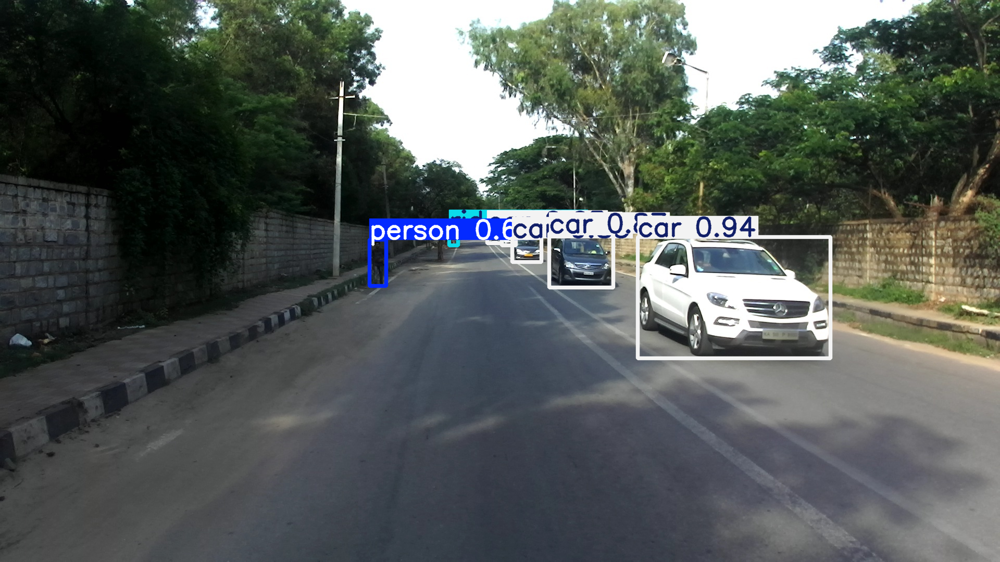

In [9]:
from ultralytics import YOLO

# Try loading and running inference with the trained model
model = YOLO("/workspace/yolo-distiller/runs/detect/v8neiouadamwfromv8leiouadamw_ciouadamw_kdidd/weights/best.pt")  # path to your trained model
results = model.predict("/workspace/0000240.jpg")  # use any sample image
results[0].show()


In [10]:
import numpy as np
import pandas as pd

# -----------------------------
# CLASSES
# -----------------------------
class_names = [
    "person", "rider", "car", "truck", "bus",
    "motorcycle", "bicycle", "autorickshaw",
    "animal", "traffic light", "traffic sign"
]

# -----------------------------
# CONFUSION MATRIX (RAW COUNTS)
# Rows = Predicted, Columns = Ground Truth
# -----------------------------
conf_matrix = np.array([
    [7146, 325, 101,   2,   0,  61,   5,   4,  29,  10, 2074],  # person
    [ 440,11087,128,   6,   1, 155,   3,  20,   1,   5, 2586],  # rider
    [  18,  65,14249,160, 116,  78,   0, 142,   1,   1, 3401],  # car
    [   1,   3, 103,3707, 265,   4,   0, 197,   0,   4, 1183],  # truck
    [   0,   0, 105, 176,2902,   0,   0,  11,   0,   2,  764],  # bus
    [ 138, 211, 161,   3,   3,14398, 75,  13,  12,   0, 3385],  # motorcycle
    [   0,   0,   0,   2,  21, 140,   0,   0,   0,   0,  107],  # bicycle
    [  12,  18, 138, 171,  16,   5,   0,4566,   2,   0, 1087],  # autorickshaw
    [   4,   0,   0,   0,   0,   1,   0,   0, 221,   0,  120],  # animal
    [   0,   0,   0,   0,   0,   0,   0,   0,   0, 107,   68],  # traffic light
    [   2,   2,   1,   1,   0,   0,   0,   0,   1,   3, 1021],  # traffic sign
])

# -----------------------------
# YOLO PER-CLASS METRICS
# -----------------------------
per_class_precision = [
    0.726, 0.768, 0.771, 0.688, 0.750,
    0.782, 0.597, 0.762, 0.592, 0.567, 0.560
]

per_class_recall = [
    0.396, 0.457, 0.571, 0.538, 0.609,
    0.570, 0.289, 0.593, 0.149, 0.111, 0.235
]

per_class_map50 = [
    0.463, 0.526, 0.637, 0.589, 0.664,
    0.627, 0.315, 0.655, 0.185, 0.145, 0.263
]

per_class_map5095 = [
    0.257, 0.305, 0.446, 0.421, 0.507,
    0.375, 0.189, 0.469, 0.0906, 0.0746, 0.137
]

# -----------------------------
# COMPUTE METRICS
# -----------------------------
metrics_data = []
total_samples = np.sum(conf_matrix)

for i, cname in enumerate(class_names):
    TP = conf_matrix[i, i]
    FP = np.sum(conf_matrix[i, :]) - TP
    FN = np.sum(conf_matrix[:, i]) - TP
    TN = total_samples - (TP + FP + FN)

    P = per_class_precision[i]
    R = per_class_recall[i]
    F1 = 2 * P * R / (P + R) if (P + R) > 0 else 0

    metrics_data.append({
        "Class": cname,
        "TP": int(TP),
        "FP": int(FP),
        "FN": int(FN),
        "TN": int(TN),
        "Precision": round(P, 4),
        "Recall": round(R, 4),
        "F1 Score": round(F1, 4),
        "Accuracy": round((TP + TN) / total_samples, 4),
        "FPR": round(FP / (FP + TN), 4) if (FP + TN) > 0 else 0,
        "FNR": round(FN / (FN + TP), 4) if (FN + TP) > 0 else 0,
        "mAP@0.5": per_class_map50[i],
        "mAP@0.5:0.95": per_class_map5095[i]
    })

# -----------------------------
# OVERALL ROW
# -----------------------------
overall = {
    "Class": "all",
    "TP": sum(r["TP"] for r in metrics_data),
    "FP": sum(r["FP"] for r in metrics_data),
    "FN": sum(r["FN"] for r in metrics_data),
    "TN": sum(r["TN"] for r in metrics_data),
    "Precision": 0.688,
    "Recall": 0.411,
    "F1 Score": round(2 * 0.688 * 0.411 / (0.688 + 0.411), 4),
    "Accuracy": round(np.mean([r["Accuracy"] for r in metrics_data]), 4),
    "FPR": round(np.mean([r["FPR"] for r in metrics_data]), 4),
    "FNR": round(np.mean([r["FNR"] for r in metrics_data]), 4),
    "mAP@0.5": 0.461,
    "mAP@0.5:0.95": 0.297
}

metrics_data.append(overall)

# -----------------------------
# SAVE CSV
# -----------------------------
df = pd.DataFrame(metrics_data)
df.to_csv("idd_metrics_v8neiouadamwfromv8leiouadamw_ciouadamw_kdidd.csv", index=False)
print(df)


            Class     TP     FP     FN      TN  Precision  Recall  F1 Score  \
0          person   7146   2611    615   67711      0.726   0.396    0.5125   
1           rider  11087   3345    624   63027      0.768   0.457    0.5730   
2             car  14249   3982    737   59115      0.771   0.571    0.6561   
3           truck   3707   1760    521   72095      0.688   0.538    0.6038   
4             bus   2902   1058    422   73701      0.750   0.609    0.6722   
5      motorcycle  14398   4001    444   59240      0.782   0.570    0.6594   
6         bicycle      0    270     83   77730      0.597   0.289    0.3895   
7    autorickshaw   4566   1449    387   71681      0.762   0.593    0.6670   
8          animal    221    125     46   77691      0.592   0.149    0.2381   
9   traffic light    107     68     25   77883      0.567   0.111    0.1857   
10   traffic sign   1021     10  14775   62277      0.560   0.235    0.3311   
11            all  59404  18679  18679  762151      

In [15]:
# ==============================================================
# YOLOv8 Speed Benchmark (H100 / MIG Safe)
# Resolution: 640 x 640
# Batch size: 1
# Metrics:
#   - Pure Inference Time (ms/frame)
#   - Inference FPS
#   - End-to-End Latency (ms/frame)
#   - Latency FPS
#   - Model Parameters (M)
#   - Model File Size (MB)
# ==============================================================

import torch
import cv2
import csv
import os
from pathlib import Path
from ultralytics import YOLO

# -----------------------------
# CONFIGURATION
# -----------------------------
weights = "/workspace/yolo-distiller/runs/detect/v8neiouadamwfromv8leiouadamw_ciouadamw_kdidd/weights/best.pt"          # Path to trained YOLOv8 model
img_path = "/workspace/0000240.jpg"      # Any validation image
img_size = 640
batch_size = 1
csv_file = "benchmark_results_v8neiouadamwfromv8leiouadamw_ciouadamw_kdidd.csv"

device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

# -----------------------------
# DEVICE INFO
# -----------------------------
print(f"\nUsing device: {device}")
print(f"GPU: {torch.cuda.get_device_name(0)}")
print(f"CUDA Version: {torch.version.cuda}")
print(f"cuDNN Version: {torch.backends.cudnn.version()}\n")

# -----------------------------
# LOAD MODEL
# -----------------------------
model = YOLO(weights).to(device)
model.model.eval()

model_name = Path(weights).stem
model_size_mb = Path(weights).stat().st_size / (1024 ** 2)

params = sum(p.numel() for p in model.model.parameters())
params_million = params / 1e6

print(f"Model: {model_name}")
print(f"Parameters: {params_million:.2f} M")
print(f"Model file size: {model_size_mb:.2f} MB\n")

# ==============================================================
# 1️ PURE INFERENCE SPEED (FORWARD PASS ONLY)
# ==============================================================

dummy_input = torch.randn(
    batch_size, 3, img_size, img_size, device=device
) / 255.0

# Warm-up
for _ in range(10):
    _ = model.model(dummy_input)

torch.cuda.synchronize()

starter = torch.cuda.Event(enable_timing=True)
ender = torch.cuda.Event(enable_timing=True)

n_runs = 100

starter.record()
with torch.inference_mode():
    for _ in range(n_runs):
        _ = model.model(dummy_input)
ender.record()

torch.cuda.synchronize()

inference_time_ms = starter.elapsed_time(ender) / n_runs
inference_fps = 1000 / inference_time_ms

print("=== Pure Inference (Forward Pass Only) ===")
print(f"Inference Time:  {inference_time_ms:.2f} ms/frame")
print(f"Inference Speed: {inference_fps:.2f} FPS @ {img_size}x{img_size}\n")

# ==============================================================
# 2️ END-TO-END LATENCY (PRE + INFER + POST)
# ==============================================================

img = cv2.imread(img_path)
assert img is not None, "Failed to load image."

# Warm-up
for _ in range(5):
    _ = model.predict(
        img, imgsz=img_size, device=device, verbose=False
    )

torch.cuda.synchronize()

starter.record()
for _ in range(30):
    _ = model.predict(
        img, imgsz=img_size, device=device, verbose=False
    )
ender.record()

torch.cuda.synchronize()

latency_ms = starter.elapsed_time(ender) / 30
latency_fps = 1000 / latency_ms

print("=== End-to-End Latency (Full Pipeline) ===")
print(f"Latency:     {latency_ms:.2f} ms/frame")
print(f"Latency FPS:{latency_fps:.2f}\n")

# ==============================================================
# 3️ SAVE RESULTS TO CSV
# ==============================================================

fieldnames = [
    "Model",
    "GPU",
    "Batch_Size",
    "Image_Size",
    "Params_(M)",
    "Model_Size_(MB)",
    "Inference_Time_(ms)",
    "Inference_FPS",
    "Latency_(ms)",
    "Latency_FPS",
]

file_exists = os.path.isfile(csv_file)

with open(csv_file, mode="a", newline="") as f:
    writer = csv.DictWriter(f, fieldnames=fieldnames)
    if not file_exists:
        writer.writeheader()

    writer.writerow({
        "Model": model_name,
        "GPU": torch.cuda.get_device_name(0),
        "Batch_Size": batch_size,
        "Image_Size": f"{img_size}x{img_size}",
        "Params_(M)": round(params_million, 2),
        "Model_Size_(MB)": round(model_size_mb, 2),
        "Inference_Time_(ms)": round(inference_time_ms, 2),
        "Inference_FPS": round(inference_fps, 2),
        "Latency_(ms)": round(latency_ms, 2),
        "Latency_FPS": round(latency_fps, 2),
    })

print(f"Benchmark results saved to: {csv_file}")

# ==============================================================
# SUMMARY
# ==============================================================
print("\n=== Benchmark Summary ===")
print(f"Model:            {model_name}")
print(f"GPU:              {torch.cuda.get_device_name(0)} (MIG Enabled)")
print(f"Input Resolution: {img_size}x{img_size}")
print(f"Batch Size:       {batch_size}")
print(f"Parameters:       {params_million:.2f} M")
print(f"Model Size:       {model_size_mb:.2f} MB")
print(f"Inference Time:   {inference_time_ms:.2f} ms ({inference_fps:.2f} FPS)")
print(f"Latency:          {latency_ms:.2f} ms ({latency_fps:.2f} FPS)")
print("=============================================================")



Using device: cuda:0
GPU: NVIDIA H100 80GB HBM3 MIG 3g.40gb
CUDA Version: 12.6
cuDNN Version: 90600

Model: best
Parameters: 3.01 M
Model file size: 5.97 MB

=== Pure Inference (Forward Pass Only) ===
Inference Time:  2.64 ms/frame
Inference Speed: 378.58 FPS @ 640x640

=== End-to-End Latency (Full Pipeline) ===
Latency:     4.12 ms/frame
Latency FPS:243.01

Benchmark results saved to: benchmark_results_v8neiouadamwfromv8leiouadamw_ciouadamw_kdidd.csv

=== Benchmark Summary ===
Model:            best
GPU:              NVIDIA H100 80GB HBM3 MIG 3g.40gb (MIG Enabled)
Input Resolution: 640x640
Batch Size:       1
Parameters:       3.01 M
Model Size:       5.97 MB
Inference Time:   2.64 ms (378.58 FPS)
Latency:          4.12 ms (243.01 FPS)
